In [1]:
# !pip uninstall gensim --yes
# !pip install gensim==3.8.1
# !pip install deeprobust==0.2.9
# !pip install torch_geometric
# !pip install pyg_lib torch_scatter torch_sparse torch_cluster torch_spline_conv -f https://data.pyg.org/whl/torch-2.2.0+cpu.html

In [2]:
from deeprobust.graph.data import Dpr2Pyg, Pyg2Dpr
from deeprobust.graph.data import Dataset as DRDataset
import torch
from torch_geometric.data import Data
import numpy as np
from deeprobust.graph.data import Dataset, PrePtbDataset, PtbDataset
from deeprobust.graph.defense import GCN, RGCN, ProGNN, SimPGCN, GCNSVD, GCNJaccard
from deeprobust.graph.global_attack import Metattack, DICE, Random, PGDAttack
from scipy.sparse import csr_matrix
import torch
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.transforms import Compose
from torch_geometric.datasets import Amazon
from torch_geometric.transforms.random_node_split import RandomNodeSplit
from torch_geometric.datasets import Planetoid
from torch_geometric.transforms import NormalizeFeatures
from torch_geometric.nn import GCNConv
from torch_geometric.nn import GATConv
from torch_geometric.loader import NeighborLoader
from torch_geometric.nn import SAGEConv
from sklearn.metrics import roc_auc_score

from torch_geometric.utils import negative_sampling
from torch_geometric.utils import train_test_split_edges

from copy import deepcopy
import torch.nn as nn
from IPython.display import Javascript  # Restrict height of output cell.
import matplotlib.pyplot as plt

from GSage import GSAGE
from GSaint import GSAINT
from GAT import GAT

In [3]:
seed = 15
ptb_rates = [0.05, 0.1, 0.15, 0.20, 0.25, 0.3]
# ptb_rates = [0.025, 0.05]
# ptb_rate = 0.25
# ptb_rate1 = 0.15
dataset = 'cora_ml'
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)

In [4]:
data = DRDataset(root='/tmp/', name=dataset, setting='prognn')
adj, features, labels = data.adj, data.features, data.labels
idx_train, idx_val, idx_test = data.idx_train, data.idx_val, data.idx_test
idx_unlabeled = np.union1d(idx_val, idx_test)
idx_unlabeled = np.union1d(idx_val, idx_test)


device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# budget = int(ptb_rate * (adj.todense().sum() // 2))
# print(budget)
# budget1 = int(ptb_rate1 * (adj.todense().sum() // 2))
# print(budget1)

Loading cora_ml dataset...
Done!
Selecting 1 largest connected components
Dowloading from https://raw.githubusercontent.com/ChandlerBang/Pro-GNN/master/splits/cora_ml_prognn_splits.json to /tmp/cora_ml_prognn_splits.json


In [5]:
np.save(f'/tmp/{dataset}_adj.npy',adj.todense())

In [6]:
np.save(f'/tmp/{dataset}_features.npy',features.todense())

In [7]:
np.save(f'/tmp/{dataset}_labels.npy',labels)

In [8]:
np.save(f'/tmp/{dataset}_idx_test',idx_test)

# Metattack

## GAT

In [9]:
surrogate5 = GAT(nfeat=features.shape[1],
      nhid=8, heads=8,
      nclass=labels.max().item() + 1,
      dropout=0.5, device=device)
surrogate5 = surrogate5.to(device)

pyg_data = Dpr2Pyg(data)
surrogate5.fit(pyg_data, verbose=True) # train with earlystopping
surrogate5.test()

Processing...
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/deeprobust/graph/data/pyg_dataset.py:48: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:245.)
  edge_index = torch.LongTensor(dpr_data.adj.nonzero())
Done!
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geometric/data/in_memory_dataset.py:157: UserWarning: It is not recommended to directly access the internal storage format `data` of an 'InMemoryDataset'. If you are absolutely certain what you are doing, access the internal storage via `InMemoryDataset._data` instead to suppress this warning. Alternatively, you can access stacked individual attributes of every graph via `dataset.{attr_name}`.
  warnings.warn(msg)


=== training GAT model ===
Epoch 0, training loss: 1.9399274587631226
Epoch 10, training loss: 1.0134764909744263
Epoch 20, training loss: 0.5818580389022827
Epoch 30, training loss: 0.4689496159553528
Epoch 40, training loss: 0.42920982837677
Epoch 50, training loss: 0.46331334114074707
Epoch 60, training loss: 0.43876269459724426
Epoch 70, training loss: 0.33697694540023804
Epoch 80, training loss: 0.36580222845077515
Epoch 90, training loss: 0.3372044861316681
Epoch 100, training loss: 0.341568261384964
Epoch 110, training loss: 0.32001668214797974
Epoch 120, training loss: 0.24539759755134583
Epoch 130, training loss: 0.35103216767311096
Epoch 140, training loss: 0.3358899652957916
Epoch 150, training loss: 0.3447478711605072
Epoch 160, training loss: 0.3596220314502716
Epoch 170, training loss: 0.3285638988018036
Epoch 180, training loss: 0.3852740228176117
Epoch 190, training loss: 0.28614532947540283
Epoch 200, training loss: 0.250931978225708
Epoch 210, training loss: 0.3292693

0.8505338078291814

In [10]:
surrogate5.eval()
preds=surrogate5.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8505338078291815


In [11]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
gat_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate5, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)

  data_copied = deepcopy(data)
  data_copied.adj = modified_adj

  atk_model = GAT(nfeat=features.shape[1],
        nhid=8, heads=8,
        nclass=labels.max().item() + 1,
        dropout=0.5, device=device)
  atk_model = surrogate5.to(device)
  atk_model.fit(Dpr2Pyg(data_copied), patience=100, verbose=True)

  atk_acc = atk_model.test()

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gat_results.append(atk_acc - benchmark_clean)

Perturbing graph:   0%|          | 0/399 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.5243231058120728
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.513676643371582


Perturbing graph:   0%|          | 1/399 [00:04<28:59,  4.37s/it]

GCN loss on unlabled data: 1.523925542831421
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5214112997055054


Perturbing graph:   1%|          | 2/399 [00:06<18:50,  2.85s/it]

GCN loss on unlabled data: 1.541480541229248
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.5364189147949219


Perturbing graph:   1%|          | 3/399 [00:08<17:17,  2.62s/it]

GCN loss on unlabled data: 1.5487802028656006
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.5464366674423218


Perturbing graph:   1%|          | 4/399 [00:10<15:47,  2.40s/it]

GCN loss on unlabled data: 1.551472544670105
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5461573600769043


Perturbing graph:   1%|▏         | 5/399 [00:11<12:28,  1.90s/it]

GCN loss on unlabled data: 1.5910977125167847
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.584403395652771


Perturbing graph:   2%|▏         | 6/399 [00:12<10:31,  1.61s/it]

GCN loss on unlabled data: 1.5561317205429077
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.5402408838272095


Perturbing graph:   2%|▏         | 7/399 [00:14<10:21,  1.59s/it]

GCN loss on unlabled data: 1.50818932056427
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.50127112865448


Perturbing graph:   2%|▏         | 8/399 [00:16<11:39,  1.79s/it]

GCN loss on unlabled data: 1.4940400123596191
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.490012288093567


Perturbing graph:   2%|▏         | 9/399 [00:18<11:22,  1.75s/it]

GCN loss on unlabled data: 1.6381621360778809
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6320134401321411


Perturbing graph:   3%|▎         | 10/399 [00:19<10:42,  1.65s/it]

GCN loss on unlabled data: 1.538759469985962
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.5297367572784424


Perturbing graph:   3%|▎         | 11/399 [00:20<10:08,  1.57s/it]

GCN loss on unlabled data: 1.6200529336929321
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.6155389547348022


Perturbing graph:   3%|▎         | 12/399 [00:21<08:48,  1.37s/it]

GCN loss on unlabled data: 1.5676065683364868
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.5566058158874512


Perturbing graph:   3%|▎         | 13/399 [00:23<08:36,  1.34s/it]

GCN loss on unlabled data: 1.5310869216918945
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.5163686275482178


Perturbing graph:   4%|▎         | 14/399 [00:24<08:12,  1.28s/it]

GCN loss on unlabled data: 1.5128798484802246
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.505282998085022


Perturbing graph:   4%|▍         | 15/399 [00:26<09:51,  1.54s/it]

GCN loss on unlabled data: 1.5442566871643066
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.5339651107788086


Perturbing graph:   4%|▍         | 16/399 [00:27<09:26,  1.48s/it]

GCN loss on unlabled data: 1.6655439138412476
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6618150472640991


Perturbing graph:   4%|▍         | 17/399 [00:29<09:22,  1.47s/it]

GCN loss on unlabled data: 1.5839569568634033
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.5844247341156006


Perturbing graph:   5%|▍         | 18/399 [00:30<08:56,  1.41s/it]

GCN loss on unlabled data: 1.5735394954681396
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.5618202686309814


Perturbing graph:   5%|▍         | 19/399 [00:32<09:31,  1.50s/it]

GCN loss on unlabled data: 1.6889171600341797
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.6774859428405762


Perturbing graph:   5%|▌         | 20/399 [00:33<09:44,  1.54s/it]

GCN loss on unlabled data: 1.5552048683166504
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.543642282485962


Perturbing graph:   5%|▌         | 21/399 [00:35<09:21,  1.48s/it]

GCN loss on unlabled data: 1.6310979127883911
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.6291897296905518


Perturbing graph:   6%|▌         | 22/399 [00:36<09:28,  1.51s/it]

GCN loss on unlabled data: 1.6270376443862915
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.6258097887039185


Perturbing graph:   6%|▌         | 23/399 [00:38<09:50,  1.57s/it]

GCN loss on unlabled data: 1.576897382736206
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.5709712505340576


Perturbing graph:   6%|▌         | 24/399 [00:39<09:56,  1.59s/it]

GCN loss on unlabled data: 1.6076936721801758
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6024000644683838


Perturbing graph:   6%|▋         | 25/399 [00:41<10:25,  1.67s/it]

GCN loss on unlabled data: 1.5887271165847778
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.5826771259307861


Perturbing graph:   7%|▋         | 26/399 [00:43<10:06,  1.63s/it]

GCN loss on unlabled data: 1.594472050666809
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.588819146156311


Perturbing graph:   7%|▋         | 27/399 [00:45<10:04,  1.63s/it]

GCN loss on unlabled data: 1.606440544128418
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.6021214723587036


Perturbing graph:   7%|▋         | 28/399 [00:46<10:04,  1.63s/it]

GCN loss on unlabled data: 1.5046793222427368
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.4992603063583374


Perturbing graph:   7%|▋         | 29/399 [00:48<09:54,  1.61s/it]

GCN loss on unlabled data: 1.6165127754211426
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.6107416152954102


Perturbing graph:   8%|▊         | 30/399 [00:49<09:58,  1.62s/it]

GCN loss on unlabled data: 1.5356749296188354
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.529474139213562


Perturbing graph:   8%|▊         | 31/399 [00:51<09:29,  1.55s/it]

GCN loss on unlabled data: 1.6371419429779053
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.6324433088302612


Perturbing graph:   8%|▊         | 32/399 [00:52<09:34,  1.57s/it]

GCN loss on unlabled data: 1.6499066352844238
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.6443654298782349


Perturbing graph:   8%|▊         | 33/399 [00:54<09:10,  1.50s/it]

GCN loss on unlabled data: 1.6062654256820679
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.5961508750915527


Perturbing graph:   9%|▊         | 34/399 [00:55<09:07,  1.50s/it]

GCN loss on unlabled data: 1.6224989891052246
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.6190165281295776


Perturbing graph:   9%|▉         | 35/399 [00:57<09:10,  1.51s/it]

GCN loss on unlabled data: 1.5076258182525635
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4993057250976562


Perturbing graph:   9%|▉         | 36/399 [00:58<09:27,  1.56s/it]

GCN loss on unlabled data: 1.6561847925186157
GCN acc on unlabled data: 0.3624505928853755
attack loss: 1.6516728401184082


Perturbing graph:   9%|▉         | 37/399 [01:00<09:09,  1.52s/it]

GCN loss on unlabled data: 1.5967377424240112
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.5906305313110352


Perturbing graph:  10%|▉         | 38/399 [01:01<09:13,  1.53s/it]

GCN loss on unlabled data: 1.672597050666809
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6713894605636597


Perturbing graph:  10%|▉         | 39/399 [01:03<08:55,  1.49s/it]

GCN loss on unlabled data: 1.60631263256073
GCN acc on unlabled data: 0.3758893280632411
attack loss: 1.6003845930099487


Perturbing graph:  10%|█         | 40/399 [01:05<09:21,  1.56s/it]

GCN loss on unlabled data: 1.5533684492111206
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.5436896085739136


Perturbing graph:  10%|█         | 41/399 [01:06<09:09,  1.53s/it]

GCN loss on unlabled data: 1.5876944065093994
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.5820335149765015


Perturbing graph:  11%|█         | 42/399 [01:08<09:09,  1.54s/it]

GCN loss on unlabled data: 1.5697896480560303
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.5645440816879272


Perturbing graph:  11%|█         | 43/399 [01:09<08:38,  1.46s/it]

GCN loss on unlabled data: 1.6146036386489868
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.6124051809310913


Perturbing graph:  11%|█         | 44/399 [01:10<08:50,  1.50s/it]

GCN loss on unlabled data: 1.6374702453613281
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.6318639516830444


Perturbing graph:  11%|█▏        | 45/399 [01:12<08:38,  1.47s/it]

GCN loss on unlabled data: 1.5072829723358154
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.4955300092697144


Perturbing graph:  12%|█▏        | 46/399 [01:13<08:54,  1.51s/it]

GCN loss on unlabled data: 1.6637033224105835
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.659780502319336


Perturbing graph:  12%|█▏        | 47/399 [01:15<08:29,  1.45s/it]

GCN loss on unlabled data: 1.6167452335357666
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6099040508270264


Perturbing graph:  12%|█▏        | 48/399 [01:16<08:21,  1.43s/it]

GCN loss on unlabled data: 1.5648702383041382
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.5630825757980347


Perturbing graph:  12%|█▏        | 49/399 [01:17<08:15,  1.42s/it]

GCN loss on unlabled data: 1.5471487045288086
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.5383360385894775


Perturbing graph:  13%|█▎        | 50/399 [01:19<08:16,  1.42s/it]

GCN loss on unlabled data: 1.6531230211257935
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.6444220542907715


Perturbing graph:  13%|█▎        | 51/399 [01:20<07:58,  1.37s/it]

GCN loss on unlabled data: 1.633750081062317
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.629906177520752


Perturbing graph:  13%|█▎        | 52/399 [01:22<08:22,  1.45s/it]

GCN loss on unlabled data: 1.7034274339675903
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.70364511013031


Perturbing graph:  13%|█▎        | 53/399 [01:23<08:37,  1.49s/it]

GCN loss on unlabled data: 1.738154649734497
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.7374210357666016


Perturbing graph:  14%|█▎        | 54/399 [01:25<08:27,  1.47s/it]

GCN loss on unlabled data: 1.5934711694717407
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.5832514762878418


Perturbing graph:  14%|█▍        | 55/399 [01:26<08:37,  1.50s/it]

GCN loss on unlabled data: 1.635216474533081
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6313698291778564


Perturbing graph:  14%|█▍        | 56/399 [01:28<08:30,  1.49s/it]

GCN loss on unlabled data: 1.5469306707382202
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.542749285697937


Perturbing graph:  14%|█▍        | 57/399 [01:29<08:37,  1.51s/it]

GCN loss on unlabled data: 1.603110671043396
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6000041961669922


Perturbing graph:  15%|█▍        | 58/399 [01:31<08:30,  1.50s/it]

GCN loss on unlabled data: 1.5847400426864624
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.5800681114196777


Perturbing graph:  15%|█▍        | 59/399 [01:33<09:02,  1.59s/it]

GCN loss on unlabled data: 1.6037644147872925
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.5995815992355347


Perturbing graph:  15%|█▌        | 60/399 [01:34<08:34,  1.52s/it]

GCN loss on unlabled data: 1.5700949430465698
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.5634119510650635


Perturbing graph:  15%|█▌        | 61/399 [01:36<08:37,  1.53s/it]

GCN loss on unlabled data: 1.677934169769287
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.6755421161651611


Perturbing graph:  16%|█▌        | 62/399 [01:37<08:36,  1.53s/it]

GCN loss on unlabled data: 1.6051266193389893
GCN acc on unlabled data: 0.3557312252964427
attack loss: 1.596989631652832


Perturbing graph:  16%|█▌        | 63/399 [01:39<08:33,  1.53s/it]

GCN loss on unlabled data: 1.6225755214691162
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.6176748275756836


Perturbing graph:  16%|█▌        | 64/399 [01:40<08:22,  1.50s/it]

GCN loss on unlabled data: 1.610127568244934
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.6057536602020264


Perturbing graph:  16%|█▋        | 65/399 [01:41<08:10,  1.47s/it]

GCN loss on unlabled data: 1.6952024698257446
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.6949853897094727


Perturbing graph:  17%|█▋        | 66/399 [01:43<08:30,  1.53s/it]

GCN loss on unlabled data: 1.6081844568252563
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.6019699573516846


Perturbing graph:  17%|█▋        | 67/399 [01:45<08:35,  1.55s/it]

GCN loss on unlabled data: 1.6199169158935547
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.6121965646743774


Perturbing graph:  17%|█▋        | 68/399 [01:46<08:35,  1.56s/it]

GCN loss on unlabled data: 1.5916613340377808
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.5794153213500977


Perturbing graph:  17%|█▋        | 69/399 [01:48<08:28,  1.54s/it]

GCN loss on unlabled data: 1.6558533906936646
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.6505087614059448


Perturbing graph:  18%|█▊        | 70/399 [01:49<08:32,  1.56s/it]

GCN loss on unlabled data: 1.6384446620941162
GCN acc on unlabled data: 0.3826086956521739
attack loss: 1.6334291696548462


Perturbing graph:  18%|█▊        | 71/399 [01:51<08:32,  1.56s/it]

GCN loss on unlabled data: 1.5932320356369019
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.5834795236587524


Perturbing graph:  18%|█▊        | 72/399 [01:53<08:31,  1.56s/it]

GCN loss on unlabled data: 1.5879091024398804
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.5780421495437622


Perturbing graph:  18%|█▊        | 73/399 [01:54<08:25,  1.55s/it]

GCN loss on unlabled data: 1.606488585472107
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.5981990098953247


Perturbing graph:  19%|█▊        | 74/399 [01:56<08:11,  1.51s/it]

GCN loss on unlabled data: 1.6805387735366821
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.6765246391296387


Perturbing graph:  19%|█▉        | 75/399 [01:57<08:16,  1.53s/it]

GCN loss on unlabled data: 1.570380687713623
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.5646992921829224


Perturbing graph:  19%|█▉        | 76/399 [01:58<07:37,  1.42s/it]

GCN loss on unlabled data: 1.595509648323059
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.5911248922348022


Perturbing graph:  19%|█▉        | 77/399 [02:00<07:53,  1.47s/it]

GCN loss on unlabled data: 1.6391913890838623
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.632358193397522


Perturbing graph:  20%|█▉        | 78/399 [02:01<08:01,  1.50s/it]

GCN loss on unlabled data: 1.5394973754882812
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.533332347869873


Perturbing graph:  20%|█▉        | 79/399 [02:03<08:07,  1.52s/it]

GCN loss on unlabled data: 1.564060926437378
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.556210994720459


Perturbing graph:  20%|██        | 80/399 [02:05<08:12,  1.54s/it]

GCN loss on unlabled data: 1.597506046295166
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.5863347053527832


Perturbing graph:  20%|██        | 81/399 [02:06<07:56,  1.50s/it]

GCN loss on unlabled data: 1.585011601448059
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.5828020572662354


Perturbing graph:  21%|██        | 82/399 [02:07<07:56,  1.50s/it]

GCN loss on unlabled data: 1.5716919898986816
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.5694935321807861


Perturbing graph:  21%|██        | 83/399 [02:09<07:36,  1.45s/it]

GCN loss on unlabled data: 1.649583101272583
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.6474387645721436


Perturbing graph:  21%|██        | 84/399 [02:10<07:28,  1.42s/it]

GCN loss on unlabled data: 1.6345018148422241
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.6248687505722046


Perturbing graph:  21%|██▏       | 85/399 [02:12<08:07,  1.55s/it]

GCN loss on unlabled data: 1.6582114696502686
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.6560972929000854


Perturbing graph:  22%|██▏       | 86/399 [02:14<08:24,  1.61s/it]

GCN loss on unlabled data: 1.6181367635726929
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.613858699798584


Perturbing graph:  22%|██▏       | 87/399 [02:15<08:06,  1.56s/it]

GCN loss on unlabled data: 1.7337485551834106
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.7238339185714722


Perturbing graph:  22%|██▏       | 88/399 [02:17<08:07,  1.57s/it]

GCN loss on unlabled data: 1.6340562105178833
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6296839714050293


Perturbing graph:  22%|██▏       | 89/399 [02:18<08:17,  1.61s/it]

GCN loss on unlabled data: 1.6858489513397217
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6835473775863647


Perturbing graph:  23%|██▎       | 90/399 [02:20<08:19,  1.62s/it]

GCN loss on unlabled data: 1.6800423860549927
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.6826808452606201


Perturbing graph:  23%|██▎       | 91/399 [02:22<08:13,  1.60s/it]

GCN loss on unlabled data: 1.6229727268218994
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.6223951578140259


Perturbing graph:  23%|██▎       | 92/399 [02:23<07:41,  1.50s/it]

GCN loss on unlabled data: 1.6499621868133545
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.6442440748214722


Perturbing graph:  23%|██▎       | 93/399 [02:25<07:44,  1.52s/it]

GCN loss on unlabled data: 1.6527293920516968
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.651788353919983


Perturbing graph:  24%|██▎       | 94/399 [02:26<07:37,  1.50s/it]

GCN loss on unlabled data: 1.6414525508880615
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.6389325857162476


Perturbing graph:  24%|██▍       | 95/399 [02:27<07:35,  1.50s/it]

GCN loss on unlabled data: 1.5872228145599365
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.586391568183899


Perturbing graph:  24%|██▍       | 96/399 [02:29<07:41,  1.52s/it]

GCN loss on unlabled data: 1.6454929113388062
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.6389683485031128


Perturbing graph:  24%|██▍       | 97/399 [02:31<07:57,  1.58s/it]

GCN loss on unlabled data: 1.659562587738037
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6543349027633667


Perturbing graph:  25%|██▍       | 98/399 [02:32<07:49,  1.56s/it]

GCN loss on unlabled data: 1.6431986093521118
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.6340419054031372


Perturbing graph:  25%|██▍       | 99/399 [02:34<07:38,  1.53s/it]

GCN loss on unlabled data: 1.696090817451477
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.6918299198150635


Perturbing graph:  25%|██▌       | 100/399 [02:35<07:19,  1.47s/it]

GCN loss on unlabled data: 1.6806530952453613
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6763330698013306


Perturbing graph:  25%|██▌       | 101/399 [02:37<07:33,  1.52s/it]

GCN loss on unlabled data: 1.580668568611145
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.576681137084961


Perturbing graph:  26%|██▌       | 102/399 [02:38<07:47,  1.57s/it]

GCN loss on unlabled data: 1.6791702508926392
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.6775765419006348


Perturbing graph:  26%|██▌       | 103/399 [02:40<07:41,  1.56s/it]

GCN loss on unlabled data: 1.6497031450271606
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.6503032445907593


Perturbing graph:  26%|██▌       | 104/399 [02:42<07:46,  1.58s/it]

GCN loss on unlabled data: 1.6628100872039795
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.6583880186080933


Perturbing graph:  26%|██▋       | 105/399 [02:43<07:35,  1.55s/it]

GCN loss on unlabled data: 1.6467119455337524
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6404304504394531


Perturbing graph:  27%|██▋       | 106/399 [02:45<07:29,  1.53s/it]

GCN loss on unlabled data: 1.6038823127746582
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.601400375366211


Perturbing graph:  27%|██▋       | 107/399 [02:46<07:35,  1.56s/it]

GCN loss on unlabled data: 1.7189021110534668
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7143856287002563


Perturbing graph:  27%|██▋       | 108/399 [02:48<07:20,  1.51s/it]

GCN loss on unlabled data: 1.643173098564148
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.6390260457992554


Perturbing graph:  27%|██▋       | 109/399 [02:49<07:34,  1.57s/it]

GCN loss on unlabled data: 1.6397671699523926
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.6379077434539795


Perturbing graph:  28%|██▊       | 110/399 [02:51<07:35,  1.58s/it]

GCN loss on unlabled data: 1.628147006034851
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.6240191459655762


Perturbing graph:  28%|██▊       | 111/399 [02:52<07:31,  1.57s/it]

GCN loss on unlabled data: 1.6274869441986084
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.6237088441848755


Perturbing graph:  28%|██▊       | 112/399 [02:54<07:26,  1.56s/it]

GCN loss on unlabled data: 1.659021019935608
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.6554780006408691


Perturbing graph:  28%|██▊       | 113/399 [02:55<07:20,  1.54s/it]

GCN loss on unlabled data: 1.6982340812683105
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6918823719024658


Perturbing graph:  29%|██▊       | 114/399 [02:57<07:32,  1.59s/it]

GCN loss on unlabled data: 1.6129825115203857
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.6123046875


Perturbing graph:  29%|██▉       | 115/399 [02:59<07:26,  1.57s/it]

GCN loss on unlabled data: 1.6664191484451294
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6608060598373413


Perturbing graph:  29%|██▉       | 116/399 [03:00<07:05,  1.50s/it]

GCN loss on unlabled data: 1.6845581531524658
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.6851446628570557


Perturbing graph:  29%|██▉       | 117/399 [03:01<06:48,  1.45s/it]

GCN loss on unlabled data: 1.722566843032837
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7186853885650635


Perturbing graph:  30%|██▉       | 118/399 [03:03<07:00,  1.50s/it]

GCN loss on unlabled data: 1.6549915075302124
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6514956951141357


Perturbing graph:  30%|██▉       | 119/399 [03:05<07:11,  1.54s/it]

GCN loss on unlabled data: 1.687975525856018
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.6838401556015015


Perturbing graph:  30%|███       | 120/399 [03:06<06:50,  1.47s/it]

GCN loss on unlabled data: 1.6476161479949951
GCN acc on unlabled data: 0.35889328063241105
attack loss: 1.6450940370559692


Perturbing graph:  30%|███       | 121/399 [03:07<06:40,  1.44s/it]

GCN loss on unlabled data: 1.679473876953125
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.6801156997680664


Perturbing graph:  31%|███       | 122/399 [03:09<06:54,  1.50s/it]

GCN loss on unlabled data: 1.7262911796569824
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7269678115844727


Perturbing graph:  31%|███       | 123/399 [03:10<06:41,  1.45s/it]

GCN loss on unlabled data: 1.6870356798171997
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.6915756464004517


Perturbing graph:  31%|███       | 124/399 [03:12<06:28,  1.41s/it]

GCN loss on unlabled data: 1.6858813762664795
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.6824091672897339


Perturbing graph:  31%|███▏      | 125/399 [03:13<06:23,  1.40s/it]

GCN loss on unlabled data: 1.641074299812317
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.6335103511810303


Perturbing graph:  32%|███▏      | 126/399 [03:14<06:15,  1.37s/it]

GCN loss on unlabled data: 1.6253182888031006
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.6222935914993286


Perturbing graph:  32%|███▏      | 127/399 [03:16<06:08,  1.35s/it]

GCN loss on unlabled data: 1.6335841417312622
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.6227840185165405


Perturbing graph:  32%|███▏      | 128/399 [03:17<06:30,  1.44s/it]

GCN loss on unlabled data: 1.654801607131958
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.646773338317871


Perturbing graph:  32%|███▏      | 129/399 [03:19<06:38,  1.48s/it]

GCN loss on unlabled data: 1.6089295148849487
GCN acc on unlabled data: 0.366798418972332
attack loss: 1.6043391227722168


Perturbing graph:  33%|███▎      | 130/399 [03:20<06:33,  1.46s/it]

GCN loss on unlabled data: 1.663155436515808
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6599255800247192


Perturbing graph:  33%|███▎      | 131/399 [03:22<06:48,  1.53s/it]

GCN loss on unlabled data: 1.6480501890182495
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.6440207958221436


Perturbing graph:  33%|███▎      | 132/399 [03:23<06:22,  1.43s/it]

GCN loss on unlabled data: 1.6600314378738403
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.656226634979248


Perturbing graph:  33%|███▎      | 133/399 [03:25<06:22,  1.44s/it]

GCN loss on unlabled data: 1.6106466054916382
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6085326671600342


Perturbing graph:  34%|███▎      | 134/399 [03:26<06:15,  1.42s/it]

GCN loss on unlabled data: 1.5728166103363037
GCN acc on unlabled data: 0.4
attack loss: 1.5673197507858276


Perturbing graph:  34%|███▍      | 135/399 [03:28<06:39,  1.51s/it]

GCN loss on unlabled data: 1.6668057441711426
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.6614881753921509


Perturbing graph:  34%|███▍      | 136/399 [03:29<06:23,  1.46s/it]

GCN loss on unlabled data: 1.628507137298584
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.6209179162979126


Perturbing graph:  34%|███▍      | 137/399 [03:30<06:11,  1.42s/it]

GCN loss on unlabled data: 1.6511863470077515
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6448811292648315


Perturbing graph:  35%|███▍      | 138/399 [03:32<06:25,  1.48s/it]

GCN loss on unlabled data: 1.6829898357391357
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.67795729637146


Perturbing graph:  35%|███▍      | 139/399 [03:34<06:37,  1.53s/it]

GCN loss on unlabled data: 1.6777580976486206
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.6751155853271484


Perturbing graph:  35%|███▌      | 140/399 [03:35<06:46,  1.57s/it]

GCN loss on unlabled data: 1.6928236484527588
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6914691925048828


Perturbing graph:  35%|███▌      | 141/399 [03:37<06:30,  1.51s/it]

GCN loss on unlabled data: 1.6545883417129517
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.647382378578186


Perturbing graph:  36%|███▌      | 142/399 [03:38<06:23,  1.49s/it]

GCN loss on unlabled data: 1.6940661668777466
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.6908270120620728


Perturbing graph:  36%|███▌      | 143/399 [03:40<06:36,  1.55s/it]

GCN loss on unlabled data: 1.7379298210144043
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7362053394317627


Perturbing graph:  36%|███▌      | 144/399 [03:41<06:15,  1.47s/it]

GCN loss on unlabled data: 1.6559691429138184
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.6527011394500732


Perturbing graph:  36%|███▋      | 145/399 [03:42<06:00,  1.42s/it]

GCN loss on unlabled data: 1.656542420387268
GCN acc on unlabled data: 0.37114624505928856
attack loss: 1.652026653289795


Perturbing graph:  37%|███▋      | 146/399 [03:44<06:11,  1.47s/it]

GCN loss on unlabled data: 1.6669235229492188
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.6673266887664795


Perturbing graph:  37%|███▋      | 147/399 [03:45<06:20,  1.51s/it]

GCN loss on unlabled data: 1.6506999731063843
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.6479841470718384


Perturbing graph:  37%|███▋      | 148/399 [03:47<06:33,  1.57s/it]

GCN loss on unlabled data: 1.716593861579895
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7114547491073608


Perturbing graph:  37%|███▋      | 149/399 [03:49<06:33,  1.58s/it]

GCN loss on unlabled data: 1.7439491748809814
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7410258054733276


Perturbing graph:  38%|███▊      | 150/399 [03:50<06:29,  1.56s/it]

GCN loss on unlabled data: 1.6709117889404297
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.6684932708740234


Perturbing graph:  38%|███▊      | 151/399 [03:52<06:32,  1.58s/it]

GCN loss on unlabled data: 1.6950361728668213
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.6918748617172241


Perturbing graph:  38%|███▊      | 152/399 [03:54<06:38,  1.61s/it]

GCN loss on unlabled data: 1.6235380172729492
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.6203715801239014


Perturbing graph:  38%|███▊      | 153/399 [03:55<06:13,  1.52s/it]

GCN loss on unlabled data: 1.67578125
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.672584056854248


Perturbing graph:  39%|███▊      | 154/399 [03:57<06:20,  1.55s/it]

GCN loss on unlabled data: 1.6538379192352295
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.652498483657837


Perturbing graph:  39%|███▉      | 155/399 [03:58<06:20,  1.56s/it]

GCN loss on unlabled data: 1.6874687671661377
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.6816805601119995


Perturbing graph:  39%|███▉      | 156/399 [04:00<06:25,  1.59s/it]

GCN loss on unlabled data: 1.6880463361740112
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6820403337478638


Perturbing graph:  39%|███▉      | 157/399 [04:01<06:20,  1.57s/it]

GCN loss on unlabled data: 1.6875832080841064
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6847443580627441


Perturbing graph:  40%|███▉      | 158/399 [04:03<06:35,  1.64s/it]

GCN loss on unlabled data: 1.7153862714767456
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.718662142753601


Perturbing graph:  40%|███▉      | 159/399 [04:05<06:22,  1.59s/it]

GCN loss on unlabled data: 1.6830954551696777
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.6800482273101807


Perturbing graph:  40%|████      | 160/399 [04:06<06:28,  1.62s/it]

GCN loss on unlabled data: 1.630399227142334
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.625742793083191


Perturbing graph:  40%|████      | 161/399 [04:08<06:05,  1.54s/it]

GCN loss on unlabled data: 1.6623082160949707
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.6617809534072876


Perturbing graph:  41%|████      | 162/399 [04:09<06:08,  1.55s/it]

GCN loss on unlabled data: 1.6583350896835327
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.6537302732467651


Perturbing graph:  41%|████      | 163/399 [04:11<06:14,  1.59s/it]

GCN loss on unlabled data: 1.762162685394287
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7599356174468994


Perturbing graph:  41%|████      | 164/399 [04:12<06:13,  1.59s/it]

GCN loss on unlabled data: 1.6756346225738525
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.6746259927749634


Perturbing graph:  41%|████▏     | 165/399 [04:14<05:48,  1.49s/it]

GCN loss on unlabled data: 1.6461435556411743
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.641218662261963


Perturbing graph:  42%|████▏     | 166/399 [04:15<05:49,  1.50s/it]

GCN loss on unlabled data: 1.6753406524658203
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.6762514114379883


Perturbing graph:  42%|████▏     | 167/399 [04:17<06:01,  1.56s/it]

GCN loss on unlabled data: 1.6699994802474976
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.6645370721817017


Perturbing graph:  42%|████▏     | 168/399 [04:18<05:52,  1.53s/it]

GCN loss on unlabled data: 1.6927483081817627
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.6904983520507812


Perturbing graph:  42%|████▏     | 169/399 [04:20<06:02,  1.57s/it]

GCN loss on unlabled data: 1.6397382020950317
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.6373162269592285


Perturbing graph:  43%|████▎     | 170/399 [04:22<06:02,  1.58s/it]

GCN loss on unlabled data: 1.7731831073760986
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7679688930511475


Perturbing graph:  43%|████▎     | 171/399 [04:23<05:40,  1.50s/it]

GCN loss on unlabled data: 1.7139793634414673
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7067019939422607


Perturbing graph:  43%|████▎     | 172/399 [04:25<05:45,  1.52s/it]

GCN loss on unlabled data: 1.6637097597122192
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6641950607299805


Perturbing graph:  43%|████▎     | 173/399 [04:26<05:48,  1.54s/it]

GCN loss on unlabled data: 1.6873589754104614
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.6881986856460571


Perturbing graph:  44%|████▎     | 174/399 [04:28<05:35,  1.49s/it]

GCN loss on unlabled data: 1.70481276512146
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7038936614990234


Perturbing graph:  44%|████▍     | 175/399 [04:29<05:21,  1.44s/it]

GCN loss on unlabled data: 1.7368459701538086
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7354713678359985


Perturbing graph:  44%|████▍     | 176/399 [04:30<05:24,  1.45s/it]

GCN loss on unlabled data: 1.7027702331542969
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.6995723247528076


Perturbing graph:  44%|████▍     | 177/399 [04:32<05:29,  1.48s/it]

GCN loss on unlabled data: 1.6475154161453247
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6400247812271118


Perturbing graph:  45%|████▍     | 178/399 [04:33<05:18,  1.44s/it]

GCN loss on unlabled data: 1.7367113828659058
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7283082008361816


Perturbing graph:  45%|████▍     | 179/399 [04:35<05:28,  1.49s/it]

GCN loss on unlabled data: 1.6515320539474487
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6460044384002686


Perturbing graph:  45%|████▌     | 180/399 [04:36<05:09,  1.41s/it]

GCN loss on unlabled data: 1.658200979232788
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6531285047531128


Perturbing graph:  45%|████▌     | 181/399 [04:38<05:17,  1.46s/it]

GCN loss on unlabled data: 1.6635425090789795
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6593537330627441


Perturbing graph:  46%|████▌     | 182/399 [04:39<05:11,  1.44s/it]

GCN loss on unlabled data: 1.7156020402908325
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7164299488067627


Perturbing graph:  46%|████▌     | 183/399 [04:41<05:13,  1.45s/it]

GCN loss on unlabled data: 1.7071900367736816
GCN acc on unlabled data: 0.3885375494071146
attack loss: 1.7029852867126465


Perturbing graph:  46%|████▌     | 184/399 [04:42<05:21,  1.50s/it]

GCN loss on unlabled data: 1.6719825267791748
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.6636778116226196


Perturbing graph:  46%|████▋     | 185/399 [04:44<05:27,  1.53s/it]

GCN loss on unlabled data: 1.6609351634979248
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.656786322593689


Perturbing graph:  47%|████▋     | 186/399 [04:45<05:33,  1.57s/it]

GCN loss on unlabled data: 1.7473177909851074
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.7454460859298706


Perturbing graph:  47%|████▋     | 187/399 [04:47<05:31,  1.56s/it]

GCN loss on unlabled data: 1.7065404653549194
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.709111213684082


Perturbing graph:  47%|████▋     | 188/399 [04:48<05:09,  1.47s/it]

GCN loss on unlabled data: 1.6546745300292969
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.6521849632263184


Perturbing graph:  47%|████▋     | 189/399 [04:50<05:21,  1.53s/it]

GCN loss on unlabled data: 1.7040255069732666
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7034767866134644


Perturbing graph:  48%|████▊     | 190/399 [04:51<05:06,  1.47s/it]

GCN loss on unlabled data: 1.7257777452468872
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7252463102340698


Perturbing graph:  48%|████▊     | 191/399 [04:53<05:19,  1.54s/it]

GCN loss on unlabled data: 1.6893069744110107
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.6846257448196411


Perturbing graph:  48%|████▊     | 192/399 [04:54<05:11,  1.50s/it]

GCN loss on unlabled data: 1.7121407985687256
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7155643701553345


Perturbing graph:  48%|████▊     | 193/399 [04:56<05:14,  1.53s/it]

GCN loss on unlabled data: 1.7050291299819946
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.702590823173523


Perturbing graph:  49%|████▊     | 194/399 [04:58<05:21,  1.57s/it]

GCN loss on unlabled data: 1.663330316543579
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.6606508493423462


Perturbing graph:  49%|████▉     | 195/399 [04:59<05:24,  1.59s/it]

GCN loss on unlabled data: 1.7387171983718872
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.737242579460144


Perturbing graph:  49%|████▉     | 196/399 [05:01<05:17,  1.57s/it]

GCN loss on unlabled data: 1.6691750288009644
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.665249228477478


Perturbing graph:  49%|████▉     | 197/399 [05:02<05:21,  1.59s/it]

GCN loss on unlabled data: 1.6858199834823608
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.6794476509094238


Perturbing graph:  50%|████▉     | 198/399 [05:04<05:18,  1.59s/it]

GCN loss on unlabled data: 1.746238112449646
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7466036081314087


Perturbing graph:  50%|████▉     | 199/399 [05:06<05:17,  1.59s/it]

GCN loss on unlabled data: 1.6672083139419556
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.6604564189910889


Perturbing graph:  50%|█████     | 200/399 [05:07<05:16,  1.59s/it]

GCN loss on unlabled data: 1.6932576894760132
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.6925147771835327


Perturbing graph:  50%|█████     | 201/399 [05:09<05:09,  1.56s/it]

GCN loss on unlabled data: 1.6991326808929443
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.6983989477157593


Perturbing graph:  51%|█████     | 202/399 [05:10<05:12,  1.58s/it]

GCN loss on unlabled data: 1.6813881397247314
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6766188144683838


Perturbing graph:  51%|█████     | 203/399 [05:12<05:14,  1.60s/it]

GCN loss on unlabled data: 1.683982014656067
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.6814754009246826


Perturbing graph:  51%|█████     | 204/399 [05:14<05:17,  1.63s/it]

GCN loss on unlabled data: 1.6798187494277954
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.6801526546478271


Perturbing graph:  51%|█████▏    | 205/399 [05:15<04:48,  1.49s/it]

GCN loss on unlabled data: 1.6990587711334229
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.6952773332595825


Perturbing graph:  52%|█████▏    | 206/399 [05:16<04:45,  1.48s/it]

GCN loss on unlabled data: 1.715627908706665
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7129099369049072


Perturbing graph:  52%|█████▏    | 207/399 [05:18<04:41,  1.46s/it]

GCN loss on unlabled data: 1.6972304582595825
GCN acc on unlabled data: 0.3778656126482213
attack loss: 1.6939665079116821


Perturbing graph:  52%|█████▏    | 208/399 [05:19<04:37,  1.45s/it]

GCN loss on unlabled data: 1.7139298915863037
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7104885578155518


Perturbing graph:  52%|█████▏    | 209/399 [05:20<04:22,  1.38s/it]

GCN loss on unlabled data: 1.6832444667816162
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.6794742345809937


Perturbing graph:  53%|█████▎    | 210/399 [05:21<04:04,  1.30s/it]

GCN loss on unlabled data: 1.7300883531570435
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7319597005844116


Perturbing graph:  53%|█████▎    | 211/399 [05:23<04:11,  1.34s/it]

GCN loss on unlabled data: 1.6978758573532104
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.6915571689605713


Perturbing graph:  53%|█████▎    | 212/399 [05:24<04:25,  1.42s/it]

GCN loss on unlabled data: 1.773113489151001
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.772577166557312


Perturbing graph:  53%|█████▎    | 213/399 [05:26<04:40,  1.51s/it]

GCN loss on unlabled data: 1.6396673917770386
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.6381137371063232


Perturbing graph:  54%|█████▎    | 214/399 [05:28<04:46,  1.55s/it]

GCN loss on unlabled data: 1.6863105297088623
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.683222770690918


Perturbing graph:  54%|█████▍    | 215/399 [05:30<04:56,  1.61s/it]

GCN loss on unlabled data: 1.6657037734985352
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.6620196104049683


Perturbing graph:  54%|█████▍    | 216/399 [05:31<05:03,  1.66s/it]

GCN loss on unlabled data: 1.6487836837768555
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.6472828388214111


Perturbing graph:  54%|█████▍    | 217/399 [05:33<05:02,  1.66s/it]

GCN loss on unlabled data: 1.6839869022369385
GCN acc on unlabled data: 0.3430830039525692
attack loss: 1.6836988925933838


Perturbing graph:  55%|█████▍    | 218/399 [05:35<04:59,  1.66s/it]

GCN loss on unlabled data: 1.6895800828933716
GCN acc on unlabled data: 0.35296442687747037
attack loss: 1.690271258354187


Perturbing graph:  55%|█████▍    | 219/399 [05:36<05:01,  1.68s/it]

GCN loss on unlabled data: 1.701467514038086
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6998308897018433


Perturbing graph:  55%|█████▌    | 220/399 [05:38<05:04,  1.70s/it]

GCN loss on unlabled data: 1.7276653051376343
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7274527549743652


Perturbing graph:  55%|█████▌    | 221/399 [05:40<04:55,  1.66s/it]

GCN loss on unlabled data: 1.7252473831176758
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.724368929862976


Perturbing graph:  56%|█████▌    | 222/399 [05:41<04:44,  1.61s/it]

GCN loss on unlabled data: 1.7187436819076538
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7176300287246704


Perturbing graph:  56%|█████▌    | 223/399 [05:42<04:29,  1.53s/it]

GCN loss on unlabled data: 1.6801564693450928
GCN acc on unlabled data: 0.3822134387351779
attack loss: 1.6728568077087402


Perturbing graph:  56%|█████▌    | 224/399 [05:44<04:18,  1.48s/it]

GCN loss on unlabled data: 1.7680461406707764
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.768531084060669


Perturbing graph:  56%|█████▋    | 225/399 [05:45<04:21,  1.51s/it]

GCN loss on unlabled data: 1.7500853538513184
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7466005086898804


Perturbing graph:  57%|█████▋    | 226/399 [05:47<04:24,  1.53s/it]

GCN loss on unlabled data: 1.7012749910354614
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7040311098098755


Perturbing graph:  57%|█████▋    | 227/399 [05:49<04:22,  1.53s/it]

GCN loss on unlabled data: 1.711346983909607
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.709615707397461


Perturbing graph:  57%|█████▋    | 228/399 [05:50<04:26,  1.56s/it]

GCN loss on unlabled data: 1.7007256746292114
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.6987316608428955


Perturbing graph:  57%|█████▋    | 229/399 [05:52<04:24,  1.56s/it]

GCN loss on unlabled data: 1.7662136554718018
GCN acc on unlabled data: 0.3
attack loss: 1.7667397260665894


Perturbing graph:  58%|█████▊    | 230/399 [05:53<04:27,  1.58s/it]

GCN loss on unlabled data: 1.7235829830169678
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7208129167556763


Perturbing graph:  58%|█████▊    | 231/399 [05:55<04:22,  1.56s/it]

GCN loss on unlabled data: 1.7084521055221558
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.7107183933258057


Perturbing graph:  58%|█████▊    | 232/399 [05:56<04:21,  1.56s/it]

GCN loss on unlabled data: 1.674655556678772
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.6710814237594604


Perturbing graph:  58%|█████▊    | 233/399 [05:58<04:14,  1.53s/it]

GCN loss on unlabled data: 1.7044011354446411
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7036933898925781


Perturbing graph:  59%|█████▊    | 234/399 [05:59<04:12,  1.53s/it]

GCN loss on unlabled data: 1.6613885164260864
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.6555730104446411


Perturbing graph:  59%|█████▉    | 235/399 [06:01<04:09,  1.52s/it]

GCN loss on unlabled data: 1.6391963958740234
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.632890224456787


Perturbing graph:  59%|█████▉    | 236/399 [06:02<04:02,  1.49s/it]

GCN loss on unlabled data: 1.6820987462997437
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6825859546661377


Perturbing graph:  59%|█████▉    | 237/399 [06:04<03:52,  1.44s/it]

GCN loss on unlabled data: 1.6704494953155518
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6644612550735474


Perturbing graph:  60%|█████▉    | 238/399 [06:05<03:54,  1.45s/it]

GCN loss on unlabled data: 1.7012841701507568
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6942757368087769


Perturbing graph:  60%|█████▉    | 239/399 [06:07<03:49,  1.44s/it]

GCN loss on unlabled data: 1.7169815301895142
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7169297933578491


Perturbing graph:  60%|██████    | 240/399 [06:08<03:40,  1.39s/it]

GCN loss on unlabled data: 1.6953555345535278
GCN acc on unlabled data: 0.3
attack loss: 1.6960654258728027


Perturbing graph:  60%|██████    | 241/399 [06:09<03:48,  1.45s/it]

GCN loss on unlabled data: 1.6945183277130127
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.6956921815872192


Perturbing graph:  61%|██████    | 242/399 [06:11<03:43,  1.42s/it]

GCN loss on unlabled data: 1.6658332347869873
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.6633572578430176


Perturbing graph:  61%|██████    | 243/399 [06:12<03:36,  1.39s/it]

GCN loss on unlabled data: 1.7053958177566528
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7038977146148682


Perturbing graph:  61%|██████    | 244/399 [06:13<03:33,  1.37s/it]

GCN loss on unlabled data: 1.7317792177200317
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7299468517303467


Perturbing graph:  61%|██████▏   | 245/399 [06:15<03:40,  1.43s/it]

GCN loss on unlabled data: 1.7278951406478882
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7288151979446411


Perturbing graph:  62%|██████▏   | 246/399 [06:17<03:48,  1.49s/it]

GCN loss on unlabled data: 1.7401357889175415
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7388468980789185


Perturbing graph:  62%|██████▏   | 247/399 [06:18<03:50,  1.52s/it]

GCN loss on unlabled data: 1.754825472831726
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7541073560714722


Perturbing graph:  62%|██████▏   | 248/399 [06:19<03:38,  1.45s/it]

GCN loss on unlabled data: 1.755523920059204
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.751726508140564


Perturbing graph:  62%|██████▏   | 249/399 [06:21<03:39,  1.46s/it]

GCN loss on unlabled data: 1.701815128326416
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6970242261886597


Perturbing graph:  63%|██████▎   | 250/399 [06:22<03:34,  1.44s/it]

GCN loss on unlabled data: 1.7416234016418457
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7353363037109375


Perturbing graph:  63%|██████▎   | 251/399 [06:24<03:39,  1.48s/it]

GCN loss on unlabled data: 1.7066411972045898
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7064902782440186


Perturbing graph:  63%|██████▎   | 252/399 [06:26<03:42,  1.51s/it]

GCN loss on unlabled data: 1.7261977195739746
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7221866846084595


Perturbing graph:  63%|██████▎   | 253/399 [06:27<03:35,  1.47s/it]

GCN loss on unlabled data: 1.7250761985778809
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.7228446006774902


Perturbing graph:  64%|██████▎   | 254/399 [06:28<03:27,  1.43s/it]

GCN loss on unlabled data: 1.6777845621109009
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.6713824272155762


Perturbing graph:  64%|██████▍   | 255/399 [06:30<03:30,  1.46s/it]

GCN loss on unlabled data: 1.6553502082824707
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.6514220237731934


Perturbing graph:  64%|██████▍   | 256/399 [06:31<03:27,  1.45s/it]

GCN loss on unlabled data: 1.6338967084884644
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6324161291122437


Perturbing graph:  64%|██████▍   | 257/399 [06:33<03:24,  1.44s/it]

GCN loss on unlabled data: 1.731871247291565
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.731197714805603


Perturbing graph:  65%|██████▍   | 258/399 [06:34<03:23,  1.44s/it]

GCN loss on unlabled data: 1.7405143976211548
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7437514066696167


Perturbing graph:  65%|██████▍   | 259/399 [06:36<03:26,  1.47s/it]

GCN loss on unlabled data: 1.7522715330123901
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.752542495727539


Perturbing graph:  65%|██████▌   | 260/399 [06:37<03:17,  1.42s/it]

GCN loss on unlabled data: 1.7687499523162842
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7725921869277954


Perturbing graph:  65%|██████▌   | 261/399 [06:38<03:12,  1.40s/it]

GCN loss on unlabled data: 1.7083053588867188
GCN acc on unlabled data: 0.391304347826087
attack loss: 1.702595829963684


Perturbing graph:  66%|██████▌   | 262/399 [06:40<03:20,  1.47s/it]

GCN loss on unlabled data: 1.7873023748397827
GCN acc on unlabled data: 0.3731225296442688
attack loss: 1.789035677909851


Perturbing graph:  66%|██████▌   | 263/399 [06:41<03:25,  1.51s/it]

GCN loss on unlabled data: 1.7275936603546143
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7222319841384888


Perturbing graph:  66%|██████▌   | 264/399 [06:43<03:19,  1.48s/it]

GCN loss on unlabled data: 1.7768672704696655
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.774763822555542


Perturbing graph:  66%|██████▋   | 265/399 [06:44<03:21,  1.50s/it]

GCN loss on unlabled data: 1.7552273273468018
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7533143758773804


Perturbing graph:  67%|██████▋   | 266/399 [06:46<03:20,  1.50s/it]

GCN loss on unlabled data: 1.7071294784545898
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7011057138442993


Perturbing graph:  67%|██████▋   | 267/399 [06:48<03:23,  1.54s/it]

GCN loss on unlabled data: 1.7247347831726074
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.726331114768982


Perturbing graph:  67%|██████▋   | 268/399 [06:49<03:17,  1.51s/it]

GCN loss on unlabled data: 1.7385375499725342
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7386255264282227


Perturbing graph:  67%|██████▋   | 269/399 [06:51<03:18,  1.53s/it]

GCN loss on unlabled data: 1.6633989810943604
GCN acc on unlabled data: 0.3758893280632411
attack loss: 1.660172700881958


Perturbing graph:  68%|██████▊   | 270/399 [06:52<03:03,  1.42s/it]

GCN loss on unlabled data: 1.7391421794891357
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7367218732833862


Perturbing graph:  68%|██████▊   | 271/399 [06:53<03:11,  1.50s/it]

GCN loss on unlabled data: 1.6621836423873901
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.6596876382827759


Perturbing graph:  68%|██████▊   | 272/399 [06:56<03:36,  1.71s/it]

GCN loss on unlabled data: 1.7380841970443726
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7376916408538818


Perturbing graph:  68%|██████▊   | 273/399 [06:58<03:48,  1.81s/it]

GCN loss on unlabled data: 1.7164273262023926
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7145930528640747


Perturbing graph:  69%|██████▊   | 274/399 [07:00<03:54,  1.88s/it]

GCN loss on unlabled data: 1.7146358489990234
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.717426061630249


Perturbing graph:  69%|██████▉   | 275/399 [07:01<03:41,  1.79s/it]

GCN loss on unlabled data: 1.7258278131484985
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7261946201324463


Perturbing graph:  69%|██████▉   | 276/399 [07:02<03:07,  1.52s/it]

GCN loss on unlabled data: 1.7513641119003296
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.7502038478851318


Perturbing graph:  69%|██████▉   | 277/399 [07:03<02:44,  1.35s/it]

GCN loss on unlabled data: 1.731641173362732
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.7307989597320557


Perturbing graph:  70%|██████▉   | 278/399 [07:06<03:29,  1.73s/it]

GCN loss on unlabled data: 1.6907134056091309
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.6867637634277344


Perturbing graph:  70%|██████▉   | 279/399 [07:07<03:27,  1.73s/it]

GCN loss on unlabled data: 1.7514822483062744
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7514898777008057


Perturbing graph:  70%|███████   | 280/399 [07:10<03:44,  1.89s/it]

GCN loss on unlabled data: 1.725353717803955
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7211449146270752


Perturbing graph:  70%|███████   | 281/399 [07:12<03:38,  1.85s/it]

GCN loss on unlabled data: 1.6782585382461548
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6777324676513672


Perturbing graph:  71%|███████   | 282/399 [07:13<03:23,  1.74s/it]

GCN loss on unlabled data: 1.7107772827148438
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7084511518478394


Perturbing graph:  71%|███████   | 283/399 [07:15<03:23,  1.75s/it]

GCN loss on unlabled data: 1.6964696645736694
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.689286231994629


Perturbing graph:  71%|███████   | 284/399 [07:16<03:03,  1.59s/it]

GCN loss on unlabled data: 1.723958969116211
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7224195003509521


Perturbing graph:  71%|███████▏  | 285/399 [07:18<03:00,  1.58s/it]

GCN loss on unlabled data: 1.7234737873077393
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7243069410324097


Perturbing graph:  72%|███████▏  | 286/399 [07:19<02:38,  1.40s/it]

GCN loss on unlabled data: 1.6956363916397095
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.690486192703247


Perturbing graph:  72%|███████▏  | 287/399 [07:20<02:46,  1.49s/it]

GCN loss on unlabled data: 1.6920726299285889
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.6884632110595703


Perturbing graph:  72%|███████▏  | 288/399 [07:22<02:41,  1.45s/it]

GCN loss on unlabled data: 1.731619954109192
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7310645580291748


Perturbing graph:  72%|███████▏  | 289/399 [07:23<02:45,  1.51s/it]

GCN loss on unlabled data: 1.7500739097595215
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7536425590515137


Perturbing graph:  73%|███████▎  | 290/399 [07:25<02:47,  1.54s/it]

GCN loss on unlabled data: 1.6877484321594238
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.685996413230896


Perturbing graph:  73%|███████▎  | 291/399 [07:26<02:32,  1.41s/it]

GCN loss on unlabled data: 1.7386502027511597
GCN acc on unlabled data: 0.3
attack loss: 1.7427616119384766


Perturbing graph:  73%|███████▎  | 292/399 [07:27<02:26,  1.37s/it]

GCN loss on unlabled data: 1.6951587200164795
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.6949414014816284


Perturbing graph:  73%|███████▎  | 293/399 [07:29<02:26,  1.38s/it]

GCN loss on unlabled data: 1.725368857383728
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7221813201904297


Perturbing graph:  74%|███████▎  | 294/399 [07:30<02:32,  1.45s/it]

GCN loss on unlabled data: 1.6816587448120117
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.676582932472229


Perturbing graph:  74%|███████▍  | 295/399 [07:32<02:29,  1.44s/it]

GCN loss on unlabled data: 1.7184205055236816
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7177422046661377


Perturbing graph:  74%|███████▍  | 296/399 [07:33<02:24,  1.41s/it]

GCN loss on unlabled data: 1.6746413707733154
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6736804246902466


Perturbing graph:  74%|███████▍  | 297/399 [07:34<02:15,  1.33s/it]

GCN loss on unlabled data: 1.747296929359436
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7466109991073608


Perturbing graph:  75%|███████▍  | 298/399 [07:35<02:14,  1.33s/it]

GCN loss on unlabled data: 1.7225465774536133
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7216603755950928


Perturbing graph:  75%|███████▍  | 299/399 [07:37<02:13,  1.34s/it]

GCN loss on unlabled data: 1.7354578971862793
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7333511114120483


Perturbing graph:  75%|███████▌  | 300/399 [07:38<02:14,  1.36s/it]

GCN loss on unlabled data: 1.7241102457046509
GCN acc on unlabled data: 0.3660079051383399
attack loss: 1.7217787504196167


Perturbing graph:  75%|███████▌  | 301/399 [07:39<02:05,  1.28s/it]

GCN loss on unlabled data: 1.713280439376831
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7143304347991943


Perturbing graph:  76%|███████▌  | 302/399 [07:41<02:14,  1.39s/it]

GCN loss on unlabled data: 1.7084780931472778
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7001971006393433


Perturbing graph:  76%|███████▌  | 303/399 [07:43<02:24,  1.50s/it]

GCN loss on unlabled data: 1.750115990638733
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7509865760803223


Perturbing graph:  76%|███████▌  | 304/399 [07:44<02:04,  1.31s/it]

GCN loss on unlabled data: 1.689200520515442
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.682246208190918


Perturbing graph:  76%|███████▋  | 305/399 [07:45<02:09,  1.38s/it]

GCN loss on unlabled data: 1.744723916053772
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.744361400604248


Perturbing graph:  77%|███████▋  | 306/399 [07:47<02:25,  1.57s/it]

GCN loss on unlabled data: 1.72660231590271
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7277851104736328


Perturbing graph:  77%|███████▋  | 307/399 [07:48<02:06,  1.38s/it]

GCN loss on unlabled data: 1.7358506917953491
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7348065376281738


Perturbing graph:  77%|███████▋  | 308/399 [07:50<02:08,  1.41s/it]

GCN loss on unlabled data: 1.6936075687408447
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.6986849308013916


Perturbing graph:  77%|███████▋  | 309/399 [07:52<02:26,  1.63s/it]

GCN loss on unlabled data: 1.7278270721435547
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.723271131515503


Perturbing graph:  78%|███████▊  | 310/399 [07:53<02:16,  1.54s/it]

GCN loss on unlabled data: 1.7693687677383423
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7697501182556152


Perturbing graph:  78%|███████▊  | 311/399 [07:54<02:11,  1.50s/it]

GCN loss on unlabled data: 1.719111442565918
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.718083381652832


Perturbing graph:  78%|███████▊  | 312/399 [07:56<02:06,  1.46s/it]

GCN loss on unlabled data: 1.6856404542922974
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.6844595670700073


Perturbing graph:  78%|███████▊  | 313/399 [07:57<02:02,  1.42s/it]

GCN loss on unlabled data: 1.7768224477767944
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.778219223022461


Perturbing graph:  79%|███████▊  | 314/399 [08:00<02:25,  1.71s/it]

GCN loss on unlabled data: 1.749665379524231
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7418625354766846


Perturbing graph:  79%|███████▉  | 315/399 [08:01<02:26,  1.74s/it]

GCN loss on unlabled data: 1.7383519411087036
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7347642183303833


Perturbing graph:  79%|███████▉  | 316/399 [08:03<02:18,  1.67s/it]

GCN loss on unlabled data: 1.7719664573669434
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7769047021865845


Perturbing graph:  79%|███████▉  | 317/399 [08:04<02:13,  1.63s/it]

GCN loss on unlabled data: 1.7197659015655518
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7167772054672241


Perturbing graph:  80%|███████▉  | 318/399 [08:06<02:09,  1.60s/it]

GCN loss on unlabled data: 1.736096739768982
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7331697940826416


Perturbing graph:  80%|███████▉  | 319/399 [08:07<01:52,  1.41s/it]

GCN loss on unlabled data: 1.7642689943313599
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7626513242721558


Perturbing graph:  80%|████████  | 320/399 [08:09<02:04,  1.58s/it]

GCN loss on unlabled data: 1.700650930404663
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.700027585029602


Perturbing graph:  80%|████████  | 321/399 [08:11<02:06,  1.62s/it]

GCN loss on unlabled data: 1.7098100185394287
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7093924283981323


Perturbing graph:  81%|████████  | 322/399 [08:12<01:52,  1.46s/it]

GCN loss on unlabled data: 1.7100746631622314
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.7041666507720947


Perturbing graph:  81%|████████  | 323/399 [08:13<01:49,  1.44s/it]

GCN loss on unlabled data: 1.7084522247314453
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7086286544799805


Perturbing graph:  81%|████████  | 324/399 [08:15<01:55,  1.53s/it]

GCN loss on unlabled data: 1.6884089708328247
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.6855924129486084


Perturbing graph:  81%|████████▏ | 325/399 [08:17<02:08,  1.74s/it]

GCN loss on unlabled data: 1.729987382888794
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7305901050567627


Perturbing graph:  82%|████████▏ | 326/399 [08:18<02:00,  1.65s/it]

GCN loss on unlabled data: 1.6893068552017212
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6870675086975098


Perturbing graph:  82%|████████▏ | 327/399 [08:20<01:53,  1.58s/it]

GCN loss on unlabled data: 1.7537304162979126
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7504749298095703


Perturbing graph:  82%|████████▏ | 328/399 [08:22<02:02,  1.72s/it]

GCN loss on unlabled data: 1.7470892667770386
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.747437834739685


Perturbing graph:  82%|████████▏ | 329/399 [08:23<01:54,  1.63s/it]

GCN loss on unlabled data: 1.7341452836990356
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7366735935211182


Perturbing graph:  83%|████████▎ | 330/399 [08:25<01:48,  1.57s/it]

GCN loss on unlabled data: 1.7298152446746826
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7304410934448242


Perturbing graph:  83%|████████▎ | 331/399 [08:26<01:47,  1.58s/it]

GCN loss on unlabled data: 1.6982614994049072
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.6915265321731567


Perturbing graph:  83%|████████▎ | 332/399 [08:28<01:44,  1.56s/it]

GCN loss on unlabled data: 1.7613056898117065
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7627651691436768


Perturbing graph:  83%|████████▎ | 333/399 [08:30<01:49,  1.66s/it]

GCN loss on unlabled data: 1.7026258707046509
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.700711965560913


Perturbing graph:  84%|████████▎ | 334/399 [08:31<01:41,  1.56s/it]

GCN loss on unlabled data: 1.7190577983856201
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7207059860229492


Perturbing graph:  84%|████████▍ | 335/399 [08:32<01:33,  1.47s/it]

GCN loss on unlabled data: 1.7109006643295288
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7072991132736206


Perturbing graph:  84%|████████▍ | 336/399 [08:34<01:31,  1.46s/it]

GCN loss on unlabled data: 1.7966017723083496
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7954466342926025


Perturbing graph:  84%|████████▍ | 337/399 [08:35<01:25,  1.39s/it]

GCN loss on unlabled data: 1.7558101415634155
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7576154470443726


Perturbing graph:  85%|████████▍ | 338/399 [08:36<01:21,  1.33s/it]

GCN loss on unlabled data: 1.746069073677063
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7439980506896973


Perturbing graph:  85%|████████▍ | 339/399 [08:38<01:21,  1.36s/it]

GCN loss on unlabled data: 1.7408161163330078
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7431269884109497


Perturbing graph:  85%|████████▌ | 340/399 [08:39<01:28,  1.50s/it]

GCN loss on unlabled data: 1.762386679649353
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7628414630889893


Perturbing graph:  85%|████████▌ | 341/399 [08:42<01:37,  1.68s/it]

GCN loss on unlabled data: 1.725857138633728
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.7238613367080688


Perturbing graph:  86%|████████▌ | 342/399 [08:43<01:31,  1.60s/it]

GCN loss on unlabled data: 1.7314926385879517
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7321356534957886


Perturbing graph:  86%|████████▌ | 343/399 [08:45<01:39,  1.77s/it]

GCN loss on unlabled data: 1.703989863395691
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7059919834136963


Perturbing graph:  86%|████████▌ | 344/399 [08:47<01:33,  1.70s/it]

GCN loss on unlabled data: 1.7589017152786255
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7580902576446533


Perturbing graph:  86%|████████▋ | 345/399 [08:48<01:22,  1.53s/it]

GCN loss on unlabled data: 1.7488220930099487
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7477011680603027


Perturbing graph:  87%|████████▋ | 346/399 [08:49<01:11,  1.35s/it]

GCN loss on unlabled data: 1.7565481662750244
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.756529688835144


Perturbing graph:  87%|████████▋ | 347/399 [08:51<01:22,  1.59s/it]

GCN loss on unlabled data: 1.6740896701812744
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.6748008728027344


Perturbing graph:  87%|████████▋ | 348/399 [08:52<01:15,  1.48s/it]

GCN loss on unlabled data: 1.737126111984253
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7367216348648071


Perturbing graph:  87%|████████▋ | 349/399 [08:53<01:05,  1.31s/it]

GCN loss on unlabled data: 1.7316324710845947
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7308385372161865


Perturbing graph:  88%|████████▊ | 350/399 [08:54<00:59,  1.22s/it]

GCN loss on unlabled data: 1.8120418787002563
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.8119964599609375


Perturbing graph:  88%|████████▊ | 351/399 [08:55<01:01,  1.28s/it]

GCN loss on unlabled data: 1.7318487167358398
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.732249140739441


Perturbing graph:  88%|████████▊ | 352/399 [08:57<01:02,  1.34s/it]

GCN loss on unlabled data: 1.7012174129486084
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.6973322629928589


Perturbing graph:  88%|████████▊ | 353/399 [08:59<01:07,  1.47s/it]

GCN loss on unlabled data: 1.7605397701263428
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7574536800384521


Perturbing graph:  89%|████████▊ | 354/399 [09:00<01:05,  1.46s/it]

GCN loss on unlabled data: 1.7419358491897583
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7455462217330933


Perturbing graph:  89%|████████▉ | 355/399 [09:02<01:04,  1.46s/it]

GCN loss on unlabled data: 1.7173335552215576
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.71331787109375


Perturbing graph:  89%|████████▉ | 356/399 [09:03<01:02,  1.45s/it]

GCN loss on unlabled data: 1.6708629131317139
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.6738526821136475


Perturbing graph:  89%|████████▉ | 357/399 [09:04<00:59,  1.41s/it]

GCN loss on unlabled data: 1.719957947731018
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7158452272415161


Perturbing graph:  90%|████████▉ | 358/399 [09:06<00:59,  1.44s/it]

GCN loss on unlabled data: 1.7749353647232056
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7744426727294922


Perturbing graph:  90%|████████▉ | 359/399 [09:07<00:52,  1.31s/it]

GCN loss on unlabled data: 1.7542049884796143
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7524107694625854


Perturbing graph:  90%|█████████ | 360/399 [09:09<00:55,  1.43s/it]

GCN loss on unlabled data: 1.7290784120559692
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7297179698944092


Perturbing graph:  90%|█████████ | 361/399 [09:10<00:59,  1.56s/it]

GCN loss on unlabled data: 1.762723684310913
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7598227262496948


Perturbing graph:  91%|█████████ | 362/399 [09:12<00:55,  1.50s/it]

GCN loss on unlabled data: 1.7470568418502808
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7459861040115356


Perturbing graph:  91%|█████████ | 363/399 [09:13<00:51,  1.43s/it]

GCN loss on unlabled data: 1.7026950120925903
GCN acc on unlabled data: 0.3466403162055336
attack loss: 1.6977208852767944


Perturbing graph:  91%|█████████ | 364/399 [09:15<00:51,  1.48s/it]

GCN loss on unlabled data: 1.7748948335647583
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7741191387176514


Perturbing graph:  91%|█████████▏| 365/399 [09:16<00:50,  1.49s/it]

GCN loss on unlabled data: 1.7621749639511108
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7602202892303467


Perturbing graph:  92%|█████████▏| 366/399 [09:18<00:50,  1.52s/it]

GCN loss on unlabled data: 1.7433549165725708
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7441402673721313


Perturbing graph:  92%|█████████▏| 367/399 [09:19<00:46,  1.47s/it]

GCN loss on unlabled data: 1.7214925289154053
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.721391201019287


Perturbing graph:  92%|█████████▏| 368/399 [09:21<00:46,  1.49s/it]

GCN loss on unlabled data: 1.7338786125183105
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7366361618041992


Perturbing graph:  92%|█████████▏| 369/399 [09:22<00:44,  1.49s/it]

GCN loss on unlabled data: 1.7831937074661255
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7834019660949707


Perturbing graph:  93%|█████████▎| 370/399 [09:24<00:41,  1.44s/it]

GCN loss on unlabled data: 1.725984811782837
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7259414196014404


Perturbing graph:  93%|█████████▎| 371/399 [09:25<00:40,  1.46s/it]

GCN loss on unlabled data: 1.7117582559585571
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7103239297866821


Perturbing graph:  93%|█████████▎| 372/399 [09:26<00:37,  1.41s/it]

GCN loss on unlabled data: 1.6934001445770264
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.69010329246521


Perturbing graph:  93%|█████████▎| 373/399 [09:28<00:39,  1.52s/it]

GCN loss on unlabled data: 1.745350956916809
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7478687763214111


Perturbing graph:  94%|█████████▎| 374/399 [09:30<00:37,  1.51s/it]

GCN loss on unlabled data: 1.729422926902771
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7330299615859985


Perturbing graph:  94%|█████████▍| 375/399 [09:31<00:35,  1.49s/it]

GCN loss on unlabled data: 1.7291687726974487
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7275291681289673


Perturbing graph:  94%|█████████▍| 376/399 [09:32<00:34,  1.49s/it]

GCN loss on unlabled data: 1.6752723455429077
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.672947883605957


Perturbing graph:  94%|█████████▍| 377/399 [09:34<00:32,  1.48s/it]

GCN loss on unlabled data: 1.7246140241622925
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7255440950393677


Perturbing graph:  95%|█████████▍| 378/399 [09:35<00:31,  1.50s/it]

GCN loss on unlabled data: 1.7698748111724854
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.772257685661316


Perturbing graph:  95%|█████████▍| 379/399 [09:37<00:31,  1.56s/it]

GCN loss on unlabled data: 1.7258440256118774
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.721410870552063


Perturbing graph:  95%|█████████▌| 380/399 [09:39<00:29,  1.56s/it]

GCN loss on unlabled data: 1.7595444917678833
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7586393356323242


Perturbing graph:  95%|█████████▌| 381/399 [09:40<00:26,  1.49s/it]

GCN loss on unlabled data: 1.7595841884613037
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.758129358291626


Perturbing graph:  96%|█████████▌| 382/399 [09:41<00:24,  1.46s/it]

GCN loss on unlabled data: 1.7229511737823486
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7179046869277954


Perturbing graph:  96%|█████████▌| 383/399 [09:43<00:23,  1.47s/it]

GCN loss on unlabled data: 1.764644742012024
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7672978639602661


Perturbing graph:  96%|█████████▌| 384/399 [09:44<00:21,  1.45s/it]

GCN loss on unlabled data: 1.7557967901229858
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7553272247314453


Perturbing graph:  96%|█████████▋| 385/399 [09:46<00:20,  1.49s/it]

GCN loss on unlabled data: 1.7437567710876465
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.742174744606018


Perturbing graph:  97%|█████████▋| 386/399 [09:48<00:19,  1.53s/it]

GCN loss on unlabled data: 1.7364510297775269
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.731321930885315


Perturbing graph:  97%|█████████▋| 387/399 [09:49<00:18,  1.55s/it]

GCN loss on unlabled data: 1.7449668645858765
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7437442541122437


Perturbing graph:  97%|█████████▋| 388/399 [09:50<00:16,  1.46s/it]

GCN loss on unlabled data: 1.736274242401123
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.733503818511963


Perturbing graph:  97%|█████████▋| 389/399 [09:52<00:15,  1.53s/it]

GCN loss on unlabled data: 1.7504074573516846
GCN acc on unlabled data: 0.3616600790513834
attack loss: 1.7474160194396973


Perturbing graph:  98%|█████████▊| 390/399 [09:54<00:13,  1.54s/it]

GCN loss on unlabled data: 1.7573213577270508
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7539349794387817


Perturbing graph:  98%|█████████▊| 391/399 [09:55<00:12,  1.54s/it]

GCN loss on unlabled data: 1.7438225746154785
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7440638542175293


Perturbing graph:  98%|█████████▊| 392/399 [09:57<00:10,  1.56s/it]

GCN loss on unlabled data: 1.794274926185608
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7943658828735352


Perturbing graph:  98%|█████████▊| 393/399 [09:58<00:09,  1.56s/it]

GCN loss on unlabled data: 1.7576992511749268
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7569351196289062


Perturbing graph:  99%|█████████▊| 394/399 [10:00<00:07,  1.47s/it]

GCN loss on unlabled data: 1.6978635787963867
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6941487789154053


Perturbing graph:  99%|█████████▉| 395/399 [10:01<00:05,  1.43s/it]

GCN loss on unlabled data: 1.7216403484344482
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7182273864746094


Perturbing graph:  99%|█████████▉| 396/399 [10:03<00:04,  1.47s/it]

GCN loss on unlabled data: 1.7674028873443604
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.76760995388031


Perturbing graph:  99%|█████████▉| 397/399 [10:04<00:03,  1.53s/it]

GCN loss on unlabled data: 1.7667593955993652
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.766817331314087


Perturbing graph: 100%|█████████▉| 398/399 [10:06<00:01,  1.55s/it]

GCN loss on unlabled data: 1.7775516510009766
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7762696743011475


Perturbing graph: 100%|██████████| 399/399 [10:07<00:00,  1.52s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9477543830871582
Epoch 10, training loss: 1.2634472846984863
Epoch 20, training loss: 0.8184574246406555
Epoch 30, training loss: 0.6653397679328918
Epoch 40, training loss: 0.5235735177993774
Epoch 50, training loss: 0.5343053936958313
Epoch 60, training loss: 0.4517698585987091
Epoch 70, training loss: 0.5039260983467102
Epoch 80, training loss: 0.4322677254676819
Epoch 90, training loss: 0.35494425892829895
Epoch 100, training loss: 0.41252976655960083
Epoch 110, training loss: 0.3708268105983734
Epoch 120, training loss: 0.3848147392272949
Epoch 130, training loss: 0.38887229561805725
Epoch 140, training loss: 0.4665674567222595
Epoch 150, training loss: 0.383931964635849
=== early stopping at 156, loss_val = 0.6427894830703735 ===
Test set results: loss= 0.5539 accuracy= 0.8109
accuracy:  0.8109430604982206
benchmark change:  -0.03959074733096091


Perturbing graph:   0%|          | 0/798 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.5708696842193604
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.5800578594207764


Perturbing graph:   0%|          | 1/798 [00:01<19:06,  1.44s/it]

GCN loss on unlabled data: 1.6268789768218994
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.6244088411331177


Perturbing graph:   0%|          | 2/798 [00:02<19:19,  1.46s/it]

GCN loss on unlabled data: 1.6134209632873535
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.6196503639221191


Perturbing graph:   0%|          | 3/798 [00:04<21:16,  1.61s/it]

GCN loss on unlabled data: 1.5002623796463013
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.517417311668396


Perturbing graph:   1%|          | 4/798 [00:06<21:01,  1.59s/it]

GCN loss on unlabled data: 1.5266854763031006
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.5467957258224487


Perturbing graph:   1%|          | 5/798 [00:07<20:16,  1.53s/it]

GCN loss on unlabled data: 1.5739253759384155
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.5799263715744019


Perturbing graph:   1%|          | 6/798 [00:09<19:33,  1.48s/it]

GCN loss on unlabled data: 1.5239087343215942
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.5224167108535767


Perturbing graph:   1%|          | 7/798 [00:10<20:12,  1.53s/it]

GCN loss on unlabled data: 1.6112327575683594
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6096214056015015


Perturbing graph:   1%|          | 8/798 [00:12<20:40,  1.57s/it]

GCN loss on unlabled data: 1.5707625150680542
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.5676573514938354


Perturbing graph:   1%|          | 9/798 [00:13<20:51,  1.59s/it]

GCN loss on unlabled data: 1.4913008213043213
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5128406286239624


Perturbing graph:   1%|▏         | 10/798 [00:15<21:00,  1.60s/it]

GCN loss on unlabled data: 1.5198249816894531
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.5338975191116333


Perturbing graph:   1%|▏         | 11/798 [00:16<19:33,  1.49s/it]

GCN loss on unlabled data: 1.5648220777511597
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.5796270370483398


Perturbing graph:   2%|▏         | 12/798 [00:18<20:00,  1.53s/it]

GCN loss on unlabled data: 1.593376874923706
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.5979335308074951


Perturbing graph:   2%|▏         | 13/798 [00:19<19:00,  1.45s/it]

GCN loss on unlabled data: 1.62624192237854
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.6363188028335571


Perturbing graph:   2%|▏         | 14/798 [00:21<19:50,  1.52s/it]

GCN loss on unlabled data: 1.460629940032959
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.468870759010315


Perturbing graph:   2%|▏         | 15/798 [00:22<18:23,  1.41s/it]

GCN loss on unlabled data: 1.5121079683303833
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.5332415103912354


Perturbing graph:   2%|▏         | 16/798 [00:24<19:23,  1.49s/it]

GCN loss on unlabled data: 1.725142240524292
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.7248120307922363


Perturbing graph:   2%|▏         | 17/798 [00:25<19:30,  1.50s/it]

GCN loss on unlabled data: 1.5044591426849365
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.52849280834198


Perturbing graph:   2%|▏         | 18/798 [00:26<17:30,  1.35s/it]

GCN loss on unlabled data: 1.564146876335144
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.5708825588226318


Perturbing graph:   2%|▏         | 19/798 [00:28<18:56,  1.46s/it]

GCN loss on unlabled data: 1.545828938484192
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.550935983657837


Perturbing graph:   3%|▎         | 20/798 [00:30<19:25,  1.50s/it]

GCN loss on unlabled data: 1.538733720779419
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.5480672121047974


Perturbing graph:   3%|▎         | 21/798 [00:31<18:44,  1.45s/it]

GCN loss on unlabled data: 1.553155779838562
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.56869375705719


Perturbing graph:   3%|▎         | 22/798 [00:32<18:05,  1.40s/it]

GCN loss on unlabled data: 1.6800488233566284
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.6848664283752441


Perturbing graph:   3%|▎         | 23/798 [00:34<19:06,  1.48s/it]

GCN loss on unlabled data: 1.7084077596664429
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.7070517539978027


Perturbing graph:   3%|▎         | 24/798 [00:35<19:43,  1.53s/it]

GCN loss on unlabled data: 1.6083950996398926
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6081476211547852


Perturbing graph:   3%|▎         | 25/798 [00:37<19:32,  1.52s/it]

GCN loss on unlabled data: 1.4894543886184692
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.513366460800171


Perturbing graph:   3%|▎         | 26/798 [00:39<19:32,  1.52s/it]

GCN loss on unlabled data: 1.6199887990951538
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6272598505020142


Perturbing graph:   3%|▎         | 27/798 [00:40<19:56,  1.55s/it]

GCN loss on unlabled data: 1.7058933973312378
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7045159339904785


Perturbing graph:   4%|▎         | 28/798 [00:42<20:30,  1.60s/it]

GCN loss on unlabled data: 1.6788039207458496
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6889704465866089


Perturbing graph:   4%|▎         | 29/798 [00:43<20:25,  1.59s/it]

GCN loss on unlabled data: 1.6103670597076416
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6141753196716309


Perturbing graph:   4%|▍         | 30/798 [00:45<20:16,  1.58s/it]

GCN loss on unlabled data: 1.5721871852874756
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.5704681873321533


Perturbing graph:   4%|▍         | 31/798 [00:47<20:27,  1.60s/it]

GCN loss on unlabled data: 1.6678054332733154
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.6679731607437134


Perturbing graph:   4%|▍         | 32/798 [00:48<20:48,  1.63s/it]

GCN loss on unlabled data: 1.7622275352478027
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7606719732284546


Perturbing graph:   4%|▍         | 33/798 [00:50<19:43,  1.55s/it]

GCN loss on unlabled data: 1.5448741912841797
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.554375171661377


Perturbing graph:   4%|▍         | 34/798 [00:51<19:13,  1.51s/it]

GCN loss on unlabled data: 1.6450635194778442
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6361289024353027


Perturbing graph:   4%|▍         | 35/798 [00:53<19:16,  1.52s/it]

GCN loss on unlabled data: 1.634469985961914
GCN acc on unlabled data: 0.3778656126482213
attack loss: 1.6474244594573975


Perturbing graph:   5%|▍         | 36/798 [00:54<19:20,  1.52s/it]

GCN loss on unlabled data: 1.556685447692871
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.5658680200576782


Perturbing graph:   5%|▍         | 37/798 [00:56<20:12,  1.59s/it]

GCN loss on unlabled data: 1.6243736743927002
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6279277801513672


Perturbing graph:   5%|▍         | 38/798 [00:57<19:55,  1.57s/it]

GCN loss on unlabled data: 1.5679960250854492
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.5803247690200806


Perturbing graph:   5%|▍         | 39/798 [00:59<19:58,  1.58s/it]

GCN loss on unlabled data: 1.6717689037322998
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.6690869331359863


Perturbing graph:   5%|▌         | 40/798 [01:01<20:09,  1.60s/it]

GCN loss on unlabled data: 1.6635714769363403
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.66082763671875


Perturbing graph:   5%|▌         | 41/798 [01:02<19:14,  1.53s/it]

GCN loss on unlabled data: 1.6104682683944702
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.609909176826477


Perturbing graph:   5%|▌         | 42/798 [01:04<19:11,  1.52s/it]

GCN loss on unlabled data: 1.6868565082550049
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.689588189125061


Perturbing graph:   5%|▌         | 43/798 [01:05<19:04,  1.52s/it]

GCN loss on unlabled data: 1.6426280736923218
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6498417854309082


Perturbing graph:   6%|▌         | 44/798 [01:07<19:28,  1.55s/it]

GCN loss on unlabled data: 1.5499974489212036
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.56561279296875


Perturbing graph:   6%|▌         | 45/798 [01:08<18:57,  1.51s/it]

GCN loss on unlabled data: 1.6497876644134521
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.643854022026062


Perturbing graph:   6%|▌         | 46/798 [01:09<18:08,  1.45s/it]

GCN loss on unlabled data: 1.6415876150131226
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.6444052457809448


Perturbing graph:   6%|▌         | 47/798 [01:11<18:34,  1.48s/it]

GCN loss on unlabled data: 1.6412907838821411
GCN acc on unlabled data: 0.3893280632411067
attack loss: 1.6389275789260864


Perturbing graph:   6%|▌         | 48/798 [01:13<19:12,  1.54s/it]

GCN loss on unlabled data: 1.5810436010360718
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.588810682296753


Perturbing graph:   6%|▌         | 49/798 [01:14<19:21,  1.55s/it]

GCN loss on unlabled data: 1.646562099456787
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.6508052349090576


Perturbing graph:   6%|▋         | 50/798 [01:16<19:33,  1.57s/it]

GCN loss on unlabled data: 1.638456106185913
GCN acc on unlabled data: 0.3984189723320158
attack loss: 1.6374471187591553


Perturbing graph:   6%|▋         | 51/798 [01:17<19:34,  1.57s/it]

GCN loss on unlabled data: 1.6618897914886475
GCN acc on unlabled data: 0.3569169960474308
attack loss: 1.6618361473083496


Perturbing graph:   7%|▋         | 52/798 [01:19<19:18,  1.55s/it]

GCN loss on unlabled data: 1.6195930242538452
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.627681851387024


Perturbing graph:   7%|▋         | 53/798 [01:20<18:59,  1.53s/it]

GCN loss on unlabled data: 1.6659635305404663
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.6573400497436523


Perturbing graph:   7%|▋         | 54/798 [01:22<19:59,  1.61s/it]

GCN loss on unlabled data: 1.550616979598999
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.5613101720809937


Perturbing graph:   7%|▋         | 55/798 [01:24<19:35,  1.58s/it]

GCN loss on unlabled data: 1.5964499711990356
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.5889540910720825


Perturbing graph:   7%|▋         | 56/798 [01:25<19:24,  1.57s/it]

GCN loss on unlabled data: 1.573215126991272
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.5814701318740845


Perturbing graph:   7%|▋         | 57/798 [01:27<18:50,  1.53s/it]

GCN loss on unlabled data: 1.630189061164856
GCN acc on unlabled data: 0.35296442687747037
attack loss: 1.632766604423523


Perturbing graph:   7%|▋         | 58/798 [01:28<18:23,  1.49s/it]

GCN loss on unlabled data: 1.58102285861969
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.5969372987747192


Perturbing graph:   7%|▋         | 59/798 [01:30<18:50,  1.53s/it]

GCN loss on unlabled data: 1.6053978204727173
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6155519485473633


Perturbing graph:   8%|▊         | 60/798 [01:31<18:28,  1.50s/it]

GCN loss on unlabled data: 1.6260701417922974
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.6351807117462158


Perturbing graph:   8%|▊         | 61/798 [01:32<17:32,  1.43s/it]

GCN loss on unlabled data: 1.6343680620193481
GCN acc on unlabled data: 0.3822134387351779
attack loss: 1.6471918821334839


Perturbing graph:   8%|▊         | 62/798 [01:34<18:08,  1.48s/it]

GCN loss on unlabled data: 1.6180709600448608
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.6228735446929932


Perturbing graph:   8%|▊         | 63/798 [01:35<17:35,  1.44s/it]

GCN loss on unlabled data: 1.6453769207000732
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.651931643486023


Perturbing graph:   8%|▊         | 64/798 [01:37<17:36,  1.44s/it]

GCN loss on unlabled data: 1.679749846458435
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6795707941055298


Perturbing graph:   8%|▊         | 65/798 [01:38<17:45,  1.45s/it]

GCN loss on unlabled data: 1.6639608144760132
GCN acc on unlabled data: 0.36798418972332014
attack loss: 1.6687049865722656


Perturbing graph:   8%|▊         | 66/798 [01:40<17:27,  1.43s/it]

GCN loss on unlabled data: 1.6997144222259521
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.6893608570098877


Perturbing graph:   8%|▊         | 67/798 [01:41<17:27,  1.43s/it]

GCN loss on unlabled data: 1.6051714420318604
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.606146216392517


Perturbing graph:   9%|▊         | 68/798 [01:43<17:58,  1.48s/it]

GCN loss on unlabled data: 1.5903836488723755
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.589416742324829


Perturbing graph:   9%|▊         | 69/798 [01:44<18:28,  1.52s/it]

GCN loss on unlabled data: 1.617065191268921
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.6274458169937134


Perturbing graph:   9%|▉         | 70/798 [01:46<17:46,  1.46s/it]

GCN loss on unlabled data: 1.7738852500915527
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.7752870321273804


Perturbing graph:   9%|▉         | 71/798 [01:47<18:41,  1.54s/it]

GCN loss on unlabled data: 1.6868408918380737
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.6851075887680054


Perturbing graph:   9%|▉         | 72/798 [01:49<17:28,  1.44s/it]

GCN loss on unlabled data: 1.6322165727615356
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6323076486587524


Perturbing graph:   9%|▉         | 73/798 [01:50<17:19,  1.43s/it]

GCN loss on unlabled data: 1.5680131912231445
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.5740327835083008


Perturbing graph:   9%|▉         | 74/798 [01:52<17:41,  1.47s/it]

GCN loss on unlabled data: 1.5947116613388062
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.605299711227417


Perturbing graph:   9%|▉         | 75/798 [01:53<17:49,  1.48s/it]

GCN loss on unlabled data: 1.6033704280853271
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.6142332553863525


Perturbing graph:  10%|▉         | 76/798 [01:54<17:30,  1.46s/it]

GCN loss on unlabled data: 1.6006683111190796
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.6044660806655884


Perturbing graph:  10%|▉         | 77/798 [01:56<17:59,  1.50s/it]

GCN loss on unlabled data: 1.5827957391738892
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.598941445350647


Perturbing graph:  10%|▉         | 78/798 [01:57<17:51,  1.49s/it]

GCN loss on unlabled data: 1.6362881660461426
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.6424709558486938


Perturbing graph:  10%|▉         | 79/798 [01:59<18:11,  1.52s/it]

GCN loss on unlabled data: 1.6279302835464478
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6313053369522095


Perturbing graph:  10%|█         | 80/798 [02:01<18:11,  1.52s/it]

GCN loss on unlabled data: 1.6487030982971191
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6462786197662354


Perturbing graph:  10%|█         | 81/798 [02:02<17:37,  1.48s/it]

GCN loss on unlabled data: 1.6771186590194702
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.6793111562728882


Perturbing graph:  10%|█         | 82/798 [02:04<18:36,  1.56s/it]

GCN loss on unlabled data: 1.74634850025177
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7424038648605347


Perturbing graph:  10%|█         | 83/798 [02:05<18:49,  1.58s/it]

GCN loss on unlabled data: 1.6039494276046753
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6125562191009521


Perturbing graph:  11%|█         | 84/798 [02:07<19:14,  1.62s/it]

GCN loss on unlabled data: 1.627703309059143
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.637174367904663


Perturbing graph:  11%|█         | 85/798 [02:09<18:57,  1.60s/it]

GCN loss on unlabled data: 1.6966354846954346
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.6925623416900635


Perturbing graph:  11%|█         | 86/798 [02:10<18:58,  1.60s/it]

GCN loss on unlabled data: 1.5978248119354248
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.6205612421035767


Perturbing graph:  11%|█         | 87/798 [02:11<17:09,  1.45s/it]

GCN loss on unlabled data: 1.630821704864502
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.6403173208236694


Perturbing graph:  11%|█         | 88/798 [02:13<17:18,  1.46s/it]

GCN loss on unlabled data: 1.6482183933258057
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.6509684324264526


Perturbing graph:  11%|█         | 89/798 [02:14<17:13,  1.46s/it]

GCN loss on unlabled data: 1.670633316040039
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.6775304079055786


Perturbing graph:  11%|█▏        | 90/798 [02:16<17:12,  1.46s/it]

GCN loss on unlabled data: 1.6465277671813965
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6507625579833984


Perturbing graph:  11%|█▏        | 91/798 [02:17<17:22,  1.47s/it]

GCN loss on unlabled data: 1.653053641319275
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6540371179580688


Perturbing graph:  12%|█▏        | 92/798 [02:19<17:36,  1.50s/it]

GCN loss on unlabled data: 1.720134973526001
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7144336700439453


Perturbing graph:  12%|█▏        | 93/798 [02:20<17:59,  1.53s/it]

GCN loss on unlabled data: 1.6223623752593994
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.631958246231079


Perturbing graph:  12%|█▏        | 94/798 [02:22<16:58,  1.45s/it]

GCN loss on unlabled data: 1.6537941694259644
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.6599265336990356


Perturbing graph:  12%|█▏        | 95/798 [02:23<17:14,  1.47s/it]

GCN loss on unlabled data: 1.6315852403640747
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.643364429473877


Perturbing graph:  12%|█▏        | 96/798 [02:25<17:19,  1.48s/it]

GCN loss on unlabled data: 1.704971432685852
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.7065149545669556


Perturbing graph:  12%|█▏        | 97/798 [02:26<17:56,  1.54s/it]

GCN loss on unlabled data: 1.6535404920578003
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.6510063409805298


Perturbing graph:  12%|█▏        | 98/798 [02:28<18:28,  1.58s/it]

GCN loss on unlabled data: 1.757102131843567
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7548332214355469


Perturbing graph:  12%|█▏        | 99/798 [02:30<18:26,  1.58s/it]

GCN loss on unlabled data: 1.6303718090057373
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.630103349685669


Perturbing graph:  13%|█▎        | 100/798 [02:31<18:10,  1.56s/it]

GCN loss on unlabled data: 1.62984299659729
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.6318330764770508


Perturbing graph:  13%|█▎        | 101/798 [02:33<18:14,  1.57s/it]

GCN loss on unlabled data: 1.7159287929534912
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7161455154418945


Perturbing graph:  13%|█▎        | 102/798 [02:34<18:09,  1.56s/it]

GCN loss on unlabled data: 1.6213635206222534
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6268645524978638


Perturbing graph:  13%|█▎        | 103/798 [02:36<17:43,  1.53s/it]

GCN loss on unlabled data: 1.6699155569076538
GCN acc on unlabled data: 0.34466403162055337
attack loss: 1.6696527004241943


Perturbing graph:  13%|█▎        | 104/798 [02:37<17:56,  1.55s/it]

GCN loss on unlabled data: 1.7690669298171997
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7670520544052124


Perturbing graph:  13%|█▎        | 105/798 [02:39<17:57,  1.55s/it]

GCN loss on unlabled data: 1.6908655166625977
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.6897846460342407


Perturbing graph:  13%|█▎        | 106/798 [02:40<16:55,  1.47s/it]

GCN loss on unlabled data: 1.6371068954467773
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6390925645828247


Perturbing graph:  13%|█▎        | 107/798 [02:42<17:00,  1.48s/it]

GCN loss on unlabled data: 1.62637197971344
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.629042148590088


Perturbing graph:  14%|█▎        | 108/798 [02:43<16:53,  1.47s/it]

GCN loss on unlabled data: 1.6536370515823364
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.6493785381317139


Perturbing graph:  14%|█▎        | 109/798 [02:45<17:17,  1.51s/it]

GCN loss on unlabled data: 1.6905920505523682
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.6889119148254395


Perturbing graph:  14%|█▍        | 110/798 [02:46<17:41,  1.54s/it]

GCN loss on unlabled data: 1.6311687231063843
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.6434670686721802


Perturbing graph:  14%|█▍        | 111/798 [02:48<17:38,  1.54s/it]

GCN loss on unlabled data: 1.6470544338226318
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6486046314239502


Perturbing graph:  14%|█▍        | 112/798 [02:49<16:43,  1.46s/it]

GCN loss on unlabled data: 1.6450117826461792
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6441917419433594


Perturbing graph:  14%|█▍        | 113/798 [02:51<17:14,  1.51s/it]

GCN loss on unlabled data: 1.6090171337127686
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.6212480068206787


Perturbing graph:  14%|█▍        | 114/798 [02:52<16:36,  1.46s/it]

GCN loss on unlabled data: 1.661742925643921
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.6597683429718018


Perturbing graph:  14%|█▍        | 115/798 [02:54<16:52,  1.48s/it]

GCN loss on unlabled data: 1.677039623260498
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.672818899154663


Perturbing graph:  15%|█▍        | 116/798 [02:55<16:44,  1.47s/it]

GCN loss on unlabled data: 1.6673963069915771
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.6713786125183105


Perturbing graph:  15%|█▍        | 117/798 [02:56<16:25,  1.45s/it]

GCN loss on unlabled data: 1.6939953565597534
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.6924185752868652


Perturbing graph:  15%|█▍        | 118/798 [02:58<16:35,  1.46s/it]

GCN loss on unlabled data: 1.6959844827651978
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.6958633661270142


Perturbing graph:  15%|█▍        | 119/798 [02:59<16:50,  1.49s/it]

GCN loss on unlabled data: 1.6336711645126343
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.6321158409118652


Perturbing graph:  15%|█▌        | 120/798 [03:01<17:23,  1.54s/it]

GCN loss on unlabled data: 1.657761573791504
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.655831217765808


Perturbing graph:  15%|█▌        | 121/798 [03:03<17:32,  1.55s/it]

GCN loss on unlabled data: 1.6074556112289429
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.6138112545013428


Perturbing graph:  15%|█▌        | 122/798 [03:05<18:15,  1.62s/it]

GCN loss on unlabled data: 1.639753818511963
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.6479878425598145


Perturbing graph:  15%|█▌        | 123/798 [03:06<17:24,  1.55s/it]

GCN loss on unlabled data: 1.6514519453048706
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.647890329360962


Perturbing graph:  16%|█▌        | 124/798 [03:07<16:50,  1.50s/it]

GCN loss on unlabled data: 1.639163613319397
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6453657150268555


Perturbing graph:  16%|█▌        | 125/798 [03:09<16:50,  1.50s/it]

GCN loss on unlabled data: 1.6188730001449585
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6251689195632935


Perturbing graph:  16%|█▌        | 126/798 [03:10<16:23,  1.46s/it]

GCN loss on unlabled data: 1.7225770950317383
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.7179245948791504


Perturbing graph:  16%|█▌        | 127/798 [03:12<16:47,  1.50s/it]

GCN loss on unlabled data: 1.5910042524337769
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.5920578241348267


Perturbing graph:  16%|█▌        | 128/798 [03:13<16:26,  1.47s/it]

GCN loss on unlabled data: 1.591444730758667
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.5988147258758545


Perturbing graph:  16%|█▌        | 129/798 [03:15<17:07,  1.54s/it]

GCN loss on unlabled data: 1.635772466659546
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6440234184265137


Perturbing graph:  16%|█▋        | 130/798 [03:16<17:17,  1.55s/it]

GCN loss on unlabled data: 1.719478964805603
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7164616584777832


Perturbing graph:  16%|█▋        | 131/798 [03:18<17:30,  1.57s/it]

GCN loss on unlabled data: 1.6601064205169678
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.658611536026001


Perturbing graph:  17%|█▋        | 132/798 [03:19<16:28,  1.48s/it]

GCN loss on unlabled data: 1.6854467391967773
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6865935325622559


Perturbing graph:  17%|█▋        | 133/798 [03:21<16:08,  1.46s/it]

GCN loss on unlabled data: 1.6549891233444214
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.661594271659851


Perturbing graph:  17%|█▋        | 134/798 [03:22<16:14,  1.47s/it]

GCN loss on unlabled data: 1.7143099308013916
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.7121915817260742


Perturbing graph:  17%|█▋        | 135/798 [03:24<16:20,  1.48s/it]

GCN loss on unlabled data: 1.6473785638809204
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.6535048484802246


Perturbing graph:  17%|█▋        | 136/798 [03:25<16:49,  1.53s/it]

GCN loss on unlabled data: 1.669141173362732
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.678330898284912


Perturbing graph:  17%|█▋        | 137/798 [03:27<15:35,  1.42s/it]

GCN loss on unlabled data: 1.6060174703598022
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.6072336435317993


Perturbing graph:  17%|█▋        | 138/798 [03:28<15:34,  1.42s/it]

GCN loss on unlabled data: 1.65827476978302
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.6605607271194458


Perturbing graph:  17%|█▋        | 139/798 [03:30<16:24,  1.49s/it]

GCN loss on unlabled data: 1.6609972715377808
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6654622554779053


Perturbing graph:  18%|█▊        | 140/798 [03:31<16:48,  1.53s/it]

GCN loss on unlabled data: 1.669269323348999
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.6826648712158203


Perturbing graph:  18%|█▊        | 141/798 [03:33<16:35,  1.52s/it]

GCN loss on unlabled data: 1.7080267667770386
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.712754726409912


Perturbing graph:  18%|█▊        | 142/798 [03:34<16:23,  1.50s/it]

GCN loss on unlabled data: 1.697937250137329
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.6994850635528564


Perturbing graph:  18%|█▊        | 143/798 [03:36<16:38,  1.53s/it]

GCN loss on unlabled data: 1.6454975605010986
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.6431422233581543


Perturbing graph:  18%|█▊        | 144/798 [03:37<16:08,  1.48s/it]

GCN loss on unlabled data: 1.701037883758545
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7019222974777222


Perturbing graph:  18%|█▊        | 145/798 [03:39<15:50,  1.46s/it]

GCN loss on unlabled data: 1.6477817296981812
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.6482635736465454


Perturbing graph:  18%|█▊        | 146/798 [03:40<14:54,  1.37s/it]

GCN loss on unlabled data: 1.6744073629379272
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.666137933731079


Perturbing graph:  18%|█▊        | 147/798 [03:41<15:21,  1.42s/it]

GCN loss on unlabled data: 1.6977461576461792
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7070671319961548


Perturbing graph:  19%|█▊        | 148/798 [03:42<14:47,  1.37s/it]

GCN loss on unlabled data: 1.7122836112976074
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7076900005340576


Perturbing graph:  19%|█▊        | 149/798 [03:44<15:33,  1.44s/it]

GCN loss on unlabled data: 1.6835798025131226
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.6837882995605469


Perturbing graph:  19%|█▉        | 150/798 [03:45<15:17,  1.42s/it]

GCN loss on unlabled data: 1.6546608209609985
GCN acc on unlabled data: 0.3557312252964427
attack loss: 1.651719570159912


Perturbing graph:  19%|█▉        | 151/798 [03:47<16:09,  1.50s/it]

GCN loss on unlabled data: 1.7040475606918335
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.702902913093567


Perturbing graph:  19%|█▉        | 152/798 [03:49<16:19,  1.52s/it]

GCN loss on unlabled data: 1.611466884613037
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.6167668104171753


Perturbing graph:  19%|█▉        | 153/798 [03:50<15:46,  1.47s/it]

GCN loss on unlabled data: 1.7164127826690674
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7183729410171509


Perturbing graph:  19%|█▉        | 154/798 [03:52<15:49,  1.47s/it]

GCN loss on unlabled data: 1.6962307691574097
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6929519176483154


Perturbing graph:  19%|█▉        | 155/798 [03:53<16:34,  1.55s/it]

GCN loss on unlabled data: 1.6112371683120728
GCN acc on unlabled data: 0.3731225296442688
attack loss: 1.6179593801498413


Perturbing graph:  20%|█▉        | 156/798 [03:55<16:20,  1.53s/it]

GCN loss on unlabled data: 1.6610726118087769
GCN acc on unlabled data: 0.3600790513833992
attack loss: 1.6627514362335205


Perturbing graph:  20%|█▉        | 157/798 [03:56<16:32,  1.55s/it]

GCN loss on unlabled data: 1.682926893234253
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.6864277124404907


Perturbing graph:  20%|█▉        | 158/798 [03:57<15:15,  1.43s/it]

GCN loss on unlabled data: 1.6397061347961426
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.6471201181411743


Perturbing graph:  20%|█▉        | 159/798 [03:59<15:57,  1.50s/it]

GCN loss on unlabled data: 1.657411813735962
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.6497747898101807


Perturbing graph:  20%|██        | 160/798 [04:01<15:38,  1.47s/it]

GCN loss on unlabled data: 1.6543539762496948
GCN acc on unlabled data: 0.3794466403162055
attack loss: 1.6601672172546387


Perturbing graph:  20%|██        | 161/798 [04:02<16:36,  1.56s/it]

GCN loss on unlabled data: 1.6444212198257446
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.6480495929718018


Perturbing graph:  20%|██        | 162/798 [04:04<16:44,  1.58s/it]

GCN loss on unlabled data: 1.7339268922805786
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7328109741210938


Perturbing graph:  20%|██        | 163/798 [04:05<16:35,  1.57s/it]

GCN loss on unlabled data: 1.6690566539764404
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6694291830062866


Perturbing graph:  21%|██        | 164/798 [04:07<16:18,  1.54s/it]

GCN loss on unlabled data: 1.6984851360321045
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6947871446609497


Perturbing graph:  21%|██        | 165/798 [04:08<15:41,  1.49s/it]

GCN loss on unlabled data: 1.7086604833602905
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.706985354423523


Perturbing graph:  21%|██        | 166/798 [04:10<14:53,  1.41s/it]

GCN loss on unlabled data: 1.691297173500061
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.692090630531311


Perturbing graph:  21%|██        | 167/798 [04:11<15:25,  1.47s/it]

GCN loss on unlabled data: 1.671809196472168
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.6676931381225586


Perturbing graph:  21%|██        | 168/798 [04:13<15:47,  1.50s/it]

GCN loss on unlabled data: 1.72894287109375
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7260836362838745


Perturbing graph:  21%|██        | 169/798 [04:14<16:22,  1.56s/it]

GCN loss on unlabled data: 1.672857403755188
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6774468421936035


Perturbing graph:  21%|██▏       | 170/798 [04:16<17:01,  1.63s/it]

GCN loss on unlabled data: 1.7259924411773682
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7217682600021362


Perturbing graph:  21%|██▏       | 171/798 [04:18<16:02,  1.54s/it]

GCN loss on unlabled data: 1.7114123106002808
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.708586573600769


Perturbing graph:  22%|██▏       | 172/798 [04:19<15:54,  1.52s/it]

GCN loss on unlabled data: 1.6863229274749756
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.685819387435913


Perturbing graph:  22%|██▏       | 173/798 [04:21<16:02,  1.54s/it]

GCN loss on unlabled data: 1.736857295036316
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7366726398468018


Perturbing graph:  22%|██▏       | 174/798 [04:22<15:46,  1.52s/it]

GCN loss on unlabled data: 1.6852552890777588
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.692291498184204


Perturbing graph:  22%|██▏       | 175/798 [04:24<15:47,  1.52s/it]

GCN loss on unlabled data: 1.645231008529663
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6469898223876953


Perturbing graph:  22%|██▏       | 176/798 [04:25<15:43,  1.52s/it]

GCN loss on unlabled data: 1.6821775436401367
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6803457736968994


Perturbing graph:  22%|██▏       | 177/798 [04:27<16:09,  1.56s/it]

GCN loss on unlabled data: 1.640928030014038
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.6391963958740234


Perturbing graph:  22%|██▏       | 178/798 [04:28<15:56,  1.54s/it]

GCN loss on unlabled data: 1.6943110227584839
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.695305347442627


Perturbing graph:  22%|██▏       | 179/798 [04:30<15:47,  1.53s/it]

GCN loss on unlabled data: 1.660122275352478
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.660975694656372


Perturbing graph:  23%|██▎       | 180/798 [04:31<14:33,  1.41s/it]

GCN loss on unlabled data: 1.7149251699447632
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7087124586105347


Perturbing graph:  23%|██▎       | 181/798 [04:33<15:16,  1.49s/it]

GCN loss on unlabled data: 1.6389868259429932
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6419872045516968


Perturbing graph:  23%|██▎       | 182/798 [04:34<14:43,  1.43s/it]

GCN loss on unlabled data: 1.6545219421386719
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.6558177471160889


Perturbing graph:  23%|██▎       | 183/798 [04:35<14:44,  1.44s/it]

GCN loss on unlabled data: 1.6790953874588013
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.67905855178833


Perturbing graph:  23%|██▎       | 184/798 [04:37<14:27,  1.41s/it]

GCN loss on unlabled data: 1.7224547863006592
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7198415994644165


Perturbing graph:  23%|██▎       | 185/798 [04:38<14:01,  1.37s/it]

GCN loss on unlabled data: 1.7121933698654175
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.712587833404541


Perturbing graph:  23%|██▎       | 186/798 [04:40<14:39,  1.44s/it]

GCN loss on unlabled data: 1.7171679735183716
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.7122561931610107


Perturbing graph:  23%|██▎       | 187/798 [04:41<14:54,  1.46s/it]

GCN loss on unlabled data: 1.6390403509140015
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.6337838172912598


Perturbing graph:  24%|██▎       | 188/798 [04:42<14:15,  1.40s/it]

GCN loss on unlabled data: 1.7147912979125977
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7185648679733276


Perturbing graph:  24%|██▎       | 189/798 [04:44<15:09,  1.49s/it]

GCN loss on unlabled data: 1.6732593774795532
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.6668522357940674


Perturbing graph:  24%|██▍       | 190/798 [04:46<15:26,  1.52s/it]

GCN loss on unlabled data: 1.6999261379241943
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.7077268362045288


Perturbing graph:  24%|██▍       | 191/798 [04:47<15:30,  1.53s/it]

GCN loss on unlabled data: 1.701009750366211
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.7026896476745605


Perturbing graph:  24%|██▍       | 192/798 [04:49<15:58,  1.58s/it]

GCN loss on unlabled data: 1.706530213356018
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.69992995262146


Perturbing graph:  24%|██▍       | 193/798 [04:50<15:54,  1.58s/it]

GCN loss on unlabled data: 1.6787116527557373
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.6791573762893677


Perturbing graph:  24%|██▍       | 194/798 [04:52<15:56,  1.58s/it]

GCN loss on unlabled data: 1.6765838861465454
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.6755253076553345


Perturbing graph:  24%|██▍       | 195/798 [04:54<15:50,  1.58s/it]

GCN loss on unlabled data: 1.7123976945877075
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7100896835327148


Perturbing graph:  25%|██▍       | 196/798 [04:55<16:31,  1.65s/it]

GCN loss on unlabled data: 1.7112953662872314
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.714307427406311


Perturbing graph:  25%|██▍       | 197/798 [04:57<15:57,  1.59s/it]

GCN loss on unlabled data: 1.6908948421478271
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6913585662841797


Perturbing graph:  25%|██▍       | 198/798 [04:59<16:20,  1.63s/it]

GCN loss on unlabled data: 1.7154130935668945
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7170394659042358


Perturbing graph:  25%|██▍       | 199/798 [05:00<16:08,  1.62s/it]

GCN loss on unlabled data: 1.7229013442993164
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.7188432216644287


Perturbing graph:  25%|██▌       | 200/798 [05:02<16:11,  1.62s/it]

GCN loss on unlabled data: 1.696471095085144
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.6973772048950195


Perturbing graph:  25%|██▌       | 201/798 [05:04<16:51,  1.69s/it]

GCN loss on unlabled data: 1.7134190797805786
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7103887796401978


Perturbing graph:  25%|██▌       | 202/798 [05:05<16:36,  1.67s/it]

GCN loss on unlabled data: 1.7021896839141846
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.700714111328125


Perturbing graph:  25%|██▌       | 203/798 [05:07<16:23,  1.65s/it]

GCN loss on unlabled data: 1.637807011604309
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.6414310932159424


Perturbing graph:  26%|██▌       | 204/798 [05:08<15:43,  1.59s/it]

GCN loss on unlabled data: 1.6802541017532349
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6774499416351318


Perturbing graph:  26%|██▌       | 205/798 [05:10<15:37,  1.58s/it]

GCN loss on unlabled data: 1.7165648937225342
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7106921672821045


Perturbing graph:  26%|██▌       | 206/798 [05:12<15:32,  1.58s/it]

GCN loss on unlabled data: 1.694435954093933
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.6948604583740234


Perturbing graph:  26%|██▌       | 207/798 [05:13<14:58,  1.52s/it]

GCN loss on unlabled data: 1.7094452381134033
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7107473611831665


Perturbing graph:  26%|██▌       | 208/798 [05:14<14:58,  1.52s/it]

GCN loss on unlabled data: 1.697344183921814
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.6957701444625854


Perturbing graph:  26%|██▌       | 209/798 [05:16<14:30,  1.48s/it]

GCN loss on unlabled data: 1.6939408779144287
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6942857503890991


Perturbing graph:  26%|██▋       | 210/798 [05:17<14:45,  1.51s/it]

GCN loss on unlabled data: 1.6879247426986694
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.6896414756774902


Perturbing graph:  26%|██▋       | 211/798 [05:19<15:08,  1.55s/it]

GCN loss on unlabled data: 1.6955249309539795
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.707891583442688


Perturbing graph:  27%|██▋       | 212/798 [05:21<15:23,  1.58s/it]

GCN loss on unlabled data: 1.6971615552902222
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.696411371231079


Perturbing graph:  27%|██▋       | 213/798 [05:22<15:25,  1.58s/it]

GCN loss on unlabled data: 1.722023367881775
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.7214828729629517


Perturbing graph:  27%|██▋       | 214/798 [05:23<14:20,  1.47s/it]

GCN loss on unlabled data: 1.693841814994812
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.690605878829956


Perturbing graph:  27%|██▋       | 215/798 [05:25<14:31,  1.50s/it]

GCN loss on unlabled data: 1.7125993967056274
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7107338905334473


Perturbing graph:  27%|██▋       | 216/798 [05:26<14:01,  1.45s/it]

GCN loss on unlabled data: 1.725462794303894
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7182462215423584


Perturbing graph:  27%|██▋       | 217/798 [05:28<13:26,  1.39s/it]

GCN loss on unlabled data: 1.703762412071228
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7079261541366577


Perturbing graph:  27%|██▋       | 218/798 [05:29<13:53,  1.44s/it]

GCN loss on unlabled data: 1.7021775245666504
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.704524278640747


Perturbing graph:  27%|██▋       | 219/798 [05:31<14:13,  1.47s/it]

GCN loss on unlabled data: 1.611452579498291
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.610391616821289


Perturbing graph:  28%|██▊       | 220/798 [05:32<14:36,  1.52s/it]

GCN loss on unlabled data: 1.6979329586029053
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.6968839168548584


Perturbing graph:  28%|██▊       | 221/798 [05:34<14:52,  1.55s/it]

GCN loss on unlabled data: 1.7096461057662964
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7073633670806885


Perturbing graph:  28%|██▊       | 222/798 [05:35<14:47,  1.54s/it]

GCN loss on unlabled data: 1.6546112298965454
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6600960493087769


Perturbing graph:  28%|██▊       | 223/798 [05:37<14:59,  1.56s/it]

GCN loss on unlabled data: 1.755039930343628
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7476643323898315


Perturbing graph:  28%|██▊       | 224/798 [05:39<15:18,  1.60s/it]

GCN loss on unlabled data: 1.6631180047988892
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.6604183912277222


Perturbing graph:  28%|██▊       | 225/798 [05:40<14:25,  1.51s/it]

GCN loss on unlabled data: 1.722140908241272
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.730265498161316


Perturbing graph:  28%|██▊       | 226/798 [05:42<14:24,  1.51s/it]

GCN loss on unlabled data: 1.7428278923034668
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7319731712341309


Perturbing graph:  28%|██▊       | 227/798 [05:43<14:28,  1.52s/it]

GCN loss on unlabled data: 1.6872512102127075
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.6832835674285889


Perturbing graph:  29%|██▊       | 228/798 [05:45<14:40,  1.54s/it]

GCN loss on unlabled data: 1.733776569366455
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7328416109085083


Perturbing graph:  29%|██▊       | 229/798 [05:46<14:08,  1.49s/it]

GCN loss on unlabled data: 1.7289726734161377
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7258415222167969


Perturbing graph:  29%|██▉       | 230/798 [05:47<13:33,  1.43s/it]

GCN loss on unlabled data: 1.6982378959655762
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.695738434791565


Perturbing graph:  29%|██▉       | 231/798 [05:49<13:03,  1.38s/it]

GCN loss on unlabled data: 1.7627660036087036
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.7614942789077759


Perturbing graph:  29%|██▉       | 232/798 [05:50<13:41,  1.45s/it]

GCN loss on unlabled data: 1.715676188468933
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7123689651489258


Perturbing graph:  29%|██▉       | 233/798 [05:52<13:06,  1.39s/it]

GCN loss on unlabled data: 1.6912896633148193
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.687699794769287


Perturbing graph:  29%|██▉       | 234/798 [05:53<13:52,  1.48s/it]

GCN loss on unlabled data: 1.6787495613098145
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6736561059951782


Perturbing graph:  29%|██▉       | 235/798 [05:55<13:53,  1.48s/it]

GCN loss on unlabled data: 1.7345712184906006
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7321736812591553


Perturbing graph:  30%|██▉       | 236/798 [05:56<13:46,  1.47s/it]

GCN loss on unlabled data: 1.7395824193954468
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7425819635391235


Perturbing graph:  30%|██▉       | 237/798 [05:58<14:04,  1.50s/it]

GCN loss on unlabled data: 1.7416870594024658
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.7420645952224731


Perturbing graph:  30%|██▉       | 238/798 [05:59<13:39,  1.46s/it]

GCN loss on unlabled data: 1.659184455871582
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6628745794296265


Perturbing graph:  30%|██▉       | 239/798 [06:00<13:20,  1.43s/it]

GCN loss on unlabled data: 1.7068067789077759
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.7043437957763672


Perturbing graph:  30%|███       | 240/798 [06:02<13:56,  1.50s/it]

GCN loss on unlabled data: 1.7181731462478638
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7183115482330322


Perturbing graph:  30%|███       | 241/798 [06:03<13:06,  1.41s/it]

GCN loss on unlabled data: 1.6941841840744019
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.690690040588379


Perturbing graph:  30%|███       | 242/798 [06:05<12:59,  1.40s/it]

GCN loss on unlabled data: 1.6718543767929077
GCN acc on unlabled data: 0.37549407114624506
attack loss: 1.6699130535125732


Perturbing graph:  30%|███       | 243/798 [06:06<12:32,  1.36s/it]

GCN loss on unlabled data: 1.7057287693023682
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7023564577102661


Perturbing graph:  31%|███       | 244/798 [06:08<13:06,  1.42s/it]

GCN loss on unlabled data: 1.6798752546310425
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6836203336715698


Perturbing graph:  31%|███       | 245/798 [06:09<13:56,  1.51s/it]

GCN loss on unlabled data: 1.6637201309204102
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.6558465957641602


Perturbing graph:  31%|███       | 246/798 [06:11<14:11,  1.54s/it]

GCN loss on unlabled data: 1.7539206743240356
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7539359331130981


Perturbing graph:  31%|███       | 247/798 [06:12<13:49,  1.51s/it]

GCN loss on unlabled data: 1.698875069618225
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6925663948059082


Perturbing graph:  31%|███       | 248/798 [06:14<14:05,  1.54s/it]

GCN loss on unlabled data: 1.7150081396102905
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.7145142555236816


Perturbing graph:  31%|███       | 249/798 [06:15<13:49,  1.51s/it]

GCN loss on unlabled data: 1.7246755361557007
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7260303497314453


Perturbing graph:  31%|███▏      | 250/798 [06:17<13:51,  1.52s/it]

GCN loss on unlabled data: 1.7586815357208252
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.752934455871582


Perturbing graph:  31%|███▏      | 251/798 [06:19<14:23,  1.58s/it]

GCN loss on unlabled data: 1.6994177103042603
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.6953954696655273


Perturbing graph:  32%|███▏      | 252/798 [06:20<13:56,  1.53s/it]

GCN loss on unlabled data: 1.6009970903396606
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.6067923307418823


Perturbing graph:  32%|███▏      | 253/798 [06:21<13:12,  1.45s/it]

GCN loss on unlabled data: 1.6669381856918335
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.6708844900131226


Perturbing graph:  32%|███▏      | 254/798 [06:23<12:45,  1.41s/it]

GCN loss on unlabled data: 1.6784605979919434
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.678810954093933


Perturbing graph:  32%|███▏      | 255/798 [06:24<12:41,  1.40s/it]

GCN loss on unlabled data: 1.6821428537368774
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.6792967319488525


Perturbing graph:  32%|███▏      | 256/798 [06:25<12:15,  1.36s/it]

GCN loss on unlabled data: 1.6998454332351685
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.6913946866989136


Perturbing graph:  32%|███▏      | 257/798 [06:27<12:44,  1.41s/it]

GCN loss on unlabled data: 1.697198510169983
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6937148571014404


Perturbing graph:  32%|███▏      | 258/798 [06:28<12:53,  1.43s/it]

GCN loss on unlabled data: 1.7062233686447144
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6975226402282715


Perturbing graph:  32%|███▏      | 259/798 [06:30<13:13,  1.47s/it]

GCN loss on unlabled data: 1.782016396522522
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7771703004837036


Perturbing graph:  33%|███▎      | 260/798 [06:31<13:07,  1.46s/it]

GCN loss on unlabled data: 1.7216697931289673
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7190093994140625


Perturbing graph:  33%|███▎      | 261/798 [06:33<12:36,  1.41s/it]

GCN loss on unlabled data: 1.707828164100647
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.706386685371399


Perturbing graph:  33%|███▎      | 262/798 [06:34<13:06,  1.47s/it]

GCN loss on unlabled data: 1.7334586381912231
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7274829149246216


Perturbing graph:  33%|███▎      | 263/798 [06:36<13:29,  1.51s/it]

GCN loss on unlabled data: 1.7234506607055664
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.728497862815857


Perturbing graph:  33%|███▎      | 264/798 [06:37<13:56,  1.57s/it]

GCN loss on unlabled data: 1.7219209671020508
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7148408889770508


Perturbing graph:  33%|███▎      | 265/798 [06:39<14:20,  1.62s/it]

GCN loss on unlabled data: 1.7051541805267334
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7013972997665405


Perturbing graph:  33%|███▎      | 266/798 [06:41<13:57,  1.57s/it]

GCN loss on unlabled data: 1.7184371948242188
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7158899307250977


Perturbing graph:  33%|███▎      | 267/798 [06:42<14:19,  1.62s/it]

GCN loss on unlabled data: 1.7125358581542969
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7147667407989502


Perturbing graph:  34%|███▎      | 268/798 [06:44<14:39,  1.66s/it]

GCN loss on unlabled data: 1.7203233242034912
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7204840183258057


Perturbing graph:  34%|███▎      | 269/798 [06:46<14:27,  1.64s/it]

GCN loss on unlabled data: 1.7416760921478271
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7399879693984985


Perturbing graph:  34%|███▍      | 270/798 [06:47<14:05,  1.60s/it]

GCN loss on unlabled data: 1.7196776866912842
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7108708620071411


Perturbing graph:  34%|███▍      | 271/798 [06:49<13:24,  1.53s/it]

GCN loss on unlabled data: 1.7033722400665283
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7011173963546753


Perturbing graph:  34%|███▍      | 272/798 [06:50<13:32,  1.54s/it]

GCN loss on unlabled data: 1.7399356365203857
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7367384433746338


Perturbing graph:  34%|███▍      | 273/798 [06:52<13:16,  1.52s/it]

GCN loss on unlabled data: 1.6915827989578247
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6889489889144897


Perturbing graph:  34%|███▍      | 274/798 [06:53<13:26,  1.54s/it]

GCN loss on unlabled data: 1.6776477098464966
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6757233142852783


Perturbing graph:  34%|███▍      | 275/798 [06:55<13:22,  1.53s/it]

GCN loss on unlabled data: 1.752372145652771
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7385317087173462


Perturbing graph:  35%|███▍      | 276/798 [06:56<13:08,  1.51s/it]

GCN loss on unlabled data: 1.7746672630310059
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.773127794265747


Perturbing graph:  35%|███▍      | 277/798 [06:58<13:32,  1.56s/it]

GCN loss on unlabled data: 1.6941479444503784
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6980804204940796


Perturbing graph:  35%|███▍      | 278/798 [06:59<13:22,  1.54s/it]

GCN loss on unlabled data: 1.7345010042190552
GCN acc on unlabled data: 0.3
attack loss: 1.7311137914657593


Perturbing graph:  35%|███▍      | 279/798 [07:01<12:51,  1.49s/it]

GCN loss on unlabled data: 1.7252535820007324
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7202750444412231


Perturbing graph:  35%|███▌      | 280/798 [07:02<12:21,  1.43s/it]

GCN loss on unlabled data: 1.7253704071044922
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7234002351760864


Perturbing graph:  35%|███▌      | 281/798 [07:04<12:36,  1.46s/it]

GCN loss on unlabled data: 1.7243328094482422
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7195607423782349


Perturbing graph:  35%|███▌      | 282/798 [07:05<12:44,  1.48s/it]

GCN loss on unlabled data: 1.7027558088302612
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6989948749542236


Perturbing graph:  35%|███▌      | 283/798 [07:07<13:13,  1.54s/it]

GCN loss on unlabled data: 1.6890668869018555
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.6820827722549438


Perturbing graph:  36%|███▌      | 284/798 [07:08<13:38,  1.59s/it]

GCN loss on unlabled data: 1.7589988708496094
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7564038038253784


Perturbing graph:  36%|███▌      | 285/798 [07:10<13:32,  1.58s/it]

GCN loss on unlabled data: 1.6882692575454712
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6829614639282227


Perturbing graph:  36%|███▌      | 286/798 [07:11<13:06,  1.54s/it]

GCN loss on unlabled data: 1.6903891563415527
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.694223403930664


Perturbing graph:  36%|███▌      | 287/798 [07:13<12:42,  1.49s/it]

GCN loss on unlabled data: 1.708210825920105
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7064696550369263


Perturbing graph:  36%|███▌      | 288/798 [07:14<12:54,  1.52s/it]

GCN loss on unlabled data: 1.7062376737594604
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.705716609954834


Perturbing graph:  36%|███▌      | 289/798 [07:16<13:11,  1.56s/it]

GCN loss on unlabled data: 1.7079485654830933
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7058628797531128


Perturbing graph:  36%|███▋      | 290/798 [07:18<13:13,  1.56s/it]

GCN loss on unlabled data: 1.725672960281372
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7183773517608643


Perturbing graph:  36%|███▋      | 291/798 [07:19<13:24,  1.59s/it]

GCN loss on unlabled data: 1.6781072616577148
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.6742559671401978


Perturbing graph:  37%|███▋      | 292/798 [07:21<13:54,  1.65s/it]

GCN loss on unlabled data: 1.6663464307785034
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6567004919052124


Perturbing graph:  37%|███▋      | 293/798 [07:23<13:44,  1.63s/it]

GCN loss on unlabled data: 1.7267030477523804
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7280235290527344


Perturbing graph:  37%|███▋      | 294/798 [07:24<14:02,  1.67s/it]

GCN loss on unlabled data: 1.6811728477478027
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.677129864692688


Perturbing graph:  37%|███▋      | 295/798 [07:26<13:30,  1.61s/it]

GCN loss on unlabled data: 1.715053915977478
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7150875329971313


Perturbing graph:  37%|███▋      | 296/798 [07:27<12:52,  1.54s/it]

GCN loss on unlabled data: 1.6979116201400757
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.6963633298873901


Perturbing graph:  37%|███▋      | 297/798 [07:29<12:36,  1.51s/it]

GCN loss on unlabled data: 1.6983890533447266
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.694115400314331


Perturbing graph:  37%|███▋      | 298/798 [07:31<13:15,  1.59s/it]

GCN loss on unlabled data: 1.7593796253204346
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7584351301193237


Perturbing graph:  37%|███▋      | 299/798 [07:32<13:08,  1.58s/it]

GCN loss on unlabled data: 1.6840156316757202
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.681933045387268


Perturbing graph:  38%|███▊      | 300/798 [07:33<12:42,  1.53s/it]

GCN loss on unlabled data: 1.7118308544158936
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7038218975067139


Perturbing graph:  38%|███▊      | 301/798 [07:35<12:29,  1.51s/it]

GCN loss on unlabled data: 1.7417532205581665
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7399365901947021


Perturbing graph:  38%|███▊      | 302/798 [07:37<12:39,  1.53s/it]

GCN loss on unlabled data: 1.7560724020004272
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7513774633407593


Perturbing graph:  38%|███▊      | 303/798 [07:38<12:24,  1.50s/it]

GCN loss on unlabled data: 1.7108560800552368
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.705688714981079


Perturbing graph:  38%|███▊      | 304/798 [07:40<12:34,  1.53s/it]

GCN loss on unlabled data: 1.7433867454528809
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7355893850326538


Perturbing graph:  38%|███▊      | 305/798 [07:41<12:34,  1.53s/it]

GCN loss on unlabled data: 1.646905541419983
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.641717553138733


Perturbing graph:  38%|███▊      | 306/798 [07:43<12:14,  1.49s/it]

GCN loss on unlabled data: 1.7651442289352417
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7648042440414429


Perturbing graph:  38%|███▊      | 307/798 [07:44<12:33,  1.54s/it]

GCN loss on unlabled data: 1.7352006435394287
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.726380467414856


Perturbing graph:  39%|███▊      | 308/798 [07:46<12:25,  1.52s/it]

GCN loss on unlabled data: 1.724424123764038
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7264573574066162


Perturbing graph:  39%|███▊      | 309/798 [07:47<12:34,  1.54s/it]

GCN loss on unlabled data: 1.7235785722732544
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7179241180419922


Perturbing graph:  39%|███▉      | 310/798 [07:49<12:25,  1.53s/it]

GCN loss on unlabled data: 1.759777545928955
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7531133890151978


Perturbing graph:  39%|███▉      | 311/798 [07:50<12:35,  1.55s/it]

GCN loss on unlabled data: 1.7555413246154785
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7475844621658325


Perturbing graph:  39%|███▉      | 312/798 [07:52<11:44,  1.45s/it]

GCN loss on unlabled data: 1.7106674909591675
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7092229127883911


Perturbing graph:  39%|███▉      | 313/798 [07:53<12:16,  1.52s/it]

GCN loss on unlabled data: 1.7297484874725342
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.721901297569275


Perturbing graph:  39%|███▉      | 314/798 [07:55<12:21,  1.53s/it]

GCN loss on unlabled data: 1.6931260824203491
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.693037509918213


Perturbing graph:  39%|███▉      | 315/798 [07:56<12:05,  1.50s/it]

GCN loss on unlabled data: 1.7555660009384155
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.755362629890442


Perturbing graph:  40%|███▉      | 316/798 [07:58<11:54,  1.48s/it]

GCN loss on unlabled data: 1.7561163902282715
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.74824059009552


Perturbing graph:  40%|███▉      | 317/798 [07:59<11:56,  1.49s/it]

GCN loss on unlabled data: 1.7423640489578247
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.737352967262268


Perturbing graph:  40%|███▉      | 318/798 [08:01<12:52,  1.61s/it]

GCN loss on unlabled data: 1.7375283241271973
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7329518795013428


Perturbing graph:  40%|███▉      | 319/798 [08:03<12:56,  1.62s/it]

GCN loss on unlabled data: 1.7204688787460327
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7112088203430176


Perturbing graph:  40%|████      | 320/798 [08:04<12:37,  1.59s/it]

GCN loss on unlabled data: 1.7360795736312866
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.734972357749939


Perturbing graph:  40%|████      | 321/798 [08:06<12:37,  1.59s/it]

GCN loss on unlabled data: 1.7404884099960327
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7392327785491943


Perturbing graph:  40%|████      | 322/798 [08:07<12:25,  1.57s/it]

GCN loss on unlabled data: 1.6959235668182373
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6957511901855469


Perturbing graph:  40%|████      | 323/798 [08:09<12:26,  1.57s/it]

GCN loss on unlabled data: 1.7107516527175903
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7058738470077515


Perturbing graph:  41%|████      | 324/798 [08:10<12:26,  1.58s/it]

GCN loss on unlabled data: 1.7289721965789795
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.725990891456604


Perturbing graph:  41%|████      | 325/798 [08:12<12:33,  1.59s/it]

GCN loss on unlabled data: 1.7581336498260498
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7538501024246216


Perturbing graph:  41%|████      | 326/798 [08:14<12:07,  1.54s/it]

GCN loss on unlabled data: 1.7780338525772095
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7700120210647583


Perturbing graph:  41%|████      | 327/798 [08:15<11:58,  1.53s/it]

GCN loss on unlabled data: 1.7021692991256714
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7026673555374146


Perturbing graph:  41%|████      | 328/798 [08:17<12:04,  1.54s/it]

GCN loss on unlabled data: 1.7527116537094116
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7452069520950317


Perturbing graph:  41%|████      | 329/798 [08:18<12:12,  1.56s/it]

GCN loss on unlabled data: 1.7066882848739624
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7025357484817505


Perturbing graph:  41%|████▏     | 330/798 [08:20<12:17,  1.58s/it]

GCN loss on unlabled data: 1.7399039268493652
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7356643676757812


Perturbing graph:  41%|████▏     | 331/798 [08:21<11:52,  1.53s/it]

GCN loss on unlabled data: 1.7089357376098633
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7044786214828491


Perturbing graph:  42%|████▏     | 332/798 [08:23<11:59,  1.54s/it]

GCN loss on unlabled data: 1.7428241968154907
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7299221754074097


Perturbing graph:  42%|████▏     | 333/798 [08:24<11:38,  1.50s/it]

GCN loss on unlabled data: 1.7693332433700562
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.7654619216918945


Perturbing graph:  42%|████▏     | 334/798 [08:26<12:04,  1.56s/it]

GCN loss on unlabled data: 1.7588093280792236
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7489358186721802


Perturbing graph:  42%|████▏     | 335/798 [08:28<12:08,  1.57s/it]

GCN loss on unlabled data: 1.7103610038757324
GCN acc on unlabled data: 0.3466403162055336
attack loss: 1.7041033506393433


Perturbing graph:  42%|████▏     | 336/798 [08:29<11:46,  1.53s/it]

GCN loss on unlabled data: 1.7006299495697021
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7024824619293213


Perturbing graph:  42%|████▏     | 337/798 [08:30<11:40,  1.52s/it]

GCN loss on unlabled data: 1.7120674848556519
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.707573413848877


Perturbing graph:  42%|████▏     | 338/798 [08:32<11:52,  1.55s/it]

GCN loss on unlabled data: 1.7438806295394897
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7428799867630005


Perturbing graph:  42%|████▏     | 339/798 [08:34<11:44,  1.53s/it]

GCN loss on unlabled data: 1.6829957962036133
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.6816664934158325


Perturbing graph:  43%|████▎     | 340/798 [08:35<11:29,  1.51s/it]

GCN loss on unlabled data: 1.7113322019577026
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7025032043457031


Perturbing graph:  43%|████▎     | 341/798 [08:36<11:13,  1.47s/it]

GCN loss on unlabled data: 1.7355847358703613
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7323321104049683


Perturbing graph:  43%|████▎     | 342/798 [08:38<11:49,  1.56s/it]

GCN loss on unlabled data: 1.7233784198760986
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7208528518676758


Perturbing graph:  43%|████▎     | 343/798 [08:40<11:52,  1.57s/it]

GCN loss on unlabled data: 1.741461992263794
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.734557032585144


Perturbing graph:  43%|████▎     | 344/798 [08:41<11:59,  1.58s/it]

GCN loss on unlabled data: 1.7394444942474365
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7347007989883423


Perturbing graph:  43%|████▎     | 345/798 [08:43<11:55,  1.58s/it]

GCN loss on unlabled data: 1.728588342666626
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.724441409111023


Perturbing graph:  43%|████▎     | 346/798 [08:44<11:15,  1.49s/it]

GCN loss on unlabled data: 1.69374418258667
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.693220615386963


Perturbing graph:  43%|████▎     | 347/798 [08:46<11:46,  1.57s/it]

GCN loss on unlabled data: 1.6998822689056396
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6936275959014893


Perturbing graph:  44%|████▎     | 348/798 [08:47<11:38,  1.55s/it]

GCN loss on unlabled data: 1.7691911458969116
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7638720273971558


Perturbing graph:  44%|████▎     | 349/798 [08:49<11:17,  1.51s/it]

GCN loss on unlabled data: 1.7514508962631226
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7486621141433716


Perturbing graph:  44%|████▍     | 350/798 [08:50<11:03,  1.48s/it]

GCN loss on unlabled data: 1.6894309520721436
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.682727575302124


Perturbing graph:  44%|████▍     | 351/798 [08:52<10:48,  1.45s/it]

GCN loss on unlabled data: 1.7231553792953491
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7196578979492188


Perturbing graph:  44%|████▍     | 352/798 [08:53<10:58,  1.48s/it]

GCN loss on unlabled data: 1.7879228591918945
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.778576374053955


Perturbing graph:  44%|████▍     | 353/798 [08:55<10:44,  1.45s/it]

GCN loss on unlabled data: 1.73530912399292
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7338277101516724


Perturbing graph:  44%|████▍     | 354/798 [08:56<10:55,  1.48s/it]

GCN loss on unlabled data: 1.7171363830566406
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7176140546798706


Perturbing graph:  44%|████▍     | 355/798 [08:58<10:50,  1.47s/it]

GCN loss on unlabled data: 1.7142601013183594
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.710666537284851


Perturbing graph:  45%|████▍     | 356/798 [08:59<10:39,  1.45s/it]

GCN loss on unlabled data: 1.7418478727340698
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7439676523208618


Perturbing graph:  45%|████▍     | 357/798 [09:01<11:10,  1.52s/it]

GCN loss on unlabled data: 1.7444509267807007
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7411316633224487


Perturbing graph:  45%|████▍     | 358/798 [09:02<10:52,  1.48s/it]

GCN loss on unlabled data: 1.6986509561538696
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.694654941558838


Perturbing graph:  45%|████▍     | 359/798 [09:04<11:33,  1.58s/it]

GCN loss on unlabled data: 1.719636082649231
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.710263729095459


Perturbing graph:  45%|████▌     | 360/798 [09:06<11:52,  1.63s/it]

GCN loss on unlabled data: 1.6950453519821167
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.6940022706985474


Perturbing graph:  45%|████▌     | 361/798 [09:07<11:04,  1.52s/it]

GCN loss on unlabled data: 1.7448877096176147
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7409225702285767


Perturbing graph:  45%|████▌     | 362/798 [09:08<10:49,  1.49s/it]

GCN loss on unlabled data: 1.6872565746307373
GCN acc on unlabled data: 0.3826086956521739
attack loss: 1.6847702264785767


Perturbing graph:  45%|████▌     | 363/798 [09:10<10:52,  1.50s/it]

GCN loss on unlabled data: 1.7654331922531128
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7579478025436401


Perturbing graph:  46%|████▌     | 364/798 [09:11<10:44,  1.49s/it]

GCN loss on unlabled data: 1.7434836626052856
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.737015962600708


Perturbing graph:  46%|████▌     | 365/798 [09:13<10:53,  1.51s/it]

GCN loss on unlabled data: 1.7409287691116333
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7444043159484863


Perturbing graph:  46%|████▌     | 366/798 [09:14<10:50,  1.51s/it]

GCN loss on unlabled data: 1.7398861646652222
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7375993728637695


Perturbing graph:  46%|████▌     | 367/798 [09:16<10:41,  1.49s/it]

GCN loss on unlabled data: 1.7235682010650635
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7272886037826538


Perturbing graph:  46%|████▌     | 368/798 [09:17<10:07,  1.41s/it]

GCN loss on unlabled data: 1.75178062915802
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7483724355697632


Perturbing graph:  46%|████▌     | 369/798 [09:19<10:32,  1.47s/it]

GCN loss on unlabled data: 1.7723158597946167
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7629811763763428


Perturbing graph:  46%|████▋     | 370/798 [09:20<10:32,  1.48s/it]

GCN loss on unlabled data: 1.769950270652771
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.763055443763733


Perturbing graph:  46%|████▋     | 371/798 [09:22<10:21,  1.46s/it]

GCN loss on unlabled data: 1.7303504943847656
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7290425300598145


Perturbing graph:  47%|████▋     | 372/798 [09:23<10:46,  1.52s/it]

GCN loss on unlabled data: 1.7138662338256836
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.7074172496795654


Perturbing graph:  47%|████▋     | 373/798 [09:25<10:29,  1.48s/it]

GCN loss on unlabled data: 1.7729839086532593
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7682182788848877


Perturbing graph:  47%|████▋     | 374/798 [09:26<10:40,  1.51s/it]

GCN loss on unlabled data: 1.7120217084884644
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7119227647781372


Perturbing graph:  47%|████▋     | 375/798 [09:28<10:50,  1.54s/it]

GCN loss on unlabled data: 1.7102932929992676
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.707316279411316


Perturbing graph:  47%|████▋     | 376/798 [09:29<10:34,  1.50s/it]

GCN loss on unlabled data: 1.7412844896316528
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7376925945281982


Perturbing graph:  47%|████▋     | 377/798 [09:31<10:49,  1.54s/it]

GCN loss on unlabled data: 1.7375693321228027
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7318295240402222


Perturbing graph:  47%|████▋     | 378/798 [09:32<10:25,  1.49s/it]

GCN loss on unlabled data: 1.7241342067718506
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7252373695373535


Perturbing graph:  47%|████▋     | 379/798 [09:34<10:28,  1.50s/it]

GCN loss on unlabled data: 1.7598825693130493
GCN acc on unlabled data: 0.3660079051383399
attack loss: 1.7518901824951172


Perturbing graph:  48%|████▊     | 380/798 [09:35<10:52,  1.56s/it]

GCN loss on unlabled data: 1.688438892364502
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.6898773908615112


Perturbing graph:  48%|████▊     | 381/798 [09:37<10:57,  1.58s/it]

GCN loss on unlabled data: 1.7357574701309204
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7377480268478394


Perturbing graph:  48%|████▊     | 382/798 [09:39<11:06,  1.60s/it]

GCN loss on unlabled data: 1.6810872554779053
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6827771663665771


Perturbing graph:  48%|████▊     | 383/798 [09:40<11:09,  1.61s/it]

GCN loss on unlabled data: 1.7658828496932983
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.757416844367981


Perturbing graph:  48%|████▊     | 384/798 [09:42<10:33,  1.53s/it]

GCN loss on unlabled data: 1.7429181337356567
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.740466594696045


Perturbing graph:  48%|████▊     | 385/798 [09:43<10:56,  1.59s/it]

GCN loss on unlabled data: 1.7476630210876465
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7426010370254517


Perturbing graph:  48%|████▊     | 386/798 [09:45<10:40,  1.56s/it]

GCN loss on unlabled data: 1.711463451385498
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.705263376235962


Perturbing graph:  48%|████▊     | 387/798 [09:46<10:38,  1.55s/it]

GCN loss on unlabled data: 1.7516425848007202
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.7480708360671997


Perturbing graph:  49%|████▊     | 388/798 [09:48<10:33,  1.54s/it]

GCN loss on unlabled data: 1.730365514755249
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7203904390335083


Perturbing graph:  49%|████▊     | 389/798 [09:49<10:07,  1.48s/it]

GCN loss on unlabled data: 1.7063443660736084
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.709411859512329


Perturbing graph:  49%|████▉     | 390/798 [09:51<09:40,  1.42s/it]

GCN loss on unlabled data: 1.7991695404052734
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7913411855697632


Perturbing graph:  49%|████▉     | 391/798 [09:52<09:27,  1.39s/it]

GCN loss on unlabled data: 1.7279647588729858
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7230678796768188


Perturbing graph:  49%|████▉     | 392/798 [09:53<09:18,  1.37s/it]

GCN loss on unlabled data: 1.7473481893539429
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.7483599185943604


Perturbing graph:  49%|████▉     | 393/798 [09:55<09:22,  1.39s/it]

GCN loss on unlabled data: 1.7646652460098267
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7611793279647827


Perturbing graph:  49%|████▉     | 394/798 [09:56<09:11,  1.36s/it]

GCN loss on unlabled data: 1.7656103372573853
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7581417560577393


Perturbing graph:  49%|████▉     | 395/798 [09:57<09:00,  1.34s/it]

GCN loss on unlabled data: 1.747843861579895
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7475767135620117


Perturbing graph:  50%|████▉     | 396/798 [09:59<09:13,  1.38s/it]

GCN loss on unlabled data: 1.7240309715270996
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.720975637435913


Perturbing graph:  50%|████▉     | 397/798 [10:00<09:26,  1.41s/it]

GCN loss on unlabled data: 1.6905497312545776
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.693248987197876


Perturbing graph:  50%|████▉     | 398/798 [10:02<09:38,  1.45s/it]

GCN loss on unlabled data: 1.7400093078613281
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7405132055282593


Perturbing graph:  50%|█████     | 399/798 [10:03<09:44,  1.47s/it]

GCN loss on unlabled data: 1.7406755685806274
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7407054901123047


Perturbing graph:  50%|█████     | 400/798 [10:05<10:11,  1.54s/it]

GCN loss on unlabled data: 1.757457971572876
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7623283863067627


Perturbing graph:  50%|█████     | 401/798 [10:06<10:04,  1.52s/it]

GCN loss on unlabled data: 1.7846293449401855
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7758708000183105


Perturbing graph:  50%|█████     | 402/798 [10:08<10:10,  1.54s/it]

GCN loss on unlabled data: 1.7296969890594482
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7293658256530762


Perturbing graph:  51%|█████     | 403/798 [10:09<09:55,  1.51s/it]

GCN loss on unlabled data: 1.7340885400772095
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.732293725013733


Perturbing graph:  51%|█████     | 404/798 [10:11<09:44,  1.48s/it]

GCN loss on unlabled data: 1.718222737312317
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7177141904830933


Perturbing graph:  51%|█████     | 405/798 [10:12<09:57,  1.52s/it]

GCN loss on unlabled data: 1.7189329862594604
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7163975238800049


Perturbing graph:  51%|█████     | 406/798 [10:14<09:53,  1.51s/it]

GCN loss on unlabled data: 1.7567170858383179
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.7465919256210327


Perturbing graph:  51%|█████     | 407/798 [10:16<10:01,  1.54s/it]

GCN loss on unlabled data: 1.7517058849334717
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7491647005081177


Perturbing graph:  51%|█████     | 408/798 [10:17<10:09,  1.56s/it]

GCN loss on unlabled data: 1.749031901359558
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.745357632637024


Perturbing graph:  51%|█████▏    | 409/798 [10:19<10:00,  1.54s/it]

GCN loss on unlabled data: 1.7528676986694336
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7469075918197632


Perturbing graph:  51%|█████▏    | 410/798 [10:20<09:44,  1.51s/it]

GCN loss on unlabled data: 1.7490479946136475
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7395967245101929


Perturbing graph:  52%|█████▏    | 411/798 [10:22<09:43,  1.51s/it]

GCN loss on unlabled data: 1.7099449634552002
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7018725872039795


Perturbing graph:  52%|█████▏    | 412/798 [10:23<09:17,  1.44s/it]

GCN loss on unlabled data: 1.7579023838043213
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7506632804870605


Perturbing graph:  52%|█████▏    | 413/798 [10:25<09:33,  1.49s/it]

GCN loss on unlabled data: 1.742931842803955
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7402780055999756


Perturbing graph:  52%|█████▏    | 414/798 [10:26<08:57,  1.40s/it]

GCN loss on unlabled data: 1.7167389392852783
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7115099430084229


Perturbing graph:  52%|█████▏    | 415/798 [10:27<09:11,  1.44s/it]

GCN loss on unlabled data: 1.77713942527771
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7648441791534424


Perturbing graph:  52%|█████▏    | 416/798 [10:29<09:03,  1.42s/it]

GCN loss on unlabled data: 1.7253481149673462
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7225431203842163


Perturbing graph:  52%|█████▏    | 417/798 [10:30<09:18,  1.47s/it]

GCN loss on unlabled data: 1.7720718383789062
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.767918348312378


Perturbing graph:  52%|█████▏    | 418/798 [10:31<08:53,  1.40s/it]

GCN loss on unlabled data: 1.761740803718567
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.757338523864746


Perturbing graph:  53%|█████▎    | 419/798 [10:33<08:36,  1.36s/it]

GCN loss on unlabled data: 1.722313642501831
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7144924402236938


Perturbing graph:  53%|█████▎    | 420/798 [10:34<09:14,  1.47s/it]

GCN loss on unlabled data: 1.7503215074539185
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7462196350097656


Perturbing graph:  53%|█████▎    | 421/798 [10:36<09:29,  1.51s/it]

GCN loss on unlabled data: 1.755590558052063
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7463382482528687


Perturbing graph:  53%|█████▎    | 422/798 [10:37<08:49,  1.41s/it]

GCN loss on unlabled data: 1.728535532951355
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7210850715637207


Perturbing graph:  53%|█████▎    | 423/798 [10:39<09:09,  1.47s/it]

GCN loss on unlabled data: 1.7473032474517822
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.747565507888794


Perturbing graph:  53%|█████▎    | 424/798 [10:40<08:57,  1.44s/it]

GCN loss on unlabled data: 1.7796469926834106
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7730998992919922


Perturbing graph:  53%|█████▎    | 425/798 [10:42<09:18,  1.50s/it]

GCN loss on unlabled data: 1.7550851106643677
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.747741937637329


Perturbing graph:  53%|█████▎    | 426/798 [10:43<09:13,  1.49s/it]

GCN loss on unlabled data: 1.7368897199630737
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.736734390258789


Perturbing graph:  54%|█████▎    | 427/798 [10:45<09:29,  1.54s/it]

GCN loss on unlabled data: 1.7632575035095215
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7597784996032715


Perturbing graph:  54%|█████▎    | 428/798 [10:46<09:24,  1.52s/it]

GCN loss on unlabled data: 1.7540618181228638
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7474063634872437


Perturbing graph:  54%|█████▍    | 429/798 [10:48<09:12,  1.50s/it]

GCN loss on unlabled data: 1.7325031757354736
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.731810450553894


Perturbing graph:  54%|█████▍    | 430/798 [10:49<09:02,  1.47s/it]

GCN loss on unlabled data: 1.774929165840149
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7663049697875977


Perturbing graph:  54%|█████▍    | 431/798 [10:51<09:13,  1.51s/it]

GCN loss on unlabled data: 1.7407594919204712
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7397130727767944


Perturbing graph:  54%|█████▍    | 432/798 [10:52<09:09,  1.50s/it]

GCN loss on unlabled data: 1.7450940608978271
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7384381294250488


Perturbing graph:  54%|█████▍    | 433/798 [10:54<08:46,  1.44s/it]

GCN loss on unlabled data: 1.7547210454940796
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.7555615901947021


Perturbing graph:  54%|█████▍    | 434/798 [10:55<08:57,  1.48s/it]

GCN loss on unlabled data: 1.746530294418335
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.741668939590454


Perturbing graph:  55%|█████▍    | 435/798 [10:57<09:05,  1.50s/it]

GCN loss on unlabled data: 1.767389178276062
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7633837461471558


Perturbing graph:  55%|█████▍    | 436/798 [10:58<09:10,  1.52s/it]

GCN loss on unlabled data: 1.7918397188186646
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7884835004806519


Perturbing graph:  55%|█████▍    | 437/798 [11:00<09:01,  1.50s/it]

GCN loss on unlabled data: 1.7153422832489014
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7102230787277222


Perturbing graph:  55%|█████▍    | 438/798 [11:01<08:54,  1.48s/it]

GCN loss on unlabled data: 1.7523428201675415
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7465945482254028


Perturbing graph:  55%|█████▌    | 439/798 [11:03<08:47,  1.47s/it]

GCN loss on unlabled data: 1.776474118232727
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.768698811531067


Perturbing graph:  55%|█████▌    | 440/798 [11:04<08:46,  1.47s/it]

GCN loss on unlabled data: 1.7265681028366089
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7227201461791992


Perturbing graph:  55%|█████▌    | 441/798 [11:06<09:06,  1.53s/it]

GCN loss on unlabled data: 1.7197465896606445
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7123271226882935


Perturbing graph:  55%|█████▌    | 442/798 [11:07<09:02,  1.52s/it]

GCN loss on unlabled data: 1.7462201118469238
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.739622950553894


Perturbing graph:  56%|█████▌    | 443/798 [11:09<09:12,  1.56s/it]

GCN loss on unlabled data: 1.7105512619018555
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7063902616500854


Perturbing graph:  56%|█████▌    | 444/798 [11:11<09:24,  1.60s/it]

GCN loss on unlabled data: 1.7732819318771362
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7683420181274414


Perturbing graph:  56%|█████▌    | 445/798 [11:12<09:37,  1.63s/it]

GCN loss on unlabled data: 1.771363615989685
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7702730894088745


Perturbing graph:  56%|█████▌    | 446/798 [11:14<09:39,  1.65s/it]

GCN loss on unlabled data: 1.7187297344207764
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7143741846084595


Perturbing graph:  56%|█████▌    | 447/798 [11:16<09:22,  1.60s/it]

GCN loss on unlabled data: 1.7443009614944458
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7360063791275024


Perturbing graph:  56%|█████▌    | 448/798 [11:17<09:30,  1.63s/it]

GCN loss on unlabled data: 1.7348109483718872
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.724980115890503


Perturbing graph:  56%|█████▋    | 449/798 [11:19<09:19,  1.60s/it]

GCN loss on unlabled data: 1.7434287071228027
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7353770732879639


Perturbing graph:  56%|█████▋    | 450/798 [11:20<08:49,  1.52s/it]

GCN loss on unlabled data: 1.7039605379104614
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.707282543182373


Perturbing graph:  57%|█████▋    | 451/798 [11:22<08:54,  1.54s/it]

GCN loss on unlabled data: 1.7824344635009766
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.778516173362732


Perturbing graph:  57%|█████▋    | 452/798 [11:23<08:44,  1.51s/it]

GCN loss on unlabled data: 1.7351583242416382
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7326455116271973


Perturbing graph:  57%|█████▋    | 453/798 [11:25<08:30,  1.48s/it]

GCN loss on unlabled data: 1.7486664056777954
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7387739419937134


Perturbing graph:  57%|█████▋    | 454/798 [11:26<08:09,  1.42s/it]

GCN loss on unlabled data: 1.7042291164398193
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7021790742874146


Perturbing graph:  57%|█████▋    | 455/798 [11:27<08:23,  1.47s/it]

GCN loss on unlabled data: 1.7326054573059082
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.724574089050293


Perturbing graph:  57%|█████▋    | 456/798 [11:29<08:47,  1.54s/it]

GCN loss on unlabled data: 1.7745637893676758
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7661117315292358


Perturbing graph:  57%|█████▋    | 457/798 [11:31<08:33,  1.50s/it]

GCN loss on unlabled data: 1.754212498664856
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.751097559928894


Perturbing graph:  57%|█████▋    | 458/798 [11:32<08:37,  1.52s/it]

GCN loss on unlabled data: 1.779440999031067
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.777058482170105


Perturbing graph:  58%|█████▊    | 459/798 [11:34<08:30,  1.50s/it]

GCN loss on unlabled data: 1.7940164804458618
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7861874103546143


Perturbing graph:  58%|█████▊    | 460/798 [11:35<08:26,  1.50s/it]

GCN loss on unlabled data: 1.7614035606384277
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7601310014724731


Perturbing graph:  58%|█████▊    | 461/798 [11:37<08:27,  1.51s/it]

GCN loss on unlabled data: 1.76125168800354
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7557651996612549


Perturbing graph:  58%|█████▊    | 462/798 [11:38<08:38,  1.54s/it]

GCN loss on unlabled data: 1.75986909866333
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7594776153564453


Perturbing graph:  58%|█████▊    | 463/798 [11:40<08:31,  1.53s/it]

GCN loss on unlabled data: 1.7401525974273682
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7365788221359253


Perturbing graph:  58%|█████▊    | 464/798 [11:41<08:25,  1.51s/it]

GCN loss on unlabled data: 1.7858459949493408
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7759331464767456


Perturbing graph:  58%|█████▊    | 465/798 [11:43<08:38,  1.56s/it]

GCN loss on unlabled data: 1.7546766996383667
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.7502381801605225


Perturbing graph:  58%|█████▊    | 466/798 [11:44<08:23,  1.52s/it]

GCN loss on unlabled data: 1.7709771394729614
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7692970037460327


Perturbing graph:  59%|█████▊    | 467/798 [11:46<09:22,  1.70s/it]

GCN loss on unlabled data: 1.7563118934631348
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7516671419143677


Perturbing graph:  59%|█████▊    | 468/798 [11:47<08:17,  1.51s/it]

GCN loss on unlabled data: 1.7534573078155518
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.750364899635315


Perturbing graph:  59%|█████▉    | 469/798 [11:49<09:06,  1.66s/it]

GCN loss on unlabled data: 1.7549158334732056
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7449307441711426


Perturbing graph:  59%|█████▉    | 470/798 [11:50<08:03,  1.47s/it]

GCN loss on unlabled data: 1.7572733163833618
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7551672458648682


Perturbing graph:  59%|█████▉    | 471/798 [11:51<07:13,  1.33s/it]

GCN loss on unlabled data: 1.7478034496307373
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7454577684402466


Perturbing graph:  59%|█████▉    | 472/798 [11:53<07:07,  1.31s/it]

GCN loss on unlabled data: 1.7025376558303833
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.6993331909179688


Perturbing graph:  59%|█████▉    | 473/798 [11:54<07:21,  1.36s/it]

GCN loss on unlabled data: 1.7129517793655396
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7088004350662231


Perturbing graph:  59%|█████▉    | 474/798 [11:56<07:26,  1.38s/it]

GCN loss on unlabled data: 1.7152572870254517
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.7144864797592163


Perturbing graph:  60%|█████▉    | 475/798 [11:57<07:05,  1.32s/it]

GCN loss on unlabled data: 1.745019555091858
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.741905689239502


Perturbing graph:  60%|█████▉    | 476/798 [11:58<06:15,  1.17s/it]

GCN loss on unlabled data: 1.759572982788086
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7570782899856567


Perturbing graph:  60%|█████▉    | 477/798 [11:59<07:07,  1.33s/it]

GCN loss on unlabled data: 1.707196831703186
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.696351408958435


Perturbing graph:  60%|█████▉    | 478/798 [12:01<07:26,  1.40s/it]

GCN loss on unlabled data: 1.766263484954834
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7556779384613037


Perturbing graph:  60%|██████    | 479/798 [12:02<07:13,  1.36s/it]

GCN loss on unlabled data: 1.7490745782852173
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7400320768356323


Perturbing graph:  60%|██████    | 480/798 [12:04<07:16,  1.37s/it]

GCN loss on unlabled data: 1.777313232421875
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7724167108535767


Perturbing graph:  60%|██████    | 481/798 [12:05<06:49,  1.29s/it]

GCN loss on unlabled data: 1.744504451751709
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7399884462356567


Perturbing graph:  60%|██████    | 482/798 [12:06<06:38,  1.26s/it]

GCN loss on unlabled data: 1.753113031387329
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7412927150726318


Perturbing graph:  61%|██████    | 483/798 [12:08<07:31,  1.43s/it]

GCN loss on unlabled data: 1.7299938201904297
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7208693027496338


Perturbing graph:  61%|██████    | 484/798 [12:09<08:01,  1.53s/it]

GCN loss on unlabled data: 1.7243212461471558
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7173490524291992


Perturbing graph:  61%|██████    | 485/798 [12:12<08:49,  1.69s/it]

GCN loss on unlabled data: 1.7810909748077393
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7705093622207642


Perturbing graph:  61%|██████    | 486/798 [12:13<07:55,  1.52s/it]

GCN loss on unlabled data: 1.7480854988098145
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7454431056976318


Perturbing graph:  61%|██████    | 487/798 [12:14<07:02,  1.36s/it]

GCN loss on unlabled data: 1.7460579872131348
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7397985458374023


Perturbing graph:  61%|██████    | 488/798 [12:15<07:25,  1.44s/it]

GCN loss on unlabled data: 1.726455807685852
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7224485874176025


Perturbing graph:  61%|██████▏   | 489/798 [12:17<08:12,  1.59s/it]

GCN loss on unlabled data: 1.7302205562591553
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7353887557983398


Perturbing graph:  61%|██████▏   | 490/798 [12:19<08:06,  1.58s/it]

GCN loss on unlabled data: 1.776541829109192
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7668718099594116


Perturbing graph:  62%|██████▏   | 491/798 [12:20<07:47,  1.52s/it]

GCN loss on unlabled data: 1.7004438638687134
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.6968483924865723


Perturbing graph:  62%|██████▏   | 492/798 [12:21<07:21,  1.44s/it]

GCN loss on unlabled data: 1.7596914768218994
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7504256963729858


Perturbing graph:  62%|██████▏   | 493/798 [12:22<06:43,  1.32s/it]

GCN loss on unlabled data: 1.7739777565002441
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7679567337036133


Perturbing graph:  62%|██████▏   | 494/798 [12:24<06:25,  1.27s/it]

GCN loss on unlabled data: 1.741241455078125
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7378731966018677


Perturbing graph:  62%|██████▏   | 495/798 [12:25<06:44,  1.33s/it]

GCN loss on unlabled data: 1.7003257274627686
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6878679990768433


Perturbing graph:  62%|██████▏   | 496/798 [12:27<06:59,  1.39s/it]

GCN loss on unlabled data: 1.7519007921218872
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7479463815689087


Perturbing graph:  62%|██████▏   | 497/798 [12:28<07:34,  1.51s/it]

GCN loss on unlabled data: 1.7376831769943237
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7363284826278687


Perturbing graph:  62%|██████▏   | 498/798 [12:29<06:37,  1.33s/it]

GCN loss on unlabled data: 1.7728232145309448
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7660599946975708


Perturbing graph:  63%|██████▎   | 499/798 [12:31<07:06,  1.43s/it]

GCN loss on unlabled data: 1.78179931640625
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7718807458877563


Perturbing graph:  63%|██████▎   | 500/798 [12:32<06:45,  1.36s/it]

GCN loss on unlabled data: 1.7552298307418823
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.754437804222107


Perturbing graph:  63%|██████▎   | 501/798 [12:34<06:54,  1.40s/it]

GCN loss on unlabled data: 1.7413347959518433
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.738589882850647


Perturbing graph:  63%|██████▎   | 502/798 [12:35<07:20,  1.49s/it]

GCN loss on unlabled data: 1.7360200881958008
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7363539934158325


Perturbing graph:  63%|██████▎   | 503/798 [12:36<06:29,  1.32s/it]

GCN loss on unlabled data: 1.794381856918335
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7928637266159058


Perturbing graph:  63%|██████▎   | 504/798 [12:38<07:06,  1.45s/it]

GCN loss on unlabled data: 1.783424735069275
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7806133031845093


Perturbing graph:  63%|██████▎   | 505/798 [12:40<07:14,  1.48s/it]

GCN loss on unlabled data: 1.762990951538086
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7636432647705078


Perturbing graph:  63%|██████▎   | 506/798 [12:42<08:06,  1.67s/it]

GCN loss on unlabled data: 1.7493544816970825
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.748424768447876


Perturbing graph:  64%|██████▎   | 507/798 [12:44<08:20,  1.72s/it]

GCN loss on unlabled data: 1.7329397201538086
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.7291910648345947


Perturbing graph:  64%|██████▎   | 508/798 [12:45<07:39,  1.58s/it]

GCN loss on unlabled data: 1.7778489589691162
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7743926048278809


Perturbing graph:  64%|██████▍   | 509/798 [12:46<06:42,  1.39s/it]

GCN loss on unlabled data: 1.7892879247665405
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7784487009048462


Perturbing graph:  64%|██████▍   | 510/798 [12:48<07:26,  1.55s/it]

GCN loss on unlabled data: 1.7740755081176758
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.765547752380371


Perturbing graph:  64%|██████▍   | 511/798 [12:49<06:32,  1.37s/it]

GCN loss on unlabled data: 1.7713029384613037
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7647494077682495


Perturbing graph:  64%|██████▍   | 512/798 [12:50<06:26,  1.35s/it]

GCN loss on unlabled data: 1.741857647895813
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.7383360862731934


Perturbing graph:  64%|██████▍   | 513/798 [12:52<07:12,  1.52s/it]

GCN loss on unlabled data: 1.7492245435714722
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.744001865386963


Perturbing graph:  64%|██████▍   | 514/798 [12:54<08:06,  1.71s/it]

GCN loss on unlabled data: 1.7687994241714478
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7686638832092285


Perturbing graph:  65%|██████▍   | 515/798 [12:56<08:44,  1.85s/it]

GCN loss on unlabled data: 1.7938330173492432
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7873963117599487


Perturbing graph:  65%|██████▍   | 516/798 [12:58<08:06,  1.73s/it]

GCN loss on unlabled data: 1.74728262424469
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7436258792877197


Perturbing graph:  65%|██████▍   | 517/798 [12:59<07:43,  1.65s/it]

GCN loss on unlabled data: 1.7820991277694702
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7765417098999023


Perturbing graph:  65%|██████▍   | 518/798 [13:01<07:41,  1.65s/it]

GCN loss on unlabled data: 1.7799464464187622
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7741038799285889


Perturbing graph:  65%|██████▌   | 519/798 [13:02<07:06,  1.53s/it]

GCN loss on unlabled data: 1.737620234489441
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7322454452514648


Perturbing graph:  65%|██████▌   | 520/798 [13:03<06:40,  1.44s/it]

GCN loss on unlabled data: 1.751282811164856
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.750091314315796


Perturbing graph:  65%|██████▌   | 521/798 [13:05<07:35,  1.65s/it]

GCN loss on unlabled data: 1.7657170295715332
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.756907343864441


Perturbing graph:  65%|██████▌   | 522/798 [13:07<07:49,  1.70s/it]

GCN loss on unlabled data: 1.7660428285598755
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7647120952606201


Perturbing graph:  66%|██████▌   | 523/798 [13:09<07:20,  1.60s/it]

GCN loss on unlabled data: 1.809667944908142
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.8024699687957764


Perturbing graph:  66%|██████▌   | 524/798 [13:10<07:20,  1.61s/it]

GCN loss on unlabled data: 1.754380464553833
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7486635446548462


Perturbing graph:  66%|██████▌   | 525/798 [13:12<08:07,  1.79s/it]

GCN loss on unlabled data: 1.7547768354415894
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.748841404914856


Perturbing graph:  66%|██████▌   | 526/798 [13:14<08:14,  1.82s/it]

GCN loss on unlabled data: 1.7706118822097778
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.765123963356018


Perturbing graph:  66%|██████▌   | 527/798 [13:16<08:04,  1.79s/it]

GCN loss on unlabled data: 1.7474126815795898
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7393370866775513


Perturbing graph:  66%|██████▌   | 528/798 [13:18<08:35,  1.91s/it]

GCN loss on unlabled data: 1.7748658657073975
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7708048820495605


Perturbing graph:  66%|██████▋   | 529/798 [13:20<08:41,  1.94s/it]

GCN loss on unlabled data: 1.7771610021591187
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7696229219436646


Perturbing graph:  66%|██████▋   | 530/798 [13:21<07:44,  1.74s/it]

GCN loss on unlabled data: 1.7673488855361938
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7674920558929443


Perturbing graph:  67%|██████▋   | 531/798 [13:23<07:26,  1.67s/it]

GCN loss on unlabled data: 1.765252947807312
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7588034868240356


Perturbing graph:  67%|██████▋   | 532/798 [13:24<07:01,  1.58s/it]

GCN loss on unlabled data: 1.7525261640548706
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7518601417541504


Perturbing graph:  67%|██████▋   | 533/798 [13:26<06:38,  1.50s/it]

GCN loss on unlabled data: 1.7931711673736572
GCN acc on unlabled data: 0.3
attack loss: 1.7847148180007935


Perturbing graph:  67%|██████▋   | 534/798 [13:28<07:16,  1.65s/it]

GCN loss on unlabled data: 1.7921160459518433
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7885267734527588


Perturbing graph:  67%|██████▋   | 535/798 [13:28<06:06,  1.39s/it]

GCN loss on unlabled data: 1.7529658079147339
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.744944453239441


Perturbing graph:  67%|██████▋   | 536/798 [13:30<06:15,  1.43s/it]

GCN loss on unlabled data: 1.788955807685852
GCN acc on unlabled data: 0.37114624505928856
attack loss: 1.7879284620285034


Perturbing graph:  67%|██████▋   | 537/798 [13:32<06:31,  1.50s/it]

GCN loss on unlabled data: 1.7533469200134277
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7489467859268188


Perturbing graph:  67%|██████▋   | 538/798 [13:33<06:28,  1.49s/it]

GCN loss on unlabled data: 1.7384124994277954
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7328163385391235


Perturbing graph:  68%|██████▊   | 539/798 [13:34<05:50,  1.35s/it]

GCN loss on unlabled data: 1.7417752742767334
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.736406683921814


Perturbing graph:  68%|██████▊   | 540/798 [13:35<05:24,  1.26s/it]

GCN loss on unlabled data: 1.7254235744476318
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.715409755706787


Perturbing graph:  68%|██████▊   | 541/798 [13:37<06:08,  1.43s/it]

GCN loss on unlabled data: 1.7834590673446655
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.775158405303955


Perturbing graph:  68%|██████▊   | 542/798 [13:39<06:37,  1.55s/it]

GCN loss on unlabled data: 1.7545863389968872
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7547615766525269


Perturbing graph:  68%|██████▊   | 543/798 [13:41<07:23,  1.74s/it]

GCN loss on unlabled data: 1.8242777585983276
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8120468854904175


Perturbing graph:  68%|██████▊   | 544/798 [13:43<08:06,  1.92s/it]

GCN loss on unlabled data: 1.77219557762146
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.768477439880371


Perturbing graph:  68%|██████▊   | 545/798 [13:45<07:24,  1.76s/it]

GCN loss on unlabled data: 1.7842605113983154
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.783574104309082


Perturbing graph:  68%|██████▊   | 546/798 [13:46<06:57,  1.66s/it]

GCN loss on unlabled data: 1.7762035131454468
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.772393822669983


Perturbing graph:  69%|██████▊   | 547/798 [13:48<07:07,  1.70s/it]

GCN loss on unlabled data: 1.7628499269485474
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.75315260887146


Perturbing graph:  69%|██████▊   | 548/798 [13:50<07:47,  1.87s/it]

GCN loss on unlabled data: 1.7842402458190918
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7839361429214478


Perturbing graph:  69%|██████▉   | 549/798 [13:52<07:26,  1.79s/it]

GCN loss on unlabled data: 1.7496775388717651
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7439944744110107


Perturbing graph:  69%|██████▉   | 550/798 [13:53<06:47,  1.64s/it]

GCN loss on unlabled data: 1.7902120351791382
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7862509489059448


Perturbing graph:  69%|██████▉   | 551/798 [13:54<06:21,  1.55s/it]

GCN loss on unlabled data: 1.7531477212905884
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7483689785003662


Perturbing graph:  69%|██████▉   | 552/798 [13:56<05:48,  1.42s/it]

GCN loss on unlabled data: 1.7943148612976074
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7891744375228882


Perturbing graph:  69%|██████▉   | 553/798 [13:57<05:46,  1.41s/it]

GCN loss on unlabled data: 1.8135747909545898
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.8053139448165894


Perturbing graph:  69%|██████▉   | 554/798 [13:58<05:15,  1.29s/it]

GCN loss on unlabled data: 1.776377558708191
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7731647491455078


Perturbing graph:  70%|██████▉   | 555/798 [13:59<04:40,  1.16s/it]

GCN loss on unlabled data: 1.7787773609161377
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7682490348815918


Perturbing graph:  70%|██████▉   | 556/798 [14:01<05:33,  1.38s/it]

GCN loss on unlabled data: 1.7420275211334229
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7404797077178955


Perturbing graph:  70%|██████▉   | 557/798 [14:02<04:52,  1.21s/it]

GCN loss on unlabled data: 1.7676877975463867
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.7650500535964966


Perturbing graph:  70%|██████▉   | 558/798 [14:03<05:06,  1.28s/it]

GCN loss on unlabled data: 1.7719557285308838
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7620269060134888


Perturbing graph:  70%|███████   | 559/798 [14:04<04:55,  1.24s/it]

GCN loss on unlabled data: 1.7768813371658325
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7737265825271606


Perturbing graph:  70%|███████   | 560/798 [14:06<05:38,  1.42s/it]

GCN loss on unlabled data: 1.7501693964004517
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.748803973197937


Perturbing graph:  70%|███████   | 561/798 [14:08<06:09,  1.56s/it]

GCN loss on unlabled data: 1.7550833225250244
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.749337077140808


Perturbing graph:  70%|███████   | 562/798 [14:10<06:32,  1.67s/it]

GCN loss on unlabled data: 1.7587825059890747
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7476434707641602


Perturbing graph:  71%|███████   | 563/798 [14:12<06:43,  1.72s/it]

GCN loss on unlabled data: 1.78834068775177
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7854253053665161


Perturbing graph:  71%|███████   | 564/798 [14:13<06:13,  1.60s/it]

GCN loss on unlabled data: 1.7814370393753052
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7761865854263306


Perturbing graph:  71%|███████   | 565/798 [14:14<06:01,  1.55s/it]

GCN loss on unlabled data: 1.765876293182373
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7658261060714722


Perturbing graph:  71%|███████   | 566/798 [14:16<06:02,  1.56s/it]

GCN loss on unlabled data: 1.6959681510925293
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6946744918823242


Perturbing graph:  71%|███████   | 567/798 [14:17<05:56,  1.54s/it]

GCN loss on unlabled data: 1.7597020864486694
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7588056325912476


Perturbing graph:  71%|███████   | 568/798 [14:19<05:44,  1.50s/it]

GCN loss on unlabled data: 1.7329918146133423
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7317620515823364


Perturbing graph:  71%|███████▏  | 569/798 [14:20<05:24,  1.42s/it]

GCN loss on unlabled data: 1.7945032119750977
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7843767404556274


Perturbing graph:  71%|███████▏  | 570/798 [14:21<05:19,  1.40s/it]

GCN loss on unlabled data: 1.7910162210464478
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.787231206893921


Perturbing graph:  72%|███████▏  | 571/798 [14:23<05:14,  1.39s/it]

GCN loss on unlabled data: 1.7718958854675293
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7662994861602783


Perturbing graph:  72%|███████▏  | 572/798 [14:24<05:20,  1.42s/it]

GCN loss on unlabled data: 1.750449299812317
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7506744861602783


Perturbing graph:  72%|███████▏  | 573/798 [14:26<05:36,  1.50s/it]

GCN loss on unlabled data: 1.7809836864471436
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.768572211265564


Perturbing graph:  72%|███████▏  | 574/798 [14:27<05:08,  1.38s/it]

GCN loss on unlabled data: 1.7504539489746094
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7458393573760986


Perturbing graph:  72%|███████▏  | 575/798 [14:29<05:17,  1.42s/it]

GCN loss on unlabled data: 1.7817542552947998
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7738783359527588


Perturbing graph:  72%|███████▏  | 576/798 [14:30<05:22,  1.45s/it]

GCN loss on unlabled data: 1.75055992603302
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7451190948486328


Perturbing graph:  72%|███████▏  | 577/798 [14:32<05:21,  1.45s/it]

GCN loss on unlabled data: 1.7430554628372192
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7361774444580078


Perturbing graph:  72%|███████▏  | 578/798 [14:33<05:21,  1.46s/it]

GCN loss on unlabled data: 1.7425522804260254
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7359013557434082


Perturbing graph:  73%|███████▎  | 579/798 [14:35<05:27,  1.50s/it]

GCN loss on unlabled data: 1.7453104257583618
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7455252408981323


Perturbing graph:  73%|███████▎  | 580/798 [14:36<05:24,  1.49s/it]

GCN loss on unlabled data: 1.7819294929504395
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7772661447525024


Perturbing graph:  73%|███████▎  | 581/798 [14:37<05:16,  1.46s/it]

GCN loss on unlabled data: 1.7806233167648315
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.773516058921814


Perturbing graph:  73%|███████▎  | 582/798 [14:39<05:21,  1.49s/it]

GCN loss on unlabled data: 1.756227970123291
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7466269731521606


Perturbing graph:  73%|███████▎  | 583/798 [14:41<05:26,  1.52s/it]

GCN loss on unlabled data: 1.7773109674453735
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7708094120025635


Perturbing graph:  73%|███████▎  | 584/798 [14:42<05:39,  1.59s/it]

GCN loss on unlabled data: 1.7974412441253662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791375756263733


Perturbing graph:  73%|███████▎  | 585/798 [14:44<05:24,  1.53s/it]

GCN loss on unlabled data: 1.7817494869232178
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7752540111541748


Perturbing graph:  73%|███████▎  | 586/798 [14:45<05:24,  1.53s/it]

GCN loss on unlabled data: 1.7791662216186523
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7742666006088257


Perturbing graph:  74%|███████▎  | 587/798 [14:47<05:27,  1.55s/it]

GCN loss on unlabled data: 1.770400881767273
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.763648271560669


Perturbing graph:  74%|███████▎  | 588/798 [14:48<05:26,  1.56s/it]

GCN loss on unlabled data: 1.743123173713684
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.741078495979309


Perturbing graph:  74%|███████▍  | 589/798 [14:50<05:27,  1.57s/it]

GCN loss on unlabled data: 1.7714266777038574
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7660304307937622


Perturbing graph:  74%|███████▍  | 590/798 [14:51<05:18,  1.53s/it]

GCN loss on unlabled data: 1.6991760730743408
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.6907196044921875


Perturbing graph:  74%|███████▍  | 591/798 [14:53<05:25,  1.57s/it]

GCN loss on unlabled data: 1.7608336210250854
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7561206817626953


Perturbing graph:  74%|███████▍  | 592/798 [14:55<05:12,  1.52s/it]

GCN loss on unlabled data: 1.7846879959106445
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.778726577758789


Perturbing graph:  74%|███████▍  | 593/798 [14:56<05:17,  1.55s/it]

GCN loss on unlabled data: 1.7312374114990234
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.7268120050430298


Perturbing graph:  74%|███████▍  | 594/798 [14:58<05:20,  1.57s/it]

GCN loss on unlabled data: 1.7967402935028076
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7878557443618774


Perturbing graph:  75%|███████▍  | 595/798 [14:59<05:20,  1.58s/it]

GCN loss on unlabled data: 1.7896555662155151
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.78524911403656


Perturbing graph:  75%|███████▍  | 596/798 [15:01<05:32,  1.64s/it]

GCN loss on unlabled data: 1.7783071994781494
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7723935842514038


Perturbing graph:  75%|███████▍  | 597/798 [15:03<05:36,  1.67s/it]

GCN loss on unlabled data: 1.763192892074585
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7601267099380493


Perturbing graph:  75%|███████▍  | 598/798 [15:05<05:32,  1.66s/it]

GCN loss on unlabled data: 1.7915114164352417
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7842190265655518


Perturbing graph:  75%|███████▌  | 599/798 [15:06<05:28,  1.65s/it]

GCN loss on unlabled data: 1.8298888206481934
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.829383134841919


Perturbing graph:  75%|███████▌  | 600/798 [15:08<05:24,  1.64s/it]

GCN loss on unlabled data: 1.7864524126052856
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.777908205986023


Perturbing graph:  75%|███████▌  | 601/798 [15:09<05:24,  1.65s/it]

GCN loss on unlabled data: 1.8092516660690308
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8037278652191162


Perturbing graph:  75%|███████▌  | 602/798 [15:11<05:16,  1.62s/it]

GCN loss on unlabled data: 1.7595707178115845
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7517740726470947


Perturbing graph:  76%|███████▌  | 603/798 [15:12<04:58,  1.53s/it]

GCN loss on unlabled data: 1.7907097339630127
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7810956239700317


Perturbing graph:  76%|███████▌  | 604/798 [15:14<05:03,  1.56s/it]

GCN loss on unlabled data: 1.7230145931243896
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7203199863433838


Perturbing graph:  76%|███████▌  | 605/798 [15:16<05:01,  1.56s/it]

GCN loss on unlabled data: 1.7780334949493408
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.774633526802063


Perturbing graph:  76%|███████▌  | 606/798 [15:17<05:06,  1.60s/it]

GCN loss on unlabled data: 1.7428562641143799
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.7398319244384766


Perturbing graph:  76%|███████▌  | 607/798 [15:19<05:07,  1.61s/it]

GCN loss on unlabled data: 1.7354083061218262
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7313069105148315


Perturbing graph:  76%|███████▌  | 608/798 [15:20<04:38,  1.46s/it]

GCN loss on unlabled data: 1.7444671392440796
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7353029251098633


Perturbing graph:  76%|███████▋  | 609/798 [15:22<04:46,  1.51s/it]

GCN loss on unlabled data: 1.773635745048523
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7672685384750366


Perturbing graph:  76%|███████▋  | 610/798 [15:23<04:53,  1.56s/it]

GCN loss on unlabled data: 1.7596827745437622
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7561683654785156


Perturbing graph:  77%|███████▋  | 611/798 [15:25<04:36,  1.48s/it]

GCN loss on unlabled data: 1.775221347808838
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.772701621055603


Perturbing graph:  77%|███████▋  | 612/798 [15:26<04:41,  1.51s/it]

GCN loss on unlabled data: 1.7878668308258057
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.780022144317627


Perturbing graph:  77%|███████▋  | 613/798 [15:27<04:30,  1.46s/it]

GCN loss on unlabled data: 1.780808448791504
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7766053676605225


Perturbing graph:  77%|███████▋  | 614/798 [15:29<04:33,  1.49s/it]

GCN loss on unlabled data: 1.8063141107559204
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7989126443862915


Perturbing graph:  77%|███████▋  | 615/798 [15:30<04:28,  1.47s/it]

GCN loss on unlabled data: 1.7955389022827148
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7870389223098755


Perturbing graph:  77%|███████▋  | 616/798 [15:32<04:37,  1.53s/it]

GCN loss on unlabled data: 1.7665969133377075
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.757846474647522


Perturbing graph:  77%|███████▋  | 617/798 [15:33<04:25,  1.46s/it]

GCN loss on unlabled data: 1.776060938835144
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7684099674224854


Perturbing graph:  77%|███████▋  | 618/798 [15:35<04:13,  1.41s/it]

GCN loss on unlabled data: 1.7393828630447388
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.731245517730713


Perturbing graph:  78%|███████▊  | 619/798 [15:36<04:26,  1.49s/it]

GCN loss on unlabled data: 1.7781198024749756
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7757514715194702


Perturbing graph:  78%|███████▊  | 620/798 [15:38<04:18,  1.45s/it]

GCN loss on unlabled data: 1.7687220573425293
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7615538835525513


Perturbing graph:  78%|███████▊  | 621/798 [15:39<04:13,  1.43s/it]

GCN loss on unlabled data: 1.7434313297271729
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7407662868499756


Perturbing graph:  78%|███████▊  | 622/798 [15:41<04:29,  1.53s/it]

GCN loss on unlabled data: 1.7478526830673218
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7445310354232788


Perturbing graph:  78%|███████▊  | 623/798 [15:42<04:27,  1.53s/it]

GCN loss on unlabled data: 1.7578765153884888
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7517504692077637


Perturbing graph:  78%|███████▊  | 624/798 [15:44<04:45,  1.64s/it]

GCN loss on unlabled data: 1.7381237745285034
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.737217664718628


Perturbing graph:  78%|███████▊  | 625/798 [15:46<04:49,  1.67s/it]

GCN loss on unlabled data: 1.8002243041992188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7952959537506104


Perturbing graph:  78%|███████▊  | 626/798 [15:48<04:35,  1.60s/it]

GCN loss on unlabled data: 1.7624434232711792
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.755216360092163


Perturbing graph:  79%|███████▊  | 627/798 [15:49<04:33,  1.60s/it]

GCN loss on unlabled data: 1.7502743005752563
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7417117357254028


Perturbing graph:  79%|███████▊  | 628/798 [15:51<04:22,  1.54s/it]

GCN loss on unlabled data: 1.769188642501831
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.765904426574707


Perturbing graph:  79%|███████▉  | 629/798 [15:52<04:16,  1.52s/it]

GCN loss on unlabled data: 1.7813472747802734
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7760728597640991


Perturbing graph:  79%|███████▉  | 630/798 [15:53<04:11,  1.49s/it]

GCN loss on unlabled data: 1.7703752517700195
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7655155658721924


Perturbing graph:  79%|███████▉  | 631/798 [15:55<04:12,  1.51s/it]

GCN loss on unlabled data: 1.7656259536743164
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.7653802633285522


Perturbing graph:  79%|███████▉  | 632/798 [15:57<04:15,  1.54s/it]

GCN loss on unlabled data: 1.7521204948425293
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7467740774154663


Perturbing graph:  79%|███████▉  | 633/798 [15:58<03:57,  1.44s/it]

GCN loss on unlabled data: 1.7687065601348877
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7669039964675903


Perturbing graph:  79%|███████▉  | 634/798 [15:59<04:10,  1.52s/it]

GCN loss on unlabled data: 1.7371091842651367
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7283490896224976


Perturbing graph:  80%|███████▉  | 635/798 [16:01<04:05,  1.51s/it]

GCN loss on unlabled data: 1.7696667909622192
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7585437297821045


Perturbing graph:  80%|███████▉  | 636/798 [16:03<04:08,  1.53s/it]

GCN loss on unlabled data: 1.7953190803527832
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7889193296432495


Perturbing graph:  80%|███████▉  | 637/798 [16:04<04:05,  1.53s/it]

GCN loss on unlabled data: 1.8031848669052124
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7978852987289429


Perturbing graph:  80%|███████▉  | 638/798 [16:06<04:10,  1.57s/it]

GCN loss on unlabled data: 1.754232406616211
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.750811219215393


Perturbing graph:  80%|████████  | 639/798 [16:07<04:04,  1.54s/it]

GCN loss on unlabled data: 1.7973750829696655
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7944865226745605


Perturbing graph:  80%|████████  | 640/798 [16:09<04:06,  1.56s/it]

GCN loss on unlabled data: 1.7709565162658691
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7651526927947998


Perturbing graph:  80%|████████  | 641/798 [16:10<03:58,  1.52s/it]

GCN loss on unlabled data: 1.790654182434082
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.779701590538025


Perturbing graph:  80%|████████  | 642/798 [16:12<03:50,  1.48s/it]

GCN loss on unlabled data: 1.7363877296447754
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7290962934494019


Perturbing graph:  81%|████████  | 643/798 [16:13<03:50,  1.49s/it]

GCN loss on unlabled data: 1.790969729423523
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7841659784317017


Perturbing graph:  81%|████████  | 644/798 [16:15<03:45,  1.46s/it]

GCN loss on unlabled data: 1.77583909034729
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.772148847579956


Perturbing graph:  81%|████████  | 645/798 [16:16<03:45,  1.47s/it]

GCN loss on unlabled data: 1.7410213947296143
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7358620166778564


Perturbing graph:  81%|████████  | 646/798 [16:17<03:38,  1.44s/it]

GCN loss on unlabled data: 1.7901604175567627
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7847412824630737


Perturbing graph:  81%|████████  | 647/798 [16:19<03:40,  1.46s/it]

GCN loss on unlabled data: 1.7697077989578247
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7668406963348389


Perturbing graph:  81%|████████  | 648/798 [16:20<03:31,  1.41s/it]

GCN loss on unlabled data: 1.7756247520446777
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7646156549453735


Perturbing graph:  81%|████████▏ | 649/798 [16:22<03:49,  1.54s/it]

GCN loss on unlabled data: 1.7367827892303467
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7308909893035889


Perturbing graph:  81%|████████▏ | 650/798 [16:24<03:48,  1.54s/it]

GCN loss on unlabled data: 1.7746245861053467
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7711868286132812


Perturbing graph:  82%|████████▏ | 651/798 [16:25<03:54,  1.60s/it]

GCN loss on unlabled data: 1.7356904745101929
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7317090034484863


Perturbing graph:  82%|████████▏ | 652/798 [16:27<03:50,  1.58s/it]

GCN loss on unlabled data: 1.754394292831421
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7486013174057007


Perturbing graph:  82%|████████▏ | 653/798 [16:29<03:55,  1.63s/it]

GCN loss on unlabled data: 1.768609881401062
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.76106858253479


Perturbing graph:  82%|████████▏ | 654/798 [16:30<03:51,  1.61s/it]

GCN loss on unlabled data: 1.7719212770462036
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7695821523666382


Perturbing graph:  82%|████████▏ | 655/798 [16:32<03:39,  1.53s/it]

GCN loss on unlabled data: 1.7396214008331299
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7310923337936401


Perturbing graph:  82%|████████▏ | 656/798 [16:33<03:41,  1.56s/it]

GCN loss on unlabled data: 1.7551484107971191
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7527351379394531


Perturbing graph:  82%|████████▏ | 657/798 [16:35<03:39,  1.55s/it]

GCN loss on unlabled data: 1.7986440658569336
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7882964611053467


Perturbing graph:  82%|████████▏ | 658/798 [16:36<03:45,  1.61s/it]

GCN loss on unlabled data: 1.7866735458374023
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7748886346817017


Perturbing graph:  83%|████████▎ | 659/798 [16:38<03:38,  1.57s/it]

GCN loss on unlabled data: 1.8083866834640503
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8003387451171875


Perturbing graph:  83%|████████▎ | 660/798 [16:39<03:30,  1.52s/it]

GCN loss on unlabled data: 1.7721357345581055
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7699618339538574


Perturbing graph:  83%|████████▎ | 661/798 [16:41<03:21,  1.47s/it]

GCN loss on unlabled data: 1.7871068716049194
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7841376066207886


Perturbing graph:  83%|████████▎ | 662/798 [16:42<03:13,  1.42s/it]

GCN loss on unlabled data: 1.7888176441192627
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7842411994934082


Perturbing graph:  83%|████████▎ | 663/798 [16:43<03:14,  1.44s/it]

GCN loss on unlabled data: 1.8095232248306274
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.803035020828247


Perturbing graph:  83%|████████▎ | 664/798 [16:45<03:18,  1.48s/it]

GCN loss on unlabled data: 1.7687938213348389
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.7633968591690063


Perturbing graph:  83%|████████▎ | 665/798 [16:47<03:18,  1.49s/it]

GCN loss on unlabled data: 1.7909982204437256
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7913775444030762


Perturbing graph:  83%|████████▎ | 666/798 [16:48<03:24,  1.55s/it]

GCN loss on unlabled data: 1.7517790794372559
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7489274740219116


Perturbing graph:  84%|████████▎ | 667/798 [16:50<03:30,  1.61s/it]

GCN loss on unlabled data: 1.800426721572876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7904918193817139


Perturbing graph:  84%|████████▎ | 668/798 [16:51<03:25,  1.58s/it]

GCN loss on unlabled data: 1.7253820896148682
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7220425605773926


Perturbing graph:  84%|████████▍ | 669/798 [16:53<03:23,  1.58s/it]

GCN loss on unlabled data: 1.8325085639953613
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8257536888122559


Perturbing graph:  84%|████████▍ | 670/798 [16:55<03:21,  1.57s/it]

GCN loss on unlabled data: 1.7756812572479248
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7721917629241943


Perturbing graph:  84%|████████▍ | 671/798 [16:56<03:24,  1.61s/it]

GCN loss on unlabled data: 1.7927340269088745
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7870252132415771


Perturbing graph:  84%|████████▍ | 672/798 [16:57<03:05,  1.47s/it]

GCN loss on unlabled data: 1.7757352590560913
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7669451236724854


Perturbing graph:  84%|████████▍ | 673/798 [16:59<03:10,  1.52s/it]

GCN loss on unlabled data: 1.7690300941467285
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7658395767211914


Perturbing graph:  84%|████████▍ | 674/798 [17:00<03:02,  1.47s/it]

GCN loss on unlabled data: 1.7670632600784302
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.759507179260254


Perturbing graph:  85%|████████▍ | 675/798 [17:02<03:14,  1.58s/it]

GCN loss on unlabled data: 1.7551774978637695
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.752585530281067


Perturbing graph:  85%|████████▍ | 676/798 [17:04<03:16,  1.61s/it]

GCN loss on unlabled data: 1.765320062637329
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7572880983352661


Perturbing graph:  85%|████████▍ | 677/798 [17:06<03:17,  1.63s/it]

GCN loss on unlabled data: 1.7927464246749878
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7873005867004395


Perturbing graph:  85%|████████▍ | 678/798 [17:07<03:17,  1.64s/it]

GCN loss on unlabled data: 1.7620633840560913
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7595741748809814


Perturbing graph:  85%|████████▌ | 679/798 [17:09<03:02,  1.53s/it]

GCN loss on unlabled data: 1.7605067491531372
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.752520203590393


Perturbing graph:  85%|████████▌ | 680/798 [17:10<03:00,  1.53s/it]

GCN loss on unlabled data: 1.776611089706421
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7720284461975098


Perturbing graph:  85%|████████▌ | 681/798 [17:12<02:59,  1.53s/it]

GCN loss on unlabled data: 1.7892611026763916
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.781522274017334


Perturbing graph:  85%|████████▌ | 682/798 [17:13<02:57,  1.53s/it]

GCN loss on unlabled data: 1.7802939414978027
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7742968797683716


Perturbing graph:  86%|████████▌ | 683/798 [17:15<02:53,  1.51s/it]

GCN loss on unlabled data: 1.7557573318481445
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7528775930404663


Perturbing graph:  86%|████████▌ | 684/798 [17:16<02:55,  1.54s/it]

GCN loss on unlabled data: 1.770431637763977
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7682955265045166


Perturbing graph:  86%|████████▌ | 685/798 [17:18<02:46,  1.48s/it]

GCN loss on unlabled data: 1.7718812227249146
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7677963972091675


Perturbing graph:  86%|████████▌ | 686/798 [17:19<02:47,  1.49s/it]

GCN loss on unlabled data: 1.7851312160491943
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7797667980194092


Perturbing graph:  86%|████████▌ | 687/798 [17:21<02:50,  1.53s/it]

GCN loss on unlabled data: 1.7911192178726196
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7822649478912354


Perturbing graph:  86%|████████▌ | 688/798 [17:22<02:48,  1.53s/it]

GCN loss on unlabled data: 1.7822353839874268
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7741494178771973


Perturbing graph:  86%|████████▋ | 689/798 [17:24<02:47,  1.53s/it]

GCN loss on unlabled data: 1.778457522392273
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7727530002593994


Perturbing graph:  86%|████████▋ | 690/798 [17:25<02:46,  1.55s/it]

GCN loss on unlabled data: 1.786756992340088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809568643569946


Perturbing graph:  87%|████████▋ | 691/798 [17:27<02:47,  1.56s/it]

GCN loss on unlabled data: 1.7836997509002686
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7784905433654785


Perturbing graph:  87%|████████▋ | 692/798 [17:29<02:45,  1.56s/it]

GCN loss on unlabled data: 1.7431188821792603
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7392759323120117


Perturbing graph:  87%|████████▋ | 693/798 [17:30<02:29,  1.43s/it]

GCN loss on unlabled data: 1.7886160612106323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780074119567871


Perturbing graph:  87%|████████▋ | 694/798 [17:31<02:32,  1.46s/it]

GCN loss on unlabled data: 1.8089131116867065
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.806726336479187


Perturbing graph:  87%|████████▋ | 695/798 [17:33<02:34,  1.50s/it]

GCN loss on unlabled data: 1.7931134700775146
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.7841734886169434


Perturbing graph:  87%|████████▋ | 696/798 [17:34<02:35,  1.52s/it]

GCN loss on unlabled data: 1.7887988090515137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7816524505615234


Perturbing graph:  87%|████████▋ | 697/798 [17:36<02:36,  1.55s/it]

GCN loss on unlabled data: 1.784172534942627
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7770899534225464


Perturbing graph:  87%|████████▋ | 698/798 [17:37<02:33,  1.53s/it]

GCN loss on unlabled data: 1.7541571855545044
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7492297887802124


Perturbing graph:  88%|████████▊ | 699/798 [17:39<02:34,  1.56s/it]

GCN loss on unlabled data: 1.7512331008911133
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7387845516204834


Perturbing graph:  88%|████████▊ | 700/798 [17:41<02:32,  1.56s/it]

GCN loss on unlabled data: 1.757789969444275
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.752708077430725


Perturbing graph:  88%|████████▊ | 701/798 [17:42<02:23,  1.48s/it]

GCN loss on unlabled data: 1.7882447242736816
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7808259725570679


Perturbing graph:  88%|████████▊ | 702/798 [17:44<02:24,  1.50s/it]

GCN loss on unlabled data: 1.7633785009384155
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7597721815109253


Perturbing graph:  88%|████████▊ | 703/798 [17:45<02:27,  1.56s/it]

GCN loss on unlabled data: 1.8084156513214111
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.8019191026687622


Perturbing graph:  88%|████████▊ | 704/798 [17:47<02:25,  1.55s/it]

GCN loss on unlabled data: 1.7418622970581055
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.739011526107788


Perturbing graph:  88%|████████▊ | 705/798 [17:48<02:29,  1.60s/it]

GCN loss on unlabled data: 1.7729737758636475
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7670055627822876


Perturbing graph:  88%|████████▊ | 706/798 [17:50<02:21,  1.54s/it]

GCN loss on unlabled data: 1.768156886100769
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7582929134368896


Perturbing graph:  89%|████████▊ | 707/798 [17:51<02:17,  1.51s/it]

GCN loss on unlabled data: 1.7754136323928833
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7734899520874023


Perturbing graph:  89%|████████▊ | 708/798 [17:53<02:14,  1.50s/it]

GCN loss on unlabled data: 1.7987964153289795
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7960617542266846


Perturbing graph:  89%|████████▉ | 709/798 [17:54<02:15,  1.52s/it]

GCN loss on unlabled data: 1.8048979043960571
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8012315034866333


Perturbing graph:  89%|████████▉ | 710/798 [17:56<02:13,  1.52s/it]

GCN loss on unlabled data: 1.7998085021972656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7982783317565918


Perturbing graph:  89%|████████▉ | 711/798 [17:58<02:17,  1.59s/it]

GCN loss on unlabled data: 1.7934744358062744
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7846860885620117


Perturbing graph:  89%|████████▉ | 712/798 [17:59<02:15,  1.57s/it]

GCN loss on unlabled data: 1.756574273109436
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7498990297317505


Perturbing graph:  89%|████████▉ | 713/798 [18:01<02:12,  1.56s/it]

GCN loss on unlabled data: 1.7896299362182617
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.781663179397583


Perturbing graph:  89%|████████▉ | 714/798 [18:02<02:13,  1.58s/it]

GCN loss on unlabled data: 1.7547602653503418
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.749928593635559


Perturbing graph:  90%|████████▉ | 715/798 [18:04<02:06,  1.52s/it]

GCN loss on unlabled data: 1.7918466329574585
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7822823524475098


Perturbing graph:  90%|████████▉ | 716/798 [18:05<02:02,  1.49s/it]

GCN loss on unlabled data: 1.7978001832962036
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.79341721534729


Perturbing graph:  90%|████████▉ | 717/798 [18:07<02:04,  1.53s/it]

GCN loss on unlabled data: 1.7881308794021606
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.779608130455017


Perturbing graph:  90%|████████▉ | 718/798 [18:08<02:03,  1.54s/it]

GCN loss on unlabled data: 1.752413034439087
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7501823902130127


Perturbing graph:  90%|█████████ | 719/798 [18:10<02:04,  1.57s/it]

GCN loss on unlabled data: 1.816960334777832
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8093414306640625


Perturbing graph:  90%|█████████ | 720/798 [18:11<01:56,  1.49s/it]

GCN loss on unlabled data: 1.7891401052474976
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7815464735031128


Perturbing graph:  90%|█████████ | 721/798 [18:13<01:56,  1.52s/it]

GCN loss on unlabled data: 1.7842121124267578
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7811824083328247


Perturbing graph:  90%|█████████ | 722/798 [18:14<01:54,  1.51s/it]

GCN loss on unlabled data: 1.7812119722366333
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.771088719367981


Perturbing graph:  91%|█████████ | 723/798 [18:16<01:51,  1.49s/it]

GCN loss on unlabled data: 1.7613106966018677
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7582873106002808


Perturbing graph:  91%|█████████ | 724/798 [18:17<01:47,  1.46s/it]

GCN loss on unlabled data: 1.7812169790267944
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7734425067901611


Perturbing graph:  91%|█████████ | 725/798 [18:19<01:47,  1.47s/it]

GCN loss on unlabled data: 1.7683274745941162
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7638133764266968


Perturbing graph:  91%|█████████ | 726/798 [18:20<01:45,  1.46s/it]

GCN loss on unlabled data: 1.8020992279052734
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7926809787750244


Perturbing graph:  91%|█████████ | 727/798 [18:22<01:48,  1.53s/it]

GCN loss on unlabled data: 1.7969311475753784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7948698997497559


Perturbing graph:  91%|█████████ | 728/798 [18:23<01:37,  1.40s/it]

GCN loss on unlabled data: 1.7695188522338867
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7615771293640137


Perturbing graph:  91%|█████████▏| 729/798 [18:24<01:37,  1.42s/it]

GCN loss on unlabled data: 1.8015165328979492
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7946441173553467


Perturbing graph:  91%|█████████▏| 730/798 [18:26<01:40,  1.48s/it]

GCN loss on unlabled data: 1.778936505317688
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7715981006622314


Perturbing graph:  92%|█████████▏| 731/798 [18:28<01:40,  1.50s/it]

GCN loss on unlabled data: 1.8098547458648682
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8084272146224976


Perturbing graph:  92%|█████████▏| 732/798 [18:29<01:35,  1.45s/it]

GCN loss on unlabled data: 1.794041395187378
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7877017259597778


Perturbing graph:  92%|█████████▏| 733/798 [18:31<01:40,  1.54s/it]

GCN loss on unlabled data: 1.8087053298950195
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.800445795059204


Perturbing graph:  92%|█████████▏| 734/798 [18:32<01:33,  1.46s/it]

GCN loss on unlabled data: 1.7755063772201538
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.769424557685852


Perturbing graph:  92%|█████████▏| 735/798 [18:33<01:28,  1.40s/it]

GCN loss on unlabled data: 1.7639005184173584
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7603533267974854


Perturbing graph:  92%|█████████▏| 736/798 [18:34<01:25,  1.38s/it]

GCN loss on unlabled data: 1.7892922163009644
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7837085723876953


Perturbing graph:  92%|█████████▏| 737/798 [18:36<01:25,  1.40s/it]

GCN loss on unlabled data: 1.7996609210968018
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7925715446472168


Perturbing graph:  92%|█████████▏| 738/798 [18:37<01:22,  1.37s/it]

GCN loss on unlabled data: 1.7567685842514038
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7525931596755981


Perturbing graph:  93%|█████████▎| 739/798 [18:39<01:25,  1.44s/it]

GCN loss on unlabled data: 1.7850531339645386
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7846648693084717


Perturbing graph:  93%|█████████▎| 740/798 [18:41<01:28,  1.52s/it]

GCN loss on unlabled data: 1.7941888570785522
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7871294021606445


Perturbing graph:  93%|█████████▎| 741/798 [18:42<01:26,  1.52s/it]

GCN loss on unlabled data: 1.7859020233154297
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7809538841247559


Perturbing graph:  93%|█████████▎| 742/798 [18:44<01:25,  1.52s/it]

GCN loss on unlabled data: 1.7886765003204346
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7814329862594604


Perturbing graph:  93%|█████████▎| 743/798 [18:45<01:21,  1.49s/it]

GCN loss on unlabled data: 1.7910730838775635
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.785787582397461


Perturbing graph:  93%|█████████▎| 744/798 [18:46<01:20,  1.49s/it]

GCN loss on unlabled data: 1.7763911485671997
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7726033926010132


Perturbing graph:  93%|█████████▎| 745/798 [18:48<01:22,  1.56s/it]

GCN loss on unlabled data: 1.8131641149520874
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8031129837036133


Perturbing graph:  93%|█████████▎| 746/798 [18:50<01:18,  1.50s/it]

GCN loss on unlabled data: 1.7530721426010132
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.745591163635254


Perturbing graph:  94%|█████████▎| 747/798 [18:51<01:18,  1.54s/it]

GCN loss on unlabled data: 1.779348373413086
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7721930742263794


Perturbing graph:  94%|█████████▎| 748/798 [18:53<01:14,  1.49s/it]

GCN loss on unlabled data: 1.768741488456726
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7632617950439453


Perturbing graph:  94%|█████████▍| 749/798 [18:54<01:13,  1.51s/it]

GCN loss on unlabled data: 1.7924692630767822
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.788549542427063


Perturbing graph:  94%|█████████▍| 750/798 [18:56<01:13,  1.54s/it]

GCN loss on unlabled data: 1.7662913799285889
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.761144995689392


Perturbing graph:  94%|█████████▍| 751/798 [18:57<01:14,  1.58s/it]

GCN loss on unlabled data: 1.8259215354919434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156585693359375


Perturbing graph:  94%|█████████▍| 752/798 [18:59<01:10,  1.54s/it]

GCN loss on unlabled data: 1.792575478553772
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.785710096359253


Perturbing graph:  94%|█████████▍| 753/798 [19:00<01:08,  1.52s/it]

GCN loss on unlabled data: 1.8031612634658813
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7959614992141724


Perturbing graph:  94%|█████████▍| 754/798 [19:02<01:07,  1.53s/it]

GCN loss on unlabled data: 1.8154377937316895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807053804397583


Perturbing graph:  95%|█████████▍| 755/798 [19:03<01:02,  1.46s/it]

GCN loss on unlabled data: 1.7601467370986938
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7510663270950317


Perturbing graph:  95%|█████████▍| 756/798 [19:04<00:58,  1.38s/it]

GCN loss on unlabled data: 1.799544334411621
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7937411069869995


Perturbing graph:  95%|█████████▍| 757/798 [19:06<00:59,  1.45s/it]

GCN loss on unlabled data: 1.8198192119598389
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8110121488571167


Perturbing graph:  95%|█████████▍| 758/798 [19:08<01:01,  1.53s/it]

GCN loss on unlabled data: 1.803210735321045
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7984346151351929


Perturbing graph:  95%|█████████▌| 759/798 [19:09<00:58,  1.49s/it]

GCN loss on unlabled data: 1.803566813468933
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7981138229370117


Perturbing graph:  95%|█████████▌| 760/798 [19:11<00:57,  1.52s/it]

GCN loss on unlabled data: 1.8054733276367188
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8000150918960571


Perturbing graph:  95%|█████████▌| 761/798 [19:12<00:56,  1.53s/it]

GCN loss on unlabled data: 1.8246568441390991
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8181631565093994


Perturbing graph:  95%|█████████▌| 762/798 [19:14<00:53,  1.49s/it]

GCN loss on unlabled data: 1.8110127449035645
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8010705709457397


Perturbing graph:  96%|█████████▌| 763/798 [19:15<00:53,  1.53s/it]

GCN loss on unlabled data: 1.8001073598861694
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7969807386398315


Perturbing graph:  96%|█████████▌| 764/798 [19:17<00:51,  1.53s/it]

GCN loss on unlabled data: 1.8009436130523682
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7937909364700317


Perturbing graph:  96%|█████████▌| 765/798 [19:19<00:53,  1.61s/it]

GCN loss on unlabled data: 1.8057109117507935
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7946219444274902


Perturbing graph:  96%|█████████▌| 766/798 [19:20<00:51,  1.61s/it]

GCN loss on unlabled data: 1.7485333681106567
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.742651104927063


Perturbing graph:  96%|█████████▌| 767/798 [19:22<00:50,  1.63s/it]

GCN loss on unlabled data: 1.7639755010604858
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.755477786064148


Perturbing graph:  96%|█████████▌| 768/798 [19:24<00:49,  1.65s/it]

GCN loss on unlabled data: 1.7755701541900635
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.773223876953125


Perturbing graph:  96%|█████████▋| 769/798 [19:25<00:45,  1.55s/it]

GCN loss on unlabled data: 1.7685664892196655
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7658588886260986


Perturbing graph:  96%|█████████▋| 770/798 [19:26<00:42,  1.53s/it]

GCN loss on unlabled data: 1.7947863340377808
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7873085737228394


Perturbing graph:  97%|█████████▋| 771/798 [19:28<00:40,  1.52s/it]

GCN loss on unlabled data: 1.758466124534607
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.757571816444397


Perturbing graph:  97%|█████████▋| 772/798 [19:29<00:39,  1.54s/it]

GCN loss on unlabled data: 1.8004344701766968
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7933616638183594


Perturbing graph:  97%|█████████▋| 773/798 [19:31<00:38,  1.56s/it]

GCN loss on unlabled data: 1.76162588596344
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7592161893844604


Perturbing graph:  97%|█████████▋| 774/798 [19:32<00:35,  1.50s/it]

GCN loss on unlabled data: 1.7650927305221558
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.762093186378479


Perturbing graph:  97%|█████████▋| 775/798 [19:34<00:34,  1.52s/it]

GCN loss on unlabled data: 1.7724815607070923
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7679334878921509


Perturbing graph:  97%|█████████▋| 776/798 [19:35<00:32,  1.49s/it]

GCN loss on unlabled data: 1.7960096597671509
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7905609607696533


Perturbing graph:  97%|█████████▋| 777/798 [19:37<00:32,  1.56s/it]

GCN loss on unlabled data: 1.7665754556655884
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7651782035827637


Perturbing graph:  97%|█████████▋| 778/798 [19:39<00:32,  1.61s/it]

GCN loss on unlabled data: 1.79204523563385
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7811230421066284


Perturbing graph:  98%|█████████▊| 779/798 [19:40<00:30,  1.60s/it]

GCN loss on unlabled data: 1.801292061805725
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7916851043701172


Perturbing graph:  98%|█████████▊| 780/798 [19:42<00:28,  1.56s/it]

GCN loss on unlabled data: 1.7592374086380005
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.756996750831604


Perturbing graph:  98%|█████████▊| 781/798 [19:43<00:26,  1.55s/it]

GCN loss on unlabled data: 1.8106919527053833
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8025760650634766


Perturbing graph:  98%|█████████▊| 782/798 [19:45<00:22,  1.42s/it]

GCN loss on unlabled data: 1.771769642829895
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7629286050796509


Perturbing graph:  98%|█████████▊| 783/798 [19:46<00:21,  1.46s/it]

GCN loss on unlabled data: 1.8178305625915527
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.8081990480422974


Perturbing graph:  98%|█████████▊| 784/798 [19:48<00:21,  1.50s/it]

GCN loss on unlabled data: 1.8027606010437012
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7949614524841309


Perturbing graph:  98%|█████████▊| 785/798 [19:49<00:20,  1.54s/it]

GCN loss on unlabled data: 1.7947522401809692
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7879892587661743


Perturbing graph:  98%|█████████▊| 786/798 [19:50<00:17,  1.42s/it]

GCN loss on unlabled data: 1.7604382038116455
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7557355165481567


Perturbing graph:  99%|█████████▊| 787/798 [19:52<00:16,  1.48s/it]

GCN loss on unlabled data: 1.8124055862426758
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8040895462036133


Perturbing graph:  99%|█████████▊| 788/798 [19:53<00:14,  1.42s/it]

GCN loss on unlabled data: 1.7987130880355835
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7915953397750854


Perturbing graph:  99%|█████████▉| 789/798 [19:55<00:12,  1.39s/it]

GCN loss on unlabled data: 1.7847031354904175
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7793664932250977


Perturbing graph:  99%|█████████▉| 790/798 [19:56<00:11,  1.42s/it]

GCN loss on unlabled data: 1.7969489097595215
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.791160225868225


Perturbing graph:  99%|█████████▉| 791/798 [19:58<00:09,  1.41s/it]

GCN loss on unlabled data: 1.7816541194915771
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.775032639503479


Perturbing graph:  99%|█████████▉| 792/798 [19:59<00:08,  1.44s/it]

GCN loss on unlabled data: 1.8191653490066528
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8097623586654663


Perturbing graph:  99%|█████████▉| 793/798 [20:01<00:07,  1.46s/it]

GCN loss on unlabled data: 1.7862449884414673
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7829923629760742


Perturbing graph:  99%|█████████▉| 794/798 [20:02<00:05,  1.46s/it]

GCN loss on unlabled data: 1.7911287546157837
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7806737422943115


Perturbing graph: 100%|█████████▉| 795/798 [20:04<00:04,  1.52s/it]

GCN loss on unlabled data: 1.7871476411819458
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7793751955032349


Perturbing graph: 100%|█████████▉| 796/798 [20:05<00:03,  1.55s/it]

GCN loss on unlabled data: 1.7730209827423096
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7601007223129272


Perturbing graph: 100%|█████████▉| 797/798 [20:07<00:01,  1.50s/it]

GCN loss on unlabled data: 1.7845288515090942
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7736990451812744


Perturbing graph: 100%|██████████| 798/798 [20:09<00:00,  1.52s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9431207180023193
Epoch 10, training loss: 1.4176691770553589
Epoch 20, training loss: 1.0294243097305298
Epoch 30, training loss: 0.7084886431694031
Epoch 40, training loss: 0.5940991044044495
Epoch 50, training loss: 0.5133370757102966
Epoch 60, training loss: 0.4890192747116089
Epoch 70, training loss: 0.42133060097694397
Epoch 80, training loss: 0.46721774339675903
Epoch 90, training loss: 0.37960416078567505
Epoch 100, training loss: 0.42642131447792053
Epoch 110, training loss: 0.3971925377845764
Epoch 120, training loss: 0.38906145095825195
Epoch 130, training loss: 0.33455806970596313
Epoch 140, training loss: 0.41048064827919006
=== early stopping at 140, loss_val = 0.6928364634513855 ===
Test set results: loss= 0.6286 accuracy= 0.7865
accuracy:  0.786476868327402
benchmark change:  -0.06405693950177949


Perturbing graph:   0%|          | 0/1197 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6516954898834229
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.6583771705627441


Perturbing graph:   0%|          | 1/1197 [00:01<29:07,  1.46s/it]

GCN loss on unlabled data: 1.5616120100021362
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.5705300569534302


Perturbing graph:   0%|          | 2/1197 [00:02<28:20,  1.42s/it]

GCN loss on unlabled data: 1.5389785766601562
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5533312559127808


Perturbing graph:   0%|          | 3/1197 [00:04<27:50,  1.40s/it]

GCN loss on unlabled data: 1.4745166301727295
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5099480152130127


Perturbing graph:   0%|          | 4/1197 [00:05<29:46,  1.50s/it]

GCN loss on unlabled data: 1.538162112236023
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.5742759704589844


Perturbing graph:   0%|          | 5/1197 [00:07<30:51,  1.55s/it]

GCN loss on unlabled data: 1.536832332611084
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.5603939294815063


Perturbing graph:   1%|          | 6/1197 [00:08<29:55,  1.51s/it]

GCN loss on unlabled data: 1.5463899374008179
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5767525434494019


Perturbing graph:   1%|          | 7/1197 [00:10<29:34,  1.49s/it]

GCN loss on unlabled data: 1.5627896785736084
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.5831890106201172


Perturbing graph:   1%|          | 8/1197 [00:11<29:01,  1.46s/it]

GCN loss on unlabled data: 1.6385128498077393
GCN acc on unlabled data: 0.3766798418972332
attack loss: 1.6478208303451538


Perturbing graph:   1%|          | 9/1197 [00:13<30:02,  1.52s/it]

GCN loss on unlabled data: 1.6006174087524414
GCN acc on unlabled data: 0.37549407114624506
attack loss: 1.6174501180648804


Perturbing graph:   1%|          | 10/1197 [00:14<28:29,  1.44s/it]

GCN loss on unlabled data: 1.5527011156082153
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5691537857055664


Perturbing graph:   1%|          | 11/1197 [00:16<29:07,  1.47s/it]

GCN loss on unlabled data: 1.5573421716690063
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.5801184177398682


Perturbing graph:   1%|          | 12/1197 [00:17<29:49,  1.51s/it]

GCN loss on unlabled data: 1.5817770957946777
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.5989205837249756


Perturbing graph:   1%|          | 13/1197 [00:19<29:10,  1.48s/it]

GCN loss on unlabled data: 1.4955966472625732
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.523492455482483


Perturbing graph:   1%|          | 14/1197 [00:20<30:09,  1.53s/it]

GCN loss on unlabled data: 1.5573185682296753
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.580099105834961


Perturbing graph:   1%|▏         | 15/1197 [00:22<29:33,  1.50s/it]

GCN loss on unlabled data: 1.548122525215149
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.5703269243240356


Perturbing graph:   1%|▏         | 16/1197 [00:23<30:16,  1.54s/it]

GCN loss on unlabled data: 1.6475802659988403
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.656117558479309


Perturbing graph:   1%|▏         | 17/1197 [00:25<30:21,  1.54s/it]

GCN loss on unlabled data: 1.5054885149002075
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5426969528198242


Perturbing graph:   2%|▏         | 18/1197 [00:27<30:28,  1.55s/it]

GCN loss on unlabled data: 1.576605200767517
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.5905485153198242


Perturbing graph:   2%|▏         | 19/1197 [00:28<30:43,  1.56s/it]

GCN loss on unlabled data: 1.5379092693328857
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.5593180656433105


Perturbing graph:   2%|▏         | 20/1197 [00:30<30:53,  1.57s/it]

GCN loss on unlabled data: 1.5982295274734497
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.6101168394088745


Perturbing graph:   2%|▏         | 21/1197 [00:31<30:02,  1.53s/it]

GCN loss on unlabled data: 1.6275599002838135
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.640215516090393


Perturbing graph:   2%|▏         | 22/1197 [00:33<30:40,  1.57s/it]

GCN loss on unlabled data: 1.6393425464630127
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.6494094133377075


Perturbing graph:   2%|▏         | 23/1197 [00:34<30:54,  1.58s/it]

GCN loss on unlabled data: 1.5994786024093628
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.6073106527328491


Perturbing graph:   2%|▏         | 24/1197 [00:36<30:35,  1.56s/it]

GCN loss on unlabled data: 1.5500638484954834
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.5640734434127808


Perturbing graph:   2%|▏         | 25/1197 [00:38<30:09,  1.54s/it]

GCN loss on unlabled data: 1.5301802158355713
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.5493298768997192


Perturbing graph:   2%|▏         | 26/1197 [00:39<30:39,  1.57s/it]

GCN loss on unlabled data: 1.5487546920776367
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.5703054666519165


Perturbing graph:   2%|▏         | 27/1197 [00:41<29:57,  1.54s/it]

GCN loss on unlabled data: 1.6653417348861694
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.6684015989303589


Perturbing graph:   2%|▏         | 28/1197 [00:42<31:11,  1.60s/it]

GCN loss on unlabled data: 1.5788798332214355
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.5993974208831787


Perturbing graph:   2%|▏         | 29/1197 [00:44<30:56,  1.59s/it]

GCN loss on unlabled data: 1.521586298942566
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.5440083742141724


Perturbing graph:   3%|▎         | 30/1197 [00:46<31:29,  1.62s/it]

GCN loss on unlabled data: 1.6286821365356445
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6437389850616455


Perturbing graph:   3%|▎         | 31/1197 [00:47<31:25,  1.62s/it]

GCN loss on unlabled data: 1.5941067934036255
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6093131303787231


Perturbing graph:   3%|▎         | 32/1197 [00:49<30:41,  1.58s/it]

GCN loss on unlabled data: 1.6146531105041504
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.6275510787963867


Perturbing graph:   3%|▎         | 33/1197 [00:50<31:02,  1.60s/it]

GCN loss on unlabled data: 1.5466036796569824
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.569100022315979


Perturbing graph:   3%|▎         | 34/1197 [00:52<31:14,  1.61s/it]

GCN loss on unlabled data: 1.6963181495666504
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.6992849111557007


Perturbing graph:   3%|▎         | 35/1197 [00:54<31:23,  1.62s/it]

GCN loss on unlabled data: 1.6296863555908203
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.64199697971344


Perturbing graph:   3%|▎         | 36/1197 [00:55<32:21,  1.67s/it]

GCN loss on unlabled data: 1.642601728439331
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.6592142581939697


Perturbing graph:   3%|▎         | 37/1197 [00:57<30:53,  1.60s/it]

GCN loss on unlabled data: 1.595290184020996
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.605067253112793


Perturbing graph:   3%|▎         | 38/1197 [00:58<29:41,  1.54s/it]

GCN loss on unlabled data: 1.5102901458740234
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.521636724472046


Perturbing graph:   3%|▎         | 39/1197 [01:00<29:16,  1.52s/it]

GCN loss on unlabled data: 1.6397584676742554
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.6429307460784912


Perturbing graph:   3%|▎         | 40/1197 [01:01<29:27,  1.53s/it]

GCN loss on unlabled data: 1.5942051410675049
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.5975536108016968


Perturbing graph:   3%|▎         | 41/1197 [01:03<29:19,  1.52s/it]

GCN loss on unlabled data: 1.5817891359329224
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.5939708948135376


Perturbing graph:   4%|▎         | 42/1197 [01:04<26:28,  1.38s/it]

GCN loss on unlabled data: 1.6215635538101196
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.6371759176254272


Perturbing graph:   4%|▎         | 43/1197 [01:05<27:08,  1.41s/it]

GCN loss on unlabled data: 1.5399264097213745
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.5530122518539429


Perturbing graph:   4%|▎         | 44/1197 [01:07<26:17,  1.37s/it]

GCN loss on unlabled data: 1.6373871564865112
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.6448869705200195


Perturbing graph:   4%|▍         | 45/1197 [01:08<24:38,  1.28s/it]

GCN loss on unlabled data: 1.5789544582366943
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.598981261253357


Perturbing graph:   4%|▍         | 46/1197 [01:09<25:35,  1.33s/it]

GCN loss on unlabled data: 1.7046079635620117
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6993434429168701


Perturbing graph:   4%|▍         | 47/1197 [01:10<25:21,  1.32s/it]

GCN loss on unlabled data: 1.6134541034698486
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6245574951171875


Perturbing graph:   4%|▍         | 48/1197 [01:12<27:05,  1.41s/it]

GCN loss on unlabled data: 1.6914434432983398
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.700191617012024


Perturbing graph:   4%|▍         | 49/1197 [01:14<28:21,  1.48s/it]

GCN loss on unlabled data: 1.576097846031189
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.601976990699768


Perturbing graph:   4%|▍         | 50/1197 [01:15<27:48,  1.45s/it]

GCN loss on unlabled data: 1.6609326601028442
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6732416152954102


Perturbing graph:   4%|▍         | 51/1197 [01:16<27:25,  1.44s/it]

GCN loss on unlabled data: 1.6283817291259766
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.6358286142349243


Perturbing graph:   4%|▍         | 52/1197 [01:18<29:02,  1.52s/it]

GCN loss on unlabled data: 1.5687371492385864
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.598629355430603


Perturbing graph:   4%|▍         | 53/1197 [01:20<29:27,  1.55s/it]

GCN loss on unlabled data: 1.5696157217025757
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.58366858959198


Perturbing graph:   5%|▍         | 54/1197 [01:21<30:00,  1.57s/it]

GCN loss on unlabled data: 1.5834977626800537
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.593846082687378


Perturbing graph:   5%|▍         | 55/1197 [01:23<29:02,  1.53s/it]

GCN loss on unlabled data: 1.6405020952224731
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6500604152679443


Perturbing graph:   5%|▍         | 56/1197 [01:24<29:13,  1.54s/it]

GCN loss on unlabled data: 1.597449779510498
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.6154553890228271


Perturbing graph:   5%|▍         | 57/1197 [01:26<27:51,  1.47s/it]

GCN loss on unlabled data: 1.5644078254699707
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.5870410203933716


Perturbing graph:   5%|▍         | 58/1197 [01:27<28:27,  1.50s/it]

GCN loss on unlabled data: 1.654239535331726
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.6623741388320923


Perturbing graph:   5%|▍         | 59/1197 [01:29<27:55,  1.47s/it]

GCN loss on unlabled data: 1.549027442932129
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.5666533708572388


Perturbing graph:   5%|▌         | 60/1197 [01:30<29:47,  1.57s/it]

GCN loss on unlabled data: 1.605499505996704
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.617205262184143


Perturbing graph:   5%|▌         | 61/1197 [01:32<30:47,  1.63s/it]

GCN loss on unlabled data: 1.5616635084152222
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.5760140419006348


Perturbing graph:   5%|▌         | 62/1197 [01:34<29:47,  1.57s/it]

GCN loss on unlabled data: 1.6820662021636963
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.691447138786316


Perturbing graph:   5%|▌         | 63/1197 [01:35<29:11,  1.54s/it]

GCN loss on unlabled data: 1.6924189329147339
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.6931698322296143


Perturbing graph:   5%|▌         | 64/1197 [01:37<30:17,  1.60s/it]

GCN loss on unlabled data: 1.5820255279541016
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6017553806304932


Perturbing graph:   5%|▌         | 65/1197 [01:39<30:19,  1.61s/it]

GCN loss on unlabled data: 1.6118412017822266
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.6255481243133545


Perturbing graph:   6%|▌         | 66/1197 [01:40<29:22,  1.56s/it]

GCN loss on unlabled data: 1.5726640224456787
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.5818020105361938


Perturbing graph:   6%|▌         | 67/1197 [01:41<28:22,  1.51s/it]

GCN loss on unlabled data: 1.593743920326233
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.6002286672592163


Perturbing graph:   6%|▌         | 68/1197 [01:43<28:14,  1.50s/it]

GCN loss on unlabled data: 1.6901042461395264
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6938955783843994


Perturbing graph:   6%|▌         | 69/1197 [01:44<28:55,  1.54s/it]

GCN loss on unlabled data: 1.6534709930419922
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.6655219793319702


Perturbing graph:   6%|▌         | 70/1197 [01:46<27:37,  1.47s/it]

GCN loss on unlabled data: 1.5970275402069092
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.605340838432312


Perturbing graph:   6%|▌         | 71/1197 [01:47<28:35,  1.52s/it]

GCN loss on unlabled data: 1.5227251052856445
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.5488344430923462


Perturbing graph:   6%|▌         | 72/1197 [01:49<28:56,  1.54s/it]

GCN loss on unlabled data: 1.6291868686676025
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.6325160264968872


Perturbing graph:   6%|▌         | 73/1197 [01:50<27:32,  1.47s/it]

GCN loss on unlabled data: 1.6815433502197266
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.690447449684143


Perturbing graph:   6%|▌         | 74/1197 [01:52<27:43,  1.48s/it]

GCN loss on unlabled data: 1.6021658182144165
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6128913164138794


Perturbing graph:   6%|▋         | 75/1197 [01:54<28:48,  1.54s/it]

GCN loss on unlabled data: 1.623793601989746
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.634770393371582


Perturbing graph:   6%|▋         | 76/1197 [01:55<28:37,  1.53s/it]

GCN loss on unlabled data: 1.6454819440841675
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.656581163406372


Perturbing graph:   6%|▋         | 77/1197 [01:56<27:43,  1.48s/it]

GCN loss on unlabled data: 1.7018681764602661
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6994925737380981


Perturbing graph:   7%|▋         | 78/1197 [01:58<27:33,  1.48s/it]

GCN loss on unlabled data: 1.5669997930526733
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.5889784097671509


Perturbing graph:   7%|▋         | 79/1197 [01:59<27:49,  1.49s/it]

GCN loss on unlabled data: 1.5689332485198975
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.584864616394043


Perturbing graph:   7%|▋         | 80/1197 [02:01<28:25,  1.53s/it]

GCN loss on unlabled data: 1.6853148937225342
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.6879135370254517


Perturbing graph:   7%|▋         | 81/1197 [02:02<27:49,  1.50s/it]

GCN loss on unlabled data: 1.6676782369613647
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.6696773767471313


Perturbing graph:   7%|▋         | 82/1197 [02:04<28:12,  1.52s/it]

GCN loss on unlabled data: 1.6724920272827148
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.680680513381958


Perturbing graph:   7%|▋         | 83/1197 [02:05<27:21,  1.47s/it]

GCN loss on unlabled data: 1.6380754709243774
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.649735927581787


Perturbing graph:   7%|▋         | 84/1197 [02:07<28:09,  1.52s/it]

GCN loss on unlabled data: 1.6566749811172485
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6699687242507935


Perturbing graph:   7%|▋         | 85/1197 [02:08<27:17,  1.47s/it]

GCN loss on unlabled data: 1.5703436136245728
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.581081748008728


Perturbing graph:   7%|▋         | 86/1197 [02:10<28:18,  1.53s/it]

GCN loss on unlabled data: 1.6333822011947632
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.650932788848877


Perturbing graph:   7%|▋         | 87/1197 [02:12<28:17,  1.53s/it]

GCN loss on unlabled data: 1.6557854413986206
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.664940595626831


Perturbing graph:   7%|▋         | 88/1197 [02:13<27:04,  1.46s/it]

GCN loss on unlabled data: 1.6677436828613281
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6806460618972778


Perturbing graph:   7%|▋         | 89/1197 [02:14<26:55,  1.46s/it]

GCN loss on unlabled data: 1.6910561323165894
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.6944102048873901


Perturbing graph:   8%|▊         | 90/1197 [02:16<27:33,  1.49s/it]

GCN loss on unlabled data: 1.654584288597107
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.6612426042556763


Perturbing graph:   8%|▊         | 91/1197 [02:17<26:50,  1.46s/it]

GCN loss on unlabled data: 1.6008728742599487
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.6154624223709106


Perturbing graph:   8%|▊         | 92/1197 [02:19<26:20,  1.43s/it]

GCN loss on unlabled data: 1.641982913017273
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.6495908498764038


Perturbing graph:   8%|▊         | 93/1197 [02:20<27:03,  1.47s/it]

GCN loss on unlabled data: 1.6669033765792847
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.669047236442566


Perturbing graph:   8%|▊         | 94/1197 [02:22<27:51,  1.52s/it]

GCN loss on unlabled data: 1.6672229766845703
GCN acc on unlabled data: 0.3794466403162055
attack loss: 1.6698558330535889


Perturbing graph:   8%|▊         | 95/1197 [02:23<28:04,  1.53s/it]

GCN loss on unlabled data: 1.5631998777389526
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.5746808052062988


Perturbing graph:   8%|▊         | 96/1197 [02:25<28:45,  1.57s/it]

GCN loss on unlabled data: 1.639279842376709
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6519747972488403


Perturbing graph:   8%|▊         | 97/1197 [02:27<29:16,  1.60s/it]

GCN loss on unlabled data: 1.7123037576675415
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7193284034729004


Perturbing graph:   8%|▊         | 98/1197 [02:28<29:41,  1.62s/it]

GCN loss on unlabled data: 1.5871169567108154
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.5951735973358154


Perturbing graph:   8%|▊         | 99/1197 [02:30<29:28,  1.61s/it]

GCN loss on unlabled data: 1.6049925088882446
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.6118577718734741


Perturbing graph:   8%|▊         | 100/1197 [02:32<29:19,  1.60s/it]

GCN loss on unlabled data: 1.6431478261947632
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.6551824808120728


Perturbing graph:   8%|▊         | 101/1197 [02:33<28:14,  1.55s/it]

GCN loss on unlabled data: 1.5931545495986938
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6048643589019775


Perturbing graph:   9%|▊         | 102/1197 [02:34<26:12,  1.44s/it]

GCN loss on unlabled data: 1.6663755178451538
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.6689209938049316


Perturbing graph:   9%|▊         | 103/1197 [02:35<25:19,  1.39s/it]

GCN loss on unlabled data: 1.6690058708190918
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.674526333808899


Perturbing graph:   9%|▊         | 104/1197 [02:37<26:11,  1.44s/it]

GCN loss on unlabled data: 1.606238842010498
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6140562295913696


Perturbing graph:   9%|▉         | 105/1197 [02:38<25:20,  1.39s/it]

GCN loss on unlabled data: 1.5575942993164062
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.5750088691711426


Perturbing graph:   9%|▉         | 106/1197 [02:40<26:01,  1.43s/it]

GCN loss on unlabled data: 1.7093077898025513
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.71024751663208


Perturbing graph:   9%|▉         | 107/1197 [02:41<27:03,  1.49s/it]

GCN loss on unlabled data: 1.6683257818222046
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6828070878982544


Perturbing graph:   9%|▉         | 108/1197 [02:43<26:09,  1.44s/it]

GCN loss on unlabled data: 1.7226636409759521
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.7209995985031128


Perturbing graph:   9%|▉         | 109/1197 [02:44<24:56,  1.38s/it]

GCN loss on unlabled data: 1.6553846597671509
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6648591756820679


Perturbing graph:   9%|▉         | 110/1197 [02:46<26:09,  1.44s/it]

GCN loss on unlabled data: 1.665844202041626
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.676381230354309


Perturbing graph:   9%|▉         | 111/1197 [02:47<27:50,  1.54s/it]

GCN loss on unlabled data: 1.557098150253296
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.573630690574646


Perturbing graph:   9%|▉         | 112/1197 [02:49<28:44,  1.59s/it]

GCN loss on unlabled data: 1.6628520488739014
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.6662402153015137


Perturbing graph:   9%|▉         | 113/1197 [02:51<28:33,  1.58s/it]

GCN loss on unlabled data: 1.6355756521224976
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.6375032663345337


Perturbing graph:  10%|▉         | 114/1197 [02:52<29:30,  1.64s/it]

GCN loss on unlabled data: 1.671531319618225
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.6742318868637085


Perturbing graph:  10%|▉         | 115/1197 [02:54<28:38,  1.59s/it]

GCN loss on unlabled data: 1.624135971069336
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.6413674354553223


Perturbing graph:  10%|▉         | 116/1197 [02:55<29:07,  1.62s/it]

GCN loss on unlabled data: 1.6360434293746948
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6388144493103027


Perturbing graph:  10%|▉         | 117/1197 [02:57<29:19,  1.63s/it]

GCN loss on unlabled data: 1.605683445930481
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6158819198608398


Perturbing graph:  10%|▉         | 118/1197 [02:58<27:41,  1.54s/it]

GCN loss on unlabled data: 1.6914496421813965
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.6926946640014648


Perturbing graph:  10%|▉         | 119/1197 [03:00<27:45,  1.54s/it]

GCN loss on unlabled data: 1.595298171043396
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.6076446771621704


Perturbing graph:  10%|█         | 120/1197 [03:02<28:19,  1.58s/it]

GCN loss on unlabled data: 1.6678508520126343
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6683547496795654


Perturbing graph:  10%|█         | 121/1197 [03:03<28:38,  1.60s/it]

GCN loss on unlabled data: 1.6522789001464844
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.659935474395752


Perturbing graph:  10%|█         | 122/1197 [03:05<28:58,  1.62s/it]

GCN loss on unlabled data: 1.7100741863250732
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7147159576416016


Perturbing graph:  10%|█         | 123/1197 [03:07<29:38,  1.66s/it]

GCN loss on unlabled data: 1.7028650045394897
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.7038583755493164


Perturbing graph:  10%|█         | 124/1197 [03:08<28:20,  1.58s/it]

GCN loss on unlabled data: 1.6784025430679321
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6895781755447388


Perturbing graph:  10%|█         | 125/1197 [03:10<27:18,  1.53s/it]

GCN loss on unlabled data: 1.6064178943634033
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6228052377700806


Perturbing graph:  11%|█         | 126/1197 [03:11<27:39,  1.55s/it]

GCN loss on unlabled data: 1.6954354047775269
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.700530767440796


Perturbing graph:  11%|█         | 127/1197 [03:13<28:01,  1.57s/it]

GCN loss on unlabled data: 1.6771459579467773
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6814286708831787


Perturbing graph:  11%|█         | 128/1197 [03:14<28:16,  1.59s/it]

GCN loss on unlabled data: 1.703780174255371
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.7004690170288086


Perturbing graph:  11%|█         | 129/1197 [03:16<27:57,  1.57s/it]

GCN loss on unlabled data: 1.6785587072372437
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.684941291809082


Perturbing graph:  11%|█         | 130/1197 [03:17<26:32,  1.49s/it]

GCN loss on unlabled data: 1.6263121366500854
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.6385570764541626


Perturbing graph:  11%|█         | 131/1197 [03:19<28:06,  1.58s/it]

GCN loss on unlabled data: 1.6329854726791382
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6455785036087036


Perturbing graph:  11%|█         | 132/1197 [03:21<28:36,  1.61s/it]

GCN loss on unlabled data: 1.6394193172454834
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.6454429626464844


Perturbing graph:  11%|█         | 133/1197 [03:22<28:55,  1.63s/it]

GCN loss on unlabled data: 1.68511962890625
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6871675252914429


Perturbing graph:  11%|█         | 134/1197 [03:24<27:58,  1.58s/it]

GCN loss on unlabled data: 1.6859581470489502
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.6806020736694336


Perturbing graph:  11%|█▏        | 135/1197 [03:26<28:41,  1.62s/it]

GCN loss on unlabled data: 1.626350998878479
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.6416457891464233


Perturbing graph:  11%|█▏        | 136/1197 [03:27<28:00,  1.58s/it]

GCN loss on unlabled data: 1.7164171934127808
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.718641757965088


Perturbing graph:  11%|█▏        | 137/1197 [03:28<27:11,  1.54s/it]

GCN loss on unlabled data: 1.5689375400543213
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.5815070867538452


Perturbing graph:  12%|█▏        | 138/1197 [03:30<27:26,  1.56s/it]

GCN loss on unlabled data: 1.6525641679763794
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.6565062999725342


Perturbing graph:  12%|█▏        | 139/1197 [03:31<25:45,  1.46s/it]

GCN loss on unlabled data: 1.726179838180542
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.72969651222229


Perturbing graph:  12%|█▏        | 140/1197 [03:33<25:27,  1.44s/it]

GCN loss on unlabled data: 1.6499382257461548
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.645177960395813


Perturbing graph:  12%|█▏        | 141/1197 [03:34<25:59,  1.48s/it]

GCN loss on unlabled data: 1.6222153902053833
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6298058032989502


Perturbing graph:  12%|█▏        | 142/1197 [03:36<26:36,  1.51s/it]

GCN loss on unlabled data: 1.5965907573699951
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.6164907217025757


Perturbing graph:  12%|█▏        | 143/1197 [03:37<27:06,  1.54s/it]

GCN loss on unlabled data: 1.6857441663742065
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6863727569580078


Perturbing graph:  12%|█▏        | 144/1197 [03:39<26:52,  1.53s/it]

GCN loss on unlabled data: 1.661328911781311
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6615403890609741


Perturbing graph:  12%|█▏        | 145/1197 [03:40<25:19,  1.44s/it]

GCN loss on unlabled data: 1.6838923692703247
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6940257549285889


Perturbing graph:  12%|█▏        | 146/1197 [03:42<25:14,  1.44s/it]

GCN loss on unlabled data: 1.705855131149292
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.701797604560852


Perturbing graph:  12%|█▏        | 147/1197 [03:43<25:19,  1.45s/it]

GCN loss on unlabled data: 1.7202684879302979
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.7223697900772095


Perturbing graph:  12%|█▏        | 148/1197 [03:45<26:14,  1.50s/it]

GCN loss on unlabled data: 1.6819027662277222
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6814985275268555


Perturbing graph:  12%|█▏        | 149/1197 [03:46<25:38,  1.47s/it]

GCN loss on unlabled data: 1.7024754285812378
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7066900730133057


Perturbing graph:  13%|█▎        | 150/1197 [03:48<25:21,  1.45s/it]

GCN loss on unlabled data: 1.674663782119751
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.6914125680923462


Perturbing graph:  13%|█▎        | 151/1197 [03:49<25:42,  1.47s/it]

GCN loss on unlabled data: 1.656977653503418
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6631875038146973


Perturbing graph:  13%|█▎        | 152/1197 [03:51<26:01,  1.49s/it]

GCN loss on unlabled data: 1.6886197328567505
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.689786434173584


Perturbing graph:  13%|█▎        | 153/1197 [03:52<26:25,  1.52s/it]

GCN loss on unlabled data: 1.6312471628189087
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.636851191520691


Perturbing graph:  13%|█▎        | 154/1197 [03:54<26:42,  1.54s/it]

GCN loss on unlabled data: 1.742992877960205
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.7451368570327759


Perturbing graph:  13%|█▎        | 155/1197 [03:55<27:20,  1.57s/it]

GCN loss on unlabled data: 1.764583945274353
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.7698835134506226


Perturbing graph:  13%|█▎        | 156/1197 [03:57<26:58,  1.55s/it]

GCN loss on unlabled data: 1.6450496912002563
GCN acc on unlabled data: 0.38300395256916997
attack loss: 1.6535048484802246


Perturbing graph:  13%|█▎        | 157/1197 [03:59<27:05,  1.56s/it]

GCN loss on unlabled data: 1.7741930484771729
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7716567516326904


Perturbing graph:  13%|█▎        | 158/1197 [04:00<27:36,  1.59s/it]

GCN loss on unlabled data: 1.734721064567566
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.729983925819397


Perturbing graph:  13%|█▎        | 159/1197 [04:02<27:34,  1.59s/it]

GCN loss on unlabled data: 1.6764293909072876
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.6840894222259521


Perturbing graph:  13%|█▎        | 160/1197 [04:04<28:35,  1.65s/it]

GCN loss on unlabled data: 1.675055980682373
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6667991876602173


Perturbing graph:  13%|█▎        | 161/1197 [04:05<27:56,  1.62s/it]

GCN loss on unlabled data: 1.6663767099380493
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6731109619140625


Perturbing graph:  14%|█▎        | 162/1197 [04:07<27:08,  1.57s/it]

GCN loss on unlabled data: 1.6967194080352783
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.693031907081604


Perturbing graph:  14%|█▎        | 163/1197 [04:08<26:19,  1.53s/it]

GCN loss on unlabled data: 1.691462755203247
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6883717775344849


Perturbing graph:  14%|█▎        | 164/1197 [04:10<26:17,  1.53s/it]

GCN loss on unlabled data: 1.7163575887680054
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.721112608909607


Perturbing graph:  14%|█▍        | 165/1197 [04:11<26:35,  1.55s/it]

GCN loss on unlabled data: 1.6935195922851562
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7030423879623413


Perturbing graph:  14%|█▍        | 166/1197 [04:13<26:16,  1.53s/it]

GCN loss on unlabled data: 1.6844606399536133
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.692000150680542


Perturbing graph:  14%|█▍        | 167/1197 [04:14<26:07,  1.52s/it]

GCN loss on unlabled data: 1.6819533109664917
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.681867003440857


Perturbing graph:  14%|█▍        | 168/1197 [04:16<26:58,  1.57s/it]

GCN loss on unlabled data: 1.6409358978271484
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6460883617401123


Perturbing graph:  14%|█▍        | 169/1197 [04:17<26:52,  1.57s/it]

GCN loss on unlabled data: 1.5913569927215576
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.597351312637329


Perturbing graph:  14%|█▍        | 170/1197 [04:19<25:39,  1.50s/it]

GCN loss on unlabled data: 1.7174561023712158
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.725603461265564


Perturbing graph:  14%|█▍        | 171/1197 [04:20<25:29,  1.49s/it]

GCN loss on unlabled data: 1.6946707963943481
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.701945185661316


Perturbing graph:  14%|█▍        | 172/1197 [04:22<25:06,  1.47s/it]

GCN loss on unlabled data: 1.7434515953063965
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7375986576080322


Perturbing graph:  14%|█▍        | 173/1197 [04:23<26:37,  1.56s/it]

GCN loss on unlabled data: 1.7913093566894531
GCN acc on unlabled data: 0.3822134387351779
attack loss: 1.7934015989303589


Perturbing graph:  15%|█▍        | 174/1197 [04:25<26:59,  1.58s/it]

GCN loss on unlabled data: 1.7214763164520264
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7177101373672485


Perturbing graph:  15%|█▍        | 175/1197 [04:27<26:27,  1.55s/it]

GCN loss on unlabled data: 1.7189058065414429
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.7188634872436523


Perturbing graph:  15%|█▍        | 176/1197 [04:28<25:46,  1.51s/it]

GCN loss on unlabled data: 1.7510935068130493
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7504206895828247


Perturbing graph:  15%|█▍        | 177/1197 [04:30<26:56,  1.59s/it]

GCN loss on unlabled data: 1.6934597492218018
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7004259824752808


Perturbing graph:  15%|█▍        | 178/1197 [04:31<27:34,  1.62s/it]

GCN loss on unlabled data: 1.6832869052886963
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.6868621110916138


Perturbing graph:  15%|█▍        | 179/1197 [04:33<27:46,  1.64s/it]

GCN loss on unlabled data: 1.6695234775543213
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.673514485359192


Perturbing graph:  15%|█▌        | 180/1197 [04:34<26:16,  1.55s/it]

GCN loss on unlabled data: 1.742524266242981
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7370020151138306


Perturbing graph:  15%|█▌        | 181/1197 [04:36<27:21,  1.62s/it]

GCN loss on unlabled data: 1.7245802879333496
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7257885932922363


Perturbing graph:  15%|█▌        | 182/1197 [04:38<27:19,  1.61s/it]

GCN loss on unlabled data: 1.7197855710983276
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7172255516052246


Perturbing graph:  15%|█▌        | 183/1197 [04:39<26:47,  1.59s/it]

GCN loss on unlabled data: 1.7069206237792969
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.7124559879302979


Perturbing graph:  15%|█▌        | 184/1197 [04:41<25:31,  1.51s/it]

GCN loss on unlabled data: 1.6969282627105713
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.6962732076644897


Perturbing graph:  15%|█▌        | 185/1197 [04:42<26:45,  1.59s/it]

GCN loss on unlabled data: 1.7051483392715454
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7100204229354858


Perturbing graph:  16%|█▌        | 186/1197 [04:44<27:32,  1.63s/it]

GCN loss on unlabled data: 1.6889028549194336
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.6934744119644165


Perturbing graph:  16%|█▌        | 187/1197 [04:46<27:04,  1.61s/it]

GCN loss on unlabled data: 1.6652809381484985
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.6658366918563843


Perturbing graph:  16%|█▌        | 188/1197 [04:47<26:26,  1.57s/it]

GCN loss on unlabled data: 1.6976139545440674
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.695677638053894


Perturbing graph:  16%|█▌        | 189/1197 [04:49<25:18,  1.51s/it]

GCN loss on unlabled data: 1.6903644800186157
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6939696073532104


Perturbing graph:  16%|█▌        | 190/1197 [04:50<24:57,  1.49s/it]

GCN loss on unlabled data: 1.6795403957366943
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6883275508880615


Perturbing graph:  16%|█▌        | 191/1197 [04:52<26:23,  1.57s/it]

GCN loss on unlabled data: 1.7686220407485962
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7712339162826538


Perturbing graph:  16%|█▌        | 192/1197 [04:53<26:23,  1.58s/it]

GCN loss on unlabled data: 1.6333069801330566
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.6437960863113403


Perturbing graph:  16%|█▌        | 193/1197 [04:55<26:16,  1.57s/it]

GCN loss on unlabled data: 1.7079912424087524
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.7133315801620483


Perturbing graph:  16%|█▌        | 194/1197 [04:56<24:25,  1.46s/it]

GCN loss on unlabled data: 1.692716360092163
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6933276653289795


Perturbing graph:  16%|█▋        | 195/1197 [04:58<25:01,  1.50s/it]

GCN loss on unlabled data: 1.693129539489746
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7003209590911865


Perturbing graph:  16%|█▋        | 196/1197 [04:59<25:45,  1.54s/it]

GCN loss on unlabled data: 1.7163556814193726
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.710500955581665


Perturbing graph:  16%|█▋        | 197/1197 [05:01<24:37,  1.48s/it]

GCN loss on unlabled data: 1.6400434970855713
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.6487895250320435


Perturbing graph:  17%|█▋        | 198/1197 [05:02<26:06,  1.57s/it]

GCN loss on unlabled data: 1.649718999862671
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.6552135944366455


Perturbing graph:  17%|█▋        | 199/1197 [05:04<26:19,  1.58s/it]

GCN loss on unlabled data: 1.7034507989883423
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7029379606246948


Perturbing graph:  17%|█▋        | 200/1197 [05:05<25:12,  1.52s/it]

GCN loss on unlabled data: 1.6936743259429932
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7044763565063477


Perturbing graph:  17%|█▋        | 201/1197 [05:07<24:17,  1.46s/it]

GCN loss on unlabled data: 1.6957274675369263
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7032572031021118


Perturbing graph:  17%|█▋        | 202/1197 [05:08<25:14,  1.52s/it]

GCN loss on unlabled data: 1.692234754562378
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.7011473178863525


Perturbing graph:  17%|█▋        | 203/1197 [05:10<26:09,  1.58s/it]

GCN loss on unlabled data: 1.7175954580307007
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7209111452102661


Perturbing graph:  17%|█▋        | 204/1197 [05:12<26:37,  1.61s/it]

GCN loss on unlabled data: 1.6219885349273682
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.637864589691162


Perturbing graph:  17%|█▋        | 205/1197 [05:14<27:01,  1.63s/it]

GCN loss on unlabled data: 1.6688212156295776
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6709165573120117


Perturbing graph:  17%|█▋        | 206/1197 [05:15<25:23,  1.54s/it]

GCN loss on unlabled data: 1.6577553749084473
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6794642210006714


Perturbing graph:  17%|█▋        | 207/1197 [05:16<26:02,  1.58s/it]

GCN loss on unlabled data: 1.7072404623031616
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7133982181549072


Perturbing graph:  17%|█▋        | 208/1197 [05:18<26:16,  1.59s/it]

GCN loss on unlabled data: 1.6875594854354858
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.6939375400543213


Perturbing graph:  17%|█▋        | 209/1197 [05:20<25:33,  1.55s/it]

GCN loss on unlabled data: 1.672748327255249
GCN acc on unlabled data: 0.366798418972332
attack loss: 1.6789811849594116


Perturbing graph:  18%|█▊        | 210/1197 [05:21<24:49,  1.51s/it]

GCN loss on unlabled data: 1.6939702033996582
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.6977676153182983


Perturbing graph:  18%|█▊        | 211/1197 [05:22<22:51,  1.39s/it]

GCN loss on unlabled data: 1.6612834930419922
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6705228090286255


Perturbing graph:  18%|█▊        | 212/1197 [05:24<24:32,  1.49s/it]

GCN loss on unlabled data: 1.705500841140747
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.7054423093795776


Perturbing graph:  18%|█▊        | 213/1197 [05:25<25:03,  1.53s/it]

GCN loss on unlabled data: 1.6990593671798706
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7028231620788574


Perturbing graph:  18%|█▊        | 214/1197 [05:27<24:33,  1.50s/it]

GCN loss on unlabled data: 1.6422969102859497
GCN acc on unlabled data: 0.3893280632411067
attack loss: 1.6534137725830078


Perturbing graph:  18%|█▊        | 215/1197 [05:29<25:18,  1.55s/it]

GCN loss on unlabled data: 1.707868218421936
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7089133262634277


Perturbing graph:  18%|█▊        | 216/1197 [05:30<23:52,  1.46s/it]

GCN loss on unlabled data: 1.7011194229125977
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.702333927154541


Perturbing graph:  18%|█▊        | 217/1197 [05:31<23:39,  1.45s/it]

GCN loss on unlabled data: 1.705051064491272
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7067923545837402


Perturbing graph:  18%|█▊        | 218/1197 [05:33<24:00,  1.47s/it]

GCN loss on unlabled data: 1.7021920680999756
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.701028823852539


Perturbing graph:  18%|█▊        | 219/1197 [05:34<25:10,  1.54s/it]

GCN loss on unlabled data: 1.7341854572296143
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7335106134414673


Perturbing graph:  18%|█▊        | 220/1197 [05:36<25:24,  1.56s/it]

GCN loss on unlabled data: 1.7252678871154785
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7242872714996338


Perturbing graph:  18%|█▊        | 221/1197 [05:37<24:11,  1.49s/it]

GCN loss on unlabled data: 1.7343170642852783
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7360459566116333


Perturbing graph:  19%|█▊        | 222/1197 [05:39<25:01,  1.54s/it]

GCN loss on unlabled data: 1.700432538986206
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6998519897460938


Perturbing graph:  19%|█▊        | 223/1197 [05:40<24:22,  1.50s/it]

GCN loss on unlabled data: 1.6659735441207886
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6686747074127197


Perturbing graph:  19%|█▊        | 224/1197 [05:42<24:27,  1.51s/it]

GCN loss on unlabled data: 1.7333623170852661
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7396429777145386


Perturbing graph:  19%|█▉        | 225/1197 [05:43<24:22,  1.50s/it]

GCN loss on unlabled data: 1.7064512968063354
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7077972888946533


Perturbing graph:  19%|█▉        | 226/1197 [05:45<24:00,  1.48s/it]

GCN loss on unlabled data: 1.700314998626709
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.7028567790985107


Perturbing graph:  19%|█▉        | 227/1197 [05:47<25:55,  1.60s/it]

GCN loss on unlabled data: 1.714159369468689
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7154078483581543


Perturbing graph:  19%|█▉        | 228/1197 [05:49<26:53,  1.67s/it]

GCN loss on unlabled data: 1.7020255327224731
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7047638893127441


Perturbing graph:  19%|█▉        | 229/1197 [05:50<26:58,  1.67s/it]

GCN loss on unlabled data: 1.7195014953613281
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7262765169143677


Perturbing graph:  19%|█▉        | 230/1197 [05:52<26:24,  1.64s/it]

GCN loss on unlabled data: 1.7796427011489868
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7778966426849365


Perturbing graph:  19%|█▉        | 231/1197 [05:53<26:11,  1.63s/it]

GCN loss on unlabled data: 1.6948498487472534
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.6962732076644897


Perturbing graph:  19%|█▉        | 232/1197 [05:55<26:30,  1.65s/it]

GCN loss on unlabled data: 1.805867075920105
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.800984263420105


Perturbing graph:  19%|█▉        | 233/1197 [05:57<25:59,  1.62s/it]

GCN loss on unlabled data: 1.7017490863800049
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.7118357419967651


Perturbing graph:  20%|█▉        | 234/1197 [05:58<25:56,  1.62s/it]

GCN loss on unlabled data: 1.6965070962905884
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6972852945327759


Perturbing graph:  20%|█▉        | 235/1197 [06:00<25:04,  1.56s/it]

GCN loss on unlabled data: 1.7021843194961548
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7029030323028564


Perturbing graph:  20%|█▉        | 236/1197 [06:01<25:12,  1.57s/it]

GCN loss on unlabled data: 1.6668837070465088
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.662535548210144


Perturbing graph:  20%|█▉        | 237/1197 [06:03<24:19,  1.52s/it]

GCN loss on unlabled data: 1.660824179649353
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.6694961786270142


Perturbing graph:  20%|█▉        | 238/1197 [06:04<25:08,  1.57s/it]

GCN loss on unlabled data: 1.7251369953155518
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.7299467325210571


Perturbing graph:  20%|█▉        | 239/1197 [06:06<24:13,  1.52s/it]

GCN loss on unlabled data: 1.7224578857421875
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7263922691345215


Perturbing graph:  20%|██        | 240/1197 [06:07<23:22,  1.47s/it]

GCN loss on unlabled data: 1.7185267210006714
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7234183549880981


Perturbing graph:  20%|██        | 241/1197 [06:09<22:56,  1.44s/it]

GCN loss on unlabled data: 1.7179378271102905
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.72046959400177


Perturbing graph:  20%|██        | 242/1197 [06:10<24:02,  1.51s/it]

GCN loss on unlabled data: 1.7070121765136719
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.7106399536132812


Perturbing graph:  20%|██        | 243/1197 [06:12<23:39,  1.49s/it]

GCN loss on unlabled data: 1.7150704860687256
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.7120132446289062


Perturbing graph:  20%|██        | 244/1197 [06:13<24:42,  1.56s/it]

GCN loss on unlabled data: 1.6979284286499023
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.693254828453064


Perturbing graph:  20%|██        | 245/1197 [06:15<22:48,  1.44s/it]

GCN loss on unlabled data: 1.6910483837127686
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6938320398330688


Perturbing graph:  21%|██        | 246/1197 [06:16<23:10,  1.46s/it]

GCN loss on unlabled data: 1.7172527313232422
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7160173654556274


Perturbing graph:  21%|██        | 247/1197 [06:17<23:04,  1.46s/it]

GCN loss on unlabled data: 1.7405726909637451
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7447761297225952


Perturbing graph:  21%|██        | 248/1197 [06:19<23:29,  1.49s/it]

GCN loss on unlabled data: 1.6730027198791504
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.678593635559082


Perturbing graph:  21%|██        | 249/1197 [06:21<23:26,  1.48s/it]

GCN loss on unlabled data: 1.6720701456069946
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.6759037971496582


Perturbing graph:  21%|██        | 250/1197 [06:22<22:57,  1.46s/it]

GCN loss on unlabled data: 1.6809109449386597
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.6918559074401855


Perturbing graph:  21%|██        | 251/1197 [06:23<23:02,  1.46s/it]

GCN loss on unlabled data: 1.678885579109192
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.6820769309997559


Perturbing graph:  21%|██        | 252/1197 [06:25<24:04,  1.53s/it]

GCN loss on unlabled data: 1.692004680633545
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.6928666830062866


Perturbing graph:  21%|██        | 253/1197 [06:27<24:03,  1.53s/it]

GCN loss on unlabled data: 1.6740937232971191
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.66958487033844


Perturbing graph:  21%|██        | 254/1197 [06:28<24:26,  1.56s/it]

GCN loss on unlabled data: 1.6922191381454468
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6985448598861694


Perturbing graph:  21%|██▏       | 255/1197 [06:29<22:46,  1.45s/it]

GCN loss on unlabled data: 1.6456949710845947
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.655269980430603


Perturbing graph:  21%|██▏       | 256/1197 [06:31<24:29,  1.56s/it]

GCN loss on unlabled data: 1.7422658205032349
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.7433427572250366


Perturbing graph:  21%|██▏       | 257/1197 [06:33<25:01,  1.60s/it]

GCN loss on unlabled data: 1.6916488409042358
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6909996271133423


Perturbing graph:  22%|██▏       | 258/1197 [06:34<24:44,  1.58s/it]

GCN loss on unlabled data: 1.6897916793823242
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.6921718120574951


Perturbing graph:  22%|██▏       | 259/1197 [06:36<24:29,  1.57s/it]

GCN loss on unlabled data: 1.722611427307129
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7222737073898315


Perturbing graph:  22%|██▏       | 260/1197 [06:37<23:41,  1.52s/it]

GCN loss on unlabled data: 1.7553629875183105
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7538336515426636


Perturbing graph:  22%|██▏       | 261/1197 [06:39<23:36,  1.51s/it]

GCN loss on unlabled data: 1.7265665531158447
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7235068082809448


Perturbing graph:  22%|██▏       | 262/1197 [06:40<23:55,  1.54s/it]

GCN loss on unlabled data: 1.744336485862732
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7383990287780762


Perturbing graph:  22%|██▏       | 263/1197 [06:42<22:57,  1.47s/it]

GCN loss on unlabled data: 1.682230830192566
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.6785982847213745


Perturbing graph:  22%|██▏       | 264/1197 [06:43<23:40,  1.52s/it]

GCN loss on unlabled data: 1.6943836212158203
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.7010568380355835


Perturbing graph:  22%|██▏       | 265/1197 [06:45<23:16,  1.50s/it]

GCN loss on unlabled data: 1.7158312797546387
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7127104997634888


Perturbing graph:  22%|██▏       | 266/1197 [06:46<23:23,  1.51s/it]

GCN loss on unlabled data: 1.7243835926055908
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.723126769065857


Perturbing graph:  22%|██▏       | 267/1197 [06:48<24:21,  1.57s/it]

GCN loss on unlabled data: 1.6630973815917969
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6596224308013916


Perturbing graph:  22%|██▏       | 268/1197 [06:50<25:24,  1.64s/it]

GCN loss on unlabled data: 1.727539300918579
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.727104663848877


Perturbing graph:  22%|██▏       | 269/1197 [06:51<24:49,  1.60s/it]

GCN loss on unlabled data: 1.6884256601333618
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.68702232837677


Perturbing graph:  23%|██▎       | 270/1197 [06:53<23:55,  1.55s/it]

GCN loss on unlabled data: 1.7490954399108887
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.749168038368225


Perturbing graph:  23%|██▎       | 271/1197 [06:54<23:04,  1.49s/it]

GCN loss on unlabled data: 1.7188488245010376
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.7151150703430176


Perturbing graph:  23%|██▎       | 272/1197 [06:56<22:06,  1.43s/it]

GCN loss on unlabled data: 1.6901203393936157
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6884756088256836


Perturbing graph:  23%|██▎       | 273/1197 [06:57<23:06,  1.50s/it]

GCN loss on unlabled data: 1.6587390899658203
GCN acc on unlabled data: 0.35296442687747037
attack loss: 1.6576536893844604


Perturbing graph:  23%|██▎       | 274/1197 [06:59<23:42,  1.54s/it]

GCN loss on unlabled data: 1.6516016721725464
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.6541368961334229


Perturbing graph:  23%|██▎       | 275/1197 [07:00<24:12,  1.57s/it]

GCN loss on unlabled data: 1.7350778579711914
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7292932271957397


Perturbing graph:  23%|██▎       | 276/1197 [07:02<24:36,  1.60s/it]

GCN loss on unlabled data: 1.712933897972107
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.7125588655471802


Perturbing graph:  23%|██▎       | 277/1197 [07:04<25:47,  1.68s/it]

GCN loss on unlabled data: 1.715396523475647
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.716067910194397


Perturbing graph:  23%|██▎       | 278/1197 [07:06<25:17,  1.65s/it]

GCN loss on unlabled data: 1.7023829221725464
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7045283317565918


Perturbing graph:  23%|██▎       | 279/1197 [07:07<26:07,  1.71s/it]

GCN loss on unlabled data: 1.6971982717514038
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6969897747039795


Perturbing graph:  23%|██▎       | 280/1197 [07:09<24:42,  1.62s/it]

GCN loss on unlabled data: 1.707668662071228
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.7064005136489868


Perturbing graph:  23%|██▎       | 281/1197 [07:10<23:55,  1.57s/it]

GCN loss on unlabled data: 1.74712336063385
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.747815489768982


Perturbing graph:  24%|██▎       | 282/1197 [07:12<24:29,  1.61s/it]

GCN loss on unlabled data: 1.7260751724243164
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7216800451278687


Perturbing graph:  24%|██▎       | 283/1197 [07:14<24:26,  1.60s/it]

GCN loss on unlabled data: 1.734572410583496
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7361899614334106


Perturbing graph:  24%|██▎       | 284/1197 [07:15<24:11,  1.59s/it]

GCN loss on unlabled data: 1.7442249059677124
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7423534393310547


Perturbing graph:  24%|██▍       | 285/1197 [07:17<23:27,  1.54s/it]

GCN loss on unlabled data: 1.758573293685913
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.757691502571106


Perturbing graph:  24%|██▍       | 286/1197 [07:18<22:34,  1.49s/it]

GCN loss on unlabled data: 1.7277358770370483
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7245906591415405


Perturbing graph:  24%|██▍       | 287/1197 [07:19<22:34,  1.49s/it]

GCN loss on unlabled data: 1.7331054210662842
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7316033840179443


Perturbing graph:  24%|██▍       | 288/1197 [07:21<21:36,  1.43s/it]

GCN loss on unlabled data: 1.74189293384552
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.744393229484558


Perturbing graph:  24%|██▍       | 289/1197 [07:22<21:51,  1.44s/it]

GCN loss on unlabled data: 1.702925682067871
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.7026684284210205


Perturbing graph:  24%|██▍       | 290/1197 [07:24<22:27,  1.49s/it]

GCN loss on unlabled data: 1.7194808721542358
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.727567195892334


Perturbing graph:  24%|██▍       | 291/1197 [07:25<22:20,  1.48s/it]

GCN loss on unlabled data: 1.7016315460205078
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6977815628051758


Perturbing graph:  24%|██▍       | 292/1197 [07:27<22:20,  1.48s/it]

GCN loss on unlabled data: 1.7019813060760498
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.7025113105773926


Perturbing graph:  24%|██▍       | 293/1197 [07:28<23:32,  1.56s/it]

GCN loss on unlabled data: 1.7524691820144653
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.74691903591156


Perturbing graph:  25%|██▍       | 294/1197 [07:30<24:01,  1.60s/it]

GCN loss on unlabled data: 1.7205054759979248
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7153140306472778


Perturbing graph:  25%|██▍       | 295/1197 [07:32<24:23,  1.62s/it]

GCN loss on unlabled data: 1.6366288661956787
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.6380243301391602


Perturbing graph:  25%|██▍       | 296/1197 [07:33<24:01,  1.60s/it]

GCN loss on unlabled data: 1.7198855876922607
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7186636924743652


Perturbing graph:  25%|██▍       | 297/1197 [07:35<23:13,  1.55s/it]

GCN loss on unlabled data: 1.7086036205291748
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7098658084869385


Perturbing graph:  25%|██▍       | 298/1197 [07:36<23:18,  1.56s/it]

GCN loss on unlabled data: 1.7026017904281616
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.6995552778244019


Perturbing graph:  25%|██▍       | 299/1197 [07:38<22:51,  1.53s/it]

GCN loss on unlabled data: 1.7405861616134644
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7335870265960693


Perturbing graph:  25%|██▌       | 300/1197 [07:39<21:52,  1.46s/it]

GCN loss on unlabled data: 1.7254902124404907
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7245357036590576


Perturbing graph:  25%|██▌       | 301/1197 [07:41<21:27,  1.44s/it]

GCN loss on unlabled data: 1.7367751598358154
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.733233094215393


Perturbing graph:  25%|██▌       | 302/1197 [07:42<21:37,  1.45s/it]

GCN loss on unlabled data: 1.6851240396499634
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6839982271194458


Perturbing graph:  25%|██▌       | 303/1197 [07:44<22:15,  1.49s/it]

GCN loss on unlabled data: 1.6907751560211182
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.6887918710708618


Perturbing graph:  25%|██▌       | 304/1197 [07:45<22:25,  1.51s/it]

GCN loss on unlabled data: 1.7591650485992432
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7589002847671509


Perturbing graph:  25%|██▌       | 305/1197 [07:47<21:43,  1.46s/it]

GCN loss on unlabled data: 1.681355357170105
GCN acc on unlabled data: 0.36798418972332014
attack loss: 1.682267665863037


Perturbing graph:  26%|██▌       | 306/1197 [07:48<21:34,  1.45s/it]

GCN loss on unlabled data: 1.724228024482727
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7252391576766968


Perturbing graph:  26%|██▌       | 307/1197 [07:49<20:51,  1.41s/it]

GCN loss on unlabled data: 1.703163981437683
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7071800231933594


Perturbing graph:  26%|██▌       | 308/1197 [07:50<19:49,  1.34s/it]

GCN loss on unlabled data: 1.7559525966644287
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7535648345947266


Perturbing graph:  26%|██▌       | 309/1197 [07:52<20:41,  1.40s/it]

GCN loss on unlabled data: 1.7479695081710815
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7448927164077759


Perturbing graph:  26%|██▌       | 310/1197 [07:54<21:39,  1.46s/it]

GCN loss on unlabled data: 1.7206984758377075
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7172913551330566


Perturbing graph:  26%|██▌       | 311/1197 [07:55<23:13,  1.57s/it]

GCN loss on unlabled data: 1.7551182508468628
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.74535071849823


Perturbing graph:  26%|██▌       | 312/1197 [07:57<22:30,  1.53s/it]

GCN loss on unlabled data: 1.728219747543335
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7236461639404297


Perturbing graph:  26%|██▌       | 313/1197 [07:58<22:54,  1.56s/it]

GCN loss on unlabled data: 1.6982064247131348
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.7063041925430298


Perturbing graph:  26%|██▌       | 314/1197 [08:00<23:48,  1.62s/it]

GCN loss on unlabled data: 1.7548646926879883
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7518794536590576


Perturbing graph:  26%|██▋       | 315/1197 [08:02<23:16,  1.58s/it]

GCN loss on unlabled data: 1.7234317064285278
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7270370721817017


Perturbing graph:  26%|██▋       | 316/1197 [08:03<23:22,  1.59s/it]

GCN loss on unlabled data: 1.7522081136703491
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7520335912704468


Perturbing graph:  26%|██▋       | 317/1197 [08:05<23:56,  1.63s/it]

GCN loss on unlabled data: 1.7128620147705078
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7168664932250977


Perturbing graph:  27%|██▋       | 318/1197 [08:07<23:50,  1.63s/it]

GCN loss on unlabled data: 1.7206956148147583
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7220457792282104


Perturbing graph:  27%|██▋       | 319/1197 [08:08<23:00,  1.57s/it]

GCN loss on unlabled data: 1.7191344499588013
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7175198793411255


Perturbing graph:  27%|██▋       | 320/1197 [08:10<22:29,  1.54s/it]

GCN loss on unlabled data: 1.7056103944778442
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.7063493728637695


Perturbing graph:  27%|██▋       | 321/1197 [08:11<21:21,  1.46s/it]

GCN loss on unlabled data: 1.77680242061615
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7731859683990479


Perturbing graph:  27%|██▋       | 322/1197 [08:12<20:16,  1.39s/it]

GCN loss on unlabled data: 1.6876088380813599
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6875452995300293


Perturbing graph:  27%|██▋       | 323/1197 [08:14<20:36,  1.42s/it]

GCN loss on unlabled data: 1.692835807800293
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.6948275566101074


Perturbing graph:  27%|██▋       | 324/1197 [08:15<20:26,  1.40s/it]

GCN loss on unlabled data: 1.7764254808425903
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7682322263717651


Perturbing graph:  27%|██▋       | 325/1197 [08:17<21:56,  1.51s/it]

GCN loss on unlabled data: 1.7180982828140259
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7255330085754395


Perturbing graph:  27%|██▋       | 326/1197 [08:18<22:45,  1.57s/it]

GCN loss on unlabled data: 1.7120821475982666
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.70952570438385


Perturbing graph:  27%|██▋       | 327/1197 [08:20<23:16,  1.61s/it]

GCN loss on unlabled data: 1.7013028860092163
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6948797702789307


Perturbing graph:  27%|██▋       | 328/1197 [08:21<21:45,  1.50s/it]

GCN loss on unlabled data: 1.6734836101531982
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.675353765487671


Perturbing graph:  27%|██▋       | 329/1197 [08:23<21:41,  1.50s/it]

GCN loss on unlabled data: 1.7356455326080322
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7414718866348267


Perturbing graph:  28%|██▊       | 330/1197 [08:24<21:29,  1.49s/it]

GCN loss on unlabled data: 1.710006833076477
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.7047243118286133


Perturbing graph:  28%|██▊       | 331/1197 [08:26<21:54,  1.52s/it]

GCN loss on unlabled data: 1.7301757335662842
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7347251176834106


Perturbing graph:  28%|██▊       | 332/1197 [08:27<21:00,  1.46s/it]

GCN loss on unlabled data: 1.7169383764266968
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7170788049697876


Perturbing graph:  28%|██▊       | 333/1197 [08:29<21:00,  1.46s/it]

GCN loss on unlabled data: 1.7123440504074097
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.7126526832580566


Perturbing graph:  28%|██▊       | 334/1197 [08:30<21:12,  1.48s/it]

GCN loss on unlabled data: 1.7364095449447632
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7376601696014404


Perturbing graph:  28%|██▊       | 335/1197 [08:32<21:37,  1.51s/it]

GCN loss on unlabled data: 1.7132636308670044
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7177057266235352


Perturbing graph:  28%|██▊       | 336/1197 [08:33<20:05,  1.40s/it]

GCN loss on unlabled data: 1.7099727392196655
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.7103263139724731


Perturbing graph:  28%|██▊       | 337/1197 [08:35<20:59,  1.46s/it]

GCN loss on unlabled data: 1.7132084369659424
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7125787734985352


Perturbing graph:  28%|██▊       | 338/1197 [08:36<20:15,  1.42s/it]

GCN loss on unlabled data: 1.7491858005523682
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7504216432571411


Perturbing graph:  28%|██▊       | 339/1197 [08:37<18:40,  1.31s/it]

GCN loss on unlabled data: 1.724076747894287
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7173066139221191


Perturbing graph:  28%|██▊       | 340/1197 [08:38<18:07,  1.27s/it]

GCN loss on unlabled data: 1.7231934070587158
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7235451936721802


Perturbing graph:  28%|██▊       | 341/1197 [08:40<18:58,  1.33s/it]

GCN loss on unlabled data: 1.6713601350784302
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6781175136566162


Perturbing graph:  29%|██▊       | 342/1197 [08:41<20:18,  1.42s/it]

GCN loss on unlabled data: 1.72364342212677
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.723460078239441


Perturbing graph:  29%|██▊       | 343/1197 [08:43<21:08,  1.49s/it]

GCN loss on unlabled data: 1.7134455442428589
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7084134817123413


Perturbing graph:  29%|██▊       | 344/1197 [08:44<21:15,  1.50s/it]

GCN loss on unlabled data: 1.6884074211120605
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.6908013820648193


Perturbing graph:  29%|██▉       | 345/1197 [08:46<22:01,  1.55s/it]

GCN loss on unlabled data: 1.7417272329330444
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.749127984046936


Perturbing graph:  29%|██▉       | 346/1197 [08:47<20:38,  1.46s/it]

GCN loss on unlabled data: 1.7331689596176147
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7307846546173096


Perturbing graph:  29%|██▉       | 347/1197 [08:49<20:57,  1.48s/it]

GCN loss on unlabled data: 1.7467195987701416
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.7378846406936646


Perturbing graph:  29%|██▉       | 348/1197 [08:50<20:25,  1.44s/it]

GCN loss on unlabled data: 1.7807155847549438
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.772241473197937


Perturbing graph:  29%|██▉       | 349/1197 [08:52<20:18,  1.44s/it]

GCN loss on unlabled data: 1.695300579071045
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6945818662643433


Perturbing graph:  29%|██▉       | 350/1197 [08:53<19:58,  1.41s/it]

GCN loss on unlabled data: 1.7526276111602783
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.750216007232666


Perturbing graph:  29%|██▉       | 351/1197 [08:54<20:01,  1.42s/it]

GCN loss on unlabled data: 1.7311822175979614
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.7332085371017456


Perturbing graph:  29%|██▉       | 352/1197 [08:56<20:30,  1.46s/it]

GCN loss on unlabled data: 1.7652679681777954
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7606072425842285


Perturbing graph:  29%|██▉       | 353/1197 [08:57<19:49,  1.41s/it]

GCN loss on unlabled data: 1.7663910388946533
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7664382457733154


Perturbing graph:  30%|██▉       | 354/1197 [08:59<19:55,  1.42s/it]

GCN loss on unlabled data: 1.7364979982376099
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7343257665634155


Perturbing graph:  30%|██▉       | 355/1197 [09:00<21:18,  1.52s/it]

GCN loss on unlabled data: 1.7135229110717773
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7093333005905151


Perturbing graph:  30%|██▉       | 356/1197 [09:02<20:52,  1.49s/it]

GCN loss on unlabled data: 1.7878174781799316
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7870341539382935


Perturbing graph:  30%|██▉       | 357/1197 [09:03<20:34,  1.47s/it]

GCN loss on unlabled data: 1.7413103580474854
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7386406660079956


Perturbing graph:  30%|██▉       | 358/1197 [09:05<19:49,  1.42s/it]

GCN loss on unlabled data: 1.698758840560913
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.695428490638733


Perturbing graph:  30%|██▉       | 359/1197 [09:06<19:29,  1.40s/it]

GCN loss on unlabled data: 1.6913179159164429
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.6967061758041382


Perturbing graph:  30%|███       | 360/1197 [09:07<20:02,  1.44s/it]

GCN loss on unlabled data: 1.6840767860412598
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6873434782028198


Perturbing graph:  30%|███       | 361/1197 [09:09<19:06,  1.37s/it]

GCN loss on unlabled data: 1.750762939453125
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7492918968200684


Perturbing graph:  30%|███       | 362/1197 [09:10<18:32,  1.33s/it]

GCN loss on unlabled data: 1.7120534181594849
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.70965576171875


Perturbing graph:  30%|███       | 363/1197 [09:11<19:31,  1.40s/it]

GCN loss on unlabled data: 1.7513014078140259
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7430185079574585


Perturbing graph:  30%|███       | 364/1197 [09:13<20:11,  1.45s/it]

GCN loss on unlabled data: 1.7376046180725098
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7338635921478271


Perturbing graph:  30%|███       | 365/1197 [09:15<20:38,  1.49s/it]

GCN loss on unlabled data: 1.7306056022644043
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7357661724090576


Perturbing graph:  31%|███       | 366/1197 [09:16<19:43,  1.42s/it]

GCN loss on unlabled data: 1.7359002828598022
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7329566478729248


Perturbing graph:  31%|███       | 367/1197 [09:18<21:08,  1.53s/it]

GCN loss on unlabled data: 1.703105092048645
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.698366641998291


Perturbing graph:  31%|███       | 368/1197 [09:19<20:17,  1.47s/it]

GCN loss on unlabled data: 1.709126591682434
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7060832977294922


Perturbing graph:  31%|███       | 369/1197 [09:20<18:45,  1.36s/it]

GCN loss on unlabled data: 1.7694951295852661
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7609741687774658


Perturbing graph:  31%|███       | 370/1197 [09:21<18:40,  1.35s/it]

GCN loss on unlabled data: 1.6944830417633057
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.6952950954437256


Perturbing graph:  31%|███       | 371/1197 [09:23<19:16,  1.40s/it]

GCN loss on unlabled data: 1.6800719499588013
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.679876446723938


Perturbing graph:  31%|███       | 372/1197 [09:24<20:00,  1.46s/it]

GCN loss on unlabled data: 1.7118611335754395
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7092078924179077


Perturbing graph:  31%|███       | 373/1197 [09:26<19:58,  1.45s/it]

GCN loss on unlabled data: 1.743085503578186
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.749636173248291


Perturbing graph:  31%|███       | 374/1197 [09:27<19:46,  1.44s/it]

GCN loss on unlabled data: 1.7502367496490479
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.751126766204834


Perturbing graph:  31%|███▏      | 375/1197 [09:29<19:42,  1.44s/it]

GCN loss on unlabled data: 1.724988579750061
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.7203785181045532


Perturbing graph:  31%|███▏      | 376/1197 [09:30<20:24,  1.49s/it]

GCN loss on unlabled data: 1.720615267753601
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7183016538619995


Perturbing graph:  31%|███▏      | 377/1197 [09:32<20:59,  1.54s/it]

GCN loss on unlabled data: 1.7415003776550293
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7354130744934082


Perturbing graph:  32%|███▏      | 378/1197 [09:33<20:30,  1.50s/it]

GCN loss on unlabled data: 1.7595975399017334
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.757218837738037


Perturbing graph:  32%|███▏      | 379/1197 [09:35<21:01,  1.54s/it]

GCN loss on unlabled data: 1.7501709461212158
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7491559982299805


Perturbing graph:  32%|███▏      | 380/1197 [09:37<22:02,  1.62s/it]

GCN loss on unlabled data: 1.7165957689285278
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7083616256713867


Perturbing graph:  32%|███▏      | 381/1197 [09:39<22:19,  1.64s/it]

GCN loss on unlabled data: 1.7215735912322998
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.722470760345459


Perturbing graph:  32%|███▏      | 382/1197 [09:40<21:14,  1.56s/it]

GCN loss on unlabled data: 1.7130018472671509
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.714168667793274


Perturbing graph:  32%|███▏      | 383/1197 [09:42<21:20,  1.57s/it]

GCN loss on unlabled data: 1.7548032999038696
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.753307580947876


Perturbing graph:  32%|███▏      | 384/1197 [09:43<22:10,  1.64s/it]

GCN loss on unlabled data: 1.7443779706954956
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7441611289978027


Perturbing graph:  32%|███▏      | 385/1197 [09:45<21:13,  1.57s/it]

GCN loss on unlabled data: 1.742897868156433
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7490218877792358


Perturbing graph:  32%|███▏      | 386/1197 [09:46<20:33,  1.52s/it]

GCN loss on unlabled data: 1.7608603239059448
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7578022480010986


Perturbing graph:  32%|███▏      | 387/1197 [09:48<20:44,  1.54s/it]

GCN loss on unlabled data: 1.7284975051879883
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.7239614725112915


Perturbing graph:  32%|███▏      | 388/1197 [09:49<20:56,  1.55s/it]

GCN loss on unlabled data: 1.698952078819275
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.703756332397461


Perturbing graph:  32%|███▏      | 389/1197 [09:51<20:55,  1.55s/it]

GCN loss on unlabled data: 1.780858039855957
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776703953742981


Perturbing graph:  33%|███▎      | 390/1197 [09:52<20:22,  1.52s/it]

GCN loss on unlabled data: 1.7352399826049805
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7310543060302734


Perturbing graph:  33%|███▎      | 391/1197 [09:54<20:12,  1.50s/it]

GCN loss on unlabled data: 1.7294906377792358
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7315104007720947


Perturbing graph:  33%|███▎      | 392/1197 [09:55<19:13,  1.43s/it]

GCN loss on unlabled data: 1.7767350673675537
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.769502878189087


Perturbing graph:  33%|███▎      | 393/1197 [09:56<18:55,  1.41s/it]

GCN loss on unlabled data: 1.7619339227676392
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7536168098449707


Perturbing graph:  33%|███▎      | 394/1197 [09:58<18:18,  1.37s/it]

GCN loss on unlabled data: 1.7510377168655396
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7494962215423584


Perturbing graph:  33%|███▎      | 395/1197 [09:59<19:33,  1.46s/it]

GCN loss on unlabled data: 1.7114367485046387
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.7101904153823853


Perturbing graph:  33%|███▎      | 396/1197 [10:01<20:08,  1.51s/it]

GCN loss on unlabled data: 1.709855318069458
GCN acc on unlabled data: 0.3557312252964427
attack loss: 1.704699993133545


Perturbing graph:  33%|███▎      | 397/1197 [10:03<20:24,  1.53s/it]

GCN loss on unlabled data: 1.7158823013305664
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.7095774412155151


Perturbing graph:  33%|███▎      | 398/1197 [10:04<20:29,  1.54s/it]

GCN loss on unlabled data: 1.7638652324676514
GCN acc on unlabled data: 0.34466403162055337
attack loss: 1.7556167840957642


Perturbing graph:  33%|███▎      | 399/1197 [10:06<21:11,  1.59s/it]

GCN loss on unlabled data: 1.7674866914749146
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7660696506500244


Perturbing graph:  33%|███▎      | 400/1197 [10:07<20:59,  1.58s/it]

GCN loss on unlabled data: 1.729376196861267
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7228920459747314


Perturbing graph:  34%|███▎      | 401/1197 [10:09<20:42,  1.56s/it]

GCN loss on unlabled data: 1.752671480178833
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7450482845306396


Perturbing graph:  34%|███▎      | 402/1197 [10:10<20:24,  1.54s/it]

GCN loss on unlabled data: 1.739373803138733
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7404592037200928


Perturbing graph:  34%|███▎      | 403/1197 [10:12<20:25,  1.54s/it]

GCN loss on unlabled data: 1.7159326076507568
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7101798057556152


Perturbing graph:  34%|███▍      | 404/1197 [10:14<20:54,  1.58s/it]

GCN loss on unlabled data: 1.7702254056930542
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7682591676712036


Perturbing graph:  34%|███▍      | 405/1197 [10:15<21:12,  1.61s/it]

GCN loss on unlabled data: 1.7950128316879272
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7889882326126099


Perturbing graph:  34%|███▍      | 406/1197 [10:17<20:39,  1.57s/it]

GCN loss on unlabled data: 1.6971701383590698
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7005419731140137


Perturbing graph:  34%|███▍      | 407/1197 [10:18<20:49,  1.58s/it]

GCN loss on unlabled data: 1.7478379011154175
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.7456942796707153


Perturbing graph:  34%|███▍      | 408/1197 [10:20<20:59,  1.60s/it]

GCN loss on unlabled data: 1.7452248334884644
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7378253936767578


Perturbing graph:  34%|███▍      | 409/1197 [10:21<20:17,  1.54s/it]

GCN loss on unlabled data: 1.7788665294647217
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.7776979207992554


Perturbing graph:  34%|███▍      | 410/1197 [10:23<20:28,  1.56s/it]

GCN loss on unlabled data: 1.7855662107467651
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7780506610870361


Perturbing graph:  34%|███▍      | 411/1197 [10:25<20:27,  1.56s/it]

GCN loss on unlabled data: 1.7299549579620361
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.730125069618225


Perturbing graph:  34%|███▍      | 412/1197 [10:26<19:56,  1.52s/it]

GCN loss on unlabled data: 1.7358866930007935
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.733092188835144


Perturbing graph:  35%|███▍      | 413/1197 [10:28<21:06,  1.62s/it]

GCN loss on unlabled data: 1.750515103340149
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.74540114402771


Perturbing graph:  35%|███▍      | 414/1197 [10:30<22:16,  1.71s/it]

GCN loss on unlabled data: 1.7577787637710571
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7521991729736328


Perturbing graph:  35%|███▍      | 415/1197 [10:31<21:41,  1.66s/it]

GCN loss on unlabled data: 1.721562147140503
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7156728506088257


Perturbing graph:  35%|███▍      | 416/1197 [10:33<20:22,  1.57s/it]

GCN loss on unlabled data: 1.737817645072937
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7376965284347534


Perturbing graph:  35%|███▍      | 417/1197 [10:34<18:31,  1.43s/it]

GCN loss on unlabled data: 1.7339568138122559
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7322447299957275


Perturbing graph:  35%|███▍      | 418/1197 [10:35<18:12,  1.40s/it]

GCN loss on unlabled data: 1.7553373575210571
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7515296936035156


Perturbing graph:  35%|███▌      | 419/1197 [10:37<18:27,  1.42s/it]

GCN loss on unlabled data: 1.7297635078430176
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7335290908813477


Perturbing graph:  35%|███▌      | 420/1197 [10:38<19:21,  1.49s/it]

GCN loss on unlabled data: 1.7517114877700806
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7473359107971191


Perturbing graph:  35%|███▌      | 421/1197 [10:40<19:37,  1.52s/it]

GCN loss on unlabled data: 1.744990348815918
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7336307764053345


Perturbing graph:  35%|███▌      | 422/1197 [10:42<20:16,  1.57s/it]

GCN loss on unlabled data: 1.778688907623291
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7719720602035522


Perturbing graph:  35%|███▌      | 423/1197 [10:43<19:51,  1.54s/it]

GCN loss on unlabled data: 1.740476369857788
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7350999116897583


Perturbing graph:  35%|███▌      | 424/1197 [10:45<19:58,  1.55s/it]

GCN loss on unlabled data: 1.735763669013977
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.731042504310608


Perturbing graph:  36%|███▌      | 425/1197 [10:46<20:01,  1.56s/it]

GCN loss on unlabled data: 1.7891126871109009
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7860552072525024


Perturbing graph:  36%|███▌      | 426/1197 [10:48<19:16,  1.50s/it]

GCN loss on unlabled data: 1.748443841934204
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7438849210739136


Perturbing graph:  36%|███▌      | 427/1197 [10:49<19:32,  1.52s/it]

GCN loss on unlabled data: 1.7444874048233032
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7392852306365967


Perturbing graph:  36%|███▌      | 428/1197 [10:51<19:52,  1.55s/it]

GCN loss on unlabled data: 1.7364195585250854
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7331066131591797


Perturbing graph:  36%|███▌      | 429/1197 [10:52<19:34,  1.53s/it]

GCN loss on unlabled data: 1.6928555965423584
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6963610649108887


Perturbing graph:  36%|███▌      | 430/1197 [10:54<19:47,  1.55s/it]

GCN loss on unlabled data: 1.722283959388733
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.725313663482666


Perturbing graph:  36%|███▌      | 431/1197 [10:55<20:04,  1.57s/it]

GCN loss on unlabled data: 1.7346868515014648
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.734045386314392


Perturbing graph:  36%|███▌      | 432/1197 [10:57<20:20,  1.60s/it]

GCN loss on unlabled data: 1.7327944040298462
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7299271821975708


Perturbing graph:  36%|███▌      | 433/1197 [10:59<19:48,  1.56s/it]

GCN loss on unlabled data: 1.7521073818206787
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.74703848361969


Perturbing graph:  36%|███▋      | 434/1197 [11:00<20:01,  1.58s/it]

GCN loss on unlabled data: 1.7468605041503906
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7403360605239868


Perturbing graph:  36%|███▋      | 435/1197 [11:02<19:50,  1.56s/it]

GCN loss on unlabled data: 1.7173391580581665
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.717262625694275


Perturbing graph:  36%|███▋      | 436/1197 [11:03<20:04,  1.58s/it]

GCN loss on unlabled data: 1.771270751953125
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.774795651435852


Perturbing graph:  37%|███▋      | 437/1197 [11:05<20:14,  1.60s/it]

GCN loss on unlabled data: 1.7892016172409058
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.781636357307434


Perturbing graph:  37%|███▋      | 438/1197 [11:06<19:30,  1.54s/it]

GCN loss on unlabled data: 1.7695552110671997
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7613593339920044


Perturbing graph:  37%|███▋      | 439/1197 [11:08<19:46,  1.57s/it]

GCN loss on unlabled data: 1.7529667615890503
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7502005100250244


Perturbing graph:  37%|███▋      | 440/1197 [11:09<19:26,  1.54s/it]

GCN loss on unlabled data: 1.6888470649719238
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.6893941164016724


Perturbing graph:  37%|███▋      | 441/1197 [11:11<19:19,  1.53s/it]

GCN loss on unlabled data: 1.7509877681732178
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7471120357513428


Perturbing graph:  37%|███▋      | 442/1197 [11:13<19:30,  1.55s/it]

GCN loss on unlabled data: 1.7606754302978516
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7587624788284302


Perturbing graph:  37%|███▋      | 443/1197 [11:14<18:43,  1.49s/it]

GCN loss on unlabled data: 1.7354435920715332
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7317811250686646


Perturbing graph:  37%|███▋      | 444/1197 [11:15<17:27,  1.39s/it]

GCN loss on unlabled data: 1.7391749620437622
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.736195683479309


Perturbing graph:  37%|███▋      | 445/1197 [11:16<16:21,  1.31s/it]

GCN loss on unlabled data: 1.754440426826477
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7477529048919678


Perturbing graph:  37%|███▋      | 446/1197 [11:18<17:57,  1.43s/it]

GCN loss on unlabled data: 1.7260111570358276
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.722339391708374


Perturbing graph:  37%|███▋      | 447/1197 [11:19<17:43,  1.42s/it]

GCN loss on unlabled data: 1.7409071922302246
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7389971017837524


Perturbing graph:  37%|███▋      | 448/1197 [11:21<18:38,  1.49s/it]

GCN loss on unlabled data: 1.7531944513320923
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7530113458633423


Perturbing graph:  38%|███▊      | 449/1197 [11:22<18:26,  1.48s/it]

GCN loss on unlabled data: 1.736892580986023
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7341488599777222


Perturbing graph:  38%|███▊      | 450/1197 [11:24<18:38,  1.50s/it]

GCN loss on unlabled data: 1.763691782951355
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7596615552902222


Perturbing graph:  38%|███▊      | 451/1197 [11:26<19:01,  1.53s/it]

GCN loss on unlabled data: 1.7216238975524902
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7209810018539429


Perturbing graph:  38%|███▊      | 452/1197 [11:27<19:28,  1.57s/it]

GCN loss on unlabled data: 1.7243294715881348
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7278032302856445


Perturbing graph:  38%|███▊      | 453/1197 [11:29<19:07,  1.54s/it]

GCN loss on unlabled data: 1.7651187181472778
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.758714199066162


Perturbing graph:  38%|███▊      | 454/1197 [11:30<19:14,  1.55s/it]

GCN loss on unlabled data: 1.7426611185073853
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.736722469329834


Perturbing graph:  38%|███▊      | 455/1197 [11:32<18:37,  1.51s/it]

GCN loss on unlabled data: 1.7536146640777588
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7489018440246582


Perturbing graph:  38%|███▊      | 456/1197 [11:33<19:32,  1.58s/it]

GCN loss on unlabled data: 1.7426750659942627
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.737473726272583


Perturbing graph:  38%|███▊      | 457/1197 [11:35<19:25,  1.58s/it]

GCN loss on unlabled data: 1.7240930795669556
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7240397930145264


Perturbing graph:  38%|███▊      | 458/1197 [11:37<19:21,  1.57s/it]

GCN loss on unlabled data: 1.7216289043426514
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7221903800964355


Perturbing graph:  38%|███▊      | 459/1197 [11:38<19:25,  1.58s/it]

GCN loss on unlabled data: 1.7507845163345337
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7503466606140137


Perturbing graph:  38%|███▊      | 460/1197 [11:40<19:42,  1.60s/it]

GCN loss on unlabled data: 1.7339434623718262
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7274142503738403


Perturbing graph:  39%|███▊      | 461/1197 [11:41<19:40,  1.60s/it]

GCN loss on unlabled data: 1.699974775314331
GCN acc on unlabled data: 0.37549407114624506
attack loss: 1.6978614330291748


Perturbing graph:  39%|███▊      | 462/1197 [11:43<19:27,  1.59s/it]

GCN loss on unlabled data: 1.7272719144821167
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7258875370025635


Perturbing graph:  39%|███▊      | 463/1197 [11:44<18:34,  1.52s/it]

GCN loss on unlabled data: 1.7581090927124023
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7529393434524536


Perturbing graph:  39%|███▉      | 464/1197 [11:46<18:41,  1.53s/it]

GCN loss on unlabled data: 1.7797296047210693
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7765527963638306


Perturbing graph:  39%|███▉      | 465/1197 [11:47<18:56,  1.55s/it]

GCN loss on unlabled data: 1.7515132427215576
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.745042324066162


Perturbing graph:  39%|███▉      | 466/1197 [11:49<17:49,  1.46s/it]

GCN loss on unlabled data: 1.7066583633422852
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.7064718008041382


Perturbing graph:  39%|███▉      | 467/1197 [11:50<18:17,  1.50s/it]

GCN loss on unlabled data: 1.7277430295944214
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.7299318313598633


Perturbing graph:  39%|███▉      | 468/1197 [11:52<18:19,  1.51s/it]

GCN loss on unlabled data: 1.7499345541000366
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7496358156204224


Perturbing graph:  39%|███▉      | 469/1197 [11:53<17:45,  1.46s/it]

GCN loss on unlabled data: 1.7676153182983398
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7604743242263794


Perturbing graph:  39%|███▉      | 470/1197 [11:55<17:51,  1.47s/it]

GCN loss on unlabled data: 1.739443302154541
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.732068657875061


Perturbing graph:  39%|███▉      | 471/1197 [11:56<17:49,  1.47s/it]

GCN loss on unlabled data: 1.7797842025756836
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7714719772338867


Perturbing graph:  39%|███▉      | 472/1197 [11:58<18:12,  1.51s/it]

GCN loss on unlabled data: 1.8025685548782349
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.8007076978683472


Perturbing graph:  40%|███▉      | 473/1197 [11:59<18:05,  1.50s/it]

GCN loss on unlabled data: 1.7650516033172607
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7632800340652466


Perturbing graph:  40%|███▉      | 474/1197 [12:01<18:17,  1.52s/it]

GCN loss on unlabled data: 1.741595983505249
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7465072870254517


Perturbing graph:  40%|███▉      | 475/1197 [12:02<18:25,  1.53s/it]

GCN loss on unlabled data: 1.7432656288146973
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.747918963432312


Perturbing graph:  40%|███▉      | 476/1197 [12:04<18:47,  1.56s/it]

GCN loss on unlabled data: 1.7137197256088257
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7144346237182617


Perturbing graph:  40%|███▉      | 477/1197 [12:06<19:29,  1.62s/it]

GCN loss on unlabled data: 1.7724356651306152
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7623778581619263


Perturbing graph:  40%|███▉      | 478/1197 [12:07<19:38,  1.64s/it]

GCN loss on unlabled data: 1.7335188388824463
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7259392738342285


Perturbing graph:  40%|████      | 479/1197 [12:09<18:54,  1.58s/it]

GCN loss on unlabled data: 1.7865889072418213
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7831965684890747


Perturbing graph:  40%|████      | 480/1197 [12:10<18:29,  1.55s/it]

GCN loss on unlabled data: 1.7897765636444092
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7808852195739746


Perturbing graph:  40%|████      | 481/1197 [12:12<19:11,  1.61s/it]

GCN loss on unlabled data: 1.7563190460205078
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7502307891845703


Perturbing graph:  40%|████      | 482/1197 [12:14<18:37,  1.56s/it]

GCN loss on unlabled data: 1.7598837614059448
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.755581259727478


Perturbing graph:  40%|████      | 483/1197 [12:15<16:38,  1.40s/it]

GCN loss on unlabled data: 1.7362642288208008
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7359713315963745


Perturbing graph:  40%|████      | 484/1197 [12:16<16:53,  1.42s/it]

GCN loss on unlabled data: 1.702262282371521
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.704117774963379


Perturbing graph:  41%|████      | 485/1197 [12:17<16:27,  1.39s/it]

GCN loss on unlabled data: 1.7655142545700073
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.7621155977249146


Perturbing graph:  41%|████      | 486/1197 [12:19<16:26,  1.39s/it]

GCN loss on unlabled data: 1.7449102401733398
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.743122935295105


Perturbing graph:  41%|████      | 487/1197 [12:20<15:50,  1.34s/it]

GCN loss on unlabled data: 1.7867320775985718
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7803155183792114


Perturbing graph:  41%|████      | 488/1197 [12:22<16:45,  1.42s/it]

GCN loss on unlabled data: 1.7623317241668701
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.75806725025177


Perturbing graph:  41%|████      | 489/1197 [12:23<17:30,  1.48s/it]

GCN loss on unlabled data: 1.7429496049880981
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7399135828018188


Perturbing graph:  41%|████      | 490/1197 [12:25<17:35,  1.49s/it]

GCN loss on unlabled data: 1.7391682863235474
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7321434020996094


Perturbing graph:  41%|████      | 491/1197 [12:26<18:06,  1.54s/it]

GCN loss on unlabled data: 1.743052363395691
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7333292961120605


Perturbing graph:  41%|████      | 492/1197 [12:28<16:59,  1.45s/it]

GCN loss on unlabled data: 1.7252224683761597
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.720631718635559


Perturbing graph:  41%|████      | 493/1197 [12:29<17:33,  1.50s/it]

GCN loss on unlabled data: 1.7426238059997559
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7354450225830078


Perturbing graph:  41%|████▏     | 494/1197 [12:31<17:53,  1.53s/it]

GCN loss on unlabled data: 1.755952000617981
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7585183382034302


Perturbing graph:  41%|████▏     | 495/1197 [12:32<17:57,  1.53s/it]

GCN loss on unlabled data: 1.7190333604812622
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.713560938835144


Perturbing graph:  41%|████▏     | 496/1197 [12:34<17:08,  1.47s/it]

GCN loss on unlabled data: 1.7659168243408203
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7583250999450684


Perturbing graph:  42%|████▏     | 497/1197 [12:35<17:06,  1.47s/it]

GCN loss on unlabled data: 1.7500073909759521
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7479358911514282


Perturbing graph:  42%|████▏     | 498/1197 [12:37<18:03,  1.55s/it]

GCN loss on unlabled data: 1.7556428909301758
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7565242052078247


Perturbing graph:  42%|████▏     | 499/1197 [12:38<17:11,  1.48s/it]

GCN loss on unlabled data: 1.7373046875
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7288857698440552


Perturbing graph:  42%|████▏     | 500/1197 [12:40<16:49,  1.45s/it]

GCN loss on unlabled data: 1.7790682315826416
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7795989513397217


Perturbing graph:  42%|████▏     | 501/1197 [12:41<17:18,  1.49s/it]

GCN loss on unlabled data: 1.7455682754516602
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.741686463356018


Perturbing graph:  42%|████▏     | 502/1197 [12:43<16:45,  1.45s/it]

GCN loss on unlabled data: 1.7746548652648926
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7707176208496094


Perturbing graph:  42%|████▏     | 503/1197 [12:44<17:49,  1.54s/it]

GCN loss on unlabled data: 1.7558759450912476
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.750653862953186


Perturbing graph:  42%|████▏     | 504/1197 [12:46<17:47,  1.54s/it]

GCN loss on unlabled data: 1.7631515264511108
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7571097612380981


Perturbing graph:  42%|████▏     | 505/1197 [12:47<18:05,  1.57s/it]

GCN loss on unlabled data: 1.792263388633728
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.790361762046814


Perturbing graph:  42%|████▏     | 506/1197 [12:49<17:54,  1.55s/it]

GCN loss on unlabled data: 1.7579222917556763
GCN acc on unlabled data: 0.3
attack loss: 1.7551792860031128


Perturbing graph:  42%|████▏     | 507/1197 [12:51<18:16,  1.59s/it]

GCN loss on unlabled data: 1.7367898225784302
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7296971082687378


Perturbing graph:  42%|████▏     | 508/1197 [12:52<18:58,  1.65s/it]

GCN loss on unlabled data: 1.7793242931365967
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7725130319595337


Perturbing graph:  43%|████▎     | 509/1197 [12:54<18:35,  1.62s/it]

GCN loss on unlabled data: 1.7517790794372559
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.748657464981079


Perturbing graph:  43%|████▎     | 510/1197 [12:55<17:59,  1.57s/it]

GCN loss on unlabled data: 1.7820245027542114
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7760077714920044


Perturbing graph:  43%|████▎     | 511/1197 [12:57<18:09,  1.59s/it]

GCN loss on unlabled data: 1.7727341651916504
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7685765027999878


Perturbing graph:  43%|████▎     | 512/1197 [12:58<17:08,  1.50s/it]

GCN loss on unlabled data: 1.7659536600112915
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7631574869155884


Perturbing graph:  43%|████▎     | 513/1197 [13:00<16:44,  1.47s/it]

GCN loss on unlabled data: 1.7338247299194336
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7326239347457886


Perturbing graph:  43%|████▎     | 514/1197 [13:01<17:12,  1.51s/it]

GCN loss on unlabled data: 1.7961373329162598
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.794020414352417


Perturbing graph:  43%|████▎     | 515/1197 [13:03<17:04,  1.50s/it]

GCN loss on unlabled data: 1.765191912651062
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7642489671707153


Perturbing graph:  43%|████▎     | 516/1197 [13:04<16:50,  1.48s/it]

GCN loss on unlabled data: 1.7876559495925903
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7813594341278076


Perturbing graph:  43%|████▎     | 517/1197 [13:06<16:20,  1.44s/it]

GCN loss on unlabled data: 1.7830487489700317
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7722105979919434


Perturbing graph:  43%|████▎     | 518/1197 [13:07<16:50,  1.49s/it]

GCN loss on unlabled data: 1.7676011323928833
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.764148235321045


Perturbing graph:  43%|████▎     | 519/1197 [13:09<16:55,  1.50s/it]

GCN loss on unlabled data: 1.772719383239746
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7641414403915405


Perturbing graph:  43%|████▎     | 520/1197 [13:10<17:03,  1.51s/it]

GCN loss on unlabled data: 1.7691950798034668
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7586615085601807


Perturbing graph:  44%|████▎     | 521/1197 [13:13<19:55,  1.77s/it]

GCN loss on unlabled data: 1.7585320472717285
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7554858922958374


Perturbing graph:  44%|████▎     | 522/1197 [13:15<21:23,  1.90s/it]

GCN loss on unlabled data: 1.7470182180404663
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7505621910095215


Perturbing graph:  44%|████▎     | 523/1197 [13:17<23:45,  2.11s/it]

GCN loss on unlabled data: 1.7593437433242798
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7538012266159058


Perturbing graph:  44%|████▍     | 524/1197 [13:19<20:43,  1.85s/it]

GCN loss on unlabled data: 1.752678632736206
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7483172416687012


Perturbing graph:  44%|████▍     | 525/1197 [13:20<18:03,  1.61s/it]

GCN loss on unlabled data: 1.745870590209961
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7418280839920044


Perturbing graph:  44%|████▍     | 526/1197 [13:21<15:28,  1.38s/it]

GCN loss on unlabled data: 1.7386155128479004
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7331352233886719


Perturbing graph:  44%|████▍     | 527/1197 [13:22<14:19,  1.28s/it]

GCN loss on unlabled data: 1.749570608139038
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7446790933609009


Perturbing graph:  44%|████▍     | 528/1197 [13:23<13:44,  1.23s/it]

GCN loss on unlabled data: 1.7480003833770752
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7482744455337524


Perturbing graph:  44%|████▍     | 529/1197 [13:24<12:21,  1.11s/it]

GCN loss on unlabled data: 1.7494829893112183
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.749032735824585


Perturbing graph:  44%|████▍     | 530/1197 [13:25<11:49,  1.06s/it]

GCN loss on unlabled data: 1.7743960618972778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675843238830566


Perturbing graph:  44%|████▍     | 531/1197 [13:27<14:56,  1.35s/it]

GCN loss on unlabled data: 1.736111044883728
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7319061756134033


Perturbing graph:  44%|████▍     | 532/1197 [13:28<16:17,  1.47s/it]

GCN loss on unlabled data: 1.7708202600479126
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7655842304229736


Perturbing graph:  45%|████▍     | 533/1197 [13:30<18:03,  1.63s/it]

GCN loss on unlabled data: 1.7616844177246094
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7561523914337158


Perturbing graph:  45%|████▍     | 534/1197 [13:33<21:09,  1.91s/it]

GCN loss on unlabled data: 1.6956956386566162
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.6952223777770996


Perturbing graph:  45%|████▍     | 535/1197 [13:35<22:38,  2.05s/it]

GCN loss on unlabled data: 1.7793781757354736
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7707054615020752


Perturbing graph:  45%|████▍     | 536/1197 [13:38<23:15,  2.11s/it]

GCN loss on unlabled data: 1.7644637823104858
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7599390745162964


Perturbing graph:  45%|████▍     | 537/1197 [13:39<21:28,  1.95s/it]

GCN loss on unlabled data: 1.7763307094573975
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7731475830078125


Perturbing graph:  45%|████▍     | 538/1197 [13:41<19:59,  1.82s/it]

GCN loss on unlabled data: 1.777571439743042
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7723690271377563


Perturbing graph:  45%|████▌     | 539/1197 [13:42<18:28,  1.68s/it]

GCN loss on unlabled data: 1.7825673818588257
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7756407260894775


Perturbing graph:  45%|████▌     | 540/1197 [13:43<16:38,  1.52s/it]

GCN loss on unlabled data: 1.7566086053848267
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7515006065368652


Perturbing graph:  45%|████▌     | 541/1197 [13:44<15:06,  1.38s/it]

GCN loss on unlabled data: 1.799013376235962
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7943031787872314


Perturbing graph:  45%|████▌     | 542/1197 [13:46<15:32,  1.42s/it]

GCN loss on unlabled data: 1.7665501832962036
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.757001519203186


Perturbing graph:  45%|████▌     | 543/1197 [13:47<15:37,  1.43s/it]

GCN loss on unlabled data: 1.7545431852340698
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7478338479995728


Perturbing graph:  45%|████▌     | 544/1197 [13:49<18:16,  1.68s/it]

GCN loss on unlabled data: 1.7937394380569458
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.79001784324646


Perturbing graph:  46%|████▌     | 545/1197 [13:51<17:43,  1.63s/it]

GCN loss on unlabled data: 1.7482823133468628
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.7455615997314453


Perturbing graph:  46%|████▌     | 546/1197 [13:53<17:38,  1.63s/it]

GCN loss on unlabled data: 1.8140895366668701
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.804471492767334


Perturbing graph:  46%|████▌     | 547/1197 [13:54<17:49,  1.65s/it]

GCN loss on unlabled data: 1.783021092414856
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7765820026397705


Perturbing graph:  46%|████▌     | 548/1197 [13:55<16:20,  1.51s/it]

GCN loss on unlabled data: 1.7878954410552979
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7837437391281128


Perturbing graph:  46%|████▌     | 549/1197 [13:57<15:05,  1.40s/it]

GCN loss on unlabled data: 1.7662049531936646
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7627835273742676


Perturbing graph:  46%|████▌     | 550/1197 [13:57<13:27,  1.25s/it]

GCN loss on unlabled data: 1.7729856967926025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7644585371017456


Perturbing graph:  46%|████▌     | 551/1197 [13:58<12:37,  1.17s/it]

GCN loss on unlabled data: 1.7866971492767334
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.776226282119751


Perturbing graph:  46%|████▌     | 552/1197 [14:00<14:36,  1.36s/it]

GCN loss on unlabled data: 1.7776153087615967
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7728902101516724


Perturbing graph:  46%|████▌     | 553/1197 [14:02<14:20,  1.34s/it]

GCN loss on unlabled data: 1.802183747291565
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7987418174743652


Perturbing graph:  46%|████▋     | 554/1197 [14:03<14:48,  1.38s/it]

GCN loss on unlabled data: 1.7829715013504028
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7797925472259521


Perturbing graph:  46%|████▋     | 555/1197 [14:04<14:50,  1.39s/it]

GCN loss on unlabled data: 1.7422102689743042
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7409409284591675


Perturbing graph:  46%|████▋     | 556/1197 [14:06<14:58,  1.40s/it]

GCN loss on unlabled data: 1.822319507598877
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8199243545532227


Perturbing graph:  47%|████▋     | 557/1197 [14:08<15:42,  1.47s/it]

GCN loss on unlabled data: 1.7454147338867188
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7346075773239136


Perturbing graph:  47%|████▋     | 558/1197 [14:09<16:19,  1.53s/it]

GCN loss on unlabled data: 1.7692112922668457
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7668139934539795


Perturbing graph:  47%|████▋     | 559/1197 [14:11<16:10,  1.52s/it]

GCN loss on unlabled data: 1.7626503705978394
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7579368352890015


Perturbing graph:  47%|████▋     | 560/1197 [14:12<16:15,  1.53s/it]

GCN loss on unlabled data: 1.7142964601516724
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7138562202453613


Perturbing graph:  47%|████▋     | 561/1197 [14:14<16:05,  1.52s/it]

GCN loss on unlabled data: 1.7037935256958008
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7007721662521362


Perturbing graph:  47%|████▋     | 562/1197 [14:16<17:58,  1.70s/it]

GCN loss on unlabled data: 1.7894541025161743
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7828636169433594


Perturbing graph:  47%|████▋     | 563/1197 [14:17<15:07,  1.43s/it]

GCN loss on unlabled data: 1.7394267320632935
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7360528707504272


Perturbing graph:  47%|████▋     | 564/1197 [14:18<15:40,  1.49s/it]

GCN loss on unlabled data: 1.7220444679260254
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7161558866500854


Perturbing graph:  47%|████▋     | 565/1197 [14:20<16:41,  1.58s/it]

GCN loss on unlabled data: 1.796156644821167
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7941603660583496


Perturbing graph:  47%|████▋     | 566/1197 [14:22<18:01,  1.71s/it]

GCN loss on unlabled data: 1.7622637748718262
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7593439817428589


Perturbing graph:  47%|████▋     | 567/1197 [14:23<16:52,  1.61s/it]

GCN loss on unlabled data: 1.747514247894287
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7423392534255981


Perturbing graph:  47%|████▋     | 568/1197 [14:25<16:18,  1.56s/it]

GCN loss on unlabled data: 1.7710864543914795
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7682238817214966


Perturbing graph:  48%|████▊     | 569/1197 [14:27<18:15,  1.74s/it]

GCN loss on unlabled data: 1.7706681489944458
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7605129480361938


Perturbing graph:  48%|████▊     | 570/1197 [14:29<17:28,  1.67s/it]

GCN loss on unlabled data: 1.7725516557693481
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7659560441970825


Perturbing graph:  48%|████▊     | 571/1197 [14:30<16:46,  1.61s/it]

GCN loss on unlabled data: 1.738153338432312
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7369650602340698


Perturbing graph:  48%|████▊     | 572/1197 [14:31<14:35,  1.40s/it]

GCN loss on unlabled data: 1.769442081451416
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7627389430999756


Perturbing graph:  48%|████▊     | 573/1197 [14:32<13:46,  1.32s/it]

GCN loss on unlabled data: 1.783111810684204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698708772659302


Perturbing graph:  48%|████▊     | 574/1197 [14:33<13:53,  1.34s/it]

GCN loss on unlabled data: 1.7407832145690918
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7406929731369019


Perturbing graph:  48%|████▊     | 575/1197 [14:35<15:31,  1.50s/it]

GCN loss on unlabled data: 1.7475180625915527
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7384231090545654


Perturbing graph:  48%|████▊     | 576/1197 [14:37<14:52,  1.44s/it]

GCN loss on unlabled data: 1.7778223752975464
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7694100141525269


Perturbing graph:  48%|████▊     | 577/1197 [14:39<17:20,  1.68s/it]

GCN loss on unlabled data: 1.78947913646698
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7782255411148071


Perturbing graph:  48%|████▊     | 578/1197 [14:40<15:35,  1.51s/it]

GCN loss on unlabled data: 1.7911638021469116
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.785079002380371


Perturbing graph:  48%|████▊     | 579/1197 [14:41<15:26,  1.50s/it]

GCN loss on unlabled data: 1.7536327838897705
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7481220960617065


Perturbing graph:  48%|████▊     | 580/1197 [14:43<15:36,  1.52s/it]

GCN loss on unlabled data: 1.7901921272277832
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7843365669250488


Perturbing graph:  49%|████▊     | 581/1197 [14:45<15:49,  1.54s/it]

GCN loss on unlabled data: 1.7811732292175293
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7833409309387207


Perturbing graph:  49%|████▊     | 582/1197 [14:46<14:19,  1.40s/it]

GCN loss on unlabled data: 1.736568808555603
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7306941747665405


Perturbing graph:  49%|████▊     | 583/1197 [14:47<14:54,  1.46s/it]

GCN loss on unlabled data: 1.750210165977478
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7533073425292969


Perturbing graph:  49%|████▉     | 584/1197 [14:49<15:44,  1.54s/it]

GCN loss on unlabled data: 1.7841424942016602
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.781699299812317


Perturbing graph:  49%|████▉     | 585/1197 [14:51<16:08,  1.58s/it]

GCN loss on unlabled data: 1.7520936727523804
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7444812059402466


Perturbing graph:  49%|████▉     | 586/1197 [14:52<14:22,  1.41s/it]

GCN loss on unlabled data: 1.7473646402359009
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.7409861087799072


Perturbing graph:  49%|████▉     | 587/1197 [14:53<13:05,  1.29s/it]

GCN loss on unlabled data: 1.7559996843338013
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7506556510925293


Perturbing graph:  49%|████▉     | 588/1197 [14:55<16:08,  1.59s/it]

GCN loss on unlabled data: 1.7860474586486816
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7800432443618774


Perturbing graph:  49%|████▉     | 589/1197 [14:56<15:34,  1.54s/it]

GCN loss on unlabled data: 1.780851125717163
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7738794088363647


Perturbing graph:  49%|████▉     | 590/1197 [14:58<15:40,  1.55s/it]

GCN loss on unlabled data: 1.770625352859497
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7657504081726074


Perturbing graph:  49%|████▉     | 591/1197 [15:00<16:34,  1.64s/it]

GCN loss on unlabled data: 1.7358720302581787
GCN acc on unlabled data: 0.3
attack loss: 1.7298698425292969


Perturbing graph:  49%|████▉     | 592/1197 [15:02<17:11,  1.70s/it]

GCN loss on unlabled data: 1.7680258750915527
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.763602614402771


Perturbing graph:  50%|████▉     | 593/1197 [15:03<16:03,  1.59s/it]

GCN loss on unlabled data: 1.77119779586792
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7614275217056274


Perturbing graph:  50%|████▉     | 594/1197 [15:05<16:38,  1.66s/it]

GCN loss on unlabled data: 1.8081382513046265
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7978265285491943


Perturbing graph:  50%|████▉     | 595/1197 [15:07<17:38,  1.76s/it]

GCN loss on unlabled data: 1.7670855522155762
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7599561214447021


Perturbing graph:  50%|████▉     | 596/1197 [15:08<15:11,  1.52s/it]

GCN loss on unlabled data: 1.7776596546173096
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7778769731521606


Perturbing graph:  50%|████▉     | 597/1197 [15:09<15:26,  1.54s/it]

GCN loss on unlabled data: 1.7876590490341187
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7862650156021118


Perturbing graph:  50%|████▉     | 598/1197 [15:11<16:24,  1.64s/it]

GCN loss on unlabled data: 1.7956957817077637
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.787535309791565


Perturbing graph:  50%|█████     | 599/1197 [15:13<17:05,  1.72s/it]

GCN loss on unlabled data: 1.7467585802078247
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7430366277694702


Perturbing graph:  50%|█████     | 600/1197 [15:15<17:30,  1.76s/it]

GCN loss on unlabled data: 1.7838579416275024
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.776848554611206


Perturbing graph:  50%|█████     | 601/1197 [15:16<15:40,  1.58s/it]

GCN loss on unlabled data: 1.7646256685256958
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7575405836105347


Perturbing graph:  50%|█████     | 602/1197 [15:18<14:59,  1.51s/it]

GCN loss on unlabled data: 1.7662580013275146
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7586702108383179


Perturbing graph:  50%|█████     | 603/1197 [15:19<15:33,  1.57s/it]

GCN loss on unlabled data: 1.7793105840682983
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7700977325439453


Perturbing graph:  50%|█████     | 604/1197 [15:21<14:55,  1.51s/it]

GCN loss on unlabled data: 1.7395939826965332
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7317054271697998


Perturbing graph:  51%|█████     | 605/1197 [15:22<14:50,  1.50s/it]

GCN loss on unlabled data: 1.7648136615753174
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.759278655052185


Perturbing graph:  51%|█████     | 606/1197 [15:24<14:46,  1.50s/it]

GCN loss on unlabled data: 1.7608219385147095
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7519145011901855


Perturbing graph:  51%|█████     | 607/1197 [15:25<14:56,  1.52s/it]

GCN loss on unlabled data: 1.7924690246582031
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7840428352355957


Perturbing graph:  51%|█████     | 608/1197 [15:27<15:33,  1.59s/it]

GCN loss on unlabled data: 1.761694073677063
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7516273260116577


Perturbing graph:  51%|█████     | 609/1197 [15:29<17:06,  1.74s/it]

GCN loss on unlabled data: 1.7900019884109497
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.780961036682129


Perturbing graph:  51%|█████     | 610/1197 [15:30<15:40,  1.60s/it]

GCN loss on unlabled data: 1.7909901142120361
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7851338386535645


Perturbing graph:  51%|█████     | 611/1197 [15:32<16:00,  1.64s/it]

GCN loss on unlabled data: 1.7498805522918701
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7411121129989624


Perturbing graph:  51%|█████     | 612/1197 [15:34<17:49,  1.83s/it]

GCN loss on unlabled data: 1.7590117454528809
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7539691925048828


Perturbing graph:  51%|█████     | 613/1197 [15:36<17:28,  1.79s/it]

GCN loss on unlabled data: 1.801179051399231
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.795920491218567


Perturbing graph:  51%|█████▏    | 614/1197 [15:38<18:23,  1.89s/it]

GCN loss on unlabled data: 1.7923073768615723
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7860318422317505


Perturbing graph:  51%|█████▏    | 615/1197 [15:40<18:39,  1.92s/it]

GCN loss on unlabled data: 1.7570472955703735
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7538572549819946


Perturbing graph:  51%|█████▏    | 616/1197 [15:42<17:54,  1.85s/it]

GCN loss on unlabled data: 1.7951198816299438
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.787575125694275


Perturbing graph:  52%|█████▏    | 617/1197 [15:43<17:04,  1.77s/it]

GCN loss on unlabled data: 1.779149055480957
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7724322080612183


Perturbing graph:  52%|█████▏    | 618/1197 [15:45<15:56,  1.65s/it]

GCN loss on unlabled data: 1.7567803859710693
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7503058910369873


Perturbing graph:  52%|█████▏    | 619/1197 [15:46<15:45,  1.64s/it]

GCN loss on unlabled data: 1.7839645147323608
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7747435569763184


Perturbing graph:  52%|█████▏    | 620/1197 [15:48<14:30,  1.51s/it]

GCN loss on unlabled data: 1.8227739334106445
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.817578911781311


Perturbing graph:  52%|█████▏    | 621/1197 [15:49<14:41,  1.53s/it]

GCN loss on unlabled data: 1.791575312614441
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7853479385375977


Perturbing graph:  52%|█████▏    | 622/1197 [15:51<14:36,  1.52s/it]

GCN loss on unlabled data: 1.7964251041412354
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7879611253738403


Perturbing graph:  52%|█████▏    | 623/1197 [15:52<14:37,  1.53s/it]

GCN loss on unlabled data: 1.7628065347671509
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7576435804367065


Perturbing graph:  52%|█████▏    | 624/1197 [15:54<14:07,  1.48s/it]

GCN loss on unlabled data: 1.7760707139968872
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.768246054649353


Perturbing graph:  52%|█████▏    | 625/1197 [15:55<14:34,  1.53s/it]

GCN loss on unlabled data: 1.7420954704284668
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.738683819770813


Perturbing graph:  52%|█████▏    | 626/1197 [15:57<14:48,  1.56s/it]

GCN loss on unlabled data: 1.7551217079162598
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7536758184432983


Perturbing graph:  52%|█████▏    | 627/1197 [15:58<14:34,  1.53s/it]

GCN loss on unlabled data: 1.8027362823486328
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7930845022201538


Perturbing graph:  52%|█████▏    | 628/1197 [16:00<13:47,  1.46s/it]

GCN loss on unlabled data: 1.7819780111312866
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7778202295303345


Perturbing graph:  53%|█████▎    | 629/1197 [16:01<12:57,  1.37s/it]

GCN loss on unlabled data: 1.7470955848693848
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.740726113319397


Perturbing graph:  53%|█████▎    | 630/1197 [16:02<13:46,  1.46s/it]

GCN loss on unlabled data: 1.7869384288787842
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7782351970672607


Perturbing graph:  53%|█████▎    | 631/1197 [16:04<13:58,  1.48s/it]

GCN loss on unlabled data: 1.771566390991211
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7674187421798706


Perturbing graph:  53%|█████▎    | 632/1197 [16:06<14:29,  1.54s/it]

GCN loss on unlabled data: 1.789151906967163
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7850103378295898


Perturbing graph:  53%|█████▎    | 633/1197 [16:07<15:22,  1.63s/it]

GCN loss on unlabled data: 1.7862107753753662
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7790764570236206


Perturbing graph:  53%|█████▎    | 634/1197 [16:09<14:58,  1.60s/it]

GCN loss on unlabled data: 1.8041143417358398
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7928991317749023


Perturbing graph:  53%|█████▎    | 635/1197 [16:10<13:29,  1.44s/it]

GCN loss on unlabled data: 1.7845005989074707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754108905792236


Perturbing graph:  53%|█████▎    | 636/1197 [16:12<14:03,  1.50s/it]

GCN loss on unlabled data: 1.8503645658493042
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.847895622253418


Perturbing graph:  53%|█████▎    | 637/1197 [16:13<13:53,  1.49s/it]

GCN loss on unlabled data: 1.7941925525665283
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.787680983543396


Perturbing graph:  53%|█████▎    | 638/1197 [16:15<13:39,  1.47s/it]

GCN loss on unlabled data: 1.7606568336486816
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.752551794052124


Perturbing graph:  53%|█████▎    | 639/1197 [16:16<14:20,  1.54s/it]

GCN loss on unlabled data: 1.771051049232483
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7653160095214844


Perturbing graph:  53%|█████▎    | 640/1197 [16:18<14:19,  1.54s/it]

GCN loss on unlabled data: 1.7977145910263062
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.784706711769104


Perturbing graph:  54%|█████▎    | 641/1197 [16:19<14:35,  1.57s/it]

GCN loss on unlabled data: 1.775593876838684
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.766167163848877


Perturbing graph:  54%|█████▎    | 642/1197 [16:21<15:21,  1.66s/it]

GCN loss on unlabled data: 1.7918528318405151
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7855490446090698


Perturbing graph:  54%|█████▎    | 643/1197 [16:23<15:22,  1.66s/it]

GCN loss on unlabled data: 1.7737152576446533
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7687586545944214


Perturbing graph:  54%|█████▍    | 644/1197 [16:25<15:23,  1.67s/it]

GCN loss on unlabled data: 1.7930288314819336
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.795027256011963


Perturbing graph:  54%|█████▍    | 645/1197 [16:26<14:42,  1.60s/it]

GCN loss on unlabled data: 1.7459042072296143
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7426800727844238


Perturbing graph:  54%|█████▍    | 646/1197 [16:27<13:59,  1.52s/it]

GCN loss on unlabled data: 1.7889231443405151
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.780351161956787


Perturbing graph:  54%|█████▍    | 647/1197 [16:29<13:32,  1.48s/it]

GCN loss on unlabled data: 1.7939300537109375
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.783051609992981


Perturbing graph:  54%|█████▍    | 648/1197 [16:30<13:23,  1.46s/it]

GCN loss on unlabled data: 1.787994623184204
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7808321714401245


Perturbing graph:  54%|█████▍    | 649/1197 [16:32<14:10,  1.55s/it]

GCN loss on unlabled data: 1.7669373750686646
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7622793912887573


Perturbing graph:  54%|█████▍    | 650/1197 [16:34<13:59,  1.54s/it]

GCN loss on unlabled data: 1.8093754053115845
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8042840957641602


Perturbing graph:  54%|█████▍    | 651/1197 [16:35<13:41,  1.50s/it]

GCN loss on unlabled data: 1.756271243095398
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.751633882522583


Perturbing graph:  54%|█████▍    | 652/1197 [16:37<14:07,  1.56s/it]

GCN loss on unlabled data: 1.7720664739608765
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7658469676971436


Perturbing graph:  55%|█████▍    | 653/1197 [16:38<13:46,  1.52s/it]

GCN loss on unlabled data: 1.7936958074569702
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.784675121307373


Perturbing graph:  55%|█████▍    | 654/1197 [16:40<14:25,  1.59s/it]

GCN loss on unlabled data: 1.7736797332763672
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7659233808517456


Perturbing graph:  55%|█████▍    | 655/1197 [16:42<14:53,  1.65s/it]

GCN loss on unlabled data: 1.7980149984359741
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7885938882827759


Perturbing graph:  55%|█████▍    | 656/1197 [16:43<14:15,  1.58s/it]

GCN loss on unlabled data: 1.7568920850753784
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7523630857467651


Perturbing graph:  55%|█████▍    | 657/1197 [16:44<13:35,  1.51s/it]

GCN loss on unlabled data: 1.7791376113891602
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7773300409317017


Perturbing graph:  55%|█████▍    | 658/1197 [16:46<13:07,  1.46s/it]

GCN loss on unlabled data: 1.7386760711669922
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.7335422039031982


Perturbing graph:  55%|█████▌    | 659/1197 [16:47<12:52,  1.44s/it]

GCN loss on unlabled data: 1.7986472845077515
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7915599346160889


Perturbing graph:  55%|█████▌    | 660/1197 [16:49<13:05,  1.46s/it]

GCN loss on unlabled data: 1.7503960132598877
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.749712586402893


Perturbing graph:  55%|█████▌    | 661/1197 [16:50<13:08,  1.47s/it]

GCN loss on unlabled data: 1.797069787979126
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7881211042404175


Perturbing graph:  55%|█████▌    | 662/1197 [16:52<13:17,  1.49s/it]

GCN loss on unlabled data: 1.7616617679595947
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.756935954093933


Perturbing graph:  55%|█████▌    | 663/1197 [16:53<13:19,  1.50s/it]

GCN loss on unlabled data: 1.7404673099517822
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7341557741165161


Perturbing graph:  55%|█████▌    | 664/1197 [16:55<13:33,  1.53s/it]

GCN loss on unlabled data: 1.8068349361419678
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8012334108352661


Perturbing graph:  56%|█████▌    | 665/1197 [16:56<13:08,  1.48s/it]

GCN loss on unlabled data: 1.7702760696411133
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7719115018844604


Perturbing graph:  56%|█████▌    | 666/1197 [16:58<13:42,  1.55s/it]

GCN loss on unlabled data: 1.7863925695419312
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7771438360214233


Perturbing graph:  56%|█████▌    | 667/1197 [16:59<13:28,  1.53s/it]

GCN loss on unlabled data: 1.7676414251327515
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7652689218521118


Perturbing graph:  56%|█████▌    | 668/1197 [17:01<13:02,  1.48s/it]

GCN loss on unlabled data: 1.7591578960418701
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7535074949264526


Perturbing graph:  56%|█████▌    | 669/1197 [17:02<12:14,  1.39s/it]

GCN loss on unlabled data: 1.7735915184020996
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.768254041671753


Perturbing graph:  56%|█████▌    | 670/1197 [17:04<13:07,  1.49s/it]

GCN loss on unlabled data: 1.7844574451446533
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7797467708587646


Perturbing graph:  56%|█████▌    | 671/1197 [17:05<13:06,  1.50s/it]

GCN loss on unlabled data: 1.7697690725326538
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.768161416053772


Perturbing graph:  56%|█████▌    | 672/1197 [17:07<13:21,  1.53s/it]

GCN loss on unlabled data: 1.7848186492919922
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7763341665267944


Perturbing graph:  56%|█████▌    | 673/1197 [17:08<13:28,  1.54s/it]

GCN loss on unlabled data: 1.7554041147232056
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7497025728225708


Perturbing graph:  56%|█████▋    | 674/1197 [17:10<13:28,  1.55s/it]

GCN loss on unlabled data: 1.7957316637039185
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.790213704109192


Perturbing graph:  56%|█████▋    | 675/1197 [17:11<13:40,  1.57s/it]

GCN loss on unlabled data: 1.7967935800552368
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.788779616355896


Perturbing graph:  56%|█████▋    | 676/1197 [17:13<13:43,  1.58s/it]

GCN loss on unlabled data: 1.8000617027282715
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7946780920028687


Perturbing graph:  57%|█████▋    | 677/1197 [17:14<12:58,  1.50s/it]

GCN loss on unlabled data: 1.7712010145187378
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7654304504394531


Perturbing graph:  57%|█████▋    | 678/1197 [17:16<13:03,  1.51s/it]

GCN loss on unlabled data: 1.7688339948654175
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7636927366256714


Perturbing graph:  57%|█████▋    | 679/1197 [17:17<12:31,  1.45s/it]

GCN loss on unlabled data: 1.802000641822815
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7956006526947021


Perturbing graph:  57%|█████▋    | 680/1197 [17:19<12:04,  1.40s/it]

GCN loss on unlabled data: 1.7615699768066406
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7529683113098145


Perturbing graph:  57%|█████▋    | 681/1197 [17:20<12:30,  1.45s/it]

GCN loss on unlabled data: 1.7990068197250366
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7928885221481323


Perturbing graph:  57%|█████▋    | 682/1197 [17:21<11:29,  1.34s/it]

GCN loss on unlabled data: 1.7820509672164917
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7811214923858643


Perturbing graph:  57%|█████▋    | 683/1197 [17:23<12:29,  1.46s/it]

GCN loss on unlabled data: 1.751847743988037
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7454832792282104


Perturbing graph:  57%|█████▋    | 684/1197 [17:24<12:37,  1.48s/it]

GCN loss on unlabled data: 1.7863719463348389
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.780868411064148


Perturbing graph:  57%|█████▋    | 685/1197 [17:26<12:49,  1.50s/it]

GCN loss on unlabled data: 1.7642427682876587
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7516556978225708


Perturbing graph:  57%|█████▋    | 686/1197 [17:27<12:38,  1.48s/it]

GCN loss on unlabled data: 1.7564518451690674
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.748273491859436


Perturbing graph:  57%|█████▋    | 687/1197 [17:29<12:41,  1.49s/it]

GCN loss on unlabled data: 1.775704264640808
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7698004245758057


Perturbing graph:  57%|█████▋    | 688/1197 [17:30<12:27,  1.47s/it]

GCN loss on unlabled data: 1.8014650344848633
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.79628324508667


Perturbing graph:  58%|█████▊    | 689/1197 [17:32<12:45,  1.51s/it]

GCN loss on unlabled data: 1.8201260566711426
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8098450899124146


Perturbing graph:  58%|█████▊    | 690/1197 [17:34<13:25,  1.59s/it]

GCN loss on unlabled data: 1.7634620666503906
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7569210529327393


Perturbing graph:  58%|█████▊    | 691/1197 [17:35<12:57,  1.54s/it]

GCN loss on unlabled data: 1.7936968803405762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7882565259933472


Perturbing graph:  58%|█████▊    | 692/1197 [17:37<13:36,  1.62s/it]

GCN loss on unlabled data: 1.7546981573104858
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.749618411064148


Perturbing graph:  58%|█████▊    | 693/1197 [17:38<13:10,  1.57s/it]

GCN loss on unlabled data: 1.8041930198669434
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.795022964477539


Perturbing graph:  58%|█████▊    | 694/1197 [17:40<13:22,  1.60s/it]

GCN loss on unlabled data: 1.743222951889038
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.737847924232483


Perturbing graph:  58%|█████▊    | 695/1197 [17:42<13:27,  1.61s/it]

GCN loss on unlabled data: 1.7663612365722656
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7620103359222412


Perturbing graph:  58%|█████▊    | 696/1197 [17:43<12:32,  1.50s/it]

GCN loss on unlabled data: 1.7613869905471802
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.752022624015808


Perturbing graph:  58%|█████▊    | 697/1197 [17:45<13:12,  1.59s/it]

GCN loss on unlabled data: 1.7679986953735352
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7614880800247192


Perturbing graph:  58%|█████▊    | 698/1197 [17:46<12:54,  1.55s/it]

GCN loss on unlabled data: 1.791662573814392
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7817862033843994


Perturbing graph:  58%|█████▊    | 699/1197 [17:48<13:02,  1.57s/it]

GCN loss on unlabled data: 1.775950312614441
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7714893817901611


Perturbing graph:  58%|█████▊    | 700/1197 [17:49<12:48,  1.55s/it]

GCN loss on unlabled data: 1.7975337505340576
GCN acc on unlabled data: 0.3430830039525692
attack loss: 1.7866429090499878


Perturbing graph:  59%|█████▊    | 701/1197 [17:51<12:19,  1.49s/it]

GCN loss on unlabled data: 1.7841874361038208
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7813363075256348


Perturbing graph:  59%|█████▊    | 702/1197 [17:52<12:27,  1.51s/it]

GCN loss on unlabled data: 1.8064723014831543
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8003135919570923


Perturbing graph:  59%|█████▊    | 703/1197 [17:54<12:24,  1.51s/it]

GCN loss on unlabled data: 1.7995352745056152
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7929872274398804


Perturbing graph:  59%|█████▉    | 704/1197 [17:55<12:34,  1.53s/it]

GCN loss on unlabled data: 1.7981007099151611
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7916581630706787


Perturbing graph:  59%|█████▉    | 705/1197 [17:57<12:37,  1.54s/it]

GCN loss on unlabled data: 1.7577491998672485
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.753485083580017


Perturbing graph:  59%|█████▉    | 706/1197 [17:58<12:20,  1.51s/it]

GCN loss on unlabled data: 1.7978640794754028
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7924411296844482


Perturbing graph:  59%|█████▉    | 707/1197 [18:00<12:22,  1.52s/it]

GCN loss on unlabled data: 1.783591628074646
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7784088850021362


Perturbing graph:  59%|█████▉    | 708/1197 [18:01<12:23,  1.52s/it]

GCN loss on unlabled data: 1.7635586261749268
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.755637288093567


Perturbing graph:  59%|█████▉    | 709/1197 [18:03<12:19,  1.52s/it]

GCN loss on unlabled data: 1.7630282640457153
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7554128170013428


Perturbing graph:  59%|█████▉    | 710/1197 [18:04<12:14,  1.51s/it]

GCN loss on unlabled data: 1.7695050239562988
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.766514539718628


Perturbing graph:  59%|█████▉    | 711/1197 [18:06<12:05,  1.49s/it]

GCN loss on unlabled data: 1.7666220664978027
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.763565182685852


Perturbing graph:  59%|█████▉    | 712/1197 [18:08<12:48,  1.58s/it]

GCN loss on unlabled data: 1.7854021787643433
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7800657749176025


Perturbing graph:  60%|█████▉    | 713/1197 [18:09<13:00,  1.61s/it]

GCN loss on unlabled data: 1.7366966009140015
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7342926263809204


Perturbing graph:  60%|█████▉    | 714/1197 [18:11<13:12,  1.64s/it]

GCN loss on unlabled data: 1.7983317375183105
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7922943830490112


Perturbing graph:  60%|█████▉    | 715/1197 [18:13<13:02,  1.62s/it]

GCN loss on unlabled data: 1.79541015625
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7888875007629395


Perturbing graph:  60%|█████▉    | 716/1197 [18:14<12:43,  1.59s/it]

GCN loss on unlabled data: 1.765248417854309
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.760681390762329


Perturbing graph:  60%|█████▉    | 717/1197 [18:16<12:27,  1.56s/it]

GCN loss on unlabled data: 1.7867025136947632
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.779546856880188


Perturbing graph:  60%|█████▉    | 718/1197 [18:17<12:37,  1.58s/it]

GCN loss on unlabled data: 1.7609539031982422
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.757939100265503


Perturbing graph:  60%|██████    | 719/1197 [18:19<12:35,  1.58s/it]

GCN loss on unlabled data: 1.7817060947418213
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7767753601074219


Perturbing graph:  60%|██████    | 720/1197 [18:20<12:40,  1.59s/it]

GCN loss on unlabled data: 1.8040906190872192
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7909024953842163


Perturbing graph:  60%|██████    | 721/1197 [18:22<12:44,  1.61s/it]

GCN loss on unlabled data: 1.765524983406067
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.760175347328186


Perturbing graph:  60%|██████    | 722/1197 [18:24<12:42,  1.61s/it]

GCN loss on unlabled data: 1.7817693948745728
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7760987281799316


Perturbing graph:  60%|██████    | 723/1197 [18:25<12:30,  1.58s/it]

GCN loss on unlabled data: 1.7805061340332031
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7718520164489746


Perturbing graph:  60%|██████    | 724/1197 [18:27<11:48,  1.50s/it]

GCN loss on unlabled data: 1.7793619632720947
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7748043537139893


Perturbing graph:  61%|██████    | 725/1197 [18:28<11:58,  1.52s/it]

GCN loss on unlabled data: 1.8314855098724365
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8227816820144653


Perturbing graph:  61%|██████    | 726/1197 [18:30<12:07,  1.55s/it]

GCN loss on unlabled data: 1.7904349565505981
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7795956134796143


Perturbing graph:  61%|██████    | 727/1197 [18:31<12:18,  1.57s/it]

GCN loss on unlabled data: 1.7816925048828125
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7728461027145386


Perturbing graph:  61%|██████    | 728/1197 [18:33<11:58,  1.53s/it]

GCN loss on unlabled data: 1.78175950050354
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7708179950714111


Perturbing graph:  61%|██████    | 729/1197 [18:34<11:30,  1.48s/it]

GCN loss on unlabled data: 1.7985265254974365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.789271354675293


Perturbing graph:  61%|██████    | 730/1197 [18:36<11:25,  1.47s/it]

GCN loss on unlabled data: 1.7988321781158447
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7872422933578491


Perturbing graph:  61%|██████    | 731/1197 [18:37<11:57,  1.54s/it]

GCN loss on unlabled data: 1.80586576461792
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.800813913345337


Perturbing graph:  61%|██████    | 732/1197 [18:39<11:46,  1.52s/it]

GCN loss on unlabled data: 1.8061950206756592
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7959831953048706


Perturbing graph:  61%|██████    | 733/1197 [18:40<11:54,  1.54s/it]

GCN loss on unlabled data: 1.8244887590408325
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8148475885391235


Perturbing graph:  61%|██████▏   | 734/1197 [18:42<11:49,  1.53s/it]

GCN loss on unlabled data: 1.7988450527191162
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7877466678619385


Perturbing graph:  61%|██████▏   | 735/1197 [18:43<11:47,  1.53s/it]

GCN loss on unlabled data: 1.815868616104126
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8161472082138062


Perturbing graph:  61%|██████▏   | 736/1197 [18:45<11:52,  1.54s/it]

GCN loss on unlabled data: 1.768453598022461
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7629759311676025


Perturbing graph:  62%|██████▏   | 737/1197 [18:47<12:01,  1.57s/it]

GCN loss on unlabled data: 1.8208253383636475
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8125592470169067


Perturbing graph:  62%|██████▏   | 738/1197 [18:48<11:32,  1.51s/it]

GCN loss on unlabled data: 1.769477367401123
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7621790170669556


Perturbing graph:  62%|██████▏   | 739/1197 [18:49<11:09,  1.46s/it]

GCN loss on unlabled data: 1.803030014038086
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7943216562271118


Perturbing graph:  62%|██████▏   | 740/1197 [18:51<11:03,  1.45s/it]

GCN loss on unlabled data: 1.779266595840454
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7701183557510376


Perturbing graph:  62%|██████▏   | 741/1197 [18:52<11:15,  1.48s/it]

GCN loss on unlabled data: 1.8027350902557373
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7944642305374146


Perturbing graph:  62%|██████▏   | 742/1197 [18:53<10:24,  1.37s/it]

GCN loss on unlabled data: 1.7962566614151
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7880122661590576


Perturbing graph:  62%|██████▏   | 743/1197 [18:55<11:04,  1.46s/it]

GCN loss on unlabled data: 1.8083430528640747
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7978898286819458


Perturbing graph:  62%|██████▏   | 744/1197 [18:56<10:31,  1.39s/it]

GCN loss on unlabled data: 1.773676872253418
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.763545274734497


Perturbing graph:  62%|██████▏   | 745/1197 [18:58<10:56,  1.45s/it]

GCN loss on unlabled data: 1.8278518915176392
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.8214502334594727


Perturbing graph:  62%|██████▏   | 746/1197 [18:59<10:49,  1.44s/it]

GCN loss on unlabled data: 1.7613826990127563
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7532336711883545


Perturbing graph:  62%|██████▏   | 747/1197 [19:01<10:28,  1.40s/it]

GCN loss on unlabled data: 1.7828174829483032
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.775511384010315


Perturbing graph:  62%|██████▏   | 748/1197 [19:02<10:43,  1.43s/it]

GCN loss on unlabled data: 1.774404764175415
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7709776163101196


Perturbing graph:  63%|██████▎   | 749/1197 [19:04<11:21,  1.52s/it]

GCN loss on unlabled data: 1.7876696586608887
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7824803590774536


Perturbing graph:  63%|██████▎   | 750/1197 [19:05<10:32,  1.42s/it]

GCN loss on unlabled data: 1.7889683246612549
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7846558094024658


Perturbing graph:  63%|██████▎   | 751/1197 [19:06<10:27,  1.41s/it]

GCN loss on unlabled data: 1.765559434890747
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.761141061782837


Perturbing graph:  63%|██████▎   | 752/1197 [19:08<10:24,  1.40s/it]

GCN loss on unlabled data: 1.7891510725021362
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7811514139175415


Perturbing graph:  63%|██████▎   | 753/1197 [19:10<11:12,  1.51s/it]

GCN loss on unlabled data: 1.8042652606964111
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7956844568252563


Perturbing graph:  63%|██████▎   | 754/1197 [19:11<11:05,  1.50s/it]

GCN loss on unlabled data: 1.831877589225769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8269538879394531


Perturbing graph:  63%|██████▎   | 755/1197 [19:12<10:46,  1.46s/it]

GCN loss on unlabled data: 1.8175814151763916
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8145909309387207


Perturbing graph:  63%|██████▎   | 756/1197 [19:14<10:55,  1.49s/it]

GCN loss on unlabled data: 1.784147024154663
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7804745435714722


Perturbing graph:  63%|██████▎   | 757/1197 [19:15<10:50,  1.48s/it]

GCN loss on unlabled data: 1.7976388931274414
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.794018268585205


Perturbing graph:  63%|██████▎   | 758/1197 [19:17<10:37,  1.45s/it]

GCN loss on unlabled data: 1.7995153665542603
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.796330213546753


Perturbing graph:  63%|██████▎   | 759/1197 [19:18<10:37,  1.46s/it]

GCN loss on unlabled data: 1.786879539489746
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.780954360961914


Perturbing graph:  63%|██████▎   | 760/1197 [19:20<10:21,  1.42s/it]

GCN loss on unlabled data: 1.7816354036331177
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.773444652557373


Perturbing graph:  64%|██████▎   | 761/1197 [19:21<10:31,  1.45s/it]

GCN loss on unlabled data: 1.7758044004440308
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7696316242218018


Perturbing graph:  64%|██████▎   | 762/1197 [19:23<10:46,  1.49s/it]

GCN loss on unlabled data: 1.767694354057312
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.759205937385559


Perturbing graph:  64%|██████▎   | 763/1197 [19:24<10:58,  1.52s/it]

GCN loss on unlabled data: 1.7953946590423584
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7912797927856445


Perturbing graph:  64%|██████▍   | 764/1197 [19:26<10:56,  1.52s/it]

GCN loss on unlabled data: 1.797882080078125
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.790700078010559


Perturbing graph:  64%|██████▍   | 765/1197 [19:27<10:38,  1.48s/it]

GCN loss on unlabled data: 1.7815306186676025
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.772797703742981


Perturbing graph:  64%|██████▍   | 766/1197 [19:29<10:37,  1.48s/it]

GCN loss on unlabled data: 1.7652764320373535
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7561609745025635


Perturbing graph:  64%|██████▍   | 767/1197 [19:30<11:03,  1.54s/it]

GCN loss on unlabled data: 1.8014675378799438
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.8016273975372314


Perturbing graph:  64%|██████▍   | 768/1197 [19:32<11:00,  1.54s/it]

GCN loss on unlabled data: 1.8047351837158203
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.797480583190918


Perturbing graph:  64%|██████▍   | 769/1197 [19:33<10:56,  1.53s/it]

GCN loss on unlabled data: 1.7719992399215698
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7629528045654297


Perturbing graph:  64%|██████▍   | 770/1197 [19:35<11:21,  1.60s/it]

GCN loss on unlabled data: 1.7815015316009521
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7736413478851318


Perturbing graph:  64%|██████▍   | 771/1197 [19:37<11:06,  1.57s/it]

GCN loss on unlabled data: 1.7884619235992432
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.779524803161621


Perturbing graph:  64%|██████▍   | 772/1197 [19:38<11:22,  1.61s/it]

GCN loss on unlabled data: 1.7993777990341187
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7934248447418213


Perturbing graph:  65%|██████▍   | 773/1197 [19:40<11:38,  1.65s/it]

GCN loss on unlabled data: 1.758117437362671
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7513706684112549


Perturbing graph:  65%|██████▍   | 774/1197 [19:42<11:32,  1.64s/it]

GCN loss on unlabled data: 1.7872958183288574
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7815520763397217


Perturbing graph:  65%|██████▍   | 775/1197 [19:43<11:45,  1.67s/it]

GCN loss on unlabled data: 1.7832826375961304
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7817031145095825


Perturbing graph:  65%|██████▍   | 776/1197 [19:45<11:50,  1.69s/it]

GCN loss on unlabled data: 1.7684096097946167
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7613264322280884


Perturbing graph:  65%|██████▍   | 777/1197 [19:47<11:10,  1.60s/it]

GCN loss on unlabled data: 1.788230538368225
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7740334272384644


Perturbing graph:  65%|██████▍   | 778/1197 [19:48<11:08,  1.60s/it]

GCN loss on unlabled data: 1.7960702180862427
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7886182069778442


Perturbing graph:  65%|██████▌   | 779/1197 [19:50<10:48,  1.55s/it]

GCN loss on unlabled data: 1.7880494594573975
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7870877981185913


Perturbing graph:  65%|██████▌   | 780/1197 [19:51<10:38,  1.53s/it]

GCN loss on unlabled data: 1.7978016138076782
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7915503978729248


Perturbing graph:  65%|██████▌   | 781/1197 [19:53<10:52,  1.57s/it]

GCN loss on unlabled data: 1.7943493127822876
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7844164371490479


Perturbing graph:  65%|██████▌   | 782/1197 [19:54<10:54,  1.58s/it]

GCN loss on unlabled data: 1.7618640661239624
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7549642324447632


Perturbing graph:  65%|██████▌   | 783/1197 [19:56<10:19,  1.50s/it]

GCN loss on unlabled data: 1.7891685962677002
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.779378890991211


Perturbing graph:  65%|██████▌   | 784/1197 [19:57<10:53,  1.58s/it]

GCN loss on unlabled data: 1.7946536540985107
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.791116714477539


Perturbing graph:  66%|██████▌   | 785/1197 [19:59<10:25,  1.52s/it]

GCN loss on unlabled data: 1.8419138193130493
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8348497152328491


Perturbing graph:  66%|██████▌   | 786/1197 [20:00<10:21,  1.51s/it]

GCN loss on unlabled data: 1.7960727214813232
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7872403860092163


Perturbing graph:  66%|██████▌   | 787/1197 [20:02<10:27,  1.53s/it]

GCN loss on unlabled data: 1.7525477409362793
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.7438465356826782


Perturbing graph:  66%|██████▌   | 788/1197 [20:03<09:58,  1.46s/it]

GCN loss on unlabled data: 1.7675858736038208
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7651116847991943


Perturbing graph:  66%|██████▌   | 789/1197 [20:05<09:50,  1.45s/it]

GCN loss on unlabled data: 1.790429711341858
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.785168170928955


Perturbing graph:  66%|██████▌   | 790/1197 [20:06<09:24,  1.39s/it]

GCN loss on unlabled data: 1.7997585535049438
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7889677286148071


Perturbing graph:  66%|██████▌   | 791/1197 [20:08<10:14,  1.51s/it]

GCN loss on unlabled data: 1.782452940940857
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7742878198623657


Perturbing graph:  66%|██████▌   | 792/1197 [20:09<10:44,  1.59s/it]

GCN loss on unlabled data: 1.768354892730713
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7605578899383545


Perturbing graph:  66%|██████▌   | 793/1197 [20:11<10:57,  1.63s/it]

GCN loss on unlabled data: 1.767176866531372
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7656054496765137


Perturbing graph:  66%|██████▋   | 794/1197 [20:13<10:49,  1.61s/it]

GCN loss on unlabled data: 1.810484528541565
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8002701997756958


Perturbing graph:  66%|██████▋   | 795/1197 [20:14<10:35,  1.58s/it]

GCN loss on unlabled data: 1.8137428760528564
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8062255382537842


Perturbing graph:  66%|██████▋   | 796/1197 [20:16<10:29,  1.57s/it]

GCN loss on unlabled data: 1.804910659790039
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7978965044021606


Perturbing graph:  67%|██████▋   | 797/1197 [20:17<10:06,  1.52s/it]

GCN loss on unlabled data: 1.7944940328598022
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7874411344528198


Perturbing graph:  67%|██████▋   | 798/1197 [20:19<10:07,  1.52s/it]

GCN loss on unlabled data: 1.78194260597229
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7789006233215332


Perturbing graph:  67%|██████▋   | 799/1197 [20:20<09:57,  1.50s/it]

GCN loss on unlabled data: 1.7849726676940918
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7812588214874268


Perturbing graph:  67%|██████▋   | 800/1197 [20:21<09:30,  1.44s/it]

GCN loss on unlabled data: 1.8064950704574585
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8012230396270752


Perturbing graph:  67%|██████▋   | 801/1197 [20:23<09:25,  1.43s/it]

GCN loss on unlabled data: 1.8033901453018188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7962417602539062


Perturbing graph:  67%|██████▋   | 802/1197 [20:24<09:34,  1.46s/it]

GCN loss on unlabled data: 1.8046824932098389
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.799058198928833


Perturbing graph:  67%|██████▋   | 803/1197 [20:26<09:54,  1.51s/it]

GCN loss on unlabled data: 1.7955433130264282
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7894490957260132


Perturbing graph:  67%|██████▋   | 804/1197 [20:28<10:03,  1.54s/it]

GCN loss on unlabled data: 1.7871489524841309
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7747290134429932


Perturbing graph:  67%|██████▋   | 805/1197 [20:29<09:37,  1.47s/it]

GCN loss on unlabled data: 1.811102271080017
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8022420406341553


Perturbing graph:  67%|██████▋   | 806/1197 [20:30<09:41,  1.49s/it]

GCN loss on unlabled data: 1.8078781366348267
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8013837337493896


Perturbing graph:  67%|██████▋   | 807/1197 [20:32<10:02,  1.54s/it]

GCN loss on unlabled data: 1.7884773015975952
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7812731266021729


Perturbing graph:  68%|██████▊   | 808/1197 [20:33<09:43,  1.50s/it]

GCN loss on unlabled data: 1.7918999195098877
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7813740968704224


Perturbing graph:  68%|██████▊   | 809/1197 [20:35<09:13,  1.43s/it]

GCN loss on unlabled data: 1.7707529067993164
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7603766918182373


Perturbing graph:  68%|██████▊   | 810/1197 [20:36<09:35,  1.49s/it]

GCN loss on unlabled data: 1.7704294919967651
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.759413242340088


Perturbing graph:  68%|██████▊   | 811/1197 [20:38<09:44,  1.52s/it]

GCN loss on unlabled data: 1.7922126054763794
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.783406376838684


Perturbing graph:  68%|██████▊   | 812/1197 [20:39<09:44,  1.52s/it]

GCN loss on unlabled data: 1.800234317779541
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7983102798461914


Perturbing graph:  68%|██████▊   | 813/1197 [20:41<10:02,  1.57s/it]

GCN loss on unlabled data: 1.7888339757919312
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7789947986602783


Perturbing graph:  68%|██████▊   | 814/1197 [20:43<09:56,  1.56s/it]

GCN loss on unlabled data: 1.7740293741226196
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7692593336105347


Perturbing graph:  68%|██████▊   | 815/1197 [20:44<10:13,  1.61s/it]

GCN loss on unlabled data: 1.7627105712890625
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7508395910263062


Perturbing graph:  68%|██████▊   | 816/1197 [20:46<09:59,  1.57s/it]

GCN loss on unlabled data: 1.7745829820632935
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7636711597442627


Perturbing graph:  68%|██████▊   | 817/1197 [20:47<09:50,  1.55s/it]

GCN loss on unlabled data: 1.7963052988052368
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7906410694122314


Perturbing graph:  68%|██████▊   | 818/1197 [20:49<09:49,  1.56s/it]

GCN loss on unlabled data: 1.7912794351577759
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.781057357788086


Perturbing graph:  68%|██████▊   | 819/1197 [20:51<09:43,  1.54s/it]

GCN loss on unlabled data: 1.7812291383743286
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.775622010231018


Perturbing graph:  69%|██████▊   | 820/1197 [20:52<09:50,  1.57s/it]

GCN loss on unlabled data: 1.7988617420196533
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7874728441238403


Perturbing graph:  69%|██████▊   | 821/1197 [20:54<09:43,  1.55s/it]

GCN loss on unlabled data: 1.8049273490905762
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8014287948608398


Perturbing graph:  69%|██████▊   | 822/1197 [20:55<09:11,  1.47s/it]

GCN loss on unlabled data: 1.8055075407028198
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7998440265655518


Perturbing graph:  69%|██████▉   | 823/1197 [20:56<08:48,  1.41s/it]

GCN loss on unlabled data: 1.783420443534851
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7757681608200073


Perturbing graph:  69%|██████▉   | 824/1197 [20:58<08:55,  1.44s/it]

GCN loss on unlabled data: 1.8048579692840576
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7965844869613647


Perturbing graph:  69%|██████▉   | 825/1197 [20:59<09:05,  1.47s/it]

GCN loss on unlabled data: 1.8125760555267334
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8074687719345093


Perturbing graph:  69%|██████▉   | 826/1197 [21:01<09:05,  1.47s/it]

GCN loss on unlabled data: 1.7919260263442993
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7796838283538818


Perturbing graph:  69%|██████▉   | 827/1197 [21:02<09:37,  1.56s/it]

GCN loss on unlabled data: 1.796005129814148
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7860411405563354


Perturbing graph:  69%|██████▉   | 828/1197 [21:04<10:03,  1.64s/it]

GCN loss on unlabled data: 1.7481788396835327
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7453007698059082


Perturbing graph:  69%|██████▉   | 829/1197 [21:06<09:54,  1.61s/it]

GCN loss on unlabled data: 1.7947715520858765
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7907367944717407


Perturbing graph:  69%|██████▉   | 830/1197 [21:07<09:22,  1.53s/it]

GCN loss on unlabled data: 1.8039506673812866
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.80464506149292


Perturbing graph:  69%|██████▉   | 831/1197 [21:09<09:27,  1.55s/it]

GCN loss on unlabled data: 1.8060635328292847
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.799267053604126


Perturbing graph:  70%|██████▉   | 832/1197 [21:10<09:05,  1.49s/it]

GCN loss on unlabled data: 1.8177878856658936
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8105283975601196


Perturbing graph:  70%|██████▉   | 833/1197 [21:12<09:19,  1.54s/it]

GCN loss on unlabled data: 1.797500491142273
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7898906469345093


Perturbing graph:  70%|██████▉   | 834/1197 [21:13<09:14,  1.53s/it]

GCN loss on unlabled data: 1.7843632698059082
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7800735235214233


Perturbing graph:  70%|██████▉   | 835/1197 [21:15<08:41,  1.44s/it]

GCN loss on unlabled data: 1.7923386096954346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7877812385559082


Perturbing graph:  70%|██████▉   | 836/1197 [21:16<08:47,  1.46s/it]

GCN loss on unlabled data: 1.800541877746582
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7928091287612915


Perturbing graph:  70%|██████▉   | 837/1197 [21:17<08:42,  1.45s/it]

GCN loss on unlabled data: 1.8160691261291504
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8029756546020508


Perturbing graph:  70%|███████   | 838/1197 [21:19<08:38,  1.44s/it]

GCN loss on unlabled data: 1.809670090675354
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.8033367395401


Perturbing graph:  70%|███████   | 839/1197 [21:21<09:00,  1.51s/it]

GCN loss on unlabled data: 1.8125885725021362
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8056135177612305


Perturbing graph:  70%|███████   | 840/1197 [21:22<09:21,  1.57s/it]

GCN loss on unlabled data: 1.7712267637252808
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7615771293640137


Perturbing graph:  70%|███████   | 841/1197 [21:24<09:30,  1.60s/it]

GCN loss on unlabled data: 1.8057959079742432
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.798090934753418


Perturbing graph:  70%|███████   | 842/1197 [21:25<08:48,  1.49s/it]

GCN loss on unlabled data: 1.788564920425415
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7853819131851196


Perturbing graph:  70%|███████   | 843/1197 [21:26<08:25,  1.43s/it]

GCN loss on unlabled data: 1.7620645761489868
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7580074071884155


Perturbing graph:  71%|███████   | 844/1197 [21:28<08:08,  1.38s/it]

GCN loss on unlabled data: 1.8101396560668945
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7965669631958008


Perturbing graph:  71%|███████   | 845/1197 [21:29<08:09,  1.39s/it]

GCN loss on unlabled data: 1.766625165939331
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7572402954101562


Perturbing graph:  71%|███████   | 846/1197 [21:31<08:43,  1.49s/it]

GCN loss on unlabled data: 1.7868183851242065
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7766773700714111


Perturbing graph:  71%|███████   | 847/1197 [21:32<08:48,  1.51s/it]

GCN loss on unlabled data: 1.7954089641571045
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7916322946548462


Perturbing graph:  71%|███████   | 848/1197 [21:34<09:07,  1.57s/it]

GCN loss on unlabled data: 1.8081238269805908
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8055649995803833


Perturbing graph:  71%|███████   | 849/1197 [21:36<09:07,  1.57s/it]

GCN loss on unlabled data: 1.8028345108032227
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7943596839904785


Perturbing graph:  71%|███████   | 850/1197 [21:37<09:15,  1.60s/it]

GCN loss on unlabled data: 1.813388705253601
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8020964860916138


Perturbing graph:  71%|███████   | 851/1197 [21:39<08:59,  1.56s/it]

GCN loss on unlabled data: 1.775960922241211
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7648786306381226


Perturbing graph:  71%|███████   | 852/1197 [21:41<09:18,  1.62s/it]

GCN loss on unlabled data: 1.8200057744979858
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8099900484085083


Perturbing graph:  71%|███████▏  | 853/1197 [21:42<09:32,  1.66s/it]

GCN loss on unlabled data: 1.8064255714416504
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.7921512126922607


Perturbing graph:  71%|███████▏  | 854/1197 [21:44<09:34,  1.68s/it]

GCN loss on unlabled data: 1.7903951406478882
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7817871570587158


Perturbing graph:  71%|███████▏  | 855/1197 [21:45<08:42,  1.53s/it]

GCN loss on unlabled data: 1.8023542165756226
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7931991815567017


Perturbing graph:  72%|███████▏  | 856/1197 [21:47<08:49,  1.55s/it]

GCN loss on unlabled data: 1.8028385639190674
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.79353928565979


Perturbing graph:  72%|███████▏  | 857/1197 [21:49<08:57,  1.58s/it]

GCN loss on unlabled data: 1.815101981163025
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.810147762298584


Perturbing graph:  72%|███████▏  | 858/1197 [21:50<08:57,  1.58s/it]

GCN loss on unlabled data: 1.8412045240402222
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.829176425933838


Perturbing graph:  72%|███████▏  | 859/1197 [21:52<08:50,  1.57s/it]

GCN loss on unlabled data: 1.7777926921844482
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7686280012130737


Perturbing graph:  72%|███████▏  | 860/1197 [21:53<08:31,  1.52s/it]

GCN loss on unlabled data: 1.804805040359497
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7955940961837769


Perturbing graph:  72%|███████▏  | 861/1197 [21:55<08:39,  1.55s/it]

GCN loss on unlabled data: 1.815948486328125
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8045097589492798


Perturbing graph:  72%|███████▏  | 862/1197 [21:56<08:17,  1.49s/it]

GCN loss on unlabled data: 1.7888953685760498
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7805581092834473


Perturbing graph:  72%|███████▏  | 863/1197 [21:57<07:45,  1.39s/it]

GCN loss on unlabled data: 1.7789851427078247
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7748388051986694


Perturbing graph:  72%|███████▏  | 864/1197 [21:59<07:53,  1.42s/it]

GCN loss on unlabled data: 1.8012648820877075
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.790823221206665


Perturbing graph:  72%|███████▏  | 865/1197 [22:00<08:11,  1.48s/it]

GCN loss on unlabled data: 1.7817500829696655
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7711759805679321


Perturbing graph:  72%|███████▏  | 866/1197 [22:02<07:59,  1.45s/it]

GCN loss on unlabled data: 1.7761396169662476
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.768682837486267


Perturbing graph:  72%|███████▏  | 867/1197 [22:03<08:12,  1.49s/it]

GCN loss on unlabled data: 1.776096224784851
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.768847107887268


Perturbing graph:  73%|███████▎  | 868/1197 [22:05<08:34,  1.56s/it]

GCN loss on unlabled data: 1.796135663986206
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7884678840637207


Perturbing graph:  73%|███████▎  | 869/1197 [22:07<08:38,  1.58s/it]

GCN loss on unlabled data: 1.804687261581421
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7907867431640625


Perturbing graph:  73%|███████▎  | 870/1197 [22:08<08:30,  1.56s/it]

GCN loss on unlabled data: 1.8057559728622437
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7962180376052856


Perturbing graph:  73%|███████▎  | 871/1197 [22:10<08:45,  1.61s/it]

GCN loss on unlabled data: 1.7977386713027954
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.788420557975769


Perturbing graph:  73%|███████▎  | 872/1197 [22:11<08:35,  1.58s/it]

GCN loss on unlabled data: 1.8010029792785645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792781949043274


Perturbing graph:  73%|███████▎  | 873/1197 [22:13<08:28,  1.57s/it]

GCN loss on unlabled data: 1.8072212934494019
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7992087602615356


Perturbing graph:  73%|███████▎  | 874/1197 [22:15<08:52,  1.65s/it]

GCN loss on unlabled data: 1.7853012084960938
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7785766124725342


Perturbing graph:  73%|███████▎  | 875/1197 [22:16<08:43,  1.63s/it]

GCN loss on unlabled data: 1.7922019958496094
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7827616930007935


Perturbing graph:  73%|███████▎  | 876/1197 [22:18<08:50,  1.65s/it]

GCN loss on unlabled data: 1.8223565816879272
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8109512329101562


Perturbing graph:  73%|███████▎  | 877/1197 [22:20<08:49,  1.65s/it]

GCN loss on unlabled data: 1.7962336540222168
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7886018753051758


Perturbing graph:  73%|███████▎  | 878/1197 [22:21<08:08,  1.53s/it]

GCN loss on unlabled data: 1.8051798343658447
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8003603219985962


Perturbing graph:  73%|███████▎  | 879/1197 [22:23<08:12,  1.55s/it]

GCN loss on unlabled data: 1.7676624059677124
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7626903057098389


Perturbing graph:  74%|███████▎  | 880/1197 [22:24<08:04,  1.53s/it]

GCN loss on unlabled data: 1.799594521522522
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7894834280014038


Perturbing graph:  74%|███████▎  | 881/1197 [22:25<07:59,  1.52s/it]

GCN loss on unlabled data: 1.78243887424469
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.774037480354309


Perturbing graph:  74%|███████▎  | 882/1197 [22:27<07:53,  1.50s/it]

GCN loss on unlabled data: 1.7775987386703491
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.770824670791626


Perturbing graph:  74%|███████▍  | 883/1197 [22:28<07:46,  1.49s/it]

GCN loss on unlabled data: 1.8070628643035889
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.797625184059143


Perturbing graph:  74%|███████▍  | 884/1197 [22:30<07:39,  1.47s/it]

GCN loss on unlabled data: 1.776366949081421
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7716453075408936


Perturbing graph:  74%|███████▍  | 885/1197 [22:31<07:39,  1.47s/it]

GCN loss on unlabled data: 1.810442328453064
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8027924299240112


Perturbing graph:  74%|███████▍  | 886/1197 [22:33<07:45,  1.50s/it]

GCN loss on unlabled data: 1.7878506183624268
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7823313474655151


Perturbing graph:  74%|███████▍  | 887/1197 [22:35<08:10,  1.58s/it]

GCN loss on unlabled data: 1.787144660949707
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7806766033172607


Perturbing graph:  74%|███████▍  | 888/1197 [22:36<07:57,  1.54s/it]

GCN loss on unlabled data: 1.8127682209014893
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8018354177474976


Perturbing graph:  74%|███████▍  | 889/1197 [22:38<07:57,  1.55s/it]

GCN loss on unlabled data: 1.779291033744812
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7746118307113647


Perturbing graph:  74%|███████▍  | 890/1197 [22:39<07:59,  1.56s/it]

GCN loss on unlabled data: 1.7898223400115967
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7842233180999756


Perturbing graph:  74%|███████▍  | 891/1197 [22:41<08:06,  1.59s/it]

GCN loss on unlabled data: 1.7956469058990479
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7836090326309204


Perturbing graph:  75%|███████▍  | 892/1197 [22:42<07:43,  1.52s/it]

GCN loss on unlabled data: 1.7847135066986084
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7747321128845215


Perturbing graph:  75%|███████▍  | 893/1197 [22:44<07:43,  1.52s/it]

GCN loss on unlabled data: 1.8077059984207153
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8032273054122925


Perturbing graph:  75%|███████▍  | 894/1197 [22:45<07:24,  1.47s/it]

GCN loss on unlabled data: 1.7812187671661377
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7740126848220825


Perturbing graph:  75%|███████▍  | 895/1197 [22:47<07:19,  1.45s/it]

GCN loss on unlabled data: 1.7803844213485718
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7740349769592285


Perturbing graph:  75%|███████▍  | 896/1197 [22:48<07:26,  1.48s/it]

GCN loss on unlabled data: 1.8091543912887573
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7967698574066162


Perturbing graph:  75%|███████▍  | 897/1197 [22:50<07:42,  1.54s/it]

GCN loss on unlabled data: 1.8073185682296753
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7951164245605469


Perturbing graph:  75%|███████▌  | 898/1197 [22:51<07:04,  1.42s/it]

GCN loss on unlabled data: 1.8073714971542358
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8014262914657593


Perturbing graph:  75%|███████▌  | 899/1197 [22:52<07:06,  1.43s/it]

GCN loss on unlabled data: 1.7913728952407837
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7826299667358398


Perturbing graph:  75%|███████▌  | 900/1197 [22:54<07:01,  1.42s/it]

GCN loss on unlabled data: 1.8035300970077515
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7946642637252808


Perturbing graph:  75%|███████▌  | 901/1197 [22:55<07:03,  1.43s/it]

GCN loss on unlabled data: 1.7859958410263062
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7761801481246948


Perturbing graph:  75%|███████▌  | 902/1197 [22:57<06:54,  1.40s/it]

GCN loss on unlabled data: 1.790887713432312
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7816786766052246


Perturbing graph:  75%|███████▌  | 903/1197 [22:58<06:54,  1.41s/it]

GCN loss on unlabled data: 1.7973947525024414
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7913261651992798


Perturbing graph:  76%|███████▌  | 904/1197 [23:00<07:11,  1.47s/it]

GCN loss on unlabled data: 1.7944951057434082
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7897976636886597


Perturbing graph:  76%|███████▌  | 905/1197 [23:01<07:11,  1.48s/it]

GCN loss on unlabled data: 1.7728971242904663
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7673530578613281


Perturbing graph:  76%|███████▌  | 906/1197 [23:03<07:26,  1.53s/it]

GCN loss on unlabled data: 1.8375426530838013
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8267121315002441


Perturbing graph:  76%|███████▌  | 907/1197 [23:04<07:10,  1.48s/it]

GCN loss on unlabled data: 1.7933412790298462
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.786535382270813


Perturbing graph:  76%|███████▌  | 908/1197 [23:06<07:19,  1.52s/it]

GCN loss on unlabled data: 1.801513910293579
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7935649156570435


Perturbing graph:  76%|███████▌  | 909/1197 [23:07<07:14,  1.51s/it]

GCN loss on unlabled data: 1.8248757123947144
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8220398426055908


Perturbing graph:  76%|███████▌  | 910/1197 [23:09<07:07,  1.49s/it]

GCN loss on unlabled data: 1.7893078327178955
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7818797826766968


Perturbing graph:  76%|███████▌  | 911/1197 [23:10<06:41,  1.40s/it]

GCN loss on unlabled data: 1.8086360692977905
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8009991645812988


Perturbing graph:  76%|███████▌  | 912/1197 [23:11<06:49,  1.44s/it]

GCN loss on unlabled data: 1.7771475315093994
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7739495038986206


Perturbing graph:  76%|███████▋  | 913/1197 [23:13<06:50,  1.45s/it]

GCN loss on unlabled data: 1.8038259744644165
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7959482669830322


Perturbing graph:  76%|███████▋  | 914/1197 [23:14<06:56,  1.47s/it]

GCN loss on unlabled data: 1.8407344818115234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8368773460388184


Perturbing graph:  76%|███████▋  | 915/1197 [23:16<06:50,  1.46s/it]

GCN loss on unlabled data: 1.8337258100509644
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8277745246887207


Perturbing graph:  77%|███████▋  | 916/1197 [23:17<06:52,  1.47s/it]

GCN loss on unlabled data: 1.802728533744812
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7918343544006348


Perturbing graph:  77%|███████▋  | 917/1197 [23:19<07:01,  1.51s/it]

GCN loss on unlabled data: 1.811923861503601
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8033140897750854


Perturbing graph:  77%|███████▋  | 918/1197 [23:20<07:01,  1.51s/it]

GCN loss on unlabled data: 1.7813273668289185
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7731746435165405


Perturbing graph:  77%|███████▋  | 919/1197 [23:22<06:58,  1.50s/it]

GCN loss on unlabled data: 1.8078854084014893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8004186153411865


Perturbing graph:  77%|███████▋  | 920/1197 [23:23<06:34,  1.42s/it]

GCN loss on unlabled data: 1.8009802103042603
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7928848266601562


Perturbing graph:  77%|███████▋  | 921/1197 [23:25<06:49,  1.49s/it]

GCN loss on unlabled data: 1.804489254951477
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7952274084091187


Perturbing graph:  77%|███████▋  | 922/1197 [23:26<06:34,  1.43s/it]

GCN loss on unlabled data: 1.835880160331726
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8301396369934082


Perturbing graph:  77%|███████▋  | 923/1197 [23:27<06:28,  1.42s/it]

GCN loss on unlabled data: 1.7878780364990234
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7812175750732422


Perturbing graph:  77%|███████▋  | 924/1197 [23:29<06:25,  1.41s/it]

GCN loss on unlabled data: 1.7960777282714844
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7876132726669312


Perturbing graph:  77%|███████▋  | 925/1197 [23:30<06:35,  1.45s/it]

GCN loss on unlabled data: 1.8154263496398926
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.808221459388733


Perturbing graph:  77%|███████▋  | 926/1197 [23:32<06:38,  1.47s/it]

GCN loss on unlabled data: 1.8156177997589111
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8076748847961426


Perturbing graph:  77%|███████▋  | 927/1197 [23:33<06:41,  1.49s/it]

GCN loss on unlabled data: 1.7998664379119873
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7899096012115479


Perturbing graph:  78%|███████▊  | 928/1197 [23:35<06:53,  1.54s/it]

GCN loss on unlabled data: 1.8095502853393555
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8034183979034424


Perturbing graph:  78%|███████▊  | 929/1197 [23:37<06:40,  1.50s/it]

GCN loss on unlabled data: 1.7876101732254028
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7794508934020996


Perturbing graph:  78%|███████▊  | 930/1197 [23:38<06:59,  1.57s/it]

GCN loss on unlabled data: 1.8240255117416382
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8153951168060303


Perturbing graph:  78%|███████▊  | 931/1197 [23:40<07:03,  1.59s/it]

GCN loss on unlabled data: 1.8010927438735962
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7894656658172607


Perturbing graph:  78%|███████▊  | 932/1197 [23:42<07:03,  1.60s/it]

GCN loss on unlabled data: 1.8323938846588135
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8234769105911255


Perturbing graph:  78%|███████▊  | 933/1197 [23:43<06:46,  1.54s/it]

GCN loss on unlabled data: 1.8083590269088745
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7988075017929077


Perturbing graph:  78%|███████▊  | 934/1197 [23:45<06:55,  1.58s/it]

GCN loss on unlabled data: 1.7899599075317383
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7826536893844604


Perturbing graph:  78%|███████▊  | 935/1197 [23:46<06:53,  1.58s/it]

GCN loss on unlabled data: 1.798479437828064
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7902750968933105


Perturbing graph:  78%|███████▊  | 936/1197 [23:48<06:44,  1.55s/it]

GCN loss on unlabled data: 1.7844722270965576
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7756340503692627


Perturbing graph:  78%|███████▊  | 937/1197 [23:49<06:15,  1.44s/it]

GCN loss on unlabled data: 1.8152077198028564
GCN acc on unlabled data: 0.3569169960474308
attack loss: 1.8110476732254028


Perturbing graph:  78%|███████▊  | 938/1197 [23:50<06:19,  1.47s/it]

GCN loss on unlabled data: 1.8338141441345215
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8249670267105103


Perturbing graph:  78%|███████▊  | 939/1197 [23:52<06:40,  1.55s/it]

GCN loss on unlabled data: 1.7876513004302979
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.779933214187622


Perturbing graph:  79%|███████▊  | 940/1197 [23:54<06:44,  1.57s/it]

GCN loss on unlabled data: 1.7979516983032227
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7921087741851807


Perturbing graph:  79%|███████▊  | 941/1197 [23:55<06:32,  1.53s/it]

GCN loss on unlabled data: 1.803359866142273
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.8004157543182373


Perturbing graph:  79%|███████▊  | 942/1197 [23:57<06:47,  1.60s/it]

GCN loss on unlabled data: 1.7962669134140015
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7843440771102905


Perturbing graph:  79%|███████▉  | 943/1197 [23:59<06:47,  1.61s/it]

GCN loss on unlabled data: 1.8401873111724854
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.833187460899353


Perturbing graph:  79%|███████▉  | 944/1197 [24:00<06:18,  1.49s/it]

GCN loss on unlabled data: 1.8099864721298218
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.798462986946106


Perturbing graph:  79%|███████▉  | 945/1197 [24:02<06:42,  1.60s/it]

GCN loss on unlabled data: 1.826080560684204
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8177117109298706


Perturbing graph:  79%|███████▉  | 946/1197 [24:03<06:40,  1.60s/it]

GCN loss on unlabled data: 1.7770063877105713
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.766918659210205


Perturbing graph:  79%|███████▉  | 947/1197 [24:05<06:46,  1.62s/it]

GCN loss on unlabled data: 1.8135823011398315
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.807995080947876


Perturbing graph:  79%|███████▉  | 948/1197 [24:07<06:56,  1.67s/it]

GCN loss on unlabled data: 1.797546625137329
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7904683351516724


Perturbing graph:  79%|███████▉  | 949/1197 [24:08<06:32,  1.58s/it]

GCN loss on unlabled data: 1.8124432563781738
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.807077169418335


Perturbing graph:  79%|███████▉  | 950/1197 [24:10<06:40,  1.62s/it]

GCN loss on unlabled data: 1.789798378944397
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7790879011154175


Perturbing graph:  79%|███████▉  | 951/1197 [24:11<06:36,  1.61s/it]

GCN loss on unlabled data: 1.8239020109176636
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8155410289764404


Perturbing graph:  80%|███████▉  | 952/1197 [24:13<06:29,  1.59s/it]

GCN loss on unlabled data: 1.8137022256851196
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8060117959976196


Perturbing graph:  80%|███████▉  | 953/1197 [24:14<06:27,  1.59s/it]

GCN loss on unlabled data: 1.8156909942626953
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.8076677322387695


Perturbing graph:  80%|███████▉  | 954/1197 [24:16<06:20,  1.57s/it]

GCN loss on unlabled data: 1.826017141342163
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.815436840057373


Perturbing graph:  80%|███████▉  | 955/1197 [24:18<06:17,  1.56s/it]

GCN loss on unlabled data: 1.7864418029785156
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7790206670761108


Perturbing graph:  80%|███████▉  | 956/1197 [24:19<06:00,  1.50s/it]

GCN loss on unlabled data: 1.8311628103256226
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8216142654418945


Perturbing graph:  80%|███████▉  | 957/1197 [24:20<05:58,  1.49s/it]

GCN loss on unlabled data: 1.7853083610534668
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7798768281936646


Perturbing graph:  80%|████████  | 958/1197 [24:22<05:50,  1.47s/it]

GCN loss on unlabled data: 1.7845326662063599
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.775917887687683


Perturbing graph:  80%|████████  | 959/1197 [24:23<05:58,  1.51s/it]

GCN loss on unlabled data: 1.789152979850769
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7831891775131226


Perturbing graph:  80%|████████  | 960/1197 [24:25<06:20,  1.60s/it]

GCN loss on unlabled data: 1.766343116760254
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7569562196731567


Perturbing graph:  80%|████████  | 961/1197 [24:27<06:06,  1.55s/it]

GCN loss on unlabled data: 1.8038702011108398
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.795154094696045


Perturbing graph:  80%|████████  | 962/1197 [24:28<05:52,  1.50s/it]

GCN loss on unlabled data: 1.8189927339553833
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8094770908355713


Perturbing graph:  80%|████████  | 963/1197 [24:29<05:38,  1.45s/it]

GCN loss on unlabled data: 1.811173915863037
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8086514472961426


Perturbing graph:  81%|████████  | 964/1197 [24:31<05:44,  1.48s/it]

GCN loss on unlabled data: 1.8019423484802246
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7949035167694092


Perturbing graph:  81%|████████  | 965/1197 [24:33<06:05,  1.58s/it]

GCN loss on unlabled data: 1.7802245616912842
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7740445137023926


Perturbing graph:  81%|████████  | 966/1197 [24:34<05:40,  1.47s/it]

GCN loss on unlabled data: 1.8065710067749023
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.797046422958374


Perturbing graph:  81%|████████  | 967/1197 [24:35<05:28,  1.43s/it]

GCN loss on unlabled data: 1.7942826747894287
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7845805883407593


Perturbing graph:  81%|████████  | 968/1197 [24:37<05:34,  1.46s/it]

GCN loss on unlabled data: 1.7913801670074463
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7813351154327393


Perturbing graph:  81%|████████  | 969/1197 [24:38<05:30,  1.45s/it]

GCN loss on unlabled data: 1.8092559576034546
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8025563955307007


Perturbing graph:  81%|████████  | 970/1197 [24:40<05:34,  1.47s/it]

GCN loss on unlabled data: 1.8055683374404907
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.797165870666504


Perturbing graph:  81%|████████  | 971/1197 [24:41<05:40,  1.51s/it]

GCN loss on unlabled data: 1.816218614578247
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8077561855316162


Perturbing graph:  81%|████████  | 972/1197 [24:43<05:30,  1.47s/it]

GCN loss on unlabled data: 1.8066446781158447
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7996896505355835


Perturbing graph:  81%|████████▏ | 973/1197 [24:44<05:24,  1.45s/it]

GCN loss on unlabled data: 1.8216787576675415
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8150633573532104


Perturbing graph:  81%|████████▏ | 974/1197 [24:45<05:16,  1.42s/it]

GCN loss on unlabled data: 1.7605339288711548
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.7540477514266968


Perturbing graph:  81%|████████▏ | 975/1197 [24:47<05:28,  1.48s/it]

GCN loss on unlabled data: 1.79082190990448
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7827181816101074


Perturbing graph:  82%|████████▏ | 976/1197 [24:49<05:27,  1.48s/it]

GCN loss on unlabled data: 1.8299349546432495
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8172194957733154


Perturbing graph:  82%|████████▏ | 977/1197 [24:50<05:19,  1.45s/it]

GCN loss on unlabled data: 1.841901421546936
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8299835920333862


Perturbing graph:  82%|████████▏ | 978/1197 [24:52<05:28,  1.50s/it]

GCN loss on unlabled data: 1.8030458688735962
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.796010136604309


Perturbing graph:  82%|████████▏ | 979/1197 [24:53<05:13,  1.44s/it]

GCN loss on unlabled data: 1.8109042644500732
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8031145334243774


Perturbing graph:  82%|████████▏ | 980/1197 [24:54<05:13,  1.45s/it]

GCN loss on unlabled data: 1.7960128784179688
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7858396768569946


Perturbing graph:  82%|████████▏ | 981/1197 [24:56<05:23,  1.50s/it]

GCN loss on unlabled data: 1.8121557235717773
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7985820770263672


Perturbing graph:  82%|████████▏ | 982/1197 [24:57<05:24,  1.51s/it]

GCN loss on unlabled data: 1.7922989130020142
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7815848588943481


Perturbing graph:  82%|████████▏ | 983/1197 [24:59<05:11,  1.46s/it]

GCN loss on unlabled data: 1.8187708854675293
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8129571676254272


Perturbing graph:  82%|████████▏ | 984/1197 [25:00<05:19,  1.50s/it]

GCN loss on unlabled data: 1.802669882774353
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7939895391464233


Perturbing graph:  82%|████████▏ | 985/1197 [25:02<05:18,  1.50s/it]

GCN loss on unlabled data: 1.8289859294891357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196414709091187


Perturbing graph:  82%|████████▏ | 986/1197 [25:03<05:11,  1.48s/it]

GCN loss on unlabled data: 1.7919042110443115
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.788787841796875


Perturbing graph:  82%|████████▏ | 987/1197 [25:05<05:08,  1.47s/it]

GCN loss on unlabled data: 1.8075376749038696
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.7953966856002808


Perturbing graph:  83%|████████▎ | 988/1197 [25:07<05:33,  1.59s/it]

GCN loss on unlabled data: 1.8064379692077637
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7962902784347534


Perturbing graph:  83%|████████▎ | 989/1197 [25:08<05:30,  1.59s/it]

GCN loss on unlabled data: 1.8206521272659302
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8143589496612549


Perturbing graph:  83%|████████▎ | 990/1197 [25:10<05:14,  1.52s/it]

GCN loss on unlabled data: 1.8002396821975708
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7923868894577026


Perturbing graph:  83%|████████▎ | 991/1197 [25:11<05:18,  1.55s/it]

GCN loss on unlabled data: 1.813668966293335
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8020100593566895


Perturbing graph:  83%|████████▎ | 992/1197 [25:13<05:27,  1.60s/it]

GCN loss on unlabled data: 1.82471764087677
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8220551013946533


Perturbing graph:  83%|████████▎ | 993/1197 [25:15<05:29,  1.61s/it]

GCN loss on unlabled data: 1.7965317964553833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7871086597442627


Perturbing graph:  83%|████████▎ | 994/1197 [25:16<05:16,  1.56s/it]

GCN loss on unlabled data: 1.8137353658676147
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8056708574295044


Perturbing graph:  83%|████████▎ | 995/1197 [25:18<05:17,  1.57s/it]

GCN loss on unlabled data: 1.8221853971481323
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8133302927017212


Perturbing graph:  83%|████████▎ | 996/1197 [25:19<05:20,  1.59s/it]

GCN loss on unlabled data: 1.8078248500823975
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.798012137413025


Perturbing graph:  83%|████████▎ | 997/1197 [25:21<05:17,  1.59s/it]

GCN loss on unlabled data: 1.7918771505355835
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7833330631256104


Perturbing graph:  83%|████████▎ | 998/1197 [25:22<05:02,  1.52s/it]

GCN loss on unlabled data: 1.8070602416992188
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7983472347259521


Perturbing graph:  83%|████████▎ | 999/1197 [25:24<05:00,  1.52s/it]

GCN loss on unlabled data: 1.8199189901351929
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.811794638633728


Perturbing graph:  84%|████████▎ | 1000/1197 [25:25<04:57,  1.51s/it]

GCN loss on unlabled data: 1.820239782333374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8097496032714844


Perturbing graph:  84%|████████▎ | 1001/1197 [25:27<04:57,  1.52s/it]

GCN loss on unlabled data: 1.8022769689559937
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7937328815460205


Perturbing graph:  84%|████████▎ | 1002/1197 [25:28<04:58,  1.53s/it]

GCN loss on unlabled data: 1.7864774465560913
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.776655912399292


Perturbing graph:  84%|████████▍ | 1003/1197 [25:30<04:52,  1.51s/it]

GCN loss on unlabled data: 1.7877651453018188
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7771706581115723


Perturbing graph:  84%|████████▍ | 1004/1197 [25:31<04:49,  1.50s/it]

GCN loss on unlabled data: 1.8316562175750732
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8236918449401855


Perturbing graph:  84%|████████▍ | 1005/1197 [25:33<04:41,  1.47s/it]

GCN loss on unlabled data: 1.7825345993041992
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.7768820524215698


Perturbing graph:  84%|████████▍ | 1006/1197 [25:34<04:43,  1.49s/it]

GCN loss on unlabled data: 1.795204997062683
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.785267949104309


Perturbing graph:  84%|████████▍ | 1007/1197 [25:36<04:51,  1.53s/it]

GCN loss on unlabled data: 1.809210181236267
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8011438846588135


Perturbing graph:  84%|████████▍ | 1008/1197 [25:37<04:39,  1.48s/it]

GCN loss on unlabled data: 1.8100700378417969
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.8044782876968384


Perturbing graph:  84%|████████▍ | 1009/1197 [25:39<04:42,  1.50s/it]

GCN loss on unlabled data: 1.8104870319366455
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.8070329427719116


Perturbing graph:  84%|████████▍ | 1010/1197 [25:40<04:16,  1.37s/it]

GCN loss on unlabled data: 1.8148016929626465
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.802454948425293


Perturbing graph:  84%|████████▍ | 1011/1197 [25:41<04:06,  1.33s/it]

GCN loss on unlabled data: 1.811617374420166
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8016835451126099


Perturbing graph:  85%|████████▍ | 1012/1197 [25:43<04:17,  1.39s/it]

GCN loss on unlabled data: 1.8072938919067383
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7995686531066895


Perturbing graph:  85%|████████▍ | 1013/1197 [25:44<04:24,  1.44s/it]

GCN loss on unlabled data: 1.785246729850769
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7735509872436523


Perturbing graph:  85%|████████▍ | 1014/1197 [25:45<04:17,  1.41s/it]

GCN loss on unlabled data: 1.7592109441757202
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7493913173675537


Perturbing graph:  85%|████████▍ | 1015/1197 [25:47<04:28,  1.48s/it]

GCN loss on unlabled data: 1.796211838722229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789237380027771


Perturbing graph:  85%|████████▍ | 1016/1197 [25:49<04:36,  1.53s/it]

GCN loss on unlabled data: 1.8267362117767334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179312944412231


Perturbing graph:  85%|████████▍ | 1017/1197 [25:50<04:30,  1.51s/it]

GCN loss on unlabled data: 1.7984299659729004
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7906785011291504


Perturbing graph:  85%|████████▌ | 1018/1197 [25:51<04:18,  1.44s/it]

GCN loss on unlabled data: 1.8138095140457153
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8039357662200928


Perturbing graph:  85%|████████▌ | 1019/1197 [25:53<04:16,  1.44s/it]

GCN loss on unlabled data: 1.8016830682754517
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7924739122390747


Perturbing graph:  85%|████████▌ | 1020/1197 [25:54<04:04,  1.38s/it]

GCN loss on unlabled data: 1.796139121055603
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7880722284317017


Perturbing graph:  85%|████████▌ | 1021/1197 [25:55<03:54,  1.33s/it]

GCN loss on unlabled data: 1.8044558763504028
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7999550104141235


Perturbing graph:  85%|████████▌ | 1022/1197 [25:57<04:00,  1.37s/it]

GCN loss on unlabled data: 1.80576753616333
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7976645231246948


Perturbing graph:  85%|████████▌ | 1023/1197 [25:59<04:16,  1.47s/it]

GCN loss on unlabled data: 1.807641863822937
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.8045234680175781


Perturbing graph:  86%|████████▌ | 1024/1197 [26:00<04:08,  1.43s/it]

GCN loss on unlabled data: 1.8507362604141235
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8414582014083862


Perturbing graph:  86%|████████▌ | 1025/1197 [26:01<04:10,  1.46s/it]

GCN loss on unlabled data: 1.7968719005584717
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7892801761627197


Perturbing graph:  86%|████████▌ | 1026/1197 [26:03<04:14,  1.49s/it]

GCN loss on unlabled data: 1.8452295064926147
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8433353900909424


Perturbing graph:  86%|████████▌ | 1027/1197 [26:05<04:26,  1.57s/it]

GCN loss on unlabled data: 1.8077677488327026
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.796508550643921


Perturbing graph:  86%|████████▌ | 1028/1197 [26:06<04:28,  1.59s/it]

GCN loss on unlabled data: 1.8061745166778564
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8017300367355347


Perturbing graph:  86%|████████▌ | 1029/1197 [26:08<04:10,  1.49s/it]

GCN loss on unlabled data: 1.8269405364990234
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8177436590194702


Perturbing graph:  86%|████████▌ | 1030/1197 [26:09<04:06,  1.48s/it]

GCN loss on unlabled data: 1.8457947969436646
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8382245302200317


Perturbing graph:  86%|████████▌ | 1031/1197 [26:11<04:06,  1.48s/it]

GCN loss on unlabled data: 1.8079184293746948
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8023511171340942


Perturbing graph:  86%|████████▌ | 1032/1197 [26:12<03:59,  1.45s/it]

GCN loss on unlabled data: 1.822994351387024
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8128128051757812


Perturbing graph:  86%|████████▋ | 1033/1197 [26:13<03:54,  1.43s/it]

GCN loss on unlabled data: 1.8262782096862793
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8156375885009766


Perturbing graph:  86%|████████▋ | 1034/1197 [26:15<03:43,  1.37s/it]

GCN loss on unlabled data: 1.8222426176071167
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.814931035041809


Perturbing graph:  86%|████████▋ | 1035/1197 [26:16<03:48,  1.41s/it]

GCN loss on unlabled data: 1.8122222423553467
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801164150238037


Perturbing graph:  87%|████████▋ | 1036/1197 [26:18<03:50,  1.43s/it]

GCN loss on unlabled data: 1.801297903060913
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7892591953277588


Perturbing graph:  87%|████████▋ | 1037/1197 [26:19<03:57,  1.49s/it]

GCN loss on unlabled data: 1.828196406364441
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8164405822753906


Perturbing graph:  87%|████████▋ | 1038/1197 [26:21<04:07,  1.56s/it]

GCN loss on unlabled data: 1.7993121147155762
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7915475368499756


Perturbing graph:  87%|████████▋ | 1039/1197 [26:22<04:06,  1.56s/it]

GCN loss on unlabled data: 1.8200618028640747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107885122299194


Perturbing graph:  87%|████████▋ | 1040/1197 [26:24<03:56,  1.50s/it]

GCN loss on unlabled data: 1.8117516040802002
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8046386241912842


Perturbing graph:  87%|████████▋ | 1041/1197 [26:26<04:05,  1.58s/it]

GCN loss on unlabled data: 1.7934542894363403
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7855778932571411


Perturbing graph:  87%|████████▋ | 1042/1197 [26:27<04:04,  1.58s/it]

GCN loss on unlabled data: 1.8050497770309448
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7976255416870117


Perturbing graph:  87%|████████▋ | 1043/1197 [26:29<04:06,  1.60s/it]

GCN loss on unlabled data: 1.7709715366363525
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7655121088027954


Perturbing graph:  87%|████████▋ | 1044/1197 [26:30<03:59,  1.57s/it]

GCN loss on unlabled data: 1.8155821561813354
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8067644834518433


Perturbing graph:  87%|████████▋ | 1045/1197 [26:32<04:00,  1.58s/it]

GCN loss on unlabled data: 1.7872508764266968
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7796651124954224


Perturbing graph:  87%|████████▋ | 1046/1197 [26:34<04:01,  1.60s/it]

GCN loss on unlabled data: 1.8507739305496216
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8402490615844727


Perturbing graph:  87%|████████▋ | 1047/1197 [26:35<03:44,  1.50s/it]

GCN loss on unlabled data: 1.810556173324585
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.80209481716156


Perturbing graph:  88%|████████▊ | 1048/1197 [26:36<03:45,  1.51s/it]

GCN loss on unlabled data: 1.8110191822052002
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8050665855407715


Perturbing graph:  88%|████████▊ | 1049/1197 [26:38<03:43,  1.51s/it]

GCN loss on unlabled data: 1.7955539226531982
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7915902137756348


Perturbing graph:  88%|████████▊ | 1050/1197 [26:39<03:46,  1.54s/it]

GCN loss on unlabled data: 1.7985650300979614
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7882767915725708


Perturbing graph:  88%|████████▊ | 1051/1197 [26:41<03:54,  1.61s/it]

GCN loss on unlabled data: 1.8042631149291992
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7973579168319702


Perturbing graph:  88%|████████▊ | 1052/1197 [26:43<03:45,  1.56s/it]

GCN loss on unlabled data: 1.8173385858535767
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8171377182006836


Perturbing graph:  88%|████████▊ | 1053/1197 [26:44<03:54,  1.63s/it]

GCN loss on unlabled data: 1.808559536933899
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8018168210983276


Perturbing graph:  88%|████████▊ | 1054/1197 [26:46<03:54,  1.64s/it]

GCN loss on unlabled data: 1.8053685426712036
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7988202571868896


Perturbing graph:  88%|████████▊ | 1055/1197 [26:48<03:52,  1.63s/it]

GCN loss on unlabled data: 1.7962700128555298
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.785151481628418


Perturbing graph:  88%|████████▊ | 1056/1197 [26:49<03:34,  1.52s/it]

GCN loss on unlabled data: 1.8077987432479858
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7967416048049927


Perturbing graph:  88%|████████▊ | 1057/1197 [26:51<03:43,  1.60s/it]

GCN loss on unlabled data: 1.8426518440246582
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8381247520446777


Perturbing graph:  88%|████████▊ | 1058/1197 [26:53<03:50,  1.66s/it]

GCN loss on unlabled data: 1.8005571365356445
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.791785717010498


Perturbing graph:  88%|████████▊ | 1059/1197 [26:54<03:43,  1.62s/it]

GCN loss on unlabled data: 1.8059985637664795
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8011386394500732


Perturbing graph:  89%|████████▊ | 1060/1197 [26:56<03:39,  1.60s/it]

GCN loss on unlabled data: 1.8117725849151611
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8026236295700073


Perturbing graph:  89%|████████▊ | 1061/1197 [26:57<03:41,  1.63s/it]

GCN loss on unlabled data: 1.8202447891235352
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8108009099960327


Perturbing graph:  89%|████████▊ | 1062/1197 [26:59<03:38,  1.62s/it]

GCN loss on unlabled data: 1.8013091087341309
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7944890260696411


Perturbing graph:  89%|████████▉ | 1063/1197 [27:00<03:30,  1.57s/it]

GCN loss on unlabled data: 1.8052282333374023
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7956236600875854


Perturbing graph:  89%|████████▉ | 1064/1197 [27:02<03:23,  1.53s/it]

GCN loss on unlabled data: 1.8176155090332031
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.809987187385559


Perturbing graph:  89%|████████▉ | 1065/1197 [27:04<03:27,  1.57s/it]

GCN loss on unlabled data: 1.8086061477661133
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8004626035690308


Perturbing graph:  89%|████████▉ | 1066/1197 [27:05<03:20,  1.53s/it]

GCN loss on unlabled data: 1.8150495290756226
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8114850521087646


Perturbing graph:  89%|████████▉ | 1067/1197 [27:06<03:07,  1.44s/it]

GCN loss on unlabled data: 1.7858786582946777
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7760367393493652


Perturbing graph:  89%|████████▉ | 1068/1197 [27:08<03:07,  1.45s/it]

GCN loss on unlabled data: 1.804725170135498
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7949336767196655


Perturbing graph:  89%|████████▉ | 1069/1197 [27:09<03:06,  1.46s/it]

GCN loss on unlabled data: 1.8088089227676392
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7994589805603027


Perturbing graph:  89%|████████▉ | 1070/1197 [27:11<03:15,  1.54s/it]

GCN loss on unlabled data: 1.7884184122085571
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7786295413970947


Perturbing graph:  89%|████████▉ | 1071/1197 [27:12<03:16,  1.56s/it]

GCN loss on unlabled data: 1.8074649572372437
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8003344535827637


Perturbing graph:  90%|████████▉ | 1072/1197 [27:14<03:17,  1.58s/it]

GCN loss on unlabled data: 1.8445038795471191
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8366625308990479


Perturbing graph:  90%|████████▉ | 1073/1197 [27:15<03:06,  1.51s/it]

GCN loss on unlabled data: 1.8328241109848022
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.825333833694458


Perturbing graph:  90%|████████▉ | 1074/1197 [27:17<02:59,  1.46s/it]

GCN loss on unlabled data: 1.8022111654281616
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7933768033981323


Perturbing graph:  90%|████████▉ | 1075/1197 [27:18<03:04,  1.51s/it]

GCN loss on unlabled data: 1.8094834089279175
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7969313859939575


Perturbing graph:  90%|████████▉ | 1076/1197 [27:20<03:01,  1.50s/it]

GCN loss on unlabled data: 1.8035316467285156
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7934165000915527


Perturbing graph:  90%|████████▉ | 1077/1197 [27:21<03:03,  1.53s/it]

GCN loss on unlabled data: 1.8288418054580688
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8162510395050049


Perturbing graph:  90%|█████████ | 1078/1197 [27:23<03:03,  1.55s/it]

GCN loss on unlabled data: 1.7962838411331177
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7869175672531128


Perturbing graph:  90%|█████████ | 1079/1197 [27:25<03:07,  1.59s/it]

GCN loss on unlabled data: 1.8252922296524048
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8190048933029175


Perturbing graph:  90%|█████████ | 1080/1197 [27:26<03:00,  1.54s/it]

GCN loss on unlabled data: 1.8230692148208618
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8156298398971558


Perturbing graph:  90%|█████████ | 1081/1197 [27:28<03:02,  1.58s/it]

GCN loss on unlabled data: 1.791172742843628
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7837964296340942


Perturbing graph:  90%|█████████ | 1082/1197 [27:29<02:59,  1.56s/it]

GCN loss on unlabled data: 1.8224318027496338
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.813494324684143


Perturbing graph:  90%|█████████ | 1083/1197 [27:31<02:53,  1.52s/it]

GCN loss on unlabled data: 1.8252720832824707
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.813403606414795


Perturbing graph:  91%|█████████ | 1084/1197 [27:32<02:52,  1.52s/it]

GCN loss on unlabled data: 1.8165220022201538
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8067004680633545


Perturbing graph:  91%|█████████ | 1085/1197 [27:34<02:51,  1.53s/it]

GCN loss on unlabled data: 1.791954755783081
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.782869815826416


Perturbing graph:  91%|█████████ | 1086/1197 [27:35<02:49,  1.53s/it]

GCN loss on unlabled data: 1.8464205265045166
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.835062861442566


Perturbing graph:  91%|█████████ | 1087/1197 [27:37<02:36,  1.42s/it]

GCN loss on unlabled data: 1.8081367015838623
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7977153062820435


Perturbing graph:  91%|█████████ | 1088/1197 [27:38<02:46,  1.53s/it]

GCN loss on unlabled data: 1.8184138536453247
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.807198166847229


Perturbing graph:  91%|█████████ | 1089/1197 [27:40<02:41,  1.49s/it]

GCN loss on unlabled data: 1.7982312440872192
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7931283712387085


Perturbing graph:  91%|█████████ | 1090/1197 [27:41<02:42,  1.51s/it]

GCN loss on unlabled data: 1.822862148284912
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.815972924232483


Perturbing graph:  91%|█████████ | 1091/1197 [27:43<02:33,  1.45s/it]

GCN loss on unlabled data: 1.8086167573928833
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.798929214477539


Perturbing graph:  91%|█████████ | 1092/1197 [27:44<02:34,  1.47s/it]

GCN loss on unlabled data: 1.8406379222869873
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8286185264587402


Perturbing graph:  91%|█████████▏| 1093/1197 [27:46<02:39,  1.53s/it]

GCN loss on unlabled data: 1.8095747232437134
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8011457920074463


Perturbing graph:  91%|█████████▏| 1094/1197 [27:47<02:29,  1.45s/it]

GCN loss on unlabled data: 1.825581669807434
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8099972009658813


Perturbing graph:  91%|█████████▏| 1095/1197 [27:48<02:22,  1.40s/it]

GCN loss on unlabled data: 1.792653203010559
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7778880596160889


Perturbing graph:  92%|█████████▏| 1096/1197 [27:50<02:20,  1.39s/it]

GCN loss on unlabled data: 1.8059531450271606
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7973271608352661


Perturbing graph:  92%|█████████▏| 1097/1197 [27:51<02:28,  1.49s/it]

GCN loss on unlabled data: 1.8308740854263306
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8193824291229248


Perturbing graph:  92%|█████████▏| 1098/1197 [27:53<02:30,  1.52s/it]

GCN loss on unlabled data: 1.8109207153320312
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8039846420288086


Perturbing graph:  92%|█████████▏| 1099/1197 [27:55<02:31,  1.54s/it]

GCN loss on unlabled data: 1.8104820251464844
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7999178171157837


Perturbing graph:  92%|█████████▏| 1100/1197 [27:56<02:25,  1.50s/it]

GCN loss on unlabled data: 1.8092316389083862
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.800506591796875


Perturbing graph:  92%|█████████▏| 1101/1197 [27:58<02:27,  1.53s/it]

GCN loss on unlabled data: 1.8299283981323242
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8192476034164429


Perturbing graph:  92%|█████████▏| 1102/1197 [27:59<02:27,  1.55s/it]

GCN loss on unlabled data: 1.8032946586608887
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7930631637573242


Perturbing graph:  92%|█████████▏| 1103/1197 [28:01<02:30,  1.60s/it]

GCN loss on unlabled data: 1.8054388761520386
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7972952127456665


Perturbing graph:  92%|█████████▏| 1104/1197 [28:02<02:26,  1.57s/it]

GCN loss on unlabled data: 1.8276996612548828
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.818362832069397


Perturbing graph:  92%|█████████▏| 1105/1197 [28:04<02:26,  1.59s/it]

GCN loss on unlabled data: 1.789773941040039
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.781182885169983


Perturbing graph:  92%|█████████▏| 1106/1197 [28:06<02:23,  1.58s/it]

GCN loss on unlabled data: 1.822506070137024
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8134130239486694


Perturbing graph:  92%|█████████▏| 1107/1197 [28:07<02:23,  1.60s/it]

GCN loss on unlabled data: 1.8293485641479492
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8234751224517822


Perturbing graph:  93%|█████████▎| 1108/1197 [28:09<02:20,  1.57s/it]

GCN loss on unlabled data: 1.8274054527282715
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8205188512802124


Perturbing graph:  93%|█████████▎| 1109/1197 [28:10<02:16,  1.55s/it]

GCN loss on unlabled data: 1.7883247137069702
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7834004163742065


Perturbing graph:  93%|█████████▎| 1110/1197 [28:12<02:14,  1.55s/it]

GCN loss on unlabled data: 1.797071099281311
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7923345565795898


Perturbing graph:  93%|█████████▎| 1111/1197 [28:13<02:15,  1.57s/it]

GCN loss on unlabled data: 1.8205205202102661
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8140943050384521


Perturbing graph:  93%|█████████▎| 1112/1197 [28:15<02:20,  1.65s/it]

GCN loss on unlabled data: 1.821027159690857
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8101683855056763


Perturbing graph:  93%|█████████▎| 1113/1197 [28:17<02:13,  1.59s/it]

GCN loss on unlabled data: 1.806943416595459
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7974952459335327


Perturbing graph:  93%|█████████▎| 1114/1197 [28:18<02:10,  1.57s/it]

GCN loss on unlabled data: 1.8373736143112183
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8344589471817017


Perturbing graph:  93%|█████████▎| 1115/1197 [28:20<02:09,  1.58s/it]

GCN loss on unlabled data: 1.786930799484253
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7808794975280762


Perturbing graph:  93%|█████████▎| 1116/1197 [28:22<02:08,  1.59s/it]

GCN loss on unlabled data: 1.790317177772522
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7819561958312988


Perturbing graph:  93%|█████████▎| 1117/1197 [28:23<02:10,  1.63s/it]

GCN loss on unlabled data: 1.8053690195083618
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.798013687133789


Perturbing graph:  93%|█████████▎| 1118/1197 [28:25<02:03,  1.56s/it]

GCN loss on unlabled data: 1.799852967262268
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.79180109500885


Perturbing graph:  93%|█████████▎| 1119/1197 [28:26<02:01,  1.56s/it]

GCN loss on unlabled data: 1.804301142692566
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.793645977973938


Perturbing graph:  94%|█████████▎| 1120/1197 [28:28<01:57,  1.53s/it]

GCN loss on unlabled data: 1.8136155605316162
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8051533699035645


Perturbing graph:  94%|█████████▎| 1121/1197 [28:29<02:01,  1.59s/it]

GCN loss on unlabled data: 1.7912787199020386
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.78050696849823


Perturbing graph:  94%|█████████▎| 1122/1197 [28:31<01:58,  1.58s/it]

GCN loss on unlabled data: 1.8006923198699951
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7907147407531738


Perturbing graph:  94%|█████████▍| 1123/1197 [28:32<01:51,  1.51s/it]

GCN loss on unlabled data: 1.8147003650665283
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.800765037536621


Perturbing graph:  94%|█████████▍| 1124/1197 [28:34<01:54,  1.57s/it]

GCN loss on unlabled data: 1.8389414548873901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824460744857788


Perturbing graph:  94%|█████████▍| 1125/1197 [28:35<01:42,  1.42s/it]

GCN loss on unlabled data: 1.8183048963546753
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8075450658798218


Perturbing graph:  94%|█████████▍| 1126/1197 [28:37<01:45,  1.48s/it]

GCN loss on unlabled data: 1.8127200603485107
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8031375408172607


Perturbing graph:  94%|█████████▍| 1127/1197 [28:38<01:41,  1.45s/it]

GCN loss on unlabled data: 1.8038471937179565
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7962912321090698


Perturbing graph:  94%|█████████▍| 1128/1197 [28:39<01:37,  1.42s/it]

GCN loss on unlabled data: 1.823147177696228
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8195781707763672


Perturbing graph:  94%|█████████▍| 1129/1197 [28:41<01:40,  1.48s/it]

GCN loss on unlabled data: 1.8282253742218018
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.816571593284607


Perturbing graph:  94%|█████████▍| 1130/1197 [28:43<01:41,  1.51s/it]

GCN loss on unlabled data: 1.8158934116363525
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8086557388305664


Perturbing graph:  94%|█████████▍| 1131/1197 [28:44<01:42,  1.55s/it]

GCN loss on unlabled data: 1.8238686323165894
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.815285325050354


Perturbing graph:  95%|█████████▍| 1132/1197 [28:46<01:37,  1.49s/it]

GCN loss on unlabled data: 1.8148150444030762
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8100452423095703


Perturbing graph:  95%|█████████▍| 1133/1197 [28:47<01:37,  1.52s/it]

GCN loss on unlabled data: 1.8102569580078125
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8039425611495972


Perturbing graph:  95%|█████████▍| 1134/1197 [28:49<01:35,  1.52s/it]

GCN loss on unlabled data: 1.8228209018707275
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.815068006515503


Perturbing graph:  95%|█████████▍| 1135/1197 [28:50<01:33,  1.51s/it]

GCN loss on unlabled data: 1.8189502954483032
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8120161294937134


Perturbing graph:  95%|█████████▍| 1136/1197 [28:52<01:29,  1.46s/it]

GCN loss on unlabled data: 1.8125489950180054
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8026838302612305


Perturbing graph:  95%|█████████▍| 1137/1197 [28:53<01:31,  1.53s/it]

GCN loss on unlabled data: 1.8097702264785767
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8019819259643555


Perturbing graph:  95%|█████████▌| 1138/1197 [28:55<01:26,  1.47s/it]

GCN loss on unlabled data: 1.8146897554397583
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8049391508102417


Perturbing graph:  95%|█████████▌| 1139/1197 [28:56<01:28,  1.53s/it]

GCN loss on unlabled data: 1.828217625617981
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.82317054271698


Perturbing graph:  95%|█████████▌| 1140/1197 [28:58<01:28,  1.55s/it]

GCN loss on unlabled data: 1.8055592775344849
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7973783016204834


Perturbing graph:  95%|█████████▌| 1141/1197 [28:59<01:25,  1.52s/it]

GCN loss on unlabled data: 1.806789755821228
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7953439950942993


Perturbing graph:  95%|█████████▌| 1142/1197 [29:01<01:21,  1.48s/it]

GCN loss on unlabled data: 1.8076739311218262
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7976765632629395


Perturbing graph:  95%|█████████▌| 1143/1197 [29:02<01:18,  1.46s/it]

GCN loss on unlabled data: 1.8189551830291748
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8132623434066772


Perturbing graph:  96%|█████████▌| 1144/1197 [29:04<01:17,  1.46s/it]

GCN loss on unlabled data: 1.8242096900939941
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.820184588432312


Perturbing graph:  96%|█████████▌| 1145/1197 [29:05<01:18,  1.50s/it]

GCN loss on unlabled data: 1.8182305097579956
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.807102084159851


Perturbing graph:  96%|█████████▌| 1146/1197 [29:07<01:18,  1.54s/it]

GCN loss on unlabled data: 1.8172287940979004
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8130366802215576


Perturbing graph:  96%|█████████▌| 1147/1197 [29:08<01:17,  1.56s/it]

GCN loss on unlabled data: 1.8101946115493774
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7984693050384521


Perturbing graph:  96%|█████████▌| 1148/1197 [29:10<01:16,  1.55s/it]

GCN loss on unlabled data: 1.8244874477386475
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8161019086837769


Perturbing graph:  96%|█████████▌| 1149/1197 [29:11<01:14,  1.55s/it]

GCN loss on unlabled data: 1.8195196390151978
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.81059730052948


Perturbing graph:  96%|█████████▌| 1150/1197 [29:13<01:13,  1.57s/it]

GCN loss on unlabled data: 1.831143856048584
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8231632709503174


Perturbing graph:  96%|█████████▌| 1151/1197 [29:15<01:14,  1.61s/it]

GCN loss on unlabled data: 1.812361478805542
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8059980869293213


Perturbing graph:  96%|█████████▌| 1152/1197 [29:16<01:13,  1.63s/it]

GCN loss on unlabled data: 1.8248367309570312
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8176250457763672


Perturbing graph:  96%|█████████▋| 1153/1197 [29:18<01:07,  1.55s/it]

GCN loss on unlabled data: 1.8131604194641113
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7999780178070068


Perturbing graph:  96%|█████████▋| 1154/1197 [29:20<01:10,  1.64s/it]

GCN loss on unlabled data: 1.8391951322555542
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8327661752700806


Perturbing graph:  96%|█████████▋| 1155/1197 [29:21<01:08,  1.63s/it]

GCN loss on unlabled data: 1.8306883573532104
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8189873695373535


Perturbing graph:  97%|█████████▋| 1156/1197 [29:23<01:07,  1.63s/it]

GCN loss on unlabled data: 1.8288995027542114
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217052221298218


Perturbing graph:  97%|█████████▋| 1157/1197 [29:24<01:04,  1.61s/it]

GCN loss on unlabled data: 1.8427022695541382
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.834544062614441


Perturbing graph:  97%|█████████▋| 1158/1197 [29:26<01:03,  1.62s/it]

GCN loss on unlabled data: 1.8304812908172607
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.820800542831421


Perturbing graph:  97%|█████████▋| 1159/1197 [29:28<01:02,  1.64s/it]

GCN loss on unlabled data: 1.8261001110076904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177682161331177


Perturbing graph:  97%|█████████▋| 1160/1197 [29:29<00:59,  1.60s/it]

GCN loss on unlabled data: 1.790260672569275
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.782370686531067


Perturbing graph:  97%|█████████▋| 1161/1197 [29:31<00:56,  1.57s/it]

GCN loss on unlabled data: 1.8212525844573975
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.813804030418396


Perturbing graph:  97%|█████████▋| 1162/1197 [29:32<00:54,  1.57s/it]

GCN loss on unlabled data: 1.8159013986587524
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8008995056152344


Perturbing graph:  97%|█████████▋| 1163/1197 [29:34<00:53,  1.58s/it]

GCN loss on unlabled data: 1.8270169496536255
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8179066181182861


Perturbing graph:  97%|█████████▋| 1164/1197 [29:35<00:51,  1.56s/it]

GCN loss on unlabled data: 1.8241205215454102
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8172882795333862


Perturbing graph:  97%|█████████▋| 1165/1197 [29:37<00:50,  1.57s/it]

GCN loss on unlabled data: 1.8289908170700073
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8172396421432495


Perturbing graph:  97%|█████████▋| 1166/1197 [29:39<00:49,  1.61s/it]

GCN loss on unlabled data: 1.8050616979599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796629548072815


Perturbing graph:  97%|█████████▋| 1167/1197 [29:40<00:46,  1.57s/it]

GCN loss on unlabled data: 1.8094508647918701
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7995445728302002


Perturbing graph:  98%|█████████▊| 1168/1197 [29:42<00:44,  1.53s/it]

GCN loss on unlabled data: 1.8085401058197021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025790452957153


Perturbing graph:  98%|█████████▊| 1169/1197 [29:43<00:42,  1.50s/it]

GCN loss on unlabled data: 1.8367482423782349
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8266732692718506


Perturbing graph:  98%|█████████▊| 1170/1197 [29:45<00:41,  1.52s/it]

GCN loss on unlabled data: 1.8270301818847656
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8200976848602295


Perturbing graph:  98%|█████████▊| 1171/1197 [29:46<00:39,  1.50s/it]

GCN loss on unlabled data: 1.8227508068084717
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8116681575775146


Perturbing graph:  98%|█████████▊| 1172/1197 [29:48<00:39,  1.56s/it]

GCN loss on unlabled data: 1.8019421100616455
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7903389930725098


Perturbing graph:  98%|█████████▊| 1173/1197 [29:49<00:37,  1.57s/it]

GCN loss on unlabled data: 1.8258370161056519
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.813630223274231


Perturbing graph:  98%|█████████▊| 1174/1197 [29:51<00:36,  1.60s/it]

GCN loss on unlabled data: 1.8386290073394775
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8274338245391846


Perturbing graph:  98%|█████████▊| 1175/1197 [29:53<00:35,  1.61s/it]

GCN loss on unlabled data: 1.8246583938598633
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8088431358337402


Perturbing graph:  98%|█████████▊| 1176/1197 [29:54<00:34,  1.63s/it]

GCN loss on unlabled data: 1.8192495107650757
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.810670256614685


Perturbing graph:  98%|█████████▊| 1177/1197 [29:56<00:30,  1.54s/it]

GCN loss on unlabled data: 1.8383034467697144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326256275177002


Perturbing graph:  98%|█████████▊| 1178/1197 [29:57<00:28,  1.51s/it]

GCN loss on unlabled data: 1.8487656116485596
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8417001962661743


Perturbing graph:  98%|█████████▊| 1179/1197 [29:59<00:27,  1.51s/it]

GCN loss on unlabled data: 1.7977303266525269
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7926990985870361


Perturbing graph:  99%|█████████▊| 1180/1197 [30:00<00:25,  1.50s/it]

GCN loss on unlabled data: 1.8213120698928833
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8110058307647705


Perturbing graph:  99%|█████████▊| 1181/1197 [30:02<00:24,  1.56s/it]

GCN loss on unlabled data: 1.8300042152404785
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8225562572479248


Perturbing graph:  99%|█████████▊| 1182/1197 [30:03<00:22,  1.49s/it]

GCN loss on unlabled data: 1.8239665031433105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8148201704025269


Perturbing graph:  99%|█████████▉| 1183/1197 [30:05<00:21,  1.52s/it]

GCN loss on unlabled data: 1.8313318490982056
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8258146047592163


Perturbing graph:  99%|█████████▉| 1184/1197 [30:06<00:19,  1.47s/it]

GCN loss on unlabled data: 1.8068664073944092
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8025622367858887


Perturbing graph:  99%|█████████▉| 1185/1197 [30:08<00:17,  1.44s/it]

GCN loss on unlabled data: 1.806402325630188
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8015326261520386


Perturbing graph:  99%|█████████▉| 1186/1197 [30:09<00:16,  1.48s/it]

GCN loss on unlabled data: 1.8329792022705078
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8262168169021606


Perturbing graph:  99%|█████████▉| 1187/1197 [30:11<00:14,  1.46s/it]

GCN loss on unlabled data: 1.7960110902786255
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7918590307235718


Perturbing graph:  99%|█████████▉| 1188/1197 [30:12<00:13,  1.51s/it]

GCN loss on unlabled data: 1.8212872743606567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8148266077041626


Perturbing graph:  99%|█████████▉| 1189/1197 [30:14<00:12,  1.57s/it]

GCN loss on unlabled data: 1.8217730522155762
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.816577672958374


Perturbing graph:  99%|█████████▉| 1190/1197 [30:15<00:11,  1.59s/it]

GCN loss on unlabled data: 1.827960729598999
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8186537027359009


Perturbing graph:  99%|█████████▉| 1191/1197 [30:17<00:09,  1.58s/it]

GCN loss on unlabled data: 1.8149535655975342
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8034015893936157


Perturbing graph: 100%|█████████▉| 1192/1197 [30:18<00:07,  1.51s/it]

GCN loss on unlabled data: 1.8163654804229736
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8042131662368774


Perturbing graph: 100%|█████████▉| 1193/1197 [30:20<00:05,  1.47s/it]

GCN loss on unlabled data: 1.8352097272872925
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8254989385604858


Perturbing graph: 100%|█████████▉| 1194/1197 [30:22<00:04,  1.60s/it]

GCN loss on unlabled data: 1.8251687288284302
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8142918348312378


Perturbing graph: 100%|█████████▉| 1195/1197 [30:23<00:03,  1.61s/it]

GCN loss on unlabled data: 1.8408218622207642
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8333102464675903


Perturbing graph: 100%|█████████▉| 1196/1197 [30:25<00:01,  1.60s/it]

GCN loss on unlabled data: 1.8070095777511597
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7950119972229004


Perturbing graph: 100%|██████████| 1197/1197 [30:26<00:00,  1.53s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9488017559051514
Epoch 10, training loss: 1.480391263961792
Epoch 20, training loss: 1.117510437965393
Epoch 30, training loss: 0.8136040568351746
Epoch 40, training loss: 0.7323408722877502
Epoch 50, training loss: 0.639912486076355
Epoch 60, training loss: 0.4940893352031708
Epoch 70, training loss: 0.5232629776000977
Epoch 80, training loss: 0.4989423453807831
Epoch 90, training loss: 0.4787612855434418
Epoch 100, training loss: 0.5486069917678833
Epoch 110, training loss: 0.4063687324523926
Epoch 120, training loss: 0.440470427274704
Epoch 130, training loss: 0.4030926525592804
Epoch 140, training loss: 0.3875190317630768
Epoch 150, training loss: 0.49824807047843933
=== early stopping at 153, loss_val = 0.7934998273849487 ===
Test set results: loss= 0.6857 accuracy= 0.7745
accuracy:  0.7744661921708185
benchmark change:  -0.07606761565836306


Perturbing graph:   0%|          | 0/1596 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.5484256744384766
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.5686140060424805


Perturbing graph:   0%|          | 1/1596 [00:01<41:25,  1.56s/it]

GCN loss on unlabled data: 1.6321356296539307
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6371196508407593


Perturbing graph:   0%|          | 2/1596 [00:02<37:41,  1.42s/it]

GCN loss on unlabled data: 1.5307538509368896
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5364673137664795


Perturbing graph:   0%|          | 3/1596 [00:04<40:11,  1.51s/it]

GCN loss on unlabled data: 1.566826343536377
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.5698221921920776


Perturbing graph:   0%|          | 4/1596 [00:06<41:58,  1.58s/it]

GCN loss on unlabled data: 1.4900648593902588
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.5083897113800049


Perturbing graph:   0%|          | 5/1596 [00:07<39:19,  1.48s/it]

GCN loss on unlabled data: 1.5325720310211182
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.5531296730041504


Perturbing graph:   0%|          | 6/1596 [00:08<35:27,  1.34s/it]

GCN loss on unlabled data: 1.492486596107483
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5081820487976074


Perturbing graph:   0%|          | 7/1596 [00:09<35:17,  1.33s/it]

GCN loss on unlabled data: 1.60968017578125
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6223019361495972


Perturbing graph:   1%|          | 8/1596 [00:11<38:02,  1.44s/it]

GCN loss on unlabled data: 1.5333001613616943
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.5515177249908447


Perturbing graph:   1%|          | 9/1596 [00:13<39:22,  1.49s/it]

GCN loss on unlabled data: 1.6160273551940918
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.6292287111282349


Perturbing graph:   1%|          | 10/1596 [00:14<38:51,  1.47s/it]

GCN loss on unlabled data: 1.5369144678115845
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.5511939525604248


Perturbing graph:   1%|          | 11/1596 [00:15<38:25,  1.45s/it]

GCN loss on unlabled data: 1.5086840391159058
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.528857946395874


Perturbing graph:   1%|          | 12/1596 [00:17<40:06,  1.52s/it]

GCN loss on unlabled data: 1.565260410308838
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.5737805366516113


Perturbing graph:   1%|          | 13/1596 [00:19<39:51,  1.51s/it]

GCN loss on unlabled data: 1.5274513959884644
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.5473204851150513


Perturbing graph:   1%|          | 14/1596 [00:20<39:51,  1.51s/it]

GCN loss on unlabled data: 1.5636039972305298
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.5719594955444336


Perturbing graph:   1%|          | 15/1596 [00:22<39:23,  1.49s/it]

GCN loss on unlabled data: 1.61332368850708
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.6166452169418335


Perturbing graph:   1%|          | 16/1596 [00:23<36:59,  1.41s/it]

GCN loss on unlabled data: 1.5552822351455688
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.5671398639678955


Perturbing graph:   1%|          | 17/1596 [00:24<37:05,  1.41s/it]

GCN loss on unlabled data: 1.542812705039978
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.558803677558899


Perturbing graph:   1%|          | 18/1596 [00:26<39:10,  1.49s/it]

GCN loss on unlabled data: 1.5520119667053223
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.5579149723052979


Perturbing graph:   1%|          | 19/1596 [00:28<40:08,  1.53s/it]

GCN loss on unlabled data: 1.6914726495742798
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6894251108169556


Perturbing graph:   1%|▏         | 20/1596 [00:29<39:16,  1.50s/it]

GCN loss on unlabled data: 1.6385830640792847
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.6367604732513428


Perturbing graph:   1%|▏         | 21/1596 [00:31<40:03,  1.53s/it]

GCN loss on unlabled data: 1.5473321676254272
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.5603572130203247


Perturbing graph:   1%|▏         | 22/1596 [00:32<40:41,  1.55s/it]

GCN loss on unlabled data: 1.6329764127731323
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.641790509223938


Perturbing graph:   1%|▏         | 23/1596 [00:34<39:09,  1.49s/it]

GCN loss on unlabled data: 1.5463789701461792
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.5623916387557983


Perturbing graph:   2%|▏         | 24/1596 [00:35<39:01,  1.49s/it]

GCN loss on unlabled data: 1.5285414457321167
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.5421257019042969


Perturbing graph:   2%|▏         | 25/1596 [00:36<38:12,  1.46s/it]

GCN loss on unlabled data: 1.699065923690796
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.6931064128875732


Perturbing graph:   2%|▏         | 26/1596 [00:38<37:56,  1.45s/it]

GCN loss on unlabled data: 1.5806258916854858
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.5878987312316895


Perturbing graph:   2%|▏         | 27/1596 [00:39<39:22,  1.51s/it]

GCN loss on unlabled data: 1.5941864252090454
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.593037486076355


Perturbing graph:   2%|▏         | 28/1596 [00:41<39:43,  1.52s/it]

GCN loss on unlabled data: 1.5618083477020264
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.5759130716323853


Perturbing graph:   2%|▏         | 29/1596 [00:43<40:02,  1.53s/it]

GCN loss on unlabled data: 1.576825499534607
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.5864938497543335


Perturbing graph:   2%|▏         | 30/1596 [00:44<41:02,  1.57s/it]

GCN loss on unlabled data: 1.5648877620697021
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.5792652368545532


Perturbing graph:   2%|▏         | 31/1596 [00:46<39:40,  1.52s/it]

GCN loss on unlabled data: 1.5761184692382812
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.5816318988800049


Perturbing graph:   2%|▏         | 32/1596 [00:47<38:50,  1.49s/it]

GCN loss on unlabled data: 1.4910180568695068
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5131069421768188


Perturbing graph:   2%|▏         | 33/1596 [00:48<38:30,  1.48s/it]

GCN loss on unlabled data: 1.598433017730713
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6126203536987305


Perturbing graph:   2%|▏         | 34/1596 [00:50<37:07,  1.43s/it]

GCN loss on unlabled data: 1.627138376235962
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.6314268112182617


Perturbing graph:   2%|▏         | 35/1596 [00:51<38:17,  1.47s/it]

GCN loss on unlabled data: 1.5304129123687744
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.536929726600647


Perturbing graph:   2%|▏         | 36/1596 [00:53<38:15,  1.47s/it]

GCN loss on unlabled data: 1.6059036254882812
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.605806589126587


Perturbing graph:   2%|▏         | 37/1596 [00:54<39:16,  1.51s/it]

GCN loss on unlabled data: 1.6609045267105103
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6594693660736084


Perturbing graph:   2%|▏         | 38/1596 [00:56<40:09,  1.55s/it]

GCN loss on unlabled data: 1.6338897943496704
GCN acc on unlabled data: 0.36798418972332014
attack loss: 1.6372584104537964


Perturbing graph:   2%|▏         | 39/1596 [00:58<40:47,  1.57s/it]

GCN loss on unlabled data: 1.5609339475631714
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.565536618232727


Perturbing graph:   3%|▎         | 40/1596 [00:59<40:39,  1.57s/it]

GCN loss on unlabled data: 1.5720566511154175
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.5858557224273682


Perturbing graph:   3%|▎         | 41/1596 [01:01<41:36,  1.61s/it]

GCN loss on unlabled data: 1.5431835651397705
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.5615427494049072


Perturbing graph:   3%|▎         | 42/1596 [01:02<38:44,  1.50s/it]

GCN loss on unlabled data: 1.6210753917694092
GCN acc on unlabled data: 0.38300395256916997
attack loss: 1.6366791725158691


Perturbing graph:   3%|▎         | 43/1596 [01:04<38:48,  1.50s/it]

GCN loss on unlabled data: 1.7141207456588745
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7157137393951416


Perturbing graph:   3%|▎         | 44/1596 [01:05<39:20,  1.52s/it]

GCN loss on unlabled data: 1.5258854627609253
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.5434292554855347


Perturbing graph:   3%|▎         | 45/1596 [01:07<37:16,  1.44s/it]

GCN loss on unlabled data: 1.6248207092285156
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.629644513130188


Perturbing graph:   3%|▎         | 46/1596 [01:08<37:56,  1.47s/it]

GCN loss on unlabled data: 1.553758978843689
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.5587046146392822


Perturbing graph:   3%|▎         | 47/1596 [01:10<37:50,  1.47s/it]

GCN loss on unlabled data: 1.6401915550231934
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.6378308534622192


Perturbing graph:   3%|▎         | 48/1596 [01:11<37:22,  1.45s/it]

GCN loss on unlabled data: 1.5738431215286255
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.5888758897781372


Perturbing graph:   3%|▎         | 49/1596 [01:13<39:18,  1.52s/it]

GCN loss on unlabled data: 1.5829492807388306
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.5949033498764038


Perturbing graph:   3%|▎         | 50/1596 [01:14<40:46,  1.58s/it]

GCN loss on unlabled data: 1.6606918573379517
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.6663854122161865


Perturbing graph:   3%|▎         | 51/1596 [01:16<38:35,  1.50s/it]

GCN loss on unlabled data: 1.6299669742584229
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.6320931911468506


Perturbing graph:   3%|▎         | 52/1596 [01:17<40:49,  1.59s/it]

GCN loss on unlabled data: 1.6578165292739868
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.6584641933441162


Perturbing graph:   3%|▎         | 53/1596 [01:19<40:44,  1.58s/it]

GCN loss on unlabled data: 1.6582183837890625
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.6586111783981323


Perturbing graph:   3%|▎         | 54/1596 [01:21<40:38,  1.58s/it]

GCN loss on unlabled data: 1.6155390739440918
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.6290007829666138


Perturbing graph:   3%|▎         | 55/1596 [01:22<40:20,  1.57s/it]

GCN loss on unlabled data: 1.6405913829803467
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.6454801559448242


Perturbing graph:   4%|▎         | 56/1596 [01:24<41:10,  1.60s/it]

GCN loss on unlabled data: 1.6959723234176636
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.6876084804534912


Perturbing graph:   4%|▎         | 57/1596 [01:25<41:19,  1.61s/it]

GCN loss on unlabled data: 1.6395683288574219
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.6466922760009766


Perturbing graph:   4%|▎         | 58/1596 [01:27<38:51,  1.52s/it]

GCN loss on unlabled data: 1.593394160270691
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.5938881635665894


Perturbing graph:   4%|▎         | 59/1596 [01:28<38:08,  1.49s/it]

GCN loss on unlabled data: 1.5621846914291382
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.5716084241867065


Perturbing graph:   4%|▍         | 60/1596 [01:30<37:45,  1.47s/it]

GCN loss on unlabled data: 1.6332038640975952
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.6408021450042725


Perturbing graph:   4%|▍         | 61/1596 [01:31<39:35,  1.55s/it]

GCN loss on unlabled data: 1.6808102130889893
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6840108633041382


Perturbing graph:   4%|▍         | 62/1596 [01:33<38:21,  1.50s/it]

GCN loss on unlabled data: 1.609209656715393
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.6191221475601196


Perturbing graph:   4%|▍         | 63/1596 [01:34<37:25,  1.46s/it]

GCN loss on unlabled data: 1.5471622943878174
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.5616490840911865


Perturbing graph:   4%|▍         | 64/1596 [01:36<38:14,  1.50s/it]

GCN loss on unlabled data: 1.6551074981689453
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6553523540496826


Perturbing graph:   4%|▍         | 65/1596 [01:37<39:32,  1.55s/it]

GCN loss on unlabled data: 1.5799031257629395
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.5928306579589844


Perturbing graph:   4%|▍         | 66/1596 [01:39<39:59,  1.57s/it]

GCN loss on unlabled data: 1.6455481052398682
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.6420543193817139


Perturbing graph:   4%|▍         | 67/1596 [01:40<38:11,  1.50s/it]

GCN loss on unlabled data: 1.6077262163162231
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.6125415563583374


Perturbing graph:   4%|▍         | 68/1596 [01:42<38:52,  1.53s/it]

GCN loss on unlabled data: 1.6172436475753784
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.624481439590454


Perturbing graph:   4%|▍         | 69/1596 [01:44<39:25,  1.55s/it]

GCN loss on unlabled data: 1.5390129089355469
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.551285982131958


Perturbing graph:   4%|▍         | 70/1596 [01:45<40:51,  1.61s/it]

GCN loss on unlabled data: 1.6652084589004517
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.66875422000885


Perturbing graph:   4%|▍         | 71/1596 [01:47<40:07,  1.58s/it]

GCN loss on unlabled data: 1.524860143661499
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.5370447635650635


Perturbing graph:   5%|▍         | 72/1596 [01:48<40:39,  1.60s/it]

GCN loss on unlabled data: 1.5633997917175293
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.5765349864959717


Perturbing graph:   5%|▍         | 73/1596 [01:50<41:08,  1.62s/it]

GCN loss on unlabled data: 1.6555920839309692
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.6565418243408203


Perturbing graph:   5%|▍         | 74/1596 [01:52<42:04,  1.66s/it]

GCN loss on unlabled data: 1.6227859258651733
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.630189061164856


Perturbing graph:   5%|▍         | 75/1596 [01:53<40:22,  1.59s/it]

GCN loss on unlabled data: 1.6038280725479126
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6040576696395874


Perturbing graph:   5%|▍         | 76/1596 [01:55<39:16,  1.55s/it]

GCN loss on unlabled data: 1.6173417568206787
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.624903917312622


Perturbing graph:   5%|▍         | 77/1596 [01:56<38:46,  1.53s/it]

GCN loss on unlabled data: 1.6574339866638184
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.6563029289245605


Perturbing graph:   5%|▍         | 78/1596 [01:58<39:45,  1.57s/it]

GCN loss on unlabled data: 1.7081834077835083
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.7098077535629272


Perturbing graph:   5%|▍         | 79/1596 [01:59<39:53,  1.58s/it]

GCN loss on unlabled data: 1.6501771211624146
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6526156663894653


Perturbing graph:   5%|▌         | 80/1596 [02:01<37:47,  1.50s/it]

GCN loss on unlabled data: 1.6477913856506348
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6478372812271118


Perturbing graph:   5%|▌         | 81/1596 [02:02<37:05,  1.47s/it]

GCN loss on unlabled data: 1.714596152305603
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.703762412071228


Perturbing graph:   5%|▌         | 82/1596 [02:04<36:31,  1.45s/it]

GCN loss on unlabled data: 1.5576777458190918
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.5641332864761353


Perturbing graph:   5%|▌         | 83/1596 [02:05<34:39,  1.37s/it]

GCN loss on unlabled data: 1.5964711904525757
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.5992885828018188


Perturbing graph:   5%|▌         | 84/1596 [02:06<35:02,  1.39s/it]

GCN loss on unlabled data: 1.611448884010315
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6197290420532227


Perturbing graph:   5%|▌         | 85/1596 [02:08<36:35,  1.45s/it]

GCN loss on unlabled data: 1.6531503200531006
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.65666663646698


Perturbing graph:   5%|▌         | 86/1596 [02:09<37:31,  1.49s/it]

GCN loss on unlabled data: 1.6040972471237183
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6114481687545776


Perturbing graph:   5%|▌         | 87/1596 [02:11<37:46,  1.50s/it]

GCN loss on unlabled data: 1.6521327495574951
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6470280885696411


Perturbing graph:   6%|▌         | 88/1596 [02:13<38:58,  1.55s/it]

GCN loss on unlabled data: 1.6335015296936035
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.632792592048645


Perturbing graph:   6%|▌         | 89/1596 [02:14<37:36,  1.50s/it]

GCN loss on unlabled data: 1.6529875993728638
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6543149948120117


Perturbing graph:   6%|▌         | 90/1596 [02:15<36:49,  1.47s/it]

GCN loss on unlabled data: 1.6824666261672974
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6835379600524902


Perturbing graph:   6%|▌         | 91/1596 [02:17<36:05,  1.44s/it]

GCN loss on unlabled data: 1.6274948120117188
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6287014484405518


Perturbing graph:   6%|▌         | 92/1596 [02:18<37:21,  1.49s/it]

GCN loss on unlabled data: 1.6434029340744019
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.6376192569732666


Perturbing graph:   6%|▌         | 93/1596 [02:20<35:52,  1.43s/it]

GCN loss on unlabled data: 1.6821959018707275
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6798712015151978


Perturbing graph:   6%|▌         | 94/1596 [02:21<34:49,  1.39s/it]

GCN loss on unlabled data: 1.6707228422164917
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.6691969633102417


Perturbing graph:   6%|▌         | 95/1596 [02:23<36:16,  1.45s/it]

GCN loss on unlabled data: 1.623866319656372
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.6296143531799316


Perturbing graph:   6%|▌         | 96/1596 [02:24<37:23,  1.50s/it]

GCN loss on unlabled data: 1.5479986667633057
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5530511140823364


Perturbing graph:   6%|▌         | 97/1596 [02:25<35:08,  1.41s/it]

GCN loss on unlabled data: 1.6465712785720825
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.642866849899292


Perturbing graph:   6%|▌         | 98/1596 [02:27<36:14,  1.45s/it]

GCN loss on unlabled data: 1.6957989931106567
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.6965466737747192


Perturbing graph:   6%|▌         | 99/1596 [02:29<37:57,  1.52s/it]

GCN loss on unlabled data: 1.6208829879760742
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6243150234222412


Perturbing graph:   6%|▋         | 100/1596 [02:30<38:36,  1.55s/it]

GCN loss on unlabled data: 1.659500002861023
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.6551902294158936


Perturbing graph:   6%|▋         | 101/1596 [02:32<38:31,  1.55s/it]

GCN loss on unlabled data: 1.626855492591858
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.6357165575027466


Perturbing graph:   6%|▋         | 102/1596 [02:33<36:33,  1.47s/it]

GCN loss on unlabled data: 1.6466253995895386
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.638588547706604


Perturbing graph:   6%|▋         | 103/1596 [02:35<39:11,  1.58s/it]

GCN loss on unlabled data: 1.6642757654190063
GCN acc on unlabled data: 0.3786561264822134
attack loss: 1.665421724319458


Perturbing graph:   7%|▋         | 104/1596 [02:36<37:45,  1.52s/it]

GCN loss on unlabled data: 1.6229336261749268
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.623884916305542


Perturbing graph:   7%|▋         | 105/1596 [02:37<35:03,  1.41s/it]

GCN loss on unlabled data: 1.6918689012527466
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.683200478553772


Perturbing graph:   7%|▋         | 106/1596 [02:39<35:00,  1.41s/it]

GCN loss on unlabled data: 1.677411437034607
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.6719610691070557


Perturbing graph:   7%|▋         | 107/1596 [02:40<34:45,  1.40s/it]

GCN loss on unlabled data: 1.5624889135360718
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.5651578903198242


Perturbing graph:   7%|▋         | 108/1596 [02:42<36:04,  1.45s/it]

GCN loss on unlabled data: 1.6313165426254272
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.6338324546813965


Perturbing graph:   7%|▋         | 109/1596 [02:43<35:20,  1.43s/it]

GCN loss on unlabled data: 1.6947686672210693
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.7052733898162842


Perturbing graph:   7%|▋         | 110/1596 [02:44<34:40,  1.40s/it]

GCN loss on unlabled data: 1.6853739023208618
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6790434122085571


Perturbing graph:   7%|▋         | 111/1596 [02:46<35:45,  1.45s/it]

GCN loss on unlabled data: 1.6684224605560303
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.6594128608703613


Perturbing graph:   7%|▋         | 112/1596 [02:47<36:12,  1.46s/it]

GCN loss on unlabled data: 1.5974888801574707
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.6012629270553589


Perturbing graph:   7%|▋         | 113/1596 [02:49<37:52,  1.53s/it]

GCN loss on unlabled data: 1.6608541011810303
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.6641114950180054


Perturbing graph:   7%|▋         | 114/1596 [02:51<37:50,  1.53s/it]

GCN loss on unlabled data: 1.6748981475830078
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.6725504398345947


Perturbing graph:   7%|▋         | 115/1596 [02:52<37:17,  1.51s/it]

GCN loss on unlabled data: 1.628950834274292
GCN acc on unlabled data: 0.3766798418972332
attack loss: 1.6240131855010986


Perturbing graph:   7%|▋         | 116/1596 [02:53<35:37,  1.44s/it]

GCN loss on unlabled data: 1.6204482316970825
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.6235320568084717


Perturbing graph:   7%|▋         | 117/1596 [02:55<37:04,  1.50s/it]

GCN loss on unlabled data: 1.6780203580856323
GCN acc on unlabled data: 0.36047430830039523
attack loss: 1.66748046875


Perturbing graph:   7%|▋         | 118/1596 [02:56<36:05,  1.47s/it]

GCN loss on unlabled data: 1.622205376625061
GCN acc on unlabled data: 0.3786561264822134
attack loss: 1.6238731145858765


Perturbing graph:   7%|▋         | 119/1596 [02:58<37:18,  1.52s/it]

GCN loss on unlabled data: 1.5917218923568726
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.596940040588379


Perturbing graph:   8%|▊         | 120/1596 [03:00<37:50,  1.54s/it]

GCN loss on unlabled data: 1.7035924196243286
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.698402762413025


Perturbing graph:   8%|▊         | 121/1596 [03:01<37:43,  1.53s/it]

GCN loss on unlabled data: 1.6450953483581543
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.6445664167404175


Perturbing graph:   8%|▊         | 122/1596 [03:03<36:02,  1.47s/it]

GCN loss on unlabled data: 1.597381353378296
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.5994298458099365


Perturbing graph:   8%|▊         | 123/1596 [03:04<36:44,  1.50s/it]

GCN loss on unlabled data: 1.683930516242981
GCN acc on unlabled data: 0.3557312252964427
attack loss: 1.68295419216156


Perturbing graph:   8%|▊         | 124/1596 [03:06<36:54,  1.50s/it]

GCN loss on unlabled data: 1.6838712692260742
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.688375473022461


Perturbing graph:   8%|▊         | 125/1596 [03:07<38:39,  1.58s/it]

GCN loss on unlabled data: 1.6858662366867065
GCN acc on unlabled data: 0.3885375494071146
attack loss: 1.6889636516571045


Perturbing graph:   8%|▊         | 126/1596 [03:09<39:55,  1.63s/it]

GCN loss on unlabled data: 1.6129945516586304
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6120562553405762


Perturbing graph:   8%|▊         | 127/1596 [03:11<38:09,  1.56s/it]

GCN loss on unlabled data: 1.6470452547073364
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.6436803340911865


Perturbing graph:   8%|▊         | 128/1596 [03:12<36:48,  1.50s/it]

GCN loss on unlabled data: 1.7002979516983032
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.6918673515319824


Perturbing graph:   8%|▊         | 129/1596 [03:13<35:05,  1.44s/it]

GCN loss on unlabled data: 1.6307648420333862
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.6297974586486816


Perturbing graph:   8%|▊         | 130/1596 [03:15<35:47,  1.46s/it]

GCN loss on unlabled data: 1.6325322389602661
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6353424787521362


Perturbing graph:   8%|▊         | 131/1596 [03:17<38:26,  1.57s/it]

GCN loss on unlabled data: 1.684725284576416
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.67885160446167


Perturbing graph:   8%|▊         | 132/1596 [03:18<36:32,  1.50s/it]

GCN loss on unlabled data: 1.6983126401901245
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.7003581523895264


Perturbing graph:   8%|▊         | 133/1596 [03:19<36:32,  1.50s/it]

GCN loss on unlabled data: 1.668373703956604
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.6629226207733154


Perturbing graph:   8%|▊         | 134/1596 [03:21<36:28,  1.50s/it]

GCN loss on unlabled data: 1.6337852478027344
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.631230354309082


Perturbing graph:   8%|▊         | 135/1596 [03:22<36:48,  1.51s/it]

GCN loss on unlabled data: 1.6264424324035645
GCN acc on unlabled data: 0.3743083003952569
attack loss: 1.6351467370986938


Perturbing graph:   9%|▊         | 136/1596 [03:24<36:53,  1.52s/it]

GCN loss on unlabled data: 1.669732689857483
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6692951917648315


Perturbing graph:   9%|▊         | 137/1596 [03:25<37:06,  1.53s/it]

GCN loss on unlabled data: 1.6036906242370605
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.6103163957595825


Perturbing graph:   9%|▊         | 138/1596 [03:27<38:01,  1.56s/it]

GCN loss on unlabled data: 1.6434324979782104
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6482868194580078


Perturbing graph:   9%|▊         | 139/1596 [03:29<37:42,  1.55s/it]

GCN loss on unlabled data: 1.6575253009796143
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6600960493087769


Perturbing graph:   9%|▉         | 140/1596 [03:30<37:41,  1.55s/it]

GCN loss on unlabled data: 1.6973872184753418
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.6979204416275024


Perturbing graph:   9%|▉         | 141/1596 [03:32<39:12,  1.62s/it]

GCN loss on unlabled data: 1.594763159751892
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6015350818634033


Perturbing graph:   9%|▉         | 142/1596 [03:34<40:07,  1.66s/it]

GCN loss on unlabled data: 1.6294114589691162
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.6309709548950195


Perturbing graph:   9%|▉         | 143/1596 [03:35<40:21,  1.67s/it]

GCN loss on unlabled data: 1.711422324180603
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7057347297668457


Perturbing graph:   9%|▉         | 144/1596 [03:37<40:33,  1.68s/it]

GCN loss on unlabled data: 1.5761229991912842
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.5805532932281494


Perturbing graph:   9%|▉         | 145/1596 [03:39<38:59,  1.61s/it]

GCN loss on unlabled data: 1.6821469068527222
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.681591272354126


Perturbing graph:   9%|▉         | 146/1596 [03:40<37:55,  1.57s/it]

GCN loss on unlabled data: 1.6933273077011108
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.6872479915618896


Perturbing graph:   9%|▉         | 147/1596 [03:42<39:06,  1.62s/it]

GCN loss on unlabled data: 1.6505886316299438
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.654671311378479


Perturbing graph:   9%|▉         | 148/1596 [03:43<38:18,  1.59s/it]

GCN loss on unlabled data: 1.642110824584961
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.6354488134384155


Perturbing graph:   9%|▉         | 149/1596 [03:45<36:47,  1.53s/it]

GCN loss on unlabled data: 1.7033405303955078
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.695720911026001


Perturbing graph:   9%|▉         | 150/1596 [03:46<35:29,  1.47s/it]

GCN loss on unlabled data: 1.662099003791809
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6617461442947388


Perturbing graph:   9%|▉         | 151/1596 [03:47<35:06,  1.46s/it]

GCN loss on unlabled data: 1.739202857017517
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7351055145263672


Perturbing graph:  10%|▉         | 152/1596 [03:49<37:00,  1.54s/it]

GCN loss on unlabled data: 1.7108981609344482
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.710146427154541


Perturbing graph:  10%|▉         | 153/1596 [03:51<38:55,  1.62s/it]

GCN loss on unlabled data: 1.6857504844665527
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6796705722808838


Perturbing graph:  10%|▉         | 154/1596 [03:53<39:20,  1.64s/it]

GCN loss on unlabled data: 1.632889747619629
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.6346851587295532


Perturbing graph:  10%|▉         | 155/1596 [03:54<38:50,  1.62s/it]

GCN loss on unlabled data: 1.5990283489227295
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6049678325653076


Perturbing graph:  10%|▉         | 156/1596 [03:56<37:58,  1.58s/it]

GCN loss on unlabled data: 1.7087340354919434
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6978797912597656


Perturbing graph:  10%|▉         | 157/1596 [03:57<37:55,  1.58s/it]

GCN loss on unlabled data: 1.671064019203186
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6688576936721802


Perturbing graph:  10%|▉         | 158/1596 [03:59<35:47,  1.49s/it]

GCN loss on unlabled data: 1.6924256086349487
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6861897706985474


Perturbing graph:  10%|▉         | 159/1596 [04:00<36:27,  1.52s/it]

GCN loss on unlabled data: 1.6842364072799683
GCN acc on unlabled data: 0.36798418972332014
attack loss: 1.678471565246582


Perturbing graph:  10%|█         | 160/1596 [04:02<37:02,  1.55s/it]

GCN loss on unlabled data: 1.7608721256256104
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7508456707000732


Perturbing graph:  10%|█         | 161/1596 [04:03<37:13,  1.56s/it]

GCN loss on unlabled data: 1.709700345993042
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7036428451538086


Perturbing graph:  10%|█         | 162/1596 [04:05<38:12,  1.60s/it]

GCN loss on unlabled data: 1.6609679460525513
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.6634140014648438


Perturbing graph:  10%|█         | 163/1596 [04:06<36:39,  1.53s/it]

GCN loss on unlabled data: 1.6939730644226074
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6755253076553345


Perturbing graph:  10%|█         | 164/1596 [04:08<37:02,  1.55s/it]

GCN loss on unlabled data: 1.5989009141921997
GCN acc on unlabled data: 0.37114624505928856
attack loss: 1.6072475910186768


Perturbing graph:  10%|█         | 165/1596 [04:09<36:24,  1.53s/it]

GCN loss on unlabled data: 1.702877163887024
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.6973494291305542


Perturbing graph:  10%|█         | 166/1596 [04:11<36:47,  1.54s/it]

GCN loss on unlabled data: 1.7208725214004517
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7160987854003906


Perturbing graph:  10%|█         | 167/1596 [04:13<36:57,  1.55s/it]

GCN loss on unlabled data: 1.6749920845031738
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.6723337173461914


Perturbing graph:  11%|█         | 168/1596 [04:14<37:08,  1.56s/it]

GCN loss on unlabled data: 1.6838394403457642
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6788560152053833


Perturbing graph:  11%|█         | 169/1596 [04:16<37:14,  1.57s/it]

GCN loss on unlabled data: 1.6622047424316406
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.6502318382263184


Perturbing graph:  11%|█         | 170/1596 [04:17<36:42,  1.54s/it]

GCN loss on unlabled data: 1.7124594449996948
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.714017391204834


Perturbing graph:  11%|█         | 171/1596 [04:19<37:53,  1.60s/it]

GCN loss on unlabled data: 1.6503379344940186
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.646085262298584


Perturbing graph:  11%|█         | 172/1596 [04:21<37:19,  1.57s/it]

GCN loss on unlabled data: 1.6652448177337646
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.6640958786010742


Perturbing graph:  11%|█         | 173/1596 [04:22<36:48,  1.55s/it]

GCN loss on unlabled data: 1.6846355199813843
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6774418354034424


Perturbing graph:  11%|█         | 174/1596 [04:24<37:13,  1.57s/it]

GCN loss on unlabled data: 1.6589395999908447
GCN acc on unlabled data: 0.36047430830039523
attack loss: 1.6619821786880493


Perturbing graph:  11%|█         | 175/1596 [04:26<39:46,  1.68s/it]

GCN loss on unlabled data: 1.7119206190109253
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7055407762527466


Perturbing graph:  11%|█         | 176/1596 [04:27<38:36,  1.63s/it]

GCN loss on unlabled data: 1.6313148736953735
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.6277884244918823


Perturbing graph:  11%|█         | 177/1596 [04:29<37:55,  1.60s/it]

GCN loss on unlabled data: 1.6737844944000244
GCN acc on unlabled data: 0.3715415019762846
attack loss: 1.6623191833496094


Perturbing graph:  11%|█         | 178/1596 [04:30<38:01,  1.61s/it]

GCN loss on unlabled data: 1.6767560243606567
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6706255674362183


Perturbing graph:  11%|█         | 179/1596 [04:32<37:52,  1.60s/it]

GCN loss on unlabled data: 1.6726772785186768
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.6813288927078247


Perturbing graph:  11%|█▏        | 180/1596 [04:33<37:49,  1.60s/it]

GCN loss on unlabled data: 1.642540693283081
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.6482070684432983


Perturbing graph:  11%|█▏        | 181/1596 [04:35<37:13,  1.58s/it]

GCN loss on unlabled data: 1.6863669157028198
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6811631917953491


Perturbing graph:  11%|█▏        | 182/1596 [04:36<35:17,  1.50s/it]

GCN loss on unlabled data: 1.7050490379333496
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.697633147239685


Perturbing graph:  11%|█▏        | 183/1596 [04:38<34:42,  1.47s/it]

GCN loss on unlabled data: 1.619354248046875
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6263158321380615


Perturbing graph:  12%|█▏        | 184/1596 [04:39<35:54,  1.53s/it]

GCN loss on unlabled data: 1.7384907007217407
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7325456142425537


Perturbing graph:  12%|█▏        | 185/1596 [04:41<36:45,  1.56s/it]

GCN loss on unlabled data: 1.6803361177444458
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.6780564785003662


Perturbing graph:  12%|█▏        | 186/1596 [04:43<36:35,  1.56s/it]

GCN loss on unlabled data: 1.6600992679595947
GCN acc on unlabled data: 0.35889328063241105
attack loss: 1.6588668823242188


Perturbing graph:  12%|█▏        | 187/1596 [04:44<35:47,  1.52s/it]

GCN loss on unlabled data: 1.692687749862671
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.688063383102417


Perturbing graph:  12%|█▏        | 188/1596 [04:45<34:41,  1.48s/it]

GCN loss on unlabled data: 1.6951251029968262
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.692439317703247


Perturbing graph:  12%|█▏        | 189/1596 [04:46<32:07,  1.37s/it]

GCN loss on unlabled data: 1.7029949426651
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6964143514633179


Perturbing graph:  12%|█▏        | 190/1596 [04:48<31:59,  1.37s/it]

GCN loss on unlabled data: 1.6754083633422852
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.6693235635757446


Perturbing graph:  12%|█▏        | 191/1596 [04:50<34:20,  1.47s/it]

GCN loss on unlabled data: 1.7371366024017334
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.7327953577041626


Perturbing graph:  12%|█▏        | 192/1596 [04:51<35:19,  1.51s/it]

GCN loss on unlabled data: 1.682383418083191
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6818692684173584


Perturbing graph:  12%|█▏        | 193/1596 [04:53<35:19,  1.51s/it]

GCN loss on unlabled data: 1.6916911602020264
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6872612237930298


Perturbing graph:  12%|█▏        | 194/1596 [04:54<33:34,  1.44s/it]

GCN loss on unlabled data: 1.6892238855361938
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.686498761177063


Perturbing graph:  12%|█▏        | 195/1596 [04:55<33:28,  1.43s/it]

GCN loss on unlabled data: 1.704835295677185
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.6958264112472534


Perturbing graph:  12%|█▏        | 196/1596 [04:57<35:12,  1.51s/it]

GCN loss on unlabled data: 1.733615756034851
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.729275107383728


Perturbing graph:  12%|█▏        | 197/1596 [04:58<33:06,  1.42s/it]

GCN loss on unlabled data: 1.6900941133499146
GCN acc on unlabled data: 0.3600790513833992
attack loss: 1.6934080123901367


Perturbing graph:  12%|█▏        | 198/1596 [05:00<32:58,  1.42s/it]

GCN loss on unlabled data: 1.7092918157577515
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6993992328643799


Perturbing graph:  12%|█▏        | 199/1596 [05:01<34:51,  1.50s/it]

GCN loss on unlabled data: 1.6038998365402222
GCN acc on unlabled data: 0.4
attack loss: 1.611432433128357


Perturbing graph:  13%|█▎        | 200/1596 [05:03<35:36,  1.53s/it]

GCN loss on unlabled data: 1.772489309310913
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7621268033981323


Perturbing graph:  13%|█▎        | 201/1596 [05:05<36:20,  1.56s/it]

GCN loss on unlabled data: 1.7499816417694092
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7353943586349487


Perturbing graph:  13%|█▎        | 202/1596 [05:06<34:24,  1.48s/it]

GCN loss on unlabled data: 1.6932690143585205
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6878734827041626


Perturbing graph:  13%|█▎        | 203/1596 [05:07<35:05,  1.51s/it]

GCN loss on unlabled data: 1.7174975872039795
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.7049003839492798


Perturbing graph:  13%|█▎        | 204/1596 [05:09<35:33,  1.53s/it]

GCN loss on unlabled data: 1.6682418584823608
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.664475917816162


Perturbing graph:  13%|█▎        | 205/1596 [05:11<35:27,  1.53s/it]

GCN loss on unlabled data: 1.661256194114685
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6550031900405884


Perturbing graph:  13%|█▎        | 206/1596 [05:12<35:21,  1.53s/it]

GCN loss on unlabled data: 1.729248285293579
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.7230743169784546


Perturbing graph:  13%|█▎        | 207/1596 [05:14<34:42,  1.50s/it]

GCN loss on unlabled data: 1.707774043083191
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.7015864849090576


Perturbing graph:  13%|█▎        | 208/1596 [05:15<35:54,  1.55s/it]

GCN loss on unlabled data: 1.6369366645812988
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6341735124588013


Perturbing graph:  13%|█▎        | 209/1596 [05:17<37:16,  1.61s/it]

GCN loss on unlabled data: 1.6706910133361816
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6659934520721436


Perturbing graph:  13%|█▎        | 210/1596 [05:19<38:39,  1.67s/it]

GCN loss on unlabled data: 1.67133367061615
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.6649131774902344


Perturbing graph:  13%|█▎        | 211/1596 [05:20<35:54,  1.56s/it]

GCN loss on unlabled data: 1.652564525604248
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.6493492126464844


Perturbing graph:  13%|█▎        | 212/1596 [05:21<34:32,  1.50s/it]

GCN loss on unlabled data: 1.6733815670013428
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.668749213218689


Perturbing graph:  13%|█▎        | 213/1596 [05:23<35:47,  1.55s/it]

GCN loss on unlabled data: 1.7297295331954956
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7200539112091064


Perturbing graph:  13%|█▎        | 214/1596 [05:25<35:31,  1.54s/it]

GCN loss on unlabled data: 1.7121057510375977
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.705019235610962


Perturbing graph:  13%|█▎        | 215/1596 [05:26<34:47,  1.51s/it]

GCN loss on unlabled data: 1.6855802536010742
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.6773738861083984


Perturbing graph:  14%|█▎        | 216/1596 [05:27<32:42,  1.42s/it]

GCN loss on unlabled data: 1.7356501817703247
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7261942625045776


Perturbing graph:  14%|█▎        | 217/1596 [05:29<33:40,  1.46s/it]

GCN loss on unlabled data: 1.6654424667358398
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.6683281660079956


Perturbing graph:  14%|█▎        | 218/1596 [05:30<33:28,  1.46s/it]

GCN loss on unlabled data: 1.6748340129852295
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.6739306449890137


Perturbing graph:  14%|█▎        | 219/1596 [05:32<34:53,  1.52s/it]

GCN loss on unlabled data: 1.6791843175888062
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.6783981323242188


Perturbing graph:  14%|█▍        | 220/1596 [05:33<34:42,  1.51s/it]

GCN loss on unlabled data: 1.6886240243911743
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6827880144119263


Perturbing graph:  14%|█▍        | 221/1596 [05:35<33:37,  1.47s/it]

GCN loss on unlabled data: 1.6791012287139893
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6737817525863647


Perturbing graph:  14%|█▍        | 222/1596 [05:36<33:36,  1.47s/it]

GCN loss on unlabled data: 1.6835155487060547
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.6780582666397095


Perturbing graph:  14%|█▍        | 223/1596 [05:38<34:19,  1.50s/it]

GCN loss on unlabled data: 1.7089884281158447
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7036443948745728


Perturbing graph:  14%|█▍        | 224/1596 [05:39<32:47,  1.43s/it]

GCN loss on unlabled data: 1.6495076417922974
GCN acc on unlabled data: 0.36047430830039523
attack loss: 1.650546908378601


Perturbing graph:  14%|█▍        | 225/1596 [05:40<31:10,  1.36s/it]

GCN loss on unlabled data: 1.7802057266235352
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7651394605636597


Perturbing graph:  14%|█▍        | 226/1596 [05:42<31:25,  1.38s/it]

GCN loss on unlabled data: 1.6388463973999023
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.6357767581939697


Perturbing graph:  14%|█▍        | 227/1596 [05:43<32:52,  1.44s/it]

GCN loss on unlabled data: 1.751450538635254
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.7525593042373657


Perturbing graph:  14%|█▍        | 228/1596 [05:45<31:14,  1.37s/it]

GCN loss on unlabled data: 1.6939846277236938
GCN acc on unlabled data: 0.3
attack loss: 1.6896573305130005


Perturbing graph:  14%|█▍        | 229/1596 [05:46<33:43,  1.48s/it]

GCN loss on unlabled data: 1.6677967309951782
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6668288707733154


Perturbing graph:  14%|█▍        | 230/1596 [05:48<34:25,  1.51s/it]

GCN loss on unlabled data: 1.683624267578125
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6742000579833984


Perturbing graph:  14%|█▍        | 231/1596 [05:50<35:55,  1.58s/it]

GCN loss on unlabled data: 1.736524224281311
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7241840362548828


Perturbing graph:  15%|█▍        | 232/1596 [05:51<36:28,  1.60s/it]

GCN loss on unlabled data: 1.6551268100738525
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.6520568132400513


Perturbing graph:  15%|█▍        | 233/1596 [05:53<37:20,  1.64s/it]

GCN loss on unlabled data: 1.7499407529830933
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7402721643447876


Perturbing graph:  15%|█▍        | 234/1596 [05:54<35:36,  1.57s/it]

GCN loss on unlabled data: 1.6621617078781128
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.6612282991409302


Perturbing graph:  15%|█▍        | 235/1596 [05:56<34:59,  1.54s/it]

GCN loss on unlabled data: 1.6605192422866821
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.6545510292053223


Perturbing graph:  15%|█▍        | 236/1596 [05:57<35:19,  1.56s/it]

GCN loss on unlabled data: 1.7060693502426147
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6952959299087524


Perturbing graph:  15%|█▍        | 237/1596 [05:59<36:07,  1.60s/it]

GCN loss on unlabled data: 1.7177927494049072
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7082107067108154


Perturbing graph:  15%|█▍        | 238/1596 [06:01<35:42,  1.58s/it]

GCN loss on unlabled data: 1.7213529348373413
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7102930545806885


Perturbing graph:  15%|█▍        | 239/1596 [06:02<33:57,  1.50s/it]

GCN loss on unlabled data: 1.7137099504470825
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7011635303497314


Perturbing graph:  15%|█▌        | 240/1596 [06:04<34:22,  1.52s/it]

GCN loss on unlabled data: 1.684982180595398
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6795034408569336


Perturbing graph:  15%|█▌        | 241/1596 [06:05<34:44,  1.54s/it]

GCN loss on unlabled data: 1.7144131660461426
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.7113302946090698


Perturbing graph:  15%|█▌        | 242/1596 [06:07<36:43,  1.63s/it]

GCN loss on unlabled data: 1.6922721862792969
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6873325109481812


Perturbing graph:  15%|█▌        | 243/1596 [06:09<36:28,  1.62s/it]

GCN loss on unlabled data: 1.719290018081665
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7070599794387817


Perturbing graph:  15%|█▌        | 244/1596 [06:10<36:30,  1.62s/it]

GCN loss on unlabled data: 1.7277894020080566
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7251231670379639


Perturbing graph:  15%|█▌        | 245/1596 [06:12<35:12,  1.56s/it]

GCN loss on unlabled data: 1.7167423963546753
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7086290121078491


Perturbing graph:  15%|█▌        | 246/1596 [06:13<35:08,  1.56s/it]

GCN loss on unlabled data: 1.6864709854125977
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.684435248374939


Perturbing graph:  15%|█▌        | 247/1596 [06:14<33:14,  1.48s/it]

GCN loss on unlabled data: 1.6864053010940552
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.6771513223648071


Perturbing graph:  16%|█▌        | 248/1596 [06:16<31:24,  1.40s/it]

GCN loss on unlabled data: 1.6295201778411865
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6252238750457764


Perturbing graph:  16%|█▌        | 249/1596 [06:17<33:23,  1.49s/it]

GCN loss on unlabled data: 1.7246854305267334
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7154779434204102


Perturbing graph:  16%|█▌        | 250/1596 [06:19<34:10,  1.52s/it]

GCN loss on unlabled data: 1.6439387798309326
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.639589548110962


Perturbing graph:  16%|█▌        | 251/1596 [06:20<33:00,  1.47s/it]

GCN loss on unlabled data: 1.7242523431777954
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7175567150115967


Perturbing graph:  16%|█▌        | 252/1596 [06:22<31:07,  1.39s/it]

GCN loss on unlabled data: 1.7278945446014404
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7243449687957764


Perturbing graph:  16%|█▌        | 253/1596 [06:23<31:59,  1.43s/it]

GCN loss on unlabled data: 1.7311145067214966
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.7319672107696533


Perturbing graph:  16%|█▌        | 254/1596 [06:24<31:59,  1.43s/it]

GCN loss on unlabled data: 1.7618428468704224
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7517801523208618


Perturbing graph:  16%|█▌        | 255/1596 [06:26<32:48,  1.47s/it]

GCN loss on unlabled data: 1.7174454927444458
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7095118761062622


Perturbing graph:  16%|█▌        | 256/1596 [06:27<31:01,  1.39s/it]

GCN loss on unlabled data: 1.6889235973358154
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6846809387207031


Perturbing graph:  16%|█▌        | 257/1596 [06:29<31:29,  1.41s/it]

GCN loss on unlabled data: 1.7082828283309937
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.704611897468567


Perturbing graph:  16%|█▌        | 258/1596 [06:30<32:25,  1.45s/it]

GCN loss on unlabled data: 1.7349157333374023
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7209113836288452


Perturbing graph:  16%|█▌        | 259/1596 [06:32<34:30,  1.55s/it]

GCN loss on unlabled data: 1.7043395042419434
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6981523036956787


Perturbing graph:  16%|█▋        | 260/1596 [06:33<33:47,  1.52s/it]

GCN loss on unlabled data: 1.7019230127334595
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.6998276710510254


Perturbing graph:  16%|█▋        | 261/1596 [06:35<32:33,  1.46s/it]

GCN loss on unlabled data: 1.687312364578247
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6806968450546265


Perturbing graph:  16%|█▋        | 262/1596 [06:36<33:34,  1.51s/it]

GCN loss on unlabled data: 1.6880443096160889
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6826097965240479


Perturbing graph:  16%|█▋        | 263/1596 [06:38<34:09,  1.54s/it]

GCN loss on unlabled data: 1.6981186866760254
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.695744276046753


Perturbing graph:  17%|█▋        | 264/1596 [06:40<34:38,  1.56s/it]

GCN loss on unlabled data: 1.724365472793579
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7167154550552368


Perturbing graph:  17%|█▋        | 265/1596 [06:41<35:21,  1.59s/it]

GCN loss on unlabled data: 1.7535520792007446
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.74691903591156


Perturbing graph:  17%|█▋        | 266/1596 [06:43<37:15,  1.68s/it]

GCN loss on unlabled data: 1.7310923337936401
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7193224430084229


Perturbing graph:  17%|█▋        | 267/1596 [06:45<36:39,  1.66s/it]

GCN loss on unlabled data: 1.6932673454284668
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.6874310970306396


Perturbing graph:  17%|█▋        | 268/1596 [06:46<36:28,  1.65s/it]

GCN loss on unlabled data: 1.7515162229537964
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7384583950042725


Perturbing graph:  17%|█▋        | 269/1596 [06:48<36:48,  1.66s/it]

GCN loss on unlabled data: 1.6913539171218872
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.680511236190796


Perturbing graph:  17%|█▋        | 270/1596 [06:50<36:05,  1.63s/it]

GCN loss on unlabled data: 1.7155848741531372
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7081693410873413


Perturbing graph:  17%|█▋        | 271/1596 [06:51<35:12,  1.59s/it]

GCN loss on unlabled data: 1.7140649557113647
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7057125568389893


Perturbing graph:  17%|█▋        | 272/1596 [06:53<34:34,  1.57s/it]

GCN loss on unlabled data: 1.6185760498046875
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.617881178855896


Perturbing graph:  17%|█▋        | 273/1596 [06:54<34:46,  1.58s/it]

GCN loss on unlabled data: 1.7188844680786133
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7095506191253662


Perturbing graph:  17%|█▋        | 274/1596 [06:56<34:38,  1.57s/it]

GCN loss on unlabled data: 1.716315507888794
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.709364414215088


Perturbing graph:  17%|█▋        | 275/1596 [06:58<35:13,  1.60s/it]

GCN loss on unlabled data: 1.6967833042144775
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.6896123886108398


Perturbing graph:  17%|█▋        | 276/1596 [06:59<33:49,  1.54s/it]

GCN loss on unlabled data: 1.7476524114608765
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7309253215789795


Perturbing graph:  17%|█▋        | 277/1596 [07:00<33:02,  1.50s/it]

GCN loss on unlabled data: 1.7063456773757935
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.6954113245010376


Perturbing graph:  17%|█▋        | 278/1596 [07:02<31:50,  1.45s/it]

GCN loss on unlabled data: 1.7300968170166016
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.7223061323165894


Perturbing graph:  17%|█▋        | 279/1596 [07:03<32:01,  1.46s/it]

GCN loss on unlabled data: 1.717395544052124
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.6974107027053833


Perturbing graph:  18%|█▊        | 280/1596 [07:04<30:41,  1.40s/it]

GCN loss on unlabled data: 1.7212837934494019
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7170088291168213


Perturbing graph:  18%|█▊        | 281/1596 [07:06<31:55,  1.46s/it]

GCN loss on unlabled data: 1.7427674531936646
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7324573993682861


Perturbing graph:  18%|█▊        | 282/1596 [07:08<33:19,  1.52s/it]

GCN loss on unlabled data: 1.670319676399231
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.6618341207504272


Perturbing graph:  18%|█▊        | 283/1596 [07:09<33:08,  1.51s/it]

GCN loss on unlabled data: 1.7364693880081177
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.729641318321228


Perturbing graph:  18%|█▊        | 284/1596 [07:10<31:29,  1.44s/it]

GCN loss on unlabled data: 1.762102484703064
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7502694129943848


Perturbing graph:  18%|█▊        | 285/1596 [07:12<32:56,  1.51s/it]

GCN loss on unlabled data: 1.6901534795761108
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.679234504699707


Perturbing graph:  18%|█▊        | 286/1596 [07:14<33:16,  1.52s/it]

GCN loss on unlabled data: 1.7153959274291992
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7017858028411865


Perturbing graph:  18%|█▊        | 287/1596 [07:15<32:29,  1.49s/it]

GCN loss on unlabled data: 1.6599787473678589
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.6501599550247192


Perturbing graph:  18%|█▊        | 288/1596 [07:17<32:18,  1.48s/it]

GCN loss on unlabled data: 1.6884113550186157
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.675845742225647


Perturbing graph:  18%|█▊        | 289/1596 [07:18<33:36,  1.54s/it]

GCN loss on unlabled data: 1.6926672458648682
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6871881484985352


Perturbing graph:  18%|█▊        | 290/1596 [07:20<34:45,  1.60s/it]

GCN loss on unlabled data: 1.7516803741455078
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7368189096450806


Perturbing graph:  18%|█▊        | 291/1596 [07:21<33:51,  1.56s/it]

GCN loss on unlabled data: 1.6812403202056885
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.6790114641189575


Perturbing graph:  18%|█▊        | 292/1596 [07:23<34:43,  1.60s/it]

GCN loss on unlabled data: 1.6976709365844727
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.6852558851242065


Perturbing graph:  18%|█▊        | 293/1596 [07:24<33:12,  1.53s/it]

GCN loss on unlabled data: 1.7438368797302246
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.73199462890625


Perturbing graph:  18%|█▊        | 294/1596 [07:26<30:32,  1.41s/it]

GCN loss on unlabled data: 1.7533010244369507
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7439099550247192


Perturbing graph:  18%|█▊        | 295/1596 [07:27<31:24,  1.45s/it]

GCN loss on unlabled data: 1.724413514137268
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7166681289672852


Perturbing graph:  19%|█▊        | 296/1596 [07:29<31:10,  1.44s/it]

GCN loss on unlabled data: 1.6873129606246948
GCN acc on unlabled data: 0.3731225296442688
attack loss: 1.6784255504608154


Perturbing graph:  19%|█▊        | 297/1596 [07:30<33:28,  1.55s/it]

GCN loss on unlabled data: 1.7380467653274536
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7253764867782593


Perturbing graph:  19%|█▊        | 298/1596 [07:32<33:19,  1.54s/it]

GCN loss on unlabled data: 1.707980751991272
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.703334927558899


Perturbing graph:  19%|█▊        | 299/1596 [07:34<33:55,  1.57s/it]

GCN loss on unlabled data: 1.7422237396240234
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.730757236480713


Perturbing graph:  19%|█▉        | 300/1596 [07:35<34:24,  1.59s/it]

GCN loss on unlabled data: 1.7612230777740479
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.755237102508545


Perturbing graph:  19%|█▉        | 301/1596 [07:37<34:22,  1.59s/it]

GCN loss on unlabled data: 1.740333914756775
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7313978672027588


Perturbing graph:  19%|█▉        | 302/1596 [07:38<33:56,  1.57s/it]

GCN loss on unlabled data: 1.7353630065917969
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7253623008728027


Perturbing graph:  19%|█▉        | 303/1596 [07:40<34:10,  1.59s/it]

GCN loss on unlabled data: 1.7334342002868652
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7187347412109375


Perturbing graph:  19%|█▉        | 304/1596 [07:41<33:11,  1.54s/it]

GCN loss on unlabled data: 1.6484994888305664
GCN acc on unlabled data: 0.3592885375494071
attack loss: 1.6477868556976318


Perturbing graph:  19%|█▉        | 305/1596 [07:43<34:28,  1.60s/it]

GCN loss on unlabled data: 1.7247103452682495
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7130948305130005


Perturbing graph:  19%|█▉        | 306/1596 [07:44<33:03,  1.54s/it]

GCN loss on unlabled data: 1.7374533414840698
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7237896919250488


Perturbing graph:  19%|█▉        | 307/1596 [07:46<32:56,  1.53s/it]

GCN loss on unlabled data: 1.6551328897476196
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.6499568223953247


Perturbing graph:  19%|█▉        | 308/1596 [07:48<32:59,  1.54s/it]

GCN loss on unlabled data: 1.7028725147247314
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.692003607749939


Perturbing graph:  19%|█▉        | 309/1596 [07:49<33:05,  1.54s/it]

GCN loss on unlabled data: 1.7255971431732178
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7165555953979492


Perturbing graph:  19%|█▉        | 310/1596 [07:50<32:05,  1.50s/it]

GCN loss on unlabled data: 1.747918963432312
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7326774597167969


Perturbing graph:  19%|█▉        | 311/1596 [07:52<31:53,  1.49s/it]

GCN loss on unlabled data: 1.742520809173584
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7295491695404053


Perturbing graph:  20%|█▉        | 312/1596 [07:53<31:18,  1.46s/it]

GCN loss on unlabled data: 1.6832386255264282
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.6808158159255981


Perturbing graph:  20%|█▉        | 313/1596 [07:55<32:04,  1.50s/it]

GCN loss on unlabled data: 1.7522187232971191
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7324823141098022


Perturbing graph:  20%|█▉        | 314/1596 [07:56<32:03,  1.50s/it]

GCN loss on unlabled data: 1.721930980682373
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7100954055786133


Perturbing graph:  20%|█▉        | 315/1596 [07:58<32:46,  1.53s/it]

GCN loss on unlabled data: 1.7288869619369507
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7147555351257324


Perturbing graph:  20%|█▉        | 316/1596 [08:00<33:24,  1.57s/it]

GCN loss on unlabled data: 1.7273163795471191
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7114331722259521


Perturbing graph:  20%|█▉        | 317/1596 [08:01<33:32,  1.57s/it]

GCN loss on unlabled data: 1.7693787813186646
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.761850357055664


Perturbing graph:  20%|█▉        | 318/1596 [08:03<32:55,  1.55s/it]

GCN loss on unlabled data: 1.7172025442123413
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7105082273483276


Perturbing graph:  20%|█▉        | 319/1596 [08:04<33:19,  1.57s/it]

GCN loss on unlabled data: 1.7425086498260498
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7315144538879395


Perturbing graph:  20%|██        | 320/1596 [08:06<33:35,  1.58s/it]

GCN loss on unlabled data: 1.724249005317688
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7135494947433472


Perturbing graph:  20%|██        | 321/1596 [08:08<34:18,  1.61s/it]

GCN loss on unlabled data: 1.7299050092697144
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7173967361450195


Perturbing graph:  20%|██        | 322/1596 [08:09<32:40,  1.54s/it]

GCN loss on unlabled data: 1.7075613737106323
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6969753503799438


Perturbing graph:  20%|██        | 323/1596 [08:10<30:27,  1.44s/it]

GCN loss on unlabled data: 1.735059142112732
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7268022298812866


Perturbing graph:  20%|██        | 324/1596 [08:12<32:54,  1.55s/it]

GCN loss on unlabled data: 1.6677532196044922
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.6635342836380005


Perturbing graph:  20%|██        | 325/1596 [08:13<31:40,  1.49s/it]

GCN loss on unlabled data: 1.6782301664352417
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.6748268604278564


Perturbing graph:  20%|██        | 326/1596 [08:15<32:12,  1.52s/it]

GCN loss on unlabled data: 1.714738130569458
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7085758447647095


Perturbing graph:  20%|██        | 327/1596 [08:17<32:03,  1.52s/it]

GCN loss on unlabled data: 1.7440533638000488
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7331942319869995


Perturbing graph:  21%|██        | 328/1596 [08:18<32:32,  1.54s/it]

GCN loss on unlabled data: 1.735517144203186
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7259260416030884


Perturbing graph:  21%|██        | 329/1596 [08:19<31:32,  1.49s/it]

GCN loss on unlabled data: 1.7227108478546143
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7167710065841675


Perturbing graph:  21%|██        | 330/1596 [08:21<30:20,  1.44s/it]

GCN loss on unlabled data: 1.7309212684631348
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7225103378295898


Perturbing graph:  21%|██        | 331/1596 [08:22<30:11,  1.43s/it]

GCN loss on unlabled data: 1.7391866445541382
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7227709293365479


Perturbing graph:  21%|██        | 332/1596 [08:24<31:07,  1.48s/it]

GCN loss on unlabled data: 1.7363908290863037
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7261378765106201


Perturbing graph:  21%|██        | 333/1596 [08:25<31:07,  1.48s/it]

GCN loss on unlabled data: 1.687964916229248
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.6847084760665894


Perturbing graph:  21%|██        | 334/1596 [08:27<30:04,  1.43s/it]

GCN loss on unlabled data: 1.6823734045028687
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6734035015106201


Perturbing graph:  21%|██        | 335/1596 [08:28<29:54,  1.42s/it]

GCN loss on unlabled data: 1.7018990516662598
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7021299600601196


Perturbing graph:  21%|██        | 336/1596 [08:30<31:31,  1.50s/it]

GCN loss on unlabled data: 1.7696443796157837
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7530696392059326


Perturbing graph:  21%|██        | 337/1596 [08:31<32:20,  1.54s/it]

GCN loss on unlabled data: 1.7195051908493042
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7127814292907715


Perturbing graph:  21%|██        | 338/1596 [08:33<31:19,  1.49s/it]

GCN loss on unlabled data: 1.7210065126419067
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7139003276824951


Perturbing graph:  21%|██        | 339/1596 [08:34<32:20,  1.54s/it]

GCN loss on unlabled data: 1.7079709768295288
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.6898696422576904


Perturbing graph:  21%|██▏       | 340/1596 [08:36<31:48,  1.52s/it]

GCN loss on unlabled data: 1.7130405902862549
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7031842470169067


Perturbing graph:  21%|██▏       | 341/1596 [08:37<31:46,  1.52s/it]

GCN loss on unlabled data: 1.7845675945281982
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7791459560394287


Perturbing graph:  21%|██▏       | 342/1596 [08:39<32:14,  1.54s/it]

GCN loss on unlabled data: 1.7359739542007446
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7247848510742188


Perturbing graph:  21%|██▏       | 343/1596 [08:41<33:02,  1.58s/it]

GCN loss on unlabled data: 1.7010929584503174
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6965924501419067


Perturbing graph:  22%|██▏       | 344/1596 [08:42<33:35,  1.61s/it]

GCN loss on unlabled data: 1.7164816856384277
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.70210862159729


Perturbing graph:  22%|██▏       | 345/1596 [08:44<34:27,  1.65s/it]

GCN loss on unlabled data: 1.7571526765823364
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7443753480911255


Perturbing graph:  22%|██▏       | 346/1596 [08:45<32:27,  1.56s/it]

GCN loss on unlabled data: 1.7003358602523804
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6960755586624146


Perturbing graph:  22%|██▏       | 347/1596 [08:47<30:40,  1.47s/it]

GCN loss on unlabled data: 1.7415502071380615
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7314269542694092


Perturbing graph:  22%|██▏       | 348/1596 [08:48<30:41,  1.48s/it]

GCN loss on unlabled data: 1.7448034286499023
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7343276739120483


Perturbing graph:  22%|██▏       | 349/1596 [08:50<30:48,  1.48s/it]

GCN loss on unlabled data: 1.7235994338989258
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7109037637710571


Perturbing graph:  22%|██▏       | 350/1596 [08:51<29:44,  1.43s/it]

GCN loss on unlabled data: 1.7573668956756592
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7484095096588135


Perturbing graph:  22%|██▏       | 351/1596 [08:52<30:15,  1.46s/it]

GCN loss on unlabled data: 1.7219892740249634
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.7134076356887817


Perturbing graph:  22%|██▏       | 352/1596 [08:54<31:02,  1.50s/it]

GCN loss on unlabled data: 1.726597785949707
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7207508087158203


Perturbing graph:  22%|██▏       | 353/1596 [08:55<29:46,  1.44s/it]

GCN loss on unlabled data: 1.6876505613327026
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.6877650022506714


Perturbing graph:  22%|██▏       | 354/1596 [08:57<30:48,  1.49s/it]

GCN loss on unlabled data: 1.733941674232483
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7206906080245972


Perturbing graph:  22%|██▏       | 355/1596 [08:58<29:40,  1.43s/it]

GCN loss on unlabled data: 1.7116104364395142
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.702214241027832


Perturbing graph:  22%|██▏       | 356/1596 [09:00<29:37,  1.43s/it]

GCN loss on unlabled data: 1.7429797649383545
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7349103689193726


Perturbing graph:  22%|██▏       | 357/1596 [09:01<31:02,  1.50s/it]

GCN loss on unlabled data: 1.7308529615402222
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.721888542175293


Perturbing graph:  22%|██▏       | 358/1596 [09:03<30:18,  1.47s/it]

GCN loss on unlabled data: 1.666912317276001
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.662888526916504


Perturbing graph:  22%|██▏       | 359/1596 [09:04<31:29,  1.53s/it]

GCN loss on unlabled data: 1.6684187650680542
GCN acc on unlabled data: 0.3794466403162055
attack loss: 1.6654937267303467


Perturbing graph:  23%|██▎       | 360/1596 [09:06<31:41,  1.54s/it]

GCN loss on unlabled data: 1.7187299728393555
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7081023454666138


Perturbing graph:  23%|██▎       | 361/1596 [09:08<31:52,  1.55s/it]

GCN loss on unlabled data: 1.7461215257644653
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.7356780767440796


Perturbing graph:  23%|██▎       | 362/1596 [09:09<30:36,  1.49s/it]

GCN loss on unlabled data: 1.720786452293396
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7132011651992798


Perturbing graph:  23%|██▎       | 363/1596 [09:11<32:02,  1.56s/it]

GCN loss on unlabled data: 1.7452059984207153
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7321680784225464


Perturbing graph:  23%|██▎       | 364/1596 [09:12<31:54,  1.55s/it]

GCN loss on unlabled data: 1.6793372631072998
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6756768226623535


Perturbing graph:  23%|██▎       | 365/1596 [09:14<32:01,  1.56s/it]

GCN loss on unlabled data: 1.7340019941329956
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7216905355453491


Perturbing graph:  23%|██▎       | 366/1596 [09:15<31:31,  1.54s/it]

GCN loss on unlabled data: 1.7364625930786133
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7261989116668701


Perturbing graph:  23%|██▎       | 367/1596 [09:17<31:31,  1.54s/it]

GCN loss on unlabled data: 1.6950938701629639
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.682727336883545


Perturbing graph:  23%|██▎       | 368/1596 [09:18<30:20,  1.48s/it]

GCN loss on unlabled data: 1.748573899269104
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7370777130126953


Perturbing graph:  23%|██▎       | 369/1596 [09:20<30:24,  1.49s/it]

GCN loss on unlabled data: 1.7303917407989502
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.7232284545898438


Perturbing graph:  23%|██▎       | 370/1596 [09:21<29:12,  1.43s/it]

GCN loss on unlabled data: 1.757044792175293
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7464293241500854


Perturbing graph:  23%|██▎       | 371/1596 [09:23<30:13,  1.48s/it]

GCN loss on unlabled data: 1.6701582670211792
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.6611590385437012


Perturbing graph:  23%|██▎       | 372/1596 [09:24<27:49,  1.36s/it]

GCN loss on unlabled data: 1.7531282901763916
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7428507804870605


Perturbing graph:  23%|██▎       | 373/1596 [09:25<27:27,  1.35s/it]

GCN loss on unlabled data: 1.7259883880615234
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.717484712600708


Perturbing graph:  23%|██▎       | 374/1596 [09:27<29:34,  1.45s/it]

GCN loss on unlabled data: 1.698577642440796
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.6888830661773682


Perturbing graph:  23%|██▎       | 375/1596 [09:28<30:30,  1.50s/it]

GCN loss on unlabled data: 1.732375979423523
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.7232508659362793


Perturbing graph:  24%|██▎       | 376/1596 [09:30<30:55,  1.52s/it]

GCN loss on unlabled data: 1.7408875226974487
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7296262979507446


Perturbing graph:  24%|██▎       | 377/1596 [09:31<31:00,  1.53s/it]

GCN loss on unlabled data: 1.7631465196609497
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.7535426616668701


Perturbing graph:  24%|██▎       | 378/1596 [09:33<30:53,  1.52s/it]

GCN loss on unlabled data: 1.7471550703048706
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7341607809066772


Perturbing graph:  24%|██▎       | 379/1596 [09:34<31:02,  1.53s/it]

GCN loss on unlabled data: 1.7532066106796265
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7390835285186768


Perturbing graph:  24%|██▍       | 380/1596 [09:36<31:18,  1.55s/it]

GCN loss on unlabled data: 1.754586935043335
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7449818849563599


Perturbing graph:  24%|██▍       | 381/1596 [09:38<31:19,  1.55s/it]

GCN loss on unlabled data: 1.7492409944534302
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7357157468795776


Perturbing graph:  24%|██▍       | 382/1596 [09:39<31:18,  1.55s/it]

GCN loss on unlabled data: 1.716685175895691
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7064179182052612


Perturbing graph:  24%|██▍       | 383/1596 [09:41<32:01,  1.58s/it]

GCN loss on unlabled data: 1.738363265991211
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7282919883728027


Perturbing graph:  24%|██▍       | 384/1596 [09:42<31:59,  1.58s/it]

GCN loss on unlabled data: 1.7246707677841187
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.712683916091919


Perturbing graph:  24%|██▍       | 385/1596 [09:44<32:14,  1.60s/it]

GCN loss on unlabled data: 1.7798681259155273
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7677321434020996


Perturbing graph:  24%|██▍       | 386/1596 [09:45<31:45,  1.57s/it]

GCN loss on unlabled data: 1.7938451766967773
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7806451320648193


Perturbing graph:  24%|██▍       | 387/1596 [09:47<32:09,  1.60s/it]

GCN loss on unlabled data: 1.7473273277282715
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7334165573120117


Perturbing graph:  24%|██▍       | 388/1596 [09:49<32:00,  1.59s/it]

GCN loss on unlabled data: 1.763390064239502
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7543671131134033


Perturbing graph:  24%|██▍       | 389/1596 [09:50<33:03,  1.64s/it]

GCN loss on unlabled data: 1.7107925415039062
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7026413679122925


Perturbing graph:  24%|██▍       | 390/1596 [09:52<32:27,  1.61s/it]

GCN loss on unlabled data: 1.723000407218933
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7141088247299194


Perturbing graph:  24%|██▍       | 391/1596 [09:54<31:54,  1.59s/it]

GCN loss on unlabled data: 1.7329267263412476
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7272460460662842


Perturbing graph:  25%|██▍       | 392/1596 [09:55<29:41,  1.48s/it]

GCN loss on unlabled data: 1.738020658493042
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7293609380722046


Perturbing graph:  25%|██▍       | 393/1596 [09:56<30:05,  1.50s/it]

GCN loss on unlabled data: 1.746763825416565
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7357369661331177


Perturbing graph:  25%|██▍       | 394/1596 [09:58<29:43,  1.48s/it]

GCN loss on unlabled data: 1.7193280458450317
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7143633365631104


Perturbing graph:  25%|██▍       | 395/1596 [09:59<29:58,  1.50s/it]

GCN loss on unlabled data: 1.7298486232757568
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7177214622497559


Perturbing graph:  25%|██▍       | 396/1596 [10:01<30:58,  1.55s/it]

GCN loss on unlabled data: 1.7055492401123047
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.6983264684677124


Perturbing graph:  25%|██▍       | 397/1596 [10:03<31:41,  1.59s/it]

GCN loss on unlabled data: 1.7656458616256714
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7555699348449707


Perturbing graph:  25%|██▍       | 398/1596 [10:04<30:40,  1.54s/it]

GCN loss on unlabled data: 1.738264799118042
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7244538068771362


Perturbing graph:  25%|██▌       | 399/1596 [10:06<32:17,  1.62s/it]

GCN loss on unlabled data: 1.7264947891235352
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.715114712715149


Perturbing graph:  25%|██▌       | 400/1596 [10:07<32:02,  1.61s/it]

GCN loss on unlabled data: 1.7500789165496826
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7347522974014282


Perturbing graph:  25%|██▌       | 401/1596 [10:09<32:14,  1.62s/it]

GCN loss on unlabled data: 1.748921513557434
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.740045428276062


Perturbing graph:  25%|██▌       | 402/1596 [10:11<32:03,  1.61s/it]

GCN loss on unlabled data: 1.7155182361602783
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.7064181566238403


Perturbing graph:  25%|██▌       | 403/1596 [10:12<31:16,  1.57s/it]

GCN loss on unlabled data: 1.7669323682785034
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7517117261886597


Perturbing graph:  25%|██▌       | 404/1596 [10:14<31:03,  1.56s/it]

GCN loss on unlabled data: 1.756385326385498
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7412866353988647


Perturbing graph:  25%|██▌       | 405/1596 [10:15<31:14,  1.57s/it]

GCN loss on unlabled data: 1.7280439138412476
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7184743881225586


Perturbing graph:  25%|██▌       | 406/1596 [10:17<29:41,  1.50s/it]

GCN loss on unlabled data: 1.6931856870651245
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6873724460601807


Perturbing graph:  26%|██▌       | 407/1596 [10:18<30:44,  1.55s/it]

GCN loss on unlabled data: 1.758641242980957
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7436619997024536


Perturbing graph:  26%|██▌       | 408/1596 [10:20<31:44,  1.60s/it]

GCN loss on unlabled data: 1.789276123046875
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7764211893081665


Perturbing graph:  26%|██▌       | 409/1596 [10:21<29:51,  1.51s/it]

GCN loss on unlabled data: 1.7820754051208496
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.7783399820327759


Perturbing graph:  26%|██▌       | 410/1596 [10:23<30:50,  1.56s/it]

GCN loss on unlabled data: 1.7069162130355835
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.6986443996429443


Perturbing graph:  26%|██▌       | 411/1596 [10:25<30:32,  1.55s/it]

GCN loss on unlabled data: 1.7032579183578491
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.6906167268753052


Perturbing graph:  26%|██▌       | 412/1596 [10:26<29:40,  1.50s/it]

GCN loss on unlabled data: 1.7689553499221802
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.761594295501709


Perturbing graph:  26%|██▌       | 413/1596 [10:27<28:17,  1.44s/it]

GCN loss on unlabled data: 1.7173892259597778
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7090492248535156


Perturbing graph:  26%|██▌       | 414/1596 [10:29<28:38,  1.45s/it]

GCN loss on unlabled data: 1.7338645458221436
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.728790044784546


Perturbing graph:  26%|██▌       | 415/1596 [10:30<28:01,  1.42s/it]

GCN loss on unlabled data: 1.7465453147888184
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.736754298210144


Perturbing graph:  26%|██▌       | 416/1596 [10:32<28:20,  1.44s/it]

GCN loss on unlabled data: 1.7049858570098877
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.6893452405929565


Perturbing graph:  26%|██▌       | 417/1596 [10:33<27:36,  1.40s/it]

GCN loss on unlabled data: 1.7865580320358276
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7729504108428955


Perturbing graph:  26%|██▌       | 418/1596 [10:35<29:14,  1.49s/it]

GCN loss on unlabled data: 1.7808256149291992
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7697985172271729


Perturbing graph:  26%|██▋       | 419/1596 [10:36<29:53,  1.52s/it]

GCN loss on unlabled data: 1.7048461437225342
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.6933144330978394


Perturbing graph:  26%|██▋       | 420/1596 [10:38<29:42,  1.52s/it]

GCN loss on unlabled data: 1.7454161643981934
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7363018989562988


Perturbing graph:  26%|██▋       | 421/1596 [10:39<29:27,  1.50s/it]

GCN loss on unlabled data: 1.7197626829147339
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.709815263748169


Perturbing graph:  26%|██▋       | 422/1596 [10:40<27:56,  1.43s/it]

GCN loss on unlabled data: 1.7217960357666016
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.7095913887023926


Perturbing graph:  27%|██▋       | 423/1596 [10:42<29:51,  1.53s/it]

GCN loss on unlabled data: 1.724016547203064
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7155076265335083


Perturbing graph:  27%|██▋       | 424/1596 [10:44<30:02,  1.54s/it]

GCN loss on unlabled data: 1.765639305114746
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7554646730422974


Perturbing graph:  27%|██▋       | 425/1596 [10:45<29:16,  1.50s/it]

GCN loss on unlabled data: 1.7447993755340576
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7342209815979004


Perturbing graph:  27%|██▋       | 426/1596 [10:47<29:01,  1.49s/it]

GCN loss on unlabled data: 1.7094284296035767
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7027252912521362


Perturbing graph:  27%|██▋       | 427/1596 [10:48<29:31,  1.52s/it]

GCN loss on unlabled data: 1.7079092264175415
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.7025521993637085


Perturbing graph:  27%|██▋       | 428/1596 [10:50<29:41,  1.53s/it]

GCN loss on unlabled data: 1.736467719078064
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7228766679763794


Perturbing graph:  27%|██▋       | 429/1596 [10:51<29:42,  1.53s/it]

GCN loss on unlabled data: 1.7249701023101807
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7116469144821167


Perturbing graph:  27%|██▋       | 430/1596 [10:53<30:15,  1.56s/it]

GCN loss on unlabled data: 1.7552199363708496
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.737297534942627


Perturbing graph:  27%|██▋       | 431/1596 [10:55<32:08,  1.65s/it]

GCN loss on unlabled data: 1.7092288732528687
GCN acc on unlabled data: 0.35296442687747037
attack loss: 1.6973445415496826


Perturbing graph:  27%|██▋       | 432/1596 [10:56<28:02,  1.45s/it]

GCN loss on unlabled data: 1.7553809881210327
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.744789719581604


Perturbing graph:  27%|██▋       | 433/1596 [10:57<26:30,  1.37s/it]

GCN loss on unlabled data: 1.6981295347213745
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.695373296737671


Perturbing graph:  27%|██▋       | 434/1596 [10:59<28:04,  1.45s/it]

GCN loss on unlabled data: 1.7238149642944336
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.717162847518921


Perturbing graph:  27%|██▋       | 435/1596 [11:01<33:02,  1.71s/it]

GCN loss on unlabled data: 1.7375351190567017
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.72590172290802


Perturbing graph:  27%|██▋       | 436/1596 [11:03<37:09,  1.92s/it]

GCN loss on unlabled data: 1.6965017318725586
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.682080864906311


Perturbing graph:  27%|██▋       | 437/1596 [11:04<32:10,  1.67s/it]

GCN loss on unlabled data: 1.7783799171447754
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7651255130767822


Perturbing graph:  27%|██▋       | 438/1596 [11:05<28:19,  1.47s/it]

GCN loss on unlabled data: 1.6792787313461304
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6666728258132935


Perturbing graph:  28%|██▊       | 439/1596 [11:07<28:45,  1.49s/it]

GCN loss on unlabled data: 1.7284036874771118
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7216179370880127


Perturbing graph:  28%|██▊       | 440/1596 [11:09<31:11,  1.62s/it]

GCN loss on unlabled data: 1.7087998390197754
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.6996854543685913


Perturbing graph:  28%|██▊       | 441/1596 [11:11<32:32,  1.69s/it]

GCN loss on unlabled data: 1.6934261322021484
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6824588775634766


Perturbing graph:  28%|██▊       | 442/1596 [11:12<31:13,  1.62s/it]

GCN loss on unlabled data: 1.746683955192566
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7360459566116333


Perturbing graph:  28%|██▊       | 443/1596 [11:14<30:59,  1.61s/it]

GCN loss on unlabled data: 1.7374376058578491
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7251116037368774


Perturbing graph:  28%|██▊       | 444/1596 [11:16<33:17,  1.73s/it]

GCN loss on unlabled data: 1.7447757720947266
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7319788932800293


Perturbing graph:  28%|██▊       | 445/1596 [11:18<34:38,  1.81s/it]

GCN loss on unlabled data: 1.7111241817474365
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7031898498535156


Perturbing graph:  28%|██▊       | 446/1596 [11:19<29:41,  1.55s/it]

GCN loss on unlabled data: 1.7221214771270752
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7074438333511353


Perturbing graph:  28%|██▊       | 447/1596 [11:20<28:43,  1.50s/it]

GCN loss on unlabled data: 1.712722659111023
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7031916379928589


Perturbing graph:  28%|██▊       | 448/1596 [11:21<28:08,  1.47s/it]

GCN loss on unlabled data: 1.7376632690429688
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7252042293548584


Perturbing graph:  28%|██▊       | 449/1596 [11:23<27:19,  1.43s/it]

GCN loss on unlabled data: 1.7319748401641846
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7260398864746094


Perturbing graph:  28%|██▊       | 450/1596 [11:24<24:22,  1.28s/it]

GCN loss on unlabled data: 1.7570117712020874
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7422689199447632


Perturbing graph:  28%|██▊       | 451/1596 [11:26<30:28,  1.60s/it]

GCN loss on unlabled data: 1.7598623037338257
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.746166467666626


Perturbing graph:  28%|██▊       | 452/1596 [11:27<29:11,  1.53s/it]

GCN loss on unlabled data: 1.728900671005249
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7198808193206787


Perturbing graph:  28%|██▊       | 453/1596 [11:29<28:41,  1.51s/it]

GCN loss on unlabled data: 1.7274224758148193
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7155057191848755


Perturbing graph:  28%|██▊       | 454/1596 [11:30<25:48,  1.36s/it]

GCN loss on unlabled data: 1.7525168657302856
GCN acc on unlabled data: 0.3
attack loss: 1.736006259918213


Perturbing graph:  29%|██▊       | 455/1596 [11:32<28:11,  1.48s/it]

GCN loss on unlabled data: 1.7152836322784424
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7066729068756104


Perturbing graph:  29%|██▊       | 456/1596 [11:33<27:37,  1.45s/it]

GCN loss on unlabled data: 1.7579396963119507
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7493311166763306


Perturbing graph:  29%|██▊       | 457/1596 [11:34<24:28,  1.29s/it]

GCN loss on unlabled data: 1.7422763109207153
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7286113500595093


Perturbing graph:  29%|██▊       | 458/1596 [11:35<25:06,  1.32s/it]

GCN loss on unlabled data: 1.7611892223358154
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7547543048858643


Perturbing graph:  29%|██▉       | 459/1596 [11:37<25:21,  1.34s/it]

GCN loss on unlabled data: 1.7606686353683472
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.750478982925415


Perturbing graph:  29%|██▉       | 460/1596 [11:38<25:31,  1.35s/it]

GCN loss on unlabled data: 1.753136157989502
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7425925731658936


Perturbing graph:  29%|██▉       | 461/1596 [11:40<27:17,  1.44s/it]

GCN loss on unlabled data: 1.7372937202453613
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.729203462600708


Perturbing graph:  29%|██▉       | 462/1596 [11:42<30:35,  1.62s/it]

GCN loss on unlabled data: 1.7549476623535156
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.736773133277893


Perturbing graph:  29%|██▉       | 463/1596 [11:43<31:07,  1.65s/it]

GCN loss on unlabled data: 1.7495023012161255
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.738381266593933


Perturbing graph:  29%|██▉       | 464/1596 [11:45<30:31,  1.62s/it]

GCN loss on unlabled data: 1.736387014389038
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7241806983947754


Perturbing graph:  29%|██▉       | 465/1596 [11:46<26:53,  1.43s/it]

GCN loss on unlabled data: 1.730908989906311
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7178666591644287


Perturbing graph:  29%|██▉       | 466/1596 [11:47<26:11,  1.39s/it]

GCN loss on unlabled data: 1.7146551609039307
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.705430507659912


Perturbing graph:  29%|██▉       | 467/1596 [11:49<26:59,  1.43s/it]

GCN loss on unlabled data: 1.785622477531433
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7698460817337036


Perturbing graph:  29%|██▉       | 468/1596 [11:50<26:43,  1.42s/it]

GCN loss on unlabled data: 1.7962483167648315
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7846349477767944


Perturbing graph:  29%|██▉       | 469/1596 [11:52<28:30,  1.52s/it]

GCN loss on unlabled data: 1.739741325378418
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7304677963256836


Perturbing graph:  29%|██▉       | 470/1596 [11:53<24:52,  1.33s/it]

GCN loss on unlabled data: 1.763098120689392
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7529618740081787


Perturbing graph:  30%|██▉       | 471/1596 [11:55<28:04,  1.50s/it]

GCN loss on unlabled data: 1.6961110830307007
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.689310073852539


Perturbing graph:  30%|██▉       | 472/1596 [11:57<33:16,  1.78s/it]

GCN loss on unlabled data: 1.7440516948699951
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7268259525299072


Perturbing graph:  30%|██▉       | 473/1596 [11:59<33:04,  1.77s/it]

GCN loss on unlabled data: 1.6975946426391602
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.6842001676559448


Perturbing graph:  30%|██▉       | 474/1596 [12:01<33:55,  1.81s/it]

GCN loss on unlabled data: 1.7489495277404785
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7340469360351562


Perturbing graph:  30%|██▉       | 475/1596 [12:03<33:15,  1.78s/it]

GCN loss on unlabled data: 1.7380510568618774
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7311478853225708


Perturbing graph:  30%|██▉       | 476/1596 [12:05<37:03,  1.99s/it]

GCN loss on unlabled data: 1.7323108911514282
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7208341360092163


Perturbing graph:  30%|██▉       | 477/1596 [12:07<39:13,  2.10s/it]

GCN loss on unlabled data: 1.7684723138809204
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.757778525352478


Perturbing graph:  30%|██▉       | 478/1596 [12:09<33:52,  1.82s/it]

GCN loss on unlabled data: 1.7463762760162354
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.72905433177948


Perturbing graph:  30%|███       | 479/1596 [12:10<29:58,  1.61s/it]

GCN loss on unlabled data: 1.7090314626693726
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.6974011659622192


Perturbing graph:  30%|███       | 480/1596 [12:11<26:53,  1.45s/it]

GCN loss on unlabled data: 1.7646845579147339
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.751363754272461


Perturbing graph:  30%|███       | 481/1596 [12:12<24:07,  1.30s/it]

GCN loss on unlabled data: 1.7268000841140747
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7174328565597534


Perturbing graph:  30%|███       | 482/1596 [12:14<29:08,  1.57s/it]

GCN loss on unlabled data: 1.7213510274887085
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7170562744140625


Perturbing graph:  30%|███       | 483/1596 [12:15<26:26,  1.43s/it]

GCN loss on unlabled data: 1.7424949407577515
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7329984903335571


Perturbing graph:  30%|███       | 484/1596 [12:17<27:02,  1.46s/it]

GCN loss on unlabled data: 1.7267663478851318
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.71290123462677


Perturbing graph:  30%|███       | 485/1596 [12:18<27:13,  1.47s/it]

GCN loss on unlabled data: 1.7652976512908936
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7501318454742432


Perturbing graph:  30%|███       | 486/1596 [12:19<25:44,  1.39s/it]

GCN loss on unlabled data: 1.7125389575958252
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7040420770645142


Perturbing graph:  31%|███       | 487/1596 [12:21<26:24,  1.43s/it]

GCN loss on unlabled data: 1.714925765991211
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7092890739440918


Perturbing graph:  31%|███       | 488/1596 [12:22<24:48,  1.34s/it]

GCN loss on unlabled data: 1.6873334646224976
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.6803606748580933


Perturbing graph:  31%|███       | 489/1596 [12:23<23:58,  1.30s/it]

GCN loss on unlabled data: 1.7650903463363647
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7510545253753662


Perturbing graph:  31%|███       | 490/1596 [12:25<25:24,  1.38s/it]

GCN loss on unlabled data: 1.7236827611923218
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7178021669387817


Perturbing graph:  31%|███       | 491/1596 [12:27<28:02,  1.52s/it]

GCN loss on unlabled data: 1.7418773174285889
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7285903692245483


Perturbing graph:  31%|███       | 492/1596 [12:28<29:22,  1.60s/it]

GCN loss on unlabled data: 1.7425298690795898
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7252659797668457


Perturbing graph:  31%|███       | 493/1596 [12:29<25:47,  1.40s/it]

GCN loss on unlabled data: 1.7987167835235596
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7890406847000122


Perturbing graph:  31%|███       | 494/1596 [12:30<23:38,  1.29s/it]

GCN loss on unlabled data: 1.700621247291565
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6960688829421997


Perturbing graph:  31%|███       | 495/1596 [12:32<24:45,  1.35s/it]

GCN loss on unlabled data: 1.7401474714279175
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7290958166122437


Perturbing graph:  31%|███       | 496/1596 [12:33<26:10,  1.43s/it]

GCN loss on unlabled data: 1.7308375835418701
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7216804027557373


Perturbing graph:  31%|███       | 497/1596 [12:36<30:27,  1.66s/it]

GCN loss on unlabled data: 1.7641133069992065
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7522854804992676


Perturbing graph:  31%|███       | 498/1596 [12:38<33:44,  1.84s/it]

GCN loss on unlabled data: 1.7588841915130615
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7474576234817505


Perturbing graph:  31%|███▏      | 499/1596 [12:39<29:21,  1.61s/it]

GCN loss on unlabled data: 1.7688268423080444
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7523150444030762


Perturbing graph:  31%|███▏      | 500/1596 [12:41<30:10,  1.65s/it]

GCN loss on unlabled data: 1.7923965454101562
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.78376305103302


Perturbing graph:  31%|███▏      | 501/1596 [12:41<25:40,  1.41s/it]

GCN loss on unlabled data: 1.7764692306518555
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7662501335144043


Perturbing graph:  31%|███▏      | 502/1596 [12:42<23:13,  1.27s/it]

GCN loss on unlabled data: 1.7620872259140015
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7501157522201538


Perturbing graph:  32%|███▏      | 503/1596 [12:45<27:32,  1.51s/it]

GCN loss on unlabled data: 1.7314192056655884
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7177051305770874


Perturbing graph:  32%|███▏      | 504/1596 [12:47<31:02,  1.71s/it]

GCN loss on unlabled data: 1.7709836959838867
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7572113275527954


Perturbing graph:  32%|███▏      | 505/1596 [12:48<31:36,  1.74s/it]

GCN loss on unlabled data: 1.7411034107208252
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7298556566238403


Perturbing graph:  32%|███▏      | 506/1596 [12:50<31:51,  1.75s/it]

GCN loss on unlabled data: 1.7287989854812622
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.7173038721084595


Perturbing graph:  32%|███▏      | 507/1596 [12:52<30:29,  1.68s/it]

GCN loss on unlabled data: 1.7208665609359741
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7123677730560303


Perturbing graph:  32%|███▏      | 508/1596 [12:53<30:10,  1.66s/it]

GCN loss on unlabled data: 1.7227073907852173
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.710222840309143


Perturbing graph:  32%|███▏      | 509/1596 [12:54<26:12,  1.45s/it]

GCN loss on unlabled data: 1.7609461545944214
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7514387369155884


Perturbing graph:  32%|███▏      | 510/1596 [12:55<23:21,  1.29s/it]

GCN loss on unlabled data: 1.7385379076004028
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.7307887077331543


Perturbing graph:  32%|███▏      | 511/1596 [12:57<24:00,  1.33s/it]

GCN loss on unlabled data: 1.8218626976013184
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.8205978870391846


Perturbing graph:  32%|███▏      | 512/1596 [12:58<22:16,  1.23s/it]

GCN loss on unlabled data: 1.7520276308059692
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7437047958374023


Perturbing graph:  32%|███▏      | 513/1596 [12:59<23:45,  1.32s/it]

GCN loss on unlabled data: 1.8041090965270996
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7869712114334106


Perturbing graph:  32%|███▏      | 514/1596 [13:01<26:45,  1.48s/it]

GCN loss on unlabled data: 1.752562165260315
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7407846450805664


Perturbing graph:  32%|███▏      | 515/1596 [13:03<27:24,  1.52s/it]

GCN loss on unlabled data: 1.7437913417816162
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7337558269500732


Perturbing graph:  32%|███▏      | 516/1596 [13:04<28:55,  1.61s/it]

GCN loss on unlabled data: 1.8197346925735474
GCN acc on unlabled data: 0.3
attack loss: 1.807634711265564


Perturbing graph:  32%|███▏      | 517/1596 [13:06<27:36,  1.53s/it]

GCN loss on unlabled data: 1.75580894947052
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7465623617172241


Perturbing graph:  32%|███▏      | 518/1596 [13:07<27:51,  1.55s/it]

GCN loss on unlabled data: 1.7696731090545654
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7556642293930054


Perturbing graph:  33%|███▎      | 519/1596 [13:09<28:20,  1.58s/it]

GCN loss on unlabled data: 1.7411916255950928
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7311811447143555


Perturbing graph:  33%|███▎      | 520/1596 [13:10<26:33,  1.48s/it]

GCN loss on unlabled data: 1.7539165019989014
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7406151294708252


Perturbing graph:  33%|███▎      | 521/1596 [13:12<28:34,  1.60s/it]

GCN loss on unlabled data: 1.7508798837661743
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7355906963348389


Perturbing graph:  33%|███▎      | 522/1596 [13:13<26:12,  1.46s/it]

GCN loss on unlabled data: 1.7639927864074707
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7475533485412598


Perturbing graph:  33%|███▎      | 523/1596 [13:14<23:32,  1.32s/it]

GCN loss on unlabled data: 1.720521092414856
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7135367393493652


Perturbing graph:  33%|███▎      | 524/1596 [13:16<22:51,  1.28s/it]

GCN loss on unlabled data: 1.7663346529006958
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7495887279510498


Perturbing graph:  33%|███▎      | 525/1596 [13:17<23:57,  1.34s/it]

GCN loss on unlabled data: 1.7643306255340576
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.753645658493042


Perturbing graph:  33%|███▎      | 526/1596 [13:19<25:14,  1.42s/it]

GCN loss on unlabled data: 1.7897385358810425
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7771021127700806


Perturbing graph:  33%|███▎      | 527/1596 [13:20<25:23,  1.43s/it]

GCN loss on unlabled data: 1.7557495832443237
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7366735935211182


Perturbing graph:  33%|███▎      | 528/1596 [13:22<26:00,  1.46s/it]

GCN loss on unlabled data: 1.7991429567337036
GCN acc on unlabled data: 0.3624505928853755
attack loss: 1.794914960861206


Perturbing graph:  33%|███▎      | 529/1596 [13:23<27:10,  1.53s/it]

GCN loss on unlabled data: 1.7607207298278809
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7464743852615356


Perturbing graph:  33%|███▎      | 530/1596 [13:25<25:42,  1.45s/it]

GCN loss on unlabled data: 1.7549158334732056
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7476427555084229


Perturbing graph:  33%|███▎      | 531/1596 [13:26<25:36,  1.44s/it]

GCN loss on unlabled data: 1.754957675933838
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7431995868682861


Perturbing graph:  33%|███▎      | 532/1596 [13:27<26:00,  1.47s/it]

GCN loss on unlabled data: 1.786084532737732
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.768648624420166


Perturbing graph:  33%|███▎      | 533/1596 [13:29<26:39,  1.50s/it]

GCN loss on unlabled data: 1.766858458518982
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.7592910528182983


Perturbing graph:  33%|███▎      | 534/1596 [13:31<27:14,  1.54s/it]

GCN loss on unlabled data: 1.741844892501831
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.726211428642273


Perturbing graph:  34%|███▎      | 535/1596 [13:32<26:36,  1.50s/it]

GCN loss on unlabled data: 1.734838604927063
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7197468280792236


Perturbing graph:  34%|███▎      | 536/1596 [13:34<28:22,  1.61s/it]

GCN loss on unlabled data: 1.7539753913879395
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.737889289855957


Perturbing graph:  34%|███▎      | 537/1596 [13:35<27:36,  1.56s/it]

GCN loss on unlabled data: 1.7048602104187012
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.6951874494552612


Perturbing graph:  34%|███▎      | 538/1596 [13:37<27:00,  1.53s/it]

GCN loss on unlabled data: 1.7702428102493286
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7574807405471802


Perturbing graph:  34%|███▍      | 539/1596 [13:38<26:02,  1.48s/it]

GCN loss on unlabled data: 1.7843458652496338
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7690058946609497


Perturbing graph:  34%|███▍      | 540/1596 [13:40<25:15,  1.43s/it]

GCN loss on unlabled data: 1.7655918598175049
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7498968839645386


Perturbing graph:  34%|███▍      | 541/1596 [13:41<25:21,  1.44s/it]

GCN loss on unlabled data: 1.7479832172393799
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.7341049909591675


Perturbing graph:  34%|███▍      | 542/1596 [13:43<25:49,  1.47s/it]

GCN loss on unlabled data: 1.7408156394958496
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7262628078460693


Perturbing graph:  34%|███▍      | 543/1596 [13:44<25:30,  1.45s/it]

GCN loss on unlabled data: 1.7498522996902466
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.736116647720337


Perturbing graph:  34%|███▍      | 544/1596 [13:45<24:25,  1.39s/it]

GCN loss on unlabled data: 1.7408353090286255
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.732311487197876


Perturbing graph:  34%|███▍      | 545/1596 [13:47<24:06,  1.38s/it]

GCN loss on unlabled data: 1.7366842031478882
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.722228765487671


Perturbing graph:  34%|███▍      | 546/1596 [13:48<26:08,  1.49s/it]

GCN loss on unlabled data: 1.7697893381118774
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7547848224639893


Perturbing graph:  34%|███▍      | 547/1596 [13:50<27:48,  1.59s/it]

GCN loss on unlabled data: 1.7924250364303589
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7812360525131226


Perturbing graph:  34%|███▍      | 548/1596 [13:52<27:56,  1.60s/it]

GCN loss on unlabled data: 1.7728744745254517
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7594033479690552


Perturbing graph:  34%|███▍      | 549/1596 [13:53<28:28,  1.63s/it]

GCN loss on unlabled data: 1.7743557691574097
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7627036571502686


Perturbing graph:  34%|███▍      | 550/1596 [13:55<26:48,  1.54s/it]

GCN loss on unlabled data: 1.753540277481079
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.741178274154663


Perturbing graph:  35%|███▍      | 551/1596 [13:56<26:05,  1.50s/it]

GCN loss on unlabled data: 1.7688212394714355
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7575129270553589


Perturbing graph:  35%|███▍      | 552/1596 [13:58<26:07,  1.50s/it]

GCN loss on unlabled data: 1.737714409828186
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7280993461608887


Perturbing graph:  35%|███▍      | 553/1596 [13:59<25:57,  1.49s/it]

GCN loss on unlabled data: 1.7457810640335083
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7377785444259644


Perturbing graph:  35%|███▍      | 554/1596 [14:01<26:15,  1.51s/it]

GCN loss on unlabled data: 1.7494319677352905
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.7331411838531494


Perturbing graph:  35%|███▍      | 555/1596 [14:02<25:23,  1.46s/it]

GCN loss on unlabled data: 1.7509596347808838
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7357217073440552


Perturbing graph:  35%|███▍      | 556/1596 [14:04<26:45,  1.54s/it]

GCN loss on unlabled data: 1.754876971244812
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7414242029190063


Perturbing graph:  35%|███▍      | 557/1596 [14:06<27:25,  1.58s/it]

GCN loss on unlabled data: 1.748964548110962
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.728583574295044


Perturbing graph:  35%|███▍      | 558/1596 [14:07<28:17,  1.64s/it]

GCN loss on unlabled data: 1.757400631904602
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7404483556747437


Perturbing graph:  35%|███▌      | 559/1596 [14:09<28:05,  1.63s/it]

GCN loss on unlabled data: 1.7669941186904907
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7598551511764526


Perturbing graph:  35%|███▌      | 560/1596 [14:10<27:55,  1.62s/it]

GCN loss on unlabled data: 1.7722485065460205
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.7632125616073608


Perturbing graph:  35%|███▌      | 561/1596 [14:12<25:54,  1.50s/it]

GCN loss on unlabled data: 1.7693419456481934
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7505191564559937


Perturbing graph:  35%|███▌      | 562/1596 [14:13<26:44,  1.55s/it]

GCN loss on unlabled data: 1.7685465812683105
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7525393962860107


Perturbing graph:  35%|███▌      | 563/1596 [14:15<26:41,  1.55s/it]

GCN loss on unlabled data: 1.7826050519943237
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7673170566558838


Perturbing graph:  35%|███▌      | 564/1596 [14:17<27:01,  1.57s/it]

GCN loss on unlabled data: 1.7418115139007568
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7333126068115234


Perturbing graph:  35%|███▌      | 565/1596 [14:18<26:29,  1.54s/it]

GCN loss on unlabled data: 1.754805564880371
GCN acc on unlabled data: 0.3
attack loss: 1.7374801635742188


Perturbing graph:  35%|███▌      | 566/1596 [14:20<27:26,  1.60s/it]

GCN loss on unlabled data: 1.7827048301696777
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7653745412826538


Perturbing graph:  36%|███▌      | 567/1596 [14:21<26:24,  1.54s/it]

GCN loss on unlabled data: 1.7870622873306274
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.776432991027832


Perturbing graph:  36%|███▌      | 568/1596 [14:23<27:00,  1.58s/it]

GCN loss on unlabled data: 1.773419737815857
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.756148338317871


Perturbing graph:  36%|███▌      | 569/1596 [14:24<25:25,  1.49s/it]

GCN loss on unlabled data: 1.7510545253753662
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.737723469734192


Perturbing graph:  36%|███▌      | 570/1596 [14:26<26:03,  1.52s/it]

GCN loss on unlabled data: 1.7274121046066284
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.715910792350769


Perturbing graph:  36%|███▌      | 571/1596 [14:27<26:49,  1.57s/it]

GCN loss on unlabled data: 1.7646163702011108
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7545232772827148


Perturbing graph:  36%|███▌      | 572/1596 [14:29<25:16,  1.48s/it]

GCN loss on unlabled data: 1.7412348985671997
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.7260136604309082


Perturbing graph:  36%|███▌      | 573/1596 [14:30<25:44,  1.51s/it]

GCN loss on unlabled data: 1.7400707006454468
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.729233980178833


Perturbing graph:  36%|███▌      | 574/1596 [14:32<26:24,  1.55s/it]

GCN loss on unlabled data: 1.7585978507995605
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7480612993240356


Perturbing graph:  36%|███▌      | 575/1596 [14:33<26:47,  1.57s/it]

GCN loss on unlabled data: 1.7912709712982178
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7804814577102661


Perturbing graph:  36%|███▌      | 576/1596 [14:35<25:30,  1.50s/it]

GCN loss on unlabled data: 1.7857084274291992
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7778974771499634


Perturbing graph:  36%|███▌      | 577/1596 [14:36<26:14,  1.54s/it]

GCN loss on unlabled data: 1.7328630685806274
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.7228106260299683


Perturbing graph:  36%|███▌      | 578/1596 [14:38<24:28,  1.44s/it]

GCN loss on unlabled data: 1.763494849205017
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7479667663574219


Perturbing graph:  36%|███▋      | 579/1596 [14:39<24:56,  1.47s/it]

GCN loss on unlabled data: 1.757181167602539
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7418310642242432


Perturbing graph:  36%|███▋      | 580/1596 [14:41<25:51,  1.53s/it]

GCN loss on unlabled data: 1.7514735460281372
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.7384917736053467


Perturbing graph:  36%|███▋      | 581/1596 [14:42<25:20,  1.50s/it]

GCN loss on unlabled data: 1.78889000415802
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7760716676712036


Perturbing graph:  36%|███▋      | 582/1596 [14:44<26:05,  1.54s/it]

GCN loss on unlabled data: 1.7574604749679565
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7488205432891846


Perturbing graph:  37%|███▋      | 583/1596 [14:46<26:19,  1.56s/it]

GCN loss on unlabled data: 1.763166069984436
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.7556158304214478


Perturbing graph:  37%|███▋      | 584/1596 [14:47<26:57,  1.60s/it]

GCN loss on unlabled data: 1.7327518463134766
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7197232246398926


Perturbing graph:  37%|███▋      | 585/1596 [14:49<26:07,  1.55s/it]

GCN loss on unlabled data: 1.7451812028884888
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7273716926574707


Perturbing graph:  37%|███▋      | 586/1596 [14:50<26:52,  1.60s/it]

GCN loss on unlabled data: 1.7617237567901611
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.746061086654663


Perturbing graph:  37%|███▋      | 587/1596 [14:52<27:06,  1.61s/it]

GCN loss on unlabled data: 1.7511121034622192
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7414360046386719


Perturbing graph:  37%|███▋      | 588/1596 [14:54<27:03,  1.61s/it]

GCN loss on unlabled data: 1.7554737329483032
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7383862733840942


Perturbing graph:  37%|███▋      | 589/1596 [14:55<26:11,  1.56s/it]

GCN loss on unlabled data: 1.7792659997940063
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7674891948699951


Perturbing graph:  37%|███▋      | 590/1596 [14:57<26:33,  1.58s/it]

GCN loss on unlabled data: 1.801393985748291
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.786253809928894


Perturbing graph:  37%|███▋      | 591/1596 [14:58<26:34,  1.59s/it]

GCN loss on unlabled data: 1.7336307764053345
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7245539426803589


Perturbing graph:  37%|███▋      | 592/1596 [15:00<26:05,  1.56s/it]

GCN loss on unlabled data: 1.7413874864578247
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7341333627700806


Perturbing graph:  37%|███▋      | 593/1596 [15:01<26:36,  1.59s/it]

GCN loss on unlabled data: 1.7787840366363525
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7643184661865234


Perturbing graph:  37%|███▋      | 594/1596 [15:03<26:24,  1.58s/it]

GCN loss on unlabled data: 1.7682316303253174
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7503323554992676


Perturbing graph:  37%|███▋      | 595/1596 [15:05<26:42,  1.60s/it]

GCN loss on unlabled data: 1.794455647468567
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7823967933654785


Perturbing graph:  37%|███▋      | 596/1596 [15:06<25:27,  1.53s/it]

GCN loss on unlabled data: 1.7472832202911377
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7385584115982056


Perturbing graph:  37%|███▋      | 597/1596 [15:08<25:20,  1.52s/it]

GCN loss on unlabled data: 1.7635902166366577
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.748064637184143


Perturbing graph:  37%|███▋      | 598/1596 [15:09<25:13,  1.52s/it]

GCN loss on unlabled data: 1.7206380367279053
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7102363109588623


Perturbing graph:  38%|███▊      | 599/1596 [15:11<25:29,  1.53s/it]

GCN loss on unlabled data: 1.7842477560043335
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7742365598678589


Perturbing graph:  38%|███▊      | 600/1596 [15:12<24:29,  1.48s/it]

GCN loss on unlabled data: 1.7658603191375732
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7521063089370728


Perturbing graph:  38%|███▊      | 601/1596 [15:13<24:34,  1.48s/it]

GCN loss on unlabled data: 1.7625069618225098
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7507455348968506


Perturbing graph:  38%|███▊      | 602/1596 [15:15<24:43,  1.49s/it]

GCN loss on unlabled data: 1.7621252536773682
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7476128339767456


Perturbing graph:  38%|███▊      | 603/1596 [15:17<25:42,  1.55s/it]

GCN loss on unlabled data: 1.7654412984848022
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7532222270965576


Perturbing graph:  38%|███▊      | 604/1596 [15:18<24:52,  1.50s/it]

GCN loss on unlabled data: 1.7802578210830688
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7628288269042969


Perturbing graph:  38%|███▊      | 605/1596 [15:20<25:08,  1.52s/it]

GCN loss on unlabled data: 1.7819808721542358
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7656489610671997


Perturbing graph:  38%|███▊      | 606/1596 [15:21<25:29,  1.55s/it]

GCN loss on unlabled data: 1.7732875347137451
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7609002590179443


Perturbing graph:  38%|███▊      | 607/1596 [15:23<25:28,  1.55s/it]

GCN loss on unlabled data: 1.770153284072876
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.755804181098938


Perturbing graph:  38%|███▊      | 608/1596 [15:24<24:54,  1.51s/it]

GCN loss on unlabled data: 1.7692220211029053
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7548372745513916


Perturbing graph:  38%|███▊      | 609/1596 [15:26<25:53,  1.57s/it]

GCN loss on unlabled data: 1.7585396766662598
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7477284669876099


Perturbing graph:  38%|███▊      | 610/1596 [15:27<25:35,  1.56s/it]

GCN loss on unlabled data: 1.747531533241272
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7297347784042358


Perturbing graph:  38%|███▊      | 611/1596 [15:29<26:14,  1.60s/it]

GCN loss on unlabled data: 1.764626383781433
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7578707933425903


Perturbing graph:  38%|███▊      | 612/1596 [15:31<26:19,  1.60s/it]

GCN loss on unlabled data: 1.7704118490219116
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.759589433670044


Perturbing graph:  38%|███▊      | 613/1596 [15:32<25:40,  1.57s/it]

GCN loss on unlabled data: 1.787412166595459
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7764302492141724


Perturbing graph:  38%|███▊      | 614/1596 [15:34<25:28,  1.56s/it]

GCN loss on unlabled data: 1.81084144115448
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.798498272895813


Perturbing graph:  39%|███▊      | 615/1596 [15:35<25:46,  1.58s/it]

GCN loss on unlabled data: 1.7197258472442627
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7111408710479736


Perturbing graph:  39%|███▊      | 616/1596 [15:37<25:13,  1.54s/it]

GCN loss on unlabled data: 1.7678890228271484
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7525434494018555


Perturbing graph:  39%|███▊      | 617/1596 [15:38<24:52,  1.52s/it]

GCN loss on unlabled data: 1.7906421422958374
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7785760164260864


Perturbing graph:  39%|███▊      | 618/1596 [15:40<24:33,  1.51s/it]

GCN loss on unlabled data: 1.7831180095672607
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7685506343841553


Perturbing graph:  39%|███▉      | 619/1596 [15:41<24:09,  1.48s/it]

GCN loss on unlabled data: 1.7697463035583496
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7571872472763062


Perturbing graph:  39%|███▉      | 620/1596 [15:43<23:23,  1.44s/it]

GCN loss on unlabled data: 1.7683906555175781
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7542059421539307


Perturbing graph:  39%|███▉      | 621/1596 [15:44<23:48,  1.47s/it]

GCN loss on unlabled data: 1.7556803226470947
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7443832159042358


Perturbing graph:  39%|███▉      | 622/1596 [15:45<23:02,  1.42s/it]

GCN loss on unlabled data: 1.8045976161956787
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.8006287813186646


Perturbing graph:  39%|███▉      | 623/1596 [15:47<23:49,  1.47s/it]

GCN loss on unlabled data: 1.7788830995559692
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7681331634521484


Perturbing graph:  39%|███▉      | 624/1596 [15:48<23:16,  1.44s/it]

GCN loss on unlabled data: 1.7689815759658813
GCN acc on unlabled data: 0.3
attack loss: 1.7519361972808838


Perturbing graph:  39%|███▉      | 625/1596 [15:50<24:37,  1.52s/it]

GCN loss on unlabled data: 1.7229100465774536
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.7122633457183838


Perturbing graph:  39%|███▉      | 626/1596 [15:52<24:39,  1.53s/it]

GCN loss on unlabled data: 1.765503168106079
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7509101629257202


Perturbing graph:  39%|███▉      | 627/1596 [15:53<25:22,  1.57s/it]

GCN loss on unlabled data: 1.7601728439331055
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7492685317993164


Perturbing graph:  39%|███▉      | 628/1596 [15:55<24:42,  1.53s/it]

GCN loss on unlabled data: 1.7951579093933105
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7773714065551758


Perturbing graph:  39%|███▉      | 629/1596 [15:56<24:20,  1.51s/it]

GCN loss on unlabled data: 1.766906499862671
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7526670694351196


Perturbing graph:  39%|███▉      | 630/1596 [15:57<22:34,  1.40s/it]

GCN loss on unlabled data: 1.762688398361206
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7550588846206665


Perturbing graph:  40%|███▉      | 631/1596 [15:59<22:11,  1.38s/it]

GCN loss on unlabled data: 1.7778295278549194
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.766088604927063


Perturbing graph:  40%|███▉      | 632/1596 [16:00<23:27,  1.46s/it]

GCN loss on unlabled data: 1.773097276687622
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7563742399215698


Perturbing graph:  40%|███▉      | 633/1596 [16:02<24:16,  1.51s/it]

GCN loss on unlabled data: 1.8148837089538574
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7987184524536133


Perturbing graph:  40%|███▉      | 634/1596 [16:04<25:17,  1.58s/it]

GCN loss on unlabled data: 1.7800192832946777
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7671172618865967


Perturbing graph:  40%|███▉      | 635/1596 [16:05<24:10,  1.51s/it]

GCN loss on unlabled data: 1.7637039422988892
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7492485046386719


Perturbing graph:  40%|███▉      | 636/1596 [16:07<25:16,  1.58s/it]

GCN loss on unlabled data: 1.7470533847808838
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.7335935831069946


Perturbing graph:  40%|███▉      | 637/1596 [16:08<25:14,  1.58s/it]

GCN loss on unlabled data: 1.8050910234451294
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7898242473602295


Perturbing graph:  40%|███▉      | 638/1596 [16:10<25:07,  1.57s/it]

GCN loss on unlabled data: 1.7881648540496826
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7731437683105469


Perturbing graph:  40%|████      | 639/1596 [16:11<24:40,  1.55s/it]

GCN loss on unlabled data: 1.7553744316101074
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.735844612121582


Perturbing graph:  40%|████      | 640/1596 [16:13<23:13,  1.46s/it]

GCN loss on unlabled data: 1.7381247282028198
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7309170961380005


Perturbing graph:  40%|████      | 641/1596 [16:14<23:21,  1.47s/it]

GCN loss on unlabled data: 1.7825008630752563
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7637320756912231


Perturbing graph:  40%|████      | 642/1596 [16:15<22:49,  1.44s/it]

GCN loss on unlabled data: 1.7453635931015015
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7342238426208496


Perturbing graph:  40%|████      | 643/1596 [16:17<24:31,  1.54s/it]

GCN loss on unlabled data: 1.7880675792694092
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7763876914978027


Perturbing graph:  40%|████      | 644/1596 [16:19<24:36,  1.55s/it]

GCN loss on unlabled data: 1.7884589433670044
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7755680084228516


Perturbing graph:  40%|████      | 645/1596 [16:20<22:39,  1.43s/it]

GCN loss on unlabled data: 1.7523643970489502
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7377815246582031


Perturbing graph:  40%|████      | 646/1596 [16:21<22:41,  1.43s/it]

GCN loss on unlabled data: 1.7749160528182983
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7630550861358643


Perturbing graph:  41%|████      | 647/1596 [16:23<23:22,  1.48s/it]

GCN loss on unlabled data: 1.776573657989502
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7583906650543213


Perturbing graph:  41%|████      | 648/1596 [16:24<22:45,  1.44s/it]

GCN loss on unlabled data: 1.7424194812774658
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7339938879013062


Perturbing graph:  41%|████      | 649/1596 [16:26<22:39,  1.44s/it]

GCN loss on unlabled data: 1.7742472887039185
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7604029178619385


Perturbing graph:  41%|████      | 650/1596 [16:27<22:21,  1.42s/it]

GCN loss on unlabled data: 1.7459484338760376
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7340950965881348


Perturbing graph:  41%|████      | 651/1596 [16:29<22:57,  1.46s/it]

GCN loss on unlabled data: 1.8203661441802979
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7998093366622925


Perturbing graph:  41%|████      | 652/1596 [16:30<23:14,  1.48s/it]

GCN loss on unlabled data: 1.7775471210479736
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7605339288711548


Perturbing graph:  41%|████      | 653/1596 [16:32<23:52,  1.52s/it]

GCN loss on unlabled data: 1.778106451034546
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7632755041122437


Perturbing graph:  41%|████      | 654/1596 [16:33<23:57,  1.53s/it]

GCN loss on unlabled data: 1.726747989654541
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7193084955215454


Perturbing graph:  41%|████      | 655/1596 [16:35<23:58,  1.53s/it]

GCN loss on unlabled data: 1.7997167110443115
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7777522802352905


Perturbing graph:  41%|████      | 656/1596 [16:36<23:31,  1.50s/it]

GCN loss on unlabled data: 1.7707668542861938
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.757485032081604


Perturbing graph:  41%|████      | 657/1596 [16:38<24:00,  1.53s/it]

GCN loss on unlabled data: 1.756787657737732
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7429158687591553


Perturbing graph:  41%|████      | 658/1596 [16:40<24:20,  1.56s/it]

GCN loss on unlabled data: 1.7997112274169922
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7842504978179932


Perturbing graph:  41%|████▏     | 659/1596 [16:41<23:13,  1.49s/it]

GCN loss on unlabled data: 1.7440978288650513
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.733859896659851


Perturbing graph:  41%|████▏     | 660/1596 [16:42<23:11,  1.49s/it]

GCN loss on unlabled data: 1.7879396677017212
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.771586298942566


Perturbing graph:  41%|████▏     | 661/1596 [16:44<23:01,  1.48s/it]

GCN loss on unlabled data: 1.7806339263916016
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7688658237457275


Perturbing graph:  41%|████▏     | 662/1596 [16:46<23:52,  1.53s/it]

GCN loss on unlabled data: 1.7664893865585327
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.75420081615448


Perturbing graph:  42%|████▏     | 663/1596 [16:47<23:12,  1.49s/it]

GCN loss on unlabled data: 1.7889524698257446
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7787100076675415


Perturbing graph:  42%|████▏     | 664/1596 [16:48<23:19,  1.50s/it]

GCN loss on unlabled data: 1.7713524103164673
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7564866542816162


Perturbing graph:  42%|████▏     | 665/1596 [16:50<24:02,  1.55s/it]

GCN loss on unlabled data: 1.7904995679855347
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7758183479309082


Perturbing graph:  42%|████▏     | 666/1596 [16:52<23:15,  1.50s/it]

GCN loss on unlabled data: 1.739621639251709
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7281516790390015


Perturbing graph:  42%|████▏     | 667/1596 [16:53<23:15,  1.50s/it]

GCN loss on unlabled data: 1.7476452589035034
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7303555011749268


Perturbing graph:  42%|████▏     | 668/1596 [16:54<22:46,  1.47s/it]

GCN loss on unlabled data: 1.7862141132354736
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7696738243103027


Perturbing graph:  42%|████▏     | 669/1596 [16:56<24:28,  1.58s/it]

GCN loss on unlabled data: 1.7916193008422852
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7683151960372925


Perturbing graph:  42%|████▏     | 670/1596 [16:58<24:16,  1.57s/it]

GCN loss on unlabled data: 1.778417944908142
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7634406089782715


Perturbing graph:  42%|████▏     | 671/1596 [16:59<24:47,  1.61s/it]

GCN loss on unlabled data: 1.7718377113342285
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7594709396362305


Perturbing graph:  42%|████▏     | 672/1596 [17:01<23:35,  1.53s/it]

GCN loss on unlabled data: 1.765278935432434
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.757949709892273


Perturbing graph:  42%|████▏     | 673/1596 [17:02<23:52,  1.55s/it]

GCN loss on unlabled data: 1.7873878479003906
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.775343894958496


Perturbing graph:  42%|████▏     | 674/1596 [17:04<23:43,  1.54s/it]

GCN loss on unlabled data: 1.772218942642212
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.758540153503418


Perturbing graph:  42%|████▏     | 675/1596 [17:05<22:31,  1.47s/it]

GCN loss on unlabled data: 1.7754164934158325
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7576119899749756


Perturbing graph:  42%|████▏     | 676/1596 [17:07<23:11,  1.51s/it]

GCN loss on unlabled data: 1.7939097881317139
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7778165340423584


Perturbing graph:  42%|████▏     | 677/1596 [17:09<23:56,  1.56s/it]

GCN loss on unlabled data: 1.77605140209198
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.760428786277771


Perturbing graph:  42%|████▏     | 678/1596 [17:10<21:42,  1.42s/it]

GCN loss on unlabled data: 1.813836932182312
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7970857620239258


Perturbing graph:  43%|████▎     | 679/1596 [17:11<21:52,  1.43s/it]

GCN loss on unlabled data: 1.7811193466186523
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7655657529830933


Perturbing graph:  43%|████▎     | 680/1596 [17:12<20:27,  1.34s/it]

GCN loss on unlabled data: 1.8107078075408936
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7999025583267212


Perturbing graph:  43%|████▎     | 681/1596 [17:14<21:49,  1.43s/it]

GCN loss on unlabled data: 1.7648807764053345
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7514735460281372


Perturbing graph:  43%|████▎     | 682/1596 [17:15<21:35,  1.42s/it]

GCN loss on unlabled data: 1.762589693069458
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7527494430541992


Perturbing graph:  43%|████▎     | 683/1596 [17:17<21:43,  1.43s/it]

GCN loss on unlabled data: 1.7752612829208374
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.760587453842163


Perturbing graph:  43%|████▎     | 684/1596 [17:18<22:07,  1.46s/it]

GCN loss on unlabled data: 1.789390206336975
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.771491527557373


Perturbing graph:  43%|████▎     | 685/1596 [17:19<21:08,  1.39s/it]

GCN loss on unlabled data: 1.7530235052108765
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7348895072937012


Perturbing graph:  43%|████▎     | 686/1596 [17:21<21:20,  1.41s/it]

GCN loss on unlabled data: 1.789336919784546
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7755372524261475


Perturbing graph:  43%|████▎     | 687/1596 [17:23<22:30,  1.49s/it]

GCN loss on unlabled data: 1.7675721645355225
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7492769956588745


Perturbing graph:  43%|████▎     | 688/1596 [17:24<20:23,  1.35s/it]

GCN loss on unlabled data: 1.7779117822647095
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7638331651687622


Perturbing graph:  43%|████▎     | 689/1596 [17:25<21:28,  1.42s/it]

GCN loss on unlabled data: 1.7928857803344727
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7800097465515137


Perturbing graph:  43%|████▎     | 690/1596 [17:27<22:52,  1.51s/it]

GCN loss on unlabled data: 1.778813362121582
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.763710618019104


Perturbing graph:  43%|████▎     | 691/1596 [17:28<22:50,  1.51s/it]

GCN loss on unlabled data: 1.7847424745559692
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7689332962036133


Perturbing graph:  43%|████▎     | 692/1596 [17:30<23:35,  1.57s/it]

GCN loss on unlabled data: 1.7625592947006226
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7499048709869385


Perturbing graph:  43%|████▎     | 693/1596 [17:32<23:41,  1.57s/it]

GCN loss on unlabled data: 1.8128271102905273
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7970114946365356


Perturbing graph:  43%|████▎     | 694/1596 [17:33<22:31,  1.50s/it]

GCN loss on unlabled data: 1.767922043800354
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.751915693283081


Perturbing graph:  44%|████▎     | 695/1596 [17:35<22:29,  1.50s/it]

GCN loss on unlabled data: 1.7710624933242798
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7586332559585571


Perturbing graph:  44%|████▎     | 696/1596 [17:36<22:33,  1.50s/it]

GCN loss on unlabled data: 1.7976394891738892
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7840138673782349


Perturbing graph:  44%|████▎     | 697/1596 [17:38<23:10,  1.55s/it]

GCN loss on unlabled data: 1.7805449962615967
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7668341398239136


Perturbing graph:  44%|████▎     | 698/1596 [17:39<22:38,  1.51s/it]

GCN loss on unlabled data: 1.7832716703414917
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7736996412277222


Perturbing graph:  44%|████▍     | 699/1596 [17:41<22:39,  1.52s/it]

GCN loss on unlabled data: 1.7705442905426025
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7541565895080566


Perturbing graph:  44%|████▍     | 700/1596 [17:42<22:58,  1.54s/it]

GCN loss on unlabled data: 1.772746205329895
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7598291635513306


Perturbing graph:  44%|████▍     | 701/1596 [17:44<23:05,  1.55s/it]

GCN loss on unlabled data: 1.7683826684951782
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7536005973815918


Perturbing graph:  44%|████▍     | 702/1596 [17:45<21:08,  1.42s/it]

GCN loss on unlabled data: 1.7961856126785278
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7770859003067017


Perturbing graph:  44%|████▍     | 703/1596 [17:47<21:46,  1.46s/it]

GCN loss on unlabled data: 1.8090003728866577
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.7969310283660889


Perturbing graph:  44%|████▍     | 704/1596 [17:48<21:40,  1.46s/it]

GCN loss on unlabled data: 1.7689368724822998
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7548521757125854


Perturbing graph:  44%|████▍     | 705/1596 [17:50<22:55,  1.54s/it]

GCN loss on unlabled data: 1.7745262384414673
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7620601654052734


Perturbing graph:  44%|████▍     | 706/1596 [17:51<21:51,  1.47s/it]

GCN loss on unlabled data: 1.7820185422897339
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.774840235710144


Perturbing graph:  44%|████▍     | 707/1596 [17:53<22:35,  1.52s/it]

GCN loss on unlabled data: 1.8052188158035278
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7946414947509766


Perturbing graph:  44%|████▍     | 708/1596 [17:54<22:27,  1.52s/it]

GCN loss on unlabled data: 1.802778959274292
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7919248342514038


Perturbing graph:  44%|████▍     | 709/1596 [17:55<21:27,  1.45s/it]

GCN loss on unlabled data: 1.7819135189056396
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7681983709335327


Perturbing graph:  44%|████▍     | 710/1596 [17:57<21:37,  1.46s/it]

GCN loss on unlabled data: 1.779833436012268
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.763796329498291


Perturbing graph:  45%|████▍     | 711/1596 [17:59<22:01,  1.49s/it]

GCN loss on unlabled data: 1.7810364961624146
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7665669918060303


Perturbing graph:  45%|████▍     | 712/1596 [18:00<22:39,  1.54s/it]

GCN loss on unlabled data: 1.797913908958435
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7821567058563232


Perturbing graph:  45%|████▍     | 713/1596 [18:02<22:14,  1.51s/it]

GCN loss on unlabled data: 1.8078473806381226
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7927552461624146


Perturbing graph:  45%|████▍     | 714/1596 [18:03<22:56,  1.56s/it]

GCN loss on unlabled data: 1.7850379943847656
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.77144193649292


Perturbing graph:  45%|████▍     | 715/1596 [18:05<22:52,  1.56s/it]

GCN loss on unlabled data: 1.7964750528335571
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7806928157806396


Perturbing graph:  45%|████▍     | 716/1596 [18:06<23:00,  1.57s/it]

GCN loss on unlabled data: 1.7707669734954834
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7561568021774292


Perturbing graph:  45%|████▍     | 717/1596 [18:08<22:17,  1.52s/it]

GCN loss on unlabled data: 1.7810076475143433
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7693201303482056


Perturbing graph:  45%|████▍     | 718/1596 [18:10<23:11,  1.59s/it]

GCN loss on unlabled data: 1.786686897277832
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7743271589279175


Perturbing graph:  45%|████▌     | 719/1596 [18:11<21:29,  1.47s/it]

GCN loss on unlabled data: 1.7846776247024536
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7699952125549316


Perturbing graph:  45%|████▌     | 720/1596 [18:12<20:19,  1.39s/it]

GCN loss on unlabled data: 1.7666645050048828
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7530357837677002


Perturbing graph:  45%|████▌     | 721/1596 [18:14<20:52,  1.43s/it]

GCN loss on unlabled data: 1.8151062726974487
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.8065261840820312


Perturbing graph:  45%|████▌     | 722/1596 [18:15<21:58,  1.51s/it]

GCN loss on unlabled data: 1.780560851097107
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7653920650482178


Perturbing graph:  45%|████▌     | 723/1596 [18:17<22:20,  1.54s/it]

GCN loss on unlabled data: 1.762708067893982
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7471317052841187


Perturbing graph:  45%|████▌     | 724/1596 [18:18<21:51,  1.50s/it]

GCN loss on unlabled data: 1.8135008811950684
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8024930953979492


Perturbing graph:  45%|████▌     | 725/1596 [18:20<21:58,  1.51s/it]

GCN loss on unlabled data: 1.7911678552627563
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7760769128799438


Perturbing graph:  45%|████▌     | 726/1596 [18:21<20:45,  1.43s/it]

GCN loss on unlabled data: 1.7540574073791504
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.7394418716430664


Perturbing graph:  46%|████▌     | 727/1596 [18:23<21:52,  1.51s/it]

GCN loss on unlabled data: 1.7530672550201416
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.73651921749115


Perturbing graph:  46%|████▌     | 728/1596 [18:24<21:43,  1.50s/it]

GCN loss on unlabled data: 1.7852720022201538
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.765965461730957


Perturbing graph:  46%|████▌     | 729/1596 [18:26<21:31,  1.49s/it]

GCN loss on unlabled data: 1.759657382965088
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7457975149154663


Perturbing graph:  46%|████▌     | 730/1596 [18:27<21:14,  1.47s/it]

GCN loss on unlabled data: 1.80781888961792
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7906520366668701


Perturbing graph:  46%|████▌     | 731/1596 [18:29<21:34,  1.50s/it]

GCN loss on unlabled data: 1.8074406385421753
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7882202863693237


Perturbing graph:  46%|████▌     | 732/1596 [18:30<22:20,  1.55s/it]

GCN loss on unlabled data: 1.803199291229248
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7931442260742188


Perturbing graph:  46%|████▌     | 733/1596 [18:32<22:27,  1.56s/it]

GCN loss on unlabled data: 1.812724232673645
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7950091361999512


Perturbing graph:  46%|████▌     | 734/1596 [18:33<21:38,  1.51s/it]

GCN loss on unlabled data: 1.8216291666030884
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.8142977952957153


Perturbing graph:  46%|████▌     | 735/1596 [18:35<22:09,  1.54s/it]

GCN loss on unlabled data: 1.7695051431655884
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7542856931686401


Perturbing graph:  46%|████▌     | 736/1596 [18:36<21:51,  1.52s/it]

GCN loss on unlabled data: 1.7529053688049316
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7393760681152344


Perturbing graph:  46%|████▌     | 737/1596 [18:38<21:12,  1.48s/it]

GCN loss on unlabled data: 1.7625309228897095
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7517263889312744


Perturbing graph:  46%|████▌     | 738/1596 [18:39<22:14,  1.56s/it]

GCN loss on unlabled data: 1.7850786447525024
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7733268737792969


Perturbing graph:  46%|████▋     | 739/1596 [18:41<22:55,  1.61s/it]

GCN loss on unlabled data: 1.7628222703933716
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7478691339492798


Perturbing graph:  46%|████▋     | 740/1596 [18:43<22:24,  1.57s/it]

GCN loss on unlabled data: 1.7812193632125854
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.764294147491455


Perturbing graph:  46%|████▋     | 741/1596 [18:44<21:24,  1.50s/it]

GCN loss on unlabled data: 1.7631691694259644
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.750481367111206


Perturbing graph:  46%|████▋     | 742/1596 [18:46<21:58,  1.54s/it]

GCN loss on unlabled data: 1.7282556295394897
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7178081274032593


Perturbing graph:  47%|████▋     | 743/1596 [18:47<20:37,  1.45s/it]

GCN loss on unlabled data: 1.7716730833053589
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.756455898284912


Perturbing graph:  47%|████▋     | 744/1596 [18:48<20:55,  1.47s/it]

GCN loss on unlabled data: 1.7737740278244019
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7619588375091553


Perturbing graph:  47%|████▋     | 745/1596 [18:50<20:48,  1.47s/it]

GCN loss on unlabled data: 1.7670607566833496
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7475779056549072


Perturbing graph:  47%|████▋     | 746/1596 [18:51<20:22,  1.44s/it]

GCN loss on unlabled data: 1.826491117477417
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8086284399032593


Perturbing graph:  47%|████▋     | 747/1596 [18:53<21:39,  1.53s/it]

GCN loss on unlabled data: 1.7698147296905518
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7568533420562744


Perturbing graph:  47%|████▋     | 748/1596 [18:55<22:24,  1.59s/it]

GCN loss on unlabled data: 1.7636659145355225
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7492177486419678


Perturbing graph:  47%|████▋     | 749/1596 [18:56<22:04,  1.56s/it]

GCN loss on unlabled data: 1.822139024734497
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8110089302062988


Perturbing graph:  47%|████▋     | 750/1596 [18:58<22:55,  1.63s/it]

GCN loss on unlabled data: 1.7837587594985962
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7679344415664673


Perturbing graph:  47%|████▋     | 751/1596 [19:00<23:07,  1.64s/it]

GCN loss on unlabled data: 1.7752388715744019
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7636961936950684


Perturbing graph:  47%|████▋     | 752/1596 [19:01<21:41,  1.54s/it]

GCN loss on unlabled data: 1.7702138423919678
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7518424987792969


Perturbing graph:  47%|████▋     | 753/1596 [19:02<20:42,  1.47s/it]

GCN loss on unlabled data: 1.7791544198989868
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7683720588684082


Perturbing graph:  47%|████▋     | 754/1596 [19:04<20:02,  1.43s/it]

GCN loss on unlabled data: 1.7793852090835571
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7640516757965088


Perturbing graph:  47%|████▋     | 755/1596 [19:05<20:41,  1.48s/it]

GCN loss on unlabled data: 1.7949010133743286
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.7914159297943115


Perturbing graph:  47%|████▋     | 756/1596 [19:07<20:17,  1.45s/it]

GCN loss on unlabled data: 1.7932602167129517
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.776529312133789


Perturbing graph:  47%|████▋     | 757/1596 [19:08<21:12,  1.52s/it]

GCN loss on unlabled data: 1.7832159996032715
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.773214340209961


Perturbing graph:  47%|████▋     | 758/1596 [19:10<20:52,  1.49s/it]

GCN loss on unlabled data: 1.8211122751235962
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8056013584136963


Perturbing graph:  48%|████▊     | 759/1596 [19:11<19:39,  1.41s/it]

GCN loss on unlabled data: 1.7956732511520386
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7799808979034424


Perturbing graph:  48%|████▊     | 760/1596 [19:12<19:33,  1.40s/it]

GCN loss on unlabled data: 1.803743600845337
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7860006093978882


Perturbing graph:  48%|████▊     | 761/1596 [19:14<20:35,  1.48s/it]

GCN loss on unlabled data: 1.7941757440567017
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7764220237731934


Perturbing graph:  48%|████▊     | 762/1596 [19:15<19:55,  1.43s/it]

GCN loss on unlabled data: 1.7517367601394653
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7391233444213867


Perturbing graph:  48%|████▊     | 763/1596 [19:17<19:21,  1.39s/it]

GCN loss on unlabled data: 1.805120587348938
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.7941066026687622


Perturbing graph:  48%|████▊     | 764/1596 [19:18<21:04,  1.52s/it]

GCN loss on unlabled data: 1.790300965309143
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.776174545288086


Perturbing graph:  48%|████▊     | 765/1596 [19:20<20:55,  1.51s/it]

GCN loss on unlabled data: 1.7836947441101074
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7638065814971924


Perturbing graph:  48%|████▊     | 766/1596 [19:21<20:24,  1.48s/it]

GCN loss on unlabled data: 1.783372402191162
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.76325523853302


Perturbing graph:  48%|████▊     | 767/1596 [19:22<19:11,  1.39s/it]

GCN loss on unlabled data: 1.787966251373291
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7740145921707153


Perturbing graph:  48%|████▊     | 768/1596 [19:24<20:07,  1.46s/it]

GCN loss on unlabled data: 1.752427101135254
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7406859397888184


Perturbing graph:  48%|████▊     | 769/1596 [19:26<20:30,  1.49s/it]

GCN loss on unlabled data: 1.8000900745391846
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7851827144622803


Perturbing graph:  48%|████▊     | 770/1596 [19:27<20:46,  1.51s/it]

GCN loss on unlabled data: 1.72696852684021
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7148306369781494


Perturbing graph:  48%|████▊     | 771/1596 [19:29<21:07,  1.54s/it]

GCN loss on unlabled data: 1.7972385883331299
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.778860330581665


Perturbing graph:  48%|████▊     | 772/1596 [19:30<20:44,  1.51s/it]

GCN loss on unlabled data: 1.7912509441375732
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7751511335372925


Perturbing graph:  48%|████▊     | 773/1596 [19:32<20:50,  1.52s/it]

GCN loss on unlabled data: 1.795139193534851
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.777780294418335


Perturbing graph:  48%|████▊     | 774/1596 [19:33<19:21,  1.41s/it]

GCN loss on unlabled data: 1.781196117401123
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.769621729850769


Perturbing graph:  49%|████▊     | 775/1596 [19:35<20:10,  1.47s/it]

GCN loss on unlabled data: 1.7647291421890259
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7476624250411987


Perturbing graph:  49%|████▊     | 776/1596 [19:36<20:53,  1.53s/it]

GCN loss on unlabled data: 1.8154898881912231
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8009848594665527


Perturbing graph:  49%|████▊     | 777/1596 [19:38<20:26,  1.50s/it]

GCN loss on unlabled data: 1.7671566009521484
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7536399364471436


Perturbing graph:  49%|████▊     | 778/1596 [19:39<20:15,  1.49s/it]

GCN loss on unlabled data: 1.8111380338668823
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7916920185089111


Perturbing graph:  49%|████▉     | 779/1596 [19:41<21:24,  1.57s/it]

GCN loss on unlabled data: 1.7778383493423462
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.762839674949646


Perturbing graph:  49%|████▉     | 780/1596 [19:42<20:39,  1.52s/it]

GCN loss on unlabled data: 1.7456846237182617
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7337086200714111


Perturbing graph:  49%|████▉     | 781/1596 [19:44<20:21,  1.50s/it]

GCN loss on unlabled data: 1.7800945043563843
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7677096128463745


Perturbing graph:  49%|████▉     | 782/1596 [19:45<20:34,  1.52s/it]

GCN loss on unlabled data: 1.7787084579467773
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7632789611816406


Perturbing graph:  49%|████▉     | 783/1596 [19:47<20:03,  1.48s/it]

GCN loss on unlabled data: 1.8250494003295898
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8073861598968506


Perturbing graph:  49%|████▉     | 784/1596 [19:48<19:56,  1.47s/it]

GCN loss on unlabled data: 1.7827250957489014
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7660107612609863


Perturbing graph:  49%|████▉     | 785/1596 [19:50<21:44,  1.61s/it]

GCN loss on unlabled data: 1.795262098312378
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7819409370422363


Perturbing graph:  49%|████▉     | 786/1596 [19:52<21:04,  1.56s/it]

GCN loss on unlabled data: 1.7939661741256714
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.778004765510559


Perturbing graph:  49%|████▉     | 787/1596 [19:53<20:18,  1.51s/it]

GCN loss on unlabled data: 1.7832140922546387
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.761330246925354


Perturbing graph:  49%|████▉     | 788/1596 [19:54<19:32,  1.45s/it]

GCN loss on unlabled data: 1.7942601442337036
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.785544514656067


Perturbing graph:  49%|████▉     | 789/1596 [19:56<19:12,  1.43s/it]

GCN loss on unlabled data: 1.8331868648529053
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8168065547943115


Perturbing graph:  49%|████▉     | 790/1596 [19:57<18:42,  1.39s/it]

GCN loss on unlabled data: 1.7537680864334106
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.742459774017334


Perturbing graph:  50%|████▉     | 791/1596 [19:59<19:46,  1.47s/it]

GCN loss on unlabled data: 1.781166672706604
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7621651887893677


Perturbing graph:  50%|████▉     | 792/1596 [20:00<20:06,  1.50s/it]

GCN loss on unlabled data: 1.7950083017349243
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7827563285827637


Perturbing graph:  50%|████▉     | 793/1596 [20:02<20:39,  1.54s/it]

GCN loss on unlabled data: 1.7906653881072998
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.77341628074646


Perturbing graph:  50%|████▉     | 794/1596 [20:04<21:22,  1.60s/it]

GCN loss on unlabled data: 1.766842007637024
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7473886013031006


Perturbing graph:  50%|████▉     | 795/1596 [20:05<20:41,  1.55s/it]

GCN loss on unlabled data: 1.7768608331680298
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.761825442314148


Perturbing graph:  50%|████▉     | 796/1596 [20:06<20:03,  1.50s/it]

GCN loss on unlabled data: 1.8038865327835083
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7889165878295898


Perturbing graph:  50%|████▉     | 797/1596 [20:08<20:35,  1.55s/it]

GCN loss on unlabled data: 1.7340623140335083
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7238279581069946


Perturbing graph:  50%|█████     | 798/1596 [20:10<20:56,  1.57s/it]

GCN loss on unlabled data: 1.79668390750885
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7826281785964966


Perturbing graph:  50%|█████     | 799/1596 [20:11<19:23,  1.46s/it]

GCN loss on unlabled data: 1.767431616783142
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7481544017791748


Perturbing graph:  50%|█████     | 800/1596 [20:12<19:52,  1.50s/it]

GCN loss on unlabled data: 1.7914178371429443
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7789901494979858


Perturbing graph:  50%|█████     | 801/1596 [20:14<19:17,  1.46s/it]

GCN loss on unlabled data: 1.772593379020691
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.757331132888794


Perturbing graph:  50%|█████     | 802/1596 [20:15<19:37,  1.48s/it]

GCN loss on unlabled data: 1.794438362121582
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7794302701950073


Perturbing graph:  50%|█████     | 803/1596 [20:17<20:32,  1.55s/it]

GCN loss on unlabled data: 1.8033357858657837
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7898266315460205


Perturbing graph:  50%|█████     | 804/1596 [20:19<20:14,  1.53s/it]

GCN loss on unlabled data: 1.767133116722107
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7497237920761108


Perturbing graph:  50%|█████     | 805/1596 [20:20<20:11,  1.53s/it]

GCN loss on unlabled data: 1.8248156309127808
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.804988980293274


Perturbing graph:  51%|█████     | 806/1596 [20:22<19:55,  1.51s/it]

GCN loss on unlabled data: 1.8116025924682617
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8005623817443848


Perturbing graph:  51%|█████     | 807/1596 [20:23<20:17,  1.54s/it]

GCN loss on unlabled data: 1.8060070276260376
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7882837057113647


Perturbing graph:  51%|█████     | 808/1596 [20:25<20:31,  1.56s/it]

GCN loss on unlabled data: 1.7891952991485596
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7781606912612915


Perturbing graph:  51%|█████     | 809/1596 [20:26<21:02,  1.60s/it]

GCN loss on unlabled data: 1.766460657119751
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7538862228393555


Perturbing graph:  51%|█████     | 810/1596 [20:28<21:24,  1.63s/it]

GCN loss on unlabled data: 1.7915366888046265
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7765775918960571


Perturbing graph:  51%|█████     | 811/1596 [20:30<20:57,  1.60s/it]

GCN loss on unlabled data: 1.7792065143585205
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7674131393432617


Perturbing graph:  51%|█████     | 812/1596 [20:31<21:33,  1.65s/it]

GCN loss on unlabled data: 1.7926300764083862
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7780097723007202


Perturbing graph:  51%|█████     | 813/1596 [20:32<18:50,  1.44s/it]

GCN loss on unlabled data: 1.782938003540039
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7671959400177002


Perturbing graph:  51%|█████     | 814/1596 [20:34<19:05,  1.46s/it]

GCN loss on unlabled data: 1.78849196434021
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7724831104278564


Perturbing graph:  51%|█████     | 815/1596 [20:36<20:16,  1.56s/it]

GCN loss on unlabled data: 1.8009819984436035
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7857956886291504


Perturbing graph:  51%|█████     | 816/1596 [20:37<21:07,  1.63s/it]

GCN loss on unlabled data: 1.8029991388320923
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7822414636611938


Perturbing graph:  51%|█████     | 817/1596 [20:39<20:46,  1.60s/it]

GCN loss on unlabled data: 1.7799266576766968
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7645071744918823


Perturbing graph:  51%|█████▏    | 818/1596 [20:40<19:55,  1.54s/it]

GCN loss on unlabled data: 1.7802263498306274
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7663191556930542


Perturbing graph:  51%|█████▏    | 819/1596 [20:42<18:48,  1.45s/it]

GCN loss on unlabled data: 1.828216314315796
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.809303641319275


Perturbing graph:  51%|█████▏    | 820/1596 [20:43<18:25,  1.42s/it]

GCN loss on unlabled data: 1.8002580404281616
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7885395288467407


Perturbing graph:  51%|█████▏    | 821/1596 [20:45<20:01,  1.55s/it]

GCN loss on unlabled data: 1.7612049579620361
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7478307485580444


Perturbing graph:  52%|█████▏    | 822/1596 [20:46<18:25,  1.43s/it]

GCN loss on unlabled data: 1.770976185798645
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.7637701034545898


Perturbing graph:  52%|█████▏    | 823/1596 [20:47<18:23,  1.43s/it]

GCN loss on unlabled data: 1.7780733108520508
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7618076801300049


Perturbing graph:  52%|█████▏    | 824/1596 [20:49<18:54,  1.47s/it]

GCN loss on unlabled data: 1.7995524406433105
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7887016534805298


Perturbing graph:  52%|█████▏    | 825/1596 [20:51<19:22,  1.51s/it]

GCN loss on unlabled data: 1.7761030197143555
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7570065259933472


Perturbing graph:  52%|█████▏    | 826/1596 [20:52<17:34,  1.37s/it]

GCN loss on unlabled data: 1.7967549562454224
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7817198038101196


Perturbing graph:  52%|█████▏    | 827/1596 [20:53<18:25,  1.44s/it]

GCN loss on unlabled data: 1.7814959287643433
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.771657109260559


Perturbing graph:  52%|█████▏    | 828/1596 [20:55<19:12,  1.50s/it]

GCN loss on unlabled data: 1.7972339391708374
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7796460390090942


Perturbing graph:  52%|█████▏    | 829/1596 [20:56<19:13,  1.50s/it]

GCN loss on unlabled data: 1.7695733308792114
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7562083005905151


Perturbing graph:  52%|█████▏    | 830/1596 [20:58<18:54,  1.48s/it]

GCN loss on unlabled data: 1.7862606048583984
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7707451581954956


Perturbing graph:  52%|█████▏    | 831/1596 [20:59<19:12,  1.51s/it]

GCN loss on unlabled data: 1.837841272354126
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8292559385299683


Perturbing graph:  52%|█████▏    | 832/1596 [21:01<19:40,  1.55s/it]

GCN loss on unlabled data: 1.7775086164474487
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7632235288619995


Perturbing graph:  52%|█████▏    | 833/1596 [21:03<20:22,  1.60s/it]

GCN loss on unlabled data: 1.7995355129241943
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.781296730041504


Perturbing graph:  52%|█████▏    | 834/1596 [21:04<20:27,  1.61s/it]

GCN loss on unlabled data: 1.8195080757141113
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8025118112564087


Perturbing graph:  52%|█████▏    | 835/1596 [21:06<20:04,  1.58s/it]

GCN loss on unlabled data: 1.7814301252365112
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7649240493774414


Perturbing graph:  52%|█████▏    | 836/1596 [21:07<19:50,  1.57s/it]

GCN loss on unlabled data: 1.7592190504074097
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7465951442718506


Perturbing graph:  52%|█████▏    | 837/1596 [21:09<19:37,  1.55s/it]

GCN loss on unlabled data: 1.7744951248168945
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7587918043136597


Perturbing graph:  53%|█████▎    | 838/1596 [21:10<18:17,  1.45s/it]

GCN loss on unlabled data: 1.8111964464187622
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8019925355911255


Perturbing graph:  53%|█████▎    | 839/1596 [21:12<18:57,  1.50s/it]

GCN loss on unlabled data: 1.7960325479507446
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7779688835144043


Perturbing graph:  53%|█████▎    | 840/1596 [21:13<19:25,  1.54s/it]

GCN loss on unlabled data: 1.7621489763259888
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.747056245803833


Perturbing graph:  53%|█████▎    | 841/1596 [21:15<19:27,  1.55s/it]

GCN loss on unlabled data: 1.7775477170944214
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.762851595878601


Perturbing graph:  53%|█████▎    | 842/1596 [21:16<18:34,  1.48s/it]

GCN loss on unlabled data: 1.831215262413025
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8170554637908936


Perturbing graph:  53%|█████▎    | 843/1596 [21:18<19:54,  1.59s/it]

GCN loss on unlabled data: 1.8172340393066406
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.798915982246399


Perturbing graph:  53%|█████▎    | 844/1596 [21:20<19:49,  1.58s/it]

GCN loss on unlabled data: 1.7905261516571045
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7731350660324097


Perturbing graph:  53%|█████▎    | 845/1596 [21:21<19:41,  1.57s/it]

GCN loss on unlabled data: 1.7785485982894897
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.764692783355713


Perturbing graph:  53%|█████▎    | 846/1596 [21:22<18:17,  1.46s/it]

GCN loss on unlabled data: 1.79521644115448
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7815568447113037


Perturbing graph:  53%|█████▎    | 847/1596 [21:24<18:59,  1.52s/it]

GCN loss on unlabled data: 1.7940579652786255
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.779538869857788


Perturbing graph:  53%|█████▎    | 848/1596 [21:26<19:12,  1.54s/it]

GCN loss on unlabled data: 1.7913458347320557
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7769500017166138


Perturbing graph:  53%|█████▎    | 849/1596 [21:27<18:52,  1.52s/it]

GCN loss on unlabled data: 1.7877341508865356
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7723991870880127


Perturbing graph:  53%|█████▎    | 850/1596 [21:28<17:25,  1.40s/it]

GCN loss on unlabled data: 1.7845637798309326
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7692675590515137


Perturbing graph:  53%|█████▎    | 851/1596 [21:30<18:27,  1.49s/it]

GCN loss on unlabled data: 1.7762459516525269
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.759182333946228


Perturbing graph:  53%|█████▎    | 852/1596 [21:32<18:43,  1.51s/it]

GCN loss on unlabled data: 1.8017749786376953
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786756157875061


Perturbing graph:  53%|█████▎    | 853/1596 [21:33<18:42,  1.51s/it]

GCN loss on unlabled data: 1.7920207977294922
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.776132345199585


Perturbing graph:  54%|█████▎    | 854/1596 [21:35<18:53,  1.53s/it]

GCN loss on unlabled data: 1.7821190357208252
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7709715366363525


Perturbing graph:  54%|█████▎    | 855/1596 [21:36<18:12,  1.47s/it]

GCN loss on unlabled data: 1.7995951175689697
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7826244831085205


Perturbing graph:  54%|█████▎    | 856/1596 [21:37<17:39,  1.43s/it]

GCN loss on unlabled data: 1.8129386901855469
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.795591950416565


Perturbing graph:  54%|█████▎    | 857/1596 [21:39<17:48,  1.45s/it]

GCN loss on unlabled data: 1.807937741279602
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7914471626281738


Perturbing graph:  54%|█████▍    | 858/1596 [21:40<17:53,  1.45s/it]

GCN loss on unlabled data: 1.8012021780014038
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.785813570022583


Perturbing graph:  54%|█████▍    | 859/1596 [21:42<17:59,  1.46s/it]

GCN loss on unlabled data: 1.7852228879928589
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7690114974975586


Perturbing graph:  54%|█████▍    | 860/1596 [21:43<18:29,  1.51s/it]

GCN loss on unlabled data: 1.7796552181243896
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7662878036499023


Perturbing graph:  54%|█████▍    | 861/1596 [21:45<18:24,  1.50s/it]

GCN loss on unlabled data: 1.7851070165634155
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7746189832687378


Perturbing graph:  54%|█████▍    | 862/1596 [21:46<18:16,  1.49s/it]

GCN loss on unlabled data: 1.7865309715270996
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7699693441390991


Perturbing graph:  54%|█████▍    | 863/1596 [21:48<18:46,  1.54s/it]

GCN loss on unlabled data: 1.7760647535324097
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7610303163528442


Perturbing graph:  54%|█████▍    | 864/1596 [21:49<18:11,  1.49s/it]

GCN loss on unlabled data: 1.7903939485549927
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7779395580291748


Perturbing graph:  54%|█████▍    | 865/1596 [21:51<18:51,  1.55s/it]

GCN loss on unlabled data: 1.8006337881088257
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7849617004394531


Perturbing graph:  54%|█████▍    | 866/1596 [21:52<18:12,  1.50s/it]

GCN loss on unlabled data: 1.7923439741134644
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7727631330490112


Perturbing graph:  54%|█████▍    | 867/1596 [21:54<19:41,  1.62s/it]

GCN loss on unlabled data: 1.792428970336914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7778276205062866


Perturbing graph:  54%|█████▍    | 868/1596 [21:56<18:22,  1.52s/it]

GCN loss on unlabled data: 1.7879016399383545
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.771783471107483


Perturbing graph:  54%|█████▍    | 869/1596 [21:57<18:23,  1.52s/it]

GCN loss on unlabled data: 1.8507630825042725
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.8422322273254395


Perturbing graph:  55%|█████▍    | 870/1596 [21:59<18:23,  1.52s/it]

GCN loss on unlabled data: 1.7850399017333984
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.769741177558899


Perturbing graph:  55%|█████▍    | 871/1596 [22:00<17:54,  1.48s/it]

GCN loss on unlabled data: 1.7899975776672363
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.777511715888977


Perturbing graph:  55%|█████▍    | 872/1596 [22:01<17:35,  1.46s/it]

GCN loss on unlabled data: 1.8050893545150757
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7861690521240234


Perturbing graph:  55%|█████▍    | 873/1596 [22:03<17:19,  1.44s/it]

GCN loss on unlabled data: 1.8220759630203247
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8048121929168701


Perturbing graph:  55%|█████▍    | 874/1596 [22:04<17:28,  1.45s/it]

GCN loss on unlabled data: 1.792601227760315
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7775475978851318


Perturbing graph:  55%|█████▍    | 875/1596 [22:06<17:18,  1.44s/it]

GCN loss on unlabled data: 1.8189390897750854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7994979619979858


Perturbing graph:  55%|█████▍    | 876/1596 [22:07<18:14,  1.52s/it]

GCN loss on unlabled data: 1.7716705799102783
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.758466124534607


Perturbing graph:  55%|█████▍    | 877/1596 [22:09<18:08,  1.51s/it]

GCN loss on unlabled data: 1.7782988548278809
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7641096115112305


Perturbing graph:  55%|█████▌    | 878/1596 [22:11<18:35,  1.55s/it]

GCN loss on unlabled data: 1.8138713836669922
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7988125085830688


Perturbing graph:  55%|█████▌    | 879/1596 [22:12<18:37,  1.56s/it]

GCN loss on unlabled data: 1.7327555418014526
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7164554595947266


Perturbing graph:  55%|█████▌    | 880/1596 [22:14<18:52,  1.58s/it]

GCN loss on unlabled data: 1.819054365158081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8001763820648193


Perturbing graph:  55%|█████▌    | 881/1596 [22:15<18:29,  1.55s/it]

GCN loss on unlabled data: 1.7846589088439941
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7681947946548462


Perturbing graph:  55%|█████▌    | 882/1596 [22:17<17:51,  1.50s/it]

GCN loss on unlabled data: 1.803810954093933
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7890825271606445


Perturbing graph:  55%|█████▌    | 883/1596 [22:18<18:22,  1.55s/it]

GCN loss on unlabled data: 1.8257431983947754
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8117930889129639


Perturbing graph:  55%|█████▌    | 884/1596 [22:20<18:21,  1.55s/it]

GCN loss on unlabled data: 1.7942153215408325
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7750532627105713


Perturbing graph:  55%|█████▌    | 885/1596 [22:21<18:27,  1.56s/it]

GCN loss on unlabled data: 1.789084553718567
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7700953483581543


Perturbing graph:  56%|█████▌    | 886/1596 [22:23<18:46,  1.59s/it]

GCN loss on unlabled data: 1.7706016302108765
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7560430765151978


Perturbing graph:  56%|█████▌    | 887/1596 [22:25<18:06,  1.53s/it]

GCN loss on unlabled data: 1.8107142448425293
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.79735267162323


Perturbing graph:  56%|█████▌    | 888/1596 [22:26<18:28,  1.57s/it]

GCN loss on unlabled data: 1.7826814651489258
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7721152305603027


Perturbing graph:  56%|█████▌    | 889/1596 [22:28<18:19,  1.56s/it]

GCN loss on unlabled data: 1.7924493551254272
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7763828039169312


Perturbing graph:  56%|█████▌    | 890/1596 [22:29<18:17,  1.55s/it]

GCN loss on unlabled data: 1.8096145391464233
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7939285039901733


Perturbing graph:  56%|█████▌    | 891/1596 [22:31<18:34,  1.58s/it]

GCN loss on unlabled data: 1.8004286289215088
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7827297449111938


Perturbing graph:  56%|█████▌    | 892/1596 [22:33<18:46,  1.60s/it]

GCN loss on unlabled data: 1.8171722888946533
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8010809421539307


Perturbing graph:  56%|█████▌    | 893/1596 [22:34<19:13,  1.64s/it]

GCN loss on unlabled data: 1.7983828783035278
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7778453826904297


Perturbing graph:  56%|█████▌    | 894/1596 [22:36<19:06,  1.63s/it]

GCN loss on unlabled data: 1.7949365377426147
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7773293256759644


Perturbing graph:  56%|█████▌    | 895/1596 [22:38<19:05,  1.63s/it]

GCN loss on unlabled data: 1.7845208644866943
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7668148279190063


Perturbing graph:  56%|█████▌    | 896/1596 [22:39<18:27,  1.58s/it]

GCN loss on unlabled data: 1.7909305095672607
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7785449028015137


Perturbing graph:  56%|█████▌    | 897/1596 [22:41<18:53,  1.62s/it]

GCN loss on unlabled data: 1.7752668857574463
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7565761804580688


Perturbing graph:  56%|█████▋    | 898/1596 [22:42<18:30,  1.59s/it]

GCN loss on unlabled data: 1.7967315912246704
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.784406304359436


Perturbing graph:  56%|█████▋    | 899/1596 [22:44<18:34,  1.60s/it]

GCN loss on unlabled data: 1.8166658878326416
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8003257513046265


Perturbing graph:  56%|█████▋    | 900/1596 [22:45<18:40,  1.61s/it]

GCN loss on unlabled data: 1.7837141752243042
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.765700101852417


Perturbing graph:  56%|█████▋    | 901/1596 [22:47<17:16,  1.49s/it]

GCN loss on unlabled data: 1.794826865196228
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.779908537864685


Perturbing graph:  57%|█████▋    | 902/1596 [22:48<17:05,  1.48s/it]

GCN loss on unlabled data: 1.7940844297409058
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7756708860397339


Perturbing graph:  57%|█████▋    | 903/1596 [22:50<17:06,  1.48s/it]

GCN loss on unlabled data: 1.8236335515975952
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8093514442443848


Perturbing graph:  57%|█████▋    | 904/1596 [22:51<16:35,  1.44s/it]

GCN loss on unlabled data: 1.8122365474700928
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.8028945922851562


Perturbing graph:  57%|█████▋    | 905/1596 [22:53<17:41,  1.54s/it]

GCN loss on unlabled data: 1.8032076358795166
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7873560190200806


Perturbing graph:  57%|█████▋    | 906/1596 [22:54<17:58,  1.56s/it]

GCN loss on unlabled data: 1.7832355499267578
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7699686288833618


Perturbing graph:  57%|█████▋    | 907/1596 [22:56<17:56,  1.56s/it]

GCN loss on unlabled data: 1.7978746891021729
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7807464599609375


Perturbing graph:  57%|█████▋    | 908/1596 [22:57<16:45,  1.46s/it]

GCN loss on unlabled data: 1.841655969619751
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8232989311218262


Perturbing graph:  57%|█████▋    | 909/1596 [22:59<17:16,  1.51s/it]

GCN loss on unlabled data: 1.8270368576049805
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8158808946609497


Perturbing graph:  57%|█████▋    | 910/1596 [23:00<17:48,  1.56s/it]

GCN loss on unlabled data: 1.811416745185852
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7955663204193115


Perturbing graph:  57%|█████▋    | 911/1596 [23:02<16:34,  1.45s/it]

GCN loss on unlabled data: 1.789203405380249
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.775251030921936


Perturbing graph:  57%|█████▋    | 912/1596 [23:03<17:44,  1.56s/it]

GCN loss on unlabled data: 1.810737133026123
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7940129041671753


Perturbing graph:  57%|█████▋    | 913/1596 [23:05<18:04,  1.59s/it]

GCN loss on unlabled data: 1.804364800453186
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7899757623672485


Perturbing graph:  57%|█████▋    | 914/1596 [23:07<17:30,  1.54s/it]

GCN loss on unlabled data: 1.7833528518676758
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.770424485206604


Perturbing graph:  57%|█████▋    | 915/1596 [23:08<18:01,  1.59s/it]

GCN loss on unlabled data: 1.8199352025985718
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8035846948623657


Perturbing graph:  57%|█████▋    | 916/1596 [23:09<16:56,  1.49s/it]

GCN loss on unlabled data: 1.7661229372024536
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7488316297531128


Perturbing graph:  57%|█████▋    | 917/1596 [23:11<16:55,  1.50s/it]

GCN loss on unlabled data: 1.7954210042953491
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.780977725982666


Perturbing graph:  58%|█████▊    | 918/1596 [23:13<17:04,  1.51s/it]

GCN loss on unlabled data: 1.7939534187316895
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7757651805877686


Perturbing graph:  58%|█████▊    | 919/1596 [23:14<18:05,  1.60s/it]

GCN loss on unlabled data: 1.7634549140930176
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.749518871307373


Perturbing graph:  58%|█████▊    | 920/1596 [23:16<17:53,  1.59s/it]

GCN loss on unlabled data: 1.7945255041122437
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7766917943954468


Perturbing graph:  58%|█████▊    | 921/1596 [23:18<18:26,  1.64s/it]

GCN loss on unlabled data: 1.8276314735412598
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8151025772094727


Perturbing graph:  58%|█████▊    | 922/1596 [23:19<18:15,  1.63s/it]

GCN loss on unlabled data: 1.778003215789795
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.760339617729187


Perturbing graph:  58%|█████▊    | 923/1596 [23:21<18:11,  1.62s/it]

GCN loss on unlabled data: 1.8059109449386597
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7893894910812378


Perturbing graph:  58%|█████▊    | 924/1596 [23:22<17:00,  1.52s/it]

GCN loss on unlabled data: 1.7961663007736206
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7757059335708618


Perturbing graph:  58%|█████▊    | 925/1596 [23:24<17:02,  1.52s/it]

GCN loss on unlabled data: 1.7868824005126953
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7695140838623047


Perturbing graph:  58%|█████▊    | 926/1596 [23:25<17:17,  1.55s/it]

GCN loss on unlabled data: 1.8090776205062866
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.79079270362854


Perturbing graph:  58%|█████▊    | 927/1596 [23:27<17:05,  1.53s/it]

GCN loss on unlabled data: 1.8388314247131348
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8180921077728271


Perturbing graph:  58%|█████▊    | 928/1596 [23:28<17:26,  1.57s/it]

GCN loss on unlabled data: 1.7885499000549316
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.773813247680664


Perturbing graph:  58%|█████▊    | 929/1596 [23:30<17:07,  1.54s/it]

GCN loss on unlabled data: 1.8443433046340942
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.830883264541626


Perturbing graph:  58%|█████▊    | 930/1596 [23:31<17:00,  1.53s/it]

GCN loss on unlabled data: 1.810288667678833
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7974671125411987


Perturbing graph:  58%|█████▊    | 931/1596 [23:33<17:13,  1.55s/it]

GCN loss on unlabled data: 1.7882084846496582
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7746093273162842


Perturbing graph:  58%|█████▊    | 932/1596 [23:35<17:13,  1.56s/it]

GCN loss on unlabled data: 1.8009823560714722
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.787105917930603


Perturbing graph:  58%|█████▊    | 933/1596 [23:36<15:47,  1.43s/it]

GCN loss on unlabled data: 1.7656751871109009
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7483524084091187


Perturbing graph:  59%|█████▊    | 934/1596 [23:37<16:14,  1.47s/it]

GCN loss on unlabled data: 1.7910796403884888
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7758221626281738


Perturbing graph:  59%|█████▊    | 935/1596 [23:39<16:58,  1.54s/it]

GCN loss on unlabled data: 1.7931300401687622
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7750632762908936


Perturbing graph:  59%|█████▊    | 936/1596 [23:41<17:21,  1.58s/it]

GCN loss on unlabled data: 1.790249228477478
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7738282680511475


Perturbing graph:  59%|█████▊    | 937/1596 [23:42<17:04,  1.55s/it]

GCN loss on unlabled data: 1.817015290260315
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.79652738571167


Perturbing graph:  59%|█████▉    | 938/1596 [23:44<17:14,  1.57s/it]

GCN loss on unlabled data: 1.8093205690383911
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7928568124771118


Perturbing graph:  59%|█████▉    | 939/1596 [23:46<17:52,  1.63s/it]

GCN loss on unlabled data: 1.8288263082504272
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8133472204208374


Perturbing graph:  59%|█████▉    | 940/1596 [23:47<17:23,  1.59s/it]

GCN loss on unlabled data: 1.81504487991333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7991433143615723


Perturbing graph:  59%|█████▉    | 941/1596 [23:49<17:16,  1.58s/it]

GCN loss on unlabled data: 1.7691184282302856
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7528457641601562


Perturbing graph:  59%|█████▉    | 942/1596 [23:50<16:41,  1.53s/it]

GCN loss on unlabled data: 1.7795631885528564
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7630114555358887


Perturbing graph:  59%|█████▉    | 943/1596 [23:52<16:41,  1.53s/it]

GCN loss on unlabled data: 1.8205643892288208
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7986013889312744


Perturbing graph:  59%|█████▉    | 944/1596 [23:53<16:51,  1.55s/it]

GCN loss on unlabled data: 1.7766063213348389
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7614340782165527


Perturbing graph:  59%|█████▉    | 945/1596 [23:54<15:32,  1.43s/it]

GCN loss on unlabled data: 1.782954216003418
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7676903009414673


Perturbing graph:  59%|█████▉    | 946/1596 [23:56<15:39,  1.45s/it]

GCN loss on unlabled data: 1.788097858428955
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7686662673950195


Perturbing graph:  59%|█████▉    | 947/1596 [23:57<15:51,  1.47s/it]

GCN loss on unlabled data: 1.795670509338379
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7785860300064087


Perturbing graph:  59%|█████▉    | 948/1596 [23:59<15:53,  1.47s/it]

GCN loss on unlabled data: 1.7870495319366455
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7731562852859497


Perturbing graph:  59%|█████▉    | 949/1596 [24:00<16:06,  1.49s/it]

GCN loss on unlabled data: 1.8248941898345947
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8068164587020874


Perturbing graph:  60%|█████▉    | 950/1596 [24:02<16:45,  1.56s/it]

GCN loss on unlabled data: 1.8180551528930664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.800499439239502


Perturbing graph:  60%|█████▉    | 951/1596 [24:04<16:30,  1.54s/it]

GCN loss on unlabled data: 1.781704068183899
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.766968011856079


Perturbing graph:  60%|█████▉    | 952/1596 [24:05<16:22,  1.53s/it]

GCN loss on unlabled data: 1.8244829177856445
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8082714080810547


Perturbing graph:  60%|█████▉    | 953/1596 [24:06<15:44,  1.47s/it]

GCN loss on unlabled data: 1.78546142578125
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7711601257324219


Perturbing graph:  60%|█████▉    | 954/1596 [24:08<15:43,  1.47s/it]

GCN loss on unlabled data: 1.7902919054031372
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.7828164100646973


Perturbing graph:  60%|█████▉    | 955/1596 [24:09<16:17,  1.52s/it]

GCN loss on unlabled data: 1.804231882095337
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7865580320358276


Perturbing graph:  60%|█████▉    | 956/1596 [24:11<15:57,  1.50s/it]

GCN loss on unlabled data: 1.8099747896194458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7918592691421509


Perturbing graph:  60%|█████▉    | 957/1596 [24:12<15:26,  1.45s/it]

GCN loss on unlabled data: 1.8249233961105347
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8037623167037964


Perturbing graph:  60%|██████    | 958/1596 [24:14<16:47,  1.58s/it]

GCN loss on unlabled data: 1.8204727172851562
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8002171516418457


Perturbing graph:  60%|██████    | 959/1596 [24:16<16:25,  1.55s/it]

GCN loss on unlabled data: 1.7800483703613281
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7628651857376099


Perturbing graph:  60%|██████    | 960/1596 [24:17<16:47,  1.58s/it]

GCN loss on unlabled data: 1.8013052940368652
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7835339307785034


Perturbing graph:  60%|██████    | 961/1596 [24:19<16:42,  1.58s/it]

GCN loss on unlabled data: 1.8301151990890503
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8143839836120605


Perturbing graph:  60%|██████    | 962/1596 [24:20<16:36,  1.57s/it]

GCN loss on unlabled data: 1.8174256086349487
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.797985553741455


Perturbing graph:  60%|██████    | 963/1596 [24:22<15:56,  1.51s/it]

GCN loss on unlabled data: 1.8136545419692993
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7953976392745972


Perturbing graph:  60%|██████    | 964/1596 [24:23<15:48,  1.50s/it]

GCN loss on unlabled data: 1.8140119314193726
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7942465543746948


Perturbing graph:  60%|██████    | 965/1596 [24:25<15:39,  1.49s/it]

GCN loss on unlabled data: 1.8054850101470947
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7852253913879395


Perturbing graph:  61%|██████    | 966/1596 [24:26<16:36,  1.58s/it]

GCN loss on unlabled data: 1.785446286201477
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7705754041671753


Perturbing graph:  61%|██████    | 967/1596 [24:28<16:28,  1.57s/it]

GCN loss on unlabled data: 1.8027540445327759
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7843236923217773


Perturbing graph:  61%|██████    | 968/1596 [24:30<16:59,  1.62s/it]

GCN loss on unlabled data: 1.8265069723129272
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.811618447303772


Perturbing graph:  61%|██████    | 969/1596 [24:31<16:30,  1.58s/it]

GCN loss on unlabled data: 1.7946257591247559
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7804853916168213


Perturbing graph:  61%|██████    | 970/1596 [24:33<18:01,  1.73s/it]

GCN loss on unlabled data: 1.7989864349365234
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7846102714538574


Perturbing graph:  61%|██████    | 971/1596 [24:35<17:17,  1.66s/it]

GCN loss on unlabled data: 1.8271892070770264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806640386581421


Perturbing graph:  61%|██████    | 972/1596 [24:36<17:03,  1.64s/it]

GCN loss on unlabled data: 1.7970303297042847
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.781497836112976


Perturbing graph:  61%|██████    | 973/1596 [24:38<16:29,  1.59s/it]

GCN loss on unlabled data: 1.8229119777679443
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.802290678024292


Perturbing graph:  61%|██████    | 974/1596 [24:39<16:03,  1.55s/it]

GCN loss on unlabled data: 1.8205666542053223
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8024250268936157


Perturbing graph:  61%|██████    | 975/1596 [24:41<15:46,  1.52s/it]

GCN loss on unlabled data: 1.8102400302886963
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7961136102676392


Perturbing graph:  61%|██████    | 976/1596 [24:42<15:24,  1.49s/it]

GCN loss on unlabled data: 1.7936811447143555
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.777948021888733


Perturbing graph:  61%|██████    | 977/1596 [24:44<15:59,  1.55s/it]

GCN loss on unlabled data: 1.7934753894805908
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7775243520736694


Perturbing graph:  61%|██████▏   | 978/1596 [24:46<16:21,  1.59s/it]

GCN loss on unlabled data: 1.8204940557479858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8014822006225586


Perturbing graph:  61%|██████▏   | 979/1596 [24:47<16:44,  1.63s/it]

GCN loss on unlabled data: 1.8120864629745483
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7972841262817383


Perturbing graph:  61%|██████▏   | 980/1596 [24:49<16:04,  1.57s/it]

GCN loss on unlabled data: 1.7989736795425415
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7843053340911865


Perturbing graph:  61%|██████▏   | 981/1596 [24:50<15:28,  1.51s/it]

GCN loss on unlabled data: 1.7889121770858765
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7707515954971313


Perturbing graph:  62%|██████▏   | 982/1596 [24:52<15:56,  1.56s/it]

GCN loss on unlabled data: 1.8099757432937622
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.793031096458435


Perturbing graph:  62%|██████▏   | 983/1596 [24:53<16:16,  1.59s/it]

GCN loss on unlabled data: 1.8115683794021606
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7915750741958618


Perturbing graph:  62%|██████▏   | 984/1596 [24:55<15:22,  1.51s/it]

GCN loss on unlabled data: 1.7873753309249878
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7747396230697632


Perturbing graph:  62%|██████▏   | 985/1596 [24:56<15:55,  1.56s/it]

GCN loss on unlabled data: 1.8107714653015137
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7946298122406006


Perturbing graph:  62%|██████▏   | 986/1596 [24:58<15:30,  1.53s/it]

GCN loss on unlabled data: 1.774800419807434
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7625555992126465


Perturbing graph:  62%|██████▏   | 987/1596 [24:59<15:19,  1.51s/it]

GCN loss on unlabled data: 1.796401023864746
GCN acc on unlabled data: 0.3
attack loss: 1.7780404090881348


Perturbing graph:  62%|██████▏   | 988/1596 [25:01<14:32,  1.43s/it]

GCN loss on unlabled data: 1.8122093677520752
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7964122295379639


Perturbing graph:  62%|██████▏   | 989/1596 [25:02<13:36,  1.34s/it]

GCN loss on unlabled data: 1.8368457555770874
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.826449990272522


Perturbing graph:  62%|██████▏   | 990/1596 [25:03<13:26,  1.33s/it]

GCN loss on unlabled data: 1.8313032388687134
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8168268203735352


Perturbing graph:  62%|██████▏   | 991/1596 [25:05<14:54,  1.48s/it]

GCN loss on unlabled data: 1.7922664880752563
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.778902530670166


Perturbing graph:  62%|██████▏   | 992/1596 [25:06<14:21,  1.43s/it]

GCN loss on unlabled data: 1.8170192241668701
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7976588010787964


Perturbing graph:  62%|██████▏   | 993/1596 [25:08<14:08,  1.41s/it]

GCN loss on unlabled data: 1.7728484869003296
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7609602212905884


Perturbing graph:  62%|██████▏   | 994/1596 [25:09<14:22,  1.43s/it]

GCN loss on unlabled data: 1.833182454109192
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8223216533660889


Perturbing graph:  62%|██████▏   | 995/1596 [25:11<15:08,  1.51s/it]

GCN loss on unlabled data: 1.807249665260315
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.795056939125061


Perturbing graph:  62%|██████▏   | 996/1596 [25:13<15:52,  1.59s/it]

GCN loss on unlabled data: 1.7949103116989136
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.777408242225647


Perturbing graph:  62%|██████▏   | 997/1596 [25:14<15:27,  1.55s/it]

GCN loss on unlabled data: 1.8256181478500366
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8097773790359497


Perturbing graph:  63%|██████▎   | 998/1596 [25:15<14:36,  1.47s/it]

GCN loss on unlabled data: 1.8014169931411743
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.783857822418213


Perturbing graph:  63%|██████▎   | 999/1596 [25:17<14:58,  1.50s/it]

GCN loss on unlabled data: 1.8145959377288818
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7966595888137817


Perturbing graph:  63%|██████▎   | 1000/1596 [25:18<14:50,  1.49s/it]

GCN loss on unlabled data: 1.8306615352630615
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.812617540359497


Perturbing graph:  63%|██████▎   | 1001/1596 [25:20<15:09,  1.53s/it]

GCN loss on unlabled data: 1.843112587928772
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8268898725509644


Perturbing graph:  63%|██████▎   | 1002/1596 [25:21<13:56,  1.41s/it]

GCN loss on unlabled data: 1.7951048612594604
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7777478694915771


Perturbing graph:  63%|██████▎   | 1003/1596 [25:22<13:51,  1.40s/it]

GCN loss on unlabled data: 1.7979918718338013
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7824413776397705


Perturbing graph:  63%|██████▎   | 1004/1596 [25:24<14:11,  1.44s/it]

GCN loss on unlabled data: 1.7895179986953735
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7722610235214233


Perturbing graph:  63%|██████▎   | 1005/1596 [25:25<14:10,  1.44s/it]

GCN loss on unlabled data: 1.8107953071594238
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7981034517288208


Perturbing graph:  63%|██████▎   | 1006/1596 [25:27<14:10,  1.44s/it]

GCN loss on unlabled data: 1.7918254137039185
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7738677263259888


Perturbing graph:  63%|██████▎   | 1007/1596 [25:28<14:30,  1.48s/it]

GCN loss on unlabled data: 1.7859082221984863
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.770858645439148


Perturbing graph:  63%|██████▎   | 1008/1596 [25:30<15:10,  1.55s/it]

GCN loss on unlabled data: 1.8120921850204468
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7945111989974976


Perturbing graph:  63%|██████▎   | 1009/1596 [25:32<15:35,  1.59s/it]

GCN loss on unlabled data: 1.814921498298645
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7984870672225952


Perturbing graph:  63%|██████▎   | 1010/1596 [25:33<15:03,  1.54s/it]

GCN loss on unlabled data: 1.797741413116455
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.782244086265564


Perturbing graph:  63%|██████▎   | 1011/1596 [25:35<15:04,  1.55s/it]

GCN loss on unlabled data: 1.8334914445877075
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8169291019439697


Perturbing graph:  63%|██████▎   | 1012/1596 [25:36<15:12,  1.56s/it]

GCN loss on unlabled data: 1.8189057111740112
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8006380796432495


Perturbing graph:  63%|██████▎   | 1013/1596 [25:38<15:29,  1.59s/it]

GCN loss on unlabled data: 1.824162244796753
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8086423873901367


Perturbing graph:  64%|██████▎   | 1014/1596 [25:40<15:29,  1.60s/it]

GCN loss on unlabled data: 1.7987276315689087
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7805100679397583


Perturbing graph:  64%|██████▎   | 1015/1596 [25:42<16:21,  1.69s/it]

GCN loss on unlabled data: 1.8263882398605347
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8050445318222046


Perturbing graph:  64%|██████▎   | 1016/1596 [25:43<15:24,  1.59s/it]

GCN loss on unlabled data: 1.7961949110031128
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.781367540359497


Perturbing graph:  64%|██████▎   | 1017/1596 [25:44<15:10,  1.57s/it]

GCN loss on unlabled data: 1.8039888143539429
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7919414043426514


Perturbing graph:  64%|██████▍   | 1018/1596 [25:46<14:58,  1.56s/it]

GCN loss on unlabled data: 1.8705028295516968
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.8614569902420044


Perturbing graph:  64%|██████▍   | 1019/1596 [25:48<15:04,  1.57s/it]

GCN loss on unlabled data: 1.7672678232192993
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.7492473125457764


Perturbing graph:  64%|██████▍   | 1020/1596 [25:49<15:02,  1.57s/it]

GCN loss on unlabled data: 1.8083579540252686
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.792362928390503


Perturbing graph:  64%|██████▍   | 1021/1596 [25:50<14:21,  1.50s/it]

GCN loss on unlabled data: 1.773419737815857
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.7554073333740234


Perturbing graph:  64%|██████▍   | 1022/1596 [25:52<13:59,  1.46s/it]

GCN loss on unlabled data: 1.81000816822052
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7935452461242676


Perturbing graph:  64%|██████▍   | 1023/1596 [25:54<14:54,  1.56s/it]

GCN loss on unlabled data: 1.803952932357788
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7860573530197144


Perturbing graph:  64%|██████▍   | 1024/1596 [25:55<14:56,  1.57s/it]

GCN loss on unlabled data: 1.8222968578338623
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8081145286560059


Perturbing graph:  64%|██████▍   | 1025/1596 [25:57<14:58,  1.57s/it]

GCN loss on unlabled data: 1.8115293979644775
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7959991693496704


Perturbing graph:  64%|██████▍   | 1026/1596 [25:58<14:54,  1.57s/it]

GCN loss on unlabled data: 1.7718582153320312
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7539749145507812


Perturbing graph:  64%|██████▍   | 1027/1596 [26:00<15:00,  1.58s/it]

GCN loss on unlabled data: 1.8103002309799194
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7947134971618652


Perturbing graph:  64%|██████▍   | 1028/1596 [26:02<15:54,  1.68s/it]

GCN loss on unlabled data: 1.8171582221984863
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.798405647277832


Perturbing graph:  64%|██████▍   | 1029/1596 [26:03<14:55,  1.58s/it]

GCN loss on unlabled data: 1.838999629020691
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8209980726242065


Perturbing graph:  65%|██████▍   | 1030/1596 [26:05<14:54,  1.58s/it]

GCN loss on unlabled data: 1.8221913576126099
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8064939975738525


Perturbing graph:  65%|██████▍   | 1031/1596 [26:06<14:42,  1.56s/it]

GCN loss on unlabled data: 1.8044835329055786
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7908446788787842


Perturbing graph:  65%|██████▍   | 1032/1596 [26:08<14:41,  1.56s/it]

GCN loss on unlabled data: 1.7916293144226074
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7735722064971924


Perturbing graph:  65%|██████▍   | 1033/1596 [26:10<15:04,  1.61s/it]

GCN loss on unlabled data: 1.8059805631637573
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.792259931564331


Perturbing graph:  65%|██████▍   | 1034/1596 [26:11<15:05,  1.61s/it]

GCN loss on unlabled data: 1.8088319301605225
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7970820665359497


Perturbing graph:  65%|██████▍   | 1035/1596 [26:13<15:01,  1.61s/it]

GCN loss on unlabled data: 1.805820345878601
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.793246865272522


Perturbing graph:  65%|██████▍   | 1036/1596 [26:14<14:26,  1.55s/it]

GCN loss on unlabled data: 1.821237564086914
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8050414323806763


Perturbing graph:  65%|██████▍   | 1037/1596 [26:16<14:40,  1.58s/it]

GCN loss on unlabled data: 1.813410997390747
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7970002889633179


Perturbing graph:  65%|██████▌   | 1038/1596 [26:17<14:30,  1.56s/it]

GCN loss on unlabled data: 1.806747555732727
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7928529977798462


Perturbing graph:  65%|██████▌   | 1039/1596 [26:19<14:18,  1.54s/it]

GCN loss on unlabled data: 1.8165571689605713
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.799025535583496


Perturbing graph:  65%|██████▌   | 1040/1596 [26:21<14:35,  1.57s/it]

GCN loss on unlabled data: 1.8016003370285034
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7860848903656006


Perturbing graph:  65%|██████▌   | 1041/1596 [26:22<15:16,  1.65s/it]

GCN loss on unlabled data: 1.8024924993515015
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7886313199996948


Perturbing graph:  65%|██████▌   | 1042/1596 [26:24<14:40,  1.59s/it]

GCN loss on unlabled data: 1.8182480335235596
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8007451295852661


Perturbing graph:  65%|██████▌   | 1043/1596 [26:26<14:52,  1.61s/it]

GCN loss on unlabled data: 1.8177778720855713
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7963050603866577


Perturbing graph:  65%|██████▌   | 1044/1596 [26:27<14:47,  1.61s/it]

GCN loss on unlabled data: 1.8145554065704346
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7980947494506836


Perturbing graph:  65%|██████▌   | 1045/1596 [26:29<14:28,  1.58s/it]

GCN loss on unlabled data: 1.8008619546890259
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7885112762451172


Perturbing graph:  66%|██████▌   | 1046/1596 [26:30<14:46,  1.61s/it]

GCN loss on unlabled data: 1.817947268486023
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8025517463684082


Perturbing graph:  66%|██████▌   | 1047/1596 [26:32<14:36,  1.60s/it]

GCN loss on unlabled data: 1.8298311233520508
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8099064826965332


Perturbing graph:  66%|██████▌   | 1048/1596 [26:33<14:41,  1.61s/it]

GCN loss on unlabled data: 1.8084187507629395
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7935724258422852


Perturbing graph:  66%|██████▌   | 1049/1596 [26:35<14:18,  1.57s/it]

GCN loss on unlabled data: 1.862723708152771
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8527507781982422


Perturbing graph:  66%|██████▌   | 1050/1596 [26:36<13:44,  1.51s/it]

GCN loss on unlabled data: 1.8056349754333496
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7899041175842285


Perturbing graph:  66%|██████▌   | 1051/1596 [26:38<14:09,  1.56s/it]

GCN loss on unlabled data: 1.8046048879623413
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7894936800003052


Perturbing graph:  66%|██████▌   | 1052/1596 [26:40<14:13,  1.57s/it]

GCN loss on unlabled data: 1.7893640995025635
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7747424840927124


Perturbing graph:  66%|██████▌   | 1053/1596 [26:41<13:44,  1.52s/it]

GCN loss on unlabled data: 1.835071086883545
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8149921894073486


Perturbing graph:  66%|██████▌   | 1054/1596 [26:43<14:35,  1.61s/it]

GCN loss on unlabled data: 1.7992609739303589
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7823313474655151


Perturbing graph:  66%|██████▌   | 1055/1596 [26:44<14:28,  1.61s/it]

GCN loss on unlabled data: 1.7996313571929932
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7862032651901245


Perturbing graph:  66%|██████▌   | 1056/1596 [26:46<13:59,  1.56s/it]

GCN loss on unlabled data: 1.8214164972305298
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8048655986785889


Perturbing graph:  66%|██████▌   | 1057/1596 [26:47<13:02,  1.45s/it]

GCN loss on unlabled data: 1.8192551136016846
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.7992708683013916


Perturbing graph:  66%|██████▋   | 1058/1596 [26:49<13:01,  1.45s/it]

GCN loss on unlabled data: 1.8126206398010254
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7957487106323242


Perturbing graph:  66%|██████▋   | 1059/1596 [26:50<12:08,  1.36s/it]

GCN loss on unlabled data: 1.8188844919204712
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.799494981765747


Perturbing graph:  66%|██████▋   | 1060/1596 [26:52<13:39,  1.53s/it]

GCN loss on unlabled data: 1.8069437742233276
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7908694744110107


Perturbing graph:  66%|██████▋   | 1061/1596 [26:53<13:27,  1.51s/it]

GCN loss on unlabled data: 1.819958209991455
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8027650117874146


Perturbing graph:  67%|██████▋   | 1062/1596 [26:55<13:19,  1.50s/it]

GCN loss on unlabled data: 1.8342902660369873
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.81735098361969


Perturbing graph:  67%|██████▋   | 1063/1596 [26:56<13:16,  1.49s/it]

GCN loss on unlabled data: 1.812900424003601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7963110208511353


Perturbing graph:  67%|██████▋   | 1064/1596 [26:58<13:30,  1.52s/it]

GCN loss on unlabled data: 1.8222500085830688
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8049262762069702


Perturbing graph:  67%|██████▋   | 1065/1596 [26:59<13:47,  1.56s/it]

GCN loss on unlabled data: 1.8071765899658203
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7929153442382812


Perturbing graph:  67%|██████▋   | 1066/1596 [27:01<14:34,  1.65s/it]

GCN loss on unlabled data: 1.814269781112671
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7986565828323364


Perturbing graph:  67%|██████▋   | 1067/1596 [27:02<13:13,  1.50s/it]

GCN loss on unlabled data: 1.8170201778411865
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7993322610855103


Perturbing graph:  67%|██████▋   | 1068/1596 [27:04<13:39,  1.55s/it]

GCN loss on unlabled data: 1.7963467836380005
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.780104160308838


Perturbing graph:  67%|██████▋   | 1069/1596 [27:06<13:59,  1.59s/it]

GCN loss on unlabled data: 1.8133933544158936
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7924013137817383


Perturbing graph:  67%|██████▋   | 1070/1596 [27:07<14:06,  1.61s/it]

GCN loss on unlabled data: 1.8106595277786255
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.793900728225708


Perturbing graph:  67%|██████▋   | 1071/1596 [27:09<13:24,  1.53s/it]

GCN loss on unlabled data: 1.8337140083312988
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8202953338623047


Perturbing graph:  67%|██████▋   | 1072/1596 [27:10<13:23,  1.53s/it]

GCN loss on unlabled data: 1.8076168298721313
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7918890714645386


Perturbing graph:  67%|██████▋   | 1073/1596 [27:11<12:44,  1.46s/it]

GCN loss on unlabled data: 1.7997591495513916
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7849692106246948


Perturbing graph:  67%|██████▋   | 1074/1596 [27:13<13:01,  1.50s/it]

GCN loss on unlabled data: 1.813333511352539
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7958388328552246


Perturbing graph:  67%|██████▋   | 1075/1596 [27:15<13:26,  1.55s/it]

GCN loss on unlabled data: 1.8156274557113647
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8033432960510254


Perturbing graph:  67%|██████▋   | 1076/1596 [27:16<13:11,  1.52s/it]

GCN loss on unlabled data: 1.8245433568954468
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.809322476387024


Perturbing graph:  67%|██████▋   | 1077/1596 [27:18<13:07,  1.52s/it]

GCN loss on unlabled data: 1.817026138305664
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7972601652145386


Perturbing graph:  68%|██████▊   | 1078/1596 [27:19<13:16,  1.54s/it]

GCN loss on unlabled data: 1.7990481853485107
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7806040048599243


Perturbing graph:  68%|██████▊   | 1079/1596 [27:21<12:38,  1.47s/it]

GCN loss on unlabled data: 1.816123366355896
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7989871501922607


Perturbing graph:  68%|██████▊   | 1080/1596 [27:22<13:05,  1.52s/it]

GCN loss on unlabled data: 1.8327032327651978
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8182352781295776


Perturbing graph:  68%|██████▊   | 1081/1596 [27:24<12:32,  1.46s/it]

GCN loss on unlabled data: 1.7888463735580444
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7757036685943604


Perturbing graph:  68%|██████▊   | 1082/1596 [27:25<12:36,  1.47s/it]

GCN loss on unlabled data: 1.7725703716278076
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7595635652542114


Perturbing graph:  68%|██████▊   | 1083/1596 [27:27<13:18,  1.56s/it]

GCN loss on unlabled data: 1.8163036108016968
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7961139678955078


Perturbing graph:  68%|██████▊   | 1084/1596 [27:28<13:15,  1.55s/it]

GCN loss on unlabled data: 1.8247450590133667
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8058043718338013


Perturbing graph:  68%|██████▊   | 1085/1596 [27:30<13:32,  1.59s/it]

GCN loss on unlabled data: 1.824699878692627
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8079133033752441


Perturbing graph:  68%|██████▊   | 1086/1596 [27:31<12:51,  1.51s/it]

GCN loss on unlabled data: 1.8146857023239136
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.796393871307373


Perturbing graph:  68%|██████▊   | 1087/1596 [27:33<13:29,  1.59s/it]

GCN loss on unlabled data: 1.8011479377746582
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.784940481185913


Perturbing graph:  68%|██████▊   | 1088/1596 [27:35<13:00,  1.54s/it]

GCN loss on unlabled data: 1.8619327545166016
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8514295816421509


Perturbing graph:  68%|██████▊   | 1089/1596 [27:36<12:37,  1.49s/it]

GCN loss on unlabled data: 1.798877477645874
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7825535535812378


Perturbing graph:  68%|██████▊   | 1090/1596 [27:37<11:52,  1.41s/it]

GCN loss on unlabled data: 1.825373649597168
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.809919834136963


Perturbing graph:  68%|██████▊   | 1091/1596 [27:39<12:28,  1.48s/it]

GCN loss on unlabled data: 1.7999029159545898
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.783237338066101


Perturbing graph:  68%|██████▊   | 1092/1596 [27:40<13:02,  1.55s/it]

GCN loss on unlabled data: 1.8151675462722778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799543023109436


Perturbing graph:  68%|██████▊   | 1093/1596 [27:42<13:43,  1.64s/it]

GCN loss on unlabled data: 1.82691490650177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107028007507324


Perturbing graph:  69%|██████▊   | 1094/1596 [27:44<13:02,  1.56s/it]

GCN loss on unlabled data: 1.8155211210250854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7972965240478516


Perturbing graph:  69%|██████▊   | 1095/1596 [27:45<12:46,  1.53s/it]

GCN loss on unlabled data: 1.803229570388794
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7871599197387695


Perturbing graph:  69%|██████▊   | 1096/1596 [27:47<12:53,  1.55s/it]

GCN loss on unlabled data: 1.827004075050354
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8086302280426025


Perturbing graph:  69%|██████▊   | 1097/1596 [27:48<12:40,  1.52s/it]

GCN loss on unlabled data: 1.8353444337844849
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8183668851852417


Perturbing graph:  69%|██████▉   | 1098/1596 [27:50<13:26,  1.62s/it]

GCN loss on unlabled data: 1.794319748878479
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.777746319770813


Perturbing graph:  69%|██████▉   | 1099/1596 [27:51<12:56,  1.56s/it]

GCN loss on unlabled data: 1.8263119459152222
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8111655712127686


Perturbing graph:  69%|██████▉   | 1100/1596 [27:53<12:57,  1.57s/it]

GCN loss on unlabled data: 1.8282650709152222
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8136080503463745


Perturbing graph:  69%|██████▉   | 1101/1596 [27:54<12:28,  1.51s/it]

GCN loss on unlabled data: 1.8402432203292847
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8190371990203857


Perturbing graph:  69%|██████▉   | 1102/1596 [27:56<13:00,  1.58s/it]

GCN loss on unlabled data: 1.8321568965911865
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8196330070495605


Perturbing graph:  69%|██████▉   | 1103/1596 [27:58<13:21,  1.63s/it]

GCN loss on unlabled data: 1.8226796388626099
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8072091341018677


Perturbing graph:  69%|██████▉   | 1104/1596 [27:59<12:52,  1.57s/it]

GCN loss on unlabled data: 1.8371626138687134
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159245252609253


Perturbing graph:  69%|██████▉   | 1105/1596 [28:01<12:39,  1.55s/it]

GCN loss on unlabled data: 1.8134431838989258
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7982186079025269


Perturbing graph:  69%|██████▉   | 1106/1596 [28:02<12:36,  1.54s/it]

GCN loss on unlabled data: 1.8206589221954346
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.803194284439087


Perturbing graph:  69%|██████▉   | 1107/1596 [28:04<12:58,  1.59s/it]

GCN loss on unlabled data: 1.8105827569961548
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7933800220489502


Perturbing graph:  69%|██████▉   | 1108/1596 [28:06<12:58,  1.60s/it]

GCN loss on unlabled data: 1.820811152458191
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8037174940109253


Perturbing graph:  69%|██████▉   | 1109/1596 [28:07<12:53,  1.59s/it]

GCN loss on unlabled data: 1.7652828693389893
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7501431703567505


Perturbing graph:  70%|██████▉   | 1110/1596 [28:09<12:08,  1.50s/it]

GCN loss on unlabled data: 1.8230254650115967
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8083621263504028


Perturbing graph:  70%|██████▉   | 1111/1596 [28:10<11:25,  1.41s/it]

GCN loss on unlabled data: 1.8146675825119019
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8005094528198242


Perturbing graph:  70%|██████▉   | 1112/1596 [28:11<11:53,  1.47s/it]

GCN loss on unlabled data: 1.8015756607055664
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7875088453292847


Perturbing graph:  70%|██████▉   | 1113/1596 [28:13<11:53,  1.48s/it]

GCN loss on unlabled data: 1.8128198385238647
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7962595224380493


Perturbing graph:  70%|██████▉   | 1114/1596 [28:14<11:57,  1.49s/it]

GCN loss on unlabled data: 1.805946946144104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.786863923072815


Perturbing graph:  70%|██████▉   | 1115/1596 [28:16<12:12,  1.52s/it]

GCN loss on unlabled data: 1.8215014934539795
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8037339448928833


Perturbing graph:  70%|██████▉   | 1116/1596 [28:17<12:02,  1.51s/it]

GCN loss on unlabled data: 1.8167105913162231
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8002904653549194


Perturbing graph:  70%|██████▉   | 1117/1596 [28:19<11:52,  1.49s/it]

GCN loss on unlabled data: 1.8327786922454834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134818077087402


Perturbing graph:  70%|███████   | 1118/1596 [28:20<11:41,  1.47s/it]

GCN loss on unlabled data: 1.8086354732513428
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7931206226348877


Perturbing graph:  70%|███████   | 1119/1596 [28:22<11:47,  1.48s/it]

GCN loss on unlabled data: 1.8227707147598267
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8043413162231445


Perturbing graph:  70%|███████   | 1120/1596 [28:23<11:52,  1.50s/it]

GCN loss on unlabled data: 1.8062782287597656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911182641983032


Perturbing graph:  70%|███████   | 1121/1596 [28:25<12:45,  1.61s/it]

GCN loss on unlabled data: 1.8361620903015137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8193660974502563


Perturbing graph:  70%|███████   | 1122/1596 [28:27<13:14,  1.68s/it]

GCN loss on unlabled data: 1.8205609321594238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8024680614471436


Perturbing graph:  70%|███████   | 1123/1596 [28:29<12:41,  1.61s/it]

GCN loss on unlabled data: 1.8093342781066895
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.794356346130371


Perturbing graph:  70%|███████   | 1124/1596 [28:30<12:27,  1.58s/it]

GCN loss on unlabled data: 1.800390601158142
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7805047035217285


Perturbing graph:  70%|███████   | 1125/1596 [28:32<12:05,  1.54s/it]

GCN loss on unlabled data: 1.824096441268921
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8096554279327393


Perturbing graph:  71%|███████   | 1126/1596 [28:33<12:21,  1.58s/it]

GCN loss on unlabled data: 1.828194499015808
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.813093900680542


Perturbing graph:  71%|███████   | 1127/1596 [28:35<11:59,  1.54s/it]

GCN loss on unlabled data: 1.8113609552383423
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7933915853500366


Perturbing graph:  71%|███████   | 1128/1596 [28:36<11:53,  1.52s/it]

GCN loss on unlabled data: 1.8097093105316162
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.792897343635559


Perturbing graph:  71%|███████   | 1129/1596 [28:38<11:46,  1.51s/it]

GCN loss on unlabled data: 1.8256864547729492
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8047031164169312


Perturbing graph:  71%|███████   | 1130/1596 [28:39<11:31,  1.48s/it]

GCN loss on unlabled data: 1.799448013305664
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7845983505249023


Perturbing graph:  71%|███████   | 1131/1596 [28:41<11:36,  1.50s/it]

GCN loss on unlabled data: 1.8019423484802246
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.784895658493042


Perturbing graph:  71%|███████   | 1132/1596 [28:42<11:56,  1.55s/it]

GCN loss on unlabled data: 1.7974798679351807
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7754994630813599


Perturbing graph:  71%|███████   | 1133/1596 [28:44<11:48,  1.53s/it]

GCN loss on unlabled data: 1.8420238494873047
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8217670917510986


Perturbing graph:  71%|███████   | 1134/1596 [28:45<11:33,  1.50s/it]

GCN loss on unlabled data: 1.7944949865341187
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7726340293884277


Perturbing graph:  71%|███████   | 1135/1596 [28:47<11:43,  1.53s/it]

GCN loss on unlabled data: 1.807629108428955
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7916367053985596


Perturbing graph:  71%|███████   | 1136/1596 [28:48<12:11,  1.59s/it]

GCN loss on unlabled data: 1.811111569404602
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7936142683029175


Perturbing graph:  71%|███████   | 1137/1596 [28:50<12:06,  1.58s/it]

GCN loss on unlabled data: 1.8295049667358398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811057686805725


Perturbing graph:  71%|███████▏  | 1138/1596 [28:52<12:10,  1.59s/it]

GCN loss on unlabled data: 1.8107457160949707
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7922658920288086


Perturbing graph:  71%|███████▏  | 1139/1596 [28:53<12:14,  1.61s/it]

GCN loss on unlabled data: 1.812911868095398
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.797300934791565


Perturbing graph:  71%|███████▏  | 1140/1596 [28:55<11:53,  1.56s/it]

GCN loss on unlabled data: 1.8208787441253662
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.80642831325531


Perturbing graph:  71%|███████▏  | 1141/1596 [28:56<11:53,  1.57s/it]

GCN loss on unlabled data: 1.7972233295440674
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7786318063735962


Perturbing graph:  72%|███████▏  | 1142/1596 [28:58<12:07,  1.60s/it]

GCN loss on unlabled data: 1.8196935653686523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7998093366622925


Perturbing graph:  72%|███████▏  | 1143/1596 [29:00<12:10,  1.61s/it]

GCN loss on unlabled data: 1.8383324146270752
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8173322677612305


Perturbing graph:  72%|███████▏  | 1144/1596 [29:01<12:22,  1.64s/it]

GCN loss on unlabled data: 1.8073530197143555
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7941551208496094


Perturbing graph:  72%|███████▏  | 1145/1596 [29:03<11:58,  1.59s/it]

GCN loss on unlabled data: 1.8100168704986572
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7920931577682495


Perturbing graph:  72%|███████▏  | 1146/1596 [29:05<12:14,  1.63s/it]

GCN loss on unlabled data: 1.8103612661361694
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7979484796524048


Perturbing graph:  72%|███████▏  | 1147/1596 [29:06<12:05,  1.62s/it]

GCN loss on unlabled data: 1.827362060546875
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8101786375045776


Perturbing graph:  72%|███████▏  | 1148/1596 [29:08<11:58,  1.60s/it]

GCN loss on unlabled data: 1.8297202587127686
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8139358758926392


Perturbing graph:  72%|███████▏  | 1149/1596 [29:09<11:44,  1.58s/it]

GCN loss on unlabled data: 1.8232070207595825
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8087126016616821


Perturbing graph:  72%|███████▏  | 1150/1596 [29:11<11:25,  1.54s/it]

GCN loss on unlabled data: 1.830833911895752
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8135682344436646


Perturbing graph:  72%|███████▏  | 1151/1596 [29:12<11:27,  1.55s/it]

GCN loss on unlabled data: 1.8224356174468994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8029860258102417


Perturbing graph:  72%|███████▏  | 1152/1596 [29:14<11:30,  1.55s/it]

GCN loss on unlabled data: 1.823837399482727
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8066056966781616


Perturbing graph:  72%|███████▏  | 1153/1596 [29:15<10:56,  1.48s/it]

GCN loss on unlabled data: 1.8068984746932983
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7893145084381104


Perturbing graph:  72%|███████▏  | 1154/1596 [29:17<11:07,  1.51s/it]

GCN loss on unlabled data: 1.827715277671814
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8080614805221558


Perturbing graph:  72%|███████▏  | 1155/1596 [29:18<11:33,  1.57s/it]

GCN loss on unlabled data: 1.8313103914260864
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.815725326538086


Perturbing graph:  72%|███████▏  | 1156/1596 [29:20<11:39,  1.59s/it]

GCN loss on unlabled data: 1.7898472547531128
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7695308923721313


Perturbing graph:  72%|███████▏  | 1157/1596 [29:22<12:08,  1.66s/it]

GCN loss on unlabled data: 1.7977222204208374
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.7901195287704468


Perturbing graph:  73%|███████▎  | 1158/1596 [29:23<11:06,  1.52s/it]

GCN loss on unlabled data: 1.8076916933059692
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7924816608428955


Perturbing graph:  73%|███████▎  | 1159/1596 [29:24<10:53,  1.50s/it]

GCN loss on unlabled data: 1.827209234237671
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8090934753417969


Perturbing graph:  73%|███████▎  | 1160/1596 [29:26<11:25,  1.57s/it]

GCN loss on unlabled data: 1.8163182735443115
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.800192952156067


Perturbing graph:  73%|███████▎  | 1161/1596 [29:28<10:47,  1.49s/it]

GCN loss on unlabled data: 1.817229151725769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802134394645691


Perturbing graph:  73%|███████▎  | 1162/1596 [29:29<10:58,  1.52s/it]

GCN loss on unlabled data: 1.8137162923812866
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7974116802215576


Perturbing graph:  73%|███████▎  | 1163/1596 [29:30<10:33,  1.46s/it]

GCN loss on unlabled data: 1.8235843181610107
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8073736429214478


Perturbing graph:  73%|███████▎  | 1164/1596 [29:32<10:50,  1.51s/it]

GCN loss on unlabled data: 1.8241978883743286
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8059601783752441


Perturbing graph:  73%|███████▎  | 1165/1596 [29:34<11:07,  1.55s/it]

GCN loss on unlabled data: 1.8060650825500488
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7876781225204468


Perturbing graph:  73%|███████▎  | 1166/1596 [29:35<10:54,  1.52s/it]

GCN loss on unlabled data: 1.8163535594940186
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8021267652511597


Perturbing graph:  73%|███████▎  | 1167/1596 [29:37<10:47,  1.51s/it]

GCN loss on unlabled data: 1.8099250793457031
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7986961603164673


Perturbing graph:  73%|███████▎  | 1168/1596 [29:38<10:31,  1.48s/it]

GCN loss on unlabled data: 1.8163632154464722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8004637956619263


Perturbing graph:  73%|███████▎  | 1169/1596 [29:39<10:09,  1.43s/it]

GCN loss on unlabled data: 1.80298912525177
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7851589918136597


Perturbing graph:  73%|███████▎  | 1170/1596 [29:41<10:38,  1.50s/it]

GCN loss on unlabled data: 1.804804801940918
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7896723747253418


Perturbing graph:  73%|███████▎  | 1171/1596 [29:43<10:36,  1.50s/it]

GCN loss on unlabled data: 1.8278590440750122
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8075098991394043


Perturbing graph:  73%|███████▎  | 1172/1596 [29:44<10:03,  1.42s/it]

GCN loss on unlabled data: 1.8152722120285034
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7953499555587769


Perturbing graph:  73%|███████▎  | 1173/1596 [29:46<10:42,  1.52s/it]

GCN loss on unlabled data: 1.809646487236023
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7885982990264893


Perturbing graph:  74%|███████▎  | 1174/1596 [29:47<10:48,  1.54s/it]

GCN loss on unlabled data: 1.791762113571167
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7733917236328125


Perturbing graph:  74%|███████▎  | 1175/1596 [29:48<10:14,  1.46s/it]

GCN loss on unlabled data: 1.8286713361740112
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8178554773330688


Perturbing graph:  74%|███████▎  | 1176/1596 [29:50<10:25,  1.49s/it]

GCN loss on unlabled data: 1.8220841884613037
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8034533262252808


Perturbing graph:  74%|███████▎  | 1177/1596 [29:51<10:28,  1.50s/it]

GCN loss on unlabled data: 1.817856788635254
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8058863878250122


Perturbing graph:  74%|███████▍  | 1178/1596 [29:53<09:58,  1.43s/it]

GCN loss on unlabled data: 1.7974228858947754
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.781438946723938


Perturbing graph:  74%|███████▍  | 1179/1596 [29:54<10:13,  1.47s/it]

GCN loss on unlabled data: 1.816279411315918
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8004117012023926


Perturbing graph:  74%|███████▍  | 1180/1596 [29:56<10:28,  1.51s/it]

GCN loss on unlabled data: 1.8331562280654907
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.815869688987732


Perturbing graph:  74%|███████▍  | 1181/1596 [29:58<11:00,  1.59s/it]

GCN loss on unlabled data: 1.798029899597168
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7818089723587036


Perturbing graph:  74%|███████▍  | 1182/1596 [29:59<11:12,  1.62s/it]

GCN loss on unlabled data: 1.831601858139038
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8114713430404663


Perturbing graph:  74%|███████▍  | 1183/1596 [30:01<10:44,  1.56s/it]

GCN loss on unlabled data: 1.8119007349014282
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.798196792602539


Perturbing graph:  74%|███████▍  | 1184/1596 [30:02<10:40,  1.55s/it]

GCN loss on unlabled data: 1.8083972930908203
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.795730710029602


Perturbing graph:  74%|███████▍  | 1185/1596 [30:04<10:04,  1.47s/it]

GCN loss on unlabled data: 1.8042699098587036
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7887718677520752


Perturbing graph:  74%|███████▍  | 1186/1596 [30:05<10:19,  1.51s/it]

GCN loss on unlabled data: 1.8270018100738525
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.808634877204895


Perturbing graph:  74%|███████▍  | 1187/1596 [30:07<10:20,  1.52s/it]

GCN loss on unlabled data: 1.8383293151855469
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.822862148284912


Perturbing graph:  74%|███████▍  | 1188/1596 [30:08<10:15,  1.51s/it]

GCN loss on unlabled data: 1.8205780982971191
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7999602556228638


Perturbing graph:  74%|███████▍  | 1189/1596 [30:10<10:16,  1.51s/it]

GCN loss on unlabled data: 1.8220840692520142
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8067301511764526


Perturbing graph:  75%|███████▍  | 1190/1596 [30:11<10:30,  1.55s/it]

GCN loss on unlabled data: 1.8198721408843994
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8023314476013184


Perturbing graph:  75%|███████▍  | 1191/1596 [30:13<10:27,  1.55s/it]

GCN loss on unlabled data: 1.8587579727172852
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8393713235855103


Perturbing graph:  75%|███████▍  | 1192/1596 [30:14<10:21,  1.54s/it]

GCN loss on unlabled data: 1.795732855796814
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7814538478851318


Perturbing graph:  75%|███████▍  | 1193/1596 [30:16<10:09,  1.51s/it]

GCN loss on unlabled data: 1.8108004331588745
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7945767641067505


Perturbing graph:  75%|███████▍  | 1194/1596 [30:18<10:23,  1.55s/it]

GCN loss on unlabled data: 1.8119406700134277
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7944526672363281


Perturbing graph:  75%|███████▍  | 1195/1596 [30:19<10:11,  1.52s/it]

GCN loss on unlabled data: 1.8123815059661865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945055961608887


Perturbing graph:  75%|███████▍  | 1196/1596 [30:21<10:18,  1.55s/it]

GCN loss on unlabled data: 1.8079689741134644
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7918843030929565


Perturbing graph:  75%|███████▌  | 1197/1596 [30:22<10:30,  1.58s/it]

GCN loss on unlabled data: 1.8061600923538208
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7889924049377441


Perturbing graph:  75%|███████▌  | 1198/1596 [30:24<10:20,  1.56s/it]

GCN loss on unlabled data: 1.8405890464782715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.823589563369751


Perturbing graph:  75%|███████▌  | 1199/1596 [30:26<10:53,  1.65s/it]

GCN loss on unlabled data: 1.810427188873291
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7940609455108643


Perturbing graph:  75%|███████▌  | 1200/1596 [30:27<10:56,  1.66s/it]

GCN loss on unlabled data: 1.8331222534179688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8204562664031982


Perturbing graph:  75%|███████▌  | 1201/1596 [30:29<10:38,  1.62s/it]

GCN loss on unlabled data: 1.8349910974502563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8161628246307373


Perturbing graph:  75%|███████▌  | 1202/1596 [30:30<10:19,  1.57s/it]

GCN loss on unlabled data: 1.8270140886306763
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8034652471542358


Perturbing graph:  75%|███████▌  | 1203/1596 [30:32<09:58,  1.52s/it]

GCN loss on unlabled data: 1.8083829879760742
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7883403301239014


Perturbing graph:  75%|███████▌  | 1204/1596 [30:33<09:53,  1.51s/it]

GCN loss on unlabled data: 1.8244796991348267
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8043713569641113


Perturbing graph:  76%|███████▌  | 1205/1596 [30:35<09:52,  1.51s/it]

GCN loss on unlabled data: 1.8230862617492676
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8092329502105713


Perturbing graph:  76%|███████▌  | 1206/1596 [30:36<09:47,  1.51s/it]

GCN loss on unlabled data: 1.8232343196868896
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8060494661331177


Perturbing graph:  76%|███████▌  | 1207/1596 [30:38<09:39,  1.49s/it]

GCN loss on unlabled data: 1.799776554107666
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7825900316238403


Perturbing graph:  76%|███████▌  | 1208/1596 [30:39<09:49,  1.52s/it]

GCN loss on unlabled data: 1.7970682382583618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7816940546035767


Perturbing graph:  76%|███████▌  | 1209/1596 [30:41<09:53,  1.53s/it]

GCN loss on unlabled data: 1.8152235746383667
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7981537580490112


Perturbing graph:  76%|███████▌  | 1210/1596 [30:42<09:52,  1.54s/it]

GCN loss on unlabled data: 1.849975824356079
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.838564157485962


Perturbing graph:  76%|███████▌  | 1211/1596 [30:44<10:09,  1.58s/it]

GCN loss on unlabled data: 1.8178143501281738
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8013203144073486


Perturbing graph:  76%|███████▌  | 1212/1596 [30:45<09:07,  1.43s/it]

GCN loss on unlabled data: 1.831554889678955
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8148713111877441


Perturbing graph:  76%|███████▌  | 1213/1596 [30:47<09:25,  1.48s/it]

GCN loss on unlabled data: 1.8013432025909424
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7865886688232422


Perturbing graph:  76%|███████▌  | 1214/1596 [30:48<09:32,  1.50s/it]

GCN loss on unlabled data: 1.814107894897461
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7972922325134277


Perturbing graph:  76%|███████▌  | 1215/1596 [30:50<09:56,  1.56s/it]

GCN loss on unlabled data: 1.8051717281341553
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7916098833084106


Perturbing graph:  76%|███████▌  | 1216/1596 [30:52<09:54,  1.56s/it]

GCN loss on unlabled data: 1.815172791481018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7998895645141602


Perturbing graph:  76%|███████▋  | 1217/1596 [30:53<09:56,  1.57s/it]

GCN loss on unlabled data: 1.8173563480377197
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8002805709838867


Perturbing graph:  76%|███████▋  | 1218/1596 [30:55<09:51,  1.56s/it]

GCN loss on unlabled data: 1.824899673461914
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.814189076423645


Perturbing graph:  76%|███████▋  | 1219/1596 [30:56<09:47,  1.56s/it]

GCN loss on unlabled data: 1.7869986295700073
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7682198286056519


Perturbing graph:  76%|███████▋  | 1220/1596 [30:58<09:49,  1.57s/it]

GCN loss on unlabled data: 1.8182507753372192
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8047672510147095


Perturbing graph:  77%|███████▋  | 1221/1596 [30:59<09:22,  1.50s/it]

GCN loss on unlabled data: 1.8411608934402466
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8255932331085205


Perturbing graph:  77%|███████▋  | 1222/1596 [31:01<09:28,  1.52s/it]

GCN loss on unlabled data: 1.8149404525756836
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8002783060073853


Perturbing graph:  77%|███████▋  | 1223/1596 [31:02<09:09,  1.47s/it]

GCN loss on unlabled data: 1.8121529817581177
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7949873208999634


Perturbing graph:  77%|███████▋  | 1224/1596 [31:04<09:36,  1.55s/it]

GCN loss on unlabled data: 1.826350212097168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079227209091187


Perturbing graph:  77%|███████▋  | 1225/1596 [31:06<10:08,  1.64s/it]

GCN loss on unlabled data: 1.8296148777008057
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8132919073104858


Perturbing graph:  77%|███████▋  | 1226/1596 [31:07<10:00,  1.62s/it]

GCN loss on unlabled data: 1.8290541172027588
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8084337711334229


Perturbing graph:  77%|███████▋  | 1227/1596 [31:08<09:15,  1.50s/it]

GCN loss on unlabled data: 1.847274899482727
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8321123123168945


Perturbing graph:  77%|███████▋  | 1228/1596 [31:10<08:34,  1.40s/it]

GCN loss on unlabled data: 1.8127740621566772
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7961441278457642


Perturbing graph:  77%|███████▋  | 1229/1596 [31:11<08:04,  1.32s/it]

GCN loss on unlabled data: 1.8168785572052002
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7970218658447266


Perturbing graph:  77%|███████▋  | 1230/1596 [31:12<08:03,  1.32s/it]

GCN loss on unlabled data: 1.8300950527191162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8130375146865845


Perturbing graph:  77%|███████▋  | 1231/1596 [31:14<08:23,  1.38s/it]

GCN loss on unlabled data: 1.8272556066513062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814784288406372


Perturbing graph:  77%|███████▋  | 1232/1596 [31:15<08:45,  1.44s/it]

GCN loss on unlabled data: 1.791669487953186
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7787805795669556


Perturbing graph:  77%|███████▋  | 1233/1596 [31:17<08:35,  1.42s/it]

GCN loss on unlabled data: 1.8159191608428955
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8011950254440308


Perturbing graph:  77%|███████▋  | 1234/1596 [31:18<08:44,  1.45s/it]

GCN loss on unlabled data: 1.8103638887405396
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7952449321746826


Perturbing graph:  77%|███████▋  | 1235/1596 [31:20<08:42,  1.45s/it]

GCN loss on unlabled data: 1.8049893379211426
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7945870161056519


Perturbing graph:  77%|███████▋  | 1236/1596 [31:21<08:54,  1.49s/it]

GCN loss on unlabled data: 1.8311550617218018
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.812422275543213


Perturbing graph:  78%|███████▊  | 1237/1596 [31:23<09:07,  1.52s/it]

GCN loss on unlabled data: 1.8331955671310425
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8164533376693726


Perturbing graph:  78%|███████▊  | 1238/1596 [31:24<09:02,  1.52s/it]

GCN loss on unlabled data: 1.8313486576080322
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.812857985496521


Perturbing graph:  78%|███████▊  | 1239/1596 [31:26<09:02,  1.52s/it]

GCN loss on unlabled data: 1.8280258178710938
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8103376626968384


Perturbing graph:  78%|███████▊  | 1240/1596 [31:27<08:42,  1.47s/it]

GCN loss on unlabled data: 1.8035544157028198
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7896387577056885


Perturbing graph:  78%|███████▊  | 1241/1596 [31:28<08:34,  1.45s/it]

GCN loss on unlabled data: 1.8278785943984985
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8097187280654907


Perturbing graph:  78%|███████▊  | 1242/1596 [31:30<08:43,  1.48s/it]

GCN loss on unlabled data: 1.8483525514602661
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8346335887908936


Perturbing graph:  78%|███████▊  | 1243/1596 [31:31<08:31,  1.45s/it]

GCN loss on unlabled data: 1.8246568441390991
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8069038391113281


Perturbing graph:  78%|███████▊  | 1244/1596 [31:33<08:45,  1.49s/it]

GCN loss on unlabled data: 1.8226350545883179
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8084050416946411


Perturbing graph:  78%|███████▊  | 1245/1596 [31:35<09:17,  1.59s/it]

GCN loss on unlabled data: 1.8273897171020508
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8107470273971558


Perturbing graph:  78%|███████▊  | 1246/1596 [31:37<09:44,  1.67s/it]

GCN loss on unlabled data: 1.816157341003418
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7981427907943726


Perturbing graph:  78%|███████▊  | 1247/1596 [31:38<09:40,  1.66s/it]

GCN loss on unlabled data: 1.8272697925567627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8051589727401733


Perturbing graph:  78%|███████▊  | 1248/1596 [31:40<09:15,  1.60s/it]

GCN loss on unlabled data: 1.8353091478347778
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8198432922363281


Perturbing graph:  78%|███████▊  | 1249/1596 [31:41<08:59,  1.55s/it]

GCN loss on unlabled data: 1.8402220010757446
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8278306722640991


Perturbing graph:  78%|███████▊  | 1250/1596 [31:43<09:07,  1.58s/it]

GCN loss on unlabled data: 1.8191136121749878
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8032357692718506


Perturbing graph:  78%|███████▊  | 1251/1596 [31:45<09:16,  1.61s/it]

GCN loss on unlabled data: 1.8074949979782104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7912276983261108


Perturbing graph:  78%|███████▊  | 1252/1596 [31:46<09:14,  1.61s/it]

GCN loss on unlabled data: 1.828499436378479
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.807583212852478


Perturbing graph:  79%|███████▊  | 1253/1596 [31:48<09:10,  1.61s/it]

GCN loss on unlabled data: 1.817947268486023
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8005859851837158


Perturbing graph:  79%|███████▊  | 1254/1596 [31:49<09:08,  1.60s/it]

GCN loss on unlabled data: 1.8218387365341187
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.805240273475647


Perturbing graph:  79%|███████▊  | 1255/1596 [31:51<08:46,  1.54s/it]

GCN loss on unlabled data: 1.797491431236267
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7832874059677124


Perturbing graph:  79%|███████▊  | 1256/1596 [31:53<09:11,  1.62s/it]

GCN loss on unlabled data: 1.8061527013778687
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7907991409301758


Perturbing graph:  79%|███████▉  | 1257/1596 [31:54<08:51,  1.57s/it]

GCN loss on unlabled data: 1.8487318754196167
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8347206115722656


Perturbing graph:  79%|███████▉  | 1258/1596 [31:56<09:01,  1.60s/it]

GCN loss on unlabled data: 1.819400429725647
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8037140369415283


Perturbing graph:  79%|███████▉  | 1259/1596 [31:57<08:52,  1.58s/it]

GCN loss on unlabled data: 1.8150297403335571
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.796958327293396


Perturbing graph:  79%|███████▉  | 1260/1596 [31:59<08:48,  1.57s/it]

GCN loss on unlabled data: 1.8285279273986816
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8089866638183594


Perturbing graph:  79%|███████▉  | 1261/1596 [32:00<08:30,  1.52s/it]

GCN loss on unlabled data: 1.8048337697982788
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7852160930633545


Perturbing graph:  79%|███████▉  | 1262/1596 [32:02<08:31,  1.53s/it]

GCN loss on unlabled data: 1.8127763271331787
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7949144840240479


Perturbing graph:  79%|███████▉  | 1263/1596 [32:03<07:46,  1.40s/it]

GCN loss on unlabled data: 1.8306777477264404
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8109939098358154


Perturbing graph:  79%|███████▉  | 1264/1596 [32:04<08:13,  1.49s/it]

GCN loss on unlabled data: 1.8299040794372559
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8130836486816406


Perturbing graph:  79%|███████▉  | 1265/1596 [32:06<08:15,  1.50s/it]

GCN loss on unlabled data: 1.832993507385254
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8155381679534912


Perturbing graph:  79%|███████▉  | 1266/1596 [32:08<08:33,  1.55s/it]

GCN loss on unlabled data: 1.820020318031311
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8003828525543213


Perturbing graph:  79%|███████▉  | 1267/1596 [32:09<08:41,  1.58s/it]

GCN loss on unlabled data: 1.8292163610458374
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8102014064788818


Perturbing graph:  79%|███████▉  | 1268/1596 [32:11<08:55,  1.63s/it]

GCN loss on unlabled data: 1.8248876333236694
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8070229291915894


Perturbing graph:  80%|███████▉  | 1269/1596 [32:13<09:10,  1.68s/it]

GCN loss on unlabled data: 1.8100234270095825
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.790869951248169


Perturbing graph:  80%|███████▉  | 1270/1596 [32:15<10:16,  1.89s/it]

GCN loss on unlabled data: 1.8040554523468018
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7882630825042725


Perturbing graph:  80%|███████▉  | 1271/1596 [32:17<10:38,  1.96s/it]

GCN loss on unlabled data: 1.805768609046936
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7935059070587158


Perturbing graph:  80%|███████▉  | 1272/1596 [32:19<10:18,  1.91s/it]

GCN loss on unlabled data: 1.841941237449646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8267979621887207


Perturbing graph:  80%|███████▉  | 1273/1596 [32:22<11:13,  2.08s/it]

GCN loss on unlabled data: 1.8538589477539062
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.836292028427124


Perturbing graph:  80%|███████▉  | 1274/1596 [32:24<11:19,  2.11s/it]

GCN loss on unlabled data: 1.8397138118743896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8175663948059082


Perturbing graph:  80%|███████▉  | 1275/1596 [32:26<11:42,  2.19s/it]

GCN loss on unlabled data: 1.7996129989624023
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.788991093635559


Perturbing graph:  80%|███████▉  | 1276/1596 [32:27<10:04,  1.89s/it]

GCN loss on unlabled data: 1.8214306831359863
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8102270364761353


Perturbing graph:  80%|████████  | 1277/1596 [32:29<09:33,  1.80s/it]

GCN loss on unlabled data: 1.8531373739242554
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8398025035858154


Perturbing graph:  80%|████████  | 1278/1596 [32:31<09:32,  1.80s/it]

GCN loss on unlabled data: 1.822214126586914
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8052088022232056


Perturbing graph:  80%|████████  | 1279/1596 [32:32<09:01,  1.71s/it]

GCN loss on unlabled data: 1.8161932229995728
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8017144203186035


Perturbing graph:  80%|████████  | 1280/1596 [32:34<09:02,  1.72s/it]

GCN loss on unlabled data: 1.825562596321106
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8080755472183228


Perturbing graph:  80%|████████  | 1281/1596 [32:36<08:49,  1.68s/it]

GCN loss on unlabled data: 1.8187307119369507
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8031069040298462


Perturbing graph:  80%|████████  | 1282/1596 [32:37<08:08,  1.56s/it]

GCN loss on unlabled data: 1.8341553211212158
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8191821575164795


Perturbing graph:  80%|████████  | 1283/1596 [32:39<08:14,  1.58s/it]

GCN loss on unlabled data: 1.846378207206726
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8264137506484985


Perturbing graph:  80%|████████  | 1284/1596 [32:40<08:11,  1.58s/it]

GCN loss on unlabled data: 1.8157981634140015
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8001941442489624


Perturbing graph:  81%|████████  | 1285/1596 [32:42<08:11,  1.58s/it]

GCN loss on unlabled data: 1.81293523311615
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7961007356643677


Perturbing graph:  81%|████████  | 1286/1596 [32:43<08:23,  1.62s/it]

GCN loss on unlabled data: 1.820116400718689
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8047751188278198


Perturbing graph:  81%|████████  | 1287/1596 [32:45<08:17,  1.61s/it]

GCN loss on unlabled data: 1.8536627292633057
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8376412391662598


Perturbing graph:  81%|████████  | 1288/1596 [32:46<07:51,  1.53s/it]

GCN loss on unlabled data: 1.8157951831817627
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7983838319778442


Perturbing graph:  81%|████████  | 1289/1596 [32:48<08:02,  1.57s/it]

GCN loss on unlabled data: 1.8200194835662842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8041974306106567


Perturbing graph:  81%|████████  | 1290/1596 [32:49<07:43,  1.52s/it]

GCN loss on unlabled data: 1.828035831451416
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8109893798828125


Perturbing graph:  81%|████████  | 1291/1596 [32:51<07:57,  1.57s/it]

GCN loss on unlabled data: 1.8233311176300049
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8070733547210693


Perturbing graph:  81%|████████  | 1292/1596 [32:52<07:34,  1.50s/it]

GCN loss on unlabled data: 1.8307693004608154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117961883544922


Perturbing graph:  81%|████████  | 1293/1596 [32:54<07:08,  1.42s/it]

GCN loss on unlabled data: 1.8268097639083862
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8100862503051758


Perturbing graph:  81%|████████  | 1294/1596 [32:55<07:04,  1.41s/it]

GCN loss on unlabled data: 1.823187232017517
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8046890497207642


Perturbing graph:  81%|████████  | 1295/1596 [32:57<07:20,  1.46s/it]

GCN loss on unlabled data: 1.82939875125885
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8106968402862549


Perturbing graph:  81%|████████  | 1296/1596 [32:58<07:13,  1.45s/it]

GCN loss on unlabled data: 1.8477500677108765
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8301219940185547


Perturbing graph:  81%|████████▏ | 1297/1596 [33:00<07:27,  1.50s/it]

GCN loss on unlabled data: 1.8609845638275146
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.841762661933899


Perturbing graph:  81%|████████▏ | 1298/1596 [33:01<07:40,  1.55s/it]

GCN loss on unlabled data: 1.8380022048950195
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8229507207870483


Perturbing graph:  81%|████████▏ | 1299/1596 [33:03<07:33,  1.53s/it]

GCN loss on unlabled data: 1.818363070487976
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8025014400482178


Perturbing graph:  81%|████████▏ | 1300/1596 [33:04<07:43,  1.57s/it]

GCN loss on unlabled data: 1.8270361423492432
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134344816207886


Perturbing graph:  82%|████████▏ | 1301/1596 [33:06<07:52,  1.60s/it]

GCN loss on unlabled data: 1.8368008136749268
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8233668804168701


Perturbing graph:  82%|████████▏ | 1302/1596 [33:08<07:54,  1.61s/it]

GCN loss on unlabled data: 1.812558650970459
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7914365530014038


Perturbing graph:  82%|████████▏ | 1303/1596 [33:09<07:22,  1.51s/it]

GCN loss on unlabled data: 1.8094369173049927
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.793346881866455


Perturbing graph:  82%|████████▏ | 1304/1596 [33:11<07:40,  1.58s/it]

GCN loss on unlabled data: 1.8189698457717896
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8022934198379517


Perturbing graph:  82%|████████▏ | 1305/1596 [33:12<07:35,  1.57s/it]

GCN loss on unlabled data: 1.8292896747589111
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.809645414352417


Perturbing graph:  82%|████████▏ | 1306/1596 [33:14<07:55,  1.64s/it]

GCN loss on unlabled data: 1.8294897079467773
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8131308555603027


Perturbing graph:  82%|████████▏ | 1307/1596 [33:16<07:46,  1.61s/it]

GCN loss on unlabled data: 1.8344093561172485
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.821746826171875


Perturbing graph:  82%|████████▏ | 1308/1596 [33:17<07:47,  1.62s/it]

GCN loss on unlabled data: 1.8342792987823486
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.816004991531372


Perturbing graph:  82%|████████▏ | 1309/1596 [33:19<08:05,  1.69s/it]

GCN loss on unlabled data: 1.8141080141067505
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8020402193069458


Perturbing graph:  82%|████████▏ | 1310/1596 [33:21<08:07,  1.71s/it]

GCN loss on unlabled data: 1.8140848875045776
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8005701303482056


Perturbing graph:  82%|████████▏ | 1311/1596 [33:22<07:47,  1.64s/it]

GCN loss on unlabled data: 1.8229881525039673
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.806219458580017


Perturbing graph:  82%|████████▏ | 1312/1596 [33:24<07:40,  1.62s/it]

GCN loss on unlabled data: 1.8343629837036133
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.821199655532837


Perturbing graph:  82%|████████▏ | 1313/1596 [33:26<08:06,  1.72s/it]

GCN loss on unlabled data: 1.7977389097213745
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.781455397605896


Perturbing graph:  82%|████████▏ | 1314/1596 [33:27<07:43,  1.64s/it]

GCN loss on unlabled data: 1.7881766557693481
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7770222425460815


Perturbing graph:  82%|████████▏ | 1315/1596 [33:29<07:11,  1.54s/it]

GCN loss on unlabled data: 1.8122371435165405
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7946313619613647


Perturbing graph:  82%|████████▏ | 1316/1596 [33:30<07:30,  1.61s/it]

GCN loss on unlabled data: 1.84760582447052
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.83486807346344


Perturbing graph:  83%|████████▎ | 1317/1596 [33:32<07:35,  1.63s/it]

GCN loss on unlabled data: 1.8271681070327759
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8128103017807007


Perturbing graph:  83%|████████▎ | 1318/1596 [33:34<07:23,  1.59s/it]

GCN loss on unlabled data: 1.8447734117507935
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8273022174835205


Perturbing graph:  83%|████████▎ | 1319/1596 [33:35<06:51,  1.49s/it]

GCN loss on unlabled data: 1.8223532438278198
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8044449090957642


Perturbing graph:  83%|████████▎ | 1320/1596 [33:37<07:12,  1.57s/it]

GCN loss on unlabled data: 1.8294236660003662
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8077328205108643


Perturbing graph:  83%|████████▎ | 1321/1596 [33:38<06:54,  1.51s/it]

GCN loss on unlabled data: 1.777130126953125
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7624801397323608


Perturbing graph:  83%|████████▎ | 1322/1596 [33:40<07:11,  1.58s/it]

GCN loss on unlabled data: 1.8248608112335205
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8140958547592163


Perturbing graph:  83%|████████▎ | 1323/1596 [33:41<06:54,  1.52s/it]

GCN loss on unlabled data: 1.8260506391525269
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.812049150466919


Perturbing graph:  83%|████████▎ | 1324/1596 [33:43<06:51,  1.51s/it]

GCN loss on unlabled data: 1.806372880935669
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.791660189628601


Perturbing graph:  83%|████████▎ | 1325/1596 [33:44<06:53,  1.53s/it]

GCN loss on unlabled data: 1.8076822757720947
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7919425964355469


Perturbing graph:  83%|████████▎ | 1326/1596 [33:46<06:48,  1.51s/it]

GCN loss on unlabled data: 1.8230260610580444
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.804735779762268


Perturbing graph:  83%|████████▎ | 1327/1596 [33:47<06:52,  1.53s/it]

GCN loss on unlabled data: 1.8337693214416504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814168095588684


Perturbing graph:  83%|████████▎ | 1328/1596 [33:49<06:34,  1.47s/it]

GCN loss on unlabled data: 1.8293877840042114
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8159419298171997


Perturbing graph:  83%|████████▎ | 1329/1596 [33:50<06:21,  1.43s/it]

GCN loss on unlabled data: 1.8326283693313599
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8134403228759766


Perturbing graph:  83%|████████▎ | 1330/1596 [33:52<06:45,  1.53s/it]

GCN loss on unlabled data: 1.806387186050415
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7894247770309448


Perturbing graph:  83%|████████▎ | 1331/1596 [33:53<06:36,  1.50s/it]

GCN loss on unlabled data: 1.8190263509750366
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.802900791168213


Perturbing graph:  83%|████████▎ | 1332/1596 [33:55<06:48,  1.55s/it]

GCN loss on unlabled data: 1.815725564956665
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8015002012252808


Perturbing graph:  84%|████████▎ | 1333/1596 [33:56<06:36,  1.51s/it]

GCN loss on unlabled data: 1.838275671005249
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8233062028884888


Perturbing graph:  84%|████████▎ | 1334/1596 [33:58<06:47,  1.55s/it]

GCN loss on unlabled data: 1.826043725013733
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8099281787872314


Perturbing graph:  84%|████████▎ | 1335/1596 [33:59<06:47,  1.56s/it]

GCN loss on unlabled data: 1.8163483142852783
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7946443557739258


Perturbing graph:  84%|████████▎ | 1336/1596 [34:01<06:45,  1.56s/it]

GCN loss on unlabled data: 1.8130828142166138
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7939344644546509


Perturbing graph:  84%|████████▍ | 1337/1596 [34:03<06:54,  1.60s/it]

GCN loss on unlabled data: 1.8429301977157593
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8293631076812744


Perturbing graph:  84%|████████▍ | 1338/1596 [34:04<06:44,  1.57s/it]

GCN loss on unlabled data: 1.839369535446167
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8215961456298828


Perturbing graph:  84%|████████▍ | 1339/1596 [34:06<06:34,  1.54s/it]

GCN loss on unlabled data: 1.8462421894073486
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8349169492721558


Perturbing graph:  84%|████████▍ | 1340/1596 [34:07<06:36,  1.55s/it]

GCN loss on unlabled data: 1.8302682638168335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8115689754486084


Perturbing graph:  84%|████████▍ | 1341/1596 [34:09<06:47,  1.60s/it]

GCN loss on unlabled data: 1.8273192644119263
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8109952211380005


Perturbing graph:  84%|████████▍ | 1342/1596 [34:10<06:43,  1.59s/it]

GCN loss on unlabled data: 1.8335884809494019
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8137195110321045


Perturbing graph:  84%|████████▍ | 1343/1596 [34:12<06:16,  1.49s/it]

GCN loss on unlabled data: 1.8411953449249268
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8234429359436035


Perturbing graph:  84%|████████▍ | 1344/1596 [34:14<06:37,  1.58s/it]

GCN loss on unlabled data: 1.8427388668060303
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8274751901626587


Perturbing graph:  84%|████████▍ | 1345/1596 [34:15<06:48,  1.63s/it]

GCN loss on unlabled data: 1.8342981338500977
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8153619766235352


Perturbing graph:  84%|████████▍ | 1346/1596 [34:17<06:33,  1.57s/it]

GCN loss on unlabled data: 1.822217345237732
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8075354099273682


Perturbing graph:  84%|████████▍ | 1347/1596 [34:18<06:46,  1.63s/it]

GCN loss on unlabled data: 1.8382102251052856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8200517892837524


Perturbing graph:  84%|████████▍ | 1348/1596 [34:20<06:55,  1.67s/it]

GCN loss on unlabled data: 1.8061021566390991
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.791211485862732


Perturbing graph:  85%|████████▍ | 1349/1596 [34:22<06:43,  1.63s/it]

GCN loss on unlabled data: 1.8474692106246948
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8295608758926392


Perturbing graph:  85%|████████▍ | 1350/1596 [34:23<06:47,  1.66s/it]

GCN loss on unlabled data: 1.801614761352539
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7817953824996948


Perturbing graph:  85%|████████▍ | 1351/1596 [34:25<06:42,  1.64s/it]

GCN loss on unlabled data: 1.8053098917007446
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7890559434890747


Perturbing graph:  85%|████████▍ | 1352/1596 [34:27<06:24,  1.57s/it]

GCN loss on unlabled data: 1.8336316347122192
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.817718267440796


Perturbing graph:  85%|████████▍ | 1353/1596 [34:28<06:04,  1.50s/it]

GCN loss on unlabled data: 1.8371214866638184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184082508087158


Perturbing graph:  85%|████████▍ | 1354/1596 [34:29<05:37,  1.39s/it]

GCN loss on unlabled data: 1.8270947933197021
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.812333106994629


Perturbing graph:  85%|████████▍ | 1355/1596 [34:31<05:55,  1.47s/it]

GCN loss on unlabled data: 1.8291972875595093
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8184884786605835


Perturbing graph:  85%|████████▍ | 1356/1596 [34:32<05:57,  1.49s/it]

GCN loss on unlabled data: 1.8301831483840942
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.811677098274231


Perturbing graph:  85%|████████▌ | 1357/1596 [34:34<06:05,  1.53s/it]

GCN loss on unlabled data: 1.8125951290130615
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7931599617004395


Perturbing graph:  85%|████████▌ | 1358/1596 [34:35<06:14,  1.57s/it]

GCN loss on unlabled data: 1.810409426689148
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.79130220413208


Perturbing graph:  85%|████████▌ | 1359/1596 [34:37<06:17,  1.59s/it]

GCN loss on unlabled data: 1.835540533065796
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.814863681793213


Perturbing graph:  85%|████████▌ | 1360/1596 [34:39<06:27,  1.64s/it]

GCN loss on unlabled data: 1.810746431350708
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7930994033813477


Perturbing graph:  85%|████████▌ | 1361/1596 [34:41<06:36,  1.69s/it]

GCN loss on unlabled data: 1.8302205801010132
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8128290176391602


Perturbing graph:  85%|████████▌ | 1362/1596 [34:42<06:19,  1.62s/it]

GCN loss on unlabled data: 1.8220828771591187
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8064498901367188


Perturbing graph:  85%|████████▌ | 1363/1596 [34:44<06:13,  1.60s/it]

GCN loss on unlabled data: 1.811145305633545
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7927454710006714


Perturbing graph:  85%|████████▌ | 1364/1596 [34:45<06:07,  1.58s/it]

GCN loss on unlabled data: 1.8077019453048706
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7926088571548462


Perturbing graph:  86%|████████▌ | 1365/1596 [34:47<06:13,  1.62s/it]

GCN loss on unlabled data: 1.8177813291549683
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.800041913986206


Perturbing graph:  86%|████████▌ | 1366/1596 [34:49<06:22,  1.66s/it]

GCN loss on unlabled data: 1.813283920288086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7952873706817627


Perturbing graph:  86%|████████▌ | 1367/1596 [34:50<06:25,  1.68s/it]

GCN loss on unlabled data: 1.832452416419983
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8158375024795532


Perturbing graph:  86%|████████▌ | 1368/1596 [34:52<06:07,  1.61s/it]

GCN loss on unlabled data: 1.8288053274154663
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.815501093864441


Perturbing graph:  86%|████████▌ | 1369/1596 [34:53<05:54,  1.56s/it]

GCN loss on unlabled data: 1.8351560831069946
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8162702322006226


Perturbing graph:  86%|████████▌ | 1370/1596 [34:55<05:43,  1.52s/it]

GCN loss on unlabled data: 1.8359318971633911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215011358261108


Perturbing graph:  86%|████████▌ | 1371/1596 [34:56<05:52,  1.57s/it]

GCN loss on unlabled data: 1.818482756614685
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8032968044281006


Perturbing graph:  86%|████████▌ | 1372/1596 [34:58<06:00,  1.61s/it]

GCN loss on unlabled data: 1.799565315246582
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7825137376785278


Perturbing graph:  86%|████████▌ | 1373/1596 [35:00<05:56,  1.60s/it]

GCN loss on unlabled data: 1.8309037685394287
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.813276767730713


Perturbing graph:  86%|████████▌ | 1374/1596 [35:01<05:38,  1.52s/it]

GCN loss on unlabled data: 1.830622911453247
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8137599229812622


Perturbing graph:  86%|████████▌ | 1375/1596 [35:03<05:35,  1.52s/it]

GCN loss on unlabled data: 1.815360188484192
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8044325113296509


Perturbing graph:  86%|████████▌ | 1376/1596 [35:04<05:46,  1.57s/it]

GCN loss on unlabled data: 1.821135401725769
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8138519525527954


Perturbing graph:  86%|████████▋ | 1377/1596 [35:06<05:47,  1.59s/it]

GCN loss on unlabled data: 1.8339163064956665
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8215181827545166


Perturbing graph:  86%|████████▋ | 1378/1596 [35:08<05:56,  1.64s/it]

GCN loss on unlabled data: 1.8411096334457397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.823833703994751


Perturbing graph:  86%|████████▋ | 1379/1596 [35:09<05:58,  1.65s/it]

GCN loss on unlabled data: 1.8295927047729492
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.8236721754074097


Perturbing graph:  86%|████████▋ | 1380/1596 [35:11<06:02,  1.68s/it]

GCN loss on unlabled data: 1.8315026760101318
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.816522479057312


Perturbing graph:  87%|████████▋ | 1381/1596 [35:12<05:37,  1.57s/it]

GCN loss on unlabled data: 1.820905327796936
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8076640367507935


Perturbing graph:  87%|████████▋ | 1382/1596 [35:14<05:47,  1.62s/it]

GCN loss on unlabled data: 1.8286806344985962
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8096575736999512


Perturbing graph:  87%|████████▋ | 1383/1596 [35:15<05:16,  1.48s/it]

GCN loss on unlabled data: 1.824083685874939
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8092989921569824


Perturbing graph:  87%|████████▋ | 1384/1596 [35:17<04:57,  1.40s/it]

GCN loss on unlabled data: 1.84877347946167
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8324131965637207


Perturbing graph:  87%|████████▋ | 1385/1596 [35:19<05:38,  1.60s/it]

GCN loss on unlabled data: 1.8552991151809692
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837783694267273


Perturbing graph:  87%|████████▋ | 1386/1596 [35:20<05:28,  1.56s/it]

GCN loss on unlabled data: 1.8286395072937012
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.811644434928894


Perturbing graph:  87%|████████▋ | 1387/1596 [35:22<05:41,  1.63s/it]

GCN loss on unlabled data: 1.8442554473876953
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8271963596343994


Perturbing graph:  87%|████████▋ | 1388/1596 [35:24<05:46,  1.67s/it]

GCN loss on unlabled data: 1.8385051488876343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8195937871932983


Perturbing graph:  87%|████████▋ | 1389/1596 [35:25<05:46,  1.67s/it]

GCN loss on unlabled data: 1.7986105680465698
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.781736969947815


Perturbing graph:  87%|████████▋ | 1390/1596 [35:27<05:48,  1.69s/it]

GCN loss on unlabled data: 1.8138766288757324
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8028688430786133


Perturbing graph:  87%|████████▋ | 1391/1596 [35:29<05:47,  1.69s/it]

GCN loss on unlabled data: 1.858027458190918
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8383938074111938


Perturbing graph:  87%|████████▋ | 1392/1596 [35:30<05:43,  1.69s/it]

GCN loss on unlabled data: 1.846418023109436
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8287062644958496


Perturbing graph:  87%|████████▋ | 1393/1596 [35:32<05:36,  1.66s/it]

GCN loss on unlabled data: 1.8293150663375854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8102415800094604


Perturbing graph:  87%|████████▋ | 1394/1596 [35:34<05:40,  1.69s/it]

GCN loss on unlabled data: 1.8424859046936035
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8262137174606323


Perturbing graph:  87%|████████▋ | 1395/1596 [35:35<05:41,  1.70s/it]

GCN loss on unlabled data: 1.8327629566192627
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8171249628067017


Perturbing graph:  87%|████████▋ | 1396/1596 [35:37<05:36,  1.68s/it]

GCN loss on unlabled data: 1.8266781568527222
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8108125925064087


Perturbing graph:  88%|████████▊ | 1397/1596 [35:39<05:37,  1.69s/it]

GCN loss on unlabled data: 1.8453441858291626
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8338215351104736


Perturbing graph:  88%|████████▊ | 1398/1596 [35:41<05:38,  1.71s/it]

GCN loss on unlabled data: 1.8381893634796143
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8217047452926636


Perturbing graph:  88%|████████▊ | 1399/1596 [35:42<05:19,  1.62s/it]

GCN loss on unlabled data: 1.827221393585205
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8061174154281616


Perturbing graph:  88%|████████▊ | 1400/1596 [35:44<05:19,  1.63s/it]

GCN loss on unlabled data: 1.8214077949523926
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8013153076171875


Perturbing graph:  88%|████████▊ | 1401/1596 [35:45<05:14,  1.62s/it]

GCN loss on unlabled data: 1.8043497800827026
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7890877723693848


Perturbing graph:  88%|████████▊ | 1402/1596 [35:47<05:09,  1.59s/it]

GCN loss on unlabled data: 1.8432289361953735
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8260101079940796


Perturbing graph:  88%|████████▊ | 1403/1596 [35:48<04:51,  1.51s/it]

GCN loss on unlabled data: 1.842354655265808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8237332105636597


Perturbing graph:  88%|████████▊ | 1404/1596 [35:50<04:52,  1.52s/it]

GCN loss on unlabled data: 1.808544397354126
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7951046228408813


Perturbing graph:  88%|████████▊ | 1405/1596 [35:51<04:33,  1.43s/it]

GCN loss on unlabled data: 1.8395534753799438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217580318450928


Perturbing graph:  88%|████████▊ | 1406/1596 [35:52<04:38,  1.46s/it]

GCN loss on unlabled data: 1.8377153873443604
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.820745587348938


Perturbing graph:  88%|████████▊ | 1407/1596 [35:54<04:48,  1.53s/it]

GCN loss on unlabled data: 1.847028374671936
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.830191969871521


Perturbing graph:  88%|████████▊ | 1408/1596 [35:56<04:51,  1.55s/it]

GCN loss on unlabled data: 1.8317524194717407
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8128504753112793


Perturbing graph:  88%|████████▊ | 1409/1596 [35:57<04:49,  1.55s/it]

GCN loss on unlabled data: 1.8364908695220947
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8177180290222168


Perturbing graph:  88%|████████▊ | 1410/1596 [35:59<04:50,  1.56s/it]

GCN loss on unlabled data: 1.8316292762756348
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.813485026359558


Perturbing graph:  88%|████████▊ | 1411/1596 [36:00<04:45,  1.54s/it]

GCN loss on unlabled data: 1.8343491554260254
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8141331672668457


Perturbing graph:  88%|████████▊ | 1412/1596 [36:02<04:40,  1.52s/it]

GCN loss on unlabled data: 1.8179185390472412
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8012423515319824


Perturbing graph:  89%|████████▊ | 1413/1596 [36:03<04:43,  1.55s/it]

GCN loss on unlabled data: 1.8093132972717285
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7975388765335083


Perturbing graph:  89%|████████▊ | 1414/1596 [36:05<04:39,  1.53s/it]

GCN loss on unlabled data: 1.840902328491211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824584722518921


Perturbing graph:  89%|████████▊ | 1415/1596 [36:06<04:38,  1.54s/it]

GCN loss on unlabled data: 1.8380322456359863
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8199074268341064


Perturbing graph:  89%|████████▊ | 1416/1596 [36:08<04:55,  1.64s/it]

GCN loss on unlabled data: 1.8361008167266846
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8176597356796265


Perturbing graph:  89%|████████▉ | 1417/1596 [36:10<04:48,  1.61s/it]

GCN loss on unlabled data: 1.826074242591858
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8090989589691162


Perturbing graph:  89%|████████▉ | 1418/1596 [36:11<04:47,  1.61s/it]

GCN loss on unlabled data: 1.8414698839187622
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.821698784828186


Perturbing graph:  89%|████████▉ | 1419/1596 [36:13<04:47,  1.62s/it]

GCN loss on unlabled data: 1.8323966264724731
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.816514492034912


Perturbing graph:  89%|████████▉ | 1420/1596 [36:15<04:57,  1.69s/it]

GCN loss on unlabled data: 1.8501912355422974
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8383748531341553


Perturbing graph:  89%|████████▉ | 1421/1596 [36:17<04:51,  1.66s/it]

GCN loss on unlabled data: 1.8294321298599243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8178136348724365


Perturbing graph:  89%|████████▉ | 1422/1596 [36:18<04:56,  1.70s/it]

GCN loss on unlabled data: 1.8208256959915161
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8048689365386963


Perturbing graph:  89%|████████▉ | 1423/1596 [36:20<04:50,  1.68s/it]

GCN loss on unlabled data: 1.8243721723556519
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8081305027008057


Perturbing graph:  89%|████████▉ | 1424/1596 [36:21<04:36,  1.61s/it]

GCN loss on unlabled data: 1.7955923080444336
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7792935371398926


Perturbing graph:  89%|████████▉ | 1425/1596 [36:23<04:19,  1.52s/it]

GCN loss on unlabled data: 1.8418248891830444
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8287270069122314


Perturbing graph:  89%|████████▉ | 1426/1596 [36:25<04:39,  1.64s/it]

GCN loss on unlabled data: 1.8251566886901855
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8101286888122559


Perturbing graph:  89%|████████▉ | 1427/1596 [36:26<04:31,  1.61s/it]

GCN loss on unlabled data: 1.8333237171173096
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8186664581298828


Perturbing graph:  89%|████████▉ | 1428/1596 [36:28<04:21,  1.55s/it]

GCN loss on unlabled data: 1.840545654296875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8240423202514648


Perturbing graph:  90%|████████▉ | 1429/1596 [36:29<04:28,  1.61s/it]

GCN loss on unlabled data: 1.8026206493377686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7897846698760986


Perturbing graph:  90%|████████▉ | 1430/1596 [36:31<04:30,  1.63s/it]

GCN loss on unlabled data: 1.8255245685577393
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.812843918800354


Perturbing graph:  90%|████████▉ | 1431/1596 [36:33<04:33,  1.66s/it]

GCN loss on unlabled data: 1.846531867980957
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.833328366279602


Perturbing graph:  90%|████████▉ | 1432/1596 [36:35<04:35,  1.68s/it]

GCN loss on unlabled data: 1.8425638675689697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828027367591858


Perturbing graph:  90%|████████▉ | 1433/1596 [36:36<04:36,  1.70s/it]

GCN loss on unlabled data: 1.8286080360412598
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.80759596824646


Perturbing graph:  90%|████████▉ | 1434/1596 [36:38<04:21,  1.61s/it]

GCN loss on unlabled data: 1.828851580619812
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8153775930404663


Perturbing graph:  90%|████████▉ | 1435/1596 [36:39<04:24,  1.64s/it]

GCN loss on unlabled data: 1.8044496774673462
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7928963899612427


Perturbing graph:  90%|████████▉ | 1436/1596 [36:41<04:17,  1.61s/it]

GCN loss on unlabled data: 1.7966904640197754
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7781286239624023


Perturbing graph:  90%|█████████ | 1437/1596 [36:42<04:03,  1.53s/it]

GCN loss on unlabled data: 1.8301907777786255
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8162122964859009


Perturbing graph:  90%|█████████ | 1438/1596 [36:43<03:43,  1.41s/it]

GCN loss on unlabled data: 1.8406513929367065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823991060256958


Perturbing graph:  90%|█████████ | 1439/1596 [36:45<03:56,  1.51s/it]

GCN loss on unlabled data: 1.8466646671295166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281439542770386


Perturbing graph:  90%|█████████ | 1440/1596 [36:47<04:11,  1.61s/it]

GCN loss on unlabled data: 1.8355677127838135
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.817172646522522


Perturbing graph:  90%|█████████ | 1441/1596 [36:48<04:01,  1.56s/it]

GCN loss on unlabled data: 1.8318897485733032
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8207873106002808


Perturbing graph:  90%|█████████ | 1442/1596 [36:50<04:01,  1.57s/it]

GCN loss on unlabled data: 1.8389084339141846
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8248233795166016


Perturbing graph:  90%|█████████ | 1443/1596 [36:52<04:06,  1.61s/it]

GCN loss on unlabled data: 1.8582384586334229
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8442699909210205


Perturbing graph:  90%|█████████ | 1444/1596 [36:53<04:13,  1.67s/it]

GCN loss on unlabled data: 1.8350017070770264
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8202966451644897


Perturbing graph:  91%|█████████ | 1445/1596 [36:55<04:19,  1.72s/it]

GCN loss on unlabled data: 1.818536400794983
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8024144172668457


Perturbing graph:  91%|█████████ | 1446/1596 [36:57<04:22,  1.75s/it]

GCN loss on unlabled data: 1.8397105932235718
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8244379758834839


Perturbing graph:  91%|█████████ | 1447/1596 [37:00<04:49,  1.94s/it]

GCN loss on unlabled data: 1.8420076370239258
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8251852989196777


Perturbing graph:  91%|█████████ | 1448/1596 [37:02<04:51,  1.97s/it]

GCN loss on unlabled data: 1.8385522365570068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8169618844985962


Perturbing graph:  91%|█████████ | 1449/1596 [37:04<04:59,  2.04s/it]

GCN loss on unlabled data: 1.8435834646224976
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8276678323745728


Perturbing graph:  91%|█████████ | 1450/1596 [37:06<04:51,  2.00s/it]

GCN loss on unlabled data: 1.817966103553772
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8017135858535767


Perturbing graph:  91%|█████████ | 1451/1596 [37:08<04:56,  2.04s/it]

GCN loss on unlabled data: 1.8456552028656006
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8329719305038452


Perturbing graph:  91%|█████████ | 1452/1596 [37:09<04:31,  1.88s/it]

GCN loss on unlabled data: 1.8340916633605957
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8181575536727905


Perturbing graph:  91%|█████████ | 1453/1596 [37:11<04:20,  1.82s/it]

GCN loss on unlabled data: 1.8054901361465454
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.791754961013794


Perturbing graph:  91%|█████████ | 1454/1596 [37:13<04:07,  1.74s/it]

GCN loss on unlabled data: 1.8294771909713745
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.816186785697937


Perturbing graph:  91%|█████████ | 1455/1596 [37:14<03:59,  1.70s/it]

GCN loss on unlabled data: 1.830475926399231
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8111505508422852


Perturbing graph:  91%|█████████ | 1456/1596 [37:16<03:55,  1.69s/it]

GCN loss on unlabled data: 1.8506059646606445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8307114839553833


Perturbing graph:  91%|█████████▏| 1457/1596 [37:17<03:50,  1.66s/it]

GCN loss on unlabled data: 1.8232072591781616
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8059053421020508


Perturbing graph:  91%|█████████▏| 1458/1596 [37:19<03:45,  1.63s/it]

GCN loss on unlabled data: 1.826622486114502
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8127223253250122


Perturbing graph:  91%|█████████▏| 1459/1596 [37:21<03:50,  1.68s/it]

GCN loss on unlabled data: 1.8250739574432373
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8074909448623657


Perturbing graph:  91%|█████████▏| 1460/1596 [37:22<03:49,  1.68s/it]

GCN loss on unlabled data: 1.8158316612243652
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.801490068435669


Perturbing graph:  92%|█████████▏| 1461/1596 [37:24<03:43,  1.65s/it]

GCN loss on unlabled data: 1.826927900314331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102766275405884


Perturbing graph:  92%|█████████▏| 1462/1596 [37:26<03:42,  1.66s/it]

GCN loss on unlabled data: 1.8466662168502808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827480435371399


Perturbing graph:  92%|█████████▏| 1463/1596 [37:27<03:38,  1.64s/it]

GCN loss on unlabled data: 1.8394581079483032
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227800130844116


Perturbing graph:  92%|█████████▏| 1464/1596 [37:29<03:37,  1.65s/it]

GCN loss on unlabled data: 1.836890459060669
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8201760053634644


Perturbing graph:  92%|█████████▏| 1465/1596 [37:30<03:28,  1.59s/it]

GCN loss on unlabled data: 1.8399498462677002
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8240275382995605


Perturbing graph:  92%|█████████▏| 1466/1596 [37:32<03:15,  1.50s/it]

GCN loss on unlabled data: 1.8362783193588257
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8208537101745605


Perturbing graph:  92%|█████████▏| 1467/1596 [37:33<03:11,  1.49s/it]

GCN loss on unlabled data: 1.8558800220489502
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8445696830749512


Perturbing graph:  92%|█████████▏| 1468/1596 [37:34<02:56,  1.38s/it]

GCN loss on unlabled data: 1.8343133926391602
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8150697946548462


Perturbing graph:  92%|█████████▏| 1469/1596 [37:36<02:54,  1.37s/it]

GCN loss on unlabled data: 1.8314437866210938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149021863937378


Perturbing graph:  92%|█████████▏| 1470/1596 [37:37<03:07,  1.49s/it]

GCN loss on unlabled data: 1.82765793800354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8082430362701416


Perturbing graph:  92%|█████████▏| 1471/1596 [37:39<03:13,  1.55s/it]

GCN loss on unlabled data: 1.8132086992263794
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7965987920761108


Perturbing graph:  92%|█████████▏| 1472/1596 [37:41<03:06,  1.50s/it]

GCN loss on unlabled data: 1.8433541059494019
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8248064517974854


Perturbing graph:  92%|█████████▏| 1473/1596 [37:42<03:02,  1.49s/it]

GCN loss on unlabled data: 1.83838951587677
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8216530084609985


Perturbing graph:  92%|█████████▏| 1474/1596 [37:43<02:58,  1.47s/it]

GCN loss on unlabled data: 1.8258717060089111
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.809443712234497


Perturbing graph:  92%|█████████▏| 1475/1596 [37:45<02:49,  1.40s/it]

GCN loss on unlabled data: 1.824546456336975
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8072888851165771


Perturbing graph:  92%|█████████▏| 1476/1596 [37:46<03:03,  1.53s/it]

GCN loss on unlabled data: 1.8344810009002686
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8161187171936035


Perturbing graph:  93%|█████████▎| 1477/1596 [37:48<03:05,  1.56s/it]

GCN loss on unlabled data: 1.840515375137329
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8218796253204346


Perturbing graph:  93%|█████████▎| 1478/1596 [37:50<03:09,  1.60s/it]

GCN loss on unlabled data: 1.8366228342056274
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8196665048599243


Perturbing graph:  93%|█████████▎| 1479/1596 [37:51<03:04,  1.58s/it]

GCN loss on unlabled data: 1.839920997619629
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8276292085647583


Perturbing graph:  93%|█████████▎| 1480/1596 [37:53<03:00,  1.56s/it]

GCN loss on unlabled data: 1.8282463550567627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8130583763122559


Perturbing graph:  93%|█████████▎| 1481/1596 [37:54<02:55,  1.53s/it]

GCN loss on unlabled data: 1.860454797744751
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8443735837936401


Perturbing graph:  93%|█████████▎| 1482/1596 [37:56<02:54,  1.53s/it]

GCN loss on unlabled data: 1.8209105730056763
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8038792610168457


Perturbing graph:  93%|█████████▎| 1483/1596 [37:57<02:53,  1.54s/it]

GCN loss on unlabled data: 1.8289376497268677
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8102641105651855


Perturbing graph:  93%|█████████▎| 1484/1596 [37:59<02:49,  1.51s/it]

GCN loss on unlabled data: 1.8392444849014282
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8237625360488892


Perturbing graph:  93%|█████████▎| 1485/1596 [38:01<02:56,  1.59s/it]

GCN loss on unlabled data: 1.8199174404144287
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.8057279586791992


Perturbing graph:  93%|█████████▎| 1486/1596 [38:02<02:57,  1.61s/it]

GCN loss on unlabled data: 1.8178162574768066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8044102191925049


Perturbing graph:  93%|█████████▎| 1487/1596 [38:04<02:48,  1.54s/it]

GCN loss on unlabled data: 1.831719994544983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8133820295333862


Perturbing graph:  93%|█████████▎| 1488/1596 [38:05<02:40,  1.49s/it]

GCN loss on unlabled data: 1.821602463722229
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.806710124015808


Perturbing graph:  93%|█████████▎| 1489/1596 [38:06<02:36,  1.46s/it]

GCN loss on unlabled data: 1.8220205307006836
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8040393590927124


Perturbing graph:  93%|█████████▎| 1490/1596 [38:08<02:35,  1.47s/it]

GCN loss on unlabled data: 1.8168805837631226
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8055609464645386


Perturbing graph:  93%|█████████▎| 1491/1596 [38:09<02:35,  1.48s/it]

GCN loss on unlabled data: 1.8371678590774536
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8201727867126465


Perturbing graph:  93%|█████████▎| 1492/1596 [38:11<02:37,  1.51s/it]

GCN loss on unlabled data: 1.832331895828247
GCN acc on unlabled data: 0.3
attack loss: 1.8206220865249634


Perturbing graph:  94%|█████████▎| 1493/1596 [38:13<02:42,  1.58s/it]

GCN loss on unlabled data: 1.8478474617004395
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8394732475280762


Perturbing graph:  94%|█████████▎| 1494/1596 [38:14<02:44,  1.62s/it]

GCN loss on unlabled data: 1.8110648393630981
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7944722175598145


Perturbing graph:  94%|█████████▎| 1495/1596 [38:16<02:36,  1.55s/it]

GCN loss on unlabled data: 1.8458197116851807
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8319579362869263


Perturbing graph:  94%|█████████▎| 1496/1596 [38:18<02:39,  1.59s/it]

GCN loss on unlabled data: 1.847800374031067
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8298660516738892


Perturbing graph:  94%|█████████▍| 1497/1596 [38:19<02:39,  1.61s/it]

GCN loss on unlabled data: 1.8492975234985352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292871713638306


Perturbing graph:  94%|█████████▍| 1498/1596 [38:21<02:38,  1.62s/it]

GCN loss on unlabled data: 1.8443886041641235
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8298417329788208


Perturbing graph:  94%|█████████▍| 1499/1596 [38:22<02:33,  1.58s/it]

GCN loss on unlabled data: 1.8323280811309814
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8170875310897827


Perturbing graph:  94%|█████████▍| 1500/1596 [38:24<02:32,  1.59s/it]

GCN loss on unlabled data: 1.8349066972732544
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8216227293014526


Perturbing graph:  94%|█████████▍| 1501/1596 [38:25<02:28,  1.56s/it]

GCN loss on unlabled data: 1.833286166191101
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8160619735717773


Perturbing graph:  94%|█████████▍| 1502/1596 [38:27<02:32,  1.62s/it]

GCN loss on unlabled data: 1.8499785661697388
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835379958152771


Perturbing graph:  94%|█████████▍| 1503/1596 [38:29<02:27,  1.59s/it]

GCN loss on unlabled data: 1.847292423248291
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.833665370941162


Perturbing graph:  94%|█████████▍| 1504/1596 [38:30<02:27,  1.60s/it]

GCN loss on unlabled data: 1.8401614427566528
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8208602666854858


Perturbing graph:  94%|█████████▍| 1505/1596 [38:32<02:25,  1.60s/it]

GCN loss on unlabled data: 1.8360735177993774
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8249152898788452


Perturbing graph:  94%|█████████▍| 1506/1596 [38:34<02:24,  1.61s/it]

GCN loss on unlabled data: 1.8147177696228027
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7995922565460205


Perturbing graph:  94%|█████████▍| 1507/1596 [38:35<02:19,  1.57s/it]

GCN loss on unlabled data: 1.8462294340133667
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8293018341064453


Perturbing graph:  94%|█████████▍| 1508/1596 [38:37<02:22,  1.61s/it]

GCN loss on unlabled data: 1.818626046180725
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8025238513946533


Perturbing graph:  95%|█████████▍| 1509/1596 [38:38<02:22,  1.64s/it]

GCN loss on unlabled data: 1.8372018337249756
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8210831880569458


Perturbing graph:  95%|█████████▍| 1510/1596 [38:40<02:21,  1.64s/it]

GCN loss on unlabled data: 1.8344364166259766
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.818293809890747


Perturbing graph:  95%|█████████▍| 1511/1596 [38:42<02:16,  1.61s/it]

GCN loss on unlabled data: 1.851919174194336
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8356693983078003


Perturbing graph:  95%|█████████▍| 1512/1596 [38:43<02:14,  1.61s/it]

GCN loss on unlabled data: 1.8433961868286133
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8319352865219116


Perturbing graph:  95%|█████████▍| 1513/1596 [38:45<02:06,  1.53s/it]

GCN loss on unlabled data: 1.839578628540039
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8207606077194214


Perturbing graph:  95%|█████████▍| 1514/1596 [38:46<02:09,  1.58s/it]

GCN loss on unlabled data: 1.833390712738037
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.816213846206665


Perturbing graph:  95%|█████████▍| 1515/1596 [38:48<02:05,  1.55s/it]

GCN loss on unlabled data: 1.8488117456436157
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8299171924591064


Perturbing graph:  95%|█████████▍| 1516/1596 [38:50<02:08,  1.61s/it]

GCN loss on unlabled data: 1.8359191417694092
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8227708339691162


Perturbing graph:  95%|█████████▌| 1517/1596 [38:51<02:06,  1.60s/it]

GCN loss on unlabled data: 1.8355084657669067
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8184117078781128


Perturbing graph:  95%|█████████▌| 1518/1596 [38:53<02:06,  1.62s/it]

GCN loss on unlabled data: 1.8452054262161255
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.827405333518982


Perturbing graph:  95%|█████████▌| 1519/1596 [38:54<02:04,  1.62s/it]

GCN loss on unlabled data: 1.8305810689926147
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8137716054916382


Perturbing graph:  95%|█████████▌| 1520/1596 [38:56<02:04,  1.63s/it]

GCN loss on unlabled data: 1.83469557762146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.821764588356018


Perturbing graph:  95%|█████████▌| 1521/1596 [38:57<01:56,  1.56s/it]

GCN loss on unlabled data: 1.8567414283752441
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8400601148605347


Perturbing graph:  95%|█████████▌| 1522/1596 [38:59<01:56,  1.58s/it]

GCN loss on unlabled data: 1.8508549928665161
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8305405378341675


Perturbing graph:  95%|█████████▌| 1523/1596 [39:01<01:57,  1.61s/it]

GCN loss on unlabled data: 1.8389320373535156
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8239485025405884


Perturbing graph:  95%|█████████▌| 1524/1596 [39:02<01:56,  1.62s/it]

GCN loss on unlabled data: 1.8448407649993896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8270963430404663


Perturbing graph:  96%|█████████▌| 1525/1596 [39:04<01:58,  1.68s/it]

GCN loss on unlabled data: 1.8594826459884644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843222975730896


Perturbing graph:  96%|█████████▌| 1526/1596 [39:06<02:02,  1.75s/it]

GCN loss on unlabled data: 1.8243705034255981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8089561462402344


Perturbing graph:  96%|█████████▌| 1527/1596 [39:08<01:57,  1.70s/it]

GCN loss on unlabled data: 1.8143612146377563
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8016873598098755


Perturbing graph:  96%|█████████▌| 1528/1596 [39:09<01:54,  1.69s/it]

GCN loss on unlabled data: 1.8398091793060303
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8280315399169922


Perturbing graph:  96%|█████████▌| 1529/1596 [39:11<01:55,  1.72s/it]

GCN loss on unlabled data: 1.860463261604309
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.844354271888733


Perturbing graph:  96%|█████████▌| 1530/1596 [39:13<01:48,  1.64s/it]

GCN loss on unlabled data: 1.8479222059249878
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830782413482666


Perturbing graph:  96%|█████████▌| 1531/1596 [39:14<01:48,  1.67s/it]

GCN loss on unlabled data: 1.8458268642425537
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8275827169418335


Perturbing graph:  96%|█████████▌| 1532/1596 [39:16<01:44,  1.64s/it]

GCN loss on unlabled data: 1.8583177328109741
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8451132774353027


Perturbing graph:  96%|█████████▌| 1533/1596 [39:17<01:42,  1.62s/it]

GCN loss on unlabled data: 1.8547600507736206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410444259643555


Perturbing graph:  96%|█████████▌| 1534/1596 [39:19<01:38,  1.59s/it]

GCN loss on unlabled data: 1.8147422075271606
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7999590635299683


Perturbing graph:  96%|█████████▌| 1535/1596 [39:21<01:38,  1.62s/it]

GCN loss on unlabled data: 1.836949348449707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226102590560913


Perturbing graph:  96%|█████████▌| 1536/1596 [39:22<01:37,  1.62s/it]

GCN loss on unlabled data: 1.8322350978851318
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8143510818481445


Perturbing graph:  96%|█████████▋| 1537/1596 [39:24<01:33,  1.58s/it]

GCN loss on unlabled data: 1.857664704322815
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8403607606887817


Perturbing graph:  96%|█████████▋| 1538/1596 [39:25<01:29,  1.54s/it]

GCN loss on unlabled data: 1.8427013158798218
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.822080373764038


Perturbing graph:  96%|█████████▋| 1539/1596 [39:27<01:25,  1.50s/it]

GCN loss on unlabled data: 1.8381664752960205
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8195018768310547


Perturbing graph:  96%|█████████▋| 1540/1596 [39:28<01:23,  1.49s/it]

GCN loss on unlabled data: 1.8318294286727905
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8163083791732788


Perturbing graph:  97%|█████████▋| 1541/1596 [39:29<01:16,  1.39s/it]

GCN loss on unlabled data: 1.8235108852386475
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8069428205490112


Perturbing graph:  97%|█████████▋| 1542/1596 [39:31<01:16,  1.41s/it]

GCN loss on unlabled data: 1.8552967309951782
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8385977745056152


Perturbing graph:  97%|█████████▋| 1543/1596 [39:32<01:17,  1.46s/it]

GCN loss on unlabled data: 1.8422595262527466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825711965560913


Perturbing graph:  97%|█████████▋| 1544/1596 [39:34<01:19,  1.53s/it]

GCN loss on unlabled data: 1.8492146730422974
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8368757963180542


Perturbing graph:  97%|█████████▋| 1545/1596 [39:35<01:17,  1.52s/it]

GCN loss on unlabled data: 1.8266499042510986
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.815973162651062


Perturbing graph:  97%|█████████▋| 1546/1596 [39:37<01:17,  1.55s/it]

GCN loss on unlabled data: 1.829050064086914
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8108272552490234


Perturbing graph:  97%|█████████▋| 1547/1596 [39:39<01:16,  1.56s/it]

GCN loss on unlabled data: 1.821233868598938
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8031977415084839


Perturbing graph:  97%|█████████▋| 1548/1596 [39:40<01:12,  1.50s/it]

GCN loss on unlabled data: 1.8378539085388184
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8218637704849243


Perturbing graph:  97%|█████████▋| 1549/1596 [39:42<01:11,  1.52s/it]

GCN loss on unlabled data: 1.8375775814056396
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8194341659545898


Perturbing graph:  97%|█████████▋| 1550/1596 [39:43<01:10,  1.54s/it]

GCN loss on unlabled data: 1.847908854484558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8286395072937012


Perturbing graph:  97%|█████████▋| 1551/1596 [39:45<01:11,  1.58s/it]

GCN loss on unlabled data: 1.850853443145752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839531660079956


Perturbing graph:  97%|█████████▋| 1552/1596 [39:46<01:08,  1.55s/it]

GCN loss on unlabled data: 1.8309259414672852
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8142613172531128


Perturbing graph:  97%|█████████▋| 1553/1596 [39:48<01:04,  1.50s/it]

GCN loss on unlabled data: 1.8255594968795776
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8103556632995605


Perturbing graph:  97%|█████████▋| 1554/1596 [39:49<01:04,  1.54s/it]

GCN loss on unlabled data: 1.8709341287612915
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8587249517440796


Perturbing graph:  97%|█████████▋| 1555/1596 [39:51<01:03,  1.56s/it]

GCN loss on unlabled data: 1.8548569679260254
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.842401146888733


Perturbing graph:  97%|█████████▋| 1556/1596 [39:52<01:01,  1.54s/it]

GCN loss on unlabled data: 1.844079852104187
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8246238231658936


Perturbing graph:  98%|█████████▊| 1557/1596 [39:54<01:02,  1.61s/it]

GCN loss on unlabled data: 1.8359392881393433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8166866302490234


Perturbing graph:  98%|█████████▊| 1558/1596 [39:56<01:02,  1.64s/it]

GCN loss on unlabled data: 1.834926724433899
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8233344554901123


Perturbing graph:  98%|█████████▊| 1559/1596 [39:57<00:57,  1.54s/it]

GCN loss on unlabled data: 1.8460922241210938
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8320082426071167


Perturbing graph:  98%|█████████▊| 1560/1596 [39:59<00:57,  1.60s/it]

GCN loss on unlabled data: 1.8414632081985474
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823541283607483


Perturbing graph:  98%|█████████▊| 1561/1596 [40:00<00:54,  1.56s/it]

GCN loss on unlabled data: 1.8322831392288208
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8126864433288574


Perturbing graph:  98%|█████████▊| 1562/1596 [40:02<00:54,  1.59s/it]

GCN loss on unlabled data: 1.8155288696289062
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8038045167922974


Perturbing graph:  98%|█████████▊| 1563/1596 [40:04<00:52,  1.59s/it]

GCN loss on unlabled data: 1.8259265422821045
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8096829652786255


Perturbing graph:  98%|█████████▊| 1564/1596 [40:05<00:51,  1.61s/it]

GCN loss on unlabled data: 1.8397330045700073
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8200527429580688


Perturbing graph:  98%|█████████▊| 1565/1596 [40:07<00:50,  1.64s/it]

GCN loss on unlabled data: 1.8438317775726318
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8289462327957153


Perturbing graph:  98%|█████████▊| 1566/1596 [40:09<00:47,  1.58s/it]

GCN loss on unlabled data: 1.8226478099822998
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8064186573028564


Perturbing graph:  98%|█████████▊| 1567/1596 [40:10<00:45,  1.58s/it]

GCN loss on unlabled data: 1.8536313772201538
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8386526107788086


Perturbing graph:  98%|█████████▊| 1568/1596 [40:12<00:44,  1.59s/it]

GCN loss on unlabled data: 1.8440371751785278
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8315882682800293


Perturbing graph:  98%|█████████▊| 1569/1596 [40:14<00:44,  1.65s/it]

GCN loss on unlabled data: 1.8245325088500977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805740475654602


Perturbing graph:  98%|█████████▊| 1570/1596 [40:15<00:42,  1.63s/it]

GCN loss on unlabled data: 1.8415714502334595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8244316577911377


Perturbing graph:  98%|█████████▊| 1571/1596 [40:17<00:39,  1.57s/it]

GCN loss on unlabled data: 1.8368619680404663
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8217018842697144


Perturbing graph:  98%|█████████▊| 1572/1596 [40:18<00:38,  1.60s/it]

GCN loss on unlabled data: 1.8454490900039673
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8277387619018555


Perturbing graph:  99%|█████████▊| 1573/1596 [40:19<00:34,  1.50s/it]

GCN loss on unlabled data: 1.8207428455352783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805996060371399


Perturbing graph:  99%|█████████▊| 1574/1596 [40:21<00:33,  1.51s/it]

GCN loss on unlabled data: 1.833155632019043
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.815896987915039


Perturbing graph:  99%|█████████▊| 1575/1596 [40:23<00:31,  1.52s/it]

GCN loss on unlabled data: 1.8588337898254395
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8470120429992676


Perturbing graph:  99%|█████████▊| 1576/1596 [40:24<00:30,  1.53s/it]

GCN loss on unlabled data: 1.843672275543213
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8256281614303589


Perturbing graph:  99%|█████████▉| 1577/1596 [40:26<00:28,  1.50s/it]

GCN loss on unlabled data: 1.8526066541671753
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8340801000595093


Perturbing graph:  99%|█████████▉| 1578/1596 [40:27<00:25,  1.41s/it]

GCN loss on unlabled data: 1.8347985744476318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819502353668213


Perturbing graph:  99%|█████████▉| 1579/1596 [40:28<00:25,  1.48s/it]

GCN loss on unlabled data: 1.819084644317627
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8006631135940552


Perturbing graph:  99%|█████████▉| 1580/1596 [40:30<00:23,  1.49s/it]

GCN loss on unlabled data: 1.847061276435852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315644264221191


Perturbing graph:  99%|█████████▉| 1581/1596 [40:32<00:23,  1.53s/it]

GCN loss on unlabled data: 1.8369736671447754
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8203094005584717


Perturbing graph:  99%|█████████▉| 1582/1596 [40:33<00:20,  1.47s/it]

GCN loss on unlabled data: 1.820009469985962
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.802994728088379


Perturbing graph:  99%|█████████▉| 1583/1596 [40:34<00:19,  1.50s/it]

GCN loss on unlabled data: 1.8501906394958496
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8323739767074585


Perturbing graph:  99%|█████████▉| 1584/1596 [40:36<00:18,  1.52s/it]

GCN loss on unlabled data: 1.8385599851608276
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8198589086532593


Perturbing graph:  99%|█████████▉| 1585/1596 [40:38<00:17,  1.59s/it]

GCN loss on unlabled data: 1.8260985612869263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8082988262176514


Perturbing graph:  99%|█████████▉| 1586/1596 [40:39<00:16,  1.64s/it]

GCN loss on unlabled data: 1.8355953693389893
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8169474601745605


Perturbing graph:  99%|█████████▉| 1587/1596 [40:41<00:13,  1.54s/it]

GCN loss on unlabled data: 1.852931022644043
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8397520780563354


Perturbing graph:  99%|█████████▉| 1588/1596 [40:42<00:12,  1.53s/it]

GCN loss on unlabled data: 1.8563158512115479
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8462406396865845


Perturbing graph: 100%|█████████▉| 1589/1596 [40:44<00:10,  1.53s/it]

GCN loss on unlabled data: 1.8470185995101929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309848308563232


Perturbing graph: 100%|█████████▉| 1590/1596 [40:46<00:09,  1.59s/it]

GCN loss on unlabled data: 1.843096375465393
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8263717889785767


Perturbing graph: 100%|█████████▉| 1591/1596 [40:47<00:07,  1.56s/it]

GCN loss on unlabled data: 1.8534488677978516
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8348381519317627


Perturbing graph: 100%|█████████▉| 1592/1596 [40:49<00:06,  1.65s/it]

GCN loss on unlabled data: 1.835558295249939
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8154537677764893


Perturbing graph: 100%|█████████▉| 1593/1596 [40:50<00:04,  1.55s/it]

GCN loss on unlabled data: 1.8237872123718262
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8087043762207031


Perturbing graph: 100%|█████████▉| 1594/1596 [40:52<00:03,  1.59s/it]

GCN loss on unlabled data: 1.8216620683670044
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8056491613388062


Perturbing graph: 100%|█████████▉| 1595/1596 [40:53<00:01,  1.59s/it]

GCN loss on unlabled data: 1.8344120979309082
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8174024820327759


Perturbing graph: 100%|██████████| 1596/1596 [40:55<00:00,  1.54s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9465426206588745
Epoch 10, training loss: 1.5373035669326782
Epoch 20, training loss: 1.160408616065979
Epoch 30, training loss: 0.985368549823761
Epoch 40, training loss: 0.8557537794113159
Epoch 50, training loss: 0.7224617004394531
Epoch 60, training loss: 0.6784287691116333
Epoch 70, training loss: 0.5668284893035889
Epoch 80, training loss: 0.5894392728805542
Epoch 90, training loss: 0.5399028062820435
Epoch 100, training loss: 0.4942305386066437
Epoch 110, training loss: 0.4663333296775818
Epoch 120, training loss: 0.48050734400749207
Epoch 130, training loss: 0.431772381067276
Epoch 140, training loss: 0.4766330122947693
Epoch 150, training loss: 0.4071192741394043
=== early stopping at 151, loss_val = 0.8302212953567505 ===
Test set results: loss= 0.7570 accuracy= 0.7469
accuracy:  0.7468861209964412
benchmark change:  -0.10364768683274028


Perturbing graph:   0%|          | 0/1995 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.5650993585586548
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.5976332426071167


Perturbing graph:   0%|          | 1/1995 [00:01<54:22,  1.64s/it]

GCN loss on unlabled data: 1.5193123817443848
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.5627120733261108


Perturbing graph:   0%|          | 2/1995 [00:03<49:29,  1.49s/it]

GCN loss on unlabled data: 1.5687096118927002
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.5943095684051514


Perturbing graph:   0%|          | 3/1995 [00:04<48:42,  1.47s/it]

GCN loss on unlabled data: 1.5010895729064941
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.5542454719543457


Perturbing graph:   0%|          | 4/1995 [00:06<51:15,  1.54s/it]

GCN loss on unlabled data: 1.555823564529419
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.590673565864563


Perturbing graph:   0%|          | 5/1995 [00:07<48:07,  1.45s/it]

GCN loss on unlabled data: 1.5149673223495483
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.5666180849075317


Perturbing graph:   0%|          | 6/1995 [00:09<51:59,  1.57s/it]

GCN loss on unlabled data: 1.5423250198364258
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5734567642211914


Perturbing graph:   0%|          | 7/1995 [00:10<50:16,  1.52s/it]

GCN loss on unlabled data: 1.5507550239562988
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.6018961668014526


Perturbing graph:   0%|          | 8/1995 [00:12<50:41,  1.53s/it]

GCN loss on unlabled data: 1.6197398900985718
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6459524631500244


Perturbing graph:   0%|          | 9/1995 [00:13<51:00,  1.54s/it]

GCN loss on unlabled data: 1.6133499145507812
GCN acc on unlabled data: 0.3683794466403162
attack loss: 1.6431876420974731


Perturbing graph:   1%|          | 10/1995 [00:15<52:10,  1.58s/it]

GCN loss on unlabled data: 1.5676074028015137
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.602229356765747


Perturbing graph:   1%|          | 11/1995 [00:17<52:53,  1.60s/it]

GCN loss on unlabled data: 1.5530253648757935
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.592474341392517


Perturbing graph:   1%|          | 12/1995 [00:18<51:40,  1.56s/it]

GCN loss on unlabled data: 1.4971318244934082
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.541416049003601


Perturbing graph:   1%|          | 13/1995 [00:20<52:22,  1.59s/it]

GCN loss on unlabled data: 1.5784642696380615
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.6032439470291138


Perturbing graph:   1%|          | 14/1995 [00:21<51:47,  1.57s/it]

GCN loss on unlabled data: 1.5895024538040161
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6151257753372192


Perturbing graph:   1%|          | 15/1995 [00:22<46:39,  1.41s/it]

GCN loss on unlabled data: 1.5902341604232788
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.620617389678955


Perturbing graph:   1%|          | 16/1995 [00:24<47:47,  1.45s/it]

GCN loss on unlabled data: 1.5428358316421509
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.579054832458496


Perturbing graph:   1%|          | 17/1995 [00:25<46:11,  1.40s/it]

GCN loss on unlabled data: 1.5610061883926392
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6144357919692993


Perturbing graph:   1%|          | 18/1995 [00:27<48:54,  1.48s/it]

GCN loss on unlabled data: 1.6205662488937378
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6426620483398438


Perturbing graph:   1%|          | 19/1995 [00:28<45:45,  1.39s/it]

GCN loss on unlabled data: 1.5804071426391602
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6162372827529907


Perturbing graph:   1%|          | 20/1995 [00:29<46:34,  1.42s/it]

GCN loss on unlabled data: 1.6008905172348022
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.634195327758789


Perturbing graph:   1%|          | 21/1995 [00:31<48:33,  1.48s/it]

GCN loss on unlabled data: 1.5617411136627197
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6088197231292725


Perturbing graph:   1%|          | 22/1995 [00:32<48:08,  1.46s/it]

GCN loss on unlabled data: 1.5907777547836304
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6273975372314453


Perturbing graph:   1%|          | 23/1995 [00:34<47:39,  1.45s/it]

GCN loss on unlabled data: 1.6289035081863403
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.6507591009140015


Perturbing graph:   1%|          | 24/1995 [00:36<50:46,  1.55s/it]

GCN loss on unlabled data: 1.582723617553711
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6292152404785156


Perturbing graph:   1%|▏         | 25/1995 [00:37<51:39,  1.57s/it]

GCN loss on unlabled data: 1.5762900114059448
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.6133452653884888


Perturbing graph:   1%|▏         | 26/1995 [00:39<50:13,  1.53s/it]

GCN loss on unlabled data: 1.6580017805099487
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.6840465068817139


Perturbing graph:   1%|▏         | 27/1995 [00:40<50:43,  1.55s/it]

GCN loss on unlabled data: 1.5664142370224
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.5940536260604858


Perturbing graph:   1%|▏         | 28/1995 [00:42<50:08,  1.53s/it]

GCN loss on unlabled data: 1.5362783670425415
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.5779051780700684


Perturbing graph:   1%|▏         | 29/1995 [00:43<46:24,  1.42s/it]

GCN loss on unlabled data: 1.5116493701934814
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.5634198188781738


Perturbing graph:   2%|▏         | 30/1995 [00:45<50:36,  1.55s/it]

GCN loss on unlabled data: 1.6216480731964111
GCN acc on unlabled data: 0.37114624505928856
attack loss: 1.64789879322052


Perturbing graph:   2%|▏         | 31/1995 [00:46<49:37,  1.52s/it]

GCN loss on unlabled data: 1.5780549049377441
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.607428789138794


Perturbing graph:   2%|▏         | 32/1995 [00:48<50:26,  1.54s/it]

GCN loss on unlabled data: 1.4972814321517944
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.539048433303833


Perturbing graph:   2%|▏         | 33/1995 [00:50<52:13,  1.60s/it]

GCN loss on unlabled data: 1.5335828065872192
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.5701897144317627


Perturbing graph:   2%|▏         | 34/1995 [00:51<53:34,  1.64s/it]

GCN loss on unlabled data: 1.5562258958816528
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.5919814109802246


Perturbing graph:   2%|▏         | 35/1995 [00:53<54:27,  1.67s/it]

GCN loss on unlabled data: 1.607256531715393
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.633911371231079


Perturbing graph:   2%|▏         | 36/1995 [00:55<55:01,  1.69s/it]

GCN loss on unlabled data: 1.58754301071167
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.6246402263641357


Perturbing graph:   2%|▏         | 37/1995 [00:57<55:58,  1.72s/it]

GCN loss on unlabled data: 1.6121349334716797
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.6407674551010132


Perturbing graph:   2%|▏         | 38/1995 [00:58<56:02,  1.72s/it]

GCN loss on unlabled data: 1.620627522468567
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.6418977975845337


Perturbing graph:   2%|▏         | 39/1995 [01:00<51:54,  1.59s/it]

GCN loss on unlabled data: 1.5582822561264038
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6051316261291504


Perturbing graph:   2%|▏         | 40/1995 [01:01<49:09,  1.51s/it]

GCN loss on unlabled data: 1.6441493034362793
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.6633800268173218


Perturbing graph:   2%|▏         | 41/1995 [01:02<49:04,  1.51s/it]

GCN loss on unlabled data: 1.5576667785644531
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.596422553062439


Perturbing graph:   2%|▏         | 42/1995 [01:04<51:49,  1.59s/it]

GCN loss on unlabled data: 1.5606815814971924
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.598698616027832


Perturbing graph:   2%|▏         | 43/1995 [01:06<50:10,  1.54s/it]

GCN loss on unlabled data: 1.555126667022705
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.598150372505188


Perturbing graph:   2%|▏         | 44/1995 [01:07<50:44,  1.56s/it]

GCN loss on unlabled data: 1.6899148225784302
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.7022520303726196


Perturbing graph:   2%|▏         | 45/1995 [01:09<51:48,  1.59s/it]

GCN loss on unlabled data: 1.7017234563827515
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.715211033821106


Perturbing graph:   2%|▏         | 46/1995 [01:10<51:22,  1.58s/it]

GCN loss on unlabled data: 1.595471739768982
GCN acc on unlabled data: 0.39565217391304347
attack loss: 1.6303529739379883


Perturbing graph:   2%|▏         | 47/1995 [01:12<49:18,  1.52s/it]

GCN loss on unlabled data: 1.635590672492981
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.6574606895446777


Perturbing graph:   2%|▏         | 48/1995 [01:13<49:49,  1.54s/it]

GCN loss on unlabled data: 1.5762696266174316
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.6115989685058594


Perturbing graph:   2%|▏         | 49/1995 [01:15<48:17,  1.49s/it]

GCN loss on unlabled data: 1.629281997680664
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6493242979049683


Perturbing graph:   3%|▎         | 50/1995 [01:16<50:00,  1.54s/it]

GCN loss on unlabled data: 1.5466617345809937
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.5867429971694946


Perturbing graph:   3%|▎         | 51/1995 [01:18<49:33,  1.53s/it]

GCN loss on unlabled data: 1.702997088432312
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7159478664398193


Perturbing graph:   3%|▎         | 52/1995 [01:20<50:18,  1.55s/it]

GCN loss on unlabled data: 1.6923366785049438
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7116739749908447


Perturbing graph:   3%|▎         | 53/1995 [01:21<50:03,  1.55s/it]

GCN loss on unlabled data: 1.6369563341140747
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6571118831634521


Perturbing graph:   3%|▎         | 54/1995 [01:22<49:01,  1.52s/it]

GCN loss on unlabled data: 1.5979715585708618
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.6235617399215698


Perturbing graph:   3%|▎         | 55/1995 [01:24<46:48,  1.45s/it]

GCN loss on unlabled data: 1.6897693872451782
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.707082748413086


Perturbing graph:   3%|▎         | 56/1995 [01:25<47:12,  1.46s/it]

GCN loss on unlabled data: 1.656508207321167
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6780511140823364


Perturbing graph:   3%|▎         | 57/1995 [01:27<46:49,  1.45s/it]

GCN loss on unlabled data: 1.5741748809814453
GCN acc on unlabled data: 0.3822134387351779
attack loss: 1.620357632637024


Perturbing graph:   3%|▎         | 58/1995 [01:28<47:30,  1.47s/it]

GCN loss on unlabled data: 1.6084078550338745
GCN acc on unlabled data: 0.3826086956521739
attack loss: 1.6320221424102783


Perturbing graph:   3%|▎         | 59/1995 [01:30<50:23,  1.56s/it]

GCN loss on unlabled data: 1.621903419494629
GCN acc on unlabled data: 0.36561264822134387
attack loss: 1.646405816078186


Perturbing graph:   3%|▎         | 60/1995 [01:32<49:56,  1.55s/it]

GCN loss on unlabled data: 1.619525671005249
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.6534264087677002


Perturbing graph:   3%|▎         | 61/1995 [01:33<51:46,  1.61s/it]

GCN loss on unlabled data: 1.6099331378936768
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6309351921081543


Perturbing graph:   3%|▎         | 62/1995 [01:35<51:52,  1.61s/it]

GCN loss on unlabled data: 1.6320273876190186
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.6600886583328247


Perturbing graph:   3%|▎         | 63/1995 [01:36<50:55,  1.58s/it]

GCN loss on unlabled data: 1.6058075428009033
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.6403920650482178


Perturbing graph:   3%|▎         | 64/1995 [01:38<50:03,  1.56s/it]

GCN loss on unlabled data: 1.6775755882263184
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6990166902542114


Perturbing graph:   3%|▎         | 65/1995 [01:39<49:20,  1.53s/it]

GCN loss on unlabled data: 1.606386423110962
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6380844116210938


Perturbing graph:   3%|▎         | 66/1995 [01:41<47:40,  1.48s/it]

GCN loss on unlabled data: 1.6786165237426758
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6897268295288086


Perturbing graph:   3%|▎         | 67/1995 [01:42<48:20,  1.50s/it]

GCN loss on unlabled data: 1.6522059440612793
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6694272756576538


Perturbing graph:   3%|▎         | 68/1995 [01:44<49:49,  1.55s/it]

GCN loss on unlabled data: 1.6639066934585571
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6796666383743286


Perturbing graph:   3%|▎         | 69/1995 [01:45<47:52,  1.49s/it]

GCN loss on unlabled data: 1.6219433546066284
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.6481298208236694


Perturbing graph:   4%|▎         | 70/1995 [01:47<45:37,  1.42s/it]

GCN loss on unlabled data: 1.5885610580444336
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.622942328453064


Perturbing graph:   4%|▎         | 71/1995 [01:48<47:37,  1.49s/it]

GCN loss on unlabled data: 1.5945262908935547
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.6161271333694458


Perturbing graph:   4%|▎         | 72/1995 [01:50<51:53,  1.62s/it]

GCN loss on unlabled data: 1.653698444366455
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.6711431741714478


Perturbing graph:   4%|▎         | 73/1995 [01:52<51:36,  1.61s/it]

GCN loss on unlabled data: 1.5955554246902466
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.626482605934143


Perturbing graph:   4%|▎         | 74/1995 [01:53<49:02,  1.53s/it]

GCN loss on unlabled data: 1.6640263795852661
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.684216022491455


Perturbing graph:   4%|▍         | 75/1995 [01:55<49:48,  1.56s/it]

GCN loss on unlabled data: 1.6467602252960205
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.660751461982727


Perturbing graph:   4%|▍         | 76/1995 [01:56<50:22,  1.57s/it]

GCN loss on unlabled data: 1.7204577922821045
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7258528470993042


Perturbing graph:   4%|▍         | 77/1995 [01:58<50:17,  1.57s/it]

GCN loss on unlabled data: 1.636433482170105
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.6515573263168335


Perturbing graph:   4%|▍         | 78/1995 [01:59<50:21,  1.58s/it]

GCN loss on unlabled data: 1.6418497562408447
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6642744541168213


Perturbing graph:   4%|▍         | 79/1995 [02:01<53:20,  1.67s/it]

GCN loss on unlabled data: 1.6068391799926758
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.6419099569320679


Perturbing graph:   4%|▍         | 80/1995 [02:03<52:29,  1.64s/it]

GCN loss on unlabled data: 1.6457918882369995
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.6642420291900635


Perturbing graph:   4%|▍         | 81/1995 [02:04<49:55,  1.57s/it]

GCN loss on unlabled data: 1.6418263912200928
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.6577959060668945


Perturbing graph:   4%|▍         | 82/1995 [02:06<49:31,  1.55s/it]

GCN loss on unlabled data: 1.6831313371658325
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.7005399465560913


Perturbing graph:   4%|▍         | 83/1995 [02:07<49:06,  1.54s/it]

GCN loss on unlabled data: 1.7051138877868652
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.7199137210845947


Perturbing graph:   4%|▍         | 84/1995 [02:09<50:09,  1.57s/it]

GCN loss on unlabled data: 1.6532071828842163
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.6695517301559448


Perturbing graph:   4%|▍         | 85/1995 [02:10<45:58,  1.44s/it]

GCN loss on unlabled data: 1.6786504983901978
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.6918967962265015


Perturbing graph:   4%|▍         | 86/1995 [02:12<46:50,  1.47s/it]

GCN loss on unlabled data: 1.6019991636276245
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.6201063394546509


Perturbing graph:   4%|▍         | 87/1995 [02:13<47:06,  1.48s/it]

GCN loss on unlabled data: 1.6507859230041504
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.6726394891738892


Perturbing graph:   4%|▍         | 88/1995 [02:15<49:05,  1.54s/it]

GCN loss on unlabled data: 1.6249754428863525
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.6482230424880981


Perturbing graph:   4%|▍         | 89/1995 [02:17<50:50,  1.60s/it]

GCN loss on unlabled data: 1.5795263051986694
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.61808180809021


Perturbing graph:   5%|▍         | 90/1995 [02:18<51:40,  1.63s/it]

GCN loss on unlabled data: 1.6945009231567383
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.7148171663284302


Perturbing graph:   5%|▍         | 91/1995 [02:20<51:35,  1.63s/it]

GCN loss on unlabled data: 1.6414010524749756
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.6599265336990356


Perturbing graph:   5%|▍         | 92/1995 [02:22<52:16,  1.65s/it]

GCN loss on unlabled data: 1.62472403049469
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.6414936780929565


Perturbing graph:   5%|▍         | 93/1995 [02:23<51:14,  1.62s/it]

GCN loss on unlabled data: 1.6822657585144043
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7008970975875854


Perturbing graph:   5%|▍         | 94/1995 [02:25<52:20,  1.65s/it]

GCN loss on unlabled data: 1.6319870948791504
GCN acc on unlabled data: 0.37272727272727274
attack loss: 1.6529682874679565


Perturbing graph:   5%|▍         | 95/1995 [02:26<50:25,  1.59s/it]

GCN loss on unlabled data: 1.6703742742538452
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.6874473094940186


Perturbing graph:   5%|▍         | 96/1995 [02:28<50:57,  1.61s/it]

GCN loss on unlabled data: 1.668339729309082
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.6815462112426758


Perturbing graph:   5%|▍         | 97/1995 [02:30<50:24,  1.59s/it]

GCN loss on unlabled data: 1.7169698476791382
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.716803789138794


Perturbing graph:   5%|▍         | 98/1995 [02:31<52:43,  1.67s/it]

GCN loss on unlabled data: 1.633489727973938
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.6540403366088867


Perturbing graph:   5%|▍         | 99/1995 [02:33<51:57,  1.64s/it]

GCN loss on unlabled data: 1.6255438327789307
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.6564130783081055


Perturbing graph:   5%|▌         | 100/1995 [02:35<51:15,  1.62s/it]

GCN loss on unlabled data: 1.6464886665344238
GCN acc on unlabled data: 0.3624505928853755
attack loss: 1.6635009050369263


Perturbing graph:   5%|▌         | 101/1995 [02:36<48:24,  1.53s/it]

GCN loss on unlabled data: 1.6332037448883057
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.6591684818267822


Perturbing graph:   5%|▌         | 102/1995 [02:37<48:46,  1.55s/it]

GCN loss on unlabled data: 1.684905767440796
GCN acc on unlabled data: 0.3430830039525692
attack loss: 1.7034412622451782


Perturbing graph:   5%|▌         | 103/1995 [02:39<48:59,  1.55s/it]

GCN loss on unlabled data: 1.6761925220489502
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.6895058155059814


Perturbing graph:   5%|▌         | 104/1995 [02:41<49:49,  1.58s/it]

GCN loss on unlabled data: 1.6015501022338867
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.619733452796936


Perturbing graph:   5%|▌         | 105/1995 [02:42<47:14,  1.50s/it]

GCN loss on unlabled data: 1.6561601161956787
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.6755961179733276


Perturbing graph:   5%|▌         | 106/1995 [02:43<46:28,  1.48s/it]

GCN loss on unlabled data: 1.6718441247940063
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.6891058683395386


Perturbing graph:   5%|▌         | 107/1995 [02:45<45:13,  1.44s/it]

GCN loss on unlabled data: 1.5942726135253906
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6264199018478394


Perturbing graph:   5%|▌         | 108/1995 [02:46<44:39,  1.42s/it]

GCN loss on unlabled data: 1.6028108596801758
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6256035566329956


Perturbing graph:   5%|▌         | 109/1995 [02:48<47:14,  1.50s/it]

GCN loss on unlabled data: 1.671741247177124
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6887540817260742


Perturbing graph:   6%|▌         | 110/1995 [02:49<47:49,  1.52s/it]

GCN loss on unlabled data: 1.706838607788086
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7175105810165405


Perturbing graph:   6%|▌         | 111/1995 [02:51<49:56,  1.59s/it]

GCN loss on unlabled data: 1.6289960145950317
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.6480462551116943


Perturbing graph:   6%|▌         | 112/1995 [02:53<49:23,  1.57s/it]

GCN loss on unlabled data: 1.6820696592330933
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6962863206863403


Perturbing graph:   6%|▌         | 113/1995 [02:54<47:42,  1.52s/it]

GCN loss on unlabled data: 1.6528438329696655
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.6741336584091187


Perturbing graph:   6%|▌         | 114/1995 [02:56<48:44,  1.55s/it]

GCN loss on unlabled data: 1.7206233739852905
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.730135202407837


Perturbing graph:   6%|▌         | 115/1995 [02:57<50:15,  1.60s/it]

GCN loss on unlabled data: 1.639264702796936
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6571252346038818


Perturbing graph:   6%|▌         | 116/1995 [02:59<48:16,  1.54s/it]

GCN loss on unlabled data: 1.5738540887832642
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6056761741638184


Perturbing graph:   6%|▌         | 117/1995 [03:00<47:12,  1.51s/it]

GCN loss on unlabled data: 1.6717455387115479
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.7049412727355957


Perturbing graph:   6%|▌         | 118/1995 [03:02<47:37,  1.52s/it]

GCN loss on unlabled data: 1.67221200466156
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.681111454963684


Perturbing graph:   6%|▌         | 119/1995 [03:03<47:10,  1.51s/it]

GCN loss on unlabled data: 1.578775405883789
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.6058783531188965


Perturbing graph:   6%|▌         | 120/1995 [03:05<47:02,  1.51s/it]

GCN loss on unlabled data: 1.606336236000061
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.6294995546340942


Perturbing graph:   6%|▌         | 121/1995 [03:06<44:37,  1.43s/it]

GCN loss on unlabled data: 1.6310786008834839
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.6518101692199707


Perturbing graph:   6%|▌         | 122/1995 [03:08<46:35,  1.49s/it]

GCN loss on unlabled data: 1.6719249486923218
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6811426877975464


Perturbing graph:   6%|▌         | 123/1995 [03:09<47:08,  1.51s/it]

GCN loss on unlabled data: 1.5879170894622803
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.6208432912826538


Perturbing graph:   6%|▌         | 124/1995 [03:11<49:32,  1.59s/it]

GCN loss on unlabled data: 1.673277735710144
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.6855617761611938


Perturbing graph:   6%|▋         | 125/1995 [03:12<46:52,  1.50s/it]

GCN loss on unlabled data: 1.6125309467315674
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6345834732055664


Perturbing graph:   6%|▋         | 126/1995 [03:14<45:51,  1.47s/it]

GCN loss on unlabled data: 1.693214774131775
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7070088386535645


Perturbing graph:   6%|▋         | 127/1995 [03:15<48:42,  1.56s/it]

GCN loss on unlabled data: 1.6588497161865234
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.676048755645752


Perturbing graph:   6%|▋         | 128/1995 [03:17<47:19,  1.52s/it]

GCN loss on unlabled data: 1.6479438543319702
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.661781907081604


Perturbing graph:   6%|▋         | 129/1995 [03:19<48:36,  1.56s/it]

GCN loss on unlabled data: 1.6950621604919434
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7011209726333618


Perturbing graph:   7%|▋         | 130/1995 [03:20<45:34,  1.47s/it]

GCN loss on unlabled data: 1.6972880363464355
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7104606628417969


Perturbing graph:   7%|▋         | 131/1995 [03:21<47:12,  1.52s/it]

GCN loss on unlabled data: 1.6473783254623413
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.6639783382415771


Perturbing graph:   7%|▋         | 132/1995 [03:23<48:28,  1.56s/it]

GCN loss on unlabled data: 1.6801420450210571
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.6869518756866455


Perturbing graph:   7%|▋         | 133/1995 [03:24<46:55,  1.51s/it]

GCN loss on unlabled data: 1.6726551055908203
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.6864207983016968


Perturbing graph:   7%|▋         | 134/1995 [03:26<47:11,  1.52s/it]

GCN loss on unlabled data: 1.6880147457122803
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.696205496788025


Perturbing graph:   7%|▋         | 135/1995 [03:28<48:07,  1.55s/it]

GCN loss on unlabled data: 1.664489984512329
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.6872097253799438


Perturbing graph:   7%|▋         | 136/1995 [03:29<48:21,  1.56s/it]

GCN loss on unlabled data: 1.6255606412887573
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.6432206630706787


Perturbing graph:   7%|▋         | 137/1995 [03:31<49:24,  1.60s/it]

GCN loss on unlabled data: 1.6472042798995972
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.667736530303955


Perturbing graph:   7%|▋         | 138/1995 [03:32<44:43,  1.44s/it]

GCN loss on unlabled data: 1.720699667930603
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.7276341915130615


Perturbing graph:   7%|▋         | 139/1995 [03:34<45:06,  1.46s/it]

GCN loss on unlabled data: 1.6722469329833984
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6864876747131348


Perturbing graph:   7%|▋         | 140/1995 [03:35<43:30,  1.41s/it]

GCN loss on unlabled data: 1.7009754180908203
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.716128945350647


Perturbing graph:   7%|▋         | 141/1995 [03:37<47:20,  1.53s/it]

GCN loss on unlabled data: 1.6659302711486816
GCN acc on unlabled data: 0.34150197628458495
attack loss: 1.6788630485534668


Perturbing graph:   7%|▋         | 142/1995 [03:38<43:59,  1.42s/it]

GCN loss on unlabled data: 1.6513841152191162
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6812483072280884


Perturbing graph:   7%|▋         | 143/1995 [03:40<47:41,  1.55s/it]

GCN loss on unlabled data: 1.6447744369506836
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.6683484315872192


Perturbing graph:   7%|▋         | 144/1995 [03:41<43:32,  1.41s/it]

GCN loss on unlabled data: 1.6523723602294922
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.6636126041412354


Perturbing graph:   7%|▋         | 145/1995 [03:42<46:28,  1.51s/it]

GCN loss on unlabled data: 1.6089107990264893
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6347407102584839


Perturbing graph:   7%|▋         | 146/1995 [03:44<46:08,  1.50s/it]

GCN loss on unlabled data: 1.6906310319900513
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.700667142868042


Perturbing graph:   7%|▋         | 147/1995 [03:45<46:36,  1.51s/it]

GCN loss on unlabled data: 1.7079732418060303
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.720245361328125


Perturbing graph:   7%|▋         | 148/1995 [03:47<44:10,  1.43s/it]

GCN loss on unlabled data: 1.7161844968795776
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7282546758651733


Perturbing graph:   7%|▋         | 149/1995 [03:48<45:08,  1.47s/it]

GCN loss on unlabled data: 1.7027171850204468
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.7127221822738647


Perturbing graph:   8%|▊         | 150/1995 [03:50<46:03,  1.50s/it]

GCN loss on unlabled data: 1.6475651264190674
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.6568245887756348


Perturbing graph:   8%|▊         | 151/1995 [03:51<45:05,  1.47s/it]

GCN loss on unlabled data: 1.6457207202911377
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.6716978549957275


Perturbing graph:   8%|▊         | 152/1995 [03:53<44:07,  1.44s/it]

GCN loss on unlabled data: 1.7209787368774414
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7272217273712158


Perturbing graph:   8%|▊         | 153/1995 [03:54<47:00,  1.53s/it]

GCN loss on unlabled data: 1.686936616897583
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.6958528757095337


Perturbing graph:   8%|▊         | 154/1995 [03:56<46:46,  1.52s/it]

GCN loss on unlabled data: 1.6394349336624146
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6591922044754028


Perturbing graph:   8%|▊         | 155/1995 [03:57<47:36,  1.55s/it]

GCN loss on unlabled data: 1.668638825416565
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6843242645263672


Perturbing graph:   8%|▊         | 156/1995 [03:59<48:45,  1.59s/it]

GCN loss on unlabled data: 1.6948726177215576
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.7101283073425293


Perturbing graph:   8%|▊         | 157/1995 [04:01<47:04,  1.54s/it]

GCN loss on unlabled data: 1.6475719213485718
GCN acc on unlabled data: 0.3616600790513834
attack loss: 1.6709829568862915


Perturbing graph:   8%|▊         | 158/1995 [04:02<46:19,  1.51s/it]

GCN loss on unlabled data: 1.643271565437317
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.6725438833236694


Perturbing graph:   8%|▊         | 159/1995 [04:04<48:03,  1.57s/it]

GCN loss on unlabled data: 1.5964773893356323
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.623041033744812


Perturbing graph:   8%|▊         | 160/1995 [04:05<49:37,  1.62s/it]

GCN loss on unlabled data: 1.6471896171569824
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6623319387435913


Perturbing graph:   8%|▊         | 161/1995 [04:07<51:26,  1.68s/it]

GCN loss on unlabled data: 1.6880871057510376
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7035000324249268


Perturbing graph:   8%|▊         | 162/1995 [04:09<49:14,  1.61s/it]

GCN loss on unlabled data: 1.6939775943756104
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7065448760986328


Perturbing graph:   8%|▊         | 163/1995 [04:10<48:26,  1.59s/it]

GCN loss on unlabled data: 1.7102137804031372
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7192021608352661


Perturbing graph:   8%|▊         | 164/1995 [04:11<44:34,  1.46s/it]

GCN loss on unlabled data: 1.663103699684143
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.6851773262023926


Perturbing graph:   8%|▊         | 165/1995 [04:13<44:43,  1.47s/it]

GCN loss on unlabled data: 1.7099521160125732
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7168335914611816


Perturbing graph:   8%|▊         | 166/1995 [04:15<45:54,  1.51s/it]

GCN loss on unlabled data: 1.6497879028320312
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.67239511013031


Perturbing graph:   8%|▊         | 167/1995 [04:16<46:05,  1.51s/it]

GCN loss on unlabled data: 1.6499197483062744
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6705271005630493


Perturbing graph:   8%|▊         | 168/1995 [04:17<45:09,  1.48s/it]

GCN loss on unlabled data: 1.6420667171478271
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.6607624292373657


Perturbing graph:   8%|▊         | 169/1995 [04:19<44:45,  1.47s/it]

GCN loss on unlabled data: 1.6548141241073608
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.6713134050369263


Perturbing graph:   9%|▊         | 170/1995 [04:21<46:58,  1.54s/it]

GCN loss on unlabled data: 1.648733377456665
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.6764332056045532


Perturbing graph:   9%|▊         | 171/1995 [04:22<46:56,  1.54s/it]

GCN loss on unlabled data: 1.672805666923523
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.6826988458633423


Perturbing graph:   9%|▊         | 172/1995 [04:24<49:04,  1.62s/it]

GCN loss on unlabled data: 1.7068978548049927
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7132784128189087


Perturbing graph:   9%|▊         | 173/1995 [04:25<46:56,  1.55s/it]

GCN loss on unlabled data: 1.642444372177124
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.6676788330078125


Perturbing graph:   9%|▊         | 174/1995 [04:27<46:24,  1.53s/it]

GCN loss on unlabled data: 1.7004022598266602
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.7234846353530884


Perturbing graph:   9%|▉         | 175/1995 [04:28<46:02,  1.52s/it]

GCN loss on unlabled data: 1.6780732870101929
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6973304748535156


Perturbing graph:   9%|▉         | 176/1995 [04:30<43:40,  1.44s/it]

GCN loss on unlabled data: 1.671603798866272
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.6856666803359985


Perturbing graph:   9%|▉         | 177/1995 [04:31<45:54,  1.52s/it]

GCN loss on unlabled data: 1.693067193031311
GCN acc on unlabled data: 0.33636363636363636
attack loss: 1.7049421072006226


Perturbing graph:   9%|▉         | 178/1995 [04:33<48:51,  1.61s/it]

GCN loss on unlabled data: 1.7796404361724854
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.7831709384918213


Perturbing graph:   9%|▉         | 179/1995 [04:35<49:41,  1.64s/it]

GCN loss on unlabled data: 1.7080870866775513
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.719502329826355


Perturbing graph:   9%|▉         | 180/1995 [04:37<50:20,  1.66s/it]

GCN loss on unlabled data: 1.6395081281661987
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6666585206985474


Perturbing graph:   9%|▉         | 181/1995 [04:38<49:06,  1.62s/it]

GCN loss on unlabled data: 1.7173011302947998
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7261955738067627


Perturbing graph:   9%|▉         | 182/1995 [04:40<48:31,  1.61s/it]

GCN loss on unlabled data: 1.6519291400909424
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.6767246723175049


Perturbing graph:   9%|▉         | 183/1995 [04:40<41:12,  1.36s/it]

GCN loss on unlabled data: 1.7053513526916504
GCN acc on unlabled data: 0.37549407114624506
attack loss: 1.7217323780059814


Perturbing graph:   9%|▉         | 184/1995 [04:42<39:39,  1.31s/it]

GCN loss on unlabled data: 1.7057344913482666
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.7114450931549072


Perturbing graph:   9%|▉         | 185/1995 [04:43<38:01,  1.26s/it]

GCN loss on unlabled data: 1.692496657371521
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.7031950950622559


Perturbing graph:   9%|▉         | 186/1995 [04:45<46:10,  1.53s/it]

GCN loss on unlabled data: 1.714900255203247
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7180674076080322


Perturbing graph:   9%|▉         | 187/1995 [04:47<48:33,  1.61s/it]

GCN loss on unlabled data: 1.6986132860183716
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7124453783035278


Perturbing graph:   9%|▉         | 188/1995 [04:49<51:50,  1.72s/it]

GCN loss on unlabled data: 1.6960757970809937
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7107360363006592


Perturbing graph:   9%|▉         | 189/1995 [04:51<58:27,  1.94s/it]

GCN loss on unlabled data: 1.7030452489852905
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7153048515319824


Perturbing graph:  10%|▉         | 190/1995 [04:53<54:10,  1.80s/it]

GCN loss on unlabled data: 1.7216297388076782
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7270216941833496


Perturbing graph:  10%|▉         | 191/1995 [04:55<55:56,  1.86s/it]

GCN loss on unlabled data: 1.6691385507583618
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.6788955926895142


Perturbing graph:  10%|▉         | 192/1995 [04:56<50:10,  1.67s/it]

GCN loss on unlabled data: 1.7174949645996094
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.7275540828704834


Perturbing graph:  10%|▉         | 193/1995 [04:57<47:41,  1.59s/it]

GCN loss on unlabled data: 1.710644006729126
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7197927236557007


Perturbing graph:  10%|▉         | 194/1995 [04:59<47:41,  1.59s/it]

GCN loss on unlabled data: 1.6432292461395264
GCN acc on unlabled data: 0.4
attack loss: 1.665040373802185


Perturbing graph:  10%|▉         | 195/1995 [05:00<40:10,  1.34s/it]

GCN loss on unlabled data: 1.6675041913986206
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.6806057691574097


Perturbing graph:  10%|▉         | 196/1995 [05:01<38:08,  1.27s/it]

GCN loss on unlabled data: 1.6670458316802979
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6823910474777222


Perturbing graph:  10%|▉         | 197/1995 [05:02<36:36,  1.22s/it]

GCN loss on unlabled data: 1.708772897720337
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7195370197296143


Perturbing graph:  10%|▉         | 198/1995 [05:03<37:42,  1.26s/it]

GCN loss on unlabled data: 1.6305100917816162
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.6450523138046265


Perturbing graph:  10%|▉         | 199/1995 [05:04<38:21,  1.28s/it]

GCN loss on unlabled data: 1.7211233377456665
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.7329518795013428


Perturbing graph:  10%|█         | 200/1995 [05:06<38:34,  1.29s/it]

GCN loss on unlabled data: 1.6531603336334229
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6707085371017456


Perturbing graph:  10%|█         | 201/1995 [05:07<37:29,  1.25s/it]

GCN loss on unlabled data: 1.6892828941345215
GCN acc on unlabled data: 0.36561264822134387
attack loss: 1.7039594650268555


Perturbing graph:  10%|█         | 202/1995 [05:08<34:55,  1.17s/it]

GCN loss on unlabled data: 1.7235779762268066
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7316243648529053


Perturbing graph:  10%|█         | 203/1995 [05:09<37:32,  1.26s/it]

GCN loss on unlabled data: 1.6108235120773315
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.6384389400482178


Perturbing graph:  10%|█         | 204/1995 [05:11<42:53,  1.44s/it]

GCN loss on unlabled data: 1.7386554479599
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.74779212474823


Perturbing graph:  10%|█         | 205/1995 [05:12<37:24,  1.25s/it]

GCN loss on unlabled data: 1.6971654891967773
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.7084016799926758


Perturbing graph:  10%|█         | 206/1995 [05:14<44:10,  1.48s/it]

GCN loss on unlabled data: 1.6497130393981934
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.6619576215744019


Perturbing graph:  10%|█         | 207/1995 [05:16<51:33,  1.73s/it]

GCN loss on unlabled data: 1.729068398475647
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7338180541992188


Perturbing graph:  10%|█         | 208/1995 [05:17<45:46,  1.54s/it]

GCN loss on unlabled data: 1.7186845541000366
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7280597686767578


Perturbing graph:  10%|█         | 209/1995 [05:19<42:52,  1.44s/it]

GCN loss on unlabled data: 1.72706139087677
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.736961007118225


Perturbing graph:  11%|█         | 210/1995 [05:20<43:35,  1.47s/it]

GCN loss on unlabled data: 1.638189435005188
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.649658203125


Perturbing graph:  11%|█         | 211/1995 [05:21<41:48,  1.41s/it]

GCN loss on unlabled data: 1.671953558921814
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.679182767868042


Perturbing graph:  11%|█         | 212/1995 [05:23<45:45,  1.54s/it]

GCN loss on unlabled data: 1.7766793966293335
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7796120643615723


Perturbing graph:  11%|█         | 213/1995 [05:25<48:18,  1.63s/it]

GCN loss on unlabled data: 1.665402889251709
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.6809321641921997


Perturbing graph:  11%|█         | 214/1995 [05:27<46:55,  1.58s/it]

GCN loss on unlabled data: 1.7361809015274048
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7397096157073975


Perturbing graph:  11%|█         | 215/1995 [05:30<1:01:08,  2.06s/it]

GCN loss on unlabled data: 1.718320369720459
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7277841567993164


Perturbing graph:  11%|█         | 216/1995 [05:32<1:06:00,  2.23s/it]

GCN loss on unlabled data: 1.6880992650985718
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.7041159868240356


Perturbing graph:  11%|█         | 217/1995 [05:35<1:11:15,  2.40s/it]

GCN loss on unlabled data: 1.7081388235092163
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.7233378887176514


Perturbing graph:  11%|█         | 218/1995 [05:38<1:16:22,  2.58s/it]

GCN loss on unlabled data: 1.7160617113113403
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.72506582736969


Perturbing graph:  11%|█         | 219/1995 [05:41<1:13:35,  2.49s/it]

GCN loss on unlabled data: 1.7386983633041382
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.744584321975708


Perturbing graph:  11%|█         | 220/1995 [05:43<1:13:51,  2.50s/it]

GCN loss on unlabled data: 1.7018070220947266
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7050098180770874


Perturbing graph:  11%|█         | 221/1995 [05:46<1:15:05,  2.54s/it]

GCN loss on unlabled data: 1.7667182683944702
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.773746132850647


Perturbing graph:  11%|█         | 222/1995 [05:46<59:43,  2.02s/it]  

GCN loss on unlabled data: 1.6937785148620605
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.7106294631958008


Perturbing graph:  11%|█         | 223/1995 [05:49<1:03:44,  2.16s/it]

GCN loss on unlabled data: 1.725063681602478
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7334083318710327


Perturbing graph:  11%|█         | 224/1995 [05:50<52:09,  1.77s/it]  

GCN loss on unlabled data: 1.685198187828064
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.7005276679992676


Perturbing graph:  11%|█▏        | 225/1995 [05:52<54:13,  1.84s/it]

GCN loss on unlabled data: 1.668059229850769
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.6871198415756226


Perturbing graph:  11%|█▏        | 226/1995 [05:53<46:44,  1.59s/it]

GCN loss on unlabled data: 1.7453460693359375
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7469911575317383


Perturbing graph:  11%|█▏        | 227/1995 [05:54<40:04,  1.36s/it]

GCN loss on unlabled data: 1.6834663152694702
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.695343017578125


Perturbing graph:  11%|█▏        | 228/1995 [05:55<35:37,  1.21s/it]

GCN loss on unlabled data: 1.7019445896148682
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7123421430587769


Perturbing graph:  11%|█▏        | 229/1995 [05:55<31:57,  1.09s/it]

GCN loss on unlabled data: 1.7007540464401245
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.7128803730010986


Perturbing graph:  12%|█▏        | 230/1995 [05:57<34:23,  1.17s/it]

GCN loss on unlabled data: 1.6723979711532593
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.6892292499542236


Perturbing graph:  12%|█▏        | 231/1995 [05:58<35:54,  1.22s/it]

GCN loss on unlabled data: 1.7175418138504028
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7221697568893433


Perturbing graph:  12%|█▏        | 232/1995 [05:59<32:46,  1.12s/it]

GCN loss on unlabled data: 1.7199170589447021
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7312111854553223


Perturbing graph:  12%|█▏        | 233/1995 [06:00<34:16,  1.17s/it]

GCN loss on unlabled data: 1.666475772857666
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6786935329437256


Perturbing graph:  12%|█▏        | 234/1995 [06:01<33:38,  1.15s/it]

GCN loss on unlabled data: 1.7193913459777832
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7299546003341675


Perturbing graph:  12%|█▏        | 235/1995 [06:03<38:20,  1.31s/it]

GCN loss on unlabled data: 1.6831310987472534
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6986356973648071


Perturbing graph:  12%|█▏        | 236/1995 [06:05<40:58,  1.40s/it]

GCN loss on unlabled data: 1.7549951076507568
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7582266330718994


Perturbing graph:  12%|█▏        | 237/1995 [06:06<40:04,  1.37s/it]

GCN loss on unlabled data: 1.7000725269317627
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.7216039896011353


Perturbing graph:  12%|█▏        | 238/1995 [06:07<37:33,  1.28s/it]

GCN loss on unlabled data: 1.6807575225830078
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.6937144994735718


Perturbing graph:  12%|█▏        | 239/1995 [06:09<40:52,  1.40s/it]

GCN loss on unlabled data: 1.7154393196105957
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7215625047683716


Perturbing graph:  12%|█▏        | 240/1995 [06:10<43:04,  1.47s/it]

GCN loss on unlabled data: 1.7106730937957764
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7155678272247314


Perturbing graph:  12%|█▏        | 241/1995 [06:11<40:12,  1.38s/it]

GCN loss on unlabled data: 1.7083336114883423
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7102313041687012


Perturbing graph:  12%|█▏        | 242/1995 [06:13<37:55,  1.30s/it]

GCN loss on unlabled data: 1.7007253170013428
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7086411714553833


Perturbing graph:  12%|█▏        | 243/1995 [06:14<35:15,  1.21s/it]

GCN loss on unlabled data: 1.6792597770690918
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.6902459859848022


Perturbing graph:  12%|█▏        | 244/1995 [06:15<36:52,  1.26s/it]

GCN loss on unlabled data: 1.749208688735962
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7553755044937134


Perturbing graph:  12%|█▏        | 245/1995 [06:17<43:58,  1.51s/it]

GCN loss on unlabled data: 1.700728178024292
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.7074083089828491


Perturbing graph:  12%|█▏        | 246/1995 [06:19<47:35,  1.63s/it]

GCN loss on unlabled data: 1.7312374114990234
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7379107475280762


Perturbing graph:  12%|█▏        | 247/1995 [06:21<49:19,  1.69s/it]

GCN loss on unlabled data: 1.7033264636993408
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.7126808166503906


Perturbing graph:  12%|█▏        | 248/1995 [06:22<49:34,  1.70s/it]

GCN loss on unlabled data: 1.7324187755584717
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7342571020126343


Perturbing graph:  12%|█▏        | 249/1995 [06:24<46:47,  1.61s/it]

GCN loss on unlabled data: 1.743556261062622
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7514405250549316


Perturbing graph:  13%|█▎        | 250/1995 [06:26<47:08,  1.62s/it]

GCN loss on unlabled data: 1.74204683303833
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7453176975250244


Perturbing graph:  13%|█▎        | 251/1995 [06:28<52:29,  1.81s/it]

GCN loss on unlabled data: 1.694756269454956
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.707547903060913


Perturbing graph:  13%|█▎        | 252/1995 [06:30<53:21,  1.84s/it]

GCN loss on unlabled data: 1.6991323232650757
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7126015424728394


Perturbing graph:  13%|█▎        | 253/1995 [06:31<51:16,  1.77s/it]

GCN loss on unlabled data: 1.6922425031661987
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.706453800201416


Perturbing graph:  13%|█▎        | 254/1995 [06:32<45:10,  1.56s/it]

GCN loss on unlabled data: 1.704972505569458
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7116068601608276


Perturbing graph:  13%|█▎        | 255/1995 [06:34<43:51,  1.51s/it]

GCN loss on unlabled data: 1.7124366760253906
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.7195121049880981


Perturbing graph:  13%|█▎        | 256/1995 [06:35<38:40,  1.33s/it]

GCN loss on unlabled data: 1.727713704109192
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.730792760848999


Perturbing graph:  13%|█▎        | 257/1995 [06:36<37:36,  1.30s/it]

GCN loss on unlabled data: 1.7258700132369995
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.7374054193496704


Perturbing graph:  13%|█▎        | 258/1995 [06:38<44:15,  1.53s/it]

GCN loss on unlabled data: 1.676264762878418
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.68622887134552


Perturbing graph:  13%|█▎        | 259/1995 [06:39<42:10,  1.46s/it]

GCN loss on unlabled data: 1.7157654762268066
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7246663570404053


Perturbing graph:  13%|█▎        | 260/1995 [06:41<41:50,  1.45s/it]

GCN loss on unlabled data: 1.7183811664581299
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7291654348373413


Perturbing graph:  13%|█▎        | 261/1995 [06:41<36:21,  1.26s/it]

GCN loss on unlabled data: 1.6947962045669556
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.697178602218628


Perturbing graph:  13%|█▎        | 262/1995 [06:44<43:16,  1.50s/it]

GCN loss on unlabled data: 1.74169921875
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7495142221450806


Perturbing graph:  13%|█▎        | 263/1995 [06:45<42:00,  1.46s/it]

GCN loss on unlabled data: 1.7097702026367188
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.717922568321228


Perturbing graph:  13%|█▎        | 264/1995 [06:46<43:11,  1.50s/it]

GCN loss on unlabled data: 1.725455641746521
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7310829162597656


Perturbing graph:  13%|█▎        | 265/1995 [06:49<48:00,  1.67s/it]

GCN loss on unlabled data: 1.7298156023025513
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7328391075134277


Perturbing graph:  13%|█▎        | 266/1995 [06:50<49:16,  1.71s/it]

GCN loss on unlabled data: 1.7213830947875977
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7254514694213867


Perturbing graph:  13%|█▎        | 267/1995 [06:52<49:02,  1.70s/it]

GCN loss on unlabled data: 1.6576025485992432
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.680573582649231


Perturbing graph:  13%|█▎        | 268/1995 [06:53<43:38,  1.52s/it]

GCN loss on unlabled data: 1.6569421291351318
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6713321208953857


Perturbing graph:  13%|█▎        | 269/1995 [06:54<41:32,  1.44s/it]

GCN loss on unlabled data: 1.7576613426208496
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7584542036056519


Perturbing graph:  14%|█▎        | 270/1995 [06:57<50:38,  1.76s/it]

GCN loss on unlabled data: 1.7707921266555786
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7675549983978271


Perturbing graph:  14%|█▎        | 271/1995 [06:59<53:28,  1.86s/it]

GCN loss on unlabled data: 1.7424397468566895
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.747829556465149


Perturbing graph:  14%|█▎        | 272/1995 [07:01<54:53,  1.91s/it]

GCN loss on unlabled data: 1.6950174570083618
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.712263584136963


Perturbing graph:  14%|█▎        | 273/1995 [07:03<59:16,  2.07s/it]

GCN loss on unlabled data: 1.7342389822006226
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.7461045980453491


Perturbing graph:  14%|█▎        | 274/1995 [07:06<59:41,  2.08s/it]

GCN loss on unlabled data: 1.728522539138794
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7256243228912354


Perturbing graph:  14%|█▍        | 275/1995 [07:07<53:00,  1.85s/it]

GCN loss on unlabled data: 1.756687879562378
GCN acc on unlabled data: 0.3652173913043478
attack loss: 1.7581720352172852


Perturbing graph:  14%|█▍        | 276/1995 [07:08<47:01,  1.64s/it]

GCN loss on unlabled data: 1.6796046495437622
GCN acc on unlabled data: 0.3395256916996047
attack loss: 1.6868551969528198


Perturbing graph:  14%|█▍        | 277/1995 [07:10<45:53,  1.60s/it]

GCN loss on unlabled data: 1.7354094982147217
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7369179725646973


Perturbing graph:  14%|█▍        | 278/1995 [07:11<46:26,  1.62s/it]

GCN loss on unlabled data: 1.7568237781524658
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7566381692886353


Perturbing graph:  14%|█▍        | 279/1995 [07:13<48:13,  1.69s/it]

GCN loss on unlabled data: 1.73149573802948
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7447669506072998


Perturbing graph:  14%|█▍        | 280/1995 [07:14<43:17,  1.51s/it]

GCN loss on unlabled data: 1.705867886543274
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7231184244155884


Perturbing graph:  14%|█▍        | 281/1995 [07:16<42:33,  1.49s/it]

GCN loss on unlabled data: 1.7044754028320312
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7098947763442993


Perturbing graph:  14%|█▍        | 282/1995 [07:17<41:21,  1.45s/it]

GCN loss on unlabled data: 1.7025569677352905
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7018373012542725


Perturbing graph:  14%|█▍        | 283/1995 [07:18<40:31,  1.42s/it]

GCN loss on unlabled data: 1.7153759002685547
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7212435007095337


Perturbing graph:  14%|█▍        | 284/1995 [07:19<36:11,  1.27s/it]

GCN loss on unlabled data: 1.7476506233215332
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7474688291549683


Perturbing graph:  14%|█▍        | 285/1995 [07:20<33:58,  1.19s/it]

GCN loss on unlabled data: 1.7412437200546265
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7382441759109497


Perturbing graph:  14%|█▍        | 286/1995 [07:21<33:18,  1.17s/it]

GCN loss on unlabled data: 1.7351202964782715
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7407135963439941


Perturbing graph:  14%|█▍        | 287/1995 [07:22<31:27,  1.11s/it]

GCN loss on unlabled data: 1.7751199007034302
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7781721353530884


Perturbing graph:  14%|█▍        | 288/1995 [07:23<29:59,  1.05s/it]

GCN loss on unlabled data: 1.6897368431091309
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.6980061531066895


Perturbing graph:  14%|█▍        | 289/1995 [07:25<34:23,  1.21s/it]

GCN loss on unlabled data: 1.7176852226257324
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.7303277254104614


Perturbing graph:  15%|█▍        | 290/1995 [07:27<44:50,  1.58s/it]

GCN loss on unlabled data: 1.6878653764724731
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6939750909805298


Perturbing graph:  15%|█▍        | 291/1995 [07:29<47:19,  1.67s/it]

GCN loss on unlabled data: 1.7192747592926025
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7230356931686401


Perturbing graph:  15%|█▍        | 292/1995 [07:31<50:50,  1.79s/it]

GCN loss on unlabled data: 1.694903016090393
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7083386182785034


Perturbing graph:  15%|█▍        | 293/1995 [07:33<47:37,  1.68s/it]

GCN loss on unlabled data: 1.674826741218567
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6884422302246094


Perturbing graph:  15%|█▍        | 294/1995 [07:34<44:32,  1.57s/it]

GCN loss on unlabled data: 1.7420530319213867
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7482417821884155


Perturbing graph:  15%|█▍        | 295/1995 [07:36<44:43,  1.58s/it]

GCN loss on unlabled data: 1.6893309354782104
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.6978830099105835


Perturbing graph:  15%|█▍        | 296/1995 [07:37<42:29,  1.50s/it]

GCN loss on unlabled data: 1.6998965740203857
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7194949388504028


Perturbing graph:  15%|█▍        | 297/1995 [07:38<37:08,  1.31s/it]

GCN loss on unlabled data: 1.6512500047683716
GCN acc on unlabled data: 0.39565217391304347
attack loss: 1.6710034608840942


Perturbing graph:  15%|█▍        | 298/1995 [07:40<41:58,  1.48s/it]

GCN loss on unlabled data: 1.673068642616272
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.690563440322876


Perturbing graph:  15%|█▍        | 299/1995 [07:41<43:05,  1.52s/it]

GCN loss on unlabled data: 1.701271891593933
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7027043104171753


Perturbing graph:  15%|█▌        | 300/1995 [07:42<40:54,  1.45s/it]

GCN loss on unlabled data: 1.7721999883651733
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7686127424240112


Perturbing graph:  15%|█▌        | 301/1995 [07:44<39:26,  1.40s/it]

GCN loss on unlabled data: 1.7694077491760254
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.774636149406433


Perturbing graph:  15%|█▌        | 302/1995 [07:45<38:33,  1.37s/it]

GCN loss on unlabled data: 1.669184684753418
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.679566502571106


Perturbing graph:  15%|█▌        | 303/1995 [07:46<36:57,  1.31s/it]

GCN loss on unlabled data: 1.7297691106796265
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7303885221481323


Perturbing graph:  15%|█▌        | 304/1995 [07:48<38:23,  1.36s/it]

GCN loss on unlabled data: 1.7443548440933228
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7483221292495728


Perturbing graph:  15%|█▌        | 305/1995 [07:49<39:42,  1.41s/it]

GCN loss on unlabled data: 1.7234035730361938
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7264690399169922


Perturbing graph:  15%|█▌        | 306/1995 [07:51<39:47,  1.41s/it]

GCN loss on unlabled data: 1.7539533376693726
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7568774223327637


Perturbing graph:  15%|█▌        | 307/1995 [07:52<36:49,  1.31s/it]

GCN loss on unlabled data: 1.7178682088851929
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7245196104049683


Perturbing graph:  15%|█▌        | 308/1995 [07:54<46:11,  1.64s/it]

GCN loss on unlabled data: 1.7251718044281006
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7368438243865967


Perturbing graph:  15%|█▌        | 309/1995 [07:56<43:43,  1.56s/it]

GCN loss on unlabled data: 1.655950903892517
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6718230247497559


Perturbing graph:  16%|█▌        | 310/1995 [07:56<38:49,  1.38s/it]

GCN loss on unlabled data: 1.735993504524231
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7352216243743896


Perturbing graph:  16%|█▌        | 311/1995 [07:58<38:28,  1.37s/it]

GCN loss on unlabled data: 1.8027199506759644
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.80339515209198


Perturbing graph:  16%|█▌        | 312/1995 [07:59<36:15,  1.29s/it]

GCN loss on unlabled data: 1.717795968055725
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.7219250202178955


Perturbing graph:  16%|█▌        | 313/1995 [08:00<37:23,  1.33s/it]

GCN loss on unlabled data: 1.7363097667694092
GCN acc on unlabled data: 0.3
attack loss: 1.7457302808761597


Perturbing graph:  16%|█▌        | 314/1995 [08:02<42:07,  1.50s/it]

GCN loss on unlabled data: 1.7386367321014404
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7377715110778809


Perturbing graph:  16%|█▌        | 315/1995 [08:04<46:52,  1.67s/it]

GCN loss on unlabled data: 1.7277779579162598
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7258360385894775


Perturbing graph:  16%|█▌        | 316/1995 [08:06<46:42,  1.67s/it]

GCN loss on unlabled data: 1.7295103073120117
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7361117601394653


Perturbing graph:  16%|█▌        | 317/1995 [08:07<44:53,  1.61s/it]

GCN loss on unlabled data: 1.7175657749176025
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7255189418792725


Perturbing graph:  16%|█▌        | 318/1995 [08:09<45:47,  1.64s/it]

GCN loss on unlabled data: 1.7254408597946167
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.7260587215423584


Perturbing graph:  16%|█▌        | 319/1995 [08:11<47:44,  1.71s/it]

GCN loss on unlabled data: 1.7249573469161987
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7303539514541626


Perturbing graph:  16%|█▌        | 320/1995 [08:13<46:13,  1.66s/it]

GCN loss on unlabled data: 1.7264827489852905
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7343871593475342


Perturbing graph:  16%|█▌        | 321/1995 [08:14<46:54,  1.68s/it]

GCN loss on unlabled data: 1.6447288990020752
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.661303997039795


Perturbing graph:  16%|█▌        | 322/1995 [08:16<45:22,  1.63s/it]

GCN loss on unlabled data: 1.7105857133865356
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7184923887252808


Perturbing graph:  16%|█▌        | 323/1995 [08:17<45:37,  1.64s/it]

GCN loss on unlabled data: 1.7283631563186646
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.734995722770691


Perturbing graph:  16%|█▌        | 324/1995 [08:19<46:43,  1.68s/it]

GCN loss on unlabled data: 1.677454948425293
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6877098083496094


Perturbing graph:  16%|█▋        | 325/1995 [08:21<49:05,  1.76s/it]

GCN loss on unlabled data: 1.7159603834152222
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7243783473968506


Perturbing graph:  16%|█▋        | 326/1995 [08:22<43:56,  1.58s/it]

GCN loss on unlabled data: 1.718411922454834
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7213202714920044


Perturbing graph:  16%|█▋        | 327/1995 [08:24<42:42,  1.54s/it]

GCN loss on unlabled data: 1.738885521888733
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7463780641555786


Perturbing graph:  16%|█▋        | 328/1995 [08:25<42:38,  1.54s/it]

GCN loss on unlabled data: 1.7287263870239258
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.728756070137024


Perturbing graph:  16%|█▋        | 329/1995 [08:27<41:44,  1.50s/it]

GCN loss on unlabled data: 1.7706727981567383
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7725273370742798


Perturbing graph:  17%|█▋        | 330/1995 [08:28<42:17,  1.52s/it]

GCN loss on unlabled data: 1.7741855382919312
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7704105377197266


Perturbing graph:  17%|█▋        | 331/1995 [08:30<43:06,  1.55s/it]

GCN loss on unlabled data: 1.7675631046295166
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7729058265686035


Perturbing graph:  17%|█▋        | 332/1995 [08:32<44:40,  1.61s/it]

GCN loss on unlabled data: 1.7273575067520142
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.737296223640442


Perturbing graph:  17%|█▋        | 333/1995 [08:33<44:50,  1.62s/it]

GCN loss on unlabled data: 1.7132130861282349
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.721946358680725


Perturbing graph:  17%|█▋        | 334/1995 [08:35<42:59,  1.55s/it]

GCN loss on unlabled data: 1.724179744720459
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7300829887390137


Perturbing graph:  17%|█▋        | 335/1995 [08:36<42:46,  1.55s/it]

GCN loss on unlabled data: 1.7447510957717896
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7410314083099365


Perturbing graph:  17%|█▋        | 336/1995 [08:38<40:05,  1.45s/it]

GCN loss on unlabled data: 1.7717244625091553
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7736592292785645


Perturbing graph:  17%|█▋        | 337/1995 [08:39<40:50,  1.48s/it]

GCN loss on unlabled data: 1.7082765102386475
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.712862491607666


Perturbing graph:  17%|█▋        | 338/1995 [08:40<40:10,  1.45s/it]

GCN loss on unlabled data: 1.687218189239502
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7000725269317627


Perturbing graph:  17%|█▋        | 339/1995 [08:42<40:25,  1.46s/it]

GCN loss on unlabled data: 1.7184245586395264
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.7265347242355347


Perturbing graph:  17%|█▋        | 340/1995 [08:43<41:12,  1.49s/it]

GCN loss on unlabled data: 1.7647485733032227
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7544950246810913


Perturbing graph:  17%|█▋        | 341/1995 [08:45<41:27,  1.50s/it]

GCN loss on unlabled data: 1.7153185606002808
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.7288187742233276


Perturbing graph:  17%|█▋        | 342/1995 [08:47<42:39,  1.55s/it]

GCN loss on unlabled data: 1.7153239250183105
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7234491109848022


Perturbing graph:  17%|█▋        | 343/1995 [08:48<42:59,  1.56s/it]

GCN loss on unlabled data: 1.7292152643203735
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7360434532165527


Perturbing graph:  17%|█▋        | 344/1995 [08:50<42:07,  1.53s/it]

GCN loss on unlabled data: 1.6539759635925293
GCN acc on unlabled data: 0.35889328063241105
attack loss: 1.6637274026870728


Perturbing graph:  17%|█▋        | 345/1995 [08:51<41:07,  1.50s/it]

GCN loss on unlabled data: 1.7239668369293213
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7296926975250244


Perturbing graph:  17%|█▋        | 346/1995 [08:53<41:03,  1.49s/it]

GCN loss on unlabled data: 1.7484462261199951
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7509715557098389


Perturbing graph:  17%|█▋        | 347/1995 [08:54<39:18,  1.43s/it]

GCN loss on unlabled data: 1.6999938488006592
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7089697122573853


Perturbing graph:  17%|█▋        | 348/1995 [08:55<37:30,  1.37s/it]

GCN loss on unlabled data: 1.7059757709503174
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7134977579116821


Perturbing graph:  17%|█▋        | 349/1995 [08:57<39:58,  1.46s/it]

GCN loss on unlabled data: 1.7132083177566528
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7232517004013062


Perturbing graph:  18%|█▊        | 350/1995 [08:58<40:52,  1.49s/it]

GCN loss on unlabled data: 1.6786929368972778
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.691606044769287


Perturbing graph:  18%|█▊        | 351/1995 [09:00<41:24,  1.51s/it]

GCN loss on unlabled data: 1.7079005241394043
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.724288821220398


Perturbing graph:  18%|█▊        | 352/1995 [09:02<42:39,  1.56s/it]

GCN loss on unlabled data: 1.7515184879302979
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7501590251922607


Perturbing graph:  18%|█▊        | 353/1995 [09:03<44:00,  1.61s/it]

GCN loss on unlabled data: 1.7501152753829956
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7538628578186035


Perturbing graph:  18%|█▊        | 354/1995 [09:05<41:35,  1.52s/it]

GCN loss on unlabled data: 1.6984729766845703
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.707549810409546


Perturbing graph:  18%|█▊        | 355/1995 [09:06<41:07,  1.50s/it]

GCN loss on unlabled data: 1.6771320104599
GCN acc on unlabled data: 0.3893280632411067
attack loss: 1.6972793340682983


Perturbing graph:  18%|█▊        | 356/1995 [09:08<40:58,  1.50s/it]

GCN loss on unlabled data: 1.7584105730056763
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7626070976257324


Perturbing graph:  18%|█▊        | 357/1995 [09:09<37:22,  1.37s/it]

GCN loss on unlabled data: 1.7463743686676025
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.752626657485962


Perturbing graph:  18%|█▊        | 358/1995 [09:10<38:45,  1.42s/it]

GCN loss on unlabled data: 1.7521710395812988
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7489269971847534


Perturbing graph:  18%|█▊        | 359/1995 [09:12<38:30,  1.41s/it]

GCN loss on unlabled data: 1.7216697931289673
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7214137315750122


Perturbing graph:  18%|█▊        | 360/1995 [09:13<40:18,  1.48s/it]

GCN loss on unlabled data: 1.7065757513046265
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.7098299264907837


Perturbing graph:  18%|█▊        | 361/1995 [09:15<41:05,  1.51s/it]

GCN loss on unlabled data: 1.743899941444397
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.748884916305542


Perturbing graph:  18%|█▊        | 362/1995 [09:16<41:49,  1.54s/it]

GCN loss on unlabled data: 1.6974178552627563
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.7118330001831055


Perturbing graph:  18%|█▊        | 363/1995 [09:18<42:50,  1.57s/it]

GCN loss on unlabled data: 1.7294185161590576
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.739259123802185


Perturbing graph:  18%|█▊        | 364/1995 [09:19<39:53,  1.47s/it]

GCN loss on unlabled data: 1.7581629753112793
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7653511762619019


Perturbing graph:  18%|█▊        | 365/1995 [09:21<40:29,  1.49s/it]

GCN loss on unlabled data: 1.6879773139953613
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6910136938095093


Perturbing graph:  18%|█▊        | 366/1995 [09:22<39:19,  1.45s/it]

GCN loss on unlabled data: 1.7503862380981445
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7517335414886475


Perturbing graph:  18%|█▊        | 367/1995 [09:24<40:33,  1.49s/it]

GCN loss on unlabled data: 1.690096378326416
GCN acc on unlabled data: 0.3600790513833992
attack loss: 1.7010849714279175


Perturbing graph:  18%|█▊        | 368/1995 [09:25<42:05,  1.55s/it]

GCN loss on unlabled data: 1.7268905639648438
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7317150831222534


Perturbing graph:  18%|█▊        | 369/1995 [09:27<41:20,  1.53s/it]

GCN loss on unlabled data: 1.7230522632598877
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7146270275115967


Perturbing graph:  19%|█▊        | 370/1995 [09:29<42:34,  1.57s/it]

GCN loss on unlabled data: 1.7061363458633423
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.7076934576034546


Perturbing graph:  19%|█▊        | 371/1995 [09:30<43:45,  1.62s/it]

GCN loss on unlabled data: 1.75749671459198
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7636500597000122


Perturbing graph:  19%|█▊        | 372/1995 [09:32<41:08,  1.52s/it]

GCN loss on unlabled data: 1.725024700164795
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7276594638824463


Perturbing graph:  19%|█▊        | 373/1995 [09:33<40:17,  1.49s/it]

GCN loss on unlabled data: 1.7454489469528198
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7490907907485962


Perturbing graph:  19%|█▊        | 374/1995 [09:35<41:01,  1.52s/it]

GCN loss on unlabled data: 1.7098249197006226
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.712843894958496


Perturbing graph:  19%|█▉        | 375/1995 [09:36<42:29,  1.57s/it]

GCN loss on unlabled data: 1.735984206199646
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7423449754714966


Perturbing graph:  19%|█▉        | 376/1995 [09:38<43:22,  1.61s/it]

GCN loss on unlabled data: 1.777294397354126
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.775108814239502


Perturbing graph:  19%|█▉        | 377/1995 [09:40<42:42,  1.58s/it]

GCN loss on unlabled data: 1.7131901979446411
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.716798186302185


Perturbing graph:  19%|█▉        | 378/1995 [09:41<43:10,  1.60s/it]

GCN loss on unlabled data: 1.7396231889724731
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7413595914840698


Perturbing graph:  19%|█▉        | 379/1995 [09:43<42:13,  1.57s/it]

GCN loss on unlabled data: 1.6816802024841309
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.6879692077636719


Perturbing graph:  19%|█▉        | 380/1995 [09:44<42:32,  1.58s/it]

GCN loss on unlabled data: 1.7400619983673096
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.738297700881958


Perturbing graph:  19%|█▉        | 381/1995 [09:46<40:42,  1.51s/it]

GCN loss on unlabled data: 1.7352490425109863
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7403912544250488


Perturbing graph:  19%|█▉        | 382/1995 [09:47<41:07,  1.53s/it]

GCN loss on unlabled data: 1.7244895696640015
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7282110452651978


Perturbing graph:  19%|█▉        | 383/1995 [09:49<41:57,  1.56s/it]

GCN loss on unlabled data: 1.760560393333435
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.765520453453064


Perturbing graph:  19%|█▉        | 384/1995 [09:50<41:45,  1.56s/it]

GCN loss on unlabled data: 1.723177194595337
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.7259211540222168


Perturbing graph:  19%|█▉        | 385/1995 [09:52<41:39,  1.55s/it]

GCN loss on unlabled data: 1.7367799282073975
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.742509365081787


Perturbing graph:  19%|█▉        | 386/1995 [09:54<43:01,  1.60s/it]

GCN loss on unlabled data: 1.7079520225524902
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7146189212799072


Perturbing graph:  19%|█▉        | 387/1995 [09:55<41:19,  1.54s/it]

GCN loss on unlabled data: 1.746103048324585
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7535159587860107


Perturbing graph:  19%|█▉        | 388/1995 [09:57<41:10,  1.54s/it]

GCN loss on unlabled data: 1.7559010982513428
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.763569951057434


Perturbing graph:  19%|█▉        | 389/1995 [09:58<37:52,  1.41s/it]

GCN loss on unlabled data: 1.7510145902633667
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7508152723312378


Perturbing graph:  20%|█▉        | 390/1995 [09:59<38:30,  1.44s/it]

GCN loss on unlabled data: 1.7391780614852905
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.7420686483383179


Perturbing graph:  20%|█▉        | 391/1995 [10:01<39:16,  1.47s/it]

GCN loss on unlabled data: 1.7002111673355103
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.707088589668274


Perturbing graph:  20%|█▉        | 392/1995 [10:02<39:06,  1.46s/it]

GCN loss on unlabled data: 1.7128512859344482
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7195191383361816


Perturbing graph:  20%|█▉        | 393/1995 [10:04<38:28,  1.44s/it]

GCN loss on unlabled data: 1.743878722190857
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7512210607528687


Perturbing graph:  20%|█▉        | 394/1995 [10:05<41:06,  1.54s/it]

GCN loss on unlabled data: 1.7376922369003296
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7442575693130493


Perturbing graph:  20%|█▉        | 395/1995 [10:07<41:41,  1.56s/it]

GCN loss on unlabled data: 1.7429888248443604
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.741922378540039


Perturbing graph:  20%|█▉        | 396/1995 [10:08<39:42,  1.49s/it]

GCN loss on unlabled data: 1.7063069343566895
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7074499130249023


Perturbing graph:  20%|█▉        | 397/1995 [10:10<38:18,  1.44s/it]

GCN loss on unlabled data: 1.6965936422348022
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7006218433380127


Perturbing graph:  20%|█▉        | 398/1995 [10:11<39:40,  1.49s/it]

GCN loss on unlabled data: 1.76065993309021
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7616616487503052


Perturbing graph:  20%|██        | 399/1995 [10:13<42:16,  1.59s/it]

GCN loss on unlabled data: 1.71811044216156
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.719499945640564


Perturbing graph:  20%|██        | 400/1995 [10:14<40:35,  1.53s/it]

GCN loss on unlabled data: 1.7336757183074951
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7321265935897827


Perturbing graph:  20%|██        | 401/1995 [10:16<41:07,  1.55s/it]

GCN loss on unlabled data: 1.6991978883743286
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.7063854932785034


Perturbing graph:  20%|██        | 402/1995 [10:18<41:34,  1.57s/it]

GCN loss on unlabled data: 1.7000964879989624
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7075772285461426


Perturbing graph:  20%|██        | 403/1995 [10:19<42:27,  1.60s/it]

GCN loss on unlabled data: 1.743604063987732
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7508543729782104


Perturbing graph:  20%|██        | 404/1995 [10:21<44:05,  1.66s/it]

GCN loss on unlabled data: 1.7349528074264526
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7339720726013184


Perturbing graph:  20%|██        | 405/1995 [10:23<45:04,  1.70s/it]

GCN loss on unlabled data: 1.7409415245056152
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7448636293411255


Perturbing graph:  20%|██        | 406/1995 [10:25<44:30,  1.68s/it]

GCN loss on unlabled data: 1.7547612190246582
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.757869005203247


Perturbing graph:  20%|██        | 407/1995 [10:26<43:00,  1.62s/it]

GCN loss on unlabled data: 1.719399094581604
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.733958125114441


Perturbing graph:  20%|██        | 408/1995 [10:28<43:42,  1.65s/it]

GCN loss on unlabled data: 1.7632704973220825
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.765824556350708


Perturbing graph:  21%|██        | 409/1995 [10:30<45:08,  1.71s/it]

GCN loss on unlabled data: 1.7523858547210693
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.749625563621521


Perturbing graph:  21%|██        | 410/1995 [10:31<45:24,  1.72s/it]

GCN loss on unlabled data: 1.7217937707901
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7245090007781982


Perturbing graph:  21%|██        | 411/1995 [10:33<45:15,  1.71s/it]

GCN loss on unlabled data: 1.7923591136932373
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7843512296676636


Perturbing graph:  21%|██        | 412/1995 [10:35<43:18,  1.64s/it]

GCN loss on unlabled data: 1.6839067935943604
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.6948869228363037


Perturbing graph:  21%|██        | 413/1995 [10:36<42:17,  1.60s/it]

GCN loss on unlabled data: 1.7527806758880615
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7530924081802368


Perturbing graph:  21%|██        | 414/1995 [10:38<43:17,  1.64s/it]

GCN loss on unlabled data: 1.723388910293579
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.72486412525177


Perturbing graph:  21%|██        | 415/1995 [10:39<42:51,  1.63s/it]

GCN loss on unlabled data: 1.733909249305725
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7411333322525024


Perturbing graph:  21%|██        | 416/1995 [10:41<41:04,  1.56s/it]

GCN loss on unlabled data: 1.7082693576812744
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7122730016708374


Perturbing graph:  21%|██        | 417/1995 [10:42<40:24,  1.54s/it]

GCN loss on unlabled data: 1.748996376991272
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7459806203842163


Perturbing graph:  21%|██        | 418/1995 [10:44<39:45,  1.51s/it]

GCN loss on unlabled data: 1.73280668258667
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7353737354278564


Perturbing graph:  21%|██        | 419/1995 [10:46<42:19,  1.61s/it]

GCN loss on unlabled data: 1.744236707687378
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.7463432550430298


Perturbing graph:  21%|██        | 420/1995 [10:47<42:00,  1.60s/it]

GCN loss on unlabled data: 1.7167648077011108
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.723561406135559


Perturbing graph:  21%|██        | 421/1995 [10:49<42:36,  1.62s/it]

GCN loss on unlabled data: 1.7273420095443726
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7378084659576416


Perturbing graph:  21%|██        | 422/1995 [10:50<42:14,  1.61s/it]

GCN loss on unlabled data: 1.7353347539901733
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7342156171798706


Perturbing graph:  21%|██        | 423/1995 [10:52<41:36,  1.59s/it]

GCN loss on unlabled data: 1.7356175184249878
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.7344776391983032


Perturbing graph:  21%|██▏       | 424/1995 [10:54<41:44,  1.59s/it]

GCN loss on unlabled data: 1.779489278793335
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7754473686218262


Perturbing graph:  21%|██▏       | 425/1995 [10:55<43:19,  1.66s/it]

GCN loss on unlabled data: 1.7284990549087524
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.736114263534546


Perturbing graph:  21%|██▏       | 426/1995 [10:57<41:33,  1.59s/it]

GCN loss on unlabled data: 1.7484041452407837
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7493839263916016


Perturbing graph:  21%|██▏       | 427/1995 [10:58<41:36,  1.59s/it]

GCN loss on unlabled data: 1.7483892440795898
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.759947657585144


Perturbing graph:  21%|██▏       | 428/1995 [11:00<41:21,  1.58s/it]

GCN loss on unlabled data: 1.728866457939148
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7257498502731323


Perturbing graph:  22%|██▏       | 429/1995 [11:01<40:11,  1.54s/it]

GCN loss on unlabled data: 1.7410485744476318
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7431613206863403


Perturbing graph:  22%|██▏       | 430/1995 [11:03<40:40,  1.56s/it]

GCN loss on unlabled data: 1.7379730939865112
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7348889112472534


Perturbing graph:  22%|██▏       | 431/1995 [11:05<41:25,  1.59s/it]

GCN loss on unlabled data: 1.7276846170425415
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7336126565933228


Perturbing graph:  22%|██▏       | 432/1995 [11:06<37:53,  1.45s/it]

GCN loss on unlabled data: 1.7623645067214966
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7639613151550293


Perturbing graph:  22%|██▏       | 433/1995 [11:07<35:48,  1.38s/it]

GCN loss on unlabled data: 1.713590383529663
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7143183946609497


Perturbing graph:  22%|██▏       | 434/1995 [11:08<35:28,  1.36s/it]

GCN loss on unlabled data: 1.7497496604919434
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.7520835399627686


Perturbing graph:  22%|██▏       | 435/1995 [11:10<34:45,  1.34s/it]

GCN loss on unlabled data: 1.7061485052108765
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.711228370666504


Perturbing graph:  22%|██▏       | 436/1995 [11:11<36:18,  1.40s/it]

GCN loss on unlabled data: 1.7969207763671875
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.799218773841858


Perturbing graph:  22%|██▏       | 437/1995 [11:12<35:28,  1.37s/it]

GCN loss on unlabled data: 1.7580726146697998
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7627061605453491


Perturbing graph:  22%|██▏       | 438/1995 [11:14<35:12,  1.36s/it]

GCN loss on unlabled data: 1.7400099039077759
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7409085035324097


Perturbing graph:  22%|██▏       | 439/1995 [11:15<36:11,  1.40s/it]

GCN loss on unlabled data: 1.7575833797454834
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.755370855331421


Perturbing graph:  22%|██▏       | 440/1995 [11:17<37:37,  1.45s/it]

GCN loss on unlabled data: 1.7788859605789185
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7751168012619019


Perturbing graph:  22%|██▏       | 441/1995 [11:18<38:03,  1.47s/it]

GCN loss on unlabled data: 1.6856743097305298
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.6998399496078491


Perturbing graph:  22%|██▏       | 442/1995 [11:20<40:32,  1.57s/it]

GCN loss on unlabled data: 1.7207636833190918
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7217177152633667


Perturbing graph:  22%|██▏       | 443/1995 [11:21<39:12,  1.52s/it]

GCN loss on unlabled data: 1.7711429595947266
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7690479755401611


Perturbing graph:  22%|██▏       | 444/1995 [11:23<40:02,  1.55s/it]

GCN loss on unlabled data: 1.7982805967330933
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7935552597045898


Perturbing graph:  22%|██▏       | 445/1995 [11:25<42:08,  1.63s/it]

GCN loss on unlabled data: 1.721313238143921
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7356116771697998


Perturbing graph:  22%|██▏       | 446/1995 [11:27<42:06,  1.63s/it]

GCN loss on unlabled data: 1.7357815504074097
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7375835180282593


Perturbing graph:  22%|██▏       | 447/1995 [11:28<42:16,  1.64s/it]

GCN loss on unlabled data: 1.7127097845077515
GCN acc on unlabled data: 0.3905138339920949
attack loss: 1.717482566833496


Perturbing graph:  22%|██▏       | 448/1995 [11:30<43:05,  1.67s/it]

GCN loss on unlabled data: 1.7431530952453613
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7430989742279053


Perturbing graph:  23%|██▎       | 449/1995 [11:31<41:48,  1.62s/it]

GCN loss on unlabled data: 1.7456426620483398
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7488818168640137


Perturbing graph:  23%|██▎       | 450/1995 [11:33<40:39,  1.58s/it]

GCN loss on unlabled data: 1.709696888923645
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.716355323791504


Perturbing graph:  23%|██▎       | 451/1995 [11:35<41:14,  1.60s/it]

GCN loss on unlabled data: 1.7400745153427124
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.736974835395813


Perturbing graph:  23%|██▎       | 452/1995 [11:36<42:48,  1.66s/it]

GCN loss on unlabled data: 1.7631717920303345
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7571007013320923


Perturbing graph:  23%|██▎       | 453/1995 [11:38<39:04,  1.52s/it]

GCN loss on unlabled data: 1.7248562574386597
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7219091653823853


Perturbing graph:  23%|██▎       | 454/1995 [11:39<41:15,  1.61s/it]

GCN loss on unlabled data: 1.7796838283538818
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7814863920211792


Perturbing graph:  23%|██▎       | 455/1995 [11:41<40:06,  1.56s/it]

GCN loss on unlabled data: 1.7445964813232422
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7468427419662476


Perturbing graph:  23%|██▎       | 456/1995 [11:42<34:29,  1.34s/it]

GCN loss on unlabled data: 1.730534315109253
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7278633117675781


Perturbing graph:  23%|██▎       | 457/1995 [11:43<33:48,  1.32s/it]

GCN loss on unlabled data: 1.7713104486465454
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.771505355834961


Perturbing graph:  23%|██▎       | 458/1995 [11:45<35:42,  1.39s/it]

GCN loss on unlabled data: 1.7880332469940186
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.787521243095398


Perturbing graph:  23%|██▎       | 459/1995 [11:46<38:16,  1.50s/it]

GCN loss on unlabled data: 1.7641748189926147
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7656505107879639


Perturbing graph:  23%|██▎       | 460/1995 [11:48<37:37,  1.47s/it]

GCN loss on unlabled data: 1.766681432723999
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.768014907836914


Perturbing graph:  23%|██▎       | 461/1995 [11:49<36:50,  1.44s/it]

GCN loss on unlabled data: 1.7497589588165283
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7579578161239624


Perturbing graph:  23%|██▎       | 462/1995 [11:51<36:57,  1.45s/it]

GCN loss on unlabled data: 1.7264440059661865
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7323192358016968


Perturbing graph:  23%|██▎       | 463/1995 [11:52<37:33,  1.47s/it]

GCN loss on unlabled data: 1.7248965501785278
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7240740060806274


Perturbing graph:  23%|██▎       | 464/1995 [11:53<36:06,  1.41s/it]

GCN loss on unlabled data: 1.7623355388641357
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7614911794662476


Perturbing graph:  23%|██▎       | 465/1995 [11:55<38:07,  1.50s/it]

GCN loss on unlabled data: 1.7592449188232422
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7573163509368896


Perturbing graph:  23%|██▎       | 466/1995 [11:57<39:05,  1.53s/it]

GCN loss on unlabled data: 1.743921160697937
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7435637712478638


Perturbing graph:  23%|██▎       | 467/1995 [11:58<38:59,  1.53s/it]

GCN loss on unlabled data: 1.7741334438323975
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.779152274131775


Perturbing graph:  23%|██▎       | 468/1995 [12:00<41:19,  1.62s/it]

GCN loss on unlabled data: 1.7640718221664429
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7655742168426514


Perturbing graph:  24%|██▎       | 469/1995 [12:02<41:17,  1.62s/it]

GCN loss on unlabled data: 1.7077586650848389
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.702595829963684


Perturbing graph:  24%|██▎       | 470/1995 [12:03<42:41,  1.68s/it]

GCN loss on unlabled data: 1.7665529251098633
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7701770067214966


Perturbing graph:  24%|██▎       | 471/1995 [12:05<41:31,  1.64s/it]

GCN loss on unlabled data: 1.742138147354126
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7389092445373535


Perturbing graph:  24%|██▎       | 472/1995 [12:07<40:59,  1.62s/it]

GCN loss on unlabled data: 1.7561758756637573
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7538597583770752


Perturbing graph:  24%|██▎       | 473/1995 [12:08<41:20,  1.63s/it]

GCN loss on unlabled data: 1.7718385457992554
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7704017162322998


Perturbing graph:  24%|██▍       | 474/1995 [12:10<42:09,  1.66s/it]

GCN loss on unlabled data: 1.757830262184143
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7573506832122803


Perturbing graph:  24%|██▍       | 475/1995 [12:12<42:12,  1.67s/it]

GCN loss on unlabled data: 1.803554654121399
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8029694557189941


Perturbing graph:  24%|██▍       | 476/1995 [12:13<37:22,  1.48s/it]

GCN loss on unlabled data: 1.75601065158844
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.7635201215744019


Perturbing graph:  24%|██▍       | 477/1995 [12:14<38:49,  1.53s/it]

GCN loss on unlabled data: 1.7588551044464111
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.754799485206604


Perturbing graph:  24%|██▍       | 478/1995 [12:16<37:48,  1.50s/it]

GCN loss on unlabled data: 1.7445825338363647
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7493878602981567


Perturbing graph:  24%|██▍       | 479/1995 [12:17<38:10,  1.51s/it]

GCN loss on unlabled data: 1.7608098983764648
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7625478506088257


Perturbing graph:  24%|██▍       | 480/1995 [12:19<38:09,  1.51s/it]

GCN loss on unlabled data: 1.7717690467834473
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7704641819000244


Perturbing graph:  24%|██▍       | 481/1995 [12:20<38:30,  1.53s/it]

GCN loss on unlabled data: 1.7362265586853027
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7374818325042725


Perturbing graph:  24%|██▍       | 482/1995 [12:22<37:04,  1.47s/it]

GCN loss on unlabled data: 1.7391875982284546
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7380256652832031


Perturbing graph:  24%|██▍       | 483/1995 [12:23<36:45,  1.46s/it]

GCN loss on unlabled data: 1.7290494441986084
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.7383192777633667


Perturbing graph:  24%|██▍       | 484/1995 [12:25<36:09,  1.44s/it]

GCN loss on unlabled data: 1.748946189880371
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.752099633216858


Perturbing graph:  24%|██▍       | 485/1995 [12:26<35:38,  1.42s/it]

GCN loss on unlabled data: 1.7269456386566162
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7301949262619019


Perturbing graph:  24%|██▍       | 486/1995 [12:27<35:26,  1.41s/it]

GCN loss on unlabled data: 1.7377963066101074
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.745108723640442


Perturbing graph:  24%|██▍       | 487/1995 [12:29<36:05,  1.44s/it]

GCN loss on unlabled data: 1.7186330556869507
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.7255035638809204


Perturbing graph:  24%|██▍       | 488/1995 [12:30<36:54,  1.47s/it]

GCN loss on unlabled data: 1.7194668054580688
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7214648723602295


Perturbing graph:  25%|██▍       | 489/1995 [12:31<34:44,  1.38s/it]

GCN loss on unlabled data: 1.7501630783081055
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.747321605682373


Perturbing graph:  25%|██▍       | 490/1995 [12:33<33:59,  1.36s/it]

GCN loss on unlabled data: 1.7256567478179932
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.7333065271377563


Perturbing graph:  25%|██▍       | 491/1995 [12:34<32:51,  1.31s/it]

GCN loss on unlabled data: 1.7785528898239136
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.778279423713684


Perturbing graph:  25%|██▍       | 492/1995 [12:36<35:33,  1.42s/it]

GCN loss on unlabled data: 1.7378575801849365
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7352970838546753


Perturbing graph:  25%|██▍       | 493/1995 [12:37<35:39,  1.42s/it]

GCN loss on unlabled data: 1.7577332258224487
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.758505940437317


Perturbing graph:  25%|██▍       | 494/1995 [12:39<38:21,  1.53s/it]

GCN loss on unlabled data: 1.7535650730133057
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.750026822090149


Perturbing graph:  25%|██▍       | 495/1995 [12:40<38:38,  1.55s/it]

GCN loss on unlabled data: 1.7238270044326782
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.7304269075393677


Perturbing graph:  25%|██▍       | 496/1995 [12:42<38:58,  1.56s/it]

GCN loss on unlabled data: 1.7483773231506348
GCN acc on unlabled data: 0.3
attack loss: 1.7481809854507446


Perturbing graph:  25%|██▍       | 497/1995 [12:44<38:15,  1.53s/it]

GCN loss on unlabled data: 1.692464828491211
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.6964550018310547


Perturbing graph:  25%|██▍       | 498/1995 [12:45<38:35,  1.55s/it]

GCN loss on unlabled data: 1.7966760396957397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7877871990203857


Perturbing graph:  25%|██▌       | 499/1995 [12:47<38:32,  1.55s/it]

GCN loss on unlabled data: 1.7906445264816284
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.786972165107727


Perturbing graph:  25%|██▌       | 500/1995 [12:48<39:33,  1.59s/it]

GCN loss on unlabled data: 1.7597771883010864
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.758195400238037


Perturbing graph:  25%|██▌       | 501/1995 [12:50<38:17,  1.54s/it]

GCN loss on unlabled data: 1.7754729986190796
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7725616693496704


Perturbing graph:  25%|██▌       | 502/1995 [12:51<37:36,  1.51s/it]

GCN loss on unlabled data: 1.7804116010665894
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7818084955215454


Perturbing graph:  25%|██▌       | 503/1995 [12:53<37:35,  1.51s/it]

GCN loss on unlabled data: 1.7752546072006226
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7772111892700195


Perturbing graph:  25%|██▌       | 504/1995 [12:54<37:51,  1.52s/it]

GCN loss on unlabled data: 1.7690485715866089
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7677910327911377


Perturbing graph:  25%|██▌       | 505/1995 [12:56<38:15,  1.54s/it]

GCN loss on unlabled data: 1.7784289121627808
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7769907712936401


Perturbing graph:  25%|██▌       | 506/1995 [12:57<37:12,  1.50s/it]

GCN loss on unlabled data: 1.7461124658584595
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7445341348648071


Perturbing graph:  25%|██▌       | 507/1995 [12:59<38:18,  1.54s/it]

GCN loss on unlabled data: 1.7300796508789062
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7341570854187012


Perturbing graph:  25%|██▌       | 508/1995 [13:00<36:41,  1.48s/it]

GCN loss on unlabled data: 1.722395896911621
GCN acc on unlabled data: 0.3
attack loss: 1.7232846021652222


Perturbing graph:  26%|██▌       | 509/1995 [13:02<38:22,  1.55s/it]

GCN loss on unlabled data: 1.7520017623901367
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7576619386672974


Perturbing graph:  26%|██▌       | 510/1995 [13:03<37:55,  1.53s/it]

GCN loss on unlabled data: 1.6880759000778198
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.698053240776062


Perturbing graph:  26%|██▌       | 511/1995 [13:05<40:47,  1.65s/it]

GCN loss on unlabled data: 1.788064956665039
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7859971523284912


Perturbing graph:  26%|██▌       | 512/1995 [13:07<41:31,  1.68s/it]

GCN loss on unlabled data: 1.757961630821228
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.760737419128418


Perturbing graph:  26%|██▌       | 513/1995 [13:09<41:27,  1.68s/it]

GCN loss on unlabled data: 1.7568851709365845
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7562512159347534


Perturbing graph:  26%|██▌       | 514/1995 [13:11<41:50,  1.70s/it]

GCN loss on unlabled data: 1.7360453605651855
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7369825839996338


Perturbing graph:  26%|██▌       | 515/1995 [13:12<41:26,  1.68s/it]

GCN loss on unlabled data: 1.7491743564605713
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7527687549591064


Perturbing graph:  26%|██▌       | 516/1995 [13:14<41:26,  1.68s/it]

GCN loss on unlabled data: 1.7498128414154053
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7449766397476196


Perturbing graph:  26%|██▌       | 517/1995 [13:16<41:44,  1.69s/it]

GCN loss on unlabled data: 1.7828279733657837
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.783119559288025


Perturbing graph:  26%|██▌       | 518/1995 [13:17<43:14,  1.76s/it]

GCN loss on unlabled data: 1.78964364528656
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7941277027130127


Perturbing graph:  26%|██▌       | 519/1995 [13:19<44:16,  1.80s/it]

GCN loss on unlabled data: 1.7456943988800049
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7480748891830444


Perturbing graph:  26%|██▌       | 520/1995 [13:21<39:22,  1.60s/it]

GCN loss on unlabled data: 1.7687934637069702
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7654412984848022


Perturbing graph:  26%|██▌       | 521/1995 [13:22<37:07,  1.51s/it]

GCN loss on unlabled data: 1.7516580820083618
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7558789253234863


Perturbing graph:  26%|██▌       | 522/1995 [13:23<38:05,  1.55s/it]

GCN loss on unlabled data: 1.7351784706115723
GCN acc on unlabled data: 0.366798418972332
attack loss: 1.74423348903656


Perturbing graph:  26%|██▌       | 523/1995 [13:25<36:48,  1.50s/it]

GCN loss on unlabled data: 1.7448163032531738
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7488150596618652


Perturbing graph:  26%|██▋       | 524/1995 [13:26<37:40,  1.54s/it]

GCN loss on unlabled data: 1.7634435892105103
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7691255807876587


Perturbing graph:  26%|██▋       | 525/1995 [13:28<39:07,  1.60s/it]

GCN loss on unlabled data: 1.7656667232513428
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7611528635025024


Perturbing graph:  26%|██▋       | 526/1995 [13:29<35:58,  1.47s/it]

GCN loss on unlabled data: 1.7428488731384277
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7443420886993408


Perturbing graph:  26%|██▋       | 527/1995 [13:31<39:52,  1.63s/it]

GCN loss on unlabled data: 1.7412294149398804
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7415575981140137


Perturbing graph:  26%|██▋       | 528/1995 [13:33<40:11,  1.64s/it]

GCN loss on unlabled data: 1.7679616212844849
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7660518884658813


Perturbing graph:  27%|██▋       | 529/1995 [13:35<39:17,  1.61s/it]

GCN loss on unlabled data: 1.715417504310608
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.7257440090179443


Perturbing graph:  27%|██▋       | 530/1995 [13:36<40:12,  1.65s/it]

GCN loss on unlabled data: 1.7648155689239502
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.762084722518921


Perturbing graph:  27%|██▋       | 531/1995 [13:38<38:53,  1.59s/it]

GCN loss on unlabled data: 1.7414017915725708
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.743312120437622


Perturbing graph:  27%|██▋       | 532/1995 [13:39<37:17,  1.53s/it]

GCN loss on unlabled data: 1.7460198402404785
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.744092583656311


Perturbing graph:  27%|██▋       | 533/1995 [13:41<38:53,  1.60s/it]

GCN loss on unlabled data: 1.7667330503463745
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7642287015914917


Perturbing graph:  27%|██▋       | 534/1995 [13:43<39:17,  1.61s/it]

GCN loss on unlabled data: 1.7662273645401
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7619023323059082


Perturbing graph:  27%|██▋       | 535/1995 [13:44<39:03,  1.60s/it]

GCN loss on unlabled data: 1.7567273378372192
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7581788301467896


Perturbing graph:  27%|██▋       | 536/1995 [13:46<39:31,  1.63s/it]

GCN loss on unlabled data: 1.7720147371292114
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7718263864517212


Perturbing graph:  27%|██▋       | 537/1995 [13:48<41:28,  1.71s/it]

GCN loss on unlabled data: 1.7343403100967407
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7373415231704712


Perturbing graph:  27%|██▋       | 538/1995 [13:49<41:21,  1.70s/it]

GCN loss on unlabled data: 1.7428861856460571
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7453765869140625


Perturbing graph:  27%|██▋       | 539/1995 [13:51<40:27,  1.67s/it]

GCN loss on unlabled data: 1.7526137828826904
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7540533542633057


Perturbing graph:  27%|██▋       | 540/1995 [13:53<40:36,  1.67s/it]

GCN loss on unlabled data: 1.7502154111862183
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.748258352279663


Perturbing graph:  27%|██▋       | 541/1995 [13:54<37:19,  1.54s/it]

GCN loss on unlabled data: 1.7019909620285034
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.7158565521240234


Perturbing graph:  27%|██▋       | 542/1995 [13:55<36:23,  1.50s/it]

GCN loss on unlabled data: 1.8066213130950928
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7993890047073364


Perturbing graph:  27%|██▋       | 543/1995 [13:57<36:54,  1.53s/it]

GCN loss on unlabled data: 1.7211707830429077
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7265105247497559


Perturbing graph:  27%|██▋       | 544/1995 [13:59<39:23,  1.63s/it]

GCN loss on unlabled data: 1.760359525680542
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7579275369644165


Perturbing graph:  27%|██▋       | 545/1995 [14:01<40:11,  1.66s/it]

GCN loss on unlabled data: 1.7604889869689941
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.764682412147522


Perturbing graph:  27%|██▋       | 546/1995 [14:02<39:40,  1.64s/it]

GCN loss on unlabled data: 1.7611488103866577
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.7609080076217651


Perturbing graph:  27%|██▋       | 547/1995 [14:04<38:39,  1.60s/it]

GCN loss on unlabled data: 1.7459111213684082
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7508995532989502


Perturbing graph:  27%|██▋       | 548/1995 [14:05<38:58,  1.62s/it]

GCN loss on unlabled data: 1.8017382621765137
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8018442392349243


Perturbing graph:  28%|██▊       | 549/1995 [14:07<38:28,  1.60s/it]

GCN loss on unlabled data: 1.7386082410812378
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7441120147705078


Perturbing graph:  28%|██▊       | 550/1995 [14:08<38:35,  1.60s/it]

GCN loss on unlabled data: 1.7413827180862427
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.7462064027786255


Perturbing graph:  28%|██▊       | 551/1995 [14:10<40:35,  1.69s/it]

GCN loss on unlabled data: 1.7475411891937256
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7455381155014038


Perturbing graph:  28%|██▊       | 552/1995 [14:12<39:14,  1.63s/it]

GCN loss on unlabled data: 1.8060382604599
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.8079290390014648


Perturbing graph:  28%|██▊       | 553/1995 [14:13<39:16,  1.63s/it]

GCN loss on unlabled data: 1.7279094457626343
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7294719219207764


Perturbing graph:  28%|██▊       | 554/1995 [14:15<39:30,  1.65s/it]

GCN loss on unlabled data: 1.759333848953247
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.761337161064148


Perturbing graph:  28%|██▊       | 555/1995 [14:17<39:47,  1.66s/it]

GCN loss on unlabled data: 1.7637567520141602
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7581747770309448


Perturbing graph:  28%|██▊       | 556/1995 [14:18<38:20,  1.60s/it]

GCN loss on unlabled data: 1.7834675312042236
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7795357704162598


Perturbing graph:  28%|██▊       | 557/1995 [14:20<37:10,  1.55s/it]

GCN loss on unlabled data: 1.7771469354629517
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.777620553970337


Perturbing graph:  28%|██▊       | 558/1995 [14:21<35:13,  1.47s/it]

GCN loss on unlabled data: 1.7454406023025513
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7449285984039307


Perturbing graph:  28%|██▊       | 559/1995 [14:23<35:22,  1.48s/it]

GCN loss on unlabled data: 1.7542071342468262
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7556171417236328


Perturbing graph:  28%|██▊       | 560/1995 [14:24<36:10,  1.51s/it]

GCN loss on unlabled data: 1.7725520133972168
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.773296594619751


Perturbing graph:  28%|██▊       | 561/1995 [14:25<34:58,  1.46s/it]

GCN loss on unlabled data: 1.7831450700759888
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7803572416305542


Perturbing graph:  28%|██▊       | 562/1995 [14:27<36:23,  1.52s/it]

GCN loss on unlabled data: 1.7726047039031982
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7761352062225342


Perturbing graph:  28%|██▊       | 563/1995 [14:29<35:24,  1.48s/it]

GCN loss on unlabled data: 1.763358473777771
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7596362829208374


Perturbing graph:  28%|██▊       | 564/1995 [14:30<35:45,  1.50s/it]

GCN loss on unlabled data: 1.7784876823425293
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7737609148025513


Perturbing graph:  28%|██▊       | 565/1995 [14:32<36:44,  1.54s/it]

GCN loss on unlabled data: 1.7605124711990356
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7620664834976196


Perturbing graph:  28%|██▊       | 566/1995 [14:33<37:33,  1.58s/it]

GCN loss on unlabled data: 1.7826029062271118
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7787952423095703


Perturbing graph:  28%|██▊       | 567/1995 [14:35<37:55,  1.59s/it]

GCN loss on unlabled data: 1.7513824701309204
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.748302936553955


Perturbing graph:  28%|██▊       | 568/1995 [14:37<37:30,  1.58s/it]

GCN loss on unlabled data: 1.7306448221206665
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.7360659837722778


Perturbing graph:  29%|██▊       | 569/1995 [14:38<37:02,  1.56s/it]

GCN loss on unlabled data: 1.754494547843933
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7546676397323608


Perturbing graph:  29%|██▊       | 570/1995 [14:40<37:13,  1.57s/it]

GCN loss on unlabled data: 1.7666770219802856
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7617214918136597


Perturbing graph:  29%|██▊       | 571/1995 [14:41<37:13,  1.57s/it]

GCN loss on unlabled data: 1.7689887285232544
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7719851732254028


Perturbing graph:  29%|██▊       | 572/1995 [14:43<37:55,  1.60s/it]

GCN loss on unlabled data: 1.7689800262451172
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7715129852294922


Perturbing graph:  29%|██▊       | 573/1995 [14:44<36:56,  1.56s/it]

GCN loss on unlabled data: 1.7969578504562378
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7933958768844604


Perturbing graph:  29%|██▉       | 574/1995 [14:46<36:30,  1.54s/it]

GCN loss on unlabled data: 1.7911640405654907
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7806696891784668


Perturbing graph:  29%|██▉       | 575/1995 [14:47<37:06,  1.57s/it]

GCN loss on unlabled data: 1.767110824584961
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7682814598083496


Perturbing graph:  29%|██▉       | 576/1995 [14:49<36:20,  1.54s/it]

GCN loss on unlabled data: 1.7512112855911255
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7474385499954224


Perturbing graph:  29%|██▉       | 577/1995 [14:51<36:53,  1.56s/it]

GCN loss on unlabled data: 1.7765451669692993
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.773430585861206


Perturbing graph:  29%|██▉       | 578/1995 [14:52<36:36,  1.55s/it]

GCN loss on unlabled data: 1.7312575578689575
GCN acc on unlabled data: 0.3683794466403162
attack loss: 1.7273350954055786


Perturbing graph:  29%|██▉       | 579/1995 [14:53<35:47,  1.52s/it]

GCN loss on unlabled data: 1.7628263235092163
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7601135969161987


Perturbing graph:  29%|██▉       | 580/1995 [14:55<35:31,  1.51s/it]

GCN loss on unlabled data: 1.76103675365448
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7616075277328491


Perturbing graph:  29%|██▉       | 581/1995 [14:56<35:26,  1.50s/it]

GCN loss on unlabled data: 1.751500129699707
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7554994821548462


Perturbing graph:  29%|██▉       | 582/1995 [14:58<32:49,  1.39s/it]

GCN loss on unlabled data: 1.7812085151672363
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7759543657302856


Perturbing graph:  29%|██▉       | 583/1995 [14:59<31:36,  1.34s/it]

GCN loss on unlabled data: 1.7717877626419067
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.76165771484375


Perturbing graph:  29%|██▉       | 584/1995 [15:00<32:00,  1.36s/it]

GCN loss on unlabled data: 1.7750245332717896
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7726826667785645


Perturbing graph:  29%|██▉       | 585/1995 [15:02<33:57,  1.45s/it]

GCN loss on unlabled data: 1.7780805826187134
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7705140113830566


Perturbing graph:  29%|██▉       | 586/1995 [15:03<33:41,  1.43s/it]

GCN loss on unlabled data: 1.7487587928771973
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7489601373672485


Perturbing graph:  29%|██▉       | 587/1995 [15:05<32:17,  1.38s/it]

GCN loss on unlabled data: 1.7667746543884277
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7667922973632812


Perturbing graph:  29%|██▉       | 588/1995 [15:06<33:32,  1.43s/it]

GCN loss on unlabled data: 1.7559410333633423
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7596486806869507


Perturbing graph:  30%|██▉       | 589/1995 [15:08<33:35,  1.43s/it]

GCN loss on unlabled data: 1.7336375713348389
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7319642305374146


Perturbing graph:  30%|██▉       | 590/1995 [15:09<33:26,  1.43s/it]

GCN loss on unlabled data: 1.7676302194595337
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7676416635513306


Perturbing graph:  30%|██▉       | 591/1995 [15:10<33:13,  1.42s/it]

GCN loss on unlabled data: 1.772756576538086
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7677985429763794


Perturbing graph:  30%|██▉       | 592/1995 [15:12<34:13,  1.46s/it]

GCN loss on unlabled data: 1.7677769660949707
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7645150423049927


Perturbing graph:  30%|██▉       | 593/1995 [15:14<35:07,  1.50s/it]

GCN loss on unlabled data: 1.7580255270004272
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7551069259643555


Perturbing graph:  30%|██▉       | 594/1995 [15:15<34:38,  1.48s/it]

GCN loss on unlabled data: 1.7383339405059814
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.7377545833587646


Perturbing graph:  30%|██▉       | 595/1995 [15:17<36:07,  1.55s/it]

GCN loss on unlabled data: 1.7709887027740479
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7740461826324463


Perturbing graph:  30%|██▉       | 596/1995 [15:18<35:29,  1.52s/it]

GCN loss on unlabled data: 1.7467727661132812
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7438111305236816


Perturbing graph:  30%|██▉       | 597/1995 [15:20<36:49,  1.58s/it]

GCN loss on unlabled data: 1.794743299484253
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7907438278198242


Perturbing graph:  30%|██▉       | 598/1995 [15:21<35:29,  1.52s/it]

GCN loss on unlabled data: 1.7466042041778564
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7392606735229492


Perturbing graph:  30%|███       | 599/1995 [15:23<34:43,  1.49s/it]

GCN loss on unlabled data: 1.719967007637024
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.720705270767212


Perturbing graph:  30%|███       | 600/1995 [15:24<36:49,  1.58s/it]

GCN loss on unlabled data: 1.7656618356704712
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7668849229812622


Perturbing graph:  30%|███       | 601/1995 [15:26<36:49,  1.58s/it]

GCN loss on unlabled data: 1.7650104761123657
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7655916213989258


Perturbing graph:  30%|███       | 602/1995 [15:27<35:26,  1.53s/it]

GCN loss on unlabled data: 1.770281195640564
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7701374292373657


Perturbing graph:  30%|███       | 603/1995 [15:29<34:46,  1.50s/it]

GCN loss on unlabled data: 1.7980787754058838
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7921518087387085


Perturbing graph:  30%|███       | 604/1995 [15:30<33:33,  1.45s/it]

GCN loss on unlabled data: 1.7755615711212158
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.773434042930603


Perturbing graph:  30%|███       | 605/1995 [15:32<34:09,  1.47s/it]

GCN loss on unlabled data: 1.802115797996521
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7986980676651


Perturbing graph:  30%|███       | 606/1995 [15:33<33:28,  1.45s/it]

GCN loss on unlabled data: 1.7294518947601318
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7371954917907715


Perturbing graph:  30%|███       | 607/1995 [15:35<35:39,  1.54s/it]

GCN loss on unlabled data: 1.7590391635894775
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7584357261657715


Perturbing graph:  30%|███       | 608/1995 [15:37<36:37,  1.58s/it]

GCN loss on unlabled data: 1.786360502243042
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7859597206115723


Perturbing graph:  31%|███       | 609/1995 [15:38<37:52,  1.64s/it]

GCN loss on unlabled data: 1.776782512664795
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7721744775772095


Perturbing graph:  31%|███       | 610/1995 [15:40<37:12,  1.61s/it]

GCN loss on unlabled data: 1.7323365211486816
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7356667518615723


Perturbing graph:  31%|███       | 611/1995 [15:41<35:03,  1.52s/it]

GCN loss on unlabled data: 1.7482020854949951
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.745008945465088


Perturbing graph:  31%|███       | 612/1995 [15:43<35:54,  1.56s/it]

GCN loss on unlabled data: 1.7503458261489868
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7565549612045288


Perturbing graph:  31%|███       | 613/1995 [15:45<38:01,  1.65s/it]

GCN loss on unlabled data: 1.8041508197784424
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8001832962036133


Perturbing graph:  31%|███       | 614/1995 [15:46<37:05,  1.61s/it]

GCN loss on unlabled data: 1.75288987159729
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7467142343521118


Perturbing graph:  31%|███       | 615/1995 [15:48<38:11,  1.66s/it]

GCN loss on unlabled data: 1.7811191082000732
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7760523557662964


Perturbing graph:  31%|███       | 616/1995 [15:49<34:57,  1.52s/it]

GCN loss on unlabled data: 1.7608751058578491
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7597581148147583


Perturbing graph:  31%|███       | 617/1995 [15:51<34:16,  1.49s/it]

GCN loss on unlabled data: 1.7967194318771362
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.795764684677124


Perturbing graph:  31%|███       | 618/1995 [15:52<32:21,  1.41s/it]

GCN loss on unlabled data: 1.7361266613006592
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7378709316253662


Perturbing graph:  31%|███       | 619/1995 [15:53<33:06,  1.44s/it]

GCN loss on unlabled data: 1.7283918857574463
GCN acc on unlabled data: 0.36047430830039523
attack loss: 1.721335530281067


Perturbing graph:  31%|███       | 620/1995 [15:55<32:35,  1.42s/it]

GCN loss on unlabled data: 1.7594516277313232
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7579936981201172


Perturbing graph:  31%|███       | 621/1995 [15:56<33:29,  1.46s/it]

GCN loss on unlabled data: 1.8053950071334839
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.8080626726150513


Perturbing graph:  31%|███       | 622/1995 [15:58<33:22,  1.46s/it]

GCN loss on unlabled data: 1.7995727062225342
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7931467294692993


Perturbing graph:  31%|███       | 623/1995 [15:59<34:29,  1.51s/it]

GCN loss on unlabled data: 1.777274489402771
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7686522006988525


Perturbing graph:  31%|███▏      | 624/1995 [16:01<35:02,  1.53s/it]

GCN loss on unlabled data: 1.770140290260315
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7658017873764038


Perturbing graph:  31%|███▏      | 625/1995 [16:02<33:48,  1.48s/it]

GCN loss on unlabled data: 1.7698389291763306
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.761009693145752


Perturbing graph:  31%|███▏      | 626/1995 [16:04<33:00,  1.45s/it]

GCN loss on unlabled data: 1.7612102031707764
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7578892707824707


Perturbing graph:  31%|███▏      | 627/1995 [16:05<33:44,  1.48s/it]

GCN loss on unlabled data: 1.753747820854187
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7514058351516724


Perturbing graph:  31%|███▏      | 628/1995 [16:07<34:12,  1.50s/it]

GCN loss on unlabled data: 1.8223915100097656
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.8255438804626465


Perturbing graph:  32%|███▏      | 629/1995 [16:08<32:20,  1.42s/it]

GCN loss on unlabled data: 1.7894760370254517
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7831469774246216


Perturbing graph:  32%|███▏      | 630/1995 [16:10<33:03,  1.45s/it]

GCN loss on unlabled data: 1.7593262195587158
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.762500524520874


Perturbing graph:  32%|███▏      | 631/1995 [16:11<34:21,  1.51s/it]

GCN loss on unlabled data: 1.7856559753417969
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7820478677749634


Perturbing graph:  32%|███▏      | 632/1995 [16:13<33:17,  1.47s/it]

GCN loss on unlabled data: 1.7955962419509888
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7860926389694214


Perturbing graph:  32%|███▏      | 633/1995 [16:14<33:22,  1.47s/it]

GCN loss on unlabled data: 1.7714484930038452
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7727705240249634


Perturbing graph:  32%|███▏      | 634/1995 [16:16<34:47,  1.53s/it]

GCN loss on unlabled data: 1.7837728261947632
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7767128944396973


Perturbing graph:  32%|███▏      | 635/1995 [16:17<35:54,  1.58s/it]

GCN loss on unlabled data: 1.7898194789886475
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7877169847488403


Perturbing graph:  32%|███▏      | 636/1995 [16:19<36:19,  1.60s/it]

GCN loss on unlabled data: 1.753197193145752
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7458508014678955


Perturbing graph:  32%|███▏      | 637/1995 [16:21<37:03,  1.64s/it]

GCN loss on unlabled data: 1.7530134916305542
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.755845069885254


Perturbing graph:  32%|███▏      | 638/1995 [16:22<36:40,  1.62s/it]

GCN loss on unlabled data: 1.7751944065093994
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7684069871902466


Perturbing graph:  32%|███▏      | 639/1995 [16:24<35:49,  1.59s/it]

GCN loss on unlabled data: 1.7602890729904175
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7568525075912476


Perturbing graph:  32%|███▏      | 640/1995 [16:26<36:39,  1.62s/it]

GCN loss on unlabled data: 1.7688789367675781
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.762024998664856


Perturbing graph:  32%|███▏      | 641/1995 [16:27<34:01,  1.51s/it]

GCN loss on unlabled data: 1.7756284475326538
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7735017538070679


Perturbing graph:  32%|███▏      | 642/1995 [16:28<33:08,  1.47s/it]

GCN loss on unlabled data: 1.7255796194076538
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.7335397005081177


Perturbing graph:  32%|███▏      | 643/1995 [16:30<32:34,  1.45s/it]

GCN loss on unlabled data: 1.7766553163528442
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7723050117492676


Perturbing graph:  32%|███▏      | 644/1995 [16:31<33:01,  1.47s/it]

GCN loss on unlabled data: 1.7693806886672974
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7688642740249634


Perturbing graph:  32%|███▏      | 645/1995 [16:33<34:08,  1.52s/it]

GCN loss on unlabled data: 1.7933348417282104
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.7932562828063965


Perturbing graph:  32%|███▏      | 646/1995 [16:34<34:41,  1.54s/it]

GCN loss on unlabled data: 1.7292876243591309
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.73161780834198


Perturbing graph:  32%|███▏      | 647/1995 [16:36<35:31,  1.58s/it]

GCN loss on unlabled data: 1.777964472770691
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7753784656524658


Perturbing graph:  32%|███▏      | 648/1995 [16:38<35:39,  1.59s/it]

GCN loss on unlabled data: 1.7700557708740234
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7701208591461182


Perturbing graph:  33%|███▎      | 649/1995 [16:39<34:41,  1.55s/it]

GCN loss on unlabled data: 1.7928361892700195
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7911372184753418


Perturbing graph:  33%|███▎      | 650/1995 [16:41<34:23,  1.53s/it]

GCN loss on unlabled data: 1.7869054079055786
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7791953086853027


Perturbing graph:  33%|███▎      | 651/1995 [16:42<34:36,  1.54s/it]

GCN loss on unlabled data: 1.7644710540771484
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.758028507232666


Perturbing graph:  33%|███▎      | 652/1995 [16:44<36:04,  1.61s/it]

GCN loss on unlabled data: 1.739181399345398
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.740776538848877


Perturbing graph:  33%|███▎      | 653/1995 [16:46<36:08,  1.62s/it]

GCN loss on unlabled data: 1.7427631616592407
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7440599203109741


Perturbing graph:  33%|███▎      | 654/1995 [16:47<35:04,  1.57s/it]

GCN loss on unlabled data: 1.7783992290496826
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7808854579925537


Perturbing graph:  33%|███▎      | 655/1995 [16:49<35:25,  1.59s/it]

GCN loss on unlabled data: 1.7478467226028442
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7459079027175903


Perturbing graph:  33%|███▎      | 656/1995 [16:50<36:06,  1.62s/it]

GCN loss on unlabled data: 1.7907683849334717
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7838492393493652


Perturbing graph:  33%|███▎      | 657/1995 [16:52<35:38,  1.60s/it]

GCN loss on unlabled data: 1.74753737449646
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.7414629459381104


Perturbing graph:  33%|███▎      | 658/1995 [16:53<34:33,  1.55s/it]

GCN loss on unlabled data: 1.8037861585617065
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7954628467559814


Perturbing graph:  33%|███▎      | 659/1995 [16:55<36:20,  1.63s/it]

GCN loss on unlabled data: 1.8050391674041748
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7999393939971924


Perturbing graph:  33%|███▎      | 660/1995 [16:57<37:58,  1.71s/it]

GCN loss on unlabled data: 1.8101695775985718
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8079726696014404


Perturbing graph:  33%|███▎      | 661/1995 [16:58<34:56,  1.57s/it]

GCN loss on unlabled data: 1.749684453010559
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7466318607330322


Perturbing graph:  33%|███▎      | 662/1995 [16:59<32:53,  1.48s/it]

GCN loss on unlabled data: 1.7840003967285156
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7764676809310913


Perturbing graph:  33%|███▎      | 663/1995 [17:01<33:05,  1.49s/it]

GCN loss on unlabled data: 1.7768149375915527
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.7801997661590576


Perturbing graph:  33%|███▎      | 664/1995 [17:03<33:19,  1.50s/it]

GCN loss on unlabled data: 1.7647088766098022
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7651922702789307


Perturbing graph:  33%|███▎      | 665/1995 [17:04<32:40,  1.47s/it]

GCN loss on unlabled data: 1.7604821920394897
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.764190673828125


Perturbing graph:  33%|███▎      | 666/1995 [17:05<32:41,  1.48s/it]

GCN loss on unlabled data: 1.7855088710784912
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7844802141189575


Perturbing graph:  33%|███▎      | 667/1995 [17:07<34:24,  1.55s/it]

GCN loss on unlabled data: 1.7815041542053223
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7800418138504028


Perturbing graph:  33%|███▎      | 668/1995 [17:09<34:38,  1.57s/it]

GCN loss on unlabled data: 1.7528499364852905
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7458144426345825


Perturbing graph:  34%|███▎      | 669/1995 [17:10<35:06,  1.59s/it]

GCN loss on unlabled data: 1.7798123359680176
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7760077714920044


Perturbing graph:  34%|███▎      | 670/1995 [17:12<37:27,  1.70s/it]

GCN loss on unlabled data: 1.7909839153289795
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7831745147705078


Perturbing graph:  34%|███▎      | 671/1995 [17:14<37:17,  1.69s/it]

GCN loss on unlabled data: 1.802895188331604
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8003497123718262


Perturbing graph:  34%|███▎      | 672/1995 [17:15<35:37,  1.62s/it]

GCN loss on unlabled data: 1.8068631887435913
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7997629642486572


Perturbing graph:  34%|███▎      | 673/1995 [17:17<35:34,  1.61s/it]

GCN loss on unlabled data: 1.8298548460006714
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8249461650848389


Perturbing graph:  34%|███▍      | 674/1995 [17:18<33:21,  1.52s/it]

GCN loss on unlabled data: 1.7339303493499756
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7346293926239014


Perturbing graph:  34%|███▍      | 675/1995 [17:20<32:42,  1.49s/it]

GCN loss on unlabled data: 1.7886347770690918
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7843031883239746


Perturbing graph:  34%|███▍      | 676/1995 [17:21<33:46,  1.54s/it]

GCN loss on unlabled data: 1.7876557111740112
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.785390019416809


Perturbing graph:  34%|███▍      | 677/1995 [17:23<34:05,  1.55s/it]

GCN loss on unlabled data: 1.7443532943725586
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.7415735721588135


Perturbing graph:  34%|███▍      | 678/1995 [17:24<33:17,  1.52s/it]

GCN loss on unlabled data: 1.7939372062683105
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.791455626487732


Perturbing graph:  34%|███▍      | 679/1995 [17:26<34:31,  1.57s/it]

GCN loss on unlabled data: 1.789599061012268
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.782639980316162


Perturbing graph:  34%|███▍      | 680/1995 [17:28<34:24,  1.57s/it]

GCN loss on unlabled data: 1.747122049331665
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.744275689125061


Perturbing graph:  34%|███▍      | 681/1995 [17:29<35:02,  1.60s/it]

GCN loss on unlabled data: 1.805237889289856
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8016483783721924


Perturbing graph:  34%|███▍      | 682/1995 [17:31<35:35,  1.63s/it]

GCN loss on unlabled data: 1.802381992340088
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7987183332443237


Perturbing graph:  34%|███▍      | 683/1995 [17:33<35:00,  1.60s/it]

GCN loss on unlabled data: 1.7813576459884644
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.777681827545166


Perturbing graph:  34%|███▍      | 684/1995 [17:35<37:32,  1.72s/it]

GCN loss on unlabled data: 1.7724692821502686
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7703852653503418


Perturbing graph:  34%|███▍      | 685/1995 [17:36<38:06,  1.75s/it]

GCN loss on unlabled data: 1.7439672946929932
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7425899505615234


Perturbing graph:  34%|███▍      | 686/1995 [17:38<37:39,  1.73s/it]

GCN loss on unlabled data: 1.7718391418457031
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7679598331451416


Perturbing graph:  34%|███▍      | 687/1995 [17:40<37:26,  1.72s/it]

GCN loss on unlabled data: 1.7818377017974854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778167486190796


Perturbing graph:  34%|███▍      | 688/1995 [17:42<37:29,  1.72s/it]

GCN loss on unlabled data: 1.7720407247543335
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7684439420700073


Perturbing graph:  35%|███▍      | 689/1995 [17:43<36:44,  1.69s/it]

GCN loss on unlabled data: 1.7921221256256104
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.786275863647461


Perturbing graph:  35%|███▍      | 690/1995 [17:45<36:13,  1.67s/it]

GCN loss on unlabled data: 1.786150336265564
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.786706805229187


Perturbing graph:  35%|███▍      | 691/1995 [17:46<32:52,  1.51s/it]

GCN loss on unlabled data: 1.8296488523483276
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.820825457572937


Perturbing graph:  35%|███▍      | 692/1995 [17:47<31:00,  1.43s/it]

GCN loss on unlabled data: 1.7654650211334229
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7625725269317627


Perturbing graph:  35%|███▍      | 693/1995 [17:49<31:25,  1.45s/it]

GCN loss on unlabled data: 1.7877578735351562
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.788441777229309


Perturbing graph:  35%|███▍      | 694/1995 [17:50<33:14,  1.53s/it]

GCN loss on unlabled data: 1.7803407907485962
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7828398942947388


Perturbing graph:  35%|███▍      | 695/1995 [17:52<32:59,  1.52s/it]

GCN loss on unlabled data: 1.8083199262619019
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8102574348449707


Perturbing graph:  35%|███▍      | 696/1995 [17:54<33:45,  1.56s/it]

GCN loss on unlabled data: 1.7697298526763916
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7714077234268188


Perturbing graph:  35%|███▍      | 697/1995 [17:55<33:47,  1.56s/it]

GCN loss on unlabled data: 1.7521198987960815
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.755897045135498


Perturbing graph:  35%|███▍      | 698/1995 [17:57<34:06,  1.58s/it]

GCN loss on unlabled data: 1.7832533121109009
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7872618436813354


Perturbing graph:  35%|███▌      | 699/1995 [17:58<33:15,  1.54s/it]

GCN loss on unlabled data: 1.8064024448394775
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.801348090171814


Perturbing graph:  35%|███▌      | 700/1995 [18:00<34:06,  1.58s/it]

GCN loss on unlabled data: 1.752616286277771
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7493301630020142


Perturbing graph:  35%|███▌      | 701/1995 [18:01<32:34,  1.51s/it]

GCN loss on unlabled data: 1.8010344505310059
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7939097881317139


Perturbing graph:  35%|███▌      | 702/1995 [18:03<32:52,  1.53s/it]

GCN loss on unlabled data: 1.7447620630264282
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7427462339401245


Perturbing graph:  35%|███▌      | 703/1995 [18:04<33:03,  1.54s/it]

GCN loss on unlabled data: 1.7841702699661255
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7779345512390137


Perturbing graph:  35%|███▌      | 704/1995 [18:06<31:24,  1.46s/it]

GCN loss on unlabled data: 1.8048017024993896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7936720848083496


Perturbing graph:  35%|███▌      | 705/1995 [18:07<32:31,  1.51s/it]

GCN loss on unlabled data: 1.7512986660003662
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.752598524093628


Perturbing graph:  35%|███▌      | 706/1995 [18:09<33:50,  1.57s/it]

GCN loss on unlabled data: 1.7405037879943848
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.741050124168396


Perturbing graph:  35%|███▌      | 707/1995 [18:10<32:03,  1.49s/it]

GCN loss on unlabled data: 1.7979450225830078
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.797785997390747


Perturbing graph:  35%|███▌      | 708/1995 [18:12<30:57,  1.44s/it]

GCN loss on unlabled data: 1.803491473197937
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7978874444961548


Perturbing graph:  36%|███▌      | 709/1995 [18:13<32:06,  1.50s/it]

GCN loss on unlabled data: 1.7819615602493286
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7806763648986816


Perturbing graph:  36%|███▌      | 710/1995 [18:15<34:20,  1.60s/it]

GCN loss on unlabled data: 1.7867165803909302
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7784385681152344


Perturbing graph:  36%|███▌      | 711/1995 [18:17<33:58,  1.59s/it]

GCN loss on unlabled data: 1.776411771774292
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7721548080444336


Perturbing graph:  36%|███▌      | 712/1995 [18:18<33:29,  1.57s/it]

GCN loss on unlabled data: 1.7776988744735718
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7825371026992798


Perturbing graph:  36%|███▌      | 713/1995 [18:20<35:27,  1.66s/it]

GCN loss on unlabled data: 1.7498241662979126
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7459602355957031


Perturbing graph:  36%|███▌      | 714/1995 [18:22<35:35,  1.67s/it]

GCN loss on unlabled data: 1.779651403427124
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7771694660186768


Perturbing graph:  36%|███▌      | 715/1995 [18:23<33:49,  1.59s/it]

GCN loss on unlabled data: 1.7272528409957886
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.726471185684204


Perturbing graph:  36%|███▌      | 716/1995 [18:25<34:40,  1.63s/it]

GCN loss on unlabled data: 1.7840945720672607
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7849823236465454


Perturbing graph:  36%|███▌      | 717/1995 [18:26<33:39,  1.58s/it]

GCN loss on unlabled data: 1.7668540477752686
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7687677145004272


Perturbing graph:  36%|███▌      | 718/1995 [18:28<34:07,  1.60s/it]

GCN loss on unlabled data: 1.7966816425323486
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7912726402282715


Perturbing graph:  36%|███▌      | 719/1995 [18:30<35:41,  1.68s/it]

GCN loss on unlabled data: 1.792405366897583
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.788770079612732


Perturbing graph:  36%|███▌      | 720/1995 [18:31<35:05,  1.65s/it]

GCN loss on unlabled data: 1.7605220079421997
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7578449249267578


Perturbing graph:  36%|███▌      | 721/1995 [18:33<35:44,  1.68s/it]

GCN loss on unlabled data: 1.755221962928772
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7519655227661133


Perturbing graph:  36%|███▌      | 722/1995 [18:35<34:03,  1.61s/it]

GCN loss on unlabled data: 1.7713431119918823
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7674871683120728


Perturbing graph:  36%|███▌      | 723/1995 [18:36<32:04,  1.51s/it]

GCN loss on unlabled data: 1.7640970945358276
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7648916244506836


Perturbing graph:  36%|███▋      | 724/1995 [18:37<31:50,  1.50s/it]

GCN loss on unlabled data: 1.7823256254196167
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7753822803497314


Perturbing graph:  36%|███▋      | 725/1995 [18:39<31:27,  1.49s/it]

GCN loss on unlabled data: 1.7638065814971924
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7659459114074707


Perturbing graph:  36%|███▋      | 726/1995 [18:40<32:03,  1.52s/it]

GCN loss on unlabled data: 1.7608147859573364
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7584590911865234


Perturbing graph:  36%|███▋      | 727/1995 [18:42<30:13,  1.43s/it]

GCN loss on unlabled data: 1.8313740491867065
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8234694004058838


Perturbing graph:  36%|███▋      | 728/1995 [18:43<31:41,  1.50s/it]

GCN loss on unlabled data: 1.7843215465545654
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7797261476516724


Perturbing graph:  37%|███▋      | 729/1995 [18:45<33:44,  1.60s/it]

GCN loss on unlabled data: 1.7783371210098267
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7750102281570435


Perturbing graph:  37%|███▋      | 730/1995 [18:47<35:26,  1.68s/it]

GCN loss on unlabled data: 1.7650727033615112
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7578507661819458


Perturbing graph:  37%|███▋      | 731/1995 [18:49<34:44,  1.65s/it]

GCN loss on unlabled data: 1.7714216709136963
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.766419768333435


Perturbing graph:  37%|███▋      | 732/1995 [18:50<33:53,  1.61s/it]

GCN loss on unlabled data: 1.784454107284546
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7819883823394775


Perturbing graph:  37%|███▋      | 733/1995 [18:52<34:31,  1.64s/it]

GCN loss on unlabled data: 1.8025776147842407
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.804136872291565


Perturbing graph:  37%|███▋      | 734/1995 [18:53<33:54,  1.61s/it]

GCN loss on unlabled data: 1.792212963104248
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7887407541275024


Perturbing graph:  37%|███▋      | 735/1995 [18:55<34:23,  1.64s/it]

GCN loss on unlabled data: 1.7901328802108765
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7841880321502686


Perturbing graph:  37%|███▋      | 736/1995 [18:57<34:19,  1.64s/it]

GCN loss on unlabled data: 1.7610112428665161
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7569169998168945


Perturbing graph:  37%|███▋      | 737/1995 [18:58<31:56,  1.52s/it]

GCN loss on unlabled data: 1.7880465984344482
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7835289239883423


Perturbing graph:  37%|███▋      | 738/1995 [19:00<32:46,  1.56s/it]

GCN loss on unlabled data: 1.7645760774612427
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.76296067237854


Perturbing graph:  37%|███▋      | 739/1995 [19:01<31:56,  1.53s/it]

GCN loss on unlabled data: 1.7601649761199951
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7550692558288574


Perturbing graph:  37%|███▋      | 740/1995 [19:02<31:29,  1.51s/it]

GCN loss on unlabled data: 1.811333179473877
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8100782632827759


Perturbing graph:  37%|███▋      | 741/1995 [19:04<31:54,  1.53s/it]

GCN loss on unlabled data: 1.766981601715088
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7679349184036255


Perturbing graph:  37%|███▋      | 742/1995 [19:06<32:59,  1.58s/it]

GCN loss on unlabled data: 1.787996530532837
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7794876098632812


Perturbing graph:  37%|███▋      | 743/1995 [19:07<33:01,  1.58s/it]

GCN loss on unlabled data: 1.7798101902008057
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7770918607711792


Perturbing graph:  37%|███▋      | 744/1995 [19:09<34:07,  1.64s/it]

GCN loss on unlabled data: 1.8021928071975708
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7985998392105103


Perturbing graph:  37%|███▋      | 745/1995 [19:11<34:23,  1.65s/it]

GCN loss on unlabled data: 1.7799850702285767
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7755995988845825


Perturbing graph:  37%|███▋      | 746/1995 [19:12<34:52,  1.67s/it]

GCN loss on unlabled data: 1.7815855741500854
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7835513353347778


Perturbing graph:  37%|███▋      | 747/1995 [19:14<33:20,  1.60s/it]

GCN loss on unlabled data: 1.806681513786316
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7964890003204346


Perturbing graph:  37%|███▋      | 748/1995 [19:16<34:18,  1.65s/it]

GCN loss on unlabled data: 1.8044580221176147
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8024948835372925


Perturbing graph:  38%|███▊      | 749/1995 [19:17<34:12,  1.65s/it]

GCN loss on unlabled data: 1.7967873811721802
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7950619459152222


Perturbing graph:  38%|███▊      | 750/1995 [19:20<40:33,  1.95s/it]

GCN loss on unlabled data: 1.788569450378418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784618616104126


Perturbing graph:  38%|███▊      | 751/1995 [19:22<42:37,  2.06s/it]

GCN loss on unlabled data: 1.8186873197555542
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8169968128204346


Perturbing graph:  38%|███▊      | 752/1995 [19:25<46:07,  2.23s/it]

GCN loss on unlabled data: 1.7626773118972778
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7567598819732666


Perturbing graph:  38%|███▊      | 753/1995 [19:28<52:00,  2.51s/it]

GCN loss on unlabled data: 1.759644627571106
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.763582706451416


Perturbing graph:  38%|███▊      | 754/1995 [19:31<52:24,  2.53s/it]

GCN loss on unlabled data: 1.8023738861083984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7984271049499512


Perturbing graph:  38%|███▊      | 755/1995 [19:32<46:19,  2.24s/it]

GCN loss on unlabled data: 1.803864598274231
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.805241584777832


Perturbing graph:  38%|███▊      | 756/1995 [19:34<42:37,  2.06s/it]

GCN loss on unlabled data: 1.7823647260665894
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7813282012939453


Perturbing graph:  38%|███▊      | 757/1995 [19:35<38:09,  1.85s/it]

GCN loss on unlabled data: 1.7621804475784302
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7633475065231323


Perturbing graph:  38%|███▊      | 758/1995 [19:37<38:15,  1.86s/it]

GCN loss on unlabled data: 1.781340479850769
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.7802612781524658


Perturbing graph:  38%|███▊      | 759/1995 [19:39<36:44,  1.78s/it]

GCN loss on unlabled data: 1.778991937637329
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.776262640953064


Perturbing graph:  38%|███▊      | 760/1995 [19:40<34:33,  1.68s/it]

GCN loss on unlabled data: 1.7530858516693115
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7417638301849365


Perturbing graph:  38%|███▊      | 761/1995 [19:42<33:26,  1.63s/it]

GCN loss on unlabled data: 1.800970435142517
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7921996116638184


Perturbing graph:  38%|███▊      | 762/1995 [19:43<32:01,  1.56s/it]

GCN loss on unlabled data: 1.7706871032714844
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7715104818344116


Perturbing graph:  38%|███▊      | 763/1995 [19:45<32:08,  1.57s/it]

GCN loss on unlabled data: 1.7919803857803345
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7900751829147339


Perturbing graph:  38%|███▊      | 764/1995 [19:46<30:44,  1.50s/it]

GCN loss on unlabled data: 1.7901594638824463
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.785040020942688


Perturbing graph:  38%|███▊      | 765/1995 [19:47<29:47,  1.45s/it]

GCN loss on unlabled data: 1.772986888885498
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.7670243978500366


Perturbing graph:  38%|███▊      | 766/1995 [19:49<30:51,  1.51s/it]

GCN loss on unlabled data: 1.818097710609436
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.8134113550186157


Perturbing graph:  38%|███▊      | 767/1995 [19:50<30:53,  1.51s/it]

GCN loss on unlabled data: 1.7739391326904297
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7671220302581787


Perturbing graph:  38%|███▊      | 768/1995 [19:52<28:53,  1.41s/it]

GCN loss on unlabled data: 1.8206298351287842
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.8156846761703491


Perturbing graph:  39%|███▊      | 769/1995 [19:53<28:54,  1.41s/it]

GCN loss on unlabled data: 1.7957936525344849
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7901228666305542


Perturbing graph:  39%|███▊      | 770/1995 [19:55<29:32,  1.45s/it]

GCN loss on unlabled data: 1.777377724647522
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7749189138412476


Perturbing graph:  39%|███▊      | 771/1995 [19:56<29:51,  1.46s/it]

GCN loss on unlabled data: 1.8031834363937378
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7970346212387085


Perturbing graph:  39%|███▊      | 772/1995 [19:58<31:13,  1.53s/it]

GCN loss on unlabled data: 1.784877896308899
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.780544638633728


Perturbing graph:  39%|███▊      | 773/1995 [19:59<30:22,  1.49s/it]

GCN loss on unlabled data: 1.7682175636291504
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7682397365570068


Perturbing graph:  39%|███▉      | 774/1995 [20:01<30:53,  1.52s/it]

GCN loss on unlabled data: 1.8025535345077515
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7993977069854736


Perturbing graph:  39%|███▉      | 775/1995 [20:02<30:36,  1.50s/it]

GCN loss on unlabled data: 1.7650917768478394
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7659521102905273


Perturbing graph:  39%|███▉      | 776/1995 [20:04<30:33,  1.50s/it]

GCN loss on unlabled data: 1.8030000925064087
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7980343103408813


Perturbing graph:  39%|███▉      | 777/1995 [20:05<31:13,  1.54s/it]

GCN loss on unlabled data: 1.785874605178833
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7831648588180542


Perturbing graph:  39%|███▉      | 778/1995 [20:07<30:52,  1.52s/it]

GCN loss on unlabled data: 1.8154289722442627
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.807983636856079


Perturbing graph:  39%|███▉      | 779/1995 [20:09<32:00,  1.58s/it]

GCN loss on unlabled data: 1.7850526571273804
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7811144590377808


Perturbing graph:  39%|███▉      | 780/1995 [20:10<28:40,  1.42s/it]

GCN loss on unlabled data: 1.7807626724243164
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7770450115203857


Perturbing graph:  39%|███▉      | 781/1995 [20:11<30:48,  1.52s/it]

GCN loss on unlabled data: 1.766600251197815
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7587438821792603


Perturbing graph:  39%|███▉      | 782/1995 [20:13<30:49,  1.52s/it]

GCN loss on unlabled data: 1.7302745580673218
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.72530198097229


Perturbing graph:  39%|███▉      | 783/1995 [20:14<29:48,  1.48s/it]

GCN loss on unlabled data: 1.78118896484375
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.77016019821167


Perturbing graph:  39%|███▉      | 784/1995 [20:16<28:39,  1.42s/it]

GCN loss on unlabled data: 1.7872637510299683
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.782150387763977


Perturbing graph:  39%|███▉      | 785/1995 [20:17<28:50,  1.43s/it]

GCN loss on unlabled data: 1.7775993347167969
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7769243717193604


Perturbing graph:  39%|███▉      | 786/1995 [20:18<28:23,  1.41s/it]

GCN loss on unlabled data: 1.7912095785140991
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7854537963867188


Perturbing graph:  39%|███▉      | 787/1995 [20:20<27:49,  1.38s/it]

GCN loss on unlabled data: 1.8088397979736328
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8007712364196777


Perturbing graph:  39%|███▉      | 788/1995 [20:21<28:05,  1.40s/it]

GCN loss on unlabled data: 1.7723994255065918
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.770795226097107


Perturbing graph:  40%|███▉      | 789/1995 [20:23<28:44,  1.43s/it]

GCN loss on unlabled data: 1.7573004961013794
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7573001384735107


Perturbing graph:  40%|███▉      | 790/1995 [20:24<30:30,  1.52s/it]

GCN loss on unlabled data: 1.7960299253463745
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7894073724746704


Perturbing graph:  40%|███▉      | 791/1995 [20:26<31:35,  1.57s/it]

GCN loss on unlabled data: 1.757251262664795
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7573087215423584


Perturbing graph:  40%|███▉      | 792/1995 [20:27<29:38,  1.48s/it]

GCN loss on unlabled data: 1.792634129524231
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7884767055511475


Perturbing graph:  40%|███▉      | 793/1995 [20:29<31:13,  1.56s/it]

GCN loss on unlabled data: 1.7855830192565918
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7770880460739136


Perturbing graph:  40%|███▉      | 794/1995 [20:31<31:27,  1.57s/it]

GCN loss on unlabled data: 1.7959092855453491
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7918434143066406


Perturbing graph:  40%|███▉      | 795/1995 [20:32<30:52,  1.54s/it]

GCN loss on unlabled data: 1.7856841087341309
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7858325242996216


Perturbing graph:  40%|███▉      | 796/1995 [20:34<30:14,  1.51s/it]

GCN loss on unlabled data: 1.8123902082443237
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8126071691513062


Perturbing graph:  40%|███▉      | 797/1995 [20:35<31:49,  1.59s/it]

GCN loss on unlabled data: 1.777527093887329
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7838228940963745


Perturbing graph:  40%|████      | 798/1995 [20:37<32:29,  1.63s/it]

GCN loss on unlabled data: 1.79987633228302
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7943874597549438


Perturbing graph:  40%|████      | 799/1995 [20:39<31:48,  1.60s/it]

GCN loss on unlabled data: 1.779090404510498
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7701159715652466


Perturbing graph:  40%|████      | 800/1995 [20:40<31:03,  1.56s/it]

GCN loss on unlabled data: 1.7774033546447754
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.771582007408142


Perturbing graph:  40%|████      | 801/1995 [20:42<31:52,  1.60s/it]

GCN loss on unlabled data: 1.8018451929092407
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7932730913162231


Perturbing graph:  40%|████      | 802/1995 [20:43<31:15,  1.57s/it]

GCN loss on unlabled data: 1.7834864854812622
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7801240682601929


Perturbing graph:  40%|████      | 803/1995 [20:45<30:49,  1.55s/it]

GCN loss on unlabled data: 1.8017250299453735
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.795167326927185


Perturbing graph:  40%|████      | 804/1995 [20:46<29:49,  1.50s/it]

GCN loss on unlabled data: 1.832334280014038
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8264856338500977


Perturbing graph:  40%|████      | 805/1995 [20:48<30:34,  1.54s/it]

GCN loss on unlabled data: 1.8187949657440186
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8158477544784546


Perturbing graph:  40%|████      | 806/1995 [20:49<30:36,  1.54s/it]

GCN loss on unlabled data: 1.8060959577560425
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.8061747550964355


Perturbing graph:  40%|████      | 807/1995 [20:51<29:28,  1.49s/it]

GCN loss on unlabled data: 1.776304841041565
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.772599458694458


Perturbing graph:  41%|████      | 808/1995 [20:52<28:55,  1.46s/it]

GCN loss on unlabled data: 1.7733116149902344
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7692712545394897


Perturbing graph:  41%|████      | 809/1995 [20:54<29:37,  1.50s/it]

GCN loss on unlabled data: 1.7659741640090942
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7616928815841675


Perturbing graph:  41%|████      | 810/1995 [20:55<31:16,  1.58s/it]

GCN loss on unlabled data: 1.7769590616226196
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7718803882598877


Perturbing graph:  41%|████      | 811/1995 [20:57<31:36,  1.60s/it]

GCN loss on unlabled data: 1.8071889877319336
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7989575862884521


Perturbing graph:  41%|████      | 812/1995 [20:59<31:41,  1.61s/it]

GCN loss on unlabled data: 1.764870047569275
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7619270086288452


Perturbing graph:  41%|████      | 813/1995 [21:01<32:41,  1.66s/it]

GCN loss on unlabled data: 1.80267333984375
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7929532527923584


Perturbing graph:  41%|████      | 814/1995 [21:02<32:04,  1.63s/it]

GCN loss on unlabled data: 1.7902040481567383
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7895123958587646


Perturbing graph:  41%|████      | 815/1995 [21:04<32:23,  1.65s/it]

GCN loss on unlabled data: 1.8123899698257446
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8025693893432617


Perturbing graph:  41%|████      | 816/1995 [21:06<33:16,  1.69s/it]

GCN loss on unlabled data: 1.7671574354171753
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7613661289215088


Perturbing graph:  41%|████      | 817/1995 [21:07<31:41,  1.61s/it]

GCN loss on unlabled data: 1.8051764965057373
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7972540855407715


Perturbing graph:  41%|████      | 818/1995 [21:09<31:08,  1.59s/it]

GCN loss on unlabled data: 1.7889970541000366
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7861608266830444


Perturbing graph:  41%|████      | 819/1995 [21:10<31:40,  1.62s/it]

GCN loss on unlabled data: 1.7876129150390625
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7776761054992676


Perturbing graph:  41%|████      | 820/1995 [21:12<30:50,  1.58s/it]

GCN loss on unlabled data: 1.7960447072982788
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7885031700134277


Perturbing graph:  41%|████      | 821/1995 [21:14<32:40,  1.67s/it]

GCN loss on unlabled data: 1.7818922996520996
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7780840396881104


Perturbing graph:  41%|████      | 822/1995 [21:15<32:44,  1.67s/it]

GCN loss on unlabled data: 1.8069777488708496
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.8012917041778564


Perturbing graph:  41%|████▏     | 823/1995 [21:17<32:24,  1.66s/it]

GCN loss on unlabled data: 1.801688313484192
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7960914373397827


Perturbing graph:  41%|████▏     | 824/1995 [21:18<31:59,  1.64s/it]

GCN loss on unlabled data: 1.7659932374954224
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.762986183166504


Perturbing graph:  41%|████▏     | 825/1995 [21:20<29:07,  1.49s/it]

GCN loss on unlabled data: 1.7947145700454712
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7881077527999878


Perturbing graph:  41%|████▏     | 826/1995 [21:21<29:36,  1.52s/it]

GCN loss on unlabled data: 1.7960028648376465
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7950191497802734


Perturbing graph:  41%|████▏     | 827/1995 [21:23<30:46,  1.58s/it]

GCN loss on unlabled data: 1.7919925451278687
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7842167615890503


Perturbing graph:  42%|████▏     | 828/1995 [21:24<29:42,  1.53s/it]

GCN loss on unlabled data: 1.77017080783844
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.762473702430725


Perturbing graph:  42%|████▏     | 829/1995 [21:26<30:24,  1.56s/it]

GCN loss on unlabled data: 1.7806698083877563
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7759939432144165


Perturbing graph:  42%|████▏     | 830/1995 [21:28<30:20,  1.56s/it]

GCN loss on unlabled data: 1.7643736600875854
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7559151649475098


Perturbing graph:  42%|████▏     | 831/1995 [21:29<30:51,  1.59s/it]

GCN loss on unlabled data: 1.810648798942566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8043389320373535


Perturbing graph:  42%|████▏     | 832/1995 [21:31<31:18,  1.62s/it]

GCN loss on unlabled data: 1.787481665611267
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.777833342552185


Perturbing graph:  42%|████▏     | 833/1995 [21:32<29:41,  1.53s/it]

GCN loss on unlabled data: 1.8035120964050293
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7979260683059692


Perturbing graph:  42%|████▏     | 834/1995 [21:34<30:37,  1.58s/it]

GCN loss on unlabled data: 1.751505970954895
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7481650114059448


Perturbing graph:  42%|████▏     | 835/1995 [21:36<31:39,  1.64s/it]

GCN loss on unlabled data: 1.800790548324585
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.794159173965454


Perturbing graph:  42%|████▏     | 836/1995 [21:37<31:41,  1.64s/it]

GCN loss on unlabled data: 1.7827019691467285
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7772574424743652


Perturbing graph:  42%|████▏     | 837/1995 [21:39<31:41,  1.64s/it]

GCN loss on unlabled data: 1.783714771270752
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7785398960113525


Perturbing graph:  42%|████▏     | 838/1995 [21:40<29:53,  1.55s/it]

GCN loss on unlabled data: 1.8111175298690796
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8047280311584473


Perturbing graph:  42%|████▏     | 839/1995 [21:42<29:43,  1.54s/it]

GCN loss on unlabled data: 1.7880373001098633
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7803338766098022


Perturbing graph:  42%|████▏     | 840/1995 [21:43<28:16,  1.47s/it]

GCN loss on unlabled data: 1.7714133262634277
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7689675092697144


Perturbing graph:  42%|████▏     | 841/1995 [21:45<28:13,  1.47s/it]

GCN loss on unlabled data: 1.7977797985076904
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7906551361083984


Perturbing graph:  42%|████▏     | 842/1995 [21:46<28:50,  1.50s/it]

GCN loss on unlabled data: 1.816019058227539
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8095320463180542


Perturbing graph:  42%|████▏     | 843/1995 [21:48<28:43,  1.50s/it]

GCN loss on unlabled data: 1.7768365144729614
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7759627103805542


Perturbing graph:  42%|████▏     | 844/1995 [21:49<29:21,  1.53s/it]

GCN loss on unlabled data: 1.8297008275985718
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8178012371063232


Perturbing graph:  42%|████▏     | 845/1995 [21:51<29:18,  1.53s/it]

GCN loss on unlabled data: 1.795362114906311
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.788023829460144


Perturbing graph:  42%|████▏     | 846/1995 [21:52<28:49,  1.51s/it]

GCN loss on unlabled data: 1.7703454494476318
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7710425853729248


Perturbing graph:  42%|████▏     | 847/1995 [21:54<30:08,  1.58s/it]

GCN loss on unlabled data: 1.842363715171814
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.837942123413086


Perturbing graph:  43%|████▎     | 848/1995 [21:55<29:46,  1.56s/it]

GCN loss on unlabled data: 1.7932369709014893
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7906618118286133


Perturbing graph:  43%|████▎     | 849/1995 [21:57<29:48,  1.56s/it]

GCN loss on unlabled data: 1.7810052633285522
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.778744101524353


Perturbing graph:  43%|████▎     | 850/1995 [21:58<28:23,  1.49s/it]

GCN loss on unlabled data: 1.7946094274520874
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7888305187225342


Perturbing graph:  43%|████▎     | 851/1995 [22:00<28:30,  1.50s/it]

GCN loss on unlabled data: 1.8058264255523682
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.80221426486969


Perturbing graph:  43%|████▎     | 852/1995 [22:01<28:36,  1.50s/it]

GCN loss on unlabled data: 1.8235137462615967
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8159422874450684


Perturbing graph:  43%|████▎     | 853/1995 [22:03<28:30,  1.50s/it]

GCN loss on unlabled data: 1.801391839981079
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7947649955749512


Perturbing graph:  43%|████▎     | 854/1995 [22:04<27:34,  1.45s/it]

GCN loss on unlabled data: 1.7967842817306519
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7901147603988647


Perturbing graph:  43%|████▎     | 855/1995 [22:06<27:37,  1.45s/it]

GCN loss on unlabled data: 1.8169429302215576
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8097777366638184


Perturbing graph:  43%|████▎     | 856/1995 [22:07<27:13,  1.43s/it]

GCN loss on unlabled data: 1.7840076684951782
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7802205085754395


Perturbing graph:  43%|████▎     | 857/1995 [22:09<27:55,  1.47s/it]

GCN loss on unlabled data: 1.8036311864852905
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.796651840209961


Perturbing graph:  43%|████▎     | 858/1995 [22:10<27:43,  1.46s/it]

GCN loss on unlabled data: 1.7661420106887817
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7670247554779053


Perturbing graph:  43%|████▎     | 859/1995 [22:11<25:23,  1.34s/it]

GCN loss on unlabled data: 1.8004672527313232
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7904478311538696


Perturbing graph:  43%|████▎     | 860/1995 [22:12<25:08,  1.33s/it]

GCN loss on unlabled data: 1.774246096611023
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7671858072280884


Perturbing graph:  43%|████▎     | 861/1995 [22:14<26:52,  1.42s/it]

GCN loss on unlabled data: 1.814624547958374
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.808615803718567


Perturbing graph:  43%|████▎     | 862/1995 [22:16<28:03,  1.49s/it]

GCN loss on unlabled data: 1.8184897899627686
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8169525861740112


Perturbing graph:  43%|████▎     | 863/1995 [22:17<28:38,  1.52s/it]

GCN loss on unlabled data: 1.7948086261749268
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.78508460521698


Perturbing graph:  43%|████▎     | 864/1995 [22:19<28:27,  1.51s/it]

GCN loss on unlabled data: 1.7873241901397705
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.783085584640503


Perturbing graph:  43%|████▎     | 865/1995 [22:20<27:09,  1.44s/it]

GCN loss on unlabled data: 1.810662865638733
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8067309856414795


Perturbing graph:  43%|████▎     | 866/1995 [22:21<26:12,  1.39s/it]

GCN loss on unlabled data: 1.785021185874939
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7848875522613525


Perturbing graph:  43%|████▎     | 867/1995 [22:23<27:01,  1.44s/it]

GCN loss on unlabled data: 1.800616979598999
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7980499267578125


Perturbing graph:  44%|████▎     | 868/1995 [22:25<27:56,  1.49s/it]

GCN loss on unlabled data: 1.8137662410736084
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8117876052856445


Perturbing graph:  44%|████▎     | 869/1995 [22:26<28:53,  1.54s/it]

GCN loss on unlabled data: 1.7862637042999268
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.778503656387329


Perturbing graph:  44%|████▎     | 870/1995 [22:28<29:40,  1.58s/it]

GCN loss on unlabled data: 1.7827024459838867
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7802207469940186


Perturbing graph:  44%|████▎     | 871/1995 [22:29<29:44,  1.59s/it]

GCN loss on unlabled data: 1.7799993753433228
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.775390863418579


Perturbing graph:  44%|████▎     | 872/1995 [22:31<30:23,  1.62s/it]

GCN loss on unlabled data: 1.7917876243591309
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.787697672843933


Perturbing graph:  44%|████▍     | 873/1995 [22:33<29:37,  1.58s/it]

GCN loss on unlabled data: 1.8141030073165894
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8136863708496094


Perturbing graph:  44%|████▍     | 874/1995 [22:34<29:21,  1.57s/it]

GCN loss on unlabled data: 1.796947956085205
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7980080842971802


Perturbing graph:  44%|████▍     | 875/1995 [22:36<30:11,  1.62s/it]

GCN loss on unlabled data: 1.8142083883285522
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.808321475982666


Perturbing graph:  44%|████▍     | 876/1995 [22:37<29:29,  1.58s/it]

GCN loss on unlabled data: 1.7822078466415405
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7783839702606201


Perturbing graph:  44%|████▍     | 877/1995 [22:39<29:01,  1.56s/it]

GCN loss on unlabled data: 1.834648847579956
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8294576406478882


Perturbing graph:  44%|████▍     | 878/1995 [22:41<30:18,  1.63s/it]

GCN loss on unlabled data: 1.8120572566986084
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8042967319488525


Perturbing graph:  44%|████▍     | 879/1995 [22:42<29:50,  1.60s/it]

GCN loss on unlabled data: 1.8005863428115845
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7920595407485962


Perturbing graph:  44%|████▍     | 880/1995 [22:44<28:42,  1.54s/it]

GCN loss on unlabled data: 1.7702000141143799
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.764657735824585


Perturbing graph:  44%|████▍     | 881/1995 [22:45<28:17,  1.52s/it]

GCN loss on unlabled data: 1.788676142692566
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.784234881401062


Perturbing graph:  44%|████▍     | 882/1995 [22:47<29:27,  1.59s/it]

GCN loss on unlabled data: 1.8162637948989868
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8092509508132935


Perturbing graph:  44%|████▍     | 883/1995 [22:49<30:22,  1.64s/it]

GCN loss on unlabled data: 1.8050140142440796
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7969846725463867


Perturbing graph:  44%|████▍     | 884/1995 [22:50<31:21,  1.69s/it]

GCN loss on unlabled data: 1.7804144620895386
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7777163982391357


Perturbing graph:  44%|████▍     | 885/1995 [22:52<31:04,  1.68s/it]

GCN loss on unlabled data: 1.819096565246582
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.8115698099136353


Perturbing graph:  44%|████▍     | 886/1995 [22:54<31:10,  1.69s/it]

GCN loss on unlabled data: 1.8051751852035522
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7961750030517578


Perturbing graph:  44%|████▍     | 887/1995 [22:55<28:33,  1.55s/it]

GCN loss on unlabled data: 1.7883580923080444
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7838853597640991


Perturbing graph:  45%|████▍     | 888/1995 [22:57<29:41,  1.61s/it]

GCN loss on unlabled data: 1.798742413520813
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7960177659988403


Perturbing graph:  45%|████▍     | 889/1995 [22:58<29:50,  1.62s/it]

GCN loss on unlabled data: 1.7668004035949707
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7625036239624023


Perturbing graph:  45%|████▍     | 890/1995 [23:00<29:27,  1.60s/it]

GCN loss on unlabled data: 1.7768183946609497
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7733906507492065


Perturbing graph:  45%|████▍     | 891/1995 [23:01<28:39,  1.56s/it]

GCN loss on unlabled data: 1.779598355293274
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.773055911064148


Perturbing graph:  45%|████▍     | 892/1995 [23:03<28:34,  1.55s/it]

GCN loss on unlabled data: 1.8093928098678589
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.806471347808838


Perturbing graph:  45%|████▍     | 893/1995 [23:04<28:00,  1.52s/it]

GCN loss on unlabled data: 1.7987083196640015
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7901030778884888


Perturbing graph:  45%|████▍     | 894/1995 [23:06<28:34,  1.56s/it]

GCN loss on unlabled data: 1.8378983736038208
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8309091329574585


Perturbing graph:  45%|████▍     | 895/1995 [23:08<29:35,  1.61s/it]

GCN loss on unlabled data: 1.79915452003479
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7929563522338867


Perturbing graph:  45%|████▍     | 896/1995 [23:10<30:02,  1.64s/it]

GCN loss on unlabled data: 1.8033357858657837
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7957179546356201


Perturbing graph:  45%|████▍     | 897/1995 [23:11<30:47,  1.68s/it]

GCN loss on unlabled data: 1.8154470920562744
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.806269645690918


Perturbing graph:  45%|████▌     | 898/1995 [23:13<29:48,  1.63s/it]

GCN loss on unlabled data: 1.7758558988571167
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7699718475341797


Perturbing graph:  45%|████▌     | 899/1995 [23:14<28:38,  1.57s/it]

GCN loss on unlabled data: 1.799777626991272
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7905821800231934


Perturbing graph:  45%|████▌     | 900/1995 [23:16<29:16,  1.60s/it]

GCN loss on unlabled data: 1.8037075996398926
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8020141124725342


Perturbing graph:  45%|████▌     | 901/1995 [23:17<28:45,  1.58s/it]

GCN loss on unlabled data: 1.7831541299819946
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.78048574924469


Perturbing graph:  45%|████▌     | 902/1995 [23:19<27:40,  1.52s/it]

GCN loss on unlabled data: 1.7962294816970825
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.793036699295044


Perturbing graph:  45%|████▌     | 903/1995 [23:20<27:59,  1.54s/it]

GCN loss on unlabled data: 1.8035157918930054
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7979445457458496


Perturbing graph:  45%|████▌     | 904/1995 [23:22<26:51,  1.48s/it]

GCN loss on unlabled data: 1.8019535541534424
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7952806949615479


Perturbing graph:  45%|████▌     | 905/1995 [23:23<27:19,  1.50s/it]

GCN loss on unlabled data: 1.8108798265457153
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.806296706199646


Perturbing graph:  45%|████▌     | 906/1995 [23:25<27:48,  1.53s/it]

GCN loss on unlabled data: 1.7840073108673096
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7813591957092285


Perturbing graph:  45%|████▌     | 907/1995 [23:26<27:59,  1.54s/it]

GCN loss on unlabled data: 1.7903786897659302
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.782185435295105


Perturbing graph:  46%|████▌     | 908/1995 [23:28<27:55,  1.54s/it]

GCN loss on unlabled data: 1.7905709743499756
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.782924771308899


Perturbing graph:  46%|████▌     | 909/1995 [23:30<27:44,  1.53s/it]

GCN loss on unlabled data: 1.7837518453598022
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7780858278274536


Perturbing graph:  46%|████▌     | 910/1995 [23:31<27:05,  1.50s/it]

GCN loss on unlabled data: 1.7879475355148315
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7804025411605835


Perturbing graph:  46%|████▌     | 911/1995 [23:33<27:32,  1.52s/it]

GCN loss on unlabled data: 1.813159465789795
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8107736110687256


Perturbing graph:  46%|████▌     | 912/1995 [23:34<28:44,  1.59s/it]

GCN loss on unlabled data: 1.8091926574707031
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8029046058654785


Perturbing graph:  46%|████▌     | 913/1995 [23:36<28:20,  1.57s/it]

GCN loss on unlabled data: 1.7811284065246582
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7776386737823486


Perturbing graph:  46%|████▌     | 914/1995 [23:37<27:45,  1.54s/it]

GCN loss on unlabled data: 1.8185763359069824
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.812705397605896


Perturbing graph:  46%|████▌     | 915/1995 [23:39<27:47,  1.54s/it]

GCN loss on unlabled data: 1.8063957691192627
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7994422912597656


Perturbing graph:  46%|████▌     | 916/1995 [23:40<27:43,  1.54s/it]

GCN loss on unlabled data: 1.8123596906661987
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8097063302993774


Perturbing graph:  46%|████▌     | 917/1995 [23:42<28:11,  1.57s/it]

GCN loss on unlabled data: 1.7881754636764526
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7880775928497314


Perturbing graph:  46%|████▌     | 918/1995 [23:44<28:32,  1.59s/it]

GCN loss on unlabled data: 1.7976186275482178
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7925419807434082


Perturbing graph:  46%|████▌     | 919/1995 [23:45<28:09,  1.57s/it]

GCN loss on unlabled data: 1.8057024478912354
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8019152879714966


Perturbing graph:  46%|████▌     | 920/1995 [23:46<26:13,  1.46s/it]

GCN loss on unlabled data: 1.7814691066741943
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.773569107055664


Perturbing graph:  46%|████▌     | 921/1995 [23:48<26:24,  1.48s/it]

GCN loss on unlabled data: 1.805901050567627
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.8029385805130005


Perturbing graph:  46%|████▌     | 922/1995 [23:50<28:12,  1.58s/it]

GCN loss on unlabled data: 1.8084980249404907
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7986119985580444


Perturbing graph:  46%|████▋     | 923/1995 [23:51<28:26,  1.59s/it]

GCN loss on unlabled data: 1.7902940511703491
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7820560932159424


Perturbing graph:  46%|████▋     | 924/1995 [23:53<28:16,  1.58s/it]

GCN loss on unlabled data: 1.8184984922409058
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8128554821014404


Perturbing graph:  46%|████▋     | 925/1995 [23:54<27:26,  1.54s/it]

GCN loss on unlabled data: 1.8143970966339111
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.8096463680267334


Perturbing graph:  46%|████▋     | 926/1995 [23:56<27:52,  1.56s/it]

GCN loss on unlabled data: 1.8077586889266968
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8060548305511475


Perturbing graph:  46%|████▋     | 927/1995 [23:57<27:24,  1.54s/it]

GCN loss on unlabled data: 1.796172857284546
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.78853440284729


Perturbing graph:  47%|████▋     | 928/1995 [23:59<28:10,  1.58s/it]

GCN loss on unlabled data: 1.8065956830978394
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8000214099884033


Perturbing graph:  47%|████▋     | 929/1995 [24:01<28:06,  1.58s/it]

GCN loss on unlabled data: 1.7926721572875977
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7834992408752441


Perturbing graph:  47%|████▋     | 930/1995 [24:02<28:26,  1.60s/it]

GCN loss on unlabled data: 1.7966364622116089
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7880210876464844


Perturbing graph:  47%|████▋     | 931/1995 [24:04<27:58,  1.58s/it]

GCN loss on unlabled data: 1.8083057403564453
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8047243356704712


Perturbing graph:  47%|████▋     | 932/1995 [24:05<27:27,  1.55s/it]

GCN loss on unlabled data: 1.7828524112701416
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7794026136398315


Perturbing graph:  47%|████▋     | 933/1995 [24:07<28:21,  1.60s/it]

GCN loss on unlabled data: 1.8130322694778442
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7981181144714355


Perturbing graph:  47%|████▋     | 934/1995 [24:09<29:19,  1.66s/it]

GCN loss on unlabled data: 1.8287352323532104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820394515991211


Perturbing graph:  47%|████▋     | 935/1995 [24:10<28:04,  1.59s/it]

GCN loss on unlabled data: 1.798173427581787
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7879858016967773


Perturbing graph:  47%|████▋     | 936/1995 [24:12<28:34,  1.62s/it]

GCN loss on unlabled data: 1.7891377210617065
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.784115195274353


Perturbing graph:  47%|████▋     | 937/1995 [24:14<28:20,  1.61s/it]

GCN loss on unlabled data: 1.8103766441345215
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.803683876991272


Perturbing graph:  47%|████▋     | 938/1995 [24:15<28:43,  1.63s/it]

GCN loss on unlabled data: 1.7878308296203613
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7872662544250488


Perturbing graph:  47%|████▋     | 939/1995 [24:17<28:18,  1.61s/it]

GCN loss on unlabled data: 1.8120086193084717
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.80591881275177


Perturbing graph:  47%|████▋     | 940/1995 [24:19<29:05,  1.65s/it]

GCN loss on unlabled data: 1.786669135093689
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.779450535774231


Perturbing graph:  47%|████▋     | 941/1995 [24:20<29:29,  1.68s/it]

GCN loss on unlabled data: 1.810457706451416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8081637620925903


Perturbing graph:  47%|████▋     | 942/1995 [24:22<29:22,  1.67s/it]

GCN loss on unlabled data: 1.7885143756866455
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7868378162384033


Perturbing graph:  47%|████▋     | 943/1995 [24:24<29:23,  1.68s/it]

GCN loss on unlabled data: 1.7984570264816284
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7969002723693848


Perturbing graph:  47%|████▋     | 944/1995 [24:25<29:13,  1.67s/it]

GCN loss on unlabled data: 1.8079078197479248
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8020378351211548


Perturbing graph:  47%|████▋     | 945/1995 [24:27<28:01,  1.60s/it]

GCN loss on unlabled data: 1.780150055885315
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7740265130996704


Perturbing graph:  47%|████▋     | 946/1995 [24:28<27:30,  1.57s/it]

GCN loss on unlabled data: 1.8163410425186157
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8101840019226074


Perturbing graph:  47%|████▋     | 947/1995 [24:30<26:37,  1.52s/it]

GCN loss on unlabled data: 1.773939847946167
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.769382119178772


Perturbing graph:  48%|████▊     | 948/1995 [24:31<26:35,  1.52s/it]

GCN loss on unlabled data: 1.7907874584197998
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.784450888633728


Perturbing graph:  48%|████▊     | 949/1995 [24:33<25:43,  1.48s/it]

GCN loss on unlabled data: 1.78021240234375
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7723904848098755


Perturbing graph:  48%|████▊     | 950/1995 [24:34<25:53,  1.49s/it]

GCN loss on unlabled data: 1.7849326133728027
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7836931943893433


Perturbing graph:  48%|████▊     | 951/1995 [24:36<26:55,  1.55s/it]

GCN loss on unlabled data: 1.7708972692489624
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7689952850341797


Perturbing graph:  48%|████▊     | 952/1995 [24:37<27:13,  1.57s/it]

GCN loss on unlabled data: 1.8052375316619873
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7971305847167969


Perturbing graph:  48%|████▊     | 953/1995 [24:39<28:43,  1.65s/it]

GCN loss on unlabled data: 1.8203368186950684
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8167966604232788


Perturbing graph:  48%|████▊     | 954/1995 [24:41<27:35,  1.59s/it]

GCN loss on unlabled data: 1.8137633800506592
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8075838088989258


Perturbing graph:  48%|████▊     | 955/1995 [24:42<27:55,  1.61s/it]

GCN loss on unlabled data: 1.8066232204437256
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8001501560211182


Perturbing graph:  48%|████▊     | 956/1995 [24:44<27:42,  1.60s/it]

GCN loss on unlabled data: 1.807891845703125
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7958585023880005


Perturbing graph:  48%|████▊     | 957/1995 [24:45<27:36,  1.60s/it]

GCN loss on unlabled data: 1.8069708347320557
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.798331379890442


Perturbing graph:  48%|████▊     | 958/1995 [24:47<28:36,  1.66s/it]

GCN loss on unlabled data: 1.8049014806747437
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8017287254333496


Perturbing graph:  48%|████▊     | 959/1995 [24:49<28:36,  1.66s/it]

GCN loss on unlabled data: 1.7877196073532104
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7821595668792725


Perturbing graph:  48%|████▊     | 960/1995 [24:51<29:10,  1.69s/it]

GCN loss on unlabled data: 1.7994881868362427
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7957699298858643


Perturbing graph:  48%|████▊     | 961/1995 [24:52<28:10,  1.64s/it]

GCN loss on unlabled data: 1.7873127460479736
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7779932022094727


Perturbing graph:  48%|████▊     | 962/1995 [24:54<27:32,  1.60s/it]

GCN loss on unlabled data: 1.7801570892333984
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.774578332901001


Perturbing graph:  48%|████▊     | 963/1995 [24:55<26:52,  1.56s/it]

GCN loss on unlabled data: 1.812190294265747
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8084887266159058


Perturbing graph:  48%|████▊     | 964/1995 [24:57<27:28,  1.60s/it]

GCN loss on unlabled data: 1.7562503814697266
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7523530721664429


Perturbing graph:  48%|████▊     | 965/1995 [24:59<27:36,  1.61s/it]

GCN loss on unlabled data: 1.8191391229629517
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.813531517982483


Perturbing graph:  48%|████▊     | 966/1995 [25:00<28:00,  1.63s/it]

GCN loss on unlabled data: 1.8212400674819946
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8088021278381348


Perturbing graph:  48%|████▊     | 967/1995 [25:02<26:23,  1.54s/it]

GCN loss on unlabled data: 1.821323275566101
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8180485963821411


Perturbing graph:  49%|████▊     | 968/1995 [25:03<26:15,  1.53s/it]

GCN loss on unlabled data: 1.822944164276123
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8145710229873657


Perturbing graph:  49%|████▊     | 969/1995 [25:05<26:24,  1.54s/it]

GCN loss on unlabled data: 1.820170283317566
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.81591796875


Perturbing graph:  49%|████▊     | 970/1995 [25:06<26:59,  1.58s/it]

GCN loss on unlabled data: 1.8124712705612183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8049366474151611


Perturbing graph:  49%|████▊     | 971/1995 [25:08<26:34,  1.56s/it]

GCN loss on unlabled data: 1.7912874221801758
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.787505030632019


Perturbing graph:  49%|████▊     | 972/1995 [25:09<26:16,  1.54s/it]

GCN loss on unlabled data: 1.7929927110671997
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7916189432144165


Perturbing graph:  49%|████▉     | 973/1995 [25:11<27:06,  1.59s/it]

GCN loss on unlabled data: 1.7830119132995605
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7711544036865234


Perturbing graph:  49%|████▉     | 974/1995 [25:13<27:16,  1.60s/it]

GCN loss on unlabled data: 1.8087373971939087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8007030487060547


Perturbing graph:  49%|████▉     | 975/1995 [25:14<27:16,  1.60s/it]

GCN loss on unlabled data: 1.8342103958129883
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8272267580032349


Perturbing graph:  49%|████▉     | 976/1995 [25:15<25:12,  1.48s/it]

GCN loss on unlabled data: 1.809238314628601
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.803290605545044


Perturbing graph:  49%|████▉     | 977/1995 [25:17<25:23,  1.50s/it]

GCN loss on unlabled data: 1.816426157951355
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8076883554458618


Perturbing graph:  49%|████▉     | 978/1995 [25:19<26:00,  1.53s/it]

GCN loss on unlabled data: 1.8012434244155884
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7942919731140137


Perturbing graph:  49%|████▉     | 979/1995 [25:20<27:02,  1.60s/it]

GCN loss on unlabled data: 1.810570240020752
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8056437969207764


Perturbing graph:  49%|████▉     | 980/1995 [25:22<26:09,  1.55s/it]

GCN loss on unlabled data: 1.8093910217285156
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7968902587890625


Perturbing graph:  49%|████▉     | 981/1995 [25:24<27:21,  1.62s/it]

GCN loss on unlabled data: 1.8166612386703491
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8107240200042725


Perturbing graph:  49%|████▉     | 982/1995 [25:25<27:38,  1.64s/it]

GCN loss on unlabled data: 1.7944179773330688
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.782139539718628


Perturbing graph:  49%|████▉     | 983/1995 [25:27<26:29,  1.57s/it]

GCN loss on unlabled data: 1.8070762157440186
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.798945665359497


Perturbing graph:  49%|████▉     | 984/1995 [25:28<24:48,  1.47s/it]

GCN loss on unlabled data: 1.797371745109558
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7915878295898438


Perturbing graph:  49%|████▉     | 985/1995 [25:30<26:26,  1.57s/it]

GCN loss on unlabled data: 1.831032156944275
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.826178789138794


Perturbing graph:  49%|████▉     | 986/1995 [25:31<26:05,  1.55s/it]

GCN loss on unlabled data: 1.7864985466003418
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7808175086975098


Perturbing graph:  49%|████▉     | 987/1995 [25:33<26:31,  1.58s/it]

GCN loss on unlabled data: 1.786246657371521
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7827485799789429


Perturbing graph:  50%|████▉     | 988/1995 [25:34<26:24,  1.57s/it]

GCN loss on unlabled data: 1.8152328729629517
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8067631721496582


Perturbing graph:  50%|████▉     | 989/1995 [25:36<27:09,  1.62s/it]

GCN loss on unlabled data: 1.8186372518539429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8158042430877686


Perturbing graph:  50%|████▉     | 990/1995 [25:37<25:09,  1.50s/it]

GCN loss on unlabled data: 1.7904044389724731
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7856547832489014


Perturbing graph:  50%|████▉     | 991/1995 [25:39<26:03,  1.56s/it]

GCN loss on unlabled data: 1.7847933769226074
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7792993783950806


Perturbing graph:  50%|████▉     | 992/1995 [25:40<24:13,  1.45s/it]

GCN loss on unlabled data: 1.7895723581314087
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.786596417427063


Perturbing graph:  50%|████▉     | 993/1995 [25:42<24:52,  1.49s/it]

GCN loss on unlabled data: 1.826925277709961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812829852104187


Perturbing graph:  50%|████▉     | 994/1995 [25:43<25:10,  1.51s/it]

GCN loss on unlabled data: 1.7925865650177002
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7940757274627686


Perturbing graph:  50%|████▉     | 995/1995 [25:45<25:08,  1.51s/it]

GCN loss on unlabled data: 1.8214296102523804
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8146723508834839


Perturbing graph:  50%|████▉     | 996/1995 [25:46<25:29,  1.53s/it]

GCN loss on unlabled data: 1.8253495693206787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172318935394287


Perturbing graph:  50%|████▉     | 997/1995 [25:48<25:27,  1.53s/it]

GCN loss on unlabled data: 1.8081753253936768
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7994673252105713


Perturbing graph:  50%|█████     | 998/1995 [25:50<26:03,  1.57s/it]

GCN loss on unlabled data: 1.8157838582992554
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8093993663787842


Perturbing graph:  50%|█████     | 999/1995 [25:51<26:51,  1.62s/it]

GCN loss on unlabled data: 1.8228034973144531
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8170342445373535


Perturbing graph:  50%|█████     | 1000/1995 [25:53<25:02,  1.51s/it]

GCN loss on unlabled data: 1.8546758890151978
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8459125757217407


Perturbing graph:  50%|█████     | 1001/1995 [25:54<24:38,  1.49s/it]

GCN loss on unlabled data: 1.7888782024383545
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7899439334869385


Perturbing graph:  50%|█████     | 1002/1995 [25:56<26:11,  1.58s/it]

GCN loss on unlabled data: 1.787241816520691
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7801634073257446


Perturbing graph:  50%|█████     | 1003/1995 [25:58<26:49,  1.62s/it]

GCN loss on unlabled data: 1.8441286087036133
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8387515544891357


Perturbing graph:  50%|█████     | 1004/1995 [25:59<26:46,  1.62s/it]

GCN loss on unlabled data: 1.8136380910873413
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8039878606796265


Perturbing graph:  50%|█████     | 1005/1995 [26:01<25:50,  1.57s/it]

GCN loss on unlabled data: 1.8027243614196777
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.800520658493042


Perturbing graph:  50%|█████     | 1006/1995 [26:02<26:11,  1.59s/it]

GCN loss on unlabled data: 1.8015605211257935
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7889264822006226


Perturbing graph:  50%|█████     | 1007/1995 [26:04<25:01,  1.52s/it]

GCN loss on unlabled data: 1.793387532234192
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7868422269821167


Perturbing graph:  51%|█████     | 1008/1995 [26:05<24:18,  1.48s/it]

GCN loss on unlabled data: 1.8164470195770264
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8066908121109009


Perturbing graph:  51%|█████     | 1009/1995 [26:07<25:01,  1.52s/it]

GCN loss on unlabled data: 1.8104339838027954
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.800576090812683


Perturbing graph:  51%|█████     | 1010/1995 [26:08<24:57,  1.52s/it]

GCN loss on unlabled data: 1.8087252378463745
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8033863306045532


Perturbing graph:  51%|█████     | 1011/1995 [26:10<26:07,  1.59s/it]

GCN loss on unlabled data: 1.8141294717788696
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8011432886123657


Perturbing graph:  51%|█████     | 1012/1995 [26:11<25:04,  1.53s/it]

GCN loss on unlabled data: 1.8062214851379395
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7985589504241943


Perturbing graph:  51%|█████     | 1013/1995 [26:13<25:45,  1.57s/it]

GCN loss on unlabled data: 1.7798010110855103
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7754698991775513


Perturbing graph:  51%|█████     | 1014/1995 [26:15<25:34,  1.56s/it]

GCN loss on unlabled data: 1.8332347869873047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8269301652908325


Perturbing graph:  51%|█████     | 1015/1995 [26:16<25:31,  1.56s/it]

GCN loss on unlabled data: 1.8095659017562866
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.808099627494812


Perturbing graph:  51%|█████     | 1016/1995 [26:17<24:10,  1.48s/it]

GCN loss on unlabled data: 1.7961796522140503
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7930434942245483


Perturbing graph:  51%|█████     | 1017/1995 [26:19<24:13,  1.49s/it]

GCN loss on unlabled data: 1.8125154972076416
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8101474046707153


Perturbing graph:  51%|█████     | 1018/1995 [26:21<25:53,  1.59s/it]

GCN loss on unlabled data: 1.848422884941101
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.84644615650177


Perturbing graph:  51%|█████     | 1019/1995 [26:22<26:19,  1.62s/it]

GCN loss on unlabled data: 1.7905285358428955
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7831405401229858


Perturbing graph:  51%|█████     | 1020/1995 [26:24<26:38,  1.64s/it]

GCN loss on unlabled data: 1.8046176433563232
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7984930276870728


Perturbing graph:  51%|█████     | 1021/1995 [26:26<26:33,  1.64s/it]

GCN loss on unlabled data: 1.8161362409591675
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8023979663848877


Perturbing graph:  51%|█████     | 1022/1995 [26:27<25:12,  1.55s/it]

GCN loss on unlabled data: 1.7856557369232178
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7781453132629395


Perturbing graph:  51%|█████▏    | 1023/1995 [26:29<25:03,  1.55s/it]

GCN loss on unlabled data: 1.8076012134552002
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7990083694458008


Perturbing graph:  51%|█████▏    | 1024/1995 [26:30<23:16,  1.44s/it]

GCN loss on unlabled data: 1.8107560873031616
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8008109331130981


Perturbing graph:  51%|█████▏    | 1025/1995 [26:31<23:25,  1.45s/it]

GCN loss on unlabled data: 1.7969043254852295
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7911440134048462


Perturbing graph:  51%|█████▏    | 1026/1995 [26:33<24:35,  1.52s/it]

GCN loss on unlabled data: 1.7928940057754517
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7863229513168335


Perturbing graph:  51%|█████▏    | 1027/1995 [26:35<24:59,  1.55s/it]

GCN loss on unlabled data: 1.8229349851608276
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8111225366592407


Perturbing graph:  52%|█████▏    | 1028/1995 [26:36<24:24,  1.51s/it]

GCN loss on unlabled data: 1.7869362831115723
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7826343774795532


Perturbing graph:  52%|█████▏    | 1029/1995 [26:38<25:11,  1.56s/it]

GCN loss on unlabled data: 1.7892483472824097
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7803782224655151


Perturbing graph:  52%|█████▏    | 1030/1995 [26:39<25:22,  1.58s/it]

GCN loss on unlabled data: 1.7862017154693604
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.780349612236023


Perturbing graph:  52%|█████▏    | 1031/1995 [26:41<24:35,  1.53s/it]

GCN loss on unlabled data: 1.8142215013504028
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8080509901046753


Perturbing graph:  52%|█████▏    | 1032/1995 [26:42<25:05,  1.56s/it]

GCN loss on unlabled data: 1.8275928497314453
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8204078674316406


Perturbing graph:  52%|█████▏    | 1033/1995 [26:44<24:08,  1.51s/it]

GCN loss on unlabled data: 1.7995309829711914
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7961043119430542


Perturbing graph:  52%|█████▏    | 1034/1995 [26:45<23:52,  1.49s/it]

GCN loss on unlabled data: 1.8231998682022095
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8135452270507812


Perturbing graph:  52%|█████▏    | 1035/1995 [26:47<24:36,  1.54s/it]

GCN loss on unlabled data: 1.8181341886520386
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8106038570404053


Perturbing graph:  52%|█████▏    | 1036/1995 [26:49<25:31,  1.60s/it]

GCN loss on unlabled data: 1.8029067516326904
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.796078085899353


Perturbing graph:  52%|█████▏    | 1037/1995 [26:50<23:20,  1.46s/it]

GCN loss on unlabled data: 1.8189775943756104
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.811142086982727


Perturbing graph:  52%|█████▏    | 1038/1995 [26:51<23:24,  1.47s/it]

GCN loss on unlabled data: 1.838287591934204
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8312970399856567


Perturbing graph:  52%|█████▏    | 1039/1995 [26:52<22:15,  1.40s/it]

GCN loss on unlabled data: 1.7865365743637085
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.781909704208374


Perturbing graph:  52%|█████▏    | 1040/1995 [26:54<21:45,  1.37s/it]

GCN loss on unlabled data: 1.8087029457092285
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.799715518951416


Perturbing graph:  52%|█████▏    | 1041/1995 [26:55<22:28,  1.41s/it]

GCN loss on unlabled data: 1.8117389678955078
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8046672344207764


Perturbing graph:  52%|█████▏    | 1042/1995 [26:57<23:11,  1.46s/it]

GCN loss on unlabled data: 1.8314995765686035
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.82329523563385


Perturbing graph:  52%|█████▏    | 1043/1995 [26:58<23:07,  1.46s/it]

GCN loss on unlabled data: 1.8060153722763062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7976173162460327


Perturbing graph:  52%|█████▏    | 1044/1995 [27:00<22:28,  1.42s/it]

GCN loss on unlabled data: 1.803387999534607
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7961450815200806


Perturbing graph:  52%|█████▏    | 1045/1995 [27:01<22:16,  1.41s/it]

GCN loss on unlabled data: 1.798437476158142
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7905447483062744


Perturbing graph:  52%|█████▏    | 1046/1995 [27:02<21:38,  1.37s/it]

GCN loss on unlabled data: 1.7929883003234863
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7878860235214233


Perturbing graph:  52%|█████▏    | 1047/1995 [27:03<20:53,  1.32s/it]

GCN loss on unlabled data: 1.7974755764007568
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7876273393630981


Perturbing graph:  53%|█████▎    | 1048/1995 [27:05<22:06,  1.40s/it]

GCN loss on unlabled data: 1.7944716215133667
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7869553565979004


Perturbing graph:  53%|█████▎    | 1049/1995 [27:06<21:03,  1.34s/it]

GCN loss on unlabled data: 1.7962467670440674
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7843807935714722


Perturbing graph:  53%|█████▎    | 1050/1995 [27:08<22:34,  1.43s/it]

GCN loss on unlabled data: 1.7819072008132935
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7770050764083862


Perturbing graph:  53%|█████▎    | 1051/1995 [27:09<22:50,  1.45s/it]

GCN loss on unlabled data: 1.7857224941253662
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7789454460144043


Perturbing graph:  53%|█████▎    | 1052/1995 [27:11<23:10,  1.47s/it]

GCN loss on unlabled data: 1.8142344951629639
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8101483583450317


Perturbing graph:  53%|█████▎    | 1053/1995 [27:12<22:15,  1.42s/it]

GCN loss on unlabled data: 1.7905712127685547
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7833648920059204


Perturbing graph:  53%|█████▎    | 1054/1995 [27:14<22:31,  1.44s/it]

GCN loss on unlabled data: 1.8092631101608276
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8004263639450073


Perturbing graph:  53%|█████▎    | 1055/1995 [27:15<22:18,  1.42s/it]

GCN loss on unlabled data: 1.8142178058624268
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.802827000617981


Perturbing graph:  53%|█████▎    | 1056/1995 [27:16<22:07,  1.41s/it]

GCN loss on unlabled data: 1.811055064201355
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8028359413146973


Perturbing graph:  53%|█████▎    | 1057/1995 [27:18<23:30,  1.50s/it]

GCN loss on unlabled data: 1.8143384456634521
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8075878620147705


Perturbing graph:  53%|█████▎    | 1058/1995 [27:20<23:55,  1.53s/it]

GCN loss on unlabled data: 1.8238776922225952
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8137538433074951


Perturbing graph:  53%|█████▎    | 1059/1995 [27:21<23:50,  1.53s/it]

GCN loss on unlabled data: 1.798429250717163
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.792258381843567


Perturbing graph:  53%|█████▎    | 1060/1995 [27:23<23:26,  1.50s/it]

GCN loss on unlabled data: 1.796628713607788
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7890011072158813


Perturbing graph:  53%|█████▎    | 1061/1995 [27:24<23:35,  1.52s/it]

GCN loss on unlabled data: 1.783690094947815
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7793538570404053


Perturbing graph:  53%|█████▎    | 1062/1995 [27:26<23:58,  1.54s/it]

GCN loss on unlabled data: 1.7778327465057373
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7755649089813232


Perturbing graph:  53%|█████▎    | 1063/1995 [27:27<23:59,  1.54s/it]

GCN loss on unlabled data: 1.8161530494689941
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8083264827728271


Perturbing graph:  53%|█████▎    | 1064/1995 [27:29<24:31,  1.58s/it]

GCN loss on unlabled data: 1.8201662302017212
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8094627857208252


Perturbing graph:  53%|█████▎    | 1065/1995 [27:31<24:38,  1.59s/it]

GCN loss on unlabled data: 1.8123067617416382
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.806305170059204


Perturbing graph:  53%|█████▎    | 1066/1995 [27:32<23:52,  1.54s/it]

GCN loss on unlabled data: 1.8112574815750122
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8036489486694336


Perturbing graph:  53%|█████▎    | 1067/1995 [27:33<22:26,  1.45s/it]

GCN loss on unlabled data: 1.8120843172073364
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8033233880996704


Perturbing graph:  54%|█████▎    | 1068/1995 [27:35<22:52,  1.48s/it]

GCN loss on unlabled data: 1.8564846515655518
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8507829904556274


Perturbing graph:  54%|█████▎    | 1069/1995 [27:37<23:23,  1.52s/it]

GCN loss on unlabled data: 1.8009334802627563
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.80081307888031


Perturbing graph:  54%|█████▎    | 1070/1995 [27:38<23:31,  1.53s/it]

GCN loss on unlabled data: 1.8096263408660889
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7999380826950073


Perturbing graph:  54%|█████▎    | 1071/1995 [27:40<23:46,  1.54s/it]

GCN loss on unlabled data: 1.786508560180664
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.783819317817688


Perturbing graph:  54%|█████▎    | 1072/1995 [27:41<23:43,  1.54s/it]

GCN loss on unlabled data: 1.7987544536590576
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7962018251419067


Perturbing graph:  54%|█████▍    | 1073/1995 [27:43<24:36,  1.60s/it]

GCN loss on unlabled data: 1.8076252937316895
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7992393970489502


Perturbing graph:  54%|█████▍    | 1074/1995 [27:44<24:11,  1.58s/it]

GCN loss on unlabled data: 1.811550498008728
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8049051761627197


Perturbing graph:  54%|█████▍    | 1075/1995 [27:46<24:58,  1.63s/it]

GCN loss on unlabled data: 1.8225923776626587
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8164546489715576


Perturbing graph:  54%|█████▍    | 1076/1995 [27:48<26:44,  1.75s/it]

GCN loss on unlabled data: 1.7947444915771484
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7907624244689941


Perturbing graph:  54%|█████▍    | 1077/1995 [27:50<26:10,  1.71s/it]

GCN loss on unlabled data: 1.80966317653656
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.804904818534851


Perturbing graph:  54%|█████▍    | 1078/1995 [27:52<26:29,  1.73s/it]

GCN loss on unlabled data: 1.8322163820266724
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8202763795852661


Perturbing graph:  54%|█████▍    | 1079/1995 [27:53<25:16,  1.66s/it]

GCN loss on unlabled data: 1.8116421699523926
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8048754930496216


Perturbing graph:  54%|█████▍    | 1080/1995 [27:55<24:41,  1.62s/it]

GCN loss on unlabled data: 1.830940842628479
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.818940281867981


Perturbing graph:  54%|█████▍    | 1081/1995 [27:56<25:10,  1.65s/it]

GCN loss on unlabled data: 1.8003387451171875
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7921842336654663


Perturbing graph:  54%|█████▍    | 1082/1995 [27:58<25:28,  1.67s/it]

GCN loss on unlabled data: 1.8072491884231567
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8005326986312866


Perturbing graph:  54%|█████▍    | 1083/1995 [28:00<25:08,  1.65s/it]

GCN loss on unlabled data: 1.8326451778411865
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8287698030471802


Perturbing graph:  54%|█████▍    | 1084/1995 [28:01<23:33,  1.55s/it]

GCN loss on unlabled data: 1.7903414964675903
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7846280336380005


Perturbing graph:  54%|█████▍    | 1085/1995 [28:03<24:00,  1.58s/it]

GCN loss on unlabled data: 1.8115369081497192
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.80715012550354


Perturbing graph:  54%|█████▍    | 1086/1995 [28:04<24:32,  1.62s/it]

GCN loss on unlabled data: 1.7973878383636475
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7879830598831177


Perturbing graph:  54%|█████▍    | 1087/1995 [28:06<24:08,  1.60s/it]

GCN loss on unlabled data: 1.8362443447113037
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8288764953613281


Perturbing graph:  55%|█████▍    | 1088/1995 [28:07<23:46,  1.57s/it]

GCN loss on unlabled data: 1.7796533107757568
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7735525369644165


Perturbing graph:  55%|█████▍    | 1089/1995 [28:09<22:41,  1.50s/it]

GCN loss on unlabled data: 1.7998265027999878
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7964531183242798


Perturbing graph:  55%|█████▍    | 1090/1995 [28:10<23:04,  1.53s/it]

GCN loss on unlabled data: 1.7926987409591675
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7883297204971313


Perturbing graph:  55%|█████▍    | 1091/1995 [28:12<23:25,  1.55s/it]

GCN loss on unlabled data: 1.8177233934402466
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8117694854736328


Perturbing graph:  55%|█████▍    | 1092/1995 [28:13<22:53,  1.52s/it]

GCN loss on unlabled data: 1.830509066581726
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.824920654296875


Perturbing graph:  55%|█████▍    | 1093/1995 [28:15<22:56,  1.53s/it]

GCN loss on unlabled data: 1.8066643476486206
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7994823455810547


Perturbing graph:  55%|█████▍    | 1094/1995 [28:17<23:01,  1.53s/it]

GCN loss on unlabled data: 1.8492945432662964
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8377039432525635


Perturbing graph:  55%|█████▍    | 1095/1995 [28:18<23:38,  1.58s/it]

GCN loss on unlabled data: 1.8403154611587524
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8284002542495728


Perturbing graph:  55%|█████▍    | 1096/1995 [28:20<23:50,  1.59s/it]

GCN loss on unlabled data: 1.8004313707351685
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7905935049057007


Perturbing graph:  55%|█████▍    | 1097/1995 [28:21<22:34,  1.51s/it]

GCN loss on unlabled data: 1.821054220199585
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8126094341278076


Perturbing graph:  55%|█████▌    | 1098/1995 [28:23<22:49,  1.53s/it]

GCN loss on unlabled data: 1.8024873733520508
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8001478910446167


Perturbing graph:  55%|█████▌    | 1099/1995 [28:24<23:12,  1.55s/it]

GCN loss on unlabled data: 1.8247387409210205
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8169519901275635


Perturbing graph:  55%|█████▌    | 1100/1995 [28:26<23:45,  1.59s/it]

GCN loss on unlabled data: 1.8187469244003296
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.810943841934204


Perturbing graph:  55%|█████▌    | 1101/1995 [28:28<23:36,  1.58s/it]

GCN loss on unlabled data: 1.7987351417541504
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.792364239692688


Perturbing graph:  55%|█████▌    | 1102/1995 [28:29<23:52,  1.60s/it]

GCN loss on unlabled data: 1.8079354763031006
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.802617073059082


Perturbing graph:  55%|█████▌    | 1103/1995 [28:31<24:43,  1.66s/it]

GCN loss on unlabled data: 1.8324979543685913
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8233051300048828


Perturbing graph:  55%|█████▌    | 1104/1995 [28:33<24:16,  1.63s/it]

GCN loss on unlabled data: 1.804944396018982
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.796219825744629


Perturbing graph:  55%|█████▌    | 1105/1995 [28:34<23:35,  1.59s/it]

GCN loss on unlabled data: 1.815039873123169
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8083770275115967


Perturbing graph:  55%|█████▌    | 1106/1995 [28:36<22:50,  1.54s/it]

GCN loss on unlabled data: 1.8147047758102417
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8048163652420044


Perturbing graph:  55%|█████▌    | 1107/1995 [28:37<23:22,  1.58s/it]

GCN loss on unlabled data: 1.8290081024169922
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8209800720214844


Perturbing graph:  56%|█████▌    | 1108/1995 [28:39<22:19,  1.51s/it]

GCN loss on unlabled data: 1.8279834985733032
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8180382251739502


Perturbing graph:  56%|█████▌    | 1109/1995 [28:40<21:50,  1.48s/it]

GCN loss on unlabled data: 1.8010587692260742
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7970845699310303


Perturbing graph:  56%|█████▌    | 1110/1995 [28:42<22:25,  1.52s/it]

GCN loss on unlabled data: 1.8219525814056396
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8122661113739014


Perturbing graph:  56%|█████▌    | 1111/1995 [28:43<22:41,  1.54s/it]

GCN loss on unlabled data: 1.8388162851333618
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8310166597366333


Perturbing graph:  56%|█████▌    | 1112/1995 [28:45<23:05,  1.57s/it]

GCN loss on unlabled data: 1.79281747341156
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7835391759872437


Perturbing graph:  56%|█████▌    | 1113/1995 [28:46<23:03,  1.57s/it]

GCN loss on unlabled data: 1.8068926334381104
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7992463111877441


Perturbing graph:  56%|█████▌    | 1114/1995 [28:48<23:44,  1.62s/it]

GCN loss on unlabled data: 1.7761881351470947
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7701148986816406


Perturbing graph:  56%|█████▌    | 1115/1995 [28:49<22:26,  1.53s/it]

GCN loss on unlabled data: 1.8242309093475342
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8146231174468994


Perturbing graph:  56%|█████▌    | 1116/1995 [28:51<23:09,  1.58s/it]

GCN loss on unlabled data: 1.80350923538208
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8027013540267944


Perturbing graph:  56%|█████▌    | 1117/1995 [28:53<23:47,  1.63s/it]

GCN loss on unlabled data: 1.8094502687454224
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7973638772964478


Perturbing graph:  56%|█████▌    | 1118/1995 [28:54<23:01,  1.58s/it]

GCN loss on unlabled data: 1.7970621585845947
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7890459299087524


Perturbing graph:  56%|█████▌    | 1119/1995 [28:56<22:09,  1.52s/it]

GCN loss on unlabled data: 1.7928733825683594
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7851382493972778


Perturbing graph:  56%|█████▌    | 1120/1995 [28:57<21:41,  1.49s/it]

GCN loss on unlabled data: 1.797301173210144
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7960829734802246


Perturbing graph:  56%|█████▌    | 1121/1995 [28:59<21:38,  1.49s/it]

GCN loss on unlabled data: 1.8604438304901123
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.8562074899673462


Perturbing graph:  56%|█████▌    | 1122/1995 [29:00<21:45,  1.50s/it]

GCN loss on unlabled data: 1.8044284582138062
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7997634410858154


Perturbing graph:  56%|█████▋    | 1123/1995 [29:02<21:40,  1.49s/it]

GCN loss on unlabled data: 1.8169207572937012
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.811318278312683


Perturbing graph:  56%|█████▋    | 1124/1995 [29:03<22:36,  1.56s/it]

GCN loss on unlabled data: 1.8129346370697021
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8052678108215332


Perturbing graph:  56%|█████▋    | 1125/1995 [29:05<23:11,  1.60s/it]

GCN loss on unlabled data: 1.8195559978485107
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.81346595287323


Perturbing graph:  56%|█████▋    | 1126/1995 [29:06<22:31,  1.55s/it]

GCN loss on unlabled data: 1.813993215560913
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.806959629058838


Perturbing graph:  56%|█████▋    | 1127/1995 [29:08<20:45,  1.43s/it]

GCN loss on unlabled data: 1.8155893087387085
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8082772493362427


Perturbing graph:  57%|█████▋    | 1128/1995 [29:09<21:33,  1.49s/it]

GCN loss on unlabled data: 1.8134896755218506
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8043667078018188


Perturbing graph:  57%|█████▋    | 1129/1995 [29:11<22:05,  1.53s/it]

GCN loss on unlabled data: 1.7814258337020874
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7831517457962036


Perturbing graph:  57%|█████▋    | 1130/1995 [29:13<22:43,  1.58s/it]

GCN loss on unlabled data: 1.808305263519287
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7988075017929077


Perturbing graph:  57%|█████▋    | 1131/1995 [29:14<22:46,  1.58s/it]

GCN loss on unlabled data: 1.8085896968841553
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.802153468132019


Perturbing graph:  57%|█████▋    | 1132/1995 [29:16<22:30,  1.56s/it]

GCN loss on unlabled data: 1.8167036771774292
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8112318515777588


Perturbing graph:  57%|█████▋    | 1133/1995 [29:17<23:24,  1.63s/it]

GCN loss on unlabled data: 1.8340579271316528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823364496231079


Perturbing graph:  57%|█████▋    | 1134/1995 [29:19<22:42,  1.58s/it]

GCN loss on unlabled data: 1.8062667846679688
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7950019836425781


Perturbing graph:  57%|█████▋    | 1135/1995 [29:21<23:28,  1.64s/it]

GCN loss on unlabled data: 1.811439871788025
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8032220602035522


Perturbing graph:  57%|█████▋    | 1136/1995 [29:22<23:20,  1.63s/it]

GCN loss on unlabled data: 1.8340990543365479
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.829044222831726


Perturbing graph:  57%|█████▋    | 1137/1995 [29:24<24:04,  1.68s/it]

GCN loss on unlabled data: 1.8170881271362305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046921491622925


Perturbing graph:  57%|█████▋    | 1138/1995 [29:26<23:18,  1.63s/it]

GCN loss on unlabled data: 1.8039547204971313
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7974892854690552


Perturbing graph:  57%|█████▋    | 1139/1995 [29:27<22:35,  1.58s/it]

GCN loss on unlabled data: 1.7999310493469238
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7951750755310059


Perturbing graph:  57%|█████▋    | 1140/1995 [29:29<22:44,  1.60s/it]

GCN loss on unlabled data: 1.8155220746994019
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8083922863006592


Perturbing graph:  57%|█████▋    | 1141/1995 [29:30<22:55,  1.61s/it]

GCN loss on unlabled data: 1.8395811319351196
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8291395902633667


Perturbing graph:  57%|█████▋    | 1142/1995 [29:32<22:38,  1.59s/it]

GCN loss on unlabled data: 1.849670171737671
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8420528173446655


Perturbing graph:  57%|█████▋    | 1143/1995 [29:34<22:53,  1.61s/it]

GCN loss on unlabled data: 1.815178632736206
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8064908981323242


Perturbing graph:  57%|█████▋    | 1144/1995 [29:35<22:35,  1.59s/it]

GCN loss on unlabled data: 1.801853895187378
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7961061000823975


Perturbing graph:  57%|█████▋    | 1145/1995 [29:37<22:03,  1.56s/it]

GCN loss on unlabled data: 1.8174617290496826
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8112837076187134


Perturbing graph:  57%|█████▋    | 1146/1995 [29:38<22:34,  1.59s/it]

GCN loss on unlabled data: 1.808491826057434
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.800275206565857


Perturbing graph:  57%|█████▋    | 1147/1995 [29:40<21:53,  1.55s/it]

GCN loss on unlabled data: 1.8116114139556885
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8111093044281006


Perturbing graph:  58%|█████▊    | 1148/1995 [29:41<21:42,  1.54s/it]

GCN loss on unlabled data: 1.804632306098938
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7988836765289307


Perturbing graph:  58%|█████▊    | 1149/1995 [29:43<21:53,  1.55s/it]

GCN loss on unlabled data: 1.8114655017852783
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8035955429077148


Perturbing graph:  58%|█████▊    | 1150/1995 [29:44<22:18,  1.58s/it]

GCN loss on unlabled data: 1.8130793571472168
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8038097620010376


Perturbing graph:  58%|█████▊    | 1151/1995 [29:46<21:44,  1.55s/it]

GCN loss on unlabled data: 1.8169434070587158
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.8114031553268433


Perturbing graph:  58%|█████▊    | 1152/1995 [29:48<22:08,  1.58s/it]

GCN loss on unlabled data: 1.8090636730194092
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8012259006500244


Perturbing graph:  58%|█████▊    | 1153/1995 [29:49<21:52,  1.56s/it]

GCN loss on unlabled data: 1.836523413658142
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8209797143936157


Perturbing graph:  58%|█████▊    | 1154/1995 [29:51<21:31,  1.54s/it]

GCN loss on unlabled data: 1.8108097314834595
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.803769588470459


Perturbing graph:  58%|█████▊    | 1155/1995 [29:52<20:59,  1.50s/it]

GCN loss on unlabled data: 1.8023452758789062
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7965304851531982


Perturbing graph:  58%|█████▊    | 1156/1995 [29:53<19:54,  1.42s/it]

GCN loss on unlabled data: 1.8350342512130737
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.828393816947937


Perturbing graph:  58%|█████▊    | 1157/1995 [29:55<20:38,  1.48s/it]

GCN loss on unlabled data: 1.8057317733764648
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.795449137687683


Perturbing graph:  58%|█████▊    | 1158/1995 [29:56<21:12,  1.52s/it]

GCN loss on unlabled data: 1.8159862756729126
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8147761821746826


Perturbing graph:  58%|█████▊    | 1159/1995 [29:58<21:30,  1.54s/it]

GCN loss on unlabled data: 1.827941656112671
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8171321153640747


Perturbing graph:  58%|█████▊    | 1160/1995 [30:00<21:21,  1.54s/it]

GCN loss on unlabled data: 1.8169329166412354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8105272054672241


Perturbing graph:  58%|█████▊    | 1161/1995 [30:01<22:16,  1.60s/it]

GCN loss on unlabled data: 1.8122751712799072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8042465448379517


Perturbing graph:  58%|█████▊    | 1162/1995 [30:03<22:08,  1.59s/it]

GCN loss on unlabled data: 1.8047633171081543
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8017340898513794


Perturbing graph:  58%|█████▊    | 1163/1995 [30:04<21:57,  1.58s/it]

GCN loss on unlabled data: 1.7958154678344727
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7888233661651611


Perturbing graph:  58%|█████▊    | 1164/1995 [30:06<22:05,  1.60s/it]

GCN loss on unlabled data: 1.830306053161621
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.831034779548645


Perturbing graph:  58%|█████▊    | 1165/1995 [30:08<22:06,  1.60s/it]

GCN loss on unlabled data: 1.8061258792877197
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7933307886123657


Perturbing graph:  58%|█████▊    | 1166/1995 [30:09<22:36,  1.64s/it]

GCN loss on unlabled data: 1.8197609186172485
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8127217292785645


Perturbing graph:  58%|█████▊    | 1167/1995 [30:11<23:01,  1.67s/it]

GCN loss on unlabled data: 1.7852370738983154
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7787926197052002


Perturbing graph:  59%|█████▊    | 1168/1995 [30:13<22:33,  1.64s/it]

GCN loss on unlabled data: 1.8245713710784912
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8176937103271484


Perturbing graph:  59%|█████▊    | 1169/1995 [30:14<22:14,  1.62s/it]

GCN loss on unlabled data: 1.8348963260650635
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8261955976486206


Perturbing graph:  59%|█████▊    | 1170/1995 [30:16<21:14,  1.55s/it]

GCN loss on unlabled data: 1.8193190097808838
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8088016510009766


Perturbing graph:  59%|█████▊    | 1171/1995 [30:17<21:09,  1.54s/it]

GCN loss on unlabled data: 1.824473261833191
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8115732669830322


Perturbing graph:  59%|█████▊    | 1172/1995 [30:19<21:23,  1.56s/it]

GCN loss on unlabled data: 1.8350317478179932
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.82021963596344


Perturbing graph:  59%|█████▉    | 1173/1995 [30:20<20:40,  1.51s/it]

GCN loss on unlabled data: 1.8080250024795532
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7991687059402466


Perturbing graph:  59%|█████▉    | 1174/1995 [30:22<20:55,  1.53s/it]

GCN loss on unlabled data: 1.8327250480651855
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8252660036087036


Perturbing graph:  59%|█████▉    | 1175/1995 [30:23<20:49,  1.52s/it]

GCN loss on unlabled data: 1.7986260652542114
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7957502603530884


Perturbing graph:  59%|█████▉    | 1176/1995 [30:25<21:17,  1.56s/it]

GCN loss on unlabled data: 1.8163082599639893
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8093669414520264


Perturbing graph:  59%|█████▉    | 1177/1995 [30:26<20:59,  1.54s/it]

GCN loss on unlabled data: 1.8258179426193237
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8141651153564453


Perturbing graph:  59%|█████▉    | 1178/1995 [30:28<21:00,  1.54s/it]

GCN loss on unlabled data: 1.8219431638717651
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.81517493724823


Perturbing graph:  59%|█████▉    | 1179/1995 [30:29<21:01,  1.55s/it]

GCN loss on unlabled data: 1.8103110790252686
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8061467409133911


Perturbing graph:  59%|█████▉    | 1180/1995 [30:31<20:45,  1.53s/it]

GCN loss on unlabled data: 1.7989728450775146
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7949548959732056


Perturbing graph:  59%|█████▉    | 1181/1995 [30:32<20:36,  1.52s/it]

GCN loss on unlabled data: 1.8170385360717773
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8040679693222046


Perturbing graph:  59%|█████▉    | 1182/1995 [30:34<20:54,  1.54s/it]

GCN loss on unlabled data: 1.8035537004470825
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7956722974777222


Perturbing graph:  59%|█████▉    | 1183/1995 [30:36<20:56,  1.55s/it]

GCN loss on unlabled data: 1.8100327253341675
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8043302297592163


Perturbing graph:  59%|█████▉    | 1184/1995 [30:37<21:20,  1.58s/it]

GCN loss on unlabled data: 1.8247871398925781
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8194721937179565


Perturbing graph:  59%|█████▉    | 1185/1995 [30:39<20:18,  1.50s/it]

GCN loss on unlabled data: 1.8394633531570435
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.836855411529541


Perturbing graph:  59%|█████▉    | 1186/1995 [30:40<20:34,  1.53s/it]

GCN loss on unlabled data: 1.8223716020584106
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8149747848510742


Perturbing graph:  59%|█████▉    | 1187/1995 [30:42<21:22,  1.59s/it]

GCN loss on unlabled data: 1.7850892543792725
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.776842713356018


Perturbing graph:  60%|█████▉    | 1188/1995 [30:43<20:51,  1.55s/it]

GCN loss on unlabled data: 1.8181679248809814
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8116251230239868


Perturbing graph:  60%|█████▉    | 1189/1995 [30:45<20:04,  1.49s/it]

GCN loss on unlabled data: 1.822290301322937
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8106356859207153


Perturbing graph:  60%|█████▉    | 1190/1995 [30:46<20:01,  1.49s/it]

GCN loss on unlabled data: 1.832515835762024
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8221646547317505


Perturbing graph:  60%|█████▉    | 1191/1995 [30:48<21:07,  1.58s/it]

GCN loss on unlabled data: 1.8195399045944214
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8153071403503418


Perturbing graph:  60%|█████▉    | 1192/1995 [30:49<20:39,  1.54s/it]

GCN loss on unlabled data: 1.8182188272476196
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8119665384292603


Perturbing graph:  60%|█████▉    | 1193/1995 [30:51<21:15,  1.59s/it]

GCN loss on unlabled data: 1.8207015991210938
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.809445858001709


Perturbing graph:  60%|█████▉    | 1194/1995 [30:52<19:57,  1.50s/it]

GCN loss on unlabled data: 1.8322389125823975
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8245593309402466


Perturbing graph:  60%|█████▉    | 1195/1995 [30:54<21:12,  1.59s/it]

GCN loss on unlabled data: 1.8404184579849243
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8288708925247192


Perturbing graph:  60%|█████▉    | 1196/1995 [30:56<21:20,  1.60s/it]

GCN loss on unlabled data: 1.8202990293502808
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8149579763412476


Perturbing graph:  60%|██████    | 1197/1995 [30:57<21:00,  1.58s/it]

GCN loss on unlabled data: 1.8076153993606567
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7978805303573608


Perturbing graph:  60%|██████    | 1198/1995 [30:59<21:04,  1.59s/it]

GCN loss on unlabled data: 1.8342119455337524
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8226861953735352


Perturbing graph:  60%|██████    | 1199/1995 [31:01<20:52,  1.57s/it]

GCN loss on unlabled data: 1.7829031944274902
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7777310609817505


Perturbing graph:  60%|██████    | 1200/1995 [31:02<19:17,  1.46s/it]

GCN loss on unlabled data: 1.7989983558654785
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7883796691894531


Perturbing graph:  60%|██████    | 1201/1995 [31:03<19:31,  1.48s/it]

GCN loss on unlabled data: 1.8097493648529053
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8021513223648071


Perturbing graph:  60%|██████    | 1202/1995 [31:04<18:32,  1.40s/it]

GCN loss on unlabled data: 1.8034924268722534
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7990431785583496


Perturbing graph:  60%|██████    | 1203/1995 [31:06<17:50,  1.35s/it]

GCN loss on unlabled data: 1.822859287261963
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8090565204620361


Perturbing graph:  60%|██████    | 1204/1995 [31:07<18:33,  1.41s/it]

GCN loss on unlabled data: 1.8167667388916016
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.8137120008468628


Perturbing graph:  60%|██████    | 1205/1995 [31:09<19:44,  1.50s/it]

GCN loss on unlabled data: 1.812666893005371
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.804845929145813


Perturbing graph:  60%|██████    | 1206/1995 [31:10<18:48,  1.43s/it]

GCN loss on unlabled data: 1.810302734375
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.802868366241455


Perturbing graph:  61%|██████    | 1207/1995 [31:12<20:42,  1.58s/it]

GCN loss on unlabled data: 1.8274174928665161
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8135751485824585


Perturbing graph:  61%|██████    | 1208/1995 [31:14<21:55,  1.67s/it]

GCN loss on unlabled data: 1.824210286140442
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8156267404556274


Perturbing graph:  61%|██████    | 1209/1995 [31:16<21:41,  1.66s/it]

GCN loss on unlabled data: 1.79714035987854
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.789760947227478


Perturbing graph:  61%|██████    | 1210/1995 [31:17<21:30,  1.64s/it]

GCN loss on unlabled data: 1.8294366598129272
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8205170631408691


Perturbing graph:  61%|██████    | 1211/1995 [31:19<19:48,  1.52s/it]

GCN loss on unlabled data: 1.8252068758010864
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8147515058517456


Perturbing graph:  61%|██████    | 1212/1995 [31:20<20:04,  1.54s/it]

GCN loss on unlabled data: 1.8331010341644287
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8213953971862793


Perturbing graph:  61%|██████    | 1213/1995 [31:22<20:27,  1.57s/it]

GCN loss on unlabled data: 1.820093035697937
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8092257976531982


Perturbing graph:  61%|██████    | 1214/1995 [31:23<20:20,  1.56s/it]

GCN loss on unlabled data: 1.7879714965820312
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7820885181427002


Perturbing graph:  61%|██████    | 1215/1995 [31:25<21:10,  1.63s/it]

GCN loss on unlabled data: 1.7952381372451782
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7915092706680298


Perturbing graph:  61%|██████    | 1216/1995 [31:27<20:48,  1.60s/it]

GCN loss on unlabled data: 1.8099606037139893
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8071863651275635


Perturbing graph:  61%|██████    | 1217/1995 [31:28<21:20,  1.65s/it]

GCN loss on unlabled data: 1.8046822547912598
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7994924783706665


Perturbing graph:  61%|██████    | 1218/1995 [31:30<22:19,  1.72s/it]

GCN loss on unlabled data: 1.8265382051467896
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8137494325637817


Perturbing graph:  61%|██████    | 1219/1995 [31:32<22:39,  1.75s/it]

GCN loss on unlabled data: 1.798068642616272
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.790578842163086


Perturbing graph:  61%|██████    | 1220/1995 [31:34<22:05,  1.71s/it]

GCN loss on unlabled data: 1.8234719038009644
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8155632019042969


Perturbing graph:  61%|██████    | 1221/1995 [31:35<21:26,  1.66s/it]

GCN loss on unlabled data: 1.8310316801071167
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8204028606414795


Perturbing graph:  61%|██████▏   | 1222/1995 [31:37<21:30,  1.67s/it]

GCN loss on unlabled data: 1.8186001777648926
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8139302730560303


Perturbing graph:  61%|██████▏   | 1223/1995 [31:38<21:00,  1.63s/it]

GCN loss on unlabled data: 1.8163080215454102
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8105026483535767


Perturbing graph:  61%|██████▏   | 1224/1995 [31:40<20:00,  1.56s/it]

GCN loss on unlabled data: 1.805111289024353
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7994816303253174


Perturbing graph:  61%|██████▏   | 1225/1995 [31:42<20:21,  1.59s/it]

GCN loss on unlabled data: 1.8186677694320679
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8106504678726196


Perturbing graph:  61%|██████▏   | 1226/1995 [31:43<19:02,  1.49s/it]

GCN loss on unlabled data: 1.8034549951553345
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.795925498008728


Perturbing graph:  62%|██████▏   | 1227/1995 [31:44<19:16,  1.51s/it]

GCN loss on unlabled data: 1.8196065425872803
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.811750054359436


Perturbing graph:  62%|██████▏   | 1228/1995 [31:46<18:23,  1.44s/it]

GCN loss on unlabled data: 1.828599214553833
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8187627792358398


Perturbing graph:  62%|██████▏   | 1229/1995 [31:47<18:24,  1.44s/it]

GCN loss on unlabled data: 1.8144081830978394
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8068093061447144


Perturbing graph:  62%|██████▏   | 1230/1995 [31:49<18:51,  1.48s/it]

GCN loss on unlabled data: 1.8205695152282715
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8088635206222534


Perturbing graph:  62%|██████▏   | 1231/1995 [31:50<19:25,  1.53s/it]

GCN loss on unlabled data: 1.8334705829620361
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8248399496078491


Perturbing graph:  62%|██████▏   | 1232/1995 [31:52<19:14,  1.51s/it]

GCN loss on unlabled data: 1.8260942697525024
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8200939893722534


Perturbing graph:  62%|██████▏   | 1233/1995 [31:54<20:27,  1.61s/it]

GCN loss on unlabled data: 1.8320916891098022
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8225107192993164


Perturbing graph:  62%|██████▏   | 1234/1995 [31:55<18:56,  1.49s/it]

GCN loss on unlabled data: 1.8363343477249146
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8229800462722778


Perturbing graph:  62%|██████▏   | 1235/1995 [31:56<19:04,  1.51s/it]

GCN loss on unlabled data: 1.803705096244812
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7961581945419312


Perturbing graph:  62%|██████▏   | 1236/1995 [31:58<19:20,  1.53s/it]

GCN loss on unlabled data: 1.826296329498291
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.820768117904663


Perturbing graph:  62%|██████▏   | 1237/1995 [31:59<19:01,  1.51s/it]

GCN loss on unlabled data: 1.831584095954895
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.826034426689148


Perturbing graph:  62%|██████▏   | 1238/1995 [32:01<19:05,  1.51s/it]

GCN loss on unlabled data: 1.837664008140564
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.8381766080856323


Perturbing graph:  62%|██████▏   | 1239/1995 [32:03<19:43,  1.57s/it]

GCN loss on unlabled data: 1.8507241010665894
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8408814668655396


Perturbing graph:  62%|██████▏   | 1240/1995 [32:04<20:21,  1.62s/it]

GCN loss on unlabled data: 1.8251250982284546
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8170794248580933


Perturbing graph:  62%|██████▏   | 1241/1995 [32:06<20:08,  1.60s/it]

GCN loss on unlabled data: 1.8069552183151245
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.799973726272583


Perturbing graph:  62%|██████▏   | 1242/1995 [32:07<19:45,  1.57s/it]

GCN loss on unlabled data: 1.81635582447052
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.812767744064331


Perturbing graph:  62%|██████▏   | 1243/1995 [32:09<19:19,  1.54s/it]

GCN loss on unlabled data: 1.8631088733673096
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8499571084976196


Perturbing graph:  62%|██████▏   | 1244/1995 [32:11<19:42,  1.57s/it]

GCN loss on unlabled data: 1.8453503847122192
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8384153842926025


Perturbing graph:  62%|██████▏   | 1245/1995 [32:12<19:32,  1.56s/it]

GCN loss on unlabled data: 1.8411908149719238
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8360378742218018


Perturbing graph:  62%|██████▏   | 1246/1995 [32:14<20:15,  1.62s/it]

GCN loss on unlabled data: 1.8298611640930176
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8243961334228516


Perturbing graph:  63%|██████▎   | 1247/1995 [32:15<19:04,  1.53s/it]

GCN loss on unlabled data: 1.8197778463363647
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8099778890609741


Perturbing graph:  63%|██████▎   | 1248/1995 [32:16<18:21,  1.47s/it]

GCN loss on unlabled data: 1.8175694942474365
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.812380313873291


Perturbing graph:  63%|██████▎   | 1249/1995 [32:18<18:30,  1.49s/it]

GCN loss on unlabled data: 1.8275634050369263
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8196933269500732


Perturbing graph:  63%|██████▎   | 1250/1995 [32:19<17:25,  1.40s/it]

GCN loss on unlabled data: 1.838150978088379
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8252003192901611


Perturbing graph:  63%|██████▎   | 1251/1995 [32:21<17:20,  1.40s/it]

GCN loss on unlabled data: 1.813287377357483
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8027548789978027


Perturbing graph:  63%|██████▎   | 1252/1995 [32:22<17:56,  1.45s/it]

GCN loss on unlabled data: 1.8060771226882935
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7969932556152344


Perturbing graph:  63%|██████▎   | 1253/1995 [32:23<16:59,  1.37s/it]

GCN loss on unlabled data: 1.8288925886154175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210200071334839


Perturbing graph:  63%|██████▎   | 1254/1995 [32:25<17:29,  1.42s/it]

GCN loss on unlabled data: 1.825294852256775
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.816921353340149


Perturbing graph:  63%|██████▎   | 1255/1995 [32:26<18:07,  1.47s/it]

GCN loss on unlabled data: 1.8117538690567017
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8068455457687378


Perturbing graph:  63%|██████▎   | 1256/1995 [32:28<18:58,  1.54s/it]

GCN loss on unlabled data: 1.8113783597946167
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8031758069992065


Perturbing graph:  63%|██████▎   | 1257/1995 [32:29<18:05,  1.47s/it]

GCN loss on unlabled data: 1.8392342329025269
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8332116603851318


Perturbing graph:  63%|██████▎   | 1258/1995 [32:31<17:02,  1.39s/it]

GCN loss on unlabled data: 1.7947344779968262
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7846364974975586


Perturbing graph:  63%|██████▎   | 1259/1995 [32:32<16:04,  1.31s/it]

GCN loss on unlabled data: 1.8544594049453735
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8467962741851807


Perturbing graph:  63%|██████▎   | 1260/1995 [32:33<16:31,  1.35s/it]

GCN loss on unlabled data: 1.8093246221542358
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8001843690872192


Perturbing graph:  63%|██████▎   | 1261/1995 [32:35<16:40,  1.36s/it]

GCN loss on unlabled data: 1.8588801622390747
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.8559988737106323


Perturbing graph:  63%|██████▎   | 1262/1995 [32:36<17:23,  1.42s/it]

GCN loss on unlabled data: 1.832403302192688
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8237115144729614


Perturbing graph:  63%|██████▎   | 1263/1995 [32:38<18:30,  1.52s/it]

GCN loss on unlabled data: 1.8335657119750977
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8287800550460815


Perturbing graph:  63%|██████▎   | 1264/1995 [32:39<17:59,  1.48s/it]

GCN loss on unlabled data: 1.7923272848129272
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.781129240989685


Perturbing graph:  63%|██████▎   | 1265/1995 [32:41<18:26,  1.52s/it]

GCN loss on unlabled data: 1.8181825876235962
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8111432790756226


Perturbing graph:  63%|██████▎   | 1266/1995 [32:43<18:48,  1.55s/it]

GCN loss on unlabled data: 1.8367708921432495
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261456489562988


Perturbing graph:  64%|██████▎   | 1267/1995 [32:44<18:30,  1.53s/it]

GCN loss on unlabled data: 1.8191709518432617
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8178658485412598


Perturbing graph:  64%|██████▎   | 1268/1995 [32:46<19:04,  1.57s/it]

GCN loss on unlabled data: 1.809573769569397
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8003636598587036


Perturbing graph:  64%|██████▎   | 1269/1995 [32:47<17:51,  1.48s/it]

GCN loss on unlabled data: 1.8142229318618774
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8057812452316284


Perturbing graph:  64%|██████▎   | 1270/1995 [32:49<18:28,  1.53s/it]

GCN loss on unlabled data: 1.811285138130188
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.803666353225708


Perturbing graph:  64%|██████▎   | 1271/1995 [32:50<18:16,  1.51s/it]

GCN loss on unlabled data: 1.8461651802062988
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.84299635887146


Perturbing graph:  64%|██████▍   | 1272/1995 [32:52<18:07,  1.50s/it]

GCN loss on unlabled data: 1.8319644927978516
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8246318101882935


Perturbing graph:  64%|██████▍   | 1273/1995 [32:53<16:50,  1.40s/it]

GCN loss on unlabled data: 1.811931848526001
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7999341487884521


Perturbing graph:  64%|██████▍   | 1274/1995 [32:54<17:01,  1.42s/it]

GCN loss on unlabled data: 1.8243491649627686
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8145846128463745


Perturbing graph:  64%|██████▍   | 1275/1995 [32:55<16:18,  1.36s/it]

GCN loss on unlabled data: 1.8454524278640747
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.837894320487976


Perturbing graph:  64%|██████▍   | 1276/1995 [32:57<18:25,  1.54s/it]

GCN loss on unlabled data: 1.8461450338363647
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.837812900543213


Perturbing graph:  64%|██████▍   | 1277/1995 [32:59<19:04,  1.59s/it]

GCN loss on unlabled data: 1.831315040588379
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.821182131767273


Perturbing graph:  64%|██████▍   | 1278/1995 [33:01<18:41,  1.56s/it]

GCN loss on unlabled data: 1.8114118576049805
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8045213222503662


Perturbing graph:  64%|██████▍   | 1279/1995 [33:02<19:10,  1.61s/it]

GCN loss on unlabled data: 1.8119515180587769
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8047040700912476


Perturbing graph:  64%|██████▍   | 1280/1995 [33:04<19:03,  1.60s/it]

GCN loss on unlabled data: 1.8035681247711182
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7970436811447144


Perturbing graph:  64%|██████▍   | 1281/1995 [33:06<19:21,  1.63s/it]

GCN loss on unlabled data: 1.7998027801513672
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7936649322509766


Perturbing graph:  64%|██████▍   | 1282/1995 [33:07<19:15,  1.62s/it]

GCN loss on unlabled data: 1.8487337827682495
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8410710096359253


Perturbing graph:  64%|██████▍   | 1283/1995 [33:09<19:56,  1.68s/it]

GCN loss on unlabled data: 1.8110642433166504
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.803771734237671


Perturbing graph:  64%|██████▍   | 1284/1995 [33:11<19:54,  1.68s/it]

GCN loss on unlabled data: 1.8404102325439453
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8287906646728516


Perturbing graph:  64%|██████▍   | 1285/1995 [33:12<20:04,  1.70s/it]

GCN loss on unlabled data: 1.795130729675293
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.791569709777832


Perturbing graph:  64%|██████▍   | 1286/1995 [33:14<19:32,  1.65s/it]

GCN loss on unlabled data: 1.8364298343658447
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8260259628295898


Perturbing graph:  65%|██████▍   | 1287/1995 [33:15<18:46,  1.59s/it]

GCN loss on unlabled data: 1.798040747642517
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.791475772857666


Perturbing graph:  65%|██████▍   | 1288/1995 [33:17<19:31,  1.66s/it]

GCN loss on unlabled data: 1.8095232248306274
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.802154779434204


Perturbing graph:  65%|██████▍   | 1289/1995 [33:19<18:26,  1.57s/it]

GCN loss on unlabled data: 1.8373914957046509
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.827113151550293


Perturbing graph:  65%|██████▍   | 1290/1995 [33:20<18:35,  1.58s/it]

GCN loss on unlabled data: 1.8298089504241943
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8219894170761108


Perturbing graph:  65%|██████▍   | 1291/1995 [33:22<18:45,  1.60s/it]

GCN loss on unlabled data: 1.8199012279510498
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8170981407165527


Perturbing graph:  65%|██████▍   | 1292/1995 [33:23<18:38,  1.59s/it]

GCN loss on unlabled data: 1.8114875555038452
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8011614084243774


Perturbing graph:  65%|██████▍   | 1293/1995 [33:25<18:38,  1.59s/it]

GCN loss on unlabled data: 1.8035091161727905
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.793562412261963


Perturbing graph:  65%|██████▍   | 1294/1995 [33:26<18:17,  1.57s/it]

GCN loss on unlabled data: 1.8122496604919434
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8034006357192993


Perturbing graph:  65%|██████▍   | 1295/1995 [33:28<18:14,  1.56s/it]

GCN loss on unlabled data: 1.7946547269821167
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7875721454620361


Perturbing graph:  65%|██████▍   | 1296/1995 [33:30<18:19,  1.57s/it]

GCN loss on unlabled data: 1.8208060264587402
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8150769472122192


Perturbing graph:  65%|██████▌   | 1297/1995 [33:31<17:36,  1.51s/it]

GCN loss on unlabled data: 1.844557285308838
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8339451551437378


Perturbing graph:  65%|██████▌   | 1298/1995 [33:32<17:21,  1.49s/it]

GCN loss on unlabled data: 1.8285818099975586
GCN acc on unlabled data: 0.3
attack loss: 1.8221662044525146


Perturbing graph:  65%|██████▌   | 1299/1995 [33:34<18:05,  1.56s/it]

GCN loss on unlabled data: 1.8142763376235962
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8041611909866333


Perturbing graph:  65%|██████▌   | 1300/1995 [33:36<17:30,  1.51s/it]

GCN loss on unlabled data: 1.844386100769043
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8357495069503784


Perturbing graph:  65%|██████▌   | 1301/1995 [33:37<17:53,  1.55s/it]

GCN loss on unlabled data: 1.8222203254699707
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8145301342010498


Perturbing graph:  65%|██████▌   | 1302/1995 [33:39<17:17,  1.50s/it]

GCN loss on unlabled data: 1.820440411567688
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8099559545516968


Perturbing graph:  65%|██████▌   | 1303/1995 [33:40<17:25,  1.51s/it]

GCN loss on unlabled data: 1.8068108558654785
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7950961589813232


Perturbing graph:  65%|██████▌   | 1304/1995 [33:41<16:42,  1.45s/it]

GCN loss on unlabled data: 1.8041820526123047
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7956680059432983


Perturbing graph:  65%|██████▌   | 1305/1995 [33:43<17:03,  1.48s/it]

GCN loss on unlabled data: 1.8180656433105469
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8125114440917969


Perturbing graph:  65%|██████▌   | 1306/1995 [33:45<17:27,  1.52s/it]

GCN loss on unlabled data: 1.8103395700454712
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.802740216255188


Perturbing graph:  66%|██████▌   | 1307/1995 [33:46<17:33,  1.53s/it]

GCN loss on unlabled data: 1.815645456314087
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8081856966018677


Perturbing graph:  66%|██████▌   | 1308/1995 [33:48<17:47,  1.55s/it]

GCN loss on unlabled data: 1.8343180418014526
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8262264728546143


Perturbing graph:  66%|██████▌   | 1309/1995 [33:49<17:40,  1.55s/it]

GCN loss on unlabled data: 1.8419508934020996
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8287782669067383


Perturbing graph:  66%|██████▌   | 1310/1995 [33:51<18:05,  1.58s/it]

GCN loss on unlabled data: 1.8243011236190796
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8171390295028687


Perturbing graph:  66%|██████▌   | 1311/1995 [33:53<17:53,  1.57s/it]

GCN loss on unlabled data: 1.822190761566162
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8132901191711426


Perturbing graph:  66%|██████▌   | 1312/1995 [33:54<17:26,  1.53s/it]

GCN loss on unlabled data: 1.8245162963867188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816694974899292


Perturbing graph:  66%|██████▌   | 1313/1995 [33:55<17:08,  1.51s/it]

GCN loss on unlabled data: 1.8416928052902222
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8311961889266968


Perturbing graph:  66%|██████▌   | 1314/1995 [33:57<16:14,  1.43s/it]

GCN loss on unlabled data: 1.8273766040802002
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.817888617515564


Perturbing graph:  66%|██████▌   | 1315/1995 [33:58<15:41,  1.38s/it]

GCN loss on unlabled data: 1.8296138048171997
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8232883214950562


Perturbing graph:  66%|██████▌   | 1316/1995 [33:59<15:58,  1.41s/it]

GCN loss on unlabled data: 1.8287807703018188
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8222154378890991


Perturbing graph:  66%|██████▌   | 1317/1995 [34:01<16:49,  1.49s/it]

GCN loss on unlabled data: 1.8323103189468384
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8210006952285767


Perturbing graph:  66%|██████▌   | 1318/1995 [34:03<16:39,  1.48s/it]

GCN loss on unlabled data: 1.8290338516235352
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8202934265136719


Perturbing graph:  66%|██████▌   | 1319/1995 [34:04<17:08,  1.52s/it]

GCN loss on unlabled data: 1.8171253204345703
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8086228370666504


Perturbing graph:  66%|██████▌   | 1320/1995 [34:06<17:25,  1.55s/it]

GCN loss on unlabled data: 1.830743432044983
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8208122253417969


Perturbing graph:  66%|██████▌   | 1321/1995 [34:07<17:45,  1.58s/it]

GCN loss on unlabled data: 1.8231953382492065
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8137876987457275


Perturbing graph:  66%|██████▋   | 1322/1995 [34:09<17:30,  1.56s/it]

GCN loss on unlabled data: 1.8167554140090942
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086539506912231


Perturbing graph:  66%|██████▋   | 1323/1995 [34:10<16:43,  1.49s/it]

GCN loss on unlabled data: 1.822622299194336
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8142894506454468


Perturbing graph:  66%|██████▋   | 1324/1995 [34:11<15:15,  1.36s/it]

GCN loss on unlabled data: 1.8260763883590698
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8176546096801758


Perturbing graph:  66%|██████▋   | 1325/1995 [34:13<15:10,  1.36s/it]

GCN loss on unlabled data: 1.8093795776367188
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8008791208267212


Perturbing graph:  66%|██████▋   | 1326/1995 [34:14<16:02,  1.44s/it]

GCN loss on unlabled data: 1.8339051008224487
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8270853757858276


Perturbing graph:  67%|██████▋   | 1327/1995 [34:16<16:20,  1.47s/it]

GCN loss on unlabled data: 1.823142170906067
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8171828985214233


Perturbing graph:  67%|██████▋   | 1328/1995 [34:17<15:47,  1.42s/it]

GCN loss on unlabled data: 1.8314120769500732
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8237595558166504


Perturbing graph:  67%|██████▋   | 1329/1995 [34:19<16:35,  1.49s/it]

GCN loss on unlabled data: 1.8426103591918945
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8326143026351929


Perturbing graph:  67%|██████▋   | 1330/1995 [34:20<15:50,  1.43s/it]

GCN loss on unlabled data: 1.8424029350280762
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8320256471633911


Perturbing graph:  67%|██████▋   | 1331/1995 [34:21<15:36,  1.41s/it]

GCN loss on unlabled data: 1.8147902488708496
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8055003881454468


Perturbing graph:  67%|██████▋   | 1332/1995 [34:23<15:39,  1.42s/it]

GCN loss on unlabled data: 1.8009480237960815
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7984567880630493


Perturbing graph:  67%|██████▋   | 1333/1995 [34:24<16:00,  1.45s/it]

GCN loss on unlabled data: 1.8185667991638184
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8110629320144653


Perturbing graph:  67%|██████▋   | 1334/1995 [34:26<16:12,  1.47s/it]

GCN loss on unlabled data: 1.8234024047851562
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8140877485275269


Perturbing graph:  67%|██████▋   | 1335/1995 [34:27<15:45,  1.43s/it]

GCN loss on unlabled data: 1.8357182741165161
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8276448249816895


Perturbing graph:  67%|██████▋   | 1336/1995 [34:29<16:14,  1.48s/it]

GCN loss on unlabled data: 1.815624475479126
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8085023164749146


Perturbing graph:  67%|██████▋   | 1337/1995 [34:31<16:53,  1.54s/it]

GCN loss on unlabled data: 1.7902112007141113
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.775848627090454


Perturbing graph:  67%|██████▋   | 1338/1995 [34:32<16:59,  1.55s/it]

GCN loss on unlabled data: 1.8214224576950073
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8083246946334839


Perturbing graph:  67%|██████▋   | 1339/1995 [34:34<17:30,  1.60s/it]

GCN loss on unlabled data: 1.8022195100784302
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.79912531375885


Perturbing graph:  67%|██████▋   | 1340/1995 [34:36<18:19,  1.68s/it]

GCN loss on unlabled data: 1.81452476978302
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8097281455993652


Perturbing graph:  67%|██████▋   | 1341/1995 [34:37<17:16,  1.58s/it]

GCN loss on unlabled data: 1.8297604322433472
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8204082250595093


Perturbing graph:  67%|██████▋   | 1342/1995 [34:38<16:39,  1.53s/it]

GCN loss on unlabled data: 1.820143461227417
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8138364553451538


Perturbing graph:  67%|██████▋   | 1343/1995 [34:40<16:17,  1.50s/it]

GCN loss on unlabled data: 1.8415614366531372
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8310085535049438


Perturbing graph:  67%|██████▋   | 1344/1995 [34:42<17:06,  1.58s/it]

GCN loss on unlabled data: 1.8400614261627197
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8319495916366577


Perturbing graph:  67%|██████▋   | 1345/1995 [34:43<16:17,  1.50s/it]

GCN loss on unlabled data: 1.8601645231246948
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8568581342697144


Perturbing graph:  67%|██████▋   | 1346/1995 [34:45<17:05,  1.58s/it]

GCN loss on unlabled data: 1.8181592226028442
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8155750036239624


Perturbing graph:  68%|██████▊   | 1347/1995 [34:46<17:14,  1.60s/it]

GCN loss on unlabled data: 1.829996109008789
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.821753740310669


Perturbing graph:  68%|██████▊   | 1348/1995 [34:48<18:06,  1.68s/it]

GCN loss on unlabled data: 1.8389426469802856
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8284006118774414


Perturbing graph:  68%|██████▊   | 1349/1995 [34:50<18:24,  1.71s/it]

GCN loss on unlabled data: 1.8210299015045166
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8163080215454102


Perturbing graph:  68%|██████▊   | 1350/1995 [34:52<18:04,  1.68s/it]

GCN loss on unlabled data: 1.8307712078094482
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8250831365585327


Perturbing graph:  68%|██████▊   | 1351/1995 [34:53<17:33,  1.64s/it]

GCN loss on unlabled data: 1.8064509630203247
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7972955703735352


Perturbing graph:  68%|██████▊   | 1352/1995 [34:55<17:37,  1.64s/it]

GCN loss on unlabled data: 1.8227838277816772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8120925426483154


Perturbing graph:  68%|██████▊   | 1353/1995 [34:57<17:37,  1.65s/it]

GCN loss on unlabled data: 1.851129174232483
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.8464152812957764


Perturbing graph:  68%|██████▊   | 1354/1995 [34:58<17:23,  1.63s/it]

GCN loss on unlabled data: 1.8193434476852417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8112770318984985


Perturbing graph:  68%|██████▊   | 1355/1995 [35:00<17:48,  1.67s/it]

GCN loss on unlabled data: 1.8247861862182617
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8177629709243774


Perturbing graph:  68%|██████▊   | 1356/1995 [35:01<17:01,  1.60s/it]

GCN loss on unlabled data: 1.8323055505752563
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8234477043151855


Perturbing graph:  68%|██████▊   | 1357/1995 [35:03<16:42,  1.57s/it]

GCN loss on unlabled data: 1.8309739828109741
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8192415237426758


Perturbing graph:  68%|██████▊   | 1358/1995 [35:04<16:51,  1.59s/it]

GCN loss on unlabled data: 1.8373421430587769
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8265432119369507


Perturbing graph:  68%|██████▊   | 1359/1995 [35:06<16:52,  1.59s/it]

GCN loss on unlabled data: 1.8439866304397583
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.833451271057129


Perturbing graph:  68%|██████▊   | 1360/1995 [35:08<16:47,  1.59s/it]

GCN loss on unlabled data: 1.7978386878967285
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7920805215835571


Perturbing graph:  68%|██████▊   | 1361/1995 [35:09<16:42,  1.58s/it]

GCN loss on unlabled data: 1.8118276596069336
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8043625354766846


Perturbing graph:  68%|██████▊   | 1362/1995 [35:11<15:58,  1.51s/it]

GCN loss on unlabled data: 1.8428707122802734
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8333117961883545


Perturbing graph:  68%|██████▊   | 1363/1995 [35:12<15:25,  1.46s/it]

GCN loss on unlabled data: 1.8175709247589111
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8094091415405273


Perturbing graph:  68%|██████▊   | 1364/1995 [35:13<15:22,  1.46s/it]

GCN loss on unlabled data: 1.8423658609390259
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8374369144439697


Perturbing graph:  68%|██████▊   | 1365/1995 [35:15<15:52,  1.51s/it]

GCN loss on unlabled data: 1.8440889120101929
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.834665298461914


Perturbing graph:  68%|██████▊   | 1366/1995 [35:17<16:09,  1.54s/it]

GCN loss on unlabled data: 1.8093228340148926
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8023713827133179


Perturbing graph:  69%|██████▊   | 1367/1995 [35:18<16:13,  1.55s/it]

GCN loss on unlabled data: 1.8072105646133423
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8044967651367188


Perturbing graph:  69%|██████▊   | 1368/1995 [35:20<16:19,  1.56s/it]

GCN loss on unlabled data: 1.8231178522109985
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8146770000457764


Perturbing graph:  69%|██████▊   | 1369/1995 [35:21<16:51,  1.62s/it]

GCN loss on unlabled data: 1.828722357749939
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8200855255126953


Perturbing graph:  69%|██████▊   | 1370/1995 [35:23<17:33,  1.69s/it]

GCN loss on unlabled data: 1.8357700109481812
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8250983953475952


Perturbing graph:  69%|██████▊   | 1371/1995 [35:25<16:34,  1.59s/it]

GCN loss on unlabled data: 1.8492021560668945
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8353347778320312


Perturbing graph:  69%|██████▉   | 1372/1995 [35:26<16:35,  1.60s/it]

GCN loss on unlabled data: 1.8036266565322876
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7948576211929321


Perturbing graph:  69%|██████▉   | 1373/1995 [35:28<16:06,  1.55s/it]

GCN loss on unlabled data: 1.8413605690002441
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.832872748374939


Perturbing graph:  69%|██████▉   | 1374/1995 [35:29<15:22,  1.49s/it]

GCN loss on unlabled data: 1.8252894878387451
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.816554069519043


Perturbing graph:  69%|██████▉   | 1375/1995 [35:30<15:03,  1.46s/it]

GCN loss on unlabled data: 1.808154821395874
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7990267276763916


Perturbing graph:  69%|██████▉   | 1376/1995 [35:32<15:33,  1.51s/it]

GCN loss on unlabled data: 1.8361972570419312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830056071281433


Perturbing graph:  69%|██████▉   | 1377/1995 [35:34<15:15,  1.48s/it]

GCN loss on unlabled data: 1.8320897817611694
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8224343061447144


Perturbing graph:  69%|██████▉   | 1378/1995 [35:35<14:52,  1.45s/it]

GCN loss on unlabled data: 1.81802237033844
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.814266324043274


Perturbing graph:  69%|██████▉   | 1379/1995 [35:37<15:40,  1.53s/it]

GCN loss on unlabled data: 1.8461440801620483
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8405702114105225


Perturbing graph:  69%|██████▉   | 1380/1995 [35:38<15:08,  1.48s/it]

GCN loss on unlabled data: 1.838662028312683
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.827989101409912


Perturbing graph:  69%|██████▉   | 1381/1995 [35:39<15:00,  1.47s/it]

GCN loss on unlabled data: 1.8447929620742798
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8337770700454712


Perturbing graph:  69%|██████▉   | 1382/1995 [35:41<14:42,  1.44s/it]

GCN loss on unlabled data: 1.8303929567337036
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8238710165023804


Perturbing graph:  69%|██████▉   | 1383/1995 [35:43<15:32,  1.52s/it]

GCN loss on unlabled data: 1.813698172569275
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8044931888580322


Perturbing graph:  69%|██████▉   | 1384/1995 [35:44<16:11,  1.59s/it]

GCN loss on unlabled data: 1.8188706636428833
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.812620759010315


Perturbing graph:  69%|██████▉   | 1385/1995 [35:46<16:17,  1.60s/it]

GCN loss on unlabled data: 1.8296122550964355
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8208656311035156


Perturbing graph:  69%|██████▉   | 1386/1995 [35:48<16:35,  1.64s/it]

GCN loss on unlabled data: 1.8231605291366577
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8168010711669922


Perturbing graph:  70%|██████▉   | 1387/1995 [35:49<17:05,  1.69s/it]

GCN loss on unlabled data: 1.8451224565505981
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8354395627975464


Perturbing graph:  70%|██████▉   | 1388/1995 [35:51<16:03,  1.59s/it]

GCN loss on unlabled data: 1.8267738819122314
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8194488286972046


Perturbing graph:  70%|██████▉   | 1389/1995 [35:52<16:09,  1.60s/it]

GCN loss on unlabled data: 1.8352612257003784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246328830718994


Perturbing graph:  70%|██████▉   | 1390/1995 [35:54<16:44,  1.66s/it]

GCN loss on unlabled data: 1.8191381692886353
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.818127989768982


Perturbing graph:  70%|██████▉   | 1391/1995 [35:56<16:54,  1.68s/it]

GCN loss on unlabled data: 1.857200264930725
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8487247228622437


Perturbing graph:  70%|██████▉   | 1392/1995 [35:57<15:34,  1.55s/it]

GCN loss on unlabled data: 1.821424961090088
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8127018213272095


Perturbing graph:  70%|██████▉   | 1393/1995 [35:59<15:14,  1.52s/it]

GCN loss on unlabled data: 1.8379402160644531
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8262841701507568


Perturbing graph:  70%|██████▉   | 1394/1995 [36:00<14:38,  1.46s/it]

GCN loss on unlabled data: 1.8222984075546265
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8160922527313232


Perturbing graph:  70%|██████▉   | 1395/1995 [36:02<15:22,  1.54s/it]

GCN loss on unlabled data: 1.8273810148239136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8185886144638062


Perturbing graph:  70%|██████▉   | 1396/1995 [36:03<15:28,  1.55s/it]

GCN loss on unlabled data: 1.8355013132095337
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8277608156204224


Perturbing graph:  70%|███████   | 1397/1995 [36:05<15:55,  1.60s/it]

GCN loss on unlabled data: 1.853811502456665
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8472872972488403


Perturbing graph:  70%|███████   | 1398/1995 [36:07<16:23,  1.65s/it]

GCN loss on unlabled data: 1.8325257301330566
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8239496946334839


Perturbing graph:  70%|███████   | 1399/1995 [36:09<16:50,  1.70s/it]

GCN loss on unlabled data: 1.8356611728668213
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8278712034225464


Perturbing graph:  70%|███████   | 1400/1995 [36:10<16:23,  1.65s/it]

GCN loss on unlabled data: 1.8356059789657593
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.82545006275177


Perturbing graph:  70%|███████   | 1401/1995 [36:12<16:14,  1.64s/it]

GCN loss on unlabled data: 1.8275974988937378
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8205934762954712


Perturbing graph:  70%|███████   | 1402/1995 [36:13<16:12,  1.64s/it]

GCN loss on unlabled data: 1.8259536027908325
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8164610862731934


Perturbing graph:  70%|███████   | 1403/1995 [36:15<15:19,  1.55s/it]

GCN loss on unlabled data: 1.8549842834472656
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.8492332696914673


Perturbing graph:  70%|███████   | 1404/1995 [36:16<15:02,  1.53s/it]

GCN loss on unlabled data: 1.847978949546814
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8428486585617065


Perturbing graph:  70%|███████   | 1405/1995 [36:18<15:02,  1.53s/it]

GCN loss on unlabled data: 1.814914584159851
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.8092535734176636


Perturbing graph:  70%|███████   | 1406/1995 [36:19<15:12,  1.55s/it]

GCN loss on unlabled data: 1.852731704711914
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8447626829147339


Perturbing graph:  71%|███████   | 1407/1995 [36:21<15:07,  1.54s/it]

GCN loss on unlabled data: 1.820360541343689
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8135935068130493


Perturbing graph:  71%|███████   | 1408/1995 [36:22<14:32,  1.49s/it]

GCN loss on unlabled data: 1.8667815923690796
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8550279140472412


Perturbing graph:  71%|███████   | 1409/1995 [36:24<15:00,  1.54s/it]

GCN loss on unlabled data: 1.8294354677200317
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8260945081710815


Perturbing graph:  71%|███████   | 1410/1995 [36:25<14:35,  1.50s/it]

GCN loss on unlabled data: 1.8196580410003662
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8086739778518677


Perturbing graph:  71%|███████   | 1411/1995 [36:27<14:20,  1.47s/it]

GCN loss on unlabled data: 1.8354891538619995
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8292415142059326


Perturbing graph:  71%|███████   | 1412/1995 [36:28<15:18,  1.58s/it]

GCN loss on unlabled data: 1.8318891525268555
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8222122192382812


Perturbing graph:  71%|███████   | 1413/1995 [36:30<14:56,  1.54s/it]

GCN loss on unlabled data: 1.8301937580108643
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8177815675735474


Perturbing graph:  71%|███████   | 1414/1995 [36:31<14:41,  1.52s/it]

GCN loss on unlabled data: 1.810919165611267
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.805410623550415


Perturbing graph:  71%|███████   | 1415/1995 [36:33<14:28,  1.50s/it]

GCN loss on unlabled data: 1.8493564128875732
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8393031358718872


Perturbing graph:  71%|███████   | 1416/1995 [36:34<14:05,  1.46s/it]

GCN loss on unlabled data: 1.8318922519683838
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8209941387176514


Perturbing graph:  71%|███████   | 1417/1995 [36:36<14:33,  1.51s/it]

GCN loss on unlabled data: 1.8423556089401245
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8348593711853027


Perturbing graph:  71%|███████   | 1418/1995 [36:37<15:00,  1.56s/it]

GCN loss on unlabled data: 1.81928551197052
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8096394538879395


Perturbing graph:  71%|███████   | 1419/1995 [36:39<15:04,  1.57s/it]

GCN loss on unlabled data: 1.8274059295654297
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8178941011428833


Perturbing graph:  71%|███████   | 1420/1995 [36:40<14:34,  1.52s/it]

GCN loss on unlabled data: 1.8337922096252441
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8244223594665527


Perturbing graph:  71%|███████   | 1421/1995 [36:42<14:41,  1.54s/it]

GCN loss on unlabled data: 1.8309799432754517
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8228402137756348


Perturbing graph:  71%|███████▏  | 1422/1995 [36:44<14:55,  1.56s/it]

GCN loss on unlabled data: 1.842656135559082
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.832187533378601


Perturbing graph:  71%|███████▏  | 1423/1995 [36:45<15:02,  1.58s/it]

GCN loss on unlabled data: 1.8295786380767822
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8244853019714355


Perturbing graph:  71%|███████▏  | 1424/1995 [36:47<14:05,  1.48s/it]

GCN loss on unlabled data: 1.830835223197937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227111101150513


Perturbing graph:  71%|███████▏  | 1425/1995 [36:48<14:09,  1.49s/it]

GCN loss on unlabled data: 1.815695881843567
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8085854053497314


Perturbing graph:  71%|███████▏  | 1426/1995 [36:50<14:19,  1.51s/it]

GCN loss on unlabled data: 1.8330187797546387
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8211520910263062


Perturbing graph:  72%|███████▏  | 1427/1995 [36:51<13:44,  1.45s/it]

GCN loss on unlabled data: 1.8314241170883179
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8226255178451538


Perturbing graph:  72%|███████▏  | 1428/1995 [36:53<14:17,  1.51s/it]

GCN loss on unlabled data: 1.8394256830215454
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.834511399269104


Perturbing graph:  72%|███████▏  | 1429/1995 [36:54<14:01,  1.49s/it]

GCN loss on unlabled data: 1.8398140668869019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301647901535034


Perturbing graph:  72%|███████▏  | 1430/1995 [36:56<14:35,  1.55s/it]

GCN loss on unlabled data: 1.8092433214187622
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8021173477172852


Perturbing graph:  72%|███████▏  | 1431/1995 [36:57<14:23,  1.53s/it]

GCN loss on unlabled data: 1.8486913442611694
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8404817581176758


Perturbing graph:  72%|███████▏  | 1432/1995 [36:59<14:27,  1.54s/it]

GCN loss on unlabled data: 1.8182823657989502
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8072311878204346


Perturbing graph:  72%|███████▏  | 1433/1995 [37:00<14:52,  1.59s/it]

GCN loss on unlabled data: 1.8319036960601807
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8235667943954468


Perturbing graph:  72%|███████▏  | 1434/1995 [37:02<14:55,  1.60s/it]

GCN loss on unlabled data: 1.8429208993911743
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8352409601211548


Perturbing graph:  72%|███████▏  | 1435/1995 [37:04<14:31,  1.56s/it]

GCN loss on unlabled data: 1.8522865772247314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8439078330993652


Perturbing graph:  72%|███████▏  | 1436/1995 [37:05<14:27,  1.55s/it]

GCN loss on unlabled data: 1.8131154775619507
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.802544116973877


Perturbing graph:  72%|███████▏  | 1437/1995 [37:07<14:57,  1.61s/it]

GCN loss on unlabled data: 1.8181899785995483
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8064104318618774


Perturbing graph:  72%|███████▏  | 1438/1995 [37:08<14:34,  1.57s/it]

GCN loss on unlabled data: 1.806465744972229
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7980455160140991


Perturbing graph:  72%|███████▏  | 1439/1995 [37:10<15:04,  1.63s/it]

GCN loss on unlabled data: 1.845731496810913
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.833704948425293


Perturbing graph:  72%|███████▏  | 1440/1995 [37:12<15:05,  1.63s/it]

GCN loss on unlabled data: 1.8157089948654175
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8043460845947266


Perturbing graph:  72%|███████▏  | 1441/1995 [37:13<14:32,  1.58s/it]

GCN loss on unlabled data: 1.852289080619812
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8426926136016846


Perturbing graph:  72%|███████▏  | 1442/1995 [37:14<13:41,  1.49s/it]

GCN loss on unlabled data: 1.831629991531372
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8212201595306396


Perturbing graph:  72%|███████▏  | 1443/1995 [37:16<13:02,  1.42s/it]

GCN loss on unlabled data: 1.8426365852355957
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.833155870437622


Perturbing graph:  72%|███████▏  | 1444/1995 [37:17<13:11,  1.44s/it]

GCN loss on unlabled data: 1.8089118003845215
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7985153198242188


Perturbing graph:  72%|███████▏  | 1445/1995 [37:19<13:24,  1.46s/it]

GCN loss on unlabled data: 1.8191494941711426
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.809691071510315


Perturbing graph:  72%|███████▏  | 1446/1995 [37:20<13:05,  1.43s/it]

GCN loss on unlabled data: 1.8069407939910889
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7938148975372314


Perturbing graph:  73%|███████▎  | 1447/1995 [37:22<13:34,  1.49s/it]

GCN loss on unlabled data: 1.8290382623672485
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.820141077041626


Perturbing graph:  73%|███████▎  | 1448/1995 [37:23<14:23,  1.58s/it]

GCN loss on unlabled data: 1.841191053390503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8351566791534424


Perturbing graph:  73%|███████▎  | 1449/1995 [37:25<14:14,  1.56s/it]

GCN loss on unlabled data: 1.821022868156433
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8166961669921875


Perturbing graph:  73%|███████▎  | 1450/1995 [37:27<14:23,  1.58s/it]

GCN loss on unlabled data: 1.8179880380630493
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.81586754322052


Perturbing graph:  73%|███████▎  | 1451/1995 [37:28<13:12,  1.46s/it]

GCN loss on unlabled data: 1.8212153911590576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8115216493606567


Perturbing graph:  73%|███████▎  | 1452/1995 [37:29<12:59,  1.44s/it]

GCN loss on unlabled data: 1.8305237293243408
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8250370025634766


Perturbing graph:  73%|███████▎  | 1453/1995 [37:31<12:54,  1.43s/it]

GCN loss on unlabled data: 1.8176337480545044
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.814825177192688


Perturbing graph:  73%|███████▎  | 1454/1995 [37:32<12:28,  1.38s/it]

GCN loss on unlabled data: 1.8221811056137085
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8141547441482544


Perturbing graph:  73%|███████▎  | 1455/1995 [37:33<12:28,  1.39s/it]

GCN loss on unlabled data: 1.8237706422805786
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8178741931915283


Perturbing graph:  73%|███████▎  | 1456/1995 [37:35<12:53,  1.44s/it]

GCN loss on unlabled data: 1.839216709136963
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8276000022888184


Perturbing graph:  73%|███████▎  | 1457/1995 [37:36<13:27,  1.50s/it]

GCN loss on unlabled data: 1.8411071300506592
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8392964601516724


Perturbing graph:  73%|███████▎  | 1458/1995 [37:38<12:35,  1.41s/it]

GCN loss on unlabled data: 1.8318442106246948
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8239636421203613


Perturbing graph:  73%|███████▎  | 1459/1995 [37:39<13:19,  1.49s/it]

GCN loss on unlabled data: 1.8330278396606445
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8267645835876465


Perturbing graph:  73%|███████▎  | 1460/1995 [37:41<13:20,  1.50s/it]

GCN loss on unlabled data: 1.8280740976333618
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8197259902954102


Perturbing graph:  73%|███████▎  | 1461/1995 [37:42<12:53,  1.45s/it]

GCN loss on unlabled data: 1.8331559896469116
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.824865698814392


Perturbing graph:  73%|███████▎  | 1462/1995 [37:44<13:15,  1.49s/it]

GCN loss on unlabled data: 1.840989589691162
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8365124464035034


Perturbing graph:  73%|███████▎  | 1463/1995 [37:45<13:04,  1.47s/it]

GCN loss on unlabled data: 1.8375988006591797
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8277889490127563


Perturbing graph:  73%|███████▎  | 1464/1995 [37:47<13:44,  1.55s/it]

GCN loss on unlabled data: 1.821050763130188
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.809190273284912


Perturbing graph:  73%|███████▎  | 1465/1995 [37:48<13:00,  1.47s/it]

GCN loss on unlabled data: 1.8367912769317627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250846862792969


Perturbing graph:  73%|███████▎  | 1466/1995 [37:50<12:55,  1.47s/it]

GCN loss on unlabled data: 1.8441251516342163
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.832870602607727


Perturbing graph:  74%|███████▎  | 1467/1995 [37:51<13:33,  1.54s/it]

GCN loss on unlabled data: 1.8427788019180298
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8353030681610107


Perturbing graph:  74%|███████▎  | 1468/1995 [37:53<12:58,  1.48s/it]

GCN loss on unlabled data: 1.8437858819961548
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8337477445602417


Perturbing graph:  74%|███████▎  | 1469/1995 [37:54<13:21,  1.52s/it]

GCN loss on unlabled data: 1.8319669961929321
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8236092329025269


Perturbing graph:  74%|███████▎  | 1470/1995 [37:56<12:55,  1.48s/it]

GCN loss on unlabled data: 1.8150533437728882
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.807867169380188


Perturbing graph:  74%|███████▎  | 1471/1995 [37:57<13:25,  1.54s/it]

GCN loss on unlabled data: 1.8221951723098755
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8161958456039429


Perturbing graph:  74%|███████▍  | 1472/1995 [37:59<13:00,  1.49s/it]

GCN loss on unlabled data: 1.8315974473953247
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8279881477355957


Perturbing graph:  74%|███████▍  | 1473/1995 [38:00<13:27,  1.55s/it]

GCN loss on unlabled data: 1.8394356966018677
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8248002529144287


Perturbing graph:  74%|███████▍  | 1474/1995 [38:02<13:30,  1.55s/it]

GCN loss on unlabled data: 1.8434873819351196
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8355827331542969


Perturbing graph:  74%|███████▍  | 1475/1995 [38:04<13:20,  1.54s/it]

GCN loss on unlabled data: 1.8535255193710327
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8427391052246094


Perturbing graph:  74%|███████▍  | 1476/1995 [38:06<14:41,  1.70s/it]

GCN loss on unlabled data: 1.8616917133331299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853269338607788


Perturbing graph:  74%|███████▍  | 1477/1995 [38:07<14:56,  1.73s/it]

GCN loss on unlabled data: 1.8204402923583984
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8134326934814453


Perturbing graph:  74%|███████▍  | 1478/1995 [38:09<14:39,  1.70s/it]

GCN loss on unlabled data: 1.830769658088684
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.828735589981079


Perturbing graph:  74%|███████▍  | 1479/1995 [38:11<14:28,  1.68s/it]

GCN loss on unlabled data: 1.8455699682235718
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8347424268722534


Perturbing graph:  74%|███████▍  | 1480/1995 [38:12<13:47,  1.61s/it]

GCN loss on unlabled data: 1.8611164093017578
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8516442775726318


Perturbing graph:  74%|███████▍  | 1481/1995 [38:14<13:20,  1.56s/it]

GCN loss on unlabled data: 1.8277534246444702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189717531204224


Perturbing graph:  74%|███████▍  | 1482/1995 [38:15<13:39,  1.60s/it]

GCN loss on unlabled data: 1.853684663772583
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8442656993865967


Perturbing graph:  74%|███████▍  | 1483/1995 [38:17<13:31,  1.59s/it]

GCN loss on unlabled data: 1.8210022449493408
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8155416250228882


Perturbing graph:  74%|███████▍  | 1484/1995 [38:19<13:54,  1.63s/it]

GCN loss on unlabled data: 1.8265489339828491
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8151355981826782


Perturbing graph:  74%|███████▍  | 1485/1995 [38:20<14:15,  1.68s/it]

GCN loss on unlabled data: 1.8202885389328003
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8145278692245483


Perturbing graph:  74%|███████▍  | 1486/1995 [38:22<14:00,  1.65s/it]

GCN loss on unlabled data: 1.8375529050827026
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8304023742675781


Perturbing graph:  75%|███████▍  | 1487/1995 [38:23<13:06,  1.55s/it]

GCN loss on unlabled data: 1.8521980047225952
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8389536142349243


Perturbing graph:  75%|███████▍  | 1488/1995 [38:25<13:06,  1.55s/it]

GCN loss on unlabled data: 1.8021612167358398
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7915571928024292


Perturbing graph:  75%|███████▍  | 1489/1995 [38:27<13:32,  1.61s/it]

GCN loss on unlabled data: 1.8495432138442993
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.837842583656311


Perturbing graph:  75%|███████▍  | 1490/1995 [38:28<13:11,  1.57s/it]

GCN loss on unlabled data: 1.8269990682601929
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8181177377700806


Perturbing graph:  75%|███████▍  | 1491/1995 [38:30<13:32,  1.61s/it]

GCN loss on unlabled data: 1.8327428102493286
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8275229930877686


Perturbing graph:  75%|███████▍  | 1492/1995 [38:31<13:35,  1.62s/it]

GCN loss on unlabled data: 1.817543387413025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057993650436401


Perturbing graph:  75%|███████▍  | 1493/1995 [38:33<12:49,  1.53s/it]

GCN loss on unlabled data: 1.8534594774246216
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8450483083724976


Perturbing graph:  75%|███████▍  | 1494/1995 [38:34<13:14,  1.58s/it]

GCN loss on unlabled data: 1.8342792987823486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243248462677002


Perturbing graph:  75%|███████▍  | 1495/1995 [38:36<13:09,  1.58s/it]

GCN loss on unlabled data: 1.8348901271820068
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8265223503112793


Perturbing graph:  75%|███████▍  | 1496/1995 [38:38<13:26,  1.62s/it]

GCN loss on unlabled data: 1.8338702917099
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8241764307022095


Perturbing graph:  75%|███████▌  | 1497/1995 [38:39<13:27,  1.62s/it]

GCN loss on unlabled data: 1.8219267129898071
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8114310503005981


Perturbing graph:  75%|███████▌  | 1498/1995 [38:40<12:17,  1.48s/it]

GCN loss on unlabled data: 1.828502893447876
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8192981481552124


Perturbing graph:  75%|███████▌  | 1499/1995 [38:42<11:25,  1.38s/it]

GCN loss on unlabled data: 1.8505442142486572
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8435875177383423


Perturbing graph:  75%|███████▌  | 1500/1995 [38:43<11:35,  1.41s/it]

GCN loss on unlabled data: 1.8546849489212036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423237800598145


Perturbing graph:  75%|███████▌  | 1501/1995 [38:45<12:25,  1.51s/it]

GCN loss on unlabled data: 1.8460320234298706
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8362574577331543


Perturbing graph:  75%|███████▌  | 1502/1995 [38:46<12:32,  1.53s/it]

GCN loss on unlabled data: 1.8372764587402344
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.827009916305542


Perturbing graph:  75%|███████▌  | 1503/1995 [38:48<12:45,  1.56s/it]

GCN loss on unlabled data: 1.844485878944397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8340754508972168


Perturbing graph:  75%|███████▌  | 1504/1995 [38:50<12:49,  1.57s/it]

GCN loss on unlabled data: 1.8342677354812622
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8237099647521973


Perturbing graph:  75%|███████▌  | 1505/1995 [38:51<13:08,  1.61s/it]

GCN loss on unlabled data: 1.8194596767425537
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.807891607284546


Perturbing graph:  75%|███████▌  | 1506/1995 [38:53<13:43,  1.68s/it]

GCN loss on unlabled data: 1.8389277458190918
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8275961875915527


Perturbing graph:  76%|███████▌  | 1507/1995 [38:55<13:33,  1.67s/it]

GCN loss on unlabled data: 1.8370387554168701
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8300422430038452


Perturbing graph:  76%|███████▌  | 1508/1995 [38:57<13:39,  1.68s/it]

GCN loss on unlabled data: 1.8324156999588013
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8216930627822876


Perturbing graph:  76%|███████▌  | 1509/1995 [38:58<13:26,  1.66s/it]

GCN loss on unlabled data: 1.8267359733581543
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8191725015640259


Perturbing graph:  76%|███████▌  | 1510/1995 [38:59<12:16,  1.52s/it]

GCN loss on unlabled data: 1.8304747343063354
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8231922388076782


Perturbing graph:  76%|███████▌  | 1511/1995 [39:01<12:50,  1.59s/it]

GCN loss on unlabled data: 1.8346856832504272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8277084827423096


Perturbing graph:  76%|███████▌  | 1512/1995 [39:03<12:49,  1.59s/it]

GCN loss on unlabled data: 1.8399014472961426
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8329055309295654


Perturbing graph:  76%|███████▌  | 1513/1995 [39:04<13:22,  1.67s/it]

GCN loss on unlabled data: 1.8401000499725342
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8286092281341553


Perturbing graph:  76%|███████▌  | 1514/1995 [39:06<13:25,  1.67s/it]

GCN loss on unlabled data: 1.8252522945404053
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8193635940551758


Perturbing graph:  76%|███████▌  | 1515/1995 [39:08<13:00,  1.63s/it]

GCN loss on unlabled data: 1.8247367143630981
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8154040575027466


Perturbing graph:  76%|███████▌  | 1516/1995 [39:09<13:05,  1.64s/it]

GCN loss on unlabled data: 1.8352574110031128
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8268272876739502


Perturbing graph:  76%|███████▌  | 1517/1995 [39:11<13:10,  1.65s/it]

GCN loss on unlabled data: 1.854642391204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468446731567383


Perturbing graph:  76%|███████▌  | 1518/1995 [39:13<13:15,  1.67s/it]

GCN loss on unlabled data: 1.8134958744049072
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.808791160583496


Perturbing graph:  76%|███████▌  | 1519/1995 [39:14<12:49,  1.62s/it]

GCN loss on unlabled data: 1.8337782621383667
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8254656791687012


Perturbing graph:  76%|███████▌  | 1520/1995 [39:16<12:52,  1.63s/it]

GCN loss on unlabled data: 1.847916603088379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389984369277954


Perturbing graph:  76%|███████▌  | 1521/1995 [39:17<12:37,  1.60s/it]

GCN loss on unlabled data: 1.8440595865249634
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8343487977981567


Perturbing graph:  76%|███████▋  | 1522/1995 [39:19<12:25,  1.58s/it]

GCN loss on unlabled data: 1.858972191810608
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.850404143333435


Perturbing graph:  76%|███████▋  | 1523/1995 [39:20<11:55,  1.52s/it]

GCN loss on unlabled data: 1.8323689699172974
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.824960470199585


Perturbing graph:  76%|███████▋  | 1524/1995 [39:22<11:32,  1.47s/it]

GCN loss on unlabled data: 1.8313250541687012
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8217451572418213


Perturbing graph:  76%|███████▋  | 1525/1995 [39:23<11:58,  1.53s/it]

GCN loss on unlabled data: 1.8167040348052979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8090791702270508


Perturbing graph:  76%|███████▋  | 1526/1995 [39:25<11:45,  1.50s/it]

GCN loss on unlabled data: 1.8419607877731323
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8334001302719116


Perturbing graph:  77%|███████▋  | 1527/1995 [39:26<10:52,  1.39s/it]

GCN loss on unlabled data: 1.83079993724823
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8220703601837158


Perturbing graph:  77%|███████▋  | 1528/1995 [39:28<11:16,  1.45s/it]

GCN loss on unlabled data: 1.8299517631530762
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8188563585281372


Perturbing graph:  77%|███████▋  | 1529/1995 [39:29<11:38,  1.50s/it]

GCN loss on unlabled data: 1.8643815517425537
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8596911430358887


Perturbing graph:  77%|███████▋  | 1530/1995 [39:31<11:58,  1.55s/it]

GCN loss on unlabled data: 1.8281612396240234
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8227187395095825


Perturbing graph:  77%|███████▋  | 1531/1995 [39:32<12:02,  1.56s/it]

GCN loss on unlabled data: 1.8264360427856445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8184280395507812


Perturbing graph:  77%|███████▋  | 1532/1995 [39:34<11:57,  1.55s/it]

GCN loss on unlabled data: 1.8016202449798584
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7958101034164429


Perturbing graph:  77%|███████▋  | 1533/1995 [39:36<12:14,  1.59s/it]

GCN loss on unlabled data: 1.8536282777786255
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8443480730056763


Perturbing graph:  77%|███████▋  | 1534/1995 [39:37<12:36,  1.64s/it]

GCN loss on unlabled data: 1.8327833414077759
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8209666013717651


Perturbing graph:  77%|███████▋  | 1535/1995 [39:39<12:07,  1.58s/it]

GCN loss on unlabled data: 1.830407738685608
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8225589990615845


Perturbing graph:  77%|███████▋  | 1536/1995 [39:40<12:06,  1.58s/it]

GCN loss on unlabled data: 1.8546924591064453
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8462032079696655


Perturbing graph:  77%|███████▋  | 1537/1995 [39:42<12:08,  1.59s/it]

GCN loss on unlabled data: 1.862059235572815
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8560795783996582


Perturbing graph:  77%|███████▋  | 1538/1995 [39:43<11:53,  1.56s/it]

GCN loss on unlabled data: 1.8361183404922485
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.824371576309204


Perturbing graph:  77%|███████▋  | 1539/1995 [39:45<11:45,  1.55s/it]

GCN loss on unlabled data: 1.8391132354736328
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8302191495895386


Perturbing graph:  77%|███████▋  | 1540/1995 [39:47<12:12,  1.61s/it]

GCN loss on unlabled data: 1.8307881355285645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196138143539429


Perturbing graph:  77%|███████▋  | 1541/1995 [39:49<12:35,  1.67s/it]

GCN loss on unlabled data: 1.8331212997436523
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8263449668884277


Perturbing graph:  77%|███████▋  | 1542/1995 [39:50<12:26,  1.65s/it]

GCN loss on unlabled data: 1.823395013809204
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.814457893371582


Perturbing graph:  77%|███████▋  | 1543/1995 [39:52<12:57,  1.72s/it]

GCN loss on unlabled data: 1.8520123958587646
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8418598175048828


Perturbing graph:  77%|███████▋  | 1544/1995 [39:53<12:02,  1.60s/it]

GCN loss on unlabled data: 1.8325743675231934
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8239188194274902


Perturbing graph:  77%|███████▋  | 1545/1995 [39:55<11:32,  1.54s/it]

GCN loss on unlabled data: 1.8359006643295288
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8270357847213745


Perturbing graph:  77%|███████▋  | 1546/1995 [39:56<11:23,  1.52s/it]

GCN loss on unlabled data: 1.8265323638916016
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8159632682800293


Perturbing graph:  78%|███████▊  | 1547/1995 [39:58<11:19,  1.52s/it]

GCN loss on unlabled data: 1.8410961627960205
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8324490785598755


Perturbing graph:  78%|███████▊  | 1548/1995 [39:59<11:46,  1.58s/it]

GCN loss on unlabled data: 1.8606599569320679
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.851584553718567


Perturbing graph:  78%|███████▊  | 1549/1995 [40:01<11:27,  1.54s/it]

GCN loss on unlabled data: 1.8530902862548828
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8380281925201416


Perturbing graph:  78%|███████▊  | 1550/1995 [40:02<11:06,  1.50s/it]

GCN loss on unlabled data: 1.850487470626831
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8424921035766602


Perturbing graph:  78%|███████▊  | 1551/1995 [40:04<10:52,  1.47s/it]

GCN loss on unlabled data: 1.8180228471755981
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8133137226104736


Perturbing graph:  78%|███████▊  | 1552/1995 [40:05<11:02,  1.49s/it]

GCN loss on unlabled data: 1.8345531225204468
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8266491889953613


Perturbing graph:  78%|███████▊  | 1553/1995 [40:07<10:58,  1.49s/it]

GCN loss on unlabled data: 1.8413883447647095
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8300800323486328


Perturbing graph:  78%|███████▊  | 1554/1995 [40:08<11:10,  1.52s/it]

GCN loss on unlabled data: 1.8360095024108887
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8267784118652344


Perturbing graph:  78%|███████▊  | 1555/1995 [40:10<11:19,  1.54s/it]

GCN loss on unlabled data: 1.8351774215698242
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8266897201538086


Perturbing graph:  78%|███████▊  | 1556/1995 [40:11<11:06,  1.52s/it]

GCN loss on unlabled data: 1.8328709602355957
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.82416570186615


Perturbing graph:  78%|███████▊  | 1557/1995 [40:13<12:00,  1.65s/it]

GCN loss on unlabled data: 1.812963604927063
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.797988772392273


Perturbing graph:  78%|███████▊  | 1558/1995 [40:15<11:58,  1.64s/it]

GCN loss on unlabled data: 1.812665343284607
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8037867546081543


Perturbing graph:  78%|███████▊  | 1559/1995 [40:16<11:35,  1.59s/it]

GCN loss on unlabled data: 1.840371012687683
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8315529823303223


Perturbing graph:  78%|███████▊  | 1560/1995 [40:18<11:19,  1.56s/it]

GCN loss on unlabled data: 1.841624140739441
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8316196203231812


Perturbing graph:  78%|███████▊  | 1561/1995 [40:20<11:24,  1.58s/it]

GCN loss on unlabled data: 1.8097143173217773
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8047571182250977


Perturbing graph:  78%|███████▊  | 1562/1995 [40:21<10:35,  1.47s/it]

GCN loss on unlabled data: 1.8634330034255981
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.8584059476852417


Perturbing graph:  78%|███████▊  | 1563/1995 [40:22<10:47,  1.50s/it]

GCN loss on unlabled data: 1.8514524698257446
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8418673276901245


Perturbing graph:  78%|███████▊  | 1564/1995 [40:24<11:04,  1.54s/it]

GCN loss on unlabled data: 1.8458006381988525
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8339060544967651


Perturbing graph:  78%|███████▊  | 1565/1995 [40:25<10:31,  1.47s/it]

GCN loss on unlabled data: 1.8365458250045776
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.832506775856018


Perturbing graph:  78%|███████▊  | 1566/1995 [40:27<10:42,  1.50s/it]

GCN loss on unlabled data: 1.832241177558899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8220744132995605


Perturbing graph:  79%|███████▊  | 1567/1995 [40:28<10:36,  1.49s/it]

GCN loss on unlabled data: 1.8285040855407715
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8195104598999023


Perturbing graph:  79%|███████▊  | 1568/1995 [40:30<10:53,  1.53s/it]

GCN loss on unlabled data: 1.831925868988037
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.823785662651062


Perturbing graph:  79%|███████▊  | 1569/1995 [40:31<10:26,  1.47s/it]

GCN loss on unlabled data: 1.8380359411239624
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8289722204208374


Perturbing graph:  79%|███████▊  | 1570/1995 [40:33<10:59,  1.55s/it]

GCN loss on unlabled data: 1.8321906328201294
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8235691785812378


Perturbing graph:  79%|███████▊  | 1571/1995 [40:35<11:34,  1.64s/it]

GCN loss on unlabled data: 1.8317986726760864
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8244410753250122


Perturbing graph:  79%|███████▉  | 1572/1995 [40:37<11:50,  1.68s/it]

GCN loss on unlabled data: 1.8392068147659302
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8284797668457031


Perturbing graph:  79%|███████▉  | 1573/1995 [40:38<11:25,  1.62s/it]

GCN loss on unlabled data: 1.8293076753616333
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8204981088638306


Perturbing graph:  79%|███████▉  | 1574/1995 [40:40<11:27,  1.63s/it]

GCN loss on unlabled data: 1.8346104621887207
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8234355449676514


Perturbing graph:  79%|███████▉  | 1575/1995 [40:41<11:10,  1.60s/it]

GCN loss on unlabled data: 1.8313297033309937
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.821433663368225


Perturbing graph:  79%|███████▉  | 1576/1995 [40:43<10:46,  1.54s/it]

GCN loss on unlabled data: 1.8604263067245483
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.852419376373291


Perturbing graph:  79%|███████▉  | 1577/1995 [40:44<10:45,  1.54s/it]

GCN loss on unlabled data: 1.836618185043335
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8307063579559326


Perturbing graph:  79%|███████▉  | 1578/1995 [40:46<10:34,  1.52s/it]

GCN loss on unlabled data: 1.852245569229126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426016569137573


Perturbing graph:  79%|███████▉  | 1579/1995 [40:47<10:23,  1.50s/it]

GCN loss on unlabled data: 1.8079190254211426
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7962255477905273


Perturbing graph:  79%|███████▉  | 1580/1995 [40:49<10:35,  1.53s/it]

GCN loss on unlabled data: 1.8276851177215576
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8211839199066162


Perturbing graph:  79%|███████▉  | 1581/1995 [40:50<10:26,  1.51s/it]

GCN loss on unlabled data: 1.8405287265777588
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8278459310531616


Perturbing graph:  79%|███████▉  | 1582/1995 [40:51<09:49,  1.43s/it]

GCN loss on unlabled data: 1.8319382667541504
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8287572860717773


Perturbing graph:  79%|███████▉  | 1583/1995 [40:53<09:55,  1.45s/it]

GCN loss on unlabled data: 1.841886043548584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335777521133423


Perturbing graph:  79%|███████▉  | 1584/1995 [40:55<10:39,  1.56s/it]

GCN loss on unlabled data: 1.833286166191101
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.823204517364502


Perturbing graph:  79%|███████▉  | 1585/1995 [40:56<10:35,  1.55s/it]

GCN loss on unlabled data: 1.8385730981826782
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8287935256958008


Perturbing graph:  79%|███████▉  | 1586/1995 [40:58<11:01,  1.62s/it]

GCN loss on unlabled data: 1.8311865329742432
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260434865951538


Perturbing graph:  80%|███████▉  | 1587/1995 [41:00<10:52,  1.60s/it]

GCN loss on unlabled data: 1.8229243755340576
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8169304132461548


Perturbing graph:  80%|███████▉  | 1588/1995 [41:01<10:36,  1.56s/it]

GCN loss on unlabled data: 1.8264973163604736
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8182493448257446


Perturbing graph:  80%|███████▉  | 1589/1995 [41:03<10:31,  1.55s/it]

GCN loss on unlabled data: 1.8539259433746338
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8449161052703857


Perturbing graph:  80%|███████▉  | 1590/1995 [41:04<10:51,  1.61s/it]

GCN loss on unlabled data: 1.8432507514953613
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8380006551742554


Perturbing graph:  80%|███████▉  | 1591/1995 [41:06<10:38,  1.58s/it]

GCN loss on unlabled data: 1.82027006149292
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8142483234405518


Perturbing graph:  80%|███████▉  | 1592/1995 [41:08<11:00,  1.64s/it]

GCN loss on unlabled data: 1.8533861637115479
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.840918779373169


Perturbing graph:  80%|███████▉  | 1593/1995 [41:09<10:16,  1.53s/it]

GCN loss on unlabled data: 1.8540596961975098
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8435379266738892


Perturbing graph:  80%|███████▉  | 1594/1995 [41:10<09:59,  1.49s/it]

GCN loss on unlabled data: 1.8524730205535889
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8465524911880493


Perturbing graph:  80%|███████▉  | 1595/1995 [41:12<09:47,  1.47s/it]

GCN loss on unlabled data: 1.8346697092056274
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.828374981880188


Perturbing graph:  80%|████████  | 1596/1995 [41:13<09:53,  1.49s/it]

GCN loss on unlabled data: 1.8340758085250854
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8278957605361938


Perturbing graph:  80%|████████  | 1597/1995 [41:15<09:37,  1.45s/it]

GCN loss on unlabled data: 1.8300819396972656
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8227307796478271


Perturbing graph:  80%|████████  | 1598/1995 [41:16<10:00,  1.51s/it]

GCN loss on unlabled data: 1.8346326351165771
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.823851466178894


Perturbing graph:  80%|████████  | 1599/1995 [41:18<09:47,  1.48s/it]

GCN loss on unlabled data: 1.834123969078064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8262405395507812


Perturbing graph:  80%|████████  | 1600/1995 [41:20<10:20,  1.57s/it]

GCN loss on unlabled data: 1.8386832475662231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315105438232422


Perturbing graph:  80%|████████  | 1601/1995 [41:21<09:45,  1.48s/it]

GCN loss on unlabled data: 1.8328605890274048
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8298436403274536


Perturbing graph:  80%|████████  | 1602/1995 [41:22<09:59,  1.53s/it]

GCN loss on unlabled data: 1.8537458181381226
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.846720576286316


Perturbing graph:  80%|████████  | 1603/1995 [41:24<10:22,  1.59s/it]

GCN loss on unlabled data: 1.8351224660873413
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8268029689788818


Perturbing graph:  80%|████████  | 1604/1995 [41:26<10:38,  1.63s/it]

GCN loss on unlabled data: 1.825440764427185
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8203576803207397


Perturbing graph:  80%|████████  | 1605/1995 [41:28<10:38,  1.64s/it]

GCN loss on unlabled data: 1.839341402053833
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8233098983764648


Perturbing graph:  81%|████████  | 1606/1995 [41:29<10:46,  1.66s/it]

GCN loss on unlabled data: 1.8348608016967773
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268442153930664


Perturbing graph:  81%|████████  | 1607/1995 [41:31<10:44,  1.66s/it]

GCN loss on unlabled data: 1.8380305767059326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308871984481812


Perturbing graph:  81%|████████  | 1608/1995 [41:32<10:09,  1.57s/it]

GCN loss on unlabled data: 1.8378803730010986
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8283205032348633


Perturbing graph:  81%|████████  | 1609/1995 [41:34<10:00,  1.56s/it]

GCN loss on unlabled data: 1.8440757989883423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8336681127548218


Perturbing graph:  81%|████████  | 1610/1995 [41:35<10:03,  1.57s/it]

GCN loss on unlabled data: 1.8289973735809326
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8211709260940552


Perturbing graph:  81%|████████  | 1611/1995 [41:37<09:56,  1.55s/it]

GCN loss on unlabled data: 1.8333470821380615
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.828808069229126


Perturbing graph:  81%|████████  | 1612/1995 [41:39<10:04,  1.58s/it]

GCN loss on unlabled data: 1.804120421409607
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7944386005401611


Perturbing graph:  81%|████████  | 1613/1995 [41:40<10:13,  1.61s/it]

GCN loss on unlabled data: 1.8334555625915527
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8244723081588745


Perturbing graph:  81%|████████  | 1614/1995 [41:42<10:33,  1.66s/it]

GCN loss on unlabled data: 1.848426342010498
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8412010669708252


Perturbing graph:  81%|████████  | 1615/1995 [41:44<10:33,  1.67s/it]

GCN loss on unlabled data: 1.8689388036727905
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8618316650390625


Perturbing graph:  81%|████████  | 1616/1995 [41:45<09:46,  1.55s/it]

GCN loss on unlabled data: 1.8468395471572876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364017009735107


Perturbing graph:  81%|████████  | 1617/1995 [41:47<10:01,  1.59s/it]

GCN loss on unlabled data: 1.8293890953063965
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8198497295379639


Perturbing graph:  81%|████████  | 1618/1995 [41:48<10:03,  1.60s/it]

GCN loss on unlabled data: 1.8487414121627808
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8380811214447021


Perturbing graph:  81%|████████  | 1619/1995 [41:50<09:45,  1.56s/it]

GCN loss on unlabled data: 1.8300855159759521
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8239636421203613


Perturbing graph:  81%|████████  | 1620/1995 [41:51<09:28,  1.52s/it]

GCN loss on unlabled data: 1.8082349300384521
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7988284826278687


Perturbing graph:  81%|████████▏ | 1621/1995 [41:53<09:31,  1.53s/it]

GCN loss on unlabled data: 1.848244309425354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8423575162887573


Perturbing graph:  81%|████████▏ | 1622/1995 [41:54<09:37,  1.55s/it]

GCN loss on unlabled data: 1.849460244178772
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8421900272369385


Perturbing graph:  81%|████████▏ | 1623/1995 [41:56<09:10,  1.48s/it]

GCN loss on unlabled data: 1.8373863697052002
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8284074068069458


Perturbing graph:  81%|████████▏ | 1624/1995 [41:57<09:35,  1.55s/it]

GCN loss on unlabled data: 1.8392724990844727
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8301869630813599


Perturbing graph:  81%|████████▏ | 1625/1995 [41:59<09:38,  1.56s/it]

GCN loss on unlabled data: 1.8299360275268555
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8266857862472534


Perturbing graph:  82%|████████▏ | 1626/1995 [42:00<09:11,  1.49s/it]

GCN loss on unlabled data: 1.8365448713302612
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8308184146881104


Perturbing graph:  82%|████████▏ | 1627/1995 [42:01<08:31,  1.39s/it]

GCN loss on unlabled data: 1.8321619033813477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8213822841644287


Perturbing graph:  82%|████████▏ | 1628/1995 [42:03<08:34,  1.40s/it]

GCN loss on unlabled data: 1.823053002357483
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8165016174316406


Perturbing graph:  82%|████████▏ | 1629/1995 [42:04<08:46,  1.44s/it]

GCN loss on unlabled data: 1.8437494039535522
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8376290798187256


Perturbing graph:  82%|████████▏ | 1630/1995 [42:06<09:29,  1.56s/it]

GCN loss on unlabled data: 1.842514991760254
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.832015037536621


Perturbing graph:  82%|████████▏ | 1631/1995 [42:08<09:17,  1.53s/it]

GCN loss on unlabled data: 1.8462238311767578
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8404895067214966


Perturbing graph:  82%|████████▏ | 1632/1995 [42:09<08:50,  1.46s/it]

GCN loss on unlabled data: 1.8424105644226074
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8348010778427124


Perturbing graph:  82%|████████▏ | 1633/1995 [42:11<09:10,  1.52s/it]

GCN loss on unlabled data: 1.853792428970337
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8472312688827515


Perturbing graph:  82%|████████▏ | 1634/1995 [42:12<08:39,  1.44s/it]

GCN loss on unlabled data: 1.8401209115982056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296908140182495


Perturbing graph:  82%|████████▏ | 1635/1995 [42:14<09:16,  1.55s/it]

GCN loss on unlabled data: 1.8506548404693604
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8437957763671875


Perturbing graph:  82%|████████▏ | 1636/1995 [42:15<09:30,  1.59s/it]

GCN loss on unlabled data: 1.8422898054122925
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.834240436553955


Perturbing graph:  82%|████████▏ | 1637/1995 [42:17<10:00,  1.68s/it]

GCN loss on unlabled data: 1.8415193557739258
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8333324193954468


Perturbing graph:  82%|████████▏ | 1638/1995 [42:19<09:54,  1.66s/it]

GCN loss on unlabled data: 1.8435226678848267
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8307640552520752


Perturbing graph:  82%|████████▏ | 1639/1995 [42:21<09:50,  1.66s/it]

GCN loss on unlabled data: 1.8330508470535278
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.823251485824585


Perturbing graph:  82%|████████▏ | 1640/1995 [42:22<09:45,  1.65s/it]

GCN loss on unlabled data: 1.8415695428848267
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.833572268486023


Perturbing graph:  82%|████████▏ | 1641/1995 [42:24<09:19,  1.58s/it]

GCN loss on unlabled data: 1.840019941329956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835534930229187


Perturbing graph:  82%|████████▏ | 1642/1995 [42:25<08:37,  1.46s/it]

GCN loss on unlabled data: 1.8391506671905518
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8277077674865723


Perturbing graph:  82%|████████▏ | 1643/1995 [42:26<08:47,  1.50s/it]

GCN loss on unlabled data: 1.827957034111023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819797396659851


Perturbing graph:  82%|████████▏ | 1644/1995 [42:28<08:50,  1.51s/it]

GCN loss on unlabled data: 1.842835545539856
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8318476676940918


Perturbing graph:  82%|████████▏ | 1645/1995 [42:30<08:56,  1.53s/it]

GCN loss on unlabled data: 1.8234597444534302
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8172054290771484


Perturbing graph:  83%|████████▎ | 1646/1995 [42:31<08:57,  1.54s/it]

GCN loss on unlabled data: 1.8598909378051758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852439522743225


Perturbing graph:  83%|████████▎ | 1647/1995 [42:32<08:32,  1.47s/it]

GCN loss on unlabled data: 1.8468732833862305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371117115020752


Perturbing graph:  83%|████████▎ | 1648/1995 [42:34<08:45,  1.52s/it]

GCN loss on unlabled data: 1.8467366695404053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8387104272842407


Perturbing graph:  83%|████████▎ | 1649/1995 [42:36<09:02,  1.57s/it]

GCN loss on unlabled data: 1.8227380514144897
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8163143396377563


Perturbing graph:  83%|████████▎ | 1650/1995 [42:37<09:16,  1.61s/it]

GCN loss on unlabled data: 1.8453508615493774
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8390271663665771


Perturbing graph:  83%|████████▎ | 1651/1995 [42:39<09:40,  1.69s/it]

GCN loss on unlabled data: 1.8347893953323364
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8231947422027588


Perturbing graph:  83%|████████▎ | 1652/1995 [42:41<09:17,  1.63s/it]

GCN loss on unlabled data: 1.821900486946106
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8146682977676392


Perturbing graph:  83%|████████▎ | 1653/1995 [42:42<09:23,  1.65s/it]

GCN loss on unlabled data: 1.8603876829147339
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8489106893539429


Perturbing graph:  83%|████████▎ | 1654/1995 [42:44<09:22,  1.65s/it]

GCN loss on unlabled data: 1.8417422771453857
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8322771787643433


Perturbing graph:  83%|████████▎ | 1655/1995 [42:46<09:03,  1.60s/it]

GCN loss on unlabled data: 1.8353841304779053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8275381326675415


Perturbing graph:  83%|████████▎ | 1656/1995 [42:47<09:03,  1.60s/it]

GCN loss on unlabled data: 1.8460981845855713
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.837546706199646


Perturbing graph:  83%|████████▎ | 1657/1995 [42:49<08:59,  1.60s/it]

GCN loss on unlabled data: 1.8582324981689453
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8448840379714966


Perturbing graph:  83%|████████▎ | 1658/1995 [42:50<08:29,  1.51s/it]

GCN loss on unlabled data: 1.8495937585830688
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8394261598587036


Perturbing graph:  83%|████████▎ | 1659/1995 [42:52<08:33,  1.53s/it]

GCN loss on unlabled data: 1.8476687669754028
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8404127359390259


Perturbing graph:  83%|████████▎ | 1660/1995 [42:53<08:45,  1.57s/it]

GCN loss on unlabled data: 1.832511067390442
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8218402862548828


Perturbing graph:  83%|████████▎ | 1661/1995 [42:55<09:01,  1.62s/it]

GCN loss on unlabled data: 1.8457627296447754
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8370836973190308


Perturbing graph:  83%|████████▎ | 1662/1995 [42:57<08:49,  1.59s/it]

GCN loss on unlabled data: 1.8468141555786133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8402694463729858


Perturbing graph:  83%|████████▎ | 1663/1995 [42:58<08:55,  1.61s/it]

GCN loss on unlabled data: 1.8509098291397095
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8371351957321167


Perturbing graph:  83%|████████▎ | 1664/1995 [43:00<08:57,  1.62s/it]

GCN loss on unlabled data: 1.8240786790847778
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8170456886291504


Perturbing graph:  83%|████████▎ | 1665/1995 [43:01<08:46,  1.60s/it]

GCN loss on unlabled data: 1.8261139392852783
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.818799376487732


Perturbing graph:  84%|████████▎ | 1666/1995 [43:03<08:34,  1.57s/it]

GCN loss on unlabled data: 1.8340985774993896
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.829276442527771


Perturbing graph:  84%|████████▎ | 1667/1995 [43:04<07:59,  1.46s/it]

GCN loss on unlabled data: 1.845220685005188
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8304415941238403


Perturbing graph:  84%|████████▎ | 1668/1995 [43:06<08:13,  1.51s/it]

GCN loss on unlabled data: 1.8471392393112183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835842490196228


Perturbing graph:  84%|████████▎ | 1669/1995 [43:07<08:27,  1.56s/it]

GCN loss on unlabled data: 1.846451759338379
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8372365236282349


Perturbing graph:  84%|████████▎ | 1670/1995 [43:09<08:41,  1.60s/it]

GCN loss on unlabled data: 1.8365564346313477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261260986328125


Perturbing graph:  84%|████████▍ | 1671/1995 [43:11<08:40,  1.61s/it]

GCN loss on unlabled data: 1.843902826309204
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.833499550819397


Perturbing graph:  84%|████████▍ | 1672/1995 [43:12<08:46,  1.63s/it]

GCN loss on unlabled data: 1.8477563858032227
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.841687798500061


Perturbing graph:  84%|████████▍ | 1673/1995 [43:14<08:47,  1.64s/it]

GCN loss on unlabled data: 1.8575319051742554
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8464853763580322


Perturbing graph:  84%|████████▍ | 1674/1995 [43:15<08:15,  1.54s/it]

GCN loss on unlabled data: 1.8430310487747192
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.834426760673523


Perturbing graph:  84%|████████▍ | 1675/1995 [43:17<07:58,  1.50s/it]

GCN loss on unlabled data: 1.8232618570327759
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8139148950576782


Perturbing graph:  84%|████████▍ | 1676/1995 [43:18<07:56,  1.49s/it]

GCN loss on unlabled data: 1.846961498260498
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8362696170806885


Perturbing graph:  84%|████████▍ | 1677/1995 [43:20<07:52,  1.49s/it]

GCN loss on unlabled data: 1.83420729637146
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8229320049285889


Perturbing graph:  84%|████████▍ | 1678/1995 [43:21<07:48,  1.48s/it]

GCN loss on unlabled data: 1.8451968431472778
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8364847898483276


Perturbing graph:  84%|████████▍ | 1679/1995 [43:23<08:07,  1.54s/it]

GCN loss on unlabled data: 1.8626779317855835
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8523417711257935


Perturbing graph:  84%|████████▍ | 1680/1995 [43:25<08:18,  1.58s/it]

GCN loss on unlabled data: 1.8449589014053345
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8327035903930664


Perturbing graph:  84%|████████▍ | 1681/1995 [43:26<08:25,  1.61s/it]

GCN loss on unlabled data: 1.8446248769760132
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8336491584777832


Perturbing graph:  84%|████████▍ | 1682/1995 [43:28<08:17,  1.59s/it]

GCN loss on unlabled data: 1.832353949546814
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8241897821426392


Perturbing graph:  84%|████████▍ | 1683/1995 [43:29<08:15,  1.59s/it]

GCN loss on unlabled data: 1.8388999700546265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8297070264816284


Perturbing graph:  84%|████████▍ | 1684/1995 [43:31<08:10,  1.58s/it]

GCN loss on unlabled data: 1.8343663215637207
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8301271200180054


Perturbing graph:  84%|████████▍ | 1685/1995 [43:33<08:11,  1.58s/it]

GCN loss on unlabled data: 1.8363051414489746
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8272734880447388


Perturbing graph:  85%|████████▍ | 1686/1995 [43:34<08:12,  1.59s/it]

GCN loss on unlabled data: 1.8513692617416382
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8445414304733276


Perturbing graph:  85%|████████▍ | 1687/1995 [43:36<08:30,  1.66s/it]

GCN loss on unlabled data: 1.8299193382263184
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8190597295761108


Perturbing graph:  85%|████████▍ | 1688/1995 [43:38<08:35,  1.68s/it]

GCN loss on unlabled data: 1.8457554578781128
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8372761011123657


Perturbing graph:  85%|████████▍ | 1689/1995 [43:39<08:24,  1.65s/it]

GCN loss on unlabled data: 1.8318407535552979
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.822447419166565


Perturbing graph:  85%|████████▍ | 1690/1995 [43:41<07:54,  1.56s/it]

GCN loss on unlabled data: 1.85663640499115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453412055969238


Perturbing graph:  85%|████████▍ | 1691/1995 [43:42<07:45,  1.53s/it]

GCN loss on unlabled data: 1.8481202125549316
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8380218744277954


Perturbing graph:  85%|████████▍ | 1692/1995 [43:44<07:48,  1.55s/it]

GCN loss on unlabled data: 1.8430826663970947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361139297485352


Perturbing graph:  85%|████████▍ | 1693/1995 [43:45<07:40,  1.52s/it]

GCN loss on unlabled data: 1.863830327987671
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8523012399673462


Perturbing graph:  85%|████████▍ | 1694/1995 [43:47<07:51,  1.57s/it]

GCN loss on unlabled data: 1.839025616645813
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8337678909301758


Perturbing graph:  85%|████████▍ | 1695/1995 [43:48<07:47,  1.56s/it]

GCN loss on unlabled data: 1.8257051706314087
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8195828199386597


Perturbing graph:  85%|████████▌ | 1696/1995 [43:50<08:04,  1.62s/it]

GCN loss on unlabled data: 1.8398655652999878
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8288662433624268


Perturbing graph:  85%|████████▌ | 1697/1995 [43:52<07:46,  1.57s/it]

GCN loss on unlabled data: 1.8445793390274048
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.833717703819275


Perturbing graph:  85%|████████▌ | 1698/1995 [43:53<08:07,  1.64s/it]

GCN loss on unlabled data: 1.8270561695098877
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.814143180847168


Perturbing graph:  85%|████████▌ | 1699/1995 [43:55<07:35,  1.54s/it]

GCN loss on unlabled data: 1.8396743535995483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8319361209869385


Perturbing graph:  85%|████████▌ | 1700/1995 [43:56<07:44,  1.57s/it]

GCN loss on unlabled data: 1.8516026735305786
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8416056632995605


Perturbing graph:  85%|████████▌ | 1701/1995 [43:58<07:48,  1.59s/it]

GCN loss on unlabled data: 1.8410388231277466
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8341659307479858


Perturbing graph:  85%|████████▌ | 1702/1995 [44:00<07:54,  1.62s/it]

GCN loss on unlabled data: 1.8463023900985718
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8356636762619019


Perturbing graph:  85%|████████▌ | 1703/1995 [44:01<07:24,  1.52s/it]

GCN loss on unlabled data: 1.846981167793274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841880202293396


Perturbing graph:  85%|████████▌ | 1704/1995 [44:02<06:54,  1.42s/it]

GCN loss on unlabled data: 1.8403600454330444
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8350857496261597


Perturbing graph:  85%|████████▌ | 1705/1995 [44:04<07:00,  1.45s/it]

GCN loss on unlabled data: 1.8288302421569824
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8217377662658691


Perturbing graph:  86%|████████▌ | 1706/1995 [44:05<07:17,  1.52s/it]

GCN loss on unlabled data: 1.8317322731018066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820202350616455


Perturbing graph:  86%|████████▌ | 1707/1995 [44:07<07:18,  1.52s/it]

GCN loss on unlabled data: 1.8437808752059937
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.83379065990448


Perturbing graph:  86%|████████▌ | 1708/1995 [44:09<07:40,  1.60s/it]

GCN loss on unlabled data: 1.8292293548583984
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8196134567260742


Perturbing graph:  86%|████████▌ | 1709/1995 [44:11<08:03,  1.69s/it]

GCN loss on unlabled data: 1.8468917608261108
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.835383415222168


Perturbing graph:  86%|████████▌ | 1710/1995 [44:12<07:46,  1.64s/it]

GCN loss on unlabled data: 1.8639366626739502
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8523790836334229


Perturbing graph:  86%|████████▌ | 1711/1995 [44:14<07:29,  1.58s/it]

GCN loss on unlabled data: 1.8373440504074097
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8311997652053833


Perturbing graph:  86%|████████▌ | 1712/1995 [44:15<07:13,  1.53s/it]

GCN loss on unlabled data: 1.8336280584335327
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8248871564865112


Perturbing graph:  86%|████████▌ | 1713/1995 [44:17<07:29,  1.59s/it]

GCN loss on unlabled data: 1.8606698513031006
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8495323657989502


Perturbing graph:  86%|████████▌ | 1714/1995 [44:18<07:35,  1.62s/it]

GCN loss on unlabled data: 1.8397903442382812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288954496383667


Perturbing graph:  86%|████████▌ | 1715/1995 [44:20<07:40,  1.65s/it]

GCN loss on unlabled data: 1.8361773490905762
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.82904052734375


Perturbing graph:  86%|████████▌ | 1716/1995 [44:22<07:36,  1.64s/it]

GCN loss on unlabled data: 1.8287012577056885
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8203661441802979


Perturbing graph:  86%|████████▌ | 1717/1995 [44:23<07:27,  1.61s/it]

GCN loss on unlabled data: 1.8628216981887817
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556761741638184


Perturbing graph:  86%|████████▌ | 1718/1995 [44:25<07:18,  1.58s/it]

GCN loss on unlabled data: 1.821746826171875
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8138039112091064


Perturbing graph:  86%|████████▌ | 1719/1995 [44:26<07:17,  1.58s/it]

GCN loss on unlabled data: 1.8568812608718872
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8518226146697998


Perturbing graph:  86%|████████▌ | 1720/1995 [44:28<07:20,  1.60s/it]

GCN loss on unlabled data: 1.8544270992279053
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8467134237289429


Perturbing graph:  86%|████████▋ | 1721/1995 [44:29<06:57,  1.52s/it]

GCN loss on unlabled data: 1.8386039733886719
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8300840854644775


Perturbing graph:  86%|████████▋ | 1722/1995 [44:31<07:04,  1.55s/it]

GCN loss on unlabled data: 1.8489203453063965
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839467167854309


Perturbing graph:  86%|████████▋ | 1723/1995 [44:32<07:00,  1.55s/it]

GCN loss on unlabled data: 1.8433865308761597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833324670791626


Perturbing graph:  86%|████████▋ | 1724/1995 [44:34<07:14,  1.60s/it]

GCN loss on unlabled data: 1.8376721143722534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827027440071106


Perturbing graph:  86%|████████▋ | 1725/1995 [44:36<07:28,  1.66s/it]

GCN loss on unlabled data: 1.8353718519210815
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8264355659484863


Perturbing graph:  87%|████████▋ | 1726/1995 [44:38<07:26,  1.66s/it]

GCN loss on unlabled data: 1.8621618747711182
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8517850637435913


Perturbing graph:  87%|████████▋ | 1727/1995 [44:39<07:17,  1.63s/it]

GCN loss on unlabled data: 1.8402434587478638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306387662887573


Perturbing graph:  87%|████████▋ | 1728/1995 [44:41<07:21,  1.65s/it]

GCN loss on unlabled data: 1.848976492881775
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8415950536727905


Perturbing graph:  87%|████████▋ | 1729/1995 [44:42<07:04,  1.60s/it]

GCN loss on unlabled data: 1.8343898057937622
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8257750272750854


Perturbing graph:  87%|████████▋ | 1730/1995 [44:44<07:03,  1.60s/it]

GCN loss on unlabled data: 1.8571511507034302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.850950837135315


Perturbing graph:  87%|████████▋ | 1731/1995 [44:46<06:57,  1.58s/it]

GCN loss on unlabled data: 1.8340034484863281
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8220797777175903


Perturbing graph:  87%|████████▋ | 1732/1995 [44:47<06:46,  1.55s/it]

GCN loss on unlabled data: 1.8472880125045776
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8357164859771729


Perturbing graph:  87%|████████▋ | 1733/1995 [44:49<06:53,  1.58s/it]

GCN loss on unlabled data: 1.8244211673736572
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.814151644706726


Perturbing graph:  87%|████████▋ | 1734/1995 [44:50<06:15,  1.44s/it]

GCN loss on unlabled data: 1.8368632793426514
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8261172771453857


Perturbing graph:  87%|████████▋ | 1735/1995 [44:51<06:32,  1.51s/it]

GCN loss on unlabled data: 1.8500241041183472
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8367596864700317


Perturbing graph:  87%|████████▋ | 1736/1995 [44:53<06:26,  1.49s/it]

GCN loss on unlabled data: 1.8465640544891357
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8392959833145142


Perturbing graph:  87%|████████▋ | 1737/1995 [44:54<06:12,  1.44s/it]

GCN loss on unlabled data: 1.840071678161621
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.830764651298523


Perturbing graph:  87%|████████▋ | 1738/1995 [44:56<06:22,  1.49s/it]

GCN loss on unlabled data: 1.8441933393478394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837347149848938


Perturbing graph:  87%|████████▋ | 1739/1995 [44:58<06:39,  1.56s/it]

GCN loss on unlabled data: 1.8159677982330322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046386241912842


Perturbing graph:  87%|████████▋ | 1740/1995 [44:59<06:36,  1.56s/it]

GCN loss on unlabled data: 1.8436763286590576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8318183422088623


Perturbing graph:  87%|████████▋ | 1741/1995 [45:01<06:29,  1.53s/it]

GCN loss on unlabled data: 1.8408218622207642
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8308626413345337


Perturbing graph:  87%|████████▋ | 1742/1995 [45:02<06:25,  1.52s/it]

GCN loss on unlabled data: 1.8443682193756104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326393365859985


Perturbing graph:  87%|████████▋ | 1743/1995 [45:04<06:33,  1.56s/it]

GCN loss on unlabled data: 1.8462188243865967
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8337280750274658


Perturbing graph:  87%|████████▋ | 1744/1995 [45:05<06:45,  1.62s/it]

GCN loss on unlabled data: 1.840702772140503
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8326520919799805


Perturbing graph:  87%|████████▋ | 1745/1995 [45:07<06:41,  1.60s/it]

GCN loss on unlabled data: 1.8533401489257812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8458188772201538


Perturbing graph:  88%|████████▊ | 1746/1995 [45:09<06:33,  1.58s/it]

GCN loss on unlabled data: 1.8445067405700684
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8334237337112427


Perturbing graph:  88%|████████▊ | 1747/1995 [45:10<06:23,  1.54s/it]

GCN loss on unlabled data: 1.8569380044937134
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8465274572372437


Perturbing graph:  88%|████████▊ | 1748/1995 [45:12<06:28,  1.57s/it]

GCN loss on unlabled data: 1.8549340963363647
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8481367826461792


Perturbing graph:  88%|████████▊ | 1749/1995 [45:13<06:24,  1.56s/it]

GCN loss on unlabled data: 1.8495049476623535
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8404700756072998


Perturbing graph:  88%|████████▊ | 1750/1995 [45:15<06:29,  1.59s/it]

GCN loss on unlabled data: 1.8434579372406006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315773010253906


Perturbing graph:  88%|████████▊ | 1751/1995 [45:16<06:30,  1.60s/it]

GCN loss on unlabled data: 1.8356120586395264
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8259801864624023


Perturbing graph:  88%|████████▊ | 1752/1995 [45:18<06:27,  1.59s/it]

GCN loss on unlabled data: 1.842585802078247
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8331413269042969


Perturbing graph:  88%|████████▊ | 1753/1995 [45:19<06:13,  1.55s/it]

GCN loss on unlabled data: 1.8496030569076538
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8374378681182861


Perturbing graph:  88%|████████▊ | 1754/1995 [45:21<06:10,  1.54s/it]

GCN loss on unlabled data: 1.8398892879486084
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8290975093841553


Perturbing graph:  88%|████████▊ | 1755/1995 [45:23<06:05,  1.52s/it]

GCN loss on unlabled data: 1.8606171607971191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509902954101562


Perturbing graph:  88%|████████▊ | 1756/1995 [45:24<05:54,  1.48s/it]

GCN loss on unlabled data: 1.8407679796218872
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8332715034484863


Perturbing graph:  88%|████████▊ | 1757/1995 [45:25<05:43,  1.44s/it]

GCN loss on unlabled data: 1.8678897619247437
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.852847695350647


Perturbing graph:  88%|████████▊ | 1758/1995 [45:27<05:44,  1.45s/it]

GCN loss on unlabled data: 1.8461288213729858
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.834898591041565


Perturbing graph:  88%|████████▊ | 1759/1995 [45:28<05:55,  1.51s/it]

GCN loss on unlabled data: 1.8476942777633667
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8374714851379395


Perturbing graph:  88%|████████▊ | 1760/1995 [45:30<05:59,  1.53s/it]

GCN loss on unlabled data: 1.8557004928588867
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8468321561813354


Perturbing graph:  88%|████████▊ | 1761/1995 [45:32<06:05,  1.56s/it]

GCN loss on unlabled data: 1.8331533670425415
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.823453664779663


Perturbing graph:  88%|████████▊ | 1762/1995 [45:33<06:16,  1.62s/it]

GCN loss on unlabled data: 1.8530657291412354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8421968221664429


Perturbing graph:  88%|████████▊ | 1763/1995 [45:34<05:39,  1.46s/it]

GCN loss on unlabled data: 1.841438889503479
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8336204290390015


Perturbing graph:  88%|████████▊ | 1764/1995 [45:36<05:44,  1.49s/it]

GCN loss on unlabled data: 1.8492904901504517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8410853147506714


Perturbing graph:  88%|████████▊ | 1765/1995 [45:37<05:36,  1.46s/it]

GCN loss on unlabled data: 1.8563312292099
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8457295894622803


Perturbing graph:  89%|████████▊ | 1766/1995 [45:39<05:49,  1.53s/it]

GCN loss on unlabled data: 1.8272356986999512
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8205475807189941


Perturbing graph:  89%|████████▊ | 1767/1995 [45:41<05:54,  1.56s/it]

GCN loss on unlabled data: 1.8540000915527344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845476508140564


Perturbing graph:  89%|████████▊ | 1768/1995 [45:42<05:58,  1.58s/it]

GCN loss on unlabled data: 1.8331902027130127
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.823208212852478


Perturbing graph:  89%|████████▊ | 1769/1995 [45:44<05:54,  1.57s/it]

GCN loss on unlabled data: 1.8562544584274292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465802669525146


Perturbing graph:  89%|████████▊ | 1770/1995 [45:46<05:58,  1.59s/it]

GCN loss on unlabled data: 1.8647823333740234
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8565385341644287


Perturbing graph:  89%|████████▉ | 1771/1995 [45:47<06:10,  1.65s/it]

GCN loss on unlabled data: 1.833756685256958
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8211562633514404


Perturbing graph:  89%|████████▉ | 1772/1995 [45:49<06:05,  1.64s/it]

GCN loss on unlabled data: 1.8235913515090942
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8136652708053589


Perturbing graph:  89%|████████▉ | 1773/1995 [45:50<05:50,  1.58s/it]

GCN loss on unlabled data: 1.8339347839355469
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8250861167907715


Perturbing graph:  89%|████████▉ | 1774/1995 [45:52<06:03,  1.65s/it]

GCN loss on unlabled data: 1.8406881093978882
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8304479122161865


Perturbing graph:  89%|████████▉ | 1775/1995 [45:53<05:31,  1.51s/it]

GCN loss on unlabled data: 1.8574589490890503
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8468207120895386


Perturbing graph:  89%|████████▉ | 1776/1995 [45:55<05:17,  1.45s/it]

GCN loss on unlabled data: 1.8450332880020142
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8347631692886353


Perturbing graph:  89%|████████▉ | 1777/1995 [45:56<05:15,  1.45s/it]

GCN loss on unlabled data: 1.8447755575180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326314687728882


Perturbing graph:  89%|████████▉ | 1778/1995 [45:58<05:12,  1.44s/it]

GCN loss on unlabled data: 1.8331037759780884
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.828194499015808


Perturbing graph:  89%|████████▉ | 1779/1995 [45:59<05:14,  1.46s/it]

GCN loss on unlabled data: 1.8375903367996216
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8295340538024902


Perturbing graph:  89%|████████▉ | 1780/1995 [46:01<05:29,  1.53s/it]

GCN loss on unlabled data: 1.8585540056228638
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8482470512390137


Perturbing graph:  89%|████████▉ | 1781/1995 [46:02<05:05,  1.43s/it]

GCN loss on unlabled data: 1.8665015697479248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8566257953643799


Perturbing graph:  89%|████████▉ | 1782/1995 [46:04<05:21,  1.51s/it]

GCN loss on unlabled data: 1.840210199356079
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314100503921509


Perturbing graph:  89%|████████▉ | 1783/1995 [46:05<05:29,  1.55s/it]

GCN loss on unlabled data: 1.854928970336914
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.843904733657837


Perturbing graph:  89%|████████▉ | 1784/1995 [46:07<05:29,  1.56s/it]

GCN loss on unlabled data: 1.837876558303833
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8282378911972046


Perturbing graph:  89%|████████▉ | 1785/1995 [46:09<05:41,  1.63s/it]

GCN loss on unlabled data: 1.8460001945495605
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8384424448013306


Perturbing graph:  90%|████████▉ | 1786/1995 [46:10<05:24,  1.55s/it]

GCN loss on unlabled data: 1.8651314973831177
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.858670711517334


Perturbing graph:  90%|████████▉ | 1787/1995 [46:12<05:30,  1.59s/it]

GCN loss on unlabled data: 1.8472468852996826
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8390648365020752


Perturbing graph:  90%|████████▉ | 1788/1995 [46:13<05:30,  1.60s/it]

GCN loss on unlabled data: 1.8576241731643677
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8458995819091797


Perturbing graph:  90%|████████▉ | 1789/1995 [46:15<05:22,  1.56s/it]

GCN loss on unlabled data: 1.8450545072555542
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8388220071792603


Perturbing graph:  90%|████████▉ | 1790/1995 [46:17<05:34,  1.63s/it]

GCN loss on unlabled data: 1.830892562866211
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.822664737701416


Perturbing graph:  90%|████████▉ | 1791/1995 [46:18<05:36,  1.65s/it]

GCN loss on unlabled data: 1.8659623861312866
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8634018898010254


Perturbing graph:  90%|████████▉ | 1792/1995 [46:20<05:40,  1.68s/it]

GCN loss on unlabled data: 1.8416982889175415
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8329163789749146


Perturbing graph:  90%|████████▉ | 1793/1995 [46:22<05:40,  1.68s/it]

GCN loss on unlabled data: 1.8464287519454956
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8367475271224976


Perturbing graph:  90%|████████▉ | 1794/1995 [46:23<05:24,  1.61s/it]

GCN loss on unlabled data: 1.8600256443023682
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8484423160552979


Perturbing graph:  90%|████████▉ | 1795/1995 [46:24<05:07,  1.54s/it]

GCN loss on unlabled data: 1.8484735488891602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8383464813232422


Perturbing graph:  90%|█████████ | 1796/1995 [46:26<05:16,  1.59s/it]

GCN loss on unlabled data: 1.8444762229919434
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.832165241241455


Perturbing graph:  90%|█████████ | 1797/1995 [46:28<05:05,  1.54s/it]

GCN loss on unlabled data: 1.8304142951965332
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.821162223815918


Perturbing graph:  90%|█████████ | 1798/1995 [46:29<05:04,  1.54s/it]

GCN loss on unlabled data: 1.8501677513122559
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.838165044784546


Perturbing graph:  90%|█████████ | 1799/1995 [46:31<04:59,  1.53s/it]

GCN loss on unlabled data: 1.853283405303955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454240560531616


Perturbing graph:  90%|█████████ | 1800/1995 [46:32<05:05,  1.57s/it]

GCN loss on unlabled data: 1.8455471992492676
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8381472826004028


Perturbing graph:  90%|█████████ | 1801/1995 [46:34<05:25,  1.68s/it]

GCN loss on unlabled data: 1.8430416584014893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8340246677398682


Perturbing graph:  90%|█████████ | 1802/1995 [46:36<05:17,  1.65s/it]

GCN loss on unlabled data: 1.8429957628250122
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8322981595993042


Perturbing graph:  90%|█████████ | 1803/1995 [46:38<05:21,  1.67s/it]

GCN loss on unlabled data: 1.82884681224823
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8171147108078003


Perturbing graph:  90%|█████████ | 1804/1995 [46:39<05:21,  1.68s/it]

GCN loss on unlabled data: 1.8282943964004517
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8164616823196411


Perturbing graph:  90%|█████████ | 1805/1995 [46:41<05:22,  1.70s/it]

GCN loss on unlabled data: 1.840309977531433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308844566345215


Perturbing graph:  91%|█████████ | 1806/1995 [46:42<04:57,  1.58s/it]

GCN loss on unlabled data: 1.831877589225769
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8194466829299927


Perturbing graph:  91%|█████████ | 1807/1995 [46:44<05:05,  1.62s/it]

GCN loss on unlabled data: 1.8734591007232666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8577167987823486


Perturbing graph:  91%|█████████ | 1808/1995 [46:46<05:07,  1.64s/it]

GCN loss on unlabled data: 1.8222334384918213
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.81206476688385


Perturbing graph:  91%|█████████ | 1809/1995 [46:47<04:48,  1.55s/it]

GCN loss on unlabled data: 1.853034496307373
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.842164158821106


Perturbing graph:  91%|█████████ | 1810/1995 [46:49<04:45,  1.54s/it]

GCN loss on unlabled data: 1.8375048637390137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827138066291809


Perturbing graph:  91%|█████████ | 1811/1995 [46:50<04:42,  1.54s/it]

GCN loss on unlabled data: 1.8564335107803345
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.845705270767212


Perturbing graph:  91%|█████████ | 1812/1995 [46:52<04:52,  1.60s/it]

GCN loss on unlabled data: 1.8430736064910889
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8339415788650513


Perturbing graph:  91%|█████████ | 1813/1995 [46:54<04:54,  1.62s/it]

GCN loss on unlabled data: 1.8520698547363281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8406643867492676


Perturbing graph:  91%|█████████ | 1814/1995 [46:55<04:40,  1.55s/it]

GCN loss on unlabled data: 1.8217034339904785
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.811262845993042


Perturbing graph:  91%|█████████ | 1815/1995 [46:57<04:43,  1.57s/it]

GCN loss on unlabled data: 1.8589575290679932
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8512502908706665


Perturbing graph:  91%|█████████ | 1816/1995 [46:58<04:54,  1.64s/it]

GCN loss on unlabled data: 1.8620892763137817
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8527123928070068


Perturbing graph:  91%|█████████ | 1817/1995 [47:00<04:37,  1.56s/it]

GCN loss on unlabled data: 1.8441554307937622
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8357526063919067


Perturbing graph:  91%|█████████ | 1818/1995 [47:01<04:26,  1.51s/it]

GCN loss on unlabled data: 1.8454066514968872
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8352257013320923


Perturbing graph:  91%|█████████ | 1819/1995 [47:03<04:20,  1.48s/it]

GCN loss on unlabled data: 1.836828351020813
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8296175003051758


Perturbing graph:  91%|█████████ | 1820/1995 [47:04<04:18,  1.48s/it]

GCN loss on unlabled data: 1.8434207439422607
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8302661180496216


Perturbing graph:  91%|█████████▏| 1821/1995 [47:06<04:24,  1.52s/it]

GCN loss on unlabled data: 1.8413342237472534
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8361955881118774


Perturbing graph:  91%|█████████▏| 1822/1995 [47:07<04:31,  1.57s/it]

GCN loss on unlabled data: 1.8592512607574463
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.847549319267273


Perturbing graph:  91%|█████████▏| 1823/1995 [47:09<04:38,  1.62s/it]

GCN loss on unlabled data: 1.8237046003341675
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8156442642211914


Perturbing graph:  91%|█████████▏| 1824/1995 [47:11<04:40,  1.64s/it]

GCN loss on unlabled data: 1.8463425636291504
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8364304304122925


Perturbing graph:  91%|█████████▏| 1825/1995 [47:12<04:24,  1.56s/it]

GCN loss on unlabled data: 1.8477201461791992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8378095626831055


Perturbing graph:  92%|█████████▏| 1826/1995 [47:14<04:24,  1.57s/it]

GCN loss on unlabled data: 1.8413817882537842
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.833042025566101


Perturbing graph:  92%|█████████▏| 1827/1995 [47:16<04:36,  1.64s/it]

GCN loss on unlabled data: 1.821394681930542
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813422679901123


Perturbing graph:  92%|█████████▏| 1828/1995 [47:17<04:42,  1.69s/it]

GCN loss on unlabled data: 1.8428419828414917
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8334102630615234


Perturbing graph:  92%|█████████▏| 1829/1995 [47:19<04:36,  1.66s/it]

GCN loss on unlabled data: 1.8447531461715698
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8405817747116089


Perturbing graph:  92%|█████████▏| 1830/1995 [47:21<05:14,  1.91s/it]

GCN loss on unlabled data: 1.8565479516983032
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8447288274765015


Perturbing graph:  92%|█████████▏| 1831/1995 [47:23<05:18,  1.94s/it]

GCN loss on unlabled data: 1.8368252515792847
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.826735258102417


Perturbing graph:  92%|█████████▏| 1832/1995 [47:25<05:08,  1.89s/it]

GCN loss on unlabled data: 1.8412134647369385
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8324706554412842


Perturbing graph:  92%|█████████▏| 1833/1995 [47:27<05:00,  1.86s/it]

GCN loss on unlabled data: 1.8613817691802979
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8528767824172974


Perturbing graph:  92%|█████████▏| 1834/1995 [47:28<04:14,  1.58s/it]

GCN loss on unlabled data: 1.8575212955474854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8491116762161255


Perturbing graph:  92%|█████████▏| 1835/1995 [47:30<04:29,  1.68s/it]

GCN loss on unlabled data: 1.8265360593795776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181105852127075


Perturbing graph:  92%|█████████▏| 1836/1995 [47:32<04:48,  1.81s/it]

GCN loss on unlabled data: 1.8473494052886963
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8393959999084473


Perturbing graph:  92%|█████████▏| 1837/1995 [47:34<04:43,  1.80s/it]

GCN loss on unlabled data: 1.8511683940887451
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8397599458694458


Perturbing graph:  92%|█████████▏| 1838/1995 [47:35<04:16,  1.63s/it]

GCN loss on unlabled data: 1.8531521558761597
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8407676219940186


Perturbing graph:  92%|█████████▏| 1839/1995 [47:36<04:10,  1.60s/it]

GCN loss on unlabled data: 1.8419190645217896
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.833316445350647


Perturbing graph:  92%|█████████▏| 1840/1995 [47:38<03:55,  1.52s/it]

GCN loss on unlabled data: 1.8395107984542847
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8285796642303467


Perturbing graph:  92%|█████████▏| 1841/1995 [47:40<04:13,  1.65s/it]

GCN loss on unlabled data: 1.840981125831604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315290212631226


Perturbing graph:  92%|█████████▏| 1842/1995 [47:41<03:59,  1.57s/it]

GCN loss on unlabled data: 1.8391144275665283
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8272756338119507


Perturbing graph:  92%|█████████▏| 1843/1995 [47:43<04:09,  1.64s/it]

GCN loss on unlabled data: 1.8399111032485962
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8312461376190186


Perturbing graph:  92%|█████████▏| 1844/1995 [47:44<03:59,  1.58s/it]

GCN loss on unlabled data: 1.8598463535308838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8486617803573608


Perturbing graph:  92%|█████████▏| 1845/1995 [47:46<03:44,  1.50s/it]

GCN loss on unlabled data: 1.852988362312317
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8422467708587646


Perturbing graph:  93%|█████████▎| 1846/1995 [47:47<03:47,  1.53s/it]

GCN loss on unlabled data: 1.8501404523849487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841228723526001


Perturbing graph:  93%|█████████▎| 1847/1995 [47:50<04:33,  1.85s/it]

GCN loss on unlabled data: 1.839187741279602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8306026458740234


Perturbing graph:  93%|█████████▎| 1848/1995 [47:51<04:18,  1.76s/it]

GCN loss on unlabled data: 1.8520299196243286
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8415206670761108


Perturbing graph:  93%|█████████▎| 1849/1995 [47:52<03:41,  1.52s/it]

GCN loss on unlabled data: 1.8411096334457397
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8312764167785645


Perturbing graph:  93%|█████████▎| 1850/1995 [47:53<03:10,  1.32s/it]

GCN loss on unlabled data: 1.8456932306289673
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.836198091506958


Perturbing graph:  93%|█████████▎| 1851/1995 [47:55<03:29,  1.46s/it]

GCN loss on unlabled data: 1.8479148149490356
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8368611335754395


Perturbing graph:  93%|█████████▎| 1852/1995 [47:57<03:35,  1.51s/it]

GCN loss on unlabled data: 1.8560888767242432
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8484622240066528


Perturbing graph:  93%|█████████▎| 1853/1995 [47:58<03:19,  1.41s/it]

GCN loss on unlabled data: 1.8414666652679443
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.834454894065857


Perturbing graph:  93%|█████████▎| 1854/1995 [48:00<03:34,  1.52s/it]

GCN loss on unlabled data: 1.8295941352844238
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8223626613616943


Perturbing graph:  93%|█████████▎| 1855/1995 [48:01<03:38,  1.56s/it]

GCN loss on unlabled data: 1.8182872533798218
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8102163076400757


Perturbing graph:  93%|█████████▎| 1856/1995 [48:03<03:30,  1.51s/it]

GCN loss on unlabled data: 1.8597486019134521
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8491506576538086


Perturbing graph:  93%|█████████▎| 1857/1995 [48:04<03:36,  1.57s/it]

GCN loss on unlabled data: 1.8752325773239136
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.863358497619629


Perturbing graph:  93%|█████████▎| 1858/1995 [48:06<03:20,  1.46s/it]

GCN loss on unlabled data: 1.8618208169937134
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.850520372390747


Perturbing graph:  93%|█████████▎| 1859/1995 [48:07<03:01,  1.34s/it]

GCN loss on unlabled data: 1.850393295288086
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8409990072250366


Perturbing graph:  93%|█████████▎| 1860/1995 [48:08<03:02,  1.35s/it]

GCN loss on unlabled data: 1.8604531288146973
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8547543287277222


Perturbing graph:  93%|█████████▎| 1861/1995 [48:09<02:58,  1.33s/it]

GCN loss on unlabled data: 1.854406714439392
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8428288698196411


Perturbing graph:  93%|█████████▎| 1862/1995 [48:11<03:09,  1.42s/it]

GCN loss on unlabled data: 1.8482801914215088
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8378585577011108


Perturbing graph:  93%|█████████▎| 1863/1995 [48:13<03:48,  1.73s/it]

GCN loss on unlabled data: 1.8317056894302368
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8200949430465698


Perturbing graph:  93%|█████████▎| 1864/1995 [48:15<03:39,  1.68s/it]

GCN loss on unlabled data: 1.8538978099822998
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8448023796081543


Perturbing graph:  93%|█████████▎| 1865/1995 [48:18<04:15,  1.96s/it]

GCN loss on unlabled data: 1.85991632938385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8511059284210205


Perturbing graph:  94%|█████████▎| 1866/1995 [48:19<04:12,  1.95s/it]

GCN loss on unlabled data: 1.8386027812957764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271178007125854


Perturbing graph:  94%|█████████▎| 1867/1995 [48:21<04:10,  1.96s/it]

GCN loss on unlabled data: 1.8424323797225952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834911584854126


Perturbing graph:  94%|█████████▎| 1868/1995 [48:24<04:25,  2.09s/it]

GCN loss on unlabled data: 1.8449963331222534
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8342156410217285


Perturbing graph:  94%|█████████▎| 1869/1995 [48:26<04:19,  2.06s/it]

GCN loss on unlabled data: 1.863498330116272
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8524526357650757


Perturbing graph:  94%|█████████▎| 1870/1995 [48:28<04:10,  2.01s/it]

GCN loss on unlabled data: 1.8223236799240112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8144092559814453


Perturbing graph:  94%|█████████▍| 1871/1995 [48:30<04:08,  2.00s/it]

GCN loss on unlabled data: 1.8565503358840942
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8423303365707397


Perturbing graph:  94%|█████████▍| 1872/1995 [48:32<04:25,  2.16s/it]

GCN loss on unlabled data: 1.859086275100708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850094199180603


Perturbing graph:  94%|█████████▍| 1873/1995 [48:34<04:23,  2.16s/it]

GCN loss on unlabled data: 1.8469583988189697
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8380411863327026


Perturbing graph:  94%|█████████▍| 1874/1995 [48:36<03:48,  1.89s/it]

GCN loss on unlabled data: 1.8627384901046753
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8536057472229004


Perturbing graph:  94%|█████████▍| 1875/1995 [48:37<03:12,  1.60s/it]

GCN loss on unlabled data: 1.849363088607788
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.83572518825531


Perturbing graph:  94%|█████████▍| 1876/1995 [48:39<03:34,  1.80s/it]

GCN loss on unlabled data: 1.8419861793518066
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8350518941879272


Perturbing graph:  94%|█████████▍| 1877/1995 [48:41<03:57,  2.01s/it]

GCN loss on unlabled data: 1.8579241037368774
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8494902849197388


Perturbing graph:  94%|█████████▍| 1878/1995 [48:44<04:21,  2.23s/it]

GCN loss on unlabled data: 1.8361364603042603
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8289939165115356


Perturbing graph:  94%|█████████▍| 1879/1995 [48:46<04:17,  2.22s/it]

GCN loss on unlabled data: 1.8523937463760376
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8434247970581055


Perturbing graph:  94%|█████████▍| 1880/1995 [48:48<04:05,  2.14s/it]

GCN loss on unlabled data: 1.8298742771148682
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8223810195922852


Perturbing graph:  94%|█████████▍| 1881/1995 [48:51<04:08,  2.18s/it]

GCN loss on unlabled data: 1.8339110612869263
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.826632022857666


Perturbing graph:  94%|█████████▍| 1882/1995 [48:52<03:28,  1.85s/it]

GCN loss on unlabled data: 1.8518296480178833
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8425300121307373


Perturbing graph:  94%|█████████▍| 1883/1995 [48:53<03:24,  1.83s/it]

GCN loss on unlabled data: 1.8303977251052856
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.822992205619812


Perturbing graph:  94%|█████████▍| 1884/1995 [48:55<03:28,  1.88s/it]

GCN loss on unlabled data: 1.836435079574585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249411582946777


Perturbing graph:  94%|█████████▍| 1885/1995 [48:57<03:28,  1.89s/it]

GCN loss on unlabled data: 1.8499726057052612
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.838228702545166


Perturbing graph:  95%|█████████▍| 1886/1995 [48:59<03:31,  1.94s/it]

GCN loss on unlabled data: 1.8450819253921509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8344122171401978


Perturbing graph:  95%|█████████▍| 1887/1995 [49:01<03:35,  2.00s/it]

GCN loss on unlabled data: 1.865330696105957
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8562453985214233


Perturbing graph:  95%|█████████▍| 1888/1995 [49:03<03:30,  1.97s/it]

GCN loss on unlabled data: 1.8488107919692993
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8366352319717407


Perturbing graph:  95%|█████████▍| 1889/1995 [49:06<03:50,  2.18s/it]

GCN loss on unlabled data: 1.8568326234817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467910289764404


Perturbing graph:  95%|█████████▍| 1890/1995 [49:08<03:40,  2.10s/it]

GCN loss on unlabled data: 1.8346855640411377
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8227427005767822


Perturbing graph:  95%|█████████▍| 1891/1995 [49:09<03:19,  1.92s/it]

GCN loss on unlabled data: 1.85035240650177
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8409934043884277


Perturbing graph:  95%|█████████▍| 1892/1995 [49:11<03:03,  1.78s/it]

GCN loss on unlabled data: 1.8540946245193481
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.844188928604126


Perturbing graph:  95%|█████████▍| 1893/1995 [49:12<02:50,  1.67s/it]

GCN loss on unlabled data: 1.82758367061615
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8175218105316162


Perturbing graph:  95%|█████████▍| 1894/1995 [49:15<03:06,  1.85s/it]

GCN loss on unlabled data: 1.8468317985534668
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.836133360862732


Perturbing graph:  95%|█████████▍| 1895/1995 [49:17<03:08,  1.88s/it]

GCN loss on unlabled data: 1.8501636981964111
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8416365385055542


Perturbing graph:  95%|█████████▌| 1896/1995 [49:18<03:06,  1.88s/it]

GCN loss on unlabled data: 1.8499311208724976
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.842146396636963


Perturbing graph:  95%|█████████▌| 1897/1995 [49:20<02:58,  1.83s/it]

GCN loss on unlabled data: 1.8531099557876587
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8474690914154053


Perturbing graph:  95%|█████████▌| 1898/1995 [49:22<03:07,  1.94s/it]

GCN loss on unlabled data: 1.8522188663482666
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.84071683883667


Perturbing graph:  95%|█████████▌| 1899/1995 [49:24<02:44,  1.72s/it]

GCN loss on unlabled data: 1.8558827638626099
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8407633304595947


Perturbing graph:  95%|█████████▌| 1900/1995 [49:26<02:50,  1.79s/it]

GCN loss on unlabled data: 1.863477349281311
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8531813621520996


Perturbing graph:  95%|█████████▌| 1901/1995 [49:26<02:24,  1.54s/it]

GCN loss on unlabled data: 1.8591046333312988
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8470585346221924


Perturbing graph:  95%|█████████▌| 1902/1995 [49:28<02:21,  1.53s/it]

GCN loss on unlabled data: 1.8420950174331665
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8350625038146973


Perturbing graph:  95%|█████████▌| 1903/1995 [49:29<02:02,  1.34s/it]

GCN loss on unlabled data: 1.8521579504013062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.841880440711975


Perturbing graph:  95%|█████████▌| 1904/1995 [49:30<01:45,  1.16s/it]

GCN loss on unlabled data: 1.8430304527282715
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8363267183303833


Perturbing graph:  95%|█████████▌| 1905/1995 [49:31<01:39,  1.11s/it]

GCN loss on unlabled data: 1.8477370738983154
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.841080904006958


Perturbing graph:  96%|█████████▌| 1906/1995 [49:32<01:45,  1.18s/it]

GCN loss on unlabled data: 1.8715802431106567
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8596982955932617


Perturbing graph:  96%|█████████▌| 1907/1995 [49:33<01:38,  1.12s/it]

GCN loss on unlabled data: 1.849674940109253
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8418916463851929


Perturbing graph:  96%|█████████▌| 1908/1995 [49:34<01:48,  1.24s/it]

GCN loss on unlabled data: 1.8426306247711182
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.831072211265564


Perturbing graph:  96%|█████████▌| 1909/1995 [49:37<02:17,  1.59s/it]

GCN loss on unlabled data: 1.8472331762313843
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8414965867996216


Perturbing graph:  96%|█████████▌| 1910/1995 [49:38<02:14,  1.58s/it]

GCN loss on unlabled data: 1.848557949066162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8357105255126953


Perturbing graph:  96%|█████████▌| 1911/1995 [49:40<02:24,  1.71s/it]

GCN loss on unlabled data: 1.84091317653656
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8341128826141357


Perturbing graph:  96%|█████████▌| 1912/1995 [49:43<02:48,  2.03s/it]

GCN loss on unlabled data: 1.851858139038086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8424382209777832


Perturbing graph:  96%|█████████▌| 1913/1995 [49:46<02:58,  2.18s/it]

GCN loss on unlabled data: 1.8506211042404175
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8405452966690063


Perturbing graph:  96%|█████████▌| 1914/1995 [49:48<03:02,  2.25s/it]

GCN loss on unlabled data: 1.8565493822097778
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8473708629608154


Perturbing graph:  96%|█████████▌| 1915/1995 [49:50<02:47,  2.09s/it]

GCN loss on unlabled data: 1.8466051816940308
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8380169868469238


Perturbing graph:  96%|█████████▌| 1916/1995 [49:52<02:46,  2.11s/it]

GCN loss on unlabled data: 1.8536111116409302
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8417773246765137


Perturbing graph:  96%|█████████▌| 1917/1995 [49:54<02:44,  2.11s/it]

GCN loss on unlabled data: 1.8523638248443604
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8397536277770996


Perturbing graph:  96%|█████████▌| 1918/1995 [49:57<02:50,  2.22s/it]

GCN loss on unlabled data: 1.8267024755477905
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.817678689956665


Perturbing graph:  96%|█████████▌| 1919/1995 [49:59<02:53,  2.29s/it]

GCN loss on unlabled data: 1.8574742078781128
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8475321531295776


Perturbing graph:  96%|█████████▌| 1920/1995 [50:01<02:43,  2.18s/it]

GCN loss on unlabled data: 1.8374100923538208
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8284833431243896


Perturbing graph:  96%|█████████▋| 1921/1995 [50:02<02:18,  1.87s/it]

GCN loss on unlabled data: 1.8581969738006592
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8483734130859375


Perturbing graph:  96%|█████████▋| 1922/1995 [50:04<02:09,  1.77s/it]

GCN loss on unlabled data: 1.8308663368225098
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8269025087356567


Perturbing graph:  96%|█████████▋| 1923/1995 [50:05<01:59,  1.66s/it]

GCN loss on unlabled data: 1.864036202430725
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8560736179351807


Perturbing graph:  96%|█████████▋| 1924/1995 [50:06<01:44,  1.47s/it]

GCN loss on unlabled data: 1.8526291847229004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8438364267349243


Perturbing graph:  96%|█████████▋| 1925/1995 [50:07<01:34,  1.34s/it]

GCN loss on unlabled data: 1.8676804304122925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543596267700195


Perturbing graph:  97%|█████████▋| 1926/1995 [50:08<01:20,  1.17s/it]

GCN loss on unlabled data: 1.8686552047729492
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.85721755027771


Perturbing graph:  97%|█████████▋| 1927/1995 [50:09<01:14,  1.10s/it]

GCN loss on unlabled data: 1.850769281387329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8393595218658447


Perturbing graph:  97%|█████████▋| 1928/1995 [50:11<01:32,  1.38s/it]

GCN loss on unlabled data: 1.829795241355896
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8220021724700928


Perturbing graph:  97%|█████████▋| 1929/1995 [50:13<01:42,  1.55s/it]

GCN loss on unlabled data: 1.8292642831802368
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.821845293045044


Perturbing graph:  97%|█████████▋| 1930/1995 [50:14<01:25,  1.32s/it]

GCN loss on unlabled data: 1.8483458757400513
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.840275526046753


Perturbing graph:  97%|█████████▋| 1931/1995 [50:14<01:12,  1.13s/it]

GCN loss on unlabled data: 1.845056176185608
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8327704668045044


Perturbing graph:  97%|█████████▋| 1932/1995 [50:16<01:23,  1.32s/it]

GCN loss on unlabled data: 1.8724117279052734
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8684577941894531


Perturbing graph:  97%|█████████▋| 1933/1995 [50:17<01:14,  1.21s/it]

GCN loss on unlabled data: 1.848828911781311
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.834692120552063


Perturbing graph:  97%|█████████▋| 1934/1995 [50:19<01:20,  1.32s/it]

GCN loss on unlabled data: 1.850014090538025
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8406660556793213


Perturbing graph:  97%|█████████▋| 1935/1995 [50:20<01:16,  1.27s/it]

GCN loss on unlabled data: 1.8504141569137573
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835975170135498


Perturbing graph:  97%|█████████▋| 1936/1995 [50:21<01:12,  1.22s/it]

GCN loss on unlabled data: 1.8483593463897705
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8379002809524536


Perturbing graph:  97%|█████████▋| 1937/1995 [50:22<01:10,  1.21s/it]

GCN loss on unlabled data: 1.8589649200439453
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8477087020874023


Perturbing graph:  97%|█████████▋| 1938/1995 [50:23<01:05,  1.15s/it]

GCN loss on unlabled data: 1.851321816444397
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.841080665588379


Perturbing graph:  97%|█████████▋| 1939/1995 [50:24<01:09,  1.24s/it]

GCN loss on unlabled data: 1.8474198579788208
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8387550115585327


Perturbing graph:  97%|█████████▋| 1940/1995 [50:26<01:14,  1.35s/it]

GCN loss on unlabled data: 1.8393750190734863
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.832072138786316


Perturbing graph:  97%|█████████▋| 1941/1995 [50:28<01:16,  1.41s/it]

GCN loss on unlabled data: 1.8531218767166138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8394627571105957


Perturbing graph:  97%|█████████▋| 1942/1995 [50:29<01:06,  1.25s/it]

GCN loss on unlabled data: 1.8573856353759766
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8495934009552002


Perturbing graph:  97%|█████████▋| 1943/1995 [50:29<00:57,  1.10s/it]

GCN loss on unlabled data: 1.854245901107788
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8430160284042358


Perturbing graph:  97%|█████████▋| 1944/1995 [50:30<00:55,  1.10s/it]

GCN loss on unlabled data: 1.8534806966781616
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8439310789108276


Perturbing graph:  97%|█████████▋| 1945/1995 [50:33<01:10,  1.41s/it]

GCN loss on unlabled data: 1.8460654020309448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8400835990905762


Perturbing graph:  98%|█████████▊| 1946/1995 [50:34<01:14,  1.52s/it]

GCN loss on unlabled data: 1.8391799926757812
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8300358057022095


Perturbing graph:  98%|█████████▊| 1947/1995 [50:36<01:21,  1.69s/it]

GCN loss on unlabled data: 1.8479440212249756
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.83467698097229


Perturbing graph:  98%|█████████▊| 1948/1995 [50:38<01:18,  1.67s/it]

GCN loss on unlabled data: 1.8320671319961548
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8228205442428589


Perturbing graph:  98%|█████████▊| 1949/1995 [50:39<01:10,  1.52s/it]

GCN loss on unlabled data: 1.8485870361328125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385685682296753


Perturbing graph:  98%|█████████▊| 1950/1995 [50:40<01:01,  1.38s/it]

GCN loss on unlabled data: 1.8420772552490234
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.82860267162323


Perturbing graph:  98%|█████████▊| 1951/1995 [50:41<00:58,  1.33s/it]

GCN loss on unlabled data: 1.840959906578064
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830444574356079


Perturbing graph:  98%|█████████▊| 1952/1995 [50:43<00:56,  1.31s/it]

GCN loss on unlabled data: 1.8620976209640503
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8534525632858276


Perturbing graph:  98%|█████████▊| 1953/1995 [50:44<00:57,  1.37s/it]

GCN loss on unlabled data: 1.8528926372528076
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.842958688735962


Perturbing graph:  98%|█████████▊| 1954/1995 [50:45<00:54,  1.34s/it]

GCN loss on unlabled data: 1.851572871208191
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8426038026809692


Perturbing graph:  98%|█████████▊| 1955/1995 [50:47<00:53,  1.34s/it]

GCN loss on unlabled data: 1.8591468334197998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519928455352783


Perturbing graph:  98%|█████████▊| 1956/1995 [50:48<00:49,  1.28s/it]

GCN loss on unlabled data: 1.84284508228302
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8358649015426636


Perturbing graph:  98%|█████████▊| 1957/1995 [50:49<00:45,  1.20s/it]

GCN loss on unlabled data: 1.8541885614395142
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8486381769180298


Perturbing graph:  98%|█████████▊| 1958/1995 [50:50<00:40,  1.09s/it]

GCN loss on unlabled data: 1.8435207605361938
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.831608772277832


Perturbing graph:  98%|█████████▊| 1959/1995 [50:51<00:38,  1.07s/it]

GCN loss on unlabled data: 1.8552535772323608
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8441379070281982


Perturbing graph:  98%|█████████▊| 1960/1995 [50:53<00:44,  1.26s/it]

GCN loss on unlabled data: 1.8540741205215454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444466590881348


Perturbing graph:  98%|█████████▊| 1961/1995 [50:54<00:47,  1.41s/it]

GCN loss on unlabled data: 1.8526309728622437
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8433130979537964


Perturbing graph:  98%|█████████▊| 1962/1995 [50:56<00:47,  1.44s/it]

GCN loss on unlabled data: 1.8511728048324585
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.845057725906372


Perturbing graph:  98%|█████████▊| 1963/1995 [50:57<00:47,  1.48s/it]

GCN loss on unlabled data: 1.8502485752105713
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8404287099838257


Perturbing graph:  98%|█████████▊| 1964/1995 [50:59<00:46,  1.50s/it]

GCN loss on unlabled data: 1.8439123630523682
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8337171077728271


Perturbing graph:  98%|█████████▊| 1965/1995 [51:00<00:43,  1.45s/it]

GCN loss on unlabled data: 1.8524106740951538
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8431947231292725


Perturbing graph:  99%|█████████▊| 1966/1995 [51:02<00:42,  1.48s/it]

GCN loss on unlabled data: 1.8661108016967773
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8584342002868652


Perturbing graph:  99%|█████████▊| 1967/1995 [51:03<00:43,  1.54s/it]

GCN loss on unlabled data: 1.8526685237884521
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8476225137710571


Perturbing graph:  99%|█████████▊| 1968/1995 [51:05<00:42,  1.59s/it]

GCN loss on unlabled data: 1.8620001077651978
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8559720516204834


Perturbing graph:  99%|█████████▊| 1969/1995 [51:07<00:46,  1.77s/it]

GCN loss on unlabled data: 1.8318428993225098
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.821213960647583


Perturbing graph:  99%|█████████▊| 1970/1995 [51:10<00:48,  1.93s/it]

GCN loss on unlabled data: 1.8642014265060425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549866676330566


Perturbing graph:  99%|█████████▉| 1971/1995 [51:11<00:38,  1.60s/it]

GCN loss on unlabled data: 1.861873745918274
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8539726734161377


Perturbing graph:  99%|█████████▉| 1972/1995 [51:11<00:31,  1.37s/it]

GCN loss on unlabled data: 1.8462564945220947
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8339390754699707


Perturbing graph:  99%|█████████▉| 1973/1995 [51:12<00:27,  1.26s/it]

GCN loss on unlabled data: 1.8485511541366577
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.840467929840088


Perturbing graph:  99%|█████████▉| 1974/1995 [51:14<00:26,  1.25s/it]

GCN loss on unlabled data: 1.8689123392105103
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8618981838226318


Perturbing graph:  99%|█████████▉| 1975/1995 [51:15<00:26,  1.31s/it]

GCN loss on unlabled data: 1.8464230298995972
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381482362747192


Perturbing graph:  99%|█████████▉| 1976/1995 [51:16<00:22,  1.18s/it]

GCN loss on unlabled data: 1.8557040691375732
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8450758457183838


Perturbing graph:  99%|█████████▉| 1977/1995 [51:18<00:25,  1.39s/it]

GCN loss on unlabled data: 1.860303282737732
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8478461503982544


Perturbing graph:  99%|█████████▉| 1978/1995 [51:19<00:24,  1.47s/it]

GCN loss on unlabled data: 1.8671326637268066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537944555282593


Perturbing graph:  99%|█████████▉| 1979/1995 [51:22<00:28,  1.77s/it]

GCN loss on unlabled data: 1.8490540981292725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409619331359863


Perturbing graph:  99%|█████████▉| 1980/1995 [51:24<00:28,  1.87s/it]

GCN loss on unlabled data: 1.8571244478225708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847315788269043


Perturbing graph:  99%|█████████▉| 1981/1995 [51:26<00:27,  1.95s/it]

GCN loss on unlabled data: 1.8527600765228271
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8409967422485352


Perturbing graph:  99%|█████████▉| 1982/1995 [51:28<00:25,  1.99s/it]

GCN loss on unlabled data: 1.8338438272476196
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.826065182685852


Perturbing graph:  99%|█████████▉| 1983/1995 [51:30<00:24,  2.02s/it]

GCN loss on unlabled data: 1.844295620918274
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8370020389556885


Perturbing graph:  99%|█████████▉| 1984/1995 [51:32<00:21,  1.91s/it]

GCN loss on unlabled data: 1.8507583141326904
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8465116024017334


Perturbing graph:  99%|█████████▉| 1985/1995 [51:33<00:16,  1.60s/it]

GCN loss on unlabled data: 1.846039891242981
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.836195945739746


Perturbing graph: 100%|█████████▉| 1986/1995 [51:35<00:15,  1.75s/it]

GCN loss on unlabled data: 1.8378881216049194
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8282546997070312


Perturbing graph: 100%|█████████▉| 1987/1995 [51:37<00:15,  1.88s/it]

GCN loss on unlabled data: 1.8428547382354736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8309614658355713


Perturbing graph: 100%|█████████▉| 1988/1995 [51:39<00:13,  1.95s/it]

GCN loss on unlabled data: 1.8563848733901978
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8501958847045898


Perturbing graph: 100%|█████████▉| 1989/1995 [51:41<00:10,  1.77s/it]

GCN loss on unlabled data: 1.8575139045715332
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8478732109069824


Perturbing graph: 100%|█████████▉| 1990/1995 [51:43<00:09,  1.81s/it]

GCN loss on unlabled data: 1.8607964515686035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543970584869385


Perturbing graph: 100%|█████████▉| 1991/1995 [51:45<00:07,  1.87s/it]

GCN loss on unlabled data: 1.848935842514038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8342607021331787


Perturbing graph: 100%|█████████▉| 1992/1995 [51:47<00:05,  1.91s/it]

GCN loss on unlabled data: 1.8567181825637817
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8479185104370117


Perturbing graph: 100%|█████████▉| 1993/1995 [51:49<00:04,  2.03s/it]

GCN loss on unlabled data: 1.8578906059265137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444637060165405


Perturbing graph: 100%|█████████▉| 1994/1995 [51:50<00:01,  1.85s/it]

GCN loss on unlabled data: 1.8437453508377075
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8356727361679077


Perturbing graph: 100%|██████████| 1995/1995 [51:52<00:00,  1.56s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9466766119003296
Epoch 10, training loss: 1.6014952659606934
Epoch 20, training loss: 1.2817727327346802
Epoch 30, training loss: 1.0437207221984863
Epoch 40, training loss: 0.8992738723754883
Epoch 50, training loss: 0.7392014861106873
Epoch 60, training loss: 0.7088930010795593
Epoch 70, training loss: 0.6137717366218567
Epoch 80, training loss: 0.5883709788322449
Epoch 90, training loss: 0.5538533926010132
Epoch 100, training loss: 0.531138002872467
Epoch 110, training loss: 0.5142202377319336
Epoch 120, training loss: 0.42239439487457275
Epoch 130, training loss: 0.4800436794757843
Epoch 140, training loss: 0.44951844215393066
Epoch 150, training loss: 0.4093960225582123
Epoch 160, training loss: 0.41195249557495117
=== early stopping at 163, loss_val = 0.8169763684272766 ===
Test set results: loss= 0.7858 accuracy= 0.7389
accuracy:  0.7388790035587188
benchmark change:  -0.1116548042704627


Perturbing graph:   0%|          | 0/2394 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6766018867492676
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6781322956085205


Perturbing graph:   0%|          | 1/2394 [00:01<50:30,  1.27s/it]

GCN loss on unlabled data: 1.5877243280410767
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.598221778869629


Perturbing graph:   0%|          | 2/2394 [00:02<49:02,  1.23s/it]

GCN loss on unlabled data: 1.5104399919509888
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5331542491912842


Perturbing graph:   0%|          | 3/2394 [00:03<53:55,  1.35s/it]

GCN loss on unlabled data: 1.5600038766860962
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.5632054805755615


Perturbing graph:   0%|          | 4/2394 [00:05<1:00:47,  1.53s/it]

GCN loss on unlabled data: 1.5060523748397827
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.5222307443618774


Perturbing graph:   0%|          | 5/2394 [00:08<1:12:42,  1.83s/it]

GCN loss on unlabled data: 1.5479745864868164
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.5680794715881348


Perturbing graph:   0%|          | 6/2394 [00:09<1:03:57,  1.61s/it]

GCN loss on unlabled data: 1.5603678226470947
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.5696330070495605


Perturbing graph:   0%|          | 7/2394 [00:12<1:18:45,  1.98s/it]

GCN loss on unlabled data: 1.5763124227523804
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.5825670957565308


Perturbing graph:   0%|          | 8/2394 [00:13<1:10:55,  1.78s/it]

GCN loss on unlabled data: 1.4911973476409912
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.522857666015625


Perturbing graph:   0%|          | 9/2394 [00:14<1:00:47,  1.53s/it]

GCN loss on unlabled data: 1.5221811532974243
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.544298768043518


Perturbing graph:   0%|          | 10/2394 [00:15<1:00:15,  1.52s/it]

GCN loss on unlabled data: 1.6886274814605713
GCN acc on unlabled data: 0.36561264822134387
attack loss: 1.6927841901779175


Perturbing graph:   0%|          | 11/2394 [00:17<1:07:32,  1.70s/it]

GCN loss on unlabled data: 1.627999186515808
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6328364610671997


Perturbing graph:   1%|          | 12/2394 [00:19<1:09:53,  1.76s/it]

GCN loss on unlabled data: 1.5984238386154175
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.606874704360962


Perturbing graph:   1%|          | 13/2394 [00:21<1:06:08,  1.67s/it]

GCN loss on unlabled data: 1.6411206722259521
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.6345380544662476


Perturbing graph:   1%|          | 14/2394 [00:22<1:02:56,  1.59s/it]

GCN loss on unlabled data: 1.5652341842651367
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.5881404876708984


Perturbing graph:   1%|          | 15/2394 [00:24<1:08:24,  1.73s/it]

GCN loss on unlabled data: 1.6234077215194702
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.6196190118789673


Perturbing graph:   1%|          | 16/2394 [00:26<1:09:44,  1.76s/it]

GCN loss on unlabled data: 1.5587003231048584
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.5844663381576538


Perturbing graph:   1%|          | 17/2394 [00:27<1:04:17,  1.62s/it]

GCN loss on unlabled data: 1.604012370109558
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.6109580993652344


Perturbing graph:   1%|          | 18/2394 [00:29<1:04:35,  1.63s/it]

GCN loss on unlabled data: 1.5541123151779175
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.5601500272750854


Perturbing graph:   1%|          | 19/2394 [00:30<1:01:30,  1.55s/it]

GCN loss on unlabled data: 1.586367130279541
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.5843366384506226


Perturbing graph:   1%|          | 20/2394 [00:31<54:06,  1.37s/it]  

GCN loss on unlabled data: 1.5660544633865356
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.5834405422210693


Perturbing graph:   1%|          | 21/2394 [00:34<1:06:01,  1.67s/it]

GCN loss on unlabled data: 1.5756676197052002
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.587996482849121


Perturbing graph:   1%|          | 22/2394 [00:36<1:09:07,  1.75s/it]

GCN loss on unlabled data: 1.604604721069336
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.6132543087005615


Perturbing graph:   1%|          | 23/2394 [00:37<1:07:45,  1.71s/it]

GCN loss on unlabled data: 1.5764425992965698
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.5847183465957642


Perturbing graph:   1%|          | 24/2394 [00:39<1:06:28,  1.68s/it]

GCN loss on unlabled data: 1.6770877838134766
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.67426598072052


Perturbing graph:   1%|          | 25/2394 [00:40<1:03:38,  1.61s/it]

GCN loss on unlabled data: 1.6094800233840942
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.6146708726882935


Perturbing graph:   1%|          | 26/2394 [00:42<1:02:49,  1.59s/it]

GCN loss on unlabled data: 1.5073659420013428
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.5315020084381104


Perturbing graph:   1%|          | 27/2394 [00:44<1:08:13,  1.73s/it]

GCN loss on unlabled data: 1.570557713508606
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.5898081064224243


Perturbing graph:   1%|          | 28/2394 [00:46<1:06:13,  1.68s/it]

GCN loss on unlabled data: 1.6206239461898804
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.6386228799819946


Perturbing graph:   1%|          | 29/2394 [00:47<1:03:21,  1.61s/it]

GCN loss on unlabled data: 1.6862268447875977
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.6908318996429443


Perturbing graph:   1%|▏         | 30/2394 [00:48<59:10,  1.50s/it]  

GCN loss on unlabled data: 1.549281358718872
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.552574634552002


Perturbing graph:   1%|▏         | 31/2394 [00:50<1:01:44,  1.57s/it]

GCN loss on unlabled data: 1.6077220439910889
GCN acc on unlabled data: 0.3715415019762846
attack loss: 1.61556077003479


Perturbing graph:   1%|▏         | 32/2394 [00:51<53:46,  1.37s/it]  

GCN loss on unlabled data: 1.5021106004714966
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.5274007320404053


Perturbing graph:   1%|▏         | 33/2394 [00:52<56:04,  1.42s/it]

GCN loss on unlabled data: 1.6625932455062866
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6493393182754517


Perturbing graph:   1%|▏         | 34/2394 [00:54<54:34,  1.39s/it]

GCN loss on unlabled data: 1.5229038000106812
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.5410771369934082


Perturbing graph:   1%|▏         | 35/2394 [00:56<1:03:39,  1.62s/it]

GCN loss on unlabled data: 1.6034762859344482
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.6161152124404907


Perturbing graph:   2%|▏         | 36/2394 [00:57<54:42,  1.39s/it]  

GCN loss on unlabled data: 1.59759521484375
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.609208583831787


Perturbing graph:   2%|▏         | 37/2394 [00:58<55:24,  1.41s/it]

GCN loss on unlabled data: 1.625461220741272
GCN acc on unlabled data: 0.36798418972332014
attack loss: 1.6386797428131104


Perturbing graph:   2%|▏         | 38/2394 [00:59<49:09,  1.25s/it]

GCN loss on unlabled data: 1.5390273332595825
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.5416266918182373


Perturbing graph:   2%|▏         | 39/2394 [01:00<49:06,  1.25s/it]

GCN loss on unlabled data: 1.5262091159820557
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.53108549118042


Perturbing graph:   2%|▏         | 40/2394 [01:03<1:02:26,  1.59s/it]

GCN loss on unlabled data: 1.5546947717666626
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.5697153806686401


Perturbing graph:   2%|▏         | 41/2394 [01:04<59:34,  1.52s/it]  

GCN loss on unlabled data: 1.4865148067474365
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.507755994796753


Perturbing graph:   2%|▏         | 42/2394 [01:05<52:42,  1.34s/it]

GCN loss on unlabled data: 1.6863524913787842
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.687179684638977


Perturbing graph:   2%|▏         | 43/2394 [01:06<48:08,  1.23s/it]

GCN loss on unlabled data: 1.5284113883972168
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.5370625257492065


Perturbing graph:   2%|▏         | 44/2394 [01:07<45:57,  1.17s/it]

GCN loss on unlabled data: 1.612955093383789
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.6177327632904053


Perturbing graph:   2%|▏         | 45/2394 [01:08<42:43,  1.09s/it]

GCN loss on unlabled data: 1.5899354219436646
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.592790961265564


Perturbing graph:   2%|▏         | 46/2394 [01:09<46:36,  1.19s/it]

GCN loss on unlabled data: 1.5949441194534302
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6130951642990112


Perturbing graph:   2%|▏         | 47/2394 [01:10<41:57,  1.07s/it]

GCN loss on unlabled data: 1.6848536729812622
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.6819517612457275


Perturbing graph:   2%|▏         | 48/2394 [01:11<39:49,  1.02s/it]

GCN loss on unlabled data: 1.6267269849777222
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.631183385848999


Perturbing graph:   2%|▏         | 49/2394 [01:12<45:17,  1.16s/it]

GCN loss on unlabled data: 1.626573920249939
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.6253831386566162


Perturbing graph:   2%|▏         | 50/2394 [01:14<49:29,  1.27s/it]

GCN loss on unlabled data: 1.582939863204956
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.587666630744934


Perturbing graph:   2%|▏         | 51/2394 [01:15<50:19,  1.29s/it]

GCN loss on unlabled data: 1.559495210647583
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.5735185146331787


Perturbing graph:   2%|▏         | 52/2394 [01:16<48:08,  1.23s/it]

GCN loss on unlabled data: 1.6369731426239014
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.6279059648513794


Perturbing graph:   2%|▏         | 53/2394 [01:18<46:13,  1.18s/it]

GCN loss on unlabled data: 1.637000560760498
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.624499797821045


Perturbing graph:   2%|▏         | 54/2394 [01:19<45:47,  1.17s/it]

GCN loss on unlabled data: 1.6242046356201172
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.637046217918396


Perturbing graph:   2%|▏         | 55/2394 [01:21<54:40,  1.40s/it]

GCN loss on unlabled data: 1.6119898557662964
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.6135145425796509


Perturbing graph:   2%|▏         | 56/2394 [01:21<48:18,  1.24s/it]

GCN loss on unlabled data: 1.556386113166809
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5547906160354614


Perturbing graph:   2%|▏         | 57/2394 [01:23<53:41,  1.38s/it]

GCN loss on unlabled data: 1.7172662019729614
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7137985229492188


Perturbing graph:   2%|▏         | 58/2394 [01:25<57:39,  1.48s/it]

GCN loss on unlabled data: 1.5536201000213623
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.5610932111740112


Perturbing graph:   2%|▏         | 59/2394 [01:26<49:32,  1.27s/it]

GCN loss on unlabled data: 1.6201027631759644
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.6228407621383667


Perturbing graph:   3%|▎         | 60/2394 [01:26<44:04,  1.13s/it]

GCN loss on unlabled data: 1.6362245082855225
GCN acc on unlabled data: 0.35889328063241105
attack loss: 1.6363306045532227


Perturbing graph:   3%|▎         | 61/2394 [01:27<40:16,  1.04s/it]

GCN loss on unlabled data: 1.5967614650726318
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6109273433685303


Perturbing graph:   3%|▎         | 62/2394 [01:28<39:16,  1.01s/it]

GCN loss on unlabled data: 1.6751048564910889
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6712267398834229


Perturbing graph:   3%|▎         | 63/2394 [01:29<38:24,  1.01it/s]

GCN loss on unlabled data: 1.718373417854309
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.704980492591858


Perturbing graph:   3%|▎         | 64/2394 [01:31<52:36,  1.35s/it]

GCN loss on unlabled data: 1.6163383722305298
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.6136350631713867


Perturbing graph:   3%|▎         | 65/2394 [01:32<49:11,  1.27s/it]

GCN loss on unlabled data: 1.6401395797729492
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.6317845582962036


Perturbing graph:   3%|▎         | 66/2394 [01:34<51:12,  1.32s/it]

GCN loss on unlabled data: 1.6531317234039307
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.642881155014038


Perturbing graph:   3%|▎         | 67/2394 [01:35<45:44,  1.18s/it]

GCN loss on unlabled data: 1.5682132244110107
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.5813803672790527


Perturbing graph:   3%|▎         | 68/2394 [01:37<52:21,  1.35s/it]

GCN loss on unlabled data: 1.644898772239685
GCN acc on unlabled data: 0.3600790513833992
attack loss: 1.6429662704467773


Perturbing graph:   3%|▎         | 69/2394 [01:38<52:54,  1.37s/it]

GCN loss on unlabled data: 1.6857633590698242
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6742967367172241


Perturbing graph:   3%|▎         | 70/2394 [01:40<58:17,  1.50s/it]

GCN loss on unlabled data: 1.7345757484436035
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.7243943214416504


Perturbing graph:   3%|▎         | 71/2394 [01:41<51:50,  1.34s/it]

GCN loss on unlabled data: 1.5984644889831543
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.5987458229064941


Perturbing graph:   3%|▎         | 72/2394 [01:42<53:04,  1.37s/it]

GCN loss on unlabled data: 1.607426643371582
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.6003199815750122


Perturbing graph:   3%|▎         | 73/2394 [01:44<1:00:59,  1.58s/it]

GCN loss on unlabled data: 1.595624566078186
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.599299430847168


Perturbing graph:   3%|▎         | 74/2394 [01:45<52:16,  1.35s/it]  

GCN loss on unlabled data: 1.682560682296753
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.6737654209136963


Perturbing graph:   3%|▎         | 75/2394 [01:47<58:49,  1.52s/it]

GCN loss on unlabled data: 1.5913581848144531
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.6181412935256958


Perturbing graph:   3%|▎         | 76/2394 [01:48<52:52,  1.37s/it]

GCN loss on unlabled data: 1.6163840293884277
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.613255500793457


Perturbing graph:   3%|▎         | 77/2394 [01:49<48:40,  1.26s/it]

GCN loss on unlabled data: 1.65339195728302
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.6430264711380005


Perturbing graph:   3%|▎         | 78/2394 [01:50<45:28,  1.18s/it]

GCN loss on unlabled data: 1.612659215927124
GCN acc on unlabled data: 0.40276679841897234
attack loss: 1.6083571910858154


Perturbing graph:   3%|▎         | 79/2394 [01:51<46:36,  1.21s/it]

GCN loss on unlabled data: 1.621599555015564
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.6240495443344116


Perturbing graph:   3%|▎         | 80/2394 [01:54<1:01:02,  1.58s/it]

GCN loss on unlabled data: 1.616697907447815
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.616441011428833


Perturbing graph:   3%|▎         | 81/2394 [01:56<1:07:02,  1.74s/it]

GCN loss on unlabled data: 1.7332285642623901
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.732847809791565


Perturbing graph:   3%|▎         | 82/2394 [01:58<1:10:43,  1.84s/it]

GCN loss on unlabled data: 1.6628882884979248
GCN acc on unlabled data: 0.39565217391304347
attack loss: 1.6464959383010864


Perturbing graph:   3%|▎         | 83/2394 [02:00<1:16:58,  2.00s/it]

GCN loss on unlabled data: 1.5470489263534546
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.5641275644302368


Perturbing graph:   4%|▎         | 84/2394 [02:02<1:09:08,  1.80s/it]

GCN loss on unlabled data: 1.6894932985305786
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.6813584566116333


Perturbing graph:   4%|▎         | 85/2394 [02:02<59:20,  1.54s/it]  

GCN loss on unlabled data: 1.6582247018814087
GCN acc on unlabled data: 0.358498023715415
attack loss: 1.654369831085205


Perturbing graph:   4%|▎         | 86/2394 [02:04<54:39,  1.42s/it]

GCN loss on unlabled data: 1.5982346534729004
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.607783317565918


Perturbing graph:   4%|▎         | 87/2394 [02:05<55:40,  1.45s/it]

GCN loss on unlabled data: 1.71435546875
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7003459930419922


Perturbing graph:   4%|▎         | 88/2394 [02:07<58:10,  1.51s/it]

GCN loss on unlabled data: 1.601824164390564
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.5969548225402832


Perturbing graph:   4%|▎         | 89/2394 [02:09<1:07:20,  1.75s/it]

GCN loss on unlabled data: 1.6309573650360107
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.6243420839309692


Perturbing graph:   4%|▍         | 90/2394 [02:11<1:12:06,  1.88s/it]

GCN loss on unlabled data: 1.6423841714859009
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.6341307163238525


Perturbing graph:   4%|▍         | 91/2394 [02:13<1:06:29,  1.73s/it]

GCN loss on unlabled data: 1.7651653289794922
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.7584030628204346


Perturbing graph:   4%|▍         | 92/2394 [02:14<1:05:15,  1.70s/it]

GCN loss on unlabled data: 1.6670050621032715
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.6641055345535278


Perturbing graph:   4%|▍         | 93/2394 [02:17<1:14:14,  1.94s/it]

GCN loss on unlabled data: 1.5807393789291382
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.5814844369888306


Perturbing graph:   4%|▍         | 94/2394 [02:19<1:19:19,  2.07s/it]

GCN loss on unlabled data: 1.649610161781311
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.6462786197662354


Perturbing graph:   4%|▍         | 95/2394 [02:21<1:18:45,  2.06s/it]

GCN loss on unlabled data: 1.6103127002716064
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.6224883794784546


Perturbing graph:   4%|▍         | 96/2394 [02:22<1:06:37,  1.74s/it]

GCN loss on unlabled data: 1.6056265830993652
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.6072369813919067


Perturbing graph:   4%|▍         | 97/2394 [02:23<57:09,  1.49s/it]  

GCN loss on unlabled data: 1.6660405397415161
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.6579197645187378


Perturbing graph:   4%|▍         | 98/2394 [02:25<58:05,  1.52s/it]

GCN loss on unlabled data: 1.6608147621154785
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.6545659303665161


Perturbing graph:   4%|▍         | 99/2394 [02:26<58:19,  1.52s/it]

GCN loss on unlabled data: 1.6966909170150757
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.6826118230819702


Perturbing graph:   4%|▍         | 100/2394 [02:28<1:01:45,  1.62s/it]

GCN loss on unlabled data: 1.5887891054153442
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.592040777206421


Perturbing graph:   4%|▍         | 101/2394 [02:30<1:05:41,  1.72s/it]

GCN loss on unlabled data: 1.6296981573104858
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.629534125328064


Perturbing graph:   4%|▍         | 102/2394 [02:32<1:07:48,  1.78s/it]

GCN loss on unlabled data: 1.6431063413619995
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.6421936750411987


Perturbing graph:   4%|▍         | 103/2394 [02:33<1:02:46,  1.64s/it]

GCN loss on unlabled data: 1.6389532089233398
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.6282998323440552


Perturbing graph:   4%|▍         | 104/2394 [02:35<1:02:35,  1.64s/it]

GCN loss on unlabled data: 1.6483230590820312
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.6465944051742554


Perturbing graph:   4%|▍         | 105/2394 [02:36<1:01:55,  1.62s/it]

GCN loss on unlabled data: 1.6599217653274536
GCN acc on unlabled data: 0.38300395256916997
attack loss: 1.655182123184204


Perturbing graph:   4%|▍         | 106/2394 [02:39<1:08:56,  1.81s/it]

GCN loss on unlabled data: 1.662927508354187
GCN acc on unlabled data: 0.3430830039525692
attack loss: 1.6570547819137573


Perturbing graph:   4%|▍         | 107/2394 [02:40<1:02:22,  1.64s/it]

GCN loss on unlabled data: 1.5965096950531006
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.5996339321136475


Perturbing graph:   5%|▍         | 108/2394 [02:41<59:51,  1.57s/it]  

GCN loss on unlabled data: 1.6654229164123535
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.6609946489334106


Perturbing graph:   5%|▍         | 109/2394 [02:42<54:04,  1.42s/it]

GCN loss on unlabled data: 1.6020393371582031
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.590096354484558


Perturbing graph:   5%|▍         | 110/2394 [02:43<47:23,  1.24s/it]

GCN loss on unlabled data: 1.5852596759796143
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.596108078956604


Perturbing graph:   5%|▍         | 111/2394 [02:44<42:52,  1.13s/it]

GCN loss on unlabled data: 1.6483232975006104
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.6287484169006348


Perturbing graph:   5%|▍         | 112/2394 [02:45<42:26,  1.12s/it]

GCN loss on unlabled data: 1.6691962480545044
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.662086009979248


Perturbing graph:   5%|▍         | 113/2394 [02:47<49:22,  1.30s/it]

GCN loss on unlabled data: 1.61910879611969
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6133743524551392


Perturbing graph:   5%|▍         | 114/2394 [02:49<55:17,  1.45s/it]

GCN loss on unlabled data: 1.6018742322921753
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.6141806840896606


Perturbing graph:   5%|▍         | 115/2394 [02:51<1:00:02,  1.58s/it]

GCN loss on unlabled data: 1.6886262893676758
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.6802394390106201


Perturbing graph:   5%|▍         | 116/2394 [02:52<1:00:10,  1.58s/it]

GCN loss on unlabled data: 1.6612123250961304
GCN acc on unlabled data: 0.3905138339920949
attack loss: 1.6534478664398193


Perturbing graph:   5%|▍         | 117/2394 [02:54<1:03:21,  1.67s/it]

GCN loss on unlabled data: 1.6958158016204834
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.683899998664856


Perturbing graph:   5%|▍         | 118/2394 [02:55<53:04,  1.40s/it]  

GCN loss on unlabled data: 1.6203582286834717
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.6217657327651978


Perturbing graph:   5%|▍         | 119/2394 [02:56<53:12,  1.40s/it]

GCN loss on unlabled data: 1.560882806777954
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.5592387914657593


Perturbing graph:   5%|▌         | 120/2394 [02:57<50:50,  1.34s/it]

GCN loss on unlabled data: 1.6409096717834473
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.6348167657852173


Perturbing graph:   5%|▌         | 121/2394 [02:59<50:36,  1.34s/it]

GCN loss on unlabled data: 1.6983534097671509
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.6828666925430298


Perturbing graph:   5%|▌         | 122/2394 [03:00<48:04,  1.27s/it]

GCN loss on unlabled data: 1.6258584260940552
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.6267669200897217


Perturbing graph:   5%|▌         | 123/2394 [03:02<54:06,  1.43s/it]

GCN loss on unlabled data: 1.6524853706359863
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.6419018507003784


Perturbing graph:   5%|▌         | 124/2394 [03:04<59:43,  1.58s/it]

GCN loss on unlabled data: 1.6130094528198242
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.607715129852295


Perturbing graph:   5%|▌         | 125/2394 [03:05<52:13,  1.38s/it]

GCN loss on unlabled data: 1.622175693511963
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.61771821975708


Perturbing graph:   5%|▌         | 126/2394 [03:06<47:08,  1.25s/it]

GCN loss on unlabled data: 1.650652527809143
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.660439372062683


Perturbing graph:   5%|▌         | 127/2394 [03:07<52:50,  1.40s/it]

GCN loss on unlabled data: 1.55438232421875
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.5607722997665405


Perturbing graph:   5%|▌         | 128/2394 [03:09<51:34,  1.37s/it]

GCN loss on unlabled data: 1.5998865365982056
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.5959596633911133


Perturbing graph:   5%|▌         | 129/2394 [03:10<56:05,  1.49s/it]

GCN loss on unlabled data: 1.7065389156341553
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.6917661428451538


Perturbing graph:   5%|▌         | 130/2394 [03:12<59:03,  1.57s/it]

GCN loss on unlabled data: 1.640090823173523
GCN acc on unlabled data: 0.3616600790513834
attack loss: 1.6410727500915527


Perturbing graph:   5%|▌         | 131/2394 [03:13<56:17,  1.49s/it]

GCN loss on unlabled data: 1.6627601385116577
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.653684139251709


Perturbing graph:   6%|▌         | 132/2394 [03:15<58:49,  1.56s/it]

GCN loss on unlabled data: 1.6462571620941162
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.642587423324585


Perturbing graph:   6%|▌         | 133/2394 [03:16<54:06,  1.44s/it]

GCN loss on unlabled data: 1.7213541269302368
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.708217740058899


Perturbing graph:   6%|▌         | 134/2394 [03:18<53:28,  1.42s/it]

GCN loss on unlabled data: 1.7074123620986938
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.6964094638824463


Perturbing graph:   6%|▌         | 135/2394 [03:19<55:42,  1.48s/it]

GCN loss on unlabled data: 1.6630877256393433
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.655593752861023


Perturbing graph:   6%|▌         | 136/2394 [03:21<53:39,  1.43s/it]

GCN loss on unlabled data: 1.5450443029403687
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.5499061346054077


Perturbing graph:   6%|▌         | 137/2394 [03:23<1:04:14,  1.71s/it]

GCN loss on unlabled data: 1.6655974388122559
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.6635302305221558


Perturbing graph:   6%|▌         | 138/2394 [03:24<56:59,  1.52s/it]  

GCN loss on unlabled data: 1.5960376262664795
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.5961564779281616


Perturbing graph:   6%|▌         | 139/2394 [03:26<58:34,  1.56s/it]

GCN loss on unlabled data: 1.6637715101242065
GCN acc on unlabled data: 0.34545454545454546
attack loss: 1.6600719690322876


Perturbing graph:   6%|▌         | 140/2394 [03:27<52:00,  1.38s/it]

GCN loss on unlabled data: 1.7239927053451538
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7059876918792725


Perturbing graph:   6%|▌         | 141/2394 [03:28<48:35,  1.29s/it]

GCN loss on unlabled data: 1.636916995048523
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.6415631771087646


Perturbing graph:   6%|▌         | 142/2394 [03:29<46:13,  1.23s/it]

GCN loss on unlabled data: 1.6971158981323242
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.6931432485580444


Perturbing graph:   6%|▌         | 143/2394 [03:30<44:29,  1.19s/it]

GCN loss on unlabled data: 1.7098870277404785
GCN acc on unlabled data: 0.3624505928853755
attack loss: 1.689792275428772


Perturbing graph:   6%|▌         | 144/2394 [03:31<49:17,  1.31s/it]

GCN loss on unlabled data: 1.6542307138442993
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.6336942911148071


Perturbing graph:   6%|▌         | 145/2394 [03:33<48:51,  1.30s/it]

GCN loss on unlabled data: 1.6663535833358765
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.6577638387680054


Perturbing graph:   6%|▌         | 146/2394 [03:34<46:25,  1.24s/it]

GCN loss on unlabled data: 1.6680046319961548
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.6553810834884644


Perturbing graph:   6%|▌         | 147/2394 [03:35<45:25,  1.21s/it]

GCN loss on unlabled data: 1.6980208158493042
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.6884980201721191


Perturbing graph:   6%|▌         | 148/2394 [03:36<47:01,  1.26s/it]

GCN loss on unlabled data: 1.6948984861373901
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.6943053007125854


Perturbing graph:   6%|▌         | 149/2394 [03:37<43:52,  1.17s/it]

GCN loss on unlabled data: 1.6440740823745728
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.6342995166778564


Perturbing graph:   6%|▋         | 150/2394 [03:39<52:10,  1.39s/it]

GCN loss on unlabled data: 1.6585716009140015
GCN acc on unlabled data: 0.3660079051383399
attack loss: 1.6466305255889893


Perturbing graph:   6%|▋         | 151/2394 [03:41<56:14,  1.50s/it]

GCN loss on unlabled data: 1.7006345987319946
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6835813522338867


Perturbing graph:   6%|▋         | 152/2394 [03:43<56:12,  1.50s/it]

GCN loss on unlabled data: 1.667230486869812
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.6559410095214844


Perturbing graph:   6%|▋         | 153/2394 [03:44<52:40,  1.41s/it]

GCN loss on unlabled data: 1.620050072669983
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.6260508298873901


Perturbing graph:   6%|▋         | 154/2394 [03:45<52:46,  1.41s/it]

GCN loss on unlabled data: 1.6287747621536255
GCN acc on unlabled data: 0.3885375494071146
attack loss: 1.6176023483276367


Perturbing graph:   6%|▋         | 155/2394 [03:47<53:51,  1.44s/it]

GCN loss on unlabled data: 1.735975742340088
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.7263712882995605


Perturbing graph:   7%|▋         | 156/2394 [03:48<57:31,  1.54s/it]

GCN loss on unlabled data: 1.621637225151062
GCN acc on unlabled data: 0.4
attack loss: 1.6170614957809448


Perturbing graph:   7%|▋         | 157/2394 [03:50<57:28,  1.54s/it]

GCN loss on unlabled data: 1.6587026119232178
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.6468451023101807


Perturbing graph:   7%|▋         | 158/2394 [03:51<57:08,  1.53s/it]

GCN loss on unlabled data: 1.6708173751831055
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.6576272249221802


Perturbing graph:   7%|▋         | 159/2394 [03:53<58:38,  1.57s/it]

GCN loss on unlabled data: 1.6132556200027466
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.621903896331787


Perturbing graph:   7%|▋         | 160/2394 [03:55<1:00:57,  1.64s/it]

GCN loss on unlabled data: 1.6375378370285034
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.6295326948165894


Perturbing graph:   7%|▋         | 161/2394 [03:56<59:03,  1.59s/it]  

GCN loss on unlabled data: 1.6789882183074951
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.6741770505905151


Perturbing graph:   7%|▋         | 162/2394 [03:58<59:09,  1.59s/it]

GCN loss on unlabled data: 1.7072563171386719
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.6988482475280762


Perturbing graph:   7%|▋         | 163/2394 [04:00<58:39,  1.58s/it]

GCN loss on unlabled data: 1.6140857934951782
GCN acc on unlabled data: 0.36996047430830037
attack loss: 1.6184884309768677


Perturbing graph:   7%|▋         | 164/2394 [04:01<56:58,  1.53s/it]

GCN loss on unlabled data: 1.6322003602981567
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.621321678161621


Perturbing graph:   7%|▋         | 165/2394 [04:03<58:08,  1.57s/it]

GCN loss on unlabled data: 1.7520562410354614
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7435392141342163


Perturbing graph:   7%|▋         | 166/2394 [04:04<57:22,  1.55s/it]

GCN loss on unlabled data: 1.6338810920715332
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.6360384225845337


Perturbing graph:   7%|▋         | 167/2394 [04:06<1:00:04,  1.62s/it]

GCN loss on unlabled data: 1.6998289823532104
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.6939895153045654


Perturbing graph:   7%|▋         | 168/2394 [04:07<58:44,  1.58s/it]  

GCN loss on unlabled data: 1.734010100364685
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.7135632038116455


Perturbing graph:   7%|▋         | 169/2394 [04:09<58:02,  1.57s/it]

GCN loss on unlabled data: 1.708984375
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.6908023357391357


Perturbing graph:   7%|▋         | 170/2394 [04:10<56:44,  1.53s/it]

GCN loss on unlabled data: 1.6880384683609009
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.6757045984268188


Perturbing graph:   7%|▋         | 171/2394 [04:12<55:12,  1.49s/it]

GCN loss on unlabled data: 1.7112133502960205
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7027782201766968


Perturbing graph:   7%|▋         | 172/2394 [04:13<55:13,  1.49s/it]

GCN loss on unlabled data: 1.684025526046753
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.682870626449585


Perturbing graph:   7%|▋         | 173/2394 [04:15<53:14,  1.44s/it]

GCN loss on unlabled data: 1.7061176300048828
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.6914392709732056


Perturbing graph:   7%|▋         | 174/2394 [04:16<56:10,  1.52s/it]

GCN loss on unlabled data: 1.6789273023605347
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.6653032302856445


Perturbing graph:   7%|▋         | 175/2394 [04:18<58:00,  1.57s/it]

GCN loss on unlabled data: 1.721786618232727
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.706117033958435


Perturbing graph:   7%|▋         | 176/2394 [04:19<54:52,  1.48s/it]

GCN loss on unlabled data: 1.6532784700393677
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6418191194534302


Perturbing graph:   7%|▋         | 177/2394 [04:21<55:29,  1.50s/it]

GCN loss on unlabled data: 1.6333369016647339
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6285984516143799


Perturbing graph:   7%|▋         | 178/2394 [04:22<55:42,  1.51s/it]

GCN loss on unlabled data: 1.6738624572753906
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6654025316238403


Perturbing graph:   7%|▋         | 179/2394 [04:24<55:30,  1.50s/it]

GCN loss on unlabled data: 1.7327136993408203
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7175731658935547


Perturbing graph:   8%|▊         | 180/2394 [04:25<57:07,  1.55s/it]

GCN loss on unlabled data: 1.7747595310211182
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.7571643590927124


Perturbing graph:   8%|▊         | 181/2394 [04:27<57:29,  1.56s/it]

GCN loss on unlabled data: 1.684098482131958
GCN acc on unlabled data: 0.4
attack loss: 1.6825807094573975


Perturbing graph:   8%|▊         | 182/2394 [04:29<57:44,  1.57s/it]

GCN loss on unlabled data: 1.661877155303955
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.6512764692306519


Perturbing graph:   8%|▊         | 183/2394 [04:30<57:27,  1.56s/it]

GCN loss on unlabled data: 1.7277262210845947
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.7118682861328125


Perturbing graph:   8%|▊         | 184/2394 [04:32<58:19,  1.58s/it]

GCN loss on unlabled data: 1.7527847290039062
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7617261409759521


Perturbing graph:   8%|▊         | 185/2394 [04:33<57:22,  1.56s/it]

GCN loss on unlabled data: 1.7164419889450073
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.6955560445785522


Perturbing graph:   8%|▊         | 186/2394 [04:35<56:25,  1.53s/it]

GCN loss on unlabled data: 1.7264000177383423
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.70766019821167


Perturbing graph:   8%|▊         | 187/2394 [04:36<53:27,  1.45s/it]

GCN loss on unlabled data: 1.7090625762939453
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.6997994184494019


Perturbing graph:   8%|▊         | 188/2394 [04:38<55:18,  1.50s/it]

GCN loss on unlabled data: 1.6243038177490234
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.630738377571106


Perturbing graph:   8%|▊         | 189/2394 [04:39<54:56,  1.49s/it]

GCN loss on unlabled data: 1.6232361793518066
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.611335039138794


Perturbing graph:   8%|▊         | 190/2394 [04:41<55:41,  1.52s/it]

GCN loss on unlabled data: 1.6786532402038574
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6716920137405396


Perturbing graph:   8%|▊         | 191/2394 [04:42<57:20,  1.56s/it]

GCN loss on unlabled data: 1.7070378065109253
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.6930936574935913


Perturbing graph:   8%|▊         | 192/2394 [04:44<57:05,  1.56s/it]

GCN loss on unlabled data: 1.6498374938964844
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.6404989957809448


Perturbing graph:   8%|▊         | 193/2394 [04:45<55:48,  1.52s/it]

GCN loss on unlabled data: 1.703958511352539
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6873762607574463


Perturbing graph:   8%|▊         | 194/2394 [04:47<55:44,  1.52s/it]

GCN loss on unlabled data: 1.7237014770507812
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7049356698989868


Perturbing graph:   8%|▊         | 195/2394 [04:48<56:03,  1.53s/it]

GCN loss on unlabled data: 1.6318649053573608
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.6253987550735474


Perturbing graph:   8%|▊         | 196/2394 [04:50<59:17,  1.62s/it]

GCN loss on unlabled data: 1.6554841995239258
GCN acc on unlabled data: 0.3743083003952569
attack loss: 1.6514941453933716


Perturbing graph:   8%|▊         | 197/2394 [04:52<55:20,  1.51s/it]

GCN loss on unlabled data: 1.6837855577468872
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.6675868034362793


Perturbing graph:   8%|▊         | 198/2394 [04:53<57:23,  1.57s/it]

GCN loss on unlabled data: 1.687883734703064
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.6727324724197388


Perturbing graph:   8%|▊         | 199/2394 [04:55<57:44,  1.58s/it]

GCN loss on unlabled data: 1.6860629320144653
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.676276445388794


Perturbing graph:   8%|▊         | 200/2394 [04:56<57:23,  1.57s/it]

GCN loss on unlabled data: 1.7153043746948242
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.6996389627456665


Perturbing graph:   8%|▊         | 201/2394 [04:58<58:03,  1.59s/it]

GCN loss on unlabled data: 1.77364182472229
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.7685656547546387


Perturbing graph:   8%|▊         | 202/2394 [05:00<59:30,  1.63s/it]

GCN loss on unlabled data: 1.7242525815963745
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7075079679489136


Perturbing graph:   8%|▊         | 203/2394 [05:01<1:00:33,  1.66s/it]

GCN loss on unlabled data: 1.6944516897201538
GCN acc on unlabled data: 0.35296442687747037
attack loss: 1.6866016387939453


Perturbing graph:   9%|▊         | 204/2394 [05:03<58:24,  1.60s/it]  

GCN loss on unlabled data: 1.731496810913086
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7309142351150513


Perturbing graph:   9%|▊         | 205/2394 [05:05<58:52,  1.61s/it]

GCN loss on unlabled data: 1.63426673412323
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.6261216402053833


Perturbing graph:   9%|▊         | 206/2394 [05:06<57:56,  1.59s/it]

GCN loss on unlabled data: 1.6538797616958618
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.6505156755447388


Perturbing graph:   9%|▊         | 207/2394 [05:07<55:39,  1.53s/it]

GCN loss on unlabled data: 1.6426289081573486
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.6340808868408203


Perturbing graph:   9%|▊         | 208/2394 [05:09<57:49,  1.59s/it]

GCN loss on unlabled data: 1.6784181594848633
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.665142297744751


Perturbing graph:   9%|▊         | 209/2394 [05:11<55:52,  1.53s/it]

GCN loss on unlabled data: 1.6833953857421875
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.672192096710205


Perturbing graph:   9%|▉         | 210/2394 [05:12<56:13,  1.54s/it]

GCN loss on unlabled data: 1.733754277229309
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7199149131774902


Perturbing graph:   9%|▉         | 211/2394 [05:14<55:53,  1.54s/it]

GCN loss on unlabled data: 1.7310290336608887
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7116215229034424


Perturbing graph:   9%|▉         | 212/2394 [05:15<55:41,  1.53s/it]

GCN loss on unlabled data: 1.6834231615066528
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.6690541505813599


Perturbing graph:   9%|▉         | 213/2394 [05:17<53:57,  1.48s/it]

GCN loss on unlabled data: 1.7030082941055298
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.698390245437622


Perturbing graph:   9%|▉         | 214/2394 [05:18<57:22,  1.58s/it]

GCN loss on unlabled data: 1.6177165508270264
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6171705722808838


Perturbing graph:   9%|▉         | 215/2394 [05:20<57:50,  1.59s/it]

GCN loss on unlabled data: 1.6352510452270508
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.6273341178894043


Perturbing graph:   9%|▉         | 216/2394 [05:21<54:22,  1.50s/it]

GCN loss on unlabled data: 1.7281931638717651
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7077234983444214


Perturbing graph:   9%|▉         | 217/2394 [05:23<55:13,  1.52s/it]

GCN loss on unlabled data: 1.6847002506256104
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.6689811944961548


Perturbing graph:   9%|▉         | 218/2394 [05:24<54:38,  1.51s/it]

GCN loss on unlabled data: 1.709259033203125
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.6876821517944336


Perturbing graph:   9%|▉         | 219/2394 [05:26<54:39,  1.51s/it]

GCN loss on unlabled data: 1.7368223667144775
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.720710039138794


Perturbing graph:   9%|▉         | 220/2394 [05:27<55:51,  1.54s/it]

GCN loss on unlabled data: 1.6412744522094727
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.6365493535995483


Perturbing graph:   9%|▉         | 221/2394 [05:29<57:10,  1.58s/it]

GCN loss on unlabled data: 1.665644884109497
GCN acc on unlabled data: 0.36719367588932805
attack loss: 1.6583216190338135


Perturbing graph:   9%|▉         | 222/2394 [05:31<58:39,  1.62s/it]

GCN loss on unlabled data: 1.7388478517532349
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7331387996673584


Perturbing graph:   9%|▉         | 223/2394 [05:32<56:22,  1.56s/it]

GCN loss on unlabled data: 1.7287547588348389
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7115323543548584


Perturbing graph:   9%|▉         | 224/2394 [05:34<56:53,  1.57s/it]

GCN loss on unlabled data: 1.6938694715499878
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6848812103271484


Perturbing graph:   9%|▉         | 225/2394 [05:35<55:49,  1.54s/it]

GCN loss on unlabled data: 1.719152569770813
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7051265239715576


Perturbing graph:   9%|▉         | 226/2394 [05:37<56:44,  1.57s/it]

GCN loss on unlabled data: 1.739414095878601
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7250752449035645


Perturbing graph:   9%|▉         | 227/2394 [05:39<56:52,  1.57s/it]

GCN loss on unlabled data: 1.6711970567703247
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6608537435531616


Perturbing graph:  10%|▉         | 228/2394 [05:40<56:26,  1.56s/it]

GCN loss on unlabled data: 1.6691917181015015
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.65474271774292


Perturbing graph:  10%|▉         | 229/2394 [05:42<55:41,  1.54s/it]

GCN loss on unlabled data: 1.7358851432800293
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7164967060089111


Perturbing graph:  10%|▉         | 230/2394 [05:43<55:45,  1.55s/it]

GCN loss on unlabled data: 1.7024412155151367
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.6936311721801758


Perturbing graph:  10%|▉         | 231/2394 [05:45<57:15,  1.59s/it]

GCN loss on unlabled data: 1.7057236433029175
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6953972578048706


Perturbing graph:  10%|▉         | 232/2394 [05:46<53:59,  1.50s/it]

GCN loss on unlabled data: 1.6721974611282349
GCN acc on unlabled data: 0.3600790513833992
attack loss: 1.6577962636947632


Perturbing graph:  10%|▉         | 233/2394 [05:48<52:33,  1.46s/it]

GCN loss on unlabled data: 1.6645361185073853
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.6621010303497314


Perturbing graph:  10%|▉         | 234/2394 [05:49<55:09,  1.53s/it]

GCN loss on unlabled data: 1.6834774017333984
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.6777914762496948


Perturbing graph:  10%|▉         | 235/2394 [05:51<55:16,  1.54s/it]

GCN loss on unlabled data: 1.6909183263778687
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.6820725202560425


Perturbing graph:  10%|▉         | 236/2394 [05:52<56:22,  1.57s/it]

GCN loss on unlabled data: 1.698531150817871
GCN acc on unlabled data: 0.36561264822134387
attack loss: 1.6823807954788208


Perturbing graph:  10%|▉         | 237/2394 [05:54<56:13,  1.56s/it]

GCN loss on unlabled data: 1.7064456939697266
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.6884610652923584


Perturbing graph:  10%|▉         | 238/2394 [05:55<51:32,  1.43s/it]

GCN loss on unlabled data: 1.6697489023208618
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6599221229553223


Perturbing graph:  10%|▉         | 239/2394 [05:57<52:51,  1.47s/it]

GCN loss on unlabled data: 1.76278817653656
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.73438560962677


Perturbing graph:  10%|█         | 240/2394 [05:58<52:31,  1.46s/it]

GCN loss on unlabled data: 1.6695613861083984
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.6602067947387695


Perturbing graph:  10%|█         | 241/2394 [05:59<49:54,  1.39s/it]

GCN loss on unlabled data: 1.761569619178772
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7431440353393555


Perturbing graph:  10%|█         | 242/2394 [06:00<47:28,  1.32s/it]

GCN loss on unlabled data: 1.6790305376052856
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6690701246261597


Perturbing graph:  10%|█         | 243/2394 [06:02<49:51,  1.39s/it]

GCN loss on unlabled data: 1.717274785041809
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6969170570373535


Perturbing graph:  10%|█         | 244/2394 [06:04<52:43,  1.47s/it]

GCN loss on unlabled data: 1.6569843292236328
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.6437982320785522


Perturbing graph:  10%|█         | 245/2394 [06:05<50:40,  1.41s/it]

GCN loss on unlabled data: 1.6672815084457397
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.6650668382644653


Perturbing graph:  10%|█         | 246/2394 [06:07<52:38,  1.47s/it]

GCN loss on unlabled data: 1.6862623691558838
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.6744555234909058


Perturbing graph:  10%|█         | 247/2394 [06:08<55:04,  1.54s/it]

GCN loss on unlabled data: 1.7782589197158813
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.768038272857666


Perturbing graph:  10%|█         | 248/2394 [06:10<54:07,  1.51s/it]

GCN loss on unlabled data: 1.6959906816482544
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.690220832824707


Perturbing graph:  10%|█         | 249/2394 [06:11<54:10,  1.52s/it]

GCN loss on unlabled data: 1.7936550378799438
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7833197116851807


Perturbing graph:  10%|█         | 250/2394 [06:13<54:27,  1.52s/it]

GCN loss on unlabled data: 1.662618637084961
GCN acc on unlabled data: 0.3743083003952569
attack loss: 1.653943657875061


Perturbing graph:  10%|█         | 251/2394 [06:14<51:12,  1.43s/it]

GCN loss on unlabled data: 1.7462265491485596
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7251578569412231


Perturbing graph:  11%|█         | 252/2394 [06:16<53:21,  1.49s/it]

GCN loss on unlabled data: 1.6913033723831177
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6790916919708252


Perturbing graph:  11%|█         | 253/2394 [06:17<53:37,  1.50s/it]

GCN loss on unlabled data: 1.7171120643615723
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.696620225906372


Perturbing graph:  11%|█         | 254/2394 [06:19<54:22,  1.52s/it]

GCN loss on unlabled data: 1.711804986000061
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7023862600326538


Perturbing graph:  11%|█         | 255/2394 [06:20<54:24,  1.53s/it]

GCN loss on unlabled data: 1.6713414192199707
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.656800389289856


Perturbing graph:  11%|█         | 256/2394 [06:22<55:42,  1.56s/it]

GCN loss on unlabled data: 1.7321927547454834
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7151004076004028


Perturbing graph:  11%|█         | 257/2394 [06:23<52:01,  1.46s/it]

GCN loss on unlabled data: 1.7469658851623535
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7262376546859741


Perturbing graph:  11%|█         | 258/2394 [06:25<52:05,  1.46s/it]

GCN loss on unlabled data: 1.6945408582687378
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6783822774887085


Perturbing graph:  11%|█         | 259/2394 [06:26<50:39,  1.42s/it]

GCN loss on unlabled data: 1.6937544345855713
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.6804654598236084


Perturbing graph:  11%|█         | 260/2394 [06:27<50:39,  1.42s/it]

GCN loss on unlabled data: 1.7522047758102417
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.723049521446228


Perturbing graph:  11%|█         | 261/2394 [06:29<51:23,  1.45s/it]

GCN loss on unlabled data: 1.702656626701355
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.694300651550293


Perturbing graph:  11%|█         | 262/2394 [06:30<52:33,  1.48s/it]

GCN loss on unlabled data: 1.7208983898162842
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7087626457214355


Perturbing graph:  11%|█         | 263/2394 [06:32<54:42,  1.54s/it]

GCN loss on unlabled data: 1.7069957256317139
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6910395622253418


Perturbing graph:  11%|█         | 264/2394 [06:34<53:16,  1.50s/it]

GCN loss on unlabled data: 1.690150260925293
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.6754791736602783


Perturbing graph:  11%|█         | 265/2394 [06:35<50:40,  1.43s/it]

GCN loss on unlabled data: 1.7142425775527954
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.6929017305374146


Perturbing graph:  11%|█         | 266/2394 [06:36<53:00,  1.49s/it]

GCN loss on unlabled data: 1.7339731454849243
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7310549020767212


Perturbing graph:  11%|█         | 267/2394 [06:38<54:05,  1.53s/it]

GCN loss on unlabled data: 1.683579683303833
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6680938005447388


Perturbing graph:  11%|█         | 268/2394 [06:40<55:55,  1.58s/it]

GCN loss on unlabled data: 1.7120469808578491
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.6976300477981567


Perturbing graph:  11%|█         | 269/2394 [06:41<54:17,  1.53s/it]

GCN loss on unlabled data: 1.710418939590454
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7105604410171509


Perturbing graph:  11%|█▏        | 270/2394 [06:43<53:34,  1.51s/it]

GCN loss on unlabled data: 1.6724759340286255
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.6609911918640137


Perturbing graph:  11%|█▏        | 271/2394 [06:44<56:03,  1.58s/it]

GCN loss on unlabled data: 1.7558553218841553
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7302180528640747


Perturbing graph:  11%|█▏        | 272/2394 [06:46<57:32,  1.63s/it]

GCN loss on unlabled data: 1.7067089080810547
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6856286525726318


Perturbing graph:  11%|█▏        | 273/2394 [06:47<54:06,  1.53s/it]

GCN loss on unlabled data: 1.6969305276870728
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.6893539428710938


Perturbing graph:  11%|█▏        | 274/2394 [06:49<51:58,  1.47s/it]

GCN loss on unlabled data: 1.6872632503509521
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.6773779392242432


Perturbing graph:  11%|█▏        | 275/2394 [06:50<46:56,  1.33s/it]

GCN loss on unlabled data: 1.7333272695541382
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7183468341827393


Perturbing graph:  12%|█▏        | 276/2394 [06:51<48:53,  1.39s/it]

GCN loss on unlabled data: 1.7079765796661377
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6985316276550293


Perturbing graph:  12%|█▏        | 277/2394 [06:52<46:33,  1.32s/it]

GCN loss on unlabled data: 1.6938347816467285
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6840336322784424


Perturbing graph:  12%|█▏        | 278/2394 [06:54<51:08,  1.45s/it]

GCN loss on unlabled data: 1.6934462785720825
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.6797536611557007


Perturbing graph:  12%|█▏        | 279/2394 [06:56<52:19,  1.48s/it]

GCN loss on unlabled data: 1.6534905433654785
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.645250916481018


Perturbing graph:  12%|█▏        | 280/2394 [06:57<54:58,  1.56s/it]

GCN loss on unlabled data: 1.7309623956680298
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7153276205062866


Perturbing graph:  12%|█▏        | 281/2394 [06:59<52:06,  1.48s/it]

GCN loss on unlabled data: 1.7225860357284546
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.7068299055099487


Perturbing graph:  12%|█▏        | 282/2394 [07:00<52:37,  1.49s/it]

GCN loss on unlabled data: 1.7100934982299805
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7094066143035889


Perturbing graph:  12%|█▏        | 283/2394 [07:02<52:21,  1.49s/it]

GCN loss on unlabled data: 1.753550410270691
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7242474555969238


Perturbing graph:  12%|█▏        | 284/2394 [07:03<54:31,  1.55s/it]

GCN loss on unlabled data: 1.7264820337295532
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.709755539894104


Perturbing graph:  12%|█▏        | 285/2394 [07:05<54:29,  1.55s/it]

GCN loss on unlabled data: 1.7250258922576904
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7076388597488403


Perturbing graph:  12%|█▏        | 286/2394 [07:07<56:21,  1.60s/it]

GCN loss on unlabled data: 1.7218122482299805
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7044804096221924


Perturbing graph:  12%|█▏        | 287/2394 [07:08<57:55,  1.65s/it]

GCN loss on unlabled data: 1.7002387046813965
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6863267421722412


Perturbing graph:  12%|█▏        | 288/2394 [07:10<55:39,  1.59s/it]

GCN loss on unlabled data: 1.7265987396240234
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7059406042099


Perturbing graph:  12%|█▏        | 289/2394 [07:12<58:57,  1.68s/it]

GCN loss on unlabled data: 1.6640501022338867
GCN acc on unlabled data: 0.3691699604743083
attack loss: 1.6500473022460938


Perturbing graph:  12%|█▏        | 290/2394 [07:13<58:02,  1.66s/it]

GCN loss on unlabled data: 1.7266610860824585
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.712409496307373


Perturbing graph:  12%|█▏        | 291/2394 [07:15<1:00:18,  1.72s/it]

GCN loss on unlabled data: 1.7499812841415405
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7271052598953247


Perturbing graph:  12%|█▏        | 292/2394 [07:17<56:40,  1.62s/it]  

GCN loss on unlabled data: 1.7329108715057373
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7084910869598389


Perturbing graph:  12%|█▏        | 293/2394 [07:18<56:37,  1.62s/it]

GCN loss on unlabled data: 1.7288508415222168
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7125009298324585


Perturbing graph:  12%|█▏        | 294/2394 [07:20<58:06,  1.66s/it]

GCN loss on unlabled data: 1.7368643283843994
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7192785739898682


Perturbing graph:  12%|█▏        | 295/2394 [07:21<54:49,  1.57s/it]

GCN loss on unlabled data: 1.8015514612197876
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7922465801239014


Perturbing graph:  12%|█▏        | 296/2394 [07:23<53:57,  1.54s/it]

GCN loss on unlabled data: 1.7335871458053589
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7219539880752563


Perturbing graph:  12%|█▏        | 297/2394 [07:24<52:37,  1.51s/it]

GCN loss on unlabled data: 1.7591074705123901
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.7461684942245483


Perturbing graph:  12%|█▏        | 298/2394 [07:26<54:02,  1.55s/it]

GCN loss on unlabled data: 1.7358869314193726
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.719375491142273


Perturbing graph:  12%|█▏        | 299/2394 [07:27<53:30,  1.53s/it]

GCN loss on unlabled data: 1.6786925792694092
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6603660583496094


Perturbing graph:  13%|█▎        | 300/2394 [07:29<52:41,  1.51s/it]

GCN loss on unlabled data: 1.7367820739746094
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7226002216339111


Perturbing graph:  13%|█▎        | 301/2394 [07:30<53:10,  1.52s/it]

GCN loss on unlabled data: 1.700209379196167
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.6983373165130615


Perturbing graph:  13%|█▎        | 302/2394 [07:32<50:10,  1.44s/it]

GCN loss on unlabled data: 1.719507098197937
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7039353847503662


Perturbing graph:  13%|█▎        | 303/2394 [07:33<49:00,  1.41s/it]

GCN loss on unlabled data: 1.7433385848999023
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.7353770732879639


Perturbing graph:  13%|█▎        | 304/2394 [07:34<47:27,  1.36s/it]

GCN loss on unlabled data: 1.7140082120895386
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7017059326171875


Perturbing graph:  13%|█▎        | 305/2394 [07:36<48:17,  1.39s/it]

GCN loss on unlabled data: 1.7686166763305664
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.749677300453186


Perturbing graph:  13%|█▎        | 306/2394 [07:37<47:51,  1.38s/it]

GCN loss on unlabled data: 1.7630523443222046
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7411900758743286


Perturbing graph:  13%|█▎        | 307/2394 [07:39<48:57,  1.41s/it]

GCN loss on unlabled data: 1.6946169137954712
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6730691194534302


Perturbing graph:  13%|█▎        | 308/2394 [07:40<47:25,  1.36s/it]

GCN loss on unlabled data: 1.697135329246521
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6864579916000366


Perturbing graph:  13%|█▎        | 309/2394 [07:41<48:59,  1.41s/it]

GCN loss on unlabled data: 1.6994595527648926
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.6869521141052246


Perturbing graph:  13%|█▎        | 310/2394 [07:43<48:38,  1.40s/it]

GCN loss on unlabled data: 1.6967414617538452
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6894681453704834


Perturbing graph:  13%|█▎        | 311/2394 [07:44<47:14,  1.36s/it]

GCN loss on unlabled data: 1.681268334388733
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.676764965057373


Perturbing graph:  13%|█▎        | 312/2394 [07:46<48:51,  1.41s/it]

GCN loss on unlabled data: 1.7627134323120117
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7436681985855103


Perturbing graph:  13%|█▎        | 313/2394 [07:47<51:31,  1.49s/it]

GCN loss on unlabled data: 1.725203275680542
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7096110582351685


Perturbing graph:  13%|█▎        | 314/2394 [07:49<51:45,  1.49s/it]

GCN loss on unlabled data: 1.711862564086914
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7033330202102661


Perturbing graph:  13%|█▎        | 315/2394 [07:51<1:01:52,  1.79s/it]

GCN loss on unlabled data: 1.780157208442688
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7555409669876099


Perturbing graph:  13%|█▎        | 316/2394 [07:53<1:07:21,  1.94s/it]

GCN loss on unlabled data: 1.7249444723129272
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.6991838216781616


Perturbing graph:  13%|█▎        | 317/2394 [07:55<1:07:42,  1.96s/it]

GCN loss on unlabled data: 1.7075542211532593
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.6935651302337646


Perturbing graph:  13%|█▎        | 318/2394 [07:58<1:10:42,  2.04s/it]

GCN loss on unlabled data: 1.7188804149627686
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.700727939605713


Perturbing graph:  13%|█▎        | 319/2394 [07:59<1:04:20,  1.86s/it]

GCN loss on unlabled data: 1.7459557056427002
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7204562425613403


Perturbing graph:  13%|█▎        | 320/2394 [08:01<1:00:40,  1.76s/it]

GCN loss on unlabled data: 1.7064424753189087
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6895254850387573


Perturbing graph:  13%|█▎        | 321/2394 [08:03<1:06:52,  1.94s/it]

GCN loss on unlabled data: 1.7333372831344604
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.708727478981018


Perturbing graph:  13%|█▎        | 322/2394 [08:05<1:09:41,  2.02s/it]

GCN loss on unlabled data: 1.7321455478668213
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.717700719833374


Perturbing graph:  13%|█▎        | 323/2394 [08:07<1:11:51,  2.08s/it]

GCN loss on unlabled data: 1.7340835332870483
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7274030447006226


Perturbing graph:  14%|█▎        | 324/2394 [08:09<1:10:00,  2.03s/it]

GCN loss on unlabled data: 1.7213040590286255
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7051149606704712


Perturbing graph:  14%|█▎        | 325/2394 [08:11<1:03:31,  1.84s/it]

GCN loss on unlabled data: 1.7294174432754517
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7116913795471191


Perturbing graph:  14%|█▎        | 326/2394 [08:12<1:00:40,  1.76s/it]

GCN loss on unlabled data: 1.673384189605713
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6620208024978638


Perturbing graph:  14%|█▎        | 327/2394 [08:14<57:14,  1.66s/it]  

GCN loss on unlabled data: 1.7297208309173584
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7101479768753052


Perturbing graph:  14%|█▎        | 328/2394 [08:15<54:17,  1.58s/it]

GCN loss on unlabled data: 1.7750895023345947
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.751181960105896


Perturbing graph:  14%|█▎        | 329/2394 [08:17<53:47,  1.56s/it]

GCN loss on unlabled data: 1.7356010675430298
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7175205945968628


Perturbing graph:  14%|█▍        | 330/2394 [08:18<53:30,  1.56s/it]

GCN loss on unlabled data: 1.7093775272369385
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.6909737586975098


Perturbing graph:  14%|█▍        | 331/2394 [08:20<52:30,  1.53s/it]

GCN loss on unlabled data: 1.712204933166504
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.6921703815460205


Perturbing graph:  14%|█▍        | 332/2394 [08:21<51:52,  1.51s/it]

GCN loss on unlabled data: 1.7565385103225708
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.736737847328186


Perturbing graph:  14%|█▍        | 333/2394 [08:23<53:31,  1.56s/it]

GCN loss on unlabled data: 1.7358757257461548
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.7178248167037964


Perturbing graph:  14%|█▍        | 334/2394 [08:24<53:27,  1.56s/it]

GCN loss on unlabled data: 1.7579439878463745
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.730586051940918


Perturbing graph:  14%|█▍        | 335/2394 [08:26<51:44,  1.51s/it]

GCN loss on unlabled data: 1.7073757648468018
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6867212057113647


Perturbing graph:  14%|█▍        | 336/2394 [08:27<51:55,  1.51s/it]

GCN loss on unlabled data: 1.7380836009979248
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7158581018447876


Perturbing graph:  14%|█▍        | 337/2394 [08:29<52:56,  1.54s/it]

GCN loss on unlabled data: 1.7400859594345093
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7233394384384155


Perturbing graph:  14%|█▍        | 338/2394 [08:30<51:27,  1.50s/it]

GCN loss on unlabled data: 1.6608396768569946
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.6540907621383667


Perturbing graph:  14%|█▍        | 339/2394 [08:32<49:23,  1.44s/it]

GCN loss on unlabled data: 1.7734462022781372
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.7535772323608398


Perturbing graph:  14%|█▍        | 340/2394 [08:33<48:15,  1.41s/it]

GCN loss on unlabled data: 1.688574194908142
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.6770384311676025


Perturbing graph:  14%|█▍        | 341/2394 [08:34<48:20,  1.41s/it]

GCN loss on unlabled data: 1.752746343612671
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7335667610168457


Perturbing graph:  14%|█▍        | 342/2394 [08:36<48:58,  1.43s/it]

GCN loss on unlabled data: 1.7296041250228882
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.705467939376831


Perturbing graph:  14%|█▍        | 343/2394 [08:37<49:33,  1.45s/it]

GCN loss on unlabled data: 1.7618509531021118
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7359240055084229


Perturbing graph:  14%|█▍        | 344/2394 [08:39<52:34,  1.54s/it]

GCN loss on unlabled data: 1.7130062580108643
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.697527289390564


Perturbing graph:  14%|█▍        | 345/2394 [08:41<52:56,  1.55s/it]

GCN loss on unlabled data: 1.708573818206787
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7011903524398804


Perturbing graph:  14%|█▍        | 346/2394 [08:42<54:10,  1.59s/it]

GCN loss on unlabled data: 1.6482014656066895
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.6389316320419312


Perturbing graph:  14%|█▍        | 347/2394 [08:44<54:02,  1.58s/it]

GCN loss on unlabled data: 1.7061238288879395
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.6907689571380615


Perturbing graph:  15%|█▍        | 348/2394 [08:46<58:33,  1.72s/it]

GCN loss on unlabled data: 1.7914540767669678
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.7800692319869995


Perturbing graph:  15%|█▍        | 349/2394 [08:47<53:16,  1.56s/it]

GCN loss on unlabled data: 1.7529802322387695
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7258076667785645


Perturbing graph:  15%|█▍        | 350/2394 [08:49<53:25,  1.57s/it]

GCN loss on unlabled data: 1.736289143562317
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7200149297714233


Perturbing graph:  15%|█▍        | 351/2394 [08:50<52:58,  1.56s/it]

GCN loss on unlabled data: 1.7204676866531372
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7069507837295532


Perturbing graph:  15%|█▍        | 352/2394 [08:52<55:54,  1.64s/it]

GCN loss on unlabled data: 1.7334356307983398
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7173594236373901


Perturbing graph:  15%|█▍        | 353/2394 [08:54<56:32,  1.66s/it]

GCN loss on unlabled data: 1.7058812379837036
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6921838521957397


Perturbing graph:  15%|█▍        | 354/2394 [08:55<54:50,  1.61s/it]

GCN loss on unlabled data: 1.705194115638733
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6975687742233276


Perturbing graph:  15%|█▍        | 355/2394 [08:57<55:03,  1.62s/it]

GCN loss on unlabled data: 1.723370909690857
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7060203552246094


Perturbing graph:  15%|█▍        | 356/2394 [08:58<53:36,  1.58s/it]

GCN loss on unlabled data: 1.7187092304229736
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.7081899642944336


Perturbing graph:  15%|█▍        | 357/2394 [09:00<54:40,  1.61s/it]

GCN loss on unlabled data: 1.7308603525161743
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7152256965637207


Perturbing graph:  15%|█▍        | 358/2394 [09:02<53:58,  1.59s/it]

GCN loss on unlabled data: 1.7023067474365234
GCN acc on unlabled data: 0.3438735177865613
attack loss: 1.6908154487609863


Perturbing graph:  15%|█▍        | 359/2394 [09:03<54:25,  1.60s/it]

GCN loss on unlabled data: 1.6925268173217773
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.6879605054855347


Perturbing graph:  15%|█▌        | 360/2394 [09:05<53:30,  1.58s/it]

GCN loss on unlabled data: 1.7345874309539795
GCN acc on unlabled data: 0.3
attack loss: 1.7125575542449951


Perturbing graph:  15%|█▌        | 361/2394 [09:06<52:59,  1.56s/it]

GCN loss on unlabled data: 1.7112231254577637
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6901017427444458


Perturbing graph:  15%|█▌        | 362/2394 [09:08<53:39,  1.58s/it]

GCN loss on unlabled data: 1.7365074157714844
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.716764211654663


Perturbing graph:  15%|█▌        | 363/2394 [09:09<52:27,  1.55s/it]

GCN loss on unlabled data: 1.702114462852478
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.690460205078125


Perturbing graph:  15%|█▌        | 364/2394 [09:11<53:02,  1.57s/it]

GCN loss on unlabled data: 1.730974793434143
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.6993293762207031


Perturbing graph:  15%|█▌        | 365/2394 [09:13<52:09,  1.54s/it]

GCN loss on unlabled data: 1.7418912649154663
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7229092121124268


Perturbing graph:  15%|█▌        | 366/2394 [09:14<54:07,  1.60s/it]

GCN loss on unlabled data: 1.756750226020813
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7379560470581055


Perturbing graph:  15%|█▌        | 367/2394 [09:16<52:29,  1.55s/it]

GCN loss on unlabled data: 1.7153329849243164
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.69490647315979


Perturbing graph:  15%|█▌        | 368/2394 [09:17<53:34,  1.59s/it]

GCN loss on unlabled data: 1.6904997825622559
GCN acc on unlabled data: 0.35612648221343873
attack loss: 1.6892634630203247


Perturbing graph:  15%|█▌        | 369/2394 [09:19<51:57,  1.54s/it]

GCN loss on unlabled data: 1.7362040281295776
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7210227251052856


Perturbing graph:  15%|█▌        | 370/2394 [09:20<53:36,  1.59s/it]

GCN loss on unlabled data: 1.7451717853546143
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7316583395004272


Perturbing graph:  15%|█▌        | 371/2394 [09:22<51:34,  1.53s/it]

GCN loss on unlabled data: 1.7096718549728394
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.6968004703521729


Perturbing graph:  16%|█▌        | 372/2394 [09:23<51:09,  1.52s/it]

GCN loss on unlabled data: 1.7666146755218506
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.7533353567123413


Perturbing graph:  16%|█▌        | 373/2394 [09:25<51:22,  1.53s/it]

GCN loss on unlabled data: 1.7459661960601807
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7321637868881226


Perturbing graph:  16%|█▌        | 374/2394 [09:26<50:46,  1.51s/it]

GCN loss on unlabled data: 1.6875495910644531
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.6876709461212158


Perturbing graph:  16%|█▌        | 375/2394 [09:28<53:10,  1.58s/it]

GCN loss on unlabled data: 1.7157466411590576
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7113347053527832


Perturbing graph:  16%|█▌        | 376/2394 [09:30<51:55,  1.54s/it]

GCN loss on unlabled data: 1.7384146451950073
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.714797019958496


Perturbing graph:  16%|█▌        | 377/2394 [09:32<55:47,  1.66s/it]

GCN loss on unlabled data: 1.7345187664031982
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7145235538482666


Perturbing graph:  16%|█▌        | 378/2394 [09:33<54:32,  1.62s/it]

GCN loss on unlabled data: 1.7410106658935547
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.719468355178833


Perturbing graph:  16%|█▌        | 379/2394 [09:35<55:58,  1.67s/it]

GCN loss on unlabled data: 1.7237251996994019
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7047992944717407


Perturbing graph:  16%|█▌        | 380/2394 [09:37<56:09,  1.67s/it]

GCN loss on unlabled data: 1.7406350374221802
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.7206073999404907


Perturbing graph:  16%|█▌        | 381/2394 [09:38<56:02,  1.67s/it]

GCN loss on unlabled data: 1.696649193763733
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6827036142349243


Perturbing graph:  16%|█▌        | 382/2394 [09:40<53:43,  1.60s/it]

GCN loss on unlabled data: 1.67154860496521
GCN acc on unlabled data: 0.35731225296442687
attack loss: 1.659808874130249


Perturbing graph:  16%|█▌        | 383/2394 [09:41<51:49,  1.55s/it]

GCN loss on unlabled data: 1.7301706075668335
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7139843702316284


Perturbing graph:  16%|█▌        | 384/2394 [09:43<51:26,  1.54s/it]

GCN loss on unlabled data: 1.7586606740951538
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7392160892486572


Perturbing graph:  16%|█▌        | 385/2394 [09:44<52:45,  1.58s/it]

GCN loss on unlabled data: 1.7268434762954712
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.710951805114746


Perturbing graph:  16%|█▌        | 386/2394 [09:46<51:37,  1.54s/it]

GCN loss on unlabled data: 1.7444063425064087
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7287092208862305


Perturbing graph:  16%|█▌        | 387/2394 [09:47<51:37,  1.54s/it]

GCN loss on unlabled data: 1.7395046949386597
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7237262725830078


Perturbing graph:  16%|█▌        | 388/2394 [09:48<47:19,  1.42s/it]

GCN loss on unlabled data: 1.7385469675064087
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7195158004760742


Perturbing graph:  16%|█▌        | 389/2394 [09:50<49:38,  1.49s/it]

GCN loss on unlabled data: 1.7702492475509644
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7480441331863403


Perturbing graph:  16%|█▋        | 390/2394 [09:52<51:00,  1.53s/it]

GCN loss on unlabled data: 1.7314136028289795
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7149803638458252


Perturbing graph:  16%|█▋        | 391/2394 [09:53<51:21,  1.54s/it]

GCN loss on unlabled data: 1.7346357107162476
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.718034029006958


Perturbing graph:  16%|█▋        | 392/2394 [09:55<51:55,  1.56s/it]

GCN loss on unlabled data: 1.7662943601608276
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7413020133972168


Perturbing graph:  16%|█▋        | 393/2394 [09:56<49:49,  1.49s/it]

GCN loss on unlabled data: 1.7534294128417969
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7301325798034668


Perturbing graph:  16%|█▋        | 394/2394 [09:58<50:57,  1.53s/it]

GCN loss on unlabled data: 1.7127383947372437
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7079285383224487


Perturbing graph:  16%|█▋        | 395/2394 [09:59<51:18,  1.54s/it]

GCN loss on unlabled data: 1.7317450046539307
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7073184251785278


Perturbing graph:  17%|█▋        | 396/2394 [10:01<52:34,  1.58s/it]

GCN loss on unlabled data: 1.698111891746521
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6779760122299194


Perturbing graph:  17%|█▋        | 397/2394 [10:03<53:34,  1.61s/it]

GCN loss on unlabled data: 1.7198145389556885
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.6947656869888306


Perturbing graph:  17%|█▋        | 398/2394 [10:04<52:43,  1.58s/it]

GCN loss on unlabled data: 1.7837722301483154
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7611007690429688


Perturbing graph:  17%|█▋        | 399/2394 [10:06<50:36,  1.52s/it]

GCN loss on unlabled data: 1.7405213117599487
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7214131355285645


Perturbing graph:  17%|█▋        | 400/2394 [10:07<51:44,  1.56s/it]

GCN loss on unlabled data: 1.7646117210388184
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.741251826286316


Perturbing graph:  17%|█▋        | 401/2394 [10:09<53:42,  1.62s/it]

GCN loss on unlabled data: 1.7583884000778198
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7405906915664673


Perturbing graph:  17%|█▋        | 402/2394 [10:11<54:15,  1.63s/it]

GCN loss on unlabled data: 1.7435216903686523
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7169477939605713


Perturbing graph:  17%|█▋        | 403/2394 [10:12<52:42,  1.59s/it]

GCN loss on unlabled data: 1.7570383548736572
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7423081398010254


Perturbing graph:  17%|█▋        | 404/2394 [10:14<51:16,  1.55s/it]

GCN loss on unlabled data: 1.73088538646698
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7115377187728882


Perturbing graph:  17%|█▋        | 405/2394 [10:15<51:19,  1.55s/it]

GCN loss on unlabled data: 1.6921277046203613
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.683937668800354


Perturbing graph:  17%|█▋        | 406/2394 [10:17<52:51,  1.60s/it]

GCN loss on unlabled data: 1.7411428689956665
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7228261232376099


Perturbing graph:  17%|█▋        | 407/2394 [10:18<51:56,  1.57s/it]

GCN loss on unlabled data: 1.752733588218689
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.7493358850479126


Perturbing graph:  17%|█▋        | 408/2394 [10:20<49:54,  1.51s/it]

GCN loss on unlabled data: 1.7035518884658813
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.6910171508789062


Perturbing graph:  17%|█▋        | 409/2394 [10:21<49:28,  1.50s/it]

GCN loss on unlabled data: 1.735273838043213
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.7188843488693237


Perturbing graph:  17%|█▋        | 410/2394 [10:23<48:06,  1.45s/it]

GCN loss on unlabled data: 1.7438538074493408
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.7287273406982422


Perturbing graph:  17%|█▋        | 411/2394 [10:24<50:41,  1.53s/it]

GCN loss on unlabled data: 1.7347557544708252
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7165180444717407


Perturbing graph:  17%|█▋        | 412/2394 [10:26<50:02,  1.51s/it]

GCN loss on unlabled data: 1.7717642784118652
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7459217309951782


Perturbing graph:  17%|█▋        | 413/2394 [10:27<47:03,  1.43s/it]

GCN loss on unlabled data: 1.755135416984558
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7363898754119873


Perturbing graph:  17%|█▋        | 414/2394 [10:28<46:02,  1.40s/it]

GCN loss on unlabled data: 1.7782421112060547
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7602450847625732


Perturbing graph:  17%|█▋        | 415/2394 [10:30<50:04,  1.52s/it]

GCN loss on unlabled data: 1.7746756076812744
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7553517818450928


Perturbing graph:  17%|█▋        | 416/2394 [10:32<51:52,  1.57s/it]

GCN loss on unlabled data: 1.7596007585525513
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7357902526855469


Perturbing graph:  17%|█▋        | 417/2394 [10:33<50:40,  1.54s/it]

GCN loss on unlabled data: 1.6979260444641113
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.6738836765289307


Perturbing graph:  17%|█▋        | 418/2394 [10:35<52:12,  1.59s/it]

GCN loss on unlabled data: 1.7627854347229004
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.742064356803894


Perturbing graph:  18%|█▊        | 419/2394 [10:37<52:19,  1.59s/it]

GCN loss on unlabled data: 1.7366411685943604
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7197744846343994


Perturbing graph:  18%|█▊        | 420/2394 [10:38<50:15,  1.53s/it]

GCN loss on unlabled data: 1.772559404373169
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7451773881912231


Perturbing graph:  18%|█▊        | 421/2394 [10:39<50:08,  1.52s/it]

GCN loss on unlabled data: 1.7366729974746704
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.718584418296814


Perturbing graph:  18%|█▊        | 422/2394 [10:41<50:35,  1.54s/it]

GCN loss on unlabled data: 1.7001601457595825
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.6843825578689575


Perturbing graph:  18%|█▊        | 423/2394 [10:42<50:03,  1.52s/it]

GCN loss on unlabled data: 1.7362204790115356
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7177753448486328


Perturbing graph:  18%|█▊        | 424/2394 [10:44<50:00,  1.52s/it]

GCN loss on unlabled data: 1.73973548412323
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.717842698097229


Perturbing graph:  18%|█▊        | 425/2394 [10:46<51:36,  1.57s/it]

GCN loss on unlabled data: 1.7715891599655151
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.7485719919204712


Perturbing graph:  18%|█▊        | 426/2394 [10:47<52:12,  1.59s/it]

GCN loss on unlabled data: 1.7091667652130127
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.6965787410736084


Perturbing graph:  18%|█▊        | 427/2394 [10:49<54:13,  1.65s/it]

GCN loss on unlabled data: 1.7291529178619385
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7127231359481812


Perturbing graph:  18%|█▊        | 428/2394 [10:50<50:58,  1.56s/it]

GCN loss on unlabled data: 1.7039846181869507
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6879265308380127


Perturbing graph:  18%|█▊        | 429/2394 [10:52<51:31,  1.57s/it]

GCN loss on unlabled data: 1.7660512924194336
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7427690029144287


Perturbing graph:  18%|█▊        | 430/2394 [10:54<51:00,  1.56s/it]

GCN loss on unlabled data: 1.7000750303268433
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.6887422800064087


Perturbing graph:  18%|█▊        | 431/2394 [10:55<50:55,  1.56s/it]

GCN loss on unlabled data: 1.7259700298309326
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.704139232635498


Perturbing graph:  18%|█▊        | 432/2394 [10:57<52:01,  1.59s/it]

GCN loss on unlabled data: 1.7620090246200562
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.73486328125


Perturbing graph:  18%|█▊        | 433/2394 [10:58<51:23,  1.57s/it]

GCN loss on unlabled data: 1.7413640022277832
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.721242904663086


Perturbing graph:  18%|█▊        | 434/2394 [11:00<52:31,  1.61s/it]

GCN loss on unlabled data: 1.7713580131530762
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.7546932697296143


Perturbing graph:  18%|█▊        | 435/2394 [11:01<49:46,  1.52s/it]

GCN loss on unlabled data: 1.727439522743225
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.7167139053344727


Perturbing graph:  18%|█▊        | 436/2394 [11:03<48:10,  1.48s/it]

GCN loss on unlabled data: 1.7621805667877197
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.731095552444458


Perturbing graph:  18%|█▊        | 437/2394 [11:04<47:52,  1.47s/it]

GCN loss on unlabled data: 1.7213373184204102
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7042378187179565


Perturbing graph:  18%|█▊        | 438/2394 [11:06<49:15,  1.51s/it]

GCN loss on unlabled data: 1.7438385486602783
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7180546522140503


Perturbing graph:  18%|█▊        | 439/2394 [11:08<52:06,  1.60s/it]

GCN loss on unlabled data: 1.667559027671814
GCN acc on unlabled data: 0.36561264822134387
attack loss: 1.6652610301971436


Perturbing graph:  18%|█▊        | 440/2394 [11:09<50:12,  1.54s/it]

GCN loss on unlabled data: 1.7021329402923584
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.6848092079162598


Perturbing graph:  18%|█▊        | 441/2394 [11:10<47:53,  1.47s/it]

GCN loss on unlabled data: 1.7681876420974731
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7468760013580322


Perturbing graph:  18%|█▊        | 442/2394 [11:12<47:31,  1.46s/it]

GCN loss on unlabled data: 1.7649576663970947
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.740444302558899


Perturbing graph:  19%|█▊        | 443/2394 [11:13<48:59,  1.51s/it]

GCN loss on unlabled data: 1.7306567430496216
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7088695764541626


Perturbing graph:  19%|█▊        | 444/2394 [11:15<48:39,  1.50s/it]

GCN loss on unlabled data: 1.7823556661605835
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.774992823600769


Perturbing graph:  19%|█▊        | 445/2394 [11:16<46:12,  1.42s/it]

GCN loss on unlabled data: 1.7356665134429932
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7153170108795166


Perturbing graph:  19%|█▊        | 446/2394 [11:17<45:02,  1.39s/it]

GCN loss on unlabled data: 1.7083123922348022
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.694466233253479


Perturbing graph:  19%|█▊        | 447/2394 [11:19<45:45,  1.41s/it]

GCN loss on unlabled data: 1.7438313961029053
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7269597053527832


Perturbing graph:  19%|█▊        | 448/2394 [11:20<46:52,  1.45s/it]

GCN loss on unlabled data: 1.6832358837127686
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.663975477218628


Perturbing graph:  19%|█▉        | 449/2394 [11:22<45:54,  1.42s/it]

GCN loss on unlabled data: 1.7329216003417969
GCN acc on unlabled data: 0.3
attack loss: 1.7216891050338745


Perturbing graph:  19%|█▉        | 450/2394 [11:23<46:49,  1.45s/it]

GCN loss on unlabled data: 1.7214546203613281
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.702316403388977


Perturbing graph:  19%|█▉        | 451/2394 [11:25<46:30,  1.44s/it]

GCN loss on unlabled data: 1.7340642213821411
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.716921329498291


Perturbing graph:  19%|█▉        | 452/2394 [11:26<46:40,  1.44s/it]

GCN loss on unlabled data: 1.7215787172317505
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7077949047088623


Perturbing graph:  19%|█▉        | 453/2394 [11:28<49:30,  1.53s/it]

GCN loss on unlabled data: 1.7314512729644775
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.7158716917037964


Perturbing graph:  19%|█▉        | 454/2394 [11:29<46:19,  1.43s/it]

GCN loss on unlabled data: 1.752899169921875
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7354235649108887


Perturbing graph:  19%|█▉        | 455/2394 [11:30<46:17,  1.43s/it]

GCN loss on unlabled data: 1.7591722011566162
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7476346492767334


Perturbing graph:  19%|█▉        | 456/2394 [11:32<42:48,  1.33s/it]

GCN loss on unlabled data: 1.7447549104690552
GCN acc on unlabled data: 0.3652173913043478
attack loss: 1.7204196453094482


Perturbing graph:  19%|█▉        | 457/2394 [11:33<45:05,  1.40s/it]

GCN loss on unlabled data: 1.7370684146881104
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.7125879526138306


Perturbing graph:  19%|█▉        | 458/2394 [11:35<46:09,  1.43s/it]

GCN loss on unlabled data: 1.7638717889785767
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7397223711013794


Perturbing graph:  19%|█▉        | 459/2394 [11:36<47:49,  1.48s/it]

GCN loss on unlabled data: 1.7379626035690308
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7187567949295044


Perturbing graph:  19%|█▉        | 460/2394 [11:38<48:59,  1.52s/it]

GCN loss on unlabled data: 1.7826471328735352
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7580726146697998


Perturbing graph:  19%|█▉        | 461/2394 [11:40<50:57,  1.58s/it]

GCN loss on unlabled data: 1.7272887229919434
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7112109661102295


Perturbing graph:  19%|█▉        | 462/2394 [11:41<50:31,  1.57s/it]

GCN loss on unlabled data: 1.7246991395950317
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7044988870620728


Perturbing graph:  19%|█▉        | 463/2394 [11:42<46:07,  1.43s/it]

GCN loss on unlabled data: 1.7134705781936646
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.6986340284347534


Perturbing graph:  19%|█▉        | 464/2394 [11:44<47:39,  1.48s/it]

GCN loss on unlabled data: 1.7015173435211182
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.6885192394256592


Perturbing graph:  19%|█▉        | 465/2394 [11:45<49:15,  1.53s/it]

GCN loss on unlabled data: 1.752163290977478
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7340115308761597


Perturbing graph:  19%|█▉        | 466/2394 [11:47<48:23,  1.51s/it]

GCN loss on unlabled data: 1.7649643421173096
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7414301633834839


Perturbing graph:  20%|█▉        | 467/2394 [11:48<45:48,  1.43s/it]

GCN loss on unlabled data: 1.7424379587173462
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7256492376327515


Perturbing graph:  20%|█▉        | 468/2394 [11:49<45:06,  1.41s/it]

GCN loss on unlabled data: 1.756945013999939
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.738996148109436


Perturbing graph:  20%|█▉        | 469/2394 [11:51<47:52,  1.49s/it]

GCN loss on unlabled data: 1.7189418077468872
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7029576301574707


Perturbing graph:  20%|█▉        | 470/2394 [11:53<47:28,  1.48s/it]

GCN loss on unlabled data: 1.7592071294784546
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7361242771148682


Perturbing graph:  20%|█▉        | 471/2394 [11:54<47:40,  1.49s/it]

GCN loss on unlabled data: 1.720425009727478
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.705639362335205


Perturbing graph:  20%|█▉        | 472/2394 [11:55<46:18,  1.45s/it]

GCN loss on unlabled data: 1.7430555820465088
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7208219766616821


Perturbing graph:  20%|█▉        | 473/2394 [11:57<48:06,  1.50s/it]

GCN loss on unlabled data: 1.7576241493225098
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7379188537597656


Perturbing graph:  20%|█▉        | 474/2394 [11:59<51:39,  1.61s/it]

GCN loss on unlabled data: 1.715259075164795
GCN acc on unlabled data: 0.3624505928853755
attack loss: 1.706780195236206


Perturbing graph:  20%|█▉        | 475/2394 [12:01<51:52,  1.62s/it]

GCN loss on unlabled data: 1.753603219985962
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.726728081703186


Perturbing graph:  20%|█▉        | 476/2394 [12:02<52:05,  1.63s/it]

GCN loss on unlabled data: 1.7501866817474365
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7406545877456665


Perturbing graph:  20%|█▉        | 477/2394 [12:04<50:28,  1.58s/it]

GCN loss on unlabled data: 1.7588900327682495
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7358026504516602


Perturbing graph:  20%|█▉        | 478/2394 [12:05<49:40,  1.56s/it]

GCN loss on unlabled data: 1.7692681550979614
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7478560209274292


Perturbing graph:  20%|██        | 479/2394 [12:07<50:18,  1.58s/it]

GCN loss on unlabled data: 1.6991461515426636
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.681890606880188


Perturbing graph:  20%|██        | 480/2394 [12:09<52:34,  1.65s/it]

GCN loss on unlabled data: 1.7654013633728027
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7425347566604614


Perturbing graph:  20%|██        | 481/2394 [12:10<50:04,  1.57s/it]

GCN loss on unlabled data: 1.7716686725616455
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.744981288909912


Perturbing graph:  20%|██        | 482/2394 [12:12<49:15,  1.55s/it]

GCN loss on unlabled data: 1.714722990989685
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.6990450620651245


Perturbing graph:  20%|██        | 483/2394 [12:13<48:46,  1.53s/it]

GCN loss on unlabled data: 1.7525633573532104
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7283170223236084


Perturbing graph:  20%|██        | 484/2394 [12:14<47:11,  1.48s/it]

GCN loss on unlabled data: 1.7658720016479492
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7423440217971802


Perturbing graph:  20%|██        | 485/2394 [12:16<46:45,  1.47s/it]

GCN loss on unlabled data: 1.7199071645736694
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7077327966690063


Perturbing graph:  20%|██        | 486/2394 [12:17<46:46,  1.47s/it]

GCN loss on unlabled data: 1.7136136293411255
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.6948844194412231


Perturbing graph:  20%|██        | 487/2394 [12:19<46:26,  1.46s/it]

GCN loss on unlabled data: 1.7150055170059204
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.700045108795166


Perturbing graph:  20%|██        | 488/2394 [12:20<47:18,  1.49s/it]

GCN loss on unlabled data: 1.7769062519073486
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7564945220947266


Perturbing graph:  20%|██        | 489/2394 [12:22<47:45,  1.50s/it]

GCN loss on unlabled data: 1.7129034996032715
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.6891329288482666


Perturbing graph:  20%|██        | 490/2394 [12:23<47:31,  1.50s/it]

GCN loss on unlabled data: 1.7811170816421509
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.764001488685608


Perturbing graph:  21%|██        | 491/2394 [12:25<48:41,  1.54s/it]

GCN loss on unlabled data: 1.7513563632965088
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7306602001190186


Perturbing graph:  21%|██        | 492/2394 [12:27<49:29,  1.56s/it]

GCN loss on unlabled data: 1.7344056367874146
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.721622347831726


Perturbing graph:  21%|██        | 493/2394 [12:28<50:22,  1.59s/it]

GCN loss on unlabled data: 1.724623680114746
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.7088123559951782


Perturbing graph:  21%|██        | 494/2394 [12:30<49:39,  1.57s/it]

GCN loss on unlabled data: 1.737559199333191
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7163113355636597


Perturbing graph:  21%|██        | 495/2394 [12:32<51:26,  1.63s/it]

GCN loss on unlabled data: 1.7784162759780884
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7581427097320557


Perturbing graph:  21%|██        | 496/2394 [12:33<49:19,  1.56s/it]

GCN loss on unlabled data: 1.7822825908660889
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.75433349609375


Perturbing graph:  21%|██        | 497/2394 [12:35<50:32,  1.60s/it]

GCN loss on unlabled data: 1.7456032037734985
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7205661535263062


Perturbing graph:  21%|██        | 498/2394 [12:36<50:12,  1.59s/it]

GCN loss on unlabled data: 1.7888463735580444
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.772817611694336


Perturbing graph:  21%|██        | 499/2394 [12:38<49:29,  1.57s/it]

GCN loss on unlabled data: 1.7303224802017212
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7137556076049805


Perturbing graph:  21%|██        | 500/2394 [12:39<45:37,  1.45s/it]

GCN loss on unlabled data: 1.722991704940796
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.7017505168914795


Perturbing graph:  21%|██        | 501/2394 [12:40<46:18,  1.47s/it]

GCN loss on unlabled data: 1.7781678438186646
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7585670948028564


Perturbing graph:  21%|██        | 502/2394 [12:42<45:52,  1.45s/it]

GCN loss on unlabled data: 1.746115803718567
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7299351692199707


Perturbing graph:  21%|██        | 503/2394 [12:43<46:27,  1.47s/it]

GCN loss on unlabled data: 1.7412885427474976
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7177939414978027


Perturbing graph:  21%|██        | 504/2394 [12:45<46:31,  1.48s/it]

GCN loss on unlabled data: 1.756829023361206
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7391995191574097


Perturbing graph:  21%|██        | 505/2394 [12:46<46:23,  1.47s/it]

GCN loss on unlabled data: 1.7604843378067017
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7364665269851685


Perturbing graph:  21%|██        | 506/2394 [12:48<47:29,  1.51s/it]

GCN loss on unlabled data: 1.7155632972717285
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7024202346801758


Perturbing graph:  21%|██        | 507/2394 [12:50<48:53,  1.55s/it]

GCN loss on unlabled data: 1.7472234964370728
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.725222110748291


Perturbing graph:  21%|██        | 508/2394 [12:51<47:38,  1.52s/it]

GCN loss on unlabled data: 1.7791932821273804
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7557028532028198


Perturbing graph:  21%|██▏       | 509/2394 [12:53<49:20,  1.57s/it]

GCN loss on unlabled data: 1.734274983406067
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7189383506774902


Perturbing graph:  21%|██▏       | 510/2394 [12:54<49:39,  1.58s/it]

GCN loss on unlabled data: 1.7616519927978516
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.741533875465393


Perturbing graph:  21%|██▏       | 511/2394 [12:56<48:28,  1.54s/it]

GCN loss on unlabled data: 1.7499781847000122
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7336713075637817


Perturbing graph:  21%|██▏       | 512/2394 [12:57<47:25,  1.51s/it]

GCN loss on unlabled data: 1.7563904523849487
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.73550283908844


Perturbing graph:  21%|██▏       | 513/2394 [12:59<47:12,  1.51s/it]

GCN loss on unlabled data: 1.6887836456298828
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6852787733078003


Perturbing graph:  21%|██▏       | 514/2394 [13:00<48:12,  1.54s/it]

GCN loss on unlabled data: 1.7713888883590698
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.750458002090454


Perturbing graph:  22%|██▏       | 515/2394 [13:02<47:10,  1.51s/it]

GCN loss on unlabled data: 1.784991979598999
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7587004899978638


Perturbing graph:  22%|██▏       | 516/2394 [13:03<49:31,  1.58s/it]

GCN loss on unlabled data: 1.740700602531433
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7221570014953613


Perturbing graph:  22%|██▏       | 517/2394 [13:05<51:07,  1.63s/it]

GCN loss on unlabled data: 1.7632112503051758
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.745937466621399


Perturbing graph:  22%|██▏       | 518/2394 [13:07<48:50,  1.56s/it]

GCN loss on unlabled data: 1.751021385192871
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7315257787704468


Perturbing graph:  22%|██▏       | 519/2394 [13:08<49:09,  1.57s/it]

GCN loss on unlabled data: 1.7421691417694092
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.7292231321334839


Perturbing graph:  22%|██▏       | 520/2394 [13:10<48:05,  1.54s/it]

GCN loss on unlabled data: 1.7696515321731567
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7414076328277588


Perturbing graph:  22%|██▏       | 521/2394 [13:11<47:22,  1.52s/it]

GCN loss on unlabled data: 1.6969544887542725
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.6811374425888062


Perturbing graph:  22%|██▏       | 522/2394 [13:13<48:03,  1.54s/it]

GCN loss on unlabled data: 1.7913068532943726
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.761130928993225


Perturbing graph:  22%|██▏       | 523/2394 [13:14<47:59,  1.54s/it]

GCN loss on unlabled data: 1.7567557096481323
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7448421716690063


Perturbing graph:  22%|██▏       | 524/2394 [13:16<47:20,  1.52s/it]

GCN loss on unlabled data: 1.7332466840744019
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7216612100601196


Perturbing graph:  22%|██▏       | 525/2394 [13:17<47:26,  1.52s/it]

GCN loss on unlabled data: 1.7515742778778076
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.7243967056274414


Perturbing graph:  22%|██▏       | 526/2394 [13:19<47:21,  1.52s/it]

GCN loss on unlabled data: 1.7521514892578125
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7330423593521118


Perturbing graph:  22%|██▏       | 527/2394 [13:21<49:38,  1.60s/it]

GCN loss on unlabled data: 1.7938361167907715
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7757052183151245


Perturbing graph:  22%|██▏       | 528/2394 [13:22<49:28,  1.59s/it]

GCN loss on unlabled data: 1.7273277044296265
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7102200984954834


Perturbing graph:  22%|██▏       | 529/2394 [13:24<47:50,  1.54s/it]

GCN loss on unlabled data: 1.7328288555145264
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.712130069732666


Perturbing graph:  22%|██▏       | 530/2394 [13:25<48:54,  1.57s/it]

GCN loss on unlabled data: 1.746915578842163
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.729096531867981


Perturbing graph:  22%|██▏       | 531/2394 [13:27<49:10,  1.58s/it]

GCN loss on unlabled data: 1.7502491474151611
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7269562482833862


Perturbing graph:  22%|██▏       | 532/2394 [13:29<50:09,  1.62s/it]

GCN loss on unlabled data: 1.7635514736175537
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.745888352394104


Perturbing graph:  22%|██▏       | 533/2394 [13:30<45:28,  1.47s/it]

GCN loss on unlabled data: 1.786987066268921
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7655720710754395


Perturbing graph:  22%|██▏       | 534/2394 [13:31<48:09,  1.55s/it]

GCN loss on unlabled data: 1.7606360912322998
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7366195917129517


Perturbing graph:  22%|██▏       | 535/2394 [13:33<47:29,  1.53s/it]

GCN loss on unlabled data: 1.731982946395874
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7149066925048828


Perturbing graph:  22%|██▏       | 536/2394 [13:35<48:56,  1.58s/it]

GCN loss on unlabled data: 1.7483543157577515
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.7341424226760864


Perturbing graph:  22%|██▏       | 537/2394 [13:36<48:30,  1.57s/it]

GCN loss on unlabled data: 1.779478907585144
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7518205642700195


Perturbing graph:  22%|██▏       | 538/2394 [13:37<46:26,  1.50s/it]

GCN loss on unlabled data: 1.7489111423492432
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7331409454345703


Perturbing graph:  23%|██▎       | 539/2394 [13:39<45:50,  1.48s/it]

GCN loss on unlabled data: 1.748953938484192
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7321207523345947


Perturbing graph:  23%|██▎       | 540/2394 [13:41<47:36,  1.54s/it]

GCN loss on unlabled data: 1.740341067314148
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7189970016479492


Perturbing graph:  23%|██▎       | 541/2394 [13:42<44:24,  1.44s/it]

GCN loss on unlabled data: 1.753674030303955
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7309938669204712


Perturbing graph:  23%|██▎       | 542/2394 [13:43<43:48,  1.42s/it]

GCN loss on unlabled data: 1.7288647890090942
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7111520767211914


Perturbing graph:  23%|██▎       | 543/2394 [13:45<45:08,  1.46s/it]

GCN loss on unlabled data: 1.7217351198196411
GCN acc on unlabled data: 0.3
attack loss: 1.701413869857788


Perturbing graph:  23%|██▎       | 544/2394 [13:46<44:39,  1.45s/it]

GCN loss on unlabled data: 1.7163335084915161
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.693225383758545


Perturbing graph:  23%|██▎       | 545/2394 [13:48<46:17,  1.50s/it]

GCN loss on unlabled data: 1.7649829387664795
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7429330348968506


Perturbing graph:  23%|██▎       | 546/2394 [13:49<46:55,  1.52s/it]

GCN loss on unlabled data: 1.7586966753005981
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7316006422042847


Perturbing graph:  23%|██▎       | 547/2394 [13:51<46:56,  1.53s/it]

GCN loss on unlabled data: 1.7601569890975952
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7390453815460205


Perturbing graph:  23%|██▎       | 548/2394 [13:53<48:34,  1.58s/it]

GCN loss on unlabled data: 1.7521729469299316
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7395989894866943


Perturbing graph:  23%|██▎       | 549/2394 [13:54<48:40,  1.58s/it]

GCN loss on unlabled data: 1.7577570676803589
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7391252517700195


Perturbing graph:  23%|██▎       | 550/2394 [13:56<48:10,  1.57s/it]

GCN loss on unlabled data: 1.7990853786468506
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.775643229484558


Perturbing graph:  23%|██▎       | 551/2394 [13:57<49:09,  1.60s/it]

GCN loss on unlabled data: 1.7558956146240234
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.730046272277832


Perturbing graph:  23%|██▎       | 552/2394 [13:59<48:37,  1.58s/it]

GCN loss on unlabled data: 1.7690856456756592
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7534712553024292


Perturbing graph:  23%|██▎       | 553/2394 [14:00<47:22,  1.54s/it]

GCN loss on unlabled data: 1.734236240386963
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7128170728683472


Perturbing graph:  23%|██▎       | 554/2394 [14:02<46:59,  1.53s/it]

GCN loss on unlabled data: 1.7652498483657837
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7456649541854858


Perturbing graph:  23%|██▎       | 555/2394 [14:03<46:23,  1.51s/it]

GCN loss on unlabled data: 1.7488914728164673
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7345677614212036


Perturbing graph:  23%|██▎       | 556/2394 [14:05<46:59,  1.53s/it]

GCN loss on unlabled data: 1.690994143486023
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.6750688552856445


Perturbing graph:  23%|██▎       | 557/2394 [14:06<45:45,  1.49s/it]

GCN loss on unlabled data: 1.768568754196167
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7426598072052002


Perturbing graph:  23%|██▎       | 558/2394 [14:08<46:16,  1.51s/it]

GCN loss on unlabled data: 1.824015498161316
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.8114192485809326


Perturbing graph:  23%|██▎       | 559/2394 [14:09<46:56,  1.54s/it]

GCN loss on unlabled data: 1.7391512393951416
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.7172845602035522


Perturbing graph:  23%|██▎       | 560/2394 [14:11<47:26,  1.55s/it]

GCN loss on unlabled data: 1.751488208770752
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7329432964324951


Perturbing graph:  23%|██▎       | 561/2394 [14:13<49:10,  1.61s/it]

GCN loss on unlabled data: 1.7661980390548706
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.7488899230957031


Perturbing graph:  23%|██▎       | 562/2394 [14:14<47:14,  1.55s/it]

GCN loss on unlabled data: 1.7308590412139893
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7121822834014893


Perturbing graph:  24%|██▎       | 563/2394 [14:16<48:07,  1.58s/it]

GCN loss on unlabled data: 1.7722636461257935
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7484831809997559


Perturbing graph:  24%|██▎       | 564/2394 [14:17<48:11,  1.58s/it]

GCN loss on unlabled data: 1.781206727027893
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7627593278884888


Perturbing graph:  24%|██▎       | 565/2394 [14:19<48:07,  1.58s/it]

GCN loss on unlabled data: 1.7712688446044922
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.745801329612732


Perturbing graph:  24%|██▎       | 566/2394 [14:21<48:47,  1.60s/it]

GCN loss on unlabled data: 1.75166654586792
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7391891479492188


Perturbing graph:  24%|██▎       | 567/2394 [14:22<45:10,  1.48s/it]

GCN loss on unlabled data: 1.7366386651992798
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7157199382781982


Perturbing graph:  24%|██▎       | 568/2394 [14:23<45:05,  1.48s/it]

GCN loss on unlabled data: 1.7623440027236938
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.744217872619629


Perturbing graph:  24%|██▍       | 569/2394 [14:25<47:08,  1.55s/it]

GCN loss on unlabled data: 1.7461096048355103
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.720015525817871


Perturbing graph:  24%|██▍       | 570/2394 [14:27<46:42,  1.54s/it]

GCN loss on unlabled data: 1.7577461004257202
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7416690587997437


Perturbing graph:  24%|██▍       | 571/2394 [14:28<46:53,  1.54s/it]

GCN loss on unlabled data: 1.771323800086975
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.7488298416137695


Perturbing graph:  24%|██▍       | 572/2394 [14:30<47:51,  1.58s/it]

GCN loss on unlabled data: 1.7880008220672607
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.758004903793335


Perturbing graph:  24%|██▍       | 573/2394 [14:31<44:53,  1.48s/it]

GCN loss on unlabled data: 1.823020577430725
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8015505075454712


Perturbing graph:  24%|██▍       | 574/2394 [14:32<43:06,  1.42s/it]

GCN loss on unlabled data: 1.7775102853775024
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.7551534175872803


Perturbing graph:  24%|██▍       | 575/2394 [14:34<44:34,  1.47s/it]

GCN loss on unlabled data: 1.77713942527771
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.751662254333496


Perturbing graph:  24%|██▍       | 576/2394 [14:36<45:58,  1.52s/it]

GCN loss on unlabled data: 1.7163811922073364
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.69584059715271


Perturbing graph:  24%|██▍       | 577/2394 [14:37<47:03,  1.55s/it]

GCN loss on unlabled data: 1.7818961143493652
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7728811502456665


Perturbing graph:  24%|██▍       | 578/2394 [14:39<47:14,  1.56s/it]

GCN loss on unlabled data: 1.755417823791504
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7350437641143799


Perturbing graph:  24%|██▍       | 579/2394 [14:40<46:04,  1.52s/it]

GCN loss on unlabled data: 1.7632668018341064
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7450642585754395


Perturbing graph:  24%|██▍       | 580/2394 [14:42<45:27,  1.50s/it]

GCN loss on unlabled data: 1.7503846883773804
GCN acc on unlabled data: 0.3466403162055336
attack loss: 1.7349265813827515


Perturbing graph:  24%|██▍       | 581/2394 [14:43<43:56,  1.45s/it]

GCN loss on unlabled data: 1.7578381299972534
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7285178899765015


Perturbing graph:  24%|██▍       | 582/2394 [14:45<46:18,  1.53s/it]

GCN loss on unlabled data: 1.7749239206314087
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7463401556015015


Perturbing graph:  24%|██▍       | 583/2394 [14:46<47:24,  1.57s/it]

GCN loss on unlabled data: 1.7873780727386475
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.7663227319717407


Perturbing graph:  24%|██▍       | 584/2394 [14:48<48:21,  1.60s/it]

GCN loss on unlabled data: 1.7850841283798218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.755446195602417


Perturbing graph:  24%|██▍       | 585/2394 [14:50<48:46,  1.62s/it]

GCN loss on unlabled data: 1.7895408868789673
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7653799057006836


Perturbing graph:  24%|██▍       | 586/2394 [14:51<48:06,  1.60s/it]

GCN loss on unlabled data: 1.7430328130722046
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7269771099090576


Perturbing graph:  25%|██▍       | 587/2394 [14:53<47:16,  1.57s/it]

GCN loss on unlabled data: 1.7687427997589111
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7376501560211182


Perturbing graph:  25%|██▍       | 588/2394 [14:54<45:10,  1.50s/it]

GCN loss on unlabled data: 1.7689019441604614
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7502769231796265


Perturbing graph:  25%|██▍       | 589/2394 [14:56<46:55,  1.56s/it]

GCN loss on unlabled data: 1.7638564109802246
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7458359003067017


Perturbing graph:  25%|██▍       | 590/2394 [14:57<48:16,  1.61s/it]

GCN loss on unlabled data: 1.75640869140625
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7352828979492188


Perturbing graph:  25%|██▍       | 591/2394 [14:59<45:28,  1.51s/it]

GCN loss on unlabled data: 1.7612130641937256
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7474064826965332


Perturbing graph:  25%|██▍       | 592/2394 [15:00<47:12,  1.57s/it]

GCN loss on unlabled data: 1.8092443943023682
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.780234694480896


Perturbing graph:  25%|██▍       | 593/2394 [15:02<45:13,  1.51s/it]

GCN loss on unlabled data: 1.753455638885498
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7344121932983398


Perturbing graph:  25%|██▍       | 594/2394 [15:04<46:48,  1.56s/it]

GCN loss on unlabled data: 1.7599152326583862
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7435353994369507


Perturbing graph:  25%|██▍       | 595/2394 [15:05<48:13,  1.61s/it]

GCN loss on unlabled data: 1.7849701642990112
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7631521224975586


Perturbing graph:  25%|██▍       | 596/2394 [15:07<46:16,  1.54s/it]

GCN loss on unlabled data: 1.8088855743408203
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7819123268127441


Perturbing graph:  25%|██▍       | 597/2394 [15:08<46:02,  1.54s/it]

GCN loss on unlabled data: 1.7338515520095825
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7148842811584473


Perturbing graph:  25%|██▍       | 598/2394 [15:10<44:35,  1.49s/it]

GCN loss on unlabled data: 1.737744927406311
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7183141708374023


Perturbing graph:  25%|██▌       | 599/2394 [15:11<43:41,  1.46s/it]

GCN loss on unlabled data: 1.7502925395965576
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.73117995262146


Perturbing graph:  25%|██▌       | 600/2394 [15:12<42:51,  1.43s/it]

GCN loss on unlabled data: 1.7537543773651123
GCN acc on unlabled data: 0.3616600790513834
attack loss: 1.742577314376831


Perturbing graph:  25%|██▌       | 601/2394 [15:14<42:40,  1.43s/it]

GCN loss on unlabled data: 1.7672193050384521
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7389684915542603


Perturbing graph:  25%|██▌       | 602/2394 [15:15<44:13,  1.48s/it]

GCN loss on unlabled data: 1.8030449151992798
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7821648120880127


Perturbing graph:  25%|██▌       | 603/2394 [15:17<43:55,  1.47s/it]

GCN loss on unlabled data: 1.7805886268615723
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7547523975372314


Perturbing graph:  25%|██▌       | 604/2394 [15:18<44:26,  1.49s/it]

GCN loss on unlabled data: 1.7781304121017456
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7498135566711426


Perturbing graph:  25%|██▌       | 605/2394 [15:20<47:07,  1.58s/it]

GCN loss on unlabled data: 1.7534154653549194
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7368013858795166


Perturbing graph:  25%|██▌       | 606/2394 [15:22<47:09,  1.58s/it]

GCN loss on unlabled data: 1.7518982887268066
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7283955812454224


Perturbing graph:  25%|██▌       | 607/2394 [15:23<46:14,  1.55s/it]

GCN loss on unlabled data: 1.753340244293213
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.729000449180603


Perturbing graph:  25%|██▌       | 608/2394 [15:25<47:28,  1.60s/it]

GCN loss on unlabled data: 1.7458003759384155
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.72540283203125


Perturbing graph:  25%|██▌       | 609/2394 [15:26<46:10,  1.55s/it]

GCN loss on unlabled data: 1.7561085224151611
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7332466840744019


Perturbing graph:  25%|██▌       | 610/2394 [15:28<45:38,  1.54s/it]

GCN loss on unlabled data: 1.758217453956604
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.731950044631958


Perturbing graph:  26%|██▌       | 611/2394 [15:29<46:34,  1.57s/it]

GCN loss on unlabled data: 1.7697539329528809
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7488279342651367


Perturbing graph:  26%|██▌       | 612/2394 [15:31<46:10,  1.55s/it]

GCN loss on unlabled data: 1.7826229333877563
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.754952073097229


Perturbing graph:  26%|██▌       | 613/2394 [15:33<46:07,  1.55s/it]

GCN loss on unlabled data: 1.774476408958435
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7493934631347656


Perturbing graph:  26%|██▌       | 614/2394 [15:34<45:46,  1.54s/it]

GCN loss on unlabled data: 1.7435057163238525
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7235342264175415


Perturbing graph:  26%|██▌       | 615/2394 [15:36<45:44,  1.54s/it]

GCN loss on unlabled data: 1.7552618980407715
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7291991710662842


Perturbing graph:  26%|██▌       | 616/2394 [15:37<45:29,  1.54s/it]

GCN loss on unlabled data: 1.7480673789978027
GCN acc on unlabled data: 0.3592885375494071
attack loss: 1.722914695739746


Perturbing graph:  26%|██▌       | 617/2394 [15:39<46:30,  1.57s/it]

GCN loss on unlabled data: 1.7643141746520996
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7427066564559937


Perturbing graph:  26%|██▌       | 618/2394 [15:40<44:16,  1.50s/it]

GCN loss on unlabled data: 1.739774227142334
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.7149755954742432


Perturbing graph:  26%|██▌       | 619/2394 [15:42<45:11,  1.53s/it]

GCN loss on unlabled data: 1.7715352773666382
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7465405464172363


Perturbing graph:  26%|██▌       | 620/2394 [15:43<45:23,  1.54s/it]

GCN loss on unlabled data: 1.7502360343933105
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7297799587249756


Perturbing graph:  26%|██▌       | 621/2394 [15:45<45:36,  1.54s/it]

GCN loss on unlabled data: 1.772161602973938
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7457451820373535


Perturbing graph:  26%|██▌       | 622/2394 [15:46<45:12,  1.53s/it]

GCN loss on unlabled data: 1.7857906818389893
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.772168517112732


Perturbing graph:  26%|██▌       | 623/2394 [15:48<44:41,  1.51s/it]

GCN loss on unlabled data: 1.7591480016708374
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7397960424423218


Perturbing graph:  26%|██▌       | 624/2394 [15:50<47:11,  1.60s/it]

GCN loss on unlabled data: 1.7651444673538208
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7470518350601196


Perturbing graph:  26%|██▌       | 625/2394 [15:51<46:57,  1.59s/it]

GCN loss on unlabled data: 1.7848414182662964
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7556757926940918


Perturbing graph:  26%|██▌       | 626/2394 [15:53<46:31,  1.58s/it]

GCN loss on unlabled data: 1.7809691429138184
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7532414197921753


Perturbing graph:  26%|██▌       | 627/2394 [15:54<46:24,  1.58s/it]

GCN loss on unlabled data: 1.749071478843689
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.731191873550415


Perturbing graph:  26%|██▌       | 628/2394 [15:56<45:21,  1.54s/it]

GCN loss on unlabled data: 1.7335734367370605
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.7155091762542725


Perturbing graph:  26%|██▋       | 629/2394 [15:57<42:32,  1.45s/it]

GCN loss on unlabled data: 1.7599254846572876
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7353655099868774


Perturbing graph:  26%|██▋       | 630/2394 [15:58<43:07,  1.47s/it]

GCN loss on unlabled data: 1.7547807693481445
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7363719940185547


Perturbing graph:  26%|██▋       | 631/2394 [16:00<44:45,  1.52s/it]

GCN loss on unlabled data: 1.7295293807983398
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.716046929359436


Perturbing graph:  26%|██▋       | 632/2394 [16:02<44:34,  1.52s/it]

GCN loss on unlabled data: 1.7560006380081177
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7352027893066406


Perturbing graph:  26%|██▋       | 633/2394 [16:03<45:18,  1.54s/it]

GCN loss on unlabled data: 1.7940902709960938
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7698349952697754


Perturbing graph:  26%|██▋       | 634/2394 [16:05<46:08,  1.57s/it]

GCN loss on unlabled data: 1.7793457508087158
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7566978931427002


Perturbing graph:  27%|██▋       | 635/2394 [16:07<47:39,  1.63s/it]

GCN loss on unlabled data: 1.7617639303207397
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7432385683059692


Perturbing graph:  27%|██▋       | 636/2394 [16:08<46:21,  1.58s/it]

GCN loss on unlabled data: 1.7577613592147827
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7380967140197754


Perturbing graph:  27%|██▋       | 637/2394 [16:10<48:12,  1.65s/it]

GCN loss on unlabled data: 1.8001655340194702
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7818434238433838


Perturbing graph:  27%|██▋       | 638/2394 [16:11<46:53,  1.60s/it]

GCN loss on unlabled data: 1.7569011449813843
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7353752851486206


Perturbing graph:  27%|██▋       | 639/2394 [16:13<47:00,  1.61s/it]

GCN loss on unlabled data: 1.7360025644302368
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7180359363555908


Perturbing graph:  27%|██▋       | 640/2394 [16:15<47:52,  1.64s/it]

GCN loss on unlabled data: 1.7800233364105225
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7577489614486694


Perturbing graph:  27%|██▋       | 641/2394 [16:16<47:46,  1.64s/it]

GCN loss on unlabled data: 1.7417192459106445
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7169013023376465


Perturbing graph:  27%|██▋       | 642/2394 [16:18<45:37,  1.56s/it]

GCN loss on unlabled data: 1.751513123512268
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7370595932006836


Perturbing graph:  27%|██▋       | 643/2394 [16:19<42:03,  1.44s/it]

GCN loss on unlabled data: 1.7728098630905151
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.750285267829895


Perturbing graph:  27%|██▋       | 644/2394 [16:21<43:57,  1.51s/it]

GCN loss on unlabled data: 1.7309828996658325
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7140365839004517


Perturbing graph:  27%|██▋       | 645/2394 [16:22<45:55,  1.58s/it]

GCN loss on unlabled data: 1.7814688682556152
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7553972005844116


Perturbing graph:  27%|██▋       | 646/2394 [16:24<47:49,  1.64s/it]

GCN loss on unlabled data: 1.7687714099884033
GCN acc on unlabled data: 0.3482213438735178
attack loss: 1.7536131143569946


Perturbing graph:  27%|██▋       | 647/2394 [16:25<45:45,  1.57s/it]

GCN loss on unlabled data: 1.7546651363372803
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.7408429384231567


Perturbing graph:  27%|██▋       | 648/2394 [16:27<41:44,  1.43s/it]

GCN loss on unlabled data: 1.7623308897018433
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7394828796386719


Perturbing graph:  27%|██▋       | 649/2394 [16:28<42:04,  1.45s/it]

GCN loss on unlabled data: 1.7580653429031372
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7321091890335083


Perturbing graph:  27%|██▋       | 650/2394 [16:30<43:47,  1.51s/it]

GCN loss on unlabled data: 1.7405130863189697
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7236183881759644


Perturbing graph:  27%|██▋       | 651/2394 [16:31<44:27,  1.53s/it]

GCN loss on unlabled data: 1.7565640211105347
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7346197366714478


Perturbing graph:  27%|██▋       | 652/2394 [16:33<42:20,  1.46s/it]

GCN loss on unlabled data: 1.76082444190979
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7397981882095337


Perturbing graph:  27%|██▋       | 653/2394 [16:34<43:49,  1.51s/it]

GCN loss on unlabled data: 1.7892866134643555
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.761746883392334


Perturbing graph:  27%|██▋       | 654/2394 [16:36<43:19,  1.49s/it]

GCN loss on unlabled data: 1.762244462966919
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7403254508972168


Perturbing graph:  27%|██▋       | 655/2394 [16:37<43:42,  1.51s/it]

GCN loss on unlabled data: 1.757954716682434
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7362844944000244


Perturbing graph:  27%|██▋       | 656/2394 [16:39<44:51,  1.55s/it]

GCN loss on unlabled data: 1.778739333152771
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7521443367004395


Perturbing graph:  27%|██▋       | 657/2394 [16:40<43:23,  1.50s/it]

GCN loss on unlabled data: 1.77077317237854
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.747456669807434


Perturbing graph:  27%|██▋       | 658/2394 [16:41<39:11,  1.35s/it]

GCN loss on unlabled data: 1.7708033323287964
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7406753301620483


Perturbing graph:  28%|██▊       | 659/2394 [16:43<41:15,  1.43s/it]

GCN loss on unlabled data: 1.7718685865402222
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7475547790527344


Perturbing graph:  28%|██▊       | 660/2394 [16:44<39:12,  1.36s/it]

GCN loss on unlabled data: 1.722542405128479
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.6995309591293335


Perturbing graph:  28%|██▊       | 661/2394 [16:46<41:39,  1.44s/it]

GCN loss on unlabled data: 1.770373821258545
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7491589784622192


Perturbing graph:  28%|██▊       | 662/2394 [16:47<42:49,  1.48s/it]

GCN loss on unlabled data: 1.801369309425354
GCN acc on unlabled data: 0.3430830039525692
attack loss: 1.786564588546753


Perturbing graph:  28%|██▊       | 663/2394 [16:49<44:59,  1.56s/it]

GCN loss on unlabled data: 1.7928311824798584
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.762604832649231


Perturbing graph:  28%|██▊       | 664/2394 [16:51<44:37,  1.55s/it]

GCN loss on unlabled data: 1.739811658859253
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7346714735031128


Perturbing graph:  28%|██▊       | 665/2394 [16:52<45:11,  1.57s/it]

GCN loss on unlabled data: 1.744559645652771
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.729708194732666


Perturbing graph:  28%|██▊       | 666/2394 [16:54<43:11,  1.50s/it]

GCN loss on unlabled data: 1.7546052932739258
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7338135242462158


Perturbing graph:  28%|██▊       | 667/2394 [16:55<42:39,  1.48s/it]

GCN loss on unlabled data: 1.7496346235275269
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.7251425981521606


Perturbing graph:  28%|██▊       | 668/2394 [16:56<38:17,  1.33s/it]

GCN loss on unlabled data: 1.7992531061172485
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7703475952148438


Perturbing graph:  28%|██▊       | 669/2394 [16:57<38:15,  1.33s/it]

GCN loss on unlabled data: 1.7410293817520142
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.7315099239349365


Perturbing graph:  28%|██▊       | 670/2394 [16:59<38:49,  1.35s/it]

GCN loss on unlabled data: 1.7686909437179565
GCN acc on unlabled data: 0.3
attack loss: 1.7482274770736694


Perturbing graph:  28%|██▊       | 671/2394 [17:00<39:35,  1.38s/it]

GCN loss on unlabled data: 1.7875118255615234
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.763244390487671


Perturbing graph:  28%|██▊       | 672/2394 [17:01<39:03,  1.36s/it]

GCN loss on unlabled data: 1.787328839302063
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7616572380065918


Perturbing graph:  28%|██▊       | 673/2394 [17:03<40:11,  1.40s/it]

GCN loss on unlabled data: 1.7542102336883545
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7364275455474854


Perturbing graph:  28%|██▊       | 674/2394 [17:04<41:28,  1.45s/it]

GCN loss on unlabled data: 1.770928978919983
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7529860734939575


Perturbing graph:  28%|██▊       | 675/2394 [17:06<42:46,  1.49s/it]

GCN loss on unlabled data: 1.7945432662963867
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7655296325683594


Perturbing graph:  28%|██▊       | 676/2394 [17:08<44:53,  1.57s/it]

GCN loss on unlabled data: 1.7919089794158936
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7676209211349487


Perturbing graph:  28%|██▊       | 677/2394 [17:09<45:49,  1.60s/it]

GCN loss on unlabled data: 1.7496188879013062
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.735917568206787


Perturbing graph:  28%|██▊       | 678/2394 [17:11<44:26,  1.55s/it]

GCN loss on unlabled data: 1.8082388639450073
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7789713144302368


Perturbing graph:  28%|██▊       | 679/2394 [17:12<43:28,  1.52s/it]

GCN loss on unlabled data: 1.804081678390503
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7785946130752563


Perturbing graph:  28%|██▊       | 680/2394 [17:14<44:57,  1.57s/it]

GCN loss on unlabled data: 1.758008360862732
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7380363941192627


Perturbing graph:  28%|██▊       | 681/2394 [17:16<44:53,  1.57s/it]

GCN loss on unlabled data: 1.7824106216430664
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.7724958658218384


Perturbing graph:  28%|██▊       | 682/2394 [17:17<45:18,  1.59s/it]

GCN loss on unlabled data: 1.7749032974243164
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7502862215042114


Perturbing graph:  29%|██▊       | 683/2394 [17:19<45:13,  1.59s/it]

GCN loss on unlabled data: 1.74851393699646
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7274692058563232


Perturbing graph:  29%|██▊       | 684/2394 [17:21<45:51,  1.61s/it]

GCN loss on unlabled data: 1.7753666639328003
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7521189451217651


Perturbing graph:  29%|██▊       | 685/2394 [17:22<46:29,  1.63s/it]

GCN loss on unlabled data: 1.7567230463027954
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.7293291091918945


Perturbing graph:  29%|██▊       | 686/2394 [17:24<47:26,  1.67s/it]

GCN loss on unlabled data: 1.7646318674087524
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7465702295303345


Perturbing graph:  29%|██▊       | 687/2394 [17:26<47:01,  1.65s/it]

GCN loss on unlabled data: 1.7701094150543213
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.756325125694275


Perturbing graph:  29%|██▊       | 688/2394 [17:27<46:40,  1.64s/it]

GCN loss on unlabled data: 1.788681149482727
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7629724740982056


Perturbing graph:  29%|██▉       | 689/2394 [17:29<45:14,  1.59s/it]

GCN loss on unlabled data: 1.7566330432891846
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7351230382919312


Perturbing graph:  29%|██▉       | 690/2394 [17:30<45:21,  1.60s/it]

GCN loss on unlabled data: 1.7777436971664429
GCN acc on unlabled data: 0.35533596837944664
attack loss: 1.7693051099777222


Perturbing graph:  29%|██▉       | 691/2394 [17:32<45:38,  1.61s/it]

GCN loss on unlabled data: 1.7511636018753052
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7234517335891724


Perturbing graph:  29%|██▉       | 692/2394 [17:34<46:15,  1.63s/it]

GCN loss on unlabled data: 1.752384901046753
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7218443155288696


Perturbing graph:  29%|██▉       | 693/2394 [17:35<45:02,  1.59s/it]

GCN loss on unlabled data: 1.7620574235916138
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7403055429458618


Perturbing graph:  29%|██▉       | 694/2394 [17:37<44:52,  1.58s/it]

GCN loss on unlabled data: 1.7627078294754028
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7414875030517578


Perturbing graph:  29%|██▉       | 695/2394 [17:38<45:03,  1.59s/it]

GCN loss on unlabled data: 1.7847882509231567
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7633743286132812


Perturbing graph:  29%|██▉       | 696/2394 [17:40<44:22,  1.57s/it]

GCN loss on unlabled data: 1.7950069904327393
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.7725746631622314


Perturbing graph:  29%|██▉       | 697/2394 [17:41<44:56,  1.59s/it]

GCN loss on unlabled data: 1.7946511507034302
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7691056728363037


Perturbing graph:  29%|██▉       | 698/2394 [17:43<45:47,  1.62s/it]

GCN loss on unlabled data: 1.766822099685669
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7403223514556885


Perturbing graph:  29%|██▉       | 699/2394 [17:45<45:41,  1.62s/it]

GCN loss on unlabled data: 1.784096121788025
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7615716457366943


Perturbing graph:  29%|██▉       | 700/2394 [17:46<43:55,  1.56s/it]

GCN loss on unlabled data: 1.7544207572937012
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.7314574718475342


Perturbing graph:  29%|██▉       | 701/2394 [17:48<47:28,  1.68s/it]

GCN loss on unlabled data: 1.7379629611968994
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7144845724105835


Perturbing graph:  29%|██▉       | 702/2394 [17:50<48:19,  1.71s/it]

GCN loss on unlabled data: 1.7963979244232178
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.78194260597229


Perturbing graph:  29%|██▉       | 703/2394 [17:52<49:03,  1.74s/it]

GCN loss on unlabled data: 1.7914396524429321
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7658629417419434


Perturbing graph:  29%|██▉       | 704/2394 [17:53<47:11,  1.68s/it]

GCN loss on unlabled data: 1.74760103225708
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7200099229812622


Perturbing graph:  29%|██▉       | 705/2394 [17:55<47:11,  1.68s/it]

GCN loss on unlabled data: 1.8020210266113281
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.778503656387329


Perturbing graph:  29%|██▉       | 706/2394 [17:56<45:37,  1.62s/it]

GCN loss on unlabled data: 1.7606791257858276
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7346887588500977


Perturbing graph:  30%|██▉       | 707/2394 [17:58<45:43,  1.63s/it]

GCN loss on unlabled data: 1.7633519172668457
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7473876476287842


Perturbing graph:  30%|██▉       | 708/2394 [18:00<44:59,  1.60s/it]

GCN loss on unlabled data: 1.7754523754119873
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7562552690505981


Perturbing graph:  30%|██▉       | 709/2394 [18:01<44:53,  1.60s/it]

GCN loss on unlabled data: 1.7846465110778809
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.755336880683899


Perturbing graph:  30%|██▉       | 710/2394 [18:03<43:33,  1.55s/it]

GCN loss on unlabled data: 1.8019359111785889
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7702897787094116


Perturbing graph:  30%|██▉       | 711/2394 [18:04<44:44,  1.60s/it]

GCN loss on unlabled data: 1.772409200668335
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7458347082138062


Perturbing graph:  30%|██▉       | 712/2394 [18:06<43:49,  1.56s/it]

GCN loss on unlabled data: 1.7603764533996582
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.738653302192688


Perturbing graph:  30%|██▉       | 713/2394 [18:08<46:03,  1.64s/it]

GCN loss on unlabled data: 1.7733923196792603
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7534793615341187


Perturbing graph:  30%|██▉       | 714/2394 [18:09<46:04,  1.65s/it]

GCN loss on unlabled data: 1.7767701148986816
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7561618089675903


Perturbing graph:  30%|██▉       | 715/2394 [18:11<45:50,  1.64s/it]

GCN loss on unlabled data: 1.7675316333770752
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7421035766601562


Perturbing graph:  30%|██▉       | 716/2394 [18:13<46:14,  1.65s/it]

GCN loss on unlabled data: 1.7710999250411987
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7454348802566528


Perturbing graph:  30%|██▉       | 717/2394 [18:14<45:18,  1.62s/it]

GCN loss on unlabled data: 1.7783069610595703
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7561075687408447


Perturbing graph:  30%|██▉       | 718/2394 [18:16<45:46,  1.64s/it]

GCN loss on unlabled data: 1.7974340915679932
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.775112271308899


Perturbing graph:  30%|███       | 719/2394 [18:17<42:44,  1.53s/it]

GCN loss on unlabled data: 1.8263720273971558
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.815657615661621


Perturbing graph:  30%|███       | 720/2394 [18:18<41:03,  1.47s/it]

GCN loss on unlabled data: 1.7702540159225464
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7425179481506348


Perturbing graph:  30%|███       | 721/2394 [18:20<43:28,  1.56s/it]

GCN loss on unlabled data: 1.7407336235046387
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.722643494606018


Perturbing graph:  30%|███       | 722/2394 [18:22<42:41,  1.53s/it]

GCN loss on unlabled data: 1.7769412994384766
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7484184503555298


Perturbing graph:  30%|███       | 723/2394 [18:23<42:34,  1.53s/it]

GCN loss on unlabled data: 1.7696495056152344
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.7450450658798218


Perturbing graph:  30%|███       | 724/2394 [18:25<42:49,  1.54s/it]

GCN loss on unlabled data: 1.7705209255218506
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7532941102981567


Perturbing graph:  30%|███       | 725/2394 [18:26<42:59,  1.55s/it]

GCN loss on unlabled data: 1.7810193300247192
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7638202905654907


Perturbing graph:  30%|███       | 726/2394 [18:28<45:11,  1.63s/it]

GCN loss on unlabled data: 1.7683215141296387
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7404118776321411


Perturbing graph:  30%|███       | 727/2394 [18:30<44:50,  1.61s/it]

GCN loss on unlabled data: 1.8109033107757568
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.7899645566940308


Perturbing graph:  30%|███       | 728/2394 [18:31<44:32,  1.60s/it]

GCN loss on unlabled data: 1.7983497381210327
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7752394676208496


Perturbing graph:  30%|███       | 729/2394 [18:33<43:34,  1.57s/it]

GCN loss on unlabled data: 1.771475076675415
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7495007514953613


Perturbing graph:  30%|███       | 730/2394 [18:34<42:52,  1.55s/it]

GCN loss on unlabled data: 1.7919354438781738
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7633024454116821


Perturbing graph:  31%|███       | 731/2394 [18:36<41:23,  1.49s/it]

GCN loss on unlabled data: 1.785241961479187
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7605098485946655


Perturbing graph:  31%|███       | 732/2394 [18:37<42:00,  1.52s/it]

GCN loss on unlabled data: 1.766512393951416
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7486156225204468


Perturbing graph:  31%|███       | 733/2394 [18:39<42:52,  1.55s/it]

GCN loss on unlabled data: 1.7539714574813843
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.7371615171432495


Perturbing graph:  31%|███       | 734/2394 [18:40<42:41,  1.54s/it]

GCN loss on unlabled data: 1.7814542055130005
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7579134702682495


Perturbing graph:  31%|███       | 735/2394 [18:42<44:04,  1.59s/it]

GCN loss on unlabled data: 1.7724593877792358
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7484033107757568


Perturbing graph:  31%|███       | 736/2394 [18:44<45:01,  1.63s/it]

GCN loss on unlabled data: 1.785963773727417
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7649586200714111


Perturbing graph:  31%|███       | 737/2394 [18:45<43:37,  1.58s/it]

GCN loss on unlabled data: 1.800948977470398
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7696889638900757


Perturbing graph:  31%|███       | 738/2394 [18:47<44:17,  1.60s/it]

GCN loss on unlabled data: 1.778104305267334
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7564197778701782


Perturbing graph:  31%|███       | 739/2394 [18:49<44:35,  1.62s/it]

GCN loss on unlabled data: 1.8034559488296509
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7839813232421875


Perturbing graph:  31%|███       | 740/2394 [18:50<44:26,  1.61s/it]

GCN loss on unlabled data: 1.7724684476852417
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.749851942062378


Perturbing graph:  31%|███       | 741/2394 [18:52<44:32,  1.62s/it]

GCN loss on unlabled data: 1.7676711082458496
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.7400803565979004


Perturbing graph:  31%|███       | 742/2394 [18:53<42:29,  1.54s/it]

GCN loss on unlabled data: 1.7763011455535889
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.747897744178772


Perturbing graph:  31%|███       | 743/2394 [18:55<43:48,  1.59s/it]

GCN loss on unlabled data: 1.7936880588531494
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7704027891159058


Perturbing graph:  31%|███       | 744/2394 [18:56<41:40,  1.52s/it]

GCN loss on unlabled data: 1.8068006038665771
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7810314893722534


Perturbing graph:  31%|███       | 745/2394 [18:58<41:59,  1.53s/it]

GCN loss on unlabled data: 1.7673386335372925
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7446497678756714


Perturbing graph:  31%|███       | 746/2394 [18:59<41:42,  1.52s/it]

GCN loss on unlabled data: 1.7567371129989624
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7329705953598022


Perturbing graph:  31%|███       | 747/2394 [19:01<42:27,  1.55s/it]

GCN loss on unlabled data: 1.8026326894760132
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7788429260253906


Perturbing graph:  31%|███       | 748/2394 [19:02<42:25,  1.55s/it]

GCN loss on unlabled data: 1.774449348449707
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.753524899482727


Perturbing graph:  31%|███▏      | 749/2394 [19:04<43:38,  1.59s/it]

GCN loss on unlabled data: 1.774153709411621
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7526776790618896


Perturbing graph:  31%|███▏      | 750/2394 [19:06<44:33,  1.63s/it]

GCN loss on unlabled data: 1.8323711156845093
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.815673828125


Perturbing graph:  31%|███▏      | 751/2394 [19:07<44:50,  1.64s/it]

GCN loss on unlabled data: 1.7766541242599487
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7558047771453857


Perturbing graph:  31%|███▏      | 752/2394 [19:09<43:44,  1.60s/it]

GCN loss on unlabled data: 1.7839124202728271
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7637766599655151


Perturbing graph:  31%|███▏      | 753/2394 [19:10<42:24,  1.55s/it]

GCN loss on unlabled data: 1.7893556356430054
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7672126293182373


Perturbing graph:  31%|███▏      | 754/2394 [19:12<39:43,  1.45s/it]

GCN loss on unlabled data: 1.773364543914795
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.747205376625061


Perturbing graph:  32%|███▏      | 755/2394 [19:13<41:11,  1.51s/it]

GCN loss on unlabled data: 1.7451579570770264
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7266207933425903


Perturbing graph:  32%|███▏      | 756/2394 [19:15<39:57,  1.46s/it]

GCN loss on unlabled data: 1.8110610246658325
GCN acc on unlabled data: 0.35889328063241105
attack loss: 1.7967661619186401


Perturbing graph:  32%|███▏      | 757/2394 [19:16<39:58,  1.47s/it]

GCN loss on unlabled data: 1.8182340860366821
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7913838624954224


Perturbing graph:  32%|███▏      | 758/2394 [19:18<40:34,  1.49s/it]

GCN loss on unlabled data: 1.770020842552185
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7501734495162964


Perturbing graph:  32%|███▏      | 759/2394 [19:19<41:07,  1.51s/it]

GCN loss on unlabled data: 1.7656795978546143
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.7478255033493042


Perturbing graph:  32%|███▏      | 760/2394 [19:21<41:23,  1.52s/it]

GCN loss on unlabled data: 1.8215572834014893
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7896032333374023


Perturbing graph:  32%|███▏      | 761/2394 [19:22<40:28,  1.49s/it]

GCN loss on unlabled data: 1.812127709388733
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.785627007484436


Perturbing graph:  32%|███▏      | 762/2394 [19:24<42:27,  1.56s/it]

GCN loss on unlabled data: 1.7917050123214722
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7642221450805664


Perturbing graph:  32%|███▏      | 763/2394 [19:25<41:19,  1.52s/it]

GCN loss on unlabled data: 1.777207851409912
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.750852108001709


Perturbing graph:  32%|███▏      | 764/2394 [19:27<41:51,  1.54s/it]

GCN loss on unlabled data: 1.7956898212432861
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7671153545379639


Perturbing graph:  32%|███▏      | 765/2394 [19:28<41:08,  1.52s/it]

GCN loss on unlabled data: 1.8072350025177002
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7831759452819824


Perturbing graph:  32%|███▏      | 766/2394 [19:30<40:44,  1.50s/it]

GCN loss on unlabled data: 1.8032538890838623
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7807221412658691


Perturbing graph:  32%|███▏      | 767/2394 [19:31<39:49,  1.47s/it]

GCN loss on unlabled data: 1.8070034980773926
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7787649631500244


Perturbing graph:  32%|███▏      | 768/2394 [19:33<39:49,  1.47s/it]

GCN loss on unlabled data: 1.784224033355713
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7614225149154663


Perturbing graph:  32%|███▏      | 769/2394 [19:34<39:38,  1.46s/it]

GCN loss on unlabled data: 1.7821913957595825
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7536321878433228


Perturbing graph:  32%|███▏      | 770/2394 [19:36<42:13,  1.56s/it]

GCN loss on unlabled data: 1.7935919761657715
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7684377431869507


Perturbing graph:  32%|███▏      | 771/2394 [19:38<42:29,  1.57s/it]

GCN loss on unlabled data: 1.794920563697815
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7679336071014404


Perturbing graph:  32%|███▏      | 772/2394 [19:39<42:57,  1.59s/it]

GCN loss on unlabled data: 1.795369267463684
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7666648626327515


Perturbing graph:  32%|███▏      | 773/2394 [19:41<42:03,  1.56s/it]

GCN loss on unlabled data: 1.8132059574127197
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7928452491760254


Perturbing graph:  32%|███▏      | 774/2394 [19:42<40:10,  1.49s/it]

GCN loss on unlabled data: 1.7784135341644287
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.764259934425354


Perturbing graph:  32%|███▏      | 775/2394 [19:43<40:06,  1.49s/it]

GCN loss on unlabled data: 1.7983230352401733
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7756328582763672


Perturbing graph:  32%|███▏      | 776/2394 [19:45<40:54,  1.52s/it]

GCN loss on unlabled data: 1.7762056589126587
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7589777708053589


Perturbing graph:  32%|███▏      | 777/2394 [19:47<42:27,  1.58s/it]

GCN loss on unlabled data: 1.7845726013183594
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7571680545806885


Perturbing graph:  32%|███▏      | 778/2394 [19:48<41:45,  1.55s/it]

GCN loss on unlabled data: 1.8217049837112427
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002333641052246


Perturbing graph:  33%|███▎      | 779/2394 [19:50<39:52,  1.48s/it]

GCN loss on unlabled data: 1.7613462209701538
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7394905090332031


Perturbing graph:  33%|███▎      | 780/2394 [19:51<39:02,  1.45s/it]

GCN loss on unlabled data: 1.7984758615493774
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.771179437637329


Perturbing graph:  33%|███▎      | 781/2394 [19:53<40:07,  1.49s/it]

GCN loss on unlabled data: 1.7901843786239624
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7618799209594727


Perturbing graph:  33%|███▎      | 782/2394 [19:54<38:20,  1.43s/it]

GCN loss on unlabled data: 1.7574411630630493
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7366892099380493


Perturbing graph:  33%|███▎      | 783/2394 [19:55<36:28,  1.36s/it]

GCN loss on unlabled data: 1.828108787536621
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7980817556381226


Perturbing graph:  33%|███▎      | 784/2394 [19:57<39:00,  1.45s/it]

GCN loss on unlabled data: 1.7841662168502808
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7541035413742065


Perturbing graph:  33%|███▎      | 785/2394 [19:58<40:44,  1.52s/it]

GCN loss on unlabled data: 1.7795699834823608
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7510401010513306


Perturbing graph:  33%|███▎      | 786/2394 [20:00<40:49,  1.52s/it]

GCN loss on unlabled data: 1.793652892112732
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7707228660583496


Perturbing graph:  33%|███▎      | 787/2394 [20:02<42:12,  1.58s/it]

GCN loss on unlabled data: 1.8092013597488403
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.782713532447815


Perturbing graph:  33%|███▎      | 788/2394 [20:03<41:14,  1.54s/it]

GCN loss on unlabled data: 1.7861731052398682
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7554736137390137


Perturbing graph:  33%|███▎      | 789/2394 [20:05<41:28,  1.55s/it]

GCN loss on unlabled data: 1.759138584136963
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7358851432800293


Perturbing graph:  33%|███▎      | 790/2394 [20:06<40:38,  1.52s/it]

GCN loss on unlabled data: 1.7692701816558838
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7500576972961426


Perturbing graph:  33%|███▎      | 791/2394 [20:08<40:27,  1.51s/it]

GCN loss on unlabled data: 1.7847079038619995
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7629331350326538


Perturbing graph:  33%|███▎      | 792/2394 [20:09<39:19,  1.47s/it]

GCN loss on unlabled data: 1.7767410278320312
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7496975660324097


Perturbing graph:  33%|███▎      | 793/2394 [20:10<39:36,  1.48s/it]

GCN loss on unlabled data: 1.782820224761963
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7640594244003296


Perturbing graph:  33%|███▎      | 794/2394 [20:12<40:11,  1.51s/it]

GCN loss on unlabled data: 1.8024721145629883
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7774971723556519


Perturbing graph:  33%|███▎      | 795/2394 [20:13<39:16,  1.47s/it]

GCN loss on unlabled data: 1.7838990688323975
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7628053426742554


Perturbing graph:  33%|███▎      | 796/2394 [20:15<38:46,  1.46s/it]

GCN loss on unlabled data: 1.7649155855178833
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7361055612564087


Perturbing graph:  33%|███▎      | 797/2394 [20:16<40:22,  1.52s/it]

GCN loss on unlabled data: 1.8078707456588745
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7835333347320557


Perturbing graph:  33%|███▎      | 798/2394 [20:18<38:51,  1.46s/it]

GCN loss on unlabled data: 1.7608917951583862
GCN acc on unlabled data: 0.3
attack loss: 1.7428089380264282


Perturbing graph:  33%|███▎      | 799/2394 [20:19<37:06,  1.40s/it]

GCN loss on unlabled data: 1.7976994514465332
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7737655639648438


Perturbing graph:  33%|███▎      | 800/2394 [20:21<38:28,  1.45s/it]

GCN loss on unlabled data: 1.8110666275024414
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7903563976287842


Perturbing graph:  33%|███▎      | 801/2394 [20:23<42:02,  1.58s/it]

GCN loss on unlabled data: 1.7663941383361816
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7434039115905762


Perturbing graph:  34%|███▎      | 802/2394 [20:24<44:12,  1.67s/it]

GCN loss on unlabled data: 1.7806063890457153
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7581355571746826


Perturbing graph:  34%|███▎      | 803/2394 [20:26<42:33,  1.61s/it]

GCN loss on unlabled data: 1.7882412672042847
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7646191120147705


Perturbing graph:  34%|███▎      | 804/2394 [20:28<43:15,  1.63s/it]

GCN loss on unlabled data: 1.7927436828613281
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7713539600372314


Perturbing graph:  34%|███▎      | 805/2394 [20:29<42:08,  1.59s/it]

GCN loss on unlabled data: 1.84190034866333
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.8362574577331543


Perturbing graph:  34%|███▎      | 806/2394 [20:31<41:56,  1.58s/it]

GCN loss on unlabled data: 1.7903493642807007
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7605326175689697


Perturbing graph:  34%|███▎      | 807/2394 [20:32<42:21,  1.60s/it]

GCN loss on unlabled data: 1.7567402124404907
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7314221858978271


Perturbing graph:  34%|███▍      | 808/2394 [20:34<43:06,  1.63s/it]

GCN loss on unlabled data: 1.7960116863250732
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7697885036468506


Perturbing graph:  34%|███▍      | 809/2394 [20:36<43:06,  1.63s/it]

GCN loss on unlabled data: 1.7831052541732788
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7527822256088257


Perturbing graph:  34%|███▍      | 810/2394 [20:37<44:03,  1.67s/it]

GCN loss on unlabled data: 1.796970009803772
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7756365537643433


Perturbing graph:  34%|███▍      | 811/2394 [20:39<43:12,  1.64s/it]

GCN loss on unlabled data: 1.8041512966156006
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7804917097091675


Perturbing graph:  34%|███▍      | 812/2394 [20:40<42:37,  1.62s/it]

GCN loss on unlabled data: 1.7550393342971802
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.732730507850647


Perturbing graph:  34%|███▍      | 813/2394 [20:42<43:04,  1.64s/it]

GCN loss on unlabled data: 1.7853164672851562
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7596518993377686


Perturbing graph:  34%|███▍      | 814/2394 [20:44<43:35,  1.66s/it]

GCN loss on unlabled data: 1.780434012413025
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.7694776058197021


Perturbing graph:  34%|███▍      | 815/2394 [20:45<43:10,  1.64s/it]

GCN loss on unlabled data: 1.7772455215454102
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7546876668930054


Perturbing graph:  34%|███▍      | 816/2394 [20:47<39:53,  1.52s/it]

GCN loss on unlabled data: 1.808078646659851
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.788453459739685


Perturbing graph:  34%|███▍      | 817/2394 [20:48<39:34,  1.51s/it]

GCN loss on unlabled data: 1.806044101715088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7779994010925293


Perturbing graph:  34%|███▍      | 818/2394 [20:50<41:30,  1.58s/it]

GCN loss on unlabled data: 1.7801892757415771
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7635799646377563


Perturbing graph:  34%|███▍      | 819/2394 [20:51<40:34,  1.55s/it]

GCN loss on unlabled data: 1.781954288482666
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7526556253433228


Perturbing graph:  34%|███▍      | 820/2394 [20:53<38:17,  1.46s/it]

GCN loss on unlabled data: 1.81622314453125
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.786811351776123


Perturbing graph:  34%|███▍      | 821/2394 [20:54<39:34,  1.51s/it]

GCN loss on unlabled data: 1.7994492053985596
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7741596698760986


Perturbing graph:  34%|███▍      | 822/2394 [20:56<38:20,  1.46s/it]

GCN loss on unlabled data: 1.7685468196868896
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7483454942703247


Perturbing graph:  34%|███▍      | 823/2394 [20:57<39:01,  1.49s/it]

GCN loss on unlabled data: 1.776411533355713
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7550421953201294


Perturbing graph:  34%|███▍      | 824/2394 [20:59<38:49,  1.48s/it]

GCN loss on unlabled data: 1.8073006868362427
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7766752243041992


Perturbing graph:  34%|███▍      | 825/2394 [21:00<40:29,  1.55s/it]

GCN loss on unlabled data: 1.7924891710281372
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7717652320861816


Perturbing graph:  35%|███▍      | 826/2394 [21:02<41:47,  1.60s/it]

GCN loss on unlabled data: 1.7581233978271484
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7379734516143799


Perturbing graph:  35%|███▍      | 827/2394 [21:03<40:27,  1.55s/it]

GCN loss on unlabled data: 1.8281053304672241
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.816812515258789


Perturbing graph:  35%|███▍      | 828/2394 [21:05<40:10,  1.54s/it]

GCN loss on unlabled data: 1.7740108966827393
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7499784231185913


Perturbing graph:  35%|███▍      | 829/2394 [21:06<38:18,  1.47s/it]

GCN loss on unlabled data: 1.8289618492126465
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8004869222640991


Perturbing graph:  35%|███▍      | 830/2394 [21:08<38:34,  1.48s/it]

GCN loss on unlabled data: 1.7967958450317383
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7733795642852783


Perturbing graph:  35%|███▍      | 831/2394 [21:09<38:56,  1.49s/it]

GCN loss on unlabled data: 1.775078535079956
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7563645839691162


Perturbing graph:  35%|███▍      | 832/2394 [21:11<39:42,  1.53s/it]

GCN loss on unlabled data: 1.7756856679916382
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7613948583602905


Perturbing graph:  35%|███▍      | 833/2394 [21:12<38:27,  1.48s/it]

GCN loss on unlabled data: 1.8003342151641846
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7814542055130005


Perturbing graph:  35%|███▍      | 834/2394 [21:14<38:44,  1.49s/it]

GCN loss on unlabled data: 1.7985988855361938
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7736982107162476


Perturbing graph:  35%|███▍      | 835/2394 [21:15<37:45,  1.45s/it]

GCN loss on unlabled data: 1.8092454671859741
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.781552791595459


Perturbing graph:  35%|███▍      | 836/2394 [21:17<37:50,  1.46s/it]

GCN loss on unlabled data: 1.7668472528457642
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7445385456085205


Perturbing graph:  35%|███▍      | 837/2394 [21:19<40:55,  1.58s/it]

GCN loss on unlabled data: 1.7983648777008057
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7698495388031006


Perturbing graph:  35%|███▌      | 838/2394 [21:20<41:54,  1.62s/it]

GCN loss on unlabled data: 1.7837235927581787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7644354104995728


Perturbing graph:  35%|███▌      | 839/2394 [21:22<41:58,  1.62s/it]

GCN loss on unlabled data: 1.788793683052063
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7617206573486328


Perturbing graph:  35%|███▌      | 840/2394 [21:23<41:11,  1.59s/it]

GCN loss on unlabled data: 1.7742831707000732
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.751363754272461


Perturbing graph:  35%|███▌      | 841/2394 [21:25<41:22,  1.60s/it]

GCN loss on unlabled data: 1.7820779085159302
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7595170736312866


Perturbing graph:  35%|███▌      | 842/2394 [21:27<41:26,  1.60s/it]

GCN loss on unlabled data: 1.7770618200302124
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.752655029296875


Perturbing graph:  35%|███▌      | 843/2394 [21:28<40:07,  1.55s/it]

GCN loss on unlabled data: 1.8015046119689941
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7772732973098755


Perturbing graph:  35%|███▌      | 844/2394 [21:30<39:56,  1.55s/it]

GCN loss on unlabled data: 1.7688789367675781
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7446784973144531


Perturbing graph:  35%|███▌      | 845/2394 [21:31<41:09,  1.59s/it]

GCN loss on unlabled data: 1.811367154121399
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7864989042282104


Perturbing graph:  35%|███▌      | 846/2394 [21:33<40:53,  1.58s/it]

GCN loss on unlabled data: 1.7913633584976196
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.772628664970398


Perturbing graph:  35%|███▌      | 847/2394 [21:34<39:47,  1.54s/it]

GCN loss on unlabled data: 1.8056435585021973
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7728335857391357


Perturbing graph:  35%|███▌      | 848/2394 [21:36<38:17,  1.49s/it]

GCN loss on unlabled data: 1.7592717409133911
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7404134273529053


Perturbing graph:  35%|███▌      | 849/2394 [21:37<39:00,  1.52s/it]

GCN loss on unlabled data: 1.7575629949569702
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7351778745651245


Perturbing graph:  36%|███▌      | 850/2394 [21:39<39:42,  1.54s/it]

GCN loss on unlabled data: 1.7863184213638306
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7629575729370117


Perturbing graph:  36%|███▌      | 851/2394 [21:41<41:32,  1.62s/it]

GCN loss on unlabled data: 1.76616370677948
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7460813522338867


Perturbing graph:  36%|███▌      | 852/2394 [21:42<41:04,  1.60s/it]

GCN loss on unlabled data: 1.8005614280700684
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7856417894363403


Perturbing graph:  36%|███▌      | 853/2394 [21:44<40:31,  1.58s/it]

GCN loss on unlabled data: 1.7945138216018677
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7734612226486206


Perturbing graph:  36%|███▌      | 854/2394 [21:46<43:18,  1.69s/it]

GCN loss on unlabled data: 1.815075397491455
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.790607213973999


Perturbing graph:  36%|███▌      | 855/2394 [21:47<43:51,  1.71s/it]

GCN loss on unlabled data: 1.7954444885253906
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7718273401260376


Perturbing graph:  36%|███▌      | 856/2394 [21:49<41:50,  1.63s/it]

GCN loss on unlabled data: 1.766174077987671
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.736594796180725


Perturbing graph:  36%|███▌      | 857/2394 [21:50<41:37,  1.62s/it]

GCN loss on unlabled data: 1.7767643928527832
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.7523504495620728


Perturbing graph:  36%|███▌      | 858/2394 [21:52<41:11,  1.61s/it]

GCN loss on unlabled data: 1.8222095966339111
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.793245553970337


Perturbing graph:  36%|███▌      | 859/2394 [21:53<39:56,  1.56s/it]

GCN loss on unlabled data: 1.7862403392791748
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7685736417770386


Perturbing graph:  36%|███▌      | 860/2394 [21:55<39:57,  1.56s/it]

GCN loss on unlabled data: 1.7919422388076782
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7675869464874268


Perturbing graph:  36%|███▌      | 861/2394 [21:56<37:39,  1.47s/it]

GCN loss on unlabled data: 1.8072985410690308
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7784396409988403


Perturbing graph:  36%|███▌      | 862/2394 [21:58<38:24,  1.50s/it]

GCN loss on unlabled data: 1.7817130088806152
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.76409912109375


Perturbing graph:  36%|███▌      | 863/2394 [21:59<38:39,  1.51s/it]

GCN loss on unlabled data: 1.7913691997528076
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7653948068618774


Perturbing graph:  36%|███▌      | 864/2394 [22:01<38:48,  1.52s/it]

GCN loss on unlabled data: 1.762474536895752
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7393513917922974


Perturbing graph:  36%|███▌      | 865/2394 [22:03<39:11,  1.54s/it]

GCN loss on unlabled data: 1.815883755683899
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.793911099433899


Perturbing graph:  36%|███▌      | 866/2394 [22:04<41:18,  1.62s/it]

GCN loss on unlabled data: 1.7705267667770386
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7510286569595337


Perturbing graph:  36%|███▌      | 867/2394 [22:06<40:41,  1.60s/it]

GCN loss on unlabled data: 1.8105731010437012
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7840781211853027


Perturbing graph:  36%|███▋      | 868/2394 [22:08<40:30,  1.59s/it]

GCN loss on unlabled data: 1.7907907962799072
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7625795602798462


Perturbing graph:  36%|███▋      | 869/2394 [22:09<37:15,  1.47s/it]

GCN loss on unlabled data: 1.8131440877914429
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.780943512916565


Perturbing graph:  36%|███▋      | 870/2394 [22:10<38:49,  1.53s/it]

GCN loss on unlabled data: 1.8122377395629883
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.784757375717163


Perturbing graph:  36%|███▋      | 871/2394 [22:12<39:25,  1.55s/it]

GCN loss on unlabled data: 1.7713452577590942
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7515150308609009


Perturbing graph:  36%|███▋      | 872/2394 [22:13<38:10,  1.51s/it]

GCN loss on unlabled data: 1.7343103885650635
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.717595100402832


Perturbing graph:  36%|███▋      | 873/2394 [22:15<38:05,  1.50s/it]

GCN loss on unlabled data: 1.7919996976852417
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7682487964630127


Perturbing graph:  37%|███▋      | 874/2394 [22:16<37:43,  1.49s/it]

GCN loss on unlabled data: 1.7441025972366333
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.725812315940857


Perturbing graph:  37%|███▋      | 875/2394 [22:18<35:36,  1.41s/it]

GCN loss on unlabled data: 1.778984785079956
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7517659664154053


Perturbing graph:  37%|███▋      | 876/2394 [22:19<34:44,  1.37s/it]

GCN loss on unlabled data: 1.8031166791915894
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7815501689910889


Perturbing graph:  37%|███▋      | 877/2394 [22:21<37:22,  1.48s/it]

GCN loss on unlabled data: 1.7921695709228516
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.767141580581665


Perturbing graph:  37%|███▋      | 878/2394 [22:22<36:17,  1.44s/it]

GCN loss on unlabled data: 1.8216603994369507
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.792715311050415


Perturbing graph:  37%|███▋      | 879/2394 [22:23<37:37,  1.49s/it]

GCN loss on unlabled data: 1.7814918756484985
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7600553035736084


Perturbing graph:  37%|███▋      | 880/2394 [22:25<36:54,  1.46s/it]

GCN loss on unlabled data: 1.7612314224243164
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.740770936012268


Perturbing graph:  37%|███▋      | 881/2394 [22:26<35:45,  1.42s/it]

GCN loss on unlabled data: 1.8155544996261597
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7930248975753784


Perturbing graph:  37%|███▋      | 882/2394 [22:28<37:56,  1.51s/it]

GCN loss on unlabled data: 1.8134883642196655
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7826851606369019


Perturbing graph:  37%|███▋      | 883/2394 [22:29<38:27,  1.53s/it]

GCN loss on unlabled data: 1.7667980194091797
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7437820434570312


Perturbing graph:  37%|███▋      | 884/2394 [22:31<37:25,  1.49s/it]

GCN loss on unlabled data: 1.769901990890503
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7414239645004272


Perturbing graph:  37%|███▋      | 885/2394 [22:32<35:35,  1.42s/it]

GCN loss on unlabled data: 1.7898017168045044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7656748294830322


Perturbing graph:  37%|███▋      | 886/2394 [22:34<35:12,  1.40s/it]

GCN loss on unlabled data: 1.7924330234527588
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7714279890060425


Perturbing graph:  37%|███▋      | 887/2394 [22:35<37:52,  1.51s/it]

GCN loss on unlabled data: 1.796142339706421
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.770188808441162


Perturbing graph:  37%|███▋      | 888/2394 [22:37<39:14,  1.56s/it]

GCN loss on unlabled data: 1.8152210712432861
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7936627864837646


Perturbing graph:  37%|███▋      | 889/2394 [22:39<39:15,  1.57s/it]

GCN loss on unlabled data: 1.8016711473464966
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7748405933380127


Perturbing graph:  37%|███▋      | 890/2394 [22:40<39:19,  1.57s/it]

GCN loss on unlabled data: 1.754422664642334
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7345991134643555


Perturbing graph:  37%|███▋      | 891/2394 [22:41<37:08,  1.48s/it]

GCN loss on unlabled data: 1.7773188352584839
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7574691772460938


Perturbing graph:  37%|███▋      | 892/2394 [22:42<33:34,  1.34s/it]

GCN loss on unlabled data: 1.7536624670028687
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7382105588912964


Perturbing graph:  37%|███▋      | 893/2394 [22:44<35:29,  1.42s/it]

GCN loss on unlabled data: 1.7933622598648071
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7750588655471802


Perturbing graph:  37%|███▋      | 894/2394 [22:45<34:11,  1.37s/it]

GCN loss on unlabled data: 1.819594144821167
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8013147115707397


Perturbing graph:  37%|███▋      | 895/2394 [22:47<34:41,  1.39s/it]

GCN loss on unlabled data: 1.8019402027130127
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7834397554397583


Perturbing graph:  37%|███▋      | 896/2394 [22:48<35:09,  1.41s/it]

GCN loss on unlabled data: 1.7703343629837036
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7577704191207886


Perturbing graph:  37%|███▋      | 897/2394 [22:50<36:45,  1.47s/it]

GCN loss on unlabled data: 1.8137351274490356
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7899000644683838


Perturbing graph:  38%|███▊      | 898/2394 [22:51<38:06,  1.53s/it]

GCN loss on unlabled data: 1.804766297340393
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7817623615264893


Perturbing graph:  38%|███▊      | 899/2394 [22:53<36:55,  1.48s/it]

GCN loss on unlabled data: 1.7891292572021484
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7651673555374146


Perturbing graph:  38%|███▊      | 900/2394 [22:54<37:02,  1.49s/it]

GCN loss on unlabled data: 1.7852039337158203
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7611063718795776


Perturbing graph:  38%|███▊      | 901/2394 [22:56<38:19,  1.54s/it]

GCN loss on unlabled data: 1.7762600183486938
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7505943775177002


Perturbing graph:  38%|███▊      | 902/2394 [22:58<38:29,  1.55s/it]

GCN loss on unlabled data: 1.821909785270691
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7910898923873901


Perturbing graph:  38%|███▊      | 903/2394 [22:59<37:35,  1.51s/it]

GCN loss on unlabled data: 1.8038581609725952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774960994720459


Perturbing graph:  38%|███▊      | 904/2394 [23:00<37:10,  1.50s/it]

GCN loss on unlabled data: 1.7887332439422607
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7724616527557373


Perturbing graph:  38%|███▊      | 905/2394 [23:02<38:37,  1.56s/it]

GCN loss on unlabled data: 1.7875455617904663
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7677206993103027


Perturbing graph:  38%|███▊      | 906/2394 [23:04<39:29,  1.59s/it]

GCN loss on unlabled data: 1.7952277660369873
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7676856517791748


Perturbing graph:  38%|███▊      | 907/2394 [23:05<37:33,  1.52s/it]

GCN loss on unlabled data: 1.7733196020126343
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7569924592971802


Perturbing graph:  38%|███▊      | 908/2394 [23:07<37:27,  1.51s/it]

GCN loss on unlabled data: 1.767729640007019
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7494789361953735


Perturbing graph:  38%|███▊      | 909/2394 [23:08<37:24,  1.51s/it]

GCN loss on unlabled data: 1.8210502862930298
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7980848550796509


Perturbing graph:  38%|███▊      | 910/2394 [23:10<37:50,  1.53s/it]

GCN loss on unlabled data: 1.8125661611557007
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7830253839492798


Perturbing graph:  38%|███▊      | 911/2394 [23:11<38:50,  1.57s/it]

GCN loss on unlabled data: 1.7993252277374268
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.769860863685608


Perturbing graph:  38%|███▊      | 912/2394 [23:13<40:18,  1.63s/it]

GCN loss on unlabled data: 1.779163122177124
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7579362392425537


Perturbing graph:  38%|███▊      | 913/2394 [23:15<39:19,  1.59s/it]

GCN loss on unlabled data: 1.841149926185608
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8156301975250244


Perturbing graph:  38%|███▊      | 914/2394 [23:16<40:09,  1.63s/it]

GCN loss on unlabled data: 1.774909257888794
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7615035772323608


Perturbing graph:  38%|███▊      | 915/2394 [23:18<39:08,  1.59s/it]

GCN loss on unlabled data: 1.8016177415847778
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.774153709411621


Perturbing graph:  38%|███▊      | 916/2394 [23:19<39:32,  1.61s/it]

GCN loss on unlabled data: 1.7828134298324585
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7593343257904053


Perturbing graph:  38%|███▊      | 917/2394 [23:21<40:07,  1.63s/it]

GCN loss on unlabled data: 1.799209475517273
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7661783695220947


Perturbing graph:  38%|███▊      | 918/2394 [23:23<40:19,  1.64s/it]

GCN loss on unlabled data: 1.8035765886306763
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.771723747253418


Perturbing graph:  38%|███▊      | 919/2394 [23:24<39:08,  1.59s/it]

GCN loss on unlabled data: 1.7915740013122559
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7676061391830444


Perturbing graph:  38%|███▊      | 920/2394 [23:26<39:38,  1.61s/it]

GCN loss on unlabled data: 1.8006799221038818
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7721809148788452


Perturbing graph:  38%|███▊      | 921/2394 [23:28<40:51,  1.66s/it]

GCN loss on unlabled data: 1.7880291938781738
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7696456909179688


Perturbing graph:  39%|███▊      | 922/2394 [23:29<38:49,  1.58s/it]

GCN loss on unlabled data: 1.8104908466339111
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.778815507888794


Perturbing graph:  39%|███▊      | 923/2394 [23:31<39:41,  1.62s/it]

GCN loss on unlabled data: 1.7944788932800293
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7761635780334473


Perturbing graph:  39%|███▊      | 924/2394 [23:32<38:39,  1.58s/it]

GCN loss on unlabled data: 1.7842999696731567
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7676024436950684


Perturbing graph:  39%|███▊      | 925/2394 [23:34<38:32,  1.57s/it]

GCN loss on unlabled data: 1.7893846035003662
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7646702527999878


Perturbing graph:  39%|███▊      | 926/2394 [23:36<38:36,  1.58s/it]

GCN loss on unlabled data: 1.7918198108673096
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7662107944488525


Perturbing graph:  39%|███▊      | 927/2394 [23:37<40:54,  1.67s/it]

GCN loss on unlabled data: 1.8132652044296265
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7863507270812988


Perturbing graph:  39%|███▉      | 928/2394 [23:39<39:06,  1.60s/it]

GCN loss on unlabled data: 1.781733512878418
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7570292949676514


Perturbing graph:  39%|███▉      | 929/2394 [23:40<39:19,  1.61s/it]

GCN loss on unlabled data: 1.855313777923584
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.8451967239379883


Perturbing graph:  39%|███▉      | 930/2394 [23:42<38:30,  1.58s/it]

GCN loss on unlabled data: 1.7951332330703735
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7679983377456665


Perturbing graph:  39%|███▉      | 931/2394 [23:44<38:31,  1.58s/it]

GCN loss on unlabled data: 1.7897229194641113
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7717393636703491


Perturbing graph:  39%|███▉      | 932/2394 [23:45<38:26,  1.58s/it]

GCN loss on unlabled data: 1.7990572452545166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7724549770355225


Perturbing graph:  39%|███▉      | 933/2394 [23:47<40:07,  1.65s/it]

GCN loss on unlabled data: 1.8028546571731567
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7754501104354858


Perturbing graph:  39%|███▉      | 934/2394 [23:48<37:35,  1.54s/it]

GCN loss on unlabled data: 1.781688928604126
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7644641399383545


Perturbing graph:  39%|███▉      | 935/2394 [23:50<36:30,  1.50s/it]

GCN loss on unlabled data: 1.779134750366211
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7572821378707886


Perturbing graph:  39%|███▉      | 936/2394 [23:51<37:14,  1.53s/it]

GCN loss on unlabled data: 1.8151503801345825
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.785372018814087


Perturbing graph:  39%|███▉      | 937/2394 [23:53<37:09,  1.53s/it]

GCN loss on unlabled data: 1.8017624616622925
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.7836414575576782


Perturbing graph:  39%|███▉      | 938/2394 [23:54<37:11,  1.53s/it]

GCN loss on unlabled data: 1.813266634941101
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.79537832736969


Perturbing graph:  39%|███▉      | 939/2394 [23:56<38:13,  1.58s/it]

GCN loss on unlabled data: 1.8385460376739502
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.830596685409546


Perturbing graph:  39%|███▉      | 940/2394 [23:58<39:01,  1.61s/it]

GCN loss on unlabled data: 1.8173145055770874
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.8010485172271729


Perturbing graph:  39%|███▉      | 941/2394 [23:59<40:03,  1.65s/it]

GCN loss on unlabled data: 1.818912148475647
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7995877265930176


Perturbing graph:  39%|███▉      | 942/2394 [24:01<39:03,  1.61s/it]

GCN loss on unlabled data: 1.7950187921524048
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7677081823349


Perturbing graph:  39%|███▉      | 943/2394 [24:02<38:30,  1.59s/it]

GCN loss on unlabled data: 1.7896689176559448
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7640323638916016


Perturbing graph:  39%|███▉      | 944/2394 [24:04<38:42,  1.60s/it]

GCN loss on unlabled data: 1.8304363489151
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8067066669464111


Perturbing graph:  39%|███▉      | 945/2394 [24:06<37:40,  1.56s/it]

GCN loss on unlabled data: 1.8079451322555542
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.776272177696228


Perturbing graph:  40%|███▉      | 946/2394 [24:07<38:19,  1.59s/it]

GCN loss on unlabled data: 1.7863330841064453
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7657002210617065


Perturbing graph:  40%|███▉      | 947/2394 [24:09<36:54,  1.53s/it]

GCN loss on unlabled data: 1.786670446395874
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.76455557346344


Perturbing graph:  40%|███▉      | 948/2394 [24:10<36:58,  1.53s/it]

GCN loss on unlabled data: 1.8016109466552734
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7752323150634766


Perturbing graph:  40%|███▉      | 949/2394 [24:12<38:36,  1.60s/it]

GCN loss on unlabled data: 1.7917163372039795
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7688771486282349


Perturbing graph:  40%|███▉      | 950/2394 [24:14<40:01,  1.66s/it]

GCN loss on unlabled data: 1.8115218877792358
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.784898042678833


Perturbing graph:  40%|███▉      | 951/2394 [24:15<37:49,  1.57s/it]

GCN loss on unlabled data: 1.7880336046218872
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.767257809638977


Perturbing graph:  40%|███▉      | 952/2394 [24:17<38:09,  1.59s/it]

GCN loss on unlabled data: 1.7949104309082031
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7746615409851074


Perturbing graph:  40%|███▉      | 953/2394 [24:18<37:07,  1.55s/it]

GCN loss on unlabled data: 1.8168679475784302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7844996452331543


Perturbing graph:  40%|███▉      | 954/2394 [24:20<37:33,  1.56s/it]

GCN loss on unlabled data: 1.7510634660720825
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.733640432357788


Perturbing graph:  40%|███▉      | 955/2394 [24:21<37:12,  1.55s/it]

GCN loss on unlabled data: 1.7931300401687622
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.768682599067688


Perturbing graph:  40%|███▉      | 956/2394 [24:23<38:32,  1.61s/it]

GCN loss on unlabled data: 1.8086588382720947
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7874031066894531


Perturbing graph:  40%|███▉      | 957/2394 [24:24<37:15,  1.56s/it]

GCN loss on unlabled data: 1.8178973197937012
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7937378883361816


Perturbing graph:  40%|████      | 958/2394 [24:26<38:04,  1.59s/it]

GCN loss on unlabled data: 1.7819194793701172
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7633140087127686


Perturbing graph:  40%|████      | 959/2394 [24:28<38:34,  1.61s/it]

GCN loss on unlabled data: 1.8128126859664917
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7873812913894653


Perturbing graph:  40%|████      | 960/2394 [24:29<38:09,  1.60s/it]

GCN loss on unlabled data: 1.8050177097320557
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7797327041625977


Perturbing graph:  40%|████      | 961/2394 [24:31<37:26,  1.57s/it]

GCN loss on unlabled data: 1.7785712480545044
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7591428756713867


Perturbing graph:  40%|████      | 962/2394 [24:32<37:47,  1.58s/it]

GCN loss on unlabled data: 1.8043429851531982
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.775208830833435


Perturbing graph:  40%|████      | 963/2394 [24:34<37:26,  1.57s/it]

GCN loss on unlabled data: 1.8057053089141846
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7838385105133057


Perturbing graph:  40%|████      | 964/2394 [24:35<36:12,  1.52s/it]

GCN loss on unlabled data: 1.8202036619186401
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.8089789152145386


Perturbing graph:  40%|████      | 965/2394 [24:37<34:40,  1.46s/it]

GCN loss on unlabled data: 1.774925708770752
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7531431913375854


Perturbing graph:  40%|████      | 966/2394 [24:38<35:06,  1.48s/it]

GCN loss on unlabled data: 1.803666591644287
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7856554985046387


Perturbing graph:  40%|████      | 967/2394 [24:40<35:02,  1.47s/it]

GCN loss on unlabled data: 1.7952030897140503
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7733561992645264


Perturbing graph:  40%|████      | 968/2394 [24:41<36:09,  1.52s/it]

GCN loss on unlabled data: 1.7790027856826782
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7465571165084839


Perturbing graph:  40%|████      | 969/2394 [24:43<36:44,  1.55s/it]

GCN loss on unlabled data: 1.79024338722229
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7729507684707642


Perturbing graph:  41%|████      | 970/2394 [24:45<36:47,  1.55s/it]

GCN loss on unlabled data: 1.7634352445602417
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.739595890045166


Perturbing graph:  41%|████      | 971/2394 [24:46<36:54,  1.56s/it]

GCN loss on unlabled data: 1.7900079488754272
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7629566192626953


Perturbing graph:  41%|████      | 972/2394 [24:48<36:14,  1.53s/it]

GCN loss on unlabled data: 1.7992603778839111
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.781532883644104


Perturbing graph:  41%|████      | 973/2394 [24:49<36:52,  1.56s/it]

GCN loss on unlabled data: 1.802602767944336
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.778665542602539


Perturbing graph:  41%|████      | 974/2394 [24:51<37:56,  1.60s/it]

GCN loss on unlabled data: 1.7915222644805908
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7683510780334473


Perturbing graph:  41%|████      | 975/2394 [24:53<38:37,  1.63s/it]

GCN loss on unlabled data: 1.810418963432312
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7842735052108765


Perturbing graph:  41%|████      | 976/2394 [24:54<37:56,  1.61s/it]

GCN loss on unlabled data: 1.804373860359192
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7824797630310059


Perturbing graph:  41%|████      | 977/2394 [24:56<36:32,  1.55s/it]

GCN loss on unlabled data: 1.830808401107788
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8103963136672974


Perturbing graph:  41%|████      | 978/2394 [24:57<35:55,  1.52s/it]

GCN loss on unlabled data: 1.799117088317871
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7702490091323853


Perturbing graph:  41%|████      | 979/2394 [24:59<36:30,  1.55s/it]

GCN loss on unlabled data: 1.7829582691192627
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7576000690460205


Perturbing graph:  41%|████      | 980/2394 [25:00<34:59,  1.48s/it]

GCN loss on unlabled data: 1.783508062362671
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.75882887840271


Perturbing graph:  41%|████      | 981/2394 [25:02<36:58,  1.57s/it]

GCN loss on unlabled data: 1.8249577283859253
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8039816617965698


Perturbing graph:  41%|████      | 982/2394 [25:03<36:45,  1.56s/it]

GCN loss on unlabled data: 1.7916662693023682
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7699857950210571


Perturbing graph:  41%|████      | 983/2394 [25:05<36:28,  1.55s/it]

GCN loss on unlabled data: 1.8083521127700806
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.785013198852539


Perturbing graph:  41%|████      | 984/2394 [25:06<33:41,  1.43s/it]

GCN loss on unlabled data: 1.8116942644119263
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7874342203140259


Perturbing graph:  41%|████      | 985/2394 [25:08<34:45,  1.48s/it]

GCN loss on unlabled data: 1.8110162019729614
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7824620008468628


Perturbing graph:  41%|████      | 986/2394 [25:09<32:29,  1.38s/it]

GCN loss on unlabled data: 1.8226350545883179
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.797520399093628


Perturbing graph:  41%|████      | 987/2394 [25:10<31:05,  1.33s/it]

GCN loss on unlabled data: 1.8129003047943115
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7832149267196655


Perturbing graph:  41%|████▏     | 988/2394 [25:11<31:58,  1.36s/it]

GCN loss on unlabled data: 1.8297768831253052
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8021559715270996


Perturbing graph:  41%|████▏     | 989/2394 [25:13<32:52,  1.40s/it]

GCN loss on unlabled data: 1.8106276988983154
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7866473197937012


Perturbing graph:  41%|████▏     | 990/2394 [25:14<34:28,  1.47s/it]

GCN loss on unlabled data: 1.810608983039856
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.785919189453125


Perturbing graph:  41%|████▏     | 991/2394 [25:16<33:35,  1.44s/it]

GCN loss on unlabled data: 1.7984349727630615
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7793117761611938


Perturbing graph:  41%|████▏     | 992/2394 [25:17<34:57,  1.50s/it]

GCN loss on unlabled data: 1.7793186902999878
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.753510594367981


Perturbing graph:  41%|████▏     | 993/2394 [25:19<35:25,  1.52s/it]

GCN loss on unlabled data: 1.8033857345581055
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7736505270004272


Perturbing graph:  42%|████▏     | 994/2394 [25:21<35:57,  1.54s/it]

GCN loss on unlabled data: 1.8237510919570923
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8000328540802002


Perturbing graph:  42%|████▏     | 995/2394 [25:22<35:47,  1.54s/it]

GCN loss on unlabled data: 1.801686406135559
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7769044637680054


Perturbing graph:  42%|████▏     | 996/2394 [25:24<36:30,  1.57s/it]

GCN loss on unlabled data: 1.805692195892334
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.782454490661621


Perturbing graph:  42%|████▏     | 997/2394 [25:25<35:24,  1.52s/it]

GCN loss on unlabled data: 1.8280978202819824
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7992826700210571


Perturbing graph:  42%|████▏     | 998/2394 [25:27<34:27,  1.48s/it]

GCN loss on unlabled data: 1.7962766885757446
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.76656174659729


Perturbing graph:  42%|████▏     | 999/2394 [25:28<34:39,  1.49s/it]

GCN loss on unlabled data: 1.789625644683838
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7656930685043335


Perturbing graph:  42%|████▏     | 1000/2394 [25:30<34:44,  1.50s/it]

GCN loss on unlabled data: 1.800519347190857
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7745661735534668


Perturbing graph:  42%|████▏     | 1001/2394 [25:31<35:58,  1.55s/it]

GCN loss on unlabled data: 1.8017609119415283
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7706483602523804


Perturbing graph:  42%|████▏     | 1002/2394 [25:33<36:33,  1.58s/it]

GCN loss on unlabled data: 1.7945870161056519
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7726651430130005


Perturbing graph:  42%|████▏     | 1003/2394 [25:34<36:02,  1.55s/it]

GCN loss on unlabled data: 1.8033363819122314
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7720645666122437


Perturbing graph:  42%|████▏     | 1004/2394 [25:36<36:15,  1.56s/it]

GCN loss on unlabled data: 1.7990769147872925
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7754913568496704


Perturbing graph:  42%|████▏     | 1005/2394 [25:38<38:37,  1.67s/it]

GCN loss on unlabled data: 1.801779866218567
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.768292784690857


Perturbing graph:  42%|████▏     | 1006/2394 [25:40<38:05,  1.65s/it]

GCN loss on unlabled data: 1.8441110849380493
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8244105577468872


Perturbing graph:  42%|████▏     | 1007/2394 [25:41<35:08,  1.52s/it]

GCN loss on unlabled data: 1.803525686264038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7814717292785645


Perturbing graph:  42%|████▏     | 1008/2394 [25:42<34:16,  1.48s/it]

GCN loss on unlabled data: 1.802561640739441
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7764317989349365


Perturbing graph:  42%|████▏     | 1009/2394 [25:44<35:03,  1.52s/it]

GCN loss on unlabled data: 1.8042669296264648
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.788529396057129


Perturbing graph:  42%|████▏     | 1010/2394 [25:45<34:36,  1.50s/it]

GCN loss on unlabled data: 1.8322564363479614
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8124090433120728


Perturbing graph:  42%|████▏     | 1011/2394 [25:47<34:12,  1.48s/it]

GCN loss on unlabled data: 1.8193162679672241
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7893686294555664


Perturbing graph:  42%|████▏     | 1012/2394 [25:48<34:45,  1.51s/it]

GCN loss on unlabled data: 1.8093020915985107
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7859435081481934


Perturbing graph:  42%|████▏     | 1013/2394 [25:50<33:53,  1.47s/it]

GCN loss on unlabled data: 1.8135703802108765
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7824517488479614


Perturbing graph:  42%|████▏     | 1014/2394 [25:51<34:34,  1.50s/it]

GCN loss on unlabled data: 1.7864891290664673
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7622010707855225


Perturbing graph:  42%|████▏     | 1015/2394 [25:53<34:43,  1.51s/it]

GCN loss on unlabled data: 1.803008794784546
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7745987176895142


Perturbing graph:  42%|████▏     | 1016/2394 [25:54<35:25,  1.54s/it]

GCN loss on unlabled data: 1.7998936176300049
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.778266429901123


Perturbing graph:  42%|████▏     | 1017/2394 [25:56<36:15,  1.58s/it]

GCN loss on unlabled data: 1.7836779356002808
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7593194246292114


Perturbing graph:  43%|████▎     | 1018/2394 [25:58<35:50,  1.56s/it]

GCN loss on unlabled data: 1.7987654209136963
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7723259925842285


Perturbing graph:  43%|████▎     | 1019/2394 [25:59<36:24,  1.59s/it]

GCN loss on unlabled data: 1.8113995790481567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7861056327819824


Perturbing graph:  43%|████▎     | 1020/2394 [26:01<36:19,  1.59s/it]

GCN loss on unlabled data: 1.7988395690917969
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7689616680145264


Perturbing graph:  43%|████▎     | 1021/2394 [26:02<34:54,  1.53s/it]

GCN loss on unlabled data: 1.8083361387252808
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7783480882644653


Perturbing graph:  43%|████▎     | 1022/2394 [26:04<34:45,  1.52s/it]

GCN loss on unlabled data: 1.8072043657302856
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7809481620788574


Perturbing graph:  43%|████▎     | 1023/2394 [26:05<33:53,  1.48s/it]

GCN loss on unlabled data: 1.8284227848052979
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.805397391319275


Perturbing graph:  43%|████▎     | 1024/2394 [26:06<33:20,  1.46s/it]

GCN loss on unlabled data: 1.8031848669052124
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7756253480911255


Perturbing graph:  43%|████▎     | 1025/2394 [26:08<34:03,  1.49s/it]

GCN loss on unlabled data: 1.8142735958099365
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7855974435806274


Perturbing graph:  43%|████▎     | 1026/2394 [26:09<33:43,  1.48s/it]

GCN loss on unlabled data: 1.8324745893478394
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8037588596343994


Perturbing graph:  43%|████▎     | 1027/2394 [26:11<34:29,  1.51s/it]

GCN loss on unlabled data: 1.7941848039627075
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.768555998802185


Perturbing graph:  43%|████▎     | 1028/2394 [26:13<35:46,  1.57s/it]

GCN loss on unlabled data: 1.8254145383834839
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8054521083831787


Perturbing graph:  43%|████▎     | 1029/2394 [26:14<36:14,  1.59s/it]

GCN loss on unlabled data: 1.7940404415130615
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7658714056015015


Perturbing graph:  43%|████▎     | 1030/2394 [26:16<35:21,  1.56s/it]

GCN loss on unlabled data: 1.8163894414901733
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7928798198699951


Perturbing graph:  43%|████▎     | 1031/2394 [26:17<34:33,  1.52s/it]

GCN loss on unlabled data: 1.8248448371887207
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.795518398284912


Perturbing graph:  43%|████▎     | 1032/2394 [26:19<34:27,  1.52s/it]

GCN loss on unlabled data: 1.8027857542037964
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7801533937454224


Perturbing graph:  43%|████▎     | 1033/2394 [26:20<35:15,  1.55s/it]

GCN loss on unlabled data: 1.7969186305999756
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7783515453338623


Perturbing graph:  43%|████▎     | 1034/2394 [26:22<35:58,  1.59s/it]

GCN loss on unlabled data: 1.8031433820724487
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7802002429962158


Perturbing graph:  43%|████▎     | 1035/2394 [26:24<36:16,  1.60s/it]

GCN loss on unlabled data: 1.8171639442443848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7978380918502808


Perturbing graph:  43%|████▎     | 1036/2394 [26:25<36:22,  1.61s/it]

GCN loss on unlabled data: 1.7908638715744019
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7619102001190186


Perturbing graph:  43%|████▎     | 1037/2394 [26:27<34:51,  1.54s/it]

GCN loss on unlabled data: 1.7962654829025269
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7732300758361816


Perturbing graph:  43%|████▎     | 1038/2394 [26:28<34:33,  1.53s/it]

GCN loss on unlabled data: 1.7903568744659424
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7623871564865112


Perturbing graph:  43%|████▎     | 1039/2394 [26:30<35:24,  1.57s/it]

GCN loss on unlabled data: 1.813372015953064
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.79486083984375


Perturbing graph:  43%|████▎     | 1040/2394 [26:31<34:30,  1.53s/it]

GCN loss on unlabled data: 1.8033795356750488
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7807300090789795


Perturbing graph:  43%|████▎     | 1041/2394 [26:33<34:10,  1.52s/it]

GCN loss on unlabled data: 1.797397494316101
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.771133303642273


Perturbing graph:  44%|████▎     | 1042/2394 [26:34<34:42,  1.54s/it]

GCN loss on unlabled data: 1.8287566900253296
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8057154417037964


Perturbing graph:  44%|████▎     | 1043/2394 [26:36<33:55,  1.51s/it]

GCN loss on unlabled data: 1.8101651668548584
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7810423374176025


Perturbing graph:  44%|████▎     | 1044/2394 [26:37<34:09,  1.52s/it]

GCN loss on unlabled data: 1.8142879009246826
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7859851121902466


Perturbing graph:  44%|████▎     | 1045/2394 [26:39<33:06,  1.47s/it]

GCN loss on unlabled data: 1.7889705896377563
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7658876180648804


Perturbing graph:  44%|████▎     | 1046/2394 [26:40<32:29,  1.45s/it]

GCN loss on unlabled data: 1.797263264656067
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.777048110961914


Perturbing graph:  44%|████▎     | 1047/2394 [26:42<36:06,  1.61s/it]

GCN loss on unlabled data: 1.7881168127059937
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7652509212493896


Perturbing graph:  44%|████▍     | 1048/2394 [26:44<35:33,  1.59s/it]

GCN loss on unlabled data: 1.7965924739837646
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.7691041231155396


Perturbing graph:  44%|████▍     | 1049/2394 [26:45<36:12,  1.62s/it]

GCN loss on unlabled data: 1.8030829429626465
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7751402854919434


Perturbing graph:  44%|████▍     | 1050/2394 [26:47<36:14,  1.62s/it]

GCN loss on unlabled data: 1.8286113739013672
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8025416135787964


Perturbing graph:  44%|████▍     | 1051/2394 [26:48<34:53,  1.56s/it]

GCN loss on unlabled data: 1.7951023578643799
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.765865683555603


Perturbing graph:  44%|████▍     | 1052/2394 [26:50<35:04,  1.57s/it]

GCN loss on unlabled data: 1.8131688833236694
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7890572547912598


Perturbing graph:  44%|████▍     | 1053/2394 [26:52<34:50,  1.56s/it]

GCN loss on unlabled data: 1.806238055229187
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7862563133239746


Perturbing graph:  44%|████▍     | 1054/2394 [26:53<34:47,  1.56s/it]

GCN loss on unlabled data: 1.800341010093689
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7744137048721313


Perturbing graph:  44%|████▍     | 1055/2394 [26:55<34:35,  1.55s/it]

GCN loss on unlabled data: 1.7951105833053589
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7648043632507324


Perturbing graph:  44%|████▍     | 1056/2394 [26:56<32:57,  1.48s/it]

GCN loss on unlabled data: 1.8027870655059814
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7813652753829956


Perturbing graph:  44%|████▍     | 1057/2394 [26:58<33:42,  1.51s/it]

GCN loss on unlabled data: 1.7976539134979248
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7764590978622437


Perturbing graph:  44%|████▍     | 1058/2394 [26:59<33:54,  1.52s/it]

GCN loss on unlabled data: 1.8479571342468262
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8253929615020752


Perturbing graph:  44%|████▍     | 1059/2394 [27:01<33:13,  1.49s/it]

GCN loss on unlabled data: 1.8156033754348755
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7858778238296509


Perturbing graph:  44%|████▍     | 1060/2394 [27:02<32:55,  1.48s/it]

GCN loss on unlabled data: 1.8023508787155151
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7805216312408447


Perturbing graph:  44%|████▍     | 1061/2394 [27:03<31:54,  1.44s/it]

GCN loss on unlabled data: 1.8133854866027832
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7922521829605103


Perturbing graph:  44%|████▍     | 1062/2394 [27:05<33:29,  1.51s/it]

GCN loss on unlabled data: 1.804076075553894
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7763036489486694


Perturbing graph:  44%|████▍     | 1063/2394 [27:06<33:31,  1.51s/it]

GCN loss on unlabled data: 1.828626036643982
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8033770322799683


Perturbing graph:  44%|████▍     | 1064/2394 [27:08<34:43,  1.57s/it]

GCN loss on unlabled data: 1.8249099254608154
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.796322226524353


Perturbing graph:  44%|████▍     | 1065/2394 [27:10<34:47,  1.57s/it]

GCN loss on unlabled data: 1.7977393865585327
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7781950235366821


Perturbing graph:  45%|████▍     | 1066/2394 [27:11<34:43,  1.57s/it]

GCN loss on unlabled data: 1.817530632019043
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7970545291900635


Perturbing graph:  45%|████▍     | 1067/2394 [27:13<35:09,  1.59s/it]

GCN loss on unlabled data: 1.7866847515106201
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7649784088134766


Perturbing graph:  45%|████▍     | 1068/2394 [27:14<34:04,  1.54s/it]

GCN loss on unlabled data: 1.8101508617401123
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.786931037902832


Perturbing graph:  45%|████▍     | 1069/2394 [27:16<31:40,  1.43s/it]

GCN loss on unlabled data: 1.823574185371399
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8004060983657837


Perturbing graph:  45%|████▍     | 1070/2394 [27:17<30:00,  1.36s/it]

GCN loss on unlabled data: 1.8198612928390503
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.7831329107284546


Perturbing graph:  45%|████▍     | 1071/2394 [27:18<31:43,  1.44s/it]

GCN loss on unlabled data: 1.8048194646835327
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7882453203201294


Perturbing graph:  45%|████▍     | 1072/2394 [27:20<30:38,  1.39s/it]

GCN loss on unlabled data: 1.807479739189148
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7808655500411987


Perturbing graph:  45%|████▍     | 1073/2394 [27:21<31:57,  1.45s/it]

GCN loss on unlabled data: 1.8056323528289795
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7798494100570679


Perturbing graph:  45%|████▍     | 1074/2394 [27:23<31:31,  1.43s/it]

GCN loss on unlabled data: 1.8053852319717407
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7826128005981445


Perturbing graph:  45%|████▍     | 1075/2394 [27:24<32:40,  1.49s/it]

GCN loss on unlabled data: 1.8062889575958252
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7755388021469116


Perturbing graph:  45%|████▍     | 1076/2394 [27:25<30:58,  1.41s/it]

GCN loss on unlabled data: 1.7664432525634766
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7438185214996338


Perturbing graph:  45%|████▍     | 1077/2394 [27:27<32:07,  1.46s/it]

GCN loss on unlabled data: 1.7835071086883545
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7575777769088745


Perturbing graph:  45%|████▌     | 1078/2394 [27:29<33:53,  1.54s/it]

GCN loss on unlabled data: 1.8217136859893799
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7994331121444702


Perturbing graph:  45%|████▌     | 1079/2394 [27:30<32:13,  1.47s/it]

GCN loss on unlabled data: 1.8178027868270874
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.79865562915802


Perturbing graph:  45%|████▌     | 1080/2394 [27:31<30:26,  1.39s/it]

GCN loss on unlabled data: 1.8143560886383057
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7863051891326904


Perturbing graph:  45%|████▌     | 1081/2394 [27:33<30:36,  1.40s/it]

GCN loss on unlabled data: 1.829921007156372
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.803959846496582


Perturbing graph:  45%|████▌     | 1082/2394 [27:34<31:41,  1.45s/it]

GCN loss on unlabled data: 1.8261306285858154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8013322353363037


Perturbing graph:  45%|████▌     | 1083/2394 [27:36<33:30,  1.53s/it]

GCN loss on unlabled data: 1.8388370275497437
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.8309348821640015


Perturbing graph:  45%|████▌     | 1084/2394 [27:37<32:47,  1.50s/it]

GCN loss on unlabled data: 1.788191318511963
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7635146379470825


Perturbing graph:  45%|████▌     | 1085/2394 [27:39<31:12,  1.43s/it]

GCN loss on unlabled data: 1.832492709159851
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8051294088363647


Perturbing graph:  45%|████▌     | 1086/2394 [27:40<32:29,  1.49s/it]

GCN loss on unlabled data: 1.826123595237732
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7998579740524292


Perturbing graph:  45%|████▌     | 1087/2394 [27:42<31:54,  1.47s/it]

GCN loss on unlabled data: 1.8391481637954712
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8153362274169922


Perturbing graph:  45%|████▌     | 1088/2394 [27:43<33:20,  1.53s/it]

GCN loss on unlabled data: 1.801303744316101
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7746893167495728


Perturbing graph:  45%|████▌     | 1089/2394 [27:45<32:46,  1.51s/it]

GCN loss on unlabled data: 1.8201625347137451
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7982778549194336


Perturbing graph:  46%|████▌     | 1090/2394 [27:46<33:13,  1.53s/it]

GCN loss on unlabled data: 1.8459843397140503
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8288429975509644


Perturbing graph:  46%|████▌     | 1091/2394 [27:48<33:27,  1.54s/it]

GCN loss on unlabled data: 1.8225562572479248
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8001139163970947


Perturbing graph:  46%|████▌     | 1092/2394 [27:50<33:06,  1.53s/it]

GCN loss on unlabled data: 1.7761521339416504
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.755907416343689


Perturbing graph:  46%|████▌     | 1093/2394 [27:51<33:31,  1.55s/it]

GCN loss on unlabled data: 1.8242899179458618
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7997382879257202


Perturbing graph:  46%|████▌     | 1094/2394 [27:53<32:52,  1.52s/it]

GCN loss on unlabled data: 1.7987736463546753
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7739408016204834


Perturbing graph:  46%|████▌     | 1095/2394 [27:54<33:52,  1.56s/it]

GCN loss on unlabled data: 1.8099606037139893
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7830398082733154


Perturbing graph:  46%|████▌     | 1096/2394 [27:56<33:13,  1.54s/it]

GCN loss on unlabled data: 1.824320673942566
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8030365705490112


Perturbing graph:  46%|████▌     | 1097/2394 [27:57<34:00,  1.57s/it]

GCN loss on unlabled data: 1.8384106159210205
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8100601434707642


Perturbing graph:  46%|████▌     | 1098/2394 [27:59<32:53,  1.52s/it]

GCN loss on unlabled data: 1.8286975622177124
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8080469369888306


Perturbing graph:  46%|████▌     | 1099/2394 [28:00<33:04,  1.53s/it]

GCN loss on unlabled data: 1.8075602054595947
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.78438401222229


Perturbing graph:  46%|████▌     | 1100/2394 [28:02<34:13,  1.59s/it]

GCN loss on unlabled data: 1.8165961503982544
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.791459321975708


Perturbing graph:  46%|████▌     | 1101/2394 [28:04<34:48,  1.61s/it]

GCN loss on unlabled data: 1.819377064704895
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.791475534439087


Perturbing graph:  46%|████▌     | 1102/2394 [28:05<35:06,  1.63s/it]

GCN loss on unlabled data: 1.8219975233078003
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8002015352249146


Perturbing graph:  46%|████▌     | 1103/2394 [28:07<34:21,  1.60s/it]

GCN loss on unlabled data: 1.793264627456665
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7677973508834839


Perturbing graph:  46%|████▌     | 1104/2394 [28:08<33:13,  1.55s/it]

GCN loss on unlabled data: 1.8041833639144897
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.780000925064087


Perturbing graph:  46%|████▌     | 1105/2394 [28:10<32:17,  1.50s/it]

GCN loss on unlabled data: 1.8202235698699951
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7961432933807373


Perturbing graph:  46%|████▌     | 1106/2394 [28:11<31:26,  1.46s/it]

GCN loss on unlabled data: 1.7942206859588623
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7725311517715454


Perturbing graph:  46%|████▌     | 1107/2394 [28:12<29:01,  1.35s/it]

GCN loss on unlabled data: 1.8050910234451294
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7910629510879517


Perturbing graph:  46%|████▋     | 1108/2394 [28:14<29:48,  1.39s/it]

GCN loss on unlabled data: 1.81715989112854
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7910549640655518


Perturbing graph:  46%|████▋     | 1109/2394 [28:15<31:23,  1.47s/it]

GCN loss on unlabled data: 1.799569010734558
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7754087448120117


Perturbing graph:  46%|████▋     | 1110/2394 [28:17<33:23,  1.56s/it]

GCN loss on unlabled data: 1.8017210960388184
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7746528387069702


Perturbing graph:  46%|████▋     | 1111/2394 [28:19<34:09,  1.60s/it]

GCN loss on unlabled data: 1.8022717237472534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7792127132415771


Perturbing graph:  46%|████▋     | 1112/2394 [28:20<33:12,  1.55s/it]

GCN loss on unlabled data: 1.8101508617401123
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7842735052108765


Perturbing graph:  46%|████▋     | 1113/2394 [28:22<32:00,  1.50s/it]

GCN loss on unlabled data: 1.8067363500595093
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7867099046707153


Perturbing graph:  47%|████▋     | 1114/2394 [28:23<30:47,  1.44s/it]

GCN loss on unlabled data: 1.8352147340774536
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8156720399856567


Perturbing graph:  47%|████▋     | 1115/2394 [28:25<31:46,  1.49s/it]

GCN loss on unlabled data: 1.81197190284729
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.782941460609436


Perturbing graph:  47%|████▋     | 1116/2394 [28:26<32:29,  1.53s/it]

GCN loss on unlabled data: 1.8121585845947266
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.790482997894287


Perturbing graph:  47%|████▋     | 1117/2394 [28:28<33:10,  1.56s/it]

GCN loss on unlabled data: 1.8196496963500977
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7976380586624146


Perturbing graph:  47%|████▋     | 1118/2394 [28:29<33:34,  1.58s/it]

GCN loss on unlabled data: 1.8309109210968018
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8005166053771973


Perturbing graph:  47%|████▋     | 1119/2394 [28:31<33:50,  1.59s/it]

GCN loss on unlabled data: 1.798466682434082
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.775984525680542


Perturbing graph:  47%|████▋     | 1120/2394 [28:33<34:34,  1.63s/it]

GCN loss on unlabled data: 1.800665020942688
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7773927450180054


Perturbing graph:  47%|████▋     | 1121/2394 [28:34<33:11,  1.56s/it]

GCN loss on unlabled data: 1.8169649839401245
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.791919469833374


Perturbing graph:  47%|████▋     | 1122/2394 [28:36<33:04,  1.56s/it]

GCN loss on unlabled data: 1.813269853591919
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7855556011199951


Perturbing graph:  47%|████▋     | 1123/2394 [28:37<34:11,  1.61s/it]

GCN loss on unlabled data: 1.8165427446365356
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.786826491355896


Perturbing graph:  47%|████▋     | 1124/2394 [28:39<35:09,  1.66s/it]

GCN loss on unlabled data: 1.8116496801376343
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7880151271820068


Perturbing graph:  47%|████▋     | 1125/2394 [28:41<33:24,  1.58s/it]

GCN loss on unlabled data: 1.8448219299316406
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.81313955783844


Perturbing graph:  47%|████▋     | 1126/2394 [28:42<32:42,  1.55s/it]

GCN loss on unlabled data: 1.8495501279830933
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8262548446655273


Perturbing graph:  47%|████▋     | 1127/2394 [28:44<33:18,  1.58s/it]

GCN loss on unlabled data: 1.8311843872070312
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.80411696434021


Perturbing graph:  47%|████▋     | 1128/2394 [28:45<32:10,  1.53s/it]

GCN loss on unlabled data: 1.7888835668563843
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7710793018341064


Perturbing graph:  47%|████▋     | 1129/2394 [28:46<30:13,  1.43s/it]

GCN loss on unlabled data: 1.813092827796936
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7829970121383667


Perturbing graph:  47%|████▋     | 1130/2394 [28:48<28:58,  1.38s/it]

GCN loss on unlabled data: 1.8178181648254395
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.7911425828933716


Perturbing graph:  47%|████▋     | 1131/2394 [28:49<30:16,  1.44s/it]

GCN loss on unlabled data: 1.7906233072280884
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7624377012252808


Perturbing graph:  47%|████▋     | 1132/2394 [28:51<31:39,  1.50s/it]

GCN loss on unlabled data: 1.8015021085739136
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7711055278778076


Perturbing graph:  47%|████▋     | 1133/2394 [28:53<33:51,  1.61s/it]

GCN loss on unlabled data: 1.8332877159118652
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8174635171890259


Perturbing graph:  47%|████▋     | 1134/2394 [28:54<33:54,  1.61s/it]

GCN loss on unlabled data: 1.798682451248169
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7788487672805786


Perturbing graph:  47%|████▋     | 1135/2394 [28:56<33:19,  1.59s/it]

GCN loss on unlabled data: 1.7918215990066528
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.7742178440093994


Perturbing graph:  47%|████▋     | 1136/2394 [28:57<33:25,  1.59s/it]

GCN loss on unlabled data: 1.8005585670471191
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7759437561035156


Perturbing graph:  47%|████▋     | 1137/2394 [28:59<33:12,  1.58s/it]

GCN loss on unlabled data: 1.849778413772583
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8285773992538452


Perturbing graph:  48%|████▊     | 1138/2394 [29:01<33:39,  1.61s/it]

GCN loss on unlabled data: 1.8034969568252563
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.77836275100708


Perturbing graph:  48%|████▊     | 1139/2394 [29:02<33:54,  1.62s/it]

GCN loss on unlabled data: 1.7949930429458618
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.777771234512329


Perturbing graph:  48%|████▊     | 1140/2394 [29:04<34:50,  1.67s/it]

GCN loss on unlabled data: 1.8235913515090942
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.80318021774292


Perturbing graph:  48%|████▊     | 1141/2394 [29:05<32:42,  1.57s/it]

GCN loss on unlabled data: 1.7938437461853027
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7695629596710205


Perturbing graph:  48%|████▊     | 1142/2394 [29:07<32:23,  1.55s/it]

GCN loss on unlabled data: 1.8068853616714478
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7817803621292114


Perturbing graph:  48%|████▊     | 1143/2394 [29:09<32:58,  1.58s/it]

GCN loss on unlabled data: 1.79075026512146
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.772886872291565


Perturbing graph:  48%|████▊     | 1144/2394 [29:10<33:13,  1.59s/it]

GCN loss on unlabled data: 1.8098104000091553
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7813557386398315


Perturbing graph:  48%|████▊     | 1145/2394 [29:12<33:36,  1.61s/it]

GCN loss on unlabled data: 1.8082834482192993
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7834616899490356


Perturbing graph:  48%|████▊     | 1146/2394 [29:14<33:50,  1.63s/it]

GCN loss on unlabled data: 1.8428972959518433
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8159677982330322


Perturbing graph:  48%|████▊     | 1147/2394 [29:15<33:37,  1.62s/it]

GCN loss on unlabled data: 1.8158918619155884
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.78955078125


Perturbing graph:  48%|████▊     | 1148/2394 [29:17<33:21,  1.61s/it]

GCN loss on unlabled data: 1.7891762256622314
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.766749382019043


Perturbing graph:  48%|████▊     | 1149/2394 [29:18<31:49,  1.53s/it]

GCN loss on unlabled data: 1.7991808652877808
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7719039916992188


Perturbing graph:  48%|████▊     | 1150/2394 [29:20<32:09,  1.55s/it]

GCN loss on unlabled data: 1.8088730573654175
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7801084518432617


Perturbing graph:  48%|████▊     | 1151/2394 [29:21<31:19,  1.51s/it]

GCN loss on unlabled data: 1.835418701171875
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8083717823028564


Perturbing graph:  48%|████▊     | 1152/2394 [29:22<30:20,  1.47s/it]

GCN loss on unlabled data: 1.8189723491668701
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7937893867492676


Perturbing graph:  48%|████▊     | 1153/2394 [29:24<30:54,  1.49s/it]

GCN loss on unlabled data: 1.821233868598938
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7992194890975952


Perturbing graph:  48%|████▊     | 1154/2394 [29:26<31:51,  1.54s/it]

GCN loss on unlabled data: 1.7756061553955078
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7544970512390137


Perturbing graph:  48%|████▊     | 1155/2394 [29:27<33:09,  1.61s/it]

GCN loss on unlabled data: 1.8225383758544922
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8002653121948242


Perturbing graph:  48%|████▊     | 1156/2394 [29:29<33:11,  1.61s/it]

GCN loss on unlabled data: 1.8164652585983276
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7905429601669312


Perturbing graph:  48%|████▊     | 1157/2394 [29:31<33:09,  1.61s/it]

GCN loss on unlabled data: 1.804410696029663
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7862029075622559


Perturbing graph:  48%|████▊     | 1158/2394 [29:32<33:07,  1.61s/it]

GCN loss on unlabled data: 1.8148990869522095
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.783159852027893


Perturbing graph:  48%|████▊     | 1159/2394 [29:34<33:04,  1.61s/it]

GCN loss on unlabled data: 1.8144282102584839
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7901432514190674


Perturbing graph:  48%|████▊     | 1160/2394 [29:36<34:36,  1.68s/it]

GCN loss on unlabled data: 1.8028420209884644
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7789020538330078


Perturbing graph:  48%|████▊     | 1161/2394 [29:37<34:40,  1.69s/it]

GCN loss on unlabled data: 1.8255695104599
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8098926544189453


Perturbing graph:  49%|████▊     | 1162/2394 [29:39<32:35,  1.59s/it]

GCN loss on unlabled data: 1.8113856315612793
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7852907180786133


Perturbing graph:  49%|████▊     | 1163/2394 [29:40<33:08,  1.62s/it]

GCN loss on unlabled data: 1.8228237628936768
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7957228422164917


Perturbing graph:  49%|████▊     | 1164/2394 [29:42<34:10,  1.67s/it]

GCN loss on unlabled data: 1.8151322603225708
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.787087321281433


Perturbing graph:  49%|████▊     | 1165/2394 [29:44<34:43,  1.69s/it]

GCN loss on unlabled data: 1.8202505111694336
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7950809001922607


Perturbing graph:  49%|████▊     | 1166/2394 [29:45<31:34,  1.54s/it]

GCN loss on unlabled data: 1.806918740272522
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7806071043014526


Perturbing graph:  49%|████▊     | 1167/2394 [29:47<32:24,  1.58s/it]

GCN loss on unlabled data: 1.8094016313552856
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.8017733097076416


Perturbing graph:  49%|████▉     | 1168/2394 [29:48<32:34,  1.59s/it]

GCN loss on unlabled data: 1.8225282430648804
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7951130867004395


Perturbing graph:  49%|████▉     | 1169/2394 [29:50<32:53,  1.61s/it]

GCN loss on unlabled data: 1.8154879808425903
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7922241687774658


Perturbing graph:  49%|████▉     | 1170/2394 [29:52<32:48,  1.61s/it]

GCN loss on unlabled data: 1.7827849388122559
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7618131637573242


Perturbing graph:  49%|████▉     | 1171/2394 [29:53<31:39,  1.55s/it]

GCN loss on unlabled data: 1.8036009073257446
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.784411072731018


Perturbing graph:  49%|████▉     | 1172/2394 [29:55<30:27,  1.50s/it]

GCN loss on unlabled data: 1.8229297399520874
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8000606298446655


Perturbing graph:  49%|████▉     | 1173/2394 [29:56<30:57,  1.52s/it]

GCN loss on unlabled data: 1.8079471588134766
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.782616376876831


Perturbing graph:  49%|████▉     | 1174/2394 [29:58<30:53,  1.52s/it]

GCN loss on unlabled data: 1.782814383506775
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7600477933883667


Perturbing graph:  49%|████▉     | 1175/2394 [29:59<31:38,  1.56s/it]

GCN loss on unlabled data: 1.7944374084472656
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7716561555862427


Perturbing graph:  49%|████▉     | 1176/2394 [30:01<31:59,  1.58s/it]

GCN loss on unlabled data: 1.8366377353668213
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8077949285507202


Perturbing graph:  49%|████▉     | 1177/2394 [30:02<31:06,  1.53s/it]

GCN loss on unlabled data: 1.8167788982391357
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.792510986328125


Perturbing graph:  49%|████▉     | 1178/2394 [30:04<30:27,  1.50s/it]

GCN loss on unlabled data: 1.8027983903884888
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7819976806640625


Perturbing graph:  49%|████▉     | 1179/2394 [30:05<30:20,  1.50s/it]

GCN loss on unlabled data: 1.8079885244369507
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7804386615753174


Perturbing graph:  49%|████▉     | 1180/2394 [30:07<31:34,  1.56s/it]

GCN loss on unlabled data: 1.8281546831130981
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7993005514144897


Perturbing graph:  49%|████▉     | 1181/2394 [30:08<29:58,  1.48s/it]

GCN loss on unlabled data: 1.8173846006393433
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7892389297485352


Perturbing graph:  49%|████▉     | 1182/2394 [30:10<30:56,  1.53s/it]

GCN loss on unlabled data: 1.8396120071411133
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8106260299682617


Perturbing graph:  49%|████▉     | 1183/2394 [30:12<31:55,  1.58s/it]

GCN loss on unlabled data: 1.798027753829956
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7680585384368896


Perturbing graph:  49%|████▉     | 1184/2394 [30:13<32:20,  1.60s/it]

GCN loss on unlabled data: 1.8256109952926636
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.80301833152771


Perturbing graph:  49%|████▉     | 1185/2394 [30:15<31:16,  1.55s/it]

GCN loss on unlabled data: 1.81416654586792
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7860625982284546


Perturbing graph:  50%|████▉     | 1186/2394 [30:16<31:17,  1.55s/it]

GCN loss on unlabled data: 1.8156414031982422
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7938449382781982


Perturbing graph:  50%|████▉     | 1187/2394 [30:18<31:04,  1.54s/it]

GCN loss on unlabled data: 1.8329092264175415
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8079826831817627


Perturbing graph:  50%|████▉     | 1188/2394 [30:20<32:42,  1.63s/it]

GCN loss on unlabled data: 1.8172558546066284
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7923845052719116


Perturbing graph:  50%|████▉     | 1189/2394 [30:21<31:56,  1.59s/it]

GCN loss on unlabled data: 1.7766640186309814
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7524417638778687


Perturbing graph:  50%|████▉     | 1190/2394 [30:22<29:23,  1.46s/it]

GCN loss on unlabled data: 1.7965707778930664
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7735852003097534


Perturbing graph:  50%|████▉     | 1191/2394 [30:24<29:37,  1.48s/it]

GCN loss on unlabled data: 1.8240716457366943
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8009402751922607


Perturbing graph:  50%|████▉     | 1192/2394 [30:25<29:42,  1.48s/it]

GCN loss on unlabled data: 1.8394757509231567
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8146291971206665


Perturbing graph:  50%|████▉     | 1193/2394 [30:27<30:10,  1.51s/it]

GCN loss on unlabled data: 1.8315885066986084
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.804065227508545


Perturbing graph:  50%|████▉     | 1194/2394 [30:28<29:34,  1.48s/it]

GCN loss on unlabled data: 1.8371514081954956
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8111951351165771


Perturbing graph:  50%|████▉     | 1195/2394 [30:30<30:31,  1.53s/it]

GCN loss on unlabled data: 1.8334777355194092
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8095946311950684


Perturbing graph:  50%|████▉     | 1196/2394 [30:31<30:23,  1.52s/it]

GCN loss on unlabled data: 1.8175702095031738
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7859569787979126


Perturbing graph:  50%|█████     | 1197/2394 [30:33<30:02,  1.51s/it]

GCN loss on unlabled data: 1.829807162284851
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8071260452270508


Perturbing graph:  50%|█████     | 1198/2394 [30:34<30:06,  1.51s/it]

GCN loss on unlabled data: 1.8147140741348267
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7929644584655762


Perturbing graph:  50%|█████     | 1199/2394 [30:36<29:57,  1.50s/it]

GCN loss on unlabled data: 1.8242077827453613
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.8048847913742065


Perturbing graph:  50%|█████     | 1200/2394 [30:37<30:07,  1.51s/it]

GCN loss on unlabled data: 1.843084692955017
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8167906999588013


Perturbing graph:  50%|█████     | 1201/2394 [30:39<30:59,  1.56s/it]

GCN loss on unlabled data: 1.826616883277893
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8068656921386719


Perturbing graph:  50%|█████     | 1202/2394 [30:41<31:00,  1.56s/it]

GCN loss on unlabled data: 1.8276846408843994
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8035374879837036


Perturbing graph:  50%|█████     | 1203/2394 [30:42<29:44,  1.50s/it]

GCN loss on unlabled data: 1.822437047958374
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7979722023010254


Perturbing graph:  50%|█████     | 1204/2394 [30:43<28:30,  1.44s/it]

GCN loss on unlabled data: 1.8203125
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7987580299377441


Perturbing graph:  50%|█████     | 1205/2394 [30:45<30:20,  1.53s/it]

GCN loss on unlabled data: 1.8134114742279053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7876017093658447


Perturbing graph:  50%|█████     | 1206/2394 [30:47<30:39,  1.55s/it]

GCN loss on unlabled data: 1.8085554838180542
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.781456470489502


Perturbing graph:  50%|█████     | 1207/2394 [30:49<32:40,  1.65s/it]

GCN loss on unlabled data: 1.8327131271362305
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.80762779712677


Perturbing graph:  50%|█████     | 1208/2394 [30:50<32:24,  1.64s/it]

GCN loss on unlabled data: 1.813606858253479
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.789460301399231


Perturbing graph:  51%|█████     | 1209/2394 [30:52<33:07,  1.68s/it]

GCN loss on unlabled data: 1.837870717048645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8078501224517822


Perturbing graph:  51%|█████     | 1210/2394 [30:54<34:59,  1.77s/it]

GCN loss on unlabled data: 1.8237563371658325
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7895517349243164


Perturbing graph:  51%|█████     | 1211/2394 [30:56<34:08,  1.73s/it]

GCN loss on unlabled data: 1.7956743240356445
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7754698991775513


Perturbing graph:  51%|█████     | 1212/2394 [30:57<33:18,  1.69s/it]

GCN loss on unlabled data: 1.8291330337524414
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7960340976715088


Perturbing graph:  51%|█████     | 1213/2394 [30:59<32:40,  1.66s/it]

GCN loss on unlabled data: 1.8083604574203491
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7860461473464966


Perturbing graph:  51%|█████     | 1214/2394 [31:00<31:53,  1.62s/it]

GCN loss on unlabled data: 1.7835408449172974
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.759200930595398


Perturbing graph:  51%|█████     | 1215/2394 [31:02<31:33,  1.61s/it]

GCN loss on unlabled data: 1.8246639966964722
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8016334772109985


Perturbing graph:  51%|█████     | 1216/2394 [31:03<31:07,  1.58s/it]

GCN loss on unlabled data: 1.7946209907531738
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.769165277481079


Perturbing graph:  51%|█████     | 1217/2394 [31:05<31:14,  1.59s/it]

GCN loss on unlabled data: 1.7915846109390259
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7669854164123535


Perturbing graph:  51%|█████     | 1218/2394 [31:07<31:12,  1.59s/it]

GCN loss on unlabled data: 1.79507315158844
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7724076509475708


Perturbing graph:  51%|█████     | 1219/2394 [31:08<31:39,  1.62s/it]

GCN loss on unlabled data: 1.804824709892273
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7847087383270264


Perturbing graph:  51%|█████     | 1220/2394 [31:10<32:01,  1.64s/it]

GCN loss on unlabled data: 1.8149012327194214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7861032485961914


Perturbing graph:  51%|█████     | 1221/2394 [31:12<32:08,  1.64s/it]

GCN loss on unlabled data: 1.8263019323349
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8023501634597778


Perturbing graph:  51%|█████     | 1222/2394 [31:13<30:56,  1.58s/it]

GCN loss on unlabled data: 1.8253182172775269
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8124669790267944


Perturbing graph:  51%|█████     | 1223/2394 [31:15<30:40,  1.57s/it]

GCN loss on unlabled data: 1.8091225624084473
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7863563299179077


Perturbing graph:  51%|█████     | 1224/2394 [31:16<31:15,  1.60s/it]

GCN loss on unlabled data: 1.836514949798584
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8111695051193237


Perturbing graph:  51%|█████     | 1225/2394 [31:18<31:04,  1.60s/it]

GCN loss on unlabled data: 1.8178620338439941
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.793017029762268


Perturbing graph:  51%|█████     | 1226/2394 [31:19<30:41,  1.58s/it]

GCN loss on unlabled data: 1.8286144733428955
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8065557479858398


Perturbing graph:  51%|█████▏    | 1227/2394 [31:21<30:41,  1.58s/it]

GCN loss on unlabled data: 1.8285056352615356
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8000057935714722


Perturbing graph:  51%|█████▏    | 1228/2394 [31:22<30:32,  1.57s/it]

GCN loss on unlabled data: 1.8465843200683594
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8204954862594604


Perturbing graph:  51%|█████▏    | 1229/2394 [31:24<30:25,  1.57s/it]

GCN loss on unlabled data: 1.8100570440292358
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7797096967697144


Perturbing graph:  51%|█████▏    | 1230/2394 [31:26<30:00,  1.55s/it]

GCN loss on unlabled data: 1.7968811988830566
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7720940113067627


Perturbing graph:  51%|█████▏    | 1231/2394 [31:27<30:31,  1.58s/it]

GCN loss on unlabled data: 1.7927411794662476
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7722373008728027


Perturbing graph:  51%|█████▏    | 1232/2394 [31:29<31:46,  1.64s/it]

GCN loss on unlabled data: 1.812132716178894
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.789262294769287


Perturbing graph:  52%|█████▏    | 1233/2394 [31:31<31:08,  1.61s/it]

GCN loss on unlabled data: 1.8271664381027222
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7984520196914673


Perturbing graph:  52%|█████▏    | 1234/2394 [31:32<28:55,  1.50s/it]

GCN loss on unlabled data: 1.8386099338531494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077967166900635


Perturbing graph:  52%|█████▏    | 1235/2394 [31:33<29:27,  1.52s/it]

GCN loss on unlabled data: 1.8258769512176514
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8032251596450806


Perturbing graph:  52%|█████▏    | 1236/2394 [31:35<30:07,  1.56s/it]

GCN loss on unlabled data: 1.825416922569275
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8071180582046509


Perturbing graph:  52%|█████▏    | 1237/2394 [31:37<31:05,  1.61s/it]

GCN loss on unlabled data: 1.8128451108932495
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7889355421066284


Perturbing graph:  52%|█████▏    | 1238/2394 [31:38<28:56,  1.50s/it]

GCN loss on unlabled data: 1.800757646560669
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7781341075897217


Perturbing graph:  52%|█████▏    | 1239/2394 [31:40<30:17,  1.57s/it]

GCN loss on unlabled data: 1.809812307357788
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.783268690109253


Perturbing graph:  52%|█████▏    | 1240/2394 [31:41<30:50,  1.60s/it]

GCN loss on unlabled data: 1.8114186525344849
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7819743156433105


Perturbing graph:  52%|█████▏    | 1241/2394 [31:43<30:19,  1.58s/it]

GCN loss on unlabled data: 1.8172091245651245
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7908029556274414


Perturbing graph:  52%|█████▏    | 1242/2394 [31:44<29:36,  1.54s/it]

GCN loss on unlabled data: 1.812899112701416
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7924256324768066


Perturbing graph:  52%|█████▏    | 1243/2394 [31:46<29:29,  1.54s/it]

GCN loss on unlabled data: 1.8172218799591064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7925541400909424


Perturbing graph:  52%|█████▏    | 1244/2394 [31:47<27:42,  1.45s/it]

GCN loss on unlabled data: 1.8473347425460815
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8251591920852661


Perturbing graph:  52%|█████▏    | 1245/2394 [31:48<26:29,  1.38s/it]

GCN loss on unlabled data: 1.8393149375915527
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8123421669006348


Perturbing graph:  52%|█████▏    | 1246/2394 [31:50<27:26,  1.43s/it]

GCN loss on unlabled data: 1.8395355939865112
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8108590841293335


Perturbing graph:  52%|█████▏    | 1247/2394 [31:52<28:26,  1.49s/it]

GCN loss on unlabled data: 1.7988998889923096
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7719037532806396


Perturbing graph:  52%|█████▏    | 1248/2394 [31:53<28:57,  1.52s/it]

GCN loss on unlabled data: 1.807100534439087
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7791976928710938


Perturbing graph:  52%|█████▏    | 1249/2394 [31:55<28:51,  1.51s/it]

GCN loss on unlabled data: 1.837530493736267
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8091319799423218


Perturbing graph:  52%|█████▏    | 1250/2394 [31:56<29:55,  1.57s/it]

GCN loss on unlabled data: 1.808354377746582
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7794134616851807


Perturbing graph:  52%|█████▏    | 1251/2394 [31:58<29:42,  1.56s/it]

GCN loss on unlabled data: 1.8090872764587402
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7847185134887695


Perturbing graph:  52%|█████▏    | 1252/2394 [31:59<29:43,  1.56s/it]

GCN loss on unlabled data: 1.820744276046753
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7957360744476318


Perturbing graph:  52%|█████▏    | 1253/2394 [32:01<29:12,  1.54s/it]

GCN loss on unlabled data: 1.8313426971435547
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.80569589138031


Perturbing graph:  52%|█████▏    | 1254/2394 [32:03<30:03,  1.58s/it]

GCN loss on unlabled data: 1.8327147960662842
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.808007001876831


Perturbing graph:  52%|█████▏    | 1255/2394 [32:04<29:52,  1.57s/it]

GCN loss on unlabled data: 1.8174468278884888
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.796755313873291


Perturbing graph:  52%|█████▏    | 1256/2394 [32:05<28:30,  1.50s/it]

GCN loss on unlabled data: 1.8263053894042969
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8038129806518555


Perturbing graph:  53%|█████▎    | 1257/2394 [32:07<29:02,  1.53s/it]

GCN loss on unlabled data: 1.8169397115707397
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.789659857749939


Perturbing graph:  53%|█████▎    | 1258/2394 [32:09<28:44,  1.52s/it]

GCN loss on unlabled data: 1.8027316331863403
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7850043773651123


Perturbing graph:  53%|█████▎    | 1259/2394 [32:10<26:30,  1.40s/it]

GCN loss on unlabled data: 1.8011239767074585
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7782419919967651


Perturbing graph:  53%|█████▎    | 1260/2394 [32:11<27:53,  1.48s/it]

GCN loss on unlabled data: 1.8122975826263428
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7880604267120361


Perturbing graph:  53%|█████▎    | 1261/2394 [32:13<28:36,  1.51s/it]

GCN loss on unlabled data: 1.8336310386657715
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8069783449172974


Perturbing graph:  53%|█████▎    | 1262/2394 [32:14<28:39,  1.52s/it]

GCN loss on unlabled data: 1.8304132223129272
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8072426319122314


Perturbing graph:  53%|█████▎    | 1263/2394 [32:16<28:27,  1.51s/it]

GCN loss on unlabled data: 1.8339669704437256
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8052489757537842


Perturbing graph:  53%|█████▎    | 1264/2394 [32:17<27:52,  1.48s/it]

GCN loss on unlabled data: 1.8144307136535645
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7832062244415283


Perturbing graph:  53%|█████▎    | 1265/2394 [32:19<28:29,  1.51s/it]

GCN loss on unlabled data: 1.7983813285827637
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7795182466506958


Perturbing graph:  53%|█████▎    | 1266/2394 [32:20<27:48,  1.48s/it]

GCN loss on unlabled data: 1.7845295667648315
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.760633945465088


Perturbing graph:  53%|█████▎    | 1267/2394 [32:22<28:02,  1.49s/it]

GCN loss on unlabled data: 1.8634047508239746
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8420076370239258


Perturbing graph:  53%|█████▎    | 1268/2394 [32:24<29:46,  1.59s/it]

GCN loss on unlabled data: 1.817086935043335
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7875100374221802


Perturbing graph:  53%|█████▎    | 1269/2394 [32:25<28:17,  1.51s/it]

GCN loss on unlabled data: 1.8193053007125854
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.793663501739502


Perturbing graph:  53%|█████▎    | 1270/2394 [32:27<28:47,  1.54s/it]

GCN loss on unlabled data: 1.8285259008407593
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7990124225616455


Perturbing graph:  53%|█████▎    | 1271/2394 [32:28<27:14,  1.46s/it]

GCN loss on unlabled data: 1.843672275543213
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8309643268585205


Perturbing graph:  53%|█████▎    | 1272/2394 [32:29<27:52,  1.49s/it]

GCN loss on unlabled data: 1.8242037296295166
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7992106676101685


Perturbing graph:  53%|█████▎    | 1273/2394 [32:31<26:31,  1.42s/it]

GCN loss on unlabled data: 1.8133522272109985
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7923152446746826


Perturbing graph:  53%|█████▎    | 1274/2394 [32:32<26:54,  1.44s/it]

GCN loss on unlabled data: 1.8135639429092407
GCN acc on unlabled data: 0.3
attack loss: 1.7873674631118774


Perturbing graph:  53%|█████▎    | 1275/2394 [32:34<28:00,  1.50s/it]

GCN loss on unlabled data: 1.8325426578521729
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8103142976760864


Perturbing graph:  53%|█████▎    | 1276/2394 [32:35<27:41,  1.49s/it]

GCN loss on unlabled data: 1.8123867511749268
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7930104732513428


Perturbing graph:  53%|█████▎    | 1277/2394 [32:37<26:33,  1.43s/it]

GCN loss on unlabled data: 1.825865626335144
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.795641541481018


Perturbing graph:  53%|█████▎    | 1278/2394 [32:38<26:18,  1.41s/it]

GCN loss on unlabled data: 1.8303778171539307
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8086037635803223


Perturbing graph:  53%|█████▎    | 1279/2394 [32:40<27:42,  1.49s/it]

GCN loss on unlabled data: 1.7968684434890747
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7683809995651245


Perturbing graph:  53%|█████▎    | 1280/2394 [32:41<28:32,  1.54s/it]

GCN loss on unlabled data: 1.8369842767715454
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8106688261032104


Perturbing graph:  54%|█████▎    | 1281/2394 [32:43<28:32,  1.54s/it]

GCN loss on unlabled data: 1.8133177757263184
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.78852117061615


Perturbing graph:  54%|█████▎    | 1282/2394 [32:44<27:58,  1.51s/it]

GCN loss on unlabled data: 1.8133877515792847
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.794670581817627


Perturbing graph:  54%|█████▎    | 1283/2394 [32:46<27:34,  1.49s/it]

GCN loss on unlabled data: 1.8037184476852417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7821040153503418


Perturbing graph:  54%|█████▎    | 1284/2394 [32:47<28:29,  1.54s/it]

GCN loss on unlabled data: 1.839353322982788
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8143184185028076


Perturbing graph:  54%|█████▎    | 1285/2394 [32:49<28:29,  1.54s/it]

GCN loss on unlabled data: 1.8113713264465332
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7883480787277222


Perturbing graph:  54%|█████▎    | 1286/2394 [32:50<28:48,  1.56s/it]

GCN loss on unlabled data: 1.7881745100021362
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7728410959243774


Perturbing graph:  54%|█████▍    | 1287/2394 [32:52<25:53,  1.40s/it]

GCN loss on unlabled data: 1.8088151216506958
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7914193868637085


Perturbing graph:  54%|█████▍    | 1288/2394 [32:53<27:31,  1.49s/it]

GCN loss on unlabled data: 1.8226618766784668
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8045353889465332


Perturbing graph:  54%|█████▍    | 1289/2394 [32:55<29:05,  1.58s/it]

GCN loss on unlabled data: 1.8229880332946777
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7974094152450562


Perturbing graph:  54%|█████▍    | 1290/2394 [32:57<29:27,  1.60s/it]

GCN loss on unlabled data: 1.830386757850647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8024945259094238


Perturbing graph:  54%|█████▍    | 1291/2394 [32:58<28:54,  1.57s/it]

GCN loss on unlabled data: 1.8116968870162964
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.788918137550354


Perturbing graph:  54%|█████▍    | 1292/2394 [32:59<27:18,  1.49s/it]

GCN loss on unlabled data: 1.827483892440796
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8044358491897583


Perturbing graph:  54%|█████▍    | 1293/2394 [33:01<28:37,  1.56s/it]

GCN loss on unlabled data: 1.806376576423645
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7816307544708252


Perturbing graph:  54%|█████▍    | 1294/2394 [33:03<27:57,  1.52s/it]

GCN loss on unlabled data: 1.8183659315109253
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.79225754737854


Perturbing graph:  54%|█████▍    | 1295/2394 [33:04<28:06,  1.53s/it]

GCN loss on unlabled data: 1.84255051612854
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8106269836425781


Perturbing graph:  54%|█████▍    | 1296/2394 [33:06<28:53,  1.58s/it]

GCN loss on unlabled data: 1.8130156993865967
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7897902727127075


Perturbing graph:  54%|█████▍    | 1297/2394 [33:07<28:09,  1.54s/it]

GCN loss on unlabled data: 1.8353478908538818
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8114607334136963


Perturbing graph:  54%|█████▍    | 1298/2394 [33:09<26:12,  1.43s/it]

GCN loss on unlabled data: 1.829652190208435
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8044090270996094


Perturbing graph:  54%|█████▍    | 1299/2394 [33:10<26:56,  1.48s/it]

GCN loss on unlabled data: 1.8351502418518066
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8077926635742188


Perturbing graph:  54%|█████▍    | 1300/2394 [33:12<26:59,  1.48s/it]

GCN loss on unlabled data: 1.8002268075942993
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.77394700050354


Perturbing graph:  54%|█████▍    | 1301/2394 [33:13<27:24,  1.50s/it]

GCN loss on unlabled data: 1.8229609727859497
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8006970882415771


Perturbing graph:  54%|█████▍    | 1302/2394 [33:15<26:59,  1.48s/it]

GCN loss on unlabled data: 1.8546315431594849
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8306511640548706


Perturbing graph:  54%|█████▍    | 1303/2394 [33:16<27:49,  1.53s/it]

GCN loss on unlabled data: 1.8273580074310303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8000702857971191


Perturbing graph:  54%|█████▍    | 1304/2394 [33:18<28:59,  1.60s/it]

GCN loss on unlabled data: 1.8211798667907715
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7936761379241943


Perturbing graph:  55%|█████▍    | 1305/2394 [33:19<26:36,  1.47s/it]

GCN loss on unlabled data: 1.816151738166809
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.791174054145813


Perturbing graph:  55%|█████▍    | 1306/2394 [33:21<27:07,  1.50s/it]

GCN loss on unlabled data: 1.8202781677246094
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7964569330215454


Perturbing graph:  55%|█████▍    | 1307/2394 [33:22<27:56,  1.54s/it]

GCN loss on unlabled data: 1.8181229829788208
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7989259958267212


Perturbing graph:  55%|█████▍    | 1308/2394 [33:24<27:36,  1.53s/it]

GCN loss on unlabled data: 1.8199217319488525
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7994449138641357


Perturbing graph:  55%|█████▍    | 1309/2394 [33:25<27:40,  1.53s/it]

GCN loss on unlabled data: 1.8293700218200684
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8001985549926758


Perturbing graph:  55%|█████▍    | 1310/2394 [33:27<29:11,  1.62s/it]

GCN loss on unlabled data: 1.794649362564087
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7697803974151611


Perturbing graph:  55%|█████▍    | 1311/2394 [33:29<28:51,  1.60s/it]

GCN loss on unlabled data: 1.8203989267349243
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7999712228775024


Perturbing graph:  55%|█████▍    | 1312/2394 [33:30<29:27,  1.63s/it]

GCN loss on unlabled data: 1.8388304710388184
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8107070922851562


Perturbing graph:  55%|█████▍    | 1313/2394 [33:32<30:07,  1.67s/it]

GCN loss on unlabled data: 1.7957355976104736
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7699275016784668


Perturbing graph:  55%|█████▍    | 1314/2394 [33:34<28:52,  1.60s/it]

GCN loss on unlabled data: 1.8467152118682861
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8226629495620728


Perturbing graph:  55%|█████▍    | 1315/2394 [33:35<29:08,  1.62s/it]

GCN loss on unlabled data: 1.8270714282989502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799606442451477


Perturbing graph:  55%|█████▍    | 1316/2394 [33:37<28:57,  1.61s/it]

GCN loss on unlabled data: 1.8270058631896973
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.805543065071106


Perturbing graph:  55%|█████▌    | 1317/2394 [33:39<29:12,  1.63s/it]

GCN loss on unlabled data: 1.808050513267517
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7866361141204834


Perturbing graph:  55%|█████▌    | 1318/2394 [33:40<29:44,  1.66s/it]

GCN loss on unlabled data: 1.8367359638214111
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.8149865865707397


Perturbing graph:  55%|█████▌    | 1319/2394 [33:42<29:06,  1.62s/it]

GCN loss on unlabled data: 1.8334224224090576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.805008053779602


Perturbing graph:  55%|█████▌    | 1320/2394 [33:44<29:22,  1.64s/it]

GCN loss on unlabled data: 1.8288377523422241
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8040251731872559


Perturbing graph:  55%|█████▌    | 1321/2394 [33:45<27:37,  1.54s/it]

GCN loss on unlabled data: 1.811838984489441
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7906811237335205


Perturbing graph:  55%|█████▌    | 1322/2394 [33:46<26:23,  1.48s/it]

GCN loss on unlabled data: 1.8025825023651123
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7786613702774048


Perturbing graph:  55%|█████▌    | 1323/2394 [33:47<25:22,  1.42s/it]

GCN loss on unlabled data: 1.7828994989395142
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.7620645761489868


Perturbing graph:  55%|█████▌    | 1324/2394 [33:49<26:57,  1.51s/it]

GCN loss on unlabled data: 1.8084250688552856
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7857922315597534


Perturbing graph:  55%|█████▌    | 1325/2394 [33:51<27:35,  1.55s/it]

GCN loss on unlabled data: 1.8349064588546753
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.807834506034851


Perturbing graph:  55%|█████▌    | 1326/2394 [33:52<27:06,  1.52s/it]

GCN loss on unlabled data: 1.8113504648208618
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7928882837295532


Perturbing graph:  55%|█████▌    | 1327/2394 [33:54<25:31,  1.44s/it]

GCN loss on unlabled data: 1.8224279880523682
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.792703628540039


Perturbing graph:  55%|█████▌    | 1328/2394 [33:55<26:37,  1.50s/it]

GCN loss on unlabled data: 1.8185309171676636
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.79361891746521


Perturbing graph:  56%|█████▌    | 1329/2394 [33:57<26:11,  1.48s/it]

GCN loss on unlabled data: 1.8115540742874146
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7901270389556885


Perturbing graph:  56%|█████▌    | 1330/2394 [33:58<27:32,  1.55s/it]

GCN loss on unlabled data: 1.8189194202423096
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.798095464706421


Perturbing graph:  56%|█████▌    | 1331/2394 [34:00<28:23,  1.60s/it]

GCN loss on unlabled data: 1.8367067575454712
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8175534009933472


Perturbing graph:  56%|█████▌    | 1332/2394 [34:01<27:17,  1.54s/it]

GCN loss on unlabled data: 1.834289312362671
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.804856538772583


Perturbing graph:  56%|█████▌    | 1333/2394 [34:03<29:06,  1.65s/it]

GCN loss on unlabled data: 1.821498990058899
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8025614023208618


Perturbing graph:  56%|█████▌    | 1334/2394 [34:05<28:52,  1.63s/it]

GCN loss on unlabled data: 1.8270817995071411
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8088467121124268


Perturbing graph:  56%|█████▌    | 1335/2394 [34:06<27:33,  1.56s/it]

GCN loss on unlabled data: 1.8284289836883545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8057737350463867


Perturbing graph:  56%|█████▌    | 1336/2394 [34:08<26:44,  1.52s/it]

GCN loss on unlabled data: 1.7947728633880615
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7750165462493896


Perturbing graph:  56%|█████▌    | 1337/2394 [34:09<27:53,  1.58s/it]

GCN loss on unlabled data: 1.8242666721343994
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.797400712966919


Perturbing graph:  56%|█████▌    | 1338/2394 [34:11<28:34,  1.62s/it]

GCN loss on unlabled data: 1.8102706670761108
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7863073348999023


Perturbing graph:  56%|█████▌    | 1339/2394 [34:13<27:22,  1.56s/it]

GCN loss on unlabled data: 1.834251046180725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8084146976470947


Perturbing graph:  56%|█████▌    | 1340/2394 [34:14<25:47,  1.47s/it]

GCN loss on unlabled data: 1.839997410774231
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.814766764640808


Perturbing graph:  56%|█████▌    | 1341/2394 [34:15<24:18,  1.39s/it]

GCN loss on unlabled data: 1.805676817893982
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7793426513671875


Perturbing graph:  56%|█████▌    | 1342/2394 [34:16<24:23,  1.39s/it]

GCN loss on unlabled data: 1.8331388235092163
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8103179931640625


Perturbing graph:  56%|█████▌    | 1343/2394 [34:18<23:31,  1.34s/it]

GCN loss on unlabled data: 1.823947787284851
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7967028617858887


Perturbing graph:  56%|█████▌    | 1344/2394 [34:19<24:16,  1.39s/it]

GCN loss on unlabled data: 1.8211334943771362
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.798277497291565


Perturbing graph:  56%|█████▌    | 1345/2394 [34:20<23:44,  1.36s/it]

GCN loss on unlabled data: 1.8063594102859497
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7852996587753296


Perturbing graph:  56%|█████▌    | 1346/2394 [34:22<23:38,  1.35s/it]

GCN loss on unlabled data: 1.842734456062317
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8218439817428589


Perturbing graph:  56%|█████▋    | 1347/2394 [34:23<23:41,  1.36s/it]

GCN loss on unlabled data: 1.8454047441482544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8140746355056763


Perturbing graph:  56%|█████▋    | 1348/2394 [34:25<23:48,  1.37s/it]

GCN loss on unlabled data: 1.8353936672210693
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8051177263259888


Perturbing graph:  56%|█████▋    | 1349/2394 [34:26<23:45,  1.36s/it]

GCN loss on unlabled data: 1.8203368186950684
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8014883995056152


Perturbing graph:  56%|█████▋    | 1350/2394 [34:27<23:27,  1.35s/it]

GCN loss on unlabled data: 1.8308697938919067
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8076452016830444


Perturbing graph:  56%|█████▋    | 1351/2394 [34:29<23:21,  1.34s/it]

GCN loss on unlabled data: 1.8343442678451538
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8047704696655273


Perturbing graph:  56%|█████▋    | 1352/2394 [34:30<23:27,  1.35s/it]

GCN loss on unlabled data: 1.8191033601760864
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7968955039978027


Perturbing graph:  57%|█████▋    | 1353/2394 [34:31<23:44,  1.37s/it]

GCN loss on unlabled data: 1.8448889255523682
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8247578144073486


Perturbing graph:  57%|█████▋    | 1354/2394 [34:33<23:45,  1.37s/it]

GCN loss on unlabled data: 1.813886284828186
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7921278476715088


Perturbing graph:  57%|█████▋    | 1355/2394 [34:34<23:38,  1.37s/it]

GCN loss on unlabled data: 1.799947738647461
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7795226573944092


Perturbing graph:  57%|█████▋    | 1356/2394 [34:35<23:39,  1.37s/it]

GCN loss on unlabled data: 1.8425215482711792
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8159774541854858


Perturbing graph:  57%|█████▋    | 1357/2394 [34:37<23:57,  1.39s/it]

GCN loss on unlabled data: 1.8343229293823242
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8072552680969238


Perturbing graph:  57%|█████▋    | 1358/2394 [34:38<24:03,  1.39s/it]

GCN loss on unlabled data: 1.84234619140625
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8150454759597778


Perturbing graph:  57%|█████▋    | 1359/2394 [34:40<23:49,  1.38s/it]

GCN loss on unlabled data: 1.8095510005950928
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.784769058227539


Perturbing graph:  57%|█████▋    | 1360/2394 [34:41<23:41,  1.37s/it]

GCN loss on unlabled data: 1.8260958194732666
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8020929098129272


Perturbing graph:  57%|█████▋    | 1361/2394 [34:42<23:47,  1.38s/it]

GCN loss on unlabled data: 1.824876070022583
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8026988506317139


Perturbing graph:  57%|█████▋    | 1362/2394 [34:44<23:59,  1.39s/it]

GCN loss on unlabled data: 1.8111767768859863
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7937146425247192


Perturbing graph:  57%|█████▋    | 1363/2394 [34:45<24:05,  1.40s/it]

GCN loss on unlabled data: 1.8497427701950073
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8303157091140747


Perturbing graph:  57%|█████▋    | 1364/2394 [34:47<24:25,  1.42s/it]

GCN loss on unlabled data: 1.838141679763794
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8063976764678955


Perturbing graph:  57%|█████▋    | 1365/2394 [34:48<24:06,  1.41s/it]

GCN loss on unlabled data: 1.8237298727035522
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8009967803955078


Perturbing graph:  57%|█████▋    | 1366/2394 [34:49<24:02,  1.40s/it]

GCN loss on unlabled data: 1.8238133192062378
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8024485111236572


Perturbing graph:  57%|█████▋    | 1367/2394 [34:51<23:38,  1.38s/it]

GCN loss on unlabled data: 1.8394417762756348
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8138556480407715


Perturbing graph:  57%|█████▋    | 1368/2394 [34:52<23:25,  1.37s/it]

GCN loss on unlabled data: 1.8150726556777954
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.794865369796753


Perturbing graph:  57%|█████▋    | 1369/2394 [34:54<23:28,  1.37s/it]

GCN loss on unlabled data: 1.8169159889221191
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7992324829101562


Perturbing graph:  57%|█████▋    | 1370/2394 [34:55<23:11,  1.36s/it]

GCN loss on unlabled data: 1.850290298461914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822930932044983


Perturbing graph:  57%|█████▋    | 1371/2394 [34:56<21:25,  1.26s/it]

GCN loss on unlabled data: 1.841601014137268
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8192957639694214


Perturbing graph:  57%|█████▋    | 1372/2394 [34:57<19:48,  1.16s/it]

GCN loss on unlabled data: 1.8374674320220947
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8099675178527832


Perturbing graph:  57%|█████▋    | 1373/2394 [34:58<18:47,  1.10s/it]

GCN loss on unlabled data: 1.8309249877929688
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8004060983657837


Perturbing graph:  57%|█████▋    | 1374/2394 [34:59<18:04,  1.06s/it]

GCN loss on unlabled data: 1.805787205696106
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7779169082641602


Perturbing graph:  57%|█████▋    | 1375/2394 [35:00<19:16,  1.14s/it]

GCN loss on unlabled data: 1.813515543937683
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7903615236282349


Perturbing graph:  57%|█████▋    | 1376/2394 [35:01<20:37,  1.22s/it]

GCN loss on unlabled data: 1.8215125799179077
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7940372228622437


Perturbing graph:  58%|█████▊    | 1377/2394 [35:03<22:10,  1.31s/it]

GCN loss on unlabled data: 1.8483235836029053
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8188183307647705


Perturbing graph:  58%|█████▊    | 1378/2394 [35:04<21:43,  1.28s/it]

GCN loss on unlabled data: 1.8316627740859985
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8065437078475952


Perturbing graph:  58%|█████▊    | 1379/2394 [35:06<21:58,  1.30s/it]

GCN loss on unlabled data: 1.8269482851028442
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8047707080841064


Perturbing graph:  58%|█████▊    | 1380/2394 [35:07<21:38,  1.28s/it]

GCN loss on unlabled data: 1.8152905702590942
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7864707708358765


Perturbing graph:  58%|█████▊    | 1381/2394 [35:08<21:28,  1.27s/it]

GCN loss on unlabled data: 1.8311606645584106
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8041614294052124


Perturbing graph:  58%|█████▊    | 1382/2394 [35:09<20:58,  1.24s/it]

GCN loss on unlabled data: 1.8316190242767334
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.805720567703247


Perturbing graph:  58%|█████▊    | 1383/2394 [35:11<21:33,  1.28s/it]

GCN loss on unlabled data: 1.8357083797454834
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8143779039382935


Perturbing graph:  58%|█████▊    | 1384/2394 [35:12<21:46,  1.29s/it]

GCN loss on unlabled data: 1.8106815814971924
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7845228910446167


Perturbing graph:  58%|█████▊    | 1385/2394 [35:13<20:01,  1.19s/it]

GCN loss on unlabled data: 1.845308780670166
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.816367268562317


Perturbing graph:  58%|█████▊    | 1386/2394 [35:14<18:45,  1.12s/it]

GCN loss on unlabled data: 1.8440792560577393
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8234654664993286


Perturbing graph:  58%|█████▊    | 1387/2394 [35:15<17:47,  1.06s/it]

GCN loss on unlabled data: 1.8141261339187622
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.787691593170166


Perturbing graph:  58%|█████▊    | 1388/2394 [35:16<17:07,  1.02s/it]

GCN loss on unlabled data: 1.8358947038650513
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.810106873512268


Perturbing graph:  58%|█████▊    | 1389/2394 [35:17<16:35,  1.01it/s]

GCN loss on unlabled data: 1.8182889223098755
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.794447660446167


Perturbing graph:  58%|█████▊    | 1390/2394 [35:18<16:59,  1.02s/it]

GCN loss on unlabled data: 1.792391061782837
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.7664861679077148


Perturbing graph:  58%|█████▊    | 1391/2394 [35:19<17:29,  1.05s/it]

GCN loss on unlabled data: 1.8435386419296265
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.817333459854126


Perturbing graph:  58%|█████▊    | 1392/2394 [35:20<17:33,  1.05s/it]

GCN loss on unlabled data: 1.848925232887268
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8281031847000122


Perturbing graph:  58%|█████▊    | 1393/2394 [35:21<18:52,  1.13s/it]

GCN loss on unlabled data: 1.821030855178833
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8007314205169678


Perturbing graph:  58%|█████▊    | 1394/2394 [35:22<18:44,  1.12s/it]

GCN loss on unlabled data: 1.826808214187622
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.805953025817871


Perturbing graph:  58%|█████▊    | 1395/2394 [35:23<18:46,  1.13s/it]

GCN loss on unlabled data: 1.8193739652633667
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.799546241760254


Perturbing graph:  58%|█████▊    | 1396/2394 [35:25<18:41,  1.12s/it]

GCN loss on unlabled data: 1.8274714946746826
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8037431240081787


Perturbing graph:  58%|█████▊    | 1397/2394 [35:26<19:56,  1.20s/it]

GCN loss on unlabled data: 1.826113224029541
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8026703596115112


Perturbing graph:  58%|█████▊    | 1398/2394 [35:27<20:44,  1.25s/it]

GCN loss on unlabled data: 1.8373665809631348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8141584396362305


Perturbing graph:  58%|█████▊    | 1399/2394 [35:28<19:16,  1.16s/it]

GCN loss on unlabled data: 1.8295131921768188
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.803001046180725


Perturbing graph:  58%|█████▊    | 1400/2394 [35:29<17:15,  1.04s/it]

GCN loss on unlabled data: 1.8387027978897095
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8132822513580322


Perturbing graph:  59%|█████▊    | 1401/2394 [35:31<21:02,  1.27s/it]

GCN loss on unlabled data: 1.8405967950820923
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.8232421875


Perturbing graph:  59%|█████▊    | 1402/2394 [35:32<20:44,  1.25s/it]

GCN loss on unlabled data: 1.8099288940429688
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7885526418685913


Perturbing graph:  59%|█████▊    | 1403/2394 [35:34<22:12,  1.34s/it]

GCN loss on unlabled data: 1.8240989446640015
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8010765314102173


Perturbing graph:  59%|█████▊    | 1404/2394 [35:35<21:53,  1.33s/it]

GCN loss on unlabled data: 1.8237704038619995
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.795296311378479


Perturbing graph:  59%|█████▊    | 1405/2394 [35:36<21:30,  1.30s/it]

GCN loss on unlabled data: 1.8159523010253906
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7872263193130493


Perturbing graph:  59%|█████▊    | 1406/2394 [35:38<23:12,  1.41s/it]

GCN loss on unlabled data: 1.8271212577819824
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8025579452514648


Perturbing graph:  59%|█████▉    | 1407/2394 [35:39<22:51,  1.39s/it]

GCN loss on unlabled data: 1.82930326461792
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8020598888397217


Perturbing graph:  59%|█████▉    | 1408/2394 [35:40<21:15,  1.29s/it]

GCN loss on unlabled data: 1.8071495294570923
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7827110290527344


Perturbing graph:  59%|█████▉    | 1409/2394 [35:42<22:42,  1.38s/it]

GCN loss on unlabled data: 1.8436793088912964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8208023309707642


Perturbing graph:  59%|█████▉    | 1410/2394 [35:43<22:48,  1.39s/it]

GCN loss on unlabled data: 1.8264621496200562
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7932559251785278


Perturbing graph:  59%|█████▉    | 1411/2394 [35:45<24:09,  1.47s/it]

GCN loss on unlabled data: 1.8362669944763184
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8146177530288696


Perturbing graph:  59%|█████▉    | 1412/2394 [35:46<21:30,  1.31s/it]

GCN loss on unlabled data: 1.8405836820602417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8086137771606445


Perturbing graph:  59%|█████▉    | 1413/2394 [35:47<19:17,  1.18s/it]

GCN loss on unlabled data: 1.805189847946167
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.775254726409912


Perturbing graph:  59%|█████▉    | 1414/2394 [35:48<18:39,  1.14s/it]

GCN loss on unlabled data: 1.8374537229537964
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.8212275505065918


Perturbing graph:  59%|█████▉    | 1415/2394 [35:49<18:59,  1.16s/it]

GCN loss on unlabled data: 1.8428239822387695
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8259644508361816


Perturbing graph:  59%|█████▉    | 1416/2394 [35:50<18:34,  1.14s/it]

GCN loss on unlabled data: 1.8449606895446777
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8175727128982544


Perturbing graph:  59%|█████▉    | 1417/2394 [35:51<17:42,  1.09s/it]

GCN loss on unlabled data: 1.8355495929718018
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8162301778793335


Perturbing graph:  59%|█████▉    | 1418/2394 [35:52<18:04,  1.11s/it]

GCN loss on unlabled data: 1.8336890935897827
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8129686117172241


Perturbing graph:  59%|█████▉    | 1419/2394 [35:54<19:41,  1.21s/it]

GCN loss on unlabled data: 1.830253005027771
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8067790269851685


Perturbing graph:  59%|█████▉    | 1420/2394 [35:55<19:13,  1.18s/it]

GCN loss on unlabled data: 1.8407857418060303
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.815294623374939


Perturbing graph:  59%|█████▉    | 1421/2394 [35:56<20:21,  1.26s/it]

GCN loss on unlabled data: 1.8165823221206665
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.7894535064697266


Perturbing graph:  59%|█████▉    | 1422/2394 [35:57<20:21,  1.26s/it]

GCN loss on unlabled data: 1.8305513858795166
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8032039403915405


Perturbing graph:  59%|█████▉    | 1423/2394 [35:59<20:18,  1.25s/it]

GCN loss on unlabled data: 1.8555376529693604
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8351807594299316


Perturbing graph:  59%|█████▉    | 1424/2394 [36:00<19:00,  1.18s/it]

GCN loss on unlabled data: 1.8375787734985352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8073502779006958


Perturbing graph:  60%|█████▉    | 1425/2394 [36:01<18:58,  1.18s/it]

GCN loss on unlabled data: 1.8235293626785278
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.79902184009552


Perturbing graph:  60%|█████▉    | 1426/2394 [36:02<18:47,  1.16s/it]

GCN loss on unlabled data: 1.8441880941390991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8171197175979614


Perturbing graph:  60%|█████▉    | 1427/2394 [36:03<18:54,  1.17s/it]

GCN loss on unlabled data: 1.7902928590774536
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7657564878463745


Perturbing graph:  60%|█████▉    | 1428/2394 [36:04<18:55,  1.18s/it]

GCN loss on unlabled data: 1.8194600343704224
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7967643737792969


Perturbing graph:  60%|█████▉    | 1429/2394 [36:05<18:18,  1.14s/it]

GCN loss on unlabled data: 1.8115589618682861
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7886695861816406


Perturbing graph:  60%|█████▉    | 1430/2394 [36:07<18:35,  1.16s/it]

GCN loss on unlabled data: 1.8425875902175903
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8103030920028687


Perturbing graph:  60%|█████▉    | 1431/2394 [36:08<20:13,  1.26s/it]

GCN loss on unlabled data: 1.8185299634933472
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7913576364517212


Perturbing graph:  60%|█████▉    | 1432/2394 [36:09<20:57,  1.31s/it]

GCN loss on unlabled data: 1.816057562828064
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7942554950714111


Perturbing graph:  60%|█████▉    | 1433/2394 [36:11<21:23,  1.34s/it]

GCN loss on unlabled data: 1.8297604322433472
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8039830923080444


Perturbing graph:  60%|█████▉    | 1434/2394 [36:12<20:57,  1.31s/it]

GCN loss on unlabled data: 1.820239782333374
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7961372137069702


Perturbing graph:  60%|█████▉    | 1435/2394 [36:14<23:55,  1.50s/it]

GCN loss on unlabled data: 1.8257300853729248
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.802891492843628


Perturbing graph:  60%|█████▉    | 1436/2394 [36:16<25:02,  1.57s/it]

GCN loss on unlabled data: 1.8437061309814453
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8251320123672485


Perturbing graph:  60%|██████    | 1437/2394 [36:17<24:08,  1.51s/it]

GCN loss on unlabled data: 1.8066109418869019
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7775171995162964


Perturbing graph:  60%|██████    | 1438/2394 [36:19<24:29,  1.54s/it]

GCN loss on unlabled data: 1.8246510028839111
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7963776588439941


Perturbing graph:  60%|██████    | 1439/2394 [36:21<25:57,  1.63s/it]

GCN loss on unlabled data: 1.831268310546875
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8092544078826904


Perturbing graph:  60%|██████    | 1440/2394 [36:22<24:03,  1.51s/it]

GCN loss on unlabled data: 1.838114857673645
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8094286918640137


Perturbing graph:  60%|██████    | 1441/2394 [36:23<23:18,  1.47s/it]

GCN loss on unlabled data: 1.8352465629577637
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8110185861587524


Perturbing graph:  60%|██████    | 1442/2394 [36:25<25:26,  1.60s/it]

GCN loss on unlabled data: 1.831239938735962
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8038381338119507


Perturbing graph:  60%|██████    | 1443/2394 [36:27<27:59,  1.77s/it]

GCN loss on unlabled data: 1.820190191268921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7984583377838135


Perturbing graph:  60%|██████    | 1444/2394 [36:29<28:35,  1.81s/it]

GCN loss on unlabled data: 1.8472213745117188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246099948883057


Perturbing graph:  60%|██████    | 1445/2394 [36:31<28:21,  1.79s/it]

GCN loss on unlabled data: 1.796865701675415
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.772804856300354


Perturbing graph:  60%|██████    | 1446/2394 [36:33<27:40,  1.75s/it]

GCN loss on unlabled data: 1.824602484703064
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8008068799972534


Perturbing graph:  60%|██████    | 1447/2394 [36:34<27:27,  1.74s/it]

GCN loss on unlabled data: 1.8397412300109863
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.8234856128692627


Perturbing graph:  60%|██████    | 1448/2394 [36:36<28:02,  1.78s/it]

GCN loss on unlabled data: 1.8383831977844238
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8079293966293335


Perturbing graph:  61%|██████    | 1449/2394 [36:37<25:49,  1.64s/it]

GCN loss on unlabled data: 1.826791763305664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8001947402954102


Perturbing graph:  61%|██████    | 1450/2394 [36:39<26:15,  1.67s/it]

GCN loss on unlabled data: 1.8364707231521606
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8108155727386475


Perturbing graph:  61%|██████    | 1451/2394 [36:41<24:49,  1.58s/it]

GCN loss on unlabled data: 1.8393151760101318
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.812601089477539


Perturbing graph:  61%|██████    | 1452/2394 [36:42<23:25,  1.49s/it]

GCN loss on unlabled data: 1.822287678718567
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7939649820327759


Perturbing graph:  61%|██████    | 1453/2394 [36:43<23:04,  1.47s/it]

GCN loss on unlabled data: 1.8398315906524658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8137965202331543


Perturbing graph:  61%|██████    | 1454/2394 [36:45<22:09,  1.41s/it]

GCN loss on unlabled data: 1.8363549709320068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063565492630005


Perturbing graph:  61%|██████    | 1455/2394 [36:46<22:26,  1.43s/it]

GCN loss on unlabled data: 1.8243602514266968
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.798193335533142


Perturbing graph:  61%|██████    | 1456/2394 [36:48<23:05,  1.48s/it]

GCN loss on unlabled data: 1.8390289545059204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8123812675476074


Perturbing graph:  61%|██████    | 1457/2394 [36:49<23:01,  1.47s/it]

GCN loss on unlabled data: 1.836917757987976
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.813886284828186


Perturbing graph:  61%|██████    | 1458/2394 [36:51<23:31,  1.51s/it]

GCN loss on unlabled data: 1.8439208269119263
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.819927453994751


Perturbing graph:  61%|██████    | 1459/2394 [36:52<23:57,  1.54s/it]

GCN loss on unlabled data: 1.8296270370483398
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.804100751876831


Perturbing graph:  61%|██████    | 1460/2394 [36:54<23:39,  1.52s/it]

GCN loss on unlabled data: 1.8441230058670044
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8164913654327393


Perturbing graph:  61%|██████    | 1461/2394 [36:55<23:55,  1.54s/it]

GCN loss on unlabled data: 1.7955292463302612
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7680405378341675


Perturbing graph:  61%|██████    | 1462/2394 [36:57<22:47,  1.47s/it]

GCN loss on unlabled data: 1.8402289152145386
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8103101253509521


Perturbing graph:  61%|██████    | 1463/2394 [36:58<22:34,  1.45s/it]

GCN loss on unlabled data: 1.8275597095489502
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.79935622215271


Perturbing graph:  61%|██████    | 1464/2394 [36:59<22:18,  1.44s/it]

GCN loss on unlabled data: 1.8296518325805664
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8055235147476196


Perturbing graph:  61%|██████    | 1465/2394 [37:01<23:07,  1.49s/it]

GCN loss on unlabled data: 1.8239500522613525
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8006234169006348


Perturbing graph:  61%|██████    | 1466/2394 [37:03<23:52,  1.54s/it]

GCN loss on unlabled data: 1.8512840270996094
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231427669525146


Perturbing graph:  61%|██████▏   | 1467/2394 [37:04<23:17,  1.51s/it]

GCN loss on unlabled data: 1.806854248046875
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7850719690322876


Perturbing graph:  61%|██████▏   | 1468/2394 [37:06<23:32,  1.53s/it]

GCN loss on unlabled data: 1.8176013231277466
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7918734550476074


Perturbing graph:  61%|██████▏   | 1469/2394 [37:07<23:40,  1.54s/it]

GCN loss on unlabled data: 1.824101448059082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8033884763717651


Perturbing graph:  61%|██████▏   | 1470/2394 [37:09<23:34,  1.53s/it]

GCN loss on unlabled data: 1.8703597784042358
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.852665901184082


Perturbing graph:  61%|██████▏   | 1471/2394 [37:10<23:45,  1.54s/it]

GCN loss on unlabled data: 1.8357599973678589
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8098156452178955


Perturbing graph:  61%|██████▏   | 1472/2394 [37:12<23:37,  1.54s/it]

GCN loss on unlabled data: 1.8143583536148071
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7946122884750366


Perturbing graph:  62%|██████▏   | 1473/2394 [37:14<23:50,  1.55s/it]

GCN loss on unlabled data: 1.8269025087356567
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7998392581939697


Perturbing graph:  62%|██████▏   | 1474/2394 [37:15<24:38,  1.61s/it]

GCN loss on unlabled data: 1.8286360502243042
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8076804876327515


Perturbing graph:  62%|██████▏   | 1475/2394 [37:17<24:25,  1.59s/it]

GCN loss on unlabled data: 1.811913251876831
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7944800853729248


Perturbing graph:  62%|██████▏   | 1476/2394 [37:18<23:47,  1.56s/it]

GCN loss on unlabled data: 1.8574581146240234
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.829277753829956


Perturbing graph:  62%|██████▏   | 1477/2394 [37:20<23:22,  1.53s/it]

GCN loss on unlabled data: 1.8279966115951538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803749680519104


Perturbing graph:  62%|██████▏   | 1478/2394 [37:21<24:00,  1.57s/it]

GCN loss on unlabled data: 1.8367273807525635
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8178932666778564


Perturbing graph:  62%|██████▏   | 1479/2394 [37:23<23:54,  1.57s/it]

GCN loss on unlabled data: 1.8130409717559814
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7889503240585327


Perturbing graph:  62%|██████▏   | 1480/2394 [37:24<23:02,  1.51s/it]

GCN loss on unlabled data: 1.8289637565612793
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.800364375114441


Perturbing graph:  62%|██████▏   | 1481/2394 [37:26<22:32,  1.48s/it]

GCN loss on unlabled data: 1.8182499408721924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7923887968063354


Perturbing graph:  62%|██████▏   | 1482/2394 [37:27<20:48,  1.37s/it]

GCN loss on unlabled data: 1.8185654878616333
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7942355871200562


Perturbing graph:  62%|██████▏   | 1483/2394 [37:28<19:51,  1.31s/it]

GCN loss on unlabled data: 1.8496112823486328
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8189972639083862


Perturbing graph:  62%|██████▏   | 1484/2394 [37:29<19:09,  1.26s/it]

GCN loss on unlabled data: 1.8359109163284302
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8141279220581055


Perturbing graph:  62%|██████▏   | 1485/2394 [37:31<21:45,  1.44s/it]

GCN loss on unlabled data: 1.8417261838912964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.812434196472168


Perturbing graph:  62%|██████▏   | 1486/2394 [37:33<22:55,  1.51s/it]

GCN loss on unlabled data: 1.8453736305236816
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.816774845123291


Perturbing graph:  62%|██████▏   | 1487/2394 [37:34<21:52,  1.45s/it]

GCN loss on unlabled data: 1.8426530361175537
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8128983974456787


Perturbing graph:  62%|██████▏   | 1488/2394 [37:36<23:00,  1.52s/it]

GCN loss on unlabled data: 1.8406144380569458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147886991500854


Perturbing graph:  62%|██████▏   | 1489/2394 [37:37<21:49,  1.45s/it]

GCN loss on unlabled data: 1.8241363763809204
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.802071452140808


Perturbing graph:  62%|██████▏   | 1490/2394 [37:39<23:20,  1.55s/it]

GCN loss on unlabled data: 1.8464488983154297
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8170251846313477


Perturbing graph:  62%|██████▏   | 1491/2394 [37:40<21:45,  1.45s/it]

GCN loss on unlabled data: 1.8281948566436768
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8051334619522095


Perturbing graph:  62%|██████▏   | 1492/2394 [37:41<21:13,  1.41s/it]

GCN loss on unlabled data: 1.825869083404541
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.801387071609497


Perturbing graph:  62%|██████▏   | 1493/2394 [37:43<22:09,  1.48s/it]

GCN loss on unlabled data: 1.816568374633789
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7911235094070435


Perturbing graph:  62%|██████▏   | 1494/2394 [37:45<24:05,  1.61s/it]

GCN loss on unlabled data: 1.8211674690246582
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8005635738372803


Perturbing graph:  62%|██████▏   | 1495/2394 [37:47<24:31,  1.64s/it]

GCN loss on unlabled data: 1.8303484916687012
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8065807819366455


Perturbing graph:  62%|██████▏   | 1496/2394 [37:48<24:26,  1.63s/it]

GCN loss on unlabled data: 1.830439567565918
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.808937668800354


Perturbing graph:  63%|██████▎   | 1497/2394 [37:50<24:13,  1.62s/it]

GCN loss on unlabled data: 1.8318294286727905
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8111964464187622


Perturbing graph:  63%|██████▎   | 1498/2394 [37:51<24:02,  1.61s/it]

GCN loss on unlabled data: 1.8411281108856201
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8139843940734863


Perturbing graph:  63%|██████▎   | 1499/2394 [37:53<24:24,  1.64s/it]

GCN loss on unlabled data: 1.8326361179351807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811759114265442


Perturbing graph:  63%|██████▎   | 1500/2394 [37:55<24:03,  1.61s/it]

GCN loss on unlabled data: 1.8146854639053345
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.786606788635254


Perturbing graph:  63%|██████▎   | 1501/2394 [37:56<22:51,  1.54s/it]

GCN loss on unlabled data: 1.82547128200531
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.800536870956421


Perturbing graph:  63%|██████▎   | 1502/2394 [37:58<23:10,  1.56s/it]

GCN loss on unlabled data: 1.8377113342285156
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.824893832206726


Perturbing graph:  63%|██████▎   | 1503/2394 [37:59<23:21,  1.57s/it]

GCN loss on unlabled data: 1.8294364213943481
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8018431663513184


Perturbing graph:  63%|██████▎   | 1504/2394 [38:01<22:48,  1.54s/it]

GCN loss on unlabled data: 1.8249361515045166
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8040131330490112


Perturbing graph:  63%|██████▎   | 1505/2394 [38:02<23:25,  1.58s/it]

GCN loss on unlabled data: 1.8317137956619263
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8099154233932495


Perturbing graph:  63%|██████▎   | 1506/2394 [38:04<22:49,  1.54s/it]

GCN loss on unlabled data: 1.8346678018569946
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.807762861251831


Perturbing graph:  63%|██████▎   | 1507/2394 [38:05<22:46,  1.54s/it]

GCN loss on unlabled data: 1.8308972120285034
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8019081354141235


Perturbing graph:  63%|██████▎   | 1508/2394 [38:07<22:57,  1.55s/it]

GCN loss on unlabled data: 1.843351125717163
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8248931169509888


Perturbing graph:  63%|██████▎   | 1509/2394 [38:09<23:44,  1.61s/it]

GCN loss on unlabled data: 1.8433682918548584
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8209304809570312


Perturbing graph:  63%|██████▎   | 1510/2394 [38:10<23:16,  1.58s/it]

GCN loss on unlabled data: 1.824394941329956
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.800585389137268


Perturbing graph:  63%|██████▎   | 1511/2394 [38:12<22:16,  1.51s/it]

GCN loss on unlabled data: 1.8211902379989624
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.797417163848877


Perturbing graph:  63%|██████▎   | 1512/2394 [38:13<23:14,  1.58s/it]

GCN loss on unlabled data: 1.854348063468933
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8298869132995605


Perturbing graph:  63%|██████▎   | 1513/2394 [38:15<21:41,  1.48s/it]

GCN loss on unlabled data: 1.813063144683838
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.788378119468689


Perturbing graph:  63%|██████▎   | 1514/2394 [38:16<20:47,  1.42s/it]

GCN loss on unlabled data: 1.8070977926254272
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7831840515136719


Perturbing graph:  63%|██████▎   | 1515/2394 [38:17<20:25,  1.39s/it]

GCN loss on unlabled data: 1.8292871713638306
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8008580207824707


Perturbing graph:  63%|██████▎   | 1516/2394 [38:18<20:13,  1.38s/it]

GCN loss on unlabled data: 1.832196831703186
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8085169792175293


Perturbing graph:  63%|██████▎   | 1517/2394 [38:20<20:58,  1.44s/it]

GCN loss on unlabled data: 1.8368779420852661
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8119618892669678


Perturbing graph:  63%|██████▎   | 1518/2394 [38:21<20:49,  1.43s/it]

GCN loss on unlabled data: 1.8435182571411133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156769275665283


Perturbing graph:  63%|██████▎   | 1519/2394 [38:23<23:08,  1.59s/it]

GCN loss on unlabled data: 1.8448500633239746
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.81758713722229


Perturbing graph:  63%|██████▎   | 1520/2394 [38:25<22:42,  1.56s/it]

GCN loss on unlabled data: 1.8413581848144531
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8131647109985352


Perturbing graph:  64%|██████▎   | 1521/2394 [38:26<21:41,  1.49s/it]

GCN loss on unlabled data: 1.825275182723999
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.797073245048523


Perturbing graph:  64%|██████▎   | 1522/2394 [38:28<23:15,  1.60s/it]

GCN loss on unlabled data: 1.8475292921066284
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8204437494277954


Perturbing graph:  64%|██████▎   | 1523/2394 [38:30<22:27,  1.55s/it]

GCN loss on unlabled data: 1.8332096338272095
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8082913160324097


Perturbing graph:  64%|██████▎   | 1524/2394 [38:31<22:07,  1.53s/it]

GCN loss on unlabled data: 1.8302708864212036
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.80136239528656


Perturbing graph:  64%|██████▎   | 1525/2394 [38:33<22:04,  1.52s/it]

GCN loss on unlabled data: 1.8498353958129883
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8185502290725708


Perturbing graph:  64%|██████▎   | 1526/2394 [38:34<22:24,  1.55s/it]

GCN loss on unlabled data: 1.8414865732192993
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813376545906067


Perturbing graph:  64%|██████▍   | 1527/2394 [38:36<21:48,  1.51s/it]

GCN loss on unlabled data: 1.8663138151168823
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8535243272781372


Perturbing graph:  64%|██████▍   | 1528/2394 [38:37<22:09,  1.53s/it]

GCN loss on unlabled data: 1.8232004642486572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002636432647705


Perturbing graph:  64%|██████▍   | 1529/2394 [38:39<22:29,  1.56s/it]

GCN loss on unlabled data: 1.8298068046569824
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.802631139755249


Perturbing graph:  64%|██████▍   | 1530/2394 [38:40<22:08,  1.54s/it]

GCN loss on unlabled data: 1.8470486402511597
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.823020100593567


Perturbing graph:  64%|██████▍   | 1531/2394 [38:42<21:28,  1.49s/it]

GCN loss on unlabled data: 1.8357173204421997
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8098247051239014


Perturbing graph:  64%|██████▍   | 1532/2394 [38:43<20:27,  1.42s/it]

GCN loss on unlabled data: 1.8234390020370483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7940539121627808


Perturbing graph:  64%|██████▍   | 1533/2394 [38:44<20:55,  1.46s/it]

GCN loss on unlabled data: 1.8370050191879272
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8045097589492798


Perturbing graph:  64%|██████▍   | 1534/2394 [38:46<21:09,  1.48s/it]

GCN loss on unlabled data: 1.8322099447250366
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8088606595993042


Perturbing graph:  64%|██████▍   | 1535/2394 [38:47<21:31,  1.50s/it]

GCN loss on unlabled data: 1.8203758001327515
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.800342321395874


Perturbing graph:  64%|██████▍   | 1536/2394 [38:49<22:12,  1.55s/it]

GCN loss on unlabled data: 1.852407455444336
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8264110088348389


Perturbing graph:  64%|██████▍   | 1537/2394 [38:50<20:57,  1.47s/it]

GCN loss on unlabled data: 1.806923508644104
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.791511058807373


Perturbing graph:  64%|██████▍   | 1538/2394 [38:52<22:21,  1.57s/it]

GCN loss on unlabled data: 1.8302910327911377
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8033252954483032


Perturbing graph:  64%|██████▍   | 1539/2394 [38:54<22:20,  1.57s/it]

GCN loss on unlabled data: 1.8724569082260132
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8573106527328491


Perturbing graph:  64%|██████▍   | 1540/2394 [38:55<21:55,  1.54s/it]

GCN loss on unlabled data: 1.803913950920105
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7792651653289795


Perturbing graph:  64%|██████▍   | 1541/2394 [38:57<21:27,  1.51s/it]

GCN loss on unlabled data: 1.8258734941482544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80257248878479


Perturbing graph:  64%|██████▍   | 1542/2394 [38:58<21:35,  1.52s/it]

GCN loss on unlabled data: 1.8750901222229004
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8585870265960693


Perturbing graph:  64%|██████▍   | 1543/2394 [39:00<21:57,  1.55s/it]

GCN loss on unlabled data: 1.8457882404327393
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8236637115478516


Perturbing graph:  64%|██████▍   | 1544/2394 [39:01<21:38,  1.53s/it]

GCN loss on unlabled data: 1.8306281566619873
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7997900247573853


Perturbing graph:  65%|██████▍   | 1545/2394 [39:02<19:53,  1.41s/it]

GCN loss on unlabled data: 1.831307291984558
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8118081092834473


Perturbing graph:  65%|██████▍   | 1546/2394 [39:04<21:14,  1.50s/it]

GCN loss on unlabled data: 1.8394438028335571
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.813138484954834


Perturbing graph:  65%|██████▍   | 1547/2394 [39:06<21:13,  1.50s/it]

GCN loss on unlabled data: 1.8323458433151245
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8102095127105713


Perturbing graph:  65%|██████▍   | 1548/2394 [39:07<21:19,  1.51s/it]

GCN loss on unlabled data: 1.8390549421310425
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8149528503417969


Perturbing graph:  65%|██████▍   | 1549/2394 [39:09<20:57,  1.49s/it]

GCN loss on unlabled data: 1.8575857877731323
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8352946043014526


Perturbing graph:  65%|██████▍   | 1550/2394 [39:10<20:37,  1.47s/it]

GCN loss on unlabled data: 1.8304349184036255
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8038620948791504


Perturbing graph:  65%|██████▍   | 1551/2394 [39:12<20:25,  1.45s/it]

GCN loss on unlabled data: 1.8290579319000244
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8042023181915283


Perturbing graph:  65%|██████▍   | 1552/2394 [39:13<20:55,  1.49s/it]

GCN loss on unlabled data: 1.8339629173278809
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8130391836166382


Perturbing graph:  65%|██████▍   | 1553/2394 [39:15<21:33,  1.54s/it]

GCN loss on unlabled data: 1.8355013132095337
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.808688759803772


Perturbing graph:  65%|██████▍   | 1554/2394 [39:16<21:46,  1.56s/it]

GCN loss on unlabled data: 1.8103694915771484
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7860326766967773


Perturbing graph:  65%|██████▍   | 1555/2394 [39:18<21:44,  1.55s/it]

GCN loss on unlabled data: 1.8215324878692627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799318552017212


Perturbing graph:  65%|██████▍   | 1556/2394 [39:19<21:42,  1.55s/it]

GCN loss on unlabled data: 1.8463040590286255
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8273680210113525


Perturbing graph:  65%|██████▌   | 1557/2394 [39:21<22:38,  1.62s/it]

GCN loss on unlabled data: 1.8351342678070068
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8121514320373535


Perturbing graph:  65%|██████▌   | 1558/2394 [39:23<22:06,  1.59s/it]

GCN loss on unlabled data: 1.8469865322113037
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8170217275619507


Perturbing graph:  65%|██████▌   | 1559/2394 [39:24<21:43,  1.56s/it]

GCN loss on unlabled data: 1.8406975269317627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8173291683197021


Perturbing graph:  65%|██████▌   | 1560/2394 [39:26<22:07,  1.59s/it]

GCN loss on unlabled data: 1.8531692028045654
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8250845670700073


Perturbing graph:  65%|██████▌   | 1561/2394 [39:27<21:23,  1.54s/it]

GCN loss on unlabled data: 1.8329979181289673
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813531517982483


Perturbing graph:  65%|██████▌   | 1562/2394 [39:29<22:04,  1.59s/it]

GCN loss on unlabled data: 1.8263390064239502
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.8072340488433838


Perturbing graph:  65%|██████▌   | 1563/2394 [39:31<22:10,  1.60s/it]

GCN loss on unlabled data: 1.8459469079971313
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8190007209777832


Perturbing graph:  65%|██████▌   | 1564/2394 [39:32<22:35,  1.63s/it]

GCN loss on unlabled data: 1.837231159210205
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8171710968017578


Perturbing graph:  65%|██████▌   | 1565/2394 [39:34<23:05,  1.67s/it]

GCN loss on unlabled data: 1.8431413173675537
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.816680908203125


Perturbing graph:  65%|██████▌   | 1566/2394 [39:36<22:38,  1.64s/it]

GCN loss on unlabled data: 1.8585870265960693
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.83396315574646


Perturbing graph:  65%|██████▌   | 1567/2394 [39:37<22:05,  1.60s/it]

GCN loss on unlabled data: 1.8533450365066528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299658298492432


Perturbing graph:  65%|██████▌   | 1568/2394 [39:39<22:42,  1.65s/it]

GCN loss on unlabled data: 1.8365890979766846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087865114212036


Perturbing graph:  66%|██████▌   | 1569/2394 [39:41<22:20,  1.62s/it]

GCN loss on unlabled data: 1.8399454355239868
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8143892288208008


Perturbing graph:  66%|██████▌   | 1570/2394 [39:42<20:11,  1.47s/it]

GCN loss on unlabled data: 1.8286880254745483
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8057326078414917


Perturbing graph:  66%|██████▌   | 1571/2394 [39:43<20:39,  1.51s/it]

GCN loss on unlabled data: 1.820052146911621
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7986634969711304


Perturbing graph:  66%|██████▌   | 1572/2394 [39:45<21:30,  1.57s/it]

GCN loss on unlabled data: 1.8306466341018677
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8059076070785522


Perturbing graph:  66%|██████▌   | 1573/2394 [39:46<21:13,  1.55s/it]

GCN loss on unlabled data: 1.8165909051895142
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7894766330718994


Perturbing graph:  66%|██████▌   | 1574/2394 [39:48<22:05,  1.62s/it]

GCN loss on unlabled data: 1.8528542518615723
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8364450931549072


Perturbing graph:  66%|██████▌   | 1575/2394 [39:50<20:52,  1.53s/it]

GCN loss on unlabled data: 1.8280847072601318
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.800763487815857


Perturbing graph:  66%|██████▌   | 1576/2394 [39:51<21:06,  1.55s/it]

GCN loss on unlabled data: 1.8348482847213745
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.809987187385559


Perturbing graph:  66%|██████▌   | 1577/2394 [39:53<21:11,  1.56s/it]

GCN loss on unlabled data: 1.8206866979599
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7945259809494019


Perturbing graph:  66%|██████▌   | 1578/2394 [39:54<21:04,  1.55s/it]

GCN loss on unlabled data: 1.8347108364105225
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.808454155921936


Perturbing graph:  66%|██████▌   | 1579/2394 [39:56<20:43,  1.53s/it]

GCN loss on unlabled data: 1.8365626335144043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81281578540802


Perturbing graph:  66%|██████▌   | 1580/2394 [39:57<21:04,  1.55s/it]

GCN loss on unlabled data: 1.8332114219665527
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8057588338851929


Perturbing graph:  66%|██████▌   | 1581/2394 [39:59<21:17,  1.57s/it]

GCN loss on unlabled data: 1.8296375274658203
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086620569229126


Perturbing graph:  66%|██████▌   | 1582/2394 [40:00<20:11,  1.49s/it]

GCN loss on unlabled data: 1.839690923690796
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.812156081199646


Perturbing graph:  66%|██████▌   | 1583/2394 [40:02<20:53,  1.55s/it]

GCN loss on unlabled data: 1.8349273204803467
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8085123300552368


Perturbing graph:  66%|██████▌   | 1584/2394 [40:04<21:26,  1.59s/it]

GCN loss on unlabled data: 1.819980502128601
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7935494184494019


Perturbing graph:  66%|██████▌   | 1585/2394 [40:05<21:27,  1.59s/it]

GCN loss on unlabled data: 1.8195782899856567
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7959518432617188


Perturbing graph:  66%|██████▌   | 1586/2394 [40:07<21:52,  1.62s/it]

GCN loss on unlabled data: 1.826300024986267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7985724210739136


Perturbing graph:  66%|██████▋   | 1587/2394 [40:08<20:45,  1.54s/it]

GCN loss on unlabled data: 1.8318911790847778
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8005467653274536


Perturbing graph:  66%|██████▋   | 1588/2394 [40:10<21:55,  1.63s/it]

GCN loss on unlabled data: 1.8417783975601196
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8196989297866821


Perturbing graph:  66%|██████▋   | 1589/2394 [40:12<21:56,  1.64s/it]

GCN loss on unlabled data: 1.8484164476394653
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8208316564559937


Perturbing graph:  66%|██████▋   | 1590/2394 [40:13<20:07,  1.50s/it]

GCN loss on unlabled data: 1.8506773710250854
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8310656547546387


Perturbing graph:  66%|██████▋   | 1591/2394 [40:15<20:28,  1.53s/it]

GCN loss on unlabled data: 1.8457951545715332
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8191124200820923


Perturbing graph:  66%|██████▋   | 1592/2394 [40:16<19:46,  1.48s/it]

GCN loss on unlabled data: 1.8386660814285278
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8160676956176758


Perturbing graph:  67%|██████▋   | 1593/2394 [40:17<19:19,  1.45s/it]

GCN loss on unlabled data: 1.8155438899993896
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7913423776626587


Perturbing graph:  67%|██████▋   | 1594/2394 [40:19<20:09,  1.51s/it]

GCN loss on unlabled data: 1.8331812620162964
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8054267168045044


Perturbing graph:  67%|██████▋   | 1595/2394 [40:20<19:57,  1.50s/it]

GCN loss on unlabled data: 1.853594422340393
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8333289623260498


Perturbing graph:  67%|██████▋   | 1596/2394 [40:22<20:20,  1.53s/it]

GCN loss on unlabled data: 1.8408935070037842
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8175082206726074


Perturbing graph:  67%|██████▋   | 1597/2394 [40:24<20:26,  1.54s/it]

GCN loss on unlabled data: 1.8241841793060303
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.807376503944397


Perturbing graph:  67%|██████▋   | 1598/2394 [40:25<18:59,  1.43s/it]

GCN loss on unlabled data: 1.8450433015823364
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.820424199104309


Perturbing graph:  67%|██████▋   | 1599/2394 [40:26<18:50,  1.42s/it]

GCN loss on unlabled data: 1.8278050422668457
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8056179285049438


Perturbing graph:  67%|██████▋   | 1600/2394 [40:28<19:14,  1.45s/it]

GCN loss on unlabled data: 1.8319810628890991
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8118321895599365


Perturbing graph:  67%|██████▋   | 1601/2394 [40:30<20:47,  1.57s/it]

GCN loss on unlabled data: 1.8606306314468384
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.835294485092163


Perturbing graph:  67%|██████▋   | 1602/2394 [40:31<21:39,  1.64s/it]

GCN loss on unlabled data: 1.8156068325042725
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7937233448028564


Perturbing graph:  67%|██████▋   | 1603/2394 [40:33<21:03,  1.60s/it]

GCN loss on unlabled data: 1.8244887590408325
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8008084297180176


Perturbing graph:  67%|██████▋   | 1604/2394 [40:34<19:33,  1.49s/it]

GCN loss on unlabled data: 1.8256409168243408
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8029230833053589


Perturbing graph:  67%|██████▋   | 1605/2394 [40:36<19:57,  1.52s/it]

GCN loss on unlabled data: 1.827674388885498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803349256515503


Perturbing graph:  67%|██████▋   | 1606/2394 [40:37<19:47,  1.51s/it]

GCN loss on unlabled data: 1.8396233320236206
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8118646144866943


Perturbing graph:  67%|██████▋   | 1607/2394 [40:39<19:43,  1.50s/it]

GCN loss on unlabled data: 1.846807599067688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8184975385665894


Perturbing graph:  67%|██████▋   | 1608/2394 [40:40<20:02,  1.53s/it]

GCN loss on unlabled data: 1.8283442258834839
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8072699308395386


Perturbing graph:  67%|██████▋   | 1609/2394 [40:41<18:51,  1.44s/it]

GCN loss on unlabled data: 1.8451459407806396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8163070678710938


Perturbing graph:  67%|██████▋   | 1610/2394 [40:43<19:11,  1.47s/it]

GCN loss on unlabled data: 1.8293753862380981
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.803094744682312


Perturbing graph:  67%|██████▋   | 1611/2394 [40:45<19:50,  1.52s/it]

GCN loss on unlabled data: 1.826185941696167
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.807968258857727


Perturbing graph:  67%|██████▋   | 1612/2394 [40:46<20:19,  1.56s/it]

GCN loss on unlabled data: 1.8314708471298218
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8065320253372192


Perturbing graph:  67%|██████▋   | 1613/2394 [40:48<20:56,  1.61s/it]

GCN loss on unlabled data: 1.8616571426391602
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8358869552612305


Perturbing graph:  67%|██████▋   | 1614/2394 [40:50<20:42,  1.59s/it]

GCN loss on unlabled data: 1.8666518926620483
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8452644348144531


Perturbing graph:  67%|██████▋   | 1615/2394 [40:51<20:30,  1.58s/it]

GCN loss on unlabled data: 1.8322265148162842
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8109986782073975


Perturbing graph:  68%|██████▊   | 1616/2394 [40:53<20:18,  1.57s/it]

GCN loss on unlabled data: 1.8413392305374146
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8178110122680664


Perturbing graph:  68%|██████▊   | 1617/2394 [40:54<20:36,  1.59s/it]

GCN loss on unlabled data: 1.8429932594299316
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8175315856933594


Perturbing graph:  68%|██████▊   | 1618/2394 [40:56<20:11,  1.56s/it]

GCN loss on unlabled data: 1.8593599796295166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361183404922485


Perturbing graph:  68%|██████▊   | 1619/2394 [40:57<20:14,  1.57s/it]

GCN loss on unlabled data: 1.8473628759384155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8205987215042114


Perturbing graph:  68%|██████▊   | 1620/2394 [40:59<20:40,  1.60s/it]

GCN loss on unlabled data: 1.8261927366256714
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.799951195716858


Perturbing graph:  68%|██████▊   | 1621/2394 [41:00<19:57,  1.55s/it]

GCN loss on unlabled data: 1.8441600799560547
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.818768858909607


Perturbing graph:  68%|██████▊   | 1622/2394 [41:02<20:02,  1.56s/it]

GCN loss on unlabled data: 1.8117972612380981
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7852681875228882


Perturbing graph:  68%|██████▊   | 1623/2394 [41:04<20:18,  1.58s/it]

GCN loss on unlabled data: 1.8497110605239868
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819968342781067


Perturbing graph:  68%|██████▊   | 1624/2394 [41:05<20:23,  1.59s/it]

GCN loss on unlabled data: 1.8560844659805298
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8332587480545044


Perturbing graph:  68%|██████▊   | 1625/2394 [41:07<19:51,  1.55s/it]

GCN loss on unlabled data: 1.8408886194229126
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8190727233886719


Perturbing graph:  68%|██████▊   | 1626/2394 [41:08<20:08,  1.57s/it]

GCN loss on unlabled data: 1.8494491577148438
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.823233723640442


Perturbing graph:  68%|██████▊   | 1627/2394 [41:09<18:22,  1.44s/it]

GCN loss on unlabled data: 1.8419562578201294
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8187472820281982


Perturbing graph:  68%|██████▊   | 1628/2394 [41:11<19:08,  1.50s/it]

GCN loss on unlabled data: 1.8608869314193726
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.847918152809143


Perturbing graph:  68%|██████▊   | 1629/2394 [41:13<20:08,  1.58s/it]

GCN loss on unlabled data: 1.8460869789123535
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8234217166900635


Perturbing graph:  68%|██████▊   | 1630/2394 [41:14<20:03,  1.58s/it]

GCN loss on unlabled data: 1.8473713397979736
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.819724202156067


Perturbing graph:  68%|██████▊   | 1631/2394 [41:16<20:24,  1.60s/it]

GCN loss on unlabled data: 1.846148133277893
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8127344846725464


Perturbing graph:  68%|██████▊   | 1632/2394 [41:18<20:20,  1.60s/it]

GCN loss on unlabled data: 1.8229739665985107
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8000562191009521


Perturbing graph:  68%|██████▊   | 1633/2394 [41:19<20:18,  1.60s/it]

GCN loss on unlabled data: 1.8425071239471436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125088214874268


Perturbing graph:  68%|██████▊   | 1634/2394 [41:21<20:36,  1.63s/it]

GCN loss on unlabled data: 1.8526840209960938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8287018537521362


Perturbing graph:  68%|██████▊   | 1635/2394 [41:23<22:01,  1.74s/it]

GCN loss on unlabled data: 1.8639192581176758
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.845720648765564


Perturbing graph:  68%|██████▊   | 1636/2394 [41:25<21:56,  1.74s/it]

GCN loss on unlabled data: 1.8215023279190063
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7972486019134521


Perturbing graph:  68%|██████▊   | 1637/2394 [41:26<21:49,  1.73s/it]

GCN loss on unlabled data: 1.8437519073486328
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8163542747497559


Perturbing graph:  68%|██████▊   | 1638/2394 [41:28<21:06,  1.68s/it]

GCN loss on unlabled data: 1.8251787424087524
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7994604110717773


Perturbing graph:  68%|██████▊   | 1639/2394 [41:29<18:07,  1.44s/it]

GCN loss on unlabled data: 1.8419774770736694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8164582252502441


Perturbing graph:  69%|██████▊   | 1640/2394 [41:31<20:00,  1.59s/it]

GCN loss on unlabled data: 1.8399728536605835
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8108590841293335


Perturbing graph:  69%|██████▊   | 1641/2394 [41:33<21:26,  1.71s/it]

GCN loss on unlabled data: 1.8317583799362183
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8085798025131226


Perturbing graph:  69%|██████▊   | 1642/2394 [41:34<18:13,  1.45s/it]

GCN loss on unlabled data: 1.8414644002914429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814283847808838


Perturbing graph:  69%|██████▊   | 1643/2394 [41:35<16:13,  1.30s/it]

GCN loss on unlabled data: 1.8369483947753906
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.81715989112854


Perturbing graph:  69%|██████▊   | 1644/2394 [41:36<16:02,  1.28s/it]

GCN loss on unlabled data: 1.8217679262161255
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.796133279800415


Perturbing graph:  69%|██████▊   | 1645/2394 [41:37<16:02,  1.28s/it]

GCN loss on unlabled data: 1.8404816389083862
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8135837316513062


Perturbing graph:  69%|██████▉   | 1646/2394 [41:38<15:02,  1.21s/it]

GCN loss on unlabled data: 1.8373281955718994
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8134630918502808


Perturbing graph:  69%|██████▉   | 1647/2394 [41:39<13:26,  1.08s/it]

GCN loss on unlabled data: 1.848365306854248
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8214855194091797


Perturbing graph:  69%|██████▉   | 1648/2394 [41:40<12:39,  1.02s/it]

GCN loss on unlabled data: 1.8489100933074951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223731517791748


Perturbing graph:  69%|██████▉   | 1649/2394 [41:41<12:11,  1.02it/s]

GCN loss on unlabled data: 1.8456398248672485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206454515457153


Perturbing graph:  69%|██████▉   | 1650/2394 [41:43<15:07,  1.22s/it]

GCN loss on unlabled data: 1.8330333232879639
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.803999423980713


Perturbing graph:  69%|██████▉   | 1651/2394 [41:44<15:53,  1.28s/it]

GCN loss on unlabled data: 1.8198974132537842
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.797479510307312


Perturbing graph:  69%|██████▉   | 1652/2394 [41:46<16:58,  1.37s/it]

GCN loss on unlabled data: 1.8420259952545166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8210057020187378


Perturbing graph:  69%|██████▉   | 1653/2394 [41:48<20:40,  1.67s/it]

GCN loss on unlabled data: 1.8308420181274414
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8062052726745605


Perturbing graph:  69%|██████▉   | 1654/2394 [41:49<17:34,  1.43s/it]

GCN loss on unlabled data: 1.8370848894119263
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8143091201782227


Perturbing graph:  69%|██████▉   | 1655/2394 [41:50<15:20,  1.25s/it]

GCN loss on unlabled data: 1.8361510038375854
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8071728944778442


Perturbing graph:  69%|██████▉   | 1656/2394 [41:52<18:37,  1.51s/it]

GCN loss on unlabled data: 1.8534530401229858
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8250353336334229


Perturbing graph:  69%|██████▉   | 1657/2394 [41:54<20:52,  1.70s/it]

GCN loss on unlabled data: 1.8363993167877197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807493805885315


Perturbing graph:  69%|██████▉   | 1658/2394 [41:55<20:28,  1.67s/it]

GCN loss on unlabled data: 1.8354376554489136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8105204105377197


Perturbing graph:  69%|██████▉   | 1659/2394 [41:57<19:22,  1.58s/it]

GCN loss on unlabled data: 1.817026138305664
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7921717166900635


Perturbing graph:  69%|██████▉   | 1660/2394 [41:58<18:42,  1.53s/it]

GCN loss on unlabled data: 1.8347841501235962
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8122698068618774


Perturbing graph:  69%|██████▉   | 1661/2394 [42:00<17:52,  1.46s/it]

GCN loss on unlabled data: 1.8450772762298584
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8182212114334106


Perturbing graph:  69%|██████▉   | 1662/2394 [42:02<21:59,  1.80s/it]

GCN loss on unlabled data: 1.8363415002822876
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8064213991165161


Perturbing graph:  69%|██████▉   | 1663/2394 [42:03<18:14,  1.50s/it]

GCN loss on unlabled data: 1.8472318649291992
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8201303482055664


Perturbing graph:  70%|██████▉   | 1664/2394 [42:04<17:01,  1.40s/it]

GCN loss on unlabled data: 1.8406182527542114
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8199878931045532


Perturbing graph:  70%|██████▉   | 1665/2394 [42:06<17:02,  1.40s/it]

GCN loss on unlabled data: 1.8231489658355713
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8021955490112305


Perturbing graph:  70%|██████▉   | 1666/2394 [42:06<15:29,  1.28s/it]

GCN loss on unlabled data: 1.840335488319397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8113282918930054


Perturbing graph:  70%|██████▉   | 1667/2394 [42:07<14:01,  1.16s/it]

GCN loss on unlabled data: 1.866524338722229
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.843532919883728


Perturbing graph:  70%|██████▉   | 1668/2394 [42:09<16:03,  1.33s/it]

GCN loss on unlabled data: 1.8290292024612427
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8051846027374268


Perturbing graph:  70%|██████▉   | 1669/2394 [42:10<14:20,  1.19s/it]

GCN loss on unlabled data: 1.8399946689605713
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8142340183258057


Perturbing graph:  70%|██████▉   | 1670/2394 [42:11<14:59,  1.24s/it]

GCN loss on unlabled data: 1.849759578704834
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8209667205810547


Perturbing graph:  70%|██████▉   | 1671/2394 [42:14<18:27,  1.53s/it]

GCN loss on unlabled data: 1.833099126815796
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8070497512817383


Perturbing graph:  70%|██████▉   | 1672/2394 [42:15<19:03,  1.58s/it]

GCN loss on unlabled data: 1.8441245555877686
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8231881856918335


Perturbing graph:  70%|██████▉   | 1673/2394 [42:16<17:20,  1.44s/it]

GCN loss on unlabled data: 1.837152361869812
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8091381788253784


Perturbing graph:  70%|██████▉   | 1674/2394 [42:18<19:12,  1.60s/it]

GCN loss on unlabled data: 1.8458166122436523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189895153045654


Perturbing graph:  70%|██████▉   | 1675/2394 [42:19<17:06,  1.43s/it]

GCN loss on unlabled data: 1.8432155847549438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8211874961853027


Perturbing graph:  70%|███████   | 1676/2394 [42:20<15:53,  1.33s/it]

GCN loss on unlabled data: 1.8524097204208374
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8236415386199951


Perturbing graph:  70%|███████   | 1677/2394 [42:21<14:00,  1.17s/it]

GCN loss on unlabled data: 1.8422428369522095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8161362409591675


Perturbing graph:  70%|███████   | 1678/2394 [42:22<13:42,  1.15s/it]

GCN loss on unlabled data: 1.8567988872528076
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8342235088348389


Perturbing graph:  70%|███████   | 1679/2394 [42:24<14:46,  1.24s/it]

GCN loss on unlabled data: 1.8390791416168213
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8131370544433594


Perturbing graph:  70%|███████   | 1680/2394 [42:25<15:29,  1.30s/it]

GCN loss on unlabled data: 1.8520065546035767
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8247671127319336


Perturbing graph:  70%|███████   | 1681/2394 [42:27<16:52,  1.42s/it]

GCN loss on unlabled data: 1.841153621673584
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8129826784133911


Perturbing graph:  70%|███████   | 1682/2394 [42:28<16:26,  1.39s/it]

GCN loss on unlabled data: 1.832248330116272
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.808626413345337


Perturbing graph:  70%|███████   | 1683/2394 [42:30<16:42,  1.41s/it]

GCN loss on unlabled data: 1.8401459455490112
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8122222423553467


Perturbing graph:  70%|███████   | 1684/2394 [42:31<15:05,  1.28s/it]

GCN loss on unlabled data: 1.84549081325531
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.814306616783142


Perturbing graph:  70%|███████   | 1685/2394 [42:32<14:26,  1.22s/it]

GCN loss on unlabled data: 1.850508689880371
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8190388679504395


Perturbing graph:  70%|███████   | 1686/2394 [42:33<16:00,  1.36s/it]

GCN loss on unlabled data: 1.850400447845459
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8236699104309082


Perturbing graph:  70%|███████   | 1687/2394 [42:35<17:00,  1.44s/it]

GCN loss on unlabled data: 1.8354052305221558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8088722229003906


Perturbing graph:  71%|███████   | 1688/2394 [42:36<14:52,  1.26s/it]

GCN loss on unlabled data: 1.8598401546478271
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.838464379310608


Perturbing graph:  71%|███████   | 1689/2394 [42:37<15:35,  1.33s/it]

GCN loss on unlabled data: 1.8561811447143555
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8260236978530884


Perturbing graph:  71%|███████   | 1690/2394 [42:40<18:20,  1.56s/it]

GCN loss on unlabled data: 1.8408658504486084
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8158637285232544


Perturbing graph:  71%|███████   | 1691/2394 [42:41<17:54,  1.53s/it]

GCN loss on unlabled data: 1.8469209671020508
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8179012537002563


Perturbing graph:  71%|███████   | 1692/2394 [42:42<17:07,  1.46s/it]

GCN loss on unlabled data: 1.8398761749267578
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8150910139083862


Perturbing graph:  71%|███████   | 1693/2394 [42:43<15:35,  1.33s/it]

GCN loss on unlabled data: 1.8430843353271484
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8173127174377441


Perturbing graph:  71%|███████   | 1694/2394 [42:45<15:55,  1.36s/it]

GCN loss on unlabled data: 1.8386601209640503
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8132230043411255


Perturbing graph:  71%|███████   | 1695/2394 [42:46<16:02,  1.38s/it]

GCN loss on unlabled data: 1.8267678022384644
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.799681544303894


Perturbing graph:  71%|███████   | 1696/2394 [42:47<15:39,  1.35s/it]

GCN loss on unlabled data: 1.843660831451416
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8162541389465332


Perturbing graph:  71%|███████   | 1697/2394 [42:49<17:04,  1.47s/it]

GCN loss on unlabled data: 1.8513535261154175
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8260440826416016


Perturbing graph:  71%|███████   | 1698/2394 [42:50<16:24,  1.41s/it]

GCN loss on unlabled data: 1.8315913677215576
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8100568056106567


Perturbing graph:  71%|███████   | 1699/2394 [42:51<14:53,  1.29s/it]

GCN loss on unlabled data: 1.8377153873443604
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8146401643753052


Perturbing graph:  71%|███████   | 1700/2394 [42:53<15:08,  1.31s/it]

GCN loss on unlabled data: 1.8343307971954346
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8115308284759521


Perturbing graph:  71%|███████   | 1701/2394 [42:55<17:52,  1.55s/it]

GCN loss on unlabled data: 1.8637869358062744
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.838615894317627


Perturbing graph:  71%|███████   | 1702/2394 [42:57<18:14,  1.58s/it]

GCN loss on unlabled data: 1.8326812982559204
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8075025081634521


Perturbing graph:  71%|███████   | 1703/2394 [42:58<19:03,  1.65s/it]

GCN loss on unlabled data: 1.855121374130249
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8345324993133545


Perturbing graph:  71%|███████   | 1704/2394 [43:00<17:35,  1.53s/it]

GCN loss on unlabled data: 1.8362963199615479
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8103663921356201


Perturbing graph:  71%|███████   | 1705/2394 [43:02<19:05,  1.66s/it]

GCN loss on unlabled data: 1.8311266899108887
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.811582326889038


Perturbing graph:  71%|███████▏  | 1706/2394 [43:03<19:38,  1.71s/it]

GCN loss on unlabled data: 1.8332980871200562
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.809149980545044


Perturbing graph:  71%|███████▏  | 1707/2394 [43:05<19:44,  1.72s/it]

GCN loss on unlabled data: 1.8348685503005981
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.804465889930725


Perturbing graph:  71%|███████▏  | 1708/2394 [43:07<19:40,  1.72s/it]

GCN loss on unlabled data: 1.8369677066802979
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.818169116973877


Perturbing graph:  71%|███████▏  | 1709/2394 [43:08<17:28,  1.53s/it]

GCN loss on unlabled data: 1.8370556831359863
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8125561475753784


Perturbing graph:  71%|███████▏  | 1710/2394 [43:09<16:34,  1.45s/it]

GCN loss on unlabled data: 1.8285048007965088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8088027238845825


Perturbing graph:  71%|███████▏  | 1711/2394 [43:11<16:17,  1.43s/it]

GCN loss on unlabled data: 1.8454608917236328
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.821271300315857


Perturbing graph:  72%|███████▏  | 1712/2394 [43:12<15:56,  1.40s/it]

GCN loss on unlabled data: 1.833544373512268
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8061583042144775


Perturbing graph:  72%|███████▏  | 1713/2394 [43:13<14:41,  1.29s/it]

GCN loss on unlabled data: 1.8579559326171875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333526849746704


Perturbing graph:  72%|███████▏  | 1714/2394 [43:15<15:22,  1.36s/it]

GCN loss on unlabled data: 1.8298115730285645
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8044507503509521


Perturbing graph:  72%|███████▏  | 1715/2394 [43:16<15:36,  1.38s/it]

GCN loss on unlabled data: 1.8562840223312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825095534324646


Perturbing graph:  72%|███████▏  | 1716/2394 [43:17<15:32,  1.38s/it]

GCN loss on unlabled data: 1.8325484991073608
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8036423921585083


Perturbing graph:  72%|███████▏  | 1717/2394 [43:18<13:56,  1.24s/it]

GCN loss on unlabled data: 1.8328733444213867
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8110980987548828


Perturbing graph:  72%|███████▏  | 1718/2394 [43:20<14:05,  1.25s/it]

GCN loss on unlabled data: 1.863095760345459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8392813205718994


Perturbing graph:  72%|███████▏  | 1719/2394 [43:21<15:13,  1.35s/it]

GCN loss on unlabled data: 1.846700668334961
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.820289134979248


Perturbing graph:  72%|███████▏  | 1720/2394 [43:22<15:12,  1.35s/it]

GCN loss on unlabled data: 1.8347433805465698
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8043138980865479


Perturbing graph:  72%|███████▏  | 1721/2394 [43:24<15:51,  1.41s/it]

GCN loss on unlabled data: 1.8508906364440918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183568716049194


Perturbing graph:  72%|███████▏  | 1722/2394 [43:25<15:28,  1.38s/it]

GCN loss on unlabled data: 1.8680511713027954
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.849009394645691


Perturbing graph:  72%|███████▏  | 1723/2394 [43:26<13:49,  1.24s/it]

GCN loss on unlabled data: 1.8471672534942627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227713108062744


Perturbing graph:  72%|███████▏  | 1724/2394 [43:27<13:24,  1.20s/it]

GCN loss on unlabled data: 1.8485242128372192
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8227320909500122


Perturbing graph:  72%|███████▏  | 1725/2394 [43:28<12:27,  1.12s/it]

GCN loss on unlabled data: 1.841598629951477
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8139876127243042


Perturbing graph:  72%|███████▏  | 1726/2394 [43:29<11:29,  1.03s/it]

GCN loss on unlabled data: 1.843483805656433
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8147811889648438


Perturbing graph:  72%|███████▏  | 1727/2394 [43:30<12:09,  1.09s/it]

GCN loss on unlabled data: 1.8605833053588867
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.829411506652832


Perturbing graph:  72%|███████▏  | 1728/2394 [43:32<12:26,  1.12s/it]

GCN loss on unlabled data: 1.8351755142211914
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8116722106933594


Perturbing graph:  72%|███████▏  | 1729/2394 [43:33<13:45,  1.24s/it]

GCN loss on unlabled data: 1.8195217847824097
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.794273018836975


Perturbing graph:  72%|███████▏  | 1730/2394 [43:35<15:25,  1.39s/it]

GCN loss on unlabled data: 1.844604730606079
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.822930932044983


Perturbing graph:  72%|███████▏  | 1731/2394 [43:37<17:36,  1.59s/it]

GCN loss on unlabled data: 1.8438198566436768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201870918273926


Perturbing graph:  72%|███████▏  | 1732/2394 [43:38<16:06,  1.46s/it]

GCN loss on unlabled data: 1.8204363584518433
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7940750122070312


Perturbing graph:  72%|███████▏  | 1733/2394 [43:39<14:33,  1.32s/it]

GCN loss on unlabled data: 1.8715230226516724
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8503552675247192


Perturbing graph:  72%|███████▏  | 1734/2394 [43:40<13:36,  1.24s/it]

GCN loss on unlabled data: 1.8523974418640137
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8339035511016846


Perturbing graph:  72%|███████▏  | 1735/2394 [43:42<15:20,  1.40s/it]

GCN loss on unlabled data: 1.8287664651870728
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8080796003341675


Perturbing graph:  73%|███████▎  | 1736/2394 [43:44<17:25,  1.59s/it]

GCN loss on unlabled data: 1.8320767879486084
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8041801452636719


Perturbing graph:  73%|███████▎  | 1737/2394 [43:45<17:27,  1.59s/it]

GCN loss on unlabled data: 1.8392012119293213
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.8178541660308838


Perturbing graph:  73%|███████▎  | 1738/2394 [43:47<16:55,  1.55s/it]

GCN loss on unlabled data: 1.8498135805130005
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8203829526901245


Perturbing graph:  73%|███████▎  | 1739/2394 [43:48<16:36,  1.52s/it]

GCN loss on unlabled data: 1.8516433238983154
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8240447044372559


Perturbing graph:  73%|███████▎  | 1740/2394 [43:50<16:02,  1.47s/it]

GCN loss on unlabled data: 1.8434120416641235
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8204115629196167


Perturbing graph:  73%|███████▎  | 1741/2394 [43:51<16:05,  1.48s/it]

GCN loss on unlabled data: 1.849229335784912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315653800964355


Perturbing graph:  73%|███████▎  | 1742/2394 [43:52<13:58,  1.29s/it]

GCN loss on unlabled data: 1.8287885189056396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8017624616622925


Perturbing graph:  73%|███████▎  | 1743/2394 [43:54<16:50,  1.55s/it]

GCN loss on unlabled data: 1.8574228286743164
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299602270126343


Perturbing graph:  73%|███████▎  | 1744/2394 [43:56<16:09,  1.49s/it]

GCN loss on unlabled data: 1.8529119491577148
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.828657627105713


Perturbing graph:  73%|███████▎  | 1745/2394 [43:56<14:14,  1.32s/it]

GCN loss on unlabled data: 1.8196852207183838
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7948014736175537


Perturbing graph:  73%|███████▎  | 1746/2394 [43:58<13:56,  1.29s/it]

GCN loss on unlabled data: 1.8633594512939453
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8319538831710815


Perturbing graph:  73%|███████▎  | 1747/2394 [43:59<14:55,  1.38s/it]

GCN loss on unlabled data: 1.8548779487609863
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8366649150848389


Perturbing graph:  73%|███████▎  | 1748/2394 [44:00<14:12,  1.32s/it]

GCN loss on unlabled data: 1.8258185386657715
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7984484434127808


Perturbing graph:  73%|███████▎  | 1749/2394 [44:02<14:09,  1.32s/it]

GCN loss on unlabled data: 1.8334804773330688
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8136533498764038


Perturbing graph:  73%|███████▎  | 1750/2394 [44:03<15:01,  1.40s/it]

GCN loss on unlabled data: 1.829707384109497
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.805364727973938


Perturbing graph:  73%|███████▎  | 1751/2394 [44:05<14:28,  1.35s/it]

GCN loss on unlabled data: 1.846236228942871
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8206158876419067


Perturbing graph:  73%|███████▎  | 1752/2394 [44:06<15:28,  1.45s/it]

GCN loss on unlabled data: 1.836824655532837
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8100389242172241


Perturbing graph:  73%|███████▎  | 1753/2394 [44:08<16:03,  1.50s/it]

GCN loss on unlabled data: 1.8551541566848755
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8263075351715088


Perturbing graph:  73%|███████▎  | 1754/2394 [44:09<16:00,  1.50s/it]

GCN loss on unlabled data: 1.8195747137069702
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7990797758102417


Perturbing graph:  73%|███████▎  | 1755/2394 [44:11<15:38,  1.47s/it]

GCN loss on unlabled data: 1.8334953784942627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8069056272506714


Perturbing graph:  73%|███████▎  | 1756/2394 [44:12<16:02,  1.51s/it]

GCN loss on unlabled data: 1.8549660444259644
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8280694484710693


Perturbing graph:  73%|███████▎  | 1757/2394 [44:14<15:46,  1.49s/it]

GCN loss on unlabled data: 1.8540300130844116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296722173690796


Perturbing graph:  73%|███████▎  | 1758/2394 [44:16<16:22,  1.55s/it]

GCN loss on unlabled data: 1.8452469110488892
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8213714361190796


Perturbing graph:  73%|███████▎  | 1759/2394 [44:17<16:09,  1.53s/it]

GCN loss on unlabled data: 1.834179162979126
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8089208602905273


Perturbing graph:  74%|███████▎  | 1760/2394 [44:19<16:09,  1.53s/it]

GCN loss on unlabled data: 1.8377865552902222
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8171355724334717


Perturbing graph:  74%|███████▎  | 1761/2394 [44:20<16:01,  1.52s/it]

GCN loss on unlabled data: 1.8356050252914429
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8099843263626099


Perturbing graph:  74%|███████▎  | 1762/2394 [44:21<15:16,  1.45s/it]

GCN loss on unlabled data: 1.8511377573013306
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.827226996421814


Perturbing graph:  74%|███████▎  | 1763/2394 [44:23<15:33,  1.48s/it]

GCN loss on unlabled data: 1.8549665212631226
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8316371440887451


Perturbing graph:  74%|███████▎  | 1764/2394 [44:25<16:13,  1.55s/it]

GCN loss on unlabled data: 1.8411604166030884
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8111299276351929


Perturbing graph:  74%|███████▎  | 1765/2394 [44:26<16:02,  1.53s/it]

GCN loss on unlabled data: 1.83465576171875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8091706037521362


Perturbing graph:  74%|███████▍  | 1766/2394 [44:28<16:03,  1.53s/it]

GCN loss on unlabled data: 1.867436408996582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361449241638184


Perturbing graph:  74%|███████▍  | 1767/2394 [44:29<15:53,  1.52s/it]

GCN loss on unlabled data: 1.8212510347366333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8004111051559448


Perturbing graph:  74%|███████▍  | 1768/2394 [44:31<16:14,  1.56s/it]

GCN loss on unlabled data: 1.8508615493774414
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8310078382492065


Perturbing graph:  74%|███████▍  | 1769/2394 [44:32<16:20,  1.57s/it]

GCN loss on unlabled data: 1.8482236862182617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215752840042114


Perturbing graph:  74%|███████▍  | 1770/2394 [44:34<15:53,  1.53s/it]

GCN loss on unlabled data: 1.8370397090911865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8126075267791748


Perturbing graph:  74%|███████▍  | 1771/2394 [44:35<15:38,  1.51s/it]

GCN loss on unlabled data: 1.8544597625732422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311378955841064


Perturbing graph:  74%|███████▍  | 1772/2394 [44:37<15:44,  1.52s/it]

GCN loss on unlabled data: 1.8414357900619507
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8169516324996948


Perturbing graph:  74%|███████▍  | 1773/2394 [44:38<14:55,  1.44s/it]

GCN loss on unlabled data: 1.8517805337905884
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8265905380249023


Perturbing graph:  74%|███████▍  | 1774/2394 [44:40<15:19,  1.48s/it]

GCN loss on unlabled data: 1.8482431173324585
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8269860744476318


Perturbing graph:  74%|███████▍  | 1775/2394 [44:41<15:27,  1.50s/it]

GCN loss on unlabled data: 1.8349865674972534
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.809559941291809


Perturbing graph:  74%|███████▍  | 1776/2394 [44:42<14:41,  1.43s/it]

GCN loss on unlabled data: 1.830431342124939
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.809714913368225


Perturbing graph:  74%|███████▍  | 1777/2394 [44:44<15:26,  1.50s/it]

GCN loss on unlabled data: 1.8687652349472046
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8478127717971802


Perturbing graph:  74%|███████▍  | 1778/2394 [44:46<15:43,  1.53s/it]

GCN loss on unlabled data: 1.8578790426254272
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.829107403755188


Perturbing graph:  74%|███████▍  | 1779/2394 [44:47<15:21,  1.50s/it]

GCN loss on unlabled data: 1.843898057937622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8186527490615845


Perturbing graph:  74%|███████▍  | 1780/2394 [44:49<15:56,  1.56s/it]

GCN loss on unlabled data: 1.8514994382858276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249976634979248


Perturbing graph:  74%|███████▍  | 1781/2394 [44:50<16:15,  1.59s/it]

GCN loss on unlabled data: 1.8599568605422974
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.835001826286316


Perturbing graph:  74%|███████▍  | 1782/2394 [44:52<16:24,  1.61s/it]

GCN loss on unlabled data: 1.8398197889328003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102753162384033


Perturbing graph:  74%|███████▍  | 1783/2394 [44:54<16:42,  1.64s/it]

GCN loss on unlabled data: 1.8375216722488403
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8134273290634155


Perturbing graph:  75%|███████▍  | 1784/2394 [44:56<17:07,  1.68s/it]

GCN loss on unlabled data: 1.8330799341201782
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8057442903518677


Perturbing graph:  75%|███████▍  | 1785/2394 [44:57<16:18,  1.61s/it]

GCN loss on unlabled data: 1.856343388557434
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8300120830535889


Perturbing graph:  75%|███████▍  | 1786/2394 [44:59<16:15,  1.60s/it]

GCN loss on unlabled data: 1.8659999370574951
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8347866535186768


Perturbing graph:  75%|███████▍  | 1787/2394 [45:00<14:46,  1.46s/it]

GCN loss on unlabled data: 1.860905408859253
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8334892988204956


Perturbing graph:  75%|███████▍  | 1788/2394 [45:01<15:26,  1.53s/it]

GCN loss on unlabled data: 1.8297420740127563
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8057969808578491


Perturbing graph:  75%|███████▍  | 1789/2394 [45:03<15:57,  1.58s/it]

GCN loss on unlabled data: 1.8459111452102661
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8177436590194702


Perturbing graph:  75%|███████▍  | 1790/2394 [45:05<15:34,  1.55s/it]

GCN loss on unlabled data: 1.851514458656311
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8223185539245605


Perturbing graph:  75%|███████▍  | 1791/2394 [45:06<15:49,  1.57s/it]

GCN loss on unlabled data: 1.8309844732284546
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8019779920578003


Perturbing graph:  75%|███████▍  | 1792/2394 [45:08<15:14,  1.52s/it]

GCN loss on unlabled data: 1.840354084968567
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.814060926437378


Perturbing graph:  75%|███████▍  | 1793/2394 [45:09<15:04,  1.50s/it]

GCN loss on unlabled data: 1.838268518447876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159303665161133


Perturbing graph:  75%|███████▍  | 1794/2394 [45:11<15:11,  1.52s/it]

GCN loss on unlabled data: 1.8484522104263306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822460412979126


Perturbing graph:  75%|███████▍  | 1795/2394 [45:12<14:49,  1.48s/it]

GCN loss on unlabled data: 1.8378323316574097
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.808337688446045


Perturbing graph:  75%|███████▌  | 1796/2394 [45:14<15:51,  1.59s/it]

GCN loss on unlabled data: 1.8651829957962036
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8463407754898071


Perturbing graph:  75%|███████▌  | 1797/2394 [45:16<16:23,  1.65s/it]

GCN loss on unlabled data: 1.8521860837936401
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8234891891479492


Perturbing graph:  75%|███████▌  | 1798/2394 [45:17<15:54,  1.60s/it]

GCN loss on unlabled data: 1.8456851243972778
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8205629587173462


Perturbing graph:  75%|███████▌  | 1799/2394 [45:19<16:08,  1.63s/it]

GCN loss on unlabled data: 1.851022481918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8248085975646973


Perturbing graph:  75%|███████▌  | 1800/2394 [45:20<15:42,  1.59s/it]

GCN loss on unlabled data: 1.8344742059707642
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8158783912658691


Perturbing graph:  75%|███████▌  | 1801/2394 [45:22<16:02,  1.62s/it]

GCN loss on unlabled data: 1.8413435220718384
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8163557052612305


Perturbing graph:  75%|███████▌  | 1802/2394 [45:24<15:39,  1.59s/it]

GCN loss on unlabled data: 1.8445769548416138
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8178075551986694


Perturbing graph:  75%|███████▌  | 1803/2394 [45:25<16:04,  1.63s/it]

GCN loss on unlabled data: 1.8360681533813477
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8079273700714111


Perturbing graph:  75%|███████▌  | 1804/2394 [45:27<16:04,  1.63s/it]

GCN loss on unlabled data: 1.8505897521972656
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8225250244140625


Perturbing graph:  75%|███████▌  | 1805/2394 [45:29<15:53,  1.62s/it]

GCN loss on unlabled data: 1.850001573562622
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8268301486968994


Perturbing graph:  75%|███████▌  | 1806/2394 [45:30<15:47,  1.61s/it]

GCN loss on unlabled data: 1.835297703742981
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.808703899383545


Perturbing graph:  75%|███████▌  | 1807/2394 [45:32<15:14,  1.56s/it]

GCN loss on unlabled data: 1.8407268524169922
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.815112590789795


Perturbing graph:  76%|███████▌  | 1808/2394 [45:33<15:09,  1.55s/it]

GCN loss on unlabled data: 1.8686996698379517
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8392457962036133


Perturbing graph:  76%|███████▌  | 1809/2394 [45:35<14:57,  1.53s/it]

GCN loss on unlabled data: 1.836445689201355
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8127515316009521


Perturbing graph:  76%|███████▌  | 1810/2394 [45:36<14:45,  1.52s/it]

GCN loss on unlabled data: 1.8393535614013672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142167329788208


Perturbing graph:  76%|███████▌  | 1811/2394 [45:38<14:41,  1.51s/it]

GCN loss on unlabled data: 1.8618531227111816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833583116531372


Perturbing graph:  76%|███████▌  | 1812/2394 [45:39<15:14,  1.57s/it]

GCN loss on unlabled data: 1.854447603225708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824983835220337


Perturbing graph:  76%|███████▌  | 1813/2394 [45:41<15:01,  1.55s/it]

GCN loss on unlabled data: 1.8416481018066406
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.81571364402771


Perturbing graph:  76%|███████▌  | 1814/2394 [45:42<15:00,  1.55s/it]

GCN loss on unlabled data: 1.836642861366272
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.811118721961975


Perturbing graph:  76%|███████▌  | 1815/2394 [45:44<15:07,  1.57s/it]

GCN loss on unlabled data: 1.855183720588684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315211534500122


Perturbing graph:  76%|███████▌  | 1816/2394 [45:46<15:11,  1.58s/it]

GCN loss on unlabled data: 1.8514065742492676
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8227407932281494


Perturbing graph:  76%|███████▌  | 1817/2394 [45:47<15:04,  1.57s/it]

GCN loss on unlabled data: 1.8587781190872192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8341256380081177


Perturbing graph:  76%|███████▌  | 1818/2394 [45:49<14:59,  1.56s/it]

GCN loss on unlabled data: 1.8415372371673584
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8147269487380981


Perturbing graph:  76%|███████▌  | 1819/2394 [45:50<15:05,  1.57s/it]

GCN loss on unlabled data: 1.8486316204071045
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.825677752494812


Perturbing graph:  76%|███████▌  | 1820/2394 [45:52<14:53,  1.56s/it]

GCN loss on unlabled data: 1.8496240377426147
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181136846542358


Perturbing graph:  76%|███████▌  | 1821/2394 [45:53<14:42,  1.54s/it]

GCN loss on unlabled data: 1.8485124111175537
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8203752040863037


Perturbing graph:  76%|███████▌  | 1822/2394 [45:55<14:11,  1.49s/it]

GCN loss on unlabled data: 1.8655420541763306
GCN acc on unlabled data: 0.27233201581027666
attack loss: 1.8438130617141724


Perturbing graph:  76%|███████▌  | 1823/2394 [45:56<14:26,  1.52s/it]

GCN loss on unlabled data: 1.875725269317627
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8487216234207153


Perturbing graph:  76%|███████▌  | 1824/2394 [45:58<14:53,  1.57s/it]

GCN loss on unlabled data: 1.821003794670105
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7935543060302734


Perturbing graph:  76%|███████▌  | 1825/2394 [45:59<14:35,  1.54s/it]

GCN loss on unlabled data: 1.845719575881958
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8197652101516724


Perturbing graph:  76%|███████▋  | 1826/2394 [46:01<14:44,  1.56s/it]

GCN loss on unlabled data: 1.8414193391799927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8233722448349


Perturbing graph:  76%|███████▋  | 1827/2394 [46:02<14:28,  1.53s/it]

GCN loss on unlabled data: 1.8402150869369507
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8104842901229858


Perturbing graph:  76%|███████▋  | 1828/2394 [46:04<14:19,  1.52s/it]

GCN loss on unlabled data: 1.8403196334838867
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8099149465560913


Perturbing graph:  76%|███████▋  | 1829/2394 [46:05<13:41,  1.45s/it]

GCN loss on unlabled data: 1.853642225265503
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8271538019180298


Perturbing graph:  76%|███████▋  | 1830/2394 [46:07<13:47,  1.47s/it]

GCN loss on unlabled data: 1.8552775382995605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261315822601318


Perturbing graph:  76%|███████▋  | 1831/2394 [46:08<13:57,  1.49s/it]

GCN loss on unlabled data: 1.8489435911178589
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8231847286224365


Perturbing graph:  77%|███████▋  | 1832/2394 [46:10<14:21,  1.53s/it]

GCN loss on unlabled data: 1.844693899154663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8146625757217407


Perturbing graph:  77%|███████▋  | 1833/2394 [46:11<13:51,  1.48s/it]

GCN loss on unlabled data: 1.833491325378418
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.802900791168213


Perturbing graph:  77%|███████▋  | 1834/2394 [46:13<14:08,  1.51s/it]

GCN loss on unlabled data: 1.8373662233352661
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8154518604278564


Perturbing graph:  77%|███████▋  | 1835/2394 [46:15<14:34,  1.56s/it]

GCN loss on unlabled data: 1.851373314857483
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8366179466247559


Perturbing graph:  77%|███████▋  | 1836/2394 [46:16<14:05,  1.52s/it]

GCN loss on unlabled data: 1.864385962486267
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.840631127357483


Perturbing graph:  77%|███████▋  | 1837/2394 [46:18<14:42,  1.58s/it]

GCN loss on unlabled data: 1.8280099630355835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050177097320557


Perturbing graph:  77%|███████▋  | 1838/2394 [46:19<14:08,  1.53s/it]

GCN loss on unlabled data: 1.8345696926116943
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.806984782218933


Perturbing graph:  77%|███████▋  | 1839/2394 [46:21<14:05,  1.52s/it]

GCN loss on unlabled data: 1.849881649017334
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8255984783172607


Perturbing graph:  77%|███████▋  | 1840/2394 [46:22<13:45,  1.49s/it]

GCN loss on unlabled data: 1.84340238571167
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.817352294921875


Perturbing graph:  77%|███████▋  | 1841/2394 [46:24<13:55,  1.51s/it]

GCN loss on unlabled data: 1.8612314462661743
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.833699107170105


Perturbing graph:  77%|███████▋  | 1842/2394 [46:25<14:48,  1.61s/it]

GCN loss on unlabled data: 1.8508806228637695
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8237202167510986


Perturbing graph:  77%|███████▋  | 1843/2394 [46:27<14:46,  1.61s/it]

GCN loss on unlabled data: 1.8196948766708374
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.798277497291565


Perturbing graph:  77%|███████▋  | 1844/2394 [46:29<14:36,  1.59s/it]

GCN loss on unlabled data: 1.8371036052703857
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8122259378433228


Perturbing graph:  77%|███████▋  | 1845/2394 [46:30<14:34,  1.59s/it]

GCN loss on unlabled data: 1.858888030052185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288648128509521


Perturbing graph:  77%|███████▋  | 1846/2394 [46:32<14:48,  1.62s/it]

GCN loss on unlabled data: 1.8606414794921875
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8340312242507935


Perturbing graph:  77%|███████▋  | 1847/2394 [46:33<14:49,  1.63s/it]

GCN loss on unlabled data: 1.8478015661239624
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8219693899154663


Perturbing graph:  77%|███████▋  | 1848/2394 [46:35<14:41,  1.62s/it]

GCN loss on unlabled data: 1.8475680351257324
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8182963132858276


Perturbing graph:  77%|███████▋  | 1849/2394 [46:37<15:29,  1.71s/it]

GCN loss on unlabled data: 1.816880464553833
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7929478883743286


Perturbing graph:  77%|███████▋  | 1850/2394 [46:39<15:14,  1.68s/it]

GCN loss on unlabled data: 1.8514193296432495
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8242464065551758


Perturbing graph:  77%|███████▋  | 1851/2394 [46:40<14:52,  1.64s/it]

GCN loss on unlabled data: 1.8427082300186157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202600479125977


Perturbing graph:  77%|███████▋  | 1852/2394 [46:42<14:18,  1.58s/it]

GCN loss on unlabled data: 1.8860149383544922
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.878157615661621


Perturbing graph:  77%|███████▋  | 1853/2394 [46:43<14:05,  1.56s/it]

GCN loss on unlabled data: 1.8453246355056763
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.820907473564148


Perturbing graph:  77%|███████▋  | 1854/2394 [46:45<14:14,  1.58s/it]

GCN loss on unlabled data: 1.8604214191436768
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8329095840454102


Perturbing graph:  77%|███████▋  | 1855/2394 [46:46<14:06,  1.57s/it]

GCN loss on unlabled data: 1.857982873916626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427964448928833


Perturbing graph:  78%|███████▊  | 1856/2394 [46:48<14:22,  1.60s/it]

GCN loss on unlabled data: 1.8857225179672241
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.875344157218933


Perturbing graph:  78%|███████▊  | 1857/2394 [46:49<13:43,  1.53s/it]

GCN loss on unlabled data: 1.8531426191329956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8346469402313232


Perturbing graph:  78%|███████▊  | 1858/2394 [46:51<13:14,  1.48s/it]

GCN loss on unlabled data: 1.8581180572509766
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8346569538116455


Perturbing graph:  78%|███████▊  | 1859/2394 [46:52<13:16,  1.49s/it]

GCN loss on unlabled data: 1.8427244424819946
GCN acc on unlabled data: 0.3
attack loss: 1.824717402458191


Perturbing graph:  78%|███████▊  | 1860/2394 [46:54<13:28,  1.51s/it]

GCN loss on unlabled data: 1.856397271156311
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8269060850143433


Perturbing graph:  78%|███████▊  | 1861/2394 [46:55<13:13,  1.49s/it]

GCN loss on unlabled data: 1.840407133102417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147755861282349


Perturbing graph:  78%|███████▊  | 1862/2394 [46:57<13:38,  1.54s/it]

GCN loss on unlabled data: 1.8711377382278442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461518287658691


Perturbing graph:  78%|███████▊  | 1863/2394 [46:58<13:36,  1.54s/it]

GCN loss on unlabled data: 1.8364531993865967
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8124959468841553


Perturbing graph:  78%|███████▊  | 1864/2394 [47:00<12:43,  1.44s/it]

GCN loss on unlabled data: 1.8516660928726196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824288010597229


Perturbing graph:  78%|███████▊  | 1865/2394 [47:01<12:56,  1.47s/it]

GCN loss on unlabled data: 1.8694278001785278
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8423517942428589


Perturbing graph:  78%|███████▊  | 1866/2394 [47:03<13:09,  1.50s/it]

GCN loss on unlabled data: 1.8314404487609863
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8084659576416016


Perturbing graph:  78%|███████▊  | 1867/2394 [47:04<13:46,  1.57s/it]

GCN loss on unlabled data: 1.8725779056549072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8571414947509766


Perturbing graph:  78%|███████▊  | 1868/2394 [47:06<12:59,  1.48s/it]

GCN loss on unlabled data: 1.8398871421813965
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.812364101409912


Perturbing graph:  78%|███████▊  | 1869/2394 [47:07<12:49,  1.47s/it]

GCN loss on unlabled data: 1.8519294261932373
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8224947452545166


Perturbing graph:  78%|███████▊  | 1870/2394 [47:09<12:47,  1.47s/it]

GCN loss on unlabled data: 1.8472405672073364
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8214571475982666


Perturbing graph:  78%|███████▊  | 1871/2394 [47:10<12:43,  1.46s/it]

GCN loss on unlabled data: 1.8511247634887695
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8216806650161743


Perturbing graph:  78%|███████▊  | 1872/2394 [47:12<13:44,  1.58s/it]

GCN loss on unlabled data: 1.8559128046035767
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8266432285308838


Perturbing graph:  78%|███████▊  | 1873/2394 [47:14<13:57,  1.61s/it]

GCN loss on unlabled data: 1.8541311025619507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8273767232894897


Perturbing graph:  78%|███████▊  | 1874/2394 [47:15<13:25,  1.55s/it]

GCN loss on unlabled data: 1.8586030006408691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292820453643799


Perturbing graph:  78%|███████▊  | 1875/2394 [47:17<13:19,  1.54s/it]

GCN loss on unlabled data: 1.866976022720337
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8440065383911133


Perturbing graph:  78%|███████▊  | 1876/2394 [47:18<13:39,  1.58s/it]

GCN loss on unlabled data: 1.857155203819275
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.83986496925354


Perturbing graph:  78%|███████▊  | 1877/2394 [47:20<12:56,  1.50s/it]

GCN loss on unlabled data: 1.843701720237732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189446926116943


Perturbing graph:  78%|███████▊  | 1878/2394 [47:21<13:28,  1.57s/it]

GCN loss on unlabled data: 1.832357406616211
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8071082830429077


Perturbing graph:  78%|███████▊  | 1879/2394 [47:23<13:35,  1.58s/it]

GCN loss on unlabled data: 1.8353986740112305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032628297805786


Perturbing graph:  79%|███████▊  | 1880/2394 [47:25<14:01,  1.64s/it]

GCN loss on unlabled data: 1.8524595499038696
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8298474550247192


Perturbing graph:  79%|███████▊  | 1881/2394 [47:26<14:08,  1.65s/it]

GCN loss on unlabled data: 1.8512897491455078
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8269507884979248


Perturbing graph:  79%|███████▊  | 1882/2394 [47:28<14:01,  1.64s/it]

GCN loss on unlabled data: 1.8168030977249146
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7944360971450806


Perturbing graph:  79%|███████▊  | 1883/2394 [47:29<13:17,  1.56s/it]

GCN loss on unlabled data: 1.8521000146865845
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8241612911224365


Perturbing graph:  79%|███████▊  | 1884/2394 [47:31<13:02,  1.53s/it]

GCN loss on unlabled data: 1.8451343774795532
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8185982704162598


Perturbing graph:  79%|███████▊  | 1885/2394 [47:32<13:06,  1.54s/it]

GCN loss on unlabled data: 1.8388289213180542
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.811619758605957


Perturbing graph:  79%|███████▉  | 1886/2394 [47:34<13:41,  1.62s/it]

GCN loss on unlabled data: 1.8303054571151733
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8022651672363281


Perturbing graph:  79%|███████▉  | 1887/2394 [47:36<13:14,  1.57s/it]

GCN loss on unlabled data: 1.8488012552261353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8214757442474365


Perturbing graph:  79%|███████▉  | 1888/2394 [47:37<13:20,  1.58s/it]

GCN loss on unlabled data: 1.8519943952560425
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8238614797592163


Perturbing graph:  79%|███████▉  | 1889/2394 [47:39<13:03,  1.55s/it]

GCN loss on unlabled data: 1.8590612411499023
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.830454707145691


Perturbing graph:  79%|███████▉  | 1890/2394 [47:40<12:49,  1.53s/it]

GCN loss on unlabled data: 1.8258094787597656
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8041903972625732


Perturbing graph:  79%|███████▉  | 1891/2394 [47:42<12:35,  1.50s/it]

GCN loss on unlabled data: 1.8505756855010986
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8236212730407715


Perturbing graph:  79%|███████▉  | 1892/2394 [47:43<12:30,  1.50s/it]

GCN loss on unlabled data: 1.8324382305145264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113418817520142


Perturbing graph:  79%|███████▉  | 1893/2394 [47:45<12:38,  1.51s/it]

GCN loss on unlabled data: 1.8612655401229858
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8381247520446777


Perturbing graph:  79%|███████▉  | 1894/2394 [47:46<12:17,  1.47s/it]

GCN loss on unlabled data: 1.8363831043243408
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.811926245689392


Perturbing graph:  79%|███████▉  | 1895/2394 [47:48<12:23,  1.49s/it]

GCN loss on unlabled data: 1.8584723472595215
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8271113634109497


Perturbing graph:  79%|███████▉  | 1896/2394 [47:49<12:21,  1.49s/it]

GCN loss on unlabled data: 1.8380353450775146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8129642009735107


Perturbing graph:  79%|███████▉  | 1897/2394 [47:51<12:43,  1.54s/it]

GCN loss on unlabled data: 1.8477400541305542
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.820859670639038


Perturbing graph:  79%|███████▉  | 1898/2394 [47:52<12:32,  1.52s/it]

GCN loss on unlabled data: 1.8759466409683228
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8585227727890015


Perturbing graph:  79%|███████▉  | 1899/2394 [47:53<11:36,  1.41s/it]

GCN loss on unlabled data: 1.8502835035324097
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8239502906799316


Perturbing graph:  79%|███████▉  | 1900/2394 [47:55<12:13,  1.48s/it]

GCN loss on unlabled data: 1.8449040651321411
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.815094232559204


Perturbing graph:  79%|███████▉  | 1901/2394 [47:57<12:32,  1.53s/it]

GCN loss on unlabled data: 1.8411387205123901
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8204119205474854


Perturbing graph:  79%|███████▉  | 1902/2394 [47:58<12:43,  1.55s/it]

GCN loss on unlabled data: 1.84393310546875
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8141474723815918


Perturbing graph:  79%|███████▉  | 1903/2394 [48:00<12:43,  1.56s/it]

GCN loss on unlabled data: 1.8577183485031128
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8331899642944336


Perturbing graph:  80%|███████▉  | 1904/2394 [48:01<12:50,  1.57s/it]

GCN loss on unlabled data: 1.8385189771652222
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8069897890090942


Perturbing graph:  80%|███████▉  | 1905/2394 [48:03<12:03,  1.48s/it]

GCN loss on unlabled data: 1.8452026844024658
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8169360160827637


Perturbing graph:  80%|███████▉  | 1906/2394 [48:04<11:53,  1.46s/it]

GCN loss on unlabled data: 1.8838748931884766
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.8739479780197144


Perturbing graph:  80%|███████▉  | 1907/2394 [48:05<11:39,  1.44s/it]

GCN loss on unlabled data: 1.8490400314331055
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8235194683074951


Perturbing graph:  80%|███████▉  | 1908/2394 [48:07<12:31,  1.55s/it]

GCN loss on unlabled data: 1.833816647529602
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8069027662277222


Perturbing graph:  80%|███████▉  | 1909/2394 [48:09<12:16,  1.52s/it]

GCN loss on unlabled data: 1.8604681491851807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836969017982483


Perturbing graph:  80%|███████▉  | 1910/2394 [48:10<11:57,  1.48s/it]

GCN loss on unlabled data: 1.8590924739837646
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8315342664718628


Perturbing graph:  80%|███████▉  | 1911/2394 [48:12<12:31,  1.56s/it]

GCN loss on unlabled data: 1.844810128211975
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.81937837600708


Perturbing graph:  80%|███████▉  | 1912/2394 [48:14<12:46,  1.59s/it]

GCN loss on unlabled data: 1.8358635902404785
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8142516613006592


Perturbing graph:  80%|███████▉  | 1913/2394 [48:15<12:08,  1.51s/it]

GCN loss on unlabled data: 1.8428146839141846
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8160897493362427


Perturbing graph:  80%|███████▉  | 1914/2394 [48:17<12:40,  1.58s/it]

GCN loss on unlabled data: 1.8503427505493164
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8265515565872192


Perturbing graph:  80%|███████▉  | 1915/2394 [48:18<11:54,  1.49s/it]

GCN loss on unlabled data: 1.844767451286316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194289207458496


Perturbing graph:  80%|████████  | 1916/2394 [48:19<11:43,  1.47s/it]

GCN loss on unlabled data: 1.8682701587677002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444656133651733


Perturbing graph:  80%|████████  | 1917/2394 [48:21<12:12,  1.54s/it]

GCN loss on unlabled data: 1.8387565612792969
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8144073486328125


Perturbing graph:  80%|████████  | 1918/2394 [48:22<12:00,  1.51s/it]

GCN loss on unlabled data: 1.8378915786743164
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8114984035491943


Perturbing graph:  80%|████████  | 1919/2394 [48:24<12:19,  1.56s/it]

GCN loss on unlabled data: 1.8155597448349
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7964396476745605


Perturbing graph:  80%|████████  | 1920/2394 [48:26<12:04,  1.53s/it]

GCN loss on unlabled data: 1.8579940795898438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386890888214111


Perturbing graph:  80%|████████  | 1921/2394 [48:27<11:35,  1.47s/it]

GCN loss on unlabled data: 1.8420931100845337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8157323598861694


Perturbing graph:  80%|████████  | 1922/2394 [48:28<11:28,  1.46s/it]

GCN loss on unlabled data: 1.8397823572158813
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8169101476669312


Perturbing graph:  80%|████████  | 1923/2394 [48:30<10:57,  1.40s/it]

GCN loss on unlabled data: 1.8567614555358887
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8392001390457153


Perturbing graph:  80%|████████  | 1924/2394 [48:31<10:48,  1.38s/it]

GCN loss on unlabled data: 1.8418850898742676
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8151583671569824


Perturbing graph:  80%|████████  | 1925/2394 [48:32<10:17,  1.32s/it]

GCN loss on unlabled data: 1.8568304777145386
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.829223394393921


Perturbing graph:  80%|████████  | 1926/2394 [48:34<10:56,  1.40s/it]

GCN loss on unlabled data: 1.8488538265228271
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8181697130203247


Perturbing graph:  80%|████████  | 1927/2394 [48:35<11:07,  1.43s/it]

GCN loss on unlabled data: 1.8481823205947876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8220419883728027


Perturbing graph:  81%|████████  | 1928/2394 [48:37<11:12,  1.44s/it]

GCN loss on unlabled data: 1.848584532737732
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.820754885673523


Perturbing graph:  81%|████████  | 1929/2394 [48:38<11:39,  1.50s/it]

GCN loss on unlabled data: 1.8598277568817139
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8413068056106567


Perturbing graph:  81%|████████  | 1930/2394 [48:40<11:40,  1.51s/it]

GCN loss on unlabled data: 1.8373255729675293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095512390136719


Perturbing graph:  81%|████████  | 1931/2394 [48:41<11:39,  1.51s/it]

GCN loss on unlabled data: 1.8522014617919922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829128384590149


Perturbing graph:  81%|████████  | 1932/2394 [48:43<12:07,  1.57s/it]

GCN loss on unlabled data: 1.8433817625045776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816891074180603


Perturbing graph:  81%|████████  | 1933/2394 [48:45<12:02,  1.57s/it]

GCN loss on unlabled data: 1.8509052991867065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305513858795166


Perturbing graph:  81%|████████  | 1934/2394 [48:46<11:08,  1.45s/it]

GCN loss on unlabled data: 1.8432047367095947
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.818143367767334


Perturbing graph:  81%|████████  | 1935/2394 [48:47<11:38,  1.52s/it]

GCN loss on unlabled data: 1.850623369216919
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.828601360321045


Perturbing graph:  81%|████████  | 1936/2394 [48:49<11:20,  1.49s/it]

GCN loss on unlabled data: 1.8526843786239624
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8276333808898926


Perturbing graph:  81%|████████  | 1937/2394 [48:50<11:18,  1.49s/it]

GCN loss on unlabled data: 1.852527141571045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261781930923462


Perturbing graph:  81%|████████  | 1938/2394 [48:52<11:17,  1.49s/it]

GCN loss on unlabled data: 1.8493341207504272
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8211740255355835


Perturbing graph:  81%|████████  | 1939/2394 [48:54<11:57,  1.58s/it]

GCN loss on unlabled data: 1.8525904417037964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8256886005401611


Perturbing graph:  81%|████████  | 1940/2394 [48:55<11:31,  1.52s/it]

GCN loss on unlabled data: 1.858498215675354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8322750329971313


Perturbing graph:  81%|████████  | 1941/2394 [48:56<11:20,  1.50s/it]

GCN loss on unlabled data: 1.852152705192566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292169570922852


Perturbing graph:  81%|████████  | 1942/2394 [48:58<11:09,  1.48s/it]

GCN loss on unlabled data: 1.8303391933441162
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.808488368988037


Perturbing graph:  81%|████████  | 1943/2394 [48:59<11:03,  1.47s/it]

GCN loss on unlabled data: 1.8510994911193848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224314451217651


Perturbing graph:  81%|████████  | 1944/2394 [49:00<10:10,  1.36s/it]

GCN loss on unlabled data: 1.8506594896316528
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.826992154121399


Perturbing graph:  81%|████████  | 1945/2394 [49:02<10:29,  1.40s/it]

GCN loss on unlabled data: 1.848201870918274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223165273666382


Perturbing graph:  81%|████████▏ | 1946/2394 [49:03<10:02,  1.35s/it]

GCN loss on unlabled data: 1.8367409706115723
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8120638132095337


Perturbing graph:  81%|████████▏ | 1947/2394 [49:05<10:14,  1.38s/it]

GCN loss on unlabled data: 1.8512781858444214
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8216445446014404


Perturbing graph:  81%|████████▏ | 1948/2394 [49:06<10:57,  1.47s/it]

GCN loss on unlabled data: 1.8373430967330933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8124909400939941


Perturbing graph:  81%|████████▏ | 1949/2394 [49:08<11:25,  1.54s/it]

GCN loss on unlabled data: 1.8693723678588867
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.839617133140564


Perturbing graph:  81%|████████▏ | 1950/2394 [49:09<11:05,  1.50s/it]

GCN loss on unlabled data: 1.8615436553955078
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8373456001281738


Perturbing graph:  81%|████████▏ | 1951/2394 [49:11<10:16,  1.39s/it]

GCN loss on unlabled data: 1.854190707206726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8324353694915771


Perturbing graph:  82%|████████▏ | 1952/2394 [49:12<10:47,  1.46s/it]

GCN loss on unlabled data: 1.864329218864441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8437416553497314


Perturbing graph:  82%|████████▏ | 1953/2394 [49:14<10:49,  1.47s/it]

GCN loss on unlabled data: 1.8642531633377075
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8349248170852661


Perturbing graph:  82%|████████▏ | 1954/2394 [49:15<10:44,  1.46s/it]

GCN loss on unlabled data: 1.8477542400360107
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8248834609985352


Perturbing graph:  82%|████████▏ | 1955/2394 [49:17<10:58,  1.50s/it]

GCN loss on unlabled data: 1.8544361591339111
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.827009677886963


Perturbing graph:  82%|████████▏ | 1956/2394 [49:18<11:29,  1.57s/it]

GCN loss on unlabled data: 1.8348138332366943
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8130356073379517


Perturbing graph:  82%|████████▏ | 1957/2394 [49:20<10:52,  1.49s/it]

GCN loss on unlabled data: 1.857879638671875
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8349510431289673


Perturbing graph:  82%|████████▏ | 1958/2394 [49:21<10:45,  1.48s/it]

GCN loss on unlabled data: 1.8371120691299438
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8162680864334106


Perturbing graph:  82%|████████▏ | 1959/2394 [49:23<10:26,  1.44s/it]

GCN loss on unlabled data: 1.845623254776001
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8185124397277832


Perturbing graph:  82%|████████▏ | 1960/2394 [49:24<10:33,  1.46s/it]

GCN loss on unlabled data: 1.8532652854919434
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8202327489852905


Perturbing graph:  82%|████████▏ | 1961/2394 [49:26<10:45,  1.49s/it]

GCN loss on unlabled data: 1.85708487033844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834094524383545


Perturbing graph:  82%|████████▏ | 1962/2394 [49:27<10:27,  1.45s/it]

GCN loss on unlabled data: 1.8433860540390015
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.818384051322937


Perturbing graph:  82%|████████▏ | 1963/2394 [49:28<10:10,  1.42s/it]

GCN loss on unlabled data: 1.8623286485671997
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8372929096221924


Perturbing graph:  82%|████████▏ | 1964/2394 [49:29<09:34,  1.34s/it]

GCN loss on unlabled data: 1.8573333024978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302983045578003


Perturbing graph:  82%|████████▏ | 1965/2394 [49:31<10:11,  1.42s/it]

GCN loss on unlabled data: 1.8647404909133911
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8405265808105469


Perturbing graph:  82%|████████▏ | 1966/2394 [49:33<10:23,  1.46s/it]

GCN loss on unlabled data: 1.8492763042449951
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8200989961624146


Perturbing graph:  82%|████████▏ | 1967/2394 [49:34<10:22,  1.46s/it]

GCN loss on unlabled data: 1.865027904510498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838450312614441


Perturbing graph:  82%|████████▏ | 1968/2394 [49:36<10:39,  1.50s/it]

GCN loss on unlabled data: 1.8457330465316772
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8196684122085571


Perturbing graph:  82%|████████▏ | 1969/2394 [49:37<10:42,  1.51s/it]

GCN loss on unlabled data: 1.8702272176742554
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8394798040390015


Perturbing graph:  82%|████████▏ | 1970/2394 [49:39<10:33,  1.49s/it]

GCN loss on unlabled data: 1.8533588647842407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8339203596115112


Perturbing graph:  82%|████████▏ | 1971/2394 [49:40<10:22,  1.47s/it]

GCN loss on unlabled data: 1.843265175819397
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.818063497543335


Perturbing graph:  82%|████████▏ | 1972/2394 [49:42<10:41,  1.52s/it]

GCN loss on unlabled data: 1.8848397731781006
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8708252906799316


Perturbing graph:  82%|████████▏ | 1973/2394 [49:43<10:36,  1.51s/it]

GCN loss on unlabled data: 1.857643485069275
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8340100049972534


Perturbing graph:  82%|████████▏ | 1974/2394 [49:45<10:59,  1.57s/it]

GCN loss on unlabled data: 1.8437858819961548
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.819800853729248


Perturbing graph:  82%|████████▏ | 1975/2394 [49:47<11:10,  1.60s/it]

GCN loss on unlabled data: 1.8535256385803223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825236201286316


Perturbing graph:  83%|████████▎ | 1976/2394 [49:48<11:18,  1.62s/it]

GCN loss on unlabled data: 1.8372607231140137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813109278678894


Perturbing graph:  83%|████████▎ | 1977/2394 [49:50<10:56,  1.57s/it]

GCN loss on unlabled data: 1.858181118965149
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8302085399627686


Perturbing graph:  83%|████████▎ | 1978/2394 [49:51<11:00,  1.59s/it]

GCN loss on unlabled data: 1.842071533203125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8151741027832031


Perturbing graph:  83%|████████▎ | 1979/2394 [49:53<11:06,  1.61s/it]

GCN loss on unlabled data: 1.8436143398284912
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8180222511291504


Perturbing graph:  83%|████████▎ | 1980/2394 [49:55<11:29,  1.66s/it]

GCN loss on unlabled data: 1.8515886068344116
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8226996660232544


Perturbing graph:  83%|████████▎ | 1981/2394 [49:56<11:18,  1.64s/it]

GCN loss on unlabled data: 1.8494983911514282
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.822342872619629


Perturbing graph:  83%|████████▎ | 1982/2394 [49:58<10:28,  1.53s/it]

GCN loss on unlabled data: 1.8575677871704102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836745023727417


Perturbing graph:  83%|████████▎ | 1983/2394 [49:59<10:03,  1.47s/it]

GCN loss on unlabled data: 1.8396971225738525
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.819312572479248


Perturbing graph:  83%|████████▎ | 1984/2394 [50:01<10:07,  1.48s/it]

GCN loss on unlabled data: 1.8500299453735352
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8313237428665161


Perturbing graph:  83%|████████▎ | 1985/2394 [50:02<10:05,  1.48s/it]

GCN loss on unlabled data: 1.834930658340454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127398490905762


Perturbing graph:  83%|████████▎ | 1986/2394 [50:04<10:55,  1.61s/it]

GCN loss on unlabled data: 1.840556263923645
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8168221712112427


Perturbing graph:  83%|████████▎ | 1987/2394 [50:06<10:57,  1.61s/it]

GCN loss on unlabled data: 1.8558123111724854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.825595736503601


Perturbing graph:  83%|████████▎ | 1988/2394 [50:07<10:54,  1.61s/it]

GCN loss on unlabled data: 1.861914873123169
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352680206298828


Perturbing graph:  83%|████████▎ | 1989/2394 [50:09<10:33,  1.56s/it]

GCN loss on unlabled data: 1.8575762510299683
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8303622007369995


Perturbing graph:  83%|████████▎ | 1990/2394 [50:10<10:17,  1.53s/it]

GCN loss on unlabled data: 1.8480644226074219
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822506070137024


Perturbing graph:  83%|████████▎ | 1991/2394 [50:11<09:32,  1.42s/it]

GCN loss on unlabled data: 1.8575938940048218
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8298611640930176


Perturbing graph:  83%|████████▎ | 1992/2394 [50:13<09:51,  1.47s/it]

GCN loss on unlabled data: 1.8616583347320557
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8384755849838257


Perturbing graph:  83%|████████▎ | 1993/2394 [50:14<09:30,  1.42s/it]

GCN loss on unlabled data: 1.8505828380584717
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8249027729034424


Perturbing graph:  83%|████████▎ | 1994/2394 [50:16<09:47,  1.47s/it]

GCN loss on unlabled data: 1.847584843635559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8191628456115723


Perturbing graph:  83%|████████▎ | 1995/2394 [50:17<09:53,  1.49s/it]

GCN loss on unlabled data: 1.8506580591201782
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.826041579246521


Perturbing graph:  83%|████████▎ | 1996/2394 [50:19<09:49,  1.48s/it]

GCN loss on unlabled data: 1.8604884147644043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379759788513184


Perturbing graph:  83%|████████▎ | 1997/2394 [50:20<10:04,  1.52s/it]

GCN loss on unlabled data: 1.8568249940872192
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8368130922317505


Perturbing graph:  83%|████████▎ | 1998/2394 [50:22<10:13,  1.55s/it]

GCN loss on unlabled data: 1.8449273109436035
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8203729391098022


Perturbing graph:  84%|████████▎ | 1999/2394 [50:24<10:21,  1.57s/it]

GCN loss on unlabled data: 1.868883728981018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420660495758057


Perturbing graph:  84%|████████▎ | 2000/2394 [50:25<09:41,  1.48s/it]

GCN loss on unlabled data: 1.83668053150177
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8124085664749146


Perturbing graph:  84%|████████▎ | 2001/2394 [50:26<09:58,  1.52s/it]

GCN loss on unlabled data: 1.8655645847320557
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8343960046768188


Perturbing graph:  84%|████████▎ | 2002/2394 [50:28<09:59,  1.53s/it]

GCN loss on unlabled data: 1.8646883964538574
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8397314548492432


Perturbing graph:  84%|████████▎ | 2003/2394 [50:29<09:51,  1.51s/it]

GCN loss on unlabled data: 1.8510249853134155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204078674316406


Perturbing graph:  84%|████████▎ | 2004/2394 [50:31<09:05,  1.40s/it]

GCN loss on unlabled data: 1.8523777723312378
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8260530233383179


Perturbing graph:  84%|████████▍ | 2005/2394 [50:32<09:06,  1.41s/it]

GCN loss on unlabled data: 1.8569058179855347
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302972316741943


Perturbing graph:  84%|████████▍ | 2006/2394 [50:34<09:27,  1.46s/it]

GCN loss on unlabled data: 1.8542989492416382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829115867614746


Perturbing graph:  84%|████████▍ | 2007/2394 [50:35<09:40,  1.50s/it]

GCN loss on unlabled data: 1.8569444417953491
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8322563171386719


Perturbing graph:  84%|████████▍ | 2008/2394 [50:37<09:20,  1.45s/it]

GCN loss on unlabled data: 1.8661407232284546
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.841210961341858


Perturbing graph:  84%|████████▍ | 2009/2394 [50:38<09:10,  1.43s/it]

GCN loss on unlabled data: 1.8515543937683105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8245452642440796


Perturbing graph:  84%|████████▍ | 2010/2394 [50:39<08:57,  1.40s/it]

GCN loss on unlabled data: 1.8498451709747314
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8250982761383057


Perturbing graph:  84%|████████▍ | 2011/2394 [50:41<09:05,  1.42s/it]

GCN loss on unlabled data: 1.849143147468567
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.823165774345398


Perturbing graph:  84%|████████▍ | 2012/2394 [50:42<09:00,  1.41s/it]

GCN loss on unlabled data: 1.8500938415527344
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8254587650299072


Perturbing graph:  84%|████████▍ | 2013/2394 [50:44<09:09,  1.44s/it]

GCN loss on unlabled data: 1.8463664054870605
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8174083232879639


Perturbing graph:  84%|████████▍ | 2014/2394 [50:45<08:48,  1.39s/it]

GCN loss on unlabled data: 1.8469868898391724
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8247934579849243


Perturbing graph:  84%|████████▍ | 2015/2394 [50:46<08:53,  1.41s/it]

GCN loss on unlabled data: 1.847091794013977
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.820770502090454


Perturbing graph:  84%|████████▍ | 2016/2394 [50:48<09:43,  1.54s/it]

GCN loss on unlabled data: 1.863757610321045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407230377197266


Perturbing graph:  84%|████████▍ | 2017/2394 [50:50<09:32,  1.52s/it]

GCN loss on unlabled data: 1.8573840856552124
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8359861373901367


Perturbing graph:  84%|████████▍ | 2018/2394 [50:51<09:19,  1.49s/it]

GCN loss on unlabled data: 1.8555372953414917
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8294628858566284


Perturbing graph:  84%|████████▍ | 2019/2394 [50:52<09:05,  1.46s/it]

GCN loss on unlabled data: 1.855848789215088
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8283706903457642


Perturbing graph:  84%|████████▍ | 2020/2394 [50:54<08:50,  1.42s/it]

GCN loss on unlabled data: 1.8516263961791992
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8273704051971436


Perturbing graph:  84%|████████▍ | 2021/2394 [50:55<09:05,  1.46s/it]

GCN loss on unlabled data: 1.847680926322937
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.822072982788086


Perturbing graph:  84%|████████▍ | 2022/2394 [50:57<09:00,  1.45s/it]

GCN loss on unlabled data: 1.853838562965393
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8255871534347534


Perturbing graph:  85%|████████▍ | 2023/2394 [50:59<09:31,  1.54s/it]

GCN loss on unlabled data: 1.8478683233261108
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8225852251052856


Perturbing graph:  85%|████████▍ | 2024/2394 [51:00<09:33,  1.55s/it]

GCN loss on unlabled data: 1.8393628597259521
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8141616582870483


Perturbing graph:  85%|████████▍ | 2025/2394 [51:02<09:49,  1.60s/it]

GCN loss on unlabled data: 1.8497400283813477
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.831013560295105


Perturbing graph:  85%|████████▍ | 2026/2394 [51:03<09:47,  1.60s/it]

GCN loss on unlabled data: 1.856600046157837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309608697891235


Perturbing graph:  85%|████████▍ | 2027/2394 [51:05<09:15,  1.51s/it]

GCN loss on unlabled data: 1.8393467664718628
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8127145767211914


Perturbing graph:  85%|████████▍ | 2028/2394 [51:06<09:10,  1.50s/it]

GCN loss on unlabled data: 1.8561697006225586
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8279519081115723


Perturbing graph:  85%|████████▍ | 2029/2394 [51:08<09:10,  1.51s/it]

GCN loss on unlabled data: 1.8432738780975342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226981163024902


Perturbing graph:  85%|████████▍ | 2030/2394 [51:09<08:41,  1.43s/it]

GCN loss on unlabled data: 1.8597344160079956
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.832755208015442


Perturbing graph:  85%|████████▍ | 2031/2394 [51:10<08:40,  1.43s/it]

GCN loss on unlabled data: 1.8455671072006226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204410076141357


Perturbing graph:  85%|████████▍ | 2032/2394 [51:12<09:08,  1.52s/it]

GCN loss on unlabled data: 1.8710048198699951
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.841742992401123


Perturbing graph:  85%|████████▍ | 2033/2394 [51:14<09:17,  1.54s/it]

GCN loss on unlabled data: 1.8338919878005981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087238073349


Perturbing graph:  85%|████████▍ | 2034/2394 [51:15<08:58,  1.50s/it]

GCN loss on unlabled data: 1.8473042249679565
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.821811318397522


Perturbing graph:  85%|████████▌ | 2035/2394 [51:17<09:02,  1.51s/it]

GCN loss on unlabled data: 1.8465614318847656
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8233953714370728


Perturbing graph:  85%|████████▌ | 2036/2394 [51:18<08:47,  1.47s/it]

GCN loss on unlabled data: 1.8568739891052246
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8330583572387695


Perturbing graph:  85%|████████▌ | 2037/2394 [51:20<08:58,  1.51s/it]

GCN loss on unlabled data: 1.8548192977905273
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.835060477256775


Perturbing graph:  85%|████████▌ | 2038/2394 [51:21<09:11,  1.55s/it]

GCN loss on unlabled data: 1.8518919944763184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8257299661636353


Perturbing graph:  85%|████████▌ | 2039/2394 [51:23<08:50,  1.49s/it]

GCN loss on unlabled data: 1.8603380918502808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831243872642517


Perturbing graph:  85%|████████▌ | 2040/2394 [51:24<08:38,  1.47s/it]

GCN loss on unlabled data: 1.8412539958953857
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8218543529510498


Perturbing graph:  85%|████████▌ | 2041/2394 [51:25<08:20,  1.42s/it]

GCN loss on unlabled data: 1.8535041809082031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828763484954834


Perturbing graph:  85%|████████▌ | 2042/2394 [51:27<08:03,  1.37s/it]

GCN loss on unlabled data: 1.8446975946426392
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8225834369659424


Perturbing graph:  85%|████████▌ | 2043/2394 [51:28<08:03,  1.38s/it]

GCN loss on unlabled data: 1.8590604066848755
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.833091139793396


Perturbing graph:  85%|████████▌ | 2044/2394 [51:29<07:58,  1.37s/it]

GCN loss on unlabled data: 1.868215799331665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331807851791382


Perturbing graph:  85%|████████▌ | 2045/2394 [51:31<08:06,  1.39s/it]

GCN loss on unlabled data: 1.8589690923690796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832668662071228


Perturbing graph:  85%|████████▌ | 2046/2394 [51:32<08:12,  1.42s/it]

GCN loss on unlabled data: 1.8732755184173584
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8517009019851685


Perturbing graph:  86%|████████▌ | 2047/2394 [51:34<08:23,  1.45s/it]

GCN loss on unlabled data: 1.8561251163482666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834438681602478


Perturbing graph:  86%|████████▌ | 2048/2394 [51:35<08:26,  1.46s/it]

GCN loss on unlabled data: 1.8588461875915527
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8363478183746338


Perturbing graph:  86%|████████▌ | 2049/2394 [51:37<08:40,  1.51s/it]

GCN loss on unlabled data: 1.8621479272842407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8356727361679077


Perturbing graph:  86%|████████▌ | 2050/2394 [51:38<08:24,  1.47s/it]

GCN loss on unlabled data: 1.8550347089767456
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8296197652816772


Perturbing graph:  86%|████████▌ | 2051/2394 [51:40<08:11,  1.43s/it]

GCN loss on unlabled data: 1.8425650596618652
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8199044466018677


Perturbing graph:  86%|████████▌ | 2052/2394 [51:41<08:04,  1.42s/it]

GCN loss on unlabled data: 1.8612407445907593
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8378796577453613


Perturbing graph:  86%|████████▌ | 2053/2394 [51:42<08:07,  1.43s/it]

GCN loss on unlabled data: 1.861577033996582
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.847809910774231


Perturbing graph:  86%|████████▌ | 2054/2394 [51:44<07:40,  1.35s/it]

GCN loss on unlabled data: 1.8574049472808838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338550329208374


Perturbing graph:  86%|████████▌ | 2055/2394 [51:45<07:58,  1.41s/it]

GCN loss on unlabled data: 1.857393741607666
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.830115556716919


Perturbing graph:  86%|████████▌ | 2056/2394 [51:47<08:22,  1.49s/it]

GCN loss on unlabled data: 1.865048885345459
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8394964933395386


Perturbing graph:  86%|████████▌ | 2057/2394 [51:48<08:33,  1.52s/it]

GCN loss on unlabled data: 1.8663184642791748
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.845129132270813


Perturbing graph:  86%|████████▌ | 2058/2394 [51:50<08:33,  1.53s/it]

GCN loss on unlabled data: 1.8617724180221558
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8409419059753418


Perturbing graph:  86%|████████▌ | 2059/2394 [51:51<08:23,  1.50s/it]

GCN loss on unlabled data: 1.8523790836334229
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8289809226989746


Perturbing graph:  86%|████████▌ | 2060/2394 [51:53<08:17,  1.49s/it]

GCN loss on unlabled data: 1.8528814315795898
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.827553153038025


Perturbing graph:  86%|████████▌ | 2061/2394 [51:54<08:05,  1.46s/it]

GCN loss on unlabled data: 1.86528742313385
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.840668797492981


Perturbing graph:  86%|████████▌ | 2062/2394 [51:56<08:12,  1.48s/it]

GCN loss on unlabled data: 1.850817322731018
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8244744539260864


Perturbing graph:  86%|████████▌ | 2063/2394 [51:57<08:02,  1.46s/it]

GCN loss on unlabled data: 1.8513262271881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822866439819336


Perturbing graph:  86%|████████▌ | 2064/2394 [51:59<08:10,  1.49s/it]

GCN loss on unlabled data: 1.858054280281067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833996295928955


Perturbing graph:  86%|████████▋ | 2065/2394 [52:00<08:06,  1.48s/it]

GCN loss on unlabled data: 1.840613603591919
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8126126527786255


Perturbing graph:  86%|████████▋ | 2066/2394 [52:01<07:27,  1.36s/it]

GCN loss on unlabled data: 1.8595277070999146
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8303388357162476


Perturbing graph:  86%|████████▋ | 2067/2394 [52:03<07:36,  1.39s/it]

GCN loss on unlabled data: 1.883407711982727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8627334833145142


Perturbing graph:  86%|████████▋ | 2068/2394 [52:04<07:41,  1.42s/it]

GCN loss on unlabled data: 1.8431191444396973
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8236334323883057


Perturbing graph:  86%|████████▋ | 2069/2394 [52:06<07:40,  1.42s/it]

GCN loss on unlabled data: 1.857082724571228
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8291081190109253


Perturbing graph:  86%|████████▋ | 2070/2394 [52:07<08:02,  1.49s/it]

GCN loss on unlabled data: 1.862755298614502
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8339067697525024


Perturbing graph:  87%|████████▋ | 2071/2394 [52:09<07:53,  1.46s/it]

GCN loss on unlabled data: 1.862415075302124
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.837497353553772


Perturbing graph:  87%|████████▋ | 2072/2394 [52:10<07:37,  1.42s/it]

GCN loss on unlabled data: 1.8479536771774292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8301095962524414


Perturbing graph:  87%|████████▋ | 2073/2394 [52:12<07:57,  1.49s/it]

GCN loss on unlabled data: 1.8545866012573242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296301364898682


Perturbing graph:  87%|████████▋ | 2074/2394 [52:13<07:23,  1.39s/it]

GCN loss on unlabled data: 1.8700560331344604
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8447375297546387


Perturbing graph:  87%|████████▋ | 2075/2394 [52:14<07:22,  1.39s/it]

GCN loss on unlabled data: 1.8483706712722778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246424198150635


Perturbing graph:  87%|████████▋ | 2076/2394 [52:16<07:22,  1.39s/it]

GCN loss on unlabled data: 1.8323614597320557
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8074400424957275


Perturbing graph:  87%|████████▋ | 2077/2394 [52:17<07:24,  1.40s/it]

GCN loss on unlabled data: 1.8459393978118896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268083333969116


Perturbing graph:  87%|████████▋ | 2078/2394 [52:18<07:08,  1.36s/it]

GCN loss on unlabled data: 1.8569613695144653
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8397153615951538


Perturbing graph:  87%|████████▋ | 2079/2394 [52:20<07:17,  1.39s/it]

GCN loss on unlabled data: 1.8493194580078125
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.821332335472107


Perturbing graph:  87%|████████▋ | 2080/2394 [52:21<07:25,  1.42s/it]

GCN loss on unlabled data: 1.8333168029785156
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8128405809402466


Perturbing graph:  87%|████████▋ | 2081/2394 [52:22<06:40,  1.28s/it]

GCN loss on unlabled data: 1.859419345855713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830366611480713


Perturbing graph:  87%|████████▋ | 2082/2394 [52:24<06:57,  1.34s/it]

GCN loss on unlabled data: 1.8562023639678955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835903286933899


Perturbing graph:  87%|████████▋ | 2083/2394 [52:25<07:24,  1.43s/it]

GCN loss on unlabled data: 1.8553988933563232
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8319299221038818


Perturbing graph:  87%|████████▋ | 2084/2394 [52:27<07:28,  1.45s/it]

GCN loss on unlabled data: 1.879560947418213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8525465726852417


Perturbing graph:  87%|████████▋ | 2085/2394 [52:28<07:30,  1.46s/it]

GCN loss on unlabled data: 1.8399525880813599
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8113188743591309


Perturbing graph:  87%|████████▋ | 2086/2394 [52:30<07:31,  1.46s/it]

GCN loss on unlabled data: 1.851637363433838
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8266866207122803


Perturbing graph:  87%|████████▋ | 2087/2394 [52:31<07:22,  1.44s/it]

GCN loss on unlabled data: 1.8507345914840698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247931003570557


Perturbing graph:  87%|████████▋ | 2088/2394 [52:33<07:31,  1.48s/it]

GCN loss on unlabled data: 1.856255054473877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8372622728347778


Perturbing graph:  87%|████████▋ | 2089/2394 [52:34<07:10,  1.41s/it]

GCN loss on unlabled data: 1.8470724821090698
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8214486837387085


Perturbing graph:  87%|████████▋ | 2090/2394 [52:36<07:21,  1.45s/it]

GCN loss on unlabled data: 1.849547028541565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268406391143799


Perturbing graph:  87%|████████▋ | 2091/2394 [52:37<07:52,  1.56s/it]

GCN loss on unlabled data: 1.8671061992645264
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8382600545883179


Perturbing graph:  87%|████████▋ | 2092/2394 [52:39<07:32,  1.50s/it]

GCN loss on unlabled data: 1.8396990299224854
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8161325454711914


Perturbing graph:  87%|████████▋ | 2093/2394 [52:40<07:28,  1.49s/it]

GCN loss on unlabled data: 1.8665413856506348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8438702821731567


Perturbing graph:  87%|████████▋ | 2094/2394 [52:42<07:28,  1.50s/it]

GCN loss on unlabled data: 1.8605221509933472
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8362528085708618


Perturbing graph:  88%|████████▊ | 2095/2394 [52:43<07:44,  1.55s/it]

GCN loss on unlabled data: 1.857387900352478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8343039751052856


Perturbing graph:  88%|████████▊ | 2096/2394 [52:45<07:20,  1.48s/it]

GCN loss on unlabled data: 1.8669620752334595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401991128921509


Perturbing graph:  88%|████████▊ | 2097/2394 [52:46<07:17,  1.47s/it]

GCN loss on unlabled data: 1.8446937799453735
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8210246562957764


Perturbing graph:  88%|████████▊ | 2098/2394 [52:48<07:30,  1.52s/it]

GCN loss on unlabled data: 1.844625473022461
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.818877935409546


Perturbing graph:  88%|████████▊ | 2099/2394 [52:49<07:15,  1.48s/it]

GCN loss on unlabled data: 1.8410590887069702
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8165518045425415


Perturbing graph:  88%|████████▊ | 2100/2394 [52:50<06:59,  1.43s/it]

GCN loss on unlabled data: 1.8653404712677002
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8389164209365845


Perturbing graph:  88%|████████▊ | 2101/2394 [52:52<07:03,  1.44s/it]

GCN loss on unlabled data: 1.8556543588638306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82810378074646


Perturbing graph:  88%|████████▊ | 2102/2394 [52:54<07:36,  1.56s/it]

GCN loss on unlabled data: 1.8495326042175293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8218203783035278


Perturbing graph:  88%|████████▊ | 2103/2394 [52:55<07:27,  1.54s/it]

GCN loss on unlabled data: 1.8769290447235107
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.860295057296753


Perturbing graph:  88%|████████▊ | 2104/2394 [52:57<07:09,  1.48s/it]

GCN loss on unlabled data: 1.8695318698883057
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8488547801971436


Perturbing graph:  88%|████████▊ | 2105/2394 [52:58<07:19,  1.52s/it]

GCN loss on unlabled data: 1.849858283996582
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.822896122932434


Perturbing graph:  88%|████████▊ | 2106/2394 [53:00<07:12,  1.50s/it]

GCN loss on unlabled data: 1.8334877490997314
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8115888833999634


Perturbing graph:  88%|████████▊ | 2107/2394 [53:01<07:24,  1.55s/it]

GCN loss on unlabled data: 1.85149085521698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8255155086517334


Perturbing graph:  88%|████████▊ | 2108/2394 [53:03<07:31,  1.58s/it]

GCN loss on unlabled data: 1.8650211095809937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8430625200271606


Perturbing graph:  88%|████████▊ | 2109/2394 [53:05<07:23,  1.56s/it]

GCN loss on unlabled data: 1.8593831062316895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8313957452774048


Perturbing graph:  88%|████████▊ | 2110/2394 [53:06<06:49,  1.44s/it]

GCN loss on unlabled data: 1.863878607749939
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8366336822509766


Perturbing graph:  88%|████████▊ | 2111/2394 [53:07<06:52,  1.46s/it]

GCN loss on unlabled data: 1.8449389934539795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.818544864654541


Perturbing graph:  88%|████████▊ | 2112/2394 [53:08<06:28,  1.38s/it]

GCN loss on unlabled data: 1.8481557369232178
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8241888284683228


Perturbing graph:  88%|████████▊ | 2113/2394 [53:10<06:36,  1.41s/it]

GCN loss on unlabled data: 1.8624752759933472
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379520177841187


Perturbing graph:  88%|████████▊ | 2114/2394 [53:11<06:51,  1.47s/it]

GCN loss on unlabled data: 1.8549891710281372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8295130729675293


Perturbing graph:  88%|████████▊ | 2115/2394 [53:13<06:49,  1.47s/it]

GCN loss on unlabled data: 1.8832793235778809
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8707374334335327


Perturbing graph:  88%|████████▊ | 2116/2394 [53:14<06:18,  1.36s/it]

GCN loss on unlabled data: 1.8440581560134888
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.824330449104309


Perturbing graph:  88%|████████▊ | 2117/2394 [53:16<07:10,  1.56s/it]

GCN loss on unlabled data: 1.8699475526809692
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.848240613937378


Perturbing graph:  88%|████████▊ | 2118/2394 [53:17<06:30,  1.42s/it]

GCN loss on unlabled data: 1.8662115335464478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837471604347229


Perturbing graph:  89%|████████▊ | 2119/2394 [53:19<06:41,  1.46s/it]

GCN loss on unlabled data: 1.8354545831680298
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8120700120925903


Perturbing graph:  89%|████████▊ | 2120/2394 [53:20<05:57,  1.30s/it]

GCN loss on unlabled data: 1.8495742082595825
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.829666256904602


Perturbing graph:  89%|████████▊ | 2121/2394 [53:20<05:17,  1.16s/it]

GCN loss on unlabled data: 1.8487285375595093
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.823516607284546


Perturbing graph:  89%|████████▊ | 2122/2394 [53:22<05:25,  1.20s/it]

GCN loss on unlabled data: 1.8692224025726318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405308723449707


Perturbing graph:  89%|████████▊ | 2123/2394 [53:23<05:06,  1.13s/it]

GCN loss on unlabled data: 1.8460488319396973
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8223364353179932


Perturbing graph:  89%|████████▊ | 2124/2394 [53:24<05:07,  1.14s/it]

GCN loss on unlabled data: 1.8580763339996338
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8362994194030762


Perturbing graph:  89%|████████▉ | 2125/2394 [53:25<05:26,  1.22s/it]

GCN loss on unlabled data: 1.854781150817871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310697078704834


Perturbing graph:  89%|████████▉ | 2126/2394 [53:27<05:48,  1.30s/it]

GCN loss on unlabled data: 1.8577829599380493
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.834346055984497


Perturbing graph:  89%|████████▉ | 2127/2394 [53:28<06:19,  1.42s/it]

GCN loss on unlabled data: 1.8460853099822998
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8182932138442993


Perturbing graph:  89%|████████▉ | 2128/2394 [53:30<06:02,  1.36s/it]

GCN loss on unlabled data: 1.8600504398345947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8344041109085083


Perturbing graph:  89%|████████▉ | 2129/2394 [53:31<05:35,  1.26s/it]

GCN loss on unlabled data: 1.8605144023895264
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.838908314704895


Perturbing graph:  89%|████████▉ | 2130/2394 [53:32<04:58,  1.13s/it]

GCN loss on unlabled data: 1.8557655811309814
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.829079031944275


Perturbing graph:  89%|████████▉ | 2131/2394 [53:33<04:47,  1.09s/it]

GCN loss on unlabled data: 1.8390227556228638
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.813504934310913


Perturbing graph:  89%|████████▉ | 2132/2394 [53:34<04:34,  1.05s/it]

GCN loss on unlabled data: 1.8468825817108154
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8227498531341553


Perturbing graph:  89%|████████▉ | 2133/2394 [53:34<04:22,  1.01s/it]

GCN loss on unlabled data: 1.861467719078064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347526788711548


Perturbing graph:  89%|████████▉ | 2134/2394 [53:35<04:16,  1.01it/s]

GCN loss on unlabled data: 1.8478631973266602
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8235247135162354


Perturbing graph:  89%|████████▉ | 2135/2394 [53:37<04:29,  1.04s/it]

GCN loss on unlabled data: 1.8679546117782593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844477653503418


Perturbing graph:  89%|████████▉ | 2136/2394 [53:38<04:33,  1.06s/it]

GCN loss on unlabled data: 1.8547066450119019
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8307191133499146


Perturbing graph:  89%|████████▉ | 2137/2394 [53:39<05:14,  1.22s/it]

GCN loss on unlabled data: 1.8592653274536133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315402269363403


Perturbing graph:  89%|████████▉ | 2138/2394 [53:41<05:44,  1.35s/it]

GCN loss on unlabled data: 1.8562308549880981
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8320599794387817


Perturbing graph:  89%|████████▉ | 2139/2394 [53:43<06:22,  1.50s/it]

GCN loss on unlabled data: 1.8733041286468506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477020263671875


Perturbing graph:  89%|████████▉ | 2140/2394 [53:45<06:51,  1.62s/it]

GCN loss on unlabled data: 1.858785629272461
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8311166763305664


Perturbing graph:  89%|████████▉ | 2141/2394 [53:46<06:54,  1.64s/it]

GCN loss on unlabled data: 1.8506687879562378
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8294732570648193


Perturbing graph:  89%|████████▉ | 2142/2394 [53:48<06:51,  1.63s/it]

GCN loss on unlabled data: 1.8503268957138062
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8244779109954834


Perturbing graph:  90%|████████▉ | 2143/2394 [53:49<06:18,  1.51s/it]

GCN loss on unlabled data: 1.8571257591247559
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8311232328414917


Perturbing graph:  90%|████████▉ | 2144/2394 [53:50<05:23,  1.30s/it]

GCN loss on unlabled data: 1.8540908098220825
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.825653314590454


Perturbing graph:  90%|████████▉ | 2145/2394 [53:52<05:57,  1.43s/it]

GCN loss on unlabled data: 1.8655920028686523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8373349905014038


Perturbing graph:  90%|████████▉ | 2146/2394 [53:53<05:46,  1.40s/it]

GCN loss on unlabled data: 1.8530726432800293
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8254387378692627


Perturbing graph:  90%|████████▉ | 2147/2394 [53:54<05:42,  1.39s/it]

GCN loss on unlabled data: 1.8651530742645264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842739462852478


Perturbing graph:  90%|████████▉ | 2148/2394 [53:56<05:21,  1.31s/it]

GCN loss on unlabled data: 1.8617994785308838
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8368688821792603


Perturbing graph:  90%|████████▉ | 2149/2394 [53:58<06:23,  1.56s/it]

GCN loss on unlabled data: 1.8618292808532715
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8370890617370605


Perturbing graph:  90%|████████▉ | 2150/2394 [53:59<06:18,  1.55s/it]

GCN loss on unlabled data: 1.861702561378479
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8484469652175903


Perturbing graph:  90%|████████▉ | 2151/2394 [54:01<06:22,  1.58s/it]

GCN loss on unlabled data: 1.8568459749221802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829839825630188


Perturbing graph:  90%|████████▉ | 2152/2394 [54:03<06:28,  1.60s/it]

GCN loss on unlabled data: 1.889209508895874
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8764195442199707


Perturbing graph:  90%|████████▉ | 2153/2394 [54:04<05:58,  1.49s/it]

GCN loss on unlabled data: 1.8524296283721924
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8289849758148193


Perturbing graph:  90%|████████▉ | 2154/2394 [54:05<05:26,  1.36s/it]

GCN loss on unlabled data: 1.871254563331604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453443050384521


Perturbing graph:  90%|█████████ | 2155/2394 [54:06<05:22,  1.35s/it]

GCN loss on unlabled data: 1.8441338539123535
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8195173740386963


Perturbing graph:  90%|█████████ | 2156/2394 [54:08<05:39,  1.43s/it]

GCN loss on unlabled data: 1.8671183586120605
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.840239405632019


Perturbing graph:  90%|█████████ | 2157/2394 [54:09<05:23,  1.36s/it]

GCN loss on unlabled data: 1.8528032302856445
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8275234699249268


Perturbing graph:  90%|█████████ | 2158/2394 [54:10<05:24,  1.38s/it]

GCN loss on unlabled data: 1.8698958158493042
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8436423540115356


Perturbing graph:  90%|█████████ | 2159/2394 [54:12<05:46,  1.48s/it]

GCN loss on unlabled data: 1.8640598058700562
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.839968204498291


Perturbing graph:  90%|█████████ | 2160/2394 [54:13<05:33,  1.42s/it]

GCN loss on unlabled data: 1.84982168674469
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8309396505355835


Perturbing graph:  90%|█████████ | 2161/2394 [54:15<05:39,  1.46s/it]

GCN loss on unlabled data: 1.8571088314056396
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8303858041763306


Perturbing graph:  90%|█████████ | 2162/2394 [54:16<05:07,  1.32s/it]

GCN loss on unlabled data: 1.8542503118515015
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.833907961845398


Perturbing graph:  90%|█████████ | 2163/2394 [54:17<05:04,  1.32s/it]

GCN loss on unlabled data: 1.8631764650344849
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8359519243240356


Perturbing graph:  90%|█████████ | 2164/2394 [54:19<05:14,  1.37s/it]

GCN loss on unlabled data: 1.865409016609192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841088056564331


Perturbing graph:  90%|█████████ | 2165/2394 [54:21<06:00,  1.58s/it]

GCN loss on unlabled data: 1.8611785173416138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382298946380615


Perturbing graph:  90%|█████████ | 2166/2394 [54:22<06:06,  1.61s/it]

GCN loss on unlabled data: 1.8564748764038086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830324411392212


Perturbing graph:  91%|█████████ | 2167/2394 [54:24<06:04,  1.60s/it]

GCN loss on unlabled data: 1.8632376194000244
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8377416133880615


Perturbing graph:  91%|█████████ | 2168/2394 [54:26<06:49,  1.81s/it]

GCN loss on unlabled data: 1.8692413568496704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8430416584014893


Perturbing graph:  91%|█████████ | 2169/2394 [54:28<06:36,  1.76s/it]

GCN loss on unlabled data: 1.861891269683838
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8350406885147095


Perturbing graph:  91%|█████████ | 2170/2394 [54:30<06:21,  1.70s/it]

GCN loss on unlabled data: 1.865583896636963
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.841978907585144


Perturbing graph:  91%|█████████ | 2171/2394 [54:31<06:15,  1.68s/it]

GCN loss on unlabled data: 1.8450380563735962
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8181742429733276


Perturbing graph:  91%|█████████ | 2172/2394 [54:33<06:07,  1.66s/it]

GCN loss on unlabled data: 1.8626701831817627
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8445613384246826


Perturbing graph:  91%|█████████ | 2173/2394 [54:34<05:56,  1.61s/it]

GCN loss on unlabled data: 1.8526276350021362
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.831987977027893


Perturbing graph:  91%|█████████ | 2174/2394 [54:36<05:34,  1.52s/it]

GCN loss on unlabled data: 1.8698821067810059
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8483508825302124


Perturbing graph:  91%|█████████ | 2175/2394 [54:37<05:09,  1.41s/it]

GCN loss on unlabled data: 1.853228211402893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.828961968421936


Perturbing graph:  91%|█████████ | 2176/2394 [54:38<04:56,  1.36s/it]

GCN loss on unlabled data: 1.8457838296890259
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8248757123947144


Perturbing graph:  91%|█████████ | 2177/2394 [54:40<05:07,  1.42s/it]

GCN loss on unlabled data: 1.8530594110488892
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828285813331604


Perturbing graph:  91%|█████████ | 2178/2394 [54:41<05:18,  1.47s/it]

GCN loss on unlabled data: 1.847550630569458
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.825018286705017


Perturbing graph:  91%|█████████ | 2179/2394 [54:43<05:16,  1.47s/it]

GCN loss on unlabled data: 1.8536235094070435
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.82902991771698


Perturbing graph:  91%|█████████ | 2180/2394 [54:44<05:38,  1.58s/it]

GCN loss on unlabled data: 1.8789262771606445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504246473312378


Perturbing graph:  91%|█████████ | 2181/2394 [54:46<06:05,  1.71s/it]

GCN loss on unlabled data: 1.8632177114486694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395986557006836


Perturbing graph:  91%|█████████ | 2182/2394 [54:47<05:11,  1.47s/it]

GCN loss on unlabled data: 1.855141043663025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832289695739746


Perturbing graph:  91%|█████████ | 2183/2394 [54:48<04:31,  1.29s/it]

GCN loss on unlabled data: 1.8571808338165283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835151195526123


Perturbing graph:  91%|█████████ | 2184/2394 [54:50<05:03,  1.44s/it]

GCN loss on unlabled data: 1.8493715524673462
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8273074626922607


Perturbing graph:  91%|█████████▏| 2185/2394 [54:51<04:48,  1.38s/it]

GCN loss on unlabled data: 1.8765653371810913
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8538962602615356


Perturbing graph:  91%|█████████▏| 2186/2394 [54:53<05:01,  1.45s/it]

GCN loss on unlabled data: 1.8542239665985107
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8209611177444458


Perturbing graph:  91%|█████████▏| 2187/2394 [54:55<05:30,  1.60s/it]

GCN loss on unlabled data: 1.8610858917236328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833982229232788


Perturbing graph:  91%|█████████▏| 2188/2394 [54:57<05:36,  1.63s/it]

GCN loss on unlabled data: 1.8463481664657593
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8261033296585083


Perturbing graph:  91%|█████████▏| 2189/2394 [54:58<05:18,  1.55s/it]

GCN loss on unlabled data: 1.8582674264907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8320297002792358


Perturbing graph:  91%|█████████▏| 2190/2394 [54:59<04:56,  1.45s/it]

GCN loss on unlabled data: 1.8630445003509521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8404549360275269


Perturbing graph:  92%|█████████▏| 2191/2394 [55:01<05:51,  1.73s/it]

GCN loss on unlabled data: 1.860807180404663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8370829820632935


Perturbing graph:  92%|█████████▏| 2192/2394 [55:03<05:20,  1.59s/it]

GCN loss on unlabled data: 1.864127516746521
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8417891263961792


Perturbing graph:  92%|█████████▏| 2193/2394 [55:04<04:54,  1.46s/it]

GCN loss on unlabled data: 1.8599876165390015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8350684642791748


Perturbing graph:  92%|█████████▏| 2194/2394 [55:05<04:44,  1.42s/it]

GCN loss on unlabled data: 1.8727307319641113
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8538639545440674


Perturbing graph:  92%|█████████▏| 2195/2394 [55:06<04:24,  1.33s/it]

GCN loss on unlabled data: 1.8706347942352295
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8466001749038696


Perturbing graph:  92%|█████████▏| 2196/2394 [55:07<03:48,  1.15s/it]

GCN loss on unlabled data: 1.8671693801879883
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8428810834884644


Perturbing graph:  92%|█████████▏| 2197/2394 [55:08<03:57,  1.21s/it]

GCN loss on unlabled data: 1.858201026916504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8373035192489624


Perturbing graph:  92%|█████████▏| 2198/2394 [55:10<04:18,  1.32s/it]

GCN loss on unlabled data: 1.8659430742263794
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.838430404663086


Perturbing graph:  92%|█████████▏| 2199/2394 [55:11<04:17,  1.32s/it]

GCN loss on unlabled data: 1.8516640663146973
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8258469104766846


Perturbing graph:  92%|█████████▏| 2200/2394 [55:12<04:07,  1.27s/it]

GCN loss on unlabled data: 1.862975001335144
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.842133641242981


Perturbing graph:  92%|█████████▏| 2201/2394 [55:14<04:36,  1.43s/it]

GCN loss on unlabled data: 1.865382432937622
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.842602252960205


Perturbing graph:  92%|█████████▏| 2202/2394 [55:16<04:36,  1.44s/it]

GCN loss on unlabled data: 1.8766649961471558
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8534818887710571


Perturbing graph:  92%|█████████▏| 2203/2394 [55:17<04:38,  1.46s/it]

GCN loss on unlabled data: 1.8474383354187012
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8312737941741943


Perturbing graph:  92%|█████████▏| 2204/2394 [55:19<04:43,  1.49s/it]

GCN loss on unlabled data: 1.8598922491073608
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8383071422576904


Perturbing graph:  92%|█████████▏| 2205/2394 [55:21<05:00,  1.59s/it]

GCN loss on unlabled data: 1.8709232807159424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8414809703826904


Perturbing graph:  92%|█████████▏| 2206/2394 [55:23<05:13,  1.67s/it]

GCN loss on unlabled data: 1.8487752676010132
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8238331079483032


Perturbing graph:  92%|█████████▏| 2207/2394 [55:24<04:54,  1.58s/it]

GCN loss on unlabled data: 1.8634676933288574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8384933471679688


Perturbing graph:  92%|█████████▏| 2208/2394 [55:25<04:07,  1.33s/it]

GCN loss on unlabled data: 1.8677998781204224
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461765050888062


Perturbing graph:  92%|█████████▏| 2209/2394 [55:25<03:38,  1.18s/it]

GCN loss on unlabled data: 1.8635250329971313
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.839616060256958


Perturbing graph:  92%|█████████▏| 2210/2394 [55:26<03:24,  1.11s/it]

GCN loss on unlabled data: 1.8731902837753296
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8570619821548462


Perturbing graph:  92%|█████████▏| 2211/2394 [55:27<03:06,  1.02s/it]

GCN loss on unlabled data: 1.8613612651824951
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8417322635650635


Perturbing graph:  92%|█████████▏| 2212/2394 [55:29<03:41,  1.22s/it]

GCN loss on unlabled data: 1.8542330265045166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8270184993743896


Perturbing graph:  92%|█████████▏| 2213/2394 [55:31<04:25,  1.47s/it]

GCN loss on unlabled data: 1.8617141246795654
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8378887176513672


Perturbing graph:  92%|█████████▏| 2214/2394 [55:32<03:48,  1.27s/it]

GCN loss on unlabled data: 1.8583108186721802
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8377041816711426


Perturbing graph:  93%|█████████▎| 2215/2394 [55:33<03:43,  1.25s/it]

GCN loss on unlabled data: 1.8611469268798828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8322392702102661


Perturbing graph:  93%|█████████▎| 2216/2394 [55:34<03:44,  1.26s/it]

GCN loss on unlabled data: 1.8702689409255981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446972370147705


Perturbing graph:  93%|█████████▎| 2217/2394 [55:35<03:39,  1.24s/it]

GCN loss on unlabled data: 1.8511368036270142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8274121284484863


Perturbing graph:  93%|█████████▎| 2218/2394 [55:37<03:39,  1.24s/it]

GCN loss on unlabled data: 1.8670365810394287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408461809158325


Perturbing graph:  93%|█████████▎| 2219/2394 [55:39<04:12,  1.44s/it]

GCN loss on unlabled data: 1.8724331855773926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480017185211182


Perturbing graph:  93%|█████████▎| 2220/2394 [55:40<04:24,  1.52s/it]

GCN loss on unlabled data: 1.8633111715316772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8355178833007812


Perturbing graph:  93%|█████████▎| 2221/2394 [55:42<04:09,  1.44s/it]

GCN loss on unlabled data: 1.8618922233581543
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.837004542350769


Perturbing graph:  93%|█████████▎| 2222/2394 [55:43<04:08,  1.45s/it]

GCN loss on unlabled data: 1.8642550706863403
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8371210098266602


Perturbing graph:  93%|█████████▎| 2223/2394 [55:45<04:11,  1.47s/it]

GCN loss on unlabled data: 1.857535719871521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.837956428527832


Perturbing graph:  93%|█████████▎| 2224/2394 [55:46<04:22,  1.55s/it]

GCN loss on unlabled data: 1.8790996074676514
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8559850454330444


Perturbing graph:  93%|█████████▎| 2225/2394 [55:48<04:13,  1.50s/it]

GCN loss on unlabled data: 1.874040961265564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503785133361816


Perturbing graph:  93%|█████████▎| 2226/2394 [55:49<04:13,  1.51s/it]

GCN loss on unlabled data: 1.8699272871017456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843400478363037


Perturbing graph:  93%|█████████▎| 2227/2394 [55:51<04:18,  1.55s/it]

GCN loss on unlabled data: 1.8646849393844604
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8399295806884766


Perturbing graph:  93%|█████████▎| 2228/2394 [55:52<04:16,  1.54s/it]

GCN loss on unlabled data: 1.8589247465133667
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8335134983062744


Perturbing graph:  93%|█████████▎| 2229/2394 [55:54<04:05,  1.49s/it]

GCN loss on unlabled data: 1.86629319190979
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.839157223701477


Perturbing graph:  93%|█████████▎| 2230/2394 [55:55<03:46,  1.38s/it]

GCN loss on unlabled data: 1.8669153451919556
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8384840488433838


Perturbing graph:  93%|█████████▎| 2231/2394 [55:57<04:01,  1.48s/it]

GCN loss on unlabled data: 1.8732246160507202
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8524479866027832


Perturbing graph:  93%|█████████▎| 2232/2394 [55:58<03:59,  1.48s/it]

GCN loss on unlabled data: 1.8760972023010254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484569787979126


Perturbing graph:  93%|█████████▎| 2233/2394 [56:00<04:04,  1.52s/it]

GCN loss on unlabled data: 1.8778575658798218
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8577539920806885


Perturbing graph:  93%|█████████▎| 2234/2394 [56:01<04:06,  1.54s/it]

GCN loss on unlabled data: 1.87232506275177
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.851280689239502


Perturbing graph:  93%|█████████▎| 2235/2394 [56:03<04:09,  1.57s/it]

GCN loss on unlabled data: 1.8799617290496826
GCN acc on unlabled data: 0.27035573122529644
attack loss: 1.863587737083435


Perturbing graph:  93%|█████████▎| 2236/2394 [56:04<03:56,  1.50s/it]

GCN loss on unlabled data: 1.856040596961975
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.83292555809021


Perturbing graph:  93%|█████████▎| 2237/2394 [56:06<03:53,  1.48s/it]

GCN loss on unlabled data: 1.8575100898742676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337554931640625


Perturbing graph:  93%|█████████▎| 2238/2394 [56:07<03:56,  1.52s/it]

GCN loss on unlabled data: 1.846419095993042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183871507644653


Perturbing graph:  94%|█████████▎| 2239/2394 [56:09<04:02,  1.56s/it]

GCN loss on unlabled data: 1.8636010885238647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8344693183898926


Perturbing graph:  94%|█████████▎| 2240/2394 [56:10<03:49,  1.49s/it]

GCN loss on unlabled data: 1.8546833992004395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8322761058807373


Perturbing graph:  94%|█████████▎| 2241/2394 [56:12<03:48,  1.50s/it]

GCN loss on unlabled data: 1.860914707183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363505601882935


Perturbing graph:  94%|█████████▎| 2242/2394 [56:13<03:50,  1.51s/it]

GCN loss on unlabled data: 1.8605304956436157
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8316607475280762


Perturbing graph:  94%|█████████▎| 2243/2394 [56:15<03:44,  1.49s/it]

GCN loss on unlabled data: 1.8787431716918945
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8636788129806519


Perturbing graph:  94%|█████████▎| 2244/2394 [56:16<03:46,  1.51s/it]

GCN loss on unlabled data: 1.847446084022522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8208154439926147


Perturbing graph:  94%|█████████▍| 2245/2394 [56:18<03:49,  1.54s/it]

GCN loss on unlabled data: 1.8756208419799805
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8525162935256958


Perturbing graph:  94%|█████████▍| 2246/2394 [56:19<03:45,  1.53s/it]

GCN loss on unlabled data: 1.863477349281311
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8394832611083984


Perturbing graph:  94%|█████████▍| 2247/2394 [56:21<03:32,  1.45s/it]

GCN loss on unlabled data: 1.8474513292312622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.820346713066101


Perturbing graph:  94%|█████████▍| 2248/2394 [56:23<03:49,  1.57s/it]

GCN loss on unlabled data: 1.8760651350021362
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8577529191970825


Perturbing graph:  94%|█████████▍| 2249/2394 [56:24<03:25,  1.42s/it]

GCN loss on unlabled data: 1.85007643699646
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.829833984375


Perturbing graph:  94%|█████████▍| 2250/2394 [56:25<03:23,  1.42s/it]

GCN loss on unlabled data: 1.8502601385116577
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8267802000045776


Perturbing graph:  94%|█████████▍| 2251/2394 [56:27<03:33,  1.49s/it]

GCN loss on unlabled data: 1.8562389612197876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316186666488647


Perturbing graph:  94%|█████████▍| 2252/2394 [56:28<03:33,  1.50s/it]

GCN loss on unlabled data: 1.844846248626709
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.819973349571228


Perturbing graph:  94%|█████████▍| 2253/2394 [56:30<03:30,  1.49s/it]

GCN loss on unlabled data: 1.8579024076461792
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8349827527999878


Perturbing graph:  94%|█████████▍| 2254/2394 [56:31<03:25,  1.47s/it]

GCN loss on unlabled data: 1.8542675971984863
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8260029554367065


Perturbing graph:  94%|█████████▍| 2255/2394 [56:32<03:10,  1.37s/it]

GCN loss on unlabled data: 1.8659312725067139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388948440551758


Perturbing graph:  94%|█████████▍| 2256/2394 [56:33<03:02,  1.32s/it]

GCN loss on unlabled data: 1.865310788154602
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8420491218566895


Perturbing graph:  94%|█████████▍| 2257/2394 [56:35<03:14,  1.42s/it]

GCN loss on unlabled data: 1.8624886274337769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386561870574951


Perturbing graph:  94%|█████████▍| 2258/2394 [56:36<03:06,  1.37s/it]

GCN loss on unlabled data: 1.878487467765808
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8515163660049438


Perturbing graph:  94%|█████████▍| 2259/2394 [56:38<03:01,  1.34s/it]

GCN loss on unlabled data: 1.8632088899612427
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8344066143035889


Perturbing graph:  94%|█████████▍| 2260/2394 [56:39<02:55,  1.31s/it]

GCN loss on unlabled data: 1.8657732009887695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426518440246582


Perturbing graph:  94%|█████████▍| 2261/2394 [56:40<02:55,  1.32s/it]

GCN loss on unlabled data: 1.8652737140655518
GCN acc on unlabled data: 0.2691699604743083
attack loss: 1.8431264162063599


Perturbing graph:  94%|█████████▍| 2262/2394 [56:42<03:08,  1.43s/it]

GCN loss on unlabled data: 1.8635802268981934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83833909034729


Perturbing graph:  95%|█████████▍| 2263/2394 [56:43<03:06,  1.43s/it]

GCN loss on unlabled data: 1.869500994682312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454972505569458


Perturbing graph:  95%|█████████▍| 2264/2394 [56:45<03:08,  1.45s/it]

GCN loss on unlabled data: 1.860330581665039
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8366533517837524


Perturbing graph:  95%|█████████▍| 2265/2394 [56:46<03:06,  1.45s/it]

GCN loss on unlabled data: 1.876274585723877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846663236618042


Perturbing graph:  95%|█████████▍| 2266/2394 [56:48<03:07,  1.47s/it]

GCN loss on unlabled data: 1.8547579050064087
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8274013996124268


Perturbing graph:  95%|█████████▍| 2267/2394 [56:49<03:10,  1.50s/it]

GCN loss on unlabled data: 1.8525093793869019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8284863233566284


Perturbing graph:  95%|█████████▍| 2268/2394 [56:51<03:07,  1.49s/it]

GCN loss on unlabled data: 1.8444138765335083
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8224188089370728


Perturbing graph:  95%|█████████▍| 2269/2394 [56:52<03:06,  1.49s/it]

GCN loss on unlabled data: 1.8683947324752808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843044638633728


Perturbing graph:  95%|█████████▍| 2270/2394 [56:54<02:59,  1.45s/it]

GCN loss on unlabled data: 1.8477342128753662
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8253237009048462


Perturbing graph:  95%|█████████▍| 2271/2394 [56:55<03:02,  1.48s/it]

GCN loss on unlabled data: 1.8597743511199951
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8388513326644897


Perturbing graph:  95%|█████████▍| 2272/2394 [56:57<02:57,  1.45s/it]

GCN loss on unlabled data: 1.8619645833969116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8370773792266846


Perturbing graph:  95%|█████████▍| 2273/2394 [56:58<02:58,  1.48s/it]

GCN loss on unlabled data: 1.8602187633514404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8332836627960205


Perturbing graph:  95%|█████████▍| 2274/2394 [57:00<02:57,  1.48s/it]

GCN loss on unlabled data: 1.8625316619873047
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8327808380126953


Perturbing graph:  95%|█████████▌| 2275/2394 [57:01<02:48,  1.41s/it]

GCN loss on unlabled data: 1.8531570434570312
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8307363986968994


Perturbing graph:  95%|█████████▌| 2276/2394 [57:02<02:43,  1.39s/it]

GCN loss on unlabled data: 1.8778464794158936
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8508739471435547


Perturbing graph:  95%|█████████▌| 2277/2394 [57:04<02:55,  1.50s/it]

GCN loss on unlabled data: 1.8585209846496582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306999206542969


Perturbing graph:  95%|█████████▌| 2278/2394 [57:06<03:00,  1.55s/it]

GCN loss on unlabled data: 1.8644723892211914
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8386691808700562


Perturbing graph:  95%|█████████▌| 2279/2394 [57:07<02:57,  1.54s/it]

GCN loss on unlabled data: 1.8690766096115112
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8449891805648804


Perturbing graph:  95%|█████████▌| 2280/2394 [57:09<03:05,  1.63s/it]

GCN loss on unlabled data: 1.8511606454849243
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.834166169166565


Perturbing graph:  95%|█████████▌| 2281/2394 [57:10<02:50,  1.51s/it]

GCN loss on unlabled data: 1.8598164319992065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8360055685043335


Perturbing graph:  95%|█████████▌| 2282/2394 [57:11<02:42,  1.45s/it]

GCN loss on unlabled data: 1.904797911643982
GCN acc on unlabled data: 0.25889328063241107
attack loss: 1.8951573371887207


Perturbing graph:  95%|█████████▌| 2283/2394 [57:13<02:46,  1.50s/it]

GCN loss on unlabled data: 1.864884614944458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380156755447388


Perturbing graph:  95%|█████████▌| 2284/2394 [57:14<02:40,  1.46s/it]

GCN loss on unlabled data: 1.8776774406433105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8625260591506958


Perturbing graph:  95%|█████████▌| 2285/2394 [57:16<02:39,  1.46s/it]

GCN loss on unlabled data: 1.8538897037506104
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.829118013381958


Perturbing graph:  95%|█████████▌| 2286/2394 [57:17<02:35,  1.44s/it]

GCN loss on unlabled data: 1.876807451248169
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8608458042144775


Perturbing graph:  96%|█████████▌| 2287/2394 [57:19<02:32,  1.43s/it]

GCN loss on unlabled data: 1.8850911855697632
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8729274272918701


Perturbing graph:  96%|█████████▌| 2288/2394 [57:20<02:36,  1.47s/it]

GCN loss on unlabled data: 1.8620349168777466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8378280401229858


Perturbing graph:  96%|█████████▌| 2289/2394 [57:22<02:45,  1.58s/it]

GCN loss on unlabled data: 1.8722331523895264
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.850224494934082


Perturbing graph:  96%|█████████▌| 2290/2394 [57:24<02:52,  1.66s/it]

GCN loss on unlabled data: 1.8735058307647705
GCN acc on unlabled data: 0.27035573122529644
attack loss: 1.8514935970306396


Perturbing graph:  96%|█████████▌| 2291/2394 [57:25<02:46,  1.61s/it]

GCN loss on unlabled data: 1.8623195886611938
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.834610104560852


Perturbing graph:  96%|█████████▌| 2292/2394 [57:27<02:41,  1.58s/it]

GCN loss on unlabled data: 1.8572132587432861
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8391321897506714


Perturbing graph:  96%|█████████▌| 2293/2394 [57:28<02:25,  1.44s/it]

GCN loss on unlabled data: 1.8720899820327759
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.855753779411316


Perturbing graph:  96%|█████████▌| 2294/2394 [57:30<02:24,  1.45s/it]

GCN loss on unlabled data: 1.8673627376556396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835861325263977


Perturbing graph:  96%|█████████▌| 2295/2394 [57:31<02:22,  1.44s/it]

GCN loss on unlabled data: 1.859764814376831
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8346461057662964


Perturbing graph:  96%|█████████▌| 2296/2394 [57:32<02:18,  1.41s/it]

GCN loss on unlabled data: 1.8556969165802002
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8315794467926025


Perturbing graph:  96%|█████████▌| 2297/2394 [57:34<02:24,  1.49s/it]

GCN loss on unlabled data: 1.858152151107788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335179090499878


Perturbing graph:  96%|█████████▌| 2298/2394 [57:36<02:23,  1.50s/it]

GCN loss on unlabled data: 1.860877275466919
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329776525497437


Perturbing graph:  96%|█████████▌| 2299/2394 [57:37<02:15,  1.43s/it]

GCN loss on unlabled data: 1.877432942390442
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8583141565322876


Perturbing graph:  96%|█████████▌| 2300/2394 [57:39<02:23,  1.53s/it]

GCN loss on unlabled data: 1.8569395542144775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833816647529602


Perturbing graph:  96%|█████████▌| 2301/2394 [57:40<02:16,  1.47s/it]

GCN loss on unlabled data: 1.8757820129394531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522617816925049


Perturbing graph:  96%|█████████▌| 2302/2394 [57:41<02:18,  1.50s/it]

GCN loss on unlabled data: 1.8605806827545166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8373980522155762


Perturbing graph:  96%|█████████▌| 2303/2394 [57:43<02:14,  1.48s/it]

GCN loss on unlabled data: 1.8557405471801758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318257331848145


Perturbing graph:  96%|█████████▌| 2304/2394 [57:44<02:09,  1.44s/it]

GCN loss on unlabled data: 1.844990611076355
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.819456934928894


Perturbing graph:  96%|█████████▋| 2305/2394 [57:46<02:13,  1.50s/it]

GCN loss on unlabled data: 1.8637529611587524
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8404903411865234


Perturbing graph:  96%|█████████▋| 2306/2394 [57:47<02:03,  1.40s/it]

GCN loss on unlabled data: 1.8642246723175049
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8387194871902466


Perturbing graph:  96%|█████████▋| 2307/2394 [57:49<02:07,  1.46s/it]

GCN loss on unlabled data: 1.8559095859527588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330508470535278


Perturbing graph:  96%|█████████▋| 2308/2394 [57:50<02:02,  1.42s/it]

GCN loss on unlabled data: 1.845470905303955
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.822884202003479


Perturbing graph:  96%|█████████▋| 2309/2394 [57:51<02:00,  1.42s/it]

GCN loss on unlabled data: 1.861649990081787
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8400834798812866


Perturbing graph:  96%|█████████▋| 2310/2394 [57:53<01:58,  1.41s/it]

GCN loss on unlabled data: 1.8492013216018677
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8235191106796265


Perturbing graph:  97%|█████████▋| 2311/2394 [57:54<01:50,  1.33s/it]

GCN loss on unlabled data: 1.8646005392074585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374332189559937


Perturbing graph:  97%|█████████▋| 2312/2394 [57:55<01:49,  1.33s/it]

GCN loss on unlabled data: 1.8660258054733276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839611530303955


Perturbing graph:  97%|█████████▋| 2313/2394 [57:57<01:52,  1.39s/it]

GCN loss on unlabled data: 1.8596347570419312
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8375108242034912


Perturbing graph:  97%|█████████▋| 2314/2394 [57:58<01:54,  1.44s/it]

GCN loss on unlabled data: 1.8497207164764404
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8266819715499878


Perturbing graph:  97%|█████████▋| 2315/2394 [58:00<01:55,  1.46s/it]

GCN loss on unlabled data: 1.8456236124038696
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8230338096618652


Perturbing graph:  97%|█████████▋| 2316/2394 [58:01<01:53,  1.46s/it]

GCN loss on unlabled data: 1.8690611124038696
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8390040397644043


Perturbing graph:  97%|█████████▋| 2317/2394 [58:03<01:52,  1.46s/it]

GCN loss on unlabled data: 1.8569703102111816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348904848098755


Perturbing graph:  97%|█████████▋| 2318/2394 [58:04<01:53,  1.50s/it]

GCN loss on unlabled data: 1.8407419919967651
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8205211162567139


Perturbing graph:  97%|█████████▋| 2319/2394 [58:06<01:54,  1.53s/it]

GCN loss on unlabled data: 1.8435866832733154
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8171221017837524


Perturbing graph:  97%|█████████▋| 2320/2394 [58:07<01:51,  1.51s/it]

GCN loss on unlabled data: 1.8562304973602295
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8337215185165405


Perturbing graph:  97%|█████████▋| 2321/2394 [58:09<01:50,  1.52s/it]

GCN loss on unlabled data: 1.8543084859848022
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8277342319488525


Perturbing graph:  97%|█████████▋| 2322/2394 [58:11<01:52,  1.56s/it]

GCN loss on unlabled data: 1.8602052927017212
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8360061645507812


Perturbing graph:  97%|█████████▋| 2323/2394 [58:12<01:54,  1.62s/it]

GCN loss on unlabled data: 1.8549339771270752
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8322639465332031


Perturbing graph:  97%|█████████▋| 2324/2394 [58:14<01:46,  1.52s/it]

GCN loss on unlabled data: 1.8491629362106323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260875940322876


Perturbing graph:  97%|█████████▋| 2325/2394 [58:15<01:45,  1.53s/it]

GCN loss on unlabled data: 1.8668028116226196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844970464706421


Perturbing graph:  97%|█████████▋| 2326/2394 [58:16<01:39,  1.46s/it]

GCN loss on unlabled data: 1.8622653484344482
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.836631178855896


Perturbing graph:  97%|█████████▋| 2327/2394 [58:18<01:39,  1.49s/it]

GCN loss on unlabled data: 1.8498235940933228
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8301193714141846


Perturbing graph:  97%|█████████▋| 2328/2394 [58:20<01:39,  1.50s/it]

GCN loss on unlabled data: 1.8719823360443115
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.847766399383545


Perturbing graph:  97%|█████████▋| 2329/2394 [58:21<01:35,  1.48s/it]

GCN loss on unlabled data: 1.8470162153244019
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8220008611679077


Perturbing graph:  97%|█████████▋| 2330/2394 [58:23<01:36,  1.51s/it]

GCN loss on unlabled data: 1.863206148147583
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8354778289794922


Perturbing graph:  97%|█████████▋| 2331/2394 [58:24<01:33,  1.49s/it]

GCN loss on unlabled data: 1.8618366718292236
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360471725463867


Perturbing graph:  97%|█████████▋| 2332/2394 [58:26<01:36,  1.56s/it]

GCN loss on unlabled data: 1.861907720565796
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8388100862503052


Perturbing graph:  97%|█████████▋| 2333/2394 [58:27<01:30,  1.48s/it]

GCN loss on unlabled data: 1.8641153573989868
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8392263650894165


Perturbing graph:  97%|█████████▋| 2334/2394 [58:29<01:29,  1.49s/it]

GCN loss on unlabled data: 1.8591620922088623
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.839318037033081


Perturbing graph:  98%|█████████▊| 2335/2394 [58:30<01:29,  1.51s/it]

GCN loss on unlabled data: 1.8862433433532715
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8606045246124268


Perturbing graph:  98%|█████████▊| 2336/2394 [58:32<01:32,  1.59s/it]

GCN loss on unlabled data: 1.8508188724517822
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8289780616760254


Perturbing graph:  98%|█████████▊| 2337/2394 [58:33<01:30,  1.59s/it]

GCN loss on unlabled data: 1.8762203454971313
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8545236587524414


Perturbing graph:  98%|█████████▊| 2338/2394 [58:35<01:25,  1.52s/it]

GCN loss on unlabled data: 1.849299669265747
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8272924423217773


Perturbing graph:  98%|█████████▊| 2339/2394 [58:37<01:28,  1.61s/it]

GCN loss on unlabled data: 1.8767067193984985
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8542577028274536


Perturbing graph:  98%|█████████▊| 2340/2394 [58:38<01:23,  1.55s/it]

GCN loss on unlabled data: 1.8686364889144897
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8546490669250488


Perturbing graph:  98%|█████████▊| 2341/2394 [58:40<01:21,  1.54s/it]

GCN loss on unlabled data: 1.8781579732894897
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8557113409042358


Perturbing graph:  98%|█████████▊| 2342/2394 [58:41<01:16,  1.47s/it]

GCN loss on unlabled data: 1.8533613681793213
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8341277837753296


Perturbing graph:  98%|█████████▊| 2343/2394 [58:42<01:12,  1.43s/it]

GCN loss on unlabled data: 1.8654310703277588
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8439477682113647


Perturbing graph:  98%|█████████▊| 2344/2394 [58:44<01:11,  1.44s/it]

GCN loss on unlabled data: 1.8621160984039307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427797555923462


Perturbing graph:  98%|█████████▊| 2345/2394 [58:45<01:14,  1.52s/it]

GCN loss on unlabled data: 1.8476406335830688
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.8274521827697754


Perturbing graph:  98%|█████████▊| 2346/2394 [58:47<01:11,  1.49s/it]

GCN loss on unlabled data: 1.8792725801467896
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8482807874679565


Perturbing graph:  98%|█████████▊| 2347/2394 [58:48<01:08,  1.46s/it]

GCN loss on unlabled data: 1.861843466758728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361868858337402


Perturbing graph:  98%|█████████▊| 2348/2394 [58:50<01:06,  1.45s/it]

GCN loss on unlabled data: 1.8761392831802368
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.847799301147461


Perturbing graph:  98%|█████████▊| 2349/2394 [58:51<01:04,  1.43s/it]

GCN loss on unlabled data: 1.8577159643173218
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8336342573165894


Perturbing graph:  98%|█████████▊| 2350/2394 [58:52<01:03,  1.44s/it]

GCN loss on unlabled data: 1.8555455207824707
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.828230619430542


Perturbing graph:  98%|█████████▊| 2351/2394 [58:54<01:00,  1.42s/it]

GCN loss on unlabled data: 1.8574813604354858
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.83673095703125


Perturbing graph:  98%|█████████▊| 2352/2394 [58:55<00:58,  1.40s/it]

GCN loss on unlabled data: 1.8736209869384766
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8455942869186401


Perturbing graph:  98%|█████████▊| 2353/2394 [58:57<01:00,  1.48s/it]

GCN loss on unlabled data: 1.864519476890564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360120058059692


Perturbing graph:  98%|█████████▊| 2354/2394 [58:59<01:02,  1.56s/it]

GCN loss on unlabled data: 1.834813117980957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8104461431503296


Perturbing graph:  98%|█████████▊| 2355/2394 [59:00<00:57,  1.49s/it]

GCN loss on unlabled data: 1.8589853048324585
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8402721881866455


Perturbing graph:  98%|█████████▊| 2356/2394 [59:01<00:55,  1.47s/it]

GCN loss on unlabled data: 1.8637945652008057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369215726852417


Perturbing graph:  98%|█████████▊| 2357/2394 [59:03<00:54,  1.47s/it]

GCN loss on unlabled data: 1.8648489713668823
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360326290130615


Perturbing graph:  98%|█████████▊| 2358/2394 [59:04<00:53,  1.49s/it]

GCN loss on unlabled data: 1.8790901899337769
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8542895317077637


Perturbing graph:  99%|█████████▊| 2359/2394 [59:06<00:51,  1.47s/it]

GCN loss on unlabled data: 1.8529425859451294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828712821006775


Perturbing graph:  99%|█████████▊| 2360/2394 [59:07<00:51,  1.53s/it]

GCN loss on unlabled data: 1.8592829704284668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836257815361023


Perturbing graph:  99%|█████████▊| 2361/2394 [59:09<00:51,  1.56s/it]

GCN loss on unlabled data: 1.8582141399383545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8337557315826416


Perturbing graph:  99%|█████████▊| 2362/2394 [59:10<00:48,  1.51s/it]

GCN loss on unlabled data: 1.8494908809661865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288060426712036


Perturbing graph:  99%|█████████▊| 2363/2394 [59:12<00:44,  1.42s/it]

GCN loss on unlabled data: 1.8580002784729004
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8418632745742798


Perturbing graph:  99%|█████████▊| 2364/2394 [59:13<00:43,  1.47s/it]

GCN loss on unlabled data: 1.8698358535766602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473918437957764


Perturbing graph:  99%|█████████▉| 2365/2394 [59:15<00:44,  1.52s/it]

GCN loss on unlabled data: 1.8545371294021606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8300013542175293


Perturbing graph:  99%|█████████▉| 2366/2394 [59:16<00:42,  1.51s/it]

GCN loss on unlabled data: 1.8566871881484985
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.829628586769104


Perturbing graph:  99%|█████████▉| 2367/2394 [59:18<00:41,  1.52s/it]

GCN loss on unlabled data: 1.87113618850708
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.849644660949707


Perturbing graph:  99%|█████████▉| 2368/2394 [59:19<00:38,  1.48s/it]

GCN loss on unlabled data: 1.844010591506958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826089859008789


Perturbing graph:  99%|█████████▉| 2369/2394 [59:21<00:36,  1.46s/it]

GCN loss on unlabled data: 1.8706897497177124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440499305725098


Perturbing graph:  99%|█████████▉| 2370/2394 [59:22<00:35,  1.46s/it]

GCN loss on unlabled data: 1.877507209777832
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8672990798950195


Perturbing graph:  99%|█████████▉| 2371/2394 [59:24<00:35,  1.56s/it]

GCN loss on unlabled data: 1.8625119924545288
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386201858520508


Perturbing graph:  99%|█████████▉| 2372/2394 [59:25<00:33,  1.52s/it]

GCN loss on unlabled data: 1.856995701789856
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8344738483428955


Perturbing graph:  99%|█████████▉| 2373/2394 [59:27<00:31,  1.52s/it]

GCN loss on unlabled data: 1.848628044128418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8233503103256226


Perturbing graph:  99%|█████████▉| 2374/2394 [59:29<00:30,  1.55s/it]

GCN loss on unlabled data: 1.8705180883407593
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8475580215454102


Perturbing graph:  99%|█████████▉| 2375/2394 [59:30<00:29,  1.53s/it]

GCN loss on unlabled data: 1.8690810203552246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381789922714233


Perturbing graph:  99%|█████████▉| 2376/2394 [59:32<00:29,  1.63s/it]

GCN loss on unlabled data: 1.8891501426696777
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8620754480361938


Perturbing graph:  99%|█████████▉| 2377/2394 [59:33<00:25,  1.50s/it]

GCN loss on unlabled data: 1.8687642812728882
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.84659743309021


Perturbing graph:  99%|█████████▉| 2378/2394 [59:35<00:24,  1.53s/it]

GCN loss on unlabled data: 1.8540345430374146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306279182434082


Perturbing graph:  99%|█████████▉| 2379/2394 [59:36<00:21,  1.42s/it]

GCN loss on unlabled data: 1.8313260078430176
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8135607242584229


Perturbing graph:  99%|█████████▉| 2380/2394 [59:37<00:20,  1.46s/it]

GCN loss on unlabled data: 1.860073447227478
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8329854011535645


Perturbing graph:  99%|█████████▉| 2381/2394 [59:39<00:18,  1.44s/it]

GCN loss on unlabled data: 1.8568353652954102
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8311851024627686


Perturbing graph:  99%|█████████▉| 2382/2394 [59:40<00:16,  1.41s/it]

GCN loss on unlabled data: 1.8558213710784912
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8369178771972656


Perturbing graph: 100%|█████████▉| 2383/2394 [59:42<00:15,  1.41s/it]

GCN loss on unlabled data: 1.8646314144134521
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.840355634689331


Perturbing graph: 100%|█████████▉| 2384/2394 [59:43<00:14,  1.47s/it]

GCN loss on unlabled data: 1.8615570068359375
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8363111019134521


Perturbing graph: 100%|█████████▉| 2385/2394 [59:45<00:13,  1.48s/it]

GCN loss on unlabled data: 1.8782334327697754
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.8655264377593994


Perturbing graph: 100%|█████████▉| 2386/2394 [59:46<00:11,  1.42s/it]

GCN loss on unlabled data: 1.8585165739059448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318179845809937


Perturbing graph: 100%|█████████▉| 2387/2394 [59:47<00:10,  1.46s/it]

GCN loss on unlabled data: 1.8682647943496704
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.843733787536621


Perturbing graph: 100%|█████████▉| 2388/2394 [59:49<00:08,  1.49s/it]

GCN loss on unlabled data: 1.8544363975524902
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8300138711929321


Perturbing graph: 100%|█████████▉| 2389/2394 [59:51<00:07,  1.49s/it]

GCN loss on unlabled data: 1.8479312658309937
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8271347284317017


Perturbing graph: 100%|█████████▉| 2390/2394 [59:52<00:05,  1.45s/it]

GCN loss on unlabled data: 1.87650728225708
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8572741746902466


Perturbing graph: 100%|█████████▉| 2391/2394 [59:53<00:04,  1.44s/it]

GCN loss on unlabled data: 1.8639806509017944
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8406347036361694


Perturbing graph: 100%|█████████▉| 2392/2394 [59:55<00:02,  1.48s/it]

GCN loss on unlabled data: 1.8463398218154907
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8254197835922241


Perturbing graph: 100%|█████████▉| 2393/2394 [59:56<00:01,  1.44s/it]

GCN loss on unlabled data: 1.8644421100616455
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8384252786636353


Perturbing graph: 100%|██████████| 2394/2394 [59:58<00:00,  1.50s/it]
Processing...
Done!


=== training GAT model ===
Epoch 0, training loss: 1.9461606740951538
Epoch 10, training loss: 1.6274909973144531
Epoch 20, training loss: 1.3438642024993896
Epoch 30, training loss: 1.1128113269805908
Epoch 40, training loss: 0.8723883628845215
Epoch 50, training loss: 0.7274923920631409
Epoch 60, training loss: 0.6870219111442566
Epoch 70, training loss: 0.616232693195343
Epoch 80, training loss: 0.5653260946273804
Epoch 90, training loss: 0.5299342274665833
Epoch 100, training loss: 0.48153385519981384
Epoch 110, training loss: 0.5022286176681519
Epoch 120, training loss: 0.5091057419776917
Epoch 130, training loss: 0.4067170321941376
Epoch 140, training loss: 0.4954228103160858
Epoch 150, training loss: 0.3778822422027588
=== early stopping at 156, loss_val = 0.923797070980072 ===
Test set results: loss= 0.8946 accuracy= 0.7011
accuracy:  0.701067615658363
benchmark change:  -0.14946619217081858


## GSAINT

In [12]:
# Setup Surrogate model
surrogate_saint = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_saint.fit(data, patience=100, verbose=True)

Processing...
Done!
Compute GraphSAINT normalization: : 289672it [00:00, 412966.57it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.1563073843717575
Epoch 10, training loss: 0.0038369714748114347
Epoch 20, training loss: 0.0025005133356899023
Epoch 30, training loss: 0.002424326492473483
Epoch 40, training loss: 0.002396502997726202
Epoch 50, training loss: 0.0023339837789535522
Epoch 60, training loss: 0.002647021319717169
Epoch 70, training loss: 0.0023268191143870354
Epoch 80, training loss: 0.0023491173051297665
Epoch 90, training loss: 0.002315319376066327
Epoch 100, training loss: 0.002272866666316986
Epoch 110, training loss: 0.0023057202342897654
Epoch 120, training loss: 0.002261655405163765
Epoch 130, training loss: 0.0023744474165141582
Epoch 140, training loss: 0.0023555695079267025
Epoch 150, training loss: 0.002223815768957138
Epoch 160, training loss: 0.002358756260946393
=== early stopping at 168, loss_val = 0.5812961459159851 ===


In [13]:
preds=surrogate_saint.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8580960854092526


In [14]:
benchmark_clean = test_accuracy

In [15]:
from copy import deepcopy

gsaint_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_saint, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAINT(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsaint_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/399 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9742919206619263
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9259231090545654


Perturbing graph:   0%|          | 1/399 [00:01<11:25,  1.72s/it]

GCN loss on unlabled data: 0.9965093731880188
GCN acc on unlabled data: 0.817391304347826
attack loss: 0.9492571353912354


Perturbing graph:   1%|          | 2/399 [00:03<10:41,  1.62s/it]

GCN loss on unlabled data: 0.9798660278320312
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9316197037696838


Perturbing graph:   1%|          | 3/399 [00:04<09:48,  1.49s/it]

GCN loss on unlabled data: 1.0192898511886597
GCN acc on unlabled data: 0.7952569169960474
attack loss: 0.9689241647720337


Perturbing graph:   1%|          | 4/399 [00:06<09:39,  1.47s/it]

GCN loss on unlabled data: 1.0084388256072998
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9630194306373596


Perturbing graph:   1%|▏         | 5/399 [00:07<09:45,  1.49s/it]

GCN loss on unlabled data: 0.9958367943763733
GCN acc on unlabled data: 0.8055335968379447
attack loss: 0.9473242163658142


Perturbing graph:   2%|▏         | 6/399 [00:08<09:18,  1.42s/it]

GCN loss on unlabled data: 0.9980986714363098
GCN acc on unlabled data: 0.8154150197628458
attack loss: 0.9507550001144409


Perturbing graph:   2%|▏         | 7/399 [00:10<09:14,  1.41s/it]

GCN loss on unlabled data: 0.9664028882980347
GCN acc on unlabled data: 0.8177865612648221
attack loss: 0.9171392321586609


Perturbing graph:   2%|▏         | 8/399 [00:11<09:03,  1.39s/it]

GCN loss on unlabled data: 1.0017975568771362
GCN acc on unlabled data: 0.8272727272727273
attack loss: 0.9533390402793884


Perturbing graph:   2%|▏         | 9/399 [00:13<09:24,  1.45s/it]

GCN loss on unlabled data: 0.9704836010932922
GCN acc on unlabled data: 0.824901185770751
attack loss: 0.9187641143798828


Perturbing graph:   3%|▎         | 10/399 [00:14<09:26,  1.46s/it]

GCN loss on unlabled data: 0.9668039083480835
GCN acc on unlabled data: 0.8181818181818181
attack loss: 0.9171468615531921


Perturbing graph:   3%|▎         | 11/399 [00:16<09:38,  1.49s/it]

GCN loss on unlabled data: 0.9895758628845215
GCN acc on unlabled data: 0.8158102766798419
attack loss: 0.9398503303527832


Perturbing graph:   3%|▎         | 12/399 [00:17<09:42,  1.51s/it]

GCN loss on unlabled data: 1.0103901624679565
GCN acc on unlabled data: 0.8047430830039526
attack loss: 0.9594907164573669


Perturbing graph:   3%|▎         | 13/399 [00:19<09:58,  1.55s/it]

GCN loss on unlabled data: 1.0012153387069702
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.9532378315925598


Perturbing graph:   4%|▎         | 14/399 [00:20<09:31,  1.48s/it]

GCN loss on unlabled data: 1.004706859588623
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9574151039123535


Perturbing graph:   4%|▍         | 15/399 [00:22<09:08,  1.43s/it]

GCN loss on unlabled data: 1.0172526836395264
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.966344952583313


Perturbing graph:   4%|▍         | 16/399 [00:23<09:26,  1.48s/it]

GCN loss on unlabled data: 1.0287325382232666
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.9825999140739441


Perturbing graph:   4%|▍         | 17/399 [00:25<09:29,  1.49s/it]

GCN loss on unlabled data: 0.9765342473983765
GCN acc on unlabled data: 0.8221343873517787
attack loss: 0.9334152340888977


Perturbing graph:   5%|▍         | 18/399 [00:26<09:22,  1.48s/it]

GCN loss on unlabled data: 0.9982422590255737
GCN acc on unlabled data: 0.8047430830039526
attack loss: 0.9480123519897461


Perturbing graph:   5%|▍         | 19/399 [00:27<09:01,  1.42s/it]

GCN loss on unlabled data: 1.0300028324127197
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9831387400627136


Perturbing graph:   5%|▌         | 20/399 [00:29<09:11,  1.46s/it]

GCN loss on unlabled data: 1.053944706916809
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0033791065216064


Perturbing graph:   5%|▌         | 21/399 [00:31<09:34,  1.52s/it]

GCN loss on unlabled data: 1.0406430959701538
GCN acc on unlabled data: 0.8047430830039526
attack loss: 0.9976421594619751


Perturbing graph:   6%|▌         | 22/399 [00:32<09:43,  1.55s/it]

GCN loss on unlabled data: 1.0030639171600342
GCN acc on unlabled data: 0.8185770750988142
attack loss: 0.9571779370307922


Perturbing graph:   6%|▌         | 23/399 [00:34<09:52,  1.58s/it]

GCN loss on unlabled data: 1.0848708152770996
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.036442518234253


Perturbing graph:   6%|▌         | 24/399 [00:35<09:30,  1.52s/it]

GCN loss on unlabled data: 1.044871211051941
GCN acc on unlabled data: 0.8162055335968379
attack loss: 1.001099705696106


Perturbing graph:   6%|▋         | 25/399 [00:37<09:47,  1.57s/it]

GCN loss on unlabled data: 1.0607777833938599
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.011520266532898


Perturbing graph:   7%|▋         | 26/399 [00:38<09:41,  1.56s/it]

GCN loss on unlabled data: 1.0478206872940063
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0075324773788452


Perturbing graph:   7%|▋         | 27/399 [00:40<10:12,  1.65s/it]

GCN loss on unlabled data: 1.0258393287658691
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9758367538452148


Perturbing graph:   7%|▋         | 28/399 [00:42<10:24,  1.68s/it]

GCN loss on unlabled data: 1.0586669445037842
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0143376588821411


Perturbing graph:   7%|▋         | 29/399 [00:44<10:11,  1.65s/it]

GCN loss on unlabled data: 1.071993350982666
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0259616374969482


Perturbing graph:   8%|▊         | 30/399 [00:45<10:00,  1.63s/it]

GCN loss on unlabled data: 1.0608854293823242
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.0161216259002686


Perturbing graph:   8%|▊         | 31/399 [00:47<10:08,  1.65s/it]

GCN loss on unlabled data: 1.0515668392181396
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0066648721694946


Perturbing graph:   8%|▊         | 32/399 [00:49<10:06,  1.65s/it]

GCN loss on unlabled data: 1.0225118398666382
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9769920110702515


Perturbing graph:   8%|▊         | 33/399 [00:50<09:26,  1.55s/it]

GCN loss on unlabled data: 1.0323630571365356
GCN acc on unlabled data: 0.7996047430830039
attack loss: 0.9877379536628723


Perturbing graph:   9%|▊         | 34/399 [00:51<09:20,  1.54s/it]

GCN loss on unlabled data: 1.043300986289978
GCN acc on unlabled data: 0.8162055335968379
attack loss: 1.0019283294677734


Perturbing graph:   9%|▉         | 35/399 [00:53<09:23,  1.55s/it]

GCN loss on unlabled data: 1.0624558925628662
GCN acc on unlabled data: 0.8067193675889328
attack loss: 1.0164589881896973


Perturbing graph:   9%|▉         | 36/399 [00:55<09:20,  1.54s/it]

GCN loss on unlabled data: 1.066262125968933
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.0203601121902466


Perturbing graph:   9%|▉         | 37/399 [00:56<09:40,  1.60s/it]

GCN loss on unlabled data: 1.0563068389892578
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0124788284301758


Perturbing graph:  10%|▉         | 38/399 [00:58<09:27,  1.57s/it]

GCN loss on unlabled data: 1.0775834321975708
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.0370466709136963


Perturbing graph:  10%|▉         | 39/399 [00:59<09:37,  1.60s/it]

GCN loss on unlabled data: 1.0768351554870605
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.0329911708831787


Perturbing graph:  10%|█         | 40/399 [01:01<09:28,  1.58s/it]

GCN loss on unlabled data: 1.083345890045166
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0353446006774902


Perturbing graph:  10%|█         | 41/399 [01:03<09:27,  1.58s/it]

GCN loss on unlabled data: 1.0605533123016357
GCN acc on unlabled data: 0.807905138339921
attack loss: 1.0213266611099243


Perturbing graph:  11%|█         | 42/399 [01:04<09:37,  1.62s/it]

GCN loss on unlabled data: 1.0609713792800903
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.018409252166748


Perturbing graph:  11%|█         | 43/399 [01:06<09:33,  1.61s/it]

GCN loss on unlabled data: 1.051220178604126
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0072695016860962


Perturbing graph:  11%|█         | 44/399 [01:07<09:22,  1.58s/it]

GCN loss on unlabled data: 1.0469319820404053
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.004478096961975


Perturbing graph:  11%|█▏        | 45/399 [01:09<09:02,  1.53s/it]

GCN loss on unlabled data: 1.1149227619171143
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.073920726776123


Perturbing graph:  12%|█▏        | 46/399 [01:10<08:59,  1.53s/it]

GCN loss on unlabled data: 1.0866514444351196
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.0413570404052734


Perturbing graph:  12%|█▏        | 47/399 [01:12<08:28,  1.44s/it]

GCN loss on unlabled data: 1.0868529081344604
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0461995601654053


Perturbing graph:  12%|█▏        | 48/399 [01:13<08:04,  1.38s/it]

GCN loss on unlabled data: 1.0859591960906982
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.0451090335845947


Perturbing graph:  12%|█▏        | 49/399 [01:14<07:41,  1.32s/it]

GCN loss on unlabled data: 1.0380263328552246
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9930053949356079


Perturbing graph:  13%|█▎        | 50/399 [01:16<08:13,  1.41s/it]

GCN loss on unlabled data: 1.1170037984848022
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0723882913589478


Perturbing graph:  13%|█▎        | 51/399 [01:17<08:16,  1.43s/it]

GCN loss on unlabled data: 1.075541615486145
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0332444906234741


Perturbing graph:  13%|█▎        | 52/399 [01:19<08:21,  1.44s/it]

GCN loss on unlabled data: 1.100373387336731
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.0571058988571167


Perturbing graph:  13%|█▎        | 53/399 [01:20<08:18,  1.44s/it]

GCN loss on unlabled data: 1.08953857421875
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0431230068206787


Perturbing graph:  14%|█▎        | 54/399 [01:21<08:02,  1.40s/it]

GCN loss on unlabled data: 1.1510264873504639
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1080039739608765


Perturbing graph:  14%|█▍        | 55/399 [01:22<07:37,  1.33s/it]

GCN loss on unlabled data: 1.0962293148040771
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.057207703590393


Perturbing graph:  14%|█▍        | 56/399 [01:24<07:10,  1.26s/it]

GCN loss on unlabled data: 1.0716948509216309
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0281591415405273


Perturbing graph:  14%|█▍        | 57/399 [01:25<07:40,  1.35s/it]

GCN loss on unlabled data: 1.0687638521194458
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.021283507347107


Perturbing graph:  15%|█▍        | 58/399 [01:27<08:20,  1.47s/it]

GCN loss on unlabled data: 1.115161657333374
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.0740631818771362


Perturbing graph:  15%|█▍        | 59/399 [01:28<08:36,  1.52s/it]

GCN loss on unlabled data: 1.096578598022461
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0529003143310547


Perturbing graph:  15%|█▌        | 60/399 [01:30<08:49,  1.56s/it]

GCN loss on unlabled data: 1.0904104709625244
GCN acc on unlabled data: 0.8015810276679842
attack loss: 1.0511914491653442


Perturbing graph:  15%|█▌        | 61/399 [01:32<08:51,  1.57s/it]

GCN loss on unlabled data: 1.1038113832473755
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.065909504890442


Perturbing graph:  16%|█▌        | 62/399 [01:33<09:01,  1.61s/it]

GCN loss on unlabled data: 1.11811363697052
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0775054693222046


Perturbing graph:  16%|█▌        | 63/399 [01:35<08:36,  1.54s/it]

GCN loss on unlabled data: 1.1092495918273926
GCN acc on unlabled data: 0.7980237154150197
attack loss: 1.066394329071045


Perturbing graph:  16%|█▌        | 64/399 [01:36<08:46,  1.57s/it]

GCN loss on unlabled data: 1.0733393430709839
GCN acc on unlabled data: 0.8
attack loss: 1.031515121459961


Perturbing graph:  16%|█▋        | 65/399 [01:38<08:48,  1.58s/it]

GCN loss on unlabled data: 1.1239153146743774
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0841002464294434


Perturbing graph:  17%|█▋        | 66/399 [01:40<08:53,  1.60s/it]

GCN loss on unlabled data: 1.10291588306427
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0599839687347412


Perturbing graph:  17%|█▋        | 67/399 [01:41<09:02,  1.63s/it]

GCN loss on unlabled data: 1.0915229320526123
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0453370809555054


Perturbing graph:  17%|█▋        | 68/399 [01:43<08:52,  1.61s/it]

GCN loss on unlabled data: 1.135676622390747
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0902382135391235


Perturbing graph:  17%|█▋        | 69/399 [01:45<08:47,  1.60s/it]

GCN loss on unlabled data: 1.0893197059631348
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.0491528511047363


Perturbing graph:  18%|█▊        | 70/399 [01:46<08:36,  1.57s/it]

GCN loss on unlabled data: 1.1122920513153076
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.0673047304153442


Perturbing graph:  18%|█▊        | 71/399 [01:48<08:28,  1.55s/it]

GCN loss on unlabled data: 1.1243691444396973
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0801204442977905


Perturbing graph:  18%|█▊        | 72/399 [01:49<08:26,  1.55s/it]

GCN loss on unlabled data: 1.1182584762573242
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.0732775926589966


Perturbing graph:  18%|█▊        | 73/399 [01:50<08:01,  1.48s/it]

GCN loss on unlabled data: 1.1149346828460693
GCN acc on unlabled data: 0.8102766798418972
attack loss: 1.0734044313430786


Perturbing graph:  19%|█▊        | 74/399 [01:52<08:34,  1.58s/it]

GCN loss on unlabled data: 1.1247799396514893
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.0851942300796509


Perturbing graph:  19%|█▉        | 75/399 [01:53<07:56,  1.47s/it]

GCN loss on unlabled data: 1.141237497329712
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.0986360311508179


Perturbing graph:  19%|█▉        | 76/399 [01:55<08:06,  1.51s/it]

GCN loss on unlabled data: 1.1326407194137573
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.088524580001831


Perturbing graph:  19%|█▉        | 77/399 [01:57<08:02,  1.50s/it]

GCN loss on unlabled data: 1.116650938987732
GCN acc on unlabled data: 0.8039525691699605
attack loss: 1.07467520236969


Perturbing graph:  20%|█▉        | 78/399 [01:58<07:43,  1.44s/it]

GCN loss on unlabled data: 1.0832473039627075
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0431395769119263


Perturbing graph:  20%|█▉        | 79/399 [01:59<07:32,  1.42s/it]

GCN loss on unlabled data: 1.1226637363433838
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0800997018814087


Perturbing graph:  20%|██        | 80/399 [02:01<08:00,  1.51s/it]

GCN loss on unlabled data: 1.1257277727127075
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0867435932159424


Perturbing graph:  20%|██        | 81/399 [02:02<07:57,  1.50s/it]

GCN loss on unlabled data: 1.1427512168884277
GCN acc on unlabled data: 0.7913043478260869
attack loss: 1.1002497673034668


Perturbing graph:  21%|██        | 82/399 [02:04<07:39,  1.45s/it]

GCN loss on unlabled data: 1.1361578702926636
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.0953181982040405


Perturbing graph:  21%|██        | 83/399 [02:05<07:52,  1.50s/it]

GCN loss on unlabled data: 1.156172752380371
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.113219141960144


Perturbing graph:  21%|██        | 84/399 [02:07<07:48,  1.49s/it]

GCN loss on unlabled data: 1.1452003717422485
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.1067701578140259


Perturbing graph:  21%|██▏       | 85/399 [02:09<08:10,  1.56s/it]

GCN loss on unlabled data: 1.1178029775619507
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0713598728179932


Perturbing graph:  22%|██▏       | 86/399 [02:10<08:02,  1.54s/it]

GCN loss on unlabled data: 1.1360667943954468
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0932947397232056


Perturbing graph:  22%|██▏       | 87/399 [02:11<07:50,  1.51s/it]

GCN loss on unlabled data: 1.1527305841445923
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1130465269088745


Perturbing graph:  22%|██▏       | 88/399 [02:13<07:51,  1.52s/it]

GCN loss on unlabled data: 1.1650679111480713
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.1244096755981445


Perturbing graph:  22%|██▏       | 89/399 [02:15<07:51,  1.52s/it]

GCN loss on unlabled data: 1.1251775026321411
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0830692052841187


Perturbing graph:  23%|██▎       | 90/399 [02:16<07:33,  1.47s/it]

GCN loss on unlabled data: 1.0969899892807007
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.0537983179092407


Perturbing graph:  23%|██▎       | 91/399 [02:17<07:18,  1.42s/it]

GCN loss on unlabled data: 1.1213263273239136
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0751575231552124


Perturbing graph:  23%|██▎       | 92/399 [02:19<07:29,  1.46s/it]

GCN loss on unlabled data: 1.143239974975586
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1048582792282104


Perturbing graph:  23%|██▎       | 93/399 [02:20<07:44,  1.52s/it]

GCN loss on unlabled data: 1.1633474826812744
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.120217204093933


Perturbing graph:  24%|██▎       | 94/399 [02:22<08:02,  1.58s/it]

GCN loss on unlabled data: 1.1598505973815918
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.1176128387451172


Perturbing graph:  24%|██▍       | 95/399 [02:23<07:23,  1.46s/it]

GCN loss on unlabled data: 1.1338902711868286
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.0908442735671997


Perturbing graph:  24%|██▍       | 96/399 [02:25<07:26,  1.47s/it]

GCN loss on unlabled data: 1.1718934774398804
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.136063814163208


Perturbing graph:  24%|██▍       | 97/399 [02:26<07:33,  1.50s/it]

GCN loss on unlabled data: 1.1978281736373901
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.159584879875183


Perturbing graph:  25%|██▍       | 98/399 [02:28<07:41,  1.53s/it]

GCN loss on unlabled data: 1.1532825231552124
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1107592582702637


Perturbing graph:  25%|██▍       | 99/399 [02:29<07:39,  1.53s/it]

GCN loss on unlabled data: 1.1331475973129272
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.091365098953247


Perturbing graph:  25%|██▌       | 100/399 [02:31<07:48,  1.57s/it]

GCN loss on unlabled data: 1.1657134294509888
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1222047805786133


Perturbing graph:  25%|██▌       | 101/399 [02:33<07:46,  1.56s/it]

GCN loss on unlabled data: 1.1826179027557373
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.143045425415039


Perturbing graph:  26%|██▌       | 102/399 [02:34<07:57,  1.61s/it]

GCN loss on unlabled data: 1.1324090957641602
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.093004822731018


Perturbing graph:  26%|██▌       | 103/399 [02:36<07:21,  1.49s/it]

GCN loss on unlabled data: 1.1705924272537231
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.1299349069595337


Perturbing graph:  26%|██▌       | 104/399 [02:37<07:32,  1.53s/it]

GCN loss on unlabled data: 1.2004789113998413
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.160405158996582


Perturbing graph:  26%|██▋       | 105/399 [02:39<07:44,  1.58s/it]

GCN loss on unlabled data: 1.1864978075027466
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.1464169025421143


Perturbing graph:  27%|██▋       | 106/399 [02:41<07:49,  1.60s/it]

GCN loss on unlabled data: 1.1938512325286865
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1522802114486694


Perturbing graph:  27%|██▋       | 107/399 [02:42<07:44,  1.59s/it]

GCN loss on unlabled data: 1.197646975517273
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.1594009399414062


Perturbing graph:  27%|██▋       | 108/399 [02:44<07:34,  1.56s/it]

GCN loss on unlabled data: 1.205855131149292
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.167212963104248


Perturbing graph:  27%|██▋       | 109/399 [02:45<07:39,  1.59s/it]

GCN loss on unlabled data: 1.212191104888916
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1731271743774414


Perturbing graph:  28%|██▊       | 110/399 [02:47<07:33,  1.57s/it]

GCN loss on unlabled data: 1.165914535522461
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1254760026931763


Perturbing graph:  28%|██▊       | 111/399 [02:48<07:40,  1.60s/it]

GCN loss on unlabled data: 1.2118992805480957
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.1712157726287842


Perturbing graph:  28%|██▊       | 112/399 [02:50<07:42,  1.61s/it]

GCN loss on unlabled data: 1.1668888330459595
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.1269614696502686


Perturbing graph:  28%|██▊       | 113/399 [02:52<07:39,  1.61s/it]

GCN loss on unlabled data: 1.2093068361282349
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.1684952974319458


Perturbing graph:  29%|██▊       | 114/399 [02:53<07:09,  1.51s/it]

GCN loss on unlabled data: 1.2155230045318604
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1779581308364868


Perturbing graph:  29%|██▉       | 115/399 [02:55<07:07,  1.51s/it]

GCN loss on unlabled data: 1.2199907302856445
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1797807216644287


Perturbing graph:  29%|██▉       | 116/399 [02:56<07:13,  1.53s/it]

GCN loss on unlabled data: 1.2124534845352173
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.175596833229065


Perturbing graph:  29%|██▉       | 117/399 [02:58<07:40,  1.63s/it]

GCN loss on unlabled data: 1.196508526802063
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.1619045734405518


Perturbing graph:  30%|██▉       | 118/399 [02:59<07:27,  1.59s/it]

GCN loss on unlabled data: 1.1904571056365967
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1541439294815063


Perturbing graph:  30%|██▉       | 119/399 [03:01<07:05,  1.52s/it]

GCN loss on unlabled data: 1.1968055963516235
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.159422755241394


Perturbing graph:  30%|███       | 120/399 [03:03<07:31,  1.62s/it]

GCN loss on unlabled data: 1.1876416206359863
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1460875272750854


Perturbing graph:  30%|███       | 121/399 [03:04<07:26,  1.61s/it]

GCN loss on unlabled data: 1.1485486030578613
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.1065617799758911


Perturbing graph:  31%|███       | 122/399 [03:05<06:44,  1.46s/it]

GCN loss on unlabled data: 1.1770381927490234
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.132727861404419


Perturbing graph:  31%|███       | 123/399 [03:07<06:43,  1.46s/it]

GCN loss on unlabled data: 1.2269402742385864
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1905847787857056


Perturbing graph:  31%|███       | 124/399 [03:08<06:38,  1.45s/it]

GCN loss on unlabled data: 1.2230298519134521
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1830123662948608


Perturbing graph:  31%|███▏      | 125/399 [03:10<06:46,  1.48s/it]

GCN loss on unlabled data: 1.230267882347107
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1929277181625366


Perturbing graph:  32%|███▏      | 126/399 [03:11<06:26,  1.42s/it]

GCN loss on unlabled data: 1.2090413570404053
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.1730984449386597


Perturbing graph:  32%|███▏      | 127/399 [03:13<06:26,  1.42s/it]

GCN loss on unlabled data: 1.1573688983917236
GCN acc on unlabled data: 0.7952569169960474
attack loss: 1.1172032356262207


Perturbing graph:  32%|███▏      | 128/399 [03:14<06:34,  1.46s/it]

GCN loss on unlabled data: 1.217578649520874
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.1877959966659546


Perturbing graph:  32%|███▏      | 129/399 [03:16<06:49,  1.52s/it]

GCN loss on unlabled data: 1.2344236373901367
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.1991288661956787


Perturbing graph:  33%|███▎      | 130/399 [03:17<06:51,  1.53s/it]

GCN loss on unlabled data: 1.1945438385009766
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.1531227827072144


Perturbing graph:  33%|███▎      | 131/399 [03:19<06:27,  1.44s/it]

GCN loss on unlabled data: 1.211167335510254
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1717554330825806


Perturbing graph:  33%|███▎      | 132/399 [03:20<06:25,  1.44s/it]

GCN loss on unlabled data: 1.2276705503463745
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1887918710708618


Perturbing graph:  33%|███▎      | 133/399 [03:22<06:35,  1.49s/it]

GCN loss on unlabled data: 1.2231249809265137
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.1886262893676758


Perturbing graph:  34%|███▎      | 134/399 [03:23<06:48,  1.54s/it]

GCN loss on unlabled data: 1.239105224609375
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2017314434051514


Perturbing graph:  34%|███▍      | 135/399 [03:25<07:02,  1.60s/it]

GCN loss on unlabled data: 1.1862314939498901
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.149930477142334


Perturbing graph:  34%|███▍      | 136/399 [03:26<06:57,  1.59s/it]

GCN loss on unlabled data: 1.2496315240859985
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.212690830230713


Perturbing graph:  34%|███▍      | 137/399 [03:28<06:51,  1.57s/it]

GCN loss on unlabled data: 1.2119362354278564
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.1745144128799438


Perturbing graph:  35%|███▍      | 138/399 [03:30<07:02,  1.62s/it]

GCN loss on unlabled data: 1.221224069595337
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.184118628501892


Perturbing graph:  35%|███▍      | 139/399 [03:31<06:54,  1.59s/it]

GCN loss on unlabled data: 1.2803242206573486
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.24355149269104


Perturbing graph:  35%|███▌      | 140/399 [03:33<06:56,  1.61s/it]

GCN loss on unlabled data: 1.2573500871658325
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2201944589614868


Perturbing graph:  35%|███▌      | 141/399 [03:35<06:57,  1.62s/it]

GCN loss on unlabled data: 1.1916577816009521
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.1519253253936768


Perturbing graph:  36%|███▌      | 142/399 [03:36<07:10,  1.68s/it]

GCN loss on unlabled data: 1.2307145595550537
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.1949881315231323


Perturbing graph:  36%|███▌      | 143/399 [03:38<07:09,  1.68s/it]

GCN loss on unlabled data: 1.2327148914337158
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1979522705078125


Perturbing graph:  36%|███▌      | 144/399 [03:39<06:41,  1.57s/it]

GCN loss on unlabled data: 1.2204039096832275
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1861103773117065


Perturbing graph:  36%|███▋      | 145/399 [03:41<06:38,  1.57s/it]

GCN loss on unlabled data: 1.2369424104690552
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1969250440597534


Perturbing graph:  37%|███▋      | 146/399 [03:42<06:30,  1.54s/it]

GCN loss on unlabled data: 1.2362680435180664
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.19929838180542


Perturbing graph:  37%|███▋      | 147/399 [03:44<06:20,  1.51s/it]

GCN loss on unlabled data: 1.1880037784576416
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1515555381774902


Perturbing graph:  37%|███▋      | 148/399 [03:46<06:33,  1.57s/it]

GCN loss on unlabled data: 1.240400791168213
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.200976848602295


Perturbing graph:  37%|███▋      | 149/399 [03:47<06:26,  1.55s/it]

GCN loss on unlabled data: 1.2500182390213013
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.2135045528411865


Perturbing graph:  38%|███▊      | 150/399 [03:49<06:24,  1.55s/it]

GCN loss on unlabled data: 1.2183663845062256
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1762490272521973


Perturbing graph:  38%|███▊      | 151/399 [03:51<06:51,  1.66s/it]

GCN loss on unlabled data: 1.2330315113067627
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.195778489112854


Perturbing graph:  38%|███▊      | 152/399 [03:52<06:33,  1.59s/it]

GCN loss on unlabled data: 1.271165132522583
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.2344948053359985


Perturbing graph:  38%|███▊      | 153/399 [03:54<06:27,  1.58s/it]

GCN loss on unlabled data: 1.2348073720932007
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2007838487625122


Perturbing graph:  39%|███▊      | 154/399 [03:55<06:20,  1.55s/it]

GCN loss on unlabled data: 1.248268485069275
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2146846055984497


Perturbing graph:  39%|███▉      | 155/399 [03:56<05:57,  1.47s/it]

GCN loss on unlabled data: 1.2205102443695068
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.1837310791015625


Perturbing graph:  39%|███▉      | 156/399 [03:58<06:10,  1.53s/it]

GCN loss on unlabled data: 1.250243067741394
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.2148686647415161


Perturbing graph:  39%|███▉      | 157/399 [04:00<06:29,  1.61s/it]

GCN loss on unlabled data: 1.2603724002838135
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2209287881851196


Perturbing graph:  40%|███▉      | 158/399 [04:01<06:18,  1.57s/it]

GCN loss on unlabled data: 1.2396397590637207
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.205072283744812


Perturbing graph:  40%|███▉      | 159/399 [04:03<05:57,  1.49s/it]

GCN loss on unlabled data: 1.2187211513519287
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1837841272354126


Perturbing graph:  40%|████      | 160/399 [04:04<05:51,  1.47s/it]

GCN loss on unlabled data: 1.2553566694259644
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2175027132034302


Perturbing graph:  40%|████      | 161/399 [04:06<05:57,  1.50s/it]

GCN loss on unlabled data: 1.267348051071167
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2280209064483643


Perturbing graph:  41%|████      | 162/399 [04:07<05:49,  1.47s/it]

GCN loss on unlabled data: 1.2317017316818237
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.197398066520691


Perturbing graph:  41%|████      | 163/399 [04:08<05:48,  1.48s/it]

GCN loss on unlabled data: 1.2434262037277222
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.207619547843933


Perturbing graph:  41%|████      | 164/399 [04:10<05:23,  1.38s/it]

GCN loss on unlabled data: 1.2486635446548462
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.2117207050323486


Perturbing graph:  41%|████▏     | 165/399 [04:11<05:12,  1.33s/it]

GCN loss on unlabled data: 1.2590878009796143
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2245464324951172


Perturbing graph:  42%|████▏     | 166/399 [04:12<05:34,  1.43s/it]

GCN loss on unlabled data: 1.2315043210983276
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1952660083770752


Perturbing graph:  42%|████▏     | 167/399 [04:14<05:43,  1.48s/it]

GCN loss on unlabled data: 1.239680290222168
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.2056922912597656


Perturbing graph:  42%|████▏     | 168/399 [04:16<05:42,  1.48s/it]

GCN loss on unlabled data: 1.2826677560806274
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2496408224105835


Perturbing graph:  42%|████▏     | 169/399 [04:17<05:50,  1.52s/it]

GCN loss on unlabled data: 1.3060386180877686
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2713149785995483


Perturbing graph:  43%|████▎     | 170/399 [04:19<06:11,  1.62s/it]

GCN loss on unlabled data: 1.2687965631484985
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.23341965675354


Perturbing graph:  43%|████▎     | 171/399 [04:21<06:20,  1.67s/it]

GCN loss on unlabled data: 1.2507083415985107
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.2152063846588135


Perturbing graph:  43%|████▎     | 172/399 [04:22<06:03,  1.60s/it]

GCN loss on unlabled data: 1.2969497442245483
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.263735294342041


Perturbing graph:  43%|████▎     | 173/399 [04:24<05:43,  1.52s/it]

GCN loss on unlabled data: 1.2725586891174316
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.2378904819488525


Perturbing graph:  44%|████▎     | 174/399 [04:25<05:46,  1.54s/it]

GCN loss on unlabled data: 1.2879490852355957
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2535732984542847


Perturbing graph:  44%|████▍     | 175/399 [04:27<05:52,  1.57s/it]

GCN loss on unlabled data: 1.2621209621429443
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.228995680809021


Perturbing graph:  44%|████▍     | 176/399 [04:28<05:43,  1.54s/it]

GCN loss on unlabled data: 1.256758689880371
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.225764274597168


Perturbing graph:  44%|████▍     | 177/399 [04:30<05:26,  1.47s/it]

GCN loss on unlabled data: 1.2805877923965454
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2433230876922607


Perturbing graph:  45%|████▍     | 178/399 [04:31<05:23,  1.47s/it]

GCN loss on unlabled data: 1.2895495891571045
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.2525094747543335


Perturbing graph:  45%|████▍     | 179/399 [04:32<05:04,  1.38s/it]

GCN loss on unlabled data: 1.2826764583587646
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2508056163787842


Perturbing graph:  45%|████▌     | 180/399 [04:34<05:13,  1.43s/it]

GCN loss on unlabled data: 1.2727630138397217
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.2415590286254883


Perturbing graph:  45%|████▌     | 181/399 [04:35<05:10,  1.42s/it]

GCN loss on unlabled data: 1.2952772378921509
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2576112747192383


Perturbing graph:  46%|████▌     | 182/399 [04:37<05:10,  1.43s/it]

GCN loss on unlabled data: 1.2806626558303833
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.246611475944519


Perturbing graph:  46%|████▌     | 183/399 [04:38<05:07,  1.42s/it]

GCN loss on unlabled data: 1.3076492547988892
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.275001883506775


Perturbing graph:  46%|████▌     | 184/399 [04:40<05:17,  1.48s/it]

GCN loss on unlabled data: 1.2471569776535034
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.2107423543930054


Perturbing graph:  46%|████▋     | 185/399 [04:41<05:14,  1.47s/it]

GCN loss on unlabled data: 1.2734534740447998
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.238919734954834


Perturbing graph:  47%|████▋     | 186/399 [04:43<05:15,  1.48s/it]

GCN loss on unlabled data: 1.3021807670593262
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2674294710159302


Perturbing graph:  47%|████▋     | 187/399 [04:44<05:05,  1.44s/it]

GCN loss on unlabled data: 1.2895808219909668
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.256703495979309


Perturbing graph:  47%|████▋     | 188/399 [04:45<05:06,  1.45s/it]

GCN loss on unlabled data: 1.3230311870574951
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.2931036949157715


Perturbing graph:  47%|████▋     | 189/399 [04:47<05:10,  1.48s/it]

GCN loss on unlabled data: 1.272361397743225
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2391407489776611


Perturbing graph:  48%|████▊     | 190/399 [04:49<05:21,  1.54s/it]

GCN loss on unlabled data: 1.251309871673584
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.2152727842330933


Perturbing graph:  48%|████▊     | 191/399 [04:50<05:08,  1.48s/it]

GCN loss on unlabled data: 1.2654566764831543
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2326372861862183


Perturbing graph:  48%|████▊     | 192/399 [04:52<05:10,  1.50s/it]

GCN loss on unlabled data: 1.3057669401168823
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2736514806747437


Perturbing graph:  48%|████▊     | 193/399 [04:53<05:02,  1.47s/it]

GCN loss on unlabled data: 1.302756667137146
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.2652206420898438


Perturbing graph:  49%|████▊     | 194/399 [04:54<05:01,  1.47s/it]

GCN loss on unlabled data: 1.274062156677246
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.237594723701477


Perturbing graph:  49%|████▉     | 195/399 [04:56<05:08,  1.51s/it]

GCN loss on unlabled data: 1.297987699508667
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.2631995677947998


Perturbing graph:  49%|████▉     | 196/399 [04:58<05:10,  1.53s/it]

GCN loss on unlabled data: 1.2293827533721924
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.1943082809448242


Perturbing graph:  49%|████▉     | 197/399 [04:59<04:54,  1.46s/it]

GCN loss on unlabled data: 1.3308817148208618
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.2982934713363647


Perturbing graph:  50%|████▉     | 198/399 [05:00<04:37,  1.38s/it]

GCN loss on unlabled data: 1.2969011068344116
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.265272617340088


Perturbing graph:  50%|████▉     | 199/399 [05:02<05:04,  1.52s/it]

GCN loss on unlabled data: 1.313510537147522
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.2810826301574707


Perturbing graph:  50%|█████     | 200/399 [05:03<05:05,  1.54s/it]

GCN loss on unlabled data: 1.282637357711792
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.2485090494155884


Perturbing graph:  50%|█████     | 201/399 [05:05<05:05,  1.54s/it]

GCN loss on unlabled data: 1.2989678382873535
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2645882368087769


Perturbing graph:  51%|█████     | 202/399 [05:07<05:02,  1.54s/it]

GCN loss on unlabled data: 1.2947458028793335
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.263554573059082


Perturbing graph:  51%|█████     | 203/399 [05:08<05:06,  1.57s/it]

GCN loss on unlabled data: 1.2916136980056763
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2573589086532593


Perturbing graph:  51%|█████     | 204/399 [05:10<05:15,  1.62s/it]

GCN loss on unlabled data: 1.3259795904159546
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.2913269996643066


Perturbing graph:  51%|█████▏    | 205/399 [05:11<05:01,  1.55s/it]

GCN loss on unlabled data: 1.3097469806671143
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.279924750328064


Perturbing graph:  52%|█████▏    | 206/399 [05:13<05:05,  1.58s/it]

GCN loss on unlabled data: 1.3070168495178223
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.2724967002868652


Perturbing graph:  52%|█████▏    | 207/399 [05:15<05:07,  1.60s/it]

GCN loss on unlabled data: 1.302610993385315
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2688266038894653


Perturbing graph:  52%|█████▏    | 208/399 [05:16<04:46,  1.50s/it]

GCN loss on unlabled data: 1.2635421752929688
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.228811502456665


Perturbing graph:  52%|█████▏    | 209/399 [05:17<04:45,  1.50s/it]

GCN loss on unlabled data: 1.3081637620925903
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.275444746017456


Perturbing graph:  53%|█████▎    | 210/399 [05:19<04:52,  1.55s/it]

GCN loss on unlabled data: 1.356793761253357
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3259391784667969


Perturbing graph:  53%|█████▎    | 211/399 [05:21<05:03,  1.62s/it]

GCN loss on unlabled data: 1.2930787801742554
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.2578037977218628


Perturbing graph:  53%|█████▎    | 212/399 [05:22<04:54,  1.57s/it]

GCN loss on unlabled data: 1.3257739543914795
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2936532497406006


Perturbing graph:  53%|█████▎    | 213/399 [05:24<04:56,  1.59s/it]

GCN loss on unlabled data: 1.2701350450515747
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.2346255779266357


Perturbing graph:  54%|█████▎    | 214/399 [05:25<04:41,  1.52s/it]

GCN loss on unlabled data: 1.313747525215149
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2815040349960327


Perturbing graph:  54%|█████▍    | 215/399 [05:27<04:50,  1.58s/it]

GCN loss on unlabled data: 1.310960054397583
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.2796415090560913


Perturbing graph:  54%|█████▍    | 216/399 [05:29<04:50,  1.59s/it]

GCN loss on unlabled data: 1.3319311141967773
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3030128479003906


Perturbing graph:  54%|█████▍    | 217/399 [05:30<04:37,  1.52s/it]

GCN loss on unlabled data: 1.338378667831421
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.306532382965088


Perturbing graph:  55%|█████▍    | 218/399 [05:32<04:37,  1.53s/it]

GCN loss on unlabled data: 1.3195104598999023
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2863242626190186


Perturbing graph:  55%|█████▍    | 219/399 [05:33<04:32,  1.52s/it]

GCN loss on unlabled data: 1.2819968461990356
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2487151622772217


Perturbing graph:  55%|█████▌    | 220/399 [05:34<04:11,  1.41s/it]

GCN loss on unlabled data: 1.314387321472168
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2825437784194946


Perturbing graph:  55%|█████▌    | 221/399 [05:35<03:59,  1.35s/it]

GCN loss on unlabled data: 1.3020747900009155
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.269863486289978


Perturbing graph:  56%|█████▌    | 222/399 [05:37<04:22,  1.48s/it]

GCN loss on unlabled data: 1.297910451889038
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2652696371078491


Perturbing graph:  56%|█████▌    | 223/399 [05:39<04:26,  1.52s/it]

GCN loss on unlabled data: 1.3186630010604858
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.2889742851257324


Perturbing graph:  56%|█████▌    | 224/399 [05:40<04:21,  1.50s/it]

GCN loss on unlabled data: 1.2955653667449951
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.259822130203247


Perturbing graph:  56%|█████▋    | 225/399 [05:42<04:09,  1.43s/it]

GCN loss on unlabled data: 1.3245446681976318
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2935141324996948


Perturbing graph:  57%|█████▋    | 226/399 [05:43<04:02,  1.40s/it]

GCN loss on unlabled data: 1.3067253828048706
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.275199055671692


Perturbing graph:  57%|█████▋    | 227/399 [05:44<03:42,  1.29s/it]

GCN loss on unlabled data: 1.297973394393921
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.26410973072052


Perturbing graph:  57%|█████▋    | 228/399 [05:45<03:50,  1.35s/it]

GCN loss on unlabled data: 1.3510664701461792
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3197954893112183


Perturbing graph:  57%|█████▋    | 229/399 [05:47<03:47,  1.34s/it]

GCN loss on unlabled data: 1.3436821699142456
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.3118200302124023


Perturbing graph:  58%|█████▊    | 230/399 [05:48<03:53,  1.38s/it]

GCN loss on unlabled data: 1.319924235343933
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2900328636169434


Perturbing graph:  58%|█████▊    | 231/399 [05:50<03:56,  1.41s/it]

GCN loss on unlabled data: 1.348427414894104
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.315293550491333


Perturbing graph:  58%|█████▊    | 232/399 [05:51<04:00,  1.44s/it]

GCN loss on unlabled data: 1.3157182931900024
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.28266441822052


Perturbing graph:  58%|█████▊    | 233/399 [05:53<03:59,  1.44s/it]

GCN loss on unlabled data: 1.3165843486785889
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2859455347061157


Perturbing graph:  59%|█████▊    | 234/399 [05:54<03:49,  1.39s/it]

GCN loss on unlabled data: 1.331508994102478
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.295512318611145


Perturbing graph:  59%|█████▉    | 235/399 [05:55<03:52,  1.42s/it]

GCN loss on unlabled data: 1.2884191274642944
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2549465894699097


Perturbing graph:  59%|█████▉    | 236/399 [05:57<03:42,  1.37s/it]

GCN loss on unlabled data: 1.3332267999649048
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3027844429016113


Perturbing graph:  59%|█████▉    | 237/399 [05:58<03:46,  1.40s/it]

GCN loss on unlabled data: 1.3250566720962524
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.294010877609253


Perturbing graph:  60%|█████▉    | 238/399 [05:59<03:43,  1.39s/it]

GCN loss on unlabled data: 1.3562999963760376
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3238502740859985


Perturbing graph:  60%|█████▉    | 239/399 [06:01<03:44,  1.40s/it]

GCN loss on unlabled data: 1.2992839813232422
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.2647403478622437


Perturbing graph:  60%|██████    | 240/399 [06:02<03:21,  1.27s/it]

GCN loss on unlabled data: 1.3165727853775024
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2826542854309082


Perturbing graph:  60%|██████    | 241/399 [06:03<03:30,  1.33s/it]

GCN loss on unlabled data: 1.3326150178909302
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.2998963594436646


Perturbing graph:  61%|██████    | 242/399 [06:05<03:43,  1.42s/it]

GCN loss on unlabled data: 1.303949236869812
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2717374563217163


Perturbing graph:  61%|██████    | 243/399 [06:06<03:36,  1.39s/it]

GCN loss on unlabled data: 1.3302263021469116
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.294827938079834


Perturbing graph:  61%|██████    | 244/399 [06:08<03:42,  1.44s/it]

GCN loss on unlabled data: 1.3457165956497192
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.3132606744766235


Perturbing graph:  61%|██████▏   | 245/399 [06:09<03:47,  1.48s/it]

GCN loss on unlabled data: 1.2766207456588745
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.243475317955017


Perturbing graph:  62%|██████▏   | 246/399 [06:11<03:51,  1.51s/it]

GCN loss on unlabled data: 1.3133879899978638
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2809760570526123


Perturbing graph:  62%|██████▏   | 247/399 [06:13<03:54,  1.54s/it]

GCN loss on unlabled data: 1.3127797842025757
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.2797889709472656


Perturbing graph:  62%|██████▏   | 248/399 [06:14<03:44,  1.48s/it]

GCN loss on unlabled data: 1.357758641242981
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3252713680267334


Perturbing graph:  62%|██████▏   | 249/399 [06:15<03:40,  1.47s/it]

GCN loss on unlabled data: 1.3705689907073975
GCN acc on unlabled data: 0.6940711462450593
attack loss: 1.3377363681793213


Perturbing graph:  63%|██████▎   | 250/399 [06:17<03:43,  1.50s/it]

GCN loss on unlabled data: 1.3057889938354492
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.275004267692566


Perturbing graph:  63%|██████▎   | 251/399 [06:18<03:41,  1.50s/it]

GCN loss on unlabled data: 1.3362047672271729
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3034065961837769


Perturbing graph:  63%|██████▎   | 252/399 [06:20<03:44,  1.52s/it]

GCN loss on unlabled data: 1.3741960525512695
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.342816710472107


Perturbing graph:  63%|██████▎   | 253/399 [06:22<03:49,  1.57s/it]

GCN loss on unlabled data: 1.3431164026260376
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3103936910629272


Perturbing graph:  64%|██████▎   | 254/399 [06:23<03:55,  1.63s/it]

GCN loss on unlabled data: 1.3573025465011597
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.3260200023651123


Perturbing graph:  64%|██████▍   | 255/399 [06:25<03:58,  1.66s/it]

GCN loss on unlabled data: 1.3636512756347656
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3347834348678589


Perturbing graph:  64%|██████▍   | 256/399 [06:27<04:03,  1.70s/it]

GCN loss on unlabled data: 1.3380745649337769
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3060311079025269


Perturbing graph:  64%|██████▍   | 257/399 [06:29<04:04,  1.72s/it]

GCN loss on unlabled data: 1.381280541419983
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3470243215560913


Perturbing graph:  65%|██████▍   | 258/399 [06:31<04:05,  1.74s/it]

GCN loss on unlabled data: 1.397956132888794
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3660693168640137


Perturbing graph:  65%|██████▍   | 259/399 [06:32<03:54,  1.68s/it]

GCN loss on unlabled data: 1.3624775409698486
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3289048671722412


Perturbing graph:  65%|██████▌   | 260/399 [06:34<03:53,  1.68s/it]

GCN loss on unlabled data: 1.369465947151184
GCN acc on unlabled data: 0.6952569169960474
attack loss: 1.3413578271865845


Perturbing graph:  65%|██████▌   | 261/399 [06:35<03:46,  1.64s/it]

GCN loss on unlabled data: 1.374817132949829
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.3471499681472778


Perturbing graph:  66%|██████▌   | 262/399 [06:37<03:46,  1.65s/it]

GCN loss on unlabled data: 1.3830933570861816
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3518927097320557


Perturbing graph:  66%|██████▌   | 263/399 [06:39<03:44,  1.65s/it]

GCN loss on unlabled data: 1.312178611755371
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2785186767578125


Perturbing graph:  66%|██████▌   | 264/399 [06:40<03:32,  1.58s/it]

GCN loss on unlabled data: 1.3662598133087158
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3338667154312134


Perturbing graph:  66%|██████▋   | 265/399 [06:42<03:35,  1.61s/it]

GCN loss on unlabled data: 1.3773248195648193
GCN acc on unlabled data: 0.7138339920948616
attack loss: 1.3491129875183105


Perturbing graph:  67%|██████▋   | 266/399 [06:43<03:33,  1.60s/it]

GCN loss on unlabled data: 1.3372586965560913
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3048924207687378


Perturbing graph:  67%|██████▋   | 267/399 [06:45<03:26,  1.56s/it]

GCN loss on unlabled data: 1.3201476335525513
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.2924727201461792


Perturbing graph:  67%|██████▋   | 268/399 [06:46<03:16,  1.50s/it]

GCN loss on unlabled data: 1.3586124181747437
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.3258814811706543


Perturbing graph:  67%|██████▋   | 269/399 [06:48<03:20,  1.54s/it]

GCN loss on unlabled data: 1.3700305223464966
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3381003141403198


Perturbing graph:  68%|██████▊   | 270/399 [06:49<03:10,  1.48s/it]

GCN loss on unlabled data: 1.3818352222442627
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3502113819122314


Perturbing graph:  68%|██████▊   | 271/399 [06:51<03:15,  1.53s/it]

GCN loss on unlabled data: 1.3670436143875122
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3378852605819702


Perturbing graph:  68%|██████▊   | 272/399 [06:52<03:12,  1.52s/it]

GCN loss on unlabled data: 1.3848543167114258
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3537607192993164


Perturbing graph:  68%|██████▊   | 273/399 [06:54<03:10,  1.51s/it]

GCN loss on unlabled data: 1.352689266204834
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3215935230255127


Perturbing graph:  69%|██████▊   | 274/399 [06:55<03:04,  1.47s/it]

GCN loss on unlabled data: 1.3717950582504272
GCN acc on unlabled data: 0.7146245059288537
attack loss: 1.3396415710449219


Perturbing graph:  69%|██████▉   | 275/399 [06:57<03:11,  1.55s/it]

GCN loss on unlabled data: 1.3587374687194824
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.331490397453308


Perturbing graph:  69%|██████▉   | 276/399 [06:58<03:12,  1.56s/it]

GCN loss on unlabled data: 1.402165174484253
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3690094947814941


Perturbing graph:  69%|██████▉   | 277/399 [07:00<03:20,  1.64s/it]

GCN loss on unlabled data: 1.3976441621780396
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.36712646484375


Perturbing graph:  70%|██████▉   | 278/399 [07:02<03:10,  1.57s/it]

GCN loss on unlabled data: 1.410233974456787
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3786723613739014


Perturbing graph:  70%|██████▉   | 279/399 [07:03<03:06,  1.55s/it]

GCN loss on unlabled data: 1.3704146146774292
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3395756483078003


Perturbing graph:  70%|███████   | 280/399 [07:05<03:05,  1.56s/it]

GCN loss on unlabled data: 1.371460199356079
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.3457974195480347


Perturbing graph:  70%|███████   | 281/399 [07:06<02:47,  1.42s/it]

GCN loss on unlabled data: 1.3676700592041016
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.3368598222732544


Perturbing graph:  71%|███████   | 282/399 [07:07<02:45,  1.41s/it]

GCN loss on unlabled data: 1.3490653038024902
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.320298194885254


Perturbing graph:  71%|███████   | 283/399 [07:09<02:42,  1.40s/it]

GCN loss on unlabled data: 1.3629136085510254
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3349521160125732


Perturbing graph:  71%|███████   | 284/399 [07:10<02:39,  1.39s/it]

GCN loss on unlabled data: 1.3668893575668335
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3356854915618896


Perturbing graph:  71%|███████▏  | 285/399 [07:12<02:46,  1.46s/it]

GCN loss on unlabled data: 1.3964323997497559
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.36556077003479


Perturbing graph:  72%|███████▏  | 286/399 [07:13<02:54,  1.54s/it]

GCN loss on unlabled data: 1.3942400217056274
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3659594058990479


Perturbing graph:  72%|███████▏  | 287/399 [07:15<02:45,  1.48s/it]

GCN loss on unlabled data: 1.3915104866027832
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3608213663101196


Perturbing graph:  72%|███████▏  | 288/399 [07:16<02:44,  1.48s/it]

GCN loss on unlabled data: 1.389976143836975
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3614717721939087


Perturbing graph:  72%|███████▏  | 289/399 [07:18<02:42,  1.47s/it]

GCN loss on unlabled data: 1.3575817346572876
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.3284027576446533


Perturbing graph:  73%|███████▎  | 290/399 [07:19<02:28,  1.37s/it]

GCN loss on unlabled data: 1.4262096881866455
GCN acc on unlabled data: 0.6442687747035573
attack loss: 1.3969988822937012


Perturbing graph:  73%|███████▎  | 291/399 [07:20<02:29,  1.39s/it]

GCN loss on unlabled data: 1.328214168548584
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2999939918518066


Perturbing graph:  73%|███████▎  | 292/399 [07:22<02:39,  1.49s/it]

GCN loss on unlabled data: 1.3732352256774902
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.346082329750061


Perturbing graph:  73%|███████▎  | 293/399 [07:24<02:43,  1.54s/it]

GCN loss on unlabled data: 1.3839373588562012
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.3525164127349854


Perturbing graph:  74%|███████▎  | 294/399 [07:25<02:34,  1.48s/it]

GCN loss on unlabled data: 1.3699402809143066
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3410452604293823


Perturbing graph:  74%|███████▍  | 295/399 [07:26<02:36,  1.50s/it]

GCN loss on unlabled data: 1.3998888731002808
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3720746040344238


Perturbing graph:  74%|███████▍  | 296/399 [07:28<02:36,  1.52s/it]

GCN loss on unlabled data: 1.3756489753723145
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3442916870117188


Perturbing graph:  74%|███████▍  | 297/399 [07:30<02:36,  1.53s/it]

GCN loss on unlabled data: 1.3978575468063354
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.370397925376892


Perturbing graph:  75%|███████▍  | 298/399 [07:31<02:36,  1.55s/it]

GCN loss on unlabled data: 1.4135578870773315
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3847713470458984


Perturbing graph:  75%|███████▍  | 299/399 [07:33<02:36,  1.56s/it]

GCN loss on unlabled data: 1.378903865814209
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.3491299152374268


Perturbing graph:  75%|███████▌  | 300/399 [07:34<02:33,  1.55s/it]

GCN loss on unlabled data: 1.384128212928772
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3548178672790527


Perturbing graph:  75%|███████▌  | 301/399 [07:36<02:28,  1.52s/it]

GCN loss on unlabled data: 1.382050633430481
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3518832921981812


Perturbing graph:  76%|███████▌  | 302/399 [07:37<02:26,  1.51s/it]

GCN loss on unlabled data: 1.4156832695007324
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.386398434638977


Perturbing graph:  76%|███████▌  | 303/399 [07:39<02:24,  1.51s/it]

GCN loss on unlabled data: 1.3856397867202759
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3536319732666016


Perturbing graph:  76%|███████▌  | 304/399 [07:40<02:24,  1.52s/it]

GCN loss on unlabled data: 1.4054443836212158
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.3752968311309814


Perturbing graph:  76%|███████▋  | 305/399 [07:42<02:16,  1.46s/it]

GCN loss on unlabled data: 1.4007487297058105
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.36945378780365


Perturbing graph:  77%|███████▋  | 306/399 [07:43<02:10,  1.41s/it]

GCN loss on unlabled data: 1.4096760749816895
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.3834768533706665


Perturbing graph:  77%|███████▋  | 307/399 [07:45<02:18,  1.50s/it]

GCN loss on unlabled data: 1.3950159549713135
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3669487237930298


Perturbing graph:  77%|███████▋  | 308/399 [07:46<02:16,  1.50s/it]

GCN loss on unlabled data: 1.4054220914840698
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.3789918422698975


Perturbing graph:  77%|███████▋  | 309/399 [07:48<02:15,  1.50s/it]

GCN loss on unlabled data: 1.384545087814331
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3523489236831665


Perturbing graph:  78%|███████▊  | 310/399 [07:49<02:17,  1.54s/it]

GCN loss on unlabled data: 1.39910888671875
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.3701330423355103


Perturbing graph:  78%|███████▊  | 311/399 [07:51<02:20,  1.60s/it]

GCN loss on unlabled data: 1.4066094160079956
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.377317190170288


Perturbing graph:  78%|███████▊  | 312/399 [07:52<02:12,  1.52s/it]

GCN loss on unlabled data: 1.4110033512115479
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.3829466104507446


Perturbing graph:  78%|███████▊  | 313/399 [07:54<02:18,  1.61s/it]

GCN loss on unlabled data: 1.3893675804138184
GCN acc on unlabled data: 0.6853754940711463
attack loss: 1.3597596883773804


Perturbing graph:  79%|███████▊  | 314/399 [07:55<02:11,  1.55s/it]

GCN loss on unlabled data: 1.4272156953811646
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4006800651550293


Perturbing graph:  79%|███████▉  | 315/399 [07:57<02:06,  1.51s/it]

GCN loss on unlabled data: 1.41048264503479
GCN acc on unlabled data: 0.6656126482213439
attack loss: 1.381731629371643


Perturbing graph:  79%|███████▉  | 316/399 [07:58<01:58,  1.43s/it]

GCN loss on unlabled data: 1.3754479885101318
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.3459664583206177


Perturbing graph:  79%|███████▉  | 317/399 [08:00<02:05,  1.53s/it]

GCN loss on unlabled data: 1.3885419368743896
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3609004020690918


Perturbing graph:  80%|███████▉  | 318/399 [08:02<02:05,  1.55s/it]

GCN loss on unlabled data: 1.3924639225006104
GCN acc on unlabled data: 0.7
attack loss: 1.3652559518814087


Perturbing graph:  80%|███████▉  | 319/399 [08:03<02:07,  1.60s/it]

GCN loss on unlabled data: 1.4223074913024902
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.3974968194961548


Perturbing graph:  80%|████████  | 320/399 [08:05<02:07,  1.62s/it]

GCN loss on unlabled data: 1.4293017387390137
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.3987184762954712


Perturbing graph:  80%|████████  | 321/399 [08:06<01:59,  1.53s/it]

GCN loss on unlabled data: 1.383872628211975
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.3546180725097656


Perturbing graph:  81%|████████  | 322/399 [08:08<01:56,  1.52s/it]

GCN loss on unlabled data: 1.4205188751220703
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.3930503129959106


Perturbing graph:  81%|████████  | 323/399 [08:09<01:55,  1.52s/it]

GCN loss on unlabled data: 1.4284087419509888
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.3994238376617432


Perturbing graph:  81%|████████  | 324/399 [08:10<01:44,  1.40s/it]

GCN loss on unlabled data: 1.4221068620681763
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.3949575424194336


Perturbing graph:  81%|████████▏ | 325/399 [08:12<01:49,  1.48s/it]

GCN loss on unlabled data: 1.4096463918685913
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3793463706970215


Perturbing graph:  82%|████████▏ | 326/399 [08:14<01:57,  1.62s/it]

GCN loss on unlabled data: 1.4009507894515991
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.3719559907913208


Perturbing graph:  82%|████████▏ | 327/399 [08:16<02:01,  1.68s/it]

GCN loss on unlabled data: 1.3918315172195435
GCN acc on unlabled data: 0.6984189723320158
attack loss: 1.3657863140106201


Perturbing graph:  82%|████████▏ | 328/399 [08:17<01:58,  1.67s/it]

GCN loss on unlabled data: 1.4059549570083618
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.3792327642440796


Perturbing graph:  82%|████████▏ | 329/399 [08:18<01:43,  1.48s/it]

GCN loss on unlabled data: 1.4570497274398804
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4298588037490845


Perturbing graph:  83%|████████▎ | 330/399 [08:20<01:44,  1.52s/it]

GCN loss on unlabled data: 1.4031517505645752
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.3748258352279663


Perturbing graph:  83%|████████▎ | 331/399 [08:22<01:46,  1.57s/it]

GCN loss on unlabled data: 1.433437466621399
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4071660041809082


Perturbing graph:  83%|████████▎ | 332/399 [08:23<01:42,  1.54s/it]

GCN loss on unlabled data: 1.4329345226287842
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.4062461853027344


Perturbing graph:  83%|████████▎ | 333/399 [08:25<01:42,  1.55s/it]

GCN loss on unlabled data: 1.4120407104492188
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.3809903860092163


Perturbing graph:  84%|████████▎ | 334/399 [08:27<01:47,  1.65s/it]

GCN loss on unlabled data: 1.4100984334945679
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3828715085983276


Perturbing graph:  84%|████████▍ | 335/399 [08:28<01:44,  1.63s/it]

GCN loss on unlabled data: 1.3769019842147827
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.350930094718933


Perturbing graph:  84%|████████▍ | 336/399 [08:30<01:40,  1.60s/it]

GCN loss on unlabled data: 1.4292080402374268
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4003113508224487


Perturbing graph:  84%|████████▍ | 337/399 [08:31<01:33,  1.51s/it]

GCN loss on unlabled data: 1.4201946258544922
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3932521343231201


Perturbing graph:  85%|████████▍ | 338/399 [08:33<01:36,  1.58s/it]

GCN loss on unlabled data: 1.414542555809021
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.384284496307373


Perturbing graph:  85%|████████▍ | 339/399 [08:35<01:37,  1.63s/it]

GCN loss on unlabled data: 1.405895709991455
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.379852294921875


Perturbing graph:  85%|████████▌ | 340/399 [08:36<01:31,  1.56s/it]

GCN loss on unlabled data: 1.403896450996399
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.3746455907821655


Perturbing graph:  85%|████████▌ | 341/399 [08:37<01:28,  1.53s/it]

GCN loss on unlabled data: 1.4156171083450317
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3861404657363892


Perturbing graph:  86%|████████▌ | 342/399 [08:39<01:27,  1.54s/it]

GCN loss on unlabled data: 1.4337804317474365
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4068745374679565


Perturbing graph:  86%|████████▌ | 343/399 [08:40<01:24,  1.50s/it]

GCN loss on unlabled data: 1.414642095565796
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.3867888450622559


Perturbing graph:  86%|████████▌ | 344/399 [08:42<01:24,  1.53s/it]

GCN loss on unlabled data: 1.381117582321167
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3481006622314453


Perturbing graph:  86%|████████▋ | 345/399 [08:44<01:23,  1.55s/it]

GCN loss on unlabled data: 1.4204845428466797
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3932313919067383


Perturbing graph:  87%|████████▋ | 346/399 [08:45<01:22,  1.55s/it]

GCN loss on unlabled data: 1.390550971031189
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3606271743774414


Perturbing graph:  87%|████████▋ | 347/399 [08:47<01:22,  1.59s/it]

GCN loss on unlabled data: 1.4237958192825317
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.3976037502288818


Perturbing graph:  87%|████████▋ | 348/399 [08:48<01:20,  1.58s/it]

GCN loss on unlabled data: 1.4209356307983398
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3947325944900513


Perturbing graph:  87%|████████▋ | 349/399 [08:50<01:20,  1.61s/it]

GCN loss on unlabled data: 1.4212127923965454
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.393377661705017


Perturbing graph:  88%|████████▊ | 350/399 [08:51<01:14,  1.51s/it]

GCN loss on unlabled data: 1.4160151481628418
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.3887959718704224


Perturbing graph:  88%|████████▊ | 351/399 [08:53<01:12,  1.50s/it]

GCN loss on unlabled data: 1.4359338283538818
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4116816520690918


Perturbing graph:  88%|████████▊ | 352/399 [08:54<01:11,  1.53s/it]

GCN loss on unlabled data: 1.4154415130615234
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3870337009429932


Perturbing graph:  88%|████████▊ | 353/399 [08:56<01:09,  1.52s/it]

GCN loss on unlabled data: 1.4621703624725342
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4345316886901855


Perturbing graph:  89%|████████▊ | 354/399 [08:57<01:07,  1.51s/it]

GCN loss on unlabled data: 1.4219287633895874
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.3935697078704834


Perturbing graph:  89%|████████▉ | 355/399 [08:59<01:04,  1.46s/it]

GCN loss on unlabled data: 1.4139999151229858
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.38434636592865


Perturbing graph:  89%|████████▉ | 356/399 [09:00<01:02,  1.46s/it]

GCN loss on unlabled data: 1.4400105476379395
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.4127310514450073


Perturbing graph:  89%|████████▉ | 357/399 [09:02<01:02,  1.50s/it]

GCN loss on unlabled data: 1.4247469902038574
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.400922179222107


Perturbing graph:  90%|████████▉ | 358/399 [09:04<01:05,  1.59s/it]

GCN loss on unlabled data: 1.4469244480133057
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4169741868972778


Perturbing graph:  90%|████████▉ | 359/399 [09:05<01:01,  1.55s/it]

GCN loss on unlabled data: 1.4596881866455078
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4338959455490112


Perturbing graph:  90%|█████████ | 360/399 [09:07<00:59,  1.53s/it]

GCN loss on unlabled data: 1.4268139600753784
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3979175090789795


Perturbing graph:  90%|█████████ | 361/399 [09:08<00:58,  1.53s/it]

GCN loss on unlabled data: 1.4563852548599243
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4295592308044434


Perturbing graph:  91%|█████████ | 362/399 [09:10<00:56,  1.52s/it]

GCN loss on unlabled data: 1.454035758972168
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4263465404510498


Perturbing graph:  91%|█████████ | 363/399 [09:11<00:51,  1.43s/it]

GCN loss on unlabled data: 1.4476637840270996
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4206289052963257


Perturbing graph:  91%|█████████ | 364/399 [09:12<00:52,  1.51s/it]

GCN loss on unlabled data: 1.425965428352356
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3974928855895996


Perturbing graph:  91%|█████████▏| 365/399 [09:14<00:52,  1.55s/it]

GCN loss on unlabled data: 1.4314498901367188
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4033664464950562


Perturbing graph:  92%|█████████▏| 366/399 [09:16<00:50,  1.54s/it]

GCN loss on unlabled data: 1.4218147993087769
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.3946940898895264


Perturbing graph:  92%|█████████▏| 367/399 [09:17<00:47,  1.48s/it]

GCN loss on unlabled data: 1.4234075546264648
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.3968348503112793


Perturbing graph:  92%|█████████▏| 368/399 [09:18<00:44,  1.45s/it]

GCN loss on unlabled data: 1.4175471067428589
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3880887031555176


Perturbing graph:  92%|█████████▏| 369/399 [09:20<00:45,  1.52s/it]

GCN loss on unlabled data: 1.4331928491592407
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.406681776046753


Perturbing graph:  93%|█████████▎| 370/399 [09:22<00:47,  1.64s/it]

GCN loss on unlabled data: 1.4318814277648926
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.4062871932983398


Perturbing graph:  93%|█████████▎| 371/399 [09:23<00:44,  1.57s/it]

GCN loss on unlabled data: 1.4697543382644653
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.442073106765747


Perturbing graph:  93%|█████████▎| 372/399 [09:25<00:44,  1.64s/it]

GCN loss on unlabled data: 1.4243053197860718
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3971471786499023


Perturbing graph:  93%|█████████▎| 373/399 [09:27<00:41,  1.60s/it]

GCN loss on unlabled data: 1.409435510635376
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3849228620529175


Perturbing graph:  94%|█████████▎| 374/399 [09:28<00:39,  1.56s/it]

GCN loss on unlabled data: 1.4373687505722046
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.4125802516937256


Perturbing graph:  94%|█████████▍| 375/399 [09:29<00:35,  1.49s/it]

GCN loss on unlabled data: 1.4243329763412476
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3987537622451782


Perturbing graph:  94%|█████████▍| 376/399 [09:31<00:34,  1.49s/it]

GCN loss on unlabled data: 1.4459853172302246
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.4195356369018555


Perturbing graph:  94%|█████████▍| 377/399 [09:33<00:33,  1.53s/it]

GCN loss on unlabled data: 1.4483484029769897
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.420493483543396


Perturbing graph:  95%|█████████▍| 378/399 [09:34<00:31,  1.52s/it]

GCN loss on unlabled data: 1.4484180212020874
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.418628215789795


Perturbing graph:  95%|█████████▍| 379/399 [09:36<00:31,  1.55s/it]

GCN loss on unlabled data: 1.4457718133926392
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4198628664016724


Perturbing graph:  95%|█████████▌| 380/399 [09:37<00:28,  1.48s/it]

GCN loss on unlabled data: 1.4539557695388794
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4259709119796753


Perturbing graph:  95%|█████████▌| 381/399 [09:39<00:27,  1.52s/it]

GCN loss on unlabled data: 1.438627004623413
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.4145963191986084


Perturbing graph:  96%|█████████▌| 382/399 [09:41<00:29,  1.72s/it]

GCN loss on unlabled data: 1.4157730340957642
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.3909308910369873


Perturbing graph:  96%|█████████▌| 383/399 [09:42<00:25,  1.56s/it]

GCN loss on unlabled data: 1.4300059080123901
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.4070628881454468


Perturbing graph:  96%|█████████▌| 384/399 [09:43<00:22,  1.51s/it]

GCN loss on unlabled data: 1.4219465255737305
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3929288387298584


Perturbing graph:  96%|█████████▋| 385/399 [09:45<00:20,  1.46s/it]

GCN loss on unlabled data: 1.4262655973434448
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.398197889328003


Perturbing graph:  97%|█████████▋| 386/399 [09:46<00:18,  1.46s/it]

GCN loss on unlabled data: 1.4415738582611084
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.4174158573150635


Perturbing graph:  97%|█████████▋| 387/399 [09:47<00:16,  1.36s/it]

GCN loss on unlabled data: 1.4536945819854736
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4288631677627563


Perturbing graph:  97%|█████████▋| 388/399 [09:49<00:16,  1.54s/it]

GCN loss on unlabled data: 1.4732331037521362
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4473453760147095


Perturbing graph:  97%|█████████▋| 389/399 [09:50<00:13,  1.36s/it]

GCN loss on unlabled data: 1.4652683734893799
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4408091306686401


Perturbing graph:  98%|█████████▊| 390/399 [09:52<00:14,  1.60s/it]

GCN loss on unlabled data: 1.4588861465454102
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4345523118972778


Perturbing graph:  98%|█████████▊| 391/399 [09:53<00:11,  1.44s/it]

GCN loss on unlabled data: 1.4701288938522339
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4469894170761108


Perturbing graph:  98%|█████████▊| 392/399 [09:55<00:10,  1.56s/it]

GCN loss on unlabled data: 1.4480528831481934
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.4231637716293335


Perturbing graph:  98%|█████████▊| 393/399 [09:58<00:10,  1.82s/it]

GCN loss on unlabled data: 1.448054552078247
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4218623638153076


Perturbing graph:  99%|█████████▊| 394/399 [09:59<00:07,  1.53s/it]

GCN loss on unlabled data: 1.4847402572631836
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4604145288467407


Perturbing graph:  99%|█████████▉| 395/399 [10:00<00:05,  1.41s/it]

GCN loss on unlabled data: 1.4356900453567505
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.4074958562850952


Perturbing graph:  99%|█████████▉| 396/399 [10:01<00:04,  1.43s/it]

GCN loss on unlabled data: 1.4404630661010742
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.4145190715789795


Perturbing graph:  99%|█████████▉| 397/399 [10:03<00:02,  1.46s/it]

GCN loss on unlabled data: 1.494729995727539
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4673715829849243


Perturbing graph: 100%|█████████▉| 398/399 [10:05<00:01,  1.65s/it]

GCN loss on unlabled data: 1.4482834339141846
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4200328588485718


Perturbing graph: 100%|██████████| 399/399 [10:06<00:00,  1.52s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 290492it [00:01, 171225.43it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.16897419095039368
Epoch 10, training loss: 0.0038720816373825073
Epoch 20, training loss: 0.002956679556518793
Epoch 30, training loss: 0.01614912413060665
Epoch 40, training loss: 0.002900053048506379
Epoch 50, training loss: 0.002759399125352502
Epoch 60, training loss: 0.002719142008572817
Epoch 70, training loss: 0.002721215598285198
Epoch 80, training loss: 0.0027241078205406666
Epoch 90, training loss: 0.0026225619949400425
Epoch 100, training loss: 0.0026433374732732773
Epoch 110, training loss: 0.0025926032103598118
=== early stopping at 110, loss_val = 0.6338236331939697 ===
accuracy:  0.827846975088968
benchmark change:  -0.030249110320284656


Perturbing graph:   0%|          | 0/798 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9296151399612427
GCN acc on unlabled data: 0.8193675889328064
attack loss: 0.8791090846061707


Perturbing graph:   0%|          | 1/798 [00:00<11:34,  1.15it/s]

GCN loss on unlabled data: 0.966484010219574
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9206293821334839


Perturbing graph:   0%|          | 2/798 [00:02<18:15,  1.38s/it]

GCN loss on unlabled data: 0.9633557200431824
GCN acc on unlabled data: 0.8201581027667985
attack loss: 0.9151092171669006


Perturbing graph:   0%|          | 3/798 [00:04<19:24,  1.46s/it]

GCN loss on unlabled data: 1.0115598440170288
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9673222899436951


Perturbing graph:   1%|          | 4/798 [00:06<23:36,  1.78s/it]

GCN loss on unlabled data: 0.9901401996612549
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9410789012908936


Perturbing graph:   1%|          | 5/798 [00:07<22:17,  1.69s/it]

GCN loss on unlabled data: 1.0156223773956299
GCN acc on unlabled data: 0.8209486166007905
attack loss: 0.9675057530403137


Perturbing graph:   1%|          | 6/798 [00:09<22:27,  1.70s/it]

GCN loss on unlabled data: 0.9881507158279419
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9417149424552917


Perturbing graph:   1%|          | 7/798 [00:11<20:59,  1.59s/it]

GCN loss on unlabled data: 1.0043070316314697
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9523450136184692


Perturbing graph:   1%|          | 8/798 [00:12<20:03,  1.52s/it]

GCN loss on unlabled data: 1.0351775884628296
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9915174841880798


Perturbing graph:   1%|          | 9/798 [00:14<20:56,  1.59s/it]

GCN loss on unlabled data: 1.0059369802474976
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9610806107521057


Perturbing graph:   1%|▏         | 10/798 [00:15<21:06,  1.61s/it]

GCN loss on unlabled data: 1.0264414548873901
GCN acc on unlabled data: 0.7924901185770751
attack loss: 0.9780494570732117


Perturbing graph:   1%|▏         | 11/798 [00:17<21:44,  1.66s/it]

GCN loss on unlabled data: 0.964059591293335
GCN acc on unlabled data: 0.8193675889328064
attack loss: 0.9130619764328003


Perturbing graph:   2%|▏         | 12/798 [00:18<18:58,  1.45s/it]

GCN loss on unlabled data: 1.0499639511108398
GCN acc on unlabled data: 0.8146245059288537
attack loss: 1.0009551048278809


Perturbing graph:   2%|▏         | 13/798 [00:20<19:43,  1.51s/it]

GCN loss on unlabled data: 1.0622512102127075
GCN acc on unlabled data: 0.8055335968379447
attack loss: 1.0161155462265015


Perturbing graph:   2%|▏         | 14/798 [00:22<21:55,  1.68s/it]

GCN loss on unlabled data: 1.0398836135864258
GCN acc on unlabled data: 0.8039525691699605
attack loss: 0.9911194443702698


Perturbing graph:   2%|▏         | 15/798 [00:23<21:11,  1.62s/it]

GCN loss on unlabled data: 1.0066214799880981
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9561892151832581


Perturbing graph:   2%|▏         | 16/798 [00:25<21:17,  1.63s/it]

GCN loss on unlabled data: 1.0061298608779907
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.9590208530426025


Perturbing graph:   2%|▏         | 17/798 [00:26<20:57,  1.61s/it]

GCN loss on unlabled data: 1.0110828876495361
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9657549858093262


Perturbing graph:   2%|▏         | 18/798 [00:29<24:29,  1.88s/it]

GCN loss on unlabled data: 1.019892930984497
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9749146103858948


Perturbing graph:   2%|▏         | 19/798 [00:30<22:25,  1.73s/it]

GCN loss on unlabled data: 1.0387351512908936
GCN acc on unlabled data: 0.7988142292490118
attack loss: 0.9946721196174622


Perturbing graph:   3%|▎         | 20/798 [00:32<20:11,  1.56s/it]

GCN loss on unlabled data: 0.9755488038063049
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.930391252040863


Perturbing graph:   3%|▎         | 21/798 [00:33<21:20,  1.65s/it]

GCN loss on unlabled data: 1.0037299394607544
GCN acc on unlabled data: 0.8201581027667985
attack loss: 0.9582079648971558


Perturbing graph:   3%|▎         | 22/798 [00:34<18:58,  1.47s/it]

GCN loss on unlabled data: 1.030271291732788
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9834734201431274


Perturbing graph:   3%|▎         | 23/798 [00:36<17:58,  1.39s/it]

GCN loss on unlabled data: 1.033653736114502
GCN acc on unlabled data: 0.783399209486166
attack loss: 0.9919323325157166


Perturbing graph:   3%|▎         | 24/798 [00:37<16:09,  1.25s/it]

GCN loss on unlabled data: 1.0323508977890015
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9888663291931152


Perturbing graph:   3%|▎         | 25/798 [00:38<18:09,  1.41s/it]

GCN loss on unlabled data: 1.0813125371932983
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.033298134803772


Perturbing graph:   3%|▎         | 26/798 [00:40<18:50,  1.46s/it]

GCN loss on unlabled data: 1.008792757987976
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9606758952140808


Perturbing graph:   3%|▎         | 27/798 [00:42<22:30,  1.75s/it]

GCN loss on unlabled data: 1.06655752658844
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0206447839736938


Perturbing graph:   4%|▎         | 28/798 [00:43<19:39,  1.53s/it]

GCN loss on unlabled data: 1.033813714981079
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9874728918075562


Perturbing graph:   4%|▎         | 29/798 [00:45<21:00,  1.64s/it]

GCN loss on unlabled data: 1.0239768028259277
GCN acc on unlabled data: 0.8213438735177866
attack loss: 0.9776419997215271


Perturbing graph:   4%|▍         | 30/798 [00:46<18:14,  1.42s/it]

GCN loss on unlabled data: 1.0504612922668457
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.004650592803955


Perturbing graph:   4%|▍         | 31/798 [00:47<16:45,  1.31s/it]

GCN loss on unlabled data: 1.0506064891815186
GCN acc on unlabled data: 0.7952569169960474
attack loss: 1.0065807104110718


Perturbing graph:   4%|▍         | 32/798 [00:49<18:31,  1.45s/it]

GCN loss on unlabled data: 1.0378040075302124
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9934833645820618


Perturbing graph:   4%|▍         | 33/798 [00:50<18:07,  1.42s/it]

GCN loss on unlabled data: 1.0300891399383545
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9849476218223572


Perturbing graph:   4%|▍         | 34/798 [00:52<20:20,  1.60s/it]

GCN loss on unlabled data: 1.0720881223678589
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0269808769226074


Perturbing graph:   4%|▍         | 35/798 [00:55<23:58,  1.89s/it]

GCN loss on unlabled data: 1.0573978424072266
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.0130842924118042


Perturbing graph:   5%|▍         | 36/798 [00:57<22:57,  1.81s/it]

GCN loss on unlabled data: 1.0445250272750854
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.000030517578125


Perturbing graph:   5%|▍         | 37/798 [00:58<20:10,  1.59s/it]

GCN loss on unlabled data: 1.081008791923523
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0360629558563232


Perturbing graph:   5%|▍         | 38/798 [00:59<20:07,  1.59s/it]

GCN loss on unlabled data: 1.0280706882476807
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9849801659584045


Perturbing graph:   5%|▍         | 39/798 [01:01<20:08,  1.59s/it]

GCN loss on unlabled data: 1.054910659790039
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.0147929191589355


Perturbing graph:   5%|▌         | 40/798 [01:02<18:06,  1.43s/it]

GCN loss on unlabled data: 1.0991523265838623
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.0575023889541626


Perturbing graph:   5%|▌         | 41/798 [01:03<16:39,  1.32s/it]

GCN loss on unlabled data: 1.0415080785751343
GCN acc on unlabled data: 0.8185770750988142
attack loss: 0.9963866472244263


Perturbing graph:   5%|▌         | 42/798 [01:05<17:39,  1.40s/it]

GCN loss on unlabled data: 1.0471683740615845
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0045756101608276


Perturbing graph:   5%|▌         | 43/798 [01:06<19:24,  1.54s/it]

GCN loss on unlabled data: 1.0628464221954346
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.0157126188278198


Perturbing graph:   6%|▌         | 44/798 [01:08<18:17,  1.46s/it]

GCN loss on unlabled data: 1.0786696672439575
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0356820821762085


Perturbing graph:   6%|▌         | 45/798 [01:09<17:50,  1.42s/it]

GCN loss on unlabled data: 1.0641558170318604
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.0171172618865967


Perturbing graph:   6%|▌         | 46/798 [01:10<17:43,  1.41s/it]

GCN loss on unlabled data: 1.0651875734329224
GCN acc on unlabled data: 0.7996047430830039
attack loss: 1.0236634016036987


Perturbing graph:   6%|▌         | 47/798 [01:11<16:14,  1.30s/it]

GCN loss on unlabled data: 1.1052483320236206
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0628852844238281


Perturbing graph:   6%|▌         | 48/798 [01:13<16:09,  1.29s/it]

GCN loss on unlabled data: 1.0788397789001465
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.0359141826629639


Perturbing graph:   6%|▌         | 49/798 [01:14<16:19,  1.31s/it]

GCN loss on unlabled data: 1.113628625869751
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.072585940361023


Perturbing graph:   6%|▋         | 50/798 [01:16<18:43,  1.50s/it]

GCN loss on unlabled data: 1.0854672193527222
GCN acc on unlabled data: 0.8094861660079051
attack loss: 1.0429573059082031


Perturbing graph:   6%|▋         | 51/798 [01:18<19:19,  1.55s/it]

GCN loss on unlabled data: 1.0623682737350464
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.023734211921692


Perturbing graph:   7%|▋         | 52/798 [01:20<21:17,  1.71s/it]

GCN loss on unlabled data: 1.0780476331710815
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0324689149856567


Perturbing graph:   7%|▋         | 53/798 [01:22<22:22,  1.80s/it]

GCN loss on unlabled data: 1.0657693147659302
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.0205799341201782


Perturbing graph:   7%|▋         | 54/798 [01:23<21:28,  1.73s/it]

GCN loss on unlabled data: 1.0811396837234497
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.038267731666565


Perturbing graph:   7%|▋         | 55/798 [01:25<20:15,  1.64s/it]

GCN loss on unlabled data: 1.1361827850341797
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.096024990081787


Perturbing graph:   7%|▋         | 56/798 [01:26<18:47,  1.52s/it]

GCN loss on unlabled data: 1.0975855588912964
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.054964303970337


Perturbing graph:   7%|▋         | 57/798 [01:27<17:51,  1.45s/it]

GCN loss on unlabled data: 1.08661687374115
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0460442304611206


Perturbing graph:   7%|▋         | 58/798 [01:29<17:42,  1.44s/it]

GCN loss on unlabled data: 1.0774400234222412
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0316452980041504


Perturbing graph:   7%|▋         | 59/798 [01:30<18:05,  1.47s/it]

GCN loss on unlabled data: 1.128263235092163
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.088851809501648


Perturbing graph:   8%|▊         | 60/798 [01:32<17:19,  1.41s/it]

GCN loss on unlabled data: 1.0458728075027466
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.001701831817627


Perturbing graph:   8%|▊         | 61/798 [01:34<19:34,  1.59s/it]

GCN loss on unlabled data: 1.1047643423080444
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0617153644561768


Perturbing graph:   8%|▊         | 62/798 [01:35<19:02,  1.55s/it]

GCN loss on unlabled data: 1.0575820207595825
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0105342864990234


Perturbing graph:   8%|▊         | 63/798 [01:37<19:45,  1.61s/it]

GCN loss on unlabled data: 1.0838690996170044
GCN acc on unlabled data: 0.8122529644268774
attack loss: 1.037410020828247


Perturbing graph:   8%|▊         | 64/798 [01:39<20:55,  1.71s/it]

GCN loss on unlabled data: 1.1259411573410034
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.0866200923919678


Perturbing graph:   8%|▊         | 65/798 [01:40<20:56,  1.71s/it]

GCN loss on unlabled data: 1.1159409284591675
GCN acc on unlabled data: 0.8015810276679842
attack loss: 1.0708116292953491


Perturbing graph:   8%|▊         | 66/798 [01:42<21:24,  1.76s/it]

GCN loss on unlabled data: 1.0993494987487793
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.054734706878662


Perturbing graph:   8%|▊         | 67/798 [01:44<22:24,  1.84s/it]

GCN loss on unlabled data: 1.1085734367370605
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.0660879611968994


Perturbing graph:   9%|▊         | 68/798 [01:46<21:15,  1.75s/it]

GCN loss on unlabled data: 1.1295404434204102
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.0830870866775513


Perturbing graph:   9%|▊         | 69/798 [01:48<24:10,  1.99s/it]

GCN loss on unlabled data: 1.1340043544769287
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.093000054359436


Perturbing graph:   9%|▉         | 70/798 [01:50<23:33,  1.94s/it]

GCN loss on unlabled data: 1.1396442651748657
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.0945830345153809


Perturbing graph:   9%|▉         | 71/798 [01:52<23:16,  1.92s/it]

GCN loss on unlabled data: 1.088667392730713
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.0503628253936768


Perturbing graph:   9%|▉         | 72/798 [01:54<24:53,  2.06s/it]

GCN loss on unlabled data: 1.1600698232650757
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1184542179107666


Perturbing graph:   9%|▉         | 73/798 [01:56<21:10,  1.75s/it]

GCN loss on unlabled data: 1.1008219718933105
GCN acc on unlabled data: 0.8102766798418972
attack loss: 1.0564460754394531


Perturbing graph:   9%|▉         | 74/798 [01:57<20:52,  1.73s/it]

GCN loss on unlabled data: 1.1386234760284424
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0960625410079956


Perturbing graph:   9%|▉         | 75/798 [01:59<21:09,  1.76s/it]

GCN loss on unlabled data: 1.1156830787658691
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0702933073043823


Perturbing graph:  10%|▉         | 76/798 [02:01<20:20,  1.69s/it]

GCN loss on unlabled data: 1.1125575304031372
GCN acc on unlabled data: 0.8
attack loss: 1.0696593523025513


Perturbing graph:  10%|▉         | 77/798 [02:02<20:02,  1.67s/it]

GCN loss on unlabled data: 1.0914037227630615
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.0484949350357056


Perturbing graph:  10%|▉         | 78/798 [02:04<20:32,  1.71s/it]

GCN loss on unlabled data: 1.1256893873214722
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.084336519241333


Perturbing graph:  10%|▉         | 79/798 [02:05<19:45,  1.65s/it]

GCN loss on unlabled data: 1.1660343408584595
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.121522307395935


Perturbing graph:  10%|█         | 80/798 [02:06<17:04,  1.43s/it]

GCN loss on unlabled data: 1.0871795415878296
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0429693460464478


Perturbing graph:  10%|█         | 81/798 [02:08<16:02,  1.34s/it]

GCN loss on unlabled data: 1.1111044883728027
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.0654553174972534


Perturbing graph:  10%|█         | 82/798 [02:08<14:31,  1.22s/it]

GCN loss on unlabled data: 1.0930562019348145
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.051668405532837


Perturbing graph:  10%|█         | 83/798 [02:10<16:13,  1.36s/it]

GCN loss on unlabled data: 1.1659990549087524
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.1231850385665894


Perturbing graph:  11%|█         | 84/798 [02:12<16:39,  1.40s/it]

GCN loss on unlabled data: 1.1413195133209229
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.1007126569747925


Perturbing graph:  11%|█         | 85/798 [02:13<14:45,  1.24s/it]

GCN loss on unlabled data: 1.117982029914856
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0761851072311401


Perturbing graph:  11%|█         | 86/798 [02:14<14:06,  1.19s/it]

GCN loss on unlabled data: 1.1385693550109863
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.0961793661117554


Perturbing graph:  11%|█         | 87/798 [02:15<14:43,  1.24s/it]

GCN loss on unlabled data: 1.1440138816833496
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.1025800704956055


Perturbing graph:  11%|█         | 88/798 [02:17<17:46,  1.50s/it]

GCN loss on unlabled data: 1.1393386125564575
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.0971096754074097


Perturbing graph:  11%|█         | 89/798 [02:19<18:17,  1.55s/it]

GCN loss on unlabled data: 1.1655598878860474
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.124123215675354


Perturbing graph:  11%|█▏        | 90/798 [02:19<15:29,  1.31s/it]

GCN loss on unlabled data: 1.107275366783142
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0663658380508423


Perturbing graph:  11%|█▏        | 91/798 [02:20<13:57,  1.18s/it]

GCN loss on unlabled data: 1.155738115310669
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.1142879724502563


Perturbing graph:  12%|█▏        | 92/798 [02:21<12:47,  1.09s/it]

GCN loss on unlabled data: 1.1355527639389038
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0972847938537598


Perturbing graph:  12%|█▏        | 93/798 [02:22<12:44,  1.08s/it]

GCN loss on unlabled data: 1.1327651739120483
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.0911052227020264


Perturbing graph:  12%|█▏        | 94/798 [02:24<16:02,  1.37s/it]

GCN loss on unlabled data: 1.137837290763855
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0994359254837036


Perturbing graph:  12%|█▏        | 95/798 [02:26<16:17,  1.39s/it]

GCN loss on unlabled data: 1.1878191232681274
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1485525369644165


Perturbing graph:  12%|█▏        | 96/798 [02:27<15:30,  1.33s/it]

GCN loss on unlabled data: 1.174376130104065
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.1344168186187744


Perturbing graph:  12%|█▏        | 97/798 [02:29<17:00,  1.46s/it]

GCN loss on unlabled data: 1.1512329578399658
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1056559085845947


Perturbing graph:  12%|█▏        | 98/798 [02:31<18:39,  1.60s/it]

GCN loss on unlabled data: 1.2012916803359985
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1630805730819702


Perturbing graph:  12%|█▏        | 99/798 [02:33<19:45,  1.70s/it]

GCN loss on unlabled data: 1.1485823392868042
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.1071757078170776


Perturbing graph:  13%|█▎        | 100/798 [02:33<16:50,  1.45s/it]

GCN loss on unlabled data: 1.1529148817062378
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.1109720468521118


Perturbing graph:  13%|█▎        | 101/798 [02:35<17:59,  1.55s/it]

GCN loss on unlabled data: 1.1640534400939941
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.1212072372436523


Perturbing graph:  13%|█▎        | 102/798 [02:37<18:08,  1.56s/it]

GCN loss on unlabled data: 1.1696192026138306
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.1300114393234253


Perturbing graph:  13%|█▎        | 103/798 [02:39<21:11,  1.83s/it]

GCN loss on unlabled data: 1.2234529256820679
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.1858781576156616


Perturbing graph:  13%|█▎        | 104/798 [02:41<22:07,  1.91s/it]

GCN loss on unlabled data: 1.1886852979660034
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.1482239961624146


Perturbing graph:  13%|█▎        | 105/798 [02:44<23:52,  2.07s/it]

GCN loss on unlabled data: 1.1887723207473755
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.1498827934265137


Perturbing graph:  13%|█▎        | 106/798 [02:46<24:07,  2.09s/it]

GCN loss on unlabled data: 1.173636794090271
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.134852409362793


Perturbing graph:  13%|█▎        | 107/798 [02:48<25:03,  2.18s/it]

GCN loss on unlabled data: 1.1610517501831055
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.117114782333374


Perturbing graph:  14%|█▎        | 108/798 [02:50<23:04,  2.01s/it]

GCN loss on unlabled data: 1.138041377067566
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.0955114364624023


Perturbing graph:  14%|█▎        | 109/798 [02:52<21:43,  1.89s/it]

GCN loss on unlabled data: 1.1308742761611938
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.0921968221664429


Perturbing graph:  14%|█▍        | 110/798 [02:54<22:02,  1.92s/it]

GCN loss on unlabled data: 1.1661525964736938
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1228939294815063


Perturbing graph:  14%|█▍        | 111/798 [02:55<20:32,  1.79s/it]

GCN loss on unlabled data: 1.224482536315918
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.1876580715179443


Perturbing graph:  14%|█▍        | 112/798 [02:57<21:24,  1.87s/it]

GCN loss on unlabled data: 1.1852439641952515
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.1455907821655273


Perturbing graph:  14%|█▍        | 113/798 [02:59<20:35,  1.80s/it]

GCN loss on unlabled data: 1.2079390287399292
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1654764413833618


Perturbing graph:  14%|█▍        | 114/798 [03:01<20:42,  1.82s/it]

GCN loss on unlabled data: 1.1788278818130493
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1368714570999146


Perturbing graph:  14%|█▍        | 115/798 [03:02<18:32,  1.63s/it]

GCN loss on unlabled data: 1.1540648937225342
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.1132668256759644


Perturbing graph:  15%|█▍        | 116/798 [03:03<17:30,  1.54s/it]

GCN loss on unlabled data: 1.2203011512756348
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.183183193206787


Perturbing graph:  15%|█▍        | 117/798 [03:04<16:17,  1.44s/it]

GCN loss on unlabled data: 1.1853212118148804
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.1446181535720825


Perturbing graph:  15%|█▍        | 118/798 [03:05<15:24,  1.36s/it]

GCN loss on unlabled data: 1.1987184286117554
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1576861143112183


Perturbing graph:  15%|█▍        | 119/798 [03:06<13:54,  1.23s/it]

GCN loss on unlabled data: 1.218549132347107
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.1820253133773804


Perturbing graph:  15%|█▌        | 120/798 [03:08<13:35,  1.20s/it]

GCN loss on unlabled data: 1.1802034378051758
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.1396453380584717


Perturbing graph:  15%|█▌        | 121/798 [03:09<13:56,  1.24s/it]

GCN loss on unlabled data: 1.1761140823364258
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1393721103668213


Perturbing graph:  15%|█▌        | 122/798 [03:10<13:30,  1.20s/it]

GCN loss on unlabled data: 1.1745615005493164
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1328346729278564


Perturbing graph:  15%|█▌        | 123/798 [03:13<19:32,  1.74s/it]

GCN loss on unlabled data: 1.1996607780456543
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1637904644012451


Perturbing graph:  16%|█▌        | 124/798 [03:15<21:33,  1.92s/it]

GCN loss on unlabled data: 1.1906331777572632
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.148581862449646


Perturbing graph:  16%|█▌        | 125/798 [03:17<20:52,  1.86s/it]

GCN loss on unlabled data: 1.2144330739974976
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1759182214736938


Perturbing graph:  16%|█▌        | 126/798 [03:18<18:32,  1.66s/it]

GCN loss on unlabled data: 1.1881394386291504
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.147687554359436


Perturbing graph:  16%|█▌        | 127/798 [03:19<15:56,  1.43s/it]

GCN loss on unlabled data: 1.2315449714660645
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.1946879625320435


Perturbing graph:  16%|█▌        | 128/798 [03:20<14:47,  1.33s/it]

GCN loss on unlabled data: 1.2396936416625977
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2010735273361206


Perturbing graph:  16%|█▌        | 129/798 [03:21<13:16,  1.19s/it]

GCN loss on unlabled data: 1.2433414459228516
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2034615278244019


Perturbing graph:  16%|█▋        | 130/798 [03:22<12:15,  1.10s/it]

GCN loss on unlabled data: 1.2174696922302246
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1784272193908691


Perturbing graph:  16%|█▋        | 131/798 [03:24<14:22,  1.29s/it]

GCN loss on unlabled data: 1.222690224647522
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.1834248304367065


Perturbing graph:  17%|█▋        | 132/798 [03:25<15:48,  1.42s/it]

GCN loss on unlabled data: 1.212349534034729
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1757395267486572


Perturbing graph:  17%|█▋        | 133/798 [03:27<14:52,  1.34s/it]

GCN loss on unlabled data: 1.2096593379974365
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1744880676269531


Perturbing graph:  17%|█▋        | 134/798 [03:28<16:09,  1.46s/it]

GCN loss on unlabled data: 1.229388952255249
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1922627687454224


Perturbing graph:  17%|█▋        | 135/798 [03:30<15:53,  1.44s/it]

GCN loss on unlabled data: 1.163117527961731
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1228758096694946


Perturbing graph:  17%|█▋        | 136/798 [03:32<18:32,  1.68s/it]

GCN loss on unlabled data: 1.258743166923523
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.2189980745315552


Perturbing graph:  17%|█▋        | 137/798 [03:33<16:02,  1.46s/it]

GCN loss on unlabled data: 1.209557294845581
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1731401681900024


Perturbing graph:  17%|█▋        | 138/798 [03:34<13:55,  1.27s/it]

GCN loss on unlabled data: 1.2186598777770996
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.1837866306304932


Perturbing graph:  17%|█▋        | 139/798 [03:34<12:16,  1.12s/it]

GCN loss on unlabled data: 1.2457586526870728
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.206559419631958


Perturbing graph:  18%|█▊        | 140/798 [03:36<14:20,  1.31s/it]

GCN loss on unlabled data: 1.2229418754577637
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.186307430267334


Perturbing graph:  18%|█▊        | 141/798 [03:38<15:45,  1.44s/it]

GCN loss on unlabled data: 1.2157948017120361
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.181592345237732


Perturbing graph:  18%|█▊        | 142/798 [03:40<16:17,  1.49s/it]

GCN loss on unlabled data: 1.223445177078247
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1868113279342651


Perturbing graph:  18%|█▊        | 143/798 [03:41<15:52,  1.45s/it]

GCN loss on unlabled data: 1.2178183794021606
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1761006116867065


Perturbing graph:  18%|█▊        | 144/798 [03:43<17:34,  1.61s/it]

GCN loss on unlabled data: 1.2208056449890137
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.180814266204834


Perturbing graph:  18%|█▊        | 145/798 [03:44<15:53,  1.46s/it]

GCN loss on unlabled data: 1.2262595891952515
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.1859753131866455


Perturbing graph:  18%|█▊        | 146/798 [03:45<14:04,  1.29s/it]

GCN loss on unlabled data: 1.260878324508667
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2235808372497559


Perturbing graph:  18%|█▊        | 147/798 [03:46<13:25,  1.24s/it]

GCN loss on unlabled data: 1.2342084646224976
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.1987944841384888


Perturbing graph:  19%|█▊        | 148/798 [03:47<12:56,  1.19s/it]

GCN loss on unlabled data: 1.2354977130889893
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.2017511129379272


Perturbing graph:  19%|█▊        | 149/798 [03:48<11:43,  1.08s/it]

GCN loss on unlabled data: 1.2126402854919434
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1747245788574219


Perturbing graph:  19%|█▉        | 150/798 [03:49<11:07,  1.03s/it]

GCN loss on unlabled data: 1.2159899473190308
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1777267456054688


Perturbing graph:  19%|█▉        | 151/798 [03:50<11:09,  1.04s/it]

GCN loss on unlabled data: 1.2376266717910767
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2001534700393677


Perturbing graph:  19%|█▉        | 152/798 [03:51<12:10,  1.13s/it]

GCN loss on unlabled data: 1.252945065498352
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.215248942375183


Perturbing graph:  19%|█▉        | 153/798 [03:53<13:11,  1.23s/it]

GCN loss on unlabled data: 1.2544639110565186
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2213706970214844


Perturbing graph:  19%|█▉        | 154/798 [03:54<14:00,  1.30s/it]

GCN loss on unlabled data: 1.2367968559265137
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.198359489440918


Perturbing graph:  19%|█▉        | 155/798 [03:56<14:54,  1.39s/it]

GCN loss on unlabled data: 1.2425707578659058
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2032926082611084


Perturbing graph:  20%|█▉        | 156/798 [03:57<15:41,  1.47s/it]

GCN loss on unlabled data: 1.2681114673614502
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2315573692321777


Perturbing graph:  20%|█▉        | 157/798 [03:59<15:58,  1.50s/it]

GCN loss on unlabled data: 1.282787561416626
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2434206008911133


Perturbing graph:  20%|█▉        | 158/798 [04:01<16:34,  1.55s/it]

GCN loss on unlabled data: 1.2503291368484497
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.2153514623641968


Perturbing graph:  20%|█▉        | 159/798 [04:02<16:20,  1.53s/it]

GCN loss on unlabled data: 1.229175329208374
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.1915992498397827


Perturbing graph:  20%|██        | 160/798 [04:04<15:43,  1.48s/it]

GCN loss on unlabled data: 1.240633487701416
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.209648847579956


Perturbing graph:  20%|██        | 161/798 [04:05<15:09,  1.43s/it]

GCN loss on unlabled data: 1.231334924697876
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.196792483329773


Perturbing graph:  20%|██        | 162/798 [04:06<15:01,  1.42s/it]

GCN loss on unlabled data: 1.2563226222991943
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2174197435379028


Perturbing graph:  20%|██        | 163/798 [04:07<14:20,  1.36s/it]

GCN loss on unlabled data: 1.2488669157028198
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.209244728088379


Perturbing graph:  21%|██        | 164/798 [04:08<12:36,  1.19s/it]

GCN loss on unlabled data: 1.274195909500122
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.2363088130950928


Perturbing graph:  21%|██        | 165/798 [04:09<11:23,  1.08s/it]

GCN loss on unlabled data: 1.2869030237197876
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2543363571166992


Perturbing graph:  21%|██        | 166/798 [04:10<10:45,  1.02s/it]

GCN loss on unlabled data: 1.213972568511963
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1791712045669556


Perturbing graph:  21%|██        | 167/798 [04:11<10:08,  1.04it/s]

GCN loss on unlabled data: 1.2066177129745483
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1713008880615234


Perturbing graph:  21%|██        | 168/798 [04:12<10:05,  1.04it/s]

GCN loss on unlabled data: 1.273447871208191
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.236850380897522


Perturbing graph:  21%|██        | 169/798 [04:13<11:32,  1.10s/it]

GCN loss on unlabled data: 1.2418521642684937
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.206809401512146


Perturbing graph:  21%|██▏       | 170/798 [04:15<12:50,  1.23s/it]

GCN loss on unlabled data: 1.2585219144821167
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.220837950706482


Perturbing graph:  21%|██▏       | 171/798 [04:16<13:51,  1.33s/it]

GCN loss on unlabled data: 1.253693699836731
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.2223172187805176


Perturbing graph:  22%|██▏       | 172/798 [04:18<14:51,  1.42s/it]

GCN loss on unlabled data: 1.2813836336135864
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2416404485702515


Perturbing graph:  22%|██▏       | 173/798 [04:20<16:38,  1.60s/it]

GCN loss on unlabled data: 1.2824227809906006
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2450730800628662


Perturbing graph:  22%|██▏       | 174/798 [04:22<17:44,  1.71s/it]

GCN loss on unlabled data: 1.2624205350875854
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.227656364440918


Perturbing graph:  22%|██▏       | 175/798 [04:24<18:46,  1.81s/it]

GCN loss on unlabled data: 1.2370918989181519
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.200901985168457


Perturbing graph:  22%|██▏       | 176/798 [04:26<19:32,  1.88s/it]

GCN loss on unlabled data: 1.292505145072937
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.2625724077224731


Perturbing graph:  22%|██▏       | 177/798 [04:28<19:18,  1.87s/it]

GCN loss on unlabled data: 1.2735354900360107
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.2351627349853516


Perturbing graph:  22%|██▏       | 178/798 [04:29<18:13,  1.76s/it]

GCN loss on unlabled data: 1.2877285480499268
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2550352811813354


Perturbing graph:  22%|██▏       | 179/798 [04:31<18:04,  1.75s/it]

GCN loss on unlabled data: 1.289455771446228
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2547935247421265


Perturbing graph:  23%|██▎       | 180/798 [04:33<18:46,  1.82s/it]

GCN loss on unlabled data: 1.2276921272277832
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1915292739868164


Perturbing graph:  23%|██▎       | 181/798 [04:34<16:04,  1.56s/it]

GCN loss on unlabled data: 1.266441822052002
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.2352051734924316


Perturbing graph:  23%|██▎       | 182/798 [04:35<15:46,  1.54s/it]

GCN loss on unlabled data: 1.261318325996399
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.2248198986053467


Perturbing graph:  23%|██▎       | 183/798 [04:37<16:08,  1.57s/it]

GCN loss on unlabled data: 1.2377548217773438
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.2013994455337524


Perturbing graph:  23%|██▎       | 184/798 [04:39<16:31,  1.61s/it]

GCN loss on unlabled data: 1.3088915348052979
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2726616859436035


Perturbing graph:  23%|██▎       | 185/798 [04:40<14:26,  1.41s/it]

GCN loss on unlabled data: 1.2562099695205688
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.223358392715454


Perturbing graph:  23%|██▎       | 186/798 [04:41<15:12,  1.49s/it]

GCN loss on unlabled data: 1.2769582271575928
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.2406867742538452


Perturbing graph:  23%|██▎       | 187/798 [04:43<14:32,  1.43s/it]

GCN loss on unlabled data: 1.3248997926712036
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.2915185689926147


Perturbing graph:  24%|██▎       | 188/798 [04:44<14:24,  1.42s/it]

GCN loss on unlabled data: 1.2907861471176147
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.2593613862991333


Perturbing graph:  24%|██▎       | 189/798 [04:46<15:42,  1.55s/it]

GCN loss on unlabled data: 1.2653899192810059
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.227977991104126


Perturbing graph:  24%|██▍       | 190/798 [04:47<13:38,  1.35s/it]

GCN loss on unlabled data: 1.304758906364441
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2711317539215088


Perturbing graph:  24%|██▍       | 191/798 [04:48<12:54,  1.28s/it]

GCN loss on unlabled data: 1.2466957569122314
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.2145462036132812


Perturbing graph:  24%|██▍       | 192/798 [04:49<11:30,  1.14s/it]

GCN loss on unlabled data: 1.2699036598205566
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.2339624166488647


Perturbing graph:  24%|██▍       | 193/798 [04:50<13:04,  1.30s/it]

GCN loss on unlabled data: 1.3004374504089355
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2674431800842285


Perturbing graph:  24%|██▍       | 194/798 [04:51<11:58,  1.19s/it]

GCN loss on unlabled data: 1.2635260820388794
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2258024215698242


Perturbing graph:  24%|██▍       | 195/798 [04:53<12:33,  1.25s/it]

GCN loss on unlabled data: 1.2892959117889404
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.2557631731033325


Perturbing graph:  25%|██▍       | 196/798 [04:55<15:19,  1.53s/it]

GCN loss on unlabled data: 1.2449129819869995
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2078659534454346


Perturbing graph:  25%|██▍       | 197/798 [04:57<15:40,  1.57s/it]

GCN loss on unlabled data: 1.3017315864562988
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.269287109375


Perturbing graph:  25%|██▍       | 198/798 [04:58<13:41,  1.37s/it]

GCN loss on unlabled data: 1.3081856966018677
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2704291343688965


Perturbing graph:  25%|██▍       | 199/798 [04:59<13:31,  1.36s/it]

GCN loss on unlabled data: 1.3088412284851074
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2758985757827759


Perturbing graph:  25%|██▌       | 200/798 [05:00<13:57,  1.40s/it]

GCN loss on unlabled data: 1.3019530773162842
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2694952487945557


Perturbing graph:  25%|██▌       | 201/798 [05:03<16:30,  1.66s/it]

GCN loss on unlabled data: 1.2781929969787598
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2427884340286255


Perturbing graph:  25%|██▌       | 202/798 [05:04<16:55,  1.70s/it]

GCN loss on unlabled data: 1.2863919734954834
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.2545651197433472


Perturbing graph:  25%|██▌       | 203/798 [05:06<15:14,  1.54s/it]

GCN loss on unlabled data: 1.330757737159729
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.29923415184021


Perturbing graph:  26%|██▌       | 204/798 [05:07<13:29,  1.36s/it]

GCN loss on unlabled data: 1.2780184745788574
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2452456951141357


Perturbing graph:  26%|██▌       | 205/798 [05:08<13:09,  1.33s/it]

GCN loss on unlabled data: 1.304004430770874
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2762006521224976


Perturbing graph:  26%|██▌       | 206/798 [05:09<11:58,  1.21s/it]

GCN loss on unlabled data: 1.2980974912643433
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2634081840515137


Perturbing graph:  26%|██▌       | 207/798 [05:10<11:03,  1.12s/it]

GCN loss on unlabled data: 1.3086233139038086
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.2753530740737915


Perturbing graph:  26%|██▌       | 208/798 [05:12<13:31,  1.37s/it]

GCN loss on unlabled data: 1.3179326057434082
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2880653142929077


Perturbing graph:  26%|██▌       | 209/798 [05:13<13:11,  1.34s/it]

GCN loss on unlabled data: 1.3024017810821533
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2683912515640259


Perturbing graph:  26%|██▋       | 210/798 [05:14<12:01,  1.23s/it]

GCN loss on unlabled data: 1.298566460609436
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2627370357513428


Perturbing graph:  26%|██▋       | 211/798 [05:15<10:50,  1.11s/it]

GCN loss on unlabled data: 1.2966047525405884
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.262401819229126


Perturbing graph:  27%|██▋       | 212/798 [05:16<12:07,  1.24s/it]

GCN loss on unlabled data: 1.3252507448196411
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2914177179336548


Perturbing graph:  27%|██▋       | 213/798 [05:18<12:31,  1.28s/it]

GCN loss on unlabled data: 1.2997912168502808
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.26578950881958


Perturbing graph:  27%|██▋       | 214/798 [05:19<13:20,  1.37s/it]

GCN loss on unlabled data: 1.2848389148712158
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.2526581287384033


Perturbing graph:  27%|██▋       | 215/798 [05:21<14:39,  1.51s/it]

GCN loss on unlabled data: 1.3013273477554321
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2672075033187866


Perturbing graph:  27%|██▋       | 216/798 [05:22<14:28,  1.49s/it]

GCN loss on unlabled data: 1.291061282157898
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2567048072814941


Perturbing graph:  27%|██▋       | 217/798 [05:24<13:54,  1.44s/it]

GCN loss on unlabled data: 1.3334306478500366
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.3041630983352661


Perturbing graph:  27%|██▋       | 218/798 [05:26<16:18,  1.69s/it]

GCN loss on unlabled data: 1.3009055852890015
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.264503002166748


Perturbing graph:  27%|██▋       | 219/798 [05:28<15:43,  1.63s/it]

GCN loss on unlabled data: 1.2941081523895264
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.260299801826477


Perturbing graph:  28%|██▊       | 220/798 [05:29<16:40,  1.73s/it]

GCN loss on unlabled data: 1.258615255355835
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2209413051605225


Perturbing graph:  28%|██▊       | 221/798 [05:31<14:53,  1.55s/it]

GCN loss on unlabled data: 1.3070030212402344
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2767503261566162


Perturbing graph:  28%|██▊       | 222/798 [05:32<13:00,  1.36s/it]

GCN loss on unlabled data: 1.327216386795044
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.294555902481079


Perturbing graph:  28%|██▊       | 223/798 [05:32<11:47,  1.23s/it]

GCN loss on unlabled data: 1.32280433177948
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.287488579750061


Perturbing graph:  28%|██▊       | 224/798 [05:33<11:00,  1.15s/it]

GCN loss on unlabled data: 1.3061736822128296
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2689656019210815


Perturbing graph:  28%|██▊       | 225/798 [05:35<11:22,  1.19s/it]

GCN loss on unlabled data: 1.3363372087478638
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.3031964302062988


Perturbing graph:  28%|██▊       | 226/798 [05:36<11:41,  1.23s/it]

GCN loss on unlabled data: 1.331408143043518
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2979636192321777


Perturbing graph:  28%|██▊       | 227/798 [05:37<12:11,  1.28s/it]

GCN loss on unlabled data: 1.3169677257537842
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2865357398986816


Perturbing graph:  29%|██▊       | 228/798 [05:39<14:23,  1.51s/it]

GCN loss on unlabled data: 1.3305867910385132
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.298471450805664


Perturbing graph:  29%|██▊       | 229/798 [05:41<15:16,  1.61s/it]

GCN loss on unlabled data: 1.3238250017166138
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2891228199005127


Perturbing graph:  29%|██▉       | 230/798 [05:44<17:59,  1.90s/it]

GCN loss on unlabled data: 1.325549602508545
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.2926199436187744


Perturbing graph:  29%|██▉       | 231/798 [05:45<16:36,  1.76s/it]

GCN loss on unlabled data: 1.3620628118515015
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.3310621976852417


Perturbing graph:  29%|██▉       | 232/798 [05:46<14:10,  1.50s/it]

GCN loss on unlabled data: 1.3100217580795288
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2780396938323975


Perturbing graph:  29%|██▉       | 233/798 [05:48<13:49,  1.47s/it]

GCN loss on unlabled data: 1.3332494497299194
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.300319790840149


Perturbing graph:  29%|██▉       | 234/798 [05:49<13:25,  1.43s/it]

GCN loss on unlabled data: 1.333009123802185
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.29886794090271


Perturbing graph:  29%|██▉       | 235/798 [05:51<14:45,  1.57s/it]

GCN loss on unlabled data: 1.3570702075958252
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3287090063095093


Perturbing graph:  30%|██▉       | 236/798 [05:52<14:09,  1.51s/it]

GCN loss on unlabled data: 1.3606442213058472
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3316141366958618


Perturbing graph:  30%|██▉       | 237/798 [05:54<16:02,  1.72s/it]

GCN loss on unlabled data: 1.308794617652893
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2793649435043335


Perturbing graph:  30%|██▉       | 238/798 [05:57<17:14,  1.85s/it]

GCN loss on unlabled data: 1.2832860946655273
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2498278617858887


Perturbing graph:  30%|██▉       | 239/798 [05:58<16:01,  1.72s/it]

GCN loss on unlabled data: 1.3366682529449463
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.3045097589492798


Perturbing graph:  30%|███       | 240/798 [06:00<16:51,  1.81s/it]

GCN loss on unlabled data: 1.3030788898468018
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2677861452102661


Perturbing graph:  30%|███       | 241/798 [06:02<16:11,  1.74s/it]

GCN loss on unlabled data: 1.3189051151275635
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.2879598140716553


Perturbing graph:  30%|███       | 242/798 [06:03<15:58,  1.72s/it]

GCN loss on unlabled data: 1.2853976488113403
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2530773878097534


Perturbing graph:  30%|███       | 243/798 [06:05<15:18,  1.65s/it]

GCN loss on unlabled data: 1.3340309858322144
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2991504669189453


Perturbing graph:  31%|███       | 244/798 [06:06<14:59,  1.62s/it]

GCN loss on unlabled data: 1.3684451580047607
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.3349392414093018


Perturbing graph:  31%|███       | 245/798 [06:08<15:05,  1.64s/it]

GCN loss on unlabled data: 1.3632956743240356
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3358941078186035


Perturbing graph:  31%|███       | 246/798 [06:09<14:38,  1.59s/it]

GCN loss on unlabled data: 1.3100203275680542
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2764976024627686


Perturbing graph:  31%|███       | 247/798 [06:11<14:17,  1.56s/it]

GCN loss on unlabled data: 1.352113127708435
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3213881254196167


Perturbing graph:  31%|███       | 248/798 [06:12<14:03,  1.53s/it]

GCN loss on unlabled data: 1.3700294494628906
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3357897996902466


Perturbing graph:  31%|███       | 249/798 [06:14<13:46,  1.51s/it]

GCN loss on unlabled data: 1.3551336526870728
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3252959251403809


Perturbing graph:  31%|███▏      | 250/798 [06:15<13:34,  1.49s/it]

GCN loss on unlabled data: 1.3196719884872437
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.283963918685913


Perturbing graph:  31%|███▏      | 251/798 [06:17<14:06,  1.55s/it]

GCN loss on unlabled data: 1.3657987117767334
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.3340387344360352


Perturbing graph:  32%|███▏      | 252/798 [06:18<13:24,  1.47s/it]

GCN loss on unlabled data: 1.36933434009552
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3408418893814087


Perturbing graph:  32%|███▏      | 253/798 [06:20<13:20,  1.47s/it]

GCN loss on unlabled data: 1.3562989234924316
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3241711854934692


Perturbing graph:  32%|███▏      | 254/798 [06:21<12:35,  1.39s/it]

GCN loss on unlabled data: 1.3266700506210327
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.2980759143829346


Perturbing graph:  32%|███▏      | 255/798 [06:22<12:31,  1.38s/it]

GCN loss on unlabled data: 1.3359134197235107
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.3038500547409058


Perturbing graph:  32%|███▏      | 256/798 [06:24<13:23,  1.48s/it]

GCN loss on unlabled data: 1.354555606842041
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.322265386581421


Perturbing graph:  32%|███▏      | 257/798 [06:26<13:38,  1.51s/it]

GCN loss on unlabled data: 1.3734009265899658
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3429559469223022


Perturbing graph:  32%|███▏      | 258/798 [06:27<13:42,  1.52s/it]

GCN loss on unlabled data: 1.3200328350067139
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.2872291803359985


Perturbing graph:  32%|███▏      | 259/798 [06:29<14:03,  1.56s/it]

GCN loss on unlabled data: 1.3736392259597778
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3388512134552002


Perturbing graph:  33%|███▎      | 260/798 [06:30<14:00,  1.56s/it]

GCN loss on unlabled data: 1.3000929355621338
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2664388418197632


Perturbing graph:  33%|███▎      | 261/798 [06:32<13:41,  1.53s/it]

GCN loss on unlabled data: 1.358908772468567
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.328036904335022


Perturbing graph:  33%|███▎      | 262/798 [06:33<13:45,  1.54s/it]

GCN loss on unlabled data: 1.361723780632019
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3290880918502808


Perturbing graph:  33%|███▎      | 263/798 [06:35<13:13,  1.48s/it]

GCN loss on unlabled data: 1.3886898756027222
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3593778610229492


Perturbing graph:  33%|███▎      | 264/798 [06:36<13:33,  1.52s/it]

GCN loss on unlabled data: 1.363286018371582
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.3307747840881348


Perturbing graph:  33%|███▎      | 265/798 [06:38<13:24,  1.51s/it]

GCN loss on unlabled data: 1.3758760690689087
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3485805988311768


Perturbing graph:  33%|███▎      | 266/798 [06:39<13:31,  1.53s/it]

GCN loss on unlabled data: 1.352287769317627
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3205872774124146


Perturbing graph:  33%|███▎      | 267/798 [06:41<13:36,  1.54s/it]

GCN loss on unlabled data: 1.328679084777832
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2950756549835205


Perturbing graph:  34%|███▎      | 268/798 [06:42<13:04,  1.48s/it]

GCN loss on unlabled data: 1.3780934810638428
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3457863330841064


Perturbing graph:  34%|███▎      | 269/798 [06:44<13:04,  1.48s/it]

GCN loss on unlabled data: 1.3782252073287964
GCN acc on unlabled data: 0.6968379446640316
attack loss: 1.3475996255874634


Perturbing graph:  34%|███▍      | 270/798 [06:45<12:51,  1.46s/it]

GCN loss on unlabled data: 1.3437942266464233
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3114527463912964


Perturbing graph:  34%|███▍      | 271/798 [06:47<12:44,  1.45s/it]

GCN loss on unlabled data: 1.369401216506958
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3383537530899048


Perturbing graph:  34%|███▍      | 272/798 [06:48<12:42,  1.45s/it]

GCN loss on unlabled data: 1.3759456872940063
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3446407318115234


Perturbing graph:  34%|███▍      | 273/798 [06:50<12:56,  1.48s/it]

GCN loss on unlabled data: 1.379295825958252
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3497499227523804


Perturbing graph:  34%|███▍      | 274/798 [06:51<12:28,  1.43s/it]

GCN loss on unlabled data: 1.3552008867263794
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.325852632522583


Perturbing graph:  34%|███▍      | 275/798 [06:52<12:39,  1.45s/it]

GCN loss on unlabled data: 1.3571364879608154
GCN acc on unlabled data: 0.7110671936758893
attack loss: 1.3269213438034058


Perturbing graph:  35%|███▍      | 276/798 [06:54<12:59,  1.49s/it]

GCN loss on unlabled data: 1.361504316329956
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3308930397033691


Perturbing graph:  35%|███▍      | 277/798 [06:56<12:50,  1.48s/it]

GCN loss on unlabled data: 1.377866268157959
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3445193767547607


Perturbing graph:  35%|███▍      | 278/798 [06:57<12:30,  1.44s/it]

GCN loss on unlabled data: 1.3538172245025635
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3215177059173584


Perturbing graph:  35%|███▍      | 279/798 [06:59<13:06,  1.52s/it]

GCN loss on unlabled data: 1.3401365280151367
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.3081204891204834


Perturbing graph:  35%|███▌      | 280/798 [07:00<13:11,  1.53s/it]

GCN loss on unlabled data: 1.3706563711166382
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.341300129890442


Perturbing graph:  35%|███▌      | 281/798 [07:01<12:38,  1.47s/it]

GCN loss on unlabled data: 1.3460158109664917
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.316163420677185


Perturbing graph:  35%|███▌      | 282/798 [07:03<12:29,  1.45s/it]

GCN loss on unlabled data: 1.4046015739440918
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.373006820678711


Perturbing graph:  35%|███▌      | 283/798 [07:05<13:04,  1.52s/it]

GCN loss on unlabled data: 1.3532342910766602
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3231974840164185


Perturbing graph:  36%|███▌      | 284/798 [07:06<13:04,  1.53s/it]

GCN loss on unlabled data: 1.401576042175293
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.3699003458023071


Perturbing graph:  36%|███▌      | 285/798 [07:08<13:16,  1.55s/it]

GCN loss on unlabled data: 1.4033344984054565
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.375270962715149


Perturbing graph:  36%|███▌      | 286/798 [07:09<13:41,  1.60s/it]

GCN loss on unlabled data: 1.3804377317428589
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3459184169769287


Perturbing graph:  36%|███▌      | 287/798 [07:11<13:23,  1.57s/it]

GCN loss on unlabled data: 1.3736493587493896
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3427616357803345


Perturbing graph:  36%|███▌      | 288/798 [07:12<13:06,  1.54s/it]

GCN loss on unlabled data: 1.3572921752929688
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3253731727600098


Perturbing graph:  36%|███▌      | 289/798 [07:14<12:54,  1.52s/it]

GCN loss on unlabled data: 1.3815903663635254
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3503650426864624


Perturbing graph:  36%|███▋      | 290/798 [07:15<12:05,  1.43s/it]

GCN loss on unlabled data: 1.386074423789978
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.3532670736312866


Perturbing graph:  36%|███▋      | 291/798 [07:16<11:49,  1.40s/it]

GCN loss on unlabled data: 1.3652894496917725
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3321917057037354


Perturbing graph:  37%|███▋      | 292/798 [07:18<12:25,  1.47s/it]

GCN loss on unlabled data: 1.3951798677444458
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3612004518508911


Perturbing graph:  37%|███▋      | 293/798 [07:19<12:12,  1.45s/it]

GCN loss on unlabled data: 1.383634328842163
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3520623445510864


Perturbing graph:  37%|███▋      | 294/798 [07:21<12:11,  1.45s/it]

GCN loss on unlabled data: 1.3691266775131226
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3383057117462158


Perturbing graph:  37%|███▋      | 295/798 [07:22<11:53,  1.42s/it]

GCN loss on unlabled data: 1.3664851188659668
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3354285955429077


Perturbing graph:  37%|███▋      | 296/798 [07:24<11:54,  1.42s/it]

GCN loss on unlabled data: 1.3944555521011353
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3614577054977417


Perturbing graph:  37%|███▋      | 297/798 [07:25<11:58,  1.43s/it]

GCN loss on unlabled data: 1.3865149021148682
GCN acc on unlabled data: 0.683399209486166
attack loss: 1.3581383228302002


Perturbing graph:  37%|███▋      | 298/798 [07:27<12:07,  1.46s/it]

GCN loss on unlabled data: 1.3749576807022095
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.3436743021011353


Perturbing graph:  37%|███▋      | 299/798 [07:28<11:21,  1.37s/it]

GCN loss on unlabled data: 1.4015649557113647
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.372257947921753


Perturbing graph:  38%|███▊      | 300/798 [07:29<11:01,  1.33s/it]

GCN loss on unlabled data: 1.397321343421936
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.3663935661315918


Perturbing graph:  38%|███▊      | 301/798 [07:31<11:47,  1.42s/it]

GCN loss on unlabled data: 1.3703068494796753
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.337197184562683


Perturbing graph:  38%|███▊      | 302/798 [07:32<12:01,  1.46s/it]

GCN loss on unlabled data: 1.3873658180236816
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3555110692977905


Perturbing graph:  38%|███▊      | 303/798 [07:34<12:14,  1.48s/it]

GCN loss on unlabled data: 1.3941923379898071
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3624931573867798


Perturbing graph:  38%|███▊      | 304/798 [07:35<12:47,  1.55s/it]

GCN loss on unlabled data: 1.4272453784942627
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.400826334953308


Perturbing graph:  38%|███▊      | 305/798 [07:37<13:02,  1.59s/it]

GCN loss on unlabled data: 1.386014461517334
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.359605073928833


Perturbing graph:  38%|███▊      | 306/798 [07:39<13:07,  1.60s/it]

GCN loss on unlabled data: 1.4161039590835571
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.3878484964370728


Perturbing graph:  38%|███▊      | 307/798 [07:40<11:35,  1.42s/it]

GCN loss on unlabled data: 1.405929684638977
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3753290176391602


Perturbing graph:  39%|███▊      | 308/798 [07:42<12:27,  1.53s/it]

GCN loss on unlabled data: 1.3782753944396973
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3474760055541992


Perturbing graph:  39%|███▊      | 309/798 [07:43<11:48,  1.45s/it]

GCN loss on unlabled data: 1.3904110193252563
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.3584520816802979


Perturbing graph:  39%|███▉      | 310/798 [07:44<11:08,  1.37s/it]

GCN loss on unlabled data: 1.4235306978225708
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3933483362197876


Perturbing graph:  39%|███▉      | 311/798 [07:45<10:52,  1.34s/it]

GCN loss on unlabled data: 1.3975547552108765
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3693052530288696


Perturbing graph:  39%|███▉      | 312/798 [07:47<11:06,  1.37s/it]

GCN loss on unlabled data: 1.4126476049423218
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.3813128471374512


Perturbing graph:  39%|███▉      | 313/798 [07:48<11:45,  1.45s/it]

GCN loss on unlabled data: 1.4098596572875977
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.3801575899124146


Perturbing graph:  39%|███▉      | 314/798 [07:50<11:28,  1.42s/it]

GCN loss on unlabled data: 1.3432427644729614
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3108196258544922


Perturbing graph:  39%|███▉      | 315/798 [07:51<10:54,  1.35s/it]

GCN loss on unlabled data: 1.3847790956497192
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.3556158542633057


Perturbing graph:  40%|███▉      | 316/798 [07:53<11:55,  1.49s/it]

GCN loss on unlabled data: 1.4161206483840942
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.3861455917358398


Perturbing graph:  40%|███▉      | 317/798 [07:55<12:47,  1.60s/it]

GCN loss on unlabled data: 1.3871349096298218
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.358505368232727


Perturbing graph:  40%|███▉      | 318/798 [07:56<12:32,  1.57s/it]

GCN loss on unlabled data: 1.4084312915802002
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3777979612350464


Perturbing graph:  40%|███▉      | 319/798 [07:57<12:02,  1.51s/it]

GCN loss on unlabled data: 1.3729950189590454
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.34381103515625


Perturbing graph:  40%|████      | 320/798 [07:59<11:57,  1.50s/it]

GCN loss on unlabled data: 1.3773850202560425
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3468986749649048


Perturbing graph:  40%|████      | 321/798 [08:00<11:55,  1.50s/it]

GCN loss on unlabled data: 1.3922210931777954
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3664424419403076


Perturbing graph:  40%|████      | 322/798 [08:02<11:53,  1.50s/it]

GCN loss on unlabled data: 1.409987449645996
GCN acc on unlabled data: 0.658102766798419
attack loss: 1.3817648887634277


Perturbing graph:  40%|████      | 323/798 [08:03<11:52,  1.50s/it]

GCN loss on unlabled data: 1.4153705835342407
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3859539031982422


Perturbing graph:  41%|████      | 324/798 [08:05<11:34,  1.47s/it]

GCN loss on unlabled data: 1.4059842824935913
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.3768067359924316


Perturbing graph:  41%|████      | 325/798 [08:06<11:21,  1.44s/it]

GCN loss on unlabled data: 1.3829329013824463
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3530158996582031


Perturbing graph:  41%|████      | 326/798 [08:08<11:30,  1.46s/it]

GCN loss on unlabled data: 1.4198333024978638
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.3902448415756226


Perturbing graph:  41%|████      | 327/798 [08:09<12:13,  1.56s/it]

GCN loss on unlabled data: 1.393042802810669
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3603589534759521


Perturbing graph:  41%|████      | 328/798 [08:11<11:51,  1.51s/it]

GCN loss on unlabled data: 1.4311192035675049
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4005948305130005


Perturbing graph:  41%|████      | 329/798 [08:12<11:25,  1.46s/it]

GCN loss on unlabled data: 1.3867614269256592
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.355481505393982


Perturbing graph:  41%|████▏     | 330/798 [08:14<11:24,  1.46s/it]

GCN loss on unlabled data: 1.41548752784729
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.3853670358657837


Perturbing graph:  41%|████▏     | 331/798 [08:15<11:57,  1.54s/it]

GCN loss on unlabled data: 1.433095932006836
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.404695987701416


Perturbing graph:  42%|████▏     | 332/798 [08:17<11:56,  1.54s/it]

GCN loss on unlabled data: 1.4301378726959229
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.402299404144287


Perturbing graph:  42%|████▏     | 333/798 [08:19<12:07,  1.56s/it]

GCN loss on unlabled data: 1.427086353302002
GCN acc on unlabled data: 0.6513833992094862
attack loss: 1.3986762762069702


Perturbing graph:  42%|████▏     | 334/798 [08:20<12:39,  1.64s/it]

GCN loss on unlabled data: 1.4075486660003662
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.377457857131958


Perturbing graph:  42%|████▏     | 335/798 [08:22<12:30,  1.62s/it]

GCN loss on unlabled data: 1.4227099418640137
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.3942492008209229


Perturbing graph:  42%|████▏     | 336/798 [08:23<11:53,  1.54s/it]

GCN loss on unlabled data: 1.3980993032455444
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3686009645462036


Perturbing graph:  42%|████▏     | 337/798 [08:25<11:19,  1.47s/it]

GCN loss on unlabled data: 1.4181841611862183
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.391718864440918


Perturbing graph:  42%|████▏     | 338/798 [08:26<11:21,  1.48s/it]

GCN loss on unlabled data: 1.4212709665298462
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.3922871351242065


Perturbing graph:  42%|████▏     | 339/798 [08:28<11:46,  1.54s/it]

GCN loss on unlabled data: 1.4294648170471191
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.4001960754394531


Perturbing graph:  43%|████▎     | 340/798 [08:29<11:54,  1.56s/it]

GCN loss on unlabled data: 1.408634901046753
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.3800528049468994


Perturbing graph:  43%|████▎     | 341/798 [08:31<11:33,  1.52s/it]

GCN loss on unlabled data: 1.4113848209381104
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3823813199996948


Perturbing graph:  43%|████▎     | 342/798 [08:32<11:18,  1.49s/it]

GCN loss on unlabled data: 1.4123398065567017
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.3848016262054443


Perturbing graph:  43%|████▎     | 343/798 [08:34<11:28,  1.51s/it]

GCN loss on unlabled data: 1.4388304948806763
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4104958772659302


Perturbing graph:  43%|████▎     | 344/798 [08:36<12:05,  1.60s/it]

GCN loss on unlabled data: 1.418167233467102
GCN acc on unlabled data: 0.658102766798419
attack loss: 1.3912988901138306


Perturbing graph:  43%|████▎     | 345/798 [08:37<11:50,  1.57s/it]

GCN loss on unlabled data: 1.4159215688705444
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.3863049745559692


Perturbing graph:  43%|████▎     | 346/798 [08:39<11:28,  1.52s/it]

GCN loss on unlabled data: 1.409502387046814
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.379133939743042


Perturbing graph:  43%|████▎     | 347/798 [08:40<11:57,  1.59s/it]

GCN loss on unlabled data: 1.3992880582809448
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.3717046976089478


Perturbing graph:  44%|████▎     | 348/798 [08:42<11:35,  1.54s/it]

GCN loss on unlabled data: 1.3788573741912842
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.351406216621399


Perturbing graph:  44%|████▎     | 349/798 [08:43<11:26,  1.53s/it]

GCN loss on unlabled data: 1.3681609630584717
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.3378493785858154


Perturbing graph:  44%|████▍     | 350/798 [08:45<11:18,  1.52s/it]

GCN loss on unlabled data: 1.4246776103973389
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.3979312181472778


Perturbing graph:  44%|████▍     | 351/798 [08:46<11:37,  1.56s/it]

GCN loss on unlabled data: 1.4360390901565552
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4097694158554077


Perturbing graph:  44%|████▍     | 352/798 [08:48<11:09,  1.50s/it]

GCN loss on unlabled data: 1.4457248449325562
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.419297695159912


Perturbing graph:  44%|████▍     | 353/798 [08:49<11:18,  1.53s/it]

GCN loss on unlabled data: 1.4134955406188965
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.386065125465393


Perturbing graph:  44%|████▍     | 354/798 [08:51<10:59,  1.49s/it]

GCN loss on unlabled data: 1.4341403245925903
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4072380065917969


Perturbing graph:  44%|████▍     | 355/798 [08:52<10:57,  1.48s/it]

GCN loss on unlabled data: 1.4117523431777954
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3833948373794556


Perturbing graph:  45%|████▍     | 356/798 [08:54<11:11,  1.52s/it]

GCN loss on unlabled data: 1.3700861930847168
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3416963815689087


Perturbing graph:  45%|████▍     | 357/798 [08:55<11:09,  1.52s/it]

GCN loss on unlabled data: 1.42214834690094
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.3935621976852417


Perturbing graph:  45%|████▍     | 358/798 [08:57<11:42,  1.60s/it]

GCN loss on unlabled data: 1.4279015064239502
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.399317979812622


Perturbing graph:  45%|████▍     | 359/798 [08:58<11:08,  1.52s/it]

GCN loss on unlabled data: 1.4308912754058838
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4053643941879272


Perturbing graph:  45%|████▌     | 360/798 [09:00<11:08,  1.53s/it]

GCN loss on unlabled data: 1.4393211603164673
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4144543409347534


Perturbing graph:  45%|████▌     | 361/798 [09:02<11:33,  1.59s/it]

GCN loss on unlabled data: 1.4241552352905273
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.397242546081543


Perturbing graph:  45%|████▌     | 362/798 [09:03<11:43,  1.61s/it]

GCN loss on unlabled data: 1.437510371208191
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4112576246261597


Perturbing graph:  45%|████▌     | 363/798 [09:05<11:21,  1.57s/it]

GCN loss on unlabled data: 1.4513630867004395
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4238569736480713


Perturbing graph:  46%|████▌     | 364/798 [09:06<11:20,  1.57s/it]

GCN loss on unlabled data: 1.4411258697509766
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4124199151992798


Perturbing graph:  46%|████▌     | 365/798 [09:08<10:57,  1.52s/it]

GCN loss on unlabled data: 1.4509992599487305
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4240350723266602


Perturbing graph:  46%|████▌     | 366/798 [09:09<10:27,  1.45s/it]

GCN loss on unlabled data: 1.4428281784057617
GCN acc on unlabled data: 0.6430830039525691
attack loss: 1.4147449731826782


Perturbing graph:  46%|████▌     | 367/798 [09:10<10:05,  1.41s/it]

GCN loss on unlabled data: 1.4611924886703491
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.435180425643921


Perturbing graph:  46%|████▌     | 368/798 [09:12<10:04,  1.41s/it]

GCN loss on unlabled data: 1.4512091875076294
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4239118099212646


Perturbing graph:  46%|████▌     | 369/798 [09:14<11:10,  1.56s/it]

GCN loss on unlabled data: 1.4289010763168335
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3987871408462524


Perturbing graph:  46%|████▋     | 370/798 [09:15<11:24,  1.60s/it]

GCN loss on unlabled data: 1.4526695013046265
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.4257515668869019


Perturbing graph:  46%|████▋     | 371/798 [09:17<11:06,  1.56s/it]

GCN loss on unlabled data: 1.4360127449035645
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.406091570854187


Perturbing graph:  47%|████▋     | 372/798 [09:18<10:09,  1.43s/it]

GCN loss on unlabled data: 1.4398517608642578
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.4125863313674927


Perturbing graph:  47%|████▋     | 373/798 [09:20<10:22,  1.46s/it]

GCN loss on unlabled data: 1.4265776872634888
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.398316740989685


Perturbing graph:  47%|████▋     | 374/798 [09:21<10:25,  1.48s/it]

GCN loss on unlabled data: 1.4385926723480225
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.4066053628921509


Perturbing graph:  47%|████▋     | 375/798 [09:23<10:46,  1.53s/it]

GCN loss on unlabled data: 1.4333521127700806
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4073479175567627


Perturbing graph:  47%|████▋     | 376/798 [09:24<10:59,  1.56s/it]

GCN loss on unlabled data: 1.4186474084854126
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3910185098648071


Perturbing graph:  47%|████▋     | 377/798 [09:26<10:34,  1.51s/it]

GCN loss on unlabled data: 1.4994841814041138
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.4745854139328003


Perturbing graph:  47%|████▋     | 378/798 [09:27<10:29,  1.50s/it]

GCN loss on unlabled data: 1.4469435214996338
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.4189420938491821


Perturbing graph:  47%|████▋     | 379/798 [09:29<10:42,  1.53s/it]

GCN loss on unlabled data: 1.4355982542037964
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.4097270965576172


Perturbing graph:  48%|████▊     | 380/798 [09:30<10:23,  1.49s/it]

GCN loss on unlabled data: 1.4479856491088867
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4207392930984497


Perturbing graph:  48%|████▊     | 381/798 [09:31<09:30,  1.37s/it]

GCN loss on unlabled data: 1.4525798559188843
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4268999099731445


Perturbing graph:  48%|████▊     | 382/798 [09:33<09:41,  1.40s/it]

GCN loss on unlabled data: 1.4482277631759644
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.42206609249115


Perturbing graph:  48%|████▊     | 383/798 [09:34<09:44,  1.41s/it]

GCN loss on unlabled data: 1.4212428331375122
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3923231363296509


Perturbing graph:  48%|████▊     | 384/798 [09:36<10:29,  1.52s/it]

GCN loss on unlabled data: 1.4451805353164673
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4171068668365479


Perturbing graph:  48%|████▊     | 385/798 [09:37<10:12,  1.48s/it]

GCN loss on unlabled data: 1.4553005695343018
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4273111820220947


Perturbing graph:  48%|████▊     | 386/798 [09:39<10:48,  1.57s/it]

GCN loss on unlabled data: 1.465877890586853
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4369298219680786


Perturbing graph:  48%|████▊     | 387/798 [09:41<11:10,  1.63s/it]

GCN loss on unlabled data: 1.451342225074768
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4243018627166748


Perturbing graph:  49%|████▊     | 388/798 [09:43<11:16,  1.65s/it]

GCN loss on unlabled data: 1.4488695859909058
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.4211808443069458


Perturbing graph:  49%|████▊     | 389/798 [09:44<10:47,  1.58s/it]

GCN loss on unlabled data: 1.4655228853225708
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.440578818321228


Perturbing graph:  49%|████▉     | 390/798 [09:46<11:02,  1.62s/it]

GCN loss on unlabled data: 1.4296289682388306
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4035253524780273


Perturbing graph:  49%|████▉     | 391/798 [09:48<11:37,  1.71s/it]

GCN loss on unlabled data: 1.430731177330017
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4039556980133057


Perturbing graph:  49%|████▉     | 392/798 [09:49<11:11,  1.65s/it]

GCN loss on unlabled data: 1.505494475364685
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.477584958076477


Perturbing graph:  49%|████▉     | 393/798 [09:51<10:32,  1.56s/it]

GCN loss on unlabled data: 1.4305346012115479
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.4021844863891602


Perturbing graph:  49%|████▉     | 394/798 [09:52<09:54,  1.47s/it]

GCN loss on unlabled data: 1.449350118637085
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.419447422027588


Perturbing graph:  49%|████▉     | 395/798 [09:53<10:08,  1.51s/it]

GCN loss on unlabled data: 1.4848533868789673
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4585456848144531


Perturbing graph:  50%|████▉     | 396/798 [09:55<10:20,  1.54s/it]

GCN loss on unlabled data: 1.428139567375183
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4006810188293457


Perturbing graph:  50%|████▉     | 397/798 [09:56<09:55,  1.49s/it]

GCN loss on unlabled data: 1.4296512603759766
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.402322769165039


Perturbing graph:  50%|████▉     | 398/798 [09:58<10:00,  1.50s/it]

GCN loss on unlabled data: 1.4391556978225708
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.412298560142517


Perturbing graph:  50%|█████     | 399/798 [10:00<10:20,  1.56s/it]

GCN loss on unlabled data: 1.4538754224777222
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4277676343917847


Perturbing graph:  50%|█████     | 400/798 [10:01<10:39,  1.61s/it]

GCN loss on unlabled data: 1.4254720211029053
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.396052598953247


Perturbing graph:  50%|█████     | 401/798 [10:02<09:35,  1.45s/it]

GCN loss on unlabled data: 1.4161369800567627
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3849881887435913


Perturbing graph:  50%|█████     | 402/798 [10:04<09:53,  1.50s/it]

GCN loss on unlabled data: 1.4192755222320557
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3899520635604858


Perturbing graph:  51%|█████     | 403/798 [10:06<09:51,  1.50s/it]

GCN loss on unlabled data: 1.479109525680542
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4533932209014893


Perturbing graph:  51%|█████     | 404/798 [10:07<10:28,  1.60s/it]

GCN loss on unlabled data: 1.4923230409622192
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4642224311828613


Perturbing graph:  51%|█████     | 405/798 [10:09<10:16,  1.57s/it]

GCN loss on unlabled data: 1.4582101106643677
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4334542751312256


Perturbing graph:  51%|█████     | 406/798 [10:11<10:28,  1.60s/it]

GCN loss on unlabled data: 1.4557727575302124
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.4291400909423828


Perturbing graph:  51%|█████     | 407/798 [10:12<09:52,  1.52s/it]

GCN loss on unlabled data: 1.4237884283065796
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3963191509246826


Perturbing graph:  51%|█████     | 408/798 [10:13<09:42,  1.49s/it]

GCN loss on unlabled data: 1.4729264974594116
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4432621002197266


Perturbing graph:  51%|█████▏    | 409/798 [10:15<09:46,  1.51s/it]

GCN loss on unlabled data: 1.4628771543502808
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.4357995986938477


Perturbing graph:  51%|█████▏    | 410/798 [10:16<09:20,  1.45s/it]

GCN loss on unlabled data: 1.5025177001953125
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.4745513200759888


Perturbing graph:  52%|█████▏    | 411/798 [10:18<09:23,  1.46s/it]

GCN loss on unlabled data: 1.4848215579986572
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4608908891677856


Perturbing graph:  52%|█████▏    | 412/798 [10:19<09:52,  1.53s/it]

GCN loss on unlabled data: 1.430765151977539
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4055981636047363


Perturbing graph:  52%|█████▏    | 413/798 [10:21<09:19,  1.45s/it]

GCN loss on unlabled data: 1.4593545198440552
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4326926469802856


Perturbing graph:  52%|█████▏    | 414/798 [10:22<09:31,  1.49s/it]

GCN loss on unlabled data: 1.4493608474731445
GCN acc on unlabled data: 0.6513833992094862
attack loss: 1.4215784072875977


Perturbing graph:  52%|█████▏    | 415/798 [10:24<09:15,  1.45s/it]

GCN loss on unlabled data: 1.4668006896972656
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.439255952835083


Perturbing graph:  52%|█████▏    | 416/798 [10:25<09:53,  1.55s/it]

GCN loss on unlabled data: 1.4500608444213867
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4228771924972534


Perturbing graph:  52%|█████▏    | 417/798 [10:27<09:45,  1.54s/it]

GCN loss on unlabled data: 1.5103501081466675
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.483223557472229


Perturbing graph:  52%|█████▏    | 418/798 [10:28<09:29,  1.50s/it]

GCN loss on unlabled data: 1.4784327745437622
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4524229764938354


Perturbing graph:  53%|█████▎    | 419/798 [10:30<09:15,  1.46s/it]

GCN loss on unlabled data: 1.4405864477157593
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.416669249534607


Perturbing graph:  53%|█████▎    | 420/798 [10:31<09:33,  1.52s/it]

GCN loss on unlabled data: 1.4563018083572388
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4281586408615112


Perturbing graph:  53%|█████▎    | 421/798 [10:33<09:29,  1.51s/it]

GCN loss on unlabled data: 1.4604445695877075
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4312374591827393


Perturbing graph:  53%|█████▎    | 422/798 [10:35<10:00,  1.60s/it]

GCN loss on unlabled data: 1.5081427097320557
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4853485822677612


Perturbing graph:  53%|█████▎    | 423/798 [10:36<09:33,  1.53s/it]

GCN loss on unlabled data: 1.4629839658737183
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4343034029006958


Perturbing graph:  53%|█████▎    | 424/798 [10:38<09:50,  1.58s/it]

GCN loss on unlabled data: 1.4886504411697388
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4638081789016724


Perturbing graph:  53%|█████▎    | 425/798 [10:39<09:42,  1.56s/it]

GCN loss on unlabled data: 1.4449087381362915
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4204332828521729


Perturbing graph:  53%|█████▎    | 426/798 [10:41<09:48,  1.58s/it]

GCN loss on unlabled data: 1.4689465761184692
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4412728548049927


Perturbing graph:  54%|█████▎    | 427/798 [10:42<09:45,  1.58s/it]

GCN loss on unlabled data: 1.4815104007720947
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4557020664215088


Perturbing graph:  54%|█████▎    | 428/798 [10:44<09:38,  1.56s/it]

GCN loss on unlabled data: 1.4581154584884644
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.4318604469299316


Perturbing graph:  54%|█████▍    | 429/798 [10:45<09:17,  1.51s/it]

GCN loss on unlabled data: 1.4738832712173462
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4440423250198364


Perturbing graph:  54%|█████▍    | 430/798 [10:47<09:39,  1.57s/it]

GCN loss on unlabled data: 1.5018906593322754
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.4772603511810303


Perturbing graph:  54%|█████▍    | 431/798 [10:48<09:16,  1.52s/it]

GCN loss on unlabled data: 1.4607189893722534
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.4318995475769043


Perturbing graph:  54%|█████▍    | 432/798 [10:50<09:15,  1.52s/it]

GCN loss on unlabled data: 1.4917711019515991
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4641019105911255


Perturbing graph:  54%|█████▍    | 433/798 [10:51<09:03,  1.49s/it]

GCN loss on unlabled data: 1.466910719871521
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.439764142036438


Perturbing graph:  54%|█████▍    | 434/798 [10:53<09:09,  1.51s/it]

GCN loss on unlabled data: 1.4790382385253906
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4515104293823242


Perturbing graph:  55%|█████▍    | 435/798 [10:55<09:41,  1.60s/it]

GCN loss on unlabled data: 1.4862735271453857
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.460628867149353


Perturbing graph:  55%|█████▍    | 436/798 [10:56<09:31,  1.58s/it]

GCN loss on unlabled data: 1.4913262128829956
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4635908603668213


Perturbing graph:  55%|█████▍    | 437/798 [10:58<09:27,  1.57s/it]

GCN loss on unlabled data: 1.4621914625167847
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.437070608139038


Perturbing graph:  55%|█████▍    | 438/798 [10:59<09:35,  1.60s/it]

GCN loss on unlabled data: 1.4431018829345703
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.4150114059448242


Perturbing graph:  55%|█████▌    | 439/798 [11:01<09:31,  1.59s/it]

GCN loss on unlabled data: 1.4817320108413696
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4582539796829224


Perturbing graph:  55%|█████▌    | 440/798 [11:02<09:15,  1.55s/it]

GCN loss on unlabled data: 1.4970481395721436
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.4713177680969238


Perturbing graph:  55%|█████▌    | 441/798 [11:04<09:28,  1.59s/it]

GCN loss on unlabled data: 1.4099823236465454
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.382251262664795


Perturbing graph:  55%|█████▌    | 442/798 [11:06<09:41,  1.63s/it]

GCN loss on unlabled data: 1.4978598356246948
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.472347617149353


Perturbing graph:  56%|█████▌    | 443/798 [11:07<09:38,  1.63s/it]

GCN loss on unlabled data: 1.491155743598938
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4652689695358276


Perturbing graph:  56%|█████▌    | 444/798 [11:09<09:48,  1.66s/it]

GCN loss on unlabled data: 1.4712183475494385
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4454196691513062


Perturbing graph:  56%|█████▌    | 445/798 [11:11<09:32,  1.62s/it]

GCN loss on unlabled data: 1.4976142644882202
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4726200103759766


Perturbing graph:  56%|█████▌    | 446/798 [11:12<09:25,  1.61s/it]

GCN loss on unlabled data: 1.5115876197814941
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.4871553182601929


Perturbing graph:  56%|█████▌    | 447/798 [11:14<09:19,  1.59s/it]

GCN loss on unlabled data: 1.4809491634368896
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4573060274124146


Perturbing graph:  56%|█████▌    | 448/798 [11:15<09:12,  1.58s/it]

GCN loss on unlabled data: 1.4610562324523926
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4359954595565796


Perturbing graph:  56%|█████▋    | 449/798 [11:17<09:36,  1.65s/it]

GCN loss on unlabled data: 1.4685438871383667
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.4390562772750854


Perturbing graph:  56%|█████▋    | 450/798 [11:19<09:09,  1.58s/it]

GCN loss on unlabled data: 1.495901107788086
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4690288305282593


Perturbing graph:  57%|█████▋    | 451/798 [11:20<09:07,  1.58s/it]

GCN loss on unlabled data: 1.4877492189407349
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4612983465194702


Perturbing graph:  57%|█████▋    | 452/798 [11:22<08:46,  1.52s/it]

GCN loss on unlabled data: 1.4937939643859863
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4694567918777466


Perturbing graph:  57%|█████▋    | 453/798 [11:23<08:45,  1.52s/it]

GCN loss on unlabled data: 1.4808545112609863
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4551100730895996


Perturbing graph:  57%|█████▋    | 454/798 [11:25<08:58,  1.56s/it]

GCN loss on unlabled data: 1.501278281211853
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.4736344814300537


Perturbing graph:  57%|█████▋    | 455/798 [11:26<08:38,  1.51s/it]

GCN loss on unlabled data: 1.505010962486267
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.483142375946045


Perturbing graph:  57%|█████▋    | 456/798 [11:28<08:41,  1.53s/it]

GCN loss on unlabled data: 1.4794023036956787
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.454289197921753


Perturbing graph:  57%|█████▋    | 457/798 [11:29<08:30,  1.50s/it]

GCN loss on unlabled data: 1.4928228855133057
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4652653932571411


Perturbing graph:  57%|█████▋    | 458/798 [11:31<08:44,  1.54s/it]

GCN loss on unlabled data: 1.4700428247451782
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4448964595794678


Perturbing graph:  58%|█████▊    | 459/798 [11:32<08:37,  1.53s/it]

GCN loss on unlabled data: 1.4859074354171753
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4596211910247803


Perturbing graph:  58%|█████▊    | 460/798 [11:34<08:21,  1.48s/it]

GCN loss on unlabled data: 1.4977059364318848
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.47174072265625


Perturbing graph:  58%|█████▊    | 461/798 [11:35<08:11,  1.46s/it]

GCN loss on unlabled data: 1.5001033544540405
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.4731041193008423


Perturbing graph:  58%|█████▊    | 462/798 [11:37<08:15,  1.47s/it]

GCN loss on unlabled data: 1.4721019268035889
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.449291706085205


Perturbing graph:  58%|█████▊    | 463/798 [11:38<08:15,  1.48s/it]

GCN loss on unlabled data: 1.4777953624725342
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4517621994018555


Perturbing graph:  58%|█████▊    | 464/798 [11:40<08:50,  1.59s/it]

GCN loss on unlabled data: 1.5122509002685547
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.4889755249023438


Perturbing graph:  58%|█████▊    | 465/798 [11:41<08:41,  1.57s/it]

GCN loss on unlabled data: 1.5032938718795776
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.4741365909576416


Perturbing graph:  58%|█████▊    | 466/798 [11:43<07:51,  1.42s/it]

GCN loss on unlabled data: 1.479291319847107
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.452053427696228


Perturbing graph:  59%|█████▊    | 467/798 [11:44<07:52,  1.43s/it]

GCN loss on unlabled data: 1.482533574104309
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4549229145050049


Perturbing graph:  59%|█████▊    | 468/798 [11:45<07:52,  1.43s/it]

GCN loss on unlabled data: 1.5286740064620972
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5035626888275146


Perturbing graph:  59%|█████▉    | 469/798 [11:47<08:19,  1.52s/it]

GCN loss on unlabled data: 1.4976091384887695
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4718860387802124


Perturbing graph:  59%|█████▉    | 470/798 [11:49<08:26,  1.54s/it]

GCN loss on unlabled data: 1.496971845626831
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4754681587219238


Perturbing graph:  59%|█████▉    | 471/798 [11:50<08:39,  1.59s/it]

GCN loss on unlabled data: 1.4905250072479248
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4648687839508057


Perturbing graph:  59%|█████▉    | 472/798 [11:52<07:50,  1.44s/it]

GCN loss on unlabled data: 1.5283914804458618
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5035423040390015


Perturbing graph:  59%|█████▉    | 473/798 [11:53<07:47,  1.44s/it]

GCN loss on unlabled data: 1.483508586883545
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.458570957183838


Perturbing graph:  59%|█████▉    | 474/798 [11:55<08:04,  1.49s/it]

GCN loss on unlabled data: 1.5072927474975586
GCN acc on unlabled data: 0.6051383399209486
attack loss: 1.481581449508667


Perturbing graph:  60%|█████▉    | 475/798 [11:56<08:02,  1.49s/it]

GCN loss on unlabled data: 1.492247223854065
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.466538906097412


Perturbing graph:  60%|█████▉    | 476/798 [11:57<07:53,  1.47s/it]

GCN loss on unlabled data: 1.4891579151153564
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4649890661239624


Perturbing graph:  60%|█████▉    | 477/798 [11:59<07:51,  1.47s/it]

GCN loss on unlabled data: 1.5064753293991089
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.4822360277175903


Perturbing graph:  60%|█████▉    | 478/798 [12:01<08:03,  1.51s/it]

GCN loss on unlabled data: 1.500130534172058
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4792062044143677


Perturbing graph:  60%|██████    | 479/798 [12:02<07:59,  1.50s/it]

GCN loss on unlabled data: 1.497605562210083
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.4705133438110352


Perturbing graph:  60%|██████    | 480/798 [12:04<07:54,  1.49s/it]

GCN loss on unlabled data: 1.5043102502822876
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4821258783340454


Perturbing graph:  60%|██████    | 481/798 [12:05<07:33,  1.43s/it]

GCN loss on unlabled data: 1.4736226797103882
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.446234107017517


Perturbing graph:  60%|██████    | 482/798 [12:06<07:44,  1.47s/it]

GCN loss on unlabled data: 1.4914913177490234
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.469083547592163


Perturbing graph:  61%|██████    | 483/798 [12:08<07:24,  1.41s/it]

GCN loss on unlabled data: 1.457149624824524
GCN acc on unlabled data: 0.658498023715415
attack loss: 1.4321177005767822


Perturbing graph:  61%|██████    | 484/798 [12:09<07:22,  1.41s/it]

GCN loss on unlabled data: 1.529402494430542
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5069361925125122


Perturbing graph:  61%|██████    | 485/798 [12:10<07:05,  1.36s/it]

GCN loss on unlabled data: 1.5014033317565918
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4744569063186646


Perturbing graph:  61%|██████    | 486/798 [12:12<07:11,  1.38s/it]

GCN loss on unlabled data: 1.4649215936660767
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.436933994293213


Perturbing graph:  61%|██████    | 487/798 [12:13<07:05,  1.37s/it]

GCN loss on unlabled data: 1.5149312019348145
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.491726279258728


Perturbing graph:  61%|██████    | 488/798 [12:15<07:23,  1.43s/it]

GCN loss on unlabled data: 1.520863652229309
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.4975043535232544


Perturbing graph:  61%|██████▏   | 489/798 [12:16<07:42,  1.50s/it]

GCN loss on unlabled data: 1.500366449356079
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4749197959899902


Perturbing graph:  61%|██████▏   | 490/798 [12:18<07:41,  1.50s/it]

GCN loss on unlabled data: 1.4896916151046753
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4646905660629272


Perturbing graph:  62%|██████▏   | 491/798 [12:20<08:07,  1.59s/it]

GCN loss on unlabled data: 1.5281680822372437
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.5053008794784546


Perturbing graph:  62%|██████▏   | 492/798 [12:21<08:06,  1.59s/it]

GCN loss on unlabled data: 1.5294982194900513
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5044686794281006


Perturbing graph:  62%|██████▏   | 493/798 [12:23<07:51,  1.55s/it]

GCN loss on unlabled data: 1.512752890586853
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.4890778064727783


Perturbing graph:  62%|██████▏   | 494/798 [12:24<07:59,  1.58s/it]

GCN loss on unlabled data: 1.5013238191604614
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.476745367050171


Perturbing graph:  62%|██████▏   | 495/798 [12:25<07:24,  1.47s/it]

GCN loss on unlabled data: 1.5103732347488403
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.486620545387268


Perturbing graph:  62%|██████▏   | 496/798 [12:27<07:40,  1.52s/it]

GCN loss on unlabled data: 1.5272974967956543
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5017869472503662


Perturbing graph:  62%|██████▏   | 497/798 [12:29<07:43,  1.54s/it]

GCN loss on unlabled data: 1.5233221054077148
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4988322257995605


Perturbing graph:  62%|██████▏   | 498/798 [12:30<07:43,  1.55s/it]

GCN loss on unlabled data: 1.503196358680725
GCN acc on unlabled data: 0.6
attack loss: 1.478538155555725


Perturbing graph:  63%|██████▎   | 499/798 [12:32<07:34,  1.52s/it]

GCN loss on unlabled data: 1.5096155405044556
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.4865405559539795


Perturbing graph:  63%|██████▎   | 500/798 [12:33<07:14,  1.46s/it]

GCN loss on unlabled data: 1.4909236431121826
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4679627418518066


Perturbing graph:  63%|██████▎   | 501/798 [12:35<07:39,  1.55s/it]

GCN loss on unlabled data: 1.5257627964019775
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.4995770454406738


Perturbing graph:  63%|██████▎   | 502/798 [12:36<07:38,  1.55s/it]

GCN loss on unlabled data: 1.5114554166793823
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4881421327590942


Perturbing graph:  63%|██████▎   | 503/798 [12:38<07:40,  1.56s/it]

GCN loss on unlabled data: 1.511597990989685
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.4865148067474365


Perturbing graph:  63%|██████▎   | 504/798 [12:40<07:59,  1.63s/it]

GCN loss on unlabled data: 1.487390160560608
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.462518572807312


Perturbing graph:  63%|██████▎   | 505/798 [12:41<08:02,  1.65s/it]

GCN loss on unlabled data: 1.5297696590423584
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5061876773834229


Perturbing graph:  63%|██████▎   | 506/798 [12:43<07:22,  1.52s/it]

GCN loss on unlabled data: 1.5293318033218384
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.502011775970459


Perturbing graph:  64%|██████▎   | 507/798 [12:44<07:16,  1.50s/it]

GCN loss on unlabled data: 1.4885952472686768
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4636025428771973


Perturbing graph:  64%|██████▎   | 508/798 [12:46<07:30,  1.55s/it]

GCN loss on unlabled data: 1.5048785209655762
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4815878868103027


Perturbing graph:  64%|██████▍   | 509/798 [12:47<07:13,  1.50s/it]

GCN loss on unlabled data: 1.5083329677581787
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4841604232788086


Perturbing graph:  64%|██████▍   | 510/798 [12:49<07:25,  1.55s/it]

GCN loss on unlabled data: 1.5178143978118896
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4939501285552979


Perturbing graph:  64%|██████▍   | 511/798 [12:51<07:48,  1.63s/it]

GCN loss on unlabled data: 1.5064510107040405
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4819705486297607


Perturbing graph:  64%|██████▍   | 512/798 [12:52<07:49,  1.64s/it]

GCN loss on unlabled data: 1.4862589836120605
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4613003730773926


Perturbing graph:  64%|██████▍   | 513/798 [12:54<07:35,  1.60s/it]

GCN loss on unlabled data: 1.4880479574203491
GCN acc on unlabled data: 0.625691699604743
attack loss: 1.4616392850875854


Perturbing graph:  64%|██████▍   | 514/798 [12:56<07:46,  1.64s/it]

GCN loss on unlabled data: 1.507659912109375
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.4830981492996216


Perturbing graph:  65%|██████▍   | 515/798 [12:57<07:47,  1.65s/it]

GCN loss on unlabled data: 1.5173890590667725
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4929782152175903


Perturbing graph:  65%|██████▍   | 516/798 [12:59<08:00,  1.71s/it]

GCN loss on unlabled data: 1.5345379114151
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5106277465820312


Perturbing graph:  65%|██████▍   | 517/798 [13:01<07:52,  1.68s/it]

GCN loss on unlabled data: 1.5360767841339111
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5123776197433472


Perturbing graph:  65%|██████▍   | 518/798 [13:02<07:55,  1.70s/it]

GCN loss on unlabled data: 1.529643177986145
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5058989524841309


Perturbing graph:  65%|██████▌   | 519/798 [13:04<07:49,  1.68s/it]

GCN loss on unlabled data: 1.5046405792236328
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4778295755386353


Perturbing graph:  65%|██████▌   | 520/798 [13:06<07:35,  1.64s/it]

GCN loss on unlabled data: 1.534950852394104
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5121923685073853


Perturbing graph:  65%|██████▌   | 521/798 [13:07<07:24,  1.60s/it]

GCN loss on unlabled data: 1.5274584293365479
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.503435730934143


Perturbing graph:  65%|██████▌   | 522/798 [13:09<07:22,  1.60s/it]

GCN loss on unlabled data: 1.5285019874572754
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.506118893623352


Perturbing graph:  66%|██████▌   | 523/798 [13:10<07:17,  1.59s/it]

GCN loss on unlabled data: 1.5206964015960693
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.4988785982131958


Perturbing graph:  66%|██████▌   | 524/798 [13:11<06:30,  1.43s/it]

GCN loss on unlabled data: 1.5189385414123535
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.49430513381958


Perturbing graph:  66%|██████▌   | 525/798 [13:13<06:42,  1.48s/it]

GCN loss on unlabled data: 1.5090125799179077
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.479308009147644


Perturbing graph:  66%|██████▌   | 526/798 [13:14<06:40,  1.47s/it]

GCN loss on unlabled data: 1.5078750848770142
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4844287633895874


Perturbing graph:  66%|██████▌   | 527/798 [13:16<06:42,  1.48s/it]

GCN loss on unlabled data: 1.513323187828064
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.487598180770874


Perturbing graph:  66%|██████▌   | 528/798 [13:17<06:35,  1.46s/it]

GCN loss on unlabled data: 1.5017629861831665
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4770095348358154


Perturbing graph:  66%|██████▋   | 529/798 [13:19<06:47,  1.52s/it]

GCN loss on unlabled data: 1.5082299709320068
GCN acc on unlabled data: 0.6154150197628458
attack loss: 1.4843382835388184


Perturbing graph:  66%|██████▋   | 530/798 [13:20<06:32,  1.47s/it]

GCN loss on unlabled data: 1.5341445207595825
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5099517107009888


Perturbing graph:  67%|██████▋   | 531/798 [13:22<06:32,  1.47s/it]

GCN loss on unlabled data: 1.5369043350219727
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5139122009277344


Perturbing graph:  67%|██████▋   | 532/798 [13:24<06:54,  1.56s/it]

GCN loss on unlabled data: 1.5451613664627075
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.521973729133606


Perturbing graph:  67%|██████▋   | 533/798 [13:25<06:58,  1.58s/it]

GCN loss on unlabled data: 1.536786437034607
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.514080286026001


Perturbing graph:  67%|██████▋   | 534/798 [13:27<07:11,  1.64s/it]

GCN loss on unlabled data: 1.5072270631790161
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.4830005168914795


Perturbing graph:  67%|██████▋   | 535/798 [13:28<06:53,  1.57s/it]

GCN loss on unlabled data: 1.5499556064605713
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5260462760925293


Perturbing graph:  67%|██████▋   | 536/798 [13:30<06:50,  1.57s/it]

GCN loss on unlabled data: 1.506756067276001
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.482689619064331


Perturbing graph:  67%|██████▋   | 537/798 [13:31<06:35,  1.51s/it]

GCN loss on unlabled data: 1.5047039985656738
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4795373678207397


Perturbing graph:  67%|██████▋   | 538/798 [13:33<06:14,  1.44s/it]

GCN loss on unlabled data: 1.514481544494629
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4891489744186401


Perturbing graph:  68%|██████▊   | 539/798 [13:34<05:59,  1.39s/it]

GCN loss on unlabled data: 1.5392389297485352
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5186760425567627


Perturbing graph:  68%|██████▊   | 540/798 [13:35<05:59,  1.39s/it]

GCN loss on unlabled data: 1.5550615787506104
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.532485842704773


Perturbing graph:  68%|██████▊   | 541/798 [13:37<06:13,  1.45s/it]

GCN loss on unlabled data: 1.5206239223480225
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.49556565284729


Perturbing graph:  68%|██████▊   | 542/798 [13:38<06:09,  1.45s/it]

GCN loss on unlabled data: 1.5251026153564453
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.501265525817871


Perturbing graph:  68%|██████▊   | 543/798 [13:40<06:17,  1.48s/it]

GCN loss on unlabled data: 1.5250167846679688
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5008597373962402


Perturbing graph:  68%|██████▊   | 544/798 [13:41<06:20,  1.50s/it]

GCN loss on unlabled data: 1.5017658472061157
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4740198850631714


Perturbing graph:  68%|██████▊   | 545/798 [13:43<06:28,  1.54s/it]

GCN loss on unlabled data: 1.560112714767456
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.538604974746704


Perturbing graph:  68%|██████▊   | 546/798 [13:45<06:43,  1.60s/it]

GCN loss on unlabled data: 1.5447890758514404
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5230422019958496


Perturbing graph:  69%|██████▊   | 547/798 [13:46<06:44,  1.61s/it]

GCN loss on unlabled data: 1.547372579574585
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5223575830459595


Perturbing graph:  69%|██████▊   | 548/798 [13:48<06:28,  1.56s/it]

GCN loss on unlabled data: 1.5133028030395508
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4909168481826782


Perturbing graph:  69%|██████▉   | 549/798 [13:49<06:28,  1.56s/it]

GCN loss on unlabled data: 1.559298038482666
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5368258953094482


Perturbing graph:  69%|██████▉   | 550/798 [13:51<06:23,  1.55s/it]

GCN loss on unlabled data: 1.5305664539337158
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5057172775268555


Perturbing graph:  69%|██████▉   | 551/798 [13:52<05:57,  1.45s/it]

GCN loss on unlabled data: 1.514318823814392
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4951897859573364


Perturbing graph:  69%|██████▉   | 552/798 [13:54<06:04,  1.48s/it]

GCN loss on unlabled data: 1.5372588634490967
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5151835680007935


Perturbing graph:  69%|██████▉   | 553/798 [13:55<06:26,  1.58s/it]

GCN loss on unlabled data: 1.5348470211029053
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.511077642440796


Perturbing graph:  69%|██████▉   | 554/798 [13:57<06:15,  1.54s/it]

GCN loss on unlabled data: 1.533215880393982
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5081795454025269


Perturbing graph:  70%|██████▉   | 555/798 [13:59<06:33,  1.62s/it]

GCN loss on unlabled data: 1.5169848203659058
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.492327332496643


Perturbing graph:  70%|██████▉   | 556/798 [14:00<06:25,  1.59s/it]

GCN loss on unlabled data: 1.5428026914596558
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.518446683883667


Perturbing graph:  70%|██████▉   | 557/798 [14:02<06:33,  1.63s/it]

GCN loss on unlabled data: 1.5486032962799072
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5253440141677856


Perturbing graph:  70%|██████▉   | 558/798 [14:03<06:18,  1.58s/it]

GCN loss on unlabled data: 1.5458438396453857
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.522654414176941


Perturbing graph:  70%|███████   | 559/798 [14:05<06:08,  1.54s/it]

GCN loss on unlabled data: 1.5195752382278442
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4975401163101196


Perturbing graph:  70%|███████   | 560/798 [14:06<05:37,  1.42s/it]

GCN loss on unlabled data: 1.5161045789718628
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4939672946929932


Perturbing graph:  70%|███████   | 561/798 [14:08<05:48,  1.47s/it]

GCN loss on unlabled data: 1.5567163228988647
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.531355619430542


Perturbing graph:  70%|███████   | 562/798 [14:09<05:41,  1.45s/it]

GCN loss on unlabled data: 1.537766933441162
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5149807929992676


Perturbing graph:  71%|███████   | 563/798 [14:11<05:54,  1.51s/it]

GCN loss on unlabled data: 1.5254185199737549
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.5010696649551392


Perturbing graph:  71%|███████   | 564/798 [14:12<05:41,  1.46s/it]

GCN loss on unlabled data: 1.5412988662719727
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.519837737083435


Perturbing graph:  71%|███████   | 565/798 [14:13<05:39,  1.46s/it]

GCN loss on unlabled data: 1.5540521144866943
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5329649448394775


Perturbing graph:  71%|███████   | 566/798 [14:15<05:34,  1.44s/it]

GCN loss on unlabled data: 1.5377918481826782
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5126450061798096


Perturbing graph:  71%|███████   | 567/798 [14:16<05:30,  1.43s/it]

GCN loss on unlabled data: 1.5727965831756592
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5500364303588867


Perturbing graph:  71%|███████   | 568/798 [14:17<05:14,  1.37s/it]

GCN loss on unlabled data: 1.5530132055282593
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5316190719604492


Perturbing graph:  71%|███████▏  | 569/798 [14:19<05:18,  1.39s/it]

GCN loss on unlabled data: 1.5585410594940186
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5319563150405884


Perturbing graph:  71%|███████▏  | 570/798 [14:20<05:29,  1.45s/it]

GCN loss on unlabled data: 1.5197056531906128
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4947656393051147


Perturbing graph:  72%|███████▏  | 571/798 [14:22<05:20,  1.41s/it]

GCN loss on unlabled data: 1.5949108600616455
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.5711663961410522


Perturbing graph:  72%|███████▏  | 572/798 [14:23<05:24,  1.44s/it]

GCN loss on unlabled data: 1.5560665130615234
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5316511392593384


Perturbing graph:  72%|███████▏  | 573/798 [14:25<05:10,  1.38s/it]

GCN loss on unlabled data: 1.5291333198547363
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5077942609786987


Perturbing graph:  72%|███████▏  | 574/798 [14:26<05:26,  1.46s/it]

GCN loss on unlabled data: 1.5328173637390137
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5091590881347656


Perturbing graph:  72%|███████▏  | 575/798 [14:28<05:34,  1.50s/it]

GCN loss on unlabled data: 1.5437513589859009
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.519897699356079


Perturbing graph:  72%|███████▏  | 576/798 [14:29<05:24,  1.46s/it]

GCN loss on unlabled data: 1.5202186107635498
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.498576283454895


Perturbing graph:  72%|███████▏  | 577/798 [14:31<05:30,  1.50s/it]

GCN loss on unlabled data: 1.52500581741333
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5015511512756348


Perturbing graph:  72%|███████▏  | 578/798 [14:32<05:28,  1.49s/it]

GCN loss on unlabled data: 1.5636100769042969
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5434470176696777


Perturbing graph:  73%|███████▎  | 579/798 [14:34<05:25,  1.49s/it]

GCN loss on unlabled data: 1.538800835609436
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.5146591663360596


Perturbing graph:  73%|███████▎  | 580/798 [14:35<05:26,  1.50s/it]

GCN loss on unlabled data: 1.5371521711349487
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5139257907867432


Perturbing graph:  73%|███████▎  | 581/798 [14:37<05:31,  1.53s/it]

GCN loss on unlabled data: 1.5396990776062012
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.5167433023452759


Perturbing graph:  73%|███████▎  | 582/798 [14:38<05:09,  1.43s/it]

GCN loss on unlabled data: 1.543895959854126
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.519793152809143


Perturbing graph:  73%|███████▎  | 583/798 [14:39<05:05,  1.42s/it]

GCN loss on unlabled data: 1.5338053703308105
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.511144757270813


Perturbing graph:  73%|███████▎  | 584/798 [14:41<04:49,  1.35s/it]

GCN loss on unlabled data: 1.5545883178710938
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5298314094543457


Perturbing graph:  73%|███████▎  | 585/798 [14:42<04:54,  1.38s/it]

GCN loss on unlabled data: 1.5447593927383423
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5203911066055298


Perturbing graph:  73%|███████▎  | 586/798 [14:44<05:09,  1.46s/it]

GCN loss on unlabled data: 1.5456920862197876
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.5254288911819458


Perturbing graph:  74%|███████▎  | 587/798 [14:45<05:19,  1.52s/it]

GCN loss on unlabled data: 1.5663264989852905
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5432748794555664


Perturbing graph:  74%|███████▎  | 588/798 [14:47<05:41,  1.62s/it]

GCN loss on unlabled data: 1.5430723428726196
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.519227385520935


Perturbing graph:  74%|███████▍  | 589/798 [14:49<05:28,  1.57s/it]

GCN loss on unlabled data: 1.5288076400756836
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.5043554306030273


Perturbing graph:  74%|███████▍  | 590/798 [14:50<05:23,  1.55s/it]

GCN loss on unlabled data: 1.547441840171814
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5232468843460083


Perturbing graph:  74%|███████▍  | 591/798 [14:52<05:36,  1.63s/it]

GCN loss on unlabled data: 1.567015290260315
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5463275909423828


Perturbing graph:  74%|███████▍  | 592/798 [14:54<05:35,  1.63s/it]

GCN loss on unlabled data: 1.560896635055542
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5375295877456665


Perturbing graph:  74%|███████▍  | 593/798 [14:55<05:25,  1.59s/it]

GCN loss on unlabled data: 1.5431336164474487
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5216856002807617


Perturbing graph:  74%|███████▍  | 594/798 [14:57<05:25,  1.59s/it]

GCN loss on unlabled data: 1.5419446229934692
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5210856199264526


Perturbing graph:  75%|███████▍  | 595/798 [14:58<05:09,  1.53s/it]

GCN loss on unlabled data: 1.5273232460021973
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.50290048122406


Perturbing graph:  75%|███████▍  | 596/798 [15:00<05:15,  1.56s/it]

GCN loss on unlabled data: 1.5572853088378906
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5367374420166016


Perturbing graph:  75%|███████▍  | 597/798 [15:01<05:14,  1.57s/it]

GCN loss on unlabled data: 1.5584336519241333
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5360337495803833


Perturbing graph:  75%|███████▍  | 598/798 [15:03<05:12,  1.56s/it]

GCN loss on unlabled data: 1.5834943056106567
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.561431884765625


Perturbing graph:  75%|███████▌  | 599/798 [15:04<05:11,  1.57s/it]

GCN loss on unlabled data: 1.5332427024841309
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.5119214057922363


Perturbing graph:  75%|███████▌  | 600/798 [15:06<05:04,  1.54s/it]

GCN loss on unlabled data: 1.5731027126312256
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5490097999572754


Perturbing graph:  75%|███████▌  | 601/798 [15:08<05:05,  1.55s/it]

GCN loss on unlabled data: 1.5503352880477905
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.527509093284607


Perturbing graph:  75%|███████▌  | 602/798 [15:09<04:58,  1.52s/it]

GCN loss on unlabled data: 1.5614320039749146
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5392389297485352


Perturbing graph:  76%|███████▌  | 603/798 [15:10<04:50,  1.49s/it]

GCN loss on unlabled data: 1.5273517370224
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5024999380111694


Perturbing graph:  76%|███████▌  | 604/798 [15:12<05:00,  1.55s/it]

GCN loss on unlabled data: 1.556201457977295
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5311836004257202


Perturbing graph:  76%|███████▌  | 605/798 [15:14<05:14,  1.63s/it]

GCN loss on unlabled data: 1.546444296836853
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.525915503501892


Perturbing graph:  76%|███████▌  | 606/798 [15:16<05:11,  1.62s/it]

GCN loss on unlabled data: 1.5735690593719482
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5522934198379517


Perturbing graph:  76%|███████▌  | 607/798 [15:17<05:01,  1.58s/it]

GCN loss on unlabled data: 1.5435283184051514
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.519652009010315


Perturbing graph:  76%|███████▌  | 608/798 [15:18<04:45,  1.50s/it]

GCN loss on unlabled data: 1.5320771932601929
GCN acc on unlabled data: 0.5782608695652174
attack loss: 1.5102728605270386


Perturbing graph:  76%|███████▋  | 609/798 [15:20<04:37,  1.47s/it]

GCN loss on unlabled data: 1.570986032485962
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5504168272018433


Perturbing graph:  76%|███████▋  | 610/798 [15:21<04:30,  1.44s/it]

GCN loss on unlabled data: 1.549255609512329
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.527988314628601


Perturbing graph:  77%|███████▋  | 611/798 [15:23<04:54,  1.57s/it]

GCN loss on unlabled data: 1.580810308456421
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5591702461242676


Perturbing graph:  77%|███████▋  | 612/798 [15:25<04:53,  1.58s/it]

GCN loss on unlabled data: 1.556990385055542
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5350098609924316


Perturbing graph:  77%|███████▋  | 613/798 [15:26<04:45,  1.54s/it]

GCN loss on unlabled data: 1.5418225526809692
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5214771032333374


Perturbing graph:  77%|███████▋  | 614/798 [15:28<04:53,  1.60s/it]

GCN loss on unlabled data: 1.5810915231704712
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5605357885360718


Perturbing graph:  77%|███████▋  | 615/798 [15:30<05:11,  1.70s/it]

GCN loss on unlabled data: 1.5914446115493774
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5703340768814087


Perturbing graph:  77%|███████▋  | 616/798 [15:31<05:04,  1.67s/it]

GCN loss on unlabled data: 1.5579946041107178
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5346388816833496


Perturbing graph:  77%|███████▋  | 617/798 [15:33<05:00,  1.66s/it]

GCN loss on unlabled data: 1.530037522315979
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.5087586641311646


Perturbing graph:  77%|███████▋  | 618/798 [15:34<04:49,  1.61s/it]

GCN loss on unlabled data: 1.5829201936721802
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5639642477035522


Perturbing graph:  78%|███████▊  | 619/798 [15:36<04:29,  1.51s/it]

GCN loss on unlabled data: 1.5602809190750122
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.537061333656311


Perturbing graph:  78%|███████▊  | 620/798 [15:37<04:09,  1.40s/it]

GCN loss on unlabled data: 1.5702728033065796
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5493712425231934


Perturbing graph:  78%|███████▊  | 621/798 [15:38<04:15,  1.44s/it]

GCN loss on unlabled data: 1.5488932132720947
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.5277106761932373


Perturbing graph:  78%|███████▊  | 622/798 [15:40<04:49,  1.64s/it]

GCN loss on unlabled data: 1.579967975616455
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5580681562423706


Perturbing graph:  78%|███████▊  | 623/798 [15:42<04:49,  1.65s/it]

GCN loss on unlabled data: 1.5600568056106567
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5380319356918335


Perturbing graph:  78%|███████▊  | 624/798 [15:44<04:38,  1.60s/it]

GCN loss on unlabled data: 1.5334657430648804
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5082088708877563


Perturbing graph:  78%|███████▊  | 625/798 [15:45<04:44,  1.65s/it]

GCN loss on unlabled data: 1.581710934638977
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5617632865905762


Perturbing graph:  78%|███████▊  | 626/798 [15:47<04:36,  1.61s/it]

GCN loss on unlabled data: 1.574729323387146
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.553867220878601


Perturbing graph:  79%|███████▊  | 627/798 [15:49<04:37,  1.62s/it]

GCN loss on unlabled data: 1.5690418481826782
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5484074354171753


Perturbing graph:  79%|███████▊  | 628/798 [15:50<04:18,  1.52s/it]

GCN loss on unlabled data: 1.5484435558319092
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.52577543258667


Perturbing graph:  79%|███████▉  | 629/798 [15:51<04:20,  1.54s/it]

GCN loss on unlabled data: 1.544757604598999
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.5219323635101318


Perturbing graph:  79%|███████▉  | 630/798 [15:53<04:28,  1.60s/it]

GCN loss on unlabled data: 1.558007836341858
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5363762378692627


Perturbing graph:  79%|███████▉  | 631/798 [15:55<04:32,  1.63s/it]

GCN loss on unlabled data: 1.5571377277374268
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5352890491485596


Perturbing graph:  79%|███████▉  | 632/798 [15:56<04:19,  1.56s/it]

GCN loss on unlabled data: 1.547223448753357
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5255910158157349


Perturbing graph:  79%|███████▉  | 633/798 [15:58<04:22,  1.59s/it]

GCN loss on unlabled data: 1.5778841972351074
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.5541093349456787


Perturbing graph:  79%|███████▉  | 634/798 [15:59<04:16,  1.57s/it]

GCN loss on unlabled data: 1.5388622283935547
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5173695087432861


Perturbing graph:  80%|███████▉  | 635/798 [16:01<04:05,  1.50s/it]

GCN loss on unlabled data: 1.5723716020584106
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5521246194839478


Perturbing graph:  80%|███████▉  | 636/798 [16:02<04:08,  1.53s/it]

GCN loss on unlabled data: 1.5771467685699463
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.555054783821106


Perturbing graph:  80%|███████▉  | 637/798 [16:04<04:09,  1.55s/it]

GCN loss on unlabled data: 1.5544871091842651
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.5304094552993774


Perturbing graph:  80%|███████▉  | 638/798 [16:05<03:57,  1.48s/it]

GCN loss on unlabled data: 1.5864301919937134
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5655180215835571


Perturbing graph:  80%|████████  | 639/798 [16:07<04:03,  1.53s/it]

GCN loss on unlabled data: 1.5860933065414429
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5665490627288818


Perturbing graph:  80%|████████  | 640/798 [16:08<03:51,  1.46s/it]

GCN loss on unlabled data: 1.5895049571990967
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5667524337768555


Perturbing graph:  80%|████████  | 641/798 [16:10<03:45,  1.44s/it]

GCN loss on unlabled data: 1.579558253288269
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5573559999465942


Perturbing graph:  80%|████████  | 642/798 [16:11<03:59,  1.53s/it]

GCN loss on unlabled data: 1.5909762382507324
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.570378065109253


Perturbing graph:  81%|████████  | 643/798 [16:13<04:07,  1.60s/it]

GCN loss on unlabled data: 1.5911468267440796
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5685030221939087


Perturbing graph:  81%|████████  | 644/798 [16:14<03:54,  1.52s/it]

GCN loss on unlabled data: 1.5633962154388428
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5367865562438965


Perturbing graph:  81%|████████  | 645/798 [16:16<04:03,  1.59s/it]

GCN loss on unlabled data: 1.57780921459198
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.556321382522583


Perturbing graph:  81%|████████  | 646/798 [16:18<03:53,  1.54s/it]

GCN loss on unlabled data: 1.5863251686096191
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.5631057024002075


Perturbing graph:  81%|████████  | 647/798 [16:19<03:53,  1.55s/it]

GCN loss on unlabled data: 1.5788029432296753
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5570287704467773


Perturbing graph:  81%|████████  | 648/798 [16:21<03:52,  1.55s/it]

GCN loss on unlabled data: 1.572576880455017
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5499229431152344


Perturbing graph:  81%|████████▏ | 649/798 [16:22<03:55,  1.58s/it]

GCN loss on unlabled data: 1.5856882333755493
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5644150972366333


Perturbing graph:  81%|████████▏ | 650/798 [16:24<03:51,  1.56s/it]

GCN loss on unlabled data: 1.5584532022476196
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5349735021591187


Perturbing graph:  82%|████████▏ | 651/798 [16:26<03:55,  1.60s/it]

GCN loss on unlabled data: 1.5569250583648682
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5363006591796875


Perturbing graph:  82%|████████▏ | 652/798 [16:27<03:49,  1.57s/it]

GCN loss on unlabled data: 1.5743745565414429
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.55329430103302


Perturbing graph:  82%|████████▏ | 653/798 [16:29<03:53,  1.61s/it]

GCN loss on unlabled data: 1.5466092824935913
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.525045394897461


Perturbing graph:  82%|████████▏ | 654/798 [16:30<03:52,  1.61s/it]

GCN loss on unlabled data: 1.5795753002166748
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5574358701705933


Perturbing graph:  82%|████████▏ | 655/798 [16:32<03:42,  1.55s/it]

GCN loss on unlabled data: 1.5946184396743774
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.5739753246307373


Perturbing graph:  82%|████████▏ | 656/798 [16:33<03:34,  1.51s/it]

GCN loss on unlabled data: 1.5889049768447876
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.565868616104126


Perturbing graph:  82%|████████▏ | 657/798 [16:35<03:34,  1.52s/it]

GCN loss on unlabled data: 1.5701841115951538
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.548686146736145


Perturbing graph:  82%|████████▏ | 658/798 [16:36<03:35,  1.54s/it]

GCN loss on unlabled data: 1.5925922393798828
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5702733993530273


Perturbing graph:  83%|████████▎ | 659/798 [16:38<03:24,  1.47s/it]

GCN loss on unlabled data: 1.5797144174575806
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5575329065322876


Perturbing graph:  83%|████████▎ | 660/798 [16:39<03:12,  1.40s/it]

GCN loss on unlabled data: 1.564183235168457
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5420961380004883


Perturbing graph:  83%|████████▎ | 661/798 [16:40<03:14,  1.42s/it]

GCN loss on unlabled data: 1.5983145236968994
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5800769329071045


Perturbing graph:  83%|████████▎ | 662/798 [16:42<03:20,  1.48s/it]

GCN loss on unlabled data: 1.5791049003601074
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5575027465820312


Perturbing graph:  83%|████████▎ | 663/798 [16:43<03:18,  1.47s/it]

GCN loss on unlabled data: 1.5744444131851196
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5531798601150513


Perturbing graph:  83%|████████▎ | 664/798 [16:45<03:18,  1.48s/it]

GCN loss on unlabled data: 1.5804121494293213
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5604382753372192


Perturbing graph:  83%|████████▎ | 665/798 [16:47<03:19,  1.50s/it]

GCN loss on unlabled data: 1.6156574487686157
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.5955508947372437


Perturbing graph:  83%|████████▎ | 666/798 [16:48<03:16,  1.49s/it]

GCN loss on unlabled data: 1.5989927053451538
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5800557136535645


Perturbing graph:  84%|████████▎ | 667/798 [16:49<03:05,  1.42s/it]

GCN loss on unlabled data: 1.556533932685852
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5364410877227783


Perturbing graph:  84%|████████▎ | 668/798 [16:51<03:09,  1.46s/it]

GCN loss on unlabled data: 1.5761618614196777
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5556870698928833


Perturbing graph:  84%|████████▍ | 669/798 [16:52<03:12,  1.49s/it]

GCN loss on unlabled data: 1.5716992616653442
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5516786575317383


Perturbing graph:  84%|████████▍ | 670/798 [16:54<03:13,  1.52s/it]

GCN loss on unlabled data: 1.5899555683135986
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5676705837249756


Perturbing graph:  84%|████████▍ | 671/798 [16:55<03:13,  1.52s/it]

GCN loss on unlabled data: 1.5614781379699707
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5402956008911133


Perturbing graph:  84%|████████▍ | 672/798 [16:57<03:12,  1.53s/it]

GCN loss on unlabled data: 1.5865857601165771
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5651943683624268


Perturbing graph:  84%|████████▍ | 673/798 [16:58<03:08,  1.51s/it]

GCN loss on unlabled data: 1.5772490501403809
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5556719303131104


Perturbing graph:  84%|████████▍ | 674/798 [17:00<03:00,  1.45s/it]

GCN loss on unlabled data: 1.5426535606384277
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5205060243606567


Perturbing graph:  85%|████████▍ | 675/798 [17:01<03:02,  1.48s/it]

GCN loss on unlabled data: 1.565952181816101
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5462309122085571


Perturbing graph:  85%|████████▍ | 676/798 [17:03<03:12,  1.57s/it]

GCN loss on unlabled data: 1.597475290298462
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.5769203901290894


Perturbing graph:  85%|████████▍ | 677/798 [17:05<03:13,  1.60s/it]

GCN loss on unlabled data: 1.577832818031311
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.557531714439392


Perturbing graph:  85%|████████▍ | 678/798 [17:06<03:08,  1.57s/it]

GCN loss on unlabled data: 1.5614618062973022
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.53879714012146


Perturbing graph:  85%|████████▌ | 679/798 [17:08<02:56,  1.48s/it]

GCN loss on unlabled data: 1.5843214988708496
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5629760026931763


Perturbing graph:  85%|████████▌ | 680/798 [17:09<02:54,  1.48s/it]

GCN loss on unlabled data: 1.5666208267211914
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5462384223937988


Perturbing graph:  85%|████████▌ | 681/798 [17:11<03:03,  1.57s/it]

GCN loss on unlabled data: 1.5864777565002441
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5649629831314087


Perturbing graph:  85%|████████▌ | 682/798 [17:12<02:59,  1.55s/it]

GCN loss on unlabled data: 1.5776671171188354
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.556597352027893


Perturbing graph:  86%|████████▌ | 683/798 [17:14<02:47,  1.46s/it]

GCN loss on unlabled data: 1.5940114259719849
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.5709550380706787


Perturbing graph:  86%|████████▌ | 684/798 [17:15<02:57,  1.56s/it]

GCN loss on unlabled data: 1.5823510885238647
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5612359046936035


Perturbing graph:  86%|████████▌ | 685/798 [17:17<02:57,  1.57s/it]

GCN loss on unlabled data: 1.5497162342071533
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.5260447263717651


Perturbing graph:  86%|████████▌ | 686/798 [17:18<02:47,  1.50s/it]

GCN loss on unlabled data: 1.6044840812683105
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.583056092262268


Perturbing graph:  86%|████████▌ | 687/798 [17:20<02:46,  1.50s/it]

GCN loss on unlabled data: 1.576299786567688
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5569441318511963


Perturbing graph:  86%|████████▌ | 688/798 [17:21<02:49,  1.54s/it]

GCN loss on unlabled data: 1.5887190103530884
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.567865252494812


Perturbing graph:  86%|████████▋ | 689/798 [17:23<02:46,  1.52s/it]

GCN loss on unlabled data: 1.6022781133651733
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.581251621246338


Perturbing graph:  86%|████████▋ | 690/798 [17:25<02:48,  1.56s/it]

GCN loss on unlabled data: 1.5878239870071411
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5632402896881104


Perturbing graph:  87%|████████▋ | 691/798 [17:26<02:41,  1.51s/it]

GCN loss on unlabled data: 1.5841432809829712
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5633624792099


Perturbing graph:  87%|████████▋ | 692/798 [17:27<02:39,  1.50s/it]

GCN loss on unlabled data: 1.6136363744735718
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5934911966323853


Perturbing graph:  87%|████████▋ | 693/798 [17:29<02:36,  1.49s/it]

GCN loss on unlabled data: 1.6003623008728027
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5765706300735474


Perturbing graph:  87%|████████▋ | 694/798 [17:30<02:24,  1.39s/it]

GCN loss on unlabled data: 1.5642675161361694
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5417273044586182


Perturbing graph:  87%|████████▋ | 695/798 [17:32<02:24,  1.40s/it]

GCN loss on unlabled data: 1.6080565452575684
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.586262822151184


Perturbing graph:  87%|████████▋ | 696/798 [17:33<02:25,  1.43s/it]

GCN loss on unlabled data: 1.5861262083053589
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.5641635656356812


Perturbing graph:  87%|████████▋ | 697/798 [17:34<02:18,  1.38s/it]

GCN loss on unlabled data: 1.5892493724822998
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5692161321640015


Perturbing graph:  87%|████████▋ | 698/798 [17:36<02:27,  1.47s/it]

GCN loss on unlabled data: 1.5600156784057617
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.541542410850525


Perturbing graph:  88%|████████▊ | 699/798 [17:37<02:25,  1.47s/it]

GCN loss on unlabled data: 1.573946237564087
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5549017190933228


Perturbing graph:  88%|████████▊ | 700/798 [17:39<02:31,  1.55s/it]

GCN loss on unlabled data: 1.6034854650497437
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5849064588546753


Perturbing graph:  88%|████████▊ | 701/798 [17:41<02:30,  1.56s/it]

GCN loss on unlabled data: 1.582624077796936
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5620864629745483


Perturbing graph:  88%|████████▊ | 702/798 [17:42<02:26,  1.53s/it]

GCN loss on unlabled data: 1.5827791690826416
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5621459484100342


Perturbing graph:  88%|████████▊ | 703/798 [17:44<02:28,  1.56s/it]

GCN loss on unlabled data: 1.5839036703109741
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.561379313468933


Perturbing graph:  88%|████████▊ | 704/798 [17:45<02:28,  1.58s/it]

GCN loss on unlabled data: 1.5759856700897217
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5544706583023071


Perturbing graph:  88%|████████▊ | 705/798 [17:47<02:33,  1.65s/it]

GCN loss on unlabled data: 1.6002330780029297
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.5803693532943726


Perturbing graph:  88%|████████▊ | 706/798 [17:49<02:26,  1.59s/it]

GCN loss on unlabled data: 1.6037366390228271
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5825345516204834


Perturbing graph:  89%|████████▊ | 707/798 [17:50<02:22,  1.57s/it]

GCN loss on unlabled data: 1.5818532705307007
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5587040185928345


Perturbing graph:  89%|████████▊ | 708/798 [17:52<02:24,  1.60s/it]

GCN loss on unlabled data: 1.5929197072982788
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5708166360855103


Perturbing graph:  89%|████████▉ | 709/798 [17:53<02:16,  1.54s/it]

GCN loss on unlabled data: 1.5878080129623413
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5642739534378052


Perturbing graph:  89%|████████▉ | 710/798 [17:55<02:20,  1.60s/it]

GCN loss on unlabled data: 1.6016868352890015
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5792862176895142


Perturbing graph:  89%|████████▉ | 711/798 [17:56<02:08,  1.48s/it]

GCN loss on unlabled data: 1.5852727890014648
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5641148090362549


Perturbing graph:  89%|████████▉ | 712/798 [17:58<02:06,  1.47s/it]

GCN loss on unlabled data: 1.594150424003601
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5743640661239624


Perturbing graph:  89%|████████▉ | 713/798 [17:59<02:08,  1.51s/it]

GCN loss on unlabled data: 1.5832648277282715
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.563454508781433


Perturbing graph:  89%|████████▉ | 714/798 [18:01<02:13,  1.59s/it]

GCN loss on unlabled data: 1.5944111347198486
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.573541283607483


Perturbing graph:  90%|████████▉ | 715/798 [18:03<02:08,  1.55s/it]

GCN loss on unlabled data: 1.586356520652771
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5651808977127075


Perturbing graph:  90%|████████▉ | 716/798 [18:04<02:10,  1.59s/it]

GCN loss on unlabled data: 1.586216926574707
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5639305114746094


Perturbing graph:  90%|████████▉ | 717/798 [18:05<02:01,  1.50s/it]

GCN loss on unlabled data: 1.5835384130477905
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5635385513305664


Perturbing graph:  90%|████████▉ | 718/798 [18:07<02:03,  1.55s/it]

GCN loss on unlabled data: 1.636501669883728
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.616845965385437


Perturbing graph:  90%|█████████ | 719/798 [18:09<02:04,  1.57s/it]

GCN loss on unlabled data: 1.5939637422561646
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5726817846298218


Perturbing graph:  90%|█████████ | 720/798 [18:10<02:04,  1.59s/it]

GCN loss on unlabled data: 1.6047152280807495
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.583893895149231


Perturbing graph:  90%|█████████ | 721/798 [18:12<02:04,  1.61s/it]

GCN loss on unlabled data: 1.5775567293167114
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5581281185150146


Perturbing graph:  90%|█████████ | 722/798 [18:14<02:05,  1.66s/it]

GCN loss on unlabled data: 1.6132373809814453
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5912110805511475


Perturbing graph:  91%|█████████ | 723/798 [18:15<02:03,  1.64s/it]

GCN loss on unlabled data: 1.6304432153701782
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.608467936515808


Perturbing graph:  91%|█████████ | 724/798 [18:17<01:58,  1.60s/it]

GCN loss on unlabled data: 1.59633207321167
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5761001110076904


Perturbing graph:  91%|█████████ | 725/798 [18:18<01:53,  1.56s/it]

GCN loss on unlabled data: 1.6010799407958984
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.5794057846069336


Perturbing graph:  91%|█████████ | 726/798 [18:20<01:52,  1.57s/it]

GCN loss on unlabled data: 1.5842442512512207
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5606110095977783


Perturbing graph:  91%|█████████ | 727/798 [18:22<01:51,  1.58s/it]

GCN loss on unlabled data: 1.6030486822128296
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5816905498504639


Perturbing graph:  91%|█████████ | 728/798 [18:23<01:49,  1.56s/it]

GCN loss on unlabled data: 1.6199709177017212
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.5988022089004517


Perturbing graph:  91%|█████████▏| 729/798 [18:25<01:48,  1.57s/it]

GCN loss on unlabled data: 1.5913349390029907
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5698089599609375


Perturbing graph:  91%|█████████▏| 730/798 [18:26<01:49,  1.60s/it]

GCN loss on unlabled data: 1.5747458934783936
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5520997047424316


Perturbing graph:  92%|█████████▏| 731/798 [18:28<01:47,  1.60s/it]

GCN loss on unlabled data: 1.6189464330673218
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5980620384216309


Perturbing graph:  92%|█████████▏| 732/798 [18:30<01:44,  1.59s/it]

GCN loss on unlabled data: 1.57869553565979
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5562347173690796


Perturbing graph:  92%|█████████▏| 733/798 [18:31<01:38,  1.51s/it]

GCN loss on unlabled data: 1.6122664213180542
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5903211832046509


Perturbing graph:  92%|█████████▏| 734/798 [18:32<01:38,  1.53s/it]

GCN loss on unlabled data: 1.5948585271835327
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5737507343292236


Perturbing graph:  92%|█████████▏| 735/798 [18:34<01:34,  1.50s/it]

GCN loss on unlabled data: 1.5732395648956299
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5538365840911865


Perturbing graph:  92%|█████████▏| 736/798 [18:35<01:35,  1.53s/it]

GCN loss on unlabled data: 1.6094977855682373
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5894336700439453


Perturbing graph:  92%|█████████▏| 737/798 [18:37<01:33,  1.53s/it]

GCN loss on unlabled data: 1.6073898077011108
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5843791961669922


Perturbing graph:  92%|█████████▏| 738/798 [18:38<01:28,  1.47s/it]

GCN loss on unlabled data: 1.6232162714004517
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.6021207571029663


Perturbing graph:  93%|█████████▎| 739/798 [18:40<01:29,  1.52s/it]

GCN loss on unlabled data: 1.6097623109817505
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.5896698236465454


Perturbing graph:  93%|█████████▎| 740/798 [18:41<01:24,  1.46s/it]

GCN loss on unlabled data: 1.6040699481964111
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5838558673858643


Perturbing graph:  93%|█████████▎| 741/798 [18:43<01:22,  1.45s/it]

GCN loss on unlabled data: 1.5938525199890137
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5747672319412231


Perturbing graph:  93%|█████████▎| 742/798 [18:44<01:19,  1.42s/it]

GCN loss on unlabled data: 1.616222620010376
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.595152497291565


Perturbing graph:  93%|█████████▎| 743/798 [18:46<01:19,  1.45s/it]

GCN loss on unlabled data: 1.6080114841461182
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5854636430740356


Perturbing graph:  93%|█████████▎| 744/798 [18:47<01:16,  1.42s/it]

GCN loss on unlabled data: 1.6009862422943115
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5814647674560547


Perturbing graph:  93%|█████████▎| 745/798 [18:48<01:15,  1.43s/it]

GCN loss on unlabled data: 1.6067663431167603
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.585336446762085


Perturbing graph:  93%|█████████▎| 746/798 [18:50<01:14,  1.43s/it]

GCN loss on unlabled data: 1.6164038181304932
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.5960235595703125


Perturbing graph:  94%|█████████▎| 747/798 [18:51<01:13,  1.45s/it]

GCN loss on unlabled data: 1.6309033632278442
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6113202571868896


Perturbing graph:  94%|█████████▎| 748/798 [18:53<01:12,  1.45s/it]

GCN loss on unlabled data: 1.592706322669983
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5729663372039795


Perturbing graph:  94%|█████████▍| 749/798 [18:55<01:17,  1.58s/it]

GCN loss on unlabled data: 1.635779619216919
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6171518564224243


Perturbing graph:  94%|█████████▍| 750/798 [18:56<01:12,  1.51s/it]

GCN loss on unlabled data: 1.6060945987701416
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.583667516708374


Perturbing graph:  94%|█████████▍| 751/798 [18:58<01:11,  1.52s/it]

GCN loss on unlabled data: 1.6219375133514404
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6033533811569214


Perturbing graph:  94%|█████████▍| 752/798 [18:59<01:06,  1.45s/it]

GCN loss on unlabled data: 1.6026089191436768
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5820220708847046


Perturbing graph:  94%|█████████▍| 753/798 [19:00<01:05,  1.46s/it]

GCN loss on unlabled data: 1.6006033420562744
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.580338954925537


Perturbing graph:  94%|█████████▍| 754/798 [19:02<01:08,  1.55s/it]

GCN loss on unlabled data: 1.5922456979751587
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5713454484939575


Perturbing graph:  95%|█████████▍| 755/798 [19:04<01:06,  1.54s/it]

GCN loss on unlabled data: 1.6176223754882812
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.597965121269226


Perturbing graph:  95%|█████████▍| 756/798 [19:06<01:09,  1.66s/it]

GCN loss on unlabled data: 1.6066327095031738
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.5898675918579102


Perturbing graph:  95%|█████████▍| 757/798 [19:07<01:08,  1.67s/it]

GCN loss on unlabled data: 1.6225274801254272
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6030523777008057


Perturbing graph:  95%|█████████▍| 758/798 [19:09<01:08,  1.71s/it]

GCN loss on unlabled data: 1.6145578622817993
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5915641784667969


Perturbing graph:  95%|█████████▌| 759/798 [19:11<01:08,  1.75s/it]

GCN loss on unlabled data: 1.6259175539016724
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.606147050857544


Perturbing graph:  95%|█████████▌| 760/798 [19:13<01:05,  1.72s/it]

GCN loss on unlabled data: 1.6103928089141846
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5920883417129517


Perturbing graph:  95%|█████████▌| 761/798 [19:14<01:04,  1.74s/it]

GCN loss on unlabled data: 1.6166452169418335
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5963584184646606


Perturbing graph:  95%|█████████▌| 762/798 [19:16<01:01,  1.71s/it]

GCN loss on unlabled data: 1.6249949932098389
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.6046104431152344


Perturbing graph:  96%|█████████▌| 763/798 [19:18<01:01,  1.74s/it]

GCN loss on unlabled data: 1.629249930381775
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.608035922050476


Perturbing graph:  96%|█████████▌| 764/798 [19:20<00:59,  1.76s/it]

GCN loss on unlabled data: 1.6195166110992432
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.598009705543518


Perturbing graph:  96%|█████████▌| 765/798 [19:21<00:54,  1.66s/it]

GCN loss on unlabled data: 1.6101754903793335
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5905277729034424


Perturbing graph:  96%|█████████▌| 766/798 [19:22<00:49,  1.55s/it]

GCN loss on unlabled data: 1.6091903448104858
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.5892140865325928


Perturbing graph:  96%|█████████▌| 767/798 [19:24<00:48,  1.56s/it]

GCN loss on unlabled data: 1.613023281097412
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.592515230178833


Perturbing graph:  96%|█████████▌| 768/798 [19:25<00:45,  1.53s/it]

GCN loss on unlabled data: 1.6121455430984497
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5929217338562012


Perturbing graph:  96%|█████████▋| 769/798 [19:27<00:44,  1.55s/it]

GCN loss on unlabled data: 1.5997874736785889
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.578896403312683


Perturbing graph:  96%|█████████▋| 770/798 [19:29<00:44,  1.58s/it]

GCN loss on unlabled data: 1.6405061483383179
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6226065158843994


Perturbing graph:  97%|█████████▋| 771/798 [19:31<00:45,  1.69s/it]

GCN loss on unlabled data: 1.6044598817825317
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5865931510925293


Perturbing graph:  97%|█████████▋| 772/798 [19:32<00:43,  1.68s/it]

GCN loss on unlabled data: 1.6162185668945312
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5946849584579468


Perturbing graph:  97%|█████████▋| 773/798 [19:34<00:40,  1.64s/it]

GCN loss on unlabled data: 1.6271530389785767
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.607213020324707


Perturbing graph:  97%|█████████▋| 774/798 [19:35<00:39,  1.64s/it]

GCN loss on unlabled data: 1.6280572414398193
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.606548547744751


Perturbing graph:  97%|█████████▋| 775/798 [19:37<00:38,  1.66s/it]

GCN loss on unlabled data: 1.6146718263626099
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5963661670684814


Perturbing graph:  97%|█████████▋| 776/798 [19:39<00:36,  1.64s/it]

GCN loss on unlabled data: 1.6077015399932861
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.5866607427597046


Perturbing graph:  97%|█████████▋| 777/798 [19:40<00:33,  1.60s/it]

GCN loss on unlabled data: 1.6134248971939087
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5926154851913452


Perturbing graph:  97%|█████████▋| 778/798 [19:42<00:32,  1.63s/it]

GCN loss on unlabled data: 1.6259194612503052
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6061038970947266


Perturbing graph:  98%|█████████▊| 779/798 [19:44<00:32,  1.69s/it]

GCN loss on unlabled data: 1.630436897277832
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.609049677848816


Perturbing graph:  98%|█████████▊| 780/798 [19:45<00:28,  1.57s/it]

GCN loss on unlabled data: 1.6255930662155151
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6051243543624878


Perturbing graph:  98%|█████████▊| 781/798 [19:47<00:26,  1.57s/it]

GCN loss on unlabled data: 1.6056641340255737
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.586443305015564


Perturbing graph:  98%|█████████▊| 782/798 [19:48<00:24,  1.50s/it]

GCN loss on unlabled data: 1.5992759466171265
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.577571153640747


Perturbing graph:  98%|█████████▊| 783/798 [19:50<00:23,  1.55s/it]

GCN loss on unlabled data: 1.6181303262710571
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5981173515319824


Perturbing graph:  98%|█████████▊| 784/798 [19:51<00:22,  1.59s/it]

GCN loss on unlabled data: 1.626248836517334
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6043565273284912


Perturbing graph:  98%|█████████▊| 785/798 [19:53<00:21,  1.62s/it]

GCN loss on unlabled data: 1.617571234703064
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.5976134538650513


Perturbing graph:  98%|█████████▊| 786/798 [19:55<00:19,  1.66s/it]

GCN loss on unlabled data: 1.6369351148605347
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.618192195892334


Perturbing graph:  99%|█████████▊| 787/798 [19:56<00:18,  1.65s/it]

GCN loss on unlabled data: 1.6178171634674072
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5971455574035645


Perturbing graph:  99%|█████████▊| 788/798 [19:58<00:15,  1.54s/it]

GCN loss on unlabled data: 1.6332786083221436
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6126681566238403


Perturbing graph:  99%|█████████▉| 789/798 [19:59<00:14,  1.56s/it]

GCN loss on unlabled data: 1.6255340576171875
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.603715419769287


Perturbing graph:  99%|█████████▉| 790/798 [20:01<00:13,  1.63s/it]

GCN loss on unlabled data: 1.590765357017517
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5692358016967773


Perturbing graph:  99%|█████████▉| 791/798 [20:03<00:11,  1.65s/it]

GCN loss on unlabled data: 1.62227201461792
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6032675504684448


Perturbing graph:  99%|█████████▉| 792/798 [20:04<00:09,  1.61s/it]

GCN loss on unlabled data: 1.6144505739212036
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.59615957736969


Perturbing graph:  99%|█████████▉| 793/798 [20:06<00:08,  1.60s/it]

GCN loss on unlabled data: 1.6253695487976074
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.605780005455017


Perturbing graph:  99%|█████████▉| 794/798 [20:07<00:06,  1.57s/it]

GCN loss on unlabled data: 1.609535813331604
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5873405933380127


Perturbing graph: 100%|█████████▉| 795/798 [20:09<00:04,  1.58s/it]

GCN loss on unlabled data: 1.628466010093689
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6089200973510742


Perturbing graph: 100%|█████████▉| 796/798 [20:11<00:03,  1.63s/it]

GCN loss on unlabled data: 1.61980140209198
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.599181890487671


Perturbing graph: 100%|█████████▉| 797/798 [20:12<00:01,  1.66s/it]

GCN loss on unlabled data: 1.6043776273727417
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.5823020935058594


Perturbing graph: 100%|██████████| 798/798 [20:14<00:00,  1.52s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 290846it [00:01, 172835.49it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.17135080695152283
Epoch 10, training loss: 0.0036303503438830376
Epoch 20, training loss: 0.007792833726853132
Epoch 30, training loss: 0.002853676676750183
Epoch 40, training loss: 0.0027566482312977314
Epoch 50, training loss: 0.0026946095749735832
Epoch 60, training loss: 0.0026990154292434454
Epoch 70, training loss: 0.0026929753366857767
Epoch 80, training loss: 0.0027091028168797493
Epoch 90, training loss: 0.0026814215816557407
Epoch 100, training loss: 0.0026991446502506733
Epoch 110, training loss: 0.002673942828550935
Epoch 120, training loss: 0.002662770915776491
Epoch 130, training loss: 0.002683221362531185
Epoch 140, training loss: 0.0026373136788606644
Epoch 150, training loss: 0.002669418230652809
Epoch 160, training loss: 0.0026789181865751743
Epoch 170, training loss: 0.002672479022294283
Epoch 180, training loss: 0.0026688426733016968
Epoch 190, training loss: 0.002686623949557543
Epoch 200, training loss: 0.002

Perturbing graph:   0%|          | 0/1197 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9390878677368164
GCN acc on unlabled data: 0.8217391304347826
attack loss: 0.8897677063941956


Perturbing graph:   0%|          | 1/1197 [00:01<35:39,  1.79s/it]

GCN loss on unlabled data: 0.9472406506538391
GCN acc on unlabled data: 0.8189723320158102
attack loss: 0.8995128870010376


Perturbing graph:   0%|          | 2/1197 [00:03<35:27,  1.78s/it]

GCN loss on unlabled data: 0.9793788194656372
GCN acc on unlabled data: 0.8063241106719368
attack loss: 0.9290618300437927


Perturbing graph:   0%|          | 3/1197 [00:05<36:41,  1.84s/it]

GCN loss on unlabled data: 0.9683272242546082
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9215968251228333


Perturbing graph:   0%|          | 4/1197 [00:06<33:58,  1.71s/it]

GCN loss on unlabled data: 1.0064336061477661
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.9599634408950806


Perturbing graph:   0%|          | 5/1197 [00:08<32:39,  1.64s/it]

GCN loss on unlabled data: 1.0009466409683228
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.9484686851501465


Perturbing graph:   1%|          | 6/1197 [00:10<32:54,  1.66s/it]

GCN loss on unlabled data: 0.9956475496292114
GCN acc on unlabled data: 0.8193675889328064
attack loss: 0.9497607946395874


Perturbing graph:   1%|          | 7/1197 [00:11<32:12,  1.62s/it]

GCN loss on unlabled data: 0.960956335067749
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9135532975196838


Perturbing graph:   1%|          | 8/1197 [00:13<30:23,  1.53s/it]

GCN loss on unlabled data: 0.9800108671188354
GCN acc on unlabled data: 0.8197628458498024
attack loss: 0.9264338612556458


Perturbing graph:   1%|          | 9/1197 [00:14<30:17,  1.53s/it]

GCN loss on unlabled data: 1.021755576133728
GCN acc on unlabled data: 0.7877470355731225
attack loss: 0.9744827747344971


Perturbing graph:   1%|          | 10/1197 [00:16<30:37,  1.55s/it]

GCN loss on unlabled data: 1.010698914527893
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9632443785667419


Perturbing graph:   1%|          | 11/1197 [00:17<30:43,  1.55s/it]

GCN loss on unlabled data: 0.9679983854293823
GCN acc on unlabled data: 0.8177865612648221
attack loss: 0.9225548505783081


Perturbing graph:   1%|          | 12/1197 [00:19<30:36,  1.55s/it]

GCN loss on unlabled data: 1.036118984222412
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9859769940376282


Perturbing graph:   1%|          | 13/1197 [00:20<30:20,  1.54s/it]

GCN loss on unlabled data: 1.0080984830856323
GCN acc on unlabled data: 0.8051383399209486
attack loss: 0.9616706967353821


Perturbing graph:   1%|          | 14/1197 [00:22<28:49,  1.46s/it]

GCN loss on unlabled data: 0.9974931478500366
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9499792456626892


Perturbing graph:   1%|▏         | 15/1197 [00:23<28:42,  1.46s/it]

GCN loss on unlabled data: 1.0113970041275024
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9686530232429504


Perturbing graph:   1%|▏         | 16/1197 [00:25<29:37,  1.51s/it]

GCN loss on unlabled data: 1.0779378414154053
GCN acc on unlabled data: 0.8075098814229249
attack loss: 1.0331252813339233


Perturbing graph:   1%|▏         | 17/1197 [00:26<29:56,  1.52s/it]

GCN loss on unlabled data: 1.0564348697662354
GCN acc on unlabled data: 0.8075098814229249
attack loss: 1.0113636255264282


Perturbing graph:   2%|▏         | 18/1197 [00:28<30:20,  1.54s/it]

GCN loss on unlabled data: 1.0397472381591797
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9943867921829224


Perturbing graph:   2%|▏         | 19/1197 [00:30<32:20,  1.65s/it]

GCN loss on unlabled data: 1.004841685295105
GCN acc on unlabled data: 0.8043478260869565
attack loss: 0.9577866196632385


Perturbing graph:   2%|▏         | 20/1197 [00:31<32:56,  1.68s/it]

GCN loss on unlabled data: 1.0792280435562134
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.0338348150253296


Perturbing graph:   2%|▏         | 21/1197 [00:33<31:51,  1.63s/it]

GCN loss on unlabled data: 1.071197748184204
GCN acc on unlabled data: 0.8130434782608695
attack loss: 1.027916431427002


Perturbing graph:   2%|▏         | 22/1197 [00:35<31:31,  1.61s/it]

GCN loss on unlabled data: 1.0330618619918823
GCN acc on unlabled data: 0.7996047430830039
attack loss: 0.9880854487419128


Perturbing graph:   2%|▏         | 23/1197 [00:36<30:04,  1.54s/it]

GCN loss on unlabled data: 1.033969759941101
GCN acc on unlabled data: 0.7992094861660078
attack loss: 0.9940732717514038


Perturbing graph:   2%|▏         | 24/1197 [00:37<28:24,  1.45s/it]

GCN loss on unlabled data: 1.028525710105896
GCN acc on unlabled data: 0.8023715415019763
attack loss: 0.9821634292602539


Perturbing graph:   2%|▏         | 25/1197 [00:39<28:26,  1.46s/it]

GCN loss on unlabled data: 1.0679210424423218
GCN acc on unlabled data: 0.8
attack loss: 1.0247106552124023


Perturbing graph:   2%|▏         | 26/1197 [00:40<27:27,  1.41s/it]

GCN loss on unlabled data: 1.0249649286270142
GCN acc on unlabled data: 0.7940711462450593
attack loss: 0.9777851104736328


Perturbing graph:   2%|▏         | 27/1197 [00:41<28:18,  1.45s/it]

GCN loss on unlabled data: 1.0098259449005127
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.9636992812156677


Perturbing graph:   2%|▏         | 28/1197 [00:43<28:34,  1.47s/it]

GCN loss on unlabled data: 1.067609429359436
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.0234029293060303


Perturbing graph:   2%|▏         | 29/1197 [00:45<29:08,  1.50s/it]

GCN loss on unlabled data: 1.1077762842178345
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.0646132230758667


Perturbing graph:   3%|▎         | 30/1197 [00:46<29:59,  1.54s/it]

GCN loss on unlabled data: 1.0452136993408203
GCN acc on unlabled data: 0.7818181818181819
attack loss: 0.9964246153831482


Perturbing graph:   3%|▎         | 31/1197 [00:48<29:15,  1.51s/it]

GCN loss on unlabled data: 1.061972975730896
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0159881114959717


Perturbing graph:   3%|▎         | 32/1197 [00:49<29:26,  1.52s/it]

GCN loss on unlabled data: 1.0371057987213135
GCN acc on unlabled data: 0.8138339920948616
attack loss: 0.9934062957763672


Perturbing graph:   3%|▎         | 33/1197 [00:51<30:41,  1.58s/it]

GCN loss on unlabled data: 1.0510834455490112
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.007527232170105


Perturbing graph:   3%|▎         | 34/1197 [00:52<30:10,  1.56s/it]

GCN loss on unlabled data: 1.0426174402236938
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9975495338439941


Perturbing graph:   3%|▎         | 35/1197 [00:54<30:30,  1.58s/it]

GCN loss on unlabled data: 1.0544171333312988
GCN acc on unlabled data: 0.8094861660079051
attack loss: 1.0130045413970947


Perturbing graph:   3%|▎         | 36/1197 [00:55<29:58,  1.55s/it]

GCN loss on unlabled data: 1.0769070386886597
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0310423374176025


Perturbing graph:   3%|▎         | 37/1197 [00:57<31:35,  1.63s/it]

GCN loss on unlabled data: 1.081285834312439
GCN acc on unlabled data: 0.8090909090909091
attack loss: 1.0395294427871704


Perturbing graph:   3%|▎         | 38/1197 [00:59<30:42,  1.59s/it]

GCN loss on unlabled data: 1.0461945533752441
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0054696798324585


Perturbing graph:   3%|▎         | 39/1197 [01:00<30:42,  1.59s/it]

GCN loss on unlabled data: 1.0505321025848389
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0089181661605835


Perturbing graph:   3%|▎         | 40/1197 [01:02<32:03,  1.66s/it]

GCN loss on unlabled data: 1.0739072561264038
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0295915603637695


Perturbing graph:   3%|▎         | 41/1197 [01:04<32:41,  1.70s/it]

GCN loss on unlabled data: 1.0718156099319458
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0231162309646606


Perturbing graph:   4%|▎         | 42/1197 [01:06<31:57,  1.66s/it]

GCN loss on unlabled data: 1.103284239768982
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.059444785118103


Perturbing graph:   4%|▎         | 43/1197 [01:07<31:29,  1.64s/it]

GCN loss on unlabled data: 1.0859086513519287
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0416704416275024


Perturbing graph:   4%|▎         | 44/1197 [01:09<30:16,  1.58s/it]

GCN loss on unlabled data: 1.0913056135177612
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0463221073150635


Perturbing graph:   4%|▍         | 45/1197 [01:10<30:48,  1.60s/it]

GCN loss on unlabled data: 1.055729866027832
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.0141574144363403


Perturbing graph:   4%|▍         | 46/1197 [01:12<31:10,  1.62s/it]

GCN loss on unlabled data: 1.0959582328796387
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.0535866022109985


Perturbing graph:   4%|▍         | 47/1197 [01:14<31:02,  1.62s/it]

GCN loss on unlabled data: 1.0632270574569702
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.0200051069259644


Perturbing graph:   4%|▍         | 48/1197 [01:15<31:30,  1.65s/it]

GCN loss on unlabled data: 1.08420729637146
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.0434883832931519


Perturbing graph:   4%|▍         | 49/1197 [01:17<30:12,  1.58s/it]

GCN loss on unlabled data: 1.0865216255187988
GCN acc on unlabled data: 0.8019762845849803
attack loss: 1.0420151948928833


Perturbing graph:   4%|▍         | 50/1197 [01:18<30:09,  1.58s/it]

GCN loss on unlabled data: 1.1055519580841064
GCN acc on unlabled data: 0.7980237154150197
attack loss: 1.063254952430725


Perturbing graph:   4%|▍         | 51/1197 [01:20<29:38,  1.55s/it]

GCN loss on unlabled data: 1.0985941886901855
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0499763488769531


Perturbing graph:   4%|▍         | 52/1197 [01:21<30:19,  1.59s/it]

GCN loss on unlabled data: 1.1280508041381836
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0877573490142822


Perturbing graph:   4%|▍         | 53/1197 [01:23<28:07,  1.47s/it]

GCN loss on unlabled data: 1.0793973207473755
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.036145806312561


Perturbing graph:   5%|▍         | 54/1197 [01:24<28:03,  1.47s/it]

GCN loss on unlabled data: 1.0573008060455322
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.0144903659820557


Perturbing graph:   5%|▍         | 55/1197 [01:26<29:17,  1.54s/it]

GCN loss on unlabled data: 1.093727469444275
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0534601211547852


Perturbing graph:   5%|▍         | 56/1197 [01:28<31:01,  1.63s/it]

GCN loss on unlabled data: 1.1080378293991089
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.0670727491378784


Perturbing graph:   5%|▍         | 57/1197 [01:29<29:35,  1.56s/it]

GCN loss on unlabled data: 1.107177972793579
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.0609737634658813


Perturbing graph:   5%|▍         | 58/1197 [01:31<30:03,  1.58s/it]

GCN loss on unlabled data: 1.11017906665802
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0679434537887573


Perturbing graph:   5%|▍         | 59/1197 [01:32<29:59,  1.58s/it]

GCN loss on unlabled data: 1.0898995399475098
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0482311248779297


Perturbing graph:   5%|▌         | 60/1197 [01:34<30:08,  1.59s/it]

GCN loss on unlabled data: 1.1174476146697998
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.0774049758911133


Perturbing graph:   5%|▌         | 61/1197 [01:35<28:48,  1.52s/it]

GCN loss on unlabled data: 1.1003775596618652
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.0622987747192383


Perturbing graph:   5%|▌         | 62/1197 [01:37<29:17,  1.55s/it]

GCN loss on unlabled data: 1.1153055429458618
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0756572484970093


Perturbing graph:   5%|▌         | 63/1197 [01:38<29:42,  1.57s/it]

GCN loss on unlabled data: 1.1542514562606812
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1151834726333618


Perturbing graph:   5%|▌         | 64/1197 [01:40<29:04,  1.54s/it]

GCN loss on unlabled data: 1.1079846620559692
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0611913204193115


Perturbing graph:   5%|▌         | 65/1197 [01:42<29:26,  1.56s/it]

GCN loss on unlabled data: 1.112513780593872
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.07174551486969


Perturbing graph:   6%|▌         | 66/1197 [01:43<30:09,  1.60s/it]

GCN loss on unlabled data: 1.0908757448196411
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.0442227125167847


Perturbing graph:   6%|▌         | 67/1197 [01:45<30:24,  1.61s/it]

GCN loss on unlabled data: 1.1094621419906616
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.0685582160949707


Perturbing graph:   6%|▌         | 68/1197 [01:46<30:20,  1.61s/it]

GCN loss on unlabled data: 1.1146966218948364
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0701748132705688


Perturbing graph:   6%|▌         | 69/1197 [01:48<30:15,  1.61s/it]

GCN loss on unlabled data: 1.077831506729126
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0357342958450317


Perturbing graph:   6%|▌         | 70/1197 [01:50<31:14,  1.66s/it]

GCN loss on unlabled data: 1.1471978425979614
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1095733642578125


Perturbing graph:   6%|▌         | 71/1197 [01:51<29:20,  1.56s/it]

GCN loss on unlabled data: 1.0995641946792603
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.057714581489563


Perturbing graph:   6%|▌         | 72/1197 [01:53<29:45,  1.59s/it]

GCN loss on unlabled data: 1.1052030324935913
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.0626513957977295


Perturbing graph:   6%|▌         | 73/1197 [01:54<28:54,  1.54s/it]

GCN loss on unlabled data: 1.1451042890548706
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1015539169311523


Perturbing graph:   6%|▌         | 74/1197 [01:56<27:41,  1.48s/it]

GCN loss on unlabled data: 1.1423935890197754
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.104857325553894


Perturbing graph:   6%|▋         | 75/1197 [01:57<27:18,  1.46s/it]

GCN loss on unlabled data: 1.1175271272659302
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0768239498138428


Perturbing graph:   6%|▋         | 76/1197 [01:59<28:42,  1.54s/it]

GCN loss on unlabled data: 1.129035472869873
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.0910007953643799


Perturbing graph:   6%|▋         | 77/1197 [02:00<28:44,  1.54s/it]

GCN loss on unlabled data: 1.1910414695739746
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.1513960361480713


Perturbing graph:   7%|▋         | 78/1197 [02:02<30:10,  1.62s/it]

GCN loss on unlabled data: 1.1528526544570923
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.109083890914917


Perturbing graph:   7%|▋         | 79/1197 [02:03<28:26,  1.53s/it]

GCN loss on unlabled data: 1.0987881422042847
GCN acc on unlabled data: 0.8051383399209486
attack loss: 1.060764193534851


Perturbing graph:   7%|▋         | 80/1197 [02:05<28:18,  1.52s/it]

GCN loss on unlabled data: 1.1331294775009155
GCN acc on unlabled data: 0.7881422924901186
attack loss: 1.0945724248886108


Perturbing graph:   7%|▋         | 81/1197 [02:07<29:05,  1.56s/it]

GCN loss on unlabled data: 1.150108814239502
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.112561583518982


Perturbing graph:   7%|▋         | 82/1197 [02:08<30:13,  1.63s/it]

GCN loss on unlabled data: 1.1665194034576416
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.1278767585754395


Perturbing graph:   7%|▋         | 83/1197 [02:10<29:26,  1.59s/it]

GCN loss on unlabled data: 1.1978352069854736
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.1566731929779053


Perturbing graph:   7%|▋         | 84/1197 [02:11<28:42,  1.55s/it]

GCN loss on unlabled data: 1.147544026374817
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1109873056411743


Perturbing graph:   7%|▋         | 85/1197 [02:13<28:07,  1.52s/it]

GCN loss on unlabled data: 1.1387706995010376
GCN acc on unlabled data: 0.792094861660079
attack loss: 1.0981980562210083


Perturbing graph:   7%|▋         | 86/1197 [02:14<28:51,  1.56s/it]

GCN loss on unlabled data: 1.149610161781311
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1103391647338867


Perturbing graph:   7%|▋         | 87/1197 [02:16<29:39,  1.60s/it]

GCN loss on unlabled data: 1.1739917993545532
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1311075687408447


Perturbing graph:   7%|▋         | 88/1197 [02:18<28:52,  1.56s/it]

GCN loss on unlabled data: 1.1153384447097778
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0738481283187866


Perturbing graph:   7%|▋         | 89/1197 [02:19<27:15,  1.48s/it]

GCN loss on unlabled data: 1.1480708122253418
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1078851222991943


Perturbing graph:   8%|▊         | 90/1197 [02:20<26:31,  1.44s/it]

GCN loss on unlabled data: 1.1633442640304565
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.1241765022277832


Perturbing graph:   8%|▊         | 91/1197 [02:22<26:44,  1.45s/it]

GCN loss on unlabled data: 1.1300625801086426
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.0892666578292847


Perturbing graph:   8%|▊         | 92/1197 [02:23<28:29,  1.55s/it]

GCN loss on unlabled data: 1.1475361585617065
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.108068823814392


Perturbing graph:   8%|▊         | 93/1197 [02:25<26:27,  1.44s/it]

GCN loss on unlabled data: 1.1820316314697266
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.1405155658721924


Perturbing graph:   8%|▊         | 94/1197 [02:26<28:18,  1.54s/it]

GCN loss on unlabled data: 1.1730403900146484
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.129910945892334


Perturbing graph:   8%|▊         | 95/1197 [02:28<26:55,  1.47s/it]

GCN loss on unlabled data: 1.185564637184143
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.1485671997070312


Perturbing graph:   8%|▊         | 96/1197 [02:29<27:47,  1.51s/it]

GCN loss on unlabled data: 1.2090041637420654
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1719611883163452


Perturbing graph:   8%|▊         | 97/1197 [02:31<27:27,  1.50s/it]

GCN loss on unlabled data: 1.145658016204834
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.109535813331604


Perturbing graph:   8%|▊         | 98/1197 [02:32<28:02,  1.53s/it]

GCN loss on unlabled data: 1.1596404314041138
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.1183230876922607


Perturbing graph:   8%|▊         | 99/1197 [02:34<26:18,  1.44s/it]

GCN loss on unlabled data: 1.2473561763763428
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2073622941970825


Perturbing graph:   8%|▊         | 100/1197 [02:35<26:53,  1.47s/it]

GCN loss on unlabled data: 1.184548020362854
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1476820707321167


Perturbing graph:   8%|▊         | 101/1197 [02:37<26:34,  1.45s/it]

GCN loss on unlabled data: 1.1806236505508423
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1439956426620483


Perturbing graph:   9%|▊         | 102/1197 [02:38<27:45,  1.52s/it]

GCN loss on unlabled data: 1.1673991680145264
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.1270045042037964


Perturbing graph:   9%|▊         | 103/1197 [02:40<27:05,  1.49s/it]

GCN loss on unlabled data: 1.1726436614990234
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.1351544857025146


Perturbing graph:   9%|▊         | 104/1197 [02:41<26:58,  1.48s/it]

GCN loss on unlabled data: 1.1642647981643677
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1256378889083862


Perturbing graph:   9%|▉         | 105/1197 [02:43<28:06,  1.54s/it]

GCN loss on unlabled data: 1.1842660903930664
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1465246677398682


Perturbing graph:   9%|▉         | 106/1197 [02:44<28:44,  1.58s/it]

GCN loss on unlabled data: 1.2036689519882202
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1614242792129517


Perturbing graph:   9%|▉         | 107/1197 [02:46<29:06,  1.60s/it]

GCN loss on unlabled data: 1.1728893518447876
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1383488178253174


Perturbing graph:   9%|▉         | 108/1197 [02:48<29:49,  1.64s/it]

GCN loss on unlabled data: 1.1989879608154297
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1631968021392822


Perturbing graph:   9%|▉         | 109/1197 [02:49<28:34,  1.58s/it]

GCN loss on unlabled data: 1.1779271364212036
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.1429738998413086


Perturbing graph:   9%|▉         | 110/1197 [02:51<28:47,  1.59s/it]

GCN loss on unlabled data: 1.2365177869796753
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.2010879516601562


Perturbing graph:   9%|▉         | 111/1197 [02:53<30:09,  1.67s/it]

GCN loss on unlabled data: 1.1952495574951172
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.1534003019332886


Perturbing graph:   9%|▉         | 112/1197 [02:54<27:28,  1.52s/it]

GCN loss on unlabled data: 1.1709498167037964
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1349834203720093


Perturbing graph:   9%|▉         | 113/1197 [02:56<29:03,  1.61s/it]

GCN loss on unlabled data: 1.1668260097503662
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1285654306411743


Perturbing graph:  10%|▉         | 114/1197 [02:57<29:21,  1.63s/it]

GCN loss on unlabled data: 1.2017983198165894
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.1562758684158325


Perturbing graph:  10%|▉         | 115/1197 [02:59<28:17,  1.57s/it]

GCN loss on unlabled data: 1.200628638267517
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.162563443183899


Perturbing graph:  10%|▉         | 116/1197 [03:00<28:07,  1.56s/it]

GCN loss on unlabled data: 1.2331246137619019
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.2011353969573975


Perturbing graph:  10%|▉         | 117/1197 [03:02<27:59,  1.55s/it]

GCN loss on unlabled data: 1.164078950881958
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1290658712387085


Perturbing graph:  10%|▉         | 118/1197 [03:03<26:27,  1.47s/it]

GCN loss on unlabled data: 1.168745756149292
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.129103422164917


Perturbing graph:  10%|▉         | 119/1197 [03:05<27:16,  1.52s/it]

GCN loss on unlabled data: 1.2135577201843262
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1747550964355469


Perturbing graph:  10%|█         | 120/1197 [03:06<27:53,  1.55s/it]

GCN loss on unlabled data: 1.2247713804244995
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1857008934020996


Perturbing graph:  10%|█         | 121/1197 [03:08<27:58,  1.56s/it]

GCN loss on unlabled data: 1.1944375038146973
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.152934193611145


Perturbing graph:  10%|█         | 122/1197 [03:10<27:33,  1.54s/it]

GCN loss on unlabled data: 1.1652871370315552
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.1273837089538574


Perturbing graph:  10%|█         | 123/1197 [03:11<27:00,  1.51s/it]

GCN loss on unlabled data: 1.2418632507324219
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2043882608413696


Perturbing graph:  10%|█         | 124/1197 [03:13<26:58,  1.51s/it]

GCN loss on unlabled data: 1.189745545387268
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1541943550109863


Perturbing graph:  10%|█         | 125/1197 [03:14<28:09,  1.58s/it]

GCN loss on unlabled data: 1.2654235363006592
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2265961170196533


Perturbing graph:  11%|█         | 126/1197 [03:16<28:06,  1.57s/it]

GCN loss on unlabled data: 1.2246078252792358
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.186079502105713


Perturbing graph:  11%|█         | 127/1197 [03:17<26:04,  1.46s/it]

GCN loss on unlabled data: 1.2124279737472534
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.1757698059082031


Perturbing graph:  11%|█         | 128/1197 [03:19<26:17,  1.48s/it]

GCN loss on unlabled data: 1.1942483186721802
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.1570549011230469


Perturbing graph:  11%|█         | 129/1197 [03:20<26:30,  1.49s/it]

GCN loss on unlabled data: 1.198290228843689
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.161714792251587


Perturbing graph:  11%|█         | 130/1197 [03:22<27:03,  1.52s/it]

GCN loss on unlabled data: 1.241977334022522
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2063119411468506


Perturbing graph:  11%|█         | 131/1197 [03:23<27:23,  1.54s/it]

GCN loss on unlabled data: 1.2120471000671387
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1730270385742188


Perturbing graph:  11%|█         | 132/1197 [03:25<26:31,  1.49s/it]

GCN loss on unlabled data: 1.1808940172195435
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.139093041419983


Perturbing graph:  11%|█         | 133/1197 [03:26<25:45,  1.45s/it]

GCN loss on unlabled data: 1.1964951753616333
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.1612489223480225


Perturbing graph:  11%|█         | 134/1197 [03:27<25:15,  1.43s/it]

GCN loss on unlabled data: 1.243213415145874
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.209844946861267


Perturbing graph:  11%|█▏        | 135/1197 [03:29<25:59,  1.47s/it]

GCN loss on unlabled data: 1.216308355331421
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1790878772735596


Perturbing graph:  11%|█▏        | 136/1197 [03:31<27:11,  1.54s/it]

GCN loss on unlabled data: 1.2458800077438354
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2128345966339111


Perturbing graph:  11%|█▏        | 137/1197 [03:32<26:40,  1.51s/it]

GCN loss on unlabled data: 1.2598251104354858
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2223156690597534


Perturbing graph:  12%|█▏        | 138/1197 [03:34<28:15,  1.60s/it]

GCN loss on unlabled data: 1.235228180885315
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1947165727615356


Perturbing graph:  12%|█▏        | 139/1197 [03:36<28:33,  1.62s/it]

GCN loss on unlabled data: 1.1557360887527466
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.113808274269104


Perturbing graph:  12%|█▏        | 140/1197 [03:37<29:28,  1.67s/it]

GCN loss on unlabled data: 1.2327991724014282
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1964516639709473


Perturbing graph:  12%|█▏        | 141/1197 [03:39<28:24,  1.61s/it]

GCN loss on unlabled data: 1.2465364933013916
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2062386274337769


Perturbing graph:  12%|█▏        | 142/1197 [03:40<28:20,  1.61s/it]

GCN loss on unlabled data: 1.2431267499923706
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2075248956680298


Perturbing graph:  12%|█▏        | 143/1197 [03:42<28:35,  1.63s/it]

GCN loss on unlabled data: 1.199958086013794
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1610468626022339


Perturbing graph:  12%|█▏        | 144/1197 [03:44<29:01,  1.65s/it]

GCN loss on unlabled data: 1.2292414903640747
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1934237480163574


Perturbing graph:  12%|█▏        | 145/1197 [03:45<27:51,  1.59s/it]

GCN loss on unlabled data: 1.2366749048233032
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1989657878875732


Perturbing graph:  12%|█▏        | 146/1197 [03:47<27:05,  1.55s/it]

GCN loss on unlabled data: 1.2464368343353271
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.208696722984314


Perturbing graph:  12%|█▏        | 147/1197 [03:48<27:22,  1.56s/it]

GCN loss on unlabled data: 1.2611712217330933
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.2227165699005127


Perturbing graph:  12%|█▏        | 148/1197 [03:50<27:25,  1.57s/it]

GCN loss on unlabled data: 1.2303941249847412
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.192992925643921


Perturbing graph:  12%|█▏        | 149/1197 [03:52<27:55,  1.60s/it]

GCN loss on unlabled data: 1.1863378286361694
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1475852727890015


Perturbing graph:  13%|█▎        | 150/1197 [03:53<28:54,  1.66s/it]

GCN loss on unlabled data: 1.215322494506836
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.1807140111923218


Perturbing graph:  13%|█▎        | 151/1197 [03:55<28:03,  1.61s/it]

GCN loss on unlabled data: 1.2217411994934082
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1845756769180298


Perturbing graph:  13%|█▎        | 152/1197 [03:56<26:52,  1.54s/it]

GCN loss on unlabled data: 1.2528574466705322
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.2164419889450073


Perturbing graph:  13%|█▎        | 153/1197 [03:57<25:33,  1.47s/it]

GCN loss on unlabled data: 1.2098523378372192
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.1750359535217285


Perturbing graph:  13%|█▎        | 154/1197 [03:59<26:23,  1.52s/it]

GCN loss on unlabled data: 1.2562296390533447
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2224140167236328


Perturbing graph:  13%|█▎        | 155/1197 [04:00<24:36,  1.42s/it]

GCN loss on unlabled data: 1.2390118837356567
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.2038257122039795


Perturbing graph:  13%|█▎        | 156/1197 [04:02<26:03,  1.50s/it]

GCN loss on unlabled data: 1.2080026865005493
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1698861122131348


Perturbing graph:  13%|█▎        | 157/1197 [04:04<27:04,  1.56s/it]

GCN loss on unlabled data: 1.2249165773391724
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.1877387762069702


Perturbing graph:  13%|█▎        | 158/1197 [04:05<25:56,  1.50s/it]

GCN loss on unlabled data: 1.2414019107818604
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2105557918548584


Perturbing graph:  13%|█▎        | 159/1197 [04:07<27:21,  1.58s/it]

GCN loss on unlabled data: 1.2701336145401
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2316882610321045


Perturbing graph:  13%|█▎        | 160/1197 [04:08<27:28,  1.59s/it]

GCN loss on unlabled data: 1.2572895288467407
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2237149477005005


Perturbing graph:  13%|█▎        | 161/1197 [04:10<27:35,  1.60s/it]

GCN loss on unlabled data: 1.2523401975631714
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.219030499458313


Perturbing graph:  14%|█▎        | 162/1197 [04:12<27:51,  1.61s/it]

GCN loss on unlabled data: 1.2464922666549683
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.213133454322815


Perturbing graph:  14%|█▎        | 163/1197 [04:13<27:01,  1.57s/it]

GCN loss on unlabled data: 1.2636083364486694
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2298647165298462


Perturbing graph:  14%|█▎        | 164/1197 [04:15<27:22,  1.59s/it]

GCN loss on unlabled data: 1.2212049961090088
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.1878502368927002


Perturbing graph:  14%|█▍        | 165/1197 [04:17<27:56,  1.62s/it]

GCN loss on unlabled data: 1.2539258003234863
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.222780704498291


Perturbing graph:  14%|█▍        | 166/1197 [04:18<26:55,  1.57s/it]

GCN loss on unlabled data: 1.227167010307312
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1882309913635254


Perturbing graph:  14%|█▍        | 167/1197 [04:19<25:35,  1.49s/it]

GCN loss on unlabled data: 1.228928565979004
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1931889057159424


Perturbing graph:  14%|█▍        | 168/1197 [04:21<26:59,  1.57s/it]

GCN loss on unlabled data: 1.2722100019454956
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.238664984703064


Perturbing graph:  14%|█▍        | 169/1197 [04:22<25:40,  1.50s/it]

GCN loss on unlabled data: 1.2889959812164307
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2522060871124268


Perturbing graph:  14%|█▍        | 170/1197 [04:24<25:15,  1.48s/it]

GCN loss on unlabled data: 1.2935041189193726
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2603312730789185


Perturbing graph:  14%|█▍        | 171/1197 [04:25<24:52,  1.45s/it]

GCN loss on unlabled data: 1.254992961883545
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2193737030029297


Perturbing graph:  14%|█▍        | 172/1197 [04:26<22:05,  1.29s/it]

GCN loss on unlabled data: 1.2523678541183472
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.2173259258270264


Perturbing graph:  14%|█▍        | 173/1197 [04:27<19:53,  1.17s/it]

GCN loss on unlabled data: 1.2635400295257568
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2232780456542969


Perturbing graph:  15%|█▍        | 174/1197 [04:28<18:41,  1.10s/it]

GCN loss on unlabled data: 1.286455750465393
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.2519499063491821


Perturbing graph:  15%|█▍        | 175/1197 [04:30<21:31,  1.26s/it]

GCN loss on unlabled data: 1.2681618928909302
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2326905727386475


Perturbing graph:  15%|█▍        | 176/1197 [04:32<25:02,  1.47s/it]

GCN loss on unlabled data: 1.2577581405639648
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2267197370529175


Perturbing graph:  15%|█▍        | 177/1197 [04:33<24:58,  1.47s/it]

GCN loss on unlabled data: 1.2362427711486816
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1968404054641724


Perturbing graph:  15%|█▍        | 178/1197 [04:34<22:45,  1.34s/it]

GCN loss on unlabled data: 1.3017810583114624
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2693932056427002


Perturbing graph:  15%|█▍        | 179/1197 [04:36<24:24,  1.44s/it]

GCN loss on unlabled data: 1.304244875907898
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2680562734603882


Perturbing graph:  15%|█▌        | 180/1197 [04:37<24:58,  1.47s/it]

GCN loss on unlabled data: 1.2785238027572632
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2411081790924072


Perturbing graph:  15%|█▌        | 181/1197 [04:40<30:17,  1.79s/it]

GCN loss on unlabled data: 1.2741957902908325
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2402582168579102


Perturbing graph:  15%|█▌        | 182/1197 [04:42<31:44,  1.88s/it]

GCN loss on unlabled data: 1.266959547996521
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.234031081199646


Perturbing graph:  15%|█▌        | 183/1197 [04:44<32:30,  1.92s/it]

GCN loss on unlabled data: 1.3141582012176514
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.2817432880401611


Perturbing graph:  15%|█▌        | 184/1197 [04:46<31:59,  1.89s/it]

GCN loss on unlabled data: 1.266658902168274
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2336833477020264


Perturbing graph:  15%|█▌        | 185/1197 [04:47<26:43,  1.58s/it]

GCN loss on unlabled data: 1.2760708332061768
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2415087223052979


Perturbing graph:  16%|█▌        | 186/1197 [04:48<26:13,  1.56s/it]

GCN loss on unlabled data: 1.272710919380188
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2439141273498535


Perturbing graph:  16%|█▌        | 187/1197 [04:50<26:43,  1.59s/it]

GCN loss on unlabled data: 1.2644656896591187
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2283926010131836


Perturbing graph:  16%|█▌        | 188/1197 [04:51<27:12,  1.62s/it]

GCN loss on unlabled data: 1.2682836055755615
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2367745637893677


Perturbing graph:  16%|█▌        | 189/1197 [04:53<27:38,  1.65s/it]

GCN loss on unlabled data: 1.269132137298584
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.2307454347610474


Perturbing graph:  16%|█▌        | 190/1197 [04:55<26:28,  1.58s/it]

GCN loss on unlabled data: 1.2732280492782593
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.237409234046936


Perturbing graph:  16%|█▌        | 191/1197 [04:56<25:46,  1.54s/it]

GCN loss on unlabled data: 1.2564672231674194
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.2225875854492188


Perturbing graph:  16%|█▌        | 192/1197 [04:58<25:54,  1.55s/it]

GCN loss on unlabled data: 1.2678704261779785
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.23554265499115


Perturbing graph:  16%|█▌        | 193/1197 [04:59<24:52,  1.49s/it]

GCN loss on unlabled data: 1.2653740644454956
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2302476167678833


Perturbing graph:  16%|█▌        | 194/1197 [05:01<28:29,  1.70s/it]

GCN loss on unlabled data: 1.2888998985290527
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.252546787261963


Perturbing graph:  16%|█▋        | 195/1197 [05:03<29:17,  1.75s/it]

GCN loss on unlabled data: 1.2828351259231567
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2464741468429565


Perturbing graph:  16%|█▋        | 196/1197 [05:04<25:29,  1.53s/it]

GCN loss on unlabled data: 1.293456792831421
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.257920742034912


Perturbing graph:  16%|█▋        | 197/1197 [05:06<27:54,  1.67s/it]

GCN loss on unlabled data: 1.2930926084518433
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.260228157043457


Perturbing graph:  17%|█▋        | 198/1197 [05:08<29:56,  1.80s/it]

GCN loss on unlabled data: 1.358992338180542
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3275989294052124


Perturbing graph:  17%|█▋        | 199/1197 [05:10<31:21,  1.89s/it]

GCN loss on unlabled data: 1.3124550580978394
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.2775458097457886


Perturbing graph:  17%|█▋        | 200/1197 [05:12<31:17,  1.88s/it]

GCN loss on unlabled data: 1.2857085466384888
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2501795291900635


Perturbing graph:  17%|█▋        | 201/1197 [05:13<27:40,  1.67s/it]

GCN loss on unlabled data: 1.2754623889923096
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.241895079612732


Perturbing graph:  17%|█▋        | 202/1197 [05:14<25:17,  1.53s/it]

GCN loss on unlabled data: 1.2926437854766846
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2580275535583496


Perturbing graph:  17%|█▋        | 203/1197 [05:16<24:54,  1.50s/it]

GCN loss on unlabled data: 1.3215583562850952
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.2872209548950195


Perturbing graph:  17%|█▋        | 204/1197 [05:17<23:34,  1.42s/it]

GCN loss on unlabled data: 1.3314951658248901
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.2979201078414917


Perturbing graph:  17%|█▋        | 205/1197 [05:18<22:12,  1.34s/it]

GCN loss on unlabled data: 1.2910614013671875
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2572115659713745


Perturbing graph:  17%|█▋        | 206/1197 [05:20<23:58,  1.45s/it]

GCN loss on unlabled data: 1.2808411121368408
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.239547848701477


Perturbing graph:  17%|█▋        | 207/1197 [05:22<24:39,  1.49s/it]

GCN loss on unlabled data: 1.2666107416152954
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2320903539657593


Perturbing graph:  17%|█▋        | 208/1197 [05:23<26:44,  1.62s/it]

GCN loss on unlabled data: 1.2976258993148804
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.2625973224639893


Perturbing graph:  17%|█▋        | 209/1197 [05:25<25:52,  1.57s/it]

GCN loss on unlabled data: 1.2944540977478027
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.2612301111221313


Perturbing graph:  18%|█▊        | 210/1197 [05:27<26:44,  1.63s/it]

GCN loss on unlabled data: 1.3080030679702759
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2705034017562866


Perturbing graph:  18%|█▊        | 211/1197 [05:28<25:40,  1.56s/it]

GCN loss on unlabled data: 1.275847315788269
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2408936023712158


Perturbing graph:  18%|█▊        | 212/1197 [05:30<25:53,  1.58s/it]

GCN loss on unlabled data: 1.2693513631820679
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2399076223373413


Perturbing graph:  18%|█▊        | 213/1197 [05:31<22:26,  1.37s/it]

GCN loss on unlabled data: 1.3119304180145264
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.282166600227356


Perturbing graph:  18%|█▊        | 214/1197 [05:32<20:45,  1.27s/it]

GCN loss on unlabled data: 1.3012059926986694
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.267146110534668


Perturbing graph:  18%|█▊        | 215/1197 [05:33<22:41,  1.39s/it]

GCN loss on unlabled data: 1.3241560459136963
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.290789246559143


Perturbing graph:  18%|█▊        | 216/1197 [05:35<22:35,  1.38s/it]

GCN loss on unlabled data: 1.317500114440918
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.2842994928359985


Perturbing graph:  18%|█▊        | 217/1197 [05:36<22:48,  1.40s/it]

GCN loss on unlabled data: 1.27983558177948
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.2517191171646118


Perturbing graph:  18%|█▊        | 218/1197 [05:38<24:44,  1.52s/it]

GCN loss on unlabled data: 1.3078433275222778
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.274759292602539


Perturbing graph:  18%|█▊        | 219/1197 [05:40<26:06,  1.60s/it]

GCN loss on unlabled data: 1.2864032983779907
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2560172080993652


Perturbing graph:  18%|█▊        | 220/1197 [05:42<27:38,  1.70s/it]

GCN loss on unlabled data: 1.2736079692840576
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.239648461341858


Perturbing graph:  18%|█▊        | 221/1197 [05:43<26:05,  1.60s/it]

GCN loss on unlabled data: 1.3229516744613647
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.292542815208435


Perturbing graph:  19%|█▊        | 222/1197 [05:45<27:32,  1.69s/it]

GCN loss on unlabled data: 1.3132096529006958
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2801885604858398


Perturbing graph:  19%|█▊        | 223/1197 [05:47<28:26,  1.75s/it]

GCN loss on unlabled data: 1.2851992845535278
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2525347471237183


Perturbing graph:  19%|█▊        | 224/1197 [05:49<28:30,  1.76s/it]

GCN loss on unlabled data: 1.3296324014663696
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.299245834350586


Perturbing graph:  19%|█▉        | 225/1197 [05:50<26:50,  1.66s/it]

GCN loss on unlabled data: 1.294327974319458
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2593117952346802


Perturbing graph:  19%|█▉        | 226/1197 [05:51<24:09,  1.49s/it]

GCN loss on unlabled data: 1.2976640462875366
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.2643673419952393


Perturbing graph:  19%|█▉        | 227/1197 [05:52<21:09,  1.31s/it]

GCN loss on unlabled data: 1.318835735321045
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.2839628458023071


Perturbing graph:  19%|█▉        | 228/1197 [05:54<23:40,  1.47s/it]

GCN loss on unlabled data: 1.259742021560669
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.2288628816604614


Perturbing graph:  19%|█▉        | 229/1197 [05:55<23:54,  1.48s/it]

GCN loss on unlabled data: 1.3088300228118896
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2749032974243164


Perturbing graph:  19%|█▉        | 230/1197 [05:56<21:04,  1.31s/it]

GCN loss on unlabled data: 1.3087211847305298
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.2766551971435547


Perturbing graph:  19%|█▉        | 231/1197 [05:57<18:46,  1.17s/it]

GCN loss on unlabled data: 1.3321632146835327
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2992993593215942


Perturbing graph:  19%|█▉        | 232/1197 [05:59<22:03,  1.37s/it]

GCN loss on unlabled data: 1.2920353412628174
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2580528259277344


Perturbing graph:  19%|█▉        | 233/1197 [06:00<22:54,  1.43s/it]

GCN loss on unlabled data: 1.331119179725647
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3021348714828491


Perturbing graph:  20%|█▉        | 234/1197 [06:03<25:55,  1.62s/it]

GCN loss on unlabled data: 1.3422099351882935
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.311526894569397


Perturbing graph:  20%|█▉        | 235/1197 [06:04<26:59,  1.68s/it]

GCN loss on unlabled data: 1.3358354568481445
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3067724704742432


Perturbing graph:  20%|█▉        | 236/1197 [06:06<27:23,  1.71s/it]

GCN loss on unlabled data: 1.3190311193466187
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.2864491939544678


Perturbing graph:  20%|█▉        | 237/1197 [06:08<28:17,  1.77s/it]

GCN loss on unlabled data: 1.3221405744552612
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2878025770187378


Perturbing graph:  20%|█▉        | 238/1197 [06:09<26:06,  1.63s/it]

GCN loss on unlabled data: 1.3091853857040405
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.2754898071289062


Perturbing graph:  20%|█▉        | 239/1197 [06:11<24:43,  1.55s/it]

GCN loss on unlabled data: 1.3719712495803833
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3386361598968506


Perturbing graph:  20%|██        | 240/1197 [06:12<24:20,  1.53s/it]

GCN loss on unlabled data: 1.3271613121032715
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2962477207183838


Perturbing graph:  20%|██        | 241/1197 [06:14<24:43,  1.55s/it]

GCN loss on unlabled data: 1.30960214138031
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.2772412300109863


Perturbing graph:  20%|██        | 242/1197 [06:16<26:03,  1.64s/it]

GCN loss on unlabled data: 1.3270857334136963
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2960799932479858


Perturbing graph:  20%|██        | 243/1197 [06:17<25:42,  1.62s/it]

GCN loss on unlabled data: 1.359813928604126
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3282597064971924


Perturbing graph:  20%|██        | 244/1197 [06:19<25:10,  1.59s/it]

GCN loss on unlabled data: 1.315146565437317
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.281589388847351


Perturbing graph:  20%|██        | 245/1197 [06:20<25:04,  1.58s/it]

GCN loss on unlabled data: 1.3072600364685059
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.2743386030197144


Perturbing graph:  21%|██        | 246/1197 [06:22<27:10,  1.71s/it]

GCN loss on unlabled data: 1.3244550228118896
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.292809247970581


Perturbing graph:  21%|██        | 247/1197 [06:24<27:17,  1.72s/it]

GCN loss on unlabled data: 1.3523019552230835
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3205069303512573


Perturbing graph:  21%|██        | 248/1197 [06:25<25:29,  1.61s/it]

GCN loss on unlabled data: 1.3517107963562012
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3224233388900757


Perturbing graph:  21%|██        | 249/1197 [06:27<24:48,  1.57s/it]

GCN loss on unlabled data: 1.3593249320983887
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.328042984008789


Perturbing graph:  21%|██        | 250/1197 [06:28<24:00,  1.52s/it]

GCN loss on unlabled data: 1.348909616470337
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.3185547590255737


Perturbing graph:  21%|██        | 251/1197 [06:30<23:27,  1.49s/it]

GCN loss on unlabled data: 1.3262972831726074
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.2937870025634766


Perturbing graph:  21%|██        | 252/1197 [06:31<24:05,  1.53s/it]

GCN loss on unlabled data: 1.3487131595611572
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3196831941604614


Perturbing graph:  21%|██        | 253/1197 [06:33<25:45,  1.64s/it]

GCN loss on unlabled data: 1.3482422828674316
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.3158155679702759


Perturbing graph:  21%|██        | 254/1197 [06:36<29:03,  1.85s/it]

GCN loss on unlabled data: 1.3639415502548218
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.3334656953811646


Perturbing graph:  21%|██▏       | 255/1197 [06:38<30:19,  1.93s/it]

GCN loss on unlabled data: 1.3378340005874634
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.302817463874817


Perturbing graph:  21%|██▏       | 256/1197 [06:39<29:21,  1.87s/it]

GCN loss on unlabled data: 1.3159242868423462
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2833998203277588


Perturbing graph:  21%|██▏       | 257/1197 [06:41<27:45,  1.77s/it]

GCN loss on unlabled data: 1.3246253728866577
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.29105544090271


Perturbing graph:  22%|██▏       | 258/1197 [06:42<25:10,  1.61s/it]

GCN loss on unlabled data: 1.3495137691497803
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3174322843551636


Perturbing graph:  22%|██▏       | 259/1197 [06:43<22:56,  1.47s/it]

GCN loss on unlabled data: 1.3505779504776
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.317609429359436


Perturbing graph:  22%|██▏       | 260/1197 [06:45<22:20,  1.43s/it]

GCN loss on unlabled data: 1.3362598419189453
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.306679606437683


Perturbing graph:  22%|██▏       | 261/1197 [06:46<20:08,  1.29s/it]

GCN loss on unlabled data: 1.331913948059082
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.300864577293396


Perturbing graph:  22%|██▏       | 262/1197 [06:48<25:47,  1.66s/it]

GCN loss on unlabled data: 1.3788508176803589
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3508591651916504


Perturbing graph:  22%|██▏       | 263/1197 [06:49<22:40,  1.46s/it]

GCN loss on unlabled data: 1.3588385581970215
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3271251916885376


Perturbing graph:  22%|██▏       | 264/1197 [06:50<22:16,  1.43s/it]

GCN loss on unlabled data: 1.3472774028778076
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3151228427886963


Perturbing graph:  22%|██▏       | 265/1197 [06:52<23:35,  1.52s/it]

GCN loss on unlabled data: 1.4096670150756836
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3785467147827148


Perturbing graph:  22%|██▏       | 266/1197 [06:54<23:09,  1.49s/it]

GCN loss on unlabled data: 1.3567689657211304
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3245902061462402


Perturbing graph:  22%|██▏       | 267/1197 [06:55<24:36,  1.59s/it]

GCN loss on unlabled data: 1.3760552406311035
GCN acc on unlabled data: 0.7217391304347825
attack loss: 1.3433648347854614


Perturbing graph:  22%|██▏       | 268/1197 [06:57<24:55,  1.61s/it]

GCN loss on unlabled data: 1.3287954330444336
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.296339511871338


Perturbing graph:  22%|██▏       | 269/1197 [06:59<24:50,  1.61s/it]

GCN loss on unlabled data: 1.3790514469146729
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3472931385040283


Perturbing graph:  23%|██▎       | 270/1197 [07:00<24:01,  1.56s/it]

GCN loss on unlabled data: 1.3707585334777832
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3400850296020508


Perturbing graph:  23%|██▎       | 271/1197 [07:01<23:01,  1.49s/it]

GCN loss on unlabled data: 1.415256381034851
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.3862621784210205


Perturbing graph:  23%|██▎       | 272/1197 [07:03<24:49,  1.61s/it]

GCN loss on unlabled data: 1.3655229806900024
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.337141752243042


Perturbing graph:  23%|██▎       | 273/1197 [07:05<26:40,  1.73s/it]

GCN loss on unlabled data: 1.355273723602295
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3226450681686401


Perturbing graph:  23%|██▎       | 274/1197 [07:07<27:21,  1.78s/it]

GCN loss on unlabled data: 1.3740869760513306
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.3437668085098267


Perturbing graph:  23%|██▎       | 275/1197 [07:09<26:01,  1.69s/it]

GCN loss on unlabled data: 1.3603981733322144
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3272640705108643


Perturbing graph:  23%|██▎       | 276/1197 [07:10<25:02,  1.63s/it]

GCN loss on unlabled data: 1.383910059928894
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.3529986143112183


Perturbing graph:  23%|██▎       | 277/1197 [07:12<24:22,  1.59s/it]

GCN loss on unlabled data: 1.3647878170013428
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3374791145324707


Perturbing graph:  23%|██▎       | 278/1197 [07:13<22:40,  1.48s/it]

GCN loss on unlabled data: 1.3290787935256958
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.2986090183258057


Perturbing graph:  23%|██▎       | 279/1197 [07:14<22:05,  1.44s/it]

GCN loss on unlabled data: 1.3880442380905151
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3608464002609253


Perturbing graph:  23%|██▎       | 280/1197 [07:16<25:12,  1.65s/it]

GCN loss on unlabled data: 1.3385483026504517
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.3053958415985107


Perturbing graph:  23%|██▎       | 281/1197 [07:18<24:20,  1.59s/it]

GCN loss on unlabled data: 1.353411078453064
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.3199021816253662


Perturbing graph:  24%|██▎       | 282/1197 [07:20<26:56,  1.77s/it]

GCN loss on unlabled data: 1.3936854600906372
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3612384796142578


Perturbing graph:  24%|██▎       | 283/1197 [07:22<28:58,  1.90s/it]

GCN loss on unlabled data: 1.3803422451019287
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3501060009002686


Perturbing graph:  24%|██▎       | 284/1197 [07:24<27:18,  1.80s/it]

GCN loss on unlabled data: 1.4059031009674072
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3762807846069336


Perturbing graph:  24%|██▍       | 285/1197 [07:26<27:20,  1.80s/it]

GCN loss on unlabled data: 1.3530960083007812
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.3205064535140991


Perturbing graph:  24%|██▍       | 286/1197 [07:28<28:46,  1.90s/it]

GCN loss on unlabled data: 1.3718160390853882
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.3411507606506348


Perturbing graph:  24%|██▍       | 287/1197 [07:29<27:20,  1.80s/it]

GCN loss on unlabled data: 1.4066722393035889
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.3762823343276978


Perturbing graph:  24%|██▍       | 288/1197 [07:31<26:59,  1.78s/it]

GCN loss on unlabled data: 1.3925443887710571
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3623559474945068


Perturbing graph:  24%|██▍       | 289/1197 [07:33<25:43,  1.70s/it]

GCN loss on unlabled data: 1.3782011270523071
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.348172903060913


Perturbing graph:  24%|██▍       | 290/1197 [07:34<24:33,  1.62s/it]

GCN loss on unlabled data: 1.391353726387024
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3625551462173462


Perturbing graph:  24%|██▍       | 291/1197 [07:36<26:00,  1.72s/it]

GCN loss on unlabled data: 1.3605482578277588
GCN acc on unlabled data: 0.7217391304347825
attack loss: 1.3278264999389648


Perturbing graph:  24%|██▍       | 292/1197 [07:38<26:40,  1.77s/it]

GCN loss on unlabled data: 1.3766282796859741
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3475315570831299


Perturbing graph:  24%|██▍       | 293/1197 [07:40<27:18,  1.81s/it]

GCN loss on unlabled data: 1.397383213043213
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3680933713912964


Perturbing graph:  25%|██▍       | 294/1197 [07:41<26:32,  1.76s/it]

GCN loss on unlabled data: 1.3796212673187256
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.350273609161377


Perturbing graph:  25%|██▍       | 295/1197 [07:42<22:09,  1.47s/it]

GCN loss on unlabled data: 1.3887743949890137
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3606932163238525


Perturbing graph:  25%|██▍       | 296/1197 [07:43<19:24,  1.29s/it]

GCN loss on unlabled data: 1.3934332132339478
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.3654659986495972


Perturbing graph:  25%|██▍       | 297/1197 [07:44<16:58,  1.13s/it]

GCN loss on unlabled data: 1.3649195432662964
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.3351176977157593


Perturbing graph:  25%|██▍       | 298/1197 [07:45<18:03,  1.21s/it]

GCN loss on unlabled data: 1.3404889106750488
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.3095275163650513


Perturbing graph:  25%|██▍       | 299/1197 [07:47<18:50,  1.26s/it]

GCN loss on unlabled data: 1.4095560312271118
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.3788776397705078


Perturbing graph:  25%|██▌       | 300/1197 [07:48<18:05,  1.21s/it]

GCN loss on unlabled data: 1.3680992126464844
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.3395476341247559


Perturbing graph:  25%|██▌       | 301/1197 [07:49<16:56,  1.13s/it]

GCN loss on unlabled data: 1.3896225690841675
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.357709527015686


Perturbing graph:  25%|██▌       | 302/1197 [07:51<20:36,  1.38s/it]

GCN loss on unlabled data: 1.4385015964508057
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.4095863103866577


Perturbing graph:  25%|██▌       | 303/1197 [07:53<23:30,  1.58s/it]

GCN loss on unlabled data: 1.375820279121399
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3445693254470825


Perturbing graph:  25%|██▌       | 304/1197 [07:55<24:49,  1.67s/it]

GCN loss on unlabled data: 1.4132691621780396
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.387205719947815


Perturbing graph:  25%|██▌       | 305/1197 [07:56<24:23,  1.64s/it]

GCN loss on unlabled data: 1.4102364778518677
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.3780872821807861


Perturbing graph:  26%|██▌       | 306/1197 [07:58<25:40,  1.73s/it]

GCN loss on unlabled data: 1.4031528234481812
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3715238571166992


Perturbing graph:  26%|██▌       | 307/1197 [08:00<25:32,  1.72s/it]

GCN loss on unlabled data: 1.4231470823287964
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.3924663066864014


Perturbing graph:  26%|██▌       | 308/1197 [08:02<26:53,  1.81s/it]

GCN loss on unlabled data: 1.3842707872390747
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3562819957733154


Perturbing graph:  26%|██▌       | 309/1197 [08:03<25:39,  1.73s/it]

GCN loss on unlabled data: 1.4202542304992676
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.391251802444458


Perturbing graph:  26%|██▌       | 310/1197 [08:05<25:37,  1.73s/it]

GCN loss on unlabled data: 1.3948731422424316
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3652045726776123


Perturbing graph:  26%|██▌       | 311/1197 [08:07<27:57,  1.89s/it]

GCN loss on unlabled data: 1.3863816261291504
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.356138825416565


Perturbing graph:  26%|██▌       | 312/1197 [08:09<28:44,  1.95s/it]

GCN loss on unlabled data: 1.3902863264083862
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3594567775726318


Perturbing graph:  26%|██▌       | 313/1197 [08:11<27:20,  1.86s/it]

GCN loss on unlabled data: 1.4134047031402588
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3839294910430908


Perturbing graph:  26%|██▌       | 314/1197 [08:12<25:00,  1.70s/it]

GCN loss on unlabled data: 1.4291329383850098
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4035828113555908


Perturbing graph:  26%|██▋       | 315/1197 [08:14<24:16,  1.65s/it]

GCN loss on unlabled data: 1.3691543340682983
GCN acc on unlabled data: 0.7217391304347825
attack loss: 1.3425108194351196


Perturbing graph:  26%|██▋       | 316/1197 [08:16<25:16,  1.72s/it]

GCN loss on unlabled data: 1.407610297203064
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3763418197631836


Perturbing graph:  26%|██▋       | 317/1197 [08:18<28:07,  1.92s/it]

GCN loss on unlabled data: 1.3974989652633667
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3690674304962158


Perturbing graph:  27%|██▋       | 318/1197 [08:20<29:05,  1.99s/it]

GCN loss on unlabled data: 1.3932119607925415
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3647972345352173


Perturbing graph:  27%|██▋       | 319/1197 [08:22<29:00,  1.98s/it]

GCN loss on unlabled data: 1.402082085609436
GCN acc on unlabled data: 0.6723320158102767
attack loss: 1.3750700950622559


Perturbing graph:  27%|██▋       | 320/1197 [08:24<28:43,  1.97s/it]

GCN loss on unlabled data: 1.3725870847702026
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3409266471862793


Perturbing graph:  27%|██▋       | 321/1197 [08:26<28:00,  1.92s/it]

GCN loss on unlabled data: 1.4000650644302368
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3689002990722656


Perturbing graph:  27%|██▋       | 322/1197 [08:28<27:25,  1.88s/it]

GCN loss on unlabled data: 1.4223718643188477
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3957024812698364


Perturbing graph:  27%|██▋       | 323/1197 [08:30<29:37,  2.03s/it]

GCN loss on unlabled data: 1.3772391080856323
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.349375605583191


Perturbing graph:  27%|██▋       | 324/1197 [08:33<30:46,  2.12s/it]

GCN loss on unlabled data: 1.3940958976745605
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.362949252128601


Perturbing graph:  27%|██▋       | 325/1197 [08:35<32:14,  2.22s/it]

GCN loss on unlabled data: 1.4401276111602783
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4135103225708008


Perturbing graph:  27%|██▋       | 326/1197 [08:38<34:14,  2.36s/it]

GCN loss on unlabled data: 1.4254992008209229
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.3985109329223633


Perturbing graph:  27%|██▋       | 327/1197 [08:40<34:16,  2.36s/it]

GCN loss on unlabled data: 1.4355698823928833
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.4106171131134033


Perturbing graph:  27%|██▋       | 328/1197 [08:42<33:46,  2.33s/it]

GCN loss on unlabled data: 1.4056813716888428
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.376111626625061


Perturbing graph:  27%|██▋       | 329/1197 [08:45<33:15,  2.30s/it]

GCN loss on unlabled data: 1.3862313032150269
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.355751633644104


Perturbing graph:  28%|██▊       | 330/1197 [08:46<29:07,  2.02s/it]

GCN loss on unlabled data: 1.393399953842163
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3619980812072754


Perturbing graph:  28%|██▊       | 331/1197 [08:48<30:08,  2.09s/it]

GCN loss on unlabled data: 1.3818845748901367
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3545887470245361


Perturbing graph:  28%|██▊       | 332/1197 [08:50<29:45,  2.06s/it]

GCN loss on unlabled data: 1.4370890855789185
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4100112915039062


Perturbing graph:  28%|██▊       | 333/1197 [08:52<30:01,  2.08s/it]

GCN loss on unlabled data: 1.4341570138931274
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.4064732789993286


Perturbing graph:  28%|██▊       | 334/1197 [08:54<27:25,  1.91s/it]

GCN loss on unlabled data: 1.4108397960662842
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.381089210510254


Perturbing graph:  28%|██▊       | 335/1197 [08:55<25:13,  1.76s/it]

GCN loss on unlabled data: 1.4487605094909668
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4181349277496338


Perturbing graph:  28%|██▊       | 336/1197 [08:57<26:54,  1.88s/it]

GCN loss on unlabled data: 1.420076847076416
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.3928719758987427


Perturbing graph:  28%|██▊       | 337/1197 [09:00<29:28,  2.06s/it]

GCN loss on unlabled data: 1.38313889503479
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.3564056158065796


Perturbing graph:  28%|██▊       | 338/1197 [09:02<30:48,  2.15s/it]

GCN loss on unlabled data: 1.393984079360962
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.360966682434082


Perturbing graph:  28%|██▊       | 339/1197 [09:05<32:24,  2.27s/it]

GCN loss on unlabled data: 1.381687879562378
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3540147542953491


Perturbing graph:  28%|██▊       | 340/1197 [09:07<30:17,  2.12s/it]

GCN loss on unlabled data: 1.4160550832748413
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.3876419067382812


Perturbing graph:  28%|██▊       | 341/1197 [09:09<30:44,  2.15s/it]

GCN loss on unlabled data: 1.411978006362915
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.3838924169540405


Perturbing graph:  29%|██▊       | 342/1197 [09:10<25:38,  1.80s/it]

GCN loss on unlabled data: 1.4328482151031494
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.40682053565979


Perturbing graph:  29%|██▊       | 343/1197 [09:12<28:40,  2.01s/it]

GCN loss on unlabled data: 1.4036871194839478
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3734639883041382


Perturbing graph:  29%|██▊       | 344/1197 [09:14<29:05,  2.05s/it]

GCN loss on unlabled data: 1.4061198234558105
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3781025409698486


Perturbing graph:  29%|██▉       | 345/1197 [09:16<26:27,  1.86s/it]

GCN loss on unlabled data: 1.4222629070281982
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3950276374816895


Perturbing graph:  29%|██▉       | 346/1197 [09:17<25:01,  1.76s/it]

GCN loss on unlabled data: 1.3898648023605347
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.365332007408142


Perturbing graph:  29%|██▉       | 347/1197 [09:19<24:30,  1.73s/it]

GCN loss on unlabled data: 1.4099578857421875
GCN acc on unlabled data: 0.700790513833992
attack loss: 1.3803672790527344


Perturbing graph:  29%|██▉       | 348/1197 [09:20<23:29,  1.66s/it]

GCN loss on unlabled data: 1.395635962486267
GCN acc on unlabled data: 0.6940711462450593
attack loss: 1.3655409812927246


Perturbing graph:  29%|██▉       | 349/1197 [09:22<22:49,  1.62s/it]

GCN loss on unlabled data: 1.4016389846801758
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3716106414794922


Perturbing graph:  29%|██▉       | 350/1197 [09:23<22:20,  1.58s/it]

GCN loss on unlabled data: 1.4315840005874634
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4043885469436646


Perturbing graph:  29%|██▉       | 351/1197 [09:25<22:24,  1.59s/it]

GCN loss on unlabled data: 1.4289063215255737
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.401318907737732


Perturbing graph:  29%|██▉       | 352/1197 [09:27<24:00,  1.71s/it]

GCN loss on unlabled data: 1.4191503524780273
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.3935706615447998


Perturbing graph:  29%|██▉       | 353/1197 [09:29<25:04,  1.78s/it]

GCN loss on unlabled data: 1.4497486352920532
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.4216588735580444


Perturbing graph:  30%|██▉       | 354/1197 [09:31<25:27,  1.81s/it]

GCN loss on unlabled data: 1.4219622611999512
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.393775224685669


Perturbing graph:  30%|██▉       | 355/1197 [09:33<24:46,  1.77s/it]

GCN loss on unlabled data: 1.4652155637741089
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4412063360214233


Perturbing graph:  30%|██▉       | 356/1197 [09:35<26:10,  1.87s/it]

GCN loss on unlabled data: 1.4312899112701416
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.402416706085205


Perturbing graph:  30%|██▉       | 357/1197 [09:37<26:09,  1.87s/it]

GCN loss on unlabled data: 1.4089912176132202
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.380645513534546


Perturbing graph:  30%|██▉       | 358/1197 [09:38<25:04,  1.79s/it]

GCN loss on unlabled data: 1.4348982572555542
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.4044371843338013


Perturbing graph:  30%|██▉       | 359/1197 [09:39<21:08,  1.51s/it]

GCN loss on unlabled data: 1.4071028232574463
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3818424940109253


Perturbing graph:  30%|███       | 360/1197 [09:40<19:28,  1.40s/it]

GCN loss on unlabled data: 1.4051729440689087
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3773772716522217


Perturbing graph:  30%|███       | 361/1197 [09:42<20:06,  1.44s/it]

GCN loss on unlabled data: 1.449459195137024
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4212169647216797


Perturbing graph:  30%|███       | 362/1197 [09:43<20:26,  1.47s/it]

GCN loss on unlabled data: 1.4278165102005005
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.401058554649353


Perturbing graph:  30%|███       | 363/1197 [09:45<20:15,  1.46s/it]

GCN loss on unlabled data: 1.466668963432312
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.4392874240875244


Perturbing graph:  30%|███       | 364/1197 [09:46<19:52,  1.43s/it]

GCN loss on unlabled data: 1.4260514974594116
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.3994024991989136


Perturbing graph:  30%|███       | 365/1197 [09:48<21:28,  1.55s/it]

GCN loss on unlabled data: 1.4222384691238403
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.3936166763305664


Perturbing graph:  31%|███       | 366/1197 [09:49<20:26,  1.48s/it]

GCN loss on unlabled data: 1.4401054382324219
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.4118741750717163


Perturbing graph:  31%|███       | 367/1197 [09:51<22:18,  1.61s/it]

GCN loss on unlabled data: 1.457527756690979
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.428995966911316


Perturbing graph:  31%|███       | 368/1197 [09:53<22:40,  1.64s/it]

GCN loss on unlabled data: 1.4215577840805054
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3917880058288574


Perturbing graph:  31%|███       | 369/1197 [09:55<24:35,  1.78s/it]

GCN loss on unlabled data: 1.4398819208145142
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.410377860069275


Perturbing graph:  31%|███       | 370/1197 [09:57<26:38,  1.93s/it]

GCN loss on unlabled data: 1.418655514717102
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.3893362283706665


Perturbing graph:  31%|███       | 371/1197 [09:59<25:49,  1.88s/it]

GCN loss on unlabled data: 1.4220412969589233
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.3933370113372803


Perturbing graph:  31%|███       | 372/1197 [10:01<25:13,  1.84s/it]

GCN loss on unlabled data: 1.439205288887024
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4132212400436401


Perturbing graph:  31%|███       | 373/1197 [10:02<24:10,  1.76s/it]

GCN loss on unlabled data: 1.4604339599609375
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.435064435005188


Perturbing graph:  31%|███       | 374/1197 [10:04<23:52,  1.74s/it]

GCN loss on unlabled data: 1.4443453550338745
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.4156298637390137


Perturbing graph:  31%|███▏      | 375/1197 [10:06<27:01,  1.97s/it]

GCN loss on unlabled data: 1.4242713451385498
GCN acc on unlabled data: 0.6675889328063241
attack loss: 1.3972373008728027


Perturbing graph:  31%|███▏      | 376/1197 [10:09<27:29,  2.01s/it]

GCN loss on unlabled data: 1.4728996753692627
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.446700096130371


Perturbing graph:  31%|███▏      | 377/1197 [10:11<27:55,  2.04s/it]

GCN loss on unlabled data: 1.4529204368591309
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.4260421991348267


Perturbing graph:  32%|███▏      | 378/1197 [10:13<27:49,  2.04s/it]

GCN loss on unlabled data: 1.4631458520889282
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4380333423614502


Perturbing graph:  32%|███▏      | 379/1197 [10:15<27:53,  2.05s/it]

GCN loss on unlabled data: 1.4511504173278809
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4222941398620605


Perturbing graph:  32%|███▏      | 380/1197 [10:17<28:14,  2.07s/it]

GCN loss on unlabled data: 1.4431723356246948
GCN acc on unlabled data: 0.6430830039525691
attack loss: 1.4164854288101196


Perturbing graph:  32%|███▏      | 381/1197 [10:18<25:28,  1.87s/it]

GCN loss on unlabled data: 1.4275213479995728
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.4017843008041382


Perturbing graph:  32%|███▏      | 382/1197 [10:20<26:16,  1.93s/it]

GCN loss on unlabled data: 1.4577984809875488
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.4304025173187256


Perturbing graph:  32%|███▏      | 383/1197 [10:23<27:16,  2.01s/it]

GCN loss on unlabled data: 1.4557691812515259
GCN acc on unlabled data: 0.649802371541502
attack loss: 1.4294706583023071


Perturbing graph:  32%|███▏      | 384/1197 [10:24<26:39,  1.97s/it]

GCN loss on unlabled data: 1.4399292469024658
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4097846746444702


Perturbing graph:  32%|███▏      | 385/1197 [10:26<25:49,  1.91s/it]

GCN loss on unlabled data: 1.4635759592056274
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.4374703168869019


Perturbing graph:  32%|███▏      | 386/1197 [10:28<24:30,  1.81s/it]

GCN loss on unlabled data: 1.4511346817016602
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4218398332595825


Perturbing graph:  32%|███▏      | 387/1197 [10:29<23:25,  1.73s/it]

GCN loss on unlabled data: 1.4401330947875977
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4157241582870483


Perturbing graph:  32%|███▏      | 388/1197 [10:31<22:21,  1.66s/it]

GCN loss on unlabled data: 1.4224493503570557
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.3959189653396606


Perturbing graph:  32%|███▏      | 389/1197 [10:32<22:13,  1.65s/it]

GCN loss on unlabled data: 1.4099702835083008
GCN acc on unlabled data: 0.6675889328063241
attack loss: 1.3803632259368896


Perturbing graph:  33%|███▎      | 390/1197 [10:34<22:04,  1.64s/it]

GCN loss on unlabled data: 1.4117213487625122
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3843427896499634


Perturbing graph:  33%|███▎      | 391/1197 [10:36<22:25,  1.67s/it]

GCN loss on unlabled data: 1.4441323280334473
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.4168386459350586


Perturbing graph:  33%|███▎      | 392/1197 [10:37<22:10,  1.65s/it]

GCN loss on unlabled data: 1.4805269241333008
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4564357995986938


Perturbing graph:  33%|███▎      | 393/1197 [10:39<22:05,  1.65s/it]

GCN loss on unlabled data: 1.4232118129730225
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3953782320022583


Perturbing graph:  33%|███▎      | 394/1197 [10:41<21:30,  1.61s/it]

GCN loss on unlabled data: 1.4572159051895142
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4312342405319214


Perturbing graph:  33%|███▎      | 395/1197 [10:42<22:17,  1.67s/it]

GCN loss on unlabled data: 1.454700231552124
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4294724464416504


Perturbing graph:  33%|███▎      | 396/1197 [10:44<21:13,  1.59s/it]

GCN loss on unlabled data: 1.4654462337493896
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.441778302192688


Perturbing graph:  33%|███▎      | 397/1197 [10:45<21:04,  1.58s/it]

GCN loss on unlabled data: 1.4596432447433472
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4329845905303955


Perturbing graph:  33%|███▎      | 398/1197 [10:47<20:38,  1.55s/it]

GCN loss on unlabled data: 1.4629099369049072
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.4360628128051758


Perturbing graph:  33%|███▎      | 399/1197 [10:49<21:02,  1.58s/it]

GCN loss on unlabled data: 1.430833339691162
GCN acc on unlabled data: 0.6786561264822134
attack loss: 1.402862787246704


Perturbing graph:  33%|███▎      | 400/1197 [10:50<21:01,  1.58s/it]

GCN loss on unlabled data: 1.441499948501587
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4149515628814697


Perturbing graph:  34%|███▎      | 401/1197 [10:52<21:01,  1.58s/it]

GCN loss on unlabled data: 1.43768310546875
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4100414514541626


Perturbing graph:  34%|███▎      | 402/1197 [10:53<21:41,  1.64s/it]

GCN loss on unlabled data: 1.443238615989685
GCN acc on unlabled data: 0.658102766798419
attack loss: 1.4162352085113525


Perturbing graph:  34%|███▎      | 403/1197 [10:55<21:42,  1.64s/it]

GCN loss on unlabled data: 1.446765661239624
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.4212101697921753


Perturbing graph:  34%|███▍      | 404/1197 [10:57<21:50,  1.65s/it]

GCN loss on unlabled data: 1.438489317893982
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.4123280048370361


Perturbing graph:  34%|███▍      | 405/1197 [10:58<21:30,  1.63s/it]

GCN loss on unlabled data: 1.4422739744186401
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.4197853803634644


Perturbing graph:  34%|███▍      | 406/1197 [11:00<21:56,  1.66s/it]

GCN loss on unlabled data: 1.4351719617843628
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.408722996711731


Perturbing graph:  34%|███▍      | 407/1197 [11:02<21:08,  1.61s/it]

GCN loss on unlabled data: 1.4335700273513794
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.4076265096664429


Perturbing graph:  34%|███▍      | 408/1197 [11:03<21:52,  1.66s/it]

GCN loss on unlabled data: 1.4569824934005737
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.430546760559082


Perturbing graph:  34%|███▍      | 409/1197 [11:05<21:52,  1.67s/it]

GCN loss on unlabled data: 1.4907335042953491
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.466407299041748


Perturbing graph:  34%|███▍      | 410/1197 [11:06<20:24,  1.56s/it]

GCN loss on unlabled data: 1.4572497606277466
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.4294184446334839


Perturbing graph:  34%|███▍      | 411/1197 [11:08<20:53,  1.59s/it]

GCN loss on unlabled data: 1.467592477798462
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4419503211975098


Perturbing graph:  34%|███▍      | 412/1197 [11:10<20:43,  1.58s/it]

GCN loss on unlabled data: 1.4667260646820068
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4431058168411255


Perturbing graph:  35%|███▍      | 413/1197 [11:11<20:47,  1.59s/it]

GCN loss on unlabled data: 1.4422755241394043
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.4158151149749756


Perturbing graph:  35%|███▍      | 414/1197 [11:13<20:15,  1.55s/it]

GCN loss on unlabled data: 1.4878417253494263
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4615366458892822


Perturbing graph:  35%|███▍      | 415/1197 [11:14<21:01,  1.61s/it]

GCN loss on unlabled data: 1.454833984375
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4275845289230347


Perturbing graph:  35%|███▍      | 416/1197 [11:16<20:33,  1.58s/it]

GCN loss on unlabled data: 1.4702229499816895
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4414677619934082


Perturbing graph:  35%|███▍      | 417/1197 [11:17<20:08,  1.55s/it]

GCN loss on unlabled data: 1.4613293409347534
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.432326316833496


Perturbing graph:  35%|███▍      | 418/1197 [11:19<20:18,  1.56s/it]

GCN loss on unlabled data: 1.4588463306427002
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.428174614906311


Perturbing graph:  35%|███▌      | 419/1197 [11:21<20:35,  1.59s/it]

GCN loss on unlabled data: 1.4503320455551147
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.423270344734192


Perturbing graph:  35%|███▌      | 420/1197 [11:22<21:10,  1.64s/it]

GCN loss on unlabled data: 1.4374310970306396
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.4082131385803223


Perturbing graph:  35%|███▌      | 421/1197 [11:24<21:45,  1.68s/it]

GCN loss on unlabled data: 1.4492913484573364
GCN acc on unlabled data: 0.658498023715415
attack loss: 1.4220778942108154


Perturbing graph:  35%|███▌      | 422/1197 [11:26<21:59,  1.70s/it]

GCN loss on unlabled data: 1.4904804229736328
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.461938738822937


Perturbing graph:  35%|███▌      | 423/1197 [11:28<21:35,  1.67s/it]

GCN loss on unlabled data: 1.4652961492538452
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4394539594650269


Perturbing graph:  35%|███▌      | 424/1197 [11:29<21:37,  1.68s/it]

GCN loss on unlabled data: 1.442581057548523
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.418962836265564


Perturbing graph:  36%|███▌      | 425/1197 [11:30<20:06,  1.56s/it]

GCN loss on unlabled data: 1.5070605278015137
GCN acc on unlabled data: 0.6
attack loss: 1.481895923614502


Perturbing graph:  36%|███▌      | 426/1197 [11:32<20:03,  1.56s/it]

GCN loss on unlabled data: 1.4183331727981567
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.388838291168213


Perturbing graph:  36%|███▌      | 427/1197 [11:34<20:22,  1.59s/it]

GCN loss on unlabled data: 1.4674874544143677
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4423147439956665


Perturbing graph:  36%|███▌      | 428/1197 [11:35<19:49,  1.55s/it]

GCN loss on unlabled data: 1.4951517581939697
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4692808389663696


Perturbing graph:  36%|███▌      | 429/1197 [11:36<18:28,  1.44s/it]

GCN loss on unlabled data: 1.4646766185760498
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.440853238105774


Perturbing graph:  36%|███▌      | 430/1197 [11:38<19:10,  1.50s/it]

GCN loss on unlabled data: 1.4927740097045898
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.4665017127990723


Perturbing graph:  36%|███▌      | 431/1197 [11:40<19:19,  1.51s/it]

GCN loss on unlabled data: 1.4804399013519287
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4507251977920532


Perturbing graph:  36%|███▌      | 432/1197 [11:41<19:36,  1.54s/it]

GCN loss on unlabled data: 1.4909083843231201
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4650014638900757


Perturbing graph:  36%|███▌      | 433/1197 [11:43<19:51,  1.56s/it]

GCN loss on unlabled data: 1.5031510591506958
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.477087140083313


Perturbing graph:  36%|███▋      | 434/1197 [11:45<20:54,  1.64s/it]

GCN loss on unlabled data: 1.4874045848846436
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.4645298719406128


Perturbing graph:  36%|███▋      | 435/1197 [11:46<20:46,  1.64s/it]

GCN loss on unlabled data: 1.4353834390640259
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.4113792181015015


Perturbing graph:  36%|███▋      | 436/1197 [11:48<21:03,  1.66s/it]

GCN loss on unlabled data: 1.4589202404022217
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4320311546325684


Perturbing graph:  37%|███▋      | 437/1197 [11:49<19:58,  1.58s/it]

GCN loss on unlabled data: 1.486764669418335
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4610775709152222


Perturbing graph:  37%|███▋      | 438/1197 [11:51<19:24,  1.53s/it]

GCN loss on unlabled data: 1.4757368564605713
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4505891799926758


Perturbing graph:  37%|███▋      | 439/1197 [11:52<19:25,  1.54s/it]

GCN loss on unlabled data: 1.4721981287002563
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4472408294677734


Perturbing graph:  37%|███▋      | 440/1197 [11:54<19:27,  1.54s/it]

GCN loss on unlabled data: 1.4812884330749512
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4522358179092407


Perturbing graph:  37%|███▋      | 441/1197 [11:55<19:18,  1.53s/it]

GCN loss on unlabled data: 1.4753450155258179
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4488416910171509


Perturbing graph:  37%|███▋      | 442/1197 [11:57<19:38,  1.56s/it]

GCN loss on unlabled data: 1.4845192432403564
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4566729068756104


Perturbing graph:  37%|███▋      | 443/1197 [11:59<19:41,  1.57s/it]

GCN loss on unlabled data: 1.4523158073425293
GCN acc on unlabled data: 0.6612648221343873
attack loss: 1.425155520439148


Perturbing graph:  37%|███▋      | 444/1197 [12:00<20:37,  1.64s/it]

GCN loss on unlabled data: 1.465255618095398
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4387741088867188


Perturbing graph:  37%|███▋      | 445/1197 [12:02<20:39,  1.65s/it]

GCN loss on unlabled data: 1.497347116470337
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4757966995239258


Perturbing graph:  37%|███▋      | 446/1197 [12:04<20:37,  1.65s/it]

GCN loss on unlabled data: 1.4776636362075806
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4534082412719727


Perturbing graph:  37%|███▋      | 447/1197 [12:05<18:34,  1.49s/it]

GCN loss on unlabled data: 1.5148401260375977
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.490680456161499


Perturbing graph:  37%|███▋      | 448/1197 [12:06<19:07,  1.53s/it]

GCN loss on unlabled data: 1.4969934225082397
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4721609354019165


Perturbing graph:  38%|███▊      | 449/1197 [12:08<20:07,  1.61s/it]

GCN loss on unlabled data: 1.4853898286819458
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4628347158432007


Perturbing graph:  38%|███▊      | 450/1197 [12:10<19:13,  1.54s/it]

GCN loss on unlabled data: 1.4736895561218262
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.4468140602111816


Perturbing graph:  38%|███▊      | 451/1197 [12:11<19:10,  1.54s/it]

GCN loss on unlabled data: 1.47467041015625
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4511078596115112


Perturbing graph:  38%|███▊      | 452/1197 [12:13<19:17,  1.55s/it]

GCN loss on unlabled data: 1.4955382347106934
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.4687615633010864


Perturbing graph:  38%|███▊      | 453/1197 [12:14<19:45,  1.59s/it]

GCN loss on unlabled data: 1.4750169515609741
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4490225315093994


Perturbing graph:  38%|███▊      | 454/1197 [12:16<18:19,  1.48s/it]

GCN loss on unlabled data: 1.4774715900421143
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4518331289291382


Perturbing graph:  38%|███▊      | 455/1197 [12:17<19:34,  1.58s/it]

GCN loss on unlabled data: 1.47696852684021
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.4521238803863525


Perturbing graph:  38%|███▊      | 456/1197 [12:19<19:22,  1.57s/it]

GCN loss on unlabled data: 1.4754209518432617
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4479930400848389


Perturbing graph:  38%|███▊      | 457/1197 [12:20<18:56,  1.54s/it]

GCN loss on unlabled data: 1.4876810312271118
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4620188474655151


Perturbing graph:  38%|███▊      | 458/1197 [12:22<19:20,  1.57s/it]

GCN loss on unlabled data: 1.4724400043487549
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4462611675262451


Perturbing graph:  38%|███▊      | 459/1197 [12:24<19:35,  1.59s/it]

GCN loss on unlabled data: 1.4987399578094482
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.4736186265945435


Perturbing graph:  38%|███▊      | 460/1197 [12:25<19:29,  1.59s/it]

GCN loss on unlabled data: 1.5134986639022827
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.4882756471633911


Perturbing graph:  39%|███▊      | 461/1197 [12:27<18:34,  1.51s/it]

GCN loss on unlabled data: 1.4778212308883667
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4509155750274658


Perturbing graph:  39%|███▊      | 462/1197 [12:28<18:58,  1.55s/it]

GCN loss on unlabled data: 1.5205368995666504
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4949769973754883


Perturbing graph:  39%|███▊      | 463/1197 [12:30<18:52,  1.54s/it]

GCN loss on unlabled data: 1.4851933717727661
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.457661747932434


Perturbing graph:  39%|███▉      | 464/1197 [12:31<19:10,  1.57s/it]

GCN loss on unlabled data: 1.5148797035217285
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.491283893585205


Perturbing graph:  39%|███▉      | 465/1197 [12:33<18:59,  1.56s/it]

GCN loss on unlabled data: 1.4960135221481323
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.4722931385040283


Perturbing graph:  39%|███▉      | 466/1197 [12:34<18:38,  1.53s/it]

GCN loss on unlabled data: 1.4882787466049194
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.464083194732666


Perturbing graph:  39%|███▉      | 467/1197 [12:36<18:07,  1.49s/it]

GCN loss on unlabled data: 1.485974669456482
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4577913284301758


Perturbing graph:  39%|███▉      | 468/1197 [12:38<19:40,  1.62s/it]

GCN loss on unlabled data: 1.5079253911972046
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.4799007177352905


Perturbing graph:  39%|███▉      | 469/1197 [12:39<18:42,  1.54s/it]

GCN loss on unlabled data: 1.4556491374969482
GCN acc on unlabled data: 0.6430830039525691
attack loss: 1.4312820434570312


Perturbing graph:  39%|███▉      | 470/1197 [12:41<18:39,  1.54s/it]

GCN loss on unlabled data: 1.4980040788650513
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4744908809661865


Perturbing graph:  39%|███▉      | 471/1197 [12:42<19:06,  1.58s/it]

GCN loss on unlabled data: 1.518432378768921
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.493273377418518


Perturbing graph:  39%|███▉      | 472/1197 [12:44<18:42,  1.55s/it]

GCN loss on unlabled data: 1.5100915431976318
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.4867992401123047


Perturbing graph:  40%|███▉      | 473/1197 [12:46<19:38,  1.63s/it]

GCN loss on unlabled data: 1.4815791845321655
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4559987783432007


Perturbing graph:  40%|███▉      | 474/1197 [12:47<19:03,  1.58s/it]

GCN loss on unlabled data: 1.4841303825378418
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4580060243606567


Perturbing graph:  40%|███▉      | 475/1197 [12:48<18:20,  1.52s/it]

GCN loss on unlabled data: 1.5124320983886719
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.4897754192352295


Perturbing graph:  40%|███▉      | 476/1197 [12:50<18:39,  1.55s/it]

GCN loss on unlabled data: 1.4994490146636963
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4729219675064087


Perturbing graph:  40%|███▉      | 477/1197 [12:52<18:53,  1.57s/it]

GCN loss on unlabled data: 1.5077741146087646
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4838272333145142


Perturbing graph:  40%|███▉      | 478/1197 [12:53<18:29,  1.54s/it]

GCN loss on unlabled data: 1.4938799142837524
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4696553945541382


Perturbing graph:  40%|████      | 479/1197 [12:55<18:54,  1.58s/it]

GCN loss on unlabled data: 1.4938410520553589
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.468314528465271


Perturbing graph:  40%|████      | 480/1197 [12:56<17:56,  1.50s/it]

GCN loss on unlabled data: 1.5117466449737549
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4856469631195068


Perturbing graph:  40%|████      | 481/1197 [12:58<18:20,  1.54s/it]

GCN loss on unlabled data: 1.507049798965454
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4818333387374878


Perturbing graph:  40%|████      | 482/1197 [12:59<17:49,  1.50s/it]

GCN loss on unlabled data: 1.490647792816162
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4643324613571167


Perturbing graph:  40%|████      | 483/1197 [13:01<18:33,  1.56s/it]

GCN loss on unlabled data: 1.485103726387024
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4590333700180054


Perturbing graph:  40%|████      | 484/1197 [13:02<17:55,  1.51s/it]

GCN loss on unlabled data: 1.5151101350784302
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.491428017616272


Perturbing graph:  41%|████      | 485/1197 [13:04<17:51,  1.50s/it]

GCN loss on unlabled data: 1.4799400568008423
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4532968997955322


Perturbing graph:  41%|████      | 486/1197 [13:05<18:25,  1.56s/it]

GCN loss on unlabled data: 1.4968972206115723
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4713484048843384


Perturbing graph:  41%|████      | 487/1197 [13:07<18:21,  1.55s/it]

GCN loss on unlabled data: 1.506879448890686
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.479583978652954


Perturbing graph:  41%|████      | 488/1197 [13:09<19:00,  1.61s/it]

GCN loss on unlabled data: 1.486573576927185
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.464542269706726


Perturbing graph:  41%|████      | 489/1197 [13:10<18:58,  1.61s/it]

GCN loss on unlabled data: 1.4971927404403687
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4689618349075317


Perturbing graph:  41%|████      | 490/1197 [13:12<18:58,  1.61s/it]

GCN loss on unlabled data: 1.4841691255569458
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.45820951461792


Perturbing graph:  41%|████      | 491/1197 [13:14<19:54,  1.69s/it]

GCN loss on unlabled data: 1.5148833990097046
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.4888250827789307


Perturbing graph:  41%|████      | 492/1197 [13:15<19:27,  1.66s/it]

GCN loss on unlabled data: 1.4874757528305054
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4624345302581787


Perturbing graph:  41%|████      | 493/1197 [13:17<18:59,  1.62s/it]

GCN loss on unlabled data: 1.5005437135696411
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4723955392837524


Perturbing graph:  41%|████▏     | 494/1197 [13:19<19:36,  1.67s/it]

GCN loss on unlabled data: 1.4848923683166504
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4596030712127686


Perturbing graph:  41%|████▏     | 495/1197 [13:20<18:31,  1.58s/it]

GCN loss on unlabled data: 1.524530291557312
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.4978258609771729


Perturbing graph:  41%|████▏     | 496/1197 [13:22<18:52,  1.62s/it]

GCN loss on unlabled data: 1.5091301202774048
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4818867444992065


Perturbing graph:  42%|████▏     | 497/1197 [13:23<18:42,  1.60s/it]

GCN loss on unlabled data: 1.493820309638977
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.471097707748413


Perturbing graph:  42%|████▏     | 498/1197 [13:25<18:40,  1.60s/it]

GCN loss on unlabled data: 1.4864596128463745
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4607527256011963


Perturbing graph:  42%|████▏     | 499/1197 [13:27<18:27,  1.59s/it]

GCN loss on unlabled data: 1.4985939264297485
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4729856252670288


Perturbing graph:  42%|████▏     | 500/1197 [13:28<18:49,  1.62s/it]

GCN loss on unlabled data: 1.49336838722229
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4680553674697876


Perturbing graph:  42%|████▏     | 501/1197 [13:30<18:36,  1.60s/it]

GCN loss on unlabled data: 1.5121307373046875
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.4851685762405396


Perturbing graph:  42%|████▏     | 502/1197 [13:31<18:24,  1.59s/it]

GCN loss on unlabled data: 1.5061742067337036
GCN acc on unlabled data: 0.616600790513834
attack loss: 1.4825812578201294


Perturbing graph:  42%|████▏     | 503/1197 [13:33<18:38,  1.61s/it]

GCN loss on unlabled data: 1.5377984046936035
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5159300565719604


Perturbing graph:  42%|████▏     | 504/1197 [13:35<18:39,  1.62s/it]

GCN loss on unlabled data: 1.5192484855651855
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.494301438331604


Perturbing graph:  42%|████▏     | 505/1197 [13:36<18:37,  1.62s/it]

GCN loss on unlabled data: 1.495227336883545
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.471131443977356


Perturbing graph:  42%|████▏     | 506/1197 [13:38<18:26,  1.60s/it]

GCN loss on unlabled data: 1.5112563371658325
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4861456155776978


Perturbing graph:  42%|████▏     | 507/1197 [13:39<18:00,  1.57s/it]

GCN loss on unlabled data: 1.486323595046997
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.461653470993042


Perturbing graph:  42%|████▏     | 508/1197 [13:41<18:00,  1.57s/it]

GCN loss on unlabled data: 1.4978653192520142
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.472725510597229


Perturbing graph:  43%|████▎     | 509/1197 [13:43<18:28,  1.61s/it]

GCN loss on unlabled data: 1.5000559091567993
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4749518632888794


Perturbing graph:  43%|████▎     | 510/1197 [13:44<18:09,  1.59s/it]

GCN loss on unlabled data: 1.5208591222763062
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.4989837408065796


Perturbing graph:  43%|████▎     | 511/1197 [13:46<18:10,  1.59s/it]

GCN loss on unlabled data: 1.5088884830474854
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4868290424346924


Perturbing graph:  43%|████▎     | 512/1197 [13:47<17:53,  1.57s/it]

GCN loss on unlabled data: 1.5241737365722656
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4987571239471436


Perturbing graph:  43%|████▎     | 513/1197 [13:49<17:16,  1.52s/it]

GCN loss on unlabled data: 1.5203371047973633
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4948935508728027


Perturbing graph:  43%|████▎     | 514/1197 [13:50<17:42,  1.56s/it]

GCN loss on unlabled data: 1.5051753520965576
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4814296960830688


Perturbing graph:  43%|████▎     | 515/1197 [13:52<17:03,  1.50s/it]

GCN loss on unlabled data: 1.485834002494812
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4591224193572998


Perturbing graph:  43%|████▎     | 516/1197 [13:53<17:38,  1.55s/it]

GCN loss on unlabled data: 1.5021483898162842
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.476244330406189


Perturbing graph:  43%|████▎     | 517/1197 [13:55<17:39,  1.56s/it]

GCN loss on unlabled data: 1.5045017004013062
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.4778715372085571


Perturbing graph:  43%|████▎     | 518/1197 [13:57<17:58,  1.59s/it]

GCN loss on unlabled data: 1.515052080154419
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.491431713104248


Perturbing graph:  43%|████▎     | 519/1197 [13:58<18:08,  1.60s/it]

GCN loss on unlabled data: 1.5288914442062378
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5061285495758057


Perturbing graph:  43%|████▎     | 520/1197 [14:00<17:58,  1.59s/it]

GCN loss on unlabled data: 1.492244839668274
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4683743715286255


Perturbing graph:  44%|████▎     | 521/1197 [14:01<18:09,  1.61s/it]

GCN loss on unlabled data: 1.5156562328338623
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4911799430847168


Perturbing graph:  44%|████▎     | 522/1197 [14:03<17:58,  1.60s/it]

GCN loss on unlabled data: 1.5347341299057007
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.511352300643921


Perturbing graph:  44%|████▎     | 523/1197 [14:05<17:47,  1.58s/it]

GCN loss on unlabled data: 1.505293846130371
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.483783483505249


Perturbing graph:  44%|████▍     | 524/1197 [14:06<17:36,  1.57s/it]

GCN loss on unlabled data: 1.505289912223816
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4808554649353027


Perturbing graph:  44%|████▍     | 525/1197 [14:08<17:25,  1.56s/it]

GCN loss on unlabled data: 1.5024399757385254
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4764435291290283


Perturbing graph:  44%|████▍     | 526/1197 [14:09<17:16,  1.55s/it]

GCN loss on unlabled data: 1.5066101551055908
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4825090169906616


Perturbing graph:  44%|████▍     | 527/1197 [14:11<17:36,  1.58s/it]

GCN loss on unlabled data: 1.481882095336914
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4592666625976562


Perturbing graph:  44%|████▍     | 528/1197 [14:12<17:49,  1.60s/it]

GCN loss on unlabled data: 1.513461947441101
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.4897946119308472


Perturbing graph:  44%|████▍     | 529/1197 [14:14<17:51,  1.60s/it]

GCN loss on unlabled data: 1.5007189512252808
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4756190776824951


Perturbing graph:  44%|████▍     | 530/1197 [14:15<16:35,  1.49s/it]

GCN loss on unlabled data: 1.513940691947937
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4920960664749146


Perturbing graph:  44%|████▍     | 531/1197 [14:17<17:35,  1.59s/it]

GCN loss on unlabled data: 1.5299243927001953
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.50374436378479


Perturbing graph:  44%|████▍     | 532/1197 [14:19<17:37,  1.59s/it]

GCN loss on unlabled data: 1.5342053174972534
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5095195770263672


Perturbing graph:  45%|████▍     | 533/1197 [14:20<17:27,  1.58s/it]

GCN loss on unlabled data: 1.518465518951416
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.4963386058807373


Perturbing graph:  45%|████▍     | 534/1197 [14:22<17:24,  1.58s/it]

GCN loss on unlabled data: 1.5103187561035156
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4861563444137573


Perturbing graph:  45%|████▍     | 535/1197 [14:23<17:27,  1.58s/it]

GCN loss on unlabled data: 1.5536149740219116
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5322401523590088


Perturbing graph:  45%|████▍     | 536/1197 [14:25<16:45,  1.52s/it]

GCN loss on unlabled data: 1.5368307828903198
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5141777992248535


Perturbing graph:  45%|████▍     | 537/1197 [14:26<15:42,  1.43s/it]

GCN loss on unlabled data: 1.5291836261749268
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.506635069847107


Perturbing graph:  45%|████▍     | 538/1197 [14:27<15:44,  1.43s/it]

GCN loss on unlabled data: 1.515131950378418
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4945359230041504


Perturbing graph:  45%|████▌     | 539/1197 [14:29<17:11,  1.57s/it]

GCN loss on unlabled data: 1.5205461978912354
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4980409145355225


Perturbing graph:  45%|████▌     | 540/1197 [14:31<17:12,  1.57s/it]

GCN loss on unlabled data: 1.572669267654419
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.551560878753662


Perturbing graph:  45%|████▌     | 541/1197 [14:32<15:58,  1.46s/it]

GCN loss on unlabled data: 1.5242958068847656
GCN acc on unlabled data: 0.6
attack loss: 1.4983837604522705


Perturbing graph:  45%|████▌     | 542/1197 [14:34<16:27,  1.51s/it]

GCN loss on unlabled data: 1.5685890913009644
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.547170877456665


Perturbing graph:  45%|████▌     | 543/1197 [14:35<17:04,  1.57s/it]

GCN loss on unlabled data: 1.5166960954666138
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.4908312559127808


Perturbing graph:  45%|████▌     | 544/1197 [14:37<17:03,  1.57s/it]

GCN loss on unlabled data: 1.5275927782058716
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5018073320388794


Perturbing graph:  46%|████▌     | 545/1197 [14:38<15:51,  1.46s/it]

GCN loss on unlabled data: 1.5189499855041504
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.4938933849334717


Perturbing graph:  46%|████▌     | 546/1197 [14:40<16:25,  1.51s/it]

GCN loss on unlabled data: 1.504738688468933
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4811406135559082


Perturbing graph:  46%|████▌     | 547/1197 [14:41<16:21,  1.51s/it]

GCN loss on unlabled data: 1.541704535484314
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.5201246738433838


Perturbing graph:  46%|████▌     | 548/1197 [14:43<16:35,  1.53s/it]

GCN loss on unlabled data: 1.5167871713638306
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.494163155555725


Perturbing graph:  46%|████▌     | 549/1197 [14:45<17:07,  1.59s/it]

GCN loss on unlabled data: 1.508960485458374
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4860578775405884


Perturbing graph:  46%|████▌     | 550/1197 [14:46<17:29,  1.62s/it]

GCN loss on unlabled data: 1.570985198020935
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5459022521972656


Perturbing graph:  46%|████▌     | 551/1197 [14:48<17:38,  1.64s/it]

GCN loss on unlabled data: 1.5260692834854126
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.5000264644622803


Perturbing graph:  46%|████▌     | 552/1197 [14:49<16:37,  1.55s/it]

GCN loss on unlabled data: 1.510616421699524
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4855766296386719


Perturbing graph:  46%|████▌     | 553/1197 [14:51<16:54,  1.58s/it]

GCN loss on unlabled data: 1.483718991279602
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4596089124679565


Perturbing graph:  46%|████▋     | 554/1197 [14:53<16:51,  1.57s/it]

GCN loss on unlabled data: 1.509286880493164
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4881044626235962


Perturbing graph:  46%|████▋     | 555/1197 [14:54<17:05,  1.60s/it]

GCN loss on unlabled data: 1.5442864894866943
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5228158235549927


Perturbing graph:  46%|████▋     | 556/1197 [14:55<16:00,  1.50s/it]

GCN loss on unlabled data: 1.5466878414154053
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.524275541305542


Perturbing graph:  47%|████▋     | 557/1197 [14:57<15:42,  1.47s/it]

GCN loss on unlabled data: 1.5506013631820679
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5283280611038208


Perturbing graph:  47%|████▋     | 558/1197 [14:59<16:08,  1.52s/it]

GCN loss on unlabled data: 1.5363863706588745
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.510370135307312


Perturbing graph:  47%|████▋     | 559/1197 [15:00<16:00,  1.51s/it]

GCN loss on unlabled data: 1.5497527122497559
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.527209758758545


Perturbing graph:  47%|████▋     | 560/1197 [15:01<15:51,  1.49s/it]

GCN loss on unlabled data: 1.5357983112335205
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5122442245483398


Perturbing graph:  47%|████▋     | 561/1197 [15:03<16:35,  1.57s/it]

GCN loss on unlabled data: 1.529798984527588
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.508226990699768


Perturbing graph:  47%|████▋     | 562/1197 [15:05<15:53,  1.50s/it]

GCN loss on unlabled data: 1.5363963842391968
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5133075714111328


Perturbing graph:  47%|████▋     | 563/1197 [15:06<16:32,  1.56s/it]

GCN loss on unlabled data: 1.5610594749450684
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.5398372411727905


Perturbing graph:  47%|████▋     | 564/1197 [15:08<15:57,  1.51s/it]

GCN loss on unlabled data: 1.5377341508865356
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.514233946800232


Perturbing graph:  47%|████▋     | 565/1197 [15:09<16:38,  1.58s/it]

GCN loss on unlabled data: 1.4956623315811157
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.473413109779358


Perturbing graph:  47%|████▋     | 566/1197 [15:11<16:55,  1.61s/it]

GCN loss on unlabled data: 1.540339708328247
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.5166032314300537


Perturbing graph:  47%|████▋     | 567/1197 [15:13<17:11,  1.64s/it]

GCN loss on unlabled data: 1.5482665300369263
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.5263627767562866


Perturbing graph:  47%|████▋     | 568/1197 [15:14<17:10,  1.64s/it]

GCN loss on unlabled data: 1.5613529682159424
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5389504432678223


Perturbing graph:  48%|████▊     | 569/1197 [15:16<16:44,  1.60s/it]

GCN loss on unlabled data: 1.5309994220733643
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5067670345306396


Perturbing graph:  48%|████▊     | 570/1197 [15:17<16:17,  1.56s/it]

GCN loss on unlabled data: 1.5385229587554932
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.5140191316604614


Perturbing graph:  48%|████▊     | 571/1197 [15:19<16:04,  1.54s/it]

GCN loss on unlabled data: 1.5404598712921143
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.518538475036621


Perturbing graph:  48%|████▊     | 572/1197 [15:20<15:55,  1.53s/it]

GCN loss on unlabled data: 1.5527122020721436
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.530173420906067


Perturbing graph:  48%|████▊     | 573/1197 [15:22<16:10,  1.56s/it]

GCN loss on unlabled data: 1.5619953870773315
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5370296239852905


Perturbing graph:  48%|████▊     | 574/1197 [15:24<16:14,  1.56s/it]

GCN loss on unlabled data: 1.5629054307937622
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5416135787963867


Perturbing graph:  48%|████▊     | 575/1197 [15:25<16:33,  1.60s/it]

GCN loss on unlabled data: 1.538163661956787
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5146633386611938


Perturbing graph:  48%|████▊     | 576/1197 [15:27<16:05,  1.55s/it]

GCN loss on unlabled data: 1.5602426528930664
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5382918119430542


Perturbing graph:  48%|████▊     | 577/1197 [15:28<15:23,  1.49s/it]

GCN loss on unlabled data: 1.514922857284546
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4905821084976196


Perturbing graph:  48%|████▊     | 578/1197 [15:30<16:17,  1.58s/it]

GCN loss on unlabled data: 1.5477240085601807
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5232563018798828


Perturbing graph:  48%|████▊     | 579/1197 [15:31<16:13,  1.57s/it]

GCN loss on unlabled data: 1.5370179414749146
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.5120141506195068


Perturbing graph:  48%|████▊     | 580/1197 [15:33<16:15,  1.58s/it]

GCN loss on unlabled data: 1.5294700860977173
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.50584077835083


Perturbing graph:  49%|████▊     | 581/1197 [15:35<16:03,  1.56s/it]

GCN loss on unlabled data: 1.5692167282104492
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5456994771957397


Perturbing graph:  49%|████▊     | 582/1197 [15:36<16:43,  1.63s/it]

GCN loss on unlabled data: 1.5734971761703491
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.550141453742981


Perturbing graph:  49%|████▊     | 583/1197 [15:38<16:08,  1.58s/it]

GCN loss on unlabled data: 1.553521752357483
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5303995609283447


Perturbing graph:  49%|████▉     | 584/1197 [15:39<16:05,  1.58s/it]

GCN loss on unlabled data: 1.5488975048065186
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5250327587127686


Perturbing graph:  49%|████▉     | 585/1197 [15:41<15:42,  1.54s/it]

GCN loss on unlabled data: 1.5351344347000122
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5116212368011475


Perturbing graph:  49%|████▉     | 586/1197 [15:42<15:27,  1.52s/it]

GCN loss on unlabled data: 1.5616929531097412
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5377047061920166


Perturbing graph:  49%|████▉     | 587/1197 [15:44<15:42,  1.55s/it]

GCN loss on unlabled data: 1.553256869316101
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5312049388885498


Perturbing graph:  49%|████▉     | 588/1197 [15:45<15:12,  1.50s/it]

GCN loss on unlabled data: 1.5516256093978882
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.528041124343872


Perturbing graph:  49%|████▉     | 589/1197 [15:47<14:49,  1.46s/it]

GCN loss on unlabled data: 1.5650883913040161
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5435155630111694


Perturbing graph:  49%|████▉     | 590/1197 [15:48<15:39,  1.55s/it]

GCN loss on unlabled data: 1.5414087772369385
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5205490589141846


Perturbing graph:  49%|████▉     | 591/1197 [15:50<15:51,  1.57s/it]

GCN loss on unlabled data: 1.540252685546875
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.5164717435836792


Perturbing graph:  49%|████▉     | 592/1197 [15:52<16:05,  1.60s/it]

GCN loss on unlabled data: 1.5138031244277954
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4922467470169067


Perturbing graph:  50%|████▉     | 593/1197 [15:53<16:02,  1.59s/it]

GCN loss on unlabled data: 1.566042184829712
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5450628995895386


Perturbing graph:  50%|████▉     | 594/1197 [15:55<16:07,  1.60s/it]

GCN loss on unlabled data: 1.5539560317993164
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5320749282836914


Perturbing graph:  50%|████▉     | 595/1197 [15:57<16:20,  1.63s/it]

GCN loss on unlabled data: 1.5514910221099854
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5279420614242554


Perturbing graph:  50%|████▉     | 596/1197 [15:58<15:37,  1.56s/it]

GCN loss on unlabled data: 1.578221082687378
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5574697256088257


Perturbing graph:  50%|████▉     | 597/1197 [16:00<16:20,  1.63s/it]

GCN loss on unlabled data: 1.5295284986495972
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.5047918558120728


Perturbing graph:  50%|████▉     | 598/1197 [16:02<16:47,  1.68s/it]

GCN loss on unlabled data: 1.5582337379455566
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5378942489624023


Perturbing graph:  50%|█████     | 599/1197 [16:03<16:11,  1.62s/it]

GCN loss on unlabled data: 1.5823373794555664
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.558548927307129


Perturbing graph:  50%|█████     | 600/1197 [16:05<16:17,  1.64s/it]

GCN loss on unlabled data: 1.5759304761886597
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.5536965131759644


Perturbing graph:  50%|█████     | 601/1197 [16:06<15:27,  1.56s/it]

GCN loss on unlabled data: 1.5600855350494385
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.5391926765441895


Perturbing graph:  50%|█████     | 602/1197 [16:08<15:41,  1.58s/it]

GCN loss on unlabled data: 1.5673147439956665
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5459455251693726


Perturbing graph:  50%|█████     | 603/1197 [16:09<15:37,  1.58s/it]

GCN loss on unlabled data: 1.5361417531967163
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.5133256912231445


Perturbing graph:  50%|█████     | 604/1197 [16:11<15:52,  1.61s/it]

GCN loss on unlabled data: 1.5526955127716064
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5326955318450928


Perturbing graph:  51%|█████     | 605/1197 [16:12<15:32,  1.57s/it]

GCN loss on unlabled data: 1.5579876899719238
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5365012884140015


Perturbing graph:  51%|█████     | 606/1197 [16:14<15:01,  1.52s/it]

GCN loss on unlabled data: 1.5585683584213257
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.533856749534607


Perturbing graph:  51%|█████     | 607/1197 [16:16<15:19,  1.56s/it]

GCN loss on unlabled data: 1.5726765394210815
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5502785444259644


Perturbing graph:  51%|█████     | 608/1197 [16:17<14:58,  1.53s/it]

GCN loss on unlabled data: 1.57454514503479
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5528212785720825


Perturbing graph:  51%|█████     | 609/1197 [16:18<14:36,  1.49s/it]

GCN loss on unlabled data: 1.5750330686569214
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5540331602096558


Perturbing graph:  51%|█████     | 610/1197 [16:20<14:17,  1.46s/it]

GCN loss on unlabled data: 1.5473641157150269
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5249619483947754


Perturbing graph:  51%|█████     | 611/1197 [16:21<14:53,  1.52s/it]

GCN loss on unlabled data: 1.560097098350525
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5379093885421753


Perturbing graph:  51%|█████     | 612/1197 [16:23<15:12,  1.56s/it]

GCN loss on unlabled data: 1.5310615301132202
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.5066797733306885


Perturbing graph:  51%|█████     | 613/1197 [16:25<15:37,  1.61s/it]

GCN loss on unlabled data: 1.548317313194275
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5253456830978394


Perturbing graph:  51%|█████▏    | 614/1197 [16:26<15:28,  1.59s/it]

GCN loss on unlabled data: 1.5343778133392334
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.5127842426300049


Perturbing graph:  51%|█████▏    | 615/1197 [16:28<15:17,  1.58s/it]

GCN loss on unlabled data: 1.5502547025680542
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5287076234817505


Perturbing graph:  51%|█████▏    | 616/1197 [16:29<14:38,  1.51s/it]

GCN loss on unlabled data: 1.5539209842681885
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5303562879562378


Perturbing graph:  52%|█████▏    | 617/1197 [16:31<15:16,  1.58s/it]

GCN loss on unlabled data: 1.5651142597198486
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5455306768417358


Perturbing graph:  52%|█████▏    | 618/1197 [16:33<15:32,  1.61s/it]

GCN loss on unlabled data: 1.5609229803085327
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5400950908660889


Perturbing graph:  52%|█████▏    | 619/1197 [16:34<15:32,  1.61s/it]

GCN loss on unlabled data: 1.5448850393295288
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.522484302520752


Perturbing graph:  52%|█████▏    | 620/1197 [16:36<15:34,  1.62s/it]

GCN loss on unlabled data: 1.5430198907852173
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5218613147735596


Perturbing graph:  52%|█████▏    | 621/1197 [16:38<15:40,  1.63s/it]

GCN loss on unlabled data: 1.584707260131836
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5632743835449219


Perturbing graph:  52%|█████▏    | 622/1197 [16:39<15:30,  1.62s/it]

GCN loss on unlabled data: 1.598178744316101
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.5774867534637451


Perturbing graph:  52%|█████▏    | 623/1197 [16:41<15:26,  1.61s/it]

GCN loss on unlabled data: 1.5883080959320068
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5660690069198608


Perturbing graph:  52%|█████▏    | 624/1197 [16:42<15:12,  1.59s/it]

GCN loss on unlabled data: 1.5734736919403076
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5524437427520752


Perturbing graph:  52%|█████▏    | 625/1197 [16:44<15:07,  1.59s/it]

GCN loss on unlabled data: 1.5429582595825195
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.5197325944900513


Perturbing graph:  52%|█████▏    | 626/1197 [16:45<14:44,  1.55s/it]

GCN loss on unlabled data: 1.5823596715927124
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.560655117034912


Perturbing graph:  52%|█████▏    | 627/1197 [16:47<14:20,  1.51s/it]

GCN loss on unlabled data: 1.5612667798995972
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5379841327667236


Perturbing graph:  52%|█████▏    | 628/1197 [16:48<13:54,  1.47s/it]

GCN loss on unlabled data: 1.588949203491211
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5672863721847534


Perturbing graph:  53%|█████▎    | 629/1197 [16:50<14:01,  1.48s/it]

GCN loss on unlabled data: 1.5526095628738403
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.530784249305725


Perturbing graph:  53%|█████▎    | 630/1197 [16:51<13:38,  1.44s/it]

GCN loss on unlabled data: 1.5808992385864258
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.556769847869873


Perturbing graph:  53%|█████▎    | 631/1197 [16:53<14:15,  1.51s/it]

GCN loss on unlabled data: 1.5888603925704956
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5670982599258423


Perturbing graph:  53%|█████▎    | 632/1197 [16:54<14:36,  1.55s/it]

GCN loss on unlabled data: 1.5407143831253052
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5187695026397705


Perturbing graph:  53%|█████▎    | 633/1197 [16:56<15:15,  1.62s/it]

GCN loss on unlabled data: 1.5509523153305054
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.529195785522461


Perturbing graph:  53%|█████▎    | 634/1197 [16:58<15:06,  1.61s/it]

GCN loss on unlabled data: 1.5712741613388062
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.549079418182373


Perturbing graph:  53%|█████▎    | 635/1197 [16:59<15:05,  1.61s/it]

GCN loss on unlabled data: 1.5752990245819092
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.555654525756836


Perturbing graph:  53%|█████▎    | 636/1197 [17:01<14:39,  1.57s/it]

GCN loss on unlabled data: 1.5555386543273926
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.536426305770874


Perturbing graph:  53%|█████▎    | 637/1197 [17:02<13:57,  1.49s/it]

GCN loss on unlabled data: 1.5547125339508057
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5322998762130737


Perturbing graph:  53%|█████▎    | 638/1197 [17:04<13:53,  1.49s/it]

GCN loss on unlabled data: 1.5858960151672363
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5634562969207764


Perturbing graph:  53%|█████▎    | 639/1197 [17:05<14:45,  1.59s/it]

GCN loss on unlabled data: 1.5673493146896362
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5445235967636108


Perturbing graph:  53%|█████▎    | 640/1197 [17:07<14:18,  1.54s/it]

GCN loss on unlabled data: 1.6014705896377563
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5809810161590576


Perturbing graph:  54%|█████▎    | 641/1197 [17:08<13:49,  1.49s/it]

GCN loss on unlabled data: 1.589327096939087
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5669608116149902


Perturbing graph:  54%|█████▎    | 642/1197 [17:10<14:13,  1.54s/it]

GCN loss on unlabled data: 1.5558521747589111
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5358656644821167


Perturbing graph:  54%|█████▎    | 643/1197 [17:11<14:05,  1.53s/it]

GCN loss on unlabled data: 1.5761128664016724
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.554003119468689


Perturbing graph:  54%|█████▍    | 644/1197 [17:13<14:29,  1.57s/it]

GCN loss on unlabled data: 1.589638352394104
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.568382978439331


Perturbing graph:  54%|█████▍    | 645/1197 [17:15<14:15,  1.55s/it]

GCN loss on unlabled data: 1.563262939453125
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5406858921051025


Perturbing graph:  54%|█████▍    | 646/1197 [17:16<13:47,  1.50s/it]

GCN loss on unlabled data: 1.5432206392288208
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5223133563995361


Perturbing graph:  54%|█████▍    | 647/1197 [17:17<13:53,  1.52s/it]

GCN loss on unlabled data: 1.5843600034713745
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5621477365493774


Perturbing graph:  54%|█████▍    | 648/1197 [17:19<14:37,  1.60s/it]

GCN loss on unlabled data: 1.5874167680740356
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5697712898254395


Perturbing graph:  54%|█████▍    | 649/1197 [17:21<14:03,  1.54s/it]

GCN loss on unlabled data: 1.5780599117279053
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5582448244094849


Perturbing graph:  54%|█████▍    | 650/1197 [17:22<14:19,  1.57s/it]

GCN loss on unlabled data: 1.5656262636184692
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5432547330856323


Perturbing graph:  54%|█████▍    | 651/1197 [17:24<13:39,  1.50s/it]

GCN loss on unlabled data: 1.5800107717514038
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5586105585098267


Perturbing graph:  54%|█████▍    | 652/1197 [17:25<13:48,  1.52s/it]

GCN loss on unlabled data: 1.5794121026992798
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5593783855438232


Perturbing graph:  55%|█████▍    | 653/1197 [17:27<14:14,  1.57s/it]

GCN loss on unlabled data: 1.5766512155532837
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5564863681793213


Perturbing graph:  55%|█████▍    | 654/1197 [17:29<14:26,  1.60s/it]

GCN loss on unlabled data: 1.5939414501190186
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.574668526649475


Perturbing graph:  55%|█████▍    | 655/1197 [17:30<13:43,  1.52s/it]

GCN loss on unlabled data: 1.5517584085464478
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5297664403915405


Perturbing graph:  55%|█████▍    | 656/1197 [17:31<13:47,  1.53s/it]

GCN loss on unlabled data: 1.5959950685501099
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.5756508111953735


Perturbing graph:  55%|█████▍    | 657/1197 [17:33<14:17,  1.59s/it]

GCN loss on unlabled data: 1.608756422996521
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.5874049663543701


Perturbing graph:  55%|█████▍    | 658/1197 [17:34<13:04,  1.45s/it]

GCN loss on unlabled data: 1.565170407295227
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5423648357391357


Perturbing graph:  55%|█████▌    | 659/1197 [17:36<12:54,  1.44s/it]

GCN loss on unlabled data: 1.5872364044189453
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5672472715377808


Perturbing graph:  55%|█████▌    | 660/1197 [17:37<13:00,  1.45s/it]

GCN loss on unlabled data: 1.611370325088501
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.5891023874282837


Perturbing graph:  55%|█████▌    | 661/1197 [17:39<13:44,  1.54s/it]

GCN loss on unlabled data: 1.5696799755096436
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5471831560134888


Perturbing graph:  55%|█████▌    | 662/1197 [17:40<13:35,  1.52s/it]

GCN loss on unlabled data: 1.5819299221038818
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5602774620056152


Perturbing graph:  55%|█████▌    | 663/1197 [17:42<13:09,  1.48s/it]

GCN loss on unlabled data: 1.564244031906128
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.542112946510315


Perturbing graph:  55%|█████▌    | 664/1197 [17:43<13:03,  1.47s/it]

GCN loss on unlabled data: 1.6001924276351929
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.5777488946914673


Perturbing graph:  56%|█████▌    | 665/1197 [17:45<13:53,  1.57s/it]

GCN loss on unlabled data: 1.5695644617080688
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5461146831512451


Perturbing graph:  56%|█████▌    | 666/1197 [17:47<14:07,  1.60s/it]

GCN loss on unlabled data: 1.5868513584136963
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5652402639389038


Perturbing graph:  56%|█████▌    | 667/1197 [17:49<14:46,  1.67s/it]

GCN loss on unlabled data: 1.5534199476242065
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5299593210220337


Perturbing graph:  56%|█████▌    | 668/1197 [17:50<14:05,  1.60s/it]

GCN loss on unlabled data: 1.57181715965271
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5515543222427368


Perturbing graph:  56%|█████▌    | 669/1197 [17:52<13:56,  1.58s/it]

GCN loss on unlabled data: 1.591863751411438
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.5699336528778076


Perturbing graph:  56%|█████▌    | 670/1197 [17:53<13:59,  1.59s/it]

GCN loss on unlabled data: 1.5770763158798218
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5532457828521729


Perturbing graph:  56%|█████▌    | 671/1197 [17:55<13:54,  1.59s/it]

GCN loss on unlabled data: 1.550562858581543
GCN acc on unlabled data: 0.6
attack loss: 1.5268540382385254


Perturbing graph:  56%|█████▌    | 672/1197 [17:56<13:30,  1.54s/it]

GCN loss on unlabled data: 1.558131217956543
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5377434492111206


Perturbing graph:  56%|█████▌    | 673/1197 [17:58<13:51,  1.59s/it]

GCN loss on unlabled data: 1.5761409997940063
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.55488920211792


Perturbing graph:  56%|█████▋    | 674/1197 [17:59<13:36,  1.56s/it]

GCN loss on unlabled data: 1.572035551071167
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.549068808555603


Perturbing graph:  56%|█████▋    | 675/1197 [18:01<13:43,  1.58s/it]

GCN loss on unlabled data: 1.578622579574585
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5578866004943848


Perturbing graph:  56%|█████▋    | 676/1197 [18:02<13:12,  1.52s/it]

GCN loss on unlabled data: 1.6045305728912354
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.5830923318862915


Perturbing graph:  57%|█████▋    | 677/1197 [18:04<13:54,  1.60s/it]

GCN loss on unlabled data: 1.5854096412658691
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5633679628372192


Perturbing graph:  57%|█████▋    | 678/1197 [18:06<13:48,  1.60s/it]

GCN loss on unlabled data: 1.5779322385787964
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5545753240585327


Perturbing graph:  57%|█████▋    | 679/1197 [18:07<13:57,  1.62s/it]

GCN loss on unlabled data: 1.5646538734436035
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.543080449104309


Perturbing graph:  57%|█████▋    | 680/1197 [18:09<14:08,  1.64s/it]

GCN loss on unlabled data: 1.5811880826950073
GCN acc on unlabled data: 0.558498023715415
attack loss: 1.5594508647918701


Perturbing graph:  57%|█████▋    | 681/1197 [18:11<13:53,  1.61s/it]

GCN loss on unlabled data: 1.5724824666976929
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5513923168182373


Perturbing graph:  57%|█████▋    | 682/1197 [18:12<13:49,  1.61s/it]

GCN loss on unlabled data: 1.5725258588790894
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.551180124282837


Perturbing graph:  57%|█████▋    | 683/1197 [18:14<13:54,  1.62s/it]

GCN loss on unlabled data: 1.5860142707824707
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5653361082077026


Perturbing graph:  57%|█████▋    | 684/1197 [18:15<13:38,  1.60s/it]

GCN loss on unlabled data: 1.594752311706543
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.572278380393982


Perturbing graph:  57%|█████▋    | 685/1197 [18:17<13:41,  1.61s/it]

GCN loss on unlabled data: 1.591362476348877
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5701273679733276


Perturbing graph:  57%|█████▋    | 686/1197 [18:19<13:50,  1.63s/it]

GCN loss on unlabled data: 1.5796387195587158
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.55977463722229


Perturbing graph:  57%|█████▋    | 687/1197 [18:20<13:36,  1.60s/it]

GCN loss on unlabled data: 1.5825376510620117
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5621963739395142


Perturbing graph:  57%|█████▋    | 688/1197 [18:22<13:38,  1.61s/it]

GCN loss on unlabled data: 1.612109899520874
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5929632186889648


Perturbing graph:  58%|█████▊    | 689/1197 [18:24<13:45,  1.62s/it]

GCN loss on unlabled data: 1.585399866104126
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5653951168060303


Perturbing graph:  58%|█████▊    | 690/1197 [18:25<14:12,  1.68s/it]

GCN loss on unlabled data: 1.602402687072754
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.580351710319519


Perturbing graph:  58%|█████▊    | 691/1197 [18:27<13:22,  1.59s/it]

GCN loss on unlabled data: 1.6159225702285767
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.5952396392822266


Perturbing graph:  58%|█████▊    | 692/1197 [18:28<12:53,  1.53s/it]

GCN loss on unlabled data: 1.5776416063308716
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.557830572128296


Perturbing graph:  58%|█████▊    | 693/1197 [18:30<13:10,  1.57s/it]

GCN loss on unlabled data: 1.6000431776046753
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.5800707340240479


Perturbing graph:  58%|█████▊    | 694/1197 [18:32<13:29,  1.61s/it]

GCN loss on unlabled data: 1.5824555158615112
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5600370168685913


Perturbing graph:  58%|█████▊    | 695/1197 [18:33<13:36,  1.63s/it]

GCN loss on unlabled data: 1.5887720584869385
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5676906108856201


Perturbing graph:  58%|█████▊    | 696/1197 [18:35<13:34,  1.63s/it]

GCN loss on unlabled data: 1.589304804801941
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5685851573944092


Perturbing graph:  58%|█████▊    | 697/1197 [18:37<13:43,  1.65s/it]

GCN loss on unlabled data: 1.5882307291030884
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5681018829345703


Perturbing graph:  58%|█████▊    | 698/1197 [18:38<14:00,  1.68s/it]

GCN loss on unlabled data: 1.60122549533844
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5788676738739014


Perturbing graph:  58%|█████▊    | 699/1197 [18:40<14:11,  1.71s/it]

GCN loss on unlabled data: 1.6165227890014648
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.5952569246292114


Perturbing graph:  58%|█████▊    | 700/1197 [18:42<13:49,  1.67s/it]

GCN loss on unlabled data: 1.6069533824920654
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5837866067886353


Perturbing graph:  59%|█████▊    | 701/1197 [18:43<13:56,  1.69s/it]

GCN loss on unlabled data: 1.5873671770095825
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5666002035140991


Perturbing graph:  59%|█████▊    | 702/1197 [18:45<13:25,  1.63s/it]

GCN loss on unlabled data: 1.6184993982315063
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5979523658752441


Perturbing graph:  59%|█████▊    | 703/1197 [18:46<13:22,  1.63s/it]

GCN loss on unlabled data: 1.5986143350601196
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5792763233184814


Perturbing graph:  59%|█████▉    | 704/1197 [18:48<13:17,  1.62s/it]

GCN loss on unlabled data: 1.5934853553771973
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5732232332229614


Perturbing graph:  59%|█████▉    | 705/1197 [18:50<13:23,  1.63s/it]

GCN loss on unlabled data: 1.5953929424285889
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5750501155853271


Perturbing graph:  59%|█████▉    | 706/1197 [18:51<13:16,  1.62s/it]

GCN loss on unlabled data: 1.6065739393234253
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.5859129428863525


Perturbing graph:  59%|█████▉    | 707/1197 [18:53<13:41,  1.68s/it]

GCN loss on unlabled data: 1.5817981958389282
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.562449336051941


Perturbing graph:  59%|█████▉    | 708/1197 [18:55<13:35,  1.67s/it]

GCN loss on unlabled data: 1.6009297370910645
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5816495418548584


Perturbing graph:  59%|█████▉    | 709/1197 [18:56<13:28,  1.66s/it]

GCN loss on unlabled data: 1.5844392776489258
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5654011964797974


Perturbing graph:  59%|█████▉    | 710/1197 [18:58<13:23,  1.65s/it]

GCN loss on unlabled data: 1.5814114809036255
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.561946153640747


Perturbing graph:  59%|█████▉    | 711/1197 [19:00<13:23,  1.65s/it]

GCN loss on unlabled data: 1.6069835424423218
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.5843855142593384


Perturbing graph:  59%|█████▉    | 712/1197 [19:01<13:18,  1.65s/it]

GCN loss on unlabled data: 1.5738070011138916
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5508155822753906


Perturbing graph:  60%|█████▉    | 713/1197 [19:03<13:09,  1.63s/it]

GCN loss on unlabled data: 1.5860280990600586
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5667730569839478


Perturbing graph:  60%|█████▉    | 714/1197 [19:05<12:59,  1.61s/it]

GCN loss on unlabled data: 1.628782868385315
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6089531183242798


Perturbing graph:  60%|█████▉    | 715/1197 [19:06<13:15,  1.65s/it]

GCN loss on unlabled data: 1.5976139307022095
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5790486335754395


Perturbing graph:  60%|█████▉    | 716/1197 [19:08<13:16,  1.66s/it]

GCN loss on unlabled data: 1.6060136556625366
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.5862886905670166


Perturbing graph:  60%|█████▉    | 717/1197 [19:09<13:04,  1.63s/it]

GCN loss on unlabled data: 1.599873661994934
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5793992280960083


Perturbing graph:  60%|█████▉    | 718/1197 [19:11<13:00,  1.63s/it]

GCN loss on unlabled data: 1.6026897430419922
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.58033287525177


Perturbing graph:  60%|██████    | 719/1197 [19:13<13:18,  1.67s/it]

GCN loss on unlabled data: 1.6352797746658325
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.614679217338562


Perturbing graph:  60%|██████    | 720/1197 [19:15<13:12,  1.66s/it]

GCN loss on unlabled data: 1.5943540334701538
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5728387832641602


Perturbing graph:  60%|██████    | 721/1197 [19:16<12:56,  1.63s/it]

GCN loss on unlabled data: 1.6053617000579834
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5850239992141724


Perturbing graph:  60%|██████    | 722/1197 [19:18<12:25,  1.57s/it]

GCN loss on unlabled data: 1.5907385349273682
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5699692964553833


Perturbing graph:  60%|██████    | 723/1197 [19:19<12:05,  1.53s/it]

GCN loss on unlabled data: 1.604793667793274
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.585688829421997


Perturbing graph:  60%|██████    | 724/1197 [19:21<12:07,  1.54s/it]

GCN loss on unlabled data: 1.643014669418335
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.6238397359848022


Perturbing graph:  61%|██████    | 725/1197 [19:22<12:30,  1.59s/it]

GCN loss on unlabled data: 1.602221131324768
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5822995901107788


Perturbing graph:  61%|██████    | 726/1197 [19:24<12:04,  1.54s/it]

GCN loss on unlabled data: 1.6032248735427856
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5835522413253784


Perturbing graph:  61%|██████    | 727/1197 [19:25<11:09,  1.42s/it]

GCN loss on unlabled data: 1.607823133468628
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.586846947669983


Perturbing graph:  61%|██████    | 728/1197 [19:26<11:29,  1.47s/it]

GCN loss on unlabled data: 1.5987530946731567
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5779255628585815


Perturbing graph:  61%|██████    | 729/1197 [19:28<11:05,  1.42s/it]

GCN loss on unlabled data: 1.5890580415725708
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5660836696624756


Perturbing graph:  61%|██████    | 730/1197 [19:29<11:29,  1.48s/it]

GCN loss on unlabled data: 1.6024447679519653
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5812445878982544


Perturbing graph:  61%|██████    | 731/1197 [19:31<11:17,  1.45s/it]

GCN loss on unlabled data: 1.6027793884277344
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5822213888168335


Perturbing graph:  61%|██████    | 732/1197 [19:32<10:50,  1.40s/it]

GCN loss on unlabled data: 1.599910020828247
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5798627138137817


Perturbing graph:  61%|██████    | 733/1197 [19:33<10:44,  1.39s/it]

GCN loss on unlabled data: 1.596789836883545
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5776572227478027


Perturbing graph:  61%|██████▏   | 734/1197 [19:35<10:26,  1.35s/it]

GCN loss on unlabled data: 1.6276112794876099
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.6065162420272827


Perturbing graph:  61%|██████▏   | 735/1197 [19:36<11:14,  1.46s/it]

GCN loss on unlabled data: 1.6185256242752075
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.5985265970230103


Perturbing graph:  61%|██████▏   | 736/1197 [19:38<11:22,  1.48s/it]

GCN loss on unlabled data: 1.6176449060440063
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5978100299835205


Perturbing graph:  62%|██████▏   | 737/1197 [19:40<11:56,  1.56s/it]

GCN loss on unlabled data: 1.6345136165618896
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6156469583511353


Perturbing graph:  62%|██████▏   | 738/1197 [19:41<12:32,  1.64s/it]

GCN loss on unlabled data: 1.6154323816299438
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5935218334197998


Perturbing graph:  62%|██████▏   | 739/1197 [19:43<12:35,  1.65s/it]

GCN loss on unlabled data: 1.601293921470642
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5808638334274292


Perturbing graph:  62%|██████▏   | 740/1197 [19:45<13:13,  1.74s/it]

GCN loss on unlabled data: 1.5929080247879028
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5715128183364868


Perturbing graph:  62%|██████▏   | 741/1197 [19:46<12:19,  1.62s/it]

GCN loss on unlabled data: 1.629194736480713
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6084463596343994


Perturbing graph:  62%|██████▏   | 742/1197 [19:48<12:04,  1.59s/it]

GCN loss on unlabled data: 1.6115119457244873
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.594605803489685


Perturbing graph:  62%|██████▏   | 743/1197 [19:49<11:55,  1.58s/it]

GCN loss on unlabled data: 1.6095480918884277
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5888378620147705


Perturbing graph:  62%|██████▏   | 744/1197 [19:51<11:47,  1.56s/it]

GCN loss on unlabled data: 1.609509825706482
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5883339643478394


Perturbing graph:  62%|██████▏   | 745/1197 [19:52<10:52,  1.44s/it]

GCN loss on unlabled data: 1.608882188796997
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5885037183761597


Perturbing graph:  62%|██████▏   | 746/1197 [19:54<11:05,  1.48s/it]

GCN loss on unlabled data: 1.6210306882858276
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.5996123552322388


Perturbing graph:  62%|██████▏   | 747/1197 [19:55<10:44,  1.43s/it]

GCN loss on unlabled data: 1.5980455875396729
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5789812803268433


Perturbing graph:  62%|██████▏   | 748/1197 [19:57<11:43,  1.57s/it]

GCN loss on unlabled data: 1.6315890550613403
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.6123031377792358


Perturbing graph:  63%|██████▎   | 749/1197 [19:59<11:54,  1.59s/it]

GCN loss on unlabled data: 1.6017122268676758
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5821003913879395


Perturbing graph:  63%|██████▎   | 750/1197 [20:00<11:54,  1.60s/it]

GCN loss on unlabled data: 1.620322346687317
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6008702516555786


Perturbing graph:  63%|██████▎   | 751/1197 [20:02<12:05,  1.63s/it]

GCN loss on unlabled data: 1.6209455728530884
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.6012325286865234


Perturbing graph:  63%|██████▎   | 752/1197 [20:03<12:07,  1.63s/it]

GCN loss on unlabled data: 1.6371122598648071
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6166296005249023


Perturbing graph:  63%|██████▎   | 753/1197 [20:05<12:11,  1.65s/it]

GCN loss on unlabled data: 1.602937936782837
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5812348127365112


Perturbing graph:  63%|██████▎   | 754/1197 [20:07<12:00,  1.63s/it]

GCN loss on unlabled data: 1.6046860218048096
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.585057020187378


Perturbing graph:  63%|██████▎   | 755/1197 [20:09<12:17,  1.67s/it]

GCN loss on unlabled data: 1.6212475299835205
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.601078748703003


Perturbing graph:  63%|██████▎   | 756/1197 [20:10<11:10,  1.52s/it]

GCN loss on unlabled data: 1.6005456447601318
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5818060636520386


Perturbing graph:  63%|██████▎   | 757/1197 [20:11<11:00,  1.50s/it]

GCN loss on unlabled data: 1.615859866142273
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.5939078330993652


Perturbing graph:  63%|██████▎   | 758/1197 [20:13<10:40,  1.46s/it]

GCN loss on unlabled data: 1.6150726079940796
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5939171314239502


Perturbing graph:  63%|██████▎   | 759/1197 [20:14<10:21,  1.42s/it]

GCN loss on unlabled data: 1.6277728080749512
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.610005259513855


Perturbing graph:  63%|██████▎   | 760/1197 [20:15<10:28,  1.44s/it]

GCN loss on unlabled data: 1.6315315961837769
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6117911338806152


Perturbing graph:  64%|██████▎   | 761/1197 [20:17<11:13,  1.55s/it]

GCN loss on unlabled data: 1.5803148746490479
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5620821714401245


Perturbing graph:  64%|██████▎   | 762/1197 [20:19<11:09,  1.54s/it]

GCN loss on unlabled data: 1.62109375
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.5994935035705566


Perturbing graph:  64%|██████▎   | 763/1197 [20:20<11:01,  1.52s/it]

GCN loss on unlabled data: 1.6366511583328247
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6173994541168213


Perturbing graph:  64%|██████▍   | 764/1197 [20:22<11:12,  1.55s/it]

GCN loss on unlabled data: 1.6185317039489746
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.5991730690002441


Perturbing graph:  64%|██████▍   | 765/1197 [20:23<10:55,  1.52s/it]

GCN loss on unlabled data: 1.6177153587341309
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.596813440322876


Perturbing graph:  64%|██████▍   | 766/1197 [20:25<11:13,  1.56s/it]

GCN loss on unlabled data: 1.624779462814331
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.6048282384872437


Perturbing graph:  64%|██████▍   | 767/1197 [20:26<10:47,  1.51s/it]

GCN loss on unlabled data: 1.625474214553833
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6058796644210815


Perturbing graph:  64%|██████▍   | 768/1197 [20:28<10:50,  1.52s/it]

GCN loss on unlabled data: 1.6189537048339844
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.5957401990890503


Perturbing graph:  64%|██████▍   | 769/1197 [20:29<10:37,  1.49s/it]

GCN loss on unlabled data: 1.6239962577819824
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6025723218917847


Perturbing graph:  64%|██████▍   | 770/1197 [20:31<10:13,  1.44s/it]

GCN loss on unlabled data: 1.6409939527511597
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6223976612091064


Perturbing graph:  64%|██████▍   | 771/1197 [20:32<10:10,  1.43s/it]

GCN loss on unlabled data: 1.6152241230010986
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.596047282218933


Perturbing graph:  64%|██████▍   | 772/1197 [20:34<10:29,  1.48s/it]

GCN loss on unlabled data: 1.616264820098877
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.5957579612731934


Perturbing graph:  65%|██████▍   | 773/1197 [20:35<10:44,  1.52s/it]

GCN loss on unlabled data: 1.628174066543579
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.609223484992981


Perturbing graph:  65%|██████▍   | 774/1197 [20:37<11:10,  1.58s/it]

GCN loss on unlabled data: 1.6304296255111694
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.6116102933883667


Perturbing graph:  65%|██████▍   | 775/1197 [20:38<11:12,  1.59s/it]

GCN loss on unlabled data: 1.6092119216918945
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.58702552318573


Perturbing graph:  65%|██████▍   | 776/1197 [20:40<11:14,  1.60s/it]

GCN loss on unlabled data: 1.6274492740631104
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6094805002212524


Perturbing graph:  65%|██████▍   | 777/1197 [20:42<11:15,  1.61s/it]

GCN loss on unlabled data: 1.6428418159484863
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6214654445648193


Perturbing graph:  65%|██████▍   | 778/1197 [20:43<11:11,  1.60s/it]

GCN loss on unlabled data: 1.640259861946106
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.6207550764083862


Perturbing graph:  65%|██████▌   | 779/1197 [20:45<11:05,  1.59s/it]

GCN loss on unlabled data: 1.6146951913833618
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.5931898355484009


Perturbing graph:  65%|██████▌   | 780/1197 [20:46<11:06,  1.60s/it]

GCN loss on unlabled data: 1.6009366512298584
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5804316997528076


Perturbing graph:  65%|██████▌   | 781/1197 [20:48<11:19,  1.63s/it]

GCN loss on unlabled data: 1.6345728635787964
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6157137155532837


Perturbing graph:  65%|██████▌   | 782/1197 [20:50<11:04,  1.60s/it]

GCN loss on unlabled data: 1.6326247453689575
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.612554669380188


Perturbing graph:  65%|██████▌   | 783/1197 [20:51<10:00,  1.45s/it]

GCN loss on unlabled data: 1.6404619216918945
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.618693232536316


Perturbing graph:  65%|██████▌   | 784/1197 [20:53<10:42,  1.55s/it]

GCN loss on unlabled data: 1.5909919738769531
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5711933374404907


Perturbing graph:  66%|██████▌   | 785/1197 [20:54<11:17,  1.64s/it]

GCN loss on unlabled data: 1.6154037714004517
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5942593812942505


Perturbing graph:  66%|██████▌   | 786/1197 [20:56<11:19,  1.65s/it]

GCN loss on unlabled data: 1.6234818696975708
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.6027885675430298


Perturbing graph:  66%|██████▌   | 787/1197 [20:58<10:50,  1.59s/it]

GCN loss on unlabled data: 1.6257152557373047
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6051541566848755


Perturbing graph:  66%|██████▌   | 788/1197 [20:59<10:35,  1.55s/it]

GCN loss on unlabled data: 1.628940224647522
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6100220680236816


Perturbing graph:  66%|██████▌   | 789/1197 [21:01<10:42,  1.58s/it]

GCN loss on unlabled data: 1.6447796821594238
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6241768598556519


Perturbing graph:  66%|██████▌   | 790/1197 [21:02<11:07,  1.64s/it]

GCN loss on unlabled data: 1.6225885152816772
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6043500900268555


Perturbing graph:  66%|██████▌   | 791/1197 [21:04<11:14,  1.66s/it]

GCN loss on unlabled data: 1.6264866590499878
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6088789701461792


Perturbing graph:  66%|██████▌   | 792/1197 [21:06<11:16,  1.67s/it]

GCN loss on unlabled data: 1.6544718742370605
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.6349433660507202


Perturbing graph:  66%|██████▌   | 793/1197 [21:07<10:55,  1.62s/it]

GCN loss on unlabled data: 1.6172548532485962
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5951720476150513


Perturbing graph:  66%|██████▋   | 794/1197 [21:09<11:09,  1.66s/it]

GCN loss on unlabled data: 1.6523979902267456
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6327264308929443


Perturbing graph:  66%|██████▋   | 795/1197 [21:11<11:19,  1.69s/it]

GCN loss on unlabled data: 1.6451246738433838
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6231069564819336


Perturbing graph:  66%|██████▋   | 796/1197 [21:13<11:17,  1.69s/it]

GCN loss on unlabled data: 1.6403789520263672
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6198620796203613


Perturbing graph:  67%|██████▋   | 797/1197 [21:14<11:17,  1.69s/it]

GCN loss on unlabled data: 1.6308952569961548
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.611383318901062


Perturbing graph:  67%|██████▋   | 798/1197 [21:16<11:00,  1.65s/it]

GCN loss on unlabled data: 1.64677095413208
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6285256147384644


Perturbing graph:  67%|██████▋   | 799/1197 [21:18<11:20,  1.71s/it]

GCN loss on unlabled data: 1.6275216341018677
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.6049962043762207


Perturbing graph:  67%|██████▋   | 800/1197 [21:19<10:58,  1.66s/it]

GCN loss on unlabled data: 1.6184303760528564
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.5997506380081177


Perturbing graph:  67%|██████▋   | 801/1197 [21:21<10:55,  1.66s/it]

GCN loss on unlabled data: 1.6222268342971802
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6046358346939087


Perturbing graph:  67%|██████▋   | 802/1197 [21:22<10:29,  1.59s/it]

GCN loss on unlabled data: 1.6446532011032104
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6246669292449951


Perturbing graph:  67%|██████▋   | 803/1197 [21:24<10:27,  1.59s/it]

GCN loss on unlabled data: 1.633765459060669
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.615346074104309


Perturbing graph:  67%|██████▋   | 804/1197 [21:26<10:25,  1.59s/it]

GCN loss on unlabled data: 1.620858907699585
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.6011251211166382


Perturbing graph:  67%|██████▋   | 805/1197 [21:27<10:34,  1.62s/it]

GCN loss on unlabled data: 1.6306850910186768
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6129709482192993


Perturbing graph:  67%|██████▋   | 806/1197 [21:29<10:41,  1.64s/it]

GCN loss on unlabled data: 1.6108235120773315
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.593239665031433


Perturbing graph:  67%|██████▋   | 807/1197 [21:30<10:33,  1.62s/it]

GCN loss on unlabled data: 1.612502098083496
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.593261480331421


Perturbing graph:  68%|██████▊   | 808/1197 [21:32<10:16,  1.59s/it]

GCN loss on unlabled data: 1.6354597806930542
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.6173949241638184


Perturbing graph:  68%|██████▊   | 809/1197 [21:33<10:05,  1.56s/it]

GCN loss on unlabled data: 1.6243200302124023
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.605765700340271


Perturbing graph:  68%|██████▊   | 810/1197 [21:35<10:04,  1.56s/it]

GCN loss on unlabled data: 1.6354279518127441
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6168731451034546


Perturbing graph:  68%|██████▊   | 811/1197 [21:37<09:58,  1.55s/it]

GCN loss on unlabled data: 1.6411526203155518
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6215022802352905


Perturbing graph:  68%|██████▊   | 812/1197 [21:38<09:40,  1.51s/it]

GCN loss on unlabled data: 1.6326814889907837
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6143428087234497


Perturbing graph:  68%|██████▊   | 813/1197 [21:40<09:43,  1.52s/it]

GCN loss on unlabled data: 1.629209280014038
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.6105533838272095


Perturbing graph:  68%|██████▊   | 814/1197 [21:41<09:58,  1.56s/it]

GCN loss on unlabled data: 1.619443655014038
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.6025691032409668


Perturbing graph:  68%|██████▊   | 815/1197 [21:43<10:32,  1.66s/it]

GCN loss on unlabled data: 1.622175693511963
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6007784605026245


Perturbing graph:  68%|██████▊   | 816/1197 [21:45<10:21,  1.63s/it]

GCN loss on unlabled data: 1.6074848175048828
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5863597393035889


Perturbing graph:  68%|██████▊   | 817/1197 [21:46<09:47,  1.55s/it]

GCN loss on unlabled data: 1.6379300355911255
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.6190838813781738


Perturbing graph:  68%|██████▊   | 818/1197 [21:48<09:44,  1.54s/it]

GCN loss on unlabled data: 1.6332322359085083
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6138648986816406


Perturbing graph:  68%|██████▊   | 819/1197 [21:49<09:44,  1.55s/it]

GCN loss on unlabled data: 1.6420624256134033
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6206903457641602


Perturbing graph:  69%|██████▊   | 820/1197 [21:51<09:37,  1.53s/it]

GCN loss on unlabled data: 1.6448386907577515
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6260567903518677


Perturbing graph:  69%|██████▊   | 821/1197 [21:52<09:17,  1.48s/it]

GCN loss on unlabled data: 1.6307779550552368
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6116797924041748


Perturbing graph:  69%|██████▊   | 822/1197 [21:54<09:34,  1.53s/it]

GCN loss on unlabled data: 1.6507747173309326
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.634366750717163


Perturbing graph:  69%|██████▉   | 823/1197 [21:55<09:43,  1.56s/it]

GCN loss on unlabled data: 1.6407933235168457
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.622390866279602


Perturbing graph:  69%|██████▉   | 824/1197 [21:57<09:54,  1.59s/it]

GCN loss on unlabled data: 1.6785472631454468
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6598694324493408


Perturbing graph:  69%|██████▉   | 825/1197 [21:58<09:50,  1.59s/it]

GCN loss on unlabled data: 1.6378068923950195
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.6185646057128906


Perturbing graph:  69%|██████▉   | 826/1197 [22:00<09:56,  1.61s/it]

GCN loss on unlabled data: 1.6529074907302856
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6335879564285278


Perturbing graph:  69%|██████▉   | 827/1197 [22:01<09:18,  1.51s/it]

GCN loss on unlabled data: 1.6514872312545776
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.6324670314788818


Perturbing graph:  69%|██████▉   | 828/1197 [22:03<09:18,  1.51s/it]

GCN loss on unlabled data: 1.6350771188735962
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6158194541931152


Perturbing graph:  69%|██████▉   | 829/1197 [22:04<09:14,  1.51s/it]

GCN loss on unlabled data: 1.6302366256713867
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6109040975570679


Perturbing graph:  69%|██████▉   | 830/1197 [22:06<09:36,  1.57s/it]

GCN loss on unlabled data: 1.636285424232483
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6168094873428345


Perturbing graph:  69%|██████▉   | 831/1197 [22:08<09:57,  1.63s/it]

GCN loss on unlabled data: 1.6277525424957275
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.6046921014785767


Perturbing graph:  70%|██████▉   | 832/1197 [22:10<09:52,  1.62s/it]

GCN loss on unlabled data: 1.6436899900436401
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6255546808242798


Perturbing graph:  70%|██████▉   | 833/1197 [22:11<09:52,  1.63s/it]

GCN loss on unlabled data: 1.6515381336212158
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6318316459655762


Perturbing graph:  70%|██████▉   | 834/1197 [22:12<09:19,  1.54s/it]

GCN loss on unlabled data: 1.6501370668411255
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6322786808013916


Perturbing graph:  70%|██████▉   | 835/1197 [22:14<09:16,  1.54s/it]

GCN loss on unlabled data: 1.6392749547958374
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.617200255393982


Perturbing graph:  70%|██████▉   | 836/1197 [22:16<09:29,  1.58s/it]

GCN loss on unlabled data: 1.6202446222305298
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.599285364151001


Perturbing graph:  70%|██████▉   | 837/1197 [22:17<09:26,  1.57s/it]

GCN loss on unlabled data: 1.6240160465240479
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.605832576751709


Perturbing graph:  70%|███████   | 838/1197 [22:19<09:18,  1.55s/it]

GCN loss on unlabled data: 1.6472750902175903
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.629802942276001


Perturbing graph:  70%|███████   | 839/1197 [22:21<09:37,  1.61s/it]

GCN loss on unlabled data: 1.6511931419372559
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6322391033172607


Perturbing graph:  70%|███████   | 840/1197 [22:22<09:30,  1.60s/it]

GCN loss on unlabled data: 1.6334201097488403
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.612656831741333


Perturbing graph:  70%|███████   | 841/1197 [22:23<08:58,  1.51s/it]

GCN loss on unlabled data: 1.6553157567977905
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6373118162155151


Perturbing graph:  70%|███████   | 842/1197 [22:25<09:04,  1.53s/it]

GCN loss on unlabled data: 1.647416353225708
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.628606915473938


Perturbing graph:  70%|███████   | 843/1197 [22:27<09:22,  1.59s/it]

GCN loss on unlabled data: 1.6382874250411987
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.620700478553772


Perturbing graph:  71%|███████   | 844/1197 [22:28<09:32,  1.62s/it]

GCN loss on unlabled data: 1.6492741107940674
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6299914121627808


Perturbing graph:  71%|███████   | 845/1197 [22:30<09:21,  1.59s/it]

GCN loss on unlabled data: 1.6426745653152466
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6228086948394775


Perturbing graph:  71%|███████   | 846/1197 [22:31<09:17,  1.59s/it]

GCN loss on unlabled data: 1.6343914270401
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.615976095199585


Perturbing graph:  71%|███████   | 847/1197 [22:33<09:40,  1.66s/it]

GCN loss on unlabled data: 1.6439518928527832
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6242005825042725


Perturbing graph:  71%|███████   | 848/1197 [22:35<09:27,  1.63s/it]

GCN loss on unlabled data: 1.6424096822738647
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6224591732025146


Perturbing graph:  71%|███████   | 849/1197 [22:37<09:31,  1.64s/it]

GCN loss on unlabled data: 1.6303880214691162
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.609529733657837


Perturbing graph:  71%|███████   | 850/1197 [22:38<09:39,  1.67s/it]

GCN loss on unlabled data: 1.642086148262024
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6228673458099365


Perturbing graph:  71%|███████   | 851/1197 [22:40<08:58,  1.56s/it]

GCN loss on unlabled data: 1.6312086582183838
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.6127375364303589


Perturbing graph:  71%|███████   | 852/1197 [22:41<09:02,  1.57s/it]

GCN loss on unlabled data: 1.651471734046936
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.630448341369629


Perturbing graph:  71%|███████▏  | 853/1197 [22:43<08:55,  1.56s/it]

GCN loss on unlabled data: 1.6520746946334839
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.633997917175293


Perturbing graph:  71%|███████▏  | 854/1197 [22:44<08:54,  1.56s/it]

GCN loss on unlabled data: 1.63896644115448
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.6218317747116089


Perturbing graph:  71%|███████▏  | 855/1197 [22:46<08:44,  1.53s/it]

GCN loss on unlabled data: 1.6199097633361816
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.5989521741867065


Perturbing graph:  72%|███████▏  | 856/1197 [22:47<08:47,  1.55s/it]

GCN loss on unlabled data: 1.6710253953933716
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6527680158615112


Perturbing graph:  72%|███████▏  | 857/1197 [22:49<08:25,  1.49s/it]

GCN loss on unlabled data: 1.6322662830352783
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.610973834991455


Perturbing graph:  72%|███████▏  | 858/1197 [22:50<08:47,  1.56s/it]

GCN loss on unlabled data: 1.6221965551376343
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.6040050983428955


Perturbing graph:  72%|███████▏  | 859/1197 [22:52<09:08,  1.62s/it]

GCN loss on unlabled data: 1.6583017110824585
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6399732828140259


Perturbing graph:  72%|███████▏  | 860/1197 [22:54<09:19,  1.66s/it]

GCN loss on unlabled data: 1.683746576309204
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.6635736227035522


Perturbing graph:  72%|███████▏  | 861/1197 [22:55<08:52,  1.59s/it]

GCN loss on unlabled data: 1.6822178363800049
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.6644600629806519


Perturbing graph:  72%|███████▏  | 862/1197 [22:57<08:58,  1.61s/it]

GCN loss on unlabled data: 1.6471633911132812
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.628564476966858


Perturbing graph:  72%|███████▏  | 863/1197 [22:59<08:56,  1.61s/it]

GCN loss on unlabled data: 1.6462602615356445
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.6282131671905518


Perturbing graph:  72%|███████▏  | 864/1197 [23:00<08:57,  1.61s/it]

GCN loss on unlabled data: 1.6453263759613037
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6249102354049683


Perturbing graph:  72%|███████▏  | 865/1197 [23:02<08:37,  1.56s/it]

GCN loss on unlabled data: 1.6368082761764526
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6165709495544434


Perturbing graph:  72%|███████▏  | 866/1197 [23:03<08:54,  1.61s/it]

GCN loss on unlabled data: 1.6640501022338867
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6435753107070923


Perturbing graph:  72%|███████▏  | 867/1197 [23:05<08:55,  1.62s/it]

GCN loss on unlabled data: 1.6640537977218628
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.6459730863571167


Perturbing graph:  73%|███████▎  | 868/1197 [23:07<09:16,  1.69s/it]

GCN loss on unlabled data: 1.6355756521224976
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.615615725517273


Perturbing graph:  73%|███████▎  | 869/1197 [23:08<09:06,  1.67s/it]

GCN loss on unlabled data: 1.6293325424194336
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6109181642532349


Perturbing graph:  73%|███████▎  | 870/1197 [23:10<09:04,  1.66s/it]

GCN loss on unlabled data: 1.6645150184631348
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6475857496261597


Perturbing graph:  73%|███████▎  | 871/1197 [23:12<08:53,  1.64s/it]

GCN loss on unlabled data: 1.6535860300064087
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.6351149082183838


Perturbing graph:  73%|███████▎  | 872/1197 [23:13<08:47,  1.62s/it]

GCN loss on unlabled data: 1.6500859260559082
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6307991743087769


Perturbing graph:  73%|███████▎  | 873/1197 [23:15<08:37,  1.60s/it]

GCN loss on unlabled data: 1.6326847076416016
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.613325834274292


Perturbing graph:  73%|███████▎  | 874/1197 [23:16<08:21,  1.55s/it]

GCN loss on unlabled data: 1.6561686992645264
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6361132860183716


Perturbing graph:  73%|███████▎  | 875/1197 [23:18<08:10,  1.52s/it]

GCN loss on unlabled data: 1.6573961973190308
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6387830972671509


Perturbing graph:  73%|███████▎  | 876/1197 [23:20<08:53,  1.66s/it]

GCN loss on unlabled data: 1.6604341268539429
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.642987608909607


Perturbing graph:  73%|███████▎  | 877/1197 [23:21<08:34,  1.61s/it]

GCN loss on unlabled data: 1.631099820137024
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6144945621490479


Perturbing graph:  73%|███████▎  | 878/1197 [23:23<08:22,  1.57s/it]

GCN loss on unlabled data: 1.6390763521194458
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.6206259727478027


Perturbing graph:  73%|███████▎  | 879/1197 [23:24<08:12,  1.55s/it]

GCN loss on unlabled data: 1.6292215585708618
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.611985445022583


Perturbing graph:  74%|███████▎  | 880/1197 [23:26<08:16,  1.57s/it]

GCN loss on unlabled data: 1.6559313535690308
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.639073133468628


Perturbing graph:  74%|███████▎  | 881/1197 [23:28<08:27,  1.61s/it]

GCN loss on unlabled data: 1.660555362701416
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6423814296722412


Perturbing graph:  74%|███████▎  | 882/1197 [23:29<08:39,  1.65s/it]

GCN loss on unlabled data: 1.6479262113571167
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6289913654327393


Perturbing graph:  74%|███████▍  | 883/1197 [23:31<08:24,  1.61s/it]

GCN loss on unlabled data: 1.6553176641464233
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.6352208852767944


Perturbing graph:  74%|███████▍  | 884/1197 [23:32<08:25,  1.61s/it]

GCN loss on unlabled data: 1.6625609397888184
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6455442905426025


Perturbing graph:  74%|███████▍  | 885/1197 [23:34<08:13,  1.58s/it]

GCN loss on unlabled data: 1.6616291999816895
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.6426701545715332


Perturbing graph:  74%|███████▍  | 886/1197 [23:35<07:54,  1.53s/it]

GCN loss on unlabled data: 1.6550543308258057
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6385267972946167


Perturbing graph:  74%|███████▍  | 887/1197 [23:37<07:49,  1.51s/it]

GCN loss on unlabled data: 1.6601070165634155
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.64052152633667


Perturbing graph:  74%|███████▍  | 888/1197 [23:38<07:46,  1.51s/it]

GCN loss on unlabled data: 1.6390759944915771
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6212272644042969


Perturbing graph:  74%|███████▍  | 889/1197 [23:40<07:54,  1.54s/it]

GCN loss on unlabled data: 1.67149019241333
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.652590036392212


Perturbing graph:  74%|███████▍  | 890/1197 [23:41<07:47,  1.52s/it]

GCN loss on unlabled data: 1.672758936882019
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.6533374786376953


Perturbing graph:  74%|███████▍  | 891/1197 [23:43<07:54,  1.55s/it]

GCN loss on unlabled data: 1.6733803749084473
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6561542749404907


Perturbing graph:  75%|███████▍  | 892/1197 [23:45<07:57,  1.57s/it]

GCN loss on unlabled data: 1.6614841222763062
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.6436628103256226


Perturbing graph:  75%|███████▍  | 893/1197 [23:46<07:48,  1.54s/it]

GCN loss on unlabled data: 1.675681710243225
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.6579551696777344


Perturbing graph:  75%|███████▍  | 894/1197 [23:48<07:54,  1.57s/it]

GCN loss on unlabled data: 1.6612029075622559
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6436042785644531


Perturbing graph:  75%|███████▍  | 895/1197 [23:49<08:09,  1.62s/it]

GCN loss on unlabled data: 1.6811614036560059
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6651300191879272


Perturbing graph:  75%|███████▍  | 896/1197 [23:51<07:45,  1.55s/it]

GCN loss on unlabled data: 1.6589295864105225
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6421185731887817


Perturbing graph:  75%|███████▍  | 897/1197 [23:53<08:01,  1.61s/it]

GCN loss on unlabled data: 1.651617169380188
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.6344518661499023


Perturbing graph:  75%|███████▌  | 898/1197 [23:54<07:41,  1.54s/it]

GCN loss on unlabled data: 1.6552646160125732
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.6364408731460571


Perturbing graph:  75%|███████▌  | 899/1197 [23:56<07:46,  1.56s/it]

GCN loss on unlabled data: 1.659227967262268
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.640752911567688


Perturbing graph:  75%|███████▌  | 900/1197 [23:57<07:55,  1.60s/it]

GCN loss on unlabled data: 1.655093789100647
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.6348145008087158


Perturbing graph:  75%|███████▌  | 901/1197 [23:59<08:22,  1.70s/it]

GCN loss on unlabled data: 1.6555646657943726
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6376432180404663


Perturbing graph:  75%|███████▌  | 902/1197 [24:01<07:48,  1.59s/it]

GCN loss on unlabled data: 1.6846638917922974
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.6675468683242798


Perturbing graph:  75%|███████▌  | 903/1197 [24:02<07:45,  1.58s/it]

GCN loss on unlabled data: 1.6427931785583496
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.626297116279602


Perturbing graph:  76%|███████▌  | 904/1197 [24:04<07:37,  1.56s/it]

GCN loss on unlabled data: 1.6449010372161865
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6253055334091187


Perturbing graph:  76%|███████▌  | 905/1197 [24:05<07:55,  1.63s/it]

GCN loss on unlabled data: 1.6587471961975098
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.638861060142517


Perturbing graph:  76%|███████▌  | 906/1197 [24:07<07:47,  1.61s/it]

GCN loss on unlabled data: 1.6761925220489502
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.658165693283081


Perturbing graph:  76%|███████▌  | 907/1197 [24:08<07:36,  1.57s/it]

GCN loss on unlabled data: 1.6601786613464355
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6390563249588013


Perturbing graph:  76%|███████▌  | 908/1197 [24:10<07:38,  1.59s/it]

GCN loss on unlabled data: 1.6407240629196167
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6226630210876465


Perturbing graph:  76%|███████▌  | 909/1197 [24:12<07:24,  1.54s/it]

GCN loss on unlabled data: 1.672188401222229
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6537163257598877


Perturbing graph:  76%|███████▌  | 910/1197 [24:13<07:23,  1.55s/it]

GCN loss on unlabled data: 1.656153917312622
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6373257637023926


Perturbing graph:  76%|███████▌  | 911/1197 [24:15<07:35,  1.59s/it]

GCN loss on unlabled data: 1.6601057052612305
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6421282291412354


Perturbing graph:  76%|███████▌  | 912/1197 [24:16<07:16,  1.53s/it]

GCN loss on unlabled data: 1.6059291362762451
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5833722352981567


Perturbing graph:  76%|███████▋  | 913/1197 [24:18<07:38,  1.62s/it]

GCN loss on unlabled data: 1.6595956087112427
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6430683135986328


Perturbing graph:  76%|███████▋  | 914/1197 [24:20<07:48,  1.65s/it]

GCN loss on unlabled data: 1.6567927598953247
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.63921058177948


Perturbing graph:  76%|███████▋  | 915/1197 [24:21<07:53,  1.68s/it]

GCN loss on unlabled data: 1.6821398735046387
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.663959264755249


Perturbing graph:  77%|███████▋  | 916/1197 [24:23<07:32,  1.61s/it]

GCN loss on unlabled data: 1.6610251665115356
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6441091299057007


Perturbing graph:  77%|███████▋  | 917/1197 [24:24<07:30,  1.61s/it]

GCN loss on unlabled data: 1.6850937604904175
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.66670560836792


Perturbing graph:  77%|███████▋  | 918/1197 [24:26<07:33,  1.63s/it]

GCN loss on unlabled data: 1.6566184759140015
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6392241716384888


Perturbing graph:  77%|███████▋  | 919/1197 [24:28<07:29,  1.62s/it]

GCN loss on unlabled data: 1.6634557247161865
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6466461420059204


Perturbing graph:  77%|███████▋  | 920/1197 [24:29<07:19,  1.59s/it]

GCN loss on unlabled data: 1.6677122116088867
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6512876749038696


Perturbing graph:  77%|███████▋  | 921/1197 [24:31<07:11,  1.56s/it]

GCN loss on unlabled data: 1.6626042127609253
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.64192795753479


Perturbing graph:  77%|███████▋  | 922/1197 [24:32<07:02,  1.54s/it]

GCN loss on unlabled data: 1.6416935920715332
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.620788812637329


Perturbing graph:  77%|███████▋  | 923/1197 [24:34<07:02,  1.54s/it]

GCN loss on unlabled data: 1.663388967514038
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.645187258720398


Perturbing graph:  77%|███████▋  | 924/1197 [24:35<07:09,  1.57s/it]

GCN loss on unlabled data: 1.6815308332443237
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.663639783859253


Perturbing graph:  77%|███████▋  | 925/1197 [24:37<07:25,  1.64s/it]

GCN loss on unlabled data: 1.677469253540039
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6589808464050293


Perturbing graph:  77%|███████▋  | 926/1197 [24:39<07:05,  1.57s/it]

GCN loss on unlabled data: 1.6659899950027466
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6482232809066772


Perturbing graph:  77%|███████▋  | 927/1197 [24:40<06:48,  1.51s/it]

GCN loss on unlabled data: 1.6704950332641602
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6506145000457764


Perturbing graph:  78%|███████▊  | 928/1197 [24:42<06:51,  1.53s/it]

GCN loss on unlabled data: 1.6721428632736206
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6530702114105225


Perturbing graph:  78%|███████▊  | 929/1197 [24:43<07:10,  1.61s/it]

GCN loss on unlabled data: 1.6642124652862549
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6464086771011353


Perturbing graph:  78%|███████▊  | 930/1197 [24:45<06:50,  1.54s/it]

GCN loss on unlabled data: 1.6609481573104858
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6437760591506958


Perturbing graph:  78%|███████▊  | 931/1197 [24:46<06:34,  1.48s/it]

GCN loss on unlabled data: 1.6547935009002686
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6382253170013428


Perturbing graph:  78%|███████▊  | 932/1197 [24:48<06:50,  1.55s/it]

GCN loss on unlabled data: 1.6729497909545898
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6560227870941162


Perturbing graph:  78%|███████▊  | 933/1197 [24:50<06:59,  1.59s/it]

GCN loss on unlabled data: 1.6872832775115967
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6689437627792358


Perturbing graph:  78%|███████▊  | 934/1197 [24:51<06:57,  1.59s/it]

GCN loss on unlabled data: 1.6649380922317505
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6494262218475342


Perturbing graph:  78%|███████▊  | 935/1197 [24:53<06:58,  1.60s/it]

GCN loss on unlabled data: 1.6845853328704834
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.667560338973999


Perturbing graph:  78%|███████▊  | 936/1197 [24:54<06:44,  1.55s/it]

GCN loss on unlabled data: 1.6591588258743286
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.641339898109436


Perturbing graph:  78%|███████▊  | 937/1197 [24:56<06:40,  1.54s/it]

GCN loss on unlabled data: 1.6808958053588867
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6647192239761353


Perturbing graph:  78%|███████▊  | 938/1197 [24:57<06:42,  1.55s/it]

GCN loss on unlabled data: 1.6710253953933716
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6530171632766724


Perturbing graph:  78%|███████▊  | 939/1197 [24:59<06:33,  1.53s/it]

GCN loss on unlabled data: 1.6613669395446777
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6423383951187134


Perturbing graph:  79%|███████▊  | 940/1197 [25:00<06:41,  1.56s/it]

GCN loss on unlabled data: 1.6526225805282593
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.633764386177063


Perturbing graph:  79%|███████▊  | 941/1197 [25:02<06:35,  1.55s/it]

GCN loss on unlabled data: 1.68547523021698
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6659965515136719


Perturbing graph:  79%|███████▊  | 942/1197 [25:04<06:47,  1.60s/it]

GCN loss on unlabled data: 1.6760271787643433
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.659110426902771


Perturbing graph:  79%|███████▉  | 943/1197 [25:05<06:37,  1.57s/it]

GCN loss on unlabled data: 1.6875187158584595
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6711643934249878


Perturbing graph:  79%|███████▉  | 944/1197 [25:06<06:08,  1.46s/it]

GCN loss on unlabled data: 1.6685975790023804
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6497857570648193


Perturbing graph:  79%|███████▉  | 945/1197 [25:08<06:23,  1.52s/it]

GCN loss on unlabled data: 1.666771650314331
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6469967365264893


Perturbing graph:  79%|███████▉  | 946/1197 [25:09<06:14,  1.49s/it]

GCN loss on unlabled data: 1.6838624477386475
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6681619882583618


Perturbing graph:  79%|███████▉  | 947/1197 [25:11<06:18,  1.51s/it]

GCN loss on unlabled data: 1.688795566558838
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6705076694488525


Perturbing graph:  79%|███████▉  | 948/1197 [25:12<06:20,  1.53s/it]

GCN loss on unlabled data: 1.6730800867080688
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6555593013763428


Perturbing graph:  79%|███████▉  | 949/1197 [25:14<06:25,  1.55s/it]

GCN loss on unlabled data: 1.689512014389038
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.673507809638977


Perturbing graph:  79%|███████▉  | 950/1197 [25:16<06:39,  1.62s/it]

GCN loss on unlabled data: 1.677268624305725
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.6589069366455078


Perturbing graph:  79%|███████▉  | 951/1197 [25:17<06:29,  1.58s/it]

GCN loss on unlabled data: 1.6632786989212036
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.645188808441162


Perturbing graph:  80%|███████▉  | 952/1197 [25:19<06:20,  1.55s/it]

GCN loss on unlabled data: 1.6711244583129883
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.6541982889175415


Perturbing graph:  80%|███████▉  | 953/1197 [25:20<06:22,  1.57s/it]

GCN loss on unlabled data: 1.6772747039794922
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6592057943344116


Perturbing graph:  80%|███████▉  | 954/1197 [25:22<06:25,  1.58s/it]

GCN loss on unlabled data: 1.6756256818771362
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6571935415267944


Perturbing graph:  80%|███████▉  | 955/1197 [25:24<06:32,  1.62s/it]

GCN loss on unlabled data: 1.679233431816101
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.660849690437317


Perturbing graph:  80%|███████▉  | 956/1197 [25:25<06:25,  1.60s/it]

GCN loss on unlabled data: 1.6510666608810425
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6324280500411987


Perturbing graph:  80%|███████▉  | 957/1197 [25:27<06:16,  1.57s/it]

GCN loss on unlabled data: 1.6870089769363403
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.670008897781372


Perturbing graph:  80%|████████  | 958/1197 [25:28<06:21,  1.60s/it]

GCN loss on unlabled data: 1.670759916305542
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.653572916984558


Perturbing graph:  80%|████████  | 959/1197 [25:30<06:20,  1.60s/it]

GCN loss on unlabled data: 1.6736419200897217
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6563111543655396


Perturbing graph:  80%|████████  | 960/1197 [25:31<05:52,  1.49s/it]

GCN loss on unlabled data: 1.6915110349655151
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.6746834516525269


Perturbing graph:  80%|████████  | 961/1197 [25:33<06:00,  1.53s/it]

GCN loss on unlabled data: 1.682596206665039
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6654659509658813


Perturbing graph:  80%|████████  | 962/1197 [25:35<06:27,  1.65s/it]

GCN loss on unlabled data: 1.684032678604126
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6675431728363037


Perturbing graph:  80%|████████  | 963/1197 [25:37<06:26,  1.65s/it]

GCN loss on unlabled data: 1.6773723363876343
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6607801914215088


Perturbing graph:  81%|████████  | 964/1197 [25:38<06:42,  1.73s/it]

GCN loss on unlabled data: 1.6782554388046265
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.6605013608932495


Perturbing graph:  81%|████████  | 965/1197 [25:40<06:38,  1.72s/it]

GCN loss on unlabled data: 1.6900839805603027
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.673712134361267


Perturbing graph:  81%|████████  | 966/1197 [25:42<06:20,  1.65s/it]

GCN loss on unlabled data: 1.6741114854812622
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6572349071502686


Perturbing graph:  81%|████████  | 967/1197 [25:43<05:43,  1.50s/it]

GCN loss on unlabled data: 1.6808373928070068
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6642324924468994


Perturbing graph:  81%|████████  | 968/1197 [25:44<05:46,  1.51s/it]

GCN loss on unlabled data: 1.657179832458496
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6410356760025024


Perturbing graph:  81%|████████  | 969/1197 [25:46<05:38,  1.49s/it]

GCN loss on unlabled data: 1.673350214958191
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6547421216964722


Perturbing graph:  81%|████████  | 970/1197 [25:47<05:44,  1.52s/it]

GCN loss on unlabled data: 1.6682718992233276
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6506872177124023


Perturbing graph:  81%|████████  | 971/1197 [25:49<05:23,  1.43s/it]

GCN loss on unlabled data: 1.6795973777770996
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6619420051574707


Perturbing graph:  81%|████████  | 972/1197 [25:50<05:32,  1.48s/it]

GCN loss on unlabled data: 1.6924667358398438
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.6762357950210571


Perturbing graph:  81%|████████▏ | 973/1197 [25:52<05:42,  1.53s/it]

GCN loss on unlabled data: 1.6853569746017456
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6697381734848022


Perturbing graph:  81%|████████▏ | 974/1197 [25:53<05:48,  1.56s/it]

GCN loss on unlabled data: 1.7015632390975952
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.6849734783172607


Perturbing graph:  81%|████████▏ | 975/1197 [25:55<05:39,  1.53s/it]

GCN loss on unlabled data: 1.694576382637024
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.6768913269042969


Perturbing graph:  82%|████████▏ | 976/1197 [25:56<05:26,  1.48s/it]

GCN loss on unlabled data: 1.6800609827041626
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6624377965927124


Perturbing graph:  82%|████████▏ | 977/1197 [25:58<05:31,  1.50s/it]

GCN loss on unlabled data: 1.6947129964828491
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.6767128705978394


Perturbing graph:  82%|████████▏ | 978/1197 [25:59<05:35,  1.53s/it]

GCN loss on unlabled data: 1.7034295797348022
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.68568754196167


Perturbing graph:  82%|████████▏ | 979/1197 [26:01<05:33,  1.53s/it]

GCN loss on unlabled data: 1.6920619010925293
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6737366914749146


Perturbing graph:  82%|████████▏ | 980/1197 [26:02<05:25,  1.50s/it]

GCN loss on unlabled data: 1.689178705215454
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6703380346298218


Perturbing graph:  82%|████████▏ | 981/1197 [26:04<05:30,  1.53s/it]

GCN loss on unlabled data: 1.6735228300094604
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6548490524291992


Perturbing graph:  82%|████████▏ | 982/1197 [26:05<05:25,  1.52s/it]

GCN loss on unlabled data: 1.7084720134735107
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6909760236740112


Perturbing graph:  82%|████████▏ | 983/1197 [26:07<05:38,  1.58s/it]

GCN loss on unlabled data: 1.6763683557510376
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6588826179504395


Perturbing graph:  82%|████████▏ | 984/1197 [26:09<05:38,  1.59s/it]

GCN loss on unlabled data: 1.6770920753479004
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6616015434265137


Perturbing graph:  82%|████████▏ | 985/1197 [26:10<05:21,  1.52s/it]

GCN loss on unlabled data: 1.6706428527832031
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6528626680374146


Perturbing graph:  82%|████████▏ | 986/1197 [26:12<05:18,  1.51s/it]

GCN loss on unlabled data: 1.6922658681869507
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6747784614562988


Perturbing graph:  82%|████████▏ | 987/1197 [26:13<05:23,  1.54s/it]

GCN loss on unlabled data: 1.67815101146698
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.6612796783447266


Perturbing graph:  83%|████████▎ | 988/1197 [26:15<05:23,  1.55s/it]

GCN loss on unlabled data: 1.6893932819366455
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.671742558479309


Perturbing graph:  83%|████████▎ | 989/1197 [26:16<05:25,  1.56s/it]

GCN loss on unlabled data: 1.6739352941513062
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6573855876922607


Perturbing graph:  83%|████████▎ | 990/1197 [26:18<05:13,  1.51s/it]

GCN loss on unlabled data: 1.675253987312317
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6579452753067017


Perturbing graph:  83%|████████▎ | 991/1197 [26:20<05:30,  1.60s/it]

GCN loss on unlabled data: 1.687416672706604
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.6715229749679565


Perturbing graph:  83%|████████▎ | 992/1197 [26:21<05:21,  1.57s/it]

GCN loss on unlabled data: 1.6921133995056152
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6740416288375854


Perturbing graph:  83%|████████▎ | 993/1197 [26:23<05:11,  1.53s/it]

GCN loss on unlabled data: 1.6751084327697754
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6579698324203491


Perturbing graph:  83%|████████▎ | 994/1197 [26:24<05:15,  1.55s/it]

GCN loss on unlabled data: 1.6919796466827393
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6769180297851562


Perturbing graph:  83%|████████▎ | 995/1197 [26:26<05:21,  1.59s/it]

GCN loss on unlabled data: 1.6810799837112427
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6632237434387207


Perturbing graph:  83%|████████▎ | 996/1197 [26:27<05:07,  1.53s/it]

GCN loss on unlabled data: 1.697245717048645
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.681416392326355


Perturbing graph:  83%|████████▎ | 997/1197 [26:29<05:07,  1.54s/it]

GCN loss on unlabled data: 1.6936326026916504
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6771032810211182


Perturbing graph:  83%|████████▎ | 998/1197 [26:30<05:02,  1.52s/it]

GCN loss on unlabled data: 1.673119068145752
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6563135385513306


Perturbing graph:  83%|████████▎ | 999/1197 [26:32<05:08,  1.56s/it]

GCN loss on unlabled data: 1.7026513814926147
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6873388290405273


Perturbing graph:  84%|████████▎ | 1000/1197 [26:33<05:07,  1.56s/it]

GCN loss on unlabled data: 1.681833028793335
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6639331579208374


Perturbing graph:  84%|████████▎ | 1001/1197 [26:35<05:01,  1.54s/it]

GCN loss on unlabled data: 1.6839029788970947
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6683279275894165


Perturbing graph:  84%|████████▎ | 1002/1197 [26:37<05:03,  1.55s/it]

GCN loss on unlabled data: 1.6757488250732422
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6579267978668213


Perturbing graph:  84%|████████▍ | 1003/1197 [26:38<04:59,  1.54s/it]

GCN loss on unlabled data: 1.6975908279418945
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6824108362197876


Perturbing graph:  84%|████████▍ | 1004/1197 [26:39<04:43,  1.47s/it]

GCN loss on unlabled data: 1.6898962259292603
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6727133989334106


Perturbing graph:  84%|████████▍ | 1005/1197 [26:41<04:44,  1.48s/it]

GCN loss on unlabled data: 1.6904007196426392
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6742173433303833


Perturbing graph:  84%|████████▍ | 1006/1197 [26:42<04:32,  1.43s/it]

GCN loss on unlabled data: 1.711230993270874
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6945732831954956


Perturbing graph:  84%|████████▍ | 1007/1197 [26:44<04:46,  1.51s/it]

GCN loss on unlabled data: 1.7081702947616577
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.6913083791732788


Perturbing graph:  84%|████████▍ | 1008/1197 [26:46<05:02,  1.60s/it]

GCN loss on unlabled data: 1.698712944984436
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6842823028564453


Perturbing graph:  84%|████████▍ | 1009/1197 [26:47<04:54,  1.56s/it]

GCN loss on unlabled data: 1.6938928365707397
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6783897876739502


Perturbing graph:  84%|████████▍ | 1010/1197 [26:49<04:48,  1.54s/it]

GCN loss on unlabled data: 1.7142529487609863
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.6981686353683472


Perturbing graph:  84%|████████▍ | 1011/1197 [26:50<04:53,  1.58s/it]

GCN loss on unlabled data: 1.6942408084869385
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6781396865844727


Perturbing graph:  85%|████████▍ | 1012/1197 [26:52<04:50,  1.57s/it]

GCN loss on unlabled data: 1.6897960901260376
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6731958389282227


Perturbing graph:  85%|████████▍ | 1013/1197 [26:54<04:58,  1.62s/it]

GCN loss on unlabled data: 1.709891676902771
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6930216550827026


Perturbing graph:  85%|████████▍ | 1014/1197 [26:55<05:10,  1.69s/it]

GCN loss on unlabled data: 1.6866519451141357
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.670397400856018


Perturbing graph:  85%|████████▍ | 1015/1197 [26:57<05:12,  1.71s/it]

GCN loss on unlabled data: 1.7091866731643677
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.691850185394287


Perturbing graph:  85%|████████▍ | 1016/1197 [26:59<04:51,  1.61s/it]

GCN loss on unlabled data: 1.700766921043396
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6841466426849365


Perturbing graph:  85%|████████▍ | 1017/1197 [27:00<04:52,  1.63s/it]

GCN loss on unlabled data: 1.6983600854873657
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6818606853485107


Perturbing graph:  85%|████████▌ | 1018/1197 [27:02<04:49,  1.62s/it]

GCN loss on unlabled data: 1.6853526830673218
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6670485734939575


Perturbing graph:  85%|████████▌ | 1019/1197 [27:03<04:45,  1.61s/it]

GCN loss on unlabled data: 1.7012544870376587
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6829218864440918


Perturbing graph:  85%|████████▌ | 1020/1197 [27:05<04:43,  1.60s/it]

GCN loss on unlabled data: 1.7134003639221191
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.6976637840270996


Perturbing graph:  85%|████████▌ | 1021/1197 [27:07<04:39,  1.59s/it]

GCN loss on unlabled data: 1.7078322172164917
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.6899508237838745


Perturbing graph:  85%|████████▌ | 1022/1197 [27:08<04:35,  1.57s/it]

GCN loss on unlabled data: 1.7022663354873657
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.685739278793335


Perturbing graph:  85%|████████▌ | 1023/1197 [27:10<04:35,  1.58s/it]

GCN loss on unlabled data: 1.687852382659912
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6699455976486206


Perturbing graph:  86%|████████▌ | 1024/1197 [27:11<04:32,  1.58s/it]

GCN loss on unlabled data: 1.732706904411316
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.7171283960342407


Perturbing graph:  86%|████████▌ | 1025/1197 [27:13<04:24,  1.54s/it]

GCN loss on unlabled data: 1.7105821371078491
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6935919523239136


Perturbing graph:  86%|████████▌ | 1026/1197 [27:14<04:26,  1.56s/it]

GCN loss on unlabled data: 1.6886602640151978
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6700687408447266


Perturbing graph:  86%|████████▌ | 1027/1197 [27:16<04:31,  1.60s/it]

GCN loss on unlabled data: 1.680641531944275
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6638474464416504


Perturbing graph:  86%|████████▌ | 1028/1197 [27:17<04:11,  1.49s/it]

GCN loss on unlabled data: 1.6656370162963867
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.648598313331604


Perturbing graph:  86%|████████▌ | 1029/1197 [27:19<04:13,  1.51s/it]

GCN loss on unlabled data: 1.6918643712997437
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6771615743637085


Perturbing graph:  86%|████████▌ | 1030/1197 [27:20<04:18,  1.55s/it]

GCN loss on unlabled data: 1.7007532119750977
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6833546161651611


Perturbing graph:  86%|████████▌ | 1031/1197 [27:22<04:29,  1.62s/it]

GCN loss on unlabled data: 1.7133231163024902
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6991815567016602


Perturbing graph:  86%|████████▌ | 1032/1197 [27:23<04:05,  1.49s/it]

GCN loss on unlabled data: 1.6934289932250977
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6752010583877563


Perturbing graph:  86%|████████▋ | 1033/1197 [27:25<04:11,  1.53s/it]

GCN loss on unlabled data: 1.6790474653244019
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6612718105316162


Perturbing graph:  86%|████████▋ | 1034/1197 [27:27<04:11,  1.54s/it]

GCN loss on unlabled data: 1.7033876180648804
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.6876248121261597


Perturbing graph:  86%|████████▋ | 1035/1197 [27:28<04:02,  1.49s/it]

GCN loss on unlabled data: 1.7143898010253906
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.6988269090652466


Perturbing graph:  87%|████████▋ | 1036/1197 [27:30<04:05,  1.52s/it]

GCN loss on unlabled data: 1.6915924549102783
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6757526397705078


Perturbing graph:  87%|████████▋ | 1037/1197 [27:31<04:07,  1.54s/it]

GCN loss on unlabled data: 1.7049823999404907
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6887422800064087


Perturbing graph:  87%|████████▋ | 1038/1197 [27:33<04:11,  1.58s/it]

GCN loss on unlabled data: 1.6880909204483032
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6715322732925415


Perturbing graph:  87%|████████▋ | 1039/1197 [27:34<04:08,  1.57s/it]

GCN loss on unlabled data: 1.6987453699111938
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.682765245437622


Perturbing graph:  87%|████████▋ | 1040/1197 [27:36<03:47,  1.45s/it]

GCN loss on unlabled data: 1.7173749208450317
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.702293038368225


Perturbing graph:  87%|████████▋ | 1041/1197 [27:37<03:54,  1.51s/it]

GCN loss on unlabled data: 1.70136559009552
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6857012510299683


Perturbing graph:  87%|████████▋ | 1042/1197 [27:39<03:57,  1.53s/it]

GCN loss on unlabled data: 1.7054598331451416
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.689068078994751


Perturbing graph:  87%|████████▋ | 1043/1197 [27:40<03:59,  1.56s/it]

GCN loss on unlabled data: 1.7014902830123901
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.6861108541488647


Perturbing graph:  87%|████████▋ | 1044/1197 [27:42<04:06,  1.61s/it]

GCN loss on unlabled data: 1.7168991565704346
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6990958452224731


Perturbing graph:  87%|████████▋ | 1045/1197 [27:44<04:02,  1.59s/it]

GCN loss on unlabled data: 1.7068450450897217
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.691821575164795


Perturbing graph:  87%|████████▋ | 1046/1197 [27:45<04:01,  1.60s/it]

GCN loss on unlabled data: 1.70096755027771
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6853982210159302


Perturbing graph:  87%|████████▋ | 1047/1197 [27:47<03:58,  1.59s/it]

GCN loss on unlabled data: 1.7004351615905762
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6829850673675537


Perturbing graph:  88%|████████▊ | 1048/1197 [27:48<03:54,  1.57s/it]

GCN loss on unlabled data: 1.6889866590499878
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.6714705228805542


Perturbing graph:  88%|████████▊ | 1049/1197 [27:50<03:47,  1.53s/it]

GCN loss on unlabled data: 1.7000281810760498
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6834619045257568


Perturbing graph:  88%|████████▊ | 1050/1197 [27:52<03:56,  1.61s/it]

GCN loss on unlabled data: 1.6865776777267456
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6722936630249023


Perturbing graph:  88%|████████▊ | 1051/1197 [27:53<03:44,  1.54s/it]

GCN loss on unlabled data: 1.7091997861862183
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6938292980194092


Perturbing graph:  88%|████████▊ | 1052/1197 [27:55<03:45,  1.56s/it]

GCN loss on unlabled data: 1.6991407871246338
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6831861734390259


Perturbing graph:  88%|████████▊ | 1053/1197 [27:56<03:46,  1.57s/it]

GCN loss on unlabled data: 1.7064491510391235
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6890723705291748


Perturbing graph:  88%|████████▊ | 1054/1197 [27:58<03:36,  1.51s/it]

GCN loss on unlabled data: 1.7081007957458496
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.690228819847107


Perturbing graph:  88%|████████▊ | 1055/1197 [27:59<03:42,  1.57s/it]

GCN loss on unlabled data: 1.7117725610733032
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.6949585676193237


Perturbing graph:  88%|████████▊ | 1056/1197 [28:01<03:40,  1.56s/it]

GCN loss on unlabled data: 1.6998720169067383
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6848441362380981


Perturbing graph:  88%|████████▊ | 1057/1197 [28:02<03:32,  1.52s/it]

GCN loss on unlabled data: 1.712204098701477
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.6950994729995728


Perturbing graph:  88%|████████▊ | 1058/1197 [28:04<03:34,  1.55s/it]

GCN loss on unlabled data: 1.7051576375961304
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6881179809570312


Perturbing graph:  88%|████████▊ | 1059/1197 [28:06<03:36,  1.57s/it]

GCN loss on unlabled data: 1.716260552406311
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.7005048990249634


Perturbing graph:  89%|████████▊ | 1060/1197 [28:07<03:40,  1.61s/it]

GCN loss on unlabled data: 1.7056776285171509
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.6909849643707275


Perturbing graph:  89%|████████▊ | 1061/1197 [28:08<03:22,  1.49s/it]

GCN loss on unlabled data: 1.6869561672210693
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6705985069274902


Perturbing graph:  89%|████████▊ | 1062/1197 [28:10<03:26,  1.53s/it]

GCN loss on unlabled data: 1.7062474489212036
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6915134191513062


Perturbing graph:  89%|████████▉ | 1063/1197 [28:12<03:36,  1.62s/it]

GCN loss on unlabled data: 1.7017490863800049
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6853874921798706


Perturbing graph:  89%|████████▉ | 1064/1197 [28:13<03:32,  1.60s/it]

GCN loss on unlabled data: 1.6949033737182617
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6805518865585327


Perturbing graph:  89%|████████▉ | 1065/1197 [28:15<03:26,  1.57s/it]

GCN loss on unlabled data: 1.7208153009414673
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.7023061513900757


Perturbing graph:  89%|████████▉ | 1066/1197 [28:17<03:26,  1.58s/it]

GCN loss on unlabled data: 1.716303825378418
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.7020854949951172


Perturbing graph:  89%|████████▉ | 1067/1197 [28:18<03:15,  1.50s/it]

GCN loss on unlabled data: 1.7156643867492676
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.6992093324661255


Perturbing graph:  89%|████████▉ | 1068/1197 [28:20<03:22,  1.57s/it]

GCN loss on unlabled data: 1.700461983680725
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6828981637954712


Perturbing graph:  89%|████████▉ | 1069/1197 [28:21<03:15,  1.53s/it]

GCN loss on unlabled data: 1.7002103328704834
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6845251321792603


Perturbing graph:  89%|████████▉ | 1070/1197 [28:23<03:26,  1.62s/it]

GCN loss on unlabled data: 1.7230267524719238
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7071681022644043


Perturbing graph:  89%|████████▉ | 1071/1197 [28:25<03:27,  1.65s/it]

GCN loss on unlabled data: 1.7068299055099487
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.690994143486023


Perturbing graph:  90%|████████▉ | 1072/1197 [28:26<03:27,  1.66s/it]

GCN loss on unlabled data: 1.7084695100784302
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.691261887550354


Perturbing graph:  90%|████████▉ | 1073/1197 [28:28<03:31,  1.71s/it]

GCN loss on unlabled data: 1.7276641130447388
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7134455442428589


Perturbing graph:  90%|████████▉ | 1074/1197 [28:30<03:33,  1.74s/it]

GCN loss on unlabled data: 1.6988725662231445
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.6835678815841675


Perturbing graph:  90%|████████▉ | 1075/1197 [28:31<03:20,  1.64s/it]

GCN loss on unlabled data: 1.7200303077697754
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7036306858062744


Perturbing graph:  90%|████████▉ | 1076/1197 [28:33<03:09,  1.57s/it]

GCN loss on unlabled data: 1.7245478630065918
GCN acc on unlabled data: 0.4
attack loss: 1.7096800804138184


Perturbing graph:  90%|████████▉ | 1077/1197 [28:34<03:16,  1.64s/it]

GCN loss on unlabled data: 1.7000750303268433
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6829112768173218


Perturbing graph:  90%|█████████ | 1078/1197 [28:36<03:10,  1.60s/it]

GCN loss on unlabled data: 1.70560884475708
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6901047229766846


Perturbing graph:  90%|█████████ | 1079/1197 [28:38<03:05,  1.57s/it]

GCN loss on unlabled data: 1.6963268518447876
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6805468797683716


Perturbing graph:  90%|█████████ | 1080/1197 [28:39<02:57,  1.52s/it]

GCN loss on unlabled data: 1.7182860374450684
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.7007646560668945


Perturbing graph:  90%|█████████ | 1081/1197 [28:41<02:59,  1.55s/it]

GCN loss on unlabled data: 1.7215019464492798
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.7054980993270874


Perturbing graph:  90%|█████████ | 1082/1197 [28:42<02:54,  1.52s/it]

GCN loss on unlabled data: 1.7104849815368652
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.6931017637252808


Perturbing graph:  90%|█████████ | 1083/1197 [28:43<02:53,  1.52s/it]

GCN loss on unlabled data: 1.6942517757415771
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.6776789426803589


Perturbing graph:  91%|█████████ | 1084/1197 [28:45<02:44,  1.46s/it]

GCN loss on unlabled data: 1.711363434791565
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6952039003372192


Perturbing graph:  91%|█████████ | 1085/1197 [28:46<02:46,  1.49s/it]

GCN loss on unlabled data: 1.7167646884918213
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7018442153930664


Perturbing graph:  91%|█████████ | 1086/1197 [28:48<02:44,  1.48s/it]

GCN loss on unlabled data: 1.7118797302246094
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6960813999176025


Perturbing graph:  91%|█████████ | 1087/1197 [28:49<02:44,  1.50s/it]

GCN loss on unlabled data: 1.7051255702972412
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6898940801620483


Perturbing graph:  91%|█████████ | 1088/1197 [28:51<02:44,  1.51s/it]

GCN loss on unlabled data: 1.7092541456222534
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.6923956871032715


Perturbing graph:  91%|█████████ | 1089/1197 [28:53<02:46,  1.54s/it]

GCN loss on unlabled data: 1.709328532218933
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6932094097137451


Perturbing graph:  91%|█████████ | 1090/1197 [28:54<02:46,  1.56s/it]

GCN loss on unlabled data: 1.6994478702545166
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6846495866775513


Perturbing graph:  91%|█████████ | 1091/1197 [28:56<02:42,  1.54s/it]

GCN loss on unlabled data: 1.7096164226531982
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.6944681406021118


Perturbing graph:  91%|█████████ | 1092/1197 [28:57<02:38,  1.51s/it]

GCN loss on unlabled data: 1.7188140153884888
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.7033154964447021


Perturbing graph:  91%|█████████▏| 1093/1197 [28:59<02:44,  1.58s/it]

GCN loss on unlabled data: 1.7333495616912842
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.718254566192627


Perturbing graph:  91%|█████████▏| 1094/1197 [29:00<02:45,  1.61s/it]

GCN loss on unlabled data: 1.7223663330078125
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.7068228721618652


Perturbing graph:  91%|█████████▏| 1095/1197 [29:02<02:45,  1.62s/it]

GCN loss on unlabled data: 1.7186567783355713
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7024390697479248


Perturbing graph:  92%|█████████▏| 1096/1197 [29:04<02:40,  1.59s/it]

GCN loss on unlabled data: 1.7097595930099487
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6898778676986694


Perturbing graph:  92%|█████████▏| 1097/1197 [29:05<02:36,  1.56s/it]

GCN loss on unlabled data: 1.7063943147659302
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.690179705619812


Perturbing graph:  92%|█████████▏| 1098/1197 [29:07<02:34,  1.56s/it]

GCN loss on unlabled data: 1.728137493133545
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7116469144821167


Perturbing graph:  92%|█████████▏| 1099/1197 [29:08<02:38,  1.61s/it]

GCN loss on unlabled data: 1.7131547927856445
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.6963748931884766


Perturbing graph:  92%|█████████▏| 1100/1197 [29:10<02:36,  1.61s/it]

GCN loss on unlabled data: 1.720264196395874
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.7047594785690308


Perturbing graph:  92%|█████████▏| 1101/1197 [29:12<02:32,  1.59s/it]

GCN loss on unlabled data: 1.7349334955215454
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7194318771362305


Perturbing graph:  92%|█████████▏| 1102/1197 [29:13<02:24,  1.52s/it]

GCN loss on unlabled data: 1.717144250869751
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6995929479599


Perturbing graph:  92%|█████████▏| 1103/1197 [29:15<02:26,  1.56s/it]

GCN loss on unlabled data: 1.7279325723648071
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7114944458007812


Perturbing graph:  92%|█████████▏| 1104/1197 [29:16<02:27,  1.58s/it]

GCN loss on unlabled data: 1.7484952211380005
GCN acc on unlabled data: 0.37114624505928856
attack loss: 1.732441782951355


Perturbing graph:  92%|█████████▏| 1105/1197 [29:18<02:22,  1.55s/it]

GCN loss on unlabled data: 1.7149219512939453
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.7001889944076538


Perturbing graph:  92%|█████████▏| 1106/1197 [29:19<02:18,  1.52s/it]

GCN loss on unlabled data: 1.7217947244644165
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7078899145126343


Perturbing graph:  92%|█████████▏| 1107/1197 [29:21<02:18,  1.54s/it]

GCN loss on unlabled data: 1.7313134670257568
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7162485122680664


Perturbing graph:  93%|█████████▎| 1108/1197 [29:22<02:13,  1.50s/it]

GCN loss on unlabled data: 1.7311573028564453
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.716342568397522


Perturbing graph:  93%|█████████▎| 1109/1197 [29:24<02:14,  1.53s/it]

GCN loss on unlabled data: 1.718622088432312
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.7020399570465088


Perturbing graph:  93%|█████████▎| 1110/1197 [29:25<02:10,  1.50s/it]

GCN loss on unlabled data: 1.7280369997024536
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.7117303609848022


Perturbing graph:  93%|█████████▎| 1111/1197 [29:27<02:05,  1.46s/it]

GCN loss on unlabled data: 1.7378225326538086
GCN acc on unlabled data: 0.3731225296442688
attack loss: 1.7239583730697632


Perturbing graph:  93%|█████████▎| 1112/1197 [29:28<02:06,  1.49s/it]

GCN loss on unlabled data: 1.7002686262130737
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6841700077056885


Perturbing graph:  93%|█████████▎| 1113/1197 [29:30<02:10,  1.55s/it]

GCN loss on unlabled data: 1.731320858001709
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.7171189785003662


Perturbing graph:  93%|█████████▎| 1114/1197 [29:31<02:09,  1.56s/it]

GCN loss on unlabled data: 1.7136220932006836
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.696540355682373


Perturbing graph:  93%|█████████▎| 1115/1197 [29:33<02:03,  1.50s/it]

GCN loss on unlabled data: 1.7198359966278076
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7047064304351807


Perturbing graph:  93%|█████████▎| 1116/1197 [29:34<01:54,  1.42s/it]

GCN loss on unlabled data: 1.7145658731460571
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6995798349380493


Perturbing graph:  93%|█████████▎| 1117/1197 [29:35<01:52,  1.41s/it]

GCN loss on unlabled data: 1.7327063083648682
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7164658308029175


Perturbing graph:  93%|█████████▎| 1118/1197 [29:37<01:55,  1.46s/it]

GCN loss on unlabled data: 1.7203058004379272
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.7036219835281372


Perturbing graph:  93%|█████████▎| 1119/1197 [29:39<01:57,  1.51s/it]

GCN loss on unlabled data: 1.7083102464675903
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6924941539764404


Perturbing graph:  94%|█████████▎| 1120/1197 [29:40<01:58,  1.54s/it]

GCN loss on unlabled data: 1.7379099130630493
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7222826480865479


Perturbing graph:  94%|█████████▎| 1121/1197 [29:42<02:03,  1.62s/it]

GCN loss on unlabled data: 1.7226085662841797
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7084137201309204


Perturbing graph:  94%|█████████▎| 1122/1197 [29:44<02:02,  1.63s/it]

GCN loss on unlabled data: 1.7257003784179688
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.7094624042510986


Perturbing graph:  94%|█████████▍| 1123/1197 [29:45<02:01,  1.64s/it]

GCN loss on unlabled data: 1.7295290231704712
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.7144620418548584


Perturbing graph:  94%|█████████▍| 1124/1197 [29:47<01:59,  1.63s/it]

GCN loss on unlabled data: 1.7281588315963745
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.7140071392059326


Perturbing graph:  94%|█████████▍| 1125/1197 [29:49<01:57,  1.63s/it]

GCN loss on unlabled data: 1.7201309204101562
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.7037286758422852


Perturbing graph:  94%|█████████▍| 1126/1197 [29:50<01:52,  1.59s/it]

GCN loss on unlabled data: 1.735802412033081
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.7210791110992432


Perturbing graph:  94%|█████████▍| 1127/1197 [29:51<01:42,  1.47s/it]

GCN loss on unlabled data: 1.7135379314422607
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6980769634246826


Perturbing graph:  94%|█████████▍| 1128/1197 [29:52<01:30,  1.32s/it]

GCN loss on unlabled data: 1.7436772584915161
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.7290797233581543


Perturbing graph:  94%|█████████▍| 1129/1197 [29:53<01:28,  1.31s/it]

GCN loss on unlabled data: 1.7188884019851685
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.7027645111083984


Perturbing graph:  94%|█████████▍| 1130/1197 [29:55<01:37,  1.46s/it]

GCN loss on unlabled data: 1.726760745048523
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7105947732925415


Perturbing graph:  94%|█████████▍| 1131/1197 [29:57<01:39,  1.51s/it]

GCN loss on unlabled data: 1.7235530614852905
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.7076383829116821


Perturbing graph:  95%|█████████▍| 1132/1197 [29:59<01:41,  1.56s/it]

GCN loss on unlabled data: 1.7202297449111938
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.7041021585464478


Perturbing graph:  95%|█████████▍| 1133/1197 [30:00<01:41,  1.58s/it]

GCN loss on unlabled data: 1.7234681844711304
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.7085269689559937


Perturbing graph:  95%|█████████▍| 1134/1197 [30:01<01:33,  1.48s/it]

GCN loss on unlabled data: 1.6992144584655762
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6808136701583862


Perturbing graph:  95%|█████████▍| 1135/1197 [30:03<01:30,  1.45s/it]

GCN loss on unlabled data: 1.7118492126464844
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.695921778678894


Perturbing graph:  95%|█████████▍| 1136/1197 [30:04<01:23,  1.36s/it]

GCN loss on unlabled data: 1.7415647506713867
GCN acc on unlabled data: 0.3984189723320158
attack loss: 1.7251619100570679


Perturbing graph:  95%|█████████▍| 1137/1197 [30:06<01:25,  1.43s/it]

GCN loss on unlabled data: 1.7314238548278809
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.7181847095489502


Perturbing graph:  95%|█████████▌| 1138/1197 [30:07<01:27,  1.48s/it]

GCN loss on unlabled data: 1.7467119693756104
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.7302099466323853


Perturbing graph:  95%|█████████▌| 1139/1197 [30:09<01:27,  1.51s/it]

GCN loss on unlabled data: 1.7296007871627808
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.7160775661468506


Perturbing graph:  95%|█████████▌| 1140/1197 [30:10<01:26,  1.52s/it]

GCN loss on unlabled data: 1.7209001779556274
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.7056198120117188


Perturbing graph:  95%|█████████▌| 1141/1197 [30:12<01:26,  1.55s/it]

GCN loss on unlabled data: 1.7329310178756714
GCN acc on unlabled data: 0.3715415019762846
attack loss: 1.7174180746078491


Perturbing graph:  95%|█████████▌| 1142/1197 [30:13<01:25,  1.55s/it]

GCN loss on unlabled data: 1.7154639959335327
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6990962028503418


Perturbing graph:  95%|█████████▌| 1143/1197 [30:15<01:23,  1.55s/it]

GCN loss on unlabled data: 1.7281602621078491
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.7133690118789673


Perturbing graph:  96%|█████████▌| 1144/1197 [30:16<01:19,  1.50s/it]

GCN loss on unlabled data: 1.7547580003738403
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.7393563985824585


Perturbing graph:  96%|█████████▌| 1145/1197 [30:18<01:16,  1.46s/it]

GCN loss on unlabled data: 1.7256994247436523
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.7111570835113525


Perturbing graph:  96%|█████████▌| 1146/1197 [30:19<01:15,  1.49s/it]

GCN loss on unlabled data: 1.757046103477478
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.7421151399612427


Perturbing graph:  96%|█████████▌| 1147/1197 [30:21<01:18,  1.57s/it]

GCN loss on unlabled data: 1.7312322854995728
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.7172967195510864


Perturbing graph:  96%|█████████▌| 1148/1197 [30:23<01:17,  1.58s/it]

GCN loss on unlabled data: 1.7340080738067627
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.7218549251556396


Perturbing graph:  96%|█████████▌| 1149/1197 [30:24<01:13,  1.52s/it]

GCN loss on unlabled data: 1.7299467325210571
GCN acc on unlabled data: 0.3758893280632411
attack loss: 1.713715672492981


Perturbing graph:  96%|█████████▌| 1150/1197 [30:25<01:09,  1.48s/it]

GCN loss on unlabled data: 1.7390875816345215
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.7249997854232788


Perturbing graph:  96%|█████████▌| 1151/1197 [30:27<01:09,  1.51s/it]

GCN loss on unlabled data: 1.725448489189148
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.7097638845443726


Perturbing graph:  96%|█████████▌| 1152/1197 [30:29<01:07,  1.50s/it]

GCN loss on unlabled data: 1.7071846723556519
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6914396286010742


Perturbing graph:  96%|█████████▋| 1153/1197 [30:30<01:07,  1.54s/it]

GCN loss on unlabled data: 1.733530044555664
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.717917799949646


Perturbing graph:  96%|█████████▋| 1154/1197 [30:32<01:05,  1.52s/it]

GCN loss on unlabled data: 1.7385690212249756
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7234492301940918


Perturbing graph:  96%|█████████▋| 1155/1197 [30:33<01:03,  1.52s/it]

GCN loss on unlabled data: 1.7435370683670044
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.731400728225708


Perturbing graph:  97%|█████████▋| 1156/1197 [30:35<01:02,  1.51s/it]

GCN loss on unlabled data: 1.7293970584869385
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7134881019592285


Perturbing graph:  97%|█████████▋| 1157/1197 [30:36<01:03,  1.59s/it]

GCN loss on unlabled data: 1.7337114810943604
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7191078662872314


Perturbing graph:  97%|█████████▋| 1158/1197 [30:38<01:01,  1.58s/it]

GCN loss on unlabled data: 1.7362632751464844
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.72091543674469


Perturbing graph:  97%|█████████▋| 1159/1197 [30:40<01:01,  1.63s/it]

GCN loss on unlabled data: 1.734106183052063
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.7200099229812622


Perturbing graph:  97%|█████████▋| 1160/1197 [30:41<01:01,  1.66s/it]

GCN loss on unlabled data: 1.7335516214370728
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.717850685119629


Perturbing graph:  97%|█████████▋| 1161/1197 [30:43<00:56,  1.57s/it]

GCN loss on unlabled data: 1.731593370437622
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.7140499353408813


Perturbing graph:  97%|█████████▋| 1162/1197 [30:44<00:53,  1.54s/it]

GCN loss on unlabled data: 1.7447140216827393
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7308721542358398


Perturbing graph:  97%|█████████▋| 1163/1197 [30:46<00:53,  1.57s/it]

GCN loss on unlabled data: 1.7237706184387207
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7088521718978882


Perturbing graph:  97%|█████████▋| 1164/1197 [30:48<00:53,  1.62s/it]

GCN loss on unlabled data: 1.7253535985946655
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7094711065292358


Perturbing graph:  97%|█████████▋| 1165/1197 [30:49<00:51,  1.61s/it]

GCN loss on unlabled data: 1.7419536113739014
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7263541221618652


Perturbing graph:  97%|█████████▋| 1166/1197 [30:51<00:49,  1.60s/it]

GCN loss on unlabled data: 1.7388437986373901
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.72324800491333


Perturbing graph:  97%|█████████▋| 1167/1197 [30:52<00:46,  1.55s/it]

GCN loss on unlabled data: 1.734979510307312
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.7206283807754517


Perturbing graph:  98%|█████████▊| 1168/1197 [30:54<00:42,  1.48s/it]

GCN loss on unlabled data: 1.7420743703842163
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7285619974136353


Perturbing graph:  98%|█████████▊| 1169/1197 [30:55<00:42,  1.50s/it]

GCN loss on unlabled data: 1.7490661144256592
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.7372345924377441


Perturbing graph:  98%|█████████▊| 1170/1197 [30:56<00:38,  1.44s/it]

GCN loss on unlabled data: 1.7324247360229492
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7192111015319824


Perturbing graph:  98%|█████████▊| 1171/1197 [30:58<00:41,  1.58s/it]

GCN loss on unlabled data: 1.7350759506225586
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.7185276746749878


Perturbing graph:  98%|█████████▊| 1172/1197 [31:00<00:40,  1.61s/it]

GCN loss on unlabled data: 1.745911955833435
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.730881929397583


Perturbing graph:  98%|█████████▊| 1173/1197 [31:02<00:39,  1.63s/it]

GCN loss on unlabled data: 1.7556145191192627
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.7422854900360107


Perturbing graph:  98%|█████████▊| 1174/1197 [31:03<00:36,  1.59s/it]

GCN loss on unlabled data: 1.7328304052352905
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.718914270401001


Perturbing graph:  98%|█████████▊| 1175/1197 [31:05<00:33,  1.54s/it]

GCN loss on unlabled data: 1.7457712888717651
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7323522567749023


Perturbing graph:  98%|█████████▊| 1176/1197 [31:06<00:33,  1.59s/it]

GCN loss on unlabled data: 1.7571724653244019
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.7434269189834595


Perturbing graph:  98%|█████████▊| 1177/1197 [31:08<00:30,  1.54s/it]

GCN loss on unlabled data: 1.7446123361587524
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7301123142242432


Perturbing graph:  98%|█████████▊| 1178/1197 [31:09<00:30,  1.61s/it]

GCN loss on unlabled data: 1.7415716648101807
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.728070616722107


Perturbing graph:  98%|█████████▊| 1179/1197 [31:11<00:29,  1.64s/it]

GCN loss on unlabled data: 1.74295973777771
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.7279812097549438


Perturbing graph:  99%|█████████▊| 1180/1197 [31:13<00:26,  1.56s/it]

GCN loss on unlabled data: 1.7427321672439575
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.7283467054367065


Perturbing graph:  99%|█████████▊| 1181/1197 [31:14<00:25,  1.57s/it]

GCN loss on unlabled data: 1.7511346340179443
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.7393070459365845


Perturbing graph:  99%|█████████▊| 1182/1197 [31:16<00:23,  1.58s/it]

GCN loss on unlabled data: 1.740403652191162
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7261605262756348


Perturbing graph:  99%|█████████▉| 1183/1197 [31:17<00:21,  1.53s/it]

GCN loss on unlabled data: 1.7350962162017822
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7203264236450195


Perturbing graph:  99%|█████████▉| 1184/1197 [31:19<00:20,  1.55s/it]

GCN loss on unlabled data: 1.7310212850570679
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.717575192451477


Perturbing graph:  99%|█████████▉| 1185/1197 [31:20<00:18,  1.55s/it]

GCN loss on unlabled data: 1.7530808448791504
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7390707731246948


Perturbing graph:  99%|█████████▉| 1186/1197 [31:22<00:16,  1.54s/it]

GCN loss on unlabled data: 1.7370643615722656
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.7233240604400635


Perturbing graph:  99%|█████████▉| 1187/1197 [31:24<00:15,  1.58s/it]

GCN loss on unlabled data: 1.743286371231079
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7306432723999023


Perturbing graph:  99%|█████████▉| 1188/1197 [31:25<00:13,  1.47s/it]

GCN loss on unlabled data: 1.7323579788208008
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7181940078735352


Perturbing graph:  99%|█████████▉| 1189/1197 [31:27<00:12,  1.59s/it]

GCN loss on unlabled data: 1.7506924867630005
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7355090379714966


Perturbing graph:  99%|█████████▉| 1190/1197 [31:28<00:10,  1.54s/it]

GCN loss on unlabled data: 1.7469583749771118
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.733005166053772


Perturbing graph:  99%|█████████▉| 1191/1197 [31:30<00:09,  1.54s/it]

GCN loss on unlabled data: 1.7617695331573486
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.7485547065734863


Perturbing graph: 100%|█████████▉| 1192/1197 [31:31<00:07,  1.55s/it]

GCN loss on unlabled data: 1.737967848777771
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7243281602859497


Perturbing graph: 100%|█████████▉| 1193/1197 [31:33<00:06,  1.59s/it]

GCN loss on unlabled data: 1.752375602722168
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.7380579710006714


Perturbing graph: 100%|█████████▉| 1194/1197 [31:34<00:04,  1.60s/it]

GCN loss on unlabled data: 1.7523391246795654
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.7360615730285645


Perturbing graph: 100%|█████████▉| 1195/1197 [31:36<00:03,  1.61s/it]

GCN loss on unlabled data: 1.763098120689392
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.7520581483840942


Perturbing graph: 100%|█████████▉| 1196/1197 [31:38<00:01,  1.57s/it]

GCN loss on unlabled data: 1.739990234375
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7237837314605713


Perturbing graph: 100%|██████████| 1197/1197 [31:39<00:00,  1.59s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 291145it [00:00, 366373.48it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.17134156823158264
Epoch 10, training loss: 0.003768887836486101
Epoch 20, training loss: 0.0028654246125370264
Epoch 30, training loss: 0.0027912247460335493
Epoch 40, training loss: 0.002750243991613388
Epoch 50, training loss: 0.0027258843183517456
Epoch 60, training loss: 0.002723545068874955
Epoch 70, training loss: 0.0027623125351965427
Epoch 80, training loss: 0.00268013053573668
Epoch 90, training loss: 0.0028715659864246845
Epoch 100, training loss: 0.002737139817327261
Epoch 110, training loss: 0.0027590461540967226
Epoch 120, training loss: 0.0027382811531424522
Epoch 130, training loss: 0.002704235725104809
Epoch 140, training loss: 0.0027021875139325857
Epoch 150, training loss: 0.002858510008081794
Epoch 160, training loss: 0.0026879855431616306
Epoch 170, training loss: 0.002643563784658909
Epoch 180, training loss: 0.0027837203815579414
Epoch 190, training loss: 0.002676211064681411
Epoch 200, training loss: 0.00269

Perturbing graph:   0%|          | 0/1596 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.955078125
GCN acc on unlabled data: 0.8221343873517787
attack loss: 0.9025080800056458


Perturbing graph:   0%|          | 1/1596 [00:01<42:28,  1.60s/it]

GCN loss on unlabled data: 1.0088841915130615
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9609106779098511


Perturbing graph:   0%|          | 2/1596 [00:03<43:56,  1.65s/it]

GCN loss on unlabled data: 0.9591593146324158
GCN acc on unlabled data: 0.8225296442687747
attack loss: 0.9046523571014404


Perturbing graph:   0%|          | 3/1596 [00:04<43:12,  1.63s/it]

GCN loss on unlabled data: 0.9610308408737183
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9096366167068481


Perturbing graph:   0%|          | 4/1596 [00:06<41:18,  1.56s/it]

GCN loss on unlabled data: 1.005918264389038
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9554973244667053


Perturbing graph:   0%|          | 5/1596 [00:07<40:57,  1.54s/it]

GCN loss on unlabled data: 0.9922149181365967
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9427123665809631


Perturbing graph:   0%|          | 6/1596 [00:09<42:39,  1.61s/it]

GCN loss on unlabled data: 0.9405037760734558
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.8941947817802429


Perturbing graph:   0%|          | 7/1596 [00:10<37:36,  1.42s/it]

GCN loss on unlabled data: 1.0052021741867065
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.955847978591919


Perturbing graph:   1%|          | 8/1596 [00:12<37:58,  1.43s/it]

GCN loss on unlabled data: 0.9913939237594604
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.947192370891571


Perturbing graph:   1%|          | 9/1596 [00:13<39:22,  1.49s/it]

GCN loss on unlabled data: 0.9873321652412415
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9387984871864319


Perturbing graph:   1%|          | 10/1596 [00:15<37:53,  1.43s/it]

GCN loss on unlabled data: 0.9802559018135071
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9299083948135376


Perturbing graph:   1%|          | 11/1596 [00:16<37:48,  1.43s/it]

GCN loss on unlabled data: 0.9985504150390625
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.9527714252471924


Perturbing graph:   1%|          | 12/1596 [00:18<40:21,  1.53s/it]

GCN loss on unlabled data: 0.982191264629364
GCN acc on unlabled data: 0.8003952569169961
attack loss: 0.9374102354049683


Perturbing graph:   1%|          | 13/1596 [00:19<41:10,  1.56s/it]

GCN loss on unlabled data: 1.032011866569519
GCN acc on unlabled data: 0.8047430830039526
attack loss: 0.9927048087120056


Perturbing graph:   1%|          | 14/1596 [00:21<41:50,  1.59s/it]

GCN loss on unlabled data: 1.000844120979309
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9543271064758301


Perturbing graph:   1%|          | 15/1596 [00:22<40:47,  1.55s/it]

GCN loss on unlabled data: 1.0422568321228027
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9968883991241455


Perturbing graph:   1%|          | 16/1596 [00:24<40:20,  1.53s/it]

GCN loss on unlabled data: 1.008925437927246
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9591561555862427


Perturbing graph:   1%|          | 17/1596 [00:25<38:31,  1.46s/it]

GCN loss on unlabled data: 0.9894317984580994
GCN acc on unlabled data: 0.817391304347826
attack loss: 0.9436583518981934


Perturbing graph:   1%|          | 18/1596 [00:27<39:53,  1.52s/it]

GCN loss on unlabled data: 1.0159893035888672
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9667381048202515


Perturbing graph:   1%|          | 19/1596 [00:29<41:12,  1.57s/it]

GCN loss on unlabled data: 1.0143665075302124
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9704995155334473


Perturbing graph:   1%|▏         | 20/1596 [00:30<42:19,  1.61s/it]

GCN loss on unlabled data: 1.0386865139007568
GCN acc on unlabled data: 0.7932806324110672
attack loss: 0.9944648742675781


Perturbing graph:   1%|▏         | 21/1596 [00:32<42:04,  1.60s/it]

GCN loss on unlabled data: 1.055675745010376
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0085525512695312


Perturbing graph:   1%|▏         | 22/1596 [00:33<42:12,  1.61s/it]

GCN loss on unlabled data: 1.0033682584762573
GCN acc on unlabled data: 0.8233201581027668
attack loss: 0.9600175023078918


Perturbing graph:   1%|▏         | 23/1596 [00:35<42:05,  1.61s/it]

GCN loss on unlabled data: 1.0531160831451416
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0092015266418457


Perturbing graph:   2%|▏         | 24/1596 [00:37<41:57,  1.60s/it]

GCN loss on unlabled data: 1.0321578979492188
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9815012812614441


Perturbing graph:   2%|▏         | 25/1596 [00:38<42:48,  1.63s/it]

GCN loss on unlabled data: 1.0431773662567139
GCN acc on unlabled data: 0.8015810276679842
attack loss: 0.9975367784500122


Perturbing graph:   2%|▏         | 26/1596 [00:40<41:30,  1.59s/it]

GCN loss on unlabled data: 1.0583487749099731
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0153862237930298


Perturbing graph:   2%|▏         | 27/1596 [00:41<41:51,  1.60s/it]

GCN loss on unlabled data: 1.0016984939575195
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9570731520652771


Perturbing graph:   2%|▏         | 28/1596 [00:43<41:17,  1.58s/it]

GCN loss on unlabled data: 1.0008701086044312
GCN acc on unlabled data: 0.8071146245059289
attack loss: 0.9499446153640747


Perturbing graph:   2%|▏         | 29/1596 [00:45<40:57,  1.57s/it]

GCN loss on unlabled data: 1.060225486755371
GCN acc on unlabled data: 0.8102766798418972
attack loss: 1.0151816606521606


Perturbing graph:   2%|▏         | 30/1596 [00:46<40:08,  1.54s/it]

GCN loss on unlabled data: 1.0477886199951172
GCN acc on unlabled data: 0.808695652173913
attack loss: 1.005315899848938


Perturbing graph:   2%|▏         | 31/1596 [00:48<40:03,  1.54s/it]

GCN loss on unlabled data: 1.038185715675354
GCN acc on unlabled data: 0.7992094861660078
attack loss: 0.9926028251647949


Perturbing graph:   2%|▏         | 32/1596 [00:49<40:20,  1.55s/it]

GCN loss on unlabled data: 1.0384743213653564
GCN acc on unlabled data: 0.8051383399209486
attack loss: 0.9927983283996582


Perturbing graph:   2%|▏         | 33/1596 [00:51<41:26,  1.59s/it]

GCN loss on unlabled data: 0.9755173325538635
GCN acc on unlabled data: 0.8158102766798419
attack loss: 0.9228189587593079


Perturbing graph:   2%|▏         | 34/1596 [00:52<41:25,  1.59s/it]

GCN loss on unlabled data: 1.0742747783660889
GCN acc on unlabled data: 0.807905138339921
attack loss: 1.0282288789749146


Perturbing graph:   2%|▏         | 35/1596 [00:54<39:21,  1.51s/it]

GCN loss on unlabled data: 1.0386638641357422
GCN acc on unlabled data: 0.8154150197628458
attack loss: 0.9921430945396423


Perturbing graph:   2%|▏         | 36/1596 [00:55<38:23,  1.48s/it]

GCN loss on unlabled data: 1.047684669494629
GCN acc on unlabled data: 0.8094861660079051
attack loss: 1.0003294944763184


Perturbing graph:   2%|▏         | 37/1596 [00:57<38:27,  1.48s/it]

GCN loss on unlabled data: 1.0418277978897095
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9959230422973633


Perturbing graph:   2%|▏         | 38/1596 [00:58<39:56,  1.54s/it]

GCN loss on unlabled data: 1.0441112518310547
GCN acc on unlabled data: 0.7960474308300395
attack loss: 0.9964813590049744


Perturbing graph:   2%|▏         | 39/1596 [01:00<40:53,  1.58s/it]

GCN loss on unlabled data: 1.0571739673614502
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0105834007263184


Perturbing graph:   3%|▎         | 40/1596 [01:01<39:16,  1.51s/it]

GCN loss on unlabled data: 1.0806916952133179
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0375295877456665


Perturbing graph:   3%|▎         | 41/1596 [01:03<41:10,  1.59s/it]

GCN loss on unlabled data: 1.0407564640045166
GCN acc on unlabled data: 0.7960474308300395
attack loss: 0.9980884790420532


Perturbing graph:   3%|▎         | 42/1596 [01:05<40:58,  1.58s/it]

GCN loss on unlabled data: 1.0844147205352783
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0460009574890137


Perturbing graph:   3%|▎         | 43/1596 [01:06<42:35,  1.65s/it]

GCN loss on unlabled data: 1.078214406967163
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0336627960205078


Perturbing graph:   3%|▎         | 44/1596 [01:08<41:42,  1.61s/it]

GCN loss on unlabled data: 1.084924578666687
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.043813705444336


Perturbing graph:   3%|▎         | 45/1596 [01:10<41:43,  1.61s/it]

GCN loss on unlabled data: 1.049773931503296
GCN acc on unlabled data: 0.8110671936758893
attack loss: 1.0041004419326782


Perturbing graph:   3%|▎         | 46/1596 [01:11<39:07,  1.51s/it]

GCN loss on unlabled data: 1.0756524801254272
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.02965247631073


Perturbing graph:   3%|▎         | 47/1596 [01:12<38:55,  1.51s/it]

GCN loss on unlabled data: 1.0548498630523682
GCN acc on unlabled data: 0.8015810276679842
attack loss: 1.0130246877670288


Perturbing graph:   3%|▎         | 48/1596 [01:14<37:58,  1.47s/it]

GCN loss on unlabled data: 1.0551365613937378
GCN acc on unlabled data: 0.8114624505928854
attack loss: 1.0091124773025513


Perturbing graph:   3%|▎         | 49/1596 [01:15<39:53,  1.55s/it]

GCN loss on unlabled data: 1.0754941701889038
GCN acc on unlabled data: 0.808695652173913
attack loss: 1.029801845550537


Perturbing graph:   3%|▎         | 50/1596 [01:17<40:04,  1.56s/it]

GCN loss on unlabled data: 1.0706777572631836
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0279837846755981


Perturbing graph:   3%|▎         | 51/1596 [01:19<42:04,  1.63s/it]

GCN loss on unlabled data: 1.0770856142044067
GCN acc on unlabled data: 0.8071146245059289
attack loss: 1.0338913202285767


Perturbing graph:   3%|▎         | 52/1596 [01:21<43:17,  1.68s/it]

GCN loss on unlabled data: 1.0482239723205566
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0000838041305542


Perturbing graph:   3%|▎         | 53/1596 [01:22<43:42,  1.70s/it]

GCN loss on unlabled data: 1.1075271368026733
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.0649305582046509


Perturbing graph:   3%|▎         | 54/1596 [01:24<43:56,  1.71s/it]

GCN loss on unlabled data: 1.1040456295013428
GCN acc on unlabled data: 0.7952569169960474
attack loss: 1.063008189201355


Perturbing graph:   3%|▎         | 55/1596 [01:26<41:14,  1.61s/it]

GCN loss on unlabled data: 1.0617314577102661
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.0226210355758667


Perturbing graph:   4%|▎         | 56/1596 [01:27<38:22,  1.50s/it]

GCN loss on unlabled data: 1.1111420392990112
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.0653585195541382


Perturbing graph:   4%|▎         | 57/1596 [01:28<35:49,  1.40s/it]

GCN loss on unlabled data: 1.1323660612106323
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.0868232250213623


Perturbing graph:   4%|▎         | 58/1596 [01:30<38:19,  1.49s/it]

GCN loss on unlabled data: 1.063380241394043
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.0177912712097168


Perturbing graph:   4%|▎         | 59/1596 [01:31<38:42,  1.51s/it]

GCN loss on unlabled data: 1.1160119771957397
GCN acc on unlabled data: 0.8
attack loss: 1.0688655376434326


Perturbing graph:   4%|▍         | 60/1596 [01:33<39:51,  1.56s/it]

GCN loss on unlabled data: 1.1311988830566406
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.0881553888320923


Perturbing graph:   4%|▍         | 61/1596 [01:35<41:57,  1.64s/it]

GCN loss on unlabled data: 1.114474892616272
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0738966464996338


Perturbing graph:   4%|▍         | 62/1596 [01:36<40:21,  1.58s/it]

GCN loss on unlabled data: 1.103216528892517
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0612215995788574


Perturbing graph:   4%|▍         | 63/1596 [01:38<39:21,  1.54s/it]

GCN loss on unlabled data: 1.1128044128417969
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.0676409006118774


Perturbing graph:   4%|▍         | 64/1596 [01:39<38:51,  1.52s/it]

GCN loss on unlabled data: 1.0703402757644653
GCN acc on unlabled data: 0.8075098814229249
attack loss: 1.0261398553848267


Perturbing graph:   4%|▍         | 65/1596 [01:40<36:26,  1.43s/it]

GCN loss on unlabled data: 1.11042058467865
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0674247741699219


Perturbing graph:   4%|▍         | 66/1596 [01:42<35:53,  1.41s/it]

GCN loss on unlabled data: 1.0930275917053223
GCN acc on unlabled data: 0.7996047430830039
attack loss: 1.0478209257125854


Perturbing graph:   4%|▍         | 67/1596 [01:44<40:29,  1.59s/it]

GCN loss on unlabled data: 1.1084513664245605
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0616673231124878


Perturbing graph:   4%|▍         | 68/1596 [01:46<45:29,  1.79s/it]

GCN loss on unlabled data: 1.0826754570007324
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0416988134384155


Perturbing graph:   4%|▍         | 69/1596 [01:48<46:37,  1.83s/it]

GCN loss on unlabled data: 1.1312521696090698
GCN acc on unlabled data: 0.8
attack loss: 1.088125467300415


Perturbing graph:   4%|▍         | 70/1596 [01:50<49:10,  1.93s/it]

GCN loss on unlabled data: 1.1143370866775513
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.0763285160064697


Perturbing graph:   4%|▍         | 71/1596 [01:51<43:37,  1.72s/it]

GCN loss on unlabled data: 1.1328362226486206
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.090014100074768


Perturbing graph:   5%|▍         | 72/1596 [01:53<41:04,  1.62s/it]

GCN loss on unlabled data: 1.0736896991729736
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0294338464736938


Perturbing graph:   5%|▍         | 73/1596 [01:54<38:25,  1.51s/it]

GCN loss on unlabled data: 1.1243457794189453
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.0832575559616089


Perturbing graph:   5%|▍         | 74/1596 [01:56<40:32,  1.60s/it]

GCN loss on unlabled data: 1.1381402015686035
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0959525108337402


Perturbing graph:   5%|▍         | 75/1596 [01:57<36:04,  1.42s/it]

GCN loss on unlabled data: 1.11908757686615
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.0778391361236572


Perturbing graph:   5%|▍         | 76/1596 [01:58<32:51,  1.30s/it]

GCN loss on unlabled data: 1.0974215269088745
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.0554238557815552


Perturbing graph:   5%|▍         | 77/1596 [01:59<32:30,  1.28s/it]

GCN loss on unlabled data: 1.1208515167236328
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.078595757484436


Perturbing graph:   5%|▍         | 78/1596 [02:00<32:14,  1.27s/it]

GCN loss on unlabled data: 1.1235202550888062
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0829999446868896


Perturbing graph:   5%|▍         | 79/1596 [02:02<33:50,  1.34s/it]

GCN loss on unlabled data: 1.1518157720565796
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1085281372070312


Perturbing graph:   5%|▌         | 80/1596 [02:04<37:58,  1.50s/it]

GCN loss on unlabled data: 1.141700029373169
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0997494459152222


Perturbing graph:   5%|▌         | 81/1596 [02:05<36:21,  1.44s/it]

GCN loss on unlabled data: 1.1494543552398682
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.1100965738296509


Perturbing graph:   5%|▌         | 82/1596 [02:06<35:50,  1.42s/it]

GCN loss on unlabled data: 1.0814398527145386
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0409396886825562


Perturbing graph:   5%|▌         | 83/1596 [02:08<40:22,  1.60s/it]

GCN loss on unlabled data: 1.145211935043335
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.1041860580444336


Perturbing graph:   5%|▌         | 84/1596 [02:10<40:58,  1.63s/it]

GCN loss on unlabled data: 1.1645452976226807
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.1255404949188232


Perturbing graph:   5%|▌         | 85/1596 [02:11<39:51,  1.58s/it]

GCN loss on unlabled data: 1.1692613363265991
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1297807693481445


Perturbing graph:   5%|▌         | 86/1596 [02:13<39:17,  1.56s/it]

GCN loss on unlabled data: 1.1470133066177368
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1049710512161255


Perturbing graph:   5%|▌         | 87/1596 [02:14<33:22,  1.33s/it]

GCN loss on unlabled data: 1.1406282186508179
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1016885042190552


Perturbing graph:   6%|▌         | 88/1596 [02:15<29:34,  1.18s/it]

GCN loss on unlabled data: 1.142138957977295
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1025903224945068


Perturbing graph:   6%|▌         | 89/1596 [02:15<27:23,  1.09s/it]

GCN loss on unlabled data: 1.1313382387161255
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.0923058986663818


Perturbing graph:   6%|▌         | 90/1596 [02:17<28:26,  1.13s/it]

GCN loss on unlabled data: 1.1359786987304688
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0981675386428833


Perturbing graph:   6%|▌         | 91/1596 [02:18<29:20,  1.17s/it]

GCN loss on unlabled data: 1.1342607736587524
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0981731414794922


Perturbing graph:   6%|▌         | 92/1596 [02:19<27:53,  1.11s/it]

GCN loss on unlabled data: 1.2023462057113647
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.1576294898986816


Perturbing graph:   6%|▌         | 93/1596 [02:21<32:31,  1.30s/it]

GCN loss on unlabled data: 1.155214786529541
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.1152777671813965


Perturbing graph:   6%|▌         | 94/1596 [02:22<34:06,  1.36s/it]

GCN loss on unlabled data: 1.154179573059082
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.1140711307525635


Perturbing graph:   6%|▌         | 95/1596 [02:24<36:23,  1.45s/it]

GCN loss on unlabled data: 1.1876243352890015
GCN acc on unlabled data: 0.7980237154150197
attack loss: 1.1440304517745972


Perturbing graph:   6%|▌         | 96/1596 [02:25<31:25,  1.26s/it]

GCN loss on unlabled data: 1.1439082622528076
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1037640571594238


Perturbing graph:   6%|▌         | 97/1596 [02:26<32:35,  1.30s/it]

GCN loss on unlabled data: 1.1550233364105225
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.114137887954712


Perturbing graph:   6%|▌         | 98/1596 [02:28<40:43,  1.63s/it]

GCN loss on unlabled data: 1.1789358854293823
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.1375439167022705


Perturbing graph:   6%|▌         | 99/1596 [02:30<39:57,  1.60s/it]

GCN loss on unlabled data: 1.1400994062423706
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0972797870635986


Perturbing graph:   6%|▋         | 100/1596 [02:31<38:14,  1.53s/it]

GCN loss on unlabled data: 1.1900063753128052
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.1512528657913208


Perturbing graph:   6%|▋         | 101/1596 [02:33<37:02,  1.49s/it]

GCN loss on unlabled data: 1.1326696872711182
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.0929630994796753


Perturbing graph:   6%|▋         | 102/1596 [02:34<33:01,  1.33s/it]

GCN loss on unlabled data: 1.1894689798355103
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1479833126068115


Perturbing graph:   6%|▋         | 103/1596 [02:35<35:35,  1.43s/it]

GCN loss on unlabled data: 1.154030442237854
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.1129162311553955


Perturbing graph:   7%|▋         | 104/1596 [02:37<37:15,  1.50s/it]

GCN loss on unlabled data: 1.1609352827072144
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1197429895401


Perturbing graph:   7%|▋         | 105/1596 [02:39<41:11,  1.66s/it]

GCN loss on unlabled data: 1.1580084562301636
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1177884340286255


Perturbing graph:   7%|▋         | 106/1596 [02:41<43:18,  1.74s/it]

GCN loss on unlabled data: 1.1810113191604614
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1364341974258423


Perturbing graph:   7%|▋         | 107/1596 [02:42<39:53,  1.61s/it]

GCN loss on unlabled data: 1.183566689491272
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.144970417022705


Perturbing graph:   7%|▋         | 108/1596 [02:44<37:35,  1.52s/it]

GCN loss on unlabled data: 1.1668756008148193
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.12742018699646


Perturbing graph:   7%|▋         | 109/1596 [02:45<35:04,  1.42s/it]

GCN loss on unlabled data: 1.1885346174240112
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.1459110975265503


Perturbing graph:   7%|▋         | 110/1596 [02:46<37:11,  1.50s/it]

GCN loss on unlabled data: 1.1761500835418701
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1361669301986694


Perturbing graph:   7%|▋         | 111/1596 [02:49<45:21,  1.83s/it]

GCN loss on unlabled data: 1.2062387466430664
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.167828917503357


Perturbing graph:   7%|▋         | 112/1596 [02:51<48:51,  1.98s/it]

GCN loss on unlabled data: 1.176316499710083
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.1383721828460693


Perturbing graph:   7%|▋         | 113/1596 [02:54<52:54,  2.14s/it]

GCN loss on unlabled data: 1.1678334474563599
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.1283513307571411


Perturbing graph:   7%|▋         | 114/1596 [02:55<48:51,  1.98s/it]

GCN loss on unlabled data: 1.1938023567199707
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.1571333408355713


Perturbing graph:   7%|▋         | 115/1596 [02:57<45:15,  1.83s/it]

GCN loss on unlabled data: 1.2012923955917358
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1621872186660767


Perturbing graph:   7%|▋         | 116/1596 [02:59<45:51,  1.86s/it]

GCN loss on unlabled data: 1.19229257106781
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.1555917263031006


Perturbing graph:   7%|▋         | 117/1596 [03:01<50:01,  2.03s/it]

GCN loss on unlabled data: 1.204278588294983
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.1634280681610107


Perturbing graph:   7%|▋         | 118/1596 [03:02<43:47,  1.78s/it]

GCN loss on unlabled data: 1.2218754291534424
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1872174739837646


Perturbing graph:   7%|▋         | 119/1596 [03:06<53:50,  2.19s/it]

GCN loss on unlabled data: 1.2027164697647095
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1629104614257812


Perturbing graph:   8%|▊         | 120/1596 [03:08<54:50,  2.23s/it]

GCN loss on unlabled data: 1.1844265460968018
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1409980058670044


Perturbing graph:   8%|▊         | 121/1596 [03:10<54:33,  2.22s/it]

GCN loss on unlabled data: 1.2237393856048584
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.1838362216949463


Perturbing graph:   8%|▊         | 122/1596 [03:11<45:05,  1.84s/it]

GCN loss on unlabled data: 1.1964101791381836
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1563246250152588


Perturbing graph:   8%|▊         | 123/1596 [03:12<38:09,  1.55s/it]

GCN loss on unlabled data: 1.1779570579528809
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1438319683074951


Perturbing graph:   8%|▊         | 124/1596 [03:13<35:27,  1.45s/it]

GCN loss on unlabled data: 1.2093738317489624
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.1708757877349854


Perturbing graph:   8%|▊         | 125/1596 [03:14<31:49,  1.30s/it]

GCN loss on unlabled data: 1.1843867301940918
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.147165298461914


Perturbing graph:   8%|▊         | 126/1596 [03:15<31:21,  1.28s/it]

GCN loss on unlabled data: 1.2269325256347656
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1882460117340088


Perturbing graph:   8%|▊         | 127/1596 [03:17<36:10,  1.48s/it]

GCN loss on unlabled data: 1.1655586957931519
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.1288866996765137


Perturbing graph:   8%|▊         | 128/1596 [03:19<41:09,  1.68s/it]

GCN loss on unlabled data: 1.2167503833770752
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1784334182739258


Perturbing graph:   8%|▊         | 129/1596 [03:22<44:52,  1.84s/it]

GCN loss on unlabled data: 1.2571941614151
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2222074270248413


Perturbing graph:   8%|▊         | 130/1596 [03:23<42:18,  1.73s/it]

GCN loss on unlabled data: 1.25210440158844
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2160824537277222


Perturbing graph:   8%|▊         | 131/1596 [03:25<41:00,  1.68s/it]

GCN loss on unlabled data: 1.193561315536499
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.155960202217102


Perturbing graph:   8%|▊         | 132/1596 [03:27<45:24,  1.86s/it]

GCN loss on unlabled data: 1.2473723888397217
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2120808362960815


Perturbing graph:   8%|▊         | 133/1596 [03:28<39:28,  1.62s/it]

GCN loss on unlabled data: 1.1915946006774902
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.1529265642166138


Perturbing graph:   8%|▊         | 134/1596 [03:30<43:19,  1.78s/it]

GCN loss on unlabled data: 1.2526490688323975
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.2171045541763306


Perturbing graph:   8%|▊         | 135/1596 [03:32<44:27,  1.83s/it]

GCN loss on unlabled data: 1.2381945848464966
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2020434141159058


Perturbing graph:   9%|▊         | 136/1596 [03:34<45:37,  1.88s/it]

GCN loss on unlabled data: 1.1880362033843994
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1513036489486694


Perturbing graph:   9%|▊         | 137/1596 [03:37<53:17,  2.19s/it]

GCN loss on unlabled data: 1.206357479095459
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.1657716035842896


Perturbing graph:   9%|▊         | 138/1596 [03:39<53:51,  2.22s/it]

GCN loss on unlabled data: 1.2307062149047852
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1870012283325195


Perturbing graph:   9%|▊         | 139/1596 [03:41<52:56,  2.18s/it]

GCN loss on unlabled data: 1.2329574823379517
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.1956918239593506


Perturbing graph:   9%|▉         | 140/1596 [03:43<46:19,  1.91s/it]

GCN loss on unlabled data: 1.223092794418335
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.1849722862243652


Perturbing graph:   9%|▉         | 141/1596 [03:44<40:15,  1.66s/it]

GCN loss on unlabled data: 1.1901041269302368
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1527355909347534


Perturbing graph:   9%|▉         | 142/1596 [03:45<35:10,  1.45s/it]

GCN loss on unlabled data: 1.2361124753952026
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.199056625366211


Perturbing graph:   9%|▉         | 143/1596 [03:47<39:19,  1.62s/it]

GCN loss on unlabled data: 1.2313812971115112
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1964744329452515


Perturbing graph:   9%|▉         | 144/1596 [03:49<47:11,  1.95s/it]

GCN loss on unlabled data: 1.2294379472732544
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1923208236694336


Perturbing graph:   9%|▉         | 145/1596 [03:52<51:02,  2.11s/it]

GCN loss on unlabled data: 1.2511316537857056
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.214094638824463


Perturbing graph:   9%|▉         | 146/1596 [03:54<51:40,  2.14s/it]

GCN loss on unlabled data: 1.2501987218856812
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2139685153961182


Perturbing graph:   9%|▉         | 147/1596 [03:56<52:34,  2.18s/it]

GCN loss on unlabled data: 1.255531668663025
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2199283838272095


Perturbing graph:   9%|▉         | 148/1596 [03:58<47:06,  1.95s/it]

GCN loss on unlabled data: 1.221054196357727
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1861692667007446


Perturbing graph:   9%|▉         | 149/1596 [04:00<45:38,  1.89s/it]

GCN loss on unlabled data: 1.2067415714263916
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1673160791397095


Perturbing graph:   9%|▉         | 150/1596 [04:02<46:23,  1.93s/it]

GCN loss on unlabled data: 1.1944162845611572
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.1558012962341309


Perturbing graph:   9%|▉         | 151/1596 [04:04<49:12,  2.04s/it]

GCN loss on unlabled data: 1.2462955713272095
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2090400457382202


Perturbing graph:  10%|▉         | 152/1596 [04:06<45:59,  1.91s/it]

GCN loss on unlabled data: 1.2765480279922485
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2394739389419556


Perturbing graph:  10%|▉         | 153/1596 [04:06<38:26,  1.60s/it]

GCN loss on unlabled data: 1.2109307050704956
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.172375202178955


Perturbing graph:  10%|▉         | 154/1596 [04:08<37:40,  1.57s/it]

GCN loss on unlabled data: 1.223966360092163
GCN acc on unlabled data: 0.7557312252964427
attack loss: 1.1867977380752563


Perturbing graph:  10%|▉         | 155/1596 [04:10<40:33,  1.69s/it]

GCN loss on unlabled data: 1.2259726524353027
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1873377561569214


Perturbing graph:  10%|▉         | 156/1596 [04:11<38:50,  1.62s/it]

GCN loss on unlabled data: 1.1962614059448242
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1627132892608643


Perturbing graph:  10%|▉         | 157/1596 [04:13<42:00,  1.75s/it]

GCN loss on unlabled data: 1.2012865543365479
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1679298877716064


Perturbing graph:  10%|▉         | 158/1596 [04:14<36:08,  1.51s/it]

GCN loss on unlabled data: 1.2081841230392456
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1679402589797974


Perturbing graph:  10%|▉         | 159/1596 [04:16<35:30,  1.48s/it]

GCN loss on unlabled data: 1.2031103372573853
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1681543588638306


Perturbing graph:  10%|█         | 160/1596 [04:18<40:07,  1.68s/it]

GCN loss on unlabled data: 1.2486282587051392
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.2085530757904053


Perturbing graph:  10%|█         | 161/1596 [04:20<44:15,  1.85s/it]

GCN loss on unlabled data: 1.2856429815292358
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.2534102201461792


Perturbing graph:  10%|█         | 162/1596 [04:22<47:20,  1.98s/it]

GCN loss on unlabled data: 1.24535071849823
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.2078176736831665


Perturbing graph:  10%|█         | 163/1596 [04:25<50:56,  2.13s/it]

GCN loss on unlabled data: 1.2477588653564453
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2109527587890625


Perturbing graph:  10%|█         | 164/1596 [04:27<51:07,  2.14s/it]

GCN loss on unlabled data: 1.2442817687988281
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2085299491882324


Perturbing graph:  10%|█         | 165/1596 [04:29<49:55,  2.09s/it]

GCN loss on unlabled data: 1.246787428855896
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.208750605583191


Perturbing graph:  10%|█         | 166/1596 [04:31<49:29,  2.08s/it]

GCN loss on unlabled data: 1.2430473566055298
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2094224691390991


Perturbing graph:  10%|█         | 167/1596 [04:32<43:07,  1.81s/it]

GCN loss on unlabled data: 1.2723422050476074
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2357845306396484


Perturbing graph:  11%|█         | 168/1596 [04:34<44:10,  1.86s/it]

GCN loss on unlabled data: 1.2789167165756226
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2444640398025513


Perturbing graph:  11%|█         | 169/1596 [04:36<45:22,  1.91s/it]

GCN loss on unlabled data: 1.2623460292816162
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.2266091108322144


Perturbing graph:  11%|█         | 170/1596 [04:38<44:29,  1.87s/it]

GCN loss on unlabled data: 1.2465471029281616
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.210034966468811


Perturbing graph:  11%|█         | 171/1596 [04:40<43:31,  1.83s/it]

GCN loss on unlabled data: 1.220129132270813
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.1884156465530396


Perturbing graph:  11%|█         | 172/1596 [04:42<46:56,  1.98s/it]

GCN loss on unlabled data: 1.2845689058303833
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.248513102531433


Perturbing graph:  11%|█         | 173/1596 [04:44<45:58,  1.94s/it]

GCN loss on unlabled data: 1.2809630632400513
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.2468395233154297


Perturbing graph:  11%|█         | 174/1596 [04:46<47:31,  2.01s/it]

GCN loss on unlabled data: 1.2813478708267212
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.244999647140503


Perturbing graph:  11%|█         | 175/1596 [04:48<44:57,  1.90s/it]

GCN loss on unlabled data: 1.2504260540008545
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2128350734710693


Perturbing graph:  11%|█         | 176/1596 [04:49<40:31,  1.71s/it]

GCN loss on unlabled data: 1.2262070178985596
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.189839243888855


Perturbing graph:  11%|█         | 177/1596 [04:50<37:34,  1.59s/it]

GCN loss on unlabled data: 1.2810637950897217
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.246462106704712


Perturbing graph:  11%|█         | 178/1596 [04:51<33:10,  1.40s/it]

GCN loss on unlabled data: 1.3004306554794312
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2652865648269653


Perturbing graph:  11%|█         | 179/1596 [04:53<36:03,  1.53s/it]

GCN loss on unlabled data: 1.286741852760315
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.2509735822677612


Perturbing graph:  11%|█▏        | 180/1596 [04:55<36:47,  1.56s/it]

GCN loss on unlabled data: 1.2685668468475342
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.233467698097229


Perturbing graph:  11%|█▏        | 181/1596 [04:57<40:35,  1.72s/it]

GCN loss on unlabled data: 1.253940224647522
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2139339447021484


Perturbing graph:  11%|█▏        | 182/1596 [04:58<37:12,  1.58s/it]

GCN loss on unlabled data: 1.29889976978302
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.2655493021011353


Perturbing graph:  11%|█▏        | 183/1596 [05:00<36:32,  1.55s/it]

GCN loss on unlabled data: 1.341241478919983
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.307389497756958


Perturbing graph:  12%|█▏        | 184/1596 [05:01<33:32,  1.43s/it]

GCN loss on unlabled data: 1.2717840671539307
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2375370264053345


Perturbing graph:  12%|█▏        | 185/1596 [05:02<32:36,  1.39s/it]

GCN loss on unlabled data: 1.2470401525497437
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.2112724781036377


Perturbing graph:  12%|█▏        | 186/1596 [05:04<36:35,  1.56s/it]

GCN loss on unlabled data: 1.2433364391326904
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2068697214126587


Perturbing graph:  12%|█▏        | 187/1596 [05:06<37:47,  1.61s/it]

GCN loss on unlabled data: 1.290940284729004
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2555862665176392


Perturbing graph:  12%|█▏        | 188/1596 [05:07<38:22,  1.64s/it]

GCN loss on unlabled data: 1.252884864807129
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2194732427597046


Perturbing graph:  12%|█▏        | 189/1596 [05:09<41:09,  1.76s/it]

GCN loss on unlabled data: 1.26954984664917
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2355585098266602


Perturbing graph:  12%|█▏        | 190/1596 [05:11<42:07,  1.80s/it]

GCN loss on unlabled data: 1.2705764770507812
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2356364727020264


Perturbing graph:  12%|█▏        | 191/1596 [05:14<47:13,  2.02s/it]

GCN loss on unlabled data: 1.3074777126312256
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.272757649421692


Perturbing graph:  12%|█▏        | 192/1596 [05:16<46:22,  1.98s/it]

GCN loss on unlabled data: 1.3049479722976685
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.2706352472305298


Perturbing graph:  12%|█▏        | 193/1596 [05:17<42:13,  1.81s/it]

GCN loss on unlabled data: 1.2637298107147217
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.226981282234192


Perturbing graph:  12%|█▏        | 194/1596 [05:20<45:45,  1.96s/it]

GCN loss on unlabled data: 1.2785130739212036
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.242324948310852


Perturbing graph:  12%|█▏        | 195/1596 [05:21<44:00,  1.88s/it]

GCN loss on unlabled data: 1.2961809635162354
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2631542682647705


Perturbing graph:  12%|█▏        | 196/1596 [05:22<37:22,  1.60s/it]

GCN loss on unlabled data: 1.3008251190185547
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.2633708715438843


Perturbing graph:  12%|█▏        | 197/1596 [05:23<31:55,  1.37s/it]

GCN loss on unlabled data: 1.2642837762832642
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2272677421569824


Perturbing graph:  12%|█▏        | 198/1596 [05:24<28:41,  1.23s/it]

GCN loss on unlabled data: 1.2997037172317505
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.2666348218917847


Perturbing graph:  12%|█▏        | 199/1596 [05:25<26:33,  1.14s/it]

GCN loss on unlabled data: 1.2962146997451782
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.263421893119812


Perturbing graph:  13%|█▎        | 200/1596 [05:26<24:24,  1.05s/it]

GCN loss on unlabled data: 1.2769131660461426
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.2434505224227905


Perturbing graph:  13%|█▎        | 201/1596 [05:26<22:52,  1.02it/s]

GCN loss on unlabled data: 1.2933869361877441
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2618502378463745


Perturbing graph:  13%|█▎        | 202/1596 [05:28<25:40,  1.11s/it]

GCN loss on unlabled data: 1.3160700798034668
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.2816290855407715


Perturbing graph:  13%|█▎        | 203/1596 [05:29<28:04,  1.21s/it]

GCN loss on unlabled data: 1.306069016456604
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2733745574951172


Perturbing graph:  13%|█▎        | 204/1596 [05:31<33:53,  1.46s/it]

GCN loss on unlabled data: 1.285434603691101
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2522609233856201


Perturbing graph:  13%|█▎        | 205/1596 [05:34<39:12,  1.69s/it]

GCN loss on unlabled data: 1.314246654510498
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.28168785572052


Perturbing graph:  13%|█▎        | 206/1596 [05:36<42:03,  1.82s/it]

GCN loss on unlabled data: 1.28437340259552
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2495207786560059


Perturbing graph:  13%|█▎        | 207/1596 [05:38<46:26,  2.01s/it]

GCN loss on unlabled data: 1.2745566368103027
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2434839010238647


Perturbing graph:  13%|█▎        | 208/1596 [05:40<47:24,  2.05s/it]

GCN loss on unlabled data: 1.325527310371399
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.2918812036514282


Perturbing graph:  13%|█▎        | 209/1596 [05:43<48:44,  2.11s/it]

GCN loss on unlabled data: 1.2735354900360107
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2361403703689575


Perturbing graph:  13%|█▎        | 210/1596 [05:44<47:07,  2.04s/it]

GCN loss on unlabled data: 1.2866827249526978
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.25224769115448


Perturbing graph:  13%|█▎        | 211/1596 [05:45<39:51,  1.73s/it]

GCN loss on unlabled data: 1.3018317222595215
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2692508697509766


Perturbing graph:  13%|█▎        | 212/1596 [05:46<33:59,  1.47s/it]

GCN loss on unlabled data: 1.3238192796707153
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.290440320968628


Perturbing graph:  13%|█▎        | 213/1596 [05:48<32:20,  1.40s/it]

GCN loss on unlabled data: 1.3119697570800781
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.278091549873352


Perturbing graph:  13%|█▎        | 214/1596 [05:49<31:54,  1.39s/it]

GCN loss on unlabled data: 1.2985845804214478
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2655107975006104


Perturbing graph:  13%|█▎        | 215/1596 [05:51<35:40,  1.55s/it]

GCN loss on unlabled data: 1.3291833400726318
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2941654920578003


Perturbing graph:  14%|█▎        | 216/1596 [05:53<38:05,  1.66s/it]

GCN loss on unlabled data: 1.2793574333190918
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2418228387832642


Perturbing graph:  14%|█▎        | 217/1596 [05:54<37:06,  1.61s/it]

GCN loss on unlabled data: 1.3094366788864136
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.2776720523834229


Perturbing graph:  14%|█▎        | 218/1596 [05:56<39:29,  1.72s/it]

GCN loss on unlabled data: 1.2996883392333984
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.2654104232788086


Perturbing graph:  14%|█▎        | 219/1596 [05:58<39:26,  1.72s/it]

GCN loss on unlabled data: 1.2712146043777466
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.23904550075531


Perturbing graph:  14%|█▍        | 220/1596 [05:59<37:49,  1.65s/it]

GCN loss on unlabled data: 1.3099883794784546
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.281362771987915


Perturbing graph:  14%|█▍        | 221/1596 [06:02<40:50,  1.78s/it]

GCN loss on unlabled data: 1.3433557748794556
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3092129230499268


Perturbing graph:  14%|█▍        | 222/1596 [06:03<36:24,  1.59s/it]

GCN loss on unlabled data: 1.2764390707015991
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2422645092010498


Perturbing graph:  14%|█▍        | 223/1596 [06:05<39:54,  1.74s/it]

GCN loss on unlabled data: 1.2879209518432617
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2517380714416504


Perturbing graph:  14%|█▍        | 224/1596 [06:07<40:17,  1.76s/it]

GCN loss on unlabled data: 1.3291568756103516
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.2979576587677002


Perturbing graph:  14%|█▍        | 225/1596 [06:08<41:05,  1.80s/it]

GCN loss on unlabled data: 1.318627119064331
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2882813215255737


Perturbing graph:  14%|█▍        | 226/1596 [06:10<39:38,  1.74s/it]

GCN loss on unlabled data: 1.3194258213043213
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2871708869934082


Perturbing graph:  14%|█▍        | 227/1596 [06:12<42:09,  1.85s/it]

GCN loss on unlabled data: 1.328539490699768
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.2965850830078125


Perturbing graph:  14%|█▍        | 228/1596 [06:13<36:48,  1.61s/it]

GCN loss on unlabled data: 1.2850831747055054
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2525014877319336


Perturbing graph:  14%|█▍        | 229/1596 [06:15<37:35,  1.65s/it]

GCN loss on unlabled data: 1.321519136428833
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2872620820999146


Perturbing graph:  14%|█▍        | 230/1596 [06:17<39:04,  1.72s/it]

GCN loss on unlabled data: 1.3049243688583374
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2716236114501953


Perturbing graph:  14%|█▍        | 231/1596 [06:18<37:52,  1.66s/it]

GCN loss on unlabled data: 1.3100593090057373
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.2782703638076782


Perturbing graph:  15%|█▍        | 232/1596 [06:20<37:43,  1.66s/it]

GCN loss on unlabled data: 1.3307416439056396
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.2962392568588257


Perturbing graph:  15%|█▍        | 233/1596 [06:22<40:32,  1.78s/it]

GCN loss on unlabled data: 1.3427376747131348
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.3111258745193481


Perturbing graph:  15%|█▍        | 234/1596 [06:24<40:31,  1.79s/it]

GCN loss on unlabled data: 1.2887828350067139
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2556591033935547


Perturbing graph:  15%|█▍        | 235/1596 [06:27<46:16,  2.04s/it]

GCN loss on unlabled data: 1.3223230838775635
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2881560325622559


Perturbing graph:  15%|█▍        | 236/1596 [06:28<41:24,  1.83s/it]

GCN loss on unlabled data: 1.3326115608215332
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.2981739044189453


Perturbing graph:  15%|█▍        | 237/1596 [06:30<42:43,  1.89s/it]

GCN loss on unlabled data: 1.337729811668396
GCN acc on unlabled data: 0.6984189723320158
attack loss: 1.3067421913146973


Perturbing graph:  15%|█▍        | 238/1596 [06:32<41:05,  1.82s/it]

GCN loss on unlabled data: 1.3082478046417236
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2743109464645386


Perturbing graph:  15%|█▍        | 239/1596 [06:33<39:31,  1.75s/it]

GCN loss on unlabled data: 1.342550277709961
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3082375526428223


Perturbing graph:  15%|█▌        | 240/1596 [06:35<38:10,  1.69s/it]

GCN loss on unlabled data: 1.3159077167510986
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.286252498626709


Perturbing graph:  15%|█▌        | 241/1596 [06:37<39:25,  1.75s/it]

GCN loss on unlabled data: 1.3243920803070068
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.2936886548995972


Perturbing graph:  15%|█▌        | 242/1596 [06:38<37:48,  1.68s/it]

GCN loss on unlabled data: 1.3615503311157227
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3302333354949951


Perturbing graph:  15%|█▌        | 243/1596 [06:40<38:19,  1.70s/it]

GCN loss on unlabled data: 1.3351191282272339
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3014206886291504


Perturbing graph:  15%|█▌        | 244/1596 [06:42<38:29,  1.71s/it]

GCN loss on unlabled data: 1.3813949823379517
GCN acc on unlabled data: 0.7
attack loss: 1.3482099771499634


Perturbing graph:  15%|█▌        | 245/1596 [06:43<38:33,  1.71s/it]

GCN loss on unlabled data: 1.3388502597808838
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.305355191230774


Perturbing graph:  15%|█▌        | 246/1596 [06:45<39:08,  1.74s/it]

GCN loss on unlabled data: 1.3561031818389893
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.325771450996399


Perturbing graph:  15%|█▌        | 247/1596 [06:47<38:16,  1.70s/it]

GCN loss on unlabled data: 1.3246971368789673
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.290837287902832


Perturbing graph:  16%|█▌        | 248/1596 [06:48<35:27,  1.58s/it]

GCN loss on unlabled data: 1.3269060850143433
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.2962881326675415


Perturbing graph:  16%|█▌        | 249/1596 [06:49<33:32,  1.49s/it]

GCN loss on unlabled data: 1.3067221641540527
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2727645635604858


Perturbing graph:  16%|█▌        | 250/1596 [06:50<30:08,  1.34s/it]

GCN loss on unlabled data: 1.3486133813858032
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.3180710077285767


Perturbing graph:  16%|█▌        | 251/1596 [06:52<32:43,  1.46s/it]

GCN loss on unlabled data: 1.3403657674789429
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3109811544418335


Perturbing graph:  16%|█▌        | 252/1596 [06:54<34:39,  1.55s/it]

GCN loss on unlabled data: 1.3680357933044434
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.3371376991271973


Perturbing graph:  16%|█▌        | 253/1596 [06:55<34:25,  1.54s/it]

GCN loss on unlabled data: 1.3561426401138306
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3217583894729614


Perturbing graph:  16%|█▌        | 254/1596 [06:56<31:47,  1.42s/it]

GCN loss on unlabled data: 1.382258653640747
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.353052020072937


Perturbing graph:  16%|█▌        | 255/1596 [06:59<39:05,  1.75s/it]

GCN loss on unlabled data: 1.334335207939148
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3036614656448364


Perturbing graph:  16%|█▌        | 256/1596 [07:00<35:17,  1.58s/it]

GCN loss on unlabled data: 1.3595988750457764
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3272279500961304


Perturbing graph:  16%|█▌        | 257/1596 [07:02<39:20,  1.76s/it]

GCN loss on unlabled data: 1.326738715171814
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.2910290956497192


Perturbing graph:  16%|█▌        | 258/1596 [07:04<38:02,  1.71s/it]

GCN loss on unlabled data: 1.3585338592529297
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.3263589143753052


Perturbing graph:  16%|█▌        | 259/1596 [07:06<37:33,  1.69s/it]

GCN loss on unlabled data: 1.3250691890716553
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2958389520645142


Perturbing graph:  16%|█▋        | 260/1596 [07:07<38:00,  1.71s/it]

GCN loss on unlabled data: 1.3302505016326904
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2964386940002441


Perturbing graph:  16%|█▋        | 261/1596 [07:10<42:03,  1.89s/it]

GCN loss on unlabled data: 1.3254023790359497
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.294764518737793


Perturbing graph:  16%|█▋        | 262/1596 [07:11<39:25,  1.77s/it]

GCN loss on unlabled data: 1.3374016284942627
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.306107997894287


Perturbing graph:  16%|█▋        | 263/1596 [07:13<39:17,  1.77s/it]

GCN loss on unlabled data: 1.3109712600708008
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.280868411064148


Perturbing graph:  17%|█▋        | 264/1596 [07:14<36:42,  1.65s/it]

GCN loss on unlabled data: 1.3945622444152832
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.363187551498413


Perturbing graph:  17%|█▋        | 265/1596 [07:16<39:28,  1.78s/it]

GCN loss on unlabled data: 1.3420425653457642
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.3096901178359985


Perturbing graph:  17%|█▋        | 266/1596 [07:18<41:33,  1.87s/it]

GCN loss on unlabled data: 1.323685884475708
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2902412414550781


Perturbing graph:  17%|█▋        | 267/1596 [07:20<41:50,  1.89s/it]

GCN loss on unlabled data: 1.357064962387085
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3243985176086426


Perturbing graph:  17%|█▋        | 268/1596 [07:22<42:32,  1.92s/it]

GCN loss on unlabled data: 1.3769482374191284
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3434104919433594


Perturbing graph:  17%|█▋        | 269/1596 [07:25<46:05,  2.08s/it]

GCN loss on unlabled data: 1.3471286296844482
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.3160061836242676


Perturbing graph:  17%|█▋        | 270/1596 [07:27<46:45,  2.12s/it]

GCN loss on unlabled data: 1.3388880491256714
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3108197450637817


Perturbing graph:  17%|█▋        | 271/1596 [07:29<44:25,  2.01s/it]

GCN loss on unlabled data: 1.3565852642059326
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3294585943222046


Perturbing graph:  17%|█▋        | 272/1596 [07:30<42:27,  1.92s/it]

GCN loss on unlabled data: 1.3577758073806763
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3282098770141602


Perturbing graph:  17%|█▋        | 273/1596 [07:32<39:56,  1.81s/it]

GCN loss on unlabled data: 1.3428857326507568
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3091132640838623


Perturbing graph:  17%|█▋        | 274/1596 [07:34<39:11,  1.78s/it]

GCN loss on unlabled data: 1.3488627672195435
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.3187073469161987


Perturbing graph:  17%|█▋        | 275/1596 [07:35<36:31,  1.66s/it]

GCN loss on unlabled data: 1.358945369720459
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.3244352340698242


Perturbing graph:  17%|█▋        | 276/1596 [07:37<35:17,  1.60s/it]

GCN loss on unlabled data: 1.3779606819152832
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3486173152923584


Perturbing graph:  17%|█▋        | 277/1596 [07:38<31:57,  1.45s/it]

GCN loss on unlabled data: 1.3523458242416382
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.322847843170166


Perturbing graph:  17%|█▋        | 278/1596 [07:39<32:15,  1.47s/it]

GCN loss on unlabled data: 1.3575520515441895
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3233088254928589


Perturbing graph:  17%|█▋        | 279/1596 [07:41<32:16,  1.47s/it]

GCN loss on unlabled data: 1.3836106061935425
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3532752990722656


Perturbing graph:  18%|█▊        | 280/1596 [07:42<32:53,  1.50s/it]

GCN loss on unlabled data: 1.3628429174423218
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.332143783569336


Perturbing graph:  18%|█▊        | 281/1596 [07:44<32:54,  1.50s/it]

GCN loss on unlabled data: 1.339125633239746
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.3050296306610107


Perturbing graph:  18%|█▊        | 282/1596 [07:45<32:55,  1.50s/it]

GCN loss on unlabled data: 1.3883188962936401
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3578380346298218


Perturbing graph:  18%|█▊        | 283/1596 [07:47<33:08,  1.51s/it]

GCN loss on unlabled data: 1.3796659708023071
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.351120948791504


Perturbing graph:  18%|█▊        | 284/1596 [07:48<33:27,  1.53s/it]

GCN loss on unlabled data: 1.3703895807266235
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3421591520309448


Perturbing graph:  18%|█▊        | 285/1596 [07:50<33:22,  1.53s/it]

GCN loss on unlabled data: 1.3593553304672241
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3268892765045166


Perturbing graph:  18%|█▊        | 286/1596 [07:52<34:38,  1.59s/it]

GCN loss on unlabled data: 1.3404065370559692
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.311302900314331


Perturbing graph:  18%|█▊        | 287/1596 [07:53<34:44,  1.59s/it]

GCN loss on unlabled data: 1.3377609252929688
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.307997226715088


Perturbing graph:  18%|█▊        | 288/1596 [07:55<34:39,  1.59s/it]

GCN loss on unlabled data: 1.3974146842956543
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3662043809890747


Perturbing graph:  18%|█▊        | 289/1596 [07:57<35:51,  1.65s/it]

GCN loss on unlabled data: 1.415224313735962
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.389721393585205


Perturbing graph:  18%|█▊        | 290/1596 [07:58<35:40,  1.64s/it]

GCN loss on unlabled data: 1.3800582885742188
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3520087003707886


Perturbing graph:  18%|█▊        | 291/1596 [08:00<35:08,  1.62s/it]

GCN loss on unlabled data: 1.4094510078430176
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.380061388015747


Perturbing graph:  18%|█▊        | 292/1596 [08:01<34:57,  1.61s/it]

GCN loss on unlabled data: 1.382495641708374
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3536938428878784


Perturbing graph:  18%|█▊        | 293/1596 [08:03<34:58,  1.61s/it]

GCN loss on unlabled data: 1.3553338050842285
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.322971224784851


Perturbing graph:  18%|█▊        | 294/1596 [08:04<33:59,  1.57s/it]

GCN loss on unlabled data: 1.3138532638549805
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2845927476882935


Perturbing graph:  18%|█▊        | 295/1596 [08:06<33:28,  1.54s/it]

GCN loss on unlabled data: 1.362701177597046
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.3307900428771973


Perturbing graph:  19%|█▊        | 296/1596 [08:07<33:19,  1.54s/it]

GCN loss on unlabled data: 1.3871712684631348
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3573917150497437


Perturbing graph:  19%|█▊        | 297/1596 [08:09<33:34,  1.55s/it]

GCN loss on unlabled data: 1.3501945734024048
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.3160045146942139


Perturbing graph:  19%|█▊        | 298/1596 [08:10<32:52,  1.52s/it]

GCN loss on unlabled data: 1.3864153623580933
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3578256368637085


Perturbing graph:  19%|█▊        | 299/1596 [08:12<31:12,  1.44s/it]

GCN loss on unlabled data: 1.34842848777771
GCN acc on unlabled data: 0.7138339920948616
attack loss: 1.3162840604782104


Perturbing graph:  19%|█▉        | 300/1596 [08:13<30:04,  1.39s/it]

GCN loss on unlabled data: 1.3603456020355225
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.3303617238998413


Perturbing graph:  19%|█▉        | 301/1596 [08:14<30:53,  1.43s/it]

GCN loss on unlabled data: 1.3780134916305542
GCN acc on unlabled data: 0.6723320158102767
attack loss: 1.3479161262512207


Perturbing graph:  19%|█▉        | 302/1596 [08:16<31:45,  1.47s/it]

GCN loss on unlabled data: 1.399026870727539
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3704708814620972


Perturbing graph:  19%|█▉        | 303/1596 [08:17<31:12,  1.45s/it]

GCN loss on unlabled data: 1.3934440612792969
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3634122610092163


Perturbing graph:  19%|█▉        | 304/1596 [08:19<31:04,  1.44s/it]

GCN loss on unlabled data: 1.3963903188705444
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3683851957321167


Perturbing graph:  19%|█▉        | 305/1596 [08:20<30:55,  1.44s/it]

GCN loss on unlabled data: 1.3803187608718872
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3522382974624634


Perturbing graph:  19%|█▉        | 306/1596 [08:22<30:57,  1.44s/it]

GCN loss on unlabled data: 1.4084640741348267
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.379211187362671


Perturbing graph:  19%|█▉        | 307/1596 [08:23<30:18,  1.41s/it]

GCN loss on unlabled data: 1.378969669342041
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.3465821743011475


Perturbing graph:  19%|█▉        | 308/1596 [08:25<31:50,  1.48s/it]

GCN loss on unlabled data: 1.3549275398254395
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.323570728302002


Perturbing graph:  19%|█▉        | 309/1596 [08:26<31:46,  1.48s/it]

GCN loss on unlabled data: 1.3485286235809326
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.3172814846038818


Perturbing graph:  19%|█▉        | 310/1596 [08:28<32:44,  1.53s/it]

GCN loss on unlabled data: 1.4120396375656128
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.3824948072433472


Perturbing graph:  19%|█▉        | 311/1596 [08:29<32:58,  1.54s/it]

GCN loss on unlabled data: 1.4202576875686646
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3907930850982666


Perturbing graph:  20%|█▉        | 312/1596 [08:31<34:30,  1.61s/it]

GCN loss on unlabled data: 1.4382007122039795
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4132766723632812


Perturbing graph:  20%|█▉        | 313/1596 [08:33<34:42,  1.62s/it]

GCN loss on unlabled data: 1.38323974609375
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.357002854347229


Perturbing graph:  20%|█▉        | 314/1596 [08:35<35:59,  1.68s/it]

GCN loss on unlabled data: 1.3841973543167114
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.3515372276306152


Perturbing graph:  20%|█▉        | 315/1596 [08:36<35:21,  1.66s/it]

GCN loss on unlabled data: 1.3786927461624146
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3485990762710571


Perturbing graph:  20%|█▉        | 316/1596 [08:38<35:15,  1.65s/it]

GCN loss on unlabled data: 1.389141321182251
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3587887287139893


Perturbing graph:  20%|█▉        | 317/1596 [08:40<35:07,  1.65s/it]

GCN loss on unlabled data: 1.3911871910095215
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3632105588912964


Perturbing graph:  20%|█▉        | 318/1596 [08:41<33:15,  1.56s/it]

GCN loss on unlabled data: 1.386919617652893
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.355502963066101


Perturbing graph:  20%|█▉        | 319/1596 [08:42<33:11,  1.56s/it]

GCN loss on unlabled data: 1.3766396045684814
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.346708059310913


Perturbing graph:  20%|██        | 320/1596 [08:44<34:32,  1.62s/it]

GCN loss on unlabled data: 1.421999454498291
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.3918862342834473


Perturbing graph:  20%|██        | 321/1596 [08:46<35:23,  1.67s/it]

GCN loss on unlabled data: 1.3756531476974487
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.3476619720458984


Perturbing graph:  20%|██        | 322/1596 [08:47<33:30,  1.58s/it]

GCN loss on unlabled data: 1.4234741926193237
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3918267488479614


Perturbing graph:  20%|██        | 323/1596 [08:49<35:06,  1.65s/it]

GCN loss on unlabled data: 1.427096962928772
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3960422277450562


Perturbing graph:  20%|██        | 324/1596 [08:51<33:52,  1.60s/it]

GCN loss on unlabled data: 1.4154531955718994
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.388018250465393


Perturbing graph:  20%|██        | 325/1596 [08:52<34:03,  1.61s/it]

GCN loss on unlabled data: 1.3701457977294922
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3391529321670532


Perturbing graph:  20%|██        | 326/1596 [08:54<35:24,  1.67s/it]

GCN loss on unlabled data: 1.4034438133239746
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.3755146265029907


Perturbing graph:  20%|██        | 327/1596 [08:56<34:52,  1.65s/it]

GCN loss on unlabled data: 1.4188095331192017
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3889336585998535


Perturbing graph:  21%|██        | 328/1596 [08:57<32:51,  1.56s/it]

GCN loss on unlabled data: 1.4018374681472778
GCN acc on unlabled data: 0.7
attack loss: 1.3723481893539429


Perturbing graph:  21%|██        | 329/1596 [08:59<32:32,  1.54s/it]

GCN loss on unlabled data: 1.4414103031158447
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.4110603332519531


Perturbing graph:  21%|██        | 330/1596 [09:00<33:55,  1.61s/it]

GCN loss on unlabled data: 1.3803164958953857
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.3500059843063354


Perturbing graph:  21%|██        | 331/1596 [09:02<33:07,  1.57s/it]

GCN loss on unlabled data: 1.4187676906585693
GCN acc on unlabled data: 0.675098814229249
attack loss: 1.3915990591049194


Perturbing graph:  21%|██        | 332/1596 [09:03<32:58,  1.57s/it]

GCN loss on unlabled data: 1.3955024480819702
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.367534875869751


Perturbing graph:  21%|██        | 333/1596 [09:05<34:12,  1.62s/it]

GCN loss on unlabled data: 1.4470709562301636
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.4162060022354126


Perturbing graph:  21%|██        | 334/1596 [09:07<35:13,  1.67s/it]

GCN loss on unlabled data: 1.393355369567871
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3658854961395264


Perturbing graph:  21%|██        | 335/1596 [09:08<33:51,  1.61s/it]

GCN loss on unlabled data: 1.4152342081069946
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3855808973312378


Perturbing graph:  21%|██        | 336/1596 [09:10<31:43,  1.51s/it]

GCN loss on unlabled data: 1.410290241241455
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3791228532791138


Perturbing graph:  21%|██        | 337/1596 [09:12<33:42,  1.61s/it]

GCN loss on unlabled data: 1.4263098239898682
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3980447053909302


Perturbing graph:  21%|██        | 338/1596 [09:13<32:15,  1.54s/it]

GCN loss on unlabled data: 1.404158592224121
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.375218391418457


Perturbing graph:  21%|██        | 339/1596 [09:15<34:09,  1.63s/it]

GCN loss on unlabled data: 1.410243272781372
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3833403587341309


Perturbing graph:  21%|██▏       | 340/1596 [09:16<34:44,  1.66s/it]

GCN loss on unlabled data: 1.3926409482955933
GCN acc on unlabled data: 0.7146245059288537
attack loss: 1.3651431798934937


Perturbing graph:  21%|██▏       | 341/1596 [09:18<34:22,  1.64s/it]

GCN loss on unlabled data: 1.3716121912002563
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3435357809066772


Perturbing graph:  21%|██▏       | 342/1596 [09:19<32:03,  1.53s/it]

GCN loss on unlabled data: 1.4140921831130981
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3898577690124512


Perturbing graph:  21%|██▏       | 343/1596 [09:21<32:40,  1.56s/it]

GCN loss on unlabled data: 1.4239176511764526
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.3967993259429932


Perturbing graph:  22%|██▏       | 344/1596 [09:23<32:24,  1.55s/it]

GCN loss on unlabled data: 1.4190858602523804
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3949230909347534


Perturbing graph:  22%|██▏       | 345/1596 [09:24<34:12,  1.64s/it]

GCN loss on unlabled data: 1.421520709991455
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.392483115196228


Perturbing graph:  22%|██▏       | 346/1596 [09:26<33:51,  1.63s/it]

GCN loss on unlabled data: 1.3836666345596313
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3556430339813232


Perturbing graph:  22%|██▏       | 347/1596 [09:27<31:56,  1.53s/it]

GCN loss on unlabled data: 1.4100362062454224
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3839478492736816


Perturbing graph:  22%|██▏       | 348/1596 [09:29<32:37,  1.57s/it]

GCN loss on unlabled data: 1.4020957946777344
GCN acc on unlabled data: 0.684189723320158
attack loss: 1.3748247623443604


Perturbing graph:  22%|██▏       | 349/1596 [09:31<32:52,  1.58s/it]

GCN loss on unlabled data: 1.4078266620635986
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3811179399490356


Perturbing graph:  22%|██▏       | 350/1596 [09:32<32:03,  1.54s/it]

GCN loss on unlabled data: 1.4079500436782837
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3779218196868896


Perturbing graph:  22%|██▏       | 351/1596 [09:34<32:09,  1.55s/it]

GCN loss on unlabled data: 1.4510302543640137
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.423585057258606


Perturbing graph:  22%|██▏       | 352/1596 [09:35<32:35,  1.57s/it]

GCN loss on unlabled data: 1.4243009090423584
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3928059339523315


Perturbing graph:  22%|██▏       | 353/1596 [09:37<32:14,  1.56s/it]

GCN loss on unlabled data: 1.43122136592865
GCN acc on unlabled data: 0.658498023715415
attack loss: 1.4038732051849365


Perturbing graph:  22%|██▏       | 354/1596 [09:38<31:43,  1.53s/it]

GCN loss on unlabled data: 1.427946925163269
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.3982518911361694


Perturbing graph:  22%|██▏       | 355/1596 [09:40<32:10,  1.56s/it]

GCN loss on unlabled data: 1.4086228609085083
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.3813104629516602


Perturbing graph:  22%|██▏       | 356/1596 [09:41<32:05,  1.55s/it]

GCN loss on unlabled data: 1.4268351793289185
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.4008653163909912


Perturbing graph:  22%|██▏       | 357/1596 [09:43<32:22,  1.57s/it]

GCN loss on unlabled data: 1.400835633277893
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3745121955871582


Perturbing graph:  22%|██▏       | 358/1596 [09:44<30:18,  1.47s/it]

GCN loss on unlabled data: 1.4294171333312988
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3998857736587524


Perturbing graph:  22%|██▏       | 359/1596 [09:46<31:37,  1.53s/it]

GCN loss on unlabled data: 1.4253305196762085
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3967278003692627


Perturbing graph:  23%|██▎       | 360/1596 [09:47<31:07,  1.51s/it]

GCN loss on unlabled data: 1.4330286979675293
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.4048945903778076


Perturbing graph:  23%|██▎       | 361/1596 [09:49<32:18,  1.57s/it]

GCN loss on unlabled data: 1.4144192934036255
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3875094652175903


Perturbing graph:  23%|██▎       | 362/1596 [09:50<29:51,  1.45s/it]

GCN loss on unlabled data: 1.4184824228286743
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3886018991470337


Perturbing graph:  23%|██▎       | 363/1596 [09:52<29:41,  1.45s/it]

GCN loss on unlabled data: 1.427533745765686
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.400246024131775


Perturbing graph:  23%|██▎       | 364/1596 [09:53<29:57,  1.46s/it]

GCN loss on unlabled data: 1.4300575256347656
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.4028031826019287


Perturbing graph:  23%|██▎       | 365/1596 [09:55<30:24,  1.48s/it]

GCN loss on unlabled data: 1.4297409057617188
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.4029806852340698


Perturbing graph:  23%|██▎       | 366/1596 [09:56<31:09,  1.52s/it]

GCN loss on unlabled data: 1.4266101121902466
GCN acc on unlabled data: 0.675098814229249
attack loss: 1.3975193500518799


Perturbing graph:  23%|██▎       | 367/1596 [09:58<31:40,  1.55s/it]

GCN loss on unlabled data: 1.4312883615493774
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4045689105987549


Perturbing graph:  23%|██▎       | 368/1596 [10:00<32:14,  1.57s/it]

GCN loss on unlabled data: 1.462079405784607
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4351381063461304


Perturbing graph:  23%|██▎       | 369/1596 [10:01<32:17,  1.58s/it]

GCN loss on unlabled data: 1.4598768949508667
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4345078468322754


Perturbing graph:  23%|██▎       | 370/1596 [10:03<31:22,  1.54s/it]

GCN loss on unlabled data: 1.4048432111740112
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.378345012664795


Perturbing graph:  23%|██▎       | 371/1596 [10:04<32:13,  1.58s/it]

GCN loss on unlabled data: 1.4805068969726562
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4544878005981445


Perturbing graph:  23%|██▎       | 372/1596 [10:06<30:45,  1.51s/it]

GCN loss on unlabled data: 1.4519245624542236
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.423720121383667


Perturbing graph:  23%|██▎       | 373/1596 [10:07<30:57,  1.52s/it]

GCN loss on unlabled data: 1.447346568107605
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.4213612079620361


Perturbing graph:  23%|██▎       | 374/1596 [10:09<30:34,  1.50s/it]

GCN loss on unlabled data: 1.4235740900039673
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.3976064920425415


Perturbing graph:  23%|██▎       | 375/1596 [10:10<30:57,  1.52s/it]

GCN loss on unlabled data: 1.4314841032028198
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4027743339538574


Perturbing graph:  24%|██▎       | 376/1596 [10:12<31:13,  1.54s/it]

GCN loss on unlabled data: 1.475367546081543
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4487873315811157


Perturbing graph:  24%|██▎       | 377/1596 [10:13<30:54,  1.52s/it]

GCN loss on unlabled data: 1.433201551437378
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.404990792274475


Perturbing graph:  24%|██▎       | 378/1596 [10:15<30:50,  1.52s/it]

GCN loss on unlabled data: 1.4422305822372437
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4153066873550415


Perturbing graph:  24%|██▎       | 379/1596 [10:16<31:38,  1.56s/it]

GCN loss on unlabled data: 1.4326776266098022
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.407132863998413


Perturbing graph:  24%|██▍       | 380/1596 [10:18<31:25,  1.55s/it]

GCN loss on unlabled data: 1.4375720024108887
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.4106501340866089


Perturbing graph:  24%|██▍       | 381/1596 [10:19<31:04,  1.53s/it]

GCN loss on unlabled data: 1.474186897277832
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.448042869567871


Perturbing graph:  24%|██▍       | 382/1596 [10:21<32:13,  1.59s/it]

GCN loss on unlabled data: 1.4323164224624634
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.4067128896713257


Perturbing graph:  24%|██▍       | 383/1596 [10:23<32:17,  1.60s/it]

GCN loss on unlabled data: 1.4422333240509033
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.4144444465637207


Perturbing graph:  24%|██▍       | 384/1596 [10:24<32:22,  1.60s/it]

GCN loss on unlabled data: 1.4470492601394653
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.4203349351882935


Perturbing graph:  24%|██▍       | 385/1596 [10:26<32:09,  1.59s/it]

GCN loss on unlabled data: 1.468158483505249
GCN acc on unlabled data: 0.6051383399209486
attack loss: 1.4433280229568481


Perturbing graph:  24%|██▍       | 386/1596 [10:27<31:47,  1.58s/it]

GCN loss on unlabled data: 1.4530003070831299
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.4285964965820312


Perturbing graph:  24%|██▍       | 387/1596 [10:29<32:11,  1.60s/it]

GCN loss on unlabled data: 1.470304250717163
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.445779800415039


Perturbing graph:  24%|██▍       | 388/1596 [10:31<33:00,  1.64s/it]

GCN loss on unlabled data: 1.4331307411193848
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.4071338176727295


Perturbing graph:  24%|██▍       | 389/1596 [10:32<32:46,  1.63s/it]

GCN loss on unlabled data: 1.4633700847625732
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4377739429473877


Perturbing graph:  24%|██▍       | 390/1596 [10:34<33:22,  1.66s/it]

GCN loss on unlabled data: 1.451871633529663
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4243249893188477


Perturbing graph:  24%|██▍       | 391/1596 [10:36<33:05,  1.65s/it]

GCN loss on unlabled data: 1.442220687866211
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.4165540933609009


Perturbing graph:  25%|██▍       | 392/1596 [10:37<33:28,  1.67s/it]

GCN loss on unlabled data: 1.440971851348877
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4157131910324097


Perturbing graph:  25%|██▍       | 393/1596 [10:39<31:29,  1.57s/it]

GCN loss on unlabled data: 1.4534088373184204
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.4246751070022583


Perturbing graph:  25%|██▍       | 394/1596 [10:40<31:20,  1.56s/it]

GCN loss on unlabled data: 1.4590506553649902
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4316210746765137


Perturbing graph:  25%|██▍       | 395/1596 [10:42<32:24,  1.62s/it]

GCN loss on unlabled data: 1.4504880905151367
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.421371579170227


Perturbing graph:  25%|██▍       | 396/1596 [10:44<31:17,  1.56s/it]

GCN loss on unlabled data: 1.464413046836853
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4378387928009033


Perturbing graph:  25%|██▍       | 397/1596 [10:45<30:49,  1.54s/it]

GCN loss on unlabled data: 1.4361926317214966
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.409946322441101


Perturbing graph:  25%|██▍       | 398/1596 [10:47<30:21,  1.52s/it]

GCN loss on unlabled data: 1.4419536590576172
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4161826372146606


Perturbing graph:  25%|██▌       | 399/1596 [10:48<31:01,  1.56s/it]

GCN loss on unlabled data: 1.435350775718689
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.4071909189224243


Perturbing graph:  25%|██▌       | 400/1596 [10:50<31:51,  1.60s/it]

GCN loss on unlabled data: 1.464987874031067
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.4389286041259766


Perturbing graph:  25%|██▌       | 401/1596 [10:52<32:21,  1.62s/it]

GCN loss on unlabled data: 1.4422768354415894
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.4145570993423462


Perturbing graph:  25%|██▌       | 402/1596 [10:53<31:37,  1.59s/it]

GCN loss on unlabled data: 1.4414666891098022
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4155387878417969


Perturbing graph:  25%|██▌       | 403/1596 [10:55<32:19,  1.63s/it]

GCN loss on unlabled data: 1.4666770696640015
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4412637948989868


Perturbing graph:  25%|██▌       | 404/1596 [10:56<32:08,  1.62s/it]

GCN loss on unlabled data: 1.4627662897109985
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.437378168106079


Perturbing graph:  25%|██▌       | 405/1596 [10:58<31:44,  1.60s/it]

GCN loss on unlabled data: 1.436875343322754
GCN acc on unlabled data: 0.6656126482213439
attack loss: 1.4111497402191162


Perturbing graph:  25%|██▌       | 406/1596 [10:59<29:43,  1.50s/it]

GCN loss on unlabled data: 1.4551966190338135
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.4302643537521362


Perturbing graph:  26%|██▌       | 407/1596 [11:01<28:54,  1.46s/it]

GCN loss on unlabled data: 1.4482500553131104
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4218883514404297


Perturbing graph:  26%|██▌       | 408/1596 [11:02<30:53,  1.56s/it]

GCN loss on unlabled data: 1.4876633882522583
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4592002630233765


Perturbing graph:  26%|██▌       | 409/1596 [11:04<31:17,  1.58s/it]

GCN loss on unlabled data: 1.4326533079147339
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.4071828126907349


Perturbing graph:  26%|██▌       | 410/1596 [11:06<32:00,  1.62s/it]

GCN loss on unlabled data: 1.484537124633789
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.459446907043457


Perturbing graph:  26%|██▌       | 411/1596 [11:07<32:42,  1.66s/it]

GCN loss on unlabled data: 1.457034707069397
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4284486770629883


Perturbing graph:  26%|██▌       | 412/1596 [11:09<32:16,  1.64s/it]

GCN loss on unlabled data: 1.4824806451797485
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.458098292350769


Perturbing graph:  26%|██▌       | 413/1596 [11:11<32:14,  1.64s/it]

GCN loss on unlabled data: 1.4741026163101196
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.447325348854065


Perturbing graph:  26%|██▌       | 414/1596 [11:12<31:31,  1.60s/it]

GCN loss on unlabled data: 1.485777735710144
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4613322019577026


Perturbing graph:  26%|██▌       | 415/1596 [11:14<32:03,  1.63s/it]

GCN loss on unlabled data: 1.4360355138778687
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4075208902359009


Perturbing graph:  26%|██▌       | 416/1596 [11:16<32:34,  1.66s/it]

GCN loss on unlabled data: 1.4721038341522217
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.446372389793396


Perturbing graph:  26%|██▌       | 417/1596 [11:17<32:54,  1.67s/it]

GCN loss on unlabled data: 1.5057228803634644
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.4773715734481812


Perturbing graph:  26%|██▌       | 418/1596 [11:19<32:00,  1.63s/it]

GCN loss on unlabled data: 1.4618834257125854
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.4360178709030151


Perturbing graph:  26%|██▋       | 419/1596 [11:20<31:29,  1.61s/it]

GCN loss on unlabled data: 1.4579579830169678
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4302290678024292


Perturbing graph:  26%|██▋       | 420/1596 [11:22<31:57,  1.63s/it]

GCN loss on unlabled data: 1.4534178972244263
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4291654825210571


Perturbing graph:  26%|██▋       | 421/1596 [11:23<29:53,  1.53s/it]

GCN loss on unlabled data: 1.4552278518676758
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.4291284084320068


Perturbing graph:  26%|██▋       | 422/1596 [11:25<31:10,  1.59s/it]

GCN loss on unlabled data: 1.46681809425354
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4398614168167114


Perturbing graph:  27%|██▋       | 423/1596 [11:27<30:49,  1.58s/it]

GCN loss on unlabled data: 1.4520103931427002
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4257091283798218


Perturbing graph:  27%|██▋       | 424/1596 [11:28<30:49,  1.58s/it]

GCN loss on unlabled data: 1.4893826246261597
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.463441014289856


Perturbing graph:  27%|██▋       | 425/1596 [11:30<30:36,  1.57s/it]

GCN loss on unlabled data: 1.4758745431900024
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4502321481704712


Perturbing graph:  27%|██▋       | 426/1596 [11:31<30:42,  1.57s/it]

GCN loss on unlabled data: 1.4426484107971191
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4140263795852661


Perturbing graph:  27%|██▋       | 427/1596 [11:33<31:48,  1.63s/it]

GCN loss on unlabled data: 1.4723403453826904
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4448974132537842


Perturbing graph:  27%|██▋       | 428/1596 [11:35<31:33,  1.62s/it]

GCN loss on unlabled data: 1.4845558404922485
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4578262567520142


Perturbing graph:  27%|██▋       | 429/1596 [11:36<29:54,  1.54s/it]

GCN loss on unlabled data: 1.4757715463638306
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4506899118423462


Perturbing graph:  27%|██▋       | 430/1596 [11:37<27:53,  1.44s/it]

GCN loss on unlabled data: 1.439536452293396
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.4128015041351318


Perturbing graph:  27%|██▋       | 431/1596 [11:39<27:55,  1.44s/it]

GCN loss on unlabled data: 1.496926188468933
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4735769033432007


Perturbing graph:  27%|██▋       | 432/1596 [11:40<27:15,  1.41s/it]

GCN loss on unlabled data: 1.466198205947876
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.4399124383926392


Perturbing graph:  27%|██▋       | 433/1596 [11:41<26:54,  1.39s/it]

GCN loss on unlabled data: 1.5122259855270386
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.485436201095581


Perturbing graph:  27%|██▋       | 434/1596 [11:43<27:27,  1.42s/it]

GCN loss on unlabled data: 1.4369127750396729
GCN acc on unlabled data: 0.649802371541502
attack loss: 1.4121044874191284


Perturbing graph:  27%|██▋       | 435/1596 [11:45<29:21,  1.52s/it]

GCN loss on unlabled data: 1.491044044494629
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4659466743469238


Perturbing graph:  27%|██▋       | 436/1596 [11:46<29:21,  1.52s/it]

GCN loss on unlabled data: 1.5109906196594238
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.487309455871582


Perturbing graph:  27%|██▋       | 437/1596 [11:48<30:55,  1.60s/it]

GCN loss on unlabled data: 1.4792201519012451
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.456071138381958


Perturbing graph:  27%|██▋       | 438/1596 [11:50<30:51,  1.60s/it]

GCN loss on unlabled data: 1.5095771551132202
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.483010172843933


Perturbing graph:  28%|██▊       | 439/1596 [11:51<30:20,  1.57s/it]

GCN loss on unlabled data: 1.4749685525894165
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4463735818862915


Perturbing graph:  28%|██▊       | 440/1596 [11:52<28:38,  1.49s/it]

GCN loss on unlabled data: 1.494230031967163
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.469733715057373


Perturbing graph:  28%|██▊       | 441/1596 [11:54<28:36,  1.49s/it]

GCN loss on unlabled data: 1.4566199779510498
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.430181860923767


Perturbing graph:  28%|██▊       | 442/1596 [11:56<30:01,  1.56s/it]

GCN loss on unlabled data: 1.4994302988052368
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4736360311508179


Perturbing graph:  28%|██▊       | 443/1596 [11:57<30:28,  1.59s/it]

GCN loss on unlabled data: 1.4408397674560547
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4144309759140015


Perturbing graph:  28%|██▊       | 444/1596 [11:59<30:23,  1.58s/it]

GCN loss on unlabled data: 1.4589695930480957
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.431465744972229


Perturbing graph:  28%|██▊       | 445/1596 [12:00<30:50,  1.61s/it]

GCN loss on unlabled data: 1.4730268716812134
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.448891043663025


Perturbing graph:  28%|██▊       | 446/1596 [12:02<29:58,  1.56s/it]

GCN loss on unlabled data: 1.4873120784759521
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4609283208847046


Perturbing graph:  28%|██▊       | 447/1596 [12:04<30:54,  1.61s/it]

GCN loss on unlabled data: 1.5009135007858276
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4780433177947998


Perturbing graph:  28%|██▊       | 448/1596 [12:05<29:19,  1.53s/it]

GCN loss on unlabled data: 1.4746822118759155
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4513707160949707


Perturbing graph:  28%|██▊       | 449/1596 [12:06<29:05,  1.52s/it]

GCN loss on unlabled data: 1.4877623319625854
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.4600578546524048


Perturbing graph:  28%|██▊       | 450/1596 [12:08<27:45,  1.45s/it]

GCN loss on unlabled data: 1.4838560819625854
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4604793787002563


Perturbing graph:  28%|██▊       | 451/1596 [12:09<27:54,  1.46s/it]

GCN loss on unlabled data: 1.4678233861923218
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.44330894947052


Perturbing graph:  28%|██▊       | 452/1596 [12:11<29:45,  1.56s/it]

GCN loss on unlabled data: 1.4781904220581055
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4556169509887695


Perturbing graph:  28%|██▊       | 453/1596 [12:12<28:42,  1.51s/it]

GCN loss on unlabled data: 1.4746928215026855
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4517995119094849


Perturbing graph:  28%|██▊       | 454/1596 [12:14<27:57,  1.47s/it]

GCN loss on unlabled data: 1.4985488653182983
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4752498865127563


Perturbing graph:  29%|██▊       | 455/1596 [12:15<28:08,  1.48s/it]

GCN loss on unlabled data: 1.5017589330673218
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.4741237163543701


Perturbing graph:  29%|██▊       | 456/1596 [12:17<28:20,  1.49s/it]

GCN loss on unlabled data: 1.455324411392212
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4324393272399902


Perturbing graph:  29%|██▊       | 457/1596 [12:18<28:54,  1.52s/it]

GCN loss on unlabled data: 1.4750232696533203
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4498176574707031


Perturbing graph:  29%|██▊       | 458/1596 [12:20<29:35,  1.56s/it]

GCN loss on unlabled data: 1.4917596578598022
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4658631086349487


Perturbing graph:  29%|██▉       | 459/1596 [12:22<28:55,  1.53s/it]

GCN loss on unlabled data: 1.5266637802124023
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5015838146209717


Perturbing graph:  29%|██▉       | 460/1596 [12:23<29:19,  1.55s/it]

GCN loss on unlabled data: 1.4828654527664185
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.460532546043396


Perturbing graph:  29%|██▉       | 461/1596 [12:25<29:30,  1.56s/it]

GCN loss on unlabled data: 1.469377875328064
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4427686929702759


Perturbing graph:  29%|██▉       | 462/1596 [12:26<30:26,  1.61s/it]

GCN loss on unlabled data: 1.491955041885376
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.464964509010315


Perturbing graph:  29%|██▉       | 463/1596 [12:28<30:16,  1.60s/it]

GCN loss on unlabled data: 1.457460641860962
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.431660532951355


Perturbing graph:  29%|██▉       | 464/1596 [12:30<31:22,  1.66s/it]

GCN loss on unlabled data: 1.492335319519043
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.463865876197815


Perturbing graph:  29%|██▉       | 465/1596 [12:31<30:40,  1.63s/it]

GCN loss on unlabled data: 1.5032002925872803
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4771190881729126


Perturbing graph:  29%|██▉       | 466/1596 [12:33<28:58,  1.54s/it]

GCN loss on unlabled data: 1.4763879776000977
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4518712759017944


Perturbing graph:  29%|██▉       | 467/1596 [12:34<30:00,  1.59s/it]

GCN loss on unlabled data: 1.4880774021148682
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4654700756072998


Perturbing graph:  29%|██▉       | 468/1596 [12:36<27:28,  1.46s/it]

GCN loss on unlabled data: 1.488652229309082
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4632251262664795


Perturbing graph:  29%|██▉       | 469/1596 [12:37<27:55,  1.49s/it]

GCN loss on unlabled data: 1.4899117946624756
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4644293785095215


Perturbing graph:  29%|██▉       | 470/1596 [12:39<28:48,  1.53s/it]

GCN loss on unlabled data: 1.5081034898757935
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4846272468566895


Perturbing graph:  30%|██▉       | 471/1596 [12:41<30:19,  1.62s/it]

GCN loss on unlabled data: 1.4672423601150513
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4413213729858398


Perturbing graph:  30%|██▉       | 472/1596 [12:42<30:42,  1.64s/it]

GCN loss on unlabled data: 1.4804495573043823
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4565516710281372


Perturbing graph:  30%|██▉       | 473/1596 [12:43<28:04,  1.50s/it]

GCN loss on unlabled data: 1.4992409944534302
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.475931167602539


Perturbing graph:  30%|██▉       | 474/1596 [12:45<26:32,  1.42s/it]

GCN loss on unlabled data: 1.47517991065979
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4502383470535278


Perturbing graph:  30%|██▉       | 475/1596 [12:46<26:37,  1.43s/it]

GCN loss on unlabled data: 1.4884222745895386
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4627889394760132


Perturbing graph:  30%|██▉       | 476/1596 [12:48<28:23,  1.52s/it]

GCN loss on unlabled data: 1.510854959487915
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4833492040634155


Perturbing graph:  30%|██▉       | 477/1596 [12:50<29:50,  1.60s/it]

GCN loss on unlabled data: 1.5300158262252808
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5027790069580078


Perturbing graph:  30%|██▉       | 478/1596 [12:52<31:29,  1.69s/it]

GCN loss on unlabled data: 1.490179419517517
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.469128131866455


Perturbing graph:  30%|███       | 479/1596 [12:53<30:59,  1.66s/it]

GCN loss on unlabled data: 1.5004724264144897
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4757730960845947


Perturbing graph:  30%|███       | 480/1596 [12:55<30:24,  1.63s/it]

GCN loss on unlabled data: 1.479053258895874
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.454761266708374


Perturbing graph:  30%|███       | 481/1596 [12:56<29:24,  1.58s/it]

GCN loss on unlabled data: 1.526522159576416
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5021381378173828


Perturbing graph:  30%|███       | 482/1596 [12:58<30:26,  1.64s/it]

GCN loss on unlabled data: 1.5016640424728394
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4774354696273804


Perturbing graph:  30%|███       | 483/1596 [12:59<29:11,  1.57s/it]

GCN loss on unlabled data: 1.5158262252807617
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4900846481323242


Perturbing graph:  30%|███       | 484/1596 [13:01<28:23,  1.53s/it]

GCN loss on unlabled data: 1.4761449098587036
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4502862691879272


Perturbing graph:  30%|███       | 485/1596 [13:02<27:37,  1.49s/it]

GCN loss on unlabled data: 1.5107102394104004
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.486060619354248


Perturbing graph:  30%|███       | 486/1596 [13:04<27:57,  1.51s/it]

GCN loss on unlabled data: 1.4991017580032349
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.471519112586975


Perturbing graph:  31%|███       | 487/1596 [13:05<27:34,  1.49s/it]

GCN loss on unlabled data: 1.5121865272521973
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.488394856452942


Perturbing graph:  31%|███       | 488/1596 [13:07<27:44,  1.50s/it]

GCN loss on unlabled data: 1.5026134252548218
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4796295166015625


Perturbing graph:  31%|███       | 489/1596 [13:08<27:35,  1.50s/it]

GCN loss on unlabled data: 1.5226577520370483
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.4989629983901978


Perturbing graph:  31%|███       | 490/1596 [13:10<26:43,  1.45s/it]

GCN loss on unlabled data: 1.4922224283218384
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.4682917594909668


Perturbing graph:  31%|███       | 491/1596 [13:11<26:37,  1.45s/it]

GCN loss on unlabled data: 1.5270417928695679
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.5047608613967896


Perturbing graph:  31%|███       | 492/1596 [13:13<27:40,  1.50s/it]

GCN loss on unlabled data: 1.5147209167480469
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4916818141937256


Perturbing graph:  31%|███       | 493/1596 [13:14<28:07,  1.53s/it]

GCN loss on unlabled data: 1.5054970979690552
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.4827046394348145


Perturbing graph:  31%|███       | 494/1596 [13:16<29:46,  1.62s/it]

GCN loss on unlabled data: 1.504176378250122
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4806227684020996


Perturbing graph:  31%|███       | 495/1596 [13:18<30:18,  1.65s/it]

GCN loss on unlabled data: 1.5178422927856445
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.4925862550735474


Perturbing graph:  31%|███       | 496/1596 [13:19<28:39,  1.56s/it]

GCN loss on unlabled data: 1.4791834354400635
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4546427726745605


Perturbing graph:  31%|███       | 497/1596 [13:21<29:03,  1.59s/it]

GCN loss on unlabled data: 1.4935067892074585
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4686343669891357


Perturbing graph:  31%|███       | 498/1596 [13:22<28:49,  1.58s/it]

GCN loss on unlabled data: 1.5096057653427124
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4858027696609497


Perturbing graph:  31%|███▏      | 499/1596 [13:24<28:35,  1.56s/it]

GCN loss on unlabled data: 1.5054090023040771
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.481217622756958


Perturbing graph:  31%|███▏      | 500/1596 [13:26<29:20,  1.61s/it]

GCN loss on unlabled data: 1.5069983005523682
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4795401096343994


Perturbing graph:  31%|███▏      | 501/1596 [13:27<27:53,  1.53s/it]

GCN loss on unlabled data: 1.5123896598815918
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.4878504276275635


Perturbing graph:  31%|███▏      | 502/1596 [13:29<28:39,  1.57s/it]

GCN loss on unlabled data: 1.548338532447815
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.5236740112304688


Perturbing graph:  32%|███▏      | 503/1596 [13:30<28:41,  1.58s/it]

GCN loss on unlabled data: 1.504928708076477
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4801863431930542


Perturbing graph:  32%|███▏      | 504/1596 [13:32<29:16,  1.61s/it]

GCN loss on unlabled data: 1.5266755819320679
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.5024631023406982


Perturbing graph:  32%|███▏      | 505/1596 [13:33<28:36,  1.57s/it]

GCN loss on unlabled data: 1.5028102397918701
GCN acc on unlabled data: 0.6051383399209486
attack loss: 1.4780662059783936


Perturbing graph:  32%|███▏      | 506/1596 [13:35<30:00,  1.65s/it]

GCN loss on unlabled data: 1.5455288887023926
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5213433504104614


Perturbing graph:  32%|███▏      | 507/1596 [13:37<29:12,  1.61s/it]

GCN loss on unlabled data: 1.5260417461395264
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.502341866493225


Perturbing graph:  32%|███▏      | 508/1596 [13:38<28:53,  1.59s/it]

GCN loss on unlabled data: 1.533623456954956
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5121338367462158


Perturbing graph:  32%|███▏      | 509/1596 [13:40<29:33,  1.63s/it]

GCN loss on unlabled data: 1.5018188953399658
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4790576696395874


Perturbing graph:  32%|███▏      | 510/1596 [13:42<29:15,  1.62s/it]

GCN loss on unlabled data: 1.4958291053771973
GCN acc on unlabled data: 0.6
attack loss: 1.473333477973938


Perturbing graph:  32%|███▏      | 511/1596 [13:43<27:35,  1.53s/it]

GCN loss on unlabled data: 1.5168251991271973
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.4938374757766724


Perturbing graph:  32%|███▏      | 512/1596 [13:44<26:28,  1.47s/it]

GCN loss on unlabled data: 1.5130605697631836
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4875226020812988


Perturbing graph:  32%|███▏      | 513/1596 [13:46<27:42,  1.54s/it]

GCN loss on unlabled data: 1.5381598472595215
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.5156909227371216


Perturbing graph:  32%|███▏      | 514/1596 [13:47<27:01,  1.50s/it]

GCN loss on unlabled data: 1.529806137084961
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.504983901977539


Perturbing graph:  32%|███▏      | 515/1596 [13:49<26:47,  1.49s/it]

GCN loss on unlabled data: 1.5144039392471313
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.4894496202468872


Perturbing graph:  32%|███▏      | 516/1596 [13:50<28:07,  1.56s/it]

GCN loss on unlabled data: 1.5281498432159424
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.504837989807129


Perturbing graph:  32%|███▏      | 517/1596 [13:52<28:43,  1.60s/it]

GCN loss on unlabled data: 1.5265806913375854
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5020195245742798


Perturbing graph:  32%|███▏      | 518/1596 [13:54<27:35,  1.54s/it]

GCN loss on unlabled data: 1.508364200592041
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.4837334156036377


Perturbing graph:  33%|███▎      | 519/1596 [13:55<27:56,  1.56s/it]

GCN loss on unlabled data: 1.5212315320968628
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4980577230453491


Perturbing graph:  33%|███▎      | 520/1596 [13:57<28:14,  1.57s/it]

GCN loss on unlabled data: 1.5308698415756226
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.5075461864471436


Perturbing graph:  33%|███▎      | 521/1596 [13:58<27:02,  1.51s/it]

GCN loss on unlabled data: 1.5228818655014038
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.499721884727478


Perturbing graph:  33%|███▎      | 522/1596 [14:00<28:14,  1.58s/it]

GCN loss on unlabled data: 1.5116796493530273
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4842525720596313


Perturbing graph:  33%|███▎      | 523/1596 [14:01<27:38,  1.55s/it]

GCN loss on unlabled data: 1.5228230953216553
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5026824474334717


Perturbing graph:  33%|███▎      | 524/1596 [14:03<28:20,  1.59s/it]

GCN loss on unlabled data: 1.5162707567214966
GCN acc on unlabled data: 0.6
attack loss: 1.49068284034729


Perturbing graph:  33%|███▎      | 525/1596 [14:05<29:02,  1.63s/it]

GCN loss on unlabled data: 1.551159143447876
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5240116119384766


Perturbing graph:  33%|███▎      | 526/1596 [14:07<29:45,  1.67s/it]

GCN loss on unlabled data: 1.5213128328323364
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.4992059469223022


Perturbing graph:  33%|███▎      | 527/1596 [14:08<30:19,  1.70s/it]

GCN loss on unlabled data: 1.5235329866409302
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.5011993646621704


Perturbing graph:  33%|███▎      | 528/1596 [14:10<29:08,  1.64s/it]

GCN loss on unlabled data: 1.5233850479125977
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.498727560043335


Perturbing graph:  33%|███▎      | 529/1596 [14:11<29:21,  1.65s/it]

GCN loss on unlabled data: 1.5206502676010132
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.499070405960083


Perturbing graph:  33%|███▎      | 530/1596 [14:13<28:23,  1.60s/it]

GCN loss on unlabled data: 1.5131449699401855
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4896695613861084


Perturbing graph:  33%|███▎      | 531/1596 [14:14<27:51,  1.57s/it]

GCN loss on unlabled data: 1.4982166290283203
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.472146987915039


Perturbing graph:  33%|███▎      | 532/1596 [14:16<28:43,  1.62s/it]

GCN loss on unlabled data: 1.5348546504974365
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.5104930400848389


Perturbing graph:  33%|███▎      | 533/1596 [14:18<28:27,  1.61s/it]

GCN loss on unlabled data: 1.5153687000274658
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4916642904281616


Perturbing graph:  33%|███▎      | 534/1596 [14:19<27:16,  1.54s/it]

GCN loss on unlabled data: 1.5182788372039795
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.4930325746536255


Perturbing graph:  34%|███▎      | 535/1596 [14:21<28:22,  1.60s/it]

GCN loss on unlabled data: 1.539912223815918
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.51435124874115


Perturbing graph:  34%|███▎      | 536/1596 [14:22<28:16,  1.60s/it]

GCN loss on unlabled data: 1.5423338413238525
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.520063042640686


Perturbing graph:  34%|███▎      | 537/1596 [14:24<26:44,  1.51s/it]

GCN loss on unlabled data: 1.5402379035949707
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5160256624221802


Perturbing graph:  34%|███▎      | 538/1596 [14:25<27:04,  1.54s/it]

GCN loss on unlabled data: 1.5673798322677612
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.5447449684143066


Perturbing graph:  34%|███▍      | 539/1596 [14:27<27:18,  1.55s/it]

GCN loss on unlabled data: 1.5337507724761963
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.510815978050232


Perturbing graph:  34%|███▍      | 540/1596 [14:28<26:38,  1.51s/it]

GCN loss on unlabled data: 1.4974205493927002
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4760318994522095


Perturbing graph:  34%|███▍      | 541/1596 [14:30<26:25,  1.50s/it]

GCN loss on unlabled data: 1.5391803979873657
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5158802270889282


Perturbing graph:  34%|███▍      | 542/1596 [14:31<26:11,  1.49s/it]

GCN loss on unlabled data: 1.525465488433838
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.5011566877365112


Perturbing graph:  34%|███▍      | 543/1596 [14:33<27:01,  1.54s/it]

GCN loss on unlabled data: 1.526341199874878
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5042994022369385


Perturbing graph:  34%|███▍      | 544/1596 [14:35<26:59,  1.54s/it]

GCN loss on unlabled data: 1.4895001649856567
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.465919852256775


Perturbing graph:  34%|███▍      | 545/1596 [14:36<27:00,  1.54s/it]

GCN loss on unlabled data: 1.5206949710845947
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.4962000846862793


Perturbing graph:  34%|███▍      | 546/1596 [14:38<27:33,  1.58s/it]

GCN loss on unlabled data: 1.5306344032287598
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.509076476097107


Perturbing graph:  34%|███▍      | 547/1596 [14:39<27:51,  1.59s/it]

GCN loss on unlabled data: 1.5293464660644531
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5044022798538208


Perturbing graph:  34%|███▍      | 548/1596 [14:41<27:11,  1.56s/it]

GCN loss on unlabled data: 1.52957022190094
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5059292316436768


Perturbing graph:  34%|███▍      | 549/1596 [14:43<27:50,  1.60s/it]

GCN loss on unlabled data: 1.5497241020202637
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5254040956497192


Perturbing graph:  34%|███▍      | 550/1596 [14:44<27:22,  1.57s/it]

GCN loss on unlabled data: 1.519942283630371
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4954421520233154


Perturbing graph:  35%|███▍      | 551/1596 [14:46<27:44,  1.59s/it]

GCN loss on unlabled data: 1.524608850479126
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.5016623735427856


Perturbing graph:  35%|███▍      | 552/1596 [14:47<28:37,  1.64s/it]

GCN loss on unlabled data: 1.5461968183517456
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5253486633300781


Perturbing graph:  35%|███▍      | 553/1596 [14:49<27:31,  1.58s/it]

GCN loss on unlabled data: 1.5299872159957886
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5073589086532593


Perturbing graph:  35%|███▍      | 554/1596 [14:50<25:55,  1.49s/it]

GCN loss on unlabled data: 1.546343445777893
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5226361751556396


Perturbing graph:  35%|███▍      | 555/1596 [14:52<25:40,  1.48s/it]

GCN loss on unlabled data: 1.5235414505004883
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.5003002882003784


Perturbing graph:  35%|███▍      | 556/1596 [14:53<26:24,  1.52s/it]

GCN loss on unlabled data: 1.5192824602127075
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4952526092529297


Perturbing graph:  35%|███▍      | 557/1596 [14:55<26:53,  1.55s/it]

GCN loss on unlabled data: 1.5127002000808716
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4877983331680298


Perturbing graph:  35%|███▍      | 558/1596 [14:56<27:16,  1.58s/it]

GCN loss on unlabled data: 1.5280081033706665
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.5054843425750732


Perturbing graph:  35%|███▌      | 559/1596 [14:58<27:26,  1.59s/it]

GCN loss on unlabled data: 1.5313199758529663
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.511680245399475


Perturbing graph:  35%|███▌      | 560/1596 [14:59<25:46,  1.49s/it]

GCN loss on unlabled data: 1.5214792490005493
GCN acc on unlabled data: 0.6280632411067194
attack loss: 1.4985049962997437


Perturbing graph:  35%|███▌      | 561/1596 [15:01<26:10,  1.52s/it]

GCN loss on unlabled data: 1.550567388534546
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5298364162445068


Perturbing graph:  35%|███▌      | 562/1596 [15:02<25:48,  1.50s/it]

GCN loss on unlabled data: 1.5302196741104126
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.508509635925293


Perturbing graph:  35%|███▌      | 563/1596 [15:04<25:32,  1.48s/it]

GCN loss on unlabled data: 1.526408314704895
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.5045233964920044


Perturbing graph:  35%|███▌      | 564/1596 [15:05<25:52,  1.50s/it]

GCN loss on unlabled data: 1.536321759223938
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5120527744293213


Perturbing graph:  35%|███▌      | 565/1596 [15:07<26:08,  1.52s/it]

GCN loss on unlabled data: 1.5285404920578003
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5081865787506104


Perturbing graph:  35%|███▌      | 566/1596 [15:08<25:12,  1.47s/it]

GCN loss on unlabled data: 1.5258551836013794
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.5023400783538818


Perturbing graph:  36%|███▌      | 567/1596 [15:10<25:23,  1.48s/it]

GCN loss on unlabled data: 1.5347299575805664
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.513459324836731


Perturbing graph:  36%|███▌      | 568/1596 [15:12<27:02,  1.58s/it]

GCN loss on unlabled data: 1.5603268146514893
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5388679504394531


Perturbing graph:  36%|███▌      | 569/1596 [15:13<27:34,  1.61s/it]

GCN loss on unlabled data: 1.5355570316314697
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5112777948379517


Perturbing graph:  36%|███▌      | 570/1596 [15:15<26:12,  1.53s/it]

GCN loss on unlabled data: 1.538510799407959
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.5160988569259644


Perturbing graph:  36%|███▌      | 571/1596 [15:16<25:12,  1.48s/it]

GCN loss on unlabled data: 1.5521374940872192
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5292658805847168


Perturbing graph:  36%|███▌      | 572/1596 [15:18<25:18,  1.48s/it]

GCN loss on unlabled data: 1.533496379852295
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.5092965364456177


Perturbing graph:  36%|███▌      | 573/1596 [15:19<24:19,  1.43s/it]

GCN loss on unlabled data: 1.5532816648483276
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.530850887298584


Perturbing graph:  36%|███▌      | 574/1596 [15:20<21:12,  1.24s/it]

GCN loss on unlabled data: 1.5444893836975098
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5210915803909302


Perturbing graph:  36%|███▌      | 575/1596 [15:21<21:30,  1.26s/it]

GCN loss on unlabled data: 1.557341456413269
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5336542129516602


Perturbing graph:  36%|███▌      | 576/1596 [15:22<22:44,  1.34s/it]

GCN loss on unlabled data: 1.5652105808258057
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5424153804779053


Perturbing graph:  36%|███▌      | 577/1596 [15:24<24:07,  1.42s/it]

GCN loss on unlabled data: 1.539063811302185
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.5167020559310913


Perturbing graph:  36%|███▌      | 578/1596 [15:26<25:44,  1.52s/it]

GCN loss on unlabled data: 1.549880027770996
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5272854566574097


Perturbing graph:  36%|███▋      | 579/1596 [15:27<24:56,  1.47s/it]

GCN loss on unlabled data: 1.5428849458694458
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5197317600250244


Perturbing graph:  36%|███▋      | 580/1596 [15:29<25:31,  1.51s/it]

GCN loss on unlabled data: 1.5343987941741943
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5106836557388306


Perturbing graph:  36%|███▋      | 581/1596 [15:30<23:55,  1.41s/it]

GCN loss on unlabled data: 1.548909306526184
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5253195762634277


Perturbing graph:  36%|███▋      | 582/1596 [15:32<24:36,  1.46s/it]

GCN loss on unlabled data: 1.555959701538086
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5334123373031616


Perturbing graph:  37%|███▋      | 583/1596 [15:33<25:43,  1.52s/it]

GCN loss on unlabled data: 1.544464111328125
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.5243957042694092


Perturbing graph:  37%|███▋      | 584/1596 [15:35<25:58,  1.54s/it]

GCN loss on unlabled data: 1.54743492603302
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.5276247262954712


Perturbing graph:  37%|███▋      | 585/1596 [15:36<26:13,  1.56s/it]

GCN loss on unlabled data: 1.5510386228561401
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5272077322006226


Perturbing graph:  37%|███▋      | 586/1596 [15:38<27:31,  1.64s/it]

GCN loss on unlabled data: 1.5458009243011475
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.5235704183578491


Perturbing graph:  37%|███▋      | 587/1596 [15:40<27:58,  1.66s/it]

GCN loss on unlabled data: 1.5595133304595947
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.536689043045044


Perturbing graph:  37%|███▋      | 588/1596 [15:42<27:49,  1.66s/it]

GCN loss on unlabled data: 1.5461357831954956
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.5229970216751099


Perturbing graph:  37%|███▋      | 589/1596 [15:43<27:17,  1.63s/it]

GCN loss on unlabled data: 1.5643553733825684
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5434355735778809


Perturbing graph:  37%|███▋      | 590/1596 [15:45<27:49,  1.66s/it]

GCN loss on unlabled data: 1.5713828802108765
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.547749400138855


Perturbing graph:  37%|███▋      | 591/1596 [15:47<27:52,  1.66s/it]

GCN loss on unlabled data: 1.539939522743225
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.5159814357757568


Perturbing graph:  37%|███▋      | 592/1596 [15:48<26:01,  1.56s/it]

GCN loss on unlabled data: 1.5391665697097778
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.5170321464538574


Perturbing graph:  37%|███▋      | 593/1596 [15:50<27:07,  1.62s/it]

GCN loss on unlabled data: 1.57057785987854
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5473848581314087


Perturbing graph:  37%|███▋      | 594/1596 [15:51<26:23,  1.58s/it]

GCN loss on unlabled data: 1.5403668880462646
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.5195426940917969


Perturbing graph:  37%|███▋      | 595/1596 [15:53<26:59,  1.62s/it]

GCN loss on unlabled data: 1.5754979848861694
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5519367456436157


Perturbing graph:  37%|███▋      | 596/1596 [15:54<27:16,  1.64s/it]

GCN loss on unlabled data: 1.5697739124298096
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5505802631378174


Perturbing graph:  37%|███▋      | 597/1596 [15:56<27:43,  1.67s/it]

GCN loss on unlabled data: 1.5708041191101074
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5493440628051758


Perturbing graph:  37%|███▋      | 598/1596 [15:58<27:34,  1.66s/it]

GCN loss on unlabled data: 1.5534956455230713
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5298537015914917


Perturbing graph:  38%|███▊      | 599/1596 [15:59<26:48,  1.61s/it]

GCN loss on unlabled data: 1.5424660444259644
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5202898979187012


Perturbing graph:  38%|███▊      | 600/1596 [16:01<26:34,  1.60s/it]

GCN loss on unlabled data: 1.5406403541564941
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.516756296157837


Perturbing graph:  38%|███▊      | 601/1596 [16:02<26:23,  1.59s/it]

GCN loss on unlabled data: 1.5735914707183838
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5533515214920044


Perturbing graph:  38%|███▊      | 602/1596 [16:04<26:49,  1.62s/it]

GCN loss on unlabled data: 1.5525562763214111
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.5305440425872803


Perturbing graph:  38%|███▊      | 603/1596 [16:05<24:58,  1.51s/it]

GCN loss on unlabled data: 1.5501972436904907
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5273561477661133


Perturbing graph:  38%|███▊      | 604/1596 [16:07<23:59,  1.45s/it]

GCN loss on unlabled data: 1.5540835857391357
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5357146263122559


Perturbing graph:  38%|███▊      | 605/1596 [16:08<24:36,  1.49s/it]

GCN loss on unlabled data: 1.5314702987670898
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5113451480865479


Perturbing graph:  38%|███▊      | 606/1596 [16:10<24:58,  1.51s/it]

GCN loss on unlabled data: 1.5631306171417236
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.538440227508545


Perturbing graph:  38%|███▊      | 607/1596 [16:11<24:45,  1.50s/it]

GCN loss on unlabled data: 1.5999510288238525
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.579746127128601


Perturbing graph:  38%|███▊      | 608/1596 [16:13<24:58,  1.52s/it]

GCN loss on unlabled data: 1.5526609420776367
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5307960510253906


Perturbing graph:  38%|███▊      | 609/1596 [16:15<26:24,  1.61s/it]

GCN loss on unlabled data: 1.5658756494522095
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.542681336402893


Perturbing graph:  38%|███▊      | 610/1596 [16:16<24:43,  1.50s/it]

GCN loss on unlabled data: 1.5841151475906372
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.558260202407837


Perturbing graph:  38%|███▊      | 611/1596 [16:18<24:58,  1.52s/it]

GCN loss on unlabled data: 1.558085322380066
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.5347071886062622


Perturbing graph:  38%|███▊      | 612/1596 [16:19<25:16,  1.54s/it]

GCN loss on unlabled data: 1.5426753759384155
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.518892765045166


Perturbing graph:  38%|███▊      | 613/1596 [16:21<24:58,  1.52s/it]

GCN loss on unlabled data: 1.5499638319015503
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5266971588134766


Perturbing graph:  38%|███▊      | 614/1596 [16:22<25:04,  1.53s/it]

GCN loss on unlabled data: 1.54551362991333
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.525675654411316


Perturbing graph:  39%|███▊      | 615/1596 [16:24<26:30,  1.62s/it]

GCN loss on unlabled data: 1.5725191831588745
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5522516965866089


Perturbing graph:  39%|███▊      | 616/1596 [16:26<30:44,  1.88s/it]

GCN loss on unlabled data: 1.5471009016036987
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5248746871948242


Perturbing graph:  39%|███▊      | 617/1596 [16:28<31:06,  1.91s/it]

GCN loss on unlabled data: 1.5601378679275513
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5363569259643555


Perturbing graph:  39%|███▊      | 618/1596 [16:30<31:08,  1.91s/it]

GCN loss on unlabled data: 1.5727758407592773
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5511382818222046


Perturbing graph:  39%|███▉      | 619/1596 [16:32<31:23,  1.93s/it]

GCN loss on unlabled data: 1.540470838546753
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.5181634426116943


Perturbing graph:  39%|███▉      | 620/1596 [16:34<29:54,  1.84s/it]

GCN loss on unlabled data: 1.554469347000122
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.533492922782898


Perturbing graph:  39%|███▉      | 621/1596 [16:36<28:28,  1.75s/it]

GCN loss on unlabled data: 1.553766131401062
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.5333651304244995


Perturbing graph:  39%|███▉      | 622/1596 [16:37<27:55,  1.72s/it]

GCN loss on unlabled data: 1.548095464706421
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5280649662017822


Perturbing graph:  39%|███▉      | 623/1596 [16:39<27:05,  1.67s/it]

GCN loss on unlabled data: 1.5795503854751587
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.559080958366394


Perturbing graph:  39%|███▉      | 624/1596 [16:40<26:33,  1.64s/it]

GCN loss on unlabled data: 1.5481843948364258
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5273486375808716


Perturbing graph:  39%|███▉      | 625/1596 [16:42<24:46,  1.53s/it]

GCN loss on unlabled data: 1.5791093111038208
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5546435117721558


Perturbing graph:  39%|███▉      | 626/1596 [16:43<24:42,  1.53s/it]

GCN loss on unlabled data: 1.573777437210083
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5503848791122437


Perturbing graph:  39%|███▉      | 627/1596 [16:45<24:51,  1.54s/it]

GCN loss on unlabled data: 1.5574195384979248
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5363513231277466


Perturbing graph:  39%|███▉      | 628/1596 [16:46<25:12,  1.56s/it]

GCN loss on unlabled data: 1.5861692428588867
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.5640965700149536


Perturbing graph:  39%|███▉      | 629/1596 [16:48<25:38,  1.59s/it]

GCN loss on unlabled data: 1.559961199760437
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.539518117904663


Perturbing graph:  39%|███▉      | 630/1596 [16:50<26:35,  1.65s/it]

GCN loss on unlabled data: 1.5686248540878296
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.549095869064331


Perturbing graph:  40%|███▉      | 631/1596 [16:51<26:57,  1.68s/it]

GCN loss on unlabled data: 1.5696884393692017
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5518643856048584


Perturbing graph:  40%|███▉      | 632/1596 [16:53<26:36,  1.66s/it]

GCN loss on unlabled data: 1.5895570516586304
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.5684139728546143


Perturbing graph:  40%|███▉      | 633/1596 [16:54<24:37,  1.53s/it]

GCN loss on unlabled data: 1.579884648323059
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5576814413070679


Perturbing graph:  40%|███▉      | 634/1596 [16:56<25:18,  1.58s/it]

GCN loss on unlabled data: 1.5740705728530884
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5517512559890747


Perturbing graph:  40%|███▉      | 635/1596 [16:58<26:01,  1.63s/it]

GCN loss on unlabled data: 1.5588959455490112
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.538177490234375


Perturbing graph:  40%|███▉      | 636/1596 [16:59<26:30,  1.66s/it]

GCN loss on unlabled data: 1.5869450569152832
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5639859437942505


Perturbing graph:  40%|███▉      | 637/1596 [17:01<26:51,  1.68s/it]

GCN loss on unlabled data: 1.5583300590515137
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5376036167144775


Perturbing graph:  40%|███▉      | 638/1596 [17:03<25:58,  1.63s/it]

GCN loss on unlabled data: 1.5968739986419678
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5743557214736938


Perturbing graph:  40%|████      | 639/1596 [17:04<25:02,  1.57s/it]

GCN loss on unlabled data: 1.5842729806900024
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.5630652904510498


Perturbing graph:  40%|████      | 640/1596 [17:06<25:22,  1.59s/it]

GCN loss on unlabled data: 1.5818897485733032
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5591381788253784


Perturbing graph:  40%|████      | 641/1596 [17:07<25:12,  1.58s/it]

GCN loss on unlabled data: 1.5599637031555176
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5388901233673096


Perturbing graph:  40%|████      | 642/1596 [17:09<24:23,  1.53s/it]

GCN loss on unlabled data: 1.5581912994384766
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5382606983184814


Perturbing graph:  40%|████      | 643/1596 [17:10<24:53,  1.57s/it]

GCN loss on unlabled data: 1.5546002388000488
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.533514380455017


Perturbing graph:  40%|████      | 644/1596 [17:12<25:08,  1.59s/it]

GCN loss on unlabled data: 1.5823777914047241
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5605556964874268


Perturbing graph:  40%|████      | 645/1596 [17:14<26:09,  1.65s/it]

GCN loss on unlabled data: 1.5531129837036133
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.5313458442687988


Perturbing graph:  40%|████      | 646/1596 [17:15<24:06,  1.52s/it]

GCN loss on unlabled data: 1.5758510828018188
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5550732612609863


Perturbing graph:  41%|████      | 647/1596 [17:17<23:38,  1.50s/it]

GCN loss on unlabled data: 1.5594398975372314
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5392268896102905


Perturbing graph:  41%|████      | 648/1596 [17:18<23:26,  1.48s/it]

GCN loss on unlabled data: 1.5827960968017578
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.562492847442627


Perturbing graph:  41%|████      | 649/1596 [17:20<23:47,  1.51s/it]

GCN loss on unlabled data: 1.5624455213546753
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5424307584762573


Perturbing graph:  41%|████      | 650/1596 [17:21<23:40,  1.50s/it]

GCN loss on unlabled data: 1.5631881952285767
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5419340133666992


Perturbing graph:  41%|████      | 651/1596 [17:23<24:11,  1.54s/it]

GCN loss on unlabled data: 1.570422649383545
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5494298934936523


Perturbing graph:  41%|████      | 652/1596 [17:24<23:26,  1.49s/it]

GCN loss on unlabled data: 1.5775301456451416
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.559829592704773


Perturbing graph:  41%|████      | 653/1596 [17:26<24:08,  1.54s/it]

GCN loss on unlabled data: 1.576969861984253
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.5561327934265137


Perturbing graph:  41%|████      | 654/1596 [17:27<24:28,  1.56s/it]

GCN loss on unlabled data: 1.5649452209472656
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.543009877204895


Perturbing graph:  41%|████      | 655/1596 [17:29<24:22,  1.55s/it]

GCN loss on unlabled data: 1.5805355310440063
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.558666467666626


Perturbing graph:  41%|████      | 656/1596 [17:31<25:49,  1.65s/it]

GCN loss on unlabled data: 1.5544379949569702
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.5346429347991943


Perturbing graph:  41%|████      | 657/1596 [17:32<26:12,  1.68s/it]

GCN loss on unlabled data: 1.5699845552444458
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5496107339859009


Perturbing graph:  41%|████      | 658/1596 [17:34<25:30,  1.63s/it]

GCN loss on unlabled data: 1.570812702178955
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5487195253372192


Perturbing graph:  41%|████▏     | 659/1596 [17:36<25:13,  1.62s/it]

GCN loss on unlabled data: 1.5584514141082764
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.537390947341919


Perturbing graph:  41%|████▏     | 660/1596 [17:37<24:39,  1.58s/it]

GCN loss on unlabled data: 1.6022396087646484
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.5820097923278809


Perturbing graph:  41%|████▏     | 661/1596 [17:39<25:26,  1.63s/it]

GCN loss on unlabled data: 1.5682193040847778
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5457143783569336


Perturbing graph:  41%|████▏     | 662/1596 [17:41<26:00,  1.67s/it]

GCN loss on unlabled data: 1.5680354833602905
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5465128421783447


Perturbing graph:  42%|████▏     | 663/1596 [17:42<26:07,  1.68s/it]

GCN loss on unlabled data: 1.567236065864563
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5476077795028687


Perturbing graph:  42%|████▏     | 664/1596 [17:44<25:34,  1.65s/it]

GCN loss on unlabled data: 1.570277214050293
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.548850655555725


Perturbing graph:  42%|████▏     | 665/1596 [17:45<25:34,  1.65s/it]

GCN loss on unlabled data: 1.5482306480407715
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.5270130634307861


Perturbing graph:  42%|████▏     | 666/1596 [17:47<25:52,  1.67s/it]

GCN loss on unlabled data: 1.5844334363937378
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5623915195465088


Perturbing graph:  42%|████▏     | 667/1596 [17:49<25:33,  1.65s/it]

GCN loss on unlabled data: 1.5654369592666626
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5434894561767578


Perturbing graph:  42%|████▏     | 668/1596 [17:50<25:38,  1.66s/it]

GCN loss on unlabled data: 1.5764846801757812
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.55611252784729


Perturbing graph:  42%|████▏     | 669/1596 [17:52<25:42,  1.66s/it]

GCN loss on unlabled data: 1.587717056274414
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5662431716918945


Perturbing graph:  42%|████▏     | 670/1596 [17:54<24:40,  1.60s/it]

GCN loss on unlabled data: 1.5795632600784302
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5571248531341553


Perturbing graph:  42%|████▏     | 671/1596 [17:55<23:59,  1.56s/it]

GCN loss on unlabled data: 1.573015809059143
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5522056818008423


Perturbing graph:  42%|████▏     | 672/1596 [17:57<25:12,  1.64s/it]

GCN loss on unlabled data: 1.5811740159988403
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.561513066291809


Perturbing graph:  42%|████▏     | 673/1596 [17:58<24:33,  1.60s/it]

GCN loss on unlabled data: 1.5594680309295654
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5375423431396484


Perturbing graph:  42%|████▏     | 674/1596 [18:00<24:28,  1.59s/it]

GCN loss on unlabled data: 1.5717507600784302
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5511113405227661


Perturbing graph:  42%|████▏     | 675/1596 [18:02<24:58,  1.63s/it]

GCN loss on unlabled data: 1.5729602575302124
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.5513057708740234


Perturbing graph:  42%|████▏     | 676/1596 [18:03<25:43,  1.68s/it]

GCN loss on unlabled data: 1.576989769935608
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5575774908065796


Perturbing graph:  42%|████▏     | 677/1596 [18:05<26:16,  1.72s/it]

GCN loss on unlabled data: 1.5806493759155273
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5590802431106567


Perturbing graph:  42%|████▏     | 678/1596 [18:07<27:15,  1.78s/it]

GCN loss on unlabled data: 1.5910110473632812
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.568835735321045


Perturbing graph:  43%|████▎     | 679/1596 [18:09<26:47,  1.75s/it]

GCN loss on unlabled data: 1.5718804597854614
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5491241216659546


Perturbing graph:  43%|████▎     | 680/1596 [18:11<26:43,  1.75s/it]

GCN loss on unlabled data: 1.557761311531067
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.5352329015731812


Perturbing graph:  43%|████▎     | 681/1596 [18:12<26:13,  1.72s/it]

GCN loss on unlabled data: 1.5860233306884766
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.5635886192321777


Perturbing graph:  43%|████▎     | 682/1596 [18:14<25:50,  1.70s/it]

GCN loss on unlabled data: 1.5647666454315186
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.543413519859314


Perturbing graph:  43%|████▎     | 683/1596 [18:16<25:31,  1.68s/it]

GCN loss on unlabled data: 1.5604223012924194
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5393720865249634


Perturbing graph:  43%|████▎     | 684/1596 [18:17<24:24,  1.61s/it]

GCN loss on unlabled data: 1.5842161178588867
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.5628269910812378


Perturbing graph:  43%|████▎     | 685/1596 [18:18<23:23,  1.54s/it]

GCN loss on unlabled data: 1.5942004919052124
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5739099979400635


Perturbing graph:  43%|████▎     | 686/1596 [18:20<25:00,  1.65s/it]

GCN loss on unlabled data: 1.5825281143188477
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5617473125457764


Perturbing graph:  43%|████▎     | 687/1596 [18:22<24:53,  1.64s/it]

GCN loss on unlabled data: 1.5744611024856567
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5506621599197388


Perturbing graph:  43%|████▎     | 688/1596 [18:23<23:21,  1.54s/it]

GCN loss on unlabled data: 1.5804983377456665
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5601955652236938


Perturbing graph:  43%|████▎     | 689/1596 [18:25<24:09,  1.60s/it]

GCN loss on unlabled data: 1.5790835618972778
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.5595247745513916


Perturbing graph:  43%|████▎     | 690/1596 [18:26<23:04,  1.53s/it]

GCN loss on unlabled data: 1.562663197517395
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5386804342269897


Perturbing graph:  43%|████▎     | 691/1596 [18:28<24:33,  1.63s/it]

GCN loss on unlabled data: 1.5763721466064453
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5563263893127441


Perturbing graph:  43%|████▎     | 692/1596 [18:30<24:44,  1.64s/it]

GCN loss on unlabled data: 1.5913090705871582
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5727003812789917


Perturbing graph:  43%|████▎     | 693/1596 [18:32<25:29,  1.69s/it]

GCN loss on unlabled data: 1.5852596759796143
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5651564598083496


Perturbing graph:  43%|████▎     | 694/1596 [18:33<25:41,  1.71s/it]

GCN loss on unlabled data: 1.5600802898406982
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.5393047332763672


Perturbing graph:  44%|████▎     | 695/1596 [18:35<26:13,  1.75s/it]

GCN loss on unlabled data: 1.5905503034591675
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5707833766937256


Perturbing graph:  44%|████▎     | 696/1596 [18:37<25:09,  1.68s/it]

GCN loss on unlabled data: 1.6110399961471558
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.5908173322677612


Perturbing graph:  44%|████▎     | 697/1596 [18:38<24:02,  1.60s/it]

GCN loss on unlabled data: 1.6059809923171997
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5851287841796875


Perturbing graph:  44%|████▎     | 698/1596 [18:39<22:22,  1.50s/it]

GCN loss on unlabled data: 1.5988088846206665
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5772851705551147


Perturbing graph:  44%|████▍     | 699/1596 [18:41<23:20,  1.56s/it]

GCN loss on unlabled data: 1.581355333328247
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5613583326339722


Perturbing graph:  44%|████▍     | 700/1596 [18:43<23:30,  1.57s/it]

GCN loss on unlabled data: 1.5872347354888916
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5681626796722412


Perturbing graph:  44%|████▍     | 701/1596 [18:44<24:12,  1.62s/it]

GCN loss on unlabled data: 1.5797446966171265
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5600523948669434


Perturbing graph:  44%|████▍     | 702/1596 [18:46<24:07,  1.62s/it]

GCN loss on unlabled data: 1.5927848815917969
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5720736980438232


Perturbing graph:  44%|████▍     | 703/1596 [18:48<23:21,  1.57s/it]

GCN loss on unlabled data: 1.590509057044983
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5726523399353027


Perturbing graph:  44%|████▍     | 704/1596 [18:49<22:39,  1.52s/it]

GCN loss on unlabled data: 1.5833903551101685
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.561838150024414


Perturbing graph:  44%|████▍     | 705/1596 [18:50<21:48,  1.47s/it]

GCN loss on unlabled data: 1.585771083831787
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5651521682739258


Perturbing graph:  44%|████▍     | 706/1596 [18:52<22:40,  1.53s/it]

GCN loss on unlabled data: 1.5929266214370728
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5730341672897339


Perturbing graph:  44%|████▍     | 707/1596 [18:54<24:09,  1.63s/it]

GCN loss on unlabled data: 1.5884089469909668
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5680278539657593


Perturbing graph:  44%|████▍     | 708/1596 [18:56<24:38,  1.67s/it]

GCN loss on unlabled data: 1.5847636461257935
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5631078481674194


Perturbing graph:  44%|████▍     | 709/1596 [18:57<25:03,  1.70s/it]

GCN loss on unlabled data: 1.5893861055374146
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5719541311264038


Perturbing graph:  44%|████▍     | 710/1596 [18:59<24:51,  1.68s/it]

GCN loss on unlabled data: 1.610139012336731
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5884698629379272


Perturbing graph:  45%|████▍     | 711/1596 [19:01<24:13,  1.64s/it]

GCN loss on unlabled data: 1.5796445608139038
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.5602532625198364


Perturbing graph:  45%|████▍     | 712/1596 [19:02<24:10,  1.64s/it]

GCN loss on unlabled data: 1.6023941040039062
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.582566499710083


Perturbing graph:  45%|████▍     | 713/1596 [19:04<23:06,  1.57s/it]

GCN loss on unlabled data: 1.574601411819458
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.5556092262268066


Perturbing graph:  45%|████▍     | 714/1596 [19:05<23:13,  1.58s/it]

GCN loss on unlabled data: 1.6048545837402344
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5842103958129883


Perturbing graph:  45%|████▍     | 715/1596 [19:07<22:28,  1.53s/it]

GCN loss on unlabled data: 1.5859001874923706
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.566627860069275


Perturbing graph:  45%|████▍     | 716/1596 [19:08<22:40,  1.55s/it]

GCN loss on unlabled data: 1.5750443935394287
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5532341003417969


Perturbing graph:  45%|████▍     | 717/1596 [19:10<22:25,  1.53s/it]

GCN loss on unlabled data: 1.5925028324127197
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5758275985717773


Perturbing graph:  45%|████▍     | 718/1596 [19:11<22:24,  1.53s/it]

GCN loss on unlabled data: 1.5801587104797363
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.556941270828247


Perturbing graph:  45%|████▌     | 719/1596 [19:13<23:01,  1.58s/it]

GCN loss on unlabled data: 1.609983205795288
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5901429653167725


Perturbing graph:  45%|████▌     | 720/1596 [19:15<23:20,  1.60s/it]

GCN loss on unlabled data: 1.6139750480651855
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.596516489982605


Perturbing graph:  45%|████▌     | 721/1596 [19:16<23:37,  1.62s/it]

GCN loss on unlabled data: 1.6009365320205688
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5800623893737793


Perturbing graph:  45%|████▌     | 722/1596 [19:18<23:31,  1.61s/it]

GCN loss on unlabled data: 1.5871336460113525
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5663756132125854


Perturbing graph:  45%|████▌     | 723/1596 [19:20<23:54,  1.64s/it]

GCN loss on unlabled data: 1.5955631732940674
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5774946212768555


Perturbing graph:  45%|████▌     | 724/1596 [19:21<22:16,  1.53s/it]

GCN loss on unlabled data: 1.6068787574768066
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.5872794389724731


Perturbing graph:  45%|████▌     | 725/1596 [19:22<21:02,  1.45s/it]

GCN loss on unlabled data: 1.6132044792175293
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5942586660385132


Perturbing graph:  45%|████▌     | 726/1596 [19:23<20:48,  1.44s/it]

GCN loss on unlabled data: 1.5729175806045532
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5509214401245117


Perturbing graph:  46%|████▌     | 727/1596 [19:25<21:14,  1.47s/it]

GCN loss on unlabled data: 1.606757402420044
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5866929292678833


Perturbing graph:  46%|████▌     | 728/1596 [19:27<21:41,  1.50s/it]

GCN loss on unlabled data: 1.6060097217559814
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5861883163452148


Perturbing graph:  46%|████▌     | 729/1596 [19:28<21:25,  1.48s/it]

GCN loss on unlabled data: 1.6121551990509033
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5917211771011353


Perturbing graph:  46%|████▌     | 730/1596 [19:30<22:14,  1.54s/it]

GCN loss on unlabled data: 1.6008193492889404
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5797756910324097


Perturbing graph:  46%|████▌     | 731/1596 [19:31<22:56,  1.59s/it]

GCN loss on unlabled data: 1.6042665243148804
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.5864150524139404


Perturbing graph:  46%|████▌     | 732/1596 [19:33<22:26,  1.56s/it]

GCN loss on unlabled data: 1.6005510091781616
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.5806905031204224


Perturbing graph:  46%|████▌     | 733/1596 [19:35<22:54,  1.59s/it]

GCN loss on unlabled data: 1.6173675060272217
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.5967113971710205


Perturbing graph:  46%|████▌     | 734/1596 [19:37<24:27,  1.70s/it]

GCN loss on unlabled data: 1.595452070236206
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5753945112228394


Perturbing graph:  46%|████▌     | 735/1596 [19:38<23:51,  1.66s/it]

GCN loss on unlabled data: 1.5900607109069824
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.5722084045410156


Perturbing graph:  46%|████▌     | 736/1596 [19:39<22:34,  1.58s/it]

GCN loss on unlabled data: 1.6169824600219727
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.5967919826507568


Perturbing graph:  46%|████▌     | 737/1596 [19:41<22:37,  1.58s/it]

GCN loss on unlabled data: 1.5812565088272095
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5627931356430054


Perturbing graph:  46%|████▌     | 738/1596 [19:43<22:12,  1.55s/it]

GCN loss on unlabled data: 1.6208586692810059
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6031439304351807


Perturbing graph:  46%|████▋     | 739/1596 [19:44<21:27,  1.50s/it]

GCN loss on unlabled data: 1.6032302379608154
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5862584114074707


Perturbing graph:  46%|████▋     | 740/1596 [19:45<21:13,  1.49s/it]

GCN loss on unlabled data: 1.5902000665664673
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.570924162864685


Perturbing graph:  46%|████▋     | 741/1596 [19:47<21:56,  1.54s/it]

GCN loss on unlabled data: 1.609102487564087
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.588209867477417


Perturbing graph:  46%|████▋     | 742/1596 [19:48<21:08,  1.49s/it]

GCN loss on unlabled data: 1.5800185203552246
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5597431659698486


Perturbing graph:  47%|████▋     | 743/1596 [19:50<21:04,  1.48s/it]

GCN loss on unlabled data: 1.6214581727981567
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6011494398117065


Perturbing graph:  47%|████▋     | 744/1596 [19:51<20:52,  1.47s/it]

GCN loss on unlabled data: 1.6211705207824707
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6015373468399048


Perturbing graph:  47%|████▋     | 745/1596 [19:53<22:36,  1.59s/it]

GCN loss on unlabled data: 1.6051685810089111
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5877825021743774


Perturbing graph:  47%|████▋     | 746/1596 [19:55<21:59,  1.55s/it]

GCN loss on unlabled data: 1.5937446355819702
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5751930475234985


Perturbing graph:  47%|████▋     | 747/1596 [19:56<21:19,  1.51s/it]

GCN loss on unlabled data: 1.5867347717285156
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.56496000289917


Perturbing graph:  47%|████▋     | 748/1596 [19:58<22:04,  1.56s/it]

GCN loss on unlabled data: 1.6440601348876953
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6258430480957031


Perturbing graph:  47%|████▋     | 749/1596 [19:59<21:49,  1.55s/it]

GCN loss on unlabled data: 1.6107170581817627
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5902040004730225


Perturbing graph:  47%|████▋     | 750/1596 [20:01<22:09,  1.57s/it]

GCN loss on unlabled data: 1.6290104389190674
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6098576784133911


Perturbing graph:  47%|████▋     | 751/1596 [20:02<20:42,  1.47s/it]

GCN loss on unlabled data: 1.6121634244918823
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5941373109817505


Perturbing graph:  47%|████▋     | 752/1596 [20:03<19:12,  1.37s/it]

GCN loss on unlabled data: 1.6131466627120972
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5956850051879883


Perturbing graph:  47%|████▋     | 753/1596 [20:05<19:58,  1.42s/it]

GCN loss on unlabled data: 1.6127996444702148
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.59170401096344


Perturbing graph:  47%|████▋     | 754/1596 [20:06<19:17,  1.37s/it]

GCN loss on unlabled data: 1.6289552450180054
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.6098575592041016


Perturbing graph:  47%|████▋     | 755/1596 [20:08<20:05,  1.43s/it]

GCN loss on unlabled data: 1.6316958665847778
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6100877523422241


Perturbing graph:  47%|████▋     | 756/1596 [20:09<20:27,  1.46s/it]

GCN loss on unlabled data: 1.6067556142807007
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5849946737289429


Perturbing graph:  47%|████▋     | 757/1596 [20:11<21:00,  1.50s/it]

GCN loss on unlabled data: 1.6018118858337402
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5801762342453003


Perturbing graph:  47%|████▋     | 758/1596 [20:12<21:36,  1.55s/it]

GCN loss on unlabled data: 1.6098220348358154
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5907270908355713


Perturbing graph:  48%|████▊     | 759/1596 [20:14<22:15,  1.60s/it]

GCN loss on unlabled data: 1.6041830778121948
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.584625482559204


Perturbing graph:  48%|████▊     | 760/1596 [20:16<22:21,  1.61s/it]

GCN loss on unlabled data: 1.6129971742630005
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5928645133972168


Perturbing graph:  48%|████▊     | 761/1596 [20:17<20:51,  1.50s/it]

GCN loss on unlabled data: 1.6249070167541504
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.6057225465774536


Perturbing graph:  48%|████▊     | 762/1596 [20:18<20:22,  1.47s/it]

GCN loss on unlabled data: 1.5875717401504517
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.568498969078064


Perturbing graph:  48%|████▊     | 763/1596 [20:20<21:19,  1.54s/it]

GCN loss on unlabled data: 1.6073800325393677
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.5879524946212769


Perturbing graph:  48%|████▊     | 764/1596 [20:21<20:29,  1.48s/it]

GCN loss on unlabled data: 1.5951770544052124
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5787529945373535


Perturbing graph:  48%|████▊     | 765/1596 [20:23<20:54,  1.51s/it]

GCN loss on unlabled data: 1.6131383180618286
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.595046877861023


Perturbing graph:  48%|████▊     | 766/1596 [20:25<21:23,  1.55s/it]

GCN loss on unlabled data: 1.6189852952957153
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6005064249038696


Perturbing graph:  48%|████▊     | 767/1596 [20:26<21:22,  1.55s/it]

GCN loss on unlabled data: 1.6297175884246826
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.610292673110962


Perturbing graph:  48%|████▊     | 768/1596 [20:28<21:23,  1.55s/it]

GCN loss on unlabled data: 1.5967535972595215
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5774505138397217


Perturbing graph:  48%|████▊     | 769/1596 [20:30<22:17,  1.62s/it]

GCN loss on unlabled data: 1.6177383661270142
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5977345705032349


Perturbing graph:  48%|████▊     | 770/1596 [20:31<21:25,  1.56s/it]

GCN loss on unlabled data: 1.6305943727493286
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.61201810836792


Perturbing graph:  48%|████▊     | 771/1596 [20:32<20:15,  1.47s/it]

GCN loss on unlabled data: 1.6088529825210571
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.588854193687439


Perturbing graph:  48%|████▊     | 772/1596 [20:34<20:11,  1.47s/it]

GCN loss on unlabled data: 1.611356258392334
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5916000604629517


Perturbing graph:  48%|████▊     | 773/1596 [20:35<21:26,  1.56s/it]

GCN loss on unlabled data: 1.642547845840454
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6232335567474365


Perturbing graph:  48%|████▊     | 774/1596 [20:37<21:46,  1.59s/it]

GCN loss on unlabled data: 1.6216917037963867
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.6032534837722778


Perturbing graph:  49%|████▊     | 775/1596 [20:38<20:23,  1.49s/it]

GCN loss on unlabled data: 1.609143614768982
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.591844081878662


Perturbing graph:  49%|████▊     | 776/1596 [20:40<21:06,  1.54s/it]

GCN loss on unlabled data: 1.6383955478668213
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6196027994155884


Perturbing graph:  49%|████▊     | 777/1596 [20:42<21:17,  1.56s/it]

GCN loss on unlabled data: 1.6097923517227173
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.591277837753296


Perturbing graph:  49%|████▊     | 778/1596 [20:43<21:47,  1.60s/it]

GCN loss on unlabled data: 1.621398687362671
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.6016055345535278


Perturbing graph:  49%|████▉     | 779/1596 [20:45<21:22,  1.57s/it]

GCN loss on unlabled data: 1.6328920125961304
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6156806945800781


Perturbing graph:  49%|████▉     | 780/1596 [20:46<20:43,  1.52s/it]

GCN loss on unlabled data: 1.6185787916183472
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.5982913970947266


Perturbing graph:  49%|████▉     | 781/1596 [20:48<20:04,  1.48s/it]

GCN loss on unlabled data: 1.607072353363037
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5872184038162231


Perturbing graph:  49%|████▉     | 782/1596 [20:49<20:11,  1.49s/it]

GCN loss on unlabled data: 1.610396146774292
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5918052196502686


Perturbing graph:  49%|████▉     | 783/1596 [20:51<21:19,  1.57s/it]

GCN loss on unlabled data: 1.6266775131225586
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.60463285446167


Perturbing graph:  49%|████▉     | 784/1596 [20:52<20:50,  1.54s/it]

GCN loss on unlabled data: 1.6527154445648193
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.632513403892517


Perturbing graph:  49%|████▉     | 785/1596 [20:54<21:36,  1.60s/it]

GCN loss on unlabled data: 1.6206319332122803
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6041638851165771


Perturbing graph:  49%|████▉     | 786/1596 [20:56<22:16,  1.65s/it]

GCN loss on unlabled data: 1.6278129816055298
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.610518217086792


Perturbing graph:  49%|████▉     | 787/1596 [20:58<22:13,  1.65s/it]

GCN loss on unlabled data: 1.6294059753417969
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.6104317903518677


Perturbing graph:  49%|████▉     | 788/1596 [20:59<21:42,  1.61s/it]

GCN loss on unlabled data: 1.616531252861023
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.596356749534607


Perturbing graph:  49%|████▉     | 789/1596 [21:01<21:11,  1.58s/it]

GCN loss on unlabled data: 1.6111441850662231
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5920907258987427


Perturbing graph:  49%|████▉     | 790/1596 [21:02<21:02,  1.57s/it]

GCN loss on unlabled data: 1.6145106554031372
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.595778465270996


Perturbing graph:  50%|████▉     | 791/1596 [21:04<20:33,  1.53s/it]

GCN loss on unlabled data: 1.6234849691390991
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6041364669799805


Perturbing graph:  50%|████▉     | 792/1596 [21:05<21:00,  1.57s/it]

GCN loss on unlabled data: 1.6050857305526733
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.5852954387664795


Perturbing graph:  50%|████▉     | 793/1596 [21:07<21:31,  1.61s/it]

GCN loss on unlabled data: 1.6494271755218506
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6285159587860107


Perturbing graph:  50%|████▉     | 794/1596 [21:09<21:48,  1.63s/it]

GCN loss on unlabled data: 1.642975091934204
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6262428760528564


Perturbing graph:  50%|████▉     | 795/1596 [21:10<22:03,  1.65s/it]

GCN loss on unlabled data: 1.6264725923538208
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6094517707824707


Perturbing graph:  50%|████▉     | 796/1596 [21:12<21:55,  1.64s/it]

GCN loss on unlabled data: 1.6329553127288818
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6130728721618652


Perturbing graph:  50%|████▉     | 797/1596 [21:14<22:59,  1.73s/it]

GCN loss on unlabled data: 1.604434609413147
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.585742473602295


Perturbing graph:  50%|█████     | 798/1596 [21:16<22:55,  1.72s/it]

GCN loss on unlabled data: 1.6004998683929443
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.5823346376419067


Perturbing graph:  50%|█████     | 799/1596 [21:17<23:03,  1.74s/it]

GCN loss on unlabled data: 1.6198261976242065
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.6030387878417969


Perturbing graph:  50%|█████     | 800/1596 [21:19<22:11,  1.67s/it]

GCN loss on unlabled data: 1.6043998003005981
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.587223768234253


Perturbing graph:  50%|█████     | 801/1596 [21:20<21:31,  1.62s/it]

GCN loss on unlabled data: 1.6224281787872314
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.6029982566833496


Perturbing graph:  50%|█████     | 802/1596 [21:22<21:33,  1.63s/it]

GCN loss on unlabled data: 1.6068781614303589
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5896672010421753


Perturbing graph:  50%|█████     | 803/1596 [21:24<21:09,  1.60s/it]

GCN loss on unlabled data: 1.5947471857070923
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5758289098739624


Perturbing graph:  50%|█████     | 804/1596 [21:25<20:50,  1.58s/it]

GCN loss on unlabled data: 1.6334891319274902
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.617249608039856


Perturbing graph:  50%|█████     | 805/1596 [21:27<21:11,  1.61s/it]

GCN loss on unlabled data: 1.6262861490249634
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.6080693006515503


Perturbing graph:  51%|█████     | 806/1596 [21:28<19:59,  1.52s/it]

GCN loss on unlabled data: 1.6204109191894531
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.6007771492004395


Perturbing graph:  51%|█████     | 807/1596 [21:30<20:43,  1.58s/it]

GCN loss on unlabled data: 1.6511458158493042
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6342970132827759


Perturbing graph:  51%|█████     | 808/1596 [21:31<20:50,  1.59s/it]

GCN loss on unlabled data: 1.6371203660964966
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.6197482347488403


Perturbing graph:  51%|█████     | 809/1596 [21:33<20:41,  1.58s/it]

GCN loss on unlabled data: 1.6443403959274292
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6251537799835205


Perturbing graph:  51%|█████     | 810/1596 [21:35<20:58,  1.60s/it]

GCN loss on unlabled data: 1.6339448690414429
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6172494888305664


Perturbing graph:  51%|█████     | 811/1596 [21:36<20:54,  1.60s/it]

GCN loss on unlabled data: 1.6453109979629517
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.625258445739746


Perturbing graph:  51%|█████     | 812/1596 [21:37<19:24,  1.48s/it]

GCN loss on unlabled data: 1.6295417547225952
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.6104834079742432


Perturbing graph:  51%|█████     | 813/1596 [21:39<19:04,  1.46s/it]

GCN loss on unlabled data: 1.6399917602539062
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6200975179672241


Perturbing graph:  51%|█████     | 814/1596 [21:40<18:39,  1.43s/it]

GCN loss on unlabled data: 1.6182445287704468
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.600484848022461


Perturbing graph:  51%|█████     | 815/1596 [21:42<18:52,  1.45s/it]

GCN loss on unlabled data: 1.6391433477401733
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6212414503097534


Perturbing graph:  51%|█████     | 816/1596 [21:43<19:24,  1.49s/it]

GCN loss on unlabled data: 1.6149790287017822
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5948505401611328


Perturbing graph:  51%|█████     | 817/1596 [21:45<18:54,  1.46s/it]

GCN loss on unlabled data: 1.6520659923553467
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6330599784851074


Perturbing graph:  51%|█████▏    | 818/1596 [21:46<20:12,  1.56s/it]

GCN loss on unlabled data: 1.656000018119812
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.636528491973877


Perturbing graph:  51%|█████▏    | 819/1596 [21:48<20:25,  1.58s/it]

GCN loss on unlabled data: 1.632946252822876
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6124868392944336


Perturbing graph:  51%|█████▏    | 820/1596 [21:50<20:10,  1.56s/it]

GCN loss on unlabled data: 1.6374536752700806
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.6190937757492065


Perturbing graph:  51%|█████▏    | 821/1596 [21:51<19:27,  1.51s/it]

GCN loss on unlabled data: 1.6360610723495483
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.616378903388977


Perturbing graph:  52%|█████▏    | 822/1596 [21:52<18:31,  1.44s/it]

GCN loss on unlabled data: 1.6522873640060425
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6329565048217773


Perturbing graph:  52%|█████▏    | 823/1596 [21:54<20:07,  1.56s/it]

GCN loss on unlabled data: 1.6356167793273926
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.616270899772644


Perturbing graph:  52%|█████▏    | 824/1596 [21:56<20:27,  1.59s/it]

GCN loss on unlabled data: 1.6347770690917969
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.617265224456787


Perturbing graph:  52%|█████▏    | 825/1596 [21:57<19:16,  1.50s/it]

GCN loss on unlabled data: 1.6281728744506836
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.6099157333374023


Perturbing graph:  52%|█████▏    | 826/1596 [21:59<19:49,  1.54s/it]

GCN loss on unlabled data: 1.6261770725250244
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.6085658073425293


Perturbing graph:  52%|█████▏    | 827/1596 [22:00<19:43,  1.54s/it]

GCN loss on unlabled data: 1.632636308670044
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6138893365859985


Perturbing graph:  52%|█████▏    | 828/1596 [22:02<19:27,  1.52s/it]

GCN loss on unlabled data: 1.6240218877792358
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.605709433555603


Perturbing graph:  52%|█████▏    | 829/1596 [22:03<20:04,  1.57s/it]

GCN loss on unlabled data: 1.6516493558883667
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6329153776168823


Perturbing graph:  52%|█████▏    | 830/1596 [22:05<19:47,  1.55s/it]

GCN loss on unlabled data: 1.626858115196228
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.6101796627044678


Perturbing graph:  52%|█████▏    | 831/1596 [22:07<20:22,  1.60s/it]

GCN loss on unlabled data: 1.6094340085983276
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.5895042419433594


Perturbing graph:  52%|█████▏    | 832/1596 [22:08<19:57,  1.57s/it]

GCN loss on unlabled data: 1.618646264076233
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5996800661087036


Perturbing graph:  52%|█████▏    | 833/1596 [22:10<20:03,  1.58s/it]

GCN loss on unlabled data: 1.632733941078186
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.6154212951660156


Perturbing graph:  52%|█████▏    | 834/1596 [22:11<20:02,  1.58s/it]

GCN loss on unlabled data: 1.6510332822799683
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6317663192749023


Perturbing graph:  52%|█████▏    | 835/1596 [22:13<20:21,  1.60s/it]

GCN loss on unlabled data: 1.6170549392700195
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.6004894971847534


Perturbing graph:  52%|█████▏    | 836/1596 [22:15<20:38,  1.63s/it]

GCN loss on unlabled data: 1.6452711820602417
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6268404722213745


Perturbing graph:  52%|█████▏    | 837/1596 [22:16<19:51,  1.57s/it]

GCN loss on unlabled data: 1.6319046020507812
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6128641366958618


Perturbing graph:  53%|█████▎    | 838/1596 [22:18<20:34,  1.63s/it]

GCN loss on unlabled data: 1.6384180784225464
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6193876266479492


Perturbing graph:  53%|█████▎    | 839/1596 [22:19<18:56,  1.50s/it]

GCN loss on unlabled data: 1.6516956090927124
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.634166955947876


Perturbing graph:  53%|█████▎    | 840/1596 [22:21<19:46,  1.57s/it]

GCN loss on unlabled data: 1.6460140943527222
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6284825801849365


Perturbing graph:  53%|█████▎    | 841/1596 [22:22<20:30,  1.63s/it]

GCN loss on unlabled data: 1.6401208639144897
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6216756105422974


Perturbing graph:  53%|█████▎    | 842/1596 [22:24<20:15,  1.61s/it]

GCN loss on unlabled data: 1.6411871910095215
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6239622831344604


Perturbing graph:  53%|█████▎    | 843/1596 [22:26<21:28,  1.71s/it]

GCN loss on unlabled data: 1.6441845893859863
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6268573999404907


Perturbing graph:  53%|█████▎    | 844/1596 [22:28<21:18,  1.70s/it]

GCN loss on unlabled data: 1.6653133630752563
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6475919485092163


Perturbing graph:  53%|█████▎    | 845/1596 [22:29<21:16,  1.70s/it]

GCN loss on unlabled data: 1.6289907693862915
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.609772801399231


Perturbing graph:  53%|█████▎    | 846/1596 [22:31<20:20,  1.63s/it]

GCN loss on unlabled data: 1.6680285930633545
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.6512773036956787


Perturbing graph:  53%|█████▎    | 847/1596 [22:33<20:45,  1.66s/it]

GCN loss on unlabled data: 1.664597511291504
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.6472513675689697


Perturbing graph:  53%|█████▎    | 848/1596 [22:34<20:53,  1.68s/it]

GCN loss on unlabled data: 1.642580270767212
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6244580745697021


Perturbing graph:  53%|█████▎    | 849/1596 [22:36<20:38,  1.66s/it]

GCN loss on unlabled data: 1.6330705881118774
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6142370700836182


Perturbing graph:  53%|█████▎    | 850/1596 [22:38<20:32,  1.65s/it]

GCN loss on unlabled data: 1.6269739866256714
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6068739891052246


Perturbing graph:  53%|█████▎    | 851/1596 [22:39<20:05,  1.62s/it]

GCN loss on unlabled data: 1.635714054107666
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6174248456954956


Perturbing graph:  53%|█████▎    | 852/1596 [22:40<19:06,  1.54s/it]

GCN loss on unlabled data: 1.6475553512573242
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.629699468612671


Perturbing graph:  53%|█████▎    | 853/1596 [22:42<18:45,  1.52s/it]

GCN loss on unlabled data: 1.6474874019622803
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.629440426826477


Perturbing graph:  54%|█████▎    | 854/1596 [22:44<20:04,  1.62s/it]

GCN loss on unlabled data: 1.617573857307434
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.599650263786316


Perturbing graph:  54%|█████▎    | 855/1596 [22:45<20:28,  1.66s/it]

GCN loss on unlabled data: 1.6507436037063599
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.633375883102417


Perturbing graph:  54%|█████▎    | 856/1596 [22:47<19:04,  1.55s/it]

GCN loss on unlabled data: 1.6529418230056763
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.6368051767349243


Perturbing graph:  54%|█████▎    | 857/1596 [22:48<19:21,  1.57s/it]

GCN loss on unlabled data: 1.646716594696045
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6271657943725586


Perturbing graph:  54%|█████▍    | 858/1596 [22:50<19:46,  1.61s/it]

GCN loss on unlabled data: 1.6360654830932617
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.6184165477752686


Perturbing graph:  54%|█████▍    | 859/1596 [22:52<19:39,  1.60s/it]

GCN loss on unlabled data: 1.6450716257095337
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6251517534255981


Perturbing graph:  54%|█████▍    | 860/1596 [22:53<18:32,  1.51s/it]

GCN loss on unlabled data: 1.6531518697738647
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.6354036331176758


Perturbing graph:  54%|█████▍    | 861/1596 [22:55<19:25,  1.59s/it]

GCN loss on unlabled data: 1.6264607906341553
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.606981635093689


Perturbing graph:  54%|█████▍    | 862/1596 [22:56<19:11,  1.57s/it]

GCN loss on unlabled data: 1.627832055091858
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.6073349714279175


Perturbing graph:  54%|█████▍    | 863/1596 [22:58<19:53,  1.63s/it]

GCN loss on unlabled data: 1.65628981590271
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6393241882324219


Perturbing graph:  54%|█████▍    | 864/1596 [23:00<20:22,  1.67s/it]

GCN loss on unlabled data: 1.6528922319412231
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6353833675384521


Perturbing graph:  54%|█████▍    | 865/1596 [23:01<20:02,  1.65s/it]

GCN loss on unlabled data: 1.6435612440109253
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.625791072845459


Perturbing graph:  54%|█████▍    | 866/1596 [23:03<19:53,  1.63s/it]

GCN loss on unlabled data: 1.6382036209106445
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.6197620630264282


Perturbing graph:  54%|█████▍    | 867/1596 [23:05<19:26,  1.60s/it]

GCN loss on unlabled data: 1.627279281616211
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6081087589263916


Perturbing graph:  54%|█████▍    | 868/1596 [23:06<19:56,  1.64s/it]

GCN loss on unlabled data: 1.666896104812622
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6465706825256348


Perturbing graph:  54%|█████▍    | 869/1596 [23:08<18:54,  1.56s/it]

GCN loss on unlabled data: 1.6435075998306274
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.6231803894042969


Perturbing graph:  55%|█████▍    | 870/1596 [23:09<19:37,  1.62s/it]

GCN loss on unlabled data: 1.6792399883270264
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6627227067947388


Perturbing graph:  55%|█████▍    | 871/1596 [23:11<18:05,  1.50s/it]

GCN loss on unlabled data: 1.6476452350616455
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6288186311721802


Perturbing graph:  55%|█████▍    | 872/1596 [23:12<19:00,  1.58s/it]

GCN loss on unlabled data: 1.6596928834915161
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6384810209274292


Perturbing graph:  55%|█████▍    | 873/1596 [23:14<17:51,  1.48s/it]

GCN loss on unlabled data: 1.6552958488464355
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.6366645097732544


Perturbing graph:  55%|█████▍    | 874/1596 [23:15<18:27,  1.53s/it]

GCN loss on unlabled data: 1.6417157649993896
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6227269172668457


Perturbing graph:  55%|█████▍    | 875/1596 [23:17<18:12,  1.51s/it]

GCN loss on unlabled data: 1.6563105583190918
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.6382683515548706


Perturbing graph:  55%|█████▍    | 876/1596 [23:18<17:59,  1.50s/it]

GCN loss on unlabled data: 1.6720529794692993
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6529937982559204


Perturbing graph:  55%|█████▍    | 877/1596 [23:20<18:09,  1.52s/it]

GCN loss on unlabled data: 1.6538029909133911
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6357313394546509


Perturbing graph:  55%|█████▌    | 878/1596 [23:21<17:38,  1.47s/it]

GCN loss on unlabled data: 1.6485638618469238
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.6298044919967651


Perturbing graph:  55%|█████▌    | 879/1596 [23:24<21:49,  1.83s/it]

GCN loss on unlabled data: 1.6387666463851929
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6208221912384033


Perturbing graph:  55%|█████▌    | 880/1596 [23:26<21:43,  1.82s/it]

GCN loss on unlabled data: 1.643915057182312
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.6271576881408691


Perturbing graph:  55%|█████▌    | 881/1596 [23:27<19:57,  1.67s/it]

GCN loss on unlabled data: 1.6633549928665161
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6441302299499512


Perturbing graph:  55%|█████▌    | 882/1596 [23:29<21:50,  1.84s/it]

GCN loss on unlabled data: 1.6519689559936523
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.634431004524231


Perturbing graph:  55%|█████▌    | 883/1596 [23:31<20:22,  1.71s/it]

GCN loss on unlabled data: 1.6510194540023804
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.6337547302246094


Perturbing graph:  55%|█████▌    | 884/1596 [23:32<19:39,  1.66s/it]

GCN loss on unlabled data: 1.662302017211914
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.644091010093689


Perturbing graph:  55%|█████▌    | 885/1596 [23:34<19:44,  1.67s/it]

GCN loss on unlabled data: 1.6290876865386963
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.6106038093566895


Perturbing graph:  56%|█████▌    | 886/1596 [23:36<20:29,  1.73s/it]

GCN loss on unlabled data: 1.6656311750411987
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.648834466934204


Perturbing graph:  56%|█████▌    | 887/1596 [23:37<20:35,  1.74s/it]

GCN loss on unlabled data: 1.6459667682647705
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.6281174421310425


Perturbing graph:  56%|█████▌    | 888/1596 [23:39<20:31,  1.74s/it]

GCN loss on unlabled data: 1.651638388633728
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.6322060823440552


Perturbing graph:  56%|█████▌    | 889/1596 [23:41<19:38,  1.67s/it]

GCN loss on unlabled data: 1.6659862995147705
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.649121642112732


Perturbing graph:  56%|█████▌    | 890/1596 [23:42<19:31,  1.66s/it]

GCN loss on unlabled data: 1.671771764755249
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.655279278755188


Perturbing graph:  56%|█████▌    | 891/1596 [23:44<19:42,  1.68s/it]

GCN loss on unlabled data: 1.6579773426055908
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.6404956579208374


Perturbing graph:  56%|█████▌    | 892/1596 [23:46<19:31,  1.66s/it]

GCN loss on unlabled data: 1.6583677530288696
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.6410596370697021


Perturbing graph:  56%|█████▌    | 893/1596 [23:47<17:52,  1.53s/it]

GCN loss on unlabled data: 1.6613301038742065
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.642747402191162


Perturbing graph:  56%|█████▌    | 894/1596 [23:48<18:03,  1.54s/it]

GCN loss on unlabled data: 1.6641993522644043
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.647548794746399


Perturbing graph:  56%|█████▌    | 895/1596 [23:50<17:57,  1.54s/it]

GCN loss on unlabled data: 1.6420851945877075
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.6245448589324951


Perturbing graph:  56%|█████▌    | 896/1596 [23:52<18:17,  1.57s/it]

GCN loss on unlabled data: 1.675866723060608
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.659544825553894


Perturbing graph:  56%|█████▌    | 897/1596 [23:53<18:31,  1.59s/it]

GCN loss on unlabled data: 1.6658722162246704
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6487507820129395


Perturbing graph:  56%|█████▋    | 898/1596 [23:55<18:02,  1.55s/it]

GCN loss on unlabled data: 1.6869910955429077
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6710636615753174


Perturbing graph:  56%|█████▋    | 899/1596 [23:56<18:46,  1.62s/it]

GCN loss on unlabled data: 1.662071704864502
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.646360993385315


Perturbing graph:  56%|█████▋    | 900/1596 [23:58<18:19,  1.58s/it]

GCN loss on unlabled data: 1.6695088148117065
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6515192985534668


Perturbing graph:  56%|█████▋    | 901/1596 [24:00<19:12,  1.66s/it]

GCN loss on unlabled data: 1.656298279762268
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.639237403869629


Perturbing graph:  57%|█████▋    | 902/1596 [24:02<20:11,  1.75s/it]

GCN loss on unlabled data: 1.6677663326263428
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.651612639427185


Perturbing graph:  57%|█████▋    | 903/1596 [24:03<20:07,  1.74s/it]

GCN loss on unlabled data: 1.6349252462387085
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6175695657730103


Perturbing graph:  57%|█████▋    | 904/1596 [24:05<19:29,  1.69s/it]

GCN loss on unlabled data: 1.6468684673309326
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6309500932693481


Perturbing graph:  57%|█████▋    | 905/1596 [24:07<19:28,  1.69s/it]

GCN loss on unlabled data: 1.6567039489746094
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6394729614257812


Perturbing graph:  57%|█████▋    | 906/1596 [24:08<18:55,  1.65s/it]

GCN loss on unlabled data: 1.628867506980896
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.6103371381759644


Perturbing graph:  57%|█████▋    | 907/1596 [24:09<17:02,  1.48s/it]

GCN loss on unlabled data: 1.65941321849823
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6420209407806396


Perturbing graph:  57%|█████▋    | 908/1596 [24:11<16:55,  1.48s/it]

GCN loss on unlabled data: 1.65355384349823
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.634628176689148


Perturbing graph:  57%|█████▋    | 909/1596 [24:13<17:39,  1.54s/it]

GCN loss on unlabled data: 1.6443040370941162
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.6294846534729004


Perturbing graph:  57%|█████▋    | 910/1596 [24:14<17:10,  1.50s/it]

GCN loss on unlabled data: 1.6686806678771973
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6518956422805786


Perturbing graph:  57%|█████▋    | 911/1596 [24:15<17:06,  1.50s/it]

GCN loss on unlabled data: 1.6532971858978271
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.6341816186904907


Perturbing graph:  57%|█████▋    | 912/1596 [24:17<17:47,  1.56s/it]

GCN loss on unlabled data: 1.6586464643478394
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.6418499946594238


Perturbing graph:  57%|█████▋    | 913/1596 [24:18<16:55,  1.49s/it]

GCN loss on unlabled data: 1.6617461442947388
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.6443606615066528


Perturbing graph:  57%|█████▋    | 914/1596 [24:20<17:38,  1.55s/it]

GCN loss on unlabled data: 1.651151418685913
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.634799599647522


Perturbing graph:  57%|█████▋    | 915/1596 [24:22<18:13,  1.61s/it]

GCN loss on unlabled data: 1.6494336128234863
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6315197944641113


Perturbing graph:  57%|█████▋    | 916/1596 [24:23<17:48,  1.57s/it]

GCN loss on unlabled data: 1.6477380990982056
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.629461646080017


Perturbing graph:  57%|█████▋    | 917/1596 [24:25<16:20,  1.44s/it]

GCN loss on unlabled data: 1.6585501432418823
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6424669027328491


Perturbing graph:  58%|█████▊    | 918/1596 [24:26<17:37,  1.56s/it]

GCN loss on unlabled data: 1.6497629880905151
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6321592330932617


Perturbing graph:  58%|█████▊    | 919/1596 [24:28<17:26,  1.55s/it]

GCN loss on unlabled data: 1.6800833940505981
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6625443696975708


Perturbing graph:  58%|█████▊    | 920/1596 [24:29<17:20,  1.54s/it]

GCN loss on unlabled data: 1.6590917110443115
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6425423622131348


Perturbing graph:  58%|█████▊    | 921/1596 [24:31<16:38,  1.48s/it]

GCN loss on unlabled data: 1.6658668518066406
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.6475924253463745


Perturbing graph:  58%|█████▊    | 922/1596 [24:32<16:48,  1.50s/it]

GCN loss on unlabled data: 1.6502013206481934
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.633211612701416


Perturbing graph:  58%|█████▊    | 923/1596 [24:34<16:09,  1.44s/it]

GCN loss on unlabled data: 1.676317572593689
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6596189737319946


Perturbing graph:  58%|█████▊    | 924/1596 [24:35<15:56,  1.42s/it]

GCN loss on unlabled data: 1.6724294424057007
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6569397449493408


Perturbing graph:  58%|█████▊    | 925/1596 [24:36<15:08,  1.35s/it]

GCN loss on unlabled data: 1.6654181480407715
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6487162113189697


Perturbing graph:  58%|█████▊    | 926/1596 [24:38<15:52,  1.42s/it]

GCN loss on unlabled data: 1.6780850887298584
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6623634099960327


Perturbing graph:  58%|█████▊    | 927/1596 [24:40<17:27,  1.57s/it]

GCN loss on unlabled data: 1.6625796556472778
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.647469401359558


Perturbing graph:  58%|█████▊    | 928/1596 [24:41<17:24,  1.56s/it]

GCN loss on unlabled data: 1.6802726984024048
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.664704442024231


Perturbing graph:  58%|█████▊    | 929/1596 [24:43<18:03,  1.62s/it]

GCN loss on unlabled data: 1.676641583442688
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6586713790893555


Perturbing graph:  58%|█████▊    | 930/1596 [24:44<17:08,  1.54s/it]

GCN loss on unlabled data: 1.6757080554962158
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6591485738754272


Perturbing graph:  58%|█████▊    | 931/1596 [24:46<17:37,  1.59s/it]

GCN loss on unlabled data: 1.6813703775405884
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.6620289087295532


Perturbing graph:  58%|█████▊    | 932/1596 [24:48<18:02,  1.63s/it]

GCN loss on unlabled data: 1.6557323932647705
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6391024589538574


Perturbing graph:  58%|█████▊    | 933/1596 [24:49<17:49,  1.61s/it]

GCN loss on unlabled data: 1.6856423616409302
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.669033169746399


Perturbing graph:  59%|█████▊    | 934/1596 [24:51<17:29,  1.59s/it]

GCN loss on unlabled data: 1.666986346244812
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6519280672073364


Perturbing graph:  59%|█████▊    | 935/1596 [24:52<17:10,  1.56s/it]

GCN loss on unlabled data: 1.6864221096038818
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.670025110244751


Perturbing graph:  59%|█████▊    | 936/1596 [24:54<17:53,  1.63s/it]

GCN loss on unlabled data: 1.6726607084274292
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6557769775390625


Perturbing graph:  59%|█████▊    | 937/1596 [24:56<18:04,  1.65s/it]

GCN loss on unlabled data: 1.6568303108215332
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.638862133026123


Perturbing graph:  59%|█████▉    | 938/1596 [24:57<17:17,  1.58s/it]

GCN loss on unlabled data: 1.6739147901535034
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6574891805648804


Perturbing graph:  59%|█████▉    | 939/1596 [24:59<17:25,  1.59s/it]

GCN loss on unlabled data: 1.690158724784851
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6739755868911743


Perturbing graph:  59%|█████▉    | 940/1596 [25:00<17:14,  1.58s/it]

GCN loss on unlabled data: 1.688273549079895
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.672990083694458


Perturbing graph:  59%|█████▉    | 941/1596 [25:02<16:46,  1.54s/it]

GCN loss on unlabled data: 1.6804311275482178
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.663426160812378


Perturbing graph:  59%|█████▉    | 942/1596 [25:04<17:09,  1.57s/it]

GCN loss on unlabled data: 1.692457914352417
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6745163202285767


Perturbing graph:  59%|█████▉    | 943/1596 [25:05<17:17,  1.59s/it]

GCN loss on unlabled data: 1.6696799993515015
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6525564193725586


Perturbing graph:  59%|█████▉    | 944/1596 [25:07<17:39,  1.62s/it]

GCN loss on unlabled data: 1.6875276565551758
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.6700050830841064


Perturbing graph:  59%|█████▉    | 945/1596 [25:09<17:51,  1.65s/it]

GCN loss on unlabled data: 1.6946449279785156
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6789801120758057


Perturbing graph:  59%|█████▉    | 946/1596 [25:10<18:01,  1.66s/it]

GCN loss on unlabled data: 1.6637033224105835
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6464385986328125


Perturbing graph:  59%|█████▉    | 947/1596 [25:12<17:50,  1.65s/it]

GCN loss on unlabled data: 1.6640080213546753
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6475591659545898


Perturbing graph:  59%|█████▉    | 948/1596 [25:14<17:52,  1.66s/it]

GCN loss on unlabled data: 1.6664156913757324
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.6480910778045654


Perturbing graph:  59%|█████▉    | 949/1596 [25:15<17:49,  1.65s/it]

GCN loss on unlabled data: 1.6951245069503784
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.6776894330978394


Perturbing graph:  60%|█████▉    | 950/1596 [25:17<16:50,  1.56s/it]

GCN loss on unlabled data: 1.690502643585205
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.6718058586120605


Perturbing graph:  60%|█████▉    | 951/1596 [25:18<17:14,  1.60s/it]

GCN loss on unlabled data: 1.6816459894180298
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6643505096435547


Perturbing graph:  60%|█████▉    | 952/1596 [25:20<16:41,  1.56s/it]

GCN loss on unlabled data: 1.681248664855957
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6653892993927002


Perturbing graph:  60%|█████▉    | 953/1596 [25:21<17:07,  1.60s/it]

GCN loss on unlabled data: 1.6784523725509644
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6637120246887207


Perturbing graph:  60%|█████▉    | 954/1596 [25:23<17:16,  1.61s/it]

GCN loss on unlabled data: 1.6508595943450928
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6316862106323242


Perturbing graph:  60%|█████▉    | 955/1596 [25:25<17:19,  1.62s/it]

GCN loss on unlabled data: 1.6710952520370483
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.657456636428833


Perturbing graph:  60%|█████▉    | 956/1596 [25:26<17:20,  1.63s/it]

GCN loss on unlabled data: 1.6587331295013428
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6421581506729126


Perturbing graph:  60%|█████▉    | 957/1596 [25:28<17:37,  1.66s/it]

GCN loss on unlabled data: 1.6987148523330688
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.683384895324707


Perturbing graph:  60%|██████    | 958/1596 [25:29<16:31,  1.55s/it]

GCN loss on unlabled data: 1.6665815114974976
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6498832702636719


Perturbing graph:  60%|██████    | 959/1596 [25:31<16:09,  1.52s/it]

GCN loss on unlabled data: 1.6928917169570923
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6777023077011108


Perturbing graph:  60%|██████    | 960/1596 [25:33<17:02,  1.61s/it]

GCN loss on unlabled data: 1.6692618131637573
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.653626561164856


Perturbing graph:  60%|██████    | 961/1596 [25:34<16:55,  1.60s/it]

GCN loss on unlabled data: 1.648159146308899
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.630859613418579


Perturbing graph:  60%|██████    | 962/1596 [25:36<16:50,  1.59s/it]

GCN loss on unlabled data: 1.6878329515457153
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6714081764221191


Perturbing graph:  60%|██████    | 963/1596 [25:37<16:56,  1.61s/it]

GCN loss on unlabled data: 1.6570281982421875
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.639176607131958


Perturbing graph:  60%|██████    | 964/1596 [25:39<17:06,  1.62s/it]

GCN loss on unlabled data: 1.6628016233444214
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.6459177732467651


Perturbing graph:  60%|██████    | 965/1596 [25:41<17:18,  1.65s/it]

GCN loss on unlabled data: 1.6609891653060913
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.643287181854248


Perturbing graph:  61%|██████    | 966/1596 [25:42<17:07,  1.63s/it]

GCN loss on unlabled data: 1.671623706817627
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6553685665130615


Perturbing graph:  61%|██████    | 967/1596 [25:44<17:30,  1.67s/it]

GCN loss on unlabled data: 1.6800185441970825
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.663313627243042


Perturbing graph:  61%|██████    | 968/1596 [25:46<16:41,  1.60s/it]

GCN loss on unlabled data: 1.7009227275848389
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.683486819267273


Perturbing graph:  61%|██████    | 969/1596 [25:47<17:25,  1.67s/it]

GCN loss on unlabled data: 1.7051196098327637
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6894197463989258


Perturbing graph:  61%|██████    | 970/1596 [25:49<17:13,  1.65s/it]

GCN loss on unlabled data: 1.6466655731201172
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6303582191467285


Perturbing graph:  61%|██████    | 971/1596 [25:51<17:18,  1.66s/it]

GCN loss on unlabled data: 1.6779910326004028
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6607757806777954


Perturbing graph:  61%|██████    | 972/1596 [25:52<16:23,  1.58s/it]

GCN loss on unlabled data: 1.6750484704971313
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6602232456207275


Perturbing graph:  61%|██████    | 973/1596 [25:54<17:16,  1.66s/it]

GCN loss on unlabled data: 1.6527106761932373
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.6354659795761108


Perturbing graph:  61%|██████    | 974/1596 [25:56<17:35,  1.70s/it]

GCN loss on unlabled data: 1.6664377450942993
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6477265357971191


Perturbing graph:  61%|██████    | 975/1596 [25:57<16:41,  1.61s/it]

GCN loss on unlabled data: 1.6729434728622437
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.658146619796753


Perturbing graph:  61%|██████    | 976/1596 [25:59<16:16,  1.57s/it]

GCN loss on unlabled data: 1.6848169565200806
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6685349941253662


Perturbing graph:  61%|██████    | 977/1596 [26:00<16:40,  1.62s/it]

GCN loss on unlabled data: 1.6878238916397095
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6721758842468262


Perturbing graph:  61%|██████▏   | 978/1596 [26:02<16:58,  1.65s/it]

GCN loss on unlabled data: 1.6862179040908813
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.672311782836914


Perturbing graph:  61%|██████▏   | 979/1596 [26:04<17:04,  1.66s/it]

GCN loss on unlabled data: 1.6818523406982422
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.6666183471679688


Perturbing graph:  61%|██████▏   | 980/1596 [26:05<17:01,  1.66s/it]

GCN loss on unlabled data: 1.6594568490982056
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.6408826112747192


Perturbing graph:  61%|██████▏   | 981/1596 [26:07<16:09,  1.58s/it]

GCN loss on unlabled data: 1.6713311672210693
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6525516510009766


Perturbing graph:  62%|██████▏   | 982/1596 [26:09<16:40,  1.63s/it]

GCN loss on unlabled data: 1.7041891813278198
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6891182661056519


Perturbing graph:  62%|██████▏   | 983/1596 [26:10<16:38,  1.63s/it]

GCN loss on unlabled data: 1.684821605682373
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.669389247894287


Perturbing graph:  62%|██████▏   | 984/1596 [26:12<16:08,  1.58s/it]

GCN loss on unlabled data: 1.6850666999816895
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.669144868850708


Perturbing graph:  62%|██████▏   | 985/1596 [26:13<16:40,  1.64s/it]

GCN loss on unlabled data: 1.685611367225647
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.6694741249084473


Perturbing graph:  62%|██████▏   | 986/1596 [26:15<15:57,  1.57s/it]

GCN loss on unlabled data: 1.680851697921753
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6656227111816406


Perturbing graph:  62%|██████▏   | 987/1596 [26:16<16:20,  1.61s/it]

GCN loss on unlabled data: 1.6799116134643555
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6617947816848755


Perturbing graph:  62%|██████▏   | 988/1596 [26:18<15:39,  1.55s/it]

GCN loss on unlabled data: 1.6692925691604614
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.6534069776535034


Perturbing graph:  62%|██████▏   | 989/1596 [26:20<16:21,  1.62s/it]

GCN loss on unlabled data: 1.6947615146636963
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6772372722625732


Perturbing graph:  62%|██████▏   | 990/1596 [26:21<15:57,  1.58s/it]

GCN loss on unlabled data: 1.700331211090088
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.6857523918151855


Perturbing graph:  62%|██████▏   | 991/1596 [26:23<16:14,  1.61s/it]

GCN loss on unlabled data: 1.6888247728347778
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6726948022842407


Perturbing graph:  62%|██████▏   | 992/1596 [26:25<16:22,  1.63s/it]

GCN loss on unlabled data: 1.6865168809890747
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.667216420173645


Perturbing graph:  62%|██████▏   | 993/1596 [26:26<16:05,  1.60s/it]

GCN loss on unlabled data: 1.6737327575683594
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.658536672592163


Perturbing graph:  62%|██████▏   | 994/1596 [26:27<15:22,  1.53s/it]

GCN loss on unlabled data: 1.6856200695037842
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6690279245376587


Perturbing graph:  62%|██████▏   | 995/1596 [26:29<15:27,  1.54s/it]

GCN loss on unlabled data: 1.6786123514175415
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6595911979675293


Perturbing graph:  62%|██████▏   | 996/1596 [26:31<15:58,  1.60s/it]

GCN loss on unlabled data: 1.6826006174087524
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6654266119003296


Perturbing graph:  62%|██████▏   | 997/1596 [26:32<15:47,  1.58s/it]

GCN loss on unlabled data: 1.6884636878967285
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.672465205192566


Perturbing graph:  63%|██████▎   | 998/1596 [26:34<15:45,  1.58s/it]

GCN loss on unlabled data: 1.6784214973449707
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6626055240631104


Perturbing graph:  63%|██████▎   | 999/1596 [26:36<16:18,  1.64s/it]

GCN loss on unlabled data: 1.6972618103027344
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6830952167510986


Perturbing graph:  63%|██████▎   | 1000/1596 [26:37<14:52,  1.50s/it]

GCN loss on unlabled data: 1.685805320739746
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6692637205123901


Perturbing graph:  63%|██████▎   | 1001/1596 [26:38<15:27,  1.56s/it]

GCN loss on unlabled data: 1.6808124780654907
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.665259599685669


Perturbing graph:  63%|██████▎   | 1002/1596 [26:40<15:35,  1.58s/it]

GCN loss on unlabled data: 1.6626769304275513
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.644178032875061


Perturbing graph:  63%|██████▎   | 1003/1596 [26:42<15:48,  1.60s/it]

GCN loss on unlabled data: 1.7025126218795776
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.685477375984192


Perturbing graph:  63%|██████▎   | 1004/1596 [26:43<15:41,  1.59s/it]

GCN loss on unlabled data: 1.6998108625411987
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.684212327003479


Perturbing graph:  63%|██████▎   | 1005/1596 [26:45<15:35,  1.58s/it]

GCN loss on unlabled data: 1.689065933227539
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6723161935806274


Perturbing graph:  63%|██████▎   | 1006/1596 [26:47<15:58,  1.62s/it]

GCN loss on unlabled data: 1.6796138286590576
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.6629620790481567


Perturbing graph:  63%|██████▎   | 1007/1596 [26:48<15:16,  1.56s/it]

GCN loss on unlabled data: 1.6962149143218994
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6809163093566895


Perturbing graph:  63%|██████▎   | 1008/1596 [26:50<15:58,  1.63s/it]

GCN loss on unlabled data: 1.698015809059143
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6828242540359497


Perturbing graph:  63%|██████▎   | 1009/1596 [26:51<14:56,  1.53s/it]

GCN loss on unlabled data: 1.7028015851974487
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6858811378479004


Perturbing graph:  63%|██████▎   | 1010/1596 [26:52<14:11,  1.45s/it]

GCN loss on unlabled data: 1.7001086473464966
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6851097345352173


Perturbing graph:  63%|██████▎   | 1011/1596 [26:54<14:28,  1.48s/it]

GCN loss on unlabled data: 1.6760472059249878
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.660730242729187


Perturbing graph:  63%|██████▎   | 1012/1596 [26:56<14:44,  1.51s/it]

GCN loss on unlabled data: 1.6806187629699707
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6616253852844238


Perturbing graph:  63%|██████▎   | 1013/1596 [26:57<14:20,  1.48s/it]

GCN loss on unlabled data: 1.7117170095443726
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.695452094078064


Perturbing graph:  64%|██████▎   | 1014/1596 [26:58<14:09,  1.46s/it]

GCN loss on unlabled data: 1.6881235837936401
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6718696355819702


Perturbing graph:  64%|██████▎   | 1015/1596 [27:00<14:37,  1.51s/it]

GCN loss on unlabled data: 1.708991527557373
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.692981243133545


Perturbing graph:  64%|██████▎   | 1016/1596 [27:02<15:14,  1.58s/it]

GCN loss on unlabled data: 1.706751823425293
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6909769773483276


Perturbing graph:  64%|██████▎   | 1017/1596 [27:04<16:09,  1.67s/it]

GCN loss on unlabled data: 1.7040519714355469
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6888201236724854


Perturbing graph:  64%|██████▍   | 1018/1596 [27:05<16:02,  1.67s/it]

GCN loss on unlabled data: 1.6967192888259888
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.680770993232727


Perturbing graph:  64%|██████▍   | 1019/1596 [27:06<14:44,  1.53s/it]

GCN loss on unlabled data: 1.686826229095459
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.671538233757019


Perturbing graph:  64%|██████▍   | 1020/1596 [27:08<13:50,  1.44s/it]

GCN loss on unlabled data: 1.7009522914886475
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6850218772888184


Perturbing graph:  64%|██████▍   | 1021/1596 [27:09<14:38,  1.53s/it]

GCN loss on unlabled data: 1.685897946357727
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6717565059661865


Perturbing graph:  64%|██████▍   | 1022/1596 [27:11<14:32,  1.52s/it]

GCN loss on unlabled data: 1.6977367401123047
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6824396848678589


Perturbing graph:  64%|██████▍   | 1023/1596 [27:13<15:22,  1.61s/it]

GCN loss on unlabled data: 1.6915085315704346
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6758663654327393


Perturbing graph:  64%|██████▍   | 1024/1596 [27:14<15:33,  1.63s/it]

GCN loss on unlabled data: 1.6870840787887573
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6705385446548462


Perturbing graph:  64%|██████▍   | 1025/1596 [27:16<14:50,  1.56s/it]

GCN loss on unlabled data: 1.6957303285598755
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.68086576461792


Perturbing graph:  64%|██████▍   | 1026/1596 [27:17<15:04,  1.59s/it]

GCN loss on unlabled data: 1.6686421632766724
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.6518267393112183


Perturbing graph:  64%|██████▍   | 1027/1596 [27:19<14:42,  1.55s/it]

GCN loss on unlabled data: 1.6856743097305298
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.66947340965271


Perturbing graph:  64%|██████▍   | 1028/1596 [27:21<15:14,  1.61s/it]

GCN loss on unlabled data: 1.686112880706787
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6675916910171509


Perturbing graph:  64%|██████▍   | 1029/1596 [27:22<15:06,  1.60s/it]

GCN loss on unlabled data: 1.6946022510528564
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6805137395858765


Perturbing graph:  65%|██████▍   | 1030/1596 [27:24<14:51,  1.58s/it]

GCN loss on unlabled data: 1.7134039402008057
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6969279050827026


Perturbing graph:  65%|██████▍   | 1031/1596 [27:25<14:55,  1.59s/it]

GCN loss on unlabled data: 1.6997429132461548
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6829876899719238


Perturbing graph:  65%|██████▍   | 1032/1596 [27:27<14:08,  1.51s/it]

GCN loss on unlabled data: 1.7090872526168823
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6932293176651


Perturbing graph:  65%|██████▍   | 1033/1596 [27:28<14:32,  1.55s/it]

GCN loss on unlabled data: 1.7172645330429077
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7019845247268677


Perturbing graph:  65%|██████▍   | 1034/1596 [27:30<14:39,  1.56s/it]

GCN loss on unlabled data: 1.7200785875320435
GCN acc on unlabled data: 0.37628458498023715
attack loss: 1.702048420906067


Perturbing graph:  65%|██████▍   | 1035/1596 [27:31<13:53,  1.49s/it]

GCN loss on unlabled data: 1.6949464082717896
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.679356336593628


Perturbing graph:  65%|██████▍   | 1036/1596 [27:33<14:04,  1.51s/it]

GCN loss on unlabled data: 1.6818801164627075
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.666767954826355


Perturbing graph:  65%|██████▍   | 1037/1596 [27:34<13:25,  1.44s/it]

GCN loss on unlabled data: 1.713913917541504
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.6990529298782349


Perturbing graph:  65%|██████▌   | 1038/1596 [27:36<14:03,  1.51s/it]

GCN loss on unlabled data: 1.7035856246948242
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6877145767211914


Perturbing graph:  65%|██████▌   | 1039/1596 [27:37<14:02,  1.51s/it]

GCN loss on unlabled data: 1.709442377090454
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6933428049087524


Perturbing graph:  65%|██████▌   | 1040/1596 [27:39<14:10,  1.53s/it]

GCN loss on unlabled data: 1.695030927658081
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6786519289016724


Perturbing graph:  65%|██████▌   | 1041/1596 [27:40<14:17,  1.55s/it]

GCN loss on unlabled data: 1.6821504831314087
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6668192148208618


Perturbing graph:  65%|██████▌   | 1042/1596 [27:42<14:54,  1.61s/it]

GCN loss on unlabled data: 1.6859923601150513
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.6707079410552979


Perturbing graph:  65%|██████▌   | 1043/1596 [27:44<14:33,  1.58s/it]

GCN loss on unlabled data: 1.7011597156524658
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6860862970352173


Perturbing graph:  65%|██████▌   | 1044/1596 [27:45<14:42,  1.60s/it]

GCN loss on unlabled data: 1.6875851154327393
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6718924045562744


Perturbing graph:  65%|██████▌   | 1045/1596 [27:47<14:15,  1.55s/it]

GCN loss on unlabled data: 1.680197834968567
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.6643290519714355


Perturbing graph:  66%|██████▌   | 1046/1596 [27:48<14:12,  1.55s/it]

GCN loss on unlabled data: 1.7119507789611816
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6957600116729736


Perturbing graph:  66%|██████▌   | 1047/1596 [27:50<13:24,  1.47s/it]

GCN loss on unlabled data: 1.6932259798049927
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.680895447731018


Perturbing graph:  66%|██████▌   | 1048/1596 [27:51<12:58,  1.42s/it]

GCN loss on unlabled data: 1.7102328538894653
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.694996953010559


Perturbing graph:  66%|██████▌   | 1049/1596 [27:53<13:58,  1.53s/it]

GCN loss on unlabled data: 1.701587438583374
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6859614849090576


Perturbing graph:  66%|██████▌   | 1050/1596 [27:54<14:08,  1.55s/it]

GCN loss on unlabled data: 1.6993001699447632
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.68406081199646


Perturbing graph:  66%|██████▌   | 1051/1596 [27:56<13:59,  1.54s/it]

GCN loss on unlabled data: 1.694719672203064
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.68061101436615


Perturbing graph:  66%|██████▌   | 1052/1596 [27:58<14:34,  1.61s/it]

GCN loss on unlabled data: 1.7029637098312378
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6868150234222412


Perturbing graph:  66%|██████▌   | 1053/1596 [27:59<14:31,  1.60s/it]

GCN loss on unlabled data: 1.695185661315918
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.678669810295105


Perturbing graph:  66%|██████▌   | 1054/1596 [28:01<14:05,  1.56s/it]

GCN loss on unlabled data: 1.6880128383636475
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6726083755493164


Perturbing graph:  66%|██████▌   | 1055/1596 [28:02<13:29,  1.50s/it]

GCN loss on unlabled data: 1.6975783109664917
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6826411485671997


Perturbing graph:  66%|██████▌   | 1056/1596 [28:04<14:17,  1.59s/it]

GCN loss on unlabled data: 1.7025998830795288
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6889283657073975


Perturbing graph:  66%|██████▌   | 1057/1596 [28:05<14:05,  1.57s/it]

GCN loss on unlabled data: 1.7080118656158447
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.6939733028411865


Perturbing graph:  66%|██████▋   | 1058/1596 [28:07<13:37,  1.52s/it]

GCN loss on unlabled data: 1.715271234512329
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6993026733398438


Perturbing graph:  66%|██████▋   | 1059/1596 [28:08<14:06,  1.58s/it]

GCN loss on unlabled data: 1.7045056819915771
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.689841866493225


Perturbing graph:  66%|██████▋   | 1060/1596 [28:10<13:53,  1.55s/it]

GCN loss on unlabled data: 1.7067182064056396
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6898661851882935


Perturbing graph:  66%|██████▋   | 1061/1596 [28:12<13:59,  1.57s/it]

GCN loss on unlabled data: 1.707423448562622
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.6917140483856201


Perturbing graph:  67%|██████▋   | 1062/1596 [28:13<14:14,  1.60s/it]

GCN loss on unlabled data: 1.700462818145752
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.683174729347229


Perturbing graph:  67%|██████▋   | 1063/1596 [28:15<13:58,  1.57s/it]

GCN loss on unlabled data: 1.7228467464447021
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.7091970443725586


Perturbing graph:  67%|██████▋   | 1064/1596 [28:17<14:41,  1.66s/it]

GCN loss on unlabled data: 1.6870555877685547
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6715267896652222


Perturbing graph:  67%|██████▋   | 1065/1596 [28:18<14:50,  1.68s/it]

GCN loss on unlabled data: 1.6895982027053833
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6732512712478638


Perturbing graph:  67%|██████▋   | 1066/1596 [28:20<14:08,  1.60s/it]

GCN loss on unlabled data: 1.7052044868469238
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6923415660858154


Perturbing graph:  67%|██████▋   | 1067/1596 [28:21<13:40,  1.55s/it]

GCN loss on unlabled data: 1.7154804468154907
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.6978455781936646


Perturbing graph:  67%|██████▋   | 1068/1596 [28:23<13:03,  1.48s/it]

GCN loss on unlabled data: 1.7107638120651245
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.6963891983032227


Perturbing graph:  67%|██████▋   | 1069/1596 [28:24<13:24,  1.53s/it]

GCN loss on unlabled data: 1.6937161684036255
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6797411441802979


Perturbing graph:  67%|██████▋   | 1070/1596 [28:26<13:04,  1.49s/it]

GCN loss on unlabled data: 1.7081271409988403
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6917551755905151


Perturbing graph:  67%|██████▋   | 1071/1596 [28:27<13:09,  1.50s/it]

GCN loss on unlabled data: 1.7036373615264893
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.6882449388504028


Perturbing graph:  67%|██████▋   | 1072/1596 [28:29<13:12,  1.51s/it]

GCN loss on unlabled data: 1.7226924896240234
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.7058213949203491


Perturbing graph:  67%|██████▋   | 1073/1596 [28:30<12:57,  1.49s/it]

GCN loss on unlabled data: 1.7007611989974976
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6858421564102173


Perturbing graph:  67%|██████▋   | 1074/1596 [28:31<12:52,  1.48s/it]

GCN loss on unlabled data: 1.716016411781311
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.7016572952270508


Perturbing graph:  67%|██████▋   | 1075/1596 [28:33<13:25,  1.55s/it]

GCN loss on unlabled data: 1.7218799591064453
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.7073973417282104


Perturbing graph:  67%|██████▋   | 1076/1596 [28:35<13:34,  1.57s/it]

GCN loss on unlabled data: 1.700442910194397
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6849790811538696


Perturbing graph:  67%|██████▋   | 1077/1596 [28:36<13:24,  1.55s/it]

GCN loss on unlabled data: 1.692793369293213
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.6769405603408813


Perturbing graph:  68%|██████▊   | 1078/1596 [28:38<13:51,  1.60s/it]

GCN loss on unlabled data: 1.6993998289108276
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6853342056274414


Perturbing graph:  68%|██████▊   | 1079/1596 [28:40<13:58,  1.62s/it]

GCN loss on unlabled data: 1.6962045431137085
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.6816084384918213


Perturbing graph:  68%|██████▊   | 1080/1596 [28:41<14:09,  1.65s/it]

GCN loss on unlabled data: 1.7062878608703613
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6945949792861938


Perturbing graph:  68%|██████▊   | 1081/1596 [28:43<13:37,  1.59s/it]

GCN loss on unlabled data: 1.7139354944229126
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.696627140045166


Perturbing graph:  68%|██████▊   | 1082/1596 [28:44<13:31,  1.58s/it]

GCN loss on unlabled data: 1.701174020767212
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6848911046981812


Perturbing graph:  68%|██████▊   | 1083/1596 [28:46<13:38,  1.60s/it]

GCN loss on unlabled data: 1.7071126699447632
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6915943622589111


Perturbing graph:  68%|██████▊   | 1084/1596 [28:48<13:43,  1.61s/it]

GCN loss on unlabled data: 1.6969940662384033
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6825675964355469


Perturbing graph:  68%|██████▊   | 1085/1596 [28:49<13:43,  1.61s/it]

GCN loss on unlabled data: 1.6820862293243408
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.665976881980896


Perturbing graph:  68%|██████▊   | 1086/1596 [28:51<13:55,  1.64s/it]

GCN loss on unlabled data: 1.7153812646865845
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.7010434865951538


Perturbing graph:  68%|██████▊   | 1087/1596 [28:53<13:55,  1.64s/it]

GCN loss on unlabled data: 1.6848868131637573
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6663224697113037


Perturbing graph:  68%|██████▊   | 1088/1596 [28:54<13:26,  1.59s/it]

GCN loss on unlabled data: 1.6976964473724365
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6808607578277588


Perturbing graph:  68%|██████▊   | 1089/1596 [28:56<13:02,  1.54s/it]

GCN loss on unlabled data: 1.7063941955566406
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6927813291549683


Perturbing graph:  68%|██████▊   | 1090/1596 [28:57<13:22,  1.59s/it]

GCN loss on unlabled data: 1.6886670589447021
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6721413135528564


Perturbing graph:  68%|██████▊   | 1091/1596 [28:59<13:45,  1.64s/it]

GCN loss on unlabled data: 1.689918875694275
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6725722551345825


Perturbing graph:  68%|██████▊   | 1092/1596 [29:01<13:56,  1.66s/it]

GCN loss on unlabled data: 1.7113484144210815
GCN acc on unlabled data: 0.39446640316205533
attack loss: 1.696776032447815


Perturbing graph:  68%|██████▊   | 1093/1596 [29:02<13:54,  1.66s/it]

GCN loss on unlabled data: 1.7120550870895386
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.698164939880371


Perturbing graph:  69%|██████▊   | 1094/1596 [29:04<14:00,  1.67s/it]

GCN loss on unlabled data: 1.72113037109375
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.7060832977294922


Perturbing graph:  69%|██████▊   | 1095/1596 [29:06<13:58,  1.67s/it]

GCN loss on unlabled data: 1.7086271047592163
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.6932153701782227


Perturbing graph:  69%|██████▊   | 1096/1596 [29:07<13:54,  1.67s/it]

GCN loss on unlabled data: 1.715159296989441
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.700360894203186


Perturbing graph:  69%|██████▊   | 1097/1596 [29:09<14:09,  1.70s/it]

GCN loss on unlabled data: 1.703296422958374
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6889681816101074


Perturbing graph:  69%|██████▉   | 1098/1596 [29:11<14:08,  1.70s/it]

GCN loss on unlabled data: 1.7258338928222656
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.7097530364990234


Perturbing graph:  69%|██████▉   | 1099/1596 [29:13<13:59,  1.69s/it]

GCN loss on unlabled data: 1.6901301145553589
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6750150918960571


Perturbing graph:  69%|██████▉   | 1100/1596 [29:14<12:53,  1.56s/it]

GCN loss on unlabled data: 1.7332518100738525
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7174928188323975


Perturbing graph:  69%|██████▉   | 1101/1596 [29:16<13:32,  1.64s/it]

GCN loss on unlabled data: 1.7052736282348633
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6912585496902466


Perturbing graph:  69%|██████▉   | 1102/1596 [29:17<13:48,  1.68s/it]

GCN loss on unlabled data: 1.6951285600662231
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.679149866104126


Perturbing graph:  69%|██████▉   | 1103/1596 [29:19<13:26,  1.64s/it]

GCN loss on unlabled data: 1.7131922245025635
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.6983376741409302


Perturbing graph:  69%|██████▉   | 1104/1596 [29:20<12:47,  1.56s/it]

GCN loss on unlabled data: 1.7235299348831177
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.7071404457092285


Perturbing graph:  69%|██████▉   | 1105/1596 [29:22<13:25,  1.64s/it]

GCN loss on unlabled data: 1.7239711284637451
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.708156943321228


Perturbing graph:  69%|██████▉   | 1106/1596 [29:24<13:08,  1.61s/it]

GCN loss on unlabled data: 1.7295942306518555
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.71529221534729


Perturbing graph:  69%|██████▉   | 1107/1596 [29:25<13:10,  1.62s/it]

GCN loss on unlabled data: 1.7256349325180054
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7109686136245728


Perturbing graph:  69%|██████▉   | 1108/1596 [29:27<13:21,  1.64s/it]

GCN loss on unlabled data: 1.7146532535552979
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6993085145950317


Perturbing graph:  69%|██████▉   | 1109/1596 [29:28<12:47,  1.58s/it]

GCN loss on unlabled data: 1.7234790325164795
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7090160846710205


Perturbing graph:  70%|██████▉   | 1110/1596 [29:30<13:05,  1.62s/it]

GCN loss on unlabled data: 1.701382040977478
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.68630051612854


Perturbing graph:  70%|██████▉   | 1111/1596 [29:32<13:00,  1.61s/it]

GCN loss on unlabled data: 1.696779489517212
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6818548440933228


Perturbing graph:  70%|██████▉   | 1112/1596 [29:33<12:32,  1.56s/it]

GCN loss on unlabled data: 1.7096787691116333
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6950461864471436


Perturbing graph:  70%|██████▉   | 1113/1596 [29:35<12:46,  1.59s/it]

GCN loss on unlabled data: 1.7199077606201172
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7033114433288574


Perturbing graph:  70%|██████▉   | 1114/1596 [29:36<12:45,  1.59s/it]

GCN loss on unlabled data: 1.7326054573059082
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.7164890766143799


Perturbing graph:  70%|██████▉   | 1115/1596 [29:38<13:16,  1.66s/it]

GCN loss on unlabled data: 1.726397156715393
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7148568630218506


Perturbing graph:  70%|██████▉   | 1116/1596 [29:40<13:38,  1.70s/it]

GCN loss on unlabled data: 1.7111907005310059
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6955230236053467


Perturbing graph:  70%|██████▉   | 1117/1596 [29:41<12:22,  1.55s/it]

GCN loss on unlabled data: 1.7221455574035645
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7082085609436035


Perturbing graph:  70%|███████   | 1118/1596 [29:43<12:27,  1.56s/it]

GCN loss on unlabled data: 1.7250605821609497
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7105324268341064


Perturbing graph:  70%|███████   | 1119/1596 [29:45<12:54,  1.62s/it]

GCN loss on unlabled data: 1.7273916006088257
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.713839054107666


Perturbing graph:  70%|███████   | 1120/1596 [29:46<13:22,  1.69s/it]

GCN loss on unlabled data: 1.7177276611328125
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7030866146087646


Perturbing graph:  70%|███████   | 1121/1596 [29:48<13:43,  1.73s/it]

GCN loss on unlabled data: 1.707430124282837
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.6934831142425537


Perturbing graph:  70%|███████   | 1122/1596 [29:50<13:37,  1.72s/it]

GCN loss on unlabled data: 1.728763222694397
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.7130459547042847


Perturbing graph:  70%|███████   | 1123/1596 [29:52<13:14,  1.68s/it]

GCN loss on unlabled data: 1.725913643836975
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7092657089233398


Perturbing graph:  70%|███████   | 1124/1596 [29:53<13:18,  1.69s/it]

GCN loss on unlabled data: 1.7300992012023926
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7134705781936646


Perturbing graph:  70%|███████   | 1125/1596 [29:55<13:25,  1.71s/it]

GCN loss on unlabled data: 1.72964346408844
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.7146233320236206


Perturbing graph:  71%|███████   | 1126/1596 [29:57<13:18,  1.70s/it]

GCN loss on unlabled data: 1.7083327770233154
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6914392709732056


Perturbing graph:  71%|███████   | 1127/1596 [29:58<12:57,  1.66s/it]

GCN loss on unlabled data: 1.7310162782669067
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.7175439596176147


Perturbing graph:  71%|███████   | 1128/1596 [30:00<12:08,  1.56s/it]

GCN loss on unlabled data: 1.719040036201477
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.7057859897613525


Perturbing graph:  71%|███████   | 1129/1596 [30:01<11:56,  1.53s/it]

GCN loss on unlabled data: 1.7349416017532349
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7204118967056274


Perturbing graph:  71%|███████   | 1130/1596 [30:03<12:23,  1.60s/it]

GCN loss on unlabled data: 1.7207434177398682
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.7071915864944458


Perturbing graph:  71%|███████   | 1131/1596 [30:04<12:20,  1.59s/it]

GCN loss on unlabled data: 1.714970350265503
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.701810359954834


Perturbing graph:  71%|███████   | 1132/1596 [30:06<11:42,  1.51s/it]

GCN loss on unlabled data: 1.7252984046936035
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.710593819618225


Perturbing graph:  71%|███████   | 1133/1596 [30:07<12:09,  1.58s/it]

GCN loss on unlabled data: 1.7354142665863037
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7203539609909058


Perturbing graph:  71%|███████   | 1134/1596 [30:09<12:04,  1.57s/it]

GCN loss on unlabled data: 1.7365450859069824
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.7220603227615356


Perturbing graph:  71%|███████   | 1135/1596 [30:11<11:53,  1.55s/it]

GCN loss on unlabled data: 1.7144813537597656
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.698569893836975


Perturbing graph:  71%|███████   | 1136/1596 [30:12<11:52,  1.55s/it]

GCN loss on unlabled data: 1.7220560312271118
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.706822395324707


Perturbing graph:  71%|███████   | 1137/1596 [30:14<12:22,  1.62s/it]

GCN loss on unlabled data: 1.7207833528518677
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.7062339782714844


Perturbing graph:  71%|███████▏  | 1138/1596 [30:16<13:06,  1.72s/it]

GCN loss on unlabled data: 1.7270513772964478
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7119358777999878


Perturbing graph:  71%|███████▏  | 1139/1596 [30:18<13:16,  1.74s/it]

GCN loss on unlabled data: 1.72600257396698
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7114604711532593


Perturbing graph:  71%|███████▏  | 1140/1596 [30:19<13:27,  1.77s/it]

GCN loss on unlabled data: 1.7311702966690063
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7158994674682617


Perturbing graph:  71%|███████▏  | 1141/1596 [30:21<12:33,  1.65s/it]

GCN loss on unlabled data: 1.7382055521011353
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.7237285375595093


Perturbing graph:  72%|███████▏  | 1142/1596 [30:22<12:18,  1.63s/it]

GCN loss on unlabled data: 1.7241578102111816
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7093544006347656


Perturbing graph:  72%|███████▏  | 1143/1596 [30:24<12:43,  1.69s/it]

GCN loss on unlabled data: 1.720407485961914
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7041386365890503


Perturbing graph:  72%|███████▏  | 1144/1596 [30:26<12:38,  1.68s/it]

GCN loss on unlabled data: 1.7239813804626465
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7096223831176758


Perturbing graph:  72%|███████▏  | 1145/1596 [30:27<12:08,  1.62s/it]

GCN loss on unlabled data: 1.7189489603042603
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.703688144683838


Perturbing graph:  72%|███████▏  | 1146/1596 [30:29<12:15,  1.63s/it]

GCN loss on unlabled data: 1.725197434425354
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.7121766805648804


Perturbing graph:  72%|███████▏  | 1147/1596 [30:31<12:21,  1.65s/it]

GCN loss on unlabled data: 1.7375322580337524
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.723383903503418


Perturbing graph:  72%|███████▏  | 1148/1596 [30:32<12:27,  1.67s/it]

GCN loss on unlabled data: 1.707221508026123
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.692753791809082


Perturbing graph:  72%|███████▏  | 1149/1596 [30:34<12:12,  1.64s/it]

GCN loss on unlabled data: 1.7287644147872925
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7124238014221191


Perturbing graph:  72%|███████▏  | 1150/1596 [30:36<12:06,  1.63s/it]

GCN loss on unlabled data: 1.7206770181655884
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7062658071517944


Perturbing graph:  72%|███████▏  | 1151/1596 [30:37<11:22,  1.53s/it]

GCN loss on unlabled data: 1.733993649482727
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.720970869064331


Perturbing graph:  72%|███████▏  | 1152/1596 [30:39<11:47,  1.59s/it]

GCN loss on unlabled data: 1.7435142993927002
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.7286503314971924


Perturbing graph:  72%|███████▏  | 1153/1596 [30:40<11:39,  1.58s/it]

GCN loss on unlabled data: 1.7278486490249634
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.7134308815002441


Perturbing graph:  72%|███████▏  | 1154/1596 [30:42<11:27,  1.55s/it]

GCN loss on unlabled data: 1.7433292865753174
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.730024814605713


Perturbing graph:  72%|███████▏  | 1155/1596 [30:43<11:21,  1.55s/it]

GCN loss on unlabled data: 1.7266902923583984
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7117809057235718


Perturbing graph:  72%|███████▏  | 1156/1596 [30:45<12:10,  1.66s/it]

GCN loss on unlabled data: 1.7180181741714478
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.702406883239746


Perturbing graph:  72%|███████▏  | 1157/1596 [30:47<12:07,  1.66s/it]

GCN loss on unlabled data: 1.7168669700622559
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.7023115158081055


Perturbing graph:  73%|███████▎  | 1158/1596 [30:48<12:03,  1.65s/it]

GCN loss on unlabled data: 1.7227822542190552
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.7088288068771362


Perturbing graph:  73%|███████▎  | 1159/1596 [30:50<11:33,  1.59s/it]

GCN loss on unlabled data: 1.7390843629837036
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.7245619297027588


Perturbing graph:  73%|███████▎  | 1160/1596 [30:51<11:05,  1.53s/it]

GCN loss on unlabled data: 1.7405059337615967
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7269741296768188


Perturbing graph:  73%|███████▎  | 1161/1596 [30:53<10:55,  1.51s/it]

GCN loss on unlabled data: 1.733213186264038
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.7185405492782593


Perturbing graph:  73%|███████▎  | 1162/1596 [30:54<10:54,  1.51s/it]

GCN loss on unlabled data: 1.7402175664901733
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.7262799739837646


Perturbing graph:  73%|███████▎  | 1163/1596 [30:56<11:27,  1.59s/it]

GCN loss on unlabled data: 1.750898003578186
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.7367537021636963


Perturbing graph:  73%|███████▎  | 1164/1596 [30:58<11:22,  1.58s/it]

GCN loss on unlabled data: 1.7246414422988892
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.7088137865066528


Perturbing graph:  73%|███████▎  | 1165/1596 [30:59<11:44,  1.63s/it]

GCN loss on unlabled data: 1.7387133836746216
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7251362800598145


Perturbing graph:  73%|███████▎  | 1166/1596 [31:01<11:53,  1.66s/it]

GCN loss on unlabled data: 1.7480723857879639
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.7336734533309937


Perturbing graph:  73%|███████▎  | 1167/1596 [31:02<10:17,  1.44s/it]

GCN loss on unlabled data: 1.7501999139785767
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.7354575395584106


Perturbing graph:  73%|███████▎  | 1168/1596 [31:04<10:38,  1.49s/it]

GCN loss on unlabled data: 1.7281361818313599
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.716147780418396


Perturbing graph:  73%|███████▎  | 1169/1596 [31:05<11:01,  1.55s/it]

GCN loss on unlabled data: 1.7162773609161377
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.7020018100738525


Perturbing graph:  73%|███████▎  | 1170/1596 [31:07<11:24,  1.61s/it]

GCN loss on unlabled data: 1.736534595489502
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.721706509590149


Perturbing graph:  73%|███████▎  | 1171/1596 [31:08<11:07,  1.57s/it]

GCN loss on unlabled data: 1.7481306791305542
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.7356137037277222


Perturbing graph:  73%|███████▎  | 1172/1596 [31:10<10:39,  1.51s/it]

GCN loss on unlabled data: 1.736177921295166
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.7232106924057007


Perturbing graph:  73%|███████▎  | 1173/1596 [31:11<09:39,  1.37s/it]

GCN loss on unlabled data: 1.762964129447937
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.7500828504562378


Perturbing graph:  74%|███████▎  | 1174/1596 [31:12<09:52,  1.40s/it]

GCN loss on unlabled data: 1.7156145572662354
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.7033542394638062


Perturbing graph:  74%|███████▎  | 1175/1596 [31:14<09:49,  1.40s/it]

GCN loss on unlabled data: 1.743009328842163
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7300773859024048


Perturbing graph:  74%|███████▎  | 1176/1596 [31:15<10:30,  1.50s/it]

GCN loss on unlabled data: 1.7561498880386353
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.7442855834960938


Perturbing graph:  74%|███████▎  | 1177/1596 [31:17<10:44,  1.54s/it]

GCN loss on unlabled data: 1.7372020483016968
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.7241086959838867


Perturbing graph:  74%|███████▍  | 1178/1596 [31:19<11:06,  1.60s/it]

GCN loss on unlabled data: 1.7427453994750977
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.7295324802398682


Perturbing graph:  74%|███████▍  | 1179/1596 [31:21<11:16,  1.62s/it]

GCN loss on unlabled data: 1.7418566942214966
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.7290886640548706


Perturbing graph:  74%|███████▍  | 1180/1596 [31:22<11:11,  1.61s/it]

GCN loss on unlabled data: 1.7352118492126465
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.7223684787750244


Perturbing graph:  74%|███████▍  | 1181/1596 [31:24<11:15,  1.63s/it]

GCN loss on unlabled data: 1.7489663362503052
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.7344781160354614


Perturbing graph:  74%|███████▍  | 1182/1596 [31:26<11:41,  1.69s/it]

GCN loss on unlabled data: 1.7365707159042358
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.7240397930145264


Perturbing graph:  74%|███████▍  | 1183/1596 [31:27<11:41,  1.70s/it]

GCN loss on unlabled data: 1.7413861751556396
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7252893447875977


Perturbing graph:  74%|███████▍  | 1184/1596 [31:29<11:32,  1.68s/it]

GCN loss on unlabled data: 1.7428573369979858
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.7305810451507568


Perturbing graph:  74%|███████▍  | 1185/1596 [31:31<11:32,  1.68s/it]

GCN loss on unlabled data: 1.7584120035171509
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.7454466819763184


Perturbing graph:  74%|███████▍  | 1186/1596 [31:32<11:24,  1.67s/it]

GCN loss on unlabled data: 1.7417466640472412
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7283762693405151


Perturbing graph:  74%|███████▍  | 1187/1596 [31:34<11:22,  1.67s/it]

GCN loss on unlabled data: 1.7432671785354614
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7301210165023804


Perturbing graph:  74%|███████▍  | 1188/1596 [31:36<11:22,  1.67s/it]

GCN loss on unlabled data: 1.7310400009155273
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.7173577547073364


Perturbing graph:  74%|███████▍  | 1189/1596 [31:37<11:04,  1.63s/it]

GCN loss on unlabled data: 1.7206603288650513
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.7082700729370117


Perturbing graph:  75%|███████▍  | 1190/1596 [31:39<10:45,  1.59s/it]

GCN loss on unlabled data: 1.7286618947982788
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.7157062292099


Perturbing graph:  75%|███████▍  | 1191/1596 [31:40<10:57,  1.62s/it]

GCN loss on unlabled data: 1.7539585828781128
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7412325143814087


Perturbing graph:  75%|███████▍  | 1192/1596 [31:42<10:58,  1.63s/it]

GCN loss on unlabled data: 1.7575808763504028
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.744081974029541


Perturbing graph:  75%|███████▍  | 1193/1596 [31:43<10:07,  1.51s/it]

GCN loss on unlabled data: 1.773984670639038
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.761237621307373


Perturbing graph:  75%|███████▍  | 1194/1596 [31:45<09:46,  1.46s/it]

GCN loss on unlabled data: 1.7524628639221191
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7397619485855103


Perturbing graph:  75%|███████▍  | 1195/1596 [31:46<09:49,  1.47s/it]

GCN loss on unlabled data: 1.742108941078186
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7283759117126465


Perturbing graph:  75%|███████▍  | 1196/1596 [31:48<09:48,  1.47s/it]

GCN loss on unlabled data: 1.7546050548553467
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.7413572072982788


Perturbing graph:  75%|███████▌  | 1197/1596 [31:49<10:25,  1.57s/it]

GCN loss on unlabled data: 1.7414629459381104
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.725712776184082


Perturbing graph:  75%|███████▌  | 1198/1596 [31:51<10:22,  1.56s/it]

GCN loss on unlabled data: 1.7418458461761475
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7279987335205078


Perturbing graph:  75%|███████▌  | 1199/1596 [31:52<10:06,  1.53s/it]

GCN loss on unlabled data: 1.7420393228530884
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.7271188497543335


Perturbing graph:  75%|███████▌  | 1200/1596 [31:54<10:00,  1.52s/it]

GCN loss on unlabled data: 1.7529858350753784
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7385450601577759


Perturbing graph:  75%|███████▌  | 1201/1596 [31:55<10:05,  1.53s/it]

GCN loss on unlabled data: 1.7522051334381104
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7377043962478638


Perturbing graph:  75%|███████▌  | 1202/1596 [31:57<09:56,  1.52s/it]

GCN loss on unlabled data: 1.7624822854995728
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.7511000633239746


Perturbing graph:  75%|███████▌  | 1203/1596 [31:59<10:10,  1.55s/it]

GCN loss on unlabled data: 1.767952561378479
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.7552138566970825


Perturbing graph:  75%|███████▌  | 1204/1596 [32:00<10:39,  1.63s/it]

GCN loss on unlabled data: 1.7492731809616089
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.7345308065414429


Perturbing graph:  76%|███████▌  | 1205/1596 [32:02<11:07,  1.71s/it]

GCN loss on unlabled data: 1.7570170164108276
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.742263913154602


Perturbing graph:  76%|███████▌  | 1206/1596 [32:04<10:15,  1.58s/it]

GCN loss on unlabled data: 1.7547625303268433
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.740460991859436


Perturbing graph:  76%|███████▌  | 1207/1596 [32:05<09:41,  1.50s/it]

GCN loss on unlabled data: 1.7532548904418945
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.7413194179534912


Perturbing graph:  76%|███████▌  | 1208/1596 [32:06<09:46,  1.51s/it]

GCN loss on unlabled data: 1.7298120260238647
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.717785358428955


Perturbing graph:  76%|███████▌  | 1209/1596 [32:08<10:07,  1.57s/it]

GCN loss on unlabled data: 1.7684330940246582
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.7565627098083496


Perturbing graph:  76%|███████▌  | 1210/1596 [32:10<09:53,  1.54s/it]

GCN loss on unlabled data: 1.7444829940795898
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7332789897918701


Perturbing graph:  76%|███████▌  | 1211/1596 [32:11<10:07,  1.58s/it]

GCN loss on unlabled data: 1.772710919380188
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.76118803024292


Perturbing graph:  76%|███████▌  | 1212/1596 [32:13<10:02,  1.57s/it]

GCN loss on unlabled data: 1.7425806522369385
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.7286531925201416


Perturbing graph:  76%|███████▌  | 1213/1596 [32:14<10:22,  1.62s/it]

GCN loss on unlabled data: 1.7335739135742188
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.7203305959701538


Perturbing graph:  76%|███████▌  | 1214/1596 [32:16<10:28,  1.65s/it]

GCN loss on unlabled data: 1.7587077617645264
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.7450464963912964


Perturbing graph:  76%|███████▌  | 1215/1596 [32:18<10:19,  1.63s/it]

GCN loss on unlabled data: 1.7593599557876587
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7469921112060547


Perturbing graph:  76%|███████▌  | 1216/1596 [32:19<10:01,  1.58s/it]

GCN loss on unlabled data: 1.7432012557983398
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.7307921648025513


Perturbing graph:  76%|███████▋  | 1217/1596 [32:21<10:15,  1.62s/it]

GCN loss on unlabled data: 1.7333096265792847
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.7180309295654297


Perturbing graph:  76%|███████▋  | 1218/1596 [32:23<10:13,  1.62s/it]

GCN loss on unlabled data: 1.7580264806747437
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7473524808883667


Perturbing graph:  76%|███████▋  | 1219/1596 [32:24<10:18,  1.64s/it]

GCN loss on unlabled data: 1.7696254253387451
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.75460684299469


Perturbing graph:  76%|███████▋  | 1220/1596 [32:26<10:02,  1.60s/it]

GCN loss on unlabled data: 1.750236988067627
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.7377290725708008


Perturbing graph:  77%|███████▋  | 1221/1596 [32:27<09:52,  1.58s/it]

GCN loss on unlabled data: 1.7487627267837524
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.735889196395874


Perturbing graph:  77%|███████▋  | 1222/1596 [32:28<08:57,  1.44s/it]

GCN loss on unlabled data: 1.7615413665771484
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.748916745185852


Perturbing graph:  77%|███████▋  | 1223/1596 [32:30<08:28,  1.36s/it]

GCN loss on unlabled data: 1.7570804357528687
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7454451322555542


Perturbing graph:  77%|███████▋  | 1224/1596 [32:31<08:29,  1.37s/it]

GCN loss on unlabled data: 1.7731373310089111
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7615270614624023


Perturbing graph:  77%|███████▋  | 1225/1596 [32:33<09:12,  1.49s/it]

GCN loss on unlabled data: 1.763444185256958
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7515134811401367


Perturbing graph:  77%|███████▋  | 1226/1596 [32:34<09:15,  1.50s/it]

GCN loss on unlabled data: 1.7403415441513062
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.728093147277832


Perturbing graph:  77%|███████▋  | 1227/1596 [32:36<09:34,  1.56s/it]

GCN loss on unlabled data: 1.755316138267517
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7435261011123657


Perturbing graph:  77%|███████▋  | 1228/1596 [32:38<09:54,  1.62s/it]

GCN loss on unlabled data: 1.7539960145950317
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7401901483535767


Perturbing graph:  77%|███████▋  | 1229/1596 [32:39<09:48,  1.60s/it]

GCN loss on unlabled data: 1.7612478733062744
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.7494440078735352


Perturbing graph:  77%|███████▋  | 1230/1596 [32:41<09:42,  1.59s/it]

GCN loss on unlabled data: 1.7556968927383423
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.7440271377563477


Perturbing graph:  77%|███████▋  | 1231/1596 [32:42<09:04,  1.49s/it]

GCN loss on unlabled data: 1.7647606134414673
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.7535432577133179


Perturbing graph:  77%|███████▋  | 1232/1596 [32:43<08:43,  1.44s/it]

GCN loss on unlabled data: 1.7614035606384277
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7504757642745972


Perturbing graph:  77%|███████▋  | 1233/1596 [32:45<08:30,  1.41s/it]

GCN loss on unlabled data: 1.7624069452285767
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.7492750883102417


Perturbing graph:  77%|███████▋  | 1234/1596 [32:46<08:50,  1.47s/it]

GCN loss on unlabled data: 1.7593010663986206
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.7477741241455078


Perturbing graph:  77%|███████▋  | 1235/1596 [32:48<08:49,  1.47s/it]

GCN loss on unlabled data: 1.780665397644043
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7693004608154297


Perturbing graph:  77%|███████▋  | 1236/1596 [32:49<08:47,  1.47s/it]

GCN loss on unlabled data: 1.7771798372268677
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.7663437128067017


Perturbing graph:  78%|███████▊  | 1237/1596 [32:51<09:15,  1.55s/it]

GCN loss on unlabled data: 1.7605760097503662
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.7475402355194092


Perturbing graph:  78%|███████▊  | 1238/1596 [32:52<09:02,  1.52s/it]

GCN loss on unlabled data: 1.7914342880249023
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.7793192863464355


Perturbing graph:  78%|███████▊  | 1239/1596 [32:54<08:17,  1.39s/it]

GCN loss on unlabled data: 1.7595295906066895
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.74856698513031


Perturbing graph:  78%|███████▊  | 1240/1596 [32:55<09:02,  1.52s/it]

GCN loss on unlabled data: 1.7482582330703735
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.737945795059204


Perturbing graph:  78%|███████▊  | 1241/1596 [32:57<09:08,  1.54s/it]

GCN loss on unlabled data: 1.7693045139312744
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.760264277458191


Perturbing graph:  78%|███████▊  | 1242/1596 [32:59<09:21,  1.58s/it]

GCN loss on unlabled data: 1.753275752067566
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.742834448814392


Perturbing graph:  78%|███████▊  | 1243/1596 [33:00<09:19,  1.59s/it]

GCN loss on unlabled data: 1.771561622619629
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7601624727249146


Perturbing graph:  78%|███████▊  | 1244/1596 [33:02<09:38,  1.64s/it]

GCN loss on unlabled data: 1.7561428546905518
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.7456133365631104


Perturbing graph:  78%|███████▊  | 1245/1596 [33:04<09:44,  1.66s/it]

GCN loss on unlabled data: 1.7671691179275513
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.7550405263900757


Perturbing graph:  78%|███████▊  | 1246/1596 [33:05<09:33,  1.64s/it]

GCN loss on unlabled data: 1.7830784320831299
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.7717946767807007


Perturbing graph:  78%|███████▊  | 1247/1596 [33:07<10:05,  1.73s/it]

GCN loss on unlabled data: 1.788530945777893
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.7780075073242188


Perturbing graph:  78%|███████▊  | 1248/1596 [33:09<09:55,  1.71s/it]

GCN loss on unlabled data: 1.7616124153137207
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.7515227794647217


Perturbing graph:  78%|███████▊  | 1249/1596 [33:10<09:23,  1.62s/it]

GCN loss on unlabled data: 1.7764631509780884
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.7649950981140137


Perturbing graph:  78%|███████▊  | 1250/1596 [33:12<09:09,  1.59s/it]

GCN loss on unlabled data: 1.783055067062378
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7726552486419678


Perturbing graph:  78%|███████▊  | 1251/1596 [33:14<09:15,  1.61s/it]

GCN loss on unlabled data: 1.7824763059616089
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.7686198949813843


Perturbing graph:  78%|███████▊  | 1252/1596 [33:15<09:02,  1.58s/it]

GCN loss on unlabled data: 1.7788347005844116
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.7687314748764038


Perturbing graph:  79%|███████▊  | 1253/1596 [33:16<08:45,  1.53s/it]

GCN loss on unlabled data: 1.769158959388733
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.756413221359253


Perturbing graph:  79%|███████▊  | 1254/1596 [33:18<08:56,  1.57s/it]

GCN loss on unlabled data: 1.7800599336624146
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7700566053390503


Perturbing graph:  79%|███████▊  | 1255/1596 [33:20<09:09,  1.61s/it]

GCN loss on unlabled data: 1.7788656949996948
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.768388271331787


Perturbing graph:  79%|███████▊  | 1256/1596 [33:22<09:19,  1.65s/it]

GCN loss on unlabled data: 1.7666884660720825
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7559670209884644


Perturbing graph:  79%|███████▉  | 1257/1596 [33:23<09:41,  1.72s/it]

GCN loss on unlabled data: 1.7835829257965088
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7735812664031982


Perturbing graph:  79%|███████▉  | 1258/1596 [33:25<09:30,  1.69s/it]

GCN loss on unlabled data: 1.771780014038086
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.7601817846298218


Perturbing graph:  79%|███████▉  | 1259/1596 [33:27<09:12,  1.64s/it]

GCN loss on unlabled data: 1.7649508714675903
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.7524782419204712


Perturbing graph:  79%|███████▉  | 1260/1596 [33:28<09:04,  1.62s/it]

GCN loss on unlabled data: 1.7844759225845337
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7742482423782349


Perturbing graph:  79%|███████▉  | 1261/1596 [33:30<08:40,  1.55s/it]

GCN loss on unlabled data: 1.765970230102539
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.753922462463379


Perturbing graph:  79%|███████▉  | 1262/1596 [33:31<09:12,  1.65s/it]

GCN loss on unlabled data: 1.7841500043869019
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.774079442024231


Perturbing graph:  79%|███████▉  | 1263/1596 [33:33<09:30,  1.71s/it]

GCN loss on unlabled data: 1.7664793729782104
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.7543939352035522


Perturbing graph:  79%|███████▉  | 1264/1596 [33:35<09:22,  1.69s/it]

GCN loss on unlabled data: 1.7821524143218994
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.772438883781433


Perturbing graph:  79%|███████▉  | 1265/1596 [33:36<08:43,  1.58s/it]

GCN loss on unlabled data: 1.781498908996582
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7712002992630005


Perturbing graph:  79%|███████▉  | 1266/1596 [33:38<08:32,  1.55s/it]

GCN loss on unlabled data: 1.7897571325302124
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.78108811378479


Perturbing graph:  79%|███████▉  | 1267/1596 [33:39<08:35,  1.57s/it]

GCN loss on unlabled data: 1.762144923210144
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.750885248184204


Perturbing graph:  79%|███████▉  | 1268/1596 [33:41<08:32,  1.56s/it]

GCN loss on unlabled data: 1.7814785242080688
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7720568180084229


Perturbing graph:  80%|███████▉  | 1269/1596 [33:42<08:27,  1.55s/it]

GCN loss on unlabled data: 1.7694772481918335
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.758118987083435


Perturbing graph:  80%|███████▉  | 1270/1596 [33:44<08:44,  1.61s/it]

GCN loss on unlabled data: 1.7734124660491943
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.7630950212478638


Perturbing graph:  80%|███████▉  | 1271/1596 [33:46<08:53,  1.64s/it]

GCN loss on unlabled data: 1.7803903818130493
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.7698724269866943


Perturbing graph:  80%|███████▉  | 1272/1596 [33:48<08:46,  1.62s/it]

GCN loss on unlabled data: 1.7684333324432373
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.757397174835205


Perturbing graph:  80%|███████▉  | 1273/1596 [33:49<09:17,  1.73s/it]

GCN loss on unlabled data: 1.7759640216827393
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.7670468091964722


Perturbing graph:  80%|███████▉  | 1274/1596 [33:51<09:01,  1.68s/it]

GCN loss on unlabled data: 1.7788861989974976
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.7678004503250122


Perturbing graph:  80%|███████▉  | 1275/1596 [33:53<09:07,  1.71s/it]

GCN loss on unlabled data: 1.7801300287246704
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.7712780237197876


Perturbing graph:  80%|███████▉  | 1276/1596 [33:54<09:00,  1.69s/it]

GCN loss on unlabled data: 1.7770360708236694
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.7664391994476318


Perturbing graph:  80%|████████  | 1277/1596 [33:56<09:13,  1.74s/it]

GCN loss on unlabled data: 1.8009262084960938
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.7939902544021606


Perturbing graph:  80%|████████  | 1278/1596 [33:58<09:13,  1.74s/it]

GCN loss on unlabled data: 1.7983965873718262
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.7869521379470825


Perturbing graph:  80%|████████  | 1279/1596 [33:59<08:33,  1.62s/it]

GCN loss on unlabled data: 1.7738628387451172
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.765781283378601


Perturbing graph:  80%|████████  | 1280/1596 [34:01<08:19,  1.58s/it]

GCN loss on unlabled data: 1.7714229822158813
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.760249137878418


Perturbing graph:  80%|████████  | 1281/1596 [34:02<07:54,  1.51s/it]

GCN loss on unlabled data: 1.8099045753479004
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.801374912261963


Perturbing graph:  80%|████████  | 1282/1596 [34:03<07:23,  1.41s/it]

GCN loss on unlabled data: 1.7858433723449707
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.775235652923584


Perturbing graph:  80%|████████  | 1283/1596 [34:05<07:19,  1.41s/it]

GCN loss on unlabled data: 1.7890039682388306
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7796227931976318


Perturbing graph:  80%|████████  | 1284/1596 [34:06<07:39,  1.47s/it]

GCN loss on unlabled data: 1.8028753995895386
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.7925865650177002


Perturbing graph:  81%|████████  | 1285/1596 [34:08<07:54,  1.53s/it]

GCN loss on unlabled data: 1.8012940883636475
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.792576551437378


Perturbing graph:  81%|████████  | 1286/1596 [34:10<08:02,  1.56s/it]

GCN loss on unlabled data: 1.7809878587722778
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.7711663246154785


Perturbing graph:  81%|████████  | 1287/1596 [34:11<08:14,  1.60s/it]

GCN loss on unlabled data: 1.7885668277740479
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.7779910564422607


Perturbing graph:  81%|████████  | 1288/1596 [34:13<08:14,  1.61s/it]

GCN loss on unlabled data: 1.79758620262146
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.7883092164993286


Perturbing graph:  81%|████████  | 1289/1596 [34:15<08:24,  1.64s/it]

GCN loss on unlabled data: 1.7800847291946411
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7689661979675293


Perturbing graph:  81%|████████  | 1290/1596 [34:16<08:14,  1.62s/it]

GCN loss on unlabled data: 1.7790303230285645
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7669401168823242


Perturbing graph:  81%|████████  | 1291/1596 [34:18<07:38,  1.50s/it]

GCN loss on unlabled data: 1.7898956537246704
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.7799490690231323


Perturbing graph:  81%|████████  | 1292/1596 [34:19<07:57,  1.57s/it]

GCN loss on unlabled data: 1.7768065929412842
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.7680251598358154


Perturbing graph:  81%|████████  | 1293/1596 [34:21<08:13,  1.63s/it]

GCN loss on unlabled data: 1.8093271255493164
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.8006936311721802


Perturbing graph:  81%|████████  | 1294/1596 [34:23<08:26,  1.68s/it]

GCN loss on unlabled data: 1.786993145942688
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.775424599647522


Perturbing graph:  81%|████████  | 1295/1596 [34:24<08:16,  1.65s/it]

GCN loss on unlabled data: 1.7942571640014648
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.7879058122634888


Perturbing graph:  81%|████████  | 1296/1596 [34:26<08:28,  1.70s/it]

GCN loss on unlabled data: 1.7918918132781982
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.781861424446106


Perturbing graph:  81%|████████▏ | 1297/1596 [34:28<08:27,  1.70s/it]

GCN loss on unlabled data: 1.7995343208312988
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.7916295528411865


Perturbing graph:  81%|████████▏ | 1298/1596 [34:29<07:56,  1.60s/it]

GCN loss on unlabled data: 1.786609172821045
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7754842042922974


Perturbing graph:  81%|████████▏ | 1299/1596 [34:31<08:05,  1.63s/it]

GCN loss on unlabled data: 1.8118467330932617
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.800392985343933


Perturbing graph:  81%|████████▏ | 1300/1596 [34:33<07:51,  1.59s/it]

GCN loss on unlabled data: 1.764514684677124
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.7542804479599


Perturbing graph:  82%|████████▏ | 1301/1596 [34:34<07:45,  1.58s/it]

GCN loss on unlabled data: 1.7936147451400757
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7866244316101074


Perturbing graph:  82%|████████▏ | 1302/1596 [34:35<07:17,  1.49s/it]

GCN loss on unlabled data: 1.7809478044509888
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.7705960273742676


Perturbing graph:  82%|████████▏ | 1303/1596 [34:37<07:34,  1.55s/it]

GCN loss on unlabled data: 1.7862478494644165
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.7762234210968018


Perturbing graph:  82%|████████▏ | 1304/1596 [34:38<07:17,  1.50s/it]

GCN loss on unlabled data: 1.781339168548584
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7709050178527832


Perturbing graph:  82%|████████▏ | 1305/1596 [34:40<07:07,  1.47s/it]

GCN loss on unlabled data: 1.8105798959732056
GCN acc on unlabled data: 0.5
attack loss: 1.8027923107147217


Perturbing graph:  82%|████████▏ | 1306/1596 [34:41<07:17,  1.51s/it]

GCN loss on unlabled data: 1.810257911682129
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8017892837524414


Perturbing graph:  82%|████████▏ | 1307/1596 [34:43<06:56,  1.44s/it]

GCN loss on unlabled data: 1.8019158840179443
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7941638231277466


Perturbing graph:  82%|████████▏ | 1308/1596 [34:44<07:01,  1.46s/it]

GCN loss on unlabled data: 1.807421088218689
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.8018001317977905


Perturbing graph:  82%|████████▏ | 1309/1596 [34:46<07:07,  1.49s/it]

GCN loss on unlabled data: 1.809902310371399
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.800416111946106


Perturbing graph:  82%|████████▏ | 1310/1596 [34:47<07:15,  1.52s/it]

GCN loss on unlabled data: 1.7791892290115356
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.7699025869369507


Perturbing graph:  82%|████████▏ | 1311/1596 [34:49<07:15,  1.53s/it]

GCN loss on unlabled data: 1.815832257270813
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.8088759183883667


Perturbing graph:  82%|████████▏ | 1312/1596 [34:50<07:18,  1.54s/it]

GCN loss on unlabled data: 1.7931782007217407
GCN acc on unlabled data: 0.5
attack loss: 1.784456491470337


Perturbing graph:  82%|████████▏ | 1313/1596 [34:52<07:06,  1.51s/it]

GCN loss on unlabled data: 1.814208745956421
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.80374276638031


Perturbing graph:  82%|████████▏ | 1314/1596 [34:53<06:48,  1.45s/it]

GCN loss on unlabled data: 1.7975749969482422
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7878860235214233


Perturbing graph:  82%|████████▏ | 1315/1596 [34:55<07:28,  1.60s/it]

GCN loss on unlabled data: 1.833103895187378
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.8247989416122437


Perturbing graph:  82%|████████▏ | 1316/1596 [34:57<07:26,  1.59s/it]

GCN loss on unlabled data: 1.7915229797363281
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.7842323780059814


Perturbing graph:  83%|████████▎ | 1317/1596 [34:58<07:24,  1.59s/it]

GCN loss on unlabled data: 1.8046836853027344
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7937171459197998


Perturbing graph:  83%|████████▎ | 1318/1596 [35:00<07:34,  1.63s/it]

GCN loss on unlabled data: 1.8177464008331299
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.8083833456039429


Perturbing graph:  83%|████████▎ | 1319/1596 [35:02<07:35,  1.65s/it]

GCN loss on unlabled data: 1.7926853895187378
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7837653160095215


Perturbing graph:  83%|████████▎ | 1320/1596 [35:03<07:41,  1.67s/it]

GCN loss on unlabled data: 1.798472285270691
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.7911698818206787


Perturbing graph:  83%|████████▎ | 1321/1596 [35:05<07:42,  1.68s/it]

GCN loss on unlabled data: 1.822442650794983
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.8148599863052368


Perturbing graph:  83%|████████▎ | 1322/1596 [35:07<07:46,  1.70s/it]

GCN loss on unlabled data: 1.828507661819458
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.8176363706588745


Perturbing graph:  83%|████████▎ | 1323/1596 [35:09<07:56,  1.75s/it]

GCN loss on unlabled data: 1.8039653301239014
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.7946137189865112


Perturbing graph:  83%|████████▎ | 1324/1596 [35:11<08:11,  1.81s/it]

GCN loss on unlabled data: 1.7873616218566895
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.7794121503829956


Perturbing graph:  83%|████████▎ | 1325/1596 [35:12<07:48,  1.73s/it]

GCN loss on unlabled data: 1.8169219493865967
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.8053154945373535


Perturbing graph:  83%|████████▎ | 1326/1596 [35:14<07:49,  1.74s/it]

GCN loss on unlabled data: 1.7935696840286255
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.7842233180999756


Perturbing graph:  83%|████████▎ | 1327/1596 [35:16<07:48,  1.74s/it]

GCN loss on unlabled data: 1.7885788679122925
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.7777880430221558


Perturbing graph:  83%|████████▎ | 1328/1596 [35:17<07:38,  1.71s/it]

GCN loss on unlabled data: 1.7965459823608398
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.787615418434143


Perturbing graph:  83%|████████▎ | 1329/1596 [35:19<07:31,  1.69s/it]

GCN loss on unlabled data: 1.7770724296569824
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7673252820968628


Perturbing graph:  83%|████████▎ | 1330/1596 [35:20<07:09,  1.61s/it]

GCN loss on unlabled data: 1.802594780921936
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.7940342426300049


Perturbing graph:  83%|████████▎ | 1331/1596 [35:22<07:15,  1.64s/it]

GCN loss on unlabled data: 1.7955763339996338
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.7863316535949707


Perturbing graph:  83%|████████▎ | 1332/1596 [35:24<07:10,  1.63s/it]

GCN loss on unlabled data: 1.826512336730957
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8200181722640991


Perturbing graph:  84%|████████▎ | 1333/1596 [35:26<07:22,  1.68s/it]

GCN loss on unlabled data: 1.8389463424682617
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.8326220512390137


Perturbing graph:  84%|████████▎ | 1334/1596 [35:27<07:21,  1.68s/it]

GCN loss on unlabled data: 1.8112003803253174
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8045734167099


Perturbing graph:  84%|████████▎ | 1335/1596 [35:29<07:36,  1.75s/it]

GCN loss on unlabled data: 1.8192267417907715
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8090726137161255


Perturbing graph:  84%|████████▎ | 1336/1596 [35:31<07:29,  1.73s/it]

GCN loss on unlabled data: 1.8241288661956787
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.8175954818725586


Perturbing graph:  84%|████████▍ | 1337/1596 [35:33<07:43,  1.79s/it]

GCN loss on unlabled data: 1.8214194774627686
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.812801480293274


Perturbing graph:  84%|████████▍ | 1338/1596 [35:35<07:48,  1.82s/it]

GCN loss on unlabled data: 1.8023217916488647
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.7931057214736938


Perturbing graph:  84%|████████▍ | 1339/1596 [35:36<07:07,  1.66s/it]

GCN loss on unlabled data: 1.8292555809020996
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.8217592239379883


Perturbing graph:  84%|████████▍ | 1340/1596 [35:37<06:45,  1.58s/it]

GCN loss on unlabled data: 1.809005618095398
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.8003630638122559


Perturbing graph:  84%|████████▍ | 1341/1596 [35:39<06:24,  1.51s/it]

GCN loss on unlabled data: 1.8270149230957031
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8196861743927002


Perturbing graph:  84%|████████▍ | 1342/1596 [35:41<06:54,  1.63s/it]

GCN loss on unlabled data: 1.8023582696914673
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7948024272918701


Perturbing graph:  84%|████████▍ | 1343/1596 [35:42<06:53,  1.63s/it]

GCN loss on unlabled data: 1.8208303451538086
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.8137552738189697


Perturbing graph:  84%|████████▍ | 1344/1596 [35:44<06:46,  1.61s/it]

GCN loss on unlabled data: 1.820845365524292
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.812986969947815


Perturbing graph:  84%|████████▍ | 1345/1596 [35:45<06:42,  1.61s/it]

GCN loss on unlabled data: 1.828770399093628
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.8217629194259644


Perturbing graph:  84%|████████▍ | 1346/1596 [35:47<06:38,  1.59s/it]

GCN loss on unlabled data: 1.8249484300613403
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.8184102773666382


Perturbing graph:  84%|████████▍ | 1347/1596 [35:49<06:37,  1.60s/it]

GCN loss on unlabled data: 1.8359581232070923
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8275052309036255


Perturbing graph:  84%|████████▍ | 1348/1596 [35:50<06:38,  1.61s/it]

GCN loss on unlabled data: 1.8051456212997437
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.7996448278427124


Perturbing graph:  85%|████████▍ | 1349/1596 [35:52<06:43,  1.63s/it]

GCN loss on unlabled data: 1.8420404195785522
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8339678049087524


Perturbing graph:  85%|████████▍ | 1350/1596 [35:53<06:25,  1.57s/it]

GCN loss on unlabled data: 1.839238166809082
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8328465223312378


Perturbing graph:  85%|████████▍ | 1351/1596 [35:55<06:15,  1.53s/it]

GCN loss on unlabled data: 1.8425424098968506
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8353790044784546


Perturbing graph:  85%|████████▍ | 1352/1596 [35:56<06:07,  1.51s/it]

GCN loss on unlabled data: 1.8539707660675049
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.8479384183883667


Perturbing graph:  85%|████████▍ | 1353/1596 [35:58<06:17,  1.55s/it]

GCN loss on unlabled data: 1.8117672204971313
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.8045413494110107


Perturbing graph:  85%|████████▍ | 1354/1596 [35:59<06:12,  1.54s/it]

GCN loss on unlabled data: 1.8443259000778198
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8383526802062988


Perturbing graph:  85%|████████▍ | 1355/1596 [36:01<06:18,  1.57s/it]

GCN loss on unlabled data: 1.8175866603851318
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.8123198747634888


Perturbing graph:  85%|████████▍ | 1356/1596 [36:02<05:58,  1.49s/it]

GCN loss on unlabled data: 1.837580919265747
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.8269987106323242


Perturbing graph:  85%|████████▌ | 1357/1596 [36:04<06:03,  1.52s/it]

GCN loss on unlabled data: 1.832410454750061
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.82583487033844


Perturbing graph:  85%|████████▌ | 1358/1596 [36:05<05:49,  1.47s/it]

GCN loss on unlabled data: 1.8478420972824097
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8414779901504517


Perturbing graph:  85%|████████▌ | 1359/1596 [36:07<05:56,  1.51s/it]

GCN loss on unlabled data: 1.8267717361450195
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8220479488372803


Perturbing graph:  85%|████████▌ | 1360/1596 [36:09<06:12,  1.58s/it]

GCN loss on unlabled data: 1.8068851232528687
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.799206018447876


Perturbing graph:  85%|████████▌ | 1361/1596 [36:11<06:34,  1.68s/it]

GCN loss on unlabled data: 1.7961379289627075
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.7865809202194214


Perturbing graph:  85%|████████▌ | 1362/1596 [36:13<07:09,  1.84s/it]

GCN loss on unlabled data: 1.820412516593933
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.8141053915023804


Perturbing graph:  85%|████████▌ | 1363/1596 [36:13<05:51,  1.51s/it]

GCN loss on unlabled data: 1.83418607711792
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.829468011856079


Perturbing graph:  85%|████████▌ | 1364/1596 [36:14<05:04,  1.31s/it]

GCN loss on unlabled data: 1.8428276777267456
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.835965871810913


Perturbing graph:  86%|████████▌ | 1365/1596 [36:16<05:52,  1.53s/it]

GCN loss on unlabled data: 1.8186635971069336
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.8112380504608154


Perturbing graph:  86%|████████▌ | 1366/1596 [36:18<06:09,  1.61s/it]

GCN loss on unlabled data: 1.8286799192428589
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.8238321542739868


Perturbing graph:  86%|████████▌ | 1367/1596 [36:20<05:53,  1.54s/it]

GCN loss on unlabled data: 1.8132119178771973
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.8074527978897095


Perturbing graph:  86%|████████▌ | 1368/1596 [36:21<05:51,  1.54s/it]

GCN loss on unlabled data: 1.8127217292785645
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.8061720132827759


Perturbing graph:  86%|████████▌ | 1369/1596 [36:23<06:03,  1.60s/it]

GCN loss on unlabled data: 1.839175820350647
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.832554817199707


Perturbing graph:  86%|████████▌ | 1370/1596 [36:24<05:54,  1.57s/it]

GCN loss on unlabled data: 1.8486213684082031
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.846009373664856


Perturbing graph:  86%|████████▌ | 1371/1596 [36:26<05:36,  1.50s/it]

GCN loss on unlabled data: 1.8565593957901
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8502001762390137


Perturbing graph:  86%|████████▌ | 1372/1596 [36:27<05:29,  1.47s/it]

GCN loss on unlabled data: 1.8407340049743652
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.8349084854125977


Perturbing graph:  86%|████████▌ | 1373/1596 [36:28<05:22,  1.44s/it]

GCN loss on unlabled data: 1.856298804283142
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8508563041687012


Perturbing graph:  86%|████████▌ | 1374/1596 [36:30<05:23,  1.46s/it]

GCN loss on unlabled data: 1.8263128995895386
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.818814992904663


Perturbing graph:  86%|████████▌ | 1375/1596 [36:31<05:23,  1.46s/it]

GCN loss on unlabled data: 1.8111605644226074
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.8063194751739502


Perturbing graph:  86%|████████▌ | 1376/1596 [36:33<05:33,  1.52s/it]

GCN loss on unlabled data: 1.8599810600280762
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.8517504930496216


Perturbing graph:  86%|████████▋ | 1377/1596 [36:34<04:46,  1.31s/it]

GCN loss on unlabled data: 1.8305519819259644
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.8266719579696655


Perturbing graph:  86%|████████▋ | 1378/1596 [36:35<04:19,  1.19s/it]

GCN loss on unlabled data: 1.8766672611236572
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8730190992355347


Perturbing graph:  86%|████████▋ | 1379/1596 [36:36<04:11,  1.16s/it]

GCN loss on unlabled data: 1.8366799354553223
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8292016983032227


Perturbing graph:  86%|████████▋ | 1380/1596 [36:37<03:59,  1.11s/it]

GCN loss on unlabled data: 1.8633863925933838
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.8594361543655396


Perturbing graph:  87%|████████▋ | 1381/1596 [36:39<04:43,  1.32s/it]

GCN loss on unlabled data: 1.8696223497390747
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.865649938583374


Perturbing graph:  87%|████████▋ | 1382/1596 [36:40<04:51,  1.36s/it]

GCN loss on unlabled data: 1.8829578161239624
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8797687292099


Perturbing graph:  87%|████████▋ | 1383/1596 [36:42<05:51,  1.65s/it]

GCN loss on unlabled data: 1.8197505474090576
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.8124065399169922


Perturbing graph:  87%|████████▋ | 1384/1596 [36:45<06:24,  1.81s/it]

GCN loss on unlabled data: 1.8670634031295776
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8619283437728882


Perturbing graph:  87%|████████▋ | 1385/1596 [36:46<06:01,  1.71s/it]

GCN loss on unlabled data: 1.834718942642212
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.828985571861267


Perturbing graph:  87%|████████▋ | 1386/1596 [36:48<06:30,  1.86s/it]

GCN loss on unlabled data: 1.8391481637954712
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.8315120935440063


Perturbing graph:  87%|████████▋ | 1387/1596 [36:50<06:16,  1.80s/it]

GCN loss on unlabled data: 1.8438814878463745
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8369371891021729


Perturbing graph:  87%|████████▋ | 1388/1596 [36:51<05:24,  1.56s/it]

GCN loss on unlabled data: 1.8776824474334717
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.8766429424285889


Perturbing graph:  87%|████████▋ | 1389/1596 [36:52<04:53,  1.42s/it]

GCN loss on unlabled data: 1.8425005674362183
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8386991024017334


Perturbing graph:  87%|████████▋ | 1390/1596 [36:53<04:45,  1.39s/it]

GCN loss on unlabled data: 1.8488765954971313
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.8429818153381348


Perturbing graph:  87%|████████▋ | 1391/1596 [36:54<04:21,  1.28s/it]

GCN loss on unlabled data: 1.8303033113479614
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.82394278049469


Perturbing graph:  87%|████████▋ | 1392/1596 [36:56<04:28,  1.32s/it]

GCN loss on unlabled data: 1.8383458852767944
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.8291049003601074


Perturbing graph:  87%|████████▋ | 1393/1596 [36:57<04:37,  1.37s/it]

GCN loss on unlabled data: 1.8647292852401733
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.863848090171814


Perturbing graph:  87%|████████▋ | 1394/1596 [36:58<04:20,  1.29s/it]

GCN loss on unlabled data: 1.8532471656799316
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.8507521152496338


Perturbing graph:  87%|████████▋ | 1395/1596 [37:00<04:49,  1.44s/it]

GCN loss on unlabled data: 1.8552066087722778
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.8518257141113281


Perturbing graph:  87%|████████▋ | 1396/1596 [37:01<04:09,  1.25s/it]

GCN loss on unlabled data: 1.8712925910949707
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.8654578924179077


Perturbing graph:  88%|████████▊ | 1397/1596 [37:02<03:38,  1.10s/it]

GCN loss on unlabled data: 1.8657045364379883
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8622506856918335


Perturbing graph:  88%|████████▊ | 1398/1596 [37:03<03:36,  1.10s/it]

GCN loss on unlabled data: 1.870161771774292
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.8644049167633057


Perturbing graph:  88%|████████▊ | 1399/1596 [37:05<04:34,  1.39s/it]

GCN loss on unlabled data: 1.855643630027771
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.848564863204956


Perturbing graph:  88%|████████▊ | 1400/1596 [37:07<05:14,  1.60s/it]

GCN loss on unlabled data: 1.8841160535812378
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8824514150619507


Perturbing graph:  88%|████████▊ | 1401/1596 [37:09<05:53,  1.81s/it]

GCN loss on unlabled data: 1.8823782205581665
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8798372745513916


Perturbing graph:  88%|████████▊ | 1402/1596 [37:11<06:07,  1.90s/it]

GCN loss on unlabled data: 1.8784440755844116
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8749126195907593


Perturbing graph:  88%|████████▊ | 1403/1596 [37:15<07:24,  2.30s/it]

GCN loss on unlabled data: 1.8615137338638306
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.8592572212219238


Perturbing graph:  88%|████████▊ | 1404/1596 [37:17<06:59,  2.19s/it]

GCN loss on unlabled data: 1.885392665863037
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.8806008100509644


Perturbing graph:  88%|████████▊ | 1405/1596 [37:19<07:25,  2.33s/it]

GCN loss on unlabled data: 1.85373854637146
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.848214030265808


Perturbing graph:  88%|████████▊ | 1406/1596 [37:21<07:05,  2.24s/it]

GCN loss on unlabled data: 1.8662827014923096
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8615944385528564


Perturbing graph:  88%|████████▊ | 1407/1596 [37:24<07:22,  2.34s/it]

GCN loss on unlabled data: 1.8637540340423584
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8592078685760498


Perturbing graph:  88%|████████▊ | 1408/1596 [37:26<07:11,  2.29s/it]

GCN loss on unlabled data: 1.8795533180236816
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.8752236366271973


Perturbing graph:  88%|████████▊ | 1409/1596 [37:27<06:19,  2.03s/it]

GCN loss on unlabled data: 1.883466124534607
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.876492977142334


Perturbing graph:  88%|████████▊ | 1410/1596 [37:28<05:17,  1.71s/it]

GCN loss on unlabled data: 1.853572964668274
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8494877815246582


Perturbing graph:  88%|████████▊ | 1411/1596 [37:29<04:24,  1.43s/it]

GCN loss on unlabled data: 1.8212684392929077
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.8116031885147095


Perturbing graph:  88%|████████▊ | 1412/1596 [37:30<04:05,  1.33s/it]

GCN loss on unlabled data: 1.873814582824707
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.8706971406936646


Perturbing graph:  89%|████████▊ | 1413/1596 [37:32<04:30,  1.48s/it]

GCN loss on unlabled data: 1.8557565212249756
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.8517255783081055


Perturbing graph:  89%|████████▊ | 1414/1596 [37:33<03:56,  1.30s/it]

GCN loss on unlabled data: 1.878778338432312
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.8741092681884766


Perturbing graph:  89%|████████▊ | 1415/1596 [37:34<03:30,  1.16s/it]

GCN loss on unlabled data: 1.8788425922393799
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.8762199878692627


Perturbing graph:  89%|████████▊ | 1416/1596 [37:35<03:33,  1.19s/it]

GCN loss on unlabled data: 1.8405886888504028
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.8361788988113403


Perturbing graph:  89%|████████▉ | 1417/1596 [37:37<03:52,  1.30s/it]

GCN loss on unlabled data: 1.9001773595809937
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8958913087844849


Perturbing graph:  89%|████████▉ | 1418/1596 [37:38<04:01,  1.36s/it]

GCN loss on unlabled data: 1.8902803659439087
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.8872344493865967


Perturbing graph:  89%|████████▉ | 1419/1596 [37:40<04:16,  1.45s/it]

GCN loss on unlabled data: 1.85752534866333
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.856428861618042


Perturbing graph:  89%|████████▉ | 1420/1596 [37:42<04:54,  1.67s/it]

GCN loss on unlabled data: 1.8525004386901855
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8472670316696167


Perturbing graph:  89%|████████▉ | 1421/1596 [37:44<04:53,  1.68s/it]

GCN loss on unlabled data: 1.8657097816467285
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8633404970169067


Perturbing graph:  89%|████████▉ | 1422/1596 [37:46<05:08,  1.78s/it]

GCN loss on unlabled data: 1.8636974096298218
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.860841155052185


Perturbing graph:  89%|████████▉ | 1423/1596 [37:47<04:51,  1.69s/it]

GCN loss on unlabled data: 1.869282841682434
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.8646820783615112


Perturbing graph:  89%|████████▉ | 1424/1596 [37:49<04:51,  1.69s/it]

GCN loss on unlabled data: 1.8734612464904785
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.869583010673523


Perturbing graph:  89%|████████▉ | 1425/1596 [37:51<04:57,  1.74s/it]

GCN loss on unlabled data: 1.8235864639282227
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.8156968355178833


Perturbing graph:  89%|████████▉ | 1426/1596 [37:52<04:46,  1.69s/it]

GCN loss on unlabled data: 1.8733034133911133
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.872961163520813


Perturbing graph:  89%|████████▉ | 1427/1596 [37:53<04:12,  1.49s/it]

GCN loss on unlabled data: 1.8653194904327393
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.860854148864746


Perturbing graph:  89%|████████▉ | 1428/1596 [37:54<03:39,  1.30s/it]

GCN loss on unlabled data: 1.8497530221939087
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.8437168598175049


Perturbing graph:  90%|████████▉ | 1429/1596 [37:56<03:40,  1.32s/it]

GCN loss on unlabled data: 1.8682149648666382
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.8669557571411133


Perturbing graph:  90%|████████▉ | 1430/1596 [37:58<04:14,  1.53s/it]

GCN loss on unlabled data: 1.865305781364441
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.8629934787750244


Perturbing graph:  90%|████████▉ | 1431/1596 [37:59<04:06,  1.50s/it]

GCN loss on unlabled data: 1.8631181716918945
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.8616938591003418


Perturbing graph:  90%|████████▉ | 1432/1596 [38:01<04:29,  1.64s/it]

GCN loss on unlabled data: 1.8658604621887207
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.8603852987289429


Perturbing graph:  90%|████████▉ | 1433/1596 [38:03<04:23,  1.61s/it]

GCN loss on unlabled data: 1.8859361410140991
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8822375535964966


Perturbing graph:  90%|████████▉ | 1434/1596 [38:04<04:14,  1.57s/it]

GCN loss on unlabled data: 1.8805416822433472
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.8770501613616943


Perturbing graph:  90%|████████▉ | 1435/1596 [38:05<03:46,  1.41s/it]

GCN loss on unlabled data: 1.8603341579437256
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.8570857048034668


Perturbing graph:  90%|████████▉ | 1436/1596 [38:06<03:24,  1.28s/it]

GCN loss on unlabled data: 1.9025698900222778
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8985328674316406


Perturbing graph:  90%|█████████ | 1437/1596 [38:08<03:37,  1.37s/it]

GCN loss on unlabled data: 1.8771538734436035
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.8745014667510986


Perturbing graph:  90%|█████████ | 1438/1596 [38:09<03:39,  1.39s/it]

GCN loss on unlabled data: 1.8863555192947388
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8835906982421875


Perturbing graph:  90%|█████████ | 1439/1596 [38:10<03:33,  1.36s/it]

GCN loss on unlabled data: 1.8845405578613281
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.8826426267623901


Perturbing graph:  90%|█████████ | 1440/1596 [38:12<03:36,  1.39s/it]

GCN loss on unlabled data: 1.8823375701904297
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.876821517944336


Perturbing graph:  90%|█████████ | 1441/1596 [38:13<03:27,  1.34s/it]

GCN loss on unlabled data: 1.8492716550827026
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8425449132919312


Perturbing graph:  90%|█████████ | 1442/1596 [38:15<04:15,  1.66s/it]

GCN loss on unlabled data: 1.8834136724472046
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.877772569656372


Perturbing graph:  90%|█████████ | 1443/1596 [38:17<04:19,  1.70s/it]

GCN loss on unlabled data: 1.8981285095214844
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8941835165023804


Perturbing graph:  90%|█████████ | 1444/1596 [38:19<04:39,  1.84s/it]

GCN loss on unlabled data: 1.861867904663086
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8559828996658325


Perturbing graph:  91%|█████████ | 1445/1596 [38:21<04:35,  1.82s/it]

GCN loss on unlabled data: 1.8600621223449707
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8567479848861694


Perturbing graph:  91%|█████████ | 1446/1596 [38:23<04:47,  1.92s/it]

GCN loss on unlabled data: 1.8889172077178955
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.8873133659362793


Perturbing graph:  91%|█████████ | 1447/1596 [38:25<04:44,  1.91s/it]

GCN loss on unlabled data: 1.8698652982711792
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.8675647974014282


Perturbing graph:  91%|█████████ | 1448/1596 [38:27<04:52,  1.98s/it]

GCN loss on unlabled data: 1.8826758861541748
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8784382343292236


Perturbing graph:  91%|█████████ | 1449/1596 [38:29<04:36,  1.88s/it]

GCN loss on unlabled data: 1.897463083267212
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8974868059158325


Perturbing graph:  91%|█████████ | 1450/1596 [38:31<04:26,  1.83s/it]

GCN loss on unlabled data: 1.8706812858581543
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.8666025400161743


Perturbing graph:  91%|█████████ | 1451/1596 [38:32<04:20,  1.80s/it]

GCN loss on unlabled data: 1.897608757019043
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.898104190826416


Perturbing graph:  91%|█████████ | 1452/1596 [38:34<04:00,  1.67s/it]

GCN loss on unlabled data: 1.8834258317947388
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.882035255432129


Perturbing graph:  91%|█████████ | 1453/1596 [38:36<04:02,  1.70s/it]

GCN loss on unlabled data: 1.885943055152893
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.882063627243042


Perturbing graph:  91%|█████████ | 1454/1596 [38:37<03:51,  1.63s/it]

GCN loss on unlabled data: 1.8608245849609375
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.8560748100280762


Perturbing graph:  91%|█████████ | 1455/1596 [38:39<04:02,  1.72s/it]

GCN loss on unlabled data: 1.8715848922729492
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.8662935495376587


Perturbing graph:  91%|█████████ | 1456/1596 [38:41<04:19,  1.86s/it]

GCN loss on unlabled data: 1.8690699338912964
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.866378664970398


Perturbing graph:  91%|█████████▏| 1457/1596 [38:43<04:07,  1.78s/it]

GCN loss on unlabled data: 1.9071763753890991
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.905293345451355


Perturbing graph:  91%|█████████▏| 1458/1596 [38:45<04:07,  1.79s/it]

GCN loss on unlabled data: 1.8964674472808838
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.8954198360443115


Perturbing graph:  91%|█████████▏| 1459/1596 [38:46<03:56,  1.72s/it]

GCN loss on unlabled data: 1.872497797012329
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8665164709091187


Perturbing graph:  91%|█████████▏| 1460/1596 [38:47<03:39,  1.62s/it]

GCN loss on unlabled data: 1.8479571342468262
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.845352053642273


Perturbing graph:  92%|█████████▏| 1461/1596 [38:49<03:20,  1.48s/it]

GCN loss on unlabled data: 1.914527177810669
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.9144694805145264


Perturbing graph:  92%|█████████▏| 1462/1596 [38:50<03:25,  1.53s/it]

GCN loss on unlabled data: 1.8607817888259888
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.8557324409484863


Perturbing graph:  92%|█████████▏| 1463/1596 [38:52<03:35,  1.62s/it]

GCN loss on unlabled data: 1.8755745887756348
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8714442253112793


Perturbing graph:  92%|█████████▏| 1464/1596 [38:54<03:49,  1.74s/it]

GCN loss on unlabled data: 1.8618322610855103
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8590497970581055


Perturbing graph:  92%|█████████▏| 1465/1596 [38:56<03:39,  1.67s/it]

GCN loss on unlabled data: 1.8901687860488892
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.890738844871521


Perturbing graph:  92%|█████████▏| 1466/1596 [38:56<03:03,  1.41s/it]

GCN loss on unlabled data: 1.9012776613235474
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.8986785411834717


Perturbing graph:  92%|█████████▏| 1467/1596 [38:57<02:42,  1.26s/it]

GCN loss on unlabled data: 1.8847771883010864
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.878923773765564


Perturbing graph:  92%|█████████▏| 1468/1596 [38:59<02:40,  1.25s/it]

GCN loss on unlabled data: 1.8865504264831543
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.8859227895736694


Perturbing graph:  92%|█████████▏| 1469/1596 [39:00<02:29,  1.18s/it]

GCN loss on unlabled data: 1.8671127557754517
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.8658884763717651


Perturbing graph:  92%|█████████▏| 1470/1596 [39:01<02:30,  1.20s/it]

GCN loss on unlabled data: 1.9182534217834473
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.916637659072876


Perturbing graph:  92%|█████████▏| 1471/1596 [39:03<03:05,  1.48s/it]

GCN loss on unlabled data: 1.9118497371673584
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9109859466552734


Perturbing graph:  92%|█████████▏| 1472/1596 [39:04<02:55,  1.42s/it]

GCN loss on unlabled data: 1.8902994394302368
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.887069821357727


Perturbing graph:  92%|█████████▏| 1473/1596 [39:06<02:57,  1.45s/it]

GCN loss on unlabled data: 1.8844853639602661
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.8833297491073608


Perturbing graph:  92%|█████████▏| 1474/1596 [39:08<03:14,  1.60s/it]

GCN loss on unlabled data: 1.890342116355896
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.8871698379516602


Perturbing graph:  92%|█████████▏| 1475/1596 [39:09<02:52,  1.43s/it]

GCN loss on unlabled data: 1.9040027856826782
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.9004701375961304


Perturbing graph:  92%|█████████▏| 1476/1596 [39:10<03:01,  1.51s/it]

GCN loss on unlabled data: 1.8905751705169678
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8909040689468384


Perturbing graph:  93%|█████████▎| 1477/1596 [39:12<03:11,  1.61s/it]

GCN loss on unlabled data: 1.9250845909118652
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.926492691040039


Perturbing graph:  93%|█████████▎| 1478/1596 [39:14<03:28,  1.77s/it]

GCN loss on unlabled data: 1.8828667402267456
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.8798750638961792


Perturbing graph:  93%|█████████▎| 1479/1596 [39:16<03:09,  1.62s/it]

GCN loss on unlabled data: 1.8923046588897705
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.8919193744659424


Perturbing graph:  93%|█████████▎| 1480/1596 [39:17<02:44,  1.42s/it]

GCN loss on unlabled data: 1.940050482749939
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9388179779052734


Perturbing graph:  93%|█████████▎| 1481/1596 [39:18<02:32,  1.32s/it]

GCN loss on unlabled data: 1.9171398878097534
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9157888889312744


Perturbing graph:  93%|█████████▎| 1482/1596 [39:20<02:50,  1.50s/it]

GCN loss on unlabled data: 1.9163109064102173
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.916272521018982


Perturbing graph:  93%|█████████▎| 1483/1596 [39:21<02:50,  1.51s/it]

GCN loss on unlabled data: 1.9281527996063232
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9272592067718506


Perturbing graph:  93%|█████████▎| 1484/1596 [39:22<02:32,  1.36s/it]

GCN loss on unlabled data: 1.8911113739013672
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8896279335021973


Perturbing graph:  93%|█████████▎| 1485/1596 [39:24<02:58,  1.61s/it]

GCN loss on unlabled data: 1.9047175645828247
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9023749828338623


Perturbing graph:  93%|█████████▎| 1486/1596 [39:26<03:06,  1.70s/it]

GCN loss on unlabled data: 1.8717772960662842
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.868635892868042


Perturbing graph:  93%|█████████▎| 1487/1596 [39:28<03:17,  1.82s/it]

GCN loss on unlabled data: 1.898011326789856
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.8939555883407593


Perturbing graph:  93%|█████████▎| 1488/1596 [39:30<03:09,  1.75s/it]

GCN loss on unlabled data: 1.899950385093689
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.9010659456253052


Perturbing graph:  93%|█████████▎| 1489/1596 [39:31<02:47,  1.56s/it]

GCN loss on unlabled data: 1.9041613340377808
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.9035030603408813


Perturbing graph:  93%|█████████▎| 1490/1596 [39:33<03:04,  1.74s/it]

GCN loss on unlabled data: 1.924254059791565
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9241679906845093


Perturbing graph:  93%|█████████▎| 1491/1596 [39:35<03:07,  1.79s/it]

GCN loss on unlabled data: 1.9053473472595215
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.9011956453323364


Perturbing graph:  93%|█████████▎| 1492/1596 [39:36<02:50,  1.64s/it]

GCN loss on unlabled data: 1.8841503858566284
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8818103075027466


Perturbing graph:  94%|█████████▎| 1493/1596 [39:38<02:44,  1.60s/it]

GCN loss on unlabled data: 1.9018601179122925
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8974298238754272


Perturbing graph:  94%|█████████▎| 1494/1596 [39:40<02:42,  1.59s/it]

GCN loss on unlabled data: 1.902746319770813
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9007068872451782


Perturbing graph:  94%|█████████▎| 1495/1596 [39:41<02:41,  1.60s/it]

GCN loss on unlabled data: 1.874991536140442
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.8719804286956787


Perturbing graph:  94%|█████████▎| 1496/1596 [39:43<02:33,  1.53s/it]

GCN loss on unlabled data: 1.9107015132904053
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.9069857597351074


Perturbing graph:  94%|█████████▍| 1497/1596 [39:44<02:34,  1.56s/it]

GCN loss on unlabled data: 1.9195626974105835
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.9176291227340698


Perturbing graph:  94%|█████████▍| 1498/1596 [39:46<02:29,  1.53s/it]

GCN loss on unlabled data: 1.9242054224014282
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.9273555278778076


Perturbing graph:  94%|█████████▍| 1499/1596 [39:48<02:53,  1.79s/it]

GCN loss on unlabled data: 1.9074289798736572
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9046714305877686


Perturbing graph:  94%|█████████▍| 1500/1596 [39:50<02:52,  1.80s/it]

GCN loss on unlabled data: 1.9283108711242676
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9280897378921509


Perturbing graph:  94%|█████████▍| 1501/1596 [39:52<02:55,  1.85s/it]

GCN loss on unlabled data: 1.914552927017212
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.9148389101028442


Perturbing graph:  94%|█████████▍| 1502/1596 [39:54<03:00,  1.92s/it]

GCN loss on unlabled data: 1.9641497135162354
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.9656919240951538


Perturbing graph:  94%|█████████▍| 1503/1596 [39:56<02:57,  1.91s/it]

GCN loss on unlabled data: 1.8990834951400757
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8956904411315918


Perturbing graph:  94%|█████████▍| 1504/1596 [39:58<02:57,  1.93s/it]

GCN loss on unlabled data: 1.9182876348495483
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9182078838348389


Perturbing graph:  94%|█████████▍| 1505/1596 [40:00<02:56,  1.94s/it]

GCN loss on unlabled data: 1.952212929725647
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9523648023605347


Perturbing graph:  94%|█████████▍| 1506/1596 [40:01<02:49,  1.88s/it]

GCN loss on unlabled data: 1.9071320295333862
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.904402494430542


Perturbing graph:  94%|█████████▍| 1507/1596 [40:03<02:39,  1.79s/it]

GCN loss on unlabled data: 1.9424086809158325
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.9420442581176758


Perturbing graph:  94%|█████████▍| 1508/1596 [40:04<02:27,  1.68s/it]

GCN loss on unlabled data: 1.935611367225647
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.9341739416122437


Perturbing graph:  95%|█████████▍| 1509/1596 [40:06<02:22,  1.64s/it]

GCN loss on unlabled data: 1.9105082750320435
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.9106993675231934


Perturbing graph:  95%|█████████▍| 1510/1596 [40:08<02:24,  1.68s/it]

GCN loss on unlabled data: 1.919189214706421
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9181387424468994


Perturbing graph:  95%|█████████▍| 1511/1596 [40:10<02:37,  1.85s/it]

GCN loss on unlabled data: 1.8884351253509521
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.8891302347183228


Perturbing graph:  95%|█████████▍| 1512/1596 [40:11<02:24,  1.72s/it]

GCN loss on unlabled data: 1.9315568208694458
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.9282877445220947


Perturbing graph:  95%|█████████▍| 1513/1596 [40:13<02:27,  1.78s/it]

GCN loss on unlabled data: 1.9361153841018677
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9380589723587036


Perturbing graph:  95%|█████████▍| 1514/1596 [40:15<02:28,  1.81s/it]

GCN loss on unlabled data: 1.9084688425064087
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9063422679901123


Perturbing graph:  95%|█████████▍| 1515/1596 [40:17<02:37,  1.95s/it]

GCN loss on unlabled data: 1.9269496202468872
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9298087358474731


Perturbing graph:  95%|█████████▍| 1516/1596 [40:20<02:39,  1.99s/it]

GCN loss on unlabled data: 1.9452449083328247
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.9464056491851807


Perturbing graph:  95%|█████████▌| 1517/1596 [40:21<02:27,  1.87s/it]

GCN loss on unlabled data: 1.9578160047531128
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.9609216451644897


Perturbing graph:  95%|█████████▌| 1518/1596 [40:23<02:29,  1.91s/it]

GCN loss on unlabled data: 1.9128526449203491
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.910422444343567


Perturbing graph:  95%|█████████▌| 1519/1596 [40:24<02:08,  1.66s/it]

GCN loss on unlabled data: 1.8994417190551758
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.901432752609253


Perturbing graph:  95%|█████████▌| 1520/1596 [40:26<02:03,  1.62s/it]

GCN loss on unlabled data: 1.9272769689559937
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9268877506256104


Perturbing graph:  95%|█████████▌| 1521/1596 [40:27<01:52,  1.50s/it]

GCN loss on unlabled data: 1.925257682800293
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9268547296524048


Perturbing graph:  95%|█████████▌| 1522/1596 [40:28<01:49,  1.49s/it]

GCN loss on unlabled data: 1.9134663343429565
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.912966251373291


Perturbing graph:  95%|█████████▌| 1523/1596 [40:30<01:49,  1.50s/it]

GCN loss on unlabled data: 1.9355400800704956
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.93692946434021


Perturbing graph:  95%|█████████▌| 1524/1596 [40:33<02:15,  1.88s/it]

GCN loss on unlabled data: 1.9292728900909424
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9330039024353027


Perturbing graph:  96%|█████████▌| 1525/1596 [40:35<02:25,  2.05s/it]

GCN loss on unlabled data: 1.9369690418243408
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.9374843835830688


Perturbing graph:  96%|█████████▌| 1526/1596 [40:37<02:15,  1.93s/it]

GCN loss on unlabled data: 1.914000391960144
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.9139771461486816


Perturbing graph:  96%|█████████▌| 1527/1596 [40:38<02:03,  1.79s/it]

GCN loss on unlabled data: 1.9323172569274902
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9338457584381104


Perturbing graph:  96%|█████████▌| 1528/1596 [40:39<01:43,  1.52s/it]

GCN loss on unlabled data: 1.9437845945358276
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.94336998462677


Perturbing graph:  96%|█████████▌| 1529/1596 [40:41<01:42,  1.52s/it]

GCN loss on unlabled data: 1.915561318397522
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.9147107601165771


Perturbing graph:  96%|█████████▌| 1530/1596 [40:42<01:44,  1.58s/it]

GCN loss on unlabled data: 1.9772374629974365
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.9788978099822998


Perturbing graph:  96%|█████████▌| 1531/1596 [40:44<01:46,  1.64s/it]

GCN loss on unlabled data: 1.958475112915039
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.9618887901306152


Perturbing graph:  96%|█████████▌| 1532/1596 [40:45<01:31,  1.42s/it]

GCN loss on unlabled data: 1.9067952632904053
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.9049996137619019


Perturbing graph:  96%|█████████▌| 1533/1596 [40:46<01:25,  1.35s/it]

GCN loss on unlabled data: 1.9718352556228638
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.974076509475708


Perturbing graph:  96%|█████████▌| 1534/1596 [40:48<01:33,  1.51s/it]

GCN loss on unlabled data: 1.9218403100967407
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9212878942489624


Perturbing graph:  96%|█████████▌| 1535/1596 [40:49<01:24,  1.38s/it]

GCN loss on unlabled data: 1.9900999069213867
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.995318055152893


Perturbing graph:  96%|█████████▌| 1536/1596 [40:51<01:20,  1.34s/it]

GCN loss on unlabled data: 1.8935790061950684
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.890414834022522


Perturbing graph:  96%|█████████▋| 1537/1596 [40:51<01:09,  1.18s/it]

GCN loss on unlabled data: 1.9404340982437134
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.9416213035583496


Perturbing graph:  96%|█████████▋| 1538/1596 [40:52<01:03,  1.09s/it]

GCN loss on unlabled data: 1.9222617149353027
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.9199951887130737


Perturbing graph:  96%|█████████▋| 1539/1596 [40:55<01:23,  1.46s/it]

GCN loss on unlabled data: 1.960397481918335
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.962924599647522


Perturbing graph:  96%|█████████▋| 1540/1596 [40:56<01:24,  1.50s/it]

GCN loss on unlabled data: 2.0001559257507324
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0040464401245117


Perturbing graph:  97%|█████████▋| 1541/1596 [40:57<01:13,  1.34s/it]

GCN loss on unlabled data: 1.944879412651062
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.945556879043579


Perturbing graph:  97%|█████████▋| 1542/1596 [40:58<01:08,  1.27s/it]

GCN loss on unlabled data: 1.96657395362854
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.968430995941162


Perturbing graph:  97%|█████████▋| 1543/1596 [41:00<01:19,  1.50s/it]

GCN loss on unlabled data: 1.9572263956069946
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.9606680870056152


Perturbing graph:  97%|█████████▋| 1544/1596 [41:02<01:20,  1.55s/it]

GCN loss on unlabled data: 1.9472119808197021
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9470529556274414


Perturbing graph:  97%|█████████▋| 1545/1596 [41:04<01:28,  1.74s/it]

GCN loss on unlabled data: 1.9477055072784424
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.948327898979187


Perturbing graph:  97%|█████████▋| 1546/1596 [41:06<01:30,  1.80s/it]

GCN loss on unlabled data: 1.9651309251785278
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9659013748168945


Perturbing graph:  97%|█████████▋| 1547/1596 [41:08<01:33,  1.91s/it]

GCN loss on unlabled data: 1.9247205257415771
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.926613450050354


Perturbing graph:  97%|█████████▋| 1548/1596 [41:11<01:38,  2.05s/it]

GCN loss on unlabled data: 1.9448537826538086
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.945191502571106


Perturbing graph:  97%|█████████▋| 1549/1596 [41:12<01:33,  1.98s/it]

GCN loss on unlabled data: 1.9263091087341309
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9271937608718872


Perturbing graph:  97%|█████████▋| 1550/1596 [41:15<01:39,  2.17s/it]

GCN loss on unlabled data: 1.9759089946746826
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.9802273511886597


Perturbing graph:  97%|█████████▋| 1551/1596 [41:18<01:42,  2.27s/it]

GCN loss on unlabled data: 1.9457390308380127
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.947771668434143


Perturbing graph:  97%|█████████▋| 1552/1596 [41:20<01:43,  2.35s/it]

GCN loss on unlabled data: 1.9502015113830566
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.9544086456298828


Perturbing graph:  97%|█████████▋| 1553/1596 [41:22<01:38,  2.29s/it]

GCN loss on unlabled data: 1.933233380317688
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.9352014064788818


Perturbing graph:  97%|█████████▋| 1554/1596 [41:25<01:37,  2.31s/it]

GCN loss on unlabled data: 1.9374303817749023
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9413570165634155


Perturbing graph:  97%|█████████▋| 1555/1596 [41:27<01:32,  2.27s/it]

GCN loss on unlabled data: 1.9670261144638062
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9720728397369385


Perturbing graph:  97%|█████████▋| 1556/1596 [41:29<01:34,  2.35s/it]

GCN loss on unlabled data: 1.9305872917175293
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.9339996576309204


Perturbing graph:  98%|█████████▊| 1557/1596 [41:31<01:28,  2.26s/it]

GCN loss on unlabled data: 1.9327634572982788
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.933579683303833


Perturbing graph:  98%|█████████▊| 1558/1596 [41:34<01:27,  2.31s/it]

GCN loss on unlabled data: 1.9386521577835083
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9420746564865112


Perturbing graph:  98%|█████████▊| 1559/1596 [41:36<01:20,  2.17s/it]

GCN loss on unlabled data: 1.968666434288025
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.973888874053955


Perturbing graph:  98%|█████████▊| 1560/1596 [41:37<01:13,  2.04s/it]

GCN loss on unlabled data: 1.956229329109192
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.9578858613967896


Perturbing graph:  98%|█████████▊| 1561/1596 [41:39<01:04,  1.84s/it]

GCN loss on unlabled data: 1.9634939432144165
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.9677836894989014


Perturbing graph:  98%|█████████▊| 1562/1596 [41:40<00:53,  1.56s/it]

GCN loss on unlabled data: 1.9865539073944092
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.9901055097579956


Perturbing graph:  98%|█████████▊| 1563/1596 [41:40<00:44,  1.34s/it]

GCN loss on unlabled data: 1.989959716796875
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.99506676197052


Perturbing graph:  98%|█████████▊| 1564/1596 [41:41<00:37,  1.18s/it]

GCN loss on unlabled data: 1.964111089706421
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9677273035049438


Perturbing graph:  98%|█████████▊| 1565/1596 [41:42<00:34,  1.12s/it]

GCN loss on unlabled data: 1.9356722831726074
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9378046989440918


Perturbing graph:  98%|█████████▊| 1566/1596 [41:44<00:38,  1.28s/it]

GCN loss on unlabled data: 2.007974147796631
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.0162715911865234


Perturbing graph:  98%|█████████▊| 1567/1596 [41:46<00:44,  1.54s/it]

GCN loss on unlabled data: 1.982936978340149
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9879977703094482


Perturbing graph:  98%|█████████▊| 1568/1596 [41:47<00:39,  1.43s/it]

GCN loss on unlabled data: 1.961735486984253
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.967706322669983


Perturbing graph:  98%|█████████▊| 1569/1596 [41:48<00:36,  1.36s/it]

GCN loss on unlabled data: 1.9476741552352905
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.952614665031433


Perturbing graph:  98%|█████████▊| 1570/1596 [41:50<00:35,  1.36s/it]

GCN loss on unlabled data: 1.9832253456115723
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.9874687194824219


Perturbing graph:  98%|█████████▊| 1571/1596 [41:52<00:37,  1.48s/it]

GCN loss on unlabled data: 1.9944196939468384
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.9988632202148438


Perturbing graph:  98%|█████████▊| 1572/1596 [41:53<00:35,  1.46s/it]

GCN loss on unlabled data: 1.9897198677062988
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9927244186401367


Perturbing graph:  99%|█████████▊| 1573/1596 [41:54<00:33,  1.46s/it]

GCN loss on unlabled data: 1.9841675758361816
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.9848623275756836


Perturbing graph:  99%|█████████▊| 1574/1596 [41:56<00:31,  1.43s/it]

GCN loss on unlabled data: 1.937015414237976
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.9398491382598877


Perturbing graph:  99%|█████████▊| 1575/1596 [41:58<00:33,  1.58s/it]

GCN loss on unlabled data: 1.9563424587249756
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.958077073097229


Perturbing graph:  99%|█████████▊| 1576/1596 [41:59<00:27,  1.38s/it]

GCN loss on unlabled data: 1.9676939249038696
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.971855878829956


Perturbing graph:  99%|█████████▉| 1577/1596 [42:00<00:23,  1.24s/it]

GCN loss on unlabled data: 1.9168987274169922
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.919079303741455


Perturbing graph:  99%|█████████▉| 1578/1596 [42:00<00:20,  1.12s/it]

GCN loss on unlabled data: 1.938970685005188
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.9401801824569702


Perturbing graph:  99%|█████████▉| 1579/1596 [42:01<00:17,  1.04s/it]

GCN loss on unlabled data: 1.998258352279663
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.004558563232422


Perturbing graph:  99%|█████████▉| 1580/1596 [42:03<00:19,  1.20s/it]

GCN loss on unlabled data: 1.9903428554534912
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.996537446975708


Perturbing graph:  99%|█████████▉| 1581/1596 [42:04<00:19,  1.33s/it]

GCN loss on unlabled data: 1.9792914390563965
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9851531982421875


Perturbing graph:  99%|█████████▉| 1582/1596 [42:06<00:19,  1.42s/it]

GCN loss on unlabled data: 1.9709841012954712
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.974778413772583


Perturbing graph:  99%|█████████▉| 1583/1596 [42:08<00:21,  1.67s/it]

GCN loss on unlabled data: 1.9789656400680542
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.986227035522461


Perturbing graph:  99%|█████████▉| 1584/1596 [42:10<00:18,  1.56s/it]

GCN loss on unlabled data: 2.0108561515808105
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.0142407417297363


Perturbing graph:  99%|█████████▉| 1585/1596 [42:11<00:16,  1.47s/it]

GCN loss on unlabled data: 2.0096240043640137
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.014587879180908


Perturbing graph:  99%|█████████▉| 1586/1596 [42:12<00:14,  1.49s/it]

GCN loss on unlabled data: 1.985633134841919
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9953070878982544


Perturbing graph:  99%|█████████▉| 1587/1596 [42:14<00:13,  1.50s/it]

GCN loss on unlabled data: 1.9776734113693237
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9835972785949707


Perturbing graph:  99%|█████████▉| 1588/1596 [42:15<00:12,  1.51s/it]

GCN loss on unlabled data: 1.965790033340454
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.973099708557129


Perturbing graph: 100%|█████████▉| 1589/1596 [42:17<00:10,  1.57s/it]

GCN loss on unlabled data: 2.042600631713867
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.0503244400024414


Perturbing graph: 100%|█████████▉| 1590/1596 [42:19<00:09,  1.59s/it]

GCN loss on unlabled data: 1.9611049890518188
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9688447713851929


Perturbing graph: 100%|█████████▉| 1591/1596 [42:20<00:07,  1.52s/it]

GCN loss on unlabled data: 1.9689087867736816
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.9705883264541626


Perturbing graph: 100%|█████████▉| 1592/1596 [42:22<00:06,  1.58s/it]

GCN loss on unlabled data: 1.9923430681228638
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9981560707092285


Perturbing graph: 100%|█████████▉| 1593/1596 [42:23<00:04,  1.59s/it]

GCN loss on unlabled data: 1.980850338935852
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.9845077991485596


Perturbing graph: 100%|█████████▉| 1594/1596 [42:25<00:03,  1.55s/it]

GCN loss on unlabled data: 2.015019655227661
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.0219061374664307


Perturbing graph: 100%|█████████▉| 1595/1596 [42:26<00:01,  1.55s/it]

GCN loss on unlabled data: 1.9723141193389893
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.9762818813323975


Perturbing graph: 100%|██████████| 1596/1596 [42:28<00:00,  1.60s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 291125it [00:01, 231427.58it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.16867613792419434
Epoch 10, training loss: 0.009324656799435616
Epoch 20, training loss: 0.003235489595681429
Epoch 30, training loss: 0.002852590288966894
Epoch 40, training loss: 0.002718775998800993
Epoch 50, training loss: 0.002675827592611313
Epoch 60, training loss: 0.0026763167697936296
Epoch 70, training loss: 0.002695356262847781
Epoch 80, training loss: 0.0026503601111471653
Epoch 90, training loss: 0.002642451087012887
Epoch 100, training loss: 0.0026341299526393414
=== early stopping at 108, loss_val = 1.0172967910766602 ===
accuracy:  0.6734875444839857
benchmark change:  -0.1846085409252669


Perturbing graph:   0%|          | 0/1995 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9584869146347046
GCN acc on unlabled data: 0.825296442687747
attack loss: 0.912964940071106


Perturbing graph:   0%|          | 1/1995 [00:01<41:19,  1.24s/it]

GCN loss on unlabled data: 0.9685075283050537
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.920640766620636


Perturbing graph:   0%|          | 2/1995 [00:02<47:04,  1.42s/it]

GCN loss on unlabled data: 1.012234091758728
GCN acc on unlabled data: 0.8146245059288537
attack loss: 0.9633123278617859


Perturbing graph:   0%|          | 3/1995 [00:04<48:10,  1.45s/it]

GCN loss on unlabled data: 0.9774450063705444
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9284260869026184


Perturbing graph:   0%|          | 4/1995 [00:05<47:55,  1.44s/it]

GCN loss on unlabled data: 0.9927628040313721
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9444350600242615


Perturbing graph:   0%|          | 5/1995 [00:07<49:14,  1.48s/it]

GCN loss on unlabled data: 1.0045067071914673
GCN acc on unlabled data: 0.817391304347826
attack loss: 0.9544501304626465


Perturbing graph:   0%|          | 6/1995 [00:09<52:09,  1.57s/it]

GCN loss on unlabled data: 0.9817546010017395
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.9310508370399475


Perturbing graph:   0%|          | 7/1995 [00:10<51:13,  1.55s/it]

GCN loss on unlabled data: 0.993258535861969
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9419375658035278


Perturbing graph:   0%|          | 8/1995 [00:11<49:58,  1.51s/it]

GCN loss on unlabled data: 1.0256901979446411
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9743818044662476


Perturbing graph:   0%|          | 9/1995 [00:13<49:27,  1.49s/it]

GCN loss on unlabled data: 0.9921086430549622
GCN acc on unlabled data: 0.8138339920948616
attack loss: 0.9422953128814697


Perturbing graph:   1%|          | 10/1995 [00:15<50:37,  1.53s/it]

GCN loss on unlabled data: 0.9975670576095581
GCN acc on unlabled data: 0.8007905138339921
attack loss: 0.9478523135185242


Perturbing graph:   1%|          | 11/1995 [00:16<51:01,  1.54s/it]

GCN loss on unlabled data: 1.0372270345687866
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9878585934638977


Perturbing graph:   1%|          | 12/1995 [00:18<51:24,  1.56s/it]

GCN loss on unlabled data: 0.9839885234832764
GCN acc on unlabled data: 0.8217391304347826
attack loss: 0.9364237785339355


Perturbing graph:   1%|          | 13/1995 [00:19<51:37,  1.56s/it]

GCN loss on unlabled data: 1.034448504447937
GCN acc on unlabled data: 0.7841897233201581
attack loss: 0.9911350011825562


Perturbing graph:   1%|          | 14/1995 [00:21<51:44,  1.57s/it]

GCN loss on unlabled data: 1.0006736516952515
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9505011439323425


Perturbing graph:   1%|          | 15/1995 [00:22<46:54,  1.42s/it]

GCN loss on unlabled data: 1.0129547119140625
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9693290591239929


Perturbing graph:   1%|          | 16/1995 [00:24<49:48,  1.51s/it]

GCN loss on unlabled data: 1.0084223747253418
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9608888626098633


Perturbing graph:   1%|          | 17/1995 [00:25<50:30,  1.53s/it]

GCN loss on unlabled data: 1.0045642852783203
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.9563863277435303


Perturbing graph:   1%|          | 18/1995 [00:27<53:08,  1.61s/it]

GCN loss on unlabled data: 1.033179521560669
GCN acc on unlabled data: 0.7794466403162055
attack loss: 0.9868845343589783


Perturbing graph:   1%|          | 19/1995 [00:28<50:24,  1.53s/it]

GCN loss on unlabled data: 1.0154348611831665
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9656167030334473


Perturbing graph:   1%|          | 20/1995 [00:30<50:57,  1.55s/it]

GCN loss on unlabled data: 1.0093770027160645
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.967507004737854


Perturbing graph:   1%|          | 21/1995 [00:32<52:50,  1.61s/it]

GCN loss on unlabled data: 1.000840187072754
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.955524742603302


Perturbing graph:   1%|          | 22/1995 [00:33<50:43,  1.54s/it]

GCN loss on unlabled data: 1.0534989833831787
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.0069894790649414


Perturbing graph:   1%|          | 23/1995 [00:35<50:52,  1.55s/it]

GCN loss on unlabled data: 1.0358412265777588
GCN acc on unlabled data: 0.8221343873517787
attack loss: 0.991675078868866


Perturbing graph:   1%|          | 24/1995 [00:36<52:32,  1.60s/it]

GCN loss on unlabled data: 1.0528916120529175
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0062962770462036


Perturbing graph:   1%|▏         | 25/1995 [00:38<51:43,  1.58s/it]

GCN loss on unlabled data: 1.0509288311004639
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.0044262409210205


Perturbing graph:   1%|▏         | 26/1995 [00:39<51:51,  1.58s/it]

GCN loss on unlabled data: 1.0471371412277222
GCN acc on unlabled data: 0.7952569169960474
attack loss: 0.9985008835792542


Perturbing graph:   1%|▏         | 27/1995 [00:41<53:29,  1.63s/it]

GCN loss on unlabled data: 1.075405478477478
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0301874876022339


Perturbing graph:   1%|▏         | 28/1995 [00:43<52:42,  1.61s/it]

GCN loss on unlabled data: 1.0356134176254272
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9893649220466614


Perturbing graph:   1%|▏         | 29/1995 [00:44<50:01,  1.53s/it]

GCN loss on unlabled data: 1.030552864074707
GCN acc on unlabled data: 0.7905138339920948
attack loss: 0.9894503355026245


Perturbing graph:   2%|▏         | 30/1995 [00:45<48:29,  1.48s/it]

GCN loss on unlabled data: 1.0414941310882568
GCN acc on unlabled data: 0.8023715415019763
attack loss: 0.9952948689460754


Perturbing graph:   2%|▏         | 31/1995 [00:47<51:45,  1.58s/it]

GCN loss on unlabled data: 1.0257318019866943
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9799395799636841


Perturbing graph:   2%|▏         | 32/1995 [00:49<51:11,  1.56s/it]

GCN loss on unlabled data: 1.0496459007263184
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0073176622390747


Perturbing graph:   2%|▏         | 33/1995 [00:50<52:19,  1.60s/it]

GCN loss on unlabled data: 1.0183725357055664
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9748797416687012


Perturbing graph:   2%|▏         | 34/1995 [00:52<50:45,  1.55s/it]

GCN loss on unlabled data: 1.0662328004837036
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.0236196517944336


Perturbing graph:   2%|▏         | 35/1995 [00:54<51:42,  1.58s/it]

GCN loss on unlabled data: 1.0505621433258057
GCN acc on unlabled data: 0.8094861660079051
attack loss: 1.0061033964157104


Perturbing graph:   2%|▏         | 36/1995 [00:55<48:31,  1.49s/it]

GCN loss on unlabled data: 1.106978416442871
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0645729303359985


Perturbing graph:   2%|▏         | 37/1995 [00:56<48:28,  1.49s/it]

GCN loss on unlabled data: 1.0962612628936768
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.0547966957092285


Perturbing graph:   2%|▏         | 38/1995 [00:58<51:16,  1.57s/it]

GCN loss on unlabled data: 1.0813350677490234
GCN acc on unlabled data: 0.8051383399209486
attack loss: 1.0378403663635254


Perturbing graph:   2%|▏         | 39/1995 [01:00<51:22,  1.58s/it]

GCN loss on unlabled data: 1.0274732112884521
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.9836289882659912


Perturbing graph:   2%|▏         | 40/1995 [01:01<51:59,  1.60s/it]

GCN loss on unlabled data: 1.0552617311477661
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0052123069763184


Perturbing graph:   2%|▏         | 41/1995 [01:03<53:13,  1.63s/it]

GCN loss on unlabled data: 1.02109956741333
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9777241349220276


Perturbing graph:   2%|▏         | 42/1995 [01:05<53:20,  1.64s/it]

GCN loss on unlabled data: 1.0482975244522095
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0007274150848389


Perturbing graph:   2%|▏         | 43/1995 [01:06<50:29,  1.55s/it]

GCN loss on unlabled data: 1.0608547925949097
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0119802951812744


Perturbing graph:   2%|▏         | 44/1995 [01:08<51:44,  1.59s/it]

GCN loss on unlabled data: 1.043915033340454
GCN acc on unlabled data: 0.8063241106719368
attack loss: 0.9970535039901733


Perturbing graph:   2%|▏         | 45/1995 [01:09<52:31,  1.62s/it]

GCN loss on unlabled data: 1.0765541791915894
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.033632516860962


Perturbing graph:   2%|▏         | 46/1995 [01:11<52:18,  1.61s/it]

GCN loss on unlabled data: 1.1231591701507568
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.081301212310791


Perturbing graph:   2%|▏         | 47/1995 [01:13<53:32,  1.65s/it]

GCN loss on unlabled data: 1.0645885467529297
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.020856499671936


Perturbing graph:   2%|▏         | 48/1995 [01:14<52:54,  1.63s/it]

GCN loss on unlabled data: 1.1018104553222656
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.058021068572998


Perturbing graph:   2%|▏         | 49/1995 [01:16<53:52,  1.66s/it]

GCN loss on unlabled data: 1.0937684774398804
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.051232933998108


Perturbing graph:   3%|▎         | 50/1995 [01:18<53:50,  1.66s/it]

GCN loss on unlabled data: 1.0752755403518677
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.0296623706817627


Perturbing graph:   3%|▎         | 51/1995 [01:19<52:08,  1.61s/it]

GCN loss on unlabled data: 1.0714634656906128
GCN acc on unlabled data: 0.7881422924901186
attack loss: 1.0290558338165283


Perturbing graph:   3%|▎         | 52/1995 [01:20<48:11,  1.49s/it]

GCN loss on unlabled data: 1.0976241827011108
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.052591323852539


Perturbing graph:   3%|▎         | 53/1995 [01:22<48:15,  1.49s/it]

GCN loss on unlabled data: 1.0996016263961792
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.0575294494628906


Perturbing graph:   3%|▎         | 54/1995 [01:23<48:31,  1.50s/it]

GCN loss on unlabled data: 1.0534356832504272
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0078014135360718


Perturbing graph:   3%|▎         | 55/1995 [01:25<49:02,  1.52s/it]

GCN loss on unlabled data: 1.099485158920288
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0569766759872437


Perturbing graph:   3%|▎         | 56/1995 [01:27<51:04,  1.58s/it]

GCN loss on unlabled data: 1.0695579051971436
GCN acc on unlabled data: 0.8110671936758893
attack loss: 1.026078224182129


Perturbing graph:   3%|▎         | 57/1995 [01:28<49:45,  1.54s/it]

GCN loss on unlabled data: 1.099454402923584
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.058320164680481


Perturbing graph:   3%|▎         | 58/1995 [01:30<49:09,  1.52s/it]

GCN loss on unlabled data: 1.1004185676574707
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.059951901435852


Perturbing graph:   3%|▎         | 59/1995 [01:31<49:46,  1.54s/it]

GCN loss on unlabled data: 1.0498961210250854
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0069440603256226


Perturbing graph:   3%|▎         | 60/1995 [01:33<51:43,  1.60s/it]

GCN loss on unlabled data: 1.1034340858459473
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0634695291519165


Perturbing graph:   3%|▎         | 61/1995 [01:35<52:00,  1.61s/it]

GCN loss on unlabled data: 1.0765560865402222
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0336790084838867


Perturbing graph:   3%|▎         | 62/1995 [01:36<52:55,  1.64s/it]

GCN loss on unlabled data: 1.1109474897384644
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.0706822872161865


Perturbing graph:   3%|▎         | 63/1995 [01:38<52:13,  1.62s/it]

GCN loss on unlabled data: 1.1212208271026611
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0821635723114014


Perturbing graph:   3%|▎         | 64/1995 [01:39<51:31,  1.60s/it]

GCN loss on unlabled data: 1.0934253931045532
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0548635721206665


Perturbing graph:   3%|▎         | 65/1995 [01:41<50:36,  1.57s/it]

GCN loss on unlabled data: 1.109209656715393
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0672639608383179


Perturbing graph:   3%|▎         | 66/1995 [01:43<51:54,  1.61s/it]

GCN loss on unlabled data: 1.126120924949646
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0845271348953247


Perturbing graph:   3%|▎         | 67/1995 [01:44<52:44,  1.64s/it]

GCN loss on unlabled data: 1.1122797727584839
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.0747638940811157


Perturbing graph:   3%|▎         | 68/1995 [01:46<52:37,  1.64s/it]

GCN loss on unlabled data: 1.126783847808838
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0889660120010376


Perturbing graph:   3%|▎         | 69/1995 [01:48<51:36,  1.61s/it]

GCN loss on unlabled data: 1.1589850187301636
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1200783252716064


Perturbing graph:   4%|▎         | 70/1995 [01:49<49:16,  1.54s/it]

GCN loss on unlabled data: 1.117653250694275
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0741139650344849


Perturbing graph:   4%|▎         | 71/1995 [01:50<47:37,  1.48s/it]

GCN loss on unlabled data: 1.1314743757247925
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.091349482536316


Perturbing graph:   4%|▎         | 72/1995 [01:52<49:43,  1.55s/it]

GCN loss on unlabled data: 1.156381368637085
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1150867938995361


Perturbing graph:   4%|▎         | 73/1995 [01:54<49:56,  1.56s/it]

GCN loss on unlabled data: 1.1237237453460693
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0819913148880005


Perturbing graph:   4%|▎         | 74/1995 [01:55<50:34,  1.58s/it]

GCN loss on unlabled data: 1.100064754486084
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.0561401844024658


Perturbing graph:   4%|▍         | 75/1995 [01:57<49:23,  1.54s/it]

GCN loss on unlabled data: 1.1506009101867676
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1127395629882812


Perturbing graph:   4%|▍         | 76/1995 [01:58<48:51,  1.53s/it]

GCN loss on unlabled data: 1.1459587812423706
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1036654710769653


Perturbing graph:   4%|▍         | 77/1995 [02:00<50:00,  1.56s/it]

GCN loss on unlabled data: 1.137655258178711
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.1001577377319336


Perturbing graph:   4%|▍         | 78/1995 [02:01<50:38,  1.58s/it]

GCN loss on unlabled data: 1.0910636186599731
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.0464239120483398


Perturbing graph:   4%|▍         | 79/1995 [02:03<52:09,  1.63s/it]

GCN loss on unlabled data: 1.1135729551315308
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0726191997528076


Perturbing graph:   4%|▍         | 80/1995 [02:05<53:03,  1.66s/it]

GCN loss on unlabled data: 1.1375446319580078
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.096817135810852


Perturbing graph:   4%|▍         | 81/1995 [02:06<51:36,  1.62s/it]

GCN loss on unlabled data: 1.1280479431152344
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.0877323150634766


Perturbing graph:   4%|▍         | 82/1995 [02:08<49:42,  1.56s/it]

GCN loss on unlabled data: 1.1379529237747192
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.10018789768219


Perturbing graph:   4%|▍         | 83/1995 [02:10<51:38,  1.62s/it]

GCN loss on unlabled data: 1.1459623575210571
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1072279214859009


Perturbing graph:   4%|▍         | 84/1995 [02:11<49:59,  1.57s/it]

GCN loss on unlabled data: 1.1641288995742798
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1245437860488892


Perturbing graph:   4%|▍         | 85/1995 [02:12<48:16,  1.52s/it]

GCN loss on unlabled data: 1.1512445211410522
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1133344173431396


Perturbing graph:   4%|▍         | 86/1995 [02:14<46:27,  1.46s/it]

GCN loss on unlabled data: 1.1159406900405884
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.0773380994796753


Perturbing graph:   4%|▍         | 87/1995 [02:15<47:54,  1.51s/it]

GCN loss on unlabled data: 1.1425138711929321
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1014903783798218


Perturbing graph:   4%|▍         | 88/1995 [02:17<48:37,  1.53s/it]

GCN loss on unlabled data: 1.120336651802063
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0819064378738403


Perturbing graph:   4%|▍         | 89/1995 [02:18<46:57,  1.48s/it]

GCN loss on unlabled data: 1.1683701276779175
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1251126527786255


Perturbing graph:   5%|▍         | 90/1995 [02:20<47:25,  1.49s/it]

GCN loss on unlabled data: 1.153132438659668
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1130669116973877


Perturbing graph:   5%|▍         | 91/1995 [02:22<49:10,  1.55s/it]

GCN loss on unlabled data: 1.146407127380371
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1058326959609985


Perturbing graph:   5%|▍         | 92/1995 [02:23<50:07,  1.58s/it]

GCN loss on unlabled data: 1.132152795791626
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0902515649795532


Perturbing graph:   5%|▍         | 93/1995 [02:25<49:38,  1.57s/it]

GCN loss on unlabled data: 1.1394695043563843
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.097592830657959


Perturbing graph:   5%|▍         | 94/1995 [02:26<49:39,  1.57s/it]

GCN loss on unlabled data: 1.2056680917739868
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.165112853050232


Perturbing graph:   5%|▍         | 95/1995 [02:28<46:11,  1.46s/it]

GCN loss on unlabled data: 1.1628587245941162
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.1268802881240845


Perturbing graph:   5%|▍         | 96/1995 [02:29<46:35,  1.47s/it]

GCN loss on unlabled data: 1.190521001815796
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1513398885726929


Perturbing graph:   5%|▍         | 97/1995 [02:31<48:47,  1.54s/it]

GCN loss on unlabled data: 1.14604651927948
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1051691770553589


Perturbing graph:   5%|▍         | 98/1995 [02:33<52:28,  1.66s/it]

GCN loss on unlabled data: 1.1335994005203247
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0949722528457642


Perturbing graph:   5%|▍         | 99/1995 [02:34<49:36,  1.57s/it]

GCN loss on unlabled data: 1.1915336847305298
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.150673747062683


Perturbing graph:   5%|▌         | 100/1995 [02:35<48:23,  1.53s/it]

GCN loss on unlabled data: 1.1359660625457764
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.094700813293457


Perturbing graph:   5%|▌         | 101/1995 [02:37<47:44,  1.51s/it]

GCN loss on unlabled data: 1.2035365104675293
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.1657812595367432


Perturbing graph:   5%|▌         | 102/1995 [02:39<49:45,  1.58s/it]

GCN loss on unlabled data: 1.1567798852920532
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.1191116571426392


Perturbing graph:   5%|▌         | 103/1995 [02:40<48:50,  1.55s/it]

GCN loss on unlabled data: 1.1291807889938354
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0871551036834717


Perturbing graph:   5%|▌         | 104/1995 [02:42<49:14,  1.56s/it]

GCN loss on unlabled data: 1.158495306968689
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.120361566543579


Perturbing graph:   5%|▌         | 105/1995 [02:43<50:54,  1.62s/it]

GCN loss on unlabled data: 1.1892541646957397
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1503528356552124


Perturbing graph:   5%|▌         | 106/1995 [02:45<50:41,  1.61s/it]

GCN loss on unlabled data: 1.200096845626831
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1593621969223022


Perturbing graph:   5%|▌         | 107/1995 [02:47<50:24,  1.60s/it]

GCN loss on unlabled data: 1.1932501792907715
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.1530811786651611


Perturbing graph:   5%|▌         | 108/1995 [02:48<49:57,  1.59s/it]

GCN loss on unlabled data: 1.1865146160125732
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.148569941520691


Perturbing graph:   5%|▌         | 109/1995 [02:50<50:44,  1.61s/it]

GCN loss on unlabled data: 1.1979273557662964
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.159000277519226


Perturbing graph:   6%|▌         | 110/1995 [02:51<49:31,  1.58s/it]

GCN loss on unlabled data: 1.1942497491836548
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1541078090667725


Perturbing graph:   6%|▌         | 111/1995 [02:53<49:00,  1.56s/it]

GCN loss on unlabled data: 1.179962158203125
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.1383554935455322


Perturbing graph:   6%|▌         | 112/1995 [02:54<48:57,  1.56s/it]

GCN loss on unlabled data: 1.1831238269805908
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1461793184280396


Perturbing graph:   6%|▌         | 113/1995 [02:56<48:14,  1.54s/it]

GCN loss on unlabled data: 1.1753062009811401
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1366215944290161


Perturbing graph:   6%|▌         | 114/1995 [02:58<50:03,  1.60s/it]

GCN loss on unlabled data: 1.1630192995071411
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.120761752128601


Perturbing graph:   6%|▌         | 115/1995 [02:59<51:54,  1.66s/it]

GCN loss on unlabled data: 1.2068936824798584
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.1670340299606323


Perturbing graph:   6%|▌         | 116/1995 [03:01<52:29,  1.68s/it]

GCN loss on unlabled data: 1.194506049156189
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.1542478799819946


Perturbing graph:   6%|▌         | 117/1995 [03:03<50:11,  1.60s/it]

GCN loss on unlabled data: 1.1930922269821167
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.155194878578186


Perturbing graph:   6%|▌         | 118/1995 [03:04<50:27,  1.61s/it]

GCN loss on unlabled data: 1.2096521854400635
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1740401983261108


Perturbing graph:   6%|▌         | 119/1995 [03:06<50:38,  1.62s/it]

GCN loss on unlabled data: 1.195359706878662
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.1579433679580688


Perturbing graph:   6%|▌         | 120/1995 [03:07<48:07,  1.54s/it]

GCN loss on unlabled data: 1.1818678379058838
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1451977491378784


Perturbing graph:   6%|▌         | 121/1995 [03:09<48:12,  1.54s/it]

GCN loss on unlabled data: 1.1781238317489624
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1391279697418213


Perturbing graph:   6%|▌         | 122/1995 [03:10<47:49,  1.53s/it]

GCN loss on unlabled data: 1.1804876327514648
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1390421390533447


Perturbing graph:   6%|▌         | 123/1995 [03:12<48:54,  1.57s/it]

GCN loss on unlabled data: 1.1681501865386963
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.127038836479187


Perturbing graph:   6%|▌         | 124/1995 [03:14<49:21,  1.58s/it]

GCN loss on unlabled data: 1.199735403060913
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.1647893190383911


Perturbing graph:   6%|▋         | 125/1995 [03:15<49:30,  1.59s/it]

GCN loss on unlabled data: 1.2096415758132935
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1733976602554321


Perturbing graph:   6%|▋         | 126/1995 [03:17<50:32,  1.62s/it]

GCN loss on unlabled data: 1.1802469491958618
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1410470008850098


Perturbing graph:   6%|▋         | 127/1995 [03:18<48:59,  1.57s/it]

GCN loss on unlabled data: 1.2212828397750854
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1843315362930298


Perturbing graph:   6%|▋         | 128/1995 [03:20<47:42,  1.53s/it]

GCN loss on unlabled data: 1.1818921566009521
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.141337513923645


Perturbing graph:   6%|▋         | 129/1995 [03:21<47:14,  1.52s/it]

GCN loss on unlabled data: 1.20693838596344
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1681244373321533


Perturbing graph:   7%|▋         | 130/1995 [03:23<46:49,  1.51s/it]

GCN loss on unlabled data: 1.2072683572769165
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.1694751977920532


Perturbing graph:   7%|▋         | 131/1995 [03:24<48:44,  1.57s/it]

GCN loss on unlabled data: 1.1944465637207031
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1528334617614746


Perturbing graph:   7%|▋         | 132/1995 [03:26<47:55,  1.54s/it]

GCN loss on unlabled data: 1.2002348899841309
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1641408205032349


Perturbing graph:   7%|▋         | 133/1995 [03:27<45:26,  1.46s/it]

GCN loss on unlabled data: 1.208817481994629
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.1690025329589844


Perturbing graph:   7%|▋         | 134/1995 [03:29<47:00,  1.52s/it]

GCN loss on unlabled data: 1.1923706531524658
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1521769762039185


Perturbing graph:   7%|▋         | 135/1995 [03:30<48:09,  1.55s/it]

GCN loss on unlabled data: 1.2037557363510132
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.1666769981384277


Perturbing graph:   7%|▋         | 136/1995 [03:32<47:26,  1.53s/it]

GCN loss on unlabled data: 1.2523013353347778
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.217346429824829


Perturbing graph:   7%|▋         | 137/1995 [03:33<46:48,  1.51s/it]

GCN loss on unlabled data: 1.2634462118148804
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2248303890228271


Perturbing graph:   7%|▋         | 138/1995 [03:35<46:36,  1.51s/it]

GCN loss on unlabled data: 1.1970446109771729
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1563475131988525


Perturbing graph:   7%|▋         | 139/1995 [03:36<46:53,  1.52s/it]

GCN loss on unlabled data: 1.227549433708191
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.190248966217041


Perturbing graph:   7%|▋         | 140/1995 [03:38<45:41,  1.48s/it]

GCN loss on unlabled data: 1.1964186429977417
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.1604936122894287


Perturbing graph:   7%|▋         | 141/1995 [03:40<48:26,  1.57s/it]

GCN loss on unlabled data: 1.2068525552749634
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1643339395523071


Perturbing graph:   7%|▋         | 142/1995 [03:41<48:55,  1.58s/it]

GCN loss on unlabled data: 1.2512691020965576
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2131187915802002


Perturbing graph:   7%|▋         | 143/1995 [03:43<50:24,  1.63s/it]

GCN loss on unlabled data: 1.1813437938690186
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.1455758810043335


Perturbing graph:   7%|▋         | 144/1995 [03:45<50:09,  1.63s/it]

GCN loss on unlabled data: 1.2516952753067017
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2143917083740234


Perturbing graph:   7%|▋         | 145/1995 [03:46<48:09,  1.56s/it]

GCN loss on unlabled data: 1.2185595035552979
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.182741641998291


Perturbing graph:   7%|▋         | 146/1995 [03:47<46:35,  1.51s/it]

GCN loss on unlabled data: 1.2387025356292725
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.1971267461776733


Perturbing graph:   7%|▋         | 147/1995 [03:49<48:14,  1.57s/it]

GCN loss on unlabled data: 1.2021515369415283
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1652566194534302


Perturbing graph:   7%|▋         | 148/1995 [03:51<48:36,  1.58s/it]

GCN loss on unlabled data: 1.2522445917129517
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2143754959106445


Perturbing graph:   7%|▋         | 149/1995 [03:52<48:45,  1.58s/it]

GCN loss on unlabled data: 1.2337522506713867
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1977931261062622


Perturbing graph:   8%|▊         | 150/1995 [03:54<46:20,  1.51s/it]

GCN loss on unlabled data: 1.2270312309265137
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1876293420791626


Perturbing graph:   8%|▊         | 151/1995 [03:55<46:31,  1.51s/it]

GCN loss on unlabled data: 1.225012183189392
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.1886069774627686


Perturbing graph:   8%|▊         | 152/1995 [03:57<45:44,  1.49s/it]

GCN loss on unlabled data: 1.231895089149475
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1937674283981323


Perturbing graph:   8%|▊         | 153/1995 [03:58<46:32,  1.52s/it]

GCN loss on unlabled data: 1.2947829961776733
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2562675476074219


Perturbing graph:   8%|▊         | 154/1995 [04:00<45:20,  1.48s/it]

GCN loss on unlabled data: 1.225467562675476
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.192051649093628


Perturbing graph:   8%|▊         | 155/1995 [04:01<48:19,  1.58s/it]

GCN loss on unlabled data: 1.2187258005142212
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1815454959869385


Perturbing graph:   8%|▊         | 156/1995 [04:03<49:50,  1.63s/it]

GCN loss on unlabled data: 1.2643134593963623
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2312345504760742


Perturbing graph:   8%|▊         | 157/1995 [04:05<48:47,  1.59s/it]

GCN loss on unlabled data: 1.2329673767089844
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.1977176666259766


Perturbing graph:   8%|▊         | 158/1995 [04:07<51:55,  1.70s/it]

GCN loss on unlabled data: 1.2665737867355347
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2323704957962036


Perturbing graph:   8%|▊         | 159/1995 [04:08<50:22,  1.65s/it]

GCN loss on unlabled data: 1.2802084684371948
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2447125911712646


Perturbing graph:   8%|▊         | 160/1995 [04:09<47:38,  1.56s/it]

GCN loss on unlabled data: 1.2846195697784424
GCN acc on unlabled data: 0.700790513833992
attack loss: 1.2512367963790894


Perturbing graph:   8%|▊         | 161/1995 [04:11<46:19,  1.52s/it]

GCN loss on unlabled data: 1.2630090713500977
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.2287532091140747


Perturbing graph:   8%|▊         | 162/1995 [04:12<46:24,  1.52s/it]

GCN loss on unlabled data: 1.2977229356765747
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2649897336959839


Perturbing graph:   8%|▊         | 163/1995 [04:13<41:57,  1.37s/it]

GCN loss on unlabled data: 1.2708808183670044
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.235385537147522


Perturbing graph:   8%|▊         | 164/1995 [04:15<43:48,  1.44s/it]

GCN loss on unlabled data: 1.2360081672668457
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1956154108047485


Perturbing graph:   8%|▊         | 165/1995 [04:17<45:06,  1.48s/it]

GCN loss on unlabled data: 1.2359191179275513
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1985492706298828


Perturbing graph:   8%|▊         | 166/1995 [04:18<45:51,  1.50s/it]

GCN loss on unlabled data: 1.256441593170166
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.221529245376587


Perturbing graph:   8%|▊         | 167/1995 [04:20<45:24,  1.49s/it]

GCN loss on unlabled data: 1.2487887144088745
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2149624824523926


Perturbing graph:   8%|▊         | 168/1995 [04:21<46:58,  1.54s/it]

GCN loss on unlabled data: 1.2647277116775513
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2279571294784546


Perturbing graph:   8%|▊         | 169/1995 [04:22<43:50,  1.44s/it]

GCN loss on unlabled data: 1.3058313131332397
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2712055444717407


Perturbing graph:   9%|▊         | 170/1995 [04:24<46:35,  1.53s/it]

GCN loss on unlabled data: 1.2893502712249756
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2540552616119385


Perturbing graph:   9%|▊         | 171/1995 [04:26<47:35,  1.57s/it]

GCN loss on unlabled data: 1.278198003768921
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2411549091339111


Perturbing graph:   9%|▊         | 172/1995 [04:27<47:56,  1.58s/it]

GCN loss on unlabled data: 1.2751590013504028
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.23883056640625


Perturbing graph:   9%|▊         | 173/1995 [04:29<47:21,  1.56s/it]

GCN loss on unlabled data: 1.2891243696212769
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2520380020141602


Perturbing graph:   9%|▊         | 174/1995 [04:31<48:30,  1.60s/it]

GCN loss on unlabled data: 1.2573024034500122
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.2213844060897827


Perturbing graph:   9%|▉         | 175/1995 [04:32<48:57,  1.61s/it]

GCN loss on unlabled data: 1.2795876264572144
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.2444753646850586


Perturbing graph:   9%|▉         | 176/1995 [04:34<49:52,  1.65s/it]

GCN loss on unlabled data: 1.2314525842666626
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1934618949890137


Perturbing graph:   9%|▉         | 177/1995 [04:36<51:20,  1.69s/it]

GCN loss on unlabled data: 1.2848389148712158
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2514667510986328


Perturbing graph:   9%|▉         | 178/1995 [04:37<49:00,  1.62s/it]

GCN loss on unlabled data: 1.2948832511901855
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2583972215652466


Perturbing graph:   9%|▉         | 179/1995 [04:39<48:11,  1.59s/it]

GCN loss on unlabled data: 1.2352813482284546
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.2004950046539307


Perturbing graph:   9%|▉         | 180/1995 [04:41<50:22,  1.67s/it]

GCN loss on unlabled data: 1.2508424520492554
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.2141945362091064


Perturbing graph:   9%|▉         | 181/1995 [04:42<48:56,  1.62s/it]

GCN loss on unlabled data: 1.2635512351989746
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.226042628288269


Perturbing graph:   9%|▉         | 182/1995 [04:44<46:49,  1.55s/it]

GCN loss on unlabled data: 1.2660034894943237
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2340713739395142


Perturbing graph:   9%|▉         | 183/1995 [04:45<45:36,  1.51s/it]

GCN loss on unlabled data: 1.2970221042633057
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.2696665525436401


Perturbing graph:   9%|▉         | 184/1995 [04:47<48:19,  1.60s/it]

GCN loss on unlabled data: 1.2320470809936523
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.1982545852661133


Perturbing graph:   9%|▉         | 185/1995 [04:48<45:53,  1.52s/it]

GCN loss on unlabled data: 1.263749122619629
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.226720929145813


Perturbing graph:   9%|▉         | 186/1995 [04:50<47:11,  1.56s/it]

GCN loss on unlabled data: 1.2906030416488647
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.2523994445800781


Perturbing graph:   9%|▉         | 187/1995 [04:51<45:41,  1.52s/it]

GCN loss on unlabled data: 1.287950038909912
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2490829229354858


Perturbing graph:   9%|▉         | 188/1995 [04:52<42:04,  1.40s/it]

GCN loss on unlabled data: 1.3518980741500854
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3204023838043213


Perturbing graph:   9%|▉         | 189/1995 [04:54<40:39,  1.35s/it]

GCN loss on unlabled data: 1.3066786527633667
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.2725032567977905


Perturbing graph:  10%|▉         | 190/1995 [04:55<41:39,  1.38s/it]

GCN loss on unlabled data: 1.2808371782302856
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.245200514793396


Perturbing graph:  10%|▉         | 191/1995 [04:56<41:30,  1.38s/it]

GCN loss on unlabled data: 1.2583394050598145
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2241432666778564


Perturbing graph:  10%|▉         | 192/1995 [04:58<41:55,  1.40s/it]

GCN loss on unlabled data: 1.2682796716690063
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.232611060142517


Perturbing graph:  10%|▉         | 193/1995 [04:59<43:44,  1.46s/it]

GCN loss on unlabled data: 1.2240371704101562
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1882840394973755


Perturbing graph:  10%|▉         | 194/1995 [05:01<42:26,  1.41s/it]

GCN loss on unlabled data: 1.2596235275268555
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.223589539527893


Perturbing graph:  10%|▉         | 195/1995 [05:02<44:17,  1.48s/it]

GCN loss on unlabled data: 1.2742136716842651
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2429136037826538


Perturbing graph:  10%|▉         | 196/1995 [05:04<43:51,  1.46s/it]

GCN loss on unlabled data: 1.3009791374206543
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.2668360471725464


Perturbing graph:  10%|▉         | 197/1995 [05:05<43:02,  1.44s/it]

GCN loss on unlabled data: 1.2905899286270142
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2556952238082886


Perturbing graph:  10%|▉         | 198/1995 [05:07<44:13,  1.48s/it]

GCN loss on unlabled data: 1.2890961170196533
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2561523914337158


Perturbing graph:  10%|▉         | 199/1995 [05:08<46:31,  1.55s/it]

GCN loss on unlabled data: 1.2948075532913208
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2603329420089722


Perturbing graph:  10%|█         | 200/1995 [05:10<45:33,  1.52s/it]

GCN loss on unlabled data: 1.3024206161499023
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2659441232681274


Perturbing graph:  10%|█         | 201/1995 [05:12<46:59,  1.57s/it]

GCN loss on unlabled data: 1.2918400764465332
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2611745595932007


Perturbing graph:  10%|█         | 202/1995 [05:13<46:28,  1.56s/it]

GCN loss on unlabled data: 1.2832536697387695
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.2472625970840454


Perturbing graph:  10%|█         | 203/1995 [05:15<46:42,  1.56s/it]

GCN loss on unlabled data: 1.3446162939071655
GCN acc on unlabled data: 0.6984189723320158
attack loss: 1.3075687885284424


Perturbing graph:  10%|█         | 204/1995 [05:16<45:07,  1.51s/it]

GCN loss on unlabled data: 1.3212714195251465
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.288508653640747


Perturbing graph:  10%|█         | 205/1995 [05:17<43:42,  1.47s/it]

GCN loss on unlabled data: 1.2944836616516113
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2607547044754028


Perturbing graph:  10%|█         | 206/1995 [05:19<43:27,  1.46s/it]

GCN loss on unlabled data: 1.3114018440246582
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2812106609344482


Perturbing graph:  10%|█         | 207/1995 [05:20<44:15,  1.49s/it]

GCN loss on unlabled data: 1.317381739616394
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.2821999788284302


Perturbing graph:  10%|█         | 208/1995 [05:22<44:57,  1.51s/it]

GCN loss on unlabled data: 1.3068302869796753
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.272603988647461


Perturbing graph:  10%|█         | 209/1995 [05:24<46:05,  1.55s/it]

GCN loss on unlabled data: 1.3309729099273682
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.2993625402450562


Perturbing graph:  11%|█         | 210/1995 [05:25<43:35,  1.47s/it]

GCN loss on unlabled data: 1.291666865348816
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2549930810928345


Perturbing graph:  11%|█         | 211/1995 [05:26<44:27,  1.50s/it]

GCN loss on unlabled data: 1.380307912826538
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3488335609436035


Perturbing graph:  11%|█         | 212/1995 [05:28<41:45,  1.41s/it]

GCN loss on unlabled data: 1.3310391902923584
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2965279817581177


Perturbing graph:  11%|█         | 213/1995 [05:29<39:19,  1.32s/it]

GCN loss on unlabled data: 1.275617003440857
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.2439686059951782


Perturbing graph:  11%|█         | 214/1995 [05:31<43:44,  1.47s/it]

GCN loss on unlabled data: 1.304660439491272
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2705789804458618


Perturbing graph:  11%|█         | 215/1995 [05:32<44:40,  1.51s/it]

GCN loss on unlabled data: 1.3002041578292847
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2696924209594727


Perturbing graph:  11%|█         | 216/1995 [05:34<45:20,  1.53s/it]

GCN loss on unlabled data: 1.268698811531067
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.2356762886047363


Perturbing graph:  11%|█         | 217/1995 [05:35<44:57,  1.52s/it]

GCN loss on unlabled data: 1.3121362924575806
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.279249668121338


Perturbing graph:  11%|█         | 218/1995 [05:37<42:54,  1.45s/it]

GCN loss on unlabled data: 1.3425381183624268
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3082389831542969


Perturbing graph:  11%|█         | 219/1995 [05:38<41:46,  1.41s/it]

GCN loss on unlabled data: 1.2973651885986328
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2647080421447754


Perturbing graph:  11%|█         | 220/1995 [05:40<43:47,  1.48s/it]

GCN loss on unlabled data: 1.335464596748352
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3060165643692017


Perturbing graph:  11%|█         | 221/1995 [05:41<45:10,  1.53s/it]

GCN loss on unlabled data: 1.326359748840332
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.290368914604187


Perturbing graph:  11%|█         | 222/1995 [05:43<44:16,  1.50s/it]

GCN loss on unlabled data: 1.2960034608840942
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2666821479797363


Perturbing graph:  11%|█         | 223/1995 [05:44<45:55,  1.55s/it]

GCN loss on unlabled data: 1.3057646751403809
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.2707710266113281


Perturbing graph:  11%|█         | 224/1995 [05:46<44:02,  1.49s/it]

GCN loss on unlabled data: 1.3010296821594238
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.271397352218628


Perturbing graph:  11%|█▏        | 225/1995 [05:48<47:09,  1.60s/it]

GCN loss on unlabled data: 1.2898200750350952
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.2589445114135742


Perturbing graph:  11%|█▏        | 226/1995 [05:49<44:19,  1.50s/it]

GCN loss on unlabled data: 1.3048475980758667
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2704179286956787


Perturbing graph:  11%|█▏        | 227/1995 [05:51<46:15,  1.57s/it]

GCN loss on unlabled data: 1.2877157926559448
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2522984743118286


Perturbing graph:  11%|█▏        | 228/1995 [05:52<43:36,  1.48s/it]

GCN loss on unlabled data: 1.330561637878418
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.29526948928833


Perturbing graph:  11%|█▏        | 229/1995 [05:54<46:30,  1.58s/it]

GCN loss on unlabled data: 1.3291871547698975
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2975294589996338


Perturbing graph:  12%|█▏        | 230/1995 [05:55<46:32,  1.58s/it]

GCN loss on unlabled data: 1.3113970756530762
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2802594900131226


Perturbing graph:  12%|█▏        | 231/1995 [05:57<47:06,  1.60s/it]

GCN loss on unlabled data: 1.3235998153686523
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.2921448945999146


Perturbing graph:  12%|█▏        | 232/1995 [05:58<45:47,  1.56s/it]

GCN loss on unlabled data: 1.3284083604812622
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2925870418548584


Perturbing graph:  12%|█▏        | 233/1995 [06:00<46:16,  1.58s/it]

GCN loss on unlabled data: 1.316023349761963
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2823289632797241


Perturbing graph:  12%|█▏        | 234/1995 [06:01<46:24,  1.58s/it]

GCN loss on unlabled data: 1.3515050411224365
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3223742246627808


Perturbing graph:  12%|█▏        | 235/1995 [06:03<47:25,  1.62s/it]

GCN loss on unlabled data: 1.3273738622665405
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.290307641029358


Perturbing graph:  12%|█▏        | 236/1995 [06:05<47:20,  1.61s/it]

GCN loss on unlabled data: 1.366090178489685
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3343263864517212


Perturbing graph:  12%|█▏        | 237/1995 [06:06<46:46,  1.60s/it]

GCN loss on unlabled data: 1.348682165145874
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3167332410812378


Perturbing graph:  12%|█▏        | 238/1995 [06:08<46:09,  1.58s/it]

GCN loss on unlabled data: 1.2760478258132935
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2414264678955078


Perturbing graph:  12%|█▏        | 239/1995 [06:10<46:46,  1.60s/it]

GCN loss on unlabled data: 1.3369086980819702
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.3004810810089111


Perturbing graph:  12%|█▏        | 240/1995 [06:11<49:38,  1.70s/it]

GCN loss on unlabled data: 1.2950359582901
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.2653716802597046


Perturbing graph:  12%|█▏        | 241/1995 [06:13<49:12,  1.68s/it]

GCN loss on unlabled data: 1.3214088678359985
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.2901979684829712


Perturbing graph:  12%|█▏        | 242/1995 [06:15<49:01,  1.68s/it]

GCN loss on unlabled data: 1.3993138074874878
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.3683860301971436


Perturbing graph:  12%|█▏        | 243/1995 [06:16<46:35,  1.60s/it]

GCN loss on unlabled data: 1.3303204774856567
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2964050769805908


Perturbing graph:  12%|█▏        | 244/1995 [06:18<44:56,  1.54s/it]

GCN loss on unlabled data: 1.3546020984649658
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.320406436920166


Perturbing graph:  12%|█▏        | 245/1995 [06:19<44:48,  1.54s/it]

GCN loss on unlabled data: 1.3577213287353516
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.329682469367981


Perturbing graph:  12%|█▏        | 246/1995 [06:21<46:15,  1.59s/it]

GCN loss on unlabled data: 1.386306643486023
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3553943634033203


Perturbing graph:  12%|█▏        | 247/1995 [06:22<45:24,  1.56s/it]

GCN loss on unlabled data: 1.3194823265075684
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2876760959625244


Perturbing graph:  12%|█▏        | 248/1995 [06:24<46:42,  1.60s/it]

GCN loss on unlabled data: 1.3354160785675049
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3073071241378784


Perturbing graph:  12%|█▏        | 249/1995 [06:26<47:38,  1.64s/it]

GCN loss on unlabled data: 1.3378292322158813
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3063441514968872


Perturbing graph:  13%|█▎        | 250/1995 [06:27<45:16,  1.56s/it]

GCN loss on unlabled data: 1.3507585525512695
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.3193004131317139


Perturbing graph:  13%|█▎        | 251/1995 [06:29<44:04,  1.52s/it]

GCN loss on unlabled data: 1.3476084470748901
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.313231110572815


Perturbing graph:  13%|█▎        | 252/1995 [06:30<44:15,  1.52s/it]

GCN loss on unlabled data: 1.3007937669754028
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2721623182296753


Perturbing graph:  13%|█▎        | 253/1995 [06:32<46:18,  1.59s/it]

GCN loss on unlabled data: 1.3263459205627441
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.2950178384780884


Perturbing graph:  13%|█▎        | 254/1995 [06:33<45:59,  1.59s/it]

GCN loss on unlabled data: 1.3516789674758911
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3208037614822388


Perturbing graph:  13%|█▎        | 255/1995 [06:35<44:55,  1.55s/it]

GCN loss on unlabled data: 1.3803246021270752
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.352817416191101


Perturbing graph:  13%|█▎        | 256/1995 [06:36<45:36,  1.57s/it]

GCN loss on unlabled data: 1.3474279642105103
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3144800662994385


Perturbing graph:  13%|█▎        | 257/1995 [06:38<46:32,  1.61s/it]

GCN loss on unlabled data: 1.3745020627975464
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.346011757850647


Perturbing graph:  13%|█▎        | 258/1995 [06:40<45:57,  1.59s/it]

GCN loss on unlabled data: 1.3244915008544922
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.2957175970077515


Perturbing graph:  13%|█▎        | 259/1995 [06:41<47:10,  1.63s/it]

GCN loss on unlabled data: 1.3324965238571167
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.298369288444519


Perturbing graph:  13%|█▎        | 260/1995 [06:43<48:17,  1.67s/it]

GCN loss on unlabled data: 1.342491626739502
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3102811574935913


Perturbing graph:  13%|█▎        | 261/1995 [06:45<47:48,  1.65s/it]

GCN loss on unlabled data: 1.3558152914047241
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3244009017944336


Perturbing graph:  13%|█▎        | 262/1995 [06:46<43:46,  1.52s/it]

GCN loss on unlabled data: 1.3534859418869019
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3207215070724487


Perturbing graph:  13%|█▎        | 263/1995 [06:48<44:17,  1.53s/it]

GCN loss on unlabled data: 1.3463863134384155
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3161033391952515


Perturbing graph:  13%|█▎        | 264/1995 [06:49<45:18,  1.57s/it]

GCN loss on unlabled data: 1.3458434343338013
GCN acc on unlabled data: 0.6932806324110672
attack loss: 1.3133714199066162


Perturbing graph:  13%|█▎        | 265/1995 [06:51<47:04,  1.63s/it]

GCN loss on unlabled data: 1.3635491132736206
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3280198574066162


Perturbing graph:  13%|█▎        | 266/1995 [06:53<45:34,  1.58s/it]

GCN loss on unlabled data: 1.36593496799469
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.3330659866333008


Perturbing graph:  13%|█▎        | 267/1995 [06:54<46:21,  1.61s/it]

GCN loss on unlabled data: 1.3507682085037231
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.3180886507034302


Perturbing graph:  13%|█▎        | 268/1995 [06:56<45:35,  1.58s/it]

GCN loss on unlabled data: 1.3815362453460693
GCN acc on unlabled data: 0.6656126482213439
attack loss: 1.346494436264038


Perturbing graph:  13%|█▎        | 269/1995 [06:57<46:06,  1.60s/it]

GCN loss on unlabled data: 1.3746769428253174
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3415493965148926


Perturbing graph:  14%|█▎        | 270/1995 [06:59<43:16,  1.51s/it]

GCN loss on unlabled data: 1.3836923837661743
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.3567122220993042


Perturbing graph:  14%|█▎        | 271/1995 [07:00<43:29,  1.51s/it]

GCN loss on unlabled data: 1.3728984594345093
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3409535884857178


Perturbing graph:  14%|█▎        | 272/1995 [07:02<46:06,  1.61s/it]

GCN loss on unlabled data: 1.384548306465149
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.353296160697937


Perturbing graph:  14%|█▎        | 273/1995 [07:04<48:38,  1.69s/it]

GCN loss on unlabled data: 1.3649190664291382
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3349804878234863


Perturbing graph:  14%|█▎        | 274/1995 [07:06<48:20,  1.69s/it]

GCN loss on unlabled data: 1.374482274055481
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.341729760169983


Perturbing graph:  14%|█▍        | 275/1995 [07:07<46:35,  1.63s/it]

GCN loss on unlabled data: 1.3665401935577393
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.3361520767211914


Perturbing graph:  14%|█▍        | 276/1995 [07:09<48:17,  1.69s/it]

GCN loss on unlabled data: 1.362212061882019
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.330444574356079


Perturbing graph:  14%|█▍        | 277/1995 [07:10<47:53,  1.67s/it]

GCN loss on unlabled data: 1.3471652269363403
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3141223192214966


Perturbing graph:  14%|█▍        | 278/1995 [07:12<47:54,  1.67s/it]

GCN loss on unlabled data: 1.3346916437149048
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.304138422012329


Perturbing graph:  14%|█▍        | 279/1995 [07:14<45:23,  1.59s/it]

GCN loss on unlabled data: 1.3797179460525513
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.352056622505188


Perturbing graph:  14%|█▍        | 280/1995 [07:15<48:18,  1.69s/it]

GCN loss on unlabled data: 1.3653310537338257
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.3351086378097534


Perturbing graph:  14%|█▍        | 281/1995 [07:17<44:06,  1.54s/it]

GCN loss on unlabled data: 1.3781712055206299
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3466691970825195


Perturbing graph:  14%|█▍        | 282/1995 [07:18<42:46,  1.50s/it]

GCN loss on unlabled data: 1.3885629177093506
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.3585870265960693


Perturbing graph:  14%|█▍        | 283/1995 [07:20<42:28,  1.49s/it]

GCN loss on unlabled data: 1.3895033597946167
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.359023928642273


Perturbing graph:  14%|█▍        | 284/1995 [07:21<43:31,  1.53s/it]

GCN loss on unlabled data: 1.3425227403640747
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3114573955535889


Perturbing graph:  14%|█▍        | 285/1995 [07:23<44:36,  1.57s/it]

GCN loss on unlabled data: 1.3755046129226685
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.343883991241455


Perturbing graph:  14%|█▍        | 286/1995 [07:24<45:32,  1.60s/it]

GCN loss on unlabled data: 1.3720207214355469
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3437973260879517


Perturbing graph:  14%|█▍        | 287/1995 [07:26<46:09,  1.62s/it]

GCN loss on unlabled data: 1.370926022529602
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3389168977737427


Perturbing graph:  14%|█▍        | 288/1995 [07:28<44:48,  1.57s/it]

GCN loss on unlabled data: 1.3526725769042969
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.3176833391189575


Perturbing graph:  14%|█▍        | 289/1995 [07:29<44:48,  1.58s/it]

GCN loss on unlabled data: 1.3898193836212158
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3588277101516724


Perturbing graph:  15%|█▍        | 290/1995 [07:31<45:05,  1.59s/it]

GCN loss on unlabled data: 1.3695125579833984
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.3372176885604858


Perturbing graph:  15%|█▍        | 291/1995 [07:33<47:10,  1.66s/it]

GCN loss on unlabled data: 1.3695045709609985
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.3387351036071777


Perturbing graph:  15%|█▍        | 292/1995 [07:34<46:20,  1.63s/it]

GCN loss on unlabled data: 1.4031648635864258
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3752549886703491


Perturbing graph:  15%|█▍        | 293/1995 [07:36<46:21,  1.63s/it]

GCN loss on unlabled data: 1.3865875005722046
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3546581268310547


Perturbing graph:  15%|█▍        | 294/1995 [07:37<46:08,  1.63s/it]

GCN loss on unlabled data: 1.3774203062057495
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3464438915252686


Perturbing graph:  15%|█▍        | 295/1995 [07:39<46:17,  1.63s/it]

GCN loss on unlabled data: 1.381226897239685
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3487482070922852


Perturbing graph:  15%|█▍        | 296/1995 [07:40<43:32,  1.54s/it]

GCN loss on unlabled data: 1.3839727640151978
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3560696840286255


Perturbing graph:  15%|█▍        | 297/1995 [07:42<42:46,  1.51s/it]

GCN loss on unlabled data: 1.4199044704437256
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3903826475143433


Perturbing graph:  15%|█▍        | 298/1995 [07:44<44:43,  1.58s/it]

GCN loss on unlabled data: 1.3986985683441162
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.36495041847229


Perturbing graph:  15%|█▍        | 299/1995 [07:45<44:32,  1.58s/it]

GCN loss on unlabled data: 1.371498465538025
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.34052574634552


Perturbing graph:  15%|█▌        | 300/1995 [07:47<44:46,  1.59s/it]

GCN loss on unlabled data: 1.3934550285339355
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.362992525100708


Perturbing graph:  15%|█▌        | 301/1995 [07:49<46:18,  1.64s/it]

GCN loss on unlabled data: 1.409104824066162
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.3792983293533325


Perturbing graph:  15%|█▌        | 302/1995 [07:50<47:38,  1.69s/it]

GCN loss on unlabled data: 1.3453787565231323
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3151321411132812


Perturbing graph:  15%|█▌        | 303/1995 [07:52<44:46,  1.59s/it]

GCN loss on unlabled data: 1.3991544246673584
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.3696315288543701


Perturbing graph:  15%|█▌        | 304/1995 [07:53<44:17,  1.57s/it]

GCN loss on unlabled data: 1.3837741613388062
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3545668125152588


Perturbing graph:  15%|█▌        | 305/1995 [07:55<42:01,  1.49s/it]

GCN loss on unlabled data: 1.362011194229126
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3339598178863525


Perturbing graph:  15%|█▌        | 306/1995 [07:56<40:47,  1.45s/it]

GCN loss on unlabled data: 1.3746016025543213
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3455966711044312


Perturbing graph:  15%|█▌        | 307/1995 [07:57<41:14,  1.47s/it]

GCN loss on unlabled data: 1.3983185291290283
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3688632249832153


Perturbing graph:  15%|█▌        | 308/1995 [07:59<41:52,  1.49s/it]

GCN loss on unlabled data: 1.3629823923110962
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3332743644714355


Perturbing graph:  15%|█▌        | 309/1995 [08:01<42:42,  1.52s/it]

GCN loss on unlabled data: 1.3744621276855469
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3439160585403442


Perturbing graph:  16%|█▌        | 310/1995 [08:02<42:00,  1.50s/it]

GCN loss on unlabled data: 1.3902418613433838
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3608193397521973


Perturbing graph:  16%|█▌        | 311/1995 [08:04<43:21,  1.54s/it]

GCN loss on unlabled data: 1.360016942024231
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.331257700920105


Perturbing graph:  16%|█▌        | 312/1995 [08:05<43:19,  1.54s/it]

GCN loss on unlabled data: 1.4085317850112915
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3789976835250854


Perturbing graph:  16%|█▌        | 313/1995 [08:07<43:40,  1.56s/it]

GCN loss on unlabled data: 1.3830074071884155
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.3559505939483643


Perturbing graph:  16%|█▌        | 314/1995 [08:09<46:07,  1.65s/it]

GCN loss on unlabled data: 1.3761637210845947
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3475457429885864


Perturbing graph:  16%|█▌        | 315/1995 [08:10<46:53,  1.67s/it]

GCN loss on unlabled data: 1.3970863819122314
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3686048984527588


Perturbing graph:  16%|█▌        | 316/1995 [08:12<48:00,  1.72s/it]

GCN loss on unlabled data: 1.3755017518997192
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3482075929641724


Perturbing graph:  16%|█▌        | 317/1995 [08:14<48:45,  1.74s/it]

GCN loss on unlabled data: 1.3783574104309082
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3498609066009521


Perturbing graph:  16%|█▌        | 318/1995 [08:16<47:17,  1.69s/it]

GCN loss on unlabled data: 1.4104983806610107
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.379422664642334


Perturbing graph:  16%|█▌        | 319/1995 [08:17<44:06,  1.58s/it]

GCN loss on unlabled data: 1.3759150505065918
GCN acc on unlabled data: 0.6924901185770751
attack loss: 1.3465310335159302


Perturbing graph:  16%|█▌        | 320/1995 [08:19<44:23,  1.59s/it]

GCN loss on unlabled data: 1.4006613492965698
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.369626522064209


Perturbing graph:  16%|█▌        | 321/1995 [08:20<46:29,  1.67s/it]

GCN loss on unlabled data: 1.3860673904418945
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.3563028573989868


Perturbing graph:  16%|█▌        | 322/1995 [08:22<46:02,  1.65s/it]

GCN loss on unlabled data: 1.363266110420227
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3361635208129883


Perturbing graph:  16%|█▌        | 323/1995 [08:23<44:50,  1.61s/it]

GCN loss on unlabled data: 1.4514811038970947
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4233828783035278


Perturbing graph:  16%|█▌        | 324/1995 [08:25<42:47,  1.54s/it]

GCN loss on unlabled data: 1.4015052318572998
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3738254308700562


Perturbing graph:  16%|█▋        | 325/1995 [08:26<39:04,  1.40s/it]

GCN loss on unlabled data: 1.4023394584655762
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.370468020439148


Perturbing graph:  16%|█▋        | 326/1995 [08:27<38:57,  1.40s/it]

GCN loss on unlabled data: 1.4381552934646606
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.410495638847351


Perturbing graph:  16%|█▋        | 327/1995 [08:29<40:19,  1.45s/it]

GCN loss on unlabled data: 1.3892889022827148
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.3621622323989868


Perturbing graph:  16%|█▋        | 328/1995 [08:31<43:01,  1.55s/it]

GCN loss on unlabled data: 1.3985400199890137
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.368641972541809


Perturbing graph:  16%|█▋        | 329/1995 [08:32<42:05,  1.52s/it]

GCN loss on unlabled data: 1.3933550119400024
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.3678630590438843


Perturbing graph:  17%|█▋        | 330/1995 [08:34<42:02,  1.52s/it]

GCN loss on unlabled data: 1.374629259109497
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3454214334487915


Perturbing graph:  17%|█▋        | 331/1995 [08:35<41:30,  1.50s/it]

GCN loss on unlabled data: 1.4233907461166382
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.3948001861572266


Perturbing graph:  17%|█▋        | 332/1995 [08:37<42:47,  1.54s/it]

GCN loss on unlabled data: 1.3530911207199097
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3210891485214233


Perturbing graph:  17%|█▋        | 333/1995 [08:38<42:29,  1.53s/it]

GCN loss on unlabled data: 1.4086540937423706
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.3779540061950684


Perturbing graph:  17%|█▋        | 334/1995 [08:40<43:47,  1.58s/it]

GCN loss on unlabled data: 1.3844122886657715
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3553036451339722


Perturbing graph:  17%|█▋        | 335/1995 [08:41<42:29,  1.54s/it]

GCN loss on unlabled data: 1.3873237371444702
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3593933582305908


Perturbing graph:  17%|█▋        | 336/1995 [08:43<43:46,  1.58s/it]

GCN loss on unlabled data: 1.423284649848938
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3951913118362427


Perturbing graph:  17%|█▋        | 337/1995 [08:45<44:01,  1.59s/it]

GCN loss on unlabled data: 1.3580704927444458
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.33331298828125


Perturbing graph:  17%|█▋        | 338/1995 [08:46<44:43,  1.62s/it]

GCN loss on unlabled data: 1.3785213232040405
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3504068851470947


Perturbing graph:  17%|█▋        | 339/1995 [08:48<43:52,  1.59s/it]

GCN loss on unlabled data: 1.441017508506775
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.411627173423767


Perturbing graph:  17%|█▋        | 340/1995 [08:50<44:17,  1.61s/it]

GCN loss on unlabled data: 1.42670476436615
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.4012134075164795


Perturbing graph:  17%|█▋        | 341/1995 [08:51<44:24,  1.61s/it]

GCN loss on unlabled data: 1.4116803407669067
GCN acc on unlabled data: 0.6675889328063241
attack loss: 1.3831933736801147


Perturbing graph:  17%|█▋        | 342/1995 [08:53<45:19,  1.65s/it]

GCN loss on unlabled data: 1.4071842432022095
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.3779187202453613


Perturbing graph:  17%|█▋        | 343/1995 [08:55<45:41,  1.66s/it]

GCN loss on unlabled data: 1.4048932790756226
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3723748922348022


Perturbing graph:  17%|█▋        | 344/1995 [08:56<44:17,  1.61s/it]

GCN loss on unlabled data: 1.395809531211853
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.3685061931610107


Perturbing graph:  17%|█▋        | 345/1995 [08:57<41:53,  1.52s/it]

GCN loss on unlabled data: 1.4170811176300049
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.3899941444396973


Perturbing graph:  17%|█▋        | 346/1995 [08:59<42:49,  1.56s/it]

GCN loss on unlabled data: 1.4455938339233398
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.420068383216858


Perturbing graph:  17%|█▋        | 347/1995 [09:01<42:52,  1.56s/it]

GCN loss on unlabled data: 1.4408209323883057
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.4117181301116943


Perturbing graph:  17%|█▋        | 348/1995 [09:02<40:07,  1.46s/it]

GCN loss on unlabled data: 1.4351940155029297
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4069492816925049


Perturbing graph:  17%|█▋        | 349/1995 [09:03<41:27,  1.51s/it]

GCN loss on unlabled data: 1.4412612915039062
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4123111963272095


Perturbing graph:  18%|█▊        | 350/1995 [09:05<43:33,  1.59s/it]

GCN loss on unlabled data: 1.4233967065811157
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3953827619552612


Perturbing graph:  18%|█▊        | 351/1995 [09:06<39:26,  1.44s/it]

GCN loss on unlabled data: 1.3850317001342773
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.355846643447876


Perturbing graph:  18%|█▊        | 352/1995 [09:08<38:46,  1.42s/it]

GCN loss on unlabled data: 1.429152250289917
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.4037176370620728


Perturbing graph:  18%|█▊        | 353/1995 [09:09<36:25,  1.33s/it]

GCN loss on unlabled data: 1.401167631149292
GCN acc on unlabled data: 0.6656126482213439
attack loss: 1.3717925548553467


Perturbing graph:  18%|█▊        | 354/1995 [09:11<40:10,  1.47s/it]

GCN loss on unlabled data: 1.4356317520141602
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4059393405914307


Perturbing graph:  18%|█▊        | 355/1995 [09:12<42:15,  1.55s/it]

GCN loss on unlabled data: 1.4358712434768677
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.404923677444458


Perturbing graph:  18%|█▊        | 356/1995 [09:14<40:05,  1.47s/it]

GCN loss on unlabled data: 1.4504940509796143
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.4245409965515137


Perturbing graph:  18%|█▊        | 357/1995 [09:15<40:23,  1.48s/it]

GCN loss on unlabled data: 1.43302583694458
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.4036750793457031


Perturbing graph:  18%|█▊        | 358/1995 [09:17<41:09,  1.51s/it]

GCN loss on unlabled data: 1.4435474872589111
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.4167903661727905


Perturbing graph:  18%|█▊        | 359/1995 [09:18<40:38,  1.49s/it]

GCN loss on unlabled data: 1.4104682207107544
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.3856502771377563


Perturbing graph:  18%|█▊        | 360/1995 [09:20<43:16,  1.59s/it]

GCN loss on unlabled data: 1.4449487924575806
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4162367582321167


Perturbing graph:  18%|█▊        | 361/1995 [09:22<43:23,  1.59s/it]

GCN loss on unlabled data: 1.4632399082183838
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4390789270401


Perturbing graph:  18%|█▊        | 362/1995 [09:23<42:52,  1.58s/it]

GCN loss on unlabled data: 1.4652736186981201
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4385097026824951


Perturbing graph:  18%|█▊        | 363/1995 [09:25<41:44,  1.53s/it]

GCN loss on unlabled data: 1.4256969690322876
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.4016258716583252


Perturbing graph:  18%|█▊        | 364/1995 [09:26<44:24,  1.63s/it]

GCN loss on unlabled data: 1.4734177589416504
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.4462229013442993


Perturbing graph:  18%|█▊        | 365/1995 [09:28<41:51,  1.54s/it]

GCN loss on unlabled data: 1.4261943101882935
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.3991798162460327


Perturbing graph:  18%|█▊        | 366/1995 [09:29<42:00,  1.55s/it]

GCN loss on unlabled data: 1.4524637460708618
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4275978803634644


Perturbing graph:  18%|█▊        | 367/1995 [09:31<42:50,  1.58s/it]

GCN loss on unlabled data: 1.4417990446090698
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4127024412155151


Perturbing graph:  18%|█▊        | 368/1995 [09:33<43:58,  1.62s/it]

GCN loss on unlabled data: 1.4481173753738403
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4248303174972534


Perturbing graph:  18%|█▊        | 369/1995 [09:34<43:46,  1.62s/it]

GCN loss on unlabled data: 1.4370737075805664
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.4105257987976074


Perturbing graph:  19%|█▊        | 370/1995 [09:36<43:08,  1.59s/it]

GCN loss on unlabled data: 1.4484442472457886
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4191248416900635


Perturbing graph:  19%|█▊        | 371/1995 [09:37<41:50,  1.55s/it]

GCN loss on unlabled data: 1.4358344078063965
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4084776639938354


Perturbing graph:  19%|█▊        | 372/1995 [09:39<42:03,  1.56s/it]

GCN loss on unlabled data: 1.452573299407959
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4210891723632812


Perturbing graph:  19%|█▊        | 373/1995 [09:41<44:06,  1.63s/it]

GCN loss on unlabled data: 1.4442890882492065
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4171372652053833


Perturbing graph:  19%|█▊        | 374/1995 [09:42<42:14,  1.56s/it]

GCN loss on unlabled data: 1.430588722229004
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.4011547565460205


Perturbing graph:  19%|█▉        | 375/1995 [09:44<44:22,  1.64s/it]

GCN loss on unlabled data: 1.4592050313949585
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.42949378490448


Perturbing graph:  19%|█▉        | 376/1995 [09:46<44:55,  1.66s/it]

GCN loss on unlabled data: 1.438811182975769
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4114280939102173


Perturbing graph:  19%|█▉        | 377/1995 [09:47<46:15,  1.72s/it]

GCN loss on unlabled data: 1.4409708976745605
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.4136595726013184


Perturbing graph:  19%|█▉        | 378/1995 [09:49<44:38,  1.66s/it]

GCN loss on unlabled data: 1.4489117860794067
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4235410690307617


Perturbing graph:  19%|█▉        | 379/1995 [09:50<43:18,  1.61s/it]

GCN loss on unlabled data: 1.4561529159545898
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4300397634506226


Perturbing graph:  19%|█▉        | 380/1995 [09:52<44:20,  1.65s/it]

GCN loss on unlabled data: 1.444487452507019
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4189518690109253


Perturbing graph:  19%|█▉        | 381/1995 [09:54<43:00,  1.60s/it]

GCN loss on unlabled data: 1.4292465448379517
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4009031057357788


Perturbing graph:  19%|█▉        | 382/1995 [09:55<42:41,  1.59s/it]

GCN loss on unlabled data: 1.4295965433120728
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.403450608253479


Perturbing graph:  19%|█▉        | 383/1995 [09:57<41:46,  1.56s/it]

GCN loss on unlabled data: 1.4355487823486328
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.408465027809143


Perturbing graph:  19%|█▉        | 384/1995 [09:58<41:16,  1.54s/it]

GCN loss on unlabled data: 1.4548510313034058
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.4250624179840088


Perturbing graph:  19%|█▉        | 385/1995 [10:00<41:05,  1.53s/it]

GCN loss on unlabled data: 1.422860026359558
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.3989293575286865


Perturbing graph:  19%|█▉        | 386/1995 [10:01<41:13,  1.54s/it]

GCN loss on unlabled data: 1.4954711198806763
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4699608087539673


Perturbing graph:  19%|█▉        | 387/1995 [10:03<41:41,  1.56s/it]

GCN loss on unlabled data: 1.4503389596939087
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4239977598190308


Perturbing graph:  19%|█▉        | 388/1995 [10:05<43:00,  1.61s/it]

GCN loss on unlabled data: 1.482753872871399
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.457031011581421


Perturbing graph:  19%|█▉        | 389/1995 [10:06<44:52,  1.68s/it]

GCN loss on unlabled data: 1.4563186168670654
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.432249665260315


Perturbing graph:  20%|█▉        | 390/1995 [10:08<42:04,  1.57s/it]

GCN loss on unlabled data: 1.4672486782073975
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.441188097000122


Perturbing graph:  20%|█▉        | 391/1995 [10:09<42:34,  1.59s/it]

GCN loss on unlabled data: 1.4846603870391846
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4586740732192993


Perturbing graph:  20%|█▉        | 392/1995 [10:11<40:51,  1.53s/it]

GCN loss on unlabled data: 1.4232292175292969
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.3939900398254395


Perturbing graph:  20%|█▉        | 393/1995 [10:12<40:38,  1.52s/it]

GCN loss on unlabled data: 1.4367657899856567
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4111188650131226


Perturbing graph:  20%|█▉        | 394/1995 [10:14<41:23,  1.55s/it]

GCN loss on unlabled data: 1.4521318674087524
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.4238765239715576


Perturbing graph:  20%|█▉        | 395/1995 [10:16<42:25,  1.59s/it]

GCN loss on unlabled data: 1.441360592842102
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4160780906677246


Perturbing graph:  20%|█▉        | 396/1995 [10:17<41:12,  1.55s/it]

GCN loss on unlabled data: 1.4384524822235107
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4127439260482788


Perturbing graph:  20%|█▉        | 397/1995 [10:19<43:06,  1.62s/it]

GCN loss on unlabled data: 1.4542303085327148
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4247111082077026


Perturbing graph:  20%|█▉        | 398/1995 [10:20<40:37,  1.53s/it]

GCN loss on unlabled data: 1.447888970375061
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.4223207235336304


Perturbing graph:  20%|██        | 399/1995 [10:22<41:57,  1.58s/it]

GCN loss on unlabled data: 1.441078782081604
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4148873090744019


Perturbing graph:  20%|██        | 400/1995 [10:23<39:31,  1.49s/it]

GCN loss on unlabled data: 1.4287281036376953
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.4003376960754395


Perturbing graph:  20%|██        | 401/1995 [10:25<39:59,  1.51s/it]

GCN loss on unlabled data: 1.4741528034210205
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4464671611785889


Perturbing graph:  20%|██        | 402/1995 [10:26<40:59,  1.54s/it]

GCN loss on unlabled data: 1.4674170017242432
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4388831853866577


Perturbing graph:  20%|██        | 403/1995 [10:28<40:18,  1.52s/it]

GCN loss on unlabled data: 1.4504005908966064
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4219194650650024


Perturbing graph:  20%|██        | 404/1995 [10:29<41:18,  1.56s/it]

GCN loss on unlabled data: 1.4451197385787964
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4172202348709106


Perturbing graph:  20%|██        | 405/1995 [10:31<41:35,  1.57s/it]

GCN loss on unlabled data: 1.4326831102371216
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.4100717306137085


Perturbing graph:  20%|██        | 406/1995 [10:33<41:24,  1.56s/it]

GCN loss on unlabled data: 1.461804747581482
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4357974529266357


Perturbing graph:  20%|██        | 407/1995 [10:34<41:14,  1.56s/it]

GCN loss on unlabled data: 1.473920464515686
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4462618827819824


Perturbing graph:  20%|██        | 408/1995 [10:36<40:43,  1.54s/it]

GCN loss on unlabled data: 1.4465593099594116
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4197944402694702


Perturbing graph:  21%|██        | 409/1995 [10:37<41:38,  1.58s/it]

GCN loss on unlabled data: 1.465259313583374
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4367095232009888


Perturbing graph:  21%|██        | 410/1995 [10:39<42:04,  1.59s/it]

GCN loss on unlabled data: 1.4559229612350464
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4276387691497803


Perturbing graph:  21%|██        | 411/1995 [10:40<42:22,  1.61s/it]

GCN loss on unlabled data: 1.4761985540390015
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4489201307296753


Perturbing graph:  21%|██        | 412/1995 [10:42<40:37,  1.54s/it]

GCN loss on unlabled data: 1.4562402963638306
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4288321733474731


Perturbing graph:  21%|██        | 413/1995 [10:44<42:23,  1.61s/it]

GCN loss on unlabled data: 1.4601476192474365
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4341775178909302


Perturbing graph:  21%|██        | 414/1995 [10:45<41:42,  1.58s/it]

GCN loss on unlabled data: 1.4583348035812378
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.430208683013916


Perturbing graph:  21%|██        | 415/1995 [10:47<42:17,  1.61s/it]

GCN loss on unlabled data: 1.4237871170043945
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.397238850593567


Perturbing graph:  21%|██        | 416/1995 [10:48<40:09,  1.53s/it]

GCN loss on unlabled data: 1.447907567024231
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4205137491226196


Perturbing graph:  21%|██        | 417/1995 [10:50<40:23,  1.54s/it]

GCN loss on unlabled data: 1.4561607837677002
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4275732040405273


Perturbing graph:  21%|██        | 418/1995 [10:51<40:12,  1.53s/it]

GCN loss on unlabled data: 1.4633944034576416
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4392852783203125


Perturbing graph:  21%|██        | 419/1995 [10:53<40:24,  1.54s/it]

GCN loss on unlabled data: 1.4752541780471802
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4479961395263672


Perturbing graph:  21%|██        | 420/1995 [10:55<42:18,  1.61s/it]

GCN loss on unlabled data: 1.477336049079895
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4525401592254639


Perturbing graph:  21%|██        | 421/1995 [10:56<40:14,  1.53s/it]

GCN loss on unlabled data: 1.4657909870147705
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4387037754058838


Perturbing graph:  21%|██        | 422/1995 [10:57<37:52,  1.44s/it]

GCN loss on unlabled data: 1.5046595335006714
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4803156852722168


Perturbing graph:  21%|██        | 423/1995 [10:59<37:51,  1.44s/it]

GCN loss on unlabled data: 1.4462037086486816
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4203623533248901


Perturbing graph:  21%|██▏       | 424/1995 [11:00<36:42,  1.40s/it]

GCN loss on unlabled data: 1.4810277223587036
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4536868333816528


Perturbing graph:  21%|██▏       | 425/1995 [11:01<37:33,  1.44s/it]

GCN loss on unlabled data: 1.472360372543335
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4482414722442627


Perturbing graph:  21%|██▏       | 426/1995 [11:03<40:07,  1.53s/it]

GCN loss on unlabled data: 1.4827368259429932
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4569571018218994


Perturbing graph:  21%|██▏       | 427/1995 [11:05<40:57,  1.57s/it]

GCN loss on unlabled data: 1.4585621356964111
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4305689334869385


Perturbing graph:  21%|██▏       | 428/1995 [11:07<42:43,  1.64s/it]

GCN loss on unlabled data: 1.4235711097717285
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.399752140045166


Perturbing graph:  22%|██▏       | 429/1995 [11:08<41:57,  1.61s/it]

GCN loss on unlabled data: 1.4338692426681519
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4073460102081299


Perturbing graph:  22%|██▏       | 430/1995 [11:09<39:16,  1.51s/it]

GCN loss on unlabled data: 1.4736851453781128
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4489338397979736


Perturbing graph:  22%|██▏       | 431/1995 [11:11<41:37,  1.60s/it]

GCN loss on unlabled data: 1.4793827533721924
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4546951055526733


Perturbing graph:  22%|██▏       | 432/1995 [11:13<41:28,  1.59s/it]

GCN loss on unlabled data: 1.5089375972747803
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.4829663038253784


Perturbing graph:  22%|██▏       | 433/1995 [11:14<39:43,  1.53s/it]

GCN loss on unlabled data: 1.4615051746368408
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4341809749603271


Perturbing graph:  22%|██▏       | 434/1995 [11:16<39:15,  1.51s/it]

GCN loss on unlabled data: 1.46930992603302
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.44256591796875


Perturbing graph:  22%|██▏       | 435/1995 [11:17<38:51,  1.49s/it]

GCN loss on unlabled data: 1.48495352268219
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4604408740997314


Perturbing graph:  22%|██▏       | 436/1995 [11:18<37:17,  1.43s/it]

GCN loss on unlabled data: 1.484935998916626
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4613127708435059


Perturbing graph:  22%|██▏       | 437/1995 [11:20<37:34,  1.45s/it]

GCN loss on unlabled data: 1.4856560230255127
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4597651958465576


Perturbing graph:  22%|██▏       | 438/1995 [11:22<39:11,  1.51s/it]

GCN loss on unlabled data: 1.4484965801239014
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4245551824569702


Perturbing graph:  22%|██▏       | 439/1995 [11:23<39:49,  1.54s/it]

GCN loss on unlabled data: 1.4841783046722412
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4611402750015259


Perturbing graph:  22%|██▏       | 440/1995 [11:25<41:20,  1.59s/it]

GCN loss on unlabled data: 1.46573805809021
GCN acc on unlabled data: 0.6
attack loss: 1.4407669305801392


Perturbing graph:  22%|██▏       | 441/1995 [11:27<42:13,  1.63s/it]

GCN loss on unlabled data: 1.4790587425231934
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4514374732971191


Perturbing graph:  22%|██▏       | 442/1995 [11:28<43:04,  1.66s/it]

GCN loss on unlabled data: 1.4817347526550293
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4571256637573242


Perturbing graph:  22%|██▏       | 443/1995 [11:30<44:20,  1.71s/it]

GCN loss on unlabled data: 1.4771039485931396
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4484421014785767


Perturbing graph:  22%|██▏       | 444/1995 [11:32<42:34,  1.65s/it]

GCN loss on unlabled data: 1.4669249057769775
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.440852403640747


Perturbing graph:  22%|██▏       | 445/1995 [11:33<39:55,  1.55s/it]

GCN loss on unlabled data: 1.5006886720657349
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4754173755645752


Perturbing graph:  22%|██▏       | 446/1995 [11:34<38:19,  1.48s/it]

GCN loss on unlabled data: 1.484431266784668
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4589613676071167


Perturbing graph:  22%|██▏       | 447/1995 [11:36<37:58,  1.47s/it]

GCN loss on unlabled data: 1.4900740385055542
GCN acc on unlabled data: 0.6
attack loss: 1.463080883026123


Perturbing graph:  22%|██▏       | 448/1995 [11:37<36:02,  1.40s/it]

GCN loss on unlabled data: 1.482054352760315
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4573522806167603


Perturbing graph:  23%|██▎       | 449/1995 [11:39<39:13,  1.52s/it]

GCN loss on unlabled data: 1.497859239578247
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4715300798416138


Perturbing graph:  23%|██▎       | 450/1995 [11:40<39:24,  1.53s/it]

GCN loss on unlabled data: 1.4878208637237549
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.466802716255188


Perturbing graph:  23%|██▎       | 451/1995 [11:42<40:21,  1.57s/it]

GCN loss on unlabled data: 1.4749120473861694
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.4502209424972534


Perturbing graph:  23%|██▎       | 452/1995 [11:43<37:49,  1.47s/it]

GCN loss on unlabled data: 1.4586888551712036
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4324705600738525


Perturbing graph:  23%|██▎       | 453/1995 [11:45<37:28,  1.46s/it]

GCN loss on unlabled data: 1.4714510440826416
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4465360641479492


Perturbing graph:  23%|██▎       | 454/1995 [11:46<39:48,  1.55s/it]

GCN loss on unlabled data: 1.4716130495071411
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4451849460601807


Perturbing graph:  23%|██▎       | 455/1995 [11:48<38:53,  1.52s/it]

GCN loss on unlabled data: 1.4499841928482056
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4245785474777222


Perturbing graph:  23%|██▎       | 456/1995 [11:49<39:20,  1.53s/it]

GCN loss on unlabled data: 1.4917279481887817
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4653692245483398


Perturbing graph:  23%|██▎       | 457/1995 [11:51<39:38,  1.55s/it]

GCN loss on unlabled data: 1.483803629875183
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4578957557678223


Perturbing graph:  23%|██▎       | 458/1995 [11:52<37:48,  1.48s/it]

GCN loss on unlabled data: 1.494856357574463
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.469035267829895


Perturbing graph:  23%|██▎       | 459/1995 [11:54<39:18,  1.54s/it]

GCN loss on unlabled data: 1.4758516550064087
GCN acc on unlabled data: 0.616600790513834
attack loss: 1.452547311782837


Perturbing graph:  23%|██▎       | 460/1995 [11:56<42:25,  1.66s/it]

GCN loss on unlabled data: 1.4917292594909668
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4660753011703491


Perturbing graph:  23%|██▎       | 461/1995 [11:58<41:45,  1.63s/it]

GCN loss on unlabled data: 1.5259032249450684
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.4992369413375854


Perturbing graph:  23%|██▎       | 462/1995 [11:59<41:38,  1.63s/it]

GCN loss on unlabled data: 1.4845292568206787
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4591975212097168


Perturbing graph:  23%|██▎       | 463/1995 [12:01<41:41,  1.63s/it]

GCN loss on unlabled data: 1.4674495458602905
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4413809776306152


Perturbing graph:  23%|██▎       | 464/1995 [12:02<41:35,  1.63s/it]

GCN loss on unlabled data: 1.4918123483657837
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4652485847473145


Perturbing graph:  23%|██▎       | 465/1995 [12:04<41:49,  1.64s/it]

GCN loss on unlabled data: 1.4474186897277832
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4196313619613647


Perturbing graph:  23%|██▎       | 466/1995 [12:05<39:46,  1.56s/it]

GCN loss on unlabled data: 1.472113013267517
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4448732137680054


Perturbing graph:  23%|██▎       | 467/1995 [12:07<40:13,  1.58s/it]

GCN loss on unlabled data: 1.508637547492981
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4841594696044922


Perturbing graph:  23%|██▎       | 468/1995 [12:09<40:52,  1.61s/it]

GCN loss on unlabled data: 1.5146207809448242
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4908466339111328


Perturbing graph:  24%|██▎       | 469/1995 [12:10<41:08,  1.62s/it]

GCN loss on unlabled data: 1.464232087135315
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4375108480453491


Perturbing graph:  24%|██▎       | 470/1995 [12:12<41:01,  1.61s/it]

GCN loss on unlabled data: 1.5112570524215698
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4883272647857666


Perturbing graph:  24%|██▎       | 471/1995 [12:13<38:25,  1.51s/it]

GCN loss on unlabled data: 1.4810467958450317
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4555752277374268


Perturbing graph:  24%|██▎       | 472/1995 [12:15<40:02,  1.58s/it]

GCN loss on unlabled data: 1.4805774688720703
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.455322027206421


Perturbing graph:  24%|██▎       | 473/1995 [12:16<39:05,  1.54s/it]

GCN loss on unlabled data: 1.499224066734314
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4749033451080322


Perturbing graph:  24%|██▍       | 474/1995 [12:18<39:59,  1.58s/it]

GCN loss on unlabled data: 1.484350562095642
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4595105648040771


Perturbing graph:  24%|██▍       | 475/1995 [12:20<39:26,  1.56s/it]

GCN loss on unlabled data: 1.487289547920227
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4595345258712769


Perturbing graph:  24%|██▍       | 476/1995 [12:21<40:22,  1.59s/it]

GCN loss on unlabled data: 1.5007513761520386
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4769929647445679


Perturbing graph:  24%|██▍       | 477/1995 [12:23<41:06,  1.62s/it]

GCN loss on unlabled data: 1.4797337055206299
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4536056518554688


Perturbing graph:  24%|██▍       | 478/1995 [12:25<41:27,  1.64s/it]

GCN loss on unlabled data: 1.503745436668396
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4775655269622803


Perturbing graph:  24%|██▍       | 479/1995 [12:26<41:06,  1.63s/it]

GCN loss on unlabled data: 1.502364158630371
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4780468940734863


Perturbing graph:  24%|██▍       | 480/1995 [12:28<42:11,  1.67s/it]

GCN loss on unlabled data: 1.507063627243042
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.4825916290283203


Perturbing graph:  24%|██▍       | 481/1995 [12:30<41:53,  1.66s/it]

GCN loss on unlabled data: 1.508938193321228
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.4840328693389893


Perturbing graph:  24%|██▍       | 482/1995 [12:32<43:13,  1.71s/it]

GCN loss on unlabled data: 1.4875270128250122
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4632675647735596


Perturbing graph:  24%|██▍       | 483/1995 [12:33<40:55,  1.62s/it]

GCN loss on unlabled data: 1.485013484954834
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4564872980117798


Perturbing graph:  24%|██▍       | 484/1995 [12:35<41:17,  1.64s/it]

GCN loss on unlabled data: 1.5104960203170776
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.485707402229309


Perturbing graph:  24%|██▍       | 485/1995 [12:36<38:05,  1.51s/it]

GCN loss on unlabled data: 1.5286197662353516
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5070321559906006


Perturbing graph:  24%|██▍       | 486/1995 [12:37<38:58,  1.55s/it]

GCN loss on unlabled data: 1.5059269666671753
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4809898138046265


Perturbing graph:  24%|██▍       | 487/1995 [12:39<39:13,  1.56s/it]

GCN loss on unlabled data: 1.4766356945037842
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.4503720998764038


Perturbing graph:  24%|██▍       | 488/1995 [12:41<40:07,  1.60s/it]

GCN loss on unlabled data: 1.4873104095458984
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4635190963745117


Perturbing graph:  25%|██▍       | 489/1995 [12:42<40:12,  1.60s/it]

GCN loss on unlabled data: 1.4704039096832275
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4428155422210693


Perturbing graph:  25%|██▍       | 490/1995 [12:44<40:20,  1.61s/it]

GCN loss on unlabled data: 1.5210237503051758
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5009496212005615


Perturbing graph:  25%|██▍       | 491/1995 [12:46<40:03,  1.60s/it]

GCN loss on unlabled data: 1.4857131242752075
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.459797978401184


Perturbing graph:  25%|██▍       | 492/1995 [12:47<39:41,  1.58s/it]

GCN loss on unlabled data: 1.4682443141937256
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4460182189941406


Perturbing graph:  25%|██▍       | 493/1995 [12:49<38:41,  1.55s/it]

GCN loss on unlabled data: 1.4875235557556152
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4642534255981445


Perturbing graph:  25%|██▍       | 494/1995 [12:50<39:52,  1.59s/it]

GCN loss on unlabled data: 1.5291762351989746
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5039024353027344


Perturbing graph:  25%|██▍       | 495/1995 [12:52<39:07,  1.57s/it]

GCN loss on unlabled data: 1.482554316520691
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4583934545516968


Perturbing graph:  25%|██▍       | 496/1995 [12:53<36:06,  1.45s/it]

GCN loss on unlabled data: 1.5378223657608032
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5129412412643433


Perturbing graph:  25%|██▍       | 497/1995 [12:54<35:43,  1.43s/it]

GCN loss on unlabled data: 1.4955919981002808
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4682538509368896


Perturbing graph:  25%|██▍       | 498/1995 [12:56<37:02,  1.48s/it]

GCN loss on unlabled data: 1.5064054727554321
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.4827133417129517


Perturbing graph:  25%|██▌       | 499/1995 [12:58<39:13,  1.57s/it]

GCN loss on unlabled data: 1.4937065839767456
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4691227674484253


Perturbing graph:  25%|██▌       | 500/1995 [12:59<36:34,  1.47s/it]

GCN loss on unlabled data: 1.5137189626693726
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.4897747039794922


Perturbing graph:  25%|██▌       | 501/1995 [13:01<38:03,  1.53s/it]

GCN loss on unlabled data: 1.5020796060562134
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4769829511642456


Perturbing graph:  25%|██▌       | 502/1995 [13:02<38:13,  1.54s/it]

GCN loss on unlabled data: 1.5159242153167725
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4913102388381958


Perturbing graph:  25%|██▌       | 503/1995 [13:04<38:19,  1.54s/it]

GCN loss on unlabled data: 1.548264980316162
GCN acc on unlabled data: 0.558498023715415
attack loss: 1.5268404483795166


Perturbing graph:  25%|██▌       | 504/1995 [13:05<37:28,  1.51s/it]

GCN loss on unlabled data: 1.4900949001312256
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.4652066230773926


Perturbing graph:  25%|██▌       | 505/1995 [13:07<39:11,  1.58s/it]

GCN loss on unlabled data: 1.5033174753189087
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4783644676208496


Perturbing graph:  25%|██▌       | 506/1995 [13:08<36:27,  1.47s/it]

GCN loss on unlabled data: 1.506775140762329
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4802932739257812


Perturbing graph:  25%|██▌       | 507/1995 [13:10<36:36,  1.48s/it]

GCN loss on unlabled data: 1.5198999643325806
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.4969617128372192


Perturbing graph:  25%|██▌       | 508/1995 [13:11<39:36,  1.60s/it]

GCN loss on unlabled data: 1.5131385326385498
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4849108457565308


Perturbing graph:  26%|██▌       | 509/1995 [13:13<38:09,  1.54s/it]

GCN loss on unlabled data: 1.5018789768218994
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.475433588027954


Perturbing graph:  26%|██▌       | 510/1995 [13:15<41:27,  1.67s/it]

GCN loss on unlabled data: 1.5104143619537354
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4869550466537476


Perturbing graph:  26%|██▌       | 511/1995 [13:17<41:11,  1.67s/it]

GCN loss on unlabled data: 1.5108084678649902
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4851772785186768


Perturbing graph:  26%|██▌       | 512/1995 [13:18<38:24,  1.55s/it]

GCN loss on unlabled data: 1.544911503791809
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5215785503387451


Perturbing graph:  26%|██▌       | 513/1995 [13:19<38:47,  1.57s/it]

GCN loss on unlabled data: 1.5282227993011475
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.5018484592437744


Perturbing graph:  26%|██▌       | 514/1995 [13:21<38:13,  1.55s/it]

GCN loss on unlabled data: 1.5121434926986694
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4870631694793701


Perturbing graph:  26%|██▌       | 515/1995 [13:23<39:07,  1.59s/it]

GCN loss on unlabled data: 1.513769268989563
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4895398616790771


Perturbing graph:  26%|██▌       | 516/1995 [13:24<39:36,  1.61s/it]

GCN loss on unlabled data: 1.512609601020813
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.4869166612625122


Perturbing graph:  26%|██▌       | 517/1995 [13:26<39:22,  1.60s/it]

GCN loss on unlabled data: 1.5234124660491943
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.500191569328308


Perturbing graph:  26%|██▌       | 518/1995 [13:27<38:05,  1.55s/it]

GCN loss on unlabled data: 1.5114408731460571
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.4892089366912842


Perturbing graph:  26%|██▌       | 519/1995 [13:28<35:28,  1.44s/it]

GCN loss on unlabled data: 1.4956775903701782
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4705214500427246


Perturbing graph:  26%|██▌       | 520/1995 [13:30<36:48,  1.50s/it]

GCN loss on unlabled data: 1.515271782875061
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.4916362762451172


Perturbing graph:  26%|██▌       | 521/1995 [13:31<34:19,  1.40s/it]

GCN loss on unlabled data: 1.5040138959884644
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.4792495965957642


Perturbing graph:  26%|██▌       | 522/1995 [13:33<33:46,  1.38s/it]

GCN loss on unlabled data: 1.5477135181427002
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5243186950683594


Perturbing graph:  26%|██▌       | 523/1995 [13:34<33:59,  1.39s/it]

GCN loss on unlabled data: 1.5248470306396484
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5038758516311646


Perturbing graph:  26%|██▋       | 524/1995 [13:35<34:35,  1.41s/it]

GCN loss on unlabled data: 1.5182753801345825
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.4965052604675293


Perturbing graph:  26%|██▋       | 525/1995 [13:37<36:57,  1.51s/it]

GCN loss on unlabled data: 1.5144479274749756
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4908630847930908


Perturbing graph:  26%|██▋       | 526/1995 [13:39<37:19,  1.52s/it]

GCN loss on unlabled data: 1.5276226997375488
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.506180763244629


Perturbing graph:  26%|██▋       | 527/1995 [13:40<37:35,  1.54s/it]

GCN loss on unlabled data: 1.54502272605896
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.522398591041565


Perturbing graph:  26%|██▋       | 528/1995 [13:42<36:35,  1.50s/it]

GCN loss on unlabled data: 1.5299575328826904
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.507901906967163


Perturbing graph:  27%|██▋       | 529/1995 [13:43<36:07,  1.48s/it]

GCN loss on unlabled data: 1.4917564392089844
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.4690502882003784


Perturbing graph:  27%|██▋       | 530/1995 [13:44<33:59,  1.39s/it]

GCN loss on unlabled data: 1.5065809488296509
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4805166721343994


Perturbing graph:  27%|██▋       | 531/1995 [13:45<32:00,  1.31s/it]

GCN loss on unlabled data: 1.5055694580078125
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.4814720153808594


Perturbing graph:  27%|██▋       | 532/1995 [13:47<34:26,  1.41s/it]

GCN loss on unlabled data: 1.5275577306747437
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5050455331802368


Perturbing graph:  27%|██▋       | 533/1995 [13:48<33:40,  1.38s/it]

GCN loss on unlabled data: 1.5110007524490356
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4886901378631592


Perturbing graph:  27%|██▋       | 534/1995 [13:50<33:03,  1.36s/it]

GCN loss on unlabled data: 1.5090335607528687
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4872380495071411


Perturbing graph:  27%|██▋       | 535/1995 [13:51<35:40,  1.47s/it]

GCN loss on unlabled data: 1.5433220863342285
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5213978290557861


Perturbing graph:  27%|██▋       | 536/1995 [13:53<36:23,  1.50s/it]

GCN loss on unlabled data: 1.5463519096374512
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5232995748519897


Perturbing graph:  27%|██▋       | 537/1995 [13:54<36:11,  1.49s/it]

GCN loss on unlabled data: 1.5329896211624146
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.510374665260315


Perturbing graph:  27%|██▋       | 538/1995 [13:56<37:22,  1.54s/it]

GCN loss on unlabled data: 1.5289806127548218
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.504818081855774


Perturbing graph:  27%|██▋       | 539/1995 [13:58<36:47,  1.52s/it]

GCN loss on unlabled data: 1.5262200832366943
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.499754786491394


Perturbing graph:  27%|██▋       | 540/1995 [13:59<37:44,  1.56s/it]

GCN loss on unlabled data: 1.4920681715011597
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4701731204986572


Perturbing graph:  27%|██▋       | 541/1995 [14:01<37:52,  1.56s/it]

GCN loss on unlabled data: 1.5275940895080566
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.502967357635498


Perturbing graph:  27%|██▋       | 542/1995 [14:02<37:29,  1.55s/it]

GCN loss on unlabled data: 1.5387604236602783
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.5141466856002808


Perturbing graph:  27%|██▋       | 543/1995 [14:04<36:41,  1.52s/it]

GCN loss on unlabled data: 1.4983611106872559
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4729706048965454


Perturbing graph:  27%|██▋       | 544/1995 [14:05<37:19,  1.54s/it]

GCN loss on unlabled data: 1.5462592840194702
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5229196548461914


Perturbing graph:  27%|██▋       | 545/1995 [14:07<35:26,  1.47s/it]

GCN loss on unlabled data: 1.527231216430664
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.5043989419937134


Perturbing graph:  27%|██▋       | 546/1995 [14:08<36:28,  1.51s/it]

GCN loss on unlabled data: 1.5316336154937744
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5091193914413452


Perturbing graph:  27%|██▋       | 547/1995 [14:10<37:48,  1.57s/it]

GCN loss on unlabled data: 1.5225492715835571
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.4981929063796997


Perturbing graph:  27%|██▋       | 548/1995 [14:12<37:41,  1.56s/it]

GCN loss on unlabled data: 1.5479862689971924
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.526404619216919


Perturbing graph:  28%|██▊       | 549/1995 [14:13<35:52,  1.49s/it]

GCN loss on unlabled data: 1.544501543045044
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5219695568084717


Perturbing graph:  28%|██▊       | 550/1995 [14:15<37:45,  1.57s/it]

GCN loss on unlabled data: 1.541412115097046
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5189661979675293


Perturbing graph:  28%|██▊       | 551/1995 [14:16<37:57,  1.58s/it]

GCN loss on unlabled data: 1.5376642942428589
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5129644870758057


Perturbing graph:  28%|██▊       | 552/1995 [14:18<39:40,  1.65s/it]

GCN loss on unlabled data: 1.5294623374938965
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5078065395355225


Perturbing graph:  28%|██▊       | 553/1995 [14:20<40:18,  1.68s/it]

GCN loss on unlabled data: 1.5386502742767334
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.517067790031433


Perturbing graph:  28%|██▊       | 554/1995 [14:21<40:29,  1.69s/it]

GCN loss on unlabled data: 1.5344696044921875
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.5097700357437134


Perturbing graph:  28%|██▊       | 555/1995 [14:23<41:28,  1.73s/it]

GCN loss on unlabled data: 1.540527582168579
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5179576873779297


Perturbing graph:  28%|██▊       | 556/1995 [14:25<44:34,  1.86s/it]

GCN loss on unlabled data: 1.5510128736495972
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5284106731414795


Perturbing graph:  28%|██▊       | 557/1995 [14:27<45:35,  1.90s/it]

GCN loss on unlabled data: 1.5471811294555664
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.522517442703247


Perturbing graph:  28%|██▊       | 558/1995 [14:29<39:31,  1.65s/it]

GCN loss on unlabled data: 1.5502897500991821
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5273480415344238


Perturbing graph:  28%|██▊       | 559/1995 [14:30<40:08,  1.68s/it]

GCN loss on unlabled data: 1.5320264101028442
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5098450183868408


Perturbing graph:  28%|██▊       | 560/1995 [14:32<42:23,  1.77s/it]

GCN loss on unlabled data: 1.534915804862976
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.5125772953033447


Perturbing graph:  28%|██▊       | 561/1995 [14:34<40:43,  1.70s/it]

GCN loss on unlabled data: 1.5321152210235596
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5102190971374512


Perturbing graph:  28%|██▊       | 562/1995 [14:35<39:54,  1.67s/it]

GCN loss on unlabled data: 1.5182297229766846
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4970093965530396


Perturbing graph:  28%|██▊       | 563/1995 [14:38<44:25,  1.86s/it]

GCN loss on unlabled data: 1.5480759143829346
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.52552330493927


Perturbing graph:  28%|██▊       | 564/1995 [14:39<42:32,  1.78s/it]

GCN loss on unlabled data: 1.5543372631072998
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5318715572357178


Perturbing graph:  28%|██▊       | 565/1995 [14:41<41:28,  1.74s/it]

GCN loss on unlabled data: 1.5059634447097778
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4821314811706543


Perturbing graph:  28%|██▊       | 566/1995 [14:42<39:31,  1.66s/it]

GCN loss on unlabled data: 1.5482763051986694
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5268170833587646


Perturbing graph:  28%|██▊       | 567/1995 [14:44<37:01,  1.56s/it]

GCN loss on unlabled data: 1.5285618305206299
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.5059148073196411


Perturbing graph:  28%|██▊       | 568/1995 [14:45<37:33,  1.58s/it]

GCN loss on unlabled data: 1.525873064994812
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.5038061141967773


Perturbing graph:  29%|██▊       | 569/1995 [14:47<38:00,  1.60s/it]

GCN loss on unlabled data: 1.5422931909561157
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5199084281921387


Perturbing graph:  29%|██▊       | 570/1995 [14:49<38:42,  1.63s/it]

GCN loss on unlabled data: 1.5768457651138306
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5563998222351074


Perturbing graph:  29%|██▊       | 571/1995 [14:50<37:59,  1.60s/it]

GCN loss on unlabled data: 1.521328091621399
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4977878332138062


Perturbing graph:  29%|██▊       | 572/1995 [14:51<35:26,  1.49s/it]

GCN loss on unlabled data: 1.5448957681655884
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.5202330350875854


Perturbing graph:  29%|██▊       | 573/1995 [14:53<38:06,  1.61s/it]

GCN loss on unlabled data: 1.5631684064865112
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5408152341842651


Perturbing graph:  29%|██▉       | 574/1995 [14:55<38:44,  1.64s/it]

GCN loss on unlabled data: 1.552496314048767
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.530918836593628


Perturbing graph:  29%|██▉       | 575/1995 [14:57<40:05,  1.69s/it]

GCN loss on unlabled data: 1.5253865718841553
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5020068883895874


Perturbing graph:  29%|██▉       | 576/1995 [14:59<40:37,  1.72s/it]

GCN loss on unlabled data: 1.5570451021194458
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5352379083633423


Perturbing graph:  29%|██▉       | 577/1995 [15:00<40:58,  1.73s/it]

GCN loss on unlabled data: 1.5108762979507446
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4877355098724365


Perturbing graph:  29%|██▉       | 578/1995 [15:02<40:05,  1.70s/it]

GCN loss on unlabled data: 1.529614806175232
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.504441738128662


Perturbing graph:  29%|██▉       | 579/1995 [15:04<39:01,  1.65s/it]

GCN loss on unlabled data: 1.5365726947784424
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.513632893562317


Perturbing graph:  29%|██▉       | 580/1995 [15:05<37:22,  1.58s/it]

GCN loss on unlabled data: 1.5401077270507812
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5172185897827148


Perturbing graph:  29%|██▉       | 581/1995 [15:07<37:18,  1.58s/it]

GCN loss on unlabled data: 1.5307056903839111
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.507114291191101


Perturbing graph:  29%|██▉       | 582/1995 [15:08<36:56,  1.57s/it]

GCN loss on unlabled data: 1.5622313022613525
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5391602516174316


Perturbing graph:  29%|██▉       | 583/1995 [15:10<36:50,  1.57s/it]

GCN loss on unlabled data: 1.5615578889846802
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5377171039581299


Perturbing graph:  29%|██▉       | 584/1995 [15:11<35:33,  1.51s/it]

GCN loss on unlabled data: 1.5250900983810425
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4999213218688965


Perturbing graph:  29%|██▉       | 585/1995 [15:13<35:48,  1.52s/it]

GCN loss on unlabled data: 1.562551736831665
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5399162769317627


Perturbing graph:  29%|██▉       | 586/1995 [15:14<36:11,  1.54s/it]

GCN loss on unlabled data: 1.5125912427902222
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.490397572517395


Perturbing graph:  29%|██▉       | 587/1995 [15:16<35:29,  1.51s/it]

GCN loss on unlabled data: 1.5380172729492188
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5140072107315063


Perturbing graph:  29%|██▉       | 588/1995 [15:17<36:14,  1.55s/it]

GCN loss on unlabled data: 1.5613386631011963
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5384626388549805


Perturbing graph:  30%|██▉       | 589/1995 [15:19<35:34,  1.52s/it]

GCN loss on unlabled data: 1.5508075952529907
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.526246428489685


Perturbing graph:  30%|██▉       | 590/1995 [15:20<36:10,  1.54s/it]

GCN loss on unlabled data: 1.539423942565918
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.5181113481521606


Perturbing graph:  30%|██▉       | 591/1995 [15:22<35:41,  1.53s/it]

GCN loss on unlabled data: 1.564591407775879
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5402195453643799


Perturbing graph:  30%|██▉       | 592/1995 [15:24<38:01,  1.63s/it]

GCN loss on unlabled data: 1.5411282777786255
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5183900594711304


Perturbing graph:  30%|██▉       | 593/1995 [15:25<38:52,  1.66s/it]

GCN loss on unlabled data: 1.5566692352294922
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5315974950790405


Perturbing graph:  30%|██▉       | 594/1995 [15:27<36:22,  1.56s/it]

GCN loss on unlabled data: 1.5435030460357666
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5199534893035889


Perturbing graph:  30%|██▉       | 595/1995 [15:29<37:41,  1.62s/it]

GCN loss on unlabled data: 1.5522866249084473
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.529756784439087


Perturbing graph:  30%|██▉       | 596/1995 [15:30<36:21,  1.56s/it]

GCN loss on unlabled data: 1.5374469757080078
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.5131170749664307


Perturbing graph:  30%|██▉       | 597/1995 [15:32<37:53,  1.63s/it]

GCN loss on unlabled data: 1.588702917098999
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.567838430404663


Perturbing graph:  30%|██▉       | 598/1995 [15:33<35:09,  1.51s/it]

GCN loss on unlabled data: 1.5623499155044556
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5375149250030518


Perturbing graph:  30%|███       | 599/1995 [15:35<35:33,  1.53s/it]

GCN loss on unlabled data: 1.547874927520752
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5235633850097656


Perturbing graph:  30%|███       | 600/1995 [15:36<37:09,  1.60s/it]

GCN loss on unlabled data: 1.5692837238311768
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5476435422897339


Perturbing graph:  30%|███       | 601/1995 [15:38<35:18,  1.52s/it]

GCN loss on unlabled data: 1.5579115152359009
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.534932255744934


Perturbing graph:  30%|███       | 602/1995 [15:39<33:35,  1.45s/it]

GCN loss on unlabled data: 1.556572675704956
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5349558591842651


Perturbing graph:  30%|███       | 603/1995 [15:41<35:22,  1.52s/it]

GCN loss on unlabled data: 1.5629727840423584
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.542051076889038


Perturbing graph:  30%|███       | 604/1995 [15:42<34:17,  1.48s/it]

GCN loss on unlabled data: 1.5758817195892334
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5562702417373657


Perturbing graph:  30%|███       | 605/1995 [15:44<34:37,  1.49s/it]

GCN loss on unlabled data: 1.575203776359558
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.55508553981781


Perturbing graph:  30%|███       | 606/1995 [15:45<33:36,  1.45s/it]

GCN loss on unlabled data: 1.5502673387527466
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5265175104141235


Perturbing graph:  30%|███       | 607/1995 [15:47<35:03,  1.52s/it]

GCN loss on unlabled data: 1.5778347253799438
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5570217370986938


Perturbing graph:  30%|███       | 608/1995 [15:49<38:12,  1.65s/it]

GCN loss on unlabled data: 1.564674735069275
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5420854091644287


Perturbing graph:  31%|███       | 609/1995 [15:50<37:10,  1.61s/it]

GCN loss on unlabled data: 1.5722317695617676
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.549527883529663


Perturbing graph:  31%|███       | 610/1995 [15:52<37:28,  1.62s/it]

GCN loss on unlabled data: 1.569504976272583
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.549277424812317


Perturbing graph:  31%|███       | 611/1995 [15:53<36:06,  1.57s/it]

GCN loss on unlabled data: 1.554543375968933
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.5294207334518433


Perturbing graph:  31%|███       | 612/1995 [15:55<36:14,  1.57s/it]

GCN loss on unlabled data: 1.57937490940094
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.556808590888977


Perturbing graph:  31%|███       | 613/1995 [15:56<36:17,  1.58s/it]

GCN loss on unlabled data: 1.561646580696106
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5364981889724731


Perturbing graph:  31%|███       | 614/1995 [15:57<33:17,  1.45s/it]

GCN loss on unlabled data: 1.558786392211914
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5346628427505493


Perturbing graph:  31%|███       | 615/1995 [15:59<35:20,  1.54s/it]

GCN loss on unlabled data: 1.5643976926803589
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5416499376296997


Perturbing graph:  31%|███       | 616/1995 [16:01<35:38,  1.55s/it]

GCN loss on unlabled data: 1.5618500709533691
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5417536497116089


Perturbing graph:  31%|███       | 617/1995 [16:02<34:17,  1.49s/it]

GCN loss on unlabled data: 1.559752345085144
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5371476411819458


Perturbing graph:  31%|███       | 618/1995 [16:04<35:12,  1.53s/it]

GCN loss on unlabled data: 1.5678279399871826
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5478427410125732


Perturbing graph:  31%|███       | 619/1995 [16:05<35:40,  1.56s/it]

GCN loss on unlabled data: 1.575127124786377
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5548678636550903


Perturbing graph:  31%|███       | 620/1995 [16:07<35:57,  1.57s/it]

GCN loss on unlabled data: 1.573366403579712
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.547733187675476


Perturbing graph:  31%|███       | 621/1995 [16:08<34:26,  1.50s/it]

GCN loss on unlabled data: 1.5684391260147095
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.545164704322815


Perturbing graph:  31%|███       | 622/1995 [16:10<32:52,  1.44s/it]

GCN loss on unlabled data: 1.5510210990905762
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.5268356800079346


Perturbing graph:  31%|███       | 623/1995 [16:11<33:36,  1.47s/it]

GCN loss on unlabled data: 1.542792558670044
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.519335150718689


Perturbing graph:  31%|███▏      | 624/1995 [16:13<33:27,  1.46s/it]

GCN loss on unlabled data: 1.5873819589614868
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5672006607055664


Perturbing graph:  31%|███▏      | 625/1995 [16:14<35:36,  1.56s/it]

GCN loss on unlabled data: 1.5800414085388184
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.558983564376831


Perturbing graph:  31%|███▏      | 626/1995 [16:16<36:23,  1.60s/it]

GCN loss on unlabled data: 1.5728291273117065
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5494630336761475


Perturbing graph:  31%|███▏      | 627/1995 [16:18<36:25,  1.60s/it]

GCN loss on unlabled data: 1.5516133308410645
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.5291111469268799


Perturbing graph:  31%|███▏      | 628/1995 [16:19<34:27,  1.51s/it]

GCN loss on unlabled data: 1.5565335750579834
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.5334850549697876


Perturbing graph:  32%|███▏      | 629/1995 [16:21<35:37,  1.56s/it]

GCN loss on unlabled data: 1.5732961893081665
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5504618883132935


Perturbing graph:  32%|███▏      | 630/1995 [16:22<36:23,  1.60s/it]

GCN loss on unlabled data: 1.5562115907669067
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5317227840423584


Perturbing graph:  32%|███▏      | 631/1995 [16:24<35:01,  1.54s/it]

GCN loss on unlabled data: 1.5753644704818726
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5511137247085571


Perturbing graph:  32%|███▏      | 632/1995 [16:25<33:29,  1.47s/it]

GCN loss on unlabled data: 1.5772637128829956
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5548592805862427


Perturbing graph:  32%|███▏      | 633/1995 [16:26<33:20,  1.47s/it]

GCN loss on unlabled data: 1.572622537612915
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5505163669586182


Perturbing graph:  32%|███▏      | 634/1995 [16:28<35:10,  1.55s/it]

GCN loss on unlabled data: 1.5594539642333984
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5387349128723145


Perturbing graph:  32%|███▏      | 635/1995 [16:30<37:47,  1.67s/it]

GCN loss on unlabled data: 1.5754315853118896
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5545289516448975


Perturbing graph:  32%|███▏      | 636/1995 [16:32<38:33,  1.70s/it]

GCN loss on unlabled data: 1.5530976057052612
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.531101942062378


Perturbing graph:  32%|███▏      | 637/1995 [16:34<38:05,  1.68s/it]

GCN loss on unlabled data: 1.5639002323150635
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5433393716812134


Perturbing graph:  32%|███▏      | 638/1995 [16:35<37:33,  1.66s/it]

GCN loss on unlabled data: 1.59254789352417
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.5707998275756836


Perturbing graph:  32%|███▏      | 639/1995 [16:37<37:46,  1.67s/it]

GCN loss on unlabled data: 1.5736496448516846
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5541081428527832


Perturbing graph:  32%|███▏      | 640/1995 [16:39<37:57,  1.68s/it]

GCN loss on unlabled data: 1.5660274028778076
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.544463872909546


Perturbing graph:  32%|███▏      | 641/1995 [16:40<35:17,  1.56s/it]

GCN loss on unlabled data: 1.5416289567947388
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5176496505737305


Perturbing graph:  32%|███▏      | 642/1995 [16:42<36:17,  1.61s/it]

GCN loss on unlabled data: 1.572190761566162
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.551448106765747


Perturbing graph:  32%|███▏      | 643/1995 [16:43<34:32,  1.53s/it]

GCN loss on unlabled data: 1.5674545764923096
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.5460314750671387


Perturbing graph:  32%|███▏      | 644/1995 [16:44<33:26,  1.49s/it]

GCN loss on unlabled data: 1.5502103567123413
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.524299144744873


Perturbing graph:  32%|███▏      | 645/1995 [16:46<34:46,  1.55s/it]

GCN loss on unlabled data: 1.5599364042282104
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5380942821502686


Perturbing graph:  32%|███▏      | 646/1995 [16:48<34:53,  1.55s/it]

GCN loss on unlabled data: 1.5769916772842407
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5549319982528687


Perturbing graph:  32%|███▏      | 647/1995 [16:49<35:11,  1.57s/it]

GCN loss on unlabled data: 1.5896023511886597
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5688639879226685


Perturbing graph:  32%|███▏      | 648/1995 [16:51<36:28,  1.62s/it]

GCN loss on unlabled data: 1.5672447681427002
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5455633401870728


Perturbing graph:  33%|███▎      | 649/1995 [16:52<32:42,  1.46s/it]

GCN loss on unlabled data: 1.6184539794921875
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.5985242128372192


Perturbing graph:  33%|███▎      | 650/1995 [16:53<32:38,  1.46s/it]

GCN loss on unlabled data: 1.5712971687316895
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5510096549987793


Perturbing graph:  33%|███▎      | 651/1995 [16:55<32:23,  1.45s/it]

GCN loss on unlabled data: 1.6054999828338623
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.5834734439849854


Perturbing graph:  33%|███▎      | 652/1995 [16:56<33:11,  1.48s/it]

GCN loss on unlabled data: 1.5851843357086182
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5632003545761108


Perturbing graph:  33%|███▎      | 653/1995 [16:58<31:51,  1.42s/it]

GCN loss on unlabled data: 1.5919350385665894
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5712413787841797


Perturbing graph:  33%|███▎      | 654/1995 [16:59<33:39,  1.51s/it]

GCN loss on unlabled data: 1.607533574104309
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5850237607955933


Perturbing graph:  33%|███▎      | 655/1995 [17:01<32:01,  1.43s/it]

GCN loss on unlabled data: 1.5828688144683838
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5636980533599854


Perturbing graph:  33%|███▎      | 656/1995 [17:02<33:18,  1.49s/it]

GCN loss on unlabled data: 1.6054375171661377
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.5845242738723755


Perturbing graph:  33%|███▎      | 657/1995 [17:04<32:56,  1.48s/it]

GCN loss on unlabled data: 1.5652365684509277
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.545765995979309


Perturbing graph:  33%|███▎      | 658/1995 [17:05<34:09,  1.53s/it]

GCN loss on unlabled data: 1.5869165658950806
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.5664535760879517


Perturbing graph:  33%|███▎      | 659/1995 [17:07<35:12,  1.58s/it]

GCN loss on unlabled data: 1.5845085382461548
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.563004970550537


Perturbing graph:  33%|███▎      | 660/1995 [17:09<33:43,  1.52s/it]

GCN loss on unlabled data: 1.5993437767028809
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.579223871231079


Perturbing graph:  33%|███▎      | 661/1995 [17:10<34:12,  1.54s/it]

GCN loss on unlabled data: 1.566810965538025
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5443627834320068


Perturbing graph:  33%|███▎      | 662/1995 [17:12<35:41,  1.61s/it]

GCN loss on unlabled data: 1.59195876121521
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.570924997329712


Perturbing graph:  33%|███▎      | 663/1995 [17:14<35:59,  1.62s/it]

GCN loss on unlabled data: 1.6047133207321167
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.583197832107544


Perturbing graph:  33%|███▎      | 664/1995 [17:15<34:45,  1.57s/it]

GCN loss on unlabled data: 1.5838828086853027
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5648274421691895


Perturbing graph:  33%|███▎      | 665/1995 [17:17<35:10,  1.59s/it]

GCN loss on unlabled data: 1.5979105234146118
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5781127214431763


Perturbing graph:  33%|███▎      | 666/1995 [17:18<34:36,  1.56s/it]

GCN loss on unlabled data: 1.582464575767517
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5613625049591064


Perturbing graph:  33%|███▎      | 667/1995 [17:20<34:10,  1.54s/it]

GCN loss on unlabled data: 1.587158441543579
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5628273487091064


Perturbing graph:  33%|███▎      | 668/1995 [17:21<35:17,  1.60s/it]

GCN loss on unlabled data: 1.5609357357025146
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.538077712059021


Perturbing graph:  34%|███▎      | 669/1995 [17:22<31:59,  1.45s/it]

GCN loss on unlabled data: 1.5871988534927368
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5635128021240234


Perturbing graph:  34%|███▎      | 670/1995 [17:24<32:16,  1.46s/it]

GCN loss on unlabled data: 1.595354676246643
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5737247467041016


Perturbing graph:  34%|███▎      | 671/1995 [17:26<33:59,  1.54s/it]

GCN loss on unlabled data: 1.571725845336914
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5511361360549927


Perturbing graph:  34%|███▎      | 672/1995 [17:27<34:27,  1.56s/it]

GCN loss on unlabled data: 1.5758908987045288
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5547679662704468


Perturbing graph:  34%|███▎      | 673/1995 [17:29<36:01,  1.64s/it]

GCN loss on unlabled data: 1.5758119821548462
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.555059790611267


Perturbing graph:  34%|███▍      | 674/1995 [17:31<36:13,  1.64s/it]

GCN loss on unlabled data: 1.5820634365081787
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5585511922836304


Perturbing graph:  34%|███▍      | 675/1995 [17:32<35:23,  1.61s/it]

GCN loss on unlabled data: 1.603651762008667
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5834112167358398


Perturbing graph:  34%|███▍      | 676/1995 [17:33<33:00,  1.50s/it]

GCN loss on unlabled data: 1.5972011089324951
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5747617483139038


Perturbing graph:  34%|███▍      | 677/1995 [17:35<33:06,  1.51s/it]

GCN loss on unlabled data: 1.5834319591522217
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.5603855848312378


Perturbing graph:  34%|███▍      | 678/1995 [17:37<33:57,  1.55s/it]

GCN loss on unlabled data: 1.5793828964233398
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5577064752578735


Perturbing graph:  34%|███▍      | 679/1995 [17:38<33:06,  1.51s/it]

GCN loss on unlabled data: 1.58439040184021
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5627119541168213


Perturbing graph:  34%|███▍      | 680/1995 [17:39<32:27,  1.48s/it]

GCN loss on unlabled data: 1.5826672315597534
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.561163306236267


Perturbing graph:  34%|███▍      | 681/1995 [17:41<33:45,  1.54s/it]

GCN loss on unlabled data: 1.6029914617538452
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5815352201461792


Perturbing graph:  34%|███▍      | 682/1995 [17:43<34:36,  1.58s/it]

GCN loss on unlabled data: 1.6027369499206543
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.581642746925354


Perturbing graph:  34%|███▍      | 683/1995 [17:44<34:49,  1.59s/it]

GCN loss on unlabled data: 1.579307198524475
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5572518110275269


Perturbing graph:  34%|███▍      | 684/1995 [17:46<33:47,  1.55s/it]

GCN loss on unlabled data: 1.578702449798584
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5600820779800415


Perturbing graph:  34%|███▍      | 685/1995 [17:47<34:01,  1.56s/it]

GCN loss on unlabled data: 1.6064178943634033
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.586888313293457


Perturbing graph:  34%|███▍      | 686/1995 [17:49<33:20,  1.53s/it]

GCN loss on unlabled data: 1.592357873916626
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5719120502471924


Perturbing graph:  34%|███▍      | 687/1995 [17:51<33:55,  1.56s/it]

GCN loss on unlabled data: 1.5899746417999268
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5670920610427856


Perturbing graph:  34%|███▍      | 688/1995 [17:52<33:30,  1.54s/it]

GCN loss on unlabled data: 1.5904827117919922
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.570929765701294


Perturbing graph:  35%|███▍      | 689/1995 [17:54<34:49,  1.60s/it]

GCN loss on unlabled data: 1.556653380393982
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5339850187301636


Perturbing graph:  35%|███▍      | 690/1995 [17:55<35:15,  1.62s/it]

GCN loss on unlabled data: 1.600119948387146
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5789018869400024


Perturbing graph:  35%|███▍      | 691/1995 [17:57<35:02,  1.61s/it]

GCN loss on unlabled data: 1.61880624294281
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6002726554870605


Perturbing graph:  35%|███▍      | 692/1995 [17:59<34:20,  1.58s/it]

GCN loss on unlabled data: 1.5827699899673462
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5586891174316406


Perturbing graph:  35%|███▍      | 693/1995 [18:00<36:01,  1.66s/it]

GCN loss on unlabled data: 1.586449146270752
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5654805898666382


Perturbing graph:  35%|███▍      | 694/1995 [18:02<34:58,  1.61s/it]

GCN loss on unlabled data: 1.5833672285079956
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5597777366638184


Perturbing graph:  35%|███▍      | 695/1995 [18:04<35:16,  1.63s/it]

GCN loss on unlabled data: 1.5727875232696533
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.551001787185669


Perturbing graph:  35%|███▍      | 696/1995 [18:05<35:22,  1.63s/it]

GCN loss on unlabled data: 1.576718807220459
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5563641786575317


Perturbing graph:  35%|███▍      | 697/1995 [18:07<35:18,  1.63s/it]

GCN loss on unlabled data: 1.6035101413726807
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5821692943572998


Perturbing graph:  35%|███▍      | 698/1995 [18:08<34:41,  1.61s/it]

GCN loss on unlabled data: 1.5825217962265015
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.561845302581787


Perturbing graph:  35%|███▌      | 699/1995 [18:10<34:59,  1.62s/it]

GCN loss on unlabled data: 1.5960756540298462
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5769579410552979


Perturbing graph:  35%|███▌      | 700/1995 [18:11<33:43,  1.56s/it]

GCN loss on unlabled data: 1.5674965381622314
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5473508834838867


Perturbing graph:  35%|███▌      | 701/1995 [18:13<33:19,  1.55s/it]

GCN loss on unlabled data: 1.5892170667648315
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5675603151321411


Perturbing graph:  35%|███▌      | 702/1995 [18:14<32:29,  1.51s/it]

GCN loss on unlabled data: 1.5991218090057373
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5764081478118896


Perturbing graph:  35%|███▌      | 703/1995 [18:16<33:37,  1.56s/it]

GCN loss on unlabled data: 1.6009539365768433
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.578364372253418


Perturbing graph:  35%|███▌      | 704/1995 [18:18<35:42,  1.66s/it]

GCN loss on unlabled data: 1.5934638977050781
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5726325511932373


Perturbing graph:  35%|███▌      | 705/1995 [18:20<36:01,  1.68s/it]

GCN loss on unlabled data: 1.6202243566513062
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6004246473312378


Perturbing graph:  35%|███▌      | 706/1995 [18:21<36:00,  1.68s/it]

GCN loss on unlabled data: 1.5883731842041016
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.565564513206482


Perturbing graph:  35%|███▌      | 707/1995 [18:23<35:54,  1.67s/it]

GCN loss on unlabled data: 1.5849087238311768
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.5655330419540405


Perturbing graph:  35%|███▌      | 708/1995 [18:25<35:20,  1.65s/it]

GCN loss on unlabled data: 1.5931620597839355
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5726261138916016


Perturbing graph:  36%|███▌      | 709/1995 [18:26<33:48,  1.58s/it]

GCN loss on unlabled data: 1.5876296758651733
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.567869782447815


Perturbing graph:  36%|███▌      | 710/1995 [18:28<33:56,  1.58s/it]

GCN loss on unlabled data: 1.5913901329040527
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.5704307556152344


Perturbing graph:  36%|███▌      | 711/1995 [18:29<34:18,  1.60s/it]

GCN loss on unlabled data: 1.5988653898239136
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5796468257904053


Perturbing graph:  36%|███▌      | 712/1995 [18:31<35:10,  1.65s/it]

GCN loss on unlabled data: 1.6057014465332031
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5859017372131348


Perturbing graph:  36%|███▌      | 713/1995 [18:33<34:11,  1.60s/it]

GCN loss on unlabled data: 1.6053818464279175
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.5845856666564941


Perturbing graph:  36%|███▌      | 714/1995 [18:34<34:14,  1.60s/it]

GCN loss on unlabled data: 1.5845143795013428
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.563798189163208


Perturbing graph:  36%|███▌      | 715/1995 [18:36<32:47,  1.54s/it]

GCN loss on unlabled data: 1.592578411102295
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5730687379837036


Perturbing graph:  36%|███▌      | 716/1995 [18:37<33:43,  1.58s/it]

GCN loss on unlabled data: 1.6059218645095825
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5821081399917603


Perturbing graph:  36%|███▌      | 717/1995 [18:39<35:23,  1.66s/it]

GCN loss on unlabled data: 1.5891772508621216
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5662004947662354


Perturbing graph:  36%|███▌      | 718/1995 [18:41<35:00,  1.64s/it]

GCN loss on unlabled data: 1.5985348224639893
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.5785927772521973


Perturbing graph:  36%|███▌      | 719/1995 [18:43<36:19,  1.71s/it]

GCN loss on unlabled data: 1.6007188558578491
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.5807713270187378


Perturbing graph:  36%|███▌      | 720/1995 [18:44<33:15,  1.57s/it]

GCN loss on unlabled data: 1.6246485710144043
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.605448842048645


Perturbing graph:  36%|███▌      | 721/1995 [18:45<33:42,  1.59s/it]

GCN loss on unlabled data: 1.6043262481689453
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.580005407333374


Perturbing graph:  36%|███▌      | 722/1995 [18:47<33:41,  1.59s/it]

GCN loss on unlabled data: 1.5766397714614868
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.556881308555603


Perturbing graph:  36%|███▌      | 723/1995 [18:49<34:01,  1.60s/it]

GCN loss on unlabled data: 1.6151669025421143
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.5954734086990356


Perturbing graph:  36%|███▋      | 724/1995 [18:50<32:34,  1.54s/it]

GCN loss on unlabled data: 1.610959529876709
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5894004106521606


Perturbing graph:  36%|███▋      | 725/1995 [18:52<33:24,  1.58s/it]

GCN loss on unlabled data: 1.6057648658752441
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.584053635597229


Perturbing graph:  36%|███▋      | 726/1995 [18:53<33:35,  1.59s/it]

GCN loss on unlabled data: 1.585365891456604
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.564759612083435


Perturbing graph:  36%|███▋      | 727/1995 [18:55<32:50,  1.55s/it]

GCN loss on unlabled data: 1.5925302505493164
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5739667415618896


Perturbing graph:  36%|███▋      | 728/1995 [18:56<32:35,  1.54s/it]

GCN loss on unlabled data: 1.6097192764282227
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.588621735572815


Perturbing graph:  37%|███▋      | 729/1995 [18:58<32:23,  1.54s/it]

GCN loss on unlabled data: 1.5868046283721924
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.5680824518203735


Perturbing graph:  37%|███▋      | 730/1995 [18:59<31:48,  1.51s/it]

GCN loss on unlabled data: 1.5948086977005005
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.574604868888855


Perturbing graph:  37%|███▋      | 731/1995 [19:01<31:24,  1.49s/it]

GCN loss on unlabled data: 1.5771219730377197
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5545365810394287


Perturbing graph:  37%|███▋      | 732/1995 [19:02<30:31,  1.45s/it]

GCN loss on unlabled data: 1.6183007955551147
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.5986158847808838


Perturbing graph:  37%|███▋      | 733/1995 [19:04<32:31,  1.55s/it]

GCN loss on unlabled data: 1.6049445867538452
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5845367908477783


Perturbing graph:  37%|███▋      | 734/1995 [19:06<33:29,  1.59s/it]

GCN loss on unlabled data: 1.6116615533828735
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.593544363975525


Perturbing graph:  37%|███▋      | 735/1995 [19:07<34:14,  1.63s/it]

GCN loss on unlabled data: 1.6039930582046509
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.5827285051345825


Perturbing graph:  37%|███▋      | 736/1995 [19:09<35:14,  1.68s/it]

GCN loss on unlabled data: 1.6378564834594727
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6152487993240356


Perturbing graph:  37%|███▋      | 737/1995 [19:11<34:49,  1.66s/it]

GCN loss on unlabled data: 1.5751656293869019
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.552189588546753


Perturbing graph:  37%|███▋      | 738/1995 [19:12<33:41,  1.61s/it]

GCN loss on unlabled data: 1.6048040390014648
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5844017267227173


Perturbing graph:  37%|███▋      | 739/1995 [19:14<33:40,  1.61s/it]

GCN loss on unlabled data: 1.6155132055282593
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.5949947834014893


Perturbing graph:  37%|███▋      | 740/1995 [19:15<31:52,  1.52s/it]

GCN loss on unlabled data: 1.59486985206604
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.573472023010254


Perturbing graph:  37%|███▋      | 741/1995 [19:16<30:14,  1.45s/it]

GCN loss on unlabled data: 1.606524109840393
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.5864486694335938


Perturbing graph:  37%|███▋      | 742/1995 [19:18<30:28,  1.46s/it]

GCN loss on unlabled data: 1.6159985065460205
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5950803756713867


Perturbing graph:  37%|███▋      | 743/1995 [19:19<30:01,  1.44s/it]

GCN loss on unlabled data: 1.6166656017303467
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5966637134552002


Perturbing graph:  37%|███▋      | 744/1995 [19:21<30:38,  1.47s/it]

GCN loss on unlabled data: 1.6123470067977905
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.592537760734558


Perturbing graph:  37%|███▋      | 745/1995 [19:22<31:32,  1.51s/it]

GCN loss on unlabled data: 1.6067014932632446
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.5847100019454956


Perturbing graph:  37%|███▋      | 746/1995 [19:24<33:13,  1.60s/it]

GCN loss on unlabled data: 1.600243330001831
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5812737941741943


Perturbing graph:  37%|███▋      | 747/1995 [19:26<32:13,  1.55s/it]

GCN loss on unlabled data: 1.6237472295761108
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.60225248336792


Perturbing graph:  37%|███▋      | 748/1995 [19:27<33:05,  1.59s/it]

GCN loss on unlabled data: 1.616241455078125
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.5974777936935425


Perturbing graph:  38%|███▊      | 749/1995 [19:29<32:59,  1.59s/it]

GCN loss on unlabled data: 1.616036057472229
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.5959663391113281


Perturbing graph:  38%|███▊      | 750/1995 [19:30<32:23,  1.56s/it]

GCN loss on unlabled data: 1.6130419969558716
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5913246870040894


Perturbing graph:  38%|███▊      | 751/1995 [19:32<33:24,  1.61s/it]

GCN loss on unlabled data: 1.6058616638183594
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5839359760284424


Perturbing graph:  38%|███▊      | 752/1995 [19:34<33:22,  1.61s/it]

GCN loss on unlabled data: 1.6271889209747314
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.608091115951538


Perturbing graph:  38%|███▊      | 753/1995 [19:35<30:50,  1.49s/it]

GCN loss on unlabled data: 1.6085472106933594
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.587749719619751


Perturbing graph:  38%|███▊      | 754/1995 [19:37<33:09,  1.60s/it]

GCN loss on unlabled data: 1.6306698322296143
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6135151386260986


Perturbing graph:  38%|███▊      | 755/1995 [19:38<32:29,  1.57s/it]

GCN loss on unlabled data: 1.6309688091278076
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6116220951080322


Perturbing graph:  38%|███▊      | 756/1995 [19:40<32:55,  1.59s/it]

GCN loss on unlabled data: 1.6348607540130615
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.6160082817077637


Perturbing graph:  38%|███▊      | 757/1995 [19:42<33:31,  1.62s/it]

GCN loss on unlabled data: 1.615020513534546
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.5954655408859253


Perturbing graph:  38%|███▊      | 758/1995 [19:43<32:34,  1.58s/it]

GCN loss on unlabled data: 1.6220210790634155
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6022801399230957


Perturbing graph:  38%|███▊      | 759/1995 [19:44<30:53,  1.50s/it]

GCN loss on unlabled data: 1.6024212837219238
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5822583436965942


Perturbing graph:  38%|███▊      | 760/1995 [19:46<30:59,  1.51s/it]

GCN loss on unlabled data: 1.6041687726974487
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.58485746383667


Perturbing graph:  38%|███▊      | 761/1995 [19:48<32:34,  1.58s/it]

GCN loss on unlabled data: 1.6250922679901123
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.605972409248352


Perturbing graph:  38%|███▊      | 762/1995 [19:49<31:33,  1.54s/it]

GCN loss on unlabled data: 1.6172174215316772
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.5955548286437988


Perturbing graph:  38%|███▊      | 763/1995 [19:51<31:04,  1.51s/it]

GCN loss on unlabled data: 1.5974222421646118
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.578070044517517


Perturbing graph:  38%|███▊      | 764/1995 [19:52<30:30,  1.49s/it]

GCN loss on unlabled data: 1.6267112493515015
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6067034006118774


Perturbing graph:  38%|███▊      | 765/1995 [19:53<29:54,  1.46s/it]

GCN loss on unlabled data: 1.608879804611206
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.588714361190796


Perturbing graph:  38%|███▊      | 766/1995 [19:55<29:55,  1.46s/it]

GCN loss on unlabled data: 1.6143946647644043
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.595114827156067


Perturbing graph:  38%|███▊      | 767/1995 [19:56<29:29,  1.44s/it]

GCN loss on unlabled data: 1.6090039014816284
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5891034603118896


Perturbing graph:  38%|███▊      | 768/1995 [19:58<30:59,  1.52s/it]

GCN loss on unlabled data: 1.6263267993927002
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6070610284805298


Perturbing graph:  39%|███▊      | 769/1995 [20:00<33:06,  1.62s/it]

GCN loss on unlabled data: 1.62630295753479
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.605000615119934


Perturbing graph:  39%|███▊      | 770/1995 [20:01<33:01,  1.62s/it]

GCN loss on unlabled data: 1.6227859258651733
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.6035189628601074


Perturbing graph:  39%|███▊      | 771/1995 [20:03<34:21,  1.68s/it]

GCN loss on unlabled data: 1.6169809103012085
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.594846487045288


Perturbing graph:  39%|███▊      | 772/1995 [20:05<34:15,  1.68s/it]

GCN loss on unlabled data: 1.6357661485671997
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6166633367538452


Perturbing graph:  39%|███▊      | 773/1995 [20:07<33:57,  1.67s/it]

GCN loss on unlabled data: 1.605901837348938
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.588362455368042


Perturbing graph:  39%|███▉      | 774/1995 [20:08<33:31,  1.65s/it]

GCN loss on unlabled data: 1.615301251411438
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.5964292287826538


Perturbing graph:  39%|███▉      | 775/1995 [20:10<34:08,  1.68s/it]

GCN loss on unlabled data: 1.6135324239730835
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.5930352210998535


Perturbing graph:  39%|███▉      | 776/1995 [20:12<34:32,  1.70s/it]

GCN loss on unlabled data: 1.632306456565857
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6127746105194092


Perturbing graph:  39%|███▉      | 777/1995 [20:13<33:15,  1.64s/it]

GCN loss on unlabled data: 1.6300746202468872
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.6092109680175781


Perturbing graph:  39%|███▉      | 778/1995 [20:15<32:20,  1.59s/it]

GCN loss on unlabled data: 1.633097529411316
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.612156629562378


Perturbing graph:  39%|███▉      | 779/1995 [20:16<32:16,  1.59s/it]

GCN loss on unlabled data: 1.6213548183441162
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6025019884109497


Perturbing graph:  39%|███▉      | 780/1995 [20:18<30:19,  1.50s/it]

GCN loss on unlabled data: 1.6151961088180542
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5949996709823608


Perturbing graph:  39%|███▉      | 781/1995 [20:19<31:10,  1.54s/it]

GCN loss on unlabled data: 1.6313729286193848
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6115694046020508


Perturbing graph:  39%|███▉      | 782/1995 [20:21<32:13,  1.59s/it]

GCN loss on unlabled data: 1.6253715753555298
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.6036970615386963


Perturbing graph:  39%|███▉      | 783/1995 [20:23<32:49,  1.63s/it]

GCN loss on unlabled data: 1.634713888168335
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.6160223484039307


Perturbing graph:  39%|███▉      | 784/1995 [20:24<31:34,  1.56s/it]

GCN loss on unlabled data: 1.625186800956726
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.6031410694122314


Perturbing graph:  39%|███▉      | 785/1995 [20:25<29:18,  1.45s/it]

GCN loss on unlabled data: 1.613364815711975
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.594677209854126


Perturbing graph:  39%|███▉      | 786/1995 [20:27<30:01,  1.49s/it]

GCN loss on unlabled data: 1.6244362592697144
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6065095663070679


Perturbing graph:  39%|███▉      | 787/1995 [20:28<30:17,  1.50s/it]

GCN loss on unlabled data: 1.6180037260055542
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5982967615127563


Perturbing graph:  39%|███▉      | 788/1995 [20:30<31:23,  1.56s/it]

GCN loss on unlabled data: 1.6235344409942627
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6018714904785156


Perturbing graph:  40%|███▉      | 789/1995 [20:32<30:56,  1.54s/it]

GCN loss on unlabled data: 1.610906958580017
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.591650366783142


Perturbing graph:  40%|███▉      | 790/1995 [20:33<31:41,  1.58s/it]

GCN loss on unlabled data: 1.6242947578430176
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.602545142173767


Perturbing graph:  40%|███▉      | 791/1995 [20:35<31:21,  1.56s/it]

GCN loss on unlabled data: 1.6492609977722168
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6302001476287842


Perturbing graph:  40%|███▉      | 792/1995 [20:36<31:50,  1.59s/it]

GCN loss on unlabled data: 1.645772933959961
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6264671087265015


Perturbing graph:  40%|███▉      | 793/1995 [20:38<30:09,  1.51s/it]

GCN loss on unlabled data: 1.6245700120925903
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.6065220832824707


Perturbing graph:  40%|███▉      | 794/1995 [20:39<31:18,  1.56s/it]

GCN loss on unlabled data: 1.6274700164794922
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6076395511627197


Perturbing graph:  40%|███▉      | 795/1995 [20:41<31:47,  1.59s/it]

GCN loss on unlabled data: 1.6366276741027832
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6169735193252563


Perturbing graph:  40%|███▉      | 796/1995 [20:42<30:26,  1.52s/it]

GCN loss on unlabled data: 1.6325852870941162
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.612657070159912


Perturbing graph:  40%|███▉      | 797/1995 [20:44<28:20,  1.42s/it]

GCN loss on unlabled data: 1.6116241216659546
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.5914387702941895


Perturbing graph:  40%|████      | 798/1995 [20:45<27:39,  1.39s/it]

GCN loss on unlabled data: 1.6420693397521973
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.623638391494751


Perturbing graph:  40%|████      | 799/1995 [20:46<28:31,  1.43s/it]

GCN loss on unlabled data: 1.6140239238739014
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5902056694030762


Perturbing graph:  40%|████      | 800/1995 [20:48<30:33,  1.53s/it]

GCN loss on unlabled data: 1.6305136680603027
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.611525058746338


Perturbing graph:  40%|████      | 801/1995 [20:50<30:18,  1.52s/it]

GCN loss on unlabled data: 1.6037410497665405
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5833109617233276


Perturbing graph:  40%|████      | 802/1995 [20:51<30:53,  1.55s/it]

GCN loss on unlabled data: 1.6485238075256348
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6296850442886353


Perturbing graph:  40%|████      | 803/1995 [20:53<31:57,  1.61s/it]

GCN loss on unlabled data: 1.6302008628845215
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.6104443073272705


Perturbing graph:  40%|████      | 804/1995 [20:54<30:44,  1.55s/it]

GCN loss on unlabled data: 1.635665774345398
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.6163830757141113


Perturbing graph:  40%|████      | 805/1995 [20:56<29:47,  1.50s/it]

GCN loss on unlabled data: 1.632176399230957
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.611898422241211


Perturbing graph:  40%|████      | 806/1995 [20:58<31:10,  1.57s/it]

GCN loss on unlabled data: 1.6493152379989624
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6296309232711792


Perturbing graph:  40%|████      | 807/1995 [20:59<31:22,  1.58s/it]

GCN loss on unlabled data: 1.6249170303344727
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6030136346817017


Perturbing graph:  41%|████      | 808/1995 [21:01<31:15,  1.58s/it]

GCN loss on unlabled data: 1.6302093267440796
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.6136926412582397


Perturbing graph:  41%|████      | 809/1995 [21:02<31:52,  1.61s/it]

GCN loss on unlabled data: 1.6242417097091675
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.6070111989974976


Perturbing graph:  41%|████      | 810/1995 [21:04<32:18,  1.64s/it]

GCN loss on unlabled data: 1.6423823833465576
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6229133605957031


Perturbing graph:  41%|████      | 811/1995 [21:06<31:27,  1.59s/it]

GCN loss on unlabled data: 1.6102808713912964
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5906281471252441


Perturbing graph:  41%|████      | 812/1995 [21:07<29:51,  1.51s/it]

GCN loss on unlabled data: 1.632540225982666
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6137505769729614


Perturbing graph:  41%|████      | 813/1995 [21:08<29:27,  1.50s/it]

GCN loss on unlabled data: 1.6228506565093994
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6039063930511475


Perturbing graph:  41%|████      | 814/1995 [21:10<27:59,  1.42s/it]

GCN loss on unlabled data: 1.6275904178619385
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6073064804077148


Perturbing graph:  41%|████      | 815/1995 [21:11<28:19,  1.44s/it]

GCN loss on unlabled data: 1.6239778995513916
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.6063312292099


Perturbing graph:  41%|████      | 816/1995 [21:13<29:42,  1.51s/it]

GCN loss on unlabled data: 1.6429232358932495
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.62222158908844


Perturbing graph:  41%|████      | 817/1995 [21:14<28:47,  1.47s/it]

GCN loss on unlabled data: 1.6519708633422852
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6334341764450073


Perturbing graph:  41%|████      | 818/1995 [21:16<29:40,  1.51s/it]

GCN loss on unlabled data: 1.6227384805679321
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.602333664894104


Perturbing graph:  41%|████      | 819/1995 [21:18<31:24,  1.60s/it]

GCN loss on unlabled data: 1.6225907802581787
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.604775071144104


Perturbing graph:  41%|████      | 820/1995 [21:19<30:51,  1.58s/it]

GCN loss on unlabled data: 1.6394851207733154
GCN acc on unlabled data: 0.5
attack loss: 1.6204264163970947


Perturbing graph:  41%|████      | 821/1995 [21:20<29:16,  1.50s/it]

GCN loss on unlabled data: 1.6371521949768066
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.616886854171753


Perturbing graph:  41%|████      | 822/1995 [21:22<29:23,  1.50s/it]

GCN loss on unlabled data: 1.6353895664215088
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.6163527965545654


Perturbing graph:  41%|████▏     | 823/1995 [21:24<29:35,  1.52s/it]

GCN loss on unlabled data: 1.620760440826416
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6019790172576904


Perturbing graph:  41%|████▏     | 824/1995 [21:25<30:00,  1.54s/it]

GCN loss on unlabled data: 1.6412330865859985
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6241528987884521


Perturbing graph:  41%|████▏     | 825/1995 [21:27<31:45,  1.63s/it]

GCN loss on unlabled data: 1.6558003425598145
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6369311809539795


Perturbing graph:  41%|████▏     | 826/1995 [21:28<30:32,  1.57s/it]

GCN loss on unlabled data: 1.6440153121948242
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.6226317882537842


Perturbing graph:  41%|████▏     | 827/1995 [21:30<29:20,  1.51s/it]

GCN loss on unlabled data: 1.6263090372085571
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.608277678489685


Perturbing graph:  42%|████▏     | 828/1995 [21:31<29:44,  1.53s/it]

GCN loss on unlabled data: 1.6444510221481323
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.624617099761963


Perturbing graph:  42%|████▏     | 829/1995 [21:33<28:08,  1.45s/it]

GCN loss on unlabled data: 1.6604132652282715
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6414718627929688


Perturbing graph:  42%|████▏     | 830/1995 [21:34<27:57,  1.44s/it]

GCN loss on unlabled data: 1.6253188848495483
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6061395406723022


Perturbing graph:  42%|████▏     | 831/1995 [21:36<29:50,  1.54s/it]

GCN loss on unlabled data: 1.6208065748214722
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.601170539855957


Perturbing graph:  42%|████▏     | 832/1995 [21:37<30:18,  1.56s/it]

GCN loss on unlabled data: 1.6247808933258057
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6068964004516602


Perturbing graph:  42%|████▏     | 833/1995 [21:39<28:46,  1.49s/it]

GCN loss on unlabled data: 1.6323931217193604
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.6117022037506104


Perturbing graph:  42%|████▏     | 834/1995 [21:40<27:58,  1.45s/it]

GCN loss on unlabled data: 1.6354625225067139
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.616848349571228


Perturbing graph:  42%|████▏     | 835/1995 [21:42<29:15,  1.51s/it]

GCN loss on unlabled data: 1.6403756141662598
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.6215866804122925


Perturbing graph:  42%|████▏     | 836/1995 [21:43<27:28,  1.42s/it]

GCN loss on unlabled data: 1.6096134185791016
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.590949296951294


Perturbing graph:  42%|████▏     | 837/1995 [21:44<27:55,  1.45s/it]

GCN loss on unlabled data: 1.6403387784957886
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.6212419271469116


Perturbing graph:  42%|████▏     | 838/1995 [21:46<28:08,  1.46s/it]

GCN loss on unlabled data: 1.6454402208328247
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.626987099647522


Perturbing graph:  42%|████▏     | 839/1995 [21:47<27:20,  1.42s/it]

GCN loss on unlabled data: 1.6483567953109741
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6269007921218872


Perturbing graph:  42%|████▏     | 840/1995 [21:49<27:59,  1.45s/it]

GCN loss on unlabled data: 1.6397825479507446
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.621742844581604


Perturbing graph:  42%|████▏     | 841/1995 [21:50<28:20,  1.47s/it]

GCN loss on unlabled data: 1.6525660753250122
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6349592208862305


Perturbing graph:  42%|████▏     | 842/1995 [21:52<28:55,  1.51s/it]

GCN loss on unlabled data: 1.6335808038711548
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6129916906356812


Perturbing graph:  42%|████▏     | 843/1995 [21:53<28:29,  1.48s/it]

GCN loss on unlabled data: 1.639460802078247
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6191973686218262


Perturbing graph:  42%|████▏     | 844/1995 [21:55<29:04,  1.52s/it]

GCN loss on unlabled data: 1.626598834991455
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6097108125686646


Perturbing graph:  42%|████▏     | 845/1995 [21:56<28:14,  1.47s/it]

GCN loss on unlabled data: 1.638087511062622
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6192958354949951


Perturbing graph:  42%|████▏     | 846/1995 [21:58<29:48,  1.56s/it]

GCN loss on unlabled data: 1.6439173221588135
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.6245551109313965


Perturbing graph:  42%|████▏     | 847/1995 [21:59<28:47,  1.50s/it]

GCN loss on unlabled data: 1.6435054540634155
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.6264702081680298


Perturbing graph:  43%|████▎     | 848/1995 [22:01<29:58,  1.57s/it]

GCN loss on unlabled data: 1.650429368019104
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6316657066345215


Perturbing graph:  43%|████▎     | 849/1995 [22:03<29:13,  1.53s/it]

GCN loss on unlabled data: 1.6432032585144043
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6223715543746948


Perturbing graph:  43%|████▎     | 850/1995 [22:04<28:56,  1.52s/it]

GCN loss on unlabled data: 1.6505666971206665
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6334023475646973


Perturbing graph:  43%|████▎     | 851/1995 [22:06<28:54,  1.52s/it]

GCN loss on unlabled data: 1.6434882879257202
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.623050332069397


Perturbing graph:  43%|████▎     | 852/1995 [22:07<27:17,  1.43s/it]

GCN loss on unlabled data: 1.6673535108566284
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6496433019638062


Perturbing graph:  43%|████▎     | 853/1995 [22:08<28:04,  1.48s/it]

GCN loss on unlabled data: 1.63811194896698
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6201016902923584


Perturbing graph:  43%|████▎     | 854/1995 [22:10<27:06,  1.43s/it]

GCN loss on unlabled data: 1.6388349533081055
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.6177425384521484


Perturbing graph:  43%|████▎     | 855/1995 [22:11<27:59,  1.47s/it]

GCN loss on unlabled data: 1.6393510103225708
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6218317747116089


Perturbing graph:  43%|████▎     | 856/1995 [22:13<28:23,  1.50s/it]

GCN loss on unlabled data: 1.6432136297225952
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6228855848312378


Perturbing graph:  43%|████▎     | 857/1995 [22:15<30:25,  1.60s/it]

GCN loss on unlabled data: 1.6642346382141113
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.647760033607483


Perturbing graph:  43%|████▎     | 858/1995 [22:16<30:37,  1.62s/it]

GCN loss on unlabled data: 1.635887861251831
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.6181873083114624


Perturbing graph:  43%|████▎     | 859/1995 [22:18<30:57,  1.64s/it]

GCN loss on unlabled data: 1.6397148370742798
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.621760368347168


Perturbing graph:  43%|████▎     | 860/1995 [22:19<28:59,  1.53s/it]

GCN loss on unlabled data: 1.6195611953735352
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.6022380590438843


Perturbing graph:  43%|████▎     | 861/1995 [22:21<28:57,  1.53s/it]

GCN loss on unlabled data: 1.659702181816101
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6418933868408203


Perturbing graph:  43%|████▎     | 862/1995 [22:23<30:32,  1.62s/it]

GCN loss on unlabled data: 1.641515851020813
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.6234197616577148


Perturbing graph:  43%|████▎     | 863/1995 [22:24<30:39,  1.63s/it]

GCN loss on unlabled data: 1.6309813261032104
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6105093955993652


Perturbing graph:  43%|████▎     | 864/1995 [22:26<29:53,  1.59s/it]

GCN loss on unlabled data: 1.6469566822052002
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.6269969940185547


Perturbing graph:  43%|████▎     | 865/1995 [22:27<29:38,  1.57s/it]

GCN loss on unlabled data: 1.651053786277771
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6327089071273804


Perturbing graph:  43%|████▎     | 866/1995 [22:29<29:29,  1.57s/it]

GCN loss on unlabled data: 1.6399040222167969
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6227535009384155


Perturbing graph:  43%|████▎     | 867/1995 [22:30<26:39,  1.42s/it]

GCN loss on unlabled data: 1.6463109254837036
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.6284008026123047


Perturbing graph:  44%|████▎     | 868/1995 [22:32<28:29,  1.52s/it]

GCN loss on unlabled data: 1.6402866840362549
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.6211470365524292


Perturbing graph:  44%|████▎     | 869/1995 [22:33<26:31,  1.41s/it]

GCN loss on unlabled data: 1.639447569847107
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.6195085048675537


Perturbing graph:  44%|████▎     | 870/1995 [22:34<26:39,  1.42s/it]

GCN loss on unlabled data: 1.672713041305542
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6537489891052246


Perturbing graph:  44%|████▎     | 871/1995 [22:36<27:27,  1.47s/it]

GCN loss on unlabled data: 1.6711454391479492
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6539679765701294


Perturbing graph:  44%|████▎     | 872/1995 [22:38<28:38,  1.53s/it]

GCN loss on unlabled data: 1.6698358058929443
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6532658338546753


Perturbing graph:  44%|████▍     | 873/1995 [22:39<28:35,  1.53s/it]

GCN loss on unlabled data: 1.6504508256912231
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6335750818252563


Perturbing graph:  44%|████▍     | 874/1995 [22:41<29:19,  1.57s/it]

GCN loss on unlabled data: 1.6617870330810547
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6455106735229492


Perturbing graph:  44%|████▍     | 875/1995 [22:42<27:21,  1.47s/it]

GCN loss on unlabled data: 1.638609766960144
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6203944683074951


Perturbing graph:  44%|████▍     | 876/1995 [22:44<27:43,  1.49s/it]

GCN loss on unlabled data: 1.6754977703094482
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6582926511764526


Perturbing graph:  44%|████▍     | 877/1995 [22:45<28:04,  1.51s/it]

GCN loss on unlabled data: 1.6446775197982788
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6267095804214478


Perturbing graph:  44%|████▍     | 878/1995 [22:47<28:46,  1.55s/it]

GCN loss on unlabled data: 1.6604082584381104
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6425966024398804


Perturbing graph:  44%|████▍     | 879/1995 [22:48<27:16,  1.47s/it]

GCN loss on unlabled data: 1.6698410511016846
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.6489099264144897


Perturbing graph:  44%|████▍     | 880/1995 [22:49<26:32,  1.43s/it]

GCN loss on unlabled data: 1.6673500537872314
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.648289680480957


Perturbing graph:  44%|████▍     | 881/1995 [22:51<28:58,  1.56s/it]

GCN loss on unlabled data: 1.6499086618423462
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6323570013046265


Perturbing graph:  44%|████▍     | 882/1995 [22:53<27:36,  1.49s/it]

GCN loss on unlabled data: 1.6586418151855469
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6400394439697266


Perturbing graph:  44%|████▍     | 883/1995 [22:54<27:47,  1.50s/it]

GCN loss on unlabled data: 1.6389671564102173
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.6199270486831665


Perturbing graph:  44%|████▍     | 884/1995 [22:56<29:05,  1.57s/it]

GCN loss on unlabled data: 1.638500690460205
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.618520975112915


Perturbing graph:  44%|████▍     | 885/1995 [22:57<28:12,  1.53s/it]

GCN loss on unlabled data: 1.640074610710144
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.6234487295150757


Perturbing graph:  44%|████▍     | 886/1995 [22:59<28:01,  1.52s/it]

GCN loss on unlabled data: 1.6499818563461304
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6312679052352905


Perturbing graph:  44%|████▍     | 887/1995 [23:00<28:30,  1.54s/it]

GCN loss on unlabled data: 1.680767297744751
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.6615362167358398


Perturbing graph:  45%|████▍     | 888/1995 [23:02<29:29,  1.60s/it]

GCN loss on unlabled data: 1.659471869468689
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6397987604141235


Perturbing graph:  45%|████▍     | 889/1995 [23:04<29:20,  1.59s/it]

GCN loss on unlabled data: 1.6603925228118896
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6426987648010254


Perturbing graph:  45%|████▍     | 890/1995 [23:05<27:52,  1.51s/it]

GCN loss on unlabled data: 1.6758332252502441
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6582046747207642


Perturbing graph:  45%|████▍     | 891/1995 [23:07<28:19,  1.54s/it]

GCN loss on unlabled data: 1.6555598974227905
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6399238109588623


Perturbing graph:  45%|████▍     | 892/1995 [23:08<28:18,  1.54s/it]

GCN loss on unlabled data: 1.6487308740615845
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6300607919692993


Perturbing graph:  45%|████▍     | 893/1995 [23:10<28:14,  1.54s/it]

GCN loss on unlabled data: 1.655107021331787
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.636768102645874


Perturbing graph:  45%|████▍     | 894/1995 [23:11<29:12,  1.59s/it]

GCN loss on unlabled data: 1.661250352859497
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6432709693908691


Perturbing graph:  45%|████▍     | 895/1995 [23:13<29:39,  1.62s/it]

GCN loss on unlabled data: 1.674527883529663
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6549773216247559


Perturbing graph:  45%|████▍     | 896/1995 [23:14<28:31,  1.56s/it]

GCN loss on unlabled data: 1.6614854335784912
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6445603370666504


Perturbing graph:  45%|████▍     | 897/1995 [23:16<28:40,  1.57s/it]

GCN loss on unlabled data: 1.6517587900161743
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.632946491241455


Perturbing graph:  45%|████▌     | 898/1995 [23:18<30:03,  1.64s/it]

GCN loss on unlabled data: 1.661284327507019
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.641738772392273


Perturbing graph:  45%|████▌     | 899/1995 [23:20<30:30,  1.67s/it]

GCN loss on unlabled data: 1.666496992111206
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.6498960256576538


Perturbing graph:  45%|████▌     | 900/1995 [23:21<30:05,  1.65s/it]

GCN loss on unlabled data: 1.6426067352294922
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.62459397315979


Perturbing graph:  45%|████▌     | 901/1995 [23:23<30:03,  1.65s/it]

GCN loss on unlabled data: 1.666635513305664
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6508904695510864


Perturbing graph:  45%|████▌     | 902/1995 [23:25<30:29,  1.67s/it]

GCN loss on unlabled data: 1.700133204460144
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6831363439559937


Perturbing graph:  45%|████▌     | 903/1995 [23:26<30:25,  1.67s/it]

GCN loss on unlabled data: 1.6649742126464844
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6455122232437134


Perturbing graph:  45%|████▌     | 904/1995 [23:28<29:21,  1.61s/it]

GCN loss on unlabled data: 1.66571843624115
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6438812017440796


Perturbing graph:  45%|████▌     | 905/1995 [23:29<27:05,  1.49s/it]

GCN loss on unlabled data: 1.6658544540405273
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.646628737449646


Perturbing graph:  45%|████▌     | 906/1995 [23:31<28:13,  1.56s/it]

GCN loss on unlabled data: 1.660400152206421
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.641780138015747


Perturbing graph:  45%|████▌     | 907/1995 [23:32<28:15,  1.56s/it]

GCN loss on unlabled data: 1.6657166481018066
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6470309495925903


Perturbing graph:  46%|████▌     | 908/1995 [23:34<28:17,  1.56s/it]

GCN loss on unlabled data: 1.657752275466919
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.638293743133545


Perturbing graph:  46%|████▌     | 909/1995 [23:35<29:23,  1.62s/it]

GCN loss on unlabled data: 1.6431233882904053
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.6253501176834106


Perturbing graph:  46%|████▌     | 910/1995 [23:37<27:54,  1.54s/it]

GCN loss on unlabled data: 1.6390491724014282
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6218937635421753


Perturbing graph:  46%|████▌     | 911/1995 [23:38<27:35,  1.53s/it]

GCN loss on unlabled data: 1.6523165702819824
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6337107419967651


Perturbing graph:  46%|████▌     | 912/1995 [23:40<28:20,  1.57s/it]

GCN loss on unlabled data: 1.6635080575942993
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6465349197387695


Perturbing graph:  46%|████▌     | 913/1995 [23:42<28:23,  1.57s/it]

GCN loss on unlabled data: 1.6479753255844116
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.6288740634918213


Perturbing graph:  46%|████▌     | 914/1995 [23:43<28:31,  1.58s/it]

GCN loss on unlabled data: 1.6873363256454468
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6682674884796143


Perturbing graph:  46%|████▌     | 915/1995 [23:45<27:35,  1.53s/it]

GCN loss on unlabled data: 1.6799404621124268
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6611621379852295


Perturbing graph:  46%|████▌     | 916/1995 [23:46<27:05,  1.51s/it]

GCN loss on unlabled data: 1.6593146324157715
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6408379077911377


Perturbing graph:  46%|████▌     | 917/1995 [23:47<26:40,  1.48s/it]

GCN loss on unlabled data: 1.6709721088409424
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6556313037872314


Perturbing graph:  46%|████▌     | 918/1995 [23:49<27:27,  1.53s/it]

GCN loss on unlabled data: 1.647031307220459
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.6301169395446777


Perturbing graph:  46%|████▌     | 919/1995 [23:51<26:43,  1.49s/it]

GCN loss on unlabled data: 1.6627148389816284
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6451467275619507


Perturbing graph:  46%|████▌     | 920/1995 [23:52<26:23,  1.47s/it]

GCN loss on unlabled data: 1.6464154720306396
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.6277475357055664


Perturbing graph:  46%|████▌     | 921/1995 [23:54<26:43,  1.49s/it]

GCN loss on unlabled data: 1.66798996925354
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6504257917404175


Perturbing graph:  46%|████▌     | 922/1995 [23:55<25:34,  1.43s/it]

GCN loss on unlabled data: 1.6754871606826782
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.658670425415039


Perturbing graph:  46%|████▋     | 923/1995 [23:56<25:53,  1.45s/it]

GCN loss on unlabled data: 1.6684703826904297
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6517099142074585


Perturbing graph:  46%|████▋     | 924/1995 [23:58<27:00,  1.51s/it]

GCN loss on unlabled data: 1.6483967304229736
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.6308225393295288


Perturbing graph:  46%|████▋     | 925/1995 [23:59<26:52,  1.51s/it]

GCN loss on unlabled data: 1.6539844274520874
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6355129480361938


Perturbing graph:  46%|████▋     | 926/1995 [24:01<26:18,  1.48s/it]

GCN loss on unlabled data: 1.6629630327224731
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6456493139266968


Perturbing graph:  46%|████▋     | 927/1995 [24:02<27:05,  1.52s/it]

GCN loss on unlabled data: 1.6769245862960815
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.660587191581726


Perturbing graph:  47%|████▋     | 928/1995 [24:04<27:23,  1.54s/it]

GCN loss on unlabled data: 1.6878433227539062
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.6694313287734985


Perturbing graph:  47%|████▋     | 929/1995 [24:06<28:03,  1.58s/it]

GCN loss on unlabled data: 1.6828354597091675
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.6653082370758057


Perturbing graph:  47%|████▋     | 930/1995 [24:07<28:37,  1.61s/it]

GCN loss on unlabled data: 1.656358242034912
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6400668621063232


Perturbing graph:  47%|████▋     | 931/1995 [24:09<28:44,  1.62s/it]

GCN loss on unlabled data: 1.6640422344207764
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.643921971321106


Perturbing graph:  47%|████▋     | 932/1995 [24:10<26:21,  1.49s/it]

GCN loss on unlabled data: 1.641051173210144
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.6225476264953613


Perturbing graph:  47%|████▋     | 933/1995 [24:12<28:28,  1.61s/it]

GCN loss on unlabled data: 1.6759217977523804
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6599479913711548


Perturbing graph:  47%|████▋     | 934/1995 [24:14<28:16,  1.60s/it]

GCN loss on unlabled data: 1.6590193510055542
GCN acc on unlabled data: 0.5
attack loss: 1.642511010169983


Perturbing graph:  47%|████▋     | 935/1995 [24:15<26:39,  1.51s/it]

GCN loss on unlabled data: 1.674151062965393
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6579161882400513


Perturbing graph:  47%|████▋     | 936/1995 [24:17<28:38,  1.62s/it]

GCN loss on unlabled data: 1.6980611085891724
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6802103519439697


Perturbing graph:  47%|████▋     | 937/1995 [24:18<27:05,  1.54s/it]

GCN loss on unlabled data: 1.6868635416030884
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6687928438186646


Perturbing graph:  47%|████▋     | 938/1995 [24:20<26:05,  1.48s/it]

GCN loss on unlabled data: 1.6705732345581055
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6549186706542969


Perturbing graph:  47%|████▋     | 939/1995 [24:21<25:40,  1.46s/it]

GCN loss on unlabled data: 1.6785672903060913
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.660422921180725


Perturbing graph:  47%|████▋     | 940/1995 [24:22<24:19,  1.38s/it]

GCN loss on unlabled data: 1.6740608215332031
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.656055212020874


Perturbing graph:  47%|████▋     | 941/1995 [24:24<25:17,  1.44s/it]

GCN loss on unlabled data: 1.6786887645721436
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6621460914611816


Perturbing graph:  47%|████▋     | 942/1995 [24:25<26:35,  1.52s/it]

GCN loss on unlabled data: 1.6550246477127075
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.6362712383270264


Perturbing graph:  47%|████▋     | 943/1995 [24:27<26:45,  1.53s/it]

GCN loss on unlabled data: 1.6830840110778809
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6655752658843994


Perturbing graph:  47%|████▋     | 944/1995 [24:28<25:57,  1.48s/it]

GCN loss on unlabled data: 1.6677106618881226
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.648624300956726


Perturbing graph:  47%|████▋     | 945/1995 [24:30<25:30,  1.46s/it]

GCN loss on unlabled data: 1.655130386352539
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.6374166011810303


Perturbing graph:  47%|████▋     | 946/1995 [24:31<24:42,  1.41s/it]

GCN loss on unlabled data: 1.6665509939193726
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.649803876876831


Perturbing graph:  47%|████▋     | 947/1995 [24:33<25:18,  1.45s/it]

GCN loss on unlabled data: 1.6596099138259888
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6418955326080322


Perturbing graph:  48%|████▊     | 948/1995 [24:34<26:30,  1.52s/it]

GCN loss on unlabled data: 1.686076283454895
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6682603359222412


Perturbing graph:  48%|████▊     | 949/1995 [24:36<27:27,  1.57s/it]

GCN loss on unlabled data: 1.6699262857437134
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6514474153518677


Perturbing graph:  48%|████▊     | 950/1995 [24:38<27:22,  1.57s/it]

GCN loss on unlabled data: 1.664440631866455
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.6479837894439697


Perturbing graph:  48%|████▊     | 951/1995 [24:39<27:29,  1.58s/it]

GCN loss on unlabled data: 1.681574821472168
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6638888120651245


Perturbing graph:  48%|████▊     | 952/1995 [24:41<26:16,  1.51s/it]

GCN loss on unlabled data: 1.6828200817108154
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.665969729423523


Perturbing graph:  48%|████▊     | 953/1995 [24:42<26:26,  1.52s/it]

GCN loss on unlabled data: 1.657857060432434
GCN acc on unlabled data: 0.5
attack loss: 1.6411198377609253


Perturbing graph:  48%|████▊     | 954/1995 [24:44<26:39,  1.54s/it]

GCN loss on unlabled data: 1.6853020191192627
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6699813604354858


Perturbing graph:  48%|████▊     | 955/1995 [24:45<27:01,  1.56s/it]

GCN loss on unlabled data: 1.6712394952774048
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6506394147872925


Perturbing graph:  48%|████▊     | 956/1995 [24:47<26:59,  1.56s/it]

GCN loss on unlabled data: 1.6717668771743774
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6546076536178589


Perturbing graph:  48%|████▊     | 957/1995 [24:49<27:54,  1.61s/it]

GCN loss on unlabled data: 1.6755081415176392
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6586533784866333


Perturbing graph:  48%|████▊     | 958/1995 [24:50<26:55,  1.56s/it]

GCN loss on unlabled data: 1.6849538087844849
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6669666767120361


Perturbing graph:  48%|████▊     | 959/1995 [24:51<25:43,  1.49s/it]

GCN loss on unlabled data: 1.68914794921875
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6707818508148193


Perturbing graph:  48%|████▊     | 960/1995 [24:53<26:38,  1.54s/it]

GCN loss on unlabled data: 1.6800802946090698
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.663195013999939


Perturbing graph:  48%|████▊     | 961/1995 [24:55<27:06,  1.57s/it]

GCN loss on unlabled data: 1.692738652229309
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6747726202011108


Perturbing graph:  48%|████▊     | 962/1995 [24:56<27:22,  1.59s/it]

GCN loss on unlabled data: 1.66510009765625
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.645743489265442


Perturbing graph:  48%|████▊     | 963/1995 [24:58<27:18,  1.59s/it]

GCN loss on unlabled data: 1.6628817319869995
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6453850269317627


Perturbing graph:  48%|████▊     | 964/1995 [24:59<27:29,  1.60s/it]

GCN loss on unlabled data: 1.6640915870666504
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.6466418504714966


Perturbing graph:  48%|████▊     | 965/1995 [25:01<27:04,  1.58s/it]

GCN loss on unlabled data: 1.6687270402908325
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6502642631530762


Perturbing graph:  48%|████▊     | 966/1995 [25:03<27:46,  1.62s/it]

GCN loss on unlabled data: 1.6960877180099487
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.6794402599334717


Perturbing graph:  48%|████▊     | 967/1995 [25:04<26:43,  1.56s/it]

GCN loss on unlabled data: 1.6853293180465698
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6671050786972046


Perturbing graph:  49%|████▊     | 968/1995 [25:06<25:53,  1.51s/it]

GCN loss on unlabled data: 1.6789419651031494
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.662989616394043


Perturbing graph:  49%|████▊     | 969/1995 [25:07<23:47,  1.39s/it]

GCN loss on unlabled data: 1.657605767250061
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6432244777679443


Perturbing graph:  49%|████▊     | 970/1995 [25:08<24:11,  1.42s/it]

GCN loss on unlabled data: 1.6902729272842407
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6739768981933594


Perturbing graph:  49%|████▊     | 971/1995 [25:09<23:05,  1.35s/it]

GCN loss on unlabled data: 1.6971372365951538
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6782747507095337


Perturbing graph:  49%|████▊     | 972/1995 [25:11<26:20,  1.54s/it]

GCN loss on unlabled data: 1.6941659450531006
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.6748707294464111


Perturbing graph:  49%|████▉     | 973/1995 [25:13<25:32,  1.50s/it]

GCN loss on unlabled data: 1.659772515296936
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6438026428222656


Perturbing graph:  49%|████▉     | 974/1995 [25:14<25:35,  1.50s/it]

GCN loss on unlabled data: 1.6688957214355469
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.653055191040039


Perturbing graph:  49%|████▉     | 975/1995 [25:16<26:44,  1.57s/it]

GCN loss on unlabled data: 1.6797611713409424
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.662517786026001


Perturbing graph:  49%|████▉     | 976/1995 [25:17<26:28,  1.56s/it]

GCN loss on unlabled data: 1.6648684740066528
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6459754705429077


Perturbing graph:  49%|████▉     | 977/1995 [25:19<27:02,  1.59s/it]

GCN loss on unlabled data: 1.6856142282485962
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6676918268203735


Perturbing graph:  49%|████▉     | 978/1995 [25:21<26:10,  1.54s/it]

GCN loss on unlabled data: 1.6641721725463867
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6465164422988892


Perturbing graph:  49%|████▉     | 979/1995 [25:22<24:53,  1.47s/it]

GCN loss on unlabled data: 1.6870615482330322
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6694086790084839


Perturbing graph:  49%|████▉     | 980/1995 [25:23<24:32,  1.45s/it]

GCN loss on unlabled data: 1.693616271018982
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6755365133285522


Perturbing graph:  49%|████▉     | 981/1995 [25:25<24:54,  1.47s/it]

GCN loss on unlabled data: 1.6749536991119385
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.658254861831665


Perturbing graph:  49%|████▉     | 982/1995 [25:26<25:33,  1.51s/it]

GCN loss on unlabled data: 1.6960783004760742
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6779083013534546


Perturbing graph:  49%|████▉     | 983/1995 [25:28<25:28,  1.51s/it]

GCN loss on unlabled data: 1.6775553226470947
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6602703332901


Perturbing graph:  49%|████▉     | 984/1995 [25:30<25:53,  1.54s/it]

GCN loss on unlabled data: 1.669626235961914
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6522231101989746


Perturbing graph:  49%|████▉     | 985/1995 [25:31<26:13,  1.56s/it]

GCN loss on unlabled data: 1.684621810913086
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6671802997589111


Perturbing graph:  49%|████▉     | 986/1995 [25:33<25:58,  1.54s/it]

GCN loss on unlabled data: 1.6726080179214478
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.656663179397583


Perturbing graph:  49%|████▉     | 987/1995 [25:34<26:32,  1.58s/it]

GCN loss on unlabled data: 1.6976325511932373
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6812957525253296


Perturbing graph:  50%|████▉     | 988/1995 [25:36<27:11,  1.62s/it]

GCN loss on unlabled data: 1.67801034450531
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6596442461013794


Perturbing graph:  50%|████▉     | 989/1995 [25:38<26:30,  1.58s/it]

GCN loss on unlabled data: 1.700268030166626
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.6830986738204956


Perturbing graph:  50%|████▉     | 990/1995 [25:39<27:26,  1.64s/it]

GCN loss on unlabled data: 1.681956171989441
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6637861728668213


Perturbing graph:  50%|████▉     | 991/1995 [25:41<26:21,  1.57s/it]

GCN loss on unlabled data: 1.680873990058899
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6624822616577148


Perturbing graph:  50%|████▉     | 992/1995 [25:42<27:08,  1.62s/it]

GCN loss on unlabled data: 1.6876977682113647
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6715890169143677


Perturbing graph:  50%|████▉     | 993/1995 [25:44<26:50,  1.61s/it]

GCN loss on unlabled data: 1.7107276916503906
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6942212581634521


Perturbing graph:  50%|████▉     | 994/1995 [25:45<25:57,  1.56s/it]

GCN loss on unlabled data: 1.7024402618408203
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.6862335205078125


Perturbing graph:  50%|████▉     | 995/1995 [25:47<25:04,  1.50s/it]

GCN loss on unlabled data: 1.697508454322815
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6785924434661865


Perturbing graph:  50%|████▉     | 996/1995 [25:48<22:03,  1.33s/it]

GCN loss on unlabled data: 1.6999458074569702
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.6835808753967285


Perturbing graph:  50%|████▉     | 997/1995 [25:49<23:35,  1.42s/it]

GCN loss on unlabled data: 1.694364070892334
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6784027814865112


Perturbing graph:  50%|█████     | 998/1995 [25:51<22:31,  1.36s/it]

GCN loss on unlabled data: 1.6727875471115112
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6568174362182617


Perturbing graph:  50%|█████     | 999/1995 [25:52<24:11,  1.46s/it]

GCN loss on unlabled data: 1.6856507062911987
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.6692699193954468


Perturbing graph:  50%|█████     | 1000/1995 [25:54<25:29,  1.54s/it]

GCN loss on unlabled data: 1.6740819215774536
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6574562788009644


Perturbing graph:  50%|█████     | 1001/1995 [25:56<26:10,  1.58s/it]

GCN loss on unlabled data: 1.6632159948349
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6443928480148315


Perturbing graph:  50%|█████     | 1002/1995 [25:57<26:38,  1.61s/it]

GCN loss on unlabled data: 1.6998790502548218
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.6854193210601807


Perturbing graph:  50%|█████     | 1003/1995 [25:59<26:39,  1.61s/it]

GCN loss on unlabled data: 1.6832095384597778
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.664703607559204


Perturbing graph:  50%|█████     | 1004/1995 [26:01<26:10,  1.58s/it]

GCN loss on unlabled data: 1.6938872337341309
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6769598722457886


Perturbing graph:  50%|█████     | 1005/1995 [26:02<24:24,  1.48s/it]

GCN loss on unlabled data: 1.677303433418274
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.659306287765503


Perturbing graph:  50%|█████     | 1006/1995 [26:03<24:15,  1.47s/it]

GCN loss on unlabled data: 1.6907850503921509
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6757738590240479


Perturbing graph:  50%|█████     | 1007/1995 [26:04<22:55,  1.39s/it]

GCN loss on unlabled data: 1.6984139680862427
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6779675483703613


Perturbing graph:  51%|█████     | 1008/1995 [26:06<22:35,  1.37s/it]

GCN loss on unlabled data: 1.686155915260315
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6712254285812378


Perturbing graph:  51%|█████     | 1009/1995 [26:07<24:01,  1.46s/it]

GCN loss on unlabled data: 1.6859641075134277
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.668377161026001


Perturbing graph:  51%|█████     | 1010/1995 [26:09<25:26,  1.55s/it]

GCN loss on unlabled data: 1.712639570236206
GCN acc on unlabled data: 0.3893280632411067
attack loss: 1.6960333585739136


Perturbing graph:  51%|█████     | 1011/1995 [26:11<26:05,  1.59s/it]

GCN loss on unlabled data: 1.6755212545394897
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6595185995101929


Perturbing graph:  51%|█████     | 1012/1995 [26:13<26:34,  1.62s/it]

GCN loss on unlabled data: 1.7103363275527954
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.6923631429672241


Perturbing graph:  51%|█████     | 1013/1995 [26:14<26:24,  1.61s/it]

GCN loss on unlabled data: 1.7238447666168213
GCN acc on unlabled data: 0.3675889328063241
attack loss: 1.7065101861953735


Perturbing graph:  51%|█████     | 1014/1995 [26:16<26:18,  1.61s/it]

GCN loss on unlabled data: 1.6865838766098022
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6688605546951294


Perturbing graph:  51%|█████     | 1015/1995 [26:17<25:41,  1.57s/it]

GCN loss on unlabled data: 1.6931816339492798
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.676971673965454


Perturbing graph:  51%|█████     | 1016/1995 [26:19<24:19,  1.49s/it]

GCN loss on unlabled data: 1.7021234035491943
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.6858543157577515


Perturbing graph:  51%|█████     | 1017/1995 [26:20<25:38,  1.57s/it]

GCN loss on unlabled data: 1.6712335348129272
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.654731273651123


Perturbing graph:  51%|█████     | 1018/1995 [26:22<25:59,  1.60s/it]

GCN loss on unlabled data: 1.6917386054992676
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.674869179725647


Perturbing graph:  51%|█████     | 1019/1995 [26:23<25:42,  1.58s/it]

GCN loss on unlabled data: 1.6759274005889893
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6578352451324463


Perturbing graph:  51%|█████     | 1020/1995 [26:25<25:04,  1.54s/it]

GCN loss on unlabled data: 1.699555516242981
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6835732460021973


Perturbing graph:  51%|█████     | 1021/1995 [26:27<25:48,  1.59s/it]

GCN loss on unlabled data: 1.6968029737472534
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6819162368774414


Perturbing graph:  51%|█████     | 1022/1995 [26:28<26:48,  1.65s/it]

GCN loss on unlabled data: 1.694219708442688
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6766188144683838


Perturbing graph:  51%|█████▏    | 1023/1995 [26:30<26:07,  1.61s/it]

GCN loss on unlabled data: 1.701392650604248
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.685628890991211


Perturbing graph:  51%|█████▏    | 1024/1995 [26:31<25:18,  1.56s/it]

GCN loss on unlabled data: 1.6865788698196411
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.6712872982025146


Perturbing graph:  51%|█████▏    | 1025/1995 [26:33<25:26,  1.57s/it]

GCN loss on unlabled data: 1.6965590715408325
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.680863857269287


Perturbing graph:  51%|█████▏    | 1026/1995 [26:34<24:44,  1.53s/it]

GCN loss on unlabled data: 1.7064656019210815
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.69046950340271


Perturbing graph:  51%|█████▏    | 1027/1995 [26:36<23:37,  1.46s/it]

GCN loss on unlabled data: 1.7101929187774658
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.694783329963684


Perturbing graph:  52%|█████▏    | 1028/1995 [26:37<24:28,  1.52s/it]

GCN loss on unlabled data: 1.6838774681091309
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.666054606437683


Perturbing graph:  52%|█████▏    | 1029/1995 [26:39<23:27,  1.46s/it]

GCN loss on unlabled data: 1.6928850412368774
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6779015064239502


Perturbing graph:  52%|█████▏    | 1030/1995 [26:40<22:02,  1.37s/it]

GCN loss on unlabled data: 1.6901609897613525
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6703985929489136


Perturbing graph:  52%|█████▏    | 1031/1995 [26:41<22:19,  1.39s/it]

GCN loss on unlabled data: 1.6809128522872925
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6618268489837646


Perturbing graph:  52%|█████▏    | 1032/1995 [26:43<22:50,  1.42s/it]

GCN loss on unlabled data: 1.6983479261398315
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.682545781135559


Perturbing graph:  52%|█████▏    | 1033/1995 [26:44<23:11,  1.45s/it]

GCN loss on unlabled data: 1.6851574182510376
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6690504550933838


Perturbing graph:  52%|█████▏    | 1034/1995 [26:46<24:24,  1.52s/it]

GCN loss on unlabled data: 1.7119559049606323
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6974941492080688


Perturbing graph:  52%|█████▏    | 1035/1995 [26:48<25:10,  1.57s/it]

GCN loss on unlabled data: 1.7021740674972534
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6863124370574951


Perturbing graph:  52%|█████▏    | 1036/1995 [26:49<25:01,  1.57s/it]

GCN loss on unlabled data: 1.6995184421539307
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6820101737976074


Perturbing graph:  52%|█████▏    | 1037/1995 [26:51<25:05,  1.57s/it]

GCN loss on unlabled data: 1.7012407779693604
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.6849581003189087


Perturbing graph:  52%|█████▏    | 1038/1995 [26:53<25:38,  1.61s/it]

GCN loss on unlabled data: 1.6898682117462158
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6746647357940674


Perturbing graph:  52%|█████▏    | 1039/1995 [26:54<25:44,  1.62s/it]

GCN loss on unlabled data: 1.6975833177566528
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6812671422958374


Perturbing graph:  52%|█████▏    | 1040/1995 [26:56<25:45,  1.62s/it]

GCN loss on unlabled data: 1.6914911270141602
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6737124919891357


Perturbing graph:  52%|█████▏    | 1041/1995 [26:57<25:50,  1.62s/it]

GCN loss on unlabled data: 1.6841025352478027
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.666414737701416


Perturbing graph:  52%|█████▏    | 1042/1995 [26:59<26:23,  1.66s/it]

GCN loss on unlabled data: 1.6745356321334839
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6575353145599365


Perturbing graph:  52%|█████▏    | 1043/1995 [27:01<26:55,  1.70s/it]

GCN loss on unlabled data: 1.6883020401000977
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6696923971176147


Perturbing graph:  52%|█████▏    | 1044/1995 [27:03<26:37,  1.68s/it]

GCN loss on unlabled data: 1.699562430381775
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.68534255027771


Perturbing graph:  52%|█████▏    | 1045/1995 [27:04<23:45,  1.50s/it]

GCN loss on unlabled data: 1.696146845817566
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6816045045852661


Perturbing graph:  52%|█████▏    | 1046/1995 [27:05<24:28,  1.55s/it]

GCN loss on unlabled data: 1.6822761297225952
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6643195152282715


Perturbing graph:  52%|█████▏    | 1047/1995 [27:07<24:35,  1.56s/it]

GCN loss on unlabled data: 1.7084096670150757
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6934840679168701


Perturbing graph:  53%|█████▎    | 1048/1995 [27:08<24:06,  1.53s/it]

GCN loss on unlabled data: 1.7081876993179321
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6918057203292847


Perturbing graph:  53%|█████▎    | 1049/1995 [27:10<24:16,  1.54s/it]

GCN loss on unlabled data: 1.7124344110488892
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.6951534748077393


Perturbing graph:  53%|█████▎    | 1050/1995 [27:12<24:58,  1.59s/it]

GCN loss on unlabled data: 1.7045986652374268
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6874130964279175


Perturbing graph:  53%|█████▎    | 1051/1995 [27:13<24:31,  1.56s/it]

GCN loss on unlabled data: 1.6840312480926514
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.668329119682312


Perturbing graph:  53%|█████▎    | 1052/1995 [27:15<24:55,  1.59s/it]

GCN loss on unlabled data: 1.6924504041671753
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6742256879806519


Perturbing graph:  53%|█████▎    | 1053/1995 [27:16<24:32,  1.56s/it]

GCN loss on unlabled data: 1.6898503303527832
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6718095541000366


Perturbing graph:  53%|█████▎    | 1054/1995 [27:18<24:16,  1.55s/it]

GCN loss on unlabled data: 1.7107431888580322
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6952115297317505


Perturbing graph:  53%|█████▎    | 1055/1995 [27:19<24:08,  1.54s/it]

GCN loss on unlabled data: 1.7006635665893555
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.684159278869629


Perturbing graph:  53%|█████▎    | 1056/1995 [27:20<22:02,  1.41s/it]

GCN loss on unlabled data: 1.687620759010315
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6696490049362183


Perturbing graph:  53%|█████▎    | 1057/1995 [27:22<21:43,  1.39s/it]

GCN loss on unlabled data: 1.7022989988327026
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6870235204696655


Perturbing graph:  53%|█████▎    | 1058/1995 [27:23<23:19,  1.49s/it]

GCN loss on unlabled data: 1.7086313962936401
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6920695304870605


Perturbing graph:  53%|█████▎    | 1059/1995 [27:25<24:37,  1.58s/it]

GCN loss on unlabled data: 1.7074029445648193
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.688715934753418


Perturbing graph:  53%|█████▎    | 1060/1995 [27:27<25:00,  1.60s/it]

GCN loss on unlabled data: 1.7034317255020142
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.6880933046340942


Perturbing graph:  53%|█████▎    | 1061/1995 [27:28<24:18,  1.56s/it]

GCN loss on unlabled data: 1.697681188583374
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6814273595809937


Perturbing graph:  53%|█████▎    | 1062/1995 [27:30<24:51,  1.60s/it]

GCN loss on unlabled data: 1.7079854011535645
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6915243864059448


Perturbing graph:  53%|█████▎    | 1063/1995 [27:32<24:50,  1.60s/it]

GCN loss on unlabled data: 1.7024489641189575
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6840108633041382


Perturbing graph:  53%|█████▎    | 1064/1995 [27:33<24:33,  1.58s/it]

GCN loss on unlabled data: 1.7094923257827759
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6941699981689453


Perturbing graph:  53%|█████▎    | 1065/1995 [27:35<24:59,  1.61s/it]

GCN loss on unlabled data: 1.693985104560852
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6790632009506226


Perturbing graph:  53%|█████▎    | 1066/1995 [27:36<24:38,  1.59s/it]

GCN loss on unlabled data: 1.7169041633605957
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.699546456336975


Perturbing graph:  53%|█████▎    | 1067/1995 [27:38<25:26,  1.65s/it]

GCN loss on unlabled data: 1.7088544368743896
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6901696920394897


Perturbing graph:  54%|█████▎    | 1068/1995 [27:40<25:02,  1.62s/it]

GCN loss on unlabled data: 1.708970308303833
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6935747861862183


Perturbing graph:  54%|█████▎    | 1069/1995 [27:41<24:19,  1.58s/it]

GCN loss on unlabled data: 1.7156537771224976
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7001591920852661


Perturbing graph:  54%|█████▎    | 1070/1995 [27:43<24:55,  1.62s/it]

GCN loss on unlabled data: 1.691408395767212
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.675169587135315


Perturbing graph:  54%|█████▎    | 1071/1995 [27:45<24:39,  1.60s/it]

GCN loss on unlabled data: 1.6982520818710327
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.6830815076828003


Perturbing graph:  54%|█████▎    | 1072/1995 [27:46<24:44,  1.61s/it]

GCN loss on unlabled data: 1.6954010725021362
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6771575212478638


Perturbing graph:  54%|█████▍    | 1073/1995 [27:47<23:24,  1.52s/it]

GCN loss on unlabled data: 1.7028034925460815
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.6879099607467651


Perturbing graph:  54%|█████▍    | 1074/1995 [27:49<23:42,  1.54s/it]

GCN loss on unlabled data: 1.7064176797866821
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6903828382492065


Perturbing graph:  54%|█████▍    | 1075/1995 [27:50<22:10,  1.45s/it]

GCN loss on unlabled data: 1.7146285772323608
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.698767900466919


Perturbing graph:  54%|█████▍    | 1076/1995 [27:52<22:08,  1.45s/it]

GCN loss on unlabled data: 1.720454216003418
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7047597169876099


Perturbing graph:  54%|█████▍    | 1077/1995 [27:53<21:54,  1.43s/it]

GCN loss on unlabled data: 1.7175570726394653
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.703537106513977


Perturbing graph:  54%|█████▍    | 1078/1995 [27:55<21:57,  1.44s/it]

GCN loss on unlabled data: 1.706032156944275
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.6907601356506348


Perturbing graph:  54%|█████▍    | 1079/1995 [27:57<24:19,  1.59s/it]

GCN loss on unlabled data: 1.7134901285171509
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6986889839172363


Perturbing graph:  54%|█████▍    | 1080/1995 [27:58<24:56,  1.64s/it]

GCN loss on unlabled data: 1.7077088356018066
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.693221926689148


Perturbing graph:  54%|█████▍    | 1081/1995 [28:00<25:01,  1.64s/it]

GCN loss on unlabled data: 1.7009180784225464
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.684221625328064


Perturbing graph:  54%|█████▍    | 1082/1995 [28:01<23:42,  1.56s/it]

GCN loss on unlabled data: 1.7275683879852295
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.7098150253295898


Perturbing graph:  54%|█████▍    | 1083/1995 [28:03<23:37,  1.55s/it]

GCN loss on unlabled data: 1.7078192234039307
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6905462741851807


Perturbing graph:  54%|█████▍    | 1084/1995 [28:05<24:26,  1.61s/it]

GCN loss on unlabled data: 1.7130396366119385
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6968584060668945


Perturbing graph:  54%|█████▍    | 1085/1995 [28:06<24:49,  1.64s/it]

GCN loss on unlabled data: 1.705419898033142
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6901686191558838


Perturbing graph:  54%|█████▍    | 1086/1995 [28:08<24:13,  1.60s/it]

GCN loss on unlabled data: 1.7001615762710571
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6857717037200928


Perturbing graph:  54%|█████▍    | 1087/1995 [28:10<24:41,  1.63s/it]

GCN loss on unlabled data: 1.7289263010025024
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.7129508256912231


Perturbing graph:  55%|█████▍    | 1088/1995 [28:11<23:11,  1.53s/it]

GCN loss on unlabled data: 1.6887898445129395
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.673211932182312


Perturbing graph:  55%|█████▍    | 1089/1995 [28:12<23:04,  1.53s/it]

GCN loss on unlabled data: 1.7322407960891724
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.716232419013977


Perturbing graph:  55%|█████▍    | 1090/1995 [28:14<22:47,  1.51s/it]

GCN loss on unlabled data: 1.7054623365402222
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.691094994544983


Perturbing graph:  55%|█████▍    | 1091/1995 [28:15<21:48,  1.45s/it]

GCN loss on unlabled data: 1.7210688591003418
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7055610418319702


Perturbing graph:  55%|█████▍    | 1092/1995 [28:17<23:09,  1.54s/it]

GCN loss on unlabled data: 1.7209961414337158
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.7069828510284424


Perturbing graph:  55%|█████▍    | 1093/1995 [28:18<23:11,  1.54s/it]

GCN loss on unlabled data: 1.698369026184082
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6846622228622437


Perturbing graph:  55%|█████▍    | 1094/1995 [28:20<23:26,  1.56s/it]

GCN loss on unlabled data: 1.7228161096572876
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7088873386383057


Perturbing graph:  55%|█████▍    | 1095/1995 [28:22<23:27,  1.56s/it]

GCN loss on unlabled data: 1.718154788017273
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7019466161727905


Perturbing graph:  55%|█████▍    | 1096/1995 [28:23<23:46,  1.59s/it]

GCN loss on unlabled data: 1.7005276679992676
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6867526769638062


Perturbing graph:  55%|█████▍    | 1097/1995 [28:25<23:27,  1.57s/it]

GCN loss on unlabled data: 1.7242891788482666
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.7070841789245605


Perturbing graph:  55%|█████▌    | 1098/1995 [28:26<23:43,  1.59s/it]

GCN loss on unlabled data: 1.7096021175384521
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6948199272155762


Perturbing graph:  55%|█████▌    | 1099/1995 [28:28<23:23,  1.57s/it]

GCN loss on unlabled data: 1.7059029340744019
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6896452903747559


Perturbing graph:  55%|█████▌    | 1100/1995 [28:30<23:38,  1.58s/it]

GCN loss on unlabled data: 1.7209821939468384
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.7054052352905273


Perturbing graph:  55%|█████▌    | 1101/1995 [28:31<22:56,  1.54s/it]

GCN loss on unlabled data: 1.7079296112060547
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6932003498077393


Perturbing graph:  55%|█████▌    | 1102/1995 [28:32<22:40,  1.52s/it]

GCN loss on unlabled data: 1.7060550451278687
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.690522313117981


Perturbing graph:  55%|█████▌    | 1103/1995 [28:34<23:04,  1.55s/it]

GCN loss on unlabled data: 1.7088985443115234
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6921164989471436


Perturbing graph:  55%|█████▌    | 1104/1995 [28:36<23:20,  1.57s/it]

GCN loss on unlabled data: 1.7273802757263184
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7118828296661377


Perturbing graph:  55%|█████▌    | 1105/1995 [28:37<24:02,  1.62s/it]

GCN loss on unlabled data: 1.724009394645691
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.709877610206604


Perturbing graph:  55%|█████▌    | 1106/1995 [28:39<24:00,  1.62s/it]

GCN loss on unlabled data: 1.7209049463272095
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.7063480615615845


Perturbing graph:  55%|█████▌    | 1107/1995 [28:41<23:44,  1.60s/it]

GCN loss on unlabled data: 1.7232941389083862
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.709123134613037


Perturbing graph:  56%|█████▌    | 1108/1995 [28:42<24:28,  1.66s/it]

GCN loss on unlabled data: 1.7318004369735718
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.716816782951355


Perturbing graph:  56%|█████▌    | 1109/1995 [28:44<23:33,  1.59s/it]

GCN loss on unlabled data: 1.7142300605773926
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.699665904045105


Perturbing graph:  56%|█████▌    | 1110/1995 [28:45<22:11,  1.50s/it]

GCN loss on unlabled data: 1.7152347564697266
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.7005401849746704


Perturbing graph:  56%|█████▌    | 1111/1995 [28:47<22:38,  1.54s/it]

GCN loss on unlabled data: 1.7314335107803345
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.7144666910171509


Perturbing graph:  56%|█████▌    | 1112/1995 [28:48<23:38,  1.61s/it]

GCN loss on unlabled data: 1.7089629173278809
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6921541690826416


Perturbing graph:  56%|█████▌    | 1113/1995 [28:50<22:43,  1.55s/it]

GCN loss on unlabled data: 1.7095646858215332
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.695469617843628


Perturbing graph:  56%|█████▌    | 1114/1995 [28:52<24:25,  1.66s/it]

GCN loss on unlabled data: 1.706505537033081
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6916687488555908


Perturbing graph:  56%|█████▌    | 1115/1995 [28:53<23:09,  1.58s/it]

GCN loss on unlabled data: 1.7099262475967407
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6922783851623535


Perturbing graph:  56%|█████▌    | 1116/1995 [28:55<22:56,  1.57s/it]

GCN loss on unlabled data: 1.7397382259368896
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.7246496677398682


Perturbing graph:  56%|█████▌    | 1117/1995 [28:56<22:39,  1.55s/it]

GCN loss on unlabled data: 1.7225960493087769
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7062731981277466


Perturbing graph:  56%|█████▌    | 1118/1995 [28:58<22:47,  1.56s/it]

GCN loss on unlabled data: 1.7091237306594849
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6946794986724854


Perturbing graph:  56%|█████▌    | 1119/1995 [28:59<22:05,  1.51s/it]

GCN loss on unlabled data: 1.7316334247589111
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7148009538650513


Perturbing graph:  56%|█████▌    | 1120/1995 [29:01<22:41,  1.56s/it]

GCN loss on unlabled data: 1.7040455341339111
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6887861490249634


Perturbing graph:  56%|█████▌    | 1121/1995 [29:03<24:06,  1.65s/it]

GCN loss on unlabled data: 1.7120474576950073
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6964141130447388


Perturbing graph:  56%|█████▌    | 1122/1995 [29:04<23:02,  1.58s/it]

GCN loss on unlabled data: 1.723168134689331
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.707574486732483


Perturbing graph:  56%|█████▋    | 1123/1995 [29:06<23:42,  1.63s/it]

GCN loss on unlabled data: 1.7238950729370117
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.7086442708969116


Perturbing graph:  56%|█████▋    | 1124/1995 [29:08<23:42,  1.63s/it]

GCN loss on unlabled data: 1.7241984605789185
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7104154825210571


Perturbing graph:  56%|█████▋    | 1125/1995 [29:09<23:48,  1.64s/it]

GCN loss on unlabled data: 1.7146154642105103
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.7002981901168823


Perturbing graph:  56%|█████▋    | 1126/1995 [29:11<24:03,  1.66s/it]

GCN loss on unlabled data: 1.7285056114196777
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.711828589439392


Perturbing graph:  56%|█████▋    | 1127/1995 [29:13<24:38,  1.70s/it]

GCN loss on unlabled data: 1.7321360111236572
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7164678573608398


Perturbing graph:  57%|█████▋    | 1128/1995 [29:14<23:53,  1.65s/it]

GCN loss on unlabled data: 1.7245491743087769
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.70939040184021


Perturbing graph:  57%|█████▋    | 1129/1995 [29:16<23:25,  1.62s/it]

GCN loss on unlabled data: 1.74018132686615
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7250804901123047


Perturbing graph:  57%|█████▋    | 1130/1995 [29:17<23:21,  1.62s/it]

GCN loss on unlabled data: 1.7277519702911377
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.7151498794555664


Perturbing graph:  57%|█████▋    | 1131/1995 [29:19<23:04,  1.60s/it]

GCN loss on unlabled data: 1.7184549570083618
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7029216289520264


Perturbing graph:  57%|█████▋    | 1132/1995 [29:21<22:40,  1.58s/it]

GCN loss on unlabled data: 1.7085986137390137
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6946583986282349


Perturbing graph:  57%|█████▋    | 1133/1995 [29:22<22:16,  1.55s/it]

GCN loss on unlabled data: 1.7379488945007324
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.7236888408660889


Perturbing graph:  57%|█████▋    | 1134/1995 [29:24<22:48,  1.59s/it]

GCN loss on unlabled data: 1.722434639930725
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.7072991132736206


Perturbing graph:  57%|█████▋    | 1135/1995 [29:25<22:52,  1.60s/it]

GCN loss on unlabled data: 1.743796706199646
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.7305500507354736


Perturbing graph:  57%|█████▋    | 1136/1995 [29:27<23:20,  1.63s/it]

GCN loss on unlabled data: 1.7265677452087402
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7124886512756348


Perturbing graph:  57%|█████▋    | 1137/1995 [29:29<23:06,  1.62s/it]

GCN loss on unlabled data: 1.7435697317123413
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.7290385961532593


Perturbing graph:  57%|█████▋    | 1138/1995 [29:30<21:49,  1.53s/it]

GCN loss on unlabled data: 1.7356053590774536
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.72104012966156


Perturbing graph:  57%|█████▋    | 1139/1995 [29:31<21:26,  1.50s/it]

GCN loss on unlabled data: 1.7268028259277344
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.7126308679580688


Perturbing graph:  57%|█████▋    | 1140/1995 [29:33<20:24,  1.43s/it]

GCN loss on unlabled data: 1.718896508216858
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7038191556930542


Perturbing graph:  57%|█████▋    | 1141/1995 [29:34<21:00,  1.48s/it]

GCN loss on unlabled data: 1.7193392515182495
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7032232284545898


Perturbing graph:  57%|█████▋    | 1142/1995 [29:36<20:17,  1.43s/it]

GCN loss on unlabled data: 1.7391303777694702
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7255183458328247


Perturbing graph:  57%|█████▋    | 1143/1995 [29:37<20:19,  1.43s/it]

GCN loss on unlabled data: 1.7223713397979736
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.7059751749038696


Perturbing graph:  57%|█████▋    | 1144/1995 [29:38<20:32,  1.45s/it]

GCN loss on unlabled data: 1.7338075637817383
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7201857566833496


Perturbing graph:  57%|█████▋    | 1145/1995 [29:40<20:55,  1.48s/it]

GCN loss on unlabled data: 1.7160816192626953
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7034635543823242


Perturbing graph:  57%|█████▋    | 1146/1995 [29:42<21:26,  1.52s/it]

GCN loss on unlabled data: 1.7292654514312744
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7143778800964355


Perturbing graph:  57%|█████▋    | 1147/1995 [29:43<22:39,  1.60s/it]

GCN loss on unlabled data: 1.721838116645813
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.7062056064605713


Perturbing graph:  58%|█████▊    | 1148/1995 [29:45<22:01,  1.56s/it]

GCN loss on unlabled data: 1.733364224433899
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.7203572988510132


Perturbing graph:  58%|█████▊    | 1149/1995 [29:47<22:34,  1.60s/it]

GCN loss on unlabled data: 1.7423579692840576
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.7282823324203491


Perturbing graph:  58%|█████▊    | 1150/1995 [29:48<22:25,  1.59s/it]

GCN loss on unlabled data: 1.7340750694274902
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.7196271419525146


Perturbing graph:  58%|█████▊    | 1151/1995 [29:50<22:35,  1.61s/it]

GCN loss on unlabled data: 1.742458462715149
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7269988059997559


Perturbing graph:  58%|█████▊    | 1152/1995 [29:51<22:04,  1.57s/it]

GCN loss on unlabled data: 1.7470899820327759
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7329524755477905


Perturbing graph:  58%|█████▊    | 1153/1995 [29:53<22:36,  1.61s/it]

GCN loss on unlabled data: 1.7243287563323975
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.7090343236923218


Perturbing graph:  58%|█████▊    | 1154/1995 [29:54<21:19,  1.52s/it]

GCN loss on unlabled data: 1.7234641313552856
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.7100154161453247


Perturbing graph:  58%|█████▊    | 1155/1995 [29:56<20:57,  1.50s/it]

GCN loss on unlabled data: 1.7326644659042358
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7202202081680298


Perturbing graph:  58%|█████▊    | 1156/1995 [29:57<20:36,  1.47s/it]

GCN loss on unlabled data: 1.7259174585342407
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.7102043628692627


Perturbing graph:  58%|█████▊    | 1157/1995 [29:59<21:26,  1.53s/it]

GCN loss on unlabled data: 1.7298086881637573
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7148182392120361


Perturbing graph:  58%|█████▊    | 1158/1995 [30:00<20:46,  1.49s/it]

GCN loss on unlabled data: 1.7283821105957031
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.7150382995605469


Perturbing graph:  58%|█████▊    | 1159/1995 [30:02<20:50,  1.50s/it]

GCN loss on unlabled data: 1.7317343950271606
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7177728414535522


Perturbing graph:  58%|█████▊    | 1160/1995 [30:03<21:25,  1.54s/it]

GCN loss on unlabled data: 1.729594111442566
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.714675784111023


Perturbing graph:  58%|█████▊    | 1161/1995 [30:05<22:00,  1.58s/it]

GCN loss on unlabled data: 1.7248719930648804
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.710340976715088


Perturbing graph:  58%|█████▊    | 1162/1995 [30:07<21:46,  1.57s/it]

GCN loss on unlabled data: 1.7310590744018555
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.7166368961334229


Perturbing graph:  58%|█████▊    | 1163/1995 [30:08<22:34,  1.63s/it]

GCN loss on unlabled data: 1.7345772981643677
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7214535474777222


Perturbing graph:  58%|█████▊    | 1164/1995 [30:10<22:04,  1.59s/it]

GCN loss on unlabled data: 1.7416536808013916
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.726708173751831


Perturbing graph:  58%|█████▊    | 1165/1995 [30:12<22:54,  1.66s/it]

GCN loss on unlabled data: 1.7268693447113037
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7104092836380005


Perturbing graph:  58%|█████▊    | 1166/1995 [30:13<22:42,  1.64s/it]

GCN loss on unlabled data: 1.7355761528015137
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7199251651763916


Perturbing graph:  58%|█████▊    | 1167/1995 [30:15<22:13,  1.61s/it]

GCN loss on unlabled data: 1.7407361268997192
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.727604866027832


Perturbing graph:  59%|█████▊    | 1168/1995 [30:16<21:03,  1.53s/it]

GCN loss on unlabled data: 1.7294827699661255
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.7143118381500244


Perturbing graph:  59%|█████▊    | 1169/1995 [30:18<21:22,  1.55s/it]

GCN loss on unlabled data: 1.74189031124115
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7277343273162842


Perturbing graph:  59%|█████▊    | 1170/1995 [30:19<21:19,  1.55s/it]

GCN loss on unlabled data: 1.7300111055374146
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.7147914171218872


Perturbing graph:  59%|█████▊    | 1171/1995 [30:21<20:32,  1.50s/it]

GCN loss on unlabled data: 1.719252347946167
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.7051301002502441


Perturbing graph:  59%|█████▊    | 1172/1995 [30:22<20:12,  1.47s/it]

GCN loss on unlabled data: 1.7607346773147583
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.749237298965454


Perturbing graph:  59%|█████▉    | 1173/1995 [30:24<20:05,  1.47s/it]

GCN loss on unlabled data: 1.7336002588272095
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.719348430633545


Perturbing graph:  59%|█████▉    | 1174/1995 [30:25<20:45,  1.52s/it]

GCN loss on unlabled data: 1.7647544145584106
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7503389120101929


Perturbing graph:  59%|█████▉    | 1175/1995 [30:27<20:10,  1.48s/it]

GCN loss on unlabled data: 1.7363431453704834
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7202939987182617


Perturbing graph:  59%|█████▉    | 1176/1995 [30:28<19:54,  1.46s/it]

GCN loss on unlabled data: 1.7195895910263062
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7063705921173096


Perturbing graph:  59%|█████▉    | 1177/1995 [30:29<19:25,  1.42s/it]

GCN loss on unlabled data: 1.7384037971496582
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7255690097808838


Perturbing graph:  59%|█████▉    | 1178/1995 [30:31<19:29,  1.43s/it]

GCN loss on unlabled data: 1.7574716806411743
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.741939902305603


Perturbing graph:  59%|█████▉    | 1179/1995 [30:32<19:12,  1.41s/it]

GCN loss on unlabled data: 1.7535055875778198
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.7392717599868774


Perturbing graph:  59%|█████▉    | 1180/1995 [30:34<20:46,  1.53s/it]

GCN loss on unlabled data: 1.7384132146835327
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.725440263748169


Perturbing graph:  59%|█████▉    | 1181/1995 [30:35<20:28,  1.51s/it]

GCN loss on unlabled data: 1.7476181983947754
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7309056520462036


Perturbing graph:  59%|█████▉    | 1182/1995 [30:37<20:33,  1.52s/it]

GCN loss on unlabled data: 1.7514978647232056
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.737475872039795


Perturbing graph:  59%|█████▉    | 1183/1995 [30:38<20:24,  1.51s/it]

GCN loss on unlabled data: 1.7391858100891113
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.7253773212432861


Perturbing graph:  59%|█████▉    | 1184/1995 [30:40<21:28,  1.59s/it]

GCN loss on unlabled data: 1.7297821044921875
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7168595790863037


Perturbing graph:  59%|█████▉    | 1185/1995 [30:42<21:07,  1.56s/it]

GCN loss on unlabled data: 1.7383360862731934
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7256947755813599


Perturbing graph:  59%|█████▉    | 1186/1995 [30:43<20:55,  1.55s/it]

GCN loss on unlabled data: 1.758365273475647
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.7450971603393555


Perturbing graph:  59%|█████▉    | 1187/1995 [30:45<21:23,  1.59s/it]

GCN loss on unlabled data: 1.7641209363937378
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7497994899749756


Perturbing graph:  60%|█████▉    | 1188/1995 [30:47<21:50,  1.62s/it]

GCN loss on unlabled data: 1.738420844078064
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.7245676517486572


Perturbing graph:  60%|█████▉    | 1189/1995 [30:48<21:40,  1.61s/it]

GCN loss on unlabled data: 1.7463401556015015
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.731541395187378


Perturbing graph:  60%|█████▉    | 1190/1995 [30:50<21:13,  1.58s/it]

GCN loss on unlabled data: 1.7617579698562622
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.750418782234192


Perturbing graph:  60%|█████▉    | 1191/1995 [30:51<20:14,  1.51s/it]

GCN loss on unlabled data: 1.7486289739608765
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.736419439315796


Perturbing graph:  60%|█████▉    | 1192/1995 [30:53<21:00,  1.57s/it]

GCN loss on unlabled data: 1.732259750366211
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7191572189331055


Perturbing graph:  60%|█████▉    | 1193/1995 [30:54<21:04,  1.58s/it]

GCN loss on unlabled data: 1.7519434690475464
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.739067554473877


Perturbing graph:  60%|█████▉    | 1194/1995 [30:56<21:14,  1.59s/it]

GCN loss on unlabled data: 1.7486891746520996
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7345941066741943


Perturbing graph:  60%|█████▉    | 1195/1995 [30:58<21:13,  1.59s/it]

GCN loss on unlabled data: 1.7581654787063599
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.74360990524292


Perturbing graph:  60%|█████▉    | 1196/1995 [30:59<21:36,  1.62s/it]

GCN loss on unlabled data: 1.7478046417236328
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.7319233417510986


Perturbing graph:  60%|██████    | 1197/1995 [31:01<22:06,  1.66s/it]

GCN loss on unlabled data: 1.757602572441101
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.7447439432144165


Perturbing graph:  60%|██████    | 1198/1995 [31:03<21:28,  1.62s/it]

GCN loss on unlabled data: 1.7606598138809204
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.7477964162826538


Perturbing graph:  60%|██████    | 1199/1995 [31:04<21:11,  1.60s/it]

GCN loss on unlabled data: 1.7533340454101562
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.739004373550415


Perturbing graph:  60%|██████    | 1200/1995 [31:06<21:08,  1.60s/it]

GCN loss on unlabled data: 1.755155086517334
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7427213191986084


Perturbing graph:  60%|██████    | 1201/1995 [31:08<22:07,  1.67s/it]

GCN loss on unlabled data: 1.7423477172851562
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.7295713424682617


Perturbing graph:  60%|██████    | 1202/1995 [31:09<21:05,  1.60s/it]

GCN loss on unlabled data: 1.7604073286056519
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.747882604598999


Perturbing graph:  60%|██████    | 1203/1995 [31:10<20:11,  1.53s/it]

GCN loss on unlabled data: 1.751976490020752
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7383028268814087


Perturbing graph:  60%|██████    | 1204/1995 [31:12<20:37,  1.56s/it]

GCN loss on unlabled data: 1.7389254570007324
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.725629210472107


Perturbing graph:  60%|██████    | 1205/1995 [31:14<20:42,  1.57s/it]

GCN loss on unlabled data: 1.749998688697815
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.7382426261901855


Perturbing graph:  60%|██████    | 1206/1995 [31:15<20:27,  1.56s/it]

GCN loss on unlabled data: 1.770500659942627
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7566264867782593


Perturbing graph:  61%|██████    | 1207/1995 [31:17<21:03,  1.60s/it]

GCN loss on unlabled data: 1.762593388557434
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7519468069076538


Perturbing graph:  61%|██████    | 1208/1995 [31:18<20:24,  1.56s/it]

GCN loss on unlabled data: 1.7567683458328247
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7439460754394531


Perturbing graph:  61%|██████    | 1209/1995 [31:20<20:43,  1.58s/it]

GCN loss on unlabled data: 1.749276876449585
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7355316877365112


Perturbing graph:  61%|██████    | 1210/1995 [31:21<20:46,  1.59s/it]

GCN loss on unlabled data: 1.7437994480133057
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7285948991775513


Perturbing graph:  61%|██████    | 1211/1995 [31:23<20:17,  1.55s/it]

GCN loss on unlabled data: 1.7508968114852905
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.738254427909851


Perturbing graph:  61%|██████    | 1212/1995 [31:24<19:55,  1.53s/it]

GCN loss on unlabled data: 1.7506860494613647
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.7386218309402466


Perturbing graph:  61%|██████    | 1213/1995 [31:26<20:29,  1.57s/it]

GCN loss on unlabled data: 1.7469103336334229
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.733533501625061


Perturbing graph:  61%|██████    | 1214/1995 [31:28<20:54,  1.61s/it]

GCN loss on unlabled data: 1.7465488910675049
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.7329999208450317


Perturbing graph:  61%|██████    | 1215/1995 [31:30<21:38,  1.66s/it]

GCN loss on unlabled data: 1.7478597164154053
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.734772801399231


Perturbing graph:  61%|██████    | 1216/1995 [31:31<21:26,  1.65s/it]

GCN loss on unlabled data: 1.7450414896011353
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.7338286638259888


Perturbing graph:  61%|██████    | 1217/1995 [31:33<21:50,  1.69s/it]

GCN loss on unlabled data: 1.7517149448394775
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7398165464401245


Perturbing graph:  61%|██████    | 1218/1995 [31:35<21:25,  1.65s/it]

GCN loss on unlabled data: 1.752241611480713
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.739343523979187


Perturbing graph:  61%|██████    | 1219/1995 [31:36<20:23,  1.58s/it]

GCN loss on unlabled data: 1.7636780738830566
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.7499399185180664


Perturbing graph:  61%|██████    | 1220/1995 [31:37<20:00,  1.55s/it]

GCN loss on unlabled data: 1.756843090057373
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.7460018396377563


Perturbing graph:  61%|██████    | 1221/1995 [31:39<20:16,  1.57s/it]

GCN loss on unlabled data: 1.7557324171066284
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.742792010307312


Perturbing graph:  61%|██████▏   | 1222/1995 [31:41<20:20,  1.58s/it]

GCN loss on unlabled data: 1.7579063177108765
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.7444920539855957


Perturbing graph:  61%|██████▏   | 1223/1995 [31:42<20:06,  1.56s/it]

GCN loss on unlabled data: 1.7685843706130981
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.7559466361999512


Perturbing graph:  61%|██████▏   | 1224/1995 [31:44<19:23,  1.51s/it]

GCN loss on unlabled data: 1.7652770280838013
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7530759572982788


Perturbing graph:  61%|██████▏   | 1225/1995 [31:45<20:01,  1.56s/it]

GCN loss on unlabled data: 1.744951844215393
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.7320432662963867


Perturbing graph:  61%|██████▏   | 1226/1995 [31:47<20:17,  1.58s/it]

GCN loss on unlabled data: 1.7493534088134766
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.73527991771698


Perturbing graph:  62%|██████▏   | 1227/1995 [31:48<20:14,  1.58s/it]

GCN loss on unlabled data: 1.766880989074707
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7558213472366333


Perturbing graph:  62%|██████▏   | 1228/1995 [31:50<19:12,  1.50s/it]

GCN loss on unlabled data: 1.7611387968063354
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7507044076919556


Perturbing graph:  62%|██████▏   | 1229/1995 [31:51<18:50,  1.48s/it]

GCN loss on unlabled data: 1.750899314880371
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.7380789518356323


Perturbing graph:  62%|██████▏   | 1230/1995 [31:53<18:59,  1.49s/it]

GCN loss on unlabled data: 1.762192726135254
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.7492622137069702


Perturbing graph:  62%|██████▏   | 1231/1995 [31:54<19:47,  1.55s/it]

GCN loss on unlabled data: 1.755365252494812
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.7434595823287964


Perturbing graph:  62%|██████▏   | 1232/1995 [31:56<19:39,  1.55s/it]

GCN loss on unlabled data: 1.7477198839187622
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.7360029220581055


Perturbing graph:  62%|██████▏   | 1233/1995 [31:58<19:53,  1.57s/it]

GCN loss on unlabled data: 1.7724637985229492
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.760250210762024


Perturbing graph:  62%|██████▏   | 1234/1995 [31:59<20:22,  1.61s/it]

GCN loss on unlabled data: 1.7796040773391724
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.7689191102981567


Perturbing graph:  62%|██████▏   | 1235/1995 [32:01<20:15,  1.60s/it]

GCN loss on unlabled data: 1.762894630432129
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.7496730089187622


Perturbing graph:  62%|██████▏   | 1236/1995 [32:02<19:57,  1.58s/it]

GCN loss on unlabled data: 1.7721658945083618
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7578150033950806


Perturbing graph:  62%|██████▏   | 1237/1995 [32:04<19:16,  1.53s/it]

GCN loss on unlabled data: 1.7400039434432983
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.7312778234481812


Perturbing graph:  62%|██████▏   | 1238/1995 [32:05<19:06,  1.52s/it]

GCN loss on unlabled data: 1.7635338306427002
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7510950565338135


Perturbing graph:  62%|██████▏   | 1239/1995 [32:07<19:41,  1.56s/it]

GCN loss on unlabled data: 1.7723132371902466
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.760913610458374


Perturbing graph:  62%|██████▏   | 1240/1995 [32:09<19:48,  1.57s/it]

GCN loss on unlabled data: 1.739900827407837
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7255479097366333


Perturbing graph:  62%|██████▏   | 1241/1995 [32:10<19:57,  1.59s/it]

GCN loss on unlabled data: 1.774789810180664
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.763893485069275


Perturbing graph:  62%|██████▏   | 1242/1995 [32:12<19:31,  1.56s/it]

GCN loss on unlabled data: 1.7658685445785522
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.7546402215957642


Perturbing graph:  62%|██████▏   | 1243/1995 [32:13<19:38,  1.57s/it]

GCN loss on unlabled data: 1.7499830722808838
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.7360203266143799


Perturbing graph:  62%|██████▏   | 1244/1995 [32:15<19:36,  1.57s/it]

GCN loss on unlabled data: 1.7758252620697021
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.763096570968628


Perturbing graph:  62%|██████▏   | 1245/1995 [32:17<20:22,  1.63s/it]

GCN loss on unlabled data: 1.7582106590270996
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.7477052211761475


Perturbing graph:  62%|██████▏   | 1246/1995 [32:18<19:49,  1.59s/it]

GCN loss on unlabled data: 1.7804259061813354
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7696003913879395


Perturbing graph:  63%|██████▎   | 1247/1995 [32:20<20:00,  1.60s/it]

GCN loss on unlabled data: 1.7830512523651123
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.7721529006958008


Perturbing graph:  63%|██████▎   | 1248/1995 [32:21<19:56,  1.60s/it]

GCN loss on unlabled data: 1.7913795709609985
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.7788323163986206


Perturbing graph:  63%|██████▎   | 1249/1995 [32:23<19:41,  1.58s/it]

GCN loss on unlabled data: 1.7581299543380737
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.7448667287826538


Perturbing graph:  63%|██████▎   | 1250/1995 [32:25<20:02,  1.61s/it]

GCN loss on unlabled data: 1.795662760734558
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7821470499038696


Perturbing graph:  63%|██████▎   | 1251/1995 [32:26<20:48,  1.68s/it]

GCN loss on unlabled data: 1.7779752016067505
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.765858769416809


Perturbing graph:  63%|██████▎   | 1252/1995 [32:28<20:54,  1.69s/it]

GCN loss on unlabled data: 1.7804079055786133
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.770349383354187


Perturbing graph:  63%|██████▎   | 1253/1995 [32:30<20:02,  1.62s/it]

GCN loss on unlabled data: 1.7769052982330322
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.764630675315857


Perturbing graph:  63%|██████▎   | 1254/1995 [32:31<19:18,  1.56s/it]

GCN loss on unlabled data: 1.7534809112548828
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.7418924570083618


Perturbing graph:  63%|██████▎   | 1255/1995 [32:32<19:05,  1.55s/it]

GCN loss on unlabled data: 1.756447434425354
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.7432794570922852


Perturbing graph:  63%|██████▎   | 1256/1995 [32:34<20:23,  1.66s/it]

GCN loss on unlabled data: 1.7793667316436768
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.7674895524978638


Perturbing graph:  63%|██████▎   | 1257/1995 [32:36<20:08,  1.64s/it]

GCN loss on unlabled data: 1.7627851963043213
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.750739574432373


Perturbing graph:  63%|██████▎   | 1258/1995 [32:38<20:25,  1.66s/it]

GCN loss on unlabled data: 1.7667957544326782
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7540515661239624


Perturbing graph:  63%|██████▎   | 1259/1995 [32:39<19:36,  1.60s/it]

GCN loss on unlabled data: 1.7727411985397339
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7626433372497559


Perturbing graph:  63%|██████▎   | 1260/1995 [32:41<19:53,  1.62s/it]

GCN loss on unlabled data: 1.7851346731185913
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.775810956954956


Perturbing graph:  63%|██████▎   | 1261/1995 [32:42<19:21,  1.58s/it]

GCN loss on unlabled data: 1.7688355445861816
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.7582913637161255


Perturbing graph:  63%|██████▎   | 1262/1995 [32:44<19:15,  1.58s/it]

GCN loss on unlabled data: 1.7843096256256104
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7729418277740479


Perturbing graph:  63%|██████▎   | 1263/1995 [32:45<19:07,  1.57s/it]

GCN loss on unlabled data: 1.7725796699523926
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.7619825601577759


Perturbing graph:  63%|██████▎   | 1264/1995 [32:47<19:49,  1.63s/it]

GCN loss on unlabled data: 1.7511680126190186
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.7393274307250977


Perturbing graph:  63%|██████▎   | 1265/1995 [32:49<18:54,  1.55s/it]

GCN loss on unlabled data: 1.8016624450683594
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.7923731803894043


Perturbing graph:  63%|██████▎   | 1266/1995 [32:50<18:56,  1.56s/it]

GCN loss on unlabled data: 1.773843765258789
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7622239589691162


Perturbing graph:  64%|██████▎   | 1267/1995 [32:52<19:40,  1.62s/it]

GCN loss on unlabled data: 1.79230797290802
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.7816441059112549


Perturbing graph:  64%|██████▎   | 1268/1995 [32:54<19:47,  1.63s/it]

GCN loss on unlabled data: 1.791594386100769
GCN acc on unlabled data: 0.3640316205533597
attack loss: 1.778430461883545


Perturbing graph:  64%|██████▎   | 1269/1995 [32:55<19:42,  1.63s/it]

GCN loss on unlabled data: 1.7939329147338867
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.7840059995651245


Perturbing graph:  64%|██████▎   | 1270/1995 [32:57<19:00,  1.57s/it]

GCN loss on unlabled data: 1.7830058336257935
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7718417644500732


Perturbing graph:  64%|██████▎   | 1271/1995 [32:58<17:45,  1.47s/it]

GCN loss on unlabled data: 1.7637388706207275
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.7511135339736938


Perturbing graph:  64%|██████▍   | 1272/1995 [33:00<18:20,  1.52s/it]

GCN loss on unlabled data: 1.76457679271698
GCN acc on unlabled data: 0.5
attack loss: 1.7525674104690552


Perturbing graph:  64%|██████▍   | 1273/1995 [33:01<18:20,  1.52s/it]

GCN loss on unlabled data: 1.7946490049362183
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.7815090417861938


Perturbing graph:  64%|██████▍   | 1274/1995 [33:03<19:09,  1.59s/it]

GCN loss on unlabled data: 1.7748397588729858
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.7662358283996582


Perturbing graph:  64%|██████▍   | 1275/1995 [33:04<18:22,  1.53s/it]

GCN loss on unlabled data: 1.8072826862335205
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.7989873886108398


Perturbing graph:  64%|██████▍   | 1276/1995 [33:06<18:32,  1.55s/it]

GCN loss on unlabled data: 1.7847731113433838
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.7708426713943481


Perturbing graph:  64%|██████▍   | 1277/1995 [33:07<18:20,  1.53s/it]

GCN loss on unlabled data: 1.7887442111968994
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7778875827789307


Perturbing graph:  64%|██████▍   | 1278/1995 [33:09<18:43,  1.57s/it]

GCN loss on unlabled data: 1.794075608253479
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.7838472127914429


Perturbing graph:  64%|██████▍   | 1279/1995 [33:10<17:48,  1.49s/it]

GCN loss on unlabled data: 1.7966214418411255
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.7863105535507202


Perturbing graph:  64%|██████▍   | 1280/1995 [33:12<17:49,  1.50s/it]

GCN loss on unlabled data: 1.7908401489257812
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.7806485891342163


Perturbing graph:  64%|██████▍   | 1281/1995 [33:13<18:22,  1.54s/it]

GCN loss on unlabled data: 1.7955000400543213
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.7870068550109863


Perturbing graph:  64%|██████▍   | 1282/1995 [33:15<17:25,  1.47s/it]

GCN loss on unlabled data: 1.7750595808029175
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.7646739482879639


Perturbing graph:  64%|██████▍   | 1283/1995 [33:16<17:52,  1.51s/it]

GCN loss on unlabled data: 1.8113619089126587
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.8014729022979736


Perturbing graph:  64%|██████▍   | 1284/1995 [33:18<18:27,  1.56s/it]

GCN loss on unlabled data: 1.7957755327224731
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7837544679641724


Perturbing graph:  64%|██████▍   | 1285/1995 [33:19<18:10,  1.54s/it]

GCN loss on unlabled data: 1.7875661849975586
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.776523470878601


Perturbing graph:  64%|██████▍   | 1286/1995 [33:21<18:54,  1.60s/it]

GCN loss on unlabled data: 1.7877510786056519
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.7760332822799683


Perturbing graph:  65%|██████▍   | 1287/1995 [33:22<17:25,  1.48s/it]

GCN loss on unlabled data: 1.7978549003601074
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.7904901504516602


Perturbing graph:  65%|██████▍   | 1288/1995 [33:24<17:23,  1.48s/it]

GCN loss on unlabled data: 1.7969354391098022
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.7853519916534424


Perturbing graph:  65%|██████▍   | 1289/1995 [33:25<17:59,  1.53s/it]

GCN loss on unlabled data: 1.7751362323760986
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.764233112335205


Perturbing graph:  65%|██████▍   | 1290/1995 [33:27<18:33,  1.58s/it]

GCN loss on unlabled data: 1.780472755432129
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7689677476882935


Perturbing graph:  65%|██████▍   | 1291/1995 [33:29<19:11,  1.64s/it]

GCN loss on unlabled data: 1.7695121765136719
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.7578994035720825


Perturbing graph:  65%|██████▍   | 1292/1995 [33:30<18:42,  1.60s/it]

GCN loss on unlabled data: 1.7835532426834106
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.7702629566192627


Perturbing graph:  65%|██████▍   | 1293/1995 [33:32<18:32,  1.58s/it]

GCN loss on unlabled data: 1.7941927909851074
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.7842180728912354


Perturbing graph:  65%|██████▍   | 1294/1995 [33:34<18:10,  1.56s/it]

GCN loss on unlabled data: 1.796383261680603
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.7851643562316895


Perturbing graph:  65%|██████▍   | 1295/1995 [33:35<18:36,  1.60s/it]

GCN loss on unlabled data: 1.7623882293701172
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.7516534328460693


Perturbing graph:  65%|██████▍   | 1296/1995 [33:37<17:48,  1.53s/it]

GCN loss on unlabled data: 1.795676350593567
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7871055603027344


Perturbing graph:  65%|██████▌   | 1297/1995 [33:38<16:46,  1.44s/it]

GCN loss on unlabled data: 1.8013478517532349
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.790709137916565


Perturbing graph:  65%|██████▌   | 1298/1995 [33:39<16:41,  1.44s/it]

GCN loss on unlabled data: 1.7867951393127441
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.7771105766296387


Perturbing graph:  65%|██████▌   | 1299/1995 [33:41<17:27,  1.51s/it]

GCN loss on unlabled data: 1.8134205341339111
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.8051942586898804


Perturbing graph:  65%|██████▌   | 1300/1995 [33:43<18:10,  1.57s/it]

GCN loss on unlabled data: 1.807666540145874
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.798850655555725


Perturbing graph:  65%|██████▌   | 1301/1995 [33:44<18:10,  1.57s/it]

GCN loss on unlabled data: 1.8031865358352661
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.790912389755249


Perturbing graph:  65%|██████▌   | 1302/1995 [33:46<18:11,  1.58s/it]

GCN loss on unlabled data: 1.7991464138031006
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.790024757385254


Perturbing graph:  65%|██████▌   | 1303/1995 [33:47<18:20,  1.59s/it]

GCN loss on unlabled data: 1.7877660989761353
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.7797884941101074


Perturbing graph:  65%|██████▌   | 1304/1995 [33:49<18:47,  1.63s/it]

GCN loss on unlabled data: 1.8084646463394165
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.799631953239441


Perturbing graph:  65%|██████▌   | 1305/1995 [33:50<17:49,  1.55s/it]

GCN loss on unlabled data: 1.8202669620513916
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8082860708236694


Perturbing graph:  65%|██████▌   | 1306/1995 [33:52<18:01,  1.57s/it]

GCN loss on unlabled data: 1.8044692277908325
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7971999645233154


Perturbing graph:  66%|██████▌   | 1307/1995 [33:54<18:17,  1.60s/it]

GCN loss on unlabled data: 1.8167881965637207
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.8075451850891113


Perturbing graph:  66%|██████▌   | 1308/1995 [33:55<18:11,  1.59s/it]

GCN loss on unlabled data: 1.8032071590423584
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.7915962934494019


Perturbing graph:  66%|██████▌   | 1309/1995 [33:57<17:57,  1.57s/it]

GCN loss on unlabled data: 1.79604971408844
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7879400253295898


Perturbing graph:  66%|██████▌   | 1310/1995 [33:59<18:23,  1.61s/it]

GCN loss on unlabled data: 1.806492567062378
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.795754313468933


Perturbing graph:  66%|██████▌   | 1311/1995 [34:00<18:58,  1.66s/it]

GCN loss on unlabled data: 1.7989306449890137
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7890441417694092


Perturbing graph:  66%|██████▌   | 1312/1995 [34:02<17:37,  1.55s/it]

GCN loss on unlabled data: 1.8275527954101562
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.8166320323944092


Perturbing graph:  66%|██████▌   | 1313/1995 [34:03<17:46,  1.56s/it]

GCN loss on unlabled data: 1.7952520847320557
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.7877354621887207


Perturbing graph:  66%|██████▌   | 1314/1995 [34:05<17:35,  1.55s/it]

GCN loss on unlabled data: 1.7763668298721313
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7692382335662842


Perturbing graph:  66%|██████▌   | 1315/1995 [34:06<17:33,  1.55s/it]

GCN loss on unlabled data: 1.8076820373535156
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.7969725131988525


Perturbing graph:  66%|██████▌   | 1316/1995 [34:08<17:07,  1.51s/it]

GCN loss on unlabled data: 1.7917671203613281
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.782928466796875


Perturbing graph:  66%|██████▌   | 1317/1995 [34:09<17:08,  1.52s/it]

GCN loss on unlabled data: 1.8119196891784668
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8033963441848755


Perturbing graph:  66%|██████▌   | 1318/1995 [34:11<17:56,  1.59s/it]

GCN loss on unlabled data: 1.7986756563186646
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7922766208648682


Perturbing graph:  66%|██████▌   | 1319/1995 [34:12<16:43,  1.48s/it]

GCN loss on unlabled data: 1.820828914642334
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8135759830474854


Perturbing graph:  66%|██████▌   | 1320/1995 [34:14<16:34,  1.47s/it]

GCN loss on unlabled data: 1.7877848148345947
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.7793217897415161


Perturbing graph:  66%|██████▌   | 1321/1995 [34:15<16:54,  1.51s/it]

GCN loss on unlabled data: 1.788934588432312
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.7788968086242676


Perturbing graph:  66%|██████▋   | 1322/1995 [34:17<17:37,  1.57s/it]

GCN loss on unlabled data: 1.8208945989608765
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.8137695789337158


Perturbing graph:  66%|██████▋   | 1323/1995 [34:19<17:33,  1.57s/it]

GCN loss on unlabled data: 1.83088219165802
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8227280378341675


Perturbing graph:  66%|██████▋   | 1324/1995 [34:20<17:14,  1.54s/it]

GCN loss on unlabled data: 1.8045777082443237
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7972588539123535


Perturbing graph:  66%|██████▋   | 1325/1995 [34:21<16:28,  1.47s/it]

GCN loss on unlabled data: 1.820558786392212
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8106414079666138


Perturbing graph:  66%|██████▋   | 1326/1995 [34:23<16:37,  1.49s/it]

GCN loss on unlabled data: 1.8084702491760254
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.799496054649353


Perturbing graph:  67%|██████▋   | 1327/1995 [34:24<16:20,  1.47s/it]

GCN loss on unlabled data: 1.8151170015335083
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8065240383148193


Perturbing graph:  67%|██████▋   | 1328/1995 [34:26<16:43,  1.50s/it]

GCN loss on unlabled data: 1.79989755153656
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.7865833044052124


Perturbing graph:  67%|██████▋   | 1329/1995 [34:28<17:32,  1.58s/it]

GCN loss on unlabled data: 1.8255614042282104
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.8171367645263672


Perturbing graph:  67%|██████▋   | 1330/1995 [34:29<17:11,  1.55s/it]

GCN loss on unlabled data: 1.8119293451309204
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8027050495147705


Perturbing graph:  67%|██████▋   | 1331/1995 [34:31<17:32,  1.58s/it]

GCN loss on unlabled data: 1.8149594068527222
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.806996464729309


Perturbing graph:  67%|██████▋   | 1332/1995 [34:32<16:20,  1.48s/it]

GCN loss on unlabled data: 1.8180818557739258
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.8116406202316284


Perturbing graph:  67%|██████▋   | 1333/1995 [34:34<16:24,  1.49s/it]

GCN loss on unlabled data: 1.7893257141113281
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7785725593566895


Perturbing graph:  67%|██████▋   | 1334/1995 [34:35<15:00,  1.36s/it]

GCN loss on unlabled data: 1.8039554357528687
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7978836297988892


Perturbing graph:  67%|██████▋   | 1335/1995 [34:36<15:50,  1.44s/it]

GCN loss on unlabled data: 1.8095365762710571
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.8007789850234985


Perturbing graph:  67%|██████▋   | 1336/1995 [34:38<16:13,  1.48s/it]

GCN loss on unlabled data: 1.838721513748169
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8332061767578125


Perturbing graph:  67%|██████▋   | 1337/1995 [34:39<16:29,  1.50s/it]

GCN loss on unlabled data: 1.8188470602035522
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.81158447265625


Perturbing graph:  67%|██████▋   | 1338/1995 [34:41<17:41,  1.62s/it]

GCN loss on unlabled data: 1.834244966506958
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.8244835138320923


Perturbing graph:  67%|██████▋   | 1339/1995 [34:43<17:56,  1.64s/it]

GCN loss on unlabled data: 1.8273441791534424
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8198089599609375


Perturbing graph:  67%|██████▋   | 1340/1995 [34:44<17:26,  1.60s/it]

GCN loss on unlabled data: 1.8243287801742554
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.8164817094802856


Perturbing graph:  67%|██████▋   | 1341/1995 [34:46<17:04,  1.57s/it]

GCN loss on unlabled data: 1.8118146657943726
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.8026529550552368


Perturbing graph:  67%|██████▋   | 1342/1995 [34:48<17:24,  1.60s/it]

GCN loss on unlabled data: 1.8087003231048584
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.8000656366348267


Perturbing graph:  67%|██████▋   | 1343/1995 [34:49<17:09,  1.58s/it]

GCN loss on unlabled data: 1.811705470085144
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.8024013042449951


Perturbing graph:  67%|██████▋   | 1344/1995 [34:51<17:23,  1.60s/it]

GCN loss on unlabled data: 1.8002337217330933
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7897557020187378


Perturbing graph:  67%|██████▋   | 1345/1995 [34:52<17:03,  1.58s/it]

GCN loss on unlabled data: 1.826971411705017
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8172634840011597


Perturbing graph:  67%|██████▋   | 1346/1995 [34:54<17:05,  1.58s/it]

GCN loss on unlabled data: 1.814979076385498
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8066929578781128


Perturbing graph:  68%|██████▊   | 1347/1995 [34:55<16:35,  1.54s/it]

GCN loss on unlabled data: 1.8147127628326416
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8039261102676392


Perturbing graph:  68%|██████▊   | 1348/1995 [34:57<16:43,  1.55s/it]

GCN loss on unlabled data: 1.8422212600708008
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8361632823944092


Perturbing graph:  68%|██████▊   | 1349/1995 [34:59<17:32,  1.63s/it]

GCN loss on unlabled data: 1.832045316696167
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8234386444091797


Perturbing graph:  68%|██████▊   | 1350/1995 [35:00<17:05,  1.59s/it]

GCN loss on unlabled data: 1.837044358253479
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.82792067527771


Perturbing graph:  68%|██████▊   | 1351/1995 [35:02<16:29,  1.54s/it]

GCN loss on unlabled data: 1.8275394439697266
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8177528381347656


Perturbing graph:  68%|██████▊   | 1352/1995 [35:03<16:39,  1.55s/it]

GCN loss on unlabled data: 1.8405624628067017
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.8342078924179077


Perturbing graph:  68%|██████▊   | 1353/1995 [35:05<17:10,  1.60s/it]

GCN loss on unlabled data: 1.8097164630889893
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.8026033639907837


Perturbing graph:  68%|██████▊   | 1354/1995 [35:06<16:47,  1.57s/it]

GCN loss on unlabled data: 1.8206764459609985
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8133572340011597


Perturbing graph:  68%|██████▊   | 1355/1995 [35:08<17:02,  1.60s/it]

GCN loss on unlabled data: 1.8292487859725952
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.8195136785507202


Perturbing graph:  68%|██████▊   | 1356/1995 [35:10<17:13,  1.62s/it]

GCN loss on unlabled data: 1.8309698104858398
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8209142684936523


Perturbing graph:  68%|██████▊   | 1357/1995 [35:12<17:40,  1.66s/it]

GCN loss on unlabled data: 1.8326642513275146
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8262988328933716


Perturbing graph:  68%|██████▊   | 1358/1995 [35:13<17:16,  1.63s/it]

GCN loss on unlabled data: 1.8308242559432983
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.8218119144439697


Perturbing graph:  68%|██████▊   | 1359/1995 [35:15<17:45,  1.68s/it]

GCN loss on unlabled data: 1.8308720588684082
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.822525978088379


Perturbing graph:  68%|██████▊   | 1360/1995 [35:16<16:44,  1.58s/it]

GCN loss on unlabled data: 1.8175543546676636
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.8096545934677124


Perturbing graph:  68%|██████▊   | 1361/1995 [35:18<17:00,  1.61s/it]

GCN loss on unlabled data: 1.8288652896881104
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8220077753067017


Perturbing graph:  68%|██████▊   | 1362/1995 [35:20<17:26,  1.65s/it]

GCN loss on unlabled data: 1.8097206354141235
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7987868785858154


Perturbing graph:  68%|██████▊   | 1363/1995 [35:21<17:49,  1.69s/it]

GCN loss on unlabled data: 1.811564564704895
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.803462028503418


Perturbing graph:  68%|██████▊   | 1364/1995 [35:23<17:07,  1.63s/it]

GCN loss on unlabled data: 1.8193646669387817
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.811028003692627


Perturbing graph:  68%|██████▊   | 1365/1995 [35:25<17:03,  1.62s/it]

GCN loss on unlabled data: 1.8447082042694092
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.8360774517059326


Perturbing graph:  68%|██████▊   | 1366/1995 [35:26<16:44,  1.60s/it]

GCN loss on unlabled data: 1.8361679315567017
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8267165422439575


Perturbing graph:  69%|██████▊   | 1367/1995 [35:28<16:19,  1.56s/it]

GCN loss on unlabled data: 1.8162925243377686
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.806900978088379


Perturbing graph:  69%|██████▊   | 1368/1995 [35:29<15:20,  1.47s/it]

GCN loss on unlabled data: 1.827852725982666
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.8228685855865479


Perturbing graph:  69%|██████▊   | 1369/1995 [35:30<15:17,  1.47s/it]

GCN loss on unlabled data: 1.8582113981246948
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8505423069000244


Perturbing graph:  69%|██████▊   | 1370/1995 [35:32<15:58,  1.53s/it]

GCN loss on unlabled data: 1.8307545185089111
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8235888481140137


Perturbing graph:  69%|██████▊   | 1371/1995 [35:33<15:48,  1.52s/it]

GCN loss on unlabled data: 1.8405433893203735
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.8344465494155884


Perturbing graph:  69%|██████▉   | 1372/1995 [35:35<16:06,  1.55s/it]

GCN loss on unlabled data: 1.824823260307312
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.8167494535446167


Perturbing graph:  69%|██████▉   | 1373/1995 [35:37<15:44,  1.52s/it]

GCN loss on unlabled data: 1.8320518732070923
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.8249903917312622


Perturbing graph:  69%|██████▉   | 1374/1995 [35:38<15:30,  1.50s/it]

GCN loss on unlabled data: 1.8294254541397095
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.8233948945999146


Perturbing graph:  69%|██████▉   | 1375/1995 [35:39<15:33,  1.51s/it]

GCN loss on unlabled data: 1.8107526302337646
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.8019465208053589


Perturbing graph:  69%|██████▉   | 1376/1995 [35:41<15:45,  1.53s/it]

GCN loss on unlabled data: 1.8712983131408691
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8660653829574585


Perturbing graph:  69%|██████▉   | 1377/1995 [35:43<15:34,  1.51s/it]

GCN loss on unlabled data: 1.84604012966156
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8398592472076416


Perturbing graph:  69%|██████▉   | 1378/1995 [35:44<16:28,  1.60s/it]

GCN loss on unlabled data: 1.8555161952972412
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8486393690109253


Perturbing graph:  69%|██████▉   | 1379/1995 [35:46<16:09,  1.57s/it]

GCN loss on unlabled data: 1.8394830226898193
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8317434787750244


Perturbing graph:  69%|██████▉   | 1380/1995 [35:48<16:34,  1.62s/it]

GCN loss on unlabled data: 1.8139654397964478
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.803778886795044


Perturbing graph:  69%|██████▉   | 1381/1995 [35:49<15:34,  1.52s/it]

GCN loss on unlabled data: 1.8347162008285522
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.8309277296066284


Perturbing graph:  69%|██████▉   | 1382/1995 [35:50<15:37,  1.53s/it]

GCN loss on unlabled data: 1.8452510833740234
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.8396124839782715


Perturbing graph:  69%|██████▉   | 1383/1995 [35:52<16:55,  1.66s/it]

GCN loss on unlabled data: 1.844372034072876
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8392194509506226


Perturbing graph:  69%|██████▉   | 1384/1995 [35:54<16:46,  1.65s/it]

GCN loss on unlabled data: 1.8150365352630615
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8086198568344116


Perturbing graph:  69%|██████▉   | 1385/1995 [35:56<16:35,  1.63s/it]

GCN loss on unlabled data: 1.8380746841430664
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.8318896293640137


Perturbing graph:  69%|██████▉   | 1386/1995 [35:57<15:59,  1.58s/it]

GCN loss on unlabled data: 1.8686046600341797
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.864037275314331


Perturbing graph:  70%|██████▉   | 1387/1995 [35:59<16:20,  1.61s/it]

GCN loss on unlabled data: 1.8535841703414917
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.8484622240066528


Perturbing graph:  70%|██████▉   | 1388/1995 [36:00<15:46,  1.56s/it]

GCN loss on unlabled data: 1.8198665380477905
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.812186360359192


Perturbing graph:  70%|██████▉   | 1389/1995 [36:02<15:50,  1.57s/it]

GCN loss on unlabled data: 1.8672616481781006
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.8623905181884766


Perturbing graph:  70%|██████▉   | 1390/1995 [36:03<15:57,  1.58s/it]

GCN loss on unlabled data: 1.854253888130188
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.8488582372665405


Perturbing graph:  70%|██████▉   | 1391/1995 [36:05<14:48,  1.47s/it]

GCN loss on unlabled data: 1.8452625274658203
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8398215770721436


Perturbing graph:  70%|██████▉   | 1392/1995 [36:06<15:32,  1.55s/it]

GCN loss on unlabled data: 1.836220383644104
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8303154706954956


Perturbing graph:  70%|██████▉   | 1393/1995 [36:08<15:35,  1.55s/it]

GCN loss on unlabled data: 1.8518226146697998
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8434319496154785


Perturbing graph:  70%|██████▉   | 1394/1995 [36:10<15:54,  1.59s/it]

GCN loss on unlabled data: 1.8771748542785645
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8708291053771973


Perturbing graph:  70%|██████▉   | 1395/1995 [36:11<15:48,  1.58s/it]

GCN loss on unlabled data: 1.837031364440918
GCN acc on unlabled data: 0.391304347826087
attack loss: 1.82949697971344


Perturbing graph:  70%|██████▉   | 1396/1995 [36:13<15:51,  1.59s/it]

GCN loss on unlabled data: 1.8383947610855103
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.8322784900665283


Perturbing graph:  70%|███████   | 1397/1995 [36:14<15:18,  1.54s/it]

GCN loss on unlabled data: 1.8425096273422241
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.836179494857788


Perturbing graph:  70%|███████   | 1398/1995 [36:16<15:20,  1.54s/it]

GCN loss on unlabled data: 1.8581469058990479
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.8505120277404785


Perturbing graph:  70%|███████   | 1399/1995 [36:18<16:13,  1.63s/it]

GCN loss on unlabled data: 1.8708237409591675
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8701465129852295


Perturbing graph:  70%|███████   | 1400/1995 [36:19<15:44,  1.59s/it]

GCN loss on unlabled data: 1.8416715860366821
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.8358439207077026


Perturbing graph:  70%|███████   | 1401/1995 [36:20<15:03,  1.52s/it]

GCN loss on unlabled data: 1.8593167066574097
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.8547325134277344


Perturbing graph:  70%|███████   | 1402/1995 [36:22<15:27,  1.56s/it]

GCN loss on unlabled data: 1.8612710237503052
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8539307117462158


Perturbing graph:  70%|███████   | 1403/1995 [36:24<15:17,  1.55s/it]

GCN loss on unlabled data: 1.8372679948806763
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.8273096084594727


Perturbing graph:  70%|███████   | 1404/1995 [36:25<14:38,  1.49s/it]

GCN loss on unlabled data: 1.8422822952270508
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.8352422714233398


Perturbing graph:  70%|███████   | 1405/1995 [36:27<14:56,  1.52s/it]

GCN loss on unlabled data: 1.8454844951629639
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.839829683303833


Perturbing graph:  70%|███████   | 1406/1995 [36:28<15:47,  1.61s/it]

GCN loss on unlabled data: 1.853117823600769
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.8482228517532349


Perturbing graph:  71%|███████   | 1407/1995 [36:30<14:35,  1.49s/it]

GCN loss on unlabled data: 1.8812675476074219
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.8780285120010376


Perturbing graph:  71%|███████   | 1408/1995 [36:31<14:58,  1.53s/it]

GCN loss on unlabled data: 1.8341748714447021
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.827647089958191


Perturbing graph:  71%|███████   | 1409/1995 [36:33<15:31,  1.59s/it]

GCN loss on unlabled data: 1.8178460597991943
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8111011981964111


Perturbing graph:  71%|███████   | 1410/1995 [36:35<15:39,  1.61s/it]

GCN loss on unlabled data: 1.8526129722595215
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.84771728515625


Perturbing graph:  71%|███████   | 1411/1995 [36:36<15:12,  1.56s/it]

GCN loss on unlabled data: 1.874814510345459
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.8717076778411865


Perturbing graph:  71%|███████   | 1412/1995 [36:37<14:48,  1.52s/it]

GCN loss on unlabled data: 1.8374700546264648
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.8297653198242188


Perturbing graph:  71%|███████   | 1413/1995 [36:39<15:00,  1.55s/it]

GCN loss on unlabled data: 1.8606771230697632
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.8567390441894531


Perturbing graph:  71%|███████   | 1414/1995 [36:41<14:56,  1.54s/it]

GCN loss on unlabled data: 1.8574016094207764
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.8505969047546387


Perturbing graph:  71%|███████   | 1415/1995 [36:42<15:00,  1.55s/it]

GCN loss on unlabled data: 1.8604142665863037
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8563274145126343


Perturbing graph:  71%|███████   | 1416/1995 [36:44<15:21,  1.59s/it]

GCN loss on unlabled data: 1.86687171459198
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8629385232925415


Perturbing graph:  71%|███████   | 1417/1995 [36:45<15:32,  1.61s/it]

GCN loss on unlabled data: 1.8567935228347778
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8498344421386719


Perturbing graph:  71%|███████   | 1418/1995 [36:47<15:28,  1.61s/it]

GCN loss on unlabled data: 1.8510122299194336
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.8465789556503296


Perturbing graph:  71%|███████   | 1419/1995 [36:49<15:24,  1.60s/it]

GCN loss on unlabled data: 1.8662086725234985
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.8612931966781616


Perturbing graph:  71%|███████   | 1420/1995 [36:50<15:46,  1.65s/it]

GCN loss on unlabled data: 1.8684656620025635
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.865706443786621


Perturbing graph:  71%|███████   | 1421/1995 [36:52<15:40,  1.64s/it]

GCN loss on unlabled data: 1.8589849472045898
GCN acc on unlabled data: 0.36047430830039523
attack loss: 1.8513717651367188


Perturbing graph:  71%|███████▏  | 1422/1995 [36:54<15:53,  1.66s/it]

GCN loss on unlabled data: 1.859147310256958
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8544541597366333


Perturbing graph:  71%|███████▏  | 1423/1995 [36:55<15:20,  1.61s/it]

GCN loss on unlabled data: 1.8873716592788696
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.8832874298095703


Perturbing graph:  71%|███████▏  | 1424/1995 [36:57<14:53,  1.56s/it]

GCN loss on unlabled data: 1.8567019701004028
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.8530148267745972


Perturbing graph:  71%|███████▏  | 1425/1995 [36:58<13:53,  1.46s/it]

GCN loss on unlabled data: 1.8603914976119995
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.858048677444458


Perturbing graph:  71%|███████▏  | 1426/1995 [36:59<13:44,  1.45s/it]

GCN loss on unlabled data: 1.8843697309494019
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.8775452375411987


Perturbing graph:  72%|███████▏  | 1427/1995 [37:01<13:16,  1.40s/it]

GCN loss on unlabled data: 1.8530464172363281
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.848233699798584


Perturbing graph:  72%|███████▏  | 1428/1995 [37:02<12:44,  1.35s/it]

GCN loss on unlabled data: 1.8563878536224365
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.8497676849365234


Perturbing graph:  72%|███████▏  | 1429/1995 [37:04<13:56,  1.48s/it]

GCN loss on unlabled data: 1.8990558385849
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.8976022005081177


Perturbing graph:  72%|███████▏  | 1430/1995 [37:05<14:35,  1.55s/it]

GCN loss on unlabled data: 1.852920413017273
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8465700149536133


Perturbing graph:  72%|███████▏  | 1431/1995 [37:07<15:04,  1.60s/it]

GCN loss on unlabled data: 1.8763481378555298
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8708361387252808


Perturbing graph:  72%|███████▏  | 1432/1995 [37:09<15:23,  1.64s/it]

GCN loss on unlabled data: 1.8869514465332031
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8849200010299683


Perturbing graph:  72%|███████▏  | 1433/1995 [37:10<15:07,  1.61s/it]

GCN loss on unlabled data: 1.86152982711792
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.8529490232467651


Perturbing graph:  72%|███████▏  | 1434/1995 [37:12<14:43,  1.57s/it]

GCN loss on unlabled data: 1.8474701642990112
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8423253297805786


Perturbing graph:  72%|███████▏  | 1435/1995 [37:13<14:26,  1.55s/it]

GCN loss on unlabled data: 1.8697198629379272
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.8704688549041748


Perturbing graph:  72%|███████▏  | 1436/1995 [37:15<14:04,  1.51s/it]

GCN loss on unlabled data: 1.8609389066696167
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.855661392211914


Perturbing graph:  72%|███████▏  | 1437/1995 [37:16<14:31,  1.56s/it]

GCN loss on unlabled data: 1.8866851329803467
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8831415176391602


Perturbing graph:  72%|███████▏  | 1438/1995 [37:18<14:15,  1.54s/it]

GCN loss on unlabled data: 1.8656013011932373
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.8630757331848145


Perturbing graph:  72%|███████▏  | 1439/1995 [37:19<13:52,  1.50s/it]

GCN loss on unlabled data: 1.882859230041504
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.880511999130249


Perturbing graph:  72%|███████▏  | 1440/1995 [37:21<13:33,  1.46s/it]

GCN loss on unlabled data: 1.882645606994629
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.8778327703475952


Perturbing graph:  72%|███████▏  | 1441/1995 [37:22<13:30,  1.46s/it]

GCN loss on unlabled data: 1.8969602584838867
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.8955541849136353


Perturbing graph:  72%|███████▏  | 1442/1995 [37:24<14:00,  1.52s/it]

GCN loss on unlabled data: 1.8847968578338623
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8776369094848633


Perturbing graph:  72%|███████▏  | 1443/1995 [37:25<13:48,  1.50s/it]

GCN loss on unlabled data: 1.8819141387939453
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8787578344345093


Perturbing graph:  72%|███████▏  | 1444/1995 [37:27<14:18,  1.56s/it]

GCN loss on unlabled data: 1.8800992965698242
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8764848709106445


Perturbing graph:  72%|███████▏  | 1445/1995 [37:28<13:55,  1.52s/it]

GCN loss on unlabled data: 1.8900575637817383
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.8869036436080933


Perturbing graph:  72%|███████▏  | 1446/1995 [37:30<14:15,  1.56s/it]

GCN loss on unlabled data: 1.9070404767990112
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9045454263687134


Perturbing graph:  73%|███████▎  | 1447/1995 [37:31<13:32,  1.48s/it]

GCN loss on unlabled data: 1.9037489891052246
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9022436141967773


Perturbing graph:  73%|███████▎  | 1448/1995 [37:33<13:44,  1.51s/it]

GCN loss on unlabled data: 1.8691655397415161
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8648816347122192


Perturbing graph:  73%|███████▎  | 1449/1995 [37:35<14:18,  1.57s/it]

GCN loss on unlabled data: 1.8633692264556885
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8573400974273682


Perturbing graph:  73%|███████▎  | 1450/1995 [37:36<14:16,  1.57s/it]

GCN loss on unlabled data: 1.9300638437271118
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.9297077655792236


Perturbing graph:  73%|███████▎  | 1451/1995 [37:38<14:49,  1.64s/it]

GCN loss on unlabled data: 1.8427228927612305
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.8365604877471924


Perturbing graph:  73%|███████▎  | 1452/1995 [37:40<14:54,  1.65s/it]

GCN loss on unlabled data: 1.9003154039382935
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.8981424570083618


Perturbing graph:  73%|███████▎  | 1453/1995 [37:41<15:06,  1.67s/it]

GCN loss on unlabled data: 1.910257339477539
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.9094722270965576


Perturbing graph:  73%|███████▎  | 1454/1995 [37:43<14:41,  1.63s/it]

GCN loss on unlabled data: 1.889661192893982
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.88619065284729


Perturbing graph:  73%|███████▎  | 1455/1995 [37:45<14:37,  1.63s/it]

GCN loss on unlabled data: 1.8668012619018555
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.8590196371078491


Perturbing graph:  73%|███████▎  | 1456/1995 [37:46<14:30,  1.62s/it]

GCN loss on unlabled data: 1.9284418821334839
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.9283214807510376


Perturbing graph:  73%|███████▎  | 1457/1995 [37:48<14:44,  1.64s/it]

GCN loss on unlabled data: 1.8950903415679932
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8928924798965454


Perturbing graph:  73%|███████▎  | 1458/1995 [37:49<14:18,  1.60s/it]

GCN loss on unlabled data: 1.900213599205017
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9003057479858398


Perturbing graph:  73%|███████▎  | 1459/1995 [37:51<13:36,  1.52s/it]

GCN loss on unlabled data: 1.8746767044067383
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.8700779676437378


Perturbing graph:  73%|███████▎  | 1460/1995 [37:52<13:30,  1.52s/it]

GCN loss on unlabled data: 1.8832926750183105
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.883520245552063


Perturbing graph:  73%|███████▎  | 1461/1995 [37:54<13:45,  1.55s/it]

GCN loss on unlabled data: 1.8746299743652344
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.8704493045806885


Perturbing graph:  73%|███████▎  | 1462/1995 [37:56<14:06,  1.59s/it]

GCN loss on unlabled data: 1.9018828868865967
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8978451490402222


Perturbing graph:  73%|███████▎  | 1463/1995 [37:57<14:05,  1.59s/it]

GCN loss on unlabled data: 1.9459335803985596
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9467144012451172


Perturbing graph:  73%|███████▎  | 1464/1995 [37:58<12:57,  1.46s/it]

GCN loss on unlabled data: 1.8644620180130005
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.8605926036834717


Perturbing graph:  73%|███████▎  | 1465/1995 [38:00<13:08,  1.49s/it]

GCN loss on unlabled data: 1.9185606241226196
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.9189025163650513


Perturbing graph:  73%|███████▎  | 1466/1995 [38:01<13:21,  1.51s/it]

GCN loss on unlabled data: 1.8850904703140259
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.882441520690918


Perturbing graph:  74%|███████▎  | 1467/1995 [38:03<13:42,  1.56s/it]

GCN loss on unlabled data: 1.8824280500411987
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8802597522735596


Perturbing graph:  74%|███████▎  | 1468/1995 [38:05<14:05,  1.60s/it]

GCN loss on unlabled data: 1.9160916805267334
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.9138644933700562


Perturbing graph:  74%|███████▎  | 1469/1995 [38:06<14:00,  1.60s/it]

GCN loss on unlabled data: 1.8682944774627686
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.8664076328277588


Perturbing graph:  74%|███████▎  | 1470/1995 [38:08<13:56,  1.59s/it]

GCN loss on unlabled data: 1.880552887916565
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.8763684034347534


Perturbing graph:  74%|███████▎  | 1471/1995 [38:09<13:23,  1.53s/it]

GCN loss on unlabled data: 1.9138227701187134
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9146808385849


Perturbing graph:  74%|███████▍  | 1472/1995 [38:11<13:26,  1.54s/it]

GCN loss on unlabled data: 1.877846360206604
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8712165355682373


Perturbing graph:  74%|███████▍  | 1473/1995 [38:12<13:18,  1.53s/it]

GCN loss on unlabled data: 1.8905283212661743
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.88599693775177


Perturbing graph:  74%|███████▍  | 1474/1995 [38:14<12:50,  1.48s/it]

GCN loss on unlabled data: 1.8975800275802612
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8929526805877686


Perturbing graph:  74%|███████▍  | 1475/1995 [38:16<13:40,  1.58s/it]

GCN loss on unlabled data: 1.89188814163208
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.8871811628341675


Perturbing graph:  74%|███████▍  | 1476/1995 [38:17<13:10,  1.52s/it]

GCN loss on unlabled data: 1.903059959411621
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8995784521102905


Perturbing graph:  74%|███████▍  | 1477/1995 [38:19<13:41,  1.59s/it]

GCN loss on unlabled data: 1.9547972679138184
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.9534399509429932


Perturbing graph:  74%|███████▍  | 1478/1995 [38:20<13:16,  1.54s/it]

GCN loss on unlabled data: 1.9054224491119385
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.9018932580947876


Perturbing graph:  74%|███████▍  | 1479/1995 [38:22<12:57,  1.51s/it]

GCN loss on unlabled data: 1.9059211015701294
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.9060494899749756


Perturbing graph:  74%|███████▍  | 1480/1995 [38:23<13:11,  1.54s/it]

GCN loss on unlabled data: 1.8897207975387573
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8840922117233276


Perturbing graph:  74%|███████▍  | 1481/1995 [38:25<13:07,  1.53s/it]

GCN loss on unlabled data: 1.9259883165359497
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.9256837368011475


Perturbing graph:  74%|███████▍  | 1482/1995 [38:26<13:40,  1.60s/it]

GCN loss on unlabled data: 1.8889031410217285
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.8841822147369385


Perturbing graph:  74%|███████▍  | 1483/1995 [38:28<13:27,  1.58s/it]

GCN loss on unlabled data: 1.892950177192688
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8917655944824219


Perturbing graph:  74%|███████▍  | 1484/1995 [38:29<13:13,  1.55s/it]

GCN loss on unlabled data: 1.895734190940857
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.8945887088775635


Perturbing graph:  74%|███████▍  | 1485/1995 [38:31<13:11,  1.55s/it]

GCN loss on unlabled data: 1.9128605127334595
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.913102149963379


Perturbing graph:  74%|███████▍  | 1486/1995 [38:33<13:17,  1.57s/it]

GCN loss on unlabled data: 1.9063270092010498
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9035404920578003


Perturbing graph:  75%|███████▍  | 1487/1995 [38:34<12:36,  1.49s/it]

GCN loss on unlabled data: 1.921645164489746
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.9236572980880737


Perturbing graph:  75%|███████▍  | 1488/1995 [38:36<13:22,  1.58s/it]

GCN loss on unlabled data: 1.9466841220855713
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.9452245235443115


Perturbing graph:  75%|███████▍  | 1489/1995 [38:38<13:55,  1.65s/it]

GCN loss on unlabled data: 1.919650912284851
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.9193401336669922


Perturbing graph:  75%|███████▍  | 1490/1995 [38:39<13:54,  1.65s/it]

GCN loss on unlabled data: 1.8816497325897217
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.8811465501785278


Perturbing graph:  75%|███████▍  | 1491/1995 [38:41<13:50,  1.65s/it]

GCN loss on unlabled data: 1.9048765897750854
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.9036204814910889


Perturbing graph:  75%|███████▍  | 1492/1995 [38:42<13:01,  1.55s/it]

GCN loss on unlabled data: 1.9098057746887207
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.9081089496612549


Perturbing graph:  75%|███████▍  | 1493/1995 [38:44<13:05,  1.56s/it]

GCN loss on unlabled data: 1.927018404006958
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.926780343055725


Perturbing graph:  75%|███████▍  | 1494/1995 [38:45<13:16,  1.59s/it]

GCN loss on unlabled data: 1.905297040939331
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.9019646644592285


Perturbing graph:  75%|███████▍  | 1495/1995 [38:47<13:15,  1.59s/it]

GCN loss on unlabled data: 1.9182777404785156
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9226562976837158


Perturbing graph:  75%|███████▍  | 1496/1995 [38:48<12:41,  1.53s/it]

GCN loss on unlabled data: 1.9345036745071411
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.9343773126602173


Perturbing graph:  75%|███████▌  | 1497/1995 [38:50<13:11,  1.59s/it]

GCN loss on unlabled data: 1.8883250951766968
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8868768215179443


Perturbing graph:  75%|███████▌  | 1498/1995 [38:52<12:41,  1.53s/it]

GCN loss on unlabled data: 1.9178818464279175
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9179599285125732


Perturbing graph:  75%|███████▌  | 1499/1995 [38:53<12:43,  1.54s/it]

GCN loss on unlabled data: 1.9072929620742798
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.9036582708358765


Perturbing graph:  75%|███████▌  | 1500/1995 [38:55<13:09,  1.59s/it]

GCN loss on unlabled data: 1.9403235912322998
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9418402910232544


Perturbing graph:  75%|███████▌  | 1501/1995 [38:56<12:47,  1.55s/it]

GCN loss on unlabled data: 1.9358845949172974
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.9379348754882812


Perturbing graph:  75%|███████▌  | 1502/1995 [38:58<12:28,  1.52s/it]

GCN loss on unlabled data: 1.9068074226379395
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9033203125


Perturbing graph:  75%|███████▌  | 1503/1995 [38:59<12:39,  1.54s/it]

GCN loss on unlabled data: 1.909690499305725
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.9062817096710205


Perturbing graph:  75%|███████▌  | 1504/1995 [39:01<12:56,  1.58s/it]

GCN loss on unlabled data: 1.892571210861206
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.8883600234985352


Perturbing graph:  75%|███████▌  | 1505/1995 [39:03<13:00,  1.59s/it]

GCN loss on unlabled data: 1.889864206314087
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.888350009918213


Perturbing graph:  75%|███████▌  | 1506/1995 [39:04<13:01,  1.60s/it]

GCN loss on unlabled data: 1.9102922677993774
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.9091438055038452


Perturbing graph:  76%|███████▌  | 1507/1995 [39:06<12:40,  1.56s/it]

GCN loss on unlabled data: 1.9166353940963745
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.9154800176620483


Perturbing graph:  76%|███████▌  | 1508/1995 [39:07<12:51,  1.58s/it]

GCN loss on unlabled data: 1.929974913597107
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9280240535736084


Perturbing graph:  76%|███████▌  | 1509/1995 [39:09<12:27,  1.54s/it]

GCN loss on unlabled data: 1.9339232444763184
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.933885931968689


Perturbing graph:  76%|███████▌  | 1510/1995 [39:10<12:19,  1.53s/it]

GCN loss on unlabled data: 1.9007762670516968
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8984546661376953


Perturbing graph:  76%|███████▌  | 1511/1995 [39:12<12:20,  1.53s/it]

GCN loss on unlabled data: 1.918068766593933
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.9167941808700562


Perturbing graph:  76%|███████▌  | 1512/1995 [39:13<12:29,  1.55s/it]

GCN loss on unlabled data: 1.9137471914291382
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.9131196737289429


Perturbing graph:  76%|███████▌  | 1513/1995 [39:15<13:06,  1.63s/it]

GCN loss on unlabled data: 1.857738733291626
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.8551985025405884


Perturbing graph:  76%|███████▌  | 1514/1995 [39:16<12:20,  1.54s/it]

GCN loss on unlabled data: 1.9118911027908325
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9113589525222778


Perturbing graph:  76%|███████▌  | 1515/1995 [39:18<11:45,  1.47s/it]

GCN loss on unlabled data: 1.8910340070724487
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.8898124694824219


Perturbing graph:  76%|███████▌  | 1516/1995 [39:19<11:12,  1.40s/it]

GCN loss on unlabled data: 1.9165946245193481
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9126821756362915


Perturbing graph:  76%|███████▌  | 1517/1995 [39:20<11:16,  1.42s/it]

GCN loss on unlabled data: 1.9380266666412354
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.9374815225601196


Perturbing graph:  76%|███████▌  | 1518/1995 [39:22<11:50,  1.49s/it]

GCN loss on unlabled data: 1.9021824598312378
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.902549147605896


Perturbing graph:  76%|███████▌  | 1519/1995 [39:24<12:38,  1.59s/it]

GCN loss on unlabled data: 1.9513651132583618
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9538829326629639


Perturbing graph:  76%|███████▌  | 1520/1995 [39:25<12:22,  1.56s/it]

GCN loss on unlabled data: 1.9580767154693604
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.9577102661132812


Perturbing graph:  76%|███████▌  | 1521/1995 [39:27<11:52,  1.50s/it]

GCN loss on unlabled data: 1.9146397113800049
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.9158122539520264


Perturbing graph:  76%|███████▋  | 1522/1995 [39:28<11:47,  1.50s/it]

GCN loss on unlabled data: 1.9358458518981934
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.9355416297912598


Perturbing graph:  76%|███████▋  | 1523/1995 [39:30<11:59,  1.52s/it]

GCN loss on unlabled data: 1.9698200225830078
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.9703505039215088


Perturbing graph:  76%|███████▋  | 1524/1995 [39:31<11:15,  1.43s/it]

GCN loss on unlabled data: 1.9475070238113403
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.948400855064392


Perturbing graph:  76%|███████▋  | 1525/1995 [39:32<10:57,  1.40s/it]

GCN loss on unlabled data: 1.9416491985321045
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.9421956539154053


Perturbing graph:  76%|███████▋  | 1526/1995 [39:34<11:38,  1.49s/it]

GCN loss on unlabled data: 1.9319162368774414
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9321904182434082


Perturbing graph:  77%|███████▋  | 1527/1995 [39:36<12:03,  1.55s/it]

GCN loss on unlabled data: 1.9006019830703735
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9006092548370361


Perturbing graph:  77%|███████▋  | 1528/1995 [39:37<12:01,  1.54s/it]

GCN loss on unlabled data: 1.9414869546890259
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9434516429901123


Perturbing graph:  77%|███████▋  | 1529/1995 [39:39<12:07,  1.56s/it]

GCN loss on unlabled data: 1.9559580087661743
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.9579557180404663


Perturbing graph:  77%|███████▋  | 1530/1995 [39:41<12:22,  1.60s/it]

GCN loss on unlabled data: 1.94803786277771
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.9520090818405151


Perturbing graph:  77%|███████▋  | 1531/1995 [39:42<12:02,  1.56s/it]

GCN loss on unlabled data: 1.9210221767425537
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9168754816055298


Perturbing graph:  77%|███████▋  | 1532/1995 [39:44<12:36,  1.63s/it]

GCN loss on unlabled data: 1.9590682983398438
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.957431674003601


Perturbing graph:  77%|███████▋  | 1533/1995 [39:45<12:24,  1.61s/it]

GCN loss on unlabled data: 1.9272385835647583
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.9243085384368896


Perturbing graph:  77%|███████▋  | 1534/1995 [39:47<12:24,  1.62s/it]

GCN loss on unlabled data: 1.950917363166809
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.9520237445831299


Perturbing graph:  77%|███████▋  | 1535/1995 [39:49<12:38,  1.65s/it]

GCN loss on unlabled data: 1.9779257774353027
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.9768602848052979


Perturbing graph:  77%|███████▋  | 1536/1995 [39:50<12:31,  1.64s/it]

GCN loss on unlabled data: 1.9414430856704712
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.940723180770874


Perturbing graph:  77%|███████▋  | 1537/1995 [39:52<11:59,  1.57s/it]

GCN loss on unlabled data: 1.9232995510101318
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9221299886703491


Perturbing graph:  77%|███████▋  | 1538/1995 [39:53<11:27,  1.50s/it]

GCN loss on unlabled data: 1.980445146560669
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.9795212745666504


Perturbing graph:  77%|███████▋  | 1539/1995 [39:55<11:15,  1.48s/it]

GCN loss on unlabled data: 1.923222303390503
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.922703504562378


Perturbing graph:  77%|███████▋  | 1540/1995 [39:56<10:53,  1.44s/it]

GCN loss on unlabled data: 1.946143388748169
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.948338508605957


Perturbing graph:  77%|███████▋  | 1541/1995 [39:58<11:15,  1.49s/it]

GCN loss on unlabled data: 1.9694730043411255
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9730117321014404


Perturbing graph:  77%|███████▋  | 1542/1995 [39:59<11:58,  1.59s/it]

GCN loss on unlabled data: 1.9460362195968628
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9495570659637451


Perturbing graph:  77%|███████▋  | 1543/1995 [40:01<12:06,  1.61s/it]

GCN loss on unlabled data: 1.9818710088729858
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.985667109489441


Perturbing graph:  77%|███████▋  | 1544/1995 [40:03<12:21,  1.64s/it]

GCN loss on unlabled data: 1.9182902574539185
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.916669487953186


Perturbing graph:  77%|███████▋  | 1545/1995 [40:04<12:17,  1.64s/it]

GCN loss on unlabled data: 1.9362409114837646
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.9382402896881104


Perturbing graph:  77%|███████▋  | 1546/1995 [40:06<11:35,  1.55s/it]

GCN loss on unlabled data: 1.9566842317581177
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9588085412979126


Perturbing graph:  78%|███████▊  | 1547/1995 [40:07<11:03,  1.48s/it]

GCN loss on unlabled data: 1.9333183765411377
GCN acc on unlabled data: 0.4
attack loss: 1.932033896446228


Perturbing graph:  78%|███████▊  | 1548/1995 [40:08<10:47,  1.45s/it]

GCN loss on unlabled data: 1.9438159465789795
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.9451284408569336


Perturbing graph:  78%|███████▊  | 1549/1995 [40:10<11:00,  1.48s/it]

GCN loss on unlabled data: 1.948735237121582
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9485523700714111


Perturbing graph:  78%|███████▊  | 1550/1995 [40:12<11:28,  1.55s/it]

GCN loss on unlabled data: 1.957457423210144
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9602007865905762


Perturbing graph:  78%|███████▊  | 1551/1995 [40:13<11:05,  1.50s/it]

GCN loss on unlabled data: 1.9156709909439087
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.9133516550064087


Perturbing graph:  78%|███████▊  | 1552/1995 [40:15<11:06,  1.50s/it]

GCN loss on unlabled data: 1.9394456148147583
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.9389249086380005


Perturbing graph:  78%|███████▊  | 1553/1995 [40:16<11:35,  1.57s/it]

GCN loss on unlabled data: 1.9978628158569336
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.0013985633850098


Perturbing graph:  78%|███████▊  | 1554/1995 [40:18<11:25,  1.56s/it]

GCN loss on unlabled data: 1.9493587017059326
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.9500229358673096


Perturbing graph:  78%|███████▊  | 1555/1995 [40:19<11:18,  1.54s/it]

GCN loss on unlabled data: 1.9860918521881104
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9900010824203491


Perturbing graph:  78%|███████▊  | 1556/1995 [40:21<11:03,  1.51s/it]

GCN loss on unlabled data: 2.0041069984436035
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.0086147785186768


Perturbing graph:  78%|███████▊  | 1557/1995 [40:22<10:55,  1.50s/it]

GCN loss on unlabled data: 1.976607322692871
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.9822601079940796


Perturbing graph:  78%|███████▊  | 1558/1995 [40:24<10:43,  1.47s/it]

GCN loss on unlabled data: 1.980082392692566
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.984076976776123


Perturbing graph:  78%|███████▊  | 1559/1995 [40:25<11:00,  1.52s/it]

GCN loss on unlabled data: 1.916968822479248
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.9157299995422363


Perturbing graph:  78%|███████▊  | 1560/1995 [40:27<11:13,  1.55s/it]

GCN loss on unlabled data: 1.9974088668823242
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.0030224323272705


Perturbing graph:  78%|███████▊  | 1561/1995 [40:28<10:20,  1.43s/it]

GCN loss on unlabled data: 1.9664392471313477
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.9685382843017578


Perturbing graph:  78%|███████▊  | 1562/1995 [40:30<10:38,  1.47s/it]

GCN loss on unlabled data: 1.9692301750183105
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.9722715616226196


Perturbing graph:  78%|███████▊  | 1563/1995 [40:31<10:22,  1.44s/it]

GCN loss on unlabled data: 1.9893690347671509
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.994749665260315


Perturbing graph:  78%|███████▊  | 1564/1995 [40:33<10:32,  1.47s/it]

GCN loss on unlabled data: 1.9486812353134155
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9508906602859497


Perturbing graph:  78%|███████▊  | 1565/1995 [40:34<10:34,  1.48s/it]

GCN loss on unlabled data: 1.9793621301651
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9830507040023804


Perturbing graph:  78%|███████▊  | 1566/1995 [40:36<10:55,  1.53s/it]

GCN loss on unlabled data: 1.9886850118637085
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9927277565002441


Perturbing graph:  79%|███████▊  | 1567/1995 [40:37<11:03,  1.55s/it]

GCN loss on unlabled data: 1.9677023887634277
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9728349447250366


Perturbing graph:  79%|███████▊  | 1568/1995 [40:39<11:11,  1.57s/it]

GCN loss on unlabled data: 1.9588826894760132
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.9638328552246094


Perturbing graph:  79%|███████▊  | 1569/1995 [40:40<10:47,  1.52s/it]

GCN loss on unlabled data: 1.9422593116760254
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.944991111755371


Perturbing graph:  79%|███████▊  | 1570/1995 [40:42<10:25,  1.47s/it]

GCN loss on unlabled data: 1.9942705631256104
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9992737770080566


Perturbing graph:  79%|███████▊  | 1571/1995 [40:43<10:11,  1.44s/it]

GCN loss on unlabled data: 1.9577913284301758
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.9611256122589111


Perturbing graph:  79%|███████▉  | 1572/1995 [40:45<10:40,  1.51s/it]

GCN loss on unlabled data: 1.9679651260375977
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9709312915802002


Perturbing graph:  79%|███████▉  | 1573/1995 [40:46<10:30,  1.49s/it]

GCN loss on unlabled data: 1.930856704711914
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.930036187171936


Perturbing graph:  79%|███████▉  | 1574/1995 [40:48<10:32,  1.50s/it]

GCN loss on unlabled data: 1.9642671346664429
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9681133031845093


Perturbing graph:  79%|███████▉  | 1575/1995 [40:49<10:51,  1.55s/it]

GCN loss on unlabled data: 1.9378358125686646
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.9367575645446777


Perturbing graph:  79%|███████▉  | 1576/1995 [40:51<10:50,  1.55s/it]

GCN loss on unlabled data: 1.9807465076446533
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.9848098754882812


Perturbing graph:  79%|███████▉  | 1577/1995 [40:52<10:21,  1.49s/it]

GCN loss on unlabled data: 1.9599491357803345
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.964644432067871


Perturbing graph:  79%|███████▉  | 1578/1995 [40:54<10:11,  1.47s/it]

GCN loss on unlabled data: 1.9617791175842285
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.96650230884552


Perturbing graph:  79%|███████▉  | 1579/1995 [40:55<09:11,  1.33s/it]

GCN loss on unlabled data: 1.9527403116226196
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9551180601119995


Perturbing graph:  79%|███████▉  | 1580/1995 [40:56<08:48,  1.27s/it]

GCN loss on unlabled data: 1.9397424459457397
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9402235746383667


Perturbing graph:  79%|███████▉  | 1581/1995 [40:57<08:46,  1.27s/it]

GCN loss on unlabled data: 1.915041208267212
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.913087248802185


Perturbing graph:  79%|███████▉  | 1582/1995 [40:59<09:44,  1.42s/it]

GCN loss on unlabled data: 1.9598050117492676
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9652409553527832


Perturbing graph:  79%|███████▉  | 1583/1995 [41:00<09:52,  1.44s/it]

GCN loss on unlabled data: 1.9528112411499023
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.956546664237976


Perturbing graph:  79%|███████▉  | 1584/1995 [41:02<10:53,  1.59s/it]

GCN loss on unlabled data: 1.9549375772476196
GCN acc on unlabled data: 0.40276679841897234
attack loss: 1.9572433233261108


Perturbing graph:  79%|███████▉  | 1585/1995 [41:04<11:58,  1.75s/it]

GCN loss on unlabled data: 1.9558603763580322
GCN acc on unlabled data: 0.3984189723320158
attack loss: 1.9585596323013306


Perturbing graph:  79%|███████▉  | 1586/1995 [41:06<12:09,  1.78s/it]

GCN loss on unlabled data: 1.9824004173278809
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.9855657815933228


Perturbing graph:  80%|███████▉  | 1587/1995 [41:08<12:52,  1.89s/it]

GCN loss on unlabled data: 1.9774305820465088
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.9844112396240234


Perturbing graph:  80%|███████▉  | 1588/1995 [41:10<12:13,  1.80s/it]

GCN loss on unlabled data: 1.970979928970337
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9750796556472778


Perturbing graph:  80%|███████▉  | 1589/1995 [41:12<11:45,  1.74s/it]

GCN loss on unlabled data: 1.9604685306549072
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.9648350477218628


Perturbing graph:  80%|███████▉  | 1590/1995 [41:14<12:06,  1.79s/it]

GCN loss on unlabled data: 1.9874274730682373
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.9905951023101807


Perturbing graph:  80%|███████▉  | 1591/1995 [41:15<11:09,  1.66s/it]

GCN loss on unlabled data: 1.9601620435714722
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.962548017501831


Perturbing graph:  80%|███████▉  | 1592/1995 [41:16<10:49,  1.61s/it]

GCN loss on unlabled data: 1.9538074731826782
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9591256380081177


Perturbing graph:  80%|███████▉  | 1593/1995 [41:18<10:33,  1.58s/it]

GCN loss on unlabled data: 1.9764163494110107
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.981325626373291


Perturbing graph:  80%|███████▉  | 1594/1995 [41:19<10:12,  1.53s/it]

GCN loss on unlabled data: 1.989020586013794
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.9938390254974365


Perturbing graph:  80%|███████▉  | 1595/1995 [41:21<10:16,  1.54s/it]

GCN loss on unlabled data: 1.9473909139633179
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.9499483108520508


Perturbing graph:  80%|████████  | 1596/1995 [41:23<10:49,  1.63s/it]

GCN loss on unlabled data: 1.9661281108856201
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9673534631729126


Perturbing graph:  80%|████████  | 1597/1995 [41:24<10:25,  1.57s/it]

GCN loss on unlabled data: 1.9803075790405273
GCN acc on unlabled data: 0.38972332015810274
attack loss: 1.9827215671539307


Perturbing graph:  80%|████████  | 1598/1995 [41:26<10:33,  1.60s/it]

GCN loss on unlabled data: 1.9714783430099487
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9737136363983154


Perturbing graph:  80%|████████  | 1599/1995 [41:27<10:03,  1.52s/it]

GCN loss on unlabled data: 1.9665004014968872
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.9675979614257812


Perturbing graph:  80%|████████  | 1600/1995 [41:28<09:24,  1.43s/it]

GCN loss on unlabled data: 1.9490859508514404
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.9523261785507202


Perturbing graph:  80%|████████  | 1601/1995 [41:30<09:44,  1.48s/it]

GCN loss on unlabled data: 1.985011100769043
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9888349771499634


Perturbing graph:  80%|████████  | 1602/1995 [41:32<09:59,  1.52s/it]

GCN loss on unlabled data: 1.9574257135391235
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9618598222732544


Perturbing graph:  80%|████████  | 1603/1995 [41:33<10:01,  1.53s/it]

GCN loss on unlabled data: 1.9982703924179077
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.00490665435791


Perturbing graph:  80%|████████  | 1604/1995 [41:35<10:03,  1.54s/it]

GCN loss on unlabled data: 1.965922236442566
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9699208736419678


Perturbing graph:  80%|████████  | 1605/1995 [41:36<09:58,  1.53s/it]

GCN loss on unlabled data: 1.9728586673736572
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.9773966073989868


Perturbing graph:  81%|████████  | 1606/1995 [41:38<09:41,  1.50s/it]

GCN loss on unlabled data: 1.9752395153045654
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.9780625104904175


Perturbing graph:  81%|████████  | 1607/1995 [41:39<09:38,  1.49s/it]

GCN loss on unlabled data: 2.0101802349090576
GCN acc on unlabled data: 0.36205533596837947
attack loss: 2.0145263671875


Perturbing graph:  81%|████████  | 1608/1995 [41:41<10:08,  1.57s/it]

GCN loss on unlabled data: 1.93602454662323
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.9387023448944092


Perturbing graph:  81%|████████  | 1609/1995 [41:43<10:24,  1.62s/it]

GCN loss on unlabled data: 1.9792181253433228
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9829338788986206


Perturbing graph:  81%|████████  | 1610/1995 [41:44<09:52,  1.54s/it]

GCN loss on unlabled data: 1.981225848197937
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9872620105743408


Perturbing graph:  81%|████████  | 1611/1995 [41:45<09:29,  1.48s/it]

GCN loss on unlabled data: 2.034735679626465
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.0403695106506348


Perturbing graph:  81%|████████  | 1612/1995 [41:47<09:33,  1.50s/it]

GCN loss on unlabled data: 1.975968599319458
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.9817062616348267


Perturbing graph:  81%|████████  | 1613/1995 [41:49<10:01,  1.57s/it]

GCN loss on unlabled data: 1.9985015392303467
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.0036346912384033


Perturbing graph:  81%|████████  | 1614/1995 [41:50<09:40,  1.52s/it]

GCN loss on unlabled data: 2.0213310718536377
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.029021978378296


Perturbing graph:  81%|████████  | 1615/1995 [41:51<09:38,  1.52s/it]

GCN loss on unlabled data: 1.9680957794189453
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.9704779386520386


Perturbing graph:  81%|████████  | 1616/1995 [41:53<10:01,  1.59s/it]

GCN loss on unlabled data: 1.9844417572021484
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.9900535345077515


Perturbing graph:  81%|████████  | 1617/1995 [41:55<09:59,  1.59s/it]

GCN loss on unlabled data: 2.014664649963379
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.0227224826812744


Perturbing graph:  81%|████████  | 1618/1995 [41:56<09:54,  1.58s/it]

GCN loss on unlabled data: 1.9739501476287842
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.9794903993606567


Perturbing graph:  81%|████████  | 1619/1995 [41:58<09:38,  1.54s/it]

GCN loss on unlabled data: 2.0337517261505127
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.0403831005096436


Perturbing graph:  81%|████████  | 1620/1995 [41:59<09:37,  1.54s/it]

GCN loss on unlabled data: 2.0393624305725098
GCN acc on unlabled data: 0.36719367588932805
attack loss: 2.0464253425598145


Perturbing graph:  81%|████████▏ | 1621/1995 [42:01<09:51,  1.58s/it]

GCN loss on unlabled data: 1.9793050289154053
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.985203504562378


Perturbing graph:  81%|████████▏ | 1622/1995 [42:02<09:14,  1.49s/it]

GCN loss on unlabled data: 2.00192928314209
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.0065181255340576


Perturbing graph:  81%|████████▏ | 1623/1995 [42:04<08:44,  1.41s/it]

GCN loss on unlabled data: 1.9791662693023682
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9815682172775269


Perturbing graph:  81%|████████▏ | 1624/1995 [42:05<08:48,  1.43s/it]

GCN loss on unlabled data: 1.9921917915344238
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9983218908309937


Perturbing graph:  81%|████████▏ | 1625/1995 [42:07<09:29,  1.54s/it]

GCN loss on unlabled data: 2.053922176361084
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.0598697662353516


Perturbing graph:  82%|████████▏ | 1626/1995 [42:08<09:12,  1.50s/it]

GCN loss on unlabled data: 2.050407648086548
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.059608221054077


Perturbing graph:  82%|████████▏ | 1627/1995 [42:10<09:10,  1.49s/it]

GCN loss on unlabled data: 2.0087673664093018
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.016162395477295


Perturbing graph:  82%|████████▏ | 1628/1995 [42:11<09:01,  1.48s/it]

GCN loss on unlabled data: 1.920931100845337
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.924786925315857


Perturbing graph:  82%|████████▏ | 1629/1995 [42:13<09:04,  1.49s/it]

GCN loss on unlabled data: 2.0147218704223633
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0229437351226807


Perturbing graph:  82%|████████▏ | 1630/1995 [42:14<08:58,  1.47s/it]

GCN loss on unlabled data: 1.9874025583267212
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9915704727172852


Perturbing graph:  82%|████████▏ | 1631/1995 [42:15<08:31,  1.41s/it]

GCN loss on unlabled data: 1.9930723905563354
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.9964838027954102


Perturbing graph:  82%|████████▏ | 1632/1995 [42:17<08:09,  1.35s/it]

GCN loss on unlabled data: 2.018566608428955
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.0242741107940674


Perturbing graph:  82%|████████▏ | 1633/1995 [42:18<08:34,  1.42s/it]

GCN loss on unlabled data: 1.9734643697738647
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.9790335893630981


Perturbing graph:  82%|████████▏ | 1634/1995 [42:19<08:23,  1.40s/it]

GCN loss on unlabled data: 2.0130536556243896
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.016930103302002


Perturbing graph:  82%|████████▏ | 1635/1995 [42:21<08:03,  1.34s/it]

GCN loss on unlabled data: 2.0206987857818604
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.025803327560425


Perturbing graph:  82%|████████▏ | 1636/1995 [42:22<08:19,  1.39s/it]

GCN loss on unlabled data: 1.969359040260315
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9719620943069458


Perturbing graph:  82%|████████▏ | 1637/1995 [42:24<08:46,  1.47s/it]

GCN loss on unlabled data: 2.002080202102661
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.0062477588653564


Perturbing graph:  82%|████████▏ | 1638/1995 [42:25<08:40,  1.46s/it]

GCN loss on unlabled data: 2.0025999546051025
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.007800817489624


Perturbing graph:  82%|████████▏ | 1639/1995 [42:27<08:54,  1.50s/it]

GCN loss on unlabled data: 1.9917042255401611
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.9921467304229736


Perturbing graph:  82%|████████▏ | 1640/1995 [42:28<08:34,  1.45s/it]

GCN loss on unlabled data: 1.9726890325546265
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9798961877822876


Perturbing graph:  82%|████████▏ | 1641/1995 [42:30<08:43,  1.48s/it]

GCN loss on unlabled data: 1.9830838441848755
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.9880039691925049


Perturbing graph:  82%|████████▏ | 1642/1995 [42:31<07:56,  1.35s/it]

GCN loss on unlabled data: 2.0007166862487793
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0083909034729004


Perturbing graph:  82%|████████▏ | 1643/1995 [42:32<08:03,  1.37s/it]

GCN loss on unlabled data: 2.0032196044921875
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.007873773574829


Perturbing graph:  82%|████████▏ | 1644/1995 [42:34<08:17,  1.42s/it]

GCN loss on unlabled data: 1.9865913391113281
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9914504289627075


Perturbing graph:  82%|████████▏ | 1645/1995 [42:35<08:16,  1.42s/it]

GCN loss on unlabled data: 1.999924898147583
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.007463216781616


Perturbing graph:  83%|████████▎ | 1646/1995 [42:37<08:30,  1.46s/it]

GCN loss on unlabled data: 1.951230764389038
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.952551245689392


Perturbing graph:  83%|████████▎ | 1647/1995 [42:38<08:20,  1.44s/it]

GCN loss on unlabled data: 1.9916741847991943
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.00113582611084


Perturbing graph:  83%|████████▎ | 1648/1995 [42:39<08:06,  1.40s/it]

GCN loss on unlabled data: 2.012752056121826
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0197911262512207


Perturbing graph:  83%|████████▎ | 1649/1995 [42:41<08:20,  1.45s/it]

GCN loss on unlabled data: 1.987739086151123
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9942032098770142


Perturbing graph:  83%|████████▎ | 1650/1995 [42:42<08:15,  1.44s/it]

GCN loss on unlabled data: 2.015427350997925
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.02453875541687


Perturbing graph:  83%|████████▎ | 1651/1995 [42:44<08:21,  1.46s/it]

GCN loss on unlabled data: 1.9808275699615479
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.9857909679412842


Perturbing graph:  83%|████████▎ | 1652/1995 [42:46<08:42,  1.52s/it]

GCN loss on unlabled data: 2.0104594230651855
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.017322063446045


Perturbing graph:  83%|████████▎ | 1653/1995 [42:47<09:18,  1.63s/it]

GCN loss on unlabled data: 1.978705883026123
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9830143451690674


Perturbing graph:  83%|████████▎ | 1654/1995 [42:49<08:46,  1.54s/it]

GCN loss on unlabled data: 2.0708794593811035
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.082059144973755


Perturbing graph:  83%|████████▎ | 1655/1995 [42:50<08:53,  1.57s/it]

GCN loss on unlabled data: 2.0091545581817627
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.0155651569366455


Perturbing graph:  83%|████████▎ | 1656/1995 [42:52<08:41,  1.54s/it]

GCN loss on unlabled data: 2.037508010864258
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.0446465015411377


Perturbing graph:  83%|████████▎ | 1657/1995 [42:53<08:24,  1.49s/it]

GCN loss on unlabled data: 2.0080196857452393
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.011322259902954


Perturbing graph:  83%|████████▎ | 1658/1995 [42:55<08:27,  1.51s/it]

GCN loss on unlabled data: 2.0363354682922363
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.0495707988739014


Perturbing graph:  83%|████████▎ | 1659/1995 [42:56<08:03,  1.44s/it]

GCN loss on unlabled data: 1.969604730606079
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.973044753074646


Perturbing graph:  83%|████████▎ | 1660/1995 [42:58<08:04,  1.45s/it]

GCN loss on unlabled data: 2.0103840827941895
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.0197434425354004


Perturbing graph:  83%|████████▎ | 1661/1995 [42:59<08:17,  1.49s/it]

GCN loss on unlabled data: 2.005131721496582
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.010895252227783


Perturbing graph:  83%|████████▎ | 1662/1995 [43:01<08:12,  1.48s/it]

GCN loss on unlabled data: 1.9778308868408203
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.9829176664352417


Perturbing graph:  83%|████████▎ | 1663/1995 [43:02<07:34,  1.37s/it]

GCN loss on unlabled data: 2.0133562088012695
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.019123077392578


Perturbing graph:  83%|████████▎ | 1664/1995 [43:03<07:36,  1.38s/it]

GCN loss on unlabled data: 2.010497570037842
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.01806378364563


Perturbing graph:  83%|████████▎ | 1665/1995 [43:05<07:44,  1.41s/it]

GCN loss on unlabled data: 2.0699684619903564
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.0794758796691895


Perturbing graph:  84%|████████▎ | 1666/1995 [43:06<08:09,  1.49s/it]

GCN loss on unlabled data: 2.0368950366973877
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.046091318130493


Perturbing graph:  84%|████████▎ | 1667/1995 [43:08<08:22,  1.53s/it]

GCN loss on unlabled data: 2.032851457595825
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.039773464202881


Perturbing graph:  84%|████████▎ | 1668/1995 [43:09<08:04,  1.48s/it]

GCN loss on unlabled data: 2.033090829849243
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.0410587787628174


Perturbing graph:  84%|████████▎ | 1669/1995 [43:10<07:37,  1.40s/it]

GCN loss on unlabled data: 1.9987281560897827
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.0041401386260986


Perturbing graph:  84%|████████▎ | 1670/1995 [43:12<07:41,  1.42s/it]

GCN loss on unlabled data: 2.0051732063293457
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.0131280422210693


Perturbing graph:  84%|████████▍ | 1671/1995 [43:13<07:38,  1.42s/it]

GCN loss on unlabled data: 2.018528938293457
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.0295825004577637


Perturbing graph:  84%|████████▍ | 1672/1995 [43:15<08:01,  1.49s/it]

GCN loss on unlabled data: 2.015127658843994
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.0234737396240234


Perturbing graph:  84%|████████▍ | 1673/1995 [43:17<08:16,  1.54s/it]

GCN loss on unlabled data: 2.020798683166504
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.0319485664367676


Perturbing graph:  84%|████████▍ | 1674/1995 [43:18<08:16,  1.55s/it]

GCN loss on unlabled data: 1.9850713014602661
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9894710779190063


Perturbing graph:  84%|████████▍ | 1675/1995 [43:19<07:41,  1.44s/it]

GCN loss on unlabled data: 2.039386749267578
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.045159339904785


Perturbing graph:  84%|████████▍ | 1676/1995 [43:21<08:08,  1.53s/it]

GCN loss on unlabled data: 2.039777994155884
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.0491750240325928


Perturbing graph:  84%|████████▍ | 1677/1995 [43:23<08:04,  1.52s/it]

GCN loss on unlabled data: 2.0230138301849365
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.0321056842803955


Perturbing graph:  84%|████████▍ | 1678/1995 [43:24<08:12,  1.55s/it]

GCN loss on unlabled data: 2.0194671154022217
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.0320849418640137


Perturbing graph:  84%|████████▍ | 1679/1995 [43:26<08:16,  1.57s/it]

GCN loss on unlabled data: 2.0210695266723633
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0280086994171143


Perturbing graph:  84%|████████▍ | 1680/1995 [43:28<08:27,  1.61s/it]

GCN loss on unlabled data: 2.0281758308410645
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.0344324111938477


Perturbing graph:  84%|████████▍ | 1681/1995 [43:29<08:17,  1.58s/it]

GCN loss on unlabled data: 2.0222220420837402
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0269293785095215


Perturbing graph:  84%|████████▍ | 1682/1995 [43:31<07:57,  1.53s/it]

GCN loss on unlabled data: 2.011439800262451
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.0208723545074463


Perturbing graph:  84%|████████▍ | 1683/1995 [43:32<07:58,  1.53s/it]

GCN loss on unlabled data: 2.065099000930786
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.0759854316711426


Perturbing graph:  84%|████████▍ | 1684/1995 [43:34<07:47,  1.50s/it]

GCN loss on unlabled data: 2.0049638748168945
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.015620708465576


Perturbing graph:  84%|████████▍ | 1685/1995 [43:35<07:52,  1.52s/it]

GCN loss on unlabled data: 2.0376648902893066
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0469887256622314


Perturbing graph:  85%|████████▍ | 1686/1995 [43:37<07:52,  1.53s/it]

GCN loss on unlabled data: 2.0395936965942383
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0496766567230225


Perturbing graph:  85%|████████▍ | 1687/1995 [43:38<07:54,  1.54s/it]

GCN loss on unlabled data: 2.047741413116455
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.0580666065216064


Perturbing graph:  85%|████████▍ | 1688/1995 [43:40<07:55,  1.55s/it]

GCN loss on unlabled data: 2.0088188648223877
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.016422748565674


Perturbing graph:  85%|████████▍ | 1689/1995 [43:41<07:56,  1.56s/it]

GCN loss on unlabled data: 2.0036251544952393
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.008120059967041


Perturbing graph:  85%|████████▍ | 1690/1995 [43:43<08:05,  1.59s/it]

GCN loss on unlabled data: 2.039503335952759
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.0466175079345703


Perturbing graph:  85%|████████▍ | 1691/1995 [43:45<08:14,  1.63s/it]

GCN loss on unlabled data: 2.0100269317626953
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.0171122550964355


Perturbing graph:  85%|████████▍ | 1692/1995 [43:46<08:06,  1.61s/it]

GCN loss on unlabled data: 2.065791606903076
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.0741026401519775


Perturbing graph:  85%|████████▍ | 1693/1995 [43:48<07:44,  1.54s/it]

GCN loss on unlabled data: 2.012169122695923
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.018589973449707


Perturbing graph:  85%|████████▍ | 1694/1995 [43:49<07:20,  1.46s/it]

GCN loss on unlabled data: 2.0654637813568115
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.0761985778808594


Perturbing graph:  85%|████████▍ | 1695/1995 [43:50<07:26,  1.49s/it]

GCN loss on unlabled data: 2.0045788288116455
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0141172409057617


Perturbing graph:  85%|████████▌ | 1696/1995 [43:52<07:35,  1.52s/it]

GCN loss on unlabled data: 2.0735645294189453
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.0843069553375244


Perturbing graph:  85%|████████▌ | 1697/1995 [43:54<07:44,  1.56s/it]

GCN loss on unlabled data: 2.0460517406463623
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.05572509765625


Perturbing graph:  85%|████████▌ | 1698/1995 [43:56<08:03,  1.63s/it]

GCN loss on unlabled data: 2.057518720626831
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.0662386417388916


Perturbing graph:  85%|████████▌ | 1699/1995 [43:57<08:01,  1.63s/it]

GCN loss on unlabled data: 2.0594937801361084
GCN acc on unlabled data: 0.36719367588932805
attack loss: 2.0683963298797607


Perturbing graph:  85%|████████▌ | 1700/1995 [43:59<07:58,  1.62s/it]

GCN loss on unlabled data: 2.0325987339019775
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.0384485721588135


Perturbing graph:  85%|████████▌ | 1701/1995 [44:00<07:34,  1.54s/it]

GCN loss on unlabled data: 1.9924522638320923
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.9967058897018433


Perturbing graph:  85%|████████▌ | 1702/1995 [44:02<07:43,  1.58s/it]

GCN loss on unlabled data: 2.065896511077881
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.0768418312072754


Perturbing graph:  85%|████████▌ | 1703/1995 [44:03<07:45,  1.59s/it]

GCN loss on unlabled data: 2.0445597171783447
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.0544180870056152


Perturbing graph:  85%|████████▌ | 1704/1995 [44:05<07:31,  1.55s/it]

GCN loss on unlabled data: 2.0565342903137207
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0652084350585938


Perturbing graph:  85%|████████▌ | 1705/1995 [44:07<07:42,  1.59s/it]

GCN loss on unlabled data: 2.019563674926758
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.02805757522583


Perturbing graph:  86%|████████▌ | 1706/1995 [44:08<07:06,  1.48s/it]

GCN loss on unlabled data: 2.0705652236938477
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.08170747756958


Perturbing graph:  86%|████████▌ | 1707/1995 [44:09<06:52,  1.43s/it]

GCN loss on unlabled data: 2.02578067779541
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.033806085586548


Perturbing graph:  86%|████████▌ | 1708/1995 [44:11<07:07,  1.49s/it]

GCN loss on unlabled data: 2.0482168197631836
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.056441068649292


Perturbing graph:  86%|████████▌ | 1709/1995 [44:12<07:19,  1.54s/it]

GCN loss on unlabled data: 2.004232883453369
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.008829116821289


Perturbing graph:  86%|████████▌ | 1710/1995 [44:14<07:30,  1.58s/it]

GCN loss on unlabled data: 2.03898549079895
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.046759843826294


Perturbing graph:  86%|████████▌ | 1711/1995 [44:15<07:14,  1.53s/it]

GCN loss on unlabled data: 2.042896270751953
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.052431344985962


Perturbing graph:  86%|████████▌ | 1712/1995 [44:17<07:11,  1.53s/it]

GCN loss on unlabled data: 2.0656793117523193
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.0739240646362305


Perturbing graph:  86%|████████▌ | 1713/1995 [44:18<07:08,  1.52s/it]

GCN loss on unlabled data: 2.0565099716186523
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.065570592880249


Perturbing graph:  86%|████████▌ | 1714/1995 [44:20<07:03,  1.51s/it]

GCN loss on unlabled data: 2.0460658073425293
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.0559420585632324


Perturbing graph:  86%|████████▌ | 1715/1995 [44:22<07:08,  1.53s/it]

GCN loss on unlabled data: 2.0046041011810303
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.0113258361816406


Perturbing graph:  86%|████████▌ | 1716/1995 [44:23<06:54,  1.49s/it]

GCN loss on unlabled data: 1.9901622533798218
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9966572523117065


Perturbing graph:  86%|████████▌ | 1717/1995 [44:24<06:48,  1.47s/it]

GCN loss on unlabled data: 1.9828811883926392
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.9892631769180298


Perturbing graph:  86%|████████▌ | 1718/1995 [44:26<06:43,  1.46s/it]

GCN loss on unlabled data: 2.0117552280426025
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0196352005004883


Perturbing graph:  86%|████████▌ | 1719/1995 [44:27<06:54,  1.50s/it]

GCN loss on unlabled data: 2.0515897274017334
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.061143636703491


Perturbing graph:  86%|████████▌ | 1720/1995 [44:29<07:17,  1.59s/it]

GCN loss on unlabled data: 2.0363361835479736
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0439212322235107


Perturbing graph:  86%|████████▋ | 1721/1995 [44:31<07:08,  1.56s/it]

GCN loss on unlabled data: 2.0212061405181885
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0297439098358154


Perturbing graph:  86%|████████▋ | 1722/1995 [44:32<07:15,  1.60s/it]

GCN loss on unlabled data: 2.0383288860321045
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.045919418334961


Perturbing graph:  86%|████████▋ | 1723/1995 [44:34<07:04,  1.56s/it]

GCN loss on unlabled data: 1.9822500944137573
GCN acc on unlabled data: 0.3984189723320158
attack loss: 1.9870705604553223


Perturbing graph:  86%|████████▋ | 1724/1995 [44:35<07:00,  1.55s/it]

GCN loss on unlabled data: 2.0908002853393555
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.103243589401245


Perturbing graph:  86%|████████▋ | 1725/1995 [44:37<06:58,  1.55s/it]

GCN loss on unlabled data: 2.0561351776123047
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.0657026767730713


Perturbing graph:  87%|████████▋ | 1726/1995 [44:39<07:04,  1.58s/it]

GCN loss on unlabled data: 2.0055038928985596
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.009442090988159


Perturbing graph:  87%|████████▋ | 1727/1995 [44:40<06:45,  1.51s/it]

GCN loss on unlabled data: 2.103457450866699
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.112067937850952


Perturbing graph:  87%|████████▋ | 1728/1995 [44:41<06:28,  1.46s/it]

GCN loss on unlabled data: 2.0444204807281494
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.0543651580810547


Perturbing graph:  87%|████████▋ | 1729/1995 [44:43<06:56,  1.57s/it]

GCN loss on unlabled data: 2.064972162246704
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0778214931488037


Perturbing graph:  87%|████████▋ | 1730/1995 [44:44<06:24,  1.45s/it]

GCN loss on unlabled data: 2.046759605407715
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.0578901767730713


Perturbing graph:  87%|████████▋ | 1731/1995 [44:46<06:17,  1.43s/it]

GCN loss on unlabled data: 2.0707521438598633
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.0819244384765625


Perturbing graph:  87%|████████▋ | 1732/1995 [44:47<06:44,  1.54s/it]

GCN loss on unlabled data: 2.1026248931884766
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.1141490936279297


Perturbing graph:  87%|████████▋ | 1733/1995 [44:49<06:49,  1.56s/it]

GCN loss on unlabled data: 2.0923612117767334
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.103837013244629


Perturbing graph:  87%|████████▋ | 1734/1995 [44:51<06:57,  1.60s/it]

GCN loss on unlabled data: 2.0802085399627686
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.0923893451690674


Perturbing graph:  87%|████████▋ | 1735/1995 [44:52<06:42,  1.55s/it]

GCN loss on unlabled data: 2.0329535007476807
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.039409875869751


Perturbing graph:  87%|████████▋ | 1736/1995 [44:53<06:22,  1.48s/it]

GCN loss on unlabled data: 2.076775074005127
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.0926380157470703


Perturbing graph:  87%|████████▋ | 1737/1995 [44:55<06:27,  1.50s/it]

GCN loss on unlabled data: 2.03371000289917
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.043161392211914


Perturbing graph:  87%|████████▋ | 1738/1995 [44:56<06:15,  1.46s/it]

GCN loss on unlabled data: 2.0693771839141846
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.08070969581604


Perturbing graph:  87%|████████▋ | 1739/1995 [44:58<06:43,  1.58s/it]

GCN loss on unlabled data: 2.094994068145752
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1074156761169434


Perturbing graph:  87%|████████▋ | 1740/1995 [45:00<06:32,  1.54s/it]

GCN loss on unlabled data: 2.0559189319610596
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.068269729614258


Perturbing graph:  87%|████████▋ | 1741/1995 [45:01<06:46,  1.60s/it]

GCN loss on unlabled data: 2.0194597244262695
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.025765895843506


Perturbing graph:  87%|████████▋ | 1742/1995 [45:03<06:38,  1.58s/it]

GCN loss on unlabled data: 2.031121015548706
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.0385475158691406


Perturbing graph:  87%|████████▋ | 1743/1995 [45:04<06:21,  1.51s/it]

GCN loss on unlabled data: 2.037391424179077
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.0458016395568848


Perturbing graph:  87%|████████▋ | 1744/1995 [45:06<06:17,  1.51s/it]

GCN loss on unlabled data: 2.034036636352539
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.041311264038086


Perturbing graph:  87%|████████▋ | 1745/1995 [45:07<06:24,  1.54s/it]

GCN loss on unlabled data: 1.979039192199707
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.9854429960250854


Perturbing graph:  88%|████████▊ | 1746/1995 [45:09<06:14,  1.50s/it]

GCN loss on unlabled data: 2.073092460632324
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.083983898162842


Perturbing graph:  88%|████████▊ | 1747/1995 [45:11<06:28,  1.56s/it]

GCN loss on unlabled data: 2.0633161067962646
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0729689598083496


Perturbing graph:  88%|████████▊ | 1748/1995 [45:12<06:24,  1.56s/it]

GCN loss on unlabled data: 2.0608623027801514
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.07350754737854


Perturbing graph:  88%|████████▊ | 1749/1995 [45:14<06:27,  1.57s/it]

GCN loss on unlabled data: 2.101234197616577
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.11539363861084


Perturbing graph:  88%|████████▊ | 1750/1995 [45:15<06:13,  1.52s/it]

GCN loss on unlabled data: 2.057375907897949
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0686581134796143


Perturbing graph:  88%|████████▊ | 1751/1995 [45:17<06:06,  1.50s/it]

GCN loss on unlabled data: 2.0832159519195557
GCN acc on unlabled data: 0.35731225296442687
attack loss: 2.0933711528778076


Perturbing graph:  88%|████████▊ | 1752/1995 [45:18<06:16,  1.55s/it]

GCN loss on unlabled data: 2.047672748565674
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.0558712482452393


Perturbing graph:  88%|████████▊ | 1753/1995 [45:20<06:40,  1.65s/it]

GCN loss on unlabled data: 2.0947985649108887
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.1048974990844727


Perturbing graph:  88%|████████▊ | 1754/1995 [45:22<06:21,  1.58s/it]

GCN loss on unlabled data: 2.1005985736846924
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.112961530685425


Perturbing graph:  88%|████████▊ | 1755/1995 [45:23<06:35,  1.65s/it]

GCN loss on unlabled data: 2.0538227558135986
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.063410758972168


Perturbing graph:  88%|████████▊ | 1756/1995 [45:25<06:39,  1.67s/it]

GCN loss on unlabled data: 2.017439365386963
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0244505405426025


Perturbing graph:  88%|████████▊ | 1757/1995 [45:27<06:22,  1.61s/it]

GCN loss on unlabled data: 2.0551350116729736
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.0666630268096924


Perturbing graph:  88%|████████▊ | 1758/1995 [45:28<06:29,  1.64s/it]

GCN loss on unlabled data: 2.062631130218506
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.0715489387512207


Perturbing graph:  88%|████████▊ | 1759/1995 [45:30<06:38,  1.69s/it]

GCN loss on unlabled data: 2.0423998832702637
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.052196979522705


Perturbing graph:  88%|████████▊ | 1760/1995 [45:32<06:31,  1.67s/it]

GCN loss on unlabled data: 2.0936484336853027
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.1059463024139404


Perturbing graph:  88%|████████▊ | 1761/1995 [45:33<06:20,  1.63s/it]

GCN loss on unlabled data: 2.106125593185425
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.1180286407470703


Perturbing graph:  88%|████████▊ | 1762/1995 [45:35<06:10,  1.59s/it]

GCN loss on unlabled data: 2.0767548084259033
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.087024211883545


Perturbing graph:  88%|████████▊ | 1763/1995 [45:36<05:55,  1.53s/it]

GCN loss on unlabled data: 2.072836399078369
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.082777738571167


Perturbing graph:  88%|████████▊ | 1764/1995 [45:37<05:32,  1.44s/it]

GCN loss on unlabled data: 2.0484821796417236
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.0567820072174072


Perturbing graph:  88%|████████▊ | 1765/1995 [45:39<05:38,  1.47s/it]

GCN loss on unlabled data: 2.0842747688293457
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.096071481704712


Perturbing graph:  89%|████████▊ | 1766/1995 [45:40<05:43,  1.50s/it]

GCN loss on unlabled data: 2.0892863273620605
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.1002068519592285


Perturbing graph:  89%|████████▊ | 1767/1995 [45:42<05:56,  1.56s/it]

GCN loss on unlabled data: 2.0544772148132324
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.062751054763794


Perturbing graph:  89%|████████▊ | 1768/1995 [45:44<06:08,  1.62s/it]

GCN loss on unlabled data: 2.1168081760406494
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.1298744678497314


Perturbing graph:  89%|████████▊ | 1769/1995 [45:45<06:00,  1.60s/it]

GCN loss on unlabled data: 2.0930593013763428
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.10237193107605


Perturbing graph:  89%|████████▊ | 1770/1995 [45:47<05:57,  1.59s/it]

GCN loss on unlabled data: 2.0971553325653076
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.1115047931671143


Perturbing graph:  89%|████████▉ | 1771/1995 [45:49<06:11,  1.66s/it]

GCN loss on unlabled data: 2.1050000190734863
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.112281560897827


Perturbing graph:  89%|████████▉ | 1772/1995 [45:50<05:58,  1.61s/it]

GCN loss on unlabled data: 2.0160303115844727
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.0249037742614746


Perturbing graph:  89%|████████▉ | 1773/1995 [45:52<05:57,  1.61s/it]

GCN loss on unlabled data: 2.066446304321289
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.0797603130340576


Perturbing graph:  89%|████████▉ | 1774/1995 [45:53<05:51,  1.59s/it]

GCN loss on unlabled data: 2.063291072845459
GCN acc on unlabled data: 0.3703557312252964
attack loss: 2.0705342292785645


Perturbing graph:  89%|████████▉ | 1775/1995 [45:55<05:56,  1.62s/it]

GCN loss on unlabled data: 2.130095958709717
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.145468235015869


Perturbing graph:  89%|████████▉ | 1776/1995 [45:57<05:48,  1.59s/it]

GCN loss on unlabled data: 2.0841593742370605
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.098268985748291


Perturbing graph:  89%|████████▉ | 1777/1995 [45:58<05:52,  1.62s/it]

GCN loss on unlabled data: 2.0886337757110596
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1005611419677734


Perturbing graph:  89%|████████▉ | 1778/1995 [46:00<05:53,  1.63s/it]

GCN loss on unlabled data: 2.0500149726867676
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.059312343597412


Perturbing graph:  89%|████████▉ | 1779/1995 [46:02<05:57,  1.65s/it]

GCN loss on unlabled data: 2.0747182369232178
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0876054763793945


Perturbing graph:  89%|████████▉ | 1780/1995 [46:03<05:54,  1.65s/it]

GCN loss on unlabled data: 2.1063127517700195
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.1171646118164062


Perturbing graph:  89%|████████▉ | 1781/1995 [46:05<05:51,  1.64s/it]

GCN loss on unlabled data: 2.0626437664031982
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.071234941482544


Perturbing graph:  89%|████████▉ | 1782/1995 [46:07<05:49,  1.64s/it]

GCN loss on unlabled data: 2.0827910900115967
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.096447229385376


Perturbing graph:  89%|████████▉ | 1783/1995 [46:08<05:35,  1.58s/it]

GCN loss on unlabled data: 2.046308994293213
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.0565459728240967


Perturbing graph:  89%|████████▉ | 1784/1995 [46:09<05:05,  1.45s/it]

GCN loss on unlabled data: 2.095655918121338
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.109886646270752


Perturbing graph:  89%|████████▉ | 1785/1995 [46:11<05:07,  1.47s/it]

GCN loss on unlabled data: 2.0830488204956055
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.096247434616089


Perturbing graph:  90%|████████▉ | 1786/1995 [46:12<05:14,  1.51s/it]

GCN loss on unlabled data: 2.0760090351104736
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.0854532718658447


Perturbing graph:  90%|████████▉ | 1787/1995 [46:14<05:30,  1.59s/it]

GCN loss on unlabled data: 2.139010190963745
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.1515002250671387


Perturbing graph:  90%|████████▉ | 1788/1995 [46:16<05:40,  1.64s/it]

GCN loss on unlabled data: 2.0572338104248047
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.066248655319214


Perturbing graph:  90%|████████▉ | 1789/1995 [46:18<05:37,  1.64s/it]

GCN loss on unlabled data: 2.0662856101989746
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.075066328048706


Perturbing graph:  90%|████████▉ | 1790/1995 [46:19<05:29,  1.61s/it]

GCN loss on unlabled data: 2.0411360263824463
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0517382621765137


Perturbing graph:  90%|████████▉ | 1791/1995 [46:21<05:19,  1.57s/it]

GCN loss on unlabled data: 2.0375425815582275
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.0442214012145996


Perturbing graph:  90%|████████▉ | 1792/1995 [46:22<05:15,  1.56s/it]

GCN loss on unlabled data: 2.0583951473236084
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.0700294971466064


Perturbing graph:  90%|████████▉ | 1793/1995 [46:24<05:14,  1.56s/it]

GCN loss on unlabled data: 2.089770555496216
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.0999317169189453


Perturbing graph:  90%|████████▉ | 1794/1995 [46:25<05:25,  1.62s/it]

GCN loss on unlabled data: 2.123593330383301
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.1373138427734375


Perturbing graph:  90%|████████▉ | 1795/1995 [46:27<05:27,  1.64s/it]

GCN loss on unlabled data: 2.0633432865142822
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0773508548736572


Perturbing graph:  90%|█████████ | 1796/1995 [46:29<05:30,  1.66s/it]

GCN loss on unlabled data: 2.0601656436920166
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.0705111026763916


Perturbing graph:  90%|█████████ | 1797/1995 [46:30<05:00,  1.52s/it]

GCN loss on unlabled data: 2.0877058506011963
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.1004912853240967


Perturbing graph:  90%|█████████ | 1798/1995 [46:32<05:05,  1.55s/it]

GCN loss on unlabled data: 2.050173282623291
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.0614442825317383


Perturbing graph:  90%|█████████ | 1799/1995 [46:33<05:04,  1.55s/it]

GCN loss on unlabled data: 2.1647098064422607
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.1838490962982178


Perturbing graph:  90%|█████████ | 1800/1995 [46:35<05:04,  1.56s/it]

GCN loss on unlabled data: 2.0679738521575928
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.0764780044555664


Perturbing graph:  90%|█████████ | 1801/1995 [46:36<05:01,  1.55s/it]

GCN loss on unlabled data: 2.109579086303711
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.1219594478607178


Perturbing graph:  90%|█████████ | 1802/1995 [46:38<05:15,  1.64s/it]

GCN loss on unlabled data: 2.096780300140381
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1056323051452637


Perturbing graph:  90%|█████████ | 1803/1995 [46:40<05:08,  1.61s/it]

GCN loss on unlabled data: 2.088984489440918
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1020805835723877


Perturbing graph:  90%|█████████ | 1804/1995 [46:41<04:55,  1.55s/it]

GCN loss on unlabled data: 2.065652847290039
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.0775551795959473


Perturbing graph:  90%|█████████ | 1805/1995 [46:43<04:51,  1.54s/it]

GCN loss on unlabled data: 2.076892852783203
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.0915918350219727


Perturbing graph:  91%|█████████ | 1806/1995 [46:44<04:49,  1.53s/it]

GCN loss on unlabled data: 2.1368749141693115
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1533095836639404


Perturbing graph:  91%|█████████ | 1807/1995 [46:45<04:37,  1.48s/it]

GCN loss on unlabled data: 2.0710294246673584
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.084851026535034


Perturbing graph:  91%|█████████ | 1808/1995 [46:47<04:42,  1.51s/it]

GCN loss on unlabled data: 2.065459966659546
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.07725191116333


Perturbing graph:  91%|█████████ | 1809/1995 [46:48<04:29,  1.45s/it]

GCN loss on unlabled data: 2.140634775161743
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1564407348632812


Perturbing graph:  91%|█████████ | 1810/1995 [46:50<04:26,  1.44s/it]

GCN loss on unlabled data: 2.1009137630462646
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.1138222217559814


Perturbing graph:  91%|█████████ | 1811/1995 [46:51<04:15,  1.39s/it]

GCN loss on unlabled data: 2.1370251178741455
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.150477886199951


Perturbing graph:  91%|█████████ | 1812/1995 [46:53<04:33,  1.50s/it]

GCN loss on unlabled data: 2.117504358291626
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.130641460418701


Perturbing graph:  91%|█████████ | 1813/1995 [46:54<04:10,  1.37s/it]

GCN loss on unlabled data: 2.069694995880127
GCN acc on unlabled data: 0.4324110671936759
attack loss: 2.0822861194610596


Perturbing graph:  91%|█████████ | 1814/1995 [46:55<04:19,  1.43s/it]

GCN loss on unlabled data: 2.1007144451141357
GCN acc on unlabled data: 0.36719367588932805
attack loss: 2.1136245727539062


Perturbing graph:  91%|█████████ | 1815/1995 [46:57<04:27,  1.49s/it]

GCN loss on unlabled data: 2.03605318069458
GCN acc on unlabled data: 0.37905138339920946
attack loss: 2.0464694499969482


Perturbing graph:  91%|█████████ | 1816/1995 [46:58<04:23,  1.47s/it]

GCN loss on unlabled data: 2.15794038772583
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.175997734069824


Perturbing graph:  91%|█████████ | 1817/1995 [47:00<04:30,  1.52s/it]

GCN loss on unlabled data: 2.0626296997070312
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0744197368621826


Perturbing graph:  91%|█████████ | 1818/1995 [47:02<04:31,  1.53s/it]

GCN loss on unlabled data: 2.0960538387298584
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.107062816619873


Perturbing graph:  91%|█████████ | 1819/1995 [47:03<04:26,  1.52s/it]

GCN loss on unlabled data: 2.033627986907959
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.0416927337646484


Perturbing graph:  91%|█████████ | 1820/1995 [47:05<04:30,  1.54s/it]

GCN loss on unlabled data: 2.1031486988067627
GCN acc on unlabled data: 0.3778656126482213
attack loss: 2.116983413696289


Perturbing graph:  91%|█████████▏| 1821/1995 [47:06<04:25,  1.52s/it]

GCN loss on unlabled data: 2.0932095050811768
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.1067075729370117


Perturbing graph:  91%|█████████▏| 1822/1995 [47:08<04:25,  1.53s/it]

GCN loss on unlabled data: 2.1138970851898193
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.1295266151428223


Perturbing graph:  91%|█████████▏| 1823/1995 [47:09<04:10,  1.46s/it]

GCN loss on unlabled data: 2.1363606452941895
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.152799606323242


Perturbing graph:  91%|█████████▏| 1824/1995 [47:10<04:03,  1.43s/it]

GCN loss on unlabled data: 2.125563621520996
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.1404056549072266


Perturbing graph:  91%|█████████▏| 1825/1995 [47:12<04:04,  1.44s/it]

GCN loss on unlabled data: 2.066239595413208
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.0771918296813965


Perturbing graph:  92%|█████████▏| 1826/1995 [47:13<04:05,  1.45s/it]

GCN loss on unlabled data: 2.1114461421966553
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.125166177749634


Perturbing graph:  92%|█████████▏| 1827/1995 [47:15<04:11,  1.50s/it]

GCN loss on unlabled data: 2.094947338104248
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.1078944206237793


Perturbing graph:  92%|█████████▏| 1828/1995 [47:16<04:07,  1.48s/it]

GCN loss on unlabled data: 2.063227415084839
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.0737483501434326


Perturbing graph:  92%|█████████▏| 1829/1995 [47:18<04:11,  1.52s/it]

GCN loss on unlabled data: 2.0823652744293213
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.0964109897613525


Perturbing graph:  92%|█████████▏| 1830/1995 [47:19<04:08,  1.51s/it]

GCN loss on unlabled data: 2.0945513248443604
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1075403690338135


Perturbing graph:  92%|█████████▏| 1831/1995 [47:21<04:20,  1.59s/it]

GCN loss on unlabled data: 2.050489664077759
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.059577226638794


Perturbing graph:  92%|█████████▏| 1832/1995 [47:23<04:24,  1.62s/it]

GCN loss on unlabled data: 2.0946240425109863
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.109370470046997


Perturbing graph:  92%|█████████▏| 1833/1995 [47:25<04:22,  1.62s/it]

GCN loss on unlabled data: 2.0732262134552
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.084446430206299


Perturbing graph:  92%|█████████▏| 1834/1995 [47:26<04:21,  1.62s/it]

GCN loss on unlabled data: 2.0296032428741455
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.0360562801361084


Perturbing graph:  92%|█████████▏| 1835/1995 [47:28<04:13,  1.58s/it]

GCN loss on unlabled data: 2.103139638900757
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.1172521114349365


Perturbing graph:  92%|█████████▏| 1836/1995 [47:29<04:02,  1.52s/it]

GCN loss on unlabled data: 2.0813159942626953
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.091104507446289


Perturbing graph:  92%|█████████▏| 1837/1995 [47:30<03:53,  1.48s/it]

GCN loss on unlabled data: 2.0637714862823486
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0771324634552


Perturbing graph:  92%|█████████▏| 1838/1995 [47:32<04:03,  1.55s/it]

GCN loss on unlabled data: 2.0478177070617676
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.055175304412842


Perturbing graph:  92%|█████████▏| 1839/1995 [47:33<03:47,  1.46s/it]

GCN loss on unlabled data: 2.1302480697631836
GCN acc on unlabled data: 0.37984189723320155
attack loss: 2.1432852745056152


Perturbing graph:  92%|█████████▏| 1840/1995 [47:35<03:30,  1.36s/it]

GCN loss on unlabled data: 2.11611008644104
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.1324610710144043


Perturbing graph:  92%|█████████▏| 1841/1995 [47:36<03:41,  1.44s/it]

GCN loss on unlabled data: 2.092156171798706
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.102872371673584


Perturbing graph:  92%|█████████▏| 1842/1995 [47:38<03:47,  1.49s/it]

GCN loss on unlabled data: 2.1033732891082764
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.114513635635376


Perturbing graph:  92%|█████████▏| 1843/1995 [47:40<04:00,  1.58s/it]

GCN loss on unlabled data: 2.0722317695617676
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0808515548706055


Perturbing graph:  92%|█████████▏| 1844/1995 [47:41<04:04,  1.62s/it]

GCN loss on unlabled data: 2.1122069358825684
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1249706745147705


Perturbing graph:  92%|█████████▏| 1845/1995 [47:43<03:58,  1.59s/it]

GCN loss on unlabled data: 2.087430477142334
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0961647033691406


Perturbing graph:  93%|█████████▎| 1846/1995 [47:44<03:55,  1.58s/it]

GCN loss on unlabled data: 2.111504077911377
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1243643760681152


Perturbing graph:  93%|█████████▎| 1847/1995 [47:46<03:37,  1.47s/it]

GCN loss on unlabled data: 2.050121784210205
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.057013988494873


Perturbing graph:  93%|█████████▎| 1848/1995 [47:47<03:38,  1.49s/it]

GCN loss on unlabled data: 2.112269163131714
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.127347707748413


Perturbing graph:  93%|█████████▎| 1849/1995 [47:49<03:43,  1.53s/it]

GCN loss on unlabled data: 2.132667064666748
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.1466171741485596


Perturbing graph:  93%|█████████▎| 1850/1995 [47:50<03:27,  1.43s/it]

GCN loss on unlabled data: 2.099780797958374
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.1123600006103516


Perturbing graph:  93%|█████████▎| 1851/1995 [47:51<03:22,  1.41s/it]

GCN loss on unlabled data: 2.1329445838928223
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.1477177143096924


Perturbing graph:  93%|█████████▎| 1852/1995 [47:53<03:27,  1.45s/it]

GCN loss on unlabled data: 2.1194610595703125
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.136113166809082


Perturbing graph:  93%|█████████▎| 1853/1995 [47:54<03:33,  1.51s/it]

GCN loss on unlabled data: 2.0935494899749756
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.104835033416748


Perturbing graph:  93%|█████████▎| 1854/1995 [47:56<03:13,  1.37s/it]

GCN loss on unlabled data: 2.120621681213379
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1329641342163086


Perturbing graph:  93%|█████████▎| 1855/1995 [47:57<03:23,  1.45s/it]

GCN loss on unlabled data: 2.1167666912078857
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.130566120147705


Perturbing graph:  93%|█████████▎| 1856/1995 [47:59<03:27,  1.49s/it]

GCN loss on unlabled data: 2.056037425994873
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.06874680519104


Perturbing graph:  93%|█████████▎| 1857/1995 [48:00<03:31,  1.53s/it]

GCN loss on unlabled data: 2.043971300125122
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.0566246509552


Perturbing graph:  93%|█████████▎| 1858/1995 [48:02<03:28,  1.52s/it]

GCN loss on unlabled data: 2.0807998180389404
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0924227237701416


Perturbing graph:  93%|█████████▎| 1859/1995 [48:03<03:31,  1.55s/it]

GCN loss on unlabled data: 2.156153678894043
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.171603202819824


Perturbing graph:  93%|█████████▎| 1860/1995 [48:05<03:29,  1.55s/it]

GCN loss on unlabled data: 2.096254348754883
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.110877752304077


Perturbing graph:  93%|█████████▎| 1861/1995 [48:06<03:22,  1.51s/it]

GCN loss on unlabled data: 2.05993390083313
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.071643829345703


Perturbing graph:  93%|█████████▎| 1862/1995 [48:08<03:24,  1.53s/it]

GCN loss on unlabled data: 2.0993072986602783
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.1121742725372314


Perturbing graph:  93%|█████████▎| 1863/1995 [48:10<03:28,  1.58s/it]

GCN loss on unlabled data: 2.117426872253418
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.130136489868164


Perturbing graph:  93%|█████████▎| 1864/1995 [48:11<03:22,  1.54s/it]

GCN loss on unlabled data: 2.162609338760376
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.179215669631958


Perturbing graph:  93%|█████████▎| 1865/1995 [48:12<03:10,  1.47s/it]

GCN loss on unlabled data: 2.134601593017578
GCN acc on unlabled data: 0.3731225296442688
attack loss: 2.1490323543548584


Perturbing graph:  94%|█████████▎| 1866/1995 [48:14<03:22,  1.57s/it]

GCN loss on unlabled data: 2.111093521118164
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.1246795654296875


Perturbing graph:  94%|█████████▎| 1867/1995 [48:16<03:09,  1.48s/it]

GCN loss on unlabled data: 2.1037864685058594
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.115008592605591


Perturbing graph:  94%|█████████▎| 1868/1995 [48:17<03:20,  1.58s/it]

GCN loss on unlabled data: 2.1022284030914307
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.1131458282470703


Perturbing graph:  94%|█████████▎| 1869/1995 [48:19<03:16,  1.56s/it]

GCN loss on unlabled data: 2.082974672317505
GCN acc on unlabled data: 0.4490118577075099
attack loss: 2.0977702140808105


Perturbing graph:  94%|█████████▎| 1870/1995 [48:20<03:15,  1.56s/it]

GCN loss on unlabled data: 2.1314778327941895
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.144479274749756


Perturbing graph:  94%|█████████▍| 1871/1995 [48:22<03:18,  1.60s/it]

GCN loss on unlabled data: 2.1327173709869385
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.148066282272339


Perturbing graph:  94%|█████████▍| 1872/1995 [48:24<03:17,  1.61s/it]

GCN loss on unlabled data: 2.161764621734619
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.1795642375946045


Perturbing graph:  94%|█████████▍| 1873/1995 [48:25<03:14,  1.59s/it]

GCN loss on unlabled data: 2.125521659851074
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.137108564376831


Perturbing graph:  94%|█████████▍| 1874/1995 [48:27<03:21,  1.66s/it]

GCN loss on unlabled data: 2.1440341472625732
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.1628973484039307


Perturbing graph:  94%|█████████▍| 1875/1995 [48:29<03:18,  1.65s/it]

GCN loss on unlabled data: 2.034533977508545
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.043412446975708


Perturbing graph:  94%|█████████▍| 1876/1995 [48:31<03:21,  1.69s/it]

GCN loss on unlabled data: 2.135138988494873
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.147183656692505


Perturbing graph:  94%|█████████▍| 1877/1995 [48:32<03:15,  1.66s/it]

GCN loss on unlabled data: 2.0888211727142334
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.1021764278411865


Perturbing graph:  94%|█████████▍| 1878/1995 [48:34<03:13,  1.66s/it]

GCN loss on unlabled data: 2.139052629470825
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.1576883792877197


Perturbing graph:  94%|█████████▍| 1879/1995 [48:35<03:01,  1.57s/it]

GCN loss on unlabled data: 2.1054670810699463
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.117624521255493


Perturbing graph:  94%|█████████▍| 1880/1995 [48:37<02:56,  1.53s/it]

GCN loss on unlabled data: 2.129625082015991
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.144852876663208


Perturbing graph:  94%|█████████▍| 1881/1995 [48:38<02:52,  1.51s/it]

GCN loss on unlabled data: 2.0902931690216064
GCN acc on unlabled data: 0.4422924901185771
attack loss: 2.1053059101104736


Perturbing graph:  94%|█████████▍| 1882/1995 [48:40<02:59,  1.59s/it]

GCN loss on unlabled data: 2.0951287746429443
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1075727939605713


Perturbing graph:  94%|█████████▍| 1883/1995 [48:41<02:58,  1.59s/it]

GCN loss on unlabled data: 2.112215995788574
GCN acc on unlabled data: 0.3600790513833992
attack loss: 2.12953782081604


Perturbing graph:  94%|█████████▍| 1884/1995 [48:43<02:48,  1.52s/it]

GCN loss on unlabled data: 2.1322896480560303
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.148643732070923


Perturbing graph:  94%|█████████▍| 1885/1995 [48:44<02:43,  1.49s/it]

GCN loss on unlabled data: 2.075230598449707
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0856683254241943


Perturbing graph:  95%|█████████▍| 1886/1995 [48:46<02:53,  1.59s/it]

GCN loss on unlabled data: 2.141676425933838
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1576473712921143


Perturbing graph:  95%|█████████▍| 1887/1995 [48:48<02:55,  1.62s/it]

GCN loss on unlabled data: 2.145073652267456
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.1617748737335205


Perturbing graph:  95%|█████████▍| 1888/1995 [48:49<02:57,  1.66s/it]

GCN loss on unlabled data: 2.1553306579589844
GCN acc on unlabled data: 0.37114624505928856
attack loss: 2.168811798095703


Perturbing graph:  95%|█████████▍| 1889/1995 [48:51<02:54,  1.65s/it]

GCN loss on unlabled data: 2.141885757446289
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.1555802822113037


Perturbing graph:  95%|█████████▍| 1890/1995 [48:52<02:44,  1.57s/it]

GCN loss on unlabled data: 2.095794916152954
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.1064846515655518


Perturbing graph:  95%|█████████▍| 1891/1995 [48:54<02:50,  1.64s/it]

GCN loss on unlabled data: 2.085465669631958
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.1039648056030273


Perturbing graph:  95%|█████████▍| 1892/1995 [48:56<02:46,  1.61s/it]

GCN loss on unlabled data: 2.095991373062134
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.110689640045166


Perturbing graph:  95%|█████████▍| 1893/1995 [48:57<02:41,  1.58s/it]

GCN loss on unlabled data: 2.062138319015503
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.0720958709716797


Perturbing graph:  95%|█████████▍| 1894/1995 [48:59<02:38,  1.57s/it]

GCN loss on unlabled data: 2.1540067195892334
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.1690473556518555


Perturbing graph:  95%|█████████▍| 1895/1995 [49:00<02:34,  1.55s/it]

GCN loss on unlabled data: 2.1268997192382812
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.1385390758514404


Perturbing graph:  95%|█████████▌| 1896/1995 [49:02<02:30,  1.52s/it]

GCN loss on unlabled data: 2.1302084922790527
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.144839286804199


Perturbing graph:  95%|█████████▌| 1897/1995 [49:03<02:20,  1.43s/it]

GCN loss on unlabled data: 2.138413906097412
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.1532108783721924


Perturbing graph:  95%|█████████▌| 1898/1995 [49:05<02:24,  1.49s/it]

GCN loss on unlabled data: 2.0907254219055176
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.1029279232025146


Perturbing graph:  95%|█████████▌| 1899/1995 [49:06<02:11,  1.37s/it]

GCN loss on unlabled data: 2.1142117977142334
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.125131368637085


Perturbing graph:  95%|█████████▌| 1900/1995 [49:08<02:20,  1.48s/it]

GCN loss on unlabled data: 2.0797040462493896
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.090502977371216


Perturbing graph:  95%|█████████▌| 1901/1995 [49:09<02:19,  1.48s/it]

GCN loss on unlabled data: 2.0725157260894775
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0883336067199707


Perturbing graph:  95%|█████████▌| 1902/1995 [49:11<02:22,  1.53s/it]

GCN loss on unlabled data: 2.1293742656707764
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.1452393531799316


Perturbing graph:  95%|█████████▌| 1903/1995 [49:12<02:23,  1.56s/it]

GCN loss on unlabled data: 2.0752627849578857
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.08686900138855


Perturbing graph:  95%|█████████▌| 1904/1995 [49:14<02:21,  1.56s/it]

GCN loss on unlabled data: 2.1773521900177
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.195704698562622


Perturbing graph:  95%|█████████▌| 1905/1995 [49:15<02:19,  1.55s/it]

GCN loss on unlabled data: 2.171379566192627
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1903936862945557


Perturbing graph:  96%|█████████▌| 1906/1995 [49:17<02:11,  1.48s/it]

GCN loss on unlabled data: 2.1781227588653564
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.195481300354004


Perturbing graph:  96%|█████████▌| 1907/1995 [49:18<02:03,  1.40s/it]

GCN loss on unlabled data: 2.052314043045044
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0626049041748047


Perturbing graph:  96%|█████████▌| 1908/1995 [49:19<02:04,  1.43s/it]

GCN loss on unlabled data: 2.070878028869629
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0802626609802246


Perturbing graph:  96%|█████████▌| 1909/1995 [49:21<02:00,  1.41s/it]

GCN loss on unlabled data: 2.134455442428589
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.146268129348755


Perturbing graph:  96%|█████████▌| 1910/1995 [49:22<02:02,  1.44s/it]

GCN loss on unlabled data: 2.1181654930114746
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.133657455444336


Perturbing graph:  96%|█████████▌| 1911/1995 [49:24<02:04,  1.48s/it]

GCN loss on unlabled data: 2.151376724243164
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.168738603591919


Perturbing graph:  96%|█████████▌| 1912/1995 [49:26<02:13,  1.61s/it]

GCN loss on unlabled data: 2.124185562133789
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.138273000717163


Perturbing graph:  96%|█████████▌| 1913/1995 [49:27<02:09,  1.58s/it]

GCN loss on unlabled data: 2.0878450870513916
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.098374128341675


Perturbing graph:  96%|█████████▌| 1914/1995 [49:29<02:05,  1.55s/it]

GCN loss on unlabled data: 2.1175262928009033
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.1361494064331055


Perturbing graph:  96%|█████████▌| 1915/1995 [49:30<02:06,  1.58s/it]

GCN loss on unlabled data: 2.1473891735076904
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.163597345352173


Perturbing graph:  96%|█████████▌| 1916/1995 [49:32<02:06,  1.60s/it]

GCN loss on unlabled data: 2.1310908794403076
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.1455676555633545


Perturbing graph:  96%|█████████▌| 1917/1995 [49:34<02:07,  1.64s/it]

GCN loss on unlabled data: 2.074469804763794
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.0884974002838135


Perturbing graph:  96%|█████████▌| 1918/1995 [49:35<02:06,  1.65s/it]

GCN loss on unlabled data: 2.1651017665863037
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1808528900146484


Perturbing graph:  96%|█████████▌| 1919/1995 [49:37<02:01,  1.60s/it]

GCN loss on unlabled data: 2.103001594543457
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.114687919616699


Perturbing graph:  96%|█████████▌| 1920/1995 [49:38<01:53,  1.52s/it]

GCN loss on unlabled data: 2.1163344383239746
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.1311657428741455


Perturbing graph:  96%|█████████▋| 1921/1995 [49:40<01:56,  1.58s/it]

GCN loss on unlabled data: 2.1353018283843994
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.1498310565948486


Perturbing graph:  96%|█████████▋| 1922/1995 [49:41<01:45,  1.45s/it]

GCN loss on unlabled data: 2.134568214416504
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.1516451835632324


Perturbing graph:  96%|█████████▋| 1923/1995 [49:43<01:45,  1.46s/it]

GCN loss on unlabled data: 2.1400060653686523
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.1552062034606934


Perturbing graph:  96%|█████████▋| 1924/1995 [49:44<01:48,  1.53s/it]

GCN loss on unlabled data: 2.119868278503418
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.138505458831787


Perturbing graph:  96%|█████████▋| 1925/1995 [49:46<01:41,  1.45s/it]

GCN loss on unlabled data: 2.142195701599121
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1590118408203125


Perturbing graph:  97%|█████████▋| 1926/1995 [49:47<01:35,  1.39s/it]

GCN loss on unlabled data: 2.134399175643921
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.150222063064575


Perturbing graph:  97%|█████████▋| 1927/1995 [49:48<01:38,  1.45s/it]

GCN loss on unlabled data: 2.1249940395355225
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.1405022144317627


Perturbing graph:  97%|█████████▋| 1928/1995 [49:50<01:41,  1.52s/it]

GCN loss on unlabled data: 2.1086673736572266
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.1248350143432617


Perturbing graph:  97%|█████████▋| 1929/1995 [49:52<01:43,  1.56s/it]

GCN loss on unlabled data: 2.100670576095581
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1129097938537598


Perturbing graph:  97%|█████████▋| 1930/1995 [49:53<01:42,  1.58s/it]

GCN loss on unlabled data: 2.1110525131225586
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.1246016025543213


Perturbing graph:  97%|█████████▋| 1931/1995 [49:55<01:46,  1.67s/it]

GCN loss on unlabled data: 2.122182846069336
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.1386847496032715


Perturbing graph:  97%|█████████▋| 1932/1995 [49:57<01:45,  1.67s/it]

GCN loss on unlabled data: 2.1255815029144287
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.1384971141815186


Perturbing graph:  97%|█████████▋| 1933/1995 [49:58<01:40,  1.62s/it]

GCN loss on unlabled data: 2.1536126136779785
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.1697311401367188


Perturbing graph:  97%|█████████▋| 1934/1995 [50:00<01:34,  1.55s/it]

GCN loss on unlabled data: 2.1338229179382324
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.146883487701416


Perturbing graph:  97%|█████████▋| 1935/1995 [50:02<01:36,  1.61s/it]

GCN loss on unlabled data: 2.070192337036133
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.079298496246338


Perturbing graph:  97%|█████████▋| 1936/1995 [50:03<01:35,  1.62s/it]

GCN loss on unlabled data: 2.139281988143921
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.153925657272339


Perturbing graph:  97%|█████████▋| 1937/1995 [50:05<01:40,  1.73s/it]

GCN loss on unlabled data: 2.1040570735931396
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.1153554916381836


Perturbing graph:  97%|█████████▋| 1938/1995 [50:07<01:38,  1.72s/it]

GCN loss on unlabled data: 2.1584672927856445
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.175579309463501


Perturbing graph:  97%|█████████▋| 1939/1995 [50:09<01:39,  1.78s/it]

GCN loss on unlabled data: 2.1575427055358887
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.1702091693878174


Perturbing graph:  97%|█████████▋| 1940/1995 [50:10<01:32,  1.68s/it]

GCN loss on unlabled data: 2.1071863174438477
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1215083599090576


Perturbing graph:  97%|█████████▋| 1941/1995 [50:12<01:25,  1.59s/it]

GCN loss on unlabled data: 2.1641886234283447
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.183397054672241


Perturbing graph:  97%|█████████▋| 1942/1995 [50:13<01:20,  1.52s/it]

GCN loss on unlabled data: 2.1180176734924316
GCN acc on unlabled data: 0.3782608695652174
attack loss: 2.1277592182159424


Perturbing graph:  97%|█████████▋| 1943/1995 [50:15<01:19,  1.53s/it]

GCN loss on unlabled data: 2.165865182876587
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.185134172439575


Perturbing graph:  97%|█████████▋| 1944/1995 [50:16<01:13,  1.44s/it]

GCN loss on unlabled data: 2.1884021759033203
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.2042341232299805


Perturbing graph:  97%|█████████▋| 1945/1995 [50:17<01:14,  1.48s/it]

GCN loss on unlabled data: 2.1322340965270996
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1470675468444824


Perturbing graph:  98%|█████████▊| 1946/1995 [50:19<01:14,  1.53s/it]

GCN loss on unlabled data: 2.120486259460449
GCN acc on unlabled data: 0.3794466403162055
attack loss: 2.133094549179077


Perturbing graph:  98%|█████████▊| 1947/1995 [50:21<01:16,  1.59s/it]

GCN loss on unlabled data: 2.12792706489563
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.1440231800079346


Perturbing graph:  98%|█████████▊| 1948/1995 [50:22<01:16,  1.63s/it]

GCN loss on unlabled data: 2.1311657428741455
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.1480050086975098


Perturbing graph:  98%|█████████▊| 1949/1995 [50:24<01:14,  1.63s/it]

GCN loss on unlabled data: 2.10701584815979
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1244571208953857


Perturbing graph:  98%|█████████▊| 1950/1995 [50:26<01:12,  1.60s/it]

GCN loss on unlabled data: 2.117145299911499
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.1321616172790527


Perturbing graph:  98%|█████████▊| 1951/1995 [50:27<01:08,  1.55s/it]

GCN loss on unlabled data: 2.16808819770813
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1843888759613037


Perturbing graph:  98%|█████████▊| 1952/1995 [50:29<01:06,  1.54s/it]

GCN loss on unlabled data: 2.1256113052368164
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.138901472091675


Perturbing graph:  98%|█████████▊| 1953/1995 [50:30<01:05,  1.55s/it]

GCN loss on unlabled data: 2.1206839084625244
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.137744426727295


Perturbing graph:  98%|█████████▊| 1954/1995 [50:31<01:01,  1.49s/it]

GCN loss on unlabled data: 2.189770221710205
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.206110954284668


Perturbing graph:  98%|█████████▊| 1955/1995 [50:33<00:59,  1.49s/it]

GCN loss on unlabled data: 2.0692968368530273
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.080702066421509


Perturbing graph:  98%|█████████▊| 1956/1995 [50:35<01:00,  1.55s/it]

GCN loss on unlabled data: 2.105612277984619
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.1157846450805664


Perturbing graph:  98%|█████████▊| 1957/1995 [50:36<00:56,  1.50s/it]

GCN loss on unlabled data: 2.209867000579834
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.2290306091308594


Perturbing graph:  98%|█████████▊| 1958/1995 [50:38<00:56,  1.53s/it]

GCN loss on unlabled data: 2.099299669265747
GCN acc on unlabled data: 0.3857707509881423
attack loss: 2.110234498977661


Perturbing graph:  98%|█████████▊| 1959/1995 [50:39<00:51,  1.43s/it]

GCN loss on unlabled data: 2.0976409912109375
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.1132545471191406


Perturbing graph:  98%|█████████▊| 1960/1995 [50:40<00:50,  1.45s/it]

GCN loss on unlabled data: 2.161109447479248
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.177370071411133


Perturbing graph:  98%|█████████▊| 1961/1995 [50:42<00:51,  1.52s/it]

GCN loss on unlabled data: 2.1376850605010986
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.1527981758117676


Perturbing graph:  98%|█████████▊| 1962/1995 [50:43<00:47,  1.45s/it]

GCN loss on unlabled data: 2.109194278717041
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.124009847640991


Perturbing graph:  98%|█████████▊| 1963/1995 [50:45<00:47,  1.48s/it]

GCN loss on unlabled data: 2.064634084701538
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.075439691543579


Perturbing graph:  98%|█████████▊| 1964/1995 [50:46<00:46,  1.51s/it]

GCN loss on unlabled data: 2.1919727325439453
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.2079243659973145


Perturbing graph:  98%|█████████▊| 1965/1995 [50:48<00:42,  1.43s/it]

GCN loss on unlabled data: 2.1220569610595703
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.136338233947754


Perturbing graph:  99%|█████████▊| 1966/1995 [50:49<00:44,  1.54s/it]

GCN loss on unlabled data: 2.1516895294189453
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.166208505630493


Perturbing graph:  99%|█████████▊| 1967/1995 [50:51<00:45,  1.63s/it]

GCN loss on unlabled data: 2.1373603343963623
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1518216133117676


Perturbing graph:  99%|█████████▊| 1968/1995 [50:53<00:42,  1.58s/it]

GCN loss on unlabled data: 2.1449410915374756
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.1583759784698486


Perturbing graph:  99%|█████████▊| 1969/1995 [50:54<00:39,  1.53s/it]

GCN loss on unlabled data: 2.104454278945923
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.119661331176758


Perturbing graph:  99%|█████████▊| 1970/1995 [50:56<00:38,  1.53s/it]

GCN loss on unlabled data: 2.1845784187316895
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.202061891555786


Perturbing graph:  99%|█████████▉| 1971/1995 [50:57<00:36,  1.54s/it]

GCN loss on unlabled data: 2.0993597507476807
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.1115365028381348


Perturbing graph:  99%|█████████▉| 1972/1995 [50:59<00:33,  1.47s/it]

GCN loss on unlabled data: 2.1249771118164062
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.140110969543457


Perturbing graph:  99%|█████████▉| 1973/1995 [51:00<00:33,  1.52s/it]

GCN loss on unlabled data: 2.1755049228668213
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.1916801929473877


Perturbing graph:  99%|█████████▉| 1974/1995 [51:02<00:32,  1.57s/it]

GCN loss on unlabled data: 2.124180793762207
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.1360225677490234


Perturbing graph:  99%|█████████▉| 1975/1995 [51:03<00:30,  1.53s/it]

GCN loss on unlabled data: 2.1072540283203125
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.1215391159057617


Perturbing graph:  99%|█████████▉| 1976/1995 [51:05<00:29,  1.56s/it]

GCN loss on unlabled data: 2.1871771812438965
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.2066333293914795


Perturbing graph:  99%|█████████▉| 1977/1995 [51:06<00:26,  1.46s/it]

GCN loss on unlabled data: 2.119819164276123
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.133451223373413


Perturbing graph:  99%|█████████▉| 1978/1995 [51:08<00:24,  1.47s/it]

GCN loss on unlabled data: 2.1750118732452393
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.194140911102295


Perturbing graph:  99%|█████████▉| 1979/1995 [51:09<00:24,  1.51s/it]

GCN loss on unlabled data: 2.1581873893737793
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.178755044937134


Perturbing graph:  99%|█████████▉| 1980/1995 [51:11<00:23,  1.58s/it]

GCN loss on unlabled data: 2.1479759216308594
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.1653459072113037


Perturbing graph:  99%|█████████▉| 1981/1995 [51:13<00:22,  1.60s/it]

GCN loss on unlabled data: 2.17873215675354
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.1945505142211914


Perturbing graph:  99%|█████████▉| 1982/1995 [51:14<00:20,  1.60s/it]

GCN loss on unlabled data: 2.1419622898101807
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.157979965209961


Perturbing graph:  99%|█████████▉| 1983/1995 [51:16<00:19,  1.65s/it]

GCN loss on unlabled data: 2.160187244415283
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.1751091480255127


Perturbing graph:  99%|█████████▉| 1984/1995 [51:18<00:17,  1.62s/it]

GCN loss on unlabled data: 2.1724600791931152
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1897454261779785


Perturbing graph:  99%|█████████▉| 1985/1995 [51:19<00:16,  1.61s/it]

GCN loss on unlabled data: 2.1561527252197266
GCN acc on unlabled data: 0.3885375494071146
attack loss: 2.1738739013671875


Perturbing graph: 100%|█████████▉| 1986/1995 [51:21<00:14,  1.59s/it]

GCN loss on unlabled data: 2.081355094909668
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.098482370376587


Perturbing graph: 100%|█████████▉| 1987/1995 [51:22<00:12,  1.52s/it]

GCN loss on unlabled data: 2.181208610534668
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.1989943981170654


Perturbing graph: 100%|█████████▉| 1988/1995 [51:24<00:10,  1.55s/it]

GCN loss on unlabled data: 2.099144458770752
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1123530864715576


Perturbing graph: 100%|█████████▉| 1989/1995 [51:25<00:08,  1.50s/it]

GCN loss on unlabled data: 2.176518440246582
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.192624092102051


Perturbing graph: 100%|█████████▉| 1990/1995 [51:27<00:07,  1.50s/it]

GCN loss on unlabled data: 2.1313886642456055
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.145848274230957


Perturbing graph: 100%|█████████▉| 1991/1995 [51:28<00:06,  1.51s/it]

GCN loss on unlabled data: 2.13545298576355
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.153351306915283


Perturbing graph: 100%|█████████▉| 1992/1995 [51:30<00:04,  1.51s/it]

GCN loss on unlabled data: 2.1649227142333984
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.1801156997680664


Perturbing graph: 100%|█████████▉| 1993/1995 [51:31<00:02,  1.50s/it]

GCN loss on unlabled data: 2.106292963027954
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1180360317230225


Perturbing graph: 100%|█████████▉| 1994/1995 [51:33<00:01,  1.52s/it]

GCN loss on unlabled data: 2.131373643875122
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.1473464965820312


Perturbing graph: 100%|██████████| 1995/1995 [51:34<00:00,  1.55s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 291132it [00:00, 388569.17it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.1674320101737976
Epoch 10, training loss: 0.00367503659799695
Epoch 20, training loss: 0.002753176959231496
Epoch 30, training loss: 0.0026854844763875008
Epoch 40, training loss: 0.002581910928711295
Epoch 50, training loss: 0.0026472830213606358
Epoch 60, training loss: 0.0026359292678534985
Epoch 70, training loss: 0.003022428136318922
Epoch 80, training loss: 0.002843298017978668
Epoch 90, training loss: 0.002785484306514263
Epoch 100, training loss: 0.0025491146370768547
=== early stopping at 109, loss_val = 1.1890183687210083 ===
accuracy:  0.6067615658362989
benchmark change:  -0.2513345195729537


Perturbing graph:   0%|          | 0/2394 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9455591440200806
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.8959553837776184


Perturbing graph:   0%|          | 1/2394 [00:01<1:00:18,  1.51s/it]

GCN loss on unlabled data: 0.9560110569000244
GCN acc on unlabled data: 0.824901185770751
attack loss: 0.9068029522895813


Perturbing graph:   0%|          | 2/2394 [00:02<58:51,  1.48s/it]  

GCN loss on unlabled data: 0.991818368434906
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9411740899085999


Perturbing graph:   0%|          | 3/2394 [00:04<56:36,  1.42s/it]

GCN loss on unlabled data: 0.9727237820625305
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9229691028594971


Perturbing graph:   0%|          | 4/2394 [00:05<57:44,  1.45s/it]

GCN loss on unlabled data: 1.0042212009429932
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9558404684066772


Perturbing graph:   0%|          | 5/2394 [00:07<59:43,  1.50s/it]

GCN loss on unlabled data: 0.9646568298339844
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9210507869720459


Perturbing graph:   0%|          | 6/2394 [00:08<59:09,  1.49s/it]

GCN loss on unlabled data: 0.9856858253479004
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9386982321739197


Perturbing graph:   0%|          | 7/2394 [00:10<1:02:14,  1.56s/it]

GCN loss on unlabled data: 0.9743010401725769
GCN acc on unlabled data: 0.8189723320158102
attack loss: 0.9302387237548828


Perturbing graph:   0%|          | 8/2394 [00:11<59:32,  1.50s/it]  

GCN loss on unlabled data: 1.0005420446395874
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.9530839920043945


Perturbing graph:   0%|          | 9/2394 [00:13<55:31,  1.40s/it]

GCN loss on unlabled data: 1.004583716392517
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.9511030912399292


Perturbing graph:   0%|          | 10/2394 [00:14<59:39,  1.50s/it]

GCN loss on unlabled data: 0.9870514869689941
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9358948469161987


Perturbing graph:   0%|          | 11/2394 [00:16<58:04,  1.46s/it]

GCN loss on unlabled data: 1.0491859912872314
GCN acc on unlabled data: 0.8067193675889328
attack loss: 1.003029704093933


Perturbing graph:   1%|          | 12/2394 [00:17<57:35,  1.45s/it]

GCN loss on unlabled data: 1.0165603160858154
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9665176272392273


Perturbing graph:   1%|          | 13/2394 [00:19<56:45,  1.43s/it]

GCN loss on unlabled data: 1.0330630540847778
GCN acc on unlabled data: 0.7964426877470355
attack loss: 0.9869885444641113


Perturbing graph:   1%|          | 14/2394 [00:20<59:46,  1.51s/it]

GCN loss on unlabled data: 1.0472404956817627
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.000817894935608


Perturbing graph:   1%|          | 15/2394 [00:22<58:07,  1.47s/it]

GCN loss on unlabled data: 1.0463407039642334
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.995894193649292


Perturbing graph:   1%|          | 16/2394 [00:23<58:59,  1.49s/it]

GCN loss on unlabled data: 1.0277596712112427
GCN acc on unlabled data: 0.8043478260869565
attack loss: 0.9805315732955933


Perturbing graph:   1%|          | 17/2394 [00:25<1:01:20,  1.55s/it]

GCN loss on unlabled data: 0.996221125125885
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9507442116737366


Perturbing graph:   1%|          | 18/2394 [00:27<1:04:00,  1.62s/it]

GCN loss on unlabled data: 1.0086761713027954
GCN acc on unlabled data: 0.8264822134387352
attack loss: 0.9610288739204407


Perturbing graph:   1%|          | 19/2394 [00:28<1:05:42,  1.66s/it]

GCN loss on unlabled data: 1.0358242988586426
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9862353205680847


Perturbing graph:   1%|          | 20/2394 [00:30<1:04:51,  1.64s/it]

GCN loss on unlabled data: 1.0632508993148804
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0172895193099976


Perturbing graph:   1%|          | 21/2394 [00:31<1:02:01,  1.57s/it]

GCN loss on unlabled data: 0.9942976236343384
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9486346244812012


Perturbing graph:   1%|          | 22/2394 [00:33<1:02:31,  1.58s/it]

GCN loss on unlabled data: 1.0185199975967407
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9741616249084473


Perturbing graph:   1%|          | 23/2394 [00:35<1:03:44,  1.61s/it]

GCN loss on unlabled data: 1.0119179487228394
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9639894366264343


Perturbing graph:   1%|          | 24/2394 [00:36<1:01:49,  1.56s/it]

GCN loss on unlabled data: 1.042683482170105
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9926533102989197


Perturbing graph:   1%|          | 25/2394 [00:38<1:03:56,  1.62s/it]

GCN loss on unlabled data: 1.0709384679794312
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0293545722961426


Perturbing graph:   1%|          | 26/2394 [00:39<1:03:01,  1.60s/it]

GCN loss on unlabled data: 1.003003716468811
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9532572031021118


Perturbing graph:   1%|          | 27/2394 [00:41<1:01:02,  1.55s/it]

GCN loss on unlabled data: 1.0489195585250854
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0056097507476807


Perturbing graph:   1%|          | 28/2394 [00:42<58:14,  1.48s/it]  

GCN loss on unlabled data: 1.0761253833770752
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.0308573246002197


Perturbing graph:   1%|          | 29/2394 [00:44<1:00:48,  1.54s/it]

GCN loss on unlabled data: 1.077796220779419
GCN acc on unlabled data: 0.8051383399209486
attack loss: 1.0376343727111816


Perturbing graph:   1%|▏         | 30/2394 [00:45<55:50,  1.42s/it]  

GCN loss on unlabled data: 1.0682991743087769
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0239977836608887


Perturbing graph:   1%|▏         | 31/2394 [00:47<59:07,  1.50s/it]

GCN loss on unlabled data: 1.0281671285629272
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9844732284545898


Perturbing graph:   1%|▏         | 32/2394 [00:48<55:05,  1.40s/it]

GCN loss on unlabled data: 1.0669865608215332
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0151625871658325


Perturbing graph:   1%|▏         | 33/2394 [00:49<57:31,  1.46s/it]

GCN loss on unlabled data: 1.120516061782837
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.078648567199707


Perturbing graph:   1%|▏         | 34/2394 [00:51<56:36,  1.44s/it]

GCN loss on unlabled data: 1.0243580341339111
GCN acc on unlabled data: 0.8185770750988142
attack loss: 0.978173553943634


Perturbing graph:   1%|▏         | 35/2394 [00:52<54:15,  1.38s/it]

GCN loss on unlabled data: 1.0368181467056274
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.991287350654602


Perturbing graph:   2%|▏         | 36/2394 [00:54<55:30,  1.41s/it]

GCN loss on unlabled data: 1.096858263015747
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.057049036026001


Perturbing graph:   2%|▏         | 37/2394 [00:55<55:35,  1.42s/it]

GCN loss on unlabled data: 1.0764132738113403
GCN acc on unlabled data: 0.808300395256917
attack loss: 1.0271928310394287


Perturbing graph:   2%|▏         | 38/2394 [00:56<54:27,  1.39s/it]

GCN loss on unlabled data: 1.0780624151229858
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0390669107437134


Perturbing graph:   2%|▏         | 39/2394 [00:58<56:00,  1.43s/it]

GCN loss on unlabled data: 1.0442776679992676
GCN acc on unlabled data: 0.7932806324110672
attack loss: 0.998992383480072


Perturbing graph:   2%|▏         | 40/2394 [00:59<57:20,  1.46s/it]

GCN loss on unlabled data: 1.108536958694458
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.0655215978622437


Perturbing graph:   2%|▏         | 41/2394 [01:01<56:19,  1.44s/it]

GCN loss on unlabled data: 1.0863577127456665
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.0441254377365112


Perturbing graph:   2%|▏         | 42/2394 [01:02<57:32,  1.47s/it]

GCN loss on unlabled data: 1.038041591644287
GCN acc on unlabled data: 0.8130434782608695
attack loss: 0.9940845370292664


Perturbing graph:   2%|▏         | 43/2394 [01:04<59:45,  1.53s/it]

GCN loss on unlabled data: 1.0747007131576538
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.028835415840149


Perturbing graph:   2%|▏         | 44/2394 [01:06<1:00:54,  1.55s/it]

GCN loss on unlabled data: 1.067293643951416
GCN acc on unlabled data: 0.8090909090909091
attack loss: 1.0258581638336182


Perturbing graph:   2%|▏         | 45/2394 [01:07<58:43,  1.50s/it]  

GCN loss on unlabled data: 1.0944254398345947
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.0493420362472534


Perturbing graph:   2%|▏         | 46/2394 [01:09<1:01:28,  1.57s/it]

GCN loss on unlabled data: 1.059861183166504
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0164310932159424


Perturbing graph:   2%|▏         | 47/2394 [01:10<1:04:12,  1.64s/it]

GCN loss on unlabled data: 1.0353986024856567
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9935159087181091


Perturbing graph:   2%|▏         | 48/2394 [01:12<1:04:29,  1.65s/it]

GCN loss on unlabled data: 1.0791281461715698
GCN acc on unlabled data: 0.7952569169960474
attack loss: 1.0368163585662842


Perturbing graph:   2%|▏         | 49/2394 [01:14<1:01:29,  1.57s/it]

GCN loss on unlabled data: 1.0644344091415405
GCN acc on unlabled data: 0.7996047430830039
attack loss: 1.021246314048767


Perturbing graph:   2%|▏         | 50/2394 [01:15<59:44,  1.53s/it]  

GCN loss on unlabled data: 1.1035743951797485
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.058057188987732


Perturbing graph:   2%|▏         | 51/2394 [01:16<58:58,  1.51s/it]

GCN loss on unlabled data: 1.0929166078567505
GCN acc on unlabled data: 0.792094861660079
attack loss: 1.0503860712051392


Perturbing graph:   2%|▏         | 52/2394 [01:18<1:02:12,  1.59s/it]

GCN loss on unlabled data: 1.1197589635849
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.0741926431655884


Perturbing graph:   2%|▏         | 53/2394 [01:20<1:04:37,  1.66s/it]

GCN loss on unlabled data: 1.1322221755981445
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.0915532112121582


Perturbing graph:   2%|▏         | 54/2394 [01:22<1:03:50,  1.64s/it]

GCN loss on unlabled data: 1.0668455362319946
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.027875542640686


Perturbing graph:   2%|▏         | 55/2394 [01:23<1:04:51,  1.66s/it]

GCN loss on unlabled data: 1.0880225896835327
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.0458850860595703


Perturbing graph:   2%|▏         | 56/2394 [01:25<1:03:41,  1.63s/it]

GCN loss on unlabled data: 1.073041319847107
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0332926511764526


Perturbing graph:   2%|▏         | 57/2394 [01:26<1:02:06,  1.59s/it]

GCN loss on unlabled data: 1.1156458854675293
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0724300146102905


Perturbing graph:   2%|▏         | 58/2394 [01:28<1:02:14,  1.60s/it]

GCN loss on unlabled data: 1.1490370035171509
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.1049003601074219


Perturbing graph:   2%|▏         | 59/2394 [01:30<1:02:50,  1.61s/it]

GCN loss on unlabled data: 1.0889785289764404
GCN acc on unlabled data: 0.8019762845849803
attack loss: 1.0469828844070435


Perturbing graph:   3%|▎         | 60/2394 [01:31<1:01:31,  1.58s/it]

GCN loss on unlabled data: 1.104360818862915
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.0627622604370117


Perturbing graph:   3%|▎         | 61/2394 [01:33<1:03:11,  1.63s/it]

GCN loss on unlabled data: 1.1270415782928467
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0883244276046753


Perturbing graph:   3%|▎         | 62/2394 [01:35<1:03:28,  1.63s/it]

GCN loss on unlabled data: 1.1236623525619507
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.0848804712295532


Perturbing graph:   3%|▎         | 63/2394 [01:36<59:42,  1.54s/it]  

GCN loss on unlabled data: 1.1136994361877441
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0699965953826904


Perturbing graph:   3%|▎         | 64/2394 [01:38<1:02:37,  1.61s/it]

GCN loss on unlabled data: 1.1268452405929565
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.0882054567337036


Perturbing graph:   3%|▎         | 65/2394 [01:39<58:12,  1.50s/it]  

GCN loss on unlabled data: 1.1309782266616821
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.090886116027832


Perturbing graph:   3%|▎         | 66/2394 [01:40<57:38,  1.49s/it]

GCN loss on unlabled data: 1.1016165018081665
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0621654987335205


Perturbing graph:   3%|▎         | 67/2394 [01:42<1:00:19,  1.56s/it]

GCN loss on unlabled data: 1.130711317062378
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0920417308807373


Perturbing graph:   3%|▎         | 68/2394 [01:44<1:01:19,  1.58s/it]

GCN loss on unlabled data: 1.1163535118103027
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.0750232934951782


Perturbing graph:   3%|▎         | 69/2394 [01:45<1:02:38,  1.62s/it]

GCN loss on unlabled data: 1.1418591737747192
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.103045105934143


Perturbing graph:   3%|▎         | 70/2394 [01:47<1:01:41,  1.59s/it]

GCN loss on unlabled data: 1.1773343086242676
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1409475803375244


Perturbing graph:   3%|▎         | 71/2394 [01:49<1:01:43,  1.59s/it]

GCN loss on unlabled data: 1.1474910974502563
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.1053225994110107


Perturbing graph:   3%|▎         | 72/2394 [01:50<1:02:05,  1.60s/it]

GCN loss on unlabled data: 1.0785837173461914
GCN acc on unlabled data: 0.808695652173913
attack loss: 1.034726619720459


Perturbing graph:   3%|▎         | 73/2394 [01:52<1:03:05,  1.63s/it]

GCN loss on unlabled data: 1.0903517007827759
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.0457643270492554


Perturbing graph:   3%|▎         | 74/2394 [01:53<1:00:23,  1.56s/it]

GCN loss on unlabled data: 1.1000264883041382
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0598949193954468


Perturbing graph:   3%|▎         | 75/2394 [01:55<1:02:44,  1.62s/it]

GCN loss on unlabled data: 1.1189059019088745
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.082916498184204


Perturbing graph:   3%|▎         | 76/2394 [01:57<1:03:22,  1.64s/it]

GCN loss on unlabled data: 1.1485158205032349
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.112006664276123


Perturbing graph:   3%|▎         | 77/2394 [01:58<1:00:55,  1.58s/it]

GCN loss on unlabled data: 1.1626561880111694
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1235491037368774


Perturbing graph:   3%|▎         | 78/2394 [02:00<58:57,  1.53s/it]  

GCN loss on unlabled data: 1.1724138259887695
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1317330598831177


Perturbing graph:   3%|▎         | 79/2394 [02:01<58:49,  1.52s/it]

GCN loss on unlabled data: 1.1674976348876953
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1264649629592896


Perturbing graph:   3%|▎         | 80/2394 [02:02<57:51,  1.50s/it]

GCN loss on unlabled data: 1.137418508529663
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1000959873199463


Perturbing graph:   3%|▎         | 81/2394 [02:04<59:39,  1.55s/it]

GCN loss on unlabled data: 1.1409130096435547
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.102887749671936


Perturbing graph:   3%|▎         | 82/2394 [02:06<58:09,  1.51s/it]

GCN loss on unlabled data: 1.1489571332931519
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.1112877130508423


Perturbing graph:   3%|▎         | 83/2394 [02:07<56:22,  1.46s/it]

GCN loss on unlabled data: 1.138780117034912
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0953583717346191


Perturbing graph:   4%|▎         | 84/2394 [02:08<57:06,  1.48s/it]

GCN loss on unlabled data: 1.1337465047836304
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.089751124382019


Perturbing graph:   4%|▎         | 85/2394 [02:10<54:26,  1.41s/it]

GCN loss on unlabled data: 1.1158605813980103
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0734223127365112


Perturbing graph:   4%|▎         | 86/2394 [02:11<55:40,  1.45s/it]

GCN loss on unlabled data: 1.1039211750030518
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0625649690628052


Perturbing graph:   4%|▎         | 87/2394 [02:13<57:16,  1.49s/it]

GCN loss on unlabled data: 1.1275824308395386
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.0874842405319214


Perturbing graph:   4%|▎         | 88/2394 [02:15<59:47,  1.56s/it]

GCN loss on unlabled data: 1.1590806245803833
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1209627389907837


Perturbing graph:   4%|▎         | 89/2394 [02:16<1:01:36,  1.60s/it]

GCN loss on unlabled data: 1.126300573348999
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.0853992700576782


Perturbing graph:   4%|▍         | 90/2394 [02:18<1:00:51,  1.58s/it]

GCN loss on unlabled data: 1.1922545433044434
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.153572678565979


Perturbing graph:   4%|▍         | 91/2394 [02:19<1:00:16,  1.57s/it]

GCN loss on unlabled data: 1.1185142993927002
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.080383062362671


Perturbing graph:   4%|▍         | 92/2394 [02:21<1:00:05,  1.57s/it]

GCN loss on unlabled data: 1.1771554946899414
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.1363649368286133


Perturbing graph:   4%|▍         | 93/2394 [02:23<1:01:21,  1.60s/it]

GCN loss on unlabled data: 1.1775321960449219
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1398118734359741


Perturbing graph:   4%|▍         | 94/2394 [02:24<1:01:52,  1.61s/it]

GCN loss on unlabled data: 1.177675485610962
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.1359803676605225


Perturbing graph:   4%|▍         | 95/2394 [02:26<1:02:46,  1.64s/it]

GCN loss on unlabled data: 1.161631464958191
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1211377382278442


Perturbing graph:   4%|▍         | 96/2394 [02:27<1:01:44,  1.61s/it]

GCN loss on unlabled data: 1.1789485216140747
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1405781507492065


Perturbing graph:   4%|▍         | 97/2394 [02:29<1:01:15,  1.60s/it]

GCN loss on unlabled data: 1.163001298904419
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1253817081451416


Perturbing graph:   4%|▍         | 98/2394 [02:31<1:01:20,  1.60s/it]

GCN loss on unlabled data: 1.1554797887802124
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1155656576156616


Perturbing graph:   4%|▍         | 99/2394 [02:32<59:24,  1.55s/it]  

GCN loss on unlabled data: 1.1742513179779053
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.1339242458343506


Perturbing graph:   4%|▍         | 100/2394 [02:33<56:29,  1.48s/it]

GCN loss on unlabled data: 1.164309024810791
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1271852254867554


Perturbing graph:   4%|▍         | 101/2394 [02:35<54:20,  1.42s/it]

GCN loss on unlabled data: 1.1327499151229858
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.094173789024353


Perturbing graph:   4%|▍         | 102/2394 [02:36<54:24,  1.42s/it]

GCN loss on unlabled data: 1.1866530179977417
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.1472787857055664


Perturbing graph:   4%|▍         | 103/2394 [02:37<54:06,  1.42s/it]

GCN loss on unlabled data: 1.1886708736419678
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1541893482208252


Perturbing graph:   4%|▍         | 104/2394 [02:39<51:57,  1.36s/it]

GCN loss on unlabled data: 1.1934072971343994
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.153519630432129


Perturbing graph:   4%|▍         | 105/2394 [02:41<57:40,  1.51s/it]

GCN loss on unlabled data: 1.194993019104004
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1588548421859741


Perturbing graph:   4%|▍         | 106/2394 [02:42<57:27,  1.51s/it]

GCN loss on unlabled data: 1.15740168094635
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.1253470182418823


Perturbing graph:   4%|▍         | 107/2394 [02:43<55:37,  1.46s/it]

GCN loss on unlabled data: 1.150346279144287
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.1107919216156006


Perturbing graph:   5%|▍         | 108/2394 [02:45<58:40,  1.54s/it]

GCN loss on unlabled data: 1.1546025276184082
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.1139461994171143


Perturbing graph:   5%|▍         | 109/2394 [02:47<56:52,  1.49s/it]

GCN loss on unlabled data: 1.17031729221344
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1327245235443115


Perturbing graph:   5%|▍         | 110/2394 [02:48<57:15,  1.50s/it]

GCN loss on unlabled data: 1.2119389772415161
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.1748895645141602


Perturbing graph:   5%|▍         | 111/2394 [02:50<58:06,  1.53s/it]

GCN loss on unlabled data: 1.1977496147155762
GCN acc on unlabled data: 0.7739130434782608
attack loss: 1.1565362215042114


Perturbing graph:   5%|▍         | 112/2394 [02:51<58:26,  1.54s/it]

GCN loss on unlabled data: 1.1793441772460938
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1422168016433716


Perturbing graph:   5%|▍         | 113/2394 [02:53<1:00:19,  1.59s/it]

GCN loss on unlabled data: 1.2225449085235596
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.1847996711730957


Perturbing graph:   5%|▍         | 114/2394 [02:55<1:00:48,  1.60s/it]

GCN loss on unlabled data: 1.1395964622497559
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1025633811950684


Perturbing graph:   5%|▍         | 115/2394 [02:56<1:01:16,  1.61s/it]

GCN loss on unlabled data: 1.170420527458191
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.129482388496399


Perturbing graph:   5%|▍         | 116/2394 [02:58<1:01:53,  1.63s/it]

GCN loss on unlabled data: 1.1887321472167969
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1555750370025635


Perturbing graph:   5%|▍         | 117/2394 [02:59<1:01:15,  1.61s/it]

GCN loss on unlabled data: 1.1892364025115967
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1469197273254395


Perturbing graph:   5%|▍         | 118/2394 [03:01<1:02:52,  1.66s/it]

GCN loss on unlabled data: 1.2044910192489624
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1657938957214355


Perturbing graph:   5%|▍         | 119/2394 [03:03<1:01:15,  1.62s/it]

GCN loss on unlabled data: 1.1720738410949707
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1324182748794556


Perturbing graph:   5%|▌         | 120/2394 [03:04<1:00:46,  1.60s/it]

GCN loss on unlabled data: 1.1939371824264526
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1549713611602783


Perturbing graph:   5%|▌         | 121/2394 [03:06<1:01:09,  1.61s/it]

GCN loss on unlabled data: 1.2500380277633667
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2127143144607544


Perturbing graph:   5%|▌         | 122/2394 [03:08<1:02:56,  1.66s/it]

GCN loss on unlabled data: 1.1833378076553345
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1462888717651367


Perturbing graph:   5%|▌         | 123/2394 [03:09<1:04:05,  1.69s/it]

GCN loss on unlabled data: 1.1834206581115723
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.1487003564834595


Perturbing graph:   5%|▌         | 124/2394 [03:11<1:02:13,  1.64s/it]

GCN loss on unlabled data: 1.2026084661483765
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.1693150997161865


Perturbing graph:   5%|▌         | 125/2394 [03:13<1:00:54,  1.61s/it]

GCN loss on unlabled data: 1.193649172782898
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1544142961502075


Perturbing graph:   5%|▌         | 126/2394 [03:14<1:03:23,  1.68s/it]

GCN loss on unlabled data: 1.2183647155761719
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1817502975463867


Perturbing graph:   5%|▌         | 127/2394 [03:16<1:02:18,  1.65s/it]

GCN loss on unlabled data: 1.2034578323364258
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.1702607870101929


Perturbing graph:   5%|▌         | 128/2394 [03:17<1:00:01,  1.59s/it]

GCN loss on unlabled data: 1.2187196016311646
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1802945137023926


Perturbing graph:   5%|▌         | 129/2394 [03:19<1:00:07,  1.59s/it]

GCN loss on unlabled data: 1.1723607778549194
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1340491771697998


Perturbing graph:   5%|▌         | 130/2394 [03:21<1:01:18,  1.62s/it]

GCN loss on unlabled data: 1.2662590742111206
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2316334247589111


Perturbing graph:   5%|▌         | 131/2394 [03:22<1:01:24,  1.63s/it]

GCN loss on unlabled data: 1.266839623451233
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.2325462102890015


Perturbing graph:   6%|▌         | 132/2394 [03:24<1:01:29,  1.63s/it]

GCN loss on unlabled data: 1.2103744745254517
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1746387481689453


Perturbing graph:   6%|▌         | 133/2394 [03:25<57:23,  1.52s/it]  

GCN loss on unlabled data: 1.199190616607666
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1598302125930786


Perturbing graph:   6%|▌         | 134/2394 [03:27<58:22,  1.55s/it]

GCN loss on unlabled data: 1.2217004299163818
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.1860500574111938


Perturbing graph:   6%|▌         | 135/2394 [03:28<59:01,  1.57s/it]

GCN loss on unlabled data: 1.2169976234436035
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1792945861816406


Perturbing graph:   6%|▌         | 136/2394 [03:30<58:59,  1.57s/it]

GCN loss on unlabled data: 1.1868053674697876
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1501344442367554


Perturbing graph:   6%|▌         | 137/2394 [03:32<59:46,  1.59s/it]

GCN loss on unlabled data: 1.1989330053329468
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.1644370555877686


Perturbing graph:   6%|▌         | 138/2394 [03:33<56:53,  1.51s/it]

GCN loss on unlabled data: 1.2242475748062134
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1861814260482788


Perturbing graph:   6%|▌         | 139/2394 [03:34<54:29,  1.45s/it]

GCN loss on unlabled data: 1.2229450941085815
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1868175268173218


Perturbing graph:   6%|▌         | 140/2394 [03:36<54:11,  1.44s/it]

GCN loss on unlabled data: 1.2173128128051758
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.1783784627914429


Perturbing graph:   6%|▌         | 141/2394 [03:37<53:59,  1.44s/it]

GCN loss on unlabled data: 1.1535202264785767
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.1145398616790771


Perturbing graph:   6%|▌         | 142/2394 [03:39<54:28,  1.45s/it]

GCN loss on unlabled data: 1.2564306259155273
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2226518392562866


Perturbing graph:   6%|▌         | 143/2394 [03:41<59:09,  1.58s/it]

GCN loss on unlabled data: 1.2027170658111572
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1688462495803833


Perturbing graph:   6%|▌         | 144/2394 [03:42<59:47,  1.59s/it]

GCN loss on unlabled data: 1.2488747835159302
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.2134584188461304


Perturbing graph:   6%|▌         | 145/2394 [03:44<59:45,  1.59s/it]

GCN loss on unlabled data: 1.2356468439102173
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1980305910110474


Perturbing graph:   6%|▌         | 146/2394 [03:45<1:00:23,  1.61s/it]

GCN loss on unlabled data: 1.2442375421524048
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.2077804803848267


Perturbing graph:   6%|▌         | 147/2394 [03:47<56:35,  1.51s/it]  

GCN loss on unlabled data: 1.2431674003601074
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2074048519134521


Perturbing graph:   6%|▌         | 148/2394 [03:48<54:49,  1.46s/it]

GCN loss on unlabled data: 1.2168716192245483
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1803308725357056


Perturbing graph:   6%|▌         | 149/2394 [03:50<55:13,  1.48s/it]

GCN loss on unlabled data: 1.2314512729644775
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.1962255239486694


Perturbing graph:   6%|▋         | 150/2394 [03:51<57:03,  1.53s/it]

GCN loss on unlabled data: 1.2577518224716187
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2186973094940186


Perturbing graph:   6%|▋         | 151/2394 [03:53<57:19,  1.53s/it]

GCN loss on unlabled data: 1.1988461017608643
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1608619689941406


Perturbing graph:   6%|▋         | 152/2394 [03:54<54:03,  1.45s/it]

GCN loss on unlabled data: 1.2261052131652832
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1888113021850586


Perturbing graph:   6%|▋         | 153/2394 [03:56<56:46,  1.52s/it]

GCN loss on unlabled data: 1.2521182298660278
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2179423570632935


Perturbing graph:   6%|▋         | 154/2394 [03:57<58:12,  1.56s/it]

GCN loss on unlabled data: 1.2569217681884766
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2245169878005981


Perturbing graph:   6%|▋         | 155/2394 [03:59<56:52,  1.52s/it]

GCN loss on unlabled data: 1.255205750465393
GCN acc on unlabled data: 0.7217391304347825
attack loss: 1.224526047706604


Perturbing graph:   7%|▋         | 156/2394 [04:00<57:15,  1.53s/it]

GCN loss on unlabled data: 1.2611770629882812
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2271103858947754


Perturbing graph:   7%|▋         | 157/2394 [04:02<57:55,  1.55s/it]

GCN loss on unlabled data: 1.2777129411697388
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.2429955005645752


Perturbing graph:   7%|▋         | 158/2394 [04:04<59:03,  1.58s/it]

GCN loss on unlabled data: 1.2440811395645142
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.2054417133331299


Perturbing graph:   7%|▋         | 159/2394 [04:05<58:36,  1.57s/it]

GCN loss on unlabled data: 1.2326157093048096
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.1996581554412842


Perturbing graph:   7%|▋         | 160/2394 [04:07<1:00:27,  1.62s/it]

GCN loss on unlabled data: 1.2386589050292969
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.2016520500183105


Perturbing graph:   7%|▋         | 161/2394 [04:08<57:18,  1.54s/it]  

GCN loss on unlabled data: 1.2670930624008179
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.232400894165039


Perturbing graph:   7%|▋         | 162/2394 [04:10<58:30,  1.57s/it]

GCN loss on unlabled data: 1.2511357069015503
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.2180413007736206


Perturbing graph:   7%|▋         | 163/2394 [04:11<57:05,  1.54s/it]

GCN loss on unlabled data: 1.2482801675796509
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2118198871612549


Perturbing graph:   7%|▋         | 164/2394 [04:13<54:45,  1.47s/it]

GCN loss on unlabled data: 1.301653504371643
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2681636810302734


Perturbing graph:   7%|▋         | 165/2394 [04:14<57:42,  1.55s/it]

GCN loss on unlabled data: 1.27468740940094
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.2399773597717285


Perturbing graph:   7%|▋         | 166/2394 [04:16<1:00:01,  1.62s/it]

GCN loss on unlabled data: 1.2908629179000854
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.258521556854248


Perturbing graph:   7%|▋         | 167/2394 [04:18<58:49,  1.58s/it]  

GCN loss on unlabled data: 1.251924753189087
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.2183111906051636


Perturbing graph:   7%|▋         | 168/2394 [04:19<56:23,  1.52s/it]

GCN loss on unlabled data: 1.2840657234191895
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.2495783567428589


Perturbing graph:   7%|▋         | 169/2394 [04:20<55:28,  1.50s/it]

GCN loss on unlabled data: 1.267791509628296
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.2313207387924194


Perturbing graph:   7%|▋         | 170/2394 [04:22<52:33,  1.42s/it]

GCN loss on unlabled data: 1.249727487564087
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2138808965682983


Perturbing graph:   7%|▋         | 171/2394 [04:23<50:45,  1.37s/it]

GCN loss on unlabled data: 1.240829586982727
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.2019623517990112


Perturbing graph:   7%|▋         | 172/2394 [04:24<52:12,  1.41s/it]

GCN loss on unlabled data: 1.2508018016815186
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.2183682918548584


Perturbing graph:   7%|▋         | 173/2394 [04:26<51:50,  1.40s/it]

GCN loss on unlabled data: 1.2862460613250732
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.252389907836914


Perturbing graph:   7%|▋         | 174/2394 [04:27<52:04,  1.41s/it]

GCN loss on unlabled data: 1.2686738967895508
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.2338223457336426


Perturbing graph:   7%|▋         | 175/2394 [04:29<54:14,  1.47s/it]

GCN loss on unlabled data: 1.3089637756347656
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2738988399505615


Perturbing graph:   7%|▋         | 176/2394 [04:31<56:17,  1.52s/it]

GCN loss on unlabled data: 1.3047300577163696
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2712351083755493


Perturbing graph:   7%|▋         | 177/2394 [04:32<58:20,  1.58s/it]

GCN loss on unlabled data: 1.2843681573867798
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2483547925949097


Perturbing graph:   7%|▋         | 178/2394 [04:34<59:49,  1.62s/it]

GCN loss on unlabled data: 1.2234902381896973
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1879470348358154


Perturbing graph:   7%|▋         | 179/2394 [04:36<59:15,  1.61s/it]

GCN loss on unlabled data: 1.2935962677001953
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.260310411453247


Perturbing graph:   8%|▊         | 180/2394 [04:37<58:08,  1.58s/it]

GCN loss on unlabled data: 1.2763410806655884
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.24494206905365


Perturbing graph:   8%|▊         | 181/2394 [04:39<58:50,  1.60s/it]

GCN loss on unlabled data: 1.2915880680084229
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.257822871208191


Perturbing graph:   8%|▊         | 182/2394 [04:40<58:40,  1.59s/it]

GCN loss on unlabled data: 1.2953492403030396
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.2617498636245728


Perturbing graph:   8%|▊         | 183/2394 [04:42<58:04,  1.58s/it]

GCN loss on unlabled data: 1.2983357906341553
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2698160409927368


Perturbing graph:   8%|▊         | 184/2394 [04:43<55:42,  1.51s/it]

GCN loss on unlabled data: 1.301077127456665
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2654013633728027


Perturbing graph:   8%|▊         | 185/2394 [04:45<55:05,  1.50s/it]

GCN loss on unlabled data: 1.2928045988082886
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.2598226070404053


Perturbing graph:   8%|▊         | 186/2394 [04:46<58:36,  1.59s/it]

GCN loss on unlabled data: 1.3002907037734985
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2682033777236938


Perturbing graph:   8%|▊         | 187/2394 [04:48<57:58,  1.58s/it]

GCN loss on unlabled data: 1.2923380136489868
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2595304250717163


Perturbing graph:   8%|▊         | 188/2394 [04:50<58:33,  1.59s/it]

GCN loss on unlabled data: 1.296471357345581
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2587370872497559


Perturbing graph:   8%|▊         | 189/2394 [04:51<56:49,  1.55s/it]

GCN loss on unlabled data: 1.3130136728286743
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.2837224006652832


Perturbing graph:   8%|▊         | 190/2394 [04:52<54:21,  1.48s/it]

GCN loss on unlabled data: 1.2936371564865112
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.258782982826233


Perturbing graph:   8%|▊         | 191/2394 [04:54<55:25,  1.51s/it]

GCN loss on unlabled data: 1.2843936681747437
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2497594356536865


Perturbing graph:   8%|▊         | 192/2394 [04:56<59:17,  1.62s/it]

GCN loss on unlabled data: 1.288051724433899
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.25409996509552


Perturbing graph:   8%|▊         | 193/2394 [04:57<55:40,  1.52s/it]

GCN loss on unlabled data: 1.280036211013794
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.2471166849136353


Perturbing graph:   8%|▊         | 194/2394 [04:59<56:26,  1.54s/it]

GCN loss on unlabled data: 1.3185837268829346
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.2883952856063843


Perturbing graph:   8%|▊         | 195/2394 [05:00<58:03,  1.58s/it]

GCN loss on unlabled data: 1.2980883121490479
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2658344507217407


Perturbing graph:   8%|▊         | 196/2394 [05:02<55:34,  1.52s/it]

GCN loss on unlabled data: 1.2867422103881836
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2548702955245972


Perturbing graph:   8%|▊         | 197/2394 [05:03<57:04,  1.56s/it]

GCN loss on unlabled data: 1.2918039560317993
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2579368352890015


Perturbing graph:   8%|▊         | 198/2394 [05:05<53:32,  1.46s/it]

GCN loss on unlabled data: 1.2955873012542725
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.2645387649536133


Perturbing graph:   8%|▊         | 199/2394 [05:06<53:43,  1.47s/it]

GCN loss on unlabled data: 1.309858798980713
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.277132511138916


Perturbing graph:   8%|▊         | 200/2394 [05:08<54:54,  1.50s/it]

GCN loss on unlabled data: 1.328253149986267
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2942585945129395


Perturbing graph:   8%|▊         | 201/2394 [05:09<54:24,  1.49s/it]

GCN loss on unlabled data: 1.322386622428894
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2903162240982056


Perturbing graph:   8%|▊         | 202/2394 [05:11<56:29,  1.55s/it]

GCN loss on unlabled data: 1.278419017791748
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.244881510734558


Perturbing graph:   8%|▊         | 203/2394 [05:13<58:59,  1.62s/it]

GCN loss on unlabled data: 1.309435248374939
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.2757835388183594


Perturbing graph:   9%|▊         | 204/2394 [05:14<58:29,  1.60s/it]

GCN loss on unlabled data: 1.2756121158599854
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.243274450302124


Perturbing graph:   9%|▊         | 205/2394 [05:16<56:40,  1.55s/it]

GCN loss on unlabled data: 1.3061890602111816
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.2734894752502441


Perturbing graph:   9%|▊         | 206/2394 [05:17<55:55,  1.53s/it]

GCN loss on unlabled data: 1.3184714317321777
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2837629318237305


Perturbing graph:   9%|▊         | 207/2394 [05:19<56:21,  1.55s/it]

GCN loss on unlabled data: 1.2546916007995605
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.2239060401916504


Perturbing graph:   9%|▊         | 208/2394 [05:20<52:36,  1.44s/it]

GCN loss on unlabled data: 1.2538946866989136
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2217823266983032


Perturbing graph:   9%|▊         | 209/2394 [05:22<55:13,  1.52s/it]

GCN loss on unlabled data: 1.3213558197021484
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2883051633834839


Perturbing graph:   9%|▉         | 210/2394 [05:23<55:53,  1.54s/it]

GCN loss on unlabled data: 1.3040046691894531
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2695561647415161


Perturbing graph:   9%|▉         | 211/2394 [05:25<1:00:44,  1.67s/it]

GCN loss on unlabled data: 1.3227671384811401
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.2895965576171875


Perturbing graph:   9%|▉         | 212/2394 [05:27<1:01:55,  1.70s/it]

GCN loss on unlabled data: 1.365172266960144
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.335240125656128


Perturbing graph:   9%|▉         | 213/2394 [05:29<1:02:57,  1.73s/it]

GCN loss on unlabled data: 1.3665555715560913
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3340868949890137


Perturbing graph:   9%|▉         | 214/2394 [05:30<54:59,  1.51s/it]  

GCN loss on unlabled data: 1.3168879747390747
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2878687381744385


Perturbing graph:   9%|▉         | 215/2394 [05:31<55:07,  1.52s/it]

GCN loss on unlabled data: 1.3397836685180664
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3089075088500977


Perturbing graph:   9%|▉         | 216/2394 [05:33<53:08,  1.46s/it]

GCN loss on unlabled data: 1.2788662910461426
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.246608853340149


Perturbing graph:   9%|▉         | 217/2394 [05:34<51:05,  1.41s/it]

GCN loss on unlabled data: 1.2838470935821533
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.249710202217102


Perturbing graph:   9%|▉         | 218/2394 [05:35<51:14,  1.41s/it]

GCN loss on unlabled data: 1.3185368776321411
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.287437081336975


Perturbing graph:   9%|▉         | 219/2394 [05:37<49:19,  1.36s/it]

GCN loss on unlabled data: 1.2885984182357788
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.252273440361023


Perturbing graph:   9%|▉         | 220/2394 [05:38<48:52,  1.35s/it]

GCN loss on unlabled data: 1.3056097030639648
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.2747031450271606


Perturbing graph:   9%|▉         | 221/2394 [05:39<49:38,  1.37s/it]

GCN loss on unlabled data: 1.325304388999939
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.2963905334472656


Perturbing graph:   9%|▉         | 222/2394 [05:40<47:55,  1.32s/it]

GCN loss on unlabled data: 1.3343030214309692
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3017427921295166


Perturbing graph:   9%|▉         | 223/2394 [05:42<51:45,  1.43s/it]

GCN loss on unlabled data: 1.329075813293457
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.2944819927215576


Perturbing graph:   9%|▉         | 224/2394 [05:43<49:26,  1.37s/it]

GCN loss on unlabled data: 1.3255455493927002
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2948294878005981


Perturbing graph:   9%|▉         | 225/2394 [05:45<51:51,  1.43s/it]

GCN loss on unlabled data: 1.2617615461349487
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.228880763053894


Perturbing graph:   9%|▉         | 226/2394 [05:46<50:48,  1.41s/it]

GCN loss on unlabled data: 1.331739902496338
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2973687648773193


Perturbing graph:   9%|▉         | 227/2394 [05:48<54:05,  1.50s/it]

GCN loss on unlabled data: 1.3119397163391113
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.280394196510315


Perturbing graph:  10%|▉         | 228/2394 [05:50<54:34,  1.51s/it]

GCN loss on unlabled data: 1.33730149269104
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.3017899990081787


Perturbing graph:  10%|▉         | 229/2394 [05:51<56:44,  1.57s/it]

GCN loss on unlabled data: 1.3271145820617676
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.2925255298614502


Perturbing graph:  10%|▉         | 230/2394 [05:53<57:23,  1.59s/it]

GCN loss on unlabled data: 1.339888095855713
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.3127766847610474


Perturbing graph:  10%|▉         | 231/2394 [05:54<54:50,  1.52s/it]

GCN loss on unlabled data: 1.342224359512329
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.310399055480957


Perturbing graph:  10%|▉         | 232/2394 [05:56<56:23,  1.56s/it]

GCN loss on unlabled data: 1.2846370935440063
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2513372898101807


Perturbing graph:  10%|▉         | 233/2394 [05:58<56:57,  1.58s/it]

GCN loss on unlabled data: 1.3109863996505737
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.2812944650650024


Perturbing graph:  10%|▉         | 234/2394 [05:59<55:58,  1.55s/it]

GCN loss on unlabled data: 1.3199352025985718
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.287187099456787


Perturbing graph:  10%|▉         | 235/2394 [06:01<57:03,  1.59s/it]

GCN loss on unlabled data: 1.320818305015564
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2888542413711548


Perturbing graph:  10%|▉         | 236/2394 [06:02<58:23,  1.62s/it]

GCN loss on unlabled data: 1.3303040266036987
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.2970693111419678


Perturbing graph:  10%|▉         | 237/2394 [06:04<58:14,  1.62s/it]

GCN loss on unlabled data: 1.33092200756073
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.2997961044311523


Perturbing graph:  10%|▉         | 238/2394 [06:06<59:57,  1.67s/it]

GCN loss on unlabled data: 1.3211923837661743
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.290846824645996


Perturbing graph:  10%|▉         | 239/2394 [06:07<59:41,  1.66s/it]

GCN loss on unlabled data: 1.3299801349639893
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.2978590726852417


Perturbing graph:  10%|█         | 240/2394 [06:09<58:14,  1.62s/it]

GCN loss on unlabled data: 1.328445315361023
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.2945318222045898


Perturbing graph:  10%|█         | 241/2394 [06:11<1:00:27,  1.68s/it]

GCN loss on unlabled data: 1.3417741060256958
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3123987913131714


Perturbing graph:  10%|█         | 242/2394 [06:12<1:00:19,  1.68s/it]

GCN loss on unlabled data: 1.334728479385376
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.3048231601715088


Perturbing graph:  10%|█         | 243/2394 [06:14<58:39,  1.64s/it]  

GCN loss on unlabled data: 1.333956241607666
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.300047516822815


Perturbing graph:  10%|█         | 244/2394 [06:16<58:43,  1.64s/it]

GCN loss on unlabled data: 1.3480533361434937
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.3142831325531006


Perturbing graph:  10%|█         | 245/2394 [06:17<57:23,  1.60s/it]

GCN loss on unlabled data: 1.3052955865859985
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2710816860198975


Perturbing graph:  10%|█         | 246/2394 [06:19<57:26,  1.60s/it]

GCN loss on unlabled data: 1.3729703426361084
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.341973066329956


Perturbing graph:  10%|█         | 247/2394 [06:20<53:41,  1.50s/it]

GCN loss on unlabled data: 1.3548823595046997
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3245482444763184


Perturbing graph:  10%|█         | 248/2394 [06:22<53:45,  1.50s/it]

GCN loss on unlabled data: 1.3287614583969116
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.2975608110427856


Perturbing graph:  10%|█         | 249/2394 [06:23<56:44,  1.59s/it]

GCN loss on unlabled data: 1.3095123767852783
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2752374410629272


Perturbing graph:  10%|█         | 250/2394 [06:25<58:08,  1.63s/it]

GCN loss on unlabled data: 1.3696205615997314
GCN acc on unlabled data: 0.6857707509881423
attack loss: 1.3385205268859863


Perturbing graph:  10%|█         | 251/2394 [06:27<56:43,  1.59s/it]

GCN loss on unlabled data: 1.312102198600769
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.278016209602356


Perturbing graph:  11%|█         | 252/2394 [06:28<54:08,  1.52s/it]

GCN loss on unlabled data: 1.3063644170761108
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.2731226682662964


Perturbing graph:  11%|█         | 253/2394 [06:30<56:51,  1.59s/it]

GCN loss on unlabled data: 1.3317337036132812
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.300343632698059


Perturbing graph:  11%|█         | 254/2394 [06:31<58:44,  1.65s/it]

GCN loss on unlabled data: 1.3657662868499756
GCN acc on unlabled data: 0.7
attack loss: 1.3313920497894287


Perturbing graph:  11%|█         | 255/2394 [06:33<58:33,  1.64s/it]

GCN loss on unlabled data: 1.388981580734253
GCN acc on unlabled data: 0.6810276679841897
attack loss: 1.3568938970565796


Perturbing graph:  11%|█         | 256/2394 [06:35<58:33,  1.64s/it]

GCN loss on unlabled data: 1.3253207206726074
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.295668601989746


Perturbing graph:  11%|█         | 257/2394 [06:36<57:44,  1.62s/it]

GCN loss on unlabled data: 1.3607889413833618
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.3332384824752808


Perturbing graph:  11%|█         | 258/2394 [06:38<59:29,  1.67s/it]

GCN loss on unlabled data: 1.3758771419525146
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3444103002548218


Perturbing graph:  11%|█         | 259/2394 [06:40<57:49,  1.62s/it]

GCN loss on unlabled data: 1.3820006847381592
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3524640798568726


Perturbing graph:  11%|█         | 260/2394 [06:41<58:51,  1.65s/it]

GCN loss on unlabled data: 1.356425166130066
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3239645957946777


Perturbing graph:  11%|█         | 261/2394 [06:43<55:48,  1.57s/it]

GCN loss on unlabled data: 1.3599239587783813
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.3309191465377808


Perturbing graph:  11%|█         | 262/2394 [06:44<55:14,  1.55s/it]

GCN loss on unlabled data: 1.320766806602478
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.286608338356018


Perturbing graph:  11%|█         | 263/2394 [06:46<56:09,  1.58s/it]

GCN loss on unlabled data: 1.3424183130264282
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3119351863861084


Perturbing graph:  11%|█         | 264/2394 [06:48<57:30,  1.62s/it]

GCN loss on unlabled data: 1.3763420581817627
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3461161851882935


Perturbing graph:  11%|█         | 265/2394 [06:49<56:56,  1.60s/it]

GCN loss on unlabled data: 1.379559874534607
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.350394606590271


Perturbing graph:  11%|█         | 266/2394 [06:51<56:55,  1.61s/it]

GCN loss on unlabled data: 1.342883825302124
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.309822916984558


Perturbing graph:  11%|█         | 267/2394 [06:52<54:38,  1.54s/it]

GCN loss on unlabled data: 1.3579293489456177
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3265057802200317


Perturbing graph:  11%|█         | 268/2394 [06:53<52:22,  1.48s/it]

GCN loss on unlabled data: 1.3846783638000488
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.356723427772522


Perturbing graph:  11%|█         | 269/2394 [06:55<51:43,  1.46s/it]

GCN loss on unlabled data: 1.3569657802581787
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.328174352645874


Perturbing graph:  11%|█▏        | 270/2394 [06:56<53:17,  1.51s/it]

GCN loss on unlabled data: 1.3474758863449097
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.315256953239441


Perturbing graph:  11%|█▏        | 271/2394 [06:58<53:38,  1.52s/it]

GCN loss on unlabled data: 1.371896743774414
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3424885272979736


Perturbing graph:  11%|█▏        | 272/2394 [07:00<55:50,  1.58s/it]

GCN loss on unlabled data: 1.3871201276779175
GCN acc on unlabled data: 0.6612648221343873
attack loss: 1.356320858001709


Perturbing graph:  11%|█▏        | 273/2394 [07:01<54:00,  1.53s/it]

GCN loss on unlabled data: 1.3920406103134155
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.366629958152771


Perturbing graph:  11%|█▏        | 274/2394 [07:03<53:39,  1.52s/it]

GCN loss on unlabled data: 1.3627698421478271
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3336195945739746


Perturbing graph:  11%|█▏        | 275/2394 [07:04<53:57,  1.53s/it]

GCN loss on unlabled data: 1.3495827913284302
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3201566934585571


Perturbing graph:  12%|█▏        | 276/2394 [07:06<55:38,  1.58s/it]

GCN loss on unlabled data: 1.3473385572433472
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.3191654682159424


Perturbing graph:  12%|█▏        | 277/2394 [07:08<56:05,  1.59s/it]

GCN loss on unlabled data: 1.3430759906768799
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.3114718198776245


Perturbing graph:  12%|█▏        | 278/2394 [07:09<56:20,  1.60s/it]

GCN loss on unlabled data: 1.3908214569091797
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.361202597618103


Perturbing graph:  12%|█▏        | 279/2394 [07:11<57:13,  1.62s/it]

GCN loss on unlabled data: 1.3530055284500122
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3239151239395142


Perturbing graph:  12%|█▏        | 280/2394 [07:12<52:20,  1.49s/it]

GCN loss on unlabled data: 1.3887156248092651
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.361700177192688


Perturbing graph:  12%|█▏        | 281/2394 [07:14<53:26,  1.52s/it]

GCN loss on unlabled data: 1.360758900642395
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3251516819000244


Perturbing graph:  12%|█▏        | 282/2394 [07:15<55:55,  1.59s/it]

GCN loss on unlabled data: 1.3418993949890137
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.310622215270996


Perturbing graph:  12%|█▏        | 283/2394 [07:17<54:29,  1.55s/it]

GCN loss on unlabled data: 1.3520370721817017
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.3189582824707031


Perturbing graph:  12%|█▏        | 284/2394 [07:18<53:33,  1.52s/it]

GCN loss on unlabled data: 1.388503909111023
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.3573167324066162


Perturbing graph:  12%|█▏        | 285/2394 [07:20<53:42,  1.53s/it]

GCN loss on unlabled data: 1.397555947303772
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3692474365234375


Perturbing graph:  12%|█▏        | 286/2394 [07:21<53:44,  1.53s/it]

GCN loss on unlabled data: 1.3578391075134277
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.327784776687622


Perturbing graph:  12%|█▏        | 287/2394 [07:23<53:19,  1.52s/it]

GCN loss on unlabled data: 1.3837224245071411
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3548725843429565


Perturbing graph:  12%|█▏        | 288/2394 [07:25<55:34,  1.58s/it]

GCN loss on unlabled data: 1.3865066766738892
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3548760414123535


Perturbing graph:  12%|█▏        | 289/2394 [07:26<54:33,  1.56s/it]

GCN loss on unlabled data: 1.3600707054138184
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3276581764221191


Perturbing graph:  12%|█▏        | 290/2394 [07:28<54:15,  1.55s/it]

GCN loss on unlabled data: 1.3604556322097778
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.328908920288086


Perturbing graph:  12%|█▏        | 291/2394 [07:29<57:52,  1.65s/it]

GCN loss on unlabled data: 1.3948429822921753
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.365928053855896


Perturbing graph:  12%|█▏        | 292/2394 [07:31<56:38,  1.62s/it]

GCN loss on unlabled data: 1.3963977098464966
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3667221069335938


Perturbing graph:  12%|█▏        | 293/2394 [07:32<54:11,  1.55s/it]

GCN loss on unlabled data: 1.409819483757019
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3783948421478271


Perturbing graph:  12%|█▏        | 294/2394 [07:34<53:28,  1.53s/it]

GCN loss on unlabled data: 1.40131676197052
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3745793104171753


Perturbing graph:  12%|█▏        | 295/2394 [07:35<53:08,  1.52s/it]

GCN loss on unlabled data: 1.3519365787506104
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3241734504699707


Perturbing graph:  12%|█▏        | 296/2394 [07:37<55:12,  1.58s/it]

GCN loss on unlabled data: 1.3695987462997437
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3393083810806274


Perturbing graph:  12%|█▏        | 297/2394 [07:39<55:11,  1.58s/it]

GCN loss on unlabled data: 1.3755214214324951
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3464243412017822


Perturbing graph:  12%|█▏        | 298/2394 [07:40<55:19,  1.58s/it]

GCN loss on unlabled data: 1.3478692770004272
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3178106546401978


Perturbing graph:  12%|█▏        | 299/2394 [07:42<55:02,  1.58s/it]

GCN loss on unlabled data: 1.3301726579666138
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.3029118776321411


Perturbing graph:  13%|█▎        | 300/2394 [07:43<55:01,  1.58s/it]

GCN loss on unlabled data: 1.35275137424469
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3223007917404175


Perturbing graph:  13%|█▎        | 301/2394 [07:45<56:01,  1.61s/it]

GCN loss on unlabled data: 1.4131139516830444
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.3824025392532349


Perturbing graph:  13%|█▎        | 302/2394 [07:47<55:23,  1.59s/it]

GCN loss on unlabled data: 1.4173599481582642
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3880990743637085


Perturbing graph:  13%|█▎        | 303/2394 [07:48<57:10,  1.64s/it]

GCN loss on unlabled data: 1.3771072626113892
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3472102880477905


Perturbing graph:  13%|█▎        | 304/2394 [07:50<56:17,  1.62s/it]

GCN loss on unlabled data: 1.4021458625793457
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.3719909191131592


Perturbing graph:  13%|█▎        | 305/2394 [07:52<58:25,  1.68s/it]

GCN loss on unlabled data: 1.3518480062484741
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.319854736328125


Perturbing graph:  13%|█▎        | 306/2394 [07:53<57:03,  1.64s/it]

GCN loss on unlabled data: 1.4095162153244019
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.3831446170806885


Perturbing graph:  13%|█▎        | 307/2394 [07:55<55:00,  1.58s/it]

GCN loss on unlabled data: 1.3601276874542236
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.330680012702942


Perturbing graph:  13%|█▎        | 308/2394 [07:56<52:42,  1.52s/it]

GCN loss on unlabled data: 1.4071407318115234
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.3773976564407349


Perturbing graph:  13%|█▎        | 309/2394 [07:58<52:46,  1.52s/it]

GCN loss on unlabled data: 1.4086211919784546
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3787412643432617


Perturbing graph:  13%|█▎        | 310/2394 [07:59<54:30,  1.57s/it]

GCN loss on unlabled data: 1.3726671934127808
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3431435823440552


Perturbing graph:  13%|█▎        | 311/2394 [08:01<54:53,  1.58s/it]

GCN loss on unlabled data: 1.3781547546386719
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3471542596817017


Perturbing graph:  13%|█▎        | 312/2394 [08:02<50:54,  1.47s/it]

GCN loss on unlabled data: 1.3894836902618408
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.362005591392517


Perturbing graph:  13%|█▎        | 313/2394 [08:04<53:11,  1.53s/it]

GCN loss on unlabled data: 1.4068920612335205
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3789771795272827


Perturbing graph:  13%|█▎        | 314/2394 [08:05<52:08,  1.50s/it]

GCN loss on unlabled data: 1.4133541584014893
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.3865185976028442


Perturbing graph:  13%|█▎        | 315/2394 [08:07<53:48,  1.55s/it]

GCN loss on unlabled data: 1.4022302627563477
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.3710970878601074


Perturbing graph:  13%|█▎        | 316/2394 [08:08<52:09,  1.51s/it]

GCN loss on unlabled data: 1.3555212020874023
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3250547647476196


Perturbing graph:  13%|█▎        | 317/2394 [08:10<52:38,  1.52s/it]

GCN loss on unlabled data: 1.3889237642288208
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.3594932556152344


Perturbing graph:  13%|█▎        | 318/2394 [08:12<55:16,  1.60s/it]

GCN loss on unlabled data: 1.3731803894042969
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.343234658241272


Perturbing graph:  13%|█▎        | 319/2394 [08:13<56:44,  1.64s/it]

GCN loss on unlabled data: 1.3897972106933594
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3604071140289307


Perturbing graph:  13%|█▎        | 320/2394 [08:15<55:14,  1.60s/it]

GCN loss on unlabled data: 1.419555425643921
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.3922842741012573


Perturbing graph:  13%|█▎        | 321/2394 [08:16<53:02,  1.54s/it]

GCN loss on unlabled data: 1.3829025030136108
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3562769889831543


Perturbing graph:  13%|█▎        | 322/2394 [08:18<54:46,  1.59s/it]

GCN loss on unlabled data: 1.3702802658081055
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.341135025024414


Perturbing graph:  13%|█▎        | 323/2394 [08:20<58:41,  1.70s/it]

GCN loss on unlabled data: 1.4284791946411133
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.4004428386688232


Perturbing graph:  14%|█▎        | 324/2394 [08:22<57:17,  1.66s/it]

GCN loss on unlabled data: 1.428552508354187
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.4001286029815674


Perturbing graph:  14%|█▎        | 325/2394 [08:23<56:02,  1.63s/it]

GCN loss on unlabled data: 1.4216240644454956
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.3966070413589478


Perturbing graph:  14%|█▎        | 326/2394 [08:25<55:46,  1.62s/it]

GCN loss on unlabled data: 1.39829421043396
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3705165386199951


Perturbing graph:  14%|█▎        | 327/2394 [08:26<55:33,  1.61s/it]

GCN loss on unlabled data: 1.393218755722046
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.3635270595550537


Perturbing graph:  14%|█▎        | 328/2394 [08:28<56:21,  1.64s/it]

GCN loss on unlabled data: 1.3846735954284668
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3565020561218262


Perturbing graph:  14%|█▎        | 329/2394 [08:29<50:40,  1.47s/it]

GCN loss on unlabled data: 1.4099491834640503
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.3808257579803467


Perturbing graph:  14%|█▍        | 330/2394 [08:31<51:51,  1.51s/it]

GCN loss on unlabled data: 1.3844199180603027
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3539098501205444


Perturbing graph:  14%|█▍        | 331/2394 [08:32<54:15,  1.58s/it]

GCN loss on unlabled data: 1.3739076852798462
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3441768884658813


Perturbing graph:  14%|█▍        | 332/2394 [08:34<53:37,  1.56s/it]

GCN loss on unlabled data: 1.4121694564819336
GCN acc on unlabled data: 0.625691699604743
attack loss: 1.3832428455352783


Perturbing graph:  14%|█▍        | 333/2394 [08:35<52:23,  1.53s/it]

GCN loss on unlabled data: 1.4049969911575317
GCN acc on unlabled data: 0.6857707509881423
attack loss: 1.377084493637085


Perturbing graph:  14%|█▍        | 334/2394 [08:37<50:57,  1.48s/it]

GCN loss on unlabled data: 1.387184977531433
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3568819761276245


Perturbing graph:  14%|█▍        | 335/2394 [08:38<52:04,  1.52s/it]

GCN loss on unlabled data: 1.4460184574127197
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.417968988418579


Perturbing graph:  14%|█▍        | 336/2394 [08:40<54:19,  1.58s/it]

GCN loss on unlabled data: 1.3948965072631836
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3674546480178833


Perturbing graph:  14%|█▍        | 337/2394 [08:42<55:06,  1.61s/it]

GCN loss on unlabled data: 1.4528182744979858
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.428512692451477


Perturbing graph:  14%|█▍        | 338/2394 [08:43<51:37,  1.51s/it]

GCN loss on unlabled data: 1.4238529205322266
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3998184204101562


Perturbing graph:  14%|█▍        | 339/2394 [08:44<50:45,  1.48s/it]

GCN loss on unlabled data: 1.4451829195022583
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4176822900772095


Perturbing graph:  14%|█▍        | 340/2394 [08:46<49:45,  1.45s/it]

GCN loss on unlabled data: 1.4038350582122803
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.3750391006469727


Perturbing graph:  14%|█▍        | 341/2394 [08:48<52:41,  1.54s/it]

GCN loss on unlabled data: 1.444868564605713
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.4159977436065674


Perturbing graph:  14%|█▍        | 342/2394 [08:49<52:18,  1.53s/it]

GCN loss on unlabled data: 1.3891459703445435
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3622369766235352


Perturbing graph:  14%|█▍        | 343/2394 [08:51<52:25,  1.53s/it]

GCN loss on unlabled data: 1.3871484994888306
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3567930459976196


Perturbing graph:  14%|█▍        | 344/2394 [08:52<52:44,  1.54s/it]

GCN loss on unlabled data: 1.4260692596435547
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.397598147392273


Perturbing graph:  14%|█▍        | 345/2394 [08:54<52:07,  1.53s/it]

GCN loss on unlabled data: 1.4163706302642822
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3872313499450684


Perturbing graph:  14%|█▍        | 346/2394 [08:55<53:21,  1.56s/it]

GCN loss on unlabled data: 1.4249342679977417
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.398040533065796


Perturbing graph:  14%|█▍        | 347/2394 [08:57<52:44,  1.55s/it]

GCN loss on unlabled data: 1.4111360311508179
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3839149475097656


Perturbing graph:  15%|█▍        | 348/2394 [08:59<54:43,  1.60s/it]

GCN loss on unlabled data: 1.4158669710159302
GCN acc on unlabled data: 0.6924901185770751
attack loss: 1.3869484663009644


Perturbing graph:  15%|█▍        | 349/2394 [09:00<55:59,  1.64s/it]

GCN loss on unlabled data: 1.395264983177185
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.3691209554672241


Perturbing graph:  15%|█▍        | 350/2394 [09:02<55:21,  1.63s/it]

GCN loss on unlabled data: 1.4278903007507324
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.3993021249771118


Perturbing graph:  15%|█▍        | 351/2394 [09:03<54:50,  1.61s/it]

GCN loss on unlabled data: 1.4305111169815063
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.4012236595153809


Perturbing graph:  15%|█▍        | 352/2394 [09:05<54:45,  1.61s/it]

GCN loss on unlabled data: 1.4205214977264404
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.3915380239486694


Perturbing graph:  15%|█▍        | 353/2394 [09:06<52:32,  1.54s/it]

GCN loss on unlabled data: 1.4191340208053589
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.3921971321105957


Perturbing graph:  15%|█▍        | 354/2394 [09:08<54:34,  1.61s/it]

GCN loss on unlabled data: 1.4342046976089478
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.403657078742981


Perturbing graph:  15%|█▍        | 355/2394 [09:10<52:31,  1.55s/it]

GCN loss on unlabled data: 1.4179619550704956
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3891416788101196


Perturbing graph:  15%|█▍        | 356/2394 [09:11<52:54,  1.56s/it]

GCN loss on unlabled data: 1.4138743877410889
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3832151889801025


Perturbing graph:  15%|█▍        | 357/2394 [09:13<52:52,  1.56s/it]

GCN loss on unlabled data: 1.380501389503479
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3540065288543701


Perturbing graph:  15%|█▍        | 358/2394 [09:14<54:12,  1.60s/it]

GCN loss on unlabled data: 1.4063551425933838
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3749998807907104


Perturbing graph:  15%|█▍        | 359/2394 [09:16<53:37,  1.58s/it]

GCN loss on unlabled data: 1.4142030477523804
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3851361274719238


Perturbing graph:  15%|█▌        | 360/2394 [09:17<49:51,  1.47s/it]

GCN loss on unlabled data: 1.4535545110702515
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4240995645523071


Perturbing graph:  15%|█▌        | 361/2394 [09:19<48:49,  1.44s/it]

GCN loss on unlabled data: 1.438989281654358
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.4126015901565552


Perturbing graph:  15%|█▌        | 362/2394 [09:20<50:48,  1.50s/it]

GCN loss on unlabled data: 1.3808155059814453
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3500548601150513


Perturbing graph:  15%|█▌        | 363/2394 [09:22<49:20,  1.46s/it]

GCN loss on unlabled data: 1.4161776304244995
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.387793779373169


Perturbing graph:  15%|█▌        | 364/2394 [09:23<50:31,  1.49s/it]

GCN loss on unlabled data: 1.4532737731933594
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.424656867980957


Perturbing graph:  15%|█▌        | 365/2394 [09:25<52:20,  1.55s/it]

GCN loss on unlabled data: 1.4559721946716309
GCN acc on unlabled data: 0.616600790513834
attack loss: 1.4299410581588745


Perturbing graph:  15%|█▌        | 366/2394 [09:27<54:19,  1.61s/it]

GCN loss on unlabled data: 1.4539990425109863
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.4285697937011719


Perturbing graph:  15%|█▌        | 367/2394 [09:28<53:28,  1.58s/it]

GCN loss on unlabled data: 1.4366858005523682
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.4099189043045044


Perturbing graph:  15%|█▌        | 368/2394 [09:29<50:47,  1.50s/it]

GCN loss on unlabled data: 1.4501489400863647
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.4249714612960815


Perturbing graph:  15%|█▌        | 369/2394 [09:31<50:08,  1.49s/it]

GCN loss on unlabled data: 1.4426250457763672
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.413356900215149


Perturbing graph:  15%|█▌        | 370/2394 [09:32<49:18,  1.46s/it]

GCN loss on unlabled data: 1.3886775970458984
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.36099112033844


Perturbing graph:  15%|█▌        | 371/2394 [09:34<51:25,  1.53s/it]

GCN loss on unlabled data: 1.4183127880096436
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3919193744659424


Perturbing graph:  16%|█▌        | 372/2394 [09:35<51:47,  1.54s/it]

GCN loss on unlabled data: 1.4492777585983276
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.4197942018508911


Perturbing graph:  16%|█▌        | 373/2394 [09:37<48:05,  1.43s/it]

GCN loss on unlabled data: 1.4293893575668335
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4015754461288452


Perturbing graph:  16%|█▌        | 374/2394 [09:38<49:06,  1.46s/it]

GCN loss on unlabled data: 1.41536545753479
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.385295033454895


Perturbing graph:  16%|█▌        | 375/2394 [09:40<49:16,  1.46s/it]

GCN loss on unlabled data: 1.4450212717056274
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.417389154434204


Perturbing graph:  16%|█▌        | 376/2394 [09:41<49:44,  1.48s/it]

GCN loss on unlabled data: 1.461575984954834
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4352689981460571


Perturbing graph:  16%|█▌        | 377/2394 [09:43<49:04,  1.46s/it]

GCN loss on unlabled data: 1.4728630781173706
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.447363018989563


Perturbing graph:  16%|█▌        | 378/2394 [09:44<49:32,  1.47s/it]

GCN loss on unlabled data: 1.4378468990325928
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.411014437675476


Perturbing graph:  16%|█▌        | 379/2394 [09:46<49:24,  1.47s/it]

GCN loss on unlabled data: 1.4605598449707031
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4350178241729736


Perturbing graph:  16%|█▌        | 380/2394 [09:47<51:47,  1.54s/it]

GCN loss on unlabled data: 1.4353419542312622
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4086222648620605


Perturbing graph:  16%|█▌        | 381/2394 [09:49<52:53,  1.58s/it]

GCN loss on unlabled data: 1.4592231512069702
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.432950735092163


Perturbing graph:  16%|█▌        | 382/2394 [09:50<51:15,  1.53s/it]

GCN loss on unlabled data: 1.431382417678833
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.4062471389770508


Perturbing graph:  16%|█▌        | 383/2394 [09:52<52:52,  1.58s/it]

GCN loss on unlabled data: 1.4450733661651611
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4202052354812622


Perturbing graph:  16%|█▌        | 384/2394 [09:54<52:46,  1.58s/it]

GCN loss on unlabled data: 1.402428150177002
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.374751329421997


Perturbing graph:  16%|█▌        | 385/2394 [09:55<52:12,  1.56s/it]

GCN loss on unlabled data: 1.4233369827270508
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.3989397287368774


Perturbing graph:  16%|█▌        | 386/2394 [09:57<52:06,  1.56s/it]

GCN loss on unlabled data: 1.4546386003494263
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.427873969078064


Perturbing graph:  16%|█▌        | 387/2394 [09:58<52:13,  1.56s/it]

GCN loss on unlabled data: 1.4298218488693237
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.40106999874115


Perturbing graph:  16%|█▌        | 388/2394 [10:00<51:59,  1.56s/it]

GCN loss on unlabled data: 1.4192585945129395
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3935658931732178


Perturbing graph:  16%|█▌        | 389/2394 [10:02<53:28,  1.60s/it]

GCN loss on unlabled data: 1.4232686758041382
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3994134664535522


Perturbing graph:  16%|█▋        | 390/2394 [10:03<50:27,  1.51s/it]

GCN loss on unlabled data: 1.4346308708190918
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4084689617156982


Perturbing graph:  16%|█▋        | 391/2394 [10:05<52:32,  1.57s/it]

GCN loss on unlabled data: 1.4468963146209717
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4190095663070679


Perturbing graph:  16%|█▋        | 392/2394 [10:06<50:28,  1.51s/it]

GCN loss on unlabled data: 1.4719048738479614
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.4443352222442627


Perturbing graph:  16%|█▋        | 393/2394 [10:07<50:46,  1.52s/it]

GCN loss on unlabled data: 1.452699065208435
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4249778985977173


Perturbing graph:  16%|█▋        | 394/2394 [10:09<51:47,  1.55s/it]

GCN loss on unlabled data: 1.4313633441925049
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.4072606563568115


Perturbing graph:  16%|█▋        | 395/2394 [10:11<51:04,  1.53s/it]

GCN loss on unlabled data: 1.4505406618118286
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.42252516746521


Perturbing graph:  17%|█▋        | 396/2394 [10:12<51:19,  1.54s/it]

GCN loss on unlabled data: 1.4525914192199707
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4249229431152344


Perturbing graph:  17%|█▋        | 397/2394 [10:14<51:10,  1.54s/it]

GCN loss on unlabled data: 1.4876718521118164
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4638259410858154


Perturbing graph:  17%|█▋        | 398/2394 [10:15<51:09,  1.54s/it]

GCN loss on unlabled data: 1.473682165145874
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.448591709136963


Perturbing graph:  17%|█▋        | 399/2394 [10:17<52:01,  1.56s/it]

GCN loss on unlabled data: 1.4397069215774536
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4125138521194458


Perturbing graph:  17%|█▋        | 400/2394 [10:18<52:39,  1.58s/it]

GCN loss on unlabled data: 1.4662612676620483
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.4394787549972534


Perturbing graph:  17%|█▋        | 401/2394 [10:20<51:49,  1.56s/it]

GCN loss on unlabled data: 1.462881326675415
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4370996952056885


Perturbing graph:  17%|█▋        | 402/2394 [10:21<50:50,  1.53s/it]

GCN loss on unlabled data: 1.444711685180664
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.4149779081344604


Perturbing graph:  17%|█▋        | 403/2394 [10:23<51:46,  1.56s/it]

GCN loss on unlabled data: 1.4742707014083862
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4502848386764526


Perturbing graph:  17%|█▋        | 404/2394 [10:25<50:53,  1.53s/it]

GCN loss on unlabled data: 1.444388747215271
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4187496900558472


Perturbing graph:  17%|█▋        | 405/2394 [10:26<51:59,  1.57s/it]

GCN loss on unlabled data: 1.4721356630325317
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4476230144500732


Perturbing graph:  17%|█▋        | 406/2394 [10:27<48:06,  1.45s/it]

GCN loss on unlabled data: 1.455303430557251
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4311134815216064


Perturbing graph:  17%|█▋        | 407/2394 [10:29<52:07,  1.57s/it]

GCN loss on unlabled data: 1.4638798236846924
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4365880489349365


Perturbing graph:  17%|█▋        | 408/2394 [10:31<53:17,  1.61s/it]

GCN loss on unlabled data: 1.485495686531067
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.460383653640747


Perturbing graph:  17%|█▋        | 409/2394 [10:32<51:38,  1.56s/it]

GCN loss on unlabled data: 1.468261957168579
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4448206424713135


Perturbing graph:  17%|█▋        | 410/2394 [10:34<50:19,  1.52s/it]

GCN loss on unlabled data: 1.4639686346054077
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4387500286102295


Perturbing graph:  17%|█▋        | 411/2394 [10:35<49:26,  1.50s/it]

GCN loss on unlabled data: 1.4748481512069702
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4530223608016968


Perturbing graph:  17%|█▋        | 412/2394 [10:37<50:43,  1.54s/it]

GCN loss on unlabled data: 1.4866323471069336
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.459870457649231


Perturbing graph:  17%|█▋        | 413/2394 [10:39<52:14,  1.58s/it]

GCN loss on unlabled data: 1.4439244270324707
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4197734594345093


Perturbing graph:  17%|█▋        | 414/2394 [10:40<52:50,  1.60s/it]

GCN loss on unlabled data: 1.498071551322937
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4737063646316528


Perturbing graph:  17%|█▋        | 415/2394 [10:42<52:35,  1.59s/it]

GCN loss on unlabled data: 1.4727380275726318
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4460952281951904


Perturbing graph:  17%|█▋        | 416/2394 [10:43<53:12,  1.61s/it]

GCN loss on unlabled data: 1.481802225112915
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4575010538101196


Perturbing graph:  17%|█▋        | 417/2394 [10:45<52:23,  1.59s/it]

GCN loss on unlabled data: 1.4429643154144287
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.4172722101211548


Perturbing graph:  17%|█▋        | 418/2394 [10:46<51:30,  1.56s/it]

GCN loss on unlabled data: 1.4690556526184082
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4431923627853394


Perturbing graph:  18%|█▊        | 419/2394 [10:48<51:09,  1.55s/it]

GCN loss on unlabled data: 1.4517382383346558
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4273329973220825


Perturbing graph:  18%|█▊        | 420/2394 [10:49<50:42,  1.54s/it]

GCN loss on unlabled data: 1.508766531944275
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.4831606149673462


Perturbing graph:  18%|█▊        | 421/2394 [10:51<49:03,  1.49s/it]

GCN loss on unlabled data: 1.4657979011535645
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4387873411178589


Perturbing graph:  18%|█▊        | 422/2394 [10:53<50:36,  1.54s/it]

GCN loss on unlabled data: 1.4705250263214111
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4438616037368774


Perturbing graph:  18%|█▊        | 423/2394 [10:54<49:25,  1.50s/it]

GCN loss on unlabled data: 1.4741802215576172
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4494702816009521


Perturbing graph:  18%|█▊        | 424/2394 [10:56<50:41,  1.54s/it]

GCN loss on unlabled data: 1.4697765111923218
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.445822834968567


Perturbing graph:  18%|█▊        | 425/2394 [10:57<48:51,  1.49s/it]

GCN loss on unlabled data: 1.468252182006836
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4407007694244385


Perturbing graph:  18%|█▊        | 426/2394 [10:59<50:02,  1.53s/it]

GCN loss on unlabled data: 1.466775894165039
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4408655166625977


Perturbing graph:  18%|█▊        | 427/2394 [11:00<48:54,  1.49s/it]

GCN loss on unlabled data: 1.477992296218872
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.4524930715560913


Perturbing graph:  18%|█▊        | 428/2394 [11:01<48:43,  1.49s/it]

GCN loss on unlabled data: 1.4762158393859863
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.450556755065918


Perturbing graph:  18%|█▊        | 429/2394 [11:03<48:05,  1.47s/it]

GCN loss on unlabled data: 1.4941917657852173
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4707111120224


Perturbing graph:  18%|█▊        | 430/2394 [11:05<49:53,  1.52s/it]

GCN loss on unlabled data: 1.4521549940109253
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4259583950042725


Perturbing graph:  18%|█▊        | 431/2394 [11:06<51:27,  1.57s/it]

GCN loss on unlabled data: 1.45600426197052
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4312093257904053


Perturbing graph:  18%|█▊        | 432/2394 [11:08<52:17,  1.60s/it]

GCN loss on unlabled data: 1.4746735095977783
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4505029916763306


Perturbing graph:  18%|█▊        | 433/2394 [11:10<52:58,  1.62s/it]

GCN loss on unlabled data: 1.4959301948547363
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4739941358566284


Perturbing graph:  18%|█▊        | 434/2394 [11:11<54:37,  1.67s/it]

GCN loss on unlabled data: 1.4502226114273071
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4228283166885376


Perturbing graph:  18%|█▊        | 435/2394 [11:13<52:23,  1.60s/it]

GCN loss on unlabled data: 1.4665327072143555
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4408758878707886


Perturbing graph:  18%|█▊        | 436/2394 [11:15<53:36,  1.64s/it]

GCN loss on unlabled data: 1.466724157333374
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4390745162963867


Perturbing graph:  18%|█▊        | 437/2394 [11:16<49:55,  1.53s/it]

GCN loss on unlabled data: 1.4526901245117188
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4278496503829956


Perturbing graph:  18%|█▊        | 438/2394 [11:17<50:49,  1.56s/it]

GCN loss on unlabled data: 1.4911872148513794
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4642587900161743


Perturbing graph:  18%|█▊        | 439/2394 [11:19<50:55,  1.56s/it]

GCN loss on unlabled data: 1.4844070672988892
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.461655855178833


Perturbing graph:  18%|█▊        | 440/2394 [11:20<46:15,  1.42s/it]

GCN loss on unlabled data: 1.4940729141235352
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4689174890518188


Perturbing graph:  18%|█▊        | 441/2394 [11:21<44:42,  1.37s/it]

GCN loss on unlabled data: 1.4517382383346558
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4238882064819336


Perturbing graph:  18%|█▊        | 442/2394 [11:23<46:03,  1.42s/it]

GCN loss on unlabled data: 1.4800165891647339
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4569929838180542


Perturbing graph:  19%|█▊        | 443/2394 [11:25<49:46,  1.53s/it]

GCN loss on unlabled data: 1.4531105756759644
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.4262560606002808


Perturbing graph:  19%|█▊        | 444/2394 [11:26<49:48,  1.53s/it]

GCN loss on unlabled data: 1.4431134462356567
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.416809320449829


Perturbing graph:  19%|█▊        | 445/2394 [11:28<50:38,  1.56s/it]

GCN loss on unlabled data: 1.49752676486969
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4734461307525635


Perturbing graph:  19%|█▊        | 446/2394 [11:29<51:14,  1.58s/it]

GCN loss on unlabled data: 1.471071481704712
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.447566270828247


Perturbing graph:  19%|█▊        | 447/2394 [11:31<50:27,  1.56s/it]

GCN loss on unlabled data: 1.486906886100769
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4638298749923706


Perturbing graph:  19%|█▊        | 448/2394 [11:32<48:46,  1.50s/it]

GCN loss on unlabled data: 1.4777343273162842
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4538582563400269


Perturbing graph:  19%|█▉        | 449/2394 [11:34<49:32,  1.53s/it]

GCN loss on unlabled data: 1.4643735885620117
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.4373493194580078


Perturbing graph:  19%|█▉        | 450/2394 [11:36<50:30,  1.56s/it]

GCN loss on unlabled data: 1.5114549398422241
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.4891830682754517


Perturbing graph:  19%|█▉        | 451/2394 [11:37<51:21,  1.59s/it]

GCN loss on unlabled data: 1.4811460971832275
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.4555940628051758


Perturbing graph:  19%|█▉        | 452/2394 [11:39<52:29,  1.62s/it]

GCN loss on unlabled data: 1.4532736539840698
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4280824661254883


Perturbing graph:  19%|█▉        | 453/2394 [11:41<52:50,  1.63s/it]

GCN loss on unlabled data: 1.452527403831482
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.4273266792297363


Perturbing graph:  19%|█▉        | 454/2394 [11:42<53:19,  1.65s/it]

GCN loss on unlabled data: 1.4713748693466187
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4463790655136108


Perturbing graph:  19%|█▉        | 455/2394 [11:44<54:34,  1.69s/it]

GCN loss on unlabled data: 1.5105863809585571
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.486550211906433


Perturbing graph:  19%|█▉        | 456/2394 [11:46<55:38,  1.72s/it]

GCN loss on unlabled data: 1.4905682802200317
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4661474227905273


Perturbing graph:  19%|█▉        | 457/2394 [11:47<54:04,  1.67s/it]

GCN loss on unlabled data: 1.4855297803878784
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4627381563186646


Perturbing graph:  19%|█▉        | 458/2394 [11:49<50:17,  1.56s/it]

GCN loss on unlabled data: 1.4801886081695557
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4559814929962158


Perturbing graph:  19%|█▉        | 459/2394 [11:50<50:51,  1.58s/it]

GCN loss on unlabled data: 1.4571559429168701
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4324792623519897


Perturbing graph:  19%|█▉        | 460/2394 [11:52<48:44,  1.51s/it]

GCN loss on unlabled data: 1.4601792097091675
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4349311590194702


Perturbing graph:  19%|█▉        | 461/2394 [11:53<50:49,  1.58s/it]

GCN loss on unlabled data: 1.5168910026550293
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4918558597564697


Perturbing graph:  19%|█▉        | 462/2394 [11:55<48:22,  1.50s/it]

GCN loss on unlabled data: 1.4969844818115234
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4740511178970337


Perturbing graph:  19%|█▉        | 463/2394 [11:57<51:36,  1.60s/it]

GCN loss on unlabled data: 1.4767919778823853
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4533793926239014


Perturbing graph:  19%|█▉        | 464/2394 [11:58<51:18,  1.60s/it]

GCN loss on unlabled data: 1.468185305595398
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4438648223876953


Perturbing graph:  19%|█▉        | 465/2394 [12:00<49:35,  1.54s/it]

GCN loss on unlabled data: 1.4915223121643066
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4672771692276


Perturbing graph:  19%|█▉        | 466/2394 [12:01<49:42,  1.55s/it]

GCN loss on unlabled data: 1.4905022382736206
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4664288759231567


Perturbing graph:  20%|█▉        | 467/2394 [12:02<47:05,  1.47s/it]

GCN loss on unlabled data: 1.4736084938049316
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4487712383270264


Perturbing graph:  20%|█▉        | 468/2394 [12:04<47:06,  1.47s/it]

GCN loss on unlabled data: 1.445107102394104
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4194016456604004


Perturbing graph:  20%|█▉        | 469/2394 [12:05<47:56,  1.49s/it]

GCN loss on unlabled data: 1.508173942565918
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.4847404956817627


Perturbing graph:  20%|█▉        | 470/2394 [12:07<49:59,  1.56s/it]

GCN loss on unlabled data: 1.5161608457565308
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.493645191192627


Perturbing graph:  20%|█▉        | 471/2394 [12:09<49:31,  1.55s/it]

GCN loss on unlabled data: 1.467673659324646
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4430323839187622


Perturbing graph:  20%|█▉        | 472/2394 [12:10<47:21,  1.48s/it]

GCN loss on unlabled data: 1.5354138612747192
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5130151510238647


Perturbing graph:  20%|█▉        | 473/2394 [12:11<47:22,  1.48s/it]

GCN loss on unlabled data: 1.509891390800476
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4849913120269775


Perturbing graph:  20%|█▉        | 474/2394 [12:13<48:47,  1.52s/it]

GCN loss on unlabled data: 1.4794468879699707
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4561158418655396


Perturbing graph:  20%|█▉        | 475/2394 [12:15<52:20,  1.64s/it]

GCN loss on unlabled data: 1.5155997276306152
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.4932582378387451


Perturbing graph:  20%|█▉        | 476/2394 [12:17<53:24,  1.67s/it]

GCN loss on unlabled data: 1.4748811721801758
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.449497103691101


Perturbing graph:  20%|█▉        | 477/2394 [12:18<50:41,  1.59s/it]

GCN loss on unlabled data: 1.4881439208984375
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4641263484954834


Perturbing graph:  20%|█▉        | 478/2394 [12:20<49:43,  1.56s/it]

GCN loss on unlabled data: 1.477940320968628
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4532948732376099


Perturbing graph:  20%|██        | 479/2394 [12:21<50:19,  1.58s/it]

GCN loss on unlabled data: 1.481399416923523
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4556305408477783


Perturbing graph:  20%|██        | 480/2394 [12:23<49:37,  1.56s/it]

GCN loss on unlabled data: 1.5417693853378296
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5177536010742188


Perturbing graph:  20%|██        | 481/2394 [12:24<51:34,  1.62s/it]

GCN loss on unlabled data: 1.4979866743087769
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4778202772140503


Perturbing graph:  20%|██        | 482/2394 [12:26<49:34,  1.56s/it]

GCN loss on unlabled data: 1.510573148727417
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.48749840259552


Perturbing graph:  20%|██        | 483/2394 [12:27<47:39,  1.50s/it]

GCN loss on unlabled data: 1.5011247396469116
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4770921468734741


Perturbing graph:  20%|██        | 484/2394 [12:29<49:28,  1.55s/it]

GCN loss on unlabled data: 1.5041497945785522
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.4814485311508179


Perturbing graph:  20%|██        | 485/2394 [12:30<49:06,  1.54s/it]

GCN loss on unlabled data: 1.5102821588516235
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4867832660675049


Perturbing graph:  20%|██        | 486/2394 [12:32<50:43,  1.59s/it]

GCN loss on unlabled data: 1.4962196350097656
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.4703559875488281


Perturbing graph:  20%|██        | 487/2394 [12:34<50:01,  1.57s/it]

GCN loss on unlabled data: 1.4878491163253784
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4643031358718872


Perturbing graph:  20%|██        | 488/2394 [12:35<49:44,  1.57s/it]

GCN loss on unlabled data: 1.4882960319519043
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4622461795806885


Perturbing graph:  20%|██        | 489/2394 [12:37<51:33,  1.62s/it]

GCN loss on unlabled data: 1.5105044841766357
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4858249425888062


Perturbing graph:  20%|██        | 490/2394 [12:39<50:40,  1.60s/it]

GCN loss on unlabled data: 1.508378505706787
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.485815167427063


Perturbing graph:  21%|██        | 491/2394 [12:40<49:02,  1.55s/it]

GCN loss on unlabled data: 1.488822102546692
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4655872583389282


Perturbing graph:  21%|██        | 492/2394 [12:42<49:26,  1.56s/it]

GCN loss on unlabled data: 1.4907193183898926
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.4680087566375732


Perturbing graph:  21%|██        | 493/2394 [12:43<49:19,  1.56s/it]

GCN loss on unlabled data: 1.519882082939148
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.497426152229309


Perturbing graph:  21%|██        | 494/2394 [12:45<49:56,  1.58s/it]

GCN loss on unlabled data: 1.5290344953536987
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5068154335021973


Perturbing graph:  21%|██        | 495/2394 [12:46<48:09,  1.52s/it]

GCN loss on unlabled data: 1.520164132118225
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4952902793884277


Perturbing graph:  21%|██        | 496/2394 [12:47<46:24,  1.47s/it]

GCN loss on unlabled data: 1.5077487230300903
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.4852756261825562


Perturbing graph:  21%|██        | 497/2394 [12:49<46:09,  1.46s/it]

GCN loss on unlabled data: 1.4934605360031128
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4666098356246948


Perturbing graph:  21%|██        | 498/2394 [12:51<47:30,  1.50s/it]

GCN loss on unlabled data: 1.5165632963180542
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4929381608963013


Perturbing graph:  21%|██        | 499/2394 [12:52<47:35,  1.51s/it]

GCN loss on unlabled data: 1.546230435371399
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5258984565734863


Perturbing graph:  21%|██        | 500/2394 [12:54<48:36,  1.54s/it]

GCN loss on unlabled data: 1.5289171934127808
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.5046141147613525


Perturbing graph:  21%|██        | 501/2394 [12:55<48:04,  1.52s/it]

GCN loss on unlabled data: 1.5093804597854614
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4845541715621948


Perturbing graph:  21%|██        | 502/2394 [12:57<47:48,  1.52s/it]

GCN loss on unlabled data: 1.5036683082580566
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4797853231430054


Perturbing graph:  21%|██        | 503/2394 [12:58<47:02,  1.49s/it]

GCN loss on unlabled data: 1.509958028793335
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.48533296585083


Perturbing graph:  21%|██        | 504/2394 [12:59<42:05,  1.34s/it]

GCN loss on unlabled data: 1.5175707340240479
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4945622682571411


Perturbing graph:  21%|██        | 505/2394 [13:01<44:05,  1.40s/it]

GCN loss on unlabled data: 1.5070140361785889
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4864240884780884


Perturbing graph:  21%|██        | 506/2394 [13:02<46:32,  1.48s/it]

GCN loss on unlabled data: 1.5110974311828613
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.4865045547485352


Perturbing graph:  21%|██        | 507/2394 [13:04<46:45,  1.49s/it]

GCN loss on unlabled data: 1.5269542932510376
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5019081830978394


Perturbing graph:  21%|██        | 508/2394 [13:05<48:38,  1.55s/it]

GCN loss on unlabled data: 1.5140562057495117
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.490085482597351


Perturbing graph:  21%|██▏       | 509/2394 [13:07<48:12,  1.53s/it]

GCN loss on unlabled data: 1.5101523399353027
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4881654977798462


Perturbing graph:  21%|██▏       | 510/2394 [13:09<49:01,  1.56s/it]

GCN loss on unlabled data: 1.5107237100601196
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.4857914447784424


Perturbing graph:  21%|██▏       | 511/2394 [13:10<51:03,  1.63s/it]

GCN loss on unlabled data: 1.5215295553207397
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.5000768899917603


Perturbing graph:  21%|██▏       | 512/2394 [13:12<51:49,  1.65s/it]

GCN loss on unlabled data: 1.5046987533569336
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.480238914489746


Perturbing graph:  21%|██▏       | 513/2394 [13:13<49:13,  1.57s/it]

GCN loss on unlabled data: 1.5239250659942627
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.5005959272384644


Perturbing graph:  21%|██▏       | 514/2394 [13:15<48:43,  1.56s/it]

GCN loss on unlabled data: 1.5119327306747437
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.48786461353302


Perturbing graph:  22%|██▏       | 515/2394 [13:16<44:44,  1.43s/it]

GCN loss on unlabled data: 1.5222160816192627
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.4998140335083008


Perturbing graph:  22%|██▏       | 516/2394 [13:18<45:14,  1.45s/it]

GCN loss on unlabled data: 1.5172611474990845
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4908761978149414


Perturbing graph:  22%|██▏       | 517/2394 [13:19<46:20,  1.48s/it]

GCN loss on unlabled data: 1.5123839378356934
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.4890413284301758


Perturbing graph:  22%|██▏       | 518/2394 [13:20<45:13,  1.45s/it]

GCN loss on unlabled data: 1.518752098083496
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.4937717914581299


Perturbing graph:  22%|██▏       | 519/2394 [13:22<44:01,  1.41s/it]

GCN loss on unlabled data: 1.5394742488861084
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5164854526519775


Perturbing graph:  22%|██▏       | 520/2394 [13:23<44:58,  1.44s/it]

GCN loss on unlabled data: 1.5078741312026978
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.485756278038025


Perturbing graph:  22%|██▏       | 521/2394 [13:25<46:35,  1.49s/it]

GCN loss on unlabled data: 1.5071896314620972
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4838008880615234


Perturbing graph:  22%|██▏       | 522/2394 [13:26<44:52,  1.44s/it]

GCN loss on unlabled data: 1.5259957313537598
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.502599835395813


Perturbing graph:  22%|██▏       | 523/2394 [13:28<47:16,  1.52s/it]

GCN loss on unlabled data: 1.5375781059265137
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5178413391113281


Perturbing graph:  22%|██▏       | 524/2394 [13:29<46:38,  1.50s/it]

GCN loss on unlabled data: 1.5519380569458008
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5308972597122192


Perturbing graph:  22%|██▏       | 525/2394 [13:31<47:30,  1.53s/it]

GCN loss on unlabled data: 1.4947322607040405
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4712715148925781


Perturbing graph:  22%|██▏       | 526/2394 [13:33<47:58,  1.54s/it]

GCN loss on unlabled data: 1.5038957595825195
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4817748069763184


Perturbing graph:  22%|██▏       | 527/2394 [13:34<48:55,  1.57s/it]

GCN loss on unlabled data: 1.5415031909942627
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5176992416381836


Perturbing graph:  22%|██▏       | 528/2394 [13:36<49:50,  1.60s/it]

GCN loss on unlabled data: 1.497704029083252
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.475450038909912


Perturbing graph:  22%|██▏       | 529/2394 [13:37<48:29,  1.56s/it]

GCN loss on unlabled data: 1.5420128107070923
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.5227335691452026


Perturbing graph:  22%|██▏       | 530/2394 [13:39<50:12,  1.62s/it]

GCN loss on unlabled data: 1.531011700630188
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5091511011123657


Perturbing graph:  22%|██▏       | 531/2394 [13:41<49:54,  1.61s/it]

GCN loss on unlabled data: 1.519120693206787
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.49492347240448


Perturbing graph:  22%|██▏       | 532/2394 [13:42<48:02,  1.55s/it]

GCN loss on unlabled data: 1.5154955387115479
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4936015605926514


Perturbing graph:  22%|██▏       | 533/2394 [13:43<44:58,  1.45s/it]

GCN loss on unlabled data: 1.5290534496307373
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5068289041519165


Perturbing graph:  22%|██▏       | 534/2394 [13:45<46:10,  1.49s/it]

GCN loss on unlabled data: 1.5089813470840454
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.483062505722046


Perturbing graph:  22%|██▏       | 535/2394 [13:47<47:48,  1.54s/it]

GCN loss on unlabled data: 1.523535966873169
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.5013210773468018


Perturbing graph:  22%|██▏       | 536/2394 [13:48<46:50,  1.51s/it]

GCN loss on unlabled data: 1.5171244144439697
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.4959156513214111


Perturbing graph:  22%|██▏       | 537/2394 [13:50<48:20,  1.56s/it]

GCN loss on unlabled data: 1.5022259950637817
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4780267477035522


Perturbing graph:  22%|██▏       | 538/2394 [13:51<45:53,  1.48s/it]

GCN loss on unlabled data: 1.5241588354110718
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.5018523931503296


Perturbing graph:  23%|██▎       | 539/2394 [13:52<45:53,  1.48s/it]

GCN loss on unlabled data: 1.5178556442260742
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.4960976839065552


Perturbing graph:  23%|██▎       | 540/2394 [13:54<47:54,  1.55s/it]

GCN loss on unlabled data: 1.5264298915863037
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.5059791803359985


Perturbing graph:  23%|██▎       | 541/2394 [13:56<50:33,  1.64s/it]

GCN loss on unlabled data: 1.5302428007125854
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.508475422859192


Perturbing graph:  23%|██▎       | 542/2394 [13:57<48:19,  1.57s/it]

GCN loss on unlabled data: 1.5392491817474365
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.520242691040039


Perturbing graph:  23%|██▎       | 543/2394 [13:59<49:33,  1.61s/it]

GCN loss on unlabled data: 1.5317786931991577
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.5104115009307861


Perturbing graph:  23%|██▎       | 544/2394 [14:01<49:53,  1.62s/it]

GCN loss on unlabled data: 1.5612666606903076
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5413254499435425


Perturbing graph:  23%|██▎       | 545/2394 [14:02<46:51,  1.52s/it]

GCN loss on unlabled data: 1.5379098653793335
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5157331228256226


Perturbing graph:  23%|██▎       | 546/2394 [14:04<47:10,  1.53s/it]

GCN loss on unlabled data: 1.5226688385009766
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.504145860671997


Perturbing graph:  23%|██▎       | 547/2394 [14:05<47:17,  1.54s/it]

GCN loss on unlabled data: 1.5416871309280396
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5220921039581299


Perturbing graph:  23%|██▎       | 548/2394 [14:07<47:53,  1.56s/it]

GCN loss on unlabled data: 1.5212651491165161
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4989919662475586


Perturbing graph:  23%|██▎       | 549/2394 [14:08<48:51,  1.59s/it]

GCN loss on unlabled data: 1.5166475772857666
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.493651270866394


Perturbing graph:  23%|██▎       | 550/2394 [14:10<48:20,  1.57s/it]

GCN loss on unlabled data: 1.5484590530395508
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5263967514038086


Perturbing graph:  23%|██▎       | 551/2394 [14:12<49:29,  1.61s/it]

GCN loss on unlabled data: 1.5081367492675781
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4837580919265747


Perturbing graph:  23%|██▎       | 552/2394 [14:13<48:41,  1.59s/it]

GCN loss on unlabled data: 1.5568565130233765
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5329439640045166


Perturbing graph:  23%|██▎       | 553/2394 [14:15<49:05,  1.60s/it]

GCN loss on unlabled data: 1.5580284595489502
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5379829406738281


Perturbing graph:  23%|██▎       | 554/2394 [14:17<52:09,  1.70s/it]

GCN loss on unlabled data: 1.5550347566604614
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5345929861068726


Perturbing graph:  23%|██▎       | 555/2394 [14:19<52:27,  1.71s/it]

GCN loss on unlabled data: 1.5378615856170654
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5150392055511475


Perturbing graph:  23%|██▎       | 556/2394 [14:20<51:36,  1.68s/it]

GCN loss on unlabled data: 1.5319160223007202
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.508388638496399


Perturbing graph:  23%|██▎       | 557/2394 [14:22<49:27,  1.62s/it]

GCN loss on unlabled data: 1.5522034168243408
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.532233715057373


Perturbing graph:  23%|██▎       | 558/2394 [14:23<51:51,  1.69s/it]

GCN loss on unlabled data: 1.5319552421569824
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5080199241638184


Perturbing graph:  23%|██▎       | 559/2394 [14:25<47:38,  1.56s/it]

GCN loss on unlabled data: 1.5576989650726318
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5337576866149902


Perturbing graph:  23%|██▎       | 560/2394 [14:26<48:34,  1.59s/it]

GCN loss on unlabled data: 1.5429010391235352
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.520599126815796


Perturbing graph:  23%|██▎       | 561/2394 [14:28<48:19,  1.58s/it]

GCN loss on unlabled data: 1.5419225692749023
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5159646272659302


Perturbing graph:  23%|██▎       | 562/2394 [14:30<50:51,  1.67s/it]

GCN loss on unlabled data: 1.5345923900604248
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.510028600692749


Perturbing graph:  24%|██▎       | 563/2394 [14:32<53:51,  1.76s/it]

GCN loss on unlabled data: 1.5363411903381348
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.515150785446167


Perturbing graph:  24%|██▎       | 564/2394 [14:33<52:20,  1.72s/it]

GCN loss on unlabled data: 1.5292394161224365
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.505473256111145


Perturbing graph:  24%|██▎       | 565/2394 [14:35<50:56,  1.67s/it]

GCN loss on unlabled data: 1.5400906801223755
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5157263278961182


Perturbing graph:  24%|██▎       | 566/2394 [14:37<51:04,  1.68s/it]

GCN loss on unlabled data: 1.557984709739685
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5354317426681519


Perturbing graph:  24%|██▎       | 567/2394 [14:38<49:11,  1.62s/it]

GCN loss on unlabled data: 1.5399917364120483
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5195043087005615


Perturbing graph:  24%|██▎       | 568/2394 [14:40<47:33,  1.56s/it]

GCN loss on unlabled data: 1.5555851459503174
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.5337245464324951


Perturbing graph:  24%|██▍       | 569/2394 [14:41<47:49,  1.57s/it]

GCN loss on unlabled data: 1.5417230129241943
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5201843976974487


Perturbing graph:  24%|██▍       | 570/2394 [14:43<48:28,  1.59s/it]

GCN loss on unlabled data: 1.5059183835983276
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4810739755630493


Perturbing graph:  24%|██▍       | 571/2394 [14:44<48:01,  1.58s/it]

GCN loss on unlabled data: 1.545170783996582
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.52547287940979


Perturbing graph:  24%|██▍       | 572/2394 [14:46<47:58,  1.58s/it]

GCN loss on unlabled data: 1.5491844415664673
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5282219648361206


Perturbing graph:  24%|██▍       | 573/2394 [14:47<45:07,  1.49s/it]

GCN loss on unlabled data: 1.543235182762146
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5219130516052246


Perturbing graph:  24%|██▍       | 574/2394 [14:49<44:31,  1.47s/it]

GCN loss on unlabled data: 1.569581389427185
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.547452688217163


Perturbing graph:  24%|██▍       | 575/2394 [14:50<45:35,  1.50s/it]

GCN loss on unlabled data: 1.5520776510238647
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5298371315002441


Perturbing graph:  24%|██▍       | 576/2394 [14:52<47:50,  1.58s/it]

GCN loss on unlabled data: 1.5402711629867554
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5190012454986572


Perturbing graph:  24%|██▍       | 577/2394 [14:54<49:07,  1.62s/it]

GCN loss on unlabled data: 1.5519074201583862
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5316307544708252


Perturbing graph:  24%|██▍       | 578/2394 [14:55<47:05,  1.56s/it]

GCN loss on unlabled data: 1.5312738418579102
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5081217288970947


Perturbing graph:  24%|██▍       | 579/2394 [14:57<48:07,  1.59s/it]

GCN loss on unlabled data: 1.5363062620162964
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.5125746726989746


Perturbing graph:  24%|██▍       | 580/2394 [14:58<47:53,  1.58s/it]

GCN loss on unlabled data: 1.5368977785110474
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.5149059295654297


Perturbing graph:  24%|██▍       | 581/2394 [15:00<48:09,  1.59s/it]

GCN loss on unlabled data: 1.520507574081421
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.498599886894226


Perturbing graph:  24%|██▍       | 582/2394 [15:02<49:07,  1.63s/it]

GCN loss on unlabled data: 1.5368869304656982
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.5149542093276978


Perturbing graph:  24%|██▍       | 583/2394 [15:03<47:34,  1.58s/it]

GCN loss on unlabled data: 1.5313113927841187
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.5076152086257935


Perturbing graph:  24%|██▍       | 584/2394 [15:05<47:25,  1.57s/it]

GCN loss on unlabled data: 1.5751372575759888
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5539228916168213


Perturbing graph:  24%|██▍       | 585/2394 [15:06<46:23,  1.54s/it]

GCN loss on unlabled data: 1.5393643379211426
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.518682837486267


Perturbing graph:  24%|██▍       | 586/2394 [15:07<44:42,  1.48s/it]

GCN loss on unlabled data: 1.5373831987380981
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.5161880254745483


Perturbing graph:  25%|██▍       | 587/2394 [15:09<47:12,  1.57s/it]

GCN loss on unlabled data: 1.5416079759597778
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.521100640296936


Perturbing graph:  25%|██▍       | 588/2394 [15:11<47:51,  1.59s/it]

GCN loss on unlabled data: 1.5461230278015137
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5223896503448486


Perturbing graph:  25%|██▍       | 589/2394 [15:13<48:10,  1.60s/it]

GCN loss on unlabled data: 1.5876317024230957
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.5648953914642334


Perturbing graph:  25%|██▍       | 590/2394 [15:14<48:56,  1.63s/it]

GCN loss on unlabled data: 1.5697005987167358
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5505592823028564


Perturbing graph:  25%|██▍       | 591/2394 [15:16<49:09,  1.64s/it]

GCN loss on unlabled data: 1.5341975688934326
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5125597715377808


Perturbing graph:  25%|██▍       | 592/2394 [15:18<49:37,  1.65s/it]

GCN loss on unlabled data: 1.5387552976608276
GCN acc on unlabled data: 0.6
attack loss: 1.5193926095962524


Perturbing graph:  25%|██▍       | 593/2394 [15:19<49:17,  1.64s/it]

GCN loss on unlabled data: 1.5280779600143433
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.5023047924041748


Perturbing graph:  25%|██▍       | 594/2394 [15:21<48:36,  1.62s/it]

GCN loss on unlabled data: 1.5408363342285156
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.5195403099060059


Perturbing graph:  25%|██▍       | 595/2394 [15:22<46:44,  1.56s/it]

GCN loss on unlabled data: 1.5812116861343384
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.561116337776184


Perturbing graph:  25%|██▍       | 596/2394 [15:24<45:31,  1.52s/it]

GCN loss on unlabled data: 1.5572116374969482
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5359834432601929


Perturbing graph:  25%|██▍       | 597/2394 [15:25<47:50,  1.60s/it]

GCN loss on unlabled data: 1.5759164094924927
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.5553706884384155


Perturbing graph:  25%|██▍       | 598/2394 [15:27<45:35,  1.52s/it]

GCN loss on unlabled data: 1.579355001449585
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5583539009094238


Perturbing graph:  25%|██▌       | 599/2394 [15:28<47:29,  1.59s/it]

GCN loss on unlabled data: 1.5599058866500854
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.5378464460372925


Perturbing graph:  25%|██▌       | 600/2394 [15:30<48:25,  1.62s/it]

GCN loss on unlabled data: 1.5237995386123657
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.5004186630249023


Perturbing graph:  25%|██▌       | 601/2394 [15:31<46:03,  1.54s/it]

GCN loss on unlabled data: 1.5587642192840576
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5355561971664429


Perturbing graph:  25%|██▌       | 602/2394 [15:33<47:42,  1.60s/it]

GCN loss on unlabled data: 1.541678547859192
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.5207980871200562


Perturbing graph:  25%|██▌       | 603/2394 [15:35<46:37,  1.56s/it]

GCN loss on unlabled data: 1.5461190938949585
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.525085687637329


Perturbing graph:  25%|██▌       | 604/2394 [15:36<45:50,  1.54s/it]

GCN loss on unlabled data: 1.5525922775268555
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5328269004821777


Perturbing graph:  25%|██▌       | 605/2394 [15:38<47:14,  1.58s/it]

GCN loss on unlabled data: 1.592747688293457
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5711079835891724


Perturbing graph:  25%|██▌       | 606/2394 [15:39<46:39,  1.57s/it]

GCN loss on unlabled data: 1.5338306427001953
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.512013554573059


Perturbing graph:  25%|██▌       | 607/2394 [15:41<44:41,  1.50s/it]

GCN loss on unlabled data: 1.5588465929031372
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.536629557609558


Perturbing graph:  25%|██▌       | 608/2394 [15:43<48:58,  1.65s/it]

GCN loss on unlabled data: 1.560152530670166
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5389689207077026


Perturbing graph:  25%|██▌       | 609/2394 [15:44<48:53,  1.64s/it]

GCN loss on unlabled data: 1.5712093114852905
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5499944686889648


Perturbing graph:  25%|██▌       | 610/2394 [15:46<50:44,  1.71s/it]

GCN loss on unlabled data: 1.5541828870773315
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5347645282745361


Perturbing graph:  26%|██▌       | 611/2394 [15:48<49:38,  1.67s/it]

GCN loss on unlabled data: 1.528335452079773
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.5052834749221802


Perturbing graph:  26%|██▌       | 612/2394 [15:49<46:35,  1.57s/it]

GCN loss on unlabled data: 1.570671558380127
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5503666400909424


Perturbing graph:  26%|██▌       | 613/2394 [15:50<44:17,  1.49s/it]

GCN loss on unlabled data: 1.5903685092926025
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.569454312324524


Perturbing graph:  26%|██▌       | 614/2394 [15:52<46:46,  1.58s/it]

GCN loss on unlabled data: 1.5400136709213257
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.5132975578308105


Perturbing graph:  26%|██▌       | 615/2394 [15:54<46:01,  1.55s/it]

GCN loss on unlabled data: 1.5458378791809082
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5259937047958374


Perturbing graph:  26%|██▌       | 616/2394 [15:55<44:24,  1.50s/it]

GCN loss on unlabled data: 1.6009215116500854
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5787310600280762


Perturbing graph:  26%|██▌       | 617/2394 [15:56<43:32,  1.47s/it]

GCN loss on unlabled data: 1.5522029399871826
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.5328290462493896


Perturbing graph:  26%|██▌       | 618/2394 [15:58<46:48,  1.58s/it]

GCN loss on unlabled data: 1.5733855962753296
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5513157844543457


Perturbing graph:  26%|██▌       | 619/2394 [15:59<43:01,  1.45s/it]

GCN loss on unlabled data: 1.5420501232147217
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.5185037851333618


Perturbing graph:  26%|██▌       | 620/2394 [16:01<43:26,  1.47s/it]

GCN loss on unlabled data: 1.5675709247589111
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.54668128490448


Perturbing graph:  26%|██▌       | 621/2394 [16:03<44:45,  1.51s/it]

GCN loss on unlabled data: 1.5954676866531372
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.5742720365524292


Perturbing graph:  26%|██▌       | 622/2394 [16:04<46:17,  1.57s/it]

GCN loss on unlabled data: 1.5570170879364014
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.5373238325119019


Perturbing graph:  26%|██▌       | 623/2394 [16:06<44:05,  1.49s/it]

GCN loss on unlabled data: 1.5706480741500854
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5492812395095825


Perturbing graph:  26%|██▌       | 624/2394 [16:07<44:47,  1.52s/it]

GCN loss on unlabled data: 1.56745445728302
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5424832105636597


Perturbing graph:  26%|██▌       | 625/2394 [16:09<44:23,  1.51s/it]

GCN loss on unlabled data: 1.5444070100784302
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.5235694646835327


Perturbing graph:  26%|██▌       | 626/2394 [16:10<43:45,  1.48s/it]

GCN loss on unlabled data: 1.5767054557800293
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5573347806930542


Perturbing graph:  26%|██▌       | 627/2394 [16:12<45:11,  1.53s/it]

GCN loss on unlabled data: 1.5731689929962158
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.550247073173523


Perturbing graph:  26%|██▌       | 628/2394 [16:13<45:53,  1.56s/it]

GCN loss on unlabled data: 1.5548815727233887
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5325627326965332


Perturbing graph:  26%|██▋       | 629/2394 [16:15<44:04,  1.50s/it]

GCN loss on unlabled data: 1.6016110181808472
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.5793342590332031


Perturbing graph:  26%|██▋       | 630/2394 [16:16<45:27,  1.55s/it]

GCN loss on unlabled data: 1.5870455503463745
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5677155256271362


Perturbing graph:  26%|██▋       | 631/2394 [16:18<44:05,  1.50s/it]

GCN loss on unlabled data: 1.5708060264587402
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.5475068092346191


Perturbing graph:  26%|██▋       | 632/2394 [16:19<42:37,  1.45s/it]

GCN loss on unlabled data: 1.577548861503601
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5593091249465942


Perturbing graph:  26%|██▋       | 633/2394 [16:21<43:58,  1.50s/it]

GCN loss on unlabled data: 1.589781403541565
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5704905986785889


Perturbing graph:  26%|██▋       | 634/2394 [16:22<44:56,  1.53s/it]

GCN loss on unlabled data: 1.5678778886795044
GCN acc on unlabled data: 0.558498023715415
attack loss: 1.5435242652893066


Perturbing graph:  27%|██▋       | 635/2394 [16:24<44:46,  1.53s/it]

GCN loss on unlabled data: 1.6098759174346924
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5901023149490356


Perturbing graph:  27%|██▋       | 636/2394 [16:25<44:52,  1.53s/it]

GCN loss on unlabled data: 1.5816131830215454
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5612633228302002


Perturbing graph:  27%|██▋       | 637/2394 [16:27<43:16,  1.48s/it]

GCN loss on unlabled data: 1.595844030380249
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.5710855722427368


Perturbing graph:  27%|██▋       | 638/2394 [16:28<43:22,  1.48s/it]

GCN loss on unlabled data: 1.5889229774475098
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.5660756826400757


Perturbing graph:  27%|██▋       | 639/2394 [16:30<44:44,  1.53s/it]

GCN loss on unlabled data: 1.5510660409927368
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5279817581176758


Perturbing graph:  27%|██▋       | 640/2394 [16:32<45:58,  1.57s/it]

GCN loss on unlabled data: 1.5767298936843872
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5553971529006958


Perturbing graph:  27%|██▋       | 641/2394 [16:33<46:52,  1.60s/it]

GCN loss on unlabled data: 1.5556399822235107
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5341428518295288


Perturbing graph:  27%|██▋       | 642/2394 [16:35<44:44,  1.53s/it]

GCN loss on unlabled data: 1.5992742776870728
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5777302980422974


Perturbing graph:  27%|██▋       | 643/2394 [16:36<42:13,  1.45s/it]

GCN loss on unlabled data: 1.5705922842025757
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5504671335220337


Perturbing graph:  27%|██▋       | 644/2394 [16:37<43:47,  1.50s/it]

GCN loss on unlabled data: 1.5453078746795654
GCN acc on unlabled data: 0.6051383399209486
attack loss: 1.5241559743881226


Perturbing graph:  27%|██▋       | 645/2394 [16:39<46:03,  1.58s/it]

GCN loss on unlabled data: 1.5957914590835571
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.575417160987854


Perturbing graph:  27%|██▋       | 646/2394 [16:41<45:48,  1.57s/it]

GCN loss on unlabled data: 1.558120608329773
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.5377569198608398


Perturbing graph:  27%|██▋       | 647/2394 [16:43<47:18,  1.62s/it]

GCN loss on unlabled data: 1.578750491142273
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5561388731002808


Perturbing graph:  27%|██▋       | 648/2394 [16:44<45:46,  1.57s/it]

GCN loss on unlabled data: 1.556662917137146
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5341854095458984


Perturbing graph:  27%|██▋       | 649/2394 [16:46<45:55,  1.58s/it]

GCN loss on unlabled data: 1.5849895477294922
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5623995065689087


Perturbing graph:  27%|██▋       | 650/2394 [16:47<42:47,  1.47s/it]

GCN loss on unlabled data: 1.5484418869018555
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.527355670928955


Perturbing graph:  27%|██▋       | 651/2394 [16:48<44:24,  1.53s/it]

GCN loss on unlabled data: 1.5692981481552124
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5490983724594116


Perturbing graph:  27%|██▋       | 652/2394 [16:50<43:00,  1.48s/it]

GCN loss on unlabled data: 1.578802466392517
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5564002990722656


Perturbing graph:  27%|██▋       | 653/2394 [16:52<44:27,  1.53s/it]

GCN loss on unlabled data: 1.5928956270217896
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5713170766830444


Perturbing graph:  27%|██▋       | 654/2394 [16:53<45:52,  1.58s/it]

GCN loss on unlabled data: 1.5676558017730713
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5461384057998657


Perturbing graph:  27%|██▋       | 655/2394 [16:55<46:04,  1.59s/it]

GCN loss on unlabled data: 1.5777230262756348
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.556198000907898


Perturbing graph:  27%|██▋       | 656/2394 [16:56<46:44,  1.61s/it]

GCN loss on unlabled data: 1.557739019393921
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.5365937948226929


Perturbing graph:  27%|██▋       | 657/2394 [16:58<46:08,  1.59s/it]

GCN loss on unlabled data: 1.5797107219696045
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5595958232879639


Perturbing graph:  27%|██▋       | 658/2394 [17:00<46:25,  1.60s/it]

GCN loss on unlabled data: 1.5656788349151611
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.5444332361221313


Perturbing graph:  28%|██▊       | 659/2394 [17:01<47:06,  1.63s/it]

GCN loss on unlabled data: 1.6127506494522095
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5932058095932007


Perturbing graph:  28%|██▊       | 660/2394 [17:03<46:22,  1.60s/it]

GCN loss on unlabled data: 1.5923943519592285
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5721919536590576


Perturbing graph:  28%|██▊       | 661/2394 [17:05<48:17,  1.67s/it]

GCN loss on unlabled data: 1.6047887802124023
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5873087644577026


Perturbing graph:  28%|██▊       | 662/2394 [17:06<47:57,  1.66s/it]

GCN loss on unlabled data: 1.5716346502304077
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.547967553138733


Perturbing graph:  28%|██▊       | 663/2394 [17:08<46:30,  1.61s/it]

GCN loss on unlabled data: 1.595336675643921
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.576168179512024


Perturbing graph:  28%|██▊       | 664/2394 [17:09<45:20,  1.57s/it]

GCN loss on unlabled data: 1.5944299697875977
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.574562668800354


Perturbing graph:  28%|██▊       | 665/2394 [17:11<44:49,  1.56s/it]

GCN loss on unlabled data: 1.5784817934036255
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.5580517053604126


Perturbing graph:  28%|██▊       | 666/2394 [17:12<44:18,  1.54s/it]

GCN loss on unlabled data: 1.5649696588516235
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.545589804649353


Perturbing graph:  28%|██▊       | 667/2394 [17:14<47:00,  1.63s/it]

GCN loss on unlabled data: 1.5684958696365356
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5453356504440308


Perturbing graph:  28%|██▊       | 668/2394 [17:16<47:30,  1.65s/it]

GCN loss on unlabled data: 1.5705069303512573
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.54947829246521


Perturbing graph:  28%|██▊       | 669/2394 [17:18<47:57,  1.67s/it]

GCN loss on unlabled data: 1.5794451236724854
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.556692123413086


Perturbing graph:  28%|██▊       | 670/2394 [17:19<47:26,  1.65s/it]

GCN loss on unlabled data: 1.5759247541427612
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5555459260940552


Perturbing graph:  28%|██▊       | 671/2394 [17:21<46:28,  1.62s/it]

GCN loss on unlabled data: 1.5759233236312866
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5547584295272827


Perturbing graph:  28%|██▊       | 672/2394 [17:22<44:34,  1.55s/it]

GCN loss on unlabled data: 1.6050115823745728
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.5871973037719727


Perturbing graph:  28%|██▊       | 673/2394 [17:23<41:36,  1.45s/it]

GCN loss on unlabled data: 1.6070157289505005
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.5868041515350342


Perturbing graph:  28%|██▊       | 674/2394 [17:25<44:00,  1.54s/it]

GCN loss on unlabled data: 1.5804665088653564
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5603920221328735


Perturbing graph:  28%|██▊       | 675/2394 [17:27<43:50,  1.53s/it]

GCN loss on unlabled data: 1.6266999244689941
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6092256307601929


Perturbing graph:  28%|██▊       | 676/2394 [17:28<45:47,  1.60s/it]

GCN loss on unlabled data: 1.573685884475708
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.549988865852356


Perturbing graph:  28%|██▊       | 677/2394 [17:30<45:46,  1.60s/it]

GCN loss on unlabled data: 1.5871528387069702
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5649381875991821


Perturbing graph:  28%|██▊       | 678/2394 [17:32<45:12,  1.58s/it]

GCN loss on unlabled data: 1.5770727396011353
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.556889295578003


Perturbing graph:  28%|██▊       | 679/2394 [17:33<42:56,  1.50s/it]

GCN loss on unlabled data: 1.6033685207366943
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5810751914978027


Perturbing graph:  28%|██▊       | 680/2394 [17:34<41:43,  1.46s/it]

GCN loss on unlabled data: 1.579156517982483
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5586742162704468


Perturbing graph:  28%|██▊       | 681/2394 [17:36<44:21,  1.55s/it]

GCN loss on unlabled data: 1.5923148393630981
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.5692411661148071


Perturbing graph:  28%|██▊       | 682/2394 [17:38<44:25,  1.56s/it]

GCN loss on unlabled data: 1.5827051401138306
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5629476308822632


Perturbing graph:  29%|██▊       | 683/2394 [17:39<45:49,  1.61s/it]

GCN loss on unlabled data: 1.577454686164856
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5558663606643677


Perturbing graph:  29%|██▊       | 684/2394 [17:41<45:15,  1.59s/it]

GCN loss on unlabled data: 1.6061758995056152
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.5841550827026367


Perturbing graph:  29%|██▊       | 685/2394 [17:42<44:59,  1.58s/it]

GCN loss on unlabled data: 1.5805048942565918
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5586633682250977


Perturbing graph:  29%|██▊       | 686/2394 [17:44<46:46,  1.64s/it]

GCN loss on unlabled data: 1.5792373418807983
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5583635568618774


Perturbing graph:  29%|██▊       | 687/2394 [17:46<45:02,  1.58s/it]

GCN loss on unlabled data: 1.5912024974822998
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5724503993988037


Perturbing graph:  29%|██▊       | 688/2394 [17:47<46:37,  1.64s/it]

GCN loss on unlabled data: 1.6198006868362427
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.5998791456222534


Perturbing graph:  29%|██▉       | 689/2394 [17:49<47:31,  1.67s/it]

GCN loss on unlabled data: 1.598357081413269
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5794050693511963


Perturbing graph:  29%|██▉       | 690/2394 [17:51<47:47,  1.68s/it]

GCN loss on unlabled data: 1.5914039611816406
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.572472333908081


Perturbing graph:  29%|██▉       | 691/2394 [17:52<46:25,  1.64s/it]

GCN loss on unlabled data: 1.5880109071731567
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5654255151748657


Perturbing graph:  29%|██▉       | 692/2394 [17:54<46:02,  1.62s/it]

GCN loss on unlabled data: 1.6025460958480835
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5814628601074219


Perturbing graph:  29%|██▉       | 693/2394 [17:55<43:24,  1.53s/it]

GCN loss on unlabled data: 1.5927770137786865
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5716190338134766


Perturbing graph:  29%|██▉       | 694/2394 [17:57<43:42,  1.54s/it]

GCN loss on unlabled data: 1.5992045402526855
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.580922245979309


Perturbing graph:  29%|██▉       | 695/2394 [17:58<44:32,  1.57s/it]

GCN loss on unlabled data: 1.5867081880569458
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.565345287322998


Perturbing graph:  29%|██▉       | 696/2394 [18:00<44:52,  1.59s/it]

GCN loss on unlabled data: 1.5737615823745728
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5542123317718506


Perturbing graph:  29%|██▉       | 697/2394 [18:02<45:58,  1.63s/it]

GCN loss on unlabled data: 1.6077345609664917
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5890007019042969


Perturbing graph:  29%|██▉       | 698/2394 [18:04<47:12,  1.67s/it]

GCN loss on unlabled data: 1.5857934951782227
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5666223764419556


Perturbing graph:  29%|██▉       | 699/2394 [18:05<45:09,  1.60s/it]

GCN loss on unlabled data: 1.608098030090332
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.585330843925476


Perturbing graph:  29%|██▉       | 700/2394 [18:07<45:46,  1.62s/it]

GCN loss on unlabled data: 1.596309781074524
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.573636531829834


Perturbing graph:  29%|██▉       | 701/2394 [18:08<46:29,  1.65s/it]

GCN loss on unlabled data: 1.5843939781188965
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5636566877365112


Perturbing graph:  29%|██▉       | 702/2394 [18:10<43:58,  1.56s/it]

GCN loss on unlabled data: 1.5882625579833984
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5712518692016602


Perturbing graph:  29%|██▉       | 703/2394 [18:11<42:58,  1.52s/it]

GCN loss on unlabled data: 1.6304630041122437
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.6090158224105835


Perturbing graph:  29%|██▉       | 704/2394 [18:13<43:22,  1.54s/it]

GCN loss on unlabled data: 1.5865377187728882
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.566546082496643


Perturbing graph:  29%|██▉       | 705/2394 [18:14<42:26,  1.51s/it]

GCN loss on unlabled data: 1.592684030532837
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5746444463729858


Perturbing graph:  29%|██▉       | 706/2394 [18:16<42:39,  1.52s/it]

GCN loss on unlabled data: 1.6179556846618652
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6009210348129272


Perturbing graph:  30%|██▉       | 707/2394 [18:17<41:19,  1.47s/it]

GCN loss on unlabled data: 1.630009412765503
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6094974279403687


Perturbing graph:  30%|██▉       | 708/2394 [18:19<43:55,  1.56s/it]

GCN loss on unlabled data: 1.609470009803772
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.5896159410476685


Perturbing graph:  30%|██▉       | 709/2394 [18:20<41:25,  1.47s/it]

GCN loss on unlabled data: 1.5906847715377808
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5711573362350464


Perturbing graph:  30%|██▉       | 710/2394 [18:22<40:54,  1.46s/it]

GCN loss on unlabled data: 1.5799736976623535
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.5598936080932617


Perturbing graph:  30%|██▉       | 711/2394 [18:23<43:16,  1.54s/it]

GCN loss on unlabled data: 1.5895180702209473
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.570875644683838


Perturbing graph:  30%|██▉       | 712/2394 [18:25<44:52,  1.60s/it]

GCN loss on unlabled data: 1.5958760976791382
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5761761665344238


Perturbing graph:  30%|██▉       | 713/2394 [18:27<44:45,  1.60s/it]

GCN loss on unlabled data: 1.6107858419418335
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5900036096572876


Perturbing graph:  30%|██▉       | 714/2394 [18:28<45:13,  1.62s/it]

GCN loss on unlabled data: 1.6071419715881348
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5899964570999146


Perturbing graph:  30%|██▉       | 715/2394 [18:30<46:05,  1.65s/it]

GCN loss on unlabled data: 1.6119751930236816
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5916470289230347


Perturbing graph:  30%|██▉       | 716/2394 [18:32<46:46,  1.67s/it]

GCN loss on unlabled data: 1.621861457824707
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6014864444732666


Perturbing graph:  30%|██▉       | 717/2394 [18:33<47:24,  1.70s/it]

GCN loss on unlabled data: 1.584709644317627
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5637353658676147


Perturbing graph:  30%|██▉       | 718/2394 [18:35<46:11,  1.65s/it]

GCN loss on unlabled data: 1.584773302078247
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5652642250061035


Perturbing graph:  30%|███       | 719/2394 [18:36<44:24,  1.59s/it]

GCN loss on unlabled data: 1.577043056488037
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5587319135665894


Perturbing graph:  30%|███       | 720/2394 [18:38<43:59,  1.58s/it]

GCN loss on unlabled data: 1.5987789630889893
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5770155191421509


Perturbing graph:  30%|███       | 721/2394 [18:40<44:18,  1.59s/it]

GCN loss on unlabled data: 1.614708662033081
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5950862169265747


Perturbing graph:  30%|███       | 722/2394 [18:41<45:22,  1.63s/it]

GCN loss on unlabled data: 1.6183124780654907
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.599489688873291


Perturbing graph:  30%|███       | 723/2394 [18:43<47:40,  1.71s/it]

GCN loss on unlabled data: 1.593173623085022
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.570701003074646


Perturbing graph:  30%|███       | 724/2394 [18:45<47:14,  1.70s/it]

GCN loss on unlabled data: 1.582768440246582
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5619765520095825


Perturbing graph:  30%|███       | 725/2394 [18:46<44:32,  1.60s/it]

GCN loss on unlabled data: 1.6046181917190552
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.5853567123413086


Perturbing graph:  30%|███       | 726/2394 [18:48<43:31,  1.57s/it]

GCN loss on unlabled data: 1.604691982269287
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5833961963653564


Perturbing graph:  30%|███       | 727/2394 [18:49<42:43,  1.54s/it]

GCN loss on unlabled data: 1.6029512882232666
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5831297636032104


Perturbing graph:  30%|███       | 728/2394 [18:51<44:40,  1.61s/it]

GCN loss on unlabled data: 1.5828070640563965
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.560194969177246


Perturbing graph:  30%|███       | 729/2394 [18:53<45:12,  1.63s/it]

GCN loss on unlabled data: 1.628223180770874
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.6080873012542725


Perturbing graph:  30%|███       | 730/2394 [18:54<45:42,  1.65s/it]

GCN loss on unlabled data: 1.602706789970398
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5814343690872192


Perturbing graph:  31%|███       | 731/2394 [18:56<45:15,  1.63s/it]

GCN loss on unlabled data: 1.5982915163040161
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.577473759651184


Perturbing graph:  31%|███       | 732/2394 [18:58<44:05,  1.59s/it]

GCN loss on unlabled data: 1.6016147136688232
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.579671859741211


Perturbing graph:  31%|███       | 733/2394 [18:59<42:09,  1.52s/it]

GCN loss on unlabled data: 1.6250945329666138
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6045355796813965


Perturbing graph:  31%|███       | 734/2394 [19:00<42:21,  1.53s/it]

GCN loss on unlabled data: 1.5899245738983154
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5694612264633179


Perturbing graph:  31%|███       | 735/2394 [19:02<44:11,  1.60s/it]

GCN loss on unlabled data: 1.6036531925201416
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5820331573486328


Perturbing graph:  31%|███       | 736/2394 [19:04<44:07,  1.60s/it]

GCN loss on unlabled data: 1.6187599897384644
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5998852252960205


Perturbing graph:  31%|███       | 737/2394 [19:05<42:41,  1.55s/it]

GCN loss on unlabled data: 1.6029918193817139
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5835936069488525


Perturbing graph:  31%|███       | 738/2394 [19:07<44:14,  1.60s/it]

GCN loss on unlabled data: 1.605789303779602
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.584175705909729


Perturbing graph:  31%|███       | 739/2394 [19:08<42:52,  1.55s/it]

GCN loss on unlabled data: 1.6093595027923584
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5908504724502563


Perturbing graph:  31%|███       | 740/2394 [19:10<42:42,  1.55s/it]

GCN loss on unlabled data: 1.595564842224121
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5762051343917847


Perturbing graph:  31%|███       | 741/2394 [19:12<44:53,  1.63s/it]

GCN loss on unlabled data: 1.5983648300170898
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5780482292175293


Perturbing graph:  31%|███       | 742/2394 [19:13<43:47,  1.59s/it]

GCN loss on unlabled data: 1.6185086965560913
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.599007487297058


Perturbing graph:  31%|███       | 743/2394 [19:15<44:11,  1.61s/it]

GCN loss on unlabled data: 1.5969020128250122
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.575635552406311


Perturbing graph:  31%|███       | 744/2394 [19:16<42:33,  1.55s/it]

GCN loss on unlabled data: 1.5807139873504639
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5597124099731445


Perturbing graph:  31%|███       | 745/2394 [19:18<41:52,  1.52s/it]

GCN loss on unlabled data: 1.600650668144226
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5827666521072388


Perturbing graph:  31%|███       | 746/2394 [19:19<41:24,  1.51s/it]

GCN loss on unlabled data: 1.5982729196548462
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5804920196533203


Perturbing graph:  31%|███       | 747/2394 [19:20<38:46,  1.41s/it]

GCN loss on unlabled data: 1.5914000272750854
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5692496299743652


Perturbing graph:  31%|███       | 748/2394 [19:22<39:34,  1.44s/it]

GCN loss on unlabled data: 1.6240068674087524
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6036183834075928


Perturbing graph:  31%|███▏      | 749/2394 [19:23<38:56,  1.42s/it]

GCN loss on unlabled data: 1.601401925086975
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5820796489715576


Perturbing graph:  31%|███▏      | 750/2394 [19:25<41:17,  1.51s/it]

GCN loss on unlabled data: 1.600775957107544
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5816160440444946


Perturbing graph:  31%|███▏      | 751/2394 [19:27<42:19,  1.55s/it]

GCN loss on unlabled data: 1.6288650035858154
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.6097662448883057


Perturbing graph:  31%|███▏      | 752/2394 [19:28<40:52,  1.49s/it]

GCN loss on unlabled data: 1.6267589330673218
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6094690561294556


Perturbing graph:  31%|███▏      | 753/2394 [19:30<42:56,  1.57s/it]

GCN loss on unlabled data: 1.6130417585372925
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5912268161773682


Perturbing graph:  31%|███▏      | 754/2394 [19:31<43:45,  1.60s/it]

GCN loss on unlabled data: 1.6177895069122314
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.5981923341751099


Perturbing graph:  32%|███▏      | 755/2394 [19:33<42:48,  1.57s/it]

GCN loss on unlabled data: 1.5987051725387573
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5772069692611694


Perturbing graph:  32%|███▏      | 756/2394 [19:34<41:43,  1.53s/it]

GCN loss on unlabled data: 1.629004716873169
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.6069635152816772


Perturbing graph:  32%|███▏      | 757/2394 [19:36<41:21,  1.52s/it]

GCN loss on unlabled data: 1.6051183938980103
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5859736204147339


Perturbing graph:  32%|███▏      | 758/2394 [19:37<42:01,  1.54s/it]

GCN loss on unlabled data: 1.642827033996582
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.6231619119644165


Perturbing graph:  32%|███▏      | 759/2394 [19:39<41:41,  1.53s/it]

GCN loss on unlabled data: 1.6080741882324219
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5890438556671143


Perturbing graph:  32%|███▏      | 760/2394 [19:41<42:14,  1.55s/it]

GCN loss on unlabled data: 1.6150445938110352
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.596035122871399


Perturbing graph:  32%|███▏      | 761/2394 [19:42<42:48,  1.57s/it]

GCN loss on unlabled data: 1.6161116361618042
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.595966100692749


Perturbing graph:  32%|███▏      | 762/2394 [19:43<39:21,  1.45s/it]

GCN loss on unlabled data: 1.5991051197052002
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.581221580505371


Perturbing graph:  32%|███▏      | 763/2394 [19:45<40:49,  1.50s/it]

GCN loss on unlabled data: 1.6241462230682373
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.604411005973816


Perturbing graph:  32%|███▏      | 764/2394 [19:47<41:19,  1.52s/it]

GCN loss on unlabled data: 1.6276203393936157
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6093549728393555


Perturbing graph:  32%|███▏      | 765/2394 [19:48<41:20,  1.52s/it]

GCN loss on unlabled data: 1.606472373008728
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5858017206192017


Perturbing graph:  32%|███▏      | 766/2394 [19:49<39:46,  1.47s/it]

GCN loss on unlabled data: 1.6057937145233154
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5875060558319092


Perturbing graph:  32%|███▏      | 767/2394 [19:51<41:02,  1.51s/it]

GCN loss on unlabled data: 1.627296805381775
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6100457906723022


Perturbing graph:  32%|███▏      | 768/2394 [19:52<39:42,  1.46s/it]

GCN loss on unlabled data: 1.6053489446640015
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.584875464439392


Perturbing graph:  32%|███▏      | 769/2394 [19:54<40:23,  1.49s/it]

GCN loss on unlabled data: 1.6135241985321045
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.5942959785461426


Perturbing graph:  32%|███▏      | 770/2394 [19:55<40:26,  1.49s/it]

GCN loss on unlabled data: 1.614634394645691
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.598362922668457


Perturbing graph:  32%|███▏      | 771/2394 [19:57<40:49,  1.51s/it]

GCN loss on unlabled data: 1.6268945932388306
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6060676574707031


Perturbing graph:  32%|███▏      | 772/2394 [19:59<41:26,  1.53s/it]

GCN loss on unlabled data: 1.610344648361206
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5913453102111816


Perturbing graph:  32%|███▏      | 773/2394 [20:00<42:46,  1.58s/it]

GCN loss on unlabled data: 1.638981819152832
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6211367845535278


Perturbing graph:  32%|███▏      | 774/2394 [20:01<39:17,  1.46s/it]

GCN loss on unlabled data: 1.6339300870895386
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.6136659383773804


Perturbing graph:  32%|███▏      | 775/2394 [20:03<39:31,  1.46s/it]

GCN loss on unlabled data: 1.6021016836166382
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.580944538116455


Perturbing graph:  32%|███▏      | 776/2394 [20:04<40:17,  1.49s/it]

GCN loss on unlabled data: 1.6066581010818481
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5872318744659424


Perturbing graph:  32%|███▏      | 777/2394 [20:06<39:56,  1.48s/it]

GCN loss on unlabled data: 1.6345922946929932
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.6145721673965454


Perturbing graph:  32%|███▏      | 778/2394 [20:07<40:07,  1.49s/it]

GCN loss on unlabled data: 1.6289252042770386
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.6086702346801758


Perturbing graph:  33%|███▎      | 779/2394 [20:09<41:26,  1.54s/it]

GCN loss on unlabled data: 1.6181787252426147
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5983010530471802


Perturbing graph:  33%|███▎      | 780/2394 [20:11<41:10,  1.53s/it]

GCN loss on unlabled data: 1.6444727182388306
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6241025924682617


Perturbing graph:  33%|███▎      | 781/2394 [20:12<40:22,  1.50s/it]

GCN loss on unlabled data: 1.5987513065338135
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.577966570854187


Perturbing graph:  33%|███▎      | 782/2394 [20:14<40:24,  1.50s/it]

GCN loss on unlabled data: 1.6149390935897827
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5969359874725342


Perturbing graph:  33%|███▎      | 783/2394 [20:15<40:29,  1.51s/it]

GCN loss on unlabled data: 1.624466896057129
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.6057305335998535


Perturbing graph:  33%|███▎      | 784/2394 [20:17<40:23,  1.51s/it]

GCN loss on unlabled data: 1.6049039363861084
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5834193229675293


Perturbing graph:  33%|███▎      | 785/2394 [20:18<42:20,  1.58s/it]

GCN loss on unlabled data: 1.6159169673919678
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.5955342054367065


Perturbing graph:  33%|███▎      | 786/2394 [20:20<42:47,  1.60s/it]

GCN loss on unlabled data: 1.618924856185913
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.6011614799499512


Perturbing graph:  33%|███▎      | 787/2394 [20:21<41:51,  1.56s/it]

GCN loss on unlabled data: 1.6065868139266968
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5884039402008057


Perturbing graph:  33%|███▎      | 788/2394 [20:23<43:01,  1.61s/it]

GCN loss on unlabled data: 1.6185835599899292
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.599220633506775


Perturbing graph:  33%|███▎      | 789/2394 [20:24<40:49,  1.53s/it]

GCN loss on unlabled data: 1.6373399496078491
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.6148537397384644


Perturbing graph:  33%|███▎      | 790/2394 [20:26<38:21,  1.43s/it]

GCN loss on unlabled data: 1.6288260221481323
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.611931562423706


Perturbing graph:  33%|███▎      | 791/2394 [20:27<37:58,  1.42s/it]

GCN loss on unlabled data: 1.6137397289276123
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5962116718292236


Perturbing graph:  33%|███▎      | 792/2394 [20:29<38:56,  1.46s/it]

GCN loss on unlabled data: 1.6315160989761353
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.6134591102600098


Perturbing graph:  33%|███▎      | 793/2394 [20:30<40:23,  1.51s/it]

GCN loss on unlabled data: 1.627289891242981
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.605812907218933


Perturbing graph:  33%|███▎      | 794/2394 [20:32<42:02,  1.58s/it]

GCN loss on unlabled data: 1.6074336767196655
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5875064134597778


Perturbing graph:  33%|███▎      | 795/2394 [20:33<41:17,  1.55s/it]

GCN loss on unlabled data: 1.6338261365890503
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6148364543914795


Perturbing graph:  33%|███▎      | 796/2394 [20:35<41:37,  1.56s/it]

GCN loss on unlabled data: 1.626976490020752
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.6082170009613037


Perturbing graph:  33%|███▎      | 797/2394 [20:37<42:58,  1.61s/it]

GCN loss on unlabled data: 1.6214922666549683
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6000007390975952


Perturbing graph:  33%|███▎      | 798/2394 [20:38<41:19,  1.55s/it]

GCN loss on unlabled data: 1.6411107778549194
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.620500922203064


Perturbing graph:  33%|███▎      | 799/2394 [20:40<41:46,  1.57s/it]

GCN loss on unlabled data: 1.6445168256759644
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6262116432189941


Perturbing graph:  33%|███▎      | 800/2394 [20:41<42:02,  1.58s/it]

GCN loss on unlabled data: 1.6292617321014404
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.6104763746261597


Perturbing graph:  33%|███▎      | 801/2394 [20:43<43:21,  1.63s/it]

GCN loss on unlabled data: 1.6450862884521484
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6254500150680542


Perturbing graph:  34%|███▎      | 802/2394 [20:45<41:24,  1.56s/it]

GCN loss on unlabled data: 1.616475224494934
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5996685028076172


Perturbing graph:  34%|███▎      | 803/2394 [20:46<42:52,  1.62s/it]

GCN loss on unlabled data: 1.6596206426620483
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.639591932296753


Perturbing graph:  34%|███▎      | 804/2394 [20:48<43:09,  1.63s/it]

GCN loss on unlabled data: 1.6329565048217773
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.6172263622283936


Perturbing graph:  34%|███▎      | 805/2394 [20:50<42:55,  1.62s/it]

GCN loss on unlabled data: 1.6341516971588135
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.614601492881775


Perturbing graph:  34%|███▎      | 806/2394 [20:51<42:58,  1.62s/it]

GCN loss on unlabled data: 1.6380506753921509
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.6187394857406616


Perturbing graph:  34%|███▎      | 807/2394 [20:53<43:06,  1.63s/it]

GCN loss on unlabled data: 1.6538859605789185
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6340562105178833


Perturbing graph:  34%|███▍      | 808/2394 [20:55<43:13,  1.64s/it]

GCN loss on unlabled data: 1.6526442766189575
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6355516910552979


Perturbing graph:  34%|███▍      | 809/2394 [20:56<42:43,  1.62s/it]

GCN loss on unlabled data: 1.6275938749313354
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.6091452836990356


Perturbing graph:  34%|███▍      | 810/2394 [20:58<42:42,  1.62s/it]

GCN loss on unlabled data: 1.64084792137146
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.6226238012313843


Perturbing graph:  34%|███▍      | 811/2394 [20:59<43:28,  1.65s/it]

GCN loss on unlabled data: 1.6267340183258057
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6055864095687866


Perturbing graph:  34%|███▍      | 812/2394 [21:01<41:47,  1.58s/it]

GCN loss on unlabled data: 1.6247726678848267
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6069384813308716


Perturbing graph:  34%|███▍      | 813/2394 [21:02<40:10,  1.52s/it]

GCN loss on unlabled data: 1.641571044921875
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.622971773147583


Perturbing graph:  34%|███▍      | 814/2394 [21:04<40:13,  1.53s/it]

GCN loss on unlabled data: 1.611179232597351
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5912762880325317


Perturbing graph:  34%|███▍      | 815/2394 [21:05<39:21,  1.50s/it]

GCN loss on unlabled data: 1.6216968297958374
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.605858564376831


Perturbing graph:  34%|███▍      | 816/2394 [21:07<39:25,  1.50s/it]

GCN loss on unlabled data: 1.6630897521972656
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6444934606552124


Perturbing graph:  34%|███▍      | 817/2394 [21:08<39:34,  1.51s/it]

GCN loss on unlabled data: 1.64667809009552
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6258958578109741


Perturbing graph:  34%|███▍      | 818/2394 [21:10<40:26,  1.54s/it]

GCN loss on unlabled data: 1.6266206502914429
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.6072434186935425


Perturbing graph:  34%|███▍      | 819/2394 [21:12<41:19,  1.57s/it]

GCN loss on unlabled data: 1.6382038593292236
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6202946901321411


Perturbing graph:  34%|███▍      | 820/2394 [21:13<41:51,  1.60s/it]

GCN loss on unlabled data: 1.6308441162109375
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.609512448310852


Perturbing graph:  34%|███▍      | 821/2394 [21:15<42:06,  1.61s/it]

GCN loss on unlabled data: 1.6417406797409058
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6211739778518677


Perturbing graph:  34%|███▍      | 822/2394 [21:16<42:25,  1.62s/it]

GCN loss on unlabled data: 1.6462314128875732
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6270216703414917


Perturbing graph:  34%|███▍      | 823/2394 [21:18<42:57,  1.64s/it]

GCN loss on unlabled data: 1.6328654289245605
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.614266276359558


Perturbing graph:  34%|███▍      | 824/2394 [21:20<43:51,  1.68s/it]

GCN loss on unlabled data: 1.6628820896148682
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.642961025238037


Perturbing graph:  34%|███▍      | 825/2394 [21:21<41:14,  1.58s/it]

GCN loss on unlabled data: 1.6388964653015137
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.6215296983718872


Perturbing graph:  35%|███▍      | 826/2394 [21:23<42:47,  1.64s/it]

GCN loss on unlabled data: 1.641579508781433
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.623460054397583


Perturbing graph:  35%|███▍      | 827/2394 [21:24<40:54,  1.57s/it]

GCN loss on unlabled data: 1.644122838973999
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.625773310661316


Perturbing graph:  35%|███▍      | 828/2394 [21:26<40:42,  1.56s/it]

GCN loss on unlabled data: 1.6484624147415161
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.630725622177124


Perturbing graph:  35%|███▍      | 829/2394 [21:27<40:10,  1.54s/it]

GCN loss on unlabled data: 1.6339397430419922
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6147505044937134


Perturbing graph:  35%|███▍      | 830/2394 [21:29<41:11,  1.58s/it]

GCN loss on unlabled data: 1.6309033632278442
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6157593727111816


Perturbing graph:  35%|███▍      | 831/2394 [21:31<42:14,  1.62s/it]

GCN loss on unlabled data: 1.6328105926513672
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.6138715744018555


Perturbing graph:  35%|███▍      | 832/2394 [21:33<42:50,  1.65s/it]

GCN loss on unlabled data: 1.647068738937378
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.6295382976531982


Perturbing graph:  35%|███▍      | 833/2394 [21:34<42:49,  1.65s/it]

GCN loss on unlabled data: 1.6272060871124268
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.6094998121261597


Perturbing graph:  35%|███▍      | 834/2394 [21:36<41:26,  1.59s/it]

GCN loss on unlabled data: 1.6491284370422363
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6295578479766846


Perturbing graph:  35%|███▍      | 835/2394 [21:37<42:44,  1.64s/it]

GCN loss on unlabled data: 1.6412588357925415
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.6228764057159424


Perturbing graph:  35%|███▍      | 836/2394 [21:39<42:57,  1.65s/it]

GCN loss on unlabled data: 1.6392043828964233
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.621687650680542


Perturbing graph:  35%|███▍      | 837/2394 [21:41<43:42,  1.68s/it]

GCN loss on unlabled data: 1.6513185501098633
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.633827805519104


Perturbing graph:  35%|███▌      | 838/2394 [21:43<43:33,  1.68s/it]

GCN loss on unlabled data: 1.63862943649292
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.621138334274292


Perturbing graph:  35%|███▌      | 839/2394 [21:44<41:44,  1.61s/it]

GCN loss on unlabled data: 1.6514676809310913
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.632128357887268


Perturbing graph:  35%|███▌      | 840/2394 [21:46<41:08,  1.59s/it]

GCN loss on unlabled data: 1.6345775127410889
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6167343854904175


Perturbing graph:  35%|███▌      | 841/2394 [21:47<42:17,  1.63s/it]

GCN loss on unlabled data: 1.6414175033569336
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6213438510894775


Perturbing graph:  35%|███▌      | 842/2394 [21:49<42:18,  1.64s/it]

GCN loss on unlabled data: 1.6727577447891235
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.6544057130813599


Perturbing graph:  35%|███▌      | 843/2394 [21:50<39:31,  1.53s/it]

GCN loss on unlabled data: 1.6626287698745728
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.642856240272522


Perturbing graph:  35%|███▌      | 844/2394 [21:52<40:09,  1.55s/it]

GCN loss on unlabled data: 1.6482348442077637
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.631090760231018


Perturbing graph:  35%|███▌      | 845/2394 [21:53<39:56,  1.55s/it]

GCN loss on unlabled data: 1.65132474899292
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6311792135238647


Perturbing graph:  35%|███▌      | 846/2394 [21:55<39:21,  1.53s/it]

GCN loss on unlabled data: 1.6636353731155396
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6439915895462036


Perturbing graph:  35%|███▌      | 847/2394 [21:56<38:36,  1.50s/it]

GCN loss on unlabled data: 1.652206540107727
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6346964836120605


Perturbing graph:  35%|███▌      | 848/2394 [21:58<38:39,  1.50s/it]

GCN loss on unlabled data: 1.670861005783081
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.650765061378479


Perturbing graph:  35%|███▌      | 849/2394 [21:59<40:27,  1.57s/it]

GCN loss on unlabled data: 1.6387488842010498
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6220260858535767


Perturbing graph:  36%|███▌      | 850/2394 [22:01<43:02,  1.67s/it]

GCN loss on unlabled data: 1.6188099384307861
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.6035584211349487


Perturbing graph:  36%|███▌      | 851/2394 [22:02<37:00,  1.44s/it]

GCN loss on unlabled data: 1.6453962326049805
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.628389596939087


Perturbing graph:  36%|███▌      | 852/2394 [22:04<38:57,  1.52s/it]

GCN loss on unlabled data: 1.6597148180007935
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.642273187637329


Perturbing graph:  36%|███▌      | 853/2394 [22:06<40:49,  1.59s/it]

GCN loss on unlabled data: 1.6561193466186523
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6358747482299805


Perturbing graph:  36%|███▌      | 854/2394 [22:07<40:31,  1.58s/it]

GCN loss on unlabled data: 1.6562399864196777
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.638773798942566


Perturbing graph:  36%|███▌      | 855/2394 [22:09<40:00,  1.56s/it]

GCN loss on unlabled data: 1.6591136455535889
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.641244888305664


Perturbing graph:  36%|███▌      | 856/2394 [22:11<46:34,  1.82s/it]

GCN loss on unlabled data: 1.6525782346725464
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6340571641921997


Perturbing graph:  36%|███▌      | 857/2394 [22:13<45:51,  1.79s/it]

GCN loss on unlabled data: 1.6588029861450195
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6410584449768066


Perturbing graph:  36%|███▌      | 858/2394 [22:14<38:31,  1.50s/it]

GCN loss on unlabled data: 1.6617261171340942
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6435792446136475


Perturbing graph:  36%|███▌      | 859/2394 [22:15<34:15,  1.34s/it]

GCN loss on unlabled data: 1.6701654195785522
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6502881050109863


Perturbing graph:  36%|███▌      | 860/2394 [22:16<32:11,  1.26s/it]

GCN loss on unlabled data: 1.6415899991989136
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.6244795322418213


Perturbing graph:  36%|███▌      | 861/2394 [22:17<29:47,  1.17s/it]

GCN loss on unlabled data: 1.6493498086929321
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.630383849143982


Perturbing graph:  36%|███▌      | 862/2394 [22:19<39:35,  1.55s/it]

GCN loss on unlabled data: 1.6426011323928833
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6239126920700073


Perturbing graph:  36%|███▌      | 863/2394 [22:21<38:02,  1.49s/it]

GCN loss on unlabled data: 1.6423311233520508
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.622659683227539


Perturbing graph:  36%|███▌      | 864/2394 [22:22<34:14,  1.34s/it]

GCN loss on unlabled data: 1.6533336639404297
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6361474990844727


Perturbing graph:  36%|███▌      | 865/2394 [22:22<31:01,  1.22s/it]

GCN loss on unlabled data: 1.6562360525131226
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.6382774114608765


Perturbing graph:  36%|███▌      | 866/2394 [22:24<32:57,  1.29s/it]

GCN loss on unlabled data: 1.637453317642212
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.6204806566238403


Perturbing graph:  36%|███▌      | 867/2394 [22:26<35:37,  1.40s/it]

GCN loss on unlabled data: 1.6473745107650757
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6308226585388184


Perturbing graph:  36%|███▋      | 868/2394 [22:27<37:53,  1.49s/it]

GCN loss on unlabled data: 1.6469262838363647
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.628417730331421


Perturbing graph:  36%|███▋      | 869/2394 [22:29<36:20,  1.43s/it]

GCN loss on unlabled data: 1.6384682655334473
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.6203306913375854


Perturbing graph:  36%|███▋      | 870/2394 [22:30<36:29,  1.44s/it]

GCN loss on unlabled data: 1.6769351959228516
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6585139036178589


Perturbing graph:  36%|███▋      | 871/2394 [22:32<37:02,  1.46s/it]

GCN loss on unlabled data: 1.6279857158660889
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.610223412513733


Perturbing graph:  36%|███▋      | 872/2394 [22:33<37:31,  1.48s/it]

GCN loss on unlabled data: 1.6346908807754517
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.6163218021392822


Perturbing graph:  36%|███▋      | 873/2394 [22:35<39:35,  1.56s/it]

GCN loss on unlabled data: 1.6461067199707031
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.6279997825622559


Perturbing graph:  37%|███▋      | 874/2394 [22:36<40:10,  1.59s/it]

GCN loss on unlabled data: 1.6690993309020996
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6502163410186768


Perturbing graph:  37%|███▋      | 875/2394 [22:38<39:57,  1.58s/it]

GCN loss on unlabled data: 1.6558592319488525
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6360164880752563


Perturbing graph:  37%|███▋      | 876/2394 [22:40<40:26,  1.60s/it]

GCN loss on unlabled data: 1.6658992767333984
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.649558186531067


Perturbing graph:  37%|███▋      | 877/2394 [22:41<40:28,  1.60s/it]

GCN loss on unlabled data: 1.6502271890640259
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6344730854034424


Perturbing graph:  37%|███▋      | 878/2394 [22:43<38:28,  1.52s/it]

GCN loss on unlabled data: 1.6649197340011597
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.6458252668380737


Perturbing graph:  37%|███▋      | 879/2394 [22:44<39:27,  1.56s/it]

GCN loss on unlabled data: 1.6542696952819824
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6357693672180176


Perturbing graph:  37%|███▋      | 880/2394 [22:46<40:29,  1.61s/it]

GCN loss on unlabled data: 1.659600853919983
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.641874074935913


Perturbing graph:  37%|███▋      | 881/2394 [22:48<42:25,  1.68s/it]

GCN loss on unlabled data: 1.6682496070861816
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.6522016525268555


Perturbing graph:  37%|███▋      | 882/2394 [22:49<41:34,  1.65s/it]

GCN loss on unlabled data: 1.6537754535675049
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.6349964141845703


Perturbing graph:  37%|███▋      | 883/2394 [22:51<40:03,  1.59s/it]

GCN loss on unlabled data: 1.6489715576171875
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.6333562135696411


Perturbing graph:  37%|███▋      | 884/2394 [22:53<40:40,  1.62s/it]

GCN loss on unlabled data: 1.6669238805770874
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6484131813049316


Perturbing graph:  37%|███▋      | 885/2394 [22:54<37:15,  1.48s/it]

GCN loss on unlabled data: 1.6393104791641235
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.6241347789764404


Perturbing graph:  37%|███▋      | 886/2394 [22:55<38:33,  1.53s/it]

GCN loss on unlabled data: 1.6581847667694092
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.639630675315857


Perturbing graph:  37%|███▋      | 887/2394 [22:57<39:04,  1.56s/it]

GCN loss on unlabled data: 1.648446798324585
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.629526138305664


Perturbing graph:  37%|███▋      | 888/2394 [22:59<40:44,  1.62s/it]

GCN loss on unlabled data: 1.6604162454605103
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.6439837217330933


Perturbing graph:  37%|███▋      | 889/2394 [23:00<40:16,  1.61s/it]

GCN loss on unlabled data: 1.6589112281799316
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.6428245306015015


Perturbing graph:  37%|███▋      | 890/2394 [23:02<39:53,  1.59s/it]

GCN loss on unlabled data: 1.6636422872543335
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.64410400390625


Perturbing graph:  37%|███▋      | 891/2394 [23:03<39:42,  1.59s/it]

GCN loss on unlabled data: 1.6570968627929688
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6409059762954712


Perturbing graph:  37%|███▋      | 892/2394 [23:05<41:08,  1.64s/it]

GCN loss on unlabled data: 1.6651654243469238
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6463249921798706


Perturbing graph:  37%|███▋      | 893/2394 [23:07<40:57,  1.64s/it]

GCN loss on unlabled data: 1.6824153661727905
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6656616926193237


Perturbing graph:  37%|███▋      | 894/2394 [23:08<39:30,  1.58s/it]

GCN loss on unlabled data: 1.627617597579956
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.6086570024490356


Perturbing graph:  37%|███▋      | 895/2394 [23:10<39:36,  1.59s/it]

GCN loss on unlabled data: 1.648351788520813
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6288020610809326


Perturbing graph:  37%|███▋      | 896/2394 [23:11<37:13,  1.49s/it]

GCN loss on unlabled data: 1.6275486946105957
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.6080193519592285


Perturbing graph:  37%|███▋      | 897/2394 [23:13<39:21,  1.58s/it]

GCN loss on unlabled data: 1.66107177734375
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6419715881347656


Perturbing graph:  38%|███▊      | 898/2394 [23:15<40:39,  1.63s/it]

GCN loss on unlabled data: 1.68630051612854
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6691982746124268


Perturbing graph:  38%|███▊      | 899/2394 [23:16<40:37,  1.63s/it]

GCN loss on unlabled data: 1.6578929424285889
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6409374475479126


Perturbing graph:  38%|███▊      | 900/2394 [23:18<40:41,  1.63s/it]

GCN loss on unlabled data: 1.6677374839782715
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6503351926803589


Perturbing graph:  38%|███▊      | 901/2394 [23:19<39:24,  1.58s/it]

GCN loss on unlabled data: 1.6618549823760986
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6435179710388184


Perturbing graph:  38%|███▊      | 902/2394 [23:21<38:55,  1.57s/it]

GCN loss on unlabled data: 1.6471360921859741
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.6288769245147705


Perturbing graph:  38%|███▊      | 903/2394 [23:23<40:26,  1.63s/it]

GCN loss on unlabled data: 1.6703248023986816
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6521949768066406


Perturbing graph:  38%|███▊      | 904/2394 [23:24<40:50,  1.64s/it]

GCN loss on unlabled data: 1.690160870552063
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.6732431650161743


Perturbing graph:  38%|███▊      | 905/2394 [23:26<40:15,  1.62s/it]

GCN loss on unlabled data: 1.6502079963684082
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6294736862182617


Perturbing graph:  38%|███▊      | 906/2394 [23:28<40:48,  1.65s/it]

GCN loss on unlabled data: 1.6707932949066162
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6527924537658691


Perturbing graph:  38%|███▊      | 907/2394 [23:29<40:39,  1.64s/it]

GCN loss on unlabled data: 1.6715941429138184
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6519898176193237


Perturbing graph:  38%|███▊      | 908/2394 [23:31<40:46,  1.65s/it]

GCN loss on unlabled data: 1.6553741693496704
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6374062299728394


Perturbing graph:  38%|███▊      | 909/2394 [23:32<39:30,  1.60s/it]

GCN loss on unlabled data: 1.6627472639083862
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.646262764930725


Perturbing graph:  38%|███▊      | 910/2394 [23:34<37:48,  1.53s/it]

GCN loss on unlabled data: 1.6376984119415283
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.619409441947937


Perturbing graph:  38%|███▊      | 911/2394 [23:36<39:02,  1.58s/it]

GCN loss on unlabled data: 1.6753469705581665
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.6587871313095093


Perturbing graph:  38%|███▊      | 912/2394 [23:37<40:54,  1.66s/it]

GCN loss on unlabled data: 1.6743582487106323
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.656916856765747


Perturbing graph:  38%|███▊      | 913/2394 [23:39<41:11,  1.67s/it]

GCN loss on unlabled data: 1.6496005058288574
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.6320912837982178


Perturbing graph:  38%|███▊      | 914/2394 [23:41<40:09,  1.63s/it]

GCN loss on unlabled data: 1.669819951057434
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6507960557937622


Perturbing graph:  38%|███▊      | 915/2394 [23:42<41:00,  1.66s/it]

GCN loss on unlabled data: 1.667626976966858
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6490436792373657


Perturbing graph:  38%|███▊      | 916/2394 [23:44<38:02,  1.54s/it]

GCN loss on unlabled data: 1.683007836341858
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6669472455978394


Perturbing graph:  38%|███▊      | 917/2394 [23:45<38:17,  1.56s/it]

GCN loss on unlabled data: 1.642491102218628
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6240122318267822


Perturbing graph:  38%|███▊      | 918/2394 [23:47<39:29,  1.61s/it]

GCN loss on unlabled data: 1.6528394222259521
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6324124336242676


Perturbing graph:  38%|███▊      | 919/2394 [23:49<40:06,  1.63s/it]

GCN loss on unlabled data: 1.6676514148712158
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6494660377502441


Perturbing graph:  38%|███▊      | 920/2394 [23:50<39:37,  1.61s/it]

GCN loss on unlabled data: 1.6826614141464233
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6653374433517456


Perturbing graph:  38%|███▊      | 921/2394 [23:52<38:52,  1.58s/it]

GCN loss on unlabled data: 1.6631081104278564
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6459097862243652


Perturbing graph:  39%|███▊      | 922/2394 [23:53<38:08,  1.55s/it]

GCN loss on unlabled data: 1.6490060091018677
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.631636142730713


Perturbing graph:  39%|███▊      | 923/2394 [23:55<38:26,  1.57s/it]

GCN loss on unlabled data: 1.681632161140442
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6657490730285645


Perturbing graph:  39%|███▊      | 924/2394 [23:56<39:09,  1.60s/it]

GCN loss on unlabled data: 1.650467038154602
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.631608247756958


Perturbing graph:  39%|███▊      | 925/2394 [23:58<37:57,  1.55s/it]

GCN loss on unlabled data: 1.6800155639648438
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6626646518707275


Perturbing graph:  39%|███▊      | 926/2394 [23:59<36:56,  1.51s/it]

GCN loss on unlabled data: 1.6816246509552002
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6638017892837524


Perturbing graph:  39%|███▊      | 927/2394 [24:01<36:53,  1.51s/it]

GCN loss on unlabled data: 1.6715553998947144
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6523470878601074


Perturbing graph:  39%|███▉      | 928/2394 [24:02<35:45,  1.46s/it]

GCN loss on unlabled data: 1.6778101921081543
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6602386236190796


Perturbing graph:  39%|███▉      | 929/2394 [24:04<36:32,  1.50s/it]

GCN loss on unlabled data: 1.6701210737228394
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6523241996765137


Perturbing graph:  39%|███▉      | 930/2394 [24:06<38:43,  1.59s/it]

GCN loss on unlabled data: 1.6591424942016602
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6427346467971802


Perturbing graph:  39%|███▉      | 931/2394 [24:07<38:49,  1.59s/it]

GCN loss on unlabled data: 1.663918137550354
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6472457647323608


Perturbing graph:  39%|███▉      | 932/2394 [24:09<39:13,  1.61s/it]

GCN loss on unlabled data: 1.6591989994049072
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.64011549949646


Perturbing graph:  39%|███▉      | 933/2394 [24:10<39:15,  1.61s/it]

GCN loss on unlabled data: 1.687264323234558
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.6696412563323975


Perturbing graph:  39%|███▉      | 934/2394 [24:12<38:29,  1.58s/it]

GCN loss on unlabled data: 1.6607296466827393
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.6427875757217407


Perturbing graph:  39%|███▉      | 935/2394 [24:14<38:52,  1.60s/it]

GCN loss on unlabled data: 1.675338864326477
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6578619480133057


Perturbing graph:  39%|███▉      | 936/2394 [24:15<39:16,  1.62s/it]

GCN loss on unlabled data: 1.6823945045471191
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6660866737365723


Perturbing graph:  39%|███▉      | 937/2394 [24:17<39:42,  1.64s/it]

GCN loss on unlabled data: 1.6658917665481567
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.6495294570922852


Perturbing graph:  39%|███▉      | 938/2394 [24:18<38:24,  1.58s/it]

GCN loss on unlabled data: 1.6920918226242065
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.675041913986206


Perturbing graph:  39%|███▉      | 939/2394 [24:20<37:17,  1.54s/it]

GCN loss on unlabled data: 1.6622107028961182
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6442044973373413


Perturbing graph:  39%|███▉      | 940/2394 [24:21<36:49,  1.52s/it]

GCN loss on unlabled data: 1.656975269317627
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.6385236978530884


Perturbing graph:  39%|███▉      | 941/2394 [24:23<37:40,  1.56s/it]

GCN loss on unlabled data: 1.6773273944854736
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6600501537322998


Perturbing graph:  39%|███▉      | 942/2394 [24:24<37:31,  1.55s/it]

GCN loss on unlabled data: 1.6831179857254028
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6653237342834473


Perturbing graph:  39%|███▉      | 943/2394 [24:26<37:35,  1.55s/it]

GCN loss on unlabled data: 1.667074203491211
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6482466459274292


Perturbing graph:  39%|███▉      | 944/2394 [24:28<37:14,  1.54s/it]

GCN loss on unlabled data: 1.68158757686615
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6659444570541382


Perturbing graph:  39%|███▉      | 945/2394 [24:29<38:16,  1.58s/it]

GCN loss on unlabled data: 1.675870656967163
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6565415859222412


Perturbing graph:  40%|███▉      | 946/2394 [24:31<39:55,  1.65s/it]

GCN loss on unlabled data: 1.6943001747131348
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.679236650466919


Perturbing graph:  40%|███▉      | 947/2394 [24:32<36:18,  1.51s/it]

GCN loss on unlabled data: 1.6813418865203857
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6653227806091309


Perturbing graph:  40%|███▉      | 948/2394 [24:34<37:01,  1.54s/it]

GCN loss on unlabled data: 1.686840295791626
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6701282262802124


Perturbing graph:  40%|███▉      | 949/2394 [24:35<36:00,  1.50s/it]

GCN loss on unlabled data: 1.6713050603866577
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.656783103942871


Perturbing graph:  40%|███▉      | 950/2394 [24:37<36:12,  1.50s/it]

GCN loss on unlabled data: 1.6714680194854736
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6525251865386963


Perturbing graph:  40%|███▉      | 951/2394 [24:38<35:31,  1.48s/it]

GCN loss on unlabled data: 1.656274676322937
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6380558013916016


Perturbing graph:  40%|███▉      | 952/2394 [24:40<36:48,  1.53s/it]

GCN loss on unlabled data: 1.6520472764968872
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.6339792013168335


Perturbing graph:  40%|███▉      | 953/2394 [24:41<37:46,  1.57s/it]

GCN loss on unlabled data: 1.6881816387176514
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6705766916275024


Perturbing graph:  40%|███▉      | 954/2394 [24:43<38:11,  1.59s/it]

GCN loss on unlabled data: 1.6690510511398315
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.6526539325714111


Perturbing graph:  40%|███▉      | 955/2394 [24:45<37:44,  1.57s/it]

GCN loss on unlabled data: 1.6653281450271606
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6470674276351929


Perturbing graph:  40%|███▉      | 956/2394 [24:46<37:10,  1.55s/it]

GCN loss on unlabled data: 1.6829462051391602
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6664462089538574


Perturbing graph:  40%|███▉      | 957/2394 [24:48<38:34,  1.61s/it]

GCN loss on unlabled data: 1.6911576986312866
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.674743890762329


Perturbing graph:  40%|████      | 958/2394 [24:50<39:54,  1.67s/it]

GCN loss on unlabled data: 1.6673399209976196
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.6503678560256958


Perturbing graph:  40%|████      | 959/2394 [24:51<40:48,  1.71s/it]

GCN loss on unlabled data: 1.660689353942871
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.643791675567627


Perturbing graph:  40%|████      | 960/2394 [24:53<40:57,  1.71s/it]

GCN loss on unlabled data: 1.6616438627243042
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6444377899169922


Perturbing graph:  40%|████      | 961/2394 [24:55<39:47,  1.67s/it]

GCN loss on unlabled data: 1.6867105960845947
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6708004474639893


Perturbing graph:  40%|████      | 962/2394 [24:56<39:25,  1.65s/it]

GCN loss on unlabled data: 1.6885051727294922
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6691744327545166


Perturbing graph:  40%|████      | 963/2394 [24:58<39:09,  1.64s/it]

GCN loss on unlabled data: 1.704951524734497
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.6882083415985107


Perturbing graph:  40%|████      | 964/2394 [25:00<40:12,  1.69s/it]

GCN loss on unlabled data: 1.6868418455123901
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.6708616018295288


Perturbing graph:  40%|████      | 965/2394 [25:01<39:47,  1.67s/it]

GCN loss on unlabled data: 1.6784701347351074
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6601144075393677


Perturbing graph:  40%|████      | 966/2394 [25:03<39:05,  1.64s/it]

GCN loss on unlabled data: 1.6811171770095825
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.665862798690796


Perturbing graph:  40%|████      | 967/2394 [25:04<36:42,  1.54s/it]

GCN loss on unlabled data: 1.6440001726150513
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6231180429458618


Perturbing graph:  40%|████      | 968/2394 [25:06<37:40,  1.59s/it]

GCN loss on unlabled data: 1.6726444959640503
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.655889630317688


Perturbing graph:  40%|████      | 969/2394 [25:07<37:06,  1.56s/it]

GCN loss on unlabled data: 1.6943650245666504
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6770656108856201


Perturbing graph:  41%|████      | 970/2394 [25:09<36:01,  1.52s/it]

GCN loss on unlabled data: 1.6679147481918335
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.650877594947815


Perturbing graph:  41%|████      | 971/2394 [25:11<36:37,  1.54s/it]

GCN loss on unlabled data: 1.6832009553909302
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.6645079851150513


Perturbing graph:  41%|████      | 972/2394 [25:12<35:09,  1.48s/it]

GCN loss on unlabled data: 1.6907539367675781
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.675890326499939


Perturbing graph:  41%|████      | 973/2394 [25:13<35:37,  1.50s/it]

GCN loss on unlabled data: 1.683693766593933
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6678290367126465


Perturbing graph:  41%|████      | 974/2394 [25:15<35:31,  1.50s/it]

GCN loss on unlabled data: 1.681014895439148
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.664738416671753


Perturbing graph:  41%|████      | 975/2394 [25:16<34:29,  1.46s/it]

GCN loss on unlabled data: 1.6815725564956665
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.664823055267334


Perturbing graph:  41%|████      | 976/2394 [25:18<35:03,  1.48s/it]

GCN loss on unlabled data: 1.6951481103897095
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6786848306655884


Perturbing graph:  41%|████      | 977/2394 [25:19<35:56,  1.52s/it]

GCN loss on unlabled data: 1.6813005208969116
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6664230823516846


Perturbing graph:  41%|████      | 978/2394 [25:21<36:41,  1.55s/it]

GCN loss on unlabled data: 1.6868739128112793
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6717642545700073


Perturbing graph:  41%|████      | 979/2394 [25:23<37:19,  1.58s/it]

GCN loss on unlabled data: 1.6994109153747559
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6825448274612427


Perturbing graph:  41%|████      | 980/2394 [25:24<38:10,  1.62s/it]

GCN loss on unlabled data: 1.6744433641433716
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6601643562316895


Perturbing graph:  41%|████      | 981/2394 [25:26<37:57,  1.61s/it]

GCN loss on unlabled data: 1.6916013956069946
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.673028588294983


Perturbing graph:  41%|████      | 982/2394 [25:28<37:21,  1.59s/it]

GCN loss on unlabled data: 1.6866310834884644
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6705906391143799


Perturbing graph:  41%|████      | 983/2394 [25:29<34:01,  1.45s/it]

GCN loss on unlabled data: 1.698789358139038
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6829296350479126


Perturbing graph:  41%|████      | 984/2394 [25:30<35:03,  1.49s/it]

GCN loss on unlabled data: 1.6890208721160889
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6747701168060303


Perturbing graph:  41%|████      | 985/2394 [25:32<35:03,  1.49s/it]

GCN loss on unlabled data: 1.6702700853347778
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6523371934890747


Perturbing graph:  41%|████      | 986/2394 [25:33<34:50,  1.48s/it]

GCN loss on unlabled data: 1.6841381788253784
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.6685160398483276


Perturbing graph:  41%|████      | 987/2394 [25:35<34:44,  1.48s/it]

GCN loss on unlabled data: 1.692739486694336
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6764830350875854


Perturbing graph:  41%|████▏     | 988/2394 [25:36<35:13,  1.50s/it]

GCN loss on unlabled data: 1.6803234815597534
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6636977195739746


Perturbing graph:  41%|████▏     | 989/2394 [25:38<36:20,  1.55s/it]

GCN loss on unlabled data: 1.7182841300964355
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.7027692794799805


Perturbing graph:  41%|████▏     | 990/2394 [25:39<34:59,  1.50s/it]

GCN loss on unlabled data: 1.6918816566467285
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6747729778289795


Perturbing graph:  41%|████▏     | 991/2394 [25:41<34:05,  1.46s/it]

GCN loss on unlabled data: 1.6818978786468506
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6663423776626587


Perturbing graph:  41%|████▏     | 992/2394 [25:42<35:18,  1.51s/it]

GCN loss on unlabled data: 1.7055277824401855
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.690332055091858


Perturbing graph:  41%|████▏     | 993/2394 [25:44<36:03,  1.54s/it]

GCN loss on unlabled data: 1.7005810737609863
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6830205917358398


Perturbing graph:  42%|████▏     | 994/2394 [25:45<35:24,  1.52s/it]

GCN loss on unlabled data: 1.6872994899749756
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.670991063117981


Perturbing graph:  42%|████▏     | 995/2394 [25:47<36:25,  1.56s/it]

GCN loss on unlabled data: 1.6810613870620728
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6639150381088257


Perturbing graph:  42%|████▏     | 996/2394 [25:48<35:39,  1.53s/it]

GCN loss on unlabled data: 1.6731739044189453
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6537190675735474


Perturbing graph:  42%|████▏     | 997/2394 [25:50<37:26,  1.61s/it]

GCN loss on unlabled data: 1.6793251037597656
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.661768913269043


Perturbing graph:  42%|████▏     | 998/2394 [25:52<38:04,  1.64s/it]

GCN loss on unlabled data: 1.7007648944854736
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6859244108200073


Perturbing graph:  42%|████▏     | 999/2394 [25:53<37:08,  1.60s/it]

GCN loss on unlabled data: 1.7045633792877197
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6894409656524658


Perturbing graph:  42%|████▏     | 1000/2394 [25:55<36:53,  1.59s/it]

GCN loss on unlabled data: 1.6817041635513306
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.665910243988037


Perturbing graph:  42%|████▏     | 1001/2394 [25:57<36:23,  1.57s/it]

GCN loss on unlabled data: 1.703933835029602
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.6869159936904907


Perturbing graph:  42%|████▏     | 1002/2394 [25:58<36:20,  1.57s/it]

GCN loss on unlabled data: 1.7135313749313354
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.6997753381729126


Perturbing graph:  42%|████▏     | 1003/2394 [26:00<37:14,  1.61s/it]

GCN loss on unlabled data: 1.6692888736724854
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.651859164237976


Perturbing graph:  42%|████▏     | 1004/2394 [26:01<37:39,  1.63s/it]

GCN loss on unlabled data: 1.6934822797775269
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6760082244873047


Perturbing graph:  42%|████▏     | 1005/2394 [26:03<37:04,  1.60s/it]

GCN loss on unlabled data: 1.693123698234558
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6780412197113037


Perturbing graph:  42%|████▏     | 1006/2394 [26:05<36:11,  1.56s/it]

GCN loss on unlabled data: 1.6750632524490356
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6592822074890137


Perturbing graph:  42%|████▏     | 1007/2394 [26:06<36:46,  1.59s/it]

GCN loss on unlabled data: 1.7015637159347534
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6840277910232544


Perturbing graph:  42%|████▏     | 1008/2394 [26:08<36:49,  1.59s/it]

GCN loss on unlabled data: 1.692710518836975
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6774568557739258


Perturbing graph:  42%|████▏     | 1009/2394 [26:09<35:36,  1.54s/it]

GCN loss on unlabled data: 1.7044274806976318
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.687403917312622


Perturbing graph:  42%|████▏     | 1010/2394 [26:11<34:44,  1.51s/it]

GCN loss on unlabled data: 1.6920149326324463
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6757413148880005


Perturbing graph:  42%|████▏     | 1011/2394 [26:12<35:10,  1.53s/it]

GCN loss on unlabled data: 1.7171313762664795
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.7010952234268188


Perturbing graph:  42%|████▏     | 1012/2394 [26:14<35:58,  1.56s/it]

GCN loss on unlabled data: 1.6901440620422363
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6747803688049316


Perturbing graph:  42%|████▏     | 1013/2394 [26:15<35:37,  1.55s/it]

GCN loss on unlabled data: 1.6858296394348145
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.667542815208435


Perturbing graph:  42%|████▏     | 1014/2394 [26:17<36:46,  1.60s/it]

GCN loss on unlabled data: 1.721679449081421
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.7055162191390991


Perturbing graph:  42%|████▏     | 1015/2394 [26:19<37:18,  1.62s/it]

GCN loss on unlabled data: 1.710190773010254
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6950901746749878


Perturbing graph:  42%|████▏     | 1016/2394 [26:20<35:58,  1.57s/it]

GCN loss on unlabled data: 1.7075092792510986
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6914805173873901


Perturbing graph:  42%|████▏     | 1017/2394 [26:22<35:31,  1.55s/it]

GCN loss on unlabled data: 1.6977486610412598
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.682317852973938


Perturbing graph:  43%|████▎     | 1018/2394 [26:23<34:34,  1.51s/it]

GCN loss on unlabled data: 1.6951481103897095
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.6788300275802612


Perturbing graph:  43%|████▎     | 1019/2394 [26:25<34:54,  1.52s/it]

GCN loss on unlabled data: 1.6930744647979736
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6782476902008057


Perturbing graph:  43%|████▎     | 1020/2394 [26:26<36:19,  1.59s/it]

GCN loss on unlabled data: 1.6877647638320923
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.6725537776947021


Perturbing graph:  43%|████▎     | 1021/2394 [26:28<35:44,  1.56s/it]

GCN loss on unlabled data: 1.7085216045379639
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6919111013412476


Perturbing graph:  43%|████▎     | 1022/2394 [26:30<37:15,  1.63s/it]

GCN loss on unlabled data: 1.6980291604995728
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.681976079940796


Perturbing graph:  43%|████▎     | 1023/2394 [26:31<34:58,  1.53s/it]

GCN loss on unlabled data: 1.7168067693710327
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7003556489944458


Perturbing graph:  43%|████▎     | 1024/2394 [26:33<35:27,  1.55s/it]

GCN loss on unlabled data: 1.7005794048309326
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6831210851669312


Perturbing graph:  43%|████▎     | 1025/2394 [26:34<35:35,  1.56s/it]

GCN loss on unlabled data: 1.6912983655929565
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6753281354904175


Perturbing graph:  43%|████▎     | 1026/2394 [26:36<36:50,  1.62s/it]

GCN loss on unlabled data: 1.7041898965835571
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6873533725738525


Perturbing graph:  43%|████▎     | 1027/2394 [26:37<35:30,  1.56s/it]

GCN loss on unlabled data: 1.6968191862106323
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6808370351791382


Perturbing graph:  43%|████▎     | 1028/2394 [26:39<35:02,  1.54s/it]

GCN loss on unlabled data: 1.7198469638824463
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.702915072441101


Perturbing graph:  43%|████▎     | 1029/2394 [26:40<35:49,  1.57s/it]

GCN loss on unlabled data: 1.6979029178619385
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.681731104850769


Perturbing graph:  43%|████▎     | 1030/2394 [26:42<35:43,  1.57s/it]

GCN loss on unlabled data: 1.6841892004013062
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6685465574264526


Perturbing graph:  43%|████▎     | 1031/2394 [26:44<36:21,  1.60s/it]

GCN loss on unlabled data: 1.7099590301513672
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.6948707103729248


Perturbing graph:  43%|████▎     | 1032/2394 [26:45<36:10,  1.59s/it]

GCN loss on unlabled data: 1.695311188697815
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6793912649154663


Perturbing graph:  43%|████▎     | 1033/2394 [26:47<36:56,  1.63s/it]

GCN loss on unlabled data: 1.6946754455566406
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6796272993087769


Perturbing graph:  43%|████▎     | 1034/2394 [26:48<34:24,  1.52s/it]

GCN loss on unlabled data: 1.7119648456573486
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.6963096857070923


Perturbing graph:  43%|████▎     | 1035/2394 [26:50<34:01,  1.50s/it]

GCN loss on unlabled data: 1.706213355064392
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6902263164520264


Perturbing graph:  43%|████▎     | 1036/2394 [26:51<33:49,  1.49s/it]

GCN loss on unlabled data: 1.6986091136932373
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.684720516204834


Perturbing graph:  43%|████▎     | 1037/2394 [26:53<34:15,  1.51s/it]

GCN loss on unlabled data: 1.7127506732940674
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6975646018981934


Perturbing graph:  43%|████▎     | 1038/2394 [26:54<35:26,  1.57s/it]

GCN loss on unlabled data: 1.7117117643356323
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.6935776472091675


Perturbing graph:  43%|████▎     | 1039/2394 [26:56<34:12,  1.51s/it]

GCN loss on unlabled data: 1.6974161863327026
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6819077730178833


Perturbing graph:  43%|████▎     | 1040/2394 [26:58<35:13,  1.56s/it]

GCN loss on unlabled data: 1.6900714635849
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.6719841957092285


Perturbing graph:  43%|████▎     | 1041/2394 [26:59<34:42,  1.54s/it]

GCN loss on unlabled data: 1.7131081819534302
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6980704069137573


Perturbing graph:  44%|████▎     | 1042/2394 [27:00<32:12,  1.43s/it]

GCN loss on unlabled data: 1.705552101135254
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6904208660125732


Perturbing graph:  44%|████▎     | 1043/2394 [27:02<34:27,  1.53s/it]

GCN loss on unlabled data: 1.7069607973098755
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6887444257736206


Perturbing graph:  44%|████▎     | 1044/2394 [27:04<35:18,  1.57s/it]

GCN loss on unlabled data: 1.7106890678405762
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6972519159317017


Perturbing graph:  44%|████▎     | 1045/2394 [27:05<35:08,  1.56s/it]

GCN loss on unlabled data: 1.7196439504623413
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7048143148422241


Perturbing graph:  44%|████▎     | 1046/2394 [27:06<32:42,  1.46s/it]

GCN loss on unlabled data: 1.691855788230896
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.6762521266937256


Perturbing graph:  44%|████▎     | 1047/2394 [27:08<32:21,  1.44s/it]

GCN loss on unlabled data: 1.7040835618972778
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6879191398620605


Perturbing graph:  44%|████▍     | 1048/2394 [27:09<33:02,  1.47s/it]

GCN loss on unlabled data: 1.700074315071106
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6833913326263428


Perturbing graph:  44%|████▍     | 1049/2394 [27:11<33:06,  1.48s/it]

GCN loss on unlabled data: 1.705867052078247
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6902154684066772


Perturbing graph:  44%|████▍     | 1050/2394 [27:12<32:06,  1.43s/it]

GCN loss on unlabled data: 1.7142612934112549
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6986911296844482


Perturbing graph:  44%|████▍     | 1051/2394 [27:13<30:10,  1.35s/it]

GCN loss on unlabled data: 1.694970726966858
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6790292263031006


Perturbing graph:  44%|████▍     | 1052/2394 [27:15<31:06,  1.39s/it]

GCN loss on unlabled data: 1.6870008707046509
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6717004776000977


Perturbing graph:  44%|████▍     | 1053/2394 [27:16<30:25,  1.36s/it]

GCN loss on unlabled data: 1.7013474702835083
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6864875555038452


Perturbing graph:  44%|████▍     | 1054/2394 [27:17<28:24,  1.27s/it]

GCN loss on unlabled data: 1.7175792455673218
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7023367881774902


Perturbing graph:  44%|████▍     | 1055/2394 [27:19<30:38,  1.37s/it]

GCN loss on unlabled data: 1.7040679454803467
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.688576102256775


Perturbing graph:  44%|████▍     | 1056/2394 [27:20<31:40,  1.42s/it]

GCN loss on unlabled data: 1.7418605089187622
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.7249733209609985


Perturbing graph:  44%|████▍     | 1057/2394 [27:22<32:24,  1.45s/it]

GCN loss on unlabled data: 1.7148622274398804
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.7002806663513184


Perturbing graph:  44%|████▍     | 1058/2394 [27:23<32:33,  1.46s/it]

GCN loss on unlabled data: 1.7191612720489502
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7041869163513184


Perturbing graph:  44%|████▍     | 1059/2394 [27:25<32:22,  1.46s/it]

GCN loss on unlabled data: 1.7025634050369263
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6853550672531128


Perturbing graph:  44%|████▍     | 1060/2394 [27:26<34:14,  1.54s/it]

GCN loss on unlabled data: 1.707584023475647
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.692778468132019


Perturbing graph:  44%|████▍     | 1061/2394 [27:28<34:19,  1.54s/it]

GCN loss on unlabled data: 1.693668007850647
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6803675889968872


Perturbing graph:  44%|████▍     | 1062/2394 [27:30<35:53,  1.62s/it]

GCN loss on unlabled data: 1.7223186492919922
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7091939449310303


Perturbing graph:  44%|████▍     | 1063/2394 [27:31<35:40,  1.61s/it]

GCN loss on unlabled data: 1.6969856023788452
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.6795257329940796


Perturbing graph:  44%|████▍     | 1064/2394 [27:33<34:40,  1.56s/it]

GCN loss on unlabled data: 1.7288798093795776
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.7121977806091309


Perturbing graph:  44%|████▍     | 1065/2394 [27:35<35:34,  1.61s/it]

GCN loss on unlabled data: 1.6959136724472046
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.679749608039856


Perturbing graph:  45%|████▍     | 1066/2394 [27:36<36:50,  1.66s/it]

GCN loss on unlabled data: 1.7129836082458496
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.698384404182434


Perturbing graph:  45%|████▍     | 1067/2394 [27:38<34:55,  1.58s/it]

GCN loss on unlabled data: 1.6902226209640503
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.676232099533081


Perturbing graph:  45%|████▍     | 1068/2394 [27:39<33:43,  1.53s/it]

GCN loss on unlabled data: 1.7157506942749023
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7010515928268433


Perturbing graph:  45%|████▍     | 1069/2394 [27:41<33:23,  1.51s/it]

GCN loss on unlabled data: 1.7377721071243286
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.7223328351974487


Perturbing graph:  45%|████▍     | 1070/2394 [27:42<32:29,  1.47s/it]

GCN loss on unlabled data: 1.711026668548584
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6954206228256226


Perturbing graph:  45%|████▍     | 1071/2394 [27:44<33:20,  1.51s/it]

GCN loss on unlabled data: 1.6967755556106567
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6793439388275146


Perturbing graph:  45%|████▍     | 1072/2394 [27:45<31:51,  1.45s/it]

GCN loss on unlabled data: 1.733298420906067
GCN acc on unlabled data: 0.38102766798418974
attack loss: 1.7174164056777954


Perturbing graph:  45%|████▍     | 1073/2394 [27:46<32:32,  1.48s/it]

GCN loss on unlabled data: 1.7139065265655518
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6989779472351074


Perturbing graph:  45%|████▍     | 1074/2394 [27:48<33:40,  1.53s/it]

GCN loss on unlabled data: 1.7265886068344116
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7116717100143433


Perturbing graph:  45%|████▍     | 1075/2394 [27:50<33:16,  1.51s/it]

GCN loss on unlabled data: 1.7256358861923218
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.7094327211380005


Perturbing graph:  45%|████▍     | 1076/2394 [27:51<31:33,  1.44s/it]

GCN loss on unlabled data: 1.7274588346481323
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.7138409614562988


Perturbing graph:  45%|████▍     | 1077/2394 [27:52<32:20,  1.47s/it]

GCN loss on unlabled data: 1.7215924263000488
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.705700397491455


Perturbing graph:  45%|████▌     | 1078/2394 [27:54<33:42,  1.54s/it]

GCN loss on unlabled data: 1.7045340538024902
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6882339715957642


Perturbing graph:  45%|████▌     | 1079/2394 [27:56<33:32,  1.53s/it]

GCN loss on unlabled data: 1.7003705501556396
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.6851437091827393


Perturbing graph:  45%|████▌     | 1080/2394 [27:57<32:50,  1.50s/it]

GCN loss on unlabled data: 1.7040743827819824
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6875430345535278


Perturbing graph:  45%|████▌     | 1081/2394 [27:59<33:06,  1.51s/it]

GCN loss on unlabled data: 1.7144140005111694
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.6982247829437256


Perturbing graph:  45%|████▌     | 1082/2394 [28:00<33:55,  1.55s/it]

GCN loss on unlabled data: 1.7158708572387695
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7009105682373047


Perturbing graph:  45%|████▌     | 1083/2394 [28:02<32:31,  1.49s/it]

GCN loss on unlabled data: 1.7277055978775024
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.713510513305664


Perturbing graph:  45%|████▌     | 1084/2394 [28:03<31:57,  1.46s/it]

GCN loss on unlabled data: 1.7188067436218262
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.7024389505386353


Perturbing graph:  45%|████▌     | 1085/2394 [28:04<31:35,  1.45s/it]

GCN loss on unlabled data: 1.7187820672988892
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7048068046569824


Perturbing graph:  45%|████▌     | 1086/2394 [28:06<31:49,  1.46s/it]

GCN loss on unlabled data: 1.7347787618637085
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.7208459377288818


Perturbing graph:  45%|████▌     | 1087/2394 [28:07<31:53,  1.46s/it]

GCN loss on unlabled data: 1.7059913873672485
GCN acc on unlabled data: 0.5
attack loss: 1.6905126571655273


Perturbing graph:  45%|████▌     | 1088/2394 [28:09<30:11,  1.39s/it]

GCN loss on unlabled data: 1.7167383432388306
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.7033907175064087


Perturbing graph:  45%|████▌     | 1089/2394 [28:10<31:16,  1.44s/it]

GCN loss on unlabled data: 1.7255035638809204
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7113784551620483


Perturbing graph:  46%|████▌     | 1090/2394 [28:12<31:38,  1.46s/it]

GCN loss on unlabled data: 1.7118432521820068
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6965293884277344


Perturbing graph:  46%|████▌     | 1091/2394 [28:13<32:04,  1.48s/it]

GCN loss on unlabled data: 1.715572476387024
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.700239896774292


Perturbing graph:  46%|████▌     | 1092/2394 [28:15<32:00,  1.48s/it]

GCN loss on unlabled data: 1.7040492296218872
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6876393556594849


Perturbing graph:  46%|████▌     | 1093/2394 [28:16<32:57,  1.52s/it]

GCN loss on unlabled data: 1.7210426330566406
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.7049071788787842


Perturbing graph:  46%|████▌     | 1094/2394 [28:18<33:25,  1.54s/it]

GCN loss on unlabled data: 1.7092186212539673
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6927766799926758


Perturbing graph:  46%|████▌     | 1095/2394 [28:19<34:26,  1.59s/it]

GCN loss on unlabled data: 1.7101813554763794
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6948802471160889


Perturbing graph:  46%|████▌     | 1096/2394 [28:21<33:31,  1.55s/it]

GCN loss on unlabled data: 1.7145644426345825
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6985559463500977


Perturbing graph:  46%|████▌     | 1097/2394 [28:22<33:12,  1.54s/it]

GCN loss on unlabled data: 1.7297528982162476
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7151187658309937


Perturbing graph:  46%|████▌     | 1098/2394 [28:24<34:02,  1.58s/it]

GCN loss on unlabled data: 1.7306153774261475
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.7157906293869019


Perturbing graph:  46%|████▌     | 1099/2394 [28:26<33:31,  1.55s/it]

GCN loss on unlabled data: 1.7263176441192627
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.710569977760315


Perturbing graph:  46%|████▌     | 1100/2394 [28:27<34:02,  1.58s/it]

GCN loss on unlabled data: 1.733150839805603
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.719022512435913


Perturbing graph:  46%|████▌     | 1101/2394 [28:29<34:19,  1.59s/it]

GCN loss on unlabled data: 1.7286547422409058
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7147608995437622


Perturbing graph:  46%|████▌     | 1102/2394 [28:30<34:16,  1.59s/it]

GCN loss on unlabled data: 1.726406216621399
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.7114242315292358


Perturbing graph:  46%|████▌     | 1103/2394 [28:32<33:57,  1.58s/it]

GCN loss on unlabled data: 1.716673493385315
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7031193971633911


Perturbing graph:  46%|████▌     | 1104/2394 [28:34<33:31,  1.56s/it]

GCN loss on unlabled data: 1.7186498641967773
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7049596309661865


Perturbing graph:  46%|████▌     | 1105/2394 [28:35<31:08,  1.45s/it]

GCN loss on unlabled data: 1.7279410362243652
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.7129616737365723


Perturbing graph:  46%|████▌     | 1106/2394 [28:36<31:55,  1.49s/it]

GCN loss on unlabled data: 1.7132441997528076
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6986428499221802


Perturbing graph:  46%|████▌     | 1107/2394 [28:38<32:55,  1.54s/it]

GCN loss on unlabled data: 1.7297828197479248
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.7142757177352905


Perturbing graph:  46%|████▋     | 1108/2394 [28:39<32:54,  1.54s/it]

GCN loss on unlabled data: 1.7272179126739502
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7129987478256226


Perturbing graph:  46%|████▋     | 1109/2394 [28:41<32:12,  1.50s/it]

GCN loss on unlabled data: 1.7288146018981934
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7130224704742432


Perturbing graph:  46%|████▋     | 1110/2394 [28:43<33:11,  1.55s/it]

GCN loss on unlabled data: 1.7334024906158447
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7188317775726318


Perturbing graph:  46%|████▋     | 1111/2394 [28:44<34:50,  1.63s/it]

GCN loss on unlabled data: 1.7492129802703857
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.7335885763168335


Perturbing graph:  46%|████▋     | 1112/2394 [28:46<34:58,  1.64s/it]

GCN loss on unlabled data: 1.7213214635849
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.704681158065796


Perturbing graph:  46%|████▋     | 1113/2394 [28:47<33:28,  1.57s/it]

GCN loss on unlabled data: 1.722305417060852
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.7108910083770752


Perturbing graph:  47%|████▋     | 1114/2394 [28:49<31:05,  1.46s/it]

GCN loss on unlabled data: 1.7317495346069336
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7156398296356201


Perturbing graph:  47%|████▋     | 1115/2394 [28:50<32:30,  1.53s/it]

GCN loss on unlabled data: 1.731562614440918
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.716531753540039


Perturbing graph:  47%|████▋     | 1116/2394 [28:52<33:32,  1.57s/it]

GCN loss on unlabled data: 1.7247854471206665
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.7073981761932373


Perturbing graph:  47%|████▋     | 1117/2394 [28:54<34:26,  1.62s/it]

GCN loss on unlabled data: 1.7356024980545044
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7227497100830078


Perturbing graph:  47%|████▋     | 1118/2394 [28:55<34:32,  1.62s/it]

GCN loss on unlabled data: 1.731789469718933
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7163923978805542


Perturbing graph:  47%|████▋     | 1119/2394 [28:57<35:44,  1.68s/it]

GCN loss on unlabled data: 1.721448302268982
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.7075188159942627


Perturbing graph:  47%|████▋     | 1120/2394 [28:59<34:01,  1.60s/it]

GCN loss on unlabled data: 1.7199784517288208
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.7047722339630127


Perturbing graph:  47%|████▋     | 1121/2394 [29:00<35:06,  1.65s/it]

GCN loss on unlabled data: 1.7582453489303589
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.7465476989746094


Perturbing graph:  47%|████▋     | 1122/2394 [29:02<35:10,  1.66s/it]

GCN loss on unlabled data: 1.7135043144226074
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.70064115524292


Perturbing graph:  47%|████▋     | 1123/2394 [29:03<31:19,  1.48s/it]

GCN loss on unlabled data: 1.7431590557098389
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.7298617362976074


Perturbing graph:  47%|████▋     | 1124/2394 [29:05<32:33,  1.54s/it]

GCN loss on unlabled data: 1.728150725364685
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7132638692855835


Perturbing graph:  47%|████▋     | 1125/2394 [29:07<34:01,  1.61s/it]

GCN loss on unlabled data: 1.7242991924285889
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.7083834409713745


Perturbing graph:  47%|████▋     | 1126/2394 [29:08<34:12,  1.62s/it]

GCN loss on unlabled data: 1.7220444679260254
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.7082301378250122


Perturbing graph:  47%|████▋     | 1127/2394 [29:10<34:40,  1.64s/it]

GCN loss on unlabled data: 1.7501449584960938
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.7364269495010376


Perturbing graph:  47%|████▋     | 1128/2394 [29:12<34:43,  1.65s/it]

GCN loss on unlabled data: 1.730333685874939
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.7166385650634766


Perturbing graph:  47%|████▋     | 1129/2394 [29:13<34:50,  1.65s/it]

GCN loss on unlabled data: 1.7430297136306763
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.7300571203231812


Perturbing graph:  47%|████▋     | 1130/2394 [29:15<33:34,  1.59s/it]

GCN loss on unlabled data: 1.7335275411605835
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.7190505266189575


Perturbing graph:  47%|████▋     | 1131/2394 [29:16<33:32,  1.59s/it]

GCN loss on unlabled data: 1.7393975257873535
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7259151935577393


Perturbing graph:  47%|████▋     | 1132/2394 [29:18<31:45,  1.51s/it]

GCN loss on unlabled data: 1.7452665567398071
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7305407524108887


Perturbing graph:  47%|████▋     | 1133/2394 [29:19<33:03,  1.57s/it]

GCN loss on unlabled data: 1.732061505317688
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.7157529592514038


Perturbing graph:  47%|████▋     | 1134/2394 [29:21<34:24,  1.64s/it]

GCN loss on unlabled data: 1.737453818321228
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7245798110961914


Perturbing graph:  47%|████▋     | 1135/2394 [29:23<33:02,  1.57s/it]

GCN loss on unlabled data: 1.7372407913208008
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.721774697303772


Perturbing graph:  47%|████▋     | 1136/2394 [29:24<32:30,  1.55s/it]

GCN loss on unlabled data: 1.720202088356018
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.7049384117126465


Perturbing graph:  47%|████▋     | 1137/2394 [29:25<30:40,  1.46s/it]

GCN loss on unlabled data: 1.7383289337158203
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.7243050336837769


Perturbing graph:  48%|████▊     | 1138/2394 [29:27<31:42,  1.51s/it]

GCN loss on unlabled data: 1.7398611307144165
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.725038766860962


Perturbing graph:  48%|████▊     | 1139/2394 [29:29<33:02,  1.58s/it]

GCN loss on unlabled data: 1.7623728513717651
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7489542961120605


Perturbing graph:  48%|████▊     | 1140/2394 [29:30<34:00,  1.63s/it]

GCN loss on unlabled data: 1.7169740200042725
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.7030551433563232


Perturbing graph:  48%|████▊     | 1141/2394 [29:32<33:44,  1.62s/it]

GCN loss on unlabled data: 1.7269699573516846
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.7116724252700806


Perturbing graph:  48%|████▊     | 1142/2394 [29:34<33:25,  1.60s/it]

GCN loss on unlabled data: 1.7442816495895386
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.730823278427124


Perturbing graph:  48%|████▊     | 1143/2394 [29:35<32:28,  1.56s/it]

GCN loss on unlabled data: 1.7487910985946655
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7364404201507568


Perturbing graph:  48%|████▊     | 1144/2394 [29:36<31:59,  1.54s/it]

GCN loss on unlabled data: 1.7455590963363647
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.7316309213638306


Perturbing graph:  48%|████▊     | 1145/2394 [29:38<32:17,  1.55s/it]

GCN loss on unlabled data: 1.7343580722808838
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.7198257446289062


Perturbing graph:  48%|████▊     | 1146/2394 [29:40<33:10,  1.60s/it]

GCN loss on unlabled data: 1.735306978225708
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.7203580141067505


Perturbing graph:  48%|████▊     | 1147/2394 [29:41<31:26,  1.51s/it]

GCN loss on unlabled data: 1.7542526721954346
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7411959171295166


Perturbing graph:  48%|████▊     | 1148/2394 [29:43<31:38,  1.52s/it]

GCN loss on unlabled data: 1.7481200695037842
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.7358431816101074


Perturbing graph:  48%|████▊     | 1149/2394 [29:44<32:31,  1.57s/it]

GCN loss on unlabled data: 1.7394776344299316
GCN acc on unlabled data: 0.5
attack loss: 1.7262911796569824


Perturbing graph:  48%|████▊     | 1150/2394 [29:46<31:51,  1.54s/it]

GCN loss on unlabled data: 1.7569531202316284
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7407852411270142


Perturbing graph:  48%|████▊     | 1151/2394 [29:47<31:35,  1.53s/it]

GCN loss on unlabled data: 1.743470549583435
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7284510135650635


Perturbing graph:  48%|████▊     | 1152/2394 [29:49<30:56,  1.49s/it]

GCN loss on unlabled data: 1.7433948516845703
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.7287503480911255


Perturbing graph:  48%|████▊     | 1153/2394 [29:50<29:36,  1.43s/it]

GCN loss on unlabled data: 1.722736120223999
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.7076756954193115


Perturbing graph:  48%|████▊     | 1154/2394 [29:52<30:21,  1.47s/it]

GCN loss on unlabled data: 1.7409381866455078
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7268915176391602


Perturbing graph:  48%|████▊     | 1155/2394 [29:53<30:28,  1.48s/it]

GCN loss on unlabled data: 1.752335786819458
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.738163948059082


Perturbing graph:  48%|████▊     | 1156/2394 [29:55<31:02,  1.50s/it]

GCN loss on unlabled data: 1.747967004776001
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.734954595565796


Perturbing graph:  48%|████▊     | 1157/2394 [29:56<30:39,  1.49s/it]

GCN loss on unlabled data: 1.7221823930740356
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7065351009368896


Perturbing graph:  48%|████▊     | 1158/2394 [29:58<32:11,  1.56s/it]

GCN loss on unlabled data: 1.7380576133728027
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.7234023809432983


Perturbing graph:  48%|████▊     | 1159/2394 [29:59<32:03,  1.56s/it]

GCN loss on unlabled data: 1.7448182106018066
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.7312424182891846


Perturbing graph:  48%|████▊     | 1160/2394 [30:01<31:08,  1.51s/it]

GCN loss on unlabled data: 1.7579786777496338
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.7439326047897339


Perturbing graph:  48%|████▊     | 1161/2394 [30:02<32:01,  1.56s/it]

GCN loss on unlabled data: 1.7389463186264038
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.7262336015701294


Perturbing graph:  49%|████▊     | 1162/2394 [30:04<31:16,  1.52s/it]

GCN loss on unlabled data: 1.7348260879516602
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.7205572128295898


Perturbing graph:  49%|████▊     | 1163/2394 [30:05<30:46,  1.50s/it]

GCN loss on unlabled data: 1.723639726638794
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.7092700004577637


Perturbing graph:  49%|████▊     | 1164/2394 [30:07<30:00,  1.46s/it]

GCN loss on unlabled data: 1.757024884223938
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.7446261644363403


Perturbing graph:  49%|████▊     | 1165/2394 [30:08<30:21,  1.48s/it]

GCN loss on unlabled data: 1.7535285949707031
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.7410659790039062


Perturbing graph:  49%|████▊     | 1166/2394 [30:10<30:22,  1.48s/it]

GCN loss on unlabled data: 1.7439935207366943
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.7302348613739014


Perturbing graph:  49%|████▊     | 1167/2394 [30:11<30:58,  1.51s/it]

GCN loss on unlabled data: 1.7526344060897827
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.7410264015197754


Perturbing graph:  49%|████▉     | 1168/2394 [30:13<30:25,  1.49s/it]

GCN loss on unlabled data: 1.740808129310608
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.7278138399124146


Perturbing graph:  49%|████▉     | 1169/2394 [30:14<30:06,  1.48s/it]

GCN loss on unlabled data: 1.7290204763412476
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.715572714805603


Perturbing graph:  49%|████▉     | 1170/2394 [30:16<31:12,  1.53s/it]

GCN loss on unlabled data: 1.7394795417785645
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.7261056900024414


Perturbing graph:  49%|████▉     | 1171/2394 [30:17<31:04,  1.52s/it]

GCN loss on unlabled data: 1.7349574565887451
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.722333312034607


Perturbing graph:  49%|████▉     | 1172/2394 [30:19<29:24,  1.44s/it]

GCN loss on unlabled data: 1.7361849546432495
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7247530221939087


Perturbing graph:  49%|████▉     | 1173/2394 [30:20<30:47,  1.51s/it]

GCN loss on unlabled data: 1.745795726776123
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.7343024015426636


Perturbing graph:  49%|████▉     | 1174/2394 [30:22<30:41,  1.51s/it]

GCN loss on unlabled data: 1.7494385242462158
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.7353160381317139


Perturbing graph:  49%|████▉     | 1175/2394 [30:23<30:21,  1.49s/it]

GCN loss on unlabled data: 1.734275221824646
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.721030592918396


Perturbing graph:  49%|████▉     | 1176/2394 [30:25<31:54,  1.57s/it]

GCN loss on unlabled data: 1.7536948919296265
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.740357756614685


Perturbing graph:  49%|████▉     | 1177/2394 [30:26<31:10,  1.54s/it]

GCN loss on unlabled data: 1.7477473020553589
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7341914176940918


Perturbing graph:  49%|████▉     | 1178/2394 [30:28<30:53,  1.52s/it]

GCN loss on unlabled data: 1.7542918920516968
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.7399091720581055


Perturbing graph:  49%|████▉     | 1179/2394 [30:29<30:13,  1.49s/it]

GCN loss on unlabled data: 1.7542474269866943
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.7379086017608643


Perturbing graph:  49%|████▉     | 1180/2394 [30:31<30:41,  1.52s/it]

GCN loss on unlabled data: 1.756481409072876
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.741489052772522


Perturbing graph:  49%|████▉     | 1181/2394 [30:32<28:49,  1.43s/it]

GCN loss on unlabled data: 1.759023904800415
GCN acc on unlabled data: 0.5
attack loss: 1.7470331192016602


Perturbing graph:  49%|████▉     | 1182/2394 [30:33<27:50,  1.38s/it]

GCN loss on unlabled data: 1.7748643159866333
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7609199285507202


Perturbing graph:  49%|████▉     | 1183/2394 [30:35<29:42,  1.47s/it]

GCN loss on unlabled data: 1.7389158010482788
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.726165533065796


Perturbing graph:  49%|████▉     | 1184/2394 [30:36<28:59,  1.44s/it]

GCN loss on unlabled data: 1.758685827255249
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.7477777004241943


Perturbing graph:  49%|████▉     | 1185/2394 [30:38<29:31,  1.46s/it]

GCN loss on unlabled data: 1.7511577606201172
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.7365339994430542


Perturbing graph:  50%|████▉     | 1186/2394 [30:40<32:36,  1.62s/it]

GCN loss on unlabled data: 1.7558906078338623
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.744484543800354


Perturbing graph:  50%|████▉     | 1187/2394 [30:41<28:47,  1.43s/it]

GCN loss on unlabled data: 1.7446104288101196
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.731949806213379


Perturbing graph:  50%|████▉     | 1188/2394 [30:42<29:29,  1.47s/it]

GCN loss on unlabled data: 1.7750301361083984
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7617084980010986


Perturbing graph:  50%|████▉     | 1189/2394 [30:44<30:03,  1.50s/it]

GCN loss on unlabled data: 1.7520157098770142
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.739821195602417


Perturbing graph:  50%|████▉     | 1190/2394 [30:45<29:31,  1.47s/it]

GCN loss on unlabled data: 1.7660090923309326
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.7542508840560913


Perturbing graph:  50%|████▉     | 1191/2394 [30:47<30:24,  1.52s/it]

GCN loss on unlabled data: 1.7611440420150757
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7462844848632812


Perturbing graph:  50%|████▉     | 1192/2394 [30:48<29:24,  1.47s/it]

GCN loss on unlabled data: 1.741555094718933
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.7294609546661377


Perturbing graph:  50%|████▉     | 1193/2394 [30:50<31:53,  1.59s/it]

GCN loss on unlabled data: 1.7730876207351685
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.7611191272735596


Perturbing graph:  50%|████▉     | 1194/2394 [30:52<32:24,  1.62s/it]

GCN loss on unlabled data: 1.7716224193572998
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.7587419748306274


Perturbing graph:  50%|████▉     | 1195/2394 [30:54<33:08,  1.66s/it]

GCN loss on unlabled data: 1.7537728548049927
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.7404567003250122


Perturbing graph:  50%|████▉     | 1196/2394 [30:55<32:36,  1.63s/it]

GCN loss on unlabled data: 1.7696725130081177
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.7586383819580078


Perturbing graph:  50%|█████     | 1197/2394 [30:57<30:38,  1.54s/it]

GCN loss on unlabled data: 1.7625480890274048
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.7485517263412476


Perturbing graph:  50%|█████     | 1198/2394 [30:58<30:51,  1.55s/it]

GCN loss on unlabled data: 1.756440281867981
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.7414675951004028


Perturbing graph:  50%|█████     | 1199/2394 [31:00<31:22,  1.58s/it]

GCN loss on unlabled data: 1.7539944648742676
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7411458492279053


Perturbing graph:  50%|█████     | 1200/2394 [31:02<32:01,  1.61s/it]

GCN loss on unlabled data: 1.7588835954666138
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.7461512088775635


Perturbing graph:  50%|█████     | 1201/2394 [31:03<31:08,  1.57s/it]

GCN loss on unlabled data: 1.7652854919433594
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.7501212358474731


Perturbing graph:  50%|█████     | 1202/2394 [31:05<30:45,  1.55s/it]

GCN loss on unlabled data: 1.7485977411270142
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.7371680736541748


Perturbing graph:  50%|█████     | 1203/2394 [31:06<30:42,  1.55s/it]

GCN loss on unlabled data: 1.7648842334747314
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.752234935760498


Perturbing graph:  50%|█████     | 1204/2394 [31:08<30:55,  1.56s/it]

GCN loss on unlabled data: 1.772343635559082
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.7579251527786255


Perturbing graph:  50%|█████     | 1205/2394 [31:09<30:36,  1.54s/it]

GCN loss on unlabled data: 1.7476434707641602
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.734239101409912


Perturbing graph:  50%|█████     | 1206/2394 [31:11<31:02,  1.57s/it]

GCN loss on unlabled data: 1.7576360702514648
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.743762493133545


Perturbing graph:  50%|█████     | 1207/2394 [31:12<31:29,  1.59s/it]

GCN loss on unlabled data: 1.7838600873947144
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.775693416595459


Perturbing graph:  50%|█████     | 1208/2394 [31:14<32:37,  1.65s/it]

GCN loss on unlabled data: 1.7522854804992676
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7394847869873047


Perturbing graph:  51%|█████     | 1209/2394 [31:16<31:36,  1.60s/it]

GCN loss on unlabled data: 1.7434840202331543
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.7295243740081787


Perturbing graph:  51%|█████     | 1210/2394 [31:17<32:30,  1.65s/it]

GCN loss on unlabled data: 1.7571296691894531
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7456072568893433


Perturbing graph:  51%|█████     | 1211/2394 [31:19<30:33,  1.55s/it]

GCN loss on unlabled data: 1.7831522226333618
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7720222473144531


Perturbing graph:  51%|█████     | 1212/2394 [31:20<30:43,  1.56s/it]

GCN loss on unlabled data: 1.7557281255722046
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.7428550720214844


Perturbing graph:  51%|█████     | 1213/2394 [31:22<31:47,  1.62s/it]

GCN loss on unlabled data: 1.7629504203796387
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7530702352523804


Perturbing graph:  51%|█████     | 1214/2394 [31:24<32:39,  1.66s/it]

GCN loss on unlabled data: 1.772200584411621
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.7611048221588135


Perturbing graph:  51%|█████     | 1215/2394 [31:25<31:13,  1.59s/it]

GCN loss on unlabled data: 1.7876547574996948
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.7744957208633423


Perturbing graph:  51%|█████     | 1216/2394 [31:27<31:12,  1.59s/it]

GCN loss on unlabled data: 1.7727500200271606
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.7590665817260742


Perturbing graph:  51%|█████     | 1217/2394 [31:29<31:47,  1.62s/it]

GCN loss on unlabled data: 1.760711669921875
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.7499239444732666


Perturbing graph:  51%|█████     | 1218/2394 [31:30<31:05,  1.59s/it]

GCN loss on unlabled data: 1.7777385711669922
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7645920515060425


Perturbing graph:  51%|█████     | 1219/2394 [31:31<29:52,  1.53s/it]

GCN loss on unlabled data: 1.7618653774261475
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.7501674890518188


Perturbing graph:  51%|█████     | 1220/2394 [31:33<28:40,  1.47s/it]

GCN loss on unlabled data: 1.7782642841339111
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.7658494710922241


Perturbing graph:  51%|█████     | 1221/2394 [31:34<28:39,  1.47s/it]

GCN loss on unlabled data: 1.762743353843689
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.7515655755996704


Perturbing graph:  51%|█████     | 1222/2394 [31:36<30:18,  1.55s/it]

GCN loss on unlabled data: 1.7784382104873657
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7637635469436646


Perturbing graph:  51%|█████     | 1223/2394 [31:38<30:33,  1.57s/it]

GCN loss on unlabled data: 1.7897521257400513
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.779152750968933


Perturbing graph:  51%|█████     | 1224/2394 [31:39<30:01,  1.54s/it]

GCN loss on unlabled data: 1.771087408065796
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7609089612960815


Perturbing graph:  51%|█████     | 1225/2394 [31:41<29:22,  1.51s/it]

GCN loss on unlabled data: 1.7709872722625732
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.7587419748306274


Perturbing graph:  51%|█████     | 1226/2394 [31:42<27:51,  1.43s/it]

GCN loss on unlabled data: 1.7588670253753662
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.745865821838379


Perturbing graph:  51%|█████▏    | 1227/2394 [31:43<28:06,  1.45s/it]

GCN loss on unlabled data: 1.772891879081726
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.763087272644043


Perturbing graph:  51%|█████▏    | 1228/2394 [31:45<28:38,  1.47s/it]

GCN loss on unlabled data: 1.7788865566253662
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.767632007598877


Perturbing graph:  51%|█████▏    | 1229/2394 [31:46<29:37,  1.53s/it]

GCN loss on unlabled data: 1.7741564512252808
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7643752098083496


Perturbing graph:  51%|█████▏    | 1230/2394 [31:48<31:10,  1.61s/it]

GCN loss on unlabled data: 1.7790635824203491
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.7671493291854858


Perturbing graph:  51%|█████▏    | 1231/2394 [31:50<32:25,  1.67s/it]

GCN loss on unlabled data: 1.769551157951355
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.7569046020507812


Perturbing graph:  51%|█████▏    | 1232/2394 [31:52<33:24,  1.73s/it]

GCN loss on unlabled data: 1.7735413312911987
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.7623064517974854


Perturbing graph:  52%|█████▏    | 1233/2394 [31:53<30:58,  1.60s/it]

GCN loss on unlabled data: 1.7921305894851685
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.7818015813827515


Perturbing graph:  52%|█████▏    | 1234/2394 [31:55<31:10,  1.61s/it]

GCN loss on unlabled data: 1.757646918296814
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.7453762292861938


Perturbing graph:  52%|█████▏    | 1235/2394 [31:56<29:15,  1.51s/it]

GCN loss on unlabled data: 1.7872828245162964
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.7758501768112183


Perturbing graph:  52%|█████▏    | 1236/2394 [31:58<30:39,  1.59s/it]

GCN loss on unlabled data: 1.7817922830581665
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.7729688882827759


Perturbing graph:  52%|█████▏    | 1237/2394 [32:00<30:45,  1.59s/it]

GCN loss on unlabled data: 1.7941960096359253
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7810934782028198


Perturbing graph:  52%|█████▏    | 1238/2394 [32:01<30:50,  1.60s/it]

GCN loss on unlabled data: 1.7831501960754395
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.771897554397583


Perturbing graph:  52%|█████▏    | 1239/2394 [32:03<31:06,  1.62s/it]

GCN loss on unlabled data: 1.7762004137039185
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.7652370929718018


Perturbing graph:  52%|█████▏    | 1240/2394 [32:04<31:29,  1.64s/it]

GCN loss on unlabled data: 1.7893911600112915
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7781487703323364


Perturbing graph:  52%|█████▏    | 1241/2394 [32:06<32:11,  1.67s/it]

GCN loss on unlabled data: 1.7665148973464966
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.7526843547821045


Perturbing graph:  52%|█████▏    | 1242/2394 [32:08<32:23,  1.69s/it]

GCN loss on unlabled data: 1.795266032218933
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.781846523284912


Perturbing graph:  52%|█████▏    | 1243/2394 [32:10<33:25,  1.74s/it]

GCN loss on unlabled data: 1.7738269567489624
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.766384482383728


Perturbing graph:  52%|█████▏    | 1244/2394 [32:12<33:12,  1.73s/it]

GCN loss on unlabled data: 1.7777575254440308
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.763532280921936


Perturbing graph:  52%|█████▏    | 1245/2394 [32:13<32:54,  1.72s/it]

GCN loss on unlabled data: 1.7877238988876343
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.775732398033142


Perturbing graph:  52%|█████▏    | 1246/2394 [32:15<32:01,  1.67s/it]

GCN loss on unlabled data: 1.7783284187316895
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.7679944038391113


Perturbing graph:  52%|█████▏    | 1247/2394 [32:16<30:14,  1.58s/it]

GCN loss on unlabled data: 1.779207706451416
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7699753046035767


Perturbing graph:  52%|█████▏    | 1248/2394 [32:18<30:09,  1.58s/it]

GCN loss on unlabled data: 1.8094333410263062
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.8019688129425049


Perturbing graph:  52%|█████▏    | 1249/2394 [32:19<30:53,  1.62s/it]

GCN loss on unlabled data: 1.7985148429870605
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.7853785753250122


Perturbing graph:  52%|█████▏    | 1250/2394 [32:21<31:16,  1.64s/it]

GCN loss on unlabled data: 1.7796822786331177
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7694348096847534


Perturbing graph:  52%|█████▏    | 1251/2394 [32:23<30:57,  1.63s/it]

GCN loss on unlabled data: 1.7871873378753662
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.7757333517074585


Perturbing graph:  52%|█████▏    | 1252/2394 [32:24<31:09,  1.64s/it]

GCN loss on unlabled data: 1.7917604446411133
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.7821078300476074


Perturbing graph:  52%|█████▏    | 1253/2394 [32:26<31:20,  1.65s/it]

GCN loss on unlabled data: 1.7780028581619263
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7666975259780884


Perturbing graph:  52%|█████▏    | 1254/2394 [32:28<30:36,  1.61s/it]

GCN loss on unlabled data: 1.776573896408081
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.7656134366989136


Perturbing graph:  52%|█████▏    | 1255/2394 [32:29<30:53,  1.63s/it]

GCN loss on unlabled data: 1.7788821458816528
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7662039995193481


Perturbing graph:  52%|█████▏    | 1256/2394 [32:31<30:53,  1.63s/it]

GCN loss on unlabled data: 1.7871350049972534
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.7747907638549805


Perturbing graph:  53%|█████▎    | 1257/2394 [32:32<28:50,  1.52s/it]

GCN loss on unlabled data: 1.7973833084106445
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7881131172180176


Perturbing graph:  53%|█████▎    | 1258/2394 [32:34<29:37,  1.56s/it]

GCN loss on unlabled data: 1.800296664237976
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.7914621829986572


Perturbing graph:  53%|█████▎    | 1259/2394 [32:35<29:37,  1.57s/it]

GCN loss on unlabled data: 1.7880719900131226
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.7782816886901855


Perturbing graph:  53%|█████▎    | 1260/2394 [32:37<29:08,  1.54s/it]

GCN loss on unlabled data: 1.7824152708053589
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.7724672555923462


Perturbing graph:  53%|█████▎    | 1261/2394 [32:38<28:49,  1.53s/it]

GCN loss on unlabled data: 1.8106005191802979
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.800583004951477


Perturbing graph:  53%|█████▎    | 1262/2394 [32:40<31:01,  1.64s/it]

GCN loss on unlabled data: 1.7982088327407837
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.790525197982788


Perturbing graph:  53%|█████▎    | 1263/2394 [32:42<30:44,  1.63s/it]

GCN loss on unlabled data: 1.8255525827407837
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.816299319267273


Perturbing graph:  53%|█████▎    | 1264/2394 [32:43<29:31,  1.57s/it]

GCN loss on unlabled data: 1.8002777099609375
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7903752326965332


Perturbing graph:  53%|█████▎    | 1265/2394 [32:45<27:56,  1.48s/it]

GCN loss on unlabled data: 1.8174277544021606
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.8082146644592285


Perturbing graph:  53%|█████▎    | 1266/2394 [32:46<28:34,  1.52s/it]

GCN loss on unlabled data: 1.7926522493362427
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.782379388809204


Perturbing graph:  53%|█████▎    | 1267/2394 [32:48<28:30,  1.52s/it]

GCN loss on unlabled data: 1.8008499145507812
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7912575006484985


Perturbing graph:  53%|█████▎    | 1268/2394 [32:49<27:52,  1.49s/it]

GCN loss on unlabled data: 1.801025152206421
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.7920689582824707


Perturbing graph:  53%|█████▎    | 1269/2394 [32:51<28:47,  1.54s/it]

GCN loss on unlabled data: 1.813913345336914
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.8046104907989502


Perturbing graph:  53%|█████▎    | 1270/2394 [32:52<29:06,  1.55s/it]

GCN loss on unlabled data: 1.7984920740127563
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.7873659133911133


Perturbing graph:  53%|█████▎    | 1271/2394 [32:54<28:17,  1.51s/it]

GCN loss on unlabled data: 1.8150581121444702
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.806435227394104


Perturbing graph:  53%|█████▎    | 1272/2394 [32:56<30:10,  1.61s/it]

GCN loss on unlabled data: 1.8084194660186768
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7983460426330566


Perturbing graph:  53%|█████▎    | 1273/2394 [32:57<30:07,  1.61s/it]

GCN loss on unlabled data: 1.8095036745071411
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.801540493965149


Perturbing graph:  53%|█████▎    | 1274/2394 [32:59<31:12,  1.67s/it]

GCN loss on unlabled data: 1.7864805459976196
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7766340970993042


Perturbing graph:  53%|█████▎    | 1275/2394 [33:01<30:24,  1.63s/it]

GCN loss on unlabled data: 1.8005903959274292
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.791357398033142


Perturbing graph:  53%|█████▎    | 1276/2394 [33:02<28:58,  1.56s/it]

GCN loss on unlabled data: 1.8130066394805908
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.80552339553833


Perturbing graph:  53%|█████▎    | 1277/2394 [33:04<29:02,  1.56s/it]

GCN loss on unlabled data: 1.812720775604248
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.8065725564956665


Perturbing graph:  53%|█████▎    | 1278/2394 [33:05<30:37,  1.65s/it]

GCN loss on unlabled data: 1.8137260675430298
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.805497169494629


Perturbing graph:  53%|█████▎    | 1279/2394 [33:07<31:16,  1.68s/it]

GCN loss on unlabled data: 1.8216005563735962
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.8125907182693481


Perturbing graph:  53%|█████▎    | 1280/2394 [33:09<31:26,  1.69s/it]

GCN loss on unlabled data: 1.7610352039337158
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.7505793571472168


Perturbing graph:  54%|█████▎    | 1281/2394 [33:11<31:10,  1.68s/it]

GCN loss on unlabled data: 1.8252836465835571
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.8163585662841797


Perturbing graph:  54%|█████▎    | 1282/2394 [33:12<27:47,  1.50s/it]

GCN loss on unlabled data: 1.8252885341644287
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.814162254333496


Perturbing graph:  54%|█████▎    | 1283/2394 [33:13<28:54,  1.56s/it]

GCN loss on unlabled data: 1.8218631744384766
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.8117663860321045


Perturbing graph:  54%|█████▎    | 1284/2394 [33:15<28:55,  1.56s/it]

GCN loss on unlabled data: 1.8195663690567017
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.8104835748672485


Perturbing graph:  54%|█████▎    | 1285/2394 [33:17<29:19,  1.59s/it]

GCN loss on unlabled data: 1.7900097370147705
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.780897617340088


Perturbing graph:  54%|█████▎    | 1286/2394 [33:18<27:38,  1.50s/it]

GCN loss on unlabled data: 1.791177749633789
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.782859206199646


Perturbing graph:  54%|█████▍    | 1287/2394 [33:19<28:32,  1.55s/it]

GCN loss on unlabled data: 1.8042582273483276
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.7952513694763184


Perturbing graph:  54%|█████▍    | 1288/2394 [33:21<29:26,  1.60s/it]

GCN loss on unlabled data: 1.8467457294464111
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.8372282981872559


Perturbing graph:  54%|█████▍    | 1289/2394 [33:22<27:49,  1.51s/it]

GCN loss on unlabled data: 1.7962461709976196
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.7876088619232178


Perturbing graph:  54%|█████▍    | 1290/2394 [33:24<28:37,  1.56s/it]

GCN loss on unlabled data: 1.8241212368011475
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.8158637285232544


Perturbing graph:  54%|█████▍    | 1291/2394 [33:26<27:52,  1.52s/it]

GCN loss on unlabled data: 1.825270175933838
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.818192481994629


Perturbing graph:  54%|█████▍    | 1292/2394 [33:27<28:53,  1.57s/it]

GCN loss on unlabled data: 1.8284844160079956
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.8197771310806274


Perturbing graph:  54%|█████▍    | 1293/2394 [33:29<28:35,  1.56s/it]

GCN loss on unlabled data: 1.804188847541809
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.79638671875


Perturbing graph:  54%|█████▍    | 1294/2394 [33:31<29:24,  1.60s/it]

GCN loss on unlabled data: 1.828296422958374
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.8202189207077026


Perturbing graph:  54%|█████▍    | 1295/2394 [33:32<29:21,  1.60s/it]

GCN loss on unlabled data: 1.813847303390503
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8043913841247559


Perturbing graph:  54%|█████▍    | 1296/2394 [33:34<29:25,  1.61s/it]

GCN loss on unlabled data: 1.8243106603622437
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.8160102367401123


Perturbing graph:  54%|█████▍    | 1297/2394 [33:35<29:38,  1.62s/it]

GCN loss on unlabled data: 1.7908515930175781
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.780713438987732


Perturbing graph:  54%|█████▍    | 1298/2394 [33:37<29:54,  1.64s/it]

GCN loss on unlabled data: 1.7955987453460693
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.7881168127059937


Perturbing graph:  54%|█████▍    | 1299/2394 [33:39<30:37,  1.68s/it]

GCN loss on unlabled data: 1.7781198024749756
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.7702603340148926


Perturbing graph:  54%|█████▍    | 1300/2394 [33:41<30:37,  1.68s/it]

GCN loss on unlabled data: 1.8432704210281372
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.836377501487732


Perturbing graph:  54%|█████▍    | 1301/2394 [33:42<29:41,  1.63s/it]

GCN loss on unlabled data: 1.8240141868591309
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.8169468641281128


Perturbing graph:  54%|█████▍    | 1302/2394 [33:44<29:23,  1.61s/it]

GCN loss on unlabled data: 1.8238822221755981
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.812416672706604


Perturbing graph:  54%|█████▍    | 1303/2394 [33:45<28:22,  1.56s/it]

GCN loss on unlabled data: 1.8078559637069702
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.7974213361740112


Perturbing graph:  54%|█████▍    | 1304/2394 [33:46<27:14,  1.50s/it]

GCN loss on unlabled data: 1.808909296989441
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.8009217977523804


Perturbing graph:  55%|█████▍    | 1305/2394 [33:48<28:50,  1.59s/it]

GCN loss on unlabled data: 1.796602725982666
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.7891875505447388


Perturbing graph:  55%|█████▍    | 1306/2394 [33:50<28:27,  1.57s/it]

GCN loss on unlabled data: 1.8462992906570435
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.840373158454895


Perturbing graph:  55%|█████▍    | 1307/2394 [33:51<28:53,  1.59s/it]

GCN loss on unlabled data: 1.810819387435913
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.8016506433486938


Perturbing graph:  55%|█████▍    | 1308/2394 [33:53<29:11,  1.61s/it]

GCN loss on unlabled data: 1.8224234580993652
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8143290281295776


Perturbing graph:  55%|█████▍    | 1309/2394 [33:54<27:47,  1.54s/it]

GCN loss on unlabled data: 1.8384422063827515
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.8324848413467407


Perturbing graph:  55%|█████▍    | 1310/2394 [33:56<27:25,  1.52s/it]

GCN loss on unlabled data: 1.8429542779922485
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.836104393005371


Perturbing graph:  55%|█████▍    | 1311/2394 [33:57<27:50,  1.54s/it]

GCN loss on unlabled data: 1.8147112131118774
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.8069260120391846


Perturbing graph:  55%|█████▍    | 1312/2394 [33:59<27:59,  1.55s/it]

GCN loss on unlabled data: 1.85419499874115
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8475561141967773


Perturbing graph:  55%|█████▍    | 1313/2394 [34:01<28:05,  1.56s/it]

GCN loss on unlabled data: 1.8530622720718384
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.8453404903411865


Perturbing graph:  55%|█████▍    | 1314/2394 [34:02<27:51,  1.55s/it]

GCN loss on unlabled data: 1.8234940767288208
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.8170188665390015


Perturbing graph:  55%|█████▍    | 1315/2394 [34:04<27:36,  1.54s/it]

GCN loss on unlabled data: 1.8494144678115845
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8430639505386353


Perturbing graph:  55%|█████▍    | 1316/2394 [34:05<27:48,  1.55s/it]

GCN loss on unlabled data: 1.8374254703521729
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.8313041925430298


Perturbing graph:  55%|█████▌    | 1317/2394 [34:07<27:47,  1.55s/it]

GCN loss on unlabled data: 1.8452715873718262
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.8378063440322876


Perturbing graph:  55%|█████▌    | 1318/2394 [34:08<27:16,  1.52s/it]

GCN loss on unlabled data: 1.80802321434021
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7979656457901


Perturbing graph:  55%|█████▌    | 1319/2394 [34:09<25:29,  1.42s/it]

GCN loss on unlabled data: 1.819403886795044
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.8126524686813354


Perturbing graph:  55%|█████▌    | 1320/2394 [34:11<27:10,  1.52s/it]

GCN loss on unlabled data: 1.8130983114242554
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.802192211151123


Perturbing graph:  55%|█████▌    | 1321/2394 [34:13<27:10,  1.52s/it]

GCN loss on unlabled data: 1.8351579904556274
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.827369213104248


Perturbing graph:  55%|█████▌    | 1322/2394 [34:14<28:41,  1.61s/it]

GCN loss on unlabled data: 1.829047679901123
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8229725360870361


Perturbing graph:  55%|█████▌    | 1323/2394 [34:16<27:04,  1.52s/it]

GCN loss on unlabled data: 1.8211628198623657
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.8130625486373901


Perturbing graph:  55%|█████▌    | 1324/2394 [34:17<26:45,  1.50s/it]

GCN loss on unlabled data: 1.8146470785140991
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.8056098222732544


Perturbing graph:  55%|█████▌    | 1325/2394 [34:19<26:53,  1.51s/it]

GCN loss on unlabled data: 1.825831413269043
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.8185348510742188


Perturbing graph:  55%|█████▌    | 1326/2394 [34:20<26:20,  1.48s/it]

GCN loss on unlabled data: 1.827032208442688
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8212422132492065


Perturbing graph:  55%|█████▌    | 1327/2394 [34:22<26:35,  1.50s/it]

GCN loss on unlabled data: 1.8333392143249512
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.8259024620056152


Perturbing graph:  55%|█████▌    | 1328/2394 [34:23<27:20,  1.54s/it]

GCN loss on unlabled data: 1.8262673616409302
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.8217370510101318


Perturbing graph:  56%|█████▌    | 1329/2394 [34:25<27:39,  1.56s/it]

GCN loss on unlabled data: 1.825111746788025
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.816645622253418


Perturbing graph:  56%|█████▌    | 1330/2394 [34:27<27:33,  1.55s/it]

GCN loss on unlabled data: 1.841105341911316
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8324834108352661


Perturbing graph:  56%|█████▌    | 1331/2394 [34:28<29:10,  1.65s/it]

GCN loss on unlabled data: 1.8504823446273804
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.8442987203598022


Perturbing graph:  56%|█████▌    | 1332/2394 [34:30<29:26,  1.66s/it]

GCN loss on unlabled data: 1.811126470565796
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8055609464645386


Perturbing graph:  56%|█████▌    | 1333/2394 [34:32<29:16,  1.66s/it]

GCN loss on unlabled data: 1.8366453647613525
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.8293949365615845


Perturbing graph:  56%|█████▌    | 1334/2394 [34:33<29:22,  1.66s/it]

GCN loss on unlabled data: 1.8406859636306763
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.8320306539535522


Perturbing graph:  56%|█████▌    | 1335/2394 [34:35<29:26,  1.67s/it]

GCN loss on unlabled data: 1.8183661699295044
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.810652494430542


Perturbing graph:  56%|█████▌    | 1336/2394 [34:37<30:33,  1.73s/it]

GCN loss on unlabled data: 1.8095602989196777
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.8046815395355225


Perturbing graph:  56%|█████▌    | 1337/2394 [34:39<30:38,  1.74s/it]

GCN loss on unlabled data: 1.8462122678756714
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8400907516479492


Perturbing graph:  56%|█████▌    | 1338/2394 [34:40<30:18,  1.72s/it]

GCN loss on unlabled data: 1.8427306413650513
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8342669010162354


Perturbing graph:  56%|█████▌    | 1339/2394 [34:42<28:59,  1.65s/it]

GCN loss on unlabled data: 1.8415218591690063
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8352069854736328


Perturbing graph:  56%|█████▌    | 1340/2394 [34:44<29:30,  1.68s/it]

GCN loss on unlabled data: 1.8399523496627808
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.8305480480194092


Perturbing graph:  56%|█████▌    | 1341/2394 [34:45<28:23,  1.62s/it]

GCN loss on unlabled data: 1.8087960481643677
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.8013811111450195


Perturbing graph:  56%|█████▌    | 1342/2394 [34:47<27:57,  1.59s/it]

GCN loss on unlabled data: 1.8221606016159058
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.8153650760650635


Perturbing graph:  56%|█████▌    | 1343/2394 [34:48<28:43,  1.64s/it]

GCN loss on unlabled data: 1.8474669456481934
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.839150071144104


Perturbing graph:  56%|█████▌    | 1344/2394 [34:50<26:44,  1.53s/it]

GCN loss on unlabled data: 1.8556427955627441
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.850079894065857


Perturbing graph:  56%|█████▌    | 1345/2394 [34:51<27:18,  1.56s/it]

GCN loss on unlabled data: 1.8748797178268433
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.870393991470337


Perturbing graph:  56%|█████▌    | 1346/2394 [34:53<26:53,  1.54s/it]

GCN loss on unlabled data: 1.8624939918518066
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8571478128433228


Perturbing graph:  56%|█████▋    | 1347/2394 [34:54<26:35,  1.52s/it]

GCN loss on unlabled data: 1.8011289834976196
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.7929733991622925


Perturbing graph:  56%|█████▋    | 1348/2394 [34:56<27:43,  1.59s/it]

GCN loss on unlabled data: 1.8327250480651855
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8255282640457153


Perturbing graph:  56%|█████▋    | 1349/2394 [34:58<28:18,  1.63s/it]

GCN loss on unlabled data: 1.856947898864746
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8512381315231323


Perturbing graph:  56%|█████▋    | 1350/2394 [34:59<28:53,  1.66s/it]

GCN loss on unlabled data: 1.8513084650039673
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8459587097167969


Perturbing graph:  56%|█████▋    | 1351/2394 [35:01<28:55,  1.66s/it]

GCN loss on unlabled data: 1.862326741218567
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8576382398605347


Perturbing graph:  56%|█████▋    | 1352/2394 [35:03<28:31,  1.64s/it]

GCN loss on unlabled data: 1.8648186922073364
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.8582936525344849


Perturbing graph:  57%|█████▋    | 1353/2394 [35:04<28:39,  1.65s/it]

GCN loss on unlabled data: 1.8269957304000854
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.8199374675750732


Perturbing graph:  57%|█████▋    | 1354/2394 [35:06<28:06,  1.62s/it]

GCN loss on unlabled data: 1.8618613481521606
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8541258573532104


Perturbing graph:  57%|█████▋    | 1355/2394 [35:07<27:35,  1.59s/it]

GCN loss on unlabled data: 1.8445955514907837
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.839146614074707


Perturbing graph:  57%|█████▋    | 1356/2394 [35:09<27:59,  1.62s/it]

GCN loss on unlabled data: 1.8763835430145264
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.872504711151123


Perturbing graph:  57%|█████▋    | 1357/2394 [35:11<27:00,  1.56s/it]

GCN loss on unlabled data: 1.840506911277771
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.8335912227630615


Perturbing graph:  57%|█████▋    | 1358/2394 [35:12<26:44,  1.55s/it]

GCN loss on unlabled data: 1.8520034551620483
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.845421552658081


Perturbing graph:  57%|█████▋    | 1359/2394 [35:14<25:51,  1.50s/it]

GCN loss on unlabled data: 1.8264976739883423
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.818872332572937


Perturbing graph:  57%|█████▋    | 1360/2394 [35:15<26:43,  1.55s/it]

GCN loss on unlabled data: 1.8815819025039673
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.8778018951416016


Perturbing graph:  57%|█████▋    | 1361/2394 [35:17<26:54,  1.56s/it]

GCN loss on unlabled data: 1.8537291288375854
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.8485093116760254


Perturbing graph:  57%|█████▋    | 1362/2394 [35:18<27:32,  1.60s/it]

GCN loss on unlabled data: 1.8496031761169434
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8421170711517334


Perturbing graph:  57%|█████▋    | 1363/2394 [35:20<26:05,  1.52s/it]

GCN loss on unlabled data: 1.8412692546844482
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.8329460620880127


Perturbing graph:  57%|█████▋    | 1364/2394 [35:21<24:57,  1.45s/it]

GCN loss on unlabled data: 1.8436373472213745
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.834324836730957


Perturbing graph:  57%|█████▋    | 1365/2394 [35:23<26:18,  1.53s/it]

GCN loss on unlabled data: 1.8860620260238647
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8817713260650635


Perturbing graph:  57%|█████▋    | 1366/2394 [35:24<26:42,  1.56s/it]

GCN loss on unlabled data: 1.8441802263259888
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.8402440547943115


Perturbing graph:  57%|█████▋    | 1367/2394 [35:26<27:10,  1.59s/it]

GCN loss on unlabled data: 1.830639362335205
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.8221899271011353


Perturbing graph:  57%|█████▋    | 1368/2394 [35:28<27:30,  1.61s/it]

GCN loss on unlabled data: 1.877411127090454
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8701461553573608


Perturbing graph:  57%|█████▋    | 1369/2394 [35:29<26:22,  1.54s/it]

GCN loss on unlabled data: 1.8751277923583984
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8668404817581177


Perturbing graph:  57%|█████▋    | 1370/2394 [35:31<27:22,  1.60s/it]

GCN loss on unlabled data: 1.8614122867584229
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.8547338247299194


Perturbing graph:  57%|█████▋    | 1371/2394 [35:32<27:14,  1.60s/it]

GCN loss on unlabled data: 1.863903284072876
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.8581022024154663


Perturbing graph:  57%|█████▋    | 1372/2394 [35:34<25:54,  1.52s/it]

GCN loss on unlabled data: 1.8543524742126465
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8498297929763794


Perturbing graph:  57%|█████▋    | 1373/2394 [35:35<25:32,  1.50s/it]

GCN loss on unlabled data: 1.8335719108581543
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8262583017349243


Perturbing graph:  57%|█████▋    | 1374/2394 [35:37<24:51,  1.46s/it]

GCN loss on unlabled data: 1.8473619222640991
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8365589380264282


Perturbing graph:  57%|█████▋    | 1375/2394 [35:39<27:04,  1.59s/it]

GCN loss on unlabled data: 1.8676607608795166
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.863816261291504


Perturbing graph:  57%|█████▋    | 1376/2394 [35:40<25:57,  1.53s/it]

GCN loss on unlabled data: 1.8717765808105469
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8649755716323853


Perturbing graph:  58%|█████▊    | 1377/2394 [35:42<26:48,  1.58s/it]

GCN loss on unlabled data: 1.883201241493225
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.8766908645629883


Perturbing graph:  58%|█████▊    | 1378/2394 [35:43<26:48,  1.58s/it]

GCN loss on unlabled data: 1.8934271335601807
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8901307582855225


Perturbing graph:  58%|█████▊    | 1379/2394 [35:45<26:32,  1.57s/it]

GCN loss on unlabled data: 1.8986430168151855
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.8928278684616089


Perturbing graph:  58%|█████▊    | 1380/2394 [35:46<25:55,  1.53s/it]

GCN loss on unlabled data: 1.853243350982666
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8467028141021729


Perturbing graph:  58%|█████▊    | 1381/2394 [35:48<26:10,  1.55s/it]

GCN loss on unlabled data: 1.8291600942611694
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.8199639320373535


Perturbing graph:  58%|█████▊    | 1382/2394 [35:49<25:55,  1.54s/it]

GCN loss on unlabled data: 1.8833187818527222
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8772177696228027


Perturbing graph:  58%|█████▊    | 1383/2394 [35:51<25:41,  1.53s/it]

GCN loss on unlabled data: 1.903314471244812
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.9016059637069702


Perturbing graph:  58%|█████▊    | 1384/2394 [35:52<25:08,  1.49s/it]

GCN loss on unlabled data: 1.8771049976348877
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.870611310005188


Perturbing graph:  58%|█████▊    | 1385/2394 [35:54<25:09,  1.50s/it]

GCN loss on unlabled data: 1.8566184043884277
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.8517483472824097


Perturbing graph:  58%|█████▊    | 1386/2394 [35:55<24:25,  1.45s/it]

GCN loss on unlabled data: 1.8613030910491943
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.8563401699066162


Perturbing graph:  58%|█████▊    | 1387/2394 [35:57<24:54,  1.48s/it]

GCN loss on unlabled data: 1.872061848640442
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.8675092458724976


Perturbing graph:  58%|█████▊    | 1388/2394 [35:58<25:01,  1.49s/it]

GCN loss on unlabled data: 1.8690358400344849
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.8626042604446411


Perturbing graph:  58%|█████▊    | 1389/2394 [35:59<24:11,  1.44s/it]

GCN loss on unlabled data: 1.879531979560852
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8748821020126343


Perturbing graph:  58%|█████▊    | 1390/2394 [36:01<25:26,  1.52s/it]

GCN loss on unlabled data: 1.8795816898345947
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.8751072883605957


Perturbing graph:  58%|█████▊    | 1391/2394 [36:03<25:52,  1.55s/it]

GCN loss on unlabled data: 1.9076238870620728
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.9044792652130127


Perturbing graph:  58%|█████▊    | 1392/2394 [36:05<27:15,  1.63s/it]

GCN loss on unlabled data: 1.8736293315887451
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.868137001991272


Perturbing graph:  58%|█████▊    | 1393/2394 [36:06<26:35,  1.59s/it]

GCN loss on unlabled data: 1.896071195602417
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8938013315200806


Perturbing graph:  58%|█████▊    | 1394/2394 [36:07<25:26,  1.53s/it]

GCN loss on unlabled data: 1.867773413658142
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.8651140928268433


Perturbing graph:  58%|█████▊    | 1395/2394 [36:09<25:48,  1.55s/it]

GCN loss on unlabled data: 1.8451943397521973
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8381251096725464


Perturbing graph:  58%|█████▊    | 1396/2394 [36:11<25:28,  1.53s/it]

GCN loss on unlabled data: 1.8681961297988892
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8636245727539062


Perturbing graph:  58%|█████▊    | 1397/2394 [36:12<26:21,  1.59s/it]

GCN loss on unlabled data: 1.9097225666046143
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.906398057937622


Perturbing graph:  58%|█████▊    | 1398/2394 [36:14<26:02,  1.57s/it]

GCN loss on unlabled data: 1.8858224153518677
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.8783262968063354


Perturbing graph:  58%|█████▊    | 1399/2394 [36:15<26:35,  1.60s/it]

GCN loss on unlabled data: 1.895029902458191
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.8907544612884521


Perturbing graph:  58%|█████▊    | 1400/2394 [36:17<25:38,  1.55s/it]

GCN loss on unlabled data: 1.8695992231369019
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8662056922912598


Perturbing graph:  59%|█████▊    | 1401/2394 [36:19<26:28,  1.60s/it]

GCN loss on unlabled data: 1.8380119800567627
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.8338338136672974


Perturbing graph:  59%|█████▊    | 1402/2394 [36:20<26:50,  1.62s/it]

GCN loss on unlabled data: 1.869083285331726
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8649805784225464


Perturbing graph:  59%|█████▊    | 1403/2394 [36:22<26:34,  1.61s/it]

GCN loss on unlabled data: 1.861222743988037
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.8574228286743164


Perturbing graph:  59%|█████▊    | 1404/2394 [36:24<27:37,  1.67s/it]

GCN loss on unlabled data: 1.9014813899993896
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8982224464416504


Perturbing graph:  59%|█████▊    | 1405/2394 [36:25<28:04,  1.70s/it]

GCN loss on unlabled data: 1.8941258192062378
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8933807611465454


Perturbing graph:  59%|█████▊    | 1406/2394 [36:28<29:51,  1.81s/it]

GCN loss on unlabled data: 1.89847993850708
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8961557149887085


Perturbing graph:  59%|█████▉    | 1407/2394 [36:29<28:05,  1.71s/it]

GCN loss on unlabled data: 1.8629249334335327
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8588695526123047


Perturbing graph:  59%|█████▉    | 1408/2394 [36:31<28:15,  1.72s/it]

GCN loss on unlabled data: 1.8999905586242676
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8966748714447021


Perturbing graph:  59%|█████▉    | 1409/2394 [36:32<27:28,  1.67s/it]

GCN loss on unlabled data: 1.8558012247085571
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.8474148511886597


Perturbing graph:  59%|█████▉    | 1410/2394 [36:34<28:06,  1.71s/it]

GCN loss on unlabled data: 1.9054763317108154
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.9018423557281494


Perturbing graph:  59%|█████▉    | 1411/2394 [36:36<27:10,  1.66s/it]

GCN loss on unlabled data: 1.9099376201629639
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9078645706176758


Perturbing graph:  59%|█████▉    | 1412/2394 [36:37<26:54,  1.64s/it]

GCN loss on unlabled data: 1.9026623964309692
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.9007488489151


Perturbing graph:  59%|█████▉    | 1413/2394 [36:38<24:41,  1.51s/it]

GCN loss on unlabled data: 1.907782793045044
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.9067810773849487


Perturbing graph:  59%|█████▉    | 1414/2394 [36:40<26:31,  1.62s/it]

GCN loss on unlabled data: 1.8851568698883057
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8825106620788574


Perturbing graph:  59%|█████▉    | 1415/2394 [36:42<25:57,  1.59s/it]

GCN loss on unlabled data: 1.9034415483474731
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.8981775045394897


Perturbing graph:  59%|█████▉    | 1416/2394 [36:44<26:54,  1.65s/it]

GCN loss on unlabled data: 1.878540277481079
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.8718011379241943


Perturbing graph:  59%|█████▉    | 1417/2394 [36:45<26:42,  1.64s/it]

GCN loss on unlabled data: 1.8997951745986938
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8965352773666382


Perturbing graph:  59%|█████▉    | 1418/2394 [36:47<25:03,  1.54s/it]

GCN loss on unlabled data: 1.8583831787109375
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8522014617919922


Perturbing graph:  59%|█████▉    | 1419/2394 [36:48<25:50,  1.59s/it]

GCN loss on unlabled data: 1.877820611000061
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.8764909505844116


Perturbing graph:  59%|█████▉    | 1420/2394 [36:50<24:59,  1.54s/it]

GCN loss on unlabled data: 1.8811793327331543
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8762818574905396


Perturbing graph:  59%|█████▉    | 1421/2394 [36:51<25:45,  1.59s/it]

GCN loss on unlabled data: 1.9080207347869873
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.9059653282165527


Perturbing graph:  59%|█████▉    | 1422/2394 [36:53<25:35,  1.58s/it]

GCN loss on unlabled data: 1.915006399154663
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9106485843658447


Perturbing graph:  59%|█████▉    | 1423/2394 [36:55<25:58,  1.61s/it]

GCN loss on unlabled data: 1.9052883386611938
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.9045348167419434


Perturbing graph:  59%|█████▉    | 1424/2394 [36:56<25:59,  1.61s/it]

GCN loss on unlabled data: 1.897772192955017
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.8951750993728638


Perturbing graph:  60%|█████▉    | 1425/2394 [36:58<26:18,  1.63s/it]

GCN loss on unlabled data: 1.892375111579895
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.888875126838684


Perturbing graph:  60%|█████▉    | 1426/2394 [36:59<25:25,  1.58s/it]

GCN loss on unlabled data: 1.8824739456176758
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.8771538734436035


Perturbing graph:  60%|█████▉    | 1427/2394 [37:01<25:10,  1.56s/it]

GCN loss on unlabled data: 1.8998867273330688
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8956745862960815


Perturbing graph:  60%|█████▉    | 1428/2394 [37:02<25:05,  1.56s/it]

GCN loss on unlabled data: 1.8957927227020264
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.8930829763412476


Perturbing graph:  60%|█████▉    | 1429/2394 [37:04<25:41,  1.60s/it]

GCN loss on unlabled data: 1.8996772766113281
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8943384885787964


Perturbing graph:  60%|█████▉    | 1430/2394 [37:05<23:15,  1.45s/it]

GCN loss on unlabled data: 1.9089258909225464
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.9065190553665161


Perturbing graph:  60%|█████▉    | 1431/2394 [37:06<22:17,  1.39s/it]

GCN loss on unlabled data: 1.9158120155334473
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.9145262241363525


Perturbing graph:  60%|█████▉    | 1432/2394 [37:08<23:37,  1.47s/it]

GCN loss on unlabled data: 1.8902000188827515
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.8843103647232056


Perturbing graph:  60%|█████▉    | 1433/2394 [37:10<24:33,  1.53s/it]

GCN loss on unlabled data: 1.9306070804595947
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.9282634258270264


Perturbing graph:  60%|█████▉    | 1434/2394 [37:11<24:14,  1.51s/it]

GCN loss on unlabled data: 1.9208146333694458
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.9184021949768066


Perturbing graph:  60%|█████▉    | 1435/2394 [37:13<24:39,  1.54s/it]

GCN loss on unlabled data: 1.8622385263442993
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8548550605773926


Perturbing graph:  60%|█████▉    | 1436/2394 [37:15<25:01,  1.57s/it]

GCN loss on unlabled data: 1.889967679977417
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.88429856300354


Perturbing graph:  60%|██████    | 1437/2394 [37:16<25:02,  1.57s/it]

GCN loss on unlabled data: 1.9205502271652222
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.9194424152374268


Perturbing graph:  60%|██████    | 1438/2394 [37:18<25:23,  1.59s/it]

GCN loss on unlabled data: 1.9296132326126099
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.9266639947891235


Perturbing graph:  60%|██████    | 1439/2394 [37:19<22:52,  1.44s/it]

GCN loss on unlabled data: 1.9215563535690308
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.9202021360397339


Perturbing graph:  60%|██████    | 1440/2394 [37:20<23:16,  1.46s/it]

GCN loss on unlabled data: 1.9134751558303833
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.911942481994629


Perturbing graph:  60%|██████    | 1441/2394 [37:22<24:01,  1.51s/it]

GCN loss on unlabled data: 1.9152766466140747
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.9143010377883911


Perturbing graph:  60%|██████    | 1442/2394 [37:24<25:07,  1.58s/it]

GCN loss on unlabled data: 1.9277019500732422
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9280723333358765


Perturbing graph:  60%|██████    | 1443/2394 [37:25<24:51,  1.57s/it]

GCN loss on unlabled data: 1.9182344675064087
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9164149761199951


Perturbing graph:  60%|██████    | 1444/2394 [37:27<24:35,  1.55s/it]

GCN loss on unlabled data: 1.9107005596160889
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.9071969985961914


Perturbing graph:  60%|██████    | 1445/2394 [37:28<23:12,  1.47s/it]

GCN loss on unlabled data: 1.914844274520874
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9104976654052734


Perturbing graph:  60%|██████    | 1446/2394 [37:30<23:30,  1.49s/it]

GCN loss on unlabled data: 1.8909387588500977
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.8898414373397827


Perturbing graph:  60%|██████    | 1447/2394 [37:31<23:44,  1.50s/it]

GCN loss on unlabled data: 1.8743536472320557
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8709067106246948


Perturbing graph:  60%|██████    | 1448/2394 [37:33<24:59,  1.58s/it]

GCN loss on unlabled data: 1.9294078350067139
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.9265196323394775


Perturbing graph:  61%|██████    | 1449/2394 [37:34<24:40,  1.57s/it]

GCN loss on unlabled data: 1.9296905994415283
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.9285222291946411


Perturbing graph:  61%|██████    | 1450/2394 [37:36<24:47,  1.58s/it]

GCN loss on unlabled data: 1.943236231803894
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.9450812339782715


Perturbing graph:  61%|██████    | 1451/2394 [37:38<25:23,  1.62s/it]

GCN loss on unlabled data: 1.9035391807556152
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.9033253192901611


Perturbing graph:  61%|██████    | 1452/2394 [37:39<25:39,  1.63s/it]

GCN loss on unlabled data: 1.8924415111541748
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.88814115524292


Perturbing graph:  61%|██████    | 1453/2394 [37:41<26:08,  1.67s/it]

GCN loss on unlabled data: 1.889668345451355
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.8851912021636963


Perturbing graph:  61%|██████    | 1454/2394 [37:42<23:27,  1.50s/it]

GCN loss on unlabled data: 1.9370566606521606
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9355895519256592


Perturbing graph:  61%|██████    | 1455/2394 [37:44<23:02,  1.47s/it]

GCN loss on unlabled data: 1.9352689981460571
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.930791974067688


Perturbing graph:  61%|██████    | 1456/2394 [37:45<24:24,  1.56s/it]

GCN loss on unlabled data: 1.9443116188049316
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9453785419464111


Perturbing graph:  61%|██████    | 1457/2394 [37:47<25:27,  1.63s/it]

GCN loss on unlabled data: 1.9165185689926147
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.916864275932312


Perturbing graph:  61%|██████    | 1458/2394 [37:49<25:53,  1.66s/it]

GCN loss on unlabled data: 1.9165189266204834
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.915926456451416


Perturbing graph:  61%|██████    | 1459/2394 [37:51<25:31,  1.64s/it]

GCN loss on unlabled data: 1.9541913270950317
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.9510667324066162


Perturbing graph:  61%|██████    | 1460/2394 [37:52<24:19,  1.56s/it]

GCN loss on unlabled data: 1.9327322244644165
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.9351880550384521


Perturbing graph:  61%|██████    | 1461/2394 [37:53<24:12,  1.56s/it]

GCN loss on unlabled data: 1.9119702577590942
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.9109872579574585


Perturbing graph:  61%|██████    | 1462/2394 [37:55<23:26,  1.51s/it]

GCN loss on unlabled data: 1.9331543445587158
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.9317295551300049


Perturbing graph:  61%|██████    | 1463/2394 [37:56<23:28,  1.51s/it]

GCN loss on unlabled data: 1.9025030136108398
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.9006928205490112


Perturbing graph:  61%|██████    | 1464/2394 [37:58<23:38,  1.53s/it]

GCN loss on unlabled data: 1.9389461278915405
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9380381107330322


Perturbing graph:  61%|██████    | 1465/2394 [37:59<22:50,  1.48s/it]

GCN loss on unlabled data: 1.9159841537475586
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9171168804168701


Perturbing graph:  61%|██████    | 1466/2394 [38:01<23:13,  1.50s/it]

GCN loss on unlabled data: 1.8881062269210815
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.8852070569992065


Perturbing graph:  61%|██████▏   | 1467/2394 [38:02<22:04,  1.43s/it]

GCN loss on unlabled data: 1.9251810312271118
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9241209030151367


Perturbing graph:  61%|██████▏   | 1468/2394 [38:04<22:21,  1.45s/it]

GCN loss on unlabled data: 1.9088977575302124
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9086729288101196


Perturbing graph:  61%|██████▏   | 1469/2394 [38:05<21:30,  1.40s/it]

GCN loss on unlabled data: 1.9375770092010498
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.9376914501190186


Perturbing graph:  61%|██████▏   | 1470/2394 [38:06<21:09,  1.37s/it]

GCN loss on unlabled data: 1.9084734916687012
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.9066412448883057


Perturbing graph:  61%|██████▏   | 1471/2394 [38:08<21:16,  1.38s/it]

GCN loss on unlabled data: 1.9285120964050293
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9303276538848877


Perturbing graph:  61%|██████▏   | 1472/2394 [38:09<20:57,  1.36s/it]

GCN loss on unlabled data: 1.926431655883789
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.926713466644287


Perturbing graph:  62%|██████▏   | 1473/2394 [38:11<22:07,  1.44s/it]

GCN loss on unlabled data: 1.9344031810760498
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.9357112646102905


Perturbing graph:  62%|██████▏   | 1474/2394 [38:12<21:48,  1.42s/it]

GCN loss on unlabled data: 1.9416654109954834
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9374744892120361


Perturbing graph:  62%|██████▏   | 1475/2394 [38:13<21:41,  1.42s/it]

GCN loss on unlabled data: 1.9291926622390747
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.926784873008728


Perturbing graph:  62%|██████▏   | 1476/2394 [38:15<22:25,  1.47s/it]

GCN loss on unlabled data: 1.9247947931289673
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9213367700576782


Perturbing graph:  62%|██████▏   | 1477/2394 [38:16<21:33,  1.41s/it]

GCN loss on unlabled data: 1.9552439451217651
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9564580917358398


Perturbing graph:  62%|██████▏   | 1478/2394 [38:18<21:21,  1.40s/it]

GCN loss on unlabled data: 1.92135488986969
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9198274612426758


Perturbing graph:  62%|██████▏   | 1479/2394 [38:19<22:02,  1.45s/it]

GCN loss on unlabled data: 1.9503883123397827
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9498380422592163


Perturbing graph:  62%|██████▏   | 1480/2394 [38:20<20:58,  1.38s/it]

GCN loss on unlabled data: 1.9277057647705078
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.928955316543579


Perturbing graph:  62%|██████▏   | 1481/2394 [38:22<21:52,  1.44s/it]

GCN loss on unlabled data: 1.9563300609588623
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.9574131965637207


Perturbing graph:  62%|██████▏   | 1482/2394 [38:23<21:51,  1.44s/it]

GCN loss on unlabled data: 1.9142788648605347
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.9140260219573975


Perturbing graph:  62%|██████▏   | 1483/2394 [38:25<22:43,  1.50s/it]

GCN loss on unlabled data: 1.936968445777893
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.9399598836898804


Perturbing graph:  62%|██████▏   | 1484/2394 [38:27<23:12,  1.53s/it]

GCN loss on unlabled data: 1.931373953819275
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.9308136701583862


Perturbing graph:  62%|██████▏   | 1485/2394 [38:28<22:17,  1.47s/it]

GCN loss on unlabled data: 1.9546606540679932
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.9563677310943604


Perturbing graph:  62%|██████▏   | 1486/2394 [38:29<22:23,  1.48s/it]

GCN loss on unlabled data: 1.9267072677612305
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.925165057182312


Perturbing graph:  62%|██████▏   | 1487/2394 [38:31<23:11,  1.53s/it]

GCN loss on unlabled data: 1.9602246284484863
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.9598010778427124


Perturbing graph:  62%|██████▏   | 1488/2394 [38:33<22:52,  1.52s/it]

GCN loss on unlabled data: 1.9377373456954956
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.938923954963684


Perturbing graph:  62%|██████▏   | 1489/2394 [38:34<23:38,  1.57s/it]

GCN loss on unlabled data: 1.9143106937408447
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.9141165018081665


Perturbing graph:  62%|██████▏   | 1490/2394 [38:36<24:16,  1.61s/it]

GCN loss on unlabled data: 1.9601564407348633
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.9616446495056152


Perturbing graph:  62%|██████▏   | 1491/2394 [38:37<22:46,  1.51s/it]

GCN loss on unlabled data: 1.915926456451416
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9154107570648193


Perturbing graph:  62%|██████▏   | 1492/2394 [38:39<21:39,  1.44s/it]

GCN loss on unlabled data: 1.9773645401000977
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.9822041988372803


Perturbing graph:  62%|██████▏   | 1493/2394 [38:40<22:14,  1.48s/it]

GCN loss on unlabled data: 1.9198174476623535
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.9186344146728516


Perturbing graph:  62%|██████▏   | 1494/2394 [38:42<23:03,  1.54s/it]

GCN loss on unlabled data: 1.9443185329437256
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.9430845975875854


Perturbing graph:  62%|██████▏   | 1495/2394 [38:43<22:45,  1.52s/it]

GCN loss on unlabled data: 1.9368536472320557
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.9356229305267334


Perturbing graph:  62%|██████▏   | 1496/2394 [38:45<24:11,  1.62s/it]

GCN loss on unlabled data: 1.9557613134384155
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9578578472137451


Perturbing graph:  63%|██████▎   | 1497/2394 [38:47<24:42,  1.65s/it]

GCN loss on unlabled data: 1.9319305419921875
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9323290586471558


Perturbing graph:  63%|██████▎   | 1498/2394 [38:49<25:48,  1.73s/it]

GCN loss on unlabled data: 1.9660428762435913
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9697290658950806


Perturbing graph:  63%|██████▎   | 1499/2394 [38:50<25:18,  1.70s/it]

GCN loss on unlabled data: 1.9779462814331055
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.9800890684127808


Perturbing graph:  63%|██████▎   | 1500/2394 [38:52<24:42,  1.66s/it]

GCN loss on unlabled data: 1.9513474702835083
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.950745940208435


Perturbing graph:  63%|██████▎   | 1501/2394 [38:54<24:20,  1.64s/it]

GCN loss on unlabled data: 1.8983078002929688
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.892765760421753


Perturbing graph:  63%|██████▎   | 1502/2394 [38:55<24:36,  1.66s/it]

GCN loss on unlabled data: 1.9560195207595825
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.9577858448028564


Perturbing graph:  63%|██████▎   | 1503/2394 [38:57<22:53,  1.54s/it]

GCN loss on unlabled data: 1.9348974227905273
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9370719194412231


Perturbing graph:  63%|██████▎   | 1504/2394 [38:58<22:53,  1.54s/it]

GCN loss on unlabled data: 1.913130760192871
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9108487367630005


Perturbing graph:  63%|██████▎   | 1505/2394 [39:00<23:25,  1.58s/it]

GCN loss on unlabled data: 1.9413641691207886
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9397553205490112


Perturbing graph:  63%|██████▎   | 1506/2394 [39:01<23:08,  1.56s/it]

GCN loss on unlabled data: 1.9306669235229492
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.9293978214263916


Perturbing graph:  63%|██████▎   | 1507/2394 [39:03<22:12,  1.50s/it]

GCN loss on unlabled data: 1.9765450954437256
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.975418210029602


Perturbing graph:  63%|██████▎   | 1508/2394 [39:04<21:43,  1.47s/it]

GCN loss on unlabled data: 1.9667834043502808
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.9686698913574219


Perturbing graph:  63%|██████▎   | 1509/2394 [39:06<22:49,  1.55s/it]

GCN loss on unlabled data: 1.9400373697280884
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.940440058708191


Perturbing graph:  63%|██████▎   | 1510/2394 [39:08<23:53,  1.62s/it]

GCN loss on unlabled data: 1.955790638923645
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.957661747932434


Perturbing graph:  63%|██████▎   | 1511/2394 [39:09<24:27,  1.66s/it]

GCN loss on unlabled data: 1.9591403007507324
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.9627034664154053


Perturbing graph:  63%|██████▎   | 1512/2394 [39:11<24:18,  1.65s/it]

GCN loss on unlabled data: 1.9557145833969116
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.9587713479995728


Perturbing graph:  63%|██████▎   | 1513/2394 [39:13<24:01,  1.64s/it]

GCN loss on unlabled data: 1.9514212608337402
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9521534442901611


Perturbing graph:  63%|██████▎   | 1514/2394 [39:14<23:45,  1.62s/it]

GCN loss on unlabled data: 1.9429562091827393
GCN acc on unlabled data: 0.4
attack loss: 1.9421311616897583


Perturbing graph:  63%|██████▎   | 1515/2394 [39:16<22:50,  1.56s/it]

GCN loss on unlabled data: 1.9439548254013062
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9481315612792969


Perturbing graph:  63%|██████▎   | 1516/2394 [39:17<23:03,  1.58s/it]

GCN loss on unlabled data: 1.9397565126419067
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.9404754638671875


Perturbing graph:  63%|██████▎   | 1517/2394 [39:19<22:35,  1.55s/it]

GCN loss on unlabled data: 1.9743766784667969
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.9753386974334717


Perturbing graph:  63%|██████▎   | 1518/2394 [39:20<22:26,  1.54s/it]

GCN loss on unlabled data: 1.9731626510620117
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.9744057655334473


Perturbing graph:  63%|██████▎   | 1519/2394 [39:21<21:38,  1.48s/it]

GCN loss on unlabled data: 1.969603180885315
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.9763145446777344


Perturbing graph:  63%|██████▎   | 1520/2394 [39:23<21:48,  1.50s/it]

GCN loss on unlabled data: 1.961735486984253
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.9637343883514404


Perturbing graph:  64%|██████▎   | 1521/2394 [39:25<21:54,  1.51s/it]

GCN loss on unlabled data: 1.9351869821548462
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.9325981140136719


Perturbing graph:  64%|██████▎   | 1522/2394 [39:26<21:55,  1.51s/it]

GCN loss on unlabled data: 1.9555028676986694
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.9563038349151611


Perturbing graph:  64%|██████▎   | 1523/2394 [39:28<22:14,  1.53s/it]

GCN loss on unlabled data: 1.9848012924194336
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9854615926742554


Perturbing graph:  64%|██████▎   | 1524/2394 [39:29<23:22,  1.61s/it]

GCN loss on unlabled data: 1.949679970741272
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.952287197113037


Perturbing graph:  64%|██████▎   | 1525/2394 [39:31<22:09,  1.53s/it]

GCN loss on unlabled data: 1.9762365818023682
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.9812610149383545


Perturbing graph:  64%|██████▎   | 1526/2394 [39:32<22:43,  1.57s/it]

GCN loss on unlabled data: 1.948954701423645
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9502391815185547


Perturbing graph:  64%|██████▍   | 1527/2394 [39:34<22:35,  1.56s/it]

GCN loss on unlabled data: 1.9746456146240234
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9788202047348022


Perturbing graph:  64%|██████▍   | 1528/2394 [39:36<22:36,  1.57s/it]

GCN loss on unlabled data: 1.9168895483016968
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.915206789970398


Perturbing graph:  64%|██████▍   | 1529/2394 [39:37<22:23,  1.55s/it]

GCN loss on unlabled data: 1.989181399345398
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.9908829927444458


Perturbing graph:  64%|██████▍   | 1530/2394 [39:38<21:33,  1.50s/it]

GCN loss on unlabled data: 1.9717320203781128
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.9759773015975952


Perturbing graph:  64%|██████▍   | 1531/2394 [39:40<20:36,  1.43s/it]

GCN loss on unlabled data: 1.977763295173645
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.9806264638900757


Perturbing graph:  64%|██████▍   | 1532/2394 [39:41<19:46,  1.38s/it]

GCN loss on unlabled data: 1.9474443197250366
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9486446380615234


Perturbing graph:  64%|██████▍   | 1533/2394 [39:43<20:54,  1.46s/it]

GCN loss on unlabled data: 1.9525460004806519
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.951454758644104


Perturbing graph:  64%|██████▍   | 1534/2394 [39:44<21:42,  1.51s/it]

GCN loss on unlabled data: 1.9886267185211182
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9905225038528442


Perturbing graph:  64%|██████▍   | 1535/2394 [39:46<22:35,  1.58s/it]

GCN loss on unlabled data: 1.9297492504119873
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.9286620616912842


Perturbing graph:  64%|██████▍   | 1536/2394 [39:48<22:31,  1.58s/it]

GCN loss on unlabled data: 1.958724021911621
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9599814414978027


Perturbing graph:  64%|██████▍   | 1537/2394 [39:49<20:36,  1.44s/it]

GCN loss on unlabled data: 1.9250547885894775
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.9287375211715698


Perturbing graph:  64%|██████▍   | 1538/2394 [39:50<20:49,  1.46s/it]

GCN loss on unlabled data: 1.9751291275024414
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.978264331817627


Perturbing graph:  64%|██████▍   | 1539/2394 [39:52<21:07,  1.48s/it]

GCN loss on unlabled data: 1.9775562286376953
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.982070803642273


Perturbing graph:  64%|██████▍   | 1540/2394 [39:53<21:30,  1.51s/it]

GCN loss on unlabled data: 1.997583270072937
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.001457452774048


Perturbing graph:  64%|██████▍   | 1541/2394 [39:55<20:55,  1.47s/it]

GCN loss on unlabled data: 1.9456161260604858
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9445559978485107


Perturbing graph:  64%|██████▍   | 1542/2394 [39:56<21:16,  1.50s/it]

GCN loss on unlabled data: 1.9655858278274536
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.9689785242080688


Perturbing graph:  64%|██████▍   | 1543/2394 [39:58<21:54,  1.54s/it]

GCN loss on unlabled data: 1.9622232913970947
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9660956859588623


Perturbing graph:  64%|██████▍   | 1544/2394 [39:59<21:22,  1.51s/it]

GCN loss on unlabled data: 1.8874917030334473
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.8860293626785278


Perturbing graph:  65%|██████▍   | 1545/2394 [40:01<21:38,  1.53s/it]

GCN loss on unlabled data: 1.9792739152908325
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.9839226007461548


Perturbing graph:  65%|██████▍   | 1546/2394 [40:02<21:32,  1.52s/it]

GCN loss on unlabled data: 1.9865769147872925
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9894611835479736


Perturbing graph:  65%|██████▍   | 1547/2394 [40:04<21:11,  1.50s/it]

GCN loss on unlabled data: 1.9675676822662354
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9694808721542358


Perturbing graph:  65%|██████▍   | 1548/2394 [40:05<21:13,  1.51s/it]

GCN loss on unlabled data: 1.9652376174926758
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.9686529636383057


Perturbing graph:  65%|██████▍   | 1549/2394 [40:07<21:19,  1.51s/it]

GCN loss on unlabled data: 1.958925485610962
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9609421491622925


Perturbing graph:  65%|██████▍   | 1550/2394 [40:08<21:24,  1.52s/it]

GCN loss on unlabled data: 1.971484899520874
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.9763059616088867


Perturbing graph:  65%|██████▍   | 1551/2394 [40:10<20:52,  1.49s/it]

GCN loss on unlabled data: 1.9749083518981934
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9778951406478882


Perturbing graph:  65%|██████▍   | 1552/2394 [40:11<20:54,  1.49s/it]

GCN loss on unlabled data: 1.9876872301101685
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.9938257932662964


Perturbing graph:  65%|██████▍   | 1553/2394 [40:13<21:25,  1.53s/it]

GCN loss on unlabled data: 1.9742738008499146
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9763716459274292


Perturbing graph:  65%|██████▍   | 1554/2394 [40:15<21:30,  1.54s/it]

GCN loss on unlabled data: 1.9787487983703613
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.984471082687378


Perturbing graph:  65%|██████▍   | 1555/2394 [40:16<21:10,  1.51s/it]

GCN loss on unlabled data: 1.9605052471160889
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9623007774353027


Perturbing graph:  65%|██████▍   | 1556/2394 [40:18<22:43,  1.63s/it]

GCN loss on unlabled data: 1.9744229316711426
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.975972294807434


Perturbing graph:  65%|██████▌   | 1557/2394 [40:19<22:27,  1.61s/it]

GCN loss on unlabled data: 1.9739536046981812
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9787925481796265


Perturbing graph:  65%|██████▌   | 1558/2394 [40:21<22:23,  1.61s/it]

GCN loss on unlabled data: 1.9986988306045532
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.001509666442871


Perturbing graph:  65%|██████▌   | 1559/2394 [40:23<22:42,  1.63s/it]

GCN loss on unlabled data: 1.9825299978256226
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9841580390930176


Perturbing graph:  65%|██████▌   | 1560/2394 [40:24<22:22,  1.61s/it]

GCN loss on unlabled data: 2.0149710178375244
GCN acc on unlabled data: 0.38102766798418974
attack loss: 2.0210280418395996


Perturbing graph:  65%|██████▌   | 1561/2394 [40:26<22:43,  1.64s/it]

GCN loss on unlabled data: 1.9699326753616333
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9738893508911133


Perturbing graph:  65%|██████▌   | 1562/2394 [40:28<22:56,  1.65s/it]

GCN loss on unlabled data: 1.9573951959609985
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.961747646331787


Perturbing graph:  65%|██████▌   | 1563/2394 [40:29<22:53,  1.65s/it]

GCN loss on unlabled data: 2.019788980484009
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.0258419513702393


Perturbing graph:  65%|██████▌   | 1564/2394 [40:31<22:10,  1.60s/it]

GCN loss on unlabled data: 1.9923595190048218
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.9957448244094849


Perturbing graph:  65%|██████▌   | 1565/2394 [40:33<22:33,  1.63s/it]

GCN loss on unlabled data: 1.9731335639953613
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.9780032634735107


Perturbing graph:  65%|██████▌   | 1566/2394 [40:34<22:50,  1.65s/it]

GCN loss on unlabled data: 1.9793856143951416
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.9837276935577393


Perturbing graph:  65%|██████▌   | 1567/2394 [40:36<22:13,  1.61s/it]

GCN loss on unlabled data: 1.9663076400756836
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.9719746112823486


Perturbing graph:  65%|██████▌   | 1568/2394 [40:37<21:40,  1.57s/it]

GCN loss on unlabled data: 1.9872719049453735
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9949135780334473


Perturbing graph:  66%|██████▌   | 1569/2394 [40:39<20:52,  1.52s/it]

GCN loss on unlabled data: 1.9806524515151978
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.985540509223938


Perturbing graph:  66%|██████▌   | 1570/2394 [40:40<20:35,  1.50s/it]

GCN loss on unlabled data: 1.9870374202728271
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.9922679662704468


Perturbing graph:  66%|██████▌   | 1571/2394 [40:42<21:13,  1.55s/it]

GCN loss on unlabled data: 2.0202291011810303
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.0269203186035156


Perturbing graph:  66%|██████▌   | 1572/2394 [40:43<21:36,  1.58s/it]

GCN loss on unlabled data: 1.969680666923523
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9716652631759644


Perturbing graph:  66%|██████▌   | 1573/2394 [40:45<21:34,  1.58s/it]

GCN loss on unlabled data: 1.9450185298919678
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.94622802734375


Perturbing graph:  66%|██████▌   | 1574/2394 [40:47<21:40,  1.59s/it]

GCN loss on unlabled data: 2.0042481422424316
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.01003360748291


Perturbing graph:  66%|██████▌   | 1575/2394 [40:48<20:47,  1.52s/it]

GCN loss on unlabled data: 2.015211343765259
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.02127742767334


Perturbing graph:  66%|██████▌   | 1576/2394 [40:49<19:24,  1.42s/it]

GCN loss on unlabled data: 1.9553200006484985
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.956977367401123


Perturbing graph:  66%|██████▌   | 1577/2394 [40:51<19:15,  1.41s/it]

GCN loss on unlabled data: 2.002779483795166
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.007066011428833


Perturbing graph:  66%|██████▌   | 1578/2394 [40:52<20:06,  1.48s/it]

GCN loss on unlabled data: 1.9770454168319702
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.980610966682434


Perturbing graph:  66%|██████▌   | 1579/2394 [40:54<20:41,  1.52s/it]

GCN loss on unlabled data: 2.0142438411712646
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.0185189247131348


Perturbing graph:  66%|██████▌   | 1580/2394 [40:56<21:37,  1.59s/it]

GCN loss on unlabled data: 2.0164294242858887
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.021902084350586


Perturbing graph:  66%|██████▌   | 1581/2394 [40:57<21:09,  1.56s/it]

GCN loss on unlabled data: 1.9998770952224731
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.0052103996276855


Perturbing graph:  66%|██████▌   | 1582/2394 [40:59<21:41,  1.60s/it]

GCN loss on unlabled data: 2.0262835025787354
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.0320823192596436


Perturbing graph:  66%|██████▌   | 1583/2394 [41:00<21:42,  1.61s/it]

GCN loss on unlabled data: 2.032529592514038
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0422918796539307


Perturbing graph:  66%|██████▌   | 1584/2394 [41:02<21:14,  1.57s/it]

GCN loss on unlabled data: 1.9592868089675903
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.9638218879699707


Perturbing graph:  66%|██████▌   | 1585/2394 [41:03<21:30,  1.59s/it]

GCN loss on unlabled data: 2.020561933517456
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.0270519256591797


Perturbing graph:  66%|██████▌   | 1586/2394 [41:05<21:15,  1.58s/it]

GCN loss on unlabled data: 2.0189669132232666
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.0235443115234375


Perturbing graph:  66%|██████▋   | 1587/2394 [41:06<20:40,  1.54s/it]

GCN loss on unlabled data: 1.9796093702316284
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.980117678642273


Perturbing graph:  66%|██████▋   | 1588/2394 [41:08<20:41,  1.54s/it]

GCN loss on unlabled data: 2.026399850845337
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.034632682800293


Perturbing graph:  66%|██████▋   | 1589/2394 [41:09<19:34,  1.46s/it]

GCN loss on unlabled data: 1.979894757270813
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9867563247680664


Perturbing graph:  66%|██████▋   | 1590/2394 [41:11<20:51,  1.56s/it]

GCN loss on unlabled data: 2.0312161445617676
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.0357515811920166


Perturbing graph:  66%|██████▋   | 1591/2394 [41:13<21:00,  1.57s/it]

GCN loss on unlabled data: 2.039290428161621
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.0462188720703125


Perturbing graph:  66%|██████▋   | 1592/2394 [41:14<21:58,  1.64s/it]

GCN loss on unlabled data: 1.974737524986267
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.977357029914856


Perturbing graph:  67%|██████▋   | 1593/2394 [41:16<21:27,  1.61s/it]

GCN loss on unlabled data: 1.9507418870925903
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9529638290405273


Perturbing graph:  67%|██████▋   | 1594/2394 [41:18<21:19,  1.60s/it]

GCN loss on unlabled data: 1.9746243953704834
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9808632135391235


Perturbing graph:  67%|██████▋   | 1595/2394 [41:19<21:07,  1.59s/it]

GCN loss on unlabled data: 2.0448830127716064
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.055525064468384


Perturbing graph:  67%|██████▋   | 1596/2394 [41:21<20:50,  1.57s/it]

GCN loss on unlabled data: 2.035275936126709
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.0398428440093994


Perturbing graph:  67%|██████▋   | 1597/2394 [41:22<21:07,  1.59s/it]

GCN loss on unlabled data: 1.99126136302948
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.9954423904418945


Perturbing graph:  67%|██████▋   | 1598/2394 [41:24<20:48,  1.57s/it]

GCN loss on unlabled data: 2.004917860031128
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.0070152282714844


Perturbing graph:  67%|██████▋   | 1599/2394 [41:26<21:30,  1.62s/it]

GCN loss on unlabled data: 2.0069994926452637
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.0139033794403076


Perturbing graph:  67%|██████▋   | 1600/2394 [41:27<21:16,  1.61s/it]

GCN loss on unlabled data: 2.0001728534698486
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.0091190338134766


Perturbing graph:  67%|██████▋   | 1601/2394 [41:29<21:38,  1.64s/it]

GCN loss on unlabled data: 2.018921375274658
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.0269775390625


Perturbing graph:  67%|██████▋   | 1602/2394 [41:30<20:56,  1.59s/it]

GCN loss on unlabled data: 2.0307202339172363
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.037336587905884


Perturbing graph:  67%|██████▋   | 1603/2394 [41:32<21:22,  1.62s/it]

GCN loss on unlabled data: 1.9955631494522095
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.0020601749420166


Perturbing graph:  67%|██████▋   | 1604/2394 [41:33<20:34,  1.56s/it]

GCN loss on unlabled data: 1.991844892501831
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.9944826364517212


Perturbing graph:  67%|██████▋   | 1605/2394 [41:35<19:56,  1.52s/it]

GCN loss on unlabled data: 2.01383900642395
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.021113157272339


Perturbing graph:  67%|██████▋   | 1606/2394 [41:37<20:45,  1.58s/it]

GCN loss on unlabled data: 2.023719549179077
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.029252767562866


Perturbing graph:  67%|██████▋   | 1607/2394 [41:38<20:46,  1.58s/it]

GCN loss on unlabled data: 2.0068552494049072
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0091278553009033


Perturbing graph:  67%|██████▋   | 1608/2394 [41:39<19:21,  1.48s/it]

GCN loss on unlabled data: 1.9997895956039429
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.0063259601593018


Perturbing graph:  67%|██████▋   | 1609/2394 [41:41<20:36,  1.57s/it]

GCN loss on unlabled data: 2.0247862339019775
GCN acc on unlabled data: 0.38735177865612647
attack loss: 2.0289814472198486


Perturbing graph:  67%|██████▋   | 1610/2394 [41:43<21:12,  1.62s/it]

GCN loss on unlabled data: 1.9844446182250977
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.986917495727539


Perturbing graph:  67%|██████▋   | 1611/2394 [41:45<21:34,  1.65s/it]

GCN loss on unlabled data: 2.0181336402893066
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.0247488021850586


Perturbing graph:  67%|██████▋   | 1612/2394 [41:46<20:34,  1.58s/it]

GCN loss on unlabled data: 2.029813051223755
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.0388848781585693


Perturbing graph:  67%|██████▋   | 1613/2394 [41:48<21:13,  1.63s/it]

GCN loss on unlabled data: 2.0364983081817627
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.0428109169006348


Perturbing graph:  67%|██████▋   | 1614/2394 [41:49<21:11,  1.63s/it]

GCN loss on unlabled data: 1.9869011640548706
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9913890361785889


Perturbing graph:  67%|██████▋   | 1615/2394 [41:51<19:53,  1.53s/it]

GCN loss on unlabled data: 2.0456552505493164
GCN acc on unlabled data: 0.44664031620553357
attack loss: 2.053849697113037


Perturbing graph:  68%|██████▊   | 1616/2394 [41:52<19:42,  1.52s/it]

GCN loss on unlabled data: 1.9904230833053589
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9928323030471802


Perturbing graph:  68%|██████▊   | 1617/2394 [41:54<19:41,  1.52s/it]

GCN loss on unlabled data: 2.0061819553375244
GCN acc on unlabled data: 0.4422924901185771
attack loss: 2.0108749866485596


Perturbing graph:  68%|██████▊   | 1618/2394 [41:55<19:54,  1.54s/it]

GCN loss on unlabled data: 2.0028908252716064
GCN acc on unlabled data: 0.3885375494071146
attack loss: 2.007622718811035


Perturbing graph:  68%|██████▊   | 1619/2394 [41:57<19:26,  1.51s/it]

GCN loss on unlabled data: 2.0090713500976562
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.0129265785217285


Perturbing graph:  68%|██████▊   | 1620/2394 [41:58<19:48,  1.54s/it]

GCN loss on unlabled data: 1.9909371137619019
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9963710308074951


Perturbing graph:  68%|██████▊   | 1621/2394 [42:00<19:59,  1.55s/it]

GCN loss on unlabled data: 1.9988350868225098
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.004561185836792


Perturbing graph:  68%|██████▊   | 1622/2394 [42:01<19:43,  1.53s/it]

GCN loss on unlabled data: 2.02431058883667
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.0287582874298096


Perturbing graph:  68%|██████▊   | 1623/2394 [42:03<18:51,  1.47s/it]

GCN loss on unlabled data: 1.9876189231872559
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.9942821264266968


Perturbing graph:  68%|██████▊   | 1624/2394 [42:04<19:15,  1.50s/it]

GCN loss on unlabled data: 2.0626413822174072
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.0684337615966797


Perturbing graph:  68%|██████▊   | 1625/2394 [42:06<17:59,  1.40s/it]

GCN loss on unlabled data: 2.0272374153137207
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0319223403930664


Perturbing graph:  68%|██████▊   | 1626/2394 [42:07<17:51,  1.39s/it]

GCN loss on unlabled data: 2.0268027782440186
GCN acc on unlabled data: 0.45454545454545453
attack loss: 2.0329978466033936


Perturbing graph:  68%|██████▊   | 1627/2394 [42:09<19:28,  1.52s/it]

GCN loss on unlabled data: 1.9975835084915161
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.0035648345947266


Perturbing graph:  68%|██████▊   | 1628/2394 [42:11<20:26,  1.60s/it]

GCN loss on unlabled data: 2.0297601222991943
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.0380752086639404


Perturbing graph:  68%|██████▊   | 1629/2394 [42:12<20:39,  1.62s/it]

GCN loss on unlabled data: 1.9944407939910889
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.998950481414795


Perturbing graph:  68%|██████▊   | 1630/2394 [42:13<19:26,  1.53s/it]

GCN loss on unlabled data: 2.0106115341186523
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.018599033355713


Perturbing graph:  68%|██████▊   | 1631/2394 [42:15<18:38,  1.47s/it]

GCN loss on unlabled data: 2.0494370460510254
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.054039716720581


Perturbing graph:  68%|██████▊   | 1632/2394 [42:16<18:43,  1.47s/it]

GCN loss on unlabled data: 2.0219292640686035
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.029184579849243


Perturbing graph:  68%|██████▊   | 1633/2394 [42:18<19:52,  1.57s/it]

GCN loss on unlabled data: 2.0327308177948
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.0399105548858643


Perturbing graph:  68%|██████▊   | 1634/2394 [42:20<20:17,  1.60s/it]

GCN loss on unlabled data: 2.0209877490997314
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.025827407836914


Perturbing graph:  68%|██████▊   | 1635/2394 [42:21<20:17,  1.60s/it]

GCN loss on unlabled data: 2.048675298690796
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.058382987976074


Perturbing graph:  68%|██████▊   | 1636/2394 [42:23<20:15,  1.60s/it]

GCN loss on unlabled data: 2.0264337062835693
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.028754234313965


Perturbing graph:  68%|██████▊   | 1637/2394 [42:25<20:29,  1.62s/it]

GCN loss on unlabled data: 2.050635814666748
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.0554933547973633


Perturbing graph:  68%|██████▊   | 1638/2394 [42:26<20:29,  1.63s/it]

GCN loss on unlabled data: 1.9927884340286255
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9946931600570679


Perturbing graph:  68%|██████▊   | 1639/2394 [42:28<20:45,  1.65s/it]

GCN loss on unlabled data: 2.022984266281128
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0293900966644287


Perturbing graph:  69%|██████▊   | 1640/2394 [42:30<20:21,  1.62s/it]

GCN loss on unlabled data: 1.9965351819992065
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.000821113586426


Perturbing graph:  69%|██████▊   | 1641/2394 [42:31<18:10,  1.45s/it]

GCN loss on unlabled data: 2.025773048400879
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.0310206413269043


Perturbing graph:  69%|██████▊   | 1642/2394 [42:32<17:50,  1.42s/it]

GCN loss on unlabled data: 2.0527079105377197
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.066305160522461


Perturbing graph:  69%|██████▊   | 1643/2394 [42:33<17:44,  1.42s/it]

GCN loss on unlabled data: 2.012601375579834
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.0167112350463867


Perturbing graph:  69%|██████▊   | 1644/2394 [42:35<18:16,  1.46s/it]

GCN loss on unlabled data: 2.044342517852783
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.048079013824463


Perturbing graph:  69%|██████▊   | 1645/2394 [42:37<18:57,  1.52s/it]

GCN loss on unlabled data: 2.032442092895508
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0382916927337646


Perturbing graph:  69%|██████▉   | 1646/2394 [42:38<19:46,  1.59s/it]

GCN loss on unlabled data: 2.0496580600738525
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.058032989501953


Perturbing graph:  69%|██████▉   | 1647/2394 [42:40<20:40,  1.66s/it]

GCN loss on unlabled data: 2.036552667617798
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.0449559688568115


Perturbing graph:  69%|██████▉   | 1648/2394 [42:42<19:42,  1.59s/it]

GCN loss on unlabled data: 2.0509471893310547
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.0580947399139404


Perturbing graph:  69%|██████▉   | 1649/2394 [42:43<18:46,  1.51s/it]

GCN loss on unlabled data: 2.0680956840515137
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0776684284210205


Perturbing graph:  69%|██████▉   | 1650/2394 [42:45<19:18,  1.56s/it]

GCN loss on unlabled data: 2.025161027908325
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.0322775840759277


Perturbing graph:  69%|██████▉   | 1651/2394 [42:46<19:37,  1.59s/it]

GCN loss on unlabled data: 2.054542064666748
GCN acc on unlabled data: 0.44189723320158103
attack loss: 2.062838077545166


Perturbing graph:  69%|██████▉   | 1652/2394 [42:48<19:34,  1.58s/it]

GCN loss on unlabled data: 2.027775764465332
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.036865472793579


Perturbing graph:  69%|██████▉   | 1653/2394 [42:49<19:49,  1.61s/it]

GCN loss on unlabled data: 2.0183231830596924
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.0266709327697754


Perturbing graph:  69%|██████▉   | 1654/2394 [42:51<19:52,  1.61s/it]

GCN loss on unlabled data: 1.9919034242630005
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9961457252502441


Perturbing graph:  69%|██████▉   | 1655/2394 [42:53<19:57,  1.62s/it]

GCN loss on unlabled data: 1.9824714660644531
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9854347705841064


Perturbing graph:  69%|██████▉   | 1656/2394 [42:54<20:20,  1.65s/it]

GCN loss on unlabled data: 2.0408103466033936
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.046300172805786


Perturbing graph:  69%|██████▉   | 1657/2394 [42:56<20:04,  1.63s/it]

GCN loss on unlabled data: 1.9838907718658447
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9907385110855103


Perturbing graph:  69%|██████▉   | 1658/2394 [42:58<20:12,  1.65s/it]

GCN loss on unlabled data: 2.0748701095581055
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0876996517181396


Perturbing graph:  69%|██████▉   | 1659/2394 [42:59<20:11,  1.65s/it]

GCN loss on unlabled data: 2.0284695625305176
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.036327600479126


Perturbing graph:  69%|██████▉   | 1660/2394 [43:01<19:42,  1.61s/it]

GCN loss on unlabled data: 2.078115224838257
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.088048219680786


Perturbing graph:  69%|██████▉   | 1661/2394 [43:02<19:30,  1.60s/it]

GCN loss on unlabled data: 2.0227763652801514
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.029961585998535


Perturbing graph:  69%|██████▉   | 1662/2394 [43:04<19:04,  1.56s/it]

GCN loss on unlabled data: 2.043887138366699
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.0524754524230957


Perturbing graph:  69%|██████▉   | 1663/2394 [43:05<18:37,  1.53s/it]

GCN loss on unlabled data: 2.043292999267578
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.052694797515869


Perturbing graph:  70%|██████▉   | 1664/2394 [43:07<18:36,  1.53s/it]

GCN loss on unlabled data: 1.9821648597717285
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.9875110387802124


Perturbing graph:  70%|██████▉   | 1665/2394 [43:08<18:18,  1.51s/it]

GCN loss on unlabled data: 2.0514795780181885
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.059091091156006


Perturbing graph:  70%|██████▉   | 1666/2394 [43:10<19:02,  1.57s/it]

GCN loss on unlabled data: 2.0799171924591064
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.088517904281616


Perturbing graph:  70%|██████▉   | 1667/2394 [43:12<19:18,  1.59s/it]

GCN loss on unlabled data: 2.0304906368255615
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0399580001831055


Perturbing graph:  70%|██████▉   | 1668/2394 [43:13<19:28,  1.61s/it]

GCN loss on unlabled data: 2.047907829284668
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0578811168670654


Perturbing graph:  70%|██████▉   | 1669/2394 [43:15<19:24,  1.61s/it]

GCN loss on unlabled data: 2.052220582962036
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.059645891189575


Perturbing graph:  70%|██████▉   | 1670/2394 [43:17<20:08,  1.67s/it]

GCN loss on unlabled data: 2.0644638538360596
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.0756821632385254


Perturbing graph:  70%|██████▉   | 1671/2394 [43:18<18:40,  1.55s/it]

GCN loss on unlabled data: 2.0456104278564453
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.050905227661133


Perturbing graph:  70%|██████▉   | 1672/2394 [43:20<18:45,  1.56s/it]

GCN loss on unlabled data: 2.054882526397705
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.060469388961792


Perturbing graph:  70%|██████▉   | 1673/2394 [43:21<18:10,  1.51s/it]

GCN loss on unlabled data: 2.0257365703582764
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.034235954284668


Perturbing graph:  70%|██████▉   | 1674/2394 [43:23<18:31,  1.54s/it]

GCN loss on unlabled data: 2.035956859588623
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.04034686088562


Perturbing graph:  70%|██████▉   | 1675/2394 [43:24<19:06,  1.59s/it]

GCN loss on unlabled data: 2.03874135017395
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.048342227935791


Perturbing graph:  70%|███████   | 1676/2394 [43:26<18:23,  1.54s/it]

GCN loss on unlabled data: 2.0743937492370605
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.0853424072265625


Perturbing graph:  70%|███████   | 1677/2394 [43:27<17:42,  1.48s/it]

GCN loss on unlabled data: 2.098287582397461
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.1063899993896484


Perturbing graph:  70%|███████   | 1678/2394 [43:29<18:12,  1.53s/it]

GCN loss on unlabled data: 2.055290699005127
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.06205677986145


Perturbing graph:  70%|███████   | 1679/2394 [43:30<17:48,  1.49s/it]

GCN loss on unlabled data: 2.013854503631592
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.0231873989105225


Perturbing graph:  70%|███████   | 1680/2394 [43:32<18:23,  1.55s/it]

GCN loss on unlabled data: 2.0481791496276855
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.053968667984009


Perturbing graph:  70%|███████   | 1681/2394 [43:33<18:08,  1.53s/it]

GCN loss on unlabled data: 2.006601333618164
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.0123939514160156


Perturbing graph:  70%|███████   | 1682/2394 [43:35<18:56,  1.60s/it]

GCN loss on unlabled data: 2.057995080947876
GCN acc on unlabled data: 0.44861660079051385
attack loss: 2.0672857761383057


Perturbing graph:  70%|███████   | 1683/2394 [43:37<19:46,  1.67s/it]

GCN loss on unlabled data: 2.039844036102295
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0476760864257812


Perturbing graph:  70%|███████   | 1684/2394 [43:38<18:55,  1.60s/it]

GCN loss on unlabled data: 2.0774519443511963
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.086639165878296


Perturbing graph:  70%|███████   | 1685/2394 [43:40<18:32,  1.57s/it]

GCN loss on unlabled data: 2.0349113941192627
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.0427370071411133


Perturbing graph:  70%|███████   | 1686/2394 [43:41<18:04,  1.53s/it]

GCN loss on unlabled data: 2.081613779067993
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.0920395851135254


Perturbing graph:  70%|███████   | 1687/2394 [43:43<17:44,  1.51s/it]

GCN loss on unlabled data: 2.077282428741455
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.086915969848633


Perturbing graph:  71%|███████   | 1688/2394 [43:44<17:54,  1.52s/it]

GCN loss on unlabled data: 2.066859483718872
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.075916290283203


Perturbing graph:  71%|███████   | 1689/2394 [43:46<17:31,  1.49s/it]

GCN loss on unlabled data: 2.043868064880371
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.054368019104004


Perturbing graph:  71%|███████   | 1690/2394 [43:47<17:26,  1.49s/it]

GCN loss on unlabled data: 2.071399450302124
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.081890821456909


Perturbing graph:  71%|███████   | 1691/2394 [43:49<16:42,  1.43s/it]

GCN loss on unlabled data: 2.0683388710021973
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.0775740146636963


Perturbing graph:  71%|███████   | 1692/2394 [43:50<16:49,  1.44s/it]

GCN loss on unlabled data: 2.030410051345825
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.03829288482666


Perturbing graph:  71%|███████   | 1693/2394 [43:52<18:01,  1.54s/it]

GCN loss on unlabled data: 2.0779218673706055
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.085763931274414


Perturbing graph:  71%|███████   | 1694/2394 [43:53<18:22,  1.58s/it]

GCN loss on unlabled data: 2.065786123275757
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0739591121673584


Perturbing graph:  71%|███████   | 1695/2394 [43:55<18:52,  1.62s/it]

GCN loss on unlabled data: 2.078019380569458
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.085481643676758


Perturbing graph:  71%|███████   | 1696/2394 [43:57<19:14,  1.65s/it]

GCN loss on unlabled data: 2.051069498062134
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.0581955909729004


Perturbing graph:  71%|███████   | 1697/2394 [43:58<18:46,  1.62s/it]

GCN loss on unlabled data: 2.0748465061187744
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.0829012393951416


Perturbing graph:  71%|███████   | 1698/2394 [44:00<18:39,  1.61s/it]

GCN loss on unlabled data: 2.071413993835449
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.0808675289154053


Perturbing graph:  71%|███████   | 1699/2394 [44:02<18:37,  1.61s/it]

GCN loss on unlabled data: 2.09659743309021
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1061084270477295


Perturbing graph:  71%|███████   | 1700/2394 [44:03<17:41,  1.53s/it]

GCN loss on unlabled data: 2.0597503185272217
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.0659661293029785


Perturbing graph:  71%|███████   | 1701/2394 [44:05<17:46,  1.54s/it]

GCN loss on unlabled data: 2.130713701248169
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.143954277038574


Perturbing graph:  71%|███████   | 1702/2394 [44:06<17:43,  1.54s/it]

GCN loss on unlabled data: 2.076225996017456
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.0853302478790283


Perturbing graph:  71%|███████   | 1703/2394 [44:08<17:34,  1.53s/it]

GCN loss on unlabled data: 2.0538806915283203
GCN acc on unlabled data: 0.4426877470355731
attack loss: 2.0652706623077393


Perturbing graph:  71%|███████   | 1704/2394 [44:09<17:38,  1.53s/it]

GCN loss on unlabled data: 2.0452492237091064
GCN acc on unlabled data: 0.4509881422924901
attack loss: 2.052847385406494


Perturbing graph:  71%|███████   | 1705/2394 [44:11<17:36,  1.53s/it]

GCN loss on unlabled data: 2.1056766510009766
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.1143250465393066


Perturbing graph:  71%|███████▏  | 1706/2394 [44:12<17:53,  1.56s/it]

GCN loss on unlabled data: 2.058044672012329
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.063232421875


Perturbing graph:  71%|███████▏  | 1707/2394 [44:14<17:06,  1.49s/it]

GCN loss on unlabled data: 2.077641725540161
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.087628126144409


Perturbing graph:  71%|███████▏  | 1708/2394 [44:15<17:58,  1.57s/it]

GCN loss on unlabled data: 2.0364203453063965
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.043318510055542


Perturbing graph:  71%|███████▏  | 1709/2394 [44:17<18:10,  1.59s/it]

GCN loss on unlabled data: 2.048624038696289
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.0589122772216797


Perturbing graph:  71%|███████▏  | 1710/2394 [44:18<17:11,  1.51s/it]

GCN loss on unlabled data: 2.0576767921447754
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.0699801445007324


Perturbing graph:  71%|███████▏  | 1711/2394 [44:20<18:17,  1.61s/it]

GCN loss on unlabled data: 2.062741279602051
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.072279214859009


Perturbing graph:  72%|███████▏  | 1712/2394 [44:22<18:28,  1.63s/it]

GCN loss on unlabled data: 2.059821605682373
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.0671825408935547


Perturbing graph:  72%|███████▏  | 1713/2394 [44:23<17:33,  1.55s/it]

GCN loss on unlabled data: 2.0924816131591797
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.102339029312134


Perturbing graph:  72%|███████▏  | 1714/2394 [44:24<16:14,  1.43s/it]

GCN loss on unlabled data: 2.0573959350585938
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.068363666534424


Perturbing graph:  72%|███████▏  | 1715/2394 [44:26<17:00,  1.50s/it]

GCN loss on unlabled data: 2.052260398864746
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.0581297874450684


Perturbing graph:  72%|███████▏  | 1716/2394 [44:28<17:30,  1.55s/it]

GCN loss on unlabled data: 2.0468392372131348
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.0524373054504395


Perturbing graph:  72%|███████▏  | 1717/2394 [44:29<17:22,  1.54s/it]

GCN loss on unlabled data: 2.059231758117676
GCN acc on unlabled data: 0.4490118577075099
attack loss: 2.069014310836792


Perturbing graph:  72%|███████▏  | 1718/2394 [44:31<17:37,  1.56s/it]

GCN loss on unlabled data: 2.1018831729888916
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1118247509002686


Perturbing graph:  72%|███████▏  | 1719/2394 [44:33<18:22,  1.63s/it]

GCN loss on unlabled data: 2.0549957752227783
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.062871217727661


Perturbing graph:  72%|███████▏  | 1720/2394 [44:34<18:46,  1.67s/it]

GCN loss on unlabled data: 2.0463061332702637
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.0554630756378174


Perturbing graph:  72%|███████▏  | 1721/2394 [44:36<18:12,  1.62s/it]

GCN loss on unlabled data: 2.0685970783233643
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0750975608825684


Perturbing graph:  72%|███████▏  | 1722/2394 [44:37<17:19,  1.55s/it]

GCN loss on unlabled data: 2.107489585876465
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.121619939804077


Perturbing graph:  72%|███████▏  | 1723/2394 [44:39<17:41,  1.58s/it]

GCN loss on unlabled data: 2.0570790767669678
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.0659611225128174


Perturbing graph:  72%|███████▏  | 1724/2394 [44:41<18:11,  1.63s/it]

GCN loss on unlabled data: 2.040865898132324
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0501480102539062


Perturbing graph:  72%|███████▏  | 1725/2394 [44:42<17:48,  1.60s/it]

GCN loss on unlabled data: 2.102141857147217
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1154608726501465


Perturbing graph:  72%|███████▏  | 1726/2394 [44:44<17:36,  1.58s/it]

GCN loss on unlabled data: 2.0539987087249756
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.061870813369751


Perturbing graph:  72%|███████▏  | 1727/2394 [44:45<18:00,  1.62s/it]

GCN loss on unlabled data: 2.092478036880493
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1017942428588867


Perturbing graph:  72%|███████▏  | 1728/2394 [44:47<17:59,  1.62s/it]

GCN loss on unlabled data: 2.0341241359710693
GCN acc on unlabled data: 0.4426877470355731
attack loss: 2.0468318462371826


Perturbing graph:  72%|███████▏  | 1729/2394 [44:49<17:49,  1.61s/it]

GCN loss on unlabled data: 2.0558390617370605
GCN acc on unlabled data: 0.4
attack loss: 2.0635571479797363


Perturbing graph:  72%|███████▏  | 1730/2394 [44:50<17:55,  1.62s/it]

GCN loss on unlabled data: 2.047457218170166
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.055349826812744


Perturbing graph:  72%|███████▏  | 1731/2394 [44:52<17:22,  1.57s/it]

GCN loss on unlabled data: 2.100633144378662
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.1098251342773438


Perturbing graph:  72%|███████▏  | 1732/2394 [44:53<17:58,  1.63s/it]

GCN loss on unlabled data: 2.0739569664001465
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0829646587371826


Perturbing graph:  72%|███████▏  | 1733/2394 [44:55<17:17,  1.57s/it]

GCN loss on unlabled data: 2.11224102973938
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.1247293949127197


Perturbing graph:  72%|███████▏  | 1734/2394 [44:56<17:18,  1.57s/it]

GCN loss on unlabled data: 2.0750038623809814
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.084346055984497


Perturbing graph:  72%|███████▏  | 1735/2394 [44:58<16:29,  1.50s/it]

GCN loss on unlabled data: 2.0882418155670166
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.0964138507843018


Perturbing graph:  73%|███████▎  | 1736/2394 [44:59<16:10,  1.47s/it]

GCN loss on unlabled data: 2.1204988956451416
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1300880908966064


Perturbing graph:  73%|███████▎  | 1737/2394 [45:01<16:35,  1.51s/it]

GCN loss on unlabled data: 2.0578112602233887
GCN acc on unlabled data: 0.44189723320158103
attack loss: 2.0662600994110107


Perturbing graph:  73%|███████▎  | 1738/2394 [45:02<15:42,  1.44s/it]

GCN loss on unlabled data: 2.1061418056488037
GCN acc on unlabled data: 0.44466403162055335
attack loss: 2.1187045574188232


Perturbing graph:  73%|███████▎  | 1739/2394 [45:04<15:37,  1.43s/it]

GCN loss on unlabled data: 2.0973610877990723
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.109461545944214


Perturbing graph:  73%|███████▎  | 1740/2394 [45:05<16:24,  1.51s/it]

GCN loss on unlabled data: 2.0909454822540283
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.104259490966797


Perturbing graph:  73%|███████▎  | 1741/2394 [45:07<17:02,  1.57s/it]

GCN loss on unlabled data: 2.0415661334991455
GCN acc on unlabled data: 0.3778656126482213
attack loss: 2.0461087226867676


Perturbing graph:  73%|███████▎  | 1742/2394 [45:08<16:42,  1.54s/it]

GCN loss on unlabled data: 2.112412691116333
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.124434471130371


Perturbing graph:  73%|███████▎  | 1743/2394 [45:10<16:55,  1.56s/it]

GCN loss on unlabled data: 2.029937505722046
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.037773847579956


Perturbing graph:  73%|███████▎  | 1744/2394 [45:12<17:03,  1.57s/it]

GCN loss on unlabled data: 2.103816032409668
GCN acc on unlabled data: 0.37984189723320155
attack loss: 2.1130614280700684


Perturbing graph:  73%|███████▎  | 1745/2394 [45:13<17:15,  1.60s/it]

GCN loss on unlabled data: 2.043588399887085
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.0516207218170166


Perturbing graph:  73%|███████▎  | 1746/2394 [45:15<17:48,  1.65s/it]

GCN loss on unlabled data: 2.0621845722198486
GCN acc on unlabled data: 0.37905138339920946
attack loss: 2.0691349506378174


Perturbing graph:  73%|███████▎  | 1747/2394 [45:17<18:27,  1.71s/it]

GCN loss on unlabled data: 2.121368408203125
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.1331381797790527


Perturbing graph:  73%|███████▎  | 1748/2394 [45:18<18:05,  1.68s/it]

GCN loss on unlabled data: 2.1136512756347656
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.1250104904174805


Perturbing graph:  73%|███████▎  | 1749/2394 [45:20<17:47,  1.65s/it]

GCN loss on unlabled data: 2.0783004760742188
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.087496042251587


Perturbing graph:  73%|███████▎  | 1750/2394 [45:22<17:20,  1.62s/it]

GCN loss on unlabled data: 2.1041007041931152
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.1136465072631836


Perturbing graph:  73%|███████▎  | 1751/2394 [45:23<17:10,  1.60s/it]

GCN loss on unlabled data: 2.0839362144470215
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.0941760540008545


Perturbing graph:  73%|███████▎  | 1752/2394 [45:25<16:33,  1.55s/it]

GCN loss on unlabled data: 2.165487289428711
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.178952217102051


Perturbing graph:  73%|███████▎  | 1753/2394 [45:26<17:00,  1.59s/it]

GCN loss on unlabled data: 2.094433307647705
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1060354709625244


Perturbing graph:  73%|███████▎  | 1754/2394 [45:28<17:21,  1.63s/it]

GCN loss on unlabled data: 2.089181661605835
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.0991084575653076


Perturbing graph:  73%|███████▎  | 1755/2394 [45:29<15:46,  1.48s/it]

GCN loss on unlabled data: 2.0875084400177
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0964267253875732


Perturbing graph:  73%|███████▎  | 1756/2394 [45:31<16:00,  1.51s/it]

GCN loss on unlabled data: 2.15069317817688
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.1634328365325928


Perturbing graph:  73%|███████▎  | 1757/2394 [45:32<16:17,  1.54s/it]

GCN loss on unlabled data: 2.0965142250061035
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.1090593338012695


Perturbing graph:  73%|███████▎  | 1758/2394 [45:34<15:58,  1.51s/it]

GCN loss on unlabled data: 2.056891918182373
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0641911029815674


Perturbing graph:  73%|███████▎  | 1759/2394 [45:35<16:28,  1.56s/it]

GCN loss on unlabled data: 2.060121774673462
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.0701286792755127


Perturbing graph:  74%|███████▎  | 1760/2394 [45:37<16:21,  1.55s/it]

GCN loss on unlabled data: 2.0986127853393555
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.108236074447632


Perturbing graph:  74%|███████▎  | 1761/2394 [45:38<15:21,  1.46s/it]

GCN loss on unlabled data: 2.114335298538208
GCN acc on unlabled data: 0.44743083003952566
attack loss: 2.128363847732544


Perturbing graph:  74%|███████▎  | 1762/2394 [45:40<15:44,  1.49s/it]

GCN loss on unlabled data: 2.058119058609009
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.0695481300354004


Perturbing graph:  74%|███████▎  | 1763/2394 [45:42<17:33,  1.67s/it]

GCN loss on unlabled data: 2.1532320976257324
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.1703484058380127


Perturbing graph:  74%|███████▎  | 1764/2394 [45:43<17:16,  1.64s/it]

GCN loss on unlabled data: 2.126011610031128
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.1334288120269775


Perturbing graph:  74%|███████▎  | 1765/2394 [45:45<17:08,  1.63s/it]

GCN loss on unlabled data: 2.0913679599761963
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.1024057865142822


Perturbing graph:  74%|███████▍  | 1766/2394 [45:47<17:39,  1.69s/it]

GCN loss on unlabled data: 2.1002602577209473
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.112220287322998


Perturbing graph:  74%|███████▍  | 1767/2394 [45:48<16:41,  1.60s/it]

GCN loss on unlabled data: 2.139296531677246
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.153395891189575


Perturbing graph:  74%|███████▍  | 1768/2394 [45:50<16:16,  1.56s/it]

GCN loss on unlabled data: 2.099689245223999
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.1085386276245117


Perturbing graph:  74%|███████▍  | 1769/2394 [45:51<15:59,  1.54s/it]

GCN loss on unlabled data: 2.088779926300049
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.0971827507019043


Perturbing graph:  74%|███████▍  | 1770/2394 [45:53<16:30,  1.59s/it]

GCN loss on unlabled data: 2.1063661575317383
GCN acc on unlabled data: 0.44545454545454544
attack loss: 2.115809679031372


Perturbing graph:  74%|███████▍  | 1771/2394 [45:54<16:02,  1.54s/it]

GCN loss on unlabled data: 2.122232675552368
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.1356570720672607


Perturbing graph:  74%|███████▍  | 1772/2394 [45:56<14:57,  1.44s/it]

GCN loss on unlabled data: 2.076106548309326
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.0870540142059326


Perturbing graph:  74%|███████▍  | 1773/2394 [45:57<15:20,  1.48s/it]

GCN loss on unlabled data: 2.0916941165924072
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.1010005474090576


Perturbing graph:  74%|███████▍  | 1774/2394 [45:59<15:44,  1.52s/it]

GCN loss on unlabled data: 2.074903964996338
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.0861687660217285


Perturbing graph:  74%|███████▍  | 1775/2394 [46:00<15:17,  1.48s/it]

GCN loss on unlabled data: 2.109572172164917
GCN acc on unlabled data: 0.4324110671936759
attack loss: 2.121432065963745


Perturbing graph:  74%|███████▍  | 1776/2394 [46:02<15:24,  1.50s/it]

GCN loss on unlabled data: 2.11360502243042
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1215314865112305


Perturbing graph:  74%|███████▍  | 1777/2394 [46:03<15:14,  1.48s/it]

GCN loss on unlabled data: 2.0858664512634277
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.095233678817749


Perturbing graph:  74%|███████▍  | 1778/2394 [46:05<16:23,  1.60s/it]

GCN loss on unlabled data: 2.0611319541931152
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.068471670150757


Perturbing graph:  74%|███████▍  | 1779/2394 [46:07<17:01,  1.66s/it]

GCN loss on unlabled data: 2.122727632522583
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.134120464324951


Perturbing graph:  74%|███████▍  | 1780/2394 [46:08<15:42,  1.53s/it]

GCN loss on unlabled data: 2.0881059169769287
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.0974814891815186


Perturbing graph:  74%|███████▍  | 1781/2394 [46:10<16:03,  1.57s/it]

GCN loss on unlabled data: 2.0632693767547607
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.0716826915740967


Perturbing graph:  74%|███████▍  | 1782/2394 [46:11<16:17,  1.60s/it]

GCN loss on unlabled data: 2.0393993854522705
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0482518672943115


Perturbing graph:  74%|███████▍  | 1783/2394 [46:13<15:40,  1.54s/it]

GCN loss on unlabled data: 2.096195936203003
GCN acc on unlabled data: 0.44387351778656126
attack loss: 2.1116347312927246


Perturbing graph:  75%|███████▍  | 1784/2394 [46:14<14:54,  1.47s/it]

GCN loss on unlabled data: 2.1633670330047607
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.17792010307312


Perturbing graph:  75%|███████▍  | 1785/2394 [46:15<14:42,  1.45s/it]

GCN loss on unlabled data: 2.079083204269409
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.0903027057647705


Perturbing graph:  75%|███████▍  | 1786/2394 [46:17<14:57,  1.48s/it]

GCN loss on unlabled data: 2.1085212230682373
GCN acc on unlabled data: 0.37984189723320155
attack loss: 2.119912624359131


Perturbing graph:  75%|███████▍  | 1787/2394 [46:19<15:18,  1.51s/it]

GCN loss on unlabled data: 2.1061697006225586
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.1172990798950195


Perturbing graph:  75%|███████▍  | 1788/2394 [46:20<15:49,  1.57s/it]

GCN loss on unlabled data: 2.0540366172790527
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.063333749771118


Perturbing graph:  75%|███████▍  | 1789/2394 [46:22<15:37,  1.55s/it]

GCN loss on unlabled data: 2.0690624713897705
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.079552412033081


Perturbing graph:  75%|███████▍  | 1790/2394 [46:24<16:29,  1.64s/it]

GCN loss on unlabled data: 2.0721819400787354
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.082737922668457


Perturbing graph:  75%|███████▍  | 1791/2394 [46:25<15:42,  1.56s/it]

GCN loss on unlabled data: 2.0858852863311768
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.0971343517303467


Perturbing graph:  75%|███████▍  | 1792/2394 [46:27<15:52,  1.58s/it]

GCN loss on unlabled data: 2.120196580886841
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.1339364051818848


Perturbing graph:  75%|███████▍  | 1793/2394 [46:28<15:30,  1.55s/it]

GCN loss on unlabled data: 2.107757568359375
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.1193132400512695


Perturbing graph:  75%|███████▍  | 1794/2394 [46:30<15:32,  1.55s/it]

GCN loss on unlabled data: 2.132610321044922
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1451237201690674


Perturbing graph:  75%|███████▍  | 1795/2394 [46:31<16:03,  1.61s/it]

GCN loss on unlabled data: 2.0687620639801025
GCN acc on unlabled data: 0.44743083003952566
attack loss: 2.0800585746765137


Perturbing graph:  75%|███████▌  | 1796/2394 [46:33<16:00,  1.61s/it]

GCN loss on unlabled data: 2.0664315223693848
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.0768558979034424


Perturbing graph:  75%|███████▌  | 1797/2394 [46:35<16:03,  1.61s/it]

GCN loss on unlabled data: 2.0679352283477783
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.077134847640991


Perturbing graph:  75%|███████▌  | 1798/2394 [46:36<14:47,  1.49s/it]

GCN loss on unlabled data: 2.0962483882904053
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.10632061958313


Perturbing graph:  75%|███████▌  | 1799/2394 [46:38<15:26,  1.56s/it]

GCN loss on unlabled data: 2.0810186862945557
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.089125394821167


Perturbing graph:  75%|███████▌  | 1800/2394 [46:39<15:44,  1.59s/it]

GCN loss on unlabled data: 2.1456170082092285
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.1611289978027344


Perturbing graph:  75%|███████▌  | 1801/2394 [46:41<15:45,  1.59s/it]

GCN loss on unlabled data: 2.136496067047119
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1529669761657715


Perturbing graph:  75%|███████▌  | 1802/2394 [46:43<16:17,  1.65s/it]

GCN loss on unlabled data: 2.071404457092285
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.08168625831604


Perturbing graph:  75%|███████▌  | 1803/2394 [46:44<15:39,  1.59s/it]

GCN loss on unlabled data: 2.1208834648132324
GCN acc on unlabled data: 0.4422924901185771
attack loss: 2.1319823265075684


Perturbing graph:  75%|███████▌  | 1804/2394 [46:46<15:27,  1.57s/it]

GCN loss on unlabled data: 2.1229584217071533
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1353044509887695


Perturbing graph:  75%|███████▌  | 1805/2394 [46:47<15:13,  1.55s/it]

GCN loss on unlabled data: 2.107574701309204
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.12133526802063


Perturbing graph:  75%|███████▌  | 1806/2394 [46:48<14:28,  1.48s/it]

GCN loss on unlabled data: 2.1274962425231934
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.141957998275757


Perturbing graph:  75%|███████▌  | 1807/2394 [46:50<14:06,  1.44s/it]

GCN loss on unlabled data: 2.0907559394836426
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1025283336639404


Perturbing graph:  76%|███████▌  | 1808/2394 [46:51<14:30,  1.49s/it]

GCN loss on unlabled data: 2.157106637954712
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.168520212173462


Perturbing graph:  76%|███████▌  | 1809/2394 [46:53<14:49,  1.52s/it]

GCN loss on unlabled data: 2.1597864627838135
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.173968553543091


Perturbing graph:  76%|███████▌  | 1810/2394 [46:54<14:42,  1.51s/it]

GCN loss on unlabled data: 2.1367316246032715
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.1495416164398193


Perturbing graph:  76%|███████▌  | 1811/2394 [46:56<15:08,  1.56s/it]

GCN loss on unlabled data: 2.0687437057495117
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.0761618614196777


Perturbing graph:  76%|███████▌  | 1812/2394 [46:58<14:47,  1.52s/it]

GCN loss on unlabled data: 2.1065361499786377
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1180126667022705


Perturbing graph:  76%|███████▌  | 1813/2394 [46:59<14:26,  1.49s/it]

GCN loss on unlabled data: 2.115069627761841
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.127629041671753


Perturbing graph:  76%|███████▌  | 1814/2394 [47:01<14:34,  1.51s/it]

GCN loss on unlabled data: 2.174046754837036
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.18955397605896


Perturbing graph:  76%|███████▌  | 1815/2394 [47:02<14:39,  1.52s/it]

GCN loss on unlabled data: 2.126307725906372
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.1354212760925293


Perturbing graph:  76%|███████▌  | 1816/2394 [47:03<14:15,  1.48s/it]

GCN loss on unlabled data: 2.1372339725494385
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.152223587036133


Perturbing graph:  76%|███████▌  | 1817/2394 [47:05<14:52,  1.55s/it]

GCN loss on unlabled data: 2.1252095699310303
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.1368825435638428


Perturbing graph:  76%|███████▌  | 1818/2394 [47:07<14:31,  1.51s/it]

GCN loss on unlabled data: 2.141859292984009
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.1539502143859863


Perturbing graph:  76%|███████▌  | 1819/2394 [47:08<14:14,  1.49s/it]

GCN loss on unlabled data: 2.101030111312866
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.1127829551696777


Perturbing graph:  76%|███████▌  | 1820/2394 [47:10<14:52,  1.55s/it]

GCN loss on unlabled data: 2.1091132164001465
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.1266417503356934


Perturbing graph:  76%|███████▌  | 1821/2394 [47:11<14:22,  1.51s/it]

GCN loss on unlabled data: 2.14443302154541
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.157377243041992


Perturbing graph:  76%|███████▌  | 1822/2394 [47:13<14:24,  1.51s/it]

GCN loss on unlabled data: 2.1216747760772705
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1332335472106934


Perturbing graph:  76%|███████▌  | 1823/2394 [47:14<13:45,  1.45s/it]

GCN loss on unlabled data: 2.097838878631592
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.1114070415496826


Perturbing graph:  76%|███████▌  | 1824/2394 [47:15<12:57,  1.36s/it]

GCN loss on unlabled data: 2.1636452674865723
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.1781833171844482


Perturbing graph:  76%|███████▌  | 1825/2394 [47:17<13:24,  1.41s/it]

GCN loss on unlabled data: 2.1220080852508545
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.1368067264556885


Perturbing graph:  76%|███████▋  | 1826/2394 [47:18<14:07,  1.49s/it]

GCN loss on unlabled data: 2.0904033184051514
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.103950262069702


Perturbing graph:  76%|███████▋  | 1827/2394 [47:20<14:27,  1.53s/it]

GCN loss on unlabled data: 2.1452205181121826
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.1564812660217285


Perturbing graph:  76%|███████▋  | 1828/2394 [47:22<15:04,  1.60s/it]

GCN loss on unlabled data: 2.0933990478515625
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.106248617172241


Perturbing graph:  76%|███████▋  | 1829/2394 [47:23<14:17,  1.52s/it]

GCN loss on unlabled data: 2.098956823348999
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.108792543411255


Perturbing graph:  76%|███████▋  | 1830/2394 [47:25<14:50,  1.58s/it]

GCN loss on unlabled data: 2.1361985206604004
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1501548290252686


Perturbing graph:  76%|███████▋  | 1831/2394 [47:27<15:28,  1.65s/it]

GCN loss on unlabled data: 2.170088768005371
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1827831268310547


Perturbing graph:  77%|███████▋  | 1832/2394 [47:28<15:45,  1.68s/it]

GCN loss on unlabled data: 2.116062641143799
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.130491018295288


Perturbing graph:  77%|███████▋  | 1833/2394 [47:30<15:44,  1.68s/it]

GCN loss on unlabled data: 2.138658046722412
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.151212692260742


Perturbing graph:  77%|███████▋  | 1834/2394 [47:32<15:15,  1.64s/it]

GCN loss on unlabled data: 2.054703950881958
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.062784433364868


Perturbing graph:  77%|███████▋  | 1835/2394 [47:33<15:06,  1.62s/it]

GCN loss on unlabled data: 2.1088173389434814
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1227211952209473


Perturbing graph:  77%|███████▋  | 1836/2394 [47:34<13:49,  1.49s/it]

GCN loss on unlabled data: 2.1329548358917236
GCN acc on unlabled data: 0.4517786561264822
attack loss: 2.1489272117614746


Perturbing graph:  77%|███████▋  | 1837/2394 [47:36<13:40,  1.47s/it]

GCN loss on unlabled data: 2.155646324157715
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.172200918197632


Perturbing graph:  77%|███████▋  | 1838/2394 [47:37<14:07,  1.52s/it]

GCN loss on unlabled data: 2.1019089221954346
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.1139028072357178


Perturbing graph:  77%|███████▋  | 1839/2394 [47:39<14:13,  1.54s/it]

GCN loss on unlabled data: 2.104611396789551
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.1126229763031006


Perturbing graph:  77%|███████▋  | 1840/2394 [47:41<14:29,  1.57s/it]

GCN loss on unlabled data: 2.1174209117889404
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.1295785903930664


Perturbing graph:  77%|███████▋  | 1841/2394 [47:42<14:34,  1.58s/it]

GCN loss on unlabled data: 2.1035706996917725
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.117910861968994


Perturbing graph:  77%|███████▋  | 1842/2394 [47:44<14:04,  1.53s/it]

GCN loss on unlabled data: 2.09865403175354
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.10941743850708


Perturbing graph:  77%|███████▋  | 1843/2394 [47:45<14:25,  1.57s/it]

GCN loss on unlabled data: 2.112145185470581
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.124485969543457


Perturbing graph:  77%|███████▋  | 1844/2394 [47:47<14:28,  1.58s/it]

GCN loss on unlabled data: 2.094642162322998
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.1112382411956787


Perturbing graph:  77%|███████▋  | 1845/2394 [47:49<14:45,  1.61s/it]

GCN loss on unlabled data: 2.123903512954712
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.1352317333221436


Perturbing graph:  77%|███████▋  | 1846/2394 [47:50<14:12,  1.56s/it]

GCN loss on unlabled data: 2.113936185836792
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.1264662742614746


Perturbing graph:  77%|███████▋  | 1847/2394 [47:51<14:04,  1.54s/it]

GCN loss on unlabled data: 2.1185555458068848
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.132549524307251


Perturbing graph:  77%|███████▋  | 1848/2394 [47:53<14:23,  1.58s/it]

GCN loss on unlabled data: 2.0898067951202393
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.100010871887207


Perturbing graph:  77%|███████▋  | 1849/2394 [47:55<14:45,  1.62s/it]

GCN loss on unlabled data: 2.1041150093078613
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.116734504699707


Perturbing graph:  77%|███████▋  | 1850/2394 [47:56<14:40,  1.62s/it]

GCN loss on unlabled data: 2.16813588142395
GCN acc on unlabled data: 0.35731225296442687
attack loss: 2.181896448135376


Perturbing graph:  77%|███████▋  | 1851/2394 [47:58<13:20,  1.47s/it]

GCN loss on unlabled data: 2.1458489894866943
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1647167205810547


Perturbing graph:  77%|███████▋  | 1852/2394 [47:59<12:21,  1.37s/it]

GCN loss on unlabled data: 2.058962821960449
GCN acc on unlabled data: 0.4458498023715415
attack loss: 2.068047046661377


Perturbing graph:  77%|███████▋  | 1853/2394 [48:00<12:46,  1.42s/it]

GCN loss on unlabled data: 2.1155974864959717
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1301631927490234


Perturbing graph:  77%|███████▋  | 1854/2394 [48:02<13:01,  1.45s/it]

GCN loss on unlabled data: 2.1059398651123047
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.1182241439819336


Perturbing graph:  77%|███████▋  | 1855/2394 [48:03<13:23,  1.49s/it]

GCN loss on unlabled data: 2.129962205886841
GCN acc on unlabled data: 0.44387351778656126
attack loss: 2.1433145999908447


Perturbing graph:  78%|███████▊  | 1856/2394 [48:05<13:42,  1.53s/it]

GCN loss on unlabled data: 2.085014581680298
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.0962893962860107


Perturbing graph:  78%|███████▊  | 1857/2394 [48:06<12:19,  1.38s/it]

GCN loss on unlabled data: 2.1129140853881836
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.125840187072754


Perturbing graph:  78%|███████▊  | 1858/2394 [48:08<13:09,  1.47s/it]

GCN loss on unlabled data: 2.11307430267334
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.124044179916382


Perturbing graph:  78%|███████▊  | 1859/2394 [48:09<12:53,  1.45s/it]

GCN loss on unlabled data: 2.1091411113739014
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.119893789291382


Perturbing graph:  78%|███████▊  | 1860/2394 [48:10<11:45,  1.32s/it]

GCN loss on unlabled data: 2.1776082515716553
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.192945957183838


Perturbing graph:  78%|███████▊  | 1861/2394 [48:11<10:33,  1.19s/it]

GCN loss on unlabled data: 2.144282341003418
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.1604881286621094


Perturbing graph:  78%|███████▊  | 1862/2394 [48:12<10:41,  1.21s/it]

GCN loss on unlabled data: 2.1292057037353516
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.1394503116607666


Perturbing graph:  78%|███████▊  | 1863/2394 [48:13<10:21,  1.17s/it]

GCN loss on unlabled data: 2.153759479522705
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.1658036708831787


Perturbing graph:  78%|███████▊  | 1864/2394 [48:14<10:01,  1.13s/it]

GCN loss on unlabled data: 2.133418083190918
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.145469903945923


Perturbing graph:  78%|███████▊  | 1865/2394 [48:15<09:53,  1.12s/it]

GCN loss on unlabled data: 2.0952446460723877
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1085338592529297


Perturbing graph:  78%|███████▊  | 1866/2394 [48:16<09:23,  1.07s/it]

GCN loss on unlabled data: 2.0896899700164795
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.1005444526672363


Perturbing graph:  78%|███████▊  | 1867/2394 [48:18<10:02,  1.14s/it]

GCN loss on unlabled data: 2.1050093173980713
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.114076614379883


Perturbing graph:  78%|███████▊  | 1868/2394 [48:19<09:28,  1.08s/it]

GCN loss on unlabled data: 2.138770580291748
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.152090072631836


Perturbing graph:  78%|███████▊  | 1869/2394 [48:20<09:33,  1.09s/it]

GCN loss on unlabled data: 2.0800390243530273
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.09025502204895


Perturbing graph:  78%|███████▊  | 1870/2394 [48:21<09:33,  1.09s/it]

GCN loss on unlabled data: 2.0688157081604004
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.077089548110962


Perturbing graph:  78%|███████▊  | 1871/2394 [48:22<09:20,  1.07s/it]

GCN loss on unlabled data: 2.132596969604492
GCN acc on unlabled data: 0.45573122529644267
attack loss: 2.144991636276245


Perturbing graph:  78%|███████▊  | 1872/2394 [48:23<10:08,  1.17s/it]

GCN loss on unlabled data: 2.128971576690674
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.1423425674438477


Perturbing graph:  78%|███████▊  | 1873/2394 [48:24<10:04,  1.16s/it]

GCN loss on unlabled data: 2.1116995811462402
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.126037120819092


Perturbing graph:  78%|███████▊  | 1874/2394 [48:26<11:01,  1.27s/it]

GCN loss on unlabled data: 2.1014277935028076
GCN acc on unlabled data: 0.4426877470355731
attack loss: 2.115529775619507


Perturbing graph:  78%|███████▊  | 1875/2394 [48:27<11:28,  1.33s/it]

GCN loss on unlabled data: 2.1524131298065186
GCN acc on unlabled data: 0.44743083003952566
attack loss: 2.1659178733825684


Perturbing graph:  78%|███████▊  | 1876/2394 [48:29<10:48,  1.25s/it]

GCN loss on unlabled data: 2.1345033645629883
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.149273157119751


Perturbing graph:  78%|███████▊  | 1877/2394 [48:30<11:49,  1.37s/it]

GCN loss on unlabled data: 2.110121250152588
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.124807834625244


Perturbing graph:  78%|███████▊  | 1878/2394 [48:32<12:37,  1.47s/it]

GCN loss on unlabled data: 2.1134755611419678
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.1287684440612793


Perturbing graph:  78%|███████▊  | 1879/2394 [48:34<13:10,  1.53s/it]

GCN loss on unlabled data: 2.0749239921569824
GCN acc on unlabled data: 0.44189723320158103
attack loss: 2.089362144470215


Perturbing graph:  79%|███████▊  | 1880/2394 [48:35<13:47,  1.61s/it]

GCN loss on unlabled data: 2.181291103363037
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.196650266647339


Perturbing graph:  79%|███████▊  | 1881/2394 [48:37<13:52,  1.62s/it]

GCN loss on unlabled data: 2.1813809871673584
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.1962616443634033


Perturbing graph:  79%|███████▊  | 1882/2394 [48:39<13:53,  1.63s/it]

GCN loss on unlabled data: 2.058082103729248
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.0679240226745605


Perturbing graph:  79%|███████▊  | 1883/2394 [48:40<14:06,  1.66s/it]

GCN loss on unlabled data: 2.1170618534088135
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.131956100463867


Perturbing graph:  79%|███████▊  | 1884/2394 [48:42<13:32,  1.59s/it]

GCN loss on unlabled data: 2.0946335792541504
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.1087169647216797


Perturbing graph:  79%|███████▊  | 1885/2394 [48:44<13:56,  1.64s/it]

GCN loss on unlabled data: 2.154719352722168
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.171161413192749


Perturbing graph:  79%|███████▉  | 1886/2394 [48:45<14:23,  1.70s/it]

GCN loss on unlabled data: 2.1874234676361084
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.203312397003174


Perturbing graph:  79%|███████▉  | 1887/2394 [48:47<14:03,  1.66s/it]

GCN loss on unlabled data: 2.148209571838379
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.160252094268799


Perturbing graph:  79%|███████▉  | 1888/2394 [48:49<13:46,  1.63s/it]

GCN loss on unlabled data: 2.1307976245880127
GCN acc on unlabled data: 0.4426877470355731
attack loss: 2.147751569747925


Perturbing graph:  79%|███████▉  | 1889/2394 [48:50<13:55,  1.65s/it]

GCN loss on unlabled data: 2.1719143390655518
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.185482978820801


Perturbing graph:  79%|███████▉  | 1890/2394 [48:52<13:58,  1.66s/it]

GCN loss on unlabled data: 2.1148934364318848
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1259653568267822


Perturbing graph:  79%|███████▉  | 1891/2394 [48:54<13:57,  1.66s/it]

GCN loss on unlabled data: 2.144172191619873
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.1609103679656982


Perturbing graph:  79%|███████▉  | 1892/2394 [48:55<14:14,  1.70s/it]

GCN loss on unlabled data: 2.148228645324707
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.163926839828491


Perturbing graph:  79%|███████▉  | 1893/2394 [48:57<13:46,  1.65s/it]

GCN loss on unlabled data: 2.125916004180908
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.1416232585906982


Perturbing graph:  79%|███████▉  | 1894/2394 [48:58<13:00,  1.56s/it]

GCN loss on unlabled data: 2.18326997756958
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.201910972595215


Perturbing graph:  79%|███████▉  | 1895/2394 [49:00<12:59,  1.56s/it]

GCN loss on unlabled data: 2.1114039421081543
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.125889539718628


Perturbing graph:  79%|███████▉  | 1896/2394 [49:01<12:47,  1.54s/it]

GCN loss on unlabled data: 2.197427272796631
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.2146782875061035


Perturbing graph:  79%|███████▉  | 1897/2394 [49:03<12:51,  1.55s/it]

GCN loss on unlabled data: 2.1376290321350098
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.1479527950286865


Perturbing graph:  79%|███████▉  | 1898/2394 [49:04<12:18,  1.49s/it]

GCN loss on unlabled data: 2.1621897220611572
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.1794848442077637


Perturbing graph:  79%|███████▉  | 1899/2394 [49:06<12:13,  1.48s/it]

GCN loss on unlabled data: 2.1643178462982178
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1796109676361084


Perturbing graph:  79%|███████▉  | 1900/2394 [49:07<12:42,  1.54s/it]

GCN loss on unlabled data: 2.140857458114624
GCN acc on unlabled data: 0.4422924901185771
attack loss: 2.156034469604492


Perturbing graph:  79%|███████▉  | 1901/2394 [49:09<12:18,  1.50s/it]

GCN loss on unlabled data: 2.204270839691162
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.220308542251587


Perturbing graph:  79%|███████▉  | 1902/2394 [49:11<13:00,  1.59s/it]

GCN loss on unlabled data: 2.1026477813720703
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.114941120147705


Perturbing graph:  79%|███████▉  | 1903/2394 [49:12<12:43,  1.55s/it]

GCN loss on unlabled data: 2.1134023666381836
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.124023675918579


Perturbing graph:  80%|███████▉  | 1904/2394 [49:14<13:08,  1.61s/it]

GCN loss on unlabled data: 2.1148152351379395
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.127621650695801


Perturbing graph:  80%|███████▉  | 1905/2394 [49:16<13:22,  1.64s/it]

GCN loss on unlabled data: 2.152034044265747
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1675848960876465


Perturbing graph:  80%|███████▉  | 1906/2394 [49:17<12:53,  1.59s/it]

GCN loss on unlabled data: 2.155613422393799
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1695973873138428


Perturbing graph:  80%|███████▉  | 1907/2394 [49:18<12:19,  1.52s/it]

GCN loss on unlabled data: 2.1900322437286377
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.206482410430908


Perturbing graph:  80%|███████▉  | 1908/2394 [49:20<12:33,  1.55s/it]

GCN loss on unlabled data: 2.113640069961548
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1259689331054688


Perturbing graph:  80%|███████▉  | 1909/2394 [49:22<12:32,  1.55s/it]

GCN loss on unlabled data: 2.144509792327881
GCN acc on unlabled data: 0.45019762845849803
attack loss: 2.1617870330810547


Perturbing graph:  80%|███████▉  | 1910/2394 [49:23<11:57,  1.48s/it]

GCN loss on unlabled data: 2.091129779815674
GCN acc on unlabled data: 0.4482213438735178
attack loss: 2.102149248123169


Perturbing graph:  80%|███████▉  | 1911/2394 [49:24<12:19,  1.53s/it]

GCN loss on unlabled data: 2.135406255722046
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.150336503982544


Perturbing graph:  80%|███████▉  | 1912/2394 [49:26<11:50,  1.47s/it]

GCN loss on unlabled data: 2.1557185649871826
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.1721272468566895


Perturbing graph:  80%|███████▉  | 1913/2394 [49:27<10:55,  1.36s/it]

GCN loss on unlabled data: 2.091010808944702
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.104738712310791


Perturbing graph:  80%|███████▉  | 1914/2394 [49:29<11:49,  1.48s/it]

GCN loss on unlabled data: 2.1597487926483154
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.1747047901153564


Perturbing graph:  80%|███████▉  | 1915/2394 [49:30<12:09,  1.52s/it]

GCN loss on unlabled data: 2.110569477081299
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.123521566390991


Perturbing graph:  80%|████████  | 1916/2394 [49:32<11:33,  1.45s/it]

GCN loss on unlabled data: 2.1657826900482178
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.1767663955688477


Perturbing graph:  80%|████████  | 1917/2394 [49:33<11:41,  1.47s/it]

GCN loss on unlabled data: 2.149912118911743
GCN acc on unlabled data: 0.4462450592885375
attack loss: 2.165191888809204


Perturbing graph:  80%|████████  | 1918/2394 [49:35<11:49,  1.49s/it]

GCN loss on unlabled data: 2.1040916442871094
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1170690059661865


Perturbing graph:  80%|████████  | 1919/2394 [49:36<12:06,  1.53s/it]

GCN loss on unlabled data: 2.174747943878174
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.190420389175415


Perturbing graph:  80%|████████  | 1920/2394 [49:38<12:31,  1.59s/it]

GCN loss on unlabled data: 2.1514835357666016
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.164029598236084


Perturbing graph:  80%|████████  | 1921/2394 [49:40<12:25,  1.58s/it]

GCN loss on unlabled data: 2.1085569858551025
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1206600666046143


Perturbing graph:  80%|████████  | 1922/2394 [49:41<12:19,  1.57s/it]

GCN loss on unlabled data: 2.1514904499053955
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.166900634765625


Perturbing graph:  80%|████████  | 1923/2394 [49:43<12:26,  1.58s/it]

GCN loss on unlabled data: 2.128389358520508
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1433186531066895


Perturbing graph:  80%|████████  | 1924/2394 [49:44<12:23,  1.58s/it]

GCN loss on unlabled data: 2.1282453536987305
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1412899494171143


Perturbing graph:  80%|████████  | 1925/2394 [49:46<12:39,  1.62s/it]

GCN loss on unlabled data: 2.1413991451263428
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.154684066772461


Perturbing graph:  80%|████████  | 1926/2394 [49:47<12:16,  1.57s/it]

GCN loss on unlabled data: 2.1413912773132324
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.1554410457611084


Perturbing graph:  80%|████████  | 1927/2394 [49:49<12:26,  1.60s/it]

GCN loss on unlabled data: 2.1347568035125732
GCN acc on unlabled data: 0.4422924901185771
attack loss: 2.1497931480407715


Perturbing graph:  81%|████████  | 1928/2394 [49:51<12:05,  1.56s/it]

GCN loss on unlabled data: 2.1775341033935547
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.195651054382324


Perturbing graph:  81%|████████  | 1929/2394 [49:52<12:25,  1.60s/it]

GCN loss on unlabled data: 2.1341159343719482
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.147520065307617


Perturbing graph:  81%|████████  | 1930/2394 [49:54<12:28,  1.61s/it]

GCN loss on unlabled data: 2.205731153488159
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.224493980407715


Perturbing graph:  81%|████████  | 1931/2394 [49:56<12:56,  1.68s/it]

GCN loss on unlabled data: 2.0990145206451416
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.1098132133483887


Perturbing graph:  81%|████████  | 1932/2394 [49:57<12:45,  1.66s/it]

GCN loss on unlabled data: 2.186732769012451
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.2000467777252197


Perturbing graph:  81%|████████  | 1933/2394 [49:59<12:48,  1.67s/it]

GCN loss on unlabled data: 2.167060613632202
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1820316314697266


Perturbing graph:  81%|████████  | 1934/2394 [50:01<12:35,  1.64s/it]

GCN loss on unlabled data: 2.1095566749572754
GCN acc on unlabled data: 0.44664031620553357
attack loss: 2.1253159046173096


Perturbing graph:  81%|████████  | 1935/2394 [50:02<12:25,  1.62s/it]

GCN loss on unlabled data: 2.1492536067962646
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.167342185974121


Perturbing graph:  81%|████████  | 1936/2394 [50:04<12:22,  1.62s/it]

GCN loss on unlabled data: 2.137881278991699
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1508350372314453


Perturbing graph:  81%|████████  | 1937/2394 [50:05<11:47,  1.55s/it]

GCN loss on unlabled data: 2.1659328937530518
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.1800484657287598


Perturbing graph:  81%|████████  | 1938/2394 [50:07<11:31,  1.52s/it]

GCN loss on unlabled data: 2.140864610671997
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.158372163772583


Perturbing graph:  81%|████████  | 1939/2394 [50:08<10:57,  1.45s/it]

GCN loss on unlabled data: 2.1290533542633057
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.141684055328369


Perturbing graph:  81%|████████  | 1940/2394 [50:10<11:37,  1.54s/it]

GCN loss on unlabled data: 2.19710373878479
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.214313507080078


Perturbing graph:  81%|████████  | 1941/2394 [50:11<11:46,  1.56s/it]

GCN loss on unlabled data: 2.145432233810425
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.162065267562866


Perturbing graph:  81%|████████  | 1942/2394 [50:13<11:22,  1.51s/it]

GCN loss on unlabled data: 2.1813361644744873
GCN acc on unlabled data: 0.44308300395256917
attack loss: 2.197295665740967


Perturbing graph:  81%|████████  | 1943/2394 [50:14<11:40,  1.55s/it]

GCN loss on unlabled data: 2.155174493789673
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1728155612945557


Perturbing graph:  81%|████████  | 1944/2394 [50:16<11:55,  1.59s/it]

GCN loss on unlabled data: 2.188305139541626
GCN acc on unlabled data: 0.44743083003952566
attack loss: 2.2078630924224854


Perturbing graph:  81%|████████  | 1945/2394 [50:18<12:07,  1.62s/it]

GCN loss on unlabled data: 2.175778865814209
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.1911942958831787


Perturbing graph:  81%|████████▏ | 1946/2394 [50:19<12:08,  1.63s/it]

GCN loss on unlabled data: 2.1422150135040283
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.154400110244751


Perturbing graph:  81%|████████▏ | 1947/2394 [50:21<11:28,  1.54s/it]

GCN loss on unlabled data: 2.143641233444214
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.1618940830230713


Perturbing graph:  81%|████████▏ | 1948/2394 [50:22<11:38,  1.57s/it]

GCN loss on unlabled data: 2.151334524154663
GCN acc on unlabled data: 0.341897233201581
attack loss: 2.1660282611846924


Perturbing graph:  81%|████████▏ | 1949/2394 [50:24<12:15,  1.65s/it]

GCN loss on unlabled data: 2.1627368927001953
GCN acc on unlabled data: 0.44189723320158103
attack loss: 2.179018497467041


Perturbing graph:  81%|████████▏ | 1950/2394 [50:26<11:33,  1.56s/it]

GCN loss on unlabled data: 2.1101794242858887
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.1211225986480713


Perturbing graph:  81%|████████▏ | 1951/2394 [50:27<11:43,  1.59s/it]

GCN loss on unlabled data: 2.139518976211548
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.1544277667999268


Perturbing graph:  82%|████████▏ | 1952/2394 [50:29<11:55,  1.62s/it]

GCN loss on unlabled data: 2.1573829650878906
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.173532724380493


Perturbing graph:  82%|████████▏ | 1953/2394 [50:30<11:31,  1.57s/it]

GCN loss on unlabled data: 2.179412364959717
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.198781967163086


Perturbing graph:  82%|████████▏ | 1954/2394 [50:32<10:59,  1.50s/it]

GCN loss on unlabled data: 2.148391008377075
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.165574550628662


Perturbing graph:  82%|████████▏ | 1955/2394 [50:33<10:53,  1.49s/it]

GCN loss on unlabled data: 2.158956289291382
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.175234317779541


Perturbing graph:  82%|████████▏ | 1956/2394 [50:34<10:35,  1.45s/it]

GCN loss on unlabled data: 2.105332374572754
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1192290782928467


Perturbing graph:  82%|████████▏ | 1957/2394 [50:36<10:28,  1.44s/it]

GCN loss on unlabled data: 2.1569576263427734
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1720216274261475


Perturbing graph:  82%|████████▏ | 1958/2394 [50:37<10:43,  1.48s/it]

GCN loss on unlabled data: 2.1561694145202637
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.1702542304992676


Perturbing graph:  82%|████████▏ | 1959/2394 [50:39<11:11,  1.54s/it]

GCN loss on unlabled data: 2.1477980613708496
GCN acc on unlabled data: 0.44466403162055335
attack loss: 2.163594961166382


Perturbing graph:  82%|████████▏ | 1960/2394 [50:41<11:07,  1.54s/it]

GCN loss on unlabled data: 2.1827900409698486
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.199572801589966


Perturbing graph:  82%|████████▏ | 1961/2394 [50:42<11:29,  1.59s/it]

GCN loss on unlabled data: 2.1531550884246826
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.1703619956970215


Perturbing graph:  82%|████████▏ | 1962/2394 [50:44<11:24,  1.59s/it]

GCN loss on unlabled data: 2.145514488220215
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.163057804107666


Perturbing graph:  82%|████████▏ | 1963/2394 [50:45<10:28,  1.46s/it]

GCN loss on unlabled data: 2.138485908508301
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.152021884918213


Perturbing graph:  82%|████████▏ | 1964/2394 [50:47<10:51,  1.51s/it]

GCN loss on unlabled data: 2.208242416381836
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.226019859313965


Perturbing graph:  82%|████████▏ | 1965/2394 [50:48<10:47,  1.51s/it]

GCN loss on unlabled data: 2.1150951385498047
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.1294004917144775


Perturbing graph:  82%|████████▏ | 1966/2394 [50:50<10:25,  1.46s/it]

GCN loss on unlabled data: 2.138561248779297
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.152757167816162


Perturbing graph:  82%|████████▏ | 1967/2394 [50:51<10:33,  1.48s/it]

GCN loss on unlabled data: 2.0902771949768066
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1056084632873535


Perturbing graph:  82%|████████▏ | 1968/2394 [50:53<10:56,  1.54s/it]

GCN loss on unlabled data: 2.165531873703003
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.1826725006103516


Perturbing graph:  82%|████████▏ | 1969/2394 [50:55<11:29,  1.62s/it]

GCN loss on unlabled data: 2.1655516624450684
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.179339647293091


Perturbing graph:  82%|████████▏ | 1970/2394 [50:56<11:25,  1.62s/it]

GCN loss on unlabled data: 2.162416458129883
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.17626690864563


Perturbing graph:  82%|████████▏ | 1971/2394 [50:58<11:27,  1.63s/it]

GCN loss on unlabled data: 2.1281354427337646
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.1418585777282715


Perturbing graph:  82%|████████▏ | 1972/2394 [50:59<11:01,  1.57s/it]

GCN loss on unlabled data: 2.1653988361358643
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.1833505630493164


Perturbing graph:  82%|████████▏ | 1973/2394 [51:01<10:25,  1.49s/it]

GCN loss on unlabled data: 2.1550698280334473
GCN acc on unlabled data: 0.44189723320158103
attack loss: 2.1697566509246826


Perturbing graph:  82%|████████▏ | 1974/2394 [51:02<10:23,  1.48s/it]

GCN loss on unlabled data: 2.2156219482421875
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.2346415519714355


Perturbing graph:  82%|████████▏ | 1975/2394 [51:04<10:34,  1.51s/it]

GCN loss on unlabled data: 2.162118673324585
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.179079294204712


Perturbing graph:  83%|████████▎ | 1976/2394 [51:05<11:07,  1.60s/it]

GCN loss on unlabled data: 2.147144079208374
GCN acc on unlabled data: 0.4517786561264822
attack loss: 2.16410756111145


Perturbing graph:  83%|████████▎ | 1977/2394 [51:07<10:27,  1.50s/it]

GCN loss on unlabled data: 2.139024019241333
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.1516096591949463


Perturbing graph:  83%|████████▎ | 1978/2394 [51:08<10:53,  1.57s/it]

GCN loss on unlabled data: 2.176419973373413
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.1922495365142822


Perturbing graph:  83%|████████▎ | 1979/2394 [51:10<11:03,  1.60s/it]

GCN loss on unlabled data: 2.1602368354797363
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.174003839492798


Perturbing graph:  83%|████████▎ | 1980/2394 [51:12<10:52,  1.58s/it]

GCN loss on unlabled data: 2.178518533706665
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1962039470672607


Perturbing graph:  83%|████████▎ | 1981/2394 [51:13<10:17,  1.50s/it]

GCN loss on unlabled data: 2.1216747760772705
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1340763568878174


Perturbing graph:  83%|████████▎ | 1982/2394 [51:15<10:42,  1.56s/it]

GCN loss on unlabled data: 2.168358325958252
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.1848981380462646


Perturbing graph:  83%|████████▎ | 1983/2394 [51:16<10:15,  1.50s/it]

GCN loss on unlabled data: 2.1636619567871094
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.175051212310791


Perturbing graph:  83%|████████▎ | 1984/2394 [51:18<10:23,  1.52s/it]

GCN loss on unlabled data: 2.108644962310791
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1225459575653076


Perturbing graph:  83%|████████▎ | 1985/2394 [51:19<10:24,  1.53s/it]

GCN loss on unlabled data: 2.1140270233154297
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1266489028930664


Perturbing graph:  83%|████████▎ | 1986/2394 [51:21<10:12,  1.50s/it]

GCN loss on unlabled data: 2.175737142562866
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.190767526626587


Perturbing graph:  83%|████████▎ | 1987/2394 [51:22<09:44,  1.44s/it]

GCN loss on unlabled data: 2.1685659885406494
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.1857571601867676


Perturbing graph:  83%|████████▎ | 1988/2394 [51:23<09:55,  1.47s/it]

GCN loss on unlabled data: 2.129488945007324
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.13791823387146


Perturbing graph:  83%|████████▎ | 1989/2394 [51:25<10:18,  1.53s/it]

GCN loss on unlabled data: 2.1924896240234375
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.207643747329712


Perturbing graph:  83%|████████▎ | 1990/2394 [51:27<10:19,  1.53s/it]

GCN loss on unlabled data: 2.205559015274048
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.2229509353637695


Perturbing graph:  83%|████████▎ | 1991/2394 [51:28<10:33,  1.57s/it]

GCN loss on unlabled data: 2.148425817489624
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1638669967651367


Perturbing graph:  83%|████████▎ | 1992/2394 [51:30<10:18,  1.54s/it]

GCN loss on unlabled data: 2.1921873092651367
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.2094204425811768


Perturbing graph:  83%|████████▎ | 1993/2394 [51:31<10:24,  1.56s/it]

GCN loss on unlabled data: 2.1514952182769775
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.168428421020508


Perturbing graph:  83%|████████▎ | 1994/2394 [51:33<10:33,  1.58s/it]

GCN loss on unlabled data: 2.1634905338287354
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.1793148517608643


Perturbing graph:  83%|████████▎ | 1995/2394 [51:35<10:25,  1.57s/it]

GCN loss on unlabled data: 2.1813886165618896
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1976871490478516


Perturbing graph:  83%|████████▎ | 1996/2394 [51:36<10:11,  1.54s/it]

GCN loss on unlabled data: 2.123500108718872
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1391396522521973


Perturbing graph:  83%|████████▎ | 1997/2394 [51:38<10:25,  1.58s/it]

GCN loss on unlabled data: 2.145494222640991
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.1619246006011963


Perturbing graph:  83%|████████▎ | 1998/2394 [51:39<10:17,  1.56s/it]

GCN loss on unlabled data: 2.1119344234466553
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.1255176067352295


Perturbing graph:  84%|████████▎ | 1999/2394 [51:41<10:33,  1.60s/it]

GCN loss on unlabled data: 2.219762086868286
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.2398874759674072


Perturbing graph:  84%|████████▎ | 2000/2394 [51:42<10:16,  1.56s/it]

GCN loss on unlabled data: 2.134760618209839
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.152208089828491


Perturbing graph:  84%|████████▎ | 2001/2394 [51:44<10:48,  1.65s/it]

GCN loss on unlabled data: 2.172544002532959
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.187769651412964


Perturbing graph:  84%|████████▎ | 2002/2394 [51:46<10:54,  1.67s/it]

GCN loss on unlabled data: 2.1539766788482666
GCN acc on unlabled data: 0.4324110671936759
attack loss: 2.171982526779175


Perturbing graph:  84%|████████▎ | 2003/2394 [51:47<10:38,  1.63s/it]

GCN loss on unlabled data: 2.2043282985687256
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.22123122215271


Perturbing graph:  84%|████████▎ | 2004/2394 [51:49<10:26,  1.61s/it]

GCN loss on unlabled data: 2.149258613586426
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.1662838459014893


Perturbing graph:  84%|████████▍ | 2005/2394 [51:51<10:22,  1.60s/it]

GCN loss on unlabled data: 2.1536295413970947
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1674649715423584


Perturbing graph:  84%|████████▍ | 2006/2394 [51:52<09:58,  1.54s/it]

GCN loss on unlabled data: 2.110625982284546
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.1256215572357178


Perturbing graph:  84%|████████▍ | 2007/2394 [51:54<10:38,  1.65s/it]

GCN loss on unlabled data: 2.1730353832244873
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1873302459716797


Perturbing graph:  84%|████████▍ | 2008/2394 [51:56<11:00,  1.71s/it]

GCN loss on unlabled data: 2.196533441543579
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.213196039199829


Perturbing graph:  84%|████████▍ | 2009/2394 [51:58<11:17,  1.76s/it]

GCN loss on unlabled data: 2.1963205337524414
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.215364456176758


Perturbing graph:  84%|████████▍ | 2010/2394 [51:59<10:59,  1.72s/it]

GCN loss on unlabled data: 2.201694965362549
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.217334270477295


Perturbing graph:  84%|████████▍ | 2011/2394 [52:01<10:32,  1.65s/it]

GCN loss on unlabled data: 2.115767478942871
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1290252208709717


Perturbing graph:  84%|████████▍ | 2012/2394 [52:02<10:30,  1.65s/it]

GCN loss on unlabled data: 2.1470513343811035
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.16463041305542


Perturbing graph:  84%|████████▍ | 2013/2394 [52:04<09:41,  1.53s/it]

GCN loss on unlabled data: 2.171018600463867
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1860461235046387


Perturbing graph:  84%|████████▍ | 2014/2394 [52:05<09:33,  1.51s/it]

GCN loss on unlabled data: 2.179039478302002
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.198532819747925


Perturbing graph:  84%|████████▍ | 2015/2394 [52:07<09:20,  1.48s/it]

GCN loss on unlabled data: 2.2156546115875244
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.2338497638702393


Perturbing graph:  84%|████████▍ | 2016/2394 [52:08<09:15,  1.47s/it]

GCN loss on unlabled data: 2.1658143997192383
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.1836354732513428


Perturbing graph:  84%|████████▍ | 2017/2394 [52:10<09:46,  1.56s/it]

GCN loss on unlabled data: 2.18878173828125
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.2043564319610596


Perturbing graph:  84%|████████▍ | 2018/2394 [52:11<09:23,  1.50s/it]

GCN loss on unlabled data: 2.1838490962982178
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.2017762660980225


Perturbing graph:  84%|████████▍ | 2019/2394 [52:13<09:13,  1.48s/it]

GCN loss on unlabled data: 2.146491050720215
GCN acc on unlabled data: 0.44308300395256917
attack loss: 2.1627378463745117


Perturbing graph:  84%|████████▍ | 2020/2394 [52:14<09:11,  1.47s/it]

GCN loss on unlabled data: 2.1322591304779053
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1444411277770996


Perturbing graph:  84%|████████▍ | 2021/2394 [52:15<08:59,  1.45s/it]

GCN loss on unlabled data: 2.1472039222717285
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.160524368286133


Perturbing graph:  84%|████████▍ | 2022/2394 [52:17<09:08,  1.47s/it]

GCN loss on unlabled data: 2.15352463722229
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.1707651615142822


Perturbing graph:  85%|████████▍ | 2023/2394 [52:18<08:37,  1.40s/it]

GCN loss on unlabled data: 2.149064779281616
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.1646270751953125


Perturbing graph:  85%|████████▍ | 2024/2394 [52:20<08:51,  1.44s/it]

GCN loss on unlabled data: 2.149848222732544
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.163950204849243


Perturbing graph:  85%|████████▍ | 2025/2394 [52:21<09:20,  1.52s/it]

GCN loss on unlabled data: 2.131283760070801
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.144896984100342


Perturbing graph:  85%|████████▍ | 2026/2394 [52:23<08:52,  1.45s/it]

GCN loss on unlabled data: 2.210777997970581
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.227431297302246


Perturbing graph:  85%|████████▍ | 2027/2394 [52:24<09:18,  1.52s/it]

GCN loss on unlabled data: 2.158538579940796
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.175034284591675


Perturbing graph:  85%|████████▍ | 2028/2394 [52:26<09:08,  1.50s/it]

GCN loss on unlabled data: 2.179093360900879
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1954193115234375


Perturbing graph:  85%|████████▍ | 2029/2394 [52:27<08:28,  1.39s/it]

GCN loss on unlabled data: 2.1879827976226807
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.2032530307769775


Perturbing graph:  85%|████████▍ | 2030/2394 [52:28<08:40,  1.43s/it]

GCN loss on unlabled data: 2.1299996376037598
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.1416494846343994


Perturbing graph:  85%|████████▍ | 2031/2394 [52:30<08:32,  1.41s/it]

GCN loss on unlabled data: 2.192575454711914
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.2085835933685303


Perturbing graph:  85%|████████▍ | 2032/2394 [52:31<08:29,  1.41s/it]

GCN loss on unlabled data: 2.2249605655670166
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.242515802383423


Perturbing graph:  85%|████████▍ | 2033/2394 [52:33<08:31,  1.42s/it]

GCN loss on unlabled data: 2.1800453662872314
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.1952896118164062


Perturbing graph:  85%|████████▍ | 2034/2394 [52:34<08:54,  1.49s/it]

GCN loss on unlabled data: 2.1973116397857666
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.212653875350952


Perturbing graph:  85%|████████▌ | 2035/2394 [52:36<09:39,  1.61s/it]

GCN loss on unlabled data: 2.1657450199127197
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1797492504119873


Perturbing graph:  85%|████████▌ | 2036/2394 [52:38<09:37,  1.61s/it]

GCN loss on unlabled data: 2.1450698375701904
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1592376232147217


Perturbing graph:  85%|████████▌ | 2037/2394 [52:39<08:57,  1.51s/it]

GCN loss on unlabled data: 2.1654858589172363
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.1789004802703857


Perturbing graph:  85%|████████▌ | 2038/2394 [52:41<09:12,  1.55s/it]

GCN loss on unlabled data: 2.2343192100524902
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2534618377685547


Perturbing graph:  85%|████████▌ | 2039/2394 [52:42<08:56,  1.51s/it]

GCN loss on unlabled data: 2.181114673614502
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.198430061340332


Perturbing graph:  85%|████████▌ | 2040/2394 [52:44<09:05,  1.54s/it]

GCN loss on unlabled data: 2.158582925796509
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.174644708633423


Perturbing graph:  85%|████████▌ | 2041/2394 [52:45<09:04,  1.54s/it]

GCN loss on unlabled data: 2.1680715084075928
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1831045150756836


Perturbing graph:  85%|████████▌ | 2042/2394 [52:47<08:51,  1.51s/it]

GCN loss on unlabled data: 2.1856534481048584
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.20582914352417


Perturbing graph:  85%|████████▌ | 2043/2394 [52:49<09:24,  1.61s/it]

GCN loss on unlabled data: 2.2195823192596436
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.2372424602508545


Perturbing graph:  85%|████████▌ | 2044/2394 [52:50<09:20,  1.60s/it]

GCN loss on unlabled data: 2.2087771892547607
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.227818727493286


Perturbing graph:  85%|████████▌ | 2045/2394 [52:52<09:44,  1.67s/it]

GCN loss on unlabled data: 2.167036294937134
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.1830384731292725


Perturbing graph:  85%|████████▌ | 2046/2394 [52:54<09:38,  1.66s/it]

GCN loss on unlabled data: 2.116401195526123
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.1299002170562744


Perturbing graph:  86%|████████▌ | 2047/2394 [52:55<09:40,  1.67s/it]

GCN loss on unlabled data: 2.20180344581604
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.2173688411712646


Perturbing graph:  86%|████████▌ | 2048/2394 [52:57<09:09,  1.59s/it]

GCN loss on unlabled data: 2.214313507080078
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.2317183017730713


Perturbing graph:  86%|████████▌ | 2049/2394 [52:58<09:25,  1.64s/it]

GCN loss on unlabled data: 2.1936888694763184
GCN acc on unlabled data: 0.3932806324110672
attack loss: 2.2086122035980225


Perturbing graph:  86%|████████▌ | 2050/2394 [53:00<09:23,  1.64s/it]

GCN loss on unlabled data: 2.1375677585601807
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1549816131591797


Perturbing graph:  86%|████████▌ | 2051/2394 [53:02<08:58,  1.57s/it]

GCN loss on unlabled data: 2.2060930728912354
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.2238659858703613


Perturbing graph:  86%|████████▌ | 2052/2394 [53:03<08:49,  1.55s/it]

GCN loss on unlabled data: 2.1839687824249268
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1996679306030273


Perturbing graph:  86%|████████▌ | 2053/2394 [53:05<08:59,  1.58s/it]

GCN loss on unlabled data: 2.193420648574829
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2095680236816406


Perturbing graph:  86%|████████▌ | 2054/2394 [53:06<08:55,  1.57s/it]

GCN loss on unlabled data: 2.1832504272460938
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.200571298599243


Perturbing graph:  86%|████████▌ | 2055/2394 [53:08<08:28,  1.50s/it]

GCN loss on unlabled data: 2.1931750774383545
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.2101173400878906


Perturbing graph:  86%|████████▌ | 2056/2394 [53:09<08:47,  1.56s/it]

GCN loss on unlabled data: 2.260007381439209
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.280656337738037


Perturbing graph:  86%|████████▌ | 2057/2394 [53:11<09:09,  1.63s/it]

GCN loss on unlabled data: 2.17781662940979
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.1950674057006836


Perturbing graph:  86%|████████▌ | 2058/2394 [53:13<08:56,  1.60s/it]

GCN loss on unlabled data: 2.1087429523468018
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.121558904647827


Perturbing graph:  86%|████████▌ | 2059/2394 [53:14<08:41,  1.56s/it]

GCN loss on unlabled data: 2.17718768119812
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.194734573364258


Perturbing graph:  86%|████████▌ | 2060/2394 [53:16<08:59,  1.62s/it]

GCN loss on unlabled data: 2.1930534839630127
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.208634853363037


Perturbing graph:  86%|████████▌ | 2061/2394 [53:17<09:04,  1.63s/it]

GCN loss on unlabled data: 2.185670852661133
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.202306032180786


Perturbing graph:  86%|████████▌ | 2062/2394 [53:19<08:42,  1.57s/it]

GCN loss on unlabled data: 2.208028554916382
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.2283575534820557


Perturbing graph:  86%|████████▌ | 2063/2394 [53:20<08:13,  1.49s/it]

GCN loss on unlabled data: 2.228750705718994
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.245610475540161


Perturbing graph:  86%|████████▌ | 2064/2394 [53:21<07:45,  1.41s/it]

GCN loss on unlabled data: 2.149317502975464
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.163968086242676


Perturbing graph:  86%|████████▋ | 2065/2394 [53:22<07:05,  1.29s/it]

GCN loss on unlabled data: 2.191206216812134
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.2076849937438965


Perturbing graph:  86%|████████▋ | 2066/2394 [53:24<07:06,  1.30s/it]

GCN loss on unlabled data: 2.1953907012939453
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.2124781608581543


Perturbing graph:  86%|████████▋ | 2067/2394 [53:26<07:56,  1.46s/it]

GCN loss on unlabled data: 2.2130632400512695
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.2329604625701904


Perturbing graph:  86%|████████▋ | 2068/2394 [53:27<08:14,  1.52s/it]

GCN loss on unlabled data: 2.1916916370391846
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.2117881774902344


Perturbing graph:  86%|████████▋ | 2069/2394 [53:29<08:35,  1.59s/it]

GCN loss on unlabled data: 2.151195526123047
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.169300079345703


Perturbing graph:  86%|████████▋ | 2070/2394 [53:31<08:34,  1.59s/it]

GCN loss on unlabled data: 2.2334508895874023
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2526323795318604


Perturbing graph:  87%|████████▋ | 2071/2394 [53:32<08:10,  1.52s/it]

GCN loss on unlabled data: 2.182008981704712
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1959028244018555


Perturbing graph:  87%|████████▋ | 2072/2394 [53:34<08:21,  1.56s/it]

GCN loss on unlabled data: 2.166823625564575
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1819114685058594


Perturbing graph:  87%|████████▋ | 2073/2394 [53:35<08:42,  1.63s/it]

GCN loss on unlabled data: 2.18450927734375
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.2023746967315674


Perturbing graph:  87%|████████▋ | 2074/2394 [53:37<08:28,  1.59s/it]

GCN loss on unlabled data: 2.1747186183929443
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.1916656494140625


Perturbing graph:  87%|████████▋ | 2075/2394 [53:38<07:56,  1.49s/it]

GCN loss on unlabled data: 2.2496988773345947
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.2702579498291016


Perturbing graph:  87%|████████▋ | 2076/2394 [53:40<07:42,  1.46s/it]

GCN loss on unlabled data: 2.2068135738372803
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.2264864444732666


Perturbing graph:  87%|████████▋ | 2077/2394 [53:41<07:56,  1.50s/it]

GCN loss on unlabled data: 2.2109222412109375
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.230091094970703


Perturbing graph:  87%|████████▋ | 2078/2394 [53:43<08:34,  1.63s/it]

GCN loss on unlabled data: 2.1746773719787598
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.192019462585449


Perturbing graph:  87%|████████▋ | 2079/2394 [53:45<08:33,  1.63s/it]

GCN loss on unlabled data: 2.215452194213867
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.234938383102417


Perturbing graph:  87%|████████▋ | 2080/2394 [53:46<08:40,  1.66s/it]

GCN loss on unlabled data: 2.174661636352539
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1905171871185303


Perturbing graph:  87%|████████▋ | 2081/2394 [53:48<08:30,  1.63s/it]

GCN loss on unlabled data: 2.219625234603882
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2391245365142822


Perturbing graph:  87%|████████▋ | 2082/2394 [53:50<08:32,  1.64s/it]

GCN loss on unlabled data: 2.2235076427459717
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.243520498275757


Perturbing graph:  87%|████████▋ | 2083/2394 [53:51<08:23,  1.62s/it]

GCN loss on unlabled data: 2.1575095653533936
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.1772513389587402


Perturbing graph:  87%|████████▋ | 2084/2394 [53:53<08:34,  1.66s/it]

GCN loss on unlabled data: 2.203772783279419
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.2182881832122803


Perturbing graph:  87%|████████▋ | 2085/2394 [53:55<08:33,  1.66s/it]

GCN loss on unlabled data: 2.1840786933898926
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.200967788696289


Perturbing graph:  87%|████████▋ | 2086/2394 [53:56<08:42,  1.70s/it]

GCN loss on unlabled data: 2.2853505611419678
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.304058790206909


Perturbing graph:  87%|████████▋ | 2087/2394 [53:58<08:43,  1.70s/it]

GCN loss on unlabled data: 2.1762750148773193
GCN acc on unlabled data: 0.3695652173913043
attack loss: 2.1910319328308105


Perturbing graph:  87%|████████▋ | 2088/2394 [54:00<08:31,  1.67s/it]

GCN loss on unlabled data: 2.222797155380249
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2430760860443115


Perturbing graph:  87%|████████▋ | 2089/2394 [54:01<08:23,  1.65s/it]

GCN loss on unlabled data: 2.1276819705963135
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.14294695854187


Perturbing graph:  87%|████████▋ | 2090/2394 [54:03<08:03,  1.59s/it]

GCN loss on unlabled data: 2.174038887023926
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.1919257640838623


Perturbing graph:  87%|████████▋ | 2091/2394 [54:04<08:09,  1.62s/it]

GCN loss on unlabled data: 2.1895647048950195
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.2058565616607666


Perturbing graph:  87%|████████▋ | 2092/2394 [54:06<07:52,  1.57s/it]

GCN loss on unlabled data: 2.1984879970550537
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2166340351104736


Perturbing graph:  87%|████████▋ | 2093/2394 [54:07<07:42,  1.54s/it]

GCN loss on unlabled data: 2.2110190391540527
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.2291111946105957


Perturbing graph:  87%|████████▋ | 2094/2394 [54:09<07:19,  1.47s/it]

GCN loss on unlabled data: 2.230560064315796
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.2471656799316406


Perturbing graph:  88%|████████▊ | 2095/2394 [54:10<06:58,  1.40s/it]

GCN loss on unlabled data: 2.1716175079345703
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.188101291656494


Perturbing graph:  88%|████████▊ | 2096/2394 [54:11<07:07,  1.44s/it]

GCN loss on unlabled data: 2.142441749572754
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.157931089401245


Perturbing graph:  88%|████████▊ | 2097/2394 [54:13<07:13,  1.46s/it]

GCN loss on unlabled data: 2.202453374862671
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.2196946144104004


Perturbing graph:  88%|████████▊ | 2098/2394 [54:15<07:22,  1.50s/it]

GCN loss on unlabled data: 2.1966726779937744
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.2155847549438477


Perturbing graph:  88%|████████▊ | 2099/2394 [54:16<06:58,  1.42s/it]

GCN loss on unlabled data: 2.2402942180633545
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.2584714889526367


Perturbing graph:  88%|████████▊ | 2100/2394 [54:17<07:08,  1.46s/it]

GCN loss on unlabled data: 2.2281179428100586
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.245473861694336


Perturbing graph:  88%|████████▊ | 2101/2394 [54:19<07:26,  1.52s/it]

GCN loss on unlabled data: 2.2209062576293945
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.239384889602661


Perturbing graph:  88%|████████▊ | 2102/2394 [54:20<07:23,  1.52s/it]

GCN loss on unlabled data: 2.2012200355529785
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.2180378437042236


Perturbing graph:  88%|████████▊ | 2103/2394 [54:22<07:37,  1.57s/it]

GCN loss on unlabled data: 2.2069971561431885
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.2210986614227295


Perturbing graph:  88%|████████▊ | 2104/2394 [54:24<07:43,  1.60s/it]

GCN loss on unlabled data: 2.2057745456695557
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.2202932834625244


Perturbing graph:  88%|████████▊ | 2105/2394 [54:25<07:25,  1.54s/it]

GCN loss on unlabled data: 2.223860263824463
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.241865873336792


Perturbing graph:  88%|████████▊ | 2106/2394 [54:27<07:36,  1.59s/it]

GCN loss on unlabled data: 2.22300124168396
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.24082612991333


Perturbing graph:  88%|████████▊ | 2107/2394 [54:28<07:26,  1.55s/it]

GCN loss on unlabled data: 2.1905314922332764
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.2088711261749268


Perturbing graph:  88%|████████▊ | 2108/2394 [54:30<06:58,  1.46s/it]

GCN loss on unlabled data: 2.2116246223449707
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.2315940856933594


Perturbing graph:  88%|████████▊ | 2109/2394 [54:31<07:01,  1.48s/it]

GCN loss on unlabled data: 2.1869959831237793
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.204892873764038


Perturbing graph:  88%|████████▊ | 2110/2394 [54:33<06:54,  1.46s/it]

GCN loss on unlabled data: 2.198244571685791
GCN acc on unlabled data: 0.43715415019762843
attack loss: 2.2153847217559814


Perturbing graph:  88%|████████▊ | 2111/2394 [54:34<06:28,  1.37s/it]

GCN loss on unlabled data: 2.2089438438415527
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.227593183517456


Perturbing graph:  88%|████████▊ | 2112/2394 [54:35<06:45,  1.44s/it]

GCN loss on unlabled data: 2.191873788833618
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.2126898765563965


Perturbing graph:  88%|████████▊ | 2113/2394 [54:37<06:47,  1.45s/it]

GCN loss on unlabled data: 2.1602561473846436
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.175079107284546


Perturbing graph:  88%|████████▊ | 2114/2394 [54:38<06:44,  1.44s/it]

GCN loss on unlabled data: 2.187174081802368
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.2058236598968506


Perturbing graph:  88%|████████▊ | 2115/2394 [54:40<07:05,  1.52s/it]

GCN loss on unlabled data: 2.201770067214966
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.2171196937561035


Perturbing graph:  88%|████████▊ | 2116/2394 [54:42<07:14,  1.56s/it]

GCN loss on unlabled data: 2.167625665664673
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.181983232498169


Perturbing graph:  88%|████████▊ | 2117/2394 [54:43<07:18,  1.58s/it]

GCN loss on unlabled data: 2.2036778926849365
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.223695755004883


Perturbing graph:  88%|████████▊ | 2118/2394 [54:45<07:21,  1.60s/it]

GCN loss on unlabled data: 2.200810194015503
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2175683975219727


Perturbing graph:  89%|████████▊ | 2119/2394 [54:46<07:13,  1.58s/it]

GCN loss on unlabled data: 2.1751182079315186
GCN acc on unlabled data: 0.4434782608695652
attack loss: 2.1949989795684814


Perturbing graph:  89%|████████▊ | 2120/2394 [54:48<07:25,  1.63s/it]

GCN loss on unlabled data: 2.172980308532715
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.189136505126953


Perturbing graph:  89%|████████▊ | 2121/2394 [54:50<07:12,  1.58s/it]

GCN loss on unlabled data: 2.2013394832611084
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.2199854850769043


Perturbing graph:  89%|████████▊ | 2122/2394 [54:51<07:04,  1.56s/it]

GCN loss on unlabled data: 2.2150559425354004
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.2338204383850098


Perturbing graph:  89%|████████▊ | 2123/2394 [54:53<06:50,  1.52s/it]

GCN loss on unlabled data: 2.211641788482666
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.227155923843384


Perturbing graph:  89%|████████▊ | 2124/2394 [54:54<06:43,  1.49s/it]

GCN loss on unlabled data: 2.1373088359832764
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1532235145568848


Perturbing graph:  89%|████████▉ | 2125/2394 [54:56<07:00,  1.56s/it]

GCN loss on unlabled data: 2.2318856716156006
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.2533950805664062


Perturbing graph:  89%|████████▉ | 2126/2394 [54:57<06:40,  1.50s/it]

GCN loss on unlabled data: 2.21716570854187
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.234895706176758


Perturbing graph:  89%|████████▉ | 2127/2394 [54:59<06:44,  1.51s/it]

GCN loss on unlabled data: 2.1576409339904785
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.1701345443725586


Perturbing graph:  89%|████████▉ | 2128/2394 [55:00<06:37,  1.49s/it]

GCN loss on unlabled data: 2.1873464584350586
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.204618453979492


Perturbing graph:  89%|████████▉ | 2129/2394 [55:02<06:52,  1.56s/it]

GCN loss on unlabled data: 2.2314839363098145
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.2492053508758545


Perturbing graph:  89%|████████▉ | 2130/2394 [55:03<06:41,  1.52s/it]

GCN loss on unlabled data: 2.2403979301452637
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.2581844329833984


Perturbing graph:  89%|████████▉ | 2131/2394 [55:05<06:48,  1.55s/it]

GCN loss on unlabled data: 2.2292144298553467
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.2499406337738037


Perturbing graph:  89%|████████▉ | 2132/2394 [55:06<06:23,  1.47s/it]

GCN loss on unlabled data: 2.200258731842041
GCN acc on unlabled data: 0.3794466403162055
attack loss: 2.217923164367676


Perturbing graph:  89%|████████▉ | 2133/2394 [55:08<06:20,  1.46s/it]

GCN loss on unlabled data: 2.1812243461608887
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.197053909301758


Perturbing graph:  89%|████████▉ | 2134/2394 [55:09<06:19,  1.46s/it]

GCN loss on unlabled data: 2.2571768760681152
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.2763373851776123


Perturbing graph:  89%|████████▉ | 2135/2394 [55:11<06:20,  1.47s/it]

GCN loss on unlabled data: 2.212376594543457
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.2266454696655273


Perturbing graph:  89%|████████▉ | 2136/2394 [55:12<06:35,  1.53s/it]

GCN loss on unlabled data: 2.199843168258667
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.2189817428588867


Perturbing graph:  89%|████████▉ | 2137/2394 [55:14<06:30,  1.52s/it]

GCN loss on unlabled data: 2.197584390640259
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.2156078815460205


Perturbing graph:  89%|████████▉ | 2138/2394 [55:15<06:23,  1.50s/it]

GCN loss on unlabled data: 2.2491114139556885
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.273972988128662


Perturbing graph:  89%|████████▉ | 2139/2394 [55:17<06:27,  1.52s/it]

GCN loss on unlabled data: 2.2010061740875244
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.218921661376953


Perturbing graph:  89%|████████▉ | 2140/2394 [55:18<06:35,  1.56s/it]

GCN loss on unlabled data: 2.1988344192504883
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.2168233394622803


Perturbing graph:  89%|████████▉ | 2141/2394 [55:20<06:40,  1.58s/it]

GCN loss on unlabled data: 2.2127392292022705
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.229616641998291


Perturbing graph:  89%|████████▉ | 2142/2394 [55:21<06:28,  1.54s/it]

GCN loss on unlabled data: 2.2061257362365723
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.222459554672241


Perturbing graph:  90%|████████▉ | 2143/2394 [55:23<06:46,  1.62s/it]

GCN loss on unlabled data: 2.1978626251220703
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.2149343490600586


Perturbing graph:  90%|████████▉ | 2144/2394 [55:25<06:53,  1.65s/it]

GCN loss on unlabled data: 2.17055344581604
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.1839075088500977


Perturbing graph:  90%|████████▉ | 2145/2394 [55:27<06:58,  1.68s/it]

GCN loss on unlabled data: 2.1271088123321533
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.1409332752227783


Perturbing graph:  90%|████████▉ | 2146/2394 [55:28<06:50,  1.66s/it]

GCN loss on unlabled data: 2.2107346057891846
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.2285890579223633


Perturbing graph:  90%|████████▉ | 2147/2394 [55:30<06:42,  1.63s/it]

GCN loss on unlabled data: 2.2852883338928223
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.3060383796691895


Perturbing graph:  90%|████████▉ | 2148/2394 [55:31<06:31,  1.59s/it]

GCN loss on unlabled data: 2.1414663791656494
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.158811569213867


Perturbing graph:  90%|████████▉ | 2149/2394 [55:33<06:20,  1.55s/it]

GCN loss on unlabled data: 2.2219297885894775
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.240281105041504


Perturbing graph:  90%|████████▉ | 2150/2394 [55:34<06:22,  1.57s/it]

GCN loss on unlabled data: 2.1800975799560547
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1950788497924805


Perturbing graph:  90%|████████▉ | 2151/2394 [55:36<06:41,  1.65s/it]

GCN loss on unlabled data: 2.225019693374634
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2446954250335693


Perturbing graph:  90%|████████▉ | 2152/2394 [55:38<06:40,  1.65s/it]

GCN loss on unlabled data: 2.2145566940307617
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.2311017513275146


Perturbing graph:  90%|████████▉ | 2153/2394 [55:39<06:30,  1.62s/it]

GCN loss on unlabled data: 2.205298900604248
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.2258894443511963


Perturbing graph:  90%|████████▉ | 2154/2394 [55:41<06:24,  1.60s/it]

GCN loss on unlabled data: 2.1816117763519287
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.1967411041259766


Perturbing graph:  90%|█████████ | 2155/2394 [55:42<05:49,  1.46s/it]

GCN loss on unlabled data: 2.1849026679992676
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.2012503147125244


Perturbing graph:  90%|█████████ | 2156/2394 [55:44<06:03,  1.53s/it]

GCN loss on unlabled data: 2.1855151653289795
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.203071355819702


Perturbing graph:  90%|█████████ | 2157/2394 [55:46<06:25,  1.63s/it]

GCN loss on unlabled data: 2.183619976043701
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1976583003997803


Perturbing graph:  90%|█████████ | 2158/2394 [55:47<05:47,  1.47s/it]

GCN loss on unlabled data: 2.148921251296997
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.164609432220459


Perturbing graph:  90%|█████████ | 2159/2394 [55:48<05:55,  1.51s/it]

GCN loss on unlabled data: 2.204859972000122
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.222027540206909


Perturbing graph:  90%|█████████ | 2160/2394 [55:50<06:00,  1.54s/it]

GCN loss on unlabled data: 2.218972682952881
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.2368664741516113


Perturbing graph:  90%|█████████ | 2161/2394 [55:52<06:00,  1.55s/it]

GCN loss on unlabled data: 2.217529296875
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.2372019290924072


Perturbing graph:  90%|█████████ | 2162/2394 [55:53<06:04,  1.57s/it]

GCN loss on unlabled data: 2.2095987796783447
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2285032272338867


Perturbing graph:  90%|█████████ | 2163/2394 [55:55<06:02,  1.57s/it]

GCN loss on unlabled data: 2.234532117843628
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.2544219493865967


Perturbing graph:  90%|█████████ | 2164/2394 [55:57<06:12,  1.62s/it]

GCN loss on unlabled data: 2.2154996395111084
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.233071804046631


Perturbing graph:  90%|█████████ | 2165/2394 [55:58<05:56,  1.55s/it]

GCN loss on unlabled data: 2.2017929553985596
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.2213964462280273


Perturbing graph:  90%|█████████ | 2166/2394 [55:59<05:35,  1.47s/it]

GCN loss on unlabled data: 2.1835570335388184
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.2001218795776367


Perturbing graph:  91%|█████████ | 2167/2394 [56:01<05:33,  1.47s/it]

GCN loss on unlabled data: 2.184246301651001
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1995580196380615


Perturbing graph:  91%|█████████ | 2168/2394 [56:02<05:43,  1.52s/it]

GCN loss on unlabled data: 2.236637592315674
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.2538671493530273


Perturbing graph:  91%|█████████ | 2169/2394 [56:04<05:40,  1.52s/it]

GCN loss on unlabled data: 2.2426037788391113
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.2634196281433105


Perturbing graph:  91%|█████████ | 2170/2394 [56:05<05:44,  1.54s/it]

GCN loss on unlabled data: 2.2157154083251953
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2337303161621094


Perturbing graph:  91%|█████████ | 2171/2394 [56:07<05:55,  1.59s/it]

GCN loss on unlabled data: 2.1889796257019043
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.203720808029175


Perturbing graph:  91%|█████████ | 2172/2394 [56:09<06:14,  1.69s/it]

GCN loss on unlabled data: 2.2595038414001465
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.2791566848754883


Perturbing graph:  91%|█████████ | 2173/2394 [56:10<05:54,  1.60s/it]

GCN loss on unlabled data: 2.2099545001983643
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.225160837173462


Perturbing graph:  91%|█████████ | 2174/2394 [56:12<05:54,  1.61s/it]

GCN loss on unlabled data: 2.239582061767578
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.2604308128356934


Perturbing graph:  91%|█████████ | 2175/2394 [56:14<05:52,  1.61s/it]

GCN loss on unlabled data: 2.2363924980163574
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.255908727645874


Perturbing graph:  91%|█████████ | 2176/2394 [56:15<05:57,  1.64s/it]

GCN loss on unlabled data: 2.22971510887146
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.2478280067443848


Perturbing graph:  91%|█████████ | 2177/2394 [56:17<05:53,  1.63s/it]

GCN loss on unlabled data: 2.2022695541381836
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.2209911346435547


Perturbing graph:  91%|█████████ | 2178/2394 [56:19<05:52,  1.63s/it]

GCN loss on unlabled data: 2.2451694011688232
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.2623696327209473


Perturbing graph:  91%|█████████ | 2179/2394 [56:20<05:30,  1.54s/it]

GCN loss on unlabled data: 2.219148874282837
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.236204147338867


Perturbing graph:  91%|█████████ | 2180/2394 [56:21<05:18,  1.49s/it]

GCN loss on unlabled data: 2.227494955062866
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2461612224578857


Perturbing graph:  91%|█████████ | 2181/2394 [56:23<05:15,  1.48s/it]

GCN loss on unlabled data: 2.236614465713501
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.2572436332702637


Perturbing graph:  91%|█████████ | 2182/2394 [56:24<05:23,  1.52s/it]

GCN loss on unlabled data: 2.1653060913085938
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.181230068206787


Perturbing graph:  91%|█████████ | 2183/2394 [56:26<05:26,  1.55s/it]

GCN loss on unlabled data: 2.2040345668792725
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.2214863300323486


Perturbing graph:  91%|█████████ | 2184/2394 [56:28<05:34,  1.59s/it]

GCN loss on unlabled data: 2.2260773181915283
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.2476556301116943


Perturbing graph:  91%|█████████▏| 2185/2394 [56:29<05:09,  1.48s/it]

GCN loss on unlabled data: 2.196133613586426
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.213099718093872


Perturbing graph:  91%|█████████▏| 2186/2394 [56:31<05:34,  1.61s/it]

GCN loss on unlabled data: 2.2149062156677246
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.229667901992798


Perturbing graph:  91%|█████████▏| 2187/2394 [56:32<05:28,  1.59s/it]

GCN loss on unlabled data: 2.1948795318603516
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.2156190872192383


Perturbing graph:  91%|█████████▏| 2188/2394 [56:34<05:20,  1.56s/it]

GCN loss on unlabled data: 2.2444283962249756
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2642464637756348


Perturbing graph:  91%|█████████▏| 2189/2394 [56:35<05:00,  1.46s/it]

GCN loss on unlabled data: 2.1651930809020996
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1792478561401367


Perturbing graph:  91%|█████████▏| 2190/2394 [56:36<04:42,  1.38s/it]

GCN loss on unlabled data: 2.181976556777954
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.201099157333374


Perturbing graph:  92%|█████████▏| 2191/2394 [56:38<04:41,  1.39s/it]

GCN loss on unlabled data: 2.2233314514160156
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.242032527923584


Perturbing graph:  92%|█████████▏| 2192/2394 [56:39<04:43,  1.40s/it]

GCN loss on unlabled data: 2.2620937824249268
GCN acc on unlabled data: 0.37114624505928856
attack loss: 2.2810287475585938


Perturbing graph:  92%|█████████▏| 2193/2394 [56:41<04:47,  1.43s/it]

GCN loss on unlabled data: 2.1928482055664062
GCN acc on unlabled data: 0.37075098814229246
attack loss: 2.2112925052642822


Perturbing graph:  92%|█████████▏| 2194/2394 [56:42<04:50,  1.45s/it]

GCN loss on unlabled data: 2.2154312133789062
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2335212230682373


Perturbing graph:  92%|█████████▏| 2195/2394 [56:44<05:06,  1.54s/it]

GCN loss on unlabled data: 2.2310893535614014
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.2494304180145264


Perturbing graph:  92%|█████████▏| 2196/2394 [56:46<05:37,  1.70s/it]

GCN loss on unlabled data: 2.208113193511963
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.229861259460449


Perturbing graph:  92%|█████████▏| 2197/2394 [56:47<05:23,  1.64s/it]

GCN loss on unlabled data: 2.213613510131836
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.2314603328704834


Perturbing graph:  92%|█████████▏| 2198/2394 [56:49<05:04,  1.55s/it]

GCN loss on unlabled data: 2.2357795238494873
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.2534143924713135


Perturbing graph:  92%|█████████▏| 2199/2394 [56:50<04:56,  1.52s/it]

GCN loss on unlabled data: 2.297342538833618
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.319223403930664


Perturbing graph:  92%|█████████▏| 2200/2394 [56:51<04:33,  1.41s/it]

GCN loss on unlabled data: 2.1599366664886475
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.1747210025787354


Perturbing graph:  92%|█████████▏| 2201/2394 [56:53<04:44,  1.48s/it]

GCN loss on unlabled data: 2.1872458457946777
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.2052931785583496


Perturbing graph:  92%|█████████▏| 2202/2394 [56:55<05:06,  1.60s/it]

GCN loss on unlabled data: 2.2147605419158936
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.231853485107422


Perturbing graph:  92%|█████████▏| 2203/2394 [56:56<04:51,  1.53s/it]

GCN loss on unlabled data: 2.2072505950927734
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.2245843410491943


Perturbing graph:  92%|█████████▏| 2204/2394 [56:58<04:56,  1.56s/it]

GCN loss on unlabled data: 2.1709811687469482
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.1869804859161377


Perturbing graph:  92%|█████████▏| 2205/2394 [57:00<04:55,  1.56s/it]

GCN loss on unlabled data: 2.1966915130615234
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.2123749256134033


Perturbing graph:  92%|█████████▏| 2206/2394 [57:01<04:48,  1.53s/it]

GCN loss on unlabled data: 2.17610239982605
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1922507286071777


Perturbing graph:  92%|█████████▏| 2207/2394 [57:03<04:51,  1.56s/it]

GCN loss on unlabled data: 2.2864367961883545
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.3081629276275635


Perturbing graph:  92%|█████████▏| 2208/2394 [57:04<04:43,  1.52s/it]

GCN loss on unlabled data: 2.22837233543396
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.2470524311065674


Perturbing graph:  92%|█████████▏| 2209/2394 [57:06<04:42,  1.53s/it]

GCN loss on unlabled data: 2.2612321376800537
GCN acc on unlabled data: 0.3715415019762846
attack loss: 2.2797045707702637


Perturbing graph:  92%|█████████▏| 2210/2394 [57:07<04:25,  1.44s/it]

GCN loss on unlabled data: 2.245151996612549
GCN acc on unlabled data: 0.3766798418972332
attack loss: 2.2615668773651123


Perturbing graph:  92%|█████████▏| 2211/2394 [57:08<04:33,  1.49s/it]

GCN loss on unlabled data: 2.209108352661133
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.2260615825653076


Perturbing graph:  92%|█████████▏| 2212/2394 [57:10<04:34,  1.51s/it]

GCN loss on unlabled data: 2.2500948905944824
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.267937183380127


Perturbing graph:  92%|█████████▏| 2213/2394 [57:11<04:16,  1.42s/it]

GCN loss on unlabled data: 2.1876513957977295
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.2092225551605225


Perturbing graph:  92%|█████████▏| 2214/2394 [57:12<04:08,  1.38s/it]

GCN loss on unlabled data: 2.2310235500335693
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.250307083129883


Perturbing graph:  93%|█████████▎| 2215/2394 [57:14<04:04,  1.37s/it]

GCN loss on unlabled data: 2.2438833713531494
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.263199806213379


Perturbing graph:  93%|█████████▎| 2216/2394 [57:15<04:19,  1.46s/it]

GCN loss on unlabled data: 2.248222589492798
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2694497108459473


Perturbing graph:  93%|█████████▎| 2217/2394 [57:17<04:26,  1.50s/it]

GCN loss on unlabled data: 2.193086862564087
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.20894193649292


Perturbing graph:  93%|█████████▎| 2218/2394 [57:19<04:30,  1.54s/it]

GCN loss on unlabled data: 2.188190221786499
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.207949638366699


Perturbing graph:  93%|█████████▎| 2219/2394 [57:20<04:34,  1.57s/it]

GCN loss on unlabled data: 2.215935230255127
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.2323036193847656


Perturbing graph:  93%|█████████▎| 2220/2394 [57:22<04:40,  1.61s/it]

GCN loss on unlabled data: 2.254254102706909
GCN acc on unlabled data: 0.36442687747035574
attack loss: 2.2702431678771973


Perturbing graph:  93%|█████████▎| 2221/2394 [57:24<04:47,  1.66s/it]

GCN loss on unlabled data: 2.240025520324707
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.2580339908599854


Perturbing graph:  93%|█████████▎| 2222/2394 [57:25<04:32,  1.59s/it]

GCN loss on unlabled data: 2.2403576374053955
GCN acc on unlabled data: 0.3893280632411067
attack loss: 2.26008939743042


Perturbing graph:  93%|█████████▎| 2223/2394 [57:27<04:20,  1.52s/it]

GCN loss on unlabled data: 2.259110689163208
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.2794172763824463


Perturbing graph:  93%|█████████▎| 2224/2394 [57:28<04:27,  1.57s/it]

GCN loss on unlabled data: 2.2161340713500977
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.232469320297241


Perturbing graph:  93%|█████████▎| 2225/2394 [57:30<04:32,  1.61s/it]

GCN loss on unlabled data: 2.227656841278076
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.2474820613861084


Perturbing graph:  93%|█████████▎| 2226/2394 [57:32<04:27,  1.59s/it]

GCN loss on unlabled data: 2.2690446376800537
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.2891013622283936


Perturbing graph:  93%|█████████▎| 2227/2394 [57:33<04:29,  1.62s/it]

GCN loss on unlabled data: 2.232743501663208
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.2526695728302


Perturbing graph:  93%|█████████▎| 2228/2394 [57:35<04:29,  1.62s/it]

GCN loss on unlabled data: 2.2633614540100098
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2819244861602783


Perturbing graph:  93%|█████████▎| 2229/2394 [57:36<04:20,  1.58s/it]

GCN loss on unlabled data: 2.2187917232513428
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.2357535362243652


Perturbing graph:  93%|█████████▎| 2230/2394 [57:38<04:26,  1.63s/it]

GCN loss on unlabled data: 2.2849409580230713
GCN acc on unlabled data: 0.3723320158102767
attack loss: 2.3064632415771484


Perturbing graph:  93%|█████████▎| 2231/2394 [57:40<04:18,  1.59s/it]

GCN loss on unlabled data: 2.2467164993286133
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.2651164531707764


Perturbing graph:  93%|█████████▎| 2232/2394 [57:41<04:23,  1.63s/it]

GCN loss on unlabled data: 2.2478532791137695
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2667863368988037


Perturbing graph:  93%|█████████▎| 2233/2394 [57:43<04:20,  1.62s/it]

GCN loss on unlabled data: 2.2210044860839844
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.2433431148529053


Perturbing graph:  93%|█████████▎| 2234/2394 [57:45<04:19,  1.62s/it]

GCN loss on unlabled data: 2.2366385459899902
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.258152484893799


Perturbing graph:  93%|█████████▎| 2235/2394 [57:46<04:19,  1.63s/it]

GCN loss on unlabled data: 2.21894907951355
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.2347426414489746


Perturbing graph:  93%|█████████▎| 2236/2394 [57:48<04:10,  1.58s/it]

GCN loss on unlabled data: 2.2509732246398926
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.275498151779175


Perturbing graph:  93%|█████████▎| 2237/2394 [57:49<04:09,  1.59s/it]

GCN loss on unlabled data: 2.227916717529297
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.2467851638793945


Perturbing graph:  93%|█████████▎| 2238/2394 [57:51<04:10,  1.60s/it]

GCN loss on unlabled data: 2.2805120944976807
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.302368640899658


Perturbing graph:  94%|█████████▎| 2239/2394 [57:52<04:08,  1.60s/it]

GCN loss on unlabled data: 2.1774299144744873
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.193755865097046


Perturbing graph:  94%|█████████▎| 2240/2394 [57:54<04:03,  1.58s/it]

GCN loss on unlabled data: 2.1846702098846436
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.200448513031006


Perturbing graph:  94%|█████████▎| 2241/2394 [57:55<03:52,  1.52s/it]

GCN loss on unlabled data: 2.146942138671875
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1613306999206543


Perturbing graph:  94%|█████████▎| 2242/2394 [57:57<03:49,  1.51s/it]

GCN loss on unlabled data: 2.213585138320923
GCN acc on unlabled data: 0.3849802371541502
attack loss: 2.2328546047210693


Perturbing graph:  94%|█████████▎| 2243/2394 [57:58<03:39,  1.46s/it]

GCN loss on unlabled data: 2.2808432579040527
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.3018500804901123


Perturbing graph:  94%|█████████▎| 2244/2394 [58:00<03:45,  1.50s/it]

GCN loss on unlabled data: 2.205653190612793
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.225050449371338


Perturbing graph:  94%|█████████▍| 2245/2394 [58:02<03:58,  1.60s/it]

GCN loss on unlabled data: 2.2372031211853027
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.250936508178711


Perturbing graph:  94%|█████████▍| 2246/2394 [58:03<03:51,  1.57s/it]

GCN loss on unlabled data: 2.233062505722046
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.250197649002075


Perturbing graph:  94%|█████████▍| 2247/2394 [58:05<04:00,  1.64s/it]

GCN loss on unlabled data: 2.2509872913360596
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.2719905376434326


Perturbing graph:  94%|█████████▍| 2248/2394 [58:06<03:46,  1.55s/it]

GCN loss on unlabled data: 2.2050065994262695
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2231943607330322


Perturbing graph:  94%|█████████▍| 2249/2394 [58:08<03:35,  1.49s/it]

GCN loss on unlabled data: 2.2034902572631836
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.2206385135650635


Perturbing graph:  94%|█████████▍| 2250/2394 [58:09<03:41,  1.54s/it]

GCN loss on unlabled data: 2.2518017292022705
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.271007537841797


Perturbing graph:  94%|█████████▍| 2251/2394 [58:11<03:49,  1.61s/it]

GCN loss on unlabled data: 2.21817684173584
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.235844373703003


Perturbing graph:  94%|█████████▍| 2252/2394 [58:13<03:56,  1.67s/it]

GCN loss on unlabled data: 2.2321479320526123
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.250669002532959


Perturbing graph:  94%|█████████▍| 2253/2394 [58:15<03:55,  1.67s/it]

GCN loss on unlabled data: 2.233499050140381
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.253218650817871


Perturbing graph:  94%|█████████▍| 2254/2394 [58:16<03:56,  1.69s/it]

GCN loss on unlabled data: 2.2494356632232666
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2686800956726074


Perturbing graph:  94%|█████████▍| 2255/2394 [58:18<03:45,  1.62s/it]

GCN loss on unlabled data: 2.2067105770111084
GCN acc on unlabled data: 0.37628458498023715
attack loss: 2.2226648330688477


Perturbing graph:  94%|█████████▍| 2256/2394 [58:19<03:40,  1.60s/it]

GCN loss on unlabled data: 2.234945058822632
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.250819206237793


Perturbing graph:  94%|█████████▍| 2257/2394 [58:21<03:32,  1.55s/it]

GCN loss on unlabled data: 2.266658067703247
GCN acc on unlabled data: 0.38537549407114624
attack loss: 2.285285234451294


Perturbing graph:  94%|█████████▍| 2258/2394 [58:23<03:40,  1.62s/it]

GCN loss on unlabled data: 2.3032150268554688
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.324770212173462


Perturbing graph:  94%|█████████▍| 2259/2394 [58:24<03:37,  1.61s/it]

GCN loss on unlabled data: 2.264683485031128
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.2891147136688232


Perturbing graph:  94%|█████████▍| 2260/2394 [58:25<03:24,  1.53s/it]

GCN loss on unlabled data: 2.2403481006622314
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.2604103088378906


Perturbing graph:  94%|█████████▍| 2261/2394 [58:27<03:15,  1.47s/it]

GCN loss on unlabled data: 2.2490310668945312
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.2659332752227783


Perturbing graph:  94%|█████████▍| 2262/2394 [58:28<03:07,  1.42s/it]

GCN loss on unlabled data: 2.235694408416748
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.2541005611419678


Perturbing graph:  95%|█████████▍| 2263/2394 [58:29<03:04,  1.41s/it]

GCN loss on unlabled data: 2.1916165351867676
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.2076609134674072


Perturbing graph:  95%|█████████▍| 2264/2394 [58:31<03:12,  1.48s/it]

GCN loss on unlabled data: 2.2272942066192627
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.2460060119628906


Perturbing graph:  95%|█████████▍| 2265/2394 [58:33<03:17,  1.53s/it]

GCN loss on unlabled data: 2.2579739093780518
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.2775397300720215


Perturbing graph:  95%|█████████▍| 2266/2394 [58:34<03:23,  1.59s/it]

GCN loss on unlabled data: 2.2104039192199707
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.2292442321777344


Perturbing graph:  95%|█████████▍| 2267/2394 [58:36<03:18,  1.56s/it]

GCN loss on unlabled data: 2.2282984256744385
GCN acc on unlabled data: 0.383399209486166
attack loss: 2.242168664932251


Perturbing graph:  95%|█████████▍| 2268/2394 [58:38<03:22,  1.61s/it]

GCN loss on unlabled data: 2.268523693084717
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.2884814739227295


Perturbing graph:  95%|█████████▍| 2269/2394 [58:39<03:21,  1.61s/it]

GCN loss on unlabled data: 2.2477004528045654
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.2697157859802246


Perturbing graph:  95%|█████████▍| 2270/2394 [58:41<03:23,  1.64s/it]

GCN loss on unlabled data: 2.226320505142212
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.2445528507232666


Perturbing graph:  95%|█████████▍| 2271/2394 [58:43<03:16,  1.59s/it]

GCN loss on unlabled data: 2.25163197517395
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.271606683731079


Perturbing graph:  95%|█████████▍| 2272/2394 [58:44<03:06,  1.53s/it]

GCN loss on unlabled data: 2.2152950763702393
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.232800245285034


Perturbing graph:  95%|█████████▍| 2273/2394 [58:46<03:10,  1.57s/it]

GCN loss on unlabled data: 2.2606446743011475
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.27707576751709


Perturbing graph:  95%|█████████▍| 2274/2394 [58:47<03:11,  1.60s/it]

GCN loss on unlabled data: 2.2123208045959473
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2301599979400635


Perturbing graph:  95%|█████████▌| 2275/2394 [58:49<03:06,  1.57s/it]

GCN loss on unlabled data: 2.241132974624634
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.2621634006500244


Perturbing graph:  95%|█████████▌| 2276/2394 [58:50<03:00,  1.53s/it]

GCN loss on unlabled data: 2.2017602920532227
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.2198901176452637


Perturbing graph:  95%|█████████▌| 2277/2394 [58:52<02:57,  1.52s/it]

GCN loss on unlabled data: 2.1977667808532715
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.214143753051758


Perturbing graph:  95%|█████████▌| 2278/2394 [58:53<02:50,  1.47s/it]

GCN loss on unlabled data: 2.2252328395843506
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2414259910583496


Perturbing graph:  95%|█████████▌| 2279/2394 [58:54<02:42,  1.41s/it]

GCN loss on unlabled data: 2.271489381790161
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.292492151260376


Perturbing graph:  95%|█████████▌| 2280/2394 [58:56<02:54,  1.53s/it]

GCN loss on unlabled data: 2.2871923446655273
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.3055317401885986


Perturbing graph:  95%|█████████▌| 2281/2394 [58:57<02:48,  1.50s/it]

GCN loss on unlabled data: 2.297818660736084
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.3197021484375


Perturbing graph:  95%|█████████▌| 2282/2394 [58:59<02:47,  1.50s/it]

GCN loss on unlabled data: 2.286881923675537
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.3080861568450928


Perturbing graph:  95%|█████████▌| 2283/2394 [59:01<02:49,  1.53s/it]

GCN loss on unlabled data: 2.208502769470215
GCN acc on unlabled data: 0.38735177865612647
attack loss: 2.226720094680786


Perturbing graph:  95%|█████████▌| 2284/2394 [59:02<02:54,  1.59s/it]

GCN loss on unlabled data: 2.2879154682159424
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.30975079536438


Perturbing graph:  95%|█████████▌| 2285/2394 [59:04<02:56,  1.62s/it]

GCN loss on unlabled data: 2.2196297645568848
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.239000082015991


Perturbing graph:  95%|█████████▌| 2286/2394 [59:06<02:57,  1.65s/it]

GCN loss on unlabled data: 2.244171380996704
GCN acc on unlabled data: 0.39090909090909093
attack loss: 2.260981798171997


Perturbing graph:  96%|█████████▌| 2287/2394 [59:07<02:52,  1.61s/it]

GCN loss on unlabled data: 2.2556025981903076
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.276491403579712


Perturbing graph:  96%|█████████▌| 2288/2394 [59:09<02:40,  1.51s/it]

GCN loss on unlabled data: 2.2341525554656982
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.250678539276123


Perturbing graph:  96%|█████████▌| 2289/2394 [59:10<02:34,  1.47s/it]

GCN loss on unlabled data: 2.2188639640808105
GCN acc on unlabled data: 0.44387351778656126
attack loss: 2.236893653869629


Perturbing graph:  96%|█████████▌| 2290/2394 [59:11<02:31,  1.46s/it]

GCN loss on unlabled data: 2.325042486190796
GCN acc on unlabled data: 0.4
attack loss: 2.3481836318969727


Perturbing graph:  96%|█████████▌| 2291/2394 [59:13<02:39,  1.55s/it]

GCN loss on unlabled data: 2.2063679695129395
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.2239441871643066


Perturbing graph:  96%|█████████▌| 2292/2394 [59:15<02:43,  1.61s/it]

GCN loss on unlabled data: 2.270418167114258
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.2909207344055176


Perturbing graph:  96%|█████████▌| 2293/2394 [59:16<02:39,  1.58s/it]

GCN loss on unlabled data: 2.234900712966919
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.252271890640259


Perturbing graph:  96%|█████████▌| 2294/2394 [59:18<02:32,  1.53s/it]

GCN loss on unlabled data: 2.247634172439575
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.2674527168273926


Perturbing graph:  96%|█████████▌| 2295/2394 [59:19<02:32,  1.54s/it]

GCN loss on unlabled data: 2.256295919418335
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.2755045890808105


Perturbing graph:  96%|█████████▌| 2296/2394 [59:21<02:28,  1.52s/it]

GCN loss on unlabled data: 2.269664764404297
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.292017698287964


Perturbing graph:  96%|█████████▌| 2297/2394 [59:23<02:34,  1.59s/it]

GCN loss on unlabled data: 2.238640308380127
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.257599115371704


Perturbing graph:  96%|█████████▌| 2298/2394 [59:24<02:34,  1.61s/it]

GCN loss on unlabled data: 2.2005536556243896
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.216827869415283


Perturbing graph:  96%|█████████▌| 2299/2394 [59:26<02:26,  1.54s/it]

GCN loss on unlabled data: 2.2702925205230713
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.2930045127868652


Perturbing graph:  96%|█████████▌| 2300/2394 [59:27<02:23,  1.53s/it]

GCN loss on unlabled data: 2.2030696868896484
GCN acc on unlabled data: 0.3794466403162055
attack loss: 2.220679998397827


Perturbing graph:  96%|█████████▌| 2301/2394 [59:29<02:27,  1.59s/it]

GCN loss on unlabled data: 2.1803343296051025
GCN acc on unlabled data: 0.3743083003952569
attack loss: 2.1954617500305176


Perturbing graph:  96%|█████████▌| 2302/2394 [59:30<02:25,  1.58s/it]

GCN loss on unlabled data: 2.257162094116211
GCN acc on unlabled data: 0.37984189723320155
attack loss: 2.276216506958008


Perturbing graph:  96%|█████████▌| 2303/2394 [59:32<02:14,  1.48s/it]

GCN loss on unlabled data: 2.2587900161743164
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.2808890342712402


Perturbing graph:  96%|█████████▌| 2304/2394 [59:33<02:13,  1.49s/it]

GCN loss on unlabled data: 2.3031773567199707
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.324124574661255


Perturbing graph:  96%|█████████▋| 2305/2394 [59:35<02:17,  1.55s/it]

GCN loss on unlabled data: 2.272545337677002
GCN acc on unlabled data: 0.3841897233201581
attack loss: 2.2935619354248047


Perturbing graph:  96%|█████████▋| 2306/2394 [59:36<02:17,  1.56s/it]

GCN loss on unlabled data: 2.2541720867156982
GCN acc on unlabled data: 0.3533596837944664
attack loss: 2.2757537364959717


Perturbing graph:  96%|█████████▋| 2307/2394 [59:38<02:18,  1.59s/it]

GCN loss on unlabled data: 2.270700454711914
GCN acc on unlabled data: 0.3758893280632411
attack loss: 2.289440870285034


Perturbing graph:  96%|█████████▋| 2308/2394 [59:39<02:11,  1.53s/it]

GCN loss on unlabled data: 2.2457430362701416
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.266300678253174


Perturbing graph:  96%|█████████▋| 2309/2394 [59:41<02:10,  1.53s/it]

GCN loss on unlabled data: 2.2750015258789062
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.2971415519714355


Perturbing graph:  96%|█████████▋| 2310/2394 [59:42<02:05,  1.49s/it]

GCN loss on unlabled data: 2.2315444946289062
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.247870445251465


Perturbing graph:  97%|█████████▋| 2311/2394 [59:44<02:01,  1.47s/it]

GCN loss on unlabled data: 2.252474069595337
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.2741613388061523


Perturbing graph:  97%|█████████▋| 2312/2394 [59:45<01:57,  1.44s/it]

GCN loss on unlabled data: 2.220120429992676
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2373995780944824


Perturbing graph:  97%|█████████▋| 2313/2394 [59:47<01:59,  1.47s/it]

GCN loss on unlabled data: 2.2275009155273438
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.246974468231201


Perturbing graph:  97%|█████████▋| 2314/2394 [59:48<01:54,  1.43s/it]

GCN loss on unlabled data: 2.231175661087036
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.2495031356811523


Perturbing graph:  97%|█████████▋| 2315/2394 [59:50<01:55,  1.46s/it]

GCN loss on unlabled data: 2.299079179763794
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.320568561553955


Perturbing graph:  97%|█████████▋| 2316/2394 [59:51<01:59,  1.54s/it]

GCN loss on unlabled data: 2.2914986610412598
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.314814329147339


Perturbing graph:  97%|█████████▋| 2317/2394 [59:53<01:58,  1.54s/it]

GCN loss on unlabled data: 2.229011058807373
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.2478203773498535


Perturbing graph:  97%|█████████▋| 2318/2394 [59:54<01:59,  1.57s/it]

GCN loss on unlabled data: 2.238478422164917
GCN acc on unlabled data: 0.375098814229249
attack loss: 2.2560219764709473


Perturbing graph:  97%|█████████▋| 2319/2394 [59:56<02:03,  1.65s/it]

GCN loss on unlabled data: 2.252976417541504
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.2715649604797363


Perturbing graph:  97%|█████████▋| 2320/2394 [59:58<02:00,  1.63s/it]

GCN loss on unlabled data: 2.277907133102417
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.2990355491638184


Perturbing graph:  97%|█████████▋| 2321/2394 [59:59<01:57,  1.62s/it]

GCN loss on unlabled data: 2.2362701892852783
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.2564735412597656


Perturbing graph:  97%|█████████▋| 2322/2394 [1:00:01<01:53,  1.57s/it]

GCN loss on unlabled data: 2.274925470352173
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.295090436935425


Perturbing graph:  97%|█████████▋| 2323/2394 [1:00:03<01:54,  1.61s/it]

GCN loss on unlabled data: 2.2626075744628906
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.2847819328308105


Perturbing graph:  97%|█████████▋| 2324/2394 [1:00:04<01:50,  1.57s/it]

GCN loss on unlabled data: 2.2385458946228027
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.257209062576294


Perturbing graph:  97%|█████████▋| 2325/2394 [1:00:06<01:48,  1.57s/it]

GCN loss on unlabled data: 2.2704386711120605
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.289088726043701


Perturbing graph:  97%|█████████▋| 2326/2394 [1:00:07<01:45,  1.55s/it]

GCN loss on unlabled data: 2.2829017639160156
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.301656484603882


Perturbing graph:  97%|█████████▋| 2327/2394 [1:00:08<01:38,  1.47s/it]

GCN loss on unlabled data: 2.2846033573150635
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.3038864135742188


Perturbing graph:  97%|█████████▋| 2328/2394 [1:00:10<01:38,  1.49s/it]

GCN loss on unlabled data: 2.2465810775756836
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.264003276824951


Perturbing graph:  97%|█████████▋| 2329/2394 [1:00:12<01:38,  1.52s/it]

GCN loss on unlabled data: 2.2111895084381104
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.2279982566833496


Perturbing graph:  97%|█████████▋| 2330/2394 [1:00:13<01:41,  1.59s/it]

GCN loss on unlabled data: 2.262282609939575
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.282768487930298


Perturbing graph:  97%|█████████▋| 2331/2394 [1:00:15<01:45,  1.67s/it]

GCN loss on unlabled data: 2.2436599731445312
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.2639434337615967


Perturbing graph:  97%|█████████▋| 2332/2394 [1:00:17<01:42,  1.65s/it]

GCN loss on unlabled data: 2.1935226917266846
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.2092199325561523


Perturbing graph:  97%|█████████▋| 2333/2394 [1:00:18<01:39,  1.63s/it]

GCN loss on unlabled data: 2.2299840450286865
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.252791404724121


Perturbing graph:  97%|█████████▋| 2334/2394 [1:00:20<01:35,  1.59s/it]

GCN loss on unlabled data: 2.2872326374053955
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.310584306716919


Perturbing graph:  98%|█████████▊| 2335/2394 [1:00:21<01:31,  1.55s/it]

GCN loss on unlabled data: 2.276323080062866
GCN acc on unlabled data: 0.383399209486166
attack loss: 2.298579692840576


Perturbing graph:  98%|█████████▊| 2336/2394 [1:00:23<01:28,  1.52s/it]

GCN loss on unlabled data: 2.223508834838867
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.242511749267578


Perturbing graph:  98%|█████████▊| 2337/2394 [1:00:25<01:30,  1.59s/it]

GCN loss on unlabled data: 2.2362496852874756
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.2536139488220215


Perturbing graph:  98%|█████████▊| 2338/2394 [1:00:26<01:30,  1.61s/it]

GCN loss on unlabled data: 2.217703342437744
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.2368381023406982


Perturbing graph:  98%|█████████▊| 2339/2394 [1:00:27<01:22,  1.50s/it]

GCN loss on unlabled data: 2.302744150161743
GCN acc on unlabled data: 0.37114624505928856
attack loss: 2.322057008743286


Perturbing graph:  98%|█████████▊| 2340/2394 [1:00:29<01:24,  1.57s/it]

GCN loss on unlabled data: 2.3071062564849854
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.327855110168457


Perturbing graph:  98%|█████████▊| 2341/2394 [1:00:31<01:22,  1.56s/it]

GCN loss on unlabled data: 2.225369691848755
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.2436330318450928


Perturbing graph:  98%|█████████▊| 2342/2394 [1:00:32<01:17,  1.48s/it]

GCN loss on unlabled data: 2.2418789863586426
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.259873390197754


Perturbing graph:  98%|█████████▊| 2343/2394 [1:00:34<01:18,  1.54s/it]

GCN loss on unlabled data: 2.24460506439209
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.2629451751708984


Perturbing graph:  98%|█████████▊| 2344/2394 [1:00:35<01:14,  1.49s/it]

GCN loss on unlabled data: 2.2760043144226074
GCN acc on unlabled data: 0.3802371541501976
attack loss: 2.2950332164764404


Perturbing graph:  98%|█████████▊| 2345/2394 [1:00:37<01:18,  1.59s/it]

GCN loss on unlabled data: 2.1904945373535156
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.2078282833099365


Perturbing graph:  98%|█████████▊| 2346/2394 [1:00:38<01:13,  1.52s/it]

GCN loss on unlabled data: 2.237644672393799
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.2568607330322266


Perturbing graph:  98%|█████████▊| 2347/2394 [1:00:40<01:10,  1.50s/it]

GCN loss on unlabled data: 2.2693655490875244
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2910914421081543


Perturbing graph:  98%|█████████▊| 2348/2394 [1:00:41<01:06,  1.45s/it]

GCN loss on unlabled data: 2.2748708724975586
GCN acc on unlabled data: 0.3640316205533597
attack loss: 2.2937557697296143


Perturbing graph:  98%|█████████▊| 2349/2394 [1:00:43<01:09,  1.54s/it]

GCN loss on unlabled data: 2.273193836212158
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.2921507358551025


Perturbing graph:  98%|█████████▊| 2350/2394 [1:00:45<01:10,  1.60s/it]

GCN loss on unlabled data: 2.2148633003234863
GCN acc on unlabled data: 0.37905138339920946
attack loss: 2.2329208850860596


Perturbing graph:  98%|█████████▊| 2351/2394 [1:00:46<01:08,  1.59s/it]

GCN loss on unlabled data: 2.1928889751434326
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.2088816165924072


Perturbing graph:  98%|█████████▊| 2352/2394 [1:00:47<01:02,  1.50s/it]

GCN loss on unlabled data: 2.289199113845825
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.3102385997772217


Perturbing graph:  98%|█████████▊| 2353/2394 [1:00:49<01:02,  1.51s/it]

GCN loss on unlabled data: 2.3018927574157715
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.3233039379119873


Perturbing graph:  98%|█████████▊| 2354/2394 [1:00:51<01:04,  1.61s/it]

GCN loss on unlabled data: 2.2839183807373047
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.3062644004821777


Perturbing graph:  98%|█████████▊| 2355/2394 [1:00:52<01:01,  1.57s/it]

GCN loss on unlabled data: 2.257685422897339
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.2780561447143555


Perturbing graph:  98%|█████████▊| 2356/2394 [1:00:54<00:59,  1.57s/it]

GCN loss on unlabled data: 2.278719902038574
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.3008434772491455


Perturbing graph:  98%|█████████▊| 2357/2394 [1:00:55<00:56,  1.53s/it]

GCN loss on unlabled data: 2.283848762512207
GCN acc on unlabled data: 0.383399209486166
attack loss: 2.3076696395874023


Perturbing graph:  98%|█████████▊| 2358/2394 [1:00:57<00:54,  1.52s/it]

GCN loss on unlabled data: 2.192094564437866
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.210371494293213


Perturbing graph:  99%|█████████▊| 2359/2394 [1:00:58<00:53,  1.52s/it]

GCN loss on unlabled data: 2.207559585571289
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.226417064666748


Perturbing graph:  99%|█████████▊| 2360/2394 [1:01:00<00:50,  1.49s/it]

GCN loss on unlabled data: 2.272660493850708
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.2932748794555664


Perturbing graph:  99%|█████████▊| 2361/2394 [1:01:01<00:47,  1.43s/it]

GCN loss on unlabled data: 2.2636733055114746
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.2844133377075195


Perturbing graph:  99%|█████████▊| 2362/2394 [1:01:03<00:46,  1.46s/it]

GCN loss on unlabled data: 2.2784817218780518
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.30175518989563


Perturbing graph:  99%|█████████▊| 2363/2394 [1:01:04<00:46,  1.50s/it]

GCN loss on unlabled data: 2.241529703140259
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.261776924133301


Perturbing graph:  99%|█████████▊| 2364/2394 [1:01:06<00:45,  1.50s/it]

GCN loss on unlabled data: 2.2356882095336914
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.255598545074463


Perturbing graph:  99%|█████████▉| 2365/2394 [1:01:07<00:42,  1.45s/it]

GCN loss on unlabled data: 2.2663118839263916
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.2879157066345215


Perturbing graph:  99%|█████████▉| 2366/2394 [1:01:09<00:41,  1.49s/it]

GCN loss on unlabled data: 2.265202045440674
GCN acc on unlabled data: 0.3786561264822134
attack loss: 2.283623695373535


Perturbing graph:  99%|█████████▉| 2367/2394 [1:01:10<00:39,  1.44s/it]

GCN loss on unlabled data: 2.266726493835449
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.289443254470825


Perturbing graph:  99%|█████████▉| 2368/2394 [1:01:11<00:38,  1.48s/it]

GCN loss on unlabled data: 2.2652218341827393
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.285165786743164


Perturbing graph:  99%|█████████▉| 2369/2394 [1:01:13<00:38,  1.54s/it]

GCN loss on unlabled data: 2.23254656791687
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.2528061866760254


Perturbing graph:  99%|█████████▉| 2370/2394 [1:01:15<00:36,  1.54s/it]

GCN loss on unlabled data: 2.2807509899139404
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.3002519607543945


Perturbing graph:  99%|█████████▉| 2371/2394 [1:01:16<00:36,  1.57s/it]

GCN loss on unlabled data: 2.27954363822937
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.3024489879608154


Perturbing graph:  99%|█████████▉| 2372/2394 [1:01:18<00:34,  1.57s/it]

GCN loss on unlabled data: 2.2866711616516113
GCN acc on unlabled data: 0.366798418972332
attack loss: 2.304378032684326


Perturbing graph:  99%|█████████▉| 2373/2394 [1:01:20<00:33,  1.61s/it]

GCN loss on unlabled data: 2.2671236991882324
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.2880775928497314


Perturbing graph:  99%|█████████▉| 2374/2394 [1:01:21<00:30,  1.51s/it]

GCN loss on unlabled data: 2.2496724128723145
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.2708969116210938


Perturbing graph:  99%|█████████▉| 2375/2394 [1:01:22<00:27,  1.46s/it]

GCN loss on unlabled data: 2.2157399654388428
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.2334136962890625


Perturbing graph:  99%|█████████▉| 2376/2394 [1:01:24<00:26,  1.48s/it]

GCN loss on unlabled data: 2.2519867420196533
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.2725040912628174


Perturbing graph:  99%|█████████▉| 2377/2394 [1:01:25<00:25,  1.51s/it]

GCN loss on unlabled data: 2.2742671966552734
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.2950940132141113


Perturbing graph:  99%|█████████▉| 2378/2394 [1:01:27<00:23,  1.46s/it]

GCN loss on unlabled data: 2.224891185760498
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.2464253902435303


Perturbing graph:  99%|█████████▉| 2379/2394 [1:01:28<00:22,  1.49s/it]

GCN loss on unlabled data: 2.259493350982666
GCN acc on unlabled data: 0.3549407114624506
attack loss: 2.2768874168395996


Perturbing graph:  99%|█████████▉| 2380/2394 [1:01:30<00:21,  1.57s/it]

GCN loss on unlabled data: 2.2735226154327393
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2950704097747803


Perturbing graph:  99%|█████████▉| 2381/2394 [1:01:31<00:19,  1.49s/it]

GCN loss on unlabled data: 2.294329881668091
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.3123674392700195


Perturbing graph:  99%|█████████▉| 2382/2394 [1:01:33<00:18,  1.52s/it]

GCN loss on unlabled data: 2.285764455795288
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.304623603820801


Perturbing graph: 100%|█████████▉| 2383/2394 [1:01:34<00:17,  1.55s/it]

GCN loss on unlabled data: 2.2412502765655518
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.2599616050720215


Perturbing graph: 100%|█████████▉| 2384/2394 [1:01:36<00:15,  1.53s/it]

GCN loss on unlabled data: 2.3057861328125
GCN acc on unlabled data: 0.36363636363636365
attack loss: 2.329049825668335


Perturbing graph: 100%|█████████▉| 2385/2394 [1:01:38<00:13,  1.54s/it]

GCN loss on unlabled data: 2.2721965312957764
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2923128604888916


Perturbing graph: 100%|█████████▉| 2386/2394 [1:01:39<00:12,  1.57s/it]

GCN loss on unlabled data: 2.263016700744629
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.284273862838745


Perturbing graph: 100%|█████████▉| 2387/2394 [1:01:41<00:11,  1.60s/it]

GCN loss on unlabled data: 2.2483386993408203
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.265599489212036


Perturbing graph: 100%|█████████▉| 2388/2394 [1:01:42<00:09,  1.56s/it]

GCN loss on unlabled data: 2.2823688983917236
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.3062143325805664


Perturbing graph: 100%|█████████▉| 2389/2394 [1:01:44<00:07,  1.46s/it]

GCN loss on unlabled data: 2.2915804386138916
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.3113088607788086


Perturbing graph: 100%|█████████▉| 2390/2394 [1:01:45<00:05,  1.48s/it]

GCN loss on unlabled data: 2.2869455814361572
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.3114283084869385


Perturbing graph: 100%|█████████▉| 2391/2394 [1:01:46<00:04,  1.38s/it]

GCN loss on unlabled data: 2.2562201023101807
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.2741751670837402


Perturbing graph: 100%|█████████▉| 2392/2394 [1:01:48<00:03,  1.56s/it]

GCN loss on unlabled data: 2.3246941566467285
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.3457140922546387


Perturbing graph: 100%|█████████▉| 2393/2394 [1:01:49<00:01,  1.42s/it]

GCN loss on unlabled data: 2.273820638656616
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.2936222553253174


Perturbing graph: 100%|██████████| 2394/2394 [1:01:51<00:00,  1.55s/it]
Processing...
Done!
Compute GraphSAINT normalization: : 291279it [00:02, 137339.93it/s]                          


=== training GSAINT model ===
Epoch 0, training loss: 0.16943643987178802
Epoch 10, training loss: 0.0032615051604807377
Epoch 20, training loss: 0.002804713323712349
Epoch 30, training loss: 0.0027028569020330906
Epoch 40, training loss: 0.0026642228476703167
Epoch 50, training loss: 0.002635371871292591
Epoch 60, training loss: 0.0026219922583550215
Epoch 70, training loss: 0.002614438533782959
Epoch 80, training loss: 0.0026069055311381817
Epoch 90, training loss: 0.0025938921608030796
Epoch 100, training loss: 0.002660091035068035
Epoch 110, training loss: 0.002620228799059987
Epoch 120, training loss: 0.0026237438432872295
=== early stopping at 123, loss_val = 1.1082631349563599 ===
accuracy:  0.6294483985765125
benchmark change:  -0.22864768683274017


## GSAGE

In [16]:
# Setup Surrogate model
surrogate_sage = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
surrogate_sage.fit(data, patience=100, verbose=True)

Processing...
Done!
/home/wcorcoran/anaconda3/envs/mesp/lib/python3.8/site-packages/torch_geometric/sampler/neighbor_sampler.py:50: UserWarning: Using '{self.__class__.__name__}' without a 'pyg-lib' installation is deprecated and will be removed soon. Please install 'pyg-lib' for accelerated neighborhood sampling
  warnings.warn("Using '{self.__class__.__name__}' without a "


=== training GSAGE model ===
Epoch 0, training loss: 0.10555487871170044
Epoch 10, training loss: 0.025406058877706528
Epoch 20, training loss: 0.025328058749437332
Epoch 30, training loss: 0.024938298389315605
Epoch 40, training loss: 0.028251489624381065
Epoch 50, training loss: 0.023507071658968925
Epoch 60, training loss: 0.024924200028181076
Epoch 70, training loss: 0.021708091720938683
Epoch 80, training loss: 0.024901412427425385
Epoch 90, training loss: 0.02348753623664379
Epoch 100, training loss: 0.02632654272019863
=== early stopping at 101, loss_val = 0.5433413982391357 ===


In [17]:
preds=surrogate_sage.predict()
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8523131672597865


In [18]:
benchmark_clean = test_accuracy

In [19]:
from copy import deepcopy

gsage_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate_sage, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  data_copied = deepcopy(data)
  data_copied.adj = modified_adj
  atk_model = GSAGE(nfeat=features.shape[1], nhid=64, nclass=labels.max().item()+1, dropout=0, with_bias=True, device=device).to(device)
  atk_model.fit(data_copied, patience=100, verbose=True)

  atk_acc = atk_model.test()
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gsage_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/399 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.96319180727005
GCN acc on unlabled data: 0.8185770750988142
attack loss: 0.906755268573761


Perturbing graph:   0%|          | 1/399 [00:01<09:47,  1.48s/it]

GCN loss on unlabled data: 0.9950680732727051
GCN acc on unlabled data: 0.8106719367588933
attack loss: 0.9399816393852234


Perturbing graph:   1%|          | 2/399 [00:03<10:17,  1.56s/it]

GCN loss on unlabled data: 0.9650537371635437
GCN acc on unlabled data: 0.8260869565217391
attack loss: 0.9097611904144287


Perturbing graph:   1%|          | 3/399 [00:04<09:32,  1.45s/it]

GCN loss on unlabled data: 0.9822314977645874
GCN acc on unlabled data: 0.817391304347826
attack loss: 0.9269609451293945


Perturbing graph:   1%|          | 4/399 [00:05<09:05,  1.38s/it]

GCN loss on unlabled data: 1.016599416732788
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9627751111984253


Perturbing graph:   1%|▏         | 5/399 [00:07<09:28,  1.44s/it]

GCN loss on unlabled data: 1.0020818710327148
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9462074041366577


Perturbing graph:   2%|▏         | 6/399 [00:08<10:06,  1.54s/it]

GCN loss on unlabled data: 1.0250451564788818
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9683780670166016


Perturbing graph:   2%|▏         | 7/399 [00:10<10:00,  1.53s/it]

GCN loss on unlabled data: 1.0249223709106445
GCN acc on unlabled data: 0.8130434782608695
attack loss: 0.9679708480834961


Perturbing graph:   2%|▏         | 8/399 [00:11<09:19,  1.43s/it]

GCN loss on unlabled data: 0.9740942716598511
GCN acc on unlabled data: 0.7940711462450593
attack loss: 0.9215306043624878


Perturbing graph:   2%|▏         | 9/399 [00:13<09:42,  1.49s/it]

GCN loss on unlabled data: 0.9746525883674622
GCN acc on unlabled data: 0.8233201581027668
attack loss: 0.9160104393959045


Perturbing graph:   3%|▎         | 10/399 [00:14<09:42,  1.50s/it]

GCN loss on unlabled data: 1.0024757385253906
GCN acc on unlabled data: 0.8189723320158102
attack loss: 0.945551335811615


Perturbing graph:   3%|▎         | 11/399 [00:16<09:40,  1.50s/it]

GCN loss on unlabled data: 1.030344843864441
GCN acc on unlabled data: 0.8146245059288537
attack loss: 0.9781584739685059


Perturbing graph:   3%|▎         | 12/399 [00:17<09:50,  1.53s/it]

GCN loss on unlabled data: 0.9982681274414062
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9446921348571777


Perturbing graph:   3%|▎         | 13/399 [00:19<10:04,  1.57s/it]

GCN loss on unlabled data: 1.008251667022705
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9522562026977539


Perturbing graph:   4%|▎         | 14/399 [00:21<10:12,  1.59s/it]

GCN loss on unlabled data: 1.0289387702941895
GCN acc on unlabled data: 0.8138339920948616
attack loss: 0.9747682809829712


Perturbing graph:   4%|▍         | 15/399 [00:22<09:46,  1.53s/it]

GCN loss on unlabled data: 1.0559921264648438
GCN acc on unlabled data: 0.808300395256917
attack loss: 1.0020227432250977


Perturbing graph:   4%|▍         | 16/399 [00:24<09:29,  1.49s/it]

GCN loss on unlabled data: 1.0242785215377808
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9690700173377991


Perturbing graph:   4%|▍         | 17/399 [00:25<09:12,  1.45s/it]

GCN loss on unlabled data: 1.0065008401870728
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9514897465705872


Perturbing graph:   5%|▍         | 18/399 [00:26<09:28,  1.49s/it]

GCN loss on unlabled data: 0.9848513007164001
GCN acc on unlabled data: 0.8181818181818181
attack loss: 0.9303402304649353


Perturbing graph:   5%|▍         | 19/399 [00:28<09:43,  1.54s/it]

GCN loss on unlabled data: 0.983001708984375
GCN acc on unlabled data: 0.8225296442687747
attack loss: 0.9324868321418762


Perturbing graph:   5%|▌         | 20/399 [00:29<09:16,  1.47s/it]

GCN loss on unlabled data: 1.025689959526062
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9722691774368286


Perturbing graph:   5%|▌         | 21/399 [00:31<09:35,  1.52s/it]

GCN loss on unlabled data: 1.0538454055786133
GCN acc on unlabled data: 0.7980237154150197
attack loss: 1.0036755800247192


Perturbing graph:   6%|▌         | 22/399 [00:33<09:30,  1.51s/it]

GCN loss on unlabled data: 1.0160892009735107
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9563222527503967


Perturbing graph:   6%|▌         | 23/399 [00:34<09:33,  1.52s/it]

GCN loss on unlabled data: 1.009500503540039
GCN acc on unlabled data: 0.8185770750988142
attack loss: 0.9588770866394043


Perturbing graph:   6%|▌         | 24/399 [00:35<09:17,  1.49s/it]

GCN loss on unlabled data: 1.0126384496688843
GCN acc on unlabled data: 0.8003952569169961
attack loss: 0.9583381414413452


Perturbing graph:   6%|▋         | 25/399 [00:37<09:19,  1.50s/it]

GCN loss on unlabled data: 1.0263421535491943
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9705695509910583


Perturbing graph:   7%|▋         | 26/399 [00:39<09:33,  1.54s/it]

GCN loss on unlabled data: 1.004417896270752
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9519230127334595


Perturbing graph:   7%|▋         | 27/399 [00:40<09:46,  1.58s/it]

GCN loss on unlabled data: 1.063794732093811
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.010875940322876


Perturbing graph:   7%|▋         | 28/399 [00:42<09:28,  1.53s/it]

GCN loss on unlabled data: 1.0592803955078125
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0067723989486694


Perturbing graph:   7%|▋         | 29/399 [00:43<09:21,  1.52s/it]

GCN loss on unlabled data: 1.0542901754379272
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.0025314092636108


Perturbing graph:   8%|▊         | 30/399 [00:45<09:16,  1.51s/it]

GCN loss on unlabled data: 1.0472722053527832
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.9923111200332642


Perturbing graph:   8%|▊         | 31/399 [00:46<09:36,  1.57s/it]

GCN loss on unlabled data: 1.0690449476242065
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0177855491638184


Perturbing graph:   8%|▊         | 32/399 [00:48<09:38,  1.58s/it]

GCN loss on unlabled data: 1.0843088626861572
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.0356537103652954


Perturbing graph:   8%|▊         | 33/399 [00:50<09:31,  1.56s/it]

GCN loss on unlabled data: 1.0419435501098633
GCN acc on unlabled data: 0.8
attack loss: 0.9902238845825195


Perturbing graph:   9%|▊         | 34/399 [00:51<09:18,  1.53s/it]

GCN loss on unlabled data: 1.0469892024993896
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9949461221694946


Perturbing graph:   9%|▉         | 35/399 [00:53<09:24,  1.55s/it]

GCN loss on unlabled data: 1.0186467170715332
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9668700098991394


Perturbing graph:   9%|▉         | 36/399 [00:54<09:17,  1.53s/it]

GCN loss on unlabled data: 1.074052095413208
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.0233540534973145


Perturbing graph:   9%|▉         | 37/399 [00:56<09:10,  1.52s/it]

GCN loss on unlabled data: 1.0322394371032715
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9799888730049133


Perturbing graph:  10%|▉         | 38/399 [00:57<08:56,  1.48s/it]

GCN loss on unlabled data: 1.076244831085205
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0283597707748413


Perturbing graph:  10%|▉         | 39/399 [00:58<08:36,  1.43s/it]

GCN loss on unlabled data: 1.05939781665802
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0054924488067627


Perturbing graph:  10%|█         | 40/399 [01:00<08:39,  1.45s/it]

GCN loss on unlabled data: 1.0456581115722656
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9940690398216248


Perturbing graph:  10%|█         | 41/399 [01:02<09:10,  1.54s/it]

GCN loss on unlabled data: 1.086735486984253
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.0340148210525513


Perturbing graph:  11%|█         | 42/399 [01:03<08:34,  1.44s/it]

GCN loss on unlabled data: 1.0557761192321777
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0033353567123413


Perturbing graph:  11%|█         | 43/399 [01:04<08:48,  1.49s/it]

GCN loss on unlabled data: 1.0522743463516235
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0009664297103882


Perturbing graph:  11%|█         | 44/399 [01:06<08:41,  1.47s/it]

GCN loss on unlabled data: 1.080591082572937
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0260710716247559


Perturbing graph:  11%|█▏        | 45/399 [01:07<08:59,  1.53s/it]

GCN loss on unlabled data: 1.073255181312561
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0233612060546875


Perturbing graph:  12%|█▏        | 46/399 [01:09<08:58,  1.53s/it]

GCN loss on unlabled data: 1.0858769416809082
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.034725308418274


Perturbing graph:  12%|█▏        | 47/399 [01:10<08:46,  1.50s/it]

GCN loss on unlabled data: 1.0679219961166382
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.014785885810852


Perturbing graph:  12%|█▏        | 48/399 [01:12<08:16,  1.41s/it]

GCN loss on unlabled data: 1.062798023223877
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.014975666999817


Perturbing graph:  12%|█▏        | 49/399 [01:13<08:14,  1.41s/it]

GCN loss on unlabled data: 1.0583163499832153
GCN acc on unlabled data: 0.8
attack loss: 1.001889705657959


Perturbing graph:  13%|█▎        | 50/399 [01:15<08:31,  1.47s/it]

GCN loss on unlabled data: 1.1104822158813477
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.0596764087677002


Perturbing graph:  13%|█▎        | 51/399 [01:16<08:27,  1.46s/it]

GCN loss on unlabled data: 1.0983002185821533
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.0466686487197876


Perturbing graph:  13%|█▎        | 52/399 [01:17<08:23,  1.45s/it]

GCN loss on unlabled data: 1.069003939628601
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0182421207427979


Perturbing graph:  13%|█▎        | 53/399 [01:19<08:37,  1.50s/it]

GCN loss on unlabled data: 1.0655399560928345
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0181320905685425


Perturbing graph:  14%|█▎        | 54/399 [01:20<08:18,  1.45s/it]

GCN loss on unlabled data: 1.1118230819702148
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.065645694732666


Perturbing graph:  14%|█▍        | 55/399 [01:22<08:47,  1.53s/it]

GCN loss on unlabled data: 1.072149395942688
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.022660732269287


Perturbing graph:  14%|█▍        | 56/399 [01:24<08:44,  1.53s/it]

GCN loss on unlabled data: 1.0986143350601196
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0482583045959473


Perturbing graph:  14%|█▍        | 57/399 [01:25<08:48,  1.54s/it]

GCN loss on unlabled data: 1.1143827438354492
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0694868564605713


Perturbing graph:  15%|█▍        | 58/399 [01:27<08:29,  1.49s/it]

GCN loss on unlabled data: 1.1005282402038574
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0515462160110474


Perturbing graph:  15%|█▍        | 59/399 [01:28<08:29,  1.50s/it]

GCN loss on unlabled data: 1.132144808769226
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0854383707046509


Perturbing graph:  15%|█▌        | 60/399 [01:30<08:59,  1.59s/it]

GCN loss on unlabled data: 1.1238881349563599
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0770506858825684


Perturbing graph:  15%|█▌        | 61/399 [01:31<08:55,  1.58s/it]

GCN loss on unlabled data: 1.1113567352294922
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.063799500465393


Perturbing graph:  16%|█▌        | 62/399 [01:33<08:39,  1.54s/it]

GCN loss on unlabled data: 1.096121072769165
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0455102920532227


Perturbing graph:  16%|█▌        | 63/399 [01:35<08:59,  1.60s/it]

GCN loss on unlabled data: 1.1443172693252563
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.0941457748413086


Perturbing graph:  16%|█▌        | 64/399 [01:36<08:32,  1.53s/it]

GCN loss on unlabled data: 1.0825700759887695
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0294876098632812


Perturbing graph:  16%|█▋        | 65/399 [01:38<08:38,  1.55s/it]

GCN loss on unlabled data: 1.0976418256759644
GCN acc on unlabled data: 0.8067193675889328
attack loss: 1.0473675727844238


Perturbing graph:  17%|█▋        | 66/399 [01:39<08:38,  1.56s/it]

GCN loss on unlabled data: 1.1087684631347656
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0604133605957031


Perturbing graph:  17%|█▋        | 67/399 [01:40<08:03,  1.46s/it]

GCN loss on unlabled data: 1.1274328231811523
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.079014778137207


Perturbing graph:  17%|█▋        | 68/399 [01:42<08:15,  1.50s/it]

GCN loss on unlabled data: 1.124097466468811
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.074770212173462


Perturbing graph:  17%|█▋        | 69/399 [01:44<08:46,  1.60s/it]

GCN loss on unlabled data: 1.1434435844421387
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.0923326015472412


Perturbing graph:  18%|█▊        | 70/399 [01:45<08:33,  1.56s/it]

GCN loss on unlabled data: 1.1176142692565918
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.0717655420303345


Perturbing graph:  18%|█▊        | 71/399 [01:47<08:36,  1.57s/it]

GCN loss on unlabled data: 1.1449660062789917
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.0949599742889404


Perturbing graph:  18%|█▊        | 72/399 [01:49<08:45,  1.61s/it]

GCN loss on unlabled data: 1.1250392198562622
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.0746806859970093


Perturbing graph:  18%|█▊        | 73/399 [01:50<08:37,  1.59s/it]

GCN loss on unlabled data: 1.1295229196548462
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.0798876285552979


Perturbing graph:  19%|█▊        | 74/399 [01:52<08:26,  1.56s/it]

GCN loss on unlabled data: 1.1047908067703247
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0575025081634521


Perturbing graph:  19%|█▉        | 75/399 [01:53<08:00,  1.48s/it]

GCN loss on unlabled data: 1.1438149213790894
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0944653749465942


Perturbing graph:  19%|█▉        | 76/399 [01:54<08:03,  1.50s/it]

GCN loss on unlabled data: 1.122324824333191
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0749220848083496


Perturbing graph:  19%|█▉        | 77/399 [01:56<07:59,  1.49s/it]

GCN loss on unlabled data: 1.1452116966247559
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.0974756479263306


Perturbing graph:  20%|█▉        | 78/399 [01:57<07:44,  1.45s/it]

GCN loss on unlabled data: 1.1312472820281982
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.083401083946228


Perturbing graph:  20%|█▉        | 79/399 [01:59<07:36,  1.43s/it]

GCN loss on unlabled data: 1.1422843933105469
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.0949240922927856


Perturbing graph:  20%|██        | 80/399 [02:00<07:26,  1.40s/it]

GCN loss on unlabled data: 1.163915753364563
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.1149675846099854


Perturbing graph:  20%|██        | 81/399 [02:02<07:32,  1.42s/it]

GCN loss on unlabled data: 1.1352556943893433
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.084896445274353


Perturbing graph:  21%|██        | 82/399 [02:03<07:49,  1.48s/it]

GCN loss on unlabled data: 1.0964858531951904
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0488094091415405


Perturbing graph:  21%|██        | 83/399 [02:04<07:24,  1.41s/it]

GCN loss on unlabled data: 1.113102912902832
GCN acc on unlabled data: 0.8106719367588933
attack loss: 1.062456488609314


Perturbing graph:  21%|██        | 84/399 [02:06<07:24,  1.41s/it]

GCN loss on unlabled data: 1.176935076713562
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1294997930526733


Perturbing graph:  21%|██▏       | 85/399 [02:07<07:33,  1.45s/it]

GCN loss on unlabled data: 1.158524990081787
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1115899085998535


Perturbing graph:  22%|██▏       | 86/399 [02:08<06:58,  1.34s/it]

GCN loss on unlabled data: 1.1279762983322144
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.0819321870803833


Perturbing graph:  22%|██▏       | 87/399 [02:10<07:30,  1.44s/it]

GCN loss on unlabled data: 1.136224627494812
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.09200119972229


Perturbing graph:  22%|██▏       | 88/399 [02:12<07:42,  1.49s/it]

GCN loss on unlabled data: 1.1027840375900269
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0559585094451904


Perturbing graph:  22%|██▏       | 89/399 [02:13<07:47,  1.51s/it]

GCN loss on unlabled data: 1.1649203300476074
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1183546781539917


Perturbing graph:  23%|██▎       | 90/399 [02:15<07:55,  1.54s/it]

GCN loss on unlabled data: 1.1407241821289062
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0956724882125854


Perturbing graph:  23%|██▎       | 91/399 [02:17<08:04,  1.57s/it]

GCN loss on unlabled data: 1.1881725788116455
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.1419063806533813


Perturbing graph:  23%|██▎       | 92/399 [02:18<07:58,  1.56s/it]

GCN loss on unlabled data: 1.1632447242736816
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.1142200231552124


Perturbing graph:  23%|██▎       | 93/399 [02:19<07:36,  1.49s/it]

GCN loss on unlabled data: 1.203462839126587
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1530348062515259


Perturbing graph:  24%|██▎       | 94/399 [02:21<07:48,  1.54s/it]

GCN loss on unlabled data: 1.1596025228500366
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.1102595329284668


Perturbing graph:  24%|██▍       | 95/399 [02:23<07:51,  1.55s/it]

GCN loss on unlabled data: 1.179711103439331
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.1325629949569702


Perturbing graph:  24%|██▍       | 96/399 [02:24<07:30,  1.49s/it]

GCN loss on unlabled data: 1.1790251731872559
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1315637826919556


Perturbing graph:  24%|██▍       | 97/399 [02:25<07:16,  1.44s/it]

GCN loss on unlabled data: 1.1093112230300903
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.0551210641860962


Perturbing graph:  25%|██▍       | 98/399 [02:27<07:47,  1.55s/it]

GCN loss on unlabled data: 1.1802411079406738
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.13605797290802


Perturbing graph:  25%|██▍       | 99/399 [02:29<08:03,  1.61s/it]

GCN loss on unlabled data: 1.2016924619674683
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1550942659378052


Perturbing graph:  25%|██▌       | 100/399 [02:30<08:04,  1.62s/it]

GCN loss on unlabled data: 1.1573280096054077
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1085234880447388


Perturbing graph:  25%|██▌       | 101/399 [02:32<07:40,  1.55s/it]

GCN loss on unlabled data: 1.1379519701004028
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.0903819799423218


Perturbing graph:  26%|██▌       | 102/399 [02:33<07:43,  1.56s/it]

GCN loss on unlabled data: 1.191529393196106
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.1487786769866943


Perturbing graph:  26%|██▌       | 103/399 [02:35<07:23,  1.50s/it]

GCN loss on unlabled data: 1.1999083757400513
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.1531386375427246


Perturbing graph:  26%|██▌       | 104/399 [02:36<07:02,  1.43s/it]

GCN loss on unlabled data: 1.194608211517334
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1484203338623047


Perturbing graph:  26%|██▋       | 105/399 [02:38<07:28,  1.53s/it]

GCN loss on unlabled data: 1.2037538290023804
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.1533715724945068


Perturbing graph:  27%|██▋       | 106/399 [02:39<07:27,  1.53s/it]

GCN loss on unlabled data: 1.183377742767334
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1378767490386963


Perturbing graph:  27%|██▋       | 107/399 [02:41<07:32,  1.55s/it]

GCN loss on unlabled data: 1.1882929801940918
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1395560503005981


Perturbing graph:  27%|██▋       | 108/399 [02:42<07:09,  1.47s/it]

GCN loss on unlabled data: 1.1839476823806763
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.135587215423584


Perturbing graph:  27%|██▋       | 109/399 [02:44<06:59,  1.45s/it]

GCN loss on unlabled data: 1.1884349584579468
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.141845464706421


Perturbing graph:  28%|██▊       | 110/399 [02:45<06:46,  1.41s/it]

GCN loss on unlabled data: 1.1754776239395142
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.1319069862365723


Perturbing graph:  28%|██▊       | 111/399 [02:47<07:07,  1.49s/it]

GCN loss on unlabled data: 1.2163197994232178
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1690677404403687


Perturbing graph:  28%|██▊       | 112/399 [02:48<07:05,  1.48s/it]

GCN loss on unlabled data: 1.2159236669540405
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.170972228050232


Perturbing graph:  28%|██▊       | 113/399 [02:49<06:38,  1.39s/it]

GCN loss on unlabled data: 1.1698294878005981
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.122599482536316


Perturbing graph:  29%|██▊       | 114/399 [02:51<07:01,  1.48s/it]

GCN loss on unlabled data: 1.21220862865448
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.1658486127853394


Perturbing graph:  29%|██▉       | 115/399 [02:53<07:20,  1.55s/it]

GCN loss on unlabled data: 1.2124288082122803
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.16609787940979


Perturbing graph:  29%|██▉       | 116/399 [02:54<07:20,  1.56s/it]

GCN loss on unlabled data: 1.1639156341552734
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.117037057876587


Perturbing graph:  29%|██▉       | 117/399 [02:56<07:28,  1.59s/it]

GCN loss on unlabled data: 1.1978085041046143
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.152681827545166


Perturbing graph:  30%|██▉       | 118/399 [02:57<07:24,  1.58s/it]

GCN loss on unlabled data: 1.2240259647369385
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1788910627365112


Perturbing graph:  30%|██▉       | 119/399 [02:59<07:11,  1.54s/it]

GCN loss on unlabled data: 1.1608625650405884
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.1128023862838745


Perturbing graph:  30%|███       | 120/399 [03:00<06:58,  1.50s/it]

GCN loss on unlabled data: 1.1713263988494873
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.126033067703247


Perturbing graph:  30%|███       | 121/399 [03:02<07:05,  1.53s/it]

GCN loss on unlabled data: 1.2166672945022583
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.1709233522415161


Perturbing graph:  31%|███       | 122/399 [03:03<06:56,  1.50s/it]

GCN loss on unlabled data: 1.2047719955444336
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.1571201086044312


Perturbing graph:  31%|███       | 123/399 [03:05<07:07,  1.55s/it]

GCN loss on unlabled data: 1.1755069494247437
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1322661638259888


Perturbing graph:  31%|███       | 124/399 [03:06<06:58,  1.52s/it]

GCN loss on unlabled data: 1.1713472604751587
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1214734315872192


Perturbing graph:  31%|███▏      | 125/399 [03:08<06:37,  1.45s/it]

GCN loss on unlabled data: 1.2511835098266602
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.204528570175171


Perturbing graph:  32%|███▏      | 126/399 [03:09<06:35,  1.45s/it]

GCN loss on unlabled data: 1.2273234128952026
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.182640552520752


Perturbing graph:  32%|███▏      | 127/399 [03:11<06:48,  1.50s/it]

GCN loss on unlabled data: 1.1697781085968018
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.1252310276031494


Perturbing graph:  32%|███▏      | 128/399 [03:12<06:49,  1.51s/it]

GCN loss on unlabled data: 1.1970142126083374
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.1544406414031982


Perturbing graph:  32%|███▏      | 129/399 [03:14<06:23,  1.42s/it]

GCN loss on unlabled data: 1.2072426080703735
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.162298560142517


Perturbing graph:  33%|███▎      | 130/399 [03:15<06:20,  1.41s/it]

GCN loss on unlabled data: 1.214173436164856
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1694414615631104


Perturbing graph:  33%|███▎      | 131/399 [03:17<06:37,  1.48s/it]

GCN loss on unlabled data: 1.2346134185791016
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.1922857761383057


Perturbing graph:  33%|███▎      | 132/399 [03:18<06:29,  1.46s/it]

GCN loss on unlabled data: 1.193820834159851
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1476823091506958


Perturbing graph:  33%|███▎      | 133/399 [03:19<06:20,  1.43s/it]

GCN loss on unlabled data: 1.2450783252716064
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.201237440109253


Perturbing graph:  34%|███▎      | 134/399 [03:21<06:36,  1.50s/it]

GCN loss on unlabled data: 1.2066994905471802
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.161278247833252


Perturbing graph:  34%|███▍      | 135/399 [03:23<06:36,  1.50s/it]

GCN loss on unlabled data: 1.214644432067871
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.1667016744613647


Perturbing graph:  34%|███▍      | 136/399 [03:24<06:45,  1.54s/it]

GCN loss on unlabled data: 1.2103242874145508
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.164136290550232


Perturbing graph:  34%|███▍      | 137/399 [03:26<06:32,  1.50s/it]

GCN loss on unlabled data: 1.2502926588058472
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.20241379737854


Perturbing graph:  35%|███▍      | 138/399 [03:27<06:56,  1.60s/it]

GCN loss on unlabled data: 1.2040636539459229
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1570401191711426


Perturbing graph:  35%|███▍      | 139/399 [03:29<06:35,  1.52s/it]

GCN loss on unlabled data: 1.2208107709884644
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.1778334379196167


Perturbing graph:  35%|███▌      | 140/399 [03:30<06:24,  1.49s/it]

GCN loss on unlabled data: 1.2199428081512451
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1775884628295898


Perturbing graph:  35%|███▌      | 141/399 [03:32<06:31,  1.52s/it]

GCN loss on unlabled data: 1.2293658256530762
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1864944696426392


Perturbing graph:  36%|███▌      | 142/399 [03:33<06:26,  1.51s/it]

GCN loss on unlabled data: 1.1818166971206665
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1392619609832764


Perturbing graph:  36%|███▌      | 143/399 [03:35<06:29,  1.52s/it]

GCN loss on unlabled data: 1.256943702697754
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2098866701126099


Perturbing graph:  36%|███▌      | 144/399 [03:37<06:53,  1.62s/it]

GCN loss on unlabled data: 1.2098650932312012
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.1665921211242676


Perturbing graph:  36%|███▋      | 145/399 [03:38<06:35,  1.56s/it]

GCN loss on unlabled data: 1.1977506875991821
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1532529592514038


Perturbing graph:  37%|███▋      | 146/399 [03:40<06:40,  1.58s/it]

GCN loss on unlabled data: 1.2216652631759644
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.1780519485473633


Perturbing graph:  37%|███▋      | 147/399 [03:41<06:36,  1.57s/it]

GCN loss on unlabled data: 1.2264810800552368
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.1851032972335815


Perturbing graph:  37%|███▋      | 148/399 [03:43<06:35,  1.57s/it]

GCN loss on unlabled data: 1.2143045663833618
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.167967438697815


Perturbing graph:  37%|███▋      | 149/399 [03:44<06:32,  1.57s/it]

GCN loss on unlabled data: 1.247879981994629
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2048553228378296


Perturbing graph:  38%|███▊      | 150/399 [03:46<06:25,  1.55s/it]

GCN loss on unlabled data: 1.2035319805145264
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1634138822555542


Perturbing graph:  38%|███▊      | 151/399 [03:48<06:38,  1.61s/it]

GCN loss on unlabled data: 1.2352699041366577
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.1928966045379639


Perturbing graph:  38%|███▊      | 152/399 [03:49<06:39,  1.62s/it]

GCN loss on unlabled data: 1.2501451969146729
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2052350044250488


Perturbing graph:  38%|███▊      | 153/399 [03:51<06:32,  1.59s/it]

GCN loss on unlabled data: 1.2616581916809082
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.2166718244552612


Perturbing graph:  39%|███▊      | 154/399 [03:52<06:33,  1.61s/it]

GCN loss on unlabled data: 1.2533129453659058
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.2092111110687256


Perturbing graph:  39%|███▉      | 155/399 [03:54<06:15,  1.54s/it]

GCN loss on unlabled data: 1.2230029106140137
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.180958867073059


Perturbing graph:  39%|███▉      | 156/399 [03:56<06:35,  1.63s/it]

GCN loss on unlabled data: 1.273328185081482
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2297862768173218


Perturbing graph:  39%|███▉      | 157/399 [03:57<06:33,  1.62s/it]

GCN loss on unlabled data: 1.2492684125900269
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2036857604980469


Perturbing graph:  40%|███▉      | 158/399 [03:59<06:31,  1.63s/it]

GCN loss on unlabled data: 1.2134463787078857
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1692302227020264


Perturbing graph:  40%|███▉      | 159/399 [04:00<06:27,  1.62s/it]

GCN loss on unlabled data: 1.2310882806777954
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.189540147781372


Perturbing graph:  40%|████      | 160/399 [04:02<06:28,  1.63s/it]

GCN loss on unlabled data: 1.2573987245559692
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.214258074760437


Perturbing graph:  40%|████      | 161/399 [04:04<06:13,  1.57s/it]

GCN loss on unlabled data: 1.2898129224777222
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.2488071918487549


Perturbing graph:  41%|████      | 162/399 [04:05<06:16,  1.59s/it]

GCN loss on unlabled data: 1.208535075187683
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1628456115722656


Perturbing graph:  41%|████      | 163/399 [04:07<06:16,  1.60s/it]

GCN loss on unlabled data: 1.2736011743545532
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.230609655380249


Perturbing graph:  41%|████      | 164/399 [04:08<06:10,  1.58s/it]

GCN loss on unlabled data: 1.2102611064910889
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.168434977531433


Perturbing graph:  41%|████▏     | 165/399 [04:10<06:06,  1.57s/it]

GCN loss on unlabled data: 1.259820580482483
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.2166039943695068


Perturbing graph:  42%|████▏     | 166/399 [04:11<06:03,  1.56s/it]

GCN loss on unlabled data: 1.23141348361969
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.1861273050308228


Perturbing graph:  42%|████▏     | 167/399 [04:13<06:19,  1.64s/it]

GCN loss on unlabled data: 1.2707747220993042
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.2269892692565918


Perturbing graph:  42%|████▏     | 168/399 [04:15<05:55,  1.54s/it]

GCN loss on unlabled data: 1.2909165620803833
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.2481975555419922


Perturbing graph:  42%|████▏     | 169/399 [04:16<05:53,  1.53s/it]

GCN loss on unlabled data: 1.2686749696731567
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.225996732711792


Perturbing graph:  43%|████▎     | 170/399 [04:18<05:47,  1.52s/it]

GCN loss on unlabled data: 1.2895777225494385
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2503206729888916


Perturbing graph:  43%|████▎     | 171/399 [04:19<05:55,  1.56s/it]

GCN loss on unlabled data: 1.261836051940918
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.2186347246170044


Perturbing graph:  43%|████▎     | 172/399 [04:21<05:46,  1.53s/it]

GCN loss on unlabled data: 1.2821389436721802
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.2390663623809814


Perturbing graph:  43%|████▎     | 173/399 [04:22<05:47,  1.54s/it]

GCN loss on unlabled data: 1.2202905416488647
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.1757209300994873


Perturbing graph:  44%|████▎     | 174/399 [04:24<05:51,  1.56s/it]

GCN loss on unlabled data: 1.2559561729431152
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.2117397785186768


Perturbing graph:  44%|████▍     | 175/399 [04:25<05:45,  1.54s/it]

GCN loss on unlabled data: 1.2804811000823975
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2363470792770386


Perturbing graph:  44%|████▍     | 176/399 [04:27<05:40,  1.53s/it]

GCN loss on unlabled data: 1.3217345476150513
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.2841049432754517


Perturbing graph:  44%|████▍     | 177/399 [04:28<05:39,  1.53s/it]

GCN loss on unlabled data: 1.2781612873077393
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.237189531326294


Perturbing graph:  45%|████▍     | 178/399 [04:30<05:41,  1.54s/it]

GCN loss on unlabled data: 1.2836439609527588
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.2424037456512451


Perturbing graph:  45%|████▍     | 179/399 [04:31<05:24,  1.48s/it]

GCN loss on unlabled data: 1.2712419033050537
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.228022575378418


Perturbing graph:  45%|████▌     | 180/399 [04:33<05:51,  1.61s/it]

GCN loss on unlabled data: 1.309611201286316
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.266350507736206


Perturbing graph:  45%|████▌     | 181/399 [04:35<05:56,  1.64s/it]

GCN loss on unlabled data: 1.2697350978851318
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2283151149749756


Perturbing graph:  46%|████▌     | 182/399 [04:36<05:33,  1.54s/it]

GCN loss on unlabled data: 1.3170439004898071
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2760684490203857


Perturbing graph:  46%|████▌     | 183/399 [04:38<05:26,  1.51s/it]

GCN loss on unlabled data: 1.276768684387207
GCN acc on unlabled data: 0.7407114624505928
attack loss: 1.2358664274215698


Perturbing graph:  46%|████▌     | 184/399 [04:39<05:23,  1.51s/it]

GCN loss on unlabled data: 1.2567733526229858
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.2170171737670898


Perturbing graph:  46%|████▋     | 185/399 [04:41<05:27,  1.53s/it]

GCN loss on unlabled data: 1.2864634990692139
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2436162233352661


Perturbing graph:  47%|████▋     | 186/399 [04:42<05:31,  1.56s/it]

GCN loss on unlabled data: 1.2464046478271484
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.207674503326416


Perturbing graph:  47%|████▋     | 187/399 [04:44<05:21,  1.52s/it]

GCN loss on unlabled data: 1.30040442943573
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.261863112449646


Perturbing graph:  47%|████▋     | 188/399 [04:45<05:24,  1.54s/it]

GCN loss on unlabled data: 1.305864691734314
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.2622262239456177


Perturbing graph:  47%|████▋     | 189/399 [04:47<05:23,  1.54s/it]

GCN loss on unlabled data: 1.2676067352294922
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.2279123067855835


Perturbing graph:  48%|████▊     | 190/399 [04:48<05:00,  1.44s/it]

GCN loss on unlabled data: 1.2771289348602295
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.23490309715271


Perturbing graph:  48%|████▊     | 191/399 [04:49<04:54,  1.42s/it]

GCN loss on unlabled data: 1.2920441627502441
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2515517473220825


Perturbing graph:  48%|████▊     | 192/399 [04:51<05:08,  1.49s/it]

GCN loss on unlabled data: 1.2803977727890015
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2361524105072021


Perturbing graph:  48%|████▊     | 193/399 [04:53<05:05,  1.48s/it]

GCN loss on unlabled data: 1.2722841501235962
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.229404091835022


Perturbing graph:  49%|████▊     | 194/399 [04:54<05:07,  1.50s/it]

GCN loss on unlabled data: 1.2630199193954468
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.2211475372314453


Perturbing graph:  49%|████▉     | 195/399 [04:56<05:11,  1.53s/it]

GCN loss on unlabled data: 1.3161436319351196
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.2763878107070923


Perturbing graph:  49%|████▉     | 196/399 [04:57<05:13,  1.54s/it]

GCN loss on unlabled data: 1.3145372867584229
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2774662971496582


Perturbing graph:  49%|████▉     | 197/399 [04:59<05:18,  1.58s/it]

GCN loss on unlabled data: 1.2533588409423828
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.2123605012893677


Perturbing graph:  50%|████▉     | 198/399 [05:01<05:19,  1.59s/it]

GCN loss on unlabled data: 1.315175175666809
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.2769311666488647


Perturbing graph:  50%|████▉     | 199/399 [05:02<05:22,  1.61s/it]

GCN loss on unlabled data: 1.3046088218688965
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2634705305099487


Perturbing graph:  50%|█████     | 200/399 [05:04<05:30,  1.66s/it]

GCN loss on unlabled data: 1.3182228803634644
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2763925790786743


Perturbing graph:  50%|█████     | 201/399 [05:05<05:03,  1.53s/it]

GCN loss on unlabled data: 1.2755261659622192
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.2334500551223755


Perturbing graph:  51%|█████     | 202/399 [05:07<05:11,  1.58s/it]

GCN loss on unlabled data: 1.2856731414794922
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.243598222732544


Perturbing graph:  51%|█████     | 203/399 [05:08<04:59,  1.53s/it]

GCN loss on unlabled data: 1.3063995838165283
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.2662739753723145


Perturbing graph:  51%|█████     | 204/399 [05:10<04:53,  1.51s/it]

GCN loss on unlabled data: 1.3247090578079224
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.282717227935791


Perturbing graph:  51%|█████▏    | 205/399 [05:11<04:47,  1.48s/it]

GCN loss on unlabled data: 1.3131823539733887
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2694118022918701


Perturbing graph:  52%|█████▏    | 206/399 [05:13<04:45,  1.48s/it]

GCN loss on unlabled data: 1.2545232772827148
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.2136070728302002


Perturbing graph:  52%|█████▏    | 207/399 [05:15<05:07,  1.60s/it]

GCN loss on unlabled data: 1.3204563856124878
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2785859107971191


Perturbing graph:  52%|█████▏    | 208/399 [05:16<05:03,  1.59s/it]

GCN loss on unlabled data: 1.3228894472122192
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2827389240264893


Perturbing graph:  52%|█████▏    | 209/399 [05:17<04:49,  1.52s/it]

GCN loss on unlabled data: 1.2923444509506226
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.2513618469238281


Perturbing graph:  53%|█████▎    | 210/399 [05:19<04:31,  1.43s/it]

GCN loss on unlabled data: 1.2809566259384155
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.2416754961013794


Perturbing graph:  53%|█████▎    | 211/399 [05:20<04:34,  1.46s/it]

GCN loss on unlabled data: 1.2918485403060913
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.2523208856582642


Perturbing graph:  53%|█████▎    | 212/399 [05:22<04:37,  1.48s/it]

GCN loss on unlabled data: 1.2815401554107666
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.2401347160339355


Perturbing graph:  53%|█████▎    | 213/399 [05:23<04:48,  1.55s/it]

GCN loss on unlabled data: 1.288582682609558
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.250321388244629


Perturbing graph:  54%|█████▎    | 214/399 [05:25<05:02,  1.63s/it]

GCN loss on unlabled data: 1.332167387008667
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.294195294380188


Perturbing graph:  54%|█████▍    | 215/399 [05:27<04:48,  1.57s/it]

GCN loss on unlabled data: 1.278320550918579
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2363795042037964


Perturbing graph:  54%|█████▍    | 216/399 [05:28<04:55,  1.61s/it]

GCN loss on unlabled data: 1.3048712015151978
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.2646515369415283


Perturbing graph:  54%|█████▍    | 217/399 [05:30<04:57,  1.63s/it]

GCN loss on unlabled data: 1.2884963750839233
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2502522468566895


Perturbing graph:  55%|█████▍    | 218/399 [05:32<04:44,  1.57s/it]

GCN loss on unlabled data: 1.2871742248535156
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.2481352090835571


Perturbing graph:  55%|█████▍    | 219/399 [05:33<04:57,  1.65s/it]

GCN loss on unlabled data: 1.3083239793777466
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.268604040145874


Perturbing graph:  55%|█████▌    | 220/399 [05:35<04:48,  1.61s/it]

GCN loss on unlabled data: 1.339191198348999
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.3021235466003418


Perturbing graph:  55%|█████▌    | 221/399 [05:36<04:43,  1.59s/it]

GCN loss on unlabled data: 1.3288664817810059
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.2928739786148071


Perturbing graph:  56%|█████▌    | 222/399 [05:38<04:37,  1.57s/it]

GCN loss on unlabled data: 1.3324469327926636
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.2946350574493408


Perturbing graph:  56%|█████▌    | 223/399 [05:39<04:30,  1.54s/it]

GCN loss on unlabled data: 1.2932130098342896
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2539156675338745


Perturbing graph:  56%|█████▌    | 224/399 [05:41<04:24,  1.51s/it]

GCN loss on unlabled data: 1.37032151222229
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3339810371398926


Perturbing graph:  56%|█████▋    | 225/399 [05:42<04:13,  1.45s/it]

GCN loss on unlabled data: 1.3379820585250854
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2985597848892212


Perturbing graph:  57%|█████▋    | 226/399 [05:44<04:18,  1.49s/it]

GCN loss on unlabled data: 1.2950241565704346
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2542675733566284


Perturbing graph:  57%|█████▋    | 227/399 [05:45<04:07,  1.44s/it]

GCN loss on unlabled data: 1.3074840307235718
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2689120769500732


Perturbing graph:  57%|█████▋    | 228/399 [05:47<04:22,  1.54s/it]

GCN loss on unlabled data: 1.34163498878479
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3026474714279175


Perturbing graph:  57%|█████▋    | 229/399 [05:48<04:11,  1.48s/it]

GCN loss on unlabled data: 1.3636432886123657
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3240900039672852


Perturbing graph:  58%|█████▊    | 230/399 [05:50<04:14,  1.51s/it]

GCN loss on unlabled data: 1.3425166606903076
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.303878664970398


Perturbing graph:  58%|█████▊    | 231/399 [05:52<04:34,  1.63s/it]

GCN loss on unlabled data: 1.3286188840866089
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.2904692888259888


Perturbing graph:  58%|█████▊    | 232/399 [05:53<04:30,  1.62s/it]

GCN loss on unlabled data: 1.3254417181015015
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.285617709159851


Perturbing graph:  58%|█████▊    | 233/399 [05:55<04:10,  1.51s/it]

GCN loss on unlabled data: 1.355362892150879
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.3204998970031738


Perturbing graph:  59%|█████▊    | 234/399 [05:56<04:05,  1.49s/it]

GCN loss on unlabled data: 1.3402026891708374
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.300911784172058


Perturbing graph:  59%|█████▉    | 235/399 [05:58<04:14,  1.55s/it]

GCN loss on unlabled data: 1.343380331993103
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3070554733276367


Perturbing graph:  59%|█████▉    | 236/399 [05:59<04:15,  1.57s/it]

GCN loss on unlabled data: 1.3760547637939453
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.3360825777053833


Perturbing graph:  59%|█████▉    | 237/399 [06:01<04:07,  1.53s/it]

GCN loss on unlabled data: 1.3584614992141724
GCN acc on unlabled data: 0.7
attack loss: 1.3243083953857422


Perturbing graph:  60%|█████▉    | 238/399 [06:02<03:56,  1.47s/it]

GCN loss on unlabled data: 1.3101047277450562
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2704336643218994


Perturbing graph:  60%|█████▉    | 239/399 [06:04<04:08,  1.55s/it]

GCN loss on unlabled data: 1.3214802742004395
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2808116674423218


Perturbing graph:  60%|██████    | 240/399 [06:05<04:09,  1.57s/it]

GCN loss on unlabled data: 1.3491320610046387
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.3092690706253052


Perturbing graph:  60%|██████    | 241/399 [06:07<04:00,  1.52s/it]

GCN loss on unlabled data: 1.3171278238296509
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2785720825195312


Perturbing graph:  61%|██████    | 242/399 [06:08<04:04,  1.56s/it]

GCN loss on unlabled data: 1.3244668245315552
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.2864367961883545


Perturbing graph:  61%|██████    | 243/399 [06:10<03:56,  1.51s/it]

GCN loss on unlabled data: 1.3248234987258911
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2867817878723145


Perturbing graph:  61%|██████    | 244/399 [06:11<03:47,  1.47s/it]

GCN loss on unlabled data: 1.341460108757019
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.3051986694335938


Perturbing graph:  61%|██████▏   | 245/399 [06:13<03:38,  1.42s/it]

GCN loss on unlabled data: 1.3481639623641968
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.3107939958572388


Perturbing graph:  62%|██████▏   | 246/399 [06:14<03:42,  1.45s/it]

GCN loss on unlabled data: 1.3552765846252441
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3165215253829956


Perturbing graph:  62%|██████▏   | 247/399 [06:16<03:55,  1.55s/it]

GCN loss on unlabled data: 1.353115200996399
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.316611647605896


Perturbing graph:  62%|██████▏   | 248/399 [06:18<03:58,  1.58s/it]

GCN loss on unlabled data: 1.4110174179077148
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.3766382932662964


Perturbing graph:  62%|██████▏   | 249/399 [06:19<03:59,  1.59s/it]

GCN loss on unlabled data: 1.3542109727859497
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.3197431564331055


Perturbing graph:  63%|██████▎   | 250/399 [06:21<03:51,  1.55s/it]

GCN loss on unlabled data: 1.361701250076294
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3219996690750122


Perturbing graph:  63%|██████▎   | 251/399 [06:22<03:56,  1.60s/it]

GCN loss on unlabled data: 1.3754593133926392
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3405989408493042


Perturbing graph:  63%|██████▎   | 252/399 [06:24<03:54,  1.60s/it]

GCN loss on unlabled data: 1.3784217834472656
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3411611318588257


Perturbing graph:  63%|██████▎   | 253/399 [06:25<03:51,  1.59s/it]

GCN loss on unlabled data: 1.3981796503067017
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3612165451049805


Perturbing graph:  64%|██████▎   | 254/399 [06:27<03:51,  1.60s/it]

GCN loss on unlabled data: 1.3456432819366455
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.3070952892303467


Perturbing graph:  64%|██████▍   | 255/399 [06:29<03:48,  1.59s/it]

GCN loss on unlabled data: 1.3770540952682495
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3383269309997559


Perturbing graph:  64%|██████▍   | 256/399 [06:31<03:59,  1.67s/it]

GCN loss on unlabled data: 1.3633604049682617
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3254709243774414


Perturbing graph:  64%|██████▍   | 257/399 [06:32<03:50,  1.62s/it]

GCN loss on unlabled data: 1.363970398902893
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.3258577585220337


Perturbing graph:  65%|██████▍   | 258/399 [06:34<03:43,  1.58s/it]

GCN loss on unlabled data: 1.3564486503601074
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3200225830078125


Perturbing graph:  65%|██████▍   | 259/399 [06:35<03:44,  1.60s/it]

GCN loss on unlabled data: 1.3876605033874512
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3539448976516724


Perturbing graph:  65%|██████▌   | 260/399 [06:37<03:55,  1.69s/it]

GCN loss on unlabled data: 1.3784375190734863
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3407305479049683


Perturbing graph:  65%|██████▌   | 261/399 [06:39<03:47,  1.65s/it]

GCN loss on unlabled data: 1.3688777685165405
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.328825831413269


Perturbing graph:  66%|██████▌   | 262/399 [06:40<03:36,  1.58s/it]

GCN loss on unlabled data: 1.317266821861267
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2762960195541382


Perturbing graph:  66%|██████▌   | 263/399 [06:41<03:26,  1.52s/it]

GCN loss on unlabled data: 1.3404921293258667
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3007034063339233


Perturbing graph:  66%|██████▌   | 264/399 [06:43<03:29,  1.55s/it]

GCN loss on unlabled data: 1.3197259902954102
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.277295708656311


Perturbing graph:  66%|██████▋   | 265/399 [06:45<03:28,  1.56s/it]

GCN loss on unlabled data: 1.3292808532714844
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.2911361455917358


Perturbing graph:  67%|██████▋   | 266/399 [06:46<03:26,  1.55s/it]

GCN loss on unlabled data: 1.384913444519043
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.344881296157837


Perturbing graph:  67%|██████▋   | 267/399 [06:48<03:31,  1.60s/it]

GCN loss on unlabled data: 1.3692123889923096
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.331701636314392


Perturbing graph:  67%|██████▋   | 268/399 [06:49<03:16,  1.50s/it]

GCN loss on unlabled data: 1.3730216026306152
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3381361961364746


Perturbing graph:  67%|██████▋   | 269/399 [06:50<03:06,  1.43s/it]

GCN loss on unlabled data: 1.3524870872497559
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.3154854774475098


Perturbing graph:  68%|██████▊   | 270/399 [06:52<03:05,  1.44s/it]

GCN loss on unlabled data: 1.352413535118103
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3137751817703247


Perturbing graph:  68%|██████▊   | 271/399 [06:53<03:07,  1.46s/it]

GCN loss on unlabled data: 1.379678726196289
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.343437671661377


Perturbing graph:  68%|██████▊   | 272/399 [06:55<03:04,  1.45s/it]

GCN loss on unlabled data: 1.3618742227554321
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3226876258850098


Perturbing graph:  68%|██████▊   | 273/399 [06:56<03:10,  1.52s/it]

GCN loss on unlabled data: 1.3552374839782715
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3163261413574219


Perturbing graph:  69%|██████▊   | 274/399 [06:58<03:11,  1.53s/it]

GCN loss on unlabled data: 1.3477805852890015
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.3093061447143555


Perturbing graph:  69%|██████▉   | 275/399 [07:00<03:12,  1.56s/it]

GCN loss on unlabled data: 1.346165418624878
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.3122843503952026


Perturbing graph:  69%|██████▉   | 276/399 [07:01<03:14,  1.58s/it]

GCN loss on unlabled data: 1.406859040260315
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3697588443756104


Perturbing graph:  69%|██████▉   | 277/399 [07:03<03:10,  1.56s/it]

GCN loss on unlabled data: 1.3704967498779297
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.33574640750885


Perturbing graph:  70%|██████▉   | 278/399 [07:05<03:16,  1.62s/it]

GCN loss on unlabled data: 1.3909648656845093
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.3554677963256836


Perturbing graph:  70%|██████▉   | 279/399 [07:06<03:05,  1.54s/it]

GCN loss on unlabled data: 1.3694908618927002
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3326489925384521


Perturbing graph:  70%|███████   | 280/399 [07:07<02:59,  1.51s/it]

GCN loss on unlabled data: 1.358467698097229
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.3217593431472778


Perturbing graph:  70%|███████   | 281/399 [07:09<03:02,  1.55s/it]

GCN loss on unlabled data: 1.368391513824463
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3281211853027344


Perturbing graph:  71%|███████   | 282/399 [07:11<03:00,  1.54s/it]

GCN loss on unlabled data: 1.343603491783142
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.3076272010803223


Perturbing graph:  71%|███████   | 283/399 [07:12<02:59,  1.55s/it]

GCN loss on unlabled data: 1.3516823053359985
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3119698762893677


Perturbing graph:  71%|███████   | 284/399 [07:13<02:53,  1.51s/it]

GCN loss on unlabled data: 1.3934040069580078
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3583338260650635


Perturbing graph:  71%|███████▏  | 285/399 [07:15<02:57,  1.56s/it]

GCN loss on unlabled data: 1.342841386795044
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3034602403640747


Perturbing graph:  72%|███████▏  | 286/399 [07:17<02:51,  1.51s/it]

GCN loss on unlabled data: 1.3934251070022583
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.35991370677948


Perturbing graph:  72%|███████▏  | 287/399 [07:18<02:55,  1.57s/it]

GCN loss on unlabled data: 1.3344449996948242
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2973705530166626


Perturbing graph:  72%|███████▏  | 288/399 [07:20<02:57,  1.60s/it]

GCN loss on unlabled data: 1.3809704780578613
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3432167768478394


Perturbing graph:  72%|███████▏  | 289/399 [07:22<02:56,  1.60s/it]

GCN loss on unlabled data: 1.3811911344528198
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3448134660720825


Perturbing graph:  73%|███████▎  | 290/399 [07:23<02:45,  1.52s/it]

GCN loss on unlabled data: 1.4246097803115845
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.388227939605713


Perturbing graph:  73%|███████▎  | 291/399 [07:25<02:52,  1.60s/it]

GCN loss on unlabled data: 1.3871277570724487
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.3511838912963867


Perturbing graph:  73%|███████▎  | 292/399 [07:26<02:49,  1.59s/it]

GCN loss on unlabled data: 1.3980634212493896
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.362425446510315


Perturbing graph:  73%|███████▎  | 293/399 [07:28<02:51,  1.62s/it]

GCN loss on unlabled data: 1.3731998205184937
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3339866399765015


Perturbing graph:  74%|███████▎  | 294/399 [07:30<02:50,  1.62s/it]

GCN loss on unlabled data: 1.3697561025619507
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.3332438468933105


Perturbing graph:  74%|███████▍  | 295/399 [07:31<02:46,  1.60s/it]

GCN loss on unlabled data: 1.3878953456878662
GCN acc on unlabled data: 0.700790513833992
attack loss: 1.353843331336975


Perturbing graph:  74%|███████▍  | 296/399 [07:33<02:45,  1.61s/it]

GCN loss on unlabled data: 1.35030198097229
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.3135709762573242


Perturbing graph:  74%|███████▍  | 297/399 [07:34<02:47,  1.64s/it]

GCN loss on unlabled data: 1.4128501415252686
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3769832849502563


Perturbing graph:  75%|███████▍  | 298/399 [07:36<02:41,  1.60s/it]

GCN loss on unlabled data: 1.451483964920044
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4178500175476074


Perturbing graph:  75%|███████▍  | 299/399 [07:38<02:42,  1.63s/it]

GCN loss on unlabled data: 1.39065682888031
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3580983877182007


Perturbing graph:  75%|███████▌  | 300/399 [07:39<02:45,  1.67s/it]

GCN loss on unlabled data: 1.3523072004318237
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3146352767944336


Perturbing graph:  75%|███████▌  | 301/399 [07:41<02:39,  1.63s/it]

GCN loss on unlabled data: 1.3861016035079956
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3505103588104248


Perturbing graph:  76%|███████▌  | 302/399 [07:42<02:34,  1.59s/it]

GCN loss on unlabled data: 1.3935598134994507
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3554214239120483


Perturbing graph:  76%|███████▌  | 303/399 [07:44<02:29,  1.56s/it]

GCN loss on unlabled data: 1.36478853225708
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3261946439743042


Perturbing graph:  76%|███████▌  | 304/399 [07:45<02:21,  1.49s/it]

GCN loss on unlabled data: 1.3566187620162964
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.320794701576233


Perturbing graph:  76%|███████▋  | 305/399 [07:47<02:21,  1.51s/it]

GCN loss on unlabled data: 1.3735055923461914
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3390425443649292


Perturbing graph:  77%|███████▋  | 306/399 [07:48<02:11,  1.41s/it]

GCN loss on unlabled data: 1.3895504474639893
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.353655219078064


Perturbing graph:  77%|███████▋  | 307/399 [07:50<02:14,  1.47s/it]

GCN loss on unlabled data: 1.4189356565475464
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3818492889404297


Perturbing graph:  77%|███████▋  | 308/399 [07:51<02:17,  1.51s/it]

GCN loss on unlabled data: 1.404219150543213
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3698070049285889


Perturbing graph:  77%|███████▋  | 309/399 [07:53<02:21,  1.58s/it]

GCN loss on unlabled data: 1.4198006391525269
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3853203058242798


Perturbing graph:  78%|███████▊  | 310/399 [07:54<02:16,  1.54s/it]

GCN loss on unlabled data: 1.388654351234436
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.352977991104126


Perturbing graph:  78%|███████▊  | 311/399 [07:56<02:04,  1.42s/it]

GCN loss on unlabled data: 1.4012950658798218
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3643392324447632


Perturbing graph:  78%|███████▊  | 312/399 [07:57<02:00,  1.39s/it]

GCN loss on unlabled data: 1.3907341957092285
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3537907600402832


Perturbing graph:  78%|███████▊  | 313/399 [07:59<02:07,  1.49s/it]

GCN loss on unlabled data: 1.4058815240859985
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3738962411880493


Perturbing graph:  79%|███████▊  | 314/399 [08:00<02:07,  1.50s/it]

GCN loss on unlabled data: 1.4124078750610352
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3788678646087646


Perturbing graph:  79%|███████▉  | 315/399 [08:01<02:01,  1.45s/it]

GCN loss on unlabled data: 1.3853918313980103
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.3465080261230469


Perturbing graph:  79%|███████▉  | 316/399 [08:03<02:07,  1.54s/it]

GCN loss on unlabled data: 1.4025293588638306
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3671536445617676


Perturbing graph:  79%|███████▉  | 317/399 [08:05<02:04,  1.52s/it]

GCN loss on unlabled data: 1.4252139329910278
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.3914639949798584


Perturbing graph:  80%|███████▉  | 318/399 [08:06<02:00,  1.49s/it]

GCN loss on unlabled data: 1.4323043823242188
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4012467861175537


Perturbing graph:  80%|███████▉  | 319/399 [08:08<02:02,  1.53s/it]

GCN loss on unlabled data: 1.4032529592514038
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3687002658843994


Perturbing graph:  80%|████████  | 320/399 [08:09<02:00,  1.53s/it]

GCN loss on unlabled data: 1.3811969757080078
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3463623523712158


Perturbing graph:  80%|████████  | 321/399 [08:11<02:00,  1.54s/it]

GCN loss on unlabled data: 1.4056092500686646
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3686307668685913


Perturbing graph:  81%|████████  | 322/399 [08:12<01:57,  1.52s/it]

GCN loss on unlabled data: 1.413117527961731
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3763178586959839


Perturbing graph:  81%|████████  | 323/399 [08:14<01:56,  1.53s/it]

GCN loss on unlabled data: 1.4210865497589111
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.384650468826294


Perturbing graph:  81%|████████  | 324/399 [08:15<01:56,  1.56s/it]

GCN loss on unlabled data: 1.4066883325576782
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3717117309570312


Perturbing graph:  81%|████████▏ | 325/399 [08:17<01:53,  1.53s/it]

GCN loss on unlabled data: 1.4276973009109497
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3901089429855347


Perturbing graph:  82%|████████▏ | 326/399 [08:18<01:51,  1.52s/it]

GCN loss on unlabled data: 1.4259592294692993
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3902103900909424


Perturbing graph:  82%|████████▏ | 327/399 [08:20<01:49,  1.52s/it]

GCN loss on unlabled data: 1.4228743314743042
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.3884077072143555


Perturbing graph:  82%|████████▏ | 328/399 [08:22<01:53,  1.59s/it]

GCN loss on unlabled data: 1.3452229499816895
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.306980013847351


Perturbing graph:  82%|████████▏ | 329/399 [08:23<01:45,  1.51s/it]

GCN loss on unlabled data: 1.3634769916534424
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.3248417377471924


Perturbing graph:  83%|████████▎ | 330/399 [08:24<01:43,  1.50s/it]

GCN loss on unlabled data: 1.3861132860183716
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.350236415863037


Perturbing graph:  83%|████████▎ | 331/399 [08:26<01:44,  1.54s/it]

GCN loss on unlabled data: 1.359074354171753
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3241117000579834


Perturbing graph:  83%|████████▎ | 332/399 [08:28<01:44,  1.56s/it]

GCN loss on unlabled data: 1.4045981168746948
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3706729412078857


Perturbing graph:  83%|████████▎ | 333/399 [08:29<01:37,  1.48s/it]

GCN loss on unlabled data: 1.4255733489990234
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3911867141723633


Perturbing graph:  84%|████████▎ | 334/399 [08:31<01:37,  1.50s/it]

GCN loss on unlabled data: 1.4188251495361328
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.3849149942398071


Perturbing graph:  84%|████████▍ | 335/399 [08:32<01:35,  1.49s/it]

GCN loss on unlabled data: 1.3935755491256714
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3596765995025635


Perturbing graph:  84%|████████▍ | 336/399 [08:34<01:34,  1.50s/it]

GCN loss on unlabled data: 1.3627581596374512
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.3292856216430664


Perturbing graph:  84%|████████▍ | 337/399 [08:35<01:32,  1.50s/it]

GCN loss on unlabled data: 1.4057748317718506
GCN acc on unlabled data: 0.6924901185770751
attack loss: 1.3709453344345093


Perturbing graph:  85%|████████▍ | 338/399 [08:37<01:31,  1.51s/it]

GCN loss on unlabled data: 1.3984159231185913
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.36054265499115


Perturbing graph:  85%|████████▍ | 339/399 [08:38<01:30,  1.50s/it]

GCN loss on unlabled data: 1.4157416820526123
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3811068534851074


Perturbing graph:  85%|████████▌ | 340/399 [08:39<01:26,  1.47s/it]

GCN loss on unlabled data: 1.405665636062622
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3696404695510864


Perturbing graph:  85%|████████▌ | 341/399 [08:41<01:27,  1.50s/it]

GCN loss on unlabled data: 1.4153934717178345
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.378841757774353


Perturbing graph:  86%|████████▌ | 342/399 [08:42<01:23,  1.46s/it]

GCN loss on unlabled data: 1.4266817569732666
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.391605019569397


Perturbing graph:  86%|████████▌ | 343/399 [08:44<01:22,  1.47s/it]

GCN loss on unlabled data: 1.416418433189392
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3825602531433105


Perturbing graph:  86%|████████▌ | 344/399 [08:45<01:21,  1.48s/it]

GCN loss on unlabled data: 1.4498761892318726
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4147884845733643


Perturbing graph:  86%|████████▋ | 345/399 [08:47<01:19,  1.46s/it]

GCN loss on unlabled data: 1.415686845779419
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.3817473649978638


Perturbing graph:  87%|████████▋ | 346/399 [08:49<01:21,  1.53s/it]

GCN loss on unlabled data: 1.398184061050415
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3628413677215576


Perturbing graph:  87%|████████▋ | 347/399 [08:50<01:22,  1.59s/it]

GCN loss on unlabled data: 1.4420483112335205
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.408989429473877


Perturbing graph:  87%|████████▋ | 348/399 [08:52<01:23,  1.63s/it]

GCN loss on unlabled data: 1.4877525568008423
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.4556357860565186


Perturbing graph:  87%|████████▋ | 349/399 [08:54<01:20,  1.61s/it]

GCN loss on unlabled data: 1.4420968294143677
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.405460238456726


Perturbing graph:  88%|████████▊ | 350/399 [08:55<01:18,  1.61s/it]

GCN loss on unlabled data: 1.402915358543396
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.3699908256530762


Perturbing graph:  88%|████████▊ | 351/399 [08:57<01:16,  1.60s/it]

GCN loss on unlabled data: 1.425472378730774
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.391067385673523


Perturbing graph:  88%|████████▊ | 352/399 [08:58<01:10,  1.51s/it]

GCN loss on unlabled data: 1.4019300937652588
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.36600923538208


Perturbing graph:  88%|████████▊ | 353/399 [08:59<01:08,  1.50s/it]

GCN loss on unlabled data: 1.4141273498535156
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3803445100784302


Perturbing graph:  89%|████████▊ | 354/399 [09:01<01:05,  1.46s/it]

GCN loss on unlabled data: 1.4263590574264526
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.3937931060791016


Perturbing graph:  89%|████████▉ | 355/399 [09:02<00:59,  1.35s/it]

GCN loss on unlabled data: 1.4461681842803955
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.4135116338729858


Perturbing graph:  89%|████████▉ | 356/399 [09:04<01:01,  1.43s/it]

GCN loss on unlabled data: 1.4249894618988037
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.3902382850646973


Perturbing graph:  89%|████████▉ | 357/399 [09:05<01:01,  1.45s/it]

GCN loss on unlabled data: 1.4326249361038208
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3984395265579224


Perturbing graph:  90%|████████▉ | 358/399 [09:07<01:03,  1.55s/it]

GCN loss on unlabled data: 1.4414087533950806
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4086757898330688


Perturbing graph:  90%|████████▉ | 359/399 [09:08<00:59,  1.49s/it]

GCN loss on unlabled data: 1.4202499389648438
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3846808671951294


Perturbing graph:  90%|█████████ | 360/399 [09:10<00:59,  1.52s/it]

GCN loss on unlabled data: 1.4393447637557983
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.4064685106277466


Perturbing graph:  90%|█████████ | 361/399 [09:11<00:57,  1.51s/it]

GCN loss on unlabled data: 1.4226385354995728
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3907233476638794


Perturbing graph:  91%|█████████ | 362/399 [09:13<00:54,  1.49s/it]

GCN loss on unlabled data: 1.444734811782837
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4102649688720703


Perturbing graph:  91%|█████████ | 363/399 [09:14<00:53,  1.49s/it]

GCN loss on unlabled data: 1.401482105255127
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3674767017364502


Perturbing graph:  91%|█████████ | 364/399 [09:16<00:52,  1.51s/it]

GCN loss on unlabled data: 1.431451678276062
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3959143161773682


Perturbing graph:  91%|█████████▏| 365/399 [09:17<00:52,  1.54s/it]

GCN loss on unlabled data: 1.4513554573059082
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4161282777786255


Perturbing graph:  92%|█████████▏| 366/399 [09:19<00:52,  1.59s/it]

GCN loss on unlabled data: 1.4598077535629272
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.421903133392334


Perturbing graph:  92%|█████████▏| 367/399 [09:20<00:48,  1.51s/it]

GCN loss on unlabled data: 1.4349278211593628
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.4002070426940918


Perturbing graph:  92%|█████████▏| 368/399 [09:22<00:45,  1.46s/it]

GCN loss on unlabled data: 1.4310482740402222
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3956669569015503


Perturbing graph:  92%|█████████▏| 369/399 [09:23<00:45,  1.52s/it]

GCN loss on unlabled data: 1.449019432067871
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4159367084503174


Perturbing graph:  93%|█████████▎| 370/399 [09:25<00:45,  1.57s/it]

GCN loss on unlabled data: 1.449686884880066
GCN acc on unlabled data: 0.650197628458498
attack loss: 1.4125354290008545


Perturbing graph:  93%|█████████▎| 371/399 [09:27<00:44,  1.58s/it]

GCN loss on unlabled data: 1.448371410369873
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.4134637117385864


Perturbing graph:  93%|█████████▎| 372/399 [09:28<00:41,  1.54s/it]

GCN loss on unlabled data: 1.4295201301574707
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.39573335647583


Perturbing graph:  93%|█████████▎| 373/399 [09:30<00:39,  1.51s/it]

GCN loss on unlabled data: 1.4159440994262695
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.3825880289077759


Perturbing graph:  94%|█████████▎| 374/399 [09:31<00:38,  1.56s/it]

GCN loss on unlabled data: 1.4176164865493774
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3859355449676514


Perturbing graph:  94%|█████████▍| 375/399 [09:33<00:38,  1.59s/it]

GCN loss on unlabled data: 1.4020061492919922
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3685646057128906


Perturbing graph:  94%|█████████▍| 376/399 [09:34<00:35,  1.53s/it]

GCN loss on unlabled data: 1.428308367729187
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3956278562545776


Perturbing graph:  94%|█████████▍| 377/399 [09:36<00:34,  1.56s/it]

GCN loss on unlabled data: 1.4583028554916382
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.4236432313919067


Perturbing graph:  95%|█████████▍| 378/399 [09:38<00:33,  1.60s/it]

GCN loss on unlabled data: 1.4468520879745483
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4126336574554443


Perturbing graph:  95%|█████████▍| 379/399 [09:39<00:31,  1.58s/it]

GCN loss on unlabled data: 1.4344078302383423
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.401371955871582


Perturbing graph:  95%|█████████▌| 380/399 [09:41<00:29,  1.55s/it]

GCN loss on unlabled data: 1.432833194732666
GCN acc on unlabled data: 0.658498023715415
attack loss: 1.3985930681228638


Perturbing graph:  95%|█████████▌| 381/399 [09:42<00:28,  1.56s/it]

GCN loss on unlabled data: 1.450050711631775
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.417490005493164


Perturbing graph:  96%|█████████▌| 382/399 [09:44<00:26,  1.56s/it]

GCN loss on unlabled data: 1.4030653238296509
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3684104681015015


Perturbing graph:  96%|█████████▌| 383/399 [09:45<00:24,  1.51s/it]

GCN loss on unlabled data: 1.4400477409362793
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.4049475193023682


Perturbing graph:  96%|█████████▌| 384/399 [09:47<00:23,  1.55s/it]

GCN loss on unlabled data: 1.4248892068862915
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3908953666687012


Perturbing graph:  96%|█████████▋| 385/399 [09:48<00:21,  1.54s/it]

GCN loss on unlabled data: 1.456290602684021
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.4221630096435547


Perturbing graph:  97%|█████████▋| 386/399 [09:50<00:20,  1.59s/it]

GCN loss on unlabled data: 1.4649783372879028
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4299997091293335


Perturbing graph:  97%|█████████▋| 387/399 [09:52<00:18,  1.58s/it]

GCN loss on unlabled data: 1.4673206806182861
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4351530075073242


Perturbing graph:  97%|█████████▋| 388/399 [09:53<00:16,  1.46s/it]

GCN loss on unlabled data: 1.4332197904586792
GCN acc on unlabled data: 0.6513833992094862
attack loss: 1.40003502368927


Perturbing graph:  97%|█████████▋| 389/399 [09:54<00:13,  1.37s/it]

GCN loss on unlabled data: 1.458384394645691
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4264657497406006


Perturbing graph:  98%|█████████▊| 390/399 [09:56<00:13,  1.47s/it]

GCN loss on unlabled data: 1.4576454162597656
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4263144731521606


Perturbing graph:  98%|█████████▊| 391/399 [09:57<00:12,  1.50s/it]

GCN loss on unlabled data: 1.4429762363433838
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.4098191261291504


Perturbing graph:  98%|█████████▊| 392/399 [09:59<00:10,  1.56s/it]

GCN loss on unlabled data: 1.4544792175292969
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.422693133354187


Perturbing graph:  98%|█████████▊| 393/399 [10:00<00:09,  1.56s/it]

GCN loss on unlabled data: 1.4732112884521484
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4406994581222534


Perturbing graph:  99%|█████████▊| 394/399 [10:02<00:07,  1.56s/it]

GCN loss on unlabled data: 1.4296395778656006
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3961690664291382


Perturbing graph:  99%|█████████▉| 395/399 [10:03<00:06,  1.51s/it]

GCN loss on unlabled data: 1.4202964305877686
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.3881064653396606


Perturbing graph:  99%|█████████▉| 396/399 [10:05<00:04,  1.47s/it]

GCN loss on unlabled data: 1.4791747331619263
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.447173833847046


Perturbing graph:  99%|█████████▉| 397/399 [10:06<00:03,  1.54s/it]

GCN loss on unlabled data: 1.452690601348877
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.4198836088180542


Perturbing graph: 100%|█████████▉| 398/399 [10:08<00:01,  1.55s/it]

GCN loss on unlabled data: 1.4772677421569824
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4464843273162842


Perturbing graph: 100%|██████████| 399/399 [10:10<00:00,  1.53s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.07124238461256027
Epoch 10, training loss: 0.0214177668094635
Epoch 20, training loss: 0.01806418038904667
Epoch 30, training loss: 0.02126971259713173
Epoch 40, training loss: 0.019842222332954407
Epoch 50, training loss: 0.019916048273444176
Epoch 60, training loss: 0.018551329150795937
Epoch 70, training loss: 0.01807624287903309
Epoch 80, training loss: 0.019927814602851868
Epoch 90, training loss: 0.018266711384058
Epoch 100, training loss: 0.02102331817150116
=== early stopping at 101, loss_val = 0.565804123878479 ===
Test set results: loss= 0.5047 accuracy= 0.8332
accuracy:  0.8331850533807829
benchmark change:  -0.019128113879003594


Perturbing graph:   0%|          | 0/798 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9655205011367798
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.906857967376709


Perturbing graph:   0%|          | 1/798 [00:01<17:57,  1.35s/it]

GCN loss on unlabled data: 0.9456642270088196
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.8863640427589417


Perturbing graph:   0%|          | 2/798 [00:02<16:46,  1.26s/it]

GCN loss on unlabled data: 0.9786336421966553
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.923092782497406


Perturbing graph:   0%|          | 3/798 [00:03<17:04,  1.29s/it]

GCN loss on unlabled data: 0.9970035552978516
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9381259083747864


Perturbing graph:   1%|          | 4/798 [00:05<18:25,  1.39s/it]

GCN loss on unlabled data: 0.9624686241149902
GCN acc on unlabled data: 0.8201581027667985
attack loss: 0.9044473171234131


Perturbing graph:   1%|          | 5/798 [00:06<18:37,  1.41s/it]

GCN loss on unlabled data: 1.0116417407989502
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.955493152141571


Perturbing graph:   1%|          | 6/798 [00:08<19:52,  1.51s/it]

GCN loss on unlabled data: 1.007379174232483
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9519169330596924


Perturbing graph:   1%|          | 7/798 [00:10<20:13,  1.53s/it]

GCN loss on unlabled data: 1.012395977973938
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9559248089790344


Perturbing graph:   1%|          | 8/798 [00:11<20:13,  1.54s/it]

GCN loss on unlabled data: 1.0082786083221436
GCN acc on unlabled data: 0.7913043478260869
attack loss: 0.9586681723594666


Perturbing graph:   1%|          | 9/798 [00:13<20:16,  1.54s/it]

GCN loss on unlabled data: 0.9916993379592896
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.938659131526947


Perturbing graph:   1%|▏         | 10/798 [00:14<20:36,  1.57s/it]

GCN loss on unlabled data: 1.00113844871521
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9461462497711182


Perturbing graph:   1%|▏         | 11/798 [00:16<20:48,  1.59s/it]

GCN loss on unlabled data: 0.9690859317779541
GCN acc on unlabled data: 0.8201581027667985
attack loss: 0.9114307165145874


Perturbing graph:   2%|▏         | 12/798 [00:17<19:58,  1.52s/it]

GCN loss on unlabled data: 1.049491047859192
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9926486611366272


Perturbing graph:   2%|▏         | 13/798 [00:19<18:39,  1.43s/it]

GCN loss on unlabled data: 1.0122947692871094
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9577078223228455


Perturbing graph:   2%|▏         | 14/798 [00:20<18:44,  1.43s/it]

GCN loss on unlabled data: 1.0267606973648071
GCN acc on unlabled data: 0.7944664031620553
attack loss: 0.9732810854911804


Perturbing graph:   2%|▏         | 15/798 [00:22<19:03,  1.46s/it]

GCN loss on unlabled data: 1.0323432683944702
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9815142154693604


Perturbing graph:   2%|▏         | 16/798 [00:23<19:44,  1.51s/it]

GCN loss on unlabled data: 1.038517951965332
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9895047545433044


Perturbing graph:   2%|▏         | 17/798 [00:25<20:34,  1.58s/it]

GCN loss on unlabled data: 0.9986873269081116
GCN acc on unlabled data: 0.7988142292490118
attack loss: 0.9448218941688538


Perturbing graph:   2%|▏         | 18/798 [00:26<20:20,  1.56s/it]

GCN loss on unlabled data: 0.986288845539093
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9333391189575195


Perturbing graph:   2%|▏         | 19/798 [00:28<20:18,  1.56s/it]

GCN loss on unlabled data: 1.0379600524902344
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9823250770568848


Perturbing graph:   3%|▎         | 20/798 [00:30<20:18,  1.57s/it]

GCN loss on unlabled data: 1.0552624464035034
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.0022902488708496


Perturbing graph:   3%|▎         | 21/798 [00:31<19:39,  1.52s/it]

GCN loss on unlabled data: 1.0094956159591675
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9540441632270813


Perturbing graph:   3%|▎         | 22/798 [00:32<18:56,  1.47s/it]

GCN loss on unlabled data: 1.0449162721633911
GCN acc on unlabled data: 0.8015810276679842
attack loss: 0.9917476773262024


Perturbing graph:   3%|▎         | 23/798 [00:34<19:20,  1.50s/it]

GCN loss on unlabled data: 1.0497238636016846
GCN acc on unlabled data: 0.7889328063241107
attack loss: 0.9934379458427429


Perturbing graph:   3%|▎         | 24/798 [00:35<19:21,  1.50s/it]

GCN loss on unlabled data: 1.044028878211975
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9944514632225037


Perturbing graph:   3%|▎         | 25/798 [00:37<18:25,  1.43s/it]

GCN loss on unlabled data: 1.0094918012619019
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9525845050811768


Perturbing graph:   3%|▎         | 26/798 [00:38<18:26,  1.43s/it]

GCN loss on unlabled data: 1.0363911390304565
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9822923541069031


Perturbing graph:   3%|▎         | 27/798 [00:40<19:35,  1.52s/it]

GCN loss on unlabled data: 1.0424491167068481
GCN acc on unlabled data: 0.7901185770750988
attack loss: 0.9908433556556702


Perturbing graph:   4%|▎         | 28/798 [00:41<19:12,  1.50s/it]

GCN loss on unlabled data: 1.077040195465088
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.0257984399795532


Perturbing graph:   4%|▎         | 29/798 [00:43<19:10,  1.50s/it]

GCN loss on unlabled data: 1.0501432418823242
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9981098175048828


Perturbing graph:   4%|▍         | 30/798 [00:44<19:42,  1.54s/it]

GCN loss on unlabled data: 1.0621713399887085
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0120981931686401


Perturbing graph:   4%|▍         | 31/798 [00:46<19:27,  1.52s/it]

GCN loss on unlabled data: 1.0395718812942505
GCN acc on unlabled data: 0.7988142292490118
attack loss: 0.988464891910553


Perturbing graph:   4%|▍         | 32/798 [00:47<18:47,  1.47s/it]

GCN loss on unlabled data: 1.0605486631393433
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0123934745788574


Perturbing graph:   4%|▍         | 33/798 [00:49<19:05,  1.50s/it]

GCN loss on unlabled data: 1.0949167013168335
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0445784330368042


Perturbing graph:   4%|▍         | 34/798 [00:50<18:39,  1.47s/it]

GCN loss on unlabled data: 1.0749694108963013
GCN acc on unlabled data: 0.792094861660079
attack loss: 1.0223618745803833


Perturbing graph:   4%|▍         | 35/798 [00:52<19:33,  1.54s/it]

GCN loss on unlabled data: 1.0234369039535522
GCN acc on unlabled data: 0.8217391304347826
attack loss: 0.973232626914978


Perturbing graph:   5%|▍         | 36/798 [00:53<19:39,  1.55s/it]

GCN loss on unlabled data: 1.0308657884597778
GCN acc on unlabled data: 0.8043478260869565
attack loss: 0.9803389310836792


Perturbing graph:   5%|▍         | 37/798 [00:55<20:20,  1.60s/it]

GCN loss on unlabled data: 1.0355861186981201
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9837735295295715


Perturbing graph:   5%|▍         | 38/798 [00:57<20:43,  1.64s/it]

GCN loss on unlabled data: 1.1002427339553833
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0520102977752686


Perturbing graph:   5%|▍         | 39/798 [00:59<20:56,  1.65s/it]

GCN loss on unlabled data: 1.0617889165878296
GCN acc on unlabled data: 0.8011857707509882
attack loss: 1.0094761848449707


Perturbing graph:   5%|▌         | 40/798 [01:00<20:55,  1.66s/it]

GCN loss on unlabled data: 1.089817762374878
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0429892539978027


Perturbing graph:   5%|▌         | 41/798 [01:02<20:52,  1.65s/it]

GCN loss on unlabled data: 1.0559734106063843
GCN acc on unlabled data: 0.8146245059288537
attack loss: 1.0064456462860107


Perturbing graph:   5%|▌         | 42/798 [01:04<20:27,  1.62s/it]

GCN loss on unlabled data: 1.0666557550430298
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0164871215820312


Perturbing graph:   5%|▌         | 43/798 [01:05<20:41,  1.64s/it]

GCN loss on unlabled data: 1.0686569213867188
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0141597986221313


Perturbing graph:   6%|▌         | 44/798 [01:07<19:47,  1.58s/it]

GCN loss on unlabled data: 1.095936894416809
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.049437403678894


Perturbing graph:   6%|▌         | 45/798 [01:08<20:17,  1.62s/it]

GCN loss on unlabled data: 1.0439475774765015
GCN acc on unlabled data: 0.8043478260869565
attack loss: 0.9895758032798767


Perturbing graph:   6%|▌         | 46/798 [01:10<20:17,  1.62s/it]

GCN loss on unlabled data: 1.0926977396011353
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.0436800718307495


Perturbing graph:   6%|▌         | 47/798 [01:11<19:27,  1.55s/it]

GCN loss on unlabled data: 1.1147111654281616
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.066895842552185


Perturbing graph:   6%|▌         | 48/798 [01:13<17:58,  1.44s/it]

GCN loss on unlabled data: 1.0711987018585205
GCN acc on unlabled data: 0.8035573122529645
attack loss: 1.0193301439285278


Perturbing graph:   6%|▌         | 49/798 [01:14<17:54,  1.44s/it]

GCN loss on unlabled data: 1.0536829233169556
GCN acc on unlabled data: 0.8015810276679842
attack loss: 1.0060443878173828


Perturbing graph:   6%|▋         | 50/798 [01:16<19:09,  1.54s/it]

GCN loss on unlabled data: 1.1107512712478638
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0656746625900269


Perturbing graph:   6%|▋         | 51/798 [01:17<19:20,  1.55s/it]

GCN loss on unlabled data: 1.1242790222167969
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0749961137771606


Perturbing graph:   7%|▋         | 52/798 [01:19<19:31,  1.57s/it]

GCN loss on unlabled data: 1.072693109512329
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.0230796337127686


Perturbing graph:   7%|▋         | 53/798 [01:20<19:15,  1.55s/it]

GCN loss on unlabled data: 1.0530142784118652
GCN acc on unlabled data: 0.8051383399209486
attack loss: 1.0036593675613403


Perturbing graph:   7%|▋         | 54/798 [01:22<19:38,  1.58s/it]

GCN loss on unlabled data: 1.059161901473999
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.0093662738800049


Perturbing graph:   7%|▋         | 55/798 [01:24<19:55,  1.61s/it]

GCN loss on unlabled data: 1.0525312423706055
GCN acc on unlabled data: 0.8114624505928854
attack loss: 1.0016717910766602


Perturbing graph:   7%|▋         | 56/798 [01:25<18:25,  1.49s/it]

GCN loss on unlabled data: 1.095876932144165
GCN acc on unlabled data: 0.7984189723320158
attack loss: 1.047888159751892


Perturbing graph:   7%|▋         | 57/798 [01:26<18:29,  1.50s/it]

GCN loss on unlabled data: 1.0716452598571777
GCN acc on unlabled data: 0.8090909090909091
attack loss: 1.0228643417358398


Perturbing graph:   7%|▋         | 58/798 [01:28<19:11,  1.56s/it]

GCN loss on unlabled data: 1.087123990058899
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0373679399490356


Perturbing graph:   7%|▋         | 59/798 [01:30<19:08,  1.55s/it]

GCN loss on unlabled data: 1.0981489419937134
GCN acc on unlabled data: 0.8015810276679842
attack loss: 1.0486369132995605


Perturbing graph:   8%|▊         | 60/798 [01:31<18:22,  1.49s/it]

GCN loss on unlabled data: 1.0818121433258057
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.0321109294891357


Perturbing graph:   8%|▊         | 61/798 [01:33<18:17,  1.49s/it]

GCN loss on unlabled data: 1.1063330173492432
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.060604214668274


Perturbing graph:   8%|▊         | 62/798 [01:34<18:50,  1.54s/it]

GCN loss on unlabled data: 1.0807409286499023
GCN acc on unlabled data: 0.8039525691699605
attack loss: 1.030184030532837


Perturbing graph:   8%|▊         | 63/798 [01:36<18:19,  1.50s/it]

GCN loss on unlabled data: 1.090778112411499
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0441510677337646


Perturbing graph:   8%|▊         | 64/798 [01:37<18:25,  1.51s/it]

GCN loss on unlabled data: 1.046553134918213
GCN acc on unlabled data: 0.8055335968379447
attack loss: 0.9995841979980469


Perturbing graph:   8%|▊         | 65/798 [01:39<18:39,  1.53s/it]

GCN loss on unlabled data: 1.113479495048523
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.0632449388504028


Perturbing graph:   8%|▊         | 66/798 [01:40<19:06,  1.57s/it]

GCN loss on unlabled data: 1.0747915506362915
GCN acc on unlabled data: 0.8106719367588933
attack loss: 1.025130033493042


Perturbing graph:   8%|▊         | 67/798 [01:42<20:38,  1.69s/it]

GCN loss on unlabled data: 1.1206166744232178
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.0709882974624634


Perturbing graph:   9%|▊         | 68/798 [01:44<20:02,  1.65s/it]

GCN loss on unlabled data: 1.1296004056930542
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.0788085460662842


Perturbing graph:   9%|▊         | 69/798 [01:46<20:14,  1.67s/it]

GCN loss on unlabled data: 1.1404660940170288
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0920584201812744


Perturbing graph:   9%|▉         | 70/798 [01:47<19:06,  1.58s/it]

GCN loss on unlabled data: 1.0900828838348389
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0404175519943237


Perturbing graph:   9%|▉         | 71/798 [01:48<18:35,  1.53s/it]

GCN loss on unlabled data: 1.091423749923706
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0472254753112793


Perturbing graph:   9%|▉         | 72/798 [01:50<18:54,  1.56s/it]

GCN loss on unlabled data: 1.0901020765304565
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0387083292007446


Perturbing graph:   9%|▉         | 73/798 [01:52<19:22,  1.60s/it]

GCN loss on unlabled data: 1.105582594871521
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.0578997135162354


Perturbing graph:   9%|▉         | 74/798 [01:53<19:26,  1.61s/it]

GCN loss on unlabled data: 1.1262153387069702
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0772035121917725


Perturbing graph:   9%|▉         | 75/798 [01:55<17:59,  1.49s/it]

GCN loss on unlabled data: 1.1630072593688965
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.111698031425476


Perturbing graph:  10%|▉         | 76/798 [01:56<16:43,  1.39s/it]

GCN loss on unlabled data: 1.1302684545516968
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0848442316055298


Perturbing graph:  10%|▉         | 77/798 [01:57<17:33,  1.46s/it]

GCN loss on unlabled data: 1.1356440782546997
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.086409091949463


Perturbing graph:  10%|▉         | 78/798 [01:59<18:32,  1.55s/it]

GCN loss on unlabled data: 1.1290265321731567
GCN acc on unlabled data: 0.8
attack loss: 1.0797693729400635


Perturbing graph:  10%|▉         | 79/798 [02:01<17:59,  1.50s/it]

GCN loss on unlabled data: 1.1238821744918823
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.075542688369751


Perturbing graph:  10%|█         | 80/798 [02:02<17:41,  1.48s/it]

GCN loss on unlabled data: 1.1168421506881714
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.0700868368148804


Perturbing graph:  10%|█         | 81/798 [02:03<17:03,  1.43s/it]

GCN loss on unlabled data: 1.138465166091919
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.0937517881393433


Perturbing graph:  10%|█         | 82/798 [02:05<17:15,  1.45s/it]

GCN loss on unlabled data: 1.1268895864486694
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.0831983089447021


Perturbing graph:  10%|█         | 83/798 [02:06<16:08,  1.35s/it]

GCN loss on unlabled data: 1.1012681722640991
GCN acc on unlabled data: 0.8051383399209486
attack loss: 1.0548903942108154


Perturbing graph:  11%|█         | 84/798 [02:07<16:18,  1.37s/it]

GCN loss on unlabled data: 1.162546992301941
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.118104338645935


Perturbing graph:  11%|█         | 85/798 [02:09<17:05,  1.44s/it]

GCN loss on unlabled data: 1.1328107118606567
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.0881385803222656


Perturbing graph:  11%|█         | 86/798 [02:10<16:13,  1.37s/it]

GCN loss on unlabled data: 1.1886111497879028
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.1411365270614624


Perturbing graph:  11%|█         | 87/798 [02:12<16:52,  1.42s/it]

GCN loss on unlabled data: 1.1420401334762573
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.0936206579208374


Perturbing graph:  11%|█         | 88/798 [02:13<16:51,  1.42s/it]

GCN loss on unlabled data: 1.1171026229858398
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0682426691055298


Perturbing graph:  11%|█         | 89/798 [02:14<16:34,  1.40s/it]

GCN loss on unlabled data: 1.1248689889907837
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.078479290008545


Perturbing graph:  11%|█▏        | 90/798 [02:16<15:44,  1.33s/it]

GCN loss on unlabled data: 1.1527572870254517
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.107254981994629


Perturbing graph:  11%|█▏        | 91/798 [02:17<15:20,  1.30s/it]

GCN loss on unlabled data: 1.1294912099838257
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0833673477172852


Perturbing graph:  12%|█▏        | 92/798 [02:18<16:31,  1.40s/it]

GCN loss on unlabled data: 1.1758617162704468
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.129562497138977


Perturbing graph:  12%|█▏        | 93/798 [02:20<17:25,  1.48s/it]

GCN loss on unlabled data: 1.1201928853988647
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.074796199798584


Perturbing graph:  12%|█▏        | 94/798 [02:22<18:20,  1.56s/it]

GCN loss on unlabled data: 1.178556203842163
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.1314537525177002


Perturbing graph:  12%|█▏        | 95/798 [02:23<17:25,  1.49s/it]

GCN loss on unlabled data: 1.1564617156982422
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1073107719421387


Perturbing graph:  12%|█▏        | 96/798 [02:24<16:30,  1.41s/it]

GCN loss on unlabled data: 1.1795779466629028
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.13579261302948


Perturbing graph:  12%|█▏        | 97/798 [02:26<17:33,  1.50s/it]

GCN loss on unlabled data: 1.1470162868499756
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.10032320022583


Perturbing graph:  12%|█▏        | 98/798 [02:28<17:22,  1.49s/it]

GCN loss on unlabled data: 1.1759997606277466
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.128455400466919


Perturbing graph:  12%|█▏        | 99/798 [02:29<17:24,  1.49s/it]

GCN loss on unlabled data: 1.1594792604446411
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.1140735149383545


Perturbing graph:  13%|█▎        | 100/798 [02:30<16:45,  1.44s/it]

GCN loss on unlabled data: 1.1713509559631348
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1253979206085205


Perturbing graph:  13%|█▎        | 101/798 [02:32<15:59,  1.38s/it]

GCN loss on unlabled data: 1.1581149101257324
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1116265058517456


Perturbing graph:  13%|█▎        | 102/798 [02:33<16:15,  1.40s/it]

GCN loss on unlabled data: 1.1478275060653687
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0963904857635498


Perturbing graph:  13%|█▎        | 103/798 [02:35<17:09,  1.48s/it]

GCN loss on unlabled data: 1.1870545148849487
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1363296508789062


Perturbing graph:  13%|█▎        | 104/798 [02:36<17:45,  1.54s/it]

GCN loss on unlabled data: 1.185478687286377
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.1414363384246826


Perturbing graph:  13%|█▎        | 105/798 [02:38<19:12,  1.66s/it]

GCN loss on unlabled data: 1.1554269790649414
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1045867204666138


Perturbing graph:  13%|█▎        | 106/798 [02:40<17:43,  1.54s/it]

GCN loss on unlabled data: 1.1915528774261475
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.143714427947998


Perturbing graph:  13%|█▎        | 107/798 [02:41<17:32,  1.52s/it]

GCN loss on unlabled data: 1.2135792970657349
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1724426746368408


Perturbing graph:  14%|█▎        | 108/798 [02:43<17:48,  1.55s/it]

GCN loss on unlabled data: 1.1841751337051392
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.1405552625656128


Perturbing graph:  14%|█▎        | 109/798 [02:44<17:41,  1.54s/it]

GCN loss on unlabled data: 1.194804310798645
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.15022873878479


Perturbing graph:  14%|█▍        | 110/798 [02:46<16:47,  1.46s/it]

GCN loss on unlabled data: 1.1723735332489014
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1267890930175781


Perturbing graph:  14%|█▍        | 111/798 [02:47<18:16,  1.60s/it]

GCN loss on unlabled data: 1.205041766166687
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.1589854955673218


Perturbing graph:  14%|█▍        | 112/798 [02:49<18:46,  1.64s/it]

GCN loss on unlabled data: 1.1637835502624512
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.1138508319854736


Perturbing graph:  14%|█▍        | 113/798 [02:51<19:05,  1.67s/it]

GCN loss on unlabled data: 1.1774566173553467
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1298706531524658


Perturbing graph:  14%|█▍        | 114/798 [02:53<19:07,  1.68s/it]

GCN loss on unlabled data: 1.2121812105178833
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.1663140058517456


Perturbing graph:  14%|█▍        | 115/798 [02:54<18:32,  1.63s/it]

GCN loss on unlabled data: 1.224851369857788
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.1836349964141846


Perturbing graph:  15%|█▍        | 116/798 [02:56<18:44,  1.65s/it]

GCN loss on unlabled data: 1.188770055770874
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1469141244888306


Perturbing graph:  15%|█▍        | 117/798 [02:57<18:33,  1.64s/it]

GCN loss on unlabled data: 1.185559868812561
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1395503282546997


Perturbing graph:  15%|█▍        | 118/798 [02:59<18:21,  1.62s/it]

GCN loss on unlabled data: 1.21524977684021
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1721808910369873


Perturbing graph:  15%|█▍        | 119/798 [03:01<18:27,  1.63s/it]

GCN loss on unlabled data: 1.2195782661437988
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1754465103149414


Perturbing graph:  15%|█▌        | 120/798 [03:02<18:11,  1.61s/it]

GCN loss on unlabled data: 1.2394413948059082
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1976892948150635


Perturbing graph:  15%|█▌        | 121/798 [03:04<17:34,  1.56s/it]

GCN loss on unlabled data: 1.188870906829834
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1447720527648926


Perturbing graph:  15%|█▌        | 122/798 [03:05<17:30,  1.55s/it]

GCN loss on unlabled data: 1.2172670364379883
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1703768968582153


Perturbing graph:  15%|█▌        | 123/798 [03:07<17:40,  1.57s/it]

GCN loss on unlabled data: 1.1908533573150635
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1465165615081787


Perturbing graph:  16%|█▌        | 124/798 [03:08<17:54,  1.59s/it]

GCN loss on unlabled data: 1.1688406467437744
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.1245383024215698


Perturbing graph:  16%|█▌        | 125/798 [03:10<16:54,  1.51s/it]

GCN loss on unlabled data: 1.1892205476760864
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.147781252861023


Perturbing graph:  16%|█▌        | 126/798 [03:11<16:00,  1.43s/it]

GCN loss on unlabled data: 1.2205203771591187
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.1733689308166504


Perturbing graph:  16%|█▌        | 127/798 [03:12<15:49,  1.41s/it]

GCN loss on unlabled data: 1.1915380954742432
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.1458454132080078


Perturbing graph:  16%|█▌        | 128/798 [03:14<16:13,  1.45s/it]

GCN loss on unlabled data: 1.2123794555664062
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.167899250984192


Perturbing graph:  16%|█▌        | 129/798 [03:16<16:38,  1.49s/it]

GCN loss on unlabled data: 1.2407305240631104
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.1982226371765137


Perturbing graph:  16%|█▋        | 130/798 [03:17<16:46,  1.51s/it]

GCN loss on unlabled data: 1.2281690835952759
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.181383728981018


Perturbing graph:  16%|█▋        | 131/798 [03:19<17:25,  1.57s/it]

GCN loss on unlabled data: 1.2200945615768433
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1754591464996338


Perturbing graph:  17%|█▋        | 132/798 [03:21<17:55,  1.61s/it]

GCN loss on unlabled data: 1.1844862699508667
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.1405448913574219


Perturbing graph:  17%|█▋        | 133/798 [03:22<16:07,  1.45s/it]

GCN loss on unlabled data: 1.2229301929473877
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.1817827224731445


Perturbing graph:  17%|█▋        | 134/798 [03:23<16:59,  1.54s/it]

GCN loss on unlabled data: 1.2236639261245728
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1790697574615479


Perturbing graph:  17%|█▋        | 135/798 [03:25<17:31,  1.59s/it]

GCN loss on unlabled data: 1.2156528234481812
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.1704161167144775


Perturbing graph:  17%|█▋        | 136/798 [03:27<17:20,  1.57s/it]

GCN loss on unlabled data: 1.1889498233795166
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1421998739242554


Perturbing graph:  17%|█▋        | 137/798 [03:28<17:39,  1.60s/it]

GCN loss on unlabled data: 1.183680772781372
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1406229734420776


Perturbing graph:  17%|█▋        | 138/798 [03:30<17:07,  1.56s/it]

GCN loss on unlabled data: 1.1959497928619385
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1475296020507812


Perturbing graph:  17%|█▋        | 139/798 [03:31<17:18,  1.58s/it]

GCN loss on unlabled data: 1.241139531135559
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.1983325481414795


Perturbing graph:  18%|█▊        | 140/798 [03:33<16:30,  1.51s/it]

GCN loss on unlabled data: 1.2252752780914307
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1786218881607056


Perturbing graph:  18%|█▊        | 141/798 [03:34<17:27,  1.59s/it]

GCN loss on unlabled data: 1.2288845777511597
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.1886112689971924


Perturbing graph:  18%|█▊        | 142/798 [03:36<17:14,  1.58s/it]

GCN loss on unlabled data: 1.1747651100158691
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1273010969161987


Perturbing graph:  18%|█▊        | 143/798 [03:37<16:48,  1.54s/it]

GCN loss on unlabled data: 1.2199242115020752
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.1771000623703003


Perturbing graph:  18%|█▊        | 144/798 [03:39<17:19,  1.59s/it]

GCN loss on unlabled data: 1.2188912630081177
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.1729111671447754


Perturbing graph:  18%|█▊        | 145/798 [03:41<17:04,  1.57s/it]

GCN loss on unlabled data: 1.2307287454605103
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1858800649642944


Perturbing graph:  18%|█▊        | 146/798 [03:42<16:24,  1.51s/it]

GCN loss on unlabled data: 1.242206335067749
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.1977025270462036


Perturbing graph:  18%|█▊        | 147/798 [03:44<16:38,  1.53s/it]

GCN loss on unlabled data: 1.2363754510879517
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.1932096481323242


Perturbing graph:  19%|█▊        | 148/798 [03:45<16:46,  1.55s/it]

GCN loss on unlabled data: 1.2190299034118652
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.1748324632644653


Perturbing graph:  19%|█▊        | 149/798 [03:47<16:28,  1.52s/it]

GCN loss on unlabled data: 1.280380129814148
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.2356419563293457


Perturbing graph:  19%|█▉        | 150/798 [03:48<17:07,  1.59s/it]

GCN loss on unlabled data: 1.1966832876205444
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1514214277267456


Perturbing graph:  19%|█▉        | 151/798 [03:50<17:01,  1.58s/it]

GCN loss on unlabled data: 1.2373913526535034
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.1956976652145386


Perturbing graph:  19%|█▉        | 152/798 [03:52<17:27,  1.62s/it]

GCN loss on unlabled data: 1.2115341424942017
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.167580008506775


Perturbing graph:  19%|█▉        | 153/798 [03:53<17:35,  1.64s/it]

GCN loss on unlabled data: 1.2242859601974487
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.1782160997390747


Perturbing graph:  19%|█▉        | 154/798 [03:55<17:08,  1.60s/it]

GCN loss on unlabled data: 1.274202585220337
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.229242205619812


Perturbing graph:  19%|█▉        | 155/798 [03:56<15:40,  1.46s/it]

GCN loss on unlabled data: 1.3117567300796509
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.2734179496765137


Perturbing graph:  20%|█▉        | 156/798 [03:58<15:55,  1.49s/it]

GCN loss on unlabled data: 1.262104868888855
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2200336456298828


Perturbing graph:  20%|█▉        | 157/798 [03:59<16:00,  1.50s/it]

GCN loss on unlabled data: 1.2700355052947998
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.2292976379394531


Perturbing graph:  20%|█▉        | 158/798 [04:01<16:19,  1.53s/it]

GCN loss on unlabled data: 1.2429906129837036
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2000435590744019


Perturbing graph:  20%|█▉        | 159/798 [04:02<16:36,  1.56s/it]

GCN loss on unlabled data: 1.2413090467453003
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.1981961727142334


Perturbing graph:  20%|██        | 160/798 [04:04<16:08,  1.52s/it]

GCN loss on unlabled data: 1.2587321996688843
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.2183023691177368


Perturbing graph:  20%|██        | 161/798 [04:05<15:43,  1.48s/it]

GCN loss on unlabled data: 1.2304182052612305
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.1895663738250732


Perturbing graph:  20%|██        | 162/798 [04:07<15:48,  1.49s/it]

GCN loss on unlabled data: 1.2541100978851318
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.2120622396469116


Perturbing graph:  20%|██        | 163/798 [04:08<15:32,  1.47s/it]

GCN loss on unlabled data: 1.1982314586639404
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.1551246643066406


Perturbing graph:  21%|██        | 164/798 [04:10<16:01,  1.52s/it]

GCN loss on unlabled data: 1.277061104774475
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2369837760925293


Perturbing graph:  21%|██        | 165/798 [04:11<15:47,  1.50s/it]

GCN loss on unlabled data: 1.2968734502792358
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2568249702453613


Perturbing graph:  21%|██        | 166/798 [04:13<16:11,  1.54s/it]

GCN loss on unlabled data: 1.2590842247009277
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2147669792175293


Perturbing graph:  21%|██        | 167/798 [04:14<16:27,  1.57s/it]

GCN loss on unlabled data: 1.270046591758728
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2296438217163086


Perturbing graph:  21%|██        | 168/798 [04:16<16:44,  1.59s/it]

GCN loss on unlabled data: 1.257966160774231
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2163002490997314


Perturbing graph:  21%|██        | 169/798 [04:18<16:39,  1.59s/it]

GCN loss on unlabled data: 1.2796626091003418
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2405904531478882


Perturbing graph:  21%|██▏       | 170/798 [04:19<16:40,  1.59s/it]

GCN loss on unlabled data: 1.2117578983306885
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1673603057861328


Perturbing graph:  21%|██▏       | 171/798 [04:21<16:39,  1.59s/it]

GCN loss on unlabled data: 1.2845404148101807
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2399240732192993


Perturbing graph:  22%|██▏       | 172/798 [04:23<16:56,  1.62s/it]

GCN loss on unlabled data: 1.2594563961029053
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.2150334119796753


Perturbing graph:  22%|██▏       | 173/798 [04:24<16:15,  1.56s/it]

GCN loss on unlabled data: 1.2824913263320923
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2391480207443237


Perturbing graph:  22%|██▏       | 174/798 [04:26<16:13,  1.56s/it]

GCN loss on unlabled data: 1.2611734867095947
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.2178996801376343


Perturbing graph:  22%|██▏       | 175/798 [04:27<15:29,  1.49s/it]

GCN loss on unlabled data: 1.2376009225845337
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.1909430027008057


Perturbing graph:  22%|██▏       | 176/798 [04:28<15:58,  1.54s/it]

GCN loss on unlabled data: 1.2333379983901978
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.1884742975234985


Perturbing graph:  22%|██▏       | 177/798 [04:30<16:19,  1.58s/it]

GCN loss on unlabled data: 1.265357255935669
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2230627536773682


Perturbing graph:  22%|██▏       | 178/798 [04:32<16:12,  1.57s/it]

GCN loss on unlabled data: 1.2489968538284302
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.206251859664917


Perturbing graph:  22%|██▏       | 179/798 [04:33<15:19,  1.49s/it]

GCN loss on unlabled data: 1.2924861907958984
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2512943744659424


Perturbing graph:  23%|██▎       | 180/798 [04:34<14:55,  1.45s/it]

GCN loss on unlabled data: 1.2738335132598877
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.2310642004013062


Perturbing graph:  23%|██▎       | 181/798 [04:36<14:57,  1.45s/it]

GCN loss on unlabled data: 1.2978957891464233
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2594741582870483


Perturbing graph:  23%|██▎       | 182/798 [04:37<14:33,  1.42s/it]

GCN loss on unlabled data: 1.262423038482666
GCN acc on unlabled data: 0.7557312252964427
attack loss: 1.2191230058670044


Perturbing graph:  23%|██▎       | 183/798 [04:39<15:12,  1.48s/it]

GCN loss on unlabled data: 1.2592052221298218
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.2172962427139282


Perturbing graph:  23%|██▎       | 184/798 [04:40<15:38,  1.53s/it]

GCN loss on unlabled data: 1.2914210557937622
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.246712327003479


Perturbing graph:  23%|██▎       | 185/798 [04:42<15:42,  1.54s/it]

GCN loss on unlabled data: 1.302710771560669
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.2624768018722534


Perturbing graph:  23%|██▎       | 186/798 [04:44<15:54,  1.56s/it]

GCN loss on unlabled data: 1.2894628047943115
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2514305114746094


Perturbing graph:  23%|██▎       | 187/798 [04:45<15:09,  1.49s/it]

GCN loss on unlabled data: 1.2653330564498901
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2251956462860107


Perturbing graph:  24%|██▎       | 188/798 [04:47<15:24,  1.52s/it]

GCN loss on unlabled data: 1.2696809768676758
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.2264013290405273


Perturbing graph:  24%|██▎       | 189/798 [04:48<15:15,  1.50s/it]

GCN loss on unlabled data: 1.3031681776046753
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2643450498580933


Perturbing graph:  24%|██▍       | 190/798 [04:49<14:06,  1.39s/it]

GCN loss on unlabled data: 1.2952247858047485
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2537463903427124


Perturbing graph:  24%|██▍       | 191/798 [04:51<14:59,  1.48s/it]

GCN loss on unlabled data: 1.2951606512069702
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2540093660354614


Perturbing graph:  24%|██▍       | 192/798 [04:52<13:47,  1.37s/it]

GCN loss on unlabled data: 1.2657525539398193
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.2281221151351929


Perturbing graph:  24%|██▍       | 193/798 [04:54<14:57,  1.48s/it]

GCN loss on unlabled data: 1.2716199159622192
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.2313792705535889


Perturbing graph:  24%|██▍       | 194/798 [04:55<15:17,  1.52s/it]

GCN loss on unlabled data: 1.2800096273422241
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.2401823997497559


Perturbing graph:  24%|██▍       | 195/798 [04:57<15:21,  1.53s/it]

GCN loss on unlabled data: 1.3134214878082275
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2739982604980469


Perturbing graph:  25%|██▍       | 196/798 [04:58<15:22,  1.53s/it]

GCN loss on unlabled data: 1.2558845281600952
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.216225266456604


Perturbing graph:  25%|██▍       | 197/798 [05:00<14:38,  1.46s/it]

GCN loss on unlabled data: 1.2717368602752686
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.2347791194915771


Perturbing graph:  25%|██▍       | 198/798 [05:01<14:55,  1.49s/it]

GCN loss on unlabled data: 1.278438687324524
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.241938591003418


Perturbing graph:  25%|██▍       | 199/798 [05:03<15:37,  1.56s/it]

GCN loss on unlabled data: 1.2791345119476318
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.2382758855819702


Perturbing graph:  25%|██▌       | 200/798 [05:04<15:01,  1.51s/it]

GCN loss on unlabled data: 1.2953263521194458
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.253225326538086


Perturbing graph:  25%|██▌       | 201/798 [05:06<14:39,  1.47s/it]

GCN loss on unlabled data: 1.2939194440841675
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.248107671737671


Perturbing graph:  25%|██▌       | 202/798 [05:07<15:10,  1.53s/it]

GCN loss on unlabled data: 1.2756317853927612
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2333006858825684


Perturbing graph:  25%|██▌       | 203/798 [05:09<16:00,  1.61s/it]

GCN loss on unlabled data: 1.2815977334976196
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2408292293548584


Perturbing graph:  26%|██▌       | 204/798 [05:11<15:34,  1.57s/it]

GCN loss on unlabled data: 1.3058558702468872
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.2641806602478027


Perturbing graph:  26%|██▌       | 205/798 [05:12<15:37,  1.58s/it]

GCN loss on unlabled data: 1.2976940870285034
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2559361457824707


Perturbing graph:  26%|██▌       | 206/798 [05:14<15:43,  1.59s/it]

GCN loss on unlabled data: 1.2921955585479736
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2507636547088623


Perturbing graph:  26%|██▌       | 207/798 [05:16<15:47,  1.60s/it]

GCN loss on unlabled data: 1.2883936166763306
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.246019721031189


Perturbing graph:  26%|██▌       | 208/798 [05:17<16:02,  1.63s/it]

GCN loss on unlabled data: 1.3147112131118774
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2755630016326904


Perturbing graph:  26%|██▌       | 209/798 [05:19<15:37,  1.59s/it]

GCN loss on unlabled data: 1.2706670761108398
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2297415733337402


Perturbing graph:  26%|██▋       | 210/798 [05:20<15:17,  1.56s/it]

GCN loss on unlabled data: 1.2898684740066528
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2486275434494019


Perturbing graph:  26%|██▋       | 211/798 [05:22<15:00,  1.53s/it]

GCN loss on unlabled data: 1.3007816076278687
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2590949535369873


Perturbing graph:  27%|██▋       | 212/798 [05:23<15:29,  1.59s/it]

GCN loss on unlabled data: 1.285909652709961
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.2442606687545776


Perturbing graph:  27%|██▋       | 213/798 [05:25<15:21,  1.57s/it]

GCN loss on unlabled data: 1.3582714796066284
GCN acc on unlabled data: 0.6984189723320158
attack loss: 1.3163222074508667


Perturbing graph:  27%|██▋       | 214/798 [05:26<15:05,  1.55s/it]

GCN loss on unlabled data: 1.3310283422470093
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.289446234703064


Perturbing graph:  27%|██▋       | 215/798 [05:28<15:17,  1.57s/it]

GCN loss on unlabled data: 1.2863508462905884
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2509385347366333


Perturbing graph:  27%|██▋       | 216/798 [05:30<14:57,  1.54s/it]

GCN loss on unlabled data: 1.3377047777175903
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2976131439208984


Perturbing graph:  27%|██▋       | 217/798 [05:31<15:30,  1.60s/it]

GCN loss on unlabled data: 1.3438565731048584
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.302359700202942


Perturbing graph:  27%|██▋       | 218/798 [05:33<14:52,  1.54s/it]

GCN loss on unlabled data: 1.2932966947555542
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2528126239776611


Perturbing graph:  27%|██▋       | 219/798 [05:34<14:41,  1.52s/it]

GCN loss on unlabled data: 1.3143088817596436
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2752175331115723


Perturbing graph:  28%|██▊       | 220/798 [05:36<14:29,  1.50s/it]

GCN loss on unlabled data: 1.3542611598968506
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3177708387374878


Perturbing graph:  28%|██▊       | 221/798 [05:37<14:02,  1.46s/it]

GCN loss on unlabled data: 1.3127554655075073
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2746812105178833


Perturbing graph:  28%|██▊       | 222/798 [05:39<14:38,  1.53s/it]

GCN loss on unlabled data: 1.3120347261428833
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.2719314098358154


Perturbing graph:  28%|██▊       | 223/798 [05:40<13:48,  1.44s/it]

GCN loss on unlabled data: 1.3238445520401
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2893911600112915


Perturbing graph:  28%|██▊       | 224/798 [05:41<13:23,  1.40s/it]

GCN loss on unlabled data: 1.3210399150848389
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.2823656797409058


Perturbing graph:  28%|██▊       | 225/798 [05:43<13:51,  1.45s/it]

GCN loss on unlabled data: 1.3214201927185059
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.283298373222351


Perturbing graph:  28%|██▊       | 226/798 [05:44<14:15,  1.50s/it]

GCN loss on unlabled data: 1.3317034244537354
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.293971061706543


Perturbing graph:  28%|██▊       | 227/798 [05:46<14:21,  1.51s/it]

GCN loss on unlabled data: 1.3389650583267212
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.301802635192871


Perturbing graph:  29%|██▊       | 228/798 [05:47<14:21,  1.51s/it]

GCN loss on unlabled data: 1.3417720794677734
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.3005324602127075


Perturbing graph:  29%|██▊       | 229/798 [05:49<14:30,  1.53s/it]

GCN loss on unlabled data: 1.3340362310409546
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2904390096664429


Perturbing graph:  29%|██▉       | 230/798 [05:50<14:14,  1.50s/it]

GCN loss on unlabled data: 1.3560383319854736
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3147761821746826


Perturbing graph:  29%|██▉       | 231/798 [05:52<14:10,  1.50s/it]

GCN loss on unlabled data: 1.3368257284164429
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.3000024557113647


Perturbing graph:  29%|██▉       | 232/798 [05:53<13:24,  1.42s/it]

GCN loss on unlabled data: 1.32013738155365
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.280598521232605


Perturbing graph:  29%|██▉       | 233/798 [05:54<13:09,  1.40s/it]

GCN loss on unlabled data: 1.304061770439148
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.263832449913025


Perturbing graph:  29%|██▉       | 234/798 [05:56<14:11,  1.51s/it]

GCN loss on unlabled data: 1.3209017515182495
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.28241765499115


Perturbing graph:  29%|██▉       | 235/798 [05:58<13:43,  1.46s/it]

GCN loss on unlabled data: 1.34800124168396
GCN acc on unlabled data: 0.7146245059288537
attack loss: 1.3085646629333496


Perturbing graph:  30%|██▉       | 236/798 [05:59<13:55,  1.49s/it]

GCN loss on unlabled data: 1.3640469312667847
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.325711965560913


Perturbing graph:  30%|██▉       | 237/798 [06:01<13:52,  1.48s/it]

GCN loss on unlabled data: 1.35624361038208
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3150758743286133


Perturbing graph:  30%|██▉       | 238/798 [06:02<13:59,  1.50s/it]

GCN loss on unlabled data: 1.3174052238464355
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.277442455291748


Perturbing graph:  30%|██▉       | 239/798 [06:03<13:27,  1.44s/it]

GCN loss on unlabled data: 1.3747483491897583
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3344018459320068


Perturbing graph:  30%|███       | 240/798 [06:05<13:40,  1.47s/it]

GCN loss on unlabled data: 1.3331944942474365
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.2913881540298462


Perturbing graph:  30%|███       | 241/798 [06:07<14:08,  1.52s/it]

GCN loss on unlabled data: 1.3371984958648682
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2982295751571655


Perturbing graph:  30%|███       | 242/798 [06:08<14:01,  1.51s/it]

GCN loss on unlabled data: 1.3502857685089111
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.3116064071655273


Perturbing graph:  30%|███       | 243/798 [06:10<14:16,  1.54s/it]

GCN loss on unlabled data: 1.3239734172821045
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.2835828065872192


Perturbing graph:  31%|███       | 244/798 [06:12<15:03,  1.63s/it]

GCN loss on unlabled data: 1.3546429872512817
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.312681794166565


Perturbing graph:  31%|███       | 245/798 [06:13<14:48,  1.61s/it]

GCN loss on unlabled data: 1.364225149154663
GCN acc on unlabled data: 0.6984189723320158
attack loss: 1.3285084962844849


Perturbing graph:  31%|███       | 246/798 [06:15<14:41,  1.60s/it]

GCN loss on unlabled data: 1.3880081176757812
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.3501245975494385


Perturbing graph:  31%|███       | 247/798 [06:16<14:20,  1.56s/it]

GCN loss on unlabled data: 1.3783483505249023
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3397915363311768


Perturbing graph:  31%|███       | 248/798 [06:18<14:13,  1.55s/it]

GCN loss on unlabled data: 1.338246464729309
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3008908033370972


Perturbing graph:  31%|███       | 249/798 [06:19<13:31,  1.48s/it]

GCN loss on unlabled data: 1.3458927869796753
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3081411123275757


Perturbing graph:  31%|███▏      | 250/798 [06:21<13:35,  1.49s/it]

GCN loss on unlabled data: 1.3635636568069458
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3269087076187134


Perturbing graph:  31%|███▏      | 251/798 [06:22<13:02,  1.43s/it]

GCN loss on unlabled data: 1.3523342609405518
GCN acc on unlabled data: 0.7193675889328063
attack loss: 1.3146758079528809


Perturbing graph:  32%|███▏      | 252/798 [06:23<13:01,  1.43s/it]

GCN loss on unlabled data: 1.303195595741272
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.2648234367370605


Perturbing graph:  32%|███▏      | 253/798 [06:25<13:14,  1.46s/it]

GCN loss on unlabled data: 1.3522928953170776
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3157728910446167


Perturbing graph:  32%|███▏      | 254/798 [06:26<12:31,  1.38s/it]

GCN loss on unlabled data: 1.347529411315918
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3127580881118774


Perturbing graph:  32%|███▏      | 255/798 [06:28<13:10,  1.46s/it]

GCN loss on unlabled data: 1.3416907787322998
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.3010778427124023


Perturbing graph:  32%|███▏      | 256/798 [06:29<13:02,  1.44s/it]

GCN loss on unlabled data: 1.3466572761535645
GCN acc on unlabled data: 0.7075098814229249
attack loss: 1.3082966804504395


Perturbing graph:  32%|███▏      | 257/798 [06:30<12:48,  1.42s/it]

GCN loss on unlabled data: 1.3360519409179688
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2973254919052124


Perturbing graph:  32%|███▏      | 258/798 [06:32<12:09,  1.35s/it]

GCN loss on unlabled data: 1.4009662866592407
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.3640308380126953


Perturbing graph:  32%|███▏      | 259/798 [06:33<12:19,  1.37s/it]

GCN loss on unlabled data: 1.3788819313049316
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.3403836488723755


Perturbing graph:  33%|███▎      | 260/798 [06:35<12:54,  1.44s/it]

GCN loss on unlabled data: 1.348935842514038
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3099241256713867


Perturbing graph:  33%|███▎      | 261/798 [06:36<13:19,  1.49s/it]

GCN loss on unlabled data: 1.2993223667144775
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2558720111846924


Perturbing graph:  33%|███▎      | 262/798 [06:38<13:47,  1.54s/it]

GCN loss on unlabled data: 1.3551634550094604
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.3180309534072876


Perturbing graph:  33%|███▎      | 263/798 [06:40<14:04,  1.58s/it]

GCN loss on unlabled data: 1.318204641342163
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.2815319299697876


Perturbing graph:  33%|███▎      | 264/798 [06:41<13:51,  1.56s/it]

GCN loss on unlabled data: 1.3723435401916504
GCN acc on unlabled data: 0.6968379446640316
attack loss: 1.3327767848968506


Perturbing graph:  33%|███▎      | 265/798 [06:43<13:33,  1.53s/it]

GCN loss on unlabled data: 1.3655530214309692
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.3305569887161255


Perturbing graph:  33%|███▎      | 266/798 [06:44<13:29,  1.52s/it]

GCN loss on unlabled data: 1.339586615562439
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3028525114059448


Perturbing graph:  33%|███▎      | 267/798 [06:45<12:53,  1.46s/it]

GCN loss on unlabled data: 1.3497865200042725
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.307860255241394


Perturbing graph:  34%|███▎      | 268/798 [06:47<13:14,  1.50s/it]

GCN loss on unlabled data: 1.3799777030944824
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3433150053024292


Perturbing graph:  34%|███▎      | 269/798 [06:49<13:42,  1.55s/it]

GCN loss on unlabled data: 1.3513574600219727
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.310820460319519


Perturbing graph:  34%|███▍      | 270/798 [06:50<13:55,  1.58s/it]

GCN loss on unlabled data: 1.3841508626937866
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3457647562026978


Perturbing graph:  34%|███▍      | 271/798 [06:52<13:50,  1.58s/it]

GCN loss on unlabled data: 1.3476065397262573
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.3096370697021484


Perturbing graph:  34%|███▍      | 272/798 [06:53<12:42,  1.45s/it]

GCN loss on unlabled data: 1.3917547464370728
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3552900552749634


Perturbing graph:  34%|███▍      | 273/798 [06:54<12:44,  1.46s/it]

GCN loss on unlabled data: 1.3648796081542969
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3295904397964478


Perturbing graph:  34%|███▍      | 274/798 [06:56<13:37,  1.56s/it]

GCN loss on unlabled data: 1.3780012130737305
GCN acc on unlabled data: 0.6857707509881423
attack loss: 1.3416061401367188


Perturbing graph:  34%|███▍      | 275/798 [06:58<14:04,  1.62s/it]

GCN loss on unlabled data: 1.3667595386505127
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3305798768997192


Perturbing graph:  35%|███▍      | 276/798 [06:59<13:19,  1.53s/it]

GCN loss on unlabled data: 1.3605376482009888
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3227412700653076


Perturbing graph:  35%|███▍      | 277/798 [07:01<12:35,  1.45s/it]

GCN loss on unlabled data: 1.3786190748214722
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3423306941986084


Perturbing graph:  35%|███▍      | 278/798 [07:02<12:00,  1.39s/it]

GCN loss on unlabled data: 1.384569764137268
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3467098474502563


Perturbing graph:  35%|███▍      | 279/798 [07:03<11:44,  1.36s/it]

GCN loss on unlabled data: 1.34552001953125
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3087351322174072


Perturbing graph:  35%|███▌      | 280/798 [07:04<11:45,  1.36s/it]

GCN loss on unlabled data: 1.3828555345535278
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3436286449432373


Perturbing graph:  35%|███▌      | 281/798 [07:06<12:13,  1.42s/it]

GCN loss on unlabled data: 1.3924942016601562
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3540053367614746


Perturbing graph:  35%|███▌      | 282/798 [07:07<12:10,  1.42s/it]

GCN loss on unlabled data: 1.369998574256897
GCN acc on unlabled data: 0.7110671936758893
attack loss: 1.3338172435760498


Perturbing graph:  35%|███▌      | 283/798 [07:09<12:20,  1.44s/it]

GCN loss on unlabled data: 1.356103777885437
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.3193442821502686


Perturbing graph:  36%|███▌      | 284/798 [07:11<12:48,  1.49s/it]

GCN loss on unlabled data: 1.3975473642349243
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3598262071609497


Perturbing graph:  36%|███▌      | 285/798 [07:12<12:52,  1.50s/it]

GCN loss on unlabled data: 1.407626986503601
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.374612808227539


Perturbing graph:  36%|███▌      | 286/798 [07:14<13:31,  1.59s/it]

GCN loss on unlabled data: 1.3554234504699707
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.321698546409607


Perturbing graph:  36%|███▌      | 287/798 [07:15<12:15,  1.44s/it]

GCN loss on unlabled data: 1.3778001070022583
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3417391777038574


Perturbing graph:  36%|███▌      | 288/798 [07:16<12:21,  1.45s/it]

GCN loss on unlabled data: 1.3593443632125854
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3225184679031372


Perturbing graph:  36%|███▌      | 289/798 [07:18<12:59,  1.53s/it]

GCN loss on unlabled data: 1.3587487936019897
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.322891354560852


Perturbing graph:  36%|███▋      | 290/798 [07:20<12:59,  1.53s/it]

GCN loss on unlabled data: 1.3878374099731445
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3513954877853394


Perturbing graph:  36%|███▋      | 291/798 [07:21<12:30,  1.48s/it]

GCN loss on unlabled data: 1.34653639793396
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.3099374771118164


Perturbing graph:  37%|███▋      | 292/798 [07:23<13:20,  1.58s/it]

GCN loss on unlabled data: 1.3803701400756836
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3452788591384888


Perturbing graph:  37%|███▋      | 293/798 [07:24<13:04,  1.55s/it]

GCN loss on unlabled data: 1.4048341512680054
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.368912696838379


Perturbing graph:  37%|███▋      | 294/798 [07:26<13:37,  1.62s/it]

GCN loss on unlabled data: 1.4112098217010498
GCN acc on unlabled data: 0.6810276679841897
attack loss: 1.3740946054458618


Perturbing graph:  37%|███▋      | 295/798 [07:28<13:59,  1.67s/it]

GCN loss on unlabled data: 1.401605248451233
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3649030923843384


Perturbing graph:  37%|███▋      | 296/798 [07:30<14:16,  1.71s/it]

GCN loss on unlabled data: 1.3429497480392456
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.3050750494003296


Perturbing graph:  37%|███▋      | 297/798 [07:31<14:12,  1.70s/it]

GCN loss on unlabled data: 1.4124479293823242
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3762073516845703


Perturbing graph:  37%|███▋      | 298/798 [07:33<13:59,  1.68s/it]

GCN loss on unlabled data: 1.3854748010635376
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3496042490005493


Perturbing graph:  37%|███▋      | 299/798 [07:35<13:52,  1.67s/it]

GCN loss on unlabled data: 1.3720345497131348
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3373514413833618


Perturbing graph:  38%|███▊      | 300/798 [07:36<14:06,  1.70s/it]

GCN loss on unlabled data: 1.3686347007751465
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3301740884780884


Perturbing graph:  38%|███▊      | 301/798 [07:38<13:44,  1.66s/it]

GCN loss on unlabled data: 1.372046709060669
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3295491933822632


Perturbing graph:  38%|███▊      | 302/798 [07:40<13:19,  1.61s/it]

GCN loss on unlabled data: 1.3964674472808838
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3615907430648804


Perturbing graph:  38%|███▊      | 303/798 [07:41<12:44,  1.54s/it]

GCN loss on unlabled data: 1.3916728496551514
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3566216230392456


Perturbing graph:  38%|███▊      | 304/798 [07:42<12:12,  1.48s/it]

GCN loss on unlabled data: 1.4021848440170288
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.367362141609192


Perturbing graph:  38%|███▊      | 305/798 [07:44<12:51,  1.57s/it]

GCN loss on unlabled data: 1.4098308086395264
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.3764253854751587


Perturbing graph:  38%|███▊      | 306/798 [07:46<13:04,  1.59s/it]

GCN loss on unlabled data: 1.375454068183899
GCN acc on unlabled data: 0.6952569169960474
attack loss: 1.3378082513809204


Perturbing graph:  38%|███▊      | 307/798 [07:47<12:14,  1.50s/it]

GCN loss on unlabled data: 1.4083861112594604
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.3726379871368408


Perturbing graph:  39%|███▊      | 308/798 [07:48<11:48,  1.45s/it]

GCN loss on unlabled data: 1.3905143737792969
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.354979157447815


Perturbing graph:  39%|███▊      | 309/798 [07:50<12:22,  1.52s/it]

GCN loss on unlabled data: 1.4348621368408203
GCN acc on unlabled data: 0.658102766798419
attack loss: 1.3998239040374756


Perturbing graph:  39%|███▉      | 310/798 [07:51<12:05,  1.49s/it]

GCN loss on unlabled data: 1.410168170928955
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3742297887802124


Perturbing graph:  39%|███▉      | 311/798 [07:53<12:07,  1.49s/it]

GCN loss on unlabled data: 1.3867559432983398
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.349910855293274


Perturbing graph:  39%|███▉      | 312/798 [07:54<11:59,  1.48s/it]

GCN loss on unlabled data: 1.3724231719970703
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.3386861085891724


Perturbing graph:  39%|███▉      | 313/798 [07:56<12:10,  1.51s/it]

GCN loss on unlabled data: 1.415460228919983
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.3800874948501587


Perturbing graph:  39%|███▉      | 314/798 [07:57<12:02,  1.49s/it]

GCN loss on unlabled data: 1.3802071809768677
GCN acc on unlabled data: 0.684189723320158
attack loss: 1.341433048248291


Perturbing graph:  39%|███▉      | 315/798 [07:59<12:16,  1.53s/it]

GCN loss on unlabled data: 1.4193148612976074
GCN acc on unlabled data: 0.675098814229249
attack loss: 1.3834881782531738


Perturbing graph:  40%|███▉      | 316/798 [08:00<12:08,  1.51s/it]

GCN loss on unlabled data: 1.380491852760315
GCN acc on unlabled data: 0.6743083003952569
attack loss: 1.348278522491455


Perturbing graph:  40%|███▉      | 317/798 [08:02<11:40,  1.46s/it]

GCN loss on unlabled data: 1.407652735710144
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3703484535217285


Perturbing graph:  40%|███▉      | 318/798 [08:03<11:58,  1.50s/it]

GCN loss on unlabled data: 1.453618049621582
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4199978113174438


Perturbing graph:  40%|███▉      | 319/798 [08:05<11:57,  1.50s/it]

GCN loss on unlabled data: 1.3938781023025513
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.3609298467636108


Perturbing graph:  40%|████      | 320/798 [08:06<11:47,  1.48s/it]

GCN loss on unlabled data: 1.3869038820266724
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3528945446014404


Perturbing graph:  40%|████      | 321/798 [08:08<11:48,  1.49s/it]

GCN loss on unlabled data: 1.3875583410263062
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3518884181976318


Perturbing graph:  40%|████      | 322/798 [08:09<11:57,  1.51s/it]

GCN loss on unlabled data: 1.3746614456176758
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.3343359231948853


Perturbing graph:  40%|████      | 323/798 [08:11<12:17,  1.55s/it]

GCN loss on unlabled data: 1.4060879945755005
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3719162940979004


Perturbing graph:  41%|████      | 324/798 [08:13<12:16,  1.55s/it]

GCN loss on unlabled data: 1.3879094123840332
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3523012399673462


Perturbing graph:  41%|████      | 325/798 [08:14<11:33,  1.47s/it]

GCN loss on unlabled data: 1.4106483459472656
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3748761415481567


Perturbing graph:  41%|████      | 326/798 [08:15<12:01,  1.53s/it]

GCN loss on unlabled data: 1.4022685289382935
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.3670575618743896


Perturbing graph:  41%|████      | 327/798 [08:17<12:14,  1.56s/it]

GCN loss on unlabled data: 1.4033616781234741
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.368810772895813


Perturbing graph:  41%|████      | 328/798 [08:19<12:04,  1.54s/it]

GCN loss on unlabled data: 1.4420232772827148
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4112000465393066


Perturbing graph:  41%|████      | 329/798 [08:20<11:35,  1.48s/it]

GCN loss on unlabled data: 1.4113306999206543
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3764630556106567


Perturbing graph:  41%|████▏     | 330/798 [08:22<11:46,  1.51s/it]

GCN loss on unlabled data: 1.3992470502853394
GCN acc on unlabled data: 0.7
attack loss: 1.3618924617767334


Perturbing graph:  41%|████▏     | 331/798 [08:23<12:18,  1.58s/it]

GCN loss on unlabled data: 1.3862165212631226
GCN acc on unlabled data: 0.6932806324110672
attack loss: 1.3496062755584717


Perturbing graph:  42%|████▏     | 332/798 [08:25<12:03,  1.55s/it]

GCN loss on unlabled data: 1.4229289293289185
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.3881407976150513


Perturbing graph:  42%|████▏     | 333/798 [08:26<11:55,  1.54s/it]

GCN loss on unlabled data: 1.4408254623413086
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.405495524406433


Perturbing graph:  42%|████▏     | 334/798 [08:28<12:08,  1.57s/it]

GCN loss on unlabled data: 1.3819279670715332
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.348037838935852


Perturbing graph:  42%|████▏     | 335/798 [08:29<11:45,  1.52s/it]

GCN loss on unlabled data: 1.3954057693481445
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.3601560592651367


Perturbing graph:  42%|████▏     | 336/798 [08:31<11:53,  1.54s/it]

GCN loss on unlabled data: 1.444331169128418
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.4097436666488647


Perturbing graph:  42%|████▏     | 337/798 [08:32<11:51,  1.54s/it]

GCN loss on unlabled data: 1.4211878776550293
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.3876842260360718


Perturbing graph:  42%|████▏     | 338/798 [08:34<11:52,  1.55s/it]

GCN loss on unlabled data: 1.3987854719161987
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.3628761768341064


Perturbing graph:  42%|████▏     | 339/798 [08:36<11:55,  1.56s/it]

GCN loss on unlabled data: 1.4437555074691772
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4100977182388306


Perturbing graph:  43%|████▎     | 340/798 [08:37<12:02,  1.58s/it]

GCN loss on unlabled data: 1.417030930519104
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.380640983581543


Perturbing graph:  43%|████▎     | 341/798 [08:39<12:15,  1.61s/it]

GCN loss on unlabled data: 1.3855688571929932
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3479644060134888


Perturbing graph:  43%|████▎     | 342/798 [08:41<12:17,  1.62s/it]

GCN loss on unlabled data: 1.4024184942245483
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3672040700912476


Perturbing graph:  43%|████▎     | 343/798 [08:42<11:29,  1.52s/it]

GCN loss on unlabled data: 1.3986639976501465
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.3661764860153198


Perturbing graph:  43%|████▎     | 344/798 [08:43<11:17,  1.49s/it]

GCN loss on unlabled data: 1.4139988422393799
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3775478601455688


Perturbing graph:  43%|████▎     | 345/798 [08:45<11:20,  1.50s/it]

GCN loss on unlabled data: 1.4194608926773071
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.3857144117355347


Perturbing graph:  43%|████▎     | 346/798 [08:46<11:33,  1.53s/it]

GCN loss on unlabled data: 1.3846819400787354
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3500337600708008


Perturbing graph:  43%|████▎     | 347/798 [08:48<10:51,  1.44s/it]

GCN loss on unlabled data: 1.4113775491714478
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.3785016536712646


Perturbing graph:  44%|████▎     | 348/798 [08:49<11:14,  1.50s/it]

GCN loss on unlabled data: 1.41937255859375
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3836997747421265


Perturbing graph:  44%|████▎     | 349/798 [08:51<11:17,  1.51s/it]

GCN loss on unlabled data: 1.435760259628296
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4021992683410645


Perturbing graph:  44%|████▍     | 350/798 [08:52<11:29,  1.54s/it]

GCN loss on unlabled data: 1.3955384492874146
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.360051155090332


Perturbing graph:  44%|████▍     | 351/798 [08:54<11:44,  1.58s/it]

GCN loss on unlabled data: 1.3971378803253174
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3657596111297607


Perturbing graph:  44%|████▍     | 352/798 [08:56<11:25,  1.54s/it]

GCN loss on unlabled data: 1.4287382364273071
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.3965141773223877


Perturbing graph:  44%|████▍     | 353/798 [08:57<11:19,  1.53s/it]

GCN loss on unlabled data: 1.4253020286560059
GCN acc on unlabled data: 0.6932806324110672
attack loss: 1.3927092552185059


Perturbing graph:  44%|████▍     | 354/798 [08:59<11:33,  1.56s/it]

GCN loss on unlabled data: 1.449242115020752
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.4148536920547485


Perturbing graph:  44%|████▍     | 355/798 [09:00<11:39,  1.58s/it]

GCN loss on unlabled data: 1.4018542766571045
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.3664990663528442


Perturbing graph:  45%|████▍     | 356/798 [09:02<11:40,  1.59s/it]

GCN loss on unlabled data: 1.4378259181976318
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4045239686965942


Perturbing graph:  45%|████▍     | 357/798 [09:04<11:53,  1.62s/it]

GCN loss on unlabled data: 1.4086458683013916
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3750826120376587


Perturbing graph:  45%|████▍     | 358/798 [09:05<11:32,  1.57s/it]

GCN loss on unlabled data: 1.4318996667861938
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.3993213176727295


Perturbing graph:  45%|████▍     | 359/798 [09:07<11:28,  1.57s/it]

GCN loss on unlabled data: 1.437649130821228
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.403257966041565


Perturbing graph:  45%|████▌     | 360/798 [09:08<11:38,  1.59s/it]

GCN loss on unlabled data: 1.4067823886871338
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3679388761520386


Perturbing graph:  45%|████▌     | 361/798 [09:10<11:47,  1.62s/it]

GCN loss on unlabled data: 1.4349937438964844
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4040322303771973


Perturbing graph:  45%|████▌     | 362/798 [09:11<10:48,  1.49s/it]

GCN loss on unlabled data: 1.4691402912139893
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4365241527557373


Perturbing graph:  45%|████▌     | 363/798 [09:13<11:19,  1.56s/it]

GCN loss on unlabled data: 1.422083854675293
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.3875151872634888


Perturbing graph:  46%|████▌     | 364/798 [09:14<11:11,  1.55s/it]

GCN loss on unlabled data: 1.4081312417984009
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.375933289527893


Perturbing graph:  46%|████▌     | 365/798 [09:16<11:04,  1.54s/it]

GCN loss on unlabled data: 1.425323486328125
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.392069697380066


Perturbing graph:  46%|████▌     | 366/798 [09:17<11:03,  1.54s/it]

GCN loss on unlabled data: 1.4532321691513062
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4188318252563477


Perturbing graph:  46%|████▌     | 367/798 [09:19<11:42,  1.63s/it]

GCN loss on unlabled data: 1.4413491487503052
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4066472053527832


Perturbing graph:  46%|████▌     | 368/798 [09:21<11:12,  1.56s/it]

GCN loss on unlabled data: 1.4099454879760742
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3739268779754639


Perturbing graph:  46%|████▌     | 369/798 [09:22<10:24,  1.46s/it]

GCN loss on unlabled data: 1.4208723306655884
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.388689398765564


Perturbing graph:  46%|████▋     | 370/798 [09:23<10:29,  1.47s/it]

GCN loss on unlabled data: 1.4554210901260376
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.423095464706421


Perturbing graph:  46%|████▋     | 371/798 [09:25<11:10,  1.57s/it]

GCN loss on unlabled data: 1.4030810594558716
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3694270849227905


Perturbing graph:  47%|████▋     | 372/798 [09:27<10:54,  1.54s/it]

GCN loss on unlabled data: 1.4653578996658325
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4344489574432373


Perturbing graph:  47%|████▋     | 373/798 [09:28<10:21,  1.46s/it]

GCN loss on unlabled data: 1.413667917251587
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.378712773323059


Perturbing graph:  47%|████▋     | 374/798 [09:30<10:35,  1.50s/it]

GCN loss on unlabled data: 1.4348849058151245
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4034440517425537


Perturbing graph:  47%|████▋     | 375/798 [09:31<10:30,  1.49s/it]

GCN loss on unlabled data: 1.468904733657837
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4364774227142334


Perturbing graph:  47%|████▋     | 376/798 [09:33<10:51,  1.54s/it]

GCN loss on unlabled data: 1.4394444227218628
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.403537392616272


Perturbing graph:  47%|████▋     | 377/798 [09:34<09:48,  1.40s/it]

GCN loss on unlabled data: 1.4645967483520508
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4346107244491577


Perturbing graph:  47%|████▋     | 378/798 [09:35<10:14,  1.46s/it]

GCN loss on unlabled data: 1.4880311489105225
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.456073522567749


Perturbing graph:  47%|████▋     | 379/798 [09:37<10:32,  1.51s/it]

GCN loss on unlabled data: 1.461291790008545
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.427048683166504


Perturbing graph:  48%|████▊     | 380/798 [09:39<10:40,  1.53s/it]

GCN loss on unlabled data: 1.45075261592865
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4164658784866333


Perturbing graph:  48%|████▊     | 381/798 [09:40<10:50,  1.56s/it]

GCN loss on unlabled data: 1.4470493793487549
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4133692979812622


Perturbing graph:  48%|████▊     | 382/798 [09:42<10:51,  1.57s/it]

GCN loss on unlabled data: 1.4402188062667847
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.410566806793213


Perturbing graph:  48%|████▊     | 383/798 [09:43<10:56,  1.58s/it]

GCN loss on unlabled data: 1.4635361433029175
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.4324681758880615


Perturbing graph:  48%|████▊     | 384/798 [09:45<10:37,  1.54s/it]

GCN loss on unlabled data: 1.421721339225769
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.3881527185440063


Perturbing graph:  48%|████▊     | 385/798 [09:46<10:07,  1.47s/it]

GCN loss on unlabled data: 1.4465203285217285
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.410446286201477


Perturbing graph:  48%|████▊     | 386/798 [09:48<09:57,  1.45s/it]

GCN loss on unlabled data: 1.3958126306533813
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3639546632766724


Perturbing graph:  48%|████▊     | 387/798 [09:49<10:09,  1.48s/it]

GCN loss on unlabled data: 1.4391297101974487
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.4061682224273682


Perturbing graph:  49%|████▊     | 388/798 [09:50<09:58,  1.46s/it]

GCN loss on unlabled data: 1.4034396409988403
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3707029819488525


Perturbing graph:  49%|████▊     | 389/798 [09:52<09:43,  1.43s/it]

GCN loss on unlabled data: 1.4453486204147339
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.4098098278045654


Perturbing graph:  49%|████▉     | 390/798 [09:53<08:53,  1.31s/it]

GCN loss on unlabled data: 1.436338186264038
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.4018195867538452


Perturbing graph:  49%|████▉     | 391/798 [09:54<09:27,  1.39s/it]

GCN loss on unlabled data: 1.428902506828308
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.3934191465377808


Perturbing graph:  49%|████▉     | 392/798 [09:56<09:18,  1.38s/it]

GCN loss on unlabled data: 1.432977318763733
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.40030837059021


Perturbing graph:  49%|████▉     | 393/798 [09:57<09:36,  1.42s/it]

GCN loss on unlabled data: 1.4640148878097534
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4318900108337402


Perturbing graph:  49%|████▉     | 394/798 [09:59<09:08,  1.36s/it]

GCN loss on unlabled data: 1.4695242643356323
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4391746520996094


Perturbing graph:  49%|████▉     | 395/798 [10:00<08:59,  1.34s/it]

GCN loss on unlabled data: 1.4726362228393555
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4425431489944458


Perturbing graph:  50%|████▉     | 396/798 [10:01<08:27,  1.26s/it]

GCN loss on unlabled data: 1.4538367986679077
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.422255277633667


Perturbing graph:  50%|████▉     | 397/798 [10:02<08:54,  1.33s/it]

GCN loss on unlabled data: 1.467147707939148
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4335100650787354


Perturbing graph:  50%|████▉     | 398/798 [10:04<08:50,  1.33s/it]

GCN loss on unlabled data: 1.4470751285552979
GCN acc on unlabled data: 0.675098814229249
attack loss: 1.412901520729065


Perturbing graph:  50%|█████     | 399/798 [10:05<09:06,  1.37s/it]

GCN loss on unlabled data: 1.4491764307022095
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4174290895462036


Perturbing graph:  50%|█████     | 400/798 [10:07<09:31,  1.44s/it]

GCN loss on unlabled data: 1.466993808746338
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4336789846420288


Perturbing graph:  50%|█████     | 401/798 [10:08<09:16,  1.40s/it]

GCN loss on unlabled data: 1.4318863153457642
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.3999552726745605


Perturbing graph:  50%|█████     | 402/798 [10:10<09:26,  1.43s/it]

GCN loss on unlabled data: 1.4431122541427612
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.410917043685913


Perturbing graph:  51%|█████     | 403/798 [10:11<09:30,  1.44s/it]

GCN loss on unlabled data: 1.448243498802185
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.4125434160232544


Perturbing graph:  51%|█████     | 404/798 [10:13<10:18,  1.57s/it]

GCN loss on unlabled data: 1.423543095588684
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3890668153762817


Perturbing graph:  51%|█████     | 405/798 [10:14<10:09,  1.55s/it]

GCN loss on unlabled data: 1.4783395528793335
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.450171709060669


Perturbing graph:  51%|█████     | 406/798 [10:16<10:01,  1.53s/it]

GCN loss on unlabled data: 1.469866156578064
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4348894357681274


Perturbing graph:  51%|█████     | 407/798 [10:18<10:14,  1.57s/it]

GCN loss on unlabled data: 1.4614980220794678
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.430321216583252


Perturbing graph:  51%|█████     | 408/798 [10:19<10:33,  1.62s/it]

GCN loss on unlabled data: 1.4509904384613037
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.418570876121521


Perturbing graph:  51%|█████▏    | 409/798 [10:21<10:31,  1.62s/it]

GCN loss on unlabled data: 1.4407885074615479
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.406463623046875


Perturbing graph:  51%|█████▏    | 410/798 [10:22<10:12,  1.58s/it]

GCN loss on unlabled data: 1.4231083393096924
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3904443979263306


Perturbing graph:  52%|█████▏    | 411/798 [10:24<09:54,  1.54s/it]

GCN loss on unlabled data: 1.5049664974212646
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.4730863571166992


Perturbing graph:  52%|█████▏    | 412/798 [10:25<09:46,  1.52s/it]

GCN loss on unlabled data: 1.484482765197754
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.451564073562622


Perturbing graph:  52%|█████▏    | 413/798 [10:27<10:19,  1.61s/it]

GCN loss on unlabled data: 1.4432556629180908
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.4109686613082886


Perturbing graph:  52%|█████▏    | 414/798 [10:29<10:02,  1.57s/it]

GCN loss on unlabled data: 1.4852981567382812
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4544880390167236


Perturbing graph:  52%|█████▏    | 415/798 [10:30<10:15,  1.61s/it]

GCN loss on unlabled data: 1.428367018699646
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.3951464891433716


Perturbing graph:  52%|█████▏    | 416/798 [10:32<10:18,  1.62s/it]

GCN loss on unlabled data: 1.4647300243377686
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4318814277648926


Perturbing graph:  52%|█████▏    | 417/798 [10:33<09:36,  1.51s/it]

GCN loss on unlabled data: 1.4638742208480835
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.430741786956787


Perturbing graph:  52%|█████▏    | 418/798 [10:35<10:11,  1.61s/it]

GCN loss on unlabled data: 1.4833773374557495
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4512275457382202


Perturbing graph:  53%|█████▎    | 419/798 [10:37<10:20,  1.64s/it]

GCN loss on unlabled data: 1.455126404762268
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4245357513427734


Perturbing graph:  53%|█████▎    | 420/798 [10:38<10:07,  1.61s/it]

GCN loss on unlabled data: 1.458329439163208
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4265848398208618


Perturbing graph:  53%|█████▎    | 421/798 [10:40<09:53,  1.57s/it]

GCN loss on unlabled data: 1.4570748805999756
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4252060651779175


Perturbing graph:  53%|█████▎    | 422/798 [10:41<09:37,  1.54s/it]

GCN loss on unlabled data: 1.4836740493774414
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4506781101226807


Perturbing graph:  53%|█████▎    | 423/798 [10:43<09:57,  1.59s/it]

GCN loss on unlabled data: 1.4588885307312012
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4253731966018677


Perturbing graph:  53%|█████▎    | 424/798 [10:45<09:54,  1.59s/it]

GCN loss on unlabled data: 1.4456313848495483
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4130356311798096


Perturbing graph:  53%|█████▎    | 425/798 [10:46<09:55,  1.60s/it]

GCN loss on unlabled data: 1.4796441793441772
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.4471617937088013


Perturbing graph:  53%|█████▎    | 426/798 [10:48<10:04,  1.62s/it]

GCN loss on unlabled data: 1.4667723178863525
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4361040592193604


Perturbing graph:  54%|█████▎    | 427/798 [10:49<09:44,  1.57s/it]

GCN loss on unlabled data: 1.4864799976348877
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4553472995758057


Perturbing graph:  54%|█████▎    | 428/798 [10:51<09:41,  1.57s/it]

GCN loss on unlabled data: 1.4900001287460327
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4590833187103271


Perturbing graph:  54%|█████▍    | 429/798 [10:53<09:50,  1.60s/it]

GCN loss on unlabled data: 1.449442982673645
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.416035771369934


Perturbing graph:  54%|█████▍    | 430/798 [10:54<09:53,  1.61s/it]

GCN loss on unlabled data: 1.4704581499099731
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.436862587928772


Perturbing graph:  54%|█████▍    | 431/798 [10:56<09:49,  1.61s/it]

GCN loss on unlabled data: 1.471591591835022
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.4399523735046387


Perturbing graph:  54%|█████▍    | 432/798 [10:57<09:33,  1.57s/it]

GCN loss on unlabled data: 1.4572681188583374
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.4272136688232422


Perturbing graph:  54%|█████▍    | 433/798 [10:59<09:33,  1.57s/it]

GCN loss on unlabled data: 1.469674825668335
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4360475540161133


Perturbing graph:  54%|█████▍    | 434/798 [11:00<09:22,  1.55s/it]

GCN loss on unlabled data: 1.4587095975875854
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4247887134552002


Perturbing graph:  55%|█████▍    | 435/798 [11:02<09:50,  1.63s/it]

GCN loss on unlabled data: 1.4717353582382202
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4402618408203125


Perturbing graph:  55%|█████▍    | 436/798 [11:04<09:39,  1.60s/it]

GCN loss on unlabled data: 1.4758775234222412
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4467090368270874


Perturbing graph:  55%|█████▍    | 437/798 [11:05<09:34,  1.59s/it]

GCN loss on unlabled data: 1.4764317274093628
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.446804165840149


Perturbing graph:  55%|█████▍    | 438/798 [11:07<09:34,  1.60s/it]

GCN loss on unlabled data: 1.498624563217163
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4669109582901


Perturbing graph:  55%|█████▌    | 439/798 [11:08<09:22,  1.57s/it]

GCN loss on unlabled data: 1.4614644050598145
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4273759126663208


Perturbing graph:  55%|█████▌    | 440/798 [11:10<10:13,  1.71s/it]

GCN loss on unlabled data: 1.5056037902832031
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4727320671081543


Perturbing graph:  55%|█████▌    | 441/798 [11:12<10:23,  1.75s/it]

GCN loss on unlabled data: 1.4686869382858276
GCN acc on unlabled data: 0.649802371541502
attack loss: 1.4341343641281128


Perturbing graph:  55%|█████▌    | 442/798 [11:14<09:45,  1.64s/it]

GCN loss on unlabled data: 1.4841457605361938
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4519213438034058


Perturbing graph:  56%|█████▌    | 443/798 [11:15<09:23,  1.59s/it]

GCN loss on unlabled data: 1.4968504905700684
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4667404890060425


Perturbing graph:  56%|█████▌    | 444/798 [11:17<09:11,  1.56s/it]

GCN loss on unlabled data: 1.4916316270828247
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4590715169906616


Perturbing graph:  56%|█████▌    | 445/798 [11:18<08:51,  1.50s/it]

GCN loss on unlabled data: 1.5034936666488647
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4748908281326294


Perturbing graph:  56%|█████▌    | 446/798 [11:20<09:06,  1.55s/it]

GCN loss on unlabled data: 1.521974802017212
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.493284821510315


Perturbing graph:  56%|█████▌    | 447/798 [11:21<09:19,  1.59s/it]

GCN loss on unlabled data: 1.4842828512191772
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.4524928331375122


Perturbing graph:  56%|█████▌    | 448/798 [11:23<09:23,  1.61s/it]

GCN loss on unlabled data: 1.4757660627365112
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4441046714782715


Perturbing graph:  56%|█████▋    | 449/798 [11:24<08:54,  1.53s/it]

GCN loss on unlabled data: 1.4764211177825928
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4454424381256104


Perturbing graph:  56%|█████▋    | 450/798 [11:26<09:06,  1.57s/it]

GCN loss on unlabled data: 1.4895013570785522
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.4588369131088257


Perturbing graph:  57%|█████▋    | 451/798 [11:28<09:04,  1.57s/it]

GCN loss on unlabled data: 1.4997153282165527
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4677904844284058


Perturbing graph:  57%|█████▋    | 452/798 [11:29<09:01,  1.57s/it]

GCN loss on unlabled data: 1.4847791194915771
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4512300491333008


Perturbing graph:  57%|█████▋    | 453/798 [11:31<08:56,  1.56s/it]

GCN loss on unlabled data: 1.4648703336715698
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4343957901000977


Perturbing graph:  57%|█████▋    | 454/798 [11:32<08:52,  1.55s/it]

GCN loss on unlabled data: 1.5018768310546875
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4710580110549927


Perturbing graph:  57%|█████▋    | 455/798 [11:34<08:59,  1.57s/it]

GCN loss on unlabled data: 1.5081961154937744
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4764286279678345


Perturbing graph:  57%|█████▋    | 456/798 [11:35<09:02,  1.59s/it]

GCN loss on unlabled data: 1.465725302696228
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4347736835479736


Perturbing graph:  57%|█████▋    | 457/798 [11:37<09:13,  1.62s/it]

GCN loss on unlabled data: 1.463671326637268
GCN acc on unlabled data: 0.6462450592885376
attack loss: 1.43064284324646


Perturbing graph:  57%|█████▋    | 458/798 [11:39<09:16,  1.64s/it]

GCN loss on unlabled data: 1.4503130912780762
GCN acc on unlabled data: 0.650197628458498
attack loss: 1.4185385704040527


Perturbing graph:  58%|█████▊    | 459/798 [11:40<08:52,  1.57s/it]

GCN loss on unlabled data: 1.4921177625656128
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4609780311584473


Perturbing graph:  58%|█████▊    | 460/798 [11:42<08:54,  1.58s/it]

GCN loss on unlabled data: 1.481366515159607
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4514633417129517


Perturbing graph:  58%|█████▊    | 461/798 [11:43<08:29,  1.51s/it]

GCN loss on unlabled data: 1.4856168031692505
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.456242561340332


Perturbing graph:  58%|█████▊    | 462/798 [11:45<08:30,  1.52s/it]

GCN loss on unlabled data: 1.4814484119415283
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.4493235349655151


Perturbing graph:  58%|█████▊    | 463/798 [11:46<08:10,  1.46s/it]

GCN loss on unlabled data: 1.4915554523468018
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.459207534790039


Perturbing graph:  58%|█████▊    | 464/798 [11:48<08:36,  1.55s/it]

GCN loss on unlabled data: 1.4922291040420532
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4625579118728638


Perturbing graph:  58%|█████▊    | 465/798 [11:50<08:59,  1.62s/it]

GCN loss on unlabled data: 1.4872195720672607
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4554740190505981


Perturbing graph:  58%|█████▊    | 466/798 [11:51<08:49,  1.60s/it]

GCN loss on unlabled data: 1.4765104055404663
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4441801309585571


Perturbing graph:  59%|█████▊    | 467/798 [11:53<08:42,  1.58s/it]

GCN loss on unlabled data: 1.4727474451065063
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4393771886825562


Perturbing graph:  59%|█████▊    | 468/798 [11:54<08:41,  1.58s/it]

GCN loss on unlabled data: 1.502537488937378
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.474953532218933


Perturbing graph:  59%|█████▉    | 469/798 [11:56<08:42,  1.59s/it]

GCN loss on unlabled data: 1.510528326034546
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4823113679885864


Perturbing graph:  59%|█████▉    | 470/798 [11:58<08:50,  1.62s/it]

GCN loss on unlabled data: 1.4847333431243896
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.454252004623413


Perturbing graph:  59%|█████▉    | 471/798 [11:59<08:55,  1.64s/it]

GCN loss on unlabled data: 1.4659470319747925
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4337313175201416


Perturbing graph:  59%|█████▉    | 472/798 [12:01<08:49,  1.63s/it]

GCN loss on unlabled data: 1.511252999305725
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4794995784759521


Perturbing graph:  59%|█████▉    | 473/798 [12:02<08:46,  1.62s/it]

GCN loss on unlabled data: 1.4852913618087769
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4524177312850952


Perturbing graph:  59%|█████▉    | 474/798 [12:04<08:22,  1.55s/it]

GCN loss on unlabled data: 1.4685908555984497
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.4369763135910034


Perturbing graph:  60%|█████▉    | 475/798 [12:05<08:22,  1.56s/it]

GCN loss on unlabled data: 1.5047285556793213
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.4718921184539795


Perturbing graph:  60%|█████▉    | 476/798 [12:07<08:10,  1.52s/it]

GCN loss on unlabled data: 1.4995251893997192
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.469022512435913


Perturbing graph:  60%|█████▉    | 477/798 [12:08<08:14,  1.54s/it]

GCN loss on unlabled data: 1.507070779800415
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4775396585464478


Perturbing graph:  60%|█████▉    | 478/798 [12:10<07:56,  1.49s/it]

GCN loss on unlabled data: 1.4966129064559937
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4646632671356201


Perturbing graph:  60%|██████    | 479/798 [12:11<08:11,  1.54s/it]

GCN loss on unlabled data: 1.4737318754196167
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.4406745433807373


Perturbing graph:  60%|██████    | 480/798 [12:13<07:55,  1.50s/it]

GCN loss on unlabled data: 1.5176910161972046
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4852960109710693


Perturbing graph:  60%|██████    | 481/798 [12:14<07:45,  1.47s/it]

GCN loss on unlabled data: 1.5090795755386353
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4777854681015015


Perturbing graph:  60%|██████    | 482/798 [12:16<07:43,  1.47s/it]

GCN loss on unlabled data: 1.5316352844238281
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5008329153060913


Perturbing graph:  61%|██████    | 483/798 [12:17<07:38,  1.46s/it]

GCN loss on unlabled data: 1.5073626041412354
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4751166105270386


Perturbing graph:  61%|██████    | 484/798 [12:18<07:26,  1.42s/it]

GCN loss on unlabled data: 1.5153454542160034
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4851512908935547


Perturbing graph:  61%|██████    | 485/798 [12:20<07:15,  1.39s/it]

GCN loss on unlabled data: 1.5209914445877075
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.4913698434829712


Perturbing graph:  61%|██████    | 486/798 [12:21<07:20,  1.41s/it]

GCN loss on unlabled data: 1.5153619050979614
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.4855148792266846


Perturbing graph:  61%|██████    | 487/798 [12:23<07:29,  1.44s/it]

GCN loss on unlabled data: 1.5308090448379517
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5012273788452148


Perturbing graph:  61%|██████    | 488/798 [12:24<07:46,  1.50s/it]

GCN loss on unlabled data: 1.5042697191238403
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.475034475326538


Perturbing graph:  61%|██████▏   | 489/798 [12:26<07:58,  1.55s/it]

GCN loss on unlabled data: 1.4860316514968872
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4549845457077026


Perturbing graph:  61%|██████▏   | 490/798 [12:28<07:59,  1.56s/it]

GCN loss on unlabled data: 1.463841438293457
GCN acc on unlabled data: 0.6411067193675889
attack loss: 1.4315130710601807


Perturbing graph:  62%|██████▏   | 491/798 [12:29<08:03,  1.58s/it]

GCN loss on unlabled data: 1.5063269138336182
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4777674674987793


Perturbing graph:  62%|██████▏   | 492/798 [12:31<07:57,  1.56s/it]

GCN loss on unlabled data: 1.5288230180740356
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.497182846069336


Perturbing graph:  62%|██████▏   | 493/798 [12:32<07:56,  1.56s/it]

GCN loss on unlabled data: 1.4935742616653442
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.463294267654419


Perturbing graph:  62%|██████▏   | 494/798 [12:34<07:54,  1.56s/it]

GCN loss on unlabled data: 1.4891839027404785
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4571881294250488


Perturbing graph:  62%|██████▏   | 495/798 [12:35<07:50,  1.55s/it]

GCN loss on unlabled data: 1.5290783643722534
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.500555157661438


Perturbing graph:  62%|██████▏   | 496/798 [12:37<07:15,  1.44s/it]

GCN loss on unlabled data: 1.5155798196792603
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.4846128225326538


Perturbing graph:  62%|██████▏   | 497/798 [12:38<07:22,  1.47s/it]

GCN loss on unlabled data: 1.522184133529663
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.487417221069336


Perturbing graph:  62%|██████▏   | 498/798 [12:40<07:38,  1.53s/it]

GCN loss on unlabled data: 1.5108826160430908
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4789694547653198


Perturbing graph:  63%|██████▎   | 499/798 [12:41<07:37,  1.53s/it]

GCN loss on unlabled data: 1.5061348676681519
GCN acc on unlabled data: 0.5988142292490118
attack loss: 1.4753786325454712


Perturbing graph:  63%|██████▎   | 500/798 [12:43<07:34,  1.53s/it]

GCN loss on unlabled data: 1.5089994668960571
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4786112308502197


Perturbing graph:  63%|██████▎   | 501/798 [12:45<07:51,  1.59s/it]

GCN loss on unlabled data: 1.5038498640060425
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4739439487457275


Perturbing graph:  63%|██████▎   | 502/798 [12:46<07:42,  1.56s/it]

GCN loss on unlabled data: 1.504670262336731
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4734848737716675


Perturbing graph:  63%|██████▎   | 503/798 [12:47<07:21,  1.50s/it]

GCN loss on unlabled data: 1.4964158535003662
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4644951820373535


Perturbing graph:  63%|██████▎   | 504/798 [12:49<07:35,  1.55s/it]

GCN loss on unlabled data: 1.5280063152313232
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.4971556663513184


Perturbing graph:  63%|██████▎   | 505/798 [12:51<07:31,  1.54s/it]

GCN loss on unlabled data: 1.4996757507324219
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4680602550506592


Perturbing graph:  63%|██████▎   | 506/798 [12:52<07:31,  1.55s/it]

GCN loss on unlabled data: 1.446168065071106
GCN acc on unlabled data: 0.641897233201581
attack loss: 1.4130973815917969


Perturbing graph:  64%|██████▎   | 507/798 [12:54<07:38,  1.58s/it]

GCN loss on unlabled data: 1.4795005321502686
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4459177255630493


Perturbing graph:  64%|██████▎   | 508/798 [12:56<07:43,  1.60s/it]

GCN loss on unlabled data: 1.5056413412094116
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.476280689239502


Perturbing graph:  64%|██████▍   | 509/798 [12:57<07:37,  1.58s/it]

GCN loss on unlabled data: 1.497456431388855
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4678345918655396


Perturbing graph:  64%|██████▍   | 510/798 [12:58<07:16,  1.51s/it]

GCN loss on unlabled data: 1.5097113847732544
GCN acc on unlabled data: 0.6
attack loss: 1.4789316654205322


Perturbing graph:  64%|██████▍   | 511/798 [13:00<07:24,  1.55s/it]

GCN loss on unlabled data: 1.5000301599502563
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.4720195531845093


Perturbing graph:  64%|██████▍   | 512/798 [13:02<07:32,  1.58s/it]

GCN loss on unlabled data: 1.5116164684295654
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4829237461090088


Perturbing graph:  64%|██████▍   | 513/798 [13:03<07:22,  1.55s/it]

GCN loss on unlabled data: 1.4969180822372437
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4664840698242188


Perturbing graph:  64%|██████▍   | 514/798 [13:05<07:02,  1.49s/it]

GCN loss on unlabled data: 1.5172547101974487
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.48861563205719


Perturbing graph:  65%|██████▍   | 515/798 [13:06<07:09,  1.52s/it]

GCN loss on unlabled data: 1.5193805694580078
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4903275966644287


Perturbing graph:  65%|██████▍   | 516/798 [13:08<07:28,  1.59s/it]

GCN loss on unlabled data: 1.497528076171875
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4690027236938477


Perturbing graph:  65%|██████▍   | 517/798 [13:09<07:12,  1.54s/it]

GCN loss on unlabled data: 1.5326991081237793
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.503395915031433


Perturbing graph:  65%|██████▍   | 518/798 [13:11<07:13,  1.55s/it]

GCN loss on unlabled data: 1.5428844690322876
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5140786170959473


Perturbing graph:  65%|██████▌   | 519/798 [13:12<07:15,  1.56s/it]

GCN loss on unlabled data: 1.5357364416122437
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5097546577453613


Perturbing graph:  65%|██████▌   | 520/798 [13:14<07:00,  1.51s/it]

GCN loss on unlabled data: 1.544479489326477
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5160095691680908


Perturbing graph:  65%|██████▌   | 521/798 [13:15<07:10,  1.55s/it]

GCN loss on unlabled data: 1.5047061443328857
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4740108251571655


Perturbing graph:  65%|██████▌   | 522/798 [13:17<07:08,  1.55s/it]

GCN loss on unlabled data: 1.544616460800171
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.5159220695495605


Perturbing graph:  66%|██████▌   | 523/798 [13:19<07:08,  1.56s/it]

GCN loss on unlabled data: 1.508758544921875
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4791102409362793


Perturbing graph:  66%|██████▌   | 524/798 [13:20<07:12,  1.58s/it]

GCN loss on unlabled data: 1.54360032081604
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.514277696609497


Perturbing graph:  66%|██████▌   | 525/798 [13:22<07:11,  1.58s/it]

GCN loss on unlabled data: 1.500522255897522
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.470078945159912


Perturbing graph:  66%|██████▌   | 526/798 [13:24<07:36,  1.68s/it]

GCN loss on unlabled data: 1.5025465488433838
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4718819856643677


Perturbing graph:  66%|██████▌   | 527/798 [13:25<07:10,  1.59s/it]

GCN loss on unlabled data: 1.5353459119796753
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.5054703950881958


Perturbing graph:  66%|██████▌   | 528/798 [13:27<07:12,  1.60s/it]

GCN loss on unlabled data: 1.5064482688903809
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4761978387832642


Perturbing graph:  66%|██████▋   | 529/798 [13:28<06:53,  1.54s/it]

GCN loss on unlabled data: 1.5554392337799072
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5264688730239868


Perturbing graph:  66%|██████▋   | 530/798 [13:30<06:49,  1.53s/it]

GCN loss on unlabled data: 1.5364285707473755
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5065059661865234


Perturbing graph:  67%|██████▋   | 531/798 [13:31<06:49,  1.53s/it]

GCN loss on unlabled data: 1.526036024093628
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4946403503417969


Perturbing graph:  67%|██████▋   | 532/798 [13:33<06:39,  1.50s/it]

GCN loss on unlabled data: 1.5114967823028564
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4799643754959106


Perturbing graph:  67%|██████▋   | 533/798 [13:34<06:32,  1.48s/it]

GCN loss on unlabled data: 1.5005306005477905
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4730693101882935


Perturbing graph:  67%|██████▋   | 534/798 [13:36<06:32,  1.49s/it]

GCN loss on unlabled data: 1.5080316066741943
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4786447286605835


Perturbing graph:  67%|██████▋   | 535/798 [13:37<06:18,  1.44s/it]

GCN loss on unlabled data: 1.5196479558944702
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.4898872375488281


Perturbing graph:  67%|██████▋   | 536/798 [13:38<06:19,  1.45s/it]

GCN loss on unlabled data: 1.4974154233932495
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.465857744216919


Perturbing graph:  67%|██████▋   | 537/798 [13:40<06:40,  1.53s/it]

GCN loss on unlabled data: 1.5176492929458618
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4887802600860596


Perturbing graph:  67%|██████▋   | 538/798 [13:42<06:38,  1.53s/it]

GCN loss on unlabled data: 1.544220209121704
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.514547348022461


Perturbing graph:  68%|██████▊   | 539/798 [13:43<06:43,  1.56s/it]

GCN loss on unlabled data: 1.4979662895202637
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.467484951019287


Perturbing graph:  68%|██████▊   | 540/798 [13:45<06:27,  1.50s/it]

GCN loss on unlabled data: 1.5017133951187134
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4726924896240234


Perturbing graph:  68%|██████▊   | 541/798 [13:46<06:33,  1.53s/it]

GCN loss on unlabled data: 1.5213831663131714
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4922142028808594


Perturbing graph:  68%|██████▊   | 542/798 [13:48<06:32,  1.53s/it]

GCN loss on unlabled data: 1.5318264961242676
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.5026967525482178


Perturbing graph:  68%|██████▊   | 543/798 [13:49<06:20,  1.49s/it]

GCN loss on unlabled data: 1.529138445854187
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5000132322311401


Perturbing graph:  68%|██████▊   | 544/798 [13:51<06:31,  1.54s/it]

GCN loss on unlabled data: 1.5524300336837769
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.522255778312683


Perturbing graph:  68%|██████▊   | 545/798 [13:52<06:29,  1.54s/it]

GCN loss on unlabled data: 1.5386899709701538
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5086647272109985


Perturbing graph:  68%|██████▊   | 546/798 [13:54<06:28,  1.54s/it]

GCN loss on unlabled data: 1.5604506731033325
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5321528911590576


Perturbing graph:  69%|██████▊   | 547/798 [13:55<06:17,  1.51s/it]

GCN loss on unlabled data: 1.5523723363876343
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5230512619018555


Perturbing graph:  69%|██████▊   | 548/798 [13:57<06:06,  1.47s/it]

GCN loss on unlabled data: 1.5190051794052124
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4886651039123535


Perturbing graph:  69%|██████▉   | 549/798 [13:58<06:00,  1.45s/it]

GCN loss on unlabled data: 1.517984390258789
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4879796504974365


Perturbing graph:  69%|██████▉   | 550/798 [14:00<06:16,  1.52s/it]

GCN loss on unlabled data: 1.5280654430389404
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.4997659921646118


Perturbing graph:  69%|██████▉   | 551/798 [14:01<05:55,  1.44s/it]

GCN loss on unlabled data: 1.5301693677902222
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.500815987586975


Perturbing graph:  69%|██████▉   | 552/798 [14:02<05:44,  1.40s/it]

GCN loss on unlabled data: 1.5057857036590576
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.4751977920532227


Perturbing graph:  69%|██████▉   | 553/798 [14:04<05:57,  1.46s/it]

GCN loss on unlabled data: 1.5393197536468506
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.5086413621902466


Perturbing graph:  69%|██████▉   | 554/798 [14:05<06:05,  1.50s/it]

GCN loss on unlabled data: 1.569701910018921
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5407078266143799


Perturbing graph:  70%|██████▉   | 555/798 [14:07<06:10,  1.52s/it]

GCN loss on unlabled data: 1.5227470397949219
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.4937509298324585


Perturbing graph:  70%|██████▉   | 556/798 [14:09<06:18,  1.57s/it]

GCN loss on unlabled data: 1.5609872341156006
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.530570149421692


Perturbing graph:  70%|██████▉   | 557/798 [14:10<06:28,  1.61s/it]

GCN loss on unlabled data: 1.548707365989685
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5196397304534912


Perturbing graph:  70%|██████▉   | 558/798 [14:12<06:10,  1.54s/it]

GCN loss on unlabled data: 1.5191553831100464
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4906620979309082


Perturbing graph:  70%|███████   | 559/798 [14:14<06:24,  1.61s/it]

GCN loss on unlabled data: 1.5452308654785156
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5159891843795776


Perturbing graph:  70%|███████   | 560/798 [14:15<06:17,  1.59s/it]

GCN loss on unlabled data: 1.5384498834609985
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5094934701919556


Perturbing graph:  70%|███████   | 561/798 [14:17<06:13,  1.58s/it]

GCN loss on unlabled data: 1.5545024871826172
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5248013734817505


Perturbing graph:  70%|███████   | 562/798 [14:18<05:57,  1.52s/it]

GCN loss on unlabled data: 1.5447418689727783
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.514833688735962


Perturbing graph:  71%|███████   | 563/798 [14:19<05:44,  1.47s/it]

GCN loss on unlabled data: 1.5364958047866821
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.5059871673583984


Perturbing graph:  71%|███████   | 564/798 [14:21<06:03,  1.55s/it]

GCN loss on unlabled data: 1.5407383441925049
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5111218690872192


Perturbing graph:  71%|███████   | 565/798 [14:23<05:58,  1.54s/it]

GCN loss on unlabled data: 1.5575499534606934
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5277392864227295


Perturbing graph:  71%|███████   | 566/798 [14:24<05:48,  1.50s/it]

GCN loss on unlabled data: 1.5322020053863525
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.501625657081604


Perturbing graph:  71%|███████   | 567/798 [14:26<05:50,  1.52s/it]

GCN loss on unlabled data: 1.5638983249664307
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5367400646209717


Perturbing graph:  71%|███████   | 568/798 [14:27<06:04,  1.58s/it]

GCN loss on unlabled data: 1.555599570274353
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5264829397201538


Perturbing graph:  71%|███████▏  | 569/798 [14:29<06:04,  1.59s/it]

GCN loss on unlabled data: 1.5590296983718872
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5324459075927734


Perturbing graph:  71%|███████▏  | 570/798 [14:30<05:51,  1.54s/it]

GCN loss on unlabled data: 1.5267574787139893
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.4953609704971313


Perturbing graph:  72%|███████▏  | 571/798 [14:32<05:20,  1.41s/it]

GCN loss on unlabled data: 1.541447639465332
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5137434005737305


Perturbing graph:  72%|███████▏  | 572/798 [14:33<05:25,  1.44s/it]

GCN loss on unlabled data: 1.5258214473724365
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.4953478574752808


Perturbing graph:  72%|███████▏  | 573/798 [14:34<05:17,  1.41s/it]

GCN loss on unlabled data: 1.5395041704177856
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5105561017990112


Perturbing graph:  72%|███████▏  | 574/798 [14:36<05:37,  1.51s/it]

GCN loss on unlabled data: 1.543260097503662
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.513503909111023


Perturbing graph:  72%|███████▏  | 575/798 [14:37<05:24,  1.45s/it]

GCN loss on unlabled data: 1.5239381790161133
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4920179843902588


Perturbing graph:  72%|███████▏  | 576/798 [14:39<05:29,  1.49s/it]

GCN loss on unlabled data: 1.5544074773788452
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.526086449623108


Perturbing graph:  72%|███████▏  | 577/798 [14:41<05:29,  1.49s/it]

GCN loss on unlabled data: 1.5485265254974365
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5209614038467407


Perturbing graph:  72%|███████▏  | 578/798 [14:42<05:24,  1.48s/it]

GCN loss on unlabled data: 1.5286566019058228
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.4983545541763306


Perturbing graph:  73%|███████▎  | 579/798 [14:44<05:34,  1.53s/it]

GCN loss on unlabled data: 1.570255994796753
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5405240058898926


Perturbing graph:  73%|███████▎  | 580/798 [14:45<05:25,  1.49s/it]

GCN loss on unlabled data: 1.527662992477417
GCN acc on unlabled data: 0.5818181818181818
attack loss: 1.4988945722579956


Perturbing graph:  73%|███████▎  | 581/798 [14:47<05:37,  1.56s/it]

GCN loss on unlabled data: 1.5807448625564575
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5503960847854614


Perturbing graph:  73%|███████▎  | 582/798 [14:48<05:34,  1.55s/it]

GCN loss on unlabled data: 1.5599054098129272
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5299209356307983


Perturbing graph:  73%|███████▎  | 583/798 [14:50<05:19,  1.49s/it]

GCN loss on unlabled data: 1.571201205253601
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5427714586257935


Perturbing graph:  73%|███████▎  | 584/798 [14:51<05:17,  1.48s/it]

GCN loss on unlabled data: 1.536293387413025
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.5070754289627075


Perturbing graph:  73%|███████▎  | 585/798 [14:53<05:16,  1.49s/it]

GCN loss on unlabled data: 1.5332754850387573
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.506472110748291


Perturbing graph:  73%|███████▎  | 586/798 [14:54<05:16,  1.49s/it]

GCN loss on unlabled data: 1.5418412685394287
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.5124874114990234


Perturbing graph:  74%|███████▎  | 587/798 [14:56<05:22,  1.53s/it]

GCN loss on unlabled data: 1.5266644954681396
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.499306559562683


Perturbing graph:  74%|███████▎  | 588/798 [14:57<05:29,  1.57s/it]

GCN loss on unlabled data: 1.5492208003997803
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5227296352386475


Perturbing graph:  74%|███████▍  | 589/798 [14:59<05:32,  1.59s/it]

GCN loss on unlabled data: 1.5565128326416016
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.528364658355713


Perturbing graph:  74%|███████▍  | 590/798 [15:01<05:47,  1.67s/it]

GCN loss on unlabled data: 1.5749058723449707
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.549432635307312


Perturbing graph:  74%|███████▍  | 591/798 [15:02<05:39,  1.64s/it]

GCN loss on unlabled data: 1.5608333349227905
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5316119194030762


Perturbing graph:  74%|███████▍  | 592/798 [15:04<05:30,  1.61s/it]

GCN loss on unlabled data: 1.555252194404602
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.527409553527832


Perturbing graph:  74%|███████▍  | 593/798 [15:05<05:26,  1.59s/it]

GCN loss on unlabled data: 1.5331939458847046
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.5058338642120361


Perturbing graph:  74%|███████▍  | 594/798 [15:07<05:09,  1.52s/it]

GCN loss on unlabled data: 1.5619393587112427
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5359021425247192


Perturbing graph:  75%|███████▍  | 595/798 [15:08<05:09,  1.53s/it]

GCN loss on unlabled data: 1.552738070487976
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5241904258728027


Perturbing graph:  75%|███████▍  | 596/798 [15:10<04:55,  1.46s/it]

GCN loss on unlabled data: 1.5382254123687744
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.5115423202514648


Perturbing graph:  75%|███████▍  | 597/798 [15:11<05:11,  1.55s/it]

GCN loss on unlabled data: 1.531263828277588
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.50210702419281


Perturbing graph:  75%|███████▍  | 598/798 [15:13<04:56,  1.48s/it]

GCN loss on unlabled data: 1.5418740510940552
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5113937854766846


Perturbing graph:  75%|███████▌  | 599/798 [15:14<04:57,  1.50s/it]

GCN loss on unlabled data: 1.5301735401153564
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.502619743347168


Perturbing graph:  75%|███████▌  | 600/798 [15:16<04:57,  1.50s/it]

GCN loss on unlabled data: 1.525180697441101
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4949519634246826


Perturbing graph:  75%|███████▌  | 601/798 [15:18<05:16,  1.61s/it]

GCN loss on unlabled data: 1.5589349269866943
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5301928520202637


Perturbing graph:  75%|███████▌  | 602/798 [15:19<05:13,  1.60s/it]

GCN loss on unlabled data: 1.5519230365753174
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.5254164934158325


Perturbing graph:  76%|███████▌  | 603/798 [15:21<05:06,  1.57s/it]

GCN loss on unlabled data: 1.5466465950012207
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.5202640295028687


Perturbing graph:  76%|███████▌  | 604/798 [15:22<05:08,  1.59s/it]

GCN loss on unlabled data: 1.5667963027954102
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5379350185394287


Perturbing graph:  76%|███████▌  | 605/798 [15:24<04:57,  1.54s/it]

GCN loss on unlabled data: 1.5830249786376953
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5537885427474976


Perturbing graph:  76%|███████▌  | 606/798 [15:25<04:44,  1.48s/it]

GCN loss on unlabled data: 1.5658990144729614
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5379081964492798


Perturbing graph:  76%|███████▌  | 607/798 [15:27<04:36,  1.45s/it]

GCN loss on unlabled data: 1.5846059322357178
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5575270652770996


Perturbing graph:  76%|███████▌  | 608/798 [15:28<04:35,  1.45s/it]

GCN loss on unlabled data: 1.580797553062439
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5550177097320557


Perturbing graph:  76%|███████▋  | 609/798 [15:30<04:45,  1.51s/it]

GCN loss on unlabled data: 1.5576988458633423
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5317047834396362


Perturbing graph:  76%|███████▋  | 610/798 [15:31<04:48,  1.53s/it]

GCN loss on unlabled data: 1.5375134944915771
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.507167935371399


Perturbing graph:  77%|███████▋  | 611/798 [15:33<04:40,  1.50s/it]

GCN loss on unlabled data: 1.5516974925994873
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5233938694000244


Perturbing graph:  77%|███████▋  | 612/798 [15:34<04:31,  1.46s/it]

GCN loss on unlabled data: 1.5813666582107544
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5547962188720703


Perturbing graph:  77%|███████▋  | 613/798 [15:36<04:44,  1.54s/it]

GCN loss on unlabled data: 1.5536271333694458
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5279645919799805


Perturbing graph:  77%|███████▋  | 614/798 [15:37<04:51,  1.58s/it]

GCN loss on unlabled data: 1.5620521306991577
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.534791350364685


Perturbing graph:  77%|███████▋  | 615/798 [15:39<04:45,  1.56s/it]

GCN loss on unlabled data: 1.5863596200942993
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5597046613693237


Perturbing graph:  77%|███████▋  | 616/798 [15:41<04:53,  1.61s/it]

GCN loss on unlabled data: 1.5762379169464111
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5493369102478027


Perturbing graph:  77%|███████▋  | 617/798 [15:42<04:54,  1.63s/it]

GCN loss on unlabled data: 1.5925002098083496
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5659942626953125


Perturbing graph:  77%|███████▋  | 618/798 [15:44<04:41,  1.56s/it]

GCN loss on unlabled data: 1.574525237083435
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.547747254371643


Perturbing graph:  78%|███████▊  | 619/798 [15:45<04:45,  1.59s/it]

GCN loss on unlabled data: 1.5716947317123413
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5449466705322266


Perturbing graph:  78%|███████▊  | 620/798 [15:47<04:26,  1.50s/it]

GCN loss on unlabled data: 1.5757673978805542
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.5486780405044556


Perturbing graph:  78%|███████▊  | 621/798 [15:48<04:30,  1.53s/it]

GCN loss on unlabled data: 1.5850512981414795
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.556850552558899


Perturbing graph:  78%|███████▊  | 622/798 [15:50<04:14,  1.45s/it]

GCN loss on unlabled data: 1.5497002601623535
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.522555947303772


Perturbing graph:  78%|███████▊  | 623/798 [15:51<04:14,  1.46s/it]

GCN loss on unlabled data: 1.5709254741668701
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.540644884109497


Perturbing graph:  78%|███████▊  | 624/798 [15:52<04:09,  1.43s/it]

GCN loss on unlabled data: 1.5802638530731201
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5514447689056396


Perturbing graph:  78%|███████▊  | 625/798 [15:54<04:11,  1.45s/it]

GCN loss on unlabled data: 1.5681049823760986
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5406808853149414


Perturbing graph:  78%|███████▊  | 626/798 [15:56<04:24,  1.54s/it]

GCN loss on unlabled data: 1.5554627180099487
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.5276936292648315


Perturbing graph:  79%|███████▊  | 627/798 [15:57<04:08,  1.46s/it]

GCN loss on unlabled data: 1.565584421157837
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5364875793457031


Perturbing graph:  79%|███████▊  | 628/798 [15:59<04:21,  1.54s/it]

GCN loss on unlabled data: 1.5744551420211792
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5472908020019531


Perturbing graph:  79%|███████▉  | 629/798 [16:00<04:01,  1.43s/it]

GCN loss on unlabled data: 1.5777878761291504
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5524269342422485


Perturbing graph:  79%|███████▉  | 630/798 [16:01<03:53,  1.39s/it]

GCN loss on unlabled data: 1.5533277988433838
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.5260357856750488


Perturbing graph:  79%|███████▉  | 631/798 [16:03<04:12,  1.51s/it]

GCN loss on unlabled data: 1.5445317029953003
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5172117948532104


Perturbing graph:  79%|███████▉  | 632/798 [16:05<04:23,  1.59s/it]

GCN loss on unlabled data: 1.5921235084533691
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.5658396482467651


Perturbing graph:  79%|███████▉  | 633/798 [16:06<04:12,  1.53s/it]

GCN loss on unlabled data: 1.5587000846862793
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5319907665252686


Perturbing graph:  79%|███████▉  | 634/798 [16:08<04:10,  1.53s/it]

GCN loss on unlabled data: 1.5887559652328491
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5636178255081177


Perturbing graph:  80%|███████▉  | 635/798 [16:09<04:03,  1.49s/it]

GCN loss on unlabled data: 1.5717231035232544
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5465222597122192


Perturbing graph:  80%|███████▉  | 636/798 [16:11<04:05,  1.51s/it]

GCN loss on unlabled data: 1.5479739904403687
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5188770294189453


Perturbing graph:  80%|███████▉  | 637/798 [16:12<04:14,  1.58s/it]

GCN loss on unlabled data: 1.5669950246810913
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.539793848991394


Perturbing graph:  80%|███████▉  | 638/798 [16:14<04:09,  1.56s/it]

GCN loss on unlabled data: 1.5706324577331543
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5423431396484375


Perturbing graph:  80%|████████  | 639/798 [16:15<04:11,  1.58s/it]

GCN loss on unlabled data: 1.5725278854370117
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.5444247722625732


Perturbing graph:  80%|████████  | 640/798 [16:17<04:07,  1.56s/it]

GCN loss on unlabled data: 1.566955327987671
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5410192012786865


Perturbing graph:  80%|████████  | 641/798 [16:18<04:00,  1.53s/it]

GCN loss on unlabled data: 1.5558985471725464
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5296530723571777


Perturbing graph:  80%|████████  | 642/798 [16:20<04:06,  1.58s/it]

GCN loss on unlabled data: 1.5819625854492188
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.554543375968933


Perturbing graph:  81%|████████  | 643/798 [16:22<04:04,  1.58s/it]

GCN loss on unlabled data: 1.5998528003692627
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5734834671020508


Perturbing graph:  81%|████████  | 644/798 [16:23<03:59,  1.56s/it]

GCN loss on unlabled data: 1.5933592319488525
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5667378902435303


Perturbing graph:  81%|████████  | 645/798 [16:24<03:32,  1.39s/it]

GCN loss on unlabled data: 1.6065311431884766
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.5803388357162476


Perturbing graph:  81%|████████  | 646/798 [16:25<03:18,  1.31s/it]

GCN loss on unlabled data: 1.5726393461227417
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5463151931762695


Perturbing graph:  81%|████████  | 647/798 [16:27<03:38,  1.45s/it]

GCN loss on unlabled data: 1.579567551612854
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5511049032211304


Perturbing graph:  81%|████████  | 648/798 [16:29<03:46,  1.51s/it]

GCN loss on unlabled data: 1.5718483924865723
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5450081825256348


Perturbing graph:  81%|████████▏ | 649/798 [16:30<03:53,  1.57s/it]

GCN loss on unlabled data: 1.538655161857605
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.508998990058899


Perturbing graph:  81%|████████▏ | 650/798 [16:32<03:42,  1.50s/it]

GCN loss on unlabled data: 1.564318060874939
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5376390218734741


Perturbing graph:  82%|████████▏ | 651/798 [16:33<03:44,  1.53s/it]

GCN loss on unlabled data: 1.5622004270553589
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5343732833862305


Perturbing graph:  82%|████████▏ | 652/798 [16:35<03:44,  1.54s/it]

GCN loss on unlabled data: 1.5457568168640137
GCN acc on unlabled data: 0.6
attack loss: 1.5200690031051636


Perturbing graph:  82%|████████▏ | 653/798 [16:36<03:35,  1.49s/it]

GCN loss on unlabled data: 1.5914268493652344
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.562674641609192


Perturbing graph:  82%|████████▏ | 654/798 [16:38<03:49,  1.59s/it]

GCN loss on unlabled data: 1.596966028213501
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5692050457000732


Perturbing graph:  82%|████████▏ | 655/798 [16:40<03:49,  1.61s/it]

GCN loss on unlabled data: 1.5711586475372314
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5438319444656372


Perturbing graph:  82%|████████▏ | 656/798 [16:41<03:42,  1.57s/it]

GCN loss on unlabled data: 1.6004638671875
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.571872353553772


Perturbing graph:  82%|████████▏ | 657/798 [16:43<03:32,  1.50s/it]

GCN loss on unlabled data: 1.5750013589859009
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.5484553575515747


Perturbing graph:  82%|████████▏ | 658/798 [16:44<03:38,  1.56s/it]

GCN loss on unlabled data: 1.568877935409546
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5415608882904053


Perturbing graph:  83%|████████▎ | 659/798 [16:46<03:37,  1.57s/it]

GCN loss on unlabled data: 1.5931217670440674
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5662051439285278


Perturbing graph:  83%|████████▎ | 660/798 [16:48<03:43,  1.62s/it]

GCN loss on unlabled data: 1.5627089738845825
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5354467630386353


Perturbing graph:  83%|████████▎ | 661/798 [16:49<03:35,  1.57s/it]

GCN loss on unlabled data: 1.5599857568740845
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.5314944982528687


Perturbing graph:  83%|████████▎ | 662/798 [16:51<03:30,  1.55s/it]

GCN loss on unlabled data: 1.5713313817977905
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.5466418266296387


Perturbing graph:  83%|████████▎ | 663/798 [16:52<03:23,  1.51s/it]

GCN loss on unlabled data: 1.5885401964187622
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5634256601333618


Perturbing graph:  83%|████████▎ | 664/798 [16:54<03:23,  1.52s/it]

GCN loss on unlabled data: 1.5880014896392822
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5627917051315308


Perturbing graph:  83%|████████▎ | 665/798 [16:55<03:21,  1.52s/it]

GCN loss on unlabled data: 1.565078854560852
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5400831699371338


Perturbing graph:  83%|████████▎ | 666/798 [16:56<03:11,  1.45s/it]

GCN loss on unlabled data: 1.582241415977478
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5575048923492432


Perturbing graph:  84%|████████▎ | 667/798 [16:58<03:20,  1.53s/it]

GCN loss on unlabled data: 1.5763351917266846
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.548072338104248


Perturbing graph:  84%|████████▎ | 668/798 [17:00<03:21,  1.55s/it]

GCN loss on unlabled data: 1.5881987810134888
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5593795776367188


Perturbing graph:  84%|████████▍ | 669/798 [17:01<03:07,  1.45s/it]

GCN loss on unlabled data: 1.5814695358276367
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.552091121673584


Perturbing graph:  84%|████████▍ | 670/798 [17:02<03:11,  1.49s/it]

GCN loss on unlabled data: 1.5514092445373535
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.5230969190597534


Perturbing graph:  84%|████████▍ | 671/798 [17:04<03:11,  1.51s/it]

GCN loss on unlabled data: 1.5943965911865234
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5664994716644287


Perturbing graph:  84%|████████▍ | 672/798 [17:05<03:08,  1.50s/it]

GCN loss on unlabled data: 1.572527289390564
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5449395179748535


Perturbing graph:  84%|████████▍ | 673/798 [17:07<03:12,  1.54s/it]

GCN loss on unlabled data: 1.5961567163467407
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5687602758407593


Perturbing graph:  84%|████████▍ | 674/798 [17:09<03:17,  1.59s/it]

GCN loss on unlabled data: 1.5834589004516602
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5567013025283813


Perturbing graph:  85%|████████▍ | 675/798 [17:10<03:11,  1.56s/it]

GCN loss on unlabled data: 1.6010704040527344
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5736955404281616


Perturbing graph:  85%|████████▍ | 676/798 [17:12<03:14,  1.59s/it]

GCN loss on unlabled data: 1.6110771894454956
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5851807594299316


Perturbing graph:  85%|████████▍ | 677/798 [17:13<03:06,  1.54s/it]

GCN loss on unlabled data: 1.5769339799880981
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.548539638519287


Perturbing graph:  85%|████████▍ | 678/798 [17:15<03:03,  1.53s/it]

GCN loss on unlabled data: 1.5661834478378296
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5400991439819336


Perturbing graph:  85%|████████▌ | 679/798 [17:16<02:57,  1.49s/it]

GCN loss on unlabled data: 1.5870709419250488
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.561505913734436


Perturbing graph:  85%|████████▌ | 680/798 [17:18<03:01,  1.54s/it]

GCN loss on unlabled data: 1.6033281087875366
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5764273405075073


Perturbing graph:  85%|████████▌ | 681/798 [17:19<02:59,  1.54s/it]

GCN loss on unlabled data: 1.595969796180725
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.569379448890686


Perturbing graph:  85%|████████▌ | 682/798 [17:21<02:50,  1.47s/it]

GCN loss on unlabled data: 1.6016509532928467
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5767054557800293


Perturbing graph:  86%|████████▌ | 683/798 [17:22<02:53,  1.51s/it]

GCN loss on unlabled data: 1.5884679555892944
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5624480247497559


Perturbing graph:  86%|████████▌ | 684/798 [17:24<03:02,  1.60s/it]

GCN loss on unlabled data: 1.5880905389785767
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.561735987663269


Perturbing graph:  86%|████████▌ | 685/798 [17:26<02:59,  1.59s/it]

GCN loss on unlabled data: 1.5904748439788818
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5636255741119385


Perturbing graph:  86%|████████▌ | 686/798 [17:27<02:54,  1.56s/it]

GCN loss on unlabled data: 1.5619674921035767
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5324066877365112


Perturbing graph:  86%|████████▌ | 687/798 [17:29<02:57,  1.60s/it]

GCN loss on unlabled data: 1.5769951343536377
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5522656440734863


Perturbing graph:  86%|████████▌ | 688/798 [17:31<02:58,  1.62s/it]

GCN loss on unlabled data: 1.6068103313446045
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.5808947086334229


Perturbing graph:  86%|████████▋ | 689/798 [17:32<02:56,  1.62s/it]

GCN loss on unlabled data: 1.5999665260314941
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5751352310180664


Perturbing graph:  86%|████████▋ | 690/798 [17:33<02:36,  1.45s/it]

GCN loss on unlabled data: 1.6034663915634155
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5769321918487549


Perturbing graph:  87%|████████▋ | 691/798 [17:35<02:34,  1.44s/it]

GCN loss on unlabled data: 1.5689269304275513
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.544694423675537


Perturbing graph:  87%|████████▋ | 692/798 [17:36<02:36,  1.48s/it]

GCN loss on unlabled data: 1.5911647081375122
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5647908449172974


Perturbing graph:  87%|████████▋ | 693/798 [17:38<02:38,  1.51s/it]

GCN loss on unlabled data: 1.5996326208114624
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.5733486413955688


Perturbing graph:  87%|████████▋ | 694/798 [17:39<02:39,  1.53s/it]

GCN loss on unlabled data: 1.5965656042099
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5684442520141602


Perturbing graph:  87%|████████▋ | 695/798 [17:41<02:38,  1.54s/it]

GCN loss on unlabled data: 1.6001567840576172
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.5730661153793335


Perturbing graph:  87%|████████▋ | 696/798 [17:42<02:29,  1.46s/it]

GCN loss on unlabled data: 1.582821011543274
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.557653784751892


Perturbing graph:  87%|████████▋ | 697/798 [17:44<02:29,  1.48s/it]

GCN loss on unlabled data: 1.6160904169082642
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.5879930257797241


Perturbing graph:  87%|████████▋ | 698/798 [17:45<02:31,  1.52s/it]

GCN loss on unlabled data: 1.5828328132629395
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5561782121658325


Perturbing graph:  88%|████████▊ | 699/798 [17:47<02:28,  1.50s/it]

GCN loss on unlabled data: 1.6184256076812744
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.5938291549682617


Perturbing graph:  88%|████████▊ | 700/798 [17:49<02:33,  1.57s/it]

GCN loss on unlabled data: 1.6003105640411377
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5755956172943115


Perturbing graph:  88%|████████▊ | 701/798 [17:50<02:23,  1.48s/it]

GCN loss on unlabled data: 1.5905017852783203
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.564471960067749


Perturbing graph:  88%|████████▊ | 702/798 [17:51<02:20,  1.47s/it]

GCN loss on unlabled data: 1.5936861038208008
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.567470908164978


Perturbing graph:  88%|████████▊ | 703/798 [17:53<02:17,  1.45s/it]

GCN loss on unlabled data: 1.5964888334274292
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5709277391433716


Perturbing graph:  88%|████████▊ | 704/798 [17:54<02:13,  1.42s/it]

GCN loss on unlabled data: 1.5649431943893433
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.538701057434082


Perturbing graph:  88%|████████▊ | 705/798 [17:55<02:09,  1.39s/it]

GCN loss on unlabled data: 1.6055879592895508
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.578635334968567


Perturbing graph:  88%|████████▊ | 706/798 [17:57<02:07,  1.38s/it]

GCN loss on unlabled data: 1.5742638111114502
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.5472297668457031


Perturbing graph:  89%|████████▊ | 707/798 [17:58<02:14,  1.48s/it]

GCN loss on unlabled data: 1.629633903503418
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6054680347442627


Perturbing graph:  89%|████████▊ | 708/798 [18:00<02:13,  1.48s/it]

GCN loss on unlabled data: 1.596781849861145
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.5698662996292114


Perturbing graph:  89%|████████▉ | 709/798 [18:01<02:06,  1.42s/it]

GCN loss on unlabled data: 1.6042728424072266
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5788376331329346


Perturbing graph:  89%|████████▉ | 710/798 [18:03<02:11,  1.50s/it]

GCN loss on unlabled data: 1.5825797319412231
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5567736625671387


Perturbing graph:  89%|████████▉ | 711/798 [18:04<02:05,  1.44s/it]

GCN loss on unlabled data: 1.6037451028823853
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.5777013301849365


Perturbing graph:  89%|████████▉ | 712/798 [18:06<02:06,  1.47s/it]

GCN loss on unlabled data: 1.6094475984573364
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5845834016799927


Perturbing graph:  89%|████████▉ | 713/798 [18:07<02:00,  1.42s/it]

GCN loss on unlabled data: 1.602919101715088
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.5797722339630127


Perturbing graph:  89%|████████▉ | 714/798 [18:09<02:06,  1.50s/it]

GCN loss on unlabled data: 1.6087418794631958
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.583372950553894


Perturbing graph:  90%|████████▉ | 715/798 [18:10<01:58,  1.42s/it]

GCN loss on unlabled data: 1.596722960472107
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5721471309661865


Perturbing graph:  90%|████████▉ | 716/798 [18:12<02:02,  1.49s/it]

GCN loss on unlabled data: 1.6211673021316528
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.59630286693573


Perturbing graph:  90%|████████▉ | 717/798 [18:13<02:00,  1.48s/it]

GCN loss on unlabled data: 1.6040349006652832
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5785529613494873


Perturbing graph:  90%|████████▉ | 718/798 [18:15<02:02,  1.53s/it]

GCN loss on unlabled data: 1.6019020080566406
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5759437084197998


Perturbing graph:  90%|█████████ | 719/798 [18:16<01:54,  1.45s/it]

GCN loss on unlabled data: 1.6008288860321045
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5764483213424683


Perturbing graph:  90%|█████████ | 720/798 [18:17<01:44,  1.34s/it]

GCN loss on unlabled data: 1.6140313148498535
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.5891199111938477


Perturbing graph:  90%|█████████ | 721/798 [18:19<01:51,  1.45s/it]

GCN loss on unlabled data: 1.5992037057876587
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.5735896825790405


Perturbing graph:  90%|█████████ | 722/798 [18:20<01:51,  1.46s/it]

GCN loss on unlabled data: 1.5898884534835815
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5626007318496704


Perturbing graph:  91%|█████████ | 723/798 [18:22<01:50,  1.48s/it]

GCN loss on unlabled data: 1.6097500324249268
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5849182605743408


Perturbing graph:  91%|█████████ | 724/798 [18:23<01:51,  1.51s/it]

GCN loss on unlabled data: 1.5916664600372314
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5673835277557373


Perturbing graph:  91%|█████████ | 725/798 [18:25<01:50,  1.51s/it]

GCN loss on unlabled data: 1.6224716901779175
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5944563150405884


Perturbing graph:  91%|█████████ | 726/798 [18:26<01:46,  1.47s/it]

GCN loss on unlabled data: 1.6023974418640137
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5772572755813599


Perturbing graph:  91%|█████████ | 727/798 [18:28<01:40,  1.42s/it]

GCN loss on unlabled data: 1.586142659187317
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5596861839294434


Perturbing graph:  91%|█████████ | 728/798 [18:29<01:42,  1.47s/it]

GCN loss on unlabled data: 1.5995128154754639
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.572023868560791


Perturbing graph:  91%|█████████▏| 729/798 [18:30<01:37,  1.41s/it]

GCN loss on unlabled data: 1.611417531967163
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5872548818588257


Perturbing graph:  91%|█████████▏| 730/798 [18:32<01:34,  1.39s/it]

GCN loss on unlabled data: 1.608748197555542
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.5821071863174438


Perturbing graph:  92%|█████████▏| 731/798 [18:33<01:39,  1.48s/it]

GCN loss on unlabled data: 1.6196995973587036
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.5931434631347656


Perturbing graph:  92%|█████████▏| 732/798 [18:35<01:38,  1.49s/it]

GCN loss on unlabled data: 1.6137219667434692
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.588209629058838


Perturbing graph:  92%|█████████▏| 733/798 [18:36<01:34,  1.45s/it]

GCN loss on unlabled data: 1.6214114427566528
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.597156047821045


Perturbing graph:  92%|█████████▏| 734/798 [18:38<01:30,  1.42s/it]

GCN loss on unlabled data: 1.6219720840454102
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.5970710515975952


Perturbing graph:  92%|█████████▏| 735/798 [18:39<01:27,  1.38s/it]

GCN loss on unlabled data: 1.5925980806350708
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5649975538253784


Perturbing graph:  92%|█████████▏| 736/798 [18:40<01:27,  1.41s/it]

GCN loss on unlabled data: 1.5960036516189575
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.5708537101745605


Perturbing graph:  92%|█████████▏| 737/798 [18:42<01:25,  1.41s/it]

GCN loss on unlabled data: 1.6030453443527222
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.5764844417572021


Perturbing graph:  92%|█████████▏| 738/798 [18:43<01:23,  1.39s/it]

GCN loss on unlabled data: 1.6206556558609009
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5958954095840454


Perturbing graph:  93%|█████████▎| 739/798 [18:45<01:24,  1.43s/it]

GCN loss on unlabled data: 1.6100727319717407
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5846420526504517


Perturbing graph:  93%|█████████▎| 740/798 [18:46<01:28,  1.52s/it]

GCN loss on unlabled data: 1.600984811782837
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5747220516204834


Perturbing graph:  93%|█████████▎| 741/798 [18:48<01:30,  1.59s/it]

GCN loss on unlabled data: 1.606676697731018
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.581527590751648


Perturbing graph:  93%|█████████▎| 742/798 [18:50<01:29,  1.60s/it]

GCN loss on unlabled data: 1.6044280529022217
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5785061120986938


Perturbing graph:  93%|█████████▎| 743/798 [18:51<01:23,  1.52s/it]

GCN loss on unlabled data: 1.5940182209014893
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.566585898399353


Perturbing graph:  93%|█████████▎| 744/798 [18:53<01:24,  1.56s/it]

GCN loss on unlabled data: 1.58991277217865
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5643274784088135


Perturbing graph:  93%|█████████▎| 745/798 [18:54<01:18,  1.48s/it]

GCN loss on unlabled data: 1.5907844305038452
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.566434383392334


Perturbing graph:  93%|█████████▎| 746/798 [18:56<01:16,  1.48s/it]

GCN loss on unlabled data: 1.6107332706451416
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5860387086868286


Perturbing graph:  94%|█████████▎| 747/798 [18:57<01:20,  1.58s/it]

GCN loss on unlabled data: 1.589430570602417
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5642400979995728


Perturbing graph:  94%|█████████▎| 748/798 [18:59<01:16,  1.52s/it]

GCN loss on unlabled data: 1.5825411081314087
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5531306266784668


Perturbing graph:  94%|█████████▍| 749/798 [19:01<01:18,  1.60s/it]

GCN loss on unlabled data: 1.622501254081726
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5975698232650757


Perturbing graph:  94%|█████████▍| 750/798 [19:02<01:16,  1.60s/it]

GCN loss on unlabled data: 1.6128650903701782
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.5876041650772095


Perturbing graph:  94%|█████████▍| 751/798 [19:03<01:08,  1.45s/it]

GCN loss on unlabled data: 1.6322481632232666
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6086817979812622


Perturbing graph:  94%|█████████▍| 752/798 [19:05<01:08,  1.50s/it]

GCN loss on unlabled data: 1.6227861642837524
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.5976823568344116


Perturbing graph:  94%|█████████▍| 753/798 [19:06<01:07,  1.50s/it]

GCN loss on unlabled data: 1.6074520349502563
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.582192063331604


Perturbing graph:  94%|█████████▍| 754/798 [19:08<01:04,  1.46s/it]

GCN loss on unlabled data: 1.609144926071167
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5830684900283813


Perturbing graph:  95%|█████████▍| 755/798 [19:09<01:06,  1.54s/it]

GCN loss on unlabled data: 1.5886224508285522
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.561533808708191


Perturbing graph:  95%|█████████▍| 756/798 [19:11<01:03,  1.51s/it]

GCN loss on unlabled data: 1.6230480670928955
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.5990022420883179


Perturbing graph:  95%|█████████▍| 757/798 [19:12<00:59,  1.46s/it]

GCN loss on unlabled data: 1.6000874042510986
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5745558738708496


Perturbing graph:  95%|█████████▍| 758/798 [19:14<01:01,  1.54s/it]

GCN loss on unlabled data: 1.6042232513427734
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5813922882080078


Perturbing graph:  95%|█████████▌| 759/798 [19:16<01:00,  1.55s/it]

GCN loss on unlabled data: 1.5876178741455078
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5592767000198364


Perturbing graph:  95%|█████████▌| 760/798 [19:17<01:01,  1.62s/it]

GCN loss on unlabled data: 1.62673020362854
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6036903858184814


Perturbing graph:  95%|█████████▌| 761/798 [19:19<00:59,  1.60s/it]

GCN loss on unlabled data: 1.6045540571212769
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5797526836395264


Perturbing graph:  95%|█████████▌| 762/798 [19:20<00:55,  1.53s/it]

GCN loss on unlabled data: 1.6181663274765015
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5931512117385864


Perturbing graph:  96%|█████████▌| 763/798 [19:21<00:50,  1.43s/it]

GCN loss on unlabled data: 1.6223543882369995
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.599748134613037


Perturbing graph:  96%|█████████▌| 764/798 [19:23<00:49,  1.47s/it]

GCN loss on unlabled data: 1.5795830488204956
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5536582469940186


Perturbing graph:  96%|█████████▌| 765/798 [19:25<00:49,  1.51s/it]

GCN loss on unlabled data: 1.626168966293335
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.6025534868240356


Perturbing graph:  96%|█████████▌| 766/798 [19:26<00:49,  1.54s/it]

GCN loss on unlabled data: 1.6047708988189697
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5783958435058594


Perturbing graph:  96%|█████████▌| 767/798 [19:28<00:46,  1.49s/it]

GCN loss on unlabled data: 1.6150875091552734
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5887465476989746


Perturbing graph:  96%|█████████▌| 768/798 [19:29<00:44,  1.50s/it]

GCN loss on unlabled data: 1.6086138486862183
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.582687258720398


Perturbing graph:  96%|█████████▋| 769/798 [19:31<00:43,  1.51s/it]

GCN loss on unlabled data: 1.618284821510315
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.5920250415802002


Perturbing graph:  96%|█████████▋| 770/798 [19:32<00:42,  1.51s/it]

GCN loss on unlabled data: 1.6020662784576416
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.577268362045288


Perturbing graph:  97%|█████████▋| 771/798 [19:34<00:41,  1.53s/it]

GCN loss on unlabled data: 1.603148102760315
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5770301818847656


Perturbing graph:  97%|█████████▋| 772/798 [19:35<00:39,  1.53s/it]

GCN loss on unlabled data: 1.6120332479476929
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5876518487930298


Perturbing graph:  97%|█████████▋| 773/798 [19:37<00:37,  1.50s/it]

GCN loss on unlabled data: 1.612758994102478
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5882079601287842


Perturbing graph:  97%|█████████▋| 774/798 [19:38<00:36,  1.51s/it]

GCN loss on unlabled data: 1.630718469619751
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.603914499282837


Perturbing graph:  97%|█████████▋| 775/798 [19:40<00:36,  1.57s/it]

GCN loss on unlabled data: 1.629144549369812
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6044068336486816


Perturbing graph:  97%|█████████▋| 776/798 [19:41<00:33,  1.52s/it]

GCN loss on unlabled data: 1.6156327724456787
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.5899816751480103


Perturbing graph:  97%|█████████▋| 777/798 [19:43<00:32,  1.54s/it]

GCN loss on unlabled data: 1.5893608331680298
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.563511610031128


Perturbing graph:  97%|█████████▋| 778/798 [19:44<00:30,  1.54s/it]

GCN loss on unlabled data: 1.6171715259552002
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5911017656326294


Perturbing graph:  98%|█████████▊| 779/798 [19:46<00:28,  1.48s/it]

GCN loss on unlabled data: 1.6068288087844849
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5808275938034058


Perturbing graph:  98%|█████████▊| 780/798 [19:47<00:27,  1.53s/it]

GCN loss on unlabled data: 1.6337107419967651
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.6066603660583496


Perturbing graph:  98%|█████████▊| 781/798 [19:49<00:25,  1.51s/it]

GCN loss on unlabled data: 1.6330102682113647
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6077055931091309


Perturbing graph:  98%|█████████▊| 782/798 [19:50<00:24,  1.53s/it]

GCN loss on unlabled data: 1.6211514472961426
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5949050188064575


Perturbing graph:  98%|█████████▊| 783/798 [19:52<00:24,  1.61s/it]

GCN loss on unlabled data: 1.6070325374603271
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5831198692321777


Perturbing graph:  98%|█████████▊| 784/798 [19:54<00:22,  1.59s/it]

GCN loss on unlabled data: 1.6383007764816284
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6159963607788086


Perturbing graph:  98%|█████████▊| 785/798 [19:55<00:20,  1.56s/it]

GCN loss on unlabled data: 1.6410208940505981
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6157104969024658


Perturbing graph:  98%|█████████▊| 786/798 [19:57<00:19,  1.59s/it]

GCN loss on unlabled data: 1.648166537284851
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6225597858428955


Perturbing graph:  99%|█████████▊| 787/798 [19:59<00:17,  1.60s/it]

GCN loss on unlabled data: 1.6163661479949951
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.5890134572982788


Perturbing graph:  99%|█████████▊| 788/798 [20:00<00:15,  1.58s/it]

GCN loss on unlabled data: 1.6094915866851807
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.583470106124878


Perturbing graph:  99%|█████████▉| 789/798 [20:01<00:12,  1.42s/it]

GCN loss on unlabled data: 1.620008111000061
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5946130752563477


Perturbing graph:  99%|█████████▉| 790/798 [20:03<00:11,  1.48s/it]

GCN loss on unlabled data: 1.613084316253662
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5868356227874756


Perturbing graph:  99%|█████████▉| 791/798 [20:04<00:10,  1.48s/it]

GCN loss on unlabled data: 1.6420738697052002
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.6185002326965332


Perturbing graph:  99%|█████████▉| 792/798 [20:06<00:09,  1.50s/it]

GCN loss on unlabled data: 1.6155050992965698
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.589592456817627


Perturbing graph:  99%|█████████▉| 793/798 [20:08<00:07,  1.58s/it]

GCN loss on unlabled data: 1.608634114265442
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.582479476928711


Perturbing graph:  99%|█████████▉| 794/798 [20:09<00:06,  1.50s/it]

GCN loss on unlabled data: 1.6083459854125977
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.585949420928955


Perturbing graph: 100%|█████████▉| 795/798 [20:11<00:04,  1.53s/it]

GCN loss on unlabled data: 1.6317963600158691
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6064629554748535


Perturbing graph: 100%|█████████▉| 796/798 [20:12<00:03,  1.56s/it]

GCN loss on unlabled data: 1.611034631729126
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.5837985277175903


Perturbing graph: 100%|█████████▉| 797/798 [20:14<00:01,  1.53s/it]

GCN loss on unlabled data: 1.6138111352920532
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5883877277374268


Perturbing graph: 100%|██████████| 798/798 [20:15<00:00,  1.52s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.06591232120990753
Epoch 10, training loss: 0.017603611573576927
Epoch 20, training loss: 0.018990138545632362
Epoch 30, training loss: 0.01667889580130577
Epoch 40, training loss: 0.017830027267336845
Epoch 50, training loss: 0.017353305593132973
Epoch 60, training loss: 0.01717008836567402
Epoch 70, training loss: 0.018050946295261383
Epoch 80, training loss: 0.018250610679388046
Epoch 90, training loss: 0.01752731204032898
Epoch 100, training loss: 0.016299258917570114
=== early stopping at 101, loss_val = 0.6371335387229919 ===
Test set results: loss= 0.5952 accuracy= 0.8149
accuracy:  0.8149466192170818
benchmark change:  -0.03736654804270467


Perturbing graph:   0%|          | 0/1197 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9844107031822205
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9281808733940125


Perturbing graph:   0%|          | 1/1197 [00:01<26:46,  1.34s/it]

GCN loss on unlabled data: 0.9911648035049438
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9356305599212646


Perturbing graph:   0%|          | 2/1197 [00:02<27:20,  1.37s/it]

GCN loss on unlabled data: 1.0097947120666504
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.9571420550346375


Perturbing graph:   0%|          | 3/1197 [00:04<26:40,  1.34s/it]

GCN loss on unlabled data: 0.9702084064483643
GCN acc on unlabled data: 0.81699604743083
attack loss: 0.9106637239456177


Perturbing graph:   0%|          | 4/1197 [00:05<27:45,  1.40s/it]

GCN loss on unlabled data: 0.9700707793235779
GCN acc on unlabled data: 0.8023715415019763
attack loss: 0.9136042594909668


Perturbing graph:   0%|          | 5/1197 [00:07<29:25,  1.48s/it]

GCN loss on unlabled data: 0.9933558106422424
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9382970929145813


Perturbing graph:   1%|          | 6/1197 [00:08<29:46,  1.50s/it]

GCN loss on unlabled data: 1.023391604423523
GCN acc on unlabled data: 0.8130434782608695
attack loss: 0.9654511213302612


Perturbing graph:   1%|          | 7/1197 [00:10<28:43,  1.45s/it]

GCN loss on unlabled data: 1.0089622735977173
GCN acc on unlabled data: 0.7861660079051384
attack loss: 0.9567604064941406


Perturbing graph:   1%|          | 8/1197 [00:11<30:29,  1.54s/it]

GCN loss on unlabled data: 0.9953862428665161
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.9412744045257568


Perturbing graph:   1%|          | 9/1197 [00:13<31:16,  1.58s/it]

GCN loss on unlabled data: 1.0094199180603027
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9516448378562927


Perturbing graph:   1%|          | 10/1197 [00:14<30:58,  1.57s/it]

GCN loss on unlabled data: 1.0296616554260254
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9738476872444153


Perturbing graph:   1%|          | 11/1197 [00:16<31:21,  1.59s/it]

GCN loss on unlabled data: 1.0616965293884277
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.00490403175354


Perturbing graph:   1%|          | 12/1197 [00:18<30:15,  1.53s/it]

GCN loss on unlabled data: 0.9548788666725159
GCN acc on unlabled data: 0.8300395256916996
attack loss: 0.8978701829910278


Perturbing graph:   1%|          | 13/1197 [00:19<29:23,  1.49s/it]

GCN loss on unlabled data: 0.9930403232574463
GCN acc on unlabled data: 0.825296442687747
attack loss: 0.9389474987983704


Perturbing graph:   1%|          | 14/1197 [00:20<29:47,  1.51s/it]

GCN loss on unlabled data: 0.9854020476341248
GCN acc on unlabled data: 0.8039525691699605
attack loss: 0.9322401881217957


Perturbing graph:   1%|▏         | 15/1197 [00:22<30:53,  1.57s/it]

GCN loss on unlabled data: 1.0037165880203247
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9498568773269653


Perturbing graph:   1%|▏         | 16/1197 [00:24<29:31,  1.50s/it]

GCN loss on unlabled data: 1.025465488433838
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.9704110026359558


Perturbing graph:   1%|▏         | 17/1197 [00:25<29:01,  1.48s/it]

GCN loss on unlabled data: 1.034491777420044
GCN acc on unlabled data: 0.7877470355731225
attack loss: 0.9807748198509216


Perturbing graph:   2%|▏         | 18/1197 [00:26<28:21,  1.44s/it]

GCN loss on unlabled data: 1.009653091430664
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.9540733098983765


Perturbing graph:   2%|▏         | 19/1197 [00:28<28:48,  1.47s/it]

GCN loss on unlabled data: 1.0183838605880737
GCN acc on unlabled data: 0.8043478260869565
attack loss: 0.9654491543769836


Perturbing graph:   2%|▏         | 20/1197 [00:30<30:56,  1.58s/it]

GCN loss on unlabled data: 1.0733833312988281
GCN acc on unlabled data: 0.8055335968379447
attack loss: 1.0203319787979126


Perturbing graph:   2%|▏         | 21/1197 [00:31<31:11,  1.59s/it]

GCN loss on unlabled data: 1.0254688262939453
GCN acc on unlabled data: 0.8063241106719368
attack loss: 0.973799467086792


Perturbing graph:   2%|▏         | 22/1197 [00:33<30:08,  1.54s/it]

GCN loss on unlabled data: 1.036111831665039
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9835097193717957


Perturbing graph:   2%|▏         | 23/1197 [00:34<30:26,  1.56s/it]

GCN loss on unlabled data: 1.0844515562057495
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.036217451095581


Perturbing graph:   2%|▏         | 24/1197 [00:36<29:26,  1.51s/it]

GCN loss on unlabled data: 1.074509859085083
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0197547674179077


Perturbing graph:   2%|▏         | 25/1197 [00:37<29:15,  1.50s/it]

GCN loss on unlabled data: 1.0428460836410522
GCN acc on unlabled data: 0.7940711462450593
attack loss: 0.9904270768165588


Perturbing graph:   2%|▏         | 26/1197 [00:39<30:45,  1.58s/it]

GCN loss on unlabled data: 1.0017054080963135
GCN acc on unlabled data: 0.8177865612648221
attack loss: 0.950005292892456


Perturbing graph:   2%|▏         | 27/1197 [00:40<29:46,  1.53s/it]

GCN loss on unlabled data: 1.0420247316360474
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.9889673590660095


Perturbing graph:   2%|▏         | 28/1197 [00:42<28:45,  1.48s/it]

GCN loss on unlabled data: 1.03034508228302
GCN acc on unlabled data: 0.8055335968379447
attack loss: 0.9728510975837708


Perturbing graph:   2%|▏         | 29/1197 [00:43<29:13,  1.50s/it]

GCN loss on unlabled data: 1.0108518600463867
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9617400765419006


Perturbing graph:   3%|▎         | 30/1197 [00:45<29:14,  1.50s/it]

GCN loss on unlabled data: 1.0460126399993896
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9930357336997986


Perturbing graph:   3%|▎         | 31/1197 [00:46<29:13,  1.50s/it]

GCN loss on unlabled data: 1.0315895080566406
GCN acc on unlabled data: 0.7996047430830039
attack loss: 0.9777941107749939


Perturbing graph:   3%|▎         | 32/1197 [00:48<28:31,  1.47s/it]

GCN loss on unlabled data: 1.0487216711044312
GCN acc on unlabled data: 0.8138339920948616
attack loss: 0.9964859485626221


Perturbing graph:   3%|▎         | 33/1197 [00:49<28:45,  1.48s/it]

GCN loss on unlabled data: 1.0390547513961792
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9854781627655029


Perturbing graph:   3%|▎         | 34/1197 [00:51<28:15,  1.46s/it]

GCN loss on unlabled data: 1.0583925247192383
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.0058302879333496


Perturbing graph:   3%|▎         | 35/1197 [00:52<29:30,  1.52s/it]

GCN loss on unlabled data: 1.0883619785308838
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.0363483428955078


Perturbing graph:   3%|▎         | 36/1197 [00:54<30:15,  1.56s/it]

GCN loss on unlabled data: 1.0496398210525513
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9945955276489258


Perturbing graph:   3%|▎         | 37/1197 [00:56<31:19,  1.62s/it]

GCN loss on unlabled data: 1.057489037513733
GCN acc on unlabled data: 0.8106719367588933
attack loss: 1.0087356567382812


Perturbing graph:   3%|▎         | 38/1197 [00:57<30:55,  1.60s/it]

GCN loss on unlabled data: 1.0629504919052124
GCN acc on unlabled data: 0.8075098814229249
attack loss: 1.0138795375823975


Perturbing graph:   3%|▎         | 39/1197 [00:59<30:13,  1.57s/it]

GCN loss on unlabled data: 1.0196424722671509
GCN acc on unlabled data: 0.8015810276679842
attack loss: 0.9669820666313171


Perturbing graph:   3%|▎         | 40/1197 [01:00<29:17,  1.52s/it]

GCN loss on unlabled data: 1.0728167295455933
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.0212551355361938


Perturbing graph:   3%|▎         | 41/1197 [01:02<28:55,  1.50s/it]

GCN loss on unlabled data: 1.0668997764587402
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0183497667312622


Perturbing graph:   4%|▎         | 42/1197 [01:03<30:16,  1.57s/it]

GCN loss on unlabled data: 1.0804141759872437
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0265963077545166


Perturbing graph:   4%|▎         | 43/1197 [01:05<30:20,  1.58s/it]

GCN loss on unlabled data: 1.110285997390747
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0612424612045288


Perturbing graph:   4%|▎         | 44/1197 [01:06<30:08,  1.57s/it]

GCN loss on unlabled data: 1.0988062620162964
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.0512762069702148


Perturbing graph:   4%|▍         | 45/1197 [01:08<30:17,  1.58s/it]

GCN loss on unlabled data: 1.0591707229614258
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0105202198028564


Perturbing graph:   4%|▍         | 46/1197 [01:09<29:18,  1.53s/it]

GCN loss on unlabled data: 1.0592811107635498
GCN acc on unlabled data: 0.7996047430830039
attack loss: 1.0075194835662842


Perturbing graph:   4%|▍         | 47/1197 [01:11<29:59,  1.56s/it]

GCN loss on unlabled data: 1.0595250129699707
GCN acc on unlabled data: 0.8063241106719368
attack loss: 1.0052838325500488


Perturbing graph:   4%|▍         | 48/1197 [01:13<29:35,  1.54s/it]

GCN loss on unlabled data: 1.1030853986740112
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0507036447525024


Perturbing graph:   4%|▍         | 49/1197 [01:14<30:17,  1.58s/it]

GCN loss on unlabled data: 1.0574944019317627
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.005364179611206


Perturbing graph:   4%|▍         | 50/1197 [01:16<29:42,  1.55s/it]

GCN loss on unlabled data: 1.110494613647461
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.0599833726882935


Perturbing graph:   4%|▍         | 51/1197 [01:17<29:24,  1.54s/it]

GCN loss on unlabled data: 1.059154987335205
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0076183080673218


Perturbing graph:   4%|▍         | 52/1197 [01:19<29:27,  1.54s/it]

GCN loss on unlabled data: 1.064183235168457
GCN acc on unlabled data: 0.8114624505928854
attack loss: 1.0139280557632446


Perturbing graph:   4%|▍         | 53/1197 [01:20<29:08,  1.53s/it]

GCN loss on unlabled data: 1.0922473669052124
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.043542504310608


Perturbing graph:   5%|▍         | 54/1197 [01:22<29:50,  1.57s/it]

GCN loss on unlabled data: 1.1055313348770142
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.0555689334869385


Perturbing graph:   5%|▍         | 55/1197 [01:23<29:11,  1.53s/it]

GCN loss on unlabled data: 1.0651220083236694
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.013189435005188


Perturbing graph:   5%|▍         | 56/1197 [01:25<30:39,  1.61s/it]

GCN loss on unlabled data: 1.0787551403045654
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0290627479553223


Perturbing graph:   5%|▍         | 57/1197 [01:27<30:48,  1.62s/it]

GCN loss on unlabled data: 1.0893138647079468
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0406054258346558


Perturbing graph:   5%|▍         | 58/1197 [01:28<28:41,  1.51s/it]

GCN loss on unlabled data: 1.132293701171875
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.0844297409057617


Perturbing graph:   5%|▍         | 59/1197 [01:29<27:27,  1.45s/it]

GCN loss on unlabled data: 1.1407493352890015
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.0955508947372437


Perturbing graph:   5%|▌         | 60/1197 [01:31<28:42,  1.51s/it]

GCN loss on unlabled data: 1.1456291675567627
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.0913714170455933


Perturbing graph:   5%|▌         | 61/1197 [01:32<27:53,  1.47s/it]

GCN loss on unlabled data: 1.1514296531677246
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.107472538948059


Perturbing graph:   5%|▌         | 62/1197 [01:34<27:05,  1.43s/it]

GCN loss on unlabled data: 1.1144624948501587
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.070007085800171


Perturbing graph:   5%|▌         | 63/1197 [01:36<29:02,  1.54s/it]

GCN loss on unlabled data: 1.0998029708862305
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.0510066747665405


Perturbing graph:   5%|▌         | 64/1197 [01:37<26:37,  1.41s/it]

GCN loss on unlabled data: 1.0978354215621948
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.0476832389831543


Perturbing graph:   5%|▌         | 65/1197 [01:38<27:21,  1.45s/it]

GCN loss on unlabled data: 1.1467821598052979
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0988062620162964


Perturbing graph:   6%|▌         | 66/1197 [01:40<28:14,  1.50s/it]

GCN loss on unlabled data: 1.1350520849227905
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.0828814506530762


Perturbing graph:   6%|▌         | 67/1197 [01:42<30:41,  1.63s/it]

GCN loss on unlabled data: 1.1508492231369019
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1030858755111694


Perturbing graph:   6%|▌         | 68/1197 [01:43<28:38,  1.52s/it]

GCN loss on unlabled data: 1.1143780946731567
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.0613781213760376


Perturbing graph:   6%|▌         | 69/1197 [01:45<28:54,  1.54s/it]

GCN loss on unlabled data: 1.0860544443130493
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0354901552200317


Perturbing graph:   6%|▌         | 70/1197 [01:46<29:54,  1.59s/it]

GCN loss on unlabled data: 1.1212009191513062
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.071042776107788


Perturbing graph:   6%|▌         | 71/1197 [01:48<28:00,  1.49s/it]

GCN loss on unlabled data: 1.1282075643539429
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.080182671546936


Perturbing graph:   6%|▌         | 72/1197 [01:49<28:33,  1.52s/it]

GCN loss on unlabled data: 1.1054614782333374
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.058210849761963


Perturbing graph:   6%|▌         | 73/1197 [01:50<27:19,  1.46s/it]

GCN loss on unlabled data: 1.0798382759094238
GCN acc on unlabled data: 0.8114624505928854
attack loss: 1.034235954284668


Perturbing graph:   6%|▌         | 74/1197 [01:52<26:03,  1.39s/it]

GCN loss on unlabled data: 1.1389262676239014
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.090314507484436


Perturbing graph:   6%|▋         | 75/1197 [01:53<26:27,  1.42s/it]

GCN loss on unlabled data: 1.0907598733901978
GCN acc on unlabled data: 0.8043478260869565
attack loss: 1.0414211750030518


Perturbing graph:   6%|▋         | 76/1197 [01:55<26:46,  1.43s/it]

GCN loss on unlabled data: 1.1409038305282593
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.094091773033142


Perturbing graph:   6%|▋         | 77/1197 [01:56<26:12,  1.40s/it]

GCN loss on unlabled data: 1.1198017597198486
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.0664141178131104


Perturbing graph:   7%|▋         | 78/1197 [01:57<25:21,  1.36s/it]

GCN loss on unlabled data: 1.1304548978805542
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0834184885025024


Perturbing graph:   7%|▋         | 79/1197 [01:59<25:56,  1.39s/it]

GCN loss on unlabled data: 1.1105393171310425
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0602985620498657


Perturbing graph:   7%|▋         | 80/1197 [02:00<25:55,  1.39s/it]

GCN loss on unlabled data: 1.087712049484253
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0392746925354004


Perturbing graph:   7%|▋         | 81/1197 [02:01<25:06,  1.35s/it]

GCN loss on unlabled data: 1.1529641151428223
GCN acc on unlabled data: 0.7881422924901186
attack loss: 1.1070727109909058


Perturbing graph:   7%|▋         | 82/1197 [02:03<25:57,  1.40s/it]

GCN loss on unlabled data: 1.1279735565185547
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0759403705596924


Perturbing graph:   7%|▋         | 83/1197 [02:05<27:12,  1.47s/it]

GCN loss on unlabled data: 1.1365669965744019
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.0922362804412842


Perturbing graph:   7%|▋         | 84/1197 [02:06<28:08,  1.52s/it]

GCN loss on unlabled data: 1.1465733051300049
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1014528274536133


Perturbing graph:   7%|▋         | 85/1197 [02:08<27:26,  1.48s/it]

GCN loss on unlabled data: 1.1819013357162476
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.1331113576889038


Perturbing graph:   7%|▋         | 86/1197 [02:09<27:41,  1.50s/it]

GCN loss on unlabled data: 1.1769909858703613
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1311123371124268


Perturbing graph:   7%|▋         | 87/1197 [02:11<28:30,  1.54s/it]

GCN loss on unlabled data: 1.1251670122146606
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.077028751373291


Perturbing graph:   7%|▋         | 88/1197 [02:12<27:58,  1.51s/it]

GCN loss on unlabled data: 1.1431821584701538
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.0971055030822754


Perturbing graph:   7%|▋         | 89/1197 [02:13<26:40,  1.44s/it]

GCN loss on unlabled data: 1.1239558458328247
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0770114660263062


Perturbing graph:   8%|▊         | 90/1197 [02:15<26:57,  1.46s/it]

GCN loss on unlabled data: 1.1765094995498657
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.129555106163025


Perturbing graph:   8%|▊         | 91/1197 [02:16<26:46,  1.45s/it]

GCN loss on unlabled data: 1.164452314376831
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1186176538467407


Perturbing graph:   8%|▊         | 92/1197 [02:18<25:54,  1.41s/it]

GCN loss on unlabled data: 1.1379961967468262
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0898855924606323


Perturbing graph:   8%|▊         | 93/1197 [02:19<27:43,  1.51s/it]

GCN loss on unlabled data: 1.1775720119476318
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1325531005859375


Perturbing graph:   8%|▊         | 94/1197 [02:21<26:21,  1.43s/it]

GCN loss on unlabled data: 1.1596665382385254
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1138588190078735


Perturbing graph:   8%|▊         | 95/1197 [02:22<28:09,  1.53s/it]

GCN loss on unlabled data: 1.1643469333648682
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1180481910705566


Perturbing graph:   8%|▊         | 96/1197 [02:24<28:09,  1.53s/it]

GCN loss on unlabled data: 1.139588713645935
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.0894485712051392


Perturbing graph:   8%|▊         | 97/1197 [02:26<27:58,  1.53s/it]

GCN loss on unlabled data: 1.1584564447402954
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1130685806274414


Perturbing graph:   8%|▊         | 98/1197 [02:27<27:35,  1.51s/it]

GCN loss on unlabled data: 1.162130355834961
GCN acc on unlabled data: 0.7810276679841898
attack loss: 1.1170635223388672


Perturbing graph:   8%|▊         | 99/1197 [02:29<28:36,  1.56s/it]

GCN loss on unlabled data: 1.1579183340072632
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1134493350982666


Perturbing graph:   8%|▊         | 100/1197 [02:30<29:46,  1.63s/it]

GCN loss on unlabled data: 1.2038941383361816
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.1579595804214478


Perturbing graph:   8%|▊         | 101/1197 [02:32<29:54,  1.64s/it]

GCN loss on unlabled data: 1.1690354347229004
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1233296394348145


Perturbing graph:   9%|▊         | 102/1197 [02:34<29:47,  1.63s/it]

GCN loss on unlabled data: 1.2016383409500122
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.155085802078247


Perturbing graph:   9%|▊         | 103/1197 [02:35<27:26,  1.50s/it]

GCN loss on unlabled data: 1.1777148246765137
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1344239711761475


Perturbing graph:   9%|▊         | 104/1197 [02:36<26:57,  1.48s/it]

GCN loss on unlabled data: 1.1428132057189941
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0962259769439697


Perturbing graph:   9%|▉         | 105/1197 [02:38<28:17,  1.55s/it]

GCN loss on unlabled data: 1.1568840742111206
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.1091647148132324


Perturbing graph:   9%|▉         | 106/1197 [02:40<28:23,  1.56s/it]

GCN loss on unlabled data: 1.199156641960144
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.1517159938812256


Perturbing graph:   9%|▉         | 107/1197 [02:41<28:08,  1.55s/it]

GCN loss on unlabled data: 1.186282992362976
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.1414759159088135


Perturbing graph:   9%|▉         | 108/1197 [02:43<28:57,  1.60s/it]

GCN loss on unlabled data: 1.1841366291046143
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1364672183990479


Perturbing graph:   9%|▉         | 109/1197 [02:44<27:42,  1.53s/it]

GCN loss on unlabled data: 1.1751935482025146
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.1261119842529297


Perturbing graph:   9%|▉         | 110/1197 [02:46<28:10,  1.55s/it]

GCN loss on unlabled data: 1.2278879880905151
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.1820164918899536


Perturbing graph:   9%|▉         | 111/1197 [02:47<27:00,  1.49s/it]

GCN loss on unlabled data: 1.1928006410598755
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.147231101989746


Perturbing graph:   9%|▉         | 112/1197 [02:49<26:56,  1.49s/it]

GCN loss on unlabled data: 1.194545030593872
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1508095264434814


Perturbing graph:   9%|▉         | 113/1197 [02:50<27:01,  1.50s/it]

GCN loss on unlabled data: 1.205340027809143
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.161276936531067


Perturbing graph:  10%|▉         | 114/1197 [02:52<27:49,  1.54s/it]

GCN loss on unlabled data: 1.2478394508361816
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.2026360034942627


Perturbing graph:  10%|▉         | 115/1197 [02:53<27:26,  1.52s/it]

GCN loss on unlabled data: 1.1630223989486694
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.12034273147583


Perturbing graph:  10%|▉         | 116/1197 [02:55<28:37,  1.59s/it]

GCN loss on unlabled data: 1.1929187774658203
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1467657089233398


Perturbing graph:  10%|▉         | 117/1197 [02:57<27:45,  1.54s/it]

GCN loss on unlabled data: 1.1822576522827148
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.1359734535217285


Perturbing graph:  10%|▉         | 118/1197 [02:58<28:21,  1.58s/it]

GCN loss on unlabled data: 1.195331335067749
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.150757908821106


Perturbing graph:  10%|▉         | 119/1197 [03:00<28:20,  1.58s/it]

GCN loss on unlabled data: 1.2060822248458862
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1604470014572144


Perturbing graph:  10%|█         | 120/1197 [03:01<28:05,  1.56s/it]

GCN loss on unlabled data: 1.1585509777069092
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.1136527061462402


Perturbing graph:  10%|█         | 121/1197 [03:03<28:22,  1.58s/it]

GCN loss on unlabled data: 1.198304533958435
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.1589058637619019


Perturbing graph:  10%|█         | 122/1197 [03:04<28:12,  1.57s/it]

GCN loss on unlabled data: 1.2129552364349365
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.1650859117507935


Perturbing graph:  10%|█         | 123/1197 [03:06<26:44,  1.49s/it]

GCN loss on unlabled data: 1.211077094078064
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.1670993566513062


Perturbing graph:  10%|█         | 124/1197 [03:07<26:59,  1.51s/it]

GCN loss on unlabled data: 1.235306978225708
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.190597653388977


Perturbing graph:  10%|█         | 125/1197 [03:09<27:39,  1.55s/it]

GCN loss on unlabled data: 1.1970247030258179
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1488327980041504


Perturbing graph:  11%|█         | 126/1197 [03:10<27:33,  1.54s/it]

GCN loss on unlabled data: 1.1988340616226196
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1553442478179932


Perturbing graph:  11%|█         | 127/1197 [03:12<27:58,  1.57s/it]

GCN loss on unlabled data: 1.1880569458007812
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1406078338623047


Perturbing graph:  11%|█         | 128/1197 [03:13<26:51,  1.51s/it]

GCN loss on unlabled data: 1.2015193700790405
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1582823991775513


Perturbing graph:  11%|█         | 129/1197 [03:15<27:34,  1.55s/it]

GCN loss on unlabled data: 1.2369118928909302
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.1919134855270386


Perturbing graph:  11%|█         | 130/1197 [03:17<27:27,  1.54s/it]

GCN loss on unlabled data: 1.2008649110794067
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.1577951908111572


Perturbing graph:  11%|█         | 131/1197 [03:18<27:18,  1.54s/it]

GCN loss on unlabled data: 1.228279709815979
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.18667471408844


Perturbing graph:  11%|█         | 132/1197 [03:20<28:36,  1.61s/it]

GCN loss on unlabled data: 1.205637812614441
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1654144525527954


Perturbing graph:  11%|█         | 133/1197 [03:22<28:20,  1.60s/it]

GCN loss on unlabled data: 1.1825368404388428
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.13942289352417


Perturbing graph:  11%|█         | 134/1197 [03:23<27:49,  1.57s/it]

GCN loss on unlabled data: 1.2273190021514893
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1822282075881958


Perturbing graph:  11%|█▏        | 135/1197 [03:25<27:47,  1.57s/it]

GCN loss on unlabled data: 1.2184358835220337
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.1756561994552612


Perturbing graph:  11%|█▏        | 136/1197 [03:26<27:48,  1.57s/it]

GCN loss on unlabled data: 1.1876801252365112
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.1460528373718262


Perturbing graph:  11%|█▏        | 137/1197 [03:28<28:34,  1.62s/it]

GCN loss on unlabled data: 1.2026287317276
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.156020164489746


Perturbing graph:  12%|█▏        | 138/1197 [03:29<27:36,  1.56s/it]

GCN loss on unlabled data: 1.2286267280578613
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.1858667135238647


Perturbing graph:  12%|█▏        | 139/1197 [03:30<25:07,  1.42s/it]

GCN loss on unlabled data: 1.2546446323394775
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2073230743408203


Perturbing graph:  12%|█▏        | 140/1197 [03:32<25:33,  1.45s/it]

GCN loss on unlabled data: 1.2168896198272705
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.1737655401229858


Perturbing graph:  12%|█▏        | 141/1197 [03:33<24:24,  1.39s/it]

GCN loss on unlabled data: 1.2248566150665283
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1785694360733032


Perturbing graph:  12%|█▏        | 142/1197 [03:35<26:41,  1.52s/it]

GCN loss on unlabled data: 1.2434351444244385
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.1996880769729614


Perturbing graph:  12%|█▏        | 143/1197 [03:37<27:26,  1.56s/it]

GCN loss on unlabled data: 1.23101806640625
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.1877121925354004


Perturbing graph:  12%|█▏        | 144/1197 [03:38<26:35,  1.52s/it]

GCN loss on unlabled data: 1.2333848476409912
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1925325393676758


Perturbing graph:  12%|█▏        | 145/1197 [03:39<25:16,  1.44s/it]

GCN loss on unlabled data: 1.2332684993743896
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.1908862590789795


Perturbing graph:  12%|█▏        | 146/1197 [03:41<25:43,  1.47s/it]

GCN loss on unlabled data: 1.2360001802444458
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.1957589387893677


Perturbing graph:  12%|█▏        | 147/1197 [03:42<25:29,  1.46s/it]

GCN loss on unlabled data: 1.2578853368759155
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.215187430381775


Perturbing graph:  12%|█▏        | 148/1197 [03:44<26:21,  1.51s/it]

GCN loss on unlabled data: 1.2364600896835327
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.197398066520691


Perturbing graph:  12%|█▏        | 149/1197 [03:45<25:34,  1.46s/it]

GCN loss on unlabled data: 1.2437434196472168
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.1991689205169678


Perturbing graph:  13%|█▎        | 150/1197 [03:47<28:25,  1.63s/it]

GCN loss on unlabled data: 1.2173006534576416
GCN acc on unlabled data: 0.7695652173913043
attack loss: 1.1737675666809082


Perturbing graph:  13%|█▎        | 151/1197 [03:49<28:49,  1.65s/it]

GCN loss on unlabled data: 1.2648721933364868
GCN acc on unlabled data: 0.7675889328063241
attack loss: 1.2238813638687134


Perturbing graph:  13%|█▎        | 152/1197 [03:51<27:58,  1.61s/it]

GCN loss on unlabled data: 1.2300972938537598
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.1868512630462646


Perturbing graph:  13%|█▎        | 153/1197 [03:52<27:30,  1.58s/it]

GCN loss on unlabled data: 1.2560237646102905
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2124816179275513


Perturbing graph:  13%|█▎        | 154/1197 [03:54<27:48,  1.60s/it]

GCN loss on unlabled data: 1.1990752220153809
GCN acc on unlabled data: 0.7881422924901186
attack loss: 1.1562588214874268


Perturbing graph:  13%|█▎        | 155/1197 [03:55<27:07,  1.56s/it]

GCN loss on unlabled data: 1.2549124956130981
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.210936188697815


Perturbing graph:  13%|█▎        | 156/1197 [03:57<26:57,  1.55s/it]

GCN loss on unlabled data: 1.2164373397827148
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.1759452819824219


Perturbing graph:  13%|█▎        | 157/1197 [03:58<26:19,  1.52s/it]

GCN loss on unlabled data: 1.2113336324691772
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1712309122085571


Perturbing graph:  13%|█▎        | 158/1197 [04:00<25:44,  1.49s/it]

GCN loss on unlabled data: 1.230074405670166
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.187616229057312


Perturbing graph:  13%|█▎        | 159/1197 [04:01<25:22,  1.47s/it]

GCN loss on unlabled data: 1.2870570421218872
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.2435719966888428


Perturbing graph:  13%|█▎        | 160/1197 [04:03<25:49,  1.49s/it]

GCN loss on unlabled data: 1.2713357210159302
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2286125421524048


Perturbing graph:  13%|█▎        | 161/1197 [04:04<25:20,  1.47s/it]

GCN loss on unlabled data: 1.2445785999298096
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.202834963798523


Perturbing graph:  14%|█▎        | 162/1197 [04:06<26:10,  1.52s/it]

GCN loss on unlabled data: 1.2469632625579834
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.20466947555542


Perturbing graph:  14%|█▎        | 163/1197 [04:07<24:31,  1.42s/it]

GCN loss on unlabled data: 1.2628247737884521
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.2208701372146606


Perturbing graph:  14%|█▎        | 164/1197 [04:08<24:23,  1.42s/it]

GCN loss on unlabled data: 1.2543309926986694
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.2111806869506836


Perturbing graph:  14%|█▍        | 165/1197 [04:10<24:57,  1.45s/it]

GCN loss on unlabled data: 1.2625395059585571
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2238229513168335


Perturbing graph:  14%|█▍        | 166/1197 [04:11<26:36,  1.55s/it]

GCN loss on unlabled data: 1.2161483764648438
GCN acc on unlabled data: 0.7711462450592885
attack loss: 1.1759449243545532


Perturbing graph:  14%|█▍        | 167/1197 [04:13<26:28,  1.54s/it]

GCN loss on unlabled data: 1.2230900526046753
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1811714172363281


Perturbing graph:  14%|█▍        | 168/1197 [04:14<24:58,  1.46s/it]

GCN loss on unlabled data: 1.2780996561050415
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2387399673461914


Perturbing graph:  14%|█▍        | 169/1197 [04:16<25:14,  1.47s/it]

GCN loss on unlabled data: 1.2605034112930298
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.220138669013977


Perturbing graph:  14%|█▍        | 170/1197 [04:17<25:13,  1.47s/it]

GCN loss on unlabled data: 1.22902512550354
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.186995267868042


Perturbing graph:  14%|█▍        | 171/1197 [04:19<26:08,  1.53s/it]

GCN loss on unlabled data: 1.2335205078125
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1948877573013306


Perturbing graph:  14%|█▍        | 172/1197 [04:20<25:45,  1.51s/it]

GCN loss on unlabled data: 1.278329849243164
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.235443115234375


Perturbing graph:  14%|█▍        | 173/1197 [04:22<26:33,  1.56s/it]

GCN loss on unlabled data: 1.25081467628479
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2076972723007202


Perturbing graph:  15%|█▍        | 174/1197 [04:23<25:35,  1.50s/it]

GCN loss on unlabled data: 1.3064972162246704
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.2670713663101196


Perturbing graph:  15%|█▍        | 175/1197 [04:25<25:41,  1.51s/it]

GCN loss on unlabled data: 1.2627718448638916
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.221907615661621


Perturbing graph:  15%|█▍        | 176/1197 [04:27<26:32,  1.56s/it]

GCN loss on unlabled data: 1.2774722576141357
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2377426624298096


Perturbing graph:  15%|█▍        | 177/1197 [04:28<26:14,  1.54s/it]

GCN loss on unlabled data: 1.2500035762786865
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.2077265977859497


Perturbing graph:  15%|█▍        | 178/1197 [04:30<26:35,  1.57s/it]

GCN loss on unlabled data: 1.3021234273910522
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2533246278762817


Perturbing graph:  15%|█▍        | 179/1197 [04:31<25:30,  1.50s/it]

GCN loss on unlabled data: 1.2941228151321411
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2509957551956177


Perturbing graph:  15%|█▌        | 180/1197 [04:33<25:36,  1.51s/it]

GCN loss on unlabled data: 1.2089283466339111
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.1664707660675049


Perturbing graph:  15%|█▌        | 181/1197 [04:34<26:07,  1.54s/it]

GCN loss on unlabled data: 1.2566887140274048
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.2145733833312988


Perturbing graph:  15%|█▌        | 182/1197 [04:36<26:47,  1.58s/it]

GCN loss on unlabled data: 1.2769798040390015
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.234668254852295


Perturbing graph:  15%|█▌        | 183/1197 [04:37<26:35,  1.57s/it]

GCN loss on unlabled data: 1.29584538936615
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.2548359632492065


Perturbing graph:  15%|█▌        | 184/1197 [04:39<26:52,  1.59s/it]

GCN loss on unlabled data: 1.272477149963379
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.230478048324585


Perturbing graph:  15%|█▌        | 185/1197 [04:41<27:06,  1.61s/it]

GCN loss on unlabled data: 1.2952368259429932
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.2528774738311768


Perturbing graph:  16%|█▌        | 186/1197 [04:42<27:02,  1.60s/it]

GCN loss on unlabled data: 1.2981065511703491
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2556586265563965


Perturbing graph:  16%|█▌        | 187/1197 [04:44<27:06,  1.61s/it]

GCN loss on unlabled data: 1.2617566585540771
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.2208735942840576


Perturbing graph:  16%|█▌        | 188/1197 [04:45<26:42,  1.59s/it]

GCN loss on unlabled data: 1.3072165250778198
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.2730945348739624


Perturbing graph:  16%|█▌        | 189/1197 [04:47<25:28,  1.52s/it]

GCN loss on unlabled data: 1.3042261600494385
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.26590895652771


Perturbing graph:  16%|█▌        | 190/1197 [04:48<25:31,  1.52s/it]

GCN loss on unlabled data: 1.3073439598083496
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2665729522705078


Perturbing graph:  16%|█▌        | 191/1197 [04:50<25:54,  1.55s/it]

GCN loss on unlabled data: 1.3020122051239014
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2605174779891968


Perturbing graph:  16%|█▌        | 192/1197 [04:52<26:38,  1.59s/it]

GCN loss on unlabled data: 1.2934770584106445
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.252102255821228


Perturbing graph:  16%|█▌        | 193/1197 [04:53<26:55,  1.61s/it]

GCN loss on unlabled data: 1.2553038597106934
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.2146259546279907


Perturbing graph:  16%|█▌        | 194/1197 [04:55<26:20,  1.58s/it]

GCN loss on unlabled data: 1.2763588428497314
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2351715564727783


Perturbing graph:  16%|█▋        | 195/1197 [04:56<26:06,  1.56s/it]

GCN loss on unlabled data: 1.2961801290512085
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2544410228729248


Perturbing graph:  16%|█▋        | 196/1197 [04:58<25:13,  1.51s/it]

GCN loss on unlabled data: 1.2844136953353882
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.242440104484558


Perturbing graph:  16%|█▋        | 197/1197 [04:59<24:32,  1.47s/it]

GCN loss on unlabled data: 1.3101145029067993
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.2692310810089111


Perturbing graph:  17%|█▋        | 198/1197 [05:01<25:04,  1.51s/it]

GCN loss on unlabled data: 1.2944951057434082
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.2557199001312256


Perturbing graph:  17%|█▋        | 199/1197 [05:02<25:30,  1.53s/it]

GCN loss on unlabled data: 1.2586252689361572
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2193963527679443


Perturbing graph:  17%|█▋        | 200/1197 [05:04<25:10,  1.51s/it]

GCN loss on unlabled data: 1.3157401084899902
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2755789756774902


Perturbing graph:  17%|█▋        | 201/1197 [05:05<25:44,  1.55s/it]

GCN loss on unlabled data: 1.3055189847946167
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.265473484992981


Perturbing graph:  17%|█▋        | 202/1197 [05:07<26:52,  1.62s/it]

GCN loss on unlabled data: 1.311818242073059
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2717922925949097


Perturbing graph:  17%|█▋        | 203/1197 [05:09<26:43,  1.61s/it]

GCN loss on unlabled data: 1.269362449645996
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2276815176010132


Perturbing graph:  17%|█▋        | 204/1197 [05:10<26:13,  1.58s/it]

GCN loss on unlabled data: 1.2737947702407837
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.2338491678237915


Perturbing graph:  17%|█▋        | 205/1197 [05:12<26:05,  1.58s/it]

GCN loss on unlabled data: 1.2706568241119385
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.231208324432373


Perturbing graph:  17%|█▋        | 206/1197 [05:13<26:07,  1.58s/it]

GCN loss on unlabled data: 1.3127552270889282
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2761558294296265


Perturbing graph:  17%|█▋        | 207/1197 [05:15<25:42,  1.56s/it]

GCN loss on unlabled data: 1.28558349609375
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.2451549768447876


Perturbing graph:  17%|█▋        | 208/1197 [05:17<25:31,  1.55s/it]

GCN loss on unlabled data: 1.3081923723220825
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.2700096368789673


Perturbing graph:  17%|█▋        | 209/1197 [05:18<26:20,  1.60s/it]

GCN loss on unlabled data: 1.2850942611694336
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.2434072494506836


Perturbing graph:  18%|█▊        | 210/1197 [05:20<25:45,  1.57s/it]

GCN loss on unlabled data: 1.3221708536148071
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.2835320234298706


Perturbing graph:  18%|█▊        | 211/1197 [05:21<26:06,  1.59s/it]

GCN loss on unlabled data: 1.2897663116455078
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2476731538772583


Perturbing graph:  18%|█▊        | 212/1197 [05:23<24:26,  1.49s/it]

GCN loss on unlabled data: 1.2822704315185547
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.243831992149353


Perturbing graph:  18%|█▊        | 213/1197 [05:24<25:27,  1.55s/it]

GCN loss on unlabled data: 1.3105818033218384
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2693638801574707


Perturbing graph:  18%|█▊        | 214/1197 [05:26<25:56,  1.58s/it]

GCN loss on unlabled data: 1.3249454498291016
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.2839800119400024


Perturbing graph:  18%|█▊        | 215/1197 [05:27<24:37,  1.50s/it]

GCN loss on unlabled data: 1.3143560886383057
GCN acc on unlabled data: 0.7308300395256917
attack loss: 1.2763246297836304


Perturbing graph:  18%|█▊        | 216/1197 [05:29<25:26,  1.56s/it]

GCN loss on unlabled data: 1.3068636655807495
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2661583423614502


Perturbing graph:  18%|█▊        | 217/1197 [05:31<25:27,  1.56s/it]

GCN loss on unlabled data: 1.3244881629943848
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2866140604019165


Perturbing graph:  18%|█▊        | 218/1197 [05:32<25:15,  1.55s/it]

GCN loss on unlabled data: 1.2825661897659302
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.243357539176941


Perturbing graph:  18%|█▊        | 219/1197 [05:34<25:35,  1.57s/it]

GCN loss on unlabled data: 1.2974685430526733
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2581716775894165


Perturbing graph:  18%|█▊        | 220/1197 [05:35<25:20,  1.56s/it]

GCN loss on unlabled data: 1.291195034980774
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.2491346597671509


Perturbing graph:  18%|█▊        | 221/1197 [05:36<23:22,  1.44s/it]

GCN loss on unlabled data: 1.3319365978240967
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.2910552024841309


Perturbing graph:  19%|█▊        | 222/1197 [05:38<25:07,  1.55s/it]

GCN loss on unlabled data: 1.3108481168746948
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2739367485046387


Perturbing graph:  19%|█▊        | 223/1197 [05:40<25:48,  1.59s/it]

GCN loss on unlabled data: 1.2865043878555298
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.2473502159118652


Perturbing graph:  19%|█▊        | 224/1197 [05:41<25:29,  1.57s/it]

GCN loss on unlabled data: 1.3290609121322632
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2920726537704468


Perturbing graph:  19%|█▉        | 225/1197 [05:43<24:31,  1.51s/it]

GCN loss on unlabled data: 1.3038039207458496
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2670652866363525


Perturbing graph:  19%|█▉        | 226/1197 [05:44<22:37,  1.40s/it]

GCN loss on unlabled data: 1.3289408683776855
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.2913774251937866


Perturbing graph:  19%|█▉        | 227/1197 [05:45<22:22,  1.38s/it]

GCN loss on unlabled data: 1.3087456226348877
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.2734431028366089


Perturbing graph:  19%|█▉        | 228/1197 [05:47<22:35,  1.40s/it]

GCN loss on unlabled data: 1.322587490081787
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.2805858850479126


Perturbing graph:  19%|█▉        | 229/1197 [05:48<23:02,  1.43s/it]

GCN loss on unlabled data: 1.2820794582366943
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.2421808242797852


Perturbing graph:  19%|█▉        | 230/1197 [05:50<23:06,  1.43s/it]

GCN loss on unlabled data: 1.332138180732727
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.2949528694152832


Perturbing graph:  19%|█▉        | 231/1197 [05:51<23:43,  1.47s/it]

GCN loss on unlabled data: 1.313076376914978
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2743288278579712


Perturbing graph:  19%|█▉        | 232/1197 [05:53<24:18,  1.51s/it]

GCN loss on unlabled data: 1.2923071384429932
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.2531774044036865


Perturbing graph:  19%|█▉        | 233/1197 [05:55<25:22,  1.58s/it]

GCN loss on unlabled data: 1.3032413721084595
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2626796960830688


Perturbing graph:  20%|█▉        | 234/1197 [05:56<25:16,  1.57s/it]

GCN loss on unlabled data: 1.3061212301254272
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.264667272567749


Perturbing graph:  20%|█▉        | 235/1197 [05:58<25:36,  1.60s/it]

GCN loss on unlabled data: 1.354712963104248
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3179973363876343


Perturbing graph:  20%|█▉        | 236/1197 [05:59<24:30,  1.53s/it]

GCN loss on unlabled data: 1.3295271396636963
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.2909363508224487


Perturbing graph:  20%|█▉        | 237/1197 [06:00<23:40,  1.48s/it]

GCN loss on unlabled data: 1.3290921449661255
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.291210412979126


Perturbing graph:  20%|█▉        | 238/1197 [06:02<23:43,  1.48s/it]

GCN loss on unlabled data: 1.3304225206375122
GCN acc on unlabled data: 0.7138339920948616
attack loss: 1.292625069618225


Perturbing graph:  20%|█▉        | 239/1197 [06:04<24:40,  1.55s/it]

GCN loss on unlabled data: 1.3291605710983276
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2938323020935059


Perturbing graph:  20%|██        | 240/1197 [06:05<23:49,  1.49s/it]

GCN loss on unlabled data: 1.2827190160751343
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.243705153465271


Perturbing graph:  20%|██        | 241/1197 [06:07<24:13,  1.52s/it]

GCN loss on unlabled data: 1.3108458518981934
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.2711740732192993


Perturbing graph:  20%|██        | 242/1197 [06:08<24:06,  1.51s/it]

GCN loss on unlabled data: 1.3191730976104736
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.2808053493499756


Perturbing graph:  20%|██        | 243/1197 [06:10<23:54,  1.50s/it]

GCN loss on unlabled data: 1.3403240442276
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3034179210662842


Perturbing graph:  20%|██        | 244/1197 [06:11<24:12,  1.52s/it]

GCN loss on unlabled data: 1.30901300907135
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2693781852722168


Perturbing graph:  20%|██        | 245/1197 [06:13<23:49,  1.50s/it]

GCN loss on unlabled data: 1.3193365335464478
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.280016303062439


Perturbing graph:  21%|██        | 246/1197 [06:14<25:14,  1.59s/it]

GCN loss on unlabled data: 1.3430511951446533
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.3063201904296875


Perturbing graph:  21%|██        | 247/1197 [06:16<25:26,  1.61s/it]

GCN loss on unlabled data: 1.3323564529418945
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.296739101409912


Perturbing graph:  21%|██        | 248/1197 [06:17<23:59,  1.52s/it]

GCN loss on unlabled data: 1.3477731943130493
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.308814287185669


Perturbing graph:  21%|██        | 249/1197 [06:19<25:04,  1.59s/it]

GCN loss on unlabled data: 1.3763514757156372
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3387513160705566


Perturbing graph:  21%|██        | 250/1197 [06:21<25:28,  1.61s/it]

GCN loss on unlabled data: 1.3710733652114868
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.3332504034042358


Perturbing graph:  21%|██        | 251/1197 [06:22<25:04,  1.59s/it]

GCN loss on unlabled data: 1.3299157619476318
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2873247861862183


Perturbing graph:  21%|██        | 252/1197 [06:24<25:13,  1.60s/it]

GCN loss on unlabled data: 1.2864389419555664
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2472352981567383


Perturbing graph:  21%|██        | 253/1197 [06:25<24:57,  1.59s/it]

GCN loss on unlabled data: 1.3577266931533813
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3190040588378906


Perturbing graph:  21%|██        | 254/1197 [06:27<24:56,  1.59s/it]

GCN loss on unlabled data: 1.3647948503494263
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3297688961029053


Perturbing graph:  21%|██▏       | 255/1197 [06:29<24:38,  1.57s/it]

GCN loss on unlabled data: 1.348311185836792
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.3112682104110718


Perturbing graph:  21%|██▏       | 256/1197 [06:30<25:39,  1.64s/it]

GCN loss on unlabled data: 1.3508433103561401
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.3148930072784424


Perturbing graph:  21%|██▏       | 257/1197 [06:32<25:13,  1.61s/it]

GCN loss on unlabled data: 1.3971387147903442
GCN acc on unlabled data: 0.6968379446640316
attack loss: 1.3605585098266602


Perturbing graph:  22%|██▏       | 258/1197 [06:34<25:40,  1.64s/it]

GCN loss on unlabled data: 1.3628939390182495
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3269463777542114


Perturbing graph:  22%|██▏       | 259/1197 [06:35<25:21,  1.62s/it]

GCN loss on unlabled data: 1.3501194715499878
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.314579963684082


Perturbing graph:  22%|██▏       | 260/1197 [06:37<25:48,  1.65s/it]

GCN loss on unlabled data: 1.3389215469360352
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.3006831407546997


Perturbing graph:  22%|██▏       | 261/1197 [06:39<25:16,  1.62s/it]

GCN loss on unlabled data: 1.3642104864120483
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3258402347564697


Perturbing graph:  22%|██▏       | 262/1197 [06:40<24:54,  1.60s/it]

GCN loss on unlabled data: 1.379156231880188
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3433438539505005


Perturbing graph:  22%|██▏       | 263/1197 [06:42<24:47,  1.59s/it]

GCN loss on unlabled data: 1.3553309440612793
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.3150416612625122


Perturbing graph:  22%|██▏       | 264/1197 [06:43<23:54,  1.54s/it]

GCN loss on unlabled data: 1.3758022785186768
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.3377708196640015


Perturbing graph:  22%|██▏       | 265/1197 [06:44<23:23,  1.51s/it]

GCN loss on unlabled data: 1.3503645658493042
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.3137649297714233


Perturbing graph:  22%|██▏       | 266/1197 [06:46<22:31,  1.45s/it]

GCN loss on unlabled data: 1.3364036083221436
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.2978962659835815


Perturbing graph:  22%|██▏       | 267/1197 [06:47<23:23,  1.51s/it]

GCN loss on unlabled data: 1.349648356437683
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3119349479675293


Perturbing graph:  22%|██▏       | 268/1197 [06:49<22:46,  1.47s/it]

GCN loss on unlabled data: 1.3475862741470337
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.3086202144622803


Perturbing graph:  22%|██▏       | 269/1197 [06:50<22:44,  1.47s/it]

GCN loss on unlabled data: 1.374350905418396
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.3371375799179077


Perturbing graph:  23%|██▎       | 270/1197 [06:52<24:33,  1.59s/it]

GCN loss on unlabled data: 1.3623429536819458
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.327309012413025


Perturbing graph:  23%|██▎       | 271/1197 [06:54<24:39,  1.60s/it]

GCN loss on unlabled data: 1.3685046434402466
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3320894241333008


Perturbing graph:  23%|██▎       | 272/1197 [06:55<23:53,  1.55s/it]

GCN loss on unlabled data: 1.3635873794555664
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3252227306365967


Perturbing graph:  23%|██▎       | 273/1197 [06:57<23:33,  1.53s/it]

GCN loss on unlabled data: 1.3505922555923462
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.314095139503479


Perturbing graph:  23%|██▎       | 274/1197 [06:58<23:54,  1.55s/it]

GCN loss on unlabled data: 1.3764392137527466
GCN acc on unlabled data: 0.683399209486166
attack loss: 1.338381290435791


Perturbing graph:  23%|██▎       | 275/1197 [07:00<24:02,  1.56s/it]

GCN loss on unlabled data: 1.3612873554229736
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.3258541822433472


Perturbing graph:  23%|██▎       | 276/1197 [07:01<23:22,  1.52s/it]

GCN loss on unlabled data: 1.3753184080123901
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.3368018865585327


Perturbing graph:  23%|██▎       | 277/1197 [07:03<24:09,  1.58s/it]

GCN loss on unlabled data: 1.3779345750808716
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.340800166130066


Perturbing graph:  23%|██▎       | 278/1197 [07:05<24:20,  1.59s/it]

GCN loss on unlabled data: 1.3918163776397705
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.356589436531067


Perturbing graph:  23%|██▎       | 279/1197 [07:06<23:49,  1.56s/it]

GCN loss on unlabled data: 1.3241194486618042
GCN acc on unlabled data: 0.6853754940711463
attack loss: 1.2841482162475586


Perturbing graph:  23%|██▎       | 280/1197 [07:08<24:30,  1.60s/it]

GCN loss on unlabled data: 1.359998345375061
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3235760927200317


Perturbing graph:  23%|██▎       | 281/1197 [07:09<24:42,  1.62s/it]

GCN loss on unlabled data: 1.3412741422653198
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3065470457077026


Perturbing graph:  24%|██▎       | 282/1197 [07:11<24:15,  1.59s/it]

GCN loss on unlabled data: 1.4130905866622925
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.3779966831207275


Perturbing graph:  24%|██▎       | 283/1197 [07:12<23:35,  1.55s/it]

GCN loss on unlabled data: 1.350842833518982
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.3136370182037354


Perturbing graph:  24%|██▎       | 284/1197 [07:14<22:14,  1.46s/it]

GCN loss on unlabled data: 1.3551831245422363
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.319375991821289


Perturbing graph:  24%|██▍       | 285/1197 [07:15<23:16,  1.53s/it]

GCN loss on unlabled data: 1.3517534732818604
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.3110305070877075


Perturbing graph:  24%|██▍       | 286/1197 [07:17<23:00,  1.51s/it]

GCN loss on unlabled data: 1.3627012968063354
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3298182487487793


Perturbing graph:  24%|██▍       | 287/1197 [07:18<22:25,  1.48s/it]

GCN loss on unlabled data: 1.3772263526916504
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3445934057235718


Perturbing graph:  24%|██▍       | 288/1197 [07:20<23:35,  1.56s/it]

GCN loss on unlabled data: 1.3554067611694336
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.32093346118927


Perturbing graph:  24%|██▍       | 289/1197 [07:21<22:47,  1.51s/it]

GCN loss on unlabled data: 1.3674488067626953
GCN acc on unlabled data: 0.6924901185770751
attack loss: 1.3343037366867065


Perturbing graph:  24%|██▍       | 290/1197 [07:23<23:34,  1.56s/it]

GCN loss on unlabled data: 1.3959379196166992
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.3619558811187744


Perturbing graph:  24%|██▍       | 291/1197 [07:25<23:59,  1.59s/it]

GCN loss on unlabled data: 1.3551983833312988
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.3174513578414917


Perturbing graph:  24%|██▍       | 292/1197 [07:26<23:15,  1.54s/it]

GCN loss on unlabled data: 1.3723795413970947
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.3387073278427124


Perturbing graph:  24%|██▍       | 293/1197 [07:28<23:39,  1.57s/it]

GCN loss on unlabled data: 1.3713406324386597
GCN acc on unlabled data: 0.7138339920948616
attack loss: 1.3371018171310425


Perturbing graph:  25%|██▍       | 294/1197 [07:29<22:47,  1.51s/it]

GCN loss on unlabled data: 1.3530523777008057
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.31631600856781


Perturbing graph:  25%|██▍       | 295/1197 [07:31<23:17,  1.55s/it]

GCN loss on unlabled data: 1.394077181816101
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3572666645050049


Perturbing graph:  25%|██▍       | 296/1197 [07:32<23:07,  1.54s/it]

GCN loss on unlabled data: 1.3606592416763306
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3249622583389282


Perturbing graph:  25%|██▍       | 297/1197 [07:34<23:46,  1.59s/it]

GCN loss on unlabled data: 1.3971631526947021
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3622796535491943


Perturbing graph:  25%|██▍       | 298/1197 [07:36<24:10,  1.61s/it]

GCN loss on unlabled data: 1.3944013118743896
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.3587689399719238


Perturbing graph:  25%|██▍       | 299/1197 [07:37<22:58,  1.53s/it]

GCN loss on unlabled data: 1.369605541229248
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.3314647674560547


Perturbing graph:  25%|██▌       | 300/1197 [07:39<23:07,  1.55s/it]

GCN loss on unlabled data: 1.4010651111602783
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3664180040359497


Perturbing graph:  25%|██▌       | 301/1197 [07:40<22:29,  1.51s/it]

GCN loss on unlabled data: 1.3727757930755615
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3362181186676025


Perturbing graph:  25%|██▌       | 302/1197 [07:42<22:32,  1.51s/it]

GCN loss on unlabled data: 1.3687782287597656
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.335172176361084


Perturbing graph:  25%|██▌       | 303/1197 [07:43<22:23,  1.50s/it]

GCN loss on unlabled data: 1.396712303161621
GCN acc on unlabled data: 0.7015810276679841
attack loss: 1.3600918054580688


Perturbing graph:  25%|██▌       | 304/1197 [07:45<22:33,  1.52s/it]

GCN loss on unlabled data: 1.3944772481918335
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.358726978302002


Perturbing graph:  25%|██▌       | 305/1197 [07:46<23:03,  1.55s/it]

GCN loss on unlabled data: 1.386897325515747
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3492019176483154


Perturbing graph:  26%|██▌       | 306/1197 [07:48<23:09,  1.56s/it]

GCN loss on unlabled data: 1.3792041540145874
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3426192998886108


Perturbing graph:  26%|██▌       | 307/1197 [07:50<23:41,  1.60s/it]

GCN loss on unlabled data: 1.3986700773239136
GCN acc on unlabled data: 0.675098814229249
attack loss: 1.3622400760650635


Perturbing graph:  26%|██▌       | 308/1197 [07:51<21:15,  1.44s/it]

GCN loss on unlabled data: 1.3973604440689087
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3631550073623657


Perturbing graph:  26%|██▌       | 309/1197 [07:52<21:41,  1.47s/it]

GCN loss on unlabled data: 1.412579894065857
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.3775713443756104


Perturbing graph:  26%|██▌       | 310/1197 [07:54<21:29,  1.45s/it]

GCN loss on unlabled data: 1.3875038623809814
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.3498989343643188


Perturbing graph:  26%|██▌       | 311/1197 [07:55<21:24,  1.45s/it]

GCN loss on unlabled data: 1.3755722045898438
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3369637727737427


Perturbing graph:  26%|██▌       | 312/1197 [07:57<21:44,  1.47s/it]

GCN loss on unlabled data: 1.3962352275848389
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3624204397201538


Perturbing graph:  26%|██▌       | 313/1197 [07:58<22:34,  1.53s/it]

GCN loss on unlabled data: 1.4234791994094849
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3883506059646606


Perturbing graph:  26%|██▌       | 314/1197 [08:00<23:04,  1.57s/it]

GCN loss on unlabled data: 1.396938443183899
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.360464096069336


Perturbing graph:  26%|██▋       | 315/1197 [08:01<22:17,  1.52s/it]

GCN loss on unlabled data: 1.365433931350708
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.329616904258728


Perturbing graph:  26%|██▋       | 316/1197 [08:03<23:06,  1.57s/it]

GCN loss on unlabled data: 1.404396653175354
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.3683421611785889


Perturbing graph:  26%|██▋       | 317/1197 [08:05<23:16,  1.59s/it]

GCN loss on unlabled data: 1.4004632234573364
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.366385579109192


Perturbing graph:  27%|██▋       | 318/1197 [08:06<21:53,  1.49s/it]

GCN loss on unlabled data: 1.4217208623886108
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.386878252029419


Perturbing graph:  27%|██▋       | 319/1197 [08:07<21:23,  1.46s/it]

GCN loss on unlabled data: 1.417765736579895
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3833674192428589


Perturbing graph:  27%|██▋       | 320/1197 [08:09<22:10,  1.52s/it]

GCN loss on unlabled data: 1.3852314949035645
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3464174270629883


Perturbing graph:  27%|██▋       | 321/1197 [08:10<21:48,  1.49s/it]

GCN loss on unlabled data: 1.4071598052978516
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3721160888671875


Perturbing graph:  27%|██▋       | 322/1197 [08:12<21:50,  1.50s/it]

GCN loss on unlabled data: 1.4205305576324463
GCN acc on unlabled data: 0.6885375494071146
attack loss: 1.3902124166488647


Perturbing graph:  27%|██▋       | 323/1197 [08:13<22:01,  1.51s/it]

GCN loss on unlabled data: 1.423677921295166
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.389248013496399


Perturbing graph:  27%|██▋       | 324/1197 [08:15<21:54,  1.51s/it]

GCN loss on unlabled data: 1.3874733448028564
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3532524108886719


Perturbing graph:  27%|██▋       | 325/1197 [08:16<22:18,  1.53s/it]

GCN loss on unlabled data: 1.4228483438491821
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3849289417266846


Perturbing graph:  27%|██▋       | 326/1197 [08:18<22:03,  1.52s/it]

GCN loss on unlabled data: 1.4045161008834839
GCN acc on unlabled data: 0.6932806324110672
attack loss: 1.3700153827667236


Perturbing graph:  27%|██▋       | 327/1197 [08:20<22:27,  1.55s/it]

GCN loss on unlabled data: 1.4045950174331665
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.368575930595398


Perturbing graph:  27%|██▋       | 328/1197 [08:21<21:31,  1.49s/it]

GCN loss on unlabled data: 1.406783103942871
GCN acc on unlabled data: 0.6770750988142292
attack loss: 1.3696606159210205


Perturbing graph:  27%|██▋       | 329/1197 [08:23<22:08,  1.53s/it]

GCN loss on unlabled data: 1.4273223876953125
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.3916980028152466


Perturbing graph:  28%|██▊       | 330/1197 [08:24<21:58,  1.52s/it]

GCN loss on unlabled data: 1.4320850372314453
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3960850238800049


Perturbing graph:  28%|██▊       | 331/1197 [08:26<22:06,  1.53s/it]

GCN loss on unlabled data: 1.4064204692840576
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3713295459747314


Perturbing graph:  28%|██▊       | 332/1197 [08:27<22:26,  1.56s/it]

GCN loss on unlabled data: 1.3749480247497559
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3387486934661865


Perturbing graph:  28%|██▊       | 333/1197 [08:29<23:04,  1.60s/it]

GCN loss on unlabled data: 1.392694115638733
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.36078941822052


Perturbing graph:  28%|██▊       | 334/1197 [08:31<23:17,  1.62s/it]

GCN loss on unlabled data: 1.4240715503692627
GCN acc on unlabled data: 0.6608695652173913
attack loss: 1.387318730354309


Perturbing graph:  28%|██▊       | 335/1197 [08:32<23:41,  1.65s/it]

GCN loss on unlabled data: 1.3674513101577759
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3320212364196777


Perturbing graph:  28%|██▊       | 336/1197 [08:34<22:23,  1.56s/it]

GCN loss on unlabled data: 1.4016820192337036
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3643563985824585


Perturbing graph:  28%|██▊       | 337/1197 [08:35<22:56,  1.60s/it]

GCN loss on unlabled data: 1.3939443826675415
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.357879400253296


Perturbing graph:  28%|██▊       | 338/1197 [08:37<23:12,  1.62s/it]

GCN loss on unlabled data: 1.4264023303985596
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3928126096725464


Perturbing graph:  28%|██▊       | 339/1197 [08:39<23:29,  1.64s/it]

GCN loss on unlabled data: 1.4180643558502197
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3836270570755005


Perturbing graph:  28%|██▊       | 340/1197 [08:40<23:20,  1.63s/it]

GCN loss on unlabled data: 1.411742925643921
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.376076579093933


Perturbing graph:  28%|██▊       | 341/1197 [08:42<22:01,  1.54s/it]

GCN loss on unlabled data: 1.4654474258422852
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4336223602294922


Perturbing graph:  29%|██▊       | 342/1197 [08:43<21:52,  1.53s/it]

GCN loss on unlabled data: 1.3887288570404053
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3542888164520264


Perturbing graph:  29%|██▊       | 343/1197 [08:44<20:03,  1.41s/it]

GCN loss on unlabled data: 1.4400544166564941
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4054967164993286


Perturbing graph:  29%|██▊       | 344/1197 [08:45<19:07,  1.35s/it]

GCN loss on unlabled data: 1.4053854942321777
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3683329820632935


Perturbing graph:  29%|██▉       | 345/1197 [08:47<20:17,  1.43s/it]

GCN loss on unlabled data: 1.4217416048049927
GCN acc on unlabled data: 0.6853754940711463
attack loss: 1.3888531923294067


Perturbing graph:  29%|██▉       | 346/1197 [08:48<20:09,  1.42s/it]

GCN loss on unlabled data: 1.3941024541854858
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.361210823059082


Perturbing graph:  29%|██▉       | 347/1197 [08:50<20:32,  1.45s/it]

GCN loss on unlabled data: 1.4279541969299316
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.393071174621582


Perturbing graph:  29%|██▉       | 348/1197 [08:52<21:20,  1.51s/it]

GCN loss on unlabled data: 1.4489045143127441
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.415049433708191


Perturbing graph:  29%|██▉       | 349/1197 [08:53<21:52,  1.55s/it]

GCN loss on unlabled data: 1.4397326707839966
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.4020264148712158


Perturbing graph:  29%|██▉       | 350/1197 [08:55<22:11,  1.57s/it]

GCN loss on unlabled data: 1.4210841655731201
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3867872953414917


Perturbing graph:  29%|██▉       | 351/1197 [08:56<22:00,  1.56s/it]

GCN loss on unlabled data: 1.4147883653640747
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.381348967552185


Perturbing graph:  29%|██▉       | 352/1197 [08:58<21:37,  1.54s/it]

GCN loss on unlabled data: 1.4534131288528442
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4200553894042969


Perturbing graph:  29%|██▉       | 353/1197 [08:59<21:23,  1.52s/it]

GCN loss on unlabled data: 1.3987950086593628
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3656251430511475


Perturbing graph:  30%|██▉       | 354/1197 [09:01<22:39,  1.61s/it]

GCN loss on unlabled data: 1.4155913591384888
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3791757822036743


Perturbing graph:  30%|██▉       | 355/1197 [09:03<22:51,  1.63s/it]

GCN loss on unlabled data: 1.4190343618392944
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3804160356521606


Perturbing graph:  30%|██▉       | 356/1197 [09:04<22:31,  1.61s/it]

GCN loss on unlabled data: 1.4439436197280884
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4095823764801025


Perturbing graph:  30%|██▉       | 357/1197 [09:06<22:32,  1.61s/it]

GCN loss on unlabled data: 1.4047209024429321
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3727445602416992


Perturbing graph:  30%|██▉       | 358/1197 [09:08<21:46,  1.56s/it]

GCN loss on unlabled data: 1.430576205253601
GCN acc on unlabled data: 0.6612648221343873
attack loss: 1.399021029472351


Perturbing graph:  30%|██▉       | 359/1197 [09:09<21:31,  1.54s/it]

GCN loss on unlabled data: 1.4313488006591797
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3975061178207397


Perturbing graph:  30%|███       | 360/1197 [09:11<21:15,  1.52s/it]

GCN loss on unlabled data: 1.405002236366272
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3717540502548218


Perturbing graph:  30%|███       | 361/1197 [09:12<21:29,  1.54s/it]

GCN loss on unlabled data: 1.4436168670654297
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4069831371307373


Perturbing graph:  30%|███       | 362/1197 [09:14<21:11,  1.52s/it]

GCN loss on unlabled data: 1.4146111011505127
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3830928802490234


Perturbing graph:  30%|███       | 363/1197 [09:15<21:04,  1.52s/it]

GCN loss on unlabled data: 1.4189094305038452
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.3884719610214233


Perturbing graph:  30%|███       | 364/1197 [09:17<21:23,  1.54s/it]

GCN loss on unlabled data: 1.44237220287323
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.410157561302185


Perturbing graph:  30%|███       | 365/1197 [09:18<20:40,  1.49s/it]

GCN loss on unlabled data: 1.4259768724441528
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.3916271924972534


Perturbing graph:  31%|███       | 366/1197 [09:20<20:39,  1.49s/it]

GCN loss on unlabled data: 1.4465352296829224
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.4150652885437012


Perturbing graph:  31%|███       | 367/1197 [09:21<19:26,  1.41s/it]

GCN loss on unlabled data: 1.427587628364563
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.3926297426223755


Perturbing graph:  31%|███       | 368/1197 [09:22<19:47,  1.43s/it]

GCN loss on unlabled data: 1.461305022239685
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4261376857757568


Perturbing graph:  31%|███       | 369/1197 [09:24<20:40,  1.50s/it]

GCN loss on unlabled data: 1.423887014389038
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3895729780197144


Perturbing graph:  31%|███       | 370/1197 [09:25<20:30,  1.49s/it]

GCN loss on unlabled data: 1.459984540939331
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4242039918899536


Perturbing graph:  31%|███       | 371/1197 [09:27<20:19,  1.48s/it]

GCN loss on unlabled data: 1.4250110387802124
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.390727162361145


Perturbing graph:  31%|███       | 372/1197 [09:28<20:10,  1.47s/it]

GCN loss on unlabled data: 1.3958660364151
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.3614016771316528


Perturbing graph:  31%|███       | 373/1197 [09:30<20:24,  1.49s/it]

GCN loss on unlabled data: 1.4289953708648682
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3951342105865479


Perturbing graph:  31%|███       | 374/1197 [09:31<20:14,  1.48s/it]

GCN loss on unlabled data: 1.4076944589614868
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3736382722854614


Perturbing graph:  31%|███▏      | 375/1197 [09:33<19:36,  1.43s/it]

GCN loss on unlabled data: 1.4561415910720825
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4224767684936523


Perturbing graph:  31%|███▏      | 376/1197 [09:34<20:24,  1.49s/it]

GCN loss on unlabled data: 1.4279032945632935
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3959838151931763


Perturbing graph:  31%|███▏      | 377/1197 [09:36<20:46,  1.52s/it]

GCN loss on unlabled data: 1.4381190538406372
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4043656587600708


Perturbing graph:  32%|███▏      | 378/1197 [09:37<20:38,  1.51s/it]

GCN loss on unlabled data: 1.4191343784332275
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.3855801820755005


Perturbing graph:  32%|███▏      | 379/1197 [09:39<21:28,  1.58s/it]

GCN loss on unlabled data: 1.4563595056533813
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4223524332046509


Perturbing graph:  32%|███▏      | 380/1197 [09:40<20:08,  1.48s/it]

GCN loss on unlabled data: 1.443229079246521
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.4105896949768066


Perturbing graph:  32%|███▏      | 381/1197 [09:42<20:26,  1.50s/it]

GCN loss on unlabled data: 1.4456186294555664
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4131478071212769


Perturbing graph:  32%|███▏      | 382/1197 [09:43<20:57,  1.54s/it]

GCN loss on unlabled data: 1.446825623512268
GCN acc on unlabled data: 0.6707509881422925
attack loss: 1.412874460220337


Perturbing graph:  32%|███▏      | 383/1197 [09:45<21:19,  1.57s/it]

GCN loss on unlabled data: 1.4428120851516724
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4101048707962036


Perturbing graph:  32%|███▏      | 384/1197 [09:47<21:17,  1.57s/it]

GCN loss on unlabled data: 1.4081182479858398
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.3762887716293335


Perturbing graph:  32%|███▏      | 385/1197 [09:48<21:13,  1.57s/it]

GCN loss on unlabled data: 1.418666958808899
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.3840477466583252


Perturbing graph:  32%|███▏      | 386/1197 [09:50<22:06,  1.64s/it]

GCN loss on unlabled data: 1.4499828815460205
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.4145619869232178


Perturbing graph:  32%|███▏      | 387/1197 [09:52<21:48,  1.62s/it]

GCN loss on unlabled data: 1.4397141933441162
GCN acc on unlabled data: 0.650197628458498
attack loss: 1.4067296981811523


Perturbing graph:  32%|███▏      | 388/1197 [09:53<22:03,  1.64s/it]

GCN loss on unlabled data: 1.4655009508132935
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4320759773254395


Perturbing graph:  32%|███▏      | 389/1197 [09:55<21:50,  1.62s/it]

GCN loss on unlabled data: 1.4344353675842285
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.3995047807693481


Perturbing graph:  33%|███▎      | 390/1197 [09:56<21:54,  1.63s/it]

GCN loss on unlabled data: 1.459869623184204
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.42536461353302


Perturbing graph:  33%|███▎      | 391/1197 [09:58<21:01,  1.57s/it]

GCN loss on unlabled data: 1.4439597129821777
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4112370014190674


Perturbing graph:  33%|███▎      | 392/1197 [09:59<20:15,  1.51s/it]

GCN loss on unlabled data: 1.4616492986679077
GCN acc on unlabled data: 0.633596837944664
attack loss: 1.4279401302337646


Perturbing graph:  33%|███▎      | 393/1197 [10:01<19:52,  1.48s/it]

GCN loss on unlabled data: 1.4655998945236206
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4322375059127808


Perturbing graph:  33%|███▎      | 394/1197 [10:02<20:33,  1.54s/it]

GCN loss on unlabled data: 1.4250825643539429
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3903268575668335


Perturbing graph:  33%|███▎      | 395/1197 [10:04<21:28,  1.61s/it]

GCN loss on unlabled data: 1.4135830402374268
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.381402611732483


Perturbing graph:  33%|███▎      | 396/1197 [10:06<20:31,  1.54s/it]

GCN loss on unlabled data: 1.4776077270507812
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.446243405342102


Perturbing graph:  33%|███▎      | 397/1197 [10:07<21:44,  1.63s/it]

GCN loss on unlabled data: 1.4576622247695923
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4234870672225952


Perturbing graph:  33%|███▎      | 398/1197 [10:09<21:56,  1.65s/it]

GCN loss on unlabled data: 1.4581151008605957
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4286524057388306


Perturbing graph:  33%|███▎      | 399/1197 [10:10<20:12,  1.52s/it]

GCN loss on unlabled data: 1.4632421731948853
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4286763668060303


Perturbing graph:  33%|███▎      | 400/1197 [10:12<20:15,  1.52s/it]

GCN loss on unlabled data: 1.4394214153289795
GCN acc on unlabled data: 0.6442687747035573
attack loss: 1.410176396369934


Perturbing graph:  34%|███▎      | 401/1197 [10:14<21:03,  1.59s/it]

GCN loss on unlabled data: 1.4519952535629272
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4178190231323242


Perturbing graph:  34%|███▎      | 402/1197 [10:15<20:17,  1.53s/it]

GCN loss on unlabled data: 1.4531694650650024
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.424199104309082


Perturbing graph:  34%|███▎      | 403/1197 [10:16<20:14,  1.53s/it]

GCN loss on unlabled data: 1.441485047340393
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.410154104232788


Perturbing graph:  34%|███▍      | 404/1197 [10:18<19:59,  1.51s/it]

GCN loss on unlabled data: 1.4977037906646729
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4669435024261475


Perturbing graph:  34%|███▍      | 405/1197 [10:20<20:24,  1.55s/it]

GCN loss on unlabled data: 1.46574866771698
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.4348993301391602


Perturbing graph:  34%|███▍      | 406/1197 [10:21<20:10,  1.53s/it]

GCN loss on unlabled data: 1.4321166276931763
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4023585319519043


Perturbing graph:  34%|███▍      | 407/1197 [10:23<19:48,  1.51s/it]

GCN loss on unlabled data: 1.4857820272445679
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.453857183456421


Perturbing graph:  34%|███▍      | 408/1197 [10:24<19:26,  1.48s/it]

GCN loss on unlabled data: 1.432666540145874
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.3989331722259521


Perturbing graph:  34%|███▍      | 409/1197 [10:26<20:08,  1.53s/it]

GCN loss on unlabled data: 1.4584877490997314
GCN acc on unlabled data: 0.6371541501976284
attack loss: 1.4279563426971436


Perturbing graph:  34%|███▍      | 410/1197 [10:27<20:48,  1.59s/it]

GCN loss on unlabled data: 1.475854516029358
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4415034055709839


Perturbing graph:  34%|███▍      | 411/1197 [10:29<20:03,  1.53s/it]

GCN loss on unlabled data: 1.445847511291504
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.4099756479263306


Perturbing graph:  34%|███▍      | 412/1197 [10:30<19:41,  1.51s/it]

GCN loss on unlabled data: 1.4434839487075806
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4140691757202148


Perturbing graph:  35%|███▍      | 413/1197 [10:32<20:34,  1.57s/it]

GCN loss on unlabled data: 1.4333077669143677
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.3981741666793823


Perturbing graph:  35%|███▍      | 414/1197 [10:33<20:37,  1.58s/it]

GCN loss on unlabled data: 1.4422407150268555
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4093157052993774


Perturbing graph:  35%|███▍      | 415/1197 [10:35<20:13,  1.55s/it]

GCN loss on unlabled data: 1.4616631269454956
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4275634288787842


Perturbing graph:  35%|███▍      | 416/1197 [10:36<19:54,  1.53s/it]

GCN loss on unlabled data: 1.462613821029663
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.431969165802002


Perturbing graph:  35%|███▍      | 417/1197 [10:38<19:30,  1.50s/it]

GCN loss on unlabled data: 1.447242021560669
GCN acc on unlabled data: 0.6466403162055336
attack loss: 1.4170998334884644


Perturbing graph:  35%|███▍      | 418/1197 [10:39<19:22,  1.49s/it]

GCN loss on unlabled data: 1.4524693489074707
GCN acc on unlabled data: 0.658498023715415
attack loss: 1.4222257137298584


Perturbing graph:  35%|███▌      | 419/1197 [10:41<18:17,  1.41s/it]

GCN loss on unlabled data: 1.4560374021530151
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4250682592391968


Perturbing graph:  35%|███▌      | 420/1197 [10:42<17:28,  1.35s/it]

GCN loss on unlabled data: 1.4413437843322754
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.4044349193572998


Perturbing graph:  35%|███▌      | 421/1197 [10:43<18:23,  1.42s/it]

GCN loss on unlabled data: 1.4429408311843872
GCN acc on unlabled data: 0.6430830039525691
attack loss: 1.4118120670318604


Perturbing graph:  35%|███▌      | 422/1197 [10:45<18:56,  1.47s/it]

GCN loss on unlabled data: 1.4578920602798462
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4250074625015259


Perturbing graph:  35%|███▌      | 423/1197 [10:47<20:03,  1.56s/it]

GCN loss on unlabled data: 1.4791227579116821
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4475572109222412


Perturbing graph:  35%|███▌      | 424/1197 [10:48<18:35,  1.44s/it]

GCN loss on unlabled data: 1.4855843782424927
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.452393889427185


Perturbing graph:  36%|███▌      | 425/1197 [10:49<19:06,  1.48s/it]

GCN loss on unlabled data: 1.465937614440918
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4327034950256348


Perturbing graph:  36%|███▌      | 426/1197 [10:51<19:39,  1.53s/it]

GCN loss on unlabled data: 1.4831814765930176
GCN acc on unlabled data: 0.6051383399209486
attack loss: 1.4521867036819458


Perturbing graph:  36%|███▌      | 427/1197 [10:53<19:52,  1.55s/it]

GCN loss on unlabled data: 1.4781405925750732
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4498213529586792


Perturbing graph:  36%|███▌      | 428/1197 [10:54<20:12,  1.58s/it]

GCN loss on unlabled data: 1.4711499214172363
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.436462640762329


Perturbing graph:  36%|███▌      | 429/1197 [10:56<20:32,  1.60s/it]

GCN loss on unlabled data: 1.4583765268325806
GCN acc on unlabled data: 0.6513833992094862
attack loss: 1.4267292022705078


Perturbing graph:  36%|███▌      | 430/1197 [10:58<20:35,  1.61s/it]

GCN loss on unlabled data: 1.458932638168335
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4268860816955566


Perturbing graph:  36%|███▌      | 431/1197 [10:59<21:26,  1.68s/it]

GCN loss on unlabled data: 1.4766085147857666
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.4468327760696411


Perturbing graph:  36%|███▌      | 432/1197 [11:01<21:08,  1.66s/it]

GCN loss on unlabled data: 1.489886999130249
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4571441411972046


Perturbing graph:  36%|███▌      | 433/1197 [11:02<19:34,  1.54s/it]

GCN loss on unlabled data: 1.4316471815109253
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.3984053134918213


Perturbing graph:  36%|███▋      | 434/1197 [11:04<19:24,  1.53s/it]

GCN loss on unlabled data: 1.4619452953338623
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4311577081680298


Perturbing graph:  36%|███▋      | 435/1197 [11:05<19:14,  1.52s/it]

GCN loss on unlabled data: 1.4878828525543213
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4594765901565552


Perturbing graph:  36%|███▋      | 436/1197 [11:07<19:27,  1.53s/it]

GCN loss on unlabled data: 1.4448566436767578
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.4119460582733154


Perturbing graph:  37%|███▋      | 437/1197 [11:08<19:07,  1.51s/it]

GCN loss on unlabled data: 1.49091374874115
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.459201455116272


Perturbing graph:  37%|███▋      | 438/1197 [11:10<20:01,  1.58s/it]

GCN loss on unlabled data: 1.4727126359939575
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4419747591018677


Perturbing graph:  37%|███▋      | 439/1197 [11:12<19:45,  1.56s/it]

GCN loss on unlabled data: 1.4757907390594482
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4453479051589966


Perturbing graph:  37%|███▋      | 440/1197 [11:13<19:44,  1.56s/it]

GCN loss on unlabled data: 1.4869245290756226
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.4526616334915161


Perturbing graph:  37%|███▋      | 441/1197 [11:15<19:31,  1.55s/it]

GCN loss on unlabled data: 1.4871830940246582
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4517009258270264


Perturbing graph:  37%|███▋      | 442/1197 [11:16<19:28,  1.55s/it]

GCN loss on unlabled data: 1.475935935974121
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4439061880111694


Perturbing graph:  37%|███▋      | 443/1197 [11:18<20:16,  1.61s/it]

GCN loss on unlabled data: 1.5043940544128418
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.4728389978408813


Perturbing graph:  37%|███▋      | 444/1197 [11:19<19:45,  1.57s/it]

GCN loss on unlabled data: 1.486481785774231
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4568572044372559


Perturbing graph:  37%|███▋      | 445/1197 [11:21<20:54,  1.67s/it]

GCN loss on unlabled data: 1.5033949613571167
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4690124988555908


Perturbing graph:  37%|███▋      | 446/1197 [11:23<20:56,  1.67s/it]

GCN loss on unlabled data: 1.4665650129318237
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.435446858406067


Perturbing graph:  37%|███▋      | 447/1197 [11:24<19:00,  1.52s/it]

GCN loss on unlabled data: 1.4854298830032349
GCN acc on unlabled data: 0.616600790513834
attack loss: 1.4544411897659302


Perturbing graph:  37%|███▋      | 448/1197 [11:26<19:55,  1.60s/it]

GCN loss on unlabled data: 1.4453320503234863
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.41463303565979


Perturbing graph:  38%|███▊      | 449/1197 [11:27<18:09,  1.46s/it]

GCN loss on unlabled data: 1.486129641532898
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.455183982849121


Perturbing graph:  38%|███▊      | 450/1197 [11:29<19:00,  1.53s/it]

GCN loss on unlabled data: 1.485744595527649
GCN acc on unlabled data: 0.6177865612648221
attack loss: 1.4537960290908813


Perturbing graph:  38%|███▊      | 451/1197 [11:30<18:18,  1.47s/it]

GCN loss on unlabled data: 1.4682568311691284
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.4390699863433838


Perturbing graph:  38%|███▊      | 452/1197 [11:32<19:00,  1.53s/it]

GCN loss on unlabled data: 1.4507044553756714
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.420343041419983


Perturbing graph:  38%|███▊      | 453/1197 [11:33<19:24,  1.57s/it]

GCN loss on unlabled data: 1.502252221107483
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4739445447921753


Perturbing graph:  38%|███▊      | 454/1197 [11:35<19:16,  1.56s/it]

GCN loss on unlabled data: 1.5184553861618042
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.488270878791809


Perturbing graph:  38%|███▊      | 455/1197 [11:37<18:58,  1.53s/it]

GCN loss on unlabled data: 1.501731514930725
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.4719512462615967


Perturbing graph:  38%|███▊      | 456/1197 [11:38<18:56,  1.53s/it]

GCN loss on unlabled data: 1.4812426567077637
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4510177373886108


Perturbing graph:  38%|███▊      | 457/1197 [11:40<18:57,  1.54s/it]

GCN loss on unlabled data: 1.4507230520248413
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4185473918914795


Perturbing graph:  38%|███▊      | 458/1197 [11:41<19:04,  1.55s/it]

GCN loss on unlabled data: 1.49276602268219
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.462293267250061


Perturbing graph:  38%|███▊      | 459/1197 [11:43<19:24,  1.58s/it]

GCN loss on unlabled data: 1.4656915664672852
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4311306476593018


Perturbing graph:  38%|███▊      | 460/1197 [11:44<19:07,  1.56s/it]

GCN loss on unlabled data: 1.4894870519638062
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4557363986968994


Perturbing graph:  39%|███▊      | 461/1197 [11:46<19:11,  1.56s/it]

GCN loss on unlabled data: 1.4745323657989502
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4421446323394775


Perturbing graph:  39%|███▊      | 462/1197 [11:47<19:01,  1.55s/it]

GCN loss on unlabled data: 1.4829949140548706
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.4526522159576416


Perturbing graph:  39%|███▊      | 463/1197 [11:49<18:40,  1.53s/it]

GCN loss on unlabled data: 1.5184211730957031
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4851411581039429


Perturbing graph:  39%|███▉      | 464/1197 [11:50<18:53,  1.55s/it]

GCN loss on unlabled data: 1.4812443256378174
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4496943950653076


Perturbing graph:  39%|███▉      | 465/1197 [11:52<19:24,  1.59s/it]

GCN loss on unlabled data: 1.4820219278335571
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4490060806274414


Perturbing graph:  39%|███▉      | 466/1197 [11:54<19:28,  1.60s/it]

GCN loss on unlabled data: 1.4749788045883179
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.445288896560669


Perturbing graph:  39%|███▉      | 467/1197 [11:55<19:35,  1.61s/it]

GCN loss on unlabled data: 1.525730848312378
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.497571349143982


Perturbing graph:  39%|███▉      | 468/1197 [11:57<19:45,  1.63s/it]

GCN loss on unlabled data: 1.5004206895828247
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4713051319122314


Perturbing graph:  39%|███▉      | 469/1197 [11:59<19:46,  1.63s/it]

GCN loss on unlabled data: 1.5043511390686035
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4745655059814453


Perturbing graph:  39%|███▉      | 470/1197 [12:00<19:42,  1.63s/it]

GCN loss on unlabled data: 1.4721732139587402
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4401246309280396


Perturbing graph:  39%|███▉      | 471/1197 [12:02<19:36,  1.62s/it]

GCN loss on unlabled data: 1.5067613124847412
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.4767699241638184


Perturbing graph:  39%|███▉      | 472/1197 [12:03<18:58,  1.57s/it]

GCN loss on unlabled data: 1.465024471282959
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4319077730178833


Perturbing graph:  40%|███▉      | 473/1197 [12:05<19:16,  1.60s/it]

GCN loss on unlabled data: 1.4848785400390625
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.452670931816101


Perturbing graph:  40%|███▉      | 474/1197 [12:07<19:41,  1.63s/it]

GCN loss on unlabled data: 1.4888134002685547
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4578886032104492


Perturbing graph:  40%|███▉      | 475/1197 [12:08<19:57,  1.66s/it]

GCN loss on unlabled data: 1.4949201345443726
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.467556118965149


Perturbing graph:  40%|███▉      | 476/1197 [12:10<19:41,  1.64s/it]

GCN loss on unlabled data: 1.4815669059753418
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.450026035308838


Perturbing graph:  40%|███▉      | 477/1197 [12:12<20:02,  1.67s/it]

GCN loss on unlabled data: 1.4833617210388184
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4520167112350464


Perturbing graph:  40%|███▉      | 478/1197 [12:13<19:36,  1.64s/it]

GCN loss on unlabled data: 1.4706614017486572
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.440988540649414


Perturbing graph:  40%|████      | 479/1197 [12:15<19:46,  1.65s/it]

GCN loss on unlabled data: 1.4806419610977173
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4471904039382935


Perturbing graph:  40%|████      | 480/1197 [12:16<18:50,  1.58s/it]

GCN loss on unlabled data: 1.4878463745117188
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.457463026046753


Perturbing graph:  40%|████      | 481/1197 [12:18<18:57,  1.59s/it]

GCN loss on unlabled data: 1.5157678127288818
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.4858964681625366


Perturbing graph:  40%|████      | 482/1197 [12:19<17:38,  1.48s/it]

GCN loss on unlabled data: 1.497865915298462
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4688547849655151


Perturbing graph:  40%|████      | 483/1197 [12:21<16:51,  1.42s/it]

GCN loss on unlabled data: 1.4985899925231934
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.467687726020813


Perturbing graph:  40%|████      | 484/1197 [12:22<16:46,  1.41s/it]

GCN loss on unlabled data: 1.4661699533462524
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4334460496902466


Perturbing graph:  41%|████      | 485/1197 [12:23<16:39,  1.40s/it]

GCN loss on unlabled data: 1.5282461643218994
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.4998847246170044


Perturbing graph:  41%|████      | 486/1197 [12:25<17:40,  1.49s/it]

GCN loss on unlabled data: 1.5135246515274048
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4821784496307373


Perturbing graph:  41%|████      | 487/1197 [12:26<16:37,  1.41s/it]

GCN loss on unlabled data: 1.5031262636184692
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.4690769910812378


Perturbing graph:  41%|████      | 488/1197 [12:28<17:07,  1.45s/it]

GCN loss on unlabled data: 1.5002481937408447
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4683064222335815


Perturbing graph:  41%|████      | 489/1197 [12:29<17:12,  1.46s/it]

GCN loss on unlabled data: 1.4947385787963867
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4649899005889893


Perturbing graph:  41%|████      | 490/1197 [12:31<17:26,  1.48s/it]

GCN loss on unlabled data: 1.5142028331756592
GCN acc on unlabled data: 0.5782608695652174
attack loss: 1.485840082168579


Perturbing graph:  41%|████      | 491/1197 [12:32<17:25,  1.48s/it]

GCN loss on unlabled data: 1.4980089664459229
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4686286449432373


Perturbing graph:  41%|████      | 492/1197 [12:34<16:46,  1.43s/it]

GCN loss on unlabled data: 1.5236437320709229
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.4952819347381592


Perturbing graph:  41%|████      | 493/1197 [12:35<17:39,  1.50s/it]

GCN loss on unlabled data: 1.511581301689148
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.481491208076477


Perturbing graph:  41%|████▏     | 494/1197 [12:37<17:51,  1.52s/it]

GCN loss on unlabled data: 1.4928631782531738
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4625988006591797


Perturbing graph:  41%|████▏     | 495/1197 [12:38<18:02,  1.54s/it]

GCN loss on unlabled data: 1.4841670989990234
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.455740213394165


Perturbing graph:  41%|████▏     | 496/1197 [12:40<16:59,  1.46s/it]

GCN loss on unlabled data: 1.515708327293396
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.485195279121399


Perturbing graph:  42%|████▏     | 497/1197 [12:41<16:51,  1.45s/it]

GCN loss on unlabled data: 1.4677497148513794
GCN acc on unlabled data: 0.6525691699604743
attack loss: 1.4348174333572388


Perturbing graph:  42%|████▏     | 498/1197 [12:43<16:50,  1.45s/it]

GCN loss on unlabled data: 1.513580322265625
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4832504987716675


Perturbing graph:  42%|████▏     | 499/1197 [12:44<17:54,  1.54s/it]

GCN loss on unlabled data: 1.5187650918960571
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4888242483139038


Perturbing graph:  42%|████▏     | 500/1197 [12:46<17:21,  1.49s/it]

GCN loss on unlabled data: 1.496647596359253
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4644901752471924


Perturbing graph:  42%|████▏     | 501/1197 [12:47<17:27,  1.51s/it]

GCN loss on unlabled data: 1.5116233825683594
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4799388647079468


Perturbing graph:  42%|████▏     | 502/1197 [12:49<16:42,  1.44s/it]

GCN loss on unlabled data: 1.5286622047424316
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4959733486175537


Perturbing graph:  42%|████▏     | 503/1197 [12:50<16:03,  1.39s/it]

GCN loss on unlabled data: 1.504281759262085
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4710664749145508


Perturbing graph:  42%|████▏     | 504/1197 [12:51<16:33,  1.43s/it]

GCN loss on unlabled data: 1.4810322523117065
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4478915929794312


Perturbing graph:  42%|████▏     | 505/1197 [12:53<16:27,  1.43s/it]

GCN loss on unlabled data: 1.4950491189956665
GCN acc on unlabled data: 0.625691699604743
attack loss: 1.4657682180404663


Perturbing graph:  42%|████▏     | 506/1197 [12:54<16:29,  1.43s/it]

GCN loss on unlabled data: 1.4982315301895142
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4682438373565674


Perturbing graph:  42%|████▏     | 507/1197 [12:56<16:24,  1.43s/it]

GCN loss on unlabled data: 1.519682765007019
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4909782409667969


Perturbing graph:  42%|████▏     | 508/1197 [12:57<16:18,  1.42s/it]

GCN loss on unlabled data: 1.5150039196014404
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.486587643623352


Perturbing graph:  43%|████▎     | 509/1197 [12:59<16:45,  1.46s/it]

GCN loss on unlabled data: 1.5035959482192993
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.4725719690322876


Perturbing graph:  43%|████▎     | 510/1197 [13:00<17:24,  1.52s/it]

GCN loss on unlabled data: 1.50403892993927
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.477720022201538


Perturbing graph:  43%|████▎     | 511/1197 [13:02<17:32,  1.53s/it]

GCN loss on unlabled data: 1.517799735069275
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.4906244277954102


Perturbing graph:  43%|████▎     | 512/1197 [13:04<18:12,  1.60s/it]

GCN loss on unlabled data: 1.4997807741165161
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4713419675827026


Perturbing graph:  43%|████▎     | 513/1197 [13:05<17:35,  1.54s/it]

GCN loss on unlabled data: 1.5232412815093994
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.4931426048278809


Perturbing graph:  43%|████▎     | 514/1197 [13:07<18:15,  1.60s/it]

GCN loss on unlabled data: 1.5365506410598755
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.5072250366210938


Perturbing graph:  43%|████▎     | 515/1197 [13:08<17:58,  1.58s/it]

GCN loss on unlabled data: 1.4704923629760742
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.4409643411636353


Perturbing graph:  43%|████▎     | 516/1197 [13:10<17:53,  1.58s/it]

GCN loss on unlabled data: 1.5152359008789062
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.4816046953201294


Perturbing graph:  43%|████▎     | 517/1197 [13:11<17:09,  1.51s/it]

GCN loss on unlabled data: 1.5153288841247559
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.486655592918396


Perturbing graph:  43%|████▎     | 518/1197 [13:13<16:59,  1.50s/it]

GCN loss on unlabled data: 1.5137507915496826
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4837031364440918


Perturbing graph:  43%|████▎     | 519/1197 [13:14<17:50,  1.58s/it]

GCN loss on unlabled data: 1.5158851146697998
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4856243133544922


Perturbing graph:  43%|████▎     | 520/1197 [13:16<17:37,  1.56s/it]

GCN loss on unlabled data: 1.5110058784484863
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4802297353744507


Perturbing graph:  44%|████▎     | 521/1197 [13:18<17:42,  1.57s/it]

GCN loss on unlabled data: 1.5102193355560303
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.477884292602539


Perturbing graph:  44%|████▎     | 522/1197 [13:19<17:54,  1.59s/it]

GCN loss on unlabled data: 1.5079556703567505
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4767179489135742


Perturbing graph:  44%|████▎     | 523/1197 [13:21<17:15,  1.54s/it]

GCN loss on unlabled data: 1.5116695165634155
GCN acc on unlabled data: 0.6185770750988142
attack loss: 1.4832303524017334


Perturbing graph:  44%|████▍     | 524/1197 [13:22<16:37,  1.48s/it]

GCN loss on unlabled data: 1.5072815418243408
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4797768592834473


Perturbing graph:  44%|████▍     | 525/1197 [13:23<16:26,  1.47s/it]

GCN loss on unlabled data: 1.5179259777069092
GCN acc on unlabled data: 0.6154150197628458
attack loss: 1.4863369464874268


Perturbing graph:  44%|████▍     | 526/1197 [13:25<17:05,  1.53s/it]

GCN loss on unlabled data: 1.5283076763153076
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4992799758911133


Perturbing graph:  44%|████▍     | 527/1197 [13:27<17:26,  1.56s/it]

GCN loss on unlabled data: 1.5038918256759644
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.473336100578308


Perturbing graph:  44%|████▍     | 528/1197 [13:28<17:09,  1.54s/it]

GCN loss on unlabled data: 1.5026850700378418
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4731848239898682


Perturbing graph:  44%|████▍     | 529/1197 [13:30<16:40,  1.50s/it]

GCN loss on unlabled data: 1.534969449043274
GCN acc on unlabled data: 0.6
attack loss: 1.5051789283752441


Perturbing graph:  44%|████▍     | 530/1197 [13:31<16:26,  1.48s/it]

GCN loss on unlabled data: 1.521138072013855
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.4941760301589966


Perturbing graph:  44%|████▍     | 531/1197 [13:32<15:56,  1.44s/it]

GCN loss on unlabled data: 1.541545033454895
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5127476453781128


Perturbing graph:  44%|████▍     | 532/1197 [13:34<16:08,  1.46s/it]

GCN loss on unlabled data: 1.5289925336837769
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.501089096069336


Perturbing graph:  45%|████▍     | 533/1197 [13:35<16:24,  1.48s/it]

GCN loss on unlabled data: 1.5286697149276733
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.4985365867614746


Perturbing graph:  45%|████▍     | 534/1197 [13:37<17:28,  1.58s/it]

GCN loss on unlabled data: 1.54031240940094
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.512779712677002


Perturbing graph:  45%|████▍     | 535/1197 [13:39<17:37,  1.60s/it]

GCN loss on unlabled data: 1.5302462577819824
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4988493919372559


Perturbing graph:  45%|████▍     | 536/1197 [13:41<17:53,  1.62s/it]

GCN loss on unlabled data: 1.5472114086151123
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5191287994384766


Perturbing graph:  45%|████▍     | 537/1197 [13:42<18:11,  1.65s/it]

GCN loss on unlabled data: 1.5153313875198364
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4861693382263184


Perturbing graph:  45%|████▍     | 538/1197 [13:44<16:58,  1.55s/it]

GCN loss on unlabled data: 1.5225564241409302
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.4940178394317627


Perturbing graph:  45%|████▌     | 539/1197 [13:45<17:34,  1.60s/it]

GCN loss on unlabled data: 1.5097017288208008
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.481816291809082


Perturbing graph:  45%|████▌     | 540/1197 [13:47<17:29,  1.60s/it]

GCN loss on unlabled data: 1.5189964771270752
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4923378229141235


Perturbing graph:  45%|████▌     | 541/1197 [13:48<17:08,  1.57s/it]

GCN loss on unlabled data: 1.5443698167800903
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5171947479248047


Perturbing graph:  45%|████▌     | 542/1197 [13:50<17:02,  1.56s/it]

GCN loss on unlabled data: 1.5250760316848755
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4967747926712036


Perturbing graph:  45%|████▌     | 543/1197 [13:51<16:41,  1.53s/it]

GCN loss on unlabled data: 1.528382420539856
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.5003589391708374


Perturbing graph:  45%|████▌     | 544/1197 [13:53<17:23,  1.60s/it]

GCN loss on unlabled data: 1.5507539510726929
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5228979587554932


Perturbing graph:  46%|████▌     | 545/1197 [13:54<16:20,  1.50s/it]

GCN loss on unlabled data: 1.5121556520462036
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.4822839498519897


Perturbing graph:  46%|████▌     | 546/1197 [13:56<16:00,  1.47s/it]

GCN loss on unlabled data: 1.5106422901153564
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.4804627895355225


Perturbing graph:  46%|████▌     | 547/1197 [13:57<15:51,  1.46s/it]

GCN loss on unlabled data: 1.5103025436401367
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.4804376363754272


Perturbing graph:  46%|████▌     | 548/1197 [13:59<16:48,  1.55s/it]

GCN loss on unlabled data: 1.5316529273986816
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5015662908554077


Perturbing graph:  46%|████▌     | 549/1197 [14:00<16:29,  1.53s/it]

GCN loss on unlabled data: 1.5294049978256226
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.4979397058486938


Perturbing graph:  46%|████▌     | 550/1197 [14:02<17:00,  1.58s/it]

GCN loss on unlabled data: 1.5181999206542969
GCN acc on unlabled data: 0.6
attack loss: 1.4894905090332031


Perturbing graph:  46%|████▌     | 551/1197 [14:03<16:07,  1.50s/it]

GCN loss on unlabled data: 1.5044816732406616
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4722036123275757


Perturbing graph:  46%|████▌     | 552/1197 [14:05<15:52,  1.48s/it]

GCN loss on unlabled data: 1.521104097366333
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4922996759414673


Perturbing graph:  46%|████▌     | 553/1197 [14:06<15:35,  1.45s/it]

GCN loss on unlabled data: 1.526809573173523
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.498396635055542


Perturbing graph:  46%|████▋     | 554/1197 [14:08<16:04,  1.50s/it]

GCN loss on unlabled data: 1.5090138912200928
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.4800463914871216


Perturbing graph:  46%|████▋     | 555/1197 [14:10<16:24,  1.53s/it]

GCN loss on unlabled data: 1.5226736068725586
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.4906246662139893


Perturbing graph:  46%|████▋     | 556/1197 [14:11<17:19,  1.62s/it]

GCN loss on unlabled data: 1.5279866456985474
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.499172568321228


Perturbing graph:  47%|████▋     | 557/1197 [14:13<16:23,  1.54s/it]

GCN loss on unlabled data: 1.541506052017212
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.5124443769454956


Perturbing graph:  47%|████▋     | 558/1197 [14:15<17:36,  1.65s/it]

GCN loss on unlabled data: 1.510345697402954
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.4828248023986816


Perturbing graph:  47%|████▋     | 559/1197 [14:16<16:42,  1.57s/it]

GCN loss on unlabled data: 1.5089178085327148
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4780815839767456


Perturbing graph:  47%|████▋     | 560/1197 [14:18<16:56,  1.60s/it]

GCN loss on unlabled data: 1.5382169485092163
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5075819492340088


Perturbing graph:  47%|████▋     | 561/1197 [14:19<16:39,  1.57s/it]

GCN loss on unlabled data: 1.512865662574768
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.4866044521331787


Perturbing graph:  47%|████▋     | 562/1197 [14:21<16:50,  1.59s/it]

GCN loss on unlabled data: 1.5607036352157593
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5344494581222534


Perturbing graph:  47%|████▋     | 563/1197 [14:22<16:06,  1.52s/it]

GCN loss on unlabled data: 1.572766661643982
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5435124635696411


Perturbing graph:  47%|████▋     | 564/1197 [14:24<15:31,  1.47s/it]

GCN loss on unlabled data: 1.5206016302108765
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.4920337200164795


Perturbing graph:  47%|████▋     | 565/1197 [14:25<15:29,  1.47s/it]

GCN loss on unlabled data: 1.5793659687042236
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.5504705905914307


Perturbing graph:  47%|████▋     | 566/1197 [14:26<15:29,  1.47s/it]

GCN loss on unlabled data: 1.5264424085617065
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.4975571632385254


Perturbing graph:  47%|████▋     | 567/1197 [14:28<15:34,  1.48s/it]

GCN loss on unlabled data: 1.5612843036651611
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5342285633087158


Perturbing graph:  47%|████▋     | 568/1197 [14:29<14:41,  1.40s/it]

GCN loss on unlabled data: 1.5607928037643433
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5321247577667236


Perturbing graph:  48%|████▊     | 569/1197 [14:31<15:10,  1.45s/it]

GCN loss on unlabled data: 1.5422855615615845
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5130503177642822


Perturbing graph:  48%|████▊     | 570/1197 [14:32<15:27,  1.48s/it]

GCN loss on unlabled data: 1.5176434516906738
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4872055053710938


Perturbing graph:  48%|████▊     | 571/1197 [14:34<15:53,  1.52s/it]

GCN loss on unlabled data: 1.5292778015136719
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5001661777496338


Perturbing graph:  48%|████▊     | 572/1197 [14:35<16:00,  1.54s/it]

GCN loss on unlabled data: 1.5579214096069336
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5285694599151611


Perturbing graph:  48%|████▊     | 573/1197 [14:37<14:45,  1.42s/it]

GCN loss on unlabled data: 1.5301110744476318
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5018205642700195


Perturbing graph:  48%|████▊     | 574/1197 [14:38<14:53,  1.43s/it]

GCN loss on unlabled data: 1.5360749959945679
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.5084867477416992


Perturbing graph:  48%|████▊     | 575/1197 [14:40<16:00,  1.54s/it]

GCN loss on unlabled data: 1.5656886100769043
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.537314772605896


Perturbing graph:  48%|████▊     | 576/1197 [14:42<17:02,  1.65s/it]

GCN loss on unlabled data: 1.509363055229187
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4807130098342896


Perturbing graph:  48%|████▊     | 577/1197 [14:43<16:26,  1.59s/it]

GCN loss on unlabled data: 1.5874768495559692
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5589503049850464


Perturbing graph:  48%|████▊     | 578/1197 [14:45<16:21,  1.59s/it]

GCN loss on unlabled data: 1.5316330194473267
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.5019315481185913


Perturbing graph:  48%|████▊     | 579/1197 [14:47<16:49,  1.63s/it]

GCN loss on unlabled data: 1.5387353897094727
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.510725498199463


Perturbing graph:  48%|████▊     | 580/1197 [14:48<17:13,  1.67s/it]

GCN loss on unlabled data: 1.5464128255844116
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5158506631851196


Perturbing graph:  49%|████▊     | 581/1197 [14:50<17:09,  1.67s/it]

GCN loss on unlabled data: 1.5216716527938843
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4933207035064697


Perturbing graph:  49%|████▊     | 582/1197 [14:51<16:34,  1.62s/it]

GCN loss on unlabled data: 1.5459542274475098
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5169740915298462


Perturbing graph:  49%|████▊     | 583/1197 [14:53<16:40,  1.63s/it]

GCN loss on unlabled data: 1.529710292816162
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4997612237930298


Perturbing graph:  49%|████▉     | 584/1197 [14:54<15:44,  1.54s/it]

GCN loss on unlabled data: 1.5593795776367188
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5284457206726074


Perturbing graph:  49%|████▉     | 585/1197 [14:56<16:21,  1.60s/it]

GCN loss on unlabled data: 1.5558314323425293
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5254554748535156


Perturbing graph:  49%|████▉     | 586/1197 [14:58<16:33,  1.63s/it]

GCN loss on unlabled data: 1.554199457168579
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.524412751197815


Perturbing graph:  49%|████▉     | 587/1197 [14:59<16:15,  1.60s/it]

GCN loss on unlabled data: 1.5563859939575195
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.528664231300354


Perturbing graph:  49%|████▉     | 588/1197 [15:01<15:10,  1.50s/it]

GCN loss on unlabled data: 1.5377708673477173
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5094279050827026


Perturbing graph:  49%|████▉     | 589/1197 [15:02<14:42,  1.45s/it]

GCN loss on unlabled data: 1.5520684719085693
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.5203019380569458


Perturbing graph:  49%|████▉     | 590/1197 [15:03<14:34,  1.44s/it]

GCN loss on unlabled data: 1.5446538925170898
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.5156140327453613


Perturbing graph:  49%|████▉     | 591/1197 [15:05<14:56,  1.48s/it]

GCN loss on unlabled data: 1.5252957344055176
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4978090524673462


Perturbing graph:  49%|████▉     | 592/1197 [15:07<15:37,  1.55s/it]

GCN loss on unlabled data: 1.5800808668136597
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.551918625831604


Perturbing graph:  50%|████▉     | 593/1197 [15:08<15:19,  1.52s/it]

GCN loss on unlabled data: 1.5673117637634277
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5372326374053955


Perturbing graph:  50%|████▉     | 594/1197 [15:10<15:15,  1.52s/it]

GCN loss on unlabled data: 1.5706406831741333
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.542331576347351


Perturbing graph:  50%|████▉     | 595/1197 [15:11<14:59,  1.49s/it]

GCN loss on unlabled data: 1.538995623588562
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.510128140449524


Perturbing graph:  50%|████▉     | 596/1197 [15:12<14:22,  1.44s/it]

GCN loss on unlabled data: 1.5306042432785034
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.5020993947982788


Perturbing graph:  50%|████▉     | 597/1197 [15:14<14:46,  1.48s/it]

GCN loss on unlabled data: 1.5740805864334106
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.545643925666809


Perturbing graph:  50%|████▉     | 598/1197 [15:16<15:27,  1.55s/it]

GCN loss on unlabled data: 1.5717016458511353
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.542794108390808


Perturbing graph:  50%|█████     | 599/1197 [15:17<15:42,  1.58s/it]

GCN loss on unlabled data: 1.567914366722107
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5395948886871338


Perturbing graph:  50%|█████     | 600/1197 [15:19<15:56,  1.60s/it]

GCN loss on unlabled data: 1.546709656715393
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5204843282699585


Perturbing graph:  50%|█████     | 601/1197 [15:21<15:33,  1.57s/it]

GCN loss on unlabled data: 1.559332013130188
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5327274799346924


Perturbing graph:  50%|█████     | 602/1197 [15:22<15:23,  1.55s/it]

GCN loss on unlabled data: 1.546864628791809
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5205206871032715


Perturbing graph:  50%|█████     | 603/1197 [15:24<15:38,  1.58s/it]

GCN loss on unlabled data: 1.5545538663864136
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5266271829605103


Perturbing graph:  50%|█████     | 604/1197 [15:25<15:05,  1.53s/it]

GCN loss on unlabled data: 1.5631999969482422
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5354565382003784


Perturbing graph:  51%|█████     | 605/1197 [15:27<15:38,  1.58s/it]

GCN loss on unlabled data: 1.5810438394546509
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5562621355056763


Perturbing graph:  51%|█████     | 606/1197 [15:29<16:04,  1.63s/it]

GCN loss on unlabled data: 1.5327847003936768
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.5030410289764404


Perturbing graph:  51%|█████     | 607/1197 [15:30<14:47,  1.50s/it]

GCN loss on unlabled data: 1.5570629835128784
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5282305479049683


Perturbing graph:  51%|█████     | 608/1197 [15:31<14:58,  1.52s/it]

GCN loss on unlabled data: 1.553405523300171
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5245496034622192


Perturbing graph:  51%|█████     | 609/1197 [15:33<14:57,  1.53s/it]

GCN loss on unlabled data: 1.5631088018417358
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.535159945487976


Perturbing graph:  51%|█████     | 610/1197 [15:35<15:26,  1.58s/it]

GCN loss on unlabled data: 1.5644487142562866
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.538292407989502


Perturbing graph:  51%|█████     | 611/1197 [15:36<15:36,  1.60s/it]

GCN loss on unlabled data: 1.5629626512527466
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.534345030784607


Perturbing graph:  51%|█████     | 612/1197 [15:38<15:32,  1.59s/it]

GCN loss on unlabled data: 1.5341336727142334
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.5058401823043823


Perturbing graph:  51%|█████     | 613/1197 [15:39<15:16,  1.57s/it]

GCN loss on unlabled data: 1.5997048616409302
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.5725044012069702


Perturbing graph:  51%|█████▏    | 614/1197 [15:41<14:19,  1.47s/it]

GCN loss on unlabled data: 1.5508297681808472
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5190730094909668


Perturbing graph:  51%|█████▏    | 615/1197 [15:42<13:38,  1.41s/it]

GCN loss on unlabled data: 1.5577471256256104
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.531284213066101


Perturbing graph:  51%|█████▏    | 616/1197 [15:43<13:18,  1.37s/it]

GCN loss on unlabled data: 1.5765408277511597
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5485504865646362


Perturbing graph:  52%|█████▏    | 617/1197 [15:44<12:15,  1.27s/it]

GCN loss on unlabled data: 1.557899832725525
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5301309823989868


Perturbing graph:  52%|█████▏    | 618/1197 [15:46<12:51,  1.33s/it]

GCN loss on unlabled data: 1.5855876207351685
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5577185153961182


Perturbing graph:  52%|█████▏    | 619/1197 [15:47<13:46,  1.43s/it]

GCN loss on unlabled data: 1.548061490058899
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.520843267440796


Perturbing graph:  52%|█████▏    | 620/1197 [15:49<14:07,  1.47s/it]

GCN loss on unlabled data: 1.5696985721588135
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.540671706199646


Perturbing graph:  52%|█████▏    | 621/1197 [15:50<14:28,  1.51s/it]

GCN loss on unlabled data: 1.5819878578186035
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5535577535629272


Perturbing graph:  52%|█████▏    | 622/1197 [15:52<15:05,  1.57s/it]

GCN loss on unlabled data: 1.5815991163253784
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5521228313446045


Perturbing graph:  52%|█████▏    | 623/1197 [15:54<14:40,  1.53s/it]

GCN loss on unlabled data: 1.565757155418396
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5384114980697632


Perturbing graph:  52%|█████▏    | 624/1197 [15:55<14:19,  1.50s/it]

GCN loss on unlabled data: 1.575008511543274
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5479708909988403


Perturbing graph:  52%|█████▏    | 625/1197 [15:56<13:33,  1.42s/it]

GCN loss on unlabled data: 1.5727450847625732
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5449347496032715


Perturbing graph:  52%|█████▏    | 626/1197 [15:58<13:26,  1.41s/it]

GCN loss on unlabled data: 1.526570439338684
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4969170093536377


Perturbing graph:  52%|█████▏    | 627/1197 [15:59<13:04,  1.38s/it]

GCN loss on unlabled data: 1.5481806993484497
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.517714262008667


Perturbing graph:  52%|█████▏    | 628/1197 [16:00<12:17,  1.30s/it]

GCN loss on unlabled data: 1.56798255443573
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.541544795036316


Perturbing graph:  53%|█████▎    | 629/1197 [16:02<13:25,  1.42s/it]

GCN loss on unlabled data: 1.5615131855010986
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.531552791595459


Perturbing graph:  53%|█████▎    | 630/1197 [16:03<14:16,  1.51s/it]

GCN loss on unlabled data: 1.5767168998718262
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.550329566001892


Perturbing graph:  53%|█████▎    | 631/1197 [16:05<14:28,  1.53s/it]

GCN loss on unlabled data: 1.5645570755004883
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5380035638809204


Perturbing graph:  53%|█████▎    | 632/1197 [16:07<14:33,  1.55s/it]

GCN loss on unlabled data: 1.5732131004333496
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5455626249313354


Perturbing graph:  53%|█████▎    | 633/1197 [16:08<14:24,  1.53s/it]

GCN loss on unlabled data: 1.5534356832504272
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5263888835906982


Perturbing graph:  53%|█████▎    | 634/1197 [16:10<14:22,  1.53s/it]

GCN loss on unlabled data: 1.5547276735305786
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5258032083511353


Perturbing graph:  53%|█████▎    | 635/1197 [16:11<13:45,  1.47s/it]

GCN loss on unlabled data: 1.5467026233673096
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5167945623397827


Perturbing graph:  53%|█████▎    | 636/1197 [16:13<14:03,  1.50s/it]

GCN loss on unlabled data: 1.5448517799377441
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.5190179347991943


Perturbing graph:  53%|█████▎    | 637/1197 [16:14<13:00,  1.39s/it]

GCN loss on unlabled data: 1.5935046672821045
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.5687323808670044


Perturbing graph:  53%|█████▎    | 638/1197 [16:15<13:28,  1.45s/it]

GCN loss on unlabled data: 1.5525410175323486
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5234456062316895


Perturbing graph:  53%|█████▎    | 639/1197 [16:17<13:55,  1.50s/it]

GCN loss on unlabled data: 1.5710809230804443
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5429792404174805


Perturbing graph:  53%|█████▎    | 640/1197 [16:18<14:00,  1.51s/it]

GCN loss on unlabled data: 1.547639012336731
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5221961736679077


Perturbing graph:  54%|█████▎    | 641/1197 [16:20<13:02,  1.41s/it]

GCN loss on unlabled data: 1.5583162307739258
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.530861258506775


Perturbing graph:  54%|█████▎    | 642/1197 [16:21<12:58,  1.40s/it]

GCN loss on unlabled data: 1.5563281774520874
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5294060707092285


Perturbing graph:  54%|█████▎    | 643/1197 [16:22<12:32,  1.36s/it]

GCN loss on unlabled data: 1.5581872463226318
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.5306005477905273


Perturbing graph:  54%|█████▍    | 644/1197 [16:24<12:47,  1.39s/it]

GCN loss on unlabled data: 1.5738105773925781
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5482450723648071


Perturbing graph:  54%|█████▍    | 645/1197 [16:25<12:58,  1.41s/it]

GCN loss on unlabled data: 1.558148741722107
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.5302960872650146


Perturbing graph:  54%|█████▍    | 646/1197 [16:27<13:27,  1.47s/it]

GCN loss on unlabled data: 1.5731619596481323
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5452824831008911


Perturbing graph:  54%|█████▍    | 647/1197 [16:28<13:23,  1.46s/it]

GCN loss on unlabled data: 1.5748980045318604
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.5469294786453247


Perturbing graph:  54%|█████▍    | 648/1197 [16:30<13:24,  1.46s/it]

GCN loss on unlabled data: 1.5368132591247559
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.5085971355438232


Perturbing graph:  54%|█████▍    | 649/1197 [16:31<13:51,  1.52s/it]

GCN loss on unlabled data: 1.5999666452407837
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.570504069328308


Perturbing graph:  54%|█████▍    | 650/1197 [16:33<14:16,  1.57s/it]

GCN loss on unlabled data: 1.5611342191696167
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5325939655303955


Perturbing graph:  54%|█████▍    | 651/1197 [16:35<14:25,  1.58s/it]

GCN loss on unlabled data: 1.5658373832702637
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5370482206344604


Perturbing graph:  54%|█████▍    | 652/1197 [16:36<13:41,  1.51s/it]

GCN loss on unlabled data: 1.5904797315597534
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.565483570098877


Perturbing graph:  55%|█████▍    | 653/1197 [16:38<13:48,  1.52s/it]

GCN loss on unlabled data: 1.5659087896347046
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.538726806640625


Perturbing graph:  55%|█████▍    | 654/1197 [16:39<13:37,  1.51s/it]

GCN loss on unlabled data: 1.562925100326538
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5359324216842651


Perturbing graph:  55%|█████▍    | 655/1197 [16:41<13:47,  1.53s/it]

GCN loss on unlabled data: 1.5534642934799194
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.527039647102356


Perturbing graph:  55%|█████▍    | 656/1197 [16:42<13:41,  1.52s/it]

GCN loss on unlabled data: 1.5899293422698975
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.5618011951446533


Perturbing graph:  55%|█████▍    | 657/1197 [16:44<14:23,  1.60s/it]

GCN loss on unlabled data: 1.572918176651001
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.546387791633606


Perturbing graph:  55%|█████▍    | 658/1197 [16:45<13:46,  1.53s/it]

GCN loss on unlabled data: 1.594344973564148
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.569116473197937


Perturbing graph:  55%|█████▌    | 659/1197 [16:47<13:49,  1.54s/it]

GCN loss on unlabled data: 1.5731953382492065
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.545999526977539


Perturbing graph:  55%|█████▌    | 660/1197 [16:48<14:01,  1.57s/it]

GCN loss on unlabled data: 1.5977798700332642
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.571273922920227


Perturbing graph:  55%|█████▌    | 661/1197 [16:50<13:54,  1.56s/it]

GCN loss on unlabled data: 1.5870521068572998
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.5594452619552612


Perturbing graph:  55%|█████▌    | 662/1197 [16:52<14:30,  1.63s/it]

GCN loss on unlabled data: 1.5577855110168457
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5304712057113647


Perturbing graph:  55%|█████▌    | 663/1197 [16:53<14:29,  1.63s/it]

GCN loss on unlabled data: 1.5770397186279297
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.548675775527954


Perturbing graph:  55%|█████▌    | 664/1197 [16:55<13:24,  1.51s/it]

GCN loss on unlabled data: 1.5920270681381226
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.564618468284607


Perturbing graph:  56%|█████▌    | 665/1197 [16:56<13:21,  1.51s/it]

GCN loss on unlabled data: 1.5604554414749146
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5343880653381348


Perturbing graph:  56%|█████▌    | 666/1197 [16:58<13:20,  1.51s/it]

GCN loss on unlabled data: 1.571522831916809
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5452953577041626


Perturbing graph:  56%|█████▌    | 667/1197 [16:59<13:22,  1.51s/it]

GCN loss on unlabled data: 1.5961936712265015
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.568112850189209


Perturbing graph:  56%|█████▌    | 668/1197 [17:01<13:27,  1.53s/it]

GCN loss on unlabled data: 1.5970275402069092
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5699325799942017


Perturbing graph:  56%|█████▌    | 669/1197 [17:02<13:40,  1.55s/it]

GCN loss on unlabled data: 1.5861800909042358
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5580896139144897


Perturbing graph:  56%|█████▌    | 670/1197 [17:04<13:35,  1.55s/it]

GCN loss on unlabled data: 1.5970784425735474
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.5705797672271729


Perturbing graph:  56%|█████▌    | 671/1197 [17:05<13:43,  1.57s/it]

GCN loss on unlabled data: 1.5914332866668701
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5636104345321655


Perturbing graph:  56%|█████▌    | 672/1197 [17:07<14:25,  1.65s/it]

GCN loss on unlabled data: 1.6073137521743774
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.579962968826294


Perturbing graph:  56%|█████▌    | 673/1197 [17:09<14:38,  1.68s/it]

GCN loss on unlabled data: 1.5968846082687378
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.5690003633499146


Perturbing graph:  56%|█████▋    | 674/1197 [17:10<13:29,  1.55s/it]

GCN loss on unlabled data: 1.581831455230713
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5543731451034546


Perturbing graph:  56%|█████▋    | 675/1197 [17:12<13:51,  1.59s/it]

GCN loss on unlabled data: 1.5856724977493286
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.5577431917190552


Perturbing graph:  56%|█████▋    | 676/1197 [17:13<13:31,  1.56s/it]

GCN loss on unlabled data: 1.5840561389923096
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5585017204284668


Perturbing graph:  57%|█████▋    | 677/1197 [17:15<13:41,  1.58s/it]

GCN loss on unlabled data: 1.6013708114624023
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.5752663612365723


Perturbing graph:  57%|█████▋    | 678/1197 [17:17<13:26,  1.55s/it]

GCN loss on unlabled data: 1.591029167175293
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.563002109527588


Perturbing graph:  57%|█████▋    | 679/1197 [17:18<12:01,  1.39s/it]

GCN loss on unlabled data: 1.5726755857467651
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5477131605148315


Perturbing graph:  57%|█████▋    | 680/1197 [17:19<12:26,  1.44s/it]

GCN loss on unlabled data: 1.599076271057129
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5684677362442017


Perturbing graph:  57%|█████▋    | 681/1197 [17:21<13:01,  1.52s/it]

GCN loss on unlabled data: 1.5810868740081787
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5545703172683716


Perturbing graph:  57%|█████▋    | 682/1197 [17:23<13:21,  1.56s/it]

GCN loss on unlabled data: 1.6080973148345947
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.5818030834197998


Perturbing graph:  57%|█████▋    | 683/1197 [17:24<13:31,  1.58s/it]

GCN loss on unlabled data: 1.601448893547058
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5747729539871216


Perturbing graph:  57%|█████▋    | 684/1197 [17:26<13:23,  1.57s/it]

GCN loss on unlabled data: 1.5794907808303833
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.5528885126113892


Perturbing graph:  57%|█████▋    | 685/1197 [17:27<13:07,  1.54s/it]

GCN loss on unlabled data: 1.6032134294509888
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.5742732286453247


Perturbing graph:  57%|█████▋    | 686/1197 [17:29<12:54,  1.51s/it]

GCN loss on unlabled data: 1.602868676185608
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.5750123262405396


Perturbing graph:  57%|█████▋    | 687/1197 [17:30<13:38,  1.60s/it]

GCN loss on unlabled data: 1.5805476903915405
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5522865056991577


Perturbing graph:  57%|█████▋    | 688/1197 [17:32<13:25,  1.58s/it]

GCN loss on unlabled data: 1.604729175567627
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.5768043994903564


Perturbing graph:  58%|█████▊    | 689/1197 [17:33<13:18,  1.57s/it]

GCN loss on unlabled data: 1.5743385553359985
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.548685073852539


Perturbing graph:  58%|█████▊    | 690/1197 [17:35<13:23,  1.58s/it]

GCN loss on unlabled data: 1.5892443656921387
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.5633795261383057


Perturbing graph:  58%|█████▊    | 691/1197 [17:37<12:59,  1.54s/it]

GCN loss on unlabled data: 1.6036288738250732
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.5757460594177246


Perturbing graph:  58%|█████▊    | 692/1197 [17:38<12:48,  1.52s/it]

GCN loss on unlabled data: 1.5861485004425049
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5586694478988647


Perturbing graph:  58%|█████▊    | 693/1197 [17:40<12:49,  1.53s/it]

GCN loss on unlabled data: 1.5659700632095337
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.537829875946045


Perturbing graph:  58%|█████▊    | 694/1197 [17:41<13:06,  1.56s/it]

GCN loss on unlabled data: 1.6066319942474365
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.582051396369934


Perturbing graph:  58%|█████▊    | 695/1197 [17:43<13:19,  1.59s/it]

GCN loss on unlabled data: 1.59028959274292
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.563524842262268


Perturbing graph:  58%|█████▊    | 696/1197 [17:44<13:13,  1.58s/it]

GCN loss on unlabled data: 1.6175687313079834
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.5927618741989136


Perturbing graph:  58%|█████▊    | 697/1197 [17:46<13:08,  1.58s/it]

GCN loss on unlabled data: 1.6108773946762085
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.585023045539856


Perturbing graph:  58%|█████▊    | 698/1197 [17:48<13:05,  1.57s/it]

GCN loss on unlabled data: 1.5873922109603882
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5619508028030396


Perturbing graph:  58%|█████▊    | 699/1197 [17:49<13:17,  1.60s/it]

GCN loss on unlabled data: 1.619131326675415
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5928635597229004


Perturbing graph:  58%|█████▊    | 700/1197 [17:51<13:16,  1.60s/it]

GCN loss on unlabled data: 1.6113243103027344
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5856952667236328


Perturbing graph:  59%|█████▊    | 701/1197 [17:52<12:38,  1.53s/it]

GCN loss on unlabled data: 1.6093926429748535
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5813918113708496


Perturbing graph:  59%|█████▊    | 702/1197 [17:54<12:54,  1.56s/it]

GCN loss on unlabled data: 1.6024407148361206
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.578529953956604


Perturbing graph:  59%|█████▊    | 703/1197 [17:56<13:12,  1.60s/it]

GCN loss on unlabled data: 1.582796335220337
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.555932879447937


Perturbing graph:  59%|█████▉    | 704/1197 [17:57<13:14,  1.61s/it]

GCN loss on unlabled data: 1.6172891855239868
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5936129093170166


Perturbing graph:  59%|█████▉    | 705/1197 [17:59<12:58,  1.58s/it]

GCN loss on unlabled data: 1.5859699249267578
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5624688863754272


Perturbing graph:  59%|█████▉    | 706/1197 [18:00<12:35,  1.54s/it]

GCN loss on unlabled data: 1.5924738645553589
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5667333602905273


Perturbing graph:  59%|█████▉    | 707/1197 [18:01<12:03,  1.48s/it]

GCN loss on unlabled data: 1.603593111038208
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.5766476392745972


Perturbing graph:  59%|█████▉    | 708/1197 [18:03<12:48,  1.57s/it]

GCN loss on unlabled data: 1.5938620567321777
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5663095712661743


Perturbing graph:  59%|█████▉    | 709/1197 [18:05<12:38,  1.55s/it]

GCN loss on unlabled data: 1.597707748413086
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.5711442232131958


Perturbing graph:  59%|█████▉    | 710/1197 [18:06<12:12,  1.50s/it]

GCN loss on unlabled data: 1.6238011121749878
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6000980138778687


Perturbing graph:  59%|█████▉    | 711/1197 [18:08<11:49,  1.46s/it]

GCN loss on unlabled data: 1.5974979400634766
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5711346864700317


Perturbing graph:  59%|█████▉    | 712/1197 [18:09<11:57,  1.48s/it]

GCN loss on unlabled data: 1.5907535552978516
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5648125410079956


Perturbing graph:  60%|█████▉    | 713/1197 [18:10<11:46,  1.46s/it]

GCN loss on unlabled data: 1.584916591644287
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5586317777633667


Perturbing graph:  60%|█████▉    | 714/1197 [18:12<12:18,  1.53s/it]

GCN loss on unlabled data: 1.636366367340088
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6102616786956787


Perturbing graph:  60%|█████▉    | 715/1197 [18:14<12:38,  1.57s/it]

GCN loss on unlabled data: 1.582550048828125
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.555524230003357


Perturbing graph:  60%|█████▉    | 716/1197 [18:15<12:00,  1.50s/it]

GCN loss on unlabled data: 1.622549295425415
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.5959839820861816


Perturbing graph:  60%|█████▉    | 717/1197 [18:16<11:15,  1.41s/it]

GCN loss on unlabled data: 1.6060311794281006
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5818606615066528


Perturbing graph:  60%|█████▉    | 718/1197 [18:18<12:22,  1.55s/it]

GCN loss on unlabled data: 1.5809699296951294
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.555288553237915


Perturbing graph:  60%|██████    | 719/1197 [18:20<11:56,  1.50s/it]

GCN loss on unlabled data: 1.6050080060958862
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5794057846069336


Perturbing graph:  60%|██████    | 720/1197 [18:21<12:20,  1.55s/it]

GCN loss on unlabled data: 1.5892248153686523
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.5634344816207886


Perturbing graph:  60%|██████    | 721/1197 [18:23<12:00,  1.51s/it]

GCN loss on unlabled data: 1.6113914251327515
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.584610939025879


Perturbing graph:  60%|██████    | 722/1197 [18:24<11:54,  1.50s/it]

GCN loss on unlabled data: 1.615646243095398
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.5890939235687256


Perturbing graph:  60%|██████    | 723/1197 [18:26<12:25,  1.57s/it]

GCN loss on unlabled data: 1.602588176727295
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.5763657093048096


Perturbing graph:  60%|██████    | 724/1197 [18:27<11:53,  1.51s/it]

GCN loss on unlabled data: 1.6091777086257935
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.583625316619873


Perturbing graph:  61%|██████    | 725/1197 [18:29<12:42,  1.62s/it]

GCN loss on unlabled data: 1.6011656522750854
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5731390714645386


Perturbing graph:  61%|██████    | 726/1197 [18:31<12:28,  1.59s/it]

GCN loss on unlabled data: 1.5947556495666504
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5677131414413452


Perturbing graph:  61%|██████    | 727/1197 [18:32<11:34,  1.48s/it]

GCN loss on unlabled data: 1.6136177778244019
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.5858019590377808


Perturbing graph:  61%|██████    | 728/1197 [18:33<11:47,  1.51s/it]

GCN loss on unlabled data: 1.612557053565979
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.5869187116622925


Perturbing graph:  61%|██████    | 729/1197 [18:35<12:05,  1.55s/it]

GCN loss on unlabled data: 1.5989391803741455
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5734742879867554


Perturbing graph:  61%|██████    | 730/1197 [18:37<12:22,  1.59s/it]

GCN loss on unlabled data: 1.609086513519287
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.583816647529602


Perturbing graph:  61%|██████    | 731/1197 [18:38<11:55,  1.54s/it]

GCN loss on unlabled data: 1.6162880659103394
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.5906938314437866


Perturbing graph:  61%|██████    | 732/1197 [18:40<11:37,  1.50s/it]

GCN loss on unlabled data: 1.6311627626419067
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6046732664108276


Perturbing graph:  61%|██████    | 733/1197 [18:41<11:11,  1.45s/it]

GCN loss on unlabled data: 1.6123226881027222
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5843816995620728


Perturbing graph:  61%|██████▏   | 734/1197 [18:42<10:36,  1.38s/it]

GCN loss on unlabled data: 1.6053826808929443
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.580465316772461


Perturbing graph:  61%|██████▏   | 735/1197 [18:44<11:04,  1.44s/it]

GCN loss on unlabled data: 1.6173046827316284
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5930616855621338


Perturbing graph:  61%|██████▏   | 736/1197 [18:45<11:46,  1.53s/it]

GCN loss on unlabled data: 1.6209640502929688
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5960644483566284


Perturbing graph:  62%|██████▏   | 737/1197 [18:47<12:14,  1.60s/it]

GCN loss on unlabled data: 1.6165920495986938
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.591724157333374


Perturbing graph:  62%|██████▏   | 738/1197 [18:49<11:53,  1.55s/it]

GCN loss on unlabled data: 1.5875884294509888
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5636613368988037


Perturbing graph:  62%|██████▏   | 739/1197 [18:50<11:41,  1.53s/it]

GCN loss on unlabled data: 1.57853102684021
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5527492761611938


Perturbing graph:  62%|██████▏   | 740/1197 [18:52<11:41,  1.53s/it]

GCN loss on unlabled data: 1.6089296340942383
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.583680272102356


Perturbing graph:  62%|██████▏   | 741/1197 [18:53<11:48,  1.55s/it]

GCN loss on unlabled data: 1.6203970909118652
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.593606948852539


Perturbing graph:  62%|██████▏   | 742/1197 [18:55<11:02,  1.46s/it]

GCN loss on unlabled data: 1.6127930879592896
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5860822200775146


Perturbing graph:  62%|██████▏   | 743/1197 [18:56<11:39,  1.54s/it]

GCN loss on unlabled data: 1.6056852340698242
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.5774013996124268


Perturbing graph:  62%|██████▏   | 744/1197 [18:58<11:34,  1.53s/it]

GCN loss on unlabled data: 1.622593879699707
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5940011739730835


Perturbing graph:  62%|██████▏   | 745/1197 [18:59<11:39,  1.55s/it]

GCN loss on unlabled data: 1.608370065689087
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5817559957504272


Perturbing graph:  62%|██████▏   | 746/1197 [19:01<10:53,  1.45s/it]

GCN loss on unlabled data: 1.5986614227294922
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.572251319885254


Perturbing graph:  62%|██████▏   | 747/1197 [19:02<11:22,  1.52s/it]

GCN loss on unlabled data: 1.6020464897155762
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.5768241882324219


Perturbing graph:  62%|██████▏   | 748/1197 [19:04<11:36,  1.55s/it]

GCN loss on unlabled data: 1.6086444854736328
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.5815215110778809


Perturbing graph:  63%|██████▎   | 749/1197 [19:06<11:47,  1.58s/it]

GCN loss on unlabled data: 1.5941179990768433
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5680606365203857


Perturbing graph:  63%|██████▎   | 750/1197 [19:07<11:15,  1.51s/it]

GCN loss on unlabled data: 1.6145178079605103
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5878537893295288


Perturbing graph:  63%|██████▎   | 751/1197 [19:09<11:39,  1.57s/it]

GCN loss on unlabled data: 1.6283926963806152
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6020622253417969


Perturbing graph:  63%|██████▎   | 752/1197 [19:10<11:12,  1.51s/it]

GCN loss on unlabled data: 1.6145371198654175
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.5894232988357544


Perturbing graph:  63%|██████▎   | 753/1197 [19:11<10:55,  1.48s/it]

GCN loss on unlabled data: 1.6245603561401367
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.597124695777893


Perturbing graph:  63%|██████▎   | 754/1197 [19:13<11:01,  1.49s/it]

GCN loss on unlabled data: 1.5898395776748657
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.5636093616485596


Perturbing graph:  63%|██████▎   | 755/1197 [19:14<10:37,  1.44s/it]

GCN loss on unlabled data: 1.622382402420044
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.5981411933898926


Perturbing graph:  63%|██████▎   | 756/1197 [19:16<11:02,  1.50s/it]

GCN loss on unlabled data: 1.629184603691101
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.602880835533142


Perturbing graph:  63%|██████▎   | 757/1197 [19:17<11:15,  1.54s/it]

GCN loss on unlabled data: 1.6327769756317139
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6088677644729614


Perturbing graph:  63%|██████▎   | 758/1197 [19:19<11:09,  1.52s/it]

GCN loss on unlabled data: 1.6160904169082642
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.5917948484420776


Perturbing graph:  63%|██████▎   | 759/1197 [19:21<11:22,  1.56s/it]

GCN loss on unlabled data: 1.6260416507720947
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6026874780654907


Perturbing graph:  63%|██████▎   | 760/1197 [19:22<11:55,  1.64s/it]

GCN loss on unlabled data: 1.6185415983200073
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.5937726497650146


Perturbing graph:  64%|██████▎   | 761/1197 [19:24<11:21,  1.56s/it]

GCN loss on unlabled data: 1.6171510219573975
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5910885334014893


Perturbing graph:  64%|██████▎   | 762/1197 [19:25<10:40,  1.47s/it]

GCN loss on unlabled data: 1.5843210220336914
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5579516887664795


Perturbing graph:  64%|██████▎   | 763/1197 [19:26<10:24,  1.44s/it]

GCN loss on unlabled data: 1.6045703887939453
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5798465013504028


Perturbing graph:  64%|██████▍   | 764/1197 [19:28<10:52,  1.51s/it]

GCN loss on unlabled data: 1.6316386461257935
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6056510210037231


Perturbing graph:  64%|██████▍   | 765/1197 [19:30<10:49,  1.50s/it]

GCN loss on unlabled data: 1.633538007736206
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6107115745544434


Perturbing graph:  64%|██████▍   | 766/1197 [19:31<11:07,  1.55s/it]

GCN loss on unlabled data: 1.6010191440582275
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.577126145362854


Perturbing graph:  64%|██████▍   | 767/1197 [19:33<11:20,  1.58s/it]

GCN loss on unlabled data: 1.624955654144287
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6002782583236694


Perturbing graph:  64%|██████▍   | 768/1197 [19:34<11:18,  1.58s/it]

GCN loss on unlabled data: 1.6004483699798584
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5760403871536255


Perturbing graph:  64%|██████▍   | 769/1197 [19:36<11:31,  1.62s/it]

GCN loss on unlabled data: 1.6365687847137451
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6086492538452148


Perturbing graph:  64%|██████▍   | 770/1197 [19:38<11:35,  1.63s/it]

GCN loss on unlabled data: 1.615193247795105
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.589726448059082


Perturbing graph:  64%|██████▍   | 771/1197 [19:39<11:12,  1.58s/it]

GCN loss on unlabled data: 1.6331984996795654
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.606945514678955


Perturbing graph:  64%|██████▍   | 772/1197 [19:41<10:39,  1.50s/it]

GCN loss on unlabled data: 1.6024540662765503
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.579349398612976


Perturbing graph:  65%|██████▍   | 773/1197 [19:42<10:55,  1.55s/it]

GCN loss on unlabled data: 1.6271613836288452
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6032304763793945


Perturbing graph:  65%|██████▍   | 774/1197 [19:44<10:30,  1.49s/it]

GCN loss on unlabled data: 1.6294625997543335
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.6048190593719482


Perturbing graph:  65%|██████▍   | 775/1197 [19:46<11:19,  1.61s/it]

GCN loss on unlabled data: 1.6062566041946411
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5820468664169312


Perturbing graph:  65%|██████▍   | 776/1197 [19:47<11:29,  1.64s/it]

GCN loss on unlabled data: 1.624664545059204
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.5989867448806763


Perturbing graph:  65%|██████▍   | 777/1197 [19:48<10:28,  1.50s/it]

GCN loss on unlabled data: 1.595136284828186
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5688936710357666


Perturbing graph:  65%|██████▍   | 778/1197 [19:50<10:21,  1.48s/it]

GCN loss on unlabled data: 1.632094144821167
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.6047884225845337


Perturbing graph:  65%|██████▌   | 779/1197 [19:51<10:13,  1.47s/it]

GCN loss on unlabled data: 1.6045302152633667
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5793871879577637


Perturbing graph:  65%|██████▌   | 780/1197 [19:53<10:15,  1.48s/it]

GCN loss on unlabled data: 1.6313894987106323
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.605392575263977


Perturbing graph:  65%|██████▌   | 781/1197 [19:54<10:16,  1.48s/it]

GCN loss on unlabled data: 1.6195399761199951
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.5956220626831055


Perturbing graph:  65%|██████▌   | 782/1197 [19:56<10:09,  1.47s/it]

GCN loss on unlabled data: 1.6303704977035522
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.604000449180603


Perturbing graph:  65%|██████▌   | 783/1197 [19:57<09:56,  1.44s/it]

GCN loss on unlabled data: 1.6451714038848877
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.620591163635254


Perturbing graph:  65%|██████▌   | 784/1197 [19:59<10:10,  1.48s/it]

GCN loss on unlabled data: 1.623111367225647
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.598009705543518


Perturbing graph:  66%|██████▌   | 785/1197 [20:00<09:58,  1.45s/it]

GCN loss on unlabled data: 1.6254000663757324
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6009825468063354


Perturbing graph:  66%|██████▌   | 786/1197 [20:02<10:27,  1.53s/it]

GCN loss on unlabled data: 1.6075341701507568
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.5810527801513672


Perturbing graph:  66%|██████▌   | 787/1197 [20:03<10:25,  1.52s/it]

GCN loss on unlabled data: 1.6453667879104614
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6230329275131226


Perturbing graph:  66%|██████▌   | 788/1197 [20:05<10:37,  1.56s/it]

GCN loss on unlabled data: 1.621623158454895
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.5969798564910889


Perturbing graph:  66%|██████▌   | 789/1197 [20:06<10:29,  1.54s/it]

GCN loss on unlabled data: 1.6164419651031494
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5904885530471802


Perturbing graph:  66%|██████▌   | 790/1197 [20:08<10:02,  1.48s/it]

GCN loss on unlabled data: 1.6144251823425293
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5889570713043213


Perturbing graph:  66%|██████▌   | 791/1197 [20:09<09:29,  1.40s/it]

GCN loss on unlabled data: 1.6361719369888306
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.6135257482528687


Perturbing graph:  66%|██████▌   | 792/1197 [20:10<09:26,  1.40s/it]

GCN loss on unlabled data: 1.607561469078064
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5838998556137085


Perturbing graph:  66%|██████▌   | 793/1197 [20:12<09:39,  1.44s/it]

GCN loss on unlabled data: 1.6249535083770752
GCN acc on unlabled data: 0.5
attack loss: 1.599112868309021


Perturbing graph:  66%|██████▋   | 794/1197 [20:14<10:18,  1.54s/it]

GCN loss on unlabled data: 1.6123368740081787
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.5847837924957275


Perturbing graph:  66%|██████▋   | 795/1197 [20:15<10:39,  1.59s/it]

GCN loss on unlabled data: 1.6150391101837158
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5907950401306152


Perturbing graph:  66%|██████▋   | 796/1197 [20:17<10:39,  1.59s/it]

GCN loss on unlabled data: 1.6190102100372314
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5928436517715454


Perturbing graph:  67%|██████▋   | 797/1197 [20:19<10:53,  1.63s/it]

GCN loss on unlabled data: 1.6167820692062378
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.5937373638153076


Perturbing graph:  67%|██████▋   | 798/1197 [20:20<10:45,  1.62s/it]

GCN loss on unlabled data: 1.6455384492874146
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6204757690429688


Perturbing graph:  67%|██████▋   | 799/1197 [20:21<09:50,  1.48s/it]

GCN loss on unlabled data: 1.6148121356964111
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.5906009674072266


Perturbing graph:  67%|██████▋   | 800/1197 [20:23<10:24,  1.57s/it]

GCN loss on unlabled data: 1.6239700317382812
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.594394564628601


Perturbing graph:  67%|██████▋   | 801/1197 [20:25<09:56,  1.51s/it]

GCN loss on unlabled data: 1.6179710626602173
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.5923850536346436


Perturbing graph:  67%|██████▋   | 802/1197 [20:26<09:25,  1.43s/it]

GCN loss on unlabled data: 1.6641579866409302
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.6405342817306519


Perturbing graph:  67%|██████▋   | 803/1197 [20:27<09:42,  1.48s/it]

GCN loss on unlabled data: 1.637739658355713
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.6145387887954712


Perturbing graph:  67%|██████▋   | 804/1197 [20:29<09:40,  1.48s/it]

GCN loss on unlabled data: 1.620051383972168
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5964828729629517


Perturbing graph:  67%|██████▋   | 805/1197 [20:30<09:32,  1.46s/it]

GCN loss on unlabled data: 1.657819390296936
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6329165697097778


Perturbing graph:  67%|██████▋   | 806/1197 [20:32<09:59,  1.53s/it]

GCN loss on unlabled data: 1.629915475845337
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.6024889945983887


Perturbing graph:  67%|██████▋   | 807/1197 [20:33<09:36,  1.48s/it]

GCN loss on unlabled data: 1.6390758752822876
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6143397092819214


Perturbing graph:  68%|██████▊   | 808/1197 [20:35<09:49,  1.51s/it]

GCN loss on unlabled data: 1.6324739456176758
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6090244054794312


Perturbing graph:  68%|██████▊   | 809/1197 [20:36<08:50,  1.37s/it]

GCN loss on unlabled data: 1.6153451204299927
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.592183232307434


Perturbing graph:  68%|██████▊   | 810/1197 [20:37<09:01,  1.40s/it]

GCN loss on unlabled data: 1.6282925605773926
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6021250486373901


Perturbing graph:  68%|██████▊   | 811/1197 [20:39<09:16,  1.44s/it]

GCN loss on unlabled data: 1.639875054359436
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6149641275405884


Perturbing graph:  68%|██████▊   | 812/1197 [20:40<09:09,  1.43s/it]

GCN loss on unlabled data: 1.627907156944275
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.6034122705459595


Perturbing graph:  68%|██████▊   | 813/1197 [20:42<09:27,  1.48s/it]

GCN loss on unlabled data: 1.6407703161239624
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6181271076202393


Perturbing graph:  68%|██████▊   | 814/1197 [20:44<10:02,  1.57s/it]

GCN loss on unlabled data: 1.6464154720306396
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6240205764770508


Perturbing graph:  68%|██████▊   | 815/1197 [20:45<09:40,  1.52s/it]

GCN loss on unlabled data: 1.6349875926971436
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.6087759733200073


Perturbing graph:  68%|██████▊   | 816/1197 [20:47<10:06,  1.59s/it]

GCN loss on unlabled data: 1.6599597930908203
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6362981796264648


Perturbing graph:  68%|██████▊   | 817/1197 [20:48<09:38,  1.52s/it]

GCN loss on unlabled data: 1.627806305885315
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6032557487487793


Perturbing graph:  68%|██████▊   | 818/1197 [20:50<09:33,  1.51s/it]

GCN loss on unlabled data: 1.6236090660095215
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5974632501602173


Perturbing graph:  68%|██████▊   | 819/1197 [20:51<09:22,  1.49s/it]

GCN loss on unlabled data: 1.6481069326400757
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6260204315185547


Perturbing graph:  69%|██████▊   | 820/1197 [20:53<09:33,  1.52s/it]

GCN loss on unlabled data: 1.6414549350738525
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6162008047103882


Perturbing graph:  69%|██████▊   | 821/1197 [20:54<09:27,  1.51s/it]

GCN loss on unlabled data: 1.620805025100708
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5945696830749512


Perturbing graph:  69%|██████▊   | 822/1197 [20:56<09:19,  1.49s/it]

GCN loss on unlabled data: 1.6265590190887451
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.6006300449371338


Perturbing graph:  69%|██████▉   | 823/1197 [20:57<09:08,  1.47s/it]

GCN loss on unlabled data: 1.5947859287261963
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5702248811721802


Perturbing graph:  69%|██████▉   | 824/1197 [20:59<08:55,  1.44s/it]

GCN loss on unlabled data: 1.6276123523712158
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6049271821975708


Perturbing graph:  69%|██████▉   | 825/1197 [21:00<09:15,  1.49s/it]

GCN loss on unlabled data: 1.6468194723129272
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6219079494476318


Perturbing graph:  69%|██████▉   | 826/1197 [21:02<09:17,  1.50s/it]

GCN loss on unlabled data: 1.645318627357483
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6203429698944092


Perturbing graph:  69%|██████▉   | 827/1197 [21:03<09:11,  1.49s/it]

GCN loss on unlabled data: 1.6417628526687622
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6166318655014038


Perturbing graph:  69%|██████▉   | 828/1197 [21:05<09:30,  1.55s/it]

GCN loss on unlabled data: 1.633565902709961
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6071877479553223


Perturbing graph:  69%|██████▉   | 829/1197 [21:06<09:36,  1.57s/it]

GCN loss on unlabled data: 1.640243411064148
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6147021055221558


Perturbing graph:  69%|██████▉   | 830/1197 [21:08<09:47,  1.60s/it]

GCN loss on unlabled data: 1.620774507522583
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.597224235534668


Perturbing graph:  69%|██████▉   | 831/1197 [21:10<09:28,  1.55s/it]

GCN loss on unlabled data: 1.6523993015289307
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6274853944778442


Perturbing graph:  70%|██████▉   | 832/1197 [21:11<09:00,  1.48s/it]

GCN loss on unlabled data: 1.6518573760986328
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6262006759643555


Perturbing graph:  70%|██████▉   | 833/1197 [21:12<09:10,  1.51s/it]

GCN loss on unlabled data: 1.6512525081634521
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6270027160644531


Perturbing graph:  70%|██████▉   | 834/1197 [21:14<08:59,  1.49s/it]

GCN loss on unlabled data: 1.6331392526626587
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6096187829971313


Perturbing graph:  70%|██████▉   | 835/1197 [21:16<09:25,  1.56s/it]

GCN loss on unlabled data: 1.66118586063385
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.638548731803894


Perturbing graph:  70%|██████▉   | 836/1197 [21:17<09:04,  1.51s/it]

GCN loss on unlabled data: 1.6359747648239136
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.6113790273666382


Perturbing graph:  70%|██████▉   | 837/1197 [21:18<08:48,  1.47s/it]

GCN loss on unlabled data: 1.6495823860168457
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6254202127456665


Perturbing graph:  70%|███████   | 838/1197 [21:20<08:53,  1.49s/it]

GCN loss on unlabled data: 1.6247930526733398
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6011239290237427


Perturbing graph:  70%|███████   | 839/1197 [21:21<08:31,  1.43s/it]

GCN loss on unlabled data: 1.625298023223877
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6030194759368896


Perturbing graph:  70%|███████   | 840/1197 [21:23<08:29,  1.43s/it]

GCN loss on unlabled data: 1.6275997161865234
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6047697067260742


Perturbing graph:  70%|███████   | 841/1197 [21:24<08:54,  1.50s/it]

GCN loss on unlabled data: 1.656588077545166
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6324622631072998


Perturbing graph:  70%|███████   | 842/1197 [21:26<08:30,  1.44s/it]

GCN loss on unlabled data: 1.6513231992721558
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.6261231899261475


Perturbing graph:  70%|███████   | 843/1197 [21:27<08:12,  1.39s/it]

GCN loss on unlabled data: 1.6191089153289795
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5969078540802002


Perturbing graph:  71%|███████   | 844/1197 [21:28<08:30,  1.45s/it]

GCN loss on unlabled data: 1.6422086954116821
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6186448335647583


Perturbing graph:  71%|███████   | 845/1197 [21:30<08:22,  1.43s/it]

GCN loss on unlabled data: 1.6393225193023682
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6151131391525269


Perturbing graph:  71%|███████   | 846/1197 [21:31<08:34,  1.47s/it]

GCN loss on unlabled data: 1.6342757940292358
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6123898029327393


Perturbing graph:  71%|███████   | 847/1197 [21:33<08:17,  1.42s/it]

GCN loss on unlabled data: 1.6481441259384155
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.6230360269546509


Perturbing graph:  71%|███████   | 848/1197 [21:34<08:40,  1.49s/it]

GCN loss on unlabled data: 1.6244391202926636
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.602223515510559


Perturbing graph:  71%|███████   | 849/1197 [21:36<08:51,  1.53s/it]

GCN loss on unlabled data: 1.6585654020309448
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6345398426055908


Perturbing graph:  71%|███████   | 850/1197 [21:38<08:58,  1.55s/it]

GCN loss on unlabled data: 1.636911153793335
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.613340139389038


Perturbing graph:  71%|███████   | 851/1197 [21:39<08:51,  1.54s/it]

GCN loss on unlabled data: 1.6364022493362427
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.614220380783081


Perturbing graph:  71%|███████   | 852/1197 [21:41<08:56,  1.55s/it]

GCN loss on unlabled data: 1.6514713764190674
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.6274062395095825


Perturbing graph:  71%|███████▏  | 853/1197 [21:42<09:06,  1.59s/it]

GCN loss on unlabled data: 1.6256628036499023
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.601314663887024


Perturbing graph:  71%|███████▏  | 854/1197 [21:44<08:32,  1.49s/it]

GCN loss on unlabled data: 1.6610430479049683
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6389100551605225


Perturbing graph:  71%|███████▏  | 855/1197 [21:45<09:08,  1.60s/it]

GCN loss on unlabled data: 1.6539840698242188
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.629380226135254


Perturbing graph:  72%|███████▏  | 856/1197 [21:47<09:04,  1.60s/it]

GCN loss on unlabled data: 1.6495840549468994
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6252977848052979


Perturbing graph:  72%|███████▏  | 857/1197 [21:49<09:03,  1.60s/it]

GCN loss on unlabled data: 1.6243290901184082
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.599126935005188


Perturbing graph:  72%|███████▏  | 858/1197 [21:50<08:34,  1.52s/it]

GCN loss on unlabled data: 1.6387461423873901
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6156325340270996


Perturbing graph:  72%|███████▏  | 859/1197 [21:52<08:37,  1.53s/it]

GCN loss on unlabled data: 1.6500295400619507
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6253479719161987


Perturbing graph:  72%|███████▏  | 860/1197 [21:53<08:51,  1.58s/it]

GCN loss on unlabled data: 1.6540858745574951
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.6307851076126099


Perturbing graph:  72%|███████▏  | 861/1197 [21:55<08:45,  1.56s/it]

GCN loss on unlabled data: 1.664422631263733
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6408504247665405


Perturbing graph:  72%|███████▏  | 862/1197 [21:56<08:38,  1.55s/it]

GCN loss on unlabled data: 1.6346077919006348
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.6106637716293335


Perturbing graph:  72%|███████▏  | 863/1197 [21:58<08:53,  1.60s/it]

GCN loss on unlabled data: 1.6604773998260498
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6347029209136963


Perturbing graph:  72%|███████▏  | 864/1197 [22:00<08:53,  1.60s/it]

GCN loss on unlabled data: 1.659735918045044
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.635953664779663


Perturbing graph:  72%|███████▏  | 865/1197 [22:01<08:59,  1.62s/it]

GCN loss on unlabled data: 1.6596838235855103
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6359525918960571


Perturbing graph:  72%|███████▏  | 866/1197 [22:03<08:37,  1.56s/it]

GCN loss on unlabled data: 1.6473758220672607
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6258412599563599


Perturbing graph:  72%|███████▏  | 867/1197 [22:04<08:30,  1.55s/it]

GCN loss on unlabled data: 1.6618832349777222
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6383191347122192


Perturbing graph:  73%|███████▎  | 868/1197 [22:06<08:41,  1.59s/it]

GCN loss on unlabled data: 1.6487654447555542
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6238207817077637


Perturbing graph:  73%|███████▎  | 869/1197 [22:07<08:38,  1.58s/it]

GCN loss on unlabled data: 1.6553997993469238
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6310209035873413


Perturbing graph:  73%|███████▎  | 870/1197 [22:09<08:30,  1.56s/it]

GCN loss on unlabled data: 1.6500669717788696
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6253299713134766


Perturbing graph:  73%|███████▎  | 871/1197 [22:10<08:14,  1.52s/it]

GCN loss on unlabled data: 1.6418495178222656
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6172064542770386


Perturbing graph:  73%|███████▎  | 872/1197 [22:12<07:56,  1.47s/it]

GCN loss on unlabled data: 1.6187999248504639
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.596435308456421


Perturbing graph:  73%|███████▎  | 873/1197 [22:14<08:30,  1.57s/it]

GCN loss on unlabled data: 1.6442334651947021
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6192182302474976


Perturbing graph:  73%|███████▎  | 874/1197 [22:15<08:52,  1.65s/it]

GCN loss on unlabled data: 1.6688133478164673
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.6443238258361816


Perturbing graph:  73%|███████▎  | 875/1197 [22:17<08:59,  1.67s/it]

GCN loss on unlabled data: 1.6725271940231323
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.6498287916183472


Perturbing graph:  73%|███████▎  | 876/1197 [22:19<08:34,  1.60s/it]

GCN loss on unlabled data: 1.626381278038025
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.6017887592315674


Perturbing graph:  73%|███████▎  | 877/1197 [22:20<08:21,  1.57s/it]

GCN loss on unlabled data: 1.6401166915893555
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6167618036270142


Perturbing graph:  73%|███████▎  | 878/1197 [22:21<08:03,  1.51s/it]

GCN loss on unlabled data: 1.6625789403915405
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6382606029510498


Perturbing graph:  73%|███████▎  | 879/1197 [22:23<07:56,  1.50s/it]

GCN loss on unlabled data: 1.664836049079895
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6395673751831055


Perturbing graph:  74%|███████▎  | 880/1197 [22:24<07:49,  1.48s/it]

GCN loss on unlabled data: 1.639815330505371
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6185991764068604


Perturbing graph:  74%|███████▎  | 881/1197 [22:26<08:05,  1.54s/it]

GCN loss on unlabled data: 1.637996792793274
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.6150492429733276


Perturbing graph:  74%|███████▎  | 882/1197 [22:28<08:12,  1.56s/it]

GCN loss on unlabled data: 1.6498851776123047
GCN acc on unlabled data: 0.5
attack loss: 1.6247135400772095


Perturbing graph:  74%|███████▍  | 883/1197 [22:29<07:52,  1.51s/it]

GCN loss on unlabled data: 1.6360180377960205
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.612181305885315


Perturbing graph:  74%|███████▍  | 884/1197 [22:31<08:04,  1.55s/it]

GCN loss on unlabled data: 1.659459114074707
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.637697458267212


Perturbing graph:  74%|███████▍  | 885/1197 [22:32<07:30,  1.44s/it]

GCN loss on unlabled data: 1.6615893840789795
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6361874341964722


Perturbing graph:  74%|███████▍  | 886/1197 [22:34<07:52,  1.52s/it]

GCN loss on unlabled data: 1.6509437561035156
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6279839277267456


Perturbing graph:  74%|███████▍  | 887/1197 [22:35<07:55,  1.53s/it]

GCN loss on unlabled data: 1.6582396030426025
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6349726915359497


Perturbing graph:  74%|███████▍  | 888/1197 [22:36<07:38,  1.49s/it]

GCN loss on unlabled data: 1.6545690298080444
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6310969591140747


Perturbing graph:  74%|███████▍  | 889/1197 [22:38<07:47,  1.52s/it]

GCN loss on unlabled data: 1.6500681638717651
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6274259090423584


Perturbing graph:  74%|███████▍  | 890/1197 [22:40<08:05,  1.58s/it]

GCN loss on unlabled data: 1.673566222190857
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6505494117736816


Perturbing graph:  74%|███████▍  | 891/1197 [22:41<08:10,  1.60s/it]

GCN loss on unlabled data: 1.6545778512954712
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6305490732192993


Perturbing graph:  75%|███████▍  | 892/1197 [22:43<08:15,  1.62s/it]

GCN loss on unlabled data: 1.6441097259521484
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.6202584505081177


Perturbing graph:  75%|███████▍  | 893/1197 [22:45<08:10,  1.61s/it]

GCN loss on unlabled data: 1.6533654928207397
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.6274878978729248


Perturbing graph:  75%|███████▍  | 894/1197 [22:46<08:09,  1.61s/it]

GCN loss on unlabled data: 1.646985411643982
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.622899055480957


Perturbing graph:  75%|███████▍  | 895/1197 [22:48<08:07,  1.61s/it]

GCN loss on unlabled data: 1.6430152654647827
GCN acc on unlabled data: 0.5
attack loss: 1.6198418140411377


Perturbing graph:  75%|███████▍  | 896/1197 [22:50<08:10,  1.63s/it]

GCN loss on unlabled data: 1.6689066886901855
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6460915803909302


Perturbing graph:  75%|███████▍  | 897/1197 [22:51<07:52,  1.58s/it]

GCN loss on unlabled data: 1.6616824865341187
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.638061761856079


Perturbing graph:  75%|███████▌  | 898/1197 [22:53<08:04,  1.62s/it]

GCN loss on unlabled data: 1.666425108909607
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6458513736724854


Perturbing graph:  75%|███████▌  | 899/1197 [22:54<08:06,  1.63s/it]

GCN loss on unlabled data: 1.6653255224227905
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6425294876098633


Perturbing graph:  75%|███████▌  | 900/1197 [22:56<07:55,  1.60s/it]

GCN loss on unlabled data: 1.6519083976745605
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6257719993591309


Perturbing graph:  75%|███████▌  | 901/1197 [22:57<07:37,  1.55s/it]

GCN loss on unlabled data: 1.6748483180999756
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.6522969007492065


Perturbing graph:  75%|███████▌  | 902/1197 [22:59<07:27,  1.52s/it]

GCN loss on unlabled data: 1.6426925659179688
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.6181585788726807


Perturbing graph:  75%|███████▌  | 903/1197 [23:00<07:30,  1.53s/it]

GCN loss on unlabled data: 1.6686285734176636
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.6432644128799438


Perturbing graph:  76%|███████▌  | 904/1197 [23:02<07:20,  1.50s/it]

GCN loss on unlabled data: 1.6678587198257446
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.6440504789352417


Perturbing graph:  76%|███████▌  | 905/1197 [23:03<07:20,  1.51s/it]

GCN loss on unlabled data: 1.6811046600341797
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6595878601074219


Perturbing graph:  76%|███████▌  | 906/1197 [23:05<07:33,  1.56s/it]

GCN loss on unlabled data: 1.6604013442993164
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.637392282485962


Perturbing graph:  76%|███████▌  | 907/1197 [23:06<07:16,  1.50s/it]

GCN loss on unlabled data: 1.639897346496582
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.6156773567199707


Perturbing graph:  76%|███████▌  | 908/1197 [23:08<07:12,  1.50s/it]

GCN loss on unlabled data: 1.6358067989349365
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.6139967441558838


Perturbing graph:  76%|███████▌  | 909/1197 [23:10<07:39,  1.60s/it]

GCN loss on unlabled data: 1.6464375257492065
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.6225298643112183


Perturbing graph:  76%|███████▌  | 910/1197 [23:11<07:25,  1.55s/it]

GCN loss on unlabled data: 1.6682798862457275
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.6445876359939575


Perturbing graph:  76%|███████▌  | 911/1197 [23:13<07:44,  1.62s/it]

GCN loss on unlabled data: 1.6675605773925781
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6451009511947632


Perturbing graph:  76%|███████▌  | 912/1197 [23:14<07:23,  1.56s/it]

GCN loss on unlabled data: 1.66239333152771
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6398558616638184


Perturbing graph:  76%|███████▋  | 913/1197 [23:16<07:23,  1.56s/it]

GCN loss on unlabled data: 1.6513340473175049
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6269828081130981


Perturbing graph:  76%|███████▋  | 914/1197 [23:18<07:23,  1.57s/it]

GCN loss on unlabled data: 1.6494991779327393
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6269450187683105


Perturbing graph:  76%|███████▋  | 915/1197 [23:19<07:27,  1.59s/it]

GCN loss on unlabled data: 1.6827714443206787
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.658705472946167


Perturbing graph:  77%|███████▋  | 916/1197 [23:21<07:36,  1.63s/it]

GCN loss on unlabled data: 1.6607474088668823
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.6376136541366577


Perturbing graph:  77%|███████▋  | 917/1197 [23:23<07:45,  1.66s/it]

GCN loss on unlabled data: 1.6536598205566406
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6309787034988403


Perturbing graph:  77%|███████▋  | 918/1197 [23:24<07:50,  1.69s/it]

GCN loss on unlabled data: 1.665899395942688
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6440736055374146


Perturbing graph:  77%|███████▋  | 919/1197 [23:26<08:15,  1.78s/it]

GCN loss on unlabled data: 1.652437686920166
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.629770278930664


Perturbing graph:  77%|███████▋  | 920/1197 [23:28<08:14,  1.79s/it]

GCN loss on unlabled data: 1.6683624982833862
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.644424557685852


Perturbing graph:  77%|███████▋  | 921/1197 [23:29<07:22,  1.60s/it]

GCN loss on unlabled data: 1.6588608026504517
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6359978914260864


Perturbing graph:  77%|███████▋  | 922/1197 [23:31<07:35,  1.66s/it]

GCN loss on unlabled data: 1.67631196975708
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.6544586420059204


Perturbing graph:  77%|███████▋  | 923/1197 [23:32<07:07,  1.56s/it]

GCN loss on unlabled data: 1.6865917444229126
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.6632988452911377


Perturbing graph:  77%|███████▋  | 924/1197 [23:34<07:00,  1.54s/it]

GCN loss on unlabled data: 1.6454198360443115
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6211005449295044


Perturbing graph:  77%|███████▋  | 925/1197 [23:36<07:02,  1.55s/it]

GCN loss on unlabled data: 1.635503888130188
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.6128458976745605


Perturbing graph:  77%|███████▋  | 926/1197 [23:37<07:04,  1.57s/it]

GCN loss on unlabled data: 1.6725516319274902
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.650048851966858


Perturbing graph:  77%|███████▋  | 927/1197 [23:39<06:53,  1.53s/it]

GCN loss on unlabled data: 1.6636452674865723
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6413047313690186


Perturbing graph:  78%|███████▊  | 928/1197 [23:40<06:39,  1.48s/it]

GCN loss on unlabled data: 1.6681134700775146
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6453454494476318


Perturbing graph:  78%|███████▊  | 929/1197 [23:42<07:04,  1.58s/it]

GCN loss on unlabled data: 1.6480414867401123
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.6236538887023926


Perturbing graph:  78%|███████▊  | 930/1197 [23:43<07:09,  1.61s/it]

GCN loss on unlabled data: 1.6832079887390137
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.6594429016113281


Perturbing graph:  78%|███████▊  | 931/1197 [23:45<07:13,  1.63s/it]

GCN loss on unlabled data: 1.6850906610488892
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.6627869606018066


Perturbing graph:  78%|███████▊  | 932/1197 [23:47<07:09,  1.62s/it]

GCN loss on unlabled data: 1.6485940217971802
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6283338069915771


Perturbing graph:  78%|███████▊  | 933/1197 [23:48<06:56,  1.58s/it]

GCN loss on unlabled data: 1.6835975646972656
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6596505641937256


Perturbing graph:  78%|███████▊  | 934/1197 [23:50<07:08,  1.63s/it]

GCN loss on unlabled data: 1.6677014827728271
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6447105407714844


Perturbing graph:  78%|███████▊  | 935/1197 [23:52<07:24,  1.69s/it]

GCN loss on unlabled data: 1.6678097248077393
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6444841623306274


Perturbing graph:  78%|███████▊  | 936/1197 [23:54<07:24,  1.70s/it]

GCN loss on unlabled data: 1.6716318130493164
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.650593876838684


Perturbing graph:  78%|███████▊  | 937/1197 [23:55<07:18,  1.69s/it]

GCN loss on unlabled data: 1.6833574771881104
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.65876305103302


Perturbing graph:  78%|███████▊  | 938/1197 [23:57<07:01,  1.63s/it]

GCN loss on unlabled data: 1.645618200302124
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.6246310472488403


Perturbing graph:  78%|███████▊  | 939/1197 [23:58<06:59,  1.63s/it]

GCN loss on unlabled data: 1.682799220085144
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6599280834197998


Perturbing graph:  79%|███████▊  | 940/1197 [24:00<06:45,  1.58s/it]

GCN loss on unlabled data: 1.6631181240081787
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6397528648376465


Perturbing graph:  79%|███████▊  | 941/1197 [24:01<06:56,  1.63s/it]

GCN loss on unlabled data: 1.6811193227767944
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6571807861328125


Perturbing graph:  79%|███████▊  | 942/1197 [24:03<06:56,  1.63s/it]

GCN loss on unlabled data: 1.6902662515640259
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6664674282073975


Perturbing graph:  79%|███████▉  | 943/1197 [24:05<06:59,  1.65s/it]

GCN loss on unlabled data: 1.6878694295883179
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.666727066040039


Perturbing graph:  79%|███████▉  | 944/1197 [24:06<06:43,  1.59s/it]

GCN loss on unlabled data: 1.6694601774215698
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.646885633468628


Perturbing graph:  79%|███████▉  | 945/1197 [24:08<06:55,  1.65s/it]

GCN loss on unlabled data: 1.677950143814087
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.654974102973938


Perturbing graph:  79%|███████▉  | 946/1197 [24:09<06:33,  1.57s/it]

GCN loss on unlabled data: 1.6761407852172852
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6534509658813477


Perturbing graph:  79%|███████▉  | 947/1197 [24:11<06:52,  1.65s/it]

GCN loss on unlabled data: 1.6744956970214844
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6525572538375854


Perturbing graph:  79%|███████▉  | 948/1197 [24:13<06:25,  1.55s/it]

GCN loss on unlabled data: 1.6945972442626953
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6719962358474731


Perturbing graph:  79%|███████▉  | 949/1197 [24:14<06:07,  1.48s/it]

GCN loss on unlabled data: 1.6624137163162231
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.640852689743042


Perturbing graph:  79%|███████▉  | 950/1197 [24:16<06:26,  1.57s/it]

GCN loss on unlabled data: 1.6986970901489258
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.6769850254058838


Perturbing graph:  79%|███████▉  | 951/1197 [24:17<06:33,  1.60s/it]

GCN loss on unlabled data: 1.6694419384002686
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6457772254943848


Perturbing graph:  80%|███████▉  | 952/1197 [24:19<06:47,  1.66s/it]

GCN loss on unlabled data: 1.6647388935089111
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6441004276275635


Perturbing graph:  80%|███████▉  | 953/1197 [24:21<06:34,  1.62s/it]

GCN loss on unlabled data: 1.697581171989441
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.6759767532348633


Perturbing graph:  80%|███████▉  | 954/1197 [24:22<06:30,  1.61s/it]

GCN loss on unlabled data: 1.6631814241409302
GCN acc on unlabled data: 0.5
attack loss: 1.6409739255905151


Perturbing graph:  80%|███████▉  | 955/1197 [24:24<06:28,  1.61s/it]

GCN loss on unlabled data: 1.6448190212249756
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.6221675872802734


Perturbing graph:  80%|███████▉  | 956/1197 [24:25<06:05,  1.51s/it]

GCN loss on unlabled data: 1.6846195459365845
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6622287034988403


Perturbing graph:  80%|███████▉  | 957/1197 [24:27<06:14,  1.56s/it]

GCN loss on unlabled data: 1.680586338043213
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.655152440071106


Perturbing graph:  80%|████████  | 958/1197 [24:28<06:20,  1.59s/it]

GCN loss on unlabled data: 1.6852203607559204
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6627501249313354


Perturbing graph:  80%|████████  | 959/1197 [24:30<06:18,  1.59s/it]

GCN loss on unlabled data: 1.690731167793274
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.6674244403839111


Perturbing graph:  80%|████████  | 960/1197 [24:32<06:23,  1.62s/it]

GCN loss on unlabled data: 1.6957826614379883
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.6727190017700195


Perturbing graph:  80%|████████  | 961/1197 [24:33<06:23,  1.63s/it]

GCN loss on unlabled data: 1.6840696334838867
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6617897748947144


Perturbing graph:  80%|████████  | 962/1197 [24:35<06:37,  1.69s/it]

GCN loss on unlabled data: 1.6650736331939697
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6423321962356567


Perturbing graph:  80%|████████  | 963/1197 [24:37<06:36,  1.70s/it]

GCN loss on unlabled data: 1.6837303638458252
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6618592739105225


Perturbing graph:  81%|████████  | 964/1197 [24:38<06:07,  1.58s/it]

GCN loss on unlabled data: 1.6826878786087036
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6581089496612549


Perturbing graph:  81%|████████  | 965/1197 [24:40<06:15,  1.62s/it]

GCN loss on unlabled data: 1.689577579498291
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6669132709503174


Perturbing graph:  81%|████████  | 966/1197 [24:41<06:03,  1.57s/it]

GCN loss on unlabled data: 1.6894029378890991
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6669566631317139


Perturbing graph:  81%|████████  | 967/1197 [24:43<05:53,  1.54s/it]

GCN loss on unlabled data: 1.6949141025543213
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6732163429260254


Perturbing graph:  81%|████████  | 968/1197 [24:45<06:05,  1.59s/it]

GCN loss on unlabled data: 1.6790741682052612
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6579511165618896


Perturbing graph:  81%|████████  | 969/1197 [24:46<06:01,  1.59s/it]

GCN loss on unlabled data: 1.6718759536743164
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6518903970718384


Perturbing graph:  81%|████████  | 970/1197 [24:48<06:19,  1.67s/it]

GCN loss on unlabled data: 1.6635180711746216
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6400269269943237


Perturbing graph:  81%|████████  | 971/1197 [24:49<06:00,  1.59s/it]

GCN loss on unlabled data: 1.672951579093933
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6499500274658203


Perturbing graph:  81%|████████  | 972/1197 [24:51<05:55,  1.58s/it]

GCN loss on unlabled data: 1.6728098392486572
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.6487467288970947


Perturbing graph:  81%|████████▏ | 973/1197 [24:53<05:56,  1.59s/it]

GCN loss on unlabled data: 1.6832716464996338
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.660102367401123


Perturbing graph:  81%|████████▏ | 974/1197 [24:54<05:49,  1.57s/it]

GCN loss on unlabled data: 1.6745580434799194
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6523842811584473


Perturbing graph:  81%|████████▏ | 975/1197 [24:56<05:43,  1.55s/it]

GCN loss on unlabled data: 1.6893749237060547
GCN acc on unlabled data: 0.3849802371541502
attack loss: 1.6651407480239868


Perturbing graph:  82%|████████▏ | 976/1197 [24:57<05:27,  1.48s/it]

GCN loss on unlabled data: 1.7043637037277222
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6810529232025146


Perturbing graph:  82%|████████▏ | 977/1197 [24:58<05:25,  1.48s/it]

GCN loss on unlabled data: 1.6716042757034302
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.649416208267212


Perturbing graph:  82%|████████▏ | 978/1197 [25:00<05:19,  1.46s/it]

GCN loss on unlabled data: 1.6844680309295654
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.66167414188385


Perturbing graph:  82%|████████▏ | 979/1197 [25:02<05:32,  1.53s/it]

GCN loss on unlabled data: 1.7013452053070068
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.6802297830581665


Perturbing graph:  82%|████████▏ | 980/1197 [25:03<05:32,  1.53s/it]

GCN loss on unlabled data: 1.6870499849319458
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6644459962844849


Perturbing graph:  82%|████████▏ | 981/1197 [25:05<05:31,  1.54s/it]

GCN loss on unlabled data: 1.6856844425201416
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6598615646362305


Perturbing graph:  82%|████████▏ | 982/1197 [25:07<05:55,  1.65s/it]

GCN loss on unlabled data: 1.6720976829528809
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6508601903915405


Perturbing graph:  82%|████████▏ | 983/1197 [25:08<05:46,  1.62s/it]

GCN loss on unlabled data: 1.6755237579345703
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.655964732170105


Perturbing graph:  82%|████████▏ | 984/1197 [25:10<05:33,  1.56s/it]

GCN loss on unlabled data: 1.663456916809082
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.6403967142105103


Perturbing graph:  82%|████████▏ | 985/1197 [25:11<05:28,  1.55s/it]

GCN loss on unlabled data: 1.6758302450180054
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6541461944580078


Perturbing graph:  82%|████████▏ | 986/1197 [25:13<05:38,  1.61s/it]

GCN loss on unlabled data: 1.6976113319396973
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6777586936950684


Perturbing graph:  82%|████████▏ | 987/1197 [25:14<05:35,  1.60s/it]

GCN loss on unlabled data: 1.6849524974822998
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6635613441467285


Perturbing graph:  83%|████████▎ | 988/1197 [25:16<05:26,  1.56s/it]

GCN loss on unlabled data: 1.6786675453186035
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.655368447303772


Perturbing graph:  83%|████████▎ | 989/1197 [25:17<05:12,  1.50s/it]

GCN loss on unlabled data: 1.659805178642273
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.6384719610214233


Perturbing graph:  83%|████████▎ | 990/1197 [25:19<05:24,  1.57s/it]

GCN loss on unlabled data: 1.6752567291259766
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6517254114151


Perturbing graph:  83%|████████▎ | 991/1197 [25:20<05:17,  1.54s/it]

GCN loss on unlabled data: 1.6705622673034668
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.647728681564331


Perturbing graph:  83%|████████▎ | 992/1197 [25:22<05:18,  1.55s/it]

GCN loss on unlabled data: 1.6775566339492798
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6530572175979614


Perturbing graph:  83%|████████▎ | 993/1197 [25:23<05:11,  1.53s/it]

GCN loss on unlabled data: 1.6869032382965088
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6644151210784912


Perturbing graph:  83%|████████▎ | 994/1197 [25:25<05:02,  1.49s/it]

GCN loss on unlabled data: 1.6904561519622803
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.6670697927474976


Perturbing graph:  83%|████████▎ | 995/1197 [25:26<05:07,  1.52s/it]

GCN loss on unlabled data: 1.6942567825317383
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6727967262268066


Perturbing graph:  83%|████████▎ | 996/1197 [25:28<05:09,  1.54s/it]

GCN loss on unlabled data: 1.6871354579925537
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6666324138641357


Perturbing graph:  83%|████████▎ | 997/1197 [25:30<05:04,  1.52s/it]

GCN loss on unlabled data: 1.6854496002197266
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6624289751052856


Perturbing graph:  83%|████████▎ | 998/1197 [25:31<05:07,  1.54s/it]

GCN loss on unlabled data: 1.6865707635879517
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.6662101745605469


Perturbing graph:  83%|████████▎ | 999/1197 [25:33<05:06,  1.55s/it]

GCN loss on unlabled data: 1.696463704109192
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.6734145879745483


Perturbing graph:  84%|████████▎ | 1000/1197 [25:34<04:56,  1.51s/it]

GCN loss on unlabled data: 1.6912531852722168
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6674801111221313


Perturbing graph:  84%|████████▎ | 1001/1197 [25:36<05:03,  1.55s/it]

GCN loss on unlabled data: 1.714619517326355
GCN acc on unlabled data: 0.3320158102766798
attack loss: 1.6935473680496216


Perturbing graph:  84%|████████▎ | 1002/1197 [25:37<04:42,  1.45s/it]

GCN loss on unlabled data: 1.6911742687225342
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6694637537002563


Perturbing graph:  84%|████████▍ | 1003/1197 [25:38<04:40,  1.45s/it]

GCN loss on unlabled data: 1.7013438940048218
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.6793408393859863


Perturbing graph:  84%|████████▍ | 1004/1197 [25:40<04:38,  1.44s/it]

GCN loss on unlabled data: 1.6773511171340942
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6561546325683594


Perturbing graph:  84%|████████▍ | 1005/1197 [25:42<05:00,  1.57s/it]

GCN loss on unlabled data: 1.6978377103805542
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6738885641098022


Perturbing graph:  84%|████████▍ | 1006/1197 [25:43<05:00,  1.57s/it]

GCN loss on unlabled data: 1.6716654300689697
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6515432596206665


Perturbing graph:  84%|████████▍ | 1007/1197 [25:45<04:58,  1.57s/it]

GCN loss on unlabled data: 1.6924962997436523
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6722038984298706


Perturbing graph:  84%|████████▍ | 1008/1197 [25:47<05:08,  1.63s/it]

GCN loss on unlabled data: 1.674459457397461
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6517226696014404


Perturbing graph:  84%|████████▍ | 1009/1197 [25:48<05:05,  1.62s/it]

GCN loss on unlabled data: 1.697524070739746
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6756010055541992


Perturbing graph:  84%|████████▍ | 1010/1197 [25:50<05:01,  1.61s/it]

GCN loss on unlabled data: 1.710301160812378
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6890193223953247


Perturbing graph:  84%|████████▍ | 1011/1197 [25:51<04:54,  1.59s/it]

GCN loss on unlabled data: 1.6842747926712036
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6626756191253662


Perturbing graph:  85%|████████▍ | 1012/1197 [25:53<05:00,  1.62s/it]

GCN loss on unlabled data: 1.7004518508911133
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.678680419921875


Perturbing graph:  85%|████████▍ | 1013/1197 [25:55<05:09,  1.68s/it]

GCN loss on unlabled data: 1.6921380758285522
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.669143557548523


Perturbing graph:  85%|████████▍ | 1014/1197 [25:57<05:08,  1.69s/it]

GCN loss on unlabled data: 1.6898783445358276
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6652370691299438


Perturbing graph:  85%|████████▍ | 1015/1197 [25:58<05:03,  1.67s/it]

GCN loss on unlabled data: 1.70404851436615
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.682725429534912


Perturbing graph:  85%|████████▍ | 1016/1197 [25:59<04:38,  1.54s/it]

GCN loss on unlabled data: 1.695887804031372
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.672263503074646


Perturbing graph:  85%|████████▍ | 1017/1197 [26:01<04:35,  1.53s/it]

GCN loss on unlabled data: 1.687846064567566
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.666304349899292


Perturbing graph:  85%|████████▌ | 1018/1197 [26:02<04:33,  1.53s/it]

GCN loss on unlabled data: 1.6801732778549194
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6579537391662598


Perturbing graph:  85%|████████▌ | 1019/1197 [26:04<04:43,  1.59s/it]

GCN loss on unlabled data: 1.712471842765808
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.6903488636016846


Perturbing graph:  85%|████████▌ | 1020/1197 [26:06<04:40,  1.58s/it]

GCN loss on unlabled data: 1.684356451034546
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6630052328109741


Perturbing graph:  85%|████████▌ | 1021/1197 [26:07<04:35,  1.56s/it]

GCN loss on unlabled data: 1.7094262838363647
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.6869786977767944


Perturbing graph:  85%|████████▌ | 1022/1197 [26:09<04:19,  1.49s/it]

GCN loss on unlabled data: 1.6905007362365723
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.6676676273345947


Perturbing graph:  85%|████████▌ | 1023/1197 [26:10<04:04,  1.41s/it]

GCN loss on unlabled data: 1.691735863685608
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.6695002317428589


Perturbing graph:  86%|████████▌ | 1024/1197 [26:11<04:03,  1.40s/it]

GCN loss on unlabled data: 1.7163666486740112
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.6956801414489746


Perturbing graph:  86%|████████▌ | 1025/1197 [26:13<04:17,  1.50s/it]

GCN loss on unlabled data: 1.6758960485458374
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6548477411270142


Perturbing graph:  86%|████████▌ | 1026/1197 [26:15<04:22,  1.54s/it]

GCN loss on unlabled data: 1.695645809173584
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6748064756393433


Perturbing graph:  86%|████████▌ | 1027/1197 [26:16<04:10,  1.47s/it]

GCN loss on unlabled data: 1.6862094402313232
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6640338897705078


Perturbing graph:  86%|████████▌ | 1028/1197 [26:17<03:56,  1.40s/it]

GCN loss on unlabled data: 1.7087371349334717
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.688686490058899


Perturbing graph:  86%|████████▌ | 1029/1197 [26:18<03:42,  1.33s/it]

GCN loss on unlabled data: 1.7153513431549072
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.6944210529327393


Perturbing graph:  86%|████████▌ | 1030/1197 [26:20<03:55,  1.41s/it]

GCN loss on unlabled data: 1.6876035928726196
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6652544736862183


Perturbing graph:  86%|████████▌ | 1031/1197 [26:21<04:03,  1.47s/it]

GCN loss on unlabled data: 1.696062684059143
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6748006343841553


Perturbing graph:  86%|████████▌ | 1032/1197 [26:23<04:08,  1.50s/it]

GCN loss on unlabled data: 1.6960670948028564
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6744757890701294


Perturbing graph:  86%|████████▋ | 1033/1197 [26:24<03:55,  1.44s/it]

GCN loss on unlabled data: 1.696804165840149
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6759084463119507


Perturbing graph:  86%|████████▋ | 1034/1197 [26:26<03:59,  1.47s/it]

GCN loss on unlabled data: 1.6877890825271606
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.666439414024353


Perturbing graph:  86%|████████▋ | 1035/1197 [26:27<03:56,  1.46s/it]

GCN loss on unlabled data: 1.693751335144043
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6737779378890991


Perturbing graph:  87%|████████▋ | 1036/1197 [26:29<04:09,  1.55s/it]

GCN loss on unlabled data: 1.7052130699157715
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6835105419158936


Perturbing graph:  87%|████████▋ | 1037/1197 [26:31<04:15,  1.60s/it]

GCN loss on unlabled data: 1.7013967037200928
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6799182891845703


Perturbing graph:  87%|████████▋ | 1038/1197 [26:33<04:20,  1.64s/it]

GCN loss on unlabled data: 1.6946642398834229
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6736119985580444


Perturbing graph:  87%|████████▋ | 1039/1197 [26:34<04:24,  1.68s/it]

GCN loss on unlabled data: 1.696381688117981
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.6747828722000122


Perturbing graph:  87%|████████▋ | 1040/1197 [26:36<04:13,  1.61s/it]

GCN loss on unlabled data: 1.6941787004470825
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6710565090179443


Perturbing graph:  87%|████████▋ | 1041/1197 [26:37<04:13,  1.62s/it]

GCN loss on unlabled data: 1.6907209157943726
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.669556736946106


Perturbing graph:  87%|████████▋ | 1042/1197 [26:39<04:07,  1.60s/it]

GCN loss on unlabled data: 1.6929517984390259
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6725331544876099


Perturbing graph:  87%|████████▋ | 1043/1197 [26:41<04:08,  1.61s/it]

GCN loss on unlabled data: 1.7032889127731323
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.681757926940918


Perturbing graph:  87%|████████▋ | 1044/1197 [26:42<04:16,  1.67s/it]

GCN loss on unlabled data: 1.6763911247253418
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6562432050704956


Perturbing graph:  87%|████████▋ | 1045/1197 [26:44<04:04,  1.61s/it]

GCN loss on unlabled data: 1.7077374458312988
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.685713768005371


Perturbing graph:  87%|████████▋ | 1046/1197 [26:45<04:04,  1.62s/it]

GCN loss on unlabled data: 1.6971791982650757
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.6751978397369385


Perturbing graph:  87%|████████▋ | 1047/1197 [26:47<03:55,  1.57s/it]

GCN loss on unlabled data: 1.6728540658950806
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.650590419769287


Perturbing graph:  88%|████████▊ | 1048/1197 [26:49<03:58,  1.60s/it]

GCN loss on unlabled data: 1.7023539543151855
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.6818363666534424


Perturbing graph:  88%|████████▊ | 1049/1197 [26:50<03:59,  1.62s/it]

GCN loss on unlabled data: 1.713600993156433
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.692389726638794


Perturbing graph:  88%|████████▊ | 1050/1197 [26:52<03:58,  1.62s/it]

GCN loss on unlabled data: 1.7070902585983276
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.684178113937378


Perturbing graph:  88%|████████▊ | 1051/1197 [26:53<03:47,  1.56s/it]

GCN loss on unlabled data: 1.7108720541000366
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6900312900543213


Perturbing graph:  88%|████████▊ | 1052/1197 [26:55<03:43,  1.54s/it]

GCN loss on unlabled data: 1.7179666757583618
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.694913625717163


Perturbing graph:  88%|████████▊ | 1053/1197 [26:56<03:44,  1.56s/it]

GCN loss on unlabled data: 1.7081193923950195
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6878464221954346


Perturbing graph:  88%|████████▊ | 1054/1197 [26:58<03:39,  1.53s/it]

GCN loss on unlabled data: 1.7081331014633179
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.686406135559082


Perturbing graph:  88%|████████▊ | 1055/1197 [26:59<03:40,  1.55s/it]

GCN loss on unlabled data: 1.706979513168335
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6856722831726074


Perturbing graph:  88%|████████▊ | 1056/1197 [27:01<03:34,  1.52s/it]

GCN loss on unlabled data: 1.717795491218567
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6970511674880981


Perturbing graph:  88%|████████▊ | 1057/1197 [27:02<03:30,  1.51s/it]

GCN loss on unlabled data: 1.7281476259231567
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.7090086936950684


Perturbing graph:  88%|████████▊ | 1058/1197 [27:04<03:36,  1.56s/it]

GCN loss on unlabled data: 1.7052518129348755
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.6828364133834839


Perturbing graph:  88%|████████▊ | 1059/1197 [27:06<03:43,  1.62s/it]

GCN loss on unlabled data: 1.7022560834884644
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.680751085281372


Perturbing graph:  89%|████████▊ | 1060/1197 [27:07<03:33,  1.56s/it]

GCN loss on unlabled data: 1.707629680633545
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6857248544692993


Perturbing graph:  89%|████████▊ | 1061/1197 [27:09<03:30,  1.55s/it]

GCN loss on unlabled data: 1.7117791175842285
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6919084787368774


Perturbing graph:  89%|████████▊ | 1062/1197 [27:10<03:17,  1.47s/it]

GCN loss on unlabled data: 1.7091143131256104
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.6887847185134888


Perturbing graph:  89%|████████▉ | 1063/1197 [27:11<03:05,  1.38s/it]

GCN loss on unlabled data: 1.6851288080215454
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6629737615585327


Perturbing graph:  89%|████████▉ | 1064/1197 [27:13<03:12,  1.45s/it]

GCN loss on unlabled data: 1.7182520627975464
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.698542833328247


Perturbing graph:  89%|████████▉ | 1065/1197 [27:14<03:15,  1.48s/it]

GCN loss on unlabled data: 1.701743721961975
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.6802539825439453


Perturbing graph:  89%|████████▉ | 1066/1197 [27:16<03:18,  1.51s/it]

GCN loss on unlabled data: 1.7177859544754028
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6979840993881226


Perturbing graph:  89%|████████▉ | 1067/1197 [27:17<03:05,  1.43s/it]

GCN loss on unlabled data: 1.7230005264282227
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7015182971954346


Perturbing graph:  89%|████████▉ | 1068/1197 [27:19<03:07,  1.45s/it]

GCN loss on unlabled data: 1.6940383911132812
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6718999147415161


Perturbing graph:  89%|████████▉ | 1069/1197 [27:20<03:00,  1.41s/it]

GCN loss on unlabled data: 1.6954946517944336
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6745445728302002


Perturbing graph:  89%|████████▉ | 1070/1197 [27:22<03:02,  1.44s/it]

GCN loss on unlabled data: 1.6854206323623657
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6645694971084595


Perturbing graph:  89%|████████▉ | 1071/1197 [27:23<03:02,  1.45s/it]

GCN loss on unlabled data: 1.7140685319900513
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6925663948059082


Perturbing graph:  90%|████████▉ | 1072/1197 [27:25<03:13,  1.55s/it]

GCN loss on unlabled data: 1.7088509798049927
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6865510940551758


Perturbing graph:  90%|████████▉ | 1073/1197 [27:27<03:17,  1.59s/it]

GCN loss on unlabled data: 1.7226983308792114
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7023589611053467


Perturbing graph:  90%|████████▉ | 1074/1197 [27:28<03:14,  1.58s/it]

GCN loss on unlabled data: 1.6993350982666016
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6779940128326416


Perturbing graph:  90%|████████▉ | 1075/1197 [27:30<03:15,  1.61s/it]

GCN loss on unlabled data: 1.7000771760940552
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6783757209777832


Perturbing graph:  90%|████████▉ | 1076/1197 [27:31<03:00,  1.49s/it]

GCN loss on unlabled data: 1.7168071269989014
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6974031925201416


Perturbing graph:  90%|████████▉ | 1077/1197 [27:32<02:57,  1.48s/it]

GCN loss on unlabled data: 1.723427653312683
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.705459713935852


Perturbing graph:  90%|█████████ | 1078/1197 [27:34<02:53,  1.45s/it]

GCN loss on unlabled data: 1.7262825965881348
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.7069368362426758


Perturbing graph:  90%|█████████ | 1079/1197 [27:35<02:42,  1.37s/it]

GCN loss on unlabled data: 1.7279837131500244
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7070088386535645


Perturbing graph:  90%|█████████ | 1080/1197 [27:37<02:52,  1.47s/it]

GCN loss on unlabled data: 1.7101120948791504
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.686619520187378


Perturbing graph:  90%|█████████ | 1081/1197 [27:38<02:44,  1.42s/it]

GCN loss on unlabled data: 1.7119492292404175
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.6924189329147339


Perturbing graph:  90%|█████████ | 1082/1197 [27:39<02:45,  1.44s/it]

GCN loss on unlabled data: 1.7149341106414795
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.6948236227035522


Perturbing graph:  90%|█████████ | 1083/1197 [27:41<02:51,  1.50s/it]

GCN loss on unlabled data: 1.720597743988037
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.698687195777893


Perturbing graph:  91%|█████████ | 1084/1197 [27:43<02:55,  1.55s/it]

GCN loss on unlabled data: 1.7257341146469116
GCN acc on unlabled data: 0.35731225296442687
attack loss: 1.7050697803497314


Perturbing graph:  91%|█████████ | 1085/1197 [27:44<02:57,  1.58s/it]

GCN loss on unlabled data: 1.6981582641601562
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6773087978363037


Perturbing graph:  91%|█████████ | 1086/1197 [27:46<02:52,  1.56s/it]

GCN loss on unlabled data: 1.7111040353775024
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.689203143119812


Perturbing graph:  91%|█████████ | 1087/1197 [27:47<02:51,  1.56s/it]

GCN loss on unlabled data: 1.715882420539856
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6936882734298706


Perturbing graph:  91%|█████████ | 1088/1197 [27:49<02:46,  1.53s/it]

GCN loss on unlabled data: 1.7174115180969238
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.6955591440200806


Perturbing graph:  91%|█████████ | 1089/1197 [27:50<02:44,  1.52s/it]

GCN loss on unlabled data: 1.7104333639144897
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6898865699768066


Perturbing graph:  91%|█████████ | 1090/1197 [27:52<02:43,  1.52s/it]

GCN loss on unlabled data: 1.721179485321045
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.7002190351486206


Perturbing graph:  91%|█████████ | 1091/1197 [27:54<02:47,  1.58s/it]

GCN loss on unlabled data: 1.7209594249725342
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.7007982730865479


Perturbing graph:  91%|█████████ | 1092/1197 [27:55<02:45,  1.58s/it]

GCN loss on unlabled data: 1.701207160949707
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6796132326126099


Perturbing graph:  91%|█████████▏| 1093/1197 [27:57<02:43,  1.57s/it]

GCN loss on unlabled data: 1.7139403820037842
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6949610710144043


Perturbing graph:  91%|█████████▏| 1094/1197 [27:58<02:44,  1.59s/it]

GCN loss on unlabled data: 1.7255123853683472
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7069498300552368


Perturbing graph:  91%|█████████▏| 1095/1197 [28:00<02:33,  1.51s/it]

GCN loss on unlabled data: 1.7087982892990112
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6866616010665894


Perturbing graph:  92%|█████████▏| 1096/1197 [28:01<02:28,  1.47s/it]

GCN loss on unlabled data: 1.725990891456604
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.7059303522109985


Perturbing graph:  92%|█████████▏| 1097/1197 [28:03<02:29,  1.49s/it]

GCN loss on unlabled data: 1.7227460145950317
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.7020083665847778


Perturbing graph:  92%|█████████▏| 1098/1197 [28:04<02:25,  1.47s/it]

GCN loss on unlabled data: 1.721411943435669
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.7022329568862915


Perturbing graph:  92%|█████████▏| 1099/1197 [28:05<02:16,  1.40s/it]

GCN loss on unlabled data: 1.7234946489334106
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.7029622793197632


Perturbing graph:  92%|█████████▏| 1100/1197 [28:07<02:18,  1.43s/it]

GCN loss on unlabled data: 1.7101221084594727
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6898884773254395


Perturbing graph:  92%|█████████▏| 1101/1197 [28:09<02:27,  1.54s/it]

GCN loss on unlabled data: 1.7241064310073853
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7033737897872925


Perturbing graph:  92%|█████████▏| 1102/1197 [28:10<02:26,  1.54s/it]

GCN loss on unlabled data: 1.710798978805542
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6914371252059937


Perturbing graph:  92%|█████████▏| 1103/1197 [28:12<02:26,  1.56s/it]

GCN loss on unlabled data: 1.7213021516799927
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7014970779418945


Perturbing graph:  92%|█████████▏| 1104/1197 [28:13<02:21,  1.52s/it]

GCN loss on unlabled data: 1.7216236591339111
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.7019238471984863


Perturbing graph:  92%|█████████▏| 1105/1197 [28:15<02:16,  1.49s/it]

GCN loss on unlabled data: 1.714331865310669
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.694209337234497


Perturbing graph:  92%|█████████▏| 1106/1197 [28:16<02:19,  1.53s/it]

GCN loss on unlabled data: 1.7299137115478516
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.709513545036316


Perturbing graph:  92%|█████████▏| 1107/1197 [28:18<02:19,  1.55s/it]

GCN loss on unlabled data: 1.6965816020965576
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.6749718189239502


Perturbing graph:  93%|█████████▎| 1108/1197 [28:19<02:18,  1.56s/it]

GCN loss on unlabled data: 1.7241380214691162
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.7044137716293335


Perturbing graph:  93%|█████████▎| 1109/1197 [28:21<02:14,  1.52s/it]

GCN loss on unlabled data: 1.7216204404830933
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7006633281707764


Perturbing graph:  93%|█████████▎| 1110/1197 [28:22<02:14,  1.55s/it]

GCN loss on unlabled data: 1.719507098197937
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7006776332855225


Perturbing graph:  93%|█████████▎| 1111/1197 [28:24<02:11,  1.53s/it]

GCN loss on unlabled data: 1.7245036363601685
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.7051012516021729


Perturbing graph:  93%|█████████▎| 1112/1197 [28:25<02:08,  1.51s/it]

GCN loss on unlabled data: 1.7253886461257935
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.7055162191390991


Perturbing graph:  93%|█████████▎| 1113/1197 [28:27<02:10,  1.55s/it]

GCN loss on unlabled data: 1.7154335975646973
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6915422677993774


Perturbing graph:  93%|█████████▎| 1114/1197 [28:29<02:16,  1.65s/it]

GCN loss on unlabled data: 1.727660894393921
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.7102484703063965


Perturbing graph:  93%|█████████▎| 1115/1197 [28:31<02:17,  1.67s/it]

GCN loss on unlabled data: 1.714829683303833
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.6950079202651978


Perturbing graph:  93%|█████████▎| 1116/1197 [28:32<02:15,  1.67s/it]

GCN loss on unlabled data: 1.703089714050293
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.681560754776001


Perturbing graph:  93%|█████████▎| 1117/1197 [28:34<02:18,  1.73s/it]

GCN loss on unlabled data: 1.7402573823928833
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.7216157913208008


Perturbing graph:  93%|█████████▎| 1118/1197 [28:35<02:04,  1.57s/it]

GCN loss on unlabled data: 1.7330230474472046
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.714077353477478


Perturbing graph:  93%|█████████▎| 1119/1197 [28:37<02:01,  1.56s/it]

GCN loss on unlabled data: 1.7331724166870117
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7117509841918945


Perturbing graph:  94%|█████████▎| 1120/1197 [28:38<01:57,  1.52s/it]

GCN loss on unlabled data: 1.7207196950912476
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.6998062133789062


Perturbing graph:  94%|█████████▎| 1121/1197 [28:40<01:55,  1.52s/it]

GCN loss on unlabled data: 1.7271997928619385
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7079578638076782


Perturbing graph:  94%|█████████▎| 1122/1197 [28:41<01:54,  1.53s/it]

GCN loss on unlabled data: 1.7291042804718018
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.7084771394729614


Perturbing graph:  94%|█████████▍| 1123/1197 [28:43<01:56,  1.58s/it]

GCN loss on unlabled data: 1.7265201807022095
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.70534348487854


Perturbing graph:  94%|█████████▍| 1124/1197 [28:45<01:52,  1.54s/it]

GCN loss on unlabled data: 1.714188575744629
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6942508220672607


Perturbing graph:  94%|█████████▍| 1125/1197 [28:46<01:52,  1.57s/it]

GCN loss on unlabled data: 1.703260064125061
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6832791566848755


Perturbing graph:  94%|█████████▍| 1126/1197 [28:48<01:47,  1.51s/it]

GCN loss on unlabled data: 1.713416337966919
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6944881677627563


Perturbing graph:  94%|█████████▍| 1127/1197 [28:49<01:48,  1.56s/it]

GCN loss on unlabled data: 1.7187142372131348
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6977847814559937


Perturbing graph:  94%|█████████▍| 1128/1197 [28:51<01:44,  1.51s/it]

GCN loss on unlabled data: 1.7389308214187622
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.720341444015503


Perturbing graph:  94%|█████████▍| 1129/1197 [28:52<01:41,  1.49s/it]

GCN loss on unlabled data: 1.7322863340377808
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.71285080909729


Perturbing graph:  94%|█████████▍| 1130/1197 [28:54<01:43,  1.54s/it]

GCN loss on unlabled data: 1.7136967182159424
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6950091123580933


Perturbing graph:  94%|█████████▍| 1131/1197 [28:55<01:35,  1.44s/it]

GCN loss on unlabled data: 1.7288280725479126
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.7076038122177124


Perturbing graph:  95%|█████████▍| 1132/1197 [28:56<01:32,  1.42s/it]

GCN loss on unlabled data: 1.7385830879211426
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.7191402912139893


Perturbing graph:  95%|█████████▍| 1133/1197 [28:58<01:33,  1.47s/it]

GCN loss on unlabled data: 1.725193738937378
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.705787181854248


Perturbing graph:  95%|█████████▍| 1134/1197 [28:59<01:29,  1.43s/it]

GCN loss on unlabled data: 1.7362966537475586
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.716298222541809


Perturbing graph:  95%|█████████▍| 1135/1197 [29:01<01:30,  1.47s/it]

GCN loss on unlabled data: 1.74127197265625
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.7210561037063599


Perturbing graph:  95%|█████████▍| 1136/1197 [29:02<01:22,  1.35s/it]

GCN loss on unlabled data: 1.7332350015640259
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.7123085260391235


Perturbing graph:  95%|█████████▍| 1137/1197 [29:03<01:22,  1.37s/it]

GCN loss on unlabled data: 1.7361252307891846
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.7163572311401367


Perturbing graph:  95%|█████████▌| 1138/1197 [29:05<01:26,  1.47s/it]

GCN loss on unlabled data: 1.7299396991729736
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7076722383499146


Perturbing graph:  95%|█████████▌| 1139/1197 [29:07<01:25,  1.48s/it]

GCN loss on unlabled data: 1.703710913658142
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6839957237243652


Perturbing graph:  95%|█████████▌| 1140/1197 [29:08<01:26,  1.52s/it]

GCN loss on unlabled data: 1.7579489946365356
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.7376623153686523


Perturbing graph:  95%|█████████▌| 1141/1197 [29:10<01:26,  1.54s/it]

GCN loss on unlabled data: 1.7194072008132935
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6994457244873047


Perturbing graph:  95%|█████████▌| 1142/1197 [29:12<01:28,  1.62s/it]

GCN loss on unlabled data: 1.7545133829116821
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.7334966659545898


Perturbing graph:  95%|█████████▌| 1143/1197 [29:13<01:27,  1.61s/it]

GCN loss on unlabled data: 1.7151774168014526
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6972453594207764


Perturbing graph:  96%|█████████▌| 1144/1197 [29:15<01:21,  1.53s/it]

GCN loss on unlabled data: 1.7372946739196777
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7172651290893555


Perturbing graph:  96%|█████████▌| 1145/1197 [29:16<01:15,  1.45s/it]

GCN loss on unlabled data: 1.7255668640136719
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.7068086862564087


Perturbing graph:  96%|█████████▌| 1146/1197 [29:17<01:12,  1.42s/it]

GCN loss on unlabled data: 1.7152762413024902
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6967605352401733


Perturbing graph:  96%|█████████▌| 1147/1197 [29:18<01:09,  1.39s/it]

GCN loss on unlabled data: 1.7554110288619995
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7375905513763428


Perturbing graph:  96%|█████████▌| 1148/1197 [29:20<01:11,  1.45s/it]

GCN loss on unlabled data: 1.7327816486358643
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.714829444885254


Perturbing graph:  96%|█████████▌| 1149/1197 [29:21<01:08,  1.43s/it]

GCN loss on unlabled data: 1.7372158765792847
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.7174369096755981


Perturbing graph:  96%|█████████▌| 1150/1197 [29:23<01:12,  1.54s/it]

GCN loss on unlabled data: 1.7424678802490234
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.7217974662780762


Perturbing graph:  96%|█████████▌| 1151/1197 [29:25<01:10,  1.52s/it]

GCN loss on unlabled data: 1.76312255859375
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.744472622871399


Perturbing graph:  96%|█████████▌| 1152/1197 [29:26<01:06,  1.49s/it]

GCN loss on unlabled data: 1.728628158569336
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7094579935073853


Perturbing graph:  96%|█████████▋| 1153/1197 [29:28<01:04,  1.47s/it]

GCN loss on unlabled data: 1.7127368450164795
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6925889253616333


Perturbing graph:  96%|█████████▋| 1154/1197 [29:29<01:05,  1.52s/it]

GCN loss on unlabled data: 1.7222172021865845
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7037149667739868


Perturbing graph:  96%|█████████▋| 1155/1197 [29:31<01:02,  1.49s/it]

GCN loss on unlabled data: 1.7208350896835327
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7000435590744019


Perturbing graph:  97%|█████████▋| 1156/1197 [29:32<01:00,  1.47s/it]

GCN loss on unlabled data: 1.7361594438552856
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7156765460968018


Perturbing graph:  97%|█████████▋| 1157/1197 [29:34<01:01,  1.54s/it]

GCN loss on unlabled data: 1.7280105352401733
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7078325748443604


Perturbing graph:  97%|█████████▋| 1158/1197 [29:35<00:57,  1.49s/it]

GCN loss on unlabled data: 1.7188559770584106
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.699448585510254


Perturbing graph:  97%|█████████▋| 1159/1197 [29:37<00:57,  1.52s/it]

GCN loss on unlabled data: 1.724231481552124
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.7057569026947021


Perturbing graph:  97%|█████████▋| 1160/1197 [29:38<00:55,  1.50s/it]

GCN loss on unlabled data: 1.7300742864608765
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7105339765548706


Perturbing graph:  97%|█████████▋| 1161/1197 [29:40<00:52,  1.47s/it]

GCN loss on unlabled data: 1.7362732887268066
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.7154827117919922


Perturbing graph:  97%|█████████▋| 1162/1197 [29:41<00:49,  1.41s/it]

GCN loss on unlabled data: 1.738940954208374
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.7193905115127563


Perturbing graph:  97%|█████████▋| 1163/1197 [29:42<00:48,  1.43s/it]

GCN loss on unlabled data: 1.7231049537658691
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7028696537017822


Perturbing graph:  97%|█████████▋| 1164/1197 [29:44<00:49,  1.50s/it]

GCN loss on unlabled data: 1.7291876077651978
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7101190090179443


Perturbing graph:  97%|█████████▋| 1165/1197 [29:46<00:49,  1.54s/it]

GCN loss on unlabled data: 1.730517029762268
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.713630199432373


Perturbing graph:  97%|█████████▋| 1166/1197 [29:47<00:46,  1.51s/it]

GCN loss on unlabled data: 1.722883939743042
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.7018425464630127


Perturbing graph:  97%|█████████▋| 1167/1197 [29:48<00:44,  1.48s/it]

GCN loss on unlabled data: 1.739463210105896
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7185969352722168


Perturbing graph:  98%|█████████▊| 1168/1197 [29:50<00:41,  1.42s/it]

GCN loss on unlabled data: 1.7263492345809937
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.706399917602539


Perturbing graph:  98%|█████████▊| 1169/1197 [29:51<00:37,  1.34s/it]

GCN loss on unlabled data: 1.730912446975708
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7097424268722534


Perturbing graph:  98%|█████████▊| 1170/1197 [29:52<00:37,  1.39s/it]

GCN loss on unlabled data: 1.728921890258789
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.708506464958191


Perturbing graph:  98%|█████████▊| 1171/1197 [29:54<00:34,  1.34s/it]

GCN loss on unlabled data: 1.7462282180786133
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.7286628484725952


Perturbing graph:  98%|█████████▊| 1172/1197 [29:55<00:31,  1.26s/it]

GCN loss on unlabled data: 1.7431793212890625
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.724534511566162


Perturbing graph:  98%|█████████▊| 1173/1197 [29:56<00:32,  1.34s/it]

GCN loss on unlabled data: 1.7320115566253662
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7153007984161377


Perturbing graph:  98%|█████████▊| 1174/1197 [29:58<00:31,  1.36s/it]

GCN loss on unlabled data: 1.748886227607727
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7276573181152344


Perturbing graph:  98%|█████████▊| 1175/1197 [29:59<00:29,  1.36s/it]

GCN loss on unlabled data: 1.7268656492233276
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.706123948097229


Perturbing graph:  98%|█████████▊| 1176/1197 [30:01<00:30,  1.44s/it]

GCN loss on unlabled data: 1.7145849466323853
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6945164203643799


Perturbing graph:  98%|█████████▊| 1177/1197 [30:02<00:29,  1.49s/it]

GCN loss on unlabled data: 1.722206950187683
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.7015728950500488


Perturbing graph:  98%|█████████▊| 1178/1197 [30:04<00:27,  1.46s/it]

GCN loss on unlabled data: 1.7464333772659302
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.726403832435608


Perturbing graph:  98%|█████████▊| 1179/1197 [30:05<00:27,  1.51s/it]

GCN loss on unlabled data: 1.743672251701355
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.725121021270752


Perturbing graph:  99%|█████████▊| 1180/1197 [30:07<00:26,  1.53s/it]

GCN loss on unlabled data: 1.740770936012268
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7225850820541382


Perturbing graph:  99%|█████████▊| 1181/1197 [30:08<00:24,  1.53s/it]

GCN loss on unlabled data: 1.7331277132034302
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7137795686721802


Perturbing graph:  99%|█████████▊| 1182/1197 [30:10<00:24,  1.63s/it]

GCN loss on unlabled data: 1.7346926927566528
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.717381477355957


Perturbing graph:  99%|█████████▉| 1183/1197 [30:12<00:22,  1.58s/it]

GCN loss on unlabled data: 1.7252366542816162
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7059427499771118


Perturbing graph:  99%|█████████▉| 1184/1197 [30:13<00:21,  1.65s/it]

GCN loss on unlabled data: 1.749053955078125
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.7295361757278442


Perturbing graph:  99%|█████████▉| 1185/1197 [30:15<00:19,  1.60s/it]

GCN loss on unlabled data: 1.773370385169983
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.7548553943634033


Perturbing graph:  99%|█████████▉| 1186/1197 [30:17<00:18,  1.67s/it]

GCN loss on unlabled data: 1.7444453239440918
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.7274692058563232


Perturbing graph:  99%|█████████▉| 1187/1197 [30:18<00:16,  1.63s/it]

GCN loss on unlabled data: 1.7320215702056885
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.7144811153411865


Perturbing graph:  99%|█████████▉| 1188/1197 [30:20<00:14,  1.64s/it]

GCN loss on unlabled data: 1.7462459802627563
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7272926568984985


Perturbing graph:  99%|█████████▉| 1189/1197 [30:22<00:12,  1.61s/it]

GCN loss on unlabled data: 1.7488956451416016
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.7322108745574951


Perturbing graph:  99%|█████████▉| 1190/1197 [30:23<00:10,  1.55s/it]

GCN loss on unlabled data: 1.7408390045166016
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.7222923040390015


Perturbing graph:  99%|█████████▉| 1191/1197 [30:25<00:09,  1.57s/it]

GCN loss on unlabled data: 1.7553271055221558
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.7375738620758057


Perturbing graph: 100%|█████████▉| 1192/1197 [30:26<00:07,  1.54s/it]

GCN loss on unlabled data: 1.742632508277893
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.7248961925506592


Perturbing graph: 100%|█████████▉| 1193/1197 [30:27<00:06,  1.51s/it]

GCN loss on unlabled data: 1.742870569229126
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7234750986099243


Perturbing graph: 100%|█████████▉| 1194/1197 [30:29<00:04,  1.50s/it]

GCN loss on unlabled data: 1.758756399154663
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.7388827800750732


Perturbing graph: 100%|█████████▉| 1195/1197 [30:31<00:03,  1.52s/it]

GCN loss on unlabled data: 1.7247166633605957
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7052489519119263


Perturbing graph: 100%|█████████▉| 1196/1197 [30:32<00:01,  1.55s/it]

GCN loss on unlabled data: 1.7551584243774414
GCN acc on unlabled data: 0.3786561264822134
attack loss: 1.7369036674499512


Perturbing graph: 100%|██████████| 1197/1197 [30:34<00:00,  1.53s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.08313611894845963
Epoch 10, training loss: 0.022897901013493538
Epoch 20, training loss: 0.02220625802874565
Epoch 30, training loss: 0.024400273337960243
Epoch 40, training loss: 0.0218038447201252
Epoch 50, training loss: 0.021803829818964005
Epoch 60, training loss: 0.02222639136016369
Epoch 70, training loss: 0.022561466321349144
Epoch 80, training loss: 0.02206374891102314
Epoch 90, training loss: 0.024088822305202484
Epoch 100, training loss: 0.02394787035882473
=== early stopping at 101, loss_val = 0.7160219550132751 ===
Test set results: loss= 0.6701 accuracy= 0.7878
accuracy:  0.7878113879003559
benchmark change:  -0.06450177935943058


Perturbing graph:   0%|          | 0/1596 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9927554130554199
GCN acc on unlabled data: 0.8256916996047431
attack loss: 0.9374412298202515


Perturbing graph:   0%|          | 1/1596 [00:01<40:36,  1.53s/it]

GCN loss on unlabled data: 0.9815072417259216
GCN acc on unlabled data: 0.8209486166007905
attack loss: 0.9269658923149109


Perturbing graph:   0%|          | 2/1596 [00:02<39:11,  1.48s/it]

GCN loss on unlabled data: 0.9624624848365784
GCN acc on unlabled data: 0.8264822134387352
attack loss: 0.9046555757522583


Perturbing graph:   0%|          | 3/1596 [00:04<35:12,  1.33s/it]

GCN loss on unlabled data: 0.9892861843109131
GCN acc on unlabled data: 0.8063241106719368
attack loss: 0.93229740858078


Perturbing graph:   0%|          | 4/1596 [00:05<36:19,  1.37s/it]

GCN loss on unlabled data: 0.9949797987937927
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9431931376457214


Perturbing graph:   0%|          | 5/1596 [00:07<39:13,  1.48s/it]

GCN loss on unlabled data: 1.0176594257354736
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9631754159927368


Perturbing graph:   0%|          | 6/1596 [00:08<37:12,  1.40s/it]

GCN loss on unlabled data: 0.9645341038703918
GCN acc on unlabled data: 0.8146245059288537
attack loss: 0.9037935137748718


Perturbing graph:   0%|          | 7/1596 [00:10<39:27,  1.49s/it]

GCN loss on unlabled data: 0.9802021384239197
GCN acc on unlabled data: 0.8193675889328064
attack loss: 0.9256481528282166


Perturbing graph:   1%|          | 8/1596 [00:11<37:39,  1.42s/it]

GCN loss on unlabled data: 1.0018045902252197
GCN acc on unlabled data: 0.7948616600790513
attack loss: 0.9465537667274475


Perturbing graph:   1%|          | 9/1596 [00:12<36:54,  1.40s/it]

GCN loss on unlabled data: 1.0113147497177124
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9551994204521179


Perturbing graph:   1%|          | 10/1596 [00:14<39:36,  1.50s/it]

GCN loss on unlabled data: 0.9998966455459595
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9480342268943787


Perturbing graph:   1%|          | 11/1596 [00:16<40:21,  1.53s/it]

GCN loss on unlabled data: 1.0277726650238037
GCN acc on unlabled data: 0.8138339920948616
attack loss: 0.9719565510749817


Perturbing graph:   1%|          | 12/1596 [00:17<39:32,  1.50s/it]

GCN loss on unlabled data: 1.007059931755066
GCN acc on unlabled data: 0.7992094861660078
attack loss: 0.9511137008666992


Perturbing graph:   1%|          | 13/1596 [00:18<37:38,  1.43s/it]

GCN loss on unlabled data: 1.051652431488037
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9968797564506531


Perturbing graph:   1%|          | 14/1596 [00:20<36:17,  1.38s/it]

GCN loss on unlabled data: 0.9751372933387756
GCN acc on unlabled data: 0.8134387351778656
attack loss: 0.9213825464248657


Perturbing graph:   1%|          | 15/1596 [00:21<36:29,  1.38s/it]

GCN loss on unlabled data: 1.0159029960632324
GCN acc on unlabled data: 0.7928853754940711
attack loss: 0.9657356142997742


Perturbing graph:   1%|          | 16/1596 [00:22<34:12,  1.30s/it]

GCN loss on unlabled data: 1.0475070476531982
GCN acc on unlabled data: 0.7996047430830039
attack loss: 0.9979279041290283


Perturbing graph:   1%|          | 17/1596 [00:23<32:30,  1.24s/it]

GCN loss on unlabled data: 1.004977822303772
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9481388330459595


Perturbing graph:   1%|          | 18/1596 [00:24<31:25,  1.19s/it]

GCN loss on unlabled data: 0.9999634027481079
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.9476286768913269


Perturbing graph:   1%|          | 19/1596 [00:26<32:01,  1.22s/it]

GCN loss on unlabled data: 1.0437558889389038
GCN acc on unlabled data: 0.7980237154150197
attack loss: 0.9944140315055847


Perturbing graph:   1%|▏         | 20/1596 [00:26<30:10,  1.15s/it]

GCN loss on unlabled data: 1.0390573740005493
GCN acc on unlabled data: 0.7928853754940711
attack loss: 0.9887603521347046


Perturbing graph:   1%|▏         | 21/1596 [00:28<30:15,  1.15s/it]

GCN loss on unlabled data: 1.0265309810638428
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9764568209648132


Perturbing graph:   1%|▏         | 22/1596 [00:29<31:10,  1.19s/it]

GCN loss on unlabled data: 1.0249532461166382
GCN acc on unlabled data: 0.8181818181818181
attack loss: 0.9720310568809509


Perturbing graph:   1%|▏         | 23/1596 [00:30<31:26,  1.20s/it]

GCN loss on unlabled data: 1.0307070016860962
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9769508838653564


Perturbing graph:   2%|▏         | 24/1596 [00:31<30:06,  1.15s/it]

GCN loss on unlabled data: 1.0188989639282227
GCN acc on unlabled data: 0.8189723320158102
attack loss: 0.9665655493736267


Perturbing graph:   2%|▏         | 25/1596 [00:32<28:42,  1.10s/it]

GCN loss on unlabled data: 1.0367838144302368
GCN acc on unlabled data: 0.7758893280632411
attack loss: 0.9869454503059387


Perturbing graph:   2%|▏         | 26/1596 [00:33<28:11,  1.08s/it]

GCN loss on unlabled data: 1.030586838722229
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.9744519591331482


Perturbing graph:   2%|▏         | 27/1596 [00:34<28:10,  1.08s/it]

GCN loss on unlabled data: 1.0548425912857056
GCN acc on unlabled data: 0.8
attack loss: 0.9976510405540466


Perturbing graph:   2%|▏         | 28/1596 [00:36<29:45,  1.14s/it]

GCN loss on unlabled data: 1.0607903003692627
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.0116878747940063


Perturbing graph:   2%|▏         | 29/1596 [00:37<29:25,  1.13s/it]

GCN loss on unlabled data: 1.0790648460388184
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.0286314487457275


Perturbing graph:   2%|▏         | 30/1596 [00:38<27:56,  1.07s/it]

GCN loss on unlabled data: 1.0995070934295654
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.04622220993042


Perturbing graph:   2%|▏         | 31/1596 [00:39<29:03,  1.11s/it]

GCN loss on unlabled data: 1.0727205276489258
GCN acc on unlabled data: 0.7960474308300395
attack loss: 1.022819995880127


Perturbing graph:   2%|▏         | 32/1596 [00:40<29:23,  1.13s/it]

GCN loss on unlabled data: 1.0299293994903564
GCN acc on unlabled data: 0.8027667984189724
attack loss: 0.9724550247192383


Perturbing graph:   2%|▏         | 33/1596 [00:41<28:46,  1.10s/it]

GCN loss on unlabled data: 1.0536493062973022
GCN acc on unlabled data: 0.8039525691699605
attack loss: 1.0029791593551636


Perturbing graph:   2%|▏         | 34/1596 [00:42<28:25,  1.09s/it]

GCN loss on unlabled data: 1.049360752105713
GCN acc on unlabled data: 0.8059288537549407
attack loss: 0.9959086775779724


Perturbing graph:   2%|▏         | 35/1596 [00:43<28:33,  1.10s/it]

GCN loss on unlabled data: 1.0644687414169312
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.011254072189331


Perturbing graph:   2%|▏         | 36/1596 [00:44<28:55,  1.11s/it]

GCN loss on unlabled data: 1.0577951669692993
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0084902048110962


Perturbing graph:   2%|▏         | 37/1596 [00:46<30:53,  1.19s/it]

GCN loss on unlabled data: 1.0931472778320312
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.046272873878479


Perturbing graph:   2%|▏         | 38/1596 [00:47<31:29,  1.21s/it]

GCN loss on unlabled data: 1.0655783414840698
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.0156282186508179


Perturbing graph:   2%|▏         | 39/1596 [00:48<32:03,  1.24s/it]

GCN loss on unlabled data: 1.0174200534820557
GCN acc on unlabled data: 0.7964426877470355
attack loss: 0.9633316993713379


Perturbing graph:   3%|▎         | 40/1596 [00:49<31:54,  1.23s/it]

GCN loss on unlabled data: 1.077483892440796
GCN acc on unlabled data: 0.8031620553359684
attack loss: 1.0270977020263672


Perturbing graph:   3%|▎         | 41/1596 [00:51<31:35,  1.22s/it]

GCN loss on unlabled data: 1.0778087377548218
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0285582542419434


Perturbing graph:   3%|▎         | 42/1596 [00:52<30:54,  1.19s/it]

GCN loss on unlabled data: 1.0928972959518433
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.046109914779663


Perturbing graph:   3%|▎         | 43/1596 [00:53<30:25,  1.18s/it]

GCN loss on unlabled data: 1.0519652366638184
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9988551735877991


Perturbing graph:   3%|▎         | 44/1596 [00:54<28:01,  1.08s/it]

GCN loss on unlabled data: 1.0716032981872559
GCN acc on unlabled data: 0.8039525691699605
attack loss: 1.0207504034042358


Perturbing graph:   3%|▎         | 45/1596 [00:55<27:45,  1.07s/it]

GCN loss on unlabled data: 1.0789042711257935
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.032188057899475


Perturbing graph:   3%|▎         | 46/1596 [00:56<28:21,  1.10s/it]

GCN loss on unlabled data: 1.0911071300506592
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.040155291557312


Perturbing graph:   3%|▎         | 47/1596 [00:57<26:37,  1.03s/it]

GCN loss on unlabled data: 1.1182316541671753
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.064037561416626


Perturbing graph:   3%|▎         | 48/1596 [00:58<29:15,  1.13s/it]

GCN loss on unlabled data: 1.055938959121704
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.002712607383728


Perturbing graph:   3%|▎         | 49/1596 [00:59<27:57,  1.08s/it]

GCN loss on unlabled data: 1.088550329208374
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.040263295173645


Perturbing graph:   3%|▎         | 50/1596 [01:00<28:31,  1.11s/it]

GCN loss on unlabled data: 1.0831230878829956
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0278104543685913


Perturbing graph:   3%|▎         | 51/1596 [01:01<28:08,  1.09s/it]

GCN loss on unlabled data: 1.0879708528518677
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0389213562011719


Perturbing graph:   3%|▎         | 52/1596 [01:02<27:45,  1.08s/it]

GCN loss on unlabled data: 1.0917836427688599
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0416274070739746


Perturbing graph:   3%|▎         | 53/1596 [01:04<28:29,  1.11s/it]

GCN loss on unlabled data: 1.0763227939605713
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0284464359283447


Perturbing graph:   3%|▎         | 54/1596 [01:05<29:23,  1.14s/it]

GCN loss on unlabled data: 1.0822076797485352
GCN acc on unlabled data: 0.7936758893280632
attack loss: 1.0335173606872559


Perturbing graph:   3%|▎         | 55/1596 [01:06<29:07,  1.13s/it]

GCN loss on unlabled data: 1.0236923694610596
GCN acc on unlabled data: 0.825296442687747
attack loss: 0.9673004150390625


Perturbing graph:   4%|▎         | 56/1596 [01:07<29:49,  1.16s/it]

GCN loss on unlabled data: 1.0864766836166382
GCN acc on unlabled data: 0.8126482213438735
attack loss: 1.0337721109390259


Perturbing graph:   4%|▎         | 57/1596 [01:08<30:30,  1.19s/it]

GCN loss on unlabled data: 1.0740176439285278
GCN acc on unlabled data: 0.7881422924901186
attack loss: 1.0227631330490112


Perturbing graph:   4%|▎         | 58/1596 [01:10<30:47,  1.20s/it]

GCN loss on unlabled data: 1.1479990482330322
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1049391031265259


Perturbing graph:   4%|▎         | 59/1596 [01:11<30:59,  1.21s/it]

GCN loss on unlabled data: 1.121588110923767
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.072005271911621


Perturbing graph:   4%|▍         | 60/1596 [01:12<29:53,  1.17s/it]

GCN loss on unlabled data: 1.1096789836883545
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.0616141557693481


Perturbing graph:   4%|▍         | 61/1596 [01:13<29:48,  1.16s/it]

GCN loss on unlabled data: 1.1125720739364624
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.0634170770645142


Perturbing graph:   4%|▍         | 62/1596 [01:14<28:04,  1.10s/it]

GCN loss on unlabled data: 1.092954397201538
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0477393865585327


Perturbing graph:   4%|▍         | 63/1596 [01:15<25:48,  1.01s/it]

GCN loss on unlabled data: 1.1472971439361572
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0979869365692139


Perturbing graph:   4%|▍         | 64/1596 [01:16<26:47,  1.05s/it]

GCN loss on unlabled data: 1.0693469047546387
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0207881927490234


Perturbing graph:   4%|▍         | 65/1596 [01:17<26:29,  1.04s/it]

GCN loss on unlabled data: 1.1272059679031372
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.0819121599197388


Perturbing graph:   4%|▍         | 66/1596 [01:18<28:10,  1.10s/it]

GCN loss on unlabled data: 1.1600415706634521
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1115258932113647


Perturbing graph:   4%|▍         | 67/1596 [01:20<28:55,  1.13s/it]

GCN loss on unlabled data: 1.0883721113204956
GCN acc on unlabled data: 0.8039525691699605
attack loss: 1.0358206033706665


Perturbing graph:   4%|▍         | 68/1596 [01:21<27:40,  1.09s/it]

GCN loss on unlabled data: 1.1390115022659302
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.08797287940979


Perturbing graph:   4%|▍         | 69/1596 [01:21<26:44,  1.05s/it]

GCN loss on unlabled data: 1.1004149913787842
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.0524120330810547


Perturbing graph:   4%|▍         | 70/1596 [01:22<24:42,  1.03it/s]

GCN loss on unlabled data: 1.1177672147750854
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.066092848777771


Perturbing graph:   4%|▍         | 71/1596 [01:23<26:36,  1.05s/it]

GCN loss on unlabled data: 1.0914565324783325
GCN acc on unlabled data: 0.8118577075098814
attack loss: 1.0426634550094604


Perturbing graph:   5%|▍         | 72/1596 [01:25<27:44,  1.09s/it]

GCN loss on unlabled data: 1.1081029176712036
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.059110164642334


Perturbing graph:   5%|▍         | 73/1596 [01:26<27:28,  1.08s/it]

GCN loss on unlabled data: 1.1057592630386353
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0570456981658936


Perturbing graph:   5%|▍         | 74/1596 [01:27<28:56,  1.14s/it]

GCN loss on unlabled data: 1.13042151927948
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0801501274108887


Perturbing graph:   5%|▍         | 75/1596 [01:28<28:45,  1.13s/it]

GCN loss on unlabled data: 1.1265647411346436
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.078977346420288


Perturbing graph:   5%|▍         | 76/1596 [01:29<27:45,  1.10s/it]

GCN loss on unlabled data: 1.0790094137191772
GCN acc on unlabled data: 0.8
attack loss: 1.0272327661514282


Perturbing graph:   5%|▍         | 77/1596 [01:30<26:13,  1.04s/it]

GCN loss on unlabled data: 1.1415729522705078
GCN acc on unlabled data: 0.7980237154150197
attack loss: 1.0965311527252197


Perturbing graph:   5%|▍         | 78/1596 [01:31<26:57,  1.07s/it]

GCN loss on unlabled data: 1.1457228660583496
GCN acc on unlabled data: 0.7976284584980237
attack loss: 1.0949643850326538


Perturbing graph:   5%|▍         | 79/1596 [01:32<28:10,  1.11s/it]

GCN loss on unlabled data: 1.1200987100601196
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0714657306671143


Perturbing graph:   5%|▌         | 80/1596 [01:34<28:45,  1.14s/it]

GCN loss on unlabled data: 1.1572321653366089
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1095737218856812


Perturbing graph:   5%|▌         | 81/1596 [01:35<29:31,  1.17s/it]

GCN loss on unlabled data: 1.116227149963379
GCN acc on unlabled data: 0.8003952569169961
attack loss: 1.0669282674789429


Perturbing graph:   5%|▌         | 82/1596 [01:36<29:29,  1.17s/it]

GCN loss on unlabled data: 1.142615795135498
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.0966662168502808


Perturbing graph:   5%|▌         | 83/1596 [01:37<28:24,  1.13s/it]

GCN loss on unlabled data: 1.1539058685302734
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.105592131614685


Perturbing graph:   5%|▌         | 84/1596 [01:38<28:50,  1.14s/it]

GCN loss on unlabled data: 1.162063717842102
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.114784836769104


Perturbing graph:   5%|▌         | 85/1596 [01:39<28:43,  1.14s/it]

GCN loss on unlabled data: 1.0983340740203857
GCN acc on unlabled data: 0.8067193675889328
attack loss: 1.0494588613510132


Perturbing graph:   5%|▌         | 86/1596 [01:41<29:13,  1.16s/it]

GCN loss on unlabled data: 1.1675455570220947
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1195520162582397


Perturbing graph:   5%|▌         | 87/1596 [01:42<29:25,  1.17s/it]

GCN loss on unlabled data: 1.1469813585281372
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.0999188423156738


Perturbing graph:   6%|▌         | 88/1596 [01:43<29:46,  1.18s/it]

GCN loss on unlabled data: 1.1278959512710571
GCN acc on unlabled data: 0.7889328063241107
attack loss: 1.0842459201812744


Perturbing graph:   6%|▌         | 89/1596 [01:44<27:24,  1.09s/it]

GCN loss on unlabled data: 1.152118444442749
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1037720441818237


Perturbing graph:   6%|▌         | 90/1596 [01:45<27:01,  1.08s/it]

GCN loss on unlabled data: 1.1446001529693604
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.0955215692520142


Perturbing graph:   6%|▌         | 91/1596 [01:46<28:08,  1.12s/it]

GCN loss on unlabled data: 1.1220853328704834
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.0755481719970703


Perturbing graph:   6%|▌         | 92/1596 [01:47<28:12,  1.13s/it]

GCN loss on unlabled data: 1.1297703981399536
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.0784164667129517


Perturbing graph:   6%|▌         | 93/1596 [01:48<27:13,  1.09s/it]

GCN loss on unlabled data: 1.1505762338638306
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.1026921272277832


Perturbing graph:   6%|▌         | 94/1596 [01:49<27:57,  1.12s/it]

GCN loss on unlabled data: 1.145828366279602
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.0996513366699219


Perturbing graph:   6%|▌         | 95/1596 [01:51<28:22,  1.13s/it]

GCN loss on unlabled data: 1.1639864444732666
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.111101508140564


Perturbing graph:   6%|▌         | 96/1596 [01:52<26:31,  1.06s/it]

GCN loss on unlabled data: 1.1305487155914307
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0857123136520386


Perturbing graph:   6%|▌         | 97/1596 [01:53<26:36,  1.06s/it]

GCN loss on unlabled data: 1.1752535104751587
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1297433376312256


Perturbing graph:   6%|▌         | 98/1596 [01:54<26:29,  1.06s/it]

GCN loss on unlabled data: 1.1956998109817505
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.1495397090911865


Perturbing graph:   6%|▌         | 99/1596 [01:55<26:07,  1.05s/it]

GCN loss on unlabled data: 1.1568294763565063
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1063071489334106


Perturbing graph:   6%|▋         | 100/1596 [01:56<26:01,  1.04s/it]

GCN loss on unlabled data: 1.1653172969818115
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.118790626525879


Perturbing graph:   6%|▋         | 101/1596 [01:57<25:50,  1.04s/it]

GCN loss on unlabled data: 1.1938471794128418
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.1463037729263306


Perturbing graph:   6%|▋         | 102/1596 [01:58<25:38,  1.03s/it]

GCN loss on unlabled data: 1.1700056791305542
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.1209417581558228


Perturbing graph:   6%|▋         | 103/1596 [01:59<26:44,  1.07s/it]

GCN loss on unlabled data: 1.1456108093261719
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.1012471914291382


Perturbing graph:   7%|▋         | 104/1596 [02:00<26:07,  1.05s/it]

GCN loss on unlabled data: 1.1959388256072998
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.153676986694336


Perturbing graph:   7%|▋         | 105/1596 [02:01<25:29,  1.03s/it]

GCN loss on unlabled data: 1.2105467319488525
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.167680025100708


Perturbing graph:   7%|▋         | 106/1596 [02:02<25:54,  1.04s/it]

GCN loss on unlabled data: 1.2017821073532104
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.1567456722259521


Perturbing graph:   7%|▋         | 107/1596 [02:03<26:55,  1.08s/it]

GCN loss on unlabled data: 1.143614411354065
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0970598459243774


Perturbing graph:   7%|▋         | 108/1596 [02:04<28:01,  1.13s/it]

GCN loss on unlabled data: 1.1409415006637573
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.0937626361846924


Perturbing graph:   7%|▋         | 109/1596 [02:05<27:31,  1.11s/it]

GCN loss on unlabled data: 1.2102130651474
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1670013666152954


Perturbing graph:   7%|▋         | 110/1596 [02:06<27:08,  1.10s/it]

GCN loss on unlabled data: 1.202196478843689
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.159022331237793


Perturbing graph:   7%|▋         | 111/1596 [02:07<25:35,  1.03s/it]

GCN loss on unlabled data: 1.2060270309448242
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.1628541946411133


Perturbing graph:   7%|▋         | 112/1596 [02:08<25:21,  1.03s/it]

GCN loss on unlabled data: 1.1964471340179443
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.1457951068878174


Perturbing graph:   7%|▋         | 113/1596 [02:10<27:21,  1.11s/it]

GCN loss on unlabled data: 1.2029950618743896
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.151934027671814


Perturbing graph:   7%|▋         | 114/1596 [02:11<26:21,  1.07s/it]

GCN loss on unlabled data: 1.1431338787078857
GCN acc on unlabled data: 0.7956521739130434
attack loss: 1.0943574905395508


Perturbing graph:   7%|▋         | 115/1596 [02:11<24:31,  1.01it/s]

GCN loss on unlabled data: 1.2059099674224854
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1626006364822388


Perturbing graph:   7%|▋         | 116/1596 [02:13<24:48,  1.01s/it]

GCN loss on unlabled data: 1.2090212106704712
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.16720449924469


Perturbing graph:   7%|▋         | 117/1596 [02:13<24:41,  1.00s/it]

GCN loss on unlabled data: 1.1765801906585693
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1313014030456543


Perturbing graph:   7%|▋         | 118/1596 [02:15<25:32,  1.04s/it]

GCN loss on unlabled data: 1.2151439189910889
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1715368032455444


Perturbing graph:   7%|▋         | 119/1596 [02:16<25:14,  1.03s/it]

GCN loss on unlabled data: 1.1639093160629272
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1171003580093384


Perturbing graph:   8%|▊         | 120/1596 [02:17<24:26,  1.01it/s]

GCN loss on unlabled data: 1.1684972047805786
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1208223104476929


Perturbing graph:   8%|▊         | 121/1596 [02:18<26:35,  1.08s/it]

GCN loss on unlabled data: 1.1623753309249878
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1131011247634888


Perturbing graph:   8%|▊         | 122/1596 [02:19<25:56,  1.06s/it]

GCN loss on unlabled data: 1.1812846660614014
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.134912371635437


Perturbing graph:   8%|▊         | 123/1596 [02:20<27:31,  1.12s/it]

GCN loss on unlabled data: 1.1939172744750977
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1450886726379395


Perturbing graph:   8%|▊         | 124/1596 [02:21<25:44,  1.05s/it]

GCN loss on unlabled data: 1.2087277173995972
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.157006025314331


Perturbing graph:   8%|▊         | 125/1596 [02:22<26:10,  1.07s/it]

GCN loss on unlabled data: 1.2000269889831543
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1551997661590576


Perturbing graph:   8%|▊         | 126/1596 [02:23<27:19,  1.12s/it]

GCN loss on unlabled data: 1.1876977682113647
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.143633246421814


Perturbing graph:   8%|▊         | 127/1596 [02:24<25:11,  1.03s/it]

GCN loss on unlabled data: 1.1521579027175903
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.1069592237472534


Perturbing graph:   8%|▊         | 128/1596 [02:25<25:51,  1.06s/it]

GCN loss on unlabled data: 1.2041701078414917
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.153416395187378


Perturbing graph:   8%|▊         | 129/1596 [02:26<26:29,  1.08s/it]

GCN loss on unlabled data: 1.2356785535812378
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.19367253780365


Perturbing graph:   8%|▊         | 130/1596 [02:27<26:27,  1.08s/it]

GCN loss on unlabled data: 1.2002010345458984
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1586875915527344


Perturbing graph:   8%|▊         | 131/1596 [02:29<26:59,  1.11s/it]

GCN loss on unlabled data: 1.185247778892517
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1382567882537842


Perturbing graph:   8%|▊         | 132/1596 [02:30<26:09,  1.07s/it]

GCN loss on unlabled data: 1.2413291931152344
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1943690776824951


Perturbing graph:   8%|▊         | 133/1596 [02:31<26:45,  1.10s/it]

GCN loss on unlabled data: 1.228304147720337
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.1873224973678589


Perturbing graph:   8%|▊         | 134/1596 [02:32<27:34,  1.13s/it]

GCN loss on unlabled data: 1.2298495769500732
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.1866164207458496


Perturbing graph:   8%|▊         | 135/1596 [02:33<28:11,  1.16s/it]

GCN loss on unlabled data: 1.2391927242279053
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.1912600994110107


Perturbing graph:   9%|▊         | 136/1596 [02:34<28:00,  1.15s/it]

GCN loss on unlabled data: 1.2223984003067017
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1777364015579224


Perturbing graph:   9%|▊         | 137/1596 [02:35<27:09,  1.12s/it]

GCN loss on unlabled data: 1.2512835264205933
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.2083181142807007


Perturbing graph:   9%|▊         | 138/1596 [02:36<25:37,  1.05s/it]

GCN loss on unlabled data: 1.2139692306518555
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.170644998550415


Perturbing graph:   9%|▊         | 139/1596 [02:37<25:48,  1.06s/it]

GCN loss on unlabled data: 1.2183516025543213
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.1718367338180542


Perturbing graph:   9%|▉         | 140/1596 [02:39<26:44,  1.10s/it]

GCN loss on unlabled data: 1.1984121799468994
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.154129147529602


Perturbing graph:   9%|▉         | 141/1596 [02:40<28:26,  1.17s/it]

GCN loss on unlabled data: 1.2409148216247559
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.1940258741378784


Perturbing graph:   9%|▉         | 142/1596 [02:41<27:05,  1.12s/it]

GCN loss on unlabled data: 1.1874589920043945
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.1404327154159546


Perturbing graph:   9%|▉         | 143/1596 [02:42<26:56,  1.11s/it]

GCN loss on unlabled data: 1.264744758605957
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2228808403015137


Perturbing graph:   9%|▉         | 144/1596 [02:43<26:17,  1.09s/it]

GCN loss on unlabled data: 1.2060728073120117
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.160923719406128


Perturbing graph:   9%|▉         | 145/1596 [02:44<26:20,  1.09s/it]

GCN loss on unlabled data: 1.2423967123031616
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.1984785795211792


Perturbing graph:   9%|▉         | 146/1596 [02:45<27:40,  1.15s/it]

GCN loss on unlabled data: 1.2576230764389038
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2130064964294434


Perturbing graph:   9%|▉         | 147/1596 [02:46<26:17,  1.09s/it]

GCN loss on unlabled data: 1.198291540145874
GCN acc on unlabled data: 0.7640316205533597
attack loss: 1.1487171649932861


Perturbing graph:   9%|▉         | 148/1596 [02:47<26:23,  1.09s/it]

GCN loss on unlabled data: 1.2401093244552612
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.1939918994903564


Perturbing graph:   9%|▉         | 149/1596 [02:49<28:23,  1.18s/it]

GCN loss on unlabled data: 1.1871552467346191
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.14651620388031


Perturbing graph:   9%|▉         | 150/1596 [02:50<29:11,  1.21s/it]

GCN loss on unlabled data: 1.2153068780899048
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1730703115463257


Perturbing graph:   9%|▉         | 151/1596 [02:51<27:14,  1.13s/it]

GCN loss on unlabled data: 1.2543526887893677
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2099730968475342


Perturbing graph:  10%|▉         | 152/1596 [02:52<27:14,  1.13s/it]

GCN loss on unlabled data: 1.233752965927124
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.192976474761963


Perturbing graph:  10%|▉         | 153/1596 [02:53<27:33,  1.15s/it]

GCN loss on unlabled data: 1.2312318086624146
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.1881743669509888


Perturbing graph:  10%|▉         | 154/1596 [02:54<27:08,  1.13s/it]

GCN loss on unlabled data: 1.2495428323745728
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.2043508291244507


Perturbing graph:  10%|▉         | 155/1596 [02:56<27:23,  1.14s/it]

GCN loss on unlabled data: 1.2094370126724243
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.1658397912979126


Perturbing graph:  10%|▉         | 156/1596 [02:57<27:45,  1.16s/it]

GCN loss on unlabled data: 1.2301416397094727
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.185185194015503


Perturbing graph:  10%|▉         | 157/1596 [02:58<27:55,  1.16s/it]

GCN loss on unlabled data: 1.2381535768508911
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.1954271793365479


Perturbing graph:  10%|▉         | 158/1596 [02:59<28:25,  1.19s/it]

GCN loss on unlabled data: 1.2622579336166382
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2174944877624512


Perturbing graph:  10%|▉         | 159/1596 [03:00<28:07,  1.17s/it]

GCN loss on unlabled data: 1.2593079805374146
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.216515302658081


Perturbing graph:  10%|█         | 160/1596 [03:01<26:29,  1.11s/it]

GCN loss on unlabled data: 1.2701539993286133
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.228186011314392


Perturbing graph:  10%|█         | 161/1596 [03:02<26:15,  1.10s/it]

GCN loss on unlabled data: 1.277864694595337
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.2322633266448975


Perturbing graph:  10%|█         | 162/1596 [03:04<27:38,  1.16s/it]

GCN loss on unlabled data: 1.24579656124115
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.1999123096466064


Perturbing graph:  10%|█         | 163/1596 [03:05<26:41,  1.12s/it]

GCN loss on unlabled data: 1.2903900146484375
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.2478324174880981


Perturbing graph:  10%|█         | 164/1596 [03:06<27:05,  1.13s/it]

GCN loss on unlabled data: 1.2518138885498047
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2081072330474854


Perturbing graph:  10%|█         | 165/1596 [03:07<27:36,  1.16s/it]

GCN loss on unlabled data: 1.2455400228500366
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.2025697231292725


Perturbing graph:  10%|█         | 166/1596 [03:08<28:58,  1.22s/it]

GCN loss on unlabled data: 1.2538423538208008
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2113206386566162


Perturbing graph:  10%|█         | 167/1596 [03:10<27:45,  1.17s/it]

GCN loss on unlabled data: 1.2730013132095337
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.233484148979187


Perturbing graph:  11%|█         | 168/1596 [03:11<27:45,  1.17s/it]

GCN loss on unlabled data: 1.255384087562561
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.2128716707229614


Perturbing graph:  11%|█         | 169/1596 [03:12<27:31,  1.16s/it]

GCN loss on unlabled data: 1.2894796133041382
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2499624490737915


Perturbing graph:  11%|█         | 170/1596 [03:13<27:39,  1.16s/it]

GCN loss on unlabled data: 1.2234470844268799
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.181030035018921


Perturbing graph:  11%|█         | 171/1596 [03:14<28:31,  1.20s/it]

GCN loss on unlabled data: 1.2590547800064087
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2171531915664673


Perturbing graph:  11%|█         | 172/1596 [03:15<27:14,  1.15s/it]

GCN loss on unlabled data: 1.2625243663787842
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.2181236743927002


Perturbing graph:  11%|█         | 173/1596 [03:16<27:03,  1.14s/it]

GCN loss on unlabled data: 1.2349004745483398
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.1916900873184204


Perturbing graph:  11%|█         | 174/1596 [03:18<26:45,  1.13s/it]

GCN loss on unlabled data: 1.2760144472122192
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.232283353805542


Perturbing graph:  11%|█         | 175/1596 [03:19<27:51,  1.18s/it]

GCN loss on unlabled data: 1.2712410688400269
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.228479266166687


Perturbing graph:  11%|█         | 176/1596 [03:20<28:16,  1.20s/it]

GCN loss on unlabled data: 1.2953280210494995
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.2549701929092407


Perturbing graph:  11%|█         | 177/1596 [03:21<28:04,  1.19s/it]

GCN loss on unlabled data: 1.2524722814559937
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.210523247718811


Perturbing graph:  11%|█         | 178/1596 [03:23<28:40,  1.21s/it]

GCN loss on unlabled data: 1.2630552053451538
GCN acc on unlabled data: 0.7375494071146245
attack loss: 1.2249956130981445


Perturbing graph:  11%|█         | 179/1596 [03:24<28:12,  1.19s/it]

GCN loss on unlabled data: 1.274010181427002
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.2324928045272827


Perturbing graph:  11%|█▏        | 180/1596 [03:25<26:49,  1.14s/it]

GCN loss on unlabled data: 1.2770442962646484
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2352713346481323


Perturbing graph:  11%|█▏        | 181/1596 [03:26<27:32,  1.17s/it]

GCN loss on unlabled data: 1.289322018623352
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.246976375579834


Perturbing graph:  11%|█▏        | 182/1596 [03:27<27:45,  1.18s/it]

GCN loss on unlabled data: 1.2658599615097046
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.2247846126556396


Perturbing graph:  11%|█▏        | 183/1596 [03:28<27:26,  1.16s/it]

GCN loss on unlabled data: 1.3140524625778198
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.2712526321411133


Perturbing graph:  12%|█▏        | 184/1596 [03:29<27:09,  1.15s/it]

GCN loss on unlabled data: 1.2564235925674438
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.214232087135315


Perturbing graph:  12%|█▏        | 185/1596 [03:30<26:17,  1.12s/it]

GCN loss on unlabled data: 1.2472435235977173
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.2031530141830444


Perturbing graph:  12%|█▏        | 186/1596 [03:32<26:10,  1.11s/it]

GCN loss on unlabled data: 1.292611002922058
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.245619773864746


Perturbing graph:  12%|█▏        | 187/1596 [03:33<25:37,  1.09s/it]

GCN loss on unlabled data: 1.244755506515503
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.202096700668335


Perturbing graph:  12%|█▏        | 188/1596 [03:34<25:47,  1.10s/it]

GCN loss on unlabled data: 1.277510404586792
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2373651266098022


Perturbing graph:  12%|█▏        | 189/1596 [03:35<25:06,  1.07s/it]

GCN loss on unlabled data: 1.2612980604171753
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.220680594444275


Perturbing graph:  12%|█▏        | 190/1596 [03:36<25:58,  1.11s/it]

GCN loss on unlabled data: 1.3042322397232056
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2615680694580078


Perturbing graph:  12%|█▏        | 191/1596 [03:37<27:02,  1.15s/it]

GCN loss on unlabled data: 1.2967513799667358
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.254694938659668


Perturbing graph:  12%|█▏        | 192/1596 [03:38<26:35,  1.14s/it]

GCN loss on unlabled data: 1.2624907493591309
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.2180179357528687


Perturbing graph:  12%|█▏        | 193/1596 [03:39<26:17,  1.12s/it]

GCN loss on unlabled data: 1.329724669456482
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.2883901596069336


Perturbing graph:  12%|█▏        | 194/1596 [03:40<25:01,  1.07s/it]

GCN loss on unlabled data: 1.2635166645050049
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2213006019592285


Perturbing graph:  12%|█▏        | 195/1596 [03:41<25:58,  1.11s/it]

GCN loss on unlabled data: 1.3004429340362549
GCN acc on unlabled data: 0.7624505928853755
attack loss: 1.2619901895523071


Perturbing graph:  12%|█▏        | 196/1596 [03:43<26:40,  1.14s/it]

GCN loss on unlabled data: 1.293186902999878
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2499200105667114


Perturbing graph:  12%|█▏        | 197/1596 [03:44<26:17,  1.13s/it]

GCN loss on unlabled data: 1.278270959854126
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.2370506525039673


Perturbing graph:  12%|█▏        | 198/1596 [03:45<26:36,  1.14s/it]

GCN loss on unlabled data: 1.2706174850463867
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.226624608039856


Perturbing graph:  12%|█▏        | 199/1596 [03:46<26:28,  1.14s/it]

GCN loss on unlabled data: 1.2717386484146118
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.2308863401412964


Perturbing graph:  13%|█▎        | 200/1596 [03:47<24:59,  1.07s/it]

GCN loss on unlabled data: 1.3187190294265747
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.277928352355957


Perturbing graph:  13%|█▎        | 201/1596 [03:48<25:02,  1.08s/it]

GCN loss on unlabled data: 1.2837516069412231
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.244522213935852


Perturbing graph:  13%|█▎        | 202/1596 [03:49<26:18,  1.13s/it]

GCN loss on unlabled data: 1.324934959411621
GCN acc on unlabled data: 0.7379446640316205
attack loss: 1.2813658714294434


Perturbing graph:  13%|█▎        | 203/1596 [03:50<24:43,  1.06s/it]

GCN loss on unlabled data: 1.3146400451660156
GCN acc on unlabled data: 0.7454545454545455
attack loss: 1.2761775255203247


Perturbing graph:  13%|█▎        | 204/1596 [03:51<25:28,  1.10s/it]

GCN loss on unlabled data: 1.330533742904663
GCN acc on unlabled data: 0.684189723320158
attack loss: 1.2883491516113281


Perturbing graph:  13%|█▎        | 205/1596 [03:53<25:37,  1.11s/it]

GCN loss on unlabled data: 1.2706328630447388
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2309775352478027


Perturbing graph:  13%|█▎        | 206/1596 [03:54<26:05,  1.13s/it]

GCN loss on unlabled data: 1.2856032848358154
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2466812133789062


Perturbing graph:  13%|█▎        | 207/1596 [03:55<25:23,  1.10s/it]

GCN loss on unlabled data: 1.3002324104309082
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2631714344024658


Perturbing graph:  13%|█▎        | 208/1596 [03:56<26:10,  1.13s/it]

GCN loss on unlabled data: 1.296126127243042
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.2554301023483276


Perturbing graph:  13%|█▎        | 209/1596 [03:57<26:15,  1.14s/it]

GCN loss on unlabled data: 1.3243805170059204
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.285736083984375


Perturbing graph:  13%|█▎        | 210/1596 [03:58<25:55,  1.12s/it]

GCN loss on unlabled data: 1.2942177057266235
GCN acc on unlabled data: 0.7656126482213439
attack loss: 1.2519923448562622


Perturbing graph:  13%|█▎        | 211/1596 [03:59<25:45,  1.12s/it]

GCN loss on unlabled data: 1.3033307790756226
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.263304352760315


Perturbing graph:  13%|█▎        | 212/1596 [04:01<27:07,  1.18s/it]

GCN loss on unlabled data: 1.3014698028564453
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.2615365982055664


Perturbing graph:  13%|█▎        | 213/1596 [04:02<27:13,  1.18s/it]

GCN loss on unlabled data: 1.2967416048049927
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2542331218719482


Perturbing graph:  13%|█▎        | 214/1596 [04:03<26:47,  1.16s/it]

GCN loss on unlabled data: 1.3142316341400146
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.2738064527511597


Perturbing graph:  13%|█▎        | 215/1596 [04:04<26:50,  1.17s/it]

GCN loss on unlabled data: 1.3262659311294556
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.2857660055160522


Perturbing graph:  14%|█▎        | 216/1596 [04:05<27:42,  1.20s/it]

GCN loss on unlabled data: 1.312762975692749
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.2737188339233398


Perturbing graph:  14%|█▎        | 217/1596 [04:06<26:46,  1.16s/it]

GCN loss on unlabled data: 1.3641654253005981
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.3241722583770752


Perturbing graph:  14%|█▎        | 218/1596 [04:07<25:04,  1.09s/it]

GCN loss on unlabled data: 1.3354606628417969
GCN acc on unlabled data: 0.733596837944664
attack loss: 1.299544095993042


Perturbing graph:  14%|█▎        | 219/1596 [04:09<25:48,  1.12s/it]

GCN loss on unlabled data: 1.317151427268982
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.275517225265503


Perturbing graph:  14%|█▍        | 220/1596 [04:10<25:00,  1.09s/it]

GCN loss on unlabled data: 1.3445115089416504
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.307291865348816


Perturbing graph:  14%|█▍        | 221/1596 [04:11<23:36,  1.03s/it]

GCN loss on unlabled data: 1.324979305267334
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.2849377393722534


Perturbing graph:  14%|█▍        | 222/1596 [04:11<22:05,  1.04it/s]

GCN loss on unlabled data: 1.322793960571289
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.284126877784729


Perturbing graph:  14%|█▍        | 223/1596 [04:13<23:48,  1.04s/it]

GCN loss on unlabled data: 1.3057254552841187
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.265653133392334


Perturbing graph:  14%|█▍        | 224/1596 [04:14<25:25,  1.11s/it]

GCN loss on unlabled data: 1.3091270923614502
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2726671695709229


Perturbing graph:  14%|█▍        | 225/1596 [04:15<25:39,  1.12s/it]

GCN loss on unlabled data: 1.3164902925491333
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.2787961959838867


Perturbing graph:  14%|█▍        | 226/1596 [04:16<25:31,  1.12s/it]

GCN loss on unlabled data: 1.3434077501296997
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3035658597946167


Perturbing graph:  14%|█▍        | 227/1596 [04:17<24:37,  1.08s/it]

GCN loss on unlabled data: 1.3487648963928223
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.3081154823303223


Perturbing graph:  14%|█▍        | 228/1596 [04:18<25:09,  1.10s/it]

GCN loss on unlabled data: 1.2967323064804077
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2572741508483887


Perturbing graph:  14%|█▍        | 229/1596 [04:19<26:00,  1.14s/it]

GCN loss on unlabled data: 1.3053815364837646
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.2644248008728027


Perturbing graph:  14%|█▍        | 230/1596 [04:21<26:51,  1.18s/it]

GCN loss on unlabled data: 1.3457494974136353
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.3093491792678833


Perturbing graph:  14%|█▍        | 231/1596 [04:22<27:40,  1.22s/it]

GCN loss on unlabled data: 1.3145815134048462
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.2755969762802124


Perturbing graph:  15%|█▍        | 232/1596 [04:23<27:56,  1.23s/it]

GCN loss on unlabled data: 1.3449503183364868
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.306762456893921


Perturbing graph:  15%|█▍        | 233/1596 [04:24<25:34,  1.13s/it]

GCN loss on unlabled data: 1.3406356573104858
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3015300035476685


Perturbing graph:  15%|█▍        | 234/1596 [04:25<25:00,  1.10s/it]

GCN loss on unlabled data: 1.3124592304229736
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.2693051099777222


Perturbing graph:  15%|█▍        | 235/1596 [04:26<25:25,  1.12s/it]

GCN loss on unlabled data: 1.3303859233856201
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.289737343788147


Perturbing graph:  15%|█▍        | 236/1596 [04:27<25:05,  1.11s/it]

GCN loss on unlabled data: 1.347471833229065
GCN acc on unlabled data: 0.6980237154150197
attack loss: 1.3076525926589966


Perturbing graph:  15%|█▍        | 237/1596 [04:28<23:43,  1.05s/it]

GCN loss on unlabled data: 1.3116998672485352
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.270666480064392


Perturbing graph:  15%|█▍        | 238/1596 [04:29<24:06,  1.06s/it]

GCN loss on unlabled data: 1.3532336950302124
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.3132383823394775


Perturbing graph:  15%|█▍        | 239/1596 [04:30<23:42,  1.05s/it]

GCN loss on unlabled data: 1.318624496459961
GCN acc on unlabled data: 0.7411067193675889
attack loss: 1.2802804708480835


Perturbing graph:  15%|█▌        | 240/1596 [04:32<24:35,  1.09s/it]

GCN loss on unlabled data: 1.3321106433868408
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.2943819761276245


Perturbing graph:  15%|█▌        | 241/1596 [04:33<23:07,  1.02s/it]

GCN loss on unlabled data: 1.3659260272979736
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3252862691879272


Perturbing graph:  15%|█▌        | 242/1596 [04:34<23:52,  1.06s/it]

GCN loss on unlabled data: 1.3316972255706787
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2914094924926758


Perturbing graph:  15%|█▌        | 243/1596 [04:35<24:55,  1.11s/it]

GCN loss on unlabled data: 1.3384088277816772
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.300627589225769


Perturbing graph:  15%|█▌        | 244/1596 [04:36<24:04,  1.07s/it]

GCN loss on unlabled data: 1.3145891427993774
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2757459878921509


Perturbing graph:  15%|█▌        | 245/1596 [04:37<23:08,  1.03s/it]

GCN loss on unlabled data: 1.3673365116119385
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3284121751785278


Perturbing graph:  15%|█▌        | 246/1596 [04:38<24:27,  1.09s/it]

GCN loss on unlabled data: 1.3971192836761475
GCN acc on unlabled data: 0.700790513833992
attack loss: 1.357378363609314


Perturbing graph:  15%|█▌        | 247/1596 [04:39<22:30,  1.00s/it]

GCN loss on unlabled data: 1.3478013277053833
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.3101600408554077


Perturbing graph:  16%|█▌        | 248/1596 [04:40<23:55,  1.06s/it]

GCN loss on unlabled data: 1.3579975366592407
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.3217570781707764


Perturbing graph:  16%|█▌        | 249/1596 [04:41<22:58,  1.02s/it]

GCN loss on unlabled data: 1.3745499849319458
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3339120149612427


Perturbing graph:  16%|█▌        | 250/1596 [04:42<24:45,  1.10s/it]

GCN loss on unlabled data: 1.3644191026687622
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.325956106185913


Perturbing graph:  16%|█▌        | 251/1596 [04:43<23:02,  1.03s/it]

GCN loss on unlabled data: 1.3461750745773315
GCN acc on unlabled data: 0.7217391304347825
attack loss: 1.3115224838256836


Perturbing graph:  16%|█▌        | 252/1596 [04:44<23:32,  1.05s/it]

GCN loss on unlabled data: 1.3479384183883667
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.306726098060608


Perturbing graph:  16%|█▌        | 253/1596 [04:45<22:28,  1.00s/it]

GCN loss on unlabled data: 1.3375552892684937
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.2997918128967285


Perturbing graph:  16%|█▌        | 254/1596 [04:46<23:49,  1.07s/it]

GCN loss on unlabled data: 1.343502163887024
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.3027889728546143


Perturbing graph:  16%|█▌        | 255/1596 [04:47<23:42,  1.06s/it]

GCN loss on unlabled data: 1.3085317611694336
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.2691090106964111


Perturbing graph:  16%|█▌        | 256/1596 [04:49<25:09,  1.13s/it]

GCN loss on unlabled data: 1.38118314743042
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3432860374450684


Perturbing graph:  16%|█▌        | 257/1596 [04:50<25:45,  1.15s/it]

GCN loss on unlabled data: 1.3461787700653076
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.305830955505371


Perturbing graph:  16%|█▌        | 258/1596 [04:51<25:09,  1.13s/it]

GCN loss on unlabled data: 1.3184252977371216
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.2815653085708618


Perturbing graph:  16%|█▌        | 259/1596 [04:52<25:37,  1.15s/it]

GCN loss on unlabled data: 1.3985862731933594
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3565806150436401


Perturbing graph:  16%|█▋        | 260/1596 [04:53<26:31,  1.19s/it]

GCN loss on unlabled data: 1.3360401391983032
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2998988628387451


Perturbing graph:  16%|█▋        | 261/1596 [04:54<24:54,  1.12s/it]

GCN loss on unlabled data: 1.3643863201141357
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.3281525373458862


Perturbing graph:  16%|█▋        | 262/1596 [04:56<26:08,  1.18s/it]

GCN loss on unlabled data: 1.3569023609161377
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.318668007850647


Perturbing graph:  16%|█▋        | 263/1596 [04:57<25:25,  1.14s/it]

GCN loss on unlabled data: 1.386046290397644
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3503750562667847


Perturbing graph:  17%|█▋        | 264/1596 [04:58<24:20,  1.10s/it]

GCN loss on unlabled data: 1.3642377853393555
GCN acc on unlabled data: 0.7339920948616601
attack loss: 1.3244593143463135


Perturbing graph:  17%|█▋        | 265/1596 [04:59<25:20,  1.14s/it]

GCN loss on unlabled data: 1.3537086248397827
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.3124457597732544


Perturbing graph:  17%|█▋        | 266/1596 [05:00<24:37,  1.11s/it]

GCN loss on unlabled data: 1.3656343221664429
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.32928466796875


Perturbing graph:  17%|█▋        | 267/1596 [05:01<24:10,  1.09s/it]

GCN loss on unlabled data: 1.3499094247817993
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.3148045539855957


Perturbing graph:  17%|█▋        | 268/1596 [05:02<24:02,  1.09s/it]

GCN loss on unlabled data: 1.4020216464996338
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3675559759140015


Perturbing graph:  17%|█▋        | 269/1596 [05:03<24:05,  1.09s/it]

GCN loss on unlabled data: 1.3824743032455444
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.34526789188385


Perturbing graph:  17%|█▋        | 270/1596 [05:04<22:53,  1.04s/it]

GCN loss on unlabled data: 1.3715331554412842
GCN acc on unlabled data: 0.6853754940711463
attack loss: 1.3369057178497314


Perturbing graph:  17%|█▋        | 271/1596 [05:05<22:47,  1.03s/it]

GCN loss on unlabled data: 1.3143856525421143
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2756166458129883


Perturbing graph:  17%|█▋        | 272/1596 [05:06<21:59,  1.00it/s]

GCN loss on unlabled data: 1.3704087734222412
GCN acc on unlabled data: 0.7106719367588933
attack loss: 1.330450177192688


Perturbing graph:  17%|█▋        | 273/1596 [05:07<22:25,  1.02s/it]

GCN loss on unlabled data: 1.355715036392212
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3174768686294556


Perturbing graph:  17%|█▋        | 274/1596 [05:08<23:21,  1.06s/it]

GCN loss on unlabled data: 1.4199175834655762
GCN acc on unlabled data: 0.6675889328063241
attack loss: 1.3826831579208374


Perturbing graph:  17%|█▋        | 275/1596 [05:09<23:49,  1.08s/it]

GCN loss on unlabled data: 1.3513050079345703
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.3128029108047485


Perturbing graph:  17%|█▋        | 276/1596 [05:10<23:33,  1.07s/it]

GCN loss on unlabled data: 1.3716239929199219
GCN acc on unlabled data: 0.7059288537549407
attack loss: 1.3331149816513062


Perturbing graph:  17%|█▋        | 277/1596 [05:12<23:17,  1.06s/it]

GCN loss on unlabled data: 1.3361551761627197
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2999756336212158


Perturbing graph:  17%|█▋        | 278/1596 [05:13<23:18,  1.06s/it]

GCN loss on unlabled data: 1.363724946975708
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3229645490646362


Perturbing graph:  17%|█▋        | 279/1596 [05:13<21:38,  1.01it/s]

GCN loss on unlabled data: 1.3504854440689087
GCN acc on unlabled data: 0.7150197628458498
attack loss: 1.3141801357269287


Perturbing graph:  18%|█▊        | 280/1596 [05:14<20:43,  1.06it/s]

GCN loss on unlabled data: 1.378371238708496
GCN acc on unlabled data: 0.7
attack loss: 1.3405885696411133


Perturbing graph:  18%|█▊        | 281/1596 [05:15<20:09,  1.09it/s]

GCN loss on unlabled data: 1.3599776029586792
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.3233559131622314


Perturbing graph:  18%|█▊        | 282/1596 [05:16<21:09,  1.03it/s]

GCN loss on unlabled data: 1.381093144416809
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.342702865600586


Perturbing graph:  18%|█▊        | 283/1596 [05:18<23:47,  1.09s/it]

GCN loss on unlabled data: 1.4040066003799438
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3703402280807495


Perturbing graph:  18%|█▊        | 284/1596 [05:19<23:53,  1.09s/it]

GCN loss on unlabled data: 1.3502804040908813
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3140172958374023


Perturbing graph:  18%|█▊        | 285/1596 [05:20<24:50,  1.14s/it]

GCN loss on unlabled data: 1.3791264295578003
GCN acc on unlabled data: 0.7090909090909091
attack loss: 1.3395953178405762


Perturbing graph:  18%|█▊        | 286/1596 [05:21<25:23,  1.16s/it]

GCN loss on unlabled data: 1.346597671508789
GCN acc on unlabled data: 0.7035573122529645
attack loss: 1.3091360330581665


Perturbing graph:  18%|█▊        | 287/1596 [05:22<24:34,  1.13s/it]

GCN loss on unlabled data: 1.328419804573059
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.2882355451583862


Perturbing graph:  18%|█▊        | 288/1596 [05:23<23:36,  1.08s/it]

GCN loss on unlabled data: 1.3518519401550293
GCN acc on unlabled data: 0.7304347826086957
attack loss: 1.3115564584732056


Perturbing graph:  18%|█▊        | 289/1596 [05:24<25:01,  1.15s/it]

GCN loss on unlabled data: 1.3547765016555786
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.3177204132080078


Perturbing graph:  18%|█▊        | 290/1596 [05:25<24:15,  1.11s/it]

GCN loss on unlabled data: 1.395103931427002
GCN acc on unlabled data: 0.6600790513833992
attack loss: 1.357548713684082


Perturbing graph:  18%|█▊        | 291/1596 [05:27<24:31,  1.13s/it]

GCN loss on unlabled data: 1.3641698360443115
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.3298277854919434


Perturbing graph:  18%|█▊        | 292/1596 [05:28<22:54,  1.05s/it]

GCN loss on unlabled data: 1.4190808534622192
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3861101865768433


Perturbing graph:  18%|█▊        | 293/1596 [05:29<22:21,  1.03s/it]

GCN loss on unlabled data: 1.3413676023483276
GCN acc on unlabled data: 0.7260869565217392
attack loss: 1.3033415079116821


Perturbing graph:  18%|█▊        | 294/1596 [05:30<23:27,  1.08s/it]

GCN loss on unlabled data: 1.3685885667800903
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3320465087890625


Perturbing graph:  18%|█▊        | 295/1596 [05:31<23:54,  1.10s/it]

GCN loss on unlabled data: 1.327852725982666
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.2879258394241333


Perturbing graph:  19%|█▊        | 296/1596 [05:32<22:48,  1.05s/it]

GCN loss on unlabled data: 1.3849263191223145
GCN acc on unlabled data: 0.6901185770750988
attack loss: 1.3474595546722412


Perturbing graph:  19%|█▊        | 297/1596 [05:33<22:45,  1.05s/it]

GCN loss on unlabled data: 1.3967911005020142
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3597782850265503


Perturbing graph:  19%|█▊        | 298/1596 [05:34<23:12,  1.07s/it]

GCN loss on unlabled data: 1.3779499530792236
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3440804481506348


Perturbing graph:  19%|█▊        | 299/1596 [05:35<23:22,  1.08s/it]

GCN loss on unlabled data: 1.3499910831451416
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.314237117767334


Perturbing graph:  19%|█▉        | 300/1596 [05:36<23:16,  1.08s/it]

GCN loss on unlabled data: 1.373024344444275
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3391830921173096


Perturbing graph:  19%|█▉        | 301/1596 [05:37<22:52,  1.06s/it]

GCN loss on unlabled data: 1.3701632022857666
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.335679292678833


Perturbing graph:  19%|█▉        | 302/1596 [05:38<22:27,  1.04s/it]

GCN loss on unlabled data: 1.3951600790023804
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.3597412109375


Perturbing graph:  19%|█▉        | 303/1596 [05:39<23:42,  1.10s/it]

GCN loss on unlabled data: 1.36575186252594
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.327924370765686


Perturbing graph:  19%|█▉        | 304/1596 [05:41<23:50,  1.11s/it]

GCN loss on unlabled data: 1.3875792026519775
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3511426448822021


Perturbing graph:  19%|█▉        | 305/1596 [05:42<24:11,  1.12s/it]

GCN loss on unlabled data: 1.3941811323165894
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3575526475906372


Perturbing graph:  19%|█▉        | 306/1596 [05:43<23:46,  1.11s/it]

GCN loss on unlabled data: 1.412392258644104
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3782062530517578


Perturbing graph:  19%|█▉        | 307/1596 [05:44<24:12,  1.13s/it]

GCN loss on unlabled data: 1.426463007926941
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3920116424560547


Perturbing graph:  19%|█▉        | 308/1596 [05:45<24:26,  1.14s/it]

GCN loss on unlabled data: 1.4047002792358398
GCN acc on unlabled data: 0.6818181818181818
attack loss: 1.3688312768936157


Perturbing graph:  19%|█▉        | 309/1596 [05:46<24:45,  1.15s/it]

GCN loss on unlabled data: 1.3943825960159302
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.360929012298584


Perturbing graph:  19%|█▉        | 310/1596 [05:47<23:49,  1.11s/it]

GCN loss on unlabled data: 1.3664745092391968
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3296836614608765


Perturbing graph:  19%|█▉        | 311/1596 [05:49<24:53,  1.16s/it]

GCN loss on unlabled data: 1.3860352039337158
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3499349355697632


Perturbing graph:  20%|█▉        | 312/1596 [05:50<24:58,  1.17s/it]

GCN loss on unlabled data: 1.3782029151916504
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.3425220251083374


Perturbing graph:  20%|█▉        | 313/1596 [05:51<24:10,  1.13s/it]

GCN loss on unlabled data: 1.381779670715332
GCN acc on unlabled data: 0.700790513833992
attack loss: 1.3456076383590698


Perturbing graph:  20%|█▉        | 314/1596 [05:52<23:25,  1.10s/it]

GCN loss on unlabled data: 1.3621602058410645
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3258397579193115


Perturbing graph:  20%|█▉        | 315/1596 [05:53<22:30,  1.05s/it]

GCN loss on unlabled data: 1.3934540748596191
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3572882413864136


Perturbing graph:  20%|█▉        | 316/1596 [05:54<23:32,  1.10s/it]

GCN loss on unlabled data: 1.4237803220748901
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.3884837627410889


Perturbing graph:  20%|█▉        | 317/1596 [05:55<23:44,  1.11s/it]

GCN loss on unlabled data: 1.3878378868103027
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3511676788330078


Perturbing graph:  20%|█▉        | 318/1596 [05:56<24:23,  1.14s/it]

GCN loss on unlabled data: 1.3771231174468994
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3415837287902832


Perturbing graph:  20%|█▉        | 319/1596 [05:57<23:47,  1.12s/it]

GCN loss on unlabled data: 1.3985216617584229
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.3627175092697144


Perturbing graph:  20%|██        | 320/1596 [05:59<24:12,  1.14s/it]

GCN loss on unlabled data: 1.420591950416565
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.384339451789856


Perturbing graph:  20%|██        | 321/1596 [06:00<23:50,  1.12s/it]

GCN loss on unlabled data: 1.354221224784851
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3174355030059814


Perturbing graph:  20%|██        | 322/1596 [06:01<24:45,  1.17s/it]

GCN loss on unlabled data: 1.4035416841506958
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.3688349723815918


Perturbing graph:  20%|██        | 323/1596 [06:02<24:31,  1.16s/it]

GCN loss on unlabled data: 1.4198213815689087
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.384787678718567


Perturbing graph:  20%|██        | 324/1596 [06:03<24:29,  1.16s/it]

GCN loss on unlabled data: 1.407158613204956
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3741313219070435


Perturbing graph:  20%|██        | 325/1596 [06:05<25:43,  1.21s/it]

GCN loss on unlabled data: 1.4219117164611816
GCN acc on unlabled data: 0.6612648221343873
attack loss: 1.3877885341644287


Perturbing graph:  20%|██        | 326/1596 [06:06<26:21,  1.25s/it]

GCN loss on unlabled data: 1.3661068677902222
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.3296605348587036


Perturbing graph:  20%|██        | 327/1596 [06:07<25:49,  1.22s/it]

GCN loss on unlabled data: 1.4507397413253784
GCN acc on unlabled data: 0.6695652173913044
attack loss: 1.4148615598678589


Perturbing graph:  21%|██        | 328/1596 [06:08<25:28,  1.21s/it]

GCN loss on unlabled data: 1.4236339330673218
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.3897651433944702


Perturbing graph:  21%|██        | 329/1596 [06:09<24:15,  1.15s/it]

GCN loss on unlabled data: 1.3624898195266724
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3270819187164307


Perturbing graph:  21%|██        | 330/1596 [06:10<24:06,  1.14s/it]

GCN loss on unlabled data: 1.4128448963165283
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3798927068710327


Perturbing graph:  21%|██        | 331/1596 [06:11<23:52,  1.13s/it]

GCN loss on unlabled data: 1.4388716220855713
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.4039684534072876


Perturbing graph:  21%|██        | 332/1596 [06:13<24:22,  1.16s/it]

GCN loss on unlabled data: 1.3881527185440063
GCN acc on unlabled data: 0.6889328063241107
attack loss: 1.3518978357315063


Perturbing graph:  21%|██        | 333/1596 [06:14<24:13,  1.15s/it]

GCN loss on unlabled data: 1.381491780281067
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3443686962127686


Perturbing graph:  21%|██        | 334/1596 [06:15<24:41,  1.17s/it]

GCN loss on unlabled data: 1.3990710973739624
GCN acc on unlabled data: 0.7110671936758893
attack loss: 1.362600326538086


Perturbing graph:  21%|██        | 335/1596 [06:16<22:29,  1.07s/it]

GCN loss on unlabled data: 1.4320399761199951
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.3975051641464233


Perturbing graph:  21%|██        | 336/1596 [06:17<23:12,  1.10s/it]

GCN loss on unlabled data: 1.3911434412002563
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.3524081707000732


Perturbing graph:  21%|██        | 337/1596 [06:18<23:39,  1.13s/it]

GCN loss on unlabled data: 1.4078229665756226
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3748565912246704


Perturbing graph:  21%|██        | 338/1596 [06:19<24:11,  1.15s/it]

GCN loss on unlabled data: 1.447116494178772
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.4141438007354736


Perturbing graph:  21%|██        | 339/1596 [06:21<24:32,  1.17s/it]

GCN loss on unlabled data: 1.3875776529312134
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.3514527082443237


Perturbing graph:  21%|██▏       | 340/1596 [06:22<23:12,  1.11s/it]

GCN loss on unlabled data: 1.3972874879837036
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.360872745513916


Perturbing graph:  21%|██▏       | 341/1596 [06:23<23:21,  1.12s/it]

GCN loss on unlabled data: 1.421183466911316
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3868091106414795


Perturbing graph:  21%|██▏       | 342/1596 [06:24<23:32,  1.13s/it]

GCN loss on unlabled data: 1.4221491813659668
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3890812397003174


Perturbing graph:  21%|██▏       | 343/1596 [06:25<23:47,  1.14s/it]

GCN loss on unlabled data: 1.4123055934906006
GCN acc on unlabled data: 0.6798418972332015
attack loss: 1.3762210607528687


Perturbing graph:  22%|██▏       | 344/1596 [06:26<23:46,  1.14s/it]

GCN loss on unlabled data: 1.4190647602081299
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3831632137298584


Perturbing graph:  22%|██▏       | 345/1596 [06:27<24:13,  1.16s/it]

GCN loss on unlabled data: 1.3972663879394531
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3620880842208862


Perturbing graph:  22%|██▏       | 346/1596 [06:29<24:43,  1.19s/it]

GCN loss on unlabled data: 1.4140591621398926
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3791141510009766


Perturbing graph:  22%|██▏       | 347/1596 [06:30<24:15,  1.17s/it]

GCN loss on unlabled data: 1.430509328842163
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.3959972858428955


Perturbing graph:  22%|██▏       | 348/1596 [06:31<24:39,  1.19s/it]

GCN loss on unlabled data: 1.4230093955993652
GCN acc on unlabled data: 0.6715415019762846
attack loss: 1.3899296522140503


Perturbing graph:  22%|██▏       | 349/1596 [06:32<23:57,  1.15s/it]

GCN loss on unlabled data: 1.441024661064148
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4064239263534546


Perturbing graph:  22%|██▏       | 350/1596 [06:33<25:00,  1.20s/it]

GCN loss on unlabled data: 1.419053316116333
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.382970929145813


Perturbing graph:  22%|██▏       | 351/1596 [06:35<24:46,  1.19s/it]

GCN loss on unlabled data: 1.4541707038879395
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.4198734760284424


Perturbing graph:  22%|██▏       | 352/1596 [06:36<23:30,  1.13s/it]

GCN loss on unlabled data: 1.4131890535354614
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3806129693984985


Perturbing graph:  22%|██▏       | 353/1596 [06:37<23:31,  1.14s/it]

GCN loss on unlabled data: 1.4196242094039917
GCN acc on unlabled data: 0.6719367588932806
attack loss: 1.3863173723220825


Perturbing graph:  22%|██▏       | 354/1596 [06:38<24:04,  1.16s/it]

GCN loss on unlabled data: 1.427451729774475
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.394262671470642


Perturbing graph:  22%|██▏       | 355/1596 [06:39<24:06,  1.17s/it]

GCN loss on unlabled data: 1.3889089822769165
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.354508876800537


Perturbing graph:  22%|██▏       | 356/1596 [06:40<22:21,  1.08s/it]

GCN loss on unlabled data: 1.4441097974777222
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.411574363708496


Perturbing graph:  22%|██▏       | 357/1596 [06:41<21:44,  1.05s/it]

GCN loss on unlabled data: 1.3902952671051025
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3588942289352417


Perturbing graph:  22%|██▏       | 358/1596 [06:42<21:45,  1.05s/it]

GCN loss on unlabled data: 1.4006867408752441
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3680750131607056


Perturbing graph:  22%|██▏       | 359/1596 [06:43<20:38,  1.00s/it]

GCN loss on unlabled data: 1.4193792343139648
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3844102621078491


Perturbing graph:  23%|██▎       | 360/1596 [06:44<22:44,  1.10s/it]

GCN loss on unlabled data: 1.421095848083496
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.388922095298767


Perturbing graph:  23%|██▎       | 361/1596 [06:45<21:09,  1.03s/it]

GCN loss on unlabled data: 1.4410321712493896
GCN acc on unlabled data: 0.649802371541502
attack loss: 1.4059330224990845


Perturbing graph:  23%|██▎       | 362/1596 [06:46<21:11,  1.03s/it]

GCN loss on unlabled data: 1.395031452178955
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3591831922531128


Perturbing graph:  23%|██▎       | 363/1596 [06:47<21:30,  1.05s/it]

GCN loss on unlabled data: 1.4458366632461548
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.4154232740402222


Perturbing graph:  23%|██▎       | 364/1596 [06:48<22:06,  1.08s/it]

GCN loss on unlabled data: 1.3959523439407349
GCN acc on unlabled data: 0.6940711462450593
attack loss: 1.3638643026351929


Perturbing graph:  23%|██▎       | 365/1596 [06:49<22:05,  1.08s/it]

GCN loss on unlabled data: 1.4022445678710938
GCN acc on unlabled data: 0.6956521739130435
attack loss: 1.3680706024169922


Perturbing graph:  23%|██▎       | 366/1596 [06:51<21:46,  1.06s/it]

GCN loss on unlabled data: 1.4122188091278076
GCN acc on unlabled data: 0.6810276679841897
attack loss: 1.3753489255905151


Perturbing graph:  23%|██▎       | 367/1596 [06:52<23:40,  1.16s/it]

GCN loss on unlabled data: 1.4295670986175537
GCN acc on unlabled data: 0.6822134387351778
attack loss: 1.3959686756134033


Perturbing graph:  23%|██▎       | 368/1596 [06:53<22:49,  1.11s/it]

GCN loss on unlabled data: 1.4138087034225464
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.378938913345337


Perturbing graph:  23%|██▎       | 369/1596 [06:54<22:59,  1.12s/it]

GCN loss on unlabled data: 1.4791165590286255
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4456712007522583


Perturbing graph:  23%|██▎       | 370/1596 [06:55<21:28,  1.05s/it]

GCN loss on unlabled data: 1.4164899587631226
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3854742050170898


Perturbing graph:  23%|██▎       | 371/1596 [06:56<20:38,  1.01s/it]

GCN loss on unlabled data: 1.427547812461853
GCN acc on unlabled data: 0.684189723320158
attack loss: 1.391188621520996


Perturbing graph:  23%|██▎       | 372/1596 [06:57<21:19,  1.05s/it]

GCN loss on unlabled data: 1.4458993673324585
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.4140759706497192


Perturbing graph:  23%|██▎       | 373/1596 [06:58<22:05,  1.08s/it]

GCN loss on unlabled data: 1.3811899423599243
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3445802927017212


Perturbing graph:  23%|██▎       | 374/1596 [06:59<20:44,  1.02s/it]

GCN loss on unlabled data: 1.4697582721710205
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4359264373779297


Perturbing graph:  23%|██▎       | 375/1596 [07:00<20:29,  1.01s/it]

GCN loss on unlabled data: 1.4198505878448486
GCN acc on unlabled data: 0.6794466403162055
attack loss: 1.3847836256027222


Perturbing graph:  24%|██▎       | 376/1596 [07:01<21:24,  1.05s/it]

GCN loss on unlabled data: 1.4147075414657593
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.379481554031372


Perturbing graph:  24%|██▎       | 377/1596 [07:02<21:26,  1.06s/it]

GCN loss on unlabled data: 1.4292445182800293
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3975496292114258


Perturbing graph:  24%|██▎       | 378/1596 [07:03<21:38,  1.07s/it]

GCN loss on unlabled data: 1.4334136247634888
GCN acc on unlabled data: 0.6766798418972332
attack loss: 1.3973567485809326


Perturbing graph:  24%|██▎       | 379/1596 [07:04<22:00,  1.09s/it]

GCN loss on unlabled data: 1.4409875869750977
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.4073443412780762


Perturbing graph:  24%|██▍       | 380/1596 [07:06<22:18,  1.10s/it]

GCN loss on unlabled data: 1.4384524822235107
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4043645858764648


Perturbing graph:  24%|██▍       | 381/1596 [07:07<21:59,  1.09s/it]

GCN loss on unlabled data: 1.4438917636871338
GCN acc on unlabled data: 0.649802371541502
attack loss: 1.4112257957458496


Perturbing graph:  24%|██▍       | 382/1596 [07:08<22:56,  1.13s/it]

GCN loss on unlabled data: 1.4312411546707153
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.3980032205581665


Perturbing graph:  24%|██▍       | 383/1596 [07:09<22:50,  1.13s/it]

GCN loss on unlabled data: 1.41929292678833
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3835917711257935


Perturbing graph:  24%|██▍       | 384/1596 [07:10<23:36,  1.17s/it]

GCN loss on unlabled data: 1.419927716255188
GCN acc on unlabled data: 0.6723320158102767
attack loss: 1.3824560642242432


Perturbing graph:  24%|██▍       | 385/1596 [07:11<23:43,  1.18s/it]

GCN loss on unlabled data: 1.4391793012619019
GCN acc on unlabled data: 0.6675889328063241
attack loss: 1.4047833681106567


Perturbing graph:  24%|██▍       | 386/1596 [07:13<23:43,  1.18s/it]

GCN loss on unlabled data: 1.4475733041763306
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4162685871124268


Perturbing graph:  24%|██▍       | 387/1596 [07:14<24:51,  1.23s/it]

GCN loss on unlabled data: 1.4435828924179077
GCN acc on unlabled data: 0.6596837944664031
attack loss: 1.4109208583831787


Perturbing graph:  24%|██▍       | 388/1596 [07:15<25:14,  1.25s/it]

GCN loss on unlabled data: 1.4633888006210327
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4301788806915283


Perturbing graph:  24%|██▍       | 389/1596 [07:16<24:38,  1.23s/it]

GCN loss on unlabled data: 1.4574804306030273
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.4251906871795654


Perturbing graph:  24%|██▍       | 390/1596 [07:17<23:28,  1.17s/it]

GCN loss on unlabled data: 1.4247466325759888
GCN acc on unlabled data: 0.6810276679841897
attack loss: 1.3908774852752686


Perturbing graph:  24%|██▍       | 391/1596 [07:19<22:35,  1.12s/it]

GCN loss on unlabled data: 1.4588311910629272
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.424844741821289


Perturbing graph:  25%|██▍       | 392/1596 [07:20<22:49,  1.14s/it]

GCN loss on unlabled data: 1.4320695400238037
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3981927633285522


Perturbing graph:  25%|██▍       | 393/1596 [07:21<24:09,  1.20s/it]

GCN loss on unlabled data: 1.4345074892044067
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.401854157447815


Perturbing graph:  25%|██▍       | 394/1596 [07:22<23:47,  1.19s/it]

GCN loss on unlabled data: 1.4452564716339111
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.4113906621932983


Perturbing graph:  25%|██▍       | 395/1596 [07:23<24:21,  1.22s/it]

GCN loss on unlabled data: 1.474092721939087
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4448390007019043


Perturbing graph:  25%|██▍       | 396/1596 [07:24<21:51,  1.09s/it]

GCN loss on unlabled data: 1.4427967071533203
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.410809874534607


Perturbing graph:  25%|██▍       | 397/1596 [07:25<20:39,  1.03s/it]

GCN loss on unlabled data: 1.4248201847076416
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.3916447162628174


Perturbing graph:  25%|██▍       | 398/1596 [07:26<21:03,  1.05s/it]

GCN loss on unlabled data: 1.453303575515747
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4191904067993164


Perturbing graph:  25%|██▌       | 399/1596 [07:28<22:57,  1.15s/it]

GCN loss on unlabled data: 1.4539437294006348
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4186512231826782


Perturbing graph:  25%|██▌       | 400/1596 [07:29<23:02,  1.16s/it]

GCN loss on unlabled data: 1.4312711954116821
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.3966888189315796


Perturbing graph:  25%|██▌       | 401/1596 [07:30<22:08,  1.11s/it]

GCN loss on unlabled data: 1.4661668539047241
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4340624809265137


Perturbing graph:  25%|██▌       | 402/1596 [07:31<22:14,  1.12s/it]

GCN loss on unlabled data: 1.4509187936782837
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4186511039733887


Perturbing graph:  25%|██▌       | 403/1596 [07:32<22:19,  1.12s/it]

GCN loss on unlabled data: 1.4508428573608398
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4167048931121826


Perturbing graph:  25%|██▌       | 404/1596 [07:33<22:18,  1.12s/it]

GCN loss on unlabled data: 1.443362832069397
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.4090948104858398


Perturbing graph:  25%|██▌       | 405/1596 [07:34<22:25,  1.13s/it]

GCN loss on unlabled data: 1.475090503692627
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.4436497688293457


Perturbing graph:  25%|██▌       | 406/1596 [07:35<22:04,  1.11s/it]

GCN loss on unlabled data: 1.4560284614562988
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.421848177909851


Perturbing graph:  26%|██▌       | 407/1596 [07:37<23:18,  1.18s/it]

GCN loss on unlabled data: 1.4649280309677124
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4340121746063232


Perturbing graph:  26%|██▌       | 408/1596 [07:38<23:13,  1.17s/it]

GCN loss on unlabled data: 1.4574148654937744
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.426260232925415


Perturbing graph:  26%|██▌       | 409/1596 [07:39<21:45,  1.10s/it]

GCN loss on unlabled data: 1.4521788358688354
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4193633794784546


Perturbing graph:  26%|██▌       | 410/1596 [07:40<22:36,  1.14s/it]

GCN loss on unlabled data: 1.4875653982162476
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4560731649398804


Perturbing graph:  26%|██▌       | 411/1596 [07:41<21:30,  1.09s/it]

GCN loss on unlabled data: 1.475860595703125
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4415031671524048


Perturbing graph:  26%|██▌       | 412/1596 [07:42<22:23,  1.13s/it]

GCN loss on unlabled data: 1.4638441801071167
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.430576205253601


Perturbing graph:  26%|██▌       | 413/1596 [07:44<23:44,  1.20s/it]

GCN loss on unlabled data: 1.4281821250915527
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.3947621583938599


Perturbing graph:  26%|██▌       | 414/1596 [07:45<24:43,  1.26s/it]

GCN loss on unlabled data: 1.4608848094940186
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4296663999557495


Perturbing graph:  26%|██▌       | 415/1596 [07:46<24:46,  1.26s/it]

GCN loss on unlabled data: 1.476149559020996
GCN acc on unlabled data: 0.6280632411067194
attack loss: 1.4440231323242188


Perturbing graph:  26%|██▌       | 416/1596 [07:47<23:42,  1.21s/it]

GCN loss on unlabled data: 1.4644829034805298
GCN acc on unlabled data: 0.6343873517786561
attack loss: 1.4326081275939941


Perturbing graph:  26%|██▌       | 417/1596 [07:48<22:58,  1.17s/it]

GCN loss on unlabled data: 1.4755373001098633
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4464805126190186


Perturbing graph:  26%|██▌       | 418/1596 [07:49<21:47,  1.11s/it]

GCN loss on unlabled data: 1.4465816020965576
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4183989763259888


Perturbing graph:  26%|██▋       | 419/1596 [07:51<22:05,  1.13s/it]

GCN loss on unlabled data: 1.4806289672851562
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4469348192214966


Perturbing graph:  26%|██▋       | 420/1596 [07:52<21:56,  1.12s/it]

GCN loss on unlabled data: 1.4695568084716797
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.4401516914367676


Perturbing graph:  26%|██▋       | 421/1596 [07:53<21:27,  1.10s/it]

GCN loss on unlabled data: 1.5007858276367188
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4680544137954712


Perturbing graph:  26%|██▋       | 422/1596 [07:54<22:15,  1.14s/it]

GCN loss on unlabled data: 1.4567335844039917
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.4264084100723267


Perturbing graph:  27%|██▋       | 423/1596 [07:55<21:15,  1.09s/it]

GCN loss on unlabled data: 1.4970835447311401
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4654271602630615


Perturbing graph:  27%|██▋       | 424/1596 [07:56<21:08,  1.08s/it]

GCN loss on unlabled data: 1.4634206295013428
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4317057132720947


Perturbing graph:  27%|██▋       | 425/1596 [07:57<21:14,  1.09s/it]

GCN loss on unlabled data: 1.4699604511260986
GCN acc on unlabled data: 0.6324110671936759
attack loss: 1.4397811889648438


Perturbing graph:  27%|██▋       | 426/1596 [07:58<22:13,  1.14s/it]

GCN loss on unlabled data: 1.4886993169784546
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4558005332946777


Perturbing graph:  27%|██▋       | 427/1596 [07:59<20:44,  1.06s/it]

GCN loss on unlabled data: 1.5064361095428467
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.4749042987823486


Perturbing graph:  27%|██▋       | 428/1596 [08:01<21:46,  1.12s/it]

GCN loss on unlabled data: 1.4953973293304443
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4622153043746948


Perturbing graph:  27%|██▋       | 429/1596 [08:02<21:42,  1.12s/it]

GCN loss on unlabled data: 1.4629253149032593
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4315859079360962


Perturbing graph:  27%|██▋       | 430/1596 [08:03<21:38,  1.11s/it]

GCN loss on unlabled data: 1.4841227531433105
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4557216167449951


Perturbing graph:  27%|██▋       | 431/1596 [08:04<20:31,  1.06s/it]

GCN loss on unlabled data: 1.4787321090698242
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4478310346603394


Perturbing graph:  27%|██▋       | 432/1596 [08:05<20:25,  1.05s/it]

GCN loss on unlabled data: 1.4876810312271118
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.457297921180725


Perturbing graph:  27%|██▋       | 433/1596 [08:06<22:11,  1.14s/it]

GCN loss on unlabled data: 1.4414739608764648
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.4115933179855347


Perturbing graph:  27%|██▋       | 434/1596 [08:07<23:34,  1.22s/it]

GCN loss on unlabled data: 1.4939888715744019
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4643778800964355


Perturbing graph:  27%|██▋       | 435/1596 [08:09<22:59,  1.19s/it]

GCN loss on unlabled data: 1.477952003479004
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4423445463180542


Perturbing graph:  27%|██▋       | 436/1596 [08:09<21:11,  1.10s/it]

GCN loss on unlabled data: 1.4886066913604736
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4582672119140625


Perturbing graph:  27%|██▋       | 437/1596 [08:10<20:07,  1.04s/it]

GCN loss on unlabled data: 1.472464680671692
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.4398553371429443


Perturbing graph:  27%|██▋       | 438/1596 [08:11<20:13,  1.05s/it]

GCN loss on unlabled data: 1.4788099527359009
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.449540138244629


Perturbing graph:  28%|██▊       | 439/1596 [08:13<20:35,  1.07s/it]

GCN loss on unlabled data: 1.4835529327392578
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4522666931152344


Perturbing graph:  28%|██▊       | 440/1596 [08:14<21:27,  1.11s/it]

GCN loss on unlabled data: 1.4686813354492188
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4354448318481445


Perturbing graph:  28%|██▊       | 441/1596 [08:15<21:58,  1.14s/it]

GCN loss on unlabled data: 1.5036239624023438
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.470952033996582


Perturbing graph:  28%|██▊       | 442/1596 [08:16<21:57,  1.14s/it]

GCN loss on unlabled data: 1.448608160018921
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4182002544403076


Perturbing graph:  28%|██▊       | 443/1596 [08:17<21:10,  1.10s/it]

GCN loss on unlabled data: 1.492784023284912
GCN acc on unlabled data: 0.6154150197628458
attack loss: 1.46125328540802


Perturbing graph:  28%|██▊       | 444/1596 [08:18<21:47,  1.13s/it]

GCN loss on unlabled data: 1.468312382698059
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.436023235321045


Perturbing graph:  28%|██▊       | 445/1596 [08:20<22:15,  1.16s/it]

GCN loss on unlabled data: 1.4644062519073486
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4309864044189453


Perturbing graph:  28%|██▊       | 446/1596 [08:21<21:56,  1.15s/it]

GCN loss on unlabled data: 1.4844111204147339
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4556103944778442


Perturbing graph:  28%|██▊       | 447/1596 [08:22<21:39,  1.13s/it]

GCN loss on unlabled data: 1.4726167917251587
GCN acc on unlabled data: 0.6280632411067194
attack loss: 1.4385632276535034


Perturbing graph:  28%|██▊       | 448/1596 [08:23<20:22,  1.07s/it]

GCN loss on unlabled data: 1.46413254737854
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4311128854751587


Perturbing graph:  28%|██▊       | 449/1596 [08:24<21:26,  1.12s/it]

GCN loss on unlabled data: 1.474348783493042
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.444336175918579


Perturbing graph:  28%|██▊       | 450/1596 [08:25<21:43,  1.14s/it]

GCN loss on unlabled data: 1.491358995437622
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4605275392532349


Perturbing graph:  28%|██▊       | 451/1596 [08:26<21:06,  1.11s/it]

GCN loss on unlabled data: 1.4760531187057495
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4445693492889404


Perturbing graph:  28%|██▊       | 452/1596 [08:27<20:35,  1.08s/it]

GCN loss on unlabled data: 1.4714418649673462
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4394409656524658


Perturbing graph:  28%|██▊       | 453/1596 [08:28<21:24,  1.12s/it]

GCN loss on unlabled data: 1.5068825483322144
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4768918752670288


Perturbing graph:  28%|██▊       | 454/1596 [08:29<20:41,  1.09s/it]

GCN loss on unlabled data: 1.4782758951187134
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4478013515472412


Perturbing graph:  29%|██▊       | 455/1596 [08:30<20:12,  1.06s/it]

GCN loss on unlabled data: 1.505009651184082
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4726378917694092


Perturbing graph:  29%|██▊       | 456/1596 [08:31<19:30,  1.03s/it]

GCN loss on unlabled data: 1.4533673524856567
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4220302104949951


Perturbing graph:  29%|██▊       | 457/1596 [08:32<19:30,  1.03s/it]

GCN loss on unlabled data: 1.4707540273666382
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4396424293518066


Perturbing graph:  29%|██▊       | 458/1596 [08:33<19:01,  1.00s/it]

GCN loss on unlabled data: 1.4741370677947998
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.445655107498169


Perturbing graph:  29%|██▉       | 459/1596 [08:34<19:53,  1.05s/it]

GCN loss on unlabled data: 1.4880788326263428
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4551573991775513


Perturbing graph:  29%|██▉       | 460/1596 [08:36<21:05,  1.11s/it]

GCN loss on unlabled data: 1.498238205909729
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4650115966796875


Perturbing graph:  29%|██▉       | 461/1596 [08:37<22:26,  1.19s/it]

GCN loss on unlabled data: 1.4903171062469482
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.458119511604309


Perturbing graph:  29%|██▉       | 462/1596 [08:38<21:39,  1.15s/it]

GCN loss on unlabled data: 1.480482578277588
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4461157321929932


Perturbing graph:  29%|██▉       | 463/1596 [08:39<21:12,  1.12s/it]

GCN loss on unlabled data: 1.4787027835845947
GCN acc on unlabled data: 0.6478260869565218
attack loss: 1.4500558376312256


Perturbing graph:  29%|██▉       | 464/1596 [08:40<21:38,  1.15s/it]

GCN loss on unlabled data: 1.4589639902114868
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.4262546300888062


Perturbing graph:  29%|██▉       | 465/1596 [08:41<20:59,  1.11s/it]

GCN loss on unlabled data: 1.4479039907455444
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.415317416191101


Perturbing graph:  29%|██▉       | 466/1596 [08:42<19:54,  1.06s/it]

GCN loss on unlabled data: 1.4842393398284912
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4506689310073853


Perturbing graph:  29%|██▉       | 467/1596 [08:43<19:29,  1.04s/it]

GCN loss on unlabled data: 1.5020157098770142
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.471497654914856


Perturbing graph:  29%|██▉       | 468/1596 [08:45<20:09,  1.07s/it]

GCN loss on unlabled data: 1.4768847227096558
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.4479643106460571


Perturbing graph:  29%|██▉       | 469/1596 [08:46<20:09,  1.07s/it]

GCN loss on unlabled data: 1.4824682474136353
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.4477496147155762


Perturbing graph:  29%|██▉       | 470/1596 [08:47<19:37,  1.05s/it]

GCN loss on unlabled data: 1.496670126914978
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.466793417930603


Perturbing graph:  30%|██▉       | 471/1596 [08:48<20:53,  1.11s/it]

GCN loss on unlabled data: 1.4979376792907715
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4645333290100098


Perturbing graph:  30%|██▉       | 472/1596 [08:49<19:57,  1.07s/it]

GCN loss on unlabled data: 1.494572401046753
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4624907970428467


Perturbing graph:  30%|██▉       | 473/1596 [08:50<19:52,  1.06s/it]

GCN loss on unlabled data: 1.5258649587631226
GCN acc on unlabled data: 0.5596837944664032
attack loss: 1.4942312240600586


Perturbing graph:  30%|██▉       | 474/1596 [08:51<20:16,  1.08s/it]

GCN loss on unlabled data: 1.4815173149108887
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4496201276779175


Perturbing graph:  30%|██▉       | 475/1596 [08:52<21:07,  1.13s/it]

GCN loss on unlabled data: 1.4583834409713745
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4263825416564941


Perturbing graph:  30%|██▉       | 476/1596 [08:53<20:38,  1.11s/it]

GCN loss on unlabled data: 1.4893673658370972
GCN acc on unlabled data: 0.616600790513834
attack loss: 1.4575904607772827


Perturbing graph:  30%|██▉       | 477/1596 [08:54<20:04,  1.08s/it]

GCN loss on unlabled data: 1.4758967161178589
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4428411722183228


Perturbing graph:  30%|██▉       | 478/1596 [08:55<20:21,  1.09s/it]

GCN loss on unlabled data: 1.4646481275558472
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.4349112510681152


Perturbing graph:  30%|███       | 479/1596 [08:56<19:54,  1.07s/it]

GCN loss on unlabled data: 1.5034068822860718
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4734692573547363


Perturbing graph:  30%|███       | 480/1596 [08:57<19:53,  1.07s/it]

GCN loss on unlabled data: 1.4911946058273315
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4625799655914307


Perturbing graph:  30%|███       | 481/1596 [08:59<19:51,  1.07s/it]

GCN loss on unlabled data: 1.5230133533477783
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.4913333654403687


Perturbing graph:  30%|███       | 482/1596 [09:00<20:11,  1.09s/it]

GCN loss on unlabled data: 1.4939042329788208
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4638712406158447


Perturbing graph:  30%|███       | 483/1596 [09:01<19:48,  1.07s/it]

GCN loss on unlabled data: 1.5058337450027466
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4757599830627441


Perturbing graph:  30%|███       | 484/1596 [09:02<19:33,  1.06s/it]

GCN loss on unlabled data: 1.492557168006897
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4611645936965942


Perturbing graph:  30%|███       | 485/1596 [09:03<20:57,  1.13s/it]

GCN loss on unlabled data: 1.5032432079315186
GCN acc on unlabled data: 0.632806324110672
attack loss: 1.471543312072754


Perturbing graph:  30%|███       | 486/1596 [09:04<20:54,  1.13s/it]

GCN loss on unlabled data: 1.4969950914382935
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.4677047729492188


Perturbing graph:  31%|███       | 487/1596 [09:05<20:36,  1.11s/it]

GCN loss on unlabled data: 1.5220787525177002
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.490795612335205


Perturbing graph:  31%|███       | 488/1596 [09:06<19:23,  1.05s/it]

GCN loss on unlabled data: 1.4938068389892578
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.463155746459961


Perturbing graph:  31%|███       | 489/1596 [09:07<19:49,  1.07s/it]

GCN loss on unlabled data: 1.5099551677703857
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4789271354675293


Perturbing graph:  31%|███       | 490/1596 [09:08<20:33,  1.11s/it]

GCN loss on unlabled data: 1.5229682922363281
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.4933710098266602


Perturbing graph:  31%|███       | 491/1596 [09:09<18:35,  1.01s/it]

GCN loss on unlabled data: 1.4947713613510132
GCN acc on unlabled data: 0.625691699604743
attack loss: 1.4610968828201294


Perturbing graph:  31%|███       | 492/1596 [09:10<19:29,  1.06s/it]

GCN loss on unlabled data: 1.4636950492858887
GCN acc on unlabled data: 0.6517786561264822
attack loss: 1.4308764934539795


Perturbing graph:  31%|███       | 493/1596 [09:11<19:18,  1.05s/it]

GCN loss on unlabled data: 1.5069633722305298
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.478634238243103


Perturbing graph:  31%|███       | 494/1596 [09:13<19:57,  1.09s/it]

GCN loss on unlabled data: 1.508299708366394
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.478092908859253


Perturbing graph:  31%|███       | 495/1596 [09:14<20:08,  1.10s/it]

GCN loss on unlabled data: 1.5052117109298706
GCN acc on unlabled data: 0.5996047430830039
attack loss: 1.4734957218170166


Perturbing graph:  31%|███       | 496/1596 [09:15<20:44,  1.13s/it]

GCN loss on unlabled data: 1.5227731466293335
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.4910967350006104


Perturbing graph:  31%|███       | 497/1596 [09:16<21:49,  1.19s/it]

GCN loss on unlabled data: 1.5092476606369019
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4765642881393433


Perturbing graph:  31%|███       | 498/1596 [09:17<20:23,  1.11s/it]

GCN loss on unlabled data: 1.491645336151123
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4604493379592896


Perturbing graph:  31%|███▏      | 499/1596 [09:18<21:09,  1.16s/it]

GCN loss on unlabled data: 1.4887281656265259
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.4620147943496704


Perturbing graph:  31%|███▏      | 500/1596 [09:19<19:55,  1.09s/it]

GCN loss on unlabled data: 1.5195133686065674
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.490618348121643


Perturbing graph:  31%|███▏      | 501/1596 [09:20<19:09,  1.05s/it]

GCN loss on unlabled data: 1.5207542181015015
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.4906692504882812


Perturbing graph:  31%|███▏      | 502/1596 [09:21<19:03,  1.05s/it]

GCN loss on unlabled data: 1.5429977178573608
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5121930837631226


Perturbing graph:  32%|███▏      | 503/1596 [09:23<19:22,  1.06s/it]

GCN loss on unlabled data: 1.534955382347107
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5049642324447632


Perturbing graph:  32%|███▏      | 504/1596 [09:24<19:34,  1.08s/it]

GCN loss on unlabled data: 1.4985865354537964
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4685330390930176


Perturbing graph:  32%|███▏      | 505/1596 [09:25<19:33,  1.08s/it]

GCN loss on unlabled data: 1.4980590343475342
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4677550792694092


Perturbing graph:  32%|███▏      | 506/1596 [09:26<19:44,  1.09s/it]

GCN loss on unlabled data: 1.5094809532165527
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.4777439832687378


Perturbing graph:  32%|███▏      | 507/1596 [09:27<19:59,  1.10s/it]

GCN loss on unlabled data: 1.510591745376587
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4828435182571411


Perturbing graph:  32%|███▏      | 508/1596 [09:28<20:19,  1.12s/it]

GCN loss on unlabled data: 1.5036922693252563
GCN acc on unlabled data: 0.6150197628458498
attack loss: 1.4773671627044678


Perturbing graph:  32%|███▏      | 509/1596 [09:29<20:55,  1.16s/it]

GCN loss on unlabled data: 1.513083815574646
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.4843322038650513


Perturbing graph:  32%|███▏      | 510/1596 [09:30<20:31,  1.13s/it]

GCN loss on unlabled data: 1.5177534818649292
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.4901503324508667


Perturbing graph:  32%|███▏      | 511/1596 [09:32<21:15,  1.18s/it]

GCN loss on unlabled data: 1.5389299392700195
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5103305578231812


Perturbing graph:  32%|███▏      | 512/1596 [09:33<21:08,  1.17s/it]

GCN loss on unlabled data: 1.5285364389419556
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.499109148979187


Perturbing graph:  32%|███▏      | 513/1596 [09:34<21:00,  1.16s/it]

GCN loss on unlabled data: 1.5027793645858765
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4721120595932007


Perturbing graph:  32%|███▏      | 514/1596 [09:35<21:25,  1.19s/it]

GCN loss on unlabled data: 1.531382441520691
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.4982142448425293


Perturbing graph:  32%|███▏      | 515/1596 [09:36<19:49,  1.10s/it]

GCN loss on unlabled data: 1.544180989265442
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.5125765800476074


Perturbing graph:  32%|███▏      | 516/1596 [09:37<18:56,  1.05s/it]

GCN loss on unlabled data: 1.5322946310043335
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5042177438735962


Perturbing graph:  32%|███▏      | 517/1596 [09:38<19:02,  1.06s/it]

GCN loss on unlabled data: 1.5174033641815186
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.487350344657898


Perturbing graph:  32%|███▏      | 518/1596 [09:39<19:50,  1.10s/it]

GCN loss on unlabled data: 1.5310145616531372
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5031530857086182


Perturbing graph:  33%|███▎      | 519/1596 [09:41<20:33,  1.15s/it]

GCN loss on unlabled data: 1.5302180051803589
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.503126859664917


Perturbing graph:  33%|███▎      | 520/1596 [09:42<21:26,  1.20s/it]

GCN loss on unlabled data: 1.5210442543029785
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.491723656654358


Perturbing graph:  33%|███▎      | 521/1596 [09:43<21:02,  1.17s/it]

GCN loss on unlabled data: 1.5120744705200195
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4834589958190918


Perturbing graph:  33%|███▎      | 522/1596 [09:44<21:00,  1.17s/it]

GCN loss on unlabled data: 1.5464001893997192
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.517620325088501


Perturbing graph:  33%|███▎      | 523/1596 [09:45<20:33,  1.15s/it]

GCN loss on unlabled data: 1.5252195596694946
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.494569182395935


Perturbing graph:  33%|███▎      | 524/1596 [09:47<21:08,  1.18s/it]

GCN loss on unlabled data: 1.504755973815918
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.4751384258270264


Perturbing graph:  33%|███▎      | 525/1596 [09:48<21:35,  1.21s/it]

GCN loss on unlabled data: 1.5230978727340698
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.4915071725845337


Perturbing graph:  33%|███▎      | 526/1596 [09:49<21:13,  1.19s/it]

GCN loss on unlabled data: 1.498413324356079
GCN acc on unlabled data: 0.6201581027667984
attack loss: 1.470493197441101


Perturbing graph:  33%|███▎      | 527/1596 [09:50<20:06,  1.13s/it]

GCN loss on unlabled data: 1.5214803218841553
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4918967485427856


Perturbing graph:  33%|███▎      | 528/1596 [09:51<19:51,  1.12s/it]

GCN loss on unlabled data: 1.4871629476547241
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4567214250564575


Perturbing graph:  33%|███▎      | 529/1596 [09:52<19:58,  1.12s/it]

GCN loss on unlabled data: 1.5274728536605835
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4979119300842285


Perturbing graph:  33%|███▎      | 530/1596 [09:53<19:28,  1.10s/it]

GCN loss on unlabled data: 1.4810439348220825
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4533066749572754


Perturbing graph:  33%|███▎      | 531/1596 [09:54<19:21,  1.09s/it]

GCN loss on unlabled data: 1.4991734027862549
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.467165231704712


Perturbing graph:  33%|███▎      | 532/1596 [09:55<19:03,  1.07s/it]

GCN loss on unlabled data: 1.5063976049423218
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.4798306226730347


Perturbing graph:  33%|███▎      | 533/1596 [09:57<19:27,  1.10s/it]

GCN loss on unlabled data: 1.5096508264541626
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4764922857284546


Perturbing graph:  33%|███▎      | 534/1596 [09:58<19:46,  1.12s/it]

GCN loss on unlabled data: 1.5150507688522339
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4861103296279907


Perturbing graph:  34%|███▎      | 535/1596 [09:59<19:29,  1.10s/it]

GCN loss on unlabled data: 1.5390325784683228
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5099687576293945


Perturbing graph:  34%|███▎      | 536/1596 [10:00<19:05,  1.08s/it]

GCN loss on unlabled data: 1.5262479782104492
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.4963315725326538


Perturbing graph:  34%|███▎      | 537/1596 [10:01<19:25,  1.10s/it]

GCN loss on unlabled data: 1.5239508152008057
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.4948221445083618


Perturbing graph:  34%|███▎      | 538/1596 [10:02<20:34,  1.17s/it]

GCN loss on unlabled data: 1.5363816022872925
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5047614574432373


Perturbing graph:  34%|███▍      | 539/1596 [10:03<19:30,  1.11s/it]

GCN loss on unlabled data: 1.529766321182251
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.5015323162078857


Perturbing graph:  34%|███▍      | 540/1596 [10:04<19:24,  1.10s/it]

GCN loss on unlabled data: 1.552970051765442
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5225749015808105


Perturbing graph:  34%|███▍      | 541/1596 [10:05<19:00,  1.08s/it]

GCN loss on unlabled data: 1.5260708332061768
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.49668550491333


Perturbing graph:  34%|███▍      | 542/1596 [10:06<19:18,  1.10s/it]

GCN loss on unlabled data: 1.485457181930542
GCN acc on unlabled data: 0.6007905138339921
attack loss: 1.457858681678772


Perturbing graph:  34%|███▍      | 543/1596 [10:08<19:21,  1.10s/it]

GCN loss on unlabled data: 1.5231841802597046
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.49260413646698


Perturbing graph:  34%|███▍      | 544/1596 [10:08<17:50,  1.02s/it]

GCN loss on unlabled data: 1.522736668586731
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.491246223449707


Perturbing graph:  34%|███▍      | 545/1596 [10:10<18:21,  1.05s/it]

GCN loss on unlabled data: 1.524428129196167
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.495298147201538


Perturbing graph:  34%|███▍      | 546/1596 [10:11<18:58,  1.08s/it]

GCN loss on unlabled data: 1.4910281896591187
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4620530605316162


Perturbing graph:  34%|███▍      | 547/1596 [10:12<18:43,  1.07s/it]

GCN loss on unlabled data: 1.541983962059021
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5130865573883057


Perturbing graph:  34%|███▍      | 548/1596 [10:13<18:14,  1.04s/it]

GCN loss on unlabled data: 1.5325343608856201
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5045560598373413


Perturbing graph:  34%|███▍      | 549/1596 [10:14<18:10,  1.04s/it]

GCN loss on unlabled data: 1.519778847694397
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4919055700302124


Perturbing graph:  34%|███▍      | 550/1596 [10:15<18:15,  1.05s/it]

GCN loss on unlabled data: 1.517155408859253
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4891310930252075


Perturbing graph:  35%|███▍      | 551/1596 [10:16<18:26,  1.06s/it]

GCN loss on unlabled data: 1.5187945365905762
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.4894399642944336


Perturbing graph:  35%|███▍      | 552/1596 [10:17<19:20,  1.11s/it]

GCN loss on unlabled data: 1.5601825714111328
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5319467782974243


Perturbing graph:  35%|███▍      | 553/1596 [10:18<19:48,  1.14s/it]

GCN loss on unlabled data: 1.5048916339874268
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.474897861480713


Perturbing graph:  35%|███▍      | 554/1596 [10:19<19:53,  1.14s/it]

GCN loss on unlabled data: 1.5542906522750854
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5270607471466064


Perturbing graph:  35%|███▍      | 555/1596 [10:21<19:29,  1.12s/it]

GCN loss on unlabled data: 1.5351041555404663
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5074611902236938


Perturbing graph:  35%|███▍      | 556/1596 [10:22<19:30,  1.13s/it]

GCN loss on unlabled data: 1.5616925954818726
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5324660539627075


Perturbing graph:  35%|███▍      | 557/1596 [10:23<18:38,  1.08s/it]

GCN loss on unlabled data: 1.541501522064209
GCN acc on unlabled data: 0.5865612648221343
attack loss: 1.5121678113937378


Perturbing graph:  35%|███▍      | 558/1596 [10:24<19:10,  1.11s/it]

GCN loss on unlabled data: 1.500468373298645
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4722659587860107


Perturbing graph:  35%|███▌      | 559/1596 [10:25<18:26,  1.07s/it]

GCN loss on unlabled data: 1.5365859270095825
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.50912606716156


Perturbing graph:  35%|███▌      | 560/1596 [10:26<17:59,  1.04s/it]

GCN loss on unlabled data: 1.5474824905395508
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5183075666427612


Perturbing graph:  35%|███▌      | 561/1596 [10:27<17:45,  1.03s/it]

GCN loss on unlabled data: 1.5435585975646973
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5148656368255615


Perturbing graph:  35%|███▌      | 562/1596 [10:28<17:36,  1.02s/it]

GCN loss on unlabled data: 1.5366113185882568
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.5078442096710205


Perturbing graph:  35%|███▌      | 563/1596 [10:29<18:12,  1.06s/it]

GCN loss on unlabled data: 1.5361186265945435
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.503900170326233


Perturbing graph:  35%|███▌      | 564/1596 [10:30<18:24,  1.07s/it]

GCN loss on unlabled data: 1.5521721839904785
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5228705406188965


Perturbing graph:  35%|███▌      | 565/1596 [10:31<16:53,  1.02it/s]

GCN loss on unlabled data: 1.5287240743637085
GCN acc on unlabled data: 0.6
attack loss: 1.499194622039795


Perturbing graph:  35%|███▌      | 566/1596 [10:32<16:56,  1.01it/s]

GCN loss on unlabled data: 1.5284593105316162
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.4967211484909058


Perturbing graph:  36%|███▌      | 567/1596 [10:33<17:19,  1.01s/it]

GCN loss on unlabled data: 1.542698621749878
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5175797939300537


Perturbing graph:  36%|███▌      | 568/1596 [10:34<17:10,  1.00s/it]

GCN loss on unlabled data: 1.5353423357009888
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.506670355796814


Perturbing graph:  36%|███▌      | 569/1596 [10:35<17:17,  1.01s/it]

GCN loss on unlabled data: 1.5442719459533691
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5143961906433105


Perturbing graph:  36%|███▌      | 570/1596 [10:36<17:11,  1.01s/it]

GCN loss on unlabled data: 1.5412516593933105
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.512503981590271


Perturbing graph:  36%|███▌      | 571/1596 [10:37<16:31,  1.03it/s]

GCN loss on unlabled data: 1.5357121229171753
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5058071613311768


Perturbing graph:  36%|███▌      | 572/1596 [10:38<17:05,  1.00s/it]

GCN loss on unlabled data: 1.5592550039291382
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5298774242401123


Perturbing graph:  36%|███▌      | 573/1596 [10:39<18:02,  1.06s/it]

GCN loss on unlabled data: 1.5451303720474243
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5173909664154053


Perturbing graph:  36%|███▌      | 574/1596 [10:40<18:35,  1.09s/it]

GCN loss on unlabled data: 1.5493086576461792
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5229393243789673


Perturbing graph:  36%|███▌      | 575/1596 [10:41<19:25,  1.14s/it]

GCN loss on unlabled data: 1.5246319770812988
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4960527420043945


Perturbing graph:  36%|███▌      | 576/1596 [10:42<18:39,  1.10s/it]

GCN loss on unlabled data: 1.537642240524292
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5056833028793335


Perturbing graph:  36%|███▌      | 577/1596 [10:44<19:03,  1.12s/it]

GCN loss on unlabled data: 1.5271320343017578
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4980144500732422


Perturbing graph:  36%|███▌      | 578/1596 [10:45<20:34,  1.21s/it]

GCN loss on unlabled data: 1.533130407333374
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.5020564794540405


Perturbing graph:  36%|███▋      | 579/1596 [10:46<20:43,  1.22s/it]

GCN loss on unlabled data: 1.5615118741989136
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5329030752182007


Perturbing graph:  36%|███▋      | 580/1596 [10:47<19:23,  1.15s/it]

GCN loss on unlabled data: 1.5466411113739014
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5210775136947632


Perturbing graph:  36%|███▋      | 581/1596 [10:48<18:59,  1.12s/it]

GCN loss on unlabled data: 1.5312800407409668
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.502140998840332


Perturbing graph:  36%|███▋      | 582/1596 [10:49<19:03,  1.13s/it]

GCN loss on unlabled data: 1.5356642007827759
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.507068157196045


Perturbing graph:  37%|███▋      | 583/1596 [10:50<18:26,  1.09s/it]

GCN loss on unlabled data: 1.528100848197937
GCN acc on unlabled data: 0.5924901185770751
attack loss: 1.4993704557418823


Perturbing graph:  37%|███▋      | 584/1596 [10:52<18:41,  1.11s/it]

GCN loss on unlabled data: 1.530094861984253
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4993520975112915


Perturbing graph:  37%|███▋      | 585/1596 [10:53<19:41,  1.17s/it]

GCN loss on unlabled data: 1.533029317855835
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5042717456817627


Perturbing graph:  37%|███▋      | 586/1596 [10:54<20:20,  1.21s/it]

GCN loss on unlabled data: 1.572432041168213
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5423922538757324


Perturbing graph:  37%|███▋      | 587/1596 [10:55<19:16,  1.15s/it]

GCN loss on unlabled data: 1.568548321723938
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5399422645568848


Perturbing graph:  37%|███▋      | 588/1596 [10:56<19:43,  1.17s/it]

GCN loss on unlabled data: 1.5178107023239136
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.488767385482788


Perturbing graph:  37%|███▋      | 589/1596 [10:58<19:00,  1.13s/it]

GCN loss on unlabled data: 1.5392824411392212
GCN acc on unlabled data: 0.5920948616600791
attack loss: 1.5100544691085815


Perturbing graph:  37%|███▋      | 590/1596 [10:59<18:32,  1.11s/it]

GCN loss on unlabled data: 1.5584057569503784
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.530989170074463


Perturbing graph:  37%|███▋      | 591/1596 [11:00<18:26,  1.10s/it]

GCN loss on unlabled data: 1.5290470123291016
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.499176025390625


Perturbing graph:  37%|███▋      | 592/1596 [11:01<17:56,  1.07s/it]

GCN loss on unlabled data: 1.5451686382293701
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.519060730934143


Perturbing graph:  37%|███▋      | 593/1596 [11:02<17:50,  1.07s/it]

GCN loss on unlabled data: 1.5309969186782837
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.501025915145874


Perturbing graph:  37%|███▋      | 594/1596 [11:03<18:16,  1.09s/it]

GCN loss on unlabled data: 1.5510587692260742
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5203258991241455


Perturbing graph:  37%|███▋      | 595/1596 [11:04<18:48,  1.13s/it]

GCN loss on unlabled data: 1.5521427392959595
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5225269794464111


Perturbing graph:  37%|███▋      | 596/1596 [11:05<18:05,  1.09s/it]

GCN loss on unlabled data: 1.5428197383880615
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5124361515045166


Perturbing graph:  37%|███▋      | 597/1596 [11:06<18:51,  1.13s/it]

GCN loss on unlabled data: 1.5643049478530884
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5358396768569946


Perturbing graph:  37%|███▋      | 598/1596 [11:07<17:29,  1.05s/it]

GCN loss on unlabled data: 1.5246386528015137
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4949194192886353


Perturbing graph:  38%|███▊      | 599/1596 [11:08<17:51,  1.07s/it]

GCN loss on unlabled data: 1.529045820236206
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.4977387189865112


Perturbing graph:  38%|███▊      | 600/1596 [11:10<18:54,  1.14s/it]

GCN loss on unlabled data: 1.583992600440979
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.556074619293213


Perturbing graph:  38%|███▊      | 601/1596 [11:11<19:27,  1.17s/it]

GCN loss on unlabled data: 1.5739376544952393
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.5446627140045166


Perturbing graph:  38%|███▊      | 602/1596 [11:12<18:50,  1.14s/it]

GCN loss on unlabled data: 1.5648245811462402
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.53477942943573


Perturbing graph:  38%|███▊      | 603/1596 [11:13<18:55,  1.14s/it]

GCN loss on unlabled data: 1.5448135137557983
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5178035497665405


Perturbing graph:  38%|███▊      | 604/1596 [11:14<18:46,  1.14s/it]

GCN loss on unlabled data: 1.529977798461914
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.5021626949310303


Perturbing graph:  38%|███▊      | 605/1596 [11:15<18:55,  1.15s/it]

GCN loss on unlabled data: 1.569555401802063
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5409914255142212


Perturbing graph:  38%|███▊      | 606/1596 [11:16<18:58,  1.15s/it]

GCN loss on unlabled data: 1.5884367227554321
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5600312948226929


Perturbing graph:  38%|███▊      | 607/1596 [11:17<17:25,  1.06s/it]

GCN loss on unlabled data: 1.5490721464157104
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5205211639404297


Perturbing graph:  38%|███▊      | 608/1596 [11:19<18:41,  1.13s/it]

GCN loss on unlabled data: 1.56191086769104
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.536992073059082


Perturbing graph:  38%|███▊      | 609/1596 [11:20<17:34,  1.07s/it]

GCN loss on unlabled data: 1.5658007860183716
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.536978006362915


Perturbing graph:  38%|███▊      | 610/1596 [11:21<17:14,  1.05s/it]

GCN loss on unlabled data: 1.5425598621368408
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5136266946792603


Perturbing graph:  38%|███▊      | 611/1596 [11:22<17:23,  1.06s/it]

GCN loss on unlabled data: 1.5636672973632812
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5340360403060913


Perturbing graph:  38%|███▊      | 612/1596 [11:23<17:41,  1.08s/it]

GCN loss on unlabled data: 1.5828654766082764
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5565019845962524


Perturbing graph:  38%|███▊      | 613/1596 [11:24<18:15,  1.11s/it]

GCN loss on unlabled data: 1.5363717079162598
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.5072999000549316


Perturbing graph:  38%|███▊      | 614/1596 [11:25<17:02,  1.04s/it]

GCN loss on unlabled data: 1.5653612613677979
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5401713848114014


Perturbing graph:  39%|███▊      | 615/1596 [11:26<17:36,  1.08s/it]

GCN loss on unlabled data: 1.561772108078003
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5348432064056396


Perturbing graph:  39%|███▊      | 616/1596 [11:27<18:15,  1.12s/it]

GCN loss on unlabled data: 1.529686689376831
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.4992835521697998


Perturbing graph:  39%|███▊      | 617/1596 [11:28<18:22,  1.13s/it]

GCN loss on unlabled data: 1.5535222291946411
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5242787599563599


Perturbing graph:  39%|███▊      | 618/1596 [11:30<18:46,  1.15s/it]

GCN loss on unlabled data: 1.5464390516281128
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5200426578521729


Perturbing graph:  39%|███▉      | 619/1596 [11:31<18:07,  1.11s/it]

GCN loss on unlabled data: 1.5397069454193115
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5118755102157593


Perturbing graph:  39%|███▉      | 620/1596 [11:32<17:53,  1.10s/it]

GCN loss on unlabled data: 1.6015723943710327
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.57316255569458


Perturbing graph:  39%|███▉      | 621/1596 [11:33<17:02,  1.05s/it]

GCN loss on unlabled data: 1.5833346843719482
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5547858476638794


Perturbing graph:  39%|███▉      | 622/1596 [11:34<16:46,  1.03s/it]

GCN loss on unlabled data: 1.569587230682373
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5398858785629272


Perturbing graph:  39%|███▉      | 623/1596 [11:35<17:23,  1.07s/it]

GCN loss on unlabled data: 1.5475119352340698
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.5199787616729736


Perturbing graph:  39%|███▉      | 624/1596 [11:36<18:55,  1.17s/it]

GCN loss on unlabled data: 1.5462284088134766
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.5162299871444702


Perturbing graph:  39%|███▉      | 625/1596 [11:37<18:26,  1.14s/it]

GCN loss on unlabled data: 1.55376136302948
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5251544713974


Perturbing graph:  39%|███▉      | 626/1596 [11:38<18:25,  1.14s/it]

GCN loss on unlabled data: 1.571545124053955
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5455015897750854


Perturbing graph:  39%|███▉      | 627/1596 [11:40<18:51,  1.17s/it]

GCN loss on unlabled data: 1.5571690797805786
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5301176309585571


Perturbing graph:  39%|███▉      | 628/1596 [11:41<18:37,  1.15s/it]

GCN loss on unlabled data: 1.5697550773620605
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.5436714887619019


Perturbing graph:  39%|███▉      | 629/1596 [11:42<18:47,  1.17s/it]

GCN loss on unlabled data: 1.5631310939788818
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5352412462234497


Perturbing graph:  39%|███▉      | 630/1596 [11:43<18:07,  1.13s/it]

GCN loss on unlabled data: 1.5596898794174194
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5306117534637451


Perturbing graph:  40%|███▉      | 631/1596 [11:44<18:29,  1.15s/it]

GCN loss on unlabled data: 1.5841389894485474
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.5575505495071411


Perturbing graph:  40%|███▉      | 632/1596 [11:45<18:20,  1.14s/it]

GCN loss on unlabled data: 1.5630759000778198
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5378040075302124


Perturbing graph:  40%|███▉      | 633/1596 [11:46<18:09,  1.13s/it]

GCN loss on unlabled data: 1.5625630617141724
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5347692966461182


Perturbing graph:  40%|███▉      | 634/1596 [11:48<18:35,  1.16s/it]

GCN loss on unlabled data: 1.5855917930603027
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.560512661933899


Perturbing graph:  40%|███▉      | 635/1596 [11:49<19:10,  1.20s/it]

GCN loss on unlabled data: 1.5986188650131226
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.5708075761795044


Perturbing graph:  40%|███▉      | 636/1596 [11:50<18:37,  1.16s/it]

GCN loss on unlabled data: 1.5750418901443481
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5438718795776367


Perturbing graph:  40%|███▉      | 637/1596 [11:51<18:13,  1.14s/it]

GCN loss on unlabled data: 1.6009656190872192
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.572232961654663


Perturbing graph:  40%|███▉      | 638/1596 [11:52<18:33,  1.16s/it]

GCN loss on unlabled data: 1.5900322198867798
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.563291072845459


Perturbing graph:  40%|████      | 639/1596 [11:53<18:37,  1.17s/it]

GCN loss on unlabled data: 1.568105697631836
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.5419408082962036


Perturbing graph:  40%|████      | 640/1596 [11:55<18:29,  1.16s/it]

GCN loss on unlabled data: 1.5827406644821167
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5547528266906738


Perturbing graph:  40%|████      | 641/1596 [11:56<18:13,  1.14s/it]

GCN loss on unlabled data: 1.5763492584228516
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5471042394638062


Perturbing graph:  40%|████      | 642/1596 [11:57<17:53,  1.13s/it]

GCN loss on unlabled data: 1.5926107168197632
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5620849132537842


Perturbing graph:  40%|████      | 643/1596 [11:58<17:34,  1.11s/it]

GCN loss on unlabled data: 1.571843147277832
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5448113679885864


Perturbing graph:  40%|████      | 644/1596 [11:59<18:16,  1.15s/it]

GCN loss on unlabled data: 1.5738041400909424
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5452356338500977


Perturbing graph:  40%|████      | 645/1596 [12:00<17:30,  1.10s/it]

GCN loss on unlabled data: 1.5578593015670776
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5300480127334595


Perturbing graph:  40%|████      | 646/1596 [12:01<18:10,  1.15s/it]

GCN loss on unlabled data: 1.5779666900634766
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.551932454109192


Perturbing graph:  41%|████      | 647/1596 [12:03<18:10,  1.15s/it]

GCN loss on unlabled data: 1.5561784505844116
GCN acc on unlabled data: 0.5604743083003952
attack loss: 1.5300817489624023


Perturbing graph:  41%|████      | 648/1596 [12:04<17:59,  1.14s/it]

GCN loss on unlabled data: 1.5611876249313354
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.5339101552963257


Perturbing graph:  41%|████      | 649/1596 [12:05<17:50,  1.13s/it]

GCN loss on unlabled data: 1.542271375656128
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5162843465805054


Perturbing graph:  41%|████      | 650/1596 [12:06<18:34,  1.18s/it]

GCN loss on unlabled data: 1.5976636409759521
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5693905353546143


Perturbing graph:  41%|████      | 651/1596 [12:07<17:33,  1.11s/it]

GCN loss on unlabled data: 1.5544496774673462
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5259145498275757


Perturbing graph:  41%|████      | 652/1596 [12:08<16:55,  1.08s/it]

GCN loss on unlabled data: 1.5641776323318481
GCN acc on unlabled data: 0.5573122529644269
attack loss: 1.537621021270752


Perturbing graph:  41%|████      | 653/1596 [12:09<17:10,  1.09s/it]

GCN loss on unlabled data: 1.5674175024032593
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5423550605773926


Perturbing graph:  41%|████      | 654/1596 [12:10<17:22,  1.11s/it]

GCN loss on unlabled data: 1.5762380361557007
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.549725890159607


Perturbing graph:  41%|████      | 655/1596 [12:11<17:03,  1.09s/it]

GCN loss on unlabled data: 1.5794726610183716
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5507614612579346


Perturbing graph:  41%|████      | 656/1596 [12:12<17:25,  1.11s/it]

GCN loss on unlabled data: 1.603904366493225
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.5748223066329956


Perturbing graph:  41%|████      | 657/1596 [12:13<16:55,  1.08s/it]

GCN loss on unlabled data: 1.5530582666397095
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5273267030715942


Perturbing graph:  41%|████      | 658/1596 [12:15<17:39,  1.13s/it]

GCN loss on unlabled data: 1.5786079168319702
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5497111082077026


Perturbing graph:  41%|████▏     | 659/1596 [12:16<17:12,  1.10s/it]

GCN loss on unlabled data: 1.5755422115325928
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.547360897064209


Perturbing graph:  41%|████▏     | 660/1596 [12:17<17:23,  1.11s/it]

GCN loss on unlabled data: 1.5505802631378174
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5227034091949463


Perturbing graph:  41%|████▏     | 661/1596 [12:18<17:39,  1.13s/it]

GCN loss on unlabled data: 1.5765655040740967
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.549390435218811


Perturbing graph:  41%|████▏     | 662/1596 [12:19<17:03,  1.10s/it]

GCN loss on unlabled data: 1.5703102350234985
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5448631048202515


Perturbing graph:  42%|████▏     | 663/1596 [12:20<17:00,  1.09s/it]

GCN loss on unlabled data: 1.5978316068649292
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5713329315185547


Perturbing graph:  42%|████▏     | 664/1596 [12:21<16:30,  1.06s/it]

GCN loss on unlabled data: 1.6192086935043335
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.5950162410736084


Perturbing graph:  42%|████▏     | 665/1596 [12:22<16:54,  1.09s/it]

GCN loss on unlabled data: 1.6042530536651611
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5788657665252686


Perturbing graph:  42%|████▏     | 666/1596 [12:23<17:15,  1.11s/it]

GCN loss on unlabled data: 1.6118921041488647
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5838639736175537


Perturbing graph:  42%|████▏     | 667/1596 [12:25<17:10,  1.11s/it]

GCN loss on unlabled data: 1.5802526473999023
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5506361722946167


Perturbing graph:  42%|████▏     | 668/1596 [12:25<15:58,  1.03s/it]

GCN loss on unlabled data: 1.5616252422332764
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5337421894073486


Perturbing graph:  42%|████▏     | 669/1596 [12:26<15:28,  1.00s/it]

GCN loss on unlabled data: 1.5953929424285889
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5684995651245117


Perturbing graph:  42%|████▏     | 670/1596 [12:28<16:33,  1.07s/it]

GCN loss on unlabled data: 1.6164612770080566
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.5902782678604126


Perturbing graph:  42%|████▏     | 671/1596 [12:29<16:00,  1.04s/it]

GCN loss on unlabled data: 1.5852134227752686
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5568852424621582


Perturbing graph:  42%|████▏     | 672/1596 [12:30<16:22,  1.06s/it]

GCN loss on unlabled data: 1.5499868392944336
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5227446556091309


Perturbing graph:  42%|████▏     | 673/1596 [12:31<16:33,  1.08s/it]

GCN loss on unlabled data: 1.5903252363204956
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.5638542175292969


Perturbing graph:  42%|████▏     | 674/1596 [12:32<16:08,  1.05s/it]

GCN loss on unlabled data: 1.5746591091156006
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.547884464263916


Perturbing graph:  42%|████▏     | 675/1596 [12:33<16:17,  1.06s/it]

GCN loss on unlabled data: 1.5810215473175049
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.5539298057556152


Perturbing graph:  42%|████▏     | 676/1596 [12:34<16:57,  1.11s/it]

GCN loss on unlabled data: 1.5938644409179688
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.5690199136734009


Perturbing graph:  42%|████▏     | 677/1596 [12:35<17:30,  1.14s/it]

GCN loss on unlabled data: 1.5960756540298462
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5687364339828491


Perturbing graph:  42%|████▏     | 678/1596 [12:37<18:18,  1.20s/it]

GCN loss on unlabled data: 1.5903064012527466
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5654329061508179


Perturbing graph:  43%|████▎     | 679/1596 [12:38<18:10,  1.19s/it]

GCN loss on unlabled data: 1.6194957494735718
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.590820074081421


Perturbing graph:  43%|████▎     | 680/1596 [12:39<18:17,  1.20s/it]

GCN loss on unlabled data: 1.5954452753067017
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.5692490339279175


Perturbing graph:  43%|████▎     | 681/1596 [12:40<17:30,  1.15s/it]

GCN loss on unlabled data: 1.5833412408828735
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5550025701522827


Perturbing graph:  43%|████▎     | 682/1596 [12:41<17:08,  1.12s/it]

GCN loss on unlabled data: 1.5838229656219482
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.557335376739502


Perturbing graph:  43%|████▎     | 683/1596 [12:42<17:48,  1.17s/it]

GCN loss on unlabled data: 1.5456454753875732
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.518257737159729


Perturbing graph:  43%|████▎     | 684/1596 [12:43<17:20,  1.14s/it]

GCN loss on unlabled data: 1.5866485834121704
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5594226121902466


Perturbing graph:  43%|████▎     | 685/1596 [12:44<16:47,  1.11s/it]

GCN loss on unlabled data: 1.6099464893341064
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5809943675994873


Perturbing graph:  43%|████▎     | 686/1596 [12:46<18:19,  1.21s/it]

GCN loss on unlabled data: 1.5605218410491943
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.5313314199447632


Perturbing graph:  43%|████▎     | 687/1596 [12:47<19:05,  1.26s/it]

GCN loss on unlabled data: 1.5905567407608032
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.5649950504302979


Perturbing graph:  43%|████▎     | 688/1596 [12:49<19:07,  1.26s/it]

GCN loss on unlabled data: 1.5771559476852417
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5516715049743652


Perturbing graph:  43%|████▎     | 689/1596 [12:50<18:53,  1.25s/it]

GCN loss on unlabled data: 1.586902379989624
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5595165491104126


Perturbing graph:  43%|████▎     | 690/1596 [12:51<18:41,  1.24s/it]

GCN loss on unlabled data: 1.5805894136428833
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.552606463432312


Perturbing graph:  43%|████▎     | 691/1596 [12:52<18:13,  1.21s/it]

GCN loss on unlabled data: 1.5929938554763794
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5651171207427979


Perturbing graph:  43%|████▎     | 692/1596 [12:53<18:12,  1.21s/it]

GCN loss on unlabled data: 1.5623971223831177
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.5334830284118652


Perturbing graph:  43%|████▎     | 693/1596 [12:54<17:26,  1.16s/it]

GCN loss on unlabled data: 1.6044315099716187
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.5788629055023193


Perturbing graph:  43%|████▎     | 694/1596 [12:55<17:03,  1.13s/it]

GCN loss on unlabled data: 1.5997779369354248
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.5738354921340942


Perturbing graph:  44%|████▎     | 695/1596 [12:57<17:28,  1.16s/it]

GCN loss on unlabled data: 1.5876102447509766
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5610888004302979


Perturbing graph:  44%|████▎     | 696/1596 [12:58<16:46,  1.12s/it]

GCN loss on unlabled data: 1.5716221332550049
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5453916788101196


Perturbing graph:  44%|████▎     | 697/1596 [12:59<16:57,  1.13s/it]

GCN loss on unlabled data: 1.5820465087890625
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5547903776168823


Perturbing graph:  44%|████▎     | 698/1596 [13:00<17:14,  1.15s/it]

GCN loss on unlabled data: 1.5780413150787354
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5512884855270386


Perturbing graph:  44%|████▍     | 699/1596 [13:01<16:24,  1.10s/it]

GCN loss on unlabled data: 1.6061521768569946
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5787936449050903


Perturbing graph:  44%|████▍     | 700/1596 [13:02<16:41,  1.12s/it]

GCN loss on unlabled data: 1.5870822668075562
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.5600361824035645


Perturbing graph:  44%|████▍     | 701/1596 [13:03<16:40,  1.12s/it]

GCN loss on unlabled data: 1.5823382139205933
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.5581406354904175


Perturbing graph:  44%|████▍     | 702/1596 [13:04<16:37,  1.12s/it]

GCN loss on unlabled data: 1.5869466066360474
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.558980941772461


Perturbing graph:  44%|████▍     | 703/1596 [13:06<16:46,  1.13s/it]

GCN loss on unlabled data: 1.5698492527008057
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5438085794448853


Perturbing graph:  44%|████▍     | 704/1596 [13:07<16:25,  1.11s/it]

GCN loss on unlabled data: 1.5819976329803467
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5566717386245728


Perturbing graph:  44%|████▍     | 705/1596 [13:08<17:04,  1.15s/it]

GCN loss on unlabled data: 1.5571987628936768
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.529161810874939


Perturbing graph:  44%|████▍     | 706/1596 [13:09<16:32,  1.11s/it]

GCN loss on unlabled data: 1.597533941268921
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5709255933761597


Perturbing graph:  44%|████▍     | 707/1596 [13:10<16:47,  1.13s/it]

GCN loss on unlabled data: 1.580413579940796
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5524225234985352


Perturbing graph:  44%|████▍     | 708/1596 [13:11<17:18,  1.17s/it]

GCN loss on unlabled data: 1.5838954448699951
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5549392700195312


Perturbing graph:  44%|████▍     | 709/1596 [13:13<17:18,  1.17s/it]

GCN loss on unlabled data: 1.5960023403167725
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.5678541660308838


Perturbing graph:  44%|████▍     | 710/1596 [13:14<16:21,  1.11s/it]

GCN loss on unlabled data: 1.6053372621536255
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5780177116394043


Perturbing graph:  45%|████▍     | 711/1596 [13:15<16:06,  1.09s/it]

GCN loss on unlabled data: 1.5738520622253418
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5478482246398926


Perturbing graph:  45%|████▍     | 712/1596 [13:16<16:47,  1.14s/it]

GCN loss on unlabled data: 1.6056407690048218
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.5788723230361938


Perturbing graph:  45%|████▍     | 713/1596 [13:17<17:18,  1.18s/it]

GCN loss on unlabled data: 1.6071717739105225
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5801726579666138


Perturbing graph:  45%|████▍     | 714/1596 [13:18<17:12,  1.17s/it]

GCN loss on unlabled data: 1.6102713346481323
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.5843013525009155


Perturbing graph:  45%|████▍     | 715/1596 [13:19<16:19,  1.11s/it]

GCN loss on unlabled data: 1.5883760452270508
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5611097812652588


Perturbing graph:  45%|████▍     | 716/1596 [13:20<16:33,  1.13s/it]

GCN loss on unlabled data: 1.6111756563186646
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.5858677625656128


Perturbing graph:  45%|████▍     | 717/1596 [13:21<16:15,  1.11s/it]

GCN loss on unlabled data: 1.591494083404541
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5641882419586182


Perturbing graph:  45%|████▍     | 718/1596 [13:23<16:15,  1.11s/it]

GCN loss on unlabled data: 1.620798110961914
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.5921525955200195


Perturbing graph:  45%|████▌     | 719/1596 [13:23<15:13,  1.04s/it]

GCN loss on unlabled data: 1.5935261249542236
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5693262815475464


Perturbing graph:  45%|████▌     | 720/1596 [13:25<15:24,  1.05s/it]

GCN loss on unlabled data: 1.5993943214416504
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5756595134735107


Perturbing graph:  45%|████▌     | 721/1596 [13:25<14:40,  1.01s/it]

GCN loss on unlabled data: 1.626541256904602
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.600723147392273


Perturbing graph:  45%|████▌     | 722/1596 [13:26<14:41,  1.01s/it]

GCN loss on unlabled data: 1.5969823598861694
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.5710281133651733


Perturbing graph:  45%|████▌     | 723/1596 [13:28<15:42,  1.08s/it]

GCN loss on unlabled data: 1.591546654701233
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5668506622314453


Perturbing graph:  45%|████▌     | 724/1596 [13:29<15:47,  1.09s/it]

GCN loss on unlabled data: 1.6030186414718628
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.5741533041000366


Perturbing graph:  45%|████▌     | 725/1596 [13:30<16:08,  1.11s/it]

GCN loss on unlabled data: 1.5789235830307007
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5518978834152222


Perturbing graph:  45%|████▌     | 726/1596 [13:31<15:17,  1.05s/it]

GCN loss on unlabled data: 1.6010433435440063
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.577164888381958


Perturbing graph:  46%|████▌     | 727/1596 [13:32<15:59,  1.10s/it]

GCN loss on unlabled data: 1.5967539548873901
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.569676160812378


Perturbing graph:  46%|████▌     | 728/1596 [13:33<16:54,  1.17s/it]

GCN loss on unlabled data: 1.6048046350479126
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5773814916610718


Perturbing graph:  46%|████▌     | 729/1596 [13:35<16:50,  1.17s/it]

GCN loss on unlabled data: 1.5897300243377686
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5636546611785889


Perturbing graph:  46%|████▌     | 730/1596 [13:36<16:06,  1.12s/it]

GCN loss on unlabled data: 1.5970723628997803
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.572788953781128


Perturbing graph:  46%|████▌     | 731/1596 [13:37<15:47,  1.10s/it]

GCN loss on unlabled data: 1.6150068044662476
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.5877336263656616


Perturbing graph:  46%|████▌     | 732/1596 [13:38<16:04,  1.12s/it]

GCN loss on unlabled data: 1.608191728591919
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5806806087493896


Perturbing graph:  46%|████▌     | 733/1596 [13:39<15:58,  1.11s/it]

GCN loss on unlabled data: 1.617120385169983
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.5899475812911987


Perturbing graph:  46%|████▌     | 734/1596 [13:40<15:44,  1.10s/it]

GCN loss on unlabled data: 1.61264169216156
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.5877156257629395


Perturbing graph:  46%|████▌     | 735/1596 [13:41<16:29,  1.15s/it]

GCN loss on unlabled data: 1.593727469444275
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.56802237033844


Perturbing graph:  46%|████▌     | 736/1596 [13:42<15:59,  1.12s/it]

GCN loss on unlabled data: 1.5843530893325806
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5570257902145386


Perturbing graph:  46%|████▌     | 737/1596 [13:43<16:24,  1.15s/it]

GCN loss on unlabled data: 1.6034693717956543
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.5763095617294312


Perturbing graph:  46%|████▌     | 738/1596 [13:45<16:10,  1.13s/it]

GCN loss on unlabled data: 1.606950044631958
GCN acc on unlabled data: 0.5395256916996047
attack loss: 1.5793187618255615


Perturbing graph:  46%|████▋     | 739/1596 [13:46<16:38,  1.16s/it]

GCN loss on unlabled data: 1.6050602197647095
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5790835618972778


Perturbing graph:  46%|████▋     | 740/1596 [13:47<16:26,  1.15s/it]

GCN loss on unlabled data: 1.60515558719635
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.5794060230255127


Perturbing graph:  46%|████▋     | 741/1596 [13:48<16:31,  1.16s/it]

GCN loss on unlabled data: 1.6024504899978638
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5747981071472168


Perturbing graph:  46%|████▋     | 742/1596 [13:49<15:34,  1.09s/it]

GCN loss on unlabled data: 1.6035869121551514
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.5787853002548218


Perturbing graph:  47%|████▋     | 743/1596 [13:50<16:02,  1.13s/it]

GCN loss on unlabled data: 1.606406331062317
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5815160274505615


Perturbing graph:  47%|████▋     | 744/1596 [13:51<15:15,  1.07s/it]

GCN loss on unlabled data: 1.6129451990127563
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5861841440200806


Perturbing graph:  47%|████▋     | 745/1596 [13:52<14:56,  1.05s/it]

GCN loss on unlabled data: 1.5945875644683838
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5691125392913818


Perturbing graph:  47%|████▋     | 746/1596 [13:53<14:45,  1.04s/it]

GCN loss on unlabled data: 1.6047879457473755
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5796529054641724


Perturbing graph:  47%|████▋     | 747/1596 [13:54<14:45,  1.04s/it]

GCN loss on unlabled data: 1.6254075765609741
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5998637676239014


Perturbing graph:  47%|████▋     | 748/1596 [13:56<15:50,  1.12s/it]

GCN loss on unlabled data: 1.6006258726119995
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.57551109790802


Perturbing graph:  47%|████▋     | 749/1596 [13:57<15:57,  1.13s/it]

GCN loss on unlabled data: 1.615972638130188
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.5925350189208984


Perturbing graph:  47%|████▋     | 750/1596 [13:58<16:12,  1.15s/it]

GCN loss on unlabled data: 1.6127368211746216
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.587690830230713


Perturbing graph:  47%|████▋     | 751/1596 [13:59<16:20,  1.16s/it]

GCN loss on unlabled data: 1.5957330465316772
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5693528652191162


Perturbing graph:  47%|████▋     | 752/1596 [14:00<16:42,  1.19s/it]

GCN loss on unlabled data: 1.5915433168411255
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5658518075942993


Perturbing graph:  47%|████▋     | 753/1596 [14:02<16:34,  1.18s/it]

GCN loss on unlabled data: 1.5932691097259521
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.566584825515747


Perturbing graph:  47%|████▋     | 754/1596 [14:03<16:53,  1.20s/it]

GCN loss on unlabled data: 1.6309731006622314
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.6059095859527588


Perturbing graph:  47%|████▋     | 755/1596 [14:04<17:00,  1.21s/it]

GCN loss on unlabled data: 1.6119787693023682
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.5855168104171753


Perturbing graph:  47%|████▋     | 756/1596 [14:05<16:29,  1.18s/it]

GCN loss on unlabled data: 1.598662257194519
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.5731264352798462


Perturbing graph:  47%|████▋     | 757/1596 [14:06<16:09,  1.16s/it]

GCN loss on unlabled data: 1.6215741634368896
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5981202125549316


Perturbing graph:  47%|████▋     | 758/1596 [14:07<15:44,  1.13s/it]

GCN loss on unlabled data: 1.5988855361938477
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.572827696800232


Perturbing graph:  48%|████▊     | 759/1596 [14:08<15:51,  1.14s/it]

GCN loss on unlabled data: 1.6185040473937988
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.5919651985168457


Perturbing graph:  48%|████▊     | 760/1596 [14:10<15:59,  1.15s/it]

GCN loss on unlabled data: 1.6225497722625732
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.5960890054702759


Perturbing graph:  48%|████▊     | 761/1596 [14:11<16:11,  1.16s/it]

GCN loss on unlabled data: 1.6149582862854004
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.5869754552841187


Perturbing graph:  48%|████▊     | 762/1596 [14:12<16:22,  1.18s/it]

GCN loss on unlabled data: 1.623700499534607
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.5973035097122192


Perturbing graph:  48%|████▊     | 763/1596 [14:13<16:14,  1.17s/it]

GCN loss on unlabled data: 1.6133185625076294
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.588927984237671


Perturbing graph:  48%|████▊     | 764/1596 [14:14<15:48,  1.14s/it]

GCN loss on unlabled data: 1.6388202905654907
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6126514673233032


Perturbing graph:  48%|████▊     | 765/1596 [14:15<15:56,  1.15s/it]

GCN loss on unlabled data: 1.6241406202316284
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.5982227325439453


Perturbing graph:  48%|████▊     | 766/1596 [14:17<16:20,  1.18s/it]

GCN loss on unlabled data: 1.6222220659255981
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5959795713424683


Perturbing graph:  48%|████▊     | 767/1596 [14:18<16:26,  1.19s/it]

GCN loss on unlabled data: 1.6361678838729858
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.611902117729187


Perturbing graph:  48%|████▊     | 768/1596 [14:19<16:14,  1.18s/it]

GCN loss on unlabled data: 1.619132161140442
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5946664810180664


Perturbing graph:  48%|████▊     | 769/1596 [14:20<16:02,  1.16s/it]

GCN loss on unlabled data: 1.6234331130981445
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.5983226299285889


Perturbing graph:  48%|████▊     | 770/1596 [14:21<14:27,  1.05s/it]

GCN loss on unlabled data: 1.6468902826309204
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.6222386360168457


Perturbing graph:  48%|████▊     | 771/1596 [14:22<15:06,  1.10s/it]

GCN loss on unlabled data: 1.6274082660675049
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.6033793687820435


Perturbing graph:  48%|████▊     | 772/1596 [14:23<13:47,  1.00s/it]

GCN loss on unlabled data: 1.6050546169281006
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5789637565612793


Perturbing graph:  48%|████▊     | 773/1596 [14:24<14:03,  1.03s/it]

GCN loss on unlabled data: 1.634608507156372
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.609299659729004


Perturbing graph:  48%|████▊     | 774/1596 [14:25<14:09,  1.03s/it]

GCN loss on unlabled data: 1.629351258277893
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6037094593048096


Perturbing graph:  49%|████▊     | 775/1596 [14:26<14:34,  1.07s/it]

GCN loss on unlabled data: 1.6094233989715576
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.585172414779663


Perturbing graph:  49%|████▊     | 776/1596 [14:27<14:36,  1.07s/it]

GCN loss on unlabled data: 1.6390058994293213
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6153031587600708


Perturbing graph:  49%|████▊     | 777/1596 [14:29<15:44,  1.15s/it]

GCN loss on unlabled data: 1.6161497831344604
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.5928913354873657


Perturbing graph:  49%|████▊     | 778/1596 [14:30<16:02,  1.18s/it]

GCN loss on unlabled data: 1.6298388242721558
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.6046521663665771


Perturbing graph:  49%|████▉     | 779/1596 [14:31<14:44,  1.08s/it]

GCN loss on unlabled data: 1.6189461946487427
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.5933959484100342


Perturbing graph:  49%|████▉     | 780/1596 [14:32<14:48,  1.09s/it]

GCN loss on unlabled data: 1.6357606649398804
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6096503734588623


Perturbing graph:  49%|████▉     | 781/1596 [14:33<15:52,  1.17s/it]

GCN loss on unlabled data: 1.58599853515625
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5606335401535034


Perturbing graph:  49%|████▉     | 782/1596 [14:34<16:16,  1.20s/it]

GCN loss on unlabled data: 1.613211750984192
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.5891907215118408


Perturbing graph:  49%|████▉     | 783/1596 [14:36<16:06,  1.19s/it]

GCN loss on unlabled data: 1.6101391315460205
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.584956169128418


Perturbing graph:  49%|████▉     | 784/1596 [14:37<15:53,  1.17s/it]

GCN loss on unlabled data: 1.6395199298858643
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.616163730621338


Perturbing graph:  49%|████▉     | 785/1596 [14:38<16:07,  1.19s/it]

GCN loss on unlabled data: 1.6072877645492554
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.583225965499878


Perturbing graph:  49%|████▉     | 786/1596 [14:39<16:55,  1.25s/it]

GCN loss on unlabled data: 1.6084853410720825
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5836056470870972


Perturbing graph:  49%|████▉     | 787/1596 [14:41<16:52,  1.25s/it]

GCN loss on unlabled data: 1.615511178970337
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.5912349224090576


Perturbing graph:  49%|████▉     | 788/1596 [14:42<17:09,  1.27s/it]

GCN loss on unlabled data: 1.6532243490219116
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6295442581176758


Perturbing graph:  49%|████▉     | 789/1596 [14:43<16:42,  1.24s/it]

GCN loss on unlabled data: 1.6345782279968262
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.608892798423767


Perturbing graph:  49%|████▉     | 790/1596 [14:44<16:14,  1.21s/it]

GCN loss on unlabled data: 1.6347675323486328
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.6118541955947876


Perturbing graph:  50%|████▉     | 791/1596 [14:46<16:22,  1.22s/it]

GCN loss on unlabled data: 1.6114375591278076
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5884661674499512


Perturbing graph:  50%|████▉     | 792/1596 [14:47<16:06,  1.20s/it]

GCN loss on unlabled data: 1.6370736360549927
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6126452684402466


Perturbing graph:  50%|████▉     | 793/1596 [14:48<16:07,  1.20s/it]

GCN loss on unlabled data: 1.6217924356460571
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.5954991579055786


Perturbing graph:  50%|████▉     | 794/1596 [14:49<15:46,  1.18s/it]

GCN loss on unlabled data: 1.6185297966003418
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.5927951335906982


Perturbing graph:  50%|████▉     | 795/1596 [14:50<15:47,  1.18s/it]

GCN loss on unlabled data: 1.638999581336975
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6147849559783936


Perturbing graph:  50%|████▉     | 796/1596 [14:51<15:52,  1.19s/it]

GCN loss on unlabled data: 1.6198469400405884
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.5951205492019653


Perturbing graph:  50%|████▉     | 797/1596 [14:53<15:55,  1.20s/it]

GCN loss on unlabled data: 1.6344153881072998
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6095819473266602


Perturbing graph:  50%|█████     | 798/1596 [14:54<15:49,  1.19s/it]

GCN loss on unlabled data: 1.615636944770813
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.5916653871536255


Perturbing graph:  50%|█████     | 799/1596 [14:55<14:55,  1.12s/it]

GCN loss on unlabled data: 1.6409872770309448
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6171077489852905


Perturbing graph:  50%|█████     | 800/1596 [14:56<15:24,  1.16s/it]

GCN loss on unlabled data: 1.627334475517273
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.6035195589065552


Perturbing graph:  50%|█████     | 801/1596 [14:57<15:26,  1.17s/it]

GCN loss on unlabled data: 1.6010723114013672
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.574225664138794


Perturbing graph:  50%|█████     | 802/1596 [14:58<15:20,  1.16s/it]

GCN loss on unlabled data: 1.6006274223327637
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5760537385940552


Perturbing graph:  50%|█████     | 803/1596 [14:59<15:09,  1.15s/it]

GCN loss on unlabled data: 1.6182589530944824
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.5933316946029663


Perturbing graph:  50%|█████     | 804/1596 [15:00<14:06,  1.07s/it]

GCN loss on unlabled data: 1.6242810487747192
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5993341207504272


Perturbing graph:  50%|█████     | 805/1596 [15:01<13:45,  1.04s/it]

GCN loss on unlabled data: 1.611503005027771
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.5857195854187012


Perturbing graph:  51%|█████     | 806/1596 [15:02<13:34,  1.03s/it]

GCN loss on unlabled data: 1.5986934900283813
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.570711374282837


Perturbing graph:  51%|█████     | 807/1596 [15:03<13:35,  1.03s/it]

GCN loss on unlabled data: 1.6341174840927124
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6080313920974731


Perturbing graph:  51%|█████     | 808/1596 [15:04<13:09,  1.00s/it]

GCN loss on unlabled data: 1.6271848678588867
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.6029719114303589


Perturbing graph:  51%|█████     | 809/1596 [15:05<13:02,  1.01it/s]

GCN loss on unlabled data: 1.6433391571044922
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6197543144226074


Perturbing graph:  51%|█████     | 810/1596 [15:06<12:55,  1.01it/s]

GCN loss on unlabled data: 1.6180593967437744
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.5929670333862305


Perturbing graph:  51%|█████     | 811/1596 [15:07<13:20,  1.02s/it]

GCN loss on unlabled data: 1.6249384880065918
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5999103784561157


Perturbing graph:  51%|█████     | 812/1596 [15:08<13:52,  1.06s/it]

GCN loss on unlabled data: 1.6239748001098633
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.5985915660858154


Perturbing graph:  51%|█████     | 813/1596 [15:10<14:48,  1.14s/it]

GCN loss on unlabled data: 1.6202312707901
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.593782901763916


Perturbing graph:  51%|█████     | 814/1596 [15:11<14:02,  1.08s/it]

GCN loss on unlabled data: 1.6479092836380005
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6232948303222656


Perturbing graph:  51%|█████     | 815/1596 [15:12<13:24,  1.03s/it]

GCN loss on unlabled data: 1.6258450746536255
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6017649173736572


Perturbing graph:  51%|█████     | 816/1596 [15:13<13:45,  1.06s/it]

GCN loss on unlabled data: 1.6291537284851074
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6029558181762695


Perturbing graph:  51%|█████     | 817/1596 [15:14<13:14,  1.02s/it]

GCN loss on unlabled data: 1.6126503944396973
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.590085744857788


Perturbing graph:  51%|█████▏    | 818/1596 [15:15<14:10,  1.09s/it]

GCN loss on unlabled data: 1.6307481527328491
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6074527502059937


Perturbing graph:  51%|█████▏    | 819/1596 [15:16<14:29,  1.12s/it]

GCN loss on unlabled data: 1.6078017950057983
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5818915367126465


Perturbing graph:  51%|█████▏    | 820/1596 [15:17<14:57,  1.16s/it]

GCN loss on unlabled data: 1.6466596126556396
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6230167150497437


Perturbing graph:  51%|█████▏    | 821/1596 [15:19<15:15,  1.18s/it]

GCN loss on unlabled data: 1.6320604085922241
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.6074413061141968


Perturbing graph:  52%|█████▏    | 822/1596 [15:20<14:56,  1.16s/it]

GCN loss on unlabled data: 1.6304326057434082
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6056363582611084


Perturbing graph:  52%|█████▏    | 823/1596 [15:21<15:30,  1.20s/it]

GCN loss on unlabled data: 1.6191219091415405
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5960239171981812


Perturbing graph:  52%|█████▏    | 824/1596 [15:22<14:49,  1.15s/it]

GCN loss on unlabled data: 1.6138533353805542
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5886222124099731


Perturbing graph:  52%|█████▏    | 825/1596 [15:23<15:10,  1.18s/it]

GCN loss on unlabled data: 1.6440508365631104
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6195744276046753


Perturbing graph:  52%|█████▏    | 826/1596 [15:24<14:44,  1.15s/it]

GCN loss on unlabled data: 1.651274561882019
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6264152526855469


Perturbing graph:  52%|█████▏    | 827/1596 [15:25<14:01,  1.09s/it]

GCN loss on unlabled data: 1.6270447969436646
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.6046960353851318


Perturbing graph:  52%|█████▏    | 828/1596 [15:27<14:15,  1.11s/it]

GCN loss on unlabled data: 1.6363402605056763
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.61198091506958


Perturbing graph:  52%|█████▏    | 829/1596 [15:28<14:12,  1.11s/it]

GCN loss on unlabled data: 1.6457831859588623
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.621016502380371


Perturbing graph:  52%|█████▏    | 830/1596 [15:29<14:05,  1.10s/it]

GCN loss on unlabled data: 1.6196082830429077
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.5974667072296143


Perturbing graph:  52%|█████▏    | 831/1596 [15:30<14:15,  1.12s/it]

GCN loss on unlabled data: 1.6401994228363037
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.6147127151489258


Perturbing graph:  52%|█████▏    | 832/1596 [15:31<13:26,  1.06s/it]

GCN loss on unlabled data: 1.6539660692214966
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6289629936218262


Perturbing graph:  52%|█████▏    | 833/1596 [15:32<12:32,  1.01it/s]

GCN loss on unlabled data: 1.6432335376739502
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6185165643692017


Perturbing graph:  52%|█████▏    | 834/1596 [15:33<12:33,  1.01it/s]

GCN loss on unlabled data: 1.6284937858581543
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.60467529296875


Perturbing graph:  52%|█████▏    | 835/1596 [15:34<12:14,  1.04it/s]

GCN loss on unlabled data: 1.6448240280151367
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.6226234436035156


Perturbing graph:  52%|█████▏    | 836/1596 [15:35<12:45,  1.01s/it]

GCN loss on unlabled data: 1.6196045875549316
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5928666591644287


Perturbing graph:  52%|█████▏    | 837/1596 [15:36<13:04,  1.03s/it]

GCN loss on unlabled data: 1.6208680868148804
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5959734916687012


Perturbing graph:  53%|█████▎    | 838/1596 [15:37<13:45,  1.09s/it]

GCN loss on unlabled data: 1.624412178993225
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6003526449203491


Perturbing graph:  53%|█████▎    | 839/1596 [15:38<14:25,  1.14s/it]

GCN loss on unlabled data: 1.651064395904541
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.6268150806427002


Perturbing graph:  53%|█████▎    | 840/1596 [15:39<14:11,  1.13s/it]

GCN loss on unlabled data: 1.6554646492004395
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6306993961334229


Perturbing graph:  53%|█████▎    | 841/1596 [15:40<13:26,  1.07s/it]

GCN loss on unlabled data: 1.6411287784576416
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6175427436828613


Perturbing graph:  53%|█████▎    | 842/1596 [15:41<13:36,  1.08s/it]

GCN loss on unlabled data: 1.64926278591156
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.6265020370483398


Perturbing graph:  53%|█████▎    | 843/1596 [15:42<13:21,  1.06s/it]

GCN loss on unlabled data: 1.6411434412002563
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6179519891738892


Perturbing graph:  53%|█████▎    | 844/1596 [15:44<13:42,  1.09s/it]

GCN loss on unlabled data: 1.6377513408660889
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6137323379516602


Perturbing graph:  53%|█████▎    | 845/1596 [15:45<13:42,  1.10s/it]

GCN loss on unlabled data: 1.6570504903793335
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6338324546813965


Perturbing graph:  53%|█████▎    | 846/1596 [15:46<13:39,  1.09s/it]

GCN loss on unlabled data: 1.6502453088760376
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6278932094573975


Perturbing graph:  53%|█████▎    | 847/1596 [15:47<14:28,  1.16s/it]

GCN loss on unlabled data: 1.6503843069076538
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6259304285049438


Perturbing graph:  53%|█████▎    | 848/1596 [15:48<13:01,  1.05s/it]

GCN loss on unlabled data: 1.642176866531372
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6162241697311401


Perturbing graph:  53%|█████▎    | 849/1596 [15:49<13:17,  1.07s/it]

GCN loss on unlabled data: 1.6355373859405518
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.612138032913208


Perturbing graph:  53%|█████▎    | 850/1596 [15:50<13:56,  1.12s/it]

GCN loss on unlabled data: 1.6456905603408813
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6204866170883179


Perturbing graph:  53%|█████▎    | 851/1596 [15:51<13:40,  1.10s/it]

GCN loss on unlabled data: 1.6428899765014648
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6171298027038574


Perturbing graph:  53%|█████▎    | 852/1596 [15:52<12:56,  1.04s/it]

GCN loss on unlabled data: 1.6359660625457764
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6120128631591797


Perturbing graph:  53%|█████▎    | 853/1596 [15:53<13:12,  1.07s/it]

GCN loss on unlabled data: 1.6654627323150635
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6415361166000366


Perturbing graph:  54%|█████▎    | 854/1596 [15:54<13:25,  1.09s/it]

GCN loss on unlabled data: 1.6624550819396973
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.6383155584335327


Perturbing graph:  54%|█████▎    | 855/1596 [15:55<12:26,  1.01s/it]

GCN loss on unlabled data: 1.6313929557800293
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.607406497001648


Perturbing graph:  54%|█████▎    | 856/1596 [15:56<13:27,  1.09s/it]

GCN loss on unlabled data: 1.6562833786010742
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.6325374841690063


Perturbing graph:  54%|█████▎    | 857/1596 [15:58<13:40,  1.11s/it]

GCN loss on unlabled data: 1.6494349241256714
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6253676414489746


Perturbing graph:  54%|█████▍    | 858/1596 [15:59<13:08,  1.07s/it]

GCN loss on unlabled data: 1.6522467136383057
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6283822059631348


Perturbing graph:  54%|█████▍    | 859/1596 [16:00<13:12,  1.08s/it]

GCN loss on unlabled data: 1.6391299962997437
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.614798665046692


Perturbing graph:  54%|█████▍    | 860/1596 [16:01<12:20,  1.01s/it]

GCN loss on unlabled data: 1.6582610607147217
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6329880952835083


Perturbing graph:  54%|█████▍    | 861/1596 [16:02<12:28,  1.02s/it]

GCN loss on unlabled data: 1.6354111433029175
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6091547012329102


Perturbing graph:  54%|█████▍    | 862/1596 [16:03<13:20,  1.09s/it]

GCN loss on unlabled data: 1.6431821584701538
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6171408891677856


Perturbing graph:  54%|█████▍    | 863/1596 [16:04<12:36,  1.03s/it]

GCN loss on unlabled data: 1.657540202140808
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6345340013504028


Perturbing graph:  54%|█████▍    | 864/1596 [16:05<13:20,  1.09s/it]

GCN loss on unlabled data: 1.6612082719802856
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.6355024576187134


Perturbing graph:  54%|█████▍    | 865/1596 [16:06<13:30,  1.11s/it]

GCN loss on unlabled data: 1.6566842794418335
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6327053308486938


Perturbing graph:  54%|█████▍    | 866/1596 [16:07<13:51,  1.14s/it]

GCN loss on unlabled data: 1.626565933227539
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.6022701263427734


Perturbing graph:  54%|█████▍    | 867/1596 [16:08<13:02,  1.07s/it]

GCN loss on unlabled data: 1.6433485746383667
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6215403079986572


Perturbing graph:  54%|█████▍    | 868/1596 [16:09<12:50,  1.06s/it]

GCN loss on unlabled data: 1.6415737867355347
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6174614429473877


Perturbing graph:  54%|█████▍    | 869/1596 [16:11<13:25,  1.11s/it]

GCN loss on unlabled data: 1.6449893712997437
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6228734254837036


Perturbing graph:  55%|█████▍    | 870/1596 [16:12<13:18,  1.10s/it]

GCN loss on unlabled data: 1.6324454545974731
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6105924844741821


Perturbing graph:  55%|█████▍    | 871/1596 [16:13<13:31,  1.12s/it]

GCN loss on unlabled data: 1.6517853736877441
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6260517835617065


Perturbing graph:  55%|█████▍    | 872/1596 [16:14<14:24,  1.19s/it]

GCN loss on unlabled data: 1.6654201745986938
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6414107084274292


Perturbing graph:  55%|█████▍    | 873/1596 [16:15<14:15,  1.18s/it]

GCN loss on unlabled data: 1.6449050903320312
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6208564043045044


Perturbing graph:  55%|█████▍    | 874/1596 [16:16<13:54,  1.16s/it]

GCN loss on unlabled data: 1.64423406124115
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6204208135604858


Perturbing graph:  55%|█████▍    | 875/1596 [16:17<13:30,  1.12s/it]

GCN loss on unlabled data: 1.6646690368652344
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6399894952774048


Perturbing graph:  55%|█████▍    | 876/1596 [16:18<13:16,  1.11s/it]

GCN loss on unlabled data: 1.640308141708374
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6158008575439453


Perturbing graph:  55%|█████▍    | 877/1596 [16:20<13:36,  1.14s/it]

GCN loss on unlabled data: 1.6476078033447266
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.6236990690231323


Perturbing graph:  55%|█████▌    | 878/1596 [16:21<13:41,  1.14s/it]

GCN loss on unlabled data: 1.6555756330490112
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.631178617477417


Perturbing graph:  55%|█████▌    | 879/1596 [16:22<14:15,  1.19s/it]

GCN loss on unlabled data: 1.6627953052520752
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6403393745422363


Perturbing graph:  55%|█████▌    | 880/1596 [16:23<14:34,  1.22s/it]

GCN loss on unlabled data: 1.6546984910964966
GCN acc on unlabled data: 0.5189723320158103
attack loss: 1.6313960552215576


Perturbing graph:  55%|█████▌    | 881/1596 [16:25<14:43,  1.24s/it]

GCN loss on unlabled data: 1.6457778215408325
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.620615839958191


Perturbing graph:  55%|█████▌    | 882/1596 [16:26<14:42,  1.24s/it]

GCN loss on unlabled data: 1.648901104927063
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6239432096481323


Perturbing graph:  55%|█████▌    | 883/1596 [16:27<13:57,  1.17s/it]

GCN loss on unlabled data: 1.6794729232788086
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.655394196510315


Perturbing graph:  55%|█████▌    | 884/1596 [16:28<13:58,  1.18s/it]

GCN loss on unlabled data: 1.6411113739013672
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.6174092292785645


Perturbing graph:  55%|█████▌    | 885/1596 [16:29<14:18,  1.21s/it]

GCN loss on unlabled data: 1.655922532081604
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6306442022323608


Perturbing graph:  56%|█████▌    | 886/1596 [16:31<14:40,  1.24s/it]

GCN loss on unlabled data: 1.6610814332962036
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.6358641386032104


Perturbing graph:  56%|█████▌    | 887/1596 [16:32<13:47,  1.17s/it]

GCN loss on unlabled data: 1.6262905597686768
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.603540062904358


Perturbing graph:  56%|█████▌    | 888/1596 [16:33<12:47,  1.08s/it]

GCN loss on unlabled data: 1.6641894578933716
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.639575719833374


Perturbing graph:  56%|█████▌    | 889/1596 [16:34<12:15,  1.04s/it]

GCN loss on unlabled data: 1.629688024520874
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.6048016548156738


Perturbing graph:  56%|█████▌    | 890/1596 [16:35<12:22,  1.05s/it]

GCN loss on unlabled data: 1.6509069204330444
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6270445585250854


Perturbing graph:  56%|█████▌    | 891/1596 [16:36<12:27,  1.06s/it]

GCN loss on unlabled data: 1.646737813949585
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6227830648422241


Perturbing graph:  56%|█████▌    | 892/1596 [16:37<13:14,  1.13s/it]

GCN loss on unlabled data: 1.6280057430267334
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6044433116912842


Perturbing graph:  56%|█████▌    | 893/1596 [16:38<13:22,  1.14s/it]

GCN loss on unlabled data: 1.6664518117904663
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6439721584320068


Perturbing graph:  56%|█████▌    | 894/1596 [16:39<13:38,  1.17s/it]

GCN loss on unlabled data: 1.6636786460876465
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.641510248184204


Perturbing graph:  56%|█████▌    | 895/1596 [16:41<14:26,  1.24s/it]

GCN loss on unlabled data: 1.6496638059616089
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.6273671388626099


Perturbing graph:  56%|█████▌    | 896/1596 [16:42<14:30,  1.24s/it]

GCN loss on unlabled data: 1.6456407308578491
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6209983825683594


Perturbing graph:  56%|█████▌    | 897/1596 [16:43<14:30,  1.24s/it]

GCN loss on unlabled data: 1.6474605798721313
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.624979019165039


Perturbing graph:  56%|█████▋    | 898/1596 [16:45<14:17,  1.23s/it]

GCN loss on unlabled data: 1.6735525131225586
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6515763998031616


Perturbing graph:  56%|█████▋    | 899/1596 [16:46<13:57,  1.20s/it]

GCN loss on unlabled data: 1.6745340824127197
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6502429246902466


Perturbing graph:  56%|█████▋    | 900/1596 [16:47<13:44,  1.18s/it]

GCN loss on unlabled data: 1.6605572700500488
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6373469829559326


Perturbing graph:  56%|█████▋    | 901/1596 [16:48<13:20,  1.15s/it]

GCN loss on unlabled data: 1.6672552824020386
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.6460777521133423


Perturbing graph:  57%|█████▋    | 902/1596 [16:49<13:34,  1.17s/it]

GCN loss on unlabled data: 1.6576359272003174
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.634277582168579


Perturbing graph:  57%|█████▋    | 903/1596 [16:50<13:15,  1.15s/it]

GCN loss on unlabled data: 1.6348721981048584
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.6124217510223389


Perturbing graph:  57%|█████▋    | 904/1596 [16:52<13:43,  1.19s/it]

GCN loss on unlabled data: 1.6417087316513062
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6191145181655884


Perturbing graph:  57%|█████▋    | 905/1596 [16:53<14:10,  1.23s/it]

GCN loss on unlabled data: 1.66062331199646
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6380258798599243


Perturbing graph:  57%|█████▋    | 906/1596 [16:54<14:00,  1.22s/it]

GCN loss on unlabled data: 1.662415623664856
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6398773193359375


Perturbing graph:  57%|█████▋    | 907/1596 [16:55<13:55,  1.21s/it]

GCN loss on unlabled data: 1.6519980430603027
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6314140558242798


Perturbing graph:  57%|█████▋    | 908/1596 [16:56<13:50,  1.21s/it]

GCN loss on unlabled data: 1.669787883758545
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6448923349380493


Perturbing graph:  57%|█████▋    | 909/1596 [16:57<12:52,  1.12s/it]

GCN loss on unlabled data: 1.6590346097946167
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6355715990066528


Perturbing graph:  57%|█████▋    | 910/1596 [16:58<12:38,  1.11s/it]

GCN loss on unlabled data: 1.6704808473587036
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6484415531158447


Perturbing graph:  57%|█████▋    | 911/1596 [16:59<12:22,  1.08s/it]

GCN loss on unlabled data: 1.6526942253112793
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6298010349273682


Perturbing graph:  57%|█████▋    | 912/1596 [17:01<12:18,  1.08s/it]

GCN loss on unlabled data: 1.6561089754104614
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.634123682975769


Perturbing graph:  57%|█████▋    | 913/1596 [17:01<11:48,  1.04s/it]

GCN loss on unlabled data: 1.6806640625
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.659640908241272


Perturbing graph:  57%|█████▋    | 914/1596 [17:03<12:15,  1.08s/it]

GCN loss on unlabled data: 1.6604918241500854
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6379703283309937


Perturbing graph:  57%|█████▋    | 915/1596 [17:04<12:12,  1.08s/it]

GCN loss on unlabled data: 1.6702920198440552
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.6472231149673462


Perturbing graph:  57%|█████▋    | 916/1596 [17:05<12:13,  1.08s/it]

GCN loss on unlabled data: 1.6640123128890991
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.641398549079895


Perturbing graph:  57%|█████▋    | 917/1596 [17:06<11:30,  1.02s/it]

GCN loss on unlabled data: 1.6617664098739624
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.640378713607788


Perturbing graph:  58%|█████▊    | 918/1596 [17:07<12:08,  1.07s/it]

GCN loss on unlabled data: 1.6639256477355957
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6400699615478516


Perturbing graph:  58%|█████▊    | 919/1596 [17:08<13:13,  1.17s/it]

GCN loss on unlabled data: 1.6606560945510864
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6373008489608765


Perturbing graph:  58%|█████▊    | 920/1596 [17:10<13:39,  1.21s/it]

GCN loss on unlabled data: 1.6459698677062988
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6218022108078003


Perturbing graph:  58%|█████▊    | 921/1596 [17:10<12:06,  1.08s/it]

GCN loss on unlabled data: 1.669171929359436
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6458295583724976


Perturbing graph:  58%|█████▊    | 922/1596 [17:11<11:48,  1.05s/it]

GCN loss on unlabled data: 1.6725975275039673
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.648003101348877


Perturbing graph:  58%|█████▊    | 923/1596 [17:12<11:30,  1.03s/it]

GCN loss on unlabled data: 1.6640070676803589
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6415303945541382


Perturbing graph:  58%|█████▊    | 924/1596 [17:13<11:24,  1.02s/it]

GCN loss on unlabled data: 1.6735889911651611
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.6520475149154663


Perturbing graph:  58%|█████▊    | 925/1596 [17:14<10:37,  1.05it/s]

GCN loss on unlabled data: 1.6768425703048706
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.6553086042404175


Perturbing graph:  58%|█████▊    | 926/1596 [17:15<10:25,  1.07it/s]

GCN loss on unlabled data: 1.6672478914260864
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.645287275314331


Perturbing graph:  58%|█████▊    | 927/1596 [17:16<10:43,  1.04it/s]

GCN loss on unlabled data: 1.6631133556365967
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6401536464691162


Perturbing graph:  58%|█████▊    | 928/1596 [17:17<11:25,  1.03s/it]

GCN loss on unlabled data: 1.6857165098190308
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.6619693040847778


Perturbing graph:  58%|█████▊    | 929/1596 [17:18<12:16,  1.10s/it]

GCN loss on unlabled data: 1.6761934757232666
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6539838314056396


Perturbing graph:  58%|█████▊    | 930/1596 [17:20<12:47,  1.15s/it]

GCN loss on unlabled data: 1.6570748090744019
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6356412172317505


Perturbing graph:  58%|█████▊    | 931/1596 [17:21<12:47,  1.15s/it]

GCN loss on unlabled data: 1.692977786064148
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6717263460159302


Perturbing graph:  58%|█████▊    | 932/1596 [17:22<12:25,  1.12s/it]

GCN loss on unlabled data: 1.6743152141571045
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.6517659425735474


Perturbing graph:  58%|█████▊    | 933/1596 [17:23<12:21,  1.12s/it]

GCN loss on unlabled data: 1.6591362953186035
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.63407564163208


Perturbing graph:  59%|█████▊    | 934/1596 [17:24<11:57,  1.08s/it]

GCN loss on unlabled data: 1.6811844110488892
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.6576662063598633


Perturbing graph:  59%|█████▊    | 935/1596 [17:25<12:26,  1.13s/it]

GCN loss on unlabled data: 1.656531572341919
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6339143514633179


Perturbing graph:  59%|█████▊    | 936/1596 [17:26<12:35,  1.14s/it]

GCN loss on unlabled data: 1.689369559288025
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.665426254272461


Perturbing graph:  59%|█████▊    | 937/1596 [17:28<12:15,  1.12s/it]

GCN loss on unlabled data: 1.6688224077224731
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6441917419433594


Perturbing graph:  59%|█████▉    | 938/1596 [17:29<11:58,  1.09s/it]

GCN loss on unlabled data: 1.6555135250091553
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.6305270195007324


Perturbing graph:  59%|█████▉    | 939/1596 [17:29<11:03,  1.01s/it]

GCN loss on unlabled data: 1.670108675956726
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.6468219757080078


Perturbing graph:  59%|█████▉    | 940/1596 [17:30<11:18,  1.03s/it]

GCN loss on unlabled data: 1.6653333902359009
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6429638862609863


Perturbing graph:  59%|█████▉    | 941/1596 [17:32<11:39,  1.07s/it]

GCN loss on unlabled data: 1.6824818849563599
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6595367193222046


Perturbing graph:  59%|█████▉    | 942/1596 [17:33<11:32,  1.06s/it]

GCN loss on unlabled data: 1.6726021766662598
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6494841575622559


Perturbing graph:  59%|█████▉    | 943/1596 [17:34<12:05,  1.11s/it]

GCN loss on unlabled data: 1.6679658889770508
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6458021402359009


Perturbing graph:  59%|█████▉    | 944/1596 [17:35<12:08,  1.12s/it]

GCN loss on unlabled data: 1.693745732307434
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6715885400772095


Perturbing graph:  59%|█████▉    | 945/1596 [17:36<12:09,  1.12s/it]

GCN loss on unlabled data: 1.6973894834518433
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.6769156455993652


Perturbing graph:  59%|█████▉    | 946/1596 [17:37<12:13,  1.13s/it]

GCN loss on unlabled data: 1.6628470420837402
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6400163173675537


Perturbing graph:  59%|█████▉    | 947/1596 [17:39<12:35,  1.16s/it]

GCN loss on unlabled data: 1.672224521636963
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6490751504898071


Perturbing graph:  59%|█████▉    | 948/1596 [17:39<11:55,  1.10s/it]

GCN loss on unlabled data: 1.6534861326217651
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6285454034805298


Perturbing graph:  59%|█████▉    | 949/1596 [17:40<11:29,  1.07s/it]

GCN loss on unlabled data: 1.6713206768035889
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.647092342376709


Perturbing graph:  60%|█████▉    | 950/1596 [17:41<11:20,  1.05s/it]

GCN loss on unlabled data: 1.6831222772598267
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.660008430480957


Perturbing graph:  60%|█████▉    | 951/1596 [17:43<11:30,  1.07s/it]

GCN loss on unlabled data: 1.6832756996154785
GCN acc on unlabled data: 0.3952569169960474
attack loss: 1.6629446744918823


Perturbing graph:  60%|█████▉    | 952/1596 [17:44<11:34,  1.08s/it]

GCN loss on unlabled data: 1.6711410284042358
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6484533548355103


Perturbing graph:  60%|█████▉    | 953/1596 [17:45<11:52,  1.11s/it]

GCN loss on unlabled data: 1.6659058332443237
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6426632404327393


Perturbing graph:  60%|█████▉    | 954/1596 [17:46<11:47,  1.10s/it]

GCN loss on unlabled data: 1.673085331916809
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6498701572418213


Perturbing graph:  60%|█████▉    | 955/1596 [17:47<11:57,  1.12s/it]

GCN loss on unlabled data: 1.659133791923523
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6367932558059692


Perturbing graph:  60%|█████▉    | 956/1596 [17:49<12:50,  1.20s/it]

GCN loss on unlabled data: 1.6863744258880615
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6637253761291504


Perturbing graph:  60%|█████▉    | 957/1596 [17:50<12:23,  1.16s/it]

GCN loss on unlabled data: 1.6730742454528809
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6483246088027954


Perturbing graph:  60%|██████    | 958/1596 [17:51<11:35,  1.09s/it]

GCN loss on unlabled data: 1.6533758640289307
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.631393551826477


Perturbing graph:  60%|██████    | 959/1596 [17:51<11:11,  1.05s/it]

GCN loss on unlabled data: 1.6708528995513916
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6491529941558838


Perturbing graph:  60%|██████    | 960/1596 [17:53<11:29,  1.08s/it]

GCN loss on unlabled data: 1.671026349067688
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6487234830856323


Perturbing graph:  60%|██████    | 961/1596 [17:54<11:22,  1.07s/it]

GCN loss on unlabled data: 1.6893985271453857
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6676270961761475


Perturbing graph:  60%|██████    | 962/1596 [17:55<11:29,  1.09s/it]

GCN loss on unlabled data: 1.6821551322937012
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.6593711376190186


Perturbing graph:  60%|██████    | 963/1596 [17:56<10:46,  1.02s/it]

GCN loss on unlabled data: 1.6767388582229614
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6530431509017944


Perturbing graph:  60%|██████    | 964/1596 [17:57<11:04,  1.05s/it]

GCN loss on unlabled data: 1.673707127571106
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.652441382408142


Perturbing graph:  60%|██████    | 965/1596 [17:58<11:23,  1.08s/it]

GCN loss on unlabled data: 1.6617984771728516
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6377458572387695


Perturbing graph:  61%|██████    | 966/1596 [17:59<12:03,  1.15s/it]

GCN loss on unlabled data: 1.678067922592163
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6559865474700928


Perturbing graph:  61%|██████    | 967/1596 [18:00<12:01,  1.15s/it]

GCN loss on unlabled data: 1.683319330215454
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.660986304283142


Perturbing graph:  61%|██████    | 968/1596 [18:01<11:40,  1.12s/it]

GCN loss on unlabled data: 1.6858330965042114
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.6629478931427002


Perturbing graph:  61%|██████    | 969/1596 [18:02<11:00,  1.05s/it]

GCN loss on unlabled data: 1.6638866662979126
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6395103931427002


Perturbing graph:  61%|██████    | 970/1596 [18:03<10:59,  1.05s/it]

GCN loss on unlabled data: 1.6821277141571045
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.6607608795166016


Perturbing graph:  61%|██████    | 971/1596 [18:05<11:30,  1.11s/it]

GCN loss on unlabled data: 1.6658411026000977
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.6415886878967285


Perturbing graph:  61%|██████    | 972/1596 [18:06<11:46,  1.13s/it]

GCN loss on unlabled data: 1.671696662902832
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6479058265686035


Perturbing graph:  61%|██████    | 973/1596 [18:07<11:31,  1.11s/it]

GCN loss on unlabled data: 1.675561785697937
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6531665325164795


Perturbing graph:  61%|██████    | 974/1596 [18:08<11:37,  1.12s/it]

GCN loss on unlabled data: 1.667580485343933
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.643048882484436


Perturbing graph:  61%|██████    | 975/1596 [18:09<12:16,  1.19s/it]

GCN loss on unlabled data: 1.6897252798080444
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6675262451171875


Perturbing graph:  61%|██████    | 976/1596 [18:11<12:33,  1.21s/it]

GCN loss on unlabled data: 1.6885486841201782
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.66679048538208


Perturbing graph:  61%|██████    | 977/1596 [18:12<12:31,  1.21s/it]

GCN loss on unlabled data: 1.6680114269256592
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.6432210206985474


Perturbing graph:  61%|██████▏   | 978/1596 [18:13<12:45,  1.24s/it]

GCN loss on unlabled data: 1.6697176694869995
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.644911289215088


Perturbing graph:  61%|██████▏   | 979/1596 [18:14<12:40,  1.23s/it]

GCN loss on unlabled data: 1.6749141216278076
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6516019105911255


Perturbing graph:  61%|██████▏   | 980/1596 [18:16<12:31,  1.22s/it]

GCN loss on unlabled data: 1.679789423942566
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6595004796981812


Perturbing graph:  61%|██████▏   | 981/1596 [18:17<11:52,  1.16s/it]

GCN loss on unlabled data: 1.6883665323257446
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.666031837463379


Perturbing graph:  62%|██████▏   | 982/1596 [18:18<11:24,  1.12s/it]

GCN loss on unlabled data: 1.6935480833053589
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.6705678701400757


Perturbing graph:  62%|██████▏   | 983/1596 [18:19<10:49,  1.06s/it]

GCN loss on unlabled data: 1.6674405336380005
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.6465351581573486


Perturbing graph:  62%|██████▏   | 984/1596 [18:20<10:56,  1.07s/it]

GCN loss on unlabled data: 1.6882752180099487
GCN acc on unlabled data: 0.5027667984189723
attack loss: 1.6648632287979126


Perturbing graph:  62%|██████▏   | 985/1596 [18:21<11:38,  1.14s/it]

GCN loss on unlabled data: 1.6868011951446533
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6642168760299683


Perturbing graph:  62%|██████▏   | 986/1596 [18:22<11:13,  1.10s/it]

GCN loss on unlabled data: 1.650187611579895
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6286112070083618


Perturbing graph:  62%|██████▏   | 987/1596 [18:23<10:55,  1.08s/it]

GCN loss on unlabled data: 1.6782933473587036
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6554484367370605


Perturbing graph:  62%|██████▏   | 988/1596 [18:24<10:57,  1.08s/it]

GCN loss on unlabled data: 1.6876364946365356
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.665382981300354


Perturbing graph:  62%|██████▏   | 989/1596 [18:25<10:57,  1.08s/it]

GCN loss on unlabled data: 1.68089759349823
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.659554123878479


Perturbing graph:  62%|██████▏   | 990/1596 [18:26<11:19,  1.12s/it]

GCN loss on unlabled data: 1.692091941833496
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.668225646018982


Perturbing graph:  62%|██████▏   | 991/1596 [18:27<10:52,  1.08s/it]

GCN loss on unlabled data: 1.693539023399353
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.671584129333496


Perturbing graph:  62%|██████▏   | 992/1596 [18:28<10:51,  1.08s/it]

GCN loss on unlabled data: 1.6988227367401123
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.675818920135498


Perturbing graph:  62%|██████▏   | 993/1596 [18:30<11:02,  1.10s/it]

GCN loss on unlabled data: 1.6981526613235474
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.6754863262176514


Perturbing graph:  62%|██████▏   | 994/1596 [18:31<10:53,  1.09s/it]

GCN loss on unlabled data: 1.6800364255905151
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.6587353944778442


Perturbing graph:  62%|██████▏   | 995/1596 [18:32<11:10,  1.12s/it]

GCN loss on unlabled data: 1.675892949104309
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6538429260253906


Perturbing graph:  62%|██████▏   | 996/1596 [18:33<11:49,  1.18s/it]

GCN loss on unlabled data: 1.7038495540618896
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6807854175567627


Perturbing graph:  62%|██████▏   | 997/1596 [18:34<11:48,  1.18s/it]

GCN loss on unlabled data: 1.698737382888794
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6744651794433594


Perturbing graph:  63%|██████▎   | 998/1596 [18:35<11:05,  1.11s/it]

GCN loss on unlabled data: 1.6918269395828247
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.6701971292495728


Perturbing graph:  63%|██████▎   | 999/1596 [18:36<10:48,  1.09s/it]

GCN loss on unlabled data: 1.696770191192627
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.672410011291504


Perturbing graph:  63%|██████▎   | 1000/1596 [18:37<10:31,  1.06s/it]

GCN loss on unlabled data: 1.6942558288574219
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.6709939241409302


Perturbing graph:  63%|██████▎   | 1001/1596 [18:38<10:39,  1.08s/it]

GCN loss on unlabled data: 1.6902010440826416
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.6667119264602661


Perturbing graph:  63%|██████▎   | 1002/1596 [18:40<10:53,  1.10s/it]

GCN loss on unlabled data: 1.665199637413025
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6437666416168213


Perturbing graph:  63%|██████▎   | 1003/1596 [18:41<11:04,  1.12s/it]

GCN loss on unlabled data: 1.6692512035369873
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6468154191970825


Perturbing graph:  63%|██████▎   | 1004/1596 [18:42<11:11,  1.13s/it]

GCN loss on unlabled data: 1.684826374053955
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.663857102394104


Perturbing graph:  63%|██████▎   | 1005/1596 [18:43<10:54,  1.11s/it]

GCN loss on unlabled data: 1.6560087203979492
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6343278884887695


Perturbing graph:  63%|██████▎   | 1006/1596 [18:44<11:05,  1.13s/it]

GCN loss on unlabled data: 1.6651077270507812
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6431546211242676


Perturbing graph:  63%|██████▎   | 1007/1596 [18:45<11:47,  1.20s/it]

GCN loss on unlabled data: 1.6910885572433472
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6679304838180542


Perturbing graph:  63%|██████▎   | 1008/1596 [18:47<11:42,  1.19s/it]

GCN loss on unlabled data: 1.7008042335510254
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6803139448165894


Perturbing graph:  63%|██████▎   | 1009/1596 [18:48<11:07,  1.14s/it]

GCN loss on unlabled data: 1.6975418329238892
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6774743795394897


Perturbing graph:  63%|██████▎   | 1010/1596 [18:49<11:21,  1.16s/it]

GCN loss on unlabled data: 1.6982340812683105
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.6751797199249268


Perturbing graph:  63%|██████▎   | 1011/1596 [18:50<11:33,  1.19s/it]

GCN loss on unlabled data: 1.6931285858154297
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6698315143585205


Perturbing graph:  63%|██████▎   | 1012/1596 [18:51<11:25,  1.17s/it]

GCN loss on unlabled data: 1.6997054815292358
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.677467703819275


Perturbing graph:  63%|██████▎   | 1013/1596 [18:52<11:25,  1.18s/it]

GCN loss on unlabled data: 1.6805492639541626
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.659096360206604


Perturbing graph:  64%|██████▎   | 1014/1596 [18:54<12:23,  1.28s/it]

GCN loss on unlabled data: 1.673429012298584
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.652418613433838


Perturbing graph:  64%|██████▎   | 1015/1596 [18:55<11:40,  1.21s/it]

GCN loss on unlabled data: 1.7012273073196411
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6771528720855713


Perturbing graph:  64%|██████▎   | 1016/1596 [18:56<11:00,  1.14s/it]

GCN loss on unlabled data: 1.6769884824752808
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6552881002426147


Perturbing graph:  64%|██████▎   | 1017/1596 [18:57<10:54,  1.13s/it]

GCN loss on unlabled data: 1.70042884349823
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.6762714385986328


Perturbing graph:  64%|██████▍   | 1018/1596 [18:58<10:41,  1.11s/it]

GCN loss on unlabled data: 1.6965488195419312
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.675221562385559


Perturbing graph:  64%|██████▍   | 1019/1596 [18:59<11:21,  1.18s/it]

GCN loss on unlabled data: 1.6843198537826538
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6611275672912598


Perturbing graph:  64%|██████▍   | 1020/1596 [19:01<11:28,  1.20s/it]

GCN loss on unlabled data: 1.6818597316741943
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6599937677383423


Perturbing graph:  64%|██████▍   | 1021/1596 [19:02<10:31,  1.10s/it]

GCN loss on unlabled data: 1.6983697414398193
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.6740442514419556


Perturbing graph:  64%|██████▍   | 1022/1596 [19:02<09:55,  1.04s/it]

GCN loss on unlabled data: 1.6893203258514404
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6678712368011475


Perturbing graph:  64%|██████▍   | 1023/1596 [19:04<10:01,  1.05s/it]

GCN loss on unlabled data: 1.7029885053634644
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.6794049739837646


Perturbing graph:  64%|██████▍   | 1024/1596 [19:05<10:02,  1.05s/it]

GCN loss on unlabled data: 1.686705231666565
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6664718389511108


Perturbing graph:  64%|██████▍   | 1025/1596 [19:06<10:24,  1.09s/it]

GCN loss on unlabled data: 1.6902254819869995
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6671661138534546


Perturbing graph:  64%|██████▍   | 1026/1596 [19:07<10:17,  1.08s/it]

GCN loss on unlabled data: 1.7088392972946167
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.6878355741500854


Perturbing graph:  64%|██████▍   | 1027/1596 [19:08<10:29,  1.11s/it]

GCN loss on unlabled data: 1.6743420362472534
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6517261266708374


Perturbing graph:  64%|██████▍   | 1028/1596 [19:09<10:25,  1.10s/it]

GCN loss on unlabled data: 1.705379605293274
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6863529682159424


Perturbing graph:  64%|██████▍   | 1029/1596 [19:10<10:52,  1.15s/it]

GCN loss on unlabled data: 1.6867531538009644
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6647262573242188


Perturbing graph:  65%|██████▍   | 1030/1596 [19:12<11:19,  1.20s/it]

GCN loss on unlabled data: 1.6644691228866577
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6427698135375977


Perturbing graph:  65%|██████▍   | 1031/1596 [19:13<10:48,  1.15s/it]

GCN loss on unlabled data: 1.6794078350067139
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6589096784591675


Perturbing graph:  65%|██████▍   | 1032/1596 [19:14<10:40,  1.14s/it]

GCN loss on unlabled data: 1.715253233909607
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.6953117847442627


Perturbing graph:  65%|██████▍   | 1033/1596 [19:15<10:31,  1.12s/it]

GCN loss on unlabled data: 1.7029125690460205
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6798714399337769


Perturbing graph:  65%|██████▍   | 1034/1596 [19:16<10:49,  1.16s/it]

GCN loss on unlabled data: 1.697463035583496
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.673865556716919


Perturbing graph:  65%|██████▍   | 1035/1596 [19:17<10:16,  1.10s/it]

GCN loss on unlabled data: 1.6982147693634033
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.676761507987976


Perturbing graph:  65%|██████▍   | 1036/1596 [19:18<10:04,  1.08s/it]

GCN loss on unlabled data: 1.7000113725662231
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6773163080215454


Perturbing graph:  65%|██████▍   | 1037/1596 [19:19<10:36,  1.14s/it]

GCN loss on unlabled data: 1.6946053504943848
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6708990335464478


Perturbing graph:  65%|██████▌   | 1038/1596 [19:20<10:01,  1.08s/it]

GCN loss on unlabled data: 1.6845678091049194
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.660966396331787


Perturbing graph:  65%|██████▌   | 1039/1596 [19:21<09:57,  1.07s/it]

GCN loss on unlabled data: 1.702492117881775
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.6804382801055908


Perturbing graph:  65%|██████▌   | 1040/1596 [19:23<10:06,  1.09s/it]

GCN loss on unlabled data: 1.717859148979187
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.696628212928772


Perturbing graph:  65%|██████▌   | 1041/1596 [19:24<10:04,  1.09s/it]

GCN loss on unlabled data: 1.6954597234725952
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.6751292943954468


Perturbing graph:  65%|██████▌   | 1042/1596 [19:25<10:51,  1.18s/it]

GCN loss on unlabled data: 1.706559181213379
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.6858303546905518


Perturbing graph:  65%|██████▌   | 1043/1596 [19:26<11:22,  1.23s/it]

GCN loss on unlabled data: 1.6960477828979492
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6744920015335083


Perturbing graph:  65%|██████▌   | 1044/1596 [19:28<11:03,  1.20s/it]

GCN loss on unlabled data: 1.7062501907348633
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.6850483417510986


Perturbing graph:  65%|██████▌   | 1045/1596 [19:29<10:43,  1.17s/it]

GCN loss on unlabled data: 1.7007148265838623
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6777801513671875


Perturbing graph:  66%|██████▌   | 1046/1596 [19:30<10:31,  1.15s/it]

GCN loss on unlabled data: 1.7038938999176025
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.6837266683578491


Perturbing graph:  66%|██████▌   | 1047/1596 [19:31<09:50,  1.08s/it]

GCN loss on unlabled data: 1.6958060264587402
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6732474565505981


Perturbing graph:  66%|██████▌   | 1048/1596 [19:32<09:23,  1.03s/it]

GCN loss on unlabled data: 1.6902952194213867
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6685717105865479


Perturbing graph:  66%|██████▌   | 1049/1596 [19:33<09:51,  1.08s/it]

GCN loss on unlabled data: 1.7035057544708252
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.6816056966781616


Perturbing graph:  66%|██████▌   | 1050/1596 [19:34<10:14,  1.13s/it]

GCN loss on unlabled data: 1.6951438188552856
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6726435422897339


Perturbing graph:  66%|██████▌   | 1051/1596 [19:35<09:34,  1.05s/it]

GCN loss on unlabled data: 1.707743763923645
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6858025789260864


Perturbing graph:  66%|██████▌   | 1052/1596 [19:36<09:34,  1.06s/it]

GCN loss on unlabled data: 1.702843189239502
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.681268334388733


Perturbing graph:  66%|██████▌   | 1053/1596 [19:37<10:05,  1.11s/it]

GCN loss on unlabled data: 1.6942527294158936
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.6735862493515015


Perturbing graph:  66%|██████▌   | 1054/1596 [19:38<10:25,  1.15s/it]

GCN loss on unlabled data: 1.6892660856246948
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6677876710891724


Perturbing graph:  66%|██████▌   | 1055/1596 [19:40<10:20,  1.15s/it]

GCN loss on unlabled data: 1.6988080739974976
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6780287027359009


Perturbing graph:  66%|██████▌   | 1056/1596 [19:41<10:18,  1.15s/it]

GCN loss on unlabled data: 1.704833984375
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.684281349182129


Perturbing graph:  66%|██████▌   | 1057/1596 [19:42<10:12,  1.14s/it]

GCN loss on unlabled data: 1.7080368995666504
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.6871099472045898


Perturbing graph:  66%|██████▋   | 1058/1596 [19:43<10:18,  1.15s/it]

GCN loss on unlabled data: 1.6938722133636475
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6728670597076416


Perturbing graph:  66%|██████▋   | 1059/1596 [19:44<10:16,  1.15s/it]

GCN loss on unlabled data: 1.7028926610946655
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.680832028388977


Perturbing graph:  66%|██████▋   | 1060/1596 [19:45<10:22,  1.16s/it]

GCN loss on unlabled data: 1.6922087669372559
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6715166568756104


Perturbing graph:  66%|██████▋   | 1061/1596 [19:47<10:32,  1.18s/it]

GCN loss on unlabled data: 1.6845016479492188
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6624202728271484


Perturbing graph:  67%|██████▋   | 1062/1596 [19:48<10:35,  1.19s/it]

GCN loss on unlabled data: 1.7111221551895142
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6890090703964233


Perturbing graph:  67%|██████▋   | 1063/1596 [19:49<10:49,  1.22s/it]

GCN loss on unlabled data: 1.701711893081665
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6790056228637695


Perturbing graph:  67%|██████▋   | 1064/1596 [19:50<10:12,  1.15s/it]

GCN loss on unlabled data: 1.69203519821167
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6717019081115723


Perturbing graph:  67%|██████▋   | 1065/1596 [19:51<10:18,  1.17s/it]

GCN loss on unlabled data: 1.7006853818893433
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.679543375968933


Perturbing graph:  67%|██████▋   | 1066/1596 [19:52<09:50,  1.11s/it]

GCN loss on unlabled data: 1.711416482925415
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.6905796527862549


Perturbing graph:  67%|██████▋   | 1067/1596 [19:53<10:07,  1.15s/it]

GCN loss on unlabled data: 1.715475082397461
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.6952040195465088


Perturbing graph:  67%|██████▋   | 1068/1596 [19:55<10:09,  1.15s/it]

GCN loss on unlabled data: 1.7171881198883057
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.695642113685608


Perturbing graph:  67%|██████▋   | 1069/1596 [19:56<10:07,  1.15s/it]

GCN loss on unlabled data: 1.7123113870620728
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.689808964729309


Perturbing graph:  67%|██████▋   | 1070/1596 [19:57<10:00,  1.14s/it]

GCN loss on unlabled data: 1.6916207075119019
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6700952053070068


Perturbing graph:  67%|██████▋   | 1071/1596 [19:58<09:54,  1.13s/it]

GCN loss on unlabled data: 1.6975362300872803
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6734741926193237


Perturbing graph:  67%|██████▋   | 1072/1596 [19:59<10:12,  1.17s/it]

GCN loss on unlabled data: 1.7135800123214722
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.6924912929534912


Perturbing graph:  67%|██████▋   | 1073/1596 [20:00<09:49,  1.13s/it]

GCN loss on unlabled data: 1.6986949443817139
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6763793230056763


Perturbing graph:  67%|██████▋   | 1074/1596 [20:01<09:36,  1.10s/it]

GCN loss on unlabled data: 1.705468773841858
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.684431791305542


Perturbing graph:  67%|██████▋   | 1075/1596 [20:03<10:02,  1.16s/it]

GCN loss on unlabled data: 1.7120240926742554
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.6917623281478882


Perturbing graph:  67%|██████▋   | 1076/1596 [20:04<10:16,  1.18s/it]

GCN loss on unlabled data: 1.7100036144256592
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.6905674934387207


Perturbing graph:  67%|██████▋   | 1077/1596 [20:05<10:09,  1.17s/it]

GCN loss on unlabled data: 1.690672516822815
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.669071912765503


Perturbing graph:  68%|██████▊   | 1078/1596 [20:06<10:30,  1.22s/it]

GCN loss on unlabled data: 1.7066237926483154
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.6844297647476196


Perturbing graph:  68%|██████▊   | 1079/1596 [20:07<09:59,  1.16s/it]

GCN loss on unlabled data: 1.6968564987182617
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.6754400730133057


Perturbing graph:  68%|██████▊   | 1080/1596 [20:09<10:14,  1.19s/it]

GCN loss on unlabled data: 1.6913812160491943
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.6689865589141846


Perturbing graph:  68%|██████▊   | 1081/1596 [20:10<09:46,  1.14s/it]

GCN loss on unlabled data: 1.7123180627822876
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.6913176774978638


Perturbing graph:  68%|██████▊   | 1082/1596 [20:11<09:51,  1.15s/it]

GCN loss on unlabled data: 1.6889878511428833
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6670442819595337


Perturbing graph:  68%|██████▊   | 1083/1596 [20:12<09:45,  1.14s/it]

GCN loss on unlabled data: 1.7070705890655518
GCN acc on unlabled data: 0.3905138339920949
attack loss: 1.686411738395691


Perturbing graph:  68%|██████▊   | 1084/1596 [20:13<10:03,  1.18s/it]

GCN loss on unlabled data: 1.7031952142715454
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6817396879196167


Perturbing graph:  68%|██████▊   | 1085/1596 [20:14<09:31,  1.12s/it]

GCN loss on unlabled data: 1.6958369016647339
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6757971048355103


Perturbing graph:  68%|██████▊   | 1086/1596 [20:15<09:47,  1.15s/it]

GCN loss on unlabled data: 1.7171623706817627
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.695266604423523


Perturbing graph:  68%|██████▊   | 1087/1596 [20:17<09:44,  1.15s/it]

GCN loss on unlabled data: 1.7084754705429077
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.6883786916732788


Perturbing graph:  68%|██████▊   | 1088/1596 [20:18<09:19,  1.10s/it]

GCN loss on unlabled data: 1.7246932983398438
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.7043566703796387


Perturbing graph:  68%|██████▊   | 1089/1596 [20:19<09:53,  1.17s/it]

GCN loss on unlabled data: 1.6951069831848145
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.6759963035583496


Perturbing graph:  68%|██████▊   | 1090/1596 [20:20<09:51,  1.17s/it]

GCN loss on unlabled data: 1.7056742906570435
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.684348225593567


Perturbing graph:  68%|██████▊   | 1091/1596 [20:21<09:33,  1.14s/it]

GCN loss on unlabled data: 1.7296839952468872
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.7086005210876465


Perturbing graph:  68%|██████▊   | 1092/1596 [20:22<09:12,  1.10s/it]

GCN loss on unlabled data: 1.6939659118652344
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.6723747253417969


Perturbing graph:  68%|██████▊   | 1093/1596 [20:23<09:22,  1.12s/it]

GCN loss on unlabled data: 1.7216013669967651
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.7007032632827759


Perturbing graph:  69%|██████▊   | 1094/1596 [20:24<09:29,  1.14s/it]

GCN loss on unlabled data: 1.7010085582733154
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.6807878017425537


Perturbing graph:  69%|██████▊   | 1095/1596 [20:26<09:25,  1.13s/it]

GCN loss on unlabled data: 1.709513783454895
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.688036561012268


Perturbing graph:  69%|██████▊   | 1096/1596 [20:27<09:17,  1.11s/it]

GCN loss on unlabled data: 1.72095787525177
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.698538064956665


Perturbing graph:  69%|██████▊   | 1097/1596 [20:28<09:35,  1.15s/it]

GCN loss on unlabled data: 1.7036241292953491
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6817213296890259


Perturbing graph:  69%|██████▉   | 1098/1596 [20:29<09:28,  1.14s/it]

GCN loss on unlabled data: 1.7208889722824097
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.6983635425567627


Perturbing graph:  69%|██████▉   | 1099/1596 [20:30<08:58,  1.08s/it]

GCN loss on unlabled data: 1.7245675325393677
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.703743577003479


Perturbing graph:  69%|██████▉   | 1100/1596 [20:31<09:08,  1.11s/it]

GCN loss on unlabled data: 1.7271602153778076
GCN acc on unlabled data: 0.3766798418972332
attack loss: 1.7066680192947388


Perturbing graph:  69%|██████▉   | 1101/1596 [20:32<08:44,  1.06s/it]

GCN loss on unlabled data: 1.7129859924316406
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.6938762664794922


Perturbing graph:  69%|██████▉   | 1102/1596 [20:33<08:39,  1.05s/it]

GCN loss on unlabled data: 1.6960573196411133
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6757694482803345


Perturbing graph:  69%|██████▉   | 1103/1596 [20:34<08:42,  1.06s/it]

GCN loss on unlabled data: 1.722601056098938
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.7040797472000122


Perturbing graph:  69%|██████▉   | 1104/1596 [20:35<08:42,  1.06s/it]

GCN loss on unlabled data: 1.7311646938323975
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7106854915618896


Perturbing graph:  69%|██████▉   | 1105/1596 [20:36<09:07,  1.12s/it]

GCN loss on unlabled data: 1.715789794921875
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.6943693161010742


Perturbing graph:  69%|██████▉   | 1106/1596 [20:37<08:50,  1.08s/it]

GCN loss on unlabled data: 1.7111064195632935
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.6902943849563599


Perturbing graph:  69%|██████▉   | 1107/1596 [20:38<08:34,  1.05s/it]

GCN loss on unlabled data: 1.7281392812728882
GCN acc on unlabled data: 0.3731225296442688
attack loss: 1.7071117162704468


Perturbing graph:  69%|██████▉   | 1108/1596 [20:40<09:13,  1.13s/it]

GCN loss on unlabled data: 1.7113444805145264
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.691443920135498


Perturbing graph:  69%|██████▉   | 1109/1596 [20:41<09:24,  1.16s/it]

GCN loss on unlabled data: 1.7352817058563232
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.7161310911178589


Perturbing graph:  70%|██████▉   | 1110/1596 [20:42<09:30,  1.17s/it]

GCN loss on unlabled data: 1.7293004989624023
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7059481143951416


Perturbing graph:  70%|██████▉   | 1111/1596 [20:44<09:45,  1.21s/it]

GCN loss on unlabled data: 1.7128336429595947
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.6929599046707153


Perturbing graph:  70%|██████▉   | 1112/1596 [20:45<09:50,  1.22s/it]

GCN loss on unlabled data: 1.7261720895767212
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7066296339035034


Perturbing graph:  70%|██████▉   | 1113/1596 [20:46<09:38,  1.20s/it]

GCN loss on unlabled data: 1.714788556098938
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6954113245010376


Perturbing graph:  70%|██████▉   | 1114/1596 [20:47<09:09,  1.14s/it]

GCN loss on unlabled data: 1.7251663208007812
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.7044024467468262


Perturbing graph:  70%|██████▉   | 1115/1596 [20:48<08:56,  1.12s/it]

GCN loss on unlabled data: 1.7151156663894653
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6938179731369019


Perturbing graph:  70%|██████▉   | 1116/1596 [20:49<08:37,  1.08s/it]

GCN loss on unlabled data: 1.712436556816101
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.692038655281067


Perturbing graph:  70%|██████▉   | 1117/1596 [20:50<08:16,  1.04s/it]

GCN loss on unlabled data: 1.7122676372528076
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.690029263496399


Perturbing graph:  70%|███████   | 1118/1596 [20:51<08:39,  1.09s/it]

GCN loss on unlabled data: 1.7409650087356567
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.7221511602401733


Perturbing graph:  70%|███████   | 1119/1596 [20:53<09:22,  1.18s/it]

GCN loss on unlabled data: 1.7149523496627808
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6949938535690308


Perturbing graph:  70%|███████   | 1120/1596 [20:53<08:48,  1.11s/it]

GCN loss on unlabled data: 1.7281066179275513
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.708056092262268


Perturbing graph:  70%|███████   | 1121/1596 [20:55<09:09,  1.16s/it]

GCN loss on unlabled data: 1.739884614944458
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.7193303108215332


Perturbing graph:  70%|███████   | 1122/1596 [20:56<08:30,  1.08s/it]

GCN loss on unlabled data: 1.7282730340957642
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7069742679595947


Perturbing graph:  70%|███████   | 1123/1596 [20:57<08:17,  1.05s/it]

GCN loss on unlabled data: 1.7432483434677124
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.7221707105636597


Perturbing graph:  70%|███████   | 1124/1596 [20:58<08:33,  1.09s/it]

GCN loss on unlabled data: 1.7029920816421509
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6821787357330322


Perturbing graph:  70%|███████   | 1125/1596 [20:59<08:52,  1.13s/it]

GCN loss on unlabled data: 1.7284165620803833
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.7070128917694092


Perturbing graph:  71%|███████   | 1126/1596 [21:00<08:58,  1.15s/it]

GCN loss on unlabled data: 1.7211769819259644
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.6996363401412964


Perturbing graph:  71%|███████   | 1127/1596 [21:01<09:03,  1.16s/it]

GCN loss on unlabled data: 1.7438254356384277
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.7232552766799927


Perturbing graph:  71%|███████   | 1128/1596 [21:03<09:13,  1.18s/it]

GCN loss on unlabled data: 1.7288486957550049
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.7098113298416138


Perturbing graph:  71%|███████   | 1129/1596 [21:04<09:21,  1.20s/it]

GCN loss on unlabled data: 1.738347053527832
GCN acc on unlabled data: 0.3893280632411067
attack loss: 1.7183165550231934


Perturbing graph:  71%|███████   | 1130/1596 [21:05<09:33,  1.23s/it]

GCN loss on unlabled data: 1.7188117504119873
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.6999919414520264


Perturbing graph:  71%|███████   | 1131/1596 [21:06<09:17,  1.20s/it]

GCN loss on unlabled data: 1.7110704183578491
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6899604797363281


Perturbing graph:  71%|███████   | 1132/1596 [21:07<09:15,  1.20s/it]

GCN loss on unlabled data: 1.7217199802398682
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7014480829238892


Perturbing graph:  71%|███████   | 1133/1596 [21:09<09:18,  1.21s/it]

GCN loss on unlabled data: 1.7238978147506714
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.7046189308166504


Perturbing graph:  71%|███████   | 1134/1596 [21:10<09:27,  1.23s/it]

GCN loss on unlabled data: 1.7179878950119019
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6954690217971802


Perturbing graph:  71%|███████   | 1135/1596 [21:11<09:15,  1.20s/it]

GCN loss on unlabled data: 1.7302707433700562
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.7093888521194458


Perturbing graph:  71%|███████   | 1136/1596 [21:12<09:11,  1.20s/it]

GCN loss on unlabled data: 1.7170119285583496
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.6981614828109741


Perturbing graph:  71%|███████   | 1137/1596 [21:13<09:00,  1.18s/it]

GCN loss on unlabled data: 1.7161376476287842
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.6944634914398193


Perturbing graph:  71%|███████▏  | 1138/1596 [21:14<08:41,  1.14s/it]

GCN loss on unlabled data: 1.7187113761901855
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.6983721256256104


Perturbing graph:  71%|███████▏  | 1139/1596 [21:15<08:12,  1.08s/it]

GCN loss on unlabled data: 1.7194304466247559
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6998718976974487


Perturbing graph:  71%|███████▏  | 1140/1596 [21:17<08:33,  1.13s/it]

GCN loss on unlabled data: 1.726231336593628
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.7058840990066528


Perturbing graph:  71%|███████▏  | 1141/1596 [21:18<08:26,  1.11s/it]

GCN loss on unlabled data: 1.7222094535827637
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7033971548080444


Perturbing graph:  72%|███████▏  | 1142/1596 [21:19<08:29,  1.12s/it]

GCN loss on unlabled data: 1.729278564453125
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7087147235870361


Perturbing graph:  72%|███████▏  | 1143/1596 [21:20<08:37,  1.14s/it]

GCN loss on unlabled data: 1.729695439338684
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.7108386754989624


Perturbing graph:  72%|███████▏  | 1144/1596 [21:21<08:28,  1.12s/it]

GCN loss on unlabled data: 1.7173690795898438
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6972730159759521


Perturbing graph:  72%|███████▏  | 1145/1596 [21:22<08:05,  1.08s/it]

GCN loss on unlabled data: 1.737527847290039
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.715428113937378


Perturbing graph:  72%|███████▏  | 1146/1596 [21:23<08:06,  1.08s/it]

GCN loss on unlabled data: 1.7281274795532227
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7092363834381104


Perturbing graph:  72%|███████▏  | 1147/1596 [21:24<08:20,  1.11s/it]

GCN loss on unlabled data: 1.7284258604049683
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.7093263864517212


Perturbing graph:  72%|███████▏  | 1148/1596 [21:25<08:03,  1.08s/it]

GCN loss on unlabled data: 1.7346062660217285
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.7144508361816406


Perturbing graph:  72%|███████▏  | 1149/1596 [21:27<08:04,  1.08s/it]

GCN loss on unlabled data: 1.7227859497070312
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7029069662094116


Perturbing graph:  72%|███████▏  | 1150/1596 [21:28<08:17,  1.11s/it]

GCN loss on unlabled data: 1.7268587350845337
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7058290243148804


Perturbing graph:  72%|███████▏  | 1151/1596 [21:29<08:00,  1.08s/it]

GCN loss on unlabled data: 1.7229578495025635
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.7028405666351318


Perturbing graph:  72%|███████▏  | 1152/1596 [21:30<08:00,  1.08s/it]

GCN loss on unlabled data: 1.7177435159683228
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6979434490203857


Perturbing graph:  72%|███████▏  | 1153/1596 [21:31<08:08,  1.10s/it]

GCN loss on unlabled data: 1.7211037874221802
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7019323110580444


Perturbing graph:  72%|███████▏  | 1154/1596 [21:32<08:13,  1.12s/it]

GCN loss on unlabled data: 1.7362719774246216
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.7159343957901


Perturbing graph:  72%|███████▏  | 1155/1596 [21:33<08:13,  1.12s/it]

GCN loss on unlabled data: 1.7428765296936035
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.7223166227340698


Perturbing graph:  72%|███████▏  | 1156/1596 [21:34<08:10,  1.12s/it]

GCN loss on unlabled data: 1.7325183153152466
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7114931344985962


Perturbing graph:  72%|███████▏  | 1157/1596 [21:35<07:46,  1.06s/it]

GCN loss on unlabled data: 1.7432914972305298
GCN acc on unlabled data: 0.38458498023715415
attack loss: 1.7242367267608643


Perturbing graph:  73%|███████▎  | 1158/1596 [21:36<08:06,  1.11s/it]

GCN loss on unlabled data: 1.7206491231918335
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.701157569885254


Perturbing graph:  73%|███████▎  | 1159/1596 [21:38<08:21,  1.15s/it]

GCN loss on unlabled data: 1.7378371953964233
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7168022394180298


Perturbing graph:  73%|███████▎  | 1160/1596 [21:39<08:29,  1.17s/it]

GCN loss on unlabled data: 1.7266020774841309
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.7061625719070435


Perturbing graph:  73%|███████▎  | 1161/1596 [21:40<08:46,  1.21s/it]

GCN loss on unlabled data: 1.733386516571045
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.7134875059127808


Perturbing graph:  73%|███████▎  | 1162/1596 [21:42<08:54,  1.23s/it]

GCN loss on unlabled data: 1.7380670309066772
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7175036668777466


Perturbing graph:  73%|███████▎  | 1163/1596 [21:42<08:20,  1.16s/it]

GCN loss on unlabled data: 1.724540114402771
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7046549320220947


Perturbing graph:  73%|███████▎  | 1164/1596 [21:44<08:09,  1.13s/it]

GCN loss on unlabled data: 1.7272201776504517
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.7064977884292603


Perturbing graph:  73%|███████▎  | 1165/1596 [21:45<07:56,  1.10s/it]

GCN loss on unlabled data: 1.733986735343933
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.7133508920669556


Perturbing graph:  73%|███████▎  | 1166/1596 [21:46<07:44,  1.08s/it]

GCN loss on unlabled data: 1.745901107788086
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.7264071702957153


Perturbing graph:  73%|███████▎  | 1167/1596 [21:47<07:46,  1.09s/it]

GCN loss on unlabled data: 1.7448433637619019
GCN acc on unlabled data: 0.3869565217391304
attack loss: 1.726291537284851


Perturbing graph:  73%|███████▎  | 1168/1596 [21:48<07:54,  1.11s/it]

GCN loss on unlabled data: 1.7231168746948242
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7024917602539062


Perturbing graph:  73%|███████▎  | 1169/1596 [21:49<08:11,  1.15s/it]

GCN loss on unlabled data: 1.7348707914352417
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.7153741121292114


Perturbing graph:  73%|███████▎  | 1170/1596 [21:50<08:16,  1.17s/it]

GCN loss on unlabled data: 1.7183611392974854
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7002308368682861


Perturbing graph:  73%|███████▎  | 1171/1596 [21:52<08:29,  1.20s/it]

GCN loss on unlabled data: 1.7456213235855103
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.7243123054504395


Perturbing graph:  73%|███████▎  | 1172/1596 [21:53<08:03,  1.14s/it]

GCN loss on unlabled data: 1.7382887601852417
GCN acc on unlabled data: 0.3758893280632411
attack loss: 1.7172141075134277


Perturbing graph:  73%|███████▎  | 1173/1596 [21:54<07:38,  1.08s/it]

GCN loss on unlabled data: 1.7389343976974487
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.7203153371810913


Perturbing graph:  74%|███████▎  | 1174/1596 [21:55<07:44,  1.10s/it]

GCN loss on unlabled data: 1.7189067602157593
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6986173391342163


Perturbing graph:  74%|███████▎  | 1175/1596 [21:56<08:05,  1.15s/it]

GCN loss on unlabled data: 1.7096457481384277
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6898404359817505


Perturbing graph:  74%|███████▎  | 1176/1596 [21:57<07:29,  1.07s/it]

GCN loss on unlabled data: 1.7418584823608398
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.7228565216064453


Perturbing graph:  74%|███████▎  | 1177/1596 [21:58<07:36,  1.09s/it]

GCN loss on unlabled data: 1.718639850616455
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.699405550956726


Perturbing graph:  74%|███████▍  | 1178/1596 [21:59<07:25,  1.07s/it]

GCN loss on unlabled data: 1.7509372234344482
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.7321184873580933


Perturbing graph:  74%|███████▍  | 1179/1596 [22:00<07:37,  1.10s/it]

GCN loss on unlabled data: 1.7404919862747192
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.720616102218628


Perturbing graph:  74%|███████▍  | 1180/1596 [22:01<07:46,  1.12s/it]

GCN loss on unlabled data: 1.731968879699707
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.7131868600845337


Perturbing graph:  74%|███████▍  | 1181/1596 [22:02<07:47,  1.13s/it]

GCN loss on unlabled data: 1.749025583267212
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.7311912775039673


Perturbing graph:  74%|███████▍  | 1182/1596 [22:04<07:42,  1.12s/it]

GCN loss on unlabled data: 1.7303496599197388
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.7097944021224976


Perturbing graph:  74%|███████▍  | 1183/1596 [22:05<07:44,  1.12s/it]

GCN loss on unlabled data: 1.74592125415802
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.7260115146636963


Perturbing graph:  74%|███████▍  | 1184/1596 [22:06<07:44,  1.13s/it]

GCN loss on unlabled data: 1.733421802520752
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.7143876552581787


Perturbing graph:  74%|███████▍  | 1185/1596 [22:07<07:51,  1.15s/it]

GCN loss on unlabled data: 1.7375679016113281
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7192116975784302


Perturbing graph:  74%|███████▍  | 1186/1596 [22:08<07:34,  1.11s/it]

GCN loss on unlabled data: 1.7356767654418945
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.7155941724777222


Perturbing graph:  74%|███████▍  | 1187/1596 [22:10<08:16,  1.22s/it]

GCN loss on unlabled data: 1.7404108047485352
GCN acc on unlabled data: 0.38300395256916997
attack loss: 1.7201730012893677


Perturbing graph:  74%|███████▍  | 1188/1596 [22:11<07:47,  1.15s/it]

GCN loss on unlabled data: 1.7404916286468506
GCN acc on unlabled data: 0.3905138339920949
attack loss: 1.7216538190841675


Perturbing graph:  74%|███████▍  | 1189/1596 [22:12<07:30,  1.11s/it]

GCN loss on unlabled data: 1.732986569404602
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.7138553857803345


Perturbing graph:  75%|███████▍  | 1190/1596 [22:13<07:38,  1.13s/it]

GCN loss on unlabled data: 1.7320613861083984
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7127379179000854


Perturbing graph:  75%|███████▍  | 1191/1596 [22:14<07:52,  1.17s/it]

GCN loss on unlabled data: 1.7259823083877563
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.705161452293396


Perturbing graph:  75%|███████▍  | 1192/1596 [22:15<07:57,  1.18s/it]

GCN loss on unlabled data: 1.7312878370285034
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.7122246026992798


Perturbing graph:  75%|███████▍  | 1193/1596 [22:16<07:49,  1.16s/it]

GCN loss on unlabled data: 1.7279646396636963
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.7099360227584839


Perturbing graph:  75%|███████▍  | 1194/1596 [22:17<07:35,  1.13s/it]

GCN loss on unlabled data: 1.737331509590149
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7185801267623901


Perturbing graph:  75%|███████▍  | 1195/1596 [22:19<07:39,  1.15s/it]

GCN loss on unlabled data: 1.7318016290664673
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.7114732265472412


Perturbing graph:  75%|███████▍  | 1196/1596 [22:20<07:30,  1.13s/it]

GCN loss on unlabled data: 1.7439123392105103
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.7248553037643433


Perturbing graph:  75%|███████▌  | 1197/1596 [22:21<07:13,  1.09s/it]

GCN loss on unlabled data: 1.7320036888122559
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.7114043235778809


Perturbing graph:  75%|███████▌  | 1198/1596 [22:22<07:39,  1.16s/it]

GCN loss on unlabled data: 1.7576874494552612
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.739619255065918


Perturbing graph:  75%|███████▌  | 1199/1596 [22:23<07:30,  1.13s/it]

GCN loss on unlabled data: 1.7628668546676636
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.7447103261947632


Perturbing graph:  75%|███████▌  | 1200/1596 [22:24<07:05,  1.08s/it]

GCN loss on unlabled data: 1.7409723997116089
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7230188846588135


Perturbing graph:  75%|███████▌  | 1201/1596 [22:25<06:58,  1.06s/it]

GCN loss on unlabled data: 1.7318038940429688
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.7119745016098022


Perturbing graph:  75%|███████▌  | 1202/1596 [22:26<07:07,  1.08s/it]

GCN loss on unlabled data: 1.738961935043335
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.7200934886932373


Perturbing graph:  75%|███████▌  | 1203/1596 [22:27<06:43,  1.03s/it]

GCN loss on unlabled data: 1.7222867012023926
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.703561782836914


Perturbing graph:  75%|███████▌  | 1204/1596 [22:28<07:26,  1.14s/it]

GCN loss on unlabled data: 1.7335790395736694
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7139997482299805


Perturbing graph:  76%|███████▌  | 1205/1596 [22:30<07:34,  1.16s/it]

GCN loss on unlabled data: 1.7465721368789673
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7269728183746338


Perturbing graph:  76%|███████▌  | 1206/1596 [22:31<07:58,  1.23s/it]

GCN loss on unlabled data: 1.7566074132919312
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.7377476692199707


Perturbing graph:  76%|███████▌  | 1207/1596 [22:32<07:42,  1.19s/it]

GCN loss on unlabled data: 1.7668912410736084
GCN acc on unlabled data: 0.38063241106719364
attack loss: 1.7479006052017212


Perturbing graph:  76%|███████▌  | 1208/1596 [22:33<07:29,  1.16s/it]

GCN loss on unlabled data: 1.7276800870895386
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7078475952148438


Perturbing graph:  76%|███████▌  | 1209/1596 [22:34<06:58,  1.08s/it]

GCN loss on unlabled data: 1.7569507360458374
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.7393274307250977


Perturbing graph:  76%|███████▌  | 1210/1596 [22:35<07:05,  1.10s/it]

GCN loss on unlabled data: 1.740059733390808
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7227210998535156


Perturbing graph:  76%|███████▌  | 1211/1596 [22:36<06:45,  1.05s/it]

GCN loss on unlabled data: 1.756501317024231
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.737939476966858


Perturbing graph:  76%|███████▌  | 1212/1596 [22:37<06:56,  1.08s/it]

GCN loss on unlabled data: 1.7370051145553589
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.716522455215454


Perturbing graph:  76%|███████▌  | 1213/1596 [22:38<06:31,  1.02s/it]

GCN loss on unlabled data: 1.7310914993286133
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.7112306356430054


Perturbing graph:  76%|███████▌  | 1214/1596 [22:39<06:44,  1.06s/it]

GCN loss on unlabled data: 1.7600443363189697
GCN acc on unlabled data: 0.37549407114624506
attack loss: 1.7409110069274902


Perturbing graph:  76%|███████▌  | 1215/1596 [22:40<06:42,  1.06s/it]

GCN loss on unlabled data: 1.7550243139266968
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.7368656396865845


Perturbing graph:  76%|███████▌  | 1216/1596 [22:41<06:37,  1.05s/it]

GCN loss on unlabled data: 1.7443039417266846
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.7258992195129395


Perturbing graph:  76%|███████▋  | 1217/1596 [22:42<06:29,  1.03s/it]

GCN loss on unlabled data: 1.75386381149292
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.734344720840454


Perturbing graph:  76%|███████▋  | 1218/1596 [22:44<06:35,  1.05s/it]

GCN loss on unlabled data: 1.7462793588638306
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7274246215820312


Perturbing graph:  76%|███████▋  | 1219/1596 [22:45<06:40,  1.06s/it]

GCN loss on unlabled data: 1.7393765449523926
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.720929503440857


Perturbing graph:  76%|███████▋  | 1220/1596 [22:46<07:13,  1.15s/it]

GCN loss on unlabled data: 1.7515350580215454
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.730907678604126


Perturbing graph:  77%|███████▋  | 1221/1596 [22:47<07:10,  1.15s/it]

GCN loss on unlabled data: 1.754521369934082
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.7367621660232544


Perturbing graph:  77%|███████▋  | 1222/1596 [22:48<07:02,  1.13s/it]

GCN loss on unlabled data: 1.7561583518981934
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.7377923727035522


Perturbing graph:  77%|███████▋  | 1223/1596 [22:50<07:18,  1.17s/it]

GCN loss on unlabled data: 1.7518599033355713
GCN acc on unlabled data: 0.37193675889328065
attack loss: 1.7340855598449707


Perturbing graph:  77%|███████▋  | 1224/1596 [22:51<07:20,  1.19s/it]

GCN loss on unlabled data: 1.7444998025894165
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.7254674434661865


Perturbing graph:  77%|███████▋  | 1225/1596 [22:52<06:58,  1.13s/it]

GCN loss on unlabled data: 1.746924638748169
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.7282899618148804


Perturbing graph:  77%|███████▋  | 1226/1596 [22:53<06:42,  1.09s/it]

GCN loss on unlabled data: 1.734873652458191
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7157076597213745


Perturbing graph:  77%|███████▋  | 1227/1596 [22:54<06:53,  1.12s/it]

GCN loss on unlabled data: 1.7390507459640503
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.718383550643921


Perturbing graph:  77%|███████▋  | 1228/1596 [22:55<06:53,  1.12s/it]

GCN loss on unlabled data: 1.7467185258865356
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.7301827669143677


Perturbing graph:  77%|███████▋  | 1229/1596 [22:56<07:02,  1.15s/it]

GCN loss on unlabled data: 1.7433445453643799
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7265293598175049


Perturbing graph:  77%|███████▋  | 1230/1596 [22:57<06:26,  1.06s/it]

GCN loss on unlabled data: 1.754836082458496
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.736951470375061


Perturbing graph:  77%|███████▋  | 1231/1596 [22:58<06:02,  1.01it/s]

GCN loss on unlabled data: 1.760827898979187
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.738657832145691


Perturbing graph:  77%|███████▋  | 1232/1596 [22:59<06:01,  1.01it/s]

GCN loss on unlabled data: 1.7322051525115967
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.713013768196106


Perturbing graph:  77%|███████▋  | 1233/1596 [23:00<06:31,  1.08s/it]

GCN loss on unlabled data: 1.7441743612289429
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.7237759828567505


Perturbing graph:  77%|███████▋  | 1234/1596 [23:01<06:29,  1.08s/it]

GCN loss on unlabled data: 1.7600328922271729
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.743187427520752


Perturbing graph:  77%|███████▋  | 1235/1596 [23:02<06:27,  1.07s/it]

GCN loss on unlabled data: 1.7543752193450928
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.7374768257141113


Perturbing graph:  77%|███████▋  | 1236/1596 [23:04<06:38,  1.11s/it]

GCN loss on unlabled data: 1.756487250328064
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.736101746559143


Perturbing graph:  78%|███████▊  | 1237/1596 [23:05<06:34,  1.10s/it]

GCN loss on unlabled data: 1.7495570182800293
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.729620099067688


Perturbing graph:  78%|███████▊  | 1238/1596 [23:06<06:30,  1.09s/it]

GCN loss on unlabled data: 1.7509114742279053
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.7330327033996582


Perturbing graph:  78%|███████▊  | 1239/1596 [23:07<06:41,  1.12s/it]

GCN loss on unlabled data: 1.774057388305664
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.757178544998169


Perturbing graph:  78%|███████▊  | 1240/1596 [23:08<06:46,  1.14s/it]

GCN loss on unlabled data: 1.744451880455017
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7250773906707764


Perturbing graph:  78%|███████▊  | 1241/1596 [23:09<06:58,  1.18s/it]

GCN loss on unlabled data: 1.7507271766662598
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.7333141565322876


Perturbing graph:  78%|███████▊  | 1242/1596 [23:11<06:58,  1.18s/it]

GCN loss on unlabled data: 1.7505921125411987
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.7320245504379272


Perturbing graph:  78%|███████▊  | 1243/1596 [23:12<07:04,  1.20s/it]

GCN loss on unlabled data: 1.7387888431549072
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.7217204570770264


Perturbing graph:  78%|███████▊  | 1244/1596 [23:13<07:02,  1.20s/it]

GCN loss on unlabled data: 1.7590534687042236
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7411831617355347


Perturbing graph:  78%|███████▊  | 1245/1596 [23:14<06:40,  1.14s/it]

GCN loss on unlabled data: 1.7668277025222778
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.748691439628601


Perturbing graph:  78%|███████▊  | 1246/1596 [23:15<06:44,  1.16s/it]

GCN loss on unlabled data: 1.7454296350479126
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.7269469499588013


Perturbing graph:  78%|███████▊  | 1247/1596 [23:16<06:46,  1.16s/it]

GCN loss on unlabled data: 1.7596757411956787
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7402539253234863


Perturbing graph:  78%|███████▊  | 1248/1596 [23:17<06:38,  1.15s/it]

GCN loss on unlabled data: 1.7534254789352417
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7352184057235718


Perturbing graph:  78%|███████▊  | 1249/1596 [23:18<06:21,  1.10s/it]

GCN loss on unlabled data: 1.7471463680267334
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.728832483291626


Perturbing graph:  78%|███████▊  | 1250/1596 [23:19<05:56,  1.03s/it]

GCN loss on unlabled data: 1.7467316389083862
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.729538083076477


Perturbing graph:  78%|███████▊  | 1251/1596 [23:20<05:21,  1.07it/s]

GCN loss on unlabled data: 1.7667412757873535
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.7488747835159302


Perturbing graph:  78%|███████▊  | 1252/1596 [23:21<05:57,  1.04s/it]

GCN loss on unlabled data: 1.7313337326049805
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.7127212285995483


Perturbing graph:  79%|███████▊  | 1253/1596 [23:22<06:10,  1.08s/it]

GCN loss on unlabled data: 1.7578517198562622
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7419319152832031


Perturbing graph:  79%|███████▊  | 1254/1596 [23:24<06:16,  1.10s/it]

GCN loss on unlabled data: 1.7613877058029175
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7451303005218506


Perturbing graph:  79%|███████▊  | 1255/1596 [23:25<06:40,  1.17s/it]

GCN loss on unlabled data: 1.7820191383361816
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.7634072303771973


Perturbing graph:  79%|███████▊  | 1256/1596 [23:26<06:11,  1.09s/it]

GCN loss on unlabled data: 1.7582924365997314
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.74127197265625


Perturbing graph:  79%|███████▉  | 1257/1596 [23:27<05:57,  1.06s/it]

GCN loss on unlabled data: 1.747849464416504
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.729955792427063


Perturbing graph:  79%|███████▉  | 1258/1596 [23:28<06:04,  1.08s/it]

GCN loss on unlabled data: 1.7613009214401245
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.7449644804000854


Perturbing graph:  79%|███████▉  | 1259/1596 [23:29<05:45,  1.02s/it]

GCN loss on unlabled data: 1.7815991640090942
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.762834072113037


Perturbing graph:  79%|███████▉  | 1260/1596 [23:30<05:57,  1.06s/it]

GCN loss on unlabled data: 1.7638872861862183
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.7449897527694702


Perturbing graph:  79%|███████▉  | 1261/1596 [23:31<06:14,  1.12s/it]

GCN loss on unlabled data: 1.7743744850158691
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.755098581314087


Perturbing graph:  79%|███████▉  | 1262/1596 [23:33<06:32,  1.17s/it]

GCN loss on unlabled data: 1.7869678735733032
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7697792053222656


Perturbing graph:  79%|███████▉  | 1263/1596 [23:34<06:35,  1.19s/it]

GCN loss on unlabled data: 1.74911630153656
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7303966283798218


Perturbing graph:  79%|███████▉  | 1264/1596 [23:35<06:54,  1.25s/it]

GCN loss on unlabled data: 1.7424005270004272
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7228569984436035


Perturbing graph:  79%|███████▉  | 1265/1596 [23:36<06:42,  1.22s/it]

GCN loss on unlabled data: 1.7763780355453491
GCN acc on unlabled data: 0.391304347826087
attack loss: 1.758826732635498


Perturbing graph:  79%|███████▉  | 1266/1596 [23:38<06:47,  1.24s/it]

GCN loss on unlabled data: 1.7710555791854858
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7511608600616455


Perturbing graph:  79%|███████▉  | 1267/1596 [23:39<06:42,  1.22s/it]

GCN loss on unlabled data: 1.7667574882507324
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.7483246326446533


Perturbing graph:  79%|███████▉  | 1268/1596 [23:40<06:38,  1.21s/it]

GCN loss on unlabled data: 1.7515088319778442
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.7348514795303345


Perturbing graph:  80%|███████▉  | 1269/1596 [23:41<06:26,  1.18s/it]

GCN loss on unlabled data: 1.7726349830627441
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.7556281089782715


Perturbing graph:  80%|███████▉  | 1270/1596 [23:42<06:43,  1.24s/it]

GCN loss on unlabled data: 1.770208477973938
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.7528891563415527


Perturbing graph:  80%|███████▉  | 1271/1596 [23:44<06:45,  1.25s/it]

GCN loss on unlabled data: 1.7395730018615723
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.7207343578338623


Perturbing graph:  80%|███████▉  | 1272/1596 [23:45<06:40,  1.24s/it]

GCN loss on unlabled data: 1.767675757408142
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7486374378204346


Perturbing graph:  80%|███████▉  | 1273/1596 [23:46<06:50,  1.27s/it]

GCN loss on unlabled data: 1.7614312171936035
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.7433967590332031


Perturbing graph:  80%|███████▉  | 1274/1596 [23:47<06:25,  1.20s/it]

GCN loss on unlabled data: 1.7670702934265137
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.7511506080627441


Perturbing graph:  80%|███████▉  | 1275/1596 [23:48<06:19,  1.18s/it]

GCN loss on unlabled data: 1.770402193069458
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.7516242265701294


Perturbing graph:  80%|███████▉  | 1276/1596 [23:50<06:36,  1.24s/it]

GCN loss on unlabled data: 1.7646028995513916
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.747371792793274


Perturbing graph:  80%|████████  | 1277/1596 [23:51<06:22,  1.20s/it]

GCN loss on unlabled data: 1.765844464302063
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.7502142190933228


Perturbing graph:  80%|████████  | 1278/1596 [23:52<06:00,  1.13s/it]

GCN loss on unlabled data: 1.7700188159942627
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.7559763193130493


Perturbing graph:  80%|████████  | 1279/1596 [23:53<06:14,  1.18s/it]

GCN loss on unlabled data: 1.7585530281066895
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.7408268451690674


Perturbing graph:  80%|████████  | 1280/1596 [23:54<05:46,  1.10s/it]

GCN loss on unlabled data: 1.7657438516616821
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7478739023208618


Perturbing graph:  80%|████████  | 1281/1596 [23:55<05:51,  1.12s/it]

GCN loss on unlabled data: 1.779013752937317
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.7632050514221191


Perturbing graph:  80%|████████  | 1282/1596 [23:57<06:05,  1.16s/it]

GCN loss on unlabled data: 1.7757302522659302
GCN acc on unlabled data: 0.39446640316205533
attack loss: 1.7586101293563843


Perturbing graph:  80%|████████  | 1283/1596 [23:58<06:17,  1.21s/it]

GCN loss on unlabled data: 1.773758888244629
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.7571574449539185


Perturbing graph:  80%|████████  | 1284/1596 [23:59<06:18,  1.21s/it]

GCN loss on unlabled data: 1.769853115081787
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.7503513097763062


Perturbing graph:  81%|████████  | 1285/1596 [24:00<06:24,  1.24s/it]

GCN loss on unlabled data: 1.7579599618911743
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.7412954568862915


Perturbing graph:  81%|████████  | 1286/1596 [24:01<06:08,  1.19s/it]

GCN loss on unlabled data: 1.7799662351608276
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.7626763582229614


Perturbing graph:  81%|████████  | 1287/1596 [24:02<05:53,  1.14s/it]

GCN loss on unlabled data: 1.7680972814559937
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7507407665252686


Perturbing graph:  81%|████████  | 1288/1596 [24:04<05:41,  1.11s/it]

GCN loss on unlabled data: 1.7815901041030884
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7654142379760742


Perturbing graph:  81%|████████  | 1289/1596 [24:05<05:40,  1.11s/it]

GCN loss on unlabled data: 1.7770154476165771
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.7611700296401978


Perturbing graph:  81%|████████  | 1290/1596 [24:06<05:36,  1.10s/it]

GCN loss on unlabled data: 1.7909592390060425
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.7754967212677002


Perturbing graph:  81%|████████  | 1291/1596 [24:07<05:20,  1.05s/it]

GCN loss on unlabled data: 1.7726629972457886
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7574527263641357


Perturbing graph:  81%|████████  | 1292/1596 [24:08<05:12,  1.03s/it]

GCN loss on unlabled data: 1.7725470066070557
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7550549507141113


Perturbing graph:  81%|████████  | 1293/1596 [24:09<05:19,  1.05s/it]

GCN loss on unlabled data: 1.7786962985992432
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7604659795761108


Perturbing graph:  81%|████████  | 1294/1596 [24:10<05:31,  1.10s/it]

GCN loss on unlabled data: 1.7937860488891602
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.7788082361221313


Perturbing graph:  81%|████████  | 1295/1596 [24:11<05:31,  1.10s/it]

GCN loss on unlabled data: 1.7775027751922607
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.7601007223129272


Perturbing graph:  81%|████████  | 1296/1596 [24:12<05:11,  1.04s/it]

GCN loss on unlabled data: 1.7811191082000732
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.7636198997497559


Perturbing graph:  81%|████████▏ | 1297/1596 [24:13<05:10,  1.04s/it]

GCN loss on unlabled data: 1.7749476432800293
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.756766438484192


Perturbing graph:  81%|████████▏ | 1298/1596 [24:14<05:15,  1.06s/it]

GCN loss on unlabled data: 1.7934725284576416
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7780964374542236


Perturbing graph:  81%|████████▏ | 1299/1596 [24:15<05:25,  1.10s/it]

GCN loss on unlabled data: 1.7769206762313843
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.7609329223632812


Perturbing graph:  81%|████████▏ | 1300/1596 [24:16<05:26,  1.10s/it]

GCN loss on unlabled data: 1.7746657133102417
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.7573570013046265


Perturbing graph:  82%|████████▏ | 1301/1596 [24:18<05:31,  1.12s/it]

GCN loss on unlabled data: 1.782411813735962
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7658191919326782


Perturbing graph:  82%|████████▏ | 1302/1596 [24:19<05:35,  1.14s/it]

GCN loss on unlabled data: 1.7680891752243042
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.7516800165176392


Perturbing graph:  82%|████████▏ | 1303/1596 [24:20<05:28,  1.12s/it]

GCN loss on unlabled data: 1.7683823108673096
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7540351152420044


Perturbing graph:  82%|████████▏ | 1304/1596 [24:21<05:25,  1.12s/it]

GCN loss on unlabled data: 1.7990351915359497
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.7864792346954346


Perturbing graph:  82%|████████▏ | 1305/1596 [24:22<05:20,  1.10s/it]

GCN loss on unlabled data: 1.7850490808486938
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.7676271200180054


Perturbing graph:  82%|████████▏ | 1306/1596 [24:23<05:27,  1.13s/it]

GCN loss on unlabled data: 1.7781651020050049
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7612289190292358


Perturbing graph:  82%|████████▏ | 1307/1596 [24:24<05:30,  1.14s/it]

GCN loss on unlabled data: 1.785578727722168
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7677323818206787


Perturbing graph:  82%|████████▏ | 1308/1596 [24:25<05:24,  1.13s/it]

GCN loss on unlabled data: 1.7747066020965576
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.7596299648284912


Perturbing graph:  82%|████████▏ | 1309/1596 [24:27<05:26,  1.14s/it]

GCN loss on unlabled data: 1.7913018465042114
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.7776058912277222


Perturbing graph:  82%|████████▏ | 1310/1596 [24:28<05:22,  1.13s/it]

GCN loss on unlabled data: 1.7806622982025146
GCN acc on unlabled data: 0.38181818181818183
attack loss: 1.7622809410095215


Perturbing graph:  82%|████████▏ | 1311/1596 [24:29<05:21,  1.13s/it]

GCN loss on unlabled data: 1.782083511352539
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.763841152191162


Perturbing graph:  82%|████████▏ | 1312/1596 [24:30<05:11,  1.10s/it]

GCN loss on unlabled data: 1.7772542238235474
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7603718042373657


Perturbing graph:  82%|████████▏ | 1313/1596 [24:31<05:00,  1.06s/it]

GCN loss on unlabled data: 1.7879904508590698
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.770827054977417


Perturbing graph:  82%|████████▏ | 1314/1596 [24:32<05:00,  1.07s/it]

GCN loss on unlabled data: 1.8064335584640503
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.7911500930786133


Perturbing graph:  82%|████████▏ | 1315/1596 [24:33<05:04,  1.08s/it]

GCN loss on unlabled data: 1.790950059890747
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.7768458127975464


Perturbing graph:  82%|████████▏ | 1316/1596 [24:34<05:01,  1.08s/it]

GCN loss on unlabled data: 1.772307276725769
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.7548092603683472


Perturbing graph:  83%|████████▎ | 1317/1596 [24:35<04:42,  1.01s/it]

GCN loss on unlabled data: 1.7807682752609253
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7649682760238647


Perturbing graph:  83%|████████▎ | 1318/1596 [24:36<04:58,  1.07s/it]

GCN loss on unlabled data: 1.7940784692764282
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7784886360168457


Perturbing graph:  83%|████████▎ | 1319/1596 [24:37<05:01,  1.09s/it]

GCN loss on unlabled data: 1.8193817138671875
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.8067257404327393


Perturbing graph:  83%|████████▎ | 1320/1596 [24:39<05:15,  1.14s/it]

GCN loss on unlabled data: 1.7883937358856201
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7726564407348633


Perturbing graph:  83%|████████▎ | 1321/1596 [24:40<05:08,  1.12s/it]

GCN loss on unlabled data: 1.7775355577468872
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.761233925819397


Perturbing graph:  83%|████████▎ | 1322/1596 [24:41<05:10,  1.13s/it]

GCN loss on unlabled data: 1.806256890296936
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.7921346426010132


Perturbing graph:  83%|████████▎ | 1323/1596 [24:42<05:01,  1.11s/it]

GCN loss on unlabled data: 1.8099550008773804
GCN acc on unlabled data: 0.40276679841897234
attack loss: 1.7950100898742676


Perturbing graph:  83%|████████▎ | 1324/1596 [24:43<04:43,  1.04s/it]

GCN loss on unlabled data: 1.7997632026672363
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.785771131515503


Perturbing graph:  83%|████████▎ | 1325/1596 [24:44<04:36,  1.02s/it]

GCN loss on unlabled data: 1.7967568635940552
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.7790662050247192


Perturbing graph:  83%|████████▎ | 1326/1596 [24:45<04:45,  1.06s/it]

GCN loss on unlabled data: 1.801978588104248
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.7867707014083862


Perturbing graph:  83%|████████▎ | 1327/1596 [24:46<04:51,  1.08s/it]

GCN loss on unlabled data: 1.812153935432434
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.796154499053955


Perturbing graph:  83%|████████▎ | 1328/1596 [24:47<04:47,  1.07s/it]

GCN loss on unlabled data: 1.7858481407165527
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.768145203590393


Perturbing graph:  83%|████████▎ | 1329/1596 [24:48<04:43,  1.06s/it]

GCN loss on unlabled data: 1.8043357133865356
GCN acc on unlabled data: 0.40276679841897234
attack loss: 1.7923266887664795


Perturbing graph:  83%|████████▎ | 1330/1596 [24:49<04:48,  1.08s/it]

GCN loss on unlabled data: 1.7863941192626953
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.770469069480896


Perturbing graph:  83%|████████▎ | 1331/1596 [24:50<04:41,  1.06s/it]

GCN loss on unlabled data: 1.7886905670166016
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.7770602703094482


Perturbing graph:  83%|████████▎ | 1332/1596 [24:51<04:26,  1.01s/it]

GCN loss on unlabled data: 1.7716106176376343
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7561355829238892


Perturbing graph:  84%|████████▎ | 1333/1596 [24:52<04:37,  1.05s/it]

GCN loss on unlabled data: 1.7849229574203491
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.7680853605270386


Perturbing graph:  84%|████████▎ | 1334/1596 [24:53<04:39,  1.07s/it]

GCN loss on unlabled data: 1.809669852256775
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7964718341827393


Perturbing graph:  84%|████████▎ | 1335/1596 [24:55<05:02,  1.16s/it]

GCN loss on unlabled data: 1.7831504344940186
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.7655655145645142


Perturbing graph:  84%|████████▎ | 1336/1596 [24:56<04:50,  1.12s/it]

GCN loss on unlabled data: 1.7957290410995483
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7793246507644653


Perturbing graph:  84%|████████▍ | 1337/1596 [24:57<04:48,  1.12s/it]

GCN loss on unlabled data: 1.7943984270095825
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.7801176309585571


Perturbing graph:  84%|████████▍ | 1338/1596 [24:58<04:56,  1.15s/it]

GCN loss on unlabled data: 1.798203945159912
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.781586766242981


Perturbing graph:  84%|████████▍ | 1339/1596 [24:59<05:03,  1.18s/it]

GCN loss on unlabled data: 1.7931381464004517
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7780576944351196


Perturbing graph:  84%|████████▍ | 1340/1596 [25:00<04:50,  1.14s/it]

GCN loss on unlabled data: 1.8199620246887207
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.8062098026275635


Perturbing graph:  84%|████████▍ | 1341/1596 [25:01<04:40,  1.10s/it]

GCN loss on unlabled data: 1.7801486253738403
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.7637940645217896


Perturbing graph:  84%|████████▍ | 1342/1596 [25:02<04:28,  1.06s/it]

GCN loss on unlabled data: 1.7924845218658447
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.7784628868103027


Perturbing graph:  84%|████████▍ | 1343/1596 [25:03<04:25,  1.05s/it]

GCN loss on unlabled data: 1.7970527410507202
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.7794655561447144


Perturbing graph:  84%|████████▍ | 1344/1596 [25:05<04:31,  1.08s/it]

GCN loss on unlabled data: 1.790649175643921
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.7730882167816162


Perturbing graph:  84%|████████▍ | 1345/1596 [25:06<04:35,  1.10s/it]

GCN loss on unlabled data: 1.794606328010559
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.7805598974227905


Perturbing graph:  84%|████████▍ | 1346/1596 [25:07<04:27,  1.07s/it]

GCN loss on unlabled data: 1.7897694110870361
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7727367877960205


Perturbing graph:  84%|████████▍ | 1347/1596 [25:08<04:37,  1.11s/it]

GCN loss on unlabled data: 1.7989784479141235
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.7849067449569702


Perturbing graph:  84%|████████▍ | 1348/1596 [25:09<04:46,  1.16s/it]

GCN loss on unlabled data: 1.8098831176757812
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.7947701215744019


Perturbing graph:  85%|████████▍ | 1349/1596 [25:10<04:50,  1.18s/it]

GCN loss on unlabled data: 1.7968703508377075
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.7821458578109741


Perturbing graph:  85%|████████▍ | 1350/1596 [25:11<04:40,  1.14s/it]

GCN loss on unlabled data: 1.7940634489059448
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.7803218364715576


Perturbing graph:  85%|████████▍ | 1351/1596 [25:13<04:42,  1.15s/it]

GCN loss on unlabled data: 1.818572998046875
GCN acc on unlabled data: 0.3766798418972332
attack loss: 1.8043023347854614


Perturbing graph:  85%|████████▍ | 1352/1596 [25:14<04:37,  1.14s/it]

GCN loss on unlabled data: 1.8012861013412476
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7885775566101074


Perturbing graph:  85%|████████▍ | 1353/1596 [25:15<04:36,  1.14s/it]

GCN loss on unlabled data: 1.81182861328125
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7980198860168457


Perturbing graph:  85%|████████▍ | 1354/1596 [25:16<04:34,  1.13s/it]

GCN loss on unlabled data: 1.8170396089553833
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.8014270067214966


Perturbing graph:  85%|████████▍ | 1355/1596 [25:17<04:32,  1.13s/it]

GCN loss on unlabled data: 1.7929749488830566
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.7764217853546143


Perturbing graph:  85%|████████▍ | 1356/1596 [25:18<04:30,  1.13s/it]

GCN loss on unlabled data: 1.8129081726074219
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.7999225854873657


Perturbing graph:  85%|████████▌ | 1357/1596 [25:19<04:16,  1.07s/it]

GCN loss on unlabled data: 1.8144032955169678
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7998390197753906


Perturbing graph:  85%|████████▌ | 1358/1596 [25:20<04:10,  1.05s/it]

GCN loss on unlabled data: 1.7959208488464355
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.7808243036270142


Perturbing graph:  85%|████████▌ | 1359/1596 [25:21<04:11,  1.06s/it]

GCN loss on unlabled data: 1.8097240924835205
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.7946943044662476


Perturbing graph:  85%|████████▌ | 1360/1596 [25:22<04:08,  1.05s/it]

GCN loss on unlabled data: 1.8172565698623657
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.8036174774169922


Perturbing graph:  85%|████████▌ | 1361/1596 [25:24<04:22,  1.12s/it]

GCN loss on unlabled data: 1.816354751586914
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8015109300613403


Perturbing graph:  85%|████████▌ | 1362/1596 [25:25<04:22,  1.12s/it]

GCN loss on unlabled data: 1.8370487689971924
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.8229446411132812


Perturbing graph:  85%|████████▌ | 1363/1596 [25:26<04:30,  1.16s/it]

GCN loss on unlabled data: 1.8145345449447632
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.802457571029663


Perturbing graph:  85%|████████▌ | 1364/1596 [25:27<04:13,  1.09s/it]

GCN loss on unlabled data: 1.8245152235031128
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.8133783340454102


Perturbing graph:  86%|████████▌ | 1365/1596 [25:28<04:09,  1.08s/it]

GCN loss on unlabled data: 1.819738745689392
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.8071157932281494


Perturbing graph:  86%|████████▌ | 1366/1596 [25:29<03:52,  1.01s/it]

GCN loss on unlabled data: 1.7921745777130127
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.7796632051467896


Perturbing graph:  86%|████████▌ | 1367/1596 [25:30<04:14,  1.11s/it]

GCN loss on unlabled data: 1.8186832666397095
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.805713415145874


Perturbing graph:  86%|████████▌ | 1368/1596 [25:31<03:57,  1.04s/it]

GCN loss on unlabled data: 1.813593864440918
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.8009748458862305


Perturbing graph:  86%|████████▌ | 1369/1596 [25:32<04:03,  1.07s/it]

GCN loss on unlabled data: 1.7923165559768677
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.7758551836013794


Perturbing graph:  86%|████████▌ | 1370/1596 [25:33<04:08,  1.10s/it]

GCN loss on unlabled data: 1.8253506422042847
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.8118879795074463


Perturbing graph:  86%|████████▌ | 1371/1596 [25:34<03:53,  1.04s/it]

GCN loss on unlabled data: 1.8397455215454102
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.8252732753753662


Perturbing graph:  86%|████████▌ | 1372/1596 [25:35<04:08,  1.11s/it]

GCN loss on unlabled data: 1.824291706085205
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8097187280654907


Perturbing graph:  86%|████████▌ | 1373/1596 [25:37<04:03,  1.09s/it]

GCN loss on unlabled data: 1.8112126588821411
GCN acc on unlabled data: 0.4762845849802371
attack loss: 1.7958019971847534


Perturbing graph:  86%|████████▌ | 1374/1596 [25:37<03:53,  1.05s/it]

GCN loss on unlabled data: 1.7995240688323975
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7855416536331177


Perturbing graph:  86%|████████▌ | 1375/1596 [25:39<03:58,  1.08s/it]

GCN loss on unlabled data: 1.8103445768356323
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.7989805936813354


Perturbing graph:  86%|████████▌ | 1376/1596 [25:40<04:04,  1.11s/it]

GCN loss on unlabled data: 1.8263109922409058
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.8132785558700562


Perturbing graph:  86%|████████▋ | 1377/1596 [25:41<04:03,  1.11s/it]

GCN loss on unlabled data: 1.8184211254119873
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.804326057434082


Perturbing graph:  86%|████████▋ | 1378/1596 [25:42<04:01,  1.11s/it]

GCN loss on unlabled data: 1.8208850622177124
GCN acc on unlabled data: 0.375098814229249
attack loss: 1.8083490133285522


Perturbing graph:  86%|████████▋ | 1379/1596 [25:43<04:03,  1.12s/it]

GCN loss on unlabled data: 1.806465983390808
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.7914830446243286


Perturbing graph:  86%|████████▋ | 1380/1596 [25:44<04:09,  1.16s/it]

GCN loss on unlabled data: 1.8143645524978638
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8055930137634277


Perturbing graph:  87%|████████▋ | 1381/1596 [25:46<04:05,  1.14s/it]

GCN loss on unlabled data: 1.8314491510391235
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.8208014965057373


Perturbing graph:  87%|████████▋ | 1382/1596 [25:47<04:09,  1.16s/it]

GCN loss on unlabled data: 1.7943038940429688
GCN acc on unlabled data: 0.3723320158102767
attack loss: 1.7792603969573975


Perturbing graph:  87%|████████▋ | 1383/1596 [25:48<04:01,  1.13s/it]

GCN loss on unlabled data: 1.8293344974517822
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.8182827234268188


Perturbing graph:  87%|████████▋ | 1384/1596 [25:49<03:38,  1.03s/it]

GCN loss on unlabled data: 1.848791480064392
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.8385114669799805


Perturbing graph:  87%|████████▋ | 1385/1596 [25:50<03:49,  1.09s/it]

GCN loss on unlabled data: 1.8258881568908691
GCN acc on unlabled data: 0.3739130434782609
attack loss: 1.811594843864441


Perturbing graph:  87%|████████▋ | 1386/1596 [25:51<03:56,  1.13s/it]

GCN loss on unlabled data: 1.8235034942626953
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.8106329441070557


Perturbing graph:  87%|████████▋ | 1387/1596 [25:52<03:46,  1.08s/it]

GCN loss on unlabled data: 1.8104580640792847
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.7976380586624146


Perturbing graph:  87%|████████▋ | 1388/1596 [25:53<03:35,  1.04s/it]

GCN loss on unlabled data: 1.813297986984253
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.80007004737854


Perturbing graph:  87%|████████▋ | 1389/1596 [25:54<03:46,  1.10s/it]

GCN loss on unlabled data: 1.8110926151275635
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.797951579093933


Perturbing graph:  87%|████████▋ | 1390/1596 [25:55<03:39,  1.07s/it]

GCN loss on unlabled data: 1.8421653509140015
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.832428216934204


Perturbing graph:  87%|████████▋ | 1391/1596 [25:56<03:30,  1.02s/it]

GCN loss on unlabled data: 1.8307085037231445
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.8184670209884644


Perturbing graph:  87%|████████▋ | 1392/1596 [25:57<03:52,  1.14s/it]

GCN loss on unlabled data: 1.7968134880065918
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7837929725646973


Perturbing graph:  87%|████████▋ | 1393/1596 [25:59<04:01,  1.19s/it]

GCN loss on unlabled data: 1.828308343887329
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.8140883445739746


Perturbing graph:  87%|████████▋ | 1394/1596 [26:00<03:53,  1.15s/it]

GCN loss on unlabled data: 1.8382949829101562
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.8266417980194092


Perturbing graph:  87%|████████▋ | 1395/1596 [26:01<03:32,  1.06s/it]

GCN loss on unlabled data: 1.8281854391098022
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.814210295677185


Perturbing graph:  87%|████████▋ | 1396/1596 [26:02<03:39,  1.10s/it]

GCN loss on unlabled data: 1.8314478397369385
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.8188953399658203


Perturbing graph:  88%|████████▊ | 1397/1596 [26:03<03:42,  1.12s/it]

GCN loss on unlabled data: 1.8291542530059814
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.8157645463943481


Perturbing graph:  88%|████████▊ | 1398/1596 [26:04<03:50,  1.16s/it]

GCN loss on unlabled data: 1.8284094333648682
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.8159587383270264


Perturbing graph:  88%|████████▊ | 1399/1596 [26:05<03:35,  1.09s/it]

GCN loss on unlabled data: 1.8317714929580688
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8209542036056519


Perturbing graph:  88%|████████▊ | 1400/1596 [26:06<03:39,  1.12s/it]

GCN loss on unlabled data: 1.8293393850326538
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.8164359331130981


Perturbing graph:  88%|████████▊ | 1401/1596 [26:08<03:38,  1.12s/it]

GCN loss on unlabled data: 1.8657188415527344
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.8558756113052368


Perturbing graph:  88%|████████▊ | 1402/1596 [26:09<03:39,  1.13s/it]

GCN loss on unlabled data: 1.8281368017196655
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.8172284364700317


Perturbing graph:  88%|████████▊ | 1403/1596 [26:10<03:40,  1.14s/it]

GCN loss on unlabled data: 1.8397161960601807
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.825284719467163


Perturbing graph:  88%|████████▊ | 1404/1596 [26:11<03:46,  1.18s/it]

GCN loss on unlabled data: 1.8442511558532715
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8326377868652344


Perturbing graph:  88%|████████▊ | 1405/1596 [26:12<03:41,  1.16s/it]

GCN loss on unlabled data: 1.8201385736465454
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.806431770324707


Perturbing graph:  88%|████████▊ | 1406/1596 [26:13<03:31,  1.11s/it]

GCN loss on unlabled data: 1.8566901683807373
GCN acc on unlabled data: 0.37984189723320155
attack loss: 1.8482614755630493


Perturbing graph:  88%|████████▊ | 1407/1596 [26:15<03:38,  1.16s/it]

GCN loss on unlabled data: 1.8395992517471313
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8267230987548828


Perturbing graph:  88%|████████▊ | 1408/1596 [26:16<03:38,  1.16s/it]

GCN loss on unlabled data: 1.8126708269119263
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8010722398757935


Perturbing graph:  88%|████████▊ | 1409/1596 [26:17<03:26,  1.11s/it]

GCN loss on unlabled data: 1.8594385385513306
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.8503533601760864


Perturbing graph:  88%|████████▊ | 1410/1596 [26:18<03:26,  1.11s/it]

GCN loss on unlabled data: 1.8279547691345215
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.8158990144729614


Perturbing graph:  88%|████████▊ | 1411/1596 [26:19<03:29,  1.13s/it]

GCN loss on unlabled data: 1.8255807161331177
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.8148956298828125


Perturbing graph:  88%|████████▊ | 1412/1596 [26:20<03:22,  1.10s/it]

GCN loss on unlabled data: 1.855535864830017
GCN acc on unlabled data: 0.4
attack loss: 1.8453046083450317


Perturbing graph:  89%|████████▊ | 1413/1596 [26:21<03:25,  1.12s/it]

GCN loss on unlabled data: 1.8417856693267822
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.830043911933899


Perturbing graph:  89%|████████▊ | 1414/1596 [26:22<03:33,  1.17s/it]

GCN loss on unlabled data: 1.8527297973632812
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.8428657054901123


Perturbing graph:  89%|████████▊ | 1415/1596 [26:24<03:31,  1.17s/it]

GCN loss on unlabled data: 1.8256574869155884
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8124380111694336


Perturbing graph:  89%|████████▊ | 1416/1596 [26:25<03:16,  1.09s/it]

GCN loss on unlabled data: 1.8213850259780884
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.810771107673645


Perturbing graph:  89%|████████▉ | 1417/1596 [26:26<03:30,  1.17s/it]

GCN loss on unlabled data: 1.8649849891662598
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8571721315383911


Perturbing graph:  89%|████████▉ | 1418/1596 [26:27<03:21,  1.13s/it]

GCN loss on unlabled data: 1.8305083513259888
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8205533027648926


Perturbing graph:  89%|████████▉ | 1419/1596 [26:28<03:22,  1.15s/it]

GCN loss on unlabled data: 1.8385229110717773
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.8267040252685547


Perturbing graph:  89%|████████▉ | 1420/1596 [26:29<03:19,  1.14s/it]

GCN loss on unlabled data: 1.8486056327819824
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.8392668962478638


Perturbing graph:  89%|████████▉ | 1421/1596 [26:30<03:16,  1.13s/it]

GCN loss on unlabled data: 1.857740879058838
GCN acc on unlabled data: 0.3652173913043478
attack loss: 1.8492449522018433


Perturbing graph:  89%|████████▉ | 1422/1596 [26:31<03:09,  1.09s/it]

GCN loss on unlabled data: 1.8568406105041504
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.845986008644104


Perturbing graph:  89%|████████▉ | 1423/1596 [26:32<03:10,  1.10s/it]

GCN loss on unlabled data: 1.8328818082809448
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.822821021080017


Perturbing graph:  89%|████████▉ | 1424/1596 [26:33<03:04,  1.07s/it]

GCN loss on unlabled data: 1.8654345273971558
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.8545618057250977


Perturbing graph:  89%|████████▉ | 1425/1596 [26:35<03:07,  1.10s/it]

GCN loss on unlabled data: 1.8739005327224731
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8649240732192993


Perturbing graph:  89%|████████▉ | 1426/1596 [26:36<03:00,  1.06s/it]

GCN loss on unlabled data: 1.8446273803710938
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.8328101634979248


Perturbing graph:  89%|████████▉ | 1427/1596 [26:37<02:52,  1.02s/it]

GCN loss on unlabled data: 1.8505691289901733
GCN acc on unlabled data: 0.39288537549407115
attack loss: 1.8436199426651


Perturbing graph:  89%|████████▉ | 1428/1596 [26:37<02:43,  1.03it/s]

GCN loss on unlabled data: 1.832484245300293
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8229877948760986


Perturbing graph:  90%|████████▉ | 1429/1596 [26:38<02:47,  1.00s/it]

GCN loss on unlabled data: 1.8214951753616333
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8076037168502808


Perturbing graph:  90%|████████▉ | 1430/1596 [26:40<02:57,  1.07s/it]

GCN loss on unlabled data: 1.875461220741272
GCN acc on unlabled data: 0.3948616600790514
attack loss: 1.8664699792861938


Perturbing graph:  90%|████████▉ | 1431/1596 [26:41<02:58,  1.08s/it]

GCN loss on unlabled data: 1.8458681106567383
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.8353517055511475


Perturbing graph:  90%|████████▉ | 1432/1596 [26:42<02:54,  1.06s/it]

GCN loss on unlabled data: 1.8520127534866333
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.8409596681594849


Perturbing graph:  90%|████████▉ | 1433/1596 [26:43<02:55,  1.07s/it]

GCN loss on unlabled data: 1.844190239906311
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.8334455490112305


Perturbing graph:  90%|████████▉ | 1434/1596 [26:44<03:00,  1.12s/it]

GCN loss on unlabled data: 1.8625057935714722
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.850933313369751


Perturbing graph:  90%|████████▉ | 1435/1596 [26:46<03:13,  1.20s/it]

GCN loss on unlabled data: 1.8585125207901
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.848168134689331


Perturbing graph:  90%|████████▉ | 1436/1596 [26:47<03:05,  1.16s/it]

GCN loss on unlabled data: 1.8312164545059204
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8204478025436401


Perturbing graph:  90%|█████████ | 1437/1596 [26:48<03:03,  1.15s/it]

GCN loss on unlabled data: 1.8523913621902466
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.8402864933013916


Perturbing graph:  90%|█████████ | 1438/1596 [26:49<03:07,  1.19s/it]

GCN loss on unlabled data: 1.846843957901001
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.836051344871521


Perturbing graph:  90%|█████████ | 1439/1596 [26:50<03:09,  1.20s/it]

GCN loss on unlabled data: 1.8623064756393433
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.8546088933944702


Perturbing graph:  90%|█████████ | 1440/1596 [26:51<03:05,  1.19s/it]

GCN loss on unlabled data: 1.8618550300598145
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.8512719869613647


Perturbing graph:  90%|█████████ | 1441/1596 [26:52<02:56,  1.14s/it]

GCN loss on unlabled data: 1.856892704963684
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.848629355430603


Perturbing graph:  90%|█████████ | 1442/1596 [26:54<03:00,  1.17s/it]

GCN loss on unlabled data: 1.821169376373291
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8105874061584473


Perturbing graph:  90%|█████████ | 1443/1596 [26:55<02:55,  1.15s/it]

GCN loss on unlabled data: 1.8495413064956665
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8377190828323364


Perturbing graph:  90%|█████████ | 1444/1596 [26:56<02:58,  1.18s/it]

GCN loss on unlabled data: 1.8744845390319824
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.8682070970535278


Perturbing graph:  91%|█████████ | 1445/1596 [26:57<02:54,  1.15s/it]

GCN loss on unlabled data: 1.8673057556152344
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.8586921691894531


Perturbing graph:  91%|█████████ | 1446/1596 [26:58<03:00,  1.21s/it]

GCN loss on unlabled data: 1.8748191595077515
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.8646434545516968


Perturbing graph:  91%|█████████ | 1447/1596 [27:00<02:57,  1.19s/it]

GCN loss on unlabled data: 1.8974653482437134
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.8913782835006714


Perturbing graph:  91%|█████████ | 1448/1596 [27:01<02:55,  1.18s/it]

GCN loss on unlabled data: 1.8353233337402344
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.8268139362335205


Perturbing graph:  91%|█████████ | 1449/1596 [27:02<02:45,  1.13s/it]

GCN loss on unlabled data: 1.8465365171432495
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.8346765041351318


Perturbing graph:  91%|█████████ | 1450/1596 [27:03<02:39,  1.09s/it]

GCN loss on unlabled data: 1.858339548110962
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.8473080396652222


Perturbing graph:  91%|█████████ | 1451/1596 [27:04<02:34,  1.06s/it]

GCN loss on unlabled data: 1.8502782583236694
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8385366201400757


Perturbing graph:  91%|█████████ | 1452/1596 [27:05<02:32,  1.06s/it]

GCN loss on unlabled data: 1.8533821105957031
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.843680500984192


Perturbing graph:  91%|█████████ | 1453/1596 [27:06<02:39,  1.12s/it]

GCN loss on unlabled data: 1.841666579246521
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.8318382501602173


Perturbing graph:  91%|█████████ | 1454/1596 [27:07<02:37,  1.11s/it]

GCN loss on unlabled data: 1.855700135231018
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8446530103683472


Perturbing graph:  91%|█████████ | 1455/1596 [27:08<02:35,  1.10s/it]

GCN loss on unlabled data: 1.9090088605880737
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.9019094705581665


Perturbing graph:  91%|█████████ | 1456/1596 [27:09<02:32,  1.09s/it]

GCN loss on unlabled data: 1.846089482307434
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.834082007408142


Perturbing graph:  91%|█████████▏| 1457/1596 [27:10<02:32,  1.10s/it]

GCN loss on unlabled data: 1.8693339824676514
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.861362099647522


Perturbing graph:  91%|█████████▏| 1458/1596 [27:11<02:29,  1.09s/it]

GCN loss on unlabled data: 1.8489975929260254
GCN acc on unlabled data: 0.4177865612648221
attack loss: 1.8361077308654785


Perturbing graph:  91%|█████████▏| 1459/1596 [27:12<02:25,  1.06s/it]

GCN loss on unlabled data: 1.8738563060760498
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.8657236099243164


Perturbing graph:  91%|█████████▏| 1460/1596 [27:13<02:23,  1.05s/it]

GCN loss on unlabled data: 1.8532683849334717
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8445607423782349


Perturbing graph:  92%|█████████▏| 1461/1596 [27:15<02:25,  1.08s/it]

GCN loss on unlabled data: 1.8559142351150513
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.8475080728530884


Perturbing graph:  92%|█████████▏| 1462/1596 [27:16<02:16,  1.02s/it]

GCN loss on unlabled data: 1.8689454793930054
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.859948992729187


Perturbing graph:  92%|█████████▏| 1463/1596 [27:17<02:15,  1.02s/it]

GCN loss on unlabled data: 1.8615074157714844
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.8560274839401245


Perturbing graph:  92%|█████████▏| 1464/1596 [27:17<02:08,  1.03it/s]

GCN loss on unlabled data: 1.872436285018921
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8630414009094238


Perturbing graph:  92%|█████████▏| 1465/1596 [27:18<02:11,  1.01s/it]

GCN loss on unlabled data: 1.8700685501098633
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.860977292060852


Perturbing graph:  92%|█████████▏| 1466/1596 [27:20<02:12,  1.02s/it]

GCN loss on unlabled data: 1.880344271659851
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.8718512058258057


Perturbing graph:  92%|█████████▏| 1467/1596 [27:20<02:08,  1.00it/s]

GCN loss on unlabled data: 1.8409781455993652
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8286606073379517


Perturbing graph:  92%|█████████▏| 1468/1596 [27:22<02:15,  1.06s/it]

GCN loss on unlabled data: 1.8751760721206665
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.865277647972107


Perturbing graph:  92%|█████████▏| 1469/1596 [27:23<02:15,  1.07s/it]

GCN loss on unlabled data: 1.8700432777404785
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.8624075651168823


Perturbing graph:  92%|█████████▏| 1470/1596 [27:24<02:21,  1.12s/it]

GCN loss on unlabled data: 1.8670510053634644
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8592537641525269


Perturbing graph:  92%|█████████▏| 1471/1596 [27:25<02:16,  1.09s/it]

GCN loss on unlabled data: 1.8805856704711914
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.8741132020950317


Perturbing graph:  92%|█████████▏| 1472/1596 [27:26<02:20,  1.13s/it]

GCN loss on unlabled data: 1.8642489910125732
GCN acc on unlabled data: 0.4051383399209486
attack loss: 1.8557279109954834


Perturbing graph:  92%|█████████▏| 1473/1596 [27:27<02:22,  1.16s/it]

GCN loss on unlabled data: 1.8573355674743652
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.8479509353637695


Perturbing graph:  92%|█████████▏| 1474/1596 [27:29<02:23,  1.17s/it]

GCN loss on unlabled data: 1.9132214784622192
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.9056531190872192


Perturbing graph:  92%|█████████▏| 1475/1596 [27:30<02:17,  1.14s/it]

GCN loss on unlabled data: 1.87972092628479
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8739800453186035


Perturbing graph:  92%|█████████▏| 1476/1596 [27:31<02:13,  1.11s/it]

GCN loss on unlabled data: 1.870728611946106
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.867201566696167


Perturbing graph:  93%|█████████▎| 1477/1596 [27:32<02:05,  1.05s/it]

GCN loss on unlabled data: 1.8838075399398804
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.8794479370117188


Perturbing graph:  93%|█████████▎| 1478/1596 [27:33<01:59,  1.02s/it]

GCN loss on unlabled data: 1.8664021492004395
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.859418272972107


Perturbing graph:  93%|█████████▎| 1479/1596 [27:34<02:03,  1.06s/it]

GCN loss on unlabled data: 1.8587207794189453
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8505197763442993


Perturbing graph:  93%|█████████▎| 1480/1596 [27:35<02:10,  1.12s/it]

GCN loss on unlabled data: 1.8737000226974487
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.864385962486267


Perturbing graph:  93%|█████████▎| 1481/1596 [27:36<02:04,  1.08s/it]

GCN loss on unlabled data: 1.9173885583877563
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9151629209518433


Perturbing graph:  93%|█████████▎| 1482/1596 [27:37<02:05,  1.10s/it]

GCN loss on unlabled data: 1.902013897895813
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.896938681602478


Perturbing graph:  93%|█████████▎| 1483/1596 [27:38<02:04,  1.10s/it]

GCN loss on unlabled data: 1.8584411144256592
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.8512992858886719


Perturbing graph:  93%|█████████▎| 1484/1596 [27:39<02:06,  1.13s/it]

GCN loss on unlabled data: 1.8685400485992432
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.859372854232788


Perturbing graph:  93%|█████████▎| 1485/1596 [27:41<02:05,  1.13s/it]

GCN loss on unlabled data: 1.8662259578704834
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.8570295572280884


Perturbing graph:  93%|█████████▎| 1486/1596 [27:42<02:04,  1.14s/it]

GCN loss on unlabled data: 1.878861665725708
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.8714799880981445


Perturbing graph:  93%|█████████▎| 1487/1596 [27:43<02:03,  1.14s/it]

GCN loss on unlabled data: 1.8624658584594727
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.8521108627319336


Perturbing graph:  93%|█████████▎| 1488/1596 [27:44<01:55,  1.07s/it]

GCN loss on unlabled data: 1.8888542652130127
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.8827393054962158


Perturbing graph:  93%|█████████▎| 1489/1596 [27:45<01:57,  1.09s/it]

GCN loss on unlabled data: 1.8864858150482178
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.8777192831039429


Perturbing graph:  93%|█████████▎| 1490/1596 [27:46<01:54,  1.08s/it]

GCN loss on unlabled data: 1.8871991634368896
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.878845453262329


Perturbing graph:  93%|█████████▎| 1491/1596 [27:47<01:49,  1.04s/it]

GCN loss on unlabled data: 1.882279872894287
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8745574951171875


Perturbing graph:  93%|█████████▎| 1492/1596 [27:48<01:50,  1.06s/it]

GCN loss on unlabled data: 1.8895013332366943
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.88091242313385


Perturbing graph:  94%|█████████▎| 1493/1596 [27:49<01:52,  1.09s/it]

GCN loss on unlabled data: 1.874260425567627
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8708480596542358


Perturbing graph:  94%|█████████▎| 1494/1596 [27:50<01:49,  1.07s/it]

GCN loss on unlabled data: 1.8657021522521973
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.8566211462020874


Perturbing graph:  94%|█████████▎| 1495/1596 [27:51<01:47,  1.07s/it]

GCN loss on unlabled data: 1.8852288722991943
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.8788217306137085


Perturbing graph:  94%|█████████▎| 1496/1596 [27:52<01:48,  1.08s/it]

GCN loss on unlabled data: 1.8672938346862793
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.859835147857666


Perturbing graph:  94%|█████████▍| 1497/1596 [27:54<01:48,  1.09s/it]

GCN loss on unlabled data: 1.8993165493011475
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.8907278776168823


Perturbing graph:  94%|█████████▍| 1498/1596 [27:55<01:43,  1.06s/it]

GCN loss on unlabled data: 1.9011152982711792
GCN acc on unlabled data: 0.3984189723320158
attack loss: 1.8949668407440186


Perturbing graph:  94%|█████████▍| 1499/1596 [27:56<01:44,  1.08s/it]

GCN loss on unlabled data: 1.8670631647109985
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.8613147735595703


Perturbing graph:  94%|█████████▍| 1500/1596 [27:57<01:42,  1.06s/it]

GCN loss on unlabled data: 1.8877726793289185
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.880650520324707


Perturbing graph:  94%|█████████▍| 1501/1596 [27:58<01:40,  1.05s/it]

GCN loss on unlabled data: 1.8933115005493164
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.886727213859558


Perturbing graph:  94%|█████████▍| 1502/1596 [27:59<01:37,  1.04s/it]

GCN loss on unlabled data: 1.8910096883773804
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.8831876516342163


Perturbing graph:  94%|█████████▍| 1503/1596 [28:00<01:32,  1.00it/s]

GCN loss on unlabled data: 1.9143041372299194
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.910475492477417


Perturbing graph:  94%|█████████▍| 1504/1596 [28:00<01:26,  1.06it/s]

GCN loss on unlabled data: 1.8864985704421997
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.8774036169052124


Perturbing graph:  94%|█████████▍| 1505/1596 [28:01<01:27,  1.03it/s]

GCN loss on unlabled data: 1.8951832056045532
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.8863009214401245


Perturbing graph:  94%|█████████▍| 1506/1596 [28:03<01:32,  1.03s/it]

GCN loss on unlabled data: 1.9087064266204834
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9030568599700928


Perturbing graph:  94%|█████████▍| 1507/1596 [28:04<01:33,  1.05s/it]

GCN loss on unlabled data: 1.9053070545196533
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9007314443588257


Perturbing graph:  94%|█████████▍| 1508/1596 [28:05<01:39,  1.13s/it]

GCN loss on unlabled data: 1.8791210651397705
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.8749831914901733


Perturbing graph:  95%|█████████▍| 1509/1596 [28:06<01:32,  1.06s/it]

GCN loss on unlabled data: 1.8926910161972046
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8871917724609375


Perturbing graph:  95%|█████████▍| 1510/1596 [28:07<01:29,  1.04s/it]

GCN loss on unlabled data: 1.9283907413482666
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9223324060440063


Perturbing graph:  95%|█████████▍| 1511/1596 [28:08<01:32,  1.09s/it]

GCN loss on unlabled data: 1.9026598930358887
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.8965818881988525


Perturbing graph:  95%|█████████▍| 1512/1596 [28:09<01:32,  1.10s/it]

GCN loss on unlabled data: 1.8629330396652222
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.8545618057250977


Perturbing graph:  95%|█████████▍| 1513/1596 [28:10<01:31,  1.10s/it]

GCN loss on unlabled data: 1.903279185295105
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.896798014640808


Perturbing graph:  95%|█████████▍| 1514/1596 [28:12<01:31,  1.12s/it]

GCN loss on unlabled data: 1.862790822982788
GCN acc on unlabled data: 0.383399209486166
attack loss: 1.854649305343628


Perturbing graph:  95%|█████████▍| 1515/1596 [28:13<01:35,  1.18s/it]

GCN loss on unlabled data: 1.893488883972168
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8904756307601929


Perturbing graph:  95%|█████████▍| 1516/1596 [28:14<01:36,  1.21s/it]

GCN loss on unlabled data: 1.9518585205078125
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9510458707809448


Perturbing graph:  95%|█████████▌| 1517/1596 [28:15<01:29,  1.13s/it]

GCN loss on unlabled data: 1.9009979963302612
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.894625186920166


Perturbing graph:  95%|█████████▌| 1518/1596 [28:16<01:23,  1.08s/it]

GCN loss on unlabled data: 1.9063329696655273
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9018959999084473


Perturbing graph:  95%|█████████▌| 1519/1596 [28:17<01:24,  1.10s/it]

GCN loss on unlabled data: 1.9039496183395386
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.8992877006530762


Perturbing graph:  95%|█████████▌| 1520/1596 [28:18<01:25,  1.12s/it]

GCN loss on unlabled data: 1.9267759323120117
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.9217151403427124


Perturbing graph:  95%|█████████▌| 1521/1596 [28:20<01:27,  1.17s/it]

GCN loss on unlabled data: 1.9317641258239746
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9278488159179688


Perturbing graph:  95%|█████████▌| 1522/1596 [28:21<01:22,  1.11s/it]

GCN loss on unlabled data: 1.8955334424972534
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.893007755279541


Perturbing graph:  95%|█████████▌| 1523/1596 [28:21<01:15,  1.03s/it]

GCN loss on unlabled data: 1.8700286149978638
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.8633337020874023


Perturbing graph:  95%|█████████▌| 1524/1596 [28:22<01:14,  1.03s/it]

GCN loss on unlabled data: 1.9162404537200928
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.9123286008834839


Perturbing graph:  96%|█████████▌| 1525/1596 [28:24<01:13,  1.04s/it]

GCN loss on unlabled data: 1.898200511932373
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8935701847076416


Perturbing graph:  96%|█████████▌| 1526/1596 [28:25<01:19,  1.14s/it]

GCN loss on unlabled data: 1.9067598581314087
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.9008111953735352


Perturbing graph:  96%|█████████▌| 1527/1596 [28:26<01:17,  1.13s/it]

GCN loss on unlabled data: 1.8952786922454834
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.8917368650436401


Perturbing graph:  96%|█████████▌| 1528/1596 [28:27<01:18,  1.15s/it]

GCN loss on unlabled data: 1.893454909324646
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8861924409866333


Perturbing graph:  96%|█████████▌| 1529/1596 [28:28<01:16,  1.14s/it]

GCN loss on unlabled data: 1.9256285429000854
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9230538606643677


Perturbing graph:  96%|█████████▌| 1530/1596 [28:29<01:08,  1.03s/it]

GCN loss on unlabled data: 1.907392978668213
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9008293151855469


Perturbing graph:  96%|█████████▌| 1531/1596 [28:30<01:04,  1.01it/s]

GCN loss on unlabled data: 1.919898271560669
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9173386096954346


Perturbing graph:  96%|█████████▌| 1532/1596 [28:31<01:06,  1.04s/it]

GCN loss on unlabled data: 1.8960789442062378
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.8901185989379883


Perturbing graph:  96%|█████████▌| 1533/1596 [28:32<01:09,  1.10s/it]

GCN loss on unlabled data: 1.8997080326080322
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.8927693367004395


Perturbing graph:  96%|█████████▌| 1534/1596 [28:34<01:10,  1.13s/it]

GCN loss on unlabled data: 1.9095137119293213
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9058997631072998


Perturbing graph:  96%|█████████▌| 1535/1596 [28:34<01:03,  1.03s/it]

GCN loss on unlabled data: 1.9297667741775513
GCN acc on unlabled data: 0.3822134387351779
attack loss: 1.9269046783447266


Perturbing graph:  96%|█████████▌| 1536/1596 [28:36<01:03,  1.06s/it]

GCN loss on unlabled data: 1.8869270086288452
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.8803455829620361


Perturbing graph:  96%|█████████▋| 1537/1596 [28:37<01:02,  1.07s/it]

GCN loss on unlabled data: 1.93837308883667
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9342195987701416


Perturbing graph:  96%|█████████▋| 1538/1596 [28:38<00:59,  1.02s/it]

GCN loss on unlabled data: 1.9326140880584717
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9308875799179077


Perturbing graph:  96%|█████████▋| 1539/1596 [28:39<00:59,  1.04s/it]

GCN loss on unlabled data: 1.9183883666992188
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9157676696777344


Perturbing graph:  96%|█████████▋| 1540/1596 [28:40<01:00,  1.08s/it]

GCN loss on unlabled data: 1.928473711013794
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9267628192901611


Perturbing graph:  97%|█████████▋| 1541/1596 [28:41<01:02,  1.13s/it]

GCN loss on unlabled data: 1.9242621660232544
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9212430715560913


Perturbing graph:  97%|█████████▋| 1542/1596 [28:42<00:59,  1.10s/it]

GCN loss on unlabled data: 1.9010794162750244
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.8957716226577759


Perturbing graph:  97%|█████████▋| 1543/1596 [28:43<01:01,  1.16s/it]

GCN loss on unlabled data: 1.897024154663086
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8932675123214722


Perturbing graph:  97%|█████████▋| 1544/1596 [28:44<00:59,  1.14s/it]

GCN loss on unlabled data: 1.910652995109558
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9056501388549805


Perturbing graph:  97%|█████████▋| 1545/1596 [28:46<00:58,  1.14s/it]

GCN loss on unlabled data: 1.9295905828475952
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.9261778593063354


Perturbing graph:  97%|█████████▋| 1546/1596 [28:47<00:54,  1.10s/it]

GCN loss on unlabled data: 1.9433659315109253
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9393324851989746


Perturbing graph:  97%|█████████▋| 1547/1596 [28:48<00:52,  1.07s/it]

GCN loss on unlabled data: 1.9098738431930542
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9061222076416016


Perturbing graph:  97%|█████████▋| 1548/1596 [28:49<00:52,  1.08s/it]

GCN loss on unlabled data: 1.9675533771514893
GCN acc on unlabled data: 0.4067193675889328
attack loss: 1.968033790588379


Perturbing graph:  97%|█████████▋| 1549/1596 [28:50<00:52,  1.11s/it]

GCN loss on unlabled data: 1.8948848247528076
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8913789987564087


Perturbing graph:  97%|█████████▋| 1550/1596 [28:51<00:49,  1.08s/it]

GCN loss on unlabled data: 1.9303423166275024
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.929260015487671


Perturbing graph:  97%|█████████▋| 1551/1596 [28:52<00:49,  1.10s/it]

GCN loss on unlabled data: 1.9424190521240234
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9409288167953491


Perturbing graph:  97%|█████████▋| 1552/1596 [28:53<00:48,  1.10s/it]

GCN loss on unlabled data: 1.9173585176467896
GCN acc on unlabled data: 0.38893280632411065
attack loss: 1.9130351543426514


Perturbing graph:  97%|█████████▋| 1553/1596 [28:54<00:45,  1.06s/it]

GCN loss on unlabled data: 1.906807541847229
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9033119678497314


Perturbing graph:  97%|█████████▋| 1554/1596 [28:55<00:45,  1.07s/it]

GCN loss on unlabled data: 1.9164718389511108
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.9121392965316772


Perturbing graph:  97%|█████████▋| 1555/1596 [28:57<00:46,  1.13s/it]

GCN loss on unlabled data: 1.9257824420928955
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9216660261154175


Perturbing graph:  97%|█████████▋| 1556/1596 [28:58<00:45,  1.13s/it]

GCN loss on unlabled data: 1.9544535875320435
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9558804035186768


Perturbing graph:  98%|█████████▊| 1557/1596 [28:59<00:44,  1.14s/it]

GCN loss on unlabled data: 1.9341949224472046
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9319676160812378


Perturbing graph:  98%|█████████▊| 1558/1596 [29:00<00:43,  1.15s/it]

GCN loss on unlabled data: 1.937112808227539
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.9350998401641846


Perturbing graph:  98%|█████████▊| 1559/1596 [29:01<00:40,  1.10s/it]

GCN loss on unlabled data: 1.9123444557189941
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9064816236495972


Perturbing graph:  98%|█████████▊| 1560/1596 [29:02<00:40,  1.12s/it]

GCN loss on unlabled data: 1.9258424043655396
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.923728108406067


Perturbing graph:  98%|█████████▊| 1561/1596 [29:03<00:39,  1.14s/it]

GCN loss on unlabled data: 1.8949319124221802
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8883357048034668


Perturbing graph:  98%|█████████▊| 1562/1596 [29:04<00:38,  1.15s/it]

GCN loss on unlabled data: 1.902497410774231
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8955895900726318


Perturbing graph:  98%|█████████▊| 1563/1596 [29:05<00:36,  1.11s/it]

GCN loss on unlabled data: 1.9688140153884888
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9710925817489624


Perturbing graph:  98%|█████████▊| 1564/1596 [29:07<00:35,  1.12s/it]

GCN loss on unlabled data: 1.947288990020752
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.9468942880630493


Perturbing graph:  98%|█████████▊| 1565/1596 [29:08<00:37,  1.20s/it]

GCN loss on unlabled data: 1.9308557510375977
GCN acc on unlabled data: 0.39723320158102765
attack loss: 1.9272856712341309


Perturbing graph:  98%|█████████▊| 1566/1596 [29:09<00:35,  1.19s/it]

GCN loss on unlabled data: 1.9271457195281982
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.9226229190826416


Perturbing graph:  98%|█████████▊| 1567/1596 [29:10<00:34,  1.18s/it]

GCN loss on unlabled data: 1.906876802444458
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.901418924331665


Perturbing graph:  98%|█████████▊| 1568/1596 [29:11<00:32,  1.15s/it]

GCN loss on unlabled data: 1.8808550834655762
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8738104104995728


Perturbing graph:  98%|█████████▊| 1569/1596 [29:13<00:30,  1.13s/it]

GCN loss on unlabled data: 1.951261281967163
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.9516938924789429


Perturbing graph:  98%|█████████▊| 1570/1596 [29:14<00:29,  1.14s/it]

GCN loss on unlabled data: 1.91582190990448
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.9139903783798218


Perturbing graph:  98%|█████████▊| 1571/1596 [29:15<00:28,  1.13s/it]

GCN loss on unlabled data: 1.9596548080444336
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9559637308120728


Perturbing graph:  98%|█████████▊| 1572/1596 [29:16<00:27,  1.13s/it]

GCN loss on unlabled data: 1.9396800994873047
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9374644756317139


Perturbing graph:  99%|█████████▊| 1573/1596 [29:17<00:26,  1.13s/it]

GCN loss on unlabled data: 1.9384020566940308
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.9369431734085083


Perturbing graph:  99%|█████████▊| 1574/1596 [29:18<00:24,  1.10s/it]

GCN loss on unlabled data: 1.9303830862045288
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9280074834823608


Perturbing graph:  99%|█████████▊| 1575/1596 [29:19<00:22,  1.09s/it]

GCN loss on unlabled data: 1.9196568727493286
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9171209335327148


Perturbing graph:  99%|█████████▊| 1576/1596 [29:20<00:22,  1.14s/it]

GCN loss on unlabled data: 1.9444040060043335
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9414136409759521


Perturbing graph:  99%|█████████▉| 1577/1596 [29:21<00:20,  1.10s/it]

GCN loss on unlabled data: 1.9364819526672363
GCN acc on unlabled data: 0.40632411067193674
attack loss: 1.9343078136444092


Perturbing graph:  99%|█████████▉| 1578/1596 [29:23<00:20,  1.13s/it]

GCN loss on unlabled data: 1.9221503734588623
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.91782808303833


Perturbing graph:  99%|█████████▉| 1579/1596 [29:24<00:19,  1.12s/it]

GCN loss on unlabled data: 1.9074801206588745
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.903899908065796


Perturbing graph:  99%|█████████▉| 1580/1596 [29:25<00:17,  1.11s/it]

GCN loss on unlabled data: 1.9433363676071167
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.943937063217163


Perturbing graph:  99%|█████████▉| 1581/1596 [29:26<00:17,  1.16s/it]

GCN loss on unlabled data: 1.9473360776901245
GCN acc on unlabled data: 0.3885375494071146
attack loss: 1.9479947090148926


Perturbing graph:  99%|█████████▉| 1582/1596 [29:27<00:15,  1.14s/it]

GCN loss on unlabled data: 1.965638518333435
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9665982723236084


Perturbing graph:  99%|█████████▉| 1583/1596 [29:28<00:14,  1.11s/it]

GCN loss on unlabled data: 1.9595946073532104
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9588022232055664


Perturbing graph:  99%|█████████▉| 1584/1596 [29:29<00:13,  1.13s/it]

GCN loss on unlabled data: 1.9147708415985107
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.913180947303772


Perturbing graph:  99%|█████████▉| 1585/1596 [29:31<00:12,  1.14s/it]

GCN loss on unlabled data: 1.9603866338729858
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.9576077461242676


Perturbing graph:  99%|█████████▉| 1586/1596 [29:32<00:10,  1.09s/it]

GCN loss on unlabled data: 1.904945731163025
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9012792110443115


Perturbing graph:  99%|█████████▉| 1587/1596 [29:33<00:10,  1.16s/it]

GCN loss on unlabled data: 1.9751734733581543
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9732390642166138


Perturbing graph:  99%|█████████▉| 1588/1596 [29:34<00:09,  1.18s/it]

GCN loss on unlabled data: 1.91231369972229
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9086776971817017


Perturbing graph: 100%|█████████▉| 1589/1596 [29:35<00:08,  1.15s/it]

GCN loss on unlabled data: 1.9525164365768433
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.953585147857666


Perturbing graph: 100%|█████████▉| 1590/1596 [29:36<00:06,  1.15s/it]

GCN loss on unlabled data: 1.9606553316116333
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9612730741500854


Perturbing graph: 100%|█████████▉| 1591/1596 [29:37<00:05,  1.14s/it]

GCN loss on unlabled data: 1.9468241930007935
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9499869346618652


Perturbing graph: 100%|█████████▉| 1592/1596 [29:38<00:04,  1.09s/it]

GCN loss on unlabled data: 1.963908314704895
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9630863666534424


Perturbing graph: 100%|█████████▉| 1593/1596 [29:40<00:03,  1.17s/it]

GCN loss on unlabled data: 1.9590544700622559
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9592825174331665


Perturbing graph: 100%|█████████▉| 1594/1596 [29:41<00:02,  1.15s/it]

GCN loss on unlabled data: 1.9553093910217285
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.956748127937317


Perturbing graph: 100%|█████████▉| 1595/1596 [29:42<00:01,  1.08s/it]

GCN loss on unlabled data: 1.9626178741455078
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9633225202560425


Perturbing graph: 100%|██████████| 1596/1596 [29:43<00:00,  1.12s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.08704137802124023
Epoch 10, training loss: 0.0222825538367033
Epoch 20, training loss: 0.022879697382450104
Epoch 30, training loss: 0.021532684564590454
Epoch 40, training loss: 0.024299874901771545
Epoch 50, training loss: 0.02045217715203762
Epoch 60, training loss: 0.025078333914279938
Epoch 70, training loss: 0.022789979353547096
Epoch 80, training loss: 0.022999156266450882
Epoch 90, training loss: 0.024636119604110718
Epoch 100, training loss: 0.025663459673523903
Epoch 110, training loss: 0.024395229294896126
Epoch 120, training loss: 0.02279721014201641
=== early stopping at 127, loss_val = 0.8113424777984619 ===
Test set results: loss= 0.8003 accuracy= 0.7553
accuracy:  0.7553380782918149
benchmark change:  -0.09697508896797158


Perturbing graph:   0%|          | 0/1995 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.0012587308883667
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9436355233192444


Perturbing graph:   0%|          | 1/1995 [00:01<42:20,  1.27s/it]

GCN loss on unlabled data: 1.0080665349960327
GCN acc on unlabled data: 0.7972332015810276
attack loss: 0.9491046071052551


Perturbing graph:   0%|          | 2/1995 [00:02<39:57,  1.20s/it]

GCN loss on unlabled data: 1.002111792564392
GCN acc on unlabled data: 0.7992094861660078
attack loss: 0.9505881667137146


Perturbing graph:   0%|          | 3/1995 [00:03<37:29,  1.13s/it]

GCN loss on unlabled data: 0.9875417947769165
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.9349862933158875


Perturbing graph:   0%|          | 4/1995 [00:04<35:08,  1.06s/it]

GCN loss on unlabled data: 0.9653147459030151
GCN acc on unlabled data: 0.8312252964426877
attack loss: 0.9146769046783447


Perturbing graph:   0%|          | 5/1995 [00:05<36:12,  1.09s/it]

GCN loss on unlabled data: 0.9776522517204285
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9219604730606079


Perturbing graph:   0%|          | 6/1995 [00:06<35:34,  1.07s/it]

GCN loss on unlabled data: 1.0280108451843262
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9737204313278198


Perturbing graph:   0%|          | 7/1995 [00:07<35:59,  1.09s/it]

GCN loss on unlabled data: 0.9579105377197266
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.8988160490989685


Perturbing graph:   0%|          | 8/1995 [00:08<37:01,  1.12s/it]

GCN loss on unlabled data: 0.9803009629249573
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9254686236381531


Perturbing graph:   0%|          | 9/1995 [00:09<35:58,  1.09s/it]

GCN loss on unlabled data: 1.015343427658081
GCN acc on unlabled data: 0.8011857707509882
attack loss: 0.9619641304016113


Perturbing graph:   1%|          | 10/1995 [00:11<37:08,  1.12s/it]

GCN loss on unlabled data: 0.9801084399223328
GCN acc on unlabled data: 0.8154150197628458
attack loss: 0.9235487580299377


Perturbing graph:   1%|          | 11/1995 [00:12<38:25,  1.16s/it]

GCN loss on unlabled data: 1.0509564876556396
GCN acc on unlabled data: 0.7972332015810276
attack loss: 0.9957782030105591


Perturbing graph:   1%|          | 12/1995 [00:13<37:31,  1.14s/it]

GCN loss on unlabled data: 1.0258857011795044
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.9730559587478638


Perturbing graph:   1%|          | 13/1995 [00:14<37:29,  1.13s/it]

GCN loss on unlabled data: 1.029895305633545
GCN acc on unlabled data: 0.8071146245059289
attack loss: 0.9744555354118347


Perturbing graph:   1%|          | 14/1995 [00:15<35:30,  1.08s/it]

GCN loss on unlabled data: 0.9909042716026306
GCN acc on unlabled data: 0.8166007905138339
attack loss: 0.9353563785552979


Perturbing graph:   1%|          | 15/1995 [00:16<36:12,  1.10s/it]

GCN loss on unlabled data: 0.9966169595718384
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.9411739706993103


Perturbing graph:   1%|          | 16/1995 [00:17<37:22,  1.13s/it]

GCN loss on unlabled data: 1.028493046760559
GCN acc on unlabled data: 0.8146245059288537
attack loss: 0.9735093116760254


Perturbing graph:   1%|          | 17/1995 [00:19<37:27,  1.14s/it]

GCN loss on unlabled data: 1.0212996006011963
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9666382074356079


Perturbing graph:   1%|          | 18/1995 [00:20<37:19,  1.13s/it]

GCN loss on unlabled data: 1.0160202980041504
GCN acc on unlabled data: 0.7992094861660078
attack loss: 0.9604092836380005


Perturbing graph:   1%|          | 19/1995 [00:21<39:30,  1.20s/it]

GCN loss on unlabled data: 1.037807583808899
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9870343208312988


Perturbing graph:   1%|          | 20/1995 [00:22<39:34,  1.20s/it]

GCN loss on unlabled data: 1.0347145795822144
GCN acc on unlabled data: 0.8154150197628458
attack loss: 0.9779676795005798


Perturbing graph:   1%|          | 21/1995 [00:23<38:47,  1.18s/it]

GCN loss on unlabled data: 1.028885841369629
GCN acc on unlabled data: 0.7988142292490118
attack loss: 0.9731658697128296


Perturbing graph:   1%|          | 22/1995 [00:25<38:34,  1.17s/it]

GCN loss on unlabled data: 1.0381067991256714
GCN acc on unlabled data: 0.8193675889328064
attack loss: 0.9869750738143921


Perturbing graph:   1%|          | 23/1995 [00:26<38:27,  1.17s/it]

GCN loss on unlabled data: 0.9899935126304626
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.934816837310791


Perturbing graph:   1%|          | 24/1995 [00:27<36:44,  1.12s/it]

GCN loss on unlabled data: 1.033687949180603
GCN acc on unlabled data: 0.808300395256917
attack loss: 0.9827011227607727


Perturbing graph:   1%|▏         | 25/1995 [00:28<37:58,  1.16s/it]

GCN loss on unlabled data: 1.0038543939590454
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9555662870407104


Perturbing graph:   1%|▏         | 26/1995 [00:29<39:36,  1.21s/it]

GCN loss on unlabled data: 1.0341004133224487
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9783341884613037


Perturbing graph:   1%|▏         | 27/1995 [00:30<40:04,  1.22s/it]

GCN loss on unlabled data: 1.0054969787597656
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.9454057216644287


Perturbing graph:   1%|▏         | 28/1995 [00:31<35:17,  1.08s/it]

GCN loss on unlabled data: 1.0085961818695068
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.95567786693573


Perturbing graph:   1%|▏         | 29/1995 [00:33<37:43,  1.15s/it]

GCN loss on unlabled data: 1.0153465270996094
GCN acc on unlabled data: 0.8035573122529645
attack loss: 0.9655838012695312


Perturbing graph:   2%|▏         | 30/1995 [00:34<38:32,  1.18s/it]

GCN loss on unlabled data: 1.097031831741333
GCN acc on unlabled data: 0.8059288537549407
attack loss: 1.0450044870376587


Perturbing graph:   2%|▏         | 31/1995 [00:35<38:03,  1.16s/it]

GCN loss on unlabled data: 1.0415116548538208
GCN acc on unlabled data: 0.8051383399209486
attack loss: 0.9864159226417542


Perturbing graph:   2%|▏         | 32/1995 [00:36<36:46,  1.12s/it]

GCN loss on unlabled data: 1.0176736116409302
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9628178477287292


Perturbing graph:   2%|▏         | 33/1995 [00:37<35:54,  1.10s/it]

GCN loss on unlabled data: 1.0337309837341309
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.9796914458274841


Perturbing graph:   2%|▏         | 34/1995 [00:38<37:41,  1.15s/it]

GCN loss on unlabled data: 1.0096858739852905
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.9582099914550781


Perturbing graph:   2%|▏         | 35/1995 [00:39<37:41,  1.15s/it]

GCN loss on unlabled data: 1.0547926425933838
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0040854215621948


Perturbing graph:   2%|▏         | 36/1995 [00:41<37:32,  1.15s/it]

GCN loss on unlabled data: 1.0660812854766846
GCN acc on unlabled data: 0.808695652173913
attack loss: 1.0161597728729248


Perturbing graph:   2%|▏         | 37/1995 [00:42<36:29,  1.12s/it]

GCN loss on unlabled data: 1.024482250213623
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9742256999015808


Perturbing graph:   2%|▏         | 38/1995 [00:43<37:32,  1.15s/it]

GCN loss on unlabled data: 1.0767472982406616
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.0267274379730225


Perturbing graph:   2%|▏         | 39/1995 [00:44<38:09,  1.17s/it]

GCN loss on unlabled data: 1.0229636430740356
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9743242263793945


Perturbing graph:   2%|▏         | 40/1995 [00:45<36:33,  1.12s/it]

GCN loss on unlabled data: 1.0808587074279785
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.031638503074646


Perturbing graph:   2%|▏         | 41/1995 [00:46<35:47,  1.10s/it]

GCN loss on unlabled data: 1.097091794013977
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.0490790605545044


Perturbing graph:   2%|▏         | 42/1995 [00:47<36:13,  1.11s/it]

GCN loss on unlabled data: 1.0488736629486084
GCN acc on unlabled data: 0.7841897233201581
attack loss: 0.9950647950172424


Perturbing graph:   2%|▏         | 43/1995 [00:48<37:03,  1.14s/it]

GCN loss on unlabled data: 1.062111735343933
GCN acc on unlabled data: 0.8150197628458498
attack loss: 1.005171298980713


Perturbing graph:   2%|▏         | 44/1995 [00:50<38:09,  1.17s/it]

GCN loss on unlabled data: 1.1100767850875854
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.0554808378219604


Perturbing graph:   2%|▏         | 45/1995 [00:51<37:25,  1.15s/it]

GCN loss on unlabled data: 1.0847748517990112
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0343860387802124


Perturbing graph:   2%|▏         | 46/1995 [00:52<38:00,  1.17s/it]

GCN loss on unlabled data: 1.0814616680145264
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0361682176589966


Perturbing graph:   2%|▏         | 47/1995 [00:53<38:02,  1.17s/it]

GCN loss on unlabled data: 1.0481747388839722
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.996767520904541


Perturbing graph:   2%|▏         | 48/1995 [00:54<38:54,  1.20s/it]

GCN loss on unlabled data: 1.090987205505371
GCN acc on unlabled data: 0.792094861660079
attack loss: 1.0397460460662842


Perturbing graph:   2%|▏         | 49/1995 [00:56<38:41,  1.19s/it]

GCN loss on unlabled data: 1.1049137115478516
GCN acc on unlabled data: 0.8106719367588933
attack loss: 1.0550287961959839


Perturbing graph:   3%|▎         | 50/1995 [00:57<39:11,  1.21s/it]

GCN loss on unlabled data: 1.11207914352417
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.0645630359649658


Perturbing graph:   3%|▎         | 51/1995 [00:58<37:00,  1.14s/it]

GCN loss on unlabled data: 1.104707956314087
GCN acc on unlabled data: 0.8055335968379447
attack loss: 1.0560873746871948


Perturbing graph:   3%|▎         | 52/1995 [00:59<37:44,  1.17s/it]

GCN loss on unlabled data: 1.0755916833877563
GCN acc on unlabled data: 0.8071146245059289
attack loss: 1.0216073989868164


Perturbing graph:   3%|▎         | 53/1995 [01:00<38:07,  1.18s/it]

GCN loss on unlabled data: 1.0881191492080688
GCN acc on unlabled data: 0.792094861660079
attack loss: 1.0362776517868042


Perturbing graph:   3%|▎         | 54/1995 [01:02<38:21,  1.19s/it]

GCN loss on unlabled data: 1.0821895599365234
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.0312931537628174


Perturbing graph:   3%|▎         | 55/1995 [01:03<38:18,  1.18s/it]

GCN loss on unlabled data: 1.0802830457687378
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0297610759735107


Perturbing graph:   3%|▎         | 56/1995 [01:04<38:19,  1.19s/it]

GCN loss on unlabled data: 1.0951560735702515
GCN acc on unlabled data: 0.7992094861660078
attack loss: 1.0464693307876587


Perturbing graph:   3%|▎         | 57/1995 [01:05<38:56,  1.21s/it]

GCN loss on unlabled data: 1.0869247913360596
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.0332236289978027


Perturbing graph:   3%|▎         | 58/1995 [01:06<38:10,  1.18s/it]

GCN loss on unlabled data: 1.1540131568908691
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.1060456037521362


Perturbing graph:   3%|▎         | 59/1995 [01:08<39:07,  1.21s/it]

GCN loss on unlabled data: 1.078590750694275
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.0263786315917969


Perturbing graph:   3%|▎         | 60/1995 [01:09<38:15,  1.19s/it]

GCN loss on unlabled data: 1.0970289707183838
GCN acc on unlabled data: 0.7932806324110672
attack loss: 1.047240138053894


Perturbing graph:   3%|▎         | 61/1995 [01:10<35:52,  1.11s/it]

GCN loss on unlabled data: 1.1218043565750122
GCN acc on unlabled data: 0.8023715415019763
attack loss: 1.0707217454910278


Perturbing graph:   3%|▎         | 62/1995 [01:11<35:48,  1.11s/it]

GCN loss on unlabled data: 1.090107798576355
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0364389419555664


Perturbing graph:   3%|▎         | 63/1995 [01:12<36:53,  1.15s/it]

GCN loss on unlabled data: 1.1354892253875732
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0870403051376343


Perturbing graph:   3%|▎         | 64/1995 [01:13<36:17,  1.13s/it]

GCN loss on unlabled data: 1.0910508632659912
GCN acc on unlabled data: 0.7940711462450593
attack loss: 1.0396755933761597


Perturbing graph:   3%|▎         | 65/1995 [01:14<36:05,  1.12s/it]

GCN loss on unlabled data: 1.0989749431610107
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0488667488098145


Perturbing graph:   3%|▎         | 66/1995 [01:15<36:18,  1.13s/it]

GCN loss on unlabled data: 1.1211963891983032
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0724331140518188


Perturbing graph:   3%|▎         | 67/1995 [01:16<36:25,  1.13s/it]

GCN loss on unlabled data: 1.1179181337356567
GCN acc on unlabled data: 0.7869565217391304
attack loss: 1.0725858211517334


Perturbing graph:   3%|▎         | 68/1995 [01:18<37:02,  1.15s/it]

GCN loss on unlabled data: 1.1280243396759033
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.0785833597183228


Perturbing graph:   3%|▎         | 69/1995 [01:19<37:24,  1.17s/it]

GCN loss on unlabled data: 1.089316964149475
GCN acc on unlabled data: 0.8047430830039526
attack loss: 1.0433969497680664


Perturbing graph:   4%|▎         | 70/1995 [01:20<36:53,  1.15s/it]

GCN loss on unlabled data: 1.151621699333191
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.1061619520187378


Perturbing graph:   4%|▎         | 71/1995 [01:21<37:27,  1.17s/it]

GCN loss on unlabled data: 1.1129350662231445
GCN acc on unlabled data: 0.7909090909090909
attack loss: 1.06293785572052


Perturbing graph:   4%|▎         | 72/1995 [01:22<35:59,  1.12s/it]

GCN loss on unlabled data: 1.1164426803588867
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.066306471824646


Perturbing graph:   4%|▎         | 73/1995 [01:23<37:33,  1.17s/it]

GCN loss on unlabled data: 1.1066734790802002
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.05341637134552


Perturbing graph:   4%|▎         | 74/1995 [01:24<34:57,  1.09s/it]

GCN loss on unlabled data: 1.1586458683013916
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.109152913093567


Perturbing graph:   4%|▍         | 75/1995 [01:25<33:10,  1.04s/it]

GCN loss on unlabled data: 1.1549739837646484
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1074808835983276


Perturbing graph:   4%|▍         | 76/1995 [01:26<32:09,  1.01s/it]

GCN loss on unlabled data: 1.161030888557434
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1139956712722778


Perturbing graph:   4%|▍         | 77/1995 [01:27<33:27,  1.05s/it]

GCN loss on unlabled data: 1.1387821435928345
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.0887058973312378


Perturbing graph:   4%|▍         | 78/1995 [01:28<32:57,  1.03s/it]

GCN loss on unlabled data: 1.1038508415222168
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.0553995370864868


Perturbing graph:   4%|▍         | 79/1995 [01:29<32:14,  1.01s/it]

GCN loss on unlabled data: 1.1370047330856323
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.0913772583007812


Perturbing graph:   4%|▍         | 80/1995 [01:30<33:00,  1.03s/it]

GCN loss on unlabled data: 1.1149095296859741
GCN acc on unlabled data: 0.7968379446640316
attack loss: 1.0646913051605225


Perturbing graph:   4%|▍         | 81/1995 [01:31<32:57,  1.03s/it]

GCN loss on unlabled data: 1.158780813217163
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.110707402229309


Perturbing graph:   4%|▍         | 82/1995 [01:32<30:42,  1.04it/s]

GCN loss on unlabled data: 1.1265007257461548
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.0812278985977173


Perturbing graph:   4%|▍         | 83/1995 [01:33<32:23,  1.02s/it]

GCN loss on unlabled data: 1.152494192123413
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.1056047677993774


Perturbing graph:   4%|▍         | 84/1995 [01:35<35:57,  1.13s/it]

GCN loss on unlabled data: 1.1613922119140625
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.1141780614852905


Perturbing graph:   4%|▍         | 85/1995 [01:36<36:21,  1.14s/it]

GCN loss on unlabled data: 1.1527411937713623
GCN acc on unlabled data: 0.7822134387351779
attack loss: 1.1048765182495117


Perturbing graph:   4%|▍         | 86/1995 [01:37<36:19,  1.14s/it]

GCN loss on unlabled data: 1.1565515995025635
GCN acc on unlabled data: 0.7865612648221344
attack loss: 1.1120158433914185


Perturbing graph:   4%|▍         | 87/1995 [01:38<37:33,  1.18s/it]

GCN loss on unlabled data: 1.1813750267028809
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.135798692703247


Perturbing graph:   4%|▍         | 88/1995 [01:40<38:19,  1.21s/it]

GCN loss on unlabled data: 1.1439039707183838
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.096171498298645


Perturbing graph:   4%|▍         | 89/1995 [01:41<37:20,  1.18s/it]

GCN loss on unlabled data: 1.1773273944854736
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.1315178871154785


Perturbing graph:   5%|▍         | 90/1995 [01:42<37:07,  1.17s/it]

GCN loss on unlabled data: 1.201464056968689
GCN acc on unlabled data: 0.775098814229249
attack loss: 1.154735803604126


Perturbing graph:   5%|▍         | 91/1995 [01:43<37:19,  1.18s/it]

GCN loss on unlabled data: 1.191257357597351
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1425212621688843


Perturbing graph:   5%|▍         | 92/1995 [01:44<36:46,  1.16s/it]

GCN loss on unlabled data: 1.1510288715362549
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.1033198833465576


Perturbing graph:   5%|▍         | 93/1995 [01:45<36:37,  1.16s/it]

GCN loss on unlabled data: 1.1433607339859009
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.0932320356369019


Perturbing graph:   5%|▍         | 94/1995 [01:46<35:52,  1.13s/it]

GCN loss on unlabled data: 1.1438900232315063
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0959465503692627


Perturbing graph:   5%|▍         | 95/1995 [01:47<35:01,  1.11s/it]

GCN loss on unlabled data: 1.1737686395645142
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1237858533859253


Perturbing graph:   5%|▍         | 96/1995 [01:49<35:25,  1.12s/it]

GCN loss on unlabled data: 1.1719636917114258
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1213669776916504


Perturbing graph:   5%|▍         | 97/1995 [01:50<37:25,  1.18s/it]

GCN loss on unlabled data: 1.1400623321533203
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.092118740081787


Perturbing graph:   5%|▍         | 98/1995 [01:51<38:22,  1.21s/it]

GCN loss on unlabled data: 1.1180580854415894
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0700654983520508


Perturbing graph:   5%|▍         | 99/1995 [01:52<38:16,  1.21s/it]

GCN loss on unlabled data: 1.1570820808410645
GCN acc on unlabled data: 0.7612648221343873
attack loss: 1.1071784496307373


Perturbing graph:   5%|▌         | 100/1995 [01:54<37:43,  1.19s/it]

GCN loss on unlabled data: 1.171797275543213
GCN acc on unlabled data: 0.78300395256917
attack loss: 1.1273733377456665


Perturbing graph:   5%|▌         | 101/1995 [01:55<39:19,  1.25s/it]

GCN loss on unlabled data: 1.237859845161438
GCN acc on unlabled data: 0.7446640316205534
attack loss: 1.1899946928024292


Perturbing graph:   5%|▌         | 102/1995 [01:56<36:03,  1.14s/it]

GCN loss on unlabled data: 1.1941394805908203
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.1501952409744263


Perturbing graph:   5%|▌         | 103/1995 [01:57<36:27,  1.16s/it]

GCN loss on unlabled data: 1.1796356439590454
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.138059139251709


Perturbing graph:   5%|▌         | 104/1995 [01:58<37:55,  1.20s/it]

GCN loss on unlabled data: 1.1756019592285156
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.1287178993225098


Perturbing graph:   5%|▌         | 105/1995 [02:00<37:55,  1.20s/it]

GCN loss on unlabled data: 1.1896389722824097
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1412849426269531


Perturbing graph:   5%|▌         | 106/1995 [02:01<37:55,  1.20s/it]

GCN loss on unlabled data: 1.1834155321121216
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.1362172365188599


Perturbing graph:   5%|▌         | 107/1995 [02:02<37:58,  1.21s/it]

GCN loss on unlabled data: 1.1634193658828735
GCN acc on unlabled data: 0.7770750988142292
attack loss: 1.1138801574707031


Perturbing graph:   5%|▌         | 108/1995 [02:03<35:49,  1.14s/it]

GCN loss on unlabled data: 1.1178064346313477
GCN acc on unlabled data: 0.8098814229249012
attack loss: 1.067860722541809


Perturbing graph:   5%|▌         | 109/1995 [02:04<35:27,  1.13s/it]

GCN loss on unlabled data: 1.1739751100540161
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.1285836696624756


Perturbing graph:   6%|▌         | 110/1995 [02:05<33:03,  1.05s/it]

GCN loss on unlabled data: 1.1915853023529053
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.147587776184082


Perturbing graph:   6%|▌         | 111/1995 [02:06<34:51,  1.11s/it]

GCN loss on unlabled data: 1.195889949798584
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1505018472671509


Perturbing graph:   6%|▌         | 112/1995 [02:07<32:57,  1.05s/it]

GCN loss on unlabled data: 1.1685079336166382
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.121584415435791


Perturbing graph:   6%|▌         | 113/1995 [02:08<33:56,  1.08s/it]

GCN loss on unlabled data: 1.1403881311416626
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.0929803848266602


Perturbing graph:   6%|▌         | 114/1995 [02:09<35:36,  1.14s/it]

GCN loss on unlabled data: 1.1788772344589233
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1336170434951782


Perturbing graph:   6%|▌         | 115/1995 [02:11<36:46,  1.17s/it]

GCN loss on unlabled data: 1.2090636491775513
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.162736177444458


Perturbing graph:   6%|▌         | 116/1995 [02:12<36:30,  1.17s/it]

GCN loss on unlabled data: 1.208133339881897
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1662534475326538


Perturbing graph:   6%|▌         | 117/1995 [02:13<38:37,  1.23s/it]

GCN loss on unlabled data: 1.176437497138977
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.1287044286727905


Perturbing graph:   6%|▌         | 118/1995 [02:15<38:40,  1.24s/it]

GCN loss on unlabled data: 1.222033143043518
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.1796842813491821


Perturbing graph:   6%|▌         | 119/1995 [02:16<38:14,  1.22s/it]

GCN loss on unlabled data: 1.254620909690857
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.216660737991333


Perturbing graph:   6%|▌         | 120/1995 [02:17<38:21,  1.23s/it]

GCN loss on unlabled data: 1.1720538139343262
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.1242871284484863


Perturbing graph:   6%|▌         | 121/1995 [02:18<37:35,  1.20s/it]

GCN loss on unlabled data: 1.1830812692642212
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.136735200881958


Perturbing graph:   6%|▌         | 122/1995 [02:19<38:55,  1.25s/it]

GCN loss on unlabled data: 1.1852465867996216
GCN acc on unlabled data: 0.7731225296442688
attack loss: 1.1363097429275513


Perturbing graph:   6%|▌         | 123/1995 [02:21<40:08,  1.29s/it]

GCN loss on unlabled data: 1.2220311164855957
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.1782479286193848


Perturbing graph:   6%|▌         | 124/1995 [02:22<40:22,  1.29s/it]

GCN loss on unlabled data: 1.2438855171203613
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1981147527694702


Perturbing graph:   6%|▋         | 125/1995 [02:23<38:49,  1.25s/it]

GCN loss on unlabled data: 1.1914403438568115
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.1504881381988525


Perturbing graph:   6%|▋         | 126/1995 [02:25<40:06,  1.29s/it]

GCN loss on unlabled data: 1.1996126174926758
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1529827117919922


Perturbing graph:   6%|▋         | 127/1995 [02:26<37:39,  1.21s/it]

GCN loss on unlabled data: 1.2198363542556763
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.175464391708374


Perturbing graph:   6%|▋         | 128/1995 [02:27<34:08,  1.10s/it]

GCN loss on unlabled data: 1.2227239608764648
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.1791690587997437


Perturbing graph:   6%|▋         | 129/1995 [02:28<33:18,  1.07s/it]

GCN loss on unlabled data: 1.2322195768356323
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.1866570711135864


Perturbing graph:   7%|▋         | 130/1995 [02:29<33:53,  1.09s/it]

GCN loss on unlabled data: 1.1693177223205566
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.1229978799819946


Perturbing graph:   7%|▋         | 131/1995 [02:30<31:37,  1.02s/it]

GCN loss on unlabled data: 1.1649597883224487
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.120361089706421


Perturbing graph:   7%|▋         | 132/1995 [02:31<32:13,  1.04s/it]

GCN loss on unlabled data: 1.2150465250015259
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.1676615476608276


Perturbing graph:   7%|▋         | 133/1995 [02:32<32:53,  1.06s/it]

GCN loss on unlabled data: 1.1948776245117188
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.1517448425292969


Perturbing graph:   7%|▋         | 134/1995 [02:33<34:19,  1.11s/it]

GCN loss on unlabled data: 1.1761362552642822
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1299662590026855


Perturbing graph:   7%|▋         | 135/1995 [02:34<35:07,  1.13s/it]

GCN loss on unlabled data: 1.2514070272445679
GCN acc on unlabled data: 0.7
attack loss: 1.2085580825805664


Perturbing graph:   7%|▋         | 136/1995 [02:36<37:33,  1.21s/it]

GCN loss on unlabled data: 1.222563624382019
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1790661811828613


Perturbing graph:   7%|▋         | 137/1995 [02:37<35:21,  1.14s/it]

GCN loss on unlabled data: 1.2303056716918945
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.1850486993789673


Perturbing graph:   7%|▋         | 138/1995 [02:38<35:05,  1.13s/it]

GCN loss on unlabled data: 1.2195004224777222
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.1768033504486084


Perturbing graph:   7%|▋         | 139/1995 [02:39<34:25,  1.11s/it]

GCN loss on unlabled data: 1.212702989578247
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1679799556732178


Perturbing graph:   7%|▋         | 140/1995 [02:40<35:34,  1.15s/it]

GCN loss on unlabled data: 1.2303932905197144
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.1864862442016602


Perturbing graph:   7%|▋         | 141/1995 [02:41<32:02,  1.04s/it]

GCN loss on unlabled data: 1.2094035148620605
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.164135217666626


Perturbing graph:   7%|▋         | 142/1995 [02:42<31:20,  1.01s/it]

GCN loss on unlabled data: 1.2459243535995483
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.2026182413101196


Perturbing graph:   7%|▋         | 143/1995 [02:43<33:08,  1.07s/it]

GCN loss on unlabled data: 1.2842986583709717
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2414246797561646


Perturbing graph:   7%|▋         | 144/1995 [02:44<31:58,  1.04s/it]

GCN loss on unlabled data: 1.2278872728347778
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.1816227436065674


Perturbing graph:   7%|▋         | 145/1995 [02:45<31:36,  1.03s/it]

GCN loss on unlabled data: 1.2274107933044434
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.1857801675796509


Perturbing graph:   7%|▋         | 146/1995 [02:46<32:01,  1.04s/it]

GCN loss on unlabled data: 1.2096885442733765
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.1651796102523804


Perturbing graph:   7%|▋         | 147/1995 [02:47<33:30,  1.09s/it]

GCN loss on unlabled data: 1.2238422632217407
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.1763415336608887


Perturbing graph:   7%|▋         | 148/1995 [02:48<33:49,  1.10s/it]

GCN loss on unlabled data: 1.224034309387207
GCN acc on unlabled data: 0.7577075098814229
attack loss: 1.1838518381118774


Perturbing graph:   7%|▋         | 149/1995 [02:49<33:42,  1.10s/it]

GCN loss on unlabled data: 1.2274616956710815
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.1827633380889893


Perturbing graph:   8%|▊         | 150/1995 [02:50<33:33,  1.09s/it]

GCN loss on unlabled data: 1.2087962627410889
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.1611533164978027


Perturbing graph:   8%|▊         | 151/1995 [02:52<34:08,  1.11s/it]

GCN loss on unlabled data: 1.212194800376892
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.1643322706222534


Perturbing graph:   8%|▊         | 152/1995 [02:53<34:37,  1.13s/it]

GCN loss on unlabled data: 1.2453287839889526
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.202968955039978


Perturbing graph:   8%|▊         | 153/1995 [02:54<34:54,  1.14s/it]

GCN loss on unlabled data: 1.2495927810668945
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2055772542953491


Perturbing graph:   8%|▊         | 154/1995 [02:55<34:16,  1.12s/it]

GCN loss on unlabled data: 1.252549409866333
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.211408019065857


Perturbing graph:   8%|▊         | 155/1995 [02:56<33:44,  1.10s/it]

GCN loss on unlabled data: 1.222934603691101
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.179115653038025


Perturbing graph:   8%|▊         | 156/1995 [02:57<33:42,  1.10s/it]

GCN loss on unlabled data: 1.2652976512908936
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.218550682067871


Perturbing graph:   8%|▊         | 157/1995 [02:58<35:15,  1.15s/it]

GCN loss on unlabled data: 1.203966498374939
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.159496784210205


Perturbing graph:   8%|▊         | 158/1995 [03:00<35:43,  1.17s/it]

GCN loss on unlabled data: 1.289689064025879
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2487150430679321


Perturbing graph:   8%|▊         | 159/1995 [03:00<33:29,  1.09s/it]

GCN loss on unlabled data: 1.2608858346939087
GCN acc on unlabled data: 0.7233201581027668
attack loss: 1.2182689905166626


Perturbing graph:   8%|▊         | 160/1995 [03:02<34:03,  1.11s/it]

GCN loss on unlabled data: 1.2166110277175903
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.1733295917510986


Perturbing graph:   8%|▊         | 161/1995 [03:03<34:24,  1.13s/it]

GCN loss on unlabled data: 1.2344506978988647
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1938263177871704


Perturbing graph:   8%|▊         | 162/1995 [03:04<34:02,  1.11s/it]

GCN loss on unlabled data: 1.248347520828247
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.206177830696106


Perturbing graph:   8%|▊         | 163/1995 [03:05<34:31,  1.13s/it]

GCN loss on unlabled data: 1.2517863512039185
GCN acc on unlabled data: 0.7778656126482213
attack loss: 1.2145512104034424


Perturbing graph:   8%|▊         | 164/1995 [03:06<34:41,  1.14s/it]

GCN loss on unlabled data: 1.2962207794189453
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.2541451454162598


Perturbing graph:   8%|▊         | 165/1995 [03:07<32:39,  1.07s/it]

GCN loss on unlabled data: 1.24922776222229
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.2036468982696533


Perturbing graph:   8%|▊         | 166/1995 [03:08<35:09,  1.15s/it]

GCN loss on unlabled data: 1.2672686576843262
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.2250347137451172


Perturbing graph:   8%|▊         | 167/1995 [03:10<36:10,  1.19s/it]

GCN loss on unlabled data: 1.268688678741455
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.2278146743774414


Perturbing graph:   8%|▊         | 168/1995 [03:11<36:31,  1.20s/it]

GCN loss on unlabled data: 1.27925705909729
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2373870611190796


Perturbing graph:   8%|▊         | 169/1995 [03:12<36:14,  1.19s/it]

GCN loss on unlabled data: 1.2585666179656982
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.2141703367233276


Perturbing graph:   9%|▊         | 170/1995 [03:13<35:56,  1.18s/it]

GCN loss on unlabled data: 1.2708210945129395
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.2310999631881714


Perturbing graph:   9%|▊         | 171/1995 [03:14<36:01,  1.19s/it]

GCN loss on unlabled data: 1.2617660760879517
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.220782995223999


Perturbing graph:   9%|▊         | 172/1995 [03:16<35:05,  1.16s/it]

GCN loss on unlabled data: 1.2706124782562256
GCN acc on unlabled data: 0.7296442687747036
attack loss: 1.2328884601593018


Perturbing graph:   9%|▊         | 173/1995 [03:16<32:27,  1.07s/it]

GCN loss on unlabled data: 1.2743582725524902
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.2309974431991577


Perturbing graph:   9%|▊         | 174/1995 [03:18<32:37,  1.07s/it]

GCN loss on unlabled data: 1.247647762298584
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2061378955841064


Perturbing graph:   9%|▉         | 175/1995 [03:19<35:31,  1.17s/it]

GCN loss on unlabled data: 1.2449928522109985
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.1977473497390747


Perturbing graph:   9%|▉         | 176/1995 [03:20<35:19,  1.17s/it]

GCN loss on unlabled data: 1.2474873065948486
GCN acc on unlabled data: 0.750197628458498
attack loss: 1.2073148488998413


Perturbing graph:   9%|▉         | 177/1995 [03:21<35:31,  1.17s/it]

GCN loss on unlabled data: 1.2413183450698853
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.2018966674804688


Perturbing graph:   9%|▉         | 178/1995 [03:22<35:35,  1.18s/it]

GCN loss on unlabled data: 1.2689722776412964
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.225074291229248


Perturbing graph:   9%|▉         | 179/1995 [03:24<35:19,  1.17s/it]

GCN loss on unlabled data: 1.2793477773666382
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.2387140989303589


Perturbing graph:   9%|▉         | 180/1995 [03:24<32:37,  1.08s/it]

GCN loss on unlabled data: 1.271319031715393
GCN acc on unlabled data: 0.7648221343873518
attack loss: 1.2311277389526367


Perturbing graph:   9%|▉         | 181/1995 [03:25<31:55,  1.06s/it]

GCN loss on unlabled data: 1.2620601654052734
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.218013882637024


Perturbing graph:   9%|▉         | 182/1995 [03:27<32:35,  1.08s/it]

GCN loss on unlabled data: 1.2571066617965698
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2180988788604736


Perturbing graph:   9%|▉         | 183/1995 [03:28<33:08,  1.10s/it]

GCN loss on unlabled data: 1.2588183879852295
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2177635431289673


Perturbing graph:   9%|▉         | 184/1995 [03:29<32:00,  1.06s/it]

GCN loss on unlabled data: 1.269598364830017
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2276690006256104


Perturbing graph:   9%|▉         | 185/1995 [03:30<34:07,  1.13s/it]

GCN loss on unlabled data: 1.2774698734283447
GCN acc on unlabled data: 0.7383399209486166
attack loss: 1.235577940940857


Perturbing graph:   9%|▉         | 186/1995 [03:31<33:35,  1.11s/it]

GCN loss on unlabled data: 1.2819372415542603
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2413908243179321


Perturbing graph:   9%|▉         | 187/1995 [03:32<33:54,  1.13s/it]

GCN loss on unlabled data: 1.2938886880874634
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.25043785572052


Perturbing graph:   9%|▉         | 188/1995 [03:33<34:54,  1.16s/it]

GCN loss on unlabled data: 1.2572203874588013
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.210905909538269


Perturbing graph:   9%|▉         | 189/1995 [03:35<34:13,  1.14s/it]

GCN loss on unlabled data: 1.3041462898254395
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.2673529386520386


Perturbing graph:  10%|▉         | 190/1995 [03:35<32:02,  1.07s/it]

GCN loss on unlabled data: 1.2756710052490234
GCN acc on unlabled data: 0.7569169960474308
attack loss: 1.2317845821380615


Perturbing graph:  10%|▉         | 191/1995 [03:36<31:11,  1.04s/it]

GCN loss on unlabled data: 1.3005900382995605
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2593404054641724


Perturbing graph:  10%|▉         | 192/1995 [03:38<32:23,  1.08s/it]

GCN loss on unlabled data: 1.329445481300354
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2916975021362305


Perturbing graph:  10%|▉         | 193/1995 [03:39<33:31,  1.12s/it]

GCN loss on unlabled data: 1.3197343349456787
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.2797616720199585


Perturbing graph:  10%|▉         | 194/1995 [03:40<33:20,  1.11s/it]

GCN loss on unlabled data: 1.2932320833206177
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.252865195274353


Perturbing graph:  10%|▉         | 195/1995 [03:41<33:39,  1.12s/it]

GCN loss on unlabled data: 1.273949384689331
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2303006649017334


Perturbing graph:  10%|▉         | 196/1995 [03:42<34:14,  1.14s/it]

GCN loss on unlabled data: 1.2746230363845825
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2345560789108276


Perturbing graph:  10%|▉         | 197/1995 [03:43<34:54,  1.17s/it]

GCN loss on unlabled data: 1.3410470485687256
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.300341010093689


Perturbing graph:  10%|▉         | 198/1995 [03:45<34:36,  1.16s/it]

GCN loss on unlabled data: 1.3054465055465698
GCN acc on unlabled data: 0.7422924901185771
attack loss: 1.267752766609192


Perturbing graph:  10%|▉         | 199/1995 [03:46<33:59,  1.14s/it]

GCN loss on unlabled data: 1.3139971494674683
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.276366949081421


Perturbing graph:  10%|█         | 200/1995 [03:47<35:16,  1.18s/it]

GCN loss on unlabled data: 1.3011581897735596
GCN acc on unlabled data: 0.7545454545454545
attack loss: 1.2621678113937378


Perturbing graph:  10%|█         | 201/1995 [03:48<34:09,  1.14s/it]

GCN loss on unlabled data: 1.3354400396347046
GCN acc on unlabled data: 0.7098814229249012
attack loss: 1.2943806648254395


Perturbing graph:  10%|█         | 202/1995 [03:49<34:22,  1.15s/it]

GCN loss on unlabled data: 1.274308681488037
GCN acc on unlabled data: 0.7636363636363637
attack loss: 1.2307616472244263


Perturbing graph:  10%|█         | 203/1995 [03:50<32:25,  1.09s/it]

GCN loss on unlabled data: 1.3333488702774048
GCN acc on unlabled data: 0.7347826086956522
attack loss: 1.2929658889770508


Perturbing graph:  10%|█         | 204/1995 [03:51<33:37,  1.13s/it]

GCN loss on unlabled data: 1.3322771787643433
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.292967438697815


Perturbing graph:  10%|█         | 205/1995 [03:52<32:16,  1.08s/it]

GCN loss on unlabled data: 1.2704298496246338
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.2271350622177124


Perturbing graph:  10%|█         | 206/1995 [03:53<32:22,  1.09s/it]

GCN loss on unlabled data: 1.3058146238327026
GCN acc on unlabled data: 0.7292490118577075
attack loss: 1.265533685684204


Perturbing graph:  10%|█         | 207/1995 [03:55<33:45,  1.13s/it]

GCN loss on unlabled data: 1.3066511154174805
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.2680717706680298


Perturbing graph:  10%|█         | 208/1995 [03:56<34:42,  1.17s/it]

GCN loss on unlabled data: 1.288252592086792
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.2460505962371826


Perturbing graph:  10%|█         | 209/1995 [03:57<35:21,  1.19s/it]

GCN loss on unlabled data: 1.3143104314804077
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2759051322937012


Perturbing graph:  11%|█         | 210/1995 [03:58<35:49,  1.20s/it]

GCN loss on unlabled data: 1.3146493434906006
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2734153270721436


Perturbing graph:  11%|█         | 211/1995 [04:00<36:11,  1.22s/it]

GCN loss on unlabled data: 1.3175082206726074
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.2757313251495361


Perturbing graph:  11%|█         | 212/1995 [04:01<34:18,  1.15s/it]

GCN loss on unlabled data: 1.3342162370681763
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.2929493188858032


Perturbing graph:  11%|█         | 213/1995 [04:02<32:44,  1.10s/it]

GCN loss on unlabled data: 1.305058479309082
GCN acc on unlabled data: 0.7458498023715415
attack loss: 1.2649078369140625


Perturbing graph:  11%|█         | 214/1995 [04:03<31:46,  1.07s/it]

GCN loss on unlabled data: 1.3287445306777954
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.2899433374404907


Perturbing graph:  11%|█         | 215/1995 [04:04<33:22,  1.12s/it]

GCN loss on unlabled data: 1.3140918016433716
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.2711384296417236


Perturbing graph:  11%|█         | 216/1995 [04:05<33:40,  1.14s/it]

GCN loss on unlabled data: 1.27436101436615
GCN acc on unlabled data: 0.766798418972332
attack loss: 1.235221266746521


Perturbing graph:  11%|█         | 217/1995 [04:06<33:16,  1.12s/it]

GCN loss on unlabled data: 1.3189725875854492
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.2777702808380127


Perturbing graph:  11%|█         | 218/1995 [04:07<32:38,  1.10s/it]

GCN loss on unlabled data: 1.2601726055145264
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.2212563753128052


Perturbing graph:  11%|█         | 219/1995 [04:08<32:43,  1.11s/it]

GCN loss on unlabled data: 1.3334667682647705
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.2941744327545166


Perturbing graph:  11%|█         | 220/1995 [04:09<31:33,  1.07s/it]

GCN loss on unlabled data: 1.2700103521347046
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.227353811264038


Perturbing graph:  11%|█         | 221/1995 [04:10<31:29,  1.07s/it]

GCN loss on unlabled data: 1.3056875467300415
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2653989791870117


Perturbing graph:  11%|█         | 222/1995 [04:11<31:06,  1.05s/it]

GCN loss on unlabled data: 1.3099480867385864
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.2694076299667358


Perturbing graph:  11%|█         | 223/1995 [04:12<29:26,  1.00it/s]

GCN loss on unlabled data: 1.290791630744934
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.25070059299469


Perturbing graph:  11%|█         | 224/1995 [04:13<31:27,  1.07s/it]

GCN loss on unlabled data: 1.3172926902770996
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.2784318923950195


Perturbing graph:  11%|█▏        | 225/1995 [04:15<31:57,  1.08s/it]

GCN loss on unlabled data: 1.32122802734375
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.2835909128189087


Perturbing graph:  11%|█▏        | 226/1995 [04:16<35:18,  1.20s/it]

GCN loss on unlabled data: 1.3587151765823364
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.3167710304260254


Perturbing graph:  11%|█▏        | 227/1995 [04:17<34:58,  1.19s/it]

GCN loss on unlabled data: 1.3219621181488037
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.2815700769424438


Perturbing graph:  11%|█▏        | 228/1995 [04:18<31:51,  1.08s/it]

GCN loss on unlabled data: 1.3138775825500488
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2755126953125


Perturbing graph:  11%|█▏        | 229/1995 [04:19<32:26,  1.10s/it]

GCN loss on unlabled data: 1.3634657859802246
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.3245244026184082


Perturbing graph:  12%|█▏        | 230/1995 [04:20<31:59,  1.09s/it]

GCN loss on unlabled data: 1.3234260082244873
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.285283088684082


Perturbing graph:  12%|█▏        | 231/1995 [04:22<33:25,  1.14s/it]

GCN loss on unlabled data: 1.2907750606536865
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.252053141593933


Perturbing graph:  12%|█▏        | 232/1995 [04:23<34:49,  1.19s/it]

GCN loss on unlabled data: 1.291146159172058
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.2500417232513428


Perturbing graph:  12%|█▏        | 233/1995 [04:24<33:43,  1.15s/it]

GCN loss on unlabled data: 1.3226470947265625
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.2835794687271118


Perturbing graph:  12%|█▏        | 234/1995 [04:25<32:02,  1.09s/it]

GCN loss on unlabled data: 1.3039206266403198
GCN acc on unlabled data: 0.7466403162055336
attack loss: 1.26589035987854


Perturbing graph:  12%|█▏        | 235/1995 [04:26<32:25,  1.11s/it]

GCN loss on unlabled data: 1.3236777782440186
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.2859411239624023


Perturbing graph:  12%|█▏        | 236/1995 [04:27<32:23,  1.11s/it]

GCN loss on unlabled data: 1.3673888444900513
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.3279175758361816


Perturbing graph:  12%|█▏        | 237/1995 [04:28<31:36,  1.08s/it]

GCN loss on unlabled data: 1.2973614931106567
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.2571510076522827


Perturbing graph:  12%|█▏        | 238/1995 [04:29<31:50,  1.09s/it]

GCN loss on unlabled data: 1.3407714366912842
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3008170127868652


Perturbing graph:  12%|█▏        | 239/1995 [04:30<31:23,  1.07s/it]

GCN loss on unlabled data: 1.4061022996902466
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.3697233200073242


Perturbing graph:  12%|█▏        | 240/1995 [04:31<29:21,  1.00s/it]

GCN loss on unlabled data: 1.3319470882415771
GCN acc on unlabled data: 0.7415019762845849
attack loss: 1.2936121225357056


Perturbing graph:  12%|█▏        | 241/1995 [04:32<29:56,  1.02s/it]

GCN loss on unlabled data: 1.3463375568389893
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.311191201210022


Perturbing graph:  12%|█▏        | 242/1995 [04:33<31:10,  1.07s/it]

GCN loss on unlabled data: 1.3301128149032593
GCN acc on unlabled data: 0.7320158102766798
attack loss: 1.2945574522018433


Perturbing graph:  12%|█▏        | 243/1995 [04:35<32:22,  1.11s/it]

GCN loss on unlabled data: 1.33942711353302
GCN acc on unlabled data: 0.7351778656126482
attack loss: 1.3006020784378052


Perturbing graph:  12%|█▏        | 244/1995 [04:36<32:53,  1.13s/it]

GCN loss on unlabled data: 1.297755241394043
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.2603121995925903


Perturbing graph:  12%|█▏        | 245/1995 [04:37<33:35,  1.15s/it]

GCN loss on unlabled data: 1.3670127391815186
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3278783559799194


Perturbing graph:  12%|█▏        | 246/1995 [04:38<33:54,  1.16s/it]

GCN loss on unlabled data: 1.3252332210540771
GCN acc on unlabled data: 0.7272727272727273
attack loss: 1.2875875234603882


Perturbing graph:  12%|█▏        | 247/1995 [04:39<35:33,  1.22s/it]

GCN loss on unlabled data: 1.3427941799163818
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3052815198898315


Perturbing graph:  12%|█▏        | 248/1995 [04:41<34:24,  1.18s/it]

GCN loss on unlabled data: 1.3469703197479248
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.3087595701217651


Perturbing graph:  12%|█▏        | 249/1995 [04:42<34:06,  1.17s/it]

GCN loss on unlabled data: 1.3469552993774414
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.3111000061035156


Perturbing graph:  13%|█▎        | 250/1995 [04:43<34:08,  1.17s/it]

GCN loss on unlabled data: 1.370658040046692
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3349037170410156


Perturbing graph:  13%|█▎        | 251/1995 [04:44<34:38,  1.19s/it]

GCN loss on unlabled data: 1.3451131582260132
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3029145002365112


Perturbing graph:  13%|█▎        | 252/1995 [04:45<33:31,  1.15s/it]

GCN loss on unlabled data: 1.365433692932129
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3283405303955078


Perturbing graph:  13%|█▎        | 253/1995 [04:46<32:14,  1.11s/it]

GCN loss on unlabled data: 1.3344488143920898
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.2990021705627441


Perturbing graph:  13%|█▎        | 254/1995 [04:47<32:39,  1.13s/it]

GCN loss on unlabled data: 1.3312506675720215
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.2923142910003662


Perturbing graph:  13%|█▎        | 255/1995 [04:49<34:41,  1.20s/it]

GCN loss on unlabled data: 1.3501540422439575
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.3122743368148804


Perturbing graph:  13%|█▎        | 256/1995 [04:50<34:41,  1.20s/it]

GCN loss on unlabled data: 1.314547061920166
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2726401090621948


Perturbing graph:  13%|█▎        | 257/1995 [04:51<33:25,  1.15s/it]

GCN loss on unlabled data: 1.3653314113616943
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3272849321365356


Perturbing graph:  13%|█▎        | 258/1995 [04:52<33:53,  1.17s/it]

GCN loss on unlabled data: 1.3244956731796265
GCN acc on unlabled data: 0.7355731225296442
attack loss: 1.2846884727478027


Perturbing graph:  13%|█▎        | 259/1995 [04:53<34:55,  1.21s/it]

GCN loss on unlabled data: 1.3451743125915527
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.3067842721939087


Perturbing graph:  13%|█▎        | 260/1995 [04:54<33:32,  1.16s/it]

GCN loss on unlabled data: 1.3441146612167358
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3073252439498901


Perturbing graph:  13%|█▎        | 261/1995 [04:55<30:07,  1.04s/it]

GCN loss on unlabled data: 1.345365285873413
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.3088551759719849


Perturbing graph:  13%|█▎        | 262/1995 [04:56<29:11,  1.01s/it]

GCN loss on unlabled data: 1.3865526914596558
GCN acc on unlabled data: 0.7063241106719368
attack loss: 1.3485409021377563


Perturbing graph:  13%|█▎        | 263/1995 [04:58<32:26,  1.12s/it]

GCN loss on unlabled data: 1.3624522686004639
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.3256362676620483


Perturbing graph:  13%|█▎        | 264/1995 [04:59<32:20,  1.12s/it]

GCN loss on unlabled data: 1.3290101289749146
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.2901897430419922


Perturbing graph:  13%|█▎        | 265/1995 [05:00<31:00,  1.08s/it]

GCN loss on unlabled data: 1.3345047235488892
GCN acc on unlabled data: 0.7312252964426877
attack loss: 1.2966928482055664


Perturbing graph:  13%|█▎        | 266/1995 [05:01<29:34,  1.03s/it]

GCN loss on unlabled data: 1.3574719429016113
GCN acc on unlabled data: 0.7102766798418972
attack loss: 1.3233579397201538


Perturbing graph:  13%|█▎        | 267/1995 [05:01<28:02,  1.03it/s]

GCN loss on unlabled data: 1.362809419631958
GCN acc on unlabled data: 0.6928853754940711
attack loss: 1.32549250125885


Perturbing graph:  13%|█▎        | 268/1995 [05:03<29:36,  1.03s/it]

GCN loss on unlabled data: 1.337107539176941
GCN acc on unlabled data: 0.7490118577075099
attack loss: 1.2967593669891357


Perturbing graph:  13%|█▎        | 269/1995 [05:04<31:30,  1.10s/it]

GCN loss on unlabled data: 1.3620294332504272
GCN acc on unlabled data: 0.716600790513834
attack loss: 1.3228511810302734


Perturbing graph:  14%|█▎        | 270/1995 [05:05<32:11,  1.12s/it]

GCN loss on unlabled data: 1.414939045906067
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3794143199920654


Perturbing graph:  14%|█▎        | 271/1995 [05:06<29:50,  1.04s/it]

GCN loss on unlabled data: 1.3723008632659912
GCN acc on unlabled data: 0.7225296442687746
attack loss: 1.333981990814209


Perturbing graph:  14%|█▎        | 272/1995 [05:07<30:26,  1.06s/it]

GCN loss on unlabled data: 1.3375663757324219
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.29912269115448


Perturbing graph:  14%|█▎        | 273/1995 [05:08<28:55,  1.01s/it]

GCN loss on unlabled data: 1.3609845638275146
GCN acc on unlabled data: 0.7300395256916996
attack loss: 1.3209604024887085


Perturbing graph:  14%|█▎        | 274/1995 [05:09<28:36,  1.00it/s]

GCN loss on unlabled data: 1.3668289184570312
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.329290747642517


Perturbing graph:  14%|█▍        | 275/1995 [05:10<27:56,  1.03it/s]

GCN loss on unlabled data: 1.3738024234771729
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3389365673065186


Perturbing graph:  14%|█▍        | 276/1995 [05:11<28:26,  1.01it/s]

GCN loss on unlabled data: 1.4054975509643555
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3680695295333862


Perturbing graph:  14%|█▍        | 277/1995 [05:12<27:40,  1.03it/s]

GCN loss on unlabled data: 1.3648289442062378
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3275516033172607


Perturbing graph:  14%|█▍        | 278/1995 [05:13<28:58,  1.01s/it]

GCN loss on unlabled data: 1.3600634336471558
GCN acc on unlabled data: 0.724505928853755
attack loss: 1.320190191268921


Perturbing graph:  14%|█▍        | 279/1995 [05:14<30:14,  1.06s/it]

GCN loss on unlabled data: 1.3759711980819702
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3416670560836792


Perturbing graph:  14%|█▍        | 280/1995 [05:15<30:47,  1.08s/it]

GCN loss on unlabled data: 1.395297884941101
GCN acc on unlabled data: 0.6644268774703557
attack loss: 1.3597882986068726


Perturbing graph:  14%|█▍        | 281/1995 [05:16<31:16,  1.09s/it]

GCN loss on unlabled data: 1.3572561740875244
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3204559087753296


Perturbing graph:  14%|█▍        | 282/1995 [05:17<32:22,  1.13s/it]

GCN loss on unlabled data: 1.3500183820724487
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3121408224105835


Perturbing graph:  14%|█▍        | 283/1995 [05:18<31:01,  1.09s/it]

GCN loss on unlabled data: 1.368843913078308
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.3355774879455566


Perturbing graph:  14%|█▍        | 284/1995 [05:20<30:45,  1.08s/it]

GCN loss on unlabled data: 1.3645036220550537
GCN acc on unlabled data: 0.7288537549407115
attack loss: 1.3247145414352417


Perturbing graph:  14%|█▍        | 285/1995 [05:20<29:35,  1.04s/it]

GCN loss on unlabled data: 1.3552265167236328
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.3197466135025024


Perturbing graph:  14%|█▍        | 286/1995 [05:21<28:19,  1.01it/s]

GCN loss on unlabled data: 1.360866665840149
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.327508807182312


Perturbing graph:  14%|█▍        | 287/1995 [05:22<28:27,  1.00it/s]

GCN loss on unlabled data: 1.3761961460113525
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.3398834466934204


Perturbing graph:  14%|█▍        | 288/1995 [05:23<29:15,  1.03s/it]

GCN loss on unlabled data: 1.3827694654464722
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3462164402008057


Perturbing graph:  14%|█▍        | 289/1995 [05:25<30:29,  1.07s/it]

GCN loss on unlabled data: 1.3497700691223145
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.3124381303787231


Perturbing graph:  15%|█▍        | 290/1995 [05:26<31:31,  1.11s/it]

GCN loss on unlabled data: 1.386705756187439
GCN acc on unlabled data: 0.7177865612648221
attack loss: 1.3476009368896484


Perturbing graph:  15%|█▍        | 291/1995 [05:27<30:47,  1.08s/it]

GCN loss on unlabled data: 1.3776497840881348
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.343004822731018


Perturbing graph:  15%|█▍        | 292/1995 [05:28<32:20,  1.14s/it]

GCN loss on unlabled data: 1.3836181163787842
GCN acc on unlabled data: 0.6968379446640316
attack loss: 1.3471338748931885


Perturbing graph:  15%|█▍        | 293/1995 [05:29<30:18,  1.07s/it]

GCN loss on unlabled data: 1.3611706495285034
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3234130144119263


Perturbing graph:  15%|█▍        | 294/1995 [05:30<29:30,  1.04s/it]

GCN loss on unlabled data: 1.3729511499404907
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.3367323875427246


Perturbing graph:  15%|█▍        | 295/1995 [05:31<29:50,  1.05s/it]

GCN loss on unlabled data: 1.38651442527771
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3487796783447266


Perturbing graph:  15%|█▍        | 296/1995 [05:32<31:13,  1.10s/it]

GCN loss on unlabled data: 1.3718007802963257
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3351876735687256


Perturbing graph:  15%|█▍        | 297/1995 [05:34<32:25,  1.15s/it]

GCN loss on unlabled data: 1.405738353729248
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.3698111772537231


Perturbing graph:  15%|█▍        | 298/1995 [05:35<32:37,  1.15s/it]

GCN loss on unlabled data: 1.3778855800628662
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3416990041732788


Perturbing graph:  15%|█▍        | 299/1995 [05:36<33:07,  1.17s/it]

GCN loss on unlabled data: 1.3865363597869873
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3505010604858398


Perturbing graph:  15%|█▌        | 300/1995 [05:37<33:40,  1.19s/it]

GCN loss on unlabled data: 1.3859484195709229
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.350307583808899


Perturbing graph:  15%|█▌        | 301/1995 [05:38<32:07,  1.14s/it]

GCN loss on unlabled data: 1.3755780458450317
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.34231698513031


Perturbing graph:  15%|█▌        | 302/1995 [05:39<33:02,  1.17s/it]

GCN loss on unlabled data: 1.3521336317062378
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.3161239624023438


Perturbing graph:  15%|█▌        | 303/1995 [05:40<31:06,  1.10s/it]

GCN loss on unlabled data: 1.4045716524124146
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3685965538024902


Perturbing graph:  15%|█▌        | 304/1995 [05:42<33:28,  1.19s/it]

GCN loss on unlabled data: 1.3687323331832886
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.330757975578308


Perturbing graph:  15%|█▌        | 305/1995 [05:43<33:13,  1.18s/it]

GCN loss on unlabled data: 1.412353277206421
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.379738688468933


Perturbing graph:  15%|█▌        | 306/1995 [05:44<33:13,  1.18s/it]

GCN loss on unlabled data: 1.410765290260315
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3758314847946167


Perturbing graph:  15%|█▌        | 307/1995 [05:45<32:17,  1.15s/it]

GCN loss on unlabled data: 1.3693771362304688
GCN acc on unlabled data: 0.7197628458498023
attack loss: 1.334598422050476


Perturbing graph:  15%|█▌        | 308/1995 [05:46<30:39,  1.09s/it]

GCN loss on unlabled data: 1.3979718685150146
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.365074634552002


Perturbing graph:  15%|█▌        | 309/1995 [05:47<29:04,  1.03s/it]

GCN loss on unlabled data: 1.378879189491272
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.3437827825546265


Perturbing graph:  16%|█▌        | 310/1995 [05:48<30:26,  1.08s/it]

GCN loss on unlabled data: 1.4104325771331787
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3741344213485718


Perturbing graph:  16%|█▌        | 311/1995 [05:50<32:02,  1.14s/it]

GCN loss on unlabled data: 1.4130545854568481
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3740774393081665


Perturbing graph:  16%|█▌        | 312/1995 [05:51<32:32,  1.16s/it]

GCN loss on unlabled data: 1.375648856163025
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.3399286270141602


Perturbing graph:  16%|█▌        | 313/1995 [05:52<32:04,  1.14s/it]

GCN loss on unlabled data: 1.3963189125061035
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3589097261428833


Perturbing graph:  16%|█▌        | 314/1995 [05:53<30:10,  1.08s/it]

GCN loss on unlabled data: 1.3981637954711914
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3589558601379395


Perturbing graph:  16%|█▌        | 315/1995 [05:54<30:05,  1.07s/it]

GCN loss on unlabled data: 1.390280842781067
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.3543509244918823


Perturbing graph:  16%|█▌        | 316/1995 [05:55<29:38,  1.06s/it]

GCN loss on unlabled data: 1.3863223791122437
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.3512271642684937


Perturbing graph:  16%|█▌        | 317/1995 [05:56<31:23,  1.12s/it]

GCN loss on unlabled data: 1.3899176120758057
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.354562520980835


Perturbing graph:  16%|█▌        | 318/1995 [05:57<31:54,  1.14s/it]

GCN loss on unlabled data: 1.3864341974258423
GCN acc on unlabled data: 0.7031620553359683
attack loss: 1.3504846096038818


Perturbing graph:  16%|█▌        | 319/1995 [05:58<30:39,  1.10s/it]

GCN loss on unlabled data: 1.3632497787475586
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.3268394470214844


Perturbing graph:  16%|█▌        | 320/1995 [05:59<30:26,  1.09s/it]

GCN loss on unlabled data: 1.3976672887802124
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.361034631729126


Perturbing graph:  16%|█▌        | 321/1995 [06:01<31:13,  1.12s/it]

GCN loss on unlabled data: 1.4009833335876465
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.366289496421814


Perturbing graph:  16%|█▌        | 322/1995 [06:02<31:44,  1.14s/it]

GCN loss on unlabled data: 1.3790638446807861
GCN acc on unlabled data: 0.7162055335968379
attack loss: 1.3451282978057861


Perturbing graph:  16%|█▌        | 323/1995 [06:02<28:30,  1.02s/it]

GCN loss on unlabled data: 1.379827857017517
GCN acc on unlabled data: 0.6845849802371542
attack loss: 1.3451634645462036


Perturbing graph:  16%|█▌        | 324/1995 [06:04<29:24,  1.06s/it]

GCN loss on unlabled data: 1.418038249015808
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.3809432983398438


Perturbing graph:  16%|█▋        | 325/1995 [06:05<28:38,  1.03s/it]

GCN loss on unlabled data: 1.4030556678771973
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3675776720046997


Perturbing graph:  16%|█▋        | 326/1995 [06:06<29:13,  1.05s/it]

GCN loss on unlabled data: 1.399877905845642
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3622767925262451


Perturbing graph:  16%|█▋        | 327/1995 [06:07<29:13,  1.05s/it]

GCN loss on unlabled data: 1.391160011291504
GCN acc on unlabled data: 0.7039525691699605
attack loss: 1.3559726476669312


Perturbing graph:  16%|█▋        | 328/1995 [06:08<30:57,  1.11s/it]

GCN loss on unlabled data: 1.4072270393371582
GCN acc on unlabled data: 0.6924901185770751
attack loss: 1.372483730316162


Perturbing graph:  16%|█▋        | 329/1995 [06:09<31:20,  1.13s/it]

GCN loss on unlabled data: 1.4190858602523804
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3865317106246948


Perturbing graph:  17%|█▋        | 330/1995 [06:10<32:41,  1.18s/it]

GCN loss on unlabled data: 1.4391640424728394
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4044467210769653


Perturbing graph:  17%|█▋        | 331/1995 [06:11<30:59,  1.12s/it]

GCN loss on unlabled data: 1.3816624879837036
GCN acc on unlabled data: 0.700395256916996
attack loss: 1.3471646308898926


Perturbing graph:  17%|█▋        | 332/1995 [06:13<30:44,  1.11s/it]

GCN loss on unlabled data: 1.4297407865524292
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.3950700759887695


Perturbing graph:  17%|█▋        | 333/1995 [06:14<32:03,  1.16s/it]

GCN loss on unlabled data: 1.4174131155014038
GCN acc on unlabled data: 0.684189723320158
attack loss: 1.3831957578659058


Perturbing graph:  17%|█▋        | 334/1995 [06:15<31:53,  1.15s/it]

GCN loss on unlabled data: 1.3862470388412476
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3509312868118286


Perturbing graph:  17%|█▋        | 335/1995 [06:16<31:06,  1.12s/it]

GCN loss on unlabled data: 1.4320505857467651
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.398072361946106


Perturbing graph:  17%|█▋        | 336/1995 [06:17<30:08,  1.09s/it]

GCN loss on unlabled data: 1.4027513265609741
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.3677603006362915


Perturbing graph:  17%|█▋        | 337/1995 [06:18<29:42,  1.07s/it]

GCN loss on unlabled data: 1.3994226455688477
GCN acc on unlabled data: 0.6968379446640316
attack loss: 1.361295461654663


Perturbing graph:  17%|█▋        | 338/1995 [06:19<30:23,  1.10s/it]

GCN loss on unlabled data: 1.425822138786316
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3908699750900269


Perturbing graph:  17%|█▋        | 339/1995 [06:21<32:57,  1.19s/it]

GCN loss on unlabled data: 1.4368802309036255
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4020137786865234


Perturbing graph:  17%|█▋        | 340/1995 [06:22<31:01,  1.12s/it]

GCN loss on unlabled data: 1.3992431163787842
GCN acc on unlabled data: 0.6932806324110672
attack loss: 1.3642905950546265


Perturbing graph:  17%|█▋        | 341/1995 [06:23<31:43,  1.15s/it]

GCN loss on unlabled data: 1.4705837965011597
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.438306212425232


Perturbing graph:  17%|█▋        | 342/1995 [06:24<31:09,  1.13s/it]

GCN loss on unlabled data: 1.3888349533081055
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3530575037002563


Perturbing graph:  17%|█▋        | 343/1995 [06:25<30:01,  1.09s/it]

GCN loss on unlabled data: 1.401341199874878
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3650708198547363


Perturbing graph:  17%|█▋        | 344/1995 [06:26<30:08,  1.10s/it]

GCN loss on unlabled data: 1.4302469491958618
GCN acc on unlabled data: 0.6620553359683794
attack loss: 1.3959439992904663


Perturbing graph:  17%|█▋        | 345/1995 [06:27<30:22,  1.10s/it]

GCN loss on unlabled data: 1.4411829710006714
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.4067554473876953


Perturbing graph:  17%|█▋        | 346/1995 [06:28<31:12,  1.14s/it]

GCN loss on unlabled data: 1.3677407503128052
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.3343346118927002


Perturbing graph:  17%|█▋        | 347/1995 [06:29<30:46,  1.12s/it]

GCN loss on unlabled data: 1.4205923080444336
GCN acc on unlabled data: 0.6897233201581028
attack loss: 1.3875824213027954


Perturbing graph:  17%|█▋        | 348/1995 [06:30<30:02,  1.09s/it]

GCN loss on unlabled data: 1.3979853391647339
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.362303614616394


Perturbing graph:  17%|█▋        | 349/1995 [06:31<29:24,  1.07s/it]

GCN loss on unlabled data: 1.4219496250152588
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.3897165060043335


Perturbing graph:  18%|█▊        | 350/1995 [06:32<28:44,  1.05s/it]

GCN loss on unlabled data: 1.4308502674102783
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.3985869884490967


Perturbing graph:  18%|█▊        | 351/1995 [06:33<28:45,  1.05s/it]

GCN loss on unlabled data: 1.4140883684158325
GCN acc on unlabled data: 0.691699604743083
attack loss: 1.378979206085205


Perturbing graph:  18%|█▊        | 352/1995 [06:35<28:55,  1.06s/it]

GCN loss on unlabled data: 1.388726830482483
GCN acc on unlabled data: 0.7114624505928854
attack loss: 1.3528904914855957


Perturbing graph:  18%|█▊        | 353/1995 [06:36<28:29,  1.04s/it]

GCN loss on unlabled data: 1.4435248374938965
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.4090869426727295


Perturbing graph:  18%|█▊        | 354/1995 [06:37<30:41,  1.12s/it]

GCN loss on unlabled data: 1.4411101341247559
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.407245397567749


Perturbing graph:  18%|█▊        | 355/1995 [06:38<30:05,  1.10s/it]

GCN loss on unlabled data: 1.454927921295166
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.420289158821106


Perturbing graph:  18%|█▊        | 356/1995 [06:39<30:53,  1.13s/it]

GCN loss on unlabled data: 1.418582558631897
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.3846830129623413


Perturbing graph:  18%|█▊        | 357/1995 [06:40<31:57,  1.17s/it]

GCN loss on unlabled data: 1.455043911933899
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.42265784740448


Perturbing graph:  18%|█▊        | 358/1995 [06:42<32:12,  1.18s/it]

GCN loss on unlabled data: 1.4186391830444336
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3863862752914429


Perturbing graph:  18%|█▊        | 359/1995 [06:43<33:04,  1.21s/it]

GCN loss on unlabled data: 1.4353963136672974
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.3996604681015015


Perturbing graph:  18%|█▊        | 360/1995 [06:44<32:45,  1.20s/it]

GCN loss on unlabled data: 1.4555652141571045
GCN acc on unlabled data: 0.6280632411067194
attack loss: 1.4202524423599243


Perturbing graph:  18%|█▊        | 361/1995 [06:45<32:39,  1.20s/it]

GCN loss on unlabled data: 1.4178346395492554
GCN acc on unlabled data: 0.6853754940711463
attack loss: 1.3816989660263062


Perturbing graph:  18%|█▊        | 362/1995 [06:46<32:48,  1.21s/it]

GCN loss on unlabled data: 1.408484697341919
GCN acc on unlabled data: 0.6671936758893281
attack loss: 1.3764249086380005


Perturbing graph:  18%|█▊        | 363/1995 [06:48<33:45,  1.24s/it]

GCN loss on unlabled data: 1.442491888999939
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.405901312828064


Perturbing graph:  18%|█▊        | 364/1995 [06:49<32:32,  1.20s/it]

GCN loss on unlabled data: 1.4624288082122803
GCN acc on unlabled data: 0.6158102766798419
attack loss: 1.4290817975997925


Perturbing graph:  18%|█▊        | 365/1995 [06:50<30:20,  1.12s/it]

GCN loss on unlabled data: 1.417941689491272
GCN acc on unlabled data: 0.6758893280632411
attack loss: 1.3834038972854614


Perturbing graph:  18%|█▊        | 366/1995 [06:51<29:04,  1.07s/it]

GCN loss on unlabled data: 1.4238197803497314
GCN acc on unlabled data: 0.683399209486166
attack loss: 1.3892216682434082


Perturbing graph:  18%|█▊        | 367/1995 [06:52<29:23,  1.08s/it]

GCN loss on unlabled data: 1.4544485807418823
GCN acc on unlabled data: 0.6513833992094862
attack loss: 1.4221380949020386


Perturbing graph:  18%|█▊        | 368/1995 [06:53<30:51,  1.14s/it]

GCN loss on unlabled data: 1.4220727682113647
GCN acc on unlabled data: 0.6774703557312253
attack loss: 1.3872650861740112


Perturbing graph:  18%|█▊        | 369/1995 [06:54<28:38,  1.06s/it]

GCN loss on unlabled data: 1.416081190109253
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.3815275430679321


Perturbing graph:  19%|█▊        | 370/1995 [06:55<28:07,  1.04s/it]

GCN loss on unlabled data: 1.4252831935882568
GCN acc on unlabled data: 0.683794466403162
attack loss: 1.3912831544876099


Perturbing graph:  19%|█▊        | 371/1995 [06:56<27:37,  1.02s/it]

GCN loss on unlabled data: 1.4313900470733643
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.394715666770935


Perturbing graph:  19%|█▊        | 372/1995 [06:57<27:49,  1.03s/it]

GCN loss on unlabled data: 1.4412420988082886
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.408094882965088


Perturbing graph:  19%|█▊        | 373/1995 [06:58<28:09,  1.04s/it]

GCN loss on unlabled data: 1.419163465499878
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3819535970687866


Perturbing graph:  19%|█▊        | 374/1995 [06:59<28:33,  1.06s/it]

GCN loss on unlabled data: 1.4694355726242065
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.4372535943984985


Perturbing graph:  19%|█▉        | 375/1995 [07:00<29:17,  1.08s/it]

GCN loss on unlabled data: 1.4148858785629272
GCN acc on unlabled data: 0.6992094861660079
attack loss: 1.3825558423995972


Perturbing graph:  19%|█▉        | 376/1995 [07:02<30:03,  1.11s/it]

GCN loss on unlabled data: 1.433558464050293
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3991172313690186


Perturbing graph:  19%|█▉        | 377/1995 [07:03<29:59,  1.11s/it]

GCN loss on unlabled data: 1.4396003484725952
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4089175462722778


Perturbing graph:  19%|█▉        | 378/1995 [07:04<30:37,  1.14s/it]

GCN loss on unlabled data: 1.4327164888381958
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.3994988203048706


Perturbing graph:  19%|█▉        | 379/1995 [07:05<29:37,  1.10s/it]

GCN loss on unlabled data: 1.4248493909835815
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3902690410614014


Perturbing graph:  19%|█▉        | 380/1995 [07:06<31:21,  1.16s/it]

GCN loss on unlabled data: 1.454701542854309
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.421280026435852


Perturbing graph:  19%|█▉        | 381/1995 [07:07<31:52,  1.19s/it]

GCN loss on unlabled data: 1.4235553741455078
GCN acc on unlabled data: 0.6873517786561265
attack loss: 1.3887594938278198


Perturbing graph:  19%|█▉        | 382/1995 [07:09<32:07,  1.20s/it]

GCN loss on unlabled data: 1.4417389631271362
GCN acc on unlabled data: 0.66600790513834
attack loss: 1.4090039730072021


Perturbing graph:  19%|█▉        | 383/1995 [07:10<32:15,  1.20s/it]

GCN loss on unlabled data: 1.454613208770752
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.4223930835723877


Perturbing graph:  19%|█▉        | 384/1995 [07:11<31:50,  1.19s/it]

GCN loss on unlabled data: 1.42652428150177
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.3937510251998901


Perturbing graph:  19%|█▉        | 385/1995 [07:12<32:47,  1.22s/it]

GCN loss on unlabled data: 1.443000316619873
GCN acc on unlabled data: 0.650197628458498
attack loss: 1.4082180261611938


Perturbing graph:  19%|█▉        | 386/1995 [07:13<32:01,  1.19s/it]

GCN loss on unlabled data: 1.4576525688171387
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4225894212722778


Perturbing graph:  19%|█▉        | 387/1995 [07:15<31:53,  1.19s/it]

GCN loss on unlabled data: 1.460622787475586
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4258919954299927


Perturbing graph:  19%|█▉        | 388/1995 [07:16<31:39,  1.18s/it]

GCN loss on unlabled data: 1.4559619426727295
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4250445365905762


Perturbing graph:  19%|█▉        | 389/1995 [07:17<30:52,  1.15s/it]

GCN loss on unlabled data: 1.4404104948043823
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.408994436264038


Perturbing graph:  20%|█▉        | 390/1995 [07:18<32:00,  1.20s/it]

GCN loss on unlabled data: 1.4557353258132935
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.422782301902771


Perturbing graph:  20%|█▉        | 391/1995 [07:19<31:00,  1.16s/it]

GCN loss on unlabled data: 1.453620195388794
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.4190043210983276


Perturbing graph:  20%|█▉        | 392/1995 [07:21<32:12,  1.21s/it]

GCN loss on unlabled data: 1.4553887844085693
GCN acc on unlabled data: 0.6565217391304348
attack loss: 1.423700213432312


Perturbing graph:  20%|█▉        | 393/1995 [07:22<31:02,  1.16s/it]

GCN loss on unlabled data: 1.441054105758667
GCN acc on unlabled data: 0.658893280632411
attack loss: 1.4092990159988403


Perturbing graph:  20%|█▉        | 394/1995 [07:23<31:20,  1.17s/it]

GCN loss on unlabled data: 1.447945237159729
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.4139418601989746


Perturbing graph:  20%|█▉        | 395/1995 [07:24<30:55,  1.16s/it]

GCN loss on unlabled data: 1.4815289974212646
GCN acc on unlabled data: 0.6114624505928854
attack loss: 1.4498682022094727


Perturbing graph:  20%|█▉        | 396/1995 [07:25<30:40,  1.15s/it]

GCN loss on unlabled data: 1.4687058925628662
GCN acc on unlabled data: 0.6217391304347826
attack loss: 1.4338468313217163


Perturbing graph:  20%|█▉        | 397/1995 [07:26<30:33,  1.15s/it]

GCN loss on unlabled data: 1.4643844366073608
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4293835163116455


Perturbing graph:  20%|█▉        | 398/1995 [07:27<31:35,  1.19s/it]

GCN loss on unlabled data: 1.4278309345245361
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.3937559127807617


Perturbing graph:  20%|██        | 399/1995 [07:29<31:00,  1.17s/it]

GCN loss on unlabled data: 1.4359092712402344
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.4013997316360474


Perturbing graph:  20%|██        | 400/1995 [07:30<29:57,  1.13s/it]

GCN loss on unlabled data: 1.453139305114746
GCN acc on unlabled data: 0.658102766798419
attack loss: 1.4203678369522095


Perturbing graph:  20%|██        | 401/1995 [07:31<29:59,  1.13s/it]

GCN loss on unlabled data: 1.4506381750106812
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4171817302703857


Perturbing graph:  20%|██        | 402/1995 [07:32<31:11,  1.17s/it]

GCN loss on unlabled data: 1.4473059177398682
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.4146437644958496


Perturbing graph:  20%|██        | 403/1995 [07:33<31:21,  1.18s/it]

GCN loss on unlabled data: 1.4591846466064453
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.4278309345245361


Perturbing graph:  20%|██        | 404/1995 [07:34<31:17,  1.18s/it]

GCN loss on unlabled data: 1.4459331035614014
GCN acc on unlabled data: 0.6482213438735178
attack loss: 1.4137414693832397


Perturbing graph:  20%|██        | 405/1995 [07:35<28:56,  1.09s/it]

GCN loss on unlabled data: 1.4266375303268433
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3962455987930298


Perturbing graph:  20%|██        | 406/1995 [07:36<29:29,  1.11s/it]

GCN loss on unlabled data: 1.456554889678955
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4261866807937622


Perturbing graph:  20%|██        | 407/1995 [07:38<29:55,  1.13s/it]

GCN loss on unlabled data: 1.4283663034439087
GCN acc on unlabled data: 0.6893280632411067
attack loss: 1.39745032787323


Perturbing graph:  20%|██        | 408/1995 [07:39<30:39,  1.16s/it]

GCN loss on unlabled data: 1.4608356952667236
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.42852783203125


Perturbing graph:  21%|██        | 409/1995 [07:40<30:20,  1.15s/it]

GCN loss on unlabled data: 1.4706363677978516
GCN acc on unlabled data: 0.633596837944664
attack loss: 1.4401055574417114


Perturbing graph:  21%|██        | 410/1995 [07:41<28:24,  1.08s/it]

GCN loss on unlabled data: 1.486566424369812
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.4565670490264893


Perturbing graph:  21%|██        | 411/1995 [07:42<29:28,  1.12s/it]

GCN loss on unlabled data: 1.4673978090286255
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4360193014144897


Perturbing graph:  21%|██        | 412/1995 [07:43<29:57,  1.14s/it]

GCN loss on unlabled data: 1.4219434261322021
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3897677659988403


Perturbing graph:  21%|██        | 413/1995 [07:44<28:55,  1.10s/it]

GCN loss on unlabled data: 1.446568250656128
GCN acc on unlabled data: 0.6521739130434783
attack loss: 1.413899302482605


Perturbing graph:  21%|██        | 414/1995 [07:45<28:00,  1.06s/it]

GCN loss on unlabled data: 1.4799613952636719
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.4484890699386597


Perturbing graph:  21%|██        | 415/1995 [07:46<28:41,  1.09s/it]

GCN loss on unlabled data: 1.477253794670105
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.4441776275634766


Perturbing graph:  21%|██        | 416/1995 [07:48<29:45,  1.13s/it]

GCN loss on unlabled data: 1.4579423666000366
GCN acc on unlabled data: 0.650197628458498
attack loss: 1.4270981550216675


Perturbing graph:  21%|██        | 417/1995 [07:49<30:14,  1.15s/it]

GCN loss on unlabled data: 1.4170985221862793
GCN acc on unlabled data: 0.6936758893280632
attack loss: 1.3851664066314697


Perturbing graph:  21%|██        | 418/1995 [07:50<30:27,  1.16s/it]

GCN loss on unlabled data: 1.4801472425460815
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4456639289855957


Perturbing graph:  21%|██        | 419/1995 [07:51<29:11,  1.11s/it]

GCN loss on unlabled data: 1.4500426054000854
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4162590503692627


Perturbing graph:  21%|██        | 420/1995 [07:52<28:46,  1.10s/it]

GCN loss on unlabled data: 1.4366451501846313
GCN acc on unlabled data: 0.6383399209486166
attack loss: 1.4048393964767456


Perturbing graph:  21%|██        | 421/1995 [07:53<28:04,  1.07s/it]

GCN loss on unlabled data: 1.4711978435516357
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.438210129737854


Perturbing graph:  21%|██        | 422/1995 [07:54<27:16,  1.04s/it]

GCN loss on unlabled data: 1.4447170495986938
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.4129902124404907


Perturbing graph:  21%|██        | 423/1995 [07:55<27:42,  1.06s/it]

GCN loss on unlabled data: 1.452614665031433
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4183509349822998


Perturbing graph:  21%|██▏       | 424/1995 [07:56<28:37,  1.09s/it]

GCN loss on unlabled data: 1.4690088033676147
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.4349719285964966


Perturbing graph:  21%|██▏       | 425/1995 [07:57<27:58,  1.07s/it]

GCN loss on unlabled data: 1.463587760925293
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.429916262626648


Perturbing graph:  21%|██▏       | 426/1995 [07:58<28:02,  1.07s/it]

GCN loss on unlabled data: 1.447983980178833
GCN acc on unlabled data: 0.6679841897233202
attack loss: 1.4135563373565674


Perturbing graph:  21%|██▏       | 427/1995 [08:00<28:29,  1.09s/it]

GCN loss on unlabled data: 1.4654041528701782
GCN acc on unlabled data: 0.633596837944664
attack loss: 1.4349149465560913


Perturbing graph:  21%|██▏       | 428/1995 [08:01<28:37,  1.10s/it]

GCN loss on unlabled data: 1.4711294174194336
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.4406893253326416


Perturbing graph:  22%|██▏       | 429/1995 [08:02<28:34,  1.09s/it]

GCN loss on unlabled data: 1.4649144411087036
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4299750328063965


Perturbing graph:  22%|██▏       | 430/1995 [08:03<27:31,  1.06s/it]

GCN loss on unlabled data: 1.4258966445922852
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.392661452293396


Perturbing graph:  22%|██▏       | 431/1995 [08:04<28:05,  1.08s/it]

GCN loss on unlabled data: 1.458648920059204
GCN acc on unlabled data: 0.6434782608695652
attack loss: 1.424505591392517


Perturbing graph:  22%|██▏       | 432/1995 [08:05<28:00,  1.08s/it]

GCN loss on unlabled data: 1.4231153726577759
GCN acc on unlabled data: 0.6652173913043479
attack loss: 1.3905733823776245


Perturbing graph:  22%|██▏       | 433/1995 [08:06<30:09,  1.16s/it]

GCN loss on unlabled data: 1.4651343822479248
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.43190598487854


Perturbing graph:  22%|██▏       | 434/1995 [08:07<29:01,  1.12s/it]

GCN loss on unlabled data: 1.4518498182296753
GCN acc on unlabled data: 0.6359683794466403
attack loss: 1.4197416305541992


Perturbing graph:  22%|██▏       | 435/1995 [08:08<28:42,  1.10s/it]

GCN loss on unlabled data: 1.4867160320281982
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.453257441520691


Perturbing graph:  22%|██▏       | 436/1995 [08:10<29:28,  1.13s/it]

GCN loss on unlabled data: 1.4640655517578125
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4313223361968994


Perturbing graph:  22%|██▏       | 437/1995 [08:11<30:04,  1.16s/it]

GCN loss on unlabled data: 1.4516760110855103
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.4201298952102661


Perturbing graph:  22%|██▏       | 438/1995 [08:12<32:00,  1.23s/it]

GCN loss on unlabled data: 1.4989725351333618
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.4662905931472778


Perturbing graph:  22%|██▏       | 439/1995 [08:13<30:04,  1.16s/it]

GCN loss on unlabled data: 1.4451837539672852
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4124304056167603


Perturbing graph:  22%|██▏       | 440/1995 [08:15<31:17,  1.21s/it]

GCN loss on unlabled data: 1.4558696746826172
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4214060306549072


Perturbing graph:  22%|██▏       | 441/1995 [08:15<28:19,  1.09s/it]

GCN loss on unlabled data: 1.4824306964874268
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4514405727386475


Perturbing graph:  22%|██▏       | 442/1995 [08:16<26:45,  1.03s/it]

GCN loss on unlabled data: 1.4641703367233276
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4312433004379272


Perturbing graph:  22%|██▏       | 443/1995 [08:17<26:08,  1.01s/it]

GCN loss on unlabled data: 1.466853380203247
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4357163906097412


Perturbing graph:  22%|██▏       | 444/1995 [08:18<24:52,  1.04it/s]

GCN loss on unlabled data: 1.456546425819397
GCN acc on unlabled data: 0.6229249011857707
attack loss: 1.425837516784668


Perturbing graph:  22%|██▏       | 445/1995 [08:19<23:31,  1.10it/s]

GCN loss on unlabled data: 1.4779192209243774
GCN acc on unlabled data: 0.6249011857707509
attack loss: 1.449324607849121


Perturbing graph:  22%|██▏       | 446/1995 [08:20<25:32,  1.01it/s]

GCN loss on unlabled data: 1.4828462600708008
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4507942199707031


Perturbing graph:  22%|██▏       | 447/1995 [08:21<25:59,  1.01s/it]

GCN loss on unlabled data: 1.4982860088348389
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4660918712615967


Perturbing graph:  22%|██▏       | 448/1995 [08:22<24:56,  1.03it/s]

GCN loss on unlabled data: 1.4667305946350098
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4345203638076782


Perturbing graph:  23%|██▎       | 449/1995 [08:23<26:16,  1.02s/it]

GCN loss on unlabled data: 1.457959771156311
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4235070943832397


Perturbing graph:  23%|██▎       | 450/1995 [08:24<28:03,  1.09s/it]

GCN loss on unlabled data: 1.4944348335266113
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.462192177772522


Perturbing graph:  23%|██▎       | 451/1995 [08:26<30:03,  1.17s/it]

GCN loss on unlabled data: 1.4724409580230713
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4411407709121704


Perturbing graph:  23%|██▎       | 452/1995 [08:27<30:02,  1.17s/it]

GCN loss on unlabled data: 1.488947868347168
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.4563701152801514


Perturbing graph:  23%|██▎       | 453/1995 [08:28<29:30,  1.15s/it]

GCN loss on unlabled data: 1.496922492980957
GCN acc on unlabled data: 0.6126482213438735
attack loss: 1.4643030166625977


Perturbing graph:  23%|██▎       | 454/1995 [08:29<30:04,  1.17s/it]

GCN loss on unlabled data: 1.4783289432525635
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.4472887516021729


Perturbing graph:  23%|██▎       | 455/1995 [08:30<30:02,  1.17s/it]

GCN loss on unlabled data: 1.470447063446045
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4410439729690552


Perturbing graph:  23%|██▎       | 456/1995 [08:31<29:03,  1.13s/it]

GCN loss on unlabled data: 1.4863930940628052
GCN acc on unlabled data: 0.6264822134387352
attack loss: 1.4551339149475098


Perturbing graph:  23%|██▎       | 457/1995 [08:32<28:13,  1.10s/it]

GCN loss on unlabled data: 1.5119342803955078
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.4799913167953491


Perturbing graph:  23%|██▎       | 458/1995 [08:33<27:44,  1.08s/it]

GCN loss on unlabled data: 1.4903370141983032
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.459779143333435


Perturbing graph:  23%|██▎       | 459/1995 [08:34<27:02,  1.06s/it]

GCN loss on unlabled data: 1.484319806098938
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.453560709953308


Perturbing graph:  23%|██▎       | 460/1995 [08:36<27:29,  1.07s/it]

GCN loss on unlabled data: 1.474807620048523
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4417341947555542


Perturbing graph:  23%|██▎       | 461/1995 [08:37<27:49,  1.09s/it]

GCN loss on unlabled data: 1.460108995437622
GCN acc on unlabled data: 0.6509881422924901
attack loss: 1.4247392416000366


Perturbing graph:  23%|██▎       | 462/1995 [08:38<27:04,  1.06s/it]

GCN loss on unlabled data: 1.4690327644348145
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.4355716705322266


Perturbing graph:  23%|██▎       | 463/1995 [08:39<26:49,  1.05s/it]

GCN loss on unlabled data: 1.4938663244247437
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4608005285263062


Perturbing graph:  23%|██▎       | 464/1995 [08:40<27:24,  1.07s/it]

GCN loss on unlabled data: 1.4693849086761475
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4394128322601318


Perturbing graph:  23%|██▎       | 465/1995 [08:41<28:36,  1.12s/it]

GCN loss on unlabled data: 1.4835745096206665
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4496650695800781


Perturbing graph:  23%|██▎       | 466/1995 [08:42<27:43,  1.09s/it]

GCN loss on unlabled data: 1.4555654525756836
GCN acc on unlabled data: 0.6592885375494071
attack loss: 1.4249846935272217


Perturbing graph:  23%|██▎       | 467/1995 [08:43<29:19,  1.15s/it]

GCN loss on unlabled data: 1.5021883249282837
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4723819494247437


Perturbing graph:  23%|██▎       | 468/1995 [08:44<28:20,  1.11s/it]

GCN loss on unlabled data: 1.4594045877456665
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4267868995666504


Perturbing graph:  24%|██▎       | 469/1995 [08:46<30:11,  1.19s/it]

GCN loss on unlabled data: 1.4913854598999023
GCN acc on unlabled data: 0.625691699604743
attack loss: 1.4611456394195557


Perturbing graph:  24%|██▎       | 470/1995 [08:47<32:00,  1.26s/it]

GCN loss on unlabled data: 1.498857855796814
GCN acc on unlabled data: 0.6063241106719367
attack loss: 1.4674086570739746


Perturbing graph:  24%|██▎       | 471/1995 [08:48<32:14,  1.27s/it]

GCN loss on unlabled data: 1.505959153175354
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.4763327836990356


Perturbing graph:  24%|██▎       | 472/1995 [08:50<31:42,  1.25s/it]

GCN loss on unlabled data: 1.4826586246490479
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.45187509059906


Perturbing graph:  24%|██▎       | 473/1995 [08:51<31:12,  1.23s/it]

GCN loss on unlabled data: 1.467210054397583
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.437005639076233


Perturbing graph:  24%|██▍       | 474/1995 [08:52<28:41,  1.13s/it]

GCN loss on unlabled data: 1.4951671361923218
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4620327949523926


Perturbing graph:  24%|██▍       | 475/1995 [08:53<29:56,  1.18s/it]

GCN loss on unlabled data: 1.4689639806747437
GCN acc on unlabled data: 0.6225296442687747
attack loss: 1.4370099306106567


Perturbing graph:  24%|██▍       | 476/1995 [08:54<29:20,  1.16s/it]

GCN loss on unlabled data: 1.4952136278152466
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.463709831237793


Perturbing graph:  24%|██▍       | 477/1995 [08:55<30:06,  1.19s/it]

GCN loss on unlabled data: 1.4706891775131226
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.4386357069015503


Perturbing graph:  24%|██▍       | 478/1995 [08:57<29:49,  1.18s/it]

GCN loss on unlabled data: 1.5113072395324707
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4789156913757324


Perturbing graph:  24%|██▍       | 479/1995 [08:58<30:42,  1.22s/it]

GCN loss on unlabled data: 1.4944452047348022
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4628949165344238


Perturbing graph:  24%|██▍       | 480/1995 [08:59<30:52,  1.22s/it]

GCN loss on unlabled data: 1.5157204866409302
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.485774040222168


Perturbing graph:  24%|██▍       | 481/1995 [09:00<29:41,  1.18s/it]

GCN loss on unlabled data: 1.4645007848739624
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4338964223861694


Perturbing graph:  24%|██▍       | 482/1995 [09:01<30:08,  1.20s/it]

GCN loss on unlabled data: 1.5056235790252686
GCN acc on unlabled data: 0.5826086956521739
attack loss: 1.4732741117477417


Perturbing graph:  24%|██▍       | 483/1995 [09:03<31:56,  1.27s/it]

GCN loss on unlabled data: 1.5130891799926758
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.4798005819320679


Perturbing graph:  24%|██▍       | 484/1995 [09:04<29:53,  1.19s/it]

GCN loss on unlabled data: 1.5187883377075195
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4884750843048096


Perturbing graph:  24%|██▍       | 485/1995 [09:05<31:08,  1.24s/it]

GCN loss on unlabled data: 1.5236847400665283
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.4919977188110352


Perturbing graph:  24%|██▍       | 486/1995 [09:06<29:07,  1.16s/it]

GCN loss on unlabled data: 1.5134265422821045
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4806280136108398


Perturbing graph:  24%|██▍       | 487/1995 [09:08<31:12,  1.24s/it]

GCN loss on unlabled data: 1.5171988010406494
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4854457378387451


Perturbing graph:  24%|██▍       | 488/1995 [09:09<30:06,  1.20s/it]

GCN loss on unlabled data: 1.4766618013381958
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.4454965591430664


Perturbing graph:  25%|██▍       | 489/1995 [09:10<31:00,  1.24s/it]

GCN loss on unlabled data: 1.4926402568817139
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.462639570236206


Perturbing graph:  25%|██▍       | 490/1995 [09:11<29:53,  1.19s/it]

GCN loss on unlabled data: 1.5207366943359375
GCN acc on unlabled data: 0.5932806324110672
attack loss: 1.4903053045272827


Perturbing graph:  25%|██▍       | 491/1995 [09:12<29:58,  1.20s/it]

GCN loss on unlabled data: 1.5434184074401855
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5128874778747559


Perturbing graph:  25%|██▍       | 492/1995 [09:13<28:53,  1.15s/it]

GCN loss on unlabled data: 1.5146994590759277
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.484812617301941


Perturbing graph:  25%|██▍       | 493/1995 [09:15<29:54,  1.19s/it]

GCN loss on unlabled data: 1.4868354797363281
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4537007808685303


Perturbing graph:  25%|██▍       | 494/1995 [09:16<31:07,  1.24s/it]

GCN loss on unlabled data: 1.50232994556427
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4748425483703613


Perturbing graph:  25%|██▍       | 495/1995 [09:17<29:40,  1.19s/it]

GCN loss on unlabled data: 1.4894976615905762
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4605528116226196


Perturbing graph:  25%|██▍       | 496/1995 [09:18<29:05,  1.16s/it]

GCN loss on unlabled data: 1.5181355476379395
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.489201545715332


Perturbing graph:  25%|██▍       | 497/1995 [09:19<29:22,  1.18s/it]

GCN loss on unlabled data: 1.5212841033935547
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.490222454071045


Perturbing graph:  25%|██▍       | 498/1995 [09:20<28:22,  1.14s/it]

GCN loss on unlabled data: 1.4949750900268555
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4660652875900269


Perturbing graph:  25%|██▌       | 499/1995 [09:22<28:29,  1.14s/it]

GCN loss on unlabled data: 1.5205360651016235
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.4916956424713135


Perturbing graph:  25%|██▌       | 500/1995 [09:23<28:56,  1.16s/it]

GCN loss on unlabled data: 1.5095582008361816
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.480198860168457


Perturbing graph:  25%|██▌       | 501/1995 [09:24<28:28,  1.14s/it]

GCN loss on unlabled data: 1.5264003276824951
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.4952776432037354


Perturbing graph:  25%|██▌       | 502/1995 [09:25<27:40,  1.11s/it]

GCN loss on unlabled data: 1.4833916425704956
GCN acc on unlabled data: 0.6379446640316205
attack loss: 1.4528855085372925


Perturbing graph:  25%|██▌       | 503/1995 [09:26<27:50,  1.12s/it]

GCN loss on unlabled data: 1.4863530397415161
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4569129943847656


Perturbing graph:  25%|██▌       | 504/1995 [09:27<27:42,  1.12s/it]

GCN loss on unlabled data: 1.530138611793518
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.504123330116272


Perturbing graph:  25%|██▌       | 505/1995 [09:28<27:45,  1.12s/it]

GCN loss on unlabled data: 1.5232775211334229
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.496236801147461


Perturbing graph:  25%|██▌       | 506/1995 [09:30<28:48,  1.16s/it]

GCN loss on unlabled data: 1.4953625202178955
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4646410942077637


Perturbing graph:  25%|██▌       | 507/1995 [09:31<29:12,  1.18s/it]

GCN loss on unlabled data: 1.516319990158081
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.4873720407485962


Perturbing graph:  25%|██▌       | 508/1995 [09:32<28:19,  1.14s/it]

GCN loss on unlabled data: 1.4794833660125732
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4474607706069946


Perturbing graph:  26%|██▌       | 509/1995 [09:33<28:16,  1.14s/it]

GCN loss on unlabled data: 1.4915399551391602
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4618545770645142


Perturbing graph:  26%|██▌       | 510/1995 [09:34<27:49,  1.12s/it]

GCN loss on unlabled data: 1.4804623126983643
GCN acc on unlabled data: 0.6367588932806324
attack loss: 1.450432538986206


Perturbing graph:  26%|██▌       | 511/1995 [09:35<29:02,  1.17s/it]

GCN loss on unlabled data: 1.5038098096847534
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.473467230796814


Perturbing graph:  26%|██▌       | 512/1995 [09:37<28:52,  1.17s/it]

GCN loss on unlabled data: 1.505812168121338
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4732587337493896


Perturbing graph:  26%|██▌       | 513/1995 [09:38<28:38,  1.16s/it]

GCN loss on unlabled data: 1.5019793510437012
GCN acc on unlabled data: 0.6154150197628458
attack loss: 1.4734632968902588


Perturbing graph:  26%|██▌       | 514/1995 [09:39<29:09,  1.18s/it]

GCN loss on unlabled data: 1.5391818284988403
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.511667013168335


Perturbing graph:  26%|██▌       | 515/1995 [09:40<29:36,  1.20s/it]

GCN loss on unlabled data: 1.5177699327468872
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4891564846038818


Perturbing graph:  26%|██▌       | 516/1995 [09:41<30:20,  1.23s/it]

GCN loss on unlabled data: 1.505774974822998
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4752203226089478


Perturbing graph:  26%|██▌       | 517/1995 [09:43<29:19,  1.19s/it]

GCN loss on unlabled data: 1.5055404901504517
GCN acc on unlabled data: 0.6209486166007905
attack loss: 1.4763481616973877


Perturbing graph:  26%|██▌       | 518/1995 [09:44<29:14,  1.19s/it]

GCN loss on unlabled data: 1.5136158466339111
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4843289852142334


Perturbing graph:  26%|██▌       | 519/1995 [09:45<28:37,  1.16s/it]

GCN loss on unlabled data: 1.5008090734481812
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.471250295639038


Perturbing graph:  26%|██▌       | 520/1995 [09:46<27:55,  1.14s/it]

GCN loss on unlabled data: 1.496836543083191
GCN acc on unlabled data: 0.5956521739130435
attack loss: 1.467116117477417


Perturbing graph:  26%|██▌       | 521/1995 [09:47<26:21,  1.07s/it]

GCN loss on unlabled data: 1.522424578666687
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.4937328100204468


Perturbing graph:  26%|██▌       | 522/1995 [09:48<25:55,  1.06s/it]

GCN loss on unlabled data: 1.497412085533142
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4686548709869385


Perturbing graph:  26%|██▌       | 523/1995 [09:49<27:58,  1.14s/it]

GCN loss on unlabled data: 1.5013549327850342
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4704049825668335


Perturbing graph:  26%|██▋       | 524/1995 [09:51<29:13,  1.19s/it]

GCN loss on unlabled data: 1.5142251253128052
GCN acc on unlabled data: 0.6142292490118577
attack loss: 1.4859551191329956


Perturbing graph:  26%|██▋       | 525/1995 [09:52<29:18,  1.20s/it]

GCN loss on unlabled data: 1.5245610475540161
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4946980476379395


Perturbing graph:  26%|██▋       | 526/1995 [09:53<28:55,  1.18s/it]

GCN loss on unlabled data: 1.4933480024337769
GCN acc on unlabled data: 0.6300395256916996
attack loss: 1.4641568660736084


Perturbing graph:  26%|██▋       | 527/1995 [09:54<28:22,  1.16s/it]

GCN loss on unlabled data: 1.5144025087356567
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4858721494674683


Perturbing graph:  26%|██▋       | 528/1995 [09:55<29:26,  1.20s/it]

GCN loss on unlabled data: 1.5117884874343872
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.4822490215301514


Perturbing graph:  27%|██▋       | 529/1995 [09:56<28:49,  1.18s/it]

GCN loss on unlabled data: 1.5243514776229858
GCN acc on unlabled data: 0.6059288537549407
attack loss: 1.4960600137710571


Perturbing graph:  27%|██▋       | 530/1995 [09:57<27:56,  1.14s/it]

GCN loss on unlabled data: 1.5187580585479736
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.4902417659759521


Perturbing graph:  27%|██▋       | 531/1995 [09:58<25:44,  1.05s/it]

GCN loss on unlabled data: 1.52861487865448
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.4989378452301025


Perturbing graph:  27%|██▋       | 532/1995 [09:59<26:18,  1.08s/it]

GCN loss on unlabled data: 1.5412876605987549
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.512856364250183


Perturbing graph:  27%|██▋       | 533/1995 [10:01<26:20,  1.08s/it]

GCN loss on unlabled data: 1.5214285850524902
GCN acc on unlabled data: 0.6035573122529644
attack loss: 1.4930646419525146


Perturbing graph:  27%|██▋       | 534/1995 [10:02<26:40,  1.10s/it]

GCN loss on unlabled data: 1.5104678869247437
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.4793473482131958


Perturbing graph:  27%|██▋       | 535/1995 [10:03<26:59,  1.11s/it]

GCN loss on unlabled data: 1.517785906791687
GCN acc on unlabled data: 0.6086956521739131
attack loss: 1.486714243888855


Perturbing graph:  27%|██▋       | 536/1995 [10:04<26:42,  1.10s/it]

GCN loss on unlabled data: 1.5363637208938599
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.505793809890747


Perturbing graph:  27%|██▋       | 537/1995 [10:05<25:50,  1.06s/it]

GCN loss on unlabled data: 1.5250897407531738
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4960781335830688


Perturbing graph:  27%|██▋       | 538/1995 [10:06<26:27,  1.09s/it]

GCN loss on unlabled data: 1.5372816324234009
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5073051452636719


Perturbing graph:  27%|██▋       | 539/1995 [10:07<25:54,  1.07s/it]

GCN loss on unlabled data: 1.52055823802948
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4902255535125732


Perturbing graph:  27%|██▋       | 540/1995 [10:08<26:26,  1.09s/it]

GCN loss on unlabled data: 1.535689353942871
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5058465003967285


Perturbing graph:  27%|██▋       | 541/1995 [10:09<27:19,  1.13s/it]

GCN loss on unlabled data: 1.530852198600769
GCN acc on unlabled data: 0.6146245059288538
attack loss: 1.4987901449203491


Perturbing graph:  27%|██▋       | 542/1995 [10:10<25:27,  1.05s/it]

GCN loss on unlabled data: 1.5366722345352173
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.5062025785446167


Perturbing graph:  27%|██▋       | 543/1995 [10:11<25:51,  1.07s/it]

GCN loss on unlabled data: 1.5350093841552734
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.50566828250885


Perturbing graph:  27%|██▋       | 544/1995 [10:12<26:10,  1.08s/it]

GCN loss on unlabled data: 1.5338020324707031
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.5047101974487305


Perturbing graph:  27%|██▋       | 545/1995 [10:14<26:08,  1.08s/it]

GCN loss on unlabled data: 1.531341791152954
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.5022337436676025


Perturbing graph:  27%|██▋       | 546/1995 [10:15<27:17,  1.13s/it]

GCN loss on unlabled data: 1.5780143737792969
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5464887619018555


Perturbing graph:  27%|██▋       | 547/1995 [10:16<27:57,  1.16s/it]

GCN loss on unlabled data: 1.504882574081421
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4731247425079346


Perturbing graph:  27%|██▋       | 548/1995 [10:17<28:50,  1.20s/it]

GCN loss on unlabled data: 1.5467420816421509
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5176573991775513


Perturbing graph:  28%|██▊       | 549/1995 [10:19<29:36,  1.23s/it]

GCN loss on unlabled data: 1.5202199220657349
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4902433156967163


Perturbing graph:  28%|██▊       | 550/1995 [10:20<27:30,  1.14s/it]

GCN loss on unlabled data: 1.5347801446914673
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.5038050413131714


Perturbing graph:  28%|██▊       | 551/1995 [10:21<26:03,  1.08s/it]

GCN loss on unlabled data: 1.5489022731781006
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.5199284553527832


Perturbing graph:  28%|██▊       | 552/1995 [10:22<27:26,  1.14s/it]

GCN loss on unlabled data: 1.544400930404663
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5160614252090454


Perturbing graph:  28%|██▊       | 553/1995 [10:23<27:31,  1.15s/it]

GCN loss on unlabled data: 1.5413442850112915
GCN acc on unlabled data: 0.5810276679841897
attack loss: 1.5127307176589966


Perturbing graph:  28%|██▊       | 554/1995 [10:24<27:38,  1.15s/it]

GCN loss on unlabled data: 1.554893136024475
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.525700569152832


Perturbing graph:  28%|██▊       | 555/1995 [10:25<28:29,  1.19s/it]

GCN loss on unlabled data: 1.5109171867370605
GCN acc on unlabled data: 0.6221343873517786
attack loss: 1.4800487756729126


Perturbing graph:  28%|██▊       | 556/1995 [10:27<28:28,  1.19s/it]

GCN loss on unlabled data: 1.5737766027450562
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5463861227035522


Perturbing graph:  28%|██▊       | 557/1995 [10:28<28:13,  1.18s/it]

GCN loss on unlabled data: 1.527161717414856
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.4983773231506348


Perturbing graph:  28%|██▊       | 558/1995 [10:29<26:31,  1.11s/it]

GCN loss on unlabled data: 1.5187240839004517
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4867479801177979


Perturbing graph:  28%|██▊       | 559/1995 [10:30<25:35,  1.07s/it]

GCN loss on unlabled data: 1.5253583192825317
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.4968997240066528


Perturbing graph:  28%|██▊       | 560/1995 [10:31<25:40,  1.07s/it]

GCN loss on unlabled data: 1.5388069152832031
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.5109957456588745


Perturbing graph:  28%|██▊       | 561/1995 [10:32<27:48,  1.16s/it]

GCN loss on unlabled data: 1.5499743223190308
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5193555355072021


Perturbing graph:  28%|██▊       | 562/1995 [10:33<28:53,  1.21s/it]

GCN loss on unlabled data: 1.5275379419326782
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.4973795413970947


Perturbing graph:  28%|██▊       | 563/1995 [10:35<28:30,  1.19s/it]

GCN loss on unlabled data: 1.537924885749817
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5105427503585815


Perturbing graph:  28%|██▊       | 564/1995 [10:36<28:21,  1.19s/it]

GCN loss on unlabled data: 1.5657730102539062
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.536620855331421


Perturbing graph:  28%|██▊       | 565/1995 [10:37<28:02,  1.18s/it]

GCN loss on unlabled data: 1.5586035251617432
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.530466079711914


Perturbing graph:  28%|██▊       | 566/1995 [10:38<29:04,  1.22s/it]

GCN loss on unlabled data: 1.5414093732833862
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.512272596359253


Perturbing graph:  28%|██▊       | 567/1995 [10:39<28:11,  1.18s/it]

GCN loss on unlabled data: 1.5427998304367065
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5148075819015503


Perturbing graph:  28%|██▊       | 568/1995 [10:40<27:31,  1.16s/it]

GCN loss on unlabled data: 1.5012741088867188
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.4733246564865112


Perturbing graph:  29%|██▊       | 569/1995 [10:42<27:23,  1.15s/it]

GCN loss on unlabled data: 1.5363783836364746
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5069843530654907


Perturbing graph:  29%|██▊       | 570/1995 [10:43<27:11,  1.15s/it]

GCN loss on unlabled data: 1.5476508140563965
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5166974067687988


Perturbing graph:  29%|██▊       | 571/1995 [10:44<27:07,  1.14s/it]

GCN loss on unlabled data: 1.5473573207855225
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5159568786621094


Perturbing graph:  29%|██▊       | 572/1995 [10:45<27:48,  1.17s/it]

GCN loss on unlabled data: 1.537925362586975
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5103349685668945


Perturbing graph:  29%|██▊       | 573/1995 [10:46<28:09,  1.19s/it]

GCN loss on unlabled data: 1.5325689315795898
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.5017063617706299


Perturbing graph:  29%|██▉       | 574/1995 [10:48<28:43,  1.21s/it]

GCN loss on unlabled data: 1.563936710357666
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5359289646148682


Perturbing graph:  29%|██▉       | 575/1995 [10:49<28:29,  1.20s/it]

GCN loss on unlabled data: 1.558668613433838
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5298913717269897


Perturbing graph:  29%|██▉       | 576/1995 [10:50<28:31,  1.21s/it]

GCN loss on unlabled data: 1.5423009395599365
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5149449110031128


Perturbing graph:  29%|██▉       | 577/1995 [10:51<28:14,  1.19s/it]

GCN loss on unlabled data: 1.5411854982376099
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5097054243087769


Perturbing graph:  29%|██▉       | 578/1995 [10:52<28:33,  1.21s/it]

GCN loss on unlabled data: 1.5364161729812622
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.504988431930542


Perturbing graph:  29%|██▉       | 579/1995 [10:54<28:27,  1.21s/it]

GCN loss on unlabled data: 1.5615861415863037
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5338023900985718


Perturbing graph:  29%|██▉       | 580/1995 [10:55<27:23,  1.16s/it]

GCN loss on unlabled data: 1.562239646911621
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.5344691276550293


Perturbing graph:  29%|██▉       | 581/1995 [10:56<27:01,  1.15s/it]

GCN loss on unlabled data: 1.543642282485962
GCN acc on unlabled data: 0.5699604743083004
attack loss: 1.5147126913070679


Perturbing graph:  29%|██▉       | 582/1995 [10:57<27:22,  1.16s/it]

GCN loss on unlabled data: 1.5367833375930786
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.5067356824874878


Perturbing graph:  29%|██▉       | 583/1995 [10:58<26:32,  1.13s/it]

GCN loss on unlabled data: 1.5231401920318604
GCN acc on unlabled data: 0.6173913043478261
attack loss: 1.4922826290130615


Perturbing graph:  29%|██▉       | 584/1995 [10:59<24:59,  1.06s/it]

GCN loss on unlabled data: 1.5637115240097046
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5366066694259644


Perturbing graph:  29%|██▉       | 585/1995 [11:00<24:37,  1.05s/it]

GCN loss on unlabled data: 1.56534743309021
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5350532531738281


Perturbing graph:  29%|██▉       | 586/1995 [11:01<26:19,  1.12s/it]

GCN loss on unlabled data: 1.5432730913162231
GCN acc on unlabled data: 0.583399209486166
attack loss: 1.5114352703094482


Perturbing graph:  29%|██▉       | 587/1995 [11:02<27:04,  1.15s/it]

GCN loss on unlabled data: 1.5520929098129272
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5238800048828125


Perturbing graph:  29%|██▉       | 588/1995 [11:04<27:32,  1.17s/it]

GCN loss on unlabled data: 1.5801986455917358
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.551207423210144


Perturbing graph:  30%|██▉       | 589/1995 [11:05<27:23,  1.17s/it]

GCN loss on unlabled data: 1.5862174034118652
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.557682991027832


Perturbing graph:  30%|██▉       | 590/1995 [11:06<26:42,  1.14s/it]

GCN loss on unlabled data: 1.5259029865264893
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4958486557006836


Perturbing graph:  30%|██▉       | 591/1995 [11:07<27:05,  1.16s/it]

GCN loss on unlabled data: 1.569899082183838
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5382102727890015


Perturbing graph:  30%|██▉       | 592/1995 [11:08<27:32,  1.18s/it]

GCN loss on unlabled data: 1.560044527053833
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.532206416130066


Perturbing graph:  30%|██▉       | 593/1995 [11:10<28:01,  1.20s/it]

GCN loss on unlabled data: 1.5357043743133545
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.5038195848464966


Perturbing graph:  30%|██▉       | 594/1995 [11:11<28:03,  1.20s/it]

GCN loss on unlabled data: 1.5715055465698242
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5426769256591797


Perturbing graph:  30%|██▉       | 595/1995 [11:12<27:35,  1.18s/it]

GCN loss on unlabled data: 1.5593457221984863
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5308222770690918


Perturbing graph:  30%|██▉       | 596/1995 [11:13<25:21,  1.09s/it]

GCN loss on unlabled data: 1.5593608617782593
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.529084324836731


Perturbing graph:  30%|██▉       | 597/1995 [11:14<26:59,  1.16s/it]

GCN loss on unlabled data: 1.5433732271194458
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5135316848754883


Perturbing graph:  30%|██▉       | 598/1995 [11:15<27:45,  1.19s/it]

GCN loss on unlabled data: 1.5703771114349365
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.54183030128479


Perturbing graph:  30%|███       | 599/1995 [11:17<28:22,  1.22s/it]

GCN loss on unlabled data: 1.5457276105880737
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5163096189498901


Perturbing graph:  30%|███       | 600/1995 [11:18<30:07,  1.30s/it]

GCN loss on unlabled data: 1.541689157485962
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.512449860572815


Perturbing graph:  30%|███       | 601/1995 [11:19<28:59,  1.25s/it]

GCN loss on unlabled data: 1.5477317571640015
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5188077688217163


Perturbing graph:  30%|███       | 602/1995 [11:20<28:18,  1.22s/it]

GCN loss on unlabled data: 1.575890302658081
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.5449683666229248


Perturbing graph:  30%|███       | 603/1995 [11:21<27:03,  1.17s/it]

GCN loss on unlabled data: 1.53830885887146
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.5082309246063232


Perturbing graph:  30%|███       | 604/1995 [11:22<26:04,  1.13s/it]

GCN loss on unlabled data: 1.553953766822815
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.526031494140625


Perturbing graph:  30%|███       | 605/1995 [11:24<25:57,  1.12s/it]

GCN loss on unlabled data: 1.533895492553711
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.5049829483032227


Perturbing graph:  30%|███       | 606/1995 [11:25<25:33,  1.10s/it]

GCN loss on unlabled data: 1.5759367942810059
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5467499494552612


Perturbing graph:  30%|███       | 607/1995 [11:26<25:01,  1.08s/it]

GCN loss on unlabled data: 1.5764464139938354
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5493173599243164


Perturbing graph:  30%|███       | 608/1995 [11:27<27:17,  1.18s/it]

GCN loss on unlabled data: 1.5414624214172363
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.5139213800430298


Perturbing graph:  31%|███       | 609/1995 [11:28<26:32,  1.15s/it]

GCN loss on unlabled data: 1.601083517074585
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.5728920698165894


Perturbing graph:  31%|███       | 610/1995 [11:29<26:51,  1.16s/it]

GCN loss on unlabled data: 1.5642831325531006
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5352532863616943


Perturbing graph:  31%|███       | 611/1995 [11:31<27:08,  1.18s/it]

GCN loss on unlabled data: 1.5631157159805298
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5367759466171265


Perturbing graph:  31%|███       | 612/1995 [11:32<27:26,  1.19s/it]

GCN loss on unlabled data: 1.576625108718872
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5478508472442627


Perturbing graph:  31%|███       | 613/1995 [11:33<26:12,  1.14s/it]

GCN loss on unlabled data: 1.5745694637298584
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.5464999675750732


Perturbing graph:  31%|███       | 614/1995 [11:34<26:14,  1.14s/it]

GCN loss on unlabled data: 1.5573678016662598
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5318013429641724


Perturbing graph:  31%|███       | 615/1995 [11:35<26:50,  1.17s/it]

GCN loss on unlabled data: 1.5295603275299072
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4997583627700806


Perturbing graph:  31%|███       | 616/1995 [11:36<26:43,  1.16s/it]

GCN loss on unlabled data: 1.5719013214111328
GCN acc on unlabled data: 0.5446640316205533
attack loss: 1.5409183502197266


Perturbing graph:  31%|███       | 617/1995 [11:37<26:33,  1.16s/it]

GCN loss on unlabled data: 1.5531481504440308
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5249707698822021


Perturbing graph:  31%|███       | 618/1995 [11:38<24:36,  1.07s/it]

GCN loss on unlabled data: 1.5442501306533813
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5166341066360474


Perturbing graph:  31%|███       | 619/1995 [11:40<25:36,  1.12s/it]

GCN loss on unlabled data: 1.5620043277740479
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.5321581363677979


Perturbing graph:  31%|███       | 620/1995 [11:41<25:57,  1.13s/it]

GCN loss on unlabled data: 1.542097806930542
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5125374794006348


Perturbing graph:  31%|███       | 621/1995 [11:42<25:55,  1.13s/it]

GCN loss on unlabled data: 1.558929204940796
GCN acc on unlabled data: 0.5782608695652174
attack loss: 1.5305153131484985


Perturbing graph:  31%|███       | 622/1995 [11:43<25:54,  1.13s/it]

GCN loss on unlabled data: 1.5730189085006714
GCN acc on unlabled data: 0.5391304347826087
attack loss: 1.5453824996948242


Perturbing graph:  31%|███       | 623/1995 [11:44<26:34,  1.16s/it]

GCN loss on unlabled data: 1.5474517345428467
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.519979476928711


Perturbing graph:  31%|███▏      | 624/1995 [11:46<27:19,  1.20s/it]

GCN loss on unlabled data: 1.5850791931152344
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.557059645652771


Perturbing graph:  31%|███▏      | 625/1995 [11:47<25:50,  1.13s/it]

GCN loss on unlabled data: 1.5743203163146973
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.5433273315429688


Perturbing graph:  31%|███▏      | 626/1995 [11:47<24:00,  1.05s/it]

GCN loss on unlabled data: 1.5398595333099365
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5104694366455078


Perturbing graph:  31%|███▏      | 627/1995 [11:48<24:09,  1.06s/it]

GCN loss on unlabled data: 1.5415124893188477
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.5130196809768677


Perturbing graph:  31%|███▏      | 628/1995 [11:50<24:30,  1.08s/it]

GCN loss on unlabled data: 1.5476208925247192
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.5186161994934082


Perturbing graph:  32%|███▏      | 629/1995 [11:51<25:41,  1.13s/it]

GCN loss on unlabled data: 1.5650873184204102
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.5346496105194092


Perturbing graph:  32%|███▏      | 630/1995 [11:52<26:17,  1.16s/it]

GCN loss on unlabled data: 1.5911543369293213
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.56512451171875


Perturbing graph:  32%|███▏      | 631/1995 [11:53<25:51,  1.14s/it]

GCN loss on unlabled data: 1.562178134918213
GCN acc on unlabled data: 0.5782608695652174
attack loss: 1.535619854927063


Perturbing graph:  32%|███▏      | 632/1995 [11:54<25:55,  1.14s/it]

GCN loss on unlabled data: 1.5657747983932495
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.537536859512329


Perturbing graph:  32%|███▏      | 633/1995 [11:56<27:10,  1.20s/it]

GCN loss on unlabled data: 1.556579828262329
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5287741422653198


Perturbing graph:  32%|███▏      | 634/1995 [11:57<26:42,  1.18s/it]

GCN loss on unlabled data: 1.5912917852401733
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.5650290250778198


Perturbing graph:  32%|███▏      | 635/1995 [11:58<25:59,  1.15s/it]

GCN loss on unlabled data: 1.5932097434997559
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.5663260221481323


Perturbing graph:  32%|███▏      | 636/1995 [11:59<25:50,  1.14s/it]

GCN loss on unlabled data: 1.612537145614624
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.584167242050171


Perturbing graph:  32%|███▏      | 637/1995 [12:00<26:07,  1.15s/it]

GCN loss on unlabled data: 1.5496094226837158
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5188875198364258


Perturbing graph:  32%|███▏      | 638/1995 [12:01<26:23,  1.17s/it]

GCN loss on unlabled data: 1.5963196754455566
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.5697801113128662


Perturbing graph:  32%|███▏      | 639/1995 [12:02<26:26,  1.17s/it]

GCN loss on unlabled data: 1.5544979572296143
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5261411666870117


Perturbing graph:  32%|███▏      | 640/1995 [12:03<25:13,  1.12s/it]

GCN loss on unlabled data: 1.5543509721755981
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.526442527770996


Perturbing graph:  32%|███▏      | 641/1995 [12:05<24:49,  1.10s/it]

GCN loss on unlabled data: 1.5618776082992554
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5344680547714233


Perturbing graph:  32%|███▏      | 642/1995 [12:06<24:59,  1.11s/it]

GCN loss on unlabled data: 1.5671173334121704
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.539698600769043


Perturbing graph:  32%|███▏      | 643/1995 [12:07<25:38,  1.14s/it]

GCN loss on unlabled data: 1.5669596195220947
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5397059917449951


Perturbing graph:  32%|███▏      | 644/1995 [12:08<26:09,  1.16s/it]

GCN loss on unlabled data: 1.6013003587722778
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.5730359554290771


Perturbing graph:  32%|███▏      | 645/1995 [12:09<24:50,  1.10s/it]

GCN loss on unlabled data: 1.5954314470291138
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.569774866104126


Perturbing graph:  32%|███▏      | 646/1995 [12:10<24:49,  1.10s/it]

GCN loss on unlabled data: 1.5731145143508911
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5449371337890625


Perturbing graph:  32%|███▏      | 647/1995 [12:11<25:37,  1.14s/it]

GCN loss on unlabled data: 1.585372805595398
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.557047724723816


Perturbing graph:  32%|███▏      | 648/1995 [12:12<24:38,  1.10s/it]

GCN loss on unlabled data: 1.5560507774353027
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5270326137542725


Perturbing graph:  33%|███▎      | 649/1995 [12:14<24:55,  1.11s/it]

GCN loss on unlabled data: 1.5755057334899902
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5484440326690674


Perturbing graph:  33%|███▎      | 650/1995 [12:15<25:49,  1.15s/it]

GCN loss on unlabled data: 1.5859003067016602
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.5577692985534668


Perturbing graph:  33%|███▎      | 651/1995 [12:16<25:31,  1.14s/it]

GCN loss on unlabled data: 1.577562928199768
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5492745637893677


Perturbing graph:  33%|███▎      | 652/1995 [12:17<25:12,  1.13s/it]

GCN loss on unlabled data: 1.5650300979614258
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5392130613327026


Perturbing graph:  33%|███▎      | 653/1995 [12:18<24:17,  1.09s/it]

GCN loss on unlabled data: 1.6023204326629639
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5757032632827759


Perturbing graph:  33%|███▎      | 654/1995 [12:19<24:31,  1.10s/it]

GCN loss on unlabled data: 1.5858423709869385
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.557896614074707


Perturbing graph:  33%|███▎      | 655/1995 [12:20<25:41,  1.15s/it]

GCN loss on unlabled data: 1.5922387838363647
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.5668648481369019


Perturbing graph:  33%|███▎      | 656/1995 [12:22<25:47,  1.16s/it]

GCN loss on unlabled data: 1.6154050827026367
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.5883030891418457


Perturbing graph:  33%|███▎      | 657/1995 [12:23<24:57,  1.12s/it]

GCN loss on unlabled data: 1.5808554887771606
GCN acc on unlabled data: 0.567193675889328
attack loss: 1.5545231103897095


Perturbing graph:  33%|███▎      | 658/1995 [12:24<26:24,  1.19s/it]

GCN loss on unlabled data: 1.5846871137619019
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.559014916419983


Perturbing graph:  33%|███▎      | 659/1995 [12:25<25:19,  1.14s/it]

GCN loss on unlabled data: 1.5521866083145142
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.5235517024993896


Perturbing graph:  33%|███▎      | 660/1995 [12:26<24:38,  1.11s/it]

GCN loss on unlabled data: 1.5608880519866943
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5312347412109375


Perturbing graph:  33%|███▎      | 661/1995 [12:27<24:49,  1.12s/it]

GCN loss on unlabled data: 1.5938948392868042
GCN acc on unlabled data: 0.5351778656126482
attack loss: 1.5680594444274902


Perturbing graph:  33%|███▎      | 662/1995 [12:28<25:23,  1.14s/it]

GCN loss on unlabled data: 1.5845670700073242
GCN acc on unlabled data: 0.5652173913043478
attack loss: 1.5563920736312866


Perturbing graph:  33%|███▎      | 663/1995 [12:29<24:43,  1.11s/it]

GCN loss on unlabled data: 1.5904481410980225
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.562474250793457


Perturbing graph:  33%|███▎      | 664/1995 [12:31<24:45,  1.12s/it]

GCN loss on unlabled data: 1.5689927339553833
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.5422370433807373


Perturbing graph:  33%|███▎      | 665/1995 [12:32<25:37,  1.16s/it]

GCN loss on unlabled data: 1.5943197011947632
GCN acc on unlabled data: 0.5703557312252965
attack loss: 1.5670444965362549


Perturbing graph:  33%|███▎      | 666/1995 [12:33<23:29,  1.06s/it]

GCN loss on unlabled data: 1.5681525468826294
GCN acc on unlabled data: 0.5877470355731225
attack loss: 1.538312554359436


Perturbing graph:  33%|███▎      | 667/1995 [12:34<23:58,  1.08s/it]

GCN loss on unlabled data: 1.5715410709381104
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.542457103729248


Perturbing graph:  33%|███▎      | 668/1995 [12:35<25:25,  1.15s/it]

GCN loss on unlabled data: 1.5841909646987915
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5564452409744263


Perturbing graph:  34%|███▎      | 669/1995 [12:36<23:59,  1.09s/it]

GCN loss on unlabled data: 1.5867927074432373
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.5587842464447021


Perturbing graph:  34%|███▎      | 670/1995 [12:37<24:45,  1.12s/it]

GCN loss on unlabled data: 1.5803672075271606
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5545766353607178


Perturbing graph:  34%|███▎      | 671/1995 [12:38<24:35,  1.11s/it]

GCN loss on unlabled data: 1.5898401737213135
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.5652259588241577


Perturbing graph:  34%|███▎      | 672/1995 [12:39<24:18,  1.10s/it]

GCN loss on unlabled data: 1.5911495685577393
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.562155842781067


Perturbing graph:  34%|███▎      | 673/1995 [12:40<22:52,  1.04s/it]

GCN loss on unlabled data: 1.6174445152282715
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.5901716947555542


Perturbing graph:  34%|███▍      | 674/1995 [12:41<22:54,  1.04s/it]

GCN loss on unlabled data: 1.5703121423721313
GCN acc on unlabled data: 0.567588932806324
attack loss: 1.5417250394821167


Perturbing graph:  34%|███▍      | 675/1995 [12:42<22:52,  1.04s/it]

GCN loss on unlabled data: 1.5937036275863647
GCN acc on unlabled data: 0.5343873517786562
attack loss: 1.5657049417495728


Perturbing graph:  34%|███▍      | 676/1995 [12:44<24:05,  1.10s/it]

GCN loss on unlabled data: 1.5820245742797852
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5567134618759155


Perturbing graph:  34%|███▍      | 677/1995 [12:45<24:19,  1.11s/it]

GCN loss on unlabled data: 1.5694230794906616
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5420076847076416


Perturbing graph:  34%|███▍      | 678/1995 [12:46<24:20,  1.11s/it]

GCN loss on unlabled data: 1.6151742935180664
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.5880579948425293


Perturbing graph:  34%|███▍      | 679/1995 [12:47<25:09,  1.15s/it]

GCN loss on unlabled data: 1.571997046470642
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.543960452079773


Perturbing graph:  34%|███▍      | 680/1995 [12:48<24:56,  1.14s/it]

GCN loss on unlabled data: 1.5963693857192993
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.568162441253662


Perturbing graph:  34%|███▍      | 681/1995 [12:49<25:08,  1.15s/it]

GCN loss on unlabled data: 1.5945565700531006
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5691578388214111


Perturbing graph:  34%|███▍      | 682/1995 [12:50<23:34,  1.08s/it]

GCN loss on unlabled data: 1.586674690246582
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5590245723724365


Perturbing graph:  34%|███▍      | 683/1995 [12:51<22:28,  1.03s/it]

GCN loss on unlabled data: 1.6103326082229614
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.5821332931518555


Perturbing graph:  34%|███▍      | 684/1995 [12:52<22:50,  1.05s/it]

GCN loss on unlabled data: 1.5761830806732178
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.5471946001052856


Perturbing graph:  34%|███▍      | 685/1995 [12:53<22:59,  1.05s/it]

GCN loss on unlabled data: 1.5928364992141724
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.567893147468567


Perturbing graph:  34%|███▍      | 686/1995 [12:54<21:49,  1.00s/it]

GCN loss on unlabled data: 1.5784564018249512
GCN acc on unlabled data: 0.5644268774703557
attack loss: 1.550787091255188


Perturbing graph:  34%|███▍      | 687/1995 [12:55<23:29,  1.08s/it]

GCN loss on unlabled data: 1.6039670705795288
GCN acc on unlabled data: 0.5363636363636364
attack loss: 1.5760159492492676


Perturbing graph:  34%|███▍      | 688/1995 [12:57<24:42,  1.13s/it]

GCN loss on unlabled data: 1.590537667274475
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.561699628829956


Perturbing graph:  35%|███▍      | 689/1995 [12:58<22:55,  1.05s/it]

GCN loss on unlabled data: 1.608027696609497
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.5828874111175537


Perturbing graph:  35%|███▍      | 690/1995 [12:59<23:41,  1.09s/it]

GCN loss on unlabled data: 1.6099568605422974
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.58297598361969


Perturbing graph:  35%|███▍      | 691/1995 [13:00<24:13,  1.11s/it]

GCN loss on unlabled data: 1.5977611541748047
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.5705219507217407


Perturbing graph:  35%|███▍      | 692/1995 [13:01<24:42,  1.14s/it]

GCN loss on unlabled data: 1.5796326398849487
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.549847960472107


Perturbing graph:  35%|███▍      | 693/1995 [13:02<25:09,  1.16s/it]

GCN loss on unlabled data: 1.595075011253357
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.566377878189087


Perturbing graph:  35%|███▍      | 694/1995 [13:03<24:24,  1.13s/it]

GCN loss on unlabled data: 1.630477786064148
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.6043061017990112


Perturbing graph:  35%|███▍      | 695/1995 [13:05<25:18,  1.17s/it]

GCN loss on unlabled data: 1.6052532196044922
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.5780335664749146


Perturbing graph:  35%|███▍      | 696/1995 [13:06<25:16,  1.17s/it]

GCN loss on unlabled data: 1.6093621253967285
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.5795520544052124


Perturbing graph:  35%|███▍      | 697/1995 [13:07<26:19,  1.22s/it]

GCN loss on unlabled data: 1.593188762664795
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5655035972595215


Perturbing graph:  35%|███▍      | 698/1995 [13:08<26:27,  1.22s/it]

GCN loss on unlabled data: 1.5868691205978394
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.5583463907241821


Perturbing graph:  35%|███▌      | 699/1995 [13:09<25:52,  1.20s/it]

GCN loss on unlabled data: 1.5700020790100098
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5429024696350098


Perturbing graph:  35%|███▌      | 700/1995 [13:11<26:05,  1.21s/it]

GCN loss on unlabled data: 1.6067827939987183
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.5796846151351929


Perturbing graph:  35%|███▌      | 701/1995 [13:12<25:41,  1.19s/it]

GCN loss on unlabled data: 1.5795340538024902
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5520683526992798


Perturbing graph:  35%|███▌      | 702/1995 [13:13<26:23,  1.22s/it]

GCN loss on unlabled data: 1.6194498538970947
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.5911442041397095


Perturbing graph:  35%|███▌      | 703/1995 [13:14<24:37,  1.14s/it]

GCN loss on unlabled data: 1.5926494598388672
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5656285285949707


Perturbing graph:  35%|███▌      | 704/1995 [13:15<25:12,  1.17s/it]

GCN loss on unlabled data: 1.574291467666626
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5491738319396973


Perturbing graph:  35%|███▌      | 705/1995 [13:16<24:34,  1.14s/it]

GCN loss on unlabled data: 1.6050117015838623
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.580916166305542


Perturbing graph:  35%|███▌      | 706/1995 [13:18<26:06,  1.22s/it]

GCN loss on unlabled data: 1.5769563913345337
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5501893758773804


Perturbing graph:  35%|███▌      | 707/1995 [13:19<25:23,  1.18s/it]

GCN loss on unlabled data: 1.6071425676345825
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.5802412033081055


Perturbing graph:  35%|███▌      | 708/1995 [13:20<24:09,  1.13s/it]

GCN loss on unlabled data: 1.6019933223724365
GCN acc on unlabled data: 0.5371541501976285
attack loss: 1.573654294013977


Perturbing graph:  36%|███▌      | 709/1995 [13:21<23:35,  1.10s/it]

GCN loss on unlabled data: 1.595884084701538
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5696735382080078


Perturbing graph:  36%|███▌      | 710/1995 [13:22<23:05,  1.08s/it]

GCN loss on unlabled data: 1.624014139175415
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.597097635269165


Perturbing graph:  36%|███▌      | 711/1995 [13:23<25:16,  1.18s/it]

GCN loss on unlabled data: 1.6036784648895264
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.5790377855300903


Perturbing graph:  36%|███▌      | 712/1995 [13:24<24:29,  1.15s/it]

GCN loss on unlabled data: 1.586807131767273
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.559677004814148


Perturbing graph:  36%|███▌      | 713/1995 [13:26<24:36,  1.15s/it]

GCN loss on unlabled data: 1.6112112998962402
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.583996057510376


Perturbing graph:  36%|███▌      | 714/1995 [13:27<24:54,  1.17s/it]

GCN loss on unlabled data: 1.5945056676864624
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.5680334568023682


Perturbing graph:  36%|███▌      | 715/1995 [13:28<23:49,  1.12s/it]

GCN loss on unlabled data: 1.5957062244415283
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.568117380142212


Perturbing graph:  36%|███▌      | 716/1995 [13:29<23:37,  1.11s/it]

GCN loss on unlabled data: 1.5824276208877563
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.5525680780410767


Perturbing graph:  36%|███▌      | 717/1995 [13:30<23:29,  1.10s/it]

GCN loss on unlabled data: 1.574708342552185
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5464084148406982


Perturbing graph:  36%|███▌      | 718/1995 [13:31<23:55,  1.12s/it]

GCN loss on unlabled data: 1.5940983295440674
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5663124322891235


Perturbing graph:  36%|███▌      | 719/1995 [13:32<23:25,  1.10s/it]

GCN loss on unlabled data: 1.6053073406219482
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.580619215965271


Perturbing graph:  36%|███▌      | 720/1995 [13:33<23:42,  1.12s/it]

GCN loss on unlabled data: 1.6081221103668213
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.5826246738433838


Perturbing graph:  36%|███▌      | 721/1995 [13:34<22:48,  1.07s/it]

GCN loss on unlabled data: 1.5900517702102661
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.561943531036377


Perturbing graph:  36%|███▌      | 722/1995 [13:35<22:47,  1.07s/it]

GCN loss on unlabled data: 1.6164413690567017
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.589528203010559


Perturbing graph:  36%|███▌      | 723/1995 [13:37<22:55,  1.08s/it]

GCN loss on unlabled data: 1.6052203178405762
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5792101621627808


Perturbing graph:  36%|███▋      | 724/1995 [13:38<22:10,  1.05s/it]

GCN loss on unlabled data: 1.5812567472457886
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.5554717779159546


Perturbing graph:  36%|███▋      | 725/1995 [13:39<21:52,  1.03s/it]

GCN loss on unlabled data: 1.5991653203964233
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.573290467262268


Perturbing graph:  36%|███▋      | 726/1995 [13:40<21:42,  1.03s/it]

GCN loss on unlabled data: 1.6061443090438843
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.5795621871948242


Perturbing graph:  36%|███▋      | 727/1995 [13:41<23:08,  1.10s/it]

GCN loss on unlabled data: 1.6333173513412476
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6082355976104736


Perturbing graph:  36%|███▋      | 728/1995 [13:42<23:28,  1.11s/it]

GCN loss on unlabled data: 1.612891435623169
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5851004123687744


Perturbing graph:  37%|███▋      | 729/1995 [13:43<22:50,  1.08s/it]

GCN loss on unlabled data: 1.611745834350586
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5843614339828491


Perturbing graph:  37%|███▋      | 730/1995 [13:44<24:25,  1.16s/it]

GCN loss on unlabled data: 1.6179988384246826
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5906907320022583


Perturbing graph:  37%|███▋      | 731/1995 [13:46<24:45,  1.18s/it]

GCN loss on unlabled data: 1.5944117307662964
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.566992163658142


Perturbing graph:  37%|███▋      | 732/1995 [13:47<23:48,  1.13s/it]

GCN loss on unlabled data: 1.6135932207107544
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.585869550704956


Perturbing graph:  37%|███▋      | 733/1995 [13:48<23:44,  1.13s/it]

GCN loss on unlabled data: 1.5977810621261597
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.568812370300293


Perturbing graph:  37%|███▋      | 734/1995 [13:49<22:16,  1.06s/it]

GCN loss on unlabled data: 1.5872992277145386
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5614659786224365


Perturbing graph:  37%|███▋      | 735/1995 [13:50<21:38,  1.03s/it]

GCN loss on unlabled data: 1.5970927476882935
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.569441795349121


Perturbing graph:  37%|███▋      | 736/1995 [13:51<23:20,  1.11s/it]

GCN loss on unlabled data: 1.5978515148162842
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.5703619718551636


Perturbing graph:  37%|███▋      | 737/1995 [13:52<23:08,  1.10s/it]

GCN loss on unlabled data: 1.6022145748138428
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5754083395004272


Perturbing graph:  37%|███▋      | 738/1995 [13:53<22:45,  1.09s/it]

GCN loss on unlabled data: 1.6021877527236938
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5770364999771118


Perturbing graph:  37%|███▋      | 739/1995 [13:54<23:44,  1.13s/it]

GCN loss on unlabled data: 1.6201905012130737
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.595043420791626


Perturbing graph:  37%|███▋      | 740/1995 [13:55<23:38,  1.13s/it]

GCN loss on unlabled data: 1.6258642673492432
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.600213885307312


Perturbing graph:  37%|███▋      | 741/1995 [13:56<21:54,  1.05s/it]

GCN loss on unlabled data: 1.6212190389633179
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.592817783355713


Perturbing graph:  37%|███▋      | 742/1995 [13:57<20:53,  1.00s/it]

GCN loss on unlabled data: 1.6019922494888306
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5754812955856323


Perturbing graph:  37%|███▋      | 743/1995 [13:58<20:57,  1.00s/it]

GCN loss on unlabled data: 1.632413625717163
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6066516637802124


Perturbing graph:  37%|███▋      | 744/1995 [13:59<20:05,  1.04it/s]

GCN loss on unlabled data: 1.6008715629577637
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.577257513999939


Perturbing graph:  37%|███▋      | 745/1995 [14:00<20:17,  1.03it/s]

GCN loss on unlabled data: 1.6226013898849487
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.597125768661499


Perturbing graph:  37%|███▋      | 746/1995 [14:01<20:40,  1.01it/s]

GCN loss on unlabled data: 1.595794916152954
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.5697903633117676


Perturbing graph:  37%|███▋      | 747/1995 [14:02<21:50,  1.05s/it]

GCN loss on unlabled data: 1.624045491218567
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.598863124847412


Perturbing graph:  37%|███▋      | 748/1995 [14:03<22:43,  1.09s/it]

GCN loss on unlabled data: 1.614351749420166
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5874205827713013


Perturbing graph:  38%|███▊      | 749/1995 [14:05<23:27,  1.13s/it]

GCN loss on unlabled data: 1.6284847259521484
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6018909215927124


Perturbing graph:  38%|███▊      | 750/1995 [14:06<22:50,  1.10s/it]

GCN loss on unlabled data: 1.6011825799942017
GCN acc on unlabled data: 0.5241106719367589
attack loss: 1.5753964185714722


Perturbing graph:  38%|███▊      | 751/1995 [14:07<22:02,  1.06s/it]

GCN loss on unlabled data: 1.6322730779647827
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6077543497085571


Perturbing graph:  38%|███▊      | 752/1995 [14:08<22:00,  1.06s/it]

GCN loss on unlabled data: 1.5962796211242676
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5693663358688354


Perturbing graph:  38%|███▊      | 753/1995 [14:09<23:17,  1.13s/it]

GCN loss on unlabled data: 1.6201343536376953
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.5942729711532593


Perturbing graph:  38%|███▊      | 754/1995 [14:10<23:43,  1.15s/it]

GCN loss on unlabled data: 1.6058433055877686
GCN acc on unlabled data: 0.5079051383399209
attack loss: 1.5807056427001953


Perturbing graph:  38%|███▊      | 755/1995 [14:11<23:04,  1.12s/it]

GCN loss on unlabled data: 1.6336421966552734
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.60390043258667


Perturbing graph:  38%|███▊      | 756/1995 [14:12<22:49,  1.11s/it]

GCN loss on unlabled data: 1.620562195777893
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.5927650928497314


Perturbing graph:  38%|███▊      | 757/1995 [14:13<22:33,  1.09s/it]

GCN loss on unlabled data: 1.633180022239685
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6075422763824463


Perturbing graph:  38%|███▊      | 758/1995 [14:14<22:10,  1.08s/it]

GCN loss on unlabled data: 1.6249598264694214
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6011589765548706


Perturbing graph:  38%|███▊      | 759/1995 [14:15<21:46,  1.06s/it]

GCN loss on unlabled data: 1.6441234350204468
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6199774742126465


Perturbing graph:  38%|███▊      | 760/1995 [14:16<22:10,  1.08s/it]

GCN loss on unlabled data: 1.6169592142105103
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5896891355514526


Perturbing graph:  38%|███▊      | 761/1995 [14:17<21:35,  1.05s/it]

GCN loss on unlabled data: 1.6175283193588257
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.5927112102508545


Perturbing graph:  38%|███▊      | 762/1995 [14:18<20:57,  1.02s/it]

GCN loss on unlabled data: 1.6158175468444824
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5904619693756104


Perturbing graph:  38%|███▊      | 763/1995 [14:20<22:07,  1.08s/it]

GCN loss on unlabled data: 1.6381698846817017
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6136081218719482


Perturbing graph:  38%|███▊      | 764/1995 [14:20<20:51,  1.02s/it]

GCN loss on unlabled data: 1.6236670017242432
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5998444557189941


Perturbing graph:  38%|███▊      | 765/1995 [14:21<20:39,  1.01s/it]

GCN loss on unlabled data: 1.6177539825439453
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.5915426015853882


Perturbing graph:  38%|███▊      | 766/1995 [14:22<20:13,  1.01it/s]

GCN loss on unlabled data: 1.6193900108337402
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5932338237762451


Perturbing graph:  38%|███▊      | 767/1995 [14:23<20:39,  1.01s/it]

GCN loss on unlabled data: 1.6098352670669556
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.5825581550598145


Perturbing graph:  38%|███▊      | 768/1995 [14:24<19:13,  1.06it/s]

GCN loss on unlabled data: 1.6290934085845947
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.603127360343933


Perturbing graph:  39%|███▊      | 769/1995 [14:25<19:24,  1.05it/s]

GCN loss on unlabled data: 1.6419126987457275
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6156558990478516


Perturbing graph:  39%|███▊      | 770/1995 [14:26<21:12,  1.04s/it]

GCN loss on unlabled data: 1.6052756309509277
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.579649567604065


Perturbing graph:  39%|███▊      | 771/1995 [14:28<21:22,  1.05s/it]

GCN loss on unlabled data: 1.5923173427581787
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5639870166778564


Perturbing graph:  39%|███▊      | 772/1995 [14:29<21:50,  1.07s/it]

GCN loss on unlabled data: 1.5898596048355103
GCN acc on unlabled data: 0.5636363636363636
attack loss: 1.5636452436447144


Perturbing graph:  39%|███▊      | 773/1995 [14:30<21:34,  1.06s/it]

GCN loss on unlabled data: 1.6292682886123657
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.601864218711853


Perturbing graph:  39%|███▉      | 774/1995 [14:31<21:16,  1.05s/it]

GCN loss on unlabled data: 1.6199191808700562
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5940697193145752


Perturbing graph:  39%|███▉      | 775/1995 [14:32<23:05,  1.14s/it]

GCN loss on unlabled data: 1.613847017288208
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.5865172147750854


Perturbing graph:  39%|███▉      | 776/1995 [14:33<22:59,  1.13s/it]

GCN loss on unlabled data: 1.6220154762268066
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.5951993465423584


Perturbing graph:  39%|███▉      | 777/1995 [14:34<22:06,  1.09s/it]

GCN loss on unlabled data: 1.6247256994247437
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5990040302276611


Perturbing graph:  39%|███▉      | 778/1995 [14:35<22:51,  1.13s/it]

GCN loss on unlabled data: 1.628235936164856
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6029982566833496


Perturbing graph:  39%|███▉      | 779/1995 [14:36<22:15,  1.10s/it]

GCN loss on unlabled data: 1.6421513557434082
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6147098541259766


Perturbing graph:  39%|███▉      | 780/1995 [14:38<22:09,  1.09s/it]

GCN loss on unlabled data: 1.6334326267242432
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6079984903335571


Perturbing graph:  39%|███▉      | 781/1995 [14:39<22:17,  1.10s/it]

GCN loss on unlabled data: 1.6211682558059692
GCN acc on unlabled data: 0.5312252964426878
attack loss: 1.5960074663162231


Perturbing graph:  39%|███▉      | 782/1995 [14:40<22:56,  1.13s/it]

GCN loss on unlabled data: 1.6176327466964722
GCN acc on unlabled data: 0.5347826086956522
attack loss: 1.590104341506958


Perturbing graph:  39%|███▉      | 783/1995 [14:41<22:47,  1.13s/it]

GCN loss on unlabled data: 1.6496531963348389
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6233373880386353


Perturbing graph:  39%|███▉      | 784/1995 [14:42<23:10,  1.15s/it]

GCN loss on unlabled data: 1.6180275678634644
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.592707633972168


Perturbing graph:  39%|███▉      | 785/1995 [14:43<21:46,  1.08s/it]

GCN loss on unlabled data: 1.6237711906433105
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.597930908203125


Perturbing graph:  39%|███▉      | 786/1995 [14:44<22:35,  1.12s/it]

GCN loss on unlabled data: 1.6075299978256226
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5817234516143799


Perturbing graph:  39%|███▉      | 787/1995 [14:45<21:59,  1.09s/it]

GCN loss on unlabled data: 1.626028060913086
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.6020816564559937


Perturbing graph:  39%|███▉      | 788/1995 [14:46<22:06,  1.10s/it]

GCN loss on unlabled data: 1.6253719329833984
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.5989404916763306


Perturbing graph:  40%|███▉      | 789/1995 [14:48<22:52,  1.14s/it]

GCN loss on unlabled data: 1.601531982421875
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.574886441230774


Perturbing graph:  40%|███▉      | 790/1995 [14:49<23:12,  1.16s/it]

GCN loss on unlabled data: 1.6197786331176758
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.5928034782409668


Perturbing graph:  40%|███▉      | 791/1995 [14:50<23:49,  1.19s/it]

GCN loss on unlabled data: 1.6083282232284546
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5818647146224976


Perturbing graph:  40%|███▉      | 792/1995 [14:51<23:32,  1.17s/it]

GCN loss on unlabled data: 1.6275898218154907
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6027061939239502


Perturbing graph:  40%|███▉      | 793/1995 [14:52<22:31,  1.12s/it]

GCN loss on unlabled data: 1.6351195573806763
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6108171939849854


Perturbing graph:  40%|███▉      | 794/1995 [14:53<22:16,  1.11s/it]

GCN loss on unlabled data: 1.638381004333496
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.614736795425415


Perturbing graph:  40%|███▉      | 795/1995 [14:55<22:51,  1.14s/it]

GCN loss on unlabled data: 1.6093297004699707
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.5830845832824707


Perturbing graph:  40%|███▉      | 796/1995 [14:56<22:59,  1.15s/it]

GCN loss on unlabled data: 1.633444905281067
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6081830263137817


Perturbing graph:  40%|███▉      | 797/1995 [14:57<23:20,  1.17s/it]

GCN loss on unlabled data: 1.6294435262680054
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.6015759706497192


Perturbing graph:  40%|████      | 798/1995 [14:58<24:33,  1.23s/it]

GCN loss on unlabled data: 1.6089686155319214
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5836787223815918


Perturbing graph:  40%|████      | 799/1995 [15:00<24:47,  1.24s/it]

GCN loss on unlabled data: 1.6269259452819824
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6010987758636475


Perturbing graph:  40%|████      | 800/1995 [15:01<24:24,  1.23s/it]

GCN loss on unlabled data: 1.600816249847412
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.575762152671814


Perturbing graph:  40%|████      | 801/1995 [15:02<25:10,  1.27s/it]

GCN loss on unlabled data: 1.6282860040664673
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6037042140960693


Perturbing graph:  40%|████      | 802/1995 [15:03<24:18,  1.22s/it]

GCN loss on unlabled data: 1.6516069173812866
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6265605688095093


Perturbing graph:  40%|████      | 803/1995 [15:05<24:33,  1.24s/it]

GCN loss on unlabled data: 1.6335642337799072
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.609084963798523


Perturbing graph:  40%|████      | 804/1995 [15:06<24:31,  1.24s/it]

GCN loss on unlabled data: 1.6224616765975952
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.5977561473846436


Perturbing graph:  40%|████      | 805/1995 [15:07<23:52,  1.20s/it]

GCN loss on unlabled data: 1.625091314315796
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.599576711654663


Perturbing graph:  40%|████      | 806/1995 [15:08<22:46,  1.15s/it]

GCN loss on unlabled data: 1.6392308473587036
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.614115834236145


Perturbing graph:  40%|████      | 807/1995 [15:09<21:57,  1.11s/it]

GCN loss on unlabled data: 1.632689356803894
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6074265241622925


Perturbing graph:  41%|████      | 808/1995 [15:10<20:42,  1.05s/it]

GCN loss on unlabled data: 1.6316057443618774
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.6037935018539429


Perturbing graph:  41%|████      | 809/1995 [15:11<21:49,  1.10s/it]

GCN loss on unlabled data: 1.6281790733337402
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.6021755933761597


Perturbing graph:  41%|████      | 810/1995 [15:12<22:42,  1.15s/it]

GCN loss on unlabled data: 1.6437351703643799
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6189794540405273


Perturbing graph:  41%|████      | 811/1995 [15:14<23:08,  1.17s/it]

GCN loss on unlabled data: 1.6351913213729858
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6089255809783936


Perturbing graph:  41%|████      | 812/1995 [15:15<22:21,  1.13s/it]

GCN loss on unlabled data: 1.64647376537323
GCN acc on unlabled data: 0.5237154150197628
attack loss: 1.6204015016555786


Perturbing graph:  41%|████      | 813/1995 [15:16<21:51,  1.11s/it]

GCN loss on unlabled data: 1.6341760158538818
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6091498136520386


Perturbing graph:  41%|████      | 814/1995 [15:17<21:51,  1.11s/it]

GCN loss on unlabled data: 1.6403870582580566
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.617079496383667


Perturbing graph:  41%|████      | 815/1995 [15:18<22:09,  1.13s/it]

GCN loss on unlabled data: 1.6466832160949707
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.62139093875885


Perturbing graph:  41%|████      | 816/1995 [15:19<23:41,  1.21s/it]

GCN loss on unlabled data: 1.647223949432373
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.6222193241119385


Perturbing graph:  41%|████      | 817/1995 [15:21<23:52,  1.22s/it]

GCN loss on unlabled data: 1.6159394979476929
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.5889778137207031


Perturbing graph:  41%|████      | 818/1995 [15:22<23:15,  1.19s/it]

GCN loss on unlabled data: 1.6451318264007568
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.6219313144683838


Perturbing graph:  41%|████      | 819/1995 [15:23<22:32,  1.15s/it]

GCN loss on unlabled data: 1.610030174255371
GCN acc on unlabled data: 0.5399209486166008
attack loss: 1.5833204984664917


Perturbing graph:  41%|████      | 820/1995 [15:24<22:57,  1.17s/it]

GCN loss on unlabled data: 1.640363335609436
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.615552306175232


Perturbing graph:  41%|████      | 821/1995 [15:25<23:18,  1.19s/it]

GCN loss on unlabled data: 1.6295076608657837
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6038962602615356


Perturbing graph:  41%|████      | 822/1995 [15:26<23:29,  1.20s/it]

GCN loss on unlabled data: 1.6142278909683228
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5906565189361572


Perturbing graph:  41%|████▏     | 823/1995 [15:28<23:08,  1.18s/it]

GCN loss on unlabled data: 1.6330548524856567
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6077098846435547


Perturbing graph:  41%|████▏     | 824/1995 [15:29<21:55,  1.12s/it]

GCN loss on unlabled data: 1.6448224782943726
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6210616827011108


Perturbing graph:  41%|████▏     | 825/1995 [15:30<21:04,  1.08s/it]

GCN loss on unlabled data: 1.6339895725250244
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6080775260925293


Perturbing graph:  41%|████▏     | 826/1995 [15:30<20:18,  1.04s/it]

GCN loss on unlabled data: 1.6331579685211182
GCN acc on unlabled data: 0.541501976284585
attack loss: 1.6083788871765137


Perturbing graph:  41%|████▏     | 827/1995 [15:32<20:53,  1.07s/it]

GCN loss on unlabled data: 1.63115394115448
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.606713056564331


Perturbing graph:  42%|████▏     | 828/1995 [15:33<21:41,  1.12s/it]

GCN loss on unlabled data: 1.6156032085418701
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.5907987356185913


Perturbing graph:  42%|████▏     | 829/1995 [15:34<21:06,  1.09s/it]

GCN loss on unlabled data: 1.6340974569320679
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.610560655593872


Perturbing graph:  42%|████▏     | 830/1995 [15:35<20:43,  1.07s/it]

GCN loss on unlabled data: 1.6267809867858887
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6011356115341187


Perturbing graph:  42%|████▏     | 831/1995 [15:36<20:08,  1.04s/it]

GCN loss on unlabled data: 1.6479231119155884
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6228222846984863


Perturbing graph:  42%|████▏     | 832/1995 [15:37<20:44,  1.07s/it]

GCN loss on unlabled data: 1.6450448036193848
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.6203254461288452


Perturbing graph:  42%|████▏     | 833/1995 [15:38<21:32,  1.11s/it]

GCN loss on unlabled data: 1.6428558826446533
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.6196672916412354


Perturbing graph:  42%|████▏     | 834/1995 [15:39<20:24,  1.05s/it]

GCN loss on unlabled data: 1.625267744064331
GCN acc on unlabled data: 0.5407114624505929
attack loss: 1.5996575355529785


Perturbing graph:  42%|████▏     | 835/1995 [15:40<20:21,  1.05s/it]

GCN loss on unlabled data: 1.6650830507278442
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6415857076644897


Perturbing graph:  42%|████▏     | 836/1995 [15:42<21:55,  1.13s/it]

GCN loss on unlabled data: 1.64518141746521
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.6209304332733154


Perturbing graph:  42%|████▏     | 837/1995 [15:43<22:06,  1.15s/it]

GCN loss on unlabled data: 1.6330244541168213
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.6089351177215576


Perturbing graph:  42%|████▏     | 838/1995 [15:44<21:35,  1.12s/it]

GCN loss on unlabled data: 1.6278735399246216
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.6036301851272583


Perturbing graph:  42%|████▏     | 839/1995 [15:45<22:27,  1.17s/it]

GCN loss on unlabled data: 1.656518816947937
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.6300365924835205


Perturbing graph:  42%|████▏     | 840/1995 [15:46<23:03,  1.20s/it]

GCN loss on unlabled data: 1.6227025985717773
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.5959323644638062


Perturbing graph:  42%|████▏     | 841/1995 [15:47<23:02,  1.20s/it]

GCN loss on unlabled data: 1.6403390169143677
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6174981594085693


Perturbing graph:  42%|████▏     | 842/1995 [15:48<21:12,  1.10s/it]

GCN loss on unlabled data: 1.6245559453964233
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5985316038131714


Perturbing graph:  42%|████▏     | 843/1995 [15:49<21:17,  1.11s/it]

GCN loss on unlabled data: 1.6428521871566772
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6167333126068115


Perturbing graph:  42%|████▏     | 844/1995 [15:51<22:16,  1.16s/it]

GCN loss on unlabled data: 1.6302311420440674
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.6030092239379883


Perturbing graph:  42%|████▏     | 845/1995 [15:52<21:33,  1.12s/it]

GCN loss on unlabled data: 1.6354528665542603
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6097407341003418


Perturbing graph:  42%|████▏     | 846/1995 [15:53<22:42,  1.19s/it]

GCN loss on unlabled data: 1.6816318035125732
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6574052572250366


Perturbing graph:  42%|████▏     | 847/1995 [15:54<21:12,  1.11s/it]

GCN loss on unlabled data: 1.6258796453475952
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.6016044616699219


Perturbing graph:  43%|████▎     | 848/1995 [15:55<20:40,  1.08s/it]

GCN loss on unlabled data: 1.6325608491897583
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.609428882598877


Perturbing graph:  43%|████▎     | 849/1995 [15:56<20:59,  1.10s/it]

GCN loss on unlabled data: 1.6502659320831299
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6241745948791504


Perturbing graph:  43%|████▎     | 850/1995 [15:57<21:26,  1.12s/it]

GCN loss on unlabled data: 1.6495248079299927
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6257281303405762


Perturbing graph:  43%|████▎     | 851/1995 [15:58<20:13,  1.06s/it]

GCN loss on unlabled data: 1.6281614303588867
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.6014562845230103


Perturbing graph:  43%|████▎     | 852/1995 [15:59<20:27,  1.07s/it]

GCN loss on unlabled data: 1.6546313762664795
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.6317052841186523


Perturbing graph:  43%|████▎     | 853/1995 [16:01<20:36,  1.08s/it]

GCN loss on unlabled data: 1.672222375869751
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.647782325744629


Perturbing graph:  43%|████▎     | 854/1995 [16:02<21:05,  1.11s/it]

GCN loss on unlabled data: 1.6694965362548828
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.643951654434204


Perturbing graph:  43%|████▎     | 855/1995 [16:03<20:33,  1.08s/it]

GCN loss on unlabled data: 1.638447642326355
GCN acc on unlabled data: 0.5379446640316206
attack loss: 1.6121190786361694


Perturbing graph:  43%|████▎     | 856/1995 [16:04<19:05,  1.01s/it]

GCN loss on unlabled data: 1.6419373750686646
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6162264347076416


Perturbing graph:  43%|████▎     | 857/1995 [16:05<20:05,  1.06s/it]

GCN loss on unlabled data: 1.625849962234497
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6024905443191528


Perturbing graph:  43%|████▎     | 858/1995 [16:06<19:34,  1.03s/it]

GCN loss on unlabled data: 1.653470516204834
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6280485391616821


Perturbing graph:  43%|████▎     | 859/1995 [16:07<18:46,  1.01it/s]

GCN loss on unlabled data: 1.6433676481246948
GCN acc on unlabled data: 0.5063241106719367
attack loss: 1.6187936067581177


Perturbing graph:  43%|████▎     | 860/1995 [16:08<20:27,  1.08s/it]

GCN loss on unlabled data: 1.6436800956726074
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.621111273765564


Perturbing graph:  43%|████▎     | 861/1995 [16:09<20:29,  1.08s/it]

GCN loss on unlabled data: 1.6676336526870728
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.6443547010421753


Perturbing graph:  43%|████▎     | 862/1995 [16:10<19:13,  1.02s/it]

GCN loss on unlabled data: 1.652496576309204
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6282105445861816


Perturbing graph:  43%|████▎     | 863/1995 [16:11<19:42,  1.04s/it]

GCN loss on unlabled data: 1.638681173324585
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.6118665933609009


Perturbing graph:  43%|████▎     | 864/1995 [16:12<20:34,  1.09s/it]

GCN loss on unlabled data: 1.6389864683151245
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6137629747390747


Perturbing graph:  43%|████▎     | 865/1995 [16:13<20:18,  1.08s/it]

GCN loss on unlabled data: 1.6391680240631104
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6140384674072266


Perturbing graph:  43%|████▎     | 866/1995 [16:14<19:52,  1.06s/it]

GCN loss on unlabled data: 1.6300897598266602
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6040998697280884


Perturbing graph:  43%|████▎     | 867/1995 [16:15<19:28,  1.04s/it]

GCN loss on unlabled data: 1.6653627157211304
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6431455612182617


Perturbing graph:  44%|████▎     | 868/1995 [16:16<19:19,  1.03s/it]

GCN loss on unlabled data: 1.6517173051834106
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.6274529695510864


Perturbing graph:  44%|████▎     | 869/1995 [16:17<20:24,  1.09s/it]

GCN loss on unlabled data: 1.6475695371627808
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.6228548288345337


Perturbing graph:  44%|████▎     | 870/1995 [16:18<19:42,  1.05s/it]

GCN loss on unlabled data: 1.638932228088379
GCN acc on unlabled data: 0.5130434782608696
attack loss: 1.614075779914856


Perturbing graph:  44%|████▎     | 871/1995 [16:19<19:42,  1.05s/it]

GCN loss on unlabled data: 1.6600667238235474
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.6344653367996216


Perturbing graph:  44%|████▎     | 872/1995 [16:21<20:41,  1.11s/it]

GCN loss on unlabled data: 1.6410936117172241
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.6166985034942627


Perturbing graph:  44%|████▍     | 873/1995 [16:22<21:10,  1.13s/it]

GCN loss on unlabled data: 1.6707762479782104
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6457984447479248


Perturbing graph:  44%|████▍     | 874/1995 [16:23<21:18,  1.14s/it]

GCN loss on unlabled data: 1.6653428077697754
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6410634517669678


Perturbing graph:  44%|████▍     | 875/1995 [16:24<21:06,  1.13s/it]

GCN loss on unlabled data: 1.6542694568634033
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.630082368850708


Perturbing graph:  44%|████▍     | 876/1995 [16:25<21:07,  1.13s/it]

GCN loss on unlabled data: 1.6502912044525146
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.625443458557129


Perturbing graph:  44%|████▍     | 877/1995 [16:26<21:32,  1.16s/it]

GCN loss on unlabled data: 1.6616666316986084
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.637870192527771


Perturbing graph:  44%|████▍     | 878/1995 [16:28<21:26,  1.15s/it]

GCN loss on unlabled data: 1.6668850183486938
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6422373056411743


Perturbing graph:  44%|████▍     | 879/1995 [16:29<21:16,  1.14s/it]

GCN loss on unlabled data: 1.6753690242767334
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6529916524887085


Perturbing graph:  44%|████▍     | 880/1995 [16:30<21:37,  1.16s/it]

GCN loss on unlabled data: 1.6649549007415771
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.639515995979309


Perturbing graph:  44%|████▍     | 881/1995 [16:31<21:41,  1.17s/it]

GCN loss on unlabled data: 1.6577565670013428
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6335028409957886


Perturbing graph:  44%|████▍     | 882/1995 [16:32<21:01,  1.13s/it]

GCN loss on unlabled data: 1.6355080604553223
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6099287271499634


Perturbing graph:  44%|████▍     | 883/1995 [16:33<21:15,  1.15s/it]

GCN loss on unlabled data: 1.6482834815979004
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6221179962158203


Perturbing graph:  44%|████▍     | 884/1995 [16:34<20:57,  1.13s/it]

GCN loss on unlabled data: 1.6269848346710205
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.6012250185012817


Perturbing graph:  44%|████▍     | 885/1995 [16:36<21:51,  1.18s/it]

GCN loss on unlabled data: 1.6609930992126465
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.6368569135665894


Perturbing graph:  44%|████▍     | 886/1995 [16:37<22:26,  1.21s/it]

GCN loss on unlabled data: 1.6610496044158936
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.636192798614502


Perturbing graph:  44%|████▍     | 887/1995 [16:38<22:15,  1.21s/it]

GCN loss on unlabled data: 1.6534795761108398
GCN acc on unlabled data: 0.5470355731225296
attack loss: 1.6275099515914917


Perturbing graph:  45%|████▍     | 888/1995 [16:39<21:55,  1.19s/it]

GCN loss on unlabled data: 1.6607770919799805
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.638864278793335


Perturbing graph:  45%|████▍     | 889/1995 [16:41<22:00,  1.19s/it]

GCN loss on unlabled data: 1.6654796600341797
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.6428903341293335


Perturbing graph:  45%|████▍     | 890/1995 [16:42<21:10,  1.15s/it]

GCN loss on unlabled data: 1.6490888595581055
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6262974739074707


Perturbing graph:  45%|████▍     | 891/1995 [16:43<20:37,  1.12s/it]

GCN loss on unlabled data: 1.6577949523925781
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6328574419021606


Perturbing graph:  45%|████▍     | 892/1995 [16:44<22:01,  1.20s/it]

GCN loss on unlabled data: 1.658780813217163
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.6356431245803833


Perturbing graph:  45%|████▍     | 893/1995 [16:45<20:48,  1.13s/it]

GCN loss on unlabled data: 1.6599279642105103
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6358563899993896


Perturbing graph:  45%|████▍     | 894/1995 [16:46<19:57,  1.09s/it]

GCN loss on unlabled data: 1.640614628791809
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.6170616149902344


Perturbing graph:  45%|████▍     | 895/1995 [16:47<19:11,  1.05s/it]

GCN loss on unlabled data: 1.658074975013733
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.632482886314392


Perturbing graph:  45%|████▍     | 896/1995 [16:48<19:57,  1.09s/it]

GCN loss on unlabled data: 1.6630305051803589
GCN acc on unlabled data: 0.5019762845849802
attack loss: 1.6398518085479736


Perturbing graph:  45%|████▍     | 897/1995 [16:49<19:17,  1.05s/it]

GCN loss on unlabled data: 1.6590715646743774
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6323413848876953


Perturbing graph:  45%|████▌     | 898/1995 [16:50<19:17,  1.06s/it]

GCN loss on unlabled data: 1.6623351573944092
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6371804475784302


Perturbing graph:  45%|████▌     | 899/1995 [16:51<19:56,  1.09s/it]

GCN loss on unlabled data: 1.6383529901504517
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6134347915649414


Perturbing graph:  45%|████▌     | 900/1995 [16:53<20:31,  1.12s/it]

GCN loss on unlabled data: 1.664681077003479
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.6414515972137451


Perturbing graph:  45%|████▌     | 901/1995 [16:54<21:06,  1.16s/it]

GCN loss on unlabled data: 1.643314003944397
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6220669746398926


Perturbing graph:  45%|████▌     | 902/1995 [16:55<21:10,  1.16s/it]

GCN loss on unlabled data: 1.6503912210464478
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.623032808303833


Perturbing graph:  45%|████▌     | 903/1995 [16:56<20:53,  1.15s/it]

GCN loss on unlabled data: 1.6509743928909302
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.627372145652771


Perturbing graph:  45%|████▌     | 904/1995 [16:57<21:10,  1.16s/it]

GCN loss on unlabled data: 1.664365530014038
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6433829069137573


Perturbing graph:  45%|████▌     | 905/1995 [16:58<20:08,  1.11s/it]

GCN loss on unlabled data: 1.6617580652236938
GCN acc on unlabled data: 0.525296442687747
attack loss: 1.6379002332687378


Perturbing graph:  45%|████▌     | 906/1995 [16:59<20:23,  1.12s/it]

GCN loss on unlabled data: 1.685497522354126
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6640335321426392


Perturbing graph:  45%|████▌     | 907/1995 [17:01<20:54,  1.15s/it]

GCN loss on unlabled data: 1.673194169998169
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6480480432510376


Perturbing graph:  46%|████▌     | 908/1995 [17:02<20:30,  1.13s/it]

GCN loss on unlabled data: 1.6667941808700562
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.6425814628601074


Perturbing graph:  46%|████▌     | 909/1995 [17:03<20:26,  1.13s/it]

GCN loss on unlabled data: 1.6729943752288818
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6509937047958374


Perturbing graph:  46%|████▌     | 910/1995 [17:04<20:12,  1.12s/it]

GCN loss on unlabled data: 1.674512505531311
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6497985124588013


Perturbing graph:  46%|████▌     | 911/1995 [17:05<19:54,  1.10s/it]

GCN loss on unlabled data: 1.6499722003936768
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6255332231521606


Perturbing graph:  46%|████▌     | 912/1995 [17:06<20:19,  1.13s/it]

GCN loss on unlabled data: 1.6689671277999878
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6460750102996826


Perturbing graph:  46%|████▌     | 913/1995 [17:08<21:20,  1.18s/it]

GCN loss on unlabled data: 1.6771632432937622
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6556042432785034


Perturbing graph:  46%|████▌     | 914/1995 [17:08<19:32,  1.08s/it]

GCN loss on unlabled data: 1.656080722808838
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6301294565200806


Perturbing graph:  46%|████▌     | 915/1995 [17:09<19:36,  1.09s/it]

GCN loss on unlabled data: 1.6687625646591187
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6445964574813843


Perturbing graph:  46%|████▌     | 916/1995 [17:11<19:55,  1.11s/it]

GCN loss on unlabled data: 1.6888432502746582
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6666570901870728


Perturbing graph:  46%|████▌     | 917/1995 [17:12<19:16,  1.07s/it]

GCN loss on unlabled data: 1.6469008922576904
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6232953071594238


Perturbing graph:  46%|████▌     | 918/1995 [17:12<17:59,  1.00s/it]

GCN loss on unlabled data: 1.6503665447235107
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6254498958587646


Perturbing graph:  46%|████▌     | 919/1995 [17:14<18:57,  1.06s/it]

GCN loss on unlabled data: 1.6654359102249146
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.6409374475479126


Perturbing graph:  46%|████▌     | 920/1995 [17:15<19:39,  1.10s/it]

GCN loss on unlabled data: 1.6527132987976074
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.6289196014404297


Perturbing graph:  46%|████▌     | 921/1995 [17:16<19:42,  1.10s/it]

GCN loss on unlabled data: 1.6746783256530762
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6507916450500488


Perturbing graph:  46%|████▌     | 922/1995 [17:17<19:25,  1.09s/it]

GCN loss on unlabled data: 1.6553765535354614
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.631247639656067


Perturbing graph:  46%|████▋     | 923/1995 [17:18<20:11,  1.13s/it]

GCN loss on unlabled data: 1.682494878768921
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.66112220287323


Perturbing graph:  46%|████▋     | 924/1995 [17:19<19:00,  1.06s/it]

GCN loss on unlabled data: 1.6631540060043335
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.637481689453125


Perturbing graph:  46%|████▋     | 925/1995 [17:20<19:11,  1.08s/it]

GCN loss on unlabled data: 1.6617430448532104
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6363763809204102


Perturbing graph:  46%|████▋     | 926/1995 [17:22<20:38,  1.16s/it]

GCN loss on unlabled data: 1.669856071472168
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.647570013999939


Perturbing graph:  46%|████▋     | 927/1995 [17:23<21:06,  1.19s/it]

GCN loss on unlabled data: 1.6789497137069702
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6571049690246582


Perturbing graph:  47%|████▋     | 928/1995 [17:24<20:58,  1.18s/it]

GCN loss on unlabled data: 1.655606746673584
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6296452283859253


Perturbing graph:  47%|████▋     | 929/1995 [17:25<19:40,  1.11s/it]

GCN loss on unlabled data: 1.6708903312683105
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.6441093683242798


Perturbing graph:  47%|████▋     | 930/1995 [17:26<19:22,  1.09s/it]

GCN loss on unlabled data: 1.652338981628418
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6293087005615234


Perturbing graph:  47%|████▋     | 931/1995 [17:27<18:42,  1.05s/it]

GCN loss on unlabled data: 1.6839714050292969
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6594680547714233


Perturbing graph:  47%|████▋     | 932/1995 [17:28<18:39,  1.05s/it]

GCN loss on unlabled data: 1.6746060848236084
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.649647831916809


Perturbing graph:  47%|████▋     | 933/1995 [17:29<18:21,  1.04s/it]

GCN loss on unlabled data: 1.6584831476211548
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.6328330039978027


Perturbing graph:  47%|████▋     | 934/1995 [17:30<17:46,  1.01s/it]

GCN loss on unlabled data: 1.6667876243591309
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.643378496170044


Perturbing graph:  47%|████▋     | 935/1995 [17:31<18:22,  1.04s/it]

GCN loss on unlabled data: 1.6668250560760498
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6440922021865845


Perturbing graph:  47%|████▋     | 936/1995 [17:32<18:03,  1.02s/it]

GCN loss on unlabled data: 1.6498926877975464
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.625799536705017


Perturbing graph:  47%|████▋     | 937/1995 [17:33<19:25,  1.10s/it]

GCN loss on unlabled data: 1.6631364822387695
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6397325992584229


Perturbing graph:  47%|████▋     | 938/1995 [17:35<20:17,  1.15s/it]

GCN loss on unlabled data: 1.6725504398345947
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.6501414775848389


Perturbing graph:  47%|████▋     | 939/1995 [17:36<19:51,  1.13s/it]

GCN loss on unlabled data: 1.65683114528656
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.6316503286361694


Perturbing graph:  47%|████▋     | 940/1995 [17:37<20:02,  1.14s/it]

GCN loss on unlabled data: 1.6614186763763428
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.635735034942627


Perturbing graph:  47%|████▋     | 941/1995 [17:38<19:52,  1.13s/it]

GCN loss on unlabled data: 1.66728675365448
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.642825961112976


Perturbing graph:  47%|████▋     | 942/1995 [17:39<19:43,  1.12s/it]

GCN loss on unlabled data: 1.673400640487671
GCN acc on unlabled data: 0.39209486166007906
attack loss: 1.650125503540039


Perturbing graph:  47%|████▋     | 943/1995 [17:40<19:01,  1.09s/it]

GCN loss on unlabled data: 1.6796821355819702
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6550190448760986


Perturbing graph:  47%|████▋     | 944/1995 [17:41<19:53,  1.14s/it]

GCN loss on unlabled data: 1.6705213785171509
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.647453784942627


Perturbing graph:  47%|████▋     | 945/1995 [17:42<18:43,  1.07s/it]

GCN loss on unlabled data: 1.6954493522644043
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.672320008277893


Perturbing graph:  47%|████▋     | 946/1995 [17:43<18:46,  1.07s/it]

GCN loss on unlabled data: 1.6639158725738525
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6408426761627197


Perturbing graph:  47%|████▋     | 947/1995 [17:45<19:39,  1.13s/it]

GCN loss on unlabled data: 1.6794228553771973
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.6566219329833984


Perturbing graph:  48%|████▊     | 948/1995 [17:46<19:59,  1.15s/it]

GCN loss on unlabled data: 1.6668232679367065
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.6407270431518555


Perturbing graph:  48%|████▊     | 949/1995 [17:47<20:10,  1.16s/it]

GCN loss on unlabled data: 1.6758644580841064
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6541565656661987


Perturbing graph:  48%|████▊     | 950/1995 [17:48<18:53,  1.08s/it]

GCN loss on unlabled data: 1.6728515625
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6501022577285767


Perturbing graph:  48%|████▊     | 951/1995 [17:49<19:49,  1.14s/it]

GCN loss on unlabled data: 1.6827316284179688
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.657426118850708


Perturbing graph:  48%|████▊     | 952/1995 [17:50<19:01,  1.09s/it]

GCN loss on unlabled data: 1.663955569267273
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6388274431228638


Perturbing graph:  48%|████▊     | 953/1995 [17:51<18:54,  1.09s/it]

GCN loss on unlabled data: 1.6885149478912354
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.6674717664718628


Perturbing graph:  48%|████▊     | 954/1995 [17:52<19:10,  1.10s/it]

GCN loss on unlabled data: 1.6607122421264648
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.6340861320495605


Perturbing graph:  48%|████▊     | 955/1995 [17:53<18:49,  1.09s/it]

GCN loss on unlabled data: 1.687943458557129
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6650890111923218


Perturbing graph:  48%|████▊     | 956/1995 [17:54<18:53,  1.09s/it]

GCN loss on unlabled data: 1.6746089458465576
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.651688575744629


Perturbing graph:  48%|████▊     | 957/1995 [17:56<19:19,  1.12s/it]

GCN loss on unlabled data: 1.6681432723999023
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6423476934432983


Perturbing graph:  48%|████▊     | 958/1995 [17:57<19:35,  1.13s/it]

GCN loss on unlabled data: 1.6684036254882812
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.645556092262268


Perturbing graph:  48%|████▊     | 959/1995 [17:58<19:46,  1.15s/it]

GCN loss on unlabled data: 1.6520075798034668
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.6281452178955078


Perturbing graph:  48%|████▊     | 960/1995 [17:59<19:39,  1.14s/it]

GCN loss on unlabled data: 1.6813273429870605
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6584818363189697


Perturbing graph:  48%|████▊     | 961/1995 [18:00<19:32,  1.13s/it]

GCN loss on unlabled data: 1.680609107017517
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.6592273712158203


Perturbing graph:  48%|████▊     | 962/1995 [18:01<19:24,  1.13s/it]

GCN loss on unlabled data: 1.6790741682052612
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.6542854309082031


Perturbing graph:  48%|████▊     | 963/1995 [18:03<19:40,  1.14s/it]

GCN loss on unlabled data: 1.6705517768859863
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6457120180130005


Perturbing graph:  48%|████▊     | 964/1995 [18:03<18:25,  1.07s/it]

GCN loss on unlabled data: 1.693688988685608
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.6705477237701416


Perturbing graph:  48%|████▊     | 965/1995 [18:05<18:50,  1.10s/it]

GCN loss on unlabled data: 1.668363094329834
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6448380947113037


Perturbing graph:  48%|████▊     | 966/1995 [18:06<19:53,  1.16s/it]

GCN loss on unlabled data: 1.6796516180038452
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6564117670059204


Perturbing graph:  48%|████▊     | 967/1995 [18:07<20:31,  1.20s/it]

GCN loss on unlabled data: 1.6704450845718384
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.6468796730041504


Perturbing graph:  49%|████▊     | 968/1995 [18:08<20:37,  1.20s/it]

GCN loss on unlabled data: 1.6781045198440552
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.65626060962677


Perturbing graph:  49%|████▊     | 969/1995 [18:09<19:57,  1.17s/it]

GCN loss on unlabled data: 1.671021580696106
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.648980736732483


Perturbing graph:  49%|████▊     | 970/1995 [18:11<19:12,  1.12s/it]

GCN loss on unlabled data: 1.6723113059997559
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6484272480010986


Perturbing graph:  49%|████▊     | 971/1995 [18:11<18:08,  1.06s/it]

GCN loss on unlabled data: 1.6832897663116455
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.6597914695739746


Perturbing graph:  49%|████▊     | 972/1995 [18:13<19:00,  1.12s/it]

GCN loss on unlabled data: 1.7048561573028564
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6827306747436523


Perturbing graph:  49%|████▉     | 973/1995 [18:14<19:50,  1.16s/it]

GCN loss on unlabled data: 1.6767182350158691
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.655923843383789


Perturbing graph:  49%|████▉     | 974/1995 [18:15<20:46,  1.22s/it]

GCN loss on unlabled data: 1.6846896409988403
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6599047183990479


Perturbing graph:  49%|████▉     | 975/1995 [18:16<20:11,  1.19s/it]

GCN loss on unlabled data: 1.696612000465393
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6737710237503052


Perturbing graph:  49%|████▉     | 976/1995 [18:18<19:44,  1.16s/it]

GCN loss on unlabled data: 1.6702741384506226
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.6492313146591187


Perturbing graph:  49%|████▉     | 977/1995 [18:19<19:50,  1.17s/it]

GCN loss on unlabled data: 1.67768394947052
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.656033992767334


Perturbing graph:  49%|████▉     | 978/1995 [18:20<20:05,  1.18s/it]

GCN loss on unlabled data: 1.6652177572250366
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6414004564285278


Perturbing graph:  49%|████▉     | 979/1995 [18:21<20:28,  1.21s/it]

GCN loss on unlabled data: 1.6881953477859497
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.6645009517669678


Perturbing graph:  49%|████▉     | 980/1995 [18:22<20:33,  1.22s/it]

GCN loss on unlabled data: 1.6762648820877075
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.65239417552948


Perturbing graph:  49%|████▉     | 981/1995 [18:23<19:33,  1.16s/it]

GCN loss on unlabled data: 1.6821292638778687
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6573351621627808


Perturbing graph:  49%|████▉     | 982/1995 [18:24<18:43,  1.11s/it]

GCN loss on unlabled data: 1.6763402223587036
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6511938571929932


Perturbing graph:  49%|████▉     | 983/1995 [18:25<17:56,  1.06s/it]

GCN loss on unlabled data: 1.7006069421768188
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.675830602645874


Perturbing graph:  49%|████▉     | 984/1995 [18:27<18:45,  1.11s/it]

GCN loss on unlabled data: 1.681433916091919
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.6583294868469238


Perturbing graph:  49%|████▉     | 985/1995 [18:27<16:41,  1.01it/s]

GCN loss on unlabled data: 1.6771562099456787
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.655734896659851


Perturbing graph:  49%|████▉     | 986/1995 [18:28<16:33,  1.02it/s]

GCN loss on unlabled data: 1.697437047958374
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6754765510559082


Perturbing graph:  49%|████▉     | 987/1995 [18:29<16:46,  1.00it/s]

GCN loss on unlabled data: 1.68657386302948
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.663398027420044


Perturbing graph:  50%|████▉     | 988/1995 [18:31<17:41,  1.05s/it]

GCN loss on unlabled data: 1.6771515607833862
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6532398462295532


Perturbing graph:  50%|████▉     | 989/1995 [18:32<18:23,  1.10s/it]

GCN loss on unlabled data: 1.6976852416992188
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.6752867698669434


Perturbing graph:  50%|████▉     | 990/1995 [18:33<18:24,  1.10s/it]

GCN loss on unlabled data: 1.6710911989212036
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.648073673248291


Perturbing graph:  50%|████▉     | 991/1995 [18:34<18:40,  1.12s/it]

GCN loss on unlabled data: 1.6869659423828125
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6633578538894653


Perturbing graph:  50%|████▉     | 992/1995 [18:35<18:03,  1.08s/it]

GCN loss on unlabled data: 1.6851201057434082
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6606320142745972


Perturbing graph:  50%|████▉     | 993/1995 [18:36<18:40,  1.12s/it]

GCN loss on unlabled data: 1.689752459526062
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6668895483016968


Perturbing graph:  50%|████▉     | 994/1995 [18:37<18:38,  1.12s/it]

GCN loss on unlabled data: 1.6813864707946777
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.6575065851211548


Perturbing graph:  50%|████▉     | 995/1995 [18:38<18:40,  1.12s/it]

GCN loss on unlabled data: 1.6793217658996582
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6558294296264648


Perturbing graph:  50%|████▉     | 996/1995 [18:40<18:45,  1.13s/it]

GCN loss on unlabled data: 1.6708416938781738
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.6461865901947021


Perturbing graph:  50%|████▉     | 997/1995 [18:41<19:38,  1.18s/it]

GCN loss on unlabled data: 1.6888102293014526
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6652096509933472


Perturbing graph:  50%|█████     | 998/1995 [18:42<20:29,  1.23s/it]

GCN loss on unlabled data: 1.6857738494873047
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6630934476852417


Perturbing graph:  50%|█████     | 999/1995 [18:44<21:24,  1.29s/it]

GCN loss on unlabled data: 1.686719298362732
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6644502878189087


Perturbing graph:  50%|█████     | 1000/1995 [18:45<21:00,  1.27s/it]

GCN loss on unlabled data: 1.6982967853546143
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6753288507461548


Perturbing graph:  50%|█████     | 1001/1995 [18:46<18:14,  1.10s/it]

GCN loss on unlabled data: 1.6481348276138306
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.6257885694503784


Perturbing graph:  50%|█████     | 1002/1995 [18:47<18:42,  1.13s/it]

GCN loss on unlabled data: 1.7098557949066162
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.6870912313461304


Perturbing graph:  50%|█████     | 1003/1995 [18:48<19:15,  1.16s/it]

GCN loss on unlabled data: 1.6830418109893799
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6612039804458618


Perturbing graph:  50%|█████     | 1004/1995 [18:49<19:24,  1.18s/it]

GCN loss on unlabled data: 1.702971339225769
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.6823452711105347


Perturbing graph:  50%|█████     | 1005/1995 [18:50<18:40,  1.13s/it]

GCN loss on unlabled data: 1.6948249340057373
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.6729398965835571


Perturbing graph:  50%|█████     | 1006/1995 [18:52<19:24,  1.18s/it]

GCN loss on unlabled data: 1.697823405265808
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6731767654418945


Perturbing graph:  50%|█████     | 1007/1995 [18:53<19:06,  1.16s/it]

GCN loss on unlabled data: 1.6818844079971313
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.6599458456039429


Perturbing graph:  51%|█████     | 1008/1995 [18:54<18:43,  1.14s/it]

GCN loss on unlabled data: 1.7048882246017456
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.6846526861190796


Perturbing graph:  51%|█████     | 1009/1995 [18:55<17:55,  1.09s/it]

GCN loss on unlabled data: 1.7044076919555664
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.682239055633545


Perturbing graph:  51%|█████     | 1010/1995 [18:56<18:09,  1.11s/it]

GCN loss on unlabled data: 1.686464786529541
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.664866328239441


Perturbing graph:  51%|█████     | 1011/1995 [18:57<19:18,  1.18s/it]

GCN loss on unlabled data: 1.7096855640411377
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.688071608543396


Perturbing graph:  51%|█████     | 1012/1995 [18:58<18:48,  1.15s/it]

GCN loss on unlabled data: 1.6759811639785767
GCN acc on unlabled data: 0.5233201581027668
attack loss: 1.652705192565918


Perturbing graph:  51%|█████     | 1013/1995 [18:59<18:43,  1.14s/it]

GCN loss on unlabled data: 1.6779935359954834
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.654690146446228


Perturbing graph:  51%|█████     | 1014/1995 [19:01<18:47,  1.15s/it]

GCN loss on unlabled data: 1.6786335706710815
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6575474739074707


Perturbing graph:  51%|█████     | 1015/1995 [19:02<17:58,  1.10s/it]

GCN loss on unlabled data: 1.6831029653549194
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.6592427492141724


Perturbing graph:  51%|█████     | 1016/1995 [19:03<17:36,  1.08s/it]

GCN loss on unlabled data: 1.6887081861495972
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.6637272834777832


Perturbing graph:  51%|█████     | 1017/1995 [19:04<18:18,  1.12s/it]

GCN loss on unlabled data: 1.6869584321975708
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6649717092514038


Perturbing graph:  51%|█████     | 1018/1995 [19:05<18:16,  1.12s/it]

GCN loss on unlabled data: 1.6955589056015015
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6728895902633667


Perturbing graph:  51%|█████     | 1019/1995 [19:06<18:40,  1.15s/it]

GCN loss on unlabled data: 1.6824933290481567
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.658558964729309


Perturbing graph:  51%|█████     | 1020/1995 [19:08<20:06,  1.24s/it]

GCN loss on unlabled data: 1.7007462978363037
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6783828735351562


Perturbing graph:  51%|█████     | 1021/1995 [19:09<19:41,  1.21s/it]

GCN loss on unlabled data: 1.685770034790039
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6618025302886963


Perturbing graph:  51%|█████     | 1022/1995 [19:10<20:35,  1.27s/it]

GCN loss on unlabled data: 1.6825261116027832
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.661798119544983


Perturbing graph:  51%|█████▏    | 1023/1995 [19:12<21:05,  1.30s/it]

GCN loss on unlabled data: 1.687375545501709
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6626075506210327


Perturbing graph:  51%|█████▏    | 1024/1995 [19:13<20:30,  1.27s/it]

GCN loss on unlabled data: 1.7028824090957642
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.6818056106567383


Perturbing graph:  51%|█████▏    | 1025/1995 [19:14<20:54,  1.29s/it]

GCN loss on unlabled data: 1.673979640007019
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6515626907348633


Perturbing graph:  51%|█████▏    | 1026/1995 [19:15<19:57,  1.24s/it]

GCN loss on unlabled data: 1.6974583864212036
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.676390528678894


Perturbing graph:  51%|█████▏    | 1027/1995 [19:16<18:48,  1.17s/it]

GCN loss on unlabled data: 1.7021923065185547
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.6824759244918823


Perturbing graph:  52%|█████▏    | 1028/1995 [19:17<18:33,  1.15s/it]

GCN loss on unlabled data: 1.6960281133651733
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.6726962327957153


Perturbing graph:  52%|█████▏    | 1029/1995 [19:18<17:49,  1.11s/it]

GCN loss on unlabled data: 1.6755708456039429
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.6542086601257324


Perturbing graph:  52%|█████▏    | 1030/1995 [19:20<18:46,  1.17s/it]

GCN loss on unlabled data: 1.6998075246810913
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.677340030670166


Perturbing graph:  52%|█████▏    | 1031/1995 [19:21<18:41,  1.16s/it]

GCN loss on unlabled data: 1.6945204734802246
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.672976016998291


Perturbing graph:  52%|█████▏    | 1032/1995 [19:22<19:04,  1.19s/it]

GCN loss on unlabled data: 1.6982241868972778
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.677370548248291


Perturbing graph:  52%|█████▏    | 1033/1995 [19:23<18:47,  1.17s/it]

GCN loss on unlabled data: 1.6866371631622314
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.6661291122436523


Perturbing graph:  52%|█████▏    | 1034/1995 [19:24<18:44,  1.17s/it]

GCN loss on unlabled data: 1.7165627479553223
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.6968880891799927


Perturbing graph:  52%|█████▏    | 1035/1995 [19:25<18:40,  1.17s/it]

GCN loss on unlabled data: 1.6986840963363647
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6775776147842407


Perturbing graph:  52%|█████▏    | 1036/1995 [19:27<18:31,  1.16s/it]

GCN loss on unlabled data: 1.701846957206726
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.6791555881500244


Perturbing graph:  52%|█████▏    | 1037/1995 [19:28<17:21,  1.09s/it]

GCN loss on unlabled data: 1.7038708925247192
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6827611923217773


Perturbing graph:  52%|█████▏    | 1038/1995 [19:29<17:59,  1.13s/it]

GCN loss on unlabled data: 1.6997095346450806
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.6792356967926025


Perturbing graph:  52%|█████▏    | 1039/1995 [19:30<18:25,  1.16s/it]

GCN loss on unlabled data: 1.7109508514404297
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.6891297101974487


Perturbing graph:  52%|█████▏    | 1040/1995 [19:31<18:12,  1.14s/it]

GCN loss on unlabled data: 1.6986013650894165
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6777729988098145


Perturbing graph:  52%|█████▏    | 1041/1995 [19:32<18:00,  1.13s/it]

GCN loss on unlabled data: 1.7238779067993164
GCN acc on unlabled data: 0.37470355731225297
attack loss: 1.7025363445281982


Perturbing graph:  52%|█████▏    | 1042/1995 [19:33<18:45,  1.18s/it]

GCN loss on unlabled data: 1.7039263248443604
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6821753978729248


Perturbing graph:  52%|█████▏    | 1043/1995 [19:34<17:20,  1.09s/it]

GCN loss on unlabled data: 1.688419222831726
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6680912971496582


Perturbing graph:  52%|█████▏    | 1044/1995 [19:35<17:16,  1.09s/it]

GCN loss on unlabled data: 1.7050987482070923
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6817498207092285


Perturbing graph:  52%|█████▏    | 1045/1995 [19:36<16:36,  1.05s/it]

GCN loss on unlabled data: 1.6979812383651733
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.674129605293274


Perturbing graph:  52%|█████▏    | 1046/1995 [19:38<17:04,  1.08s/it]

GCN loss on unlabled data: 1.7142550945281982
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6916316747665405


Perturbing graph:  52%|█████▏    | 1047/1995 [19:39<17:28,  1.11s/it]

GCN loss on unlabled data: 1.6785922050476074
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.655310869216919


Perturbing graph:  53%|█████▎    | 1048/1995 [19:40<18:25,  1.17s/it]

GCN loss on unlabled data: 1.6863601207733154
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.6639593839645386


Perturbing graph:  53%|█████▎    | 1049/1995 [19:41<17:41,  1.12s/it]

GCN loss on unlabled data: 1.6948148012161255
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.6746435165405273


Perturbing graph:  53%|█████▎    | 1050/1995 [19:42<17:37,  1.12s/it]

GCN loss on unlabled data: 1.698965311050415
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.674943447113037


Perturbing graph:  53%|█████▎    | 1051/1995 [19:43<17:30,  1.11s/it]

GCN loss on unlabled data: 1.706468105316162
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.6835339069366455


Perturbing graph:  53%|█████▎    | 1052/1995 [19:45<18:17,  1.16s/it]

GCN loss on unlabled data: 1.6844230890274048
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.664096474647522


Perturbing graph:  53%|█████▎    | 1053/1995 [19:46<18:36,  1.19s/it]

GCN loss on unlabled data: 1.7082428932189941
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.6871750354766846


Perturbing graph:  53%|█████▎    | 1054/1995 [19:47<18:23,  1.17s/it]

GCN loss on unlabled data: 1.6830518245697021
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6598490476608276


Perturbing graph:  53%|█████▎    | 1055/1995 [19:48<18:12,  1.16s/it]

GCN loss on unlabled data: 1.7162200212478638
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.6957851648330688


Perturbing graph:  53%|█████▎    | 1056/1995 [19:49<16:29,  1.05s/it]

GCN loss on unlabled data: 1.7126080989837646
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6898688077926636


Perturbing graph:  53%|█████▎    | 1057/1995 [19:50<15:36,  1.00it/s]

GCN loss on unlabled data: 1.7115126848220825
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6897858381271362


Perturbing graph:  53%|█████▎    | 1058/1995 [19:51<16:48,  1.08s/it]

GCN loss on unlabled data: 1.703782558441162
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.6844305992126465


Perturbing graph:  53%|█████▎    | 1059/1995 [19:52<17:17,  1.11s/it]

GCN loss on unlabled data: 1.7052159309387207
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.683587908744812


Perturbing graph:  53%|█████▎    | 1060/1995 [19:53<16:14,  1.04s/it]

GCN loss on unlabled data: 1.6960973739624023
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6737995147705078


Perturbing graph:  53%|█████▎    | 1061/1995 [19:54<16:56,  1.09s/it]

GCN loss on unlabled data: 1.7066330909729004
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6875758171081543


Perturbing graph:  53%|█████▎    | 1062/1995 [19:55<16:31,  1.06s/it]

GCN loss on unlabled data: 1.7324917316436768
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.7112387418746948


Perturbing graph:  53%|█████▎    | 1063/1995 [19:56<16:15,  1.05s/it]

GCN loss on unlabled data: 1.7056729793548584
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6834406852722168


Perturbing graph:  53%|█████▎    | 1064/1995 [19:57<16:15,  1.05s/it]

GCN loss on unlabled data: 1.7091913223266602
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6883333921432495


Perturbing graph:  53%|█████▎    | 1065/1995 [19:58<15:38,  1.01s/it]

GCN loss on unlabled data: 1.6941111087799072
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6725859642028809


Perturbing graph:  53%|█████▎    | 1066/1995 [19:59<15:25,  1.00it/s]

GCN loss on unlabled data: 1.70570707321167
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6847772598266602


Perturbing graph:  53%|█████▎    | 1067/1995 [20:00<15:32,  1.00s/it]

GCN loss on unlabled data: 1.7128188610076904
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.6910022497177124


Perturbing graph:  54%|█████▎    | 1068/1995 [20:02<17:08,  1.11s/it]

GCN loss on unlabled data: 1.694459080696106
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6732925176620483


Perturbing graph:  54%|█████▎    | 1069/1995 [20:02<16:06,  1.04s/it]

GCN loss on unlabled data: 1.6926839351654053
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6708183288574219


Perturbing graph:  54%|█████▎    | 1070/1995 [20:04<16:40,  1.08s/it]

GCN loss on unlabled data: 1.7062318325042725
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6831581592559814


Perturbing graph:  54%|█████▎    | 1071/1995 [20:05<17:04,  1.11s/it]

GCN loss on unlabled data: 1.7014474868774414
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6806572675704956


Perturbing graph:  54%|█████▎    | 1072/1995 [20:06<16:24,  1.07s/it]

GCN loss on unlabled data: 1.7297824621200562
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.7093344926834106


Perturbing graph:  54%|█████▍    | 1073/1995 [20:07<16:58,  1.10s/it]

GCN loss on unlabled data: 1.7205537557601929
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.6990220546722412


Perturbing graph:  54%|█████▍    | 1074/1995 [20:08<17:27,  1.14s/it]

GCN loss on unlabled data: 1.7084648609161377
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.6878567934036255


Perturbing graph:  54%|█████▍    | 1075/1995 [20:09<16:41,  1.09s/it]

GCN loss on unlabled data: 1.723288893699646
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.702155351638794


Perturbing graph:  54%|█████▍    | 1076/1995 [20:10<16:12,  1.06s/it]

GCN loss on unlabled data: 1.7041370868682861
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.6836960315704346


Perturbing graph:  54%|█████▍    | 1077/1995 [20:11<15:24,  1.01s/it]

GCN loss on unlabled data: 1.7059149742126465
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.683809518814087


Perturbing graph:  54%|█████▍    | 1078/1995 [20:12<16:47,  1.10s/it]

GCN loss on unlabled data: 1.7135908603668213
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6920888423919678


Perturbing graph:  54%|█████▍    | 1079/1995 [20:14<17:51,  1.17s/it]

GCN loss on unlabled data: 1.6915444135665894
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.6692824363708496


Perturbing graph:  54%|█████▍    | 1080/1995 [20:15<17:53,  1.17s/it]

GCN loss on unlabled data: 1.6941043138504028
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.671233057975769


Perturbing graph:  54%|█████▍    | 1081/1995 [20:16<17:14,  1.13s/it]

GCN loss on unlabled data: 1.7212271690368652
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7005460262298584


Perturbing graph:  54%|█████▍    | 1082/1995 [20:17<16:53,  1.11s/it]

GCN loss on unlabled data: 1.6977483034133911
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6751891374588013


Perturbing graph:  54%|█████▍    | 1083/1995 [20:18<17:01,  1.12s/it]

GCN loss on unlabled data: 1.7004462480545044
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.6792172193527222


Perturbing graph:  54%|█████▍    | 1084/1995 [20:19<16:56,  1.12s/it]

GCN loss on unlabled data: 1.6941837072372437
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.67124605178833


Perturbing graph:  54%|█████▍    | 1085/1995 [20:20<17:02,  1.12s/it]

GCN loss on unlabled data: 1.7110722064971924
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6890406608581543


Perturbing graph:  54%|█████▍    | 1086/1995 [20:22<17:08,  1.13s/it]

GCN loss on unlabled data: 1.7055941820144653
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6834471225738525


Perturbing graph:  54%|█████▍    | 1087/1995 [20:23<17:52,  1.18s/it]

GCN loss on unlabled data: 1.7059811353683472
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.6848986148834229


Perturbing graph:  55%|█████▍    | 1088/1995 [20:24<17:27,  1.16s/it]

GCN loss on unlabled data: 1.7076791524887085
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6878265142440796


Perturbing graph:  55%|█████▍    | 1089/1995 [20:25<17:03,  1.13s/it]

GCN loss on unlabled data: 1.7295703887939453
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.7092039585113525


Perturbing graph:  55%|█████▍    | 1090/1995 [20:26<16:34,  1.10s/it]

GCN loss on unlabled data: 1.7057030200958252
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.68407142162323


Perturbing graph:  55%|█████▍    | 1091/1995 [20:27<17:11,  1.14s/it]

GCN loss on unlabled data: 1.7143346071243286
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6909465789794922


Perturbing graph:  55%|█████▍    | 1092/1995 [20:28<17:29,  1.16s/it]

GCN loss on unlabled data: 1.7229269742965698
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6998963356018066


Perturbing graph:  55%|█████▍    | 1093/1995 [20:30<16:58,  1.13s/it]

GCN loss on unlabled data: 1.7141714096069336
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6942873001098633


Perturbing graph:  55%|█████▍    | 1094/1995 [20:31<17:03,  1.14s/it]

GCN loss on unlabled data: 1.7264227867126465
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.7018041610717773


Perturbing graph:  55%|█████▍    | 1095/1995 [20:32<17:15,  1.15s/it]

GCN loss on unlabled data: 1.721665382385254
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7005850076675415


Perturbing graph:  55%|█████▍    | 1096/1995 [20:33<17:19,  1.16s/it]

GCN loss on unlabled data: 1.7199379205703735
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6994678974151611


Perturbing graph:  55%|█████▍    | 1097/1995 [20:34<17:19,  1.16s/it]

GCN loss on unlabled data: 1.7357568740844727
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7137471437454224


Perturbing graph:  55%|█████▌    | 1098/1995 [20:35<17:17,  1.16s/it]

GCN loss on unlabled data: 1.7059414386749268
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.6835254430770874


Perturbing graph:  55%|█████▌    | 1099/1995 [20:36<16:07,  1.08s/it]

GCN loss on unlabled data: 1.7265839576721191
GCN acc on unlabled data: 0.39881422924901183
attack loss: 1.707108974456787


Perturbing graph:  55%|█████▌    | 1100/1995 [20:37<16:31,  1.11s/it]

GCN loss on unlabled data: 1.7293586730957031
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.708670973777771


Perturbing graph:  55%|█████▌    | 1101/1995 [20:39<17:04,  1.15s/it]

GCN loss on unlabled data: 1.7138571739196777
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.6942898035049438


Perturbing graph:  55%|█████▌    | 1102/1995 [20:40<16:34,  1.11s/it]

GCN loss on unlabled data: 1.718133807182312
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.6985286474227905


Perturbing graph:  55%|█████▌    | 1103/1995 [20:41<16:20,  1.10s/it]

GCN loss on unlabled data: 1.7175153493881226
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6978483200073242


Perturbing graph:  55%|█████▌    | 1104/1995 [20:42<16:24,  1.11s/it]

GCN loss on unlabled data: 1.72598135471344
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7040965557098389


Perturbing graph:  55%|█████▌    | 1105/1995 [20:43<15:40,  1.06s/it]

GCN loss on unlabled data: 1.7226037979125977
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.70121431350708


Perturbing graph:  55%|█████▌    | 1106/1995 [20:44<15:11,  1.03s/it]

GCN loss on unlabled data: 1.7231690883636475
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.7025409936904907


Perturbing graph:  55%|█████▌    | 1107/1995 [20:45<15:34,  1.05s/it]

GCN loss on unlabled data: 1.7218776941299438
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.701880693435669


Perturbing graph:  56%|█████▌    | 1108/1995 [20:46<15:40,  1.06s/it]

GCN loss on unlabled data: 1.7301017045974731
GCN acc on unlabled data: 0.3865612648221344
attack loss: 1.7122830152511597


Perturbing graph:  56%|█████▌    | 1109/1995 [20:47<15:46,  1.07s/it]

GCN loss on unlabled data: 1.6937175989151
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.6703773736953735


Perturbing graph:  56%|█████▌    | 1110/1995 [20:48<15:56,  1.08s/it]

GCN loss on unlabled data: 1.7300750017166138
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.7090198993682861


Perturbing graph:  56%|█████▌    | 1111/1995 [20:49<16:06,  1.09s/it]

GCN loss on unlabled data: 1.7360056638717651
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7130786180496216


Perturbing graph:  56%|█████▌    | 1112/1995 [20:50<16:23,  1.11s/it]

GCN loss on unlabled data: 1.719241738319397
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.6998822689056396


Perturbing graph:  56%|█████▌    | 1113/1995 [20:52<16:59,  1.16s/it]

GCN loss on unlabled data: 1.7118834257125854
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.6918314695358276


Perturbing graph:  56%|█████▌    | 1114/1995 [20:53<17:18,  1.18s/it]

GCN loss on unlabled data: 1.708989143371582
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6888498067855835


Perturbing graph:  56%|█████▌    | 1115/1995 [20:54<17:15,  1.18s/it]

GCN loss on unlabled data: 1.7196604013442993
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.6999727487564087


Perturbing graph:  56%|█████▌    | 1116/1995 [20:55<17:55,  1.22s/it]

GCN loss on unlabled data: 1.7097924947738647
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6882152557373047


Perturbing graph:  56%|█████▌    | 1117/1995 [20:57<17:32,  1.20s/it]

GCN loss on unlabled data: 1.7202847003936768
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.7000755071640015


Perturbing graph:  56%|█████▌    | 1118/1995 [20:58<17:08,  1.17s/it]

GCN loss on unlabled data: 1.720451831817627
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7003000974655151


Perturbing graph:  56%|█████▌    | 1119/1995 [20:59<17:17,  1.18s/it]

GCN loss on unlabled data: 1.727378487586975
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.7077698707580566


Perturbing graph:  56%|█████▌    | 1120/1995 [21:00<17:17,  1.19s/it]

GCN loss on unlabled data: 1.7249033451080322
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7062959671020508


Perturbing graph:  56%|█████▌    | 1121/1995 [21:01<16:31,  1.13s/it]

GCN loss on unlabled data: 1.7285841703414917
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.7085936069488525


Perturbing graph:  56%|█████▌    | 1122/1995 [21:02<16:38,  1.14s/it]

GCN loss on unlabled data: 1.7165088653564453
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6969107389450073


Perturbing graph:  56%|█████▋    | 1123/1995 [21:03<16:22,  1.13s/it]

GCN loss on unlabled data: 1.7233761548995972
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.70112943649292


Perturbing graph:  56%|█████▋    | 1124/1995 [21:05<16:47,  1.16s/it]

GCN loss on unlabled data: 1.711969017982483
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6896483898162842


Perturbing graph:  56%|█████▋    | 1125/1995 [21:06<16:08,  1.11s/it]

GCN loss on unlabled data: 1.7452727556228638
GCN acc on unlabled data: 0.41620553359683793
attack loss: 1.7242127656936646


Perturbing graph:  56%|█████▋    | 1126/1995 [21:07<16:43,  1.15s/it]

GCN loss on unlabled data: 1.722488522529602
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.7008275985717773


Perturbing graph:  56%|█████▋    | 1127/1995 [21:08<16:35,  1.15s/it]

GCN loss on unlabled data: 1.7203630208969116
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7012628316879272


Perturbing graph:  57%|█████▋    | 1128/1995 [21:09<16:39,  1.15s/it]

GCN loss on unlabled data: 1.7317605018615723
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.712719202041626


Perturbing graph:  57%|█████▋    | 1129/1995 [21:10<16:08,  1.12s/it]

GCN loss on unlabled data: 1.7068846225738525
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.6850639581680298


Perturbing graph:  57%|█████▋    | 1130/1995 [21:11<16:14,  1.13s/it]

GCN loss on unlabled data: 1.7259148359298706
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.7054896354675293


Perturbing graph:  57%|█████▋    | 1131/1995 [21:13<16:33,  1.15s/it]

GCN loss on unlabled data: 1.7273625135421753
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7064611911773682


Perturbing graph:  57%|█████▋    | 1132/1995 [21:14<16:40,  1.16s/it]

GCN loss on unlabled data: 1.7216911315917969
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.702009916305542


Perturbing graph:  57%|█████▋    | 1133/1995 [21:15<16:56,  1.18s/it]

GCN loss on unlabled data: 1.718903660774231
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.696930170059204


Perturbing graph:  57%|█████▋    | 1134/1995 [21:16<17:33,  1.22s/it]

GCN loss on unlabled data: 1.7088032960891724
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6892168521881104


Perturbing graph:  57%|█████▋    | 1135/1995 [21:18<18:08,  1.27s/it]

GCN loss on unlabled data: 1.6996302604675293
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.6790449619293213


Perturbing graph:  57%|█████▋    | 1136/1995 [21:18<16:25,  1.15s/it]

GCN loss on unlabled data: 1.7078410387039185
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.6870416402816772


Perturbing graph:  57%|█████▋    | 1137/1995 [21:19<15:42,  1.10s/it]

GCN loss on unlabled data: 1.7421519756317139
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.721858024597168


Perturbing graph:  57%|█████▋    | 1138/1995 [21:20<14:14,  1.00it/s]

GCN loss on unlabled data: 1.7461529970169067
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.725682020187378


Perturbing graph:  57%|█████▋    | 1139/1995 [21:21<13:58,  1.02it/s]

GCN loss on unlabled data: 1.7300643920898438
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.7111729383468628


Perturbing graph:  57%|█████▋    | 1140/1995 [21:22<15:23,  1.08s/it]

GCN loss on unlabled data: 1.7320655584335327
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.71103036403656


Perturbing graph:  57%|█████▋    | 1141/1995 [21:24<16:18,  1.15s/it]

GCN loss on unlabled data: 1.7416150569915771
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7199794054031372


Perturbing graph:  57%|█████▋    | 1142/1995 [21:25<16:18,  1.15s/it]

GCN loss on unlabled data: 1.7372875213623047
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.7163008451461792


Perturbing graph:  57%|█████▋    | 1143/1995 [21:26<15:34,  1.10s/it]

GCN loss on unlabled data: 1.7216501235961914
GCN acc on unlabled data: 0.5264822134387351
attack loss: 1.701023817062378


Perturbing graph:  57%|█████▋    | 1144/1995 [21:27<16:04,  1.13s/it]

GCN loss on unlabled data: 1.7424287796020508
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.722861647605896


Perturbing graph:  57%|█████▋    | 1145/1995 [21:28<15:00,  1.06s/it]

GCN loss on unlabled data: 1.746018648147583
GCN acc on unlabled data: 0.4707509881422925
attack loss: 1.7256566286087036


Perturbing graph:  57%|█████▋    | 1146/1995 [21:29<14:35,  1.03s/it]

GCN loss on unlabled data: 1.7292050123214722
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7094287872314453


Perturbing graph:  57%|█████▋    | 1147/1995 [21:30<14:16,  1.01s/it]

GCN loss on unlabled data: 1.7536520957946777
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.733344554901123


Perturbing graph:  58%|█████▊    | 1148/1995 [21:31<15:29,  1.10s/it]

GCN loss on unlabled data: 1.7259939908981323
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7043089866638184


Perturbing graph:  58%|█████▊    | 1149/1995 [21:32<15:29,  1.10s/it]

GCN loss on unlabled data: 1.7105096578598022
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6921284198760986


Perturbing graph:  58%|█████▊    | 1150/1995 [21:33<15:03,  1.07s/it]

GCN loss on unlabled data: 1.7245022058486938
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7049968242645264


Perturbing graph:  58%|█████▊    | 1151/1995 [21:35<15:26,  1.10s/it]

GCN loss on unlabled data: 1.7302695512771606
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.7109194993972778


Perturbing graph:  58%|█████▊    | 1152/1995 [21:36<15:30,  1.10s/it]

GCN loss on unlabled data: 1.747524619102478
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7276750802993774


Perturbing graph:  58%|█████▊    | 1153/1995 [21:37<16:01,  1.14s/it]

GCN loss on unlabled data: 1.7475495338439941
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7284151315689087


Perturbing graph:  58%|█████▊    | 1154/1995 [21:38<16:06,  1.15s/it]

GCN loss on unlabled data: 1.7330869436264038
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.7153236865997314


Perturbing graph:  58%|█████▊    | 1155/1995 [21:39<15:45,  1.13s/it]

GCN loss on unlabled data: 1.7509894371032715
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.7288532257080078


Perturbing graph:  58%|█████▊    | 1156/1995 [21:40<15:24,  1.10s/it]

GCN loss on unlabled data: 1.7491120100021362
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.7321553230285645


Perturbing graph:  58%|█████▊    | 1157/1995 [21:41<15:55,  1.14s/it]

GCN loss on unlabled data: 1.7506847381591797
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.7314437627792358


Perturbing graph:  58%|█████▊    | 1158/1995 [21:42<14:33,  1.04s/it]

GCN loss on unlabled data: 1.7386289834976196
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.7162686586380005


Perturbing graph:  58%|█████▊    | 1159/1995 [21:43<14:40,  1.05s/it]

GCN loss on unlabled data: 1.7257648706436157
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.7065680027008057


Perturbing graph:  58%|█████▊    | 1160/1995 [21:45<15:30,  1.11s/it]

GCN loss on unlabled data: 1.7382091283798218
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.7188800573349


Perturbing graph:  58%|█████▊    | 1161/1995 [21:46<16:18,  1.17s/it]

GCN loss on unlabled data: 1.7445812225341797
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7239468097686768


Perturbing graph:  58%|█████▊    | 1162/1995 [21:47<15:27,  1.11s/it]

GCN loss on unlabled data: 1.7284318208694458
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.707054853439331


Perturbing graph:  58%|█████▊    | 1163/1995 [21:48<15:18,  1.10s/it]

GCN loss on unlabled data: 1.7206707000732422
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7005881071090698


Perturbing graph:  58%|█████▊    | 1164/1995 [21:49<15:35,  1.13s/it]

GCN loss on unlabled data: 1.7332239151000977
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7116260528564453


Perturbing graph:  58%|█████▊    | 1165/1995 [21:50<15:11,  1.10s/it]

GCN loss on unlabled data: 1.7509429454803467
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.732837200164795


Perturbing graph:  58%|█████▊    | 1166/1995 [21:51<15:30,  1.12s/it]

GCN loss on unlabled data: 1.7446850538253784
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.7246131896972656


Perturbing graph:  58%|█████▊    | 1167/1995 [21:52<15:22,  1.11s/it]

GCN loss on unlabled data: 1.7316666841506958
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7124042510986328


Perturbing graph:  59%|█████▊    | 1168/1995 [21:54<15:30,  1.12s/it]

GCN loss on unlabled data: 1.7384698390960693
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.7196906805038452


Perturbing graph:  59%|█████▊    | 1169/1995 [21:55<15:30,  1.13s/it]

GCN loss on unlabled data: 1.7329057455062866
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7134910821914673


Perturbing graph:  59%|█████▊    | 1170/1995 [21:56<15:47,  1.15s/it]

GCN loss on unlabled data: 1.7314693927764893
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7105350494384766


Perturbing graph:  59%|█████▊    | 1171/1995 [21:57<16:13,  1.18s/it]

GCN loss on unlabled data: 1.735952377319336
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7159615755081177


Perturbing graph:  59%|█████▊    | 1172/1995 [21:58<15:50,  1.16s/it]

GCN loss on unlabled data: 1.7469935417175293
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7271658182144165


Perturbing graph:  59%|█████▉    | 1173/1995 [21:59<15:08,  1.10s/it]

GCN loss on unlabled data: 1.744549036026001
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.725234866142273


Perturbing graph:  59%|█████▉    | 1174/1995 [22:00<15:09,  1.11s/it]

GCN loss on unlabled data: 1.7397164106369019
GCN acc on unlabled data: 0.46561264822134385
attack loss: 1.7179301977157593


Perturbing graph:  59%|█████▉    | 1175/1995 [22:02<15:48,  1.16s/it]

GCN loss on unlabled data: 1.7514264583587646
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7329448461532593


Perturbing graph:  59%|█████▉    | 1176/1995 [22:03<15:05,  1.11s/it]

GCN loss on unlabled data: 1.7202391624450684
GCN acc on unlabled data: 0.5102766798418972
attack loss: 1.7003384828567505


Perturbing graph:  59%|█████▉    | 1177/1995 [22:04<14:40,  1.08s/it]

GCN loss on unlabled data: 1.7378736734390259
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.7181345224380493


Perturbing graph:  59%|█████▉    | 1178/1995 [22:05<14:48,  1.09s/it]

GCN loss on unlabled data: 1.7598642110824585
GCN acc on unlabled data: 0.40197628458498025
attack loss: 1.7392394542694092


Perturbing graph:  59%|█████▉    | 1179/1995 [22:06<15:12,  1.12s/it]

GCN loss on unlabled data: 1.7592231035232544
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.7397048473358154


Perturbing graph:  59%|█████▉    | 1180/1995 [22:07<14:34,  1.07s/it]

GCN loss on unlabled data: 1.7513657808303833
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7312654256820679


Perturbing graph:  59%|█████▉    | 1181/1995 [22:08<13:46,  1.02s/it]

GCN loss on unlabled data: 1.7402284145355225
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.7189900875091553


Perturbing graph:  59%|█████▉    | 1182/1995 [22:09<13:38,  1.01s/it]

GCN loss on unlabled data: 1.7393425703048706
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.719069004058838


Perturbing graph:  59%|█████▉    | 1183/1995 [22:10<13:37,  1.01s/it]

GCN loss on unlabled data: 1.7431951761245728
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.725430965423584


Perturbing graph:  59%|█████▉    | 1184/1995 [22:11<14:21,  1.06s/it]

GCN loss on unlabled data: 1.7480930089950562
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7281264066696167


Perturbing graph:  59%|█████▉    | 1185/1995 [22:12<14:54,  1.10s/it]

GCN loss on unlabled data: 1.763103723526001
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.7439088821411133


Perturbing graph:  59%|█████▉    | 1186/1995 [22:13<14:40,  1.09s/it]

GCN loss on unlabled data: 1.7296574115753174
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.711611270904541


Perturbing graph:  59%|█████▉    | 1187/1995 [22:14<14:30,  1.08s/it]

GCN loss on unlabled data: 1.7463083267211914
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7278720140457153


Perturbing graph:  60%|█████▉    | 1188/1995 [22:16<15:30,  1.15s/it]

GCN loss on unlabled data: 1.7439414262771606
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.723561406135559


Perturbing graph:  60%|█████▉    | 1189/1995 [22:17<15:23,  1.15s/it]

GCN loss on unlabled data: 1.7374272346496582
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7184637784957886


Perturbing graph:  60%|█████▉    | 1190/1995 [22:18<15:33,  1.16s/it]

GCN loss on unlabled data: 1.779255747795105
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.7597063779830933


Perturbing graph:  60%|█████▉    | 1191/1995 [22:19<15:14,  1.14s/it]

GCN loss on unlabled data: 1.7523688077926636
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7324529886245728


Perturbing graph:  60%|█████▉    | 1192/1995 [22:20<15:17,  1.14s/it]

GCN loss on unlabled data: 1.7528225183486938
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.7340959310531616


Perturbing graph:  60%|█████▉    | 1193/1995 [22:21<15:43,  1.18s/it]

GCN loss on unlabled data: 1.7528972625732422
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7345465421676636


Perturbing graph:  60%|█████▉    | 1194/1995 [22:22<15:31,  1.16s/it]

GCN loss on unlabled data: 1.7644799947738647
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.7459490299224854


Perturbing graph:  60%|█████▉    | 1195/1995 [22:24<15:39,  1.17s/it]

GCN loss on unlabled data: 1.7561187744140625
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.738525629043579


Perturbing graph:  60%|█████▉    | 1196/1995 [22:25<16:02,  1.20s/it]

GCN loss on unlabled data: 1.7637087106704712
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.7449285984039307


Perturbing graph:  60%|██████    | 1197/1995 [22:26<15:26,  1.16s/it]

GCN loss on unlabled data: 1.75201416015625
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.7309867143630981


Perturbing graph:  60%|██████    | 1198/1995 [22:27<15:16,  1.15s/it]

GCN loss on unlabled data: 1.7521792650222778
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7331293821334839


Perturbing graph:  60%|██████    | 1199/1995 [22:28<15:35,  1.18s/it]

GCN loss on unlabled data: 1.7573755979537964
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.739773154258728


Perturbing graph:  60%|██████    | 1200/1995 [22:30<15:40,  1.18s/it]

GCN loss on unlabled data: 1.7494750022888184
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.7314754724502563


Perturbing graph:  60%|██████    | 1201/1995 [22:31<15:16,  1.15s/it]

GCN loss on unlabled data: 1.7397897243499756
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.719097375869751


Perturbing graph:  60%|██████    | 1202/1995 [22:32<14:50,  1.12s/it]

GCN loss on unlabled data: 1.7584559917449951
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.740000605583191


Perturbing graph:  60%|██████    | 1203/1995 [22:33<15:17,  1.16s/it]

GCN loss on unlabled data: 1.7559406757354736
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.7346160411834717


Perturbing graph:  60%|██████    | 1204/1995 [22:34<14:58,  1.14s/it]

GCN loss on unlabled data: 1.7550643682479858
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.7376080751419067


Perturbing graph:  60%|██████    | 1205/1995 [22:35<14:11,  1.08s/it]

GCN loss on unlabled data: 1.742363691329956
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.723137378692627


Perturbing graph:  60%|██████    | 1206/1995 [22:36<14:29,  1.10s/it]

GCN loss on unlabled data: 1.763187289237976
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7452092170715332


Perturbing graph:  61%|██████    | 1207/1995 [22:37<14:35,  1.11s/it]

GCN loss on unlabled data: 1.7626423835754395
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.7468349933624268


Perturbing graph:  61%|██████    | 1208/1995 [22:38<14:44,  1.12s/it]

GCN loss on unlabled data: 1.7671524286270142
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.7457033395767212


Perturbing graph:  61%|██████    | 1209/1995 [22:40<14:55,  1.14s/it]

GCN loss on unlabled data: 1.7591919898986816
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7407222986221313


Perturbing graph:  61%|██████    | 1210/1995 [22:41<14:40,  1.12s/it]

GCN loss on unlabled data: 1.7613630294799805
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7413135766983032


Perturbing graph:  61%|██████    | 1211/1995 [22:42<14:38,  1.12s/it]

GCN loss on unlabled data: 1.7394236326217651
GCN acc on unlabled data: 0.49960474308300395
attack loss: 1.719357967376709


Perturbing graph:  61%|██████    | 1212/1995 [22:43<15:00,  1.15s/it]

GCN loss on unlabled data: 1.7589365243911743
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.7414112091064453


Perturbing graph:  61%|██████    | 1213/1995 [22:44<14:35,  1.12s/it]

GCN loss on unlabled data: 1.776160717010498
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7568832635879517


Perturbing graph:  61%|██████    | 1214/1995 [22:45<13:47,  1.06s/it]

GCN loss on unlabled data: 1.7629103660583496
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.7459958791732788


Perturbing graph:  61%|██████    | 1215/1995 [22:46<14:44,  1.13s/it]

GCN loss on unlabled data: 1.744810938835144
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7260630130767822


Perturbing graph:  61%|██████    | 1216/1995 [22:47<13:51,  1.07s/it]

GCN loss on unlabled data: 1.7708454132080078
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.7523787021636963


Perturbing graph:  61%|██████    | 1217/1995 [22:48<13:56,  1.08s/it]

GCN loss on unlabled data: 1.755887508392334
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7377920150756836


Perturbing graph:  61%|██████    | 1218/1995 [22:50<14:57,  1.15s/it]

GCN loss on unlabled data: 1.7660795450210571
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.7467557191848755


Perturbing graph:  61%|██████    | 1219/1995 [22:51<14:18,  1.11s/it]

GCN loss on unlabled data: 1.7504268884658813
GCN acc on unlabled data: 0.4889328063241107
attack loss: 1.7302950620651245


Perturbing graph:  61%|██████    | 1220/1995 [22:52<14:53,  1.15s/it]

GCN loss on unlabled data: 1.7594456672668457
GCN acc on unlabled data: 0.5039525691699605
attack loss: 1.7427446842193604


Perturbing graph:  61%|██████    | 1221/1995 [22:53<15:11,  1.18s/it]

GCN loss on unlabled data: 1.7705121040344238
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7521183490753174


Perturbing graph:  61%|██████▏   | 1222/1995 [22:54<15:08,  1.18s/it]

GCN loss on unlabled data: 1.7588673830032349
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.7399768829345703


Perturbing graph:  61%|██████▏   | 1223/1995 [22:55<15:06,  1.17s/it]

GCN loss on unlabled data: 1.762700080871582
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.7455899715423584


Perturbing graph:  61%|██████▏   | 1224/1995 [22:56<14:27,  1.12s/it]

GCN loss on unlabled data: 1.7930058240890503
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.776587724685669


Perturbing graph:  61%|██████▏   | 1225/1995 [22:57<13:52,  1.08s/it]

GCN loss on unlabled data: 1.7635926008224487
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.746359944343567


Perturbing graph:  61%|██████▏   | 1226/1995 [22:59<14:25,  1.13s/it]

GCN loss on unlabled data: 1.7889553308486938
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7706602811813354


Perturbing graph:  62%|██████▏   | 1227/1995 [23:00<14:27,  1.13s/it]

GCN loss on unlabled data: 1.775391936302185
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.757671594619751


Perturbing graph:  62%|██████▏   | 1228/1995 [23:01<13:18,  1.04s/it]

GCN loss on unlabled data: 1.769866704940796
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.753230333328247


Perturbing graph:  62%|██████▏   | 1229/1995 [23:02<13:00,  1.02s/it]

GCN loss on unlabled data: 1.7631661891937256
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7442827224731445


Perturbing graph:  62%|██████▏   | 1230/1995 [23:03<12:36,  1.01it/s]

GCN loss on unlabled data: 1.7753026485443115
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7597054243087769


Perturbing graph:  62%|██████▏   | 1231/1995 [23:04<12:27,  1.02it/s]

GCN loss on unlabled data: 1.7535731792449951
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7360148429870605


Perturbing graph:  62%|██████▏   | 1232/1995 [23:05<12:58,  1.02s/it]

GCN loss on unlabled data: 1.7543540000915527
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.7368073463439941


Perturbing graph:  62%|██████▏   | 1233/1995 [23:06<12:32,  1.01it/s]

GCN loss on unlabled data: 1.7653590440750122
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.7484562397003174


Perturbing graph:  62%|██████▏   | 1234/1995 [23:06<12:22,  1.03it/s]

GCN loss on unlabled data: 1.7679511308670044
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.7514694929122925


Perturbing graph:  62%|██████▏   | 1235/1995 [23:08<13:34,  1.07s/it]

GCN loss on unlabled data: 1.763892412185669
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7442967891693115


Perturbing graph:  62%|██████▏   | 1236/1995 [23:09<13:42,  1.08s/it]

GCN loss on unlabled data: 1.7582483291625977
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.7413780689239502


Perturbing graph:  62%|██████▏   | 1237/1995 [23:10<13:16,  1.05s/it]

GCN loss on unlabled data: 1.7552896738052368
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7364948987960815


Perturbing graph:  62%|██████▏   | 1238/1995 [23:11<13:05,  1.04s/it]

GCN loss on unlabled data: 1.7696887254714966
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.750493049621582


Perturbing graph:  62%|██████▏   | 1239/1995 [23:12<12:46,  1.01s/it]

GCN loss on unlabled data: 1.7887998819351196
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7730401754379272


Perturbing graph:  62%|██████▏   | 1240/1995 [23:13<13:19,  1.06s/it]

GCN loss on unlabled data: 1.7726467847824097
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7559363842010498


Perturbing graph:  62%|██████▏   | 1241/1995 [23:14<13:17,  1.06s/it]

GCN loss on unlabled data: 1.7465683221817017
GCN acc on unlabled data: 0.4810276679841897
attack loss: 1.7287741899490356


Perturbing graph:  62%|██████▏   | 1242/1995 [23:15<13:27,  1.07s/it]

GCN loss on unlabled data: 1.7708399295806885
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7537837028503418


Perturbing graph:  62%|██████▏   | 1243/1995 [23:16<13:05,  1.04s/it]

GCN loss on unlabled data: 1.7833117246627808
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.7671394348144531


Perturbing graph:  62%|██████▏   | 1244/1995 [23:17<13:45,  1.10s/it]

GCN loss on unlabled data: 1.7826924324035645
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.7665425539016724


Perturbing graph:  62%|██████▏   | 1245/1995 [23:18<13:05,  1.05s/it]

GCN loss on unlabled data: 1.7691287994384766
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.751912236213684


Perturbing graph:  62%|██████▏   | 1246/1995 [23:19<13:13,  1.06s/it]

GCN loss on unlabled data: 1.7759257555007935
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.7579811811447144


Perturbing graph:  63%|██████▎   | 1247/1995 [23:21<13:35,  1.09s/it]

GCN loss on unlabled data: 1.7787480354309082
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.7620254755020142


Perturbing graph:  63%|██████▎   | 1248/1995 [23:21<12:48,  1.03s/it]

GCN loss on unlabled data: 1.7833704948425293
GCN acc on unlabled data: 0.4774703557312253
attack loss: 1.7676923274993896


Perturbing graph:  63%|██████▎   | 1249/1995 [23:23<13:33,  1.09s/it]

GCN loss on unlabled data: 1.7838249206542969
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.766635537147522


Perturbing graph:  63%|██████▎   | 1250/1995 [23:24<13:17,  1.07s/it]

GCN loss on unlabled data: 1.7891852855682373
GCN acc on unlabled data: 0.4826086956521739
attack loss: 1.7759402990341187


Perturbing graph:  63%|██████▎   | 1251/1995 [23:25<13:54,  1.12s/it]

GCN loss on unlabled data: 1.768262267112732
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.750295877456665


Perturbing graph:  63%|██████▎   | 1252/1995 [23:26<14:43,  1.19s/it]

GCN loss on unlabled data: 1.7750985622406006
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7599891424179077


Perturbing graph:  63%|██████▎   | 1253/1995 [23:27<14:48,  1.20s/it]

GCN loss on unlabled data: 1.7859210968017578
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.7683370113372803


Perturbing graph:  63%|██████▎   | 1254/1995 [23:29<15:06,  1.22s/it]

GCN loss on unlabled data: 1.779574990272522
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.7630374431610107


Perturbing graph:  63%|██████▎   | 1255/1995 [23:30<14:36,  1.18s/it]

GCN loss on unlabled data: 1.7846159934997559
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.770308256149292


Perturbing graph:  63%|██████▎   | 1256/1995 [23:31<14:01,  1.14s/it]

GCN loss on unlabled data: 1.7769114971160889
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7595959901809692


Perturbing graph:  63%|██████▎   | 1257/1995 [23:32<14:34,  1.18s/it]

GCN loss on unlabled data: 1.7768735885620117
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7574445009231567


Perturbing graph:  63%|██████▎   | 1258/1995 [23:33<14:52,  1.21s/it]

GCN loss on unlabled data: 1.801045298576355
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.7851169109344482


Perturbing graph:  63%|██████▎   | 1259/1995 [23:34<13:55,  1.13s/it]

GCN loss on unlabled data: 1.7623965740203857
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.746685266494751


Perturbing graph:  63%|██████▎   | 1260/1995 [23:36<14:11,  1.16s/it]

GCN loss on unlabled data: 1.7917321920394897
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.7766470909118652


Perturbing graph:  63%|██████▎   | 1261/1995 [23:37<14:33,  1.19s/it]

GCN loss on unlabled data: 1.7666019201278687
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.7484996318817139


Perturbing graph:  63%|██████▎   | 1262/1995 [23:38<14:49,  1.21s/it]

GCN loss on unlabled data: 1.7817479372024536
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7656991481781006


Perturbing graph:  63%|██████▎   | 1263/1995 [23:39<14:35,  1.20s/it]

GCN loss on unlabled data: 1.7844640016555786
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.769080400466919


Perturbing graph:  63%|██████▎   | 1264/1995 [23:40<13:39,  1.12s/it]

GCN loss on unlabled data: 1.800663948059082
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.7871620655059814


Perturbing graph:  63%|██████▎   | 1265/1995 [23:41<13:49,  1.14s/it]

GCN loss on unlabled data: 1.7673972845077515
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.7515040636062622


Perturbing graph:  63%|██████▎   | 1266/1995 [23:43<13:38,  1.12s/it]

GCN loss on unlabled data: 1.788546085357666
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.773651361465454


Perturbing graph:  64%|██████▎   | 1267/1995 [23:44<13:16,  1.09s/it]

GCN loss on unlabled data: 1.7688705921173096
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.7523248195648193


Perturbing graph:  64%|██████▎   | 1268/1995 [23:45<13:46,  1.14s/it]

GCN loss on unlabled data: 1.7777067422866821
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7637925148010254


Perturbing graph:  64%|██████▎   | 1269/1995 [23:46<13:25,  1.11s/it]

GCN loss on unlabled data: 1.799597978591919
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.7844746112823486


Perturbing graph:  64%|██████▎   | 1270/1995 [23:47<12:57,  1.07s/it]

GCN loss on unlabled data: 1.7920373678207397
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.775978446006775


Perturbing graph:  64%|██████▎   | 1271/1995 [23:48<13:03,  1.08s/it]

GCN loss on unlabled data: 1.7828383445739746
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7662609815597534


Perturbing graph:  64%|██████▍   | 1272/1995 [23:49<12:59,  1.08s/it]

GCN loss on unlabled data: 1.778975486755371
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.7614995241165161


Perturbing graph:  64%|██████▍   | 1273/1995 [23:50<12:31,  1.04s/it]

GCN loss on unlabled data: 1.8019334077835083
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.7866168022155762


Perturbing graph:  64%|██████▍   | 1274/1995 [23:51<13:24,  1.12s/it]

GCN loss on unlabled data: 1.7991976737976074
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.78423011302948


Perturbing graph:  64%|██████▍   | 1275/1995 [23:52<13:10,  1.10s/it]

GCN loss on unlabled data: 1.8008265495300293
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.782966136932373


Perturbing graph:  64%|██████▍   | 1276/1995 [23:54<13:46,  1.15s/it]

GCN loss on unlabled data: 1.792339563369751
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.7764976024627686


Perturbing graph:  64%|██████▍   | 1277/1995 [23:55<14:03,  1.17s/it]

GCN loss on unlabled data: 1.7705109119415283
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.7527369260787964


Perturbing graph:  64%|██████▍   | 1278/1995 [23:56<14:13,  1.19s/it]

GCN loss on unlabled data: 1.787968397140503
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.7695518732070923


Perturbing graph:  64%|██████▍   | 1279/1995 [23:57<13:23,  1.12s/it]

GCN loss on unlabled data: 1.7992123365402222
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.7842878103256226


Perturbing graph:  64%|██████▍   | 1280/1995 [23:58<13:38,  1.14s/it]

GCN loss on unlabled data: 1.8166314363479614
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.8028303384780884


Perturbing graph:  64%|██████▍   | 1281/1995 [23:59<13:48,  1.16s/it]

GCN loss on unlabled data: 1.8058496713638306
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.7903969287872314


Perturbing graph:  64%|██████▍   | 1282/1995 [24:01<13:58,  1.18s/it]

GCN loss on unlabled data: 1.781606674194336
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.765152931213379


Perturbing graph:  64%|██████▍   | 1283/1995 [24:02<13:37,  1.15s/it]

GCN loss on unlabled data: 1.7737001180648804
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.7593203783035278


Perturbing graph:  64%|██████▍   | 1284/1995 [24:03<13:51,  1.17s/it]

GCN loss on unlabled data: 1.7908531427383423
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.7753052711486816


Perturbing graph:  64%|██████▍   | 1285/1995 [24:04<14:02,  1.19s/it]

GCN loss on unlabled data: 1.805121898651123
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7919632196426392


Perturbing graph:  64%|██████▍   | 1286/1995 [24:05<13:16,  1.12s/it]

GCN loss on unlabled data: 1.8047544956207275
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.792294979095459


Perturbing graph:  65%|██████▍   | 1287/1995 [24:06<13:10,  1.12s/it]

GCN loss on unlabled data: 1.8107781410217285
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7965348958969116


Perturbing graph:  65%|██████▍   | 1288/1995 [24:07<12:50,  1.09s/it]

GCN loss on unlabled data: 1.8068664073944092
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.7900440692901611


Perturbing graph:  65%|██████▍   | 1289/1995 [24:08<12:53,  1.10s/it]

GCN loss on unlabled data: 1.7896047830581665
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.7737234830856323


Perturbing graph:  65%|██████▍   | 1290/1995 [24:09<12:34,  1.07s/it]

GCN loss on unlabled data: 1.7841804027557373
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.7704659700393677


Perturbing graph:  65%|██████▍   | 1291/1995 [24:10<12:34,  1.07s/it]

GCN loss on unlabled data: 1.7706525325775146
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7540243864059448


Perturbing graph:  65%|██████▍   | 1292/1995 [24:12<13:03,  1.11s/it]

GCN loss on unlabled data: 1.8001526594161987
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.7842493057250977


Perturbing graph:  65%|██████▍   | 1293/1995 [24:13<12:34,  1.07s/it]

GCN loss on unlabled data: 1.7986470460891724
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7856348752975464


Perturbing graph:  65%|██████▍   | 1294/1995 [24:14<12:42,  1.09s/it]

GCN loss on unlabled data: 1.809216022491455
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.7961173057556152


Perturbing graph:  65%|██████▍   | 1295/1995 [24:15<12:10,  1.04s/it]

GCN loss on unlabled data: 1.7930186986923218
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7769789695739746


Perturbing graph:  65%|██████▍   | 1296/1995 [24:16<13:05,  1.12s/it]

GCN loss on unlabled data: 1.8100510835647583
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.797728419303894


Perturbing graph:  65%|██████▌   | 1297/1995 [24:17<12:57,  1.11s/it]

GCN loss on unlabled data: 1.8118455410003662
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.7989909648895264


Perturbing graph:  65%|██████▌   | 1298/1995 [24:18<11:55,  1.03s/it]

GCN loss on unlabled data: 1.800939679145813
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7852096557617188


Perturbing graph:  65%|██████▌   | 1299/1995 [24:19<11:43,  1.01s/it]

GCN loss on unlabled data: 1.807335615158081
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7932780981063843


Perturbing graph:  65%|██████▌   | 1300/1995 [24:20<12:36,  1.09s/it]

GCN loss on unlabled data: 1.8008317947387695
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.7859749794006348


Perturbing graph:  65%|██████▌   | 1301/1995 [24:21<13:11,  1.14s/it]

GCN loss on unlabled data: 1.7987115383148193
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7825807332992554


Perturbing graph:  65%|██████▌   | 1302/1995 [24:22<12:36,  1.09s/it]

GCN loss on unlabled data: 1.8048133850097656
GCN acc on unlabled data: 0.38379446640316206
attack loss: 1.7897192239761353


Perturbing graph:  65%|██████▌   | 1303/1995 [24:23<12:28,  1.08s/it]

GCN loss on unlabled data: 1.8117495775222778
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.7952427864074707


Perturbing graph:  65%|██████▌   | 1304/1995 [24:25<12:37,  1.10s/it]

GCN loss on unlabled data: 1.8121153116226196
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7996326684951782


Perturbing graph:  65%|██████▌   | 1305/1995 [24:26<12:31,  1.09s/it]

GCN loss on unlabled data: 1.7979382276535034
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.7848272323608398


Perturbing graph:  65%|██████▌   | 1306/1995 [24:27<12:47,  1.11s/it]

GCN loss on unlabled data: 1.7846945524215698
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.769631028175354


Perturbing graph:  66%|██████▌   | 1307/1995 [24:28<13:01,  1.14s/it]

GCN loss on unlabled data: 1.822680950164795
GCN acc on unlabled data: 0.3877470355731225
attack loss: 1.808555006980896


Perturbing graph:  66%|██████▌   | 1308/1995 [24:29<11:57,  1.04s/it]

GCN loss on unlabled data: 1.8252193927764893
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.811058521270752


Perturbing graph:  66%|██████▌   | 1309/1995 [24:30<11:11,  1.02it/s]

GCN loss on unlabled data: 1.8359307050704956
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.8201690912246704


Perturbing graph:  66%|██████▌   | 1310/1995 [24:31<11:26,  1.00s/it]

GCN loss on unlabled data: 1.8054707050323486
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7930843830108643


Perturbing graph:  66%|██████▌   | 1311/1995 [24:32<11:21,  1.00it/s]

GCN loss on unlabled data: 1.7958492040634155
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.7798826694488525


Perturbing graph:  66%|██████▌   | 1312/1995 [24:33<10:42,  1.06it/s]

GCN loss on unlabled data: 1.825087070465088
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.8133279085159302


Perturbing graph:  66%|██████▌   | 1313/1995 [24:33<10:35,  1.07it/s]

GCN loss on unlabled data: 1.7993911504745483
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.7848600149154663


Perturbing graph:  66%|██████▌   | 1314/1995 [24:35<11:15,  1.01it/s]

GCN loss on unlabled data: 1.8208800554275513
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8074114322662354


Perturbing graph:  66%|██████▌   | 1315/1995 [24:36<12:17,  1.08s/it]

GCN loss on unlabled data: 1.7977510690689087
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.7818149328231812


Perturbing graph:  66%|██████▌   | 1316/1995 [24:37<12:25,  1.10s/it]

GCN loss on unlabled data: 1.8156697750091553
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.8024072647094727


Perturbing graph:  66%|██████▌   | 1317/1995 [24:38<13:03,  1.16s/it]

GCN loss on unlabled data: 1.8477388620376587
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.836775302886963


Perturbing graph:  66%|██████▌   | 1318/1995 [24:39<13:10,  1.17s/it]

GCN loss on unlabled data: 1.7961276769638062
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.7833328247070312


Perturbing graph:  66%|██████▌   | 1319/1995 [24:41<13:08,  1.17s/it]

GCN loss on unlabled data: 1.8423359394073486
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.8311997652053833


Perturbing graph:  66%|██████▌   | 1320/1995 [24:42<12:44,  1.13s/it]

GCN loss on unlabled data: 1.824934959411621
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.812376856803894


Perturbing graph:  66%|██████▌   | 1321/1995 [24:42<11:30,  1.02s/it]

GCN loss on unlabled data: 1.8199623823165894
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8085871934890747


Perturbing graph:  66%|██████▋   | 1322/1995 [24:44<11:33,  1.03s/it]

GCN loss on unlabled data: 1.8084005117416382
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.7957316637039185


Perturbing graph:  66%|██████▋   | 1323/1995 [24:44<11:23,  1.02s/it]

GCN loss on unlabled data: 1.8121567964553833
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7961020469665527


Perturbing graph:  66%|██████▋   | 1324/1995 [24:46<11:22,  1.02s/it]

GCN loss on unlabled data: 1.7969276905059814
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.7814807891845703


Perturbing graph:  66%|██████▋   | 1325/1995 [24:46<10:55,  1.02it/s]

GCN loss on unlabled data: 1.8207415342330933
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.805591106414795


Perturbing graph:  66%|██████▋   | 1326/1995 [24:48<11:26,  1.03s/it]

GCN loss on unlabled data: 1.8456319570541382
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.835067629814148


Perturbing graph:  67%|██████▋   | 1327/1995 [24:49<12:18,  1.11s/it]

GCN loss on unlabled data: 1.8205771446228027
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8074315786361694


Perturbing graph:  67%|██████▋   | 1328/1995 [24:50<12:07,  1.09s/it]

GCN loss on unlabled data: 1.8095616102218628
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.797074556350708


Perturbing graph:  67%|██████▋   | 1329/1995 [24:51<11:48,  1.06s/it]

GCN loss on unlabled data: 1.8553768396377563
GCN acc on unlabled data: 0.39565217391304347
attack loss: 1.843338131904602


Perturbing graph:  67%|██████▋   | 1330/1995 [24:52<12:16,  1.11s/it]

GCN loss on unlabled data: 1.8251595497131348
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.8140501976013184


Perturbing graph:  67%|██████▋   | 1331/1995 [24:53<13:09,  1.19s/it]

GCN loss on unlabled data: 1.8189412355422974
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.8058208227157593


Perturbing graph:  67%|██████▋   | 1332/1995 [24:55<12:38,  1.14s/it]

GCN loss on unlabled data: 1.8425679206848145
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.8321388959884644


Perturbing graph:  67%|██████▋   | 1333/1995 [24:55<11:45,  1.07s/it]

GCN loss on unlabled data: 1.8333417177200317
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8217377662658691


Perturbing graph:  67%|██████▋   | 1334/1995 [24:57<11:55,  1.08s/it]

GCN loss on unlabled data: 1.8060797452926636
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.792895793914795


Perturbing graph:  67%|██████▋   | 1335/1995 [24:58<12:03,  1.10s/it]

GCN loss on unlabled data: 1.8529680967330933
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.8417766094207764


Perturbing graph:  67%|██████▋   | 1336/1995 [24:59<11:44,  1.07s/it]

GCN loss on unlabled data: 1.8350414037704468
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8231464624404907


Perturbing graph:  67%|██████▋   | 1337/1995 [25:00<11:56,  1.09s/it]

GCN loss on unlabled data: 1.825394630432129
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.8133063316345215


Perturbing graph:  67%|██████▋   | 1338/1995 [25:01<12:25,  1.13s/it]

GCN loss on unlabled data: 1.8410828113555908
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.8292406797409058


Perturbing graph:  67%|██████▋   | 1339/1995 [25:02<12:32,  1.15s/it]

GCN loss on unlabled data: 1.8217426538467407
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.8103339672088623


Perturbing graph:  67%|██████▋   | 1340/1995 [25:03<12:24,  1.14s/it]

GCN loss on unlabled data: 1.8247203826904297
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8104914426803589


Perturbing graph:  67%|██████▋   | 1341/1995 [25:05<12:33,  1.15s/it]

GCN loss on unlabled data: 1.821226954460144
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.8060494661331177


Perturbing graph:  67%|██████▋   | 1342/1995 [25:06<12:26,  1.14s/it]

GCN loss on unlabled data: 1.8498622179031372
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.837111473083496


Perturbing graph:  67%|██████▋   | 1343/1995 [25:07<12:25,  1.14s/it]

GCN loss on unlabled data: 1.788203239440918
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.773138403892517


Perturbing graph:  67%|██████▋   | 1344/1995 [25:08<12:29,  1.15s/it]

GCN loss on unlabled data: 1.8342525959014893
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.8225138187408447


Perturbing graph:  67%|██████▋   | 1345/1995 [25:09<11:46,  1.09s/it]

GCN loss on unlabled data: 1.8097642660140991
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.7948473691940308


Perturbing graph:  67%|██████▋   | 1346/1995 [25:10<12:19,  1.14s/it]

GCN loss on unlabled data: 1.8123936653137207
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8008511066436768


Perturbing graph:  68%|██████▊   | 1347/1995 [25:11<12:08,  1.12s/it]

GCN loss on unlabled data: 1.861528992652893
GCN acc on unlabled data: 0.3924901185770751
attack loss: 1.8518646955490112


Perturbing graph:  68%|██████▊   | 1348/1995 [25:12<12:14,  1.14s/it]

GCN loss on unlabled data: 1.8296412229537964
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.817521572113037


Perturbing graph:  68%|██████▊   | 1349/1995 [25:13<11:21,  1.05s/it]

GCN loss on unlabled data: 1.85150945186615
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.8402820825576782


Perturbing graph:  68%|██████▊   | 1350/1995 [25:14<10:33,  1.02it/s]

GCN loss on unlabled data: 1.832669734954834
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.82184898853302


Perturbing graph:  68%|██████▊   | 1351/1995 [25:15<10:24,  1.03it/s]

GCN loss on unlabled data: 1.8165185451507568
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.807538390159607


Perturbing graph:  68%|██████▊   | 1352/1995 [25:16<11:18,  1.06s/it]

GCN loss on unlabled data: 1.8435508012771606
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.8348345756530762


Perturbing graph:  68%|██████▊   | 1353/1995 [25:17<11:42,  1.09s/it]

GCN loss on unlabled data: 1.8067622184753418
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.7938259840011597


Perturbing graph:  68%|██████▊   | 1354/1995 [25:18<11:26,  1.07s/it]

GCN loss on unlabled data: 1.8249056339263916
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.8144278526306152


Perturbing graph:  68%|██████▊   | 1355/1995 [25:19<10:54,  1.02s/it]

GCN loss on unlabled data: 1.8421931266784668
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8309742212295532


Perturbing graph:  68%|██████▊   | 1356/1995 [25:20<10:49,  1.02s/it]

GCN loss on unlabled data: 1.8041447401046753
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.788904070854187


Perturbing graph:  68%|██████▊   | 1357/1995 [25:22<11:10,  1.05s/it]

GCN loss on unlabled data: 1.8427873849868774
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.83285653591156


Perturbing graph:  68%|██████▊   | 1358/1995 [25:23<11:44,  1.11s/it]

GCN loss on unlabled data: 1.8342044353485107
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.8237971067428589


Perturbing graph:  68%|██████▊   | 1359/1995 [25:24<12:32,  1.18s/it]

GCN loss on unlabled data: 1.8391296863555908
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.827795386314392


Perturbing graph:  68%|██████▊   | 1360/1995 [25:25<11:29,  1.09s/it]

GCN loss on unlabled data: 1.8733564615249634
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.8658857345581055


Perturbing graph:  68%|██████▊   | 1361/1995 [25:26<11:20,  1.07s/it]

GCN loss on unlabled data: 1.8505460023880005
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8405693769454956


Perturbing graph:  68%|██████▊   | 1362/1995 [25:27<11:02,  1.05s/it]

GCN loss on unlabled data: 1.8721009492874146
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8643386363983154


Perturbing graph:  68%|██████▊   | 1363/1995 [25:28<11:14,  1.07s/it]

GCN loss on unlabled data: 1.8297654390335083
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.8195993900299072


Perturbing graph:  68%|██████▊   | 1364/1995 [25:29<11:17,  1.07s/it]

GCN loss on unlabled data: 1.8803218603134155
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.8718502521514893


Perturbing graph:  68%|██████▊   | 1365/1995 [25:30<11:30,  1.10s/it]

GCN loss on unlabled data: 1.8299466371536255
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.818904995918274


Perturbing graph:  68%|██████▊   | 1366/1995 [25:31<11:33,  1.10s/it]

GCN loss on unlabled data: 1.8746103048324585
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.86477792263031


Perturbing graph:  69%|██████▊   | 1367/1995 [25:33<11:37,  1.11s/it]

GCN loss on unlabled data: 1.8639737367630005
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.8541913032531738


Perturbing graph:  69%|██████▊   | 1368/1995 [25:34<11:37,  1.11s/it]

GCN loss on unlabled data: 1.8304311037063599
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8162479400634766


Perturbing graph:  69%|██████▊   | 1369/1995 [25:35<10:56,  1.05s/it]

GCN loss on unlabled data: 1.8572981357574463
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8481576442718506


Perturbing graph:  69%|██████▊   | 1370/1995 [25:36<11:02,  1.06s/it]

GCN loss on unlabled data: 1.8483827114105225
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.8393230438232422


Perturbing graph:  69%|██████▊   | 1371/1995 [25:37<11:44,  1.13s/it]

GCN loss on unlabled data: 1.8267093896865845
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8160851001739502


Perturbing graph:  69%|██████▉   | 1372/1995 [25:38<11:07,  1.07s/it]

GCN loss on unlabled data: 1.84795343875885
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.8390792608261108


Perturbing graph:  69%|██████▉   | 1373/1995 [25:39<10:59,  1.06s/it]

GCN loss on unlabled data: 1.840588927268982
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.8343138694763184


Perturbing graph:  69%|██████▉   | 1374/1995 [25:40<11:23,  1.10s/it]

GCN loss on unlabled data: 1.878865122795105
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.8710906505584717


Perturbing graph:  69%|██████▉   | 1375/1995 [25:41<11:23,  1.10s/it]

GCN loss on unlabled data: 1.866631269454956
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8596934080123901


Perturbing graph:  69%|██████▉   | 1376/1995 [25:42<11:41,  1.13s/it]

GCN loss on unlabled data: 1.8555878400802612
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.845963478088379


Perturbing graph:  69%|██████▉   | 1377/1995 [25:44<11:30,  1.12s/it]

GCN loss on unlabled data: 1.8611475229263306
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.8515050411224365


Perturbing graph:  69%|██████▉   | 1378/1995 [25:45<11:26,  1.11s/it]

GCN loss on unlabled data: 1.8933773040771484
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.887542486190796


Perturbing graph:  69%|██████▉   | 1379/1995 [25:46<11:08,  1.08s/it]

GCN loss on unlabled data: 1.855420470237732
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8459652662277222


Perturbing graph:  69%|██████▉   | 1380/1995 [25:47<11:45,  1.15s/it]

GCN loss on unlabled data: 1.8551220893859863
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8465278148651123


Perturbing graph:  69%|██████▉   | 1381/1995 [25:48<11:31,  1.13s/it]

GCN loss on unlabled data: 1.8460522890090942
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.8367924690246582


Perturbing graph:  69%|██████▉   | 1382/1995 [25:49<11:32,  1.13s/it]

GCN loss on unlabled data: 1.865256428718567
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.8581147193908691


Perturbing graph:  69%|██████▉   | 1383/1995 [25:50<11:33,  1.13s/it]

GCN loss on unlabled data: 1.8817617893218994
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.8761430978775024


Perturbing graph:  69%|██████▉   | 1384/1995 [25:51<11:02,  1.08s/it]

GCN loss on unlabled data: 1.8671448230743408
GCN acc on unlabled data: 0.45138339920948617
attack loss: 1.8551270961761475


Perturbing graph:  69%|██████▉   | 1385/1995 [25:53<11:33,  1.14s/it]

GCN loss on unlabled data: 1.8920375108718872
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.885874629020691


Perturbing graph:  69%|██████▉   | 1386/1995 [25:54<11:51,  1.17s/it]

GCN loss on unlabled data: 1.855819582939148
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.8462048768997192


Perturbing graph:  70%|██████▉   | 1387/1995 [25:55<11:37,  1.15s/it]

GCN loss on unlabled data: 1.8704514503479004
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.8601336479187012


Perturbing graph:  70%|██████▉   | 1388/1995 [25:56<11:28,  1.13s/it]

GCN loss on unlabled data: 1.83701753616333
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8252424001693726


Perturbing graph:  70%|██████▉   | 1389/1995 [25:57<10:49,  1.07s/it]

GCN loss on unlabled data: 1.8658931255340576
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8562017679214478


Perturbing graph:  70%|██████▉   | 1390/1995 [25:58<11:02,  1.10s/it]

GCN loss on unlabled data: 1.8749363422393799
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.8660516738891602


Perturbing graph:  70%|██████▉   | 1391/1995 [25:59<11:21,  1.13s/it]

GCN loss on unlabled data: 1.877737283706665
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.8670728206634521


Perturbing graph:  70%|██████▉   | 1392/1995 [26:00<11:31,  1.15s/it]

GCN loss on unlabled data: 1.853732943534851
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8433196544647217


Perturbing graph:  70%|██████▉   | 1393/1995 [26:02<11:34,  1.15s/it]

GCN loss on unlabled data: 1.8668748140335083
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.8570011854171753


Perturbing graph:  70%|██████▉   | 1394/1995 [26:03<10:50,  1.08s/it]

GCN loss on unlabled data: 1.8537665605545044
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.8447577953338623


Perturbing graph:  70%|██████▉   | 1395/1995 [26:04<11:36,  1.16s/it]

GCN loss on unlabled data: 1.8690146207809448
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8616915941238403


Perturbing graph:  70%|██████▉   | 1396/1995 [26:05<11:43,  1.17s/it]

GCN loss on unlabled data: 1.8602327108383179
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.8547170162200928


Perturbing graph:  70%|███████   | 1397/1995 [26:06<11:15,  1.13s/it]

GCN loss on unlabled data: 1.917222023010254
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.9115650653839111


Perturbing graph:  70%|███████   | 1398/1995 [26:07<10:35,  1.07s/it]

GCN loss on unlabled data: 1.8872359991073608
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8801084756851196


Perturbing graph:  70%|███████   | 1399/1995 [26:08<10:56,  1.10s/it]

GCN loss on unlabled data: 1.8994773626327515
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.8958789110183716


Perturbing graph:  70%|███████   | 1400/1995 [26:09<11:19,  1.14s/it]

GCN loss on unlabled data: 1.8640638589859009
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.8540446758270264


Perturbing graph:  70%|███████   | 1401/1995 [26:11<11:28,  1.16s/it]

GCN loss on unlabled data: 1.855855941772461
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.8457735776901245


Perturbing graph:  70%|███████   | 1402/1995 [26:12<11:31,  1.17s/it]

GCN loss on unlabled data: 1.8583779335021973
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8516498804092407


Perturbing graph:  70%|███████   | 1403/1995 [26:13<11:49,  1.20s/it]

GCN loss on unlabled data: 1.8822097778320312
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.8718770742416382


Perturbing graph:  70%|███████   | 1404/1995 [26:14<11:32,  1.17s/it]

GCN loss on unlabled data: 1.8959001302719116
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.8880695104599


Perturbing graph:  70%|███████   | 1405/1995 [26:15<11:22,  1.16s/it]

GCN loss on unlabled data: 1.8625839948654175
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8538395166397095


Perturbing graph:  70%|███████   | 1406/1995 [26:16<10:54,  1.11s/it]

GCN loss on unlabled data: 1.8861076831817627
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8802694082260132


Perturbing graph:  71%|███████   | 1407/1995 [26:18<11:23,  1.16s/it]

GCN loss on unlabled data: 1.8756473064422607
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.866460919380188


Perturbing graph:  71%|███████   | 1408/1995 [26:19<11:30,  1.18s/it]

GCN loss on unlabled data: 1.8623155355453491
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.855327844619751


Perturbing graph:  71%|███████   | 1409/1995 [26:20<11:21,  1.16s/it]

GCN loss on unlabled data: 1.9051300287246704
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.900593638420105


Perturbing graph:  71%|███████   | 1410/1995 [26:21<11:40,  1.20s/it]

GCN loss on unlabled data: 1.8620582818984985
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.855181336402893


Perturbing graph:  71%|███████   | 1411/1995 [26:22<11:33,  1.19s/it]

GCN loss on unlabled data: 1.8967201709747314
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.8919583559036255


Perturbing graph:  71%|███████   | 1412/1995 [26:24<11:19,  1.17s/it]

GCN loss on unlabled data: 1.8625547885894775
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.8568936586380005


Perturbing graph:  71%|███████   | 1413/1995 [26:25<11:12,  1.16s/it]

GCN loss on unlabled data: 1.8833032846450806
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8779395818710327


Perturbing graph:  71%|███████   | 1414/1995 [26:26<11:10,  1.15s/it]

GCN loss on unlabled data: 1.869556188583374
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8613957166671753


Perturbing graph:  71%|███████   | 1415/1995 [26:27<10:52,  1.13s/it]

GCN loss on unlabled data: 1.8814692497253418
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.873018503189087


Perturbing graph:  71%|███████   | 1416/1995 [26:28<11:04,  1.15s/it]

GCN loss on unlabled data: 1.9016138315200806
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.893372654914856


Perturbing graph:  71%|███████   | 1417/1995 [26:29<11:10,  1.16s/it]

GCN loss on unlabled data: 1.882383108139038
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8749080896377563


Perturbing graph:  71%|███████   | 1418/1995 [26:30<10:26,  1.09s/it]

GCN loss on unlabled data: 1.8758009672164917
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.8673735857009888


Perturbing graph:  71%|███████   | 1419/1995 [26:31<10:00,  1.04s/it]

GCN loss on unlabled data: 1.88749361038208
GCN acc on unlabled data: 0.3996047430830039
attack loss: 1.881709098815918


Perturbing graph:  71%|███████   | 1420/1995 [26:32<10:04,  1.05s/it]

GCN loss on unlabled data: 1.8774423599243164
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.8718442916870117


Perturbing graph:  71%|███████   | 1421/1995 [26:33<10:43,  1.12s/it]

GCN loss on unlabled data: 1.9214107990264893
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9150655269622803


Perturbing graph:  71%|███████▏  | 1422/1995 [26:35<10:34,  1.11s/it]

GCN loss on unlabled data: 1.8764739036560059
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.872308611869812


Perturbing graph:  71%|███████▏  | 1423/1995 [26:35<09:34,  1.00s/it]

GCN loss on unlabled data: 1.9052298069000244
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.9018892049789429


Perturbing graph:  71%|███████▏  | 1424/1995 [26:37<10:13,  1.07s/it]

GCN loss on unlabled data: 1.8988215923309326
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.8931801319122314


Perturbing graph:  71%|███████▏  | 1425/1995 [26:38<10:02,  1.06s/it]

GCN loss on unlabled data: 1.9076048135757446
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9036601781845093


Perturbing graph:  71%|███████▏  | 1426/1995 [26:39<10:20,  1.09s/it]

GCN loss on unlabled data: 1.8787591457366943
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.8710119724273682


Perturbing graph:  72%|███████▏  | 1427/1995 [26:40<10:36,  1.12s/it]

GCN loss on unlabled data: 1.881771445274353
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.8753782510757446


Perturbing graph:  72%|███████▏  | 1428/1995 [26:41<09:50,  1.04s/it]

GCN loss on unlabled data: 1.8994468450546265
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.894224762916565


Perturbing graph:  72%|███████▏  | 1429/1995 [26:42<10:24,  1.10s/it]

GCN loss on unlabled data: 1.8847360610961914
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.875308632850647


Perturbing graph:  72%|███████▏  | 1430/1995 [26:43<10:01,  1.07s/it]

GCN loss on unlabled data: 1.8684605360031128
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8595542907714844


Perturbing graph:  72%|███████▏  | 1431/1995 [26:44<10:18,  1.10s/it]

GCN loss on unlabled data: 1.8876640796661377
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.8838355541229248


Perturbing graph:  72%|███████▏  | 1432/1995 [26:45<10:32,  1.12s/it]

GCN loss on unlabled data: 1.8919239044189453
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8854775428771973


Perturbing graph:  72%|███████▏  | 1433/1995 [26:46<10:06,  1.08s/it]

GCN loss on unlabled data: 1.906351089477539
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.9000706672668457


Perturbing graph:  72%|███████▏  | 1434/1995 [26:47<09:53,  1.06s/it]

GCN loss on unlabled data: 1.8789066076278687
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8735201358795166


Perturbing graph:  72%|███████▏  | 1435/1995 [26:48<09:56,  1.07s/it]

GCN loss on unlabled data: 1.913474440574646
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9080132246017456


Perturbing graph:  72%|███████▏  | 1436/1995 [26:49<09:54,  1.06s/it]

GCN loss on unlabled data: 1.9118387699127197
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9074172973632812


Perturbing graph:  72%|███████▏  | 1437/1995 [26:51<10:20,  1.11s/it]

GCN loss on unlabled data: 1.8891887664794922
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.8816226720809937


Perturbing graph:  72%|███████▏  | 1438/1995 [26:52<10:34,  1.14s/it]

GCN loss on unlabled data: 1.9089832305908203
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9056909084320068


Perturbing graph:  72%|███████▏  | 1439/1995 [26:53<10:34,  1.14s/it]

GCN loss on unlabled data: 1.906052589416504
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.898834466934204


Perturbing graph:  72%|███████▏  | 1440/1995 [26:54<10:55,  1.18s/it]

GCN loss on unlabled data: 1.8915903568267822
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.885441541671753


Perturbing graph:  72%|███████▏  | 1441/1995 [26:56<10:58,  1.19s/it]

GCN loss on unlabled data: 1.9150328636169434
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.911060094833374


Perturbing graph:  72%|███████▏  | 1442/1995 [26:57<11:02,  1.20s/it]

GCN loss on unlabled data: 1.8857755661010742
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.878713846206665


Perturbing graph:  72%|███████▏  | 1443/1995 [26:58<11:01,  1.20s/it]

GCN loss on unlabled data: 1.8667014837265015
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.8586097955703735


Perturbing graph:  72%|███████▏  | 1444/1995 [26:59<10:21,  1.13s/it]

GCN loss on unlabled data: 1.8958832025527954
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.889365553855896


Perturbing graph:  72%|███████▏  | 1445/1995 [27:00<09:47,  1.07s/it]

GCN loss on unlabled data: 1.9194374084472656
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9153883457183838


Perturbing graph:  72%|███████▏  | 1446/1995 [27:01<10:01,  1.10s/it]

GCN loss on unlabled data: 1.8991798162460327
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.893458366394043


Perturbing graph:  73%|███████▎  | 1447/1995 [27:02<10:15,  1.12s/it]

GCN loss on unlabled data: 1.8771686553955078
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.8698378801345825


Perturbing graph:  73%|███████▎  | 1448/1995 [27:03<09:46,  1.07s/it]

GCN loss on unlabled data: 1.8982114791870117
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.8948055505752563


Perturbing graph:  73%|███████▎  | 1449/1995 [27:04<10:12,  1.12s/it]

GCN loss on unlabled data: 1.8974086046218872
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.891305923461914


Perturbing graph:  73%|███████▎  | 1450/1995 [27:05<09:46,  1.08s/it]

GCN loss on unlabled data: 1.8905601501464844
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8848785161972046


Perturbing graph:  73%|███████▎  | 1451/1995 [27:06<09:46,  1.08s/it]

GCN loss on unlabled data: 1.872150182723999
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.8627194166183472


Perturbing graph:  73%|███████▎  | 1452/1995 [27:07<09:35,  1.06s/it]

GCN loss on unlabled data: 1.9192533493041992
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.914016604423523


Perturbing graph:  73%|███████▎  | 1453/1995 [27:09<10:06,  1.12s/it]

GCN loss on unlabled data: 1.923872947692871
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9206433296203613


Perturbing graph:  73%|███████▎  | 1454/1995 [27:10<10:06,  1.12s/it]

GCN loss on unlabled data: 1.8912047147750854
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8830825090408325


Perturbing graph:  73%|███████▎  | 1455/1995 [27:11<09:34,  1.06s/it]

GCN loss on unlabled data: 1.9031909704208374
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.899248480796814


Perturbing graph:  73%|███████▎  | 1456/1995 [27:12<09:20,  1.04s/it]

GCN loss on unlabled data: 1.9140825271606445
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.9098550081253052


Perturbing graph:  73%|███████▎  | 1457/1995 [27:13<09:30,  1.06s/it]

GCN loss on unlabled data: 1.9139350652694702
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9119949340820312


Perturbing graph:  73%|███████▎  | 1458/1995 [27:14<09:37,  1.08s/it]

GCN loss on unlabled data: 1.891646385192871
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.8885539770126343


Perturbing graph:  73%|███████▎  | 1459/1995 [27:15<09:24,  1.05s/it]

GCN loss on unlabled data: 1.879050374031067
GCN acc on unlabled data: 0.4007905138339921
attack loss: 1.871141791343689


Perturbing graph:  73%|███████▎  | 1460/1995 [27:16<09:12,  1.03s/it]

GCN loss on unlabled data: 1.8911787271499634
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.8859411478042603


Perturbing graph:  73%|███████▎  | 1461/1995 [27:17<09:35,  1.08s/it]

GCN loss on unlabled data: 1.865211009979248
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.8564512729644775


Perturbing graph:  73%|███████▎  | 1462/1995 [27:18<09:52,  1.11s/it]

GCN loss on unlabled data: 1.9066681861877441
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9013092517852783


Perturbing graph:  73%|███████▎  | 1463/1995 [27:19<09:28,  1.07s/it]

GCN loss on unlabled data: 1.8765636682510376
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.8688926696777344


Perturbing graph:  73%|███████▎  | 1464/1995 [27:21<09:50,  1.11s/it]

GCN loss on unlabled data: 1.9027856588363647
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.8994024991989136


Perturbing graph:  73%|███████▎  | 1465/1995 [27:22<09:51,  1.12s/it]

GCN loss on unlabled data: 1.9155073165893555
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.911207675933838


Perturbing graph:  73%|███████▎  | 1466/1995 [27:23<09:35,  1.09s/it]

GCN loss on unlabled data: 1.9051343202590942
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.9021878242492676


Perturbing graph:  74%|███████▎  | 1467/1995 [27:24<09:58,  1.13s/it]

GCN loss on unlabled data: 1.9343819618225098
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.9339241981506348


Perturbing graph:  74%|███████▎  | 1468/1995 [27:25<09:53,  1.13s/it]

GCN loss on unlabled data: 1.932737946510315
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.9272648096084595


Perturbing graph:  74%|███████▎  | 1469/1995 [27:26<10:17,  1.17s/it]

GCN loss on unlabled data: 1.882472276687622
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.878238320350647


Perturbing graph:  74%|███████▎  | 1470/1995 [27:28<10:31,  1.20s/it]

GCN loss on unlabled data: 1.9215114116668701
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.916715383529663


Perturbing graph:  74%|███████▎  | 1471/1995 [27:29<10:17,  1.18s/it]

GCN loss on unlabled data: 1.90841543674469
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9017173051834106


Perturbing graph:  74%|███████▍  | 1472/1995 [27:30<10:09,  1.17s/it]

GCN loss on unlabled data: 1.8942979574203491
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8891149759292603


Perturbing graph:  74%|███████▍  | 1473/1995 [27:31<09:55,  1.14s/it]

GCN loss on unlabled data: 1.9140946865081787
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9095635414123535


Perturbing graph:  74%|███████▍  | 1474/1995 [27:32<09:30,  1.09s/it]

GCN loss on unlabled data: 1.925674319267273
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9233043193817139


Perturbing graph:  74%|███████▍  | 1475/1995 [27:33<09:24,  1.09s/it]

GCN loss on unlabled data: 1.9151628017425537
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9107333421707153


Perturbing graph:  74%|███████▍  | 1476/1995 [27:34<09:23,  1.09s/it]

GCN loss on unlabled data: 1.874607801437378
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.8685537576675415


Perturbing graph:  74%|███████▍  | 1477/1995 [27:35<09:42,  1.12s/it]

GCN loss on unlabled data: 1.9033458232879639
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.8980119228363037


Perturbing graph:  74%|███████▍  | 1478/1995 [27:37<10:05,  1.17s/it]

GCN loss on unlabled data: 1.9032710790634155
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9003756046295166


Perturbing graph:  74%|███████▍  | 1479/1995 [27:38<10:23,  1.21s/it]

GCN loss on unlabled data: 1.947001576423645
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.9417040348052979


Perturbing graph:  74%|███████▍  | 1480/1995 [27:39<10:16,  1.20s/it]

GCN loss on unlabled data: 1.935994267463684
GCN acc on unlabled data: 0.39802371541501974
attack loss: 1.933816909790039


Perturbing graph:  74%|███████▍  | 1481/1995 [27:40<10:10,  1.19s/it]

GCN loss on unlabled data: 1.911742091178894
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.9076272249221802


Perturbing graph:  74%|███████▍  | 1482/1995 [27:41<09:30,  1.11s/it]

GCN loss on unlabled data: 1.881855845451355
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8765369653701782


Perturbing graph:  74%|███████▍  | 1483/1995 [27:42<09:12,  1.08s/it]

GCN loss on unlabled data: 1.9143924713134766
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9094874858856201


Perturbing graph:  74%|███████▍  | 1484/1995 [27:43<09:08,  1.07s/it]

GCN loss on unlabled data: 1.9291266202926636
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9249123334884644


Perturbing graph:  74%|███████▍  | 1485/1995 [27:44<09:17,  1.09s/it]

GCN loss on unlabled data: 1.9213829040527344
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.916717767715454


Perturbing graph:  74%|███████▍  | 1486/1995 [27:45<09:10,  1.08s/it]

GCN loss on unlabled data: 1.9061399698257446
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.9004994630813599


Perturbing graph:  75%|███████▍  | 1487/1995 [27:46<09:04,  1.07s/it]

GCN loss on unlabled data: 1.8948729038238525
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.8864854574203491


Perturbing graph:  75%|███████▍  | 1488/1995 [27:48<09:05,  1.08s/it]

GCN loss on unlabled data: 1.9148235321044922
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.9111361503601074


Perturbing graph:  75%|███████▍  | 1489/1995 [27:49<09:16,  1.10s/it]

GCN loss on unlabled data: 1.944696307182312
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.9428050518035889


Perturbing graph:  75%|███████▍  | 1490/1995 [27:50<09:08,  1.09s/it]

GCN loss on unlabled data: 1.933729648590088
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.932056188583374


Perturbing graph:  75%|███████▍  | 1491/1995 [27:51<08:56,  1.07s/it]

GCN loss on unlabled data: 1.9177871942520142
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9140815734863281


Perturbing graph:  75%|███████▍  | 1492/1995 [27:52<09:22,  1.12s/it]

GCN loss on unlabled data: 1.9353972673416138
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9347540140151978


Perturbing graph:  75%|███████▍  | 1493/1995 [27:53<09:18,  1.11s/it]

GCN loss on unlabled data: 1.934328317642212
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.932586669921875


Perturbing graph:  75%|███████▍  | 1494/1995 [27:54<09:23,  1.13s/it]

GCN loss on unlabled data: 1.934791922569275
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9356507062911987


Perturbing graph:  75%|███████▍  | 1495/1995 [27:55<09:29,  1.14s/it]

GCN loss on unlabled data: 1.934862494468689
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.9321937561035156


Perturbing graph:  75%|███████▍  | 1496/1995 [27:57<09:44,  1.17s/it]

GCN loss on unlabled data: 1.9079163074493408
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.9040899276733398


Perturbing graph:  75%|███████▌  | 1497/1995 [27:58<09:38,  1.16s/it]

GCN loss on unlabled data: 1.9323642253875732
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.9324241876602173


Perturbing graph:  75%|███████▌  | 1498/1995 [27:59<09:11,  1.11s/it]

GCN loss on unlabled data: 1.9436708688735962
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9401934146881104


Perturbing graph:  75%|███████▌  | 1499/1995 [28:00<09:46,  1.18s/it]

GCN loss on unlabled data: 1.947676658630371
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.9460549354553223


Perturbing graph:  75%|███████▌  | 1500/1995 [28:01<10:08,  1.23s/it]

GCN loss on unlabled data: 1.9577465057373047
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.958007574081421


Perturbing graph:  75%|███████▌  | 1501/1995 [28:03<10:19,  1.25s/it]

GCN loss on unlabled data: 1.9628033638000488
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.966071367263794


Perturbing graph:  75%|███████▌  | 1502/1995 [28:04<10:11,  1.24s/it]

GCN loss on unlabled data: 1.9461219310760498
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.9460583925247192


Perturbing graph:  75%|███████▌  | 1503/1995 [28:05<09:57,  1.21s/it]

GCN loss on unlabled data: 1.9341686964035034
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.933110237121582


Perturbing graph:  75%|███████▌  | 1504/1995 [28:06<09:32,  1.17s/it]

GCN loss on unlabled data: 1.9472291469573975
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9465179443359375


Perturbing graph:  75%|███████▌  | 1505/1995 [28:07<09:02,  1.11s/it]

GCN loss on unlabled data: 1.9447070360183716
GCN acc on unlabled data: 0.33715415019762845
attack loss: 1.9418503046035767


Perturbing graph:  75%|███████▌  | 1506/1995 [28:08<08:59,  1.10s/it]

GCN loss on unlabled data: 1.9509655237197876
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.9508843421936035


Perturbing graph:  76%|███████▌  | 1507/1995 [28:09<09:10,  1.13s/it]

GCN loss on unlabled data: 1.963727593421936
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9640543460845947


Perturbing graph:  76%|███████▌  | 1508/1995 [28:11<09:14,  1.14s/it]

GCN loss on unlabled data: 1.9255785942077637
GCN acc on unlabled data: 0.4434782608695652
attack loss: 1.922852873802185


Perturbing graph:  76%|███████▌  | 1509/1995 [28:12<09:06,  1.12s/it]

GCN loss on unlabled data: 1.961092233657837
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.96365487575531


Perturbing graph:  76%|███████▌  | 1510/1995 [28:13<09:21,  1.16s/it]

GCN loss on unlabled data: 1.945399522781372
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.9409962892532349


Perturbing graph:  76%|███████▌  | 1511/1995 [28:14<09:19,  1.15s/it]

GCN loss on unlabled data: 1.919267177581787
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.915743112564087


Perturbing graph:  76%|███████▌  | 1512/1995 [28:15<09:23,  1.17s/it]

GCN loss on unlabled data: 1.9687141180038452
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9691933393478394


Perturbing graph:  76%|███████▌  | 1513/1995 [28:16<09:20,  1.16s/it]

GCN loss on unlabled data: 1.926835060119629
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9227581024169922


Perturbing graph:  76%|███████▌  | 1514/1995 [28:17<09:03,  1.13s/it]

GCN loss on unlabled data: 1.915582537651062
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9134719371795654


Perturbing graph:  76%|███████▌  | 1515/1995 [28:19<09:05,  1.14s/it]

GCN loss on unlabled data: 1.9430040121078491
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.9419167041778564


Perturbing graph:  76%|███████▌  | 1516/1995 [28:20<09:03,  1.13s/it]

GCN loss on unlabled data: 1.919177532196045
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.920485019683838


Perturbing graph:  76%|███████▌  | 1517/1995 [28:21<09:05,  1.14s/it]

GCN loss on unlabled data: 1.9343937635421753
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9332631826400757


Perturbing graph:  76%|███████▌  | 1518/1995 [28:22<09:45,  1.23s/it]

GCN loss on unlabled data: 1.9578777551651
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.9568461179733276


Perturbing graph:  76%|███████▌  | 1519/1995 [28:23<09:26,  1.19s/it]

GCN loss on unlabled data: 1.990286111831665
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9921174049377441


Perturbing graph:  76%|███████▌  | 1520/1995 [28:24<08:51,  1.12s/it]

GCN loss on unlabled data: 1.945298194885254
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9443259239196777


Perturbing graph:  76%|███████▌  | 1521/1995 [28:26<08:49,  1.12s/it]

GCN loss on unlabled data: 1.9492199420928955
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9488623142242432


Perturbing graph:  76%|███████▋  | 1522/1995 [28:27<08:56,  1.13s/it]

GCN loss on unlabled data: 1.931242823600769
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9282855987548828


Perturbing graph:  76%|███████▋  | 1523/1995 [28:28<09:09,  1.16s/it]

GCN loss on unlabled data: 1.922061800956726
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9205557107925415


Perturbing graph:  76%|███████▋  | 1524/1995 [28:29<08:50,  1.13s/it]

GCN loss on unlabled data: 1.9322577714920044
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9304498434066772


Perturbing graph:  76%|███████▋  | 1525/1995 [28:30<08:31,  1.09s/it]

GCN loss on unlabled data: 1.9363445043563843
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9347227811813354


Perturbing graph:  76%|███████▋  | 1526/1995 [28:31<08:24,  1.07s/it]

GCN loss on unlabled data: 1.938385248184204
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9373482465744019


Perturbing graph:  77%|███████▋  | 1527/1995 [28:32<08:20,  1.07s/it]

GCN loss on unlabled data: 1.9459444284439087
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9421672821044922


Perturbing graph:  77%|███████▋  | 1528/1995 [28:33<08:09,  1.05s/it]

GCN loss on unlabled data: 1.9263721704483032
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9249285459518433


Perturbing graph:  77%|███████▋  | 1529/1995 [28:34<07:57,  1.02s/it]

GCN loss on unlabled data: 1.9574166536331177
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9578216075897217


Perturbing graph:  77%|███████▋  | 1530/1995 [28:35<08:16,  1.07s/it]

GCN loss on unlabled data: 1.990643858909607
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9939484596252441


Perturbing graph:  77%|███████▋  | 1531/1995 [28:36<08:05,  1.05s/it]

GCN loss on unlabled data: 1.9670898914337158
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.9678913354873657


Perturbing graph:  77%|███████▋  | 1532/1995 [28:37<08:14,  1.07s/it]

GCN loss on unlabled data: 1.9813708066940308
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9856873750686646


Perturbing graph:  77%|███████▋  | 1533/1995 [28:39<08:57,  1.16s/it]

GCN loss on unlabled data: 1.9259227514266968
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.9251397848129272


Perturbing graph:  77%|███████▋  | 1534/1995 [28:40<08:45,  1.14s/it]

GCN loss on unlabled data: 1.9666683673858643
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.9694509506225586


Perturbing graph:  77%|███████▋  | 1535/1995 [28:41<08:32,  1.11s/it]

GCN loss on unlabled data: 1.9632254838943481
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.9636807441711426


Perturbing graph:  77%|███████▋  | 1536/1995 [28:42<08:50,  1.15s/it]

GCN loss on unlabled data: 1.950506567955017
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.9517415761947632


Perturbing graph:  77%|███████▋  | 1537/1995 [28:43<09:09,  1.20s/it]

GCN loss on unlabled data: 1.9756190776824951
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9794329404830933


Perturbing graph:  77%|███████▋  | 1538/1995 [28:45<09:08,  1.20s/it]

GCN loss on unlabled data: 1.9693183898925781
GCN acc on unlabled data: 0.37905138339920946
attack loss: 1.9683705568313599


Perturbing graph:  77%|███████▋  | 1539/1995 [28:46<08:37,  1.13s/it]

GCN loss on unlabled data: 1.944774866104126
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.946432113647461


Perturbing graph:  77%|███████▋  | 1540/1995 [28:47<08:44,  1.15s/it]

GCN loss on unlabled data: 1.9804004430770874
GCN acc on unlabled data: 0.38537549407114624
attack loss: 1.9827402830123901


Perturbing graph:  77%|███████▋  | 1541/1995 [28:48<08:43,  1.15s/it]

GCN loss on unlabled data: 2.001709461212158
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.0067834854125977


Perturbing graph:  77%|███████▋  | 1542/1995 [28:49<08:51,  1.17s/it]

GCN loss on unlabled data: 1.960484504699707
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9617282152175903


Perturbing graph:  77%|███████▋  | 1543/1995 [28:50<08:57,  1.19s/it]

GCN loss on unlabled data: 1.9831795692443848
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.9845499992370605


Perturbing graph:  77%|███████▋  | 1544/1995 [28:51<08:34,  1.14s/it]

GCN loss on unlabled data: 1.94224214553833
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9404337406158447


Perturbing graph:  77%|███████▋  | 1545/1995 [28:53<08:33,  1.14s/it]

GCN loss on unlabled data: 1.975558876991272
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.9765924215316772


Perturbing graph:  77%|███████▋  | 1546/1995 [28:54<08:18,  1.11s/it]

GCN loss on unlabled data: 1.9746005535125732
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.975682020187378


Perturbing graph:  78%|███████▊  | 1547/1995 [28:55<08:12,  1.10s/it]

GCN loss on unlabled data: 1.9562536478042603
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9579533338546753


Perturbing graph:  78%|███████▊  | 1548/1995 [28:56<08:23,  1.13s/it]

GCN loss on unlabled data: 1.9697587490081787
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.9698079824447632


Perturbing graph:  78%|███████▊  | 1549/1995 [28:57<08:24,  1.13s/it]

GCN loss on unlabled data: 1.9487950801849365
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.9484450817108154


Perturbing graph:  78%|███████▊  | 1550/1995 [28:58<08:40,  1.17s/it]

GCN loss on unlabled data: 1.9388781785964966
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9382036924362183


Perturbing graph:  78%|███████▊  | 1551/1995 [28:59<08:28,  1.14s/it]

GCN loss on unlabled data: 1.9620057344436646
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9654371738433838


Perturbing graph:  78%|███████▊  | 1552/1995 [29:01<08:38,  1.17s/it]

GCN loss on unlabled data: 1.9516667127609253
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9514453411102295


Perturbing graph:  78%|███████▊  | 1553/1995 [29:02<08:19,  1.13s/it]

GCN loss on unlabled data: 1.9995322227478027
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.000976085662842


Perturbing graph:  78%|███████▊  | 1554/1995 [29:03<08:09,  1.11s/it]

GCN loss on unlabled data: 1.9590803384780884
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.9605592489242554


Perturbing graph:  78%|███████▊  | 1555/1995 [29:04<08:17,  1.13s/it]

GCN loss on unlabled data: 1.963133454322815
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.963651180267334


Perturbing graph:  78%|███████▊  | 1556/1995 [29:05<08:23,  1.15s/it]

GCN loss on unlabled data: 1.9642456769943237
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.9638793468475342


Perturbing graph:  78%|███████▊  | 1557/1995 [29:06<08:24,  1.15s/it]

GCN loss on unlabled data: 1.9622220993041992
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.961866021156311


Perturbing graph:  78%|███████▊  | 1558/1995 [29:07<08:01,  1.10s/it]

GCN loss on unlabled data: 1.9588919878005981
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.9577584266662598


Perturbing graph:  78%|███████▊  | 1559/1995 [29:08<08:01,  1.11s/it]

GCN loss on unlabled data: 1.9805526733398438
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.9833308458328247


Perturbing graph:  78%|███████▊  | 1560/1995 [29:10<08:21,  1.15s/it]

GCN loss on unlabled data: 1.9779213666915894
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.9805192947387695


Perturbing graph:  78%|███████▊  | 1561/1995 [29:11<08:43,  1.21s/it]

GCN loss on unlabled data: 1.9523910284042358
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.9548296928405762


Perturbing graph:  78%|███████▊  | 1562/1995 [29:12<08:08,  1.13s/it]

GCN loss on unlabled data: 1.9789178371429443
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.985024094581604


Perturbing graph:  78%|███████▊  | 1563/1995 [29:13<07:48,  1.08s/it]

GCN loss on unlabled data: 1.9779995679855347
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9826104640960693


Perturbing graph:  78%|███████▊  | 1564/1995 [29:14<07:56,  1.11s/it]

GCN loss on unlabled data: 1.9614921808242798
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.9669060707092285


Perturbing graph:  78%|███████▊  | 1565/1995 [29:15<07:50,  1.09s/it]

GCN loss on unlabled data: 1.9894165992736816
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.991775393486023


Perturbing graph:  78%|███████▊  | 1566/1995 [29:16<07:25,  1.04s/it]

GCN loss on unlabled data: 1.9359039068222046
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.9383864402770996


Perturbing graph:  79%|███████▊  | 1567/1995 [29:17<07:48,  1.09s/it]

GCN loss on unlabled data: 1.9609262943267822
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.964487910270691


Perturbing graph:  79%|███████▊  | 1568/1995 [29:18<07:50,  1.10s/it]

GCN loss on unlabled data: 1.9781455993652344
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9794918298721313


Perturbing graph:  79%|███████▊  | 1569/1995 [29:19<07:40,  1.08s/it]

GCN loss on unlabled data: 1.9577395915985107
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.95805823802948


Perturbing graph:  79%|███████▊  | 1570/1995 [29:20<07:41,  1.09s/it]

GCN loss on unlabled data: 1.984880805015564
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9896862506866455


Perturbing graph:  79%|███████▊  | 1571/1995 [29:22<08:01,  1.13s/it]

GCN loss on unlabled data: 1.9961143732070923
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.0015299320220947


Perturbing graph:  79%|███████▉  | 1572/1995 [29:23<08:07,  1.15s/it]

GCN loss on unlabled data: 1.992180585861206
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.994477391242981


Perturbing graph:  79%|███████▉  | 1573/1995 [29:24<08:15,  1.17s/it]

GCN loss on unlabled data: 2.0025477409362793
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.0083673000335693


Perturbing graph:  79%|███████▉  | 1574/1995 [29:25<08:10,  1.16s/it]

GCN loss on unlabled data: 1.9782087802886963
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.981665849685669


Perturbing graph:  79%|███████▉  | 1575/1995 [29:26<07:56,  1.13s/it]

GCN loss on unlabled data: 1.964001178741455
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.962980031967163


Perturbing graph:  79%|███████▉  | 1576/1995 [29:27<08:00,  1.15s/it]

GCN loss on unlabled data: 1.9921998977661133
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.9908068180084229


Perturbing graph:  79%|███████▉  | 1577/1995 [29:29<07:56,  1.14s/it]

GCN loss on unlabled data: 1.990405797958374
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9938974380493164


Perturbing graph:  79%|███████▉  | 1578/1995 [29:30<08:04,  1.16s/it]

GCN loss on unlabled data: 1.9902868270874023
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9932295083999634


Perturbing graph:  79%|███████▉  | 1579/1995 [29:31<08:09,  1.18s/it]

GCN loss on unlabled data: 1.9772593975067139
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9815354347229004


Perturbing graph:  79%|███████▉  | 1580/1995 [29:32<07:53,  1.14s/it]

GCN loss on unlabled data: 2.000687837600708
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.0036089420318604


Perturbing graph:  79%|███████▉  | 1581/1995 [29:33<07:22,  1.07s/it]

GCN loss on unlabled data: 1.9930686950683594
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9959465265274048


Perturbing graph:  79%|███████▉  | 1582/1995 [29:34<07:16,  1.06s/it]

GCN loss on unlabled data: 1.9917752742767334
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.9930208921432495


Perturbing graph:  79%|███████▉  | 1583/1995 [29:35<07:04,  1.03s/it]

GCN loss on unlabled data: 1.9728717803955078
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9778200387954712


Perturbing graph:  79%|███████▉  | 1584/1995 [29:36<07:47,  1.14s/it]

GCN loss on unlabled data: 1.968501091003418
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9709337949752808


Perturbing graph:  79%|███████▉  | 1585/1995 [29:38<07:54,  1.16s/it]

GCN loss on unlabled data: 1.9735208749771118
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.9764989614486694


Perturbing graph:  79%|███████▉  | 1586/1995 [29:39<08:06,  1.19s/it]

GCN loss on unlabled data: 1.9413859844207764
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9410011768341064


Perturbing graph:  80%|███████▉  | 1587/1995 [29:40<08:16,  1.22s/it]

GCN loss on unlabled data: 1.9521758556365967
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.9532616138458252


Perturbing graph:  80%|███████▉  | 1588/1995 [29:41<08:07,  1.20s/it]

GCN loss on unlabled data: 2.0065481662750244
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.008948564529419


Perturbing graph:  80%|███████▉  | 1589/1995 [29:42<07:35,  1.12s/it]

GCN loss on unlabled data: 2.041800022125244
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.0486373901367188


Perturbing graph:  80%|███████▉  | 1590/1995 [29:43<07:47,  1.15s/it]

GCN loss on unlabled data: 1.9416658878326416
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9419889450073242


Perturbing graph:  80%|███████▉  | 1591/1995 [29:45<07:43,  1.15s/it]

GCN loss on unlabled data: 1.9815038442611694
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9847204685211182


Perturbing graph:  80%|███████▉  | 1592/1995 [29:46<07:19,  1.09s/it]

GCN loss on unlabled data: 2.0001111030578613
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.006700038909912


Perturbing graph:  80%|███████▉  | 1593/1995 [29:47<07:38,  1.14s/it]

GCN loss on unlabled data: 1.9961398839950562
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.998996615409851


Perturbing graph:  80%|███████▉  | 1594/1995 [29:48<07:48,  1.17s/it]

GCN loss on unlabled data: 1.9956042766571045
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.9986532926559448


Perturbing graph:  80%|███████▉  | 1595/1995 [29:49<08:06,  1.22s/it]

GCN loss on unlabled data: 1.9752897024154663
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9791048765182495


Perturbing graph:  80%|████████  | 1596/1995 [29:50<07:48,  1.17s/it]

GCN loss on unlabled data: 1.994526982307434
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9979283809661865


Perturbing graph:  80%|████████  | 1597/1995 [29:52<07:50,  1.18s/it]

GCN loss on unlabled data: 1.9481866359710693
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9507153034210205


Perturbing graph:  80%|████████  | 1598/1995 [29:53<07:50,  1.18s/it]

GCN loss on unlabled data: 1.9750561714172363
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.9767857789993286


Perturbing graph:  80%|████████  | 1599/1995 [29:54<07:41,  1.16s/it]

GCN loss on unlabled data: 2.018580913543701
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.0226457118988037


Perturbing graph:  80%|████████  | 1600/1995 [29:55<07:39,  1.16s/it]

GCN loss on unlabled data: 1.9975639581680298
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.001330614089966


Perturbing graph:  80%|████████  | 1601/1995 [29:56<07:13,  1.10s/it]

GCN loss on unlabled data: 1.984058141708374
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9883012771606445


Perturbing graph:  80%|████████  | 1602/1995 [29:57<07:30,  1.15s/it]

GCN loss on unlabled data: 1.9915822744369507
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.9950348138809204


Perturbing graph:  80%|████████  | 1603/1995 [29:58<07:29,  1.15s/it]

GCN loss on unlabled data: 2.0287461280822754
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.034572124481201


Perturbing graph:  80%|████████  | 1604/1995 [30:00<07:32,  1.16s/it]

GCN loss on unlabled data: 2.0061845779418945
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.0097768306732178


Perturbing graph:  80%|████████  | 1605/1995 [30:01<07:37,  1.17s/it]

GCN loss on unlabled data: 2.014944076538086
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.0206193923950195


Perturbing graph:  81%|████████  | 1606/1995 [30:02<07:36,  1.17s/it]

GCN loss on unlabled data: 2.0125482082366943
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.0163941383361816


Perturbing graph:  81%|████████  | 1607/1995 [30:03<07:15,  1.12s/it]

GCN loss on unlabled data: 2.0004613399505615
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.004945993423462


Perturbing graph:  81%|████████  | 1608/1995 [30:04<07:04,  1.10s/it]

GCN loss on unlabled data: 1.9746203422546387
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9783856868743896


Perturbing graph:  81%|████████  | 1609/1995 [30:05<06:56,  1.08s/it]

GCN loss on unlabled data: 1.9591362476348877
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.9617050886154175


Perturbing graph:  81%|████████  | 1610/1995 [30:06<07:10,  1.12s/it]

GCN loss on unlabled data: 2.018656015396118
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.0289275646209717


Perturbing graph:  81%|████████  | 1611/1995 [30:08<07:20,  1.15s/it]

GCN loss on unlabled data: 1.97611665725708
GCN acc on unlabled data: 0.3968379446640316
attack loss: 1.979894995689392


Perturbing graph:  81%|████████  | 1612/1995 [30:09<07:20,  1.15s/it]

GCN loss on unlabled data: 2.0328619480133057
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.03890323638916


Perturbing graph:  81%|████████  | 1613/1995 [30:10<06:50,  1.08s/it]

GCN loss on unlabled data: 1.9867839813232422
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.9934873580932617


Perturbing graph:  81%|████████  | 1614/1995 [30:11<06:49,  1.08s/it]

GCN loss on unlabled data: 1.992055058479309
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9962577819824219


Perturbing graph:  81%|████████  | 1615/1995 [30:12<06:51,  1.08s/it]

GCN loss on unlabled data: 1.9963817596435547
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.996361494064331


Perturbing graph:  81%|████████  | 1616/1995 [30:13<06:58,  1.10s/it]

GCN loss on unlabled data: 1.9638259410858154
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9661108255386353


Perturbing graph:  81%|████████  | 1617/1995 [30:14<07:07,  1.13s/it]

GCN loss on unlabled data: 2.0308477878570557
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.0397560596466064


Perturbing graph:  81%|████████  | 1618/1995 [30:15<06:31,  1.04s/it]

GCN loss on unlabled data: 2.031062602996826
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.037914276123047


Perturbing graph:  81%|████████  | 1619/1995 [30:16<06:23,  1.02s/it]

GCN loss on unlabled data: 2.0322022438049316
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0375421047210693


Perturbing graph:  81%|████████  | 1620/1995 [30:17<06:46,  1.09s/it]

GCN loss on unlabled data: 2.0326342582702637
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.0425121784210205


Perturbing graph:  81%|████████▏ | 1621/1995 [30:18<06:49,  1.09s/it]

GCN loss on unlabled data: 2.0396249294281006
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.045562505722046


Perturbing graph:  81%|████████▏ | 1622/1995 [30:19<06:55,  1.11s/it]

GCN loss on unlabled data: 2.01269793510437
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.0196664333343506


Perturbing graph:  81%|████████▏ | 1623/1995 [30:21<07:24,  1.19s/it]

GCN loss on unlabled data: 2.0472073554992676
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.058018684387207


Perturbing graph:  81%|████████▏ | 1624/1995 [30:22<07:27,  1.21s/it]

GCN loss on unlabled data: 2.0439367294311523
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.0520379543304443


Perturbing graph:  81%|████████▏ | 1625/1995 [30:23<07:19,  1.19s/it]

GCN loss on unlabled data: 1.9911690950393677
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.9931496381759644


Perturbing graph:  82%|████████▏ | 1626/1995 [30:24<06:47,  1.10s/it]

GCN loss on unlabled data: 1.9995453357696533
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.006196975708008


Perturbing graph:  82%|████████▏ | 1627/1995 [30:25<06:38,  1.08s/it]

GCN loss on unlabled data: 2.0014634132385254
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.0079095363616943


Perturbing graph:  82%|████████▏ | 1628/1995 [30:26<06:37,  1.08s/it]

GCN loss on unlabled data: 2.023149251937866
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.0310802459716797


Perturbing graph:  82%|████████▏ | 1629/1995 [30:27<06:40,  1.09s/it]

GCN loss on unlabled data: 2.0598371028900146
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.068150758743286


Perturbing graph:  82%|████████▏ | 1630/1995 [30:28<06:45,  1.11s/it]

GCN loss on unlabled data: 2.0263054370880127
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.032231569290161


Perturbing graph:  82%|████████▏ | 1631/1995 [30:30<06:41,  1.10s/it]

GCN loss on unlabled data: 2.024163007736206
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.033310890197754


Perturbing graph:  82%|████████▏ | 1632/1995 [30:31<06:33,  1.08s/it]

GCN loss on unlabled data: 1.998775601387024
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.0001375675201416


Perturbing graph:  82%|████████▏ | 1633/1995 [30:32<06:23,  1.06s/it]

GCN loss on unlabled data: 2.0241689682006836
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.029599189758301


Perturbing graph:  82%|████████▏ | 1634/1995 [30:33<06:47,  1.13s/it]

GCN loss on unlabled data: 2.0538218021392822
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.0611491203308105


Perturbing graph:  82%|████████▏ | 1635/1995 [30:34<06:50,  1.14s/it]

GCN loss on unlabled data: 2.0318400859832764
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.038022041320801


Perturbing graph:  82%|████████▏ | 1636/1995 [30:35<06:54,  1.16s/it]

GCN loss on unlabled data: 2.0257935523986816
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.030520439147949


Perturbing graph:  82%|████████▏ | 1637/1995 [30:36<06:59,  1.17s/it]

GCN loss on unlabled data: 1.957431674003601
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9616843461990356


Perturbing graph:  82%|████████▏ | 1638/1995 [30:38<06:57,  1.17s/it]

GCN loss on unlabled data: 2.0158231258392334
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.0227794647216797


Perturbing graph:  82%|████████▏ | 1639/1995 [30:39<06:38,  1.12s/it]

GCN loss on unlabled data: 2.0372698307037354
GCN acc on unlabled data: 0.43952569169960476
attack loss: 2.045017719268799


Perturbing graph:  82%|████████▏ | 1640/1995 [30:40<06:21,  1.07s/it]

GCN loss on unlabled data: 2.0211591720581055
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.025648593902588


Perturbing graph:  82%|████████▏ | 1641/1995 [30:41<06:18,  1.07s/it]

GCN loss on unlabled data: 2.0327093601226807
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0412511825561523


Perturbing graph:  82%|████████▏ | 1642/1995 [30:42<06:17,  1.07s/it]

GCN loss on unlabled data: 1.978224754333496
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.9809205532073975


Perturbing graph:  82%|████████▏ | 1643/1995 [30:43<06:24,  1.09s/it]

GCN loss on unlabled data: 2.030203104019165
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.037745237350464


Perturbing graph:  82%|████████▏ | 1644/1995 [30:44<06:33,  1.12s/it]

GCN loss on unlabled data: 2.0516257286071777
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.0644123554229736


Perturbing graph:  82%|████████▏ | 1645/1995 [30:45<06:11,  1.06s/it]

GCN loss on unlabled data: 2.0102388858795166
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.0175790786743164


Perturbing graph:  83%|████████▎ | 1646/1995 [30:46<06:14,  1.07s/it]

GCN loss on unlabled data: 2.0030670166015625
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.0095412731170654


Perturbing graph:  83%|████████▎ | 1647/1995 [30:47<06:12,  1.07s/it]

GCN loss on unlabled data: 2.008913516998291
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.015230178833008


Perturbing graph:  83%|████████▎ | 1648/1995 [30:48<06:18,  1.09s/it]

GCN loss on unlabled data: 1.963227391242981
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.9670222997665405


Perturbing graph:  83%|████████▎ | 1649/1995 [30:49<06:27,  1.12s/it]

GCN loss on unlabled data: 2.0170681476593018
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.0262084007263184


Perturbing graph:  83%|████████▎ | 1650/1995 [30:50<05:59,  1.04s/it]

GCN loss on unlabled data: 2.082019567489624
GCN acc on unlabled data: 0.38458498023715415
attack loss: 2.0923120975494385


Perturbing graph:  83%|████████▎ | 1651/1995 [30:51<06:05,  1.06s/it]

GCN loss on unlabled data: 1.9613587856292725
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.966360330581665


Perturbing graph:  83%|████████▎ | 1652/1995 [30:53<06:11,  1.08s/it]

GCN loss on unlabled data: 2.045377254486084
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.0535690784454346


Perturbing graph:  83%|████████▎ | 1653/1995 [30:54<06:33,  1.15s/it]

GCN loss on unlabled data: 2.048658847808838
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.056306838989258


Perturbing graph:  83%|████████▎ | 1654/1995 [30:55<06:44,  1.19s/it]

GCN loss on unlabled data: 2.05949068069458
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0662343502044678


Perturbing graph:  83%|████████▎ | 1655/1995 [30:56<06:46,  1.20s/it]

GCN loss on unlabled data: 2.0364747047424316
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0461127758026123


Perturbing graph:  83%|████████▎ | 1656/1995 [30:58<06:49,  1.21s/it]

GCN loss on unlabled data: 2.0402119159698486
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.0469260215759277


Perturbing graph:  83%|████████▎ | 1657/1995 [30:59<06:51,  1.22s/it]

GCN loss on unlabled data: 2.031144857406616
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.036750078201294


Perturbing graph:  83%|████████▎ | 1658/1995 [31:00<06:09,  1.10s/it]

GCN loss on unlabled data: 1.99532949924469
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.002718925476074


Perturbing graph:  83%|████████▎ | 1659/1995 [31:01<06:04,  1.09s/it]

GCN loss on unlabled data: 2.0287647247314453
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.0345630645751953


Perturbing graph:  83%|████████▎ | 1660/1995 [31:02<06:01,  1.08s/it]

GCN loss on unlabled data: 2.0279088020324707
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.0325238704681396


Perturbing graph:  83%|████████▎ | 1661/1995 [31:03<05:56,  1.07s/it]

GCN loss on unlabled data: 2.005739688873291
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.0078485012054443


Perturbing graph:  83%|████████▎ | 1662/1995 [31:04<05:34,  1.00s/it]

GCN loss on unlabled data: 2.053241729736328
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.0602076053619385


Perturbing graph:  83%|████████▎ | 1663/1995 [31:05<05:49,  1.05s/it]

GCN loss on unlabled data: 2.0038411617279053
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.0110883712768555


Perturbing graph:  83%|████████▎ | 1664/1995 [31:06<06:15,  1.13s/it]

GCN loss on unlabled data: 2.050539255142212
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.060150146484375


Perturbing graph:  83%|████████▎ | 1665/1995 [31:07<06:20,  1.15s/it]

GCN loss on unlabled data: 2.044790267944336
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.056814432144165


Perturbing graph:  84%|████████▎ | 1666/1995 [31:09<06:26,  1.17s/it]

GCN loss on unlabled data: 2.0305187702178955
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.0395395755767822


Perturbing graph:  84%|████████▎ | 1667/1995 [31:10<06:14,  1.14s/it]

GCN loss on unlabled data: 2.0350403785705566
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0417110919952393


Perturbing graph:  84%|████████▎ | 1668/1995 [31:11<05:56,  1.09s/it]

GCN loss on unlabled data: 2.0580286979675293
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.067376136779785


Perturbing graph:  84%|████████▎ | 1669/1995 [31:12<05:46,  1.06s/it]

GCN loss on unlabled data: 2.041079044342041
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.048429489135742


Perturbing graph:  84%|████████▎ | 1670/1995 [31:13<05:50,  1.08s/it]

GCN loss on unlabled data: 2.024648427963257
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.0325958728790283


Perturbing graph:  84%|████████▍ | 1671/1995 [31:14<05:49,  1.08s/it]

GCN loss on unlabled data: 2.0292699337005615
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.033224582672119


Perturbing graph:  84%|████████▍ | 1672/1995 [31:15<05:51,  1.09s/it]

GCN loss on unlabled data: 2.033965826034546
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.040001630783081


Perturbing graph:  84%|████████▍ | 1673/1995 [31:16<05:59,  1.12s/it]

GCN loss on unlabled data: 1.989078164100647
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.9954605102539062


Perturbing graph:  84%|████████▍ | 1674/1995 [31:17<05:53,  1.10s/it]

GCN loss on unlabled data: 2.014901876449585
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.020839214324951


Perturbing graph:  84%|████████▍ | 1675/1995 [31:18<05:59,  1.12s/it]

GCN loss on unlabled data: 2.029629707336426
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.0381176471710205


Perturbing graph:  84%|████████▍ | 1676/1995 [31:19<05:39,  1.06s/it]

GCN loss on unlabled data: 2.028740167617798
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0377469062805176


Perturbing graph:  84%|████████▍ | 1677/1995 [31:20<05:51,  1.11s/it]

GCN loss on unlabled data: 2.045297145843506
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0555472373962402


Perturbing graph:  84%|████████▍ | 1678/1995 [31:21<05:40,  1.07s/it]

GCN loss on unlabled data: 2.0090909004211426
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.0145211219787598


Perturbing graph:  84%|████████▍ | 1679/1995 [31:23<06:06,  1.16s/it]

GCN loss on unlabled data: 2.0391945838928223
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.049762487411499


Perturbing graph:  84%|████████▍ | 1680/1995 [31:24<06:15,  1.19s/it]

GCN loss on unlabled data: 2.077108860015869
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.0865700244903564


Perturbing graph:  84%|████████▍ | 1681/1995 [31:25<06:02,  1.15s/it]

GCN loss on unlabled data: 2.061861276626587
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.0724453926086426


Perturbing graph:  84%|████████▍ | 1682/1995 [31:26<05:50,  1.12s/it]

GCN loss on unlabled data: 2.06421160697937
GCN acc on unlabled data: 0.3814229249011858
attack loss: 2.0676565170288086


Perturbing graph:  84%|████████▍ | 1683/1995 [31:27<05:50,  1.12s/it]

GCN loss on unlabled data: 2.073176622390747
GCN acc on unlabled data: 0.383399209486166
attack loss: 2.0891034603118896


Perturbing graph:  84%|████████▍ | 1684/1995 [31:28<05:47,  1.12s/it]

GCN loss on unlabled data: 2.034656047821045
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0398974418640137


Perturbing graph:  84%|████████▍ | 1685/1995 [31:29<05:38,  1.09s/it]

GCN loss on unlabled data: 2.019601345062256
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.0258114337921143


Perturbing graph:  85%|████████▍ | 1686/1995 [31:30<05:31,  1.07s/it]

GCN loss on unlabled data: 2.0655269622802734
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.0767600536346436


Perturbing graph:  85%|████████▍ | 1687/1995 [31:32<05:37,  1.09s/it]

GCN loss on unlabled data: 2.053788900375366
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.065396785736084


Perturbing graph:  85%|████████▍ | 1688/1995 [31:33<05:37,  1.10s/it]

GCN loss on unlabled data: 2.0209245681762695
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.026608467102051


Perturbing graph:  85%|████████▍ | 1689/1995 [31:34<05:35,  1.10s/it]

GCN loss on unlabled data: 2.0273256301879883
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.034330129623413


Perturbing graph:  85%|████████▍ | 1690/1995 [31:35<05:50,  1.15s/it]

GCN loss on unlabled data: 2.038722515106201
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.0497353076934814


Perturbing graph:  85%|████████▍ | 1691/1995 [31:36<05:53,  1.16s/it]

GCN loss on unlabled data: 2.054279327392578
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.06571888923645


Perturbing graph:  85%|████████▍ | 1692/1995 [31:38<06:03,  1.20s/it]

GCN loss on unlabled data: 2.029278039932251
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0403950214385986


Perturbing graph:  85%|████████▍ | 1693/1995 [31:39<05:55,  1.18s/it]

GCN loss on unlabled data: 2.071718215942383
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.0840415954589844


Perturbing graph:  85%|████████▍ | 1694/1995 [31:40<05:32,  1.10s/it]

GCN loss on unlabled data: 2.059312343597412
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.0702707767486572


Perturbing graph:  85%|████████▍ | 1695/1995 [31:41<05:18,  1.06s/it]

GCN loss on unlabled data: 2.08791184425354
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.103447198867798


Perturbing graph:  85%|████████▌ | 1696/1995 [31:42<05:07,  1.03s/it]

GCN loss on unlabled data: 2.0699868202209473
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.082432508468628


Perturbing graph:  85%|████████▌ | 1697/1995 [31:43<05:20,  1.07s/it]

GCN loss on unlabled data: 2.0388951301574707
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.047405958175659


Perturbing graph:  85%|████████▌ | 1698/1995 [31:44<05:24,  1.09s/it]

GCN loss on unlabled data: 2.0727953910827637
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.084883213043213


Perturbing graph:  85%|████████▌ | 1699/1995 [31:45<05:27,  1.11s/it]

GCN loss on unlabled data: 2.055544137954712
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.064959764480591


Perturbing graph:  85%|████████▌ | 1700/1995 [31:46<05:25,  1.10s/it]

GCN loss on unlabled data: 2.049248695373535
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.059307336807251


Perturbing graph:  85%|████████▌ | 1701/1995 [31:47<05:31,  1.13s/it]

GCN loss on unlabled data: 2.0530192852020264
GCN acc on unlabled data: 0.3932806324110672
attack loss: 2.0621256828308105


Perturbing graph:  85%|████████▌ | 1702/1995 [31:48<05:28,  1.12s/it]

GCN loss on unlabled data: 2.0373334884643555
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.0441160202026367


Perturbing graph:  85%|████████▌ | 1703/1995 [31:50<05:37,  1.16s/it]

GCN loss on unlabled data: 2.043374538421631
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.0536949634552


Perturbing graph:  85%|████████▌ | 1704/1995 [31:51<05:47,  1.19s/it]

GCN loss on unlabled data: 2.0868449211120605
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.098271131515503


Perturbing graph:  85%|████████▌ | 1705/1995 [31:52<05:49,  1.20s/it]

GCN loss on unlabled data: 2.054035186767578
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.0628304481506348


Perturbing graph:  86%|████████▌ | 1706/1995 [31:53<05:49,  1.21s/it]

GCN loss on unlabled data: 2.0672712326049805
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.0781376361846924


Perturbing graph:  86%|████████▌ | 1707/1995 [31:55<05:51,  1.22s/it]

GCN loss on unlabled data: 2.050210952758789
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.0568110942840576


Perturbing graph:  86%|████████▌ | 1708/1995 [31:56<05:51,  1.22s/it]

GCN loss on unlabled data: 2.06552791595459
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0751678943634033


Perturbing graph:  86%|████████▌ | 1709/1995 [31:57<05:18,  1.11s/it]

GCN loss on unlabled data: 2.028107166290283
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.0377516746520996


Perturbing graph:  86%|████████▌ | 1710/1995 [31:58<05:13,  1.10s/it]

GCN loss on unlabled data: 2.0881338119506836
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.101865530014038


Perturbing graph:  86%|████████▌ | 1711/1995 [31:59<05:14,  1.11s/it]

GCN loss on unlabled data: 2.0347440242767334
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.044196605682373


Perturbing graph:  86%|████████▌ | 1712/1995 [32:00<05:26,  1.15s/it]

GCN loss on unlabled data: 2.085522413253784
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.101027011871338


Perturbing graph:  86%|████████▌ | 1713/1995 [32:01<05:39,  1.20s/it]

GCN loss on unlabled data: 2.059922695159912
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.068763017654419


Perturbing graph:  86%|████████▌ | 1714/1995 [32:03<05:39,  1.21s/it]

GCN loss on unlabled data: 2.0538241863250732
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.062455892562866


Perturbing graph:  86%|████████▌ | 1715/1995 [32:04<05:42,  1.22s/it]

GCN loss on unlabled data: 2.0326313972473145
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.0391199588775635


Perturbing graph:  86%|████████▌ | 1716/1995 [32:05<05:24,  1.16s/it]

GCN loss on unlabled data: 2.0389833450317383
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.0533652305603027


Perturbing graph:  86%|████████▌ | 1717/1995 [32:06<05:22,  1.16s/it]

GCN loss on unlabled data: 2.024505615234375
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.0307157039642334


Perturbing graph:  86%|████████▌ | 1718/1995 [32:07<05:04,  1.10s/it]

GCN loss on unlabled data: 2.0387043952941895
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.048380136489868


Perturbing graph:  86%|████████▌ | 1719/1995 [32:08<05:10,  1.13s/it]

GCN loss on unlabled data: 2.064413070678711
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.0742709636688232


Perturbing graph:  86%|████████▌ | 1720/1995 [32:09<05:08,  1.12s/it]

GCN loss on unlabled data: 2.0642757415771484
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0756731033325195


Perturbing graph:  86%|████████▋ | 1721/1995 [32:10<04:50,  1.06s/it]

GCN loss on unlabled data: 2.060988426208496
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.069175958633423


Perturbing graph:  86%|████████▋ | 1722/1995 [32:12<05:07,  1.13s/it]

GCN loss on unlabled data: 2.086240530014038
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.099440336227417


Perturbing graph:  86%|████████▋ | 1723/1995 [32:13<04:57,  1.09s/it]

GCN loss on unlabled data: 2.069943428039551
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0806562900543213


Perturbing graph:  86%|████████▋ | 1724/1995 [32:14<04:58,  1.10s/it]

GCN loss on unlabled data: 2.020867347717285
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.026841878890991


Perturbing graph:  86%|████████▋ | 1725/1995 [32:15<04:53,  1.09s/it]

GCN loss on unlabled data: 2.092559337615967
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.106597661972046


Perturbing graph:  87%|████████▋ | 1726/1995 [32:16<04:57,  1.11s/it]

GCN loss on unlabled data: 2.0457684993743896
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.0554749965667725


Perturbing graph:  87%|████████▋ | 1727/1995 [32:17<04:43,  1.06s/it]

GCN loss on unlabled data: 2.0402376651763916
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.049490213394165


Perturbing graph:  87%|████████▋ | 1728/1995 [32:18<04:59,  1.12s/it]

GCN loss on unlabled data: 2.093855857849121
GCN acc on unlabled data: 0.4450592885375494
attack loss: 2.1067488193511963


Perturbing graph:  87%|████████▋ | 1729/1995 [32:19<04:38,  1.05s/it]

GCN loss on unlabled data: 2.0018837451934814
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.008622646331787


Perturbing graph:  87%|████████▋ | 1730/1995 [32:20<04:23,  1.01it/s]

GCN loss on unlabled data: 2.0845515727996826
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.096270799636841


Perturbing graph:  87%|████████▋ | 1731/1995 [32:21<04:37,  1.05s/it]

GCN loss on unlabled data: 2.064398765563965
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.074901819229126


Perturbing graph:  87%|████████▋ | 1732/1995 [32:22<04:33,  1.04s/it]

GCN loss on unlabled data: 2.0778262615203857
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.0904266834259033


Perturbing graph:  87%|████████▋ | 1733/1995 [32:23<04:41,  1.07s/it]

GCN loss on unlabled data: 2.0737407207489014
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.084527015686035


Perturbing graph:  87%|████████▋ | 1734/1995 [32:24<04:51,  1.12s/it]

GCN loss on unlabled data: 2.1610662937164307
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.1780753135681152


Perturbing graph:  87%|████████▋ | 1735/1995 [32:26<05:07,  1.18s/it]

GCN loss on unlabled data: 2.0354864597320557
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.0464258193969727


Perturbing graph:  87%|████████▋ | 1736/1995 [32:27<04:53,  1.13s/it]

GCN loss on unlabled data: 2.0934324264526367
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1063027381896973


Perturbing graph:  87%|████████▋ | 1737/1995 [32:28<04:44,  1.10s/it]

GCN loss on unlabled data: 2.077444076538086
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.0875244140625


Perturbing graph:  87%|████████▋ | 1738/1995 [32:29<04:48,  1.12s/it]

GCN loss on unlabled data: 2.139378547668457
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.154256820678711


Perturbing graph:  87%|████████▋ | 1739/1995 [32:30<04:38,  1.09s/it]

GCN loss on unlabled data: 2.091676712036133
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.1062276363372803


Perturbing graph:  87%|████████▋ | 1740/1995 [32:31<04:20,  1.02s/it]

GCN loss on unlabled data: 2.087275266647339
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.1001813411712646


Perturbing graph:  87%|████████▋ | 1741/1995 [32:32<04:43,  1.12s/it]

GCN loss on unlabled data: 2.0353164672851562
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.0413272380828857


Perturbing graph:  87%|████████▋ | 1742/1995 [32:33<04:40,  1.11s/it]

GCN loss on unlabled data: 2.022989273071289
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.0291104316711426


Perturbing graph:  87%|████████▋ | 1743/1995 [32:35<04:50,  1.15s/it]

GCN loss on unlabled data: 2.096039056777954
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1090474128723145


Perturbing graph:  87%|████████▋ | 1744/1995 [32:36<04:42,  1.13s/it]

GCN loss on unlabled data: 2.033543109893799
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.0430116653442383


Perturbing graph:  87%|████████▋ | 1745/1995 [32:37<04:34,  1.10s/it]

GCN loss on unlabled data: 2.109434127807617
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.122049570083618


Perturbing graph:  88%|████████▊ | 1746/1995 [32:38<04:41,  1.13s/it]

GCN loss on unlabled data: 2.072356700897217
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.0825858116149902


Perturbing graph:  88%|████████▊ | 1747/1995 [32:39<04:23,  1.06s/it]

GCN loss on unlabled data: 2.020526647567749
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.028754472732544


Perturbing graph:  88%|████████▊ | 1748/1995 [32:40<04:19,  1.05s/it]

GCN loss on unlabled data: 2.0904722213745117
GCN acc on unlabled data: 0.44664031620553357
attack loss: 2.1029767990112305


Perturbing graph:  88%|████████▊ | 1749/1995 [32:41<04:12,  1.03s/it]

GCN loss on unlabled data: 2.121699571609497
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.1336469650268555


Perturbing graph:  88%|████████▊ | 1750/1995 [32:42<04:17,  1.05s/it]

GCN loss on unlabled data: 2.031799793243408
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0415031909942627


Perturbing graph:  88%|████████▊ | 1751/1995 [32:43<04:22,  1.08s/it]

GCN loss on unlabled data: 2.052452325820923
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.060502767562866


Perturbing graph:  88%|████████▊ | 1752/1995 [32:44<04:23,  1.08s/it]

GCN loss on unlabled data: 2.0651516914367676
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.0750277042388916


Perturbing graph:  88%|████████▊ | 1753/1995 [32:45<04:31,  1.12s/it]

GCN loss on unlabled data: 2.0897841453552246
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.1018404960632324


Perturbing graph:  88%|████████▊ | 1754/1995 [32:46<04:34,  1.14s/it]

GCN loss on unlabled data: 2.1009440422058105
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.1117753982543945


Perturbing graph:  88%|████████▊ | 1755/1995 [32:48<04:29,  1.12s/it]

GCN loss on unlabled data: 2.078855276107788
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.0879759788513184


Perturbing graph:  88%|████████▊ | 1756/1995 [32:49<04:34,  1.15s/it]

GCN loss on unlabled data: 2.1077890396118164
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.1229288578033447


Perturbing graph:  88%|████████▊ | 1757/1995 [32:50<04:27,  1.13s/it]

GCN loss on unlabled data: 2.089374303817749
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.101181983947754


Perturbing graph:  88%|████████▊ | 1758/1995 [32:51<04:17,  1.09s/it]

GCN loss on unlabled data: 2.131298542022705
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.144329071044922


Perturbing graph:  88%|████████▊ | 1759/1995 [32:52<04:20,  1.10s/it]

GCN loss on unlabled data: 2.0586533546447754
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.074198007583618


Perturbing graph:  88%|████████▊ | 1760/1995 [32:53<04:29,  1.15s/it]

GCN loss on unlabled data: 2.099351167678833
GCN acc on unlabled data: 0.3932806324110672
attack loss: 2.112884759902954


Perturbing graph:  88%|████████▊ | 1761/1995 [32:54<04:31,  1.16s/it]

GCN loss on unlabled data: 2.1051998138427734
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1173765659332275


Perturbing graph:  88%|████████▊ | 1762/1995 [32:55<04:08,  1.07s/it]

GCN loss on unlabled data: 2.090944290161133
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.10500168800354


Perturbing graph:  88%|████████▊ | 1763/1995 [32:57<04:18,  1.11s/it]

GCN loss on unlabled data: 2.0758416652679443
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.088639497756958


Perturbing graph:  88%|████████▊ | 1764/1995 [32:58<04:19,  1.12s/it]

GCN loss on unlabled data: 2.08622145652771
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.0965940952301025


Perturbing graph:  88%|████████▊ | 1765/1995 [32:59<04:02,  1.05s/it]

GCN loss on unlabled data: 2.078465223312378
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.0900046825408936


Perturbing graph:  89%|████████▊ | 1766/1995 [33:00<04:01,  1.06s/it]

GCN loss on unlabled data: 2.0872037410736084
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.0988426208496094


Perturbing graph:  89%|████████▊ | 1767/1995 [33:01<04:08,  1.09s/it]

GCN loss on unlabled data: 2.0405914783477783
GCN acc on unlabled data: 0.3786561264822134
attack loss: 2.052252769470215


Perturbing graph:  89%|████████▊ | 1768/1995 [33:02<04:04,  1.08s/it]

GCN loss on unlabled data: 2.06038761138916
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.072338581085205


Perturbing graph:  89%|████████▊ | 1769/1995 [33:03<04:08,  1.10s/it]

GCN loss on unlabled data: 2.1350834369659424
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.14900541305542


Perturbing graph:  89%|████████▊ | 1770/1995 [33:04<04:11,  1.12s/it]

GCN loss on unlabled data: 2.065596342086792
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.075361490249634


Perturbing graph:  89%|████████▉ | 1771/1995 [33:05<04:17,  1.15s/it]

GCN loss on unlabled data: 2.056227207183838
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0648765563964844


Perturbing graph:  89%|████████▉ | 1772/1995 [33:06<04:07,  1.11s/it]

GCN loss on unlabled data: 2.0395047664642334
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.0467171669006348


Perturbing graph:  89%|████████▉ | 1773/1995 [33:07<04:01,  1.09s/it]

GCN loss on unlabled data: 2.1109864711761475
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.1244750022888184


Perturbing graph:  89%|████████▉ | 1774/1995 [33:09<04:07,  1.12s/it]

GCN loss on unlabled data: 2.132033109664917
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1470069885253906


Perturbing graph:  89%|████████▉ | 1775/1995 [33:10<04:08,  1.13s/it]

GCN loss on unlabled data: 2.130788803100586
GCN acc on unlabled data: 0.4
attack loss: 2.1461727619171143


Perturbing graph:  89%|████████▉ | 1776/1995 [33:11<04:12,  1.15s/it]

GCN loss on unlabled data: 2.130603551864624
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1431901454925537


Perturbing graph:  89%|████████▉ | 1777/1995 [33:12<04:10,  1.15s/it]

GCN loss on unlabled data: 2.1002330780029297
GCN acc on unlabled data: 0.44387351778656126
attack loss: 2.1154041290283203


Perturbing graph:  89%|████████▉ | 1778/1995 [33:13<04:08,  1.15s/it]

GCN loss on unlabled data: 2.103743076324463
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.118391513824463


Perturbing graph:  89%|████████▉ | 1779/1995 [33:14<03:56,  1.10s/it]

GCN loss on unlabled data: 2.1021485328674316
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1160101890563965


Perturbing graph:  89%|████████▉ | 1780/1995 [33:16<04:07,  1.15s/it]

GCN loss on unlabled data: 2.1038150787353516
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.120840072631836


Perturbing graph:  89%|████████▉ | 1781/1995 [33:17<04:06,  1.15s/it]

GCN loss on unlabled data: 2.042178153991699
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.050261974334717


Perturbing graph:  89%|████████▉ | 1782/1995 [33:18<03:54,  1.10s/it]

GCN loss on unlabled data: 2.0612761974334717
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.0700907707214355


Perturbing graph:  89%|████████▉ | 1783/1995 [33:19<04:03,  1.15s/it]

GCN loss on unlabled data: 2.1109821796417236
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.123525619506836


Perturbing graph:  89%|████████▉ | 1784/1995 [33:20<04:07,  1.17s/it]

GCN loss on unlabled data: 2.139307975769043
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.1530816555023193


Perturbing graph:  89%|████████▉ | 1785/1995 [33:21<04:04,  1.17s/it]

GCN loss on unlabled data: 2.0395090579986572
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.0466983318328857


Perturbing graph:  90%|████████▉ | 1786/1995 [33:22<03:49,  1.10s/it]

GCN loss on unlabled data: 2.1135382652282715
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.1291661262512207


Perturbing graph:  90%|████████▉ | 1787/1995 [33:23<03:44,  1.08s/it]

GCN loss on unlabled data: 2.069025754928589
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.0770175457000732


Perturbing graph:  90%|████████▉ | 1788/1995 [33:24<03:51,  1.12s/it]

GCN loss on unlabled data: 2.0925328731536865
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.107499837875366


Perturbing graph:  90%|████████▉ | 1789/1995 [33:26<03:50,  1.12s/it]

GCN loss on unlabled data: 2.0950827598571777
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.10860538482666


Perturbing graph:  90%|████████▉ | 1790/1995 [33:27<03:55,  1.15s/it]

GCN loss on unlabled data: 2.1317877769470215
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.1461374759674072


Perturbing graph:  90%|████████▉ | 1791/1995 [33:28<03:53,  1.14s/it]

GCN loss on unlabled data: 2.0661797523498535
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.076078176498413


Perturbing graph:  90%|████████▉ | 1792/1995 [33:29<03:57,  1.17s/it]

GCN loss on unlabled data: 2.091085195541382
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.103329658508301


Perturbing graph:  90%|████████▉ | 1793/1995 [33:30<04:01,  1.20s/it]

GCN loss on unlabled data: 2.1112043857574463
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1258740425109863


Perturbing graph:  90%|████████▉ | 1794/1995 [33:31<03:45,  1.12s/it]

GCN loss on unlabled data: 2.043020725250244
GCN acc on unlabled data: 0.44110671936758894
attack loss: 2.0528175830841064


Perturbing graph:  90%|████████▉ | 1795/1995 [33:32<03:35,  1.08s/it]

GCN loss on unlabled data: 2.1444356441497803
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.162777900695801


Perturbing graph:  90%|█████████ | 1796/1995 [33:33<03:28,  1.05s/it]

GCN loss on unlabled data: 2.1014912128448486
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.111926794052124


Perturbing graph:  90%|█████████ | 1797/1995 [33:34<03:26,  1.04s/it]

GCN loss on unlabled data: 2.0898401737213135
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.101733684539795


Perturbing graph:  90%|█████████ | 1798/1995 [33:35<03:27,  1.05s/it]

GCN loss on unlabled data: 2.0887062549591064
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1040737628936768


Perturbing graph:  90%|█████████ | 1799/1995 [33:37<03:44,  1.15s/it]

GCN loss on unlabled data: 2.076603651046753
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0900771617889404


Perturbing graph:  90%|█████████ | 1800/1995 [33:38<03:39,  1.13s/it]

GCN loss on unlabled data: 2.15360426902771
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1732571125030518


Perturbing graph:  90%|█████████ | 1801/1995 [33:39<03:37,  1.12s/it]

GCN loss on unlabled data: 2.1027064323425293
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.117912530899048


Perturbing graph:  90%|█████████ | 1802/1995 [33:40<03:28,  1.08s/it]

GCN loss on unlabled data: 2.1231422424316406
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.1355831623077393


Perturbing graph:  90%|█████████ | 1803/1995 [33:41<03:27,  1.08s/it]

GCN loss on unlabled data: 2.150418281555176
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.1680705547332764


Perturbing graph:  90%|█████████ | 1804/1995 [33:42<03:20,  1.05s/it]

GCN loss on unlabled data: 2.123239755630493
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.13661789894104


Perturbing graph:  90%|█████████ | 1805/1995 [33:43<03:21,  1.06s/it]

GCN loss on unlabled data: 2.1189932823181152
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.134230136871338


Perturbing graph:  91%|█████████ | 1806/1995 [33:44<03:26,  1.09s/it]

GCN loss on unlabled data: 2.116034507751465
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.132582187652588


Perturbing graph:  91%|█████████ | 1807/1995 [33:46<03:33,  1.14s/it]

GCN loss on unlabled data: 2.1248772144317627
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.13858962059021


Perturbing graph:  91%|█████████ | 1808/1995 [33:47<03:42,  1.19s/it]

GCN loss on unlabled data: 2.088446855545044
GCN acc on unlabled data: 0.4533596837944664
attack loss: 2.1012985706329346


Perturbing graph:  91%|█████████ | 1809/1995 [33:48<03:47,  1.22s/it]

GCN loss on unlabled data: 2.0974652767181396
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.1108524799346924


Perturbing graph:  91%|█████████ | 1810/1995 [33:49<03:43,  1.21s/it]

GCN loss on unlabled data: 2.1171951293945312
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.135282278060913


Perturbing graph:  91%|█████████ | 1811/1995 [33:50<03:35,  1.17s/it]

GCN loss on unlabled data: 2.0896835327148438
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1058778762817383


Perturbing graph:  91%|█████████ | 1812/1995 [33:52<03:37,  1.19s/it]

GCN loss on unlabled data: 2.140336751937866
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.1555652618408203


Perturbing graph:  91%|█████████ | 1813/1995 [33:53<03:57,  1.31s/it]

GCN loss on unlabled data: 2.124289035797119
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.139930486679077


Perturbing graph:  91%|█████████ | 1814/1995 [33:54<03:49,  1.27s/it]

GCN loss on unlabled data: 2.06243896484375
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.071354389190674


Perturbing graph:  91%|█████████ | 1815/1995 [33:56<03:49,  1.27s/it]

GCN loss on unlabled data: 2.0820295810699463
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.0961198806762695


Perturbing graph:  91%|█████████ | 1816/1995 [33:57<03:49,  1.28s/it]

GCN loss on unlabled data: 2.060504198074341
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0712063312530518


Perturbing graph:  91%|█████████ | 1817/1995 [33:58<03:40,  1.24s/it]

GCN loss on unlabled data: 2.1144020557403564
GCN acc on unlabled data: 0.44545454545454544
attack loss: 2.131216526031494


Perturbing graph:  91%|█████████ | 1818/1995 [33:59<03:36,  1.22s/it]

GCN loss on unlabled data: 2.108248472213745
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.122321128845215


Perturbing graph:  91%|█████████ | 1819/1995 [34:00<03:32,  1.21s/it]

GCN loss on unlabled data: 2.0747907161712646
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.0863590240478516


Perturbing graph:  91%|█████████ | 1820/1995 [34:02<03:37,  1.24s/it]

GCN loss on unlabled data: 2.1091649532318115
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.126466989517212


Perturbing graph:  91%|█████████▏| 1821/1995 [34:03<03:30,  1.21s/it]

GCN loss on unlabled data: 2.0940465927124023
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1068365573883057


Perturbing graph:  91%|█████████▏| 1822/1995 [34:04<03:24,  1.18s/it]

GCN loss on unlabled data: 2.0933821201324463
GCN acc on unlabled data: 0.3814229249011858
attack loss: 2.104111671447754


Perturbing graph:  91%|█████████▏| 1823/1995 [34:05<03:20,  1.16s/it]

GCN loss on unlabled data: 2.132483720779419
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.148022413253784


Perturbing graph:  91%|█████████▏| 1824/1995 [34:06<03:20,  1.17s/it]

GCN loss on unlabled data: 2.160879611968994
GCN acc on unlabled data: 0.33992094861660077
attack loss: 2.178123950958252


Perturbing graph:  91%|█████████▏| 1825/1995 [34:07<03:11,  1.12s/it]

GCN loss on unlabled data: 2.1505491733551025
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.172970771789551


Perturbing graph:  92%|█████████▏| 1826/1995 [34:08<03:02,  1.08s/it]

GCN loss on unlabled data: 2.108377695083618
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.120157241821289


Perturbing graph:  92%|█████████▏| 1827/1995 [34:10<03:13,  1.15s/it]

GCN loss on unlabled data: 2.0889711380004883
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.102952480316162


Perturbing graph:  92%|█████████▏| 1828/1995 [34:11<03:03,  1.10s/it]

GCN loss on unlabled data: 2.086087942123413
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1007742881774902


Perturbing graph:  92%|█████████▏| 1829/1995 [34:12<02:59,  1.08s/it]

GCN loss on unlabled data: 2.0921335220336914
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1054346561431885


Perturbing graph:  92%|█████████▏| 1830/1995 [34:13<03:00,  1.10s/it]

GCN loss on unlabled data: 2.0954554080963135
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1079471111297607


Perturbing graph:  92%|█████████▏| 1831/1995 [34:14<03:07,  1.14s/it]

GCN loss on unlabled data: 2.1084227561950684
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.122558116912842


Perturbing graph:  92%|█████████▏| 1832/1995 [34:15<03:11,  1.17s/it]

GCN loss on unlabled data: 2.0985400676727295
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.113147735595703


Perturbing graph:  92%|█████████▏| 1833/1995 [34:16<03:03,  1.13s/it]

GCN loss on unlabled data: 2.1048359870910645
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1200852394104004


Perturbing graph:  92%|█████████▏| 1834/1995 [34:18<03:08,  1.17s/it]

GCN loss on unlabled data: 2.1200621128082275
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.134986639022827


Perturbing graph:  92%|█████████▏| 1835/1995 [34:19<03:05,  1.16s/it]

GCN loss on unlabled data: 2.1422548294067383
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1581783294677734


Perturbing graph:  92%|█████████▏| 1836/1995 [34:20<03:06,  1.17s/it]

GCN loss on unlabled data: 2.1346218585968018
GCN acc on unlabled data: 0.4462450592885375
attack loss: 2.1507163047790527


Perturbing graph:  92%|█████████▏| 1837/1995 [34:21<03:01,  1.15s/it]

GCN loss on unlabled data: 2.0493578910827637
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.056410551071167


Perturbing graph:  92%|█████████▏| 1838/1995 [34:22<03:06,  1.18s/it]

GCN loss on unlabled data: 2.1194064617156982
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1352996826171875


Perturbing graph:  92%|█████████▏| 1839/1995 [34:23<03:03,  1.17s/it]

GCN loss on unlabled data: 2.1497488021850586
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.166562080383301


Perturbing graph:  92%|█████████▏| 1840/1995 [34:25<03:02,  1.17s/it]

GCN loss on unlabled data: 2.100088596343994
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1126339435577393


Perturbing graph:  92%|█████████▏| 1841/1995 [34:26<02:56,  1.14s/it]

GCN loss on unlabled data: 2.1354053020477295
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.1511905193328857


Perturbing graph:  92%|█████████▏| 1842/1995 [34:27<02:48,  1.10s/it]

GCN loss on unlabled data: 2.1143665313720703
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.130650520324707


Perturbing graph:  92%|█████████▏| 1843/1995 [34:28<02:41,  1.06s/it]

GCN loss on unlabled data: 2.111267328262329
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.1251332759857178


Perturbing graph:  92%|█████████▏| 1844/1995 [34:29<02:47,  1.11s/it]

GCN loss on unlabled data: 2.0865659713745117
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.097733736038208


Perturbing graph:  92%|█████████▏| 1845/1995 [34:30<02:52,  1.15s/it]

GCN loss on unlabled data: 2.103696584701538
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.117832660675049


Perturbing graph:  93%|█████████▎| 1846/1995 [34:31<02:52,  1.16s/it]

GCN loss on unlabled data: 2.1161141395568848
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.129298448562622


Perturbing graph:  93%|█████████▎| 1847/1995 [34:32<02:32,  1.03s/it]

GCN loss on unlabled data: 2.0888280868530273
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.104917287826538


Perturbing graph:  93%|█████████▎| 1848/1995 [34:33<02:25,  1.01it/s]

GCN loss on unlabled data: 2.1634156703948975
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.185094118118286


Perturbing graph:  93%|█████████▎| 1849/1995 [34:34<02:35,  1.07s/it]

GCN loss on unlabled data: 2.1499385833740234
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.166895627975464


Perturbing graph:  93%|█████████▎| 1850/1995 [34:35<02:31,  1.04s/it]

GCN loss on unlabled data: 2.0803005695343018
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.095137119293213


Perturbing graph:  93%|█████████▎| 1851/1995 [34:36<02:30,  1.05s/it]

GCN loss on unlabled data: 2.08886456489563
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1047675609588623


Perturbing graph:  93%|█████████▎| 1852/1995 [34:37<02:19,  1.02it/s]

GCN loss on unlabled data: 2.133086919784546
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.150153160095215


Perturbing graph:  93%|█████████▎| 1853/1995 [34:38<02:27,  1.04s/it]

GCN loss on unlabled data: 2.1835110187530518
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.2024986743927


Perturbing graph:  93%|█████████▎| 1854/1995 [34:39<02:22,  1.01s/it]

GCN loss on unlabled data: 2.1228742599487305
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1372551918029785


Perturbing graph:  93%|█████████▎| 1855/1995 [34:40<02:22,  1.02s/it]

GCN loss on unlabled data: 2.1555747985839844
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.1731667518615723


Perturbing graph:  93%|█████████▎| 1856/1995 [34:42<02:32,  1.10s/it]

GCN loss on unlabled data: 2.1437759399414062
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.1640071868896484


Perturbing graph:  93%|█████████▎| 1857/1995 [34:43<02:36,  1.13s/it]

GCN loss on unlabled data: 2.1380503177642822
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1557745933532715


Perturbing graph:  93%|█████████▎| 1858/1995 [34:44<02:37,  1.15s/it]

GCN loss on unlabled data: 2.1281964778900146
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.1437926292419434


Perturbing graph:  93%|█████████▎| 1859/1995 [34:45<02:40,  1.18s/it]

GCN loss on unlabled data: 2.0936944484710693
GCN acc on unlabled data: 0.4
attack loss: 2.1096067428588867


Perturbing graph:  93%|█████████▎| 1860/1995 [34:46<02:25,  1.08s/it]

GCN loss on unlabled data: 2.1362903118133545
GCN acc on unlabled data: 0.4426877470355731
attack loss: 2.1522157192230225


Perturbing graph:  93%|█████████▎| 1861/1995 [34:47<02:23,  1.07s/it]

GCN loss on unlabled data: 2.141887664794922
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.155869245529175


Perturbing graph:  93%|█████████▎| 1862/1995 [34:48<02:23,  1.08s/it]

GCN loss on unlabled data: 2.102067470550537
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.116608142852783


Perturbing graph:  93%|█████████▎| 1863/1995 [34:49<02:23,  1.09s/it]

GCN loss on unlabled data: 2.122448682785034
GCN acc on unlabled data: 0.4
attack loss: 2.138777732849121


Perturbing graph:  93%|█████████▎| 1864/1995 [34:50<02:25,  1.11s/it]

GCN loss on unlabled data: 2.133505344390869
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.1509339809417725


Perturbing graph:  93%|█████████▎| 1865/1995 [34:51<02:21,  1.09s/it]

GCN loss on unlabled data: 2.0755906105041504
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.087949514389038


Perturbing graph:  94%|█████████▎| 1866/1995 [34:52<02:15,  1.05s/it]

GCN loss on unlabled data: 2.1724867820739746
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.1909608840942383


Perturbing graph:  94%|█████████▎| 1867/1995 [34:54<02:25,  1.14s/it]

GCN loss on unlabled data: 2.078052043914795
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.0909581184387207


Perturbing graph:  94%|█████████▎| 1868/1995 [34:55<02:24,  1.14s/it]

GCN loss on unlabled data: 2.0757439136505127
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.0873637199401855


Perturbing graph:  94%|█████████▎| 1869/1995 [34:56<02:29,  1.19s/it]

GCN loss on unlabled data: 2.1064488887786865
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.118882894515991


Perturbing graph:  94%|█████████▎| 1870/1995 [34:57<02:24,  1.15s/it]

GCN loss on unlabled data: 2.1696884632110596
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.1874330043792725


Perturbing graph:  94%|█████████▍| 1871/1995 [34:58<02:25,  1.17s/it]

GCN loss on unlabled data: 2.1269843578338623
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.141226291656494


Perturbing graph:  94%|█████████▍| 1872/1995 [35:00<02:24,  1.17s/it]

GCN loss on unlabled data: 2.1221799850463867
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.1396005153656006


Perturbing graph:  94%|█████████▍| 1873/1995 [35:01<02:21,  1.16s/it]

GCN loss on unlabled data: 2.0817267894744873
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.091181516647339


Perturbing graph:  94%|█████████▍| 1874/1995 [35:02<02:30,  1.24s/it]

GCN loss on unlabled data: 2.116443157196045
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1309800148010254


Perturbing graph:  94%|█████████▍| 1875/1995 [35:03<02:27,  1.23s/it]

GCN loss on unlabled data: 2.1597964763641357
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.177999973297119


Perturbing graph:  94%|█████████▍| 1876/1995 [35:05<02:20,  1.18s/it]

GCN loss on unlabled data: 2.121352195739746
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.134506940841675


Perturbing graph:  94%|█████████▍| 1877/1995 [35:06<02:15,  1.15s/it]

GCN loss on unlabled data: 2.148674249649048
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1644229888916016


Perturbing graph:  94%|█████████▍| 1878/1995 [35:07<02:17,  1.18s/it]

GCN loss on unlabled data: 2.1532669067382812
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.169006109237671


Perturbing graph:  94%|█████████▍| 1879/1995 [35:08<02:06,  1.09s/it]

GCN loss on unlabled data: 2.1065516471862793
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.123894214630127


Perturbing graph:  94%|█████████▍| 1880/1995 [35:09<02:09,  1.13s/it]

GCN loss on unlabled data: 2.1272213459014893
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.144566059112549


Perturbing graph:  94%|█████████▍| 1881/1995 [35:10<02:08,  1.13s/it]

GCN loss on unlabled data: 2.140655040740967
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1568117141723633


Perturbing graph:  94%|█████████▍| 1882/1995 [35:11<02:08,  1.14s/it]

GCN loss on unlabled data: 2.0958433151245117
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.110661745071411


Perturbing graph:  94%|█████████▍| 1883/1995 [35:12<02:05,  1.12s/it]

GCN loss on unlabled data: 2.190547227859497
GCN acc on unlabled data: 0.3940711462450593
attack loss: 2.216683864593506


Perturbing graph:  94%|█████████▍| 1884/1995 [35:13<01:57,  1.06s/it]

GCN loss on unlabled data: 2.1102263927459717
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.123728036880493


Perturbing graph:  94%|█████████▍| 1885/1995 [35:15<02:06,  1.15s/it]

GCN loss on unlabled data: 2.088818073272705
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.102323293685913


Perturbing graph:  95%|█████████▍| 1886/1995 [35:15<01:55,  1.06s/it]

GCN loss on unlabled data: 2.1078362464904785
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.122556447982788


Perturbing graph:  95%|█████████▍| 1887/1995 [35:17<02:00,  1.12s/it]

GCN loss on unlabled data: 2.149261474609375
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.1697378158569336


Perturbing graph:  95%|█████████▍| 1888/1995 [35:18<01:54,  1.07s/it]

GCN loss on unlabled data: 2.1489181518554688
GCN acc on unlabled data: 0.37707509881422924
attack loss: 2.165076971054077


Perturbing graph:  95%|█████████▍| 1889/1995 [35:19<01:53,  1.07s/it]

GCN loss on unlabled data: 2.1448819637298584
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.159599781036377


Perturbing graph:  95%|█████████▍| 1890/1995 [35:20<02:01,  1.16s/it]

GCN loss on unlabled data: 2.093770742416382
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.1068642139434814


Perturbing graph:  95%|█████████▍| 1891/1995 [35:21<02:00,  1.16s/it]

GCN loss on unlabled data: 2.196317672729492
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.2160396575927734


Perturbing graph:  95%|█████████▍| 1892/1995 [35:22<01:57,  1.14s/it]

GCN loss on unlabled data: 2.175630807876587
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.1917364597320557


Perturbing graph:  95%|█████████▍| 1893/1995 [35:24<01:59,  1.17s/it]

GCN loss on unlabled data: 2.174919605255127
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.194551467895508


Perturbing graph:  95%|█████████▍| 1894/1995 [35:25<01:53,  1.13s/it]

GCN loss on unlabled data: 2.1713473796844482
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.1900815963745117


Perturbing graph:  95%|█████████▍| 1895/1995 [35:26<01:50,  1.11s/it]

GCN loss on unlabled data: 2.129401206970215
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.142263650894165


Perturbing graph:  95%|█████████▌| 1896/1995 [35:27<01:50,  1.12s/it]

GCN loss on unlabled data: 2.1617510318756104
GCN acc on unlabled data: 0.37549407114624506
attack loss: 2.1755521297454834


Perturbing graph:  95%|█████████▌| 1897/1995 [35:28<01:45,  1.07s/it]

GCN loss on unlabled data: 2.1543965339660645
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.1698765754699707


Perturbing graph:  95%|█████████▌| 1898/1995 [35:29<01:47,  1.11s/it]

GCN loss on unlabled data: 2.155729293823242
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.173978805541992


Perturbing graph:  95%|█████████▌| 1899/1995 [35:30<01:48,  1.13s/it]

GCN loss on unlabled data: 2.1525933742523193
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.172654390335083


Perturbing graph:  95%|█████████▌| 1900/1995 [35:31<01:39,  1.05s/it]

GCN loss on unlabled data: 2.122741460800171
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.1359667778015137


Perturbing graph:  95%|█████████▌| 1901/1995 [35:32<01:41,  1.08s/it]

GCN loss on unlabled data: 2.130854606628418
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.145608901977539


Perturbing graph:  95%|█████████▌| 1902/1995 [35:33<01:47,  1.15s/it]

GCN loss on unlabled data: 2.100532054901123
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1148900985717773


Perturbing graph:  95%|█████████▌| 1903/1995 [35:35<01:49,  1.19s/it]

GCN loss on unlabled data: 2.1338460445404053
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.1539111137390137


Perturbing graph:  95%|█████████▌| 1904/1995 [35:36<01:44,  1.15s/it]

GCN loss on unlabled data: 2.123739242553711
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.139460563659668


Perturbing graph:  95%|█████████▌| 1905/1995 [35:37<01:43,  1.15s/it]

GCN loss on unlabled data: 2.2019495964050293
GCN acc on unlabled data: 0.37470355731225297
attack loss: 2.221431255340576


Perturbing graph:  96%|█████████▌| 1906/1995 [35:38<01:38,  1.11s/it]

GCN loss on unlabled data: 2.095046281814575
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1091482639312744


Perturbing graph:  96%|█████████▌| 1907/1995 [35:39<01:36,  1.09s/it]

GCN loss on unlabled data: 2.124109983444214
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1429948806762695


Perturbing graph:  96%|█████████▌| 1908/1995 [35:40<01:39,  1.14s/it]

GCN loss on unlabled data: 2.1439120769500732
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.161090850830078


Perturbing graph:  96%|█████████▌| 1909/1995 [35:41<01:38,  1.15s/it]

GCN loss on unlabled data: 2.0952086448669434
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.1101770401000977


Perturbing graph:  96%|█████████▌| 1910/1995 [35:43<01:37,  1.15s/it]

GCN loss on unlabled data: 2.1617026329040527
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.1814122200012207


Perturbing graph:  96%|█████████▌| 1911/1995 [35:44<01:33,  1.11s/it]

GCN loss on unlabled data: 2.11869215965271
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.13432240486145


Perturbing graph:  96%|█████████▌| 1912/1995 [35:45<01:36,  1.16s/it]

GCN loss on unlabled data: 2.154614210128784
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.1744723320007324


Perturbing graph:  96%|█████████▌| 1913/1995 [35:46<01:35,  1.16s/it]

GCN loss on unlabled data: 2.099674940109253
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.116403579711914


Perturbing graph:  96%|█████████▌| 1914/1995 [35:47<01:40,  1.24s/it]

GCN loss on unlabled data: 2.109788656234741
GCN acc on unlabled data: 0.37549407114624506
attack loss: 2.1232712268829346


Perturbing graph:  96%|█████████▌| 1915/1995 [35:48<01:33,  1.17s/it]

GCN loss on unlabled data: 2.153874158859253
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.173769235610962


Perturbing graph:  96%|█████████▌| 1916/1995 [35:50<01:34,  1.20s/it]

GCN loss on unlabled data: 2.1209633350372314
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.1366443634033203


Perturbing graph:  96%|█████████▌| 1917/1995 [35:51<01:36,  1.24s/it]

GCN loss on unlabled data: 2.119988441467285
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.1392898559570312


Perturbing graph:  96%|█████████▌| 1918/1995 [35:52<01:34,  1.22s/it]

GCN loss on unlabled data: 2.159219980239868
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.180617094039917


Perturbing graph:  96%|█████████▌| 1919/1995 [35:53<01:32,  1.22s/it]

GCN loss on unlabled data: 2.1891860961914062
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.207317352294922


Perturbing graph:  96%|█████████▌| 1920/1995 [35:55<01:29,  1.20s/it]

GCN loss on unlabled data: 2.1124792098999023
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.1262617111206055


Perturbing graph:  96%|█████████▋| 1921/1995 [35:56<01:31,  1.24s/it]

GCN loss on unlabled data: 2.1580703258514404
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.178926706314087


Perturbing graph:  96%|█████████▋| 1922/1995 [35:57<01:27,  1.19s/it]

GCN loss on unlabled data: 2.1007883548736572
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1166770458221436


Perturbing graph:  96%|█████████▋| 1923/1995 [35:58<01:22,  1.14s/it]

GCN loss on unlabled data: 2.098113775253296
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.1134424209594727


Perturbing graph:  96%|█████████▋| 1924/1995 [35:59<01:17,  1.09s/it]

GCN loss on unlabled data: 2.120300054550171
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.137714147567749


Perturbing graph:  96%|█████████▋| 1925/1995 [36:00<01:16,  1.09s/it]

GCN loss on unlabled data: 2.161787509918213
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.1779227256774902


Perturbing graph:  97%|█████████▋| 1926/1995 [36:01<01:10,  1.02s/it]

GCN loss on unlabled data: 2.1599955558776855
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.176482677459717


Perturbing graph:  97%|█████████▋| 1927/1995 [36:02<01:11,  1.05s/it]

GCN loss on unlabled data: 2.1312434673309326
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1478891372680664


Perturbing graph:  97%|█████████▋| 1928/1995 [36:03<01:11,  1.07s/it]

GCN loss on unlabled data: 2.154834270477295
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.1739346981048584


Perturbing graph:  97%|█████████▋| 1929/1995 [36:04<01:08,  1.04s/it]

GCN loss on unlabled data: 2.1448888778686523
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1647889614105225


Perturbing graph:  97%|█████████▋| 1930/1995 [36:05<01:09,  1.07s/it]

GCN loss on unlabled data: 2.1347134113311768
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1502161026000977


Perturbing graph:  97%|█████████▋| 1931/1995 [36:07<01:11,  1.12s/it]

GCN loss on unlabled data: 2.1415367126464844
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.157918930053711


Perturbing graph:  97%|█████████▋| 1932/1995 [36:08<01:10,  1.11s/it]

GCN loss on unlabled data: 2.1776204109191895
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1970019340515137


Perturbing graph:  97%|█████████▋| 1933/1995 [36:09<01:07,  1.10s/it]

GCN loss on unlabled data: 2.148375988006592
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.165048360824585


Perturbing graph:  97%|█████████▋| 1934/1995 [36:10<01:04,  1.07s/it]

GCN loss on unlabled data: 2.180814504623413
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.200542449951172


Perturbing graph:  97%|█████████▋| 1935/1995 [36:11<01:06,  1.10s/it]

GCN loss on unlabled data: 2.127948760986328
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1438474655151367


Perturbing graph:  97%|█████████▋| 1936/1995 [36:12<01:06,  1.13s/it]

GCN loss on unlabled data: 2.1211445331573486
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.140021562576294


Perturbing graph:  97%|█████████▋| 1937/1995 [36:13<01:06,  1.15s/it]

GCN loss on unlabled data: 2.1658554077148438
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.1878042221069336


Perturbing graph:  97%|█████████▋| 1938/1995 [36:14<01:03,  1.12s/it]

GCN loss on unlabled data: 2.1339058876037598
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.151510715484619


Perturbing graph:  97%|█████████▋| 1939/1995 [36:16<01:04,  1.14s/it]

GCN loss on unlabled data: 2.1985912322998047
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.219975233078003


Perturbing graph:  97%|█████████▋| 1940/1995 [36:17<01:05,  1.19s/it]

GCN loss on unlabled data: 2.11897611618042
GCN acc on unlabled data: 0.35533596837944664
attack loss: 2.133504629135132


Perturbing graph:  97%|█████████▋| 1941/1995 [36:18<01:02,  1.16s/it]

GCN loss on unlabled data: 2.13960599899292
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.1597859859466553


Perturbing graph:  97%|█████████▋| 1942/1995 [36:19<01:00,  1.13s/it]

GCN loss on unlabled data: 2.130725145339966
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.148912191390991


Perturbing graph:  97%|█████████▋| 1943/1995 [36:20<00:55,  1.07s/it]

GCN loss on unlabled data: 2.1722633838653564
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1895458698272705


Perturbing graph:  97%|█████████▋| 1944/1995 [36:21<00:55,  1.08s/it]

GCN loss on unlabled data: 2.1645727157592773
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.182119131088257


Perturbing graph:  97%|█████████▋| 1945/1995 [36:22<00:52,  1.05s/it]

GCN loss on unlabled data: 2.159416913986206
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.175459861755371


Perturbing graph:  98%|█████████▊| 1946/1995 [36:23<00:52,  1.07s/it]

GCN loss on unlabled data: 2.1590797901153564
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.180546760559082


Perturbing graph:  98%|█████████▊| 1947/1995 [36:24<00:51,  1.08s/it]

GCN loss on unlabled data: 2.209249496459961
GCN acc on unlabled data: 0.3857707509881423
attack loss: 2.226057291030884


Perturbing graph:  98%|█████████▊| 1948/1995 [36:25<00:51,  1.09s/it]

GCN loss on unlabled data: 2.140298843383789
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.157026529312134


Perturbing graph:  98%|█████████▊| 1949/1995 [36:26<00:49,  1.09s/it]

GCN loss on unlabled data: 2.1592013835906982
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1770269870758057


Perturbing graph:  98%|█████████▊| 1950/1995 [36:27<00:47,  1.07s/it]

GCN loss on unlabled data: 2.1132938861846924
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.1277356147766113


Perturbing graph:  98%|█████████▊| 1951/1995 [36:29<00:47,  1.08s/it]

GCN loss on unlabled data: 2.116572618484497
GCN acc on unlabled data: 0.3612648221343873
attack loss: 2.131643295288086


Perturbing graph:  98%|█████████▊| 1952/1995 [36:30<00:46,  1.08s/it]

GCN loss on unlabled data: 2.182720899581909
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.2017605304718018


Perturbing graph:  98%|█████████▊| 1953/1995 [36:31<00:47,  1.12s/it]

GCN loss on unlabled data: 2.1552228927612305
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.1739137172698975


Perturbing graph:  98%|█████████▊| 1954/1995 [36:32<00:44,  1.07s/it]

GCN loss on unlabled data: 2.159550666809082
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.1807007789611816


Perturbing graph:  98%|█████████▊| 1955/1995 [36:33<00:43,  1.09s/it]

GCN loss on unlabled data: 2.1399528980255127
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.156749963760376


Perturbing graph:  98%|█████████▊| 1956/1995 [36:34<00:44,  1.14s/it]

GCN loss on unlabled data: 2.1627304553985596
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.18377685546875


Perturbing graph:  98%|█████████▊| 1957/1995 [36:35<00:40,  1.06s/it]

GCN loss on unlabled data: 2.144059419631958
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.163602828979492


Perturbing graph:  98%|█████████▊| 1958/1995 [36:36<00:39,  1.06s/it]

GCN loss on unlabled data: 2.134108543395996
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1472370624542236


Perturbing graph:  98%|█████████▊| 1959/1995 [36:37<00:39,  1.10s/it]

GCN loss on unlabled data: 2.153559923171997
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.1697838306427


Perturbing graph:  98%|█████████▊| 1960/1995 [36:39<00:40,  1.15s/it]

GCN loss on unlabled data: 2.084995985031128
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0955991744995117


Perturbing graph:  98%|█████████▊| 1961/1995 [36:40<00:37,  1.10s/it]

GCN loss on unlabled data: 2.177271842956543
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.190945863723755


Perturbing graph:  98%|█████████▊| 1962/1995 [36:41<00:35,  1.07s/it]

GCN loss on unlabled data: 2.1340010166168213
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.1515541076660156


Perturbing graph:  98%|█████████▊| 1963/1995 [36:42<00:33,  1.06s/it]

GCN loss on unlabled data: 2.1739604473114014
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.193262815475464


Perturbing graph:  98%|█████████▊| 1964/1995 [36:43<00:32,  1.06s/it]

GCN loss on unlabled data: 2.135061740875244
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.151772975921631


Perturbing graph:  98%|█████████▊| 1965/1995 [36:43<00:29,  1.00it/s]

GCN loss on unlabled data: 2.1901676654815674
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.209496021270752


Perturbing graph:  99%|█████████▊| 1966/1995 [36:45<00:29,  1.03s/it]

GCN loss on unlabled data: 2.150927782058716
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.1689600944519043


Perturbing graph:  99%|█████████▊| 1967/1995 [36:46<00:32,  1.14s/it]

GCN loss on unlabled data: 2.1317620277404785
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.15024471282959


Perturbing graph:  99%|█████████▊| 1968/1995 [36:47<00:31,  1.16s/it]

GCN loss on unlabled data: 2.142193555831909
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1613545417785645


Perturbing graph:  99%|█████████▊| 1969/1995 [36:48<00:29,  1.13s/it]

GCN loss on unlabled data: 2.1692702770233154
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.191277027130127


Perturbing graph:  99%|█████████▊| 1970/1995 [36:50<00:29,  1.16s/it]

GCN loss on unlabled data: 2.1774380207061768
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.2011258602142334


Perturbing graph:  99%|█████████▉| 1971/1995 [36:51<00:28,  1.19s/it]

GCN loss on unlabled data: 2.1931354999542236
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.217135429382324


Perturbing graph:  99%|█████████▉| 1972/1995 [36:52<00:27,  1.20s/it]

GCN loss on unlabled data: 2.131575107574463
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.1482903957366943


Perturbing graph:  99%|█████████▉| 1973/1995 [36:53<00:26,  1.22s/it]

GCN loss on unlabled data: 2.1552622318267822
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.173455238342285


Perturbing graph:  99%|█████████▉| 1974/1995 [36:54<00:24,  1.17s/it]

GCN loss on unlabled data: 2.1607513427734375
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.181926965713501


Perturbing graph:  99%|█████████▉| 1975/1995 [36:56<00:23,  1.19s/it]

GCN loss on unlabled data: 2.1284446716308594
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.145573139190674


Perturbing graph:  99%|█████████▉| 1976/1995 [36:56<00:21,  1.12s/it]

GCN loss on unlabled data: 2.1730990409851074
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.193636178970337


Perturbing graph:  99%|█████████▉| 1977/1995 [36:58<00:19,  1.09s/it]

GCN loss on unlabled data: 2.1425085067749023
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.158684730529785


Perturbing graph:  99%|█████████▉| 1978/1995 [36:58<00:17,  1.05s/it]

GCN loss on unlabled data: 2.1755316257476807
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.19437575340271


Perturbing graph:  99%|█████████▉| 1979/1995 [37:00<00:17,  1.07s/it]

GCN loss on unlabled data: 2.137815475463867
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.156717538833618


Perturbing graph:  99%|█████████▉| 1980/1995 [37:01<00:15,  1.06s/it]

GCN loss on unlabled data: 2.207843780517578
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2294814586639404


Perturbing graph:  99%|█████████▉| 1981/1995 [37:02<00:14,  1.06s/it]

GCN loss on unlabled data: 2.105267286300659
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.119826078414917


Perturbing graph:  99%|█████████▉| 1982/1995 [37:03<00:14,  1.08s/it]

GCN loss on unlabled data: 2.150120258331299
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.168003559112549


Perturbing graph:  99%|█████████▉| 1983/1995 [37:04<00:13,  1.11s/it]

GCN loss on unlabled data: 2.1961512565612793
GCN acc on unlabled data: 0.43122529644268776
attack loss: 2.2186081409454346


Perturbing graph:  99%|█████████▉| 1984/1995 [37:05<00:12,  1.09s/it]

GCN loss on unlabled data: 2.169971466064453
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.1928627490997314


Perturbing graph:  99%|█████████▉| 1985/1995 [37:06<00:10,  1.10s/it]

GCN loss on unlabled data: 2.149728536605835
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1708571910858154


Perturbing graph: 100%|█████████▉| 1986/1995 [37:07<00:09,  1.05s/it]

GCN loss on unlabled data: 2.169938087463379
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.190201997756958


Perturbing graph: 100%|█████████▉| 1987/1995 [37:08<00:08,  1.10s/it]

GCN loss on unlabled data: 2.1767194271087646
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1948256492614746


Perturbing graph: 100%|█████████▉| 1988/1995 [37:09<00:07,  1.12s/it]

GCN loss on unlabled data: 2.1901965141296387
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2067954540252686


Perturbing graph: 100%|█████████▉| 1989/1995 [37:11<00:06,  1.13s/it]

GCN loss on unlabled data: 2.1591546535491943
GCN acc on unlabled data: 0.38458498023715415
attack loss: 2.18103289604187


Perturbing graph: 100%|█████████▉| 1990/1995 [37:12<00:05,  1.13s/it]

GCN loss on unlabled data: 2.1766834259033203
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.1963071823120117


Perturbing graph: 100%|█████████▉| 1991/1995 [37:13<00:04,  1.15s/it]

GCN loss on unlabled data: 2.1687207221984863
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.1894752979278564


Perturbing graph: 100%|█████████▉| 1992/1995 [37:14<00:03,  1.13s/it]

GCN loss on unlabled data: 2.2162983417510986
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2389397621154785


Perturbing graph: 100%|█████████▉| 1993/1995 [37:15<00:02,  1.10s/it]

GCN loss on unlabled data: 2.1946210861206055
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.217846393585205


Perturbing graph: 100%|█████████▉| 1994/1995 [37:16<00:01,  1.08s/it]

GCN loss on unlabled data: 2.2059741020202637
GCN acc on unlabled data: 0.375098814229249
attack loss: 2.2304205894470215


Perturbing graph: 100%|██████████| 1995/1995 [37:17<00:00,  1.12s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.0675031915307045
Epoch 10, training loss: 0.017425404861569405
Epoch 20, training loss: 0.02214650809764862
Epoch 30, training loss: 0.020809702575206757
Epoch 40, training loss: 0.020775053650140762
Epoch 50, training loss: 0.019440501928329468
Epoch 60, training loss: 0.01897241733968258
Epoch 70, training loss: 0.022441748529672623
Epoch 80, training loss: 0.019597893580794334
Epoch 90, training loss: 0.02334466762840748
Epoch 100, training loss: 0.020518431439995766
Epoch 110, training loss: 0.01951638050377369
Epoch 120, training loss: 0.017814986407756805
Epoch 130, training loss: 0.0197063609957695
Epoch 140, training loss: 0.021983986720442772
Epoch 150, training loss: 0.017795147374272346
Epoch 160, training loss: 0.020098259672522545
Epoch 170, training loss: 0.01838245615363121
Epoch 180, training loss: 0.021453747525811195
Epoch 190, training loss: 0.02065492607653141
Epoch 200, training loss: 0.021818799898028374
Epoch

Perturbing graph:   0%|          | 0/2394 [00:00<?, ?it/s]

GCN loss on unlabled data: 0.9450979828834534
GCN acc on unlabled data: 0.8296442687747035
attack loss: 0.8899061679840088


Perturbing graph:   0%|          | 1/2394 [00:01<45:26,  1.14s/it]

GCN loss on unlabled data: 1.0143849849700928
GCN acc on unlabled data: 0.8150197628458498
attack loss: 0.9592668414115906


Perturbing graph:   0%|          | 2/2394 [00:02<45:36,  1.14s/it]

GCN loss on unlabled data: 0.9731744527816772
GCN acc on unlabled data: 0.8130434782608695
attack loss: 0.9165564179420471


Perturbing graph:   0%|          | 3/2394 [00:03<46:20,  1.16s/it]

GCN loss on unlabled data: 1.0083588361740112
GCN acc on unlabled data: 0.8039525691699605
attack loss: 0.956298828125


Perturbing graph:   0%|          | 4/2394 [00:04<45:50,  1.15s/it]

GCN loss on unlabled data: 0.9747040271759033
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9199274778366089


Perturbing graph:   0%|          | 5/2394 [00:05<43:39,  1.10s/it]

GCN loss on unlabled data: 0.9789580702781677
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.9216048717498779


Perturbing graph:   0%|          | 6/2394 [00:06<40:28,  1.02s/it]

GCN loss on unlabled data: 0.9655443429946899
GCN acc on unlabled data: 0.8205533596837945
attack loss: 0.9118212461471558


Perturbing graph:   0%|          | 7/2394 [00:07<40:55,  1.03s/it]

GCN loss on unlabled data: 0.9987229704856873
GCN acc on unlabled data: 0.8047430830039526
attack loss: 0.9431021213531494


Perturbing graph:   0%|          | 8/2394 [00:08<39:25,  1.01it/s]

GCN loss on unlabled data: 1.0175063610076904
GCN acc on unlabled data: 0.8217391304347826
attack loss: 0.9582252502441406


Perturbing graph:   0%|          | 9/2394 [00:09<41:03,  1.03s/it]

GCN loss on unlabled data: 0.9941633939743042
GCN acc on unlabled data: 0.8090909090909091
attack loss: 0.937641441822052


Perturbing graph:   0%|          | 10/2394 [00:10<41:05,  1.03s/it]

GCN loss on unlabled data: 1.014370083808899
GCN acc on unlabled data: 0.8102766798418972
attack loss: 0.9588743448257446


Perturbing graph:   0%|          | 11/2394 [00:11<41:16,  1.04s/it]

GCN loss on unlabled data: 1.0070598125457764
GCN acc on unlabled data: 0.7881422924901186
attack loss: 0.9528847932815552


Perturbing graph:   1%|          | 12/2394 [00:12<43:20,  1.09s/it]

GCN loss on unlabled data: 1.0245457887649536
GCN acc on unlabled data: 0.8098814229249012
attack loss: 0.9636726379394531


Perturbing graph:   1%|          | 13/2394 [00:14<44:39,  1.13s/it]

GCN loss on unlabled data: 1.0038418769836426
GCN acc on unlabled data: 0.8162055335968379
attack loss: 0.9490814208984375


Perturbing graph:   1%|          | 14/2394 [00:15<43:33,  1.10s/it]

GCN loss on unlabled data: 1.024269700050354
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9698320627212524


Perturbing graph:   1%|          | 15/2394 [00:16<44:13,  1.12s/it]

GCN loss on unlabled data: 1.0226913690567017
GCN acc on unlabled data: 0.8110671936758893
attack loss: 0.9694535732269287


Perturbing graph:   1%|          | 16/2394 [00:17<45:27,  1.15s/it]

GCN loss on unlabled data: 1.021750569343567
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.9696341156959534


Perturbing graph:   1%|          | 17/2394 [00:18<46:29,  1.17s/it]

GCN loss on unlabled data: 1.029026985168457
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9762176275253296


Perturbing graph:   1%|          | 18/2394 [00:19<45:21,  1.15s/it]

GCN loss on unlabled data: 1.0015307664871216
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9433545470237732


Perturbing graph:   1%|          | 19/2394 [00:20<46:09,  1.17s/it]

GCN loss on unlabled data: 1.0521153211593628
GCN acc on unlabled data: 0.7964426877470355
attack loss: 1.000022292137146


Perturbing graph:   1%|          | 20/2394 [00:22<46:30,  1.18s/it]

GCN loss on unlabled data: 1.0150127410888672
GCN acc on unlabled data: 0.808695652173913
attack loss: 0.9628848433494568


Perturbing graph:   1%|          | 21/2394 [00:23<44:22,  1.12s/it]

GCN loss on unlabled data: 1.0508702993392944
GCN acc on unlabled data: 0.8019762845849803
attack loss: 0.998141348361969


Perturbing graph:   1%|          | 22/2394 [00:24<44:47,  1.13s/it]

GCN loss on unlabled data: 1.0323928594589233
GCN acc on unlabled data: 0.807905138339921
attack loss: 0.9805762767791748


Perturbing graph:   1%|          | 23/2394 [00:25<44:22,  1.12s/it]

GCN loss on unlabled data: 1.0530836582183838
GCN acc on unlabled data: 0.791699604743083
attack loss: 1.0018069744110107


Perturbing graph:   1%|          | 24/2394 [00:26<42:37,  1.08s/it]

GCN loss on unlabled data: 1.0462188720703125
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9943314790725708


Perturbing graph:   1%|          | 25/2394 [00:27<43:32,  1.10s/it]

GCN loss on unlabled data: 1.0563673973083496
GCN acc on unlabled data: 0.808695652173913
attack loss: 1.0041900873184204


Perturbing graph:   1%|          | 26/2394 [00:28<45:12,  1.15s/it]

GCN loss on unlabled data: 1.010441541671753
GCN acc on unlabled data: 0.8126482213438735
attack loss: 0.9536421298980713


Perturbing graph:   1%|          | 27/2394 [00:30<46:22,  1.18s/it]

GCN loss on unlabled data: 1.0558212995529175
GCN acc on unlabled data: 0.807905138339921
attack loss: 1.0018343925476074


Perturbing graph:   1%|          | 28/2394 [00:31<43:47,  1.11s/it]

GCN loss on unlabled data: 1.0530208349227905
GCN acc on unlabled data: 0.7909090909090909
attack loss: 0.9985211491584778


Perturbing graph:   1%|          | 29/2394 [00:32<45:36,  1.16s/it]

GCN loss on unlabled data: 1.0273078680038452
GCN acc on unlabled data: 0.8114624505928854
attack loss: 0.9751793742179871


Perturbing graph:   1%|▏         | 30/2394 [00:33<46:52,  1.19s/it]

GCN loss on unlabled data: 1.03818941116333
GCN acc on unlabled data: 0.8094861660079051
attack loss: 0.9867480993270874


Perturbing graph:   1%|▏         | 31/2394 [00:34<46:15,  1.17s/it]

GCN loss on unlabled data: 1.0374188423156738
GCN acc on unlabled data: 0.8031620553359684
attack loss: 0.9846088886260986


Perturbing graph:   1%|▏         | 32/2394 [00:35<44:52,  1.14s/it]

GCN loss on unlabled data: 1.0301547050476074
GCN acc on unlabled data: 0.8118577075098814
attack loss: 0.9770456552505493


Perturbing graph:   1%|▏         | 33/2394 [00:36<45:24,  1.15s/it]

GCN loss on unlabled data: 1.0638952255249023
GCN acc on unlabled data: 0.7972332015810276
attack loss: 1.016516089439392


Perturbing graph:   1%|▏         | 34/2394 [00:38<44:29,  1.13s/it]

GCN loss on unlabled data: 1.0373393297195435
GCN acc on unlabled data: 0.8071146245059289
attack loss: 0.9812367558479309


Perturbing graph:   1%|▏         | 35/2394 [00:39<45:10,  1.15s/it]

GCN loss on unlabled data: 1.023585557937622
GCN acc on unlabled data: 0.8122529644268774
attack loss: 0.9716450572013855


Perturbing graph:   2%|▏         | 36/2394 [00:40<45:32,  1.16s/it]

GCN loss on unlabled data: 1.049216389656067
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9944681525230408


Perturbing graph:   2%|▏         | 37/2394 [00:41<44:01,  1.12s/it]

GCN loss on unlabled data: 1.0346797704696655
GCN acc on unlabled data: 0.8142292490118577
attack loss: 0.9803876876831055


Perturbing graph:   2%|▏         | 38/2394 [00:42<44:37,  1.14s/it]

GCN loss on unlabled data: 1.0868127346038818
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.0350314378738403


Perturbing graph:   2%|▏         | 39/2394 [00:43<43:37,  1.11s/it]

GCN loss on unlabled data: 1.0773193836212158
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0266841650009155


Perturbing graph:   2%|▏         | 40/2394 [00:44<46:15,  1.18s/it]

GCN loss on unlabled data: 1.0572532415390015
GCN acc on unlabled data: 0.7893280632411067
attack loss: 1.0051566362380981


Perturbing graph:   2%|▏         | 41/2394 [00:46<47:33,  1.21s/it]

GCN loss on unlabled data: 1.074297547340393
GCN acc on unlabled data: 0.7928853754940711
attack loss: 1.0209639072418213


Perturbing graph:   2%|▏         | 42/2394 [00:47<43:59,  1.12s/it]

GCN loss on unlabled data: 1.090045690536499
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.037872314453125


Perturbing graph:   2%|▏         | 43/2394 [00:48<43:49,  1.12s/it]

GCN loss on unlabled data: 1.0723483562469482
GCN acc on unlabled data: 0.808300395256917
attack loss: 1.0179637670516968


Perturbing graph:   2%|▏         | 44/2394 [00:49<44:10,  1.13s/it]

GCN loss on unlabled data: 1.0353282690048218
GCN acc on unlabled data: 0.8067193675889328
attack loss: 0.9841091632843018


Perturbing graph:   2%|▏         | 45/2394 [00:50<42:22,  1.08s/it]

GCN loss on unlabled data: 1.1007513999938965
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.050909161567688


Perturbing graph:   2%|▏         | 46/2394 [00:51<40:01,  1.02s/it]

GCN loss on unlabled data: 1.0666003227233887
GCN acc on unlabled data: 0.8019762845849803
attack loss: 1.0148204565048218


Perturbing graph:   2%|▏         | 47/2394 [00:52<39:40,  1.01s/it]

GCN loss on unlabled data: 1.0449059009552002
GCN acc on unlabled data: 0.8075098814229249
attack loss: 0.9933294653892517


Perturbing graph:   2%|▏         | 48/2394 [00:53<39:40,  1.01s/it]

GCN loss on unlabled data: 1.115600347518921
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0638831853866577


Perturbing graph:   2%|▏         | 49/2394 [00:54<41:29,  1.06s/it]

GCN loss on unlabled data: 1.082768440246582
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.0308642387390137


Perturbing graph:   2%|▏         | 50/2394 [00:55<41:38,  1.07s/it]

GCN loss on unlabled data: 1.0784251689910889
GCN acc on unlabled data: 0.7877470355731225
attack loss: 1.0254933834075928


Perturbing graph:   2%|▏         | 51/2394 [00:56<41:29,  1.06s/it]

GCN loss on unlabled data: 1.078281283378601
GCN acc on unlabled data: 0.8007905138339921
attack loss: 1.0261259078979492


Perturbing graph:   2%|▏         | 52/2394 [00:57<43:49,  1.12s/it]

GCN loss on unlabled data: 1.09259831905365
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0409740209579468


Perturbing graph:   2%|▏         | 53/2394 [00:58<43:18,  1.11s/it]

GCN loss on unlabled data: 1.0925651788711548
GCN acc on unlabled data: 0.8019762845849803
attack loss: 1.0409818887710571


Perturbing graph:   2%|▏         | 54/2394 [00:59<42:09,  1.08s/it]

GCN loss on unlabled data: 1.0966174602508545
GCN acc on unlabled data: 0.7952569169960474
attack loss: 1.0511722564697266


Perturbing graph:   2%|▏         | 55/2394 [01:01<42:04,  1.08s/it]

GCN loss on unlabled data: 1.1363492012023926
GCN acc on unlabled data: 0.7944664031620553
attack loss: 1.0840234756469727


Perturbing graph:   2%|▏         | 56/2394 [01:02<42:23,  1.09s/it]

GCN loss on unlabled data: 1.0938727855682373
GCN acc on unlabled data: 0.7790513833992094
attack loss: 1.0409631729125977


Perturbing graph:   2%|▏         | 57/2394 [01:03<40:56,  1.05s/it]

GCN loss on unlabled data: 1.1136713027954102
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.0616521835327148


Perturbing graph:   2%|▏         | 58/2394 [01:04<41:06,  1.06s/it]

GCN loss on unlabled data: 1.0776597261428833
GCN acc on unlabled data: 0.8090909090909091
attack loss: 1.0219604969024658


Perturbing graph:   2%|▏         | 59/2394 [01:05<42:57,  1.10s/it]

GCN loss on unlabled data: 1.0710043907165527
GCN acc on unlabled data: 0.8019762845849803
attack loss: 1.0220248699188232


Perturbing graph:   3%|▎         | 60/2394 [01:06<43:30,  1.12s/it]

GCN loss on unlabled data: 1.1266722679138184
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.0767757892608643


Perturbing graph:   3%|▎         | 61/2394 [01:07<42:58,  1.11s/it]

GCN loss on unlabled data: 1.0906298160552979
GCN acc on unlabled data: 0.8067193675889328
attack loss: 1.0422552824020386


Perturbing graph:   3%|▎         | 62/2394 [01:08<44:09,  1.14s/it]

GCN loss on unlabled data: 1.0977143049240112
GCN acc on unlabled data: 0.8071146245059289
attack loss: 1.0459301471710205


Perturbing graph:   3%|▎         | 63/2394 [01:10<44:55,  1.16s/it]

GCN loss on unlabled data: 1.1137022972106934
GCN acc on unlabled data: 0.8090909090909091
attack loss: 1.0622049570083618


Perturbing graph:   3%|▎         | 64/2394 [01:11<45:46,  1.18s/it]

GCN loss on unlabled data: 1.1109895706176758
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0628421306610107


Perturbing graph:   3%|▎         | 65/2394 [01:12<41:24,  1.07s/it]

GCN loss on unlabled data: 1.102561593055725
GCN acc on unlabled data: 0.7853754940711463
attack loss: 1.0540971755981445


Perturbing graph:   3%|▎         | 66/2394 [01:13<40:10,  1.04s/it]

GCN loss on unlabled data: 1.1407150030136108
GCN acc on unlabled data: 0.7758893280632411
attack loss: 1.094765067100525


Perturbing graph:   3%|▎         | 67/2394 [01:14<40:56,  1.06s/it]

GCN loss on unlabled data: 1.1626185178756714
GCN acc on unlabled data: 0.7857707509881423
attack loss: 1.1127375364303589


Perturbing graph:   3%|▎         | 68/2394 [01:15<42:19,  1.09s/it]

GCN loss on unlabled data: 1.0944833755493164
GCN acc on unlabled data: 0.7905138339920948
attack loss: 1.0441625118255615


Perturbing graph:   3%|▎         | 69/2394 [01:16<40:46,  1.05s/it]

GCN loss on unlabled data: 1.1484450101852417
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.1034525632858276


Perturbing graph:   3%|▎         | 70/2394 [01:17<40:54,  1.06s/it]

GCN loss on unlabled data: 1.1159626245498657
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.0653568506240845


Perturbing graph:   3%|▎         | 71/2394 [01:18<41:11,  1.06s/it]

GCN loss on unlabled data: 1.1637306213378906
GCN acc on unlabled data: 0.775494071146245
attack loss: 1.118652105331421


Perturbing graph:   3%|▎         | 72/2394 [01:19<40:57,  1.06s/it]

GCN loss on unlabled data: 1.1425215005874634
GCN acc on unlabled data: 0.7699604743083004
attack loss: 1.091545820236206


Perturbing graph:   3%|▎         | 73/2394 [01:20<42:23,  1.10s/it]

GCN loss on unlabled data: 1.1302448511123657
GCN acc on unlabled data: 0.7873517786561265
attack loss: 1.0825217962265015


Perturbing graph:   3%|▎         | 74/2394 [01:21<40:10,  1.04s/it]

GCN loss on unlabled data: 1.1222505569458008
GCN acc on unlabled data: 0.783399209486166
attack loss: 1.0712218284606934


Perturbing graph:   3%|▎         | 75/2394 [01:22<40:57,  1.06s/it]

GCN loss on unlabled data: 1.0861839056015015
GCN acc on unlabled data: 0.8027667984189724
attack loss: 1.0329383611679077


Perturbing graph:   3%|▎         | 76/2394 [01:23<42:10,  1.09s/it]

GCN loss on unlabled data: 1.1405487060546875
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.0891814231872559


Perturbing graph:   3%|▎         | 77/2394 [01:25<43:59,  1.14s/it]

GCN loss on unlabled data: 1.1254240274429321
GCN acc on unlabled data: 0.7798418972332015
attack loss: 1.0763853788375854


Perturbing graph:   3%|▎         | 78/2394 [01:26<41:27,  1.07s/it]

GCN loss on unlabled data: 1.1699745655059814
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1231844425201416


Perturbing graph:   3%|▎         | 79/2394 [01:27<44:32,  1.15s/it]

GCN loss on unlabled data: 1.1015418767929077
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0536377429962158


Perturbing graph:   3%|▎         | 80/2394 [01:28<46:01,  1.19s/it]

GCN loss on unlabled data: 1.1042808294296265
GCN acc on unlabled data: 0.7885375494071146
attack loss: 1.0555771589279175


Perturbing graph:   3%|▎         | 81/2394 [01:29<46:56,  1.22s/it]

GCN loss on unlabled data: 1.1448192596435547
GCN acc on unlabled data: 0.7671936758893281
attack loss: 1.0975035429000854


Perturbing graph:   3%|▎         | 82/2394 [01:30<45:08,  1.17s/it]

GCN loss on unlabled data: 1.1050586700439453
GCN acc on unlabled data: 0.7988142292490118
attack loss: 1.0571545362472534


Perturbing graph:   3%|▎         | 83/2394 [01:32<43:51,  1.14s/it]

GCN loss on unlabled data: 1.1324471235275269
GCN acc on unlabled data: 0.7743083003952569
attack loss: 1.084337592124939


Perturbing graph:   4%|▎         | 84/2394 [01:33<42:54,  1.11s/it]

GCN loss on unlabled data: 1.1690553426742554
GCN acc on unlabled data: 0.7841897233201581
attack loss: 1.1211638450622559


Perturbing graph:   4%|▎         | 85/2394 [01:34<43:14,  1.12s/it]

GCN loss on unlabled data: 1.1638951301574707
GCN acc on unlabled data: 0.7901185770750988
attack loss: 1.1155487298965454


Perturbing graph:   4%|▎         | 86/2394 [01:35<41:36,  1.08s/it]

GCN loss on unlabled data: 1.163343071937561
GCN acc on unlabled data: 0.7837944664031621
attack loss: 1.1137168407440186


Perturbing graph:   4%|▎         | 87/2394 [01:36<42:54,  1.12s/it]

GCN loss on unlabled data: 1.1579043865203857
GCN acc on unlabled data: 0.7782608695652173
attack loss: 1.1112014055252075


Perturbing graph:   4%|▎         | 88/2394 [01:37<40:39,  1.06s/it]

GCN loss on unlabled data: 1.1565916538238525
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1087133884429932


Perturbing graph:   4%|▎         | 89/2394 [01:38<39:47,  1.04s/it]

GCN loss on unlabled data: 1.1563395261764526
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.110408902168274


Perturbing graph:   4%|▍         | 90/2394 [01:39<41:21,  1.08s/it]

GCN loss on unlabled data: 1.1479249000549316
GCN acc on unlabled data: 0.7806324110671937
attack loss: 1.0991605520248413


Perturbing graph:   4%|▍         | 91/2394 [01:40<42:29,  1.11s/it]

GCN loss on unlabled data: 1.162176489830017
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1138851642608643


Perturbing graph:   4%|▍         | 92/2394 [01:41<44:13,  1.15s/it]

GCN loss on unlabled data: 1.1814712285995483
GCN acc on unlabled data: 0.7715415019762846
attack loss: 1.134130835533142


Perturbing graph:   4%|▍         | 93/2394 [01:43<43:58,  1.15s/it]

GCN loss on unlabled data: 1.1547664403915405
GCN acc on unlabled data: 0.7948616600790513
attack loss: 1.1048099994659424


Perturbing graph:   4%|▍         | 94/2394 [01:44<44:12,  1.15s/it]

GCN loss on unlabled data: 1.1470186710357666
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.0981467962265015


Perturbing graph:   4%|▍         | 95/2394 [01:45<43:45,  1.14s/it]

GCN loss on unlabled data: 1.2038589715957642
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.1608387231826782


Perturbing graph:   4%|▍         | 96/2394 [01:46<41:35,  1.09s/it]

GCN loss on unlabled data: 1.175511121749878
GCN acc on unlabled data: 0.7719367588932806
attack loss: 1.1268035173416138


Perturbing graph:   4%|▍         | 97/2394 [01:47<37:23,  1.02it/s]

GCN loss on unlabled data: 1.1537485122680664
GCN acc on unlabled data: 0.7924901185770751
attack loss: 1.103348731994629


Perturbing graph:   4%|▍         | 98/2394 [01:48<39:00,  1.02s/it]

GCN loss on unlabled data: 1.162136197090149
GCN acc on unlabled data: 0.7486166007905138
attack loss: 1.1119502782821655


Perturbing graph:   4%|▍         | 99/2394 [01:49<39:47,  1.04s/it]

GCN loss on unlabled data: 1.1421654224395752
GCN acc on unlabled data: 0.7766798418972332
attack loss: 1.0956017971038818


Perturbing graph:   4%|▍         | 100/2394 [01:50<42:13,  1.10s/it]

GCN loss on unlabled data: 1.117736577987671
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.0697083473205566


Perturbing graph:   4%|▍         | 101/2394 [01:51<41:52,  1.10s/it]

GCN loss on unlabled data: 1.1378402709960938
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.0907000303268433


Perturbing graph:   4%|▍         | 102/2394 [01:52<42:36,  1.12s/it]

GCN loss on unlabled data: 1.1809240579605103
GCN acc on unlabled data: 0.7450592885375494
attack loss: 1.1346919536590576


Perturbing graph:   4%|▍         | 103/2394 [01:53<41:36,  1.09s/it]

GCN loss on unlabled data: 1.1928656101226807
GCN acc on unlabled data: 0.7762845849802371
attack loss: 1.1447542905807495


Perturbing graph:   4%|▍         | 104/2394 [01:54<42:47,  1.12s/it]

GCN loss on unlabled data: 1.1502901315689087
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.1017096042633057


Perturbing graph:   4%|▍         | 105/2394 [01:56<43:15,  1.13s/it]

GCN loss on unlabled data: 1.1925554275512695
GCN acc on unlabled data: 0.7814229249011858
attack loss: 1.145573616027832


Perturbing graph:   4%|▍         | 106/2394 [01:57<44:48,  1.17s/it]

GCN loss on unlabled data: 1.1896840333938599
GCN acc on unlabled data: 0.7774703557312252
attack loss: 1.142183780670166


Perturbing graph:   4%|▍         | 107/2394 [01:58<41:03,  1.08s/it]

GCN loss on unlabled data: 1.183770775794983
GCN acc on unlabled data: 0.782608695652174
attack loss: 1.1389163732528687


Perturbing graph:   5%|▍         | 108/2394 [01:59<40:19,  1.06s/it]

GCN loss on unlabled data: 1.185482144355774
GCN acc on unlabled data: 0.7608695652173912
attack loss: 1.1425155401229858


Perturbing graph:   5%|▍         | 109/2394 [02:00<41:05,  1.08s/it]

GCN loss on unlabled data: 1.1725211143493652
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.1277077198028564


Perturbing graph:   5%|▍         | 110/2394 [02:01<40:26,  1.06s/it]

GCN loss on unlabled data: 1.204108715057373
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.1577262878417969


Perturbing graph:   5%|▍         | 111/2394 [02:02<40:03,  1.05s/it]

GCN loss on unlabled data: 1.1505670547485352
GCN acc on unlabled data: 0.7861660079051384
attack loss: 1.103633999824524


Perturbing graph:   5%|▍         | 112/2394 [02:03<40:51,  1.07s/it]

GCN loss on unlabled data: 1.1952264308929443
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.149375081062317


Perturbing graph:   5%|▍         | 113/2394 [02:04<40:36,  1.07s/it]

GCN loss on unlabled data: 1.1261337995529175
GCN acc on unlabled data: 0.7845849802371542
attack loss: 1.0786250829696655


Perturbing graph:   5%|▍         | 114/2394 [02:05<41:28,  1.09s/it]

GCN loss on unlabled data: 1.2097774744033813
GCN acc on unlabled data: 0.7644268774703558
attack loss: 1.1646766662597656


Perturbing graph:   5%|▍         | 115/2394 [02:06<38:47,  1.02s/it]

GCN loss on unlabled data: 1.1293375492095947
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.0805758237838745


Perturbing graph:   5%|▍         | 116/2394 [02:07<40:30,  1.07s/it]

GCN loss on unlabled data: 1.187617301940918
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1394813060760498


Perturbing graph:   5%|▍         | 117/2394 [02:08<38:37,  1.02s/it]

GCN loss on unlabled data: 1.1669354438781738
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1207304000854492


Perturbing graph:   5%|▍         | 118/2394 [02:09<40:41,  1.07s/it]

GCN loss on unlabled data: 1.1948689222335815
GCN acc on unlabled data: 0.7747035573122529
attack loss: 1.1482492685317993


Perturbing graph:   5%|▍         | 119/2394 [02:10<38:43,  1.02s/it]

GCN loss on unlabled data: 1.1681312322616577
GCN acc on unlabled data: 0.7897233201581028
attack loss: 1.122698426246643


Perturbing graph:   5%|▌         | 120/2394 [02:11<38:15,  1.01s/it]

GCN loss on unlabled data: 1.2061649560928345
GCN acc on unlabled data: 0.7399209486166007
attack loss: 1.160524606704712


Perturbing graph:   5%|▌         | 121/2394 [02:12<37:42,  1.00it/s]

GCN loss on unlabled data: 1.2289904356002808
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.1822030544281006


Perturbing graph:   5%|▌         | 122/2394 [02:13<38:05,  1.01s/it]

GCN loss on unlabled data: 1.2366564273834229
GCN acc on unlabled data: 0.7146245059288537
attack loss: 1.1947380304336548


Perturbing graph:   5%|▌         | 123/2394 [02:15<41:56,  1.11s/it]

GCN loss on unlabled data: 1.2079817056655884
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.1625009775161743


Perturbing graph:   5%|▌         | 124/2394 [02:16<44:09,  1.17s/it]

GCN loss on unlabled data: 1.21147620677948
GCN acc on unlabled data: 0.766403162055336
attack loss: 1.1674554347991943


Perturbing graph:   5%|▌         | 125/2394 [02:17<43:39,  1.15s/it]

GCN loss on unlabled data: 1.1992758512496948
GCN acc on unlabled data: 0.7802371541501976
attack loss: 1.151627779006958


Perturbing graph:   5%|▌         | 126/2394 [02:18<42:31,  1.12s/it]

GCN loss on unlabled data: 1.2075461149215698
GCN acc on unlabled data: 0.7474308300395257
attack loss: 1.1605830192565918


Perturbing graph:   5%|▌         | 127/2394 [02:19<44:49,  1.19s/it]

GCN loss on unlabled data: 1.1899778842926025
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.1423313617706299


Perturbing graph:   5%|▌         | 128/2394 [02:21<46:25,  1.23s/it]

GCN loss on unlabled data: 1.2218061685562134
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.1790519952774048


Perturbing graph:   5%|▌         | 129/2394 [02:22<45:47,  1.21s/it]

GCN loss on unlabled data: 1.248827338218689
GCN acc on unlabled data: 0.7604743083003952
attack loss: 1.203680157661438


Perturbing graph:   5%|▌         | 130/2394 [02:23<43:16,  1.15s/it]

GCN loss on unlabled data: 1.2558035850524902
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2132680416107178


Perturbing graph:   5%|▌         | 131/2394 [02:24<42:25,  1.12s/it]

GCN loss on unlabled data: 1.2016584873199463
GCN acc on unlabled data: 0.7660079051383399
attack loss: 1.1551079750061035


Perturbing graph:   6%|▌         | 132/2394 [02:25<42:08,  1.12s/it]

GCN loss on unlabled data: 1.2095189094543457
GCN acc on unlabled data: 0.7849802371541502
attack loss: 1.163986325263977


Perturbing graph:   6%|▌         | 133/2394 [02:26<44:34,  1.18s/it]

GCN loss on unlabled data: 1.206323504447937
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1625564098358154


Perturbing graph:   6%|▌         | 134/2394 [02:28<46:21,  1.23s/it]

GCN loss on unlabled data: 1.2286070585250854
GCN acc on unlabled data: 0.7541501976284585
attack loss: 1.1847511529922485


Perturbing graph:   6%|▌         | 135/2394 [02:29<46:01,  1.22s/it]

GCN loss on unlabled data: 1.2149406671524048
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.1671829223632812


Perturbing graph:   6%|▌         | 136/2394 [02:30<47:07,  1.25s/it]

GCN loss on unlabled data: 1.2318041324615479
GCN acc on unlabled data: 0.7561264822134387
attack loss: 1.1856317520141602


Perturbing graph:   6%|▌         | 137/2394 [02:31<45:25,  1.21s/it]

GCN loss on unlabled data: 1.2046926021575928
GCN acc on unlabled data: 0.7687747035573123
attack loss: 1.159568428993225


Perturbing graph:   6%|▌         | 138/2394 [02:33<44:06,  1.17s/it]

GCN loss on unlabled data: 1.210125207901001
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.1622154712677002


Perturbing graph:   6%|▌         | 139/2394 [02:34<44:42,  1.19s/it]

GCN loss on unlabled data: 1.2307918071746826
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.185388207435608


Perturbing graph:   6%|▌         | 140/2394 [02:35<42:11,  1.12s/it]

GCN loss on unlabled data: 1.2338937520980835
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1881804466247559


Perturbing graph:   6%|▌         | 141/2394 [02:36<43:56,  1.17s/it]

GCN loss on unlabled data: 1.244916319847107
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2009963989257812


Perturbing graph:   6%|▌         | 142/2394 [02:37<42:50,  1.14s/it]

GCN loss on unlabled data: 1.249197006225586
GCN acc on unlabled data: 0.7600790513833992
attack loss: 1.2049686908721924


Perturbing graph:   6%|▌         | 143/2394 [02:38<44:08,  1.18s/it]

GCN loss on unlabled data: 1.210755467414856
GCN acc on unlabled data: 0.7727272727272727
attack loss: 1.1646512746810913


Perturbing graph:   6%|▌         | 144/2394 [02:39<43:06,  1.15s/it]

GCN loss on unlabled data: 1.25186288356781
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.2097090482711792


Perturbing graph:   6%|▌         | 145/2394 [02:40<42:07,  1.12s/it]

GCN loss on unlabled data: 1.2398192882537842
GCN acc on unlabled data: 0.7735177865612648
attack loss: 1.1934508085250854


Perturbing graph:   6%|▌         | 146/2394 [02:42<42:12,  1.13s/it]

GCN loss on unlabled data: 1.2457408905029297
GCN acc on unlabled data: 0.7691699604743083
attack loss: 1.200690746307373


Perturbing graph:   6%|▌         | 147/2394 [02:43<40:34,  1.08s/it]

GCN loss on unlabled data: 1.2306275367736816
GCN acc on unlabled data: 0.7363636363636363
attack loss: 1.1842870712280273


Perturbing graph:   6%|▌         | 148/2394 [02:44<41:29,  1.11s/it]

GCN loss on unlabled data: 1.2271759510040283
GCN acc on unlabled data: 0.7509881422924901
attack loss: 1.180617094039917


Perturbing graph:   6%|▌         | 149/2394 [02:45<42:17,  1.13s/it]

GCN loss on unlabled data: 1.2227520942687988
GCN acc on unlabled data: 0.7537549407114624
attack loss: 1.1787309646606445


Perturbing graph:   6%|▋         | 150/2394 [02:46<43:56,  1.18s/it]

GCN loss on unlabled data: 1.2202733755111694
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.1757599115371704


Perturbing graph:   6%|▋         | 151/2394 [02:47<41:44,  1.12s/it]

GCN loss on unlabled data: 1.212153434753418
GCN acc on unlabled data: 0.7818181818181819
attack loss: 1.166829228401184


Perturbing graph:   6%|▋         | 152/2394 [02:48<39:57,  1.07s/it]

GCN loss on unlabled data: 1.2362918853759766
GCN acc on unlabled data: 0.7707509881422925
attack loss: 1.1922986507415771


Perturbing graph:   6%|▋         | 153/2394 [02:49<42:41,  1.14s/it]

GCN loss on unlabled data: 1.2301381826400757
GCN acc on unlabled data: 0.7632411067193676
attack loss: 1.1892117261886597


Perturbing graph:   6%|▋         | 154/2394 [02:51<43:49,  1.17s/it]

GCN loss on unlabled data: 1.2357069253921509
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.1944619417190552


Perturbing graph:   6%|▋         | 155/2394 [02:52<40:31,  1.09s/it]

GCN loss on unlabled data: 1.261460542678833
GCN acc on unlabled data: 0.758498023715415
attack loss: 1.2192782163619995


Perturbing graph:   7%|▋         | 156/2394 [02:53<41:48,  1.12s/it]

GCN loss on unlabled data: 1.238778829574585
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.1936427354812622


Perturbing graph:   7%|▋         | 157/2394 [02:54<41:25,  1.11s/it]

GCN loss on unlabled data: 1.2292417287826538
GCN acc on unlabled data: 0.749802371541502
attack loss: 1.1882624626159668


Perturbing graph:   7%|▋         | 158/2394 [02:55<43:00,  1.15s/it]

GCN loss on unlabled data: 1.2578290700912476
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2166529893875122


Perturbing graph:   7%|▋         | 159/2394 [02:56<44:30,  1.19s/it]

GCN loss on unlabled data: 1.2274399995803833
GCN acc on unlabled data: 0.7786561264822134
attack loss: 1.182479977607727


Perturbing graph:   7%|▋         | 160/2394 [02:58<46:26,  1.25s/it]

GCN loss on unlabled data: 1.2625479698181152
GCN acc on unlabled data: 0.758893280632411
attack loss: 1.218759536743164


Perturbing graph:   7%|▋         | 161/2394 [02:59<46:36,  1.25s/it]

GCN loss on unlabled data: 1.2683417797088623
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2243220806121826


Perturbing graph:   7%|▋         | 162/2394 [03:00<46:29,  1.25s/it]

GCN loss on unlabled data: 1.2684273719787598
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2238361835479736


Perturbing graph:   7%|▋         | 163/2394 [03:02<47:46,  1.28s/it]

GCN loss on unlabled data: 1.2173055410385132
GCN acc on unlabled data: 0.7683794466403162
attack loss: 1.1728851795196533


Perturbing graph:   7%|▋         | 164/2394 [03:03<49:12,  1.32s/it]

GCN loss on unlabled data: 1.2577592134475708
GCN acc on unlabled data: 0.7596837944664031
attack loss: 1.2170127630233765


Perturbing graph:   7%|▋         | 165/2394 [03:04<49:08,  1.32s/it]

GCN loss on unlabled data: 1.2443814277648926
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2017050981521606


Perturbing graph:   7%|▋         | 166/2394 [03:06<48:32,  1.31s/it]

GCN loss on unlabled data: 1.2043739557266235
GCN acc on unlabled data: 0.7794466403162055
attack loss: 1.1613550186157227


Perturbing graph:   7%|▋         | 167/2394 [03:06<43:01,  1.16s/it]

GCN loss on unlabled data: 1.2429730892181396
GCN acc on unlabled data: 0.7549407114624506
attack loss: 1.2024571895599365


Perturbing graph:   7%|▋         | 168/2394 [03:08<42:35,  1.15s/it]

GCN loss on unlabled data: 1.2568963766098022
GCN acc on unlabled data: 0.7438735177865613
attack loss: 1.2148985862731934


Perturbing graph:   7%|▋         | 169/2394 [03:09<44:28,  1.20s/it]

GCN loss on unlabled data: 1.2527471780776978
GCN acc on unlabled data: 0.7628458498023716
attack loss: 1.2070144414901733


Perturbing graph:   7%|▋         | 170/2394 [03:10<44:52,  1.21s/it]

GCN loss on unlabled data: 1.27756929397583
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2360644340515137


Perturbing graph:   7%|▋         | 171/2394 [03:11<42:09,  1.14s/it]

GCN loss on unlabled data: 1.253021478652954
GCN acc on unlabled data: 0.7434782608695653
attack loss: 1.2111165523529053


Perturbing graph:   7%|▋         | 172/2394 [03:12<42:08,  1.14s/it]

GCN loss on unlabled data: 1.272388219833374
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2311376333236694


Perturbing graph:   7%|▋         | 173/2394 [03:14<43:08,  1.17s/it]

GCN loss on unlabled data: 1.2697404623031616
GCN acc on unlabled data: 0.7505928853754941
attack loss: 1.2279292345046997


Perturbing graph:   7%|▋         | 174/2394 [03:15<42:35,  1.15s/it]

GCN loss on unlabled data: 1.2368865013122559
GCN acc on unlabled data: 0.741897233201581
attack loss: 1.1925731897354126


Perturbing graph:   7%|▋         | 175/2394 [03:16<41:09,  1.11s/it]

GCN loss on unlabled data: 1.282984733581543
GCN acc on unlabled data: 0.7284584980237154
attack loss: 1.2399221658706665


Perturbing graph:   7%|▋         | 176/2394 [03:17<40:07,  1.09s/it]

GCN loss on unlabled data: 1.2572298049926758
GCN acc on unlabled data: 0.7482213438735178
attack loss: 1.2143956422805786


Perturbing graph:   7%|▋         | 177/2394 [03:18<43:05,  1.17s/it]

GCN loss on unlabled data: 1.2519234418869019
GCN acc on unlabled data: 0.7616600790513834
attack loss: 1.20807945728302


Perturbing graph:   7%|▋         | 178/2394 [03:19<43:00,  1.16s/it]

GCN loss on unlabled data: 1.2136433124542236
GCN acc on unlabled data: 0.7592885375494071
attack loss: 1.1725629568099976


Perturbing graph:   7%|▋         | 179/2394 [03:20<42:52,  1.16s/it]

GCN loss on unlabled data: 1.2714331150054932
GCN acc on unlabled data: 0.7573122529644268
attack loss: 1.2317875623703003


Perturbing graph:   8%|▊         | 180/2394 [03:21<41:00,  1.11s/it]

GCN loss on unlabled data: 1.2856909036636353
GCN acc on unlabled data: 0.7359683794466403
attack loss: 1.2444404363632202


Perturbing graph:   8%|▊         | 181/2394 [03:22<40:45,  1.11s/it]

GCN loss on unlabled data: 1.256957769393921
GCN acc on unlabled data: 0.7521739130434782
attack loss: 1.2131304740905762


Perturbing graph:   8%|▊         | 182/2394 [03:24<40:55,  1.11s/it]

GCN loss on unlabled data: 1.2995802164077759
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.2585227489471436


Perturbing graph:   8%|▊         | 183/2394 [03:25<42:19,  1.15s/it]

GCN loss on unlabled data: 1.281185507774353
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.2386054992675781


Perturbing graph:   8%|▊         | 184/2394 [03:26<43:46,  1.19s/it]

GCN loss on unlabled data: 1.260196566581726
GCN acc on unlabled data: 0.7620553359683795
attack loss: 1.219712257385254


Perturbing graph:   8%|▊         | 185/2394 [03:27<44:56,  1.22s/it]

GCN loss on unlabled data: 1.2567996978759766
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.2142608165740967


Perturbing graph:   8%|▊         | 186/2394 [03:29<43:59,  1.20s/it]

GCN loss on unlabled data: 1.271806240081787
GCN acc on unlabled data: 0.7430830039525692
attack loss: 1.2283873558044434


Perturbing graph:   8%|▊         | 187/2394 [03:30<44:01,  1.20s/it]

GCN loss on unlabled data: 1.250052571296692
GCN acc on unlabled data: 0.7581027667984189
attack loss: 1.2092132568359375


Perturbing graph:   8%|▊         | 188/2394 [03:31<43:36,  1.19s/it]

GCN loss on unlabled data: 1.265916109085083
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.224129319190979


Perturbing graph:   8%|▊         | 189/2394 [03:32<43:22,  1.18s/it]

GCN loss on unlabled data: 1.250756859779358
GCN acc on unlabled data: 0.7525691699604743
attack loss: 1.2067869901657104


Perturbing graph:   8%|▊         | 190/2394 [03:33<40:05,  1.09s/it]

GCN loss on unlabled data: 1.269292950630188
GCN acc on unlabled data: 0.7529644268774703
attack loss: 1.229292869567871


Perturbing graph:   8%|▊         | 191/2394 [03:34<41:21,  1.13s/it]

GCN loss on unlabled data: 1.268958568572998
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.225386619567871


Perturbing graph:   8%|▊         | 192/2394 [03:35<42:50,  1.17s/it]

GCN loss on unlabled data: 1.2521055936813354
GCN acc on unlabled data: 0.7652173913043478
attack loss: 1.2103357315063477


Perturbing graph:   8%|▊         | 193/2394 [03:36<41:09,  1.12s/it]

GCN loss on unlabled data: 1.283956527709961
GCN acc on unlabled data: 0.7426877470355732
attack loss: 1.239345669746399


Perturbing graph:   8%|▊         | 194/2394 [03:37<40:51,  1.11s/it]

GCN loss on unlabled data: 1.2882808446884155
GCN acc on unlabled data: 0.7403162055335968
attack loss: 1.2475173473358154


Perturbing graph:   8%|▊         | 195/2394 [03:39<41:18,  1.13s/it]

GCN loss on unlabled data: 1.322219967842102
GCN acc on unlabled data: 0.6996047430830039
attack loss: 1.2841439247131348


Perturbing graph:   8%|▊         | 196/2394 [03:40<41:07,  1.12s/it]

GCN loss on unlabled data: 1.2679195404052734
GCN acc on unlabled data: 0.7679841897233202
attack loss: 1.2246097326278687


Perturbing graph:   8%|▊         | 197/2394 [03:41<40:15,  1.10s/it]

GCN loss on unlabled data: 1.2598820924758911
GCN acc on unlabled data: 0.7703557312252964
attack loss: 1.2157890796661377


Perturbing graph:   8%|▊         | 198/2394 [03:42<38:34,  1.05s/it]

GCN loss on unlabled data: 1.299098253250122
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2641355991363525


Perturbing graph:   8%|▊         | 199/2394 [03:43<39:04,  1.07s/it]

GCN loss on unlabled data: 1.3019379377365112
GCN acc on unlabled data: 0.7343873517786561
attack loss: 1.2592487335205078


Perturbing graph:   8%|▊         | 200/2394 [03:44<38:00,  1.04s/it]

GCN loss on unlabled data: 1.2682512998580933
GCN acc on unlabled data: 0.7723320158102767
attack loss: 1.2230643033981323


Perturbing graph:   8%|▊         | 201/2394 [03:45<39:37,  1.08s/it]

GCN loss on unlabled data: 1.2989742755889893
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.2590875625610352


Perturbing graph:   8%|▊         | 202/2394 [03:46<37:47,  1.03s/it]

GCN loss on unlabled data: 1.3001158237457275
GCN acc on unlabled data: 0.7533596837944664
attack loss: 1.2594218254089355


Perturbing graph:   8%|▊         | 203/2394 [03:47<36:04,  1.01it/s]

GCN loss on unlabled data: 1.2991175651550293
GCN acc on unlabled data: 0.7565217391304347
attack loss: 1.2578866481781006


Perturbing graph:   9%|▊         | 204/2394 [03:48<34:29,  1.06it/s]

GCN loss on unlabled data: 1.3131577968597412
GCN acc on unlabled data: 0.7387351778656126
attack loss: 1.2725321054458618


Perturbing graph:   9%|▊         | 205/2394 [03:49<36:15,  1.01it/s]

GCN loss on unlabled data: 1.2927494049072266
GCN acc on unlabled data: 0.733201581027668
attack loss: 1.2511721849441528


Perturbing graph:   9%|▊         | 206/2394 [03:50<38:19,  1.05s/it]

GCN loss on unlabled data: 1.3128315210342407
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.273851990699768


Perturbing graph:   9%|▊         | 207/2394 [03:51<38:01,  1.04s/it]

GCN loss on unlabled data: 1.3228453397750854
GCN acc on unlabled data: 0.7027667984189723
attack loss: 1.2821303606033325


Perturbing graph:   9%|▊         | 208/2394 [03:52<38:24,  1.05s/it]

GCN loss on unlabled data: 1.2822253704071045
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2409262657165527


Perturbing graph:   9%|▊         | 209/2394 [03:53<39:39,  1.09s/it]

GCN loss on unlabled data: 1.3256973028182983
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.285050392150879


Perturbing graph:   9%|▉         | 210/2394 [03:54<40:13,  1.10s/it]

GCN loss on unlabled data: 1.3223950862884521
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.279417872428894


Perturbing graph:   9%|▉         | 211/2394 [03:56<40:36,  1.12s/it]

GCN loss on unlabled data: 1.349697470664978
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.3121428489685059


Perturbing graph:   9%|▉         | 212/2394 [03:57<41:04,  1.13s/it]

GCN loss on unlabled data: 1.2931270599365234
GCN acc on unlabled data: 0.7553359683794466
attack loss: 1.256603479385376


Perturbing graph:   9%|▉         | 213/2394 [03:58<43:15,  1.19s/it]

GCN loss on unlabled data: 1.2926462888717651
GCN acc on unlabled data: 0.7086956521739131
attack loss: 1.2526631355285645


Perturbing graph:   9%|▉         | 214/2394 [03:59<43:36,  1.20s/it]

GCN loss on unlabled data: 1.319371223449707
GCN acc on unlabled data: 0.71699604743083
attack loss: 1.2760275602340698


Perturbing graph:   9%|▉         | 215/2394 [04:00<41:04,  1.13s/it]

GCN loss on unlabled data: 1.3105475902557373
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.2739957571029663


Perturbing graph:   9%|▉         | 216/2394 [04:01<39:08,  1.08s/it]

GCN loss on unlabled data: 1.323327898979187
GCN acc on unlabled data: 0.7462450592885376
attack loss: 1.2861241102218628


Perturbing graph:   9%|▉         | 217/2394 [04:02<38:50,  1.07s/it]

GCN loss on unlabled data: 1.355743646621704
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3171024322509766


Perturbing graph:   9%|▉         | 218/2394 [04:03<40:29,  1.12s/it]

GCN loss on unlabled data: 1.335922122001648
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.2961018085479736


Perturbing graph:   9%|▉         | 219/2394 [04:04<39:37,  1.09s/it]

GCN loss on unlabled data: 1.2962276935577393
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.256607174873352


Perturbing graph:   9%|▉         | 220/2394 [04:06<40:11,  1.11s/it]

GCN loss on unlabled data: 1.2934062480926514
GCN acc on unlabled data: 0.7268774703557312
attack loss: 1.2546586990356445


Perturbing graph:   9%|▉         | 221/2394 [04:07<37:45,  1.04s/it]

GCN loss on unlabled data: 1.3592236042022705
GCN acc on unlabled data: 0.691304347826087
attack loss: 1.3226662874221802


Perturbing graph:   9%|▉         | 222/2394 [04:08<37:43,  1.04s/it]

GCN loss on unlabled data: 1.3396356105804443
GCN acc on unlabled data: 0.7047430830039526
attack loss: 1.3037786483764648


Perturbing graph:   9%|▉         | 223/2394 [04:08<36:00,  1.00it/s]

GCN loss on unlabled data: 1.3314837217330933
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.295048475265503


Perturbing graph:   9%|▉         | 224/2394 [04:10<36:52,  1.02s/it]

GCN loss on unlabled data: 1.3359676599502563
GCN acc on unlabled data: 0.6952569169960474
attack loss: 1.2958029508590698


Perturbing graph:   9%|▉         | 225/2394 [04:11<37:03,  1.03s/it]

GCN loss on unlabled data: 1.344996690750122
GCN acc on unlabled data: 0.7221343873517786
attack loss: 1.3080765008926392


Perturbing graph:   9%|▉         | 226/2394 [04:12<37:41,  1.04s/it]

GCN loss on unlabled data: 1.3131555318832397
GCN acc on unlabled data: 0.7241106719367589
attack loss: 1.2702760696411133


Perturbing graph:   9%|▉         | 227/2394 [04:13<38:12,  1.06s/it]

GCN loss on unlabled data: 1.3262083530426025
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.2878649234771729


Perturbing graph:  10%|▉         | 228/2394 [04:14<40:28,  1.12s/it]

GCN loss on unlabled data: 1.3701635599136353
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.331613540649414


Perturbing graph:  10%|▉         | 229/2394 [04:15<40:42,  1.13s/it]

GCN loss on unlabled data: 1.29789137840271
GCN acc on unlabled data: 0.7517786561264822
attack loss: 1.2610756158828735


Perturbing graph:  10%|▉         | 230/2394 [04:16<41:12,  1.14s/it]

GCN loss on unlabled data: 1.3380481004714966
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.2989981174468994


Perturbing graph:  10%|▉         | 231/2394 [04:18<42:35,  1.18s/it]

GCN loss on unlabled data: 1.3315759897232056
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.2928451299667358


Perturbing graph:  10%|▉         | 232/2394 [04:19<41:55,  1.16s/it]

GCN loss on unlabled data: 1.416284203529358
GCN acc on unlabled data: 0.6529644268774704
attack loss: 1.3780272006988525


Perturbing graph:  10%|▉         | 233/2394 [04:20<42:52,  1.19s/it]

GCN loss on unlabled data: 1.3538154363632202
GCN acc on unlabled data: 0.6948616600790514
attack loss: 1.316454291343689


Perturbing graph:  10%|▉         | 234/2394 [04:21<41:52,  1.16s/it]

GCN loss on unlabled data: 1.33598792552948
GCN acc on unlabled data: 0.7130434782608696
attack loss: 1.2973445653915405


Perturbing graph:  10%|▉         | 235/2394 [04:22<41:18,  1.15s/it]

GCN loss on unlabled data: 1.31571626663208
GCN acc on unlabled data: 0.7256916996047431
attack loss: 1.276017189025879


Perturbing graph:  10%|▉         | 236/2394 [04:23<38:22,  1.07s/it]

GCN loss on unlabled data: 1.3003357648849487
GCN acc on unlabled data: 0.7478260869565218
attack loss: 1.262863039970398


Perturbing graph:  10%|▉         | 237/2394 [04:24<40:00,  1.11s/it]

GCN loss on unlabled data: 1.3124996423721313
GCN acc on unlabled data: 0.7513833992094862
attack loss: 1.2733192443847656


Perturbing graph:  10%|▉         | 238/2394 [04:25<40:30,  1.13s/it]

GCN loss on unlabled data: 1.3321462869644165
GCN acc on unlabled data: 0.7316205533596838
attack loss: 1.293629765510559


Perturbing graph:  10%|▉         | 239/2394 [04:26<38:32,  1.07s/it]

GCN loss on unlabled data: 1.3248236179351807
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.284644603729248


Perturbing graph:  10%|█         | 240/2394 [04:28<39:40,  1.10s/it]

GCN loss on unlabled data: 1.3346102237701416
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.2958042621612549


Perturbing graph:  10%|█         | 241/2394 [04:29<38:36,  1.08s/it]

GCN loss on unlabled data: 1.3135055303573608
GCN acc on unlabled data: 0.7185770750988142
attack loss: 1.2744503021240234


Perturbing graph:  10%|█         | 242/2394 [04:30<40:44,  1.14s/it]

GCN loss on unlabled data: 1.3223028182983398
GCN acc on unlabled data: 0.7276679841897233
attack loss: 1.2851448059082031


Perturbing graph:  10%|█         | 243/2394 [04:31<41:44,  1.16s/it]

GCN loss on unlabled data: 1.3404741287231445
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3043503761291504


Perturbing graph:  10%|█         | 244/2394 [04:32<39:17,  1.10s/it]

GCN loss on unlabled data: 1.3802769184112549
GCN acc on unlabled data: 0.6944664031620553
attack loss: 1.3445947170257568


Perturbing graph:  10%|█         | 245/2394 [04:33<39:35,  1.11s/it]

GCN loss on unlabled data: 1.306260585784912
GCN acc on unlabled data: 0.7470355731225297
attack loss: 1.2655984163284302


Perturbing graph:  10%|█         | 246/2394 [04:34<37:46,  1.06s/it]

GCN loss on unlabled data: 1.3381857872009277
GCN acc on unlabled data: 0.7395256916996047
attack loss: 1.30354642868042


Perturbing graph:  10%|█         | 247/2394 [04:35<36:59,  1.03s/it]

GCN loss on unlabled data: 1.3822213411331177
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.3473572731018066


Perturbing graph:  10%|█         | 248/2394 [04:36<36:11,  1.01s/it]

GCN loss on unlabled data: 1.3086355924606323
GCN acc on unlabled data: 0.7442687747035573
attack loss: 1.2720998525619507


Perturbing graph:  10%|█         | 249/2394 [04:37<38:44,  1.08s/it]

GCN loss on unlabled data: 1.322871208190918
GCN acc on unlabled data: 0.7391304347826086
attack loss: 1.2835205793380737


Perturbing graph:  10%|█         | 250/2394 [04:38<39:42,  1.11s/it]

GCN loss on unlabled data: 1.3492432832717896
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.3107249736785889


Perturbing graph:  10%|█         | 251/2394 [04:40<40:36,  1.14s/it]

GCN loss on unlabled data: 1.3604662418365479
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.324422836303711


Perturbing graph:  11%|█         | 252/2394 [04:41<39:47,  1.11s/it]

GCN loss on unlabled data: 1.3604192733764648
GCN acc on unlabled data: 0.7324110671936759
attack loss: 1.3244158029556274


Perturbing graph:  11%|█         | 253/2394 [04:42<40:32,  1.14s/it]

GCN loss on unlabled data: 1.3635894060134888
GCN acc on unlabled data: 0.7237154150197629
attack loss: 1.3240392208099365


Perturbing graph:  11%|█         | 254/2394 [04:43<41:16,  1.16s/it]

GCN loss on unlabled data: 1.3314499855041504
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.2931387424468994


Perturbing graph:  11%|█         | 255/2394 [04:44<41:46,  1.17s/it]

GCN loss on unlabled data: 1.3639273643493652
GCN acc on unlabled data: 0.7051383399209487
attack loss: 1.3247489929199219


Perturbing graph:  11%|█         | 256/2394 [04:45<40:46,  1.14s/it]

GCN loss on unlabled data: 1.3321125507354736
GCN acc on unlabled data: 0.7067193675889328
attack loss: 1.2949992418289185


Perturbing graph:  11%|█         | 257/2394 [04:46<39:18,  1.10s/it]

GCN loss on unlabled data: 1.3275730609893799
GCN acc on unlabled data: 0.7367588932806324
attack loss: 1.2877670526504517


Perturbing graph:  11%|█         | 258/2394 [04:48<40:37,  1.14s/it]

GCN loss on unlabled data: 1.2971322536468506
GCN acc on unlabled data: 0.7494071146245059
attack loss: 1.2591038942337036


Perturbing graph:  11%|█         | 259/2394 [04:49<41:35,  1.17s/it]

GCN loss on unlabled data: 1.3464409112930298
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.3096193075180054


Perturbing graph:  11%|█         | 260/2394 [04:50<41:55,  1.18s/it]

GCN loss on unlabled data: 1.341997742652893
GCN acc on unlabled data: 0.7252964426877471
attack loss: 1.3022432327270508


Perturbing graph:  11%|█         | 261/2394 [04:51<39:03,  1.10s/it]

GCN loss on unlabled data: 1.3879871368408203
GCN acc on unlabled data: 0.683399209486166
attack loss: 1.350722074508667


Perturbing graph:  11%|█         | 262/2394 [04:52<38:21,  1.08s/it]

GCN loss on unlabled data: 1.3650318384170532
GCN acc on unlabled data: 0.6988142292490118
attack loss: 1.3300954103469849


Perturbing graph:  11%|█         | 263/2394 [04:53<35:47,  1.01s/it]

GCN loss on unlabled data: 1.3801953792572021
GCN acc on unlabled data: 0.6865612648221344
attack loss: 1.3443241119384766


Perturbing graph:  11%|█         | 264/2394 [04:54<36:39,  1.03s/it]

GCN loss on unlabled data: 1.3760188817977905
GCN acc on unlabled data: 0.6909090909090909
attack loss: 1.3392413854599


Perturbing graph:  11%|█         | 265/2394 [04:55<37:05,  1.05s/it]

GCN loss on unlabled data: 1.3582284450531006
GCN acc on unlabled data: 0.724901185770751
attack loss: 1.322277545928955


Perturbing graph:  11%|█         | 266/2394 [04:56<37:16,  1.05s/it]

GCN loss on unlabled data: 1.3573421239852905
GCN acc on unlabled data: 0.7043478260869566
attack loss: 1.3222471475601196


Perturbing graph:  11%|█         | 267/2394 [04:57<37:22,  1.05s/it]

GCN loss on unlabled data: 1.3414891958236694
GCN acc on unlabled data: 0.7205533596837944
attack loss: 1.3049758672714233


Perturbing graph:  11%|█         | 268/2394 [04:58<38:31,  1.09s/it]

GCN loss on unlabled data: 1.380205750465393
GCN acc on unlabled data: 0.6786561264822134
attack loss: 1.342237114906311


Perturbing graph:  11%|█         | 269/2394 [04:59<38:54,  1.10s/it]

GCN loss on unlabled data: 1.3681199550628662
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.3312314748764038


Perturbing graph:  11%|█▏        | 270/2394 [05:01<40:13,  1.14s/it]

GCN loss on unlabled data: 1.3627928495407104
GCN acc on unlabled data: 0.7264822134387352
attack loss: 1.3240503072738647


Perturbing graph:  11%|█▏        | 271/2394 [05:02<40:49,  1.15s/it]

GCN loss on unlabled data: 1.3640005588531494
GCN acc on unlabled data: 0.6861660079051384
attack loss: 1.3242449760437012


Perturbing graph:  11%|█▏        | 272/2394 [05:03<40:21,  1.14s/it]

GCN loss on unlabled data: 1.3317400217056274
GCN acc on unlabled data: 0.7371541501976284
attack loss: 1.2953304052352905


Perturbing graph:  11%|█▏        | 273/2394 [05:04<39:49,  1.13s/it]

GCN loss on unlabled data: 1.3633872270584106
GCN acc on unlabled data: 0.7213438735177865
attack loss: 1.3282006978988647


Perturbing graph:  11%|█▏        | 274/2394 [05:05<39:33,  1.12s/it]

GCN loss on unlabled data: 1.3743852376937866
GCN acc on unlabled data: 0.7094861660079052
attack loss: 1.3379870653152466


Perturbing graph:  11%|█▏        | 275/2394 [05:06<39:37,  1.12s/it]

GCN loss on unlabled data: 1.3559668064117432
GCN acc on unlabled data: 0.7023715415019762
attack loss: 1.3161234855651855


Perturbing graph:  12%|█▏        | 276/2394 [05:07<39:08,  1.11s/it]

GCN loss on unlabled data: 1.3808519840240479
GCN acc on unlabled data: 0.6790513833992095
attack loss: 1.3467626571655273


Perturbing graph:  12%|█▏        | 277/2394 [05:09<40:19,  1.14s/it]

GCN loss on unlabled data: 1.353269100189209
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.316535234451294


Perturbing graph:  12%|█▏        | 278/2394 [05:10<42:45,  1.21s/it]

GCN loss on unlabled data: 1.3205702304840088
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.2837014198303223


Perturbing graph:  12%|█▏        | 279/2394 [05:11<43:14,  1.23s/it]

GCN loss on unlabled data: 1.3816540241241455
GCN acc on unlabled data: 0.6940711462450593
attack loss: 1.3463826179504395


Perturbing graph:  12%|█▏        | 280/2394 [05:12<39:32,  1.12s/it]

GCN loss on unlabled data: 1.4031506776809692
GCN acc on unlabled data: 0.6648221343873517
attack loss: 1.3663917779922485


Perturbing graph:  12%|█▏        | 281/2394 [05:13<37:59,  1.08s/it]

GCN loss on unlabled data: 1.355185866355896
GCN acc on unlabled data: 0.7138339920948616
attack loss: 1.3166471719741821


Perturbing graph:  12%|█▏        | 282/2394 [05:14<40:30,  1.15s/it]

GCN loss on unlabled data: 1.3610705137252808
GCN acc on unlabled data: 0.7134387351778656
attack loss: 1.3264896869659424


Perturbing graph:  12%|█▏        | 283/2394 [05:16<40:25,  1.15s/it]

GCN loss on unlabled data: 1.3485026359558105
GCN acc on unlabled data: 0.7280632411067194
attack loss: 1.312358021736145


Perturbing graph:  12%|█▏        | 284/2394 [05:17<40:35,  1.15s/it]

GCN loss on unlabled data: 1.388810396194458
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3507407903671265


Perturbing graph:  12%|█▏        | 285/2394 [05:18<40:09,  1.14s/it]

GCN loss on unlabled data: 1.3750591278076172
GCN acc on unlabled data: 0.7154150197628458
attack loss: 1.3401161432266235


Perturbing graph:  12%|█▏        | 286/2394 [05:19<38:10,  1.09s/it]

GCN loss on unlabled data: 1.3503493070602417
GCN acc on unlabled data: 0.7055335968379447
attack loss: 1.3139396905899048


Perturbing graph:  12%|█▏        | 287/2394 [05:20<38:21,  1.09s/it]

GCN loss on unlabled data: 1.3379766941070557
GCN acc on unlabled data: 0.7209486166007905
attack loss: 1.299914836883545


Perturbing graph:  12%|█▏        | 288/2394 [05:21<43:05,  1.23s/it]

GCN loss on unlabled data: 1.3649003505706787
GCN acc on unlabled data: 0.7019762845849802
attack loss: 1.329175353050232


Perturbing graph:  12%|█▏        | 289/2394 [05:22<41:10,  1.17s/it]

GCN loss on unlabled data: 1.3657582998275757
GCN acc on unlabled data: 0.7201581027667984
attack loss: 1.329328179359436


Perturbing graph:  12%|█▏        | 290/2394 [05:24<40:39,  1.16s/it]

GCN loss on unlabled data: 1.3779237270355225
GCN acc on unlabled data: 0.7118577075098814
attack loss: 1.341673493385315


Perturbing graph:  12%|█▏        | 291/2394 [05:25<40:47,  1.16s/it]

GCN loss on unlabled data: 1.403254747390747
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.3688987493515015


Perturbing graph:  12%|█▏        | 292/2394 [05:26<40:10,  1.15s/it]

GCN loss on unlabled data: 1.3785778284072876
GCN acc on unlabled data: 0.6972332015810276
attack loss: 1.3419188261032104


Perturbing graph:  12%|█▏        | 293/2394 [05:27<42:33,  1.22s/it]

GCN loss on unlabled data: 1.355653166770935
GCN acc on unlabled data: 0.7328063241106719
attack loss: 1.3181933164596558


Perturbing graph:  12%|█▏        | 294/2394 [05:28<41:43,  1.19s/it]

GCN loss on unlabled data: 1.4101861715316772
GCN acc on unlabled data: 0.7
attack loss: 1.3755302429199219


Perturbing graph:  12%|█▏        | 295/2394 [05:29<39:44,  1.14s/it]

GCN loss on unlabled data: 1.3873029947280884
GCN acc on unlabled data: 0.7181818181818181
attack loss: 1.3518998622894287


Perturbing graph:  12%|█▏        | 296/2394 [05:30<38:21,  1.10s/it]

GCN loss on unlabled data: 1.368017554283142
GCN acc on unlabled data: 0.7189723320158102
attack loss: 1.3332760334014893


Perturbing graph:  12%|█▏        | 297/2394 [05:32<39:14,  1.12s/it]

GCN loss on unlabled data: 1.3696616888046265
GCN acc on unlabled data: 0.7011857707509881
attack loss: 1.331503987312317


Perturbing graph:  12%|█▏        | 298/2394 [05:33<39:04,  1.12s/it]

GCN loss on unlabled data: 1.3816683292388916
GCN acc on unlabled data: 0.6826086956521739
attack loss: 1.3498252630233765


Perturbing graph:  12%|█▏        | 299/2394 [05:34<40:45,  1.17s/it]

GCN loss on unlabled data: 1.421567678451538
GCN acc on unlabled data: 0.6553359683794466
attack loss: 1.3860352039337158


Perturbing graph:  13%|█▎        | 300/2394 [05:35<39:43,  1.14s/it]

GCN loss on unlabled data: 1.3937153816223145
GCN acc on unlabled data: 0.7
attack loss: 1.3573002815246582


Perturbing graph:  13%|█▎        | 301/2394 [05:36<39:08,  1.12s/it]

GCN loss on unlabled data: 1.4011636972427368
GCN acc on unlabled data: 0.683399209486166
attack loss: 1.3648531436920166


Perturbing graph:  13%|█▎        | 302/2394 [05:37<41:35,  1.19s/it]

GCN loss on unlabled data: 1.4250602722167969
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3900622129440308


Perturbing graph:  13%|█▎        | 303/2394 [05:39<41:52,  1.20s/it]

GCN loss on unlabled data: 1.4148057699203491
GCN acc on unlabled data: 0.6806324110671936
attack loss: 1.3790078163146973


Perturbing graph:  13%|█▎        | 304/2394 [05:40<39:50,  1.14s/it]

GCN loss on unlabled data: 1.3713791370391846
GCN acc on unlabled data: 0.7126482213438735
attack loss: 1.3360987901687622


Perturbing graph:  13%|█▎        | 305/2394 [05:41<38:20,  1.10s/it]

GCN loss on unlabled data: 1.3982330560684204
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3634957075119019


Perturbing graph:  13%|█▎        | 306/2394 [05:42<39:08,  1.12s/it]

GCN loss on unlabled data: 1.3937560319900513
GCN acc on unlabled data: 0.666798418972332
attack loss: 1.3591586351394653


Perturbing graph:  13%|█▎        | 307/2394 [05:43<39:32,  1.14s/it]

GCN loss on unlabled data: 1.4246265888214111
GCN acc on unlabled data: 0.6778656126482213
attack loss: 1.3900748491287231


Perturbing graph:  13%|█▎        | 308/2394 [05:44<38:58,  1.12s/it]

GCN loss on unlabled data: 1.4122661352157593
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3769042491912842


Perturbing graph:  13%|█▎        | 309/2394 [05:45<39:36,  1.14s/it]

GCN loss on unlabled data: 1.3706172704696655
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3345924615859985


Perturbing graph:  13%|█▎        | 310/2394 [05:46<39:18,  1.13s/it]

GCN loss on unlabled data: 1.378957748413086
GCN acc on unlabled data: 0.717391304347826
attack loss: 1.34367835521698


Perturbing graph:  13%|█▎        | 311/2394 [05:47<37:28,  1.08s/it]

GCN loss on unlabled data: 1.3768799304962158
GCN acc on unlabled data: 0.7229249011857708
attack loss: 1.3403908014297485


Perturbing graph:  13%|█▎        | 312/2394 [05:49<39:41,  1.14s/it]

GCN loss on unlabled data: 1.404517412185669
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.36934232711792


Perturbing graph:  13%|█▎        | 313/2394 [05:50<38:14,  1.10s/it]

GCN loss on unlabled data: 1.3607966899871826
GCN acc on unlabled data: 0.6830039525691699
attack loss: 1.3227055072784424


Perturbing graph:  13%|█▎        | 314/2394 [05:51<39:23,  1.14s/it]

GCN loss on unlabled data: 1.407741904258728
GCN acc on unlabled data: 0.6723320158102767
attack loss: 1.3731050491333008


Perturbing graph:  13%|█▎        | 315/2394 [05:52<39:04,  1.13s/it]

GCN loss on unlabled data: 1.4160230159759521
GCN acc on unlabled data: 0.692094861660079
attack loss: 1.380492091178894


Perturbing graph:  13%|█▎        | 316/2394 [05:53<39:10,  1.13s/it]

GCN loss on unlabled data: 1.3919371366500854
GCN acc on unlabled data: 0.6877470355731226
attack loss: 1.3535501956939697


Perturbing graph:  13%|█▎        | 317/2394 [05:54<39:07,  1.13s/it]

GCN loss on unlabled data: 1.3967714309692383
GCN acc on unlabled data: 0.6727272727272727
attack loss: 1.3648457527160645


Perturbing graph:  13%|█▎        | 318/2394 [05:56<40:04,  1.16s/it]

GCN loss on unlabled data: 1.3796963691711426
GCN acc on unlabled data: 0.7071146245059289
attack loss: 1.3441100120544434


Perturbing graph:  13%|█▎        | 319/2394 [05:57<39:44,  1.15s/it]

GCN loss on unlabled data: 1.3807387351989746
GCN acc on unlabled data: 0.708300395256917
attack loss: 1.347001075744629


Perturbing graph:  13%|█▎        | 320/2394 [05:58<39:27,  1.14s/it]

GCN loss on unlabled data: 1.4150418043136597
GCN acc on unlabled data: 0.6691699604743083
attack loss: 1.3771910667419434


Perturbing graph:  13%|█▎        | 321/2394 [05:59<40:12,  1.16s/it]

GCN loss on unlabled data: 1.3785910606384277
GCN acc on unlabled data: 0.707905138339921
attack loss: 1.3447060585021973


Perturbing graph:  13%|█▎        | 322/2394 [06:00<39:33,  1.15s/it]

GCN loss on unlabled data: 1.4270071983337402
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.3914450407028198


Perturbing graph:  13%|█▎        | 323/2394 [06:01<39:42,  1.15s/it]

GCN loss on unlabled data: 1.3737167119979858
GCN acc on unlabled data: 0.7158102766798419
attack loss: 1.3368135690689087


Perturbing graph:  14%|█▎        | 324/2394 [06:02<38:23,  1.11s/it]

GCN loss on unlabled data: 1.3991626501083374
GCN acc on unlabled data: 0.7122529644268775
attack loss: 1.3685340881347656


Perturbing graph:  14%|█▎        | 325/2394 [06:03<37:27,  1.09s/it]

GCN loss on unlabled data: 1.4108582735061646
GCN acc on unlabled data: 0.6964426877470355
attack loss: 1.373191237449646


Perturbing graph:  14%|█▎        | 326/2394 [06:04<36:28,  1.06s/it]

GCN loss on unlabled data: 1.4190088510513306
GCN acc on unlabled data: 0.6814229249011857
attack loss: 1.3813574314117432


Perturbing graph:  14%|█▎        | 327/2394 [06:05<37:38,  1.09s/it]

GCN loss on unlabled data: 1.3979308605194092
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.360862374305725


Perturbing graph:  14%|█▎        | 328/2394 [06:07<40:11,  1.17s/it]

GCN loss on unlabled data: 1.4301716089248657
GCN acc on unlabled data: 0.6537549407114625
attack loss: 1.3962193727493286


Perturbing graph:  14%|█▎        | 329/2394 [06:08<40:30,  1.18s/it]

GCN loss on unlabled data: 1.4232221841812134
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.3912513256072998


Perturbing graph:  14%|█▍        | 330/2394 [06:09<39:53,  1.16s/it]

GCN loss on unlabled data: 1.4406901597976685
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.4073690176010132


Perturbing graph:  14%|█▍        | 331/2394 [06:10<40:27,  1.18s/it]

GCN loss on unlabled data: 1.4034157991409302
GCN acc on unlabled data: 0.6849802371541502
attack loss: 1.3684237003326416


Perturbing graph:  14%|█▍        | 332/2394 [06:12<40:50,  1.19s/it]

GCN loss on unlabled data: 1.381351113319397
GCN acc on unlabled data: 0.7142292490118577
attack loss: 1.3450089693069458


Perturbing graph:  14%|█▍        | 333/2394 [06:13<40:22,  1.18s/it]

GCN loss on unlabled data: 1.4071286916732788
GCN acc on unlabled data: 0.6762845849802371
attack loss: 1.3717153072357178


Perturbing graph:  14%|█▍        | 334/2394 [06:14<40:17,  1.17s/it]

GCN loss on unlabled data: 1.4170820713043213
GCN acc on unlabled data: 0.6739130434782609
attack loss: 1.3827732801437378


Perturbing graph:  14%|█▍        | 335/2394 [06:15<40:23,  1.18s/it]

GCN loss on unlabled data: 1.38422429561615
GCN acc on unlabled data: 0.6976284584980237
attack loss: 1.3478766679763794


Perturbing graph:  14%|█▍        | 336/2394 [06:16<39:19,  1.15s/it]

GCN loss on unlabled data: 1.420992136001587
GCN acc on unlabled data: 0.6557312252964427
attack loss: 1.3885411024093628


Perturbing graph:  14%|█▍        | 337/2394 [06:17<37:48,  1.10s/it]

GCN loss on unlabled data: 1.4007221460342407
GCN acc on unlabled data: 0.6952569169960474
attack loss: 1.3669177293777466


Perturbing graph:  14%|█▍        | 338/2394 [06:18<37:40,  1.10s/it]

GCN loss on unlabled data: 1.417213797569275
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.382519245147705


Perturbing graph:  14%|█▍        | 339/2394 [06:19<36:43,  1.07s/it]

GCN loss on unlabled data: 1.409102439880371
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3745176792144775


Perturbing graph:  14%|█▍        | 340/2394 [06:21<40:09,  1.17s/it]

GCN loss on unlabled data: 1.412437915802002
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.3779114484786987


Perturbing graph:  14%|█▍        | 341/2394 [06:22<40:12,  1.18s/it]

GCN loss on unlabled data: 1.4212604761123657
GCN acc on unlabled data: 0.6703557312252965
attack loss: 1.3883013725280762


Perturbing graph:  14%|█▍        | 342/2394 [06:23<40:18,  1.18s/it]

GCN loss on unlabled data: 1.4134228229522705
GCN acc on unlabled data: 0.6782608695652174
attack loss: 1.381578803062439


Perturbing graph:  14%|█▍        | 343/2394 [06:24<41:14,  1.21s/it]

GCN loss on unlabled data: 1.4053808450698853
GCN acc on unlabled data: 0.666403162055336
attack loss: 1.3752282857894897


Perturbing graph:  14%|█▍        | 344/2394 [06:25<39:54,  1.17s/it]

GCN loss on unlabled data: 1.4444681406021118
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.411275863647461


Perturbing graph:  14%|█▍        | 345/2394 [06:26<36:11,  1.06s/it]

GCN loss on unlabled data: 1.4254639148712158
GCN acc on unlabled data: 0.674703557312253
attack loss: 1.3951412439346313


Perturbing graph:  14%|█▍        | 346/2394 [06:27<37:54,  1.11s/it]

GCN loss on unlabled data: 1.4459818601608276
GCN acc on unlabled data: 0.6533596837944664
attack loss: 1.4131407737731934


Perturbing graph:  14%|█▍        | 347/2394 [06:28<36:53,  1.08s/it]

GCN loss on unlabled data: 1.399646520614624
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.3635348081588745


Perturbing graph:  15%|█▍        | 348/2394 [06:30<37:52,  1.11s/it]

GCN loss on unlabled data: 1.4517452716827393
GCN acc on unlabled data: 0.6375494071146245
attack loss: 1.417986273765564


Perturbing graph:  15%|█▍        | 349/2394 [06:31<36:34,  1.07s/it]

GCN loss on unlabled data: 1.4108877182006836
GCN acc on unlabled data: 0.6857707509881423
attack loss: 1.3752068281173706


Perturbing graph:  15%|█▍        | 350/2394 [06:32<38:55,  1.14s/it]

GCN loss on unlabled data: 1.4210212230682373
GCN acc on unlabled data: 0.6802371541501976
attack loss: 1.386550784111023


Perturbing graph:  15%|█▍        | 351/2394 [06:33<36:44,  1.08s/it]

GCN loss on unlabled data: 1.4385915994644165
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4064629077911377


Perturbing graph:  15%|█▍        | 352/2394 [06:34<36:23,  1.07s/it]

GCN loss on unlabled data: 1.4433566331863403
GCN acc on unlabled data: 0.6430830039525691
attack loss: 1.4125593900680542


Perturbing graph:  15%|█▍        | 353/2394 [06:35<38:04,  1.12s/it]

GCN loss on unlabled data: 1.4295705556869507
GCN acc on unlabled data: 0.6624505928853754
attack loss: 1.395890474319458


Perturbing graph:  15%|█▍        | 354/2394 [06:36<38:10,  1.12s/it]

GCN loss on unlabled data: 1.4089936017990112
GCN acc on unlabled data: 0.6632411067193675
attack loss: 1.3759772777557373


Perturbing graph:  15%|█▍        | 355/2394 [06:37<36:36,  1.08s/it]

GCN loss on unlabled data: 1.385959506034851
GCN acc on unlabled data: 0.6960474308300395
attack loss: 1.3513002395629883


Perturbing graph:  15%|█▍        | 356/2394 [06:38<36:01,  1.06s/it]

GCN loss on unlabled data: 1.3939094543457031
GCN acc on unlabled data: 0.6786561264822134
attack loss: 1.3574917316436768


Perturbing graph:  15%|█▍        | 357/2394 [06:39<36:14,  1.07s/it]

GCN loss on unlabled data: 1.4397704601287842
GCN acc on unlabled data: 0.6541501976284585
attack loss: 1.4079303741455078


Perturbing graph:  15%|█▍        | 358/2394 [06:41<38:00,  1.12s/it]

GCN loss on unlabled data: 1.4467047452926636
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.4141091108322144


Perturbing graph:  15%|█▍        | 359/2394 [06:42<38:38,  1.14s/it]

GCN loss on unlabled data: 1.4243242740631104
GCN acc on unlabled data: 0.6687747035573123
attack loss: 1.3893897533416748


Perturbing graph:  15%|█▌        | 360/2394 [06:43<38:24,  1.13s/it]

GCN loss on unlabled data: 1.4166442155838013
GCN acc on unlabled data: 0.6735177865612648
attack loss: 1.3826671838760376


Perturbing graph:  15%|█▌        | 361/2394 [06:44<39:09,  1.16s/it]

GCN loss on unlabled data: 1.4137643575668335
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.3800742626190186


Perturbing graph:  15%|█▌        | 362/2394 [06:45<41:07,  1.21s/it]

GCN loss on unlabled data: 1.390272617340088
GCN acc on unlabled data: 0.6711462450592885
attack loss: 1.3541589975357056


Perturbing graph:  15%|█▌        | 363/2394 [06:47<40:14,  1.19s/it]

GCN loss on unlabled data: 1.43818199634552
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.4028187990188599


Perturbing graph:  15%|█▌        | 364/2394 [06:48<38:26,  1.14s/it]

GCN loss on unlabled data: 1.4328500032424927
GCN acc on unlabled data: 0.6347826086956522
attack loss: 1.398409128189087


Perturbing graph:  15%|█▌        | 365/2394 [06:49<37:26,  1.11s/it]

GCN loss on unlabled data: 1.4071801900863647
GCN acc on unlabled data: 0.6699604743083004
attack loss: 1.3690154552459717


Perturbing graph:  15%|█▌        | 366/2394 [06:50<37:46,  1.12s/it]

GCN loss on unlabled data: 1.45650053024292
GCN acc on unlabled data: 0.6260869565217391
attack loss: 1.4231066703796387


Perturbing graph:  15%|█▌        | 367/2394 [06:51<40:26,  1.20s/it]

GCN loss on unlabled data: 1.4656299352645874
GCN acc on unlabled data: 0.6304347826086957
attack loss: 1.4330703020095825


Perturbing graph:  15%|█▌        | 368/2394 [06:52<38:19,  1.13s/it]

GCN loss on unlabled data: 1.4254122972488403
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.391403317451477


Perturbing graph:  15%|█▌        | 369/2394 [06:53<37:16,  1.10s/it]

GCN loss on unlabled data: 1.437251091003418
GCN acc on unlabled data: 0.6569169960474308
attack loss: 1.403830647468567


Perturbing graph:  15%|█▌        | 370/2394 [06:54<37:54,  1.12s/it]

GCN loss on unlabled data: 1.421707034111023
GCN acc on unlabled data: 0.6869565217391305
attack loss: 1.3881744146347046


Perturbing graph:  15%|█▌        | 371/2394 [06:55<36:18,  1.08s/it]

GCN loss on unlabled data: 1.4201380014419556
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.3869402408599854


Perturbing graph:  16%|█▌        | 372/2394 [06:56<36:23,  1.08s/it]

GCN loss on unlabled data: 1.4610538482666016
GCN acc on unlabled data: 0.6339920948616601
attack loss: 1.4269495010375977


Perturbing graph:  16%|█▌        | 373/2394 [06:58<37:14,  1.11s/it]

GCN loss on unlabled data: 1.427228331565857
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.3917102813720703


Perturbing graph:  16%|█▌        | 374/2394 [06:59<38:00,  1.13s/it]

GCN loss on unlabled data: 1.41874361038208
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.3859809637069702


Perturbing graph:  16%|█▌        | 375/2394 [07:00<39:47,  1.18s/it]

GCN loss on unlabled data: 1.4573540687561035
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4260894060134888


Perturbing graph:  16%|█▌        | 376/2394 [07:01<37:41,  1.12s/it]

GCN loss on unlabled data: 1.4412992000579834
GCN acc on unlabled data: 0.6426877470355731
attack loss: 1.4094094038009644


Perturbing graph:  16%|█▌        | 377/2394 [07:02<37:31,  1.12s/it]

GCN loss on unlabled data: 1.4011374711990356
GCN acc on unlabled data: 0.6905138339920949
attack loss: 1.3654534816741943


Perturbing graph:  16%|█▌        | 378/2394 [07:03<37:01,  1.10s/it]

GCN loss on unlabled data: 1.491227626800537
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.4569600820541382


Perturbing graph:  16%|█▌        | 379/2394 [07:04<37:46,  1.12s/it]

GCN loss on unlabled data: 1.4555907249450684
GCN acc on unlabled data: 0.6486166007905139
attack loss: 1.418393611907959


Perturbing graph:  16%|█▌        | 380/2394 [07:05<37:59,  1.13s/it]

GCN loss on unlabled data: 1.4758256673812866
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4416638612747192


Perturbing graph:  16%|█▌        | 381/2394 [07:06<36:24,  1.09s/it]

GCN loss on unlabled data: 1.4581458568572998
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.4270159006118774


Perturbing graph:  16%|█▌        | 382/2394 [07:08<36:53,  1.10s/it]

GCN loss on unlabled data: 1.458357572555542
GCN acc on unlabled data: 0.6438735177865612
attack loss: 1.4244017601013184


Perturbing graph:  16%|█▌        | 383/2394 [07:09<38:04,  1.14s/it]

GCN loss on unlabled data: 1.463292121887207
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.4274613857269287


Perturbing graph:  16%|█▌        | 384/2394 [07:10<39:48,  1.19s/it]

GCN loss on unlabled data: 1.4065032005310059
GCN acc on unlabled data: 0.675494071146245
attack loss: 1.3744171857833862


Perturbing graph:  16%|█▌        | 385/2394 [07:11<40:27,  1.21s/it]

GCN loss on unlabled data: 1.4527955055236816
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4212309122085571


Perturbing graph:  16%|█▌        | 386/2394 [07:12<38:23,  1.15s/it]

GCN loss on unlabled data: 1.4266999959945679
GCN acc on unlabled data: 0.6723320158102767
attack loss: 1.3933582305908203


Perturbing graph:  16%|█▌        | 387/2394 [07:14<38:13,  1.14s/it]

GCN loss on unlabled data: 1.4449243545532227
GCN acc on unlabled data: 0.6628458498023715
attack loss: 1.4131728410720825


Perturbing graph:  16%|█▌        | 388/2394 [07:15<37:07,  1.11s/it]

GCN loss on unlabled data: 1.4389351606369019
GCN acc on unlabled data: 0.6363636363636364
attack loss: 1.4042365550994873


Perturbing graph:  16%|█▌        | 389/2394 [07:16<37:11,  1.11s/it]

GCN loss on unlabled data: 1.4141873121261597
GCN acc on unlabled data: 0.6881422924901186
attack loss: 1.379981279373169


Perturbing graph:  16%|█▋        | 390/2394 [07:17<36:00,  1.08s/it]

GCN loss on unlabled data: 1.454524040222168
GCN acc on unlabled data: 0.6573122529644269
attack loss: 1.4253402948379517


Perturbing graph:  16%|█▋        | 391/2394 [07:18<38:31,  1.15s/it]

GCN loss on unlabled data: 1.4470362663269043
GCN acc on unlabled data: 0.6604743083003952
attack loss: 1.4124127626419067


Perturbing graph:  16%|█▋        | 392/2394 [07:19<36:12,  1.09s/it]

GCN loss on unlabled data: 1.451924443244934
GCN acc on unlabled data: 0.6545454545454545
attack loss: 1.420821189880371


Perturbing graph:  16%|█▋        | 393/2394 [07:20<36:06,  1.08s/it]

GCN loss on unlabled data: 1.4824724197387695
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4494216442108154


Perturbing graph:  16%|█▋        | 394/2394 [07:21<36:49,  1.10s/it]

GCN loss on unlabled data: 1.464248776435852
GCN acc on unlabled data: 0.642292490118577
attack loss: 1.433140754699707


Perturbing graph:  16%|█▋        | 395/2394 [07:22<38:17,  1.15s/it]

GCN loss on unlabled data: 1.4358620643615723
GCN acc on unlabled data: 0.6731225296442688
attack loss: 1.4027818441390991


Perturbing graph:  17%|█▋        | 396/2394 [07:24<38:23,  1.15s/it]

GCN loss on unlabled data: 1.45925772190094
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4265060424804688


Perturbing graph:  17%|█▋        | 397/2394 [07:25<39:12,  1.18s/it]

GCN loss on unlabled data: 1.4952385425567627
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4625070095062256


Perturbing graph:  17%|█▋        | 398/2394 [07:26<39:42,  1.19s/it]

GCN loss on unlabled data: 1.4538174867630005
GCN acc on unlabled data: 0.6355731225296443
attack loss: 1.4251409769058228


Perturbing graph:  17%|█▋        | 399/2394 [07:27<38:51,  1.17s/it]

GCN loss on unlabled data: 1.4317551851272583
GCN acc on unlabled data: 0.6241106719367588
attack loss: 1.3970609903335571


Perturbing graph:  17%|█▋        | 400/2394 [07:28<37:50,  1.14s/it]

GCN loss on unlabled data: 1.4352586269378662
GCN acc on unlabled data: 0.6786561264822134
attack loss: 1.400278925895691


Perturbing graph:  17%|█▋        | 401/2394 [07:29<36:28,  1.10s/it]

GCN loss on unlabled data: 1.4305099248886108
GCN acc on unlabled data: 0.6616600790513834
attack loss: 1.3975056409835815


Perturbing graph:  17%|█▋        | 402/2394 [07:30<35:47,  1.08s/it]

GCN loss on unlabled data: 1.447878360748291
GCN acc on unlabled data: 0.6683794466403162
attack loss: 1.414352536201477


Perturbing graph:  17%|█▋        | 403/2394 [07:31<34:29,  1.04s/it]

GCN loss on unlabled data: 1.4735751152038574
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.44222891330719


Perturbing graph:  17%|█▋        | 404/2394 [07:32<33:53,  1.02s/it]

GCN loss on unlabled data: 1.4447277784347534
GCN acc on unlabled data: 0.6442687747035573
attack loss: 1.4107295274734497


Perturbing graph:  17%|█▋        | 405/2394 [07:33<31:30,  1.05it/s]

GCN loss on unlabled data: 1.4468636512756348
GCN acc on unlabled data: 0.6636363636363636
attack loss: 1.413352608680725


Perturbing graph:  17%|█▋        | 406/2394 [07:34<30:18,  1.09it/s]

GCN loss on unlabled data: 1.454234004020691
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.4226720333099365


Perturbing graph:  17%|█▋        | 407/2394 [07:35<30:46,  1.08it/s]

GCN loss on unlabled data: 1.503139853477478
GCN acc on unlabled data: 0.5853754940711462
attack loss: 1.4711129665374756


Perturbing graph:  17%|█▋        | 408/2394 [07:36<34:07,  1.03s/it]

GCN loss on unlabled data: 1.4536588191986084
GCN acc on unlabled data: 0.6403162055335968
attack loss: 1.422969937324524


Perturbing graph:  17%|█▋        | 409/2394 [07:37<35:24,  1.07s/it]

GCN loss on unlabled data: 1.4521375894546509
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4206538200378418


Perturbing graph:  17%|█▋        | 410/2394 [07:38<34:27,  1.04s/it]

GCN loss on unlabled data: 1.4799423217773438
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4466091394424438


Perturbing graph:  17%|█▋        | 411/2394 [07:39<33:32,  1.01s/it]

GCN loss on unlabled data: 1.444205403327942
GCN acc on unlabled data: 0.6561264822134387
attack loss: 1.414359211921692


Perturbing graph:  17%|█▋        | 412/2394 [07:40<32:17,  1.02it/s]

GCN loss on unlabled data: 1.4840961694717407
GCN acc on unlabled data: 0.6102766798418973
attack loss: 1.4494987726211548


Perturbing graph:  17%|█▋        | 413/2394 [07:41<34:06,  1.03s/it]

GCN loss on unlabled data: 1.458115577697754
GCN acc on unlabled data: 0.6351778656126482
attack loss: 1.4243836402893066


Perturbing graph:  17%|█▋        | 414/2394 [07:42<35:33,  1.08s/it]

GCN loss on unlabled data: 1.4667350053787231
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4384361505508423


Perturbing graph:  17%|█▋        | 415/2394 [07:44<36:59,  1.12s/it]

GCN loss on unlabled data: 1.485290288925171
GCN acc on unlabled data: 0.6197628458498023
attack loss: 1.4525395631790161


Perturbing graph:  17%|█▋        | 416/2394 [07:45<38:23,  1.16s/it]

GCN loss on unlabled data: 1.4891151189804077
GCN acc on unlabled data: 0.5893280632411068
attack loss: 1.460880994796753


Perturbing graph:  17%|█▋        | 417/2394 [07:46<37:00,  1.12s/it]

GCN loss on unlabled data: 1.4784122705459595
GCN acc on unlabled data: 0.6391304347826087
attack loss: 1.442908763885498


Perturbing graph:  17%|█▋        | 418/2394 [07:47<38:55,  1.18s/it]

GCN loss on unlabled data: 1.4943755865097046
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.464101791381836


Perturbing graph:  18%|█▊        | 419/2394 [07:48<36:59,  1.12s/it]

GCN loss on unlabled data: 1.4501034021377563
GCN acc on unlabled data: 0.6470355731225297
attack loss: 1.4177871942520142


Perturbing graph:  18%|█▊        | 420/2394 [07:49<36:34,  1.11s/it]

GCN loss on unlabled data: 1.467223048210144
GCN acc on unlabled data: 0.6450592885375493
attack loss: 1.4342464208602905


Perturbing graph:  18%|█▊        | 421/2394 [07:50<35:10,  1.07s/it]

GCN loss on unlabled data: 1.4678380489349365
GCN acc on unlabled data: 0.6237154150197628
attack loss: 1.4341182708740234


Perturbing graph:  18%|█▊        | 422/2394 [07:51<33:43,  1.03s/it]

GCN loss on unlabled data: 1.475051999092102
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4425175189971924


Perturbing graph:  18%|█▊        | 423/2394 [07:52<33:01,  1.01s/it]

GCN loss on unlabled data: 1.4559379816055298
GCN acc on unlabled data: 0.6454545454545454
attack loss: 1.4248853921890259


Perturbing graph:  18%|█▊        | 424/2394 [07:53<31:38,  1.04it/s]

GCN loss on unlabled data: 1.4167078733444214
GCN acc on unlabled data: 0.6640316205533596
attack loss: 1.3823553323745728


Perturbing graph:  18%|█▊        | 425/2394 [07:54<33:16,  1.01s/it]

GCN loss on unlabled data: 1.4775961637496948
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4466314315795898


Perturbing graph:  18%|█▊        | 426/2394 [07:55<33:01,  1.01s/it]

GCN loss on unlabled data: 1.4822170734405518
GCN acc on unlabled data: 0.6320158102766799
attack loss: 1.4515509605407715


Perturbing graph:  18%|█▊        | 427/2394 [07:56<32:30,  1.01it/s]

GCN loss on unlabled data: 1.4737828969955444
GCN acc on unlabled data: 0.6458498023715415
attack loss: 1.44076406955719


Perturbing graph:  18%|█▊        | 428/2394 [07:57<33:49,  1.03s/it]

GCN loss on unlabled data: 1.4761327505111694
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.4445923566818237


Perturbing graph:  18%|█▊        | 429/2394 [07:58<35:53,  1.10s/it]

GCN loss on unlabled data: 1.472907543182373
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4445173740386963


Perturbing graph:  18%|█▊        | 430/2394 [08:00<38:06,  1.16s/it]

GCN loss on unlabled data: 1.4555515050888062
GCN acc on unlabled data: 0.6474308300395257
attack loss: 1.4210631847381592


Perturbing graph:  18%|█▊        | 431/2394 [08:01<39:23,  1.20s/it]

GCN loss on unlabled data: 1.4607539176940918
GCN acc on unlabled data: 0.6415019762845849
attack loss: 1.429839849472046


Perturbing graph:  18%|█▊        | 432/2394 [08:02<39:52,  1.22s/it]

GCN loss on unlabled data: 1.4829113483428955
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.4513490200042725


Perturbing graph:  18%|█▊        | 433/2394 [08:04<40:19,  1.23s/it]

GCN loss on unlabled data: 1.4687752723693848
GCN acc on unlabled data: 0.6268774703557313
attack loss: 1.4364694356918335


Perturbing graph:  18%|█▊        | 434/2394 [08:05<40:49,  1.25s/it]

GCN loss on unlabled data: 1.4927542209625244
GCN acc on unlabled data: 0.6110671936758894
attack loss: 1.462197184562683


Perturbing graph:  18%|█▊        | 435/2394 [08:06<40:04,  1.23s/it]

GCN loss on unlabled data: 1.4741061925888062
GCN acc on unlabled data: 0.6272727272727273
attack loss: 1.443731665611267


Perturbing graph:  18%|█▊        | 436/2394 [08:07<37:32,  1.15s/it]

GCN loss on unlabled data: 1.4828691482543945
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.453560471534729


Perturbing graph:  18%|█▊        | 437/2394 [08:08<37:10,  1.14s/it]

GCN loss on unlabled data: 1.5060194730758667
GCN acc on unlabled data: 0.5940711462450593
attack loss: 1.4770127534866333


Perturbing graph:  18%|█▊        | 438/2394 [08:09<34:46,  1.07s/it]

GCN loss on unlabled data: 1.4595357179641724
GCN acc on unlabled data: 0.649407114624506
attack loss: 1.4277138710021973


Perturbing graph:  18%|█▊        | 439/2394 [08:10<35:54,  1.10s/it]

GCN loss on unlabled data: 1.5077829360961914
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.4784104824066162


Perturbing graph:  18%|█▊        | 440/2394 [08:11<37:27,  1.15s/it]

GCN loss on unlabled data: 1.4627517461776733
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.4292157888412476


Perturbing graph:  18%|█▊        | 441/2394 [08:13<37:26,  1.15s/it]

GCN loss on unlabled data: 1.462966799736023
GCN acc on unlabled data: 0.6577075098814229
attack loss: 1.4296927452087402


Perturbing graph:  18%|█▊        | 442/2394 [08:14<36:46,  1.13s/it]

GCN loss on unlabled data: 1.4438236951828003
GCN acc on unlabled data: 0.6505928853754941
attack loss: 1.4130284786224365


Perturbing graph:  19%|█▊        | 443/2394 [08:15<37:08,  1.14s/it]

GCN loss on unlabled data: 1.4753353595733643
GCN acc on unlabled data: 0.6162055335968379
attack loss: 1.4434114694595337


Perturbing graph:  19%|█▊        | 444/2394 [08:16<35:22,  1.09s/it]

GCN loss on unlabled data: 1.4800387620925903
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.448979139328003


Perturbing graph:  19%|█▊        | 445/2394 [08:17<37:27,  1.15s/it]

GCN loss on unlabled data: 1.486931324005127
GCN acc on unlabled data: 0.6106719367588933
attack loss: 1.455595850944519


Perturbing graph:  19%|█▊        | 446/2394 [08:18<37:47,  1.16s/it]

GCN loss on unlabled data: 1.4643712043762207
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.4338750839233398


Perturbing graph:  19%|█▊        | 447/2394 [08:19<37:35,  1.16s/it]

GCN loss on unlabled data: 1.4661014080047607
GCN acc on unlabled data: 0.6399209486166008
attack loss: 1.433144211769104


Perturbing graph:  19%|█▊        | 448/2394 [08:21<37:27,  1.15s/it]

GCN loss on unlabled data: 1.4755971431732178
GCN acc on unlabled data: 0.6316205533596838
attack loss: 1.4438225030899048


Perturbing graph:  19%|█▉        | 449/2394 [08:22<37:44,  1.16s/it]

GCN loss on unlabled data: 1.5167651176452637
GCN acc on unlabled data: 0.5687747035573123
attack loss: 1.4879467487335205


Perturbing graph:  19%|█▉        | 450/2394 [08:23<38:24,  1.19s/it]

GCN loss on unlabled data: 1.477841854095459
GCN acc on unlabled data: 0.633201581027668
attack loss: 1.448264241218567


Perturbing graph:  19%|█▉        | 451/2394 [08:24<36:51,  1.14s/it]

GCN loss on unlabled data: 1.474069595336914
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4427082538604736


Perturbing graph:  19%|█▉        | 452/2394 [08:25<35:27,  1.10s/it]

GCN loss on unlabled data: 1.4937264919281006
GCN acc on unlabled data: 0.6122529644268775
attack loss: 1.463147759437561


Perturbing graph:  19%|█▉        | 453/2394 [08:26<33:00,  1.02s/it]

GCN loss on unlabled data: 1.4914910793304443
GCN acc on unlabled data: 0.625296442687747
attack loss: 1.4604727029800415


Perturbing graph:  19%|█▉        | 454/2394 [08:27<33:30,  1.04s/it]

GCN loss on unlabled data: 1.4653486013412476
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4325634241104126


Perturbing graph:  19%|█▉        | 455/2394 [08:28<34:37,  1.07s/it]

GCN loss on unlabled data: 1.5049717426300049
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.4749548435211182


Perturbing graph:  19%|█▉        | 456/2394 [08:29<33:15,  1.03s/it]

GCN loss on unlabled data: 1.4836082458496094
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4514663219451904


Perturbing graph:  19%|█▉        | 457/2394 [08:30<35:55,  1.11s/it]

GCN loss on unlabled data: 1.5323656797409058
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5039551258087158


Perturbing graph:  19%|█▉        | 458/2394 [08:32<39:31,  1.22s/it]

GCN loss on unlabled data: 1.4598519802093506
GCN acc on unlabled data: 0.6549407114624506
attack loss: 1.4287019968032837


Perturbing graph:  19%|█▉        | 459/2394 [08:33<40:38,  1.26s/it]

GCN loss on unlabled data: 1.5147110223770142
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.4834569692611694


Perturbing graph:  19%|█▉        | 460/2394 [08:34<40:56,  1.27s/it]

GCN loss on unlabled data: 1.4893264770507812
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4603365659713745


Perturbing graph:  19%|█▉        | 461/2394 [08:36<39:14,  1.22s/it]

GCN loss on unlabled data: 1.5013684034347534
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4710806608200073


Perturbing graph:  19%|█▉        | 462/2394 [08:37<38:28,  1.20s/it]

GCN loss on unlabled data: 1.475085735321045
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4418258666992188


Perturbing graph:  19%|█▉        | 463/2394 [08:38<36:52,  1.15s/it]

GCN loss on unlabled data: 1.4694514274597168
GCN acc on unlabled data: 0.6395256916996047
attack loss: 1.4334567785263062


Perturbing graph:  19%|█▉        | 464/2394 [08:39<36:50,  1.15s/it]

GCN loss on unlabled data: 1.5041592121124268
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4724907875061035


Perturbing graph:  19%|█▉        | 465/2394 [08:40<35:59,  1.12s/it]

GCN loss on unlabled data: 1.4963194131851196
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.466290831565857


Perturbing graph:  19%|█▉        | 466/2394 [08:41<35:30,  1.10s/it]

GCN loss on unlabled data: 1.492485523223877
GCN acc on unlabled data: 0.6011857707509881
attack loss: 1.4618453979492188


Perturbing graph:  20%|█▉        | 467/2394 [08:42<34:39,  1.08s/it]

GCN loss on unlabled data: 1.5017739534378052
GCN acc on unlabled data: 0.6245059288537549
attack loss: 1.4682751893997192


Perturbing graph:  20%|█▉        | 468/2394 [08:43<33:29,  1.04s/it]

GCN loss on unlabled data: 1.4749767780303955
GCN acc on unlabled data: 0.6387351778656126
attack loss: 1.445066213607788


Perturbing graph:  20%|█▉        | 469/2394 [08:44<34:13,  1.07s/it]

GCN loss on unlabled data: 1.506807565689087
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.477124810218811


Perturbing graph:  20%|█▉        | 470/2394 [08:45<34:46,  1.08s/it]

GCN loss on unlabled data: 1.4903405904769897
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.458274245262146


Perturbing graph:  20%|█▉        | 471/2394 [08:46<35:35,  1.11s/it]

GCN loss on unlabled data: 1.4963431358337402
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4638252258300781


Perturbing graph:  20%|█▉        | 472/2394 [08:48<36:13,  1.13s/it]

GCN loss on unlabled data: 1.5160810947418213
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.4836493730545044


Perturbing graph:  20%|█▉        | 473/2394 [08:49<36:16,  1.13s/it]

GCN loss on unlabled data: 1.461161732673645
GCN acc on unlabled data: 0.6312252964426878
attack loss: 1.4311343431472778


Perturbing graph:  20%|█▉        | 474/2394 [08:50<34:56,  1.09s/it]

GCN loss on unlabled data: 1.4724622964859009
GCN acc on unlabled data: 0.6213438735177865
attack loss: 1.442995548248291


Perturbing graph:  20%|█▉        | 475/2394 [08:51<34:14,  1.07s/it]

GCN loss on unlabled data: 1.4994968175888062
GCN acc on unlabled data: 0.5992094861660079
attack loss: 1.466796636581421


Perturbing graph:  20%|█▉        | 476/2394 [08:52<31:57,  1.00it/s]

GCN loss on unlabled data: 1.5315556526184082
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.50251305103302


Perturbing graph:  20%|█▉        | 477/2394 [08:53<31:08,  1.03it/s]

GCN loss on unlabled data: 1.482812523841858
GCN acc on unlabled data: 0.6490118577075099
attack loss: 1.453791856765747


Perturbing graph:  20%|█▉        | 478/2394 [08:54<33:57,  1.06s/it]

GCN loss on unlabled data: 1.4840127229690552
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4539427757263184


Perturbing graph:  20%|██        | 479/2394 [08:55<35:10,  1.10s/it]

GCN loss on unlabled data: 1.4943643808364868
GCN acc on unlabled data: 0.600395256916996
attack loss: 1.4645601511001587


Perturbing graph:  20%|██        | 480/2394 [08:56<35:10,  1.10s/it]

GCN loss on unlabled data: 1.5070528984069824
GCN acc on unlabled data: 0.5790513833992095
attack loss: 1.4788833856582642


Perturbing graph:  20%|██        | 481/2394 [08:57<34:24,  1.08s/it]

GCN loss on unlabled data: 1.5188041925430298
GCN acc on unlabled data: 0.5841897233201581
attack loss: 1.4897392988204956


Perturbing graph:  20%|██        | 482/2394 [08:58<32:52,  1.03s/it]

GCN loss on unlabled data: 1.5450448989868164
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5154474973678589


Perturbing graph:  20%|██        | 483/2394 [08:59<33:15,  1.04s/it]

GCN loss on unlabled data: 1.4996923208236694
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4656295776367188


Perturbing graph:  20%|██        | 484/2394 [09:00<32:37,  1.02s/it]

GCN loss on unlabled data: 1.498796820640564
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.4686015844345093


Perturbing graph:  20%|██        | 485/2394 [09:01<30:56,  1.03it/s]

GCN loss on unlabled data: 1.5016508102416992
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.472852110862732


Perturbing graph:  20%|██        | 486/2394 [09:02<32:04,  1.01s/it]

GCN loss on unlabled data: 1.4808329343795776
GCN acc on unlabled data: 0.6181818181818182
attack loss: 1.447806715965271


Perturbing graph:  20%|██        | 487/2394 [09:03<33:30,  1.05s/it]

GCN loss on unlabled data: 1.5060087442398071
GCN acc on unlabled data: 0.5972332015810277
attack loss: 1.473626971244812


Perturbing graph:  20%|██        | 488/2394 [09:04<34:38,  1.09s/it]

GCN loss on unlabled data: 1.4974721670150757
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4692001342773438


Perturbing graph:  20%|██        | 489/2394 [09:05<32:49,  1.03s/it]

GCN loss on unlabled data: 1.5395400524139404
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.5095045566558838


Perturbing graph:  20%|██        | 490/2394 [09:06<34:15,  1.08s/it]

GCN loss on unlabled data: 1.4876770973205566
GCN acc on unlabled data: 0.6193675889328063
attack loss: 1.4594453573226929


Perturbing graph:  21%|██        | 491/2394 [09:08<35:07,  1.11s/it]

GCN loss on unlabled data: 1.526268482208252
GCN acc on unlabled data: 0.5881422924901186
attack loss: 1.4964693784713745


Perturbing graph:  21%|██        | 492/2394 [09:08<32:23,  1.02s/it]

GCN loss on unlabled data: 1.4907623529434204
GCN acc on unlabled data: 0.6284584980237155
attack loss: 1.4594284296035767


Perturbing graph:  21%|██        | 493/2394 [09:09<31:14,  1.01it/s]

GCN loss on unlabled data: 1.509974479675293
GCN acc on unlabled data: 0.5905138339920949
attack loss: 1.4791172742843628


Perturbing graph:  21%|██        | 494/2394 [09:11<33:52,  1.07s/it]

GCN loss on unlabled data: 1.4863529205322266
GCN acc on unlabled data: 0.6292490118577075
attack loss: 1.4542073011398315


Perturbing graph:  21%|██        | 495/2394 [09:12<34:16,  1.08s/it]

GCN loss on unlabled data: 1.5045517683029175
GCN acc on unlabled data: 0.608300395256917
attack loss: 1.473209261894226


Perturbing graph:  21%|██        | 496/2394 [09:13<34:34,  1.09s/it]

GCN loss on unlabled data: 1.5062006711959839
GCN acc on unlabled data: 0.6288537549407115
attack loss: 1.4758796691894531


Perturbing graph:  21%|██        | 497/2394 [09:14<35:31,  1.12s/it]

GCN loss on unlabled data: 1.5217863321304321
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.490206241607666


Perturbing graph:  21%|██        | 498/2394 [09:15<35:02,  1.11s/it]

GCN loss on unlabled data: 1.5080010890960693
GCN acc on unlabled data: 0.6090909090909091
attack loss: 1.4762905836105347


Perturbing graph:  21%|██        | 499/2394 [09:16<35:51,  1.14s/it]

GCN loss on unlabled data: 1.4689452648162842
GCN acc on unlabled data: 0.6407114624505929
attack loss: 1.436701774597168


Perturbing graph:  21%|██        | 500/2394 [09:17<36:10,  1.15s/it]

GCN loss on unlabled data: 1.5123552083969116
GCN acc on unlabled data: 0.5980237154150198
attack loss: 1.481030821800232


Perturbing graph:  21%|██        | 501/2394 [09:19<35:26,  1.12s/it]

GCN loss on unlabled data: 1.5048457384109497
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.4763541221618652


Perturbing graph:  21%|██        | 502/2394 [09:20<34:42,  1.10s/it]

GCN loss on unlabled data: 1.5177056789398193
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.4883346557617188


Perturbing graph:  21%|██        | 503/2394 [09:21<36:06,  1.15s/it]

GCN loss on unlabled data: 1.5183621644973755
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4899860620498657


Perturbing graph:  21%|██        | 504/2394 [09:22<35:48,  1.14s/it]

GCN loss on unlabled data: 1.5099328756332397
GCN acc on unlabled data: 0.6138339920948617
attack loss: 1.4773210287094116


Perturbing graph:  21%|██        | 505/2394 [09:23<36:13,  1.15s/it]

GCN loss on unlabled data: 1.5150119066238403
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.4880561828613281


Perturbing graph:  21%|██        | 506/2394 [09:24<36:32,  1.16s/it]

GCN loss on unlabled data: 1.5139613151550293
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.4837477207183838


Perturbing graph:  21%|██        | 507/2394 [09:25<36:10,  1.15s/it]

GCN loss on unlabled data: 1.534688949584961
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5081340074539185


Perturbing graph:  21%|██        | 508/2394 [09:27<36:58,  1.18s/it]

GCN loss on unlabled data: 1.512431025505066
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4831297397613525


Perturbing graph:  21%|██▏       | 509/2394 [09:28<35:35,  1.13s/it]

GCN loss on unlabled data: 1.5127218961715698
GCN acc on unlabled data: 0.6276679841897234
attack loss: 1.4831002950668335


Perturbing graph:  21%|██▏       | 510/2394 [09:29<35:13,  1.12s/it]

GCN loss on unlabled data: 1.5262768268585205
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.4971191883087158


Perturbing graph:  21%|██▏       | 511/2394 [09:30<31:10,  1.01it/s]

GCN loss on unlabled data: 1.5469262599945068
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5173271894454956


Perturbing graph:  21%|██▏       | 512/2394 [09:31<32:37,  1.04s/it]

GCN loss on unlabled data: 1.518506646156311
GCN acc on unlabled data: 0.6047430830039525
attack loss: 1.4887226819992065


Perturbing graph:  21%|██▏       | 513/2394 [09:32<30:51,  1.02it/s]

GCN loss on unlabled data: 1.5450315475463867
GCN acc on unlabled data: 0.5549407114624506
attack loss: 1.5168266296386719


Perturbing graph:  21%|██▏       | 514/2394 [09:32<29:53,  1.05it/s]

GCN loss on unlabled data: 1.5218737125396729
GCN acc on unlabled data: 0.591304347826087
attack loss: 1.4905141592025757


Perturbing graph:  22%|██▏       | 515/2394 [09:33<29:51,  1.05it/s]

GCN loss on unlabled data: 1.5040770769119263
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.4727147817611694


Perturbing graph:  22%|██▏       | 516/2394 [09:35<32:00,  1.02s/it]

GCN loss on unlabled data: 1.5126477479934692
GCN acc on unlabled data: 0.6055335968379446
attack loss: 1.483274221420288


Perturbing graph:  22%|██▏       | 517/2394 [09:36<32:46,  1.05s/it]

GCN loss on unlabled data: 1.504079818725586
GCN acc on unlabled data: 0.6233201581027668
attack loss: 1.473777413368225


Perturbing graph:  22%|██▏       | 518/2394 [09:37<33:06,  1.06s/it]

GCN loss on unlabled data: 1.530074119567871
GCN acc on unlabled data: 0.5786561264822134
attack loss: 1.5004546642303467


Perturbing graph:  22%|██▏       | 519/2394 [09:38<32:39,  1.05s/it]

GCN loss on unlabled data: 1.5271790027618408
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.49663245677948


Perturbing graph:  22%|██▏       | 520/2394 [09:39<34:42,  1.11s/it]

GCN loss on unlabled data: 1.5222251415252686
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.4921077489852905


Perturbing graph:  22%|██▏       | 521/2394 [09:40<35:44,  1.14s/it]

GCN loss on unlabled data: 1.5289461612701416
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.499260425567627


Perturbing graph:  22%|██▏       | 522/2394 [09:41<35:52,  1.15s/it]

GCN loss on unlabled data: 1.533390998840332
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5055228471755981


Perturbing graph:  22%|██▏       | 523/2394 [09:42<32:57,  1.06s/it]

GCN loss on unlabled data: 1.5328539609909058
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5031665563583374


Perturbing graph:  22%|██▏       | 524/2394 [09:43<33:15,  1.07s/it]

GCN loss on unlabled data: 1.475376009941101
GCN acc on unlabled data: 0.6308300395256917
attack loss: 1.4445013999938965


Perturbing graph:  22%|██▏       | 525/2394 [09:44<33:43,  1.08s/it]

GCN loss on unlabled data: 1.5345441102981567
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5083309412002563


Perturbing graph:  22%|██▏       | 526/2394 [09:46<34:16,  1.10s/it]

GCN loss on unlabled data: 1.5205886363983154
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.490973711013794


Perturbing graph:  22%|██▏       | 527/2394 [09:47<34:51,  1.12s/it]

GCN loss on unlabled data: 1.5340782403945923
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5064035654067993


Perturbing graph:  22%|██▏       | 528/2394 [09:48<35:20,  1.14s/it]

GCN loss on unlabled data: 1.5108731985092163
GCN acc on unlabled data: 0.6189723320158103
attack loss: 1.4817250967025757


Perturbing graph:  22%|██▏       | 529/2394 [09:49<35:02,  1.13s/it]

GCN loss on unlabled data: 1.5504668951034546
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5209249258041382


Perturbing graph:  22%|██▏       | 530/2394 [09:50<33:32,  1.08s/it]

GCN loss on unlabled data: 1.512439250946045
GCN acc on unlabled data: 0.6039525691699604
attack loss: 1.4844619035720825


Perturbing graph:  22%|██▏       | 531/2394 [09:51<34:12,  1.10s/it]

GCN loss on unlabled data: 1.507940411567688
GCN acc on unlabled data: 0.6094861660079052
attack loss: 1.477271556854248


Perturbing graph:  22%|██▏       | 532/2394 [09:52<34:54,  1.12s/it]

GCN loss on unlabled data: 1.5070260763168335
GCN acc on unlabled data: 0.6296442687747036
attack loss: 1.4775378704071045


Perturbing graph:  22%|██▏       | 533/2394 [09:53<34:34,  1.11s/it]

GCN loss on unlabled data: 1.5028334856033325
GCN acc on unlabled data: 0.61699604743083
attack loss: 1.4737671613693237


Perturbing graph:  22%|██▏       | 534/2394 [09:55<34:16,  1.11s/it]

GCN loss on unlabled data: 1.5301856994628906
GCN acc on unlabled data: 0.5948616600790514
attack loss: 1.5027657747268677


Perturbing graph:  22%|██▏       | 535/2394 [09:56<34:54,  1.13s/it]

GCN loss on unlabled data: 1.524491310119629
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.4952059984207153


Perturbing graph:  22%|██▏       | 536/2394 [09:57<33:57,  1.10s/it]

GCN loss on unlabled data: 1.52326500415802
GCN acc on unlabled data: 0.607905138339921
attack loss: 1.4938452243804932


Perturbing graph:  22%|██▏       | 537/2394 [09:58<33:03,  1.07s/it]

GCN loss on unlabled data: 1.5272188186645508
GCN acc on unlabled data: 0.6031620553359683
attack loss: 1.493369460105896


Perturbing graph:  22%|██▏       | 538/2394 [09:59<33:57,  1.10s/it]

GCN loss on unlabled data: 1.5080806016921997
GCN acc on unlabled data: 0.6134387351778656
attack loss: 1.4757258892059326


Perturbing graph:  23%|██▎       | 539/2394 [10:00<33:58,  1.10s/it]

GCN loss on unlabled data: 1.5411862134933472
GCN acc on unlabled data: 0.5857707509881422
attack loss: 1.509978175163269


Perturbing graph:  23%|██▎       | 540/2394 [10:01<33:24,  1.08s/it]

GCN loss on unlabled data: 1.539455771446228
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.5085599422454834


Perturbing graph:  23%|██▎       | 541/2394 [10:02<34:46,  1.13s/it]

GCN loss on unlabled data: 1.4998390674591064
GCN acc on unlabled data: 0.6205533596837944
attack loss: 1.4699329137802124


Perturbing graph:  23%|██▎       | 542/2394 [10:03<33:52,  1.10s/it]

GCN loss on unlabled data: 1.4966332912445068
GCN acc on unlabled data: 0.6446640316205533
attack loss: 1.4658911228179932


Perturbing graph:  23%|██▎       | 543/2394 [10:04<33:51,  1.10s/it]

GCN loss on unlabled data: 1.5337574481964111
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5041483640670776


Perturbing graph:  23%|██▎       | 544/2394 [10:06<34:19,  1.11s/it]

GCN loss on unlabled data: 1.5189956426620483
GCN acc on unlabled data: 0.6098814229249012
attack loss: 1.4915778636932373


Perturbing graph:  23%|██▎       | 545/2394 [10:07<33:58,  1.10s/it]

GCN loss on unlabled data: 1.532049298286438
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.504623293876648


Perturbing graph:  23%|██▎       | 546/2394 [10:08<33:55,  1.10s/it]

GCN loss on unlabled data: 1.540367603302002
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5103205442428589


Perturbing graph:  23%|██▎       | 547/2394 [10:09<34:26,  1.12s/it]

GCN loss on unlabled data: 1.53372061252594
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.5024192333221436


Perturbing graph:  23%|██▎       | 548/2394 [10:10<33:47,  1.10s/it]

GCN loss on unlabled data: 1.5456045866012573
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5146703720092773


Perturbing graph:  23%|██▎       | 549/2394 [10:11<33:56,  1.10s/it]

GCN loss on unlabled data: 1.554160475730896
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5277880430221558


Perturbing graph:  23%|██▎       | 550/2394 [10:12<35:42,  1.16s/it]

GCN loss on unlabled data: 1.552707314491272
GCN acc on unlabled data: 0.5719367588932807
attack loss: 1.5248205661773682


Perturbing graph:  23%|██▎       | 551/2394 [10:13<34:13,  1.11s/it]

GCN loss on unlabled data: 1.5279382467269897
GCN acc on unlabled data: 0.5782608695652174
attack loss: 1.4967703819274902


Perturbing graph:  23%|██▎       | 552/2394 [10:15<34:55,  1.14s/it]

GCN loss on unlabled data: 1.5350146293640137
GCN acc on unlabled data: 0.5936758893280633
attack loss: 1.507330060005188


Perturbing graph:  23%|██▎       | 553/2394 [10:16<34:14,  1.12s/it]

GCN loss on unlabled data: 1.5497653484344482
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5198853015899658


Perturbing graph:  23%|██▎       | 554/2394 [10:17<34:12,  1.12s/it]

GCN loss on unlabled data: 1.5503859519958496
GCN acc on unlabled data: 0.5529644268774704
attack loss: 1.5201114416122437


Perturbing graph:  23%|██▎       | 555/2394 [10:18<34:35,  1.13s/it]

GCN loss on unlabled data: 1.5295517444610596
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5026724338531494


Perturbing graph:  23%|██▎       | 556/2394 [10:19<37:26,  1.22s/it]

GCN loss on unlabled data: 1.5508042573928833
GCN acc on unlabled data: 0.5928853754940712
attack loss: 1.5212197303771973


Perturbing graph:  23%|██▎       | 557/2394 [10:20<36:22,  1.19s/it]

GCN loss on unlabled data: 1.553174376487732
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5257036685943604


Perturbing graph:  23%|██▎       | 558/2394 [10:22<37:04,  1.21s/it]

GCN loss on unlabled data: 1.528505563735962
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.4996823072433472


Perturbing graph:  23%|██▎       | 559/2394 [10:23<34:42,  1.13s/it]

GCN loss on unlabled data: 1.5384522676467896
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5082932710647583


Perturbing graph:  23%|██▎       | 560/2394 [10:24<34:44,  1.14s/it]

GCN loss on unlabled data: 1.5403953790664673
GCN acc on unlabled data: 0.6015810276679842
attack loss: 1.5116472244262695


Perturbing graph:  23%|██▎       | 561/2394 [10:25<34:16,  1.12s/it]

GCN loss on unlabled data: 1.525890827178955
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.4959778785705566


Perturbing graph:  23%|██▎       | 562/2394 [10:26<32:23,  1.06s/it]

GCN loss on unlabled data: 1.5383018255233765
GCN acc on unlabled data: 0.5758893280632411
attack loss: 1.5099570751190186


Perturbing graph:  24%|██▎       | 563/2394 [10:27<32:56,  1.08s/it]

GCN loss on unlabled data: 1.5365365743637085
GCN acc on unlabled data: 0.607509881422925
attack loss: 1.5082738399505615


Perturbing graph:  24%|██▎       | 564/2394 [10:28<35:10,  1.15s/it]

GCN loss on unlabled data: 1.5310174226760864
GCN acc on unlabled data: 0.5984189723320158
attack loss: 1.5018821954727173


Perturbing graph:  24%|██▎       | 565/2394 [10:29<32:57,  1.08s/it]

GCN loss on unlabled data: 1.553769826889038
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5222749710083008


Perturbing graph:  24%|██▎       | 566/2394 [10:30<34:44,  1.14s/it]

GCN loss on unlabled data: 1.533826470375061
GCN acc on unlabled data: 0.6071146245059289
attack loss: 1.5072834491729736


Perturbing graph:  24%|██▎       | 567/2394 [10:32<35:56,  1.18s/it]

GCN loss on unlabled data: 1.541540503501892
GCN acc on unlabled data: 0.5960474308300395
attack loss: 1.513537049293518


Perturbing graph:  24%|██▎       | 568/2394 [10:33<34:13,  1.12s/it]

GCN loss on unlabled data: 1.5638554096221924
GCN acc on unlabled data: 0.5501976284584981
attack loss: 1.5368598699569702


Perturbing graph:  24%|██▍       | 569/2394 [10:34<34:22,  1.13s/it]

GCN loss on unlabled data: 1.5361908674240112
GCN acc on unlabled data: 0.5976284584980237
attack loss: 1.5077780485153198


Perturbing graph:  24%|██▍       | 570/2394 [10:35<31:42,  1.04s/it]

GCN loss on unlabled data: 1.5670188665390015
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.537095308303833


Perturbing graph:  24%|██▍       | 571/2394 [10:36<31:57,  1.05s/it]

GCN loss on unlabled data: 1.533650517463684
GCN acc on unlabled data: 0.5778656126482213
attack loss: 1.5009536743164062


Perturbing graph:  24%|██▍       | 572/2394 [10:37<31:25,  1.03s/it]

GCN loss on unlabled data: 1.5555551052093506
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5286128520965576


Perturbing graph:  24%|██▍       | 573/2394 [10:38<32:46,  1.08s/it]

GCN loss on unlabled data: 1.5553357601165771
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.528957724571228


Perturbing graph:  24%|██▍       | 574/2394 [10:39<32:17,  1.06s/it]

GCN loss on unlabled data: 1.56425940990448
GCN acc on unlabled data: 0.5715415019762846
attack loss: 1.5376222133636475


Perturbing graph:  24%|██▍       | 575/2394 [10:40<31:43,  1.05s/it]

GCN loss on unlabled data: 1.5592910051345825
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5315288305282593


Perturbing graph:  24%|██▍       | 576/2394 [10:41<33:42,  1.11s/it]

GCN loss on unlabled data: 1.5299649238586426
GCN acc on unlabled data: 0.6043478260869565
attack loss: 1.50103759765625


Perturbing graph:  24%|██▍       | 577/2394 [10:42<34:57,  1.15s/it]

GCN loss on unlabled data: 1.579598307609558
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.550274133682251


Perturbing graph:  24%|██▍       | 578/2394 [10:44<35:31,  1.17s/it]

GCN loss on unlabled data: 1.5400030612945557
GCN acc on unlabled data: 0.5822134387351778
attack loss: 1.5114015340805054


Perturbing graph:  24%|██▍       | 579/2394 [10:45<35:32,  1.18s/it]

GCN loss on unlabled data: 1.5706214904785156
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.54377019405365


Perturbing graph:  24%|██▍       | 580/2394 [10:46<35:54,  1.19s/it]

GCN loss on unlabled data: 1.55728018283844
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5288317203521729


Perturbing graph:  24%|██▍       | 581/2394 [10:47<36:25,  1.21s/it]

GCN loss on unlabled data: 1.5316895246505737
GCN acc on unlabled data: 0.5802371541501976
attack loss: 1.5012098550796509


Perturbing graph:  24%|██▍       | 582/2394 [10:49<36:23,  1.20s/it]

GCN loss on unlabled data: 1.5634417533874512
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.5357413291931152


Perturbing graph:  24%|██▍       | 583/2394 [10:50<35:22,  1.17s/it]

GCN loss on unlabled data: 1.5232484340667725
GCN acc on unlabled data: 0.6067193675889327
attack loss: 1.4941719770431519


Perturbing graph:  24%|██▍       | 584/2394 [10:51<35:35,  1.18s/it]

GCN loss on unlabled data: 1.5448921918869019
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5166324377059937


Perturbing graph:  24%|██▍       | 585/2394 [10:52<36:07,  1.20s/it]

GCN loss on unlabled data: 1.5306344032287598
GCN acc on unlabled data: 0.5964426877470356
attack loss: 1.5019514560699463


Perturbing graph:  24%|██▍       | 586/2394 [10:53<32:58,  1.09s/it]

GCN loss on unlabled data: 1.51899254322052
GCN acc on unlabled data: 0.5897233201581028
attack loss: 1.4899603128433228


Perturbing graph:  25%|██▍       | 587/2394 [10:54<34:11,  1.14s/it]

GCN loss on unlabled data: 1.5337395668029785
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.504916787147522


Perturbing graph:  25%|██▍       | 588/2394 [10:55<34:06,  1.13s/it]

GCN loss on unlabled data: 1.543253779411316
GCN acc on unlabled data: 0.5873517786561264
attack loss: 1.5155318975448608


Perturbing graph:  25%|██▍       | 589/2394 [10:56<34:31,  1.15s/it]

GCN loss on unlabled data: 1.5596460103988647
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.530534029006958


Perturbing graph:  25%|██▍       | 590/2394 [10:58<35:18,  1.17s/it]

GCN loss on unlabled data: 1.546504020690918
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.5200258493423462


Perturbing graph:  25%|██▍       | 591/2394 [10:59<34:10,  1.14s/it]

GCN loss on unlabled data: 1.5449854135513306
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.5164786577224731


Perturbing graph:  25%|██▍       | 592/2394 [11:00<30:51,  1.03s/it]

GCN loss on unlabled data: 1.560856580734253
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5330308675765991


Perturbing graph:  25%|██▍       | 593/2394 [11:01<30:32,  1.02s/it]

GCN loss on unlabled data: 1.5703213214874268
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.5431736707687378


Perturbing graph:  25%|██▍       | 594/2394 [11:02<33:22,  1.11s/it]

GCN loss on unlabled data: 1.5400335788726807
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.513055682182312


Perturbing graph:  25%|██▍       | 595/2394 [11:03<32:58,  1.10s/it]

GCN loss on unlabled data: 1.559403896331787
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5311616659164429


Perturbing graph:  25%|██▍       | 596/2394 [11:04<32:23,  1.08s/it]

GCN loss on unlabled data: 1.55862295627594
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.530585527420044


Perturbing graph:  25%|██▍       | 597/2394 [11:05<33:49,  1.13s/it]

GCN loss on unlabled data: 1.532080054283142
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.504331350326538


Perturbing graph:  25%|██▍       | 598/2394 [11:06<33:44,  1.13s/it]

GCN loss on unlabled data: 1.5546387434005737
GCN acc on unlabled data: 0.5885375494071147
attack loss: 1.5268217325210571


Perturbing graph:  25%|██▌       | 599/2394 [11:07<32:11,  1.08s/it]

GCN loss on unlabled data: 1.5517698526382446
GCN acc on unlabled data: 0.5814229249011857
attack loss: 1.5225543975830078


Perturbing graph:  25%|██▌       | 600/2394 [11:08<31:33,  1.06s/it]

GCN loss on unlabled data: 1.554385781288147
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5265016555786133


Perturbing graph:  25%|██▌       | 601/2394 [11:09<30:35,  1.02s/it]

GCN loss on unlabled data: 1.5884572267532349
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5624748468399048


Perturbing graph:  25%|██▌       | 602/2394 [11:10<29:36,  1.01it/s]

GCN loss on unlabled data: 1.557645320892334
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.5282617807388306


Perturbing graph:  25%|██▌       | 603/2394 [11:11<31:07,  1.04s/it]

GCN loss on unlabled data: 1.563820481300354
GCN acc on unlabled data: 0.5569169960474308
attack loss: 1.5357847213745117


Perturbing graph:  25%|██▌       | 604/2394 [11:12<30:17,  1.02s/it]

GCN loss on unlabled data: 1.5667804479599
GCN acc on unlabled data: 0.5679841897233201
attack loss: 1.5398447513580322


Perturbing graph:  25%|██▌       | 605/2394 [11:14<32:31,  1.09s/it]

GCN loss on unlabled data: 1.5624289512634277
GCN acc on unlabled data: 0.5830039525691699
attack loss: 1.5351835489273071


Perturbing graph:  25%|██▌       | 606/2394 [11:15<33:00,  1.11s/it]

GCN loss on unlabled data: 1.553369164466858
GCN acc on unlabled data: 0.5620553359683794
attack loss: 1.5298340320587158


Perturbing graph:  25%|██▌       | 607/2394 [11:16<32:14,  1.08s/it]

GCN loss on unlabled data: 1.5341516733169556
GCN acc on unlabled data: 0.6027667984189723
attack loss: 1.5051082372665405


Perturbing graph:  25%|██▌       | 608/2394 [11:17<32:25,  1.09s/it]

GCN loss on unlabled data: 1.5286140441894531
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.5002692937850952


Perturbing graph:  25%|██▌       | 609/2394 [11:18<30:46,  1.03s/it]

GCN loss on unlabled data: 1.5460803508758545
GCN acc on unlabled data: 0.5889328063241107
attack loss: 1.5185967683792114


Perturbing graph:  25%|██▌       | 610/2394 [11:19<30:11,  1.02s/it]

GCN loss on unlabled data: 1.5681681632995605
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5406299829483032


Perturbing graph:  26%|██▌       | 611/2394 [11:20<30:18,  1.02s/it]

GCN loss on unlabled data: 1.556983232498169
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.5303902626037598


Perturbing graph:  26%|██▌       | 612/2394 [11:21<32:53,  1.11s/it]

GCN loss on unlabled data: 1.5406359434127808
GCN acc on unlabled data: 0.583794466403162
attack loss: 1.515252947807312


Perturbing graph:  26%|██▌       | 613/2394 [11:22<31:55,  1.08s/it]

GCN loss on unlabled data: 1.6078537702560425
GCN acc on unlabled data: 0.49881422924901186
attack loss: 1.5808213949203491


Perturbing graph:  26%|██▌       | 614/2394 [11:23<32:44,  1.10s/it]

GCN loss on unlabled data: 1.5501164197921753
GCN acc on unlabled data: 0.5968379446640316
attack loss: 1.521317958831787


Perturbing graph:  26%|██▌       | 615/2394 [11:24<31:48,  1.07s/it]

GCN loss on unlabled data: 1.551443338394165
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5217804908752441


Perturbing graph:  26%|██▌       | 616/2394 [11:25<33:02,  1.11s/it]

GCN loss on unlabled data: 1.5505411624908447
GCN acc on unlabled data: 0.5944664031620553
attack loss: 1.5204538106918335


Perturbing graph:  26%|██▌       | 617/2394 [11:26<32:14,  1.09s/it]

GCN loss on unlabled data: 1.5698412656784058
GCN acc on unlabled data: 0.5612648221343873
attack loss: 1.5418148040771484


Perturbing graph:  26%|██▌       | 618/2394 [11:28<32:25,  1.10s/it]

GCN loss on unlabled data: 1.5923961400985718
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.564726710319519


Perturbing graph:  26%|██▌       | 619/2394 [11:29<33:01,  1.12s/it]

GCN loss on unlabled data: 1.5591661930084229
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5299636125564575


Perturbing graph:  26%|██▌       | 620/2394 [11:30<31:49,  1.08s/it]

GCN loss on unlabled data: 1.5505115985870361
GCN acc on unlabled data: 0.5798418972332016
attack loss: 1.5220234394073486


Perturbing graph:  26%|██▌       | 621/2394 [11:31<31:35,  1.07s/it]

GCN loss on unlabled data: 1.5597707033157349
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.533103585243225


Perturbing graph:  26%|██▌       | 622/2394 [11:32<33:24,  1.13s/it]

GCN loss on unlabled data: 1.571271538734436
GCN acc on unlabled data: 0.5640316205533596
attack loss: 1.5442712306976318


Perturbing graph:  26%|██▌       | 623/2394 [11:33<33:39,  1.14s/it]

GCN loss on unlabled data: 1.553357720375061
GCN acc on unlabled data: 0.591699604743083
attack loss: 1.5240674018859863


Perturbing graph:  26%|██▌       | 624/2394 [11:34<33:48,  1.15s/it]

GCN loss on unlabled data: 1.5679218769073486
GCN acc on unlabled data: 0.5723320158102767
attack loss: 1.5407514572143555


Perturbing graph:  26%|██▌       | 625/2394 [11:35<31:30,  1.07s/it]

GCN loss on unlabled data: 1.5628606081008911
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.5332105159759521


Perturbing graph:  26%|██▌       | 626/2394 [11:36<30:44,  1.04s/it]

GCN loss on unlabled data: 1.5535928010940552
GCN acc on unlabled data: 0.5861660079051383
attack loss: 1.5228378772735596


Perturbing graph:  26%|██▌       | 627/2394 [11:37<32:03,  1.09s/it]

GCN loss on unlabled data: 1.5709959268569946
GCN acc on unlabled data: 0.5743083003952569
attack loss: 1.5436005592346191


Perturbing graph:  26%|██▌       | 628/2394 [11:39<33:01,  1.12s/it]

GCN loss on unlabled data: 1.5473698377609253
GCN acc on unlabled data: 0.5656126482213438
attack loss: 1.5198373794555664


Perturbing graph:  26%|██▋       | 629/2394 [11:40<33:27,  1.14s/it]

GCN loss on unlabled data: 1.5773779153823853
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.5520834922790527


Perturbing graph:  26%|██▋       | 630/2394 [11:41<34:03,  1.16s/it]

GCN loss on unlabled data: 1.5841994285583496
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5583711862564087


Perturbing graph:  26%|██▋       | 631/2394 [11:42<33:36,  1.14s/it]

GCN loss on unlabled data: 1.5991947650909424
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.570557951927185


Perturbing graph:  26%|██▋       | 632/2394 [11:43<34:34,  1.18s/it]

GCN loss on unlabled data: 1.56072199344635
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5336467027664185


Perturbing graph:  26%|██▋       | 633/2394 [11:45<36:14,  1.23s/it]

GCN loss on unlabled data: 1.585519790649414
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5588418245315552


Perturbing graph:  26%|██▋       | 634/2394 [11:46<35:15,  1.20s/it]

GCN loss on unlabled data: 1.5997726917266846
GCN acc on unlabled data: 0.549407114624506
attack loss: 1.5727317333221436


Perturbing graph:  27%|██▋       | 635/2394 [11:47<34:04,  1.16s/it]

GCN loss on unlabled data: 1.5639736652374268
GCN acc on unlabled data: 0.5909090909090909
attack loss: 1.535422444343567


Perturbing graph:  27%|██▋       | 636/2394 [11:48<34:09,  1.17s/it]

GCN loss on unlabled data: 1.557195782661438
GCN acc on unlabled data: 0.5739130434782609
attack loss: 1.5310248136520386


Perturbing graph:  27%|██▋       | 637/2394 [11:49<34:40,  1.18s/it]

GCN loss on unlabled data: 1.5841764211654663
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5570380687713623


Perturbing graph:  27%|██▋       | 638/2394 [11:50<33:07,  1.13s/it]

GCN loss on unlabled data: 1.5564059019088745
GCN acc on unlabled data: 0.5774703557312253
attack loss: 1.5287978649139404


Perturbing graph:  27%|██▋       | 639/2394 [11:51<31:53,  1.09s/it]

GCN loss on unlabled data: 1.532647728919983
GCN acc on unlabled data: 0.6130434782608696
attack loss: 1.507558822631836


Perturbing graph:  27%|██▋       | 640/2394 [11:53<32:44,  1.12s/it]

GCN loss on unlabled data: 1.5588525533676147
GCN acc on unlabled data: 0.5806324110671937
attack loss: 1.5316050052642822


Perturbing graph:  27%|██▋       | 641/2394 [11:54<32:52,  1.12s/it]

GCN loss on unlabled data: 1.5929793119430542
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5668319463729858


Perturbing graph:  27%|██▋       | 642/2394 [11:55<33:23,  1.14s/it]

GCN loss on unlabled data: 1.5818229913711548
GCN acc on unlabled data: 0.5707509881422925
attack loss: 1.5558013916015625


Perturbing graph:  27%|██▋       | 643/2394 [11:56<31:08,  1.07s/it]

GCN loss on unlabled data: 1.5832252502441406
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5575834512710571


Perturbing graph:  27%|██▋       | 644/2394 [11:57<30:34,  1.05s/it]

GCN loss on unlabled data: 1.5581225156784058
GCN acc on unlabled data: 0.5952569169960474
attack loss: 1.5315190553665161


Perturbing graph:  27%|██▋       | 645/2394 [11:58<29:07,  1.00it/s]

GCN loss on unlabled data: 1.535298228263855
GCN acc on unlabled data: 0.6023715415019762
attack loss: 1.509528636932373


Perturbing graph:  27%|██▋       | 646/2394 [11:59<29:52,  1.03s/it]

GCN loss on unlabled data: 1.5681040287017822
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.54158616065979


Perturbing graph:  27%|██▋       | 647/2394 [12:00<30:43,  1.06s/it]

GCN loss on unlabled data: 1.606142282485962
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5817049741744995


Perturbing graph:  27%|██▋       | 648/2394 [12:01<33:00,  1.13s/it]

GCN loss on unlabled data: 1.5776985883712769
GCN acc on unlabled data: 0.5565217391304348
attack loss: 1.5510002374649048


Perturbing graph:  27%|██▋       | 649/2394 [12:02<32:31,  1.12s/it]

GCN loss on unlabled data: 1.553214192390442
GCN acc on unlabled data: 0.6118577075098814
attack loss: 1.5294766426086426


Perturbing graph:  27%|██▋       | 650/2394 [12:03<33:24,  1.15s/it]

GCN loss on unlabled data: 1.6084918975830078
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.5823655128479004


Perturbing graph:  27%|██▋       | 651/2394 [12:04<32:17,  1.11s/it]

GCN loss on unlabled data: 1.5681757926940918
GCN acc on unlabled data: 0.575098814229249
attack loss: 1.5409215688705444


Perturbing graph:  27%|██▋       | 652/2394 [12:06<34:18,  1.18s/it]

GCN loss on unlabled data: 1.605106234550476
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.5775262117385864


Perturbing graph:  27%|██▋       | 653/2394 [12:07<34:00,  1.17s/it]

GCN loss on unlabled data: 1.5788755416870117
GCN acc on unlabled data: 0.558498023715415
attack loss: 1.5512899160385132


Perturbing graph:  27%|██▋       | 654/2394 [12:08<31:21,  1.08s/it]

GCN loss on unlabled data: 1.5646467208862305
GCN acc on unlabled data: 0.5754940711462451
attack loss: 1.5388327836990356


Perturbing graph:  27%|██▋       | 655/2394 [12:09<33:47,  1.17s/it]

GCN loss on unlabled data: 1.5590201616287231
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.5296530723571777


Perturbing graph:  27%|██▋       | 656/2394 [12:10<31:08,  1.08s/it]

GCN loss on unlabled data: 1.5967859029769897
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5707751512527466


Perturbing graph:  27%|██▋       | 657/2394 [12:11<30:00,  1.04s/it]

GCN loss on unlabled data: 1.575569748878479
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.547639012336731


Perturbing graph:  27%|██▋       | 658/2394 [12:13<35:05,  1.21s/it]

GCN loss on unlabled data: 1.5862886905670166
GCN acc on unlabled data: 0.5466403162055335
attack loss: 1.5604684352874756


Perturbing graph:  28%|██▊       | 659/2394 [12:14<35:40,  1.23s/it]

GCN loss on unlabled data: 1.5653060674667358
GCN acc on unlabled data: 0.5731225296442688
attack loss: 1.540043830871582


Perturbing graph:  28%|██▊       | 660/2394 [12:15<35:01,  1.21s/it]

GCN loss on unlabled data: 1.5681689977645874
GCN acc on unlabled data: 0.5727272727272728
attack loss: 1.5403871536254883


Perturbing graph:  28%|██▊       | 661/2394 [12:16<33:12,  1.15s/it]

GCN loss on unlabled data: 1.5885112285614014
GCN acc on unlabled data: 0.5711462450592886
attack loss: 1.5633426904678345


Perturbing graph:  28%|██▊       | 662/2394 [12:17<34:25,  1.19s/it]

GCN loss on unlabled data: 1.5785467624664307
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.550019383430481


Perturbing graph:  28%|██▊       | 663/2394 [12:19<34:42,  1.20s/it]

GCN loss on unlabled data: 1.5807762145996094
GCN acc on unlabled data: 0.5683794466403161
attack loss: 1.5537320375442505


Perturbing graph:  28%|██▊       | 664/2394 [12:20<34:18,  1.19s/it]

GCN loss on unlabled data: 1.5523533821105957
GCN acc on unlabled data: 0.6019762845849802
attack loss: 1.5275774002075195


Perturbing graph:  28%|██▊       | 665/2394 [12:21<33:32,  1.16s/it]

GCN loss on unlabled data: 1.5647937059402466
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5397597551345825


Perturbing graph:  28%|██▊       | 666/2394 [12:22<31:06,  1.08s/it]

GCN loss on unlabled data: 1.5866848230361938
GCN acc on unlabled data: 0.5695652173913044
attack loss: 1.5598700046539307


Perturbing graph:  28%|██▊       | 667/2394 [12:23<31:34,  1.10s/it]

GCN loss on unlabled data: 1.591060996055603
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5639586448669434


Perturbing graph:  28%|██▊       | 668/2394 [12:24<32:00,  1.11s/it]

GCN loss on unlabled data: 1.5914621353149414
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5659101009368896


Perturbing graph:  28%|██▊       | 669/2394 [12:25<32:10,  1.12s/it]

GCN loss on unlabled data: 1.5730150938034058
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5450503826141357


Perturbing graph:  28%|██▊       | 670/2394 [12:26<32:24,  1.13s/it]

GCN loss on unlabled data: 1.58832848072052
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5625197887420654


Perturbing graph:  28%|██▊       | 671/2394 [12:28<32:51,  1.14s/it]

GCN loss on unlabled data: 1.5965585708618164
GCN acc on unlabled data: 0.5387351778656126
attack loss: 1.5696780681610107


Perturbing graph:  28%|██▊       | 672/2394 [12:29<32:57,  1.15s/it]

GCN loss on unlabled data: 1.57426917552948
GCN acc on unlabled data: 0.5794466403162055
attack loss: 1.5457243919372559


Perturbing graph:  28%|██▊       | 673/2394 [12:30<32:49,  1.14s/it]

GCN loss on unlabled data: 1.5811302661895752
GCN acc on unlabled data: 0.566798418972332
attack loss: 1.554854393005371


Perturbing graph:  28%|██▊       | 674/2394 [12:31<33:25,  1.17s/it]

GCN loss on unlabled data: 1.6174226999282837
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.5929019451141357


Perturbing graph:  28%|██▊       | 675/2394 [12:32<32:39,  1.14s/it]

GCN loss on unlabled data: 1.6019506454467773
GCN acc on unlabled data: 0.574703557312253
attack loss: 1.5741358995437622


Perturbing graph:  28%|██▊       | 676/2394 [12:33<33:15,  1.16s/it]

GCN loss on unlabled data: 1.5890175104141235
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5628892183303833


Perturbing graph:  28%|██▊       | 677/2394 [12:34<33:27,  1.17s/it]

GCN loss on unlabled data: 1.5916249752044678
GCN acc on unlabled data: 0.5517786561264822
attack loss: 1.5676759481430054


Perturbing graph:  28%|██▊       | 678/2394 [12:36<33:04,  1.16s/it]

GCN loss on unlabled data: 1.566645622253418
GCN acc on unlabled data: 0.5691699604743083
attack loss: 1.5389021635055542


Perturbing graph:  28%|██▊       | 679/2394 [12:37<32:11,  1.13s/it]

GCN loss on unlabled data: 1.586316704750061
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5590137243270874


Perturbing graph:  28%|██▊       | 680/2394 [12:38<31:44,  1.11s/it]

GCN loss on unlabled data: 1.6017136573791504
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5745325088500977


Perturbing graph:  28%|██▊       | 681/2394 [12:39<32:26,  1.14s/it]

GCN loss on unlabled data: 1.6360801458358765
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.6078156232833862


Perturbing graph:  28%|██▊       | 682/2394 [12:40<33:29,  1.17s/it]

GCN loss on unlabled data: 1.5906234979629517
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.5634074211120605


Perturbing graph:  29%|██▊       | 683/2394 [12:41<31:22,  1.10s/it]

GCN loss on unlabled data: 1.5982877016067505
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5720789432525635


Perturbing graph:  29%|██▊       | 684/2394 [12:42<30:59,  1.09s/it]

GCN loss on unlabled data: 1.6135646104812622
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.5883443355560303


Perturbing graph:  29%|██▊       | 685/2394 [12:43<31:15,  1.10s/it]

GCN loss on unlabled data: 1.5565851926803589
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.5312927961349487


Perturbing graph:  29%|██▊       | 686/2394 [12:45<32:20,  1.14s/it]

GCN loss on unlabled data: 1.6141724586486816
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.5863070487976074


Perturbing graph:  29%|██▊       | 687/2394 [12:46<32:33,  1.14s/it]

GCN loss on unlabled data: 1.5747500658035278
GCN acc on unlabled data: 0.5770750988142292
attack loss: 1.5502396821975708


Perturbing graph:  29%|██▊       | 688/2394 [12:47<32:59,  1.16s/it]

GCN loss on unlabled data: 1.5952391624450684
GCN acc on unlabled data: 0.542292490118577
attack loss: 1.5682337284088135


Perturbing graph:  29%|██▉       | 689/2394 [12:48<33:24,  1.18s/it]

GCN loss on unlabled data: 1.5842506885528564
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.5588274002075195


Perturbing graph:  29%|██▉       | 690/2394 [12:49<34:20,  1.21s/it]

GCN loss on unlabled data: 1.5958483219146729
GCN acc on unlabled data: 0.549802371541502
attack loss: 1.568817138671875


Perturbing graph:  29%|██▉       | 691/2394 [12:51<33:44,  1.19s/it]

GCN loss on unlabled data: 1.6109975576400757
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.5847687721252441


Perturbing graph:  29%|██▉       | 692/2394 [12:52<32:57,  1.16s/it]

GCN loss on unlabled data: 1.5881471633911133
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5632672309875488


Perturbing graph:  29%|██▉       | 693/2394 [12:53<31:13,  1.10s/it]

GCN loss on unlabled data: 1.5780506134033203
GCN acc on unlabled data: 0.5486166007905138
attack loss: 1.5532550811767578


Perturbing graph:  29%|██▉       | 694/2394 [12:53<28:25,  1.00s/it]

GCN loss on unlabled data: 1.6056718826293945
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5817317962646484


Perturbing graph:  29%|██▉       | 695/2394 [12:55<29:44,  1.05s/it]

GCN loss on unlabled data: 1.57136070728302
GCN acc on unlabled data: 0.5845849802371541
attack loss: 1.5429482460021973


Perturbing graph:  29%|██▉       | 696/2394 [12:56<31:58,  1.13s/it]

GCN loss on unlabled data: 1.5965538024902344
GCN acc on unlabled data: 0.5537549407114625
attack loss: 1.5712910890579224


Perturbing graph:  29%|██▉       | 697/2394 [12:57<33:22,  1.18s/it]

GCN loss on unlabled data: 1.613020896911621
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.5873744487762451


Perturbing graph:  29%|██▉       | 698/2394 [12:58<33:34,  1.19s/it]

GCN loss on unlabled data: 1.593724012374878
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5663093328475952


Perturbing graph:  29%|██▉       | 699/2394 [13:00<33:41,  1.19s/it]

GCN loss on unlabled data: 1.6049559116363525
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.5801597833633423


Perturbing graph:  29%|██▉       | 700/2394 [13:01<32:14,  1.14s/it]

GCN loss on unlabled data: 1.5843194723129272
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.5590381622314453


Perturbing graph:  29%|██▉       | 701/2394 [13:02<33:16,  1.18s/it]

GCN loss on unlabled data: 1.5944232940673828
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.5678091049194336


Perturbing graph:  29%|██▉       | 702/2394 [13:03<32:06,  1.14s/it]

GCN loss on unlabled data: 1.5956180095672607
GCN acc on unlabled data: 0.5221343873517786
attack loss: 1.5708568096160889


Perturbing graph:  29%|██▉       | 703/2394 [13:04<31:27,  1.12s/it]

GCN loss on unlabled data: 1.5936667919158936
GCN acc on unlabled data: 0.5849802371541502
attack loss: 1.5657298564910889


Perturbing graph:  29%|██▉       | 704/2394 [13:05<29:42,  1.05s/it]

GCN loss on unlabled data: 1.5938080549240112
GCN acc on unlabled data: 0.5513833992094862
attack loss: 1.5688989162445068


Perturbing graph:  29%|██▉       | 705/2394 [13:06<30:11,  1.07s/it]

GCN loss on unlabled data: 1.5966105461120605
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.5710358619689941


Perturbing graph:  29%|██▉       | 706/2394 [13:07<30:07,  1.07s/it]

GCN loss on unlabled data: 1.6134880781173706
GCN acc on unlabled data: 0.5458498023715415
attack loss: 1.589056372642517


Perturbing graph:  30%|██▉       | 707/2394 [13:08<30:31,  1.09s/it]

GCN loss on unlabled data: 1.59928297996521
GCN acc on unlabled data: 0.5557312252964427
attack loss: 1.570834994316101


Perturbing graph:  30%|██▉       | 708/2394 [13:09<30:59,  1.10s/it]

GCN loss on unlabled data: 1.6036367416381836
GCN acc on unlabled data: 0.5533596837944664
attack loss: 1.5781117677688599


Perturbing graph:  30%|██▉       | 709/2394 [13:10<30:20,  1.08s/it]

GCN loss on unlabled data: 1.589359164237976
GCN acc on unlabled data: 0.5383399209486166
attack loss: 1.563527226448059


Perturbing graph:  30%|██▉       | 710/2394 [13:11<30:48,  1.10s/it]

GCN loss on unlabled data: 1.610068678855896
GCN acc on unlabled data: 0.5450592885375494
attack loss: 1.5838196277618408


Perturbing graph:  30%|██▉       | 711/2394 [13:13<30:20,  1.08s/it]

GCN loss on unlabled data: 1.5759146213531494
GCN acc on unlabled data: 0.5869565217391304
attack loss: 1.550669550895691


Perturbing graph:  30%|██▉       | 712/2394 [13:14<31:29,  1.12s/it]

GCN loss on unlabled data: 1.6021134853363037
GCN acc on unlabled data: 0.5438735177865612
attack loss: 1.5760948657989502


Perturbing graph:  30%|██▉       | 713/2394 [13:15<31:52,  1.14s/it]

GCN loss on unlabled data: 1.6128023862838745
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.5857199430465698


Perturbing graph:  30%|██▉       | 714/2394 [13:16<32:05,  1.15s/it]

GCN loss on unlabled data: 1.5825026035308838
GCN acc on unlabled data: 0.5766798418972332
attack loss: 1.5572025775909424


Perturbing graph:  30%|██▉       | 715/2394 [13:17<31:50,  1.14s/it]

GCN loss on unlabled data: 1.625327706336975
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.5988153219223022


Perturbing graph:  30%|██▉       | 716/2394 [13:18<31:07,  1.11s/it]

GCN loss on unlabled data: 1.6007736921310425
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.5746440887451172


Perturbing graph:  30%|██▉       | 717/2394 [13:19<31:44,  1.14s/it]

GCN loss on unlabled data: 1.603139042854309
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5776784420013428


Perturbing graph:  30%|██▉       | 718/2394 [13:20<30:47,  1.10s/it]

GCN loss on unlabled data: 1.5885189771652222
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5648925304412842


Perturbing graph:  30%|███       | 719/2394 [13:21<29:16,  1.05s/it]

GCN loss on unlabled data: 1.5931535959243774
GCN acc on unlabled data: 0.5577075098814229
attack loss: 1.5681843757629395


Perturbing graph:  30%|███       | 720/2394 [13:23<30:25,  1.09s/it]

GCN loss on unlabled data: 1.6038094758987427
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.5779731273651123


Perturbing graph:  30%|███       | 721/2394 [13:23<28:34,  1.02s/it]

GCN loss on unlabled data: 1.5960819721221924
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.5701478719711304


Perturbing graph:  30%|███       | 722/2394 [13:24<28:34,  1.03s/it]

GCN loss on unlabled data: 1.5877577066421509
GCN acc on unlabled data: 0.558498023715415
attack loss: 1.5585894584655762


Perturbing graph:  30%|███       | 723/2394 [13:26<30:35,  1.10s/it]

GCN loss on unlabled data: 1.5824809074401855
GCN acc on unlabled data: 0.5490118577075098
attack loss: 1.5580865144729614


Perturbing graph:  30%|███       | 724/2394 [13:27<33:24,  1.20s/it]

GCN loss on unlabled data: 1.5946513414382935
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.5705091953277588


Perturbing graph:  30%|███       | 725/2394 [13:28<31:28,  1.13s/it]

GCN loss on unlabled data: 1.5857771635055542
GCN acc on unlabled data: 0.5762845849802372
attack loss: 1.55887770652771


Perturbing graph:  30%|███       | 726/2394 [13:29<31:32,  1.13s/it]

GCN loss on unlabled data: 1.6126012802124023
GCN acc on unlabled data: 0.5173913043478261
attack loss: 1.587565302848816


Perturbing graph:  30%|███       | 727/2394 [13:30<31:54,  1.15s/it]

GCN loss on unlabled data: 1.6152188777923584
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.5901446342468262


Perturbing graph:  30%|███       | 728/2394 [13:31<30:02,  1.08s/it]

GCN loss on unlabled data: 1.5848464965820312
GCN acc on unlabled data: 0.5901185770750988
attack loss: 1.558017373085022


Perturbing graph:  30%|███       | 729/2394 [13:32<28:04,  1.01s/it]

GCN loss on unlabled data: 1.6016271114349365
GCN acc on unlabled data: 0.5505928853754941
attack loss: 1.5768872499465942


Perturbing graph:  30%|███       | 730/2394 [13:34<30:39,  1.11s/it]

GCN loss on unlabled data: 1.6229897737503052
GCN acc on unlabled data: 0.5
attack loss: 1.5990509986877441


Perturbing graph:  31%|███       | 731/2394 [13:35<30:53,  1.11s/it]

GCN loss on unlabled data: 1.5936601161956787
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.5682958364486694


Perturbing graph:  31%|███       | 732/2394 [13:36<29:30,  1.07s/it]

GCN loss on unlabled data: 1.6133816242218018
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5884182453155518


Perturbing graph:  31%|███       | 733/2394 [13:37<29:52,  1.08s/it]

GCN loss on unlabled data: 1.6208536624908447
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.5952192544937134


Perturbing graph:  31%|███       | 734/2394 [13:38<29:14,  1.06s/it]

GCN loss on unlabled data: 1.6031678915023804
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.575613260269165


Perturbing graph:  31%|███       | 735/2394 [13:39<29:49,  1.08s/it]

GCN loss on unlabled data: 1.6036754846572876
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5777263641357422


Perturbing graph:  31%|███       | 736/2394 [13:40<29:04,  1.05s/it]

GCN loss on unlabled data: 1.61178719997406
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.584702968597412


Perturbing graph:  31%|███       | 737/2394 [13:41<27:30,  1.00it/s]

GCN loss on unlabled data: 1.6064194440841675
GCN acc on unlabled data: 0.5478260869565217
attack loss: 1.5792183876037598


Perturbing graph:  31%|███       | 738/2394 [13:42<29:51,  1.08s/it]

GCN loss on unlabled data: 1.624745488166809
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.5989434719085693


Perturbing graph:  31%|███       | 739/2394 [13:43<29:17,  1.06s/it]

GCN loss on unlabled data: 1.601108431816101
GCN acc on unlabled data: 0.5521739130434783
attack loss: 1.575674057006836


Perturbing graph:  31%|███       | 740/2394 [13:44<30:41,  1.11s/it]

GCN loss on unlabled data: 1.583817958831787
GCN acc on unlabled data: 0.5616600790513834
attack loss: 1.5577248334884644


Perturbing graph:  31%|███       | 741/2394 [13:45<30:24,  1.10s/it]

GCN loss on unlabled data: 1.6169333457946777
GCN acc on unlabled data: 0.5335968379446641
attack loss: 1.5891892910003662


Perturbing graph:  31%|███       | 742/2394 [13:47<30:56,  1.12s/it]

GCN loss on unlabled data: 1.6279926300048828
GCN acc on unlabled data: 0.5122529644268775
attack loss: 1.603615164756775


Perturbing graph:  31%|███       | 743/2394 [13:48<30:18,  1.10s/it]

GCN loss on unlabled data: 1.6235554218292236
GCN acc on unlabled data: 0.5525691699604743
attack loss: 1.597234845161438


Perturbing graph:  31%|███       | 744/2394 [13:49<30:48,  1.12s/it]

GCN loss on unlabled data: 1.6551570892333984
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.6298835277557373


Perturbing graph:  31%|███       | 745/2394 [13:50<30:15,  1.10s/it]

GCN loss on unlabled data: 1.6255168914794922
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.5999130010604858


Perturbing graph:  31%|███       | 746/2394 [13:51<31:23,  1.14s/it]

GCN loss on unlabled data: 1.5995835065841675
GCN acc on unlabled data: 0.558102766798419
attack loss: 1.5733176469802856


Perturbing graph:  31%|███       | 747/2394 [13:52<31:15,  1.14s/it]

GCN loss on unlabled data: 1.6103047132492065
GCN acc on unlabled data: 0.5320158102766799
attack loss: 1.582771897315979


Perturbing graph:  31%|███       | 748/2394 [13:53<31:13,  1.14s/it]

GCN loss on unlabled data: 1.5999969244003296
GCN acc on unlabled data: 0.5588932806324111
attack loss: 1.575905442237854


Perturbing graph:  31%|███▏      | 749/2394 [13:54<30:47,  1.12s/it]

GCN loss on unlabled data: 1.5883300304412842
GCN acc on unlabled data: 0.5735177865612648
attack loss: 1.5624146461486816


Perturbing graph:  31%|███▏      | 750/2394 [13:55<29:50,  1.09s/it]

GCN loss on unlabled data: 1.625258207321167
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.6003520488739014


Perturbing graph:  31%|███▏      | 751/2394 [13:57<30:53,  1.13s/it]

GCN loss on unlabled data: 1.5981333255767822
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.5728286504745483


Perturbing graph:  31%|███▏      | 752/2394 [13:58<30:33,  1.12s/it]

GCN loss on unlabled data: 1.6230428218841553
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5991688966751099


Perturbing graph:  31%|███▏      | 753/2394 [13:59<27:44,  1.01s/it]

GCN loss on unlabled data: 1.612297534942627
GCN acc on unlabled data: 0.5474308300395256
attack loss: 1.5875664949417114


Perturbing graph:  31%|███▏      | 754/2394 [13:59<26:40,  1.02it/s]

GCN loss on unlabled data: 1.6123231649398804
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.5868358612060547


Perturbing graph:  32%|███▏      | 755/2394 [14:00<25:45,  1.06it/s]

GCN loss on unlabled data: 1.603216528892517
GCN acc on unlabled data: 0.5462450592885375
attack loss: 1.5790519714355469


Perturbing graph:  32%|███▏      | 756/2394 [14:01<27:42,  1.02s/it]

GCN loss on unlabled data: 1.6344114542007446
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.610151767730713


Perturbing graph:  32%|███▏      | 757/2394 [14:03<28:34,  1.05s/it]

GCN loss on unlabled data: 1.6037966012954712
GCN acc on unlabled data: 0.5592885375494071
attack loss: 1.5773215293884277


Perturbing graph:  32%|███▏      | 758/2394 [14:04<28:26,  1.04s/it]

GCN loss on unlabled data: 1.6223335266113281
GCN acc on unlabled data: 0.5308300395256917
attack loss: 1.5958431959152222


Perturbing graph:  32%|███▏      | 759/2394 [14:05<30:31,  1.12s/it]

GCN loss on unlabled data: 1.6247992515563965
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6012628078460693


Perturbing graph:  32%|███▏      | 760/2394 [14:06<30:58,  1.14s/it]

GCN loss on unlabled data: 1.622023582458496
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5961012840270996


Perturbing graph:  32%|███▏      | 761/2394 [14:07<29:49,  1.10s/it]

GCN loss on unlabled data: 1.6193803548812866
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.5929316282272339


Perturbing graph:  32%|███▏      | 762/2394 [14:08<28:35,  1.05s/it]

GCN loss on unlabled data: 1.6251424551010132
GCN acc on unlabled data: 0.5150197628458498
attack loss: 1.5991640090942383


Perturbing graph:  32%|███▏      | 763/2394 [14:09<28:51,  1.06s/it]

GCN loss on unlabled data: 1.6135175228118896
GCN acc on unlabled data: 0.5355731225296443
attack loss: 1.5894204378128052


Perturbing graph:  32%|███▏      | 764/2394 [14:10<29:58,  1.10s/it]

GCN loss on unlabled data: 1.6128073930740356
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.5876154899597168


Perturbing graph:  32%|███▏      | 765/2394 [14:12<31:37,  1.16s/it]

GCN loss on unlabled data: 1.636697769165039
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.609239101409912


Perturbing graph:  32%|███▏      | 766/2394 [14:13<33:08,  1.22s/it]

GCN loss on unlabled data: 1.6329010725021362
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.608130693435669


Perturbing graph:  32%|███▏      | 767/2394 [14:14<34:22,  1.27s/it]

GCN loss on unlabled data: 1.6140340566635132
GCN acc on unlabled data: 0.5600790513833992
attack loss: 1.5894232988357544


Perturbing graph:  32%|███▏      | 768/2394 [14:16<34:27,  1.27s/it]

GCN loss on unlabled data: 1.6183944940567017
GCN acc on unlabled data: 0.5260869565217391
attack loss: 1.5924969911575317


Perturbing graph:  32%|███▏      | 769/2394 [14:17<33:35,  1.24s/it]

GCN loss on unlabled data: 1.6359435319900513
GCN acc on unlabled data: 0.5197628458498024
attack loss: 1.6095216274261475


Perturbing graph:  32%|███▏      | 770/2394 [14:18<34:08,  1.26s/it]

GCN loss on unlabled data: 1.647532343864441
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.623836636543274


Perturbing graph:  32%|███▏      | 771/2394 [14:19<33:44,  1.25s/it]

GCN loss on unlabled data: 1.6268064975738525
GCN acc on unlabled data: 0.508695652173913
attack loss: 1.6023650169372559


Perturbing graph:  32%|███▏      | 772/2394 [14:21<33:12,  1.23s/it]

GCN loss on unlabled data: 1.593711256980896
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.5674388408660889


Perturbing graph:  32%|███▏      | 773/2394 [14:22<33:00,  1.22s/it]

GCN loss on unlabled data: 1.6295435428619385
GCN acc on unlabled data: 0.5367588932806324
attack loss: 1.605568289756775


Perturbing graph:  32%|███▏      | 774/2394 [14:23<32:06,  1.19s/it]

GCN loss on unlabled data: 1.6260011196136475
GCN acc on unlabled data: 0.5284584980237154
attack loss: 1.5997737646102905


Perturbing graph:  32%|███▏      | 775/2394 [14:24<32:19,  1.20s/it]

GCN loss on unlabled data: 1.6349987983703613
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.610445261001587


Perturbing graph:  32%|███▏      | 776/2394 [14:25<31:51,  1.18s/it]

GCN loss on unlabled data: 1.639505386352539
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6140938997268677


Perturbing graph:  32%|███▏      | 777/2394 [14:26<30:42,  1.14s/it]

GCN loss on unlabled data: 1.6219518184661865
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.5973374843597412


Perturbing graph:  32%|███▏      | 778/2394 [14:27<30:22,  1.13s/it]

GCN loss on unlabled data: 1.6193358898162842
GCN acc on unlabled data: 0.5268774703557312
attack loss: 1.5930984020233154


Perturbing graph:  33%|███▎      | 779/2394 [14:29<31:08,  1.16s/it]

GCN loss on unlabled data: 1.6325592994689941
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6085315942764282


Perturbing graph:  33%|███▎      | 780/2394 [14:30<31:21,  1.17s/it]

GCN loss on unlabled data: 1.6444722414016724
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.620600700378418


Perturbing graph:  33%|███▎      | 781/2394 [14:31<30:59,  1.15s/it]

GCN loss on unlabled data: 1.6093335151672363
GCN acc on unlabled data: 0.5541501976284585
attack loss: 1.586531162261963


Perturbing graph:  33%|███▎      | 782/2394 [14:32<27:21,  1.02s/it]

GCN loss on unlabled data: 1.6463301181793213
GCN acc on unlabled data: 0.4849802371541502
attack loss: 1.6215362548828125


Perturbing graph:  33%|███▎      | 783/2394 [14:33<26:52,  1.00s/it]

GCN loss on unlabled data: 1.596921682357788
GCN acc on unlabled data: 0.5632411067193676
attack loss: 1.570063591003418


Perturbing graph:  33%|███▎      | 784/2394 [14:33<26:23,  1.02it/s]

GCN loss on unlabled data: 1.6233857870101929
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.5961788892745972


Perturbing graph:  33%|███▎      | 785/2394 [14:34<26:04,  1.03it/s]

GCN loss on unlabled data: 1.6439763307571411
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.6200404167175293


Perturbing graph:  33%|███▎      | 786/2394 [14:35<26:50,  1.00s/it]

GCN loss on unlabled data: 1.6073389053344727
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.5861433744430542


Perturbing graph:  33%|███▎      | 787/2394 [14:37<27:05,  1.01s/it]

GCN loss on unlabled data: 1.6266506910324097
GCN acc on unlabled data: 0.5300395256916997
attack loss: 1.6022647619247437


Perturbing graph:  33%|███▎      | 788/2394 [14:38<27:58,  1.05s/it]

GCN loss on unlabled data: 1.6288491487503052
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.6044734716415405


Perturbing graph:  33%|███▎      | 789/2394 [14:39<27:04,  1.01s/it]

GCN loss on unlabled data: 1.6377583742141724
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.6132675409317017


Perturbing graph:  33%|███▎      | 790/2394 [14:40<29:52,  1.12s/it]

GCN loss on unlabled data: 1.617530107498169
GCN acc on unlabled data: 0.5664031620553359
attack loss: 1.592206358909607


Perturbing graph:  33%|███▎      | 791/2394 [14:41<28:19,  1.06s/it]

GCN loss on unlabled data: 1.622786521911621
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.5966219902038574


Perturbing graph:  33%|███▎      | 792/2394 [14:42<27:12,  1.02s/it]

GCN loss on unlabled data: 1.6357834339141846
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6112276315689087


Perturbing graph:  33%|███▎      | 793/2394 [14:43<26:49,  1.01s/it]

GCN loss on unlabled data: 1.6092472076416016
GCN acc on unlabled data: 0.5561264822134387
attack loss: 1.5829236507415771


Perturbing graph:  33%|███▎      | 794/2394 [14:44<28:33,  1.07s/it]

GCN loss on unlabled data: 1.6376621723175049
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.614263653755188


Perturbing graph:  33%|███▎      | 795/2394 [14:45<27:58,  1.05s/it]

GCN loss on unlabled data: 1.6227669715881348
GCN acc on unlabled data: 0.5648221343873517
attack loss: 1.5973684787750244


Perturbing graph:  33%|███▎      | 796/2394 [14:46<29:28,  1.11s/it]

GCN loss on unlabled data: 1.6049741506576538
GCN acc on unlabled data: 0.5660079051383399
attack loss: 1.5803097486495972


Perturbing graph:  33%|███▎      | 797/2394 [14:47<30:09,  1.13s/it]

GCN loss on unlabled data: 1.624962568283081
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.5998095273971558


Perturbing graph:  33%|███▎      | 798/2394 [14:49<30:21,  1.14s/it]

GCN loss on unlabled data: 1.6180082559585571
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.5937097072601318


Perturbing graph:  33%|███▎      | 799/2394 [14:50<29:30,  1.11s/it]

GCN loss on unlabled data: 1.6548837423324585
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.632657766342163


Perturbing graph:  33%|███▎      | 800/2394 [14:50<27:08,  1.02s/it]

GCN loss on unlabled data: 1.6306270360946655
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6060734987258911


Perturbing graph:  33%|███▎      | 801/2394 [14:51<25:08,  1.06it/s]

GCN loss on unlabled data: 1.6393792629241943
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.615728497505188


Perturbing graph:  34%|███▎      | 802/2394 [14:52<25:48,  1.03it/s]

GCN loss on unlabled data: 1.653409719467163
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.6278451681137085


Perturbing graph:  34%|███▎      | 803/2394 [14:53<25:57,  1.02it/s]

GCN loss on unlabled data: 1.6191149950027466
GCN acc on unlabled data: 0.5628458498023715
attack loss: 1.5942775011062622


Perturbing graph:  34%|███▎      | 804/2394 [14:54<27:02,  1.02s/it]

GCN loss on unlabled data: 1.6255818605422974
GCN acc on unlabled data: 0.5098814229249011
attack loss: 1.6017643213272095


Perturbing graph:  34%|███▎      | 805/2394 [14:55<25:47,  1.03it/s]

GCN loss on unlabled data: 1.6316097974777222
GCN acc on unlabled data: 0.5272727272727272
attack loss: 1.6079089641571045


Perturbing graph:  34%|███▎      | 806/2394 [14:56<27:52,  1.05s/it]

GCN loss on unlabled data: 1.6162389516830444
GCN acc on unlabled data: 0.5426877470355731
attack loss: 1.5897315740585327


Perturbing graph:  34%|███▎      | 807/2394 [14:58<28:33,  1.08s/it]

GCN loss on unlabled data: 1.646870732307434
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.621704339981079


Perturbing graph:  34%|███▍      | 808/2394 [14:59<27:41,  1.05s/it]

GCN loss on unlabled data: 1.6356711387634277
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.611140489578247


Perturbing graph:  34%|███▍      | 809/2394 [15:00<28:30,  1.08s/it]

GCN loss on unlabled data: 1.6296498775482178
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.6076172590255737


Perturbing graph:  34%|███▍      | 810/2394 [15:01<29:00,  1.10s/it]

GCN loss on unlabled data: 1.6447219848632812
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6195918321609497


Perturbing graph:  34%|███▍      | 811/2394 [15:02<29:36,  1.12s/it]

GCN loss on unlabled data: 1.6142058372497559
GCN acc on unlabled data: 0.5442687747035573
attack loss: 1.5875494480133057


Perturbing graph:  34%|███▍      | 812/2394 [15:03<29:14,  1.11s/it]

GCN loss on unlabled data: 1.638433575630188
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6143172979354858


Perturbing graph:  34%|███▍      | 813/2394 [15:04<29:32,  1.12s/it]

GCN loss on unlabled data: 1.6181443929672241
GCN acc on unlabled data: 0.5553359683794467
attack loss: 1.5925953388214111


Perturbing graph:  34%|███▍      | 814/2394 [15:05<28:35,  1.09s/it]

GCN loss on unlabled data: 1.6331822872161865
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6103287935256958


Perturbing graph:  34%|███▍      | 815/2394 [15:06<28:25,  1.08s/it]

GCN loss on unlabled data: 1.631354808807373
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.606828212738037


Perturbing graph:  34%|███▍      | 816/2394 [15:07<28:42,  1.09s/it]

GCN loss on unlabled data: 1.6284563541412354
GCN acc on unlabled data: 0.533201581027668
attack loss: 1.6060549020767212


Perturbing graph:  34%|███▍      | 817/2394 [15:09<29:54,  1.14s/it]

GCN loss on unlabled data: 1.6518324613571167
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6268577575683594


Perturbing graph:  34%|███▍      | 818/2394 [15:10<31:34,  1.20s/it]

GCN loss on unlabled data: 1.6221247911453247
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.5990372896194458


Perturbing graph:  34%|███▍      | 819/2394 [15:11<31:52,  1.21s/it]

GCN loss on unlabled data: 1.6379746198654175
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6139750480651855


Perturbing graph:  34%|███▍      | 820/2394 [15:12<31:15,  1.19s/it]

GCN loss on unlabled data: 1.6307430267333984
GCN acc on unlabled data: 0.5403162055335968
attack loss: 1.6072816848754883


Perturbing graph:  34%|███▍      | 821/2394 [15:14<31:01,  1.18s/it]

GCN loss on unlabled data: 1.6426167488098145
GCN acc on unlabled data: 0.5304347826086957
attack loss: 1.6192525625228882


Perturbing graph:  34%|███▍      | 822/2394 [15:15<30:57,  1.18s/it]

GCN loss on unlabled data: 1.615101933479309
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.5907342433929443


Perturbing graph:  34%|███▍      | 823/2394 [15:16<29:19,  1.12s/it]

GCN loss on unlabled data: 1.6217541694641113
GCN acc on unlabled data: 0.5177865612648221
attack loss: 1.59528386592865


Perturbing graph:  34%|███▍      | 824/2394 [15:17<27:20,  1.05s/it]

GCN loss on unlabled data: 1.6295310258865356
GCN acc on unlabled data: 0.5114624505928854
attack loss: 1.6043108701705933


Perturbing graph:  34%|███▍      | 825/2394 [15:18<28:46,  1.10s/it]

GCN loss on unlabled data: 1.6387195587158203
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6132185459136963


Perturbing graph:  35%|███▍      | 826/2394 [15:19<28:12,  1.08s/it]

GCN loss on unlabled data: 1.6350297927856445
GCN acc on unlabled data: 0.5339920948616601
attack loss: 1.6107170581817627


Perturbing graph:  35%|███▍      | 827/2394 [15:20<27:37,  1.06s/it]

GCN loss on unlabled data: 1.6364890336990356
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.611016035079956


Perturbing graph:  35%|███▍      | 828/2394 [15:21<28:36,  1.10s/it]

GCN loss on unlabled data: 1.6541390419006348
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.63167405128479


Perturbing graph:  35%|███▍      | 829/2394 [15:22<30:14,  1.16s/it]

GCN loss on unlabled data: 1.6363418102264404
GCN acc on unlabled data: 0.5454545454545454
attack loss: 1.6120845079421997


Perturbing graph:  35%|███▍      | 830/2394 [15:24<30:34,  1.17s/it]

GCN loss on unlabled data: 1.634958028793335
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6102867126464844


Perturbing graph:  35%|███▍      | 831/2394 [15:25<30:52,  1.18s/it]

GCN loss on unlabled data: 1.6415672302246094
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6142901182174683


Perturbing graph:  35%|███▍      | 832/2394 [15:26<30:09,  1.16s/it]

GCN loss on unlabled data: 1.6550960540771484
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.632306456565857


Perturbing graph:  35%|███▍      | 833/2394 [15:27<31:27,  1.21s/it]

GCN loss on unlabled data: 1.667523741722107
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.6434948444366455


Perturbing graph:  35%|███▍      | 834/2394 [15:28<31:34,  1.21s/it]

GCN loss on unlabled data: 1.630948781967163
GCN acc on unlabled data: 0.5
attack loss: 1.6079354286193848


Perturbing graph:  35%|███▍      | 835/2394 [15:30<31:53,  1.23s/it]

GCN loss on unlabled data: 1.6476389169692993
GCN acc on unlabled data: 0.5118577075098815
attack loss: 1.6231752634048462


Perturbing graph:  35%|███▍      | 836/2394 [15:31<31:55,  1.23s/it]

GCN loss on unlabled data: 1.6198135614395142
GCN acc on unlabled data: 0.5288537549407114
attack loss: 1.5981392860412598


Perturbing graph:  35%|███▍      | 837/2394 [15:32<31:20,  1.21s/it]

GCN loss on unlabled data: 1.6275523900985718
GCN acc on unlabled data: 0.5158102766798419
attack loss: 1.6036685705184937


Perturbing graph:  35%|███▌      | 838/2394 [15:33<30:40,  1.18s/it]

GCN loss on unlabled data: 1.6588844060897827
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6333587169647217


Perturbing graph:  35%|███▌      | 839/2394 [15:34<30:17,  1.17s/it]

GCN loss on unlabled data: 1.6268633604049683
GCN acc on unlabled data: 0.5411067193675889
attack loss: 1.6000287532806396


Perturbing graph:  35%|███▌      | 840/2394 [15:35<29:29,  1.14s/it]

GCN loss on unlabled data: 1.646578311920166
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.6247901916503906


Perturbing graph:  35%|███▌      | 841/2394 [15:37<29:35,  1.14s/it]

GCN loss on unlabled data: 1.6551368236541748
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.630312204360962


Perturbing graph:  35%|███▌      | 842/2394 [15:38<28:41,  1.11s/it]

GCN loss on unlabled data: 1.62587308883667
GCN acc on unlabled data: 0.5545454545454546
attack loss: 1.6026225090026855


Perturbing graph:  35%|███▌      | 843/2394 [15:39<30:41,  1.19s/it]

GCN loss on unlabled data: 1.6451700925827026
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.622455358505249


Perturbing graph:  35%|███▌      | 844/2394 [15:40<31:50,  1.23s/it]

GCN loss on unlabled data: 1.6393691301345825
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6176812648773193


Perturbing graph:  35%|███▌      | 845/2394 [15:41<30:36,  1.19s/it]

GCN loss on unlabled data: 1.6311982870101929
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6077563762664795


Perturbing graph:  35%|███▌      | 846/2394 [15:43<30:13,  1.17s/it]

GCN loss on unlabled data: 1.6551958322525024
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.6318459510803223


Perturbing graph:  35%|███▌      | 847/2394 [15:44<30:03,  1.17s/it]

GCN loss on unlabled data: 1.6429542303085327
GCN acc on unlabled data: 0.5185770750988142
attack loss: 1.620200753211975


Perturbing graph:  35%|███▌      | 848/2394 [15:45<29:34,  1.15s/it]

GCN loss on unlabled data: 1.631164312362671
GCN acc on unlabled data: 0.5229249011857707
attack loss: 1.6095222234725952


Perturbing graph:  35%|███▌      | 849/2394 [15:46<28:24,  1.10s/it]

GCN loss on unlabled data: 1.6435718536376953
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.619584321975708


Perturbing graph:  36%|███▌      | 850/2394 [15:47<27:15,  1.06s/it]

GCN loss on unlabled data: 1.6470072269439697
GCN acc on unlabled data: 0.5276679841897233
attack loss: 1.6240018606185913


Perturbing graph:  36%|███▌      | 851/2394 [15:48<27:17,  1.06s/it]

GCN loss on unlabled data: 1.650328516960144
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6259242296218872


Perturbing graph:  36%|███▌      | 852/2394 [15:49<28:49,  1.12s/it]

GCN loss on unlabled data: 1.6507073640823364
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.6271742582321167


Perturbing graph:  36%|███▌      | 853/2394 [15:50<30:18,  1.18s/it]

GCN loss on unlabled data: 1.641118049621582
GCN acc on unlabled data: 0.5296442687747035
attack loss: 1.6169947385787964


Perturbing graph:  36%|███▌      | 854/2394 [15:51<27:59,  1.09s/it]

GCN loss on unlabled data: 1.6395803689956665
GCN acc on unlabled data: 0.500395256916996
attack loss: 1.6141330003738403


Perturbing graph:  36%|███▌      | 855/2394 [15:52<28:30,  1.11s/it]

GCN loss on unlabled data: 1.6397379636764526
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6171345710754395


Perturbing graph:  36%|███▌      | 856/2394 [15:54<28:17,  1.10s/it]

GCN loss on unlabled data: 1.6464650630950928
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.6240636110305786


Perturbing graph:  36%|███▌      | 857/2394 [15:55<27:34,  1.08s/it]

GCN loss on unlabled data: 1.6416617631912231
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.617112398147583


Perturbing graph:  36%|███▌      | 858/2394 [15:56<28:47,  1.12s/it]

GCN loss on unlabled data: 1.6254216432571411
GCN acc on unlabled data: 0.5624505928853755
attack loss: 1.6026660203933716


Perturbing graph:  36%|███▌      | 859/2394 [15:57<28:12,  1.10s/it]

GCN loss on unlabled data: 1.6592142581939697
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.636502981185913


Perturbing graph:  36%|███▌      | 860/2394 [15:58<28:37,  1.12s/it]

GCN loss on unlabled data: 1.675808310508728
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.6533695459365845


Perturbing graph:  36%|███▌      | 861/2394 [15:59<29:11,  1.14s/it]

GCN loss on unlabled data: 1.640891194343567
GCN acc on unlabled data: 0.5201581027667984
attack loss: 1.6168549060821533


Perturbing graph:  36%|███▌      | 862/2394 [16:00<28:37,  1.12s/it]

GCN loss on unlabled data: 1.665037751197815
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6415787935256958


Perturbing graph:  36%|███▌      | 863/2394 [16:01<29:29,  1.16s/it]

GCN loss on unlabled data: 1.6306374073028564
GCN acc on unlabled data: 0.5482213438735177
attack loss: 1.6066460609436035


Perturbing graph:  36%|███▌      | 864/2394 [16:03<29:40,  1.16s/it]

GCN loss on unlabled data: 1.646286129951477
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6231313943862915


Perturbing graph:  36%|███▌      | 865/2394 [16:04<27:50,  1.09s/it]

GCN loss on unlabled data: 1.6582214832305908
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.6336920261383057


Perturbing graph:  36%|███▌      | 866/2394 [16:05<27:19,  1.07s/it]

GCN loss on unlabled data: 1.661181092262268
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.6384660005569458


Perturbing graph:  36%|███▌      | 867/2394 [16:06<28:24,  1.12s/it]

GCN loss on unlabled data: 1.6623809337615967
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.637551188468933


Perturbing graph:  36%|███▋      | 868/2394 [16:07<26:43,  1.05s/it]

GCN loss on unlabled data: 1.6535509824752808
GCN acc on unlabled data: 0.5055335968379446
attack loss: 1.6306501626968384


Perturbing graph:  36%|███▋      | 869/2394 [16:08<29:03,  1.14s/it]

GCN loss on unlabled data: 1.6578342914581299
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6326762437820435


Perturbing graph:  36%|███▋      | 870/2394 [16:09<28:07,  1.11s/it]

GCN loss on unlabled data: 1.6622039079666138
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.63795006275177


Perturbing graph:  36%|███▋      | 871/2394 [16:10<28:01,  1.10s/it]

GCN loss on unlabled data: 1.6528596878051758
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.6310195922851562


Perturbing graph:  36%|███▋      | 872/2394 [16:11<27:37,  1.09s/it]

GCN loss on unlabled data: 1.6430602073669434
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6177726984024048


Perturbing graph:  36%|███▋      | 873/2394 [16:13<28:45,  1.13s/it]

GCN loss on unlabled data: 1.6429061889648438
GCN acc on unlabled data: 0.541897233201581
attack loss: 1.6191481351852417


Perturbing graph:  37%|███▋      | 874/2394 [16:14<28:42,  1.13s/it]

GCN loss on unlabled data: 1.6553815603256226
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6331602334976196


Perturbing graph:  37%|███▋      | 875/2394 [16:14<26:08,  1.03s/it]

GCN loss on unlabled data: 1.6555577516555786
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.6322630643844604


Perturbing graph:  37%|███▋      | 876/2394 [16:16<27:04,  1.07s/it]

GCN loss on unlabled data: 1.6590964794158936
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.6355079412460327


Perturbing graph:  37%|███▋      | 877/2394 [16:17<28:58,  1.15s/it]

GCN loss on unlabled data: 1.6476751565933228
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6251487731933594


Perturbing graph:  37%|███▋      | 878/2394 [16:18<29:05,  1.15s/it]

GCN loss on unlabled data: 1.6532663106918335
GCN acc on unlabled data: 0.47786561264822136
attack loss: 1.629684567451477


Perturbing graph:  37%|███▋      | 879/2394 [16:19<29:23,  1.16s/it]

GCN loss on unlabled data: 1.660627007484436
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6386045217514038


Perturbing graph:  37%|███▋      | 880/2394 [16:20<28:30,  1.13s/it]

GCN loss on unlabled data: 1.6461848020553589
GCN acc on unlabled data: 0.5106719367588932
attack loss: 1.62285578250885


Perturbing graph:  37%|███▋      | 881/2394 [16:21<26:56,  1.07s/it]

GCN loss on unlabled data: 1.650160789489746
GCN acc on unlabled data: 0.5031620553359684
attack loss: 1.6271476745605469


Perturbing graph:  37%|███▋      | 882/2394 [16:23<28:31,  1.13s/it]

GCN loss on unlabled data: 1.6364808082580566
GCN acc on unlabled data: 0.5434782608695652
attack loss: 1.61365807056427


Perturbing graph:  37%|███▋      | 883/2394 [16:23<26:53,  1.07s/it]

GCN loss on unlabled data: 1.657335638999939
GCN acc on unlabled data: 0.532806324110672
attack loss: 1.6342511177062988


Perturbing graph:  37%|███▋      | 884/2394 [16:25<26:49,  1.07s/it]

GCN loss on unlabled data: 1.6622116565704346
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.6390410661697388


Perturbing graph:  37%|███▋      | 885/2394 [16:26<27:41,  1.10s/it]

GCN loss on unlabled data: 1.6379971504211426
GCN acc on unlabled data: 0.5134387351778656
attack loss: 1.6141557693481445


Perturbing graph:  37%|███▋      | 886/2394 [16:27<27:50,  1.11s/it]

GCN loss on unlabled data: 1.6594369411468506
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6367169618606567


Perturbing graph:  37%|███▋      | 887/2394 [16:28<28:01,  1.12s/it]

GCN loss on unlabled data: 1.6579128503799438
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.6359080076217651


Perturbing graph:  37%|███▋      | 888/2394 [16:29<29:01,  1.16s/it]

GCN loss on unlabled data: 1.6627107858657837
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.63892662525177


Perturbing graph:  37%|███▋      | 889/2394 [16:30<29:19,  1.17s/it]

GCN loss on unlabled data: 1.6392470598220825
GCN acc on unlabled data: 0.5608695652173913
attack loss: 1.6164661645889282


Perturbing graph:  37%|███▋      | 890/2394 [16:31<27:57,  1.12s/it]

GCN loss on unlabled data: 1.6410249471664429
GCN acc on unlabled data: 0.5324110671936759
attack loss: 1.618306279182434


Perturbing graph:  37%|███▋      | 891/2394 [16:32<26:40,  1.06s/it]

GCN loss on unlabled data: 1.6651381254196167
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.642574429512024


Perturbing graph:  37%|███▋      | 892/2394 [16:33<26:09,  1.04s/it]

GCN loss on unlabled data: 1.6542155742645264
GCN acc on unlabled data: 0.516600790513834
attack loss: 1.6299580335617065


Perturbing graph:  37%|███▋      | 893/2394 [16:34<26:50,  1.07s/it]

GCN loss on unlabled data: 1.6528277397155762
GCN acc on unlabled data: 0.4909090909090909
attack loss: 1.6280261278152466


Perturbing graph:  37%|███▋      | 894/2394 [16:36<27:28,  1.10s/it]

GCN loss on unlabled data: 1.6422830820083618
GCN acc on unlabled data: 0.5146245059288538
attack loss: 1.6195228099822998


Perturbing graph:  37%|███▋      | 895/2394 [16:37<27:54,  1.12s/it]

GCN loss on unlabled data: 1.6494518518447876
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.6252946853637695


Perturbing graph:  37%|███▋      | 896/2394 [16:38<27:15,  1.09s/it]

GCN loss on unlabled data: 1.6467026472091675
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.623383641242981


Perturbing graph:  37%|███▋      | 897/2394 [16:39<28:28,  1.14s/it]

GCN loss on unlabled data: 1.686112880706787
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.6635764837265015


Perturbing graph:  38%|███▊      | 898/2394 [16:40<28:52,  1.16s/it]

GCN loss on unlabled data: 1.667457938194275
GCN acc on unlabled data: 0.45217391304347826
attack loss: 1.6464697122573853


Perturbing graph:  38%|███▊      | 899/2394 [16:42<29:23,  1.18s/it]

GCN loss on unlabled data: 1.6852322816848755
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6622722148895264


Perturbing graph:  38%|███▊      | 900/2394 [16:43<28:38,  1.15s/it]

GCN loss on unlabled data: 1.6668269634246826
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6467877626419067


Perturbing graph:  38%|███▊      | 901/2394 [16:44<28:47,  1.16s/it]

GCN loss on unlabled data: 1.6711357831954956
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.6512798070907593


Perturbing graph:  38%|███▊      | 902/2394 [16:45<29:37,  1.19s/it]

GCN loss on unlabled data: 1.667480707168579
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6457278728485107


Perturbing graph:  38%|███▊      | 903/2394 [16:46<30:14,  1.22s/it]

GCN loss on unlabled data: 1.6790966987609863
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.6566407680511475


Perturbing graph:  38%|███▊      | 904/2394 [16:47<29:12,  1.18s/it]

GCN loss on unlabled data: 1.6574101448059082
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6342476606369019


Perturbing graph:  38%|███▊      | 905/2394 [16:49<29:21,  1.18s/it]

GCN loss on unlabled data: 1.6802622079849243
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.6586577892303467


Perturbing graph:  38%|███▊      | 906/2394 [16:50<27:18,  1.10s/it]

GCN loss on unlabled data: 1.6752431392669678
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6532448530197144


Perturbing graph:  38%|███▊      | 907/2394 [16:51<28:50,  1.16s/it]

GCN loss on unlabled data: 1.668069839477539
GCN acc on unlabled data: 0.4972332015810277
attack loss: 1.6450060606002808


Perturbing graph:  38%|███▊      | 908/2394 [16:52<27:53,  1.13s/it]

GCN loss on unlabled data: 1.6629307270050049
GCN acc on unlabled data: 0.5138339920948617
attack loss: 1.6403297185897827


Perturbing graph:  38%|███▊      | 909/2394 [16:53<27:25,  1.11s/it]

GCN loss on unlabled data: 1.6722710132598877
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6478588581085205


Perturbing graph:  38%|███▊      | 910/2394 [16:54<28:39,  1.16s/it]

GCN loss on unlabled data: 1.6493991613388062
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.626667857170105


Perturbing graph:  38%|███▊      | 911/2394 [16:55<28:01,  1.13s/it]

GCN loss on unlabled data: 1.6664605140686035
GCN acc on unlabled data: 0.4679841897233202
attack loss: 1.6447367668151855


Perturbing graph:  38%|███▊      | 912/2394 [16:56<28:27,  1.15s/it]

GCN loss on unlabled data: 1.6801836490631104
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6573257446289062


Perturbing graph:  38%|███▊      | 913/2394 [16:58<28:56,  1.17s/it]

GCN loss on unlabled data: 1.6688071489334106
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6458735466003418


Perturbing graph:  38%|███▊      | 914/2394 [16:59<29:35,  1.20s/it]

GCN loss on unlabled data: 1.6851439476013184
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.6632325649261475


Perturbing graph:  38%|███▊      | 915/2394 [17:00<30:09,  1.22s/it]

GCN loss on unlabled data: 1.6665750741958618
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.6444146633148193


Perturbing graph:  38%|███▊      | 916/2394 [17:01<29:30,  1.20s/it]

GCN loss on unlabled data: 1.646880030632019
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6252717971801758


Perturbing graph:  38%|███▊      | 917/2394 [17:03<29:22,  1.19s/it]

GCN loss on unlabled data: 1.6693415641784668
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.642933964729309


Perturbing graph:  38%|███▊      | 918/2394 [17:04<29:06,  1.18s/it]

GCN loss on unlabled data: 1.6547679901123047
GCN acc on unlabled data: 0.5011857707509881
attack loss: 1.6324131488800049


Perturbing graph:  38%|███▊      | 919/2394 [17:05<28:41,  1.17s/it]

GCN loss on unlabled data: 1.7087757587432861
GCN acc on unlabled data: 0.35968379446640314
attack loss: 1.6861283779144287


Perturbing graph:  38%|███▊      | 920/2394 [17:06<29:20,  1.19s/it]

GCN loss on unlabled data: 1.6606483459472656
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.640928030014038


Perturbing graph:  38%|███▊      | 921/2394 [17:07<29:08,  1.19s/it]

GCN loss on unlabled data: 1.6489386558532715
GCN acc on unlabled data: 0.5292490118577075
attack loss: 1.6268726587295532


Perturbing graph:  39%|███▊      | 922/2394 [17:08<28:58,  1.18s/it]

GCN loss on unlabled data: 1.6502171754837036
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.628572940826416


Perturbing graph:  39%|███▊      | 923/2394 [17:10<29:39,  1.21s/it]

GCN loss on unlabled data: 1.6622138023376465
GCN acc on unlabled data: 0.516205533596838
attack loss: 1.6414132118225098


Perturbing graph:  39%|███▊      | 924/2394 [17:11<29:12,  1.19s/it]

GCN loss on unlabled data: 1.650634765625
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.629533052444458


Perturbing graph:  39%|███▊      | 925/2394 [17:12<29:36,  1.21s/it]

GCN loss on unlabled data: 1.6703375577926636
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6481338739395142


Perturbing graph:  39%|███▊      | 926/2394 [17:13<29:17,  1.20s/it]

GCN loss on unlabled data: 1.6497979164123535
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.6271635293960571


Perturbing graph:  39%|███▊      | 927/2394 [17:14<26:30,  1.08s/it]

GCN loss on unlabled data: 1.648324966430664
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.6239277124404907


Perturbing graph:  39%|███▉      | 928/2394 [17:15<26:40,  1.09s/it]

GCN loss on unlabled data: 1.6762014627456665
GCN acc on unlabled data: 0.4936758893280632
attack loss: 1.6531587839126587


Perturbing graph:  39%|███▉      | 929/2394 [17:16<27:39,  1.13s/it]

GCN loss on unlabled data: 1.655540943145752
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.634193778038025


Perturbing graph:  39%|███▉      | 930/2394 [17:18<28:40,  1.17s/it]

GCN loss on unlabled data: 1.6967350244522095
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.6752125024795532


Perturbing graph:  39%|███▉      | 931/2394 [17:19<28:46,  1.18s/it]

GCN loss on unlabled data: 1.6818166971206665
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.6578439474105835


Perturbing graph:  39%|███▉      | 932/2394 [17:20<29:08,  1.20s/it]

GCN loss on unlabled data: 1.6664979457855225
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6444594860076904


Perturbing graph:  39%|███▉      | 933/2394 [17:21<26:19,  1.08s/it]

GCN loss on unlabled data: 1.6575920581817627
GCN acc on unlabled data: 0.5059288537549407
attack loss: 1.6352845430374146


Perturbing graph:  39%|███▉      | 934/2394 [17:22<27:15,  1.12s/it]

GCN loss on unlabled data: 1.6569137573242188
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6350041627883911


Perturbing graph:  39%|███▉      | 935/2394 [17:23<27:16,  1.12s/it]

GCN loss on unlabled data: 1.6560896635055542
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6336393356323242


Perturbing graph:  39%|███▉      | 936/2394 [17:24<26:47,  1.10s/it]

GCN loss on unlabled data: 1.6806182861328125
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6578333377838135


Perturbing graph:  39%|███▉      | 937/2394 [17:25<26:00,  1.07s/it]

GCN loss on unlabled data: 1.6609913110733032
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.6380270719528198


Perturbing graph:  39%|███▉      | 938/2394 [17:27<26:53,  1.11s/it]

GCN loss on unlabled data: 1.6974895000457764
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.6758999824523926


Perturbing graph:  39%|███▉      | 939/2394 [17:28<27:04,  1.12s/it]

GCN loss on unlabled data: 1.67600417137146
GCN acc on unlabled data: 0.509090909090909
attack loss: 1.6517032384872437


Perturbing graph:  39%|███▉      | 940/2394 [17:29<26:22,  1.09s/it]

GCN loss on unlabled data: 1.646999478340149
GCN acc on unlabled data: 0.5509881422924902
attack loss: 1.6249531507492065


Perturbing graph:  39%|███▉      | 941/2394 [17:30<25:19,  1.05s/it]

GCN loss on unlabled data: 1.657736897468567
GCN acc on unlabled data: 0.49683794466403164
attack loss: 1.6365647315979004


Perturbing graph:  39%|███▉      | 942/2394 [17:31<26:15,  1.09s/it]

GCN loss on unlabled data: 1.6676703691482544
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6457724571228027


Perturbing graph:  39%|███▉      | 943/2394 [17:32<27:23,  1.13s/it]

GCN loss on unlabled data: 1.66356360912323
GCN acc on unlabled data: 0.4980237154150198
attack loss: 1.6423742771148682


Perturbing graph:  39%|███▉      | 944/2394 [17:33<26:42,  1.11s/it]

GCN loss on unlabled data: 1.6608363389968872
GCN acc on unlabled data: 0.508300395256917
attack loss: 1.6376497745513916


Perturbing graph:  39%|███▉      | 945/2394 [17:34<26:01,  1.08s/it]

GCN loss on unlabled data: 1.6644983291625977
GCN acc on unlabled data: 0.5181818181818182
attack loss: 1.640258550643921


Perturbing graph:  40%|███▉      | 946/2394 [17:35<25:09,  1.04s/it]

GCN loss on unlabled data: 1.6982307434082031
GCN acc on unlabled data: 0.36877470355731223
attack loss: 1.677862524986267


Perturbing graph:  40%|███▉      | 947/2394 [17:36<26:11,  1.09s/it]

GCN loss on unlabled data: 1.6634585857391357
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.6401467323303223


Perturbing graph:  40%|███▉      | 948/2394 [17:37<26:50,  1.11s/it]

GCN loss on unlabled data: 1.6566188335418701
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.6324280500411987


Perturbing graph:  40%|███▉      | 949/2394 [17:39<27:08,  1.13s/it]

GCN loss on unlabled data: 1.6694990396499634
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6483485698699951


Perturbing graph:  40%|███▉      | 950/2394 [17:40<26:11,  1.09s/it]

GCN loss on unlabled data: 1.673714280128479
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.6505069732666016


Perturbing graph:  40%|███▉      | 951/2394 [17:41<25:50,  1.07s/it]

GCN loss on unlabled data: 1.6692979335784912
GCN acc on unlabled data: 0.5154150197628459
attack loss: 1.6457195281982422


Perturbing graph:  40%|███▉      | 952/2394 [17:42<25:58,  1.08s/it]

GCN loss on unlabled data: 1.6613351106643677
GCN acc on unlabled data: 0.5205533596837945
attack loss: 1.637376070022583


Perturbing graph:  40%|███▉      | 953/2394 [17:43<26:08,  1.09s/it]

GCN loss on unlabled data: 1.682126760482788
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.6603782176971436


Perturbing graph:  40%|███▉      | 954/2394 [17:44<27:27,  1.14s/it]

GCN loss on unlabled data: 1.6793498992919922
GCN acc on unlabled data: 0.5280632411067193
attack loss: 1.655117154121399


Perturbing graph:  40%|███▉      | 955/2394 [17:45<26:38,  1.11s/it]

GCN loss on unlabled data: 1.6775285005569458
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.6543158292770386


Perturbing graph:  40%|███▉      | 956/2394 [17:46<26:26,  1.10s/it]

GCN loss on unlabled data: 1.6764791011810303
GCN acc on unlabled data: 0.4901185770750988
attack loss: 1.653555989265442


Perturbing graph:  40%|███▉      | 957/2394 [17:48<27:43,  1.16s/it]

GCN loss on unlabled data: 1.6894274950027466
GCN acc on unlabled data: 0.3901185770750988
attack loss: 1.6670377254486084


Perturbing graph:  40%|████      | 958/2394 [17:49<27:00,  1.13s/it]

GCN loss on unlabled data: 1.6870750188827515
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.6645201444625854


Perturbing graph:  40%|████      | 959/2394 [17:50<26:51,  1.12s/it]

GCN loss on unlabled data: 1.6649452447891235
GCN acc on unlabled data: 0.5217391304347826
attack loss: 1.6417593955993652


Perturbing graph:  40%|████      | 960/2394 [17:51<27:43,  1.16s/it]

GCN loss on unlabled data: 1.6804931163787842
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.6600571870803833


Perturbing graph:  40%|████      | 961/2394 [17:52<27:59,  1.17s/it]

GCN loss on unlabled data: 1.690488576889038
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.6693992614746094


Perturbing graph:  40%|████      | 962/2394 [17:53<27:59,  1.17s/it]

GCN loss on unlabled data: 1.6816074848175049
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.6595369577407837


Perturbing graph:  40%|████      | 963/2394 [17:55<28:05,  1.18s/it]

GCN loss on unlabled data: 1.6762739419937134
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.6546251773834229


Perturbing graph:  40%|████      | 964/2394 [17:56<29:02,  1.22s/it]

GCN loss on unlabled data: 1.6867024898529053
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.66434645652771


Perturbing graph:  40%|████      | 965/2394 [17:57<27:20,  1.15s/it]

GCN loss on unlabled data: 1.6810710430145264
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.6600916385650635


Perturbing graph:  40%|████      | 966/2394 [17:58<28:15,  1.19s/it]

GCN loss on unlabled data: 1.678331732749939
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.6565783023834229


Perturbing graph:  40%|████      | 967/2394 [17:59<28:42,  1.21s/it]

GCN loss on unlabled data: 1.6656602621078491
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.6432294845581055


Perturbing graph:  40%|████      | 968/2394 [18:01<29:11,  1.23s/it]

GCN loss on unlabled data: 1.6824315786361694
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.658734679222107


Perturbing graph:  40%|████      | 969/2394 [18:02<29:23,  1.24s/it]

GCN loss on unlabled data: 1.678889513015747
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.658299446105957


Perturbing graph:  41%|████      | 970/2394 [18:03<29:56,  1.26s/it]

GCN loss on unlabled data: 1.6688148975372314
GCN acc on unlabled data: 0.4841897233201581
attack loss: 1.6438812017440796


Perturbing graph:  41%|████      | 971/2394 [18:04<29:19,  1.24s/it]

GCN loss on unlabled data: 1.687495231628418
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6638853549957275


Perturbing graph:  41%|████      | 972/2394 [18:05<27:48,  1.17s/it]

GCN loss on unlabled data: 1.6793962717056274
GCN acc on unlabled data: 0.51699604743083
attack loss: 1.6572624444961548


Perturbing graph:  41%|████      | 973/2394 [18:07<27:55,  1.18s/it]

GCN loss on unlabled data: 1.6907014846801758
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.6686066389083862


Perturbing graph:  41%|████      | 974/2394 [18:08<28:20,  1.20s/it]

GCN loss on unlabled data: 1.6720077991485596
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6487520933151245


Perturbing graph:  41%|████      | 975/2394 [18:09<28:31,  1.21s/it]

GCN loss on unlabled data: 1.665400743484497
GCN acc on unlabled data: 0.5094861660079051
attack loss: 1.6440271139144897


Perturbing graph:  41%|████      | 976/2394 [18:10<26:28,  1.12s/it]

GCN loss on unlabled data: 1.6829133033752441
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6604938507080078


Perturbing graph:  41%|████      | 977/2394 [18:11<27:39,  1.17s/it]

GCN loss on unlabled data: 1.6832934617996216
GCN acc on unlabled data: 0.4549407114624506
attack loss: 1.6616666316986084


Perturbing graph:  41%|████      | 978/2394 [18:12<27:32,  1.17s/it]

GCN loss on unlabled data: 1.6803525686264038
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6584804058074951


Perturbing graph:  41%|████      | 979/2394 [18:14<28:19,  1.20s/it]

GCN loss on unlabled data: 1.6939340829849243
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6735188961029053


Perturbing graph:  41%|████      | 980/2394 [18:15<28:12,  1.20s/it]

GCN loss on unlabled data: 1.6786192655563354
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6570783853530884


Perturbing graph:  41%|████      | 981/2394 [18:16<27:21,  1.16s/it]

GCN loss on unlabled data: 1.6871695518493652
GCN acc on unlabled data: 0.48656126482213435
attack loss: 1.664402961730957


Perturbing graph:  41%|████      | 982/2394 [18:17<26:44,  1.14s/it]

GCN loss on unlabled data: 1.683727741241455
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.6630098819732666


Perturbing graph:  41%|████      | 983/2394 [18:18<25:30,  1.08s/it]

GCN loss on unlabled data: 1.679567813873291
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.657600998878479


Perturbing graph:  41%|████      | 984/2394 [18:19<24:36,  1.05s/it]

GCN loss on unlabled data: 1.678877830505371
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.6556916236877441


Perturbing graph:  41%|████      | 985/2394 [18:20<24:26,  1.04s/it]

GCN loss on unlabled data: 1.6786301136016846
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6565752029418945


Perturbing graph:  41%|████      | 986/2394 [18:21<25:44,  1.10s/it]

GCN loss on unlabled data: 1.6876022815704346
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6665678024291992


Perturbing graph:  41%|████      | 987/2394 [18:22<25:42,  1.10s/it]

GCN loss on unlabled data: 1.6836742162704468
GCN acc on unlabled data: 0.4691699604743083
attack loss: 1.6613208055496216


Perturbing graph:  41%|████▏     | 988/2394 [18:23<24:04,  1.03s/it]

GCN loss on unlabled data: 1.679828405380249
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.6581149101257324


Perturbing graph:  41%|████▏     | 989/2394 [18:24<24:27,  1.04s/it]

GCN loss on unlabled data: 1.6699211597442627
GCN acc on unlabled data: 0.4924901185770751
attack loss: 1.6480823755264282


Perturbing graph:  41%|████▏     | 990/2394 [18:26<26:24,  1.13s/it]

GCN loss on unlabled data: 1.699339509010315
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6765143871307373


Perturbing graph:  41%|████▏     | 991/2394 [18:26<24:12,  1.04s/it]

GCN loss on unlabled data: 1.6919008493423462
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.6706408262252808


Perturbing graph:  41%|████▏     | 992/2394 [18:27<23:49,  1.02s/it]

GCN loss on unlabled data: 1.691258430480957
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.6666464805603027


Perturbing graph:  41%|████▏     | 993/2394 [18:28<24:03,  1.03s/it]

GCN loss on unlabled data: 1.6889240741729736
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6680760383605957


Perturbing graph:  42%|████▏     | 994/2394 [18:30<24:58,  1.07s/it]

GCN loss on unlabled data: 1.6677929162979126
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.6427792310714722


Perturbing graph:  42%|████▏     | 995/2394 [18:31<24:23,  1.05s/it]

GCN loss on unlabled data: 1.664698839187622
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6440927982330322


Perturbing graph:  42%|████▏     | 996/2394 [18:32<24:01,  1.03s/it]

GCN loss on unlabled data: 1.6776535511016846
GCN acc on unlabled data: 0.46126482213438735
attack loss: 1.6548088788986206


Perturbing graph:  42%|████▏     | 997/2394 [18:33<26:46,  1.15s/it]

GCN loss on unlabled data: 1.6754332780838013
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.653674602508545


Perturbing graph:  42%|████▏     | 998/2394 [18:34<27:01,  1.16s/it]

GCN loss on unlabled data: 1.701011300086975
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.6801445484161377


Perturbing graph:  42%|████▏     | 999/2394 [18:35<24:59,  1.07s/it]

GCN loss on unlabled data: 1.6927464008331299
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.6703976392745972


Perturbing graph:  42%|████▏     | 1000/2394 [18:36<24:38,  1.06s/it]

GCN loss on unlabled data: 1.6882258653640747
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.6659845113754272


Perturbing graph:  42%|████▏     | 1001/2394 [18:37<25:23,  1.09s/it]

GCN loss on unlabled data: 1.6867451667785645
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.6631426811218262


Perturbing graph:  42%|████▏     | 1002/2394 [18:39<26:20,  1.14s/it]

GCN loss on unlabled data: 1.6864570379257202
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6642075777053833


Perturbing graph:  42%|████▏     | 1003/2394 [18:39<25:14,  1.09s/it]

GCN loss on unlabled data: 1.7008023262023926
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.6799339056015015


Perturbing graph:  42%|████▏     | 1004/2394 [18:41<26:01,  1.12s/it]

GCN loss on unlabled data: 1.6856261491775513
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.6648812294006348


Perturbing graph:  42%|████▏     | 1005/2394 [18:42<26:41,  1.15s/it]

GCN loss on unlabled data: 1.6772656440734863
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6547287702560425


Perturbing graph:  42%|████▏     | 1006/2394 [18:43<24:52,  1.08s/it]

GCN loss on unlabled data: 1.6937631368637085
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.6743495464324951


Perturbing graph:  42%|████▏     | 1007/2394 [18:44<26:15,  1.14s/it]

GCN loss on unlabled data: 1.6740987300872803
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.653958797454834


Perturbing graph:  42%|████▏     | 1008/2394 [18:46<28:13,  1.22s/it]

GCN loss on unlabled data: 1.6968334913253784
GCN acc on unlabled data: 0.5075098814229249
attack loss: 1.6756391525268555


Perturbing graph:  42%|████▏     | 1009/2394 [18:47<28:47,  1.25s/it]

GCN loss on unlabled data: 1.6962968111038208
GCN acc on unlabled data: 0.5193675889328063
attack loss: 1.6776196956634521


Perturbing graph:  42%|████▏     | 1010/2394 [18:48<28:27,  1.23s/it]

GCN loss on unlabled data: 1.6894668340682983
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6682003736495972


Perturbing graph:  42%|████▏     | 1011/2394 [18:49<28:20,  1.23s/it]

GCN loss on unlabled data: 1.6992664337158203
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.6789897680282593


Perturbing graph:  42%|████▏     | 1012/2394 [18:50<27:52,  1.21s/it]

GCN loss on unlabled data: 1.6998975276947021
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6793358325958252


Perturbing graph:  42%|████▏     | 1013/2394 [18:52<28:16,  1.23s/it]

GCN loss on unlabled data: 1.6868700981140137
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6650502681732178


Perturbing graph:  42%|████▏     | 1014/2394 [18:53<28:01,  1.22s/it]

GCN loss on unlabled data: 1.7050719261169434
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.6845052242279053


Perturbing graph:  42%|████▏     | 1015/2394 [18:54<28:03,  1.22s/it]

GCN loss on unlabled data: 1.6840986013412476
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.6616132259368896


Perturbing graph:  42%|████▏     | 1016/2394 [18:55<29:06,  1.27s/it]

GCN loss on unlabled data: 1.7041152715682983
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.6828559637069702


Perturbing graph:  42%|████▏     | 1017/2394 [18:56<26:47,  1.17s/it]

GCN loss on unlabled data: 1.6960779428482056
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.6734284162521362


Perturbing graph:  43%|████▎     | 1018/2394 [18:57<25:51,  1.13s/it]

GCN loss on unlabled data: 1.6865215301513672
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.6619694232940674


Perturbing graph:  43%|████▎     | 1019/2394 [18:59<26:32,  1.16s/it]

GCN loss on unlabled data: 1.675554871559143
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.65355384349823


Perturbing graph:  43%|████▎     | 1020/2394 [19:00<26:42,  1.17s/it]

GCN loss on unlabled data: 1.7039443254470825
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.683481216430664


Perturbing graph:  43%|████▎     | 1021/2394 [19:01<26:57,  1.18s/it]

GCN loss on unlabled data: 1.6796092987060547
GCN acc on unlabled data: 0.5209486166007905
attack loss: 1.6559215784072876


Perturbing graph:  43%|████▎     | 1022/2394 [19:02<26:40,  1.17s/it]

GCN loss on unlabled data: 1.6865218877792358
GCN acc on unlabled data: 0.5375494071146245
attack loss: 1.6664458513259888


Perturbing graph:  43%|████▎     | 1023/2394 [19:03<27:18,  1.20s/it]

GCN loss on unlabled data: 1.6790845394134521
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6571072340011597


Perturbing graph:  43%|████▎     | 1024/2394 [19:05<27:07,  1.19s/it]

GCN loss on unlabled data: 1.7016710042953491
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.682470679283142


Perturbing graph:  43%|████▎     | 1025/2394 [19:06<27:05,  1.19s/it]

GCN loss on unlabled data: 1.6771622896194458
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.6558306217193604


Perturbing graph:  43%|████▎     | 1026/2394 [19:07<26:30,  1.16s/it]

GCN loss on unlabled data: 1.6847624778747559
GCN acc on unlabled data: 0.4596837944664032
attack loss: 1.6623039245605469


Perturbing graph:  43%|████▎     | 1027/2394 [19:08<25:56,  1.14s/it]

GCN loss on unlabled data: 1.6880214214324951
GCN acc on unlabled data: 0.4881422924901186
attack loss: 1.665744662284851


Perturbing graph:  43%|████▎     | 1028/2394 [19:09<26:10,  1.15s/it]

GCN loss on unlabled data: 1.70039701461792
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.6792609691619873


Perturbing graph:  43%|████▎     | 1029/2394 [19:10<26:45,  1.18s/it]

GCN loss on unlabled data: 1.7040213346481323
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.6810749769210815


Perturbing graph:  43%|████▎     | 1030/2394 [19:12<26:31,  1.17s/it]

GCN loss on unlabled data: 1.7079741954803467
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.684670090675354


Perturbing graph:  43%|████▎     | 1031/2394 [19:13<27:05,  1.19s/it]

GCN loss on unlabled data: 1.6971291303634644
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6742602586746216


Perturbing graph:  43%|████▎     | 1032/2394 [19:14<25:56,  1.14s/it]

GCN loss on unlabled data: 1.6963533163070679
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6750210523605347


Perturbing graph:  43%|████▎     | 1033/2394 [19:15<26:08,  1.15s/it]

GCN loss on unlabled data: 1.6971994638442993
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.6749608516693115


Perturbing graph:  43%|████▎     | 1034/2394 [19:16<26:15,  1.16s/it]

GCN loss on unlabled data: 1.7082431316375732
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.68699049949646


Perturbing graph:  43%|████▎     | 1035/2394 [19:17<24:37,  1.09s/it]

GCN loss on unlabled data: 1.7121435403823853
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6905962228775024


Perturbing graph:  43%|████▎     | 1036/2394 [19:18<25:59,  1.15s/it]

GCN loss on unlabled data: 1.6923577785491943
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.6704035997390747


Perturbing graph:  43%|████▎     | 1037/2394 [19:20<26:08,  1.16s/it]

GCN loss on unlabled data: 1.7048577070236206
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.6802318096160889


Perturbing graph:  43%|████▎     | 1038/2394 [19:21<26:15,  1.16s/it]

GCN loss on unlabled data: 1.7116661071777344
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.6910395622253418


Perturbing graph:  43%|████▎     | 1039/2394 [19:22<26:26,  1.17s/it]

GCN loss on unlabled data: 1.7078520059585571
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.6867425441741943


Perturbing graph:  43%|████▎     | 1040/2394 [19:23<26:50,  1.19s/it]

GCN loss on unlabled data: 1.713949203491211
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.6930010318756104


Perturbing graph:  43%|████▎     | 1041/2394 [19:24<27:03,  1.20s/it]

GCN loss on unlabled data: 1.6810239553451538
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.6591796875


Perturbing graph:  44%|████▎     | 1042/2394 [19:25<26:04,  1.16s/it]

GCN loss on unlabled data: 1.6789544820785522
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.6570955514907837


Perturbing graph:  44%|████▎     | 1043/2394 [19:27<25:16,  1.12s/it]

GCN loss on unlabled data: 1.6965521574020386
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.6769099235534668


Perturbing graph:  44%|████▎     | 1044/2394 [19:28<24:25,  1.09s/it]

GCN loss on unlabled data: 1.72870934009552
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.709023356437683


Perturbing graph:  44%|████▎     | 1045/2394 [19:29<25:39,  1.14s/it]

GCN loss on unlabled data: 1.7140933275222778
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.694985032081604


Perturbing graph:  44%|████▎     | 1046/2394 [19:30<25:03,  1.12s/it]

GCN loss on unlabled data: 1.682096242904663
GCN acc on unlabled data: 0.4964426877470356
attack loss: 1.6605154275894165


Perturbing graph:  44%|████▎     | 1047/2394 [19:31<25:38,  1.14s/it]

GCN loss on unlabled data: 1.683129072189331
GCN acc on unlabled data: 0.5359683794466403
attack loss: 1.6596155166625977


Perturbing graph:  44%|████▍     | 1048/2394 [19:32<25:54,  1.15s/it]

GCN loss on unlabled data: 1.698905348777771
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.6765186786651611


Perturbing graph:  44%|████▍     | 1049/2394 [19:33<25:29,  1.14s/it]

GCN loss on unlabled data: 1.6879595518112183
GCN acc on unlabled data: 0.49130434782608695
attack loss: 1.6674916744232178


Perturbing graph:  44%|████▍     | 1050/2394 [19:34<25:04,  1.12s/it]

GCN loss on unlabled data: 1.6943222284317017
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6720267534255981


Perturbing graph:  44%|████▍     | 1051/2394 [19:35<24:11,  1.08s/it]

GCN loss on unlabled data: 1.7121893167495728
GCN acc on unlabled data: 0.46047430830039526
attack loss: 1.689910888671875


Perturbing graph:  44%|████▍     | 1052/2394 [19:36<23:27,  1.05s/it]

GCN loss on unlabled data: 1.682740569114685
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.6612809896469116


Perturbing graph:  44%|████▍     | 1053/2394 [19:38<24:46,  1.11s/it]

GCN loss on unlabled data: 1.718309998512268
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.6966947317123413


Perturbing graph:  44%|████▍     | 1054/2394 [19:39<25:04,  1.12s/it]

GCN loss on unlabled data: 1.7018799781799316
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.681925892829895


Perturbing graph:  44%|████▍     | 1055/2394 [19:40<24:58,  1.12s/it]

GCN loss on unlabled data: 1.710988998413086
GCN acc on unlabled data: 0.483399209486166
attack loss: 1.6903200149536133


Perturbing graph:  44%|████▍     | 1056/2394 [19:41<24:50,  1.11s/it]

GCN loss on unlabled data: 1.710700273513794
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.6891964673995972


Perturbing graph:  44%|████▍     | 1057/2394 [19:42<25:54,  1.16s/it]

GCN loss on unlabled data: 1.7100188732147217
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.688454031944275


Perturbing graph:  44%|████▍     | 1058/2394 [19:43<25:07,  1.13s/it]

GCN loss on unlabled data: 1.718963861465454
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.6993125677108765


Perturbing graph:  44%|████▍     | 1059/2394 [19:45<26:38,  1.20s/it]

GCN loss on unlabled data: 1.701965093612671
GCN acc on unlabled data: 0.449802371541502
attack loss: 1.6794265508651733


Perturbing graph:  44%|████▍     | 1060/2394 [19:46<26:56,  1.21s/it]

GCN loss on unlabled data: 1.7002981901168823
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.6818382740020752


Perturbing graph:  44%|████▍     | 1061/2394 [19:47<27:01,  1.22s/it]

GCN loss on unlabled data: 1.7060197591781616
GCN acc on unlabled data: 0.5043478260869565
attack loss: 1.6841225624084473


Perturbing graph:  44%|████▍     | 1062/2394 [19:48<25:06,  1.13s/it]

GCN loss on unlabled data: 1.717816710472107
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.6972758769989014


Perturbing graph:  44%|████▍     | 1063/2394 [19:49<24:37,  1.11s/it]

GCN loss on unlabled data: 1.7244287729263306
GCN acc on unlabled data: 0.43873517786561267
attack loss: 1.7034353017807007


Perturbing graph:  44%|████▍     | 1064/2394 [19:50<26:05,  1.18s/it]

GCN loss on unlabled data: 1.7053375244140625
GCN acc on unlabled data: 0.4873517786561265
attack loss: 1.6869051456451416


Perturbing graph:  44%|████▍     | 1065/2394 [19:52<26:28,  1.19s/it]

GCN loss on unlabled data: 1.7083903551101685
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.6888117790222168


Perturbing graph:  45%|████▍     | 1066/2394 [19:53<26:07,  1.18s/it]

GCN loss on unlabled data: 1.7047905921936035
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.6814566850662231


Perturbing graph:  45%|████▍     | 1067/2394 [19:54<26:24,  1.19s/it]

GCN loss on unlabled data: 1.7191767692565918
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.697516679763794


Perturbing graph:  45%|████▍     | 1068/2394 [19:55<26:21,  1.19s/it]

GCN loss on unlabled data: 1.7121047973632812
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.6902623176574707


Perturbing graph:  45%|████▍     | 1069/2394 [19:56<25:57,  1.18s/it]

GCN loss on unlabled data: 1.7057538032531738
GCN acc on unlabled data: 0.4533596837944664
attack loss: 1.6855394840240479


Perturbing graph:  45%|████▍     | 1070/2394 [19:58<26:04,  1.18s/it]

GCN loss on unlabled data: 1.7123512029647827
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.6925406455993652


Perturbing graph:  45%|████▍     | 1071/2394 [19:59<25:32,  1.16s/it]

GCN loss on unlabled data: 1.7161158323287964
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.692796230316162


Perturbing graph:  45%|████▍     | 1072/2394 [20:00<23:58,  1.09s/it]

GCN loss on unlabled data: 1.7012264728546143
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.6803903579711914


Perturbing graph:  45%|████▍     | 1073/2394 [20:01<24:43,  1.12s/it]

GCN loss on unlabled data: 1.7122348546981812
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.691069483757019


Perturbing graph:  45%|████▍     | 1074/2394 [20:02<24:03,  1.09s/it]

GCN loss on unlabled data: 1.7027243375778198
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.6807560920715332


Perturbing graph:  45%|████▍     | 1075/2394 [20:03<25:21,  1.15s/it]

GCN loss on unlabled data: 1.7160600423812866
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.6947424411773682


Perturbing graph:  45%|████▍     | 1076/2394 [20:04<25:25,  1.16s/it]

GCN loss on unlabled data: 1.719380497932434
GCN acc on unlabled data: 0.46877470355731227
attack loss: 1.697725772857666


Perturbing graph:  45%|████▍     | 1077/2394 [20:05<23:14,  1.06s/it]

GCN loss on unlabled data: 1.7129836082458496
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.6937170028686523


Perturbing graph:  45%|████▌     | 1078/2394 [20:06<24:34,  1.12s/it]

GCN loss on unlabled data: 1.7140613794326782
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.6931594610214233


Perturbing graph:  45%|████▌     | 1079/2394 [20:08<25:08,  1.15s/it]

GCN loss on unlabled data: 1.7167829275131226
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.6976083517074585


Perturbing graph:  45%|████▌     | 1080/2394 [20:09<25:13,  1.15s/it]

GCN loss on unlabled data: 1.7249177694320679
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7073460817337036


Perturbing graph:  45%|████▌     | 1081/2394 [20:10<24:54,  1.14s/it]

GCN loss on unlabled data: 1.705731749534607
GCN acc on unlabled data: 0.4952569169960474
attack loss: 1.685240387916565


Perturbing graph:  45%|████▌     | 1082/2394 [20:11<25:58,  1.19s/it]

GCN loss on unlabled data: 1.73495614528656
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.7151378393173218


Perturbing graph:  45%|████▌     | 1083/2394 [20:12<25:28,  1.17s/it]

GCN loss on unlabled data: 1.7051136493682861
GCN acc on unlabled data: 0.524901185770751
attack loss: 1.6844450235366821


Perturbing graph:  45%|████▌     | 1084/2394 [20:14<26:15,  1.20s/it]

GCN loss on unlabled data: 1.7159401178359985
GCN acc on unlabled data: 0.48458498023715413
attack loss: 1.6926337480545044


Perturbing graph:  45%|████▌     | 1085/2394 [20:15<26:10,  1.20s/it]

GCN loss on unlabled data: 1.7196420431137085
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.700002670288086


Perturbing graph:  45%|████▌     | 1086/2394 [20:16<26:37,  1.22s/it]

GCN loss on unlabled data: 1.7086217403411865
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.6876184940338135


Perturbing graph:  45%|████▌     | 1087/2394 [20:17<27:43,  1.27s/it]

GCN loss on unlabled data: 1.7135522365570068
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.6940817832946777


Perturbing graph:  45%|████▌     | 1088/2394 [20:19<27:25,  1.26s/it]

GCN loss on unlabled data: 1.711313247680664
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.689761757850647


Perturbing graph:  45%|████▌     | 1089/2394 [20:20<26:46,  1.23s/it]

GCN loss on unlabled data: 1.7225267887115479
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7061071395874023


Perturbing graph:  46%|████▌     | 1090/2394 [20:21<24:45,  1.14s/it]

GCN loss on unlabled data: 1.7179054021835327
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.699575424194336


Perturbing graph:  46%|████▌     | 1091/2394 [20:22<24:05,  1.11s/it]

GCN loss on unlabled data: 1.7148221731185913
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.6930257081985474


Perturbing graph:  46%|████▌     | 1092/2394 [20:23<23:45,  1.09s/it]

GCN loss on unlabled data: 1.7333080768585205
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.7159360647201538


Perturbing graph:  46%|████▌     | 1093/2394 [20:24<23:34,  1.09s/it]

GCN loss on unlabled data: 1.6957581043243408
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.6745243072509766


Perturbing graph:  46%|████▌     | 1094/2394 [20:25<24:13,  1.12s/it]

GCN loss on unlabled data: 1.7181426286697388
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.6978121995925903


Perturbing graph:  46%|████▌     | 1095/2394 [20:26<24:10,  1.12s/it]

GCN loss on unlabled data: 1.7071362733840942
GCN acc on unlabled data: 0.4992094861660079
attack loss: 1.6853784322738647


Perturbing graph:  46%|████▌     | 1096/2394 [20:27<24:56,  1.15s/it]

GCN loss on unlabled data: 1.715815544128418
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.695629358291626


Perturbing graph:  46%|████▌     | 1097/2394 [20:29<24:14,  1.12s/it]

GCN loss on unlabled data: 1.7076470851898193
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.686519742012024


Perturbing graph:  46%|████▌     | 1098/2394 [20:30<25:02,  1.16s/it]

GCN loss on unlabled data: 1.7080880403518677
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.6873728036880493


Perturbing graph:  46%|████▌     | 1099/2394 [20:31<24:41,  1.14s/it]

GCN loss on unlabled data: 1.7173216342926025
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.6977561712265015


Perturbing graph:  46%|████▌     | 1100/2394 [20:32<24:30,  1.14s/it]

GCN loss on unlabled data: 1.6936153173446655
GCN acc on unlabled data: 0.5213438735177865
attack loss: 1.6748467683792114


Perturbing graph:  46%|████▌     | 1101/2394 [20:33<23:43,  1.10s/it]

GCN loss on unlabled data: 1.7185410261154175
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.6975390911102295


Perturbing graph:  46%|████▌     | 1102/2394 [20:34<24:13,  1.12s/it]

GCN loss on unlabled data: 1.7126495838165283
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.6932557821273804


Perturbing graph:  46%|████▌     | 1103/2394 [20:35<23:50,  1.11s/it]

GCN loss on unlabled data: 1.7375150918960571
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.7156873941421509


Perturbing graph:  46%|████▌     | 1104/2394 [20:36<24:36,  1.14s/it]

GCN loss on unlabled data: 1.7157492637634277
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.6965337991714478


Perturbing graph:  46%|████▌     | 1105/2394 [20:38<24:28,  1.14s/it]

GCN loss on unlabled data: 1.7281224727630615
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.7095240354537964


Perturbing graph:  46%|████▌     | 1106/2394 [20:39<24:58,  1.16s/it]

GCN loss on unlabled data: 1.7356637716293335
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.7151529788970947


Perturbing graph:  46%|████▌     | 1107/2394 [20:40<23:10,  1.08s/it]

GCN loss on unlabled data: 1.719624638557434
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.6988290548324585


Perturbing graph:  46%|████▋     | 1108/2394 [20:41<24:10,  1.13s/it]

GCN loss on unlabled data: 1.7149585485458374
GCN acc on unlabled data: 0.4632411067193676
attack loss: 1.6964377164840698


Perturbing graph:  46%|████▋     | 1109/2394 [20:42<25:15,  1.18s/it]

GCN loss on unlabled data: 1.7264866828918457
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.7064248323440552


Perturbing graph:  46%|████▋     | 1110/2394 [20:43<23:32,  1.10s/it]

GCN loss on unlabled data: 1.7171489000320435
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.698796033859253


Perturbing graph:  46%|████▋     | 1111/2394 [20:44<24:17,  1.14s/it]

GCN loss on unlabled data: 1.7144235372543335
GCN acc on unlabled data: 0.47549407114624503
attack loss: 1.695533037185669


Perturbing graph:  46%|████▋     | 1112/2394 [20:46<25:26,  1.19s/it]

GCN loss on unlabled data: 1.7258076667785645
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7060332298278809


Perturbing graph:  46%|████▋     | 1113/2394 [20:47<25:22,  1.19s/it]

GCN loss on unlabled data: 1.720462441444397
GCN acc on unlabled data: 0.47667984189723317
attack loss: 1.6980701684951782


Perturbing graph:  47%|████▋     | 1114/2394 [20:48<25:08,  1.18s/it]

GCN loss on unlabled data: 1.7122015953063965
GCN acc on unlabled data: 0.5225296442687747
attack loss: 1.6922162771224976


Perturbing graph:  47%|████▋     | 1115/2394 [20:49<25:42,  1.21s/it]

GCN loss on unlabled data: 1.7353764772415161
GCN acc on unlabled data: 0.40276679841897234
attack loss: 1.7149556875228882


Perturbing graph:  47%|████▋     | 1116/2394 [20:51<26:14,  1.23s/it]

GCN loss on unlabled data: 1.7190049886703491
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.7016913890838623


Perturbing graph:  47%|████▋     | 1117/2394 [20:52<26:13,  1.23s/it]

GCN loss on unlabled data: 1.7248973846435547
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.703747272491455


Perturbing graph:  47%|████▋     | 1118/2394 [20:53<24:58,  1.17s/it]

GCN loss on unlabled data: 1.708254098892212
GCN acc on unlabled data: 0.5126482213438736
attack loss: 1.6873877048492432


Perturbing graph:  47%|████▋     | 1119/2394 [20:54<24:48,  1.17s/it]

GCN loss on unlabled data: 1.7140605449676514
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.6932499408721924


Perturbing graph:  47%|████▋     | 1120/2394 [20:55<23:22,  1.10s/it]

GCN loss on unlabled data: 1.7276619672775269
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.7075903415679932


Perturbing graph:  47%|████▋     | 1121/2394 [20:56<23:53,  1.13s/it]

GCN loss on unlabled data: 1.7261337041854858
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.7075023651123047


Perturbing graph:  47%|████▋     | 1122/2394 [20:57<24:28,  1.15s/it]

GCN loss on unlabled data: 1.7419461011886597
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.7238101959228516


Perturbing graph:  47%|████▋     | 1123/2394 [20:58<23:11,  1.09s/it]

GCN loss on unlabled data: 1.710602879524231
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.6896387338638306


Perturbing graph:  47%|████▋     | 1124/2394 [20:59<23:17,  1.10s/it]

GCN loss on unlabled data: 1.7220993041992188
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.7007135152816772


Perturbing graph:  47%|████▋     | 1125/2394 [21:00<22:36,  1.07s/it]

GCN loss on unlabled data: 1.729075312614441
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.709561824798584


Perturbing graph:  47%|████▋     | 1126/2394 [21:02<23:53,  1.13s/it]

GCN loss on unlabled data: 1.7178990840911865
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.6977019309997559


Perturbing graph:  47%|████▋     | 1127/2394 [21:03<23:21,  1.11s/it]

GCN loss on unlabled data: 1.747744083404541
GCN acc on unlabled data: 0.39367588932806324
attack loss: 1.72828209400177


Perturbing graph:  47%|████▋     | 1128/2394 [21:04<24:09,  1.14s/it]

GCN loss on unlabled data: 1.7270212173461914
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.7078887224197388


Perturbing graph:  47%|████▋     | 1129/2394 [21:05<23:40,  1.12s/it]

GCN loss on unlabled data: 1.7243766784667969
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.705236792564392


Perturbing graph:  47%|████▋     | 1130/2394 [21:06<25:02,  1.19s/it]

GCN loss on unlabled data: 1.731593370437622
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.712744116783142


Perturbing graph:  47%|████▋     | 1131/2394 [21:08<24:48,  1.18s/it]

GCN loss on unlabled data: 1.7361557483673096
GCN acc on unlabled data: 0.45019762845849803
attack loss: 1.7177205085754395


Perturbing graph:  47%|████▋     | 1132/2394 [21:09<25:38,  1.22s/it]

GCN loss on unlabled data: 1.6988286972045898
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.6797399520874023


Perturbing graph:  47%|████▋     | 1133/2394 [21:10<24:13,  1.15s/it]

GCN loss on unlabled data: 1.7382937669754028
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.7192292213439941


Perturbing graph:  47%|████▋     | 1134/2394 [21:11<23:20,  1.11s/it]

GCN loss on unlabled data: 1.7317060232162476
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.711812138557434


Perturbing graph:  47%|████▋     | 1135/2394 [21:12<23:16,  1.11s/it]

GCN loss on unlabled data: 1.7107176780700684
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.692181944847107


Perturbing graph:  47%|████▋     | 1136/2394 [21:13<21:35,  1.03s/it]

GCN loss on unlabled data: 1.7247031927108765
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.7070112228393555


Perturbing graph:  47%|████▋     | 1137/2394 [21:14<23:57,  1.14s/it]

GCN loss on unlabled data: 1.7458381652832031
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.7271584272384644


Perturbing graph:  48%|████▊     | 1138/2394 [21:15<22:20,  1.07s/it]

GCN loss on unlabled data: 1.7298516035079956
GCN acc on unlabled data: 0.4984189723320158
attack loss: 1.708196759223938


Perturbing graph:  48%|████▊     | 1139/2394 [21:16<22:55,  1.10s/it]

GCN loss on unlabled data: 1.744017481803894
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.7238974571228027


Perturbing graph:  48%|████▊     | 1140/2394 [21:17<23:07,  1.11s/it]

GCN loss on unlabled data: 1.717905044555664
GCN acc on unlabled data: 0.48300395256916995
attack loss: 1.6980966329574585


Perturbing graph:  48%|████▊     | 1141/2394 [21:19<23:38,  1.13s/it]

GCN loss on unlabled data: 1.7446937561035156
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.7253433465957642


Perturbing graph:  48%|████▊     | 1142/2394 [21:20<23:45,  1.14s/it]

GCN loss on unlabled data: 1.7430766820907593
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.724113941192627


Perturbing graph:  48%|████▊     | 1143/2394 [21:21<23:58,  1.15s/it]

GCN loss on unlabled data: 1.7152384519577026
GCN acc on unlabled data: 0.4798418972332016
attack loss: 1.6964499950408936


Perturbing graph:  48%|████▊     | 1144/2394 [21:22<22:58,  1.10s/it]

GCN loss on unlabled data: 1.7392524480819702
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.7206270694732666


Perturbing graph:  48%|████▊     | 1145/2394 [21:23<21:10,  1.02s/it]

GCN loss on unlabled data: 1.714280605316162
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.6923606395721436


Perturbing graph:  48%|████▊     | 1146/2394 [21:24<22:41,  1.09s/it]

GCN loss on unlabled data: 1.7287229299545288
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.710332989692688


Perturbing graph:  48%|████▊     | 1147/2394 [21:25<23:22,  1.12s/it]

GCN loss on unlabled data: 1.7348074913024902
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.712687373161316


Perturbing graph:  48%|████▊     | 1148/2394 [21:26<23:29,  1.13s/it]

GCN loss on unlabled data: 1.7405200004577637
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.7224798202514648


Perturbing graph:  48%|████▊     | 1149/2394 [21:27<22:38,  1.09s/it]

GCN loss on unlabled data: 1.739824652671814
GCN acc on unlabled data: 0.5071146245059288
attack loss: 1.7220886945724487


Perturbing graph:  48%|████▊     | 1150/2394 [21:28<21:41,  1.05s/it]

GCN loss on unlabled data: 1.7515007257461548
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.733712077140808


Perturbing graph:  48%|████▊     | 1151/2394 [21:29<20:58,  1.01s/it]

GCN loss on unlabled data: 1.7417612075805664
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.72371506690979


Perturbing graph:  48%|████▊     | 1152/2394 [21:30<21:35,  1.04s/it]

GCN loss on unlabled data: 1.7273879051208496
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.708005666732788


Perturbing graph:  48%|████▊     | 1153/2394 [21:31<22:01,  1.06s/it]

GCN loss on unlabled data: 1.725950837135315
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.7047151327133179


Perturbing graph:  48%|████▊     | 1154/2394 [21:33<22:14,  1.08s/it]

GCN loss on unlabled data: 1.7305320501327515
GCN acc on unlabled data: 0.4399209486166008
attack loss: 1.7122379541397095


Perturbing graph:  48%|████▊     | 1155/2394 [21:34<23:00,  1.11s/it]

GCN loss on unlabled data: 1.7384997606277466
GCN acc on unlabled data: 0.475098814229249
attack loss: 1.7192401885986328


Perturbing graph:  48%|████▊     | 1156/2394 [21:35<23:26,  1.14s/it]

GCN loss on unlabled data: 1.7413578033447266
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7229945659637451


Perturbing graph:  48%|████▊     | 1157/2394 [21:36<21:52,  1.06s/it]

GCN loss on unlabled data: 1.7279465198516846
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.7093377113342285


Perturbing graph:  48%|████▊     | 1158/2394 [21:37<20:35,  1.00it/s]

GCN loss on unlabled data: 1.7397370338439941
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.72209632396698


Perturbing graph:  48%|████▊     | 1159/2394 [21:38<21:59,  1.07s/it]

GCN loss on unlabled data: 1.7490639686584473
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.7310500144958496


Perturbing graph:  48%|████▊     | 1160/2394 [21:39<22:38,  1.10s/it]

GCN loss on unlabled data: 1.7626310586929321
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.7454705238342285


Perturbing graph:  48%|████▊     | 1161/2394 [21:40<23:07,  1.13s/it]

GCN loss on unlabled data: 1.7353873252868652
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.7176318168640137


Perturbing graph:  49%|████▊     | 1162/2394 [21:41<22:20,  1.09s/it]

GCN loss on unlabled data: 1.7531229257583618
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.7342324256896973


Perturbing graph:  49%|████▊     | 1163/2394 [21:43<23:40,  1.15s/it]

GCN loss on unlabled data: 1.7406375408172607
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.721348524093628


Perturbing graph:  49%|████▊     | 1164/2394 [21:44<23:40,  1.15s/it]

GCN loss on unlabled data: 1.7417088747024536
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.7214009761810303


Perturbing graph:  49%|████▊     | 1165/2394 [21:45<23:39,  1.15s/it]

GCN loss on unlabled data: 1.7585532665252686
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.7391549348831177


Perturbing graph:  49%|████▊     | 1166/2394 [21:46<21:59,  1.07s/it]

GCN loss on unlabled data: 1.7376009225845337
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.7200533151626587


Perturbing graph:  49%|████▊     | 1167/2394 [21:47<21:21,  1.04s/it]

GCN loss on unlabled data: 1.7433750629425049
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.725464940071106


Perturbing graph:  49%|████▉     | 1168/2394 [21:48<21:33,  1.05s/it]

GCN loss on unlabled data: 1.7490835189819336
GCN acc on unlabled data: 0.4541501976284585
attack loss: 1.7291520833969116


Perturbing graph:  49%|████▉     | 1169/2394 [21:49<21:51,  1.07s/it]

GCN loss on unlabled data: 1.7540091276168823
GCN acc on unlabled data: 0.4727272727272727
attack loss: 1.7357261180877686


Perturbing graph:  49%|████▉     | 1170/2394 [21:50<22:07,  1.08s/it]

GCN loss on unlabled data: 1.7444483041763306
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7235429286956787


Perturbing graph:  49%|████▉     | 1171/2394 [21:51<23:34,  1.16s/it]

GCN loss on unlabled data: 1.7438284158706665
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.7257258892059326


Perturbing graph:  49%|████▉     | 1172/2394 [21:53<23:05,  1.13s/it]

GCN loss on unlabled data: 1.7371987104415894
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.7172552347183228


Perturbing graph:  49%|████▉     | 1173/2394 [21:54<22:50,  1.12s/it]

GCN loss on unlabled data: 1.7486281394958496
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7322618961334229


Perturbing graph:  49%|████▉     | 1174/2394 [21:55<22:27,  1.10s/it]

GCN loss on unlabled data: 1.7361232042312622
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.7174042463302612


Perturbing graph:  49%|████▉     | 1175/2394 [21:56<23:30,  1.16s/it]

GCN loss on unlabled data: 1.7452304363250732
GCN acc on unlabled data: 0.46719367588932803
attack loss: 1.7281084060668945


Perturbing graph:  49%|████▉     | 1176/2394 [21:57<23:20,  1.15s/it]

GCN loss on unlabled data: 1.7402558326721191
GCN acc on unlabled data: 0.4600790513833992
attack loss: 1.7222843170166016


Perturbing graph:  49%|████▉     | 1177/2394 [21:58<24:21,  1.20s/it]

GCN loss on unlabled data: 1.7561731338500977
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.7378923892974854


Perturbing graph:  49%|████▉     | 1178/2394 [22:00<24:02,  1.19s/it]

GCN loss on unlabled data: 1.753890037536621
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.7326339483261108


Perturbing graph:  49%|████▉     | 1179/2394 [22:01<22:36,  1.12s/it]

GCN loss on unlabled data: 1.737147569656372
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.7166337966918945


Perturbing graph:  49%|████▉     | 1180/2394 [22:02<22:07,  1.09s/it]

GCN loss on unlabled data: 1.7475199699401855
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.7300684452056885


Perturbing graph:  49%|████▉     | 1181/2394 [22:03<22:33,  1.12s/it]

GCN loss on unlabled data: 1.7409007549285889
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7239817380905151


Perturbing graph:  49%|████▉     | 1182/2394 [22:04<22:19,  1.11s/it]

GCN loss on unlabled data: 1.72998046875
GCN acc on unlabled data: 0.5245059288537549
attack loss: 1.712017297744751


Perturbing graph:  49%|████▉     | 1183/2394 [22:05<21:58,  1.09s/it]

GCN loss on unlabled data: 1.757416844367981
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7406666278839111


Perturbing graph:  49%|████▉     | 1184/2394 [22:06<22:52,  1.13s/it]

GCN loss on unlabled data: 1.7489464282989502
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7319207191467285


Perturbing graph:  49%|████▉     | 1185/2394 [22:07<23:22,  1.16s/it]

GCN loss on unlabled data: 1.7518178224563599
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.731506109237671


Perturbing graph:  50%|████▉     | 1186/2394 [22:08<23:12,  1.15s/it]

GCN loss on unlabled data: 1.7431955337524414
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.7265422344207764


Perturbing graph:  50%|████▉     | 1187/2394 [22:10<23:07,  1.15s/it]

GCN loss on unlabled data: 1.747947335243225
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7301887273788452


Perturbing graph:  50%|████▉     | 1188/2394 [22:11<22:12,  1.10s/it]

GCN loss on unlabled data: 1.7457751035690308
GCN acc on unlabled data: 0.4960474308300395
attack loss: 1.723939299583435


Perturbing graph:  50%|████▉     | 1189/2394 [22:12<23:20,  1.16s/it]

GCN loss on unlabled data: 1.7533215284347534
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7346131801605225


Perturbing graph:  50%|████▉     | 1190/2394 [22:13<23:53,  1.19s/it]

GCN loss on unlabled data: 1.7265304327011108
GCN acc on unlabled data: 0.5430830039525691
attack loss: 1.7075080871582031


Perturbing graph:  50%|████▉     | 1191/2394 [22:14<23:27,  1.17s/it]

GCN loss on unlabled data: 1.731067180633545
GCN acc on unlabled data: 0.48379446640316204
attack loss: 1.7124111652374268


Perturbing graph:  50%|████▉     | 1192/2394 [22:16<24:04,  1.20s/it]

GCN loss on unlabled data: 1.7449169158935547
GCN acc on unlabled data: 0.5007905138339921
attack loss: 1.7273476123809814


Perturbing graph:  50%|████▉     | 1193/2394 [22:17<23:39,  1.18s/it]

GCN loss on unlabled data: 1.7342723608016968
GCN acc on unlabled data: 0.5047430830039525
attack loss: 1.7147563695907593


Perturbing graph:  50%|████▉     | 1194/2394 [22:18<22:02,  1.10s/it]

GCN loss on unlabled data: 1.765009880065918
GCN acc on unlabled data: 0.49762845849802373
attack loss: 1.745405673980713


Perturbing graph:  50%|████▉     | 1195/2394 [22:19<22:01,  1.10s/it]

GCN loss on unlabled data: 1.7779943943023682
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.763283371925354


Perturbing graph:  50%|████▉     | 1196/2394 [22:20<22:11,  1.11s/it]

GCN loss on unlabled data: 1.7389307022094727
GCN acc on unlabled data: 0.5110671936758894
attack loss: 1.7204623222351074


Perturbing graph:  50%|█████     | 1197/2394 [22:21<22:16,  1.12s/it]

GCN loss on unlabled data: 1.7557051181793213
GCN acc on unlabled data: 0.4636363636363636
attack loss: 1.7384402751922607


Perturbing graph:  50%|█████     | 1198/2394 [22:22<22:43,  1.14s/it]

GCN loss on unlabled data: 1.7554116249084473
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.7381706237792969


Perturbing graph:  50%|█████     | 1199/2394 [22:23<22:47,  1.14s/it]

GCN loss on unlabled data: 1.7438544034957886
GCN acc on unlabled data: 0.4818181818181818
attack loss: 1.7246805429458618


Perturbing graph:  50%|█████     | 1200/2394 [22:24<22:59,  1.16s/it]

GCN loss on unlabled data: 1.7576546669006348
GCN acc on unlabled data: 0.4608695652173913
attack loss: 1.7414594888687134


Perturbing graph:  50%|█████     | 1201/2394 [22:26<22:12,  1.12s/it]

GCN loss on unlabled data: 1.750587821006775
GCN acc on unlabled data: 0.4790513833992095
attack loss: 1.7345255613327026


Perturbing graph:  50%|█████     | 1202/2394 [22:26<21:16,  1.07s/it]

GCN loss on unlabled data: 1.7536958456039429
GCN acc on unlabled data: 0.48972332015810277
attack loss: 1.7337180376052856


Perturbing graph:  50%|█████     | 1203/2394 [22:28<21:01,  1.06s/it]

GCN loss on unlabled data: 1.754494071006775
GCN acc on unlabled data: 0.5023715415019763
attack loss: 1.7377057075500488


Perturbing graph:  50%|█████     | 1204/2394 [22:29<21:46,  1.10s/it]

GCN loss on unlabled data: 1.7496973276138306
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.7314453125


Perturbing graph:  50%|█████     | 1205/2394 [22:30<21:25,  1.08s/it]

GCN loss on unlabled data: 1.7597821950912476
GCN acc on unlabled data: 0.466798418972332
attack loss: 1.742563247680664


Perturbing graph:  50%|█████     | 1206/2394 [22:31<20:49,  1.05s/it]

GCN loss on unlabled data: 1.7351759672164917
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7143265008926392


Perturbing graph:  50%|█████     | 1207/2394 [22:32<21:14,  1.07s/it]

GCN loss on unlabled data: 1.752294898033142
GCN acc on unlabled data: 0.44031620553359685
attack loss: 1.7370150089263916


Perturbing graph:  50%|█████     | 1208/2394 [22:33<20:39,  1.04s/it]

GCN loss on unlabled data: 1.74705970287323
GCN acc on unlabled data: 0.49565217391304345
attack loss: 1.731689214706421


Perturbing graph:  51%|█████     | 1209/2394 [22:34<20:44,  1.05s/it]

GCN loss on unlabled data: 1.7624150514602661
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7454900741577148


Perturbing graph:  51%|█████     | 1210/2394 [22:35<19:03,  1.04it/s]

GCN loss on unlabled data: 1.7565877437591553
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.7391493320465088


Perturbing graph:  51%|█████     | 1211/2394 [22:36<19:40,  1.00it/s]

GCN loss on unlabled data: 1.726427435874939
GCN acc on unlabled data: 0.525691699604743
attack loss: 1.7088676691055298


Perturbing graph:  51%|█████     | 1212/2394 [22:37<19:01,  1.04it/s]

GCN loss on unlabled data: 1.758607268333435
GCN acc on unlabled data: 0.48695652173913045
attack loss: 1.7396293878555298


Perturbing graph:  51%|█████     | 1213/2394 [22:38<20:29,  1.04s/it]

GCN loss on unlabled data: 1.7444270849227905
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.725213885307312


Perturbing graph:  51%|█████     | 1214/2394 [22:39<19:58,  1.02s/it]

GCN loss on unlabled data: 1.764060616493225
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7450017929077148


Perturbing graph:  51%|█████     | 1215/2394 [22:40<20:02,  1.02s/it]

GCN loss on unlabled data: 1.739883542060852
GCN acc on unlabled data: 0.48853754940711464
attack loss: 1.725655436515808


Perturbing graph:  51%|█████     | 1216/2394 [22:41<21:42,  1.11s/it]

GCN loss on unlabled data: 1.7506906986236572
GCN acc on unlabled data: 0.5051383399209486
attack loss: 1.7349268198013306


Perturbing graph:  51%|█████     | 1217/2394 [22:42<21:36,  1.10s/it]

GCN loss on unlabled data: 1.7511334419250488
GCN acc on unlabled data: 0.49051383399209486
attack loss: 1.7348802089691162


Perturbing graph:  51%|█████     | 1218/2394 [22:43<21:07,  1.08s/it]

GCN loss on unlabled data: 1.7764058113098145
GCN acc on unlabled data: 0.45375494071146244
attack loss: 1.759676218032837


Perturbing graph:  51%|█████     | 1219/2394 [22:44<20:20,  1.04s/it]

GCN loss on unlabled data: 1.7570672035217285
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.7429145574569702


Perturbing graph:  51%|█████     | 1220/2394 [22:45<20:38,  1.06s/it]

GCN loss on unlabled data: 1.7746989727020264
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.758273720741272


Perturbing graph:  51%|█████     | 1221/2394 [22:46<20:26,  1.05s/it]

GCN loss on unlabled data: 1.7611567974090576
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.7423131465911865


Perturbing graph:  51%|█████     | 1222/2394 [22:47<20:38,  1.06s/it]

GCN loss on unlabled data: 1.776399850845337
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7600780725479126


Perturbing graph:  51%|█████     | 1223/2394 [22:49<21:38,  1.11s/it]

GCN loss on unlabled data: 1.778541922569275
GCN acc on unlabled data: 0.4553359683794466
attack loss: 1.759743571281433


Perturbing graph:  51%|█████     | 1224/2394 [22:50<21:48,  1.12s/it]

GCN loss on unlabled data: 1.7634857892990112
GCN acc on unlabled data: 0.47865612648221345
attack loss: 1.747502088546753


Perturbing graph:  51%|█████     | 1225/2394 [22:51<21:46,  1.12s/it]

GCN loss on unlabled data: 1.7632341384887695
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7463784217834473


Perturbing graph:  51%|█████     | 1226/2394 [22:52<22:25,  1.15s/it]

GCN loss on unlabled data: 1.7584186792373657
GCN acc on unlabled data: 0.48774703557312254
attack loss: 1.7416259050369263


Perturbing graph:  51%|█████▏    | 1227/2394 [22:53<22:07,  1.14s/it]

GCN loss on unlabled data: 1.7599856853485107
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.7412259578704834


Perturbing graph:  51%|█████▏    | 1228/2394 [22:54<20:48,  1.07s/it]

GCN loss on unlabled data: 1.7814548015594482
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.764821171760559


Perturbing graph:  51%|█████▏    | 1229/2394 [22:55<20:00,  1.03s/it]

GCN loss on unlabled data: 1.7850693464279175
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.7690329551696777


Perturbing graph:  51%|█████▏    | 1230/2394 [22:56<18:56,  1.02it/s]

GCN loss on unlabled data: 1.7706589698791504
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.7549399137496948


Perturbing graph:  51%|█████▏    | 1231/2394 [22:57<17:49,  1.09it/s]

GCN loss on unlabled data: 1.7688062191009521
GCN acc on unlabled data: 0.5142292490118577
attack loss: 1.7532411813735962


Perturbing graph:  51%|█████▏    | 1232/2394 [22:58<18:34,  1.04it/s]

GCN loss on unlabled data: 1.7687981128692627
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.750705361366272


Perturbing graph:  52%|█████▏    | 1233/2394 [22:59<19:24,  1.00s/it]

GCN loss on unlabled data: 1.7790043354034424
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.7640043497085571


Perturbing graph:  52%|█████▏    | 1234/2394 [23:00<19:19,  1.00it/s]

GCN loss on unlabled data: 1.7698701620101929
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.75321364402771


Perturbing graph:  52%|█████▏    | 1235/2394 [23:01<20:51,  1.08s/it]

GCN loss on unlabled data: 1.786669373512268
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.7690335512161255


Perturbing graph:  52%|█████▏    | 1236/2394 [23:02<21:56,  1.14s/it]

GCN loss on unlabled data: 1.7777409553527832
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.7609997987747192


Perturbing graph:  52%|█████▏    | 1237/2394 [23:04<22:17,  1.16s/it]

GCN loss on unlabled data: 1.7786701917648315
GCN acc on unlabled data: 0.49288537549407113
attack loss: 1.7612740993499756


Perturbing graph:  52%|█████▏    | 1238/2394 [23:05<21:34,  1.12s/it]

GCN loss on unlabled data: 1.7636538743972778
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.7462249994277954


Perturbing graph:  52%|█████▏    | 1239/2394 [23:06<21:43,  1.13s/it]

GCN loss on unlabled data: 1.7655439376831055
GCN acc on unlabled data: 0.5067193675889328
attack loss: 1.7504371404647827


Perturbing graph:  52%|█████▏    | 1240/2394 [23:07<22:02,  1.15s/it]

GCN loss on unlabled data: 1.7701520919799805
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.754175066947937


Perturbing graph:  52%|█████▏    | 1241/2394 [23:08<22:03,  1.15s/it]

GCN loss on unlabled data: 1.7785536050796509
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7626900672912598


Perturbing graph:  52%|█████▏    | 1242/2394 [23:09<22:03,  1.15s/it]

GCN loss on unlabled data: 1.7692571878433228
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7543237209320068


Perturbing graph:  52%|█████▏    | 1243/2394 [23:10<21:54,  1.14s/it]

GCN loss on unlabled data: 1.772713541984558
GCN acc on unlabled data: 0.4853754940711462
attack loss: 1.7551671266555786


Perturbing graph:  52%|█████▏    | 1244/2394 [23:12<22:44,  1.19s/it]

GCN loss on unlabled data: 1.7676528692245483
GCN acc on unlabled data: 0.47707509881422927
attack loss: 1.7514828443527222


Perturbing graph:  52%|█████▏    | 1245/2394 [23:13<23:19,  1.22s/it]

GCN loss on unlabled data: 1.7746599912643433
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.7583253383636475


Perturbing graph:  52%|█████▏    | 1246/2394 [23:14<24:12,  1.26s/it]

GCN loss on unlabled data: 1.7786604166030884
GCN acc on unlabled data: 0.4644268774703557
attack loss: 1.765655517578125


Perturbing graph:  52%|█████▏    | 1247/2394 [23:16<23:52,  1.25s/it]

GCN loss on unlabled data: 1.7697441577911377
GCN acc on unlabled data: 0.49209486166007904
attack loss: 1.7528847455978394


Perturbing graph:  52%|█████▏    | 1248/2394 [23:17<23:07,  1.21s/it]

GCN loss on unlabled data: 1.773515224456787
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.7598955631256104


Perturbing graph:  52%|█████▏    | 1249/2394 [23:18<22:19,  1.17s/it]

GCN loss on unlabled data: 1.7626688480377197
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.746993899345398


Perturbing graph:  52%|█████▏    | 1250/2394 [23:19<21:47,  1.14s/it]

GCN loss on unlabled data: 1.7767685651779175
GCN acc on unlabled data: 0.4806324110671937
attack loss: 1.761526346206665


Perturbing graph:  52%|█████▏    | 1251/2394 [23:20<22:40,  1.19s/it]

GCN loss on unlabled data: 1.7877497673034668
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.772236704826355


Perturbing graph:  52%|█████▏    | 1252/2394 [23:21<23:06,  1.21s/it]

GCN loss on unlabled data: 1.7892423868179321
GCN acc on unlabled data: 0.44940711462450594
attack loss: 1.7732045650482178


Perturbing graph:  52%|█████▏    | 1253/2394 [23:22<22:26,  1.18s/it]

GCN loss on unlabled data: 1.7697020769119263
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.7540539503097534


Perturbing graph:  52%|█████▏    | 1254/2394 [23:24<22:14,  1.17s/it]

GCN loss on unlabled data: 1.785611867904663
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7714179754257202


Perturbing graph:  52%|█████▏    | 1255/2394 [23:25<21:46,  1.15s/it]

GCN loss on unlabled data: 1.7699037790298462
GCN acc on unlabled data: 0.5035573122529644
attack loss: 1.7535265684127808


Perturbing graph:  52%|█████▏    | 1256/2394 [23:26<21:06,  1.11s/it]

GCN loss on unlabled data: 1.7562291622161865
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7382185459136963


Perturbing graph:  53%|█████▎    | 1257/2394 [23:27<21:09,  1.12s/it]

GCN loss on unlabled data: 1.7998985052108765
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.7845832109451294


Perturbing graph:  53%|█████▎    | 1258/2394 [23:28<21:06,  1.11s/it]

GCN loss on unlabled data: 1.7751314640045166
GCN acc on unlabled data: 0.4652173913043478
attack loss: 1.7586116790771484


Perturbing graph:  53%|█████▎    | 1259/2394 [23:29<21:41,  1.15s/it]

GCN loss on unlabled data: 1.783785343170166
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.7687249183654785


Perturbing graph:  53%|█████▎    | 1260/2394 [23:30<20:50,  1.10s/it]

GCN loss on unlabled data: 1.7771550416946411
GCN acc on unlabled data: 0.49407114624505927
attack loss: 1.7624412775039673


Perturbing graph:  53%|█████▎    | 1261/2394 [23:31<21:07,  1.12s/it]

GCN loss on unlabled data: 1.7760123014450073
GCN acc on unlabled data: 0.491699604743083
attack loss: 1.7627984285354614


Perturbing graph:  53%|█████▎    | 1262/2394 [23:32<20:49,  1.10s/it]

GCN loss on unlabled data: 1.8065932989120483
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.7924355268478394


Perturbing graph:  53%|█████▎    | 1263/2394 [23:34<21:10,  1.12s/it]

GCN loss on unlabled data: 1.7719365358352661
GCN acc on unlabled data: 0.47944664031620554
attack loss: 1.757319450378418


Perturbing graph:  53%|█████▎    | 1264/2394 [23:35<20:03,  1.06s/it]

GCN loss on unlabled data: 1.7852749824523926
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.769376516342163


Perturbing graph:  53%|█████▎    | 1265/2394 [23:36<20:41,  1.10s/it]

GCN loss on unlabled data: 1.796154499053955
GCN acc on unlabled data: 0.4
attack loss: 1.7812817096710205


Perturbing graph:  53%|█████▎    | 1266/2394 [23:37<20:24,  1.09s/it]

GCN loss on unlabled data: 1.7852336168289185
GCN acc on unlabled data: 0.4743083003952569
attack loss: 1.7687262296676636


Perturbing graph:  53%|█████▎    | 1267/2394 [23:38<20:31,  1.09s/it]

GCN loss on unlabled data: 1.8015879392623901
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.7867028713226318


Perturbing graph:  53%|█████▎    | 1268/2394 [23:39<21:04,  1.12s/it]

GCN loss on unlabled data: 1.7889882326126099
GCN acc on unlabled data: 0.48221343873517786
attack loss: 1.7742568254470825


Perturbing graph:  53%|█████▎    | 1269/2394 [23:40<20:45,  1.11s/it]

GCN loss on unlabled data: 1.7928979396820068
GCN acc on unlabled data: 0.48577075098814226
attack loss: 1.7797452211380005


Perturbing graph:  53%|█████▎    | 1270/2394 [23:41<21:41,  1.16s/it]

GCN loss on unlabled data: 1.8100024461746216
GCN acc on unlabled data: 0.46205533596837944
attack loss: 1.7982113361358643


Perturbing graph:  53%|█████▎    | 1271/2394 [23:43<21:58,  1.17s/it]

GCN loss on unlabled data: 1.7805970907211304
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.7649524211883545


Perturbing graph:  53%|█████▎    | 1272/2394 [23:44<21:18,  1.14s/it]

GCN loss on unlabled data: 1.7864774465560913
GCN acc on unlabled data: 0.47035573122529645
attack loss: 1.7683045864105225


Perturbing graph:  53%|█████▎    | 1273/2394 [23:45<21:44,  1.16s/it]

GCN loss on unlabled data: 1.7856254577636719
GCN acc on unlabled data: 0.4932806324110672
attack loss: 1.7683943510055542


Perturbing graph:  53%|█████▎    | 1274/2394 [23:46<23:06,  1.24s/it]

GCN loss on unlabled data: 1.82345449924469
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.809382677078247


Perturbing graph:  53%|█████▎    | 1275/2394 [23:47<21:43,  1.16s/it]

GCN loss on unlabled data: 1.8000297546386719
GCN acc on unlabled data: 0.46956521739130436
attack loss: 1.7870564460754395


Perturbing graph:  53%|█████▎    | 1276/2394 [23:48<20:56,  1.12s/it]

GCN loss on unlabled data: 1.7885994911193848
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.7715137004852295


Perturbing graph:  53%|█████▎    | 1277/2394 [23:50<21:48,  1.17s/it]

GCN loss on unlabled data: 1.7727911472320557
GCN acc on unlabled data: 0.5015810276679842
attack loss: 1.7579256296157837


Perturbing graph:  53%|█████▎    | 1278/2394 [23:51<21:06,  1.14s/it]

GCN loss on unlabled data: 1.7890557050704956
GCN acc on unlabled data: 0.47470355731225294
attack loss: 1.773554801940918


Perturbing graph:  53%|█████▎    | 1279/2394 [23:52<21:08,  1.14s/it]

GCN loss on unlabled data: 1.7756000757217407
GCN acc on unlabled data: 0.4723320158102767
attack loss: 1.7594199180603027


Perturbing graph:  53%|█████▎    | 1280/2394 [23:53<21:34,  1.16s/it]

GCN loss on unlabled data: 1.8128823041915894
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.7997015714645386


Perturbing graph:  54%|█████▎    | 1281/2394 [23:54<19:58,  1.08s/it]

GCN loss on unlabled data: 1.7935023307800293
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.7814910411834717


Perturbing graph:  54%|█████▎    | 1282/2394 [23:55<20:20,  1.10s/it]

GCN loss on unlabled data: 1.7968250513076782
GCN acc on unlabled data: 0.46640316205533594
attack loss: 1.7840046882629395


Perturbing graph:  54%|█████▎    | 1283/2394 [23:56<21:01,  1.14s/it]

GCN loss on unlabled data: 1.8106454610824585
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.796805500984192


Perturbing graph:  54%|█████▎    | 1284/2394 [23:58<21:25,  1.16s/it]

GCN loss on unlabled data: 1.7897175550460815
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.7757651805877686


Perturbing graph:  54%|█████▎    | 1285/2394 [23:59<22:05,  1.19s/it]

GCN loss on unlabled data: 1.7932556867599487
GCN acc on unlabled data: 0.4735177865612648
attack loss: 1.77894926071167


Perturbing graph:  54%|█████▎    | 1286/2394 [24:00<20:41,  1.12s/it]

GCN loss on unlabled data: 1.794088363647461
GCN acc on unlabled data: 0.4893280632411067
attack loss: 1.7805705070495605


Perturbing graph:  54%|█████▍    | 1287/2394 [24:01<21:23,  1.16s/it]

GCN loss on unlabled data: 1.7896498441696167
GCN acc on unlabled data: 0.4944664031620553
attack loss: 1.7770521640777588


Perturbing graph:  54%|█████▍    | 1288/2394 [24:02<20:12,  1.10s/it]

GCN loss on unlabled data: 1.7893449068069458
GCN acc on unlabled data: 0.46284584980237153
attack loss: 1.7776504755020142


Perturbing graph:  54%|█████▍    | 1289/2394 [24:03<19:57,  1.08s/it]

GCN loss on unlabled data: 1.80022132396698
GCN acc on unlabled data: 0.47114624505928854
attack loss: 1.7857919931411743


Perturbing graph:  54%|█████▍    | 1290/2394 [24:04<18:58,  1.03s/it]

GCN loss on unlabled data: 1.796754240989685
GCN acc on unlabled data: 0.49486166007905136
attack loss: 1.781184434890747


Perturbing graph:  54%|█████▍    | 1291/2394 [24:05<19:45,  1.07s/it]

GCN loss on unlabled data: 1.8076280355453491
GCN acc on unlabled data: 0.47391304347826085
attack loss: 1.7940900325775146


Perturbing graph:  54%|█████▍    | 1292/2394 [24:06<21:21,  1.16s/it]

GCN loss on unlabled data: 1.8084774017333984
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.7955996990203857


Perturbing graph:  54%|█████▍    | 1293/2394 [24:08<21:50,  1.19s/it]

GCN loss on unlabled data: 1.8100624084472656
GCN acc on unlabled data: 0.4592885375494071
attack loss: 1.7957137823104858


Perturbing graph:  54%|█████▍    | 1294/2394 [24:09<22:03,  1.20s/it]

GCN loss on unlabled data: 1.8038450479507446
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.7892359495162964


Perturbing graph:  54%|█████▍    | 1295/2394 [24:10<21:33,  1.18s/it]

GCN loss on unlabled data: 1.8023508787155151
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.790919542312622


Perturbing graph:  54%|█████▍    | 1296/2394 [24:11<21:35,  1.18s/it]

GCN loss on unlabled data: 1.7975132465362549
GCN acc on unlabled data: 0.48142292490118577
attack loss: 1.7836205959320068


Perturbing graph:  54%|█████▍    | 1297/2394 [24:12<20:28,  1.12s/it]

GCN loss on unlabled data: 1.811254620552063
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.7986102104187012


Perturbing graph:  54%|█████▍    | 1298/2394 [24:13<20:49,  1.14s/it]

GCN loss on unlabled data: 1.7933778762817383
GCN acc on unlabled data: 0.48023715415019763
attack loss: 1.7790056467056274


Perturbing graph:  54%|█████▍    | 1299/2394 [24:14<19:28,  1.07s/it]

GCN loss on unlabled data: 1.8074532747268677
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7947213649749756


Perturbing graph:  54%|█████▍    | 1300/2394 [24:16<20:38,  1.13s/it]

GCN loss on unlabled data: 1.8046575784683228
GCN acc on unlabled data: 0.46758893280632413
attack loss: 1.7910832166671753


Perturbing graph:  54%|█████▍    | 1301/2394 [24:17<21:06,  1.16s/it]

GCN loss on unlabled data: 1.8134958744049072
GCN acc on unlabled data: 0.43833992094861657
attack loss: 1.8016663789749146


Perturbing graph:  54%|█████▍    | 1302/2394 [24:18<22:18,  1.23s/it]

GCN loss on unlabled data: 1.7978181838989258
GCN acc on unlabled data: 0.4758893280632411
attack loss: 1.7856974601745605


Perturbing graph:  54%|█████▍    | 1303/2394 [24:19<22:33,  1.24s/it]

GCN loss on unlabled data: 1.8189496994018555
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.8038921356201172


Perturbing graph:  54%|█████▍    | 1304/2394 [24:21<22:16,  1.23s/it]

GCN loss on unlabled data: 1.8284276723861694
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.8182564973831177


Perturbing graph:  55%|█████▍    | 1305/2394 [24:22<22:11,  1.22s/it]

GCN loss on unlabled data: 1.8191847801208496
GCN acc on unlabled data: 0.4569169960474308
attack loss: 1.8088278770446777


Perturbing graph:  55%|█████▍    | 1306/2394 [24:23<21:38,  1.19s/it]

GCN loss on unlabled data: 1.8129768371582031
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.801749348640442


Perturbing graph:  55%|█████▍    | 1307/2394 [24:24<21:04,  1.16s/it]

GCN loss on unlabled data: 1.8094252347946167
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.7967848777770996


Perturbing graph:  55%|█████▍    | 1308/2394 [24:25<21:01,  1.16s/it]

GCN loss on unlabled data: 1.7699346542358398
GCN acc on unlabled data: 0.458102766798419
attack loss: 1.7596473693847656


Perturbing graph:  55%|█████▍    | 1309/2394 [24:26<20:53,  1.16s/it]

GCN loss on unlabled data: 1.7920178174972534
GCN acc on unlabled data: 0.4660079051383399
attack loss: 1.7769556045532227


Perturbing graph:  55%|█████▍    | 1310/2394 [24:28<20:49,  1.15s/it]

GCN loss on unlabled data: 1.7818539142608643
GCN acc on unlabled data: 0.4782608695652174
attack loss: 1.7678027153015137


Perturbing graph:  55%|█████▍    | 1311/2394 [24:29<20:20,  1.13s/it]

GCN loss on unlabled data: 1.812756061553955
GCN acc on unlabled data: 0.4861660079051383
attack loss: 1.799690842628479


Perturbing graph:  55%|█████▍    | 1312/2394 [24:30<19:55,  1.11s/it]

GCN loss on unlabled data: 1.8422372341156006
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.8339177370071411


Perturbing graph:  55%|█████▍    | 1313/2394 [24:31<20:44,  1.15s/it]

GCN loss on unlabled data: 1.804938554763794
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.7927846908569336


Perturbing graph:  55%|█████▍    | 1314/2394 [24:32<22:20,  1.24s/it]

GCN loss on unlabled data: 1.816977858543396
GCN acc on unlabled data: 0.4715415019762846
attack loss: 1.8028771877288818


Perturbing graph:  55%|█████▍    | 1315/2394 [24:34<22:11,  1.23s/it]

GCN loss on unlabled data: 1.8325245380401611
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8210811614990234


Perturbing graph:  55%|█████▍    | 1316/2394 [24:35<21:48,  1.21s/it]

GCN loss on unlabled data: 1.8009657859802246
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7884800434112549


Perturbing graph:  55%|█████▌    | 1317/2394 [24:36<21:30,  1.20s/it]

GCN loss on unlabled data: 1.8210358619689941
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.8103466033935547


Perturbing graph:  55%|█████▌    | 1318/2394 [24:37<20:36,  1.15s/it]

GCN loss on unlabled data: 1.7890901565551758
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.775641918182373


Perturbing graph:  55%|█████▌    | 1319/2394 [24:38<20:20,  1.13s/it]

GCN loss on unlabled data: 1.8189767599105835
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8075329065322876


Perturbing graph:  55%|█████▌    | 1320/2394 [24:39<20:54,  1.17s/it]

GCN loss on unlabled data: 1.807216763496399
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.795791506767273


Perturbing graph:  55%|█████▌    | 1321/2394 [24:40<20:29,  1.15s/it]

GCN loss on unlabled data: 1.834403395652771
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8205713033676147


Perturbing graph:  55%|█████▌    | 1322/2394 [24:41<19:44,  1.10s/it]

GCN loss on unlabled data: 1.831663966178894
GCN acc on unlabled data: 0.45652173913043476
attack loss: 1.8186098337173462


Perturbing graph:  55%|█████▌    | 1323/2394 [24:42<19:31,  1.09s/it]

GCN loss on unlabled data: 1.8199361562728882
GCN acc on unlabled data: 0.4616600790513834
attack loss: 1.8073967695236206


Perturbing graph:  55%|█████▌    | 1324/2394 [24:44<19:37,  1.10s/it]

GCN loss on unlabled data: 1.801418662071228
GCN acc on unlabled data: 0.4458498023715415
attack loss: 1.7853996753692627


Perturbing graph:  55%|█████▌    | 1325/2394 [24:45<19:23,  1.09s/it]

GCN loss on unlabled data: 1.8068008422851562
GCN acc on unlabled data: 0.47312252964426876
attack loss: 1.7929784059524536


Perturbing graph:  55%|█████▌    | 1326/2394 [24:46<20:06,  1.13s/it]

GCN loss on unlabled data: 1.8254724740982056
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8155155181884766


Perturbing graph:  55%|█████▌    | 1327/2394 [24:47<20:36,  1.16s/it]

GCN loss on unlabled data: 1.8523014783859253
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.8421913385391235


Perturbing graph:  55%|█████▌    | 1328/2394 [24:48<19:30,  1.10s/it]

GCN loss on unlabled data: 1.8393139839172363
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8302773237228394


Perturbing graph:  56%|█████▌    | 1329/2394 [24:49<20:40,  1.16s/it]

GCN loss on unlabled data: 1.839117169380188
GCN acc on unlabled data: 0.4470355731225296
attack loss: 1.8306331634521484


Perturbing graph:  56%|█████▌    | 1330/2394 [24:50<20:21,  1.15s/it]

GCN loss on unlabled data: 1.8062976598739624
GCN acc on unlabled data: 0.4509881422924901
attack loss: 1.7967612743377686


Perturbing graph:  56%|█████▌    | 1331/2394 [24:52<21:04,  1.19s/it]

GCN loss on unlabled data: 1.830926775932312
GCN acc on unlabled data: 0.4561264822134387
attack loss: 1.8216853141784668


Perturbing graph:  56%|█████▌    | 1332/2394 [24:53<20:35,  1.16s/it]

GCN loss on unlabled data: 1.83197820186615
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.82063889503479


Perturbing graph:  56%|█████▌    | 1333/2394 [24:54<20:22,  1.15s/it]

GCN loss on unlabled data: 1.822900414466858
GCN acc on unlabled data: 0.46482213438735176
attack loss: 1.8135513067245483


Perturbing graph:  56%|█████▌    | 1334/2394 [24:55<19:35,  1.11s/it]

GCN loss on unlabled data: 1.8584504127502441
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.8496277332305908


Perturbing graph:  56%|█████▌    | 1335/2394 [24:56<18:32,  1.05s/it]

GCN loss on unlabled data: 1.8405985832214355
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.831592321395874


Perturbing graph:  56%|█████▌    | 1336/2394 [24:57<18:04,  1.02s/it]

GCN loss on unlabled data: 1.8436009883880615
GCN acc on unlabled data: 0.41383399209486166
attack loss: 1.8335578441619873


Perturbing graph:  56%|█████▌    | 1337/2394 [24:58<18:54,  1.07s/it]

GCN loss on unlabled data: 1.8441965579986572
GCN acc on unlabled data: 0.39090909090909093
attack loss: 1.8323177099227905


Perturbing graph:  56%|█████▌    | 1338/2394 [24:59<19:03,  1.08s/it]

GCN loss on unlabled data: 1.8380478620529175
GCN acc on unlabled data: 0.45731225296442685
attack loss: 1.82856285572052


Perturbing graph:  56%|█████▌    | 1339/2394 [25:00<19:18,  1.10s/it]

GCN loss on unlabled data: 1.839407205581665
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.8299980163574219


Perturbing graph:  56%|█████▌    | 1340/2394 [25:01<19:06,  1.09s/it]

GCN loss on unlabled data: 1.8305392265319824
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.8177850246429443


Perturbing graph:  56%|█████▌    | 1341/2394 [25:02<18:34,  1.06s/it]

GCN loss on unlabled data: 1.827433705329895
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.8171863555908203


Perturbing graph:  56%|█████▌    | 1342/2394 [25:03<17:14,  1.02it/s]

GCN loss on unlabled data: 1.8315885066986084
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8228306770324707


Perturbing graph:  56%|█████▌    | 1343/2394 [25:04<17:21,  1.01it/s]

GCN loss on unlabled data: 1.8169753551483154
GCN acc on unlabled data: 0.4450592885375494
attack loss: 1.8048137426376343


Perturbing graph:  56%|█████▌    | 1344/2394 [25:06<19:12,  1.10s/it]

GCN loss on unlabled data: 1.8248273134231567
GCN acc on unlabled data: 0.46403162055335967
attack loss: 1.8175935745239258


Perturbing graph:  56%|█████▌    | 1345/2394 [25:07<19:30,  1.12s/it]

GCN loss on unlabled data: 1.8376284837722778
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.8300796747207642


Perturbing graph:  56%|█████▌    | 1346/2394 [25:08<19:18,  1.11s/it]

GCN loss on unlabled data: 1.8499773740768433
GCN acc on unlabled data: 0.4482213438735178
attack loss: 1.840254306793213


Perturbing graph:  56%|█████▋    | 1347/2394 [25:09<20:03,  1.15s/it]

GCN loss on unlabled data: 1.8341665267944336
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.8257181644439697


Perturbing graph:  56%|█████▋    | 1348/2394 [25:10<20:37,  1.18s/it]

GCN loss on unlabled data: 1.8330371379852295
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.8231239318847656


Perturbing graph:  56%|█████▋    | 1349/2394 [25:11<20:40,  1.19s/it]

GCN loss on unlabled data: 1.8149750232696533
GCN acc on unlabled data: 0.44664031620553357
attack loss: 1.8068971633911133


Perturbing graph:  56%|█████▋    | 1350/2394 [25:13<20:20,  1.17s/it]

GCN loss on unlabled data: 1.8449276685714722
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.8347856998443604


Perturbing graph:  56%|█████▋    | 1351/2394 [25:14<20:40,  1.19s/it]

GCN loss on unlabled data: 1.8164751529693604
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8028368949890137


Perturbing graph:  56%|█████▋    | 1352/2394 [25:15<19:53,  1.15s/it]

GCN loss on unlabled data: 1.8688023090362549
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.8603452444076538


Perturbing graph:  57%|█████▋    | 1353/2394 [25:16<19:56,  1.15s/it]

GCN loss on unlabled data: 1.8300684690475464
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.8201793432235718


Perturbing graph:  57%|█████▋    | 1354/2394 [25:17<19:02,  1.10s/it]

GCN loss on unlabled data: 1.8418947458267212
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.834038257598877


Perturbing graph:  57%|█████▋    | 1355/2394 [25:18<18:19,  1.06s/it]

GCN loss on unlabled data: 1.8666764497756958
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.8588942289352417


Perturbing graph:  57%|█████▋    | 1356/2394 [25:19<18:45,  1.08s/it]

GCN loss on unlabled data: 1.850507378578186
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.841947078704834


Perturbing graph:  57%|█████▋    | 1357/2394 [25:20<18:16,  1.06s/it]

GCN loss on unlabled data: 1.8686307668685913
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.8584767580032349


Perturbing graph:  57%|█████▋    | 1358/2394 [25:21<17:38,  1.02s/it]

GCN loss on unlabled data: 1.8224947452545166
GCN acc on unlabled data: 0.4683794466403162
attack loss: 1.8091561794281006


Perturbing graph:  57%|█████▋    | 1359/2394 [25:22<18:10,  1.05s/it]

GCN loss on unlabled data: 1.8266817331314087
GCN acc on unlabled data: 0.4624505928853755
attack loss: 1.818854570388794


Perturbing graph:  57%|█████▋    | 1360/2394 [25:23<17:06,  1.01it/s]

GCN loss on unlabled data: 1.828197717666626
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.8182452917099


Perturbing graph:  57%|█████▋    | 1361/2394 [25:24<18:57,  1.10s/it]

GCN loss on unlabled data: 1.802511215209961
GCN acc on unlabled data: 0.45454545454545453
attack loss: 1.7899742126464844


Perturbing graph:  57%|█████▋    | 1362/2394 [25:25<18:06,  1.05s/it]

GCN loss on unlabled data: 1.855272889137268
GCN acc on unlabled data: 0.4422924901185771
attack loss: 1.846797227859497


Perturbing graph:  57%|█████▋    | 1363/2394 [25:26<18:29,  1.08s/it]

GCN loss on unlabled data: 1.8336164951324463
GCN acc on unlabled data: 0.38616600790513833
attack loss: 1.82513427734375


Perturbing graph:  57%|█████▋    | 1364/2394 [25:28<19:04,  1.11s/it]

GCN loss on unlabled data: 1.8534449338912964
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.8435779809951782


Perturbing graph:  57%|█████▋    | 1365/2394 [25:29<20:10,  1.18s/it]

GCN loss on unlabled data: 1.8490610122680664
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.8385975360870361


Perturbing graph:  57%|█████▋    | 1366/2394 [25:30<20:12,  1.18s/it]

GCN loss on unlabled data: 1.8809410333633423
GCN acc on unlabled data: 0.4577075098814229
attack loss: 1.874029278755188


Perturbing graph:  57%|█████▋    | 1367/2394 [25:31<20:29,  1.20s/it]

GCN loss on unlabled data: 1.8428552150726318
GCN acc on unlabled data: 0.40553359683794465
attack loss: 1.834620475769043


Perturbing graph:  57%|█████▋    | 1368/2394 [25:33<20:35,  1.20s/it]

GCN loss on unlabled data: 1.8525371551513672
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.8422322273254395


Perturbing graph:  57%|█████▋    | 1369/2394 [25:34<20:34,  1.20s/it]

GCN loss on unlabled data: 1.862717866897583
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.8536288738250732


Perturbing graph:  57%|█████▋    | 1370/2394 [25:35<20:47,  1.22s/it]

GCN loss on unlabled data: 1.8408832550048828
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8288228511810303


Perturbing graph:  57%|█████▋    | 1371/2394 [25:36<20:18,  1.19s/it]

GCN loss on unlabled data: 1.8467227220535278
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.8382567167282104


Perturbing graph:  57%|█████▋    | 1372/2394 [25:37<20:06,  1.18s/it]

GCN loss on unlabled data: 1.8443065881729126
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.839685082435608


Perturbing graph:  57%|█████▋    | 1373/2394 [25:39<20:11,  1.19s/it]

GCN loss on unlabled data: 1.8622990846633911
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.8537904024124146


Perturbing graph:  57%|█████▋    | 1374/2394 [25:40<19:20,  1.14s/it]

GCN loss on unlabled data: 1.838472843170166
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.8287791013717651


Perturbing graph:  57%|█████▋    | 1375/2394 [25:41<19:32,  1.15s/it]

GCN loss on unlabled data: 1.8281439542770386
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8187066316604614


Perturbing graph:  57%|█████▋    | 1376/2394 [25:42<19:10,  1.13s/it]

GCN loss on unlabled data: 1.8398525714874268
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8296655416488647


Perturbing graph:  58%|█████▊    | 1377/2394 [25:43<19:39,  1.16s/it]

GCN loss on unlabled data: 1.8592047691345215
GCN acc on unlabled data: 0.4588932806324111
attack loss: 1.850548505783081


Perturbing graph:  58%|█████▊    | 1378/2394 [25:44<19:43,  1.16s/it]

GCN loss on unlabled data: 1.8522095680236816
GCN acc on unlabled data: 0.43122529644268776
attack loss: 1.842222809791565


Perturbing graph:  58%|█████▊    | 1379/2394 [25:45<18:17,  1.08s/it]

GCN loss on unlabled data: 1.8751258850097656
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.8647511005401611


Perturbing graph:  58%|█████▊    | 1380/2394 [25:46<18:08,  1.07s/it]

GCN loss on unlabled data: 1.9053668975830078
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.8989520072937012


Perturbing graph:  58%|█████▊    | 1381/2394 [25:47<18:23,  1.09s/it]

GCN loss on unlabled data: 1.8490595817565918
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.8383393287658691


Perturbing graph:  58%|█████▊    | 1382/2394 [25:48<18:41,  1.11s/it]

GCN loss on unlabled data: 1.8692280054092407
GCN acc on unlabled data: 0.4031620553359684
attack loss: 1.8611048460006714


Perturbing graph:  58%|█████▊    | 1383/2394 [25:50<19:24,  1.15s/it]

GCN loss on unlabled data: 1.8245655298233032
GCN acc on unlabled data: 0.4699604743083004
attack loss: 1.813891887664795


Perturbing graph:  58%|█████▊    | 1384/2394 [25:51<20:34,  1.22s/it]

GCN loss on unlabled data: 1.850902795791626
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.8436565399169922


Perturbing graph:  58%|█████▊    | 1385/2394 [25:52<20:27,  1.22s/it]

GCN loss on unlabled data: 1.8423291444778442
GCN acc on unlabled data: 0.4490118577075099
attack loss: 1.8349157571792603


Perturbing graph:  58%|█████▊    | 1386/2394 [25:53<19:47,  1.18s/it]

GCN loss on unlabled data: 1.8566213846206665
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8508787155151367


Perturbing graph:  58%|█████▊    | 1387/2394 [25:54<19:10,  1.14s/it]

GCN loss on unlabled data: 1.8560549020767212
GCN acc on unlabled data: 0.44387351778656126
attack loss: 1.8488024473190308


Perturbing graph:  58%|█████▊    | 1388/2394 [25:55<17:49,  1.06s/it]

GCN loss on unlabled data: 1.8736629486083984
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.869322657585144


Perturbing graph:  58%|█████▊    | 1389/2394 [25:56<17:59,  1.07s/it]

GCN loss on unlabled data: 1.907232403755188
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.8999264240264893


Perturbing graph:  58%|█████▊    | 1390/2394 [25:57<17:29,  1.05s/it]

GCN loss on unlabled data: 1.8855202198028564
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8814162015914917


Perturbing graph:  58%|█████▊    | 1391/2394 [25:58<16:59,  1.02s/it]

GCN loss on unlabled data: 1.845971941947937
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.837461233139038


Perturbing graph:  58%|█████▊    | 1392/2394 [25:59<16:44,  1.00s/it]

GCN loss on unlabled data: 1.840807557106018
GCN acc on unlabled data: 0.45296442687747035
attack loss: 1.8315993547439575


Perturbing graph:  58%|█████▊    | 1393/2394 [26:01<18:30,  1.11s/it]

GCN loss on unlabled data: 1.8593337535858154
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.849983811378479


Perturbing graph:  58%|█████▊    | 1394/2394 [26:02<18:51,  1.13s/it]

GCN loss on unlabled data: 1.8613901138305664
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.853687047958374


Perturbing graph:  58%|█████▊    | 1395/2394 [26:03<17:50,  1.07s/it]

GCN loss on unlabled data: 1.8718547821044922
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.8643912076950073


Perturbing graph:  58%|█████▊    | 1396/2394 [26:04<18:31,  1.11s/it]

GCN loss on unlabled data: 1.8490232229232788
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.8413747549057007


Perturbing graph:  58%|█████▊    | 1397/2394 [26:05<18:28,  1.11s/it]

GCN loss on unlabled data: 1.842349648475647
GCN acc on unlabled data: 0.4391304347826087
attack loss: 1.8352471590042114


Perturbing graph:  58%|█████▊    | 1398/2394 [26:06<18:41,  1.13s/it]

GCN loss on unlabled data: 1.8289721012115479
GCN acc on unlabled data: 0.4517786561264822
attack loss: 1.8182318210601807


Perturbing graph:  58%|█████▊    | 1399/2394 [26:07<18:33,  1.12s/it]

GCN loss on unlabled data: 1.8744815587997437
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.8678288459777832


Perturbing graph:  58%|█████▊    | 1400/2394 [26:09<18:59,  1.15s/it]

GCN loss on unlabled data: 1.9014408588409424
GCN acc on unlabled data: 0.45849802371541504
attack loss: 1.8977749347686768


Perturbing graph:  59%|█████▊    | 1401/2394 [26:10<19:17,  1.17s/it]

GCN loss on unlabled data: 1.879229187965393
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.8723708391189575


Perturbing graph:  59%|█████▊    | 1402/2394 [26:11<19:03,  1.15s/it]

GCN loss on unlabled data: 1.8465580940246582
GCN acc on unlabled data: 0.44110671936758894
attack loss: 1.833884835243225


Perturbing graph:  59%|█████▊    | 1403/2394 [26:12<19:25,  1.18s/it]

GCN loss on unlabled data: 1.882341980934143
GCN acc on unlabled data: 0.44545454545454544
attack loss: 1.876499056816101


Perturbing graph:  59%|█████▊    | 1404/2394 [26:13<19:23,  1.18s/it]

GCN loss on unlabled data: 1.9086474180221558
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9040035009384155


Perturbing graph:  59%|█████▊    | 1405/2394 [26:14<18:05,  1.10s/it]

GCN loss on unlabled data: 1.9082443714141846
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9024063348770142


Perturbing graph:  59%|█████▊    | 1406/2394 [26:15<17:57,  1.09s/it]

GCN loss on unlabled data: 1.8953831195831299
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.8872883319854736


Perturbing graph:  59%|█████▉    | 1407/2394 [26:16<17:50,  1.08s/it]

GCN loss on unlabled data: 1.86698579788208
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8610708713531494


Perturbing graph:  59%|█████▉    | 1408/2394 [26:17<17:28,  1.06s/it]

GCN loss on unlabled data: 1.874727487564087
GCN acc on unlabled data: 0.4039525691699605
attack loss: 1.8677705526351929


Perturbing graph:  59%|█████▉    | 1409/2394 [26:19<18:21,  1.12s/it]

GCN loss on unlabled data: 1.889508843421936
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8842995166778564


Perturbing graph:  59%|█████▉    | 1410/2394 [26:20<19:06,  1.17s/it]

GCN loss on unlabled data: 1.890639066696167
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.885013222694397


Perturbing graph:  59%|█████▉    | 1411/2394 [26:21<18:03,  1.10s/it]

GCN loss on unlabled data: 1.8813550472259521
GCN acc on unlabled data: 0.4043478260869565
attack loss: 1.8721797466278076


Perturbing graph:  59%|█████▉    | 1412/2394 [26:22<17:02,  1.04s/it]

GCN loss on unlabled data: 1.8727014064788818
GCN acc on unlabled data: 0.44308300395256917
attack loss: 1.8667011260986328


Perturbing graph:  59%|█████▉    | 1413/2394 [26:23<18:45,  1.15s/it]

GCN loss on unlabled data: 1.8574799299240112
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.850841999053955


Perturbing graph:  59%|█████▉    | 1414/2394 [26:24<17:29,  1.07s/it]

GCN loss on unlabled data: 1.9014283418655396
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.8940426111221313


Perturbing graph:  59%|█████▉    | 1415/2394 [26:25<17:11,  1.05s/it]

GCN loss on unlabled data: 1.8820700645446777
GCN acc on unlabled data: 0.4300395256916996
attack loss: 1.8751022815704346


Perturbing graph:  59%|█████▉    | 1416/2394 [26:26<17:06,  1.05s/it]

GCN loss on unlabled data: 1.880706548690796
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.8748952150344849


Perturbing graph:  59%|█████▉    | 1417/2394 [26:27<16:14,  1.00it/s]

GCN loss on unlabled data: 1.8751921653747559
GCN acc on unlabled data: 0.4
attack loss: 1.8663175106048584


Perturbing graph:  59%|█████▉    | 1418/2394 [26:28<15:41,  1.04it/s]

GCN loss on unlabled data: 1.900579810142517
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8974727392196655


Perturbing graph:  59%|█████▉    | 1419/2394 [26:29<16:24,  1.01s/it]

GCN loss on unlabled data: 1.855420470237732
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.84908926486969


Perturbing graph:  59%|█████▉    | 1420/2394 [26:30<16:03,  1.01it/s]

GCN loss on unlabled data: 1.907172679901123
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.9041634798049927


Perturbing graph:  59%|█████▉    | 1421/2394 [26:31<15:28,  1.05it/s]

GCN loss on unlabled data: 1.9029043912887573
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8979414701461792


Perturbing graph:  59%|█████▉    | 1422/2394 [26:32<14:51,  1.09it/s]

GCN loss on unlabled data: 1.9131226539611816
GCN acc on unlabled data: 0.4351778656126482
attack loss: 1.9101674556732178


Perturbing graph:  59%|█████▉    | 1423/2394 [26:33<16:01,  1.01it/s]

GCN loss on unlabled data: 1.8858516216278076
GCN acc on unlabled data: 0.4150197628458498
attack loss: 1.8796579837799072


Perturbing graph:  59%|█████▉    | 1424/2394 [26:34<16:16,  1.01s/it]

GCN loss on unlabled data: 1.8736950159072876
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8645390272140503


Perturbing graph:  60%|█████▉    | 1425/2394 [26:35<16:40,  1.03s/it]

GCN loss on unlabled data: 1.8750754594802856
GCN acc on unlabled data: 0.40909090909090906
attack loss: 1.8656278848648071


Perturbing graph:  60%|█████▉    | 1426/2394 [26:36<18:03,  1.12s/it]

GCN loss on unlabled data: 1.882997989654541
GCN acc on unlabled data: 0.441501976284585
attack loss: 1.8793798685073853


Perturbing graph:  60%|█████▉    | 1427/2394 [26:37<17:00,  1.05s/it]

GCN loss on unlabled data: 1.8998936414718628
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.8952465057373047


Perturbing graph:  60%|█████▉    | 1428/2394 [26:38<18:04,  1.12s/it]

GCN loss on unlabled data: 1.8792343139648438
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.8732894659042358


Perturbing graph:  60%|█████▉    | 1429/2394 [26:40<19:07,  1.19s/it]

GCN loss on unlabled data: 1.8802931308746338
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.8725385665893555


Perturbing graph:  60%|█████▉    | 1430/2394 [26:41<18:57,  1.18s/it]

GCN loss on unlabled data: 1.9097992181777954
GCN acc on unlabled data: 0.42806324110671934
attack loss: 1.90943443775177


Perturbing graph:  60%|█████▉    | 1431/2394 [26:42<19:07,  1.19s/it]

GCN loss on unlabled data: 1.9045547246932983
GCN acc on unlabled data: 0.4407114624505929
attack loss: 1.9003357887268066


Perturbing graph:  60%|█████▉    | 1432/2394 [26:43<18:53,  1.18s/it]

GCN loss on unlabled data: 1.8616480827331543
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.8566831350326538


Perturbing graph:  60%|█████▉    | 1433/2394 [26:44<17:29,  1.09s/it]

GCN loss on unlabled data: 1.9033832550048828
GCN acc on unlabled data: 0.425296442687747
attack loss: 1.9010944366455078


Perturbing graph:  60%|█████▉    | 1434/2394 [26:46<19:30,  1.22s/it]

GCN loss on unlabled data: 1.8740562200546265
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.867021083831787


Perturbing graph:  60%|█████▉    | 1435/2394 [26:47<19:30,  1.22s/it]

GCN loss on unlabled data: 1.905439853668213
GCN acc on unlabled data: 0.40039525691699607
attack loss: 1.901764154434204


Perturbing graph:  60%|█████▉    | 1436/2394 [26:48<19:27,  1.22s/it]

GCN loss on unlabled data: 1.9190877676010132
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9177896976470947


Perturbing graph:  60%|██████    | 1437/2394 [26:49<18:43,  1.17s/it]

GCN loss on unlabled data: 1.9047950506210327
GCN acc on unlabled data: 0.4525691699604743
attack loss: 1.9001667499542236


Perturbing graph:  60%|██████    | 1438/2394 [26:50<18:28,  1.16s/it]

GCN loss on unlabled data: 1.879530429840088
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.8769984245300293


Perturbing graph:  60%|██████    | 1439/2394 [26:52<18:38,  1.17s/it]

GCN loss on unlabled data: 1.9112014770507812
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.9085582494735718


Perturbing graph:  60%|██████    | 1440/2394 [26:53<18:16,  1.15s/it]

GCN loss on unlabled data: 1.8933264017105103
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.8905452489852905


Perturbing graph:  60%|██████    | 1441/2394 [26:54<18:29,  1.16s/it]

GCN loss on unlabled data: 1.9117145538330078
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9115151166915894


Perturbing graph:  60%|██████    | 1442/2394 [26:55<19:16,  1.22s/it]

GCN loss on unlabled data: 1.8889029026031494
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.883384108543396


Perturbing graph:  60%|██████    | 1443/2394 [26:56<18:33,  1.17s/it]

GCN loss on unlabled data: 1.895491600036621
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.8911809921264648


Perturbing graph:  60%|██████    | 1444/2394 [26:57<17:53,  1.13s/it]

GCN loss on unlabled data: 1.8913711309432983
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.884275197982788


Perturbing graph:  60%|██████    | 1445/2394 [26:59<18:31,  1.17s/it]

GCN loss on unlabled data: 1.9027127027511597
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.8962359428405762


Perturbing graph:  60%|██████    | 1446/2394 [26:59<16:37,  1.05s/it]

GCN loss on unlabled data: 1.9226288795471191
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9162778854370117


Perturbing graph:  60%|██████    | 1447/2394 [27:00<16:30,  1.05s/it]

GCN loss on unlabled data: 1.887105941772461
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8815512657165527


Perturbing graph:  60%|██████    | 1448/2394 [27:02<17:26,  1.11s/it]

GCN loss on unlabled data: 1.938348650932312
GCN acc on unlabled data: 0.43952569169960476
attack loss: 1.9375137090682983


Perturbing graph:  61%|██████    | 1449/2394 [27:03<17:54,  1.14s/it]

GCN loss on unlabled data: 1.897510290145874
GCN acc on unlabled data: 0.4126482213438735
attack loss: 1.894238829612732


Perturbing graph:  61%|██████    | 1450/2394 [27:04<18:40,  1.19s/it]

GCN loss on unlabled data: 1.892191767692566
GCN acc on unlabled data: 0.43280632411067194
attack loss: 1.8875986337661743


Perturbing graph:  61%|██████    | 1451/2394 [27:05<19:00,  1.21s/it]

GCN loss on unlabled data: 1.9019311666488647
GCN acc on unlabled data: 0.4478260869565217
attack loss: 1.8989108800888062


Perturbing graph:  61%|██████    | 1452/2394 [27:06<17:39,  1.13s/it]

GCN loss on unlabled data: 1.8801987171173096
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.877302646636963


Perturbing graph:  61%|██████    | 1453/2394 [27:07<16:36,  1.06s/it]

GCN loss on unlabled data: 1.9237974882125854
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9233330488204956


Perturbing graph:  61%|██████    | 1454/2394 [27:08<16:07,  1.03s/it]

GCN loss on unlabled data: 1.9248788356781006
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.9235893487930298


Perturbing graph:  61%|██████    | 1455/2394 [27:09<15:09,  1.03it/s]

GCN loss on unlabled data: 1.9139530658721924
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.911250352859497


Perturbing graph:  61%|██████    | 1456/2394 [27:10<16:40,  1.07s/it]

GCN loss on unlabled data: 1.893365502357483
GCN acc on unlabled data: 0.4426877470355731
attack loss: 1.8899861574172974


Perturbing graph:  61%|██████    | 1457/2394 [27:12<17:21,  1.11s/it]

GCN loss on unlabled data: 1.884886622428894
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.8788725137710571


Perturbing graph:  61%|██████    | 1458/2394 [27:13<17:24,  1.12s/it]

GCN loss on unlabled data: 1.9205290079116821
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9160982370376587


Perturbing graph:  61%|██████    | 1459/2394 [27:14<16:25,  1.05s/it]

GCN loss on unlabled data: 1.9398126602172852
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.93951416015625


Perturbing graph:  61%|██████    | 1460/2394 [27:15<16:58,  1.09s/it]

GCN loss on unlabled data: 1.9040732383728027
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9003797769546509


Perturbing graph:  61%|██████    | 1461/2394 [27:16<17:35,  1.13s/it]

GCN loss on unlabled data: 1.8866450786590576
GCN acc on unlabled data: 0.45573122529644267
attack loss: 1.8809865713119507


Perturbing graph:  61%|██████    | 1462/2394 [27:17<16:17,  1.05s/it]

GCN loss on unlabled data: 1.9245870113372803
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.921310305595398


Perturbing graph:  61%|██████    | 1463/2394 [27:18<15:58,  1.03s/it]

GCN loss on unlabled data: 1.9183200597763062
GCN acc on unlabled data: 0.3976284584980237
attack loss: 1.914162039756775


Perturbing graph:  61%|██████    | 1464/2394 [27:19<15:24,  1.01it/s]

GCN loss on unlabled data: 1.9194538593292236
GCN acc on unlabled data: 0.43636363636363634
attack loss: 1.9190850257873535


Perturbing graph:  61%|██████    | 1465/2394 [27:20<16:05,  1.04s/it]

GCN loss on unlabled data: 1.9181177616119385
GCN acc on unlabled data: 0.44466403162055335
attack loss: 1.9164468050003052


Perturbing graph:  61%|██████    | 1466/2394 [27:21<16:29,  1.07s/it]

GCN loss on unlabled data: 1.9168845415115356
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9157637357711792


Perturbing graph:  61%|██████▏   | 1467/2394 [27:22<16:12,  1.05s/it]

GCN loss on unlabled data: 1.9266670942306519
GCN acc on unlabled data: 0.4367588932806324
attack loss: 1.9246220588684082


Perturbing graph:  61%|██████▏   | 1468/2394 [27:23<16:25,  1.06s/it]

GCN loss on unlabled data: 1.9247902631759644
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.9199433326721191


Perturbing graph:  61%|██████▏   | 1469/2394 [27:25<17:59,  1.17s/it]

GCN loss on unlabled data: 1.9130853414535522
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9070419073104858


Perturbing graph:  61%|██████▏   | 1470/2394 [27:26<17:35,  1.14s/it]

GCN loss on unlabled data: 1.8866591453552246
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.8807106018066406


Perturbing graph:  61%|██████▏   | 1471/2394 [27:27<17:57,  1.17s/it]

GCN loss on unlabled data: 1.9156025648117065
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.9107121229171753


Perturbing graph:  61%|██████▏   | 1472/2394 [27:28<16:54,  1.10s/it]

GCN loss on unlabled data: 1.9070885181427002
GCN acc on unlabled data: 0.4375494071146245
attack loss: 1.903491735458374


Perturbing graph:  62%|██████▏   | 1473/2394 [27:29<16:35,  1.08s/it]

GCN loss on unlabled data: 1.9434863328933716
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9440929889678955


Perturbing graph:  62%|██████▏   | 1474/2394 [27:30<16:24,  1.07s/it]

GCN loss on unlabled data: 1.9484676122665405
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.9460327625274658


Perturbing graph:  62%|██████▏   | 1475/2394 [27:31<15:26,  1.01s/it]

GCN loss on unlabled data: 1.9494588375091553
GCN acc on unlabled data: 0.4106719367588933
attack loss: 1.9482240676879883


Perturbing graph:  62%|██████▏   | 1476/2394 [27:32<14:28,  1.06it/s]

GCN loss on unlabled data: 1.9337444305419922
GCN acc on unlabled data: 0.43557312252964425
attack loss: 1.9313603639602661


Perturbing graph:  62%|██████▏   | 1477/2394 [27:32<14:32,  1.05it/s]

GCN loss on unlabled data: 1.9237563610076904
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9206115007400513


Perturbing graph:  62%|██████▏   | 1478/2394 [27:33<14:36,  1.04it/s]

GCN loss on unlabled data: 1.9387391805648804
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.9387050867080688


Perturbing graph:  62%|██████▏   | 1479/2394 [27:35<16:02,  1.05s/it]

GCN loss on unlabled data: 1.9544123411178589
GCN acc on unlabled data: 0.44743083003952566
attack loss: 1.9548929929733276


Perturbing graph:  62%|██████▏   | 1480/2394 [27:36<15:35,  1.02s/it]

GCN loss on unlabled data: 1.9200153350830078
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.9181767702102661


Perturbing graph:  62%|██████▏   | 1481/2394 [27:37<16:23,  1.08s/it]

GCN loss on unlabled data: 1.9037606716156006
GCN acc on unlabled data: 0.4079051383399209
attack loss: 1.90135657787323


Perturbing graph:  62%|██████▏   | 1482/2394 [27:38<16:50,  1.11s/it]

GCN loss on unlabled data: 1.9554024934768677
GCN acc on unlabled data: 0.4324110671936759
attack loss: 1.955665946006775


Perturbing graph:  62%|██████▏   | 1483/2394 [27:39<16:42,  1.10s/it]

GCN loss on unlabled data: 1.9580211639404297
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.9610353708267212


Perturbing graph:  62%|██████▏   | 1484/2394 [27:40<16:31,  1.09s/it]

GCN loss on unlabled data: 1.932262897491455
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9304251670837402


Perturbing graph:  62%|██████▏   | 1485/2394 [27:42<17:42,  1.17s/it]

GCN loss on unlabled data: 1.9387855529785156
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.937577247619629


Perturbing graph:  62%|██████▏   | 1486/2394 [27:43<17:53,  1.18s/it]

GCN loss on unlabled data: 1.910754680633545
GCN acc on unlabled data: 0.42134387351778657
attack loss: 1.9090025424957275


Perturbing graph:  62%|██████▏   | 1487/2394 [27:44<17:32,  1.16s/it]

GCN loss on unlabled data: 1.892193078994751
GCN acc on unlabled data: 0.4505928853754941
attack loss: 1.888008713722229


Perturbing graph:  62%|██████▏   | 1488/2394 [27:45<17:36,  1.17s/it]

GCN loss on unlabled data: 1.947110891342163
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.945424199104309


Perturbing graph:  62%|██████▏   | 1489/2394 [27:46<17:56,  1.19s/it]

GCN loss on unlabled data: 1.9189445972442627
GCN acc on unlabled data: 0.44189723320158103
attack loss: 1.9158178567886353


Perturbing graph:  62%|██████▏   | 1490/2394 [27:47<17:15,  1.15s/it]

GCN loss on unlabled data: 1.9035104513168335
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.901234745979309


Perturbing graph:  62%|██████▏   | 1491/2394 [27:48<16:28,  1.09s/it]

GCN loss on unlabled data: 1.9538958072662354
GCN acc on unlabled data: 0.3960474308300395
attack loss: 1.9550175666809082


Perturbing graph:  62%|██████▏   | 1492/2394 [27:50<17:39,  1.18s/it]

GCN loss on unlabled data: 1.9065101146697998
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9041553735733032


Perturbing graph:  62%|██████▏   | 1493/2394 [27:51<16:48,  1.12s/it]

GCN loss on unlabled data: 1.9132190942764282
GCN acc on unlabled data: 0.44861660079051385
attack loss: 1.9074195623397827


Perturbing graph:  62%|██████▏   | 1494/2394 [27:52<15:46,  1.05s/it]

GCN loss on unlabled data: 1.8809682130813599
GCN acc on unlabled data: 0.41027667984189725
attack loss: 1.8753457069396973


Perturbing graph:  62%|██████▏   | 1495/2394 [27:53<15:56,  1.06s/it]

GCN loss on unlabled data: 1.9178552627563477
GCN acc on unlabled data: 0.40474308300395256
attack loss: 1.9139877557754517


Perturbing graph:  62%|██████▏   | 1496/2394 [27:54<16:10,  1.08s/it]

GCN loss on unlabled data: 1.9247336387634277
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9219709634780884


Perturbing graph:  63%|██████▎   | 1497/2394 [27:55<16:55,  1.13s/it]

GCN loss on unlabled data: 1.9343076944351196
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.933848261833191


Perturbing graph:  63%|██████▎   | 1498/2394 [27:56<16:28,  1.10s/it]

GCN loss on unlabled data: 1.912946343421936
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.9109182357788086


Perturbing graph:  63%|██████▎   | 1499/2394 [27:57<16:28,  1.10s/it]

GCN loss on unlabled data: 1.952153205871582
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.953623652458191


Perturbing graph:  63%|██████▎   | 1500/2394 [27:58<17:16,  1.16s/it]

GCN loss on unlabled data: 1.9449115991592407
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9457402229309082


Perturbing graph:  63%|██████▎   | 1501/2394 [28:00<16:45,  1.13s/it]

GCN loss on unlabled data: 1.9581334590911865
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.958263874053955


Perturbing graph:  63%|██████▎   | 1502/2394 [28:01<17:30,  1.18s/it]

GCN loss on unlabled data: 1.9673652648925781
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9684362411499023


Perturbing graph:  63%|██████▎   | 1503/2394 [28:02<17:31,  1.18s/it]

GCN loss on unlabled data: 1.8830575942993164
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.8774014711380005


Perturbing graph:  63%|██████▎   | 1504/2394 [28:03<18:01,  1.21s/it]

GCN loss on unlabled data: 1.9226021766662598
GCN acc on unlabled data: 0.408695652173913
attack loss: 1.9202862977981567


Perturbing graph:  63%|██████▎   | 1505/2394 [28:04<17:17,  1.17s/it]

GCN loss on unlabled data: 1.9423332214355469
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.941339135169983


Perturbing graph:  63%|██████▎   | 1506/2394 [28:05<16:03,  1.09s/it]

GCN loss on unlabled data: 1.9439696073532104
GCN acc on unlabled data: 0.3857707509881423
attack loss: 1.940950632095337


Perturbing graph:  63%|██████▎   | 1507/2394 [28:07<17:11,  1.16s/it]

GCN loss on unlabled data: 1.9033504724502563
GCN acc on unlabled data: 0.433596837944664
attack loss: 1.9011560678482056


Perturbing graph:  63%|██████▎   | 1508/2394 [28:08<16:48,  1.14s/it]

GCN loss on unlabled data: 1.9635705947875977
GCN acc on unlabled data: 0.4059288537549407
attack loss: 1.9653345346450806


Perturbing graph:  63%|██████▎   | 1509/2394 [28:09<16:29,  1.12s/it]

GCN loss on unlabled data: 1.9261634349822998
GCN acc on unlabled data: 0.4075098814229249
attack loss: 1.9231207370758057


Perturbing graph:  63%|██████▎   | 1510/2394 [28:10<15:49,  1.07s/it]

GCN loss on unlabled data: 1.941953182220459
GCN acc on unlabled data: 0.41739130434782606
attack loss: 1.9400954246520996


Perturbing graph:  63%|██████▎   | 1511/2394 [28:11<15:32,  1.06s/it]

GCN loss on unlabled data: 1.9678928852081299
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9678651094436646


Perturbing graph:  63%|██████▎   | 1512/2394 [28:12<15:27,  1.05s/it]

GCN loss on unlabled data: 1.9643800258636475
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9628647565841675


Perturbing graph:  63%|██████▎   | 1513/2394 [28:13<15:30,  1.06s/it]

GCN loss on unlabled data: 1.9240124225616455
GCN acc on unlabled data: 0.4205533596837945
attack loss: 1.9203773736953735


Perturbing graph:  63%|██████▎   | 1514/2394 [28:14<15:26,  1.05s/it]

GCN loss on unlabled data: 1.9588260650634766
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9635775089263916


Perturbing graph:  63%|██████▎   | 1515/2394 [28:15<16:37,  1.13s/it]

GCN loss on unlabled data: 1.9585763216018677
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.958734393119812


Perturbing graph:  63%|██████▎   | 1516/2394 [28:16<15:51,  1.08s/it]

GCN loss on unlabled data: 1.9303654432296753
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9306279420852661


Perturbing graph:  63%|██████▎   | 1517/2394 [28:17<15:13,  1.04s/it]

GCN loss on unlabled data: 1.9281706809997559
GCN acc on unlabled data: 0.4379446640316205
attack loss: 1.925464391708374


Perturbing graph:  63%|██████▎   | 1518/2394 [28:18<14:06,  1.03it/s]

GCN loss on unlabled data: 1.9307379722595215
GCN acc on unlabled data: 0.41106719367588934
attack loss: 1.9300012588500977


Perturbing graph:  63%|██████▎   | 1519/2394 [28:19<14:41,  1.01s/it]

GCN loss on unlabled data: 1.9636454582214355
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9656178951263428


Perturbing graph:  63%|██████▎   | 1520/2394 [28:20<14:14,  1.02it/s]

GCN loss on unlabled data: 1.9754377603530884
GCN acc on unlabled data: 0.4114624505928854
attack loss: 1.9765762090682983


Perturbing graph:  64%|██████▎   | 1521/2394 [28:21<14:43,  1.01s/it]

GCN loss on unlabled data: 1.9400931596755981
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9364522695541382


Perturbing graph:  64%|██████▎   | 1522/2394 [28:22<14:34,  1.00s/it]

GCN loss on unlabled data: 1.9556578397750854
GCN acc on unlabled data: 0.4343873517786561
attack loss: 1.9593217372894287


Perturbing graph:  64%|██████▎   | 1523/2394 [28:23<14:39,  1.01s/it]

GCN loss on unlabled data: 1.9315545558929443
GCN acc on unlabled data: 0.4023715415019763
attack loss: 1.930863618850708


Perturbing graph:  64%|██████▎   | 1524/2394 [28:24<13:54,  1.04it/s]

GCN loss on unlabled data: 1.977722406387329
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9840139150619507


Perturbing graph:  64%|██████▎   | 1525/2394 [28:25<13:27,  1.08it/s]

GCN loss on unlabled data: 1.9554400444030762
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.9551622867584229


Perturbing graph:  64%|██████▎   | 1526/2394 [28:26<14:29,  1.00s/it]

GCN loss on unlabled data: 1.961726427078247
GCN acc on unlabled data: 0.39446640316205533
attack loss: 1.960455060005188


Perturbing graph:  64%|██████▍   | 1527/2394 [28:27<14:45,  1.02s/it]

GCN loss on unlabled data: 1.940429449081421
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.9412784576416016


Perturbing graph:  64%|██████▍   | 1528/2394 [28:28<14:44,  1.02s/it]

GCN loss on unlabled data: 1.9686133861541748
GCN acc on unlabled data: 0.39644268774703556
attack loss: 1.9702454805374146


Perturbing graph:  64%|██████▍   | 1529/2394 [28:29<15:07,  1.05s/it]

GCN loss on unlabled data: 1.9348175525665283
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9328476190567017


Perturbing graph:  64%|██████▍   | 1530/2394 [28:30<15:24,  1.07s/it]

GCN loss on unlabled data: 1.9898015260696411
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9905451536178589


Perturbing graph:  64%|██████▍   | 1531/2394 [28:31<15:30,  1.08s/it]

GCN loss on unlabled data: 1.9216302633285522
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9207725524902344


Perturbing graph:  64%|██████▍   | 1532/2394 [28:33<16:21,  1.14s/it]

GCN loss on unlabled data: 1.9840450286865234
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9863359928131104


Perturbing graph:  64%|██████▍   | 1533/2394 [28:33<15:04,  1.05s/it]

GCN loss on unlabled data: 1.9635872840881348
GCN acc on unlabled data: 0.4197628458498024
attack loss: 1.964758038520813


Perturbing graph:  64%|██████▍   | 1534/2394 [28:35<15:48,  1.10s/it]

GCN loss on unlabled data: 1.9254776239395142
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.9243470430374146


Perturbing graph:  64%|██████▍   | 1535/2394 [28:36<14:43,  1.03s/it]

GCN loss on unlabled data: 1.955464482307434
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.956719994544983


Perturbing graph:  64%|██████▍   | 1536/2394 [28:37<15:21,  1.07s/it]

GCN loss on unlabled data: 1.9285314083099365
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.9291714429855347


Perturbing graph:  64%|██████▍   | 1537/2394 [28:38<15:46,  1.10s/it]

GCN loss on unlabled data: 1.9416091442108154
GCN acc on unlabled data: 0.42213438735177866
attack loss: 1.9426425695419312


Perturbing graph:  64%|██████▍   | 1538/2394 [28:39<15:32,  1.09s/it]

GCN loss on unlabled data: 1.9531059265136719
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9517414569854736


Perturbing graph:  64%|██████▍   | 1539/2394 [28:40<16:29,  1.16s/it]

GCN loss on unlabled data: 1.9580421447753906
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.959401249885559


Perturbing graph:  64%|██████▍   | 1540/2394 [28:41<15:31,  1.09s/it]

GCN loss on unlabled data: 1.990455150604248
GCN acc on unlabled data: 0.42727272727272725
attack loss: 1.9943019151687622


Perturbing graph:  64%|██████▍   | 1541/2394 [28:42<15:46,  1.11s/it]

GCN loss on unlabled data: 1.9275087118148804
GCN acc on unlabled data: 0.41185770750988143
attack loss: 1.9242222309112549


Perturbing graph:  64%|██████▍   | 1542/2394 [28:43<15:11,  1.07s/it]

GCN loss on unlabled data: 1.9584623575210571
GCN acc on unlabled data: 0.4442687747035573
attack loss: 1.9598346948623657


Perturbing graph:  64%|██████▍   | 1543/2394 [28:44<15:20,  1.08s/it]

GCN loss on unlabled data: 1.9428009986877441
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9416760206222534


Perturbing graph:  64%|██████▍   | 1544/2394 [28:46<15:42,  1.11s/it]

GCN loss on unlabled data: 1.9388235807418823
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.93808114528656


Perturbing graph:  65%|██████▍   | 1545/2394 [28:47<15:24,  1.09s/it]

GCN loss on unlabled data: 1.9516866207122803
GCN acc on unlabled data: 0.4268774703557312
attack loss: 1.9499508142471313


Perturbing graph:  65%|██████▍   | 1546/2394 [28:48<14:39,  1.04s/it]

GCN loss on unlabled data: 1.9625641107559204
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9659818410873413


Perturbing graph:  65%|██████▍   | 1547/2394 [28:49<14:18,  1.01s/it]

GCN loss on unlabled data: 1.956223726272583
GCN acc on unlabled data: 0.4276679841897233
attack loss: 1.9591857194900513


Perturbing graph:  65%|██████▍   | 1548/2394 [28:49<13:47,  1.02it/s]

GCN loss on unlabled data: 1.9811089038848877
GCN acc on unlabled data: 0.4241106719367589
attack loss: 1.989712119102478


Perturbing graph:  65%|██████▍   | 1549/2394 [28:51<14:18,  1.02s/it]

GCN loss on unlabled data: 1.9565595388412476
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.962250828742981


Perturbing graph:  65%|██████▍   | 1550/2394 [28:52<14:26,  1.03s/it]

GCN loss on unlabled data: 1.983489751815796
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.98748779296875


Perturbing graph:  65%|██████▍   | 1551/2394 [28:53<15:02,  1.07s/it]

GCN loss on unlabled data: 1.9474049806594849
GCN acc on unlabled data: 0.43478260869565216
attack loss: 1.951033115386963


Perturbing graph:  65%|██████▍   | 1552/2394 [28:54<15:31,  1.11s/it]

GCN loss on unlabled data: 1.959857702255249
GCN acc on unlabled data: 0.42015810276679844
attack loss: 1.9600473642349243


Perturbing graph:  65%|██████▍   | 1553/2394 [28:55<15:44,  1.12s/it]

GCN loss on unlabled data: 2.0102710723876953
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0177669525146484


Perturbing graph:  65%|██████▍   | 1554/2394 [28:56<14:58,  1.07s/it]

GCN loss on unlabled data: 1.9655441045761108
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.968440294265747


Perturbing graph:  65%|██████▍   | 1555/2394 [28:57<14:42,  1.05s/it]

GCN loss on unlabled data: 1.939650535583496
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9410970211029053


Perturbing graph:  65%|██████▍   | 1556/2394 [28:58<15:21,  1.10s/it]

GCN loss on unlabled data: 2.0141615867614746
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.0170340538024902


Perturbing graph:  65%|██████▌   | 1557/2394 [29:00<16:03,  1.15s/it]

GCN loss on unlabled data: 1.9497761726379395
GCN acc on unlabled data: 0.42292490118577075
attack loss: 1.9504384994506836


Perturbing graph:  65%|██████▌   | 1558/2394 [29:01<16:18,  1.17s/it]

GCN loss on unlabled data: 1.953328251838684
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.952479600906372


Perturbing graph:  65%|██████▌   | 1559/2394 [29:02<16:38,  1.20s/it]

GCN loss on unlabled data: 1.944659948348999
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.9498220682144165


Perturbing graph:  65%|██████▌   | 1560/2394 [29:03<16:23,  1.18s/it]

GCN loss on unlabled data: 1.947557806968689
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.9488364458084106


Perturbing graph:  65%|██████▌   | 1561/2394 [29:04<16:45,  1.21s/it]

GCN loss on unlabled data: 1.9600163698196411
GCN acc on unlabled data: 0.4316205533596838
attack loss: 1.9613581895828247


Perturbing graph:  65%|██████▌   | 1562/2394 [29:06<16:56,  1.22s/it]

GCN loss on unlabled data: 1.9547230005264282
GCN acc on unlabled data: 0.433201581027668
attack loss: 1.9580633640289307


Perturbing graph:  65%|██████▌   | 1563/2394 [29:07<16:22,  1.18s/it]

GCN loss on unlabled data: 1.9939273595809937
GCN acc on unlabled data: 0.4158102766798419
attack loss: 1.994411826133728


Perturbing graph:  65%|██████▌   | 1564/2394 [29:08<17:29,  1.26s/it]

GCN loss on unlabled data: 1.9340121746063232
GCN acc on unlabled data: 0.4462450592885375
attack loss: 1.9346413612365723


Perturbing graph:  65%|██████▌   | 1565/2394 [29:10<17:52,  1.29s/it]

GCN loss on unlabled data: 1.9743456840515137
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.978393316268921


Perturbing graph:  65%|██████▌   | 1566/2394 [29:11<17:45,  1.29s/it]

GCN loss on unlabled data: 1.9509414434432983
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9528262615203857


Perturbing graph:  65%|██████▌   | 1567/2394 [29:12<17:35,  1.28s/it]

GCN loss on unlabled data: 1.994990348815918
GCN acc on unlabled data: 0.4233201581027668
attack loss: 1.99783456325531


Perturbing graph:  65%|██████▌   | 1568/2394 [29:13<16:45,  1.22s/it]

GCN loss on unlabled data: 1.9518253803253174
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9536110162734985


Perturbing graph:  66%|██████▌   | 1569/2394 [29:14<16:36,  1.21s/it]

GCN loss on unlabled data: 1.9882572889328003
GCN acc on unlabled data: 0.4260869565217391
attack loss: 1.9925321340560913


Perturbing graph:  66%|██████▌   | 1570/2394 [29:16<16:27,  1.20s/it]

GCN loss on unlabled data: 1.9929492473602295
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9961012601852417


Perturbing graph:  66%|██████▌   | 1571/2394 [29:17<15:57,  1.16s/it]

GCN loss on unlabled data: 1.9660453796386719
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.96629798412323


Perturbing graph:  66%|██████▌   | 1572/2394 [29:18<16:04,  1.17s/it]

GCN loss on unlabled data: 1.9682155847549438
GCN acc on unlabled data: 0.42569169960474307
attack loss: 1.970508337020874


Perturbing graph:  66%|██████▌   | 1573/2394 [29:19<15:13,  1.11s/it]

GCN loss on unlabled data: 2.0021708011627197
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.004972457885742


Perturbing graph:  66%|██████▌   | 1574/2394 [29:20<15:10,  1.11s/it]

GCN loss on unlabled data: 1.9897480010986328
GCN acc on unlabled data: 0.4217391304347826
attack loss: 1.9940826892852783


Perturbing graph:  66%|██████▌   | 1575/2394 [29:21<16:26,  1.20s/it]

GCN loss on unlabled data: 1.9378916025161743
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.940255045890808


Perturbing graph:  66%|██████▌   | 1576/2394 [29:23<16:49,  1.23s/it]

GCN loss on unlabled data: 2.004565477371216
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.008500099182129


Perturbing graph:  66%|██████▌   | 1577/2394 [29:24<15:39,  1.15s/it]

GCN loss on unlabled data: 1.9595954418182373
GCN acc on unlabled data: 0.42648221343873516
attack loss: 1.9601033926010132


Perturbing graph:  66%|██████▌   | 1578/2394 [29:24<14:44,  1.08s/it]

GCN loss on unlabled data: 1.9989405870437622
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.0036091804504395


Perturbing graph:  66%|██████▌   | 1579/2394 [29:26<14:48,  1.09s/it]

GCN loss on unlabled data: 1.9871200323104858
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.9891281127929688


Perturbing graph:  66%|██████▌   | 1580/2394 [29:27<15:01,  1.11s/it]

GCN loss on unlabled data: 1.953627347946167
GCN acc on unlabled data: 0.3940711462450593
attack loss: 1.953685998916626


Perturbing graph:  66%|██████▌   | 1581/2394 [29:28<15:10,  1.12s/it]

GCN loss on unlabled data: 1.9547040462493896
GCN acc on unlabled data: 0.42924901185770753
attack loss: 1.9570387601852417


Perturbing graph:  66%|██████▌   | 1582/2394 [29:29<15:44,  1.16s/it]

GCN loss on unlabled data: 1.9943379163742065
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.995530366897583


Perturbing graph:  66%|██████▌   | 1583/2394 [29:30<15:16,  1.13s/it]

GCN loss on unlabled data: 1.9324226379394531
GCN acc on unlabled data: 0.41897233201581024
attack loss: 1.9306484460830688


Perturbing graph:  66%|██████▌   | 1584/2394 [29:31<14:54,  1.10s/it]

GCN loss on unlabled data: 1.9732879400253296
GCN acc on unlabled data: 0.43399209486166007
attack loss: 1.9771957397460938


Perturbing graph:  66%|██████▌   | 1585/2394 [29:32<15:03,  1.12s/it]

GCN loss on unlabled data: 2.0074329376220703
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.013639450073242


Perturbing graph:  66%|██████▌   | 1586/2394 [29:34<15:37,  1.16s/it]

GCN loss on unlabled data: 1.9948939085006714
GCN acc on unlabled data: 0.4225296442687747
attack loss: 1.9976322650909424


Perturbing graph:  66%|██████▋   | 1587/2394 [29:35<15:37,  1.16s/it]

GCN loss on unlabled data: 1.946136236190796
GCN acc on unlabled data: 0.40830039525691697
attack loss: 1.9452937841415405


Perturbing graph:  66%|██████▋   | 1588/2394 [29:36<15:51,  1.18s/it]

GCN loss on unlabled data: 1.9860737323760986
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9904940128326416


Perturbing graph:  66%|██████▋   | 1589/2394 [29:37<16:15,  1.21s/it]

GCN loss on unlabled data: 1.97829270362854
GCN acc on unlabled data: 0.4142292490118577
attack loss: 1.9796297550201416


Perturbing graph:  66%|██████▋   | 1590/2394 [29:38<15:06,  1.13s/it]

GCN loss on unlabled data: 1.9715162515640259
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.9757330417633057


Perturbing graph:  66%|██████▋   | 1591/2394 [29:40<16:03,  1.20s/it]

GCN loss on unlabled data: 1.9868382215499878
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.9883426427841187


Perturbing graph:  66%|██████▋   | 1592/2394 [29:41<15:17,  1.14s/it]

GCN loss on unlabled data: 1.9727091789245605
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9775124788284302


Perturbing graph:  67%|██████▋   | 1593/2394 [29:42<15:35,  1.17s/it]

GCN loss on unlabled data: 1.9501547813415527
GCN acc on unlabled data: 0.42371541501976284
attack loss: 1.9554983377456665


Perturbing graph:  67%|██████▋   | 1594/2394 [29:43<14:31,  1.09s/it]

GCN loss on unlabled data: 2.015583038330078
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.021923065185547


Perturbing graph:  67%|██████▋   | 1595/2394 [29:44<14:51,  1.12s/it]

GCN loss on unlabled data: 1.9578725099563599
GCN acc on unlabled data: 0.43715415019762843
attack loss: 1.9598009586334229


Perturbing graph:  67%|██████▋   | 1596/2394 [29:45<15:06,  1.14s/it]

GCN loss on unlabled data: 1.9655219316482544
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.9657351970672607


Perturbing graph:  67%|██████▋   | 1597/2394 [29:46<14:51,  1.12s/it]

GCN loss on unlabled data: 1.979673981666565
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.9856623411178589


Perturbing graph:  67%|██████▋   | 1598/2394 [29:47<14:36,  1.10s/it]

GCN loss on unlabled data: 1.996599555015564
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.003730535507202


Perturbing graph:  67%|██████▋   | 1599/2394 [29:48<14:26,  1.09s/it]

GCN loss on unlabled data: 2.0067107677459717
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.0119166374206543


Perturbing graph:  67%|██████▋   | 1600/2394 [29:49<14:21,  1.09s/it]

GCN loss on unlabled data: 1.933916449546814
GCN acc on unlabled data: 0.41699604743083
attack loss: 1.935004711151123


Perturbing graph:  67%|██████▋   | 1601/2394 [29:51<15:07,  1.14s/it]

GCN loss on unlabled data: 2.0039734840393066
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.0105652809143066


Perturbing graph:  67%|██████▋   | 1602/2394 [29:52<15:04,  1.14s/it]

GCN loss on unlabled data: 1.9912713766098022
GCN acc on unlabled data: 0.416600790513834
attack loss: 1.9948683977127075


Perturbing graph:  67%|██████▋   | 1603/2394 [29:53<14:32,  1.10s/it]

GCN loss on unlabled data: 1.994294285774231
GCN acc on unlabled data: 0.41462450592885375
attack loss: 1.9990930557250977


Perturbing graph:  67%|██████▋   | 1604/2394 [29:54<15:16,  1.16s/it]

GCN loss on unlabled data: 2.018310070037842
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.023132801055908


Perturbing graph:  67%|██████▋   | 1605/2394 [29:55<14:34,  1.11s/it]

GCN loss on unlabled data: 1.993618130683899
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.0021824836730957


Perturbing graph:  67%|██████▋   | 1606/2394 [29:56<13:32,  1.03s/it]

GCN loss on unlabled data: 1.9600356817245483
GCN acc on unlabled data: 0.4288537549407115
attack loss: 1.9634296894073486


Perturbing graph:  67%|██████▋   | 1607/2394 [29:57<14:12,  1.08s/it]

GCN loss on unlabled data: 1.9933995008468628
GCN acc on unlabled data: 0.4296442687747036
attack loss: 1.9990583658218384


Perturbing graph:  67%|██████▋   | 1608/2394 [29:58<14:17,  1.09s/it]

GCN loss on unlabled data: 2.0216481685638428
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.026665210723877


Perturbing graph:  67%|██████▋   | 1609/2394 [29:59<14:15,  1.09s/it]

GCN loss on unlabled data: 1.970300316810608
GCN acc on unlabled data: 0.42450592885375493
attack loss: 1.973151683807373


Perturbing graph:  67%|██████▋   | 1610/2394 [30:01<14:45,  1.13s/it]

GCN loss on unlabled data: 2.002255916595459
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.0092849731445312


Perturbing graph:  67%|██████▋   | 1611/2394 [30:02<14:34,  1.12s/it]

GCN loss on unlabled data: 1.9966341257095337
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.002230405807495


Perturbing graph:  67%|██████▋   | 1612/2394 [30:03<14:57,  1.15s/it]

GCN loss on unlabled data: 1.9948115348815918
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.00019907951355


Perturbing graph:  67%|██████▋   | 1613/2394 [30:04<13:39,  1.05s/it]

GCN loss on unlabled data: 2.014119863510132
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.0207061767578125


Perturbing graph:  67%|██████▋   | 1614/2394 [30:05<14:30,  1.12s/it]

GCN loss on unlabled data: 2.007328748703003
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.0139570236206055


Perturbing graph:  67%|██████▋   | 1615/2394 [30:06<14:32,  1.12s/it]

GCN loss on unlabled data: 2.015899658203125
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.0216546058654785


Perturbing graph:  68%|██████▊   | 1616/2394 [30:07<14:54,  1.15s/it]

GCN loss on unlabled data: 2.0147480964660645
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.019071102142334


Perturbing graph:  68%|██████▊   | 1617/2394 [30:09<14:52,  1.15s/it]

GCN loss on unlabled data: 1.9957876205444336
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.001460313796997


Perturbing graph:  68%|██████▊   | 1618/2394 [30:09<14:07,  1.09s/it]

GCN loss on unlabled data: 1.981723427772522
GCN acc on unlabled data: 0.4308300395256917
attack loss: 1.988931655883789


Perturbing graph:  68%|██████▊   | 1619/2394 [30:11<13:58,  1.08s/it]

GCN loss on unlabled data: 2.0156495571136475
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.0207910537719727


Perturbing graph:  68%|██████▊   | 1620/2394 [30:12<14:12,  1.10s/it]

GCN loss on unlabled data: 1.9779154062271118
GCN acc on unlabled data: 0.41541501976284584
attack loss: 1.9818133115768433


Perturbing graph:  68%|██████▊   | 1621/2394 [30:13<14:49,  1.15s/it]

GCN loss on unlabled data: 2.033914804458618
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.0417888164520264


Perturbing graph:  68%|██████▊   | 1622/2394 [30:14<14:47,  1.15s/it]

GCN loss on unlabled data: 1.9994269609451294
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.004168748855591


Perturbing graph:  68%|██████▊   | 1623/2394 [30:15<14:12,  1.11s/it]

GCN loss on unlabled data: 2.0128982067108154
GCN acc on unlabled data: 0.4043478260869565
attack loss: 2.022555112838745


Perturbing graph:  68%|██████▊   | 1624/2394 [30:16<13:02,  1.02s/it]

GCN loss on unlabled data: 1.987679123878479
GCN acc on unlabled data: 0.4209486166007905
attack loss: 1.9923275709152222


Perturbing graph:  68%|██████▊   | 1625/2394 [30:17<13:07,  1.02s/it]

GCN loss on unlabled data: 1.9606976509094238
GCN acc on unlabled data: 0.4359683794466403
attack loss: 1.9615755081176758


Perturbing graph:  68%|██████▊   | 1626/2394 [30:18<14:14,  1.11s/it]

GCN loss on unlabled data: 2.0246779918670654
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.032299757003784


Perturbing graph:  68%|██████▊   | 1627/2394 [30:19<14:14,  1.11s/it]

GCN loss on unlabled data: 1.9912925958633423
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.0006518363952637


Perturbing graph:  68%|██████▊   | 1628/2394 [30:21<14:18,  1.12s/it]

GCN loss on unlabled data: 1.9719871282577515
GCN acc on unlabled data: 0.43043478260869567
attack loss: 1.975269079208374


Perturbing graph:  68%|██████▊   | 1629/2394 [30:22<14:02,  1.10s/it]

GCN loss on unlabled data: 1.9988806247711182
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.005283832550049


Perturbing graph:  68%|██████▊   | 1630/2394 [30:23<14:34,  1.14s/it]

GCN loss on unlabled data: 1.9744541645050049
GCN acc on unlabled data: 0.4134387351778656
attack loss: 1.979358196258545


Perturbing graph:  68%|██████▊   | 1631/2394 [30:24<15:09,  1.19s/it]

GCN loss on unlabled data: 1.9915193319320679
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9972283840179443


Perturbing graph:  68%|██████▊   | 1632/2394 [30:25<15:02,  1.18s/it]

GCN loss on unlabled data: 2.011880397796631
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.019163131713867


Perturbing graph:  68%|██████▊   | 1633/2394 [30:26<14:23,  1.13s/it]

GCN loss on unlabled data: 1.9947866201400757
GCN acc on unlabled data: 0.41304347826086957
attack loss: 1.9990543127059937


Perturbing graph:  68%|██████▊   | 1634/2394 [30:27<14:30,  1.15s/it]

GCN loss on unlabled data: 1.990894079208374
GCN acc on unlabled data: 0.4185770750988142
attack loss: 1.9947857856750488


Perturbing graph:  68%|██████▊   | 1635/2394 [30:29<14:31,  1.15s/it]

GCN loss on unlabled data: 1.9693121910095215
GCN acc on unlabled data: 0.43201581027667985
attack loss: 1.9714276790618896


Perturbing graph:  68%|██████▊   | 1636/2394 [30:30<14:49,  1.17s/it]

GCN loss on unlabled data: 2.0297107696533203
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.037172794342041


Perturbing graph:  68%|██████▊   | 1637/2394 [30:31<14:57,  1.19s/it]

GCN loss on unlabled data: 1.9749677181243896
GCN acc on unlabled data: 0.4284584980237154
attack loss: 1.9796499013900757


Perturbing graph:  68%|██████▊   | 1638/2394 [30:32<15:23,  1.22s/it]

GCN loss on unlabled data: 2.0142595767974854
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.0200202465057373


Perturbing graph:  68%|██████▊   | 1639/2394 [30:34<15:15,  1.21s/it]

GCN loss on unlabled data: 2.0442616939544678
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0524344444274902


Perturbing graph:  69%|██████▊   | 1640/2394 [30:35<14:15,  1.13s/it]

GCN loss on unlabled data: 1.9808531999588013
GCN acc on unlabled data: 0.40118577075098816
attack loss: 1.9840049743652344


Perturbing graph:  69%|██████▊   | 1641/2394 [30:36<14:29,  1.15s/it]

GCN loss on unlabled data: 2.0125043392181396
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.0196824073791504


Perturbing graph:  69%|██████▊   | 1642/2394 [30:37<13:48,  1.10s/it]

GCN loss on unlabled data: 2.0192065238952637
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.026064157485962


Perturbing graph:  69%|██████▊   | 1643/2394 [30:38<14:10,  1.13s/it]

GCN loss on unlabled data: 2.025388717651367
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.0323486328125


Perturbing graph:  69%|██████▊   | 1644/2394 [30:39<14:25,  1.15s/it]

GCN loss on unlabled data: 2.0385444164276123
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.0474250316619873


Perturbing graph:  69%|██████▊   | 1645/2394 [30:40<14:35,  1.17s/it]

GCN loss on unlabled data: 2.032132863998413
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.040727376937866


Perturbing graph:  69%|██████▉   | 1646/2394 [30:41<14:36,  1.17s/it]

GCN loss on unlabled data: 2.044053792953491
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.055878162384033


Perturbing graph:  69%|██████▉   | 1647/2394 [30:43<14:23,  1.16s/it]

GCN loss on unlabled data: 2.017794132232666
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.0251286029815674


Perturbing graph:  69%|██████▉   | 1648/2394 [30:44<13:37,  1.10s/it]

GCN loss on unlabled data: 2.038132905960083
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.0496110916137695


Perturbing graph:  69%|██████▉   | 1649/2394 [30:45<13:15,  1.07s/it]

GCN loss on unlabled data: 2.02506685256958
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.0354909896850586


Perturbing graph:  69%|██████▉   | 1650/2394 [30:46<13:34,  1.09s/it]

GCN loss on unlabled data: 2.0342438220977783
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.042055606842041


Perturbing graph:  69%|██████▉   | 1651/2394 [30:47<14:03,  1.14s/it]

GCN loss on unlabled data: 2.0381126403808594
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.045299530029297


Perturbing graph:  69%|██████▉   | 1652/2394 [30:48<13:24,  1.08s/it]

GCN loss on unlabled data: 2.039717435836792
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.05056095123291


Perturbing graph:  69%|██████▉   | 1653/2394 [30:49<12:46,  1.03s/it]

GCN loss on unlabled data: 2.0571374893188477
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.064441442489624


Perturbing graph:  69%|██████▉   | 1654/2394 [30:50<13:12,  1.07s/it]

GCN loss on unlabled data: 1.9966025352478027
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.00303053855896


Perturbing graph:  69%|██████▉   | 1655/2394 [30:51<13:47,  1.12s/it]

GCN loss on unlabled data: 2.0273208618164062
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.0366053581237793


Perturbing graph:  69%|██████▉   | 1656/2394 [30:52<13:49,  1.12s/it]

GCN loss on unlabled data: 2.045548915863037
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.055072784423828


Perturbing graph:  69%|██████▉   | 1657/2394 [30:53<13:09,  1.07s/it]

GCN loss on unlabled data: 2.0286571979522705
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.033721923828125


Perturbing graph:  69%|██████▉   | 1658/2394 [30:54<13:10,  1.07s/it]

GCN loss on unlabled data: 2.016958475112915
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.0212314128875732


Perturbing graph:  69%|██████▉   | 1659/2394 [30:56<13:57,  1.14s/it]

GCN loss on unlabled data: 2.0453550815582275
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.052079200744629


Perturbing graph:  69%|██████▉   | 1660/2394 [30:57<13:28,  1.10s/it]

GCN loss on unlabled data: 2.0506317615509033
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.0594005584716797


Perturbing graph:  69%|██████▉   | 1661/2394 [30:58<13:32,  1.11s/it]

GCN loss on unlabled data: 1.9910173416137695
GCN acc on unlabled data: 0.424901185770751
attack loss: 1.99496591091156


Perturbing graph:  69%|██████▉   | 1662/2394 [30:59<14:15,  1.17s/it]

GCN loss on unlabled data: 2.051131010055542
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.0609147548675537


Perturbing graph:  69%|██████▉   | 1663/2394 [31:00<14:17,  1.17s/it]

GCN loss on unlabled data: 2.0076608657836914
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.0132267475128174


Perturbing graph:  70%|██████▉   | 1664/2394 [31:02<14:22,  1.18s/it]

GCN loss on unlabled data: 1.9633502960205078
GCN acc on unlabled data: 0.41936758893280635
attack loss: 1.9660027027130127


Perturbing graph:  70%|██████▉   | 1665/2394 [31:03<14:33,  1.20s/it]

GCN loss on unlabled data: 2.034982681274414
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.0430076122283936


Perturbing graph:  70%|██████▉   | 1666/2394 [31:04<14:10,  1.17s/it]

GCN loss on unlabled data: 2.029572010040283
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.039026975631714


Perturbing graph:  70%|██████▉   | 1667/2394 [31:05<13:25,  1.11s/it]

GCN loss on unlabled data: 2.024667263031006
GCN acc on unlabled data: 0.4399209486166008
attack loss: 2.0297045707702637


Perturbing graph:  70%|██████▉   | 1668/2394 [31:06<13:13,  1.09s/it]

GCN loss on unlabled data: 1.9969388246536255
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.0061941146850586


Perturbing graph:  70%|██████▉   | 1669/2394 [31:07<13:30,  1.12s/it]

GCN loss on unlabled data: 2.032400369644165
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.040640354156494


Perturbing graph:  70%|██████▉   | 1670/2394 [31:08<13:22,  1.11s/it]

GCN loss on unlabled data: 2.061986207962036
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.0728871822357178


Perturbing graph:  70%|██████▉   | 1671/2394 [31:09<13:22,  1.11s/it]

GCN loss on unlabled data: 2.014249324798584
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0246829986572266


Perturbing graph:  70%|██████▉   | 1672/2394 [31:10<13:20,  1.11s/it]

GCN loss on unlabled data: 2.0394318103790283
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.048374891281128


Perturbing graph:  70%|██████▉   | 1673/2394 [31:11<13:21,  1.11s/it]

GCN loss on unlabled data: 2.0311849117279053
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.0384092330932617


Perturbing graph:  70%|██████▉   | 1674/2394 [31:13<13:05,  1.09s/it]

GCN loss on unlabled data: 2.05324649810791
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.0596325397491455


Perturbing graph:  70%|██████▉   | 1675/2394 [31:14<13:16,  1.11s/it]

GCN loss on unlabled data: 2.0412542819976807
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.0481090545654297


Perturbing graph:  70%|███████   | 1676/2394 [31:15<13:43,  1.15s/it]

GCN loss on unlabled data: 2.0450732707977295
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0552330017089844


Perturbing graph:  70%|███████   | 1677/2394 [31:16<13:42,  1.15s/it]

GCN loss on unlabled data: 2.0458643436431885
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.054025173187256


Perturbing graph:  70%|███████   | 1678/2394 [31:17<13:37,  1.14s/it]

GCN loss on unlabled data: 2.0234858989715576
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0339059829711914


Perturbing graph:  70%|███████   | 1679/2394 [31:18<13:09,  1.10s/it]

GCN loss on unlabled data: 2.0076582431793213
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.0150740146636963


Perturbing graph:  70%|███████   | 1680/2394 [31:20<14:04,  1.18s/it]

GCN loss on unlabled data: 2.013490676879883
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.017866373062134


Perturbing graph:  70%|███████   | 1681/2394 [31:21<13:29,  1.14s/it]

GCN loss on unlabled data: 2.044224500656128
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0561177730560303


Perturbing graph:  70%|███████   | 1682/2394 [31:22<13:33,  1.14s/it]

GCN loss on unlabled data: 2.067922592163086
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.0823678970336914


Perturbing graph:  70%|███████   | 1683/2394 [31:23<12:36,  1.06s/it]

GCN loss on unlabled data: 2.058992862701416
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.068521499633789


Perturbing graph:  70%|███████   | 1684/2394 [31:24<12:23,  1.05s/it]

GCN loss on unlabled data: 2.0836939811706543
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.0969085693359375


Perturbing graph:  70%|███████   | 1685/2394 [31:25<11:45,  1.00it/s]

GCN loss on unlabled data: 2.008455276489258
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.0144331455230713


Perturbing graph:  70%|███████   | 1686/2394 [31:26<12:09,  1.03s/it]

GCN loss on unlabled data: 1.996451735496521
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.0048420429229736


Perturbing graph:  70%|███████   | 1687/2394 [31:27<12:15,  1.04s/it]

GCN loss on unlabled data: 2.078306198120117
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.0920228958129883


Perturbing graph:  71%|███████   | 1688/2394 [31:28<12:38,  1.07s/it]

GCN loss on unlabled data: 2.0336787700653076
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.041447877883911


Perturbing graph:  71%|███████   | 1689/2394 [31:29<12:46,  1.09s/it]

GCN loss on unlabled data: 2.0321946144104004
GCN acc on unlabled data: 0.4367588932806324
attack loss: 2.0386624336242676


Perturbing graph:  71%|███████   | 1690/2394 [31:30<13:16,  1.13s/it]

GCN loss on unlabled data: 2.0635151863098145
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0771498680114746


Perturbing graph:  71%|███████   | 1691/2394 [31:31<13:21,  1.14s/it]

GCN loss on unlabled data: 2.0116894245147705
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.0209403038024902


Perturbing graph:  71%|███████   | 1692/2394 [31:32<12:59,  1.11s/it]

GCN loss on unlabled data: 2.051893949508667
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.062363624572754


Perturbing graph:  71%|███████   | 1693/2394 [31:33<12:33,  1.07s/it]

GCN loss on unlabled data: 2.102895736694336
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.1165871620178223


Perturbing graph:  71%|███████   | 1694/2394 [31:35<12:55,  1.11s/it]

GCN loss on unlabled data: 2.0394506454467773
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.046698570251465


Perturbing graph:  71%|███████   | 1695/2394 [31:36<12:24,  1.06s/it]

GCN loss on unlabled data: 2.0460245609283447
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.0568649768829346


Perturbing graph:  71%|███████   | 1696/2394 [31:37<12:08,  1.04s/it]

GCN loss on unlabled data: 2.0617995262145996
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.071927785873413


Perturbing graph:  71%|███████   | 1697/2394 [31:37<11:45,  1.01s/it]

GCN loss on unlabled data: 2.0628576278686523
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.072722911834717


Perturbing graph:  71%|███████   | 1698/2394 [31:39<12:21,  1.07s/it]

GCN loss on unlabled data: 2.0114939212799072
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.0169272422790527


Perturbing graph:  71%|███████   | 1699/2394 [31:40<12:34,  1.09s/it]

GCN loss on unlabled data: 2.062917709350586
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.072072982788086


Perturbing graph:  71%|███████   | 1700/2394 [31:41<12:12,  1.06s/it]

GCN loss on unlabled data: 2.0979971885681152
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.1115007400512695


Perturbing graph:  71%|███████   | 1701/2394 [31:42<12:30,  1.08s/it]

GCN loss on unlabled data: 2.0651800632476807
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.0764853954315186


Perturbing graph:  71%|███████   | 1702/2394 [31:43<12:37,  1.09s/it]

GCN loss on unlabled data: 2.0362279415130615
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.0445399284362793


Perturbing graph:  71%|███████   | 1703/2394 [31:44<12:31,  1.09s/it]

GCN loss on unlabled data: 2.0638365745544434
GCN acc on unlabled data: 0.4458498023715415
attack loss: 2.074373245239258


Perturbing graph:  71%|███████   | 1704/2394 [31:45<12:15,  1.07s/it]

GCN loss on unlabled data: 2.0284695625305176
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.0361440181732178


Perturbing graph:  71%|███████   | 1705/2394 [31:46<12:36,  1.10s/it]

GCN loss on unlabled data: 2.099219799041748
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.110930919647217


Perturbing graph:  71%|███████▏  | 1706/2394 [31:48<13:25,  1.17s/it]

GCN loss on unlabled data: 2.034512519836426
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.0440356731414795


Perturbing graph:  71%|███████▏  | 1707/2394 [31:49<13:42,  1.20s/it]

GCN loss on unlabled data: 2.058506965637207
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.0697715282440186


Perturbing graph:  71%|███████▏  | 1708/2394 [31:50<13:50,  1.21s/it]

GCN loss on unlabled data: 2.051543951034546
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.0617730617523193


Perturbing graph:  71%|███████▏  | 1709/2394 [31:51<12:30,  1.10s/it]

GCN loss on unlabled data: 2.03714656829834
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.046051025390625


Perturbing graph:  71%|███████▏  | 1710/2394 [31:52<12:29,  1.10s/it]

GCN loss on unlabled data: 2.048511028289795
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0563838481903076


Perturbing graph:  71%|███████▏  | 1711/2394 [31:53<12:43,  1.12s/it]

GCN loss on unlabled data: 2.0509896278381348
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.0640666484832764


Perturbing graph:  72%|███████▏  | 1712/2394 [31:54<12:17,  1.08s/it]

GCN loss on unlabled data: 2.03849720954895
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.04880428314209


Perturbing graph:  72%|███████▏  | 1713/2394 [31:55<12:55,  1.14s/it]

GCN loss on unlabled data: 2.064540386199951
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.077646255493164


Perturbing graph:  72%|███████▏  | 1714/2394 [31:57<12:34,  1.11s/it]

GCN loss on unlabled data: 2.023336410522461
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.030945062637329


Perturbing graph:  72%|███████▏  | 1715/2394 [31:58<13:34,  1.20s/it]

GCN loss on unlabled data: 2.0680456161499023
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0806589126586914


Perturbing graph:  72%|███████▏  | 1716/2394 [31:59<12:16,  1.09s/it]

GCN loss on unlabled data: 2.029503107070923
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0387089252471924


Perturbing graph:  72%|███████▏  | 1717/2394 [32:00<12:37,  1.12s/it]

GCN loss on unlabled data: 2.0733284950256348
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.083789348602295


Perturbing graph:  72%|███████▏  | 1718/2394 [32:01<11:33,  1.03s/it]

GCN loss on unlabled data: 2.066155195236206
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.076747179031372


Perturbing graph:  72%|███████▏  | 1719/2394 [32:02<11:10,  1.01it/s]

GCN loss on unlabled data: 2.0424954891204834
GCN acc on unlabled data: 0.3826086956521739
attack loss: 2.055896520614624


Perturbing graph:  72%|███████▏  | 1720/2394 [32:03<10:50,  1.04it/s]

GCN loss on unlabled data: 2.0856435298919678
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.1004161834716797


Perturbing graph:  72%|███████▏  | 1721/2394 [32:04<11:02,  1.02it/s]

GCN loss on unlabled data: 2.0355825424194336
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.0440378189086914


Perturbing graph:  72%|███████▏  | 1722/2394 [32:04<10:34,  1.06it/s]

GCN loss on unlabled data: 2.115046501159668
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.1314311027526855


Perturbing graph:  72%|███████▏  | 1723/2394 [32:06<10:52,  1.03it/s]

GCN loss on unlabled data: 2.066397190093994
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.074761390686035


Perturbing graph:  72%|███████▏  | 1724/2394 [32:07<11:22,  1.02s/it]

GCN loss on unlabled data: 2.0736255645751953
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.0849878787994385


Perturbing graph:  72%|███████▏  | 1725/2394 [32:08<11:28,  1.03s/it]

GCN loss on unlabled data: 2.0843474864959717
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.0967278480529785


Perturbing graph:  72%|███████▏  | 1726/2394 [32:09<11:46,  1.06s/it]

GCN loss on unlabled data: 2.069115161895752
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.080364227294922


Perturbing graph:  72%|███████▏  | 1727/2394 [32:10<11:59,  1.08s/it]

GCN loss on unlabled data: 2.0759084224700928
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.0890414714813232


Perturbing graph:  72%|███████▏  | 1728/2394 [32:11<11:45,  1.06s/it]

GCN loss on unlabled data: 2.060652732849121
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.072251558303833


Perturbing graph:  72%|███████▏  | 1729/2394 [32:12<11:33,  1.04s/it]

GCN loss on unlabled data: 2.0384159088134766
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.0475223064422607


Perturbing graph:  72%|███████▏  | 1730/2394 [32:13<12:22,  1.12s/it]

GCN loss on unlabled data: 2.0310027599334717
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.038534641265869


Perturbing graph:  72%|███████▏  | 1731/2394 [32:14<12:06,  1.10s/it]

GCN loss on unlabled data: 2.0808849334716797
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.09147310256958


Perturbing graph:  72%|███████▏  | 1732/2394 [32:15<12:18,  1.12s/it]

GCN loss on unlabled data: 2.101945400238037
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.116715908050537


Perturbing graph:  72%|███████▏  | 1733/2394 [32:16<11:46,  1.07s/it]

GCN loss on unlabled data: 2.00978684425354
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0193183422088623


Perturbing graph:  72%|███████▏  | 1734/2394 [32:18<12:35,  1.14s/it]

GCN loss on unlabled data: 2.076908826828003
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.08880352973938


Perturbing graph:  72%|███████▏  | 1735/2394 [32:19<12:19,  1.12s/it]

GCN loss on unlabled data: 2.073011636734009
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.0843820571899414


Perturbing graph:  73%|███████▎  | 1736/2394 [32:20<11:42,  1.07s/it]

GCN loss on unlabled data: 2.073018789291382
GCN acc on unlabled data: 0.3901185770750988
attack loss: 2.0872185230255127


Perturbing graph:  73%|███████▎  | 1737/2394 [32:21<12:01,  1.10s/it]

GCN loss on unlabled data: 2.110304832458496
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.1264631748199463


Perturbing graph:  73%|███████▎  | 1738/2394 [32:22<11:55,  1.09s/it]

GCN loss on unlabled data: 2.048166036605835
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.0582773685455322


Perturbing graph:  73%|███████▎  | 1739/2394 [32:23<11:52,  1.09s/it]

GCN loss on unlabled data: 2.0650157928466797
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.0764319896698


Perturbing graph:  73%|███████▎  | 1740/2394 [32:24<11:30,  1.06s/it]

GCN loss on unlabled data: 2.013478994369507
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.0247151851654053


Perturbing graph:  73%|███████▎  | 1741/2394 [32:25<11:52,  1.09s/it]

GCN loss on unlabled data: 2.0833425521850586
GCN acc on unlabled data: 0.3901185770750988
attack loss: 2.0958101749420166


Perturbing graph:  73%|███████▎  | 1742/2394 [32:27<12:30,  1.15s/it]

GCN loss on unlabled data: 2.083367347717285
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.0967061519622803


Perturbing graph:  73%|███████▎  | 1743/2394 [32:28<12:37,  1.16s/it]

GCN loss on unlabled data: 2.0822198390960693
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.0961575508117676


Perturbing graph:  73%|███████▎  | 1744/2394 [32:29<11:59,  1.11s/it]

GCN loss on unlabled data: 2.0729215145111084
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.0843393802642822


Perturbing graph:  73%|███████▎  | 1745/2394 [32:30<12:14,  1.13s/it]

GCN loss on unlabled data: 2.074267625808716
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.0885536670684814


Perturbing graph:  73%|███████▎  | 1746/2394 [32:31<11:32,  1.07s/it]

GCN loss on unlabled data: 2.088629722595215
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1010797023773193


Perturbing graph:  73%|███████▎  | 1747/2394 [32:32<11:11,  1.04s/it]

GCN loss on unlabled data: 2.0782907009124756
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.089294910430908


Perturbing graph:  73%|███████▎  | 1748/2394 [32:33<10:30,  1.02it/s]

GCN loss on unlabled data: 2.073442220687866
GCN acc on unlabled data: 0.4343873517786561
attack loss: 2.085264205932617


Perturbing graph:  73%|███████▎  | 1749/2394 [32:34<11:16,  1.05s/it]

GCN loss on unlabled data: 2.046469211578369
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.0563573837280273


Perturbing graph:  73%|███████▎  | 1750/2394 [32:35<10:34,  1.01it/s]

GCN loss on unlabled data: 2.0199368000030518
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.0309789180755615


Perturbing graph:  73%|███████▎  | 1751/2394 [32:36<10:20,  1.04it/s]

GCN loss on unlabled data: 2.056962013244629
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.06792950630188


Perturbing graph:  73%|███████▎  | 1752/2394 [32:37<11:01,  1.03s/it]

GCN loss on unlabled data: 2.0666720867156982
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.0770487785339355


Perturbing graph:  73%|███████▎  | 1753/2394 [32:38<11:15,  1.05s/it]

GCN loss on unlabled data: 2.07448410987854
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.0863046646118164


Perturbing graph:  73%|███████▎  | 1754/2394 [32:39<11:45,  1.10s/it]

GCN loss on unlabled data: 2.0719809532165527
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.082536220550537


Perturbing graph:  73%|███████▎  | 1755/2394 [32:40<11:55,  1.12s/it]

GCN loss on unlabled data: 2.1004316806793213
GCN acc on unlabled data: 0.44031620553359685
attack loss: 2.1154510974884033


Perturbing graph:  73%|███████▎  | 1756/2394 [32:41<12:07,  1.14s/it]

GCN loss on unlabled data: 2.0362093448638916
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.0469777584075928


Perturbing graph:  73%|███████▎  | 1757/2394 [32:43<12:35,  1.19s/it]

GCN loss on unlabled data: 2.0680246353149414
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.076939344406128


Perturbing graph:  73%|███████▎  | 1758/2394 [32:44<12:43,  1.20s/it]

GCN loss on unlabled data: 2.0787172317504883
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.092379093170166


Perturbing graph:  73%|███████▎  | 1759/2394 [32:45<12:00,  1.13s/it]

GCN loss on unlabled data: 2.065260648727417
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.07637095451355


Perturbing graph:  74%|███████▎  | 1760/2394 [32:46<11:44,  1.11s/it]

GCN loss on unlabled data: 2.0088050365448
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.015871524810791


Perturbing graph:  74%|███████▎  | 1761/2394 [32:47<11:43,  1.11s/it]

GCN loss on unlabled data: 2.1017773151397705
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1184675693511963


Perturbing graph:  74%|███████▎  | 1762/2394 [32:48<11:48,  1.12s/it]

GCN loss on unlabled data: 2.0730817317962646
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.0843112468719482


Perturbing graph:  74%|███████▎  | 1763/2394 [32:49<12:04,  1.15s/it]

GCN loss on unlabled data: 2.041288375854492
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.054741621017456


Perturbing graph:  74%|███████▎  | 1764/2394 [32:51<11:57,  1.14s/it]

GCN loss on unlabled data: 2.0292866230010986
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.036937713623047


Perturbing graph:  74%|███████▎  | 1765/2394 [32:52<12:02,  1.15s/it]

GCN loss on unlabled data: 2.0769057273864746
GCN acc on unlabled data: 0.4351778656126482
attack loss: 2.088080883026123


Perturbing graph:  74%|███████▍  | 1766/2394 [32:53<11:54,  1.14s/it]

GCN loss on unlabled data: 2.0880608558654785
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.100768566131592


Perturbing graph:  74%|███████▍  | 1767/2394 [32:54<11:53,  1.14s/it]

GCN loss on unlabled data: 2.099327325820923
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.114593744277954


Perturbing graph:  74%|███████▍  | 1768/2394 [32:55<11:31,  1.11s/it]

GCN loss on unlabled data: 2.0912318229675293
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.104290008544922


Perturbing graph:  74%|███████▍  | 1769/2394 [32:56<11:45,  1.13s/it]

GCN loss on unlabled data: 2.0631072521209717
GCN acc on unlabled data: 0.4442687747035573
attack loss: 2.078131675720215


Perturbing graph:  74%|███████▍  | 1770/2394 [32:58<12:28,  1.20s/it]

GCN loss on unlabled data: 2.0506250858306885
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.0612270832061768


Perturbing graph:  74%|███████▍  | 1771/2394 [32:59<12:51,  1.24s/it]

GCN loss on unlabled data: 2.049542188644409
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.060760021209717


Perturbing graph:  74%|███████▍  | 1772/2394 [33:00<12:24,  1.20s/it]

GCN loss on unlabled data: 2.0836145877838135
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.097856283187866


Perturbing graph:  74%|███████▍  | 1773/2394 [33:01<12:13,  1.18s/it]

GCN loss on unlabled data: 2.1053872108459473
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.12113618850708


Perturbing graph:  74%|███████▍  | 1774/2394 [33:02<11:47,  1.14s/it]

GCN loss on unlabled data: 2.0465686321258545
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.059922218322754


Perturbing graph:  74%|███████▍  | 1775/2394 [33:03<11:53,  1.15s/it]

GCN loss on unlabled data: 2.0768420696258545
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.0900654792785645


Perturbing graph:  74%|███████▍  | 1776/2394 [33:05<12:10,  1.18s/it]

GCN loss on unlabled data: 2.101083517074585
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.115166425704956


Perturbing graph:  74%|███████▍  | 1777/2394 [33:06<12:12,  1.19s/it]

GCN loss on unlabled data: 2.088331460952759
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.1018784046173096


Perturbing graph:  74%|███████▍  | 1778/2394 [33:07<12:12,  1.19s/it]

GCN loss on unlabled data: 2.0434632301330566
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.055048942565918


Perturbing graph:  74%|███████▍  | 1779/2394 [33:08<12:03,  1.18s/it]

GCN loss on unlabled data: 2.091405153274536
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.104482650756836


Perturbing graph:  74%|███████▍  | 1780/2394 [33:09<12:06,  1.18s/it]

GCN loss on unlabled data: 2.0312728881835938
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.0400373935699463


Perturbing graph:  74%|███████▍  | 1781/2394 [33:11<12:21,  1.21s/it]

GCN loss on unlabled data: 2.106722831726074
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.122347831726074


Perturbing graph:  74%|███████▍  | 1782/2394 [33:12<11:38,  1.14s/it]

GCN loss on unlabled data: 2.1364290714263916
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1554903984069824


Perturbing graph:  74%|███████▍  | 1783/2394 [33:13<11:39,  1.14s/it]

GCN loss on unlabled data: 2.0628857612609863
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.0767393112182617


Perturbing graph:  75%|███████▍  | 1784/2394 [33:14<11:49,  1.16s/it]

GCN loss on unlabled data: 2.09527587890625
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.1088101863861084


Perturbing graph:  75%|███████▍  | 1785/2394 [33:15<11:17,  1.11s/it]

GCN loss on unlabled data: 2.0802743434906006
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.0956175327301025


Perturbing graph:  75%|███████▍  | 1786/2394 [33:16<11:07,  1.10s/it]

GCN loss on unlabled data: 2.0906264781951904
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.1008992195129395


Perturbing graph:  75%|███████▍  | 1787/2394 [33:17<10:33,  1.04s/it]

GCN loss on unlabled data: 2.104783535003662
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1201186180114746


Perturbing graph:  75%|███████▍  | 1788/2394 [33:18<11:00,  1.09s/it]

GCN loss on unlabled data: 2.05413818359375
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.063455820083618


Perturbing graph:  75%|███████▍  | 1789/2394 [33:19<11:02,  1.10s/it]

GCN loss on unlabled data: 2.128153085708618
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.146979331970215


Perturbing graph:  75%|███████▍  | 1790/2394 [33:21<11:37,  1.15s/it]

GCN loss on unlabled data: 2.0673375129699707
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.0795369148254395


Perturbing graph:  75%|███████▍  | 1791/2394 [33:22<11:57,  1.19s/it]

GCN loss on unlabled data: 2.105280876159668
GCN acc on unlabled data: 0.4379446640316205
attack loss: 2.119760751724243


Perturbing graph:  75%|███████▍  | 1792/2394 [33:23<12:02,  1.20s/it]

GCN loss on unlabled data: 2.1201171875
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.135878324508667


Perturbing graph:  75%|███████▍  | 1793/2394 [33:24<10:55,  1.09s/it]

GCN loss on unlabled data: 2.0947062969207764
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1113858222961426


Perturbing graph:  75%|███████▍  | 1794/2394 [33:25<10:58,  1.10s/it]

GCN loss on unlabled data: 2.1111137866973877
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.127981185913086


Perturbing graph:  75%|███████▍  | 1795/2394 [33:26<11:26,  1.15s/it]

GCN loss on unlabled data: 2.092249631881714
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.103671073913574


Perturbing graph:  75%|███████▌  | 1796/2394 [33:28<12:03,  1.21s/it]

GCN loss on unlabled data: 2.1322124004364014
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.1500375270843506


Perturbing graph:  75%|███████▌  | 1797/2394 [33:29<11:36,  1.17s/it]

GCN loss on unlabled data: 2.056190252304077
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.0702407360076904


Perturbing graph:  75%|███████▌  | 1798/2394 [33:30<10:55,  1.10s/it]

GCN loss on unlabled data: 2.0747668743133545
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.0883045196533203


Perturbing graph:  75%|███████▌  | 1799/2394 [33:31<11:33,  1.17s/it]

GCN loss on unlabled data: 2.060441017150879
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.0733237266540527


Perturbing graph:  75%|███████▌  | 1800/2394 [33:32<11:50,  1.20s/it]

GCN loss on unlabled data: 2.0956315994262695
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.110532760620117


Perturbing graph:  75%|███████▌  | 1801/2394 [33:33<11:13,  1.14s/it]

GCN loss on unlabled data: 2.1122586727142334
GCN acc on unlabled data: 0.3865612648221344
attack loss: 2.125495672225952


Perturbing graph:  75%|███████▌  | 1802/2394 [33:34<11:11,  1.13s/it]

GCN loss on unlabled data: 2.070202589035034
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.084259510040283


Perturbing graph:  75%|███████▌  | 1803/2394 [33:35<10:44,  1.09s/it]

GCN loss on unlabled data: 2.0787320137023926
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.0929627418518066


Perturbing graph:  75%|███████▌  | 1804/2394 [33:36<10:36,  1.08s/it]

GCN loss on unlabled data: 2.104348659515381
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.120021104812622


Perturbing graph:  75%|███████▌  | 1805/2394 [33:38<11:01,  1.12s/it]

GCN loss on unlabled data: 2.125899076461792
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.143052339553833


Perturbing graph:  75%|███████▌  | 1806/2394 [33:39<10:55,  1.11s/it]

GCN loss on unlabled data: 2.1017370223999023
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.1199824810028076


Perturbing graph:  75%|███████▌  | 1807/2394 [33:40<11:12,  1.15s/it]

GCN loss on unlabled data: 2.126030206680298
GCN acc on unlabled data: 0.3758893280632411
attack loss: 2.1446096897125244


Perturbing graph:  76%|███████▌  | 1808/2394 [33:41<11:07,  1.14s/it]

GCN loss on unlabled data: 2.0159618854522705
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.025078058242798


Perturbing graph:  76%|███████▌  | 1809/2394 [33:42<10:28,  1.07s/it]

GCN loss on unlabled data: 2.024233102798462
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.035505771636963


Perturbing graph:  76%|███████▌  | 1810/2394 [33:43<10:45,  1.11s/it]

GCN loss on unlabled data: 2.0743653774261475
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.088395118713379


Perturbing graph:  76%|███████▌  | 1811/2394 [33:44<10:39,  1.10s/it]

GCN loss on unlabled data: 2.0940041542053223
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.107515335083008


Perturbing graph:  76%|███████▌  | 1812/2394 [33:45<10:43,  1.10s/it]

GCN loss on unlabled data: 2.092611312866211
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1061341762542725


Perturbing graph:  76%|███████▌  | 1813/2394 [33:46<10:31,  1.09s/it]

GCN loss on unlabled data: 2.0762546062469482
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.0924272537231445


Perturbing graph:  76%|███████▌  | 1814/2394 [33:48<10:42,  1.11s/it]

GCN loss on unlabled data: 2.0793371200561523
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.0911684036254883


Perturbing graph:  76%|███████▌  | 1815/2394 [33:49<10:26,  1.08s/it]

GCN loss on unlabled data: 2.0772690773010254
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.0942490100860596


Perturbing graph:  76%|███████▌  | 1816/2394 [33:50<11:01,  1.14s/it]

GCN loss on unlabled data: 2.105579137802124
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.11979603767395


Perturbing graph:  76%|███████▌  | 1817/2394 [33:51<11:10,  1.16s/it]

GCN loss on unlabled data: 2.0958828926086426
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.1134934425354004


Perturbing graph:  76%|███████▌  | 1818/2394 [33:52<11:32,  1.20s/it]

GCN loss on unlabled data: 2.11344575881958
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.1302356719970703


Perturbing graph:  76%|███████▌  | 1819/2394 [33:53<11:00,  1.15s/it]

GCN loss on unlabled data: 2.112916946411133
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.1268041133880615


Perturbing graph:  76%|███████▌  | 1820/2394 [33:54<10:29,  1.10s/it]

GCN loss on unlabled data: 2.10548996925354
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.1200854778289795


Perturbing graph:  76%|███████▌  | 1821/2394 [33:56<10:50,  1.14s/it]

GCN loss on unlabled data: 2.121424674987793
GCN acc on unlabled data: 0.3940711462450593
attack loss: 2.138576030731201


Perturbing graph:  76%|███████▌  | 1822/2394 [33:57<10:50,  1.14s/it]

GCN loss on unlabled data: 2.1267549991607666
GCN acc on unlabled data: 0.3901185770750988
attack loss: 2.141981363296509


Perturbing graph:  76%|███████▌  | 1823/2394 [33:58<11:17,  1.19s/it]

GCN loss on unlabled data: 2.066422939300537
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.0810635089874268


Perturbing graph:  76%|███████▌  | 1824/2394 [33:59<11:25,  1.20s/it]

GCN loss on unlabled data: 2.0900588035583496
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.103609323501587


Perturbing graph:  76%|███████▌  | 1825/2394 [34:00<11:23,  1.20s/it]

GCN loss on unlabled data: 2.0789809226989746
GCN acc on unlabled data: 0.433201581027668
attack loss: 2.090481996536255


Perturbing graph:  76%|███████▋  | 1826/2394 [34:01<10:46,  1.14s/it]

GCN loss on unlabled data: 2.0879852771759033
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.1032638549804688


Perturbing graph:  76%|███████▋  | 1827/2394 [34:03<10:44,  1.14s/it]

GCN loss on unlabled data: 2.0957729816436768
GCN acc on unlabled data: 0.37470355731225297
attack loss: 2.1102962493896484


Perturbing graph:  76%|███████▋  | 1828/2394 [34:03<09:59,  1.06s/it]

GCN loss on unlabled data: 2.0841519832611084
GCN acc on unlabled data: 0.3932806324110672
attack loss: 2.0956990718841553


Perturbing graph:  76%|███████▋  | 1829/2394 [34:04<09:33,  1.01s/it]

GCN loss on unlabled data: 2.102205276489258
GCN acc on unlabled data: 0.3778656126482213
attack loss: 2.1178340911865234


Perturbing graph:  76%|███████▋  | 1830/2394 [34:05<09:11,  1.02it/s]

GCN loss on unlabled data: 2.1410439014434814
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.1587345600128174


Perturbing graph:  76%|███████▋  | 1831/2394 [34:06<09:48,  1.04s/it]

GCN loss on unlabled data: 2.091167688369751
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.105043888092041


Perturbing graph:  77%|███████▋  | 1832/2394 [34:08<09:52,  1.05s/it]

GCN loss on unlabled data: 2.0860533714294434
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.0998458862304688


Perturbing graph:  77%|███████▋  | 1833/2394 [34:09<10:28,  1.12s/it]

GCN loss on unlabled data: 2.11689829826355
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1314566135406494


Perturbing graph:  77%|███████▋  | 1834/2394 [34:10<10:54,  1.17s/it]

GCN loss on unlabled data: 2.096008062362671
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.1107237339019775


Perturbing graph:  77%|███████▋  | 1835/2394 [34:11<10:18,  1.11s/it]

GCN loss on unlabled data: 2.1159088611602783
GCN acc on unlabled data: 0.3766798418972332
attack loss: 2.130533456802368


Perturbing graph:  77%|███████▋  | 1836/2394 [34:12<10:58,  1.18s/it]

GCN loss on unlabled data: 2.0990712642669678
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.1151273250579834


Perturbing graph:  77%|███████▋  | 1837/2394 [34:14<10:58,  1.18s/it]

GCN loss on unlabled data: 2.1017913818359375
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.1162307262420654


Perturbing graph:  77%|███████▋  | 1838/2394 [34:15<10:50,  1.17s/it]

GCN loss on unlabled data: 2.109099864959717
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.122251272201538


Perturbing graph:  77%|███████▋  | 1839/2394 [34:16<11:00,  1.19s/it]

GCN loss on unlabled data: 2.1202352046966553
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.13676118850708


Perturbing graph:  77%|███████▋  | 1840/2394 [34:17<11:04,  1.20s/it]

GCN loss on unlabled data: 2.0911970138549805
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.1042850017547607


Perturbing graph:  77%|███████▋  | 1841/2394 [34:19<11:45,  1.28s/it]

GCN loss on unlabled data: 2.13297438621521
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.153914451599121


Perturbing graph:  77%|███████▋  | 1842/2394 [34:20<10:57,  1.19s/it]

GCN loss on unlabled data: 2.152879476547241
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.169121265411377


Perturbing graph:  77%|███████▋  | 1843/2394 [34:21<10:53,  1.19s/it]

GCN loss on unlabled data: 2.109588146209717
GCN acc on unlabled data: 0.3743083003952569
attack loss: 2.1261813640594482


Perturbing graph:  77%|███████▋  | 1844/2394 [34:22<10:39,  1.16s/it]

GCN loss on unlabled data: 2.131328821182251
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1475865840911865


Perturbing graph:  77%|███████▋  | 1845/2394 [34:23<10:24,  1.14s/it]

GCN loss on unlabled data: 2.1668241024017334
GCN acc on unlabled data: 0.366798418972332
attack loss: 2.186051845550537


Perturbing graph:  77%|███████▋  | 1846/2394 [34:24<10:19,  1.13s/it]

GCN loss on unlabled data: 2.1717660427093506
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.189852714538574


Perturbing graph:  77%|███████▋  | 1847/2394 [34:25<10:44,  1.18s/it]

GCN loss on unlabled data: 2.131371259689331
GCN acc on unlabled data: 0.3948616600790514
attack loss: 2.146156072616577


Perturbing graph:  77%|███████▋  | 1848/2394 [34:27<10:39,  1.17s/it]

GCN loss on unlabled data: 2.102003574371338
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.1159071922302246


Perturbing graph:  77%|███████▋  | 1849/2394 [34:28<10:31,  1.16s/it]

GCN loss on unlabled data: 2.126206398010254
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.141817808151245


Perturbing graph:  77%|███████▋  | 1850/2394 [34:29<10:39,  1.17s/it]

GCN loss on unlabled data: 2.1664092540740967
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.1860814094543457


Perturbing graph:  77%|███████▋  | 1851/2394 [34:30<09:59,  1.10s/it]

GCN loss on unlabled data: 2.0968360900878906
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1102936267852783


Perturbing graph:  77%|███████▋  | 1852/2394 [34:31<09:51,  1.09s/it]

GCN loss on unlabled data: 2.1280875205993652
GCN acc on unlabled data: 0.4134387351778656
attack loss: 2.143923282623291


Perturbing graph:  77%|███████▋  | 1853/2394 [34:32<09:44,  1.08s/it]

GCN loss on unlabled data: 2.096196174621582
GCN acc on unlabled data: 0.43833992094861657
attack loss: 2.107963800430298


Perturbing graph:  77%|███████▋  | 1854/2394 [34:33<09:50,  1.09s/it]

GCN loss on unlabled data: 2.098163366317749
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.114851236343384


Perturbing graph:  77%|███████▋  | 1855/2394 [34:34<09:26,  1.05s/it]

GCN loss on unlabled data: 2.1115899085998535
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.126574754714966


Perturbing graph:  78%|███████▊  | 1856/2394 [34:35<09:28,  1.06s/it]

GCN loss on unlabled data: 2.1179988384246826
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.1337952613830566


Perturbing graph:  78%|███████▊  | 1857/2394 [34:36<09:25,  1.05s/it]

GCN loss on unlabled data: 2.1031064987182617
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.116842269897461


Perturbing graph:  78%|███████▊  | 1858/2394 [34:37<09:43,  1.09s/it]

GCN loss on unlabled data: 2.147291421890259
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.1660518646240234


Perturbing graph:  78%|███████▊  | 1859/2394 [34:38<09:54,  1.11s/it]

GCN loss on unlabled data: 2.1077966690063477
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.125582456588745


Perturbing graph:  78%|███████▊  | 1860/2394 [34:39<09:24,  1.06s/it]

GCN loss on unlabled data: 2.07167911529541
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.087097406387329


Perturbing graph:  78%|███████▊  | 1861/2394 [34:40<09:21,  1.05s/it]

GCN loss on unlabled data: 2.1476547718048096
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.165688991546631


Perturbing graph:  78%|███████▊  | 1862/2394 [34:41<09:13,  1.04s/it]

GCN loss on unlabled data: 2.137441635131836
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.1560256481170654


Perturbing graph:  78%|███████▊  | 1863/2394 [34:43<09:14,  1.04s/it]

GCN loss on unlabled data: 2.1345248222351074
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.152193307876587


Perturbing graph:  78%|███████▊  | 1864/2394 [34:44<09:08,  1.04s/it]

GCN loss on unlabled data: 2.0781991481781006
GCN acc on unlabled data: 0.4296442687747036
attack loss: 2.093926429748535


Perturbing graph:  78%|███████▊  | 1865/2394 [34:45<08:54,  1.01s/it]

GCN loss on unlabled data: 2.1013054847717285
GCN acc on unlabled data: 0.441501976284585
attack loss: 2.117744207382202


Perturbing graph:  78%|███████▊  | 1866/2394 [34:45<08:46,  1.00it/s]

GCN loss on unlabled data: 2.1149728298187256
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1293747425079346


Perturbing graph:  78%|███████▊  | 1867/2394 [34:46<08:46,  1.00it/s]

GCN loss on unlabled data: 2.1281895637512207
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.1464080810546875


Perturbing graph:  78%|███████▊  | 1868/2394 [34:47<08:46,  1.00s/it]

GCN loss on unlabled data: 2.1142871379852295
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.1320838928222656


Perturbing graph:  78%|███████▊  | 1869/2394 [34:49<09:17,  1.06s/it]

GCN loss on unlabled data: 2.140024423599243
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.155944347381592


Perturbing graph:  78%|███████▊  | 1870/2394 [34:50<08:42,  1.00it/s]

GCN loss on unlabled data: 2.0667757987976074
GCN acc on unlabled data: 0.4308300395256917
attack loss: 2.080641746520996


Perturbing graph:  78%|███████▊  | 1871/2394 [34:51<09:07,  1.05s/it]

GCN loss on unlabled data: 2.1370325088500977
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.153172016143799


Perturbing graph:  78%|███████▊  | 1872/2394 [34:52<10:08,  1.17s/it]

GCN loss on unlabled data: 2.104898452758789
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.1199936866760254


Perturbing graph:  78%|███████▊  | 1873/2394 [34:53<10:31,  1.21s/it]

GCN loss on unlabled data: 2.1150569915771484
GCN acc on unlabled data: 0.3940711462450593
attack loss: 2.129990816116333


Perturbing graph:  78%|███████▊  | 1874/2394 [34:55<10:12,  1.18s/it]

GCN loss on unlabled data: 2.178136110305786
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.196319818496704


Perturbing graph:  78%|███████▊  | 1875/2394 [34:55<09:13,  1.07s/it]

GCN loss on unlabled data: 2.159437417984009
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.1780104637145996


Perturbing graph:  78%|███████▊  | 1876/2394 [34:56<09:18,  1.08s/it]

GCN loss on unlabled data: 2.0986814498901367
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.1144862174987793


Perturbing graph:  78%|███████▊  | 1877/2394 [34:58<09:39,  1.12s/it]

GCN loss on unlabled data: 2.1188242435455322
GCN acc on unlabled data: 0.4375494071146245
attack loss: 2.13517689704895


Perturbing graph:  78%|███████▊  | 1878/2394 [34:59<09:49,  1.14s/it]

GCN loss on unlabled data: 2.208979606628418
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.2318055629730225


Perturbing graph:  78%|███████▊  | 1879/2394 [35:00<09:46,  1.14s/it]

GCN loss on unlabled data: 2.1389143466949463
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.157243013381958


Perturbing graph:  79%|███████▊  | 1880/2394 [35:01<10:03,  1.17s/it]

GCN loss on unlabled data: 2.1059885025024414
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.122999668121338


Perturbing graph:  79%|███████▊  | 1881/2394 [35:02<09:51,  1.15s/it]

GCN loss on unlabled data: 2.1671602725982666
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.184521436691284


Perturbing graph:  79%|███████▊  | 1882/2394 [35:03<09:40,  1.13s/it]

GCN loss on unlabled data: 2.108733892440796
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1241559982299805


Perturbing graph:  79%|███████▊  | 1883/2394 [35:05<10:09,  1.19s/it]

GCN loss on unlabled data: 2.107933759689331
GCN acc on unlabled data: 0.37628458498023715
attack loss: 2.1203465461730957


Perturbing graph:  79%|███████▊  | 1884/2394 [35:06<10:06,  1.19s/it]

GCN loss on unlabled data: 2.2135703563690186
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.2374825477600098


Perturbing graph:  79%|███████▊  | 1885/2394 [35:07<09:46,  1.15s/it]

GCN loss on unlabled data: 2.2070043087005615
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.224931001663208


Perturbing graph:  79%|███████▉  | 1886/2394 [35:08<09:02,  1.07s/it]

GCN loss on unlabled data: 2.157743215560913
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1742568016052246


Perturbing graph:  79%|███████▉  | 1887/2394 [35:09<09:07,  1.08s/it]

GCN loss on unlabled data: 2.224407196044922
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.2474749088287354


Perturbing graph:  79%|███████▉  | 1888/2394 [35:10<08:49,  1.05s/it]

GCN loss on unlabled data: 2.1553637981414795
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.1742823123931885


Perturbing graph:  79%|███████▉  | 1889/2394 [35:11<09:11,  1.09s/it]

GCN loss on unlabled data: 2.107821464538574
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.121417284011841


Perturbing graph:  79%|███████▉  | 1890/2394 [35:12<09:35,  1.14s/it]

GCN loss on unlabled data: 2.1205527782440186
GCN acc on unlabled data: 0.4470355731225296
attack loss: 2.1387767791748047


Perturbing graph:  79%|███████▉  | 1891/2394 [35:13<09:15,  1.11s/it]

GCN loss on unlabled data: 2.122715711593628
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.13883638381958


Perturbing graph:  79%|███████▉  | 1892/2394 [35:15<09:18,  1.11s/it]

GCN loss on unlabled data: 2.082951784133911
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.09753680229187


Perturbing graph:  79%|███████▉  | 1893/2394 [35:16<09:17,  1.11s/it]

GCN loss on unlabled data: 2.083425760269165
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.095764398574829


Perturbing graph:  79%|███████▉  | 1894/2394 [35:17<09:31,  1.14s/it]

GCN loss on unlabled data: 2.1355032920837402
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.15145206451416


Perturbing graph:  79%|███████▉  | 1895/2394 [35:18<09:44,  1.17s/it]

GCN loss on unlabled data: 2.1445281505584717
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.1635336875915527


Perturbing graph:  79%|███████▉  | 1896/2394 [35:19<09:30,  1.14s/it]

GCN loss on unlabled data: 2.1157870292663574
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.1337015628814697


Perturbing graph:  79%|███████▉  | 1897/2394 [35:20<09:04,  1.10s/it]

GCN loss on unlabled data: 2.145592451095581
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.164156436920166


Perturbing graph:  79%|███████▉  | 1898/2394 [35:21<09:15,  1.12s/it]

GCN loss on unlabled data: 2.1557421684265137
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.174934148788452


Perturbing graph:  79%|███████▉  | 1899/2394 [35:23<09:27,  1.15s/it]

GCN loss on unlabled data: 2.137657880783081
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.1551122665405273


Perturbing graph:  79%|███████▉  | 1900/2394 [35:24<09:20,  1.13s/it]

GCN loss on unlabled data: 2.156120538711548
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.1757850646972656


Perturbing graph:  79%|███████▉  | 1901/2394 [35:25<09:18,  1.13s/it]

GCN loss on unlabled data: 2.2091948986053467
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.2334678173065186


Perturbing graph:  79%|███████▉  | 1902/2394 [35:26<09:11,  1.12s/it]

GCN loss on unlabled data: 2.1406948566436768
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.159677743911743


Perturbing graph:  79%|███████▉  | 1903/2394 [35:27<09:23,  1.15s/it]

GCN loss on unlabled data: 2.1781113147735596
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.1995108127593994


Perturbing graph:  80%|███████▉  | 1904/2394 [35:28<09:17,  1.14s/it]

GCN loss on unlabled data: 2.11755108833313
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1344101428985596


Perturbing graph:  80%|███████▉  | 1905/2394 [35:29<09:18,  1.14s/it]

GCN loss on unlabled data: 2.1157925128936768
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.1314785480499268


Perturbing graph:  80%|███████▉  | 1906/2394 [35:30<09:02,  1.11s/it]

GCN loss on unlabled data: 2.1282544136047363
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.146760940551758


Perturbing graph:  80%|███████▉  | 1907/2394 [35:31<08:51,  1.09s/it]

GCN loss on unlabled data: 2.0967304706573486
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.112447500228882


Perturbing graph:  80%|███████▉  | 1908/2394 [35:33<08:56,  1.10s/it]

GCN loss on unlabled data: 2.1245296001434326
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.139660120010376


Perturbing graph:  80%|███████▉  | 1909/2394 [35:34<08:59,  1.11s/it]

GCN loss on unlabled data: 2.169459581375122
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.1918749809265137


Perturbing graph:  80%|███████▉  | 1910/2394 [35:35<08:55,  1.11s/it]

GCN loss on unlabled data: 2.191612720489502
GCN acc on unlabled data: 0.38102766798418974
attack loss: 2.211853504180908


Perturbing graph:  80%|███████▉  | 1911/2394 [35:36<08:40,  1.08s/it]

GCN loss on unlabled data: 2.1397252082824707
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.158492088317871


Perturbing graph:  80%|███████▉  | 1912/2394 [35:37<08:19,  1.04s/it]

GCN loss on unlabled data: 2.112179756164551
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.1301209926605225


Perturbing graph:  80%|███████▉  | 1913/2394 [35:38<08:17,  1.04s/it]

GCN loss on unlabled data: 2.133626699447632
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1508569717407227


Perturbing graph:  80%|███████▉  | 1914/2394 [35:39<07:47,  1.03it/s]

GCN loss on unlabled data: 2.138326644897461
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.156618118286133


Perturbing graph:  80%|███████▉  | 1915/2394 [35:40<07:52,  1.01it/s]

GCN loss on unlabled data: 2.1266183853149414
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.1458163261413574


Perturbing graph:  80%|████████  | 1916/2394 [35:41<07:45,  1.03it/s]

GCN loss on unlabled data: 2.1307737827301025
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1474502086639404


Perturbing graph:  80%|████████  | 1917/2394 [35:41<07:26,  1.07it/s]

GCN loss on unlabled data: 2.140542507171631
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.1598386764526367


Perturbing graph:  80%|████████  | 1918/2394 [35:42<07:33,  1.05it/s]

GCN loss on unlabled data: 2.131601095199585
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.1468632221221924


Perturbing graph:  80%|████████  | 1919/2394 [35:44<08:06,  1.03s/it]

GCN loss on unlabled data: 2.132178783416748
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.148231267929077


Perturbing graph:  80%|████████  | 1920/2394 [35:45<08:26,  1.07s/it]

GCN loss on unlabled data: 2.11191725730896
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.130178689956665


Perturbing graph:  80%|████████  | 1921/2394 [35:46<08:34,  1.09s/it]

GCN loss on unlabled data: 2.110011577606201
GCN acc on unlabled data: 0.4407114624505929
attack loss: 2.128967046737671


Perturbing graph:  80%|████████  | 1922/2394 [35:47<08:51,  1.13s/it]

GCN loss on unlabled data: 2.1688971519470215
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.1876115798950195


Perturbing graph:  80%|████████  | 1923/2394 [35:48<08:39,  1.10s/it]

GCN loss on unlabled data: 2.1426429748535156
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.159707546234131


Perturbing graph:  80%|████████  | 1924/2394 [35:49<08:55,  1.14s/it]

GCN loss on unlabled data: 2.1316211223602295
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.148277997970581


Perturbing graph:  80%|████████  | 1925/2394 [35:51<08:54,  1.14s/it]

GCN loss on unlabled data: 2.101738214492798
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1152260303497314


Perturbing graph:  80%|████████  | 1926/2394 [35:52<09:04,  1.16s/it]

GCN loss on unlabled data: 2.10502290725708
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.11997389793396


Perturbing graph:  80%|████████  | 1927/2394 [35:53<09:01,  1.16s/it]

GCN loss on unlabled data: 2.214416980743408
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.2368435859680176


Perturbing graph:  81%|████████  | 1928/2394 [35:54<08:46,  1.13s/it]

GCN loss on unlabled data: 2.139754295349121
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.156683921813965


Perturbing graph:  81%|████████  | 1929/2394 [35:55<08:51,  1.14s/it]

GCN loss on unlabled data: 2.0451955795288086
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.0574636459350586


Perturbing graph:  81%|████████  | 1930/2394 [35:56<08:58,  1.16s/it]

GCN loss on unlabled data: 2.144493818283081
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.1604976654052734


Perturbing graph:  81%|████████  | 1931/2394 [35:57<08:31,  1.10s/it]

GCN loss on unlabled data: 2.1722145080566406
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.1895806789398193


Perturbing graph:  81%|████████  | 1932/2394 [35:59<08:53,  1.15s/it]

GCN loss on unlabled data: 2.183465003967285
GCN acc on unlabled data: 0.43873517786561267
attack loss: 2.2064268589019775


Perturbing graph:  81%|████████  | 1933/2394 [36:00<08:47,  1.15s/it]

GCN loss on unlabled data: 2.112687110900879
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.1277027130126953


Perturbing graph:  81%|████████  | 1934/2394 [36:01<08:29,  1.11s/it]

GCN loss on unlabled data: 2.1616199016571045
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.180135726928711


Perturbing graph:  81%|████████  | 1935/2394 [36:02<08:19,  1.09s/it]

GCN loss on unlabled data: 2.1351115703582764
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.1545422077178955


Perturbing graph:  81%|████████  | 1936/2394 [36:03<08:53,  1.16s/it]

GCN loss on unlabled data: 2.208043098449707
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.2304928302764893


Perturbing graph:  81%|████████  | 1937/2394 [36:04<09:04,  1.19s/it]

GCN loss on unlabled data: 2.0838980674743652
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.0996592044830322


Perturbing graph:  81%|████████  | 1938/2394 [36:06<09:05,  1.20s/it]

GCN loss on unlabled data: 2.156937837600708
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.174682140350342


Perturbing graph:  81%|████████  | 1939/2394 [36:07<08:56,  1.18s/it]

GCN loss on unlabled data: 2.135396957397461
GCN acc on unlabled data: 0.4268774703557312
attack loss: 2.150775909423828


Perturbing graph:  81%|████████  | 1940/2394 [36:08<09:02,  1.20s/it]

GCN loss on unlabled data: 2.138927698135376
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.157521963119507


Perturbing graph:  81%|████████  | 1941/2394 [36:09<08:56,  1.18s/it]

GCN loss on unlabled data: 2.1635608673095703
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.1862666606903076


Perturbing graph:  81%|████████  | 1942/2394 [36:10<08:45,  1.16s/it]

GCN loss on unlabled data: 2.1020705699920654
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.119877815246582


Perturbing graph:  81%|████████  | 1943/2394 [36:11<08:51,  1.18s/it]

GCN loss on unlabled data: 2.15956449508667
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.1794233322143555


Perturbing graph:  81%|████████  | 1944/2394 [36:13<08:52,  1.18s/it]

GCN loss on unlabled data: 2.1602609157562256
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.1815338134765625


Perturbing graph:  81%|████████  | 1945/2394 [36:14<08:52,  1.19s/it]

GCN loss on unlabled data: 2.158289670944214
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.1796021461486816


Perturbing graph:  81%|████████▏ | 1946/2394 [36:15<08:52,  1.19s/it]

GCN loss on unlabled data: 2.16353702545166
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.1845295429229736


Perturbing graph:  81%|████████▏ | 1947/2394 [36:16<09:19,  1.25s/it]

GCN loss on unlabled data: 2.1383025646209717
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.15741229057312


Perturbing graph:  81%|████████▏ | 1948/2394 [36:18<08:57,  1.21s/it]

GCN loss on unlabled data: 2.1643333435058594
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.182661771774292


Perturbing graph:  81%|████████▏ | 1949/2394 [36:19<09:12,  1.24s/it]

GCN loss on unlabled data: 2.147099733352661
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.167675256729126


Perturbing graph:  81%|████████▏ | 1950/2394 [36:20<08:59,  1.22s/it]

GCN loss on unlabled data: 2.1593048572540283
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.178403854370117


Perturbing graph:  81%|████████▏ | 1951/2394 [36:21<09:12,  1.25s/it]

GCN loss on unlabled data: 2.1313157081604004
GCN acc on unlabled data: 0.4482213438735178
attack loss: 2.149888038635254


Perturbing graph:  82%|████████▏ | 1952/2394 [36:23<09:15,  1.26s/it]

GCN loss on unlabled data: 2.144803285598755
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.162609100341797


Perturbing graph:  82%|████████▏ | 1953/2394 [36:24<08:59,  1.22s/it]

GCN loss on unlabled data: 2.141130208969116
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1617026329040527


Perturbing graph:  82%|████████▏ | 1954/2394 [36:25<08:26,  1.15s/it]

GCN loss on unlabled data: 2.1794652938842773
GCN acc on unlabled data: 0.38300395256916997
attack loss: 2.1979787349700928


Perturbing graph:  82%|████████▏ | 1955/2394 [36:26<08:05,  1.11s/it]

GCN loss on unlabled data: 2.179260730743408
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.198373317718506


Perturbing graph:  82%|████████▏ | 1956/2394 [36:27<07:59,  1.09s/it]

GCN loss on unlabled data: 2.1239378452301025
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.138369560241699


Perturbing graph:  82%|████████▏ | 1957/2394 [36:28<07:46,  1.07s/it]

GCN loss on unlabled data: 2.150402307510376
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1710023880004883


Perturbing graph:  82%|████████▏ | 1958/2394 [36:29<07:39,  1.05s/it]

GCN loss on unlabled data: 2.153900384902954
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.1750335693359375


Perturbing graph:  82%|████████▏ | 1959/2394 [36:30<06:46,  1.07it/s]

GCN loss on unlabled data: 2.1061346530914307
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.119431972503662


Perturbing graph:  82%|████████▏ | 1960/2394 [36:30<06:07,  1.18it/s]

GCN loss on unlabled data: 2.1788711547851562
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.201846122741699


Perturbing graph:  82%|████████▏ | 1961/2394 [36:31<05:35,  1.29it/s]

GCN loss on unlabled data: 2.135511636734009
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.156344413757324


Perturbing graph:  82%|████████▏ | 1962/2394 [36:31<05:08,  1.40it/s]

GCN loss on unlabled data: 2.07893967628479
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.0949013233184814


Perturbing graph:  82%|████████▏ | 1963/2394 [36:32<04:44,  1.51it/s]

GCN loss on unlabled data: 2.1943023204803467
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.2146880626678467


Perturbing graph:  82%|████████▏ | 1964/2394 [36:33<04:48,  1.49it/s]

GCN loss on unlabled data: 2.172109603881836
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.195138692855835


Perturbing graph:  82%|████████▏ | 1965/2394 [36:33<04:50,  1.48it/s]

GCN loss on unlabled data: 2.0924909114837646
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.107879400253296


Perturbing graph:  82%|████████▏ | 1966/2394 [36:34<04:50,  1.47it/s]

GCN loss on unlabled data: 2.1226255893707275
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1403555870056152


Perturbing graph:  82%|████████▏ | 1967/2394 [36:35<04:43,  1.51it/s]

GCN loss on unlabled data: 2.174074649810791
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.1940345764160156


Perturbing graph:  82%|████████▏ | 1968/2394 [36:35<04:43,  1.50it/s]

GCN loss on unlabled data: 2.1606285572052
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.1810529232025146


Perturbing graph:  82%|████████▏ | 1969/2394 [36:36<04:37,  1.53it/s]

GCN loss on unlabled data: 2.153043031692505
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.1707823276519775


Perturbing graph:  82%|████████▏ | 1970/2394 [36:37<04:37,  1.53it/s]

GCN loss on unlabled data: 2.1444993019104004
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.1614668369293213


Perturbing graph:  82%|████████▏ | 1971/2394 [36:37<04:47,  1.47it/s]

GCN loss on unlabled data: 2.1600542068481445
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.182766914367676


Perturbing graph:  82%|████████▏ | 1972/2394 [36:38<04:54,  1.43it/s]

GCN loss on unlabled data: 2.109055519104004
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.126763343811035


Perturbing graph:  82%|████████▏ | 1973/2394 [36:39<04:47,  1.46it/s]

GCN loss on unlabled data: 2.1477298736572266
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.1680147647857666


Perturbing graph:  82%|████████▏ | 1974/2394 [36:39<04:49,  1.45it/s]

GCN loss on unlabled data: 2.1481969356536865
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.168057918548584


Perturbing graph:  82%|████████▏ | 1975/2394 [36:40<04:43,  1.48it/s]

GCN loss on unlabled data: 2.18424129486084
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.204345226287842


Perturbing graph:  83%|████████▎ | 1976/2394 [36:41<04:46,  1.46it/s]

GCN loss on unlabled data: 2.1811375617980957
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.20206618309021


Perturbing graph:  83%|████████▎ | 1977/2394 [36:41<04:42,  1.48it/s]

GCN loss on unlabled data: 2.152330160140991
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.1733405590057373


Perturbing graph:  83%|████████▎ | 1978/2394 [36:42<04:40,  1.48it/s]

GCN loss on unlabled data: 2.12172532081604
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.141171455383301


Perturbing graph:  83%|████████▎ | 1979/2394 [36:43<04:42,  1.47it/s]

GCN loss on unlabled data: 2.1572794914245605
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.176187038421631


Perturbing graph:  83%|████████▎ | 1980/2394 [36:43<04:25,  1.56it/s]

GCN loss on unlabled data: 2.112091064453125
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.1285150051116943


Perturbing graph:  83%|████████▎ | 1981/2394 [36:44<04:22,  1.57it/s]

GCN loss on unlabled data: 2.1477766036987305
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.16542649269104


Perturbing graph:  83%|████████▎ | 1982/2394 [36:45<04:25,  1.55it/s]

GCN loss on unlabled data: 2.2203946113586426
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.246349573135376


Perturbing graph:  83%|████████▎ | 1983/2394 [36:45<04:16,  1.60it/s]

GCN loss on unlabled data: 2.13598370552063
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.155590534210205


Perturbing graph:  83%|████████▎ | 1984/2394 [36:46<04:08,  1.65it/s]

GCN loss on unlabled data: 2.1462695598602295
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.1656196117401123


Perturbing graph:  83%|████████▎ | 1985/2394 [36:46<03:53,  1.75it/s]

GCN loss on unlabled data: 2.1529104709625244
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.1705801486968994


Perturbing graph:  83%|████████▎ | 1986/2394 [36:47<03:47,  1.80it/s]

GCN loss on unlabled data: 2.1645665168762207
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.1848459243774414


Perturbing graph:  83%|████████▎ | 1987/2394 [36:47<03:51,  1.76it/s]

GCN loss on unlabled data: 2.176516056060791
GCN acc on unlabled data: 0.42450592885375493
attack loss: 2.195985794067383


Perturbing graph:  83%|████████▎ | 1988/2394 [36:48<03:53,  1.74it/s]

GCN loss on unlabled data: 2.1785335540771484
GCN acc on unlabled data: 0.42924901185770753
attack loss: 2.1976780891418457


Perturbing graph:  83%|████████▎ | 1989/2394 [36:49<04:01,  1.67it/s]

GCN loss on unlabled data: 2.1907448768615723
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.212629556655884


Perturbing graph:  83%|████████▎ | 1990/2394 [36:49<04:11,  1.60it/s]

GCN loss on unlabled data: 2.1561965942382812
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.173839569091797


Perturbing graph:  83%|████████▎ | 1991/2394 [36:50<04:19,  1.55it/s]

GCN loss on unlabled data: 2.2645034790039062
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.2916007041931152


Perturbing graph:  83%|████████▎ | 1992/2394 [36:51<04:21,  1.54it/s]

GCN loss on unlabled data: 2.1706290245056152
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.190392017364502


Perturbing graph:  83%|████████▎ | 1993/2394 [36:51<04:09,  1.61it/s]

GCN loss on unlabled data: 2.1534931659698486
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.1751694679260254


Perturbing graph:  83%|████████▎ | 1994/2394 [36:52<04:12,  1.58it/s]

GCN loss on unlabled data: 2.149590015411377
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.166562080383301


Perturbing graph:  83%|████████▎ | 1995/2394 [36:52<04:12,  1.58it/s]

GCN loss on unlabled data: 2.1674160957336426
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.182943344116211


Perturbing graph:  83%|████████▎ | 1996/2394 [36:53<04:12,  1.58it/s]

GCN loss on unlabled data: 2.191026210784912
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.2139880657196045


Perturbing graph:  83%|████████▎ | 1997/2394 [36:54<04:04,  1.62it/s]

GCN loss on unlabled data: 2.169886827468872
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.1884374618530273


Perturbing graph:  83%|████████▎ | 1998/2394 [36:54<04:01,  1.64it/s]

GCN loss on unlabled data: 2.179039478302002
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.200629949569702


Perturbing graph:  84%|████████▎ | 1999/2394 [36:55<03:50,  1.71it/s]

GCN loss on unlabled data: 2.219496011734009
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.239428997039795


Perturbing graph:  84%|████████▎ | 2000/2394 [36:55<03:50,  1.71it/s]

GCN loss on unlabled data: 2.180351495742798
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.2029402256011963


Perturbing graph:  84%|████████▎ | 2001/2394 [36:56<03:54,  1.68it/s]

GCN loss on unlabled data: 2.176098346710205
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.195904493331909


Perturbing graph:  84%|████████▎ | 2002/2394 [36:57<03:55,  1.66it/s]

GCN loss on unlabled data: 2.2041220664978027
GCN acc on unlabled data: 0.35731225296442687
attack loss: 2.223904848098755


Perturbing graph:  84%|████████▎ | 2003/2394 [36:57<03:54,  1.67it/s]

GCN loss on unlabled data: 2.1411848068237305
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.160494804382324


Perturbing graph:  84%|████████▎ | 2004/2394 [36:58<03:48,  1.70it/s]

GCN loss on unlabled data: 2.221954584121704
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.244119882583618


Perturbing graph:  84%|████████▍ | 2005/2394 [36:58<03:53,  1.67it/s]

GCN loss on unlabled data: 2.1667251586914062
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.184253692626953


Perturbing graph:  84%|████████▍ | 2006/2394 [36:59<03:50,  1.68it/s]

GCN loss on unlabled data: 2.1949150562286377
GCN acc on unlabled data: 0.3802371541501976
attack loss: 2.2171084880828857


Perturbing graph:  84%|████████▍ | 2007/2394 [37:00<03:43,  1.73it/s]

GCN loss on unlabled data: 2.1551995277404785
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.1750357151031494


Perturbing graph:  84%|████████▍ | 2008/2394 [37:00<03:47,  1.70it/s]

GCN loss on unlabled data: 2.218348503112793
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.2411751747131348


Perturbing graph:  84%|████████▍ | 2009/2394 [37:01<03:51,  1.66it/s]

GCN loss on unlabled data: 2.1373283863067627
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1564714908599854


Perturbing graph:  84%|████████▍ | 2010/2394 [37:01<03:56,  1.63it/s]

GCN loss on unlabled data: 2.159839391708374
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.1774439811706543


Perturbing graph:  84%|████████▍ | 2011/2394 [37:02<03:56,  1.62it/s]

GCN loss on unlabled data: 2.1426637172698975
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.159606456756592


Perturbing graph:  84%|████████▍ | 2012/2394 [37:03<04:01,  1.58it/s]

GCN loss on unlabled data: 2.181732416152954
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.203132390975952


Perturbing graph:  84%|████████▍ | 2013/2394 [37:03<03:58,  1.60it/s]

GCN loss on unlabled data: 2.187380790710449
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.2083821296691895


Perturbing graph:  84%|████████▍ | 2014/2394 [37:04<03:57,  1.60it/s]

GCN loss on unlabled data: 2.2130022048950195
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.2386624813079834


Perturbing graph:  84%|████████▍ | 2015/2394 [37:05<03:56,  1.60it/s]

GCN loss on unlabled data: 2.1182191371917725
GCN acc on unlabled data: 0.4391304347826087
attack loss: 2.134030342102051


Perturbing graph:  84%|████████▍ | 2016/2394 [37:05<03:59,  1.58it/s]

GCN loss on unlabled data: 2.1619508266448975
GCN acc on unlabled data: 0.3932806324110672
attack loss: 2.178201913833618


Perturbing graph:  84%|████████▍ | 2017/2394 [37:06<04:02,  1.56it/s]

GCN loss on unlabled data: 2.1939444541931152
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.2145698070526123


Perturbing graph:  84%|████████▍ | 2018/2394 [37:07<04:05,  1.53it/s]

GCN loss on unlabled data: 2.1954548358917236
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.219454526901245


Perturbing graph:  84%|████████▍ | 2019/2394 [37:07<04:04,  1.53it/s]

GCN loss on unlabled data: 2.1650965213775635
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.1861350536346436


Perturbing graph:  84%|████████▍ | 2020/2394 [37:08<03:59,  1.56it/s]

GCN loss on unlabled data: 2.1535861492156982
GCN acc on unlabled data: 0.37075098814229246
attack loss: 2.1734163761138916


Perturbing graph:  84%|████████▍ | 2021/2394 [37:08<04:03,  1.53it/s]

GCN loss on unlabled data: 2.18754243850708
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.210927724838257


Perturbing graph:  84%|████████▍ | 2022/2394 [37:09<04:11,  1.48it/s]

GCN loss on unlabled data: 2.1573030948638916
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.1726443767547607


Perturbing graph:  85%|████████▍ | 2023/2394 [37:10<04:09,  1.49it/s]

GCN loss on unlabled data: 2.1543588638305664
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1710588932037354


Perturbing graph:  85%|████████▍ | 2024/2394 [37:11<04:03,  1.52it/s]

GCN loss on unlabled data: 2.194941997528076
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.21724271774292


Perturbing graph:  85%|████████▍ | 2025/2394 [37:11<03:51,  1.59it/s]

GCN loss on unlabled data: 2.1825315952301025
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.2005908489227295


Perturbing graph:  85%|████████▍ | 2026/2394 [37:12<03:45,  1.63it/s]

GCN loss on unlabled data: 2.154571533203125
GCN acc on unlabled data: 0.39090909090909093
attack loss: 2.1769027709960938


Perturbing graph:  85%|████████▍ | 2027/2394 [37:12<03:41,  1.66it/s]

GCN loss on unlabled data: 2.2078988552093506
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.2335712909698486


Perturbing graph:  85%|████████▍ | 2028/2394 [37:13<03:39,  1.67it/s]

GCN loss on unlabled data: 2.171501636505127
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.190093517303467


Perturbing graph:  85%|████████▍ | 2029/2394 [37:13<03:44,  1.63it/s]

GCN loss on unlabled data: 2.171779155731201
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.192556142807007


Perturbing graph:  85%|████████▍ | 2030/2394 [37:14<03:39,  1.66it/s]

GCN loss on unlabled data: 2.165761947631836
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.186310291290283


Perturbing graph:  85%|████████▍ | 2031/2394 [37:15<03:38,  1.66it/s]

GCN loss on unlabled data: 2.1922175884246826
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.21419095993042


Perturbing graph:  85%|████████▍ | 2032/2394 [37:15<03:37,  1.66it/s]

GCN loss on unlabled data: 2.14139461517334
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.1594810485839844


Perturbing graph:  85%|████████▍ | 2033/2394 [37:16<03:41,  1.63it/s]

GCN loss on unlabled data: 2.193861484527588
GCN acc on unlabled data: 0.38300395256916997
attack loss: 2.2157742977142334


Perturbing graph:  85%|████████▍ | 2034/2394 [37:17<03:44,  1.61it/s]

GCN loss on unlabled data: 2.187028408050537
GCN acc on unlabled data: 0.38735177865612647
attack loss: 2.2097811698913574


Perturbing graph:  85%|████████▌ | 2035/2394 [37:17<03:36,  1.66it/s]

GCN loss on unlabled data: 2.157541036605835
GCN acc on unlabled data: 0.433596837944664
attack loss: 2.1774420738220215


Perturbing graph:  85%|████████▌ | 2036/2394 [37:18<03:40,  1.62it/s]

GCN loss on unlabled data: 2.1974000930786133
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.2186312675476074


Perturbing graph:  85%|████████▌ | 2037/2394 [37:18<03:33,  1.67it/s]

GCN loss on unlabled data: 2.2359437942504883
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.262608528137207


Perturbing graph:  85%|████████▌ | 2038/2394 [37:19<03:24,  1.74it/s]

GCN loss on unlabled data: 2.16386342048645
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.182880163192749


Perturbing graph:  85%|████████▌ | 2039/2394 [37:19<03:24,  1.74it/s]

GCN loss on unlabled data: 2.1720120906829834
GCN acc on unlabled data: 0.35533596837944664
attack loss: 2.1925840377807617


Perturbing graph:  85%|████████▌ | 2040/2394 [37:20<03:22,  1.75it/s]

GCN loss on unlabled data: 2.2179877758026123
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.241901397705078


Perturbing graph:  85%|████████▌ | 2041/2394 [37:21<03:25,  1.72it/s]

GCN loss on unlabled data: 2.227195978164673
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.2548654079437256


Perturbing graph:  85%|████████▌ | 2042/2394 [37:21<03:31,  1.66it/s]

GCN loss on unlabled data: 2.146728515625
GCN acc on unlabled data: 0.4509881422924901
attack loss: 2.16471266746521


Perturbing graph:  85%|████████▌ | 2043/2394 [37:22<03:38,  1.60it/s]

GCN loss on unlabled data: 2.161500930786133
GCN acc on unlabled data: 0.4359683794466403
attack loss: 2.178684949874878


Perturbing graph:  85%|████████▌ | 2044/2394 [37:22<03:34,  1.63it/s]

GCN loss on unlabled data: 2.175266742706299
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.194831371307373


Perturbing graph:  85%|████████▌ | 2045/2394 [37:23<03:36,  1.61it/s]

GCN loss on unlabled data: 2.140549421310425
GCN acc on unlabled data: 0.34980237154150196
attack loss: 2.157592535018921


Perturbing graph:  85%|████████▌ | 2046/2394 [37:24<03:42,  1.56it/s]

GCN loss on unlabled data: 2.1555657386779785
GCN acc on unlabled data: 0.3778656126482213
attack loss: 2.1734366416931152


Perturbing graph:  86%|████████▌ | 2047/2394 [37:24<03:42,  1.56it/s]

GCN loss on unlabled data: 2.1798102855682373
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.2001583576202393


Perturbing graph:  86%|████████▌ | 2048/2394 [37:25<03:30,  1.64it/s]

GCN loss on unlabled data: 2.14994478225708
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.1694400310516357


Perturbing graph:  86%|████████▌ | 2049/2394 [37:26<03:36,  1.60it/s]

GCN loss on unlabled data: 2.207456350326538
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.2337119579315186


Perturbing graph:  86%|████████▌ | 2050/2394 [37:26<03:33,  1.61it/s]

GCN loss on unlabled data: 2.219292402267456
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.243579149246216


Perturbing graph:  86%|████████▌ | 2051/2394 [37:27<03:27,  1.65it/s]

GCN loss on unlabled data: 2.2159948348999023
GCN acc on unlabled data: 0.4316205533596838
attack loss: 2.2397940158843994


Perturbing graph:  86%|████████▌ | 2052/2394 [37:27<03:30,  1.62it/s]

GCN loss on unlabled data: 2.1809535026550293
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.2023050785064697


Perturbing graph:  86%|████████▌ | 2053/2394 [37:28<03:33,  1.60it/s]

GCN loss on unlabled data: 2.1855950355529785
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.207920789718628


Perturbing graph:  86%|████████▌ | 2054/2394 [37:29<03:41,  1.53it/s]

GCN loss on unlabled data: 2.1776843070983887
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.1963977813720703


Perturbing graph:  86%|████████▌ | 2055/2394 [37:29<03:38,  1.55it/s]

GCN loss on unlabled data: 2.2193377017974854
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.240701675415039


Perturbing graph:  86%|████████▌ | 2056/2394 [37:30<03:38,  1.55it/s]

GCN loss on unlabled data: 2.159672975540161
GCN acc on unlabled data: 0.38102766798418974
attack loss: 2.1753897666931152


Perturbing graph:  86%|████████▌ | 2057/2394 [37:31<03:37,  1.55it/s]

GCN loss on unlabled data: 2.199282169342041
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.2233850955963135


Perturbing graph:  86%|████████▌ | 2058/2394 [37:31<03:39,  1.53it/s]

GCN loss on unlabled data: 2.2384376525878906
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.262302875518799


Perturbing graph:  86%|████████▌ | 2059/2394 [37:32<03:41,  1.51it/s]

GCN loss on unlabled data: 2.1742188930511475
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.192765712738037


Perturbing graph:  86%|████████▌ | 2060/2394 [37:33<03:29,  1.60it/s]

GCN loss on unlabled data: 2.283629894256592
GCN acc on unlabled data: 0.37707509881422924
attack loss: 2.310023307800293


Perturbing graph:  86%|████████▌ | 2061/2394 [37:33<03:22,  1.64it/s]

GCN loss on unlabled data: 2.1624412536621094
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.1803297996520996


Perturbing graph:  86%|████████▌ | 2062/2394 [37:34<03:27,  1.60it/s]

GCN loss on unlabled data: 2.1820249557495117
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.2025821208953857


Perturbing graph:  86%|████████▌ | 2063/2394 [37:34<03:28,  1.59it/s]

GCN loss on unlabled data: 2.2406890392303467
GCN acc on unlabled data: 0.3984189723320158
attack loss: 2.2653751373291016


Perturbing graph:  86%|████████▌ | 2064/2394 [37:35<03:32,  1.55it/s]

GCN loss on unlabled data: 2.1894795894622803
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.2080304622650146


Perturbing graph:  86%|████████▋ | 2065/2394 [37:36<03:38,  1.51it/s]

GCN loss on unlabled data: 2.1715683937072754
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.189680814743042


Perturbing graph:  86%|████████▋ | 2066/2394 [37:37<03:38,  1.50it/s]

GCN loss on unlabled data: 2.1763694286346436
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.193234920501709


Perturbing graph:  86%|████████▋ | 2067/2394 [37:37<03:37,  1.50it/s]

GCN loss on unlabled data: 2.2189531326293945
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.2435522079467773


Perturbing graph:  86%|████████▋ | 2068/2394 [37:38<03:31,  1.54it/s]

GCN loss on unlabled data: 2.236030340194702
GCN acc on unlabled data: 0.4094861660079051
attack loss: 2.2647998332977295


Perturbing graph:  86%|████████▋ | 2069/2394 [37:39<03:35,  1.51it/s]

GCN loss on unlabled data: 2.207740306854248
GCN acc on unlabled data: 0.38063241106719364
attack loss: 2.227726459503174


Perturbing graph:  86%|████████▋ | 2070/2394 [37:39<03:21,  1.61it/s]

GCN loss on unlabled data: 2.171788215637207
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.1945111751556396


Perturbing graph:  87%|████████▋ | 2071/2394 [37:40<03:23,  1.59it/s]

GCN loss on unlabled data: 2.13826322555542
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.1575188636779785


Perturbing graph:  87%|████████▋ | 2072/2394 [37:40<03:29,  1.54it/s]

GCN loss on unlabled data: 2.1714284420013428
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.192927837371826


Perturbing graph:  87%|████████▋ | 2073/2394 [37:41<03:28,  1.54it/s]

GCN loss on unlabled data: 2.2115285396575928
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2369942665100098


Perturbing graph:  87%|████████▋ | 2074/2394 [37:42<03:23,  1.57it/s]

GCN loss on unlabled data: 2.226759672164917
GCN acc on unlabled data: 0.42213438735177866
attack loss: 2.2511415481567383


Perturbing graph:  87%|████████▋ | 2075/2394 [37:42<03:24,  1.56it/s]

GCN loss on unlabled data: 2.176396131515503
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.198713779449463


Perturbing graph:  87%|████████▋ | 2076/2394 [37:43<03:27,  1.54it/s]

GCN loss on unlabled data: 2.1802332401275635
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.2043676376342773


Perturbing graph:  87%|████████▋ | 2077/2394 [37:44<03:30,  1.51it/s]

GCN loss on unlabled data: 2.222064733505249
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.249011754989624


Perturbing graph:  87%|████████▋ | 2078/2394 [37:44<03:31,  1.50it/s]

GCN loss on unlabled data: 2.2028284072875977
GCN acc on unlabled data: 0.4
attack loss: 2.226679563522339


Perturbing graph:  87%|████████▋ | 2079/2394 [37:45<03:24,  1.54it/s]

GCN loss on unlabled data: 2.1999666690826416
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.2217907905578613


Perturbing graph:  87%|████████▋ | 2080/2394 [37:46<03:14,  1.61it/s]

GCN loss on unlabled data: 2.251368522644043
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.2794883251190186


Perturbing graph:  87%|████████▋ | 2081/2394 [37:46<03:14,  1.61it/s]

GCN loss on unlabled data: 2.176764488220215
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.2005012035369873


Perturbing graph:  87%|████████▋ | 2082/2394 [37:47<03:08,  1.65it/s]

GCN loss on unlabled data: 2.2442820072174072
GCN acc on unlabled data: 0.3940711462450593
attack loss: 2.2688472270965576


Perturbing graph:  87%|████████▋ | 2083/2394 [37:47<03:08,  1.65it/s]

GCN loss on unlabled data: 2.196697950363159
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.219543933868408


Perturbing graph:  87%|████████▋ | 2084/2394 [37:48<03:13,  1.61it/s]

GCN loss on unlabled data: 2.211756706237793
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.2357656955718994


Perturbing graph:  87%|████████▋ | 2085/2394 [37:49<03:16,  1.57it/s]

GCN loss on unlabled data: 2.2005224227905273
GCN acc on unlabled data: 0.38537549407114624
attack loss: 2.2245750427246094


Perturbing graph:  87%|████████▋ | 2086/2394 [37:49<03:15,  1.57it/s]

GCN loss on unlabled data: 2.217888832092285
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.2413387298583984


Perturbing graph:  87%|████████▋ | 2087/2394 [37:50<03:13,  1.59it/s]

GCN loss on unlabled data: 2.202714204788208
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2253074645996094


Perturbing graph:  87%|████████▋ | 2088/2394 [37:51<03:15,  1.57it/s]

GCN loss on unlabled data: 2.2306199073791504
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.256368398666382


Perturbing graph:  87%|████████▋ | 2089/2394 [37:51<03:15,  1.56it/s]

GCN loss on unlabled data: 2.2044599056243896
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.22510027885437


Perturbing graph:  87%|████████▋ | 2090/2394 [37:52<03:15,  1.56it/s]

GCN loss on unlabled data: 2.242166757583618
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.269852638244629


Perturbing graph:  87%|████████▋ | 2091/2394 [37:52<03:11,  1.58it/s]

GCN loss on unlabled data: 2.1920719146728516
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.2152183055877686


Perturbing graph:  87%|████████▋ | 2092/2394 [37:53<03:00,  1.68it/s]

GCN loss on unlabled data: 2.139982223510742
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.158653497695923


Perturbing graph:  87%|████████▋ | 2093/2394 [37:54<02:57,  1.70it/s]

GCN loss on unlabled data: 2.1881179809570312
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.2091596126556396


Perturbing graph:  87%|████████▋ | 2094/2394 [37:54<02:56,  1.70it/s]

GCN loss on unlabled data: 2.202643632888794
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.2206547260284424


Perturbing graph:  88%|████████▊ | 2095/2394 [37:55<02:56,  1.70it/s]

GCN loss on unlabled data: 2.169804334640503
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.1897170543670654


Perturbing graph:  88%|████████▊ | 2096/2394 [37:55<02:53,  1.72it/s]

GCN loss on unlabled data: 2.17238187789917
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.1946356296539307


Perturbing graph:  88%|████████▊ | 2097/2394 [37:56<02:53,  1.71it/s]

GCN loss on unlabled data: 2.2089056968688965
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2305727005004883


Perturbing graph:  88%|████████▊ | 2098/2394 [37:57<02:59,  1.65it/s]

GCN loss on unlabled data: 2.174924850463867
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.197124719619751


Perturbing graph:  88%|████████▊ | 2099/2394 [37:57<02:51,  1.72it/s]

GCN loss on unlabled data: 2.2262895107269287
GCN acc on unlabled data: 0.3869565217391304
attack loss: 2.252946615219116


Perturbing graph:  88%|████████▊ | 2100/2394 [37:58<02:44,  1.79it/s]

GCN loss on unlabled data: 2.2036685943603516
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.2249205112457275


Perturbing graph:  88%|████████▊ | 2101/2394 [37:58<02:47,  1.75it/s]

GCN loss on unlabled data: 2.214999198913574
GCN acc on unlabled data: 0.42015810276679844
attack loss: 2.238483190536499


Perturbing graph:  88%|████████▊ | 2102/2394 [37:59<02:46,  1.75it/s]

GCN loss on unlabled data: 2.213003635406494
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.236093521118164


Perturbing graph:  88%|████████▊ | 2103/2394 [37:59<02:46,  1.75it/s]

GCN loss on unlabled data: 2.1932265758514404
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.216477155685425


Perturbing graph:  88%|████████▊ | 2104/2394 [38:00<02:55,  1.66it/s]

GCN loss on unlabled data: 2.1852900981903076
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.2053587436676025


Perturbing graph:  88%|████████▊ | 2105/2394 [38:01<02:50,  1.69it/s]

GCN loss on unlabled data: 2.167189359664917
GCN acc on unlabled data: 0.43478260869565216
attack loss: 2.1885809898376465


Perturbing graph:  88%|████████▊ | 2106/2394 [38:01<02:51,  1.68it/s]

GCN loss on unlabled data: 2.207545280456543
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.230957508087158


Perturbing graph:  88%|████████▊ | 2107/2394 [38:02<02:52,  1.66it/s]

GCN loss on unlabled data: 2.207059621810913
GCN acc on unlabled data: 0.3782608695652174
attack loss: 2.2295706272125244


Perturbing graph:  88%|████████▊ | 2108/2394 [38:02<02:51,  1.67it/s]

GCN loss on unlabled data: 2.199605703353882
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.2239270210266113


Perturbing graph:  88%|████████▊ | 2109/2394 [38:03<02:49,  1.68it/s]

GCN loss on unlabled data: 2.1810009479522705
GCN acc on unlabled data: 0.43399209486166007
attack loss: 2.202085494995117


Perturbing graph:  88%|████████▊ | 2110/2394 [38:03<02:45,  1.71it/s]

GCN loss on unlabled data: 2.2394120693206787
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.264193296432495


Perturbing graph:  88%|████████▊ | 2111/2394 [38:04<02:49,  1.67it/s]

GCN loss on unlabled data: 2.1951682567596436
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2150137424468994


Perturbing graph:  88%|████████▊ | 2112/2394 [38:05<02:42,  1.73it/s]

GCN loss on unlabled data: 2.2004339694976807
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.2205421924591064


Perturbing graph:  88%|████████▊ | 2113/2394 [38:05<02:47,  1.68it/s]

GCN loss on unlabled data: 2.2467947006225586
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.272260904312134


Perturbing graph:  88%|████████▊ | 2114/2394 [38:06<02:52,  1.63it/s]

GCN loss on unlabled data: 2.198590040206909
GCN acc on unlabled data: 0.38537549407114624
attack loss: 2.218702793121338


Perturbing graph:  88%|████████▊ | 2115/2394 [38:06<02:42,  1.72it/s]

GCN loss on unlabled data: 2.2015268802642822
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.2227964401245117


Perturbing graph:  88%|████████▊ | 2116/2394 [38:07<02:45,  1.68it/s]

GCN loss on unlabled data: 2.2169740200042725
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.2384257316589355


Perturbing graph:  88%|████████▊ | 2117/2394 [38:08<02:50,  1.63it/s]

GCN loss on unlabled data: 2.2015841007232666
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.2236616611480713


Perturbing graph:  88%|████████▊ | 2118/2394 [38:08<02:49,  1.63it/s]

GCN loss on unlabled data: 2.2213237285614014
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.2447400093078613


Perturbing graph:  89%|████████▊ | 2119/2394 [38:09<02:56,  1.56it/s]

GCN loss on unlabled data: 2.190197467803955
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.2110555171966553


Perturbing graph:  89%|████████▊ | 2120/2394 [38:10<02:49,  1.62it/s]

GCN loss on unlabled data: 2.187368869781494
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.209087610244751


Perturbing graph:  89%|████████▊ | 2121/2394 [38:10<02:51,  1.60it/s]

GCN loss on unlabled data: 2.164266347885132
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.1847386360168457


Perturbing graph:  89%|████████▊ | 2122/2394 [38:11<02:52,  1.58it/s]

GCN loss on unlabled data: 2.223334550857544
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.249911308288574


Perturbing graph:  89%|████████▊ | 2123/2394 [38:12<02:47,  1.62it/s]

GCN loss on unlabled data: 2.251572608947754
GCN acc on unlabled data: 0.43636363636363634
attack loss: 2.2801201343536377


Perturbing graph:  89%|████████▊ | 2124/2394 [38:12<02:47,  1.61it/s]

GCN loss on unlabled data: 2.248875856399536
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.2763211727142334


Perturbing graph:  89%|████████▉ | 2125/2394 [38:13<02:49,  1.59it/s]

GCN loss on unlabled data: 2.2236380577087402
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.251617431640625


Perturbing graph:  89%|████████▉ | 2126/2394 [38:13<02:50,  1.57it/s]

GCN loss on unlabled data: 2.2291314601898193
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.253108501434326


Perturbing graph:  89%|████████▉ | 2127/2394 [38:14<02:46,  1.60it/s]

GCN loss on unlabled data: 2.206307888031006
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.2303500175476074


Perturbing graph:  89%|████████▉ | 2128/2394 [38:15<02:48,  1.58it/s]

GCN loss on unlabled data: 2.227220296859741
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.248861789703369


Perturbing graph:  89%|████████▉ | 2129/2394 [38:15<02:47,  1.58it/s]

GCN loss on unlabled data: 2.2153570652008057
GCN acc on unlabled data: 0.3857707509881423
attack loss: 2.2405757904052734


Perturbing graph:  89%|████████▉ | 2130/2394 [38:16<02:44,  1.61it/s]

GCN loss on unlabled data: 2.163482666015625
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.181138753890991


Perturbing graph:  89%|████████▉ | 2131/2394 [38:17<02:44,  1.59it/s]

GCN loss on unlabled data: 2.233476161956787
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.2590036392211914


Perturbing graph:  89%|████████▉ | 2132/2394 [38:17<02:44,  1.59it/s]

GCN loss on unlabled data: 2.244880437850952
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.273151159286499


Perturbing graph:  89%|████████▉ | 2133/2394 [38:18<02:36,  1.67it/s]

GCN loss on unlabled data: 2.1809568405151367
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.203134536743164


Perturbing graph:  89%|████████▉ | 2134/2394 [38:18<02:34,  1.69it/s]

GCN loss on unlabled data: 2.2931790351867676
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.322646141052246


Perturbing graph:  89%|████████▉ | 2135/2394 [38:19<02:35,  1.67it/s]

GCN loss on unlabled data: 2.224749803543091
GCN acc on unlabled data: 0.4197628458498024
attack loss: 2.249512195587158


Perturbing graph:  89%|████████▉ | 2136/2394 [38:20<02:35,  1.66it/s]

GCN loss on unlabled data: 2.1334822177886963
GCN acc on unlabled data: 0.43280632411067194
attack loss: 2.154493808746338


Perturbing graph:  89%|████████▉ | 2137/2394 [38:20<02:34,  1.66it/s]

GCN loss on unlabled data: 2.1937286853790283
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.2146050930023193


Perturbing graph:  89%|████████▉ | 2138/2394 [38:21<02:41,  1.59it/s]

GCN loss on unlabled data: 2.24238657951355
GCN acc on unlabled data: 0.37351778656126483
attack loss: 2.265597105026245


Perturbing graph:  89%|████████▉ | 2139/2394 [38:21<02:38,  1.61it/s]

GCN loss on unlabled data: 2.2101738452911377
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.231389045715332


Perturbing graph:  89%|████████▉ | 2140/2394 [38:22<02:36,  1.62it/s]

GCN loss on unlabled data: 2.161651849746704
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.180832862854004


Perturbing graph:  89%|████████▉ | 2141/2394 [38:23<02:31,  1.67it/s]

GCN loss on unlabled data: 2.1819541454315186
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.202336549758911


Perturbing graph:  89%|████████▉ | 2142/2394 [38:23<02:25,  1.73it/s]

GCN loss on unlabled data: 2.1925911903381348
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.2142481803894043


Perturbing graph:  90%|████████▉ | 2143/2394 [38:24<02:23,  1.75it/s]

GCN loss on unlabled data: 2.1931068897247314
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.215085983276367


Perturbing graph:  90%|████████▉ | 2144/2394 [38:24<02:29,  1.68it/s]

GCN loss on unlabled data: 2.240812301635742
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.267688035964966


Perturbing graph:  90%|████████▉ | 2145/2394 [38:25<02:24,  1.72it/s]

GCN loss on unlabled data: 2.1896684169769287
GCN acc on unlabled data: 0.3968379446640316
attack loss: 2.2087221145629883


Perturbing graph:  90%|████████▉ | 2146/2394 [38:25<02:21,  1.75it/s]

GCN loss on unlabled data: 2.203725576400757
GCN acc on unlabled data: 0.4217391304347826
attack loss: 2.22849178314209


Perturbing graph:  90%|████████▉ | 2147/2394 [38:26<02:20,  1.75it/s]

GCN loss on unlabled data: 2.202874183654785
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.22428822517395


Perturbing graph:  90%|████████▉ | 2148/2394 [38:27<02:20,  1.76it/s]

GCN loss on unlabled data: 2.1910855770111084
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.2165722846984863


Perturbing graph:  90%|████████▉ | 2149/2394 [38:27<02:18,  1.76it/s]

GCN loss on unlabled data: 2.1480631828308105
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.1703574657440186


Perturbing graph:  90%|████████▉ | 2150/2394 [38:28<02:20,  1.74it/s]

GCN loss on unlabled data: 2.2036774158477783
GCN acc on unlabled data: 0.39090909090909093
attack loss: 2.226389169692993


Perturbing graph:  90%|████████▉ | 2151/2394 [38:28<02:20,  1.73it/s]

GCN loss on unlabled data: 2.2251980304718018
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.246978521347046


Perturbing graph:  90%|████████▉ | 2152/2394 [38:29<02:27,  1.64it/s]

GCN loss on unlabled data: 2.1788504123687744
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.199078321456909


Perturbing graph:  90%|████████▉ | 2153/2394 [38:30<02:30,  1.60it/s]

GCN loss on unlabled data: 2.2067525386810303
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2325711250305176


Perturbing graph:  90%|████████▉ | 2154/2394 [38:30<02:26,  1.64it/s]

GCN loss on unlabled data: 2.184814691543579
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.204864978790283


Perturbing graph:  90%|█████████ | 2155/2394 [38:31<02:33,  1.56it/s]

GCN loss on unlabled data: 2.2177960872650146
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.2424182891845703


Perturbing graph:  90%|█████████ | 2156/2394 [38:32<02:28,  1.60it/s]

GCN loss on unlabled data: 2.235288619995117
GCN acc on unlabled data: 0.3731225296442688
attack loss: 2.259639024734497


Perturbing graph:  90%|█████████ | 2157/2394 [38:32<02:24,  1.64it/s]

GCN loss on unlabled data: 2.291868209838867
GCN acc on unlabled data: 0.4015810276679842
attack loss: 2.3185853958129883


Perturbing graph:  90%|█████████ | 2158/2394 [38:33<02:20,  1.68it/s]

GCN loss on unlabled data: 2.227612018585205
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.255079507827759


Perturbing graph:  90%|█████████ | 2159/2394 [38:33<02:22,  1.64it/s]

GCN loss on unlabled data: 2.2276763916015625
GCN acc on unlabled data: 0.38300395256916997
attack loss: 2.2534639835357666


Perturbing graph:  90%|█████████ | 2160/2394 [38:34<02:19,  1.68it/s]

GCN loss on unlabled data: 2.2157676219940186
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.2412376403808594


Perturbing graph:  90%|█████████ | 2161/2394 [38:34<02:15,  1.72it/s]

GCN loss on unlabled data: 2.1664767265319824
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.1873886585235596


Perturbing graph:  90%|█████████ | 2162/2394 [38:35<02:11,  1.77it/s]

GCN loss on unlabled data: 2.181094169616699
GCN acc on unlabled data: 0.41462450592885375
attack loss: 2.1995606422424316


Perturbing graph:  90%|█████████ | 2163/2394 [38:36<02:15,  1.71it/s]

GCN loss on unlabled data: 2.2279016971588135
GCN acc on unlabled data: 0.42727272727272725
attack loss: 2.2519640922546387


Perturbing graph:  90%|█████████ | 2164/2394 [38:36<02:17,  1.67it/s]

GCN loss on unlabled data: 2.2131879329681396
GCN acc on unlabled data: 0.4225296442687747
attack loss: 2.2383060455322266


Perturbing graph:  90%|█████████ | 2165/2394 [38:37<02:17,  1.67it/s]

GCN loss on unlabled data: 2.2172656059265137
GCN acc on unlabled data: 0.4209486166007905
attack loss: 2.2432973384857178


Perturbing graph:  90%|█████████ | 2166/2394 [38:37<02:13,  1.70it/s]

GCN loss on unlabled data: 2.190793514251709
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.2122466564178467


Perturbing graph:  91%|█████████ | 2167/2394 [38:38<02:10,  1.74it/s]

GCN loss on unlabled data: 2.147059917449951
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.1663706302642822


Perturbing graph:  91%|█████████ | 2168/2394 [38:39<02:19,  1.61it/s]

GCN loss on unlabled data: 2.2104101181030273
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.2345685958862305


Perturbing graph:  91%|█████████ | 2169/2394 [38:39<02:18,  1.62it/s]

GCN loss on unlabled data: 2.2188520431518555
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.2430520057678223


Perturbing graph:  91%|█████████ | 2170/2394 [38:40<02:15,  1.66it/s]

GCN loss on unlabled data: 2.274641275405884
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.3048152923583984


Perturbing graph:  91%|█████████ | 2171/2394 [38:40<02:11,  1.69it/s]

GCN loss on unlabled data: 2.2415831089019775
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.26770281791687


Perturbing graph:  91%|█████████ | 2172/2394 [38:41<02:19,  1.59it/s]

GCN loss on unlabled data: 2.2233047485351562
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.246870994567871


Perturbing graph:  91%|█████████ | 2173/2394 [38:42<02:13,  1.65it/s]

GCN loss on unlabled data: 2.2379512786865234
GCN acc on unlabled data: 0.3885375494071146
attack loss: 2.260977268218994


Perturbing graph:  91%|█████████ | 2174/2394 [38:42<02:16,  1.61it/s]

GCN loss on unlabled data: 2.194708824157715
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.215972900390625


Perturbing graph:  91%|█████████ | 2175/2394 [38:43<02:14,  1.63it/s]

GCN loss on unlabled data: 2.132086753845215
GCN acc on unlabled data: 0.41739130434782606
attack loss: 2.1497108936309814


Perturbing graph:  91%|█████████ | 2176/2394 [38:43<02:12,  1.65it/s]

GCN loss on unlabled data: 2.251581907272339
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2770018577575684


Perturbing graph:  91%|█████████ | 2177/2394 [38:44<02:12,  1.63it/s]

GCN loss on unlabled data: 2.215178966522217
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.237786293029785


Perturbing graph:  91%|█████████ | 2178/2394 [38:45<02:13,  1.62it/s]

GCN loss on unlabled data: 2.1974406242370605
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.220470666885376


Perturbing graph:  91%|█████████ | 2179/2394 [38:45<02:13,  1.61it/s]

GCN loss on unlabled data: 2.251485824584961
GCN acc on unlabled data: 0.43201581027667985
attack loss: 2.280029773712158


Perturbing graph:  91%|█████████ | 2180/2394 [38:46<02:14,  1.59it/s]

GCN loss on unlabled data: 2.187251091003418
GCN acc on unlabled data: 0.4150197628458498
attack loss: 2.209407329559326


Perturbing graph:  91%|█████████ | 2181/2394 [38:47<02:16,  1.56it/s]

GCN loss on unlabled data: 2.1912922859191895
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.213411808013916


Perturbing graph:  91%|█████████ | 2182/2394 [38:47<02:12,  1.60it/s]

GCN loss on unlabled data: 2.205141305923462
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2276551723480225


Perturbing graph:  91%|█████████ | 2183/2394 [38:48<02:13,  1.58it/s]

GCN loss on unlabled data: 2.245075225830078
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.2691774368286133


Perturbing graph:  91%|█████████ | 2184/2394 [38:49<02:14,  1.56it/s]

GCN loss on unlabled data: 2.2215874195098877
GCN acc on unlabled data: 0.42134387351778657
attack loss: 2.2485342025756836


Perturbing graph:  91%|█████████▏| 2185/2394 [38:49<02:15,  1.54it/s]

GCN loss on unlabled data: 2.1760551929473877
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.197874069213867


Perturbing graph:  91%|█████████▏| 2186/2394 [38:50<02:13,  1.56it/s]

GCN loss on unlabled data: 2.1348493099212646
GCN acc on unlabled data: 0.4177865612648221
attack loss: 2.1515491008758545


Perturbing graph:  91%|█████████▏| 2187/2394 [38:50<02:12,  1.56it/s]

GCN loss on unlabled data: 2.2418315410614014
GCN acc on unlabled data: 0.4300395256916996
attack loss: 2.2666168212890625


Perturbing graph:  91%|█████████▏| 2188/2394 [38:51<02:07,  1.61it/s]

GCN loss on unlabled data: 2.175638437271118
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.197014808654785


Perturbing graph:  91%|█████████▏| 2189/2394 [38:52<02:00,  1.71it/s]

GCN loss on unlabled data: 2.2258594036102295
GCN acc on unlabled data: 0.42569169960474307
attack loss: 2.253366708755493


Perturbing graph:  91%|█████████▏| 2190/2394 [38:52<02:00,  1.70it/s]

GCN loss on unlabled data: 2.220674514770508
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.2459850311279297


Perturbing graph:  92%|█████████▏| 2191/2394 [38:53<02:03,  1.64it/s]

GCN loss on unlabled data: 2.235142707824707
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.2630443572998047


Perturbing graph:  92%|█████████▏| 2192/2394 [38:53<01:58,  1.70it/s]

GCN loss on unlabled data: 2.2456367015838623
GCN acc on unlabled data: 0.39723320158102765
attack loss: 2.2700631618499756


Perturbing graph:  92%|█████████▏| 2193/2394 [38:54<01:53,  1.77it/s]

GCN loss on unlabled data: 2.1843347549438477
GCN acc on unlabled data: 0.425296442687747
attack loss: 2.2062530517578125


Perturbing graph:  92%|█████████▏| 2194/2394 [38:54<01:53,  1.77it/s]

GCN loss on unlabled data: 2.2147955894470215
GCN acc on unlabled data: 0.43557312252964425
attack loss: 2.2391250133514404


Perturbing graph:  92%|█████████▏| 2195/2394 [38:55<01:56,  1.70it/s]

GCN loss on unlabled data: 2.2205708026885986
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2415947914123535


Perturbing graph:  92%|█████████▏| 2196/2394 [38:56<01:58,  1.66it/s]

GCN loss on unlabled data: 2.2248573303222656
GCN acc on unlabled data: 0.40830039525691697
attack loss: 2.24548602104187


Perturbing graph:  92%|█████████▏| 2197/2394 [38:56<02:02,  1.61it/s]

GCN loss on unlabled data: 2.2287371158599854
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.2516064643859863


Perturbing graph:  92%|█████████▏| 2198/2394 [38:57<02:02,  1.61it/s]

GCN loss on unlabled data: 2.279217481613159
GCN acc on unlabled data: 0.38300395256916997
attack loss: 2.305264949798584


Perturbing graph:  92%|█████████▏| 2199/2394 [38:58<02:03,  1.58it/s]

GCN loss on unlabled data: 2.2222955226898193
GCN acc on unlabled data: 0.42371541501976284
attack loss: 2.246396541595459


Perturbing graph:  92%|█████████▏| 2200/2394 [38:58<02:00,  1.61it/s]

GCN loss on unlabled data: 2.2042319774627686
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2292680740356445


Perturbing graph:  92%|█████████▏| 2201/2394 [38:59<01:55,  1.67it/s]

GCN loss on unlabled data: 2.2149171829223633
GCN acc on unlabled data: 0.38458498023715415
attack loss: 2.2377028465270996


Perturbing graph:  92%|█████████▏| 2202/2394 [38:59<01:52,  1.71it/s]

GCN loss on unlabled data: 2.189614772796631
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.212008237838745


Perturbing graph:  92%|█████████▏| 2203/2394 [39:00<01:52,  1.70it/s]

GCN loss on unlabled data: 2.2134673595428467
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.237288475036621


Perturbing graph:  92%|█████████▏| 2204/2394 [39:00<01:48,  1.75it/s]

GCN loss on unlabled data: 2.24206280708313
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2660250663757324


Perturbing graph:  92%|█████████▏| 2205/2394 [39:01<01:54,  1.66it/s]

GCN loss on unlabled data: 2.2250990867614746
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.248176097869873


Perturbing graph:  92%|█████████▏| 2206/2394 [39:02<01:53,  1.65it/s]

GCN loss on unlabled data: 2.203263998031616
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.2274653911590576


Perturbing graph:  92%|█████████▏| 2207/2394 [39:02<01:53,  1.65it/s]

GCN loss on unlabled data: 2.2739365100860596
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.3009824752807617


Perturbing graph:  92%|█████████▏| 2208/2394 [39:03<01:52,  1.65it/s]

GCN loss on unlabled data: 2.2019059658050537
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.2259013652801514


Perturbing graph:  92%|█████████▏| 2209/2394 [39:04<01:52,  1.64it/s]

GCN loss on unlabled data: 2.2519237995147705
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.2778525352478027


Perturbing graph:  92%|█████████▏| 2210/2394 [39:04<01:53,  1.62it/s]

GCN loss on unlabled data: 2.255058526992798
GCN acc on unlabled data: 0.39090909090909093
attack loss: 2.2803475856781006


Perturbing graph:  92%|█████████▏| 2211/2394 [39:05<01:54,  1.60it/s]

GCN loss on unlabled data: 2.2471084594726562
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.271230697631836


Perturbing graph:  92%|█████████▏| 2212/2394 [39:05<01:50,  1.65it/s]

GCN loss on unlabled data: 2.2307231426239014
GCN acc on unlabled data: 0.4260869565217391
attack loss: 2.2536237239837646


Perturbing graph:  92%|█████████▏| 2213/2394 [39:06<01:50,  1.63it/s]

GCN loss on unlabled data: 2.2252633571624756
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.2457053661346436


Perturbing graph:  92%|█████████▏| 2214/2394 [39:07<01:50,  1.62it/s]

GCN loss on unlabled data: 2.244495391845703
GCN acc on unlabled data: 0.3758893280632411
attack loss: 2.2676141262054443


Perturbing graph:  93%|█████████▎| 2215/2394 [39:07<01:51,  1.60it/s]

GCN loss on unlabled data: 2.2412233352661133
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.267899751663208


Perturbing graph:  93%|█████████▎| 2216/2394 [39:08<01:49,  1.63it/s]

GCN loss on unlabled data: 2.1917431354522705
GCN acc on unlabled data: 0.43043478260869567
attack loss: 2.2124135494232178


Perturbing graph:  93%|█████████▎| 2217/2394 [39:09<01:51,  1.59it/s]

GCN loss on unlabled data: 2.2341485023498535
GCN acc on unlabled data: 0.40474308300395256
attack loss: 2.2584848403930664


Perturbing graph:  93%|█████████▎| 2218/2394 [39:09<01:50,  1.60it/s]

GCN loss on unlabled data: 2.225623846054077
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.248291492462158


Perturbing graph:  93%|█████████▎| 2219/2394 [39:10<01:44,  1.67it/s]

GCN loss on unlabled data: 2.2801098823547363
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.3098249435424805


Perturbing graph:  93%|█████████▎| 2220/2394 [39:10<01:45,  1.66it/s]

GCN loss on unlabled data: 2.27482271194458
GCN acc on unlabled data: 0.37193675889328065
attack loss: 2.301790475845337


Perturbing graph:  93%|█████████▎| 2221/2394 [39:11<01:42,  1.68it/s]

GCN loss on unlabled data: 2.1700069904327393
GCN acc on unlabled data: 0.4122529644268775
attack loss: 2.185662269592285


Perturbing graph:  93%|█████████▎| 2222/2394 [39:12<01:42,  1.67it/s]

GCN loss on unlabled data: 2.2453267574310303
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.26873517036438


Perturbing graph:  93%|█████████▎| 2223/2394 [39:12<01:43,  1.65it/s]

GCN loss on unlabled data: 2.2325632572174072
GCN acc on unlabled data: 0.42806324110671934
attack loss: 2.256277084350586


Perturbing graph:  93%|█████████▎| 2224/2394 [39:13<01:40,  1.69it/s]

GCN loss on unlabled data: 2.2136664390563965
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.236135959625244


Perturbing graph:  93%|█████████▎| 2225/2394 [39:13<01:37,  1.73it/s]

GCN loss on unlabled data: 2.2198832035064697
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.244713544845581


Perturbing graph:  93%|█████████▎| 2226/2394 [39:14<01:40,  1.68it/s]

GCN loss on unlabled data: 2.2485744953155518
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.271928548812866


Perturbing graph:  93%|█████████▎| 2227/2394 [39:15<01:41,  1.64it/s]

GCN loss on unlabled data: 2.215343713760376
GCN acc on unlabled data: 0.4205533596837945
attack loss: 2.237396001815796


Perturbing graph:  93%|█████████▎| 2228/2394 [39:15<01:39,  1.67it/s]

GCN loss on unlabled data: 2.1925156116485596
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.2115089893341064


Perturbing graph:  93%|█████████▎| 2229/2394 [39:16<01:36,  1.71it/s]

GCN loss on unlabled data: 2.207664966583252
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.2317123413085938


Perturbing graph:  93%|█████████▎| 2230/2394 [39:16<01:37,  1.69it/s]

GCN loss on unlabled data: 2.197176933288574
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.2210822105407715


Perturbing graph:  93%|█████████▎| 2231/2394 [39:17<01:39,  1.64it/s]

GCN loss on unlabled data: 2.213209867477417
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.2354414463043213


Perturbing graph:  93%|█████████▎| 2232/2394 [39:18<01:38,  1.64it/s]

GCN loss on unlabled data: 2.2413525581359863
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.265857458114624


Perturbing graph:  93%|█████████▎| 2233/2394 [39:18<01:33,  1.72it/s]

GCN loss on unlabled data: 2.2202513217926025
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.24265718460083


Perturbing graph:  93%|█████████▎| 2234/2394 [39:19<01:32,  1.73it/s]

GCN loss on unlabled data: 2.255671977996826
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.283214569091797


Perturbing graph:  93%|█████████▎| 2235/2394 [39:19<01:31,  1.74it/s]

GCN loss on unlabled data: 2.2273106575012207
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.2521040439605713


Perturbing graph:  93%|█████████▎| 2236/2394 [39:20<01:30,  1.75it/s]

GCN loss on unlabled data: 2.238783597946167
GCN acc on unlabled data: 0.3778656126482213
attack loss: 2.2635672092437744


Perturbing graph:  93%|█████████▎| 2237/2394 [39:20<01:30,  1.74it/s]

GCN loss on unlabled data: 2.2559642791748047
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.280890941619873


Perturbing graph:  93%|█████████▎| 2238/2394 [39:21<01:33,  1.67it/s]

GCN loss on unlabled data: 2.2601349353790283
GCN acc on unlabled data: 0.37193675889328065
attack loss: 2.2844831943511963


Perturbing graph:  94%|█████████▎| 2239/2394 [39:22<01:33,  1.65it/s]

GCN loss on unlabled data: 2.3098959922790527
GCN acc on unlabled data: 0.3474308300395257
attack loss: 2.339282274246216


Perturbing graph:  94%|█████████▎| 2240/2394 [39:22<01:30,  1.70it/s]

GCN loss on unlabled data: 2.2438137531280518
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.2711894512176514


Perturbing graph:  94%|█████████▎| 2241/2394 [39:23<01:27,  1.76it/s]

GCN loss on unlabled data: 2.3258988857269287
GCN acc on unlabled data: 0.3723320158102767
attack loss: 2.3517675399780273


Perturbing graph:  94%|█████████▎| 2242/2394 [39:23<01:29,  1.69it/s]

GCN loss on unlabled data: 2.2085201740264893
GCN acc on unlabled data: 0.36442687747035574
attack loss: 2.228411912918091


Perturbing graph:  94%|█████████▎| 2243/2394 [39:24<01:31,  1.64it/s]

GCN loss on unlabled data: 2.208136796951294
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.227743625640869


Perturbing graph:  94%|█████████▎| 2244/2394 [39:25<01:32,  1.63it/s]

GCN loss on unlabled data: 2.2956383228302
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.3234293460845947


Perturbing graph:  94%|█████████▍| 2245/2394 [39:25<01:31,  1.63it/s]

GCN loss on unlabled data: 2.173405647277832
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.1888203620910645


Perturbing graph:  94%|█████████▍| 2246/2394 [39:26<01:28,  1.68it/s]

GCN loss on unlabled data: 2.2148451805114746
GCN acc on unlabled data: 0.3600790513833992
attack loss: 2.241692304611206


Perturbing graph:  94%|█████████▍| 2247/2394 [39:26<01:29,  1.65it/s]

GCN loss on unlabled data: 2.164543867111206
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.1835336685180664


Perturbing graph:  94%|█████████▍| 2248/2394 [39:27<01:31,  1.60it/s]

GCN loss on unlabled data: 2.216743230819702
GCN acc on unlabled data: 0.38616600790513833
attack loss: 2.2391176223754883


Perturbing graph:  94%|█████████▍| 2249/2394 [39:28<01:32,  1.57it/s]

GCN loss on unlabled data: 2.179007053375244
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.200627326965332


Perturbing graph:  94%|█████████▍| 2250/2394 [39:28<01:31,  1.58it/s]

GCN loss on unlabled data: 2.2507541179656982
GCN acc on unlabled data: 0.4276679841897233
attack loss: 2.275723695755005


Perturbing graph:  94%|█████████▍| 2251/2394 [39:29<01:28,  1.62it/s]

GCN loss on unlabled data: 2.260122537612915
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.288079261779785


Perturbing graph:  94%|█████████▍| 2252/2394 [39:30<01:27,  1.62it/s]

GCN loss on unlabled data: 2.2455625534057617
GCN acc on unlabled data: 0.40197628458498025
attack loss: 2.2710163593292236


Perturbing graph:  94%|█████████▍| 2253/2394 [39:30<01:29,  1.58it/s]

GCN loss on unlabled data: 2.258399724960327
GCN acc on unlabled data: 0.37549407114624506
attack loss: 2.2842442989349365


Perturbing graph:  94%|█████████▍| 2254/2394 [39:31<01:24,  1.66it/s]

GCN loss on unlabled data: 2.283304214477539
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.3101143836975098


Perturbing graph:  94%|█████████▍| 2255/2394 [39:31<01:25,  1.62it/s]

GCN loss on unlabled data: 2.2280449867248535
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.2502472400665283


Perturbing graph:  94%|█████████▍| 2256/2394 [39:32<01:27,  1.58it/s]

GCN loss on unlabled data: 2.2054603099823
GCN acc on unlabled data: 0.3857707509881423
attack loss: 2.230762243270874


Perturbing graph:  94%|█████████▍| 2257/2394 [39:33<01:27,  1.57it/s]

GCN loss on unlabled data: 2.280211925506592
GCN acc on unlabled data: 0.4185770750988142
attack loss: 2.3035247325897217


Perturbing graph:  94%|█████████▍| 2258/2394 [39:33<01:22,  1.65it/s]

GCN loss on unlabled data: 2.209543228149414
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.234151840209961


Perturbing graph:  94%|█████████▍| 2259/2394 [39:34<01:23,  1.62it/s]

GCN loss on unlabled data: 2.256293296813965
GCN acc on unlabled data: 0.4233201581027668
attack loss: 2.2816386222839355


Perturbing graph:  94%|█████████▍| 2260/2394 [39:35<01:23,  1.61it/s]

GCN loss on unlabled data: 2.237605094909668
GCN acc on unlabled data: 0.3774703557312253
attack loss: 2.2614738941192627


Perturbing graph:  94%|█████████▍| 2261/2394 [39:35<01:26,  1.54it/s]

GCN loss on unlabled data: 2.20159912109375
GCN acc on unlabled data: 0.37628458498023715
attack loss: 2.222853422164917


Perturbing graph:  94%|█████████▍| 2262/2394 [39:36<01:25,  1.54it/s]

GCN loss on unlabled data: 2.195319175720215
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.2211382389068604


Perturbing graph:  95%|█████████▍| 2263/2394 [39:37<01:24,  1.55it/s]

GCN loss on unlabled data: 2.2634201049804688
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.2906811237335205


Perturbing graph:  95%|█████████▍| 2264/2394 [39:37<01:24,  1.55it/s]

GCN loss on unlabled data: 2.264892339706421
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.289093494415283


Perturbing graph:  95%|█████████▍| 2265/2394 [39:38<01:20,  1.60it/s]

GCN loss on unlabled data: 2.240330219268799
GCN acc on unlabled data: 0.42648221343873516
attack loss: 2.267673969268799


Perturbing graph:  95%|█████████▍| 2266/2394 [39:38<01:21,  1.57it/s]

GCN loss on unlabled data: 2.2389075756073
GCN acc on unlabled data: 0.3960474308300395
attack loss: 2.264798879623413


Perturbing graph:  95%|█████████▍| 2267/2394 [39:39<01:21,  1.56it/s]

GCN loss on unlabled data: 2.262687921524048
GCN acc on unlabled data: 0.4126482213438735
attack loss: 2.293117046356201


Perturbing graph:  95%|█████████▍| 2268/2394 [39:40<01:21,  1.54it/s]

GCN loss on unlabled data: 2.2250566482543945
GCN acc on unlabled data: 0.40276679841897234
attack loss: 2.2458791732788086


Perturbing graph:  95%|█████████▍| 2269/2394 [39:40<01:22,  1.52it/s]

GCN loss on unlabled data: 2.2325057983398438
GCN acc on unlabled data: 0.41304347826086957
attack loss: 2.258737802505493


Perturbing graph:  95%|█████████▍| 2270/2394 [39:41<01:20,  1.54it/s]

GCN loss on unlabled data: 2.273606061935425
GCN acc on unlabled data: 0.40711462450592883
attack loss: 2.2987942695617676


Perturbing graph:  95%|█████████▍| 2271/2394 [39:42<01:20,  1.53it/s]

GCN loss on unlabled data: 2.234182834625244
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.2614622116088867


Perturbing graph:  95%|█████████▍| 2272/2394 [39:42<01:19,  1.53it/s]

GCN loss on unlabled data: 2.2546627521514893
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.28031325340271


Perturbing graph:  95%|█████████▍| 2273/2394 [39:43<01:18,  1.53it/s]

GCN loss on unlabled data: 2.196892499923706
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.220913887023926


Perturbing graph:  95%|█████████▍| 2274/2394 [39:44<01:16,  1.57it/s]

GCN loss on unlabled data: 2.3119454383850098
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.3459603786468506


Perturbing graph:  95%|█████████▌| 2275/2394 [39:44<01:14,  1.59it/s]

GCN loss on unlabled data: 2.139868974685669
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.157787322998047


Perturbing graph:  95%|█████████▌| 2276/2394 [39:45<01:16,  1.55it/s]

GCN loss on unlabled data: 2.2252206802368164
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.2481091022491455


Perturbing graph:  95%|█████████▌| 2277/2394 [39:46<01:16,  1.54it/s]

GCN loss on unlabled data: 2.2206668853759766
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.2440552711486816


Perturbing graph:  95%|█████████▌| 2278/2394 [39:46<01:13,  1.59it/s]

GCN loss on unlabled data: 2.212344169616699
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.2328133583068848


Perturbing graph:  95%|█████████▌| 2279/2394 [39:47<01:08,  1.67it/s]

GCN loss on unlabled data: 2.2512917518615723
GCN acc on unlabled data: 0.3814229249011858
attack loss: 2.277918815612793


Perturbing graph:  95%|█████████▌| 2280/2394 [39:47<01:06,  1.71it/s]

GCN loss on unlabled data: 2.2715606689453125
GCN acc on unlabled data: 0.39209486166007906
attack loss: 2.3013274669647217


Perturbing graph:  95%|█████████▌| 2281/2394 [39:48<01:04,  1.75it/s]

GCN loss on unlabled data: 2.2579569816589355
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.285130262374878


Perturbing graph:  95%|█████████▌| 2282/2394 [39:48<01:03,  1.76it/s]

GCN loss on unlabled data: 2.250981092453003
GCN acc on unlabled data: 0.4142292490118577
attack loss: 2.2750213146209717


Perturbing graph:  95%|█████████▌| 2283/2394 [39:49<01:04,  1.72it/s]

GCN loss on unlabled data: 2.2087247371673584
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.229048490524292


Perturbing graph:  95%|█████████▌| 2284/2394 [39:50<01:07,  1.63it/s]

GCN loss on unlabled data: 2.2078957557678223
GCN acc on unlabled data: 0.41383399209486166
attack loss: 2.2330868244171143


Perturbing graph:  95%|█████████▌| 2285/2394 [39:50<01:06,  1.64it/s]

GCN loss on unlabled data: 2.2805724143981934
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.3074047565460205


Perturbing graph:  95%|█████████▌| 2286/2394 [39:51<01:04,  1.68it/s]

GCN loss on unlabled data: 2.253809690475464
GCN acc on unlabled data: 0.41106719367588934
attack loss: 2.278221607208252


Perturbing graph:  96%|█████████▌| 2287/2394 [39:51<01:04,  1.66it/s]

GCN loss on unlabled data: 2.3124778270721436
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.341771125793457


Perturbing graph:  96%|█████████▌| 2288/2394 [39:52<01:02,  1.69it/s]

GCN loss on unlabled data: 2.2648868560791016
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.291943311691284


Perturbing graph:  96%|█████████▌| 2289/2394 [39:53<01:02,  1.67it/s]

GCN loss on unlabled data: 2.2622036933898926
GCN acc on unlabled data: 0.39288537549407115
attack loss: 2.2888104915618896


Perturbing graph:  96%|█████████▌| 2290/2394 [39:53<01:03,  1.64it/s]

GCN loss on unlabled data: 2.2646164894104004
GCN acc on unlabled data: 0.41936758893280635
attack loss: 2.290285348892212


Perturbing graph:  96%|█████████▌| 2291/2394 [39:54<01:01,  1.68it/s]

GCN loss on unlabled data: 2.1745004653930664
GCN acc on unlabled data: 0.4241106719367589
attack loss: 2.196026086807251


Perturbing graph:  96%|█████████▌| 2292/2394 [39:54<00:58,  1.75it/s]

GCN loss on unlabled data: 2.2619705200195312
GCN acc on unlabled data: 0.391304347826087
attack loss: 2.289851665496826


Perturbing graph:  96%|█████████▌| 2293/2394 [39:55<00:56,  1.79it/s]

GCN loss on unlabled data: 2.235403060913086
GCN acc on unlabled data: 0.42292490118577075
attack loss: 2.259315252304077


Perturbing graph:  96%|█████████▌| 2294/2394 [39:55<00:57,  1.73it/s]

GCN loss on unlabled data: 2.2275121212005615
GCN acc on unlabled data: 0.3612648221343873
attack loss: 2.2521450519561768


Perturbing graph:  96%|█████████▌| 2295/2394 [39:56<00:57,  1.73it/s]

GCN loss on unlabled data: 2.198845386505127
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.2236642837524414


Perturbing graph:  96%|█████████▌| 2296/2394 [39:57<00:55,  1.77it/s]

GCN loss on unlabled data: 2.2102904319763184
GCN acc on unlabled data: 0.38972332015810274
attack loss: 2.233675003051758


Perturbing graph:  96%|█████████▌| 2297/2394 [39:57<00:56,  1.72it/s]

GCN loss on unlabled data: 2.2344300746917725
GCN acc on unlabled data: 0.38181818181818183
attack loss: 2.2610280513763428


Perturbing graph:  96%|█████████▌| 2298/2394 [39:58<00:56,  1.71it/s]

GCN loss on unlabled data: 2.197948932647705
GCN acc on unlabled data: 0.3976284584980237
attack loss: 2.2201480865478516


Perturbing graph:  96%|█████████▌| 2299/2394 [39:58<00:56,  1.69it/s]

GCN loss on unlabled data: 2.2484352588653564
GCN acc on unlabled data: 0.40632411067193674
attack loss: 2.275564670562744


Perturbing graph:  96%|█████████▌| 2300/2394 [39:59<00:56,  1.66it/s]

GCN loss on unlabled data: 2.215381383895874
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.2394068241119385


Perturbing graph:  96%|█████████▌| 2301/2394 [40:00<00:54,  1.71it/s]

GCN loss on unlabled data: 2.2592172622680664
GCN acc on unlabled data: 0.4059288537549407
attack loss: 2.288119316101074


Perturbing graph:  96%|█████████▌| 2302/2394 [40:00<00:55,  1.67it/s]

GCN loss on unlabled data: 2.245102882385254
GCN acc on unlabled data: 0.34545454545454546
attack loss: 2.272920846939087


Perturbing graph:  96%|█████████▌| 2303/2394 [40:01<00:54,  1.68it/s]

GCN loss on unlabled data: 2.219285488128662
GCN acc on unlabled data: 0.391699604743083
attack loss: 2.242523431777954


Perturbing graph:  96%|█████████▌| 2304/2394 [40:02<00:57,  1.56it/s]

GCN loss on unlabled data: 2.2605624198913574
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.2886264324188232


Perturbing graph:  96%|█████████▋| 2305/2394 [40:02<00:58,  1.52it/s]

GCN loss on unlabled data: 2.218541383743286
GCN acc on unlabled data: 0.4114624505928854
attack loss: 2.2408878803253174


Perturbing graph:  96%|█████████▋| 2306/2394 [40:03<00:56,  1.55it/s]

GCN loss on unlabled data: 2.2767374515533447
GCN acc on unlabled data: 0.39090909090909093
attack loss: 2.3035457134246826


Perturbing graph:  96%|█████████▋| 2307/2394 [40:04<00:56,  1.54it/s]

GCN loss on unlabled data: 2.2146053314208984
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.2380998134613037


Perturbing graph:  96%|█████████▋| 2308/2394 [40:04<00:55,  1.54it/s]

GCN loss on unlabled data: 2.2627110481262207
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.2859692573547363


Perturbing graph:  96%|█████████▋| 2309/2394 [40:05<00:55,  1.53it/s]

GCN loss on unlabled data: 2.2271687984466553
GCN acc on unlabled data: 0.38537549407114624
attack loss: 2.2505881786346436


Perturbing graph:  96%|█████████▋| 2310/2394 [40:05<00:55,  1.52it/s]

GCN loss on unlabled data: 2.266732692718506
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.2909717559814453


Perturbing graph:  97%|█████████▋| 2311/2394 [40:06<00:54,  1.52it/s]

GCN loss on unlabled data: 2.23305082321167
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.256635904312134


Perturbing graph:  97%|█████████▋| 2312/2394 [40:07<00:52,  1.56it/s]

GCN loss on unlabled data: 2.2824363708496094
GCN acc on unlabled data: 0.4098814229249012
attack loss: 2.3132550716400146


Perturbing graph:  97%|█████████▋| 2313/2394 [40:07<00:53,  1.51it/s]

GCN loss on unlabled data: 2.236215114593506
GCN acc on unlabled data: 0.37193675889328065
attack loss: 2.2622199058532715


Perturbing graph:  97%|█████████▋| 2314/2394 [40:08<00:52,  1.52it/s]

GCN loss on unlabled data: 2.255054235458374
GCN acc on unlabled data: 0.38458498023715415
attack loss: 2.2817108631134033


Perturbing graph:  97%|█████████▋| 2315/2394 [40:09<00:48,  1.64it/s]

GCN loss on unlabled data: 2.2392189502716064
GCN acc on unlabled data: 0.3992094861660079
attack loss: 2.2635445594787598


Perturbing graph:  97%|█████████▋| 2316/2394 [40:09<00:48,  1.61it/s]

GCN loss on unlabled data: 2.2307162284851074
GCN acc on unlabled data: 0.38458498023715415
attack loss: 2.257260799407959


Perturbing graph:  97%|█████████▋| 2317/2394 [40:10<00:47,  1.62it/s]

GCN loss on unlabled data: 2.208655834197998
GCN acc on unlabled data: 0.424901185770751
attack loss: 2.2332446575164795


Perturbing graph:  97%|█████████▋| 2318/2394 [40:10<00:44,  1.70it/s]

GCN loss on unlabled data: 2.1727848052978516
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.194260835647583


Perturbing graph:  97%|█████████▋| 2319/2394 [40:11<00:45,  1.64it/s]

GCN loss on unlabled data: 2.285846710205078
GCN acc on unlabled data: 0.38063241106719364
attack loss: 2.314906358718872


Perturbing graph:  97%|█████████▋| 2320/2394 [40:12<00:45,  1.64it/s]

GCN loss on unlabled data: 2.277759552001953
GCN acc on unlabled data: 0.4288537549407115
attack loss: 2.3056440353393555


Perturbing graph:  97%|█████████▋| 2321/2394 [40:12<00:44,  1.63it/s]

GCN loss on unlabled data: 2.26023530960083
GCN acc on unlabled data: 0.41818181818181815
attack loss: 2.2859866619110107


Perturbing graph:  97%|█████████▋| 2322/2394 [40:13<00:44,  1.62it/s]

GCN loss on unlabled data: 2.1970436573028564
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.219238758087158


Perturbing graph:  97%|█████████▋| 2323/2394 [40:14<00:44,  1.59it/s]

GCN loss on unlabled data: 2.273702621459961
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.3012449741363525


Perturbing graph:  97%|█████████▋| 2324/2394 [40:14<00:46,  1.52it/s]

GCN loss on unlabled data: 2.2349894046783447
GCN acc on unlabled data: 0.36205533596837947
attack loss: 2.2599024772644043


Perturbing graph:  97%|█████████▋| 2325/2394 [40:15<00:45,  1.51it/s]

GCN loss on unlabled data: 2.268523931503296
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.297757863998413


Perturbing graph:  97%|█████████▋| 2326/2394 [40:16<00:45,  1.51it/s]

GCN loss on unlabled data: 2.308032512664795
GCN acc on unlabled data: 0.40909090909090906
attack loss: 2.336249351501465


Perturbing graph:  97%|█████████▋| 2327/2394 [40:16<00:45,  1.47it/s]

GCN loss on unlabled data: 2.2091751098632812
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.2321245670318604


Perturbing graph:  97%|█████████▋| 2328/2394 [40:17<00:44,  1.47it/s]

GCN loss on unlabled data: 2.2799630165100098
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.3053689002990723


Perturbing graph:  97%|█████████▋| 2329/2394 [40:18<00:40,  1.59it/s]

GCN loss on unlabled data: 2.275139093399048
GCN acc on unlabled data: 0.3774703557312253
attack loss: 2.301103353500366


Perturbing graph:  97%|█████████▋| 2330/2394 [40:18<00:37,  1.69it/s]

GCN loss on unlabled data: 2.254582405090332
GCN acc on unlabled data: 0.41699604743083
attack loss: 2.281097650527954


Perturbing graph:  97%|█████████▋| 2331/2394 [40:19<00:38,  1.63it/s]

GCN loss on unlabled data: 2.317803144454956
GCN acc on unlabled data: 0.3723320158102767
attack loss: 2.3480384349823


Perturbing graph:  97%|█████████▋| 2332/2394 [40:19<00:38,  1.62it/s]

GCN loss on unlabled data: 2.249296188354492
GCN acc on unlabled data: 0.39446640316205533
attack loss: 2.275852680206299


Perturbing graph:  97%|█████████▋| 2333/2394 [40:20<00:36,  1.67it/s]

GCN loss on unlabled data: 2.2209668159484863
GCN acc on unlabled data: 0.408695652173913
attack loss: 2.24314284324646


Perturbing graph:  97%|█████████▋| 2334/2394 [40:21<00:36,  1.65it/s]

GCN loss on unlabled data: 2.1981916427612305
GCN acc on unlabled data: 0.4
attack loss: 2.222437858581543


Perturbing graph:  98%|█████████▊| 2335/2394 [40:21<00:36,  1.61it/s]

GCN loss on unlabled data: 2.228386402130127
GCN acc on unlabled data: 0.3952569169960474
attack loss: 2.254106283187866


Perturbing graph:  98%|█████████▊| 2336/2394 [40:22<00:37,  1.54it/s]

GCN loss on unlabled data: 2.2284741401672363
GCN acc on unlabled data: 0.41541501976284584
attack loss: 2.2551357746124268


Perturbing graph:  98%|█████████▊| 2337/2394 [40:23<00:37,  1.53it/s]

GCN loss on unlabled data: 2.263827323913574
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.286357879638672


Perturbing graph:  98%|█████████▊| 2338/2394 [40:23<00:36,  1.53it/s]

GCN loss on unlabled data: 2.2271368503570557
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.2533531188964844


Perturbing graph:  98%|█████████▊| 2339/2394 [40:24<00:33,  1.64it/s]

GCN loss on unlabled data: 2.2449657917022705
GCN acc on unlabled data: 0.37114624505928856
attack loss: 2.2710087299346924


Perturbing graph:  98%|█████████▊| 2340/2394 [40:24<00:32,  1.67it/s]

GCN loss on unlabled data: 2.2941081523895264
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.322768211364746


Perturbing graph:  98%|█████████▊| 2341/2394 [40:25<00:31,  1.69it/s]

GCN loss on unlabled data: 2.2632367610931396
GCN acc on unlabled data: 0.3723320158102767
attack loss: 2.2892520427703857


Perturbing graph:  98%|█████████▊| 2342/2394 [40:25<00:31,  1.66it/s]

GCN loss on unlabled data: 2.216398239135742
GCN acc on unlabled data: 0.4284584980237154
attack loss: 2.240190267562866


Perturbing graph:  98%|█████████▊| 2343/2394 [40:26<00:30,  1.66it/s]

GCN loss on unlabled data: 2.2668635845184326
GCN acc on unlabled data: 0.39644268774703556
attack loss: 2.2928388118743896


Perturbing graph:  98%|█████████▊| 2344/2394 [40:27<00:30,  1.64it/s]

GCN loss on unlabled data: 2.2407524585723877
GCN acc on unlabled data: 0.4158102766798419
attack loss: 2.265127658843994


Perturbing graph:  98%|█████████▊| 2345/2394 [40:27<00:30,  1.61it/s]

GCN loss on unlabled data: 2.2440614700317383
GCN acc on unlabled data: 0.4075098814229249
attack loss: 2.270228624343872


Perturbing graph:  98%|█████████▊| 2346/2394 [40:28<00:30,  1.57it/s]

GCN loss on unlabled data: 2.267636775970459
GCN acc on unlabled data: 0.3996047430830039
attack loss: 2.292954921722412


Perturbing graph:  98%|█████████▊| 2347/2394 [40:29<00:29,  1.57it/s]

GCN loss on unlabled data: 2.256282329559326
GCN acc on unlabled data: 0.4007905138339921
attack loss: 2.280501365661621


Perturbing graph:  98%|█████████▊| 2348/2394 [40:29<00:28,  1.59it/s]

GCN loss on unlabled data: 2.2958219051361084
GCN acc on unlabled data: 0.41185770750988143
attack loss: 2.3231594562530518


Perturbing graph:  98%|█████████▊| 2349/2394 [40:30<00:28,  1.59it/s]

GCN loss on unlabled data: 2.273329019546509
GCN acc on unlabled data: 0.39881422924901183
attack loss: 2.2998464107513428


Perturbing graph:  98%|█████████▊| 2350/2394 [40:30<00:26,  1.67it/s]

GCN loss on unlabled data: 2.247835397720337
GCN acc on unlabled data: 0.41027667984189725
attack loss: 2.2726144790649414


Perturbing graph:  98%|█████████▊| 2351/2394 [40:31<00:26,  1.65it/s]

GCN loss on unlabled data: 2.276840925216675
GCN acc on unlabled data: 0.4023715415019763
attack loss: 2.304176092147827


Perturbing graph:  98%|█████████▊| 2352/2394 [40:32<00:25,  1.67it/s]

GCN loss on unlabled data: 2.280345916748047
GCN acc on unlabled data: 0.3494071146245059
attack loss: 2.305528402328491


Perturbing graph:  98%|█████████▊| 2353/2394 [40:32<00:25,  1.63it/s]

GCN loss on unlabled data: 2.2342119216918945
GCN acc on unlabled data: 0.3877470355731225
attack loss: 2.261279344558716


Perturbing graph:  98%|█████████▊| 2354/2394 [40:33<00:24,  1.61it/s]

GCN loss on unlabled data: 2.2317190170288086
GCN acc on unlabled data: 0.4
attack loss: 2.257258415222168


Perturbing graph:  98%|█████████▊| 2355/2394 [40:34<00:24,  1.60it/s]

GCN loss on unlabled data: 2.2284562587738037
GCN acc on unlabled data: 0.40039525691699607
attack loss: 2.2530665397644043


Perturbing graph:  98%|█████████▊| 2356/2394 [40:34<00:24,  1.58it/s]

GCN loss on unlabled data: 2.2629599571228027
GCN acc on unlabled data: 0.3695652173913043
attack loss: 2.2909817695617676


Perturbing graph:  98%|█████████▊| 2357/2394 [40:35<00:22,  1.62it/s]

GCN loss on unlabled data: 2.2689502239227295
GCN acc on unlabled data: 0.38379446640316206
attack loss: 2.29150652885437


Perturbing graph:  98%|█████████▊| 2358/2394 [40:35<00:22,  1.61it/s]

GCN loss on unlabled data: 2.2909345626831055
GCN acc on unlabled data: 0.4067193675889328
attack loss: 2.319061040878296


Perturbing graph:  99%|█████████▊| 2359/2394 [40:36<00:21,  1.61it/s]

GCN loss on unlabled data: 2.2252426147460938
GCN acc on unlabled data: 0.3940711462450593
attack loss: 2.247690200805664


Perturbing graph:  99%|█████████▊| 2360/2394 [40:37<00:20,  1.68it/s]

GCN loss on unlabled data: 2.2727138996124268
GCN acc on unlabled data: 0.39565217391304347
attack loss: 2.2994163036346436


Perturbing graph:  99%|█████████▊| 2361/2394 [40:37<00:19,  1.70it/s]

GCN loss on unlabled data: 2.2399086952209473
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.2663352489471436


Perturbing graph:  99%|█████████▊| 2362/2394 [40:38<00:18,  1.70it/s]

GCN loss on unlabled data: 2.254549503326416
GCN acc on unlabled data: 0.3924901185770751
attack loss: 2.278085231781006


Perturbing graph:  99%|█████████▊| 2363/2394 [40:38<00:17,  1.76it/s]

GCN loss on unlabled data: 2.268533706665039
GCN acc on unlabled data: 0.4079051383399209
attack loss: 2.2952933311462402


Perturbing graph:  99%|█████████▊| 2364/2394 [40:39<00:17,  1.75it/s]

GCN loss on unlabled data: 2.221055507659912
GCN acc on unlabled data: 0.3905138339920949
attack loss: 2.2433457374572754


Perturbing graph:  99%|█████████▉| 2365/2394 [40:39<00:16,  1.79it/s]

GCN loss on unlabled data: 2.2948460578918457
GCN acc on unlabled data: 0.36561264822134387
attack loss: 2.3232884407043457


Perturbing graph:  99%|█████████▉| 2366/2394 [40:40<00:16,  1.67it/s]

GCN loss on unlabled data: 2.270414113998413
GCN acc on unlabled data: 0.3766798418972332
attack loss: 2.29805850982666


Perturbing graph:  99%|█████████▉| 2367/2394 [40:41<00:16,  1.66it/s]

GCN loss on unlabled data: 2.2552380561828613
GCN acc on unlabled data: 0.33359683794466405
attack loss: 2.2769775390625


Perturbing graph:  99%|█████████▉| 2368/2394 [40:41<00:15,  1.68it/s]

GCN loss on unlabled data: 2.2318007946014404
GCN acc on unlabled data: 0.40553359683794465
attack loss: 2.251958131790161


Perturbing graph:  99%|█████████▉| 2369/2394 [40:42<00:15,  1.65it/s]

GCN loss on unlabled data: 2.237916946411133
GCN acc on unlabled data: 0.41620553359683793
attack loss: 2.262800693511963


Perturbing graph:  99%|█████████▉| 2370/2394 [40:42<00:13,  1.71it/s]

GCN loss on unlabled data: 2.227904796600342
GCN acc on unlabled data: 0.3865612648221344
attack loss: 2.251570463180542


Perturbing graph:  99%|█████████▉| 2371/2394 [40:43<00:13,  1.73it/s]

GCN loss on unlabled data: 2.2594995498657227
GCN acc on unlabled data: 0.4051383399209486
attack loss: 2.282590389251709


Perturbing graph:  99%|█████████▉| 2372/2394 [40:44<00:13,  1.69it/s]

GCN loss on unlabled data: 2.2578015327453613
GCN acc on unlabled data: 0.4
attack loss: 2.281909942626953


Perturbing graph:  99%|█████████▉| 2373/2394 [40:44<00:12,  1.65it/s]

GCN loss on unlabled data: 2.239288806915283
GCN acc on unlabled data: 0.4031620553359684
attack loss: 2.263005495071411


Perturbing graph:  99%|█████████▉| 2374/2394 [40:45<00:12,  1.64it/s]

GCN loss on unlabled data: 2.269047975540161
GCN acc on unlabled data: 0.39802371541501974
attack loss: 2.2946853637695312


Perturbing graph:  99%|█████████▉| 2375/2394 [40:45<00:11,  1.71it/s]

GCN loss on unlabled data: 2.2413008213043213
GCN acc on unlabled data: 0.3739130434782609
attack loss: 2.2651736736297607


Perturbing graph:  99%|█████████▉| 2376/2394 [40:46<00:10,  1.73it/s]

GCN loss on unlabled data: 2.281454086303711
GCN acc on unlabled data: 0.38893280632411065
attack loss: 2.3087308406829834


Perturbing graph:  99%|█████████▉| 2377/2394 [40:47<00:10,  1.67it/s]

GCN loss on unlabled data: 2.285050392150879
GCN acc on unlabled data: 0.37193675889328065
attack loss: 2.3116695880889893


Perturbing graph:  99%|█████████▉| 2378/2394 [40:47<00:09,  1.70it/s]

GCN loss on unlabled data: 2.2125728130340576
GCN acc on unlabled data: 0.41897233201581024
attack loss: 2.2368757724761963


Perturbing graph:  99%|█████████▉| 2379/2394 [40:48<00:08,  1.72it/s]

GCN loss on unlabled data: 2.276869773864746
GCN acc on unlabled data: 0.36561264822134387
attack loss: 2.3061983585357666


Perturbing graph:  99%|█████████▉| 2380/2394 [40:48<00:08,  1.72it/s]

GCN loss on unlabled data: 2.2758240699768066
GCN acc on unlabled data: 0.40355731225296443
attack loss: 2.3026092052459717


Perturbing graph:  99%|█████████▉| 2381/2394 [40:49<00:07,  1.73it/s]

GCN loss on unlabled data: 2.2711455821990967
GCN acc on unlabled data: 0.3814229249011858
attack loss: 2.2954154014587402


Perturbing graph:  99%|█████████▉| 2382/2394 [40:49<00:06,  1.76it/s]

GCN loss on unlabled data: 2.224669933319092
GCN acc on unlabled data: 0.4106719367588933
attack loss: 2.2493083477020264


Perturbing graph: 100%|█████████▉| 2383/2394 [40:50<00:06,  1.75it/s]

GCN loss on unlabled data: 2.2853925228118896
GCN acc on unlabled data: 0.33873517786561264
attack loss: 2.310269594192505


Perturbing graph: 100%|█████████▉| 2384/2394 [40:51<00:05,  1.68it/s]

GCN loss on unlabled data: 2.3212101459503174
GCN acc on unlabled data: 0.3822134387351779
attack loss: 2.350268602371216


Perturbing graph: 100%|█████████▉| 2385/2394 [40:51<00:05,  1.67it/s]

GCN loss on unlabled data: 2.282388687133789
GCN acc on unlabled data: 0.39367588932806324
attack loss: 2.3101634979248047


Perturbing graph: 100%|█████████▉| 2386/2394 [40:52<00:04,  1.69it/s]

GCN loss on unlabled data: 2.298532009124756
GCN acc on unlabled data: 0.40118577075098816
attack loss: 2.32655930519104


Perturbing graph: 100%|█████████▉| 2387/2394 [40:52<00:03,  1.75it/s]

GCN loss on unlabled data: 2.2596051692962646
GCN acc on unlabled data: 0.36719367588932805
attack loss: 2.2851381301879883


Perturbing graph: 100%|█████████▉| 2388/2394 [40:53<00:03,  1.74it/s]

GCN loss on unlabled data: 2.274122476577759
GCN acc on unlabled data: 0.38814229249011856
attack loss: 2.300388813018799


Perturbing graph: 100%|█████████▉| 2389/2394 [40:54<00:02,  1.68it/s]

GCN loss on unlabled data: 2.272958755493164
GCN acc on unlabled data: 0.416600790513834
attack loss: 2.3016834259033203


Perturbing graph: 100%|█████████▉| 2390/2394 [40:54<00:02,  1.73it/s]

GCN loss on unlabled data: 2.3259761333465576
GCN acc on unlabled data: 0.4039525691699605
attack loss: 2.3526041507720947


Perturbing graph: 100%|█████████▉| 2391/2394 [40:55<00:01,  1.70it/s]

GCN loss on unlabled data: 2.2844343185424805
GCN acc on unlabled data: 0.3857707509881423
attack loss: 2.3087821006774902


Perturbing graph: 100%|█████████▉| 2392/2394 [40:55<00:01,  1.68it/s]

GCN loss on unlabled data: 2.2490389347076416
GCN acc on unlabled data: 0.4
attack loss: 2.2727298736572266


Perturbing graph: 100%|█████████▉| 2393/2394 [40:56<00:00,  1.68it/s]

GCN loss on unlabled data: 2.246534585952759
GCN acc on unlabled data: 0.3652173913043478
attack loss: 2.271864175796509


Perturbing graph: 100%|██████████| 2394/2394 [40:56<00:00,  1.03s/it]
Processing...
Done!


=== training GSAGE model ===
Epoch 0, training loss: 0.051533255726099014
Epoch 10, training loss: 0.015226236544549465
Epoch 20, training loss: 0.015566240064799786
Epoch 30, training loss: 0.015251418575644493
Epoch 40, training loss: 0.014605123549699783
Epoch 50, training loss: 0.015654483810067177
Epoch 60, training loss: 0.01596086472272873
Epoch 70, training loss: 0.01535408478230238
Epoch 80, training loss: 0.0160017441958189
Epoch 90, training loss: 0.014591003768146038
Epoch 100, training loss: 0.01579505205154419
Epoch 110, training loss: 0.015006259083747864
Epoch 120, training loss: 0.0164436437189579
Epoch 130, training loss: 0.015965284779667854
Epoch 140, training loss: 0.014785731211304665
Epoch 150, training loss: 0.018682485446333885
Epoch 160, training loss: 0.01570536009967327
Epoch 170, training loss: 0.015069478191435337
Epoch 180, training loss: 0.014973675832152367
Epoch 190, training loss: 0.015476129949092865
Epoch 200, training loss: 0.015370066277682781
Epo

## GCN

In [20]:
# Setup Surrogate model
surrogate = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
surrogate.fit(features, adj, labels, idx_train, idx_val, patience=100, verbose=True)

=== training gcn model ===
Epoch 0, training loss: 1.9227641820907593
Epoch 10, training loss: 1.5892442464828491
Epoch 20, training loss: 1.122623085975647
Epoch 30, training loss: 0.7112048268318176
Epoch 40, training loss: 0.43729472160339355
Epoch 50, training loss: 0.29573890566825867
Epoch 60, training loss: 0.231539785861969
Epoch 70, training loss: 0.1991385519504547
Epoch 80, training loss: 0.17678077518939972
Epoch 90, training loss: 0.15899968147277832
Epoch 100, training loss: 0.14527614414691925
Epoch 110, training loss: 0.13439704477787018
Epoch 120, training loss: 0.12536564469337463
Epoch 130, training loss: 0.1177264079451561
Epoch 140, training loss: 0.11120124161243439
Epoch 150, training loss: 0.10560010373592377
Epoch 160, training loss: 0.10072353482246399
Epoch 170, training loss: 0.09641600400209427
Epoch 180, training loss: 0.09262695908546448
Epoch 190, training loss: 0.0892227292060852
=== early stopping at 199, loss_val = 0.5299741625785828 ===


In [21]:
preds=surrogate.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total

print(f'Test Accuracy: {test_accuracy}')

Test Accuracy: 0.8540925266903915


In [22]:
benchmark_clean = test_accuracy

In [23]:
from copy import deepcopy

gcn_results = []

for ptb in ptb_rates:
  torch.cuda.empty_cache()
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCN(nfeat=features.shape[1], nclass=labels.max().item()+1,
                nhid=16, dropout=0, with_relu=True, with_bias=True, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)
  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  gcn_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/399 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6837539672851562
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6532261371612549


Perturbing graph:   0%|          | 1/399 [00:00<03:24,  1.94it/s]

GCN loss on unlabled data: 1.6001474857330322
GCN acc on unlabled data: 0.38893280632411065
attack loss: 1.5659483671188354


Perturbing graph:   1%|          | 2/399 [00:01<03:20,  1.98it/s]

GCN loss on unlabled data: 1.7539143562316895
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7318446636199951


Perturbing graph:   1%|          | 3/399 [00:01<03:30,  1.88it/s]

GCN loss on unlabled data: 1.710166096687317
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.6862356662750244


Perturbing graph:   1%|          | 4/399 [00:02<03:26,  1.91it/s]

GCN loss on unlabled data: 1.7417278289794922
GCN acc on unlabled data: 0.3743083003952569
attack loss: 1.7241014242172241


Perturbing graph:   1%|▏         | 5/399 [00:02<03:28,  1.89it/s]

GCN loss on unlabled data: 1.7341893911361694
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7059623003005981


Perturbing graph:   2%|▏         | 6/399 [00:03<03:41,  1.77it/s]

GCN loss on unlabled data: 1.6177546977996826
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.5898991823196411


Perturbing graph:   2%|▏         | 7/399 [00:03<03:40,  1.78it/s]

GCN loss on unlabled data: 1.6694880723953247
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6396524906158447


Perturbing graph:   2%|▏         | 8/399 [00:04<03:39,  1.78it/s]

GCN loss on unlabled data: 1.6902575492858887
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6597175598144531


Perturbing graph:   2%|▏         | 9/399 [00:04<03:42,  1.76it/s]

GCN loss on unlabled data: 1.6858952045440674
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.6626856327056885


Perturbing graph:   3%|▎         | 10/399 [00:05<03:44,  1.73it/s]

GCN loss on unlabled data: 1.7330682277679443
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7086507081985474


Perturbing graph:   3%|▎         | 11/399 [00:06<03:41,  1.75it/s]

GCN loss on unlabled data: 1.799375295639038
GCN acc on unlabled data: 0.4094861660079051
attack loss: 1.78925359249115


Perturbing graph:   3%|▎         | 12/399 [00:06<03:50,  1.68it/s]

GCN loss on unlabled data: 1.6460516452789307
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.6106728315353394


Perturbing graph:   3%|▎         | 13/399 [00:07<03:43,  1.72it/s]

GCN loss on unlabled data: 1.7000880241394043
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.6669914722442627


Perturbing graph:   4%|▎         | 14/399 [00:07<03:38,  1.76it/s]

GCN loss on unlabled data: 1.7326457500457764
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7083691358566284


Perturbing graph:   4%|▍         | 15/399 [00:08<03:34,  1.79it/s]

GCN loss on unlabled data: 1.6530970335006714
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6154298782348633


Perturbing graph:   4%|▍         | 16/399 [00:08<03:30,  1.82it/s]

GCN loss on unlabled data: 1.638999342918396
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.6080266237258911


Perturbing graph:   4%|▍         | 17/399 [00:09<03:35,  1.77it/s]

GCN loss on unlabled data: 1.656637191772461
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6227340698242188


Perturbing graph:   5%|▍         | 18/399 [00:10<03:38,  1.74it/s]

GCN loss on unlabled data: 1.7169805765151978
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6907788515090942


Perturbing graph:   5%|▍         | 19/399 [00:10<03:43,  1.70it/s]

GCN loss on unlabled data: 1.7031702995300293
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.6752562522888184


Perturbing graph:   5%|▌         | 20/399 [00:11<03:42,  1.71it/s]

GCN loss on unlabled data: 1.6778463125228882
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6455676555633545


Perturbing graph:   5%|▌         | 21/399 [00:11<03:47,  1.66it/s]

GCN loss on unlabled data: 1.7173269987106323
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6941394805908203


Perturbing graph:   6%|▌         | 22/399 [00:12<03:40,  1.71it/s]

GCN loss on unlabled data: 1.6484854221343994
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6132947206497192


Perturbing graph:   6%|▌         | 23/399 [00:13<03:41,  1.70it/s]

GCN loss on unlabled data: 1.7185838222503662
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.687218189239502


Perturbing graph:   6%|▌         | 24/399 [00:13<03:45,  1.66it/s]

GCN loss on unlabled data: 1.6838276386260986
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6521246433258057


Perturbing graph:   6%|▋         | 25/399 [00:14<03:48,  1.64it/s]

GCN loss on unlabled data: 1.7861303091049194
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.7728500366210938


Perturbing graph:   7%|▋         | 26/399 [00:14<03:33,  1.74it/s]

GCN loss on unlabled data: 1.6445393562316895
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.6099320650100708


Perturbing graph:   7%|▋         | 27/399 [00:15<03:26,  1.80it/s]

GCN loss on unlabled data: 1.750966191291809
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7209335565567017


Perturbing graph:   7%|▋         | 28/399 [00:16<03:36,  1.71it/s]

GCN loss on unlabled data: 1.6230846643447876
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.589237928390503


Perturbing graph:   7%|▋         | 29/399 [00:16<03:43,  1.66it/s]

GCN loss on unlabled data: 1.7187857627868652
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6901103258132935


Perturbing graph:   8%|▊         | 30/399 [00:17<03:45,  1.64it/s]

GCN loss on unlabled data: 1.7468942403793335
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.725481390953064


Perturbing graph:   8%|▊         | 31/399 [00:17<03:46,  1.63it/s]

GCN loss on unlabled data: 1.7049051523208618
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6775915622711182


Perturbing graph:   8%|▊         | 32/399 [00:18<03:49,  1.60it/s]

GCN loss on unlabled data: 1.6449995040893555
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6121954917907715


Perturbing graph:   8%|▊         | 33/399 [00:19<03:43,  1.64it/s]

GCN loss on unlabled data: 1.7028231620788574
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6755764484405518


Perturbing graph:   9%|▊         | 34/399 [00:19<03:46,  1.61it/s]

GCN loss on unlabled data: 1.6503307819366455
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.6153303384780884


Perturbing graph:   9%|▉         | 35/399 [00:20<03:37,  1.68it/s]

GCN loss on unlabled data: 1.7602248191833496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.736428141593933


Perturbing graph:   9%|▉         | 36/399 [00:20<03:36,  1.68it/s]

GCN loss on unlabled data: 1.6944445371627808
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.662859559059143


Perturbing graph:   9%|▉         | 37/399 [00:21<03:30,  1.72it/s]

GCN loss on unlabled data: 1.7178243398666382
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.6876447200775146


Perturbing graph:  10%|▉         | 38/399 [00:22<03:28,  1.73it/s]

GCN loss on unlabled data: 1.7322136163711548
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7032138109207153


Perturbing graph:  10%|▉         | 39/399 [00:22<03:24,  1.76it/s]

GCN loss on unlabled data: 1.7412374019622803
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7122786045074463


Perturbing graph:  10%|█         | 40/399 [00:23<03:20,  1.79it/s]

GCN loss on unlabled data: 1.7083115577697754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6821731328964233


Perturbing graph:  10%|█         | 41/399 [00:23<03:18,  1.80it/s]

GCN loss on unlabled data: 1.6932315826416016
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6618071794509888


Perturbing graph:  11%|█         | 42/399 [00:24<03:20,  1.78it/s]

GCN loss on unlabled data: 1.7247506380081177
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.6947194337844849


Perturbing graph:  11%|█         | 43/399 [00:24<03:16,  1.81it/s]

GCN loss on unlabled data: 1.7542121410369873
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7320611476898193


Perturbing graph:  11%|█         | 44/399 [00:25<03:17,  1.79it/s]

GCN loss on unlabled data: 1.654984474182129
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6282552480697632


Perturbing graph:  11%|█▏        | 45/399 [00:25<03:21,  1.76it/s]

GCN loss on unlabled data: 1.722158670425415
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6920759677886963


Perturbing graph:  12%|█▏        | 46/399 [00:26<03:15,  1.80it/s]

GCN loss on unlabled data: 1.7535953521728516
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7274870872497559


Perturbing graph:  12%|█▏        | 47/399 [00:27<03:26,  1.70it/s]

GCN loss on unlabled data: 1.6998261213302612
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.671974778175354


Perturbing graph:  12%|█▏        | 48/399 [00:27<03:29,  1.67it/s]

GCN loss on unlabled data: 1.7213940620422363
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.691220760345459


Perturbing graph:  12%|█▏        | 49/399 [00:28<03:24,  1.71it/s]

GCN loss on unlabled data: 1.7378334999084473
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7177796363830566


Perturbing graph:  13%|█▎        | 50/399 [00:28<03:19,  1.75it/s]

GCN loss on unlabled data: 1.7329007387161255
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7062511444091797


Perturbing graph:  13%|█▎        | 51/399 [00:29<03:21,  1.72it/s]

GCN loss on unlabled data: 1.754416584968567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7268478870391846


Perturbing graph:  13%|█▎        | 52/399 [00:29<03:13,  1.79it/s]

GCN loss on unlabled data: 1.720768690109253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6891063451766968


Perturbing graph:  13%|█▎        | 53/399 [00:30<03:20,  1.73it/s]

GCN loss on unlabled data: 1.6931812763214111
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.6652089357376099


Perturbing graph:  14%|█▎        | 54/399 [00:31<03:17,  1.75it/s]

GCN loss on unlabled data: 1.7307405471801758
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7015862464904785


Perturbing graph:  14%|█▍        | 55/399 [00:31<03:13,  1.77it/s]

GCN loss on unlabled data: 1.7339569330215454
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7059402465820312


Perturbing graph:  14%|█▍        | 56/399 [00:32<03:18,  1.73it/s]

GCN loss on unlabled data: 1.69052255153656
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6598715782165527


Perturbing graph:  14%|█▍        | 57/399 [00:32<03:09,  1.80it/s]

GCN loss on unlabled data: 1.662711501121521
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.6352330446243286


Perturbing graph:  15%|█▍        | 58/399 [00:33<03:06,  1.83it/s]

GCN loss on unlabled data: 1.682305097579956
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.6493594646453857


Perturbing graph:  15%|█▍        | 59/399 [00:33<03:03,  1.85it/s]

GCN loss on unlabled data: 1.7570899724960327
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.737299919128418


Perturbing graph:  15%|█▌        | 60/399 [00:34<02:59,  1.89it/s]

GCN loss on unlabled data: 1.7201184034347534
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.690780520439148


Perturbing graph:  15%|█▌        | 61/399 [00:34<02:55,  1.93it/s]

GCN loss on unlabled data: 1.7282904386520386
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7037713527679443


Perturbing graph:  16%|█▌        | 62/399 [00:35<03:03,  1.84it/s]

GCN loss on unlabled data: 1.7091339826583862
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6863600015640259


Perturbing graph:  16%|█▌        | 63/399 [00:36<03:07,  1.79it/s]

GCN loss on unlabled data: 1.7342206239700317
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.705160140991211


Perturbing graph:  16%|█▌        | 64/399 [00:36<03:04,  1.82it/s]

GCN loss on unlabled data: 1.7230874300003052
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6984025239944458


Perturbing graph:  16%|█▋        | 65/399 [00:37<02:58,  1.88it/s]

GCN loss on unlabled data: 1.7831223011016846
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7592604160308838


Perturbing graph:  17%|█▋        | 66/399 [00:37<02:53,  1.92it/s]

GCN loss on unlabled data: 1.7107068300247192
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6814793348312378


Perturbing graph:  17%|█▋        | 67/399 [00:38<02:59,  1.85it/s]

GCN loss on unlabled data: 1.7186723947525024
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6875582933425903


Perturbing graph:  17%|█▋        | 68/399 [00:38<03:07,  1.77it/s]

GCN loss on unlabled data: 1.7597131729125977
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7416627407073975


Perturbing graph:  17%|█▋        | 69/399 [00:39<03:06,  1.77it/s]

GCN loss on unlabled data: 1.7469630241394043
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7187864780426025


Perturbing graph:  18%|█▊        | 70/399 [00:39<03:12,  1.71it/s]

GCN loss on unlabled data: 1.7469182014465332
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.725541353225708


Perturbing graph:  18%|█▊        | 71/399 [00:40<03:12,  1.71it/s]

GCN loss on unlabled data: 1.7392178773880005
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7162165641784668


Perturbing graph:  18%|█▊        | 72/399 [00:41<03:11,  1.71it/s]

GCN loss on unlabled data: 1.7217479944229126
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.695405125617981


Perturbing graph:  18%|█▊        | 73/399 [00:41<03:15,  1.67it/s]

GCN loss on unlabled data: 1.7483981847763062
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.72467041015625


Perturbing graph:  19%|█▊        | 74/399 [00:42<03:04,  1.76it/s]

GCN loss on unlabled data: 1.736748456954956
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7165718078613281


Perturbing graph:  19%|█▉        | 75/399 [00:42<02:58,  1.82it/s]

GCN loss on unlabled data: 1.7245001792907715
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6984446048736572


Perturbing graph:  19%|█▉        | 76/399 [00:43<03:00,  1.79it/s]

GCN loss on unlabled data: 1.6994129419326782
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6745424270629883


Perturbing graph:  19%|█▉        | 77/399 [00:43<03:01,  1.77it/s]

GCN loss on unlabled data: 1.7481476068496704
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7205843925476074


Perturbing graph:  20%|█▉        | 78/399 [00:44<02:57,  1.81it/s]

GCN loss on unlabled data: 1.796034336090088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.77762770652771


Perturbing graph:  20%|█▉        | 79/399 [00:44<02:51,  1.86it/s]

GCN loss on unlabled data: 1.7929010391235352
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7718098163604736


Perturbing graph:  20%|██        | 80/399 [00:45<02:55,  1.82it/s]

GCN loss on unlabled data: 1.749927043914795
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7257219552993774


Perturbing graph:  20%|██        | 81/399 [00:46<02:57,  1.79it/s]

GCN loss on unlabled data: 1.7420353889465332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7171881198883057


Perturbing graph:  21%|██        | 82/399 [00:46<03:01,  1.74it/s]

GCN loss on unlabled data: 1.7598273754119873
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7422009706497192


Perturbing graph:  21%|██        | 83/399 [00:47<02:58,  1.77it/s]

GCN loss on unlabled data: 1.750023603439331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7210673093795776


Perturbing graph:  21%|██        | 84/399 [00:47<02:53,  1.81it/s]

GCN loss on unlabled data: 1.691257119178772
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.6648215055465698


Perturbing graph:  21%|██▏       | 85/399 [00:48<02:58,  1.76it/s]

GCN loss on unlabled data: 1.7064474821090698
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6790928840637207


Perturbing graph:  22%|██▏       | 86/399 [00:48<02:54,  1.79it/s]

GCN loss on unlabled data: 1.7632241249084473
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7385073900222778


Perturbing graph:  22%|██▏       | 87/399 [00:49<02:59,  1.74it/s]

GCN loss on unlabled data: 1.7549314498901367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.726668119430542


Perturbing graph:  22%|██▏       | 88/399 [00:50<03:01,  1.71it/s]

GCN loss on unlabled data: 1.762527346611023
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7418392896652222


Perturbing graph:  22%|██▏       | 89/399 [00:50<03:01,  1.70it/s]

GCN loss on unlabled data: 1.7058594226837158
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.677595853805542


Perturbing graph:  23%|██▎       | 90/399 [00:51<02:54,  1.77it/s]

GCN loss on unlabled data: 1.7320489883422852
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7050594091415405


Perturbing graph:  23%|██▎       | 91/399 [00:51<02:59,  1.72it/s]

GCN loss on unlabled data: 1.7260801792144775
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7031093835830688


Perturbing graph:  23%|██▎       | 92/399 [00:52<02:58,  1.72it/s]

GCN loss on unlabled data: 1.7800374031066895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.760066270828247


Perturbing graph:  23%|██▎       | 93/399 [00:53<03:00,  1.70it/s]

GCN loss on unlabled data: 1.702660322189331
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6741639375686646


Perturbing graph:  24%|██▎       | 94/399 [00:53<03:01,  1.68it/s]

GCN loss on unlabled data: 1.688663363456726
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6579433679580688


Perturbing graph:  24%|██▍       | 95/399 [00:54<03:02,  1.67it/s]

GCN loss on unlabled data: 1.7309324741363525
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7022238969802856


Perturbing graph:  24%|██▍       | 96/399 [00:54<03:01,  1.67it/s]

GCN loss on unlabled data: 1.7386279106140137
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7177884578704834


Perturbing graph:  24%|██▍       | 97/399 [00:55<02:59,  1.68it/s]

GCN loss on unlabled data: 1.774202585220337
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7535619735717773


Perturbing graph:  25%|██▍       | 98/399 [00:56<02:56,  1.71it/s]

GCN loss on unlabled data: 1.737978458404541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7089588642120361


Perturbing graph:  25%|██▍       | 99/399 [00:56<02:53,  1.73it/s]

GCN loss on unlabled data: 1.745239496231079
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.72011137008667


Perturbing graph:  25%|██▌       | 100/399 [00:57<02:51,  1.75it/s]

GCN loss on unlabled data: 1.7566735744476318
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7308613061904907


Perturbing graph:  25%|██▌       | 101/399 [00:57<02:55,  1.69it/s]

GCN loss on unlabled data: 1.7549071311950684
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.731504201889038


Perturbing graph:  26%|██▌       | 102/399 [00:58<02:52,  1.72it/s]

GCN loss on unlabled data: 1.6970137357711792
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.6692739725112915


Perturbing graph:  26%|██▌       | 103/399 [00:58<02:50,  1.73it/s]

GCN loss on unlabled data: 1.725694179534912
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.696668267250061


Perturbing graph:  26%|██▌       | 104/399 [00:59<02:46,  1.77it/s]

GCN loss on unlabled data: 1.746569275856018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.720587134361267


Perturbing graph:  26%|██▋       | 105/399 [01:00<02:45,  1.77it/s]

GCN loss on unlabled data: 1.8373907804489136
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.82439124584198


Perturbing graph:  27%|██▋       | 106/399 [01:00<02:46,  1.76it/s]

GCN loss on unlabled data: 1.7598539590835571
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7327920198440552


Perturbing graph:  27%|██▋       | 107/399 [01:01<02:49,  1.73it/s]

GCN loss on unlabled data: 1.7284475564956665
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7009891271591187


Perturbing graph:  27%|██▋       | 108/399 [01:01<02:40,  1.81it/s]

GCN loss on unlabled data: 1.7330645322799683
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7054195404052734


Perturbing graph:  27%|██▋       | 109/399 [01:02<02:41,  1.79it/s]

GCN loss on unlabled data: 1.7207084894180298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6950078010559082


Perturbing graph:  28%|██▊       | 110/399 [01:02<02:42,  1.78it/s]

GCN loss on unlabled data: 1.7166868448257446
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6891512870788574


Perturbing graph:  28%|██▊       | 111/399 [01:03<02:38,  1.82it/s]

GCN loss on unlabled data: 1.7404003143310547
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7171562910079956


Perturbing graph:  28%|██▊       | 112/399 [01:03<02:43,  1.76it/s]

GCN loss on unlabled data: 1.770408272743225
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7474370002746582


Perturbing graph:  28%|██▊       | 113/399 [01:04<02:50,  1.68it/s]

GCN loss on unlabled data: 1.7102093696594238
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6859865188598633


Perturbing graph:  29%|██▊       | 114/399 [01:05<02:46,  1.72it/s]

GCN loss on unlabled data: 1.74233877658844
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7196401357650757


Perturbing graph:  29%|██▉       | 115/399 [01:05<02:39,  1.78it/s]

GCN loss on unlabled data: 1.8252593278884888
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8095366954803467


Perturbing graph:  29%|██▉       | 116/399 [01:06<02:38,  1.79it/s]

GCN loss on unlabled data: 1.7455759048461914
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7212141752243042


Perturbing graph:  29%|██▉       | 117/399 [01:06<02:36,  1.80it/s]

GCN loss on unlabled data: 1.7456153631210327
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7170518636703491


Perturbing graph:  30%|██▉       | 118/399 [01:07<02:34,  1.82it/s]

GCN loss on unlabled data: 1.7265565395355225
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6961817741394043


Perturbing graph:  30%|██▉       | 119/399 [01:07<02:35,  1.80it/s]

GCN loss on unlabled data: 1.7511589527130127
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.72499418258667


Perturbing graph:  30%|███       | 120/399 [01:08<02:41,  1.73it/s]

GCN loss on unlabled data: 1.6592433452606201
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6289795637130737


Perturbing graph:  30%|███       | 121/399 [01:09<02:40,  1.73it/s]

GCN loss on unlabled data: 1.7446266412734985
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7209086418151855


Perturbing graph:  31%|███       | 122/399 [01:09<02:41,  1.71it/s]

GCN loss on unlabled data: 1.7415411472320557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7150145769119263


Perturbing graph:  31%|███       | 123/399 [01:10<02:41,  1.71it/s]

GCN loss on unlabled data: 1.7501275539398193
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7258630990982056


Perturbing graph:  31%|███       | 124/399 [01:10<02:39,  1.72it/s]

GCN loss on unlabled data: 1.7689343690872192
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7448796033859253


Perturbing graph:  31%|███▏      | 125/399 [01:11<02:36,  1.75it/s]

GCN loss on unlabled data: 1.751466155052185
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7257100343704224


Perturbing graph:  32%|███▏      | 126/399 [01:11<02:34,  1.77it/s]

GCN loss on unlabled data: 1.7278409004211426
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6995362043380737


Perturbing graph:  32%|███▏      | 127/399 [01:12<02:37,  1.72it/s]

GCN loss on unlabled data: 1.729736566543579
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7029709815979004


Perturbing graph:  32%|███▏      | 128/399 [01:13<02:49,  1.60it/s]

GCN loss on unlabled data: 1.7072213888168335
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6771080493927002


Perturbing graph:  32%|███▏      | 129/399 [01:13<02:51,  1.58it/s]

GCN loss on unlabled data: 1.7775475978851318
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7561063766479492


Perturbing graph:  33%|███▎      | 130/399 [01:14<02:53,  1.55it/s]

GCN loss on unlabled data: 1.8001919984817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7818106412887573


Perturbing graph:  33%|███▎      | 131/399 [01:15<02:52,  1.55it/s]

GCN loss on unlabled data: 1.7229372262954712
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.69843327999115


Perturbing graph:  33%|███▎      | 132/399 [01:15<02:47,  1.60it/s]

GCN loss on unlabled data: 1.7485625743865967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.722909688949585


Perturbing graph:  33%|███▎      | 133/399 [01:16<02:43,  1.63it/s]

GCN loss on unlabled data: 1.7537890672683716
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7287837266921997


Perturbing graph:  34%|███▎      | 134/399 [01:17<02:42,  1.64it/s]

GCN loss on unlabled data: 1.8135806322097778
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8014105558395386


Perturbing graph:  34%|███▍      | 135/399 [01:17<02:44,  1.60it/s]

GCN loss on unlabled data: 1.7840148210525513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.762616753578186


Perturbing graph:  34%|███▍      | 136/399 [01:18<02:42,  1.62it/s]

GCN loss on unlabled data: 1.73964262008667
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.714966893196106


Perturbing graph:  34%|███▍      | 137/399 [01:18<02:40,  1.63it/s]

GCN loss on unlabled data: 1.7355903387069702
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7101452350616455


Perturbing graph:  35%|███▍      | 138/399 [01:19<02:33,  1.70it/s]

GCN loss on unlabled data: 1.7500205039978027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7274597883224487


Perturbing graph:  35%|███▍      | 139/399 [01:20<02:38,  1.64it/s]

GCN loss on unlabled data: 1.731144666671753
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7011890411376953


Perturbing graph:  35%|███▌      | 140/399 [01:20<02:36,  1.65it/s]

GCN loss on unlabled data: 1.7593656778335571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7349493503570557


Perturbing graph:  35%|███▌      | 141/399 [01:21<02:28,  1.74it/s]

GCN loss on unlabled data: 1.7717419862747192
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.749709963798523


Perturbing graph:  36%|███▌      | 142/399 [01:21<02:21,  1.82it/s]

GCN loss on unlabled data: 1.7466254234313965
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.717543601989746


Perturbing graph:  36%|███▌      | 143/399 [01:22<02:15,  1.89it/s]

GCN loss on unlabled data: 1.7846916913986206
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7630318403244019


Perturbing graph:  36%|███▌      | 144/399 [01:22<02:13,  1.91it/s]

GCN loss on unlabled data: 1.766818881034851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7494680881500244


Perturbing graph:  36%|███▋      | 145/399 [01:23<02:16,  1.86it/s]

GCN loss on unlabled data: 1.77504301071167
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7509636878967285


Perturbing graph:  37%|███▋      | 146/399 [01:23<02:19,  1.81it/s]

GCN loss on unlabled data: 1.7381209135055542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7126842737197876


Perturbing graph:  37%|███▋      | 147/399 [01:24<02:25,  1.74it/s]

GCN loss on unlabled data: 1.7462531328201294
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7204769849777222


Perturbing graph:  37%|███▋      | 148/399 [01:25<02:30,  1.67it/s]

GCN loss on unlabled data: 1.779432773590088
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7605282068252563


Perturbing graph:  37%|███▋      | 149/399 [01:25<02:30,  1.66it/s]

GCN loss on unlabled data: 1.7845782041549683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7654201984405518


Perturbing graph:  38%|███▊      | 150/399 [01:26<02:26,  1.70it/s]

GCN loss on unlabled data: 1.737669587135315
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7113656997680664


Perturbing graph:  38%|███▊      | 151/399 [01:26<02:25,  1.71it/s]

GCN loss on unlabled data: 1.7508528232574463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7276297807693481


Perturbing graph:  38%|███▊      | 152/399 [01:27<02:26,  1.69it/s]

GCN loss on unlabled data: 1.7595155239105225
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.737621784210205


Perturbing graph:  38%|███▊      | 153/399 [01:28<02:22,  1.73it/s]

GCN loss on unlabled data: 1.7580198049545288
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.735014796257019


Perturbing graph:  39%|███▊      | 154/399 [01:28<02:15,  1.81it/s]

GCN loss on unlabled data: 1.7671396732330322
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.745156168937683


Perturbing graph:  39%|███▉      | 155/399 [01:28<02:09,  1.88it/s]

GCN loss on unlabled data: 1.8081110715866089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788570523262024


Perturbing graph:  39%|███▉      | 156/399 [01:29<02:07,  1.90it/s]

GCN loss on unlabled data: 1.7574577331542969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7332385778427124


Perturbing graph:  39%|███▉      | 157/399 [01:30<02:13,  1.81it/s]

GCN loss on unlabled data: 1.7806710004806519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7603895664215088


Perturbing graph:  40%|███▉      | 158/399 [01:30<02:10,  1.84it/s]

GCN loss on unlabled data: 1.8041166067123413
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.786688208580017


Perturbing graph:  40%|███▉      | 159/399 [01:31<02:16,  1.76it/s]

GCN loss on unlabled data: 1.7673832178115845
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.741549015045166


Perturbing graph:  40%|████      | 160/399 [01:31<02:20,  1.70it/s]

GCN loss on unlabled data: 1.7833633422851562
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.764814019203186


Perturbing graph:  40%|████      | 161/399 [01:32<02:13,  1.79it/s]

GCN loss on unlabled data: 1.7215760946273804
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.6989119052886963


Perturbing graph:  41%|████      | 162/399 [01:32<02:12,  1.79it/s]

GCN loss on unlabled data: 1.7581583261489868
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7341595888137817


Perturbing graph:  41%|████      | 163/399 [01:33<02:19,  1.70it/s]

GCN loss on unlabled data: 1.7416459321975708
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7210694551467896


Perturbing graph:  41%|████      | 164/399 [01:34<02:16,  1.72it/s]

GCN loss on unlabled data: 1.7430667877197266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7154005765914917


Perturbing graph:  41%|████▏     | 165/399 [01:34<02:15,  1.72it/s]

GCN loss on unlabled data: 1.7624508142471313
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7370848655700684


Perturbing graph:  42%|████▏     | 166/399 [01:35<02:16,  1.70it/s]

GCN loss on unlabled data: 1.7783209085464478
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7575387954711914


Perturbing graph:  42%|████▏     | 167/399 [01:35<02:15,  1.71it/s]

GCN loss on unlabled data: 1.7303577661514282
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7054359912872314


Perturbing graph:  42%|████▏     | 168/399 [01:36<02:11,  1.76it/s]

GCN loss on unlabled data: 1.788051962852478
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7702796459197998


Perturbing graph:  42%|████▏     | 169/399 [01:37<02:18,  1.66it/s]

GCN loss on unlabled data: 1.7322821617126465
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7065573930740356


Perturbing graph:  43%|████▎     | 170/399 [01:37<02:21,  1.61it/s]

GCN loss on unlabled data: 1.7971731424331665
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7784897089004517


Perturbing graph:  43%|████▎     | 171/399 [01:38<02:25,  1.56it/s]

GCN loss on unlabled data: 1.8166978359222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8011029958724976


Perturbing graph:  43%|████▎     | 172/399 [01:39<02:19,  1.62it/s]

GCN loss on unlabled data: 1.811919093132019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7918215990066528


Perturbing graph:  43%|████▎     | 173/399 [01:39<02:17,  1.64it/s]

GCN loss on unlabled data: 1.8114862442016602
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7959229946136475


Perturbing graph:  44%|████▎     | 174/399 [01:40<02:16,  1.64it/s]

GCN loss on unlabled data: 1.8161159753799438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7949119806289673


Perturbing graph:  44%|████▍     | 175/399 [01:40<02:16,  1.64it/s]

GCN loss on unlabled data: 1.7129724025726318
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6876389980316162


Perturbing graph:  44%|████▍     | 176/399 [01:41<02:15,  1.65it/s]

GCN loss on unlabled data: 1.7505265474319458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7224934101104736


Perturbing graph:  44%|████▍     | 177/399 [01:42<02:12,  1.67it/s]

GCN loss on unlabled data: 1.7669765949249268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7458783388137817


Perturbing graph:  45%|████▍     | 178/399 [01:42<02:15,  1.63it/s]

GCN loss on unlabled data: 1.873022198677063
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8648889064788818


Perturbing graph:  45%|████▍     | 179/399 [01:43<02:15,  1.62it/s]

GCN loss on unlabled data: 1.787551760673523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7633367776870728


Perturbing graph:  45%|████▌     | 180/399 [01:43<02:15,  1.62it/s]

GCN loss on unlabled data: 1.7445874214172363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.716581106185913


Perturbing graph:  45%|████▌     | 181/399 [01:44<02:12,  1.64it/s]

GCN loss on unlabled data: 1.7526649236679077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7322475910186768


Perturbing graph:  46%|████▌     | 182/399 [01:45<02:09,  1.67it/s]

GCN loss on unlabled data: 1.8265520334243774
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8164021968841553


Perturbing graph:  46%|████▌     | 183/399 [01:45<02:10,  1.65it/s]

GCN loss on unlabled data: 1.752795934677124
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.734261155128479


Perturbing graph:  46%|████▌     | 184/399 [01:46<02:09,  1.66it/s]

GCN loss on unlabled data: 1.7546738386154175
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7283254861831665


Perturbing graph:  46%|████▋     | 185/399 [01:46<02:06,  1.70it/s]

GCN loss on unlabled data: 1.7483727931976318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7223775386810303


Perturbing graph:  47%|████▋     | 186/399 [01:47<02:05,  1.69it/s]

GCN loss on unlabled data: 1.755272626876831
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7335718870162964


Perturbing graph:  47%|████▋     | 187/399 [01:48<02:01,  1.74it/s]

GCN loss on unlabled data: 1.7624478340148926
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7423741817474365


Perturbing graph:  47%|████▋     | 188/399 [01:48<02:05,  1.68it/s]

GCN loss on unlabled data: 1.7813559770584106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7612048387527466


Perturbing graph:  47%|████▋     | 189/399 [01:49<02:03,  1.70it/s]

GCN loss on unlabled data: 1.7613317966461182
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7382864952087402


Perturbing graph:  48%|████▊     | 190/399 [01:49<02:00,  1.73it/s]

GCN loss on unlabled data: 1.7639862298965454
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7461745738983154


Perturbing graph:  48%|████▊     | 191/399 [01:50<02:04,  1.67it/s]

GCN loss on unlabled data: 1.7821645736694336
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7601397037506104


Perturbing graph:  48%|████▊     | 192/399 [01:51<02:05,  1.65it/s]

GCN loss on unlabled data: 1.7384521961212158
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7150421142578125


Perturbing graph:  48%|████▊     | 193/399 [01:51<02:08,  1.60it/s]

GCN loss on unlabled data: 1.7685019969940186
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7414077520370483


Perturbing graph:  49%|████▊     | 194/399 [01:52<02:07,  1.61it/s]

GCN loss on unlabled data: 1.7588064670562744
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.738204836845398


Perturbing graph:  49%|████▉     | 195/399 [01:52<02:07,  1.60it/s]

GCN loss on unlabled data: 1.7422199249267578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7175582647323608


Perturbing graph:  49%|████▉     | 196/399 [01:53<02:08,  1.58it/s]

GCN loss on unlabled data: 1.7730872631072998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7463781833648682


Perturbing graph:  49%|████▉     | 197/399 [01:54<02:08,  1.57it/s]

GCN loss on unlabled data: 1.76270592212677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7412960529327393


Perturbing graph:  50%|████▉     | 198/399 [01:54<02:11,  1.53it/s]

GCN loss on unlabled data: 1.7661155462265015
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7423826456069946


Perturbing graph:  50%|████▉     | 199/399 [01:55<02:12,  1.51it/s]

GCN loss on unlabled data: 1.781480073928833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7583017349243164


Perturbing graph:  50%|█████     | 200/399 [01:56<02:08,  1.54it/s]

GCN loss on unlabled data: 1.7458178997039795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7204418182373047


Perturbing graph:  50%|█████     | 201/399 [01:56<02:04,  1.59it/s]

GCN loss on unlabled data: 1.752107858657837
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7285006046295166


Perturbing graph:  51%|█████     | 202/399 [01:57<02:02,  1.61it/s]

GCN loss on unlabled data: 1.7573844194412231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.732527494430542


Perturbing graph:  51%|█████     | 203/399 [01:58<01:59,  1.64it/s]

GCN loss on unlabled data: 1.7706917524337769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7490215301513672


Perturbing graph:  51%|█████     | 204/399 [01:58<01:56,  1.67it/s]

GCN loss on unlabled data: 1.8116977214813232
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7915456295013428


Perturbing graph:  51%|█████▏    | 205/399 [01:59<01:52,  1.73it/s]

GCN loss on unlabled data: 1.7806227207183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7575143575668335


Perturbing graph:  52%|█████▏    | 206/399 [01:59<01:56,  1.65it/s]

GCN loss on unlabled data: 1.7692949771881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7455743551254272


Perturbing graph:  52%|█████▏    | 207/399 [02:00<01:55,  1.66it/s]

GCN loss on unlabled data: 1.7781240940093994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7581627368927002


Perturbing graph:  52%|█████▏    | 208/399 [02:01<01:59,  1.60it/s]

GCN loss on unlabled data: 1.7357066869735718
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7092515230178833


Perturbing graph:  52%|█████▏    | 209/399 [02:01<01:55,  1.65it/s]

GCN loss on unlabled data: 1.7582621574401855
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.736283779144287


Perturbing graph:  53%|█████▎    | 210/399 [02:02<01:52,  1.68it/s]

GCN loss on unlabled data: 1.7753489017486572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.75381338596344


Perturbing graph:  53%|█████▎    | 211/399 [02:02<01:49,  1.72it/s]

GCN loss on unlabled data: 1.7787035703659058
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7552632093429565


Perturbing graph:  53%|█████▎    | 212/399 [02:03<01:42,  1.82it/s]

GCN loss on unlabled data: 1.7647758722305298
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7436938285827637


Perturbing graph:  53%|█████▎    | 213/399 [02:03<01:44,  1.78it/s]

GCN loss on unlabled data: 1.7830666303634644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7596065998077393


Perturbing graph:  54%|█████▎    | 214/399 [02:04<01:39,  1.86it/s]

GCN loss on unlabled data: 1.7390464544296265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.715025544166565


Perturbing graph:  54%|█████▍    | 215/399 [02:04<01:40,  1.84it/s]

GCN loss on unlabled data: 1.7438541650772095
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.723343849182129


Perturbing graph:  54%|█████▍    | 216/399 [02:05<01:44,  1.75it/s]

GCN loss on unlabled data: 1.7674860954284668
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7470675706863403


Perturbing graph:  54%|█████▍    | 217/399 [02:05<01:38,  1.84it/s]

GCN loss on unlabled data: 1.7742871046066284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7507829666137695


Perturbing graph:  55%|█████▍    | 218/399 [02:06<01:42,  1.77it/s]

GCN loss on unlabled data: 1.814184308052063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7959520816802979


Perturbing graph:  55%|█████▍    | 219/399 [02:07<01:44,  1.71it/s]

GCN loss on unlabled data: 1.7404725551605225
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7164267301559448


Perturbing graph:  55%|█████▌    | 220/399 [02:07<01:44,  1.71it/s]

GCN loss on unlabled data: 1.7751836776733398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7538613080978394


Perturbing graph:  55%|█████▌    | 221/399 [02:08<01:50,  1.61it/s]

GCN loss on unlabled data: 1.8618584871292114
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.8490253686904907


Perturbing graph:  56%|█████▌    | 222/399 [02:09<01:47,  1.64it/s]

GCN loss on unlabled data: 1.7732659578323364
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7519824504852295


Perturbing graph:  56%|█████▌    | 223/399 [02:09<01:47,  1.63it/s]

GCN loss on unlabled data: 1.7791509628295898
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7621814012527466


Perturbing graph:  56%|█████▌    | 224/399 [02:10<01:48,  1.61it/s]

GCN loss on unlabled data: 1.7690919637680054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7492218017578125


Perturbing graph:  56%|█████▋    | 225/399 [02:10<01:41,  1.71it/s]

GCN loss on unlabled data: 1.8051278591156006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891660928726196


Perturbing graph:  57%|█████▋    | 226/399 [02:11<01:45,  1.64it/s]

GCN loss on unlabled data: 1.8181872367858887
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8054550886154175


Perturbing graph:  57%|█████▋    | 227/399 [02:12<01:46,  1.61it/s]

GCN loss on unlabled data: 1.7777847051620483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7541091442108154


Perturbing graph:  57%|█████▋    | 228/399 [02:12<01:49,  1.56it/s]

GCN loss on unlabled data: 1.7508798837661743
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7251036167144775


Perturbing graph:  57%|█████▋    | 229/399 [02:13<01:42,  1.66it/s]

GCN loss on unlabled data: 1.7867511510849
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7680965662002563


Perturbing graph:  58%|█████▊    | 230/399 [02:13<01:41,  1.67it/s]

GCN loss on unlabled data: 1.7640101909637451
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.746816873550415


Perturbing graph:  58%|█████▊    | 231/399 [02:14<01:36,  1.74it/s]

GCN loss on unlabled data: 1.7141599655151367
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.691798210144043


Perturbing graph:  58%|█████▊    | 232/399 [02:14<01:31,  1.82it/s]

GCN loss on unlabled data: 1.772398591041565
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7499675750732422


Perturbing graph:  58%|█████▊    | 233/399 [02:15<01:29,  1.86it/s]

GCN loss on unlabled data: 1.792380928993225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772776484489441


Perturbing graph:  59%|█████▊    | 234/399 [02:16<01:34,  1.75it/s]

GCN loss on unlabled data: 1.7816497087478638
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7623857259750366


Perturbing graph:  59%|█████▉    | 235/399 [02:16<01:32,  1.77it/s]

GCN loss on unlabled data: 1.7741386890411377
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7537076473236084


Perturbing graph:  59%|█████▉    | 236/399 [02:17<01:34,  1.73it/s]

GCN loss on unlabled data: 1.7608057260513306
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7363324165344238


Perturbing graph:  59%|█████▉    | 237/399 [02:17<01:34,  1.72it/s]

GCN loss on unlabled data: 1.7960923910140991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7734742164611816


Perturbing graph:  60%|█████▉    | 238/399 [02:18<01:37,  1.66it/s]

GCN loss on unlabled data: 1.779505729675293
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7597262859344482


Perturbing graph:  60%|█████▉    | 239/399 [02:19<01:41,  1.58it/s]

GCN loss on unlabled data: 1.7725173234939575
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7520179748535156


Perturbing graph:  60%|██████    | 240/399 [02:19<01:39,  1.60it/s]

GCN loss on unlabled data: 1.776267647743225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7537195682525635


Perturbing graph:  60%|██████    | 241/399 [02:20<01:34,  1.68it/s]

GCN loss on unlabled data: 1.7681955099105835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7440605163574219


Perturbing graph:  61%|██████    | 242/399 [02:21<01:38,  1.60it/s]

GCN loss on unlabled data: 1.7753796577453613
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7541598081588745


Perturbing graph:  61%|██████    | 243/399 [02:21<01:37,  1.61it/s]

GCN loss on unlabled data: 1.8066319227218628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7905794382095337


Perturbing graph:  61%|██████    | 244/399 [02:22<01:40,  1.55it/s]

GCN loss on unlabled data: 1.7784768342971802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757076382637024


Perturbing graph:  61%|██████▏   | 245/399 [02:22<01:37,  1.59it/s]

GCN loss on unlabled data: 1.7663371562957764
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7476112842559814


Perturbing graph:  62%|██████▏   | 246/399 [02:23<01:29,  1.71it/s]

GCN loss on unlabled data: 1.7737022638320923
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7535457611083984


Perturbing graph:  62%|██████▏   | 247/399 [02:23<01:24,  1.79it/s]

GCN loss on unlabled data: 1.7300755977630615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7063487768173218


Perturbing graph:  62%|██████▏   | 248/399 [02:24<01:28,  1.71it/s]

GCN loss on unlabled data: 1.7843941450119019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7665024995803833


Perturbing graph:  62%|██████▏   | 249/399 [02:25<01:28,  1.69it/s]

GCN loss on unlabled data: 1.81855309009552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8021409511566162


Perturbing graph:  63%|██████▎   | 250/399 [02:25<01:30,  1.65it/s]

GCN loss on unlabled data: 1.846346378326416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352631330490112


Perturbing graph:  63%|██████▎   | 251/399 [02:26<01:31,  1.62it/s]

GCN loss on unlabled data: 1.7705692052841187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746587872505188


Perturbing graph:  63%|██████▎   | 252/399 [02:27<01:30,  1.62it/s]

GCN loss on unlabled data: 1.7624459266662598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7376410961151123


Perturbing graph:  63%|██████▎   | 253/399 [02:27<01:31,  1.60it/s]

GCN loss on unlabled data: 1.7443232536315918
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7227855920791626


Perturbing graph:  64%|██████▎   | 254/399 [02:28<01:29,  1.62it/s]

GCN loss on unlabled data: 1.8095943927764893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7898244857788086


Perturbing graph:  64%|██████▍   | 255/399 [02:29<01:31,  1.57it/s]

GCN loss on unlabled data: 1.764618158340454
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7443739175796509


Perturbing graph:  64%|██████▍   | 256/399 [02:29<01:28,  1.61it/s]

GCN loss on unlabled data: 1.7600780725479126
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7358077764511108


Perturbing graph:  64%|██████▍   | 257/399 [02:30<01:23,  1.69it/s]

GCN loss on unlabled data: 1.7920610904693604
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7716654539108276


Perturbing graph:  65%|██████▍   | 258/399 [02:30<01:18,  1.79it/s]

GCN loss on unlabled data: 1.7449061870574951
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.723866581916809


Perturbing graph:  65%|██████▍   | 259/399 [02:31<01:15,  1.86it/s]

GCN loss on unlabled data: 1.773221492767334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7495191097259521


Perturbing graph:  65%|██████▌   | 260/399 [02:31<01:14,  1.86it/s]

GCN loss on unlabled data: 1.8098262548446655
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7899842262268066


Perturbing graph:  65%|██████▌   | 261/399 [02:32<01:13,  1.87it/s]

GCN loss on unlabled data: 1.813531756401062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794773817062378


Perturbing graph:  66%|██████▌   | 262/399 [02:32<01:14,  1.85it/s]

GCN loss on unlabled data: 1.7365014553070068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7122985124588013


Perturbing graph:  66%|██████▌   | 263/399 [02:33<01:16,  1.78it/s]

GCN loss on unlabled data: 1.7746576070785522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752128005027771


Perturbing graph:  66%|██████▌   | 264/399 [02:33<01:15,  1.78it/s]

GCN loss on unlabled data: 1.8086227178573608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7915587425231934


Perturbing graph:  66%|██████▋   | 265/399 [02:34<01:15,  1.77it/s]

GCN loss on unlabled data: 1.8228012323379517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8059078454971313


Perturbing graph:  67%|██████▋   | 266/399 [02:34<01:12,  1.85it/s]

GCN loss on unlabled data: 1.8052209615707397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7892464399337769


Perturbing graph:  67%|██████▋   | 267/399 [02:35<01:14,  1.78it/s]

GCN loss on unlabled data: 1.7679523229599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7461012601852417


Perturbing graph:  67%|██████▋   | 268/399 [02:36<01:11,  1.83it/s]

GCN loss on unlabled data: 1.763140320777893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7413759231567383


Perturbing graph:  67%|██████▋   | 269/399 [02:36<01:07,  1.93it/s]

GCN loss on unlabled data: 1.7801520824432373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759407639503479


Perturbing graph:  68%|██████▊   | 270/399 [02:37<01:08,  1.89it/s]

GCN loss on unlabled data: 1.7923170328140259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7692853212356567


Perturbing graph:  68%|██████▊   | 271/399 [02:37<01:12,  1.77it/s]

GCN loss on unlabled data: 1.8191581964492798
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7996649742126465


Perturbing graph:  68%|██████▊   | 272/399 [02:38<01:12,  1.75it/s]

GCN loss on unlabled data: 1.7791481018066406
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7577712535858154


Perturbing graph:  68%|██████▊   | 273/399 [02:38<01:12,  1.74it/s]

GCN loss on unlabled data: 1.7913788557052612
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7737001180648804


Perturbing graph:  69%|██████▊   | 274/399 [02:39<01:09,  1.79it/s]

GCN loss on unlabled data: 1.765160083770752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7416536808013916


Perturbing graph:  69%|██████▉   | 275/399 [02:39<01:10,  1.77it/s]

GCN loss on unlabled data: 1.7519868612289429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7292852401733398


Perturbing graph:  69%|██████▉   | 276/399 [02:40<01:09,  1.78it/s]

GCN loss on unlabled data: 1.8241177797317505
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8065910339355469


Perturbing graph:  69%|██████▉   | 277/399 [02:41<01:08,  1.79it/s]

GCN loss on unlabled data: 1.7857156991958618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7717649936676025


Perturbing graph:  70%|██████▉   | 278/399 [02:41<01:09,  1.75it/s]

GCN loss on unlabled data: 1.7751823663711548
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.755112648010254


Perturbing graph:  70%|██████▉   | 279/399 [02:42<01:09,  1.74it/s]

GCN loss on unlabled data: 1.7636535167694092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7435634136199951


Perturbing graph:  70%|███████   | 280/399 [02:42<01:11,  1.67it/s]

GCN loss on unlabled data: 1.7951505184173584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776367425918579


Perturbing graph:  70%|███████   | 281/399 [02:43<01:07,  1.76it/s]

GCN loss on unlabled data: 1.785441279411316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766271710395813


Perturbing graph:  71%|███████   | 282/399 [02:43<01:04,  1.82it/s]

GCN loss on unlabled data: 1.7561386823654175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7328253984451294


Perturbing graph:  71%|███████   | 283/399 [02:44<01:04,  1.80it/s]

GCN loss on unlabled data: 1.8016881942749023
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7843124866485596


Perturbing graph:  71%|███████   | 284/399 [02:45<01:03,  1.81it/s]

GCN loss on unlabled data: 1.8055442571640015
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7855185270309448


Perturbing graph:  71%|███████▏  | 285/399 [02:45<01:01,  1.87it/s]

GCN loss on unlabled data: 1.8136966228485107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8000571727752686


Perturbing graph:  72%|███████▏  | 286/399 [02:46<01:04,  1.76it/s]

GCN loss on unlabled data: 1.7745060920715332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7513874769210815


Perturbing graph:  72%|███████▏  | 287/399 [02:46<01:04,  1.72it/s]

GCN loss on unlabled data: 1.7637425661087036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7420076131820679


Perturbing graph:  72%|███████▏  | 288/399 [02:47<01:04,  1.72it/s]

GCN loss on unlabled data: 1.7969273328781128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7766244411468506


Perturbing graph:  72%|███████▏  | 289/399 [02:47<01:02,  1.75it/s]

GCN loss on unlabled data: 1.7780580520629883
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7595480680465698


Perturbing graph:  73%|███████▎  | 290/399 [02:48<01:01,  1.77it/s]

GCN loss on unlabled data: 1.7731834650039673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7540082931518555


Perturbing graph:  73%|███████▎  | 291/399 [02:49<01:03,  1.69it/s]

GCN loss on unlabled data: 1.7859004735946655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7668825387954712


Perturbing graph:  73%|███████▎  | 292/399 [02:49<01:02,  1.72it/s]

GCN loss on unlabled data: 1.8061262369155884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7870984077453613


Perturbing graph:  73%|███████▎  | 293/399 [02:50<00:59,  1.77it/s]

GCN loss on unlabled data: 1.7952121496200562
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7758219242095947


Perturbing graph:  74%|███████▎  | 294/399 [02:50<00:59,  1.77it/s]

GCN loss on unlabled data: 1.8272862434387207
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.813137412071228


Perturbing graph:  74%|███████▍  | 295/399 [02:51<01:02,  1.66it/s]

GCN loss on unlabled data: 1.8213083744049072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068773746490479


Perturbing graph:  74%|███████▍  | 296/399 [02:52<01:03,  1.63it/s]

GCN loss on unlabled data: 1.8080649375915527
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.790891170501709


Perturbing graph:  74%|███████▍  | 297/399 [02:52<01:02,  1.63it/s]

GCN loss on unlabled data: 1.7756218910217285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7539174556732178


Perturbing graph:  75%|███████▍  | 298/399 [02:53<01:02,  1.62it/s]

GCN loss on unlabled data: 1.781427025794983
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7612186670303345


Perturbing graph:  75%|███████▍  | 299/399 [02:53<00:58,  1.71it/s]

GCN loss on unlabled data: 1.79390549659729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7732927799224854


Perturbing graph:  75%|███████▌  | 300/399 [02:54<00:55,  1.77it/s]

GCN loss on unlabled data: 1.786630392074585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7665750980377197


Perturbing graph:  75%|███████▌  | 301/399 [02:55<00:58,  1.69it/s]

GCN loss on unlabled data: 1.794594407081604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760367393493652


Perturbing graph:  76%|███████▌  | 302/399 [02:55<00:56,  1.72it/s]

GCN loss on unlabled data: 1.7692437171936035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.74654221534729


Perturbing graph:  76%|███████▌  | 303/399 [02:56<00:54,  1.77it/s]

GCN loss on unlabled data: 1.842634916305542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302794694900513


Perturbing graph:  76%|███████▌  | 304/399 [02:56<00:53,  1.77it/s]

GCN loss on unlabled data: 1.8191651105880737
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8056505918502808


Perturbing graph:  76%|███████▋  | 305/399 [02:57<00:53,  1.74it/s]

GCN loss on unlabled data: 1.761423110961914
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7394495010375977


Perturbing graph:  77%|███████▋  | 306/399 [02:57<00:51,  1.81it/s]

GCN loss on unlabled data: 1.7892518043518066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7662804126739502


Perturbing graph:  77%|███████▋  | 307/399 [02:58<00:52,  1.76it/s]

GCN loss on unlabled data: 1.7661409378051758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7446995973587036


Perturbing graph:  77%|███████▋  | 308/399 [02:59<00:53,  1.70it/s]

GCN loss on unlabled data: 1.7948757410049438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7756381034851074


Perturbing graph:  77%|███████▋  | 309/399 [02:59<00:50,  1.79it/s]

GCN loss on unlabled data: 1.8205994367599487
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.798492670059204


Perturbing graph:  78%|███████▊  | 310/399 [02:59<00:48,  1.85it/s]

GCN loss on unlabled data: 1.800572395324707
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7826699018478394


Perturbing graph:  78%|███████▊  | 311/399 [03:00<00:48,  1.83it/s]

GCN loss on unlabled data: 1.755422592163086
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.735294222831726


Perturbing graph:  78%|███████▊  | 312/399 [03:01<00:48,  1.80it/s]

GCN loss on unlabled data: 1.7675961256027222
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7442716360092163


Perturbing graph:  78%|███████▊  | 313/399 [03:01<00:48,  1.76it/s]

GCN loss on unlabled data: 1.7901573181152344
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7694405317306519


Perturbing graph:  79%|███████▊  | 314/399 [03:02<00:47,  1.80it/s]

GCN loss on unlabled data: 1.7991658449172974
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7833328247070312


Perturbing graph:  79%|███████▉  | 315/399 [03:02<00:46,  1.82it/s]

GCN loss on unlabled data: 1.8084661960601807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7884221076965332


Perturbing graph:  79%|███████▉  | 316/399 [03:03<00:47,  1.77it/s]

GCN loss on unlabled data: 1.7808657884597778
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7608940601348877


Perturbing graph:  79%|███████▉  | 317/399 [03:04<00:48,  1.71it/s]

GCN loss on unlabled data: 1.7481632232666016
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7272874116897583


Perturbing graph:  80%|███████▉  | 318/399 [03:04<00:45,  1.76it/s]

GCN loss on unlabled data: 1.823162317276001
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8111096620559692


Perturbing graph:  80%|███████▉  | 319/399 [03:05<00:46,  1.72it/s]

GCN loss on unlabled data: 1.82108473777771
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8074204921722412


Perturbing graph:  80%|████████  | 320/399 [03:05<00:43,  1.80it/s]

GCN loss on unlabled data: 1.7870255708694458
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7645164728164673


Perturbing graph:  80%|████████  | 321/399 [03:06<00:42,  1.86it/s]

GCN loss on unlabled data: 1.7560698986053467
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7328405380249023


Perturbing graph:  81%|████████  | 322/399 [03:06<00:42,  1.80it/s]

GCN loss on unlabled data: 1.7991889715194702
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7793642282485962


Perturbing graph:  81%|████████  | 323/399 [03:07<00:42,  1.79it/s]

GCN loss on unlabled data: 1.7764919996261597
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7595136165618896


Perturbing graph:  81%|████████  | 324/399 [03:07<00:40,  1.86it/s]

GCN loss on unlabled data: 1.7868393659591675
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768271803855896


Perturbing graph:  81%|████████▏ | 325/399 [03:08<00:38,  1.91it/s]

GCN loss on unlabled data: 1.8245978355407715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8093457221984863


Perturbing graph:  82%|████████▏ | 326/399 [03:08<00:37,  1.96it/s]

GCN loss on unlabled data: 1.8434793949127197
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8325457572937012


Perturbing graph:  82%|████████▏ | 327/399 [03:09<00:36,  1.97it/s]

GCN loss on unlabled data: 1.7981724739074707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78022301197052


Perturbing graph:  82%|████████▏ | 328/399 [03:09<00:36,  1.95it/s]

GCN loss on unlabled data: 1.775153636932373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7533237934112549


Perturbing graph:  82%|████████▏ | 329/399 [03:10<00:37,  1.85it/s]

GCN loss on unlabled data: 1.7972538471221924
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.777987003326416


Perturbing graph:  83%|████████▎ | 330/399 [03:11<00:38,  1.78it/s]

GCN loss on unlabled data: 1.8557100296020508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8445531129837036


Perturbing graph:  83%|████████▎ | 331/399 [03:11<00:37,  1.80it/s]

GCN loss on unlabled data: 1.7574090957641602
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7404690980911255


Perturbing graph:  83%|████████▎ | 332/399 [03:12<00:38,  1.74it/s]

GCN loss on unlabled data: 1.7787795066833496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.755784511566162


Perturbing graph:  83%|████████▎ | 333/399 [03:12<00:37,  1.75it/s]

GCN loss on unlabled data: 1.8024029731750488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7851670980453491


Perturbing graph:  84%|████████▎ | 334/399 [03:13<00:37,  1.75it/s]

GCN loss on unlabled data: 1.7976720333099365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7821584939956665


Perturbing graph:  84%|████████▍ | 335/399 [03:13<00:36,  1.76it/s]

GCN loss on unlabled data: 1.792212963104248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7735633850097656


Perturbing graph:  84%|████████▍ | 336/399 [03:14<00:37,  1.67it/s]

GCN loss on unlabled data: 1.8062390089035034
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7881757020950317


Perturbing graph:  84%|████████▍ | 337/399 [03:15<00:36,  1.71it/s]

GCN loss on unlabled data: 1.770511269569397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7508113384246826


Perturbing graph:  85%|████████▍ | 338/399 [03:15<00:36,  1.67it/s]

GCN loss on unlabled data: 1.8363606929779053
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.8270702362060547


Perturbing graph:  85%|████████▍ | 339/399 [03:16<00:34,  1.72it/s]

GCN loss on unlabled data: 1.8112684488296509
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7922166585922241


Perturbing graph:  85%|████████▌ | 340/399 [03:16<00:34,  1.71it/s]

GCN loss on unlabled data: 1.763258457183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.739662528038025


Perturbing graph:  85%|████████▌ | 341/399 [03:17<00:34,  1.70it/s]

GCN loss on unlabled data: 1.7813504934310913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7625815868377686


Perturbing graph:  86%|████████▌ | 342/399 [03:18<00:34,  1.64it/s]

GCN loss on unlabled data: 1.7924866676330566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7741836309432983


Perturbing graph:  86%|████████▌ | 343/399 [03:18<00:35,  1.59it/s]

GCN loss on unlabled data: 1.7583225965499878
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7370190620422363


Perturbing graph:  86%|████████▌ | 344/399 [03:19<00:34,  1.61it/s]

GCN loss on unlabled data: 1.8390445709228516
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8257615566253662


Perturbing graph:  86%|████████▋ | 345/399 [03:19<00:33,  1.63it/s]

GCN loss on unlabled data: 1.7894048690795898
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.771951675415039


Perturbing graph:  87%|████████▋ | 346/399 [03:20<00:30,  1.72it/s]

GCN loss on unlabled data: 1.784333348274231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7652312517166138


Perturbing graph:  87%|████████▋ | 347/399 [03:21<00:30,  1.71it/s]

GCN loss on unlabled data: 1.8371862173080444
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8237167596817017


Perturbing graph:  87%|████████▋ | 348/399 [03:21<00:29,  1.76it/s]

GCN loss on unlabled data: 1.778384804725647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7592694759368896


Perturbing graph:  87%|████████▋ | 349/399 [03:22<00:29,  1.70it/s]

GCN loss on unlabled data: 1.8238483667373657
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8095176219940186


Perturbing graph:  88%|████████▊ | 350/399 [03:22<00:28,  1.72it/s]

GCN loss on unlabled data: 1.8129371404647827
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7956231832504272


Perturbing graph:  88%|████████▊ | 351/399 [03:23<00:26,  1.78it/s]

GCN loss on unlabled data: 1.789628028869629
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7734129428863525


Perturbing graph:  88%|████████▊ | 352/399 [03:23<00:27,  1.72it/s]

GCN loss on unlabled data: 1.8122165203094482
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7965617179870605


Perturbing graph:  88%|████████▊ | 353/399 [03:24<00:26,  1.76it/s]

GCN loss on unlabled data: 1.8173432350158691
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8010153770446777


Perturbing graph:  89%|████████▊ | 354/399 [03:25<00:26,  1.70it/s]

GCN loss on unlabled data: 1.7913897037506104
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7726716995239258


Perturbing graph:  89%|████████▉ | 355/399 [03:25<00:26,  1.69it/s]

GCN loss on unlabled data: 1.7897478342056274
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77238929271698


Perturbing graph:  89%|████████▉ | 356/399 [03:26<00:25,  1.66it/s]

GCN loss on unlabled data: 1.7997058629989624
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7843283414840698


Perturbing graph:  89%|████████▉ | 357/399 [03:26<00:25,  1.68it/s]

GCN loss on unlabled data: 1.8371831178665161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228205442428589


Perturbing graph:  90%|████████▉ | 358/399 [03:27<00:24,  1.65it/s]

GCN loss on unlabled data: 1.7955470085144043
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7752182483673096


Perturbing graph:  90%|████████▉ | 359/399 [03:28<00:24,  1.63it/s]

GCN loss on unlabled data: 1.8145095109939575
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7993547916412354


Perturbing graph:  90%|█████████ | 360/399 [03:28<00:23,  1.64it/s]

GCN loss on unlabled data: 1.8047029972076416
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7907241582870483


Perturbing graph:  90%|█████████ | 361/399 [03:29<00:23,  1.65it/s]

GCN loss on unlabled data: 1.8348933458328247
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8231396675109863


Perturbing graph:  91%|█████████ | 362/399 [03:30<00:23,  1.59it/s]

GCN loss on unlabled data: 1.7921018600463867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7742637395858765


Perturbing graph:  91%|█████████ | 363/399 [03:30<00:22,  1.60it/s]

GCN loss on unlabled data: 1.832794189453125
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.818688988685608


Perturbing graph:  91%|█████████ | 364/399 [03:31<00:21,  1.61it/s]

GCN loss on unlabled data: 1.8016835451126099
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7808659076690674


Perturbing graph:  91%|█████████▏| 365/399 [03:31<00:21,  1.61it/s]

GCN loss on unlabled data: 1.7556991577148438
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7359102964401245


Perturbing graph:  92%|█████████▏| 366/399 [03:32<00:20,  1.65it/s]

GCN loss on unlabled data: 1.7828333377838135
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7641997337341309


Perturbing graph:  92%|█████████▏| 367/399 [03:33<00:19,  1.64it/s]

GCN loss on unlabled data: 1.8215041160583496
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.809187412261963


Perturbing graph:  92%|█████████▏| 368/399 [03:33<00:18,  1.66it/s]

GCN loss on unlabled data: 1.7909619808197021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7709300518035889


Perturbing graph:  92%|█████████▏| 369/399 [03:34<00:17,  1.68it/s]

GCN loss on unlabled data: 1.780548095703125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7585883140563965


Perturbing graph:  93%|█████████▎| 370/399 [03:34<00:17,  1.66it/s]

GCN loss on unlabled data: 1.7901527881622314
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7706708908081055


Perturbing graph:  93%|█████████▎| 371/399 [03:35<00:16,  1.71it/s]

GCN loss on unlabled data: 1.7755411863327026
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7547534704208374


Perturbing graph:  93%|█████████▎| 372/399 [03:36<00:16,  1.67it/s]

GCN loss on unlabled data: 1.8264867067337036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812138319015503


Perturbing graph:  93%|█████████▎| 373/399 [03:36<00:15,  1.67it/s]

GCN loss on unlabled data: 1.7862412929534912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76612389087677


Perturbing graph:  94%|█████████▎| 374/399 [03:37<00:15,  1.65it/s]

GCN loss on unlabled data: 1.8037090301513672
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.782852053642273


Perturbing graph:  94%|█████████▍| 375/399 [03:37<00:15,  1.59it/s]

GCN loss on unlabled data: 1.789124608039856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7665303945541382


Perturbing graph:  94%|█████████▍| 376/399 [03:38<00:13,  1.65it/s]

GCN loss on unlabled data: 1.8204586505889893
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.806977391242981


Perturbing graph:  94%|█████████▍| 377/399 [03:39<00:13,  1.65it/s]

GCN loss on unlabled data: 1.8071625232696533
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7858942747116089


Perturbing graph:  95%|█████████▍| 378/399 [03:39<00:11,  1.77it/s]

GCN loss on unlabled data: 1.8113301992416382
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.792061448097229


Perturbing graph:  95%|█████████▍| 379/399 [03:40<00:10,  1.83it/s]

GCN loss on unlabled data: 1.8241045475006104
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8116244077682495


Perturbing graph:  95%|█████████▌| 380/399 [03:40<00:10,  1.87it/s]

GCN loss on unlabled data: 1.814971923828125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7981740236282349


Perturbing graph:  95%|█████████▌| 381/399 [03:41<00:09,  1.85it/s]

GCN loss on unlabled data: 1.826127290725708
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8125355243682861


Perturbing graph:  96%|█████████▌| 382/399 [03:41<00:09,  1.83it/s]

GCN loss on unlabled data: 1.820798635482788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8022922277450562


Perturbing graph:  96%|█████████▌| 383/399 [03:42<00:09,  1.73it/s]

GCN loss on unlabled data: 1.7799150943756104
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7612186670303345


Perturbing graph:  96%|█████████▌| 384/399 [03:43<00:08,  1.68it/s]

GCN loss on unlabled data: 1.8052469491958618
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7854833602905273


Perturbing graph:  96%|█████████▋| 385/399 [03:43<00:08,  1.73it/s]

GCN loss on unlabled data: 1.8230202198028564
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8078417778015137


Perturbing graph:  97%|█████████▋| 386/399 [03:44<00:07,  1.77it/s]

GCN loss on unlabled data: 1.8511343002319336
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8381915092468262


Perturbing graph:  97%|█████████▋| 387/399 [03:44<00:06,  1.74it/s]

GCN loss on unlabled data: 1.8083873987197876
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.791919231414795


Perturbing graph:  97%|█████████▋| 388/399 [03:45<00:06,  1.66it/s]

GCN loss on unlabled data: 1.789255142211914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7683230638504028


Perturbing graph:  97%|█████████▋| 389/399 [03:46<00:06,  1.63it/s]

GCN loss on unlabled data: 1.7936774492263794
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7758760452270508


Perturbing graph:  98%|█████████▊| 390/399 [03:46<00:05,  1.63it/s]

GCN loss on unlabled data: 1.7898286581039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768723964691162


Perturbing graph:  98%|█████████▊| 391/399 [03:47<00:05,  1.59it/s]

GCN loss on unlabled data: 1.8163483142852783
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8033205270767212


Perturbing graph:  98%|█████████▊| 392/399 [03:47<00:04,  1.67it/s]

GCN loss on unlabled data: 1.798731803894043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7782588005065918


Perturbing graph:  98%|█████████▊| 393/399 [03:48<00:03,  1.67it/s]

GCN loss on unlabled data: 1.8671871423721313
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.860560417175293


Perturbing graph:  99%|█████████▊| 394/399 [03:49<00:03,  1.66it/s]

GCN loss on unlabled data: 1.771162509918213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7511961460113525


Perturbing graph:  99%|█████████▉| 395/399 [03:49<00:02,  1.65it/s]

GCN loss on unlabled data: 1.8263623714447021
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8095989227294922


Perturbing graph:  99%|█████████▉| 396/399 [03:50<00:01,  1.62it/s]

GCN loss on unlabled data: 1.7732726335525513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7526843547821045


Perturbing graph:  99%|█████████▉| 397/399 [03:50<00:01,  1.66it/s]

GCN loss on unlabled data: 1.787065029144287
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.770909070968628


Perturbing graph: 100%|█████████▉| 398/399 [03:51<00:00,  1.70it/s]

GCN loss on unlabled data: 1.7664138078689575
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7467519044876099


Perturbing graph: 100%|██████████| 399/399 [03:51<00:00,  1.72it/s]


=== training gcn model ===
Epoch 0, training loss: 2.012758493423462
Epoch 10, training loss: 1.7629636526107788
Epoch 20, training loss: 1.4610358476638794
Epoch 30, training loss: 1.1115658283233643
Epoch 40, training loss: 0.8067901134490967
Epoch 50, training loss: 0.5895748138427734
Epoch 60, training loss: 0.45678815245628357
Epoch 70, training loss: 0.37895911931991577
Epoch 80, training loss: 0.32791224122047424
Epoch 90, training loss: 0.2902659773826599
Epoch 100, training loss: 0.2616440951824188
Epoch 110, training loss: 0.23921969532966614
Epoch 120, training loss: 0.22110041975975037
Epoch 130, training loss: 0.20615452527999878
Epoch 140, training loss: 0.19356311857700348
Epoch 150, training loss: 0.18282006680965424
Epoch 160, training loss: 0.17347483336925507
Epoch 170, training loss: 0.16534064710140228
Epoch 180, training loss: 0.15814536809921265
Epoch 190, training loss: 0.15176789462566376
=== early stopping at 199, loss_val = 0.5973290205001831 ===
Test set res

Perturbing graph:   0%|          | 0/798 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.7580382823944092
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7374811172485352


Perturbing graph:   0%|          | 1/798 [00:00<08:08,  1.63it/s]

GCN loss on unlabled data: 1.6451681852340698
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6085855960845947


Perturbing graph:   0%|          | 2/798 [00:01<08:00,  1.66it/s]

GCN loss on unlabled data: 1.6453142166137695
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6115573644638062


Perturbing graph:   0%|          | 3/798 [00:01<07:31,  1.76it/s]

GCN loss on unlabled data: 1.6899856328964233
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6623973846435547


Perturbing graph:   1%|          | 4/798 [00:02<07:13,  1.83it/s]

GCN loss on unlabled data: 1.621120810508728
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.5833102464675903


Perturbing graph:   1%|          | 5/798 [00:02<07:19,  1.81it/s]

GCN loss on unlabled data: 1.683028221130371
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.6532155275344849


Perturbing graph:   1%|          | 6/798 [00:03<07:39,  1.73it/s]

GCN loss on unlabled data: 1.6828426122665405
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.6524535417556763


Perturbing graph:   1%|          | 7/798 [00:04<07:42,  1.71it/s]

GCN loss on unlabled data: 1.7344259023666382
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7063723802566528


Perturbing graph:   1%|          | 8/798 [00:04<07:50,  1.68it/s]

GCN loss on unlabled data: 1.6879392862319946
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.6570959091186523


Perturbing graph:   1%|          | 9/798 [00:05<07:53,  1.67it/s]

GCN loss on unlabled data: 1.6631168127059937
GCN acc on unlabled data: 0.35138339920948614
attack loss: 1.6333287954330444


Perturbing graph:   1%|▏         | 10/798 [00:05<07:35,  1.73it/s]

GCN loss on unlabled data: 1.7148518562316895
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.685454249382019


Perturbing graph:   1%|▏         | 11/798 [00:06<07:26,  1.76it/s]

GCN loss on unlabled data: 1.652137041091919
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.6173977851867676


Perturbing graph:   2%|▏         | 12/798 [00:06<07:29,  1.75it/s]

GCN loss on unlabled data: 1.7125486135482788
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.6864466667175293


Perturbing graph:   2%|▏         | 13/798 [00:07<07:40,  1.71it/s]

GCN loss on unlabled data: 1.6833839416503906
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.651983618736267


Perturbing graph:   2%|▏         | 14/798 [00:08<07:35,  1.72it/s]

GCN loss on unlabled data: 1.7339814901351929
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7045222520828247


Perturbing graph:   2%|▏         | 15/798 [00:08<07:15,  1.80it/s]

GCN loss on unlabled data: 1.7911075353622437
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7784594297409058


Perturbing graph:   2%|▏         | 16/798 [00:09<06:55,  1.88it/s]

GCN loss on unlabled data: 1.6779468059539795
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6486204862594604


Perturbing graph:   2%|▏         | 17/798 [00:09<06:54,  1.88it/s]

GCN loss on unlabled data: 1.7794883251190186
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7580519914627075


Perturbing graph:   2%|▏         | 18/798 [00:10<07:12,  1.80it/s]

GCN loss on unlabled data: 1.6925421953201294
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.6685272455215454


Perturbing graph:   2%|▏         | 19/798 [00:10<07:06,  1.83it/s]

GCN loss on unlabled data: 1.7771756649017334
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7598559856414795


Perturbing graph:   3%|▎         | 20/798 [00:11<07:11,  1.80it/s]

GCN loss on unlabled data: 1.7074453830718994
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.678226113319397


Perturbing graph:   3%|▎         | 21/798 [00:11<07:30,  1.73it/s]

GCN loss on unlabled data: 1.6713621616363525
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6379806995391846


Perturbing graph:   3%|▎         | 22/798 [00:12<07:36,  1.70it/s]

GCN loss on unlabled data: 1.7117562294006348
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.682140827178955


Perturbing graph:   3%|▎         | 23/798 [00:13<07:26,  1.74it/s]

GCN loss on unlabled data: 1.6841784715652466
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.652243733406067


Perturbing graph:   3%|▎         | 24/798 [00:13<07:32,  1.71it/s]

GCN loss on unlabled data: 1.7535492181777954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7294551134109497


Perturbing graph:   3%|▎         | 25/798 [00:14<07:13,  1.78it/s]

GCN loss on unlabled data: 1.637459635734558
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.601628065109253


Perturbing graph:   3%|▎         | 26/798 [00:14<07:30,  1.71it/s]

GCN loss on unlabled data: 1.6878981590270996
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6555016040802002


Perturbing graph:   3%|▎         | 27/798 [00:15<07:22,  1.74it/s]

GCN loss on unlabled data: 1.6754447221755981
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6436612606048584


Perturbing graph:   4%|▎         | 28/798 [00:15<07:20,  1.75it/s]

GCN loss on unlabled data: 1.7282119989395142
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.705461859703064


Perturbing graph:   4%|▎         | 29/798 [00:16<07:30,  1.71it/s]

GCN loss on unlabled data: 1.725635290145874
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.701393485069275


Perturbing graph:   4%|▍         | 30/798 [00:17<07:54,  1.62it/s]

GCN loss on unlabled data: 1.744989275932312
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7202682495117188


Perturbing graph:   4%|▍         | 31/798 [00:17<07:57,  1.61it/s]

GCN loss on unlabled data: 1.7369976043701172
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7114604711532593


Perturbing graph:   4%|▍         | 32/798 [00:18<07:44,  1.65it/s]

GCN loss on unlabled data: 1.7237136363983154
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6985002756118774


Perturbing graph:   4%|▍         | 33/798 [00:19<07:29,  1.70it/s]

GCN loss on unlabled data: 1.6771820783615112
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6426688432693481


Perturbing graph:   4%|▍         | 34/798 [00:19<07:23,  1.72it/s]

GCN loss on unlabled data: 1.7162835597991943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6820926666259766


Perturbing graph:   4%|▍         | 35/798 [00:20<07:26,  1.71it/s]

GCN loss on unlabled data: 1.7197277545928955
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6939408779144287


Perturbing graph:   5%|▍         | 36/798 [00:20<07:12,  1.76it/s]

GCN loss on unlabled data: 1.7025516033172607
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6741302013397217


Perturbing graph:   5%|▍         | 37/798 [00:21<07:01,  1.80it/s]

GCN loss on unlabled data: 1.7329392433166504
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7112458944320679


Perturbing graph:   5%|▍         | 38/798 [00:21<06:57,  1.82it/s]

GCN loss on unlabled data: 1.6942784786224365
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.6662229299545288


Perturbing graph:   5%|▍         | 39/798 [00:22<06:54,  1.83it/s]

GCN loss on unlabled data: 1.635676383972168
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6014094352722168


Perturbing graph:   5%|▌         | 40/798 [00:23<07:27,  1.69it/s]

GCN loss on unlabled data: 1.6917223930358887
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6622593402862549


Perturbing graph:   5%|▌         | 41/798 [00:23<07:36,  1.66it/s]

GCN loss on unlabled data: 1.7297577857971191
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7042992115020752


Perturbing graph:   5%|▌         | 42/798 [00:24<07:48,  1.62it/s]

GCN loss on unlabled data: 1.7469130754470825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7178161144256592


Perturbing graph:   5%|▌         | 43/798 [00:24<07:52,  1.60it/s]

GCN loss on unlabled data: 1.6875370740890503
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.655025839805603


Perturbing graph:   6%|▌         | 44/798 [00:25<07:52,  1.60it/s]

GCN loss on unlabled data: 1.6813232898712158
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.648932695388794


Perturbing graph:   6%|▌         | 45/798 [00:26<07:56,  1.58it/s]

GCN loss on unlabled data: 1.7480154037475586
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7194761037826538


Perturbing graph:   6%|▌         | 46/798 [00:26<08:11,  1.53it/s]

GCN loss on unlabled data: 1.6704984903335571
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.6407878398895264


Perturbing graph:   6%|▌         | 47/798 [00:27<08:19,  1.50it/s]

GCN loss on unlabled data: 1.780510663986206
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7610019445419312


Perturbing graph:   6%|▌         | 48/798 [00:28<07:52,  1.59it/s]

GCN loss on unlabled data: 1.720582127571106
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6910542249679565


Perturbing graph:   6%|▌         | 49/798 [00:28<07:34,  1.65it/s]

GCN loss on unlabled data: 1.6961910724639893
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.668972373008728


Perturbing graph:   6%|▋         | 50/798 [00:29<07:34,  1.64it/s]

GCN loss on unlabled data: 1.7195403575897217
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.690537929534912


Perturbing graph:   6%|▋         | 51/798 [00:29<07:41,  1.62it/s]

GCN loss on unlabled data: 1.6739656925201416
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6456959247589111


Perturbing graph:   7%|▋         | 52/798 [00:30<07:42,  1.61it/s]

GCN loss on unlabled data: 1.740932822227478
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7205079793930054


Perturbing graph:   7%|▋         | 53/798 [00:31<07:40,  1.62it/s]

GCN loss on unlabled data: 1.7258490324020386
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7004482746124268


Perturbing graph:   7%|▋         | 54/798 [00:31<07:30,  1.65it/s]

GCN loss on unlabled data: 1.722957730293274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6917306184768677


Perturbing graph:   7%|▋         | 55/798 [00:32<07:30,  1.65it/s]

GCN loss on unlabled data: 1.762862205505371
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7379846572875977


Perturbing graph:   7%|▋         | 56/798 [00:33<07:30,  1.65it/s]

GCN loss on unlabled data: 1.6960339546203613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6648966073989868


Perturbing graph:   7%|▋         | 57/798 [00:33<07:35,  1.63it/s]

GCN loss on unlabled data: 1.729135513305664
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7061928510665894


Perturbing graph:   7%|▋         | 58/798 [00:34<07:38,  1.61it/s]

GCN loss on unlabled data: 1.6623610258102417
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6281535625457764


Perturbing graph:   7%|▋         | 59/798 [00:34<07:39,  1.61it/s]

GCN loss on unlabled data: 1.7322319746017456
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7069246768951416


Perturbing graph:   8%|▊         | 60/798 [00:35<07:23,  1.67it/s]

GCN loss on unlabled data: 1.6442296504974365
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.6141594648361206


Perturbing graph:   8%|▊         | 61/798 [00:35<07:04,  1.74it/s]

GCN loss on unlabled data: 1.724313497543335
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7006762027740479


Perturbing graph:   8%|▊         | 62/798 [00:36<06:47,  1.81it/s]

GCN loss on unlabled data: 1.68729567527771
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.6596390008926392


Perturbing graph:   8%|▊         | 63/798 [00:37<06:59,  1.75it/s]

GCN loss on unlabled data: 1.7085976600646973
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.6857900619506836


Perturbing graph:   8%|▊         | 64/798 [00:37<07:07,  1.72it/s]

GCN loss on unlabled data: 1.6911107301712036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6631050109863281


Perturbing graph:   8%|▊         | 65/798 [00:38<07:42,  1.58it/s]

GCN loss on unlabled data: 1.7080473899841309
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6784048080444336


Perturbing graph:   8%|▊         | 66/798 [00:38<07:18,  1.67it/s]

GCN loss on unlabled data: 1.7335608005523682
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7001734972000122


Perturbing graph:   8%|▊         | 67/798 [00:39<07:33,  1.61it/s]

GCN loss on unlabled data: 1.7429367303848267
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7192728519439697


Perturbing graph:   9%|▊         | 68/798 [00:40<07:36,  1.60it/s]

GCN loss on unlabled data: 1.7629923820495605
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.743393898010254


Perturbing graph:   9%|▊         | 69/798 [00:40<07:43,  1.57it/s]

GCN loss on unlabled data: 1.796494960784912
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7800043821334839


Perturbing graph:   9%|▉         | 70/798 [00:41<07:53,  1.54it/s]

GCN loss on unlabled data: 1.7241830825805664
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6911680698394775


Perturbing graph:   9%|▉         | 71/798 [00:42<08:01,  1.51it/s]

GCN loss on unlabled data: 1.7426236867904663
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7172212600708008


Perturbing graph:   9%|▉         | 72/798 [00:42<07:48,  1.55it/s]

GCN loss on unlabled data: 1.747252345085144
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7224211692810059


Perturbing graph:   9%|▉         | 73/798 [00:43<07:34,  1.60it/s]

GCN loss on unlabled data: 1.7384833097457886
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7104276418685913


Perturbing graph:   9%|▉         | 74/798 [00:44<07:18,  1.65it/s]

GCN loss on unlabled data: 1.7682526111602783
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7514442205429077


Perturbing graph:   9%|▉         | 75/798 [00:44<06:53,  1.75it/s]

GCN loss on unlabled data: 1.6918561458587646
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6617610454559326


Perturbing graph:  10%|▉         | 76/798 [00:45<06:47,  1.77it/s]

GCN loss on unlabled data: 1.694636583328247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6613569259643555


Perturbing graph:  10%|▉         | 77/798 [00:45<06:27,  1.86it/s]

GCN loss on unlabled data: 1.7096816301345825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6790379285812378


Perturbing graph:  10%|▉         | 78/798 [00:46<06:18,  1.90it/s]

GCN loss on unlabled data: 1.7128576040267944
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.682167887687683


Perturbing graph:  10%|▉         | 79/798 [00:46<06:52,  1.74it/s]

GCN loss on unlabled data: 1.7170038223266602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6898818016052246


Perturbing graph:  10%|█         | 80/798 [00:47<07:17,  1.64it/s]

GCN loss on unlabled data: 1.739368200302124
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.707020878791809


Perturbing graph:  10%|█         | 81/798 [00:48<07:34,  1.58it/s]

GCN loss on unlabled data: 1.7780430316925049
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7580020427703857


Perturbing graph:  10%|█         | 82/798 [00:48<07:52,  1.51it/s]

GCN loss on unlabled data: 1.7269041538238525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6954509019851685


Perturbing graph:  10%|█         | 83/798 [00:49<07:25,  1.60it/s]

GCN loss on unlabled data: 1.772466778755188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7523952722549438


Perturbing graph:  11%|█         | 84/798 [00:50<07:25,  1.60it/s]

GCN loss on unlabled data: 1.67844557762146
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6464684009552002


Perturbing graph:  11%|█         | 85/798 [00:50<07:22,  1.61it/s]

GCN loss on unlabled data: 1.8399581909179688
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.8321348428726196


Perturbing graph:  11%|█         | 86/798 [00:51<07:09,  1.66it/s]

GCN loss on unlabled data: 1.7474663257598877
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7220700979232788


Perturbing graph:  11%|█         | 87/798 [00:51<07:10,  1.65it/s]

GCN loss on unlabled data: 1.7236260175704956
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6931432485580444


Perturbing graph:  11%|█         | 88/798 [00:52<07:09,  1.65it/s]

GCN loss on unlabled data: 1.8041913509368896
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7892626523971558


Perturbing graph:  11%|█         | 89/798 [00:52<07:05,  1.67it/s]

GCN loss on unlabled data: 1.8123915195465088
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7966735363006592


Perturbing graph:  11%|█▏        | 90/798 [00:53<07:14,  1.63it/s]

GCN loss on unlabled data: 1.705732822418213
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6823168992996216


Perturbing graph:  11%|█▏        | 91/798 [00:54<07:28,  1.58it/s]

GCN loss on unlabled data: 1.7031558752059937
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.6780856847763062


Perturbing graph:  12%|█▏        | 92/798 [00:54<07:34,  1.55it/s]

GCN loss on unlabled data: 1.7348318099975586
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7108738422393799


Perturbing graph:  12%|█▏        | 93/798 [00:55<07:34,  1.55it/s]

GCN loss on unlabled data: 1.7104339599609375
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6837425231933594


Perturbing graph:  12%|█▏        | 94/798 [00:56<06:56,  1.69it/s]

GCN loss on unlabled data: 1.740439772605896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7146304845809937


Perturbing graph:  12%|█▏        | 95/798 [00:56<07:01,  1.67it/s]

GCN loss on unlabled data: 1.7683804035186768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7450110912322998


Perturbing graph:  12%|█▏        | 96/798 [00:57<07:07,  1.64it/s]

GCN loss on unlabled data: 1.6667797565460205
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.636518955230713


Perturbing graph:  12%|█▏        | 97/798 [00:57<06:41,  1.74it/s]

GCN loss on unlabled data: 1.7181953191757202
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6945210695266724


Perturbing graph:  12%|█▏        | 98/798 [00:58<06:24,  1.82it/s]

GCN loss on unlabled data: 1.7130651473999023
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.682405710220337


Perturbing graph:  12%|█▏        | 99/798 [00:58<06:36,  1.76it/s]

GCN loss on unlabled data: 1.7228105068206787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6928449869155884


Perturbing graph:  13%|█▎        | 100/798 [00:59<06:24,  1.81it/s]

GCN loss on unlabled data: 1.752967357635498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7282965183258057


Perturbing graph:  13%|█▎        | 101/798 [01:00<06:28,  1.79it/s]

GCN loss on unlabled data: 1.7177934646606445
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6908444166183472


Perturbing graph:  13%|█▎        | 102/798 [01:00<06:20,  1.83it/s]

GCN loss on unlabled data: 1.7454898357391357
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7242199182510376


Perturbing graph:  13%|█▎        | 103/798 [01:01<06:17,  1.84it/s]

GCN loss on unlabled data: 1.7518221139907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7296159267425537


Perturbing graph:  13%|█▎        | 104/798 [01:01<06:43,  1.72it/s]

GCN loss on unlabled data: 1.7458542585372925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7218393087387085


Perturbing graph:  13%|█▎        | 105/798 [01:02<06:53,  1.67it/s]

GCN loss on unlabled data: 1.74394953250885
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7177655696868896


Perturbing graph:  13%|█▎        | 106/798 [01:03<06:58,  1.65it/s]

GCN loss on unlabled data: 1.7430073022842407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7121937274932861


Perturbing graph:  13%|█▎        | 107/798 [01:03<06:52,  1.67it/s]

GCN loss on unlabled data: 1.7585994005203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7316800355911255


Perturbing graph:  14%|█▎        | 108/798 [01:04<06:50,  1.68it/s]

GCN loss on unlabled data: 1.7396160364151
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7132302522659302


Perturbing graph:  14%|█▎        | 109/798 [01:04<06:49,  1.68it/s]

GCN loss on unlabled data: 1.7004350423812866
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.6722376346588135


Perturbing graph:  14%|█▍        | 110/798 [01:05<06:45,  1.70it/s]

GCN loss on unlabled data: 1.6936814785003662
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6671924591064453


Perturbing graph:  14%|█▍        | 111/798 [01:05<06:38,  1.72it/s]

GCN loss on unlabled data: 1.7327960729599
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7057862281799316


Perturbing graph:  14%|█▍        | 112/798 [01:06<06:33,  1.74it/s]

GCN loss on unlabled data: 1.7101866006851196
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.6792354583740234


Perturbing graph:  14%|█▍        | 113/798 [01:07<06:32,  1.75it/s]

GCN loss on unlabled data: 1.732896089553833
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7099348306655884


Perturbing graph:  14%|█▍        | 114/798 [01:07<06:39,  1.71it/s]

GCN loss on unlabled data: 1.792702555656433
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7681084871292114


Perturbing graph:  14%|█▍        | 115/798 [01:08<06:43,  1.69it/s]

GCN loss on unlabled data: 1.779778003692627
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7560226917266846


Perturbing graph:  15%|█▍        | 116/798 [01:08<06:25,  1.77it/s]

GCN loss on unlabled data: 1.7790520191192627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7546778917312622


Perturbing graph:  15%|█▍        | 117/798 [01:09<06:13,  1.82it/s]

GCN loss on unlabled data: 1.734599232673645
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.705990195274353


Perturbing graph:  15%|█▍        | 118/798 [01:09<06:19,  1.79it/s]

GCN loss on unlabled data: 1.7756569385528564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.755132794380188


Perturbing graph:  15%|█▍        | 119/798 [01:10<06:31,  1.74it/s]

GCN loss on unlabled data: 1.7360700368881226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7070893049240112


Perturbing graph:  15%|█▌        | 120/798 [01:11<06:36,  1.71it/s]

GCN loss on unlabled data: 1.7080882787704468
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6773178577423096


Perturbing graph:  15%|█▌        | 121/798 [01:11<06:56,  1.63it/s]

GCN loss on unlabled data: 1.7760993242263794
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7578312158584595


Perturbing graph:  15%|█▌        | 122/798 [01:12<06:59,  1.61it/s]

GCN loss on unlabled data: 1.7776031494140625
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7602168321609497


Perturbing graph:  15%|█▌        | 123/798 [01:12<06:47,  1.66it/s]

GCN loss on unlabled data: 1.7392020225524902
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7147730588912964


Perturbing graph:  16%|█▌        | 124/798 [01:13<06:52,  1.63it/s]

GCN loss on unlabled data: 1.7777905464172363
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.755458950996399


Perturbing graph:  16%|█▌        | 125/798 [01:14<06:52,  1.63it/s]

GCN loss on unlabled data: 1.7369486093521118
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.712550401687622


Perturbing graph:  16%|█▌        | 126/798 [01:14<06:33,  1.71it/s]

GCN loss on unlabled data: 1.730447769165039
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.704695224761963


Perturbing graph:  16%|█▌        | 127/798 [01:15<06:32,  1.71it/s]

GCN loss on unlabled data: 1.7203326225280762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6952970027923584


Perturbing graph:  16%|█▌        | 128/798 [01:15<06:31,  1.71it/s]

GCN loss on unlabled data: 1.6894195079803467
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.661963701248169


Perturbing graph:  16%|█▌        | 129/798 [01:16<06:13,  1.79it/s]

GCN loss on unlabled data: 1.7168391942977905
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6854888200759888


Perturbing graph:  16%|█▋        | 130/798 [01:17<06:24,  1.74it/s]

GCN loss on unlabled data: 1.7037103176116943
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6765592098236084


Perturbing graph:  16%|█▋        | 131/798 [01:17<06:40,  1.66it/s]

GCN loss on unlabled data: 1.759682059288025
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.733897089958191


Perturbing graph:  17%|█▋        | 132/798 [01:18<06:22,  1.74it/s]

GCN loss on unlabled data: 1.78447425365448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7595897912979126


Perturbing graph:  17%|█▋        | 133/798 [01:18<06:12,  1.79it/s]

GCN loss on unlabled data: 1.6852201223373413
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.6549956798553467


Perturbing graph:  17%|█▋        | 134/798 [01:19<06:14,  1.77it/s]

GCN loss on unlabled data: 1.71914541721344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6924800872802734


Perturbing graph:  17%|█▋        | 135/798 [01:19<06:13,  1.77it/s]

GCN loss on unlabled data: 1.7591413259506226
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.740342617034912


Perturbing graph:  17%|█▋        | 136/798 [01:20<06:00,  1.83it/s]

GCN loss on unlabled data: 1.8048816919326782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78969144821167


Perturbing graph:  17%|█▋        | 137/798 [01:20<05:51,  1.88it/s]

GCN loss on unlabled data: 1.7553807497024536
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7344738245010376


Perturbing graph:  17%|█▋        | 138/798 [01:21<06:03,  1.82it/s]

GCN loss on unlabled data: 1.6826387643814087
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.6568869352340698


Perturbing graph:  17%|█▋        | 139/798 [01:22<06:19,  1.74it/s]

GCN loss on unlabled data: 1.7227813005447388
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.699997901916504


Perturbing graph:  18%|█▊        | 140/798 [01:22<06:13,  1.76it/s]

GCN loss on unlabled data: 1.7377105951309204
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7112866640090942


Perturbing graph:  18%|█▊        | 141/798 [01:23<06:05,  1.80it/s]

GCN loss on unlabled data: 1.7550748586654663
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7413833141326904


Perturbing graph:  18%|█▊        | 142/798 [01:23<05:59,  1.82it/s]

GCN loss on unlabled data: 1.784541368484497
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7669436931610107


Perturbing graph:  18%|█▊        | 143/798 [01:24<06:06,  1.79it/s]

GCN loss on unlabled data: 1.819127082824707
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.804257869720459


Perturbing graph:  18%|█▊        | 144/798 [01:24<06:06,  1.79it/s]

GCN loss on unlabled data: 1.7533210515975952
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7354145050048828


Perturbing graph:  18%|█▊        | 145/798 [01:25<06:08,  1.77it/s]

GCN loss on unlabled data: 1.7269527912139893
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.6980620622634888


Perturbing graph:  18%|█▊        | 146/798 [01:25<06:11,  1.76it/s]

GCN loss on unlabled data: 1.7492282390594482
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7279860973358154


Perturbing graph:  18%|█▊        | 147/798 [01:26<06:22,  1.70it/s]

GCN loss on unlabled data: 1.7479873895645142
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7222687005996704


Perturbing graph:  19%|█▊        | 148/798 [01:27<06:34,  1.65it/s]

GCN loss on unlabled data: 1.7567826509475708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7302314043045044


Perturbing graph:  19%|█▊        | 149/798 [01:27<06:30,  1.66it/s]

GCN loss on unlabled data: 1.8062808513641357
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7858494520187378


Perturbing graph:  19%|█▉        | 150/798 [01:28<06:15,  1.72it/s]

GCN loss on unlabled data: 1.7301453351974487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.703969120979309


Perturbing graph:  19%|█▉        | 151/798 [01:28<06:17,  1.71it/s]

GCN loss on unlabled data: 1.7403470277786255
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7171720266342163


Perturbing graph:  19%|█▉        | 152/798 [01:29<06:25,  1.68it/s]

GCN loss on unlabled data: 1.7284520864486694
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7070804834365845


Perturbing graph:  19%|█▉        | 153/798 [01:30<06:27,  1.67it/s]

GCN loss on unlabled data: 1.8130700588226318
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7977386713027954


Perturbing graph:  19%|█▉        | 154/798 [01:30<06:22,  1.68it/s]

GCN loss on unlabled data: 1.7897474765777588
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.7740557193756104


Perturbing graph:  19%|█▉        | 155/798 [01:31<06:28,  1.65it/s]

GCN loss on unlabled data: 1.775128960609436
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7585264444351196


Perturbing graph:  20%|█▉        | 156/798 [01:31<06:16,  1.70it/s]

GCN loss on unlabled data: 1.7775359153747559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7540417909622192


Perturbing graph:  20%|█▉        | 157/798 [01:32<06:21,  1.68it/s]

GCN loss on unlabled data: 1.7805238962173462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7557281255722046


Perturbing graph:  20%|█▉        | 158/798 [01:33<06:27,  1.65it/s]

GCN loss on unlabled data: 1.7660702466964722
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7440340518951416


Perturbing graph:  20%|█▉        | 159/798 [01:33<06:23,  1.67it/s]

GCN loss on unlabled data: 1.7559922933578491
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7318382263183594


Perturbing graph:  20%|██        | 160/798 [01:34<06:17,  1.69it/s]

GCN loss on unlabled data: 1.7376255989074707
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.717236876487732


Perturbing graph:  20%|██        | 161/798 [01:34<06:10,  1.72it/s]

GCN loss on unlabled data: 1.72733473777771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7018427848815918


Perturbing graph:  20%|██        | 162/798 [01:35<05:55,  1.79it/s]

GCN loss on unlabled data: 1.7352116107940674
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7116219997406006


Perturbing graph:  20%|██        | 163/798 [01:35<05:46,  1.83it/s]

GCN loss on unlabled data: 1.747553825378418
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7238891124725342


Perturbing graph:  21%|██        | 164/798 [01:36<06:08,  1.72it/s]

GCN loss on unlabled data: 1.7481043338775635
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7267873287200928


Perturbing graph:  21%|██        | 165/798 [01:37<06:06,  1.73it/s]

GCN loss on unlabled data: 1.7442076206207275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7184762954711914


Perturbing graph:  21%|██        | 166/798 [01:37<06:00,  1.75it/s]

GCN loss on unlabled data: 1.7511755228042603
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.726867437362671


Perturbing graph:  21%|██        | 167/798 [01:38<06:05,  1.73it/s]

GCN loss on unlabled data: 1.7252660989761353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6997768878936768


Perturbing graph:  21%|██        | 168/798 [01:38<06:00,  1.75it/s]

GCN loss on unlabled data: 1.7813769578933716
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7646206617355347


Perturbing graph:  21%|██        | 169/798 [01:39<06:02,  1.73it/s]

GCN loss on unlabled data: 1.7440311908721924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.718656063079834


Perturbing graph:  21%|██▏       | 170/798 [01:39<05:50,  1.79it/s]

GCN loss on unlabled data: 1.767417311668396
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7445814609527588


Perturbing graph:  21%|██▏       | 171/798 [01:40<05:48,  1.80it/s]

GCN loss on unlabled data: 1.786129117012024
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7704694271087646


Perturbing graph:  22%|██▏       | 172/798 [01:41<05:49,  1.79it/s]

GCN loss on unlabled data: 1.8300896883010864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8146833181381226


Perturbing graph:  22%|██▏       | 173/798 [01:41<06:00,  1.73it/s]

GCN loss on unlabled data: 1.7679282426834106
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7446489334106445


Perturbing graph:  22%|██▏       | 174/798 [01:42<05:50,  1.78it/s]

GCN loss on unlabled data: 1.7426866292953491
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7166768312454224


Perturbing graph:  22%|██▏       | 175/798 [01:42<05:57,  1.74it/s]

GCN loss on unlabled data: 1.7735050916671753
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.752527117729187


Perturbing graph:  22%|██▏       | 176/798 [01:43<05:54,  1.76it/s]

GCN loss on unlabled data: 1.7799001932144165
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7637279033660889


Perturbing graph:  22%|██▏       | 177/798 [01:43<05:44,  1.80it/s]

GCN loss on unlabled data: 1.7848584651947021
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7654688358306885


Perturbing graph:  22%|██▏       | 178/798 [01:44<05:45,  1.80it/s]

GCN loss on unlabled data: 1.765838623046875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.742207407951355


Perturbing graph:  22%|██▏       | 179/798 [01:45<05:36,  1.84it/s]

GCN loss on unlabled data: 1.7136496305465698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6884045600891113


Perturbing graph:  23%|██▎       | 180/798 [01:45<05:24,  1.90it/s]

GCN loss on unlabled data: 1.8100576400756836
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793839693069458


Perturbing graph:  23%|██▎       | 181/798 [01:46<05:47,  1.77it/s]

GCN loss on unlabled data: 1.7628241777420044
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7406693696975708


Perturbing graph:  23%|██▎       | 182/798 [01:46<05:56,  1.73it/s]

GCN loss on unlabled data: 1.8003902435302734
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7804019451141357


Perturbing graph:  23%|██▎       | 183/798 [01:47<06:04,  1.69it/s]

GCN loss on unlabled data: 1.7562322616577148
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7287229299545288


Perturbing graph:  23%|██▎       | 184/798 [01:47<05:53,  1.74it/s]

GCN loss on unlabled data: 1.7802852392196655
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7567919492721558


Perturbing graph:  23%|██▎       | 185/798 [01:48<05:44,  1.78it/s]

GCN loss on unlabled data: 1.7654404640197754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7377833127975464


Perturbing graph:  23%|██▎       | 186/798 [01:48<05:27,  1.87it/s]

GCN loss on unlabled data: 1.7904999256134033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7736479043960571


Perturbing graph:  23%|██▎       | 187/798 [01:49<05:27,  1.87it/s]

GCN loss on unlabled data: 1.7829082012176514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626463174819946


Perturbing graph:  24%|██▎       | 188/798 [01:49<05:26,  1.87it/s]

GCN loss on unlabled data: 1.843591332435608
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8322383165359497


Perturbing graph:  24%|██▎       | 189/798 [01:50<05:29,  1.85it/s]

GCN loss on unlabled data: 1.715129017829895
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.6877933740615845


Perturbing graph:  24%|██▍       | 190/798 [01:51<05:25,  1.87it/s]

GCN loss on unlabled data: 1.7437567710876465
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7213737964630127


Perturbing graph:  24%|██▍       | 191/798 [01:51<05:28,  1.85it/s]

GCN loss on unlabled data: 1.7273439168930054
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.701488733291626


Perturbing graph:  24%|██▍       | 192/798 [01:52<05:26,  1.86it/s]

GCN loss on unlabled data: 1.7626698017120361
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7416177988052368


Perturbing graph:  24%|██▍       | 193/798 [01:52<05:25,  1.86it/s]

GCN loss on unlabled data: 1.7877707481384277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7723345756530762


Perturbing graph:  24%|██▍       | 194/798 [01:53<05:24,  1.86it/s]

GCN loss on unlabled data: 1.7111135721206665
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6831612586975098


Perturbing graph:  24%|██▍       | 195/798 [01:53<05:13,  1.92it/s]

GCN loss on unlabled data: 1.81084406375885
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7937688827514648


Perturbing graph:  25%|██▍       | 196/798 [01:54<05:13,  1.92it/s]

GCN loss on unlabled data: 1.7261770963668823
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.698930025100708


Perturbing graph:  25%|██▍       | 197/798 [01:54<05:17,  1.90it/s]

GCN loss on unlabled data: 1.7311320304870605
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7080193758010864


Perturbing graph:  25%|██▍       | 198/798 [01:55<05:23,  1.85it/s]

GCN loss on unlabled data: 1.7953503131866455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775274395942688


Perturbing graph:  25%|██▍       | 199/798 [01:55<05:23,  1.85it/s]

GCN loss on unlabled data: 1.7767157554626465
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.756261944770813


Perturbing graph:  25%|██▌       | 200/798 [01:56<05:29,  1.81it/s]

GCN loss on unlabled data: 1.784595012664795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7605171203613281


Perturbing graph:  25%|██▌       | 201/798 [01:57<05:29,  1.81it/s]

GCN loss on unlabled data: 1.7845031023025513
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7627750635147095


Perturbing graph:  25%|██▌       | 202/798 [01:57<05:29,  1.81it/s]

GCN loss on unlabled data: 1.802283525466919
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7866896390914917


Perturbing graph:  25%|██▌       | 203/798 [01:58<05:31,  1.80it/s]

GCN loss on unlabled data: 1.831120252609253
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.8187451362609863


Perturbing graph:  26%|██▌       | 204/798 [01:58<05:23,  1.84it/s]

GCN loss on unlabled data: 1.7718591690063477
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7513688802719116


Perturbing graph:  26%|██▌       | 205/798 [01:59<05:28,  1.80it/s]

GCN loss on unlabled data: 1.8018852472305298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7863572835922241


Perturbing graph:  26%|██▌       | 206/798 [01:59<05:27,  1.81it/s]

GCN loss on unlabled data: 1.7611737251281738
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.739667534828186


Perturbing graph:  26%|██▌       | 207/798 [02:00<05:26,  1.81it/s]

GCN loss on unlabled data: 1.792508602142334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.771835446357727


Perturbing graph:  26%|██▌       | 208/798 [02:00<05:30,  1.78it/s]

GCN loss on unlabled data: 1.773424744606018
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7551672458648682


Perturbing graph:  26%|██▌       | 209/798 [02:01<05:35,  1.75it/s]

GCN loss on unlabled data: 1.7479355335235596
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.724172830581665


Perturbing graph:  26%|██▋       | 210/798 [02:02<05:39,  1.73it/s]

GCN loss on unlabled data: 1.7578012943267822
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7348573207855225


Perturbing graph:  26%|██▋       | 211/798 [02:02<05:36,  1.74it/s]

GCN loss on unlabled data: 1.8199249505996704
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8066755533218384


Perturbing graph:  27%|██▋       | 212/798 [02:03<05:35,  1.74it/s]

GCN loss on unlabled data: 1.7817444801330566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7632532119750977


Perturbing graph:  27%|██▋       | 213/798 [02:03<05:33,  1.75it/s]

GCN loss on unlabled data: 1.7459536790847778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7225253582000732


Perturbing graph:  27%|██▋       | 214/798 [02:04<05:22,  1.81it/s]

GCN loss on unlabled data: 1.7656925916671753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7470415830612183


Perturbing graph:  27%|██▋       | 215/798 [02:04<05:17,  1.84it/s]

GCN loss on unlabled data: 1.7591063976287842
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.734724760055542


Perturbing graph:  27%|██▋       | 216/798 [02:05<05:08,  1.89it/s]

GCN loss on unlabled data: 1.8059883117675781
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7873986959457397


Perturbing graph:  27%|██▋       | 217/798 [02:05<05:10,  1.87it/s]

GCN loss on unlabled data: 1.7437244653701782
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7190587520599365


Perturbing graph:  27%|██▋       | 218/798 [02:06<05:11,  1.86it/s]

GCN loss on unlabled data: 1.7423079013824463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7188117504119873


Perturbing graph:  27%|██▋       | 219/798 [02:06<05:13,  1.85it/s]

GCN loss on unlabled data: 1.7541050910949707
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7275241613388062


Perturbing graph:  28%|██▊       | 220/798 [02:07<05:17,  1.82it/s]

GCN loss on unlabled data: 1.7642954587936401
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.741039514541626


Perturbing graph:  28%|██▊       | 221/798 [02:08<05:17,  1.82it/s]

GCN loss on unlabled data: 1.7392867803573608
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7195490598678589


Perturbing graph:  28%|██▊       | 222/798 [02:08<05:16,  1.82it/s]

GCN loss on unlabled data: 1.765821099281311
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7450804710388184


Perturbing graph:  28%|██▊       | 223/798 [02:09<05:14,  1.83it/s]

GCN loss on unlabled data: 1.7776000499725342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753936767578125


Perturbing graph:  28%|██▊       | 224/798 [02:09<05:18,  1.80it/s]

GCN loss on unlabled data: 1.7776296138763428
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7571115493774414


Perturbing graph:  28%|██▊       | 225/798 [02:10<05:19,  1.79it/s]

GCN loss on unlabled data: 1.8010571002960205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7808349132537842


Perturbing graph:  28%|██▊       | 226/798 [02:10<05:18,  1.80it/s]

GCN loss on unlabled data: 1.816452980041504
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8015083074569702


Perturbing graph:  28%|██▊       | 227/798 [02:11<05:20,  1.78it/s]

GCN loss on unlabled data: 1.8021297454833984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7856695652008057


Perturbing graph:  29%|██▊       | 228/798 [02:11<05:12,  1.83it/s]

GCN loss on unlabled data: 1.7852516174316406
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7690391540527344


Perturbing graph:  29%|██▊       | 229/798 [02:12<05:05,  1.86it/s]

GCN loss on unlabled data: 1.7667795419692993
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7429776191711426


Perturbing graph:  29%|██▉       | 230/798 [02:13<05:07,  1.85it/s]

GCN loss on unlabled data: 1.8000379800796509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7799276113510132


Perturbing graph:  29%|██▉       | 231/798 [02:13<05:06,  1.85it/s]

GCN loss on unlabled data: 1.7428394556045532
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7240649461746216


Perturbing graph:  29%|██▉       | 232/798 [02:14<05:09,  1.83it/s]

GCN loss on unlabled data: 1.7431790828704834
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.720075249671936


Perturbing graph:  29%|██▉       | 233/798 [02:14<05:09,  1.82it/s]

GCN loss on unlabled data: 1.7525882720947266
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7324060201644897


Perturbing graph:  29%|██▉       | 234/798 [02:15<05:10,  1.81it/s]

GCN loss on unlabled data: 1.7988643646240234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7790237665176392


Perturbing graph:  29%|██▉       | 235/798 [02:15<05:11,  1.81it/s]

GCN loss on unlabled data: 1.7050862312316895
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.6795846223831177


Perturbing graph:  30%|██▉       | 236/798 [02:16<05:07,  1.83it/s]

GCN loss on unlabled data: 1.7707027196884155
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7481389045715332


Perturbing graph:  30%|██▉       | 237/798 [02:16<04:59,  1.87it/s]

GCN loss on unlabled data: 1.7787306308746338
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7579010725021362


Perturbing graph:  30%|██▉       | 238/798 [02:17<04:48,  1.94it/s]

GCN loss on unlabled data: 1.7888717651367188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7680573463439941


Perturbing graph:  30%|██▉       | 239/798 [02:17<04:41,  1.98it/s]

GCN loss on unlabled data: 1.788978934288025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.766688585281372


Perturbing graph:  30%|███       | 240/798 [02:18<04:47,  1.94it/s]

GCN loss on unlabled data: 1.7520222663879395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7269083261489868


Perturbing graph:  30%|███       | 241/798 [02:18<04:56,  1.88it/s]

GCN loss on unlabled data: 1.7850960493087769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7628767490386963


Perturbing graph:  30%|███       | 242/798 [02:19<04:48,  1.92it/s]

GCN loss on unlabled data: 1.7541441917419434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7329204082489014


Perturbing graph:  30%|███       | 243/798 [02:19<04:56,  1.87it/s]

GCN loss on unlabled data: 1.7897422313690186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7686336040496826


Perturbing graph:  31%|███       | 244/798 [02:20<04:46,  1.93it/s]

GCN loss on unlabled data: 1.7429602146148682
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7178747653961182


Perturbing graph:  31%|███       | 245/798 [02:20<04:45,  1.94it/s]

GCN loss on unlabled data: 1.7807421684265137
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7636239528656006


Perturbing graph:  31%|███       | 246/798 [02:21<04:53,  1.88it/s]

GCN loss on unlabled data: 1.8091163635253906
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7907605171203613


Perturbing graph:  31%|███       | 247/798 [02:22<04:52,  1.88it/s]

GCN loss on unlabled data: 1.7505635023117065
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.72749924659729


Perturbing graph:  31%|███       | 248/798 [02:22<04:52,  1.88it/s]

GCN loss on unlabled data: 1.7448689937591553
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.722388744354248


Perturbing graph:  31%|███       | 249/798 [02:23<04:50,  1.89it/s]

GCN loss on unlabled data: 1.7866182327270508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7652121782302856


Perturbing graph:  31%|███▏      | 250/798 [02:23<04:59,  1.83it/s]

GCN loss on unlabled data: 1.7990903854370117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.782210111618042


Perturbing graph:  31%|███▏      | 251/798 [02:24<05:02,  1.81it/s]

GCN loss on unlabled data: 1.819339394569397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8064039945602417


Perturbing graph:  32%|███▏      | 252/798 [02:24<05:11,  1.75it/s]

GCN loss on unlabled data: 1.792514443397522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7681396007537842


Perturbing graph:  32%|███▏      | 253/798 [02:25<05:17,  1.72it/s]

GCN loss on unlabled data: 1.809823751449585
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.789137363433838


Perturbing graph:  32%|███▏      | 254/798 [02:26<05:11,  1.74it/s]

GCN loss on unlabled data: 1.7234423160552979
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6998851299285889


Perturbing graph:  32%|███▏      | 255/798 [02:26<05:10,  1.75it/s]

GCN loss on unlabled data: 1.7924078702926636
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7749273777008057


Perturbing graph:  32%|███▏      | 256/798 [02:27<05:04,  1.78it/s]

GCN loss on unlabled data: 1.7400776147842407
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7189058065414429


Perturbing graph:  32%|███▏      | 257/798 [02:27<04:51,  1.85it/s]

GCN loss on unlabled data: 1.7679204940795898
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7458646297454834


Perturbing graph:  32%|███▏      | 258/798 [02:28<04:50,  1.86it/s]

GCN loss on unlabled data: 1.766426920890808
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.749619960784912


Perturbing graph:  32%|███▏      | 259/798 [02:28<04:53,  1.84it/s]

GCN loss on unlabled data: 1.7822693586349487
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7604385614395142


Perturbing graph:  33%|███▎      | 260/798 [02:29<04:42,  1.91it/s]

GCN loss on unlabled data: 1.7860314846038818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7650234699249268


Perturbing graph:  33%|███▎      | 261/798 [02:29<04:42,  1.90it/s]

GCN loss on unlabled data: 1.8033000230789185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7845784425735474


Perturbing graph:  33%|███▎      | 262/798 [02:30<04:47,  1.86it/s]

GCN loss on unlabled data: 1.8017942905426025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78560209274292


Perturbing graph:  33%|███▎      | 263/798 [02:30<04:49,  1.85it/s]

GCN loss on unlabled data: 1.7836705446243286
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.759455680847168


Perturbing graph:  33%|███▎      | 264/798 [02:31<05:10,  1.72it/s]

GCN loss on unlabled data: 1.8228508234024048
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8081897497177124


Perturbing graph:  33%|███▎      | 265/798 [02:32<05:23,  1.65it/s]

GCN loss on unlabled data: 1.7932655811309814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7729324102401733


Perturbing graph:  33%|███▎      | 266/798 [02:32<05:26,  1.63it/s]

GCN loss on unlabled data: 1.7961032390594482
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7790156602859497


Perturbing graph:  33%|███▎      | 267/798 [02:33<05:25,  1.63it/s]

GCN loss on unlabled data: 1.7750320434570312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7521904706954956


Perturbing graph:  34%|███▎      | 268/798 [02:33<05:16,  1.68it/s]

GCN loss on unlabled data: 1.8208194971084595
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8025676012039185


Perturbing graph:  34%|███▎      | 269/798 [02:34<05:17,  1.67it/s]

GCN loss on unlabled data: 1.7761551141738892
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7556277513504028


Perturbing graph:  34%|███▍      | 270/798 [02:35<05:15,  1.67it/s]

GCN loss on unlabled data: 1.8334789276123047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184934854507446


Perturbing graph:  34%|███▍      | 271/798 [02:35<05:14,  1.68it/s]

GCN loss on unlabled data: 1.7474488019943237
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.723130226135254


Perturbing graph:  34%|███▍      | 272/798 [02:36<05:06,  1.72it/s]

GCN loss on unlabled data: 1.7857354879379272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7648978233337402


Perturbing graph:  34%|███▍      | 273/798 [02:36<05:09,  1.69it/s]

GCN loss on unlabled data: 1.7555044889450073
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7296496629714966


Perturbing graph:  34%|███▍      | 274/798 [02:37<05:20,  1.63it/s]

GCN loss on unlabled data: 1.7408751249313354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.71750807762146


Perturbing graph:  34%|███▍      | 275/798 [02:38<05:30,  1.58it/s]

GCN loss on unlabled data: 1.7582073211669922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.735801100730896


Perturbing graph:  35%|███▍      | 276/798 [02:38<05:35,  1.55it/s]

GCN loss on unlabled data: 1.814031958580017
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.796634554862976


Perturbing graph:  35%|███▍      | 277/798 [02:39<05:55,  1.46it/s]

GCN loss on unlabled data: 1.823479413986206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805642008781433


Perturbing graph:  35%|███▍      | 278/798 [02:40<05:50,  1.49it/s]

GCN loss on unlabled data: 1.7344263792037964
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7098078727722168


Perturbing graph:  35%|███▍      | 279/798 [02:40<05:42,  1.51it/s]

GCN loss on unlabled data: 1.7538164854049683
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7296520471572876


Perturbing graph:  35%|███▌      | 280/798 [02:41<05:36,  1.54it/s]

GCN loss on unlabled data: 1.7821688652038574
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7642956972122192


Perturbing graph:  35%|███▌      | 281/798 [02:42<05:27,  1.58it/s]

GCN loss on unlabled data: 1.8255608081817627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8093655109405518


Perturbing graph:  35%|███▌      | 282/798 [02:42<05:28,  1.57it/s]

GCN loss on unlabled data: 1.813592553138733
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.79837965965271


Perturbing graph:  35%|███▌      | 283/798 [02:43<05:21,  1.60it/s]

GCN loss on unlabled data: 1.766312837600708
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7436542510986328


Perturbing graph:  36%|███▌      | 284/798 [02:44<05:14,  1.64it/s]

GCN loss on unlabled data: 1.7842838764190674
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7631646394729614


Perturbing graph:  36%|███▌      | 285/798 [02:44<05:16,  1.62it/s]

GCN loss on unlabled data: 1.786354899406433
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7663381099700928


Perturbing graph:  36%|███▌      | 286/798 [02:45<05:20,  1.60it/s]

GCN loss on unlabled data: 1.7426015138626099
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7188915014266968


Perturbing graph:  36%|███▌      | 287/798 [02:45<05:08,  1.66it/s]

GCN loss on unlabled data: 1.787264108657837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659963369369507


Perturbing graph:  36%|███▌      | 288/798 [02:46<05:00,  1.70it/s]

GCN loss on unlabled data: 1.7888901233673096
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7682451009750366


Perturbing graph:  36%|███▌      | 289/798 [02:47<05:15,  1.62it/s]

GCN loss on unlabled data: 1.79215407371521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7749228477478027


Perturbing graph:  36%|███▋      | 290/798 [02:47<05:21,  1.58it/s]

GCN loss on unlabled data: 1.7686147689819336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7457106113433838


Perturbing graph:  36%|███▋      | 291/798 [02:48<05:26,  1.55it/s]

GCN loss on unlabled data: 1.773952841758728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7559751272201538


Perturbing graph:  37%|███▋      | 292/798 [02:49<05:38,  1.49it/s]

GCN loss on unlabled data: 1.8216791152954102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802962303161621


Perturbing graph:  37%|███▋      | 293/798 [02:49<05:30,  1.53it/s]

GCN loss on unlabled data: 1.734391450881958
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7076361179351807


Perturbing graph:  37%|███▋      | 294/798 [02:50<05:25,  1.55it/s]

GCN loss on unlabled data: 1.780778169631958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.762826919555664


Perturbing graph:  37%|███▋      | 295/798 [02:51<05:21,  1.57it/s]

GCN loss on unlabled data: 1.802083969116211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7824289798736572


Perturbing graph:  37%|███▋      | 296/798 [02:51<05:20,  1.57it/s]

GCN loss on unlabled data: 1.7546579837799072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7350510358810425


Perturbing graph:  37%|███▋      | 297/798 [02:52<05:29,  1.52it/s]

GCN loss on unlabled data: 1.80791175365448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7870174646377563


Perturbing graph:  37%|███▋      | 298/798 [02:52<05:23,  1.54it/s]

GCN loss on unlabled data: 1.8254766464233398
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.809531331062317


Perturbing graph:  37%|███▋      | 299/798 [02:53<05:09,  1.61it/s]

GCN loss on unlabled data: 1.7696852684020996
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7474545240402222


Perturbing graph:  38%|███▊      | 300/798 [02:54<05:00,  1.66it/s]

GCN loss on unlabled data: 1.7869131565093994
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7654269933700562


Perturbing graph:  38%|███▊      | 301/798 [02:54<05:03,  1.64it/s]

GCN loss on unlabled data: 1.7932450771331787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7749814987182617


Perturbing graph:  38%|███▊      | 302/798 [02:55<05:06,  1.62it/s]

GCN loss on unlabled data: 1.7616581916809082
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7381023168563843


Perturbing graph:  38%|███▊      | 303/798 [02:55<04:58,  1.66it/s]

GCN loss on unlabled data: 1.7820438146591187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7610766887664795


Perturbing graph:  38%|███▊      | 304/798 [02:56<04:53,  1.68it/s]

GCN loss on unlabled data: 1.7925022840499878
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7793800830841064


Perturbing graph:  38%|███▊      | 305/798 [02:57<04:46,  1.72it/s]

GCN loss on unlabled data: 1.8159722089767456
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.8019251823425293


Perturbing graph:  38%|███▊      | 306/798 [02:57<04:45,  1.72it/s]

GCN loss on unlabled data: 1.7512624263763428
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.728148341178894


Perturbing graph:  38%|███▊      | 307/798 [02:58<04:53,  1.67it/s]

GCN loss on unlabled data: 1.7735416889190674
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7562810182571411


Perturbing graph:  39%|███▊      | 308/798 [02:59<05:10,  1.58it/s]

GCN loss on unlabled data: 1.7684184312820435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7458726167678833


Perturbing graph:  39%|███▊      | 309/798 [02:59<05:15,  1.55it/s]

GCN loss on unlabled data: 1.7753350734710693
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752482295036316


Perturbing graph:  39%|███▉      | 310/798 [03:00<05:22,  1.51it/s]

GCN loss on unlabled data: 1.7794898748397827
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.761449933052063


Perturbing graph:  39%|███▉      | 311/798 [03:01<05:25,  1.50it/s]

GCN loss on unlabled data: 1.8112671375274658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7949727773666382


Perturbing graph:  39%|███▉      | 312/798 [03:01<05:18,  1.53it/s]

GCN loss on unlabled data: 1.7772877216339111
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7572437524795532


Perturbing graph:  39%|███▉      | 313/798 [03:02<05:20,  1.51it/s]

GCN loss on unlabled data: 1.7910829782485962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7754334211349487


Perturbing graph:  39%|███▉      | 314/798 [03:03<05:19,  1.52it/s]

GCN loss on unlabled data: 1.795332431793213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774267554283142


Perturbing graph:  39%|███▉      | 315/798 [03:03<05:14,  1.53it/s]

GCN loss on unlabled data: 1.7730451822280884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754011869430542


Perturbing graph:  40%|███▉      | 316/798 [03:04<05:21,  1.50it/s]

GCN loss on unlabled data: 1.7888131141662598
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7683686017990112


Perturbing graph:  40%|███▉      | 317/798 [03:04<05:18,  1.51it/s]

GCN loss on unlabled data: 1.7514675855636597
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7277170419692993


Perturbing graph:  40%|███▉      | 318/798 [03:05<05:07,  1.56it/s]

GCN loss on unlabled data: 1.7689512968063354
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7487891912460327


Perturbing graph:  40%|███▉      | 319/798 [03:06<05:04,  1.57it/s]

GCN loss on unlabled data: 1.7402833700180054
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7196133136749268


Perturbing graph:  40%|████      | 320/798 [03:06<04:44,  1.68it/s]

GCN loss on unlabled data: 1.785186767578125
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.769087553024292


Perturbing graph:  40%|████      | 321/798 [03:07<04:42,  1.69it/s]

GCN loss on unlabled data: 1.7695269584655762
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7499536275863647


Perturbing graph:  40%|████      | 322/798 [03:07<04:44,  1.67it/s]

GCN loss on unlabled data: 1.782185435295105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7595511674880981


Perturbing graph:  40%|████      | 323/798 [03:08<04:33,  1.74it/s]

GCN loss on unlabled data: 1.8277627229690552
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8134675025939941


Perturbing graph:  41%|████      | 324/798 [03:09<04:53,  1.62it/s]

GCN loss on unlabled data: 1.7560187578201294
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7350337505340576


Perturbing graph:  41%|████      | 325/798 [03:09<04:52,  1.62it/s]

GCN loss on unlabled data: 1.7928465604782104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7715221643447876


Perturbing graph:  41%|████      | 326/798 [03:10<04:38,  1.69it/s]

GCN loss on unlabled data: 1.8345640897750854
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.8270878791809082


Perturbing graph:  41%|████      | 327/798 [03:10<04:44,  1.66it/s]

GCN loss on unlabled data: 1.791956901550293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.774978518486023


Perturbing graph:  41%|████      | 328/798 [03:11<04:50,  1.62it/s]

GCN loss on unlabled data: 1.7555054426193237
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7336565256118774


Perturbing graph:  41%|████      | 329/798 [03:12<04:53,  1.60it/s]

GCN loss on unlabled data: 1.764586329460144
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7451499700546265


Perturbing graph:  41%|████▏     | 330/798 [03:12<04:59,  1.56it/s]

GCN loss on unlabled data: 1.799740195274353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7807193994522095


Perturbing graph:  41%|████▏     | 331/798 [03:13<04:59,  1.56it/s]

GCN loss on unlabled data: 1.804538369178772
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7866095304489136


Perturbing graph:  42%|████▏     | 332/798 [03:14<05:15,  1.48it/s]

GCN loss on unlabled data: 1.8593848943710327
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8522095680236816


Perturbing graph:  42%|████▏     | 333/798 [03:14<05:13,  1.48it/s]

GCN loss on unlabled data: 1.789620280265808
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.7739506959915161


Perturbing graph:  42%|████▏     | 334/798 [03:15<05:05,  1.52it/s]

GCN loss on unlabled data: 1.80137300491333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7846791744232178


Perturbing graph:  42%|████▏     | 335/798 [03:16<04:58,  1.55it/s]

GCN loss on unlabled data: 1.7747033834457397
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7525556087493896


Perturbing graph:  42%|████▏     | 336/798 [03:16<05:10,  1.49it/s]

GCN loss on unlabled data: 1.820574164390564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8018476963043213


Perturbing graph:  42%|████▏     | 337/798 [03:17<05:02,  1.52it/s]

GCN loss on unlabled data: 1.777883529663086
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7548298835754395


Perturbing graph:  42%|████▏     | 338/798 [03:18<05:04,  1.51it/s]

GCN loss on unlabled data: 1.8051780462265015
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7857624292373657


Perturbing graph:  42%|████▏     | 339/798 [03:18<05:08,  1.49it/s]

GCN loss on unlabled data: 1.7369476556777954
GCN acc on unlabled data: 0.32371541501976286
attack loss: 1.7157495021820068


Perturbing graph:  43%|████▎     | 340/798 [03:19<05:03,  1.51it/s]

GCN loss on unlabled data: 1.8161677122116089
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8006668090820312


Perturbing graph:  43%|████▎     | 341/798 [03:20<05:01,  1.52it/s]

GCN loss on unlabled data: 1.78564453125
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7688899040222168


Perturbing graph:  43%|████▎     | 342/798 [03:20<05:07,  1.48it/s]

GCN loss on unlabled data: 1.7705315351486206
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7482879161834717


Perturbing graph:  43%|████▎     | 343/798 [03:21<05:06,  1.48it/s]

GCN loss on unlabled data: 1.7884796857833862
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7658500671386719


Perturbing graph:  43%|████▎     | 344/798 [03:22<04:56,  1.53it/s]

GCN loss on unlabled data: 1.8371095657348633
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8222405910491943


Perturbing graph:  43%|████▎     | 345/798 [03:22<05:00,  1.51it/s]

GCN loss on unlabled data: 1.7919772863388062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7733091115951538


Perturbing graph:  43%|████▎     | 346/798 [03:23<04:54,  1.53it/s]

GCN loss on unlabled data: 1.8012255430221558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7811623811721802


Perturbing graph:  43%|████▎     | 347/798 [03:24<04:40,  1.61it/s]

GCN loss on unlabled data: 1.8562450408935547
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8466389179229736


Perturbing graph:  44%|████▎     | 348/798 [03:24<04:38,  1.62it/s]

GCN loss on unlabled data: 1.7614140510559082
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7400797605514526


Perturbing graph:  44%|████▎     | 349/798 [03:25<04:40,  1.60it/s]

GCN loss on unlabled data: 1.8333635330200195
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.8225144147872925


Perturbing graph:  44%|████▍     | 350/798 [03:25<04:39,  1.61it/s]

GCN loss on unlabled data: 1.8040351867675781
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7834974527359009


Perturbing graph:  44%|████▍     | 351/798 [03:26<04:29,  1.66it/s]

GCN loss on unlabled data: 1.810693383216858
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7892298698425293


Perturbing graph:  44%|████▍     | 352/798 [03:27<04:25,  1.68it/s]

GCN loss on unlabled data: 1.8300198316574097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815295696258545


Perturbing graph:  44%|████▍     | 353/798 [03:27<04:24,  1.68it/s]

GCN loss on unlabled data: 1.8003472089767456
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.781372308731079


Perturbing graph:  44%|████▍     | 354/798 [03:28<04:34,  1.62it/s]

GCN loss on unlabled data: 1.8156214952468872
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8034822940826416


Perturbing graph:  44%|████▍     | 355/798 [03:28<04:32,  1.63it/s]

GCN loss on unlabled data: 1.7761330604553223
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7552587985992432


Perturbing graph:  45%|████▍     | 356/798 [03:29<04:29,  1.64it/s]

GCN loss on unlabled data: 1.7888890504837036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7682747840881348


Perturbing graph:  45%|████▍     | 357/798 [03:30<04:28,  1.64it/s]

GCN loss on unlabled data: 1.7745946645736694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7537145614624023


Perturbing graph:  45%|████▍     | 358/798 [03:30<04:29,  1.63it/s]

GCN loss on unlabled data: 1.7880878448486328
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.765136480331421


Perturbing graph:  45%|████▍     | 359/798 [03:31<04:24,  1.66it/s]

GCN loss on unlabled data: 1.81577730178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800791621208191


Perturbing graph:  45%|████▌     | 360/798 [03:31<04:23,  1.66it/s]

GCN loss on unlabled data: 1.7730673551559448
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7504141330718994


Perturbing graph:  45%|████▌     | 361/798 [03:32<04:24,  1.65it/s]

GCN loss on unlabled data: 1.8118654489517212
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.794291377067566


Perturbing graph:  45%|████▌     | 362/798 [03:33<04:30,  1.61it/s]

GCN loss on unlabled data: 1.786813497543335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7668544054031372


Perturbing graph:  45%|████▌     | 363/798 [03:33<04:25,  1.64it/s]

GCN loss on unlabled data: 1.7945088148117065
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7729960680007935


Perturbing graph:  46%|████▌     | 364/798 [03:34<04:21,  1.66it/s]

GCN loss on unlabled data: 1.7743635177612305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7512092590332031


Perturbing graph:  46%|████▌     | 365/798 [03:34<04:19,  1.67it/s]

GCN loss on unlabled data: 1.762030005455017
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.744408369064331


Perturbing graph:  46%|████▌     | 366/798 [03:35<04:12,  1.71it/s]

GCN loss on unlabled data: 1.7652660608291626
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.747146725654602


Perturbing graph:  46%|████▌     | 367/798 [03:36<04:18,  1.67it/s]

GCN loss on unlabled data: 1.8213505744934082
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8067396879196167


Perturbing graph:  46%|████▌     | 368/798 [03:36<04:23,  1.63it/s]

GCN loss on unlabled data: 1.7864530086517334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659854888916016


Perturbing graph:  46%|████▌     | 369/798 [03:37<04:08,  1.73it/s]

GCN loss on unlabled data: 1.787025809288025
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7712253332138062


Perturbing graph:  46%|████▋     | 370/798 [03:37<04:10,  1.71it/s]

GCN loss on unlabled data: 1.8300731182098389
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8142338991165161


Perturbing graph:  46%|████▋     | 371/798 [03:38<04:15,  1.67it/s]

GCN loss on unlabled data: 1.7891507148742676
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7717798948287964


Perturbing graph:  47%|████▋     | 372/798 [03:39<04:03,  1.75it/s]

GCN loss on unlabled data: 1.8112729787826538
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7964550256729126


Perturbing graph:  47%|████▋     | 373/798 [03:39<04:01,  1.76it/s]

GCN loss on unlabled data: 1.7883009910583496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7652000188827515


Perturbing graph:  47%|████▋     | 374/798 [03:40<03:58,  1.78it/s]

GCN loss on unlabled data: 1.7707648277282715
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7505509853363037


Perturbing graph:  47%|████▋     | 375/798 [03:40<03:57,  1.78it/s]

GCN loss on unlabled data: 1.7889156341552734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7721201181411743


Perturbing graph:  47%|████▋     | 376/798 [03:41<03:56,  1.78it/s]

GCN loss on unlabled data: 1.7834908962249756
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7630572319030762


Perturbing graph:  47%|████▋     | 377/798 [03:41<04:02,  1.74it/s]

GCN loss on unlabled data: 1.8009387254714966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7819013595581055


Perturbing graph:  47%|████▋     | 378/798 [03:42<04:08,  1.69it/s]

GCN loss on unlabled data: 1.7953627109527588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7769449949264526


Perturbing graph:  47%|████▋     | 379/798 [03:43<04:02,  1.73it/s]

GCN loss on unlabled data: 1.812364101409912
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7968958616256714


Perturbing graph:  48%|████▊     | 380/798 [03:43<04:06,  1.69it/s]

GCN loss on unlabled data: 1.7843670845031738
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7639447450637817


Perturbing graph:  48%|████▊     | 381/798 [03:44<04:08,  1.68it/s]

GCN loss on unlabled data: 1.8108900785446167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791380763053894


Perturbing graph:  48%|████▊     | 382/798 [03:44<04:04,  1.70it/s]

GCN loss on unlabled data: 1.7994823455810547
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.781156063079834


Perturbing graph:  48%|████▊     | 383/798 [03:45<04:02,  1.71it/s]

GCN loss on unlabled data: 1.8214023113250732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058724403381348


Perturbing graph:  48%|████▊     | 384/798 [03:45<03:58,  1.74it/s]

GCN loss on unlabled data: 1.7963879108428955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7789844274520874


Perturbing graph:  48%|████▊     | 385/798 [03:46<03:59,  1.72it/s]

GCN loss on unlabled data: 1.8141072988510132
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7961325645446777


Perturbing graph:  48%|████▊     | 386/798 [03:47<03:58,  1.73it/s]

GCN loss on unlabled data: 1.8117247819900513
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7949711084365845


Perturbing graph:  48%|████▊     | 387/798 [03:47<03:50,  1.78it/s]

GCN loss on unlabled data: 1.825088381767273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8097069263458252


Perturbing graph:  49%|████▊     | 388/798 [03:48<03:51,  1.77it/s]

GCN loss on unlabled data: 1.8073278665542603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7938061952590942


Perturbing graph:  49%|████▊     | 389/798 [03:48<04:07,  1.65it/s]

GCN loss on unlabled data: 1.8155733346939087
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8012726306915283


Perturbing graph:  49%|████▉     | 390/798 [03:49<04:02,  1.68it/s]

GCN loss on unlabled data: 1.8078854084014893
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7883388996124268


Perturbing graph:  49%|████▉     | 391/798 [03:50<04:04,  1.67it/s]

GCN loss on unlabled data: 1.851346731185913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8334341049194336


Perturbing graph:  49%|████▉     | 392/798 [03:50<04:02,  1.67it/s]

GCN loss on unlabled data: 1.7819534540176392
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.760316014289856


Perturbing graph:  49%|████▉     | 393/798 [03:51<03:50,  1.76it/s]

GCN loss on unlabled data: 1.802429437637329
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7858257293701172


Perturbing graph:  49%|████▉     | 394/798 [03:51<04:03,  1.66it/s]

GCN loss on unlabled data: 1.770315408706665
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.750048041343689


Perturbing graph:  49%|████▉     | 395/798 [03:52<03:50,  1.75it/s]

GCN loss on unlabled data: 1.8083417415618896
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7926095724105835


Perturbing graph:  50%|████▉     | 396/798 [03:53<03:52,  1.73it/s]

GCN loss on unlabled data: 1.796475887298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777443289756775


Perturbing graph:  50%|████▉     | 397/798 [03:53<03:41,  1.81it/s]

GCN loss on unlabled data: 1.811017394065857
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7915583848953247


Perturbing graph:  50%|████▉     | 398/798 [03:54<03:38,  1.83it/s]

GCN loss on unlabled data: 1.825312614440918
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8099696636199951


Perturbing graph:  50%|█████     | 399/798 [03:54<03:30,  1.90it/s]

GCN loss on unlabled data: 1.8015775680541992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7839845418930054


Perturbing graph:  50%|█████     | 400/798 [03:55<03:25,  1.94it/s]

GCN loss on unlabled data: 1.8197262287139893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8036466836929321


Perturbing graph:  50%|█████     | 401/798 [03:55<03:23,  1.95it/s]

GCN loss on unlabled data: 1.8186137676239014
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8053245544433594


Perturbing graph:  50%|█████     | 402/798 [03:56<03:32,  1.86it/s]

GCN loss on unlabled data: 1.7973663806915283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7784634828567505


Perturbing graph:  51%|█████     | 403/798 [03:56<03:34,  1.84it/s]

GCN loss on unlabled data: 1.8105497360229492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794481873512268


Perturbing graph:  51%|█████     | 404/798 [03:57<03:30,  1.88it/s]

GCN loss on unlabled data: 1.7591179609298706
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7375694513320923


Perturbing graph:  51%|█████     | 405/798 [03:57<03:36,  1.81it/s]

GCN loss on unlabled data: 1.7890911102294922
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.766473650932312


Perturbing graph:  51%|█████     | 406/798 [03:58<03:40,  1.78it/s]

GCN loss on unlabled data: 1.800970435142517
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.78056800365448


Perturbing graph:  51%|█████     | 407/798 [03:58<03:36,  1.81it/s]

GCN loss on unlabled data: 1.8415955305099487
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.825675129890442


Perturbing graph:  51%|█████     | 408/798 [03:59<03:41,  1.76it/s]

GCN loss on unlabled data: 1.8116716146469116
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7937490940093994


Perturbing graph:  51%|█████▏    | 409/798 [04:00<03:40,  1.77it/s]

GCN loss on unlabled data: 1.8145372867584229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7963266372680664


Perturbing graph:  51%|█████▏    | 410/798 [04:00<03:40,  1.76it/s]

GCN loss on unlabled data: 1.7964017391204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7767691612243652


Perturbing graph:  52%|█████▏    | 411/798 [04:01<03:38,  1.77it/s]

GCN loss on unlabled data: 1.7848482131958008
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7670698165893555


Perturbing graph:  52%|█████▏    | 412/798 [04:01<03:32,  1.81it/s]

GCN loss on unlabled data: 1.8031597137451172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784425973892212


Perturbing graph:  52%|█████▏    | 413/798 [04:02<03:30,  1.83it/s]

GCN loss on unlabled data: 1.8212097883224487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803618311882019


Perturbing graph:  52%|█████▏    | 414/798 [04:02<03:34,  1.79it/s]

GCN loss on unlabled data: 1.8216208219528198
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.802903652191162


Perturbing graph:  52%|█████▏    | 415/798 [04:03<03:37,  1.76it/s]

GCN loss on unlabled data: 1.8103591203689575
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7975472211837769


Perturbing graph:  52%|█████▏    | 416/798 [04:04<03:44,  1.70it/s]

GCN loss on unlabled data: 1.7683541774749756
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7440299987792969


Perturbing graph:  52%|█████▏    | 417/798 [04:04<03:38,  1.74it/s]

GCN loss on unlabled data: 1.8206232786178589
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8025628328323364


Perturbing graph:  52%|█████▏    | 418/798 [04:05<03:31,  1.79it/s]

GCN loss on unlabled data: 1.8257895708084106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8103868961334229


Perturbing graph:  53%|█████▎    | 419/798 [04:05<03:43,  1.70it/s]

GCN loss on unlabled data: 1.825827717781067
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8102933168411255


Perturbing graph:  53%|█████▎    | 420/798 [04:06<03:40,  1.71it/s]

GCN loss on unlabled data: 1.8183571100234985
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8013062477111816


Perturbing graph:  53%|█████▎    | 421/798 [04:06<03:43,  1.69it/s]

GCN loss on unlabled data: 1.8387365341186523
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8230291604995728


Perturbing graph:  53%|█████▎    | 422/798 [04:07<03:33,  1.76it/s]

GCN loss on unlabled data: 1.8175723552703857
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8004928827285767


Perturbing graph:  53%|█████▎    | 423/798 [04:08<03:34,  1.74it/s]

GCN loss on unlabled data: 1.8220326900482178
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032360076904297


Perturbing graph:  53%|█████▎    | 424/798 [04:08<03:27,  1.80it/s]

GCN loss on unlabled data: 1.8039129972457886
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.785904884338379


Perturbing graph:  53%|█████▎    | 425/798 [04:09<03:25,  1.81it/s]

GCN loss on unlabled data: 1.7743463516235352
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7554166316986084


Perturbing graph:  53%|█████▎    | 426/798 [04:09<03:29,  1.78it/s]

GCN loss on unlabled data: 1.7950100898742676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775827407836914


Perturbing graph:  54%|█████▎    | 427/798 [04:10<03:34,  1.73it/s]

GCN loss on unlabled data: 1.827640175819397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102596998214722


Perturbing graph:  54%|█████▎    | 428/798 [04:10<03:31,  1.75it/s]

GCN loss on unlabled data: 1.8078027963638306
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7880734205245972


Perturbing graph:  54%|█████▍    | 429/798 [04:11<03:24,  1.80it/s]

GCN loss on unlabled data: 1.7919423580169678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771451711654663


Perturbing graph:  54%|█████▍    | 430/798 [04:11<03:19,  1.85it/s]

GCN loss on unlabled data: 1.8153239488601685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7986741065979004


Perturbing graph:  54%|█████▍    | 431/798 [04:12<03:13,  1.90it/s]

GCN loss on unlabled data: 1.819266676902771
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8064494132995605


Perturbing graph:  54%|█████▍    | 432/798 [04:12<03:15,  1.87it/s]

GCN loss on unlabled data: 1.7920342683792114
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7752890586853027


Perturbing graph:  54%|█████▍    | 433/798 [04:13<03:17,  1.85it/s]

GCN loss on unlabled data: 1.8046787977218628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7846039533615112


Perturbing graph:  54%|█████▍    | 434/798 [04:13<03:11,  1.90it/s]

GCN loss on unlabled data: 1.8045097589492798
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7865989208221436


Perturbing graph:  55%|█████▍    | 435/798 [04:14<03:13,  1.88it/s]

GCN loss on unlabled data: 1.8439825773239136
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8344097137451172


Perturbing graph:  55%|█████▍    | 436/798 [04:15<03:14,  1.86it/s]

GCN loss on unlabled data: 1.744678258895874
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7257031202316284


Perturbing graph:  55%|█████▍    | 437/798 [04:15<03:14,  1.86it/s]

GCN loss on unlabled data: 1.861009120941162
GCN acc on unlabled data: 0.36284584980237156
attack loss: 1.8526585102081299


Perturbing graph:  55%|█████▍    | 438/798 [04:16<03:15,  1.84it/s]

GCN loss on unlabled data: 1.8141671419143677
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7964094877243042


Perturbing graph:  55%|█████▌    | 439/798 [04:16<03:18,  1.81it/s]

GCN loss on unlabled data: 1.8277374505996704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131189346313477


Perturbing graph:  55%|█████▌    | 440/798 [04:17<03:27,  1.73it/s]

GCN loss on unlabled data: 1.8924700021743774
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8875608444213867


Perturbing graph:  55%|█████▌    | 441/798 [04:17<03:26,  1.73it/s]

GCN loss on unlabled data: 1.8129477500915527
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7952311038970947


Perturbing graph:  55%|█████▌    | 442/798 [04:18<03:28,  1.71it/s]

GCN loss on unlabled data: 1.8092491626739502
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.7941536903381348


Perturbing graph:  56%|█████▌    | 443/798 [04:19<03:24,  1.74it/s]

GCN loss on unlabled data: 1.8136624097824097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7940813302993774


Perturbing graph:  56%|█████▌    | 444/798 [04:19<03:22,  1.75it/s]

GCN loss on unlabled data: 1.814211130142212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7983267307281494


Perturbing graph:  56%|█████▌    | 445/798 [04:20<03:22,  1.74it/s]

GCN loss on unlabled data: 1.7953202724456787
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7783674001693726


Perturbing graph:  56%|█████▌    | 446/798 [04:20<03:15,  1.80it/s]

GCN loss on unlabled data: 1.8280086517333984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810705304145813


Perturbing graph:  56%|█████▌    | 447/798 [04:21<03:12,  1.82it/s]

GCN loss on unlabled data: 1.8635636568069458
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8546442985534668


Perturbing graph:  56%|█████▌    | 448/798 [04:21<03:12,  1.82it/s]

GCN loss on unlabled data: 1.7968475818634033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777422308921814


Perturbing graph:  56%|█████▋    | 449/798 [04:22<03:16,  1.77it/s]

GCN loss on unlabled data: 1.8295066356658936
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815983533859253


Perturbing graph:  56%|█████▋    | 450/798 [04:23<03:17,  1.76it/s]

GCN loss on unlabled data: 1.83677339553833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8200446367263794


Perturbing graph:  57%|█████▋    | 451/798 [04:23<03:14,  1.78it/s]

GCN loss on unlabled data: 1.8100707530975342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891700267791748


Perturbing graph:  57%|█████▋    | 452/798 [04:24<03:09,  1.83it/s]

GCN loss on unlabled data: 1.7851485013961792
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.766649603843689


Perturbing graph:  57%|█████▋    | 453/798 [04:24<03:06,  1.85it/s]

GCN loss on unlabled data: 1.8134849071502686
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7936712503433228


Perturbing graph:  57%|█████▋    | 454/798 [04:25<03:22,  1.70it/s]

GCN loss on unlabled data: 1.7952574491500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7758159637451172


Perturbing graph:  57%|█████▋    | 455/798 [04:25<03:22,  1.69it/s]

GCN loss on unlabled data: 1.8301047086715698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147385120391846


Perturbing graph:  57%|█████▋    | 456/798 [04:26<03:16,  1.74it/s]

GCN loss on unlabled data: 1.8032573461532593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785452127456665


Perturbing graph:  57%|█████▋    | 457/798 [04:26<03:09,  1.80it/s]

GCN loss on unlabled data: 1.799452304840088
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7811590433120728


Perturbing graph:  57%|█████▋    | 458/798 [04:27<03:08,  1.81it/s]

GCN loss on unlabled data: 1.8320132493972778
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8170093297958374


Perturbing graph:  58%|█████▊    | 459/798 [04:28<03:06,  1.82it/s]

GCN loss on unlabled data: 1.8016788959503174
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7824410200119019


Perturbing graph:  58%|█████▊    | 460/798 [04:28<03:06,  1.81it/s]

GCN loss on unlabled data: 1.805895447731018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790607213973999


Perturbing graph:  58%|█████▊    | 461/798 [04:29<03:07,  1.79it/s]

GCN loss on unlabled data: 1.7735824584960938
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7529690265655518


Perturbing graph:  58%|█████▊    | 462/798 [04:29<03:10,  1.76it/s]

GCN loss on unlabled data: 1.8131463527679443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945736646652222


Perturbing graph:  58%|█████▊    | 463/798 [04:30<03:03,  1.82it/s]

GCN loss on unlabled data: 1.8154634237289429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7946490049362183


Perturbing graph:  58%|█████▊    | 464/798 [04:30<03:00,  1.85it/s]

GCN loss on unlabled data: 1.8292484283447266
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8144067525863647


Perturbing graph:  58%|█████▊    | 465/798 [04:31<02:56,  1.89it/s]

GCN loss on unlabled data: 1.8092678785324097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7900069952011108


Perturbing graph:  58%|█████▊    | 466/798 [04:31<02:58,  1.86it/s]

GCN loss on unlabled data: 1.8202439546585083
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8021026849746704


Perturbing graph:  59%|█████▊    | 467/798 [04:32<02:55,  1.89it/s]

GCN loss on unlabled data: 1.7941806316375732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7739934921264648


Perturbing graph:  59%|█████▊    | 468/798 [04:32<03:00,  1.82it/s]

GCN loss on unlabled data: 1.8126829862594604
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7994052171707153


Perturbing graph:  59%|█████▉    | 469/798 [04:33<02:58,  1.85it/s]

GCN loss on unlabled data: 1.782602310180664
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.763090968132019


Perturbing graph:  59%|█████▉    | 470/798 [04:34<02:55,  1.86it/s]

GCN loss on unlabled data: 1.798993706703186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7807713747024536


Perturbing graph:  59%|█████▉    | 471/798 [04:34<02:54,  1.87it/s]

GCN loss on unlabled data: 1.8010514974594116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7839869260787964


Perturbing graph:  59%|█████▉    | 472/798 [04:35<02:51,  1.90it/s]

GCN loss on unlabled data: 1.8470523357391357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369200229644775


Perturbing graph:  59%|█████▉    | 473/798 [04:35<02:56,  1.84it/s]

GCN loss on unlabled data: 1.8023546934127808
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7825289964675903


Perturbing graph:  59%|█████▉    | 474/798 [04:36<02:58,  1.82it/s]

GCN loss on unlabled data: 1.8270262479782104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8104772567749023


Perturbing graph:  60%|█████▉    | 475/798 [04:36<03:06,  1.73it/s]

GCN loss on unlabled data: 1.8584582805633545
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8503410816192627


Perturbing graph:  60%|█████▉    | 476/798 [04:37<03:07,  1.72it/s]

GCN loss on unlabled data: 1.8203814029693604
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8076128959655762


Perturbing graph:  60%|█████▉    | 477/798 [04:38<03:08,  1.70it/s]

GCN loss on unlabled data: 1.826028823852539
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810840368270874


Perturbing graph:  60%|█████▉    | 478/798 [04:38<03:09,  1.69it/s]

GCN loss on unlabled data: 1.8087443113327026
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7952361106872559


Perturbing graph:  60%|██████    | 479/798 [04:39<03:10,  1.68it/s]

GCN loss on unlabled data: 1.8080172538757324
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7907739877700806


Perturbing graph:  60%|██████    | 480/798 [04:39<02:59,  1.77it/s]

GCN loss on unlabled data: 1.8273062705993652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079763650894165


Perturbing graph:  60%|██████    | 481/798 [04:40<02:53,  1.82it/s]

GCN loss on unlabled data: 1.8009364604949951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7816301584243774


Perturbing graph:  60%|██████    | 482/798 [04:40<02:58,  1.77it/s]

GCN loss on unlabled data: 1.8118423223495483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7953364849090576


Perturbing graph:  61%|██████    | 483/798 [04:41<03:00,  1.75it/s]

GCN loss on unlabled data: 1.8051071166992188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7868406772613525


Perturbing graph:  61%|██████    | 484/798 [04:42<03:03,  1.71it/s]

GCN loss on unlabled data: 1.8023138046264648
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7838987112045288


Perturbing graph:  61%|██████    | 485/798 [04:42<03:03,  1.71it/s]

GCN loss on unlabled data: 1.8302022218704224
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142545223236084


Perturbing graph:  61%|██████    | 486/798 [04:43<03:03,  1.70it/s]

GCN loss on unlabled data: 1.7962315082550049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7787622213363647


Perturbing graph:  61%|██████    | 487/798 [04:43<03:02,  1.70it/s]

GCN loss on unlabled data: 1.7896320819854736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7733741998672485


Perturbing graph:  61%|██████    | 488/798 [04:44<03:03,  1.69it/s]

GCN loss on unlabled data: 1.8244491815567017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8098065853118896


Perturbing graph:  61%|██████▏   | 489/798 [04:45<03:01,  1.70it/s]

GCN loss on unlabled data: 1.8109475374221802
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7946711778640747


Perturbing graph:  61%|██████▏   | 490/798 [04:45<03:00,  1.70it/s]

GCN loss on unlabled data: 1.8143402338027954
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.8006951808929443


Perturbing graph:  62%|██████▏   | 491/798 [04:46<02:57,  1.73it/s]

GCN loss on unlabled data: 1.7936075925827026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7771077156066895


Perturbing graph:  62%|██████▏   | 492/798 [04:46<02:56,  1.73it/s]

GCN loss on unlabled data: 1.807191252708435
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7935923337936401


Perturbing graph:  62%|██████▏   | 493/798 [04:47<02:53,  1.76it/s]

GCN loss on unlabled data: 1.8265036344528198
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.808605670928955


Perturbing graph:  62%|██████▏   | 494/798 [04:47<02:53,  1.75it/s]

GCN loss on unlabled data: 1.788581132888794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7701454162597656


Perturbing graph:  62%|██████▏   | 495/798 [04:48<02:50,  1.78it/s]

GCN loss on unlabled data: 1.7837300300598145
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7637208700180054


Perturbing graph:  62%|██████▏   | 496/798 [04:48<02:52,  1.75it/s]

GCN loss on unlabled data: 1.843772053718567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324809074401855


Perturbing graph:  62%|██████▏   | 497/798 [04:49<02:59,  1.68it/s]

GCN loss on unlabled data: 1.7835021018981934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7650388479232788


Perturbing graph:  62%|██████▏   | 498/798 [04:50<02:59,  1.67it/s]

GCN loss on unlabled data: 1.7964228391647339
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7780647277832031


Perturbing graph:  63%|██████▎   | 499/798 [04:50<03:00,  1.66it/s]

GCN loss on unlabled data: 1.7963424921035767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776666522026062


Perturbing graph:  63%|██████▎   | 500/798 [04:51<02:55,  1.70it/s]

GCN loss on unlabled data: 1.8174198865890503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798661708831787


Perturbing graph:  63%|██████▎   | 501/798 [04:51<02:52,  1.72it/s]

GCN loss on unlabled data: 1.7819113731384277
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7644052505493164


Perturbing graph:  63%|██████▎   | 502/798 [04:52<02:49,  1.75it/s]

GCN loss on unlabled data: 1.8558846712112427
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8450243473052979


Perturbing graph:  63%|██████▎   | 503/798 [04:53<02:47,  1.76it/s]

GCN loss on unlabled data: 1.7989603281021118
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7820404767990112


Perturbing graph:  63%|██████▎   | 504/798 [04:53<02:46,  1.77it/s]

GCN loss on unlabled data: 1.8037981986999512
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.78316068649292


Perturbing graph:  63%|██████▎   | 505/798 [04:54<02:52,  1.70it/s]

GCN loss on unlabled data: 1.8015704154968262
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7843303680419922


Perturbing graph:  63%|██████▎   | 506/798 [04:54<02:53,  1.69it/s]

GCN loss on unlabled data: 1.8336750268936157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8180609941482544


Perturbing graph:  64%|██████▎   | 507/798 [04:55<02:53,  1.67it/s]

GCN loss on unlabled data: 1.8530126810073853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8365305662155151


Perturbing graph:  64%|██████▎   | 508/798 [04:56<02:47,  1.73it/s]

GCN loss on unlabled data: 1.8439651727676392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8289549350738525


Perturbing graph:  64%|██████▍   | 509/798 [04:56<02:43,  1.76it/s]

GCN loss on unlabled data: 1.8195582628250122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800925612449646


Perturbing graph:  64%|██████▍   | 510/798 [04:57<02:41,  1.78it/s]

GCN loss on unlabled data: 1.8265061378479004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8098833560943604


Perturbing graph:  64%|██████▍   | 511/798 [04:57<02:41,  1.77it/s]

GCN loss on unlabled data: 1.8155800104141235
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8048428297042847


Perturbing graph:  64%|██████▍   | 512/798 [04:58<02:49,  1.68it/s]

GCN loss on unlabled data: 1.7978463172912598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7786426544189453


Perturbing graph:  64%|██████▍   | 513/798 [04:58<02:53,  1.64it/s]

GCN loss on unlabled data: 1.8526415824890137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8397682905197144


Perturbing graph:  64%|██████▍   | 514/798 [04:59<02:50,  1.66it/s]

GCN loss on unlabled data: 1.8545284271240234
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.845785140991211


Perturbing graph:  65%|██████▍   | 515/798 [05:00<02:48,  1.68it/s]

GCN loss on unlabled data: 1.8127806186676025
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7974892854690552


Perturbing graph:  65%|██████▍   | 516/798 [05:00<02:49,  1.66it/s]

GCN loss on unlabled data: 1.825927734375
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.811766266822815


Perturbing graph:  65%|██████▍   | 517/798 [05:01<02:48,  1.67it/s]

GCN loss on unlabled data: 1.8221449851989746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070390224456787


Perturbing graph:  65%|██████▍   | 518/798 [05:01<02:48,  1.66it/s]

GCN loss on unlabled data: 1.8003487586975098
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7777948379516602


Perturbing graph:  65%|██████▌   | 519/798 [05:02<02:42,  1.72it/s]

GCN loss on unlabled data: 1.8274035453796387
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.811334490776062


Perturbing graph:  65%|██████▌   | 520/798 [05:03<02:46,  1.67it/s]

GCN loss on unlabled data: 1.8227697610855103
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8065794706344604


Perturbing graph:  65%|██████▌   | 521/798 [05:03<02:38,  1.74it/s]

GCN loss on unlabled data: 1.8071002960205078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788107991218567


Perturbing graph:  65%|██████▌   | 522/798 [05:04<02:40,  1.72it/s]

GCN loss on unlabled data: 1.7945970296859741
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7774838209152222


Perturbing graph:  66%|██████▌   | 523/798 [05:04<02:40,  1.71it/s]

GCN loss on unlabled data: 1.824355959892273
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8097052574157715


Perturbing graph:  66%|██████▌   | 524/798 [05:05<02:47,  1.64it/s]

GCN loss on unlabled data: 1.7879656553268433
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7698779106140137


Perturbing graph:  66%|██████▌   | 525/798 [05:06<02:47,  1.63it/s]

GCN loss on unlabled data: 1.8253343105316162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809798002243042


Perturbing graph:  66%|██████▌   | 526/798 [05:06<02:40,  1.69it/s]

GCN loss on unlabled data: 1.8309935331344604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179508447647095


Perturbing graph:  66%|██████▌   | 527/798 [05:07<02:48,  1.60it/s]

GCN loss on unlabled data: 1.8090393543243408
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7912962436676025


Perturbing graph:  66%|██████▌   | 528/798 [05:08<02:49,  1.60it/s]

GCN loss on unlabled data: 1.7901562452316284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770372748374939


Perturbing graph:  66%|██████▋   | 529/798 [05:08<02:44,  1.64it/s]

GCN loss on unlabled data: 1.8131322860717773
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7951065301895142


Perturbing graph:  66%|██████▋   | 530/798 [05:09<02:38,  1.69it/s]

GCN loss on unlabled data: 1.8316309452056885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813599705696106


Perturbing graph:  67%|██████▋   | 531/798 [05:09<02:35,  1.71it/s]

GCN loss on unlabled data: 1.7925511598587036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7732912302017212


Perturbing graph:  67%|██████▋   | 532/798 [05:10<02:33,  1.74it/s]

GCN loss on unlabled data: 1.8228811025619507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057096004486084


Perturbing graph:  67%|██████▋   | 533/798 [05:10<02:30,  1.76it/s]

GCN loss on unlabled data: 1.8069069385528564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7913284301757812


Perturbing graph:  67%|██████▋   | 534/798 [05:11<02:30,  1.75it/s]

GCN loss on unlabled data: 1.813492774963379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7969062328338623


Perturbing graph:  67%|██████▋   | 535/798 [05:12<02:33,  1.71it/s]

GCN loss on unlabled data: 1.8856806755065918
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.881632685661316


Perturbing graph:  67%|██████▋   | 536/798 [05:12<02:34,  1.70it/s]

GCN loss on unlabled data: 1.8207907676696777
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.8098390102386475


Perturbing graph:  67%|██████▋   | 537/798 [05:13<02:31,  1.72it/s]

GCN loss on unlabled data: 1.8385332822799683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8245545625686646


Perturbing graph:  67%|██████▋   | 538/798 [05:13<02:25,  1.79it/s]

GCN loss on unlabled data: 1.809440016746521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7938750982284546


Perturbing graph:  68%|██████▊   | 539/798 [05:14<02:20,  1.84it/s]

GCN loss on unlabled data: 1.7997444868087769
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.781219482421875


Perturbing graph:  68%|██████▊   | 540/798 [05:14<02:17,  1.88it/s]

GCN loss on unlabled data: 1.8050258159637451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785202980041504


Perturbing graph:  68%|██████▊   | 541/798 [05:15<02:13,  1.92it/s]

GCN loss on unlabled data: 1.8431707620620728
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8330227136611938


Perturbing graph:  68%|██████▊   | 542/798 [05:15<02:12,  1.93it/s]

GCN loss on unlabled data: 1.8043773174285889
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7856827974319458


Perturbing graph:  68%|██████▊   | 543/798 [05:16<02:16,  1.87it/s]

GCN loss on unlabled data: 1.8591994047164917
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8514777421951294


Perturbing graph:  68%|██████▊   | 544/798 [05:16<02:11,  1.92it/s]

GCN loss on unlabled data: 1.7937498092651367
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.775889277458191


Perturbing graph:  68%|██████▊   | 545/798 [05:17<02:09,  1.95it/s]

GCN loss on unlabled data: 1.7938092947006226
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7759262323379517


Perturbing graph:  68%|██████▊   | 546/798 [05:17<02:07,  1.97it/s]

GCN loss on unlabled data: 1.8169883489608765
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7985522747039795


Perturbing graph:  69%|██████▊   | 547/798 [05:18<02:09,  1.94it/s]

GCN loss on unlabled data: 1.8551111221313477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840759515762329


Perturbing graph:  69%|██████▊   | 548/798 [05:18<02:18,  1.80it/s]

GCN loss on unlabled data: 1.8148088455200195
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7988306283950806


Perturbing graph:  69%|██████▉   | 549/798 [05:19<02:21,  1.76it/s]

GCN loss on unlabled data: 1.8262988328933716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808855414390564


Perturbing graph:  69%|██████▉   | 550/798 [05:20<02:22,  1.74it/s]

GCN loss on unlabled data: 1.8242318630218506
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.810915470123291


Perturbing graph:  69%|██████▉   | 551/798 [05:20<02:23,  1.72it/s]

GCN loss on unlabled data: 1.8286150693893433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8089349269866943


Perturbing graph:  69%|██████▉   | 552/798 [05:21<02:22,  1.73it/s]

GCN loss on unlabled data: 1.7891846895217896
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.775436520576477


Perturbing graph:  69%|██████▉   | 553/798 [05:21<02:16,  1.80it/s]

GCN loss on unlabled data: 1.7791147232055664
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7613661289215088


Perturbing graph:  69%|██████▉   | 554/798 [05:22<02:11,  1.85it/s]

GCN loss on unlabled data: 1.8400909900665283
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8256268501281738


Perturbing graph:  70%|██████▉   | 555/798 [05:22<02:17,  1.77it/s]

GCN loss on unlabled data: 1.8400903940200806
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8281053304672241


Perturbing graph:  70%|██████▉   | 556/798 [05:23<02:18,  1.75it/s]

GCN loss on unlabled data: 1.8119395971298218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7994638681411743


Perturbing graph:  70%|██████▉   | 557/798 [05:24<02:16,  1.77it/s]

GCN loss on unlabled data: 1.7966405153274536
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7779209613800049


Perturbing graph:  70%|██████▉   | 558/798 [05:24<02:10,  1.84it/s]

GCN loss on unlabled data: 1.8019667863845825
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7877823114395142


Perturbing graph:  70%|███████   | 559/798 [05:25<02:14,  1.78it/s]

GCN loss on unlabled data: 1.837558627128601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8233174085617065


Perturbing graph:  70%|███████   | 560/798 [05:25<02:19,  1.71it/s]

GCN loss on unlabled data: 1.8483195304870605
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8369299173355103


Perturbing graph:  70%|███████   | 561/798 [05:26<02:13,  1.77it/s]

GCN loss on unlabled data: 1.824789047241211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8093994855880737


Perturbing graph:  70%|███████   | 562/798 [05:26<02:08,  1.84it/s]

GCN loss on unlabled data: 1.8107417821884155
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7948535680770874


Perturbing graph:  71%|███████   | 563/798 [05:27<02:03,  1.90it/s]

GCN loss on unlabled data: 1.841205358505249
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299001455307007


Perturbing graph:  71%|███████   | 564/798 [05:27<02:07,  1.83it/s]

GCN loss on unlabled data: 1.786930799484253
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7700932025909424


Perturbing graph:  71%|███████   | 565/798 [05:28<02:04,  1.88it/s]

GCN loss on unlabled data: 1.8368433713912964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236812353134155


Perturbing graph:  71%|███████   | 566/798 [05:28<02:08,  1.81it/s]

GCN loss on unlabled data: 1.846200704574585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333582878112793


Perturbing graph:  71%|███████   | 567/798 [05:29<02:09,  1.78it/s]

GCN loss on unlabled data: 1.8109241724014282
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7956428527832031


Perturbing graph:  71%|███████   | 568/798 [05:30<02:08,  1.79it/s]

GCN loss on unlabled data: 1.8363147974014282
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224340677261353


Perturbing graph:  71%|███████▏  | 569/798 [05:30<02:11,  1.74it/s]

GCN loss on unlabled data: 1.797741174697876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779343605041504


Perturbing graph:  71%|███████▏  | 570/798 [05:31<02:08,  1.77it/s]

GCN loss on unlabled data: 1.8144017457962036
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7978671789169312


Perturbing graph:  72%|███████▏  | 571/798 [05:31<02:10,  1.75it/s]

GCN loss on unlabled data: 1.7881757020950317
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7690448760986328


Perturbing graph:  72%|███████▏  | 572/798 [05:32<02:09,  1.74it/s]

GCN loss on unlabled data: 1.830812692642212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8121134042739868


Perturbing graph:  72%|███████▏  | 573/798 [05:33<02:08,  1.74it/s]

GCN loss on unlabled data: 1.7880527973175049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76668381690979


Perturbing graph:  72%|███████▏  | 574/798 [05:33<02:04,  1.80it/s]

GCN loss on unlabled data: 1.8503202199935913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837990641593933


Perturbing graph:  72%|███████▏  | 575/798 [05:34<02:08,  1.74it/s]

GCN loss on unlabled data: 1.8247138261795044
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.813819169998169


Perturbing graph:  72%|███████▏  | 576/798 [05:34<02:07,  1.74it/s]

GCN loss on unlabled data: 1.782044768333435
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7635637521743774


Perturbing graph:  72%|███████▏  | 577/798 [05:35<02:13,  1.66it/s]

GCN loss on unlabled data: 1.8545626401901245
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84172523021698


Perturbing graph:  72%|███████▏  | 578/798 [05:36<02:13,  1.65it/s]

GCN loss on unlabled data: 1.7751495838165283
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.75789475440979


Perturbing graph:  73%|███████▎  | 579/798 [05:36<02:05,  1.75it/s]

GCN loss on unlabled data: 1.8277099132537842
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.812560796737671


Perturbing graph:  73%|███████▎  | 580/798 [05:36<01:59,  1.82it/s]

GCN loss on unlabled data: 1.822175145149231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057219982147217


Perturbing graph:  73%|███████▎  | 581/798 [05:37<01:59,  1.82it/s]

GCN loss on unlabled data: 1.813552737236023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968990802764893


Perturbing graph:  73%|███████▎  | 582/798 [05:38<01:56,  1.85it/s]

GCN loss on unlabled data: 1.8167957067489624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7999069690704346


Perturbing graph:  73%|███████▎  | 583/798 [05:38<01:54,  1.88it/s]

GCN loss on unlabled data: 1.8123419284820557
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.795740008354187


Perturbing graph:  73%|███████▎  | 584/798 [05:39<01:58,  1.81it/s]

GCN loss on unlabled data: 1.807132601737976
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7927566766738892


Perturbing graph:  73%|███████▎  | 585/798 [05:39<01:55,  1.84it/s]

GCN loss on unlabled data: 1.8309508562088013
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814324975013733


Perturbing graph:  73%|███████▎  | 586/798 [05:40<02:01,  1.74it/s]

GCN loss on unlabled data: 1.8072443008422852
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7886390686035156


Perturbing graph:  74%|███████▎  | 587/798 [05:40<02:02,  1.73it/s]

GCN loss on unlabled data: 1.8436635732650757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308165073394775


Perturbing graph:  74%|███████▎  | 588/798 [05:41<01:59,  1.76it/s]

GCN loss on unlabled data: 1.8157938718795776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7998064756393433


Perturbing graph:  74%|███████▍  | 589/798 [05:42<02:01,  1.72it/s]

GCN loss on unlabled data: 1.8424581289291382
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8291711807250977


Perturbing graph:  74%|███████▍  | 590/798 [05:42<02:03,  1.69it/s]

GCN loss on unlabled data: 1.8493891954421997
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8388575315475464


Perturbing graph:  74%|███████▍  | 591/798 [05:43<02:01,  1.70it/s]

GCN loss on unlabled data: 1.8322906494140625
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8154551982879639


Perturbing graph:  74%|███████▍  | 592/798 [05:43<02:00,  1.71it/s]

GCN loss on unlabled data: 1.8008806705474854
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7831610441207886


Perturbing graph:  74%|███████▍  | 593/798 [05:44<02:00,  1.71it/s]

GCN loss on unlabled data: 1.8086916208267212
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7932194471359253


Perturbing graph:  74%|███████▍  | 594/798 [05:45<01:58,  1.72it/s]

GCN loss on unlabled data: 1.8281745910644531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8128111362457275


Perturbing graph:  75%|███████▍  | 595/798 [05:45<01:57,  1.73it/s]

GCN loss on unlabled data: 1.8482404947280884
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8362715244293213


Perturbing graph:  75%|███████▍  | 596/798 [05:46<01:53,  1.77it/s]

GCN loss on unlabled data: 1.8226906061172485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8074244260787964


Perturbing graph:  75%|███████▍  | 597/798 [05:46<01:50,  1.81it/s]

GCN loss on unlabled data: 1.792113184928894
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7744109630584717


Perturbing graph:  75%|███████▍  | 598/798 [05:47<01:55,  1.73it/s]

GCN loss on unlabled data: 1.8194810152053833
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8054789304733276


Perturbing graph:  75%|███████▌  | 599/798 [05:47<01:57,  1.69it/s]

GCN loss on unlabled data: 1.8408443927764893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272241353988647


Perturbing graph:  75%|███████▌  | 600/798 [05:48<01:48,  1.82it/s]

GCN loss on unlabled data: 1.8058140277862549
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.787959337234497


Perturbing graph:  75%|███████▌  | 601/798 [05:48<01:46,  1.85it/s]

GCN loss on unlabled data: 1.805642008781433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7862308025360107


Perturbing graph:  75%|███████▌  | 602/798 [05:49<01:44,  1.87it/s]

GCN loss on unlabled data: 1.837410807609558
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8271362781524658


Perturbing graph:  76%|███████▌  | 603/798 [05:49<01:41,  1.93it/s]

GCN loss on unlabled data: 1.838201880455017
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8282933235168457


Perturbing graph:  76%|███████▌  | 604/798 [05:50<01:39,  1.95it/s]

GCN loss on unlabled data: 1.8402116298675537
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.827771782875061


Perturbing graph:  76%|███████▌  | 605/798 [05:50<01:37,  1.98it/s]

GCN loss on unlabled data: 1.8464667797088623
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8332347869873047


Perturbing graph:  76%|███████▌  | 606/798 [05:51<01:39,  1.94it/s]

GCN loss on unlabled data: 1.815667986869812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7983512878417969


Perturbing graph:  76%|███████▌  | 607/798 [05:51<01:39,  1.91it/s]

GCN loss on unlabled data: 1.8305224180221558
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8202615976333618


Perturbing graph:  76%|███████▌  | 608/798 [05:52<01:44,  1.83it/s]

GCN loss on unlabled data: 1.8343195915222168
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8204292058944702


Perturbing graph:  76%|███████▋  | 609/798 [05:53<01:46,  1.78it/s]

GCN loss on unlabled data: 1.8430066108703613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298465013504028


Perturbing graph:  76%|███████▋  | 610/798 [05:53<01:40,  1.86it/s]

GCN loss on unlabled data: 1.8266832828521729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113700151443481


Perturbing graph:  77%|███████▋  | 611/798 [05:54<01:39,  1.88it/s]

GCN loss on unlabled data: 1.81952702999115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8055311441421509


Perturbing graph:  77%|███████▋  | 612/798 [05:54<01:42,  1.81it/s]

GCN loss on unlabled data: 1.8132318258285522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7982360124588013


Perturbing graph:  77%|███████▋  | 613/798 [05:55<01:43,  1.78it/s]

GCN loss on unlabled data: 1.8120139837265015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7949150800704956


Perturbing graph:  77%|███████▋  | 614/798 [05:55<01:43,  1.78it/s]

GCN loss on unlabled data: 1.8334879875183105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184223175048828


Perturbing graph:  77%|███████▋  | 615/798 [05:56<01:39,  1.84it/s]

GCN loss on unlabled data: 1.8215588331222534
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8059715032577515


Perturbing graph:  77%|███████▋  | 616/798 [05:56<01:41,  1.79it/s]

GCN loss on unlabled data: 1.8190973997116089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8028571605682373


Perturbing graph:  77%|███████▋  | 617/798 [05:57<01:38,  1.83it/s]

GCN loss on unlabled data: 1.80561363697052
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7883172035217285


Perturbing graph:  77%|███████▋  | 618/798 [05:58<01:40,  1.80it/s]

GCN loss on unlabled data: 1.8305847644805908
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8169960975646973


Perturbing graph:  78%|███████▊  | 619/798 [05:58<01:43,  1.73it/s]

GCN loss on unlabled data: 1.806894063949585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7904343605041504


Perturbing graph:  78%|███████▊  | 620/798 [05:59<01:44,  1.70it/s]

GCN loss on unlabled data: 1.831477403640747
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8179923295974731


Perturbing graph:  78%|███████▊  | 621/798 [05:59<01:40,  1.75it/s]

GCN loss on unlabled data: 1.8323894739151
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8173094987869263


Perturbing graph:  78%|███████▊  | 622/798 [06:00<01:43,  1.71it/s]

GCN loss on unlabled data: 1.8000905513763428
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7849663496017456


Perturbing graph:  78%|███████▊  | 623/798 [06:01<01:44,  1.67it/s]

GCN loss on unlabled data: 1.8332324028015137
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.817360758781433


Perturbing graph:  78%|███████▊  | 624/798 [06:01<01:38,  1.77it/s]

GCN loss on unlabled data: 1.837863564491272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8229906558990479


Perturbing graph:  78%|███████▊  | 625/798 [06:02<01:37,  1.78it/s]

GCN loss on unlabled data: 1.841518759727478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826835036277771


Perturbing graph:  78%|███████▊  | 626/798 [06:02<01:41,  1.70it/s]

GCN loss on unlabled data: 1.797215461730957
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.778733491897583


Perturbing graph:  79%|███████▊  | 627/798 [06:03<01:41,  1.68it/s]

GCN loss on unlabled data: 1.7928985357284546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7776153087615967


Perturbing graph:  79%|███████▊  | 628/798 [06:04<01:44,  1.63it/s]

GCN loss on unlabled data: 1.8323493003845215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156778812408447


Perturbing graph:  79%|███████▉  | 629/798 [06:04<01:42,  1.65it/s]

GCN loss on unlabled data: 1.8752803802490234
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8677181005477905


Perturbing graph:  79%|███████▉  | 630/798 [06:05<01:38,  1.71it/s]

GCN loss on unlabled data: 1.7912853956222534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7713311910629272


Perturbing graph:  79%|███████▉  | 631/798 [06:05<01:37,  1.71it/s]

GCN loss on unlabled data: 1.8019651174545288
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.786209225654602


Perturbing graph:  79%|███████▉  | 632/798 [06:06<01:33,  1.77it/s]

GCN loss on unlabled data: 1.8565553426742554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8412880897521973


Perturbing graph:  79%|███████▉  | 633/798 [06:06<01:39,  1.66it/s]

GCN loss on unlabled data: 1.8380827903747559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224937915802002


Perturbing graph:  79%|███████▉  | 634/798 [06:07<01:37,  1.68it/s]

GCN loss on unlabled data: 1.8223731517791748
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8082804679870605


Perturbing graph:  80%|███████▉  | 635/798 [06:08<01:40,  1.62it/s]

GCN loss on unlabled data: 1.821085810661316
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8021273612976074


Perturbing graph:  80%|███████▉  | 636/798 [06:08<01:36,  1.67it/s]

GCN loss on unlabled data: 1.8459104299545288
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8349980115890503


Perturbing graph:  80%|███████▉  | 637/798 [06:09<01:39,  1.62it/s]

GCN loss on unlabled data: 1.7938143014907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7788076400756836


Perturbing graph:  80%|███████▉  | 638/798 [06:09<01:34,  1.69it/s]

GCN loss on unlabled data: 1.8372657299041748
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.823614478111267


Perturbing graph:  80%|████████  | 639/798 [06:10<01:34,  1.69it/s]

GCN loss on unlabled data: 1.8441251516342163
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8341467380523682


Perturbing graph:  80%|████████  | 640/798 [06:11<01:36,  1.63it/s]

GCN loss on unlabled data: 1.8446080684661865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8319495916366577


Perturbing graph:  80%|████████  | 641/798 [06:11<01:31,  1.72it/s]

GCN loss on unlabled data: 1.8522368669509888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407772779464722


Perturbing graph:  80%|████████  | 642/798 [06:12<01:31,  1.70it/s]

GCN loss on unlabled data: 1.8416584730148315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8311922550201416


Perturbing graph:  81%|████████  | 643/798 [06:12<01:25,  1.81it/s]

GCN loss on unlabled data: 1.844216227531433
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8343257904052734


Perturbing graph:  81%|████████  | 644/798 [06:13<01:21,  1.88it/s]

GCN loss on unlabled data: 1.8187029361724854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8028584718704224


Perturbing graph:  81%|████████  | 645/798 [06:13<01:25,  1.80it/s]

GCN loss on unlabled data: 1.810912013053894
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.793461799621582


Perturbing graph:  81%|████████  | 646/798 [06:14<01:24,  1.80it/s]

GCN loss on unlabled data: 1.8286300897598267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8128350973129272


Perturbing graph:  81%|████████  | 647/798 [06:15<01:25,  1.77it/s]

GCN loss on unlabled data: 1.8122100830078125
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7962685823440552


Perturbing graph:  81%|████████  | 648/798 [06:15<01:26,  1.74it/s]

GCN loss on unlabled data: 1.8304893970489502
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8175246715545654


Perturbing graph:  81%|████████▏ | 649/798 [06:16<01:26,  1.73it/s]

GCN loss on unlabled data: 1.8543086051940918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838375449180603


Perturbing graph:  81%|████████▏ | 650/798 [06:16<01:26,  1.71it/s]

GCN loss on unlabled data: 1.8664274215698242
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8555903434753418


Perturbing graph:  82%|████████▏ | 651/798 [06:17<01:29,  1.64it/s]

GCN loss on unlabled data: 1.8530319929122925
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8385640382766724


Perturbing graph:  82%|████████▏ | 652/798 [06:18<01:30,  1.62it/s]

GCN loss on unlabled data: 1.8209360837936401
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8061473369598389


Perturbing graph:  82%|████████▏ | 653/798 [06:18<01:23,  1.73it/s]

GCN loss on unlabled data: 1.818785309791565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051689863204956


Perturbing graph:  82%|████████▏ | 654/798 [06:19<01:24,  1.71it/s]

GCN loss on unlabled data: 1.804013967514038
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7885180711746216


Perturbing graph:  82%|████████▏ | 655/798 [06:19<01:21,  1.76it/s]

GCN loss on unlabled data: 1.8149856328964233
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.799576997756958


Perturbing graph:  82%|████████▏ | 656/798 [06:20<01:21,  1.73it/s]

GCN loss on unlabled data: 1.8434398174285889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831870675086975


Perturbing graph:  82%|████████▏ | 657/798 [06:20<01:21,  1.73it/s]

GCN loss on unlabled data: 1.8086423873901367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7915878295898438


Perturbing graph:  82%|████████▏ | 658/798 [06:21<01:20,  1.73it/s]

GCN loss on unlabled data: 1.830270767211914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8148597478866577


Perturbing graph:  83%|████████▎ | 659/798 [06:22<01:20,  1.72it/s]

GCN loss on unlabled data: 1.8167184591293335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802690029144287


Perturbing graph:  83%|████████▎ | 660/798 [06:22<01:17,  1.77it/s]

GCN loss on unlabled data: 1.833176851272583
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8213773965835571


Perturbing graph:  83%|████████▎ | 661/798 [06:23<01:14,  1.84it/s]

GCN loss on unlabled data: 1.8182436227798462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003129959106445


Perturbing graph:  83%|████████▎ | 662/798 [06:23<01:13,  1.84it/s]

GCN loss on unlabled data: 1.8222789764404297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051601648330688


Perturbing graph:  83%|████████▎ | 663/798 [06:24<01:13,  1.84it/s]

GCN loss on unlabled data: 1.82699716091156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125742673873901


Perturbing graph:  83%|████████▎ | 664/798 [06:24<01:13,  1.83it/s]

GCN loss on unlabled data: 1.8278770446777344
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8143763542175293


Perturbing graph:  83%|████████▎ | 665/798 [06:25<01:15,  1.77it/s]

GCN loss on unlabled data: 1.8463189601898193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329890966415405


Perturbing graph:  83%|████████▎ | 666/798 [06:25<01:15,  1.74it/s]

GCN loss on unlabled data: 1.8150774240493774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7994236946105957


Perturbing graph:  84%|████████▎ | 667/798 [06:26<01:14,  1.75it/s]

GCN loss on unlabled data: 1.8314303159713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149765729904175


Perturbing graph:  84%|████████▎ | 668/798 [06:27<01:11,  1.81it/s]

GCN loss on unlabled data: 1.843478798866272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8313350677490234


Perturbing graph:  84%|████████▍ | 669/798 [06:27<01:10,  1.83it/s]

GCN loss on unlabled data: 1.817649483680725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8018805980682373


Perturbing graph:  84%|████████▍ | 670/798 [06:28<01:11,  1.80it/s]

GCN loss on unlabled data: 1.8280938863754272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813066005706787


Perturbing graph:  84%|████████▍ | 671/798 [06:28<01:10,  1.80it/s]

GCN loss on unlabled data: 1.826771855354309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8090256452560425


Perturbing graph:  84%|████████▍ | 672/798 [06:29<01:11,  1.77it/s]

GCN loss on unlabled data: 1.8042562007904053
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.791133165359497


Perturbing graph:  84%|████████▍ | 673/798 [06:29<01:12,  1.73it/s]

GCN loss on unlabled data: 1.8393146991729736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243004083633423


Perturbing graph:  84%|████████▍ | 674/798 [06:30<01:11,  1.72it/s]

GCN loss on unlabled data: 1.83560049533844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819977879524231


Perturbing graph:  85%|████████▍ | 675/798 [06:31<01:11,  1.71it/s]

GCN loss on unlabled data: 1.8553496599197388
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8443855047225952


Perturbing graph:  85%|████████▍ | 676/798 [06:31<01:11,  1.71it/s]

GCN loss on unlabled data: 1.8213757276535034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8080477714538574


Perturbing graph:  85%|████████▍ | 677/798 [06:32<01:08,  1.75it/s]

GCN loss on unlabled data: 1.817793369293213
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8046224117279053


Perturbing graph:  85%|████████▍ | 678/798 [06:32<01:07,  1.77it/s]

GCN loss on unlabled data: 1.8344287872314453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821422815322876


Perturbing graph:  85%|████████▌ | 679/798 [06:33<01:05,  1.81it/s]

GCN loss on unlabled data: 1.8191149234771729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051072359085083


Perturbing graph:  85%|████████▌ | 680/798 [06:33<01:04,  1.82it/s]

GCN loss on unlabled data: 1.8295400142669678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8137550354003906


Perturbing graph:  85%|████████▌ | 681/798 [06:34<01:04,  1.82it/s]

GCN loss on unlabled data: 1.8265479803085327
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8108986616134644


Perturbing graph:  85%|████████▌ | 682/798 [06:34<01:03,  1.82it/s]

GCN loss on unlabled data: 1.8226238489151
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8055908679962158


Perturbing graph:  86%|████████▌ | 683/798 [06:35<01:07,  1.71it/s]

GCN loss on unlabled data: 1.8428133726119995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8257734775543213


Perturbing graph:  86%|████████▌ | 684/798 [06:36<01:04,  1.76it/s]

GCN loss on unlabled data: 1.8182991743087769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046278953552246


Perturbing graph:  86%|████████▌ | 685/798 [06:36<01:03,  1.79it/s]

GCN loss on unlabled data: 1.8633893728256226
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.852230429649353


Perturbing graph:  86%|████████▌ | 686/798 [06:37<01:01,  1.81it/s]

GCN loss on unlabled data: 1.8518129587173462
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8395949602127075


Perturbing graph:  86%|████████▌ | 687/798 [06:37<01:03,  1.74it/s]

GCN loss on unlabled data: 1.8280361890792847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113560676574707


Perturbing graph:  86%|████████▌ | 688/798 [06:38<01:05,  1.67it/s]

GCN loss on unlabled data: 1.81756591796875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8016480207443237


Perturbing graph:  86%|████████▋ | 689/798 [06:39<01:05,  1.67it/s]

GCN loss on unlabled data: 1.8134005069732666
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8008719682693481


Perturbing graph:  86%|████████▋ | 690/798 [06:39<01:04,  1.67it/s]

GCN loss on unlabled data: 1.8548470735549927
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844714641571045


Perturbing graph:  87%|████████▋ | 691/798 [06:40<01:01,  1.73it/s]

GCN loss on unlabled data: 1.825950264930725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8121252059936523


Perturbing graph:  87%|████████▋ | 692/798 [06:40<00:59,  1.78it/s]

GCN loss on unlabled data: 1.8321748971939087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8154360055923462


Perturbing graph:  87%|████████▋ | 693/798 [06:41<00:58,  1.81it/s]

GCN loss on unlabled data: 1.8506723642349243
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8402998447418213


Perturbing graph:  87%|████████▋ | 694/798 [06:41<00:59,  1.76it/s]

GCN loss on unlabled data: 1.8610689640045166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8498631715774536


Perturbing graph:  87%|████████▋ | 695/798 [06:42<00:56,  1.81it/s]

GCN loss on unlabled data: 1.8227120637893677
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8116949796676636


Perturbing graph:  87%|████████▋ | 696/798 [06:43<00:59,  1.72it/s]

GCN loss on unlabled data: 1.8325029611587524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179627656936646


Perturbing graph:  87%|████████▋ | 697/798 [06:43<00:57,  1.76it/s]

GCN loss on unlabled data: 1.8534071445465088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844878077507019


Perturbing graph:  87%|████████▋ | 698/798 [06:44<00:56,  1.76it/s]

GCN loss on unlabled data: 1.8142451047897339
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7990208864212036


Perturbing graph:  88%|████████▊ | 699/798 [06:44<00:57,  1.72it/s]

GCN loss on unlabled data: 1.8297349214553833
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815769910812378


Perturbing graph:  88%|████████▊ | 700/798 [06:45<00:59,  1.65it/s]

GCN loss on unlabled data: 1.824594497680664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8109921216964722


Perturbing graph:  88%|████████▊ | 701/798 [06:45<00:58,  1.67it/s]

GCN loss on unlabled data: 1.8092437982559204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792505145072937


Perturbing graph:  88%|████████▊ | 702/798 [06:46<00:57,  1.68it/s]

GCN loss on unlabled data: 1.8559792041778564
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8451756238937378


Perturbing graph:  88%|████████▊ | 703/798 [06:47<00:57,  1.65it/s]

GCN loss on unlabled data: 1.8297679424285889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134877681732178


Perturbing graph:  88%|████████▊ | 704/798 [06:47<00:53,  1.77it/s]

GCN loss on unlabled data: 1.834582805633545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8197722434997559


Perturbing graph:  88%|████████▊ | 705/798 [06:48<00:54,  1.70it/s]

GCN loss on unlabled data: 1.8555841445922852
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8460348844528198


Perturbing graph:  88%|████████▊ | 706/798 [06:48<00:54,  1.70it/s]

GCN loss on unlabled data: 1.8341065645217896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206398487091064


Perturbing graph:  89%|████████▊ | 707/798 [06:49<00:55,  1.64it/s]

GCN loss on unlabled data: 1.8728739023208618
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8659851551055908


Perturbing graph:  89%|████████▊ | 708/798 [06:50<00:52,  1.71it/s]

GCN loss on unlabled data: 1.8413147926330566
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.829566240310669


Perturbing graph:  89%|████████▉ | 709/798 [06:50<00:50,  1.75it/s]

GCN loss on unlabled data: 1.8379826545715332
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8229538202285767


Perturbing graph:  89%|████████▉ | 710/798 [06:51<00:48,  1.83it/s]

GCN loss on unlabled data: 1.8348758220672607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8221954107284546


Perturbing graph:  89%|████████▉ | 711/798 [06:51<00:47,  1.82it/s]

GCN loss on unlabled data: 1.8279049396514893
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.815278172492981


Perturbing graph:  89%|████████▉ | 712/798 [06:52<00:46,  1.84it/s]

GCN loss on unlabled data: 1.818380355834961
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8009752035140991


Perturbing graph:  89%|████████▉ | 713/798 [06:52<00:44,  1.93it/s]

GCN loss on unlabled data: 1.8425748348236084
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296022415161133


Perturbing graph:  89%|████████▉ | 714/798 [06:53<00:44,  1.88it/s]

GCN loss on unlabled data: 1.818804383277893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798604965209961


Perturbing graph:  90%|████████▉ | 715/798 [06:53<00:46,  1.78it/s]

GCN loss on unlabled data: 1.8487316370010376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363935947418213


Perturbing graph:  90%|████████▉ | 716/798 [06:54<00:46,  1.75it/s]

GCN loss on unlabled data: 1.8531935214996338
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8399989604949951


Perturbing graph:  90%|████████▉ | 717/798 [06:54<00:45,  1.79it/s]

GCN loss on unlabled data: 1.8656134605407715
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8585234880447388


Perturbing graph:  90%|████████▉ | 718/798 [06:55<00:43,  1.82it/s]

GCN loss on unlabled data: 1.8425451517105103
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.832446575164795


Perturbing graph:  90%|█████████ | 719/798 [06:56<00:42,  1.85it/s]

GCN loss on unlabled data: 1.8018685579299927
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7870863676071167


Perturbing graph:  90%|█████████ | 720/798 [06:56<00:42,  1.85it/s]

GCN loss on unlabled data: 1.8373525142669678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822957158088684


Perturbing graph:  90%|█████████ | 721/798 [06:57<00:43,  1.77it/s]

GCN loss on unlabled data: 1.8582805395126343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429187536239624


Perturbing graph:  90%|█████████ | 722/798 [06:57<00:41,  1.83it/s]

GCN loss on unlabled data: 1.8475137948989868
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8346079587936401


Perturbing graph:  91%|█████████ | 723/798 [06:58<00:40,  1.83it/s]

GCN loss on unlabled data: 1.8256988525390625
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.81195068359375


Perturbing graph:  91%|█████████ | 724/798 [06:58<00:41,  1.76it/s]

GCN loss on unlabled data: 1.8576313257217407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8451639413833618


Perturbing graph:  91%|█████████ | 725/798 [06:59<00:41,  1.77it/s]

GCN loss on unlabled data: 1.8228341341018677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8078198432922363


Perturbing graph:  91%|█████████ | 726/798 [06:59<00:40,  1.79it/s]

GCN loss on unlabled data: 1.8265292644500732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809946894645691


Perturbing graph:  91%|█████████ | 727/798 [07:00<00:38,  1.83it/s]

GCN loss on unlabled data: 1.8208279609680176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066149950027466


Perturbing graph:  91%|█████████ | 728/798 [07:00<00:37,  1.86it/s]

GCN loss on unlabled data: 1.8366631269454956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821388840675354


Perturbing graph:  91%|█████████▏| 729/798 [07:01<00:37,  1.86it/s]

GCN loss on unlabled data: 1.8559552431106567
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8460084199905396


Perturbing graph:  91%|█████████▏| 730/798 [07:02<00:38,  1.78it/s]

GCN loss on unlabled data: 1.8367668390274048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201631307601929


Perturbing graph:  92%|█████████▏| 731/798 [07:02<00:37,  1.77it/s]

GCN loss on unlabled data: 1.83499276638031
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8218662738800049


Perturbing graph:  92%|█████████▏| 732/798 [07:03<00:37,  1.74it/s]

GCN loss on unlabled data: 1.8094782829284668
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7969990968704224


Perturbing graph:  92%|█████████▏| 733/798 [07:03<00:36,  1.80it/s]

GCN loss on unlabled data: 1.827070713043213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131619691848755


Perturbing graph:  92%|█████████▏| 734/798 [07:04<00:34,  1.84it/s]

GCN loss on unlabled data: 1.8495672941207886
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8370541334152222


Perturbing graph:  92%|█████████▏| 735/798 [07:04<00:35,  1.78it/s]

GCN loss on unlabled data: 1.8068249225616455
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7911700010299683


Perturbing graph:  92%|█████████▏| 736/798 [07:05<00:34,  1.82it/s]

GCN loss on unlabled data: 1.8094302415847778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7931206226348877


Perturbing graph:  92%|█████████▏| 737/798 [07:06<00:34,  1.78it/s]

GCN loss on unlabled data: 1.8432159423828125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298888206481934


Perturbing graph:  92%|█████████▏| 738/798 [07:06<00:33,  1.78it/s]

GCN loss on unlabled data: 1.8183114528656006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032199144363403


Perturbing graph:  93%|█████████▎| 739/798 [07:07<00:33,  1.76it/s]

GCN loss on unlabled data: 1.8912321329116821
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8836718797683716


Perturbing graph:  93%|█████████▎| 740/798 [07:07<00:33,  1.73it/s]

GCN loss on unlabled data: 1.830268383026123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813699722290039


Perturbing graph:  93%|█████████▎| 741/798 [07:08<00:32,  1.76it/s]

GCN loss on unlabled data: 1.8211921453475952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087894916534424


Perturbing graph:  93%|█████████▎| 742/798 [07:08<00:31,  1.78it/s]

GCN loss on unlabled data: 1.8567661046981812
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8476734161376953


Perturbing graph:  93%|█████████▎| 743/798 [07:09<00:31,  1.75it/s]

GCN loss on unlabled data: 1.8625999689102173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537694215774536


Perturbing graph:  93%|█████████▎| 744/798 [07:10<00:33,  1.64it/s]

GCN loss on unlabled data: 1.8091599941253662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7921274900436401


Perturbing graph:  93%|█████████▎| 745/798 [07:10<00:30,  1.74it/s]

GCN loss on unlabled data: 1.8612345457077026
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8518637418746948


Perturbing graph:  93%|█████████▎| 746/798 [07:11<00:29,  1.74it/s]

GCN loss on unlabled data: 1.814650535583496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003650903701782


Perturbing graph:  94%|█████████▎| 747/798 [07:11<00:29,  1.73it/s]

GCN loss on unlabled data: 1.843725323677063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8295938968658447


Perturbing graph:  94%|█████████▎| 748/798 [07:12<00:28,  1.78it/s]

GCN loss on unlabled data: 1.8666346073150635
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.859118938446045


Perturbing graph:  94%|█████████▍| 749/798 [07:12<00:26,  1.84it/s]

GCN loss on unlabled data: 1.834933876991272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8209123611450195


Perturbing graph:  94%|█████████▍| 750/798 [07:13<00:25,  1.86it/s]

GCN loss on unlabled data: 1.8204983472824097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805802822113037


Perturbing graph:  94%|█████████▍| 751/798 [07:13<00:25,  1.82it/s]

GCN loss on unlabled data: 1.8451648950576782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310145139694214


Perturbing graph:  94%|█████████▍| 752/798 [07:14<00:26,  1.75it/s]

GCN loss on unlabled data: 1.8361482620239258
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8238246440887451


Perturbing graph:  94%|█████████▍| 753/798 [07:15<00:27,  1.66it/s]

GCN loss on unlabled data: 1.816078782081604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7990267276763916


Perturbing graph:  94%|█████████▍| 754/798 [07:15<00:25,  1.71it/s]

GCN loss on unlabled data: 1.821495771408081
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8062230348587036


Perturbing graph:  95%|█████████▍| 755/798 [07:16<00:25,  1.69it/s]

GCN loss on unlabled data: 1.8455209732055664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8305938243865967


Perturbing graph:  95%|█████████▍| 756/798 [07:17<00:25,  1.67it/s]

GCN loss on unlabled data: 1.8090898990631104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793407678604126


Perturbing graph:  95%|█████████▍| 757/798 [07:17<00:24,  1.70it/s]

GCN loss on unlabled data: 1.8298094272613525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139395713806152


Perturbing graph:  95%|█████████▍| 758/798 [07:18<00:23,  1.70it/s]

GCN loss on unlabled data: 1.8447693586349487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333187103271484


Perturbing graph:  95%|█████████▌| 759/798 [07:18<00:22,  1.73it/s]

GCN loss on unlabled data: 1.8420811891555786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283292055130005


Perturbing graph:  95%|█████████▌| 760/798 [07:19<00:22,  1.66it/s]

GCN loss on unlabled data: 1.8402129411697388
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8274661302566528


Perturbing graph:  95%|█████████▌| 761/798 [07:19<00:21,  1.69it/s]

GCN loss on unlabled data: 1.8360629081726074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8209149837493896


Perturbing graph:  95%|█████████▌| 762/798 [07:20<00:20,  1.72it/s]

GCN loss on unlabled data: 1.8237242698669434
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8119596242904663


Perturbing graph:  96%|█████████▌| 763/798 [07:21<00:19,  1.79it/s]

GCN loss on unlabled data: 1.8488458395004272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369524478912354


Perturbing graph:  96%|█████████▌| 764/798 [07:21<00:18,  1.80it/s]

GCN loss on unlabled data: 1.838723063468933
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8270453214645386


Perturbing graph:  96%|█████████▌| 765/798 [07:22<00:18,  1.81it/s]

GCN loss on unlabled data: 1.8548500537872314
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8414887189865112


Perturbing graph:  96%|█████████▌| 766/798 [07:22<00:18,  1.74it/s]

GCN loss on unlabled data: 1.8432042598724365
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8316539525985718


Perturbing graph:  96%|█████████▌| 767/798 [07:23<00:18,  1.71it/s]

GCN loss on unlabled data: 1.8517314195632935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385454416275024


Perturbing graph:  96%|█████████▌| 768/798 [07:23<00:17,  1.70it/s]

GCN loss on unlabled data: 1.8420944213867188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261865377426147


Perturbing graph:  96%|█████████▋| 769/798 [07:24<00:17,  1.68it/s]

GCN loss on unlabled data: 1.8458023071289062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8322288990020752


Perturbing graph:  96%|█████████▋| 770/798 [07:25<00:15,  1.76it/s]

GCN loss on unlabled data: 1.85548996925354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843664526939392


Perturbing graph:  97%|█████████▋| 771/798 [07:25<00:15,  1.74it/s]

GCN loss on unlabled data: 1.8232905864715576
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8095768690109253


Perturbing graph:  97%|█████████▋| 772/798 [07:26<00:15,  1.66it/s]

GCN loss on unlabled data: 1.8593937158584595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8471754789352417


Perturbing graph:  97%|█████████▋| 773/798 [07:26<00:14,  1.67it/s]

GCN loss on unlabled data: 1.8271572589874268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120225667953491


Perturbing graph:  97%|█████████▋| 774/798 [07:27<00:14,  1.69it/s]

GCN loss on unlabled data: 1.8150386810302734
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.798334002494812


Perturbing graph:  97%|█████████▋| 775/798 [07:28<00:13,  1.65it/s]

GCN loss on unlabled data: 1.8464332818984985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833609938621521


Perturbing graph:  97%|█████████▋| 776/798 [07:28<00:13,  1.63it/s]

GCN loss on unlabled data: 1.8384078741073608
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8244974613189697


Perturbing graph:  97%|█████████▋| 777/798 [07:29<00:12,  1.67it/s]

GCN loss on unlabled data: 1.8587857484817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487553596496582


Perturbing graph:  97%|█████████▋| 778/798 [07:29<00:11,  1.74it/s]

GCN loss on unlabled data: 1.8152186870574951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7978920936584473


Perturbing graph:  98%|█████████▊| 779/798 [07:30<00:10,  1.83it/s]

GCN loss on unlabled data: 1.8587863445281982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8508079051971436


Perturbing graph:  98%|█████████▊| 780/798 [07:30<00:09,  1.80it/s]

GCN loss on unlabled data: 1.8386086225509644
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8239986896514893


Perturbing graph:  98%|█████████▊| 781/798 [07:31<00:09,  1.85it/s]

GCN loss on unlabled data: 1.8458462953567505
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8336548805236816


Perturbing graph:  98%|█████████▊| 782/798 [07:31<00:08,  1.85it/s]

GCN loss on unlabled data: 1.8371354341506958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820858120918274


Perturbing graph:  98%|█████████▊| 783/798 [07:32<00:08,  1.85it/s]

GCN loss on unlabled data: 1.8489863872528076
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8373944759368896


Perturbing graph:  98%|█████████▊| 784/798 [07:33<00:08,  1.70it/s]

GCN loss on unlabled data: 1.813454031944275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7983492612838745


Perturbing graph:  98%|█████████▊| 785/798 [07:33<00:07,  1.80it/s]

GCN loss on unlabled data: 1.8557358980178833
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8454140424728394


Perturbing graph:  98%|█████████▊| 786/798 [07:34<00:06,  1.75it/s]

GCN loss on unlabled data: 1.8296961784362793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139945268630981


Perturbing graph:  99%|█████████▊| 787/798 [07:34<00:06,  1.77it/s]

GCN loss on unlabled data: 1.8369688987731934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822698712348938


Perturbing graph:  99%|█████████▊| 788/798 [07:35<00:05,  1.82it/s]

GCN loss on unlabled data: 1.8436747789382935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8325625658035278


Perturbing graph:  99%|█████████▉| 789/798 [07:35<00:05,  1.75it/s]

GCN loss on unlabled data: 1.857614517211914
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.8523916006088257


Perturbing graph:  99%|█████████▉| 790/798 [07:36<00:04,  1.72it/s]

GCN loss on unlabled data: 1.8585063219070435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467751741409302


Perturbing graph:  99%|█████████▉| 791/798 [07:37<00:04,  1.69it/s]

GCN loss on unlabled data: 1.8203136920928955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056397438049316


Perturbing graph:  99%|█████████▉| 792/798 [07:37<00:03,  1.67it/s]

GCN loss on unlabled data: 1.8386648893356323
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8281430006027222


Perturbing graph:  99%|█████████▉| 793/798 [07:38<00:02,  1.72it/s]

GCN loss on unlabled data: 1.8372122049331665
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8222360610961914


Perturbing graph:  99%|█████████▉| 794/798 [07:39<00:02,  1.65it/s]

GCN loss on unlabled data: 1.8133418560028076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798380732536316


Perturbing graph: 100%|█████████▉| 795/798 [07:39<00:01,  1.71it/s]

GCN loss on unlabled data: 1.8488333225250244
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361071348190308


Perturbing graph: 100%|█████████▉| 796/798 [07:40<00:01,  1.72it/s]

GCN loss on unlabled data: 1.8368251323699951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8205437660217285


Perturbing graph: 100%|█████████▉| 797/798 [07:40<00:00,  1.78it/s]

GCN loss on unlabled data: 1.8500343561172485
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8404664993286133


Perturbing graph: 100%|██████████| 798/798 [07:41<00:00,  1.73it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9419350624084473
Epoch 10, training loss: 1.7954505681991577
Epoch 20, training loss: 1.6003739833831787
Epoch 30, training loss: 1.3335490226745605
Epoch 40, training loss: 1.0317753553390503
Epoch 50, training loss: 0.7547324895858765
Epoch 60, training loss: 0.5537188649177551
Epoch 70, training loss: 0.4344344437122345
Epoch 80, training loss: 0.3623995780944824
Epoch 90, training loss: 0.3112199902534485
Epoch 100, training loss: 0.27377986907958984
Epoch 110, training loss: 0.24613919854164124
Epoch 120, training loss: 0.22490285336971283
Epoch 130, training loss: 0.20822113752365112
Epoch 140, training loss: 0.1942935585975647
Epoch 150, training loss: 0.18274016678333282
Epoch 160, training loss: 0.17310823500156403
Epoch 170, training loss: 0.1646309345960617
Epoch 180, training loss: 0.15770640969276428
Epoch 190, training loss: 0.15105806291103363
=== early stopping at 199, loss_val = 0.6554715037345886 ===
Test set result

Perturbing graph:   0%|          | 0/1197 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.7192554473876953
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.691823124885559


Perturbing graph:   0%|          | 1/1197 [00:00<09:36,  2.08it/s]

GCN loss on unlabled data: 1.6656854152679443
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.6299831867218018


Perturbing graph:   0%|          | 2/1197 [00:01<10:16,  1.94it/s]

GCN loss on unlabled data: 1.7130727767944336
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6810120344161987


Perturbing graph:   0%|          | 3/1197 [00:01<11:17,  1.76it/s]

GCN loss on unlabled data: 1.692671775817871
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6612359285354614


Perturbing graph:   0%|          | 4/1197 [00:02<10:58,  1.81it/s]

GCN loss on unlabled data: 1.6550346612930298
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6220635175704956


Perturbing graph:   0%|          | 5/1197 [00:02<10:37,  1.87it/s]

GCN loss on unlabled data: 1.6852540969848633
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.6538207530975342


Perturbing graph:   1%|          | 6/1197 [00:03<11:21,  1.75it/s]

GCN loss on unlabled data: 1.75174081325531
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.735265851020813


Perturbing graph:   1%|          | 7/1197 [00:03<11:47,  1.68it/s]

GCN loss on unlabled data: 1.6702498197555542
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6381006240844727


Perturbing graph:   1%|          | 8/1197 [00:04<11:56,  1.66it/s]

GCN loss on unlabled data: 1.7599891424179077
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7392226457595825


Perturbing graph:   1%|          | 9/1197 [00:05<11:28,  1.73it/s]

GCN loss on unlabled data: 1.6702333688735962
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6418256759643555


Perturbing graph:   1%|          | 10/1197 [00:05<11:47,  1.68it/s]

GCN loss on unlabled data: 1.7238844633102417
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.702730655670166


Perturbing graph:   1%|          | 11/1197 [00:06<11:45,  1.68it/s]

GCN loss on unlabled data: 1.6991477012634277
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6722196340560913


Perturbing graph:   1%|          | 12/1197 [00:06<11:35,  1.70it/s]

GCN loss on unlabled data: 1.6724580526351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6388047933578491


Perturbing graph:   1%|          | 13/1197 [00:07<11:34,  1.70it/s]

GCN loss on unlabled data: 1.7335991859436035
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7063168287277222


Perturbing graph:   1%|          | 14/1197 [00:08<11:41,  1.69it/s]

GCN loss on unlabled data: 1.703536033630371
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6694401502609253


Perturbing graph:   1%|▏         | 15/1197 [00:08<11:21,  1.73it/s]

GCN loss on unlabled data: 1.6828395128250122
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6501352787017822


Perturbing graph:   1%|▏         | 16/1197 [00:09<10:50,  1.81it/s]

GCN loss on unlabled data: 1.6298551559448242
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.595476746559143


Perturbing graph:   1%|▏         | 17/1197 [00:09<10:54,  1.80it/s]

GCN loss on unlabled data: 1.7198865413665771
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.693172574043274


Perturbing graph:   2%|▏         | 18/1197 [00:10<11:29,  1.71it/s]

GCN loss on unlabled data: 1.6816378831863403
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.6511105298995972


Perturbing graph:   2%|▏         | 19/1197 [00:11<12:01,  1.63it/s]

GCN loss on unlabled data: 1.7327162027359009
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7047911882400513


Perturbing graph:   2%|▏         | 20/1197 [00:11<11:18,  1.73it/s]

GCN loss on unlabled data: 1.6766414642333984
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.651381254196167


Perturbing graph:   2%|▏         | 21/1197 [00:12<11:15,  1.74it/s]

GCN loss on unlabled data: 1.666901707649231
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6347719430923462


Perturbing graph:   2%|▏         | 22/1197 [00:12<11:05,  1.77it/s]

GCN loss on unlabled data: 1.6726186275482178
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.6454732418060303


Perturbing graph:   2%|▏         | 23/1197 [00:13<10:35,  1.85it/s]

GCN loss on unlabled data: 1.7118744850158691
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6859382390975952


Perturbing graph:   2%|▏         | 24/1197 [00:13<10:40,  1.83it/s]

GCN loss on unlabled data: 1.7440117597579956
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.722041130065918


Perturbing graph:   2%|▏         | 25/1197 [00:14<11:08,  1.75it/s]

GCN loss on unlabled data: 1.7189220190048218
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6935847997665405


Perturbing graph:   2%|▏         | 26/1197 [00:14<11:29,  1.70it/s]

GCN loss on unlabled data: 1.641913652420044
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6048996448516846


Perturbing graph:   2%|▏         | 27/1197 [00:15<11:13,  1.74it/s]

GCN loss on unlabled data: 1.6918598413467407
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6624027490615845


Perturbing graph:   2%|▏         | 28/1197 [00:16<11:25,  1.70it/s]

GCN loss on unlabled data: 1.6837427616119385
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.655041217803955


Perturbing graph:   2%|▏         | 29/1197 [00:16<11:18,  1.72it/s]

GCN loss on unlabled data: 1.672288417816162
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6415135860443115


Perturbing graph:   3%|▎         | 30/1197 [00:17<11:43,  1.66it/s]

GCN loss on unlabled data: 1.8183836936950684
GCN acc on unlabled data: 0.47193675889328063
attack loss: 1.8060946464538574


Perturbing graph:   3%|▎         | 31/1197 [00:17<12:00,  1.62it/s]

GCN loss on unlabled data: 1.788121223449707
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7726726531982422


Perturbing graph:   3%|▎         | 32/1197 [00:18<12:01,  1.62it/s]

GCN loss on unlabled data: 1.6597472429275513
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6248764991760254


Perturbing graph:   3%|▎         | 33/1197 [00:19<11:43,  1.66it/s]

GCN loss on unlabled data: 1.8139233589172363
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.8016977310180664


Perturbing graph:   3%|▎         | 34/1197 [00:19<11:41,  1.66it/s]

GCN loss on unlabled data: 1.7478734254837036
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7250025272369385


Perturbing graph:   3%|▎         | 35/1197 [00:20<11:14,  1.72it/s]

GCN loss on unlabled data: 1.6935368776321411
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.6613211631774902


Perturbing graph:   3%|▎         | 36/1197 [00:20<10:57,  1.77it/s]

GCN loss on unlabled data: 1.6479517221450806
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6129509210586548


Perturbing graph:   3%|▎         | 37/1197 [00:21<11:03,  1.75it/s]

GCN loss on unlabled data: 1.6940783262252808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6583209037780762


Perturbing graph:   3%|▎         | 38/1197 [00:21<10:47,  1.79it/s]

GCN loss on unlabled data: 1.750745177268982
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.725805401802063


Perturbing graph:   3%|▎         | 39/1197 [00:22<10:36,  1.82it/s]

GCN loss on unlabled data: 1.730892539024353
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7083616256713867


Perturbing graph:   3%|▎         | 40/1197 [00:22<10:30,  1.84it/s]

GCN loss on unlabled data: 1.694989800453186
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.6661478281021118


Perturbing graph:   3%|▎         | 41/1197 [00:23<10:13,  1.89it/s]

GCN loss on unlabled data: 1.6811577081680298
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6534943580627441


Perturbing graph:   4%|▎         | 42/1197 [00:24<10:21,  1.86it/s]

GCN loss on unlabled data: 1.6961454153060913
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6638816595077515


Perturbing graph:   4%|▎         | 43/1197 [00:24<10:33,  1.82it/s]

GCN loss on unlabled data: 1.71725332736969
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.686911940574646


Perturbing graph:   4%|▎         | 44/1197 [00:25<10:57,  1.75it/s]

GCN loss on unlabled data: 1.690098524093628
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6619397401809692


Perturbing graph:   4%|▍         | 45/1197 [00:25<10:30,  1.83it/s]

GCN loss on unlabled data: 1.7162524461746216
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.689962387084961


Perturbing graph:   4%|▍         | 46/1197 [00:26<10:26,  1.84it/s]

GCN loss on unlabled data: 1.703637957572937
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6709554195404053


Perturbing graph:   4%|▍         | 47/1197 [00:26<10:28,  1.83it/s]

GCN loss on unlabled data: 1.7060809135437012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.671052098274231


Perturbing graph:   4%|▍         | 48/1197 [00:27<10:46,  1.78it/s]

GCN loss on unlabled data: 1.7333803176879883
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7046911716461182


Perturbing graph:   4%|▍         | 49/1197 [00:27<10:43,  1.78it/s]

GCN loss on unlabled data: 1.7554606199264526
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7373093366622925


Perturbing graph:   4%|▍         | 50/1197 [00:28<10:18,  1.85it/s]

GCN loss on unlabled data: 1.6891287565231323
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.6582417488098145


Perturbing graph:   4%|▍         | 51/1197 [00:29<10:45,  1.78it/s]

GCN loss on unlabled data: 1.7298258543014526
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7037968635559082


Perturbing graph:   4%|▍         | 52/1197 [00:29<10:51,  1.76it/s]

GCN loss on unlabled data: 1.739924430847168
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7116755247116089


Perturbing graph:   4%|▍         | 53/1197 [00:30<11:03,  1.73it/s]

GCN loss on unlabled data: 1.703301191329956
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6729001998901367


Perturbing graph:   5%|▍         | 54/1197 [00:30<10:32,  1.81it/s]

GCN loss on unlabled data: 1.6873571872711182
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.657472014427185


Perturbing graph:   5%|▍         | 55/1197 [00:31<10:28,  1.82it/s]

GCN loss on unlabled data: 1.6859182119369507
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6531267166137695


Perturbing graph:   5%|▍         | 56/1197 [00:31<10:37,  1.79it/s]

GCN loss on unlabled data: 1.6975499391555786
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6726089715957642


Perturbing graph:   5%|▍         | 57/1197 [00:32<11:02,  1.72it/s]

GCN loss on unlabled data: 1.7474229335784912
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.723903775215149


Perturbing graph:   5%|▍         | 58/1197 [00:33<10:57,  1.73it/s]

GCN loss on unlabled data: 1.6738495826721191
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6463347673416138


Perturbing graph:   5%|▍         | 59/1197 [00:33<10:25,  1.82it/s]

GCN loss on unlabled data: 1.7410916090011597
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7135756015777588


Perturbing graph:   5%|▌         | 60/1197 [00:34<10:32,  1.80it/s]

GCN loss on unlabled data: 1.6738035678863525
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.641316294670105


Perturbing graph:   5%|▌         | 61/1197 [00:34<10:29,  1.81it/s]

GCN loss on unlabled data: 1.6886589527130127
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6634323596954346


Perturbing graph:   5%|▌         | 62/1197 [00:35<10:03,  1.88it/s]

GCN loss on unlabled data: 1.7232531309127808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7021793127059937


Perturbing graph:   5%|▌         | 63/1197 [00:35<10:03,  1.88it/s]

GCN loss on unlabled data: 1.71382474899292
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.684673547744751


Perturbing graph:   5%|▌         | 64/1197 [00:36<10:25,  1.81it/s]

GCN loss on unlabled data: 1.7529773712158203
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.727779746055603


Perturbing graph:   5%|▌         | 65/1197 [00:36<11:06,  1.70it/s]

GCN loss on unlabled data: 1.6964762210845947
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6707189083099365


Perturbing graph:   6%|▌         | 66/1197 [00:37<10:53,  1.73it/s]

GCN loss on unlabled data: 1.7395199537277222
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.719847321510315


Perturbing graph:   6%|▌         | 67/1197 [00:38<10:24,  1.81it/s]

GCN loss on unlabled data: 1.706639051437378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.675595760345459


Perturbing graph:   6%|▌         | 68/1197 [00:38<10:21,  1.82it/s]

GCN loss on unlabled data: 1.7103257179260254
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.678491473197937


Perturbing graph:   6%|▌         | 69/1197 [00:39<10:18,  1.82it/s]

GCN loss on unlabled data: 1.7500320672988892
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7291831970214844


Perturbing graph:   6%|▌         | 70/1197 [00:39<10:05,  1.86it/s]

GCN loss on unlabled data: 1.7647395133972168
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7426860332489014


Perturbing graph:   6%|▌         | 71/1197 [00:40<10:11,  1.84it/s]

GCN loss on unlabled data: 1.7473113536834717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.724041223526001


Perturbing graph:   6%|▌         | 72/1197 [00:40<10:14,  1.83it/s]

GCN loss on unlabled data: 1.7601261138916016
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7338944673538208


Perturbing graph:   6%|▌         | 73/1197 [00:41<10:16,  1.82it/s]

GCN loss on unlabled data: 1.7932960987091064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775382161140442


Perturbing graph:   6%|▌         | 74/1197 [00:41<10:09,  1.84it/s]

GCN loss on unlabled data: 1.6983263492584229
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6669840812683105


Perturbing graph:   6%|▋         | 75/1197 [00:42<10:06,  1.85it/s]

GCN loss on unlabled data: 1.7695667743682861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7461848258972168


Perturbing graph:   6%|▋         | 76/1197 [00:42<10:07,  1.84it/s]

GCN loss on unlabled data: 1.6902329921722412
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6588915586471558


Perturbing graph:   6%|▋         | 77/1197 [00:43<10:09,  1.84it/s]

GCN loss on unlabled data: 1.7086435556411743
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.6845431327819824


Perturbing graph:   7%|▋         | 78/1197 [00:43<10:07,  1.84it/s]

GCN loss on unlabled data: 1.7406165599822998
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.7194665670394897


Perturbing graph:   7%|▋         | 79/1197 [00:44<10:02,  1.85it/s]

GCN loss on unlabled data: 1.7063333988189697
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6790934801101685


Perturbing graph:   7%|▋         | 80/1197 [00:44<09:40,  1.92it/s]

GCN loss on unlabled data: 1.736638069152832
GCN acc on unlabled data: 0.35177865612648224
attack loss: 1.7186894416809082


Perturbing graph:   7%|▋         | 81/1197 [00:45<09:43,  1.91it/s]

GCN loss on unlabled data: 1.8091341257095337
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7929033041000366


Perturbing graph:   7%|▋         | 82/1197 [00:46<09:33,  1.94it/s]

GCN loss on unlabled data: 1.7744777202606201
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7527899742126465


Perturbing graph:   7%|▋         | 83/1197 [00:46<09:42,  1.91it/s]

GCN loss on unlabled data: 1.7745784521102905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7473258972167969


Perturbing graph:   7%|▋         | 84/1197 [00:47<10:09,  1.82it/s]

GCN loss on unlabled data: 1.717785358428955
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6898802518844604


Perturbing graph:   7%|▋         | 85/1197 [00:47<09:54,  1.87it/s]

GCN loss on unlabled data: 1.7061254978179932
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.681190013885498


Perturbing graph:   7%|▋         | 86/1197 [00:48<09:52,  1.87it/s]

GCN loss on unlabled data: 1.7122429609298706
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6879655122756958


Perturbing graph:   7%|▋         | 87/1197 [00:48<09:57,  1.86it/s]

GCN loss on unlabled data: 1.698792576789856
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6701592206954956


Perturbing graph:   7%|▋         | 88/1197 [00:49<09:56,  1.86it/s]

GCN loss on unlabled data: 1.7128610610961914
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.681528925895691


Perturbing graph:   7%|▋         | 89/1197 [00:49<10:12,  1.81it/s]

GCN loss on unlabled data: 1.6857703924179077
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.657807469367981


Perturbing graph:   8%|▊         | 90/1197 [00:50<10:08,  1.82it/s]

GCN loss on unlabled data: 1.7354141473770142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7121576070785522


Perturbing graph:   8%|▊         | 91/1197 [00:50<10:12,  1.81it/s]

GCN loss on unlabled data: 1.7899240255355835
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.7739979028701782


Perturbing graph:   8%|▊         | 92/1197 [00:51<10:36,  1.74it/s]

GCN loss on unlabled data: 1.6949888467788696
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6651020050048828


Perturbing graph:   8%|▊         | 93/1197 [00:52<10:13,  1.80it/s]

GCN loss on unlabled data: 1.7177867889404297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6893274784088135


Perturbing graph:   8%|▊         | 94/1197 [00:52<10:05,  1.82it/s]

GCN loss on unlabled data: 1.7087016105651855
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.6873188018798828


Perturbing graph:   8%|▊         | 95/1197 [00:53<10:19,  1.78it/s]

GCN loss on unlabled data: 1.6964960098266602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6657419204711914


Perturbing graph:   8%|▊         | 96/1197 [00:53<10:03,  1.83it/s]

GCN loss on unlabled data: 1.7024471759796143
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6721762418746948


Perturbing graph:   8%|▊         | 97/1197 [00:54<09:41,  1.89it/s]

GCN loss on unlabled data: 1.782450795173645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7592436075210571


Perturbing graph:   8%|▊         | 98/1197 [00:54<09:40,  1.89it/s]

GCN loss on unlabled data: 1.7310160398483276
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7018905878067017


Perturbing graph:   8%|▊         | 99/1197 [00:55<09:43,  1.88it/s]

GCN loss on unlabled data: 1.7111550569534302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6867142915725708


Perturbing graph:   8%|▊         | 100/1197 [00:55<09:45,  1.87it/s]

GCN loss on unlabled data: 1.6862653493881226
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6591111421585083


Perturbing graph:   8%|▊         | 101/1197 [00:56<09:54,  1.84it/s]

GCN loss on unlabled data: 1.7232099771499634
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6974080801010132


Perturbing graph:   9%|▊         | 102/1197 [00:56<09:53,  1.84it/s]

GCN loss on unlabled data: 1.7256922721862793
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.7057491540908813


Perturbing graph:   9%|▊         | 103/1197 [00:57<10:02,  1.82it/s]

GCN loss on unlabled data: 1.7332401275634766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.704828143119812


Perturbing graph:   9%|▊         | 104/1197 [00:58<10:05,  1.81it/s]

GCN loss on unlabled data: 1.7541743516921997
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7272818088531494


Perturbing graph:   9%|▉         | 105/1197 [00:58<10:05,  1.80it/s]

GCN loss on unlabled data: 1.7496417760849
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7222799062728882


Perturbing graph:   9%|▉         | 106/1197 [00:59<10:06,  1.80it/s]

GCN loss on unlabled data: 1.7111947536468506
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6818935871124268


Perturbing graph:   9%|▉         | 107/1197 [00:59<09:49,  1.85it/s]

GCN loss on unlabled data: 1.7458590269088745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7211328744888306


Perturbing graph:   9%|▉         | 108/1197 [01:00<10:16,  1.77it/s]

GCN loss on unlabled data: 1.7743701934814453
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7511861324310303


Perturbing graph:   9%|▉         | 109/1197 [01:00<09:47,  1.85it/s]

GCN loss on unlabled data: 1.6993229389190674
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6740620136260986


Perturbing graph:   9%|▉         | 110/1197 [01:01<09:31,  1.90it/s]

GCN loss on unlabled data: 1.7561103105545044
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7372254133224487


Perturbing graph:   9%|▉         | 111/1197 [01:01<09:19,  1.94it/s]

GCN loss on unlabled data: 1.717452049255371
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6902774572372437


Perturbing graph:   9%|▉         | 112/1197 [01:02<09:16,  1.95it/s]

GCN loss on unlabled data: 1.7118803262710571
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6810376644134521


Perturbing graph:   9%|▉         | 113/1197 [01:02<09:39,  1.87it/s]

GCN loss on unlabled data: 1.7337541580200195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7087759971618652


Perturbing graph:  10%|▉         | 114/1197 [01:03<09:48,  1.84it/s]

GCN loss on unlabled data: 1.806128740310669
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.791771650314331


Perturbing graph:  10%|▉         | 115/1197 [01:04<09:59,  1.81it/s]

GCN loss on unlabled data: 1.7484444379806519
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7242963314056396


Perturbing graph:  10%|▉         | 116/1197 [01:04<10:37,  1.70it/s]

GCN loss on unlabled data: 1.699600100517273
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.6684613227844238


Perturbing graph:  10%|▉         | 117/1197 [01:05<10:20,  1.74it/s]

GCN loss on unlabled data: 1.7587286233901978
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7322520017623901


Perturbing graph:  10%|▉         | 118/1197 [01:05<10:39,  1.69it/s]

GCN loss on unlabled data: 1.7218676805496216
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6966217756271362


Perturbing graph:  10%|▉         | 119/1197 [01:06<10:57,  1.64it/s]

GCN loss on unlabled data: 1.6957544088363647
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.6690419912338257


Perturbing graph:  10%|█         | 120/1197 [01:07<10:28,  1.71it/s]

GCN loss on unlabled data: 1.7276238203048706
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.699878215789795


Perturbing graph:  10%|█         | 121/1197 [01:07<10:17,  1.74it/s]

GCN loss on unlabled data: 1.7156236171722412
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.685454249382019


Perturbing graph:  10%|█         | 122/1197 [01:08<10:18,  1.74it/s]

GCN loss on unlabled data: 1.7428797483444214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7178897857666016


Perturbing graph:  10%|█         | 123/1197 [01:08<10:41,  1.68it/s]

GCN loss on unlabled data: 1.715615153312683
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6892153024673462


Perturbing graph:  10%|█         | 124/1197 [01:09<10:47,  1.66it/s]

GCN loss on unlabled data: 1.792279601097107
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7757891416549683


Perturbing graph:  10%|█         | 125/1197 [01:09<10:07,  1.76it/s]

GCN loss on unlabled data: 1.7798172235488892
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.758624792098999


Perturbing graph:  11%|█         | 126/1197 [01:10<09:40,  1.85it/s]

GCN loss on unlabled data: 1.7437665462493896
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.715922236442566


Perturbing graph:  11%|█         | 127/1197 [01:10<09:49,  1.81it/s]

GCN loss on unlabled data: 1.7658121585845947
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7414897680282593


Perturbing graph:  11%|█         | 128/1197 [01:11<09:43,  1.83it/s]

GCN loss on unlabled data: 1.7366390228271484
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7101202011108398


Perturbing graph:  11%|█         | 129/1197 [01:12<10:16,  1.73it/s]

GCN loss on unlabled data: 1.7525763511657715
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7294610738754272


Perturbing graph:  11%|█         | 130/1197 [01:12<10:54,  1.63it/s]

GCN loss on unlabled data: 1.7833677530288696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7640248537063599


Perturbing graph:  11%|█         | 131/1197 [01:13<10:47,  1.65it/s]

GCN loss on unlabled data: 1.7490804195404053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.725245475769043


Perturbing graph:  11%|█         | 132/1197 [01:14<10:56,  1.62it/s]

GCN loss on unlabled data: 1.7846540212631226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7638362646102905


Perturbing graph:  11%|█         | 133/1197 [01:14<10:30,  1.69it/s]

GCN loss on unlabled data: 1.750680923461914
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7300397157669067


Perturbing graph:  11%|█         | 134/1197 [01:15<10:16,  1.73it/s]

GCN loss on unlabled data: 1.7391018867492676
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7138320207595825


Perturbing graph:  11%|█▏        | 135/1197 [01:15<10:06,  1.75it/s]

GCN loss on unlabled data: 1.806174397468567
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7891744375228882


Perturbing graph:  11%|█▏        | 136/1197 [01:16<10:09,  1.74it/s]

GCN loss on unlabled data: 1.712162971496582
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6838116645812988


Perturbing graph:  11%|█▏        | 137/1197 [01:16<10:11,  1.73it/s]

GCN loss on unlabled data: 1.73605215549469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7107685804367065


Perturbing graph:  12%|█▏        | 138/1197 [01:17<10:30,  1.68it/s]

GCN loss on unlabled data: 1.8057678937911987
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.791190505027771


Perturbing graph:  12%|█▏        | 139/1197 [01:18<10:24,  1.70it/s]

GCN loss on unlabled data: 1.7480154037475586
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7243125438690186


Perturbing graph:  12%|█▏        | 140/1197 [01:18<10:21,  1.70it/s]

GCN loss on unlabled data: 1.6921623945236206
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6632169485092163


Perturbing graph:  12%|█▏        | 141/1197 [01:19<10:57,  1.60it/s]

GCN loss on unlabled data: 1.7724800109863281
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7496542930603027


Perturbing graph:  12%|█▏        | 142/1197 [01:20<10:59,  1.60it/s]

GCN loss on unlabled data: 1.7707699537277222
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7530030012130737


Perturbing graph:  12%|█▏        | 143/1197 [01:20<10:43,  1.64it/s]

GCN loss on unlabled data: 1.780759572982788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.758444905281067


Perturbing graph:  12%|█▏        | 144/1197 [01:21<10:33,  1.66it/s]

GCN loss on unlabled data: 1.76576566696167
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7476900815963745


Perturbing graph:  12%|█▏        | 145/1197 [01:21<10:26,  1.68it/s]

GCN loss on unlabled data: 1.76677405834198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7460713386535645


Perturbing graph:  12%|█▏        | 146/1197 [01:22<10:10,  1.72it/s]

GCN loss on unlabled data: 1.7620429992675781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7369441986083984


Perturbing graph:  12%|█▏        | 147/1197 [01:22<10:17,  1.70it/s]

GCN loss on unlabled data: 1.793820858001709
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.778497338294983


Perturbing graph:  12%|█▏        | 148/1197 [01:23<10:32,  1.66it/s]

GCN loss on unlabled data: 1.7444761991500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.722907543182373


Perturbing graph:  12%|█▏        | 149/1197 [01:24<09:50,  1.77it/s]

GCN loss on unlabled data: 1.7000019550323486
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6702665090560913


Perturbing graph:  13%|█▎        | 150/1197 [01:24<10:12,  1.71it/s]

GCN loss on unlabled data: 1.7718560695648193
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7538548707962036


Perturbing graph:  13%|█▎        | 151/1197 [01:25<10:14,  1.70it/s]

GCN loss on unlabled data: 1.7413347959518433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7163646221160889


Perturbing graph:  13%|█▎        | 152/1197 [01:25<10:39,  1.63it/s]

GCN loss on unlabled data: 1.78388512134552
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.765233039855957


Perturbing graph:  13%|█▎        | 153/1197 [01:26<10:31,  1.65it/s]

GCN loss on unlabled data: 1.7733237743377686
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7481333017349243


Perturbing graph:  13%|█▎        | 154/1197 [01:27<10:36,  1.64it/s]

GCN loss on unlabled data: 1.7169328927993774
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6902884244918823


Perturbing graph:  13%|█▎        | 155/1197 [01:27<10:55,  1.59it/s]

GCN loss on unlabled data: 1.753968358039856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730502724647522


Perturbing graph:  13%|█▎        | 156/1197 [01:28<11:10,  1.55it/s]

GCN loss on unlabled data: 1.8287034034729004
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8125523328781128


Perturbing graph:  13%|█▎        | 157/1197 [01:29<11:12,  1.55it/s]

GCN loss on unlabled data: 1.7169662714004517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6903114318847656


Perturbing graph:  13%|█▎        | 158/1197 [01:29<11:18,  1.53it/s]

GCN loss on unlabled data: 1.7761751413345337
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7573204040527344


Perturbing graph:  13%|█▎        | 159/1197 [01:30<10:38,  1.62it/s]

GCN loss on unlabled data: 1.7547203302383423
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7294590473175049


Perturbing graph:  13%|█▎        | 160/1197 [01:31<11:01,  1.57it/s]

GCN loss on unlabled data: 1.833977222442627
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8236126899719238


Perturbing graph:  13%|█▎        | 161/1197 [01:31<11:25,  1.51it/s]

GCN loss on unlabled data: 1.7195279598236084
GCN acc on unlabled data: 0.33043478260869563
attack loss: 1.6971421241760254


Perturbing graph:  14%|█▎        | 162/1197 [01:32<11:39,  1.48it/s]

GCN loss on unlabled data: 1.7877943515777588
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7703996896743774


Perturbing graph:  14%|█▎        | 163/1197 [01:33<11:12,  1.54it/s]

GCN loss on unlabled data: 1.77837336063385
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7594547271728516


Perturbing graph:  14%|█▎        | 164/1197 [01:33<11:20,  1.52it/s]

GCN loss on unlabled data: 1.7669776678085327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7437409162521362


Perturbing graph:  14%|█▍        | 165/1197 [01:34<10:47,  1.59it/s]

GCN loss on unlabled data: 1.761712908744812
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7436267137527466


Perturbing graph:  14%|█▍        | 166/1197 [01:34<10:57,  1.57it/s]

GCN loss on unlabled data: 1.7660982608795166
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7484346628189087


Perturbing graph:  14%|█▍        | 167/1197 [01:35<11:20,  1.51it/s]

GCN loss on unlabled data: 1.8156691789627075
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7981206178665161


Perturbing graph:  14%|█▍        | 168/1197 [01:36<11:38,  1.47it/s]

GCN loss on unlabled data: 1.776942491531372
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7581326961517334


Perturbing graph:  14%|█▍        | 169/1197 [01:37<11:18,  1.51it/s]

GCN loss on unlabled data: 1.7710753679275513
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7504870891571045


Perturbing graph:  14%|█▍        | 170/1197 [01:37<11:00,  1.56it/s]

GCN loss on unlabled data: 1.7533913850784302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7260539531707764


Perturbing graph:  14%|█▍        | 171/1197 [01:38<10:50,  1.58it/s]

GCN loss on unlabled data: 1.788046956062317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7642861604690552


Perturbing graph:  14%|█▍        | 172/1197 [01:38<11:06,  1.54it/s]

GCN loss on unlabled data: 1.830612301826477
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.8203086853027344


Perturbing graph:  14%|█▍        | 173/1197 [01:39<11:00,  1.55it/s]

GCN loss on unlabled data: 1.7627558708190918
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7437655925750732


Perturbing graph:  15%|█▍        | 174/1197 [01:40<11:15,  1.51it/s]

GCN loss on unlabled data: 1.7897958755493164
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7702436447143555


Perturbing graph:  15%|█▍        | 175/1197 [01:40<10:49,  1.57it/s]

GCN loss on unlabled data: 1.768447995185852
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.749800682067871


Perturbing graph:  15%|█▍        | 176/1197 [01:41<10:39,  1.60it/s]

GCN loss on unlabled data: 1.7453057765960693
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7188177108764648


Perturbing graph:  15%|█▍        | 177/1197 [01:42<10:43,  1.59it/s]

GCN loss on unlabled data: 1.8406716585159302
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.8306976556777954


Perturbing graph:  15%|█▍        | 178/1197 [01:42<10:52,  1.56it/s]

GCN loss on unlabled data: 1.7976882457733154
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7796077728271484


Perturbing graph:  15%|█▍        | 179/1197 [01:43<10:46,  1.57it/s]

GCN loss on unlabled data: 1.7257071733474731
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7025827169418335


Perturbing graph:  15%|█▌        | 180/1197 [01:43<10:51,  1.56it/s]

GCN loss on unlabled data: 1.749889612197876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7269749641418457


Perturbing graph:  15%|█▌        | 181/1197 [01:44<10:28,  1.62it/s]

GCN loss on unlabled data: 1.763140320777893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7392159700393677


Perturbing graph:  15%|█▌        | 182/1197 [01:45<10:50,  1.56it/s]

GCN loss on unlabled data: 1.7511836290359497
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7262095212936401


Perturbing graph:  15%|█▌        | 183/1197 [01:45<10:44,  1.57it/s]

GCN loss on unlabled data: 1.7669329643249512
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7447972297668457


Perturbing graph:  15%|█▌        | 184/1197 [01:46<10:42,  1.58it/s]

GCN loss on unlabled data: 1.7418230772018433
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.716092824935913


Perturbing graph:  15%|█▌        | 185/1197 [01:47<10:47,  1.56it/s]

GCN loss on unlabled data: 1.7415732145309448
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7165077924728394


Perturbing graph:  16%|█▌        | 186/1197 [01:47<10:57,  1.54it/s]

GCN loss on unlabled data: 1.783308506011963
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.762342929840088


Perturbing graph:  16%|█▌        | 187/1197 [01:48<11:02,  1.53it/s]

GCN loss on unlabled data: 1.7880654335021973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767321228981018


Perturbing graph:  16%|█▌        | 188/1197 [01:49<10:25,  1.61it/s]

GCN loss on unlabled data: 1.7400413751602173
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7151023149490356


Perturbing graph:  16%|█▌        | 189/1197 [01:49<10:43,  1.57it/s]

GCN loss on unlabled data: 1.7368872165679932
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7068582773208618


Perturbing graph:  16%|█▌        | 190/1197 [01:50<10:38,  1.58it/s]

GCN loss on unlabled data: 1.7746983766555786
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7543153762817383


Perturbing graph:  16%|█▌        | 191/1197 [01:51<10:51,  1.54it/s]

GCN loss on unlabled data: 1.7427564859390259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.719698429107666


Perturbing graph:  16%|█▌        | 192/1197 [01:51<11:26,  1.46it/s]

GCN loss on unlabled data: 1.7603349685668945
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7376660108566284


Perturbing graph:  16%|█▌        | 193/1197 [01:52<10:43,  1.56it/s]

GCN loss on unlabled data: 1.7661534547805786
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7462249994277954


Perturbing graph:  16%|█▌        | 194/1197 [01:52<10:43,  1.56it/s]

GCN loss on unlabled data: 1.7605160474777222
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7363914251327515


Perturbing graph:  16%|█▋        | 195/1197 [01:53<10:29,  1.59it/s]

GCN loss on unlabled data: 1.7758082151412964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7544478178024292


Perturbing graph:  16%|█▋        | 196/1197 [01:54<10:08,  1.65it/s]

GCN loss on unlabled data: 1.8041119575500488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7854305505752563


Perturbing graph:  16%|█▋        | 197/1197 [01:54<10:18,  1.62it/s]

GCN loss on unlabled data: 1.760223627090454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7362463474273682


Perturbing graph:  17%|█▋        | 198/1197 [01:55<10:23,  1.60it/s]

GCN loss on unlabled data: 1.7550137042999268
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7321125268936157


Perturbing graph:  17%|█▋        | 199/1197 [01:56<10:24,  1.60it/s]

GCN loss on unlabled data: 1.8032286167144775
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.781284213066101


Perturbing graph:  17%|█▋        | 200/1197 [01:56<10:00,  1.66it/s]

GCN loss on unlabled data: 1.789526104927063
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7740834951400757


Perturbing graph:  17%|█▋        | 201/1197 [01:57<10:14,  1.62it/s]

GCN loss on unlabled data: 1.7597665786743164
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.740237832069397


Perturbing graph:  17%|█▋        | 202/1197 [01:57<09:57,  1.66it/s]

GCN loss on unlabled data: 1.8313679695129395
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.81741464138031


Perturbing graph:  17%|█▋        | 203/1197 [01:58<09:50,  1.68it/s]

GCN loss on unlabled data: 1.7083632946014404
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6834146976470947


Perturbing graph:  17%|█▋        | 204/1197 [01:59<09:58,  1.66it/s]

GCN loss on unlabled data: 1.7970465421676636
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7802703380584717


Perturbing graph:  17%|█▋        | 205/1197 [01:59<09:52,  1.67it/s]

GCN loss on unlabled data: 1.7530176639556885
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7376914024353027


Perturbing graph:  17%|█▋        | 206/1197 [02:00<10:11,  1.62it/s]

GCN loss on unlabled data: 1.7554069757461548
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7360718250274658


Perturbing graph:  17%|█▋        | 207/1197 [02:00<10:03,  1.64it/s]

GCN loss on unlabled data: 1.791571021080017
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7695103883743286


Perturbing graph:  17%|█▋        | 208/1197 [02:01<10:01,  1.64it/s]

GCN loss on unlabled data: 1.754786729812622
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7328764200210571


Perturbing graph:  17%|█▋        | 209/1197 [02:02<10:01,  1.64it/s]

GCN loss on unlabled data: 1.806124210357666
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7916245460510254


Perturbing graph:  18%|█▊        | 210/1197 [02:02<10:13,  1.61it/s]

GCN loss on unlabled data: 1.738564372062683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7179150581359863


Perturbing graph:  18%|█▊        | 211/1197 [02:03<10:14,  1.60it/s]

GCN loss on unlabled data: 1.7969251871109009
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7792130708694458


Perturbing graph:  18%|█▊        | 212/1197 [02:03<10:15,  1.60it/s]

GCN loss on unlabled data: 1.7759677171707153
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7585071325302124


Perturbing graph:  18%|█▊        | 213/1197 [02:04<10:22,  1.58it/s]

GCN loss on unlabled data: 1.7518396377563477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7281162738800049


Perturbing graph:  18%|█▊        | 214/1197 [02:05<10:16,  1.59it/s]

GCN loss on unlabled data: 1.7655894756317139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7443039417266846


Perturbing graph:  18%|█▊        | 215/1197 [02:05<09:53,  1.65it/s]

GCN loss on unlabled data: 1.7543646097183228
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7324957847595215


Perturbing graph:  18%|█▊        | 216/1197 [02:06<09:24,  1.74it/s]

GCN loss on unlabled data: 1.7922613620758057
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7733566761016846


Perturbing graph:  18%|█▊        | 217/1197 [02:06<09:10,  1.78it/s]

GCN loss on unlabled data: 1.7859537601470947
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7677136659622192


Perturbing graph:  18%|█▊        | 218/1197 [02:07<09:28,  1.72it/s]

GCN loss on unlabled data: 1.7858811616897583
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.76777184009552


Perturbing graph:  18%|█▊        | 219/1197 [02:08<09:20,  1.75it/s]

GCN loss on unlabled data: 1.7811554670333862
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7569528818130493


Perturbing graph:  18%|█▊        | 220/1197 [02:08<09:28,  1.72it/s]

GCN loss on unlabled data: 1.7495086193084717
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7260775566101074


Perturbing graph:  18%|█▊        | 221/1197 [02:09<10:03,  1.62it/s]

GCN loss on unlabled data: 1.7909018993377686
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7721980810165405


Perturbing graph:  19%|█▊        | 222/1197 [02:09<09:56,  1.63it/s]

GCN loss on unlabled data: 1.7728444337844849
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7512006759643555


Perturbing graph:  19%|█▊        | 223/1197 [02:10<10:10,  1.60it/s]

GCN loss on unlabled data: 1.8018251657485962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781537413597107


Perturbing graph:  19%|█▊        | 224/1197 [02:11<10:12,  1.59it/s]

GCN loss on unlabled data: 1.7806891202926636
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.761946678161621


Perturbing graph:  19%|█▉        | 225/1197 [02:11<10:23,  1.56it/s]

GCN loss on unlabled data: 1.8021091222763062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7822657823562622


Perturbing graph:  19%|█▉        | 226/1197 [02:12<10:25,  1.55it/s]

GCN loss on unlabled data: 1.7976913452148438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809706926345825


Perturbing graph:  19%|█▉        | 227/1197 [02:13<10:31,  1.53it/s]

GCN loss on unlabled data: 1.8094520568847656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7903392314910889


Perturbing graph:  19%|█▉        | 228/1197 [02:13<10:08,  1.59it/s]

GCN loss on unlabled data: 1.7696236371994019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7504860162734985


Perturbing graph:  19%|█▉        | 229/1197 [02:14<09:44,  1.66it/s]

GCN loss on unlabled data: 1.7914817333221436
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.772904396057129


Perturbing graph:  19%|█▉        | 230/1197 [02:14<09:07,  1.76it/s]

GCN loss on unlabled data: 1.8008817434310913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7830313444137573


Perturbing graph:  19%|█▉        | 231/1197 [02:15<08:45,  1.84it/s]

GCN loss on unlabled data: 1.8029916286468506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779371976852417


Perturbing graph:  19%|█▉        | 232/1197 [02:15<08:55,  1.80it/s]

GCN loss on unlabled data: 1.7764145135879517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7596533298492432


Perturbing graph:  19%|█▉        | 233/1197 [02:16<09:02,  1.78it/s]

GCN loss on unlabled data: 1.8597301244735718
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.84832763671875


Perturbing graph:  20%|█▉        | 234/1197 [02:16<08:51,  1.81it/s]

GCN loss on unlabled data: 1.7330213785171509
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.709321141242981


Perturbing graph:  20%|█▉        | 235/1197 [02:17<08:34,  1.87it/s]

GCN loss on unlabled data: 1.7950359582901
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77372407913208


Perturbing graph:  20%|█▉        | 236/1197 [02:18<09:19,  1.72it/s]

GCN loss on unlabled data: 1.7906558513641357
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.770868182182312


Perturbing graph:  20%|█▉        | 237/1197 [02:18<09:26,  1.70it/s]

GCN loss on unlabled data: 1.7549704313278198
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7344416379928589


Perturbing graph:  20%|█▉        | 238/1197 [02:19<09:54,  1.61it/s]

GCN loss on unlabled data: 1.8040276765823364
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7847297191619873


Perturbing graph:  20%|█▉        | 239/1197 [02:20<09:39,  1.65it/s]

GCN loss on unlabled data: 1.7484678030014038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7235636711120605


Perturbing graph:  20%|██        | 240/1197 [02:20<09:42,  1.64it/s]

GCN loss on unlabled data: 1.7902806997299194
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7676255702972412


Perturbing graph:  20%|██        | 241/1197 [02:21<09:37,  1.66it/s]

GCN loss on unlabled data: 1.773740291595459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7550040483474731


Perturbing graph:  20%|██        | 242/1197 [02:21<09:24,  1.69it/s]

GCN loss on unlabled data: 1.7537524700164795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7295364141464233


Perturbing graph:  20%|██        | 243/1197 [02:22<09:20,  1.70it/s]

GCN loss on unlabled data: 1.7511135339736938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.729603886604309


Perturbing graph:  20%|██        | 244/1197 [02:23<09:30,  1.67it/s]

GCN loss on unlabled data: 1.7713515758514404
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7465318441390991


Perturbing graph:  20%|██        | 245/1197 [02:23<09:08,  1.74it/s]

GCN loss on unlabled data: 1.7684967517852783
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7472530603408813


Perturbing graph:  21%|██        | 246/1197 [02:24<09:19,  1.70it/s]

GCN loss on unlabled data: 1.7566382884979248
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7362964153289795


Perturbing graph:  21%|██        | 247/1197 [02:24<09:12,  1.72it/s]

GCN loss on unlabled data: 1.741411805152893
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7187424898147583


Perturbing graph:  21%|██        | 248/1197 [02:25<09:35,  1.65it/s]

GCN loss on unlabled data: 1.770384430885315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7515439987182617


Perturbing graph:  21%|██        | 249/1197 [02:25<09:31,  1.66it/s]

GCN loss on unlabled data: 1.8202980756759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8014678955078125


Perturbing graph:  21%|██        | 250/1197 [02:26<09:03,  1.74it/s]

GCN loss on unlabled data: 1.7070013284683228
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6823811531066895


Perturbing graph:  21%|██        | 251/1197 [02:27<09:19,  1.69it/s]

GCN loss on unlabled data: 1.779229760169983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759899377822876


Perturbing graph:  21%|██        | 252/1197 [02:27<09:24,  1.67it/s]

GCN loss on unlabled data: 1.794062614440918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774207353591919


Perturbing graph:  21%|██        | 253/1197 [02:28<09:26,  1.67it/s]

GCN loss on unlabled data: 1.7718217372894287
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7505147457122803


Perturbing graph:  21%|██        | 254/1197 [02:28<09:03,  1.74it/s]

GCN loss on unlabled data: 1.7957552671432495
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7765991687774658


Perturbing graph:  21%|██▏       | 255/1197 [02:29<08:47,  1.79it/s]

GCN loss on unlabled data: 1.7842692136764526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7655715942382812


Perturbing graph:  21%|██▏       | 256/1197 [02:29<08:54,  1.76it/s]

GCN loss on unlabled data: 1.7751121520996094
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.752177357673645


Perturbing graph:  21%|██▏       | 257/1197 [02:30<09:24,  1.67it/s]

GCN loss on unlabled data: 1.7937428951263428
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771500587463379


Perturbing graph:  22%|██▏       | 258/1197 [02:31<09:28,  1.65it/s]

GCN loss on unlabled data: 1.7425059080123901
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.7226934432983398


Perturbing graph:  22%|██▏       | 259/1197 [02:31<09:24,  1.66it/s]

GCN loss on unlabled data: 1.758890986442566
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.735321044921875


Perturbing graph:  22%|██▏       | 260/1197 [02:32<09:24,  1.66it/s]

GCN loss on unlabled data: 1.7743420600891113
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.757085919380188


Perturbing graph:  22%|██▏       | 261/1197 [02:33<09:24,  1.66it/s]

GCN loss on unlabled data: 1.7624480724334717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7389992475509644


Perturbing graph:  22%|██▏       | 262/1197 [02:33<09:34,  1.63it/s]

GCN loss on unlabled data: 1.7558103799819946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.734519124031067


Perturbing graph:  22%|██▏       | 263/1197 [02:34<09:19,  1.67it/s]

GCN loss on unlabled data: 1.8297183513641357
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8146804571151733


Perturbing graph:  22%|██▏       | 264/1197 [02:34<09:05,  1.71it/s]

GCN loss on unlabled data: 1.7769006490707397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7554948329925537


Perturbing graph:  22%|██▏       | 265/1197 [02:35<08:43,  1.78it/s]

GCN loss on unlabled data: 1.7740941047668457
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7512747049331665


Perturbing graph:  22%|██▏       | 266/1197 [02:35<08:51,  1.75it/s]

GCN loss on unlabled data: 1.8051739931106567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7868605852127075


Perturbing graph:  22%|██▏       | 267/1197 [02:36<08:51,  1.75it/s]

GCN loss on unlabled data: 1.8061552047729492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7863847017288208


Perturbing graph:  22%|██▏       | 268/1197 [02:36<08:27,  1.83it/s]

GCN loss on unlabled data: 1.787875771522522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7668955326080322


Perturbing graph:  22%|██▏       | 269/1197 [02:37<08:45,  1.77it/s]

GCN loss on unlabled data: 1.759523630142212
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7402384281158447


Perturbing graph:  23%|██▎       | 270/1197 [02:38<08:35,  1.80it/s]

GCN loss on unlabled data: 1.784218668937683
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7634477615356445


Perturbing graph:  23%|██▎       | 271/1197 [02:38<08:27,  1.82it/s]

GCN loss on unlabled data: 1.7884557247161865
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7704882621765137


Perturbing graph:  23%|██▎       | 272/1197 [02:39<08:23,  1.84it/s]

GCN loss on unlabled data: 1.7937180995941162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7729700803756714


Perturbing graph:  23%|██▎       | 273/1197 [02:39<08:18,  1.85it/s]

GCN loss on unlabled data: 1.7973402738571167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7790521383285522


Perturbing graph:  23%|██▎       | 274/1197 [02:40<08:18,  1.85it/s]

GCN loss on unlabled data: 1.7923756837844849
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7722960710525513


Perturbing graph:  23%|██▎       | 275/1197 [02:40<08:29,  1.81it/s]

GCN loss on unlabled data: 1.7698876857757568
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.743395447731018


Perturbing graph:  23%|██▎       | 276/1197 [02:41<08:24,  1.83it/s]

GCN loss on unlabled data: 1.8067216873168945
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7923420667648315


Perturbing graph:  23%|██▎       | 277/1197 [02:41<08:44,  1.76it/s]

GCN loss on unlabled data: 1.7774244546890259
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.754611849784851


Perturbing graph:  23%|██▎       | 278/1197 [02:42<08:32,  1.79it/s]

GCN loss on unlabled data: 1.8265703916549683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806820273399353


Perturbing graph:  23%|██▎       | 279/1197 [02:43<08:52,  1.73it/s]

GCN loss on unlabled data: 1.8035955429077148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783578872680664


Perturbing graph:  23%|██▎       | 280/1197 [02:43<08:23,  1.82it/s]

GCN loss on unlabled data: 1.7959028482437134
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784343957901


Perturbing graph:  23%|██▎       | 281/1197 [02:44<08:13,  1.86it/s]

GCN loss on unlabled data: 1.8246209621429443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80767023563385


Perturbing graph:  24%|██▎       | 282/1197 [02:44<08:23,  1.82it/s]

GCN loss on unlabled data: 1.7871099710464478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7683414220809937


Perturbing graph:  24%|██▎       | 283/1197 [02:45<08:31,  1.79it/s]

GCN loss on unlabled data: 1.7638721466064453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7433885335922241


Perturbing graph:  24%|██▎       | 284/1197 [02:45<08:57,  1.70it/s]

GCN loss on unlabled data: 1.7883132696151733
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7702009677886963


Perturbing graph:  24%|██▍       | 285/1197 [02:46<08:54,  1.71it/s]

GCN loss on unlabled data: 1.7800837755203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7599198818206787


Perturbing graph:  24%|██▍       | 286/1197 [02:47<08:47,  1.73it/s]

GCN loss on unlabled data: 1.7967103719711304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7753933668136597


Perturbing graph:  24%|██▍       | 287/1197 [02:47<08:38,  1.75it/s]

GCN loss on unlabled data: 1.805997371673584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786613941192627


Perturbing graph:  24%|██▍       | 288/1197 [02:48<08:50,  1.71it/s]

GCN loss on unlabled data: 1.7992234230041504
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7824629545211792


Perturbing graph:  24%|██▍       | 289/1197 [02:48<08:46,  1.73it/s]

GCN loss on unlabled data: 1.772143840789795
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7499550580978394


Perturbing graph:  24%|██▍       | 290/1197 [02:49<08:54,  1.70it/s]

GCN loss on unlabled data: 1.8004894256591797
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7780250310897827


Perturbing graph:  24%|██▍       | 291/1197 [02:50<08:46,  1.72it/s]

GCN loss on unlabled data: 1.7914917469024658
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7709203958511353


Perturbing graph:  24%|██▍       | 292/1197 [02:50<09:10,  1.64it/s]

GCN loss on unlabled data: 1.7856642007827759
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.769003987312317


Perturbing graph:  24%|██▍       | 293/1197 [02:51<08:49,  1.71it/s]

GCN loss on unlabled data: 1.8096882104873657
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.794998288154602


Perturbing graph:  25%|██▍       | 294/1197 [02:51<08:40,  1.73it/s]

GCN loss on unlabled data: 1.7985930442810059
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7766985893249512


Perturbing graph:  25%|██▍       | 295/1197 [02:52<08:47,  1.71it/s]

GCN loss on unlabled data: 1.8001402616500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7816929817199707


Perturbing graph:  25%|██▍       | 296/1197 [02:52<08:48,  1.70it/s]

GCN loss on unlabled data: 1.7442878484725952
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7214598655700684


Perturbing graph:  25%|██▍       | 297/1197 [02:53<08:59,  1.67it/s]

GCN loss on unlabled data: 1.800663948059082
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.782435417175293


Perturbing graph:  25%|██▍       | 298/1197 [02:54<09:01,  1.66it/s]

GCN loss on unlabled data: 1.8490053415298462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8365373611450195


Perturbing graph:  25%|██▍       | 299/1197 [02:54<08:54,  1.68it/s]

GCN loss on unlabled data: 1.823329210281372
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8063699007034302


Perturbing graph:  25%|██▌       | 300/1197 [02:55<08:32,  1.75it/s]

GCN loss on unlabled data: 1.7831162214279175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.763814926147461


Perturbing graph:  25%|██▌       | 301/1197 [02:55<08:39,  1.73it/s]

GCN loss on unlabled data: 1.7912487983703613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7695238590240479


Perturbing graph:  25%|██▌       | 302/1197 [02:56<08:57,  1.66it/s]

GCN loss on unlabled data: 1.8123666048049927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796197533607483


Perturbing graph:  25%|██▌       | 303/1197 [02:57<08:57,  1.66it/s]

GCN loss on unlabled data: 1.8290938138961792
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8180478811264038


Perturbing graph:  25%|██▌       | 304/1197 [02:57<08:49,  1.69it/s]

GCN loss on unlabled data: 1.7941629886627197
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7744916677474976


Perturbing graph:  25%|██▌       | 305/1197 [02:58<08:55,  1.67it/s]

GCN loss on unlabled data: 1.7861427068710327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7667310237884521


Perturbing graph:  26%|██▌       | 306/1197 [02:58<09:09,  1.62it/s]

GCN loss on unlabled data: 1.7852425575256348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.765936255455017


Perturbing graph:  26%|██▌       | 307/1197 [02:59<09:16,  1.60it/s]

GCN loss on unlabled data: 1.8248106241226196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8054875135421753


Perturbing graph:  26%|██▌       | 308/1197 [03:00<09:21,  1.58it/s]

GCN loss on unlabled data: 1.764899730682373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7429652214050293


Perturbing graph:  26%|██▌       | 309/1197 [03:00<09:14,  1.60it/s]

GCN loss on unlabled data: 1.817046046257019
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8000378608703613


Perturbing graph:  26%|██▌       | 310/1197 [03:01<08:43,  1.69it/s]

GCN loss on unlabled data: 1.7955180406570435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7749125957489014


Perturbing graph:  26%|██▌       | 311/1197 [03:01<08:45,  1.69it/s]

GCN loss on unlabled data: 1.8401963710784912
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.823587417602539


Perturbing graph:  26%|██▌       | 312/1197 [03:02<08:20,  1.77it/s]

GCN loss on unlabled data: 1.7743271589279175
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.754878044128418


Perturbing graph:  26%|██▌       | 313/1197 [03:03<08:10,  1.80it/s]

GCN loss on unlabled data: 1.8226925134658813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8018064498901367


Perturbing graph:  26%|██▌       | 314/1197 [03:03<08:15,  1.78it/s]

GCN loss on unlabled data: 1.7663153409957886
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.745584487915039


Perturbing graph:  26%|██▋       | 315/1197 [03:04<08:20,  1.76it/s]

GCN loss on unlabled data: 1.7973792552947998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7788618803024292


Perturbing graph:  26%|██▋       | 316/1197 [03:04<08:18,  1.77it/s]

GCN loss on unlabled data: 1.7961235046386719
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7785065174102783


Perturbing graph:  26%|██▋       | 317/1197 [03:05<08:27,  1.74it/s]

GCN loss on unlabled data: 1.756824016571045
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.733609914779663


Perturbing graph:  27%|██▋       | 318/1197 [03:06<08:46,  1.67it/s]

GCN loss on unlabled data: 1.7841708660125732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7635761499404907


Perturbing graph:  27%|██▋       | 319/1197 [03:06<08:45,  1.67it/s]

GCN loss on unlabled data: 1.7849427461624146
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.7662153244018555


Perturbing graph:  27%|██▋       | 320/1197 [03:07<08:18,  1.76it/s]

GCN loss on unlabled data: 1.8171591758728027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798930048942566


Perturbing graph:  27%|██▋       | 321/1197 [03:07<08:23,  1.74it/s]

GCN loss on unlabled data: 1.804057002067566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7824207544326782


Perturbing graph:  27%|██▋       | 322/1197 [03:08<08:25,  1.73it/s]

GCN loss on unlabled data: 1.7921141386032104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7718956470489502


Perturbing graph:  27%|██▋       | 323/1197 [03:08<08:04,  1.80it/s]

GCN loss on unlabled data: 1.7915805578231812
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7738059759140015


Perturbing graph:  27%|██▋       | 324/1197 [03:09<07:53,  1.85it/s]

GCN loss on unlabled data: 1.7940351963043213
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7763818502426147


Perturbing graph:  27%|██▋       | 325/1197 [03:09<08:08,  1.78it/s]

GCN loss on unlabled data: 1.7814451456069946
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7606371641159058


Perturbing graph:  27%|██▋       | 326/1197 [03:10<08:28,  1.71it/s]

GCN loss on unlabled data: 1.8273152112960815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134078979492188


Perturbing graph:  27%|██▋       | 327/1197 [03:11<08:10,  1.78it/s]

GCN loss on unlabled data: 1.7804919481277466
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7608410120010376


Perturbing graph:  27%|██▋       | 328/1197 [03:11<08:07,  1.78it/s]

GCN loss on unlabled data: 1.817654013633728
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8020867109298706


Perturbing graph:  27%|██▋       | 329/1197 [03:12<08:10,  1.77it/s]

GCN loss on unlabled data: 1.8283451795578003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122035264968872


Perturbing graph:  28%|██▊       | 330/1197 [03:12<08:27,  1.71it/s]

GCN loss on unlabled data: 1.7873644828796387
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7659177780151367


Perturbing graph:  28%|██▊       | 331/1197 [03:13<08:24,  1.72it/s]

GCN loss on unlabled data: 1.787164568901062
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7673455476760864


Perturbing graph:  28%|██▊       | 332/1197 [03:13<08:12,  1.76it/s]

GCN loss on unlabled data: 1.7826229333877563
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7650768756866455


Perturbing graph:  28%|██▊       | 333/1197 [03:14<07:59,  1.80it/s]

GCN loss on unlabled data: 1.8160769939422607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7994906902313232


Perturbing graph:  28%|██▊       | 334/1197 [03:15<08:04,  1.78it/s]

GCN loss on unlabled data: 1.8069190979003906
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909283638000488


Perturbing graph:  28%|██▊       | 335/1197 [03:15<08:02,  1.79it/s]

GCN loss on unlabled data: 1.7670012712478638
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7475744485855103


Perturbing graph:  28%|██▊       | 336/1197 [03:16<08:18,  1.73it/s]

GCN loss on unlabled data: 1.7992087602615356
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7786080837249756


Perturbing graph:  28%|██▊       | 337/1197 [03:16<08:08,  1.76it/s]

GCN loss on unlabled data: 1.8260867595672607
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8097442388534546


Perturbing graph:  28%|██▊       | 338/1197 [03:17<07:59,  1.79it/s]

GCN loss on unlabled data: 1.7979563474655151
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7805618047714233


Perturbing graph:  28%|██▊       | 339/1197 [03:17<07:49,  1.83it/s]

GCN loss on unlabled data: 1.8196337223052979
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8041343688964844


Perturbing graph:  28%|██▊       | 340/1197 [03:18<07:44,  1.85it/s]

GCN loss on unlabled data: 1.822035789489746
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8033555746078491


Perturbing graph:  28%|██▊       | 341/1197 [03:18<07:54,  1.80it/s]

GCN loss on unlabled data: 1.8068432807922363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788055419921875


Perturbing graph:  29%|██▊       | 342/1197 [03:19<08:30,  1.68it/s]

GCN loss on unlabled data: 1.788303256034851
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7672117948532104


Perturbing graph:  29%|██▊       | 343/1197 [03:20<08:57,  1.59it/s]

GCN loss on unlabled data: 1.8270468711853027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8081401586532593


Perturbing graph:  29%|██▊       | 344/1197 [03:20<08:49,  1.61it/s]

GCN loss on unlabled data: 1.8006534576416016
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7801952362060547


Perturbing graph:  29%|██▉       | 345/1197 [03:21<08:31,  1.67it/s]

GCN loss on unlabled data: 1.7987987995147705
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7802269458770752


Perturbing graph:  29%|██▉       | 346/1197 [03:21<08:05,  1.75it/s]

GCN loss on unlabled data: 1.7891579866409302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.770390272140503


Perturbing graph:  29%|██▉       | 347/1197 [03:22<07:53,  1.79it/s]

GCN loss on unlabled data: 1.7927360534667969
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77363920211792


Perturbing graph:  29%|██▉       | 348/1197 [03:23<08:01,  1.76it/s]

GCN loss on unlabled data: 1.7918750047683716
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7718688249588013


Perturbing graph:  29%|██▉       | 349/1197 [03:23<08:13,  1.72it/s]

GCN loss on unlabled data: 1.7954022884368896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7744951248168945


Perturbing graph:  29%|██▉       | 350/1197 [03:24<08:18,  1.70it/s]

GCN loss on unlabled data: 1.8094923496246338
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7908108234405518


Perturbing graph:  29%|██▉       | 351/1197 [03:24<07:57,  1.77it/s]

GCN loss on unlabled data: 1.8187040090560913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8039228916168213


Perturbing graph:  29%|██▉       | 352/1197 [03:25<07:41,  1.83it/s]

GCN loss on unlabled data: 1.781349778175354
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7609126567840576


Perturbing graph:  29%|██▉       | 353/1197 [03:25<07:54,  1.78it/s]

GCN loss on unlabled data: 1.7647444009780884
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7438961267471313


Perturbing graph:  30%|██▉       | 354/1197 [03:26<08:06,  1.73it/s]

GCN loss on unlabled data: 1.8257218599319458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8106743097305298


Perturbing graph:  30%|██▉       | 355/1197 [03:27<08:31,  1.65it/s]

GCN loss on unlabled data: 1.8122649192810059
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7932159900665283


Perturbing graph:  30%|██▉       | 356/1197 [03:27<08:30,  1.65it/s]

GCN loss on unlabled data: 1.726706862449646
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7033145427703857


Perturbing graph:  30%|██▉       | 357/1197 [03:28<08:34,  1.63it/s]

GCN loss on unlabled data: 1.8120813369750977
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.796901822090149


Perturbing graph:  30%|██▉       | 358/1197 [03:29<08:32,  1.64it/s]

GCN loss on unlabled data: 1.7820335626602173
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.760040283203125


Perturbing graph:  30%|██▉       | 359/1197 [03:29<08:23,  1.66it/s]

GCN loss on unlabled data: 1.783265471458435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.760785460472107


Perturbing graph:  30%|███       | 360/1197 [03:30<08:25,  1.65it/s]

GCN loss on unlabled data: 1.7577694654464722
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7355904579162598


Perturbing graph:  30%|███       | 361/1197 [03:30<08:06,  1.72it/s]

GCN loss on unlabled data: 1.7933225631713867
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7786259651184082


Perturbing graph:  30%|███       | 362/1197 [03:31<07:47,  1.79it/s]

GCN loss on unlabled data: 1.78827702999115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76413893699646


Perturbing graph:  30%|███       | 363/1197 [03:31<07:33,  1.84it/s]

GCN loss on unlabled data: 1.8077144622802734
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7910826206207275


Perturbing graph:  30%|███       | 364/1197 [03:32<07:48,  1.78it/s]

GCN loss on unlabled data: 1.8111554384231567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7924412488937378


Perturbing graph:  30%|███       | 365/1197 [03:32<07:42,  1.80it/s]

GCN loss on unlabled data: 1.7917898893356323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7711491584777832


Perturbing graph:  31%|███       | 366/1197 [03:33<07:45,  1.79it/s]

GCN loss on unlabled data: 1.831523060798645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150923252105713


Perturbing graph:  31%|███       | 367/1197 [03:34<07:44,  1.79it/s]

GCN loss on unlabled data: 1.8126977682113647
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7982802391052246


Perturbing graph:  31%|███       | 368/1197 [03:34<07:30,  1.84it/s]

GCN loss on unlabled data: 1.8358526229858398
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.82494056224823


Perturbing graph:  31%|███       | 369/1197 [03:35<07:20,  1.88it/s]

GCN loss on unlabled data: 1.784281611442566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7657469511032104


Perturbing graph:  31%|███       | 370/1197 [03:35<07:18,  1.88it/s]

GCN loss on unlabled data: 1.839187502861023
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8250072002410889


Perturbing graph:  31%|███       | 371/1197 [03:36<07:14,  1.90it/s]

GCN loss on unlabled data: 1.7873269319534302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7656060457229614


Perturbing graph:  31%|███       | 372/1197 [03:36<07:35,  1.81it/s]

GCN loss on unlabled data: 1.8322433233261108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179939985275269


Perturbing graph:  31%|███       | 373/1197 [03:37<08:04,  1.70it/s]

GCN loss on unlabled data: 1.8212467432022095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8047592639923096


Perturbing graph:  31%|███       | 374/1197 [03:37<07:58,  1.72it/s]

GCN loss on unlabled data: 1.7741200923919678
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7551366090774536


Perturbing graph:  31%|███▏      | 375/1197 [03:38<07:45,  1.77it/s]

GCN loss on unlabled data: 1.821183681488037
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8088924884796143


Perturbing graph:  31%|███▏      | 376/1197 [03:39<07:49,  1.75it/s]

GCN loss on unlabled data: 1.805698275566101
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.7885383367538452


Perturbing graph:  31%|███▏      | 377/1197 [03:39<07:55,  1.72it/s]

GCN loss on unlabled data: 1.8080596923828125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7908662557601929


Perturbing graph:  32%|███▏      | 378/1197 [03:40<07:48,  1.75it/s]

GCN loss on unlabled data: 1.7996711730957031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7819827795028687


Perturbing graph:  32%|███▏      | 379/1197 [03:40<08:06,  1.68it/s]

GCN loss on unlabled data: 1.839540958404541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242210149765015


Perturbing graph:  32%|███▏      | 380/1197 [03:41<08:11,  1.66it/s]

GCN loss on unlabled data: 1.7811558246612549
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7642786502838135


Perturbing graph:  32%|███▏      | 381/1197 [03:42<08:19,  1.64it/s]

GCN loss on unlabled data: 1.8362417221069336
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8235065937042236


Perturbing graph:  32%|███▏      | 382/1197 [03:42<08:39,  1.57it/s]

GCN loss on unlabled data: 1.734375
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7128338813781738


Perturbing graph:  32%|███▏      | 383/1197 [03:43<08:46,  1.55it/s]

GCN loss on unlabled data: 1.8191001415252686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8018211126327515


Perturbing graph:  32%|███▏      | 384/1197 [03:44<08:47,  1.54it/s]

GCN loss on unlabled data: 1.8147814273834229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7983567714691162


Perturbing graph:  32%|███▏      | 385/1197 [03:44<08:41,  1.56it/s]

GCN loss on unlabled data: 1.7950721979141235
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7785297632217407


Perturbing graph:  32%|███▏      | 386/1197 [03:45<08:51,  1.53it/s]

GCN loss on unlabled data: 1.8114345073699951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7933984994888306


Perturbing graph:  32%|███▏      | 387/1197 [03:46<08:49,  1.53it/s]

GCN loss on unlabled data: 1.7710292339324951
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7482173442840576


Perturbing graph:  32%|███▏      | 388/1197 [03:46<09:02,  1.49it/s]

GCN loss on unlabled data: 1.832104206085205
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8154325485229492


Perturbing graph:  32%|███▏      | 389/1197 [03:47<08:33,  1.57it/s]

GCN loss on unlabled data: 1.746437907218933
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7248917818069458


Perturbing graph:  33%|███▎      | 390/1197 [03:48<08:53,  1.51it/s]

GCN loss on unlabled data: 1.7821928262710571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7639886140823364


Perturbing graph:  33%|███▎      | 391/1197 [03:48<08:44,  1.54it/s]

GCN loss on unlabled data: 1.8077746629714966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7925338745117188


Perturbing graph:  33%|███▎      | 392/1197 [03:49<08:23,  1.60it/s]

GCN loss on unlabled data: 1.8082339763641357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788374662399292


Perturbing graph:  33%|███▎      | 393/1197 [03:49<08:08,  1.65it/s]

GCN loss on unlabled data: 1.782547950744629
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626607418060303


Perturbing graph:  33%|███▎      | 394/1197 [03:50<07:58,  1.68it/s]

GCN loss on unlabled data: 1.79988694190979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797693014144897


Perturbing graph:  33%|███▎      | 395/1197 [03:50<07:51,  1.70it/s]

GCN loss on unlabled data: 1.7595187425613403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7373368740081787


Perturbing graph:  33%|███▎      | 396/1197 [03:51<07:51,  1.70it/s]

GCN loss on unlabled data: 1.8023205995559692
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7830493450164795


Perturbing graph:  33%|███▎      | 397/1197 [03:52<08:19,  1.60it/s]

GCN loss on unlabled data: 1.832863688468933
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.822705626487732


Perturbing graph:  33%|███▎      | 398/1197 [03:52<08:22,  1.59it/s]

GCN loss on unlabled data: 1.7994993925094604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7764732837677002


Perturbing graph:  33%|███▎      | 399/1197 [03:53<08:32,  1.56it/s]

GCN loss on unlabled data: 1.7688727378845215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7494091987609863


Perturbing graph:  33%|███▎      | 400/1197 [03:54<08:35,  1.54it/s]

GCN loss on unlabled data: 1.7948182821273804
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7766293287277222


Perturbing graph:  34%|███▎      | 401/1197 [03:54<08:05,  1.64it/s]

GCN loss on unlabled data: 1.801324725151062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.78487229347229


Perturbing graph:  34%|███▎      | 402/1197 [03:55<07:32,  1.76it/s]

GCN loss on unlabled data: 1.7923372983932495
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7747948169708252


Perturbing graph:  34%|███▎      | 403/1197 [03:55<07:09,  1.85it/s]

GCN loss on unlabled data: 1.8100857734680176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7905681133270264


Perturbing graph:  34%|███▍      | 404/1197 [03:56<07:28,  1.77it/s]

GCN loss on unlabled data: 1.8159239292144775
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7983479499816895


Perturbing graph:  34%|███▍      | 405/1197 [03:56<07:32,  1.75it/s]

GCN loss on unlabled data: 1.790019154548645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7686749696731567


Perturbing graph:  34%|███▍      | 406/1197 [03:57<07:34,  1.74it/s]

GCN loss on unlabled data: 1.7727986574172974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7531588077545166


Perturbing graph:  34%|███▍      | 407/1197 [03:58<07:53,  1.67it/s]

GCN loss on unlabled data: 1.8213517665863037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8080549240112305


Perturbing graph:  34%|███▍      | 408/1197 [03:58<07:22,  1.78it/s]

GCN loss on unlabled data: 1.7545925378799438
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7354520559310913


Perturbing graph:  34%|███▍      | 409/1197 [03:59<06:59,  1.88it/s]

GCN loss on unlabled data: 1.8600010871887207
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8504276275634766


Perturbing graph:  34%|███▍      | 410/1197 [03:59<06:44,  1.95it/s]

GCN loss on unlabled data: 1.8374416828155518
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8245140314102173


Perturbing graph:  34%|███▍      | 411/1197 [04:00<07:10,  1.82it/s]

GCN loss on unlabled data: 1.822620153427124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8065190315246582


Perturbing graph:  34%|███▍      | 412/1197 [04:00<06:50,  1.91it/s]

GCN loss on unlabled data: 1.8012897968292236
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7854294776916504


Perturbing graph:  35%|███▍      | 413/1197 [04:01<06:39,  1.96it/s]

GCN loss on unlabled data: 1.830376148223877
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8147227764129639


Perturbing graph:  35%|███▍      | 414/1197 [04:01<07:33,  1.73it/s]

GCN loss on unlabled data: 1.8181252479553223
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7967530488967896


Perturbing graph:  35%|███▍      | 415/1197 [04:02<07:45,  1.68it/s]

GCN loss on unlabled data: 1.813513994216919
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7990601062774658


Perturbing graph:  35%|███▍      | 416/1197 [04:03<07:50,  1.66it/s]

GCN loss on unlabled data: 1.7993834018707275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7813453674316406


Perturbing graph:  35%|███▍      | 417/1197 [04:03<08:05,  1.61it/s]

GCN loss on unlabled data: 1.8112397193908691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7914481163024902


Perturbing graph:  35%|███▍      | 418/1197 [04:04<08:09,  1.59it/s]

GCN loss on unlabled data: 1.7936131954193115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7708781957626343


Perturbing graph:  35%|███▌      | 419/1197 [04:05<08:01,  1.61it/s]

GCN loss on unlabled data: 1.8081915378570557
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7918856143951416


Perturbing graph:  35%|███▌      | 420/1197 [04:05<08:00,  1.62it/s]

GCN loss on unlabled data: 1.8044109344482422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784757375717163


Perturbing graph:  35%|███▌      | 421/1197 [04:06<07:27,  1.74it/s]

GCN loss on unlabled data: 1.8856134414672852
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8811577558517456


Perturbing graph:  35%|███▌      | 422/1197 [04:06<07:16,  1.78it/s]

GCN loss on unlabled data: 1.783068060874939
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7617841958999634


Perturbing graph:  35%|███▌      | 423/1197 [04:07<07:16,  1.77it/s]

GCN loss on unlabled data: 1.8135541677474976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7969770431518555


Perturbing graph:  35%|███▌      | 424/1197 [04:07<07:19,  1.76it/s]

GCN loss on unlabled data: 1.7892205715179443
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7704205513000488


Perturbing graph:  36%|███▌      | 425/1197 [04:08<07:30,  1.71it/s]

GCN loss on unlabled data: 1.8213027715682983
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8085017204284668


Perturbing graph:  36%|███▌      | 426/1197 [04:09<07:30,  1.71it/s]

GCN loss on unlabled data: 1.7758162021636963
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.754145622253418


Perturbing graph:  36%|███▌      | 427/1197 [04:09<07:16,  1.76it/s]

GCN loss on unlabled data: 1.8166465759277344
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7992132902145386


Perturbing graph:  36%|███▌      | 428/1197 [04:10<07:02,  1.82it/s]

GCN loss on unlabled data: 1.8181458711624146
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8022682666778564


Perturbing graph:  36%|███▌      | 429/1197 [04:10<06:51,  1.87it/s]

GCN loss on unlabled data: 1.789780616760254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7731469869613647


Perturbing graph:  36%|███▌      | 430/1197 [04:11<06:45,  1.89it/s]

GCN loss on unlabled data: 1.855292558670044
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8474189043045044


Perturbing graph:  36%|███▌      | 431/1197 [04:11<06:55,  1.84it/s]

GCN loss on unlabled data: 1.7864367961883545
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7677658796310425


Perturbing graph:  36%|███▌      | 432/1197 [04:12<06:48,  1.87it/s]

GCN loss on unlabled data: 1.8590283393859863
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8495934009552002


Perturbing graph:  36%|███▌      | 433/1197 [04:12<06:57,  1.83it/s]

GCN loss on unlabled data: 1.785023808479309
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7666605710983276


Perturbing graph:  36%|███▋      | 434/1197 [04:13<06:57,  1.83it/s]

GCN loss on unlabled data: 1.7805955410003662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7583160400390625


Perturbing graph:  36%|███▋      | 435/1197 [04:13<07:09,  1.77it/s]

GCN loss on unlabled data: 1.7980320453643799
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7798577547073364


Perturbing graph:  36%|███▋      | 436/1197 [04:14<07:09,  1.77it/s]

GCN loss on unlabled data: 1.8086744546890259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7942240238189697


Perturbing graph:  37%|███▋      | 437/1197 [04:15<07:10,  1.77it/s]

GCN loss on unlabled data: 1.805908203125
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7905657291412354


Perturbing graph:  37%|███▋      | 438/1197 [04:15<07:29,  1.69it/s]

GCN loss on unlabled data: 1.8061991930007935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7867525815963745


Perturbing graph:  37%|███▋      | 439/1197 [04:16<07:33,  1.67it/s]

GCN loss on unlabled data: 1.8156251907348633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7994143962860107


Perturbing graph:  37%|███▋      | 440/1197 [04:16<07:37,  1.65it/s]

GCN loss on unlabled data: 1.8196901082992554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801472783088684


Perturbing graph:  37%|███▋      | 441/1197 [04:17<07:33,  1.67it/s]

GCN loss on unlabled data: 1.7946854829788208
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7793588638305664


Perturbing graph:  37%|███▋      | 442/1197 [04:18<07:27,  1.69it/s]

GCN loss on unlabled data: 1.8049434423446655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7861849069595337


Perturbing graph:  37%|███▋      | 443/1197 [04:18<07:28,  1.68it/s]

GCN loss on unlabled data: 1.8195635080337524
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8053690195083618


Perturbing graph:  37%|███▋      | 444/1197 [04:19<07:09,  1.75it/s]

GCN loss on unlabled data: 1.8054513931274414
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7880855798721313


Perturbing graph:  37%|███▋      | 445/1197 [04:19<07:12,  1.74it/s]

GCN loss on unlabled data: 1.7953904867172241
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7775471210479736


Perturbing graph:  37%|███▋      | 446/1197 [04:20<07:14,  1.73it/s]

GCN loss on unlabled data: 1.8032031059265137
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.787686824798584


Perturbing graph:  37%|███▋      | 447/1197 [04:20<07:24,  1.69it/s]

GCN loss on unlabled data: 1.8223810195922852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806991457939148


Perturbing graph:  37%|███▋      | 448/1197 [04:21<07:30,  1.66it/s]

GCN loss on unlabled data: 1.7958171367645264
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.78409743309021


Perturbing graph:  38%|███▊      | 449/1197 [04:22<07:33,  1.65it/s]

GCN loss on unlabled data: 1.8118031024932861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968703508377075


Perturbing graph:  38%|███▊      | 450/1197 [04:22<07:52,  1.58it/s]

GCN loss on unlabled data: 1.8271169662475586
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.812328815460205


Perturbing graph:  38%|███▊      | 451/1197 [04:23<07:46,  1.60it/s]

GCN loss on unlabled data: 1.7958444356918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7801424264907837


Perturbing graph:  38%|███▊      | 452/1197 [04:24<07:50,  1.58it/s]

GCN loss on unlabled data: 1.8086190223693848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7908962965011597


Perturbing graph:  38%|███▊      | 453/1197 [04:24<07:48,  1.59it/s]

GCN loss on unlabled data: 1.7885370254516602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769549012184143


Perturbing graph:  38%|███▊      | 454/1197 [04:25<07:28,  1.65it/s]

GCN loss on unlabled data: 1.8195884227752686
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8061017990112305


Perturbing graph:  38%|███▊      | 455/1197 [04:25<07:28,  1.65it/s]

GCN loss on unlabled data: 1.791542887687683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7718803882598877


Perturbing graph:  38%|███▊      | 456/1197 [04:26<07:13,  1.71it/s]

GCN loss on unlabled data: 1.8108646869659424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789320707321167


Perturbing graph:  38%|███▊      | 457/1197 [04:27<07:01,  1.76it/s]

GCN loss on unlabled data: 1.8172699213027954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8011382818222046


Perturbing graph:  38%|███▊      | 458/1197 [04:27<06:47,  1.81it/s]

GCN loss on unlabled data: 1.8110270500183105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920831441879272


Perturbing graph:  38%|███▊      | 459/1197 [04:28<06:34,  1.87it/s]

GCN loss on unlabled data: 1.7815197706222534
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7626858949661255


Perturbing graph:  38%|███▊      | 460/1197 [04:28<06:46,  1.82it/s]

GCN loss on unlabled data: 1.8499467372894287
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8408492803573608


Perturbing graph:  39%|███▊      | 461/1197 [04:29<06:48,  1.80it/s]

GCN loss on unlabled data: 1.7849071025848389
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7623660564422607


Perturbing graph:  39%|███▊      | 462/1197 [04:29<07:05,  1.73it/s]

GCN loss on unlabled data: 1.8332942724227905
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8190007209777832


Perturbing graph:  39%|███▊      | 463/1197 [04:30<06:53,  1.78it/s]

GCN loss on unlabled data: 1.806291937828064
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7917619943618774


Perturbing graph:  39%|███▉      | 464/1197 [04:30<07:09,  1.71it/s]

GCN loss on unlabled data: 1.8124183416366577
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7955396175384521


Perturbing graph:  39%|███▉      | 465/1197 [04:31<07:18,  1.67it/s]

GCN loss on unlabled data: 1.8036954402923584
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7843611240386963


Perturbing graph:  39%|███▉      | 466/1197 [04:32<07:19,  1.66it/s]

GCN loss on unlabled data: 1.7963998317718506
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7772467136383057


Perturbing graph:  39%|███▉      | 467/1197 [04:32<07:01,  1.73it/s]

GCN loss on unlabled data: 1.800077199935913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7804535627365112


Perturbing graph:  39%|███▉      | 468/1197 [04:33<07:14,  1.68it/s]

GCN loss on unlabled data: 1.81002676486969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7934223413467407


Perturbing graph:  39%|███▉      | 469/1197 [04:33<07:16,  1.67it/s]

GCN loss on unlabled data: 1.800155520439148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7813338041305542


Perturbing graph:  39%|███▉      | 470/1197 [04:34<07:01,  1.72it/s]

GCN loss on unlabled data: 1.807530164718628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7907246351242065


Perturbing graph:  39%|███▉      | 471/1197 [04:35<06:47,  1.78it/s]

GCN loss on unlabled data: 1.827626347541809
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.815065860748291


Perturbing graph:  39%|███▉      | 472/1197 [04:35<06:42,  1.80it/s]

GCN loss on unlabled data: 1.8073290586471558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7894220352172852


Perturbing graph:  40%|███▉      | 473/1197 [04:36<06:26,  1.87it/s]

GCN loss on unlabled data: 1.8177261352539062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7994601726531982


Perturbing graph:  40%|███▉      | 474/1197 [04:36<06:21,  1.89it/s]

GCN loss on unlabled data: 1.785589337348938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659426927566528


Perturbing graph:  40%|███▉      | 475/1197 [04:37<06:17,  1.91it/s]

GCN loss on unlabled data: 1.8487197160720825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8351370096206665


Perturbing graph:  40%|███▉      | 476/1197 [04:37<06:15,  1.92it/s]

GCN loss on unlabled data: 1.855483055114746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842279314994812


Perturbing graph:  40%|███▉      | 477/1197 [04:38<06:27,  1.86it/s]

GCN loss on unlabled data: 1.7932754755020142
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7725296020507812


Perturbing graph:  40%|███▉      | 478/1197 [04:38<06:20,  1.89it/s]

GCN loss on unlabled data: 1.8223536014556885
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8080518245697021


Perturbing graph:  40%|████      | 479/1197 [04:39<06:13,  1.92it/s]

GCN loss on unlabled data: 1.8434925079345703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268452882766724


Perturbing graph:  40%|████      | 480/1197 [04:39<06:05,  1.96it/s]

GCN loss on unlabled data: 1.8299314975738525
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8154456615447998


Perturbing graph:  40%|████      | 481/1197 [04:40<06:09,  1.94it/s]

GCN loss on unlabled data: 1.792524814605713
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7764368057250977


Perturbing graph:  40%|████      | 482/1197 [04:40<06:09,  1.94it/s]

GCN loss on unlabled data: 1.834695816040039
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8187440633773804


Perturbing graph:  40%|████      | 483/1197 [04:41<06:10,  1.93it/s]

GCN loss on unlabled data: 1.8036428689956665
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.784359335899353


Perturbing graph:  40%|████      | 484/1197 [04:41<06:33,  1.81it/s]

GCN loss on unlabled data: 1.815000295639038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797972559928894


Perturbing graph:  41%|████      | 485/1197 [04:42<06:44,  1.76it/s]

GCN loss on unlabled data: 1.806501030921936
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.792257308959961


Perturbing graph:  41%|████      | 486/1197 [04:43<06:50,  1.73it/s]

GCN loss on unlabled data: 1.7934894561767578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7753815650939941


Perturbing graph:  41%|████      | 487/1197 [04:43<06:49,  1.73it/s]

GCN loss on unlabled data: 1.83530855178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8168867826461792


Perturbing graph:  41%|████      | 488/1197 [04:44<06:34,  1.80it/s]

GCN loss on unlabled data: 1.7961736917495728
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7776477336883545


Perturbing graph:  41%|████      | 489/1197 [04:44<07:00,  1.68it/s]

GCN loss on unlabled data: 1.7902015447616577
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.774269461631775


Perturbing graph:  41%|████      | 490/1197 [04:45<06:56,  1.70it/s]

GCN loss on unlabled data: 1.8476145267486572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8356823921203613


Perturbing graph:  41%|████      | 491/1197 [04:46<07:07,  1.65it/s]

GCN loss on unlabled data: 1.8267216682434082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136112689971924


Perturbing graph:  41%|████      | 492/1197 [04:46<07:10,  1.64it/s]

GCN loss on unlabled data: 1.818781852722168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7995309829711914


Perturbing graph:  41%|████      | 493/1197 [04:47<07:03,  1.66it/s]

GCN loss on unlabled data: 1.8637514114379883
GCN acc on unlabled data: 0.3652173913043478
attack loss: 1.8546946048736572


Perturbing graph:  41%|████▏     | 494/1197 [04:47<06:56,  1.69it/s]

GCN loss on unlabled data: 1.835721731185913
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.824283242225647


Perturbing graph:  41%|████▏     | 495/1197 [04:48<06:48,  1.72it/s]

GCN loss on unlabled data: 1.813551425933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7980585098266602


Perturbing graph:  41%|████▏     | 496/1197 [04:48<06:40,  1.75it/s]

GCN loss on unlabled data: 1.838398814201355
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8266645669937134


Perturbing graph:  42%|████▏     | 497/1197 [04:49<06:47,  1.72it/s]

GCN loss on unlabled data: 1.8090920448303223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790204405784607


Perturbing graph:  42%|████▏     | 498/1197 [04:50<06:28,  1.80it/s]

GCN loss on unlabled data: 1.8201687335968018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803855299949646


Perturbing graph:  42%|████▏     | 499/1197 [04:50<06:20,  1.83it/s]

GCN loss on unlabled data: 1.7854636907577515
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.76424241065979


Perturbing graph:  42%|████▏     | 500/1197 [04:51<06:38,  1.75it/s]

GCN loss on unlabled data: 1.8021444082260132
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7858774662017822


Perturbing graph:  42%|████▏     | 501/1197 [04:51<06:24,  1.81it/s]

GCN loss on unlabled data: 1.8243036270141602
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.809429407119751


Perturbing graph:  42%|████▏     | 502/1197 [04:52<06:20,  1.83it/s]

GCN loss on unlabled data: 1.797235131263733
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7772246599197388


Perturbing graph:  42%|████▏     | 503/1197 [04:52<06:29,  1.78it/s]

GCN loss on unlabled data: 1.8015549182891846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7825859785079956


Perturbing graph:  42%|████▏     | 504/1197 [04:53<06:17,  1.84it/s]

GCN loss on unlabled data: 1.792696237564087
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7757067680358887


Perturbing graph:  42%|████▏     | 505/1197 [04:53<06:34,  1.76it/s]

GCN loss on unlabled data: 1.8363453149795532
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238086700439453


Perturbing graph:  42%|████▏     | 506/1197 [04:54<06:43,  1.71it/s]

GCN loss on unlabled data: 1.805813193321228
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.785359501838684


Perturbing graph:  42%|████▏     | 507/1197 [04:55<06:29,  1.77it/s]

GCN loss on unlabled data: 1.8161829710006714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8000460863113403


Perturbing graph:  42%|████▏     | 508/1197 [04:55<06:25,  1.79it/s]

GCN loss on unlabled data: 1.7942571640014648
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7768826484680176


Perturbing graph:  43%|████▎     | 509/1197 [04:56<06:37,  1.73it/s]

GCN loss on unlabled data: 1.844958782196045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8366378545761108


Perturbing graph:  43%|████▎     | 510/1197 [04:56<06:43,  1.70it/s]

GCN loss on unlabled data: 1.8395450115203857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8252302408218384


Perturbing graph:  43%|████▎     | 511/1197 [04:57<06:44,  1.69it/s]

GCN loss on unlabled data: 1.8434041738510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8328644037246704


Perturbing graph:  43%|████▎     | 512/1197 [04:58<06:44,  1.69it/s]

GCN loss on unlabled data: 1.8439736366271973
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8310226202011108


Perturbing graph:  43%|████▎     | 513/1197 [04:58<06:39,  1.71it/s]

GCN loss on unlabled data: 1.7935274839401245
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7735865116119385


Perturbing graph:  43%|████▎     | 514/1197 [04:59<06:31,  1.75it/s]

GCN loss on unlabled data: 1.8018054962158203
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7837474346160889


Perturbing graph:  43%|████▎     | 515/1197 [04:59<06:14,  1.82it/s]

GCN loss on unlabled data: 1.822698712348938
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8039971590042114


Perturbing graph:  43%|████▎     | 516/1197 [05:00<06:05,  1.87it/s]

GCN loss on unlabled data: 1.7865047454833984
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7705601453781128


Perturbing graph:  43%|████▎     | 517/1197 [05:00<05:57,  1.90it/s]

GCN loss on unlabled data: 1.8164769411087036
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8056552410125732


Perturbing graph:  43%|████▎     | 518/1197 [05:01<05:52,  1.92it/s]

GCN loss on unlabled data: 1.7749004364013672
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7574840784072876


Perturbing graph:  43%|████▎     | 519/1197 [05:01<05:59,  1.89it/s]

GCN loss on unlabled data: 1.8053336143493652
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7847665548324585


Perturbing graph:  43%|████▎     | 520/1197 [05:02<06:08,  1.84it/s]

GCN loss on unlabled data: 1.8214845657348633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802507758140564


Perturbing graph:  44%|████▎     | 521/1197 [05:02<06:25,  1.75it/s]

GCN loss on unlabled data: 1.7938534021377563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7783093452453613


Perturbing graph:  44%|████▎     | 522/1197 [05:03<06:20,  1.78it/s]

GCN loss on unlabled data: 1.862975001335144
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8525859117507935


Perturbing graph:  44%|████▎     | 523/1197 [05:04<06:14,  1.80it/s]

GCN loss on unlabled data: 1.8111358880996704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7921637296676636


Perturbing graph:  44%|████▍     | 524/1197 [05:04<06:11,  1.81it/s]

GCN loss on unlabled data: 1.7957921028137207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7765833139419556


Perturbing graph:  44%|████▍     | 525/1197 [05:05<06:10,  1.82it/s]

GCN loss on unlabled data: 1.8234343528747559
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8063658475875854


Perturbing graph:  44%|████▍     | 526/1197 [05:05<06:10,  1.81it/s]

GCN loss on unlabled data: 1.8422187566757202
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.829750418663025


Perturbing graph:  44%|████▍     | 527/1197 [05:06<06:23,  1.75it/s]

GCN loss on unlabled data: 1.816847801208496
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8004900217056274


Perturbing graph:  44%|████▍     | 528/1197 [05:06<06:24,  1.74it/s]

GCN loss on unlabled data: 1.8030810356140137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7852815389633179


Perturbing graph:  44%|████▍     | 529/1197 [05:07<06:27,  1.72it/s]

GCN loss on unlabled data: 1.824029564857483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8076947927474976


Perturbing graph:  44%|████▍     | 530/1197 [05:07<06:07,  1.81it/s]

GCN loss on unlabled data: 1.8157612085342407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8045356273651123


Perturbing graph:  44%|████▍     | 531/1197 [05:08<06:06,  1.82it/s]

GCN loss on unlabled data: 1.836272120475769
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.82451593875885


Perturbing graph:  44%|████▍     | 532/1197 [05:09<06:14,  1.77it/s]

GCN loss on unlabled data: 1.808927297592163
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.792757272720337


Perturbing graph:  45%|████▍     | 533/1197 [05:09<06:07,  1.81it/s]

GCN loss on unlabled data: 1.8099572658538818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911607027053833


Perturbing graph:  45%|████▍     | 534/1197 [05:10<06:01,  1.83it/s]

GCN loss on unlabled data: 1.798749566078186
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.782792091369629


Perturbing graph:  45%|████▍     | 535/1197 [05:10<06:07,  1.80it/s]

GCN loss on unlabled data: 1.8281283378601074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138335943222046


Perturbing graph:  45%|████▍     | 536/1197 [05:11<06:20,  1.74it/s]

GCN loss on unlabled data: 1.8359761238098145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202831745147705


Perturbing graph:  45%|████▍     | 537/1197 [05:12<06:32,  1.68it/s]

GCN loss on unlabled data: 1.8304142951965332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120474815368652


Perturbing graph:  45%|████▍     | 538/1197 [05:12<06:38,  1.65it/s]

GCN loss on unlabled data: 1.7996063232421875
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7836368083953857


Perturbing graph:  45%|████▌     | 539/1197 [05:13<06:32,  1.68it/s]

GCN loss on unlabled data: 1.8296257257461548
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8150548934936523


Perturbing graph:  45%|████▌     | 540/1197 [05:13<06:34,  1.66it/s]

GCN loss on unlabled data: 1.851348876953125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409968614578247


Perturbing graph:  45%|████▌     | 541/1197 [05:14<06:45,  1.62it/s]

GCN loss on unlabled data: 1.7872612476348877
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7686411142349243


Perturbing graph:  45%|████▌     | 542/1197 [05:15<06:48,  1.60it/s]

GCN loss on unlabled data: 1.797366738319397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7819550037384033


Perturbing graph:  45%|████▌     | 543/1197 [05:15<06:45,  1.61it/s]

GCN loss on unlabled data: 1.8356437683105469
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8218319416046143


Perturbing graph:  45%|████▌     | 544/1197 [05:16<06:39,  1.63it/s]

GCN loss on unlabled data: 1.8522263765335083
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8404144048690796


Perturbing graph:  46%|████▌     | 545/1197 [05:16<06:42,  1.62it/s]

GCN loss on unlabled data: 1.8332922458648682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150807619094849


Perturbing graph:  46%|████▌     | 546/1197 [05:17<06:47,  1.60it/s]

GCN loss on unlabled data: 1.825800895690918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8080743551254272


Perturbing graph:  46%|████▌     | 547/1197 [05:18<06:43,  1.61it/s]

GCN loss on unlabled data: 1.829617977142334
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8146458864212036


Perturbing graph:  46%|████▌     | 548/1197 [05:18<06:28,  1.67it/s]

GCN loss on unlabled data: 1.803144931793213
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7859553098678589


Perturbing graph:  46%|████▌     | 549/1197 [05:19<06:27,  1.67it/s]

GCN loss on unlabled data: 1.8306864500045776
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8172407150268555


Perturbing graph:  46%|████▌     | 550/1197 [05:19<06:12,  1.74it/s]

GCN loss on unlabled data: 1.8310565948486328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8165565729141235


Perturbing graph:  46%|████▌     | 551/1197 [05:20<06:15,  1.72it/s]

GCN loss on unlabled data: 1.826601266860962
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.812025785446167


Perturbing graph:  46%|████▌     | 552/1197 [05:21<06:07,  1.75it/s]

GCN loss on unlabled data: 1.8291735649108887
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147530555725098


Perturbing graph:  46%|████▌     | 553/1197 [05:21<06:03,  1.77it/s]

GCN loss on unlabled data: 1.8406553268432617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8235787153244019


Perturbing graph:  46%|████▋     | 554/1197 [05:22<05:49,  1.84it/s]

GCN loss on unlabled data: 1.8383007049560547
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8234108686447144


Perturbing graph:  46%|████▋     | 555/1197 [05:22<05:39,  1.89it/s]

GCN loss on unlabled data: 1.8074129819869995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790115475654602


Perturbing graph:  46%|████▋     | 556/1197 [05:23<06:05,  1.75it/s]

GCN loss on unlabled data: 1.823642611503601
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8084450960159302


Perturbing graph:  47%|████▋     | 557/1197 [05:23<06:11,  1.72it/s]

GCN loss on unlabled data: 1.7840073108673096
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659393548965454


Perturbing graph:  47%|████▋     | 558/1197 [05:24<06:22,  1.67it/s]

GCN loss on unlabled data: 1.8092175722122192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7919319868087769


Perturbing graph:  47%|████▋     | 559/1197 [05:25<06:19,  1.68it/s]

GCN loss on unlabled data: 1.8207842111587524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8047469854354858


Perturbing graph:  47%|████▋     | 560/1197 [05:25<06:25,  1.65it/s]

GCN loss on unlabled data: 1.791405439376831
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7735008001327515


Perturbing graph:  47%|████▋     | 561/1197 [05:26<06:27,  1.64it/s]

GCN loss on unlabled data: 1.8438023328781128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8294012546539307


Perturbing graph:  47%|████▋     | 562/1197 [05:26<06:32,  1.62it/s]

GCN loss on unlabled data: 1.8350143432617188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.818156361579895


Perturbing graph:  47%|████▋     | 563/1197 [05:27<06:25,  1.64it/s]

GCN loss on unlabled data: 1.8547639846801758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426029682159424


Perturbing graph:  47%|████▋     | 564/1197 [05:28<06:10,  1.71it/s]

GCN loss on unlabled data: 1.8132929801940918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7965455055236816


Perturbing graph:  47%|████▋     | 565/1197 [05:28<06:04,  1.73it/s]

GCN loss on unlabled data: 1.832358717918396
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8225232362747192


Perturbing graph:  47%|████▋     | 566/1197 [05:29<05:56,  1.77it/s]

GCN loss on unlabled data: 1.7938694953918457
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754091024398804


Perturbing graph:  47%|████▋     | 567/1197 [05:29<05:44,  1.83it/s]

GCN loss on unlabled data: 1.824783444404602
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8073647022247314


Perturbing graph:  47%|████▋     | 568/1197 [05:30<05:32,  1.89it/s]

GCN loss on unlabled data: 1.8240128755569458
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8085205554962158


Perturbing graph:  48%|████▊     | 569/1197 [05:30<05:24,  1.94it/s]

GCN loss on unlabled data: 1.863839030265808
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8492679595947266


Perturbing graph:  48%|████▊     | 570/1197 [05:31<05:21,  1.95it/s]

GCN loss on unlabled data: 1.845492959022522
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.8360563516616821


Perturbing graph:  48%|████▊     | 571/1197 [05:31<05:39,  1.85it/s]

GCN loss on unlabled data: 1.8380043506622314
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8246219158172607


Perturbing graph:  48%|████▊     | 572/1197 [05:32<05:38,  1.85it/s]

GCN loss on unlabled data: 1.8123184442520142
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7931421995162964


Perturbing graph:  48%|████▊     | 573/1197 [05:32<05:37,  1.85it/s]

GCN loss on unlabled data: 1.8270598649978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8111652135849


Perturbing graph:  48%|████▊     | 574/1197 [05:33<05:36,  1.85it/s]

GCN loss on unlabled data: 1.8482733964920044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8345952033996582


Perturbing graph:  48%|████▊     | 575/1197 [05:33<05:38,  1.84it/s]

GCN loss on unlabled data: 1.810766339302063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791661024093628


Perturbing graph:  48%|████▊     | 576/1197 [05:34<05:30,  1.88it/s]

GCN loss on unlabled data: 1.824395775794983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8103328943252563


Perturbing graph:  48%|████▊     | 577/1197 [05:34<05:27,  1.90it/s]

GCN loss on unlabled data: 1.8105731010437012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795595407485962


Perturbing graph:  48%|████▊     | 578/1197 [05:35<05:47,  1.78it/s]

GCN loss on unlabled data: 1.8054797649383545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788832664489746


Perturbing graph:  48%|████▊     | 579/1197 [05:36<05:32,  1.86it/s]

GCN loss on unlabled data: 1.837524175643921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236795663833618


Perturbing graph:  48%|████▊     | 580/1197 [05:36<05:39,  1.82it/s]

GCN loss on unlabled data: 1.824054479598999
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8081986904144287


Perturbing graph:  49%|████▊     | 581/1197 [05:37<05:37,  1.83it/s]

GCN loss on unlabled data: 1.8346660137176514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8186581134796143


Perturbing graph:  49%|████▊     | 582/1197 [05:37<05:27,  1.88it/s]

GCN loss on unlabled data: 1.8002084493637085
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.780720829963684


Perturbing graph:  49%|████▊     | 583/1197 [05:38<05:51,  1.75it/s]

GCN loss on unlabled data: 1.8309402465820312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8172982931137085


Perturbing graph:  49%|████▉     | 584/1197 [05:38<05:55,  1.72it/s]

GCN loss on unlabled data: 1.8504747152328491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8346562385559082


Perturbing graph:  49%|████▉     | 585/1197 [05:39<05:46,  1.77it/s]

GCN loss on unlabled data: 1.8120070695877075
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.795648455619812


Perturbing graph:  49%|████▉     | 586/1197 [05:40<05:41,  1.79it/s]

GCN loss on unlabled data: 1.7980844974517822
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7812527418136597


Perturbing graph:  49%|████▉     | 587/1197 [05:40<05:36,  1.82it/s]

GCN loss on unlabled data: 1.8698232173919678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8616595268249512


Perturbing graph:  49%|████▉     | 588/1197 [05:41<05:33,  1.82it/s]

GCN loss on unlabled data: 1.8259520530700684
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8102036714553833


Perturbing graph:  49%|████▉     | 589/1197 [05:41<05:47,  1.75it/s]

GCN loss on unlabled data: 1.8192566633224487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802048683166504


Perturbing graph:  49%|████▉     | 590/1197 [05:42<05:51,  1.73it/s]

GCN loss on unlabled data: 1.8192753791809082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8047115802764893


Perturbing graph:  49%|████▉     | 591/1197 [05:42<06:04,  1.66it/s]

GCN loss on unlabled data: 1.8024181127548218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7873706817626953


Perturbing graph:  49%|████▉     | 592/1197 [05:43<05:55,  1.70it/s]

GCN loss on unlabled data: 1.8115571737289429
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.795710802078247


Perturbing graph:  50%|████▉     | 593/1197 [05:44<05:57,  1.69it/s]

GCN loss on unlabled data: 1.8252568244934082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8128249645233154


Perturbing graph:  50%|████▉     | 594/1197 [05:44<05:56,  1.69it/s]

GCN loss on unlabled data: 1.8336933851242065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201320171356201


Perturbing graph:  50%|████▉     | 595/1197 [05:45<05:58,  1.68it/s]

GCN loss on unlabled data: 1.8508981466293335
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8410978317260742


Perturbing graph:  50%|████▉     | 596/1197 [05:45<05:58,  1.68it/s]

GCN loss on unlabled data: 1.8343822956085205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820861577987671


Perturbing graph:  50%|████▉     | 597/1197 [05:46<05:46,  1.73it/s]

GCN loss on unlabled data: 1.8476409912109375
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8382657766342163


Perturbing graph:  50%|████▉     | 598/1197 [05:47<06:00,  1.66it/s]

GCN loss on unlabled data: 1.8281103372573853
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8144185543060303


Perturbing graph:  50%|█████     | 599/1197 [05:47<06:03,  1.64it/s]

GCN loss on unlabled data: 1.8102244138717651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7914174795150757


Perturbing graph:  50%|█████     | 600/1197 [05:48<06:03,  1.64it/s]

GCN loss on unlabled data: 1.8026683330535889
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7860535383224487


Perturbing graph:  50%|█████     | 601/1197 [05:48<06:00,  1.65it/s]

GCN loss on unlabled data: 1.8060157299041748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7869534492492676


Perturbing graph:  50%|█████     | 602/1197 [05:49<05:56,  1.67it/s]

GCN loss on unlabled data: 1.8431878089904785
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8318957090377808


Perturbing graph:  50%|█████     | 603/1197 [05:50<05:56,  1.66it/s]

GCN loss on unlabled data: 1.818965196609497
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8029239177703857


Perturbing graph:  50%|█████     | 604/1197 [05:50<05:46,  1.71it/s]

GCN loss on unlabled data: 1.8243721723556519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8084936141967773


Perturbing graph:  51%|█████     | 605/1197 [05:51<05:50,  1.69it/s]

GCN loss on unlabled data: 1.7978715896606445
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7787449359893799


Perturbing graph:  51%|█████     | 606/1197 [05:51<05:33,  1.77it/s]

GCN loss on unlabled data: 1.8245296478271484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117642402648926


Perturbing graph:  51%|█████     | 607/1197 [05:52<05:26,  1.81it/s]

GCN loss on unlabled data: 1.8347445726394653
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237433433532715


Perturbing graph:  51%|█████     | 608/1197 [05:52<05:37,  1.74it/s]

GCN loss on unlabled data: 1.8342937231063843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172374963760376


Perturbing graph:  51%|█████     | 609/1197 [05:53<05:38,  1.74it/s]

GCN loss on unlabled data: 1.8066961765289307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909005880355835


Perturbing graph:  51%|█████     | 610/1197 [05:54<05:42,  1.71it/s]

GCN loss on unlabled data: 1.8154263496398926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002796173095703


Perturbing graph:  51%|█████     | 611/1197 [05:54<05:28,  1.79it/s]

GCN loss on unlabled data: 1.8216891288757324
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8061610460281372


Perturbing graph:  51%|█████     | 612/1197 [05:55<05:29,  1.77it/s]

GCN loss on unlabled data: 1.8480628728866577
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8377690315246582


Perturbing graph:  51%|█████     | 613/1197 [05:55<05:33,  1.75it/s]

GCN loss on unlabled data: 1.7951020002365112
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776700496673584


Perturbing graph:  51%|█████▏    | 614/1197 [05:56<05:23,  1.80it/s]

GCN loss on unlabled data: 1.809041142463684
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7963439226150513


Perturbing graph:  51%|█████▏    | 615/1197 [05:56<05:34,  1.74it/s]

GCN loss on unlabled data: 1.8281776905059814
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8125807046890259


Perturbing graph:  51%|█████▏    | 616/1197 [05:57<05:41,  1.70it/s]

GCN loss on unlabled data: 1.837715744972229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8212840557098389


Perturbing graph:  52%|█████▏    | 617/1197 [05:58<05:48,  1.67it/s]

GCN loss on unlabled data: 1.8296585083007812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8141332864761353


Perturbing graph:  52%|█████▏    | 618/1197 [05:58<05:52,  1.64it/s]

GCN loss on unlabled data: 1.8666037321090698
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8537975549697876


Perturbing graph:  52%|█████▏    | 619/1197 [05:59<05:50,  1.65it/s]

GCN loss on unlabled data: 1.814950704574585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8000222444534302


Perturbing graph:  52%|█████▏    | 620/1197 [06:00<06:01,  1.60it/s]

GCN loss on unlabled data: 1.8273987770080566
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8134890794754028


Perturbing graph:  52%|█████▏    | 621/1197 [06:00<06:10,  1.56it/s]

GCN loss on unlabled data: 1.8117467164993286
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7968859672546387


Perturbing graph:  52%|█████▏    | 622/1197 [06:01<05:59,  1.60it/s]

GCN loss on unlabled data: 1.8185956478118896
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8031662702560425


Perturbing graph:  52%|█████▏    | 623/1197 [06:01<05:46,  1.66it/s]

GCN loss on unlabled data: 1.8188974857330322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8045761585235596


Perturbing graph:  52%|█████▏    | 624/1197 [06:02<05:36,  1.70it/s]

GCN loss on unlabled data: 1.8233305215835571
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8086888790130615


Perturbing graph:  52%|█████▏    | 625/1197 [06:03<05:32,  1.72it/s]

GCN loss on unlabled data: 1.8085956573486328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909657955169678


Perturbing graph:  52%|█████▏    | 626/1197 [06:03<05:29,  1.73it/s]

GCN loss on unlabled data: 1.8560631275177002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429888486862183


Perturbing graph:  52%|█████▏    | 627/1197 [06:04<05:35,  1.70it/s]

GCN loss on unlabled data: 1.855538249015808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844671368598938


Perturbing graph:  52%|█████▏    | 628/1197 [06:04<05:28,  1.73it/s]

GCN loss on unlabled data: 1.8552815914154053
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.843748688697815


Perturbing graph:  53%|█████▎    | 629/1197 [06:05<05:36,  1.69it/s]

GCN loss on unlabled data: 1.8218321800231934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8061959743499756


Perturbing graph:  53%|█████▎    | 630/1197 [06:05<05:31,  1.71it/s]

GCN loss on unlabled data: 1.8438864946365356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8297349214553833


Perturbing graph:  53%|█████▎    | 631/1197 [06:06<05:13,  1.80it/s]

GCN loss on unlabled data: 1.8391379117965698
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8235623836517334


Perturbing graph:  53%|█████▎    | 632/1197 [06:06<05:08,  1.83it/s]

GCN loss on unlabled data: 1.7941921949386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7768033742904663


Perturbing graph:  53%|█████▎    | 633/1197 [06:07<05:05,  1.85it/s]

GCN loss on unlabled data: 1.8399943113327026
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8264518976211548


Perturbing graph:  53%|█████▎    | 634/1197 [06:08<05:03,  1.86it/s]

GCN loss on unlabled data: 1.807337760925293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7904266119003296


Perturbing graph:  53%|█████▎    | 635/1197 [06:08<05:03,  1.85it/s]

GCN loss on unlabled data: 1.8563731908798218
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8474806547164917


Perturbing graph:  53%|█████▎    | 636/1197 [06:09<04:49,  1.94it/s]

GCN loss on unlabled data: 1.8139835596084595
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7977315187454224


Perturbing graph:  53%|█████▎    | 637/1197 [06:09<05:02,  1.85it/s]

GCN loss on unlabled data: 1.8075700998306274
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7898716926574707


Perturbing graph:  53%|█████▎    | 638/1197 [06:10<05:02,  1.85it/s]

GCN loss on unlabled data: 1.8095715045928955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7896801233291626


Perturbing graph:  53%|█████▎    | 639/1197 [06:10<05:01,  1.85it/s]

GCN loss on unlabled data: 1.8077565431594849
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7920348644256592


Perturbing graph:  53%|█████▎    | 640/1197 [06:11<04:59,  1.86it/s]

GCN loss on unlabled data: 1.8513875007629395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407504558563232


Perturbing graph:  54%|█████▎    | 641/1197 [06:11<05:06,  1.81it/s]

GCN loss on unlabled data: 1.8100255727767944
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7941502332687378


Perturbing graph:  54%|█████▎    | 642/1197 [06:12<05:12,  1.78it/s]

GCN loss on unlabled data: 1.8311822414398193
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8199318647384644


Perturbing graph:  54%|█████▎    | 643/1197 [06:12<05:18,  1.74it/s]

GCN loss on unlabled data: 1.8208646774291992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8053076267242432


Perturbing graph:  54%|█████▍    | 644/1197 [06:13<05:26,  1.69it/s]

GCN loss on unlabled data: 1.8249824047088623
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8124208450317383


Perturbing graph:  54%|█████▍    | 645/1197 [06:14<05:27,  1.69it/s]

GCN loss on unlabled data: 1.8195377588272095
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8016917705535889


Perturbing graph:  54%|█████▍    | 646/1197 [06:14<05:31,  1.66it/s]

GCN loss on unlabled data: 1.8208295106887817
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8056069612503052


Perturbing graph:  54%|█████▍    | 647/1197 [06:15<05:29,  1.67it/s]

GCN loss on unlabled data: 1.8085261583328247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7932101488113403


Perturbing graph:  54%|█████▍    | 648/1197 [06:15<05:15,  1.74it/s]

GCN loss on unlabled data: 1.8209460973739624
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8085124492645264


Perturbing graph:  54%|█████▍    | 649/1197 [06:16<05:17,  1.73it/s]

GCN loss on unlabled data: 1.8357007503509521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8241878747940063


Perturbing graph:  54%|█████▍    | 650/1197 [06:17<05:11,  1.76it/s]

GCN loss on unlabled data: 1.8484987020492554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8354254961013794


Perturbing graph:  54%|█████▍    | 651/1197 [06:17<05:21,  1.70it/s]

GCN loss on unlabled data: 1.8279825448989868
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8115606307983398


Perturbing graph:  54%|█████▍    | 652/1197 [06:18<05:19,  1.71it/s]

GCN loss on unlabled data: 1.8172861337661743
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801178216934204


Perturbing graph:  55%|█████▍    | 653/1197 [06:18<05:07,  1.77it/s]

GCN loss on unlabled data: 1.8321059942245483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8196420669555664


Perturbing graph:  55%|█████▍    | 654/1197 [06:19<05:00,  1.80it/s]

GCN loss on unlabled data: 1.8515887260437012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385647535324097


Perturbing graph:  55%|█████▍    | 655/1197 [06:19<04:59,  1.81it/s]

GCN loss on unlabled data: 1.8462752103805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335930109024048


Perturbing graph:  55%|█████▍    | 656/1197 [06:20<04:55,  1.83it/s]

GCN loss on unlabled data: 1.8420919179916382
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8307298421859741


Perturbing graph:  55%|█████▍    | 657/1197 [06:20<04:55,  1.83it/s]

GCN loss on unlabled data: 1.8533135652542114
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8449093103408813


Perturbing graph:  55%|█████▍    | 658/1197 [06:21<05:05,  1.76it/s]

GCN loss on unlabled data: 1.849975347518921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834053874015808


Perturbing graph:  55%|█████▌    | 659/1197 [06:22<04:59,  1.79it/s]

GCN loss on unlabled data: 1.8444494009017944
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318825960159302


Perturbing graph:  55%|█████▌    | 660/1197 [06:22<04:47,  1.87it/s]

GCN loss on unlabled data: 1.8389523029327393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825020670890808


Perturbing graph:  55%|█████▌    | 661/1197 [06:23<04:54,  1.82it/s]

GCN loss on unlabled data: 1.8352506160736084
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8221745491027832


Perturbing graph:  55%|█████▌    | 662/1197 [06:23<04:52,  1.83it/s]

GCN loss on unlabled data: 1.8460115194320679
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8355592489242554


Perturbing graph:  55%|█████▌    | 663/1197 [06:24<04:57,  1.79it/s]

GCN loss on unlabled data: 1.831259846687317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814900279045105


Perturbing graph:  55%|█████▌    | 664/1197 [06:24<04:54,  1.81it/s]

GCN loss on unlabled data: 1.8267796039581299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809260606765747


Perturbing graph:  56%|█████▌    | 665/1197 [06:25<05:09,  1.72it/s]

GCN loss on unlabled data: 1.8261076211929321
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102504014968872


Perturbing graph:  56%|█████▌    | 666/1197 [06:26<05:24,  1.64it/s]

GCN loss on unlabled data: 1.8530722856521606
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.839173674583435


Perturbing graph:  56%|█████▌    | 667/1197 [06:26<05:12,  1.70it/s]

GCN loss on unlabled data: 1.808471441268921
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7944731712341309


Perturbing graph:  56%|█████▌    | 668/1197 [06:27<05:13,  1.69it/s]

GCN loss on unlabled data: 1.8366305828094482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8212591409683228


Perturbing graph:  56%|█████▌    | 669/1197 [06:28<05:28,  1.61it/s]

GCN loss on unlabled data: 1.8458627462387085
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8322670459747314


Perturbing graph:  56%|█████▌    | 670/1197 [06:28<05:12,  1.69it/s]

GCN loss on unlabled data: 1.8563380241394043
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.844856858253479


Perturbing graph:  56%|█████▌    | 671/1197 [06:29<05:14,  1.67it/s]

GCN loss on unlabled data: 1.841963291168213
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8276093006134033


Perturbing graph:  56%|█████▌    | 672/1197 [06:29<05:13,  1.68it/s]

GCN loss on unlabled data: 1.8381590843200684
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237109184265137


Perturbing graph:  56%|█████▌    | 673/1197 [06:30<05:09,  1.69it/s]

GCN loss on unlabled data: 1.8271082639694214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114064931869507


Perturbing graph:  56%|█████▋    | 674/1197 [06:30<05:00,  1.74it/s]

GCN loss on unlabled data: 1.8589318990707397
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8489043712615967


Perturbing graph:  56%|█████▋    | 675/1197 [06:31<05:14,  1.66it/s]

GCN loss on unlabled data: 1.8250471353530884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8098231554031372


Perturbing graph:  56%|█████▋    | 676/1197 [06:32<04:59,  1.74it/s]

GCN loss on unlabled data: 1.8196825981140137
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8025875091552734


Perturbing graph:  57%|█████▋    | 677/1197 [06:32<04:46,  1.82it/s]

GCN loss on unlabled data: 1.8633629083633423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8501094579696655


Perturbing graph:  57%|█████▋    | 678/1197 [06:33<04:52,  1.77it/s]

GCN loss on unlabled data: 1.8143359422683716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79600191116333


Perturbing graph:  57%|█████▋    | 679/1197 [06:33<04:51,  1.77it/s]

GCN loss on unlabled data: 1.849416732788086
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8367135524749756


Perturbing graph:  57%|█████▋    | 680/1197 [06:34<04:51,  1.78it/s]

GCN loss on unlabled data: 1.8430291414260864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8266639709472656


Perturbing graph:  57%|█████▋    | 681/1197 [06:34<04:36,  1.87it/s]

GCN loss on unlabled data: 1.8625472784042358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848608136177063


Perturbing graph:  57%|█████▋    | 682/1197 [06:35<04:30,  1.90it/s]

GCN loss on unlabled data: 1.8337066173553467
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188308477401733


Perturbing graph:  57%|█████▋    | 683/1197 [06:35<04:25,  1.93it/s]

GCN loss on unlabled data: 1.821784257888794
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8072311878204346


Perturbing graph:  57%|█████▋    | 684/1197 [06:36<04:21,  1.96it/s]

GCN loss on unlabled data: 1.834539771080017
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8247170448303223


Perturbing graph:  57%|█████▋    | 685/1197 [06:36<04:25,  1.93it/s]

GCN loss on unlabled data: 1.8384119272232056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275372982025146


Perturbing graph:  57%|█████▋    | 686/1197 [06:37<04:22,  1.95it/s]

GCN loss on unlabled data: 1.8382298946380615
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8273152112960815


Perturbing graph:  57%|█████▋    | 687/1197 [06:37<04:25,  1.92it/s]

GCN loss on unlabled data: 1.8218387365341187
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8055609464645386


Perturbing graph:  57%|█████▋    | 688/1197 [06:38<04:21,  1.94it/s]

GCN loss on unlabled data: 1.8021897077560425
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7821823358535767


Perturbing graph:  58%|█████▊    | 689/1197 [06:38<04:19,  1.96it/s]

GCN loss on unlabled data: 1.8168238401412964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7998039722442627


Perturbing graph:  58%|█████▊    | 690/1197 [06:39<04:19,  1.95it/s]

GCN loss on unlabled data: 1.8348501920700073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8220664262771606


Perturbing graph:  58%|█████▊    | 691/1197 [06:39<04:15,  1.98it/s]

GCN loss on unlabled data: 1.8318129777908325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817678689956665


Perturbing graph:  58%|█████▊    | 692/1197 [06:40<04:16,  1.97it/s]

GCN loss on unlabled data: 1.837821125984192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8279008865356445


Perturbing graph:  58%|█████▊    | 693/1197 [06:40<04:14,  1.98it/s]

GCN loss on unlabled data: 1.8520820140838623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.842672348022461


Perturbing graph:  58%|█████▊    | 694/1197 [06:41<04:15,  1.97it/s]

GCN loss on unlabled data: 1.8158965110778809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7992147207260132


Perturbing graph:  58%|█████▊    | 695/1197 [06:41<04:11,  1.99it/s]

GCN loss on unlabled data: 1.8267261981964111
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8102585077285767


Perturbing graph:  58%|█████▊    | 696/1197 [06:42<04:09,  2.01it/s]

GCN loss on unlabled data: 1.8502676486968994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8367310762405396


Perturbing graph:  58%|█████▊    | 697/1197 [06:42<04:07,  2.02it/s]

GCN loss on unlabled data: 1.8376970291137695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243268728256226


Perturbing graph:  58%|█████▊    | 698/1197 [06:43<04:15,  1.95it/s]

GCN loss on unlabled data: 1.8221529722213745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058167695999146


Perturbing graph:  58%|█████▊    | 699/1197 [06:43<04:16,  1.94it/s]

GCN loss on unlabled data: 1.8299756050109863
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8162223100662231


Perturbing graph:  58%|█████▊    | 700/1197 [06:44<04:12,  1.97it/s]

GCN loss on unlabled data: 1.8276029825210571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086203336715698


Perturbing graph:  59%|█████▊    | 701/1197 [06:44<04:11,  1.97it/s]

GCN loss on unlabled data: 1.8308460712432861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156623840332031


Perturbing graph:  59%|█████▊    | 702/1197 [06:45<04:17,  1.92it/s]

GCN loss on unlabled data: 1.8354945182800293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8237743377685547


Perturbing graph:  59%|█████▊    | 703/1197 [06:45<04:22,  1.88it/s]

GCN loss on unlabled data: 1.837785005569458
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822677731513977


Perturbing graph:  59%|█████▉    | 704/1197 [06:46<04:21,  1.89it/s]

GCN loss on unlabled data: 1.8130362033843994
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7951855659484863


Perturbing graph:  59%|█████▉    | 705/1197 [06:47<04:20,  1.89it/s]

GCN loss on unlabled data: 1.8266483545303345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108798265457153


Perturbing graph:  59%|█████▉    | 706/1197 [06:47<04:20,  1.89it/s]

GCN loss on unlabled data: 1.85010826587677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398103713989258


Perturbing graph:  59%|█████▉    | 707/1197 [06:48<04:23,  1.86it/s]

GCN loss on unlabled data: 1.845570683479309
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8352199792861938


Perturbing graph:  59%|█████▉    | 708/1197 [06:48<04:18,  1.89it/s]

GCN loss on unlabled data: 1.8360397815704346
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8228596448898315


Perturbing graph:  59%|█████▉    | 709/1197 [06:49<04:22,  1.86it/s]

GCN loss on unlabled data: 1.8422428369522095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281863927841187


Perturbing graph:  59%|█████▉    | 710/1197 [06:49<04:22,  1.86it/s]

GCN loss on unlabled data: 1.8363995552062988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201382160186768


Perturbing graph:  59%|█████▉    | 711/1197 [06:50<04:30,  1.80it/s]

GCN loss on unlabled data: 1.8692774772644043
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8606421947479248


Perturbing graph:  59%|█████▉    | 712/1197 [06:50<04:35,  1.76it/s]

GCN loss on unlabled data: 1.850796103477478
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8399385213851929


Perturbing graph:  60%|█████▉    | 713/1197 [06:51<04:37,  1.74it/s]

GCN loss on unlabled data: 1.8305785655975342
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8151917457580566


Perturbing graph:  60%|█████▉    | 714/1197 [06:52<04:53,  1.64it/s]

GCN loss on unlabled data: 1.837117314338684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8232097625732422


Perturbing graph:  60%|█████▉    | 715/1197 [06:52<04:51,  1.65it/s]

GCN loss on unlabled data: 1.8209469318389893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8026323318481445


Perturbing graph:  60%|█████▉    | 716/1197 [06:53<05:11,  1.54it/s]

GCN loss on unlabled data: 1.846693754196167
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.838369607925415


Perturbing graph:  60%|█████▉    | 717/1197 [06:54<05:20,  1.50it/s]

GCN loss on unlabled data: 1.9071625471115112
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.9032233953475952


Perturbing graph:  60%|█████▉    | 718/1197 [06:54<05:01,  1.59it/s]

GCN loss on unlabled data: 1.8524246215820312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839603066444397


Perturbing graph:  60%|██████    | 719/1197 [06:55<04:51,  1.64it/s]

GCN loss on unlabled data: 1.821443796157837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8055970668792725


Perturbing graph:  60%|██████    | 720/1197 [06:55<04:44,  1.68it/s]

GCN loss on unlabled data: 1.833300232887268
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8184841871261597


Perturbing graph:  60%|██████    | 721/1197 [06:56<04:45,  1.67it/s]

GCN loss on unlabled data: 1.8000746965408325
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7839361429214478


Perturbing graph:  60%|██████    | 722/1197 [06:57<04:50,  1.63it/s]

GCN loss on unlabled data: 1.8297756910324097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815207600593567


Perturbing graph:  60%|██████    | 723/1197 [06:57<04:48,  1.64it/s]

GCN loss on unlabled data: 1.8173822164535522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8037785291671753


Perturbing graph:  60%|██████    | 724/1197 [06:58<04:54,  1.61it/s]

GCN loss on unlabled data: 1.8375895023345947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236709833145142


Perturbing graph:  61%|██████    | 725/1197 [06:59<04:49,  1.63it/s]

GCN loss on unlabled data: 1.843304991722107
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8303662538528442


Perturbing graph:  61%|██████    | 726/1197 [06:59<04:51,  1.61it/s]

GCN loss on unlabled data: 1.8502566814422607
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.83841872215271


Perturbing graph:  61%|██████    | 727/1197 [07:00<04:50,  1.62it/s]

GCN loss on unlabled data: 1.818132996559143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032273054122925


Perturbing graph:  61%|██████    | 728/1197 [07:00<04:46,  1.64it/s]

GCN loss on unlabled data: 1.8594691753387451
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8485220670700073


Perturbing graph:  61%|██████    | 729/1197 [07:01<04:40,  1.67it/s]

GCN loss on unlabled data: 1.8408548831939697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8256289958953857


Perturbing graph:  61%|██████    | 730/1197 [07:02<04:48,  1.62it/s]

GCN loss on unlabled data: 1.828028678894043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125600814819336


Perturbing graph:  61%|██████    | 731/1197 [07:02<04:54,  1.58it/s]

GCN loss on unlabled data: 1.860978603363037
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8503124713897705


Perturbing graph:  61%|██████    | 732/1197 [07:03<04:53,  1.58it/s]

GCN loss on unlabled data: 1.8580385446548462
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8512552976608276


Perturbing graph:  61%|██████    | 733/1197 [07:03<04:41,  1.65it/s]

GCN loss on unlabled data: 1.8114919662475586
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.79670250415802


Perturbing graph:  61%|██████▏   | 734/1197 [07:04<04:49,  1.60it/s]

GCN loss on unlabled data: 1.8272373676300049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8118619918823242


Perturbing graph:  61%|██████▏   | 735/1197 [07:05<04:47,  1.61it/s]

GCN loss on unlabled data: 1.823988914489746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112154006958008


Perturbing graph:  61%|██████▏   | 736/1197 [07:05<04:53,  1.57it/s]

GCN loss on unlabled data: 1.8367955684661865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821701169013977


Perturbing graph:  62%|██████▏   | 737/1197 [07:06<05:04,  1.51it/s]

GCN loss on unlabled data: 1.8574185371398926
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.846875548362732


Perturbing graph:  62%|██████▏   | 738/1197 [07:07<04:55,  1.55it/s]

GCN loss on unlabled data: 1.8418165445327759
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292810916900635


Perturbing graph:  62%|██████▏   | 739/1197 [07:07<04:51,  1.57it/s]

GCN loss on unlabled data: 1.855666995048523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8418629169464111


Perturbing graph:  62%|██████▏   | 740/1197 [07:08<04:46,  1.59it/s]

GCN loss on unlabled data: 1.8103429079055786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792779564857483


Perturbing graph:  62%|██████▏   | 741/1197 [07:09<04:43,  1.61it/s]

GCN loss on unlabled data: 1.819665789604187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.805675983428955


Perturbing graph:  62%|██████▏   | 742/1197 [07:09<04:47,  1.58it/s]

GCN loss on unlabled data: 1.8334760665893555
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.819405436515808


Perturbing graph:  62%|██████▏   | 743/1197 [07:10<04:45,  1.59it/s]

GCN loss on unlabled data: 1.8250112533569336
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8131591081619263


Perturbing graph:  62%|██████▏   | 744/1197 [07:10<04:52,  1.55it/s]

GCN loss on unlabled data: 1.7987351417541504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809858322143555


Perturbing graph:  62%|██████▏   | 745/1197 [07:11<04:39,  1.62it/s]

GCN loss on unlabled data: 1.8546205759048462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8445416688919067


Perturbing graph:  62%|██████▏   | 746/1197 [07:12<04:45,  1.58it/s]

GCN loss on unlabled data: 1.8476977348327637
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8339320421218872


Perturbing graph:  62%|██████▏   | 747/1197 [07:12<04:36,  1.63it/s]

GCN loss on unlabled data: 1.833836555480957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820371389389038


Perturbing graph:  62%|██████▏   | 748/1197 [07:13<04:43,  1.58it/s]

GCN loss on unlabled data: 1.8829652070999146
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8765960931777954


Perturbing graph:  63%|██████▎   | 749/1197 [07:14<04:50,  1.54it/s]

GCN loss on unlabled data: 1.853548288345337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8402079343795776


Perturbing graph:  63%|██████▎   | 750/1197 [07:14<04:49,  1.55it/s]

GCN loss on unlabled data: 1.8603355884552002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480546474456787


Perturbing graph:  63%|██████▎   | 751/1197 [07:15<04:36,  1.62it/s]

GCN loss on unlabled data: 1.8441746234893799
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8301355838775635


Perturbing graph:  63%|██████▎   | 752/1197 [07:16<04:41,  1.58it/s]

GCN loss on unlabled data: 1.8332369327545166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184877634048462


Perturbing graph:  63%|██████▎   | 753/1197 [07:16<04:41,  1.58it/s]

GCN loss on unlabled data: 1.839971899986267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8257288932800293


Perturbing graph:  63%|██████▎   | 754/1197 [07:17<04:44,  1.56it/s]

GCN loss on unlabled data: 1.8568288087844849
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.848724126815796


Perturbing graph:  63%|██████▎   | 755/1197 [07:17<04:47,  1.54it/s]

GCN loss on unlabled data: 1.853411078453064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842914342880249


Perturbing graph:  63%|██████▎   | 756/1197 [07:18<04:33,  1.61it/s]

GCN loss on unlabled data: 1.8389333486557007
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.826206088066101


Perturbing graph:  63%|██████▎   | 757/1197 [07:19<04:38,  1.58it/s]

GCN loss on unlabled data: 1.8650132417678833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8541079759597778


Perturbing graph:  63%|██████▎   | 758/1197 [07:19<04:25,  1.66it/s]

GCN loss on unlabled data: 1.830284595489502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815340518951416


Perturbing graph:  63%|██████▎   | 759/1197 [07:20<04:23,  1.66it/s]

GCN loss on unlabled data: 1.8598670959472656
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8489954471588135


Perturbing graph:  63%|██████▎   | 760/1197 [07:20<04:19,  1.69it/s]

GCN loss on unlabled data: 1.8315725326538086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8144193887710571


Perturbing graph:  64%|██████▎   | 761/1197 [07:21<04:22,  1.66it/s]

GCN loss on unlabled data: 1.8255438804626465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8111305236816406


Perturbing graph:  64%|██████▎   | 762/1197 [07:22<04:13,  1.72it/s]

GCN loss on unlabled data: 1.8457804918289185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335157632827759


Perturbing graph:  64%|██████▎   | 763/1197 [07:22<04:09,  1.74it/s]

GCN loss on unlabled data: 1.7989393472671509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809377908706665


Perturbing graph:  64%|██████▍   | 764/1197 [07:23<04:26,  1.63it/s]

GCN loss on unlabled data: 1.8419045209884644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310375213623047


Perturbing graph:  64%|██████▍   | 765/1197 [07:24<04:37,  1.56it/s]

GCN loss on unlabled data: 1.8818602561950684
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.875841498374939


Perturbing graph:  64%|██████▍   | 766/1197 [07:24<04:25,  1.62it/s]

GCN loss on unlabled data: 1.842199444770813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8253124952316284


Perturbing graph:  64%|██████▍   | 767/1197 [07:25<04:27,  1.61it/s]

GCN loss on unlabled data: 1.8450006246566772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301092386245728


Perturbing graph:  64%|██████▍   | 768/1197 [07:25<04:35,  1.56it/s]

GCN loss on unlabled data: 1.8366824388504028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247811794281006


Perturbing graph:  64%|██████▍   | 769/1197 [07:26<04:31,  1.57it/s]

GCN loss on unlabled data: 1.8778165578842163
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8697324991226196


Perturbing graph:  64%|██████▍   | 770/1197 [07:27<04:24,  1.61it/s]

GCN loss on unlabled data: 1.8415899276733398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302677869796753


Perturbing graph:  64%|██████▍   | 771/1197 [07:27<04:23,  1.62it/s]

GCN loss on unlabled data: 1.8521459102630615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401129245758057


Perturbing graph:  64%|██████▍   | 772/1197 [07:28<04:20,  1.63it/s]

GCN loss on unlabled data: 1.839150309562683
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8259669542312622


Perturbing graph:  65%|██████▍   | 773/1197 [07:28<04:24,  1.60it/s]

GCN loss on unlabled data: 1.8526908159255981
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8443596363067627


Perturbing graph:  65%|██████▍   | 774/1197 [07:29<04:14,  1.66it/s]

GCN loss on unlabled data: 1.8432279825210571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8303508758544922


Perturbing graph:  65%|██████▍   | 775/1197 [07:30<04:03,  1.73it/s]

GCN loss on unlabled data: 1.8191834688186646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8031244277954102


Perturbing graph:  65%|██████▍   | 776/1197 [07:30<04:06,  1.71it/s]

GCN loss on unlabled data: 1.830709457397461
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814853549003601


Perturbing graph:  65%|██████▍   | 777/1197 [07:31<04:16,  1.63it/s]

GCN loss on unlabled data: 1.834855556488037
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8193109035491943


Perturbing graph:  65%|██████▍   | 778/1197 [07:31<04:05,  1.70it/s]

GCN loss on unlabled data: 1.8289597034454346
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.81669282913208


Perturbing graph:  65%|██████▌   | 779/1197 [07:32<04:03,  1.71it/s]

GCN loss on unlabled data: 1.8221102952957153
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.807145357131958


Perturbing graph:  65%|██████▌   | 780/1197 [07:32<03:58,  1.75it/s]

GCN loss on unlabled data: 1.83609938621521
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8187943696975708


Perturbing graph:  65%|██████▌   | 781/1197 [07:33<04:10,  1.66it/s]

GCN loss on unlabled data: 1.850038766860962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837752103805542


Perturbing graph:  65%|██████▌   | 782/1197 [07:34<04:18,  1.61it/s]

GCN loss on unlabled data: 1.8248552083969116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8092176914215088


Perturbing graph:  65%|██████▌   | 783/1197 [07:34<04:23,  1.57it/s]

GCN loss on unlabled data: 1.8630152940750122
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8525464534759521


Perturbing graph:  65%|██████▌   | 784/1197 [07:35<04:22,  1.57it/s]

GCN loss on unlabled data: 1.8406108617782593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275120258331299


Perturbing graph:  66%|██████▌   | 785/1197 [07:36<04:26,  1.54it/s]

GCN loss on unlabled data: 1.8451592922210693
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315902948379517


Perturbing graph:  66%|██████▌   | 786/1197 [07:36<04:28,  1.53it/s]

GCN loss on unlabled data: 1.8157386779785156
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.799355149269104


Perturbing graph:  66%|██████▌   | 787/1197 [07:37<04:32,  1.50it/s]

GCN loss on unlabled data: 1.8755351305007935
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8681503534317017


Perturbing graph:  66%|██████▌   | 788/1197 [07:38<04:24,  1.55it/s]

GCN loss on unlabled data: 1.8496885299682617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8378361463546753


Perturbing graph:  66%|██████▌   | 789/1197 [07:38<04:09,  1.63it/s]

GCN loss on unlabled data: 1.8371280431747437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8240269422531128


Perturbing graph:  66%|██████▌   | 790/1197 [07:39<03:53,  1.74it/s]

GCN loss on unlabled data: 1.8575602769851685
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8449594974517822


Perturbing graph:  66%|██████▌   | 791/1197 [07:39<03:44,  1.81it/s]

GCN loss on unlabled data: 1.841429591178894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828049898147583


Perturbing graph:  66%|██████▌   | 792/1197 [07:40<03:42,  1.82it/s]

GCN loss on unlabled data: 1.806320071220398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7878714799880981


Perturbing graph:  66%|██████▌   | 793/1197 [07:40<03:50,  1.75it/s]

GCN loss on unlabled data: 1.8137903213500977
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7986931800842285


Perturbing graph:  66%|██████▋   | 794/1197 [07:41<03:47,  1.77it/s]

GCN loss on unlabled data: 1.8339753150939941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8207498788833618


Perturbing graph:  66%|██████▋   | 795/1197 [07:42<03:50,  1.74it/s]

GCN loss on unlabled data: 1.821366786956787
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8040261268615723


Perturbing graph:  66%|██████▋   | 796/1197 [07:42<03:52,  1.72it/s]

GCN loss on unlabled data: 1.87398362159729
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.870088815689087


Perturbing graph:  67%|██████▋   | 797/1197 [07:43<03:53,  1.71it/s]

GCN loss on unlabled data: 1.829675316810608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172444105148315


Perturbing graph:  67%|██████▋   | 798/1197 [07:43<03:53,  1.71it/s]

GCN loss on unlabled data: 1.836471676826477
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8230715990066528


Perturbing graph:  67%|██████▋   | 799/1197 [07:44<03:44,  1.78it/s]

GCN loss on unlabled data: 1.8591630458831787
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8473005294799805


Perturbing graph:  67%|██████▋   | 800/1197 [07:45<03:58,  1.66it/s]

GCN loss on unlabled data: 1.8412134647369385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8262399435043335


Perturbing graph:  67%|██████▋   | 801/1197 [07:45<04:08,  1.59it/s]

GCN loss on unlabled data: 1.804206371307373
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.78850257396698


Perturbing graph:  67%|██████▋   | 802/1197 [07:46<04:04,  1.62it/s]

GCN loss on unlabled data: 1.8492175340652466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388621807098389


Perturbing graph:  67%|██████▋   | 803/1197 [07:46<03:51,  1.70it/s]

GCN loss on unlabled data: 1.821644902229309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807917833328247


Perturbing graph:  67%|██████▋   | 804/1197 [07:47<03:42,  1.77it/s]

GCN loss on unlabled data: 1.8381208181381226
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8239915370941162


Perturbing graph:  67%|██████▋   | 805/1197 [07:47<03:35,  1.82it/s]

GCN loss on unlabled data: 1.859118103981018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462369441986084


Perturbing graph:  67%|██████▋   | 806/1197 [07:48<03:35,  1.81it/s]

GCN loss on unlabled data: 1.8573673963546753
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.847246527671814


Perturbing graph:  67%|██████▋   | 807/1197 [07:48<03:31,  1.84it/s]

GCN loss on unlabled data: 1.8510273694992065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8353532552719116


Perturbing graph:  68%|██████▊   | 808/1197 [07:49<03:34,  1.81it/s]

GCN loss on unlabled data: 1.8790403604507446
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8736540079116821


Perturbing graph:  68%|██████▊   | 809/1197 [07:50<03:35,  1.80it/s]

GCN loss on unlabled data: 1.8815555572509766
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.874619960784912


Perturbing graph:  68%|██████▊   | 810/1197 [07:50<03:42,  1.74it/s]

GCN loss on unlabled data: 1.8405985832214355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8256851434707642


Perturbing graph:  68%|██████▊   | 811/1197 [07:51<03:40,  1.75it/s]

GCN loss on unlabled data: 1.8418477773666382
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8288078308105469


Perturbing graph:  68%|██████▊   | 812/1197 [07:51<03:40,  1.75it/s]

GCN loss on unlabled data: 1.8370708227157593
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8259433507919312


Perturbing graph:  68%|██████▊   | 813/1197 [07:52<03:39,  1.75it/s]

GCN loss on unlabled data: 1.858548641204834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8476284742355347


Perturbing graph:  68%|██████▊   | 814/1197 [07:53<03:39,  1.74it/s]

GCN loss on unlabled data: 1.822379469871521
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8073095083236694


Perturbing graph:  68%|██████▊   | 815/1197 [07:53<03:32,  1.80it/s]

GCN loss on unlabled data: 1.8610422611236572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850464940071106


Perturbing graph:  68%|██████▊   | 816/1197 [07:54<03:43,  1.71it/s]

GCN loss on unlabled data: 1.85283362865448
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8443398475646973


Perturbing graph:  68%|██████▊   | 817/1197 [07:54<03:38,  1.74it/s]

GCN loss on unlabled data: 1.8195987939834595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8038628101348877


Perturbing graph:  68%|██████▊   | 818/1197 [07:55<03:43,  1.69it/s]

GCN loss on unlabled data: 1.8346772193908691
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8219351768493652


Perturbing graph:  68%|██████▊   | 819/1197 [07:55<03:42,  1.70it/s]

GCN loss on unlabled data: 1.8476008176803589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8341515064239502


Perturbing graph:  69%|██████▊   | 820/1197 [07:56<03:30,  1.79it/s]

GCN loss on unlabled data: 1.837364673614502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223323822021484


Perturbing graph:  69%|██████▊   | 821/1197 [07:57<03:36,  1.74it/s]

GCN loss on unlabled data: 1.8425532579421997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280729055404663


Perturbing graph:  69%|██████▊   | 822/1197 [07:57<03:41,  1.69it/s]

GCN loss on unlabled data: 1.8585848808288574
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8510255813598633


Perturbing graph:  69%|██████▉   | 823/1197 [07:58<03:38,  1.71it/s]

GCN loss on unlabled data: 1.8226475715637207
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8085169792175293


Perturbing graph:  69%|██████▉   | 824/1197 [07:58<03:40,  1.69it/s]

GCN loss on unlabled data: 1.8388999700546265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265525102615356


Perturbing graph:  69%|██████▉   | 825/1197 [07:59<03:34,  1.74it/s]

GCN loss on unlabled data: 1.8631948232650757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8507370948791504


Perturbing graph:  69%|██████▉   | 826/1197 [07:59<03:29,  1.77it/s]

GCN loss on unlabled data: 1.892569661140442
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8866816759109497


Perturbing graph:  69%|██████▉   | 827/1197 [08:00<03:29,  1.76it/s]

GCN loss on unlabled data: 1.844870924949646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832863688468933


Perturbing graph:  69%|██████▉   | 828/1197 [08:01<03:33,  1.73it/s]

GCN loss on unlabled data: 1.8215731382369995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807479977607727


Perturbing graph:  69%|██████▉   | 829/1197 [08:01<03:31,  1.74it/s]

GCN loss on unlabled data: 1.8777247667312622
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.869618535041809


Perturbing graph:  69%|██████▉   | 830/1197 [08:02<03:41,  1.66it/s]

GCN loss on unlabled data: 1.8380967378616333
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8232738971710205


Perturbing graph:  69%|██████▉   | 831/1197 [08:02<03:39,  1.67it/s]

GCN loss on unlabled data: 1.8355776071548462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8220670223236084


Perturbing graph:  70%|██████▉   | 832/1197 [08:03<03:37,  1.68it/s]

GCN loss on unlabled data: 1.859968662261963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8472143411636353


Perturbing graph:  70%|██████▉   | 833/1197 [08:04<03:30,  1.73it/s]

GCN loss on unlabled data: 1.8229862451553345
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8088241815567017


Perturbing graph:  70%|██████▉   | 834/1197 [08:04<03:27,  1.75it/s]

GCN loss on unlabled data: 1.8174326419830322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8022611141204834


Perturbing graph:  70%|██████▉   | 835/1197 [08:05<03:23,  1.78it/s]

GCN loss on unlabled data: 1.8542654514312744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401159048080444


Perturbing graph:  70%|██████▉   | 836/1197 [08:05<03:20,  1.80it/s]

GCN loss on unlabled data: 1.8598589897155762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8488675355911255


Perturbing graph:  70%|██████▉   | 837/1197 [08:06<03:32,  1.70it/s]

GCN loss on unlabled data: 1.8296979665756226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149240016937256


Perturbing graph:  70%|███████   | 838/1197 [08:06<03:33,  1.68it/s]

GCN loss on unlabled data: 1.8668339252471924
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8601781129837036


Perturbing graph:  70%|███████   | 839/1197 [08:07<03:32,  1.69it/s]

GCN loss on unlabled data: 1.8261921405792236
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8096641302108765


Perturbing graph:  70%|███████   | 840/1197 [08:08<03:31,  1.68it/s]

GCN loss on unlabled data: 1.8252239227294922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8111457824707031


Perturbing graph:  70%|███████   | 841/1197 [08:08<03:34,  1.66it/s]

GCN loss on unlabled data: 1.8629173040390015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505719900131226


Perturbing graph:  70%|███████   | 842/1197 [08:09<03:31,  1.68it/s]

GCN loss on unlabled data: 1.8373948335647583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8214374780654907


Perturbing graph:  70%|███████   | 843/1197 [08:09<03:31,  1.67it/s]

GCN loss on unlabled data: 1.8206785917282104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063275814056396


Perturbing graph:  71%|███████   | 844/1197 [08:10<03:33,  1.66it/s]

GCN loss on unlabled data: 1.8382071256637573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827408790588379


Perturbing graph:  71%|███████   | 845/1197 [08:11<03:32,  1.66it/s]

GCN loss on unlabled data: 1.8340075016021729
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8201993703842163


Perturbing graph:  71%|███████   | 846/1197 [08:11<03:31,  1.66it/s]

GCN loss on unlabled data: 1.8552143573760986
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8462110757827759


Perturbing graph:  71%|███████   | 847/1197 [08:12<03:33,  1.64it/s]

GCN loss on unlabled data: 1.884115219116211
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8762388229370117


Perturbing graph:  71%|███████   | 848/1197 [08:12<03:31,  1.65it/s]

GCN loss on unlabled data: 1.8471920490264893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8346145153045654


Perturbing graph:  71%|███████   | 849/1197 [08:13<03:29,  1.66it/s]

GCN loss on unlabled data: 1.834000825881958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8211653232574463


Perturbing graph:  71%|███████   | 850/1197 [08:14<03:27,  1.67it/s]

GCN loss on unlabled data: 1.8500659465789795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8383551836013794


Perturbing graph:  71%|███████   | 851/1197 [08:14<03:25,  1.69it/s]

GCN loss on unlabled data: 1.8432177305221558
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8288137912750244


Perturbing graph:  71%|███████   | 852/1197 [08:15<03:16,  1.76it/s]

GCN loss on unlabled data: 1.833482027053833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817407488822937


Perturbing graph:  71%|███████▏  | 853/1197 [08:15<03:19,  1.72it/s]

GCN loss on unlabled data: 1.8778443336486816
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.867496132850647


Perturbing graph:  71%|███████▏  | 854/1197 [08:16<03:13,  1.77it/s]

GCN loss on unlabled data: 1.8386205434799194
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825954556465149


Perturbing graph:  71%|███████▏  | 855/1197 [08:17<03:20,  1.71it/s]

GCN loss on unlabled data: 1.8345056772232056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8191039562225342


Perturbing graph:  72%|███████▏  | 856/1197 [08:17<03:22,  1.69it/s]

GCN loss on unlabled data: 1.8340011835098267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215126991271973


Perturbing graph:  72%|███████▏  | 857/1197 [08:18<03:24,  1.66it/s]

GCN loss on unlabled data: 1.8310697078704834
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8179116249084473


Perturbing graph:  72%|███████▏  | 858/1197 [08:18<03:25,  1.65it/s]

GCN loss on unlabled data: 1.8438416719436646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281543254852295


Perturbing graph:  72%|███████▏  | 859/1197 [08:19<03:26,  1.64it/s]

GCN loss on unlabled data: 1.8335047960281372
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8172310590744019


Perturbing graph:  72%|███████▏  | 860/1197 [08:20<03:27,  1.63it/s]

GCN loss on unlabled data: 1.8347059488296509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820538878440857


Perturbing graph:  72%|███████▏  | 861/1197 [08:20<03:15,  1.72it/s]

GCN loss on unlabled data: 1.8688222169876099
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8620963096618652


Perturbing graph:  72%|███████▏  | 862/1197 [08:21<03:16,  1.70it/s]

GCN loss on unlabled data: 1.8202980756759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803903341293335


Perturbing graph:  72%|███████▏  | 863/1197 [08:21<03:17,  1.69it/s]

GCN loss on unlabled data: 1.828269124031067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138176202774048


Perturbing graph:  72%|███████▏  | 864/1197 [08:22<03:14,  1.71it/s]

GCN loss on unlabled data: 1.8739994764328003
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8654813766479492


Perturbing graph:  72%|███████▏  | 865/1197 [08:22<03:07,  1.77it/s]

GCN loss on unlabled data: 1.8381603956222534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8256820440292358


Perturbing graph:  72%|███████▏  | 866/1197 [08:23<03:14,  1.70it/s]

GCN loss on unlabled data: 1.8324058055877686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203420639038086


Perturbing graph:  72%|███████▏  | 867/1197 [08:24<03:09,  1.74it/s]

GCN loss on unlabled data: 1.8194741010665894
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8048077821731567


Perturbing graph:  73%|███████▎  | 868/1197 [08:24<03:04,  1.78it/s]

GCN loss on unlabled data: 1.8361073732376099
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8195021152496338


Perturbing graph:  73%|███████▎  | 869/1197 [08:25<02:58,  1.83it/s]

GCN loss on unlabled data: 1.845799207687378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323161602020264


Perturbing graph:  73%|███████▎  | 870/1197 [08:25<02:55,  1.87it/s]

GCN loss on unlabled data: 1.8322700262069702
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8177647590637207


Perturbing graph:  73%|███████▎  | 871/1197 [08:26<02:50,  1.92it/s]

GCN loss on unlabled data: 1.8649659156799316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851423978805542


Perturbing graph:  73%|███████▎  | 872/1197 [08:26<02:46,  1.95it/s]

GCN loss on unlabled data: 1.868759036064148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857327938079834


Perturbing graph:  73%|███████▎  | 873/1197 [08:27<02:42,  1.99it/s]

GCN loss on unlabled data: 1.8297722339630127
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8190020322799683


Perturbing graph:  73%|███████▎  | 874/1197 [08:27<02:52,  1.87it/s]

GCN loss on unlabled data: 1.822392225265503
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8093016147613525


Perturbing graph:  73%|███████▎  | 875/1197 [08:28<02:58,  1.80it/s]

GCN loss on unlabled data: 1.8604835271835327
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8519841432571411


Perturbing graph:  73%|███████▎  | 876/1197 [08:28<03:02,  1.75it/s]

GCN loss on unlabled data: 1.8570599555969238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460605144500732


Perturbing graph:  73%|███████▎  | 877/1197 [08:29<03:02,  1.75it/s]

GCN loss on unlabled data: 1.8963344097137451
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.8923102617263794


Perturbing graph:  73%|███████▎  | 878/1197 [08:30<03:00,  1.77it/s]

GCN loss on unlabled data: 1.844375491142273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83257257938385


Perturbing graph:  73%|███████▎  | 879/1197 [08:30<02:58,  1.78it/s]

GCN loss on unlabled data: 1.8550231456756592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8416880369186401


Perturbing graph:  74%|███████▎  | 880/1197 [08:31<03:07,  1.69it/s]

GCN loss on unlabled data: 1.8217005729675293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805368185043335


Perturbing graph:  74%|███████▎  | 881/1197 [08:31<02:59,  1.77it/s]

GCN loss on unlabled data: 1.8522881269454956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8383629322052002


Perturbing graph:  74%|███████▎  | 882/1197 [08:32<02:50,  1.84it/s]

GCN loss on unlabled data: 1.8191547393798828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8038572072982788


Perturbing graph:  74%|███████▍  | 883/1197 [08:32<02:48,  1.86it/s]

GCN loss on unlabled data: 1.813620686531067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798557162284851


Perturbing graph:  74%|███████▍  | 884/1197 [08:33<02:50,  1.84it/s]

GCN loss on unlabled data: 1.8746981620788574
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8645793199539185


Perturbing graph:  74%|███████▍  | 885/1197 [08:33<02:44,  1.89it/s]

GCN loss on unlabled data: 1.830655813217163
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8165462017059326


Perturbing graph:  74%|███████▍  | 886/1197 [08:34<02:51,  1.81it/s]

GCN loss on unlabled data: 1.8344813585281372
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8201175928115845


Perturbing graph:  74%|███████▍  | 887/1197 [08:35<02:52,  1.79it/s]

GCN loss on unlabled data: 1.8333314657211304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215796947479248


Perturbing graph:  74%|███████▍  | 888/1197 [08:35<02:56,  1.75it/s]

GCN loss on unlabled data: 1.8604753017425537
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487827777862549


Perturbing graph:  74%|███████▍  | 889/1197 [08:36<02:48,  1.82it/s]

GCN loss on unlabled data: 1.8307721614837646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8190362453460693


Perturbing graph:  74%|███████▍  | 890/1197 [08:36<02:43,  1.87it/s]

GCN loss on unlabled data: 1.8492202758789062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8377858400344849


Perturbing graph:  74%|███████▍  | 891/1197 [08:37<02:48,  1.81it/s]

GCN loss on unlabled data: 1.8822752237319946
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8751369714736938


Perturbing graph:  75%|███████▍  | 892/1197 [08:37<02:48,  1.81it/s]

GCN loss on unlabled data: 1.8461116552352905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8294563293457031


Perturbing graph:  75%|███████▍  | 893/1197 [08:38<02:51,  1.77it/s]

GCN loss on unlabled data: 1.860966444015503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8478772640228271


Perturbing graph:  75%|███████▍  | 894/1197 [08:38<02:50,  1.77it/s]

GCN loss on unlabled data: 1.845930814743042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8300950527191162


Perturbing graph:  75%|███████▍  | 895/1197 [08:39<02:52,  1.75it/s]

GCN loss on unlabled data: 1.851359248161316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8367663621902466


Perturbing graph:  75%|███████▍  | 896/1197 [08:40<02:59,  1.68it/s]

GCN loss on unlabled data: 1.8389554023742676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826522946357727


Perturbing graph:  75%|███████▍  | 897/1197 [08:40<02:55,  1.71it/s]

GCN loss on unlabled data: 1.839761734008789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249306678771973


Perturbing graph:  75%|███████▌  | 898/1197 [08:41<02:50,  1.76it/s]

GCN loss on unlabled data: 1.836059808731079
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.820580005645752


Perturbing graph:  75%|███████▌  | 899/1197 [08:41<02:54,  1.71it/s]

GCN loss on unlabled data: 1.8428469896316528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278107643127441


Perturbing graph:  75%|███████▌  | 900/1197 [08:42<02:57,  1.67it/s]

GCN loss on unlabled data: 1.8643587827682495
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.852466344833374


Perturbing graph:  75%|███████▌  | 901/1197 [08:43<02:58,  1.65it/s]

GCN loss on unlabled data: 1.8305994272232056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818607211112976


Perturbing graph:  75%|███████▌  | 902/1197 [08:43<02:57,  1.67it/s]

GCN loss on unlabled data: 1.8545101881027222
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8440748453140259


Perturbing graph:  75%|███████▌  | 903/1197 [08:44<02:53,  1.69it/s]

GCN loss on unlabled data: 1.8615796566009521
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8521215915679932


Perturbing graph:  76%|███████▌  | 904/1197 [08:44<02:55,  1.67it/s]

GCN loss on unlabled data: 1.8370428085327148
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8256990909576416


Perturbing graph:  76%|███████▌  | 905/1197 [08:45<02:46,  1.75it/s]

GCN loss on unlabled data: 1.8802448511123657
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8701767921447754


Perturbing graph:  76%|███████▌  | 906/1197 [08:46<02:48,  1.73it/s]

GCN loss on unlabled data: 1.856947898864746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8447082042694092


Perturbing graph:  76%|███████▌  | 907/1197 [08:46<02:51,  1.69it/s]

GCN loss on unlabled data: 1.822460412979126
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.807679533958435


Perturbing graph:  76%|███████▌  | 908/1197 [08:47<02:57,  1.63it/s]

GCN loss on unlabled data: 1.8614238500595093
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.854654312133789


Perturbing graph:  76%|███████▌  | 909/1197 [08:47<02:45,  1.74it/s]

GCN loss on unlabled data: 1.8555878400802612
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8452600240707397


Perturbing graph:  76%|███████▌  | 910/1197 [08:48<02:46,  1.73it/s]

GCN loss on unlabled data: 1.8087940216064453
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7962944507598877


Perturbing graph:  76%|███████▌  | 911/1197 [08:48<02:46,  1.72it/s]

GCN loss on unlabled data: 1.8474626541137695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834349274635315


Perturbing graph:  76%|███████▌  | 912/1197 [08:49<02:44,  1.73it/s]

GCN loss on unlabled data: 1.8588813543319702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473275899887085


Perturbing graph:  76%|███████▋  | 913/1197 [08:50<02:47,  1.70it/s]

GCN loss on unlabled data: 1.834289312362671
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.820741891860962


Perturbing graph:  76%|███████▋  | 914/1197 [08:50<02:53,  1.63it/s]

GCN loss on unlabled data: 1.8222001791000366
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8080614805221558


Perturbing graph:  76%|███████▋  | 915/1197 [08:51<02:42,  1.74it/s]

GCN loss on unlabled data: 1.8283382654190063
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8146231174468994


Perturbing graph:  77%|███████▋  | 916/1197 [08:51<02:50,  1.65it/s]

GCN loss on unlabled data: 1.8626402616500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531466722488403


Perturbing graph:  77%|███████▋  | 917/1197 [08:52<02:59,  1.56it/s]

GCN loss on unlabled data: 1.8361115455627441
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8203140497207642


Perturbing graph:  77%|███████▋  | 918/1197 [08:53<02:57,  1.58it/s]

GCN loss on unlabled data: 1.8670120239257812
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8622807264328003


Perturbing graph:  77%|███████▋  | 919/1197 [08:53<02:53,  1.60it/s]

GCN loss on unlabled data: 1.8768900632858276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8679766654968262


Perturbing graph:  77%|███████▋  | 920/1197 [08:54<02:55,  1.58it/s]

GCN loss on unlabled data: 1.8280563354492188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8128670454025269


Perturbing graph:  77%|███████▋  | 921/1197 [08:55<02:53,  1.59it/s]

GCN loss on unlabled data: 1.8409984111785889
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8272908926010132


Perturbing graph:  77%|███████▋  | 922/1197 [08:55<02:55,  1.57it/s]

GCN loss on unlabled data: 1.8591021299362183
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8450732231140137


Perturbing graph:  77%|███████▋  | 923/1197 [08:56<02:57,  1.54it/s]

GCN loss on unlabled data: 1.841306447982788
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8289295434951782


Perturbing graph:  77%|███████▋  | 924/1197 [08:57<02:56,  1.55it/s]

GCN loss on unlabled data: 1.8418071269989014
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8287242650985718


Perturbing graph:  77%|███████▋  | 925/1197 [08:57<02:49,  1.60it/s]

GCN loss on unlabled data: 1.8468571901321411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834760069847107


Perturbing graph:  77%|███████▋  | 926/1197 [08:58<02:42,  1.67it/s]

GCN loss on unlabled data: 1.8757586479187012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8688663244247437


Perturbing graph:  77%|███████▋  | 927/1197 [08:58<02:38,  1.70it/s]

GCN loss on unlabled data: 1.8457714319229126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834382176399231


Perturbing graph:  78%|███████▊  | 928/1197 [08:59<02:39,  1.69it/s]

GCN loss on unlabled data: 1.851507306098938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8368419408798218


Perturbing graph:  78%|███████▊  | 929/1197 [08:59<02:33,  1.75it/s]

GCN loss on unlabled data: 1.8380799293518066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231196403503418


Perturbing graph:  78%|███████▊  | 930/1197 [09:00<02:24,  1.85it/s]

GCN loss on unlabled data: 1.8723100423812866
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.864450454711914


Perturbing graph:  78%|███████▊  | 931/1197 [09:00<02:19,  1.91it/s]

GCN loss on unlabled data: 1.8365724086761475
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8220278024673462


Perturbing graph:  78%|███████▊  | 932/1197 [09:01<02:24,  1.84it/s]

GCN loss on unlabled data: 1.841513752937317
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8280887603759766


Perturbing graph:  78%|███████▊  | 933/1197 [09:02<02:23,  1.84it/s]

GCN loss on unlabled data: 1.8371407985687256
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8244534730911255


Perturbing graph:  78%|███████▊  | 934/1197 [09:02<02:28,  1.78it/s]

GCN loss on unlabled data: 1.8419795036315918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306995630264282


Perturbing graph:  78%|███████▊  | 935/1197 [09:03<02:21,  1.85it/s]

GCN loss on unlabled data: 1.8384246826171875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234984874725342


Perturbing graph:  78%|███████▊  | 936/1197 [09:03<02:27,  1.77it/s]

GCN loss on unlabled data: 1.832515835762024
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8193933963775635


Perturbing graph:  78%|███████▊  | 937/1197 [09:04<02:31,  1.71it/s]

GCN loss on unlabled data: 1.9066834449768066
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.903022289276123


Perturbing graph:  78%|███████▊  | 938/1197 [09:05<02:37,  1.65it/s]

GCN loss on unlabled data: 1.8356537818908691
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8200749158859253


Perturbing graph:  78%|███████▊  | 939/1197 [09:05<02:37,  1.64it/s]

GCN loss on unlabled data: 1.834982991218567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8208014965057373


Perturbing graph:  79%|███████▊  | 940/1197 [09:06<02:26,  1.75it/s]

GCN loss on unlabled data: 1.860548973083496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8461284637451172


Perturbing graph:  79%|███████▊  | 941/1197 [09:06<02:19,  1.84it/s]

GCN loss on unlabled data: 1.8476415872573853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8320372104644775


Perturbing graph:  79%|███████▊  | 942/1197 [09:07<02:21,  1.80it/s]

GCN loss on unlabled data: 1.8504483699798584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8397396802902222


Perturbing graph:  79%|███████▉  | 943/1197 [09:07<02:14,  1.89it/s]

GCN loss on unlabled data: 1.8492945432662964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837995171546936


Perturbing graph:  79%|███████▉  | 944/1197 [09:08<02:15,  1.87it/s]

GCN loss on unlabled data: 1.8593993186950684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8497593402862549


Perturbing graph:  79%|███████▉  | 945/1197 [09:08<02:12,  1.90it/s]

GCN loss on unlabled data: 1.8198235034942627
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8037368059158325


Perturbing graph:  79%|███████▉  | 946/1197 [09:09<02:17,  1.83it/s]

GCN loss on unlabled data: 1.8526737689971924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398624658584595


Perturbing graph:  79%|███████▉  | 947/1197 [09:09<02:18,  1.80it/s]

GCN loss on unlabled data: 1.8346076011657715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203682899475098


Perturbing graph:  79%|███████▉  | 948/1197 [09:10<02:21,  1.76it/s]

GCN loss on unlabled data: 1.8352571725845337
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.82011079788208


Perturbing graph:  79%|███████▉  | 949/1197 [09:11<02:18,  1.79it/s]

GCN loss on unlabled data: 1.8398836851119995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8279961347579956


Perturbing graph:  79%|███████▉  | 950/1197 [09:11<02:13,  1.85it/s]

GCN loss on unlabled data: 1.8772269487380981
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8701910972595215


Perturbing graph:  79%|███████▉  | 951/1197 [09:12<02:18,  1.77it/s]

GCN loss on unlabled data: 1.8527474403381348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.842953085899353


Perturbing graph:  80%|███████▉  | 952/1197 [09:12<02:21,  1.74it/s]

GCN loss on unlabled data: 1.8693510293960571
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8595062494277954


Perturbing graph:  80%|███████▉  | 953/1197 [09:13<02:22,  1.71it/s]

GCN loss on unlabled data: 1.8894718885421753
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8815687894821167


Perturbing graph:  80%|███████▉  | 954/1197 [09:13<02:23,  1.69it/s]

GCN loss on unlabled data: 1.8378545045852661
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231630325317383


Perturbing graph:  80%|███████▉  | 955/1197 [09:14<02:17,  1.76it/s]

GCN loss on unlabled data: 1.8711402416229248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589870929718018


Perturbing graph:  80%|███████▉  | 956/1197 [09:15<02:20,  1.72it/s]

GCN loss on unlabled data: 1.871268391609192
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8625192642211914


Perturbing graph:  80%|███████▉  | 957/1197 [09:15<02:14,  1.78it/s]

GCN loss on unlabled data: 1.8561902046203613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484419584274292


Perturbing graph:  80%|████████  | 958/1197 [09:16<02:11,  1.82it/s]

GCN loss on unlabled data: 1.830593466758728
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8187942504882812


Perturbing graph:  80%|████████  | 959/1197 [09:16<02:12,  1.80it/s]

GCN loss on unlabled data: 1.8417158126831055
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.828589916229248


Perturbing graph:  80%|████████  | 960/1197 [09:17<02:13,  1.77it/s]

GCN loss on unlabled data: 1.8403716087341309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261326551437378


Perturbing graph:  80%|████████  | 961/1197 [09:17<02:19,  1.69it/s]

GCN loss on unlabled data: 1.8697165250778198
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8620574474334717


Perturbing graph:  80%|████████  | 962/1197 [09:18<02:19,  1.68it/s]

GCN loss on unlabled data: 1.8514158725738525
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8407496213912964


Perturbing graph:  80%|████████  | 963/1197 [09:19<02:17,  1.70it/s]

GCN loss on unlabled data: 1.834760069847107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204677104949951


Perturbing graph:  81%|████████  | 964/1197 [09:19<02:24,  1.62it/s]

GCN loss on unlabled data: 1.8683863878250122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579148054122925


Perturbing graph:  81%|████████  | 965/1197 [09:20<02:20,  1.65it/s]

GCN loss on unlabled data: 1.8733652830123901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8659402132034302


Perturbing graph:  81%|████████  | 966/1197 [09:21<02:20,  1.64it/s]

GCN loss on unlabled data: 1.8493553400039673
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8363072872161865


Perturbing graph:  81%|████████  | 967/1197 [09:21<02:21,  1.62it/s]

GCN loss on unlabled data: 1.8629504442214966
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8542405366897583


Perturbing graph:  81%|████████  | 968/1197 [09:22<02:15,  1.69it/s]

GCN loss on unlabled data: 1.8457218408584595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348206281661987


Perturbing graph:  81%|████████  | 969/1197 [09:22<02:17,  1.66it/s]

GCN loss on unlabled data: 1.883816123008728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757972717285156


Perturbing graph:  81%|████████  | 970/1197 [09:23<02:14,  1.69it/s]

GCN loss on unlabled data: 1.8245402574539185
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8110413551330566


Perturbing graph:  81%|████████  | 971/1197 [09:23<02:08,  1.76it/s]

GCN loss on unlabled data: 1.8683252334594727
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8577988147735596


Perturbing graph:  81%|████████  | 972/1197 [09:24<02:05,  1.79it/s]

GCN loss on unlabled data: 1.8607369661331177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849450945854187


Perturbing graph:  81%|████████▏ | 973/1197 [09:25<02:08,  1.75it/s]

GCN loss on unlabled data: 1.829035758972168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167190551757812


Perturbing graph:  81%|████████▏ | 974/1197 [09:25<02:07,  1.75it/s]

GCN loss on unlabled data: 1.8503109216690063
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8385285139083862


Perturbing graph:  81%|████████▏ | 975/1197 [09:26<02:08,  1.73it/s]

GCN loss on unlabled data: 1.8580108880996704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456096649169922


Perturbing graph:  82%|████████▏ | 976/1197 [09:26<02:08,  1.71it/s]

GCN loss on unlabled data: 1.8745366334915161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655037879943848


Perturbing graph:  82%|████████▏ | 977/1197 [09:27<02:02,  1.79it/s]

GCN loss on unlabled data: 1.8410536050796509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8259670734405518


Perturbing graph:  82%|████████▏ | 978/1197 [09:27<01:59,  1.83it/s]

GCN loss on unlabled data: 1.8522335290908813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840714693069458


Perturbing graph:  82%|████████▏ | 979/1197 [09:28<02:01,  1.80it/s]

GCN loss on unlabled data: 1.8546770811080933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427865505218506


Perturbing graph:  82%|████████▏ | 980/1197 [09:28<02:03,  1.75it/s]

GCN loss on unlabled data: 1.8280773162841797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150168657302856


Perturbing graph:  82%|████████▏ | 981/1197 [09:29<02:02,  1.76it/s]

GCN loss on unlabled data: 1.8465216159820557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8334378004074097


Perturbing graph:  82%|████████▏ | 982/1197 [09:30<02:03,  1.74it/s]

GCN loss on unlabled data: 1.8481719493865967
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8364883661270142


Perturbing graph:  82%|████████▏ | 983/1197 [09:30<02:04,  1.71it/s]

GCN loss on unlabled data: 1.8581058979034424
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8481264114379883


Perturbing graph:  82%|████████▏ | 984/1197 [09:31<02:02,  1.74it/s]

GCN loss on unlabled data: 1.8491690158843994
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8383225202560425


Perturbing graph:  82%|████████▏ | 985/1197 [09:31<02:02,  1.73it/s]

GCN loss on unlabled data: 1.855922818183899
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8434630632400513


Perturbing graph:  82%|████████▏ | 986/1197 [09:32<02:00,  1.74it/s]

GCN loss on unlabled data: 1.832557201385498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818106770515442


Perturbing graph:  82%|████████▏ | 987/1197 [09:33<02:02,  1.72it/s]

GCN loss on unlabled data: 1.8303571939468384
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8152132034301758


Perturbing graph:  83%|████████▎ | 988/1197 [09:33<02:03,  1.69it/s]

GCN loss on unlabled data: 1.863033652305603
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8537389039993286


Perturbing graph:  83%|████████▎ | 989/1197 [09:34<01:59,  1.74it/s]

GCN loss on unlabled data: 1.853456974029541
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8443511724472046


Perturbing graph:  83%|████████▎ | 990/1197 [09:34<01:55,  1.80it/s]

GCN loss on unlabled data: 1.875794768333435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654721975326538


Perturbing graph:  83%|████████▎ | 991/1197 [09:35<01:54,  1.80it/s]

GCN loss on unlabled data: 1.851735234260559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371161222457886


Perturbing graph:  83%|████████▎ | 992/1197 [09:35<01:55,  1.77it/s]

GCN loss on unlabled data: 1.8992066383361816
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8936971426010132


Perturbing graph:  83%|████████▎ | 993/1197 [09:36<01:52,  1.81it/s]

GCN loss on unlabled data: 1.8723945617675781
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8617584705352783


Perturbing graph:  83%|████████▎ | 994/1197 [09:36<01:48,  1.86it/s]

GCN loss on unlabled data: 1.8570621013641357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467458486557007


Perturbing graph:  83%|████████▎ | 995/1197 [09:37<01:50,  1.82it/s]

GCN loss on unlabled data: 1.833243489265442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206639289855957


Perturbing graph:  83%|████████▎ | 996/1197 [09:38<01:53,  1.77it/s]

GCN loss on unlabled data: 1.8701852560043335
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8572624921798706


Perturbing graph:  83%|████████▎ | 997/1197 [09:38<01:59,  1.68it/s]

GCN loss on unlabled data: 1.866898536682129
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855310320854187


Perturbing graph:  83%|████████▎ | 998/1197 [09:39<01:56,  1.71it/s]

GCN loss on unlabled data: 1.8429760932922363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8312863111495972


Perturbing graph:  83%|████████▎ | 999/1197 [09:39<01:50,  1.80it/s]

GCN loss on unlabled data: 1.8380125761032104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249664306640625


Perturbing graph:  84%|████████▎ | 1000/1197 [09:40<01:45,  1.86it/s]

GCN loss on unlabled data: 1.8694911003112793
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8600956201553345


Perturbing graph:  84%|████████▎ | 1001/1197 [09:40<01:47,  1.83it/s]

GCN loss on unlabled data: 1.8337504863739014
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204905986785889


Perturbing graph:  84%|████████▎ | 1002/1197 [09:41<01:44,  1.86it/s]

GCN loss on unlabled data: 1.8537144660949707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420566320419312


Perturbing graph:  84%|████████▍ | 1003/1197 [09:41<01:43,  1.87it/s]

GCN loss on unlabled data: 1.8690941333770752
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8603655099868774


Perturbing graph:  84%|████████▍ | 1004/1197 [09:42<01:44,  1.85it/s]

GCN loss on unlabled data: 1.899857997894287
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8941339254379272


Perturbing graph:  84%|████████▍ | 1005/1197 [09:43<01:49,  1.76it/s]

GCN loss on unlabled data: 1.845719337463379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301149606704712


Perturbing graph:  84%|████████▍ | 1006/1197 [09:43<01:50,  1.73it/s]

GCN loss on unlabled data: 1.8439823389053345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305314779281616


Perturbing graph:  84%|████████▍ | 1007/1197 [09:44<01:51,  1.70it/s]

GCN loss on unlabled data: 1.8650267124176025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8555079698562622


Perturbing graph:  84%|████████▍ | 1008/1197 [09:44<01:52,  1.67it/s]

GCN loss on unlabled data: 1.842295527458191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832129716873169


Perturbing graph:  84%|████████▍ | 1009/1197 [09:45<01:46,  1.77it/s]

GCN loss on unlabled data: 1.8332382440567017
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8175629377365112


Perturbing graph:  84%|████████▍ | 1010/1197 [09:45<01:41,  1.84it/s]

GCN loss on unlabled data: 1.8668757677078247
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8572185039520264


Perturbing graph:  84%|████████▍ | 1011/1197 [09:46<01:38,  1.90it/s]

GCN loss on unlabled data: 1.872754454612732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639671802520752


Perturbing graph:  85%|████████▍ | 1012/1197 [09:46<01:39,  1.85it/s]

GCN loss on unlabled data: 1.8804259300231934
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.872781753540039


Perturbing graph:  85%|████████▍ | 1013/1197 [09:47<01:43,  1.78it/s]

GCN loss on unlabled data: 1.858595848083496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8477336168289185


Perturbing graph:  85%|████████▍ | 1014/1197 [09:48<01:42,  1.78it/s]

GCN loss on unlabled data: 1.8517907857894897
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.840126872062683


Perturbing graph:  85%|████████▍ | 1015/1197 [09:48<01:44,  1.73it/s]

GCN loss on unlabled data: 1.8585481643676758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476072549819946


Perturbing graph:  85%|████████▍ | 1016/1197 [09:49<01:46,  1.70it/s]

GCN loss on unlabled data: 1.8472976684570312
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8362623453140259


Perturbing graph:  85%|████████▍ | 1017/1197 [09:49<01:48,  1.67it/s]

GCN loss on unlabled data: 1.8598215579986572
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8507777452468872


Perturbing graph:  85%|████████▌ | 1018/1197 [09:50<01:47,  1.66it/s]

GCN loss on unlabled data: 1.8622709512710571
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8543999195098877


Perturbing graph:  85%|████████▌ | 1019/1197 [09:51<01:45,  1.69it/s]

GCN loss on unlabled data: 1.8393635749816895
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.826026201248169


Perturbing graph:  85%|████████▌ | 1020/1197 [09:51<01:42,  1.73it/s]

GCN loss on unlabled data: 1.8317737579345703
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8201063871383667


Perturbing graph:  85%|████████▌ | 1021/1197 [09:52<01:40,  1.75it/s]

GCN loss on unlabled data: 1.8458702564239502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338686227798462


Perturbing graph:  85%|████████▌ | 1022/1197 [09:52<01:41,  1.73it/s]

GCN loss on unlabled data: 1.8492262363433838
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8393288850784302


Perturbing graph:  85%|████████▌ | 1023/1197 [09:53<01:42,  1.70it/s]

GCN loss on unlabled data: 1.859086513519287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444530963897705


Perturbing graph:  86%|████████▌ | 1024/1197 [09:53<01:38,  1.76it/s]

GCN loss on unlabled data: 1.847009301185608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8356198072433472


Perturbing graph:  86%|████████▌ | 1025/1197 [09:54<01:42,  1.68it/s]

GCN loss on unlabled data: 1.8410601615905762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265444040298462


Perturbing graph:  86%|████████▌ | 1026/1197 [09:55<01:43,  1.65it/s]

GCN loss on unlabled data: 1.843666672706604
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8340373039245605


Perturbing graph:  86%|████████▌ | 1027/1197 [09:55<01:42,  1.66it/s]

GCN loss on unlabled data: 1.8468880653381348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8336784839630127


Perturbing graph:  86%|████████▌ | 1028/1197 [09:56<01:37,  1.74it/s]

GCN loss on unlabled data: 1.8778551816940308
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700670003890991


Perturbing graph:  86%|████████▌ | 1029/1197 [09:56<01:34,  1.78it/s]

GCN loss on unlabled data: 1.8528776168823242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420270681381226


Perturbing graph:  86%|████████▌ | 1030/1197 [09:57<01:32,  1.81it/s]

GCN loss on unlabled data: 1.8332154750823975
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8183307647705078


Perturbing graph:  86%|████████▌ | 1031/1197 [09:58<01:34,  1.75it/s]

GCN loss on unlabled data: 1.8670425415039062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8570219278335571


Perturbing graph:  86%|████████▌ | 1032/1197 [09:58<01:31,  1.81it/s]

GCN loss on unlabled data: 1.8531739711761475
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8441927433013916


Perturbing graph:  86%|████████▋ | 1033/1197 [09:59<01:30,  1.82it/s]

GCN loss on unlabled data: 1.8372454643249512
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8232097625732422


Perturbing graph:  86%|████████▋ | 1034/1197 [09:59<01:34,  1.72it/s]

GCN loss on unlabled data: 1.8687639236450195
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8599302768707275


Perturbing graph:  86%|████████▋ | 1035/1197 [10:00<01:36,  1.68it/s]

GCN loss on unlabled data: 1.849751591682434
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8406955003738403


Perturbing graph:  87%|████████▋ | 1036/1197 [10:01<01:40,  1.60it/s]

GCN loss on unlabled data: 1.841983675956726
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8290616273880005


Perturbing graph:  87%|████████▋ | 1037/1197 [10:01<01:37,  1.64it/s]

GCN loss on unlabled data: 1.8633478879928589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520034551620483


Perturbing graph:  87%|████████▋ | 1038/1197 [10:02<01:37,  1.63it/s]

GCN loss on unlabled data: 1.8370823860168457
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8220710754394531


Perturbing graph:  87%|████████▋ | 1039/1197 [10:02<01:38,  1.60it/s]

GCN loss on unlabled data: 1.8814927339553833
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8710061311721802


Perturbing graph:  87%|████████▋ | 1040/1197 [10:03<01:35,  1.64it/s]

GCN loss on unlabled data: 1.847442388534546
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8390443325042725


Perturbing graph:  87%|████████▋ | 1041/1197 [10:04<01:31,  1.71it/s]

GCN loss on unlabled data: 1.8572083711624146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.84713613986969


Perturbing graph:  87%|████████▋ | 1042/1197 [10:04<01:27,  1.77it/s]

GCN loss on unlabled data: 1.8417086601257324
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278779983520508


Perturbing graph:  87%|████████▋ | 1043/1197 [10:05<01:29,  1.73it/s]

GCN loss on unlabled data: 1.8788386583328247
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8685797452926636


Perturbing graph:  87%|████████▋ | 1044/1197 [10:05<01:26,  1.77it/s]

GCN loss on unlabled data: 1.8318521976470947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183244466781616


Perturbing graph:  87%|████████▋ | 1045/1197 [10:06<01:28,  1.72it/s]

GCN loss on unlabled data: 1.8331023454666138
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8214731216430664


Perturbing graph:  87%|████████▋ | 1046/1197 [10:06<01:25,  1.76it/s]

GCN loss on unlabled data: 1.8617594242095947
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8516448736190796


Perturbing graph:  87%|████████▋ | 1047/1197 [10:07<01:28,  1.70it/s]

GCN loss on unlabled data: 1.8455462455749512
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.836459755897522


Perturbing graph:  88%|████████▊ | 1048/1197 [10:08<01:25,  1.74it/s]

GCN loss on unlabled data: 1.8460625410079956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8347080945968628


Perturbing graph:  88%|████████▊ | 1049/1197 [10:08<01:23,  1.78it/s]

GCN loss on unlabled data: 1.8573887348175049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845974087715149


Perturbing graph:  88%|████████▊ | 1050/1197 [10:09<01:22,  1.78it/s]

GCN loss on unlabled data: 1.86191987991333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849454641342163


Perturbing graph:  88%|████████▊ | 1051/1197 [10:09<01:22,  1.76it/s]

GCN loss on unlabled data: 1.863999605178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8539396524429321


Perturbing graph:  88%|████████▊ | 1052/1197 [10:10<01:23,  1.73it/s]

GCN loss on unlabled data: 1.8316473960876465
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8185981512069702


Perturbing graph:  88%|████████▊ | 1053/1197 [10:10<01:23,  1.72it/s]

GCN loss on unlabled data: 1.8611351251602173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477166891098022


Perturbing graph:  88%|████████▊ | 1054/1197 [10:11<01:25,  1.67it/s]

GCN loss on unlabled data: 1.842295527458191
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830374002456665


Perturbing graph:  88%|████████▊ | 1055/1197 [10:12<01:26,  1.65it/s]

GCN loss on unlabled data: 1.8515024185180664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839861512184143


Perturbing graph:  88%|████████▊ | 1056/1197 [10:12<01:23,  1.69it/s]

GCN loss on unlabled data: 1.852107286453247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840093731880188


Perturbing graph:  88%|████████▊ | 1057/1197 [10:13<01:24,  1.65it/s]

GCN loss on unlabled data: 1.8691561222076416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589051961898804


Perturbing graph:  88%|████████▊ | 1058/1197 [10:13<01:22,  1.68it/s]

GCN loss on unlabled data: 1.858060359954834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8479901552200317


Perturbing graph:  88%|████████▊ | 1059/1197 [10:14<01:19,  1.73it/s]

GCN loss on unlabled data: 1.876832365989685
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8689042329788208


Perturbing graph:  89%|████████▊ | 1060/1197 [10:15<01:20,  1.70it/s]

GCN loss on unlabled data: 1.8734022378921509
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.865360975265503


Perturbing graph:  89%|████████▊ | 1061/1197 [10:15<01:23,  1.63it/s]

GCN loss on unlabled data: 1.8616180419921875
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.850771427154541


Perturbing graph:  89%|████████▊ | 1062/1197 [10:16<01:22,  1.64it/s]

GCN loss on unlabled data: 1.8333193063735962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194859027862549


Perturbing graph:  89%|████████▉ | 1063/1197 [10:16<01:19,  1.68it/s]

GCN loss on unlabled data: 1.8472799062728882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8322949409484863


Perturbing graph:  89%|████████▉ | 1064/1197 [10:17<01:15,  1.76it/s]

GCN loss on unlabled data: 1.8719325065612793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862148404121399


Perturbing graph:  89%|████████▉ | 1065/1197 [10:18<01:16,  1.72it/s]

GCN loss on unlabled data: 1.8603599071502686
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8469126224517822


Perturbing graph:  89%|████████▉ | 1066/1197 [10:18<01:16,  1.70it/s]

GCN loss on unlabled data: 1.8568097352981567
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8478374481201172


Perturbing graph:  89%|████████▉ | 1067/1197 [10:19<01:19,  1.64it/s]

GCN loss on unlabled data: 1.8814626932144165
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739292621612549


Perturbing graph:  89%|████████▉ | 1068/1197 [10:19<01:18,  1.64it/s]

GCN loss on unlabled data: 1.8631110191345215
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8544148206710815


Perturbing graph:  89%|████████▉ | 1069/1197 [10:20<01:13,  1.75it/s]

GCN loss on unlabled data: 1.8554019927978516
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8436779975891113


Perturbing graph:  89%|████████▉ | 1070/1197 [10:20<01:10,  1.79it/s]

GCN loss on unlabled data: 1.8628603219985962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520067930221558


Perturbing graph:  89%|████████▉ | 1071/1197 [10:21<01:08,  1.83it/s]

GCN loss on unlabled data: 1.8517755270004272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8383228778839111


Perturbing graph:  90%|████████▉ | 1072/1197 [10:21<01:06,  1.87it/s]

GCN loss on unlabled data: 1.8543740510940552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8428114652633667


Perturbing graph:  90%|████████▉ | 1073/1197 [10:22<01:05,  1.88it/s]

GCN loss on unlabled data: 1.8609997034072876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848466396331787


Perturbing graph:  90%|████████▉ | 1074/1197 [10:23<01:07,  1.82it/s]

GCN loss on unlabled data: 1.8436448574066162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8328393697738647


Perturbing graph:  90%|████████▉ | 1075/1197 [10:23<01:05,  1.86it/s]

GCN loss on unlabled data: 1.8489298820495605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381799459457397


Perturbing graph:  90%|████████▉ | 1076/1197 [10:24<01:08,  1.76it/s]

GCN loss on unlabled data: 1.8466507196426392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333089351654053


Perturbing graph:  90%|████████▉ | 1077/1197 [10:24<01:09,  1.72it/s]

GCN loss on unlabled data: 1.8493175506591797
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8371235132217407


Perturbing graph:  90%|█████████ | 1078/1197 [10:25<01:10,  1.69it/s]

GCN loss on unlabled data: 1.8385051488876343
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.824949026107788


Perturbing graph:  90%|█████████ | 1079/1197 [10:26<01:10,  1.68it/s]

GCN loss on unlabled data: 1.8612215518951416
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.851840853691101


Perturbing graph:  90%|█████████ | 1080/1197 [10:26<01:10,  1.66it/s]

GCN loss on unlabled data: 1.8441529273986816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306015729904175


Perturbing graph:  90%|█████████ | 1081/1197 [10:27<01:10,  1.65it/s]

GCN loss on unlabled data: 1.8625893592834473
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526936769485474


Perturbing graph:  90%|█████████ | 1082/1197 [10:27<01:07,  1.71it/s]

GCN loss on unlabled data: 1.8589239120483398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473550081253052


Perturbing graph:  90%|█████████ | 1083/1197 [10:28<01:05,  1.74it/s]

GCN loss on unlabled data: 1.87015700340271
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8597548007965088


Perturbing graph:  91%|█████████ | 1084/1197 [10:28<01:06,  1.71it/s]

GCN loss on unlabled data: 1.8450125455856323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316433429718018


Perturbing graph:  91%|█████████ | 1085/1197 [10:29<01:06,  1.69it/s]

GCN loss on unlabled data: 1.869508147239685
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8588495254516602


Perturbing graph:  91%|█████████ | 1086/1197 [10:30<01:05,  1.70it/s]

GCN loss on unlabled data: 1.866971731185913
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8583950996398926


Perturbing graph:  91%|█████████ | 1087/1197 [10:30<01:02,  1.77it/s]

GCN loss on unlabled data: 1.8669345378875732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856356143951416


Perturbing graph:  91%|█████████ | 1088/1197 [10:31<01:03,  1.71it/s]

GCN loss on unlabled data: 1.8948423862457275
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.888344407081604


Perturbing graph:  91%|█████████ | 1089/1197 [10:31<01:03,  1.70it/s]

GCN loss on unlabled data: 1.8900631666183472
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8821765184402466


Perturbing graph:  91%|█████████ | 1090/1197 [10:32<01:01,  1.74it/s]

GCN loss on unlabled data: 1.8528059720993042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8416157960891724


Perturbing graph:  91%|█████████ | 1091/1197 [10:32<00:59,  1.78it/s]

GCN loss on unlabled data: 1.8461788892745972
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8329005241394043


Perturbing graph:  91%|█████████ | 1092/1197 [10:33<00:58,  1.80it/s]

GCN loss on unlabled data: 1.8851830959320068
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8796436786651611


Perturbing graph:  91%|█████████▏| 1093/1197 [10:34<00:57,  1.82it/s]

GCN loss on unlabled data: 1.870998740196228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600659370422363


Perturbing graph:  91%|█████████▏| 1094/1197 [10:34<00:55,  1.86it/s]

GCN loss on unlabled data: 1.8533647060394287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423279523849487


Perturbing graph:  91%|█████████▏| 1095/1197 [10:35<00:57,  1.79it/s]

GCN loss on unlabled data: 1.8601897954940796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510620594024658


Perturbing graph:  92%|█████████▏| 1096/1197 [10:35<00:57,  1.74it/s]

GCN loss on unlabled data: 1.8458943367004395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8368021249771118


Perturbing graph:  92%|█████████▏| 1097/1197 [10:36<00:59,  1.69it/s]

GCN loss on unlabled data: 1.8595271110534668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8472918272018433


Perturbing graph:  92%|█████████▏| 1098/1197 [10:37<00:59,  1.66it/s]

GCN loss on unlabled data: 1.8452656269073486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305870294570923


Perturbing graph:  92%|█████████▏| 1099/1197 [10:37<00:56,  1.74it/s]

GCN loss on unlabled data: 1.8680671453475952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857054352760315


Perturbing graph:  92%|█████████▏| 1100/1197 [10:38<00:55,  1.75it/s]

GCN loss on unlabled data: 1.8606030941009521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484450578689575


Perturbing graph:  92%|█████████▏| 1101/1197 [10:38<00:53,  1.79it/s]

GCN loss on unlabled data: 1.8485158681869507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382636308670044


Perturbing graph:  92%|█████████▏| 1102/1197 [10:39<00:54,  1.75it/s]

GCN loss on unlabled data: 1.8484816551208496
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8374998569488525


Perturbing graph:  92%|█████████▏| 1103/1197 [10:39<00:52,  1.79it/s]

GCN loss on unlabled data: 1.8660866022109985
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8579317331314087


Perturbing graph:  92%|█████████▏| 1104/1197 [10:40<00:51,  1.81it/s]

GCN loss on unlabled data: 1.8574035167694092
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8453034162521362


Perturbing graph:  92%|█████████▏| 1105/1197 [10:40<00:51,  1.80it/s]

GCN loss on unlabled data: 1.8554178476333618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8459491729736328


Perturbing graph:  92%|█████████▏| 1106/1197 [10:41<00:49,  1.84it/s]

GCN loss on unlabled data: 1.8534834384918213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8400614261627197


Perturbing graph:  92%|█████████▏| 1107/1197 [10:41<00:48,  1.85it/s]

GCN loss on unlabled data: 1.860815167427063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8486131429672241


Perturbing graph:  93%|█████████▎| 1108/1197 [10:42<00:47,  1.87it/s]

GCN loss on unlabled data: 1.847563624382019
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8352595567703247


Perturbing graph:  93%|█████████▎| 1109/1197 [10:42<00:46,  1.87it/s]

GCN loss on unlabled data: 1.82733154296875
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8122146129608154


Perturbing graph:  93%|█████████▎| 1110/1197 [10:43<00:48,  1.81it/s]

GCN loss on unlabled data: 1.8489106893539429
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8404417037963867


Perturbing graph:  93%|█████████▎| 1111/1197 [10:44<00:48,  1.76it/s]

GCN loss on unlabled data: 1.844858169555664
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8334115743637085


Perturbing graph:  93%|█████████▎| 1112/1197 [10:44<00:49,  1.73it/s]

GCN loss on unlabled data: 1.8475421667099
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8346928358078003


Perturbing graph:  93%|█████████▎| 1113/1197 [10:45<00:49,  1.68it/s]

GCN loss on unlabled data: 1.855346441268921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442519903182983


Perturbing graph:  93%|█████████▎| 1114/1197 [10:45<00:49,  1.69it/s]

GCN loss on unlabled data: 1.8755658864974976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8681743144989014


Perturbing graph:  93%|█████████▎| 1115/1197 [10:46<00:48,  1.70it/s]

GCN loss on unlabled data: 1.8664867877960205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8568775653839111


Perturbing graph:  93%|█████████▎| 1116/1197 [10:47<00:49,  1.64it/s]

GCN loss on unlabled data: 1.8588019609451294
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8465644121170044


Perturbing graph:  93%|█████████▎| 1117/1197 [10:47<00:48,  1.65it/s]

GCN loss on unlabled data: 1.8715969324111938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8626822233200073


Perturbing graph:  93%|█████████▎| 1118/1197 [10:48<00:49,  1.61it/s]

GCN loss on unlabled data: 1.8390005826950073
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822791337966919


Perturbing graph:  93%|█████████▎| 1119/1197 [10:49<00:48,  1.62it/s]

GCN loss on unlabled data: 1.862172245979309
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8532330989837646


Perturbing graph:  94%|█████████▎| 1120/1197 [10:49<00:46,  1.65it/s]

GCN loss on unlabled data: 1.8615729808807373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8501200675964355


Perturbing graph:  94%|█████████▎| 1121/1197 [10:50<00:45,  1.66it/s]

GCN loss on unlabled data: 1.8400249481201172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8237981796264648


Perturbing graph:  94%|█████████▎| 1122/1197 [10:50<00:43,  1.71it/s]

GCN loss on unlabled data: 1.854044795036316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423683643341064


Perturbing graph:  94%|█████████▍| 1123/1197 [10:51<00:43,  1.72it/s]

GCN loss on unlabled data: 1.8806473016738892
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8726484775543213


Perturbing graph:  94%|█████████▍| 1124/1197 [10:51<00:40,  1.81it/s]

GCN loss on unlabled data: 1.8536250591278076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840659499168396


Perturbing graph:  94%|█████████▍| 1125/1197 [10:52<00:41,  1.75it/s]

GCN loss on unlabled data: 1.875233769416809
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8689918518066406


Perturbing graph:  94%|█████████▍| 1126/1197 [10:53<00:41,  1.71it/s]

GCN loss on unlabled data: 1.862955093383789
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8533928394317627


Perturbing graph:  94%|█████████▍| 1127/1197 [10:53<00:41,  1.67it/s]

GCN loss on unlabled data: 1.8654929399490356
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8550806045532227


Perturbing graph:  94%|█████████▍| 1128/1197 [10:54<00:41,  1.67it/s]

GCN loss on unlabled data: 1.8760346174240112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685201406478882


Perturbing graph:  94%|█████████▍| 1129/1197 [10:54<00:41,  1.62it/s]

GCN loss on unlabled data: 1.8658878803253174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564530611038208


Perturbing graph:  94%|█████████▍| 1130/1197 [10:55<00:40,  1.64it/s]

GCN loss on unlabled data: 1.8578951358795166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8459138870239258


Perturbing graph:  94%|█████████▍| 1131/1197 [10:56<00:41,  1.60it/s]

GCN loss on unlabled data: 1.8505710363388062
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8383898735046387


Perturbing graph:  95%|█████████▍| 1132/1197 [10:56<00:41,  1.58it/s]

GCN loss on unlabled data: 1.8539468050003052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838862419128418


Perturbing graph:  95%|█████████▍| 1133/1197 [10:57<00:39,  1.62it/s]

GCN loss on unlabled data: 1.8825733661651611
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8740373849868774


Perturbing graph:  95%|█████████▍| 1134/1197 [10:58<00:38,  1.64it/s]

GCN loss on unlabled data: 1.8907275199890137
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.88555908203125


Perturbing graph:  95%|█████████▍| 1135/1197 [10:58<00:37,  1.65it/s]

GCN loss on unlabled data: 1.8702911138534546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585553169250488


Perturbing graph:  95%|█████████▍| 1136/1197 [10:59<00:37,  1.62it/s]

GCN loss on unlabled data: 1.8783193826675415
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8692398071289062


Perturbing graph:  95%|█████████▍| 1137/1197 [10:59<00:36,  1.63it/s]

GCN loss on unlabled data: 1.8447165489196777
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8327337503433228


Perturbing graph:  95%|█████████▌| 1138/1197 [11:00<00:34,  1.69it/s]

GCN loss on unlabled data: 1.8604930639266968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505021333694458


Perturbing graph:  95%|█████████▌| 1139/1197 [11:01<00:33,  1.71it/s]

GCN loss on unlabled data: 1.8707196712493896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8628989458084106


Perturbing graph:  95%|█████████▌| 1140/1197 [11:01<00:32,  1.74it/s]

GCN loss on unlabled data: 1.8566969633102417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460417985916138


Perturbing graph:  95%|█████████▌| 1141/1197 [11:02<00:32,  1.73it/s]

GCN loss on unlabled data: 1.863044261932373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505185842514038


Perturbing graph:  95%|█████████▌| 1142/1197 [11:02<00:31,  1.75it/s]

GCN loss on unlabled data: 1.8552504777908325
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8451050519943237


Perturbing graph:  95%|█████████▌| 1143/1197 [11:03<00:32,  1.67it/s]

GCN loss on unlabled data: 1.8488719463348389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8358502388000488


Perturbing graph:  96%|█████████▌| 1144/1197 [11:04<00:32,  1.61it/s]

GCN loss on unlabled data: 1.8683228492736816
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8589533567428589


Perturbing graph:  96%|█████████▌| 1145/1197 [11:04<00:31,  1.65it/s]

GCN loss on unlabled data: 1.8427537679672241
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8303805589675903


Perturbing graph:  96%|█████████▌| 1146/1197 [11:05<00:30,  1.67it/s]

GCN loss on unlabled data: 1.8467530012130737
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8355096578598022


Perturbing graph:  96%|█████████▌| 1147/1197 [11:05<00:29,  1.67it/s]

GCN loss on unlabled data: 1.8581851720809937
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8467791080474854


Perturbing graph:  96%|█████████▌| 1148/1197 [11:06<00:30,  1.63it/s]

GCN loss on unlabled data: 1.8636603355407715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8536721467971802


Perturbing graph:  96%|█████████▌| 1149/1197 [11:07<00:29,  1.62it/s]

GCN loss on unlabled data: 1.8372271060943604
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8258188962936401


Perturbing graph:  96%|█████████▌| 1150/1197 [11:07<00:28,  1.66it/s]

GCN loss on unlabled data: 1.8790409564971924
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8700703382492065


Perturbing graph:  96%|█████████▌| 1151/1197 [11:08<00:27,  1.68it/s]

GCN loss on unlabled data: 1.8763020038604736
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8678010702133179


Perturbing graph:  96%|█████████▌| 1152/1197 [11:08<00:27,  1.63it/s]

GCN loss on unlabled data: 1.8593279123306274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8488438129425049


Perturbing graph:  96%|█████████▋| 1153/1197 [11:09<00:26,  1.63it/s]

GCN loss on unlabled data: 1.846802830696106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8341655731201172


Perturbing graph:  96%|█████████▋| 1154/1197 [11:10<00:26,  1.63it/s]

GCN loss on unlabled data: 1.8628839254379272
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8519552946090698


Perturbing graph:  96%|█████████▋| 1155/1197 [11:10<00:24,  1.70it/s]

GCN loss on unlabled data: 1.8941072225570679
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.887342095375061


Perturbing graph:  97%|█████████▋| 1156/1197 [11:11<00:23,  1.74it/s]

GCN loss on unlabled data: 1.885769248008728
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.879294753074646


Perturbing graph:  97%|█████████▋| 1157/1197 [11:11<00:22,  1.78it/s]

GCN loss on unlabled data: 1.8680671453475952
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8569597005844116


Perturbing graph:  97%|█████████▋| 1158/1197 [11:12<00:21,  1.79it/s]

GCN loss on unlabled data: 1.8684109449386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593083620071411


Perturbing graph:  97%|█████████▋| 1159/1197 [11:12<00:20,  1.82it/s]

GCN loss on unlabled data: 1.8632774353027344
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.854053258895874


Perturbing graph:  97%|█████████▋| 1160/1197 [11:13<00:20,  1.80it/s]

GCN loss on unlabled data: 1.8542742729187012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8447632789611816


Perturbing graph:  97%|█████████▋| 1161/1197 [11:13<00:19,  1.81it/s]

GCN loss on unlabled data: 1.8701661825180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8595134019851685


Perturbing graph:  97%|█████████▋| 1162/1197 [11:14<00:20,  1.74it/s]

GCN loss on unlabled data: 1.8626974821090698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8511830568313599


Perturbing graph:  97%|█████████▋| 1163/1197 [11:15<00:19,  1.73it/s]

GCN loss on unlabled data: 1.8719459772109985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861533522605896


Perturbing graph:  97%|█████████▋| 1164/1197 [11:15<00:19,  1.69it/s]

GCN loss on unlabled data: 1.8430668115615845
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83159601688385


Perturbing graph:  97%|█████████▋| 1165/1197 [11:16<00:18,  1.69it/s]

GCN loss on unlabled data: 1.8794543743133545
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8728399276733398


Perturbing graph:  97%|█████████▋| 1166/1197 [11:16<00:18,  1.69it/s]

GCN loss on unlabled data: 1.8564445972442627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8425452709197998


Perturbing graph:  97%|█████████▋| 1167/1197 [11:17<00:17,  1.69it/s]

GCN loss on unlabled data: 1.8709698915481567
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.860734224319458


Perturbing graph:  98%|█████████▊| 1168/1197 [11:18<00:17,  1.64it/s]

GCN loss on unlabled data: 1.8604021072387695
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8483072519302368


Perturbing graph:  98%|█████████▊| 1169/1197 [11:18<00:17,  1.60it/s]

GCN loss on unlabled data: 1.860636830329895
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8537997007369995


Perturbing graph:  98%|█████████▊| 1170/1197 [11:19<00:17,  1.51it/s]

GCN loss on unlabled data: 1.8499276638031006
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.837551474571228


Perturbing graph:  98%|█████████▊| 1171/1197 [11:20<00:15,  1.66it/s]

GCN loss on unlabled data: 1.8584343194961548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476440906524658


Perturbing graph:  98%|█████████▊| 1172/1197 [11:20<00:14,  1.67it/s]

GCN loss on unlabled data: 1.869895100593567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86228346824646


Perturbing graph:  98%|█████████▊| 1173/1197 [11:21<00:15,  1.60it/s]

GCN loss on unlabled data: 1.8509750366210938
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.840221643447876


Perturbing graph:  98%|█████████▊| 1174/1197 [11:21<00:14,  1.60it/s]

GCN loss on unlabled data: 1.9031718969345093
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.9000364542007446


Perturbing graph:  98%|█████████▊| 1175/1197 [11:22<00:14,  1.56it/s]

GCN loss on unlabled data: 1.884244680404663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757870197296143


Perturbing graph:  98%|█████████▊| 1176/1197 [11:23<00:12,  1.68it/s]

GCN loss on unlabled data: 1.8759276866912842
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8669483661651611


Perturbing graph:  98%|█████████▊| 1177/1197 [11:23<00:11,  1.76it/s]

GCN loss on unlabled data: 1.8662140369415283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579230308532715


Perturbing graph:  98%|█████████▊| 1178/1197 [11:24<00:11,  1.72it/s]

GCN loss on unlabled data: 1.865235686302185
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8563605546951294


Perturbing graph:  98%|█████████▊| 1179/1197 [11:24<00:10,  1.72it/s]

GCN loss on unlabled data: 1.8370977640151978
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8229384422302246


Perturbing graph:  99%|█████████▊| 1180/1197 [11:25<00:09,  1.71it/s]

GCN loss on unlabled data: 1.868837594985962
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8594691753387451


Perturbing graph:  99%|█████████▊| 1181/1197 [11:26<00:09,  1.67it/s]

GCN loss on unlabled data: 1.8789081573486328
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8722760677337646


Perturbing graph:  99%|█████████▊| 1182/1197 [11:26<00:09,  1.59it/s]

GCN loss on unlabled data: 1.8453211784362793
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8324319124221802


Perturbing graph:  99%|█████████▉| 1183/1197 [11:27<00:08,  1.68it/s]

GCN loss on unlabled data: 1.849910855293274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360774517059326


Perturbing graph:  99%|█████████▉| 1184/1197 [11:27<00:07,  1.80it/s]

GCN loss on unlabled data: 1.8841534852981567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8780646324157715


Perturbing graph:  99%|█████████▉| 1185/1197 [11:28<00:06,  1.81it/s]

GCN loss on unlabled data: 1.854848027229309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845831274986267


Perturbing graph:  99%|█████████▉| 1186/1197 [11:28<00:06,  1.79it/s]

GCN loss on unlabled data: 1.8488997220993042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364026546478271


Perturbing graph:  99%|█████████▉| 1187/1197 [11:29<00:05,  1.76it/s]

GCN loss on unlabled data: 1.866182804107666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543827533721924


Perturbing graph:  99%|█████████▉| 1188/1197 [11:30<00:05,  1.67it/s]

GCN loss on unlabled data: 1.8497540950775146
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8389379978179932


Perturbing graph:  99%|█████████▉| 1189/1197 [11:30<00:05,  1.58it/s]

GCN loss on unlabled data: 1.8720017671585083
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.864259958267212


Perturbing graph:  99%|█████████▉| 1190/1197 [11:31<00:04,  1.53it/s]

GCN loss on unlabled data: 1.8461381196975708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330633640289307


Perturbing graph:  99%|█████████▉| 1191/1197 [11:32<00:03,  1.58it/s]

GCN loss on unlabled data: 1.8797380924224854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8676387071609497


Perturbing graph: 100%|█████████▉| 1192/1197 [11:32<00:02,  1.68it/s]

GCN loss on unlabled data: 1.8737739324569702
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8624162673950195


Perturbing graph: 100%|█████████▉| 1193/1197 [11:33<00:02,  1.76it/s]

GCN loss on unlabled data: 1.842424750328064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318774700164795


Perturbing graph: 100%|█████████▉| 1194/1197 [11:33<00:01,  1.76it/s]

GCN loss on unlabled data: 1.8887685537338257
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8839714527130127


Perturbing graph: 100%|█████████▉| 1195/1197 [11:34<00:01,  1.82it/s]

GCN loss on unlabled data: 1.8548227548599243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463562726974487


Perturbing graph: 100%|█████████▉| 1196/1197 [11:34<00:00,  1.78it/s]

GCN loss on unlabled data: 1.8634395599365234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851284146308899


Perturbing graph: 100%|██████████| 1197/1197 [11:35<00:00,  1.72it/s]


=== training gcn model ===
Epoch 0, training loss: 2.0217955112457275
Epoch 10, training loss: 1.840673565864563
Epoch 20, training loss: 1.6855372190475464
Epoch 30, training loss: 1.469124436378479
Epoch 40, training loss: 1.1974427700042725
Epoch 50, training loss: 0.9303449392318726
Epoch 60, training loss: 0.7215015888214111
Epoch 70, training loss: 0.5789868235588074
Epoch 80, training loss: 0.48410916328430176
Epoch 90, training loss: 0.41821837425231934
Epoch 100, training loss: 0.37019264698028564
Epoch 110, training loss: 0.333816796541214
Epoch 120, training loss: 0.3050276041030884
Epoch 130, training loss: 0.28208622336387634
Epoch 140, training loss: 0.2629292607307434
Epoch 150, training loss: 0.24692878127098083
Epoch 160, training loss: 0.2331390678882599
Epoch 170, training loss: 0.2213379293680191
Epoch 180, training loss: 0.2108205109834671
Epoch 190, training loss: 0.20174898207187653
=== early stopping at 199, loss_val = 0.8406990170478821 ===
Test set results: lo

Perturbing graph:   0%|          | 0/1596 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.71601140499115
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6932119131088257


Perturbing graph:   0%|          | 1/1596 [00:00<15:29,  1.72it/s]

GCN loss on unlabled data: 1.695090413093567
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.66470205783844


Perturbing graph:   0%|          | 2/1596 [00:01<15:38,  1.70it/s]

GCN loss on unlabled data: 1.644091010093689
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.6095798015594482


Perturbing graph:   0%|          | 3/1596 [00:01<14:40,  1.81it/s]

GCN loss on unlabled data: 1.6649850606918335
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.6342829465866089


Perturbing graph:   0%|          | 4/1596 [00:02<16:11,  1.64it/s]

GCN loss on unlabled data: 1.6904091835021973
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.6532906293869019


Perturbing graph:   0%|          | 5/1596 [00:02<15:47,  1.68it/s]

GCN loss on unlabled data: 1.6848961114883423
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6515733003616333


Perturbing graph:   0%|          | 6/1596 [00:03<15:13,  1.74it/s]

GCN loss on unlabled data: 1.6952201128005981
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6677563190460205


Perturbing graph:   0%|          | 7/1596 [00:04<14:58,  1.77it/s]

GCN loss on unlabled data: 1.63973069190979
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6052894592285156


Perturbing graph:   1%|          | 8/1596 [00:04<15:15,  1.73it/s]

GCN loss on unlabled data: 1.7038880586624146
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6753743886947632


Perturbing graph:   1%|          | 9/1596 [00:05<15:04,  1.75it/s]

GCN loss on unlabled data: 1.7912360429763794
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7772417068481445


Perturbing graph:   1%|          | 10/1596 [00:05<15:40,  1.69it/s]

GCN loss on unlabled data: 1.635249137878418
GCN acc on unlabled data: 0.3557312252964427
attack loss: 1.601606011390686


Perturbing graph:   1%|          | 11/1596 [00:06<15:27,  1.71it/s]

GCN loss on unlabled data: 1.697143793106079
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6680289506912231


Perturbing graph:   1%|          | 12/1596 [00:07<15:55,  1.66it/s]

GCN loss on unlabled data: 1.6308348178863525
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.595089316368103


Perturbing graph:   1%|          | 13/1596 [00:07<16:04,  1.64it/s]

GCN loss on unlabled data: 1.661504864692688
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.6253629922866821


Perturbing graph:   1%|          | 14/1596 [00:08<16:05,  1.64it/s]

GCN loss on unlabled data: 1.6842107772827148
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.6569294929504395


Perturbing graph:   1%|          | 15/1596 [00:08<16:04,  1.64it/s]

GCN loss on unlabled data: 1.6517903804779053
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.6156655550003052


Perturbing graph:   1%|          | 16/1596 [00:09<15:47,  1.67it/s]

GCN loss on unlabled data: 1.7246267795562744
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6965088844299316


Perturbing graph:   1%|          | 17/1596 [00:10<15:35,  1.69it/s]

GCN loss on unlabled data: 1.6705801486968994
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6386566162109375


Perturbing graph:   1%|          | 18/1596 [00:10<15:20,  1.71it/s]

GCN loss on unlabled data: 1.6158329248428345
GCN acc on unlabled data: 0.3355731225296443
attack loss: 1.5764520168304443


Perturbing graph:   1%|          | 19/1596 [00:11<15:26,  1.70it/s]

GCN loss on unlabled data: 1.7483257055282593
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7288028001785278


Perturbing graph:   1%|▏         | 20/1596 [00:11<15:42,  1.67it/s]

GCN loss on unlabled data: 1.7379118204116821
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.713938593864441


Perturbing graph:   1%|▏         | 21/1596 [00:12<15:52,  1.65it/s]

GCN loss on unlabled data: 1.672033429145813
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.6421316862106323


Perturbing graph:   1%|▏         | 22/1596 [00:13<15:58,  1.64it/s]

GCN loss on unlabled data: 1.7049249410629272
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6786763668060303


Perturbing graph:   1%|▏         | 23/1596 [00:13<15:19,  1.71it/s]

GCN loss on unlabled data: 1.7215851545333862
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6940165758132935


Perturbing graph:   2%|▏         | 24/1596 [00:14<15:36,  1.68it/s]

GCN loss on unlabled data: 1.771824836730957
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.750477910041809


Perturbing graph:   2%|▏         | 25/1596 [00:14<15:36,  1.68it/s]

GCN loss on unlabled data: 1.6632773876190186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6337538957595825


Perturbing graph:   2%|▏         | 26/1596 [00:15<15:47,  1.66it/s]

GCN loss on unlabled data: 1.762986183166504
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7405225038528442


Perturbing graph:   2%|▏         | 27/1596 [00:15<15:10,  1.72it/s]

GCN loss on unlabled data: 1.6961402893066406
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6659988164901733


Perturbing graph:   2%|▏         | 28/1596 [00:16<15:28,  1.69it/s]

GCN loss on unlabled data: 1.7255587577819824
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6982238292694092


Perturbing graph:   2%|▏         | 29/1596 [00:17<15:33,  1.68it/s]

GCN loss on unlabled data: 1.7136385440826416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.679892659187317


Perturbing graph:   2%|▏         | 30/1596 [00:17<15:31,  1.68it/s]

GCN loss on unlabled data: 1.6906588077545166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6559348106384277


Perturbing graph:   2%|▏         | 31/1596 [00:18<15:07,  1.73it/s]

GCN loss on unlabled data: 1.7996292114257812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7799113988876343


Perturbing graph:   2%|▏         | 32/1596 [00:18<15:24,  1.69it/s]

GCN loss on unlabled data: 1.7468794584274292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7212496995925903


Perturbing graph:   2%|▏         | 33/1596 [00:19<15:44,  1.65it/s]

GCN loss on unlabled data: 1.7440953254699707
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7224879264831543


Perturbing graph:   2%|▏         | 34/1596 [00:20<15:48,  1.65it/s]

GCN loss on unlabled data: 1.7237318754196167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.695020318031311


Perturbing graph:   2%|▏         | 35/1596 [00:20<15:53,  1.64it/s]

GCN loss on unlabled data: 1.7081708908081055
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6807582378387451


Perturbing graph:   2%|▏         | 36/1596 [00:21<15:35,  1.67it/s]

GCN loss on unlabled data: 1.727566123008728
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.703636884689331


Perturbing graph:   2%|▏         | 37/1596 [00:22<16:03,  1.62it/s]

GCN loss on unlabled data: 1.6912693977355957
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6622425317764282


Perturbing graph:   2%|▏         | 38/1596 [00:22<16:54,  1.54it/s]

GCN loss on unlabled data: 1.712630271911621
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.680265188217163


Perturbing graph:   2%|▏         | 39/1596 [00:23<16:50,  1.54it/s]

GCN loss on unlabled data: 1.6981018781661987
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6637980937957764


Perturbing graph:   3%|▎         | 40/1596 [00:23<15:46,  1.64it/s]

GCN loss on unlabled data: 1.7564926147460938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7294672727584839


Perturbing graph:   3%|▎         | 41/1596 [00:24<15:16,  1.70it/s]

GCN loss on unlabled data: 1.7328248023986816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7067162990570068


Perturbing graph:   3%|▎         | 42/1596 [00:24<14:34,  1.78it/s]

GCN loss on unlabled data: 1.7086018323898315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6797043085098267


Perturbing graph:   3%|▎         | 43/1596 [00:25<14:24,  1.80it/s]

GCN loss on unlabled data: 1.6913458108901978
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6629456281661987


Perturbing graph:   3%|▎         | 44/1596 [00:26<14:17,  1.81it/s]

GCN loss on unlabled data: 1.7265310287475586
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7065569162368774


Perturbing graph:   3%|▎         | 45/1596 [00:26<14:32,  1.78it/s]

GCN loss on unlabled data: 1.6786813735961914
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6492036581039429


Perturbing graph:   3%|▎         | 46/1596 [00:27<14:58,  1.72it/s]

GCN loss on unlabled data: 1.7822072505950928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.762947916984558


Perturbing graph:   3%|▎         | 47/1596 [00:27<14:41,  1.76it/s]

GCN loss on unlabled data: 1.705507755279541
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.6824750900268555


Perturbing graph:   3%|▎         | 48/1596 [00:28<14:24,  1.79it/s]

GCN loss on unlabled data: 1.7006891965866089
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.674090027809143


Perturbing graph:   3%|▎         | 49/1596 [00:28<14:38,  1.76it/s]

GCN loss on unlabled data: 1.6888335943222046
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6608527898788452


Perturbing graph:   3%|▎         | 50/1596 [00:29<14:46,  1.74it/s]

GCN loss on unlabled data: 1.715696930885315
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.6882611513137817


Perturbing graph:   3%|▎         | 51/1596 [00:30<14:50,  1.74it/s]

GCN loss on unlabled data: 1.7347064018249512
GCN acc on unlabled data: 0.34071146245059286
attack loss: 1.7145360708236694


Perturbing graph:   3%|▎         | 52/1596 [00:30<15:15,  1.69it/s]

GCN loss on unlabled data: 1.742584466934204
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7169206142425537


Perturbing graph:   3%|▎         | 53/1596 [00:31<15:34,  1.65it/s]

GCN loss on unlabled data: 1.6865025758743286
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6508619785308838


Perturbing graph:   3%|▎         | 54/1596 [00:31<15:30,  1.66it/s]

GCN loss on unlabled data: 1.7349777221679688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7141493558883667


Perturbing graph:   3%|▎         | 55/1596 [00:32<14:55,  1.72it/s]

GCN loss on unlabled data: 1.715809941291809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6867576837539673


Perturbing graph:   4%|▎         | 56/1596 [00:33<15:03,  1.70it/s]

GCN loss on unlabled data: 1.735435128211975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7068055868148804


Perturbing graph:   4%|▎         | 57/1596 [00:33<15:04,  1.70it/s]

GCN loss on unlabled data: 1.7056021690368652
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6807105541229248


Perturbing graph:   4%|▎         | 58/1596 [00:34<15:12,  1.69it/s]

GCN loss on unlabled data: 1.6818608045578003
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6480686664581299


Perturbing graph:   4%|▎         | 59/1596 [00:34<15:26,  1.66it/s]

GCN loss on unlabled data: 1.7713063955307007
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.7558708190917969


Perturbing graph:   4%|▍         | 60/1596 [00:35<15:32,  1.65it/s]

GCN loss on unlabled data: 1.784456491470337
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7657727003097534


Perturbing graph:   4%|▍         | 61/1596 [00:36<15:43,  1.63it/s]

GCN loss on unlabled data: 1.73016357421875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7036186456680298


Perturbing graph:   4%|▍         | 62/1596 [00:36<15:41,  1.63it/s]

GCN loss on unlabled data: 1.7391786575317383
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7143820524215698


Perturbing graph:   4%|▍         | 63/1596 [00:37<15:56,  1.60it/s]

GCN loss on unlabled data: 1.7416726350784302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7130944728851318


Perturbing graph:   4%|▍         | 64/1596 [00:38<16:11,  1.58it/s]

GCN loss on unlabled data: 1.7196611166000366
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6942923069000244


Perturbing graph:   4%|▍         | 65/1596 [00:38<16:07,  1.58it/s]

GCN loss on unlabled data: 1.6775635480880737
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6499344110488892


Perturbing graph:   4%|▍         | 66/1596 [00:39<16:10,  1.58it/s]

GCN loss on unlabled data: 1.72832453250885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7024576663970947


Perturbing graph:   4%|▍         | 67/1596 [00:39<16:16,  1.57it/s]

GCN loss on unlabled data: 1.722996473312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6940830945968628


Perturbing graph:   4%|▍         | 68/1596 [00:40<15:41,  1.62it/s]

GCN loss on unlabled data: 1.6308201551437378
GCN acc on unlabled data: 0.391699604743083
attack loss: 1.6002447605133057


Perturbing graph:   4%|▍         | 69/1596 [00:41<16:01,  1.59it/s]

GCN loss on unlabled data: 1.7229735851287842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6980046033859253


Perturbing graph:   4%|▍         | 70/1596 [00:41<15:50,  1.61it/s]

GCN loss on unlabled data: 1.7056034803390503
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6761093139648438


Perturbing graph:   4%|▍         | 71/1596 [00:42<15:52,  1.60it/s]

GCN loss on unlabled data: 1.670797348022461
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6407965421676636


Perturbing graph:   5%|▍         | 72/1596 [00:43<15:29,  1.64it/s]

GCN loss on unlabled data: 1.719893455505371
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6919257640838623


Perturbing graph:   5%|▍         | 73/1596 [00:43<15:24,  1.65it/s]

GCN loss on unlabled data: 1.7240666151046753
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6982786655426025


Perturbing graph:   5%|▍         | 74/1596 [00:44<14:54,  1.70it/s]

GCN loss on unlabled data: 1.7272462844848633
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6991981267929077


Perturbing graph:   5%|▍         | 75/1596 [00:44<14:14,  1.78it/s]

GCN loss on unlabled data: 1.7018818855285645
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6731466054916382


Perturbing graph:   5%|▍         | 76/1596 [00:45<14:23,  1.76it/s]

GCN loss on unlabled data: 1.6980068683624268
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.6705684661865234


Perturbing graph:   5%|▍         | 77/1596 [00:45<14:36,  1.73it/s]

GCN loss on unlabled data: 1.7367430925369263
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7110400199890137


Perturbing graph:   5%|▍         | 78/1596 [00:46<14:46,  1.71it/s]

GCN loss on unlabled data: 1.712722659111023
GCN acc on unlabled data: 0.34466403162055337
attack loss: 1.688758134841919


Perturbing graph:   5%|▍         | 79/1596 [00:46<14:10,  1.78it/s]

GCN loss on unlabled data: 1.6951014995574951
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6631691455841064


Perturbing graph:   5%|▌         | 80/1596 [00:47<14:14,  1.77it/s]

GCN loss on unlabled data: 1.76559317111969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7431970834732056


Perturbing graph:   5%|▌         | 81/1596 [00:48<14:14,  1.77it/s]

GCN loss on unlabled data: 1.780556559562683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757285475730896


Perturbing graph:   5%|▌         | 82/1596 [00:48<13:55,  1.81it/s]

GCN loss on unlabled data: 1.7426074743270874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7144218683242798


Perturbing graph:   5%|▌         | 83/1596 [00:49<13:43,  1.84it/s]

GCN loss on unlabled data: 1.7362221479415894
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7144615650177002


Perturbing graph:   5%|▌         | 84/1596 [00:49<13:57,  1.81it/s]

GCN loss on unlabled data: 1.813318133354187
GCN acc on unlabled data: 0.3533596837944664
attack loss: 1.800041675567627


Perturbing graph:   5%|▌         | 85/1596 [00:50<13:37,  1.85it/s]

GCN loss on unlabled data: 1.7501667737960815
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.726450800895691


Perturbing graph:   5%|▌         | 86/1596 [00:50<14:12,  1.77it/s]

GCN loss on unlabled data: 1.756245732307434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.736171007156372


Perturbing graph:   5%|▌         | 87/1596 [00:51<13:48,  1.82it/s]

GCN loss on unlabled data: 1.7302095890045166
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.705204963684082


Perturbing graph:   6%|▌         | 88/1596 [00:51<13:28,  1.87it/s]

GCN loss on unlabled data: 1.7356380224227905
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.707364797592163


Perturbing graph:   6%|▌         | 89/1596 [00:52<13:04,  1.92it/s]

GCN loss on unlabled data: 1.6998679637908936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6719592809677124


Perturbing graph:   6%|▌         | 90/1596 [00:52<12:54,  1.94it/s]

GCN loss on unlabled data: 1.7697099447250366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7476474046707153


Perturbing graph:   6%|▌         | 91/1596 [00:53<12:47,  1.96it/s]

GCN loss on unlabled data: 1.771557331085205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.744518756866455


Perturbing graph:   6%|▌         | 92/1596 [00:53<13:11,  1.90it/s]

GCN loss on unlabled data: 1.6403553485870361
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6116900444030762


Perturbing graph:   6%|▌         | 93/1596 [00:54<12:54,  1.94it/s]

GCN loss on unlabled data: 1.77932870388031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7538950443267822


Perturbing graph:   6%|▌         | 94/1596 [00:54<13:13,  1.89it/s]

GCN loss on unlabled data: 1.7622371912002563
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7372695207595825


Perturbing graph:   6%|▌         | 95/1596 [00:55<13:53,  1.80it/s]

GCN loss on unlabled data: 1.7142837047576904
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.6927419900894165


Perturbing graph:   6%|▌         | 96/1596 [00:56<13:41,  1.83it/s]

GCN loss on unlabled data: 1.7451552152633667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7229760885238647


Perturbing graph:   6%|▌         | 97/1596 [00:56<13:18,  1.88it/s]

GCN loss on unlabled data: 1.7171567678451538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6906609535217285


Perturbing graph:   6%|▌         | 98/1596 [00:57<12:49,  1.95it/s]

GCN loss on unlabled data: 1.7205718755722046
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6913254261016846


Perturbing graph:   6%|▌         | 99/1596 [00:57<12:33,  1.99it/s]

GCN loss on unlabled data: 1.753442645072937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7317430973052979


Perturbing graph:   6%|▋         | 100/1596 [00:58<12:56,  1.93it/s]

GCN loss on unlabled data: 1.7061092853546143
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.684047818183899


Perturbing graph:   6%|▋         | 101/1596 [00:58<12:58,  1.92it/s]

GCN loss on unlabled data: 1.745271921157837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.720066785812378


Perturbing graph:   6%|▋         | 102/1596 [00:59<12:49,  1.94it/s]

GCN loss on unlabled data: 1.742369532585144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7130423784255981


Perturbing graph:   6%|▋         | 103/1596 [00:59<13:04,  1.90it/s]

GCN loss on unlabled data: 1.7083803415298462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.680108666419983


Perturbing graph:   7%|▋         | 104/1596 [01:00<12:43,  1.95it/s]

GCN loss on unlabled data: 1.7865064144134521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7643640041351318


Perturbing graph:   7%|▋         | 105/1596 [01:00<12:50,  1.94it/s]

GCN loss on unlabled data: 1.7281454801559448
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7023234367370605


Perturbing graph:   7%|▋         | 106/1596 [01:01<12:48,  1.94it/s]

GCN loss on unlabled data: 1.7756837606430054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7537039518356323


Perturbing graph:   7%|▋         | 107/1596 [01:01<12:55,  1.92it/s]

GCN loss on unlabled data: 1.7329132556915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7041527032852173


Perturbing graph:   7%|▋         | 108/1596 [01:02<13:04,  1.90it/s]

GCN loss on unlabled data: 1.7651017904281616
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.741172194480896


Perturbing graph:   7%|▋         | 109/1596 [01:02<13:09,  1.88it/s]

GCN loss on unlabled data: 1.786979079246521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7733535766601562


Perturbing graph:   7%|▋         | 110/1596 [01:03<13:03,  1.90it/s]

GCN loss on unlabled data: 1.7405411005020142
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.721187949180603


Perturbing graph:   7%|▋         | 111/1596 [01:03<12:44,  1.94it/s]

GCN loss on unlabled data: 1.6975449323654175
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.6713581085205078


Perturbing graph:   7%|▋         | 112/1596 [01:04<12:33,  1.97it/s]

GCN loss on unlabled data: 1.7451262474060059
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7172539234161377


Perturbing graph:   7%|▋         | 113/1596 [01:04<12:20,  2.00it/s]

GCN loss on unlabled data: 1.7365494966506958
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7127182483673096


Perturbing graph:   7%|▋         | 114/1596 [01:05<12:40,  1.95it/s]

GCN loss on unlabled data: 1.7618048191070557
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7414205074310303


Perturbing graph:   7%|▋         | 115/1596 [01:05<13:19,  1.85it/s]

GCN loss on unlabled data: 1.768417477607727
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7430851459503174


Perturbing graph:   7%|▋         | 116/1596 [01:06<13:19,  1.85it/s]

GCN loss on unlabled data: 1.7735874652862549
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.75245201587677


Perturbing graph:   7%|▋         | 117/1596 [01:07<13:10,  1.87it/s]

GCN loss on unlabled data: 1.701446294784546
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.6758604049682617


Perturbing graph:   7%|▋         | 118/1596 [01:07<12:51,  1.92it/s]

GCN loss on unlabled data: 1.783309817314148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7580111026763916


Perturbing graph:   7%|▋         | 119/1596 [01:08<12:52,  1.91it/s]

GCN loss on unlabled data: 1.7183879613876343
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6889287233352661


Perturbing graph:   8%|▊         | 120/1596 [01:08<12:32,  1.96it/s]

GCN loss on unlabled data: 1.7177311182022095
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6889698505401611


Perturbing graph:   8%|▊         | 121/1596 [01:09<12:53,  1.91it/s]

GCN loss on unlabled data: 1.7920355796813965
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7750835418701172


Perturbing graph:   8%|▊         | 122/1596 [01:09<12:31,  1.96it/s]

GCN loss on unlabled data: 1.7275059223175049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6965527534484863


Perturbing graph:   8%|▊         | 123/1596 [01:10<12:39,  1.94it/s]

GCN loss on unlabled data: 1.7503790855407715
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7225072383880615


Perturbing graph:   8%|▊         | 124/1596 [01:10<12:37,  1.94it/s]

GCN loss on unlabled data: 1.7666521072387695
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7416530847549438


Perturbing graph:   8%|▊         | 125/1596 [01:11<12:59,  1.89it/s]

GCN loss on unlabled data: 1.703276515007019
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.674333930015564


Perturbing graph:   8%|▊         | 126/1596 [01:11<12:32,  1.95it/s]

GCN loss on unlabled data: 1.736098289489746
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.715109944343567


Perturbing graph:   8%|▊         | 127/1596 [01:12<12:23,  1.97it/s]

GCN loss on unlabled data: 1.7551161050796509
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7289215326309204


Perturbing graph:   8%|▊         | 128/1596 [01:12<13:01,  1.88it/s]

GCN loss on unlabled data: 1.7268112897872925
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6956546306610107


Perturbing graph:   8%|▊         | 129/1596 [01:13<13:09,  1.86it/s]

GCN loss on unlabled data: 1.7383376359939575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7115819454193115


Perturbing graph:   8%|▊         | 130/1596 [01:13<13:16,  1.84it/s]

GCN loss on unlabled data: 1.7576475143432617
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7368422746658325


Perturbing graph:   8%|▊         | 131/1596 [01:14<13:30,  1.81it/s]

GCN loss on unlabled data: 1.7622685432434082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7394345998764038


Perturbing graph:   8%|▊         | 132/1596 [01:14<13:22,  1.82it/s]

GCN loss on unlabled data: 1.7759379148483276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754778265953064


Perturbing graph:   8%|▊         | 133/1596 [01:15<13:04,  1.86it/s]

GCN loss on unlabled data: 1.7335643768310547
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7062976360321045


Perturbing graph:   8%|▊         | 134/1596 [01:15<12:59,  1.88it/s]

GCN loss on unlabled data: 1.7923498153686523
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.778430461883545


Perturbing graph:   8%|▊         | 135/1596 [01:16<13:10,  1.85it/s]

GCN loss on unlabled data: 1.7622709274291992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7411167621612549


Perturbing graph:   9%|▊         | 136/1596 [01:17<13:18,  1.83it/s]

GCN loss on unlabled data: 1.7472069263458252
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7213222980499268


Perturbing graph:   9%|▊         | 137/1596 [01:17<13:24,  1.81it/s]

GCN loss on unlabled data: 1.7345004081726074
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7077289819717407


Perturbing graph:   9%|▊         | 138/1596 [01:18<13:27,  1.81it/s]

GCN loss on unlabled data: 1.8025161027908325
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.786944031715393


Perturbing graph:   9%|▊         | 139/1596 [01:18<13:21,  1.82it/s]

GCN loss on unlabled data: 1.7250868082046509
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7022459506988525


Perturbing graph:   9%|▉         | 140/1596 [01:19<13:30,  1.80it/s]

GCN loss on unlabled data: 1.7768772840499878
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7571908235549927


Perturbing graph:   9%|▉         | 141/1596 [01:19<13:31,  1.79it/s]

GCN loss on unlabled data: 1.7706266641616821
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7485363483428955


Perturbing graph:   9%|▉         | 142/1596 [01:20<13:23,  1.81it/s]

GCN loss on unlabled data: 1.7449359893798828
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7201846837997437


Perturbing graph:   9%|▉         | 143/1596 [01:20<13:23,  1.81it/s]

GCN loss on unlabled data: 1.6935187578201294
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6620036363601685


Perturbing graph:   9%|▉         | 144/1596 [01:21<13:12,  1.83it/s]

GCN loss on unlabled data: 1.74261474609375
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7163782119750977


Perturbing graph:   9%|▉         | 145/1596 [01:22<13:05,  1.85it/s]

GCN loss on unlabled data: 1.784950852394104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76248300075531


Perturbing graph:   9%|▉         | 146/1596 [01:22<12:56,  1.87it/s]

GCN loss on unlabled data: 1.7324689626693726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7054654359817505


Perturbing graph:   9%|▉         | 147/1596 [01:23<12:49,  1.88it/s]

GCN loss on unlabled data: 1.721816897392273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6967476606369019


Perturbing graph:   9%|▉         | 148/1596 [01:23<12:50,  1.88it/s]

GCN loss on unlabled data: 1.7269591093063354
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7008379697799683


Perturbing graph:   9%|▉         | 149/1596 [01:24<12:48,  1.88it/s]

GCN loss on unlabled data: 1.7809114456176758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759858250617981


Perturbing graph:   9%|▉         | 150/1596 [01:24<13:01,  1.85it/s]

GCN loss on unlabled data: 1.7697408199310303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7503904104232788


Perturbing graph:   9%|▉         | 151/1596 [01:25<13:02,  1.85it/s]

GCN loss on unlabled data: 1.742964267730713
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7218097448349


Perturbing graph:  10%|▉         | 152/1596 [01:25<12:46,  1.88it/s]

GCN loss on unlabled data: 1.7552438974380493
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7291333675384521


Perturbing graph:  10%|▉         | 153/1596 [01:26<12:58,  1.85it/s]

GCN loss on unlabled data: 1.789214015007019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698718309402466


Perturbing graph:  10%|▉         | 154/1596 [01:26<12:43,  1.89it/s]

GCN loss on unlabled data: 1.738869071006775
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7151529788970947


Perturbing graph:  10%|▉         | 155/1596 [01:27<12:51,  1.87it/s]

GCN loss on unlabled data: 1.7406240701675415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7133125066757202


Perturbing graph:  10%|▉         | 156/1596 [01:27<13:01,  1.84it/s]

GCN loss on unlabled data: 1.773414969444275
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7525882720947266


Perturbing graph:  10%|▉         | 157/1596 [01:28<13:08,  1.83it/s]

GCN loss on unlabled data: 1.760598063468933
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7427871227264404


Perturbing graph:  10%|▉         | 158/1596 [01:29<13:20,  1.80it/s]

GCN loss on unlabled data: 1.7816441059112549
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7571324110031128


Perturbing graph:  10%|▉         | 159/1596 [01:29<13:15,  1.81it/s]

GCN loss on unlabled data: 1.7487951517105103
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7209601402282715


Perturbing graph:  10%|█         | 160/1596 [01:30<13:17,  1.80it/s]

GCN loss on unlabled data: 1.7511686086654663
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7242698669433594


Perturbing graph:  10%|█         | 161/1596 [01:30<13:11,  1.81it/s]

GCN loss on unlabled data: 1.8073006868362427
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7927234172821045


Perturbing graph:  10%|█         | 162/1596 [01:31<13:11,  1.81it/s]

GCN loss on unlabled data: 1.7882297039031982
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.766198992729187


Perturbing graph:  10%|█         | 163/1596 [01:31<13:02,  1.83it/s]

GCN loss on unlabled data: 1.7388736009597778
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.715245008468628


Perturbing graph:  10%|█         | 164/1596 [01:32<12:58,  1.84it/s]

GCN loss on unlabled data: 1.7577028274536133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7305463552474976


Perturbing graph:  10%|█         | 165/1596 [01:32<12:54,  1.85it/s]

GCN loss on unlabled data: 1.7629550695419312
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.738402009010315


Perturbing graph:  10%|█         | 166/1596 [01:33<12:31,  1.90it/s]

GCN loss on unlabled data: 1.7906211614608765
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7681316137313843


Perturbing graph:  10%|█         | 167/1596 [01:33<12:12,  1.95it/s]

GCN loss on unlabled data: 1.7332229614257812
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7088661193847656


Perturbing graph:  11%|█         | 168/1596 [01:34<12:16,  1.94it/s]

GCN loss on unlabled data: 1.7053496837615967
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.6816174983978271


Perturbing graph:  11%|█         | 169/1596 [01:34<12:23,  1.92it/s]

GCN loss on unlabled data: 1.7417949438095093
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7226914167404175


Perturbing graph:  11%|█         | 170/1596 [01:35<12:26,  1.91it/s]

GCN loss on unlabled data: 1.7179124355316162
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6935601234436035


Perturbing graph:  11%|█         | 171/1596 [01:35<12:32,  1.89it/s]

GCN loss on unlabled data: 1.7702162265777588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7497535943984985


Perturbing graph:  11%|█         | 172/1596 [01:36<12:46,  1.86it/s]

GCN loss on unlabled data: 1.7807143926620483
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.763504147529602


Perturbing graph:  11%|█         | 173/1596 [01:37<12:32,  1.89it/s]

GCN loss on unlabled data: 1.7092821598052979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6821469068527222


Perturbing graph:  11%|█         | 174/1596 [01:37<12:34,  1.88it/s]

GCN loss on unlabled data: 1.8307762145996094
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8227131366729736


Perturbing graph:  11%|█         | 175/1596 [01:38<12:24,  1.91it/s]

GCN loss on unlabled data: 1.713664174079895
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6874845027923584


Perturbing graph:  11%|█         | 176/1596 [01:38<12:59,  1.82it/s]

GCN loss on unlabled data: 1.76161527633667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7355997562408447


Perturbing graph:  11%|█         | 177/1596 [01:39<13:03,  1.81it/s]

GCN loss on unlabled data: 1.770631194114685
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7444974184036255


Perturbing graph:  11%|█         | 178/1596 [01:39<13:16,  1.78it/s]

GCN loss on unlabled data: 1.7420481443405151
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7189539670944214


Perturbing graph:  11%|█         | 179/1596 [01:40<13:18,  1.77it/s]

GCN loss on unlabled data: 1.7842665910720825
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7676265239715576


Perturbing graph:  11%|█▏        | 180/1596 [01:41<13:53,  1.70it/s]

GCN loss on unlabled data: 1.7441574335098267
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7205815315246582


Perturbing graph:  11%|█▏        | 181/1596 [01:41<13:27,  1.75it/s]

GCN loss on unlabled data: 1.71467125415802
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6866425275802612


Perturbing graph:  11%|█▏        | 182/1596 [01:42<14:07,  1.67it/s]

GCN loss on unlabled data: 1.736981749534607
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7110756635665894


Perturbing graph:  11%|█▏        | 183/1596 [01:42<14:03,  1.67it/s]

GCN loss on unlabled data: 1.772017478942871
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.747032642364502


Perturbing graph:  12%|█▏        | 184/1596 [01:43<14:00,  1.68it/s]

GCN loss on unlabled data: 1.8219300508499146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8059606552124023


Perturbing graph:  12%|█▏        | 185/1596 [01:44<14:08,  1.66it/s]

GCN loss on unlabled data: 1.7531039714813232
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.739257574081421


Perturbing graph:  12%|█▏        | 186/1596 [01:44<14:16,  1.65it/s]

GCN loss on unlabled data: 1.7585155963897705
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7384939193725586


Perturbing graph:  12%|█▏        | 187/1596 [01:45<13:37,  1.72it/s]

GCN loss on unlabled data: 1.7463254928588867
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.723557710647583


Perturbing graph:  12%|█▏        | 188/1596 [01:45<13:51,  1.69it/s]

GCN loss on unlabled data: 1.7611430883407593
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7405402660369873


Perturbing graph:  12%|█▏        | 189/1596 [01:46<13:50,  1.70it/s]

GCN loss on unlabled data: 1.7732750177383423
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7541183233261108


Perturbing graph:  12%|█▏        | 190/1596 [01:46<13:34,  1.73it/s]

GCN loss on unlabled data: 1.7707566022872925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7480263710021973


Perturbing graph:  12%|█▏        | 191/1596 [01:47<13:31,  1.73it/s]

GCN loss on unlabled data: 1.805076003074646
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7934865951538086


Perturbing graph:  12%|█▏        | 192/1596 [01:48<14:16,  1.64it/s]

GCN loss on unlabled data: 1.7629016637802124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7375158071517944


Perturbing graph:  12%|█▏        | 193/1596 [01:48<14:54,  1.57it/s]

GCN loss on unlabled data: 1.8229289054870605
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.808917760848999


Perturbing graph:  12%|█▏        | 194/1596 [01:49<15:29,  1.51it/s]

GCN loss on unlabled data: 1.7648844718933105
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7464531660079956


Perturbing graph:  12%|█▏        | 195/1596 [01:50<15:08,  1.54it/s]

GCN loss on unlabled data: 1.742943525314331
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.718185305595398


Perturbing graph:  12%|█▏        | 196/1596 [01:50<14:36,  1.60it/s]

GCN loss on unlabled data: 1.7508389949798584
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7252377271652222


Perturbing graph:  12%|█▏        | 197/1596 [01:51<14:45,  1.58it/s]

GCN loss on unlabled data: 1.7604525089263916
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.73809015750885


Perturbing graph:  12%|█▏        | 198/1596 [01:52<15:09,  1.54it/s]

GCN loss on unlabled data: 1.7585365772247314
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7330526113510132


Perturbing graph:  12%|█▏        | 199/1596 [01:52<15:14,  1.53it/s]

GCN loss on unlabled data: 1.7556575536727905
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.730782389640808


Perturbing graph:  13%|█▎        | 200/1596 [01:53<15:25,  1.51it/s]

GCN loss on unlabled data: 1.7714622020721436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7494893074035645


Perturbing graph:  13%|█▎        | 201/1596 [01:54<15:26,  1.51it/s]

GCN loss on unlabled data: 1.8010661602020264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7869126796722412


Perturbing graph:  13%|█▎        | 202/1596 [01:54<15:46,  1.47it/s]

GCN loss on unlabled data: 1.818225383758545
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.8073222637176514


Perturbing graph:  13%|█▎        | 203/1596 [01:55<15:44,  1.48it/s]

GCN loss on unlabled data: 1.7571617364883423
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.735358715057373


Perturbing graph:  13%|█▎        | 204/1596 [01:56<15:27,  1.50it/s]

GCN loss on unlabled data: 1.7485971450805664
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7259061336517334


Perturbing graph:  13%|█▎        | 205/1596 [01:56<15:32,  1.49it/s]

GCN loss on unlabled data: 1.7732257843017578
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7559036016464233


Perturbing graph:  13%|█▎        | 206/1596 [01:57<15:35,  1.49it/s]

GCN loss on unlabled data: 1.7554253339767456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7317461967468262


Perturbing graph:  13%|█▎        | 207/1596 [01:58<15:37,  1.48it/s]

GCN loss on unlabled data: 1.7897310256958008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7713693380355835


Perturbing graph:  13%|█▎        | 208/1596 [01:58<15:10,  1.52it/s]

GCN loss on unlabled data: 1.7597023248672485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7342050075531006


Perturbing graph:  13%|█▎        | 209/1596 [01:59<14:59,  1.54it/s]

GCN loss on unlabled data: 1.8124905824661255
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8000127077102661


Perturbing graph:  13%|█▎        | 210/1596 [02:00<15:11,  1.52it/s]

GCN loss on unlabled data: 1.7557047605514526
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.734708547592163


Perturbing graph:  13%|█▎        | 211/1596 [02:00<15:15,  1.51it/s]

GCN loss on unlabled data: 1.7888089418411255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767913579940796


Perturbing graph:  13%|█▎        | 212/1596 [02:01<15:17,  1.51it/s]

GCN loss on unlabled data: 1.8194096088409424
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8056752681732178


Perturbing graph:  13%|█▎        | 213/1596 [02:02<14:31,  1.59it/s]

GCN loss on unlabled data: 1.7805577516555786
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.763080358505249


Perturbing graph:  13%|█▎        | 214/1596 [02:02<14:44,  1.56it/s]

GCN loss on unlabled data: 1.7924175262451172
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7719056606292725


Perturbing graph:  13%|█▎        | 215/1596 [02:03<14:09,  1.63it/s]

GCN loss on unlabled data: 1.790657639503479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7723300457000732


Perturbing graph:  14%|█▎        | 216/1596 [02:03<14:05,  1.63it/s]

GCN loss on unlabled data: 1.789137363433838
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7712420225143433


Perturbing graph:  14%|█▎        | 217/1596 [02:04<14:33,  1.58it/s]

GCN loss on unlabled data: 1.719665765762329
GCN acc on unlabled data: 0.3743083003952569
attack loss: 1.7010622024536133


Perturbing graph:  14%|█▎        | 218/1596 [02:05<14:53,  1.54it/s]

GCN loss on unlabled data: 1.7775332927703857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757010579109192


Perturbing graph:  14%|█▎        | 219/1596 [02:05<14:13,  1.61it/s]

GCN loss on unlabled data: 1.7787377834320068
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7581136226654053


Perturbing graph:  14%|█▍        | 220/1596 [02:06<13:45,  1.67it/s]

GCN loss on unlabled data: 1.7816730737686157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7656676769256592


Perturbing graph:  14%|█▍        | 221/1596 [02:06<13:22,  1.71it/s]

GCN loss on unlabled data: 1.7986164093017578
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7812776565551758


Perturbing graph:  14%|█▍        | 222/1596 [02:07<13:47,  1.66it/s]

GCN loss on unlabled data: 1.7838338613510132
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7607587575912476


Perturbing graph:  14%|█▍        | 223/1596 [02:08<14:29,  1.58it/s]

GCN loss on unlabled data: 1.7880491018295288
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7678624391555786


Perturbing graph:  14%|█▍        | 224/1596 [02:08<15:07,  1.51it/s]

GCN loss on unlabled data: 1.7729092836380005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7543293237686157


Perturbing graph:  14%|█▍        | 225/1596 [02:09<15:19,  1.49it/s]

GCN loss on unlabled data: 1.761890172958374
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7394483089447021


Perturbing graph:  14%|█▍        | 226/1596 [02:10<14:52,  1.53it/s]

GCN loss on unlabled data: 1.765408992767334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7450498342514038


Perturbing graph:  14%|█▍        | 227/1596 [02:10<13:43,  1.66it/s]

GCN loss on unlabled data: 1.7542756795883179
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7322568893432617


Perturbing graph:  14%|█▍        | 228/1596 [02:11<13:51,  1.65it/s]

GCN loss on unlabled data: 1.75507652759552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.733149528503418


Perturbing graph:  14%|█▍        | 229/1596 [02:12<14:03,  1.62it/s]

GCN loss on unlabled data: 1.765203833580017
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7479196786880493


Perturbing graph:  14%|█▍        | 230/1596 [02:12<14:31,  1.57it/s]

GCN loss on unlabled data: 1.7453210353851318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7234699726104736


Perturbing graph:  14%|█▍        | 231/1596 [02:13<14:15,  1.60it/s]

GCN loss on unlabled data: 1.7727141380310059
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7504280805587769


Perturbing graph:  15%|█▍        | 232/1596 [02:13<14:04,  1.62it/s]

GCN loss on unlabled data: 1.7898603677749634
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7693170309066772


Perturbing graph:  15%|█▍        | 233/1596 [02:14<14:20,  1.58it/s]

GCN loss on unlabled data: 1.7493563890457153
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7240666151046753


Perturbing graph:  15%|█▍        | 234/1596 [02:15<14:40,  1.55it/s]

GCN loss on unlabled data: 1.7727465629577637
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7525033950805664


Perturbing graph:  15%|█▍        | 235/1596 [02:15<14:32,  1.56it/s]

GCN loss on unlabled data: 1.746895670890808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7247207164764404


Perturbing graph:  15%|█▍        | 236/1596 [02:16<14:51,  1.53it/s]

GCN loss on unlabled data: 1.7577706575393677
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7342402935028076


Perturbing graph:  15%|█▍        | 237/1596 [02:17<15:00,  1.51it/s]

GCN loss on unlabled data: 1.7649983167648315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7432336807250977


Perturbing graph:  15%|█▍        | 238/1596 [02:17<15:04,  1.50it/s]

GCN loss on unlabled data: 1.789864420890808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7693965435028076


Perturbing graph:  15%|█▍        | 239/1596 [02:18<15:04,  1.50it/s]

GCN loss on unlabled data: 1.8017724752426147
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7813485860824585


Perturbing graph:  15%|█▌        | 240/1596 [02:19<15:16,  1.48it/s]

GCN loss on unlabled data: 1.7707760334014893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7479565143585205


Perturbing graph:  15%|█▌        | 241/1596 [02:19<15:17,  1.48it/s]

GCN loss on unlabled data: 1.8293507099151611
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8099372386932373


Perturbing graph:  15%|█▌        | 242/1596 [02:20<15:12,  1.48it/s]

GCN loss on unlabled data: 1.7804402112960815
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.759669303894043


Perturbing graph:  15%|█▌        | 243/1596 [02:21<15:15,  1.48it/s]

GCN loss on unlabled data: 1.7875720262527466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766555666923523


Perturbing graph:  15%|█▌        | 244/1596 [02:21<14:53,  1.51it/s]

GCN loss on unlabled data: 1.7761050462722778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7558867931365967


Perturbing graph:  15%|█▌        | 245/1596 [02:22<14:42,  1.53it/s]

GCN loss on unlabled data: 1.80364990234375
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.786022424697876


Perturbing graph:  15%|█▌        | 246/1596 [02:23<14:50,  1.52it/s]

GCN loss on unlabled data: 1.8042677640914917
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7847094535827637


Perturbing graph:  15%|█▌        | 247/1596 [02:23<14:34,  1.54it/s]

GCN loss on unlabled data: 1.7819496393203735
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757954716682434


Perturbing graph:  16%|█▌        | 248/1596 [02:24<14:08,  1.59it/s]

GCN loss on unlabled data: 1.808698296546936
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7977139949798584


Perturbing graph:  16%|█▌        | 249/1596 [02:25<14:14,  1.58it/s]

GCN loss on unlabled data: 1.7604858875274658
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7411470413208008


Perturbing graph:  16%|█▌        | 250/1596 [02:25<14:01,  1.60it/s]

GCN loss on unlabled data: 1.78976309299469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7705368995666504


Perturbing graph:  16%|█▌        | 251/1596 [02:26<14:11,  1.58it/s]

GCN loss on unlabled data: 1.800742268562317
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.782426118850708


Perturbing graph:  16%|█▌        | 252/1596 [02:27<14:25,  1.55it/s]

GCN loss on unlabled data: 1.7646986246109009
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7438663244247437


Perturbing graph:  16%|█▌        | 253/1596 [02:27<13:51,  1.62it/s]

GCN loss on unlabled data: 1.7361572980880737
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7157344818115234


Perturbing graph:  16%|█▌        | 254/1596 [02:28<13:32,  1.65it/s]

GCN loss on unlabled data: 1.7461358308792114
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7228527069091797


Perturbing graph:  16%|█▌        | 255/1596 [02:28<12:59,  1.72it/s]

GCN loss on unlabled data: 1.7722318172454834
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7484921216964722


Perturbing graph:  16%|█▌        | 256/1596 [02:29<12:26,  1.79it/s]

GCN loss on unlabled data: 1.754178762435913
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.730686068534851


Perturbing graph:  16%|█▌        | 257/1596 [02:29<13:05,  1.70it/s]

GCN loss on unlabled data: 1.7471991777420044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.722223162651062


Perturbing graph:  16%|█▌        | 258/1596 [02:30<14:05,  1.58it/s]

GCN loss on unlabled data: 1.824789047241211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052159547805786


Perturbing graph:  16%|█▌        | 259/1596 [02:31<13:54,  1.60it/s]

GCN loss on unlabled data: 1.7871242761611938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.765584111213684


Perturbing graph:  16%|█▋        | 260/1596 [02:31<13:09,  1.69it/s]

GCN loss on unlabled data: 1.7595627307891846
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7359038591384888


Perturbing graph:  16%|█▋        | 261/1596 [02:32<12:47,  1.74it/s]

GCN loss on unlabled data: 1.814014196395874
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.7973910570144653


Perturbing graph:  16%|█▋        | 262/1596 [02:32<12:44,  1.75it/s]

GCN loss on unlabled data: 1.7966545820236206
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7808730602264404


Perturbing graph:  16%|█▋        | 263/1596 [02:33<13:03,  1.70it/s]

GCN loss on unlabled data: 1.7988977432250977
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.784421682357788


Perturbing graph:  17%|█▋        | 264/1596 [02:34<13:12,  1.68it/s]

GCN loss on unlabled data: 1.7771629095077515
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7572064399719238


Perturbing graph:  17%|█▋        | 265/1596 [02:34<12:30,  1.77it/s]

GCN loss on unlabled data: 1.7888569831848145
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.769039273262024


Perturbing graph:  17%|█▋        | 266/1596 [02:35<12:13,  1.81it/s]

GCN loss on unlabled data: 1.7563083171844482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7331901788711548


Perturbing graph:  17%|█▋        | 267/1596 [02:35<12:18,  1.80it/s]

GCN loss on unlabled data: 1.7627454996109009
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7429577112197876


Perturbing graph:  17%|█▋        | 268/1596 [02:36<12:48,  1.73it/s]

GCN loss on unlabled data: 1.7782560586929321
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7560795545578003


Perturbing graph:  17%|█▋        | 269/1596 [02:36<12:51,  1.72it/s]

GCN loss on unlabled data: 1.7502995729446411
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7258703708648682


Perturbing graph:  17%|█▋        | 270/1596 [02:37<12:53,  1.71it/s]

GCN loss on unlabled data: 1.8046836853027344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7821879386901855


Perturbing graph:  17%|█▋        | 271/1596 [02:37<12:51,  1.72it/s]

GCN loss on unlabled data: 1.7304983139038086
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7054299116134644


Perturbing graph:  17%|█▋        | 272/1596 [02:38<12:36,  1.75it/s]

GCN loss on unlabled data: 1.7565524578094482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7379426956176758


Perturbing graph:  17%|█▋        | 273/1596 [02:39<12:49,  1.72it/s]

GCN loss on unlabled data: 1.8144630193710327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796678900718689


Perturbing graph:  17%|█▋        | 274/1596 [02:39<12:30,  1.76it/s]

GCN loss on unlabled data: 1.8266183137893677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8124834299087524


Perturbing graph:  17%|█▋        | 275/1596 [02:40<12:26,  1.77it/s]

GCN loss on unlabled data: 1.7935162782669067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7746485471725464


Perturbing graph:  17%|█▋        | 276/1596 [02:40<12:03,  1.83it/s]

GCN loss on unlabled data: 1.8044449090957642
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7883288860321045


Perturbing graph:  17%|█▋        | 277/1596 [02:41<11:48,  1.86it/s]

GCN loss on unlabled data: 1.7520511150360107
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7302117347717285


Perturbing graph:  17%|█▋        | 278/1596 [02:41<11:34,  1.90it/s]

GCN loss on unlabled data: 1.8372838497161865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224867582321167


Perturbing graph:  17%|█▋        | 279/1596 [02:42<11:34,  1.90it/s]

GCN loss on unlabled data: 1.7697168588638306
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.748064637184143


Perturbing graph:  18%|█▊        | 280/1596 [02:42<12:09,  1.80it/s]

GCN loss on unlabled data: 1.7652308940887451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.743890643119812


Perturbing graph:  18%|█▊        | 281/1596 [02:43<12:00,  1.82it/s]

GCN loss on unlabled data: 1.777829885482788
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7550605535507202


Perturbing graph:  18%|█▊        | 282/1596 [02:43<11:58,  1.83it/s]

GCN loss on unlabled data: 1.7523565292358398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7282050848007202


Perturbing graph:  18%|█▊        | 283/1596 [02:44<11:58,  1.83it/s]

GCN loss on unlabled data: 1.838813304901123
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8295412063598633


Perturbing graph:  18%|█▊        | 284/1596 [02:45<11:55,  1.83it/s]

GCN loss on unlabled data: 1.7499202489852905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7282347679138184


Perturbing graph:  18%|█▊        | 285/1596 [02:45<11:57,  1.83it/s]

GCN loss on unlabled data: 1.7800869941711426
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.758726716041565


Perturbing graph:  18%|█▊        | 286/1596 [02:46<12:55,  1.69it/s]

GCN loss on unlabled data: 1.7876063585281372
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7653886079788208


Perturbing graph:  18%|█▊        | 287/1596 [02:46<12:29,  1.75it/s]

GCN loss on unlabled data: 1.826735019683838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81109619140625


Perturbing graph:  18%|█▊        | 288/1596 [02:47<12:19,  1.77it/s]

GCN loss on unlabled data: 1.7856392860412598
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.765952706336975


Perturbing graph:  18%|█▊        | 289/1596 [02:47<12:22,  1.76it/s]

GCN loss on unlabled data: 1.7709277868270874
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.74981689453125


Perturbing graph:  18%|█▊        | 290/1596 [02:48<12:59,  1.67it/s]

GCN loss on unlabled data: 1.8356126546859741
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8235633373260498


Perturbing graph:  18%|█▊        | 291/1596 [02:49<12:52,  1.69it/s]

GCN loss on unlabled data: 1.7959333658218384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7789419889450073


Perturbing graph:  18%|█▊        | 292/1596 [02:49<12:45,  1.70it/s]

GCN loss on unlabled data: 1.8065568208694458
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7919615507125854


Perturbing graph:  18%|█▊        | 293/1596 [02:50<12:59,  1.67it/s]

GCN loss on unlabled data: 1.7696574926376343
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7481207847595215


Perturbing graph:  18%|█▊        | 294/1596 [02:50<12:18,  1.76it/s]

GCN loss on unlabled data: 1.8290523290634155
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8161910772323608


Perturbing graph:  18%|█▊        | 295/1596 [02:51<11:46,  1.84it/s]

GCN loss on unlabled data: 1.7989325523376465
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7836658954620361


Perturbing graph:  19%|█▊        | 296/1596 [02:51<11:44,  1.85it/s]

GCN loss on unlabled data: 1.752366542816162
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7305324077606201


Perturbing graph:  19%|█▊        | 297/1596 [02:52<11:27,  1.89it/s]

GCN loss on unlabled data: 1.7615498304367065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7400637865066528


Perturbing graph:  19%|█▊        | 298/1596 [02:53<11:49,  1.83it/s]

GCN loss on unlabled data: 1.7750345468521118
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.756348967552185


Perturbing graph:  19%|█▊        | 299/1596 [02:53<12:01,  1.80it/s]

GCN loss on unlabled data: 1.7965515851974487
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7809911966323853


Perturbing graph:  19%|█▉        | 300/1596 [02:54<11:53,  1.82it/s]

GCN loss on unlabled data: 1.818108081817627
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8029308319091797


Perturbing graph:  19%|█▉        | 301/1596 [02:54<12:23,  1.74it/s]

GCN loss on unlabled data: 1.7751308679580688
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.756003975868225


Perturbing graph:  19%|█▉        | 302/1596 [02:55<11:52,  1.82it/s]

GCN loss on unlabled data: 1.8013527393341064
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7871800661087036


Perturbing graph:  19%|█▉        | 303/1596 [02:55<11:49,  1.82it/s]

GCN loss on unlabled data: 1.7889652252197266
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7695106267929077


Perturbing graph:  19%|█▉        | 304/1596 [02:56<12:10,  1.77it/s]

GCN loss on unlabled data: 1.8053749799728394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7866076231002808


Perturbing graph:  19%|█▉        | 305/1596 [02:56<12:08,  1.77it/s]

GCN loss on unlabled data: 1.8100292682647705
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7906323671340942


Perturbing graph:  19%|█▉        | 306/1596 [02:57<12:33,  1.71it/s]

GCN loss on unlabled data: 1.791358232498169
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7724454402923584


Perturbing graph:  19%|█▉        | 307/1596 [02:58<12:39,  1.70it/s]

GCN loss on unlabled data: 1.8257557153701782
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8098646402359009


Perturbing graph:  19%|█▉        | 308/1596 [02:58<12:31,  1.71it/s]

GCN loss on unlabled data: 1.7824894189834595
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.76278817653656


Perturbing graph:  19%|█▉        | 309/1596 [02:59<11:57,  1.79it/s]

GCN loss on unlabled data: 1.757647156715393
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7340220212936401


Perturbing graph:  19%|█▉        | 310/1596 [02:59<11:52,  1.81it/s]

GCN loss on unlabled data: 1.7693922519683838
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7470849752426147


Perturbing graph:  19%|█▉        | 311/1596 [03:00<11:38,  1.84it/s]

GCN loss on unlabled data: 1.7791469097137451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7616021633148193


Perturbing graph:  20%|█▉        | 312/1596 [03:00<11:37,  1.84it/s]

GCN loss on unlabled data: 1.7971305847167969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7798365354537964


Perturbing graph:  20%|█▉        | 313/1596 [03:01<11:31,  1.86it/s]

GCN loss on unlabled data: 1.8471814393997192
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8314580917358398


Perturbing graph:  20%|█▉        | 314/1596 [03:02<12:10,  1.75it/s]

GCN loss on unlabled data: 1.7780365943908691
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7601008415222168


Perturbing graph:  20%|█▉        | 315/1596 [03:02<11:49,  1.81it/s]

GCN loss on unlabled data: 1.8502007722854614
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.8428946733474731


Perturbing graph:  20%|█▉        | 316/1596 [03:03<12:08,  1.76it/s]

GCN loss on unlabled data: 1.7922883033752441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7713016271591187


Perturbing graph:  20%|█▉        | 317/1596 [03:03<11:33,  1.84it/s]

GCN loss on unlabled data: 1.7653119564056396
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7441107034683228


Perturbing graph:  20%|█▉        | 318/1596 [03:04<11:18,  1.88it/s]

GCN loss on unlabled data: 1.763451099395752
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.740006446838379


Perturbing graph:  20%|█▉        | 319/1596 [03:04<11:15,  1.89it/s]

GCN loss on unlabled data: 1.7934355735778809
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.777502417564392


Perturbing graph:  20%|██        | 320/1596 [03:05<11:42,  1.82it/s]

GCN loss on unlabled data: 1.7704588174819946
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7505251169204712


Perturbing graph:  20%|██        | 321/1596 [03:05<12:17,  1.73it/s]

GCN loss on unlabled data: 1.8320327997207642
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8177685737609863


Perturbing graph:  20%|██        | 322/1596 [03:06<12:46,  1.66it/s]

GCN loss on unlabled data: 1.7718149423599243
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7536356449127197


Perturbing graph:  20%|██        | 323/1596 [03:07<12:39,  1.68it/s]

GCN loss on unlabled data: 1.7641352415084839
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7413394451141357


Perturbing graph:  20%|██        | 324/1596 [03:07<12:37,  1.68it/s]

GCN loss on unlabled data: 1.8279800415039062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8166120052337646


Perturbing graph:  20%|██        | 325/1596 [03:08<12:41,  1.67it/s]

GCN loss on unlabled data: 1.7894301414489746
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7718532085418701


Perturbing graph:  20%|██        | 326/1596 [03:08<12:47,  1.66it/s]

GCN loss on unlabled data: 1.7818373441696167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.762180209159851


Perturbing graph:  20%|██        | 327/1596 [03:09<12:51,  1.65it/s]

GCN loss on unlabled data: 1.7532986402511597
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.735664963722229


Perturbing graph:  21%|██        | 328/1596 [03:10<12:41,  1.66it/s]

GCN loss on unlabled data: 1.7912821769714355
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7741388082504272


Perturbing graph:  21%|██        | 329/1596 [03:10<12:56,  1.63it/s]

GCN loss on unlabled data: 1.7909071445465088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7733997106552124


Perturbing graph:  21%|██        | 330/1596 [03:11<12:24,  1.70it/s]

GCN loss on unlabled data: 1.7716907262802124
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7493928670883179


Perturbing graph:  21%|██        | 331/1596 [03:11<12:02,  1.75it/s]

GCN loss on unlabled data: 1.8334308862686157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194668292999268


Perturbing graph:  21%|██        | 332/1596 [03:12<11:50,  1.78it/s]

GCN loss on unlabled data: 1.7762919664382935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7539798021316528


Perturbing graph:  21%|██        | 333/1596 [03:12<11:46,  1.79it/s]

GCN loss on unlabled data: 1.802208662033081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781360149383545


Perturbing graph:  21%|██        | 334/1596 [03:13<11:41,  1.80it/s]

GCN loss on unlabled data: 1.842429757118225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82949697971344


Perturbing graph:  21%|██        | 335/1596 [03:14<11:21,  1.85it/s]

GCN loss on unlabled data: 1.805492639541626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7862176895141602


Perturbing graph:  21%|██        | 336/1596 [03:14<11:18,  1.86it/s]

GCN loss on unlabled data: 1.7921006679534912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7707762718200684


Perturbing graph:  21%|██        | 337/1596 [03:15<11:08,  1.88it/s]

GCN loss on unlabled data: 1.7936724424362183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775800347328186


Perturbing graph:  21%|██        | 338/1596 [03:15<11:07,  1.89it/s]

GCN loss on unlabled data: 1.8551214933395386
GCN acc on unlabled data: 0.3885375494071146
attack loss: 1.8471823930740356


Perturbing graph:  21%|██        | 339/1596 [03:16<11:41,  1.79it/s]

GCN loss on unlabled data: 1.7874850034713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7711032629013062


Perturbing graph:  21%|██▏       | 340/1596 [03:16<11:47,  1.78it/s]

GCN loss on unlabled data: 1.782178282737732
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.763230323791504


Perturbing graph:  21%|██▏       | 341/1596 [03:17<12:15,  1.71it/s]

GCN loss on unlabled data: 1.815745234489441
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.799872636795044


Perturbing graph:  21%|██▏       | 342/1596 [03:18<12:38,  1.65it/s]

GCN loss on unlabled data: 1.824973225593567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8122140169143677


Perturbing graph:  21%|██▏       | 343/1596 [03:18<12:39,  1.65it/s]

GCN loss on unlabled data: 1.8159534931182861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7994505167007446


Perturbing graph:  22%|██▏       | 344/1596 [03:19<12:48,  1.63it/s]

GCN loss on unlabled data: 1.8026102781295776
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7824112176895142


Perturbing graph:  22%|██▏       | 345/1596 [03:19<12:44,  1.64it/s]

GCN loss on unlabled data: 1.7692556381225586
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7503856420516968


Perturbing graph:  22%|██▏       | 346/1596 [03:20<12:29,  1.67it/s]

GCN loss on unlabled data: 1.7807109355926514
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7635340690612793


Perturbing graph:  22%|██▏       | 347/1596 [03:21<12:21,  1.69it/s]

GCN loss on unlabled data: 1.818192481994629
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046560287475586


Perturbing graph:  22%|██▏       | 348/1596 [03:21<12:18,  1.69it/s]

GCN loss on unlabled data: 1.795884132385254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760884761810303


Perturbing graph:  22%|██▏       | 349/1596 [03:22<12:31,  1.66it/s]

GCN loss on unlabled data: 1.760546088218689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7394440174102783


Perturbing graph:  22%|██▏       | 350/1596 [03:22<12:01,  1.73it/s]

GCN loss on unlabled data: 1.7604210376739502
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7393320798873901


Perturbing graph:  22%|██▏       | 351/1596 [03:23<12:27,  1.67it/s]

GCN loss on unlabled data: 1.7956823110580444
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.774936556816101


Perturbing graph:  22%|██▏       | 352/1596 [03:24<12:33,  1.65it/s]

GCN loss on unlabled data: 1.7824089527130127
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7611231803894043


Perturbing graph:  22%|██▏       | 353/1596 [03:24<12:35,  1.65it/s]

GCN loss on unlabled data: 1.7495677471160889
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.727979302406311


Perturbing graph:  22%|██▏       | 354/1596 [03:25<12:04,  1.71it/s]

GCN loss on unlabled data: 1.7728911638259888
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.752125859260559


Perturbing graph:  22%|██▏       | 355/1596 [03:25<12:02,  1.72it/s]

GCN loss on unlabled data: 1.7772244215011597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757218837738037


Perturbing graph:  22%|██▏       | 356/1596 [03:26<12:17,  1.68it/s]

GCN loss on unlabled data: 1.7956253290176392
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7789024114608765


Perturbing graph:  22%|██▏       | 357/1596 [03:27<12:38,  1.63it/s]

GCN loss on unlabled data: 1.7661099433898926
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7471249103546143


Perturbing graph:  22%|██▏       | 358/1596 [03:27<12:03,  1.71it/s]

GCN loss on unlabled data: 1.797383189201355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779054045677185


Perturbing graph:  22%|██▏       | 359/1596 [03:28<11:25,  1.81it/s]

GCN loss on unlabled data: 1.8109687566757202
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920734882354736


Perturbing graph:  23%|██▎       | 360/1596 [03:28<11:32,  1.78it/s]

GCN loss on unlabled data: 1.8087645769119263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789715051651001


Perturbing graph:  23%|██▎       | 361/1596 [03:29<11:23,  1.81it/s]

GCN loss on unlabled data: 1.8343822956085205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8211334943771362


Perturbing graph:  23%|██▎       | 362/1596 [03:29<11:20,  1.81it/s]

GCN loss on unlabled data: 1.813401699066162
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7964022159576416


Perturbing graph:  23%|██▎       | 363/1596 [03:30<11:45,  1.75it/s]

GCN loss on unlabled data: 1.7836763858795166
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7645480632781982


Perturbing graph:  23%|██▎       | 364/1596 [03:31<12:01,  1.71it/s]

GCN loss on unlabled data: 1.8042281866073608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7879952192306519


Perturbing graph:  23%|██▎       | 365/1596 [03:31<12:32,  1.64it/s]

GCN loss on unlabled data: 1.8563991785049438
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.8471988439559937


Perturbing graph:  23%|██▎       | 366/1596 [03:32<11:46,  1.74it/s]

GCN loss on unlabled data: 1.793540358543396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7747043371200562


Perturbing graph:  23%|██▎       | 367/1596 [03:32<11:20,  1.81it/s]

GCN loss on unlabled data: 1.7776679992675781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7578420639038086


Perturbing graph:  23%|██▎       | 368/1596 [03:33<11:03,  1.85it/s]

GCN loss on unlabled data: 1.7900773286819458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698568105697632


Perturbing graph:  23%|██▎       | 369/1596 [03:33<11:31,  1.78it/s]

GCN loss on unlabled data: 1.7732993364334106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7533197402954102


Perturbing graph:  23%|██▎       | 370/1596 [03:34<11:49,  1.73it/s]

GCN loss on unlabled data: 1.7948461771011353
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7775332927703857


Perturbing graph:  23%|██▎       | 371/1596 [03:35<11:56,  1.71it/s]

GCN loss on unlabled data: 1.819266676902771
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8041868209838867


Perturbing graph:  23%|██▎       | 372/1596 [03:35<12:12,  1.67it/s]

GCN loss on unlabled data: 1.8283299207687378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8081872463226318


Perturbing graph:  23%|██▎       | 373/1596 [03:36<12:10,  1.67it/s]

GCN loss on unlabled data: 1.8103519678115845
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7897378206253052


Perturbing graph:  23%|██▎       | 374/1596 [03:36<11:47,  1.73it/s]

GCN loss on unlabled data: 1.7921209335327148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7706387042999268


Perturbing graph:  23%|██▎       | 375/1596 [03:37<11:46,  1.73it/s]

GCN loss on unlabled data: 1.7807891368865967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7592939138412476


Perturbing graph:  24%|██▎       | 376/1596 [03:37<11:26,  1.78it/s]

GCN loss on unlabled data: 1.8317478895187378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820019006729126


Perturbing graph:  24%|██▎       | 377/1596 [03:38<11:17,  1.80it/s]

GCN loss on unlabled data: 1.8116766214370728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7962108850479126


Perturbing graph:  24%|██▎       | 378/1596 [03:38<11:26,  1.78it/s]

GCN loss on unlabled data: 1.792802333831787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754865884780884


Perturbing graph:  24%|██▎       | 379/1596 [03:39<11:31,  1.76it/s]

GCN loss on unlabled data: 1.8165637254714966
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8004629611968994


Perturbing graph:  24%|██▍       | 380/1596 [03:40<11:40,  1.74it/s]

GCN loss on unlabled data: 1.8276909589767456
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8110196590423584


Perturbing graph:  24%|██▍       | 381/1596 [03:40<11:31,  1.76it/s]

GCN loss on unlabled data: 1.7954236268997192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7780730724334717


Perturbing graph:  24%|██▍       | 382/1596 [03:41<11:36,  1.74it/s]

GCN loss on unlabled data: 1.8420103788375854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260904550552368


Perturbing graph:  24%|██▍       | 383/1596 [03:41<11:58,  1.69it/s]

GCN loss on unlabled data: 1.7903860807418823
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7710590362548828


Perturbing graph:  24%|██▍       | 384/1596 [03:42<12:05,  1.67it/s]

GCN loss on unlabled data: 1.7968674898147583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7732356786727905


Perturbing graph:  24%|██▍       | 385/1596 [03:43<12:26,  1.62it/s]

GCN loss on unlabled data: 1.7751092910766602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7567074298858643


Perturbing graph:  24%|██▍       | 386/1596 [03:43<12:31,  1.61it/s]

GCN loss on unlabled data: 1.8138391971588135
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.796548843383789


Perturbing graph:  24%|██▍       | 387/1596 [03:44<12:17,  1.64it/s]

GCN loss on unlabled data: 1.823337197303772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8054560422897339


Perturbing graph:  24%|██▍       | 388/1596 [03:44<11:41,  1.72it/s]

GCN loss on unlabled data: 1.8001089096069336
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.782554268836975


Perturbing graph:  24%|██▍       | 389/1596 [03:45<11:58,  1.68it/s]

GCN loss on unlabled data: 1.7897578477859497
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7705318927764893


Perturbing graph:  24%|██▍       | 390/1596 [03:46<12:15,  1.64it/s]

GCN loss on unlabled data: 1.8094861507415771
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.789699912071228


Perturbing graph:  24%|██▍       | 391/1596 [03:46<12:08,  1.65it/s]

GCN loss on unlabled data: 1.8206517696380615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8035640716552734


Perturbing graph:  25%|██▍       | 392/1596 [03:47<12:00,  1.67it/s]

GCN loss on unlabled data: 1.8068230152130127
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7875988483428955


Perturbing graph:  25%|██▍       | 393/1596 [03:48<12:05,  1.66it/s]

GCN loss on unlabled data: 1.8270924091339111
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8175140619277954


Perturbing graph:  25%|██▍       | 394/1596 [03:48<12:07,  1.65it/s]

GCN loss on unlabled data: 1.802984356880188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7821356058120728


Perturbing graph:  25%|██▍       | 395/1596 [03:49<11:59,  1.67it/s]

GCN loss on unlabled data: 1.8376613855361938
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8231676816940308


Perturbing graph:  25%|██▍       | 396/1596 [03:49<11:58,  1.67it/s]

GCN loss on unlabled data: 1.8246723413467407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8054471015930176


Perturbing graph:  25%|██▍       | 397/1596 [03:50<11:19,  1.76it/s]

GCN loss on unlabled data: 1.8461359739303589
GCN acc on unlabled data: 0.3521739130434783
attack loss: 1.834948182106018


Perturbing graph:  25%|██▍       | 398/1596 [03:50<11:20,  1.76it/s]

GCN loss on unlabled data: 1.791823148727417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7720861434936523


Perturbing graph:  25%|██▌       | 399/1596 [03:51<10:53,  1.83it/s]

GCN loss on unlabled data: 1.8368573188781738
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8221336603164673


Perturbing graph:  25%|██▌       | 400/1596 [03:51<11:04,  1.80it/s]

GCN loss on unlabled data: 1.8083783388137817
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7918667793273926


Perturbing graph:  25%|██▌       | 401/1596 [03:52<11:05,  1.79it/s]

GCN loss on unlabled data: 1.839455246925354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271656036376953


Perturbing graph:  25%|██▌       | 402/1596 [03:53<11:16,  1.76it/s]

GCN loss on unlabled data: 1.7906255722045898
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7734309434890747


Perturbing graph:  25%|██▌       | 403/1596 [03:53<11:08,  1.78it/s]

GCN loss on unlabled data: 1.8291159868240356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8121081590652466


Perturbing graph:  25%|██▌       | 404/1596 [03:54<11:39,  1.70it/s]

GCN loss on unlabled data: 1.817024827003479
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8006880283355713


Perturbing graph:  25%|██▌       | 405/1596 [03:54<11:41,  1.70it/s]

GCN loss on unlabled data: 1.7909048795700073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7716271877288818


Perturbing graph:  25%|██▌       | 406/1596 [03:55<11:26,  1.73it/s]

GCN loss on unlabled data: 1.8527928590774536
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8408468961715698


Perturbing graph:  26%|██▌       | 407/1596 [03:55<10:57,  1.81it/s]

GCN loss on unlabled data: 1.7990710735321045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783625841140747


Perturbing graph:  26%|██▌       | 408/1596 [03:56<10:50,  1.83it/s]

GCN loss on unlabled data: 1.78171706199646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626121044158936


Perturbing graph:  26%|██▌       | 409/1596 [03:56<10:25,  1.90it/s]

GCN loss on unlabled data: 1.7736366987228394
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7528953552246094


Perturbing graph:  26%|██▌       | 410/1596 [03:57<10:37,  1.86it/s]

GCN loss on unlabled data: 1.7808034420013428
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7633945941925049


Perturbing graph:  26%|██▌       | 411/1596 [03:58<10:37,  1.86it/s]

GCN loss on unlabled data: 1.790321946144104
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7712516784667969


Perturbing graph:  26%|██▌       | 412/1596 [03:58<11:22,  1.73it/s]

GCN loss on unlabled data: 1.8143792152404785
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997015714645386


Perturbing graph:  26%|██▌       | 413/1596 [03:59<11:12,  1.76it/s]

GCN loss on unlabled data: 1.7462116479873657
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7247422933578491


Perturbing graph:  26%|██▌       | 414/1596 [03:59<11:31,  1.71it/s]

GCN loss on unlabled data: 1.8060147762298584
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7913929224014282


Perturbing graph:  26%|██▌       | 415/1596 [04:00<11:26,  1.72it/s]

GCN loss on unlabled data: 1.8091917037963867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7929182052612305


Perturbing graph:  26%|██▌       | 416/1596 [04:01<11:45,  1.67it/s]

GCN loss on unlabled data: 1.7959767580032349
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7750794887542725


Perturbing graph:  26%|██▌       | 417/1596 [04:01<12:29,  1.57it/s]

GCN loss on unlabled data: 1.824864149093628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80902099609375


Perturbing graph:  26%|██▌       | 418/1596 [04:02<12:21,  1.59it/s]

GCN loss on unlabled data: 1.789324402809143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7707148790359497


Perturbing graph:  26%|██▋       | 419/1596 [04:02<11:41,  1.68it/s]

GCN loss on unlabled data: 1.805949091911316
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7884832620620728


Perturbing graph:  26%|██▋       | 420/1596 [04:03<11:26,  1.71it/s]

GCN loss on unlabled data: 1.7822844982147217
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7648299932479858


Perturbing graph:  26%|██▋       | 421/1596 [04:04<11:29,  1.70it/s]

GCN loss on unlabled data: 1.79668128490448
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7778441905975342


Perturbing graph:  26%|██▋       | 422/1596 [04:04<11:10,  1.75it/s]

GCN loss on unlabled data: 1.8104853630065918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7935246229171753


Perturbing graph:  27%|██▋       | 423/1596 [04:05<11:10,  1.75it/s]

GCN loss on unlabled data: 1.7742527723312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7545557022094727


Perturbing graph:  27%|██▋       | 424/1596 [04:05<11:36,  1.68it/s]

GCN loss on unlabled data: 1.783438801765442
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7635188102722168


Perturbing graph:  27%|██▋       | 425/1596 [04:06<11:26,  1.71it/s]

GCN loss on unlabled data: 1.85799241065979
GCN acc on unlabled data: 0.3992094861660079
attack loss: 1.8515814542770386


Perturbing graph:  27%|██▋       | 426/1596 [04:07<11:34,  1.69it/s]

GCN loss on unlabled data: 1.8297685384750366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815573811531067


Perturbing graph:  27%|██▋       | 427/1596 [04:07<11:37,  1.68it/s]

GCN loss on unlabled data: 1.8078210353851318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7886995077133179


Perturbing graph:  27%|██▋       | 428/1596 [04:08<11:39,  1.67it/s]

GCN loss on unlabled data: 1.7788323163986206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7599766254425049


Perturbing graph:  27%|██▋       | 429/1596 [04:08<11:11,  1.74it/s]

GCN loss on unlabled data: 1.799726128578186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7807605266571045


Perturbing graph:  27%|██▋       | 430/1596 [04:09<11:02,  1.76it/s]

GCN loss on unlabled data: 1.8239755630493164
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808966040611267


Perturbing graph:  27%|██▋       | 431/1596 [04:09<11:05,  1.75it/s]

GCN loss on unlabled data: 1.7947406768798828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772393822669983


Perturbing graph:  27%|██▋       | 432/1596 [04:10<10:50,  1.79it/s]

GCN loss on unlabled data: 1.8101105690002441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7952417135238647


Perturbing graph:  27%|██▋       | 433/1596 [04:10<10:58,  1.77it/s]

GCN loss on unlabled data: 1.7919899225234985
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7728301286697388


Perturbing graph:  27%|██▋       | 434/1596 [04:11<10:51,  1.78it/s]

GCN loss on unlabled data: 1.8196614980697632
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8054064512252808


Perturbing graph:  27%|██▋       | 435/1596 [04:12<10:32,  1.84it/s]

GCN loss on unlabled data: 1.7917969226837158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771751880645752


Perturbing graph:  27%|██▋       | 436/1596 [04:12<10:12,  1.89it/s]

GCN loss on unlabled data: 1.799196720123291
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7813256978988647


Perturbing graph:  27%|██▋       | 437/1596 [04:13<10:30,  1.84it/s]

GCN loss on unlabled data: 1.8131909370422363
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.79361891746521


Perturbing graph:  27%|██▋       | 438/1596 [04:13<10:40,  1.81it/s]

GCN loss on unlabled data: 1.8206006288528442
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8036597967147827


Perturbing graph:  28%|██▊       | 439/1596 [04:14<11:27,  1.68it/s]

GCN loss on unlabled data: 1.8022255897521973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7860965728759766


Perturbing graph:  28%|██▊       | 440/1596 [04:14<11:31,  1.67it/s]

GCN loss on unlabled data: 1.8382991552352905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265105485916138


Perturbing graph:  28%|██▊       | 441/1596 [04:15<11:26,  1.68it/s]

GCN loss on unlabled data: 1.7707384824752808
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7534435987472534


Perturbing graph:  28%|██▊       | 442/1596 [04:16<11:24,  1.69it/s]

GCN loss on unlabled data: 1.7996909618377686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7830263376235962


Perturbing graph:  28%|██▊       | 443/1596 [04:16<11:06,  1.73it/s]

GCN loss on unlabled data: 1.7947226762771606
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7804830074310303


Perturbing graph:  28%|██▊       | 444/1596 [04:17<11:21,  1.69it/s]

GCN loss on unlabled data: 1.806423306465149
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7871217727661133


Perturbing graph:  28%|██▊       | 445/1596 [04:17<11:31,  1.67it/s]

GCN loss on unlabled data: 1.7992634773254395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7815877199172974


Perturbing graph:  28%|██▊       | 446/1596 [04:18<11:37,  1.65it/s]

GCN loss on unlabled data: 1.830390214920044
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8185203075408936


Perturbing graph:  28%|██▊       | 447/1596 [04:19<11:49,  1.62it/s]

GCN loss on unlabled data: 1.8182278871536255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006911277770996


Perturbing graph:  28%|██▊       | 448/1596 [04:19<11:31,  1.66it/s]

GCN loss on unlabled data: 1.7922728061676025
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7792195081710815


Perturbing graph:  28%|██▊       | 449/1596 [04:20<11:06,  1.72it/s]

GCN loss on unlabled data: 1.8296643495559692
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81373131275177


Perturbing graph:  28%|██▊       | 450/1596 [04:21<11:46,  1.62it/s]

GCN loss on unlabled data: 1.806105613708496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7848323583602905


Perturbing graph:  28%|██▊       | 451/1596 [04:21<11:48,  1.62it/s]

GCN loss on unlabled data: 1.808721899986267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7884082794189453


Perturbing graph:  28%|██▊       | 452/1596 [04:22<11:52,  1.61it/s]

GCN loss on unlabled data: 1.8016902208328247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7841912508010864


Perturbing graph:  28%|██▊       | 453/1596 [04:22<11:44,  1.62it/s]

GCN loss on unlabled data: 1.7945302724838257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7789820432662964


Perturbing graph:  28%|██▊       | 454/1596 [04:23<11:39,  1.63it/s]

GCN loss on unlabled data: 1.8115028142929077
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7955249547958374


Perturbing graph:  29%|██▊       | 455/1596 [04:24<11:27,  1.66it/s]

GCN loss on unlabled data: 1.7959779500961304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7742993831634521


Perturbing graph:  29%|██▊       | 456/1596 [04:24<10:35,  1.79it/s]

GCN loss on unlabled data: 1.7900481224060059
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7694652080535889


Perturbing graph:  29%|██▊       | 457/1596 [04:24<10:01,  1.89it/s]

GCN loss on unlabled data: 1.8127403259277344
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7951374053955078


Perturbing graph:  29%|██▊       | 458/1596 [04:25<09:51,  1.92it/s]

GCN loss on unlabled data: 1.8300312757492065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8185080289840698


Perturbing graph:  29%|██▉       | 459/1596 [04:26<10:03,  1.88it/s]

GCN loss on unlabled data: 1.830947756767273
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.822003722190857


Perturbing graph:  29%|██▉       | 460/1596 [04:26<10:16,  1.84it/s]

GCN loss on unlabled data: 1.8342509269714355
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8161243200302124


Perturbing graph:  29%|██▉       | 461/1596 [04:27<10:44,  1.76it/s]

GCN loss on unlabled data: 1.7920879125595093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7748054265975952


Perturbing graph:  29%|██▉       | 462/1596 [04:27<10:49,  1.75it/s]

GCN loss on unlabled data: 1.7990224361419678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778660774230957


Perturbing graph:  29%|██▉       | 463/1596 [04:28<10:56,  1.73it/s]

GCN loss on unlabled data: 1.847129225730896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83407723903656


Perturbing graph:  29%|██▉       | 464/1596 [04:28<10:43,  1.76it/s]

GCN loss on unlabled data: 1.8550337553024292
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8470654487609863


Perturbing graph:  29%|██▉       | 465/1596 [04:29<10:20,  1.82it/s]

GCN loss on unlabled data: 1.817849040031433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803623080253601


Perturbing graph:  29%|██▉       | 466/1596 [04:30<10:25,  1.81it/s]

GCN loss on unlabled data: 1.794180154800415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772275447845459


Perturbing graph:  29%|██▉       | 467/1596 [04:30<10:48,  1.74it/s]

GCN loss on unlabled data: 1.8429358005523682
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8289291858673096


Perturbing graph:  29%|██▉       | 468/1596 [04:31<10:35,  1.77it/s]

GCN loss on unlabled data: 1.824658989906311
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8104183673858643


Perturbing graph:  29%|██▉       | 469/1596 [04:31<10:44,  1.75it/s]

GCN loss on unlabled data: 1.789429783821106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7712055444717407


Perturbing graph:  29%|██▉       | 470/1596 [04:32<10:27,  1.80it/s]

GCN loss on unlabled data: 1.8124243021011353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7936830520629883


Perturbing graph:  30%|██▉       | 471/1596 [04:32<10:48,  1.74it/s]

GCN loss on unlabled data: 1.8285717964172363
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.812193751335144


Perturbing graph:  30%|██▉       | 472/1596 [04:33<10:23,  1.80it/s]

GCN loss on unlabled data: 1.812398076057434
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7949492931365967


Perturbing graph:  30%|██▉       | 473/1596 [04:33<10:10,  1.84it/s]

GCN loss on unlabled data: 1.7991602420806885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7791391611099243


Perturbing graph:  30%|██▉       | 474/1596 [04:34<10:57,  1.71it/s]

GCN loss on unlabled data: 1.8040170669555664
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.790210247039795


Perturbing graph:  30%|██▉       | 475/1596 [04:35<10:55,  1.71it/s]

GCN loss on unlabled data: 1.8575845956802368
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8482651710510254


Perturbing graph:  30%|██▉       | 476/1596 [04:35<10:56,  1.71it/s]

GCN loss on unlabled data: 1.8188480138778687
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.803212285041809


Perturbing graph:  30%|██▉       | 477/1596 [04:36<11:04,  1.68it/s]

GCN loss on unlabled data: 1.7965880632400513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778967022895813


Perturbing graph:  30%|██▉       | 478/1596 [04:36<10:39,  1.75it/s]

GCN loss on unlabled data: 1.8178825378417969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025821447372437


Perturbing graph:  30%|███       | 479/1596 [04:37<10:46,  1.73it/s]

GCN loss on unlabled data: 1.813929557800293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7950949668884277


Perturbing graph:  30%|███       | 480/1596 [04:38<10:52,  1.71it/s]

GCN loss on unlabled data: 1.8255257606506348
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.811877727508545


Perturbing graph:  30%|███       | 481/1596 [04:38<10:37,  1.75it/s]

GCN loss on unlabled data: 1.8094249963760376
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7920873165130615


Perturbing graph:  30%|███       | 482/1596 [04:39<10:43,  1.73it/s]

GCN loss on unlabled data: 1.807130217552185
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.790861964225769


Perturbing graph:  30%|███       | 483/1596 [04:39<11:06,  1.67it/s]

GCN loss on unlabled data: 1.825213074684143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8109444379806519


Perturbing graph:  30%|███       | 484/1596 [04:40<10:34,  1.75it/s]

GCN loss on unlabled data: 1.789268970489502
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.7741681337356567


Perturbing graph:  30%|███       | 485/1596 [04:40<10:21,  1.79it/s]

GCN loss on unlabled data: 1.7893890142440796
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7714725732803345


Perturbing graph:  30%|███       | 486/1596 [04:41<10:40,  1.73it/s]

GCN loss on unlabled data: 1.8321291208267212
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8228724002838135


Perturbing graph:  31%|███       | 487/1596 [04:42<10:40,  1.73it/s]

GCN loss on unlabled data: 1.8147181272506714
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7996443510055542


Perturbing graph:  31%|███       | 488/1596 [04:42<10:57,  1.69it/s]

GCN loss on unlabled data: 1.7748935222625732
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7565946578979492


Perturbing graph:  31%|███       | 489/1596 [04:43<10:59,  1.68it/s]

GCN loss on unlabled data: 1.834794521331787
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8241339921951294


Perturbing graph:  31%|███       | 490/1596 [04:43<10:47,  1.71it/s]

GCN loss on unlabled data: 1.8003064393997192
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7802931070327759


Perturbing graph:  31%|███       | 491/1596 [04:44<10:39,  1.73it/s]

GCN loss on unlabled data: 1.8116681575775146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7930445671081543


Perturbing graph:  31%|███       | 492/1596 [04:45<11:16,  1.63it/s]

GCN loss on unlabled data: 1.822126865386963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8048185110092163


Perturbing graph:  31%|███       | 493/1596 [04:45<11:33,  1.59it/s]

GCN loss on unlabled data: 1.7861402034759521
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.768731713294983


Perturbing graph:  31%|███       | 494/1596 [04:46<11:31,  1.59it/s]

GCN loss on unlabled data: 1.810011863708496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7958788871765137


Perturbing graph:  31%|███       | 495/1596 [04:47<11:07,  1.65it/s]

GCN loss on unlabled data: 1.809204339981079
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.791925072669983


Perturbing graph:  31%|███       | 496/1596 [04:47<10:58,  1.67it/s]

GCN loss on unlabled data: 1.8007822036743164
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7815626859664917


Perturbing graph:  31%|███       | 497/1596 [04:48<11:01,  1.66it/s]

GCN loss on unlabled data: 1.8084360361099243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7915434837341309


Perturbing graph:  31%|███       | 498/1596 [04:48<11:48,  1.55it/s]

GCN loss on unlabled data: 1.824364423751831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057093620300293


Perturbing graph:  31%|███▏      | 499/1596 [04:49<11:16,  1.62it/s]

GCN loss on unlabled data: 1.8025715351104736
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7876845598220825


Perturbing graph:  31%|███▏      | 500/1596 [04:50<11:37,  1.57it/s]

GCN loss on unlabled data: 1.8116042613983154
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7956193685531616


Perturbing graph:  31%|███▏      | 501/1596 [04:50<11:28,  1.59it/s]

GCN loss on unlabled data: 1.8225520849227905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8096857070922852


Perturbing graph:  31%|███▏      | 502/1596 [04:51<11:22,  1.60it/s]

GCN loss on unlabled data: 1.8110183477401733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7941101789474487


Perturbing graph:  32%|███▏      | 503/1596 [04:52<11:20,  1.61it/s]

GCN loss on unlabled data: 1.839440941810608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247344493865967


Perturbing graph:  32%|███▏      | 504/1596 [04:52<11:17,  1.61it/s]

GCN loss on unlabled data: 1.8060791492462158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786771297454834


Perturbing graph:  32%|███▏      | 505/1596 [04:53<11:27,  1.59it/s]

GCN loss on unlabled data: 1.863782286643982
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8538436889648438


Perturbing graph:  32%|███▏      | 506/1596 [04:53<11:40,  1.56it/s]

GCN loss on unlabled data: 1.809375524520874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7888413667678833


Perturbing graph:  32%|███▏      | 507/1596 [04:54<11:05,  1.64it/s]

GCN loss on unlabled data: 1.7749568223953247
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7566168308258057


Perturbing graph:  32%|███▏      | 508/1596 [04:55<10:25,  1.74it/s]

GCN loss on unlabled data: 1.7863249778747559
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7688119411468506


Perturbing graph:  32%|███▏      | 509/1596 [04:55<11:22,  1.59it/s]

GCN loss on unlabled data: 1.782550573348999
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.764593243598938


Perturbing graph:  32%|███▏      | 510/1596 [04:56<11:48,  1.53it/s]

GCN loss on unlabled data: 1.8327730894088745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182947635650635


Perturbing graph:  32%|███▏      | 511/1596 [04:57<11:41,  1.55it/s]

GCN loss on unlabled data: 1.8196789026260376
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.805138349533081


Perturbing graph:  32%|███▏      | 512/1596 [04:57<11:24,  1.58it/s]

GCN loss on unlabled data: 1.8075158596038818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7903169393539429


Perturbing graph:  32%|███▏      | 513/1596 [04:58<10:58,  1.65it/s]

GCN loss on unlabled data: 1.8152024745941162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7989825010299683


Perturbing graph:  32%|███▏      | 514/1596 [04:58<11:02,  1.63it/s]

GCN loss on unlabled data: 1.823874831199646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8064823150634766


Perturbing graph:  32%|███▏      | 515/1596 [04:59<10:23,  1.73it/s]

GCN loss on unlabled data: 1.7900762557983398
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7706255912780762


Perturbing graph:  32%|███▏      | 516/1596 [05:00<11:08,  1.62it/s]

GCN loss on unlabled data: 1.8161553144454956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8007032871246338


Perturbing graph:  32%|███▏      | 517/1596 [05:00<10:44,  1.67it/s]

GCN loss on unlabled data: 1.813355803489685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7958652973175049


Perturbing graph:  32%|███▏      | 518/1596 [05:01<10:35,  1.70it/s]

GCN loss on unlabled data: 1.8184525966644287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8012393712997437


Perturbing graph:  33%|███▎      | 519/1596 [05:01<10:41,  1.68it/s]

GCN loss on unlabled data: 1.8308725357055664
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8187552690505981


Perturbing graph:  33%|███▎      | 520/1596 [05:02<10:45,  1.67it/s]

GCN loss on unlabled data: 1.849012017250061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389912843704224


Perturbing graph:  33%|███▎      | 521/1596 [05:03<10:54,  1.64it/s]

GCN loss on unlabled data: 1.833244800567627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8186832666397095


Perturbing graph:  33%|███▎      | 522/1596 [05:03<10:35,  1.69it/s]

GCN loss on unlabled data: 1.8067593574523926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7879409790039062


Perturbing graph:  33%|███▎      | 523/1596 [05:04<09:57,  1.80it/s]

GCN loss on unlabled data: 1.801066517829895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7846218347549438


Perturbing graph:  33%|███▎      | 524/1596 [05:04<10:27,  1.71it/s]

GCN loss on unlabled data: 1.8240913152694702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8080090284347534


Perturbing graph:  33%|███▎      | 525/1596 [05:05<10:23,  1.72it/s]

GCN loss on unlabled data: 1.8278743028640747
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8157533407211304


Perturbing graph:  33%|███▎      | 526/1596 [05:05<10:45,  1.66it/s]

GCN loss on unlabled data: 1.7927848100662231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7722835540771484


Perturbing graph:  33%|███▎      | 527/1596 [05:06<10:24,  1.71it/s]

GCN loss on unlabled data: 1.7971471548080444
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7818049192428589


Perturbing graph:  33%|███▎      | 528/1596 [05:07<10:41,  1.66it/s]

GCN loss on unlabled data: 1.797208309173584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7781562805175781


Perturbing graph:  33%|███▎      | 529/1596 [05:07<09:57,  1.78it/s]

GCN loss on unlabled data: 1.8215487003326416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805038571357727


Perturbing graph:  33%|███▎      | 530/1596 [05:08<09:39,  1.84it/s]

GCN loss on unlabled data: 1.790166974067688
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7715733051300049


Perturbing graph:  33%|███▎      | 531/1596 [05:08<10:13,  1.74it/s]

GCN loss on unlabled data: 1.8060208559036255
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7905797958374023


Perturbing graph:  33%|███▎      | 532/1596 [05:09<10:07,  1.75it/s]

GCN loss on unlabled data: 1.8145809173583984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7963464260101318


Perturbing graph:  33%|███▎      | 533/1596 [05:09<10:34,  1.68it/s]

GCN loss on unlabled data: 1.8225421905517578
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8083897829055786


Perturbing graph:  33%|███▎      | 534/1596 [05:10<10:46,  1.64it/s]

GCN loss on unlabled data: 1.8082025051116943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791655421257019


Perturbing graph:  34%|███▎      | 535/1596 [05:11<11:02,  1.60it/s]

GCN loss on unlabled data: 1.821937918663025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.805959939956665


Perturbing graph:  34%|███▎      | 536/1596 [05:11<11:11,  1.58it/s]

GCN loss on unlabled data: 1.8097376823425293
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7916570901870728


Perturbing graph:  34%|███▎      | 537/1596 [05:12<10:56,  1.61it/s]

GCN loss on unlabled data: 1.8231096267700195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808280348777771


Perturbing graph:  34%|███▎      | 538/1596 [05:13<10:44,  1.64it/s]

GCN loss on unlabled data: 1.8262367248535156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095353841781616


Perturbing graph:  34%|███▍      | 539/1596 [05:13<10:29,  1.68it/s]

GCN loss on unlabled data: 1.8050260543823242
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7867374420166016


Perturbing graph:  34%|███▍      | 540/1596 [05:14<10:30,  1.67it/s]

GCN loss on unlabled data: 1.830255150794983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181239366531372


Perturbing graph:  34%|███▍      | 541/1596 [05:14<10:34,  1.66it/s]

GCN loss on unlabled data: 1.8377338647842407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8197219371795654


Perturbing graph:  34%|███▍      | 542/1596 [05:15<10:39,  1.65it/s]

GCN loss on unlabled data: 1.8203611373901367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8049943447113037


Perturbing graph:  34%|███▍      | 543/1596 [05:16<10:24,  1.69it/s]

GCN loss on unlabled data: 1.8247863054275513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809236764907837


Perturbing graph:  34%|███▍      | 544/1596 [05:16<10:08,  1.73it/s]

GCN loss on unlabled data: 1.8160909414291382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799692988395691


Perturbing graph:  34%|███▍      | 545/1596 [05:17<10:21,  1.69it/s]

GCN loss on unlabled data: 1.8125969171524048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7960761785507202


Perturbing graph:  34%|███▍      | 546/1596 [05:17<09:52,  1.77it/s]

GCN loss on unlabled data: 1.8094645738601685
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7937426567077637


Perturbing graph:  34%|███▍      | 547/1596 [05:18<10:02,  1.74it/s]

GCN loss on unlabled data: 1.8175127506256104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800065040588379


Perturbing graph:  34%|███▍      | 548/1596 [05:18<10:04,  1.73it/s]

GCN loss on unlabled data: 1.8146302700042725
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.79779851436615


Perturbing graph:  34%|███▍      | 549/1596 [05:19<10:20,  1.69it/s]

GCN loss on unlabled data: 1.823448657989502
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8096938133239746


Perturbing graph:  34%|███▍      | 550/1596 [05:20<10:21,  1.68it/s]

GCN loss on unlabled data: 1.8354008197784424
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8187799453735352


Perturbing graph:  35%|███▍      | 551/1596 [05:20<10:37,  1.64it/s]

GCN loss on unlabled data: 1.788000226020813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7699228525161743


Perturbing graph:  35%|███▍      | 552/1596 [05:21<10:19,  1.69it/s]

GCN loss on unlabled data: 1.832130789756775
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.81903874874115


Perturbing graph:  35%|███▍      | 553/1596 [05:21<10:04,  1.73it/s]

GCN loss on unlabled data: 1.821966528892517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066020011901855


Perturbing graph:  35%|███▍      | 554/1596 [05:22<10:07,  1.71it/s]

GCN loss on unlabled data: 1.8000609874725342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7833631038665771


Perturbing graph:  35%|███▍      | 555/1596 [05:23<10:10,  1.71it/s]

GCN loss on unlabled data: 1.7987457513809204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7781007289886475


Perturbing graph:  35%|███▍      | 556/1596 [05:23<10:34,  1.64it/s]

GCN loss on unlabled data: 1.8454418182373047
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8317677974700928


Perturbing graph:  35%|███▍      | 557/1596 [05:24<10:10,  1.70it/s]

GCN loss on unlabled data: 1.826209306716919
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8065630197525024


Perturbing graph:  35%|███▍      | 558/1596 [05:24<10:16,  1.68it/s]

GCN loss on unlabled data: 1.8242627382278442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809748888015747


Perturbing graph:  35%|███▌      | 559/1596 [05:25<10:06,  1.71it/s]

GCN loss on unlabled data: 1.811450481414795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7933565378189087


Perturbing graph:  35%|███▌      | 560/1596 [05:25<09:50,  1.75it/s]

GCN loss on unlabled data: 1.835766077041626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8216358423233032


Perturbing graph:  35%|███▌      | 561/1596 [05:26<09:44,  1.77it/s]

GCN loss on unlabled data: 1.824213981628418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8092080354690552


Perturbing graph:  35%|███▌      | 562/1596 [05:27<09:23,  1.83it/s]

GCN loss on unlabled data: 1.8158730268478394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7989341020584106


Perturbing graph:  35%|███▌      | 563/1596 [05:27<09:43,  1.77it/s]

GCN loss on unlabled data: 1.8155806064605713
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7981549501419067


Perturbing graph:  35%|███▌      | 564/1596 [05:28<10:03,  1.71it/s]

GCN loss on unlabled data: 1.786850929260254
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.768750786781311


Perturbing graph:  35%|███▌      | 565/1596 [05:28<09:49,  1.75it/s]

GCN loss on unlabled data: 1.8168514966964722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800053596496582


Perturbing graph:  35%|███▌      | 566/1596 [05:29<09:22,  1.83it/s]

GCN loss on unlabled data: 1.8132505416870117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7964990139007568


Perturbing graph:  36%|███▌      | 567/1596 [05:29<09:31,  1.80it/s]

GCN loss on unlabled data: 1.8069736957550049
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7913947105407715


Perturbing graph:  36%|███▌      | 568/1596 [05:30<09:14,  1.85it/s]

GCN loss on unlabled data: 1.8355212211608887
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8221125602722168


Perturbing graph:  36%|███▌      | 569/1596 [05:30<09:30,  1.80it/s]

GCN loss on unlabled data: 1.7933560609817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7755686044692993


Perturbing graph:  36%|███▌      | 570/1596 [05:31<09:55,  1.72it/s]

GCN loss on unlabled data: 1.8308476209640503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817384958267212


Perturbing graph:  36%|███▌      | 571/1596 [05:32<09:59,  1.71it/s]

GCN loss on unlabled data: 1.82633376121521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120800256729126


Perturbing graph:  36%|███▌      | 572/1596 [05:32<09:53,  1.73it/s]

GCN loss on unlabled data: 1.8112016916275024
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7954076528549194


Perturbing graph:  36%|███▌      | 573/1596 [05:33<09:38,  1.77it/s]

GCN loss on unlabled data: 1.8058427572250366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789620041847229


Perturbing graph:  36%|███▌      | 574/1596 [05:33<09:52,  1.73it/s]

GCN loss on unlabled data: 1.786733627319336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7680613994598389


Perturbing graph:  36%|███▌      | 575/1596 [05:34<09:56,  1.71it/s]

GCN loss on unlabled data: 1.7863938808441162
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7662395238876343


Perturbing graph:  36%|███▌      | 576/1596 [05:35<09:42,  1.75it/s]

GCN loss on unlabled data: 1.7888891696929932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7720144987106323


Perturbing graph:  36%|███▌      | 577/1596 [05:35<09:51,  1.72it/s]

GCN loss on unlabled data: 1.7908624410629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7705496549606323


Perturbing graph:  36%|███▌      | 578/1596 [05:36<09:55,  1.71it/s]

GCN loss on unlabled data: 1.8215619325637817
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8069649934768677


Perturbing graph:  36%|███▋      | 579/1596 [05:36<09:29,  1.79it/s]

GCN loss on unlabled data: 1.8314141035079956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8145617246627808


Perturbing graph:  36%|███▋      | 580/1596 [05:37<09:09,  1.85it/s]

GCN loss on unlabled data: 1.8351348638534546
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8232347965240479


Perturbing graph:  36%|███▋      | 581/1596 [05:37<09:12,  1.84it/s]

GCN loss on unlabled data: 1.8391284942626953
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8289614915847778


Perturbing graph:  36%|███▋      | 582/1596 [05:38<09:34,  1.76it/s]

GCN loss on unlabled data: 1.8410165309906006
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8280507326126099


Perturbing graph:  37%|███▋      | 583/1596 [05:38<09:28,  1.78it/s]

GCN loss on unlabled data: 1.8010960817337036
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7819658517837524


Perturbing graph:  37%|███▋      | 584/1596 [05:39<09:33,  1.76it/s]

GCN loss on unlabled data: 1.8314248323440552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8140225410461426


Perturbing graph:  37%|███▋      | 585/1596 [05:40<09:42,  1.74it/s]

GCN loss on unlabled data: 1.8515257835388184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381363153457642


Perturbing graph:  37%|███▋      | 586/1596 [05:40<09:42,  1.73it/s]

GCN loss on unlabled data: 1.824913501739502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8075050115585327


Perturbing graph:  37%|███▋      | 587/1596 [05:41<09:30,  1.77it/s]

GCN loss on unlabled data: 1.830270767211914
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8145198822021484


Perturbing graph:  37%|███▋      | 588/1596 [05:41<09:17,  1.81it/s]

GCN loss on unlabled data: 1.814585566520691
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7985384464263916


Perturbing graph:  37%|███▋      | 589/1596 [05:42<09:05,  1.85it/s]

GCN loss on unlabled data: 1.841446042060852
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8270440101623535


Perturbing graph:  37%|███▋      | 590/1596 [05:42<09:28,  1.77it/s]

GCN loss on unlabled data: 1.8607250452041626
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8535218238830566


Perturbing graph:  37%|███▋      | 591/1596 [05:43<09:21,  1.79it/s]

GCN loss on unlabled data: 1.8096860647201538
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7970738410949707


Perturbing graph:  37%|███▋      | 592/1596 [05:43<09:06,  1.84it/s]

GCN loss on unlabled data: 1.794756293296814
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7772115468978882


Perturbing graph:  37%|███▋      | 593/1596 [05:44<08:55,  1.87it/s]

GCN loss on unlabled data: 1.8164390325546265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997336387634277


Perturbing graph:  37%|███▋      | 594/1596 [05:44<08:45,  1.91it/s]

GCN loss on unlabled data: 1.8840744495391846
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8751091957092285


Perturbing graph:  37%|███▋      | 595/1596 [05:45<09:03,  1.84it/s]

GCN loss on unlabled data: 1.8268429040908813
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.815442442893982


Perturbing graph:  37%|███▋      | 596/1596 [05:46<09:02,  1.84it/s]

GCN loss on unlabled data: 1.8051913976669312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7899370193481445


Perturbing graph:  37%|███▋      | 597/1596 [05:46<09:01,  1.85it/s]

GCN loss on unlabled data: 1.8279368877410889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8133512735366821


Perturbing graph:  37%|███▋      | 598/1596 [05:47<09:23,  1.77it/s]

GCN loss on unlabled data: 1.8067429065704346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78902268409729


Perturbing graph:  38%|███▊      | 599/1596 [05:47<09:30,  1.75it/s]

GCN loss on unlabled data: 1.8145067691802979
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.796763300895691


Perturbing graph:  38%|███▊      | 600/1596 [05:48<09:33,  1.74it/s]

GCN loss on unlabled data: 1.8364622592926025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8239163160324097


Perturbing graph:  38%|███▊      | 601/1596 [05:49<09:48,  1.69it/s]

GCN loss on unlabled data: 1.8039588928222656
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7882072925567627


Perturbing graph:  38%|███▊      | 602/1596 [05:49<09:55,  1.67it/s]

GCN loss on unlabled data: 1.8179134130477905
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.801514983177185


Perturbing graph:  38%|███▊      | 603/1596 [05:50<10:00,  1.65it/s]

GCN loss on unlabled data: 1.7988536357879639
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7824625968933105


Perturbing graph:  38%|███▊      | 604/1596 [05:50<09:56,  1.66it/s]

GCN loss on unlabled data: 1.8441473245620728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830174446105957


Perturbing graph:  38%|███▊      | 605/1596 [05:51<09:47,  1.69it/s]

GCN loss on unlabled data: 1.7989360094070435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7805668115615845


Perturbing graph:  38%|███▊      | 606/1596 [05:52<09:53,  1.67it/s]

GCN loss on unlabled data: 1.7998427152633667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.782334804534912


Perturbing graph:  38%|███▊      | 607/1596 [05:52<09:59,  1.65it/s]

GCN loss on unlabled data: 1.810585618019104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7898023128509521


Perturbing graph:  38%|███▊      | 608/1596 [05:53<09:57,  1.65it/s]

GCN loss on unlabled data: 1.8322796821594238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189829587936401


Perturbing graph:  38%|███▊      | 609/1596 [05:53<09:30,  1.73it/s]

GCN loss on unlabled data: 1.8412723541259766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8270071744918823


Perturbing graph:  38%|███▊      | 610/1596 [05:54<09:33,  1.72it/s]

GCN loss on unlabled data: 1.8182127475738525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8027812242507935


Perturbing graph:  38%|███▊      | 611/1596 [05:54<09:20,  1.76it/s]

GCN loss on unlabled data: 1.8243968486785889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8074257373809814


Perturbing graph:  38%|███▊      | 612/1596 [05:55<09:08,  1.79it/s]

GCN loss on unlabled data: 1.8279139995574951
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8104393482208252


Perturbing graph:  38%|███▊      | 613/1596 [05:56<09:07,  1.80it/s]

GCN loss on unlabled data: 1.8561135530471802
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.846442461013794


Perturbing graph:  38%|███▊      | 614/1596 [05:56<08:58,  1.82it/s]

GCN loss on unlabled data: 1.8295499086380005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127261400222778


Perturbing graph:  39%|███▊      | 615/1596 [05:57<08:44,  1.87it/s]

GCN loss on unlabled data: 1.8306375741958618
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8174947500228882


Perturbing graph:  39%|███▊      | 616/1596 [05:57<09:00,  1.81it/s]

GCN loss on unlabled data: 1.8318110704421997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8165498971939087


Perturbing graph:  39%|███▊      | 617/1596 [05:58<08:55,  1.83it/s]

GCN loss on unlabled data: 1.823659062385559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087693452835083


Perturbing graph:  39%|███▊      | 618/1596 [05:58<09:05,  1.79it/s]

GCN loss on unlabled data: 1.8687907457351685
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.863259196281433


Perturbing graph:  39%|███▉      | 619/1596 [05:59<09:10,  1.78it/s]

GCN loss on unlabled data: 1.8601738214492798
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8496097326278687


Perturbing graph:  39%|███▉      | 620/1596 [05:59<09:09,  1.78it/s]

GCN loss on unlabled data: 1.8438833951950073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324484825134277


Perturbing graph:  39%|███▉      | 621/1596 [06:00<09:26,  1.72it/s]

GCN loss on unlabled data: 1.8526746034622192
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8411883115768433


Perturbing graph:  39%|███▉      | 622/1596 [06:01<09:43,  1.67it/s]

GCN loss on unlabled data: 1.8332176208496094
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181343078613281


Perturbing graph:  39%|███▉      | 623/1596 [06:01<09:46,  1.66it/s]

GCN loss on unlabled data: 1.8258748054504395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087069988250732


Perturbing graph:  39%|███▉      | 624/1596 [06:02<09:30,  1.70it/s]

GCN loss on unlabled data: 1.8438688516616821
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828879952430725


Perturbing graph:  39%|███▉      | 625/1596 [06:02<09:33,  1.69it/s]

GCN loss on unlabled data: 1.7886946201324463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769452691078186


Perturbing graph:  39%|███▉      | 626/1596 [06:03<09:46,  1.65it/s]

GCN loss on unlabled data: 1.8104482889175415
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.793061375617981


Perturbing graph:  39%|███▉      | 627/1596 [06:04<09:34,  1.69it/s]

GCN loss on unlabled data: 1.8326812982559204
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8186438083648682


Perturbing graph:  39%|███▉      | 628/1596 [06:04<09:50,  1.64it/s]

GCN loss on unlabled data: 1.862586259841919
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8543412685394287


Perturbing graph:  39%|███▉      | 629/1596 [06:05<09:37,  1.67it/s]

GCN loss on unlabled data: 1.831050992012024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147287368774414


Perturbing graph:  39%|███▉      | 630/1596 [06:05<09:35,  1.68it/s]

GCN loss on unlabled data: 1.8394116163253784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823598027229309


Perturbing graph:  40%|███▉      | 631/1596 [06:06<09:28,  1.70it/s]

GCN loss on unlabled data: 1.8715006113052368
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8649452924728394


Perturbing graph:  40%|███▉      | 632/1596 [06:07<09:12,  1.74it/s]

GCN loss on unlabled data: 1.8402372598648071
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8231607675552368


Perturbing graph:  40%|███▉      | 633/1596 [06:07<09:18,  1.72it/s]

GCN loss on unlabled data: 1.7874233722686768
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7688792943954468


Perturbing graph:  40%|███▉      | 634/1596 [06:08<09:27,  1.69it/s]

GCN loss on unlabled data: 1.80570650100708
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.786210060119629


Perturbing graph:  40%|███▉      | 635/1596 [06:08<09:26,  1.70it/s]

GCN loss on unlabled data: 1.808970332145691
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7908220291137695


Perturbing graph:  40%|███▉      | 636/1596 [06:09<09:28,  1.69it/s]

GCN loss on unlabled data: 1.8071200847625732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7896277904510498


Perturbing graph:  40%|███▉      | 637/1596 [06:09<09:02,  1.77it/s]

GCN loss on unlabled data: 1.8379595279693604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822919487953186


Perturbing graph:  40%|███▉      | 638/1596 [06:10<08:42,  1.83it/s]

GCN loss on unlabled data: 1.8400722742080688
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.826955795288086


Perturbing graph:  40%|████      | 639/1596 [06:10<08:29,  1.88it/s]

GCN loss on unlabled data: 1.8239400386810303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810979962348938


Perturbing graph:  40%|████      | 640/1596 [06:11<08:36,  1.85it/s]

GCN loss on unlabled data: 1.8044071197509766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7867975234985352


Perturbing graph:  40%|████      | 641/1596 [06:12<08:30,  1.87it/s]

GCN loss on unlabled data: 1.8438247442245483
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8304136991500854


Perturbing graph:  40%|████      | 642/1596 [06:12<08:31,  1.86it/s]

GCN loss on unlabled data: 1.8542370796203613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8425037860870361


Perturbing graph:  40%|████      | 643/1596 [06:13<08:47,  1.81it/s]

GCN loss on unlabled data: 1.809815764427185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7929822206497192


Perturbing graph:  40%|████      | 644/1596 [06:13<09:07,  1.74it/s]

GCN loss on unlabled data: 1.8337481021881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8200461864471436


Perturbing graph:  40%|████      | 645/1596 [06:14<09:08,  1.73it/s]

GCN loss on unlabled data: 1.8196508884429932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8044989109039307


Perturbing graph:  40%|████      | 646/1596 [06:15<09:36,  1.65it/s]

GCN loss on unlabled data: 1.8255131244659424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113924264907837


Perturbing graph:  41%|████      | 647/1596 [06:15<09:17,  1.70it/s]

GCN loss on unlabled data: 1.8322731256484985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181754350662231


Perturbing graph:  41%|████      | 648/1596 [06:16<09:25,  1.68it/s]

GCN loss on unlabled data: 1.8635631799697876
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8567804098129272


Perturbing graph:  41%|████      | 649/1596 [06:16<09:35,  1.65it/s]

GCN loss on unlabled data: 1.842889666557312
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8294084072113037


Perturbing graph:  41%|████      | 650/1596 [06:17<09:14,  1.71it/s]

GCN loss on unlabled data: 1.8362237215042114
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8228579759597778


Perturbing graph:  41%|████      | 651/1596 [06:18<09:20,  1.69it/s]

GCN loss on unlabled data: 1.8242113590240479
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8107686042785645


Perturbing graph:  41%|████      | 652/1596 [06:18<09:10,  1.72it/s]

GCN loss on unlabled data: 1.8101277351379395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7952262163162231


Perturbing graph:  41%|████      | 653/1596 [06:19<09:43,  1.62it/s]

GCN loss on unlabled data: 1.8404133319854736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8258824348449707


Perturbing graph:  41%|████      | 654/1596 [06:19<09:29,  1.65it/s]

GCN loss on unlabled data: 1.8223860263824463
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.807589054107666


Perturbing graph:  41%|████      | 655/1596 [06:20<09:06,  1.72it/s]

GCN loss on unlabled data: 1.827866554260254
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.814697504043579


Perturbing graph:  41%|████      | 656/1596 [06:20<09:16,  1.69it/s]

GCN loss on unlabled data: 1.8374253511428833
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8224395513534546


Perturbing graph:  41%|████      | 657/1596 [06:21<09:20,  1.68it/s]

GCN loss on unlabled data: 1.8055939674377441
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7863582372665405


Perturbing graph:  41%|████      | 658/1596 [06:22<09:08,  1.71it/s]

GCN loss on unlabled data: 1.8239829540252686
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.808958649635315


Perturbing graph:  41%|████▏     | 659/1596 [06:22<08:56,  1.75it/s]

GCN loss on unlabled data: 1.8285770416259766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127501010894775


Perturbing graph:  41%|████▏     | 660/1596 [06:23<08:36,  1.81it/s]

GCN loss on unlabled data: 1.8123621940612793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7939804792404175


Perturbing graph:  41%|████▏     | 661/1596 [06:23<08:23,  1.86it/s]

GCN loss on unlabled data: 1.8342902660369873
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159435987472534


Perturbing graph:  41%|████▏     | 662/1596 [06:24<08:17,  1.88it/s]

GCN loss on unlabled data: 1.8111679553985596
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970433235168457


Perturbing graph:  42%|████▏     | 663/1596 [06:24<08:43,  1.78it/s]

GCN loss on unlabled data: 1.8357089757919312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821410059928894


Perturbing graph:  42%|████▏     | 664/1596 [06:25<08:57,  1.73it/s]

GCN loss on unlabled data: 1.836676836013794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820305585861206


Perturbing graph:  42%|████▏     | 665/1596 [06:26<09:14,  1.68it/s]

GCN loss on unlabled data: 1.8157542943954468
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006128072738647


Perturbing graph:  42%|████▏     | 666/1596 [06:26<09:08,  1.70it/s]

GCN loss on unlabled data: 1.815284013748169
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.801200270652771


Perturbing graph:  42%|████▏     | 667/1596 [06:27<08:59,  1.72it/s]

GCN loss on unlabled data: 1.8058750629425049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7919503450393677


Perturbing graph:  42%|████▏     | 668/1596 [06:27<08:52,  1.74it/s]

GCN loss on unlabled data: 1.8358672857284546
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8211696147918701


Perturbing graph:  42%|████▏     | 669/1596 [06:28<08:31,  1.81it/s]

GCN loss on unlabled data: 1.8043807744979858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7890397310256958


Perturbing graph:  42%|████▏     | 670/1596 [06:28<08:28,  1.82it/s]

GCN loss on unlabled data: 1.8300575017929077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814151644706726


Perturbing graph:  42%|████▏     | 671/1596 [06:29<08:28,  1.82it/s]

GCN loss on unlabled data: 1.8340895175933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822640061378479


Perturbing graph:  42%|████▏     | 672/1596 [06:30<08:56,  1.72it/s]

GCN loss on unlabled data: 1.8364107608795166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183379173278809


Perturbing graph:  42%|████▏     | 673/1596 [06:30<08:47,  1.75it/s]

GCN loss on unlabled data: 1.8406827449798584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8245991468429565


Perturbing graph:  42%|████▏     | 674/1596 [06:31<08:55,  1.72it/s]

GCN loss on unlabled data: 1.8250874280929565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8092395067214966


Perturbing graph:  42%|████▏     | 675/1596 [06:31<08:55,  1.72it/s]

GCN loss on unlabled data: 1.8525038957595825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837856650352478


Perturbing graph:  42%|████▏     | 676/1596 [06:32<08:42,  1.76it/s]

GCN loss on unlabled data: 1.8222821950912476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8076270818710327


Perturbing graph:  42%|████▏     | 677/1596 [06:32<08:41,  1.76it/s]

GCN loss on unlabled data: 1.8289740085601807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136394023895264


Perturbing graph:  42%|████▏     | 678/1596 [06:33<09:14,  1.66it/s]

GCN loss on unlabled data: 1.8547672033309937
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8410615921020508


Perturbing graph:  43%|████▎     | 679/1596 [06:34<09:03,  1.69it/s]

GCN loss on unlabled data: 1.8624852895736694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847422480583191


Perturbing graph:  43%|████▎     | 680/1596 [06:34<08:55,  1.71it/s]

GCN loss on unlabled data: 1.7978131771087646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7838245630264282


Perturbing graph:  43%|████▎     | 681/1596 [06:35<09:18,  1.64it/s]

GCN loss on unlabled data: 1.8393439054489136
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8246755599975586


Perturbing graph:  43%|████▎     | 682/1596 [06:35<09:15,  1.65it/s]

GCN loss on unlabled data: 1.8592829704284668
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8506301641464233


Perturbing graph:  43%|████▎     | 683/1596 [06:36<09:14,  1.65it/s]

GCN loss on unlabled data: 1.8056409358978271
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.788137674331665


Perturbing graph:  43%|████▎     | 684/1596 [06:37<09:00,  1.69it/s]

GCN loss on unlabled data: 1.8586304187774658
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.848935842514038


Perturbing graph:  43%|████▎     | 685/1596 [06:37<09:06,  1.67it/s]

GCN loss on unlabled data: 1.8228954076766968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056304454803467


Perturbing graph:  43%|████▎     | 686/1596 [06:38<09:05,  1.67it/s]

GCN loss on unlabled data: 1.800321102142334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7836518287658691


Perturbing graph:  43%|████▎     | 687/1596 [06:38<09:05,  1.67it/s]

GCN loss on unlabled data: 1.8228743076324463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8062368631362915


Perturbing graph:  43%|████▎     | 688/1596 [06:39<09:18,  1.63it/s]

GCN loss on unlabled data: 1.8464078903198242
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8336049318313599


Perturbing graph:  43%|████▎     | 689/1596 [06:40<09:04,  1.67it/s]

GCN loss on unlabled data: 1.8184500932693481
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050647974014282


Perturbing graph:  43%|████▎     | 690/1596 [06:40<08:48,  1.71it/s]

GCN loss on unlabled data: 1.8444914817810059
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.831284523010254


Perturbing graph:  43%|████▎     | 691/1596 [06:41<08:50,  1.71it/s]

GCN loss on unlabled data: 1.8401505947113037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267802000045776


Perturbing graph:  43%|████▎     | 692/1596 [06:41<08:36,  1.75it/s]

GCN loss on unlabled data: 1.818995475769043
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8024219274520874


Perturbing graph:  43%|████▎     | 693/1596 [06:42<08:45,  1.72it/s]

GCN loss on unlabled data: 1.8328157663345337
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.818487286567688


Perturbing graph:  43%|████▎     | 694/1596 [06:42<08:31,  1.76it/s]

GCN loss on unlabled data: 1.8264936208724976
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8102473020553589


Perturbing graph:  44%|████▎     | 695/1596 [06:43<08:41,  1.73it/s]

GCN loss on unlabled data: 1.8179559707641602
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.804198980331421


Perturbing graph:  44%|████▎     | 696/1596 [06:44<08:50,  1.70it/s]

GCN loss on unlabled data: 1.8378850221633911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8235328197479248


Perturbing graph:  44%|████▎     | 697/1596 [06:44<08:52,  1.69it/s]

GCN loss on unlabled data: 1.8332066535949707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8198107481002808


Perturbing graph:  44%|████▎     | 698/1596 [06:45<09:05,  1.65it/s]

GCN loss on unlabled data: 1.8334943056106567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8176547288894653


Perturbing graph:  44%|████▍     | 699/1596 [06:46<09:11,  1.63it/s]

GCN loss on unlabled data: 1.8418619632720947
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8306218385696411


Perturbing graph:  44%|████▍     | 700/1596 [06:46<09:10,  1.63it/s]

GCN loss on unlabled data: 1.7992992401123047
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7845981121063232


Perturbing graph:  44%|████▍     | 701/1596 [06:47<09:07,  1.63it/s]

GCN loss on unlabled data: 1.835864543914795
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8210062980651855


Perturbing graph:  44%|████▍     | 702/1596 [06:47<08:54,  1.67it/s]

GCN loss on unlabled data: 1.811127781867981
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7954270839691162


Perturbing graph:  44%|████▍     | 703/1596 [06:48<09:20,  1.59it/s]

GCN loss on unlabled data: 1.8403042554855347
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281514644622803


Perturbing graph:  44%|████▍     | 704/1596 [06:49<09:15,  1.60it/s]

GCN loss on unlabled data: 1.802046537399292
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7820061445236206


Perturbing graph:  44%|████▍     | 705/1596 [06:49<09:23,  1.58it/s]

GCN loss on unlabled data: 1.8336962461471558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181909322738647


Perturbing graph:  44%|████▍     | 706/1596 [06:50<08:58,  1.65it/s]

GCN loss on unlabled data: 1.7935078144073486
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7763992547988892


Perturbing graph:  44%|████▍     | 707/1596 [06:50<08:42,  1.70it/s]

GCN loss on unlabled data: 1.8566648960113525
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8440961837768555


Perturbing graph:  44%|████▍     | 708/1596 [06:51<08:33,  1.73it/s]

GCN loss on unlabled data: 1.8503433465957642
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838732123374939


Perturbing graph:  44%|████▍     | 709/1596 [06:51<08:10,  1.81it/s]

GCN loss on unlabled data: 1.8392903804779053
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8265138864517212


Perturbing graph:  44%|████▍     | 710/1596 [06:52<08:03,  1.83it/s]

GCN loss on unlabled data: 1.8417694568634033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8277519941329956


Perturbing graph:  45%|████▍     | 711/1596 [06:53<08:08,  1.81it/s]

GCN loss on unlabled data: 1.808811068534851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79230797290802


Perturbing graph:  45%|████▍     | 712/1596 [06:53<07:59,  1.85it/s]

GCN loss on unlabled data: 1.848039984703064
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8330923318862915


Perturbing graph:  45%|████▍     | 713/1596 [06:54<08:44,  1.68it/s]

GCN loss on unlabled data: 1.863635540008545
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8550227880477905


Perturbing graph:  45%|████▍     | 714/1596 [06:54<08:35,  1.71it/s]

GCN loss on unlabled data: 1.8367011547088623
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821066975593567


Perturbing graph:  45%|████▍     | 715/1596 [06:55<08:21,  1.76it/s]

GCN loss on unlabled data: 1.8192801475524902
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801975131034851


Perturbing graph:  45%|████▍     | 716/1596 [06:56<08:37,  1.70it/s]

GCN loss on unlabled data: 1.8364510536193848
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8215572834014893


Perturbing graph:  45%|████▍     | 717/1596 [06:56<08:48,  1.66it/s]

GCN loss on unlabled data: 1.8529958724975586
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8389242887496948


Perturbing graph:  45%|████▍     | 718/1596 [06:57<08:24,  1.74it/s]

GCN loss on unlabled data: 1.8389897346496582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261488676071167


Perturbing graph:  45%|████▌     | 719/1596 [06:57<08:05,  1.81it/s]

GCN loss on unlabled data: 1.836133599281311
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821584701538086


Perturbing graph:  45%|████▌     | 720/1596 [06:58<07:51,  1.86it/s]

GCN loss on unlabled data: 1.833341360092163
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8233768939971924


Perturbing graph:  45%|████▌     | 721/1596 [06:58<08:20,  1.75it/s]

GCN loss on unlabled data: 1.834638237953186
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8243213891983032


Perturbing graph:  45%|████▌     | 722/1596 [06:59<08:19,  1.75it/s]

GCN loss on unlabled data: 1.8312383890151978
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167916536331177


Perturbing graph:  45%|████▌     | 723/1596 [06:59<08:20,  1.74it/s]

GCN loss on unlabled data: 1.8525570631027222
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.842064619064331


Perturbing graph:  45%|████▌     | 724/1596 [07:00<08:16,  1.76it/s]

GCN loss on unlabled data: 1.8634765148162842
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8557182550430298


Perturbing graph:  45%|████▌     | 725/1596 [07:01<08:30,  1.70it/s]

GCN loss on unlabled data: 1.828240990638733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8148058652877808


Perturbing graph:  45%|████▌     | 726/1596 [07:01<08:18,  1.74it/s]

GCN loss on unlabled data: 1.8264806270599365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8121715784072876


Perturbing graph:  46%|████▌     | 727/1596 [07:02<08:46,  1.65it/s]

GCN loss on unlabled data: 1.8294249773025513
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8159401416778564


Perturbing graph:  46%|████▌     | 728/1596 [07:02<08:34,  1.69it/s]

GCN loss on unlabled data: 1.862333059310913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851682186126709


Perturbing graph:  46%|████▌     | 729/1596 [07:03<08:21,  1.73it/s]

GCN loss on unlabled data: 1.8354641199111938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8214606046676636


Perturbing graph:  46%|████▌     | 730/1596 [07:04<08:17,  1.74it/s]

GCN loss on unlabled data: 1.8526818752288818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8417388200759888


Perturbing graph:  46%|████▌     | 731/1596 [07:04<08:12,  1.76it/s]

GCN loss on unlabled data: 1.8547017574310303
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.8452080488204956


Perturbing graph:  46%|████▌     | 732/1596 [07:05<08:43,  1.65it/s]

GCN loss on unlabled data: 1.846164345741272
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.83256995677948


Perturbing graph:  46%|████▌     | 733/1596 [07:05<08:20,  1.72it/s]

GCN loss on unlabled data: 1.8412680625915527
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8321940898895264


Perturbing graph:  46%|████▌     | 734/1596 [07:06<08:32,  1.68it/s]

GCN loss on unlabled data: 1.8545352220535278
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.843331217765808


Perturbing graph:  46%|████▌     | 735/1596 [07:07<08:24,  1.71it/s]

GCN loss on unlabled data: 1.8227856159210205
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8075567483901978


Perturbing graph:  46%|████▌     | 736/1596 [07:07<08:35,  1.67it/s]

GCN loss on unlabled data: 1.8250318765640259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80989670753479


Perturbing graph:  46%|████▌     | 737/1596 [07:08<08:18,  1.72it/s]

GCN loss on unlabled data: 1.8411957025527954
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8270964622497559


Perturbing graph:  46%|████▌     | 738/1596 [07:08<08:12,  1.74it/s]

GCN loss on unlabled data: 1.8356775045394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204022645950317


Perturbing graph:  46%|████▋     | 739/1596 [07:09<08:01,  1.78it/s]

GCN loss on unlabled data: 1.8486121892929077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8358979225158691


Perturbing graph:  46%|████▋     | 740/1596 [07:09<08:13,  1.73it/s]

GCN loss on unlabled data: 1.8774815797805786
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8721801042556763


Perturbing graph:  46%|████▋     | 741/1596 [07:10<08:28,  1.68it/s]

GCN loss on unlabled data: 1.8372647762298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8219883441925049


Perturbing graph:  46%|████▋     | 742/1596 [07:11<08:36,  1.65it/s]

GCN loss on unlabled data: 1.8322199583053589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81685209274292


Perturbing graph:  47%|████▋     | 743/1596 [07:11<08:31,  1.67it/s]

GCN loss on unlabled data: 1.837148904800415
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8223685026168823


Perturbing graph:  47%|████▋     | 744/1596 [07:12<08:18,  1.71it/s]

GCN loss on unlabled data: 1.829071283340454
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8165982961654663


Perturbing graph:  47%|████▋     | 745/1596 [07:12<08:14,  1.72it/s]

GCN loss on unlabled data: 1.8386367559432983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242982625961304


Perturbing graph:  47%|████▋     | 746/1596 [07:13<08:00,  1.77it/s]

GCN loss on unlabled data: 1.8488386869430542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330680131912231


Perturbing graph:  47%|████▋     | 747/1596 [07:13<07:58,  1.77it/s]

GCN loss on unlabled data: 1.8400405645370483
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8261884450912476


Perturbing graph:  47%|████▋     | 748/1596 [07:14<08:01,  1.76it/s]

GCN loss on unlabled data: 1.8505637645721436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8380986452102661


Perturbing graph:  47%|████▋     | 749/1596 [07:15<07:48,  1.81it/s]

GCN loss on unlabled data: 1.845744013786316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8304760456085205


Perturbing graph:  47%|████▋     | 750/1596 [07:15<08:02,  1.75it/s]

GCN loss on unlabled data: 1.8166042566299438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801080584526062


Perturbing graph:  47%|████▋     | 751/1596 [07:16<08:01,  1.75it/s]

GCN loss on unlabled data: 1.8144001960754395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799721121788025


Perturbing graph:  47%|████▋     | 752/1596 [07:16<08:10,  1.72it/s]

GCN loss on unlabled data: 1.846706509590149
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329582214355469


Perturbing graph:  47%|████▋     | 753/1596 [07:17<08:04,  1.74it/s]

GCN loss on unlabled data: 1.8248679637908936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8085154294967651


Perturbing graph:  47%|████▋     | 754/1596 [07:17<07:59,  1.76it/s]

GCN loss on unlabled data: 1.8423234224319458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296571969985962


Perturbing graph:  47%|████▋     | 755/1596 [07:18<07:49,  1.79it/s]

GCN loss on unlabled data: 1.8573479652404785
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.849445104598999


Perturbing graph:  47%|████▋     | 756/1596 [07:19<07:50,  1.78it/s]

GCN loss on unlabled data: 1.8585906028747559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480135202407837


Perturbing graph:  47%|████▋     | 757/1596 [07:19<07:50,  1.78it/s]

GCN loss on unlabled data: 1.875620722770691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8665376901626587


Perturbing graph:  47%|████▋     | 758/1596 [07:20<07:53,  1.77it/s]

GCN loss on unlabled data: 1.8224869966506958
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8082829713821411


Perturbing graph:  48%|████▊     | 759/1596 [07:20<08:01,  1.74it/s]

GCN loss on unlabled data: 1.8128890991210938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945729494094849


Perturbing graph:  48%|████▊     | 760/1596 [07:21<07:57,  1.75it/s]

GCN loss on unlabled data: 1.8554681539535522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460261821746826


Perturbing graph:  48%|████▊     | 761/1596 [07:21<08:07,  1.71it/s]

GCN loss on unlabled data: 1.8468012809753418
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8349262475967407


Perturbing graph:  48%|████▊     | 762/1596 [07:22<07:46,  1.79it/s]

GCN loss on unlabled data: 1.8460417985916138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331382274627686


Perturbing graph:  48%|████▊     | 763/1596 [07:23<07:39,  1.81it/s]

GCN loss on unlabled data: 1.8438221216201782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275697231292725


Perturbing graph:  48%|████▊     | 764/1596 [07:23<07:34,  1.83it/s]

GCN loss on unlabled data: 1.848206877708435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369156122207642


Perturbing graph:  48%|████▊     | 765/1596 [07:24<07:28,  1.85it/s]

GCN loss on unlabled data: 1.8399969339370728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268874883651733


Perturbing graph:  48%|████▊     | 766/1596 [07:24<07:33,  1.83it/s]

GCN loss on unlabled data: 1.83651864528656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183671236038208


Perturbing graph:  48%|████▊     | 767/1596 [07:25<08:08,  1.70it/s]

GCN loss on unlabled data: 1.8347870111465454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8213227987289429


Perturbing graph:  48%|████▊     | 768/1596 [07:25<08:07,  1.70it/s]

GCN loss on unlabled data: 1.8367313146591187
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8237828016281128


Perturbing graph:  48%|████▊     | 769/1596 [07:26<07:44,  1.78it/s]

GCN loss on unlabled data: 1.8799909353256226
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8719955682754517


Perturbing graph:  48%|████▊     | 770/1596 [07:26<07:43,  1.78it/s]

GCN loss on unlabled data: 1.843876838684082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830277681350708


Perturbing graph:  48%|████▊     | 771/1596 [07:27<07:59,  1.72it/s]

GCN loss on unlabled data: 1.8576687574386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477741479873657


Perturbing graph:  48%|████▊     | 772/1596 [07:28<08:06,  1.69it/s]

GCN loss on unlabled data: 1.8409565687179565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826206088066101


Perturbing graph:  48%|████▊     | 773/1596 [07:28<08:02,  1.71it/s]

GCN loss on unlabled data: 1.8383604288101196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238000869750977


Perturbing graph:  48%|████▊     | 774/1596 [07:29<07:45,  1.77it/s]

GCN loss on unlabled data: 1.858412504196167
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8491029739379883


Perturbing graph:  49%|████▊     | 775/1596 [07:29<08:01,  1.71it/s]

GCN loss on unlabled data: 1.8239412307739258
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.809860348701477


Perturbing graph:  49%|████▊     | 776/1596 [07:30<08:09,  1.68it/s]

GCN loss on unlabled data: 1.8227704763412476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108601570129395


Perturbing graph:  49%|████▊     | 777/1596 [07:31<07:47,  1.75it/s]

GCN loss on unlabled data: 1.8476396799087524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348584175109863


Perturbing graph:  49%|████▊     | 778/1596 [07:31<07:30,  1.81it/s]

GCN loss on unlabled data: 1.827852487564087
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8173805475234985


Perturbing graph:  49%|████▉     | 779/1596 [07:32<07:51,  1.73it/s]

GCN loss on unlabled data: 1.8194999694824219
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804866075515747


Perturbing graph:  49%|████▉     | 780/1596 [07:32<07:37,  1.78it/s]

GCN loss on unlabled data: 1.842598557472229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331044912338257


Perturbing graph:  49%|████▉     | 781/1596 [07:33<07:57,  1.71it/s]

GCN loss on unlabled data: 1.839160680770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825222373008728


Perturbing graph:  49%|████▉     | 782/1596 [07:33<07:32,  1.80it/s]

GCN loss on unlabled data: 1.8248423337936401
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.812232494354248


Perturbing graph:  49%|████▉     | 783/1596 [07:34<08:09,  1.66it/s]

GCN loss on unlabled data: 1.8102444410324097
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.794849157333374


Perturbing graph:  49%|████▉     | 784/1596 [07:35<07:57,  1.70it/s]

GCN loss on unlabled data: 1.8466663360595703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314993381500244


Perturbing graph:  49%|████▉     | 785/1596 [07:35<07:58,  1.70it/s]

GCN loss on unlabled data: 1.833950161933899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183408975601196


Perturbing graph:  49%|████▉     | 786/1596 [07:36<07:46,  1.74it/s]

GCN loss on unlabled data: 1.8109861612319946
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7965320348739624


Perturbing graph:  49%|████▉     | 787/1596 [07:36<07:20,  1.84it/s]

GCN loss on unlabled data: 1.845564365386963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8350489139556885


Perturbing graph:  49%|████▉     | 788/1596 [07:37<07:47,  1.73it/s]

GCN loss on unlabled data: 1.855228304862976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453295230865479


Perturbing graph:  49%|████▉     | 789/1596 [07:37<07:40,  1.75it/s]

GCN loss on unlabled data: 1.8509600162506104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8412864208221436


Perturbing graph:  49%|████▉     | 790/1596 [07:38<08:10,  1.64it/s]

GCN loss on unlabled data: 1.8496443033218384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371270895004272


Perturbing graph:  50%|████▉     | 791/1596 [07:39<08:29,  1.58it/s]

GCN loss on unlabled data: 1.8265503644943237
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131859302520752


Perturbing graph:  50%|████▉     | 792/1596 [07:39<08:25,  1.59it/s]

GCN loss on unlabled data: 1.8555806875228882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426892757415771


Perturbing graph:  50%|████▉     | 793/1596 [07:40<08:14,  1.62it/s]

GCN loss on unlabled data: 1.8116843700408936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7993643283843994


Perturbing graph:  50%|████▉     | 794/1596 [07:41<07:55,  1.69it/s]

GCN loss on unlabled data: 1.849977970123291
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8419290781021118


Perturbing graph:  50%|████▉     | 795/1596 [07:41<07:41,  1.74it/s]

GCN loss on unlabled data: 1.8526867628097534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388391733169556


Perturbing graph:  50%|████▉     | 796/1596 [07:42<07:43,  1.73it/s]

GCN loss on unlabled data: 1.840675711631775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82691490650177


Perturbing graph:  50%|████▉     | 797/1596 [07:42<08:06,  1.64it/s]

GCN loss on unlabled data: 1.8344593048095703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8187825679779053


Perturbing graph:  50%|█████     | 798/1596 [07:43<08:16,  1.61it/s]

GCN loss on unlabled data: 1.8945198059082031
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8859435319900513


Perturbing graph:  50%|█████     | 799/1596 [07:44<08:10,  1.62it/s]

GCN loss on unlabled data: 1.846838116645813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833963394165039


Perturbing graph:  50%|█████     | 800/1596 [07:44<07:57,  1.67it/s]

GCN loss on unlabled data: 1.8365627527236938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8220211267471313


Perturbing graph:  50%|█████     | 801/1596 [07:45<07:30,  1.76it/s]

GCN loss on unlabled data: 1.8388677835464478
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8216944932937622


Perturbing graph:  50%|█████     | 802/1596 [07:45<07:28,  1.77it/s]

GCN loss on unlabled data: 1.8409061431884766
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8263342380523682


Perturbing graph:  50%|█████     | 803/1596 [07:46<07:03,  1.87it/s]

GCN loss on unlabled data: 1.8737908601760864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8616408109664917


Perturbing graph:  50%|█████     | 804/1596 [07:46<07:16,  1.81it/s]

GCN loss on unlabled data: 1.8366138935089111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231897354125977


Perturbing graph:  50%|█████     | 805/1596 [07:47<07:34,  1.74it/s]

GCN loss on unlabled data: 1.79573655128479
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.778304100036621


Perturbing graph:  51%|█████     | 806/1596 [07:47<07:07,  1.85it/s]

GCN loss on unlabled data: 1.8225973844528198
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8083397150039673


Perturbing graph:  51%|█████     | 807/1596 [07:48<07:00,  1.88it/s]

GCN loss on unlabled data: 1.8135887384414673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7980554103851318


Perturbing graph:  51%|█████     | 808/1596 [07:49<07:16,  1.80it/s]

GCN loss on unlabled data: 1.8519811630249023
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8421536684036255


Perturbing graph:  51%|█████     | 809/1596 [07:49<07:00,  1.87it/s]

GCN loss on unlabled data: 1.8185330629348755
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8036763668060303


Perturbing graph:  51%|█████     | 810/1596 [07:50<07:05,  1.85it/s]

GCN loss on unlabled data: 1.8532063961029053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8434637784957886


Perturbing graph:  51%|█████     | 811/1596 [07:50<07:26,  1.76it/s]

GCN loss on unlabled data: 1.805298089981079
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7913826704025269


Perturbing graph:  51%|█████     | 812/1596 [07:51<07:31,  1.74it/s]

GCN loss on unlabled data: 1.846091389656067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329358100891113


Perturbing graph:  51%|█████     | 813/1596 [07:51<07:17,  1.79it/s]

GCN loss on unlabled data: 1.8495433330535889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837113618850708


Perturbing graph:  51%|█████     | 814/1596 [07:52<07:00,  1.86it/s]

GCN loss on unlabled data: 1.8576576709747314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476126194000244


Perturbing graph:  51%|█████     | 815/1596 [07:52<06:58,  1.86it/s]

GCN loss on unlabled data: 1.8315215110778809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8187916278839111


Perturbing graph:  51%|█████     | 816/1596 [07:53<06:47,  1.91it/s]

GCN loss on unlabled data: 1.85641348361969
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.84578537940979


Perturbing graph:  51%|█████     | 817/1596 [07:53<06:37,  1.96it/s]

GCN loss on unlabled data: 1.8647634983062744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8542308807373047


Perturbing graph:  51%|█████▏    | 818/1596 [07:54<06:53,  1.88it/s]

GCN loss on unlabled data: 1.856937050819397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848604679107666


Perturbing graph:  51%|█████▏    | 819/1596 [07:54<07:06,  1.82it/s]

GCN loss on unlabled data: 1.8273959159851074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127752542495728


Perturbing graph:  51%|█████▏    | 820/1596 [07:55<07:16,  1.78it/s]

GCN loss on unlabled data: 1.8295044898986816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814087152481079


Perturbing graph:  51%|█████▏    | 821/1596 [07:56<07:12,  1.79it/s]

GCN loss on unlabled data: 1.8438154458999634
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308757543563843


Perturbing graph:  52%|█████▏    | 822/1596 [07:56<07:05,  1.82it/s]

GCN loss on unlabled data: 1.8462069034576416
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8348309993743896


Perturbing graph:  52%|█████▏    | 823/1596 [07:57<07:00,  1.84it/s]

GCN loss on unlabled data: 1.84799325466156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359627723693848


Perturbing graph:  52%|█████▏    | 824/1596 [07:57<07:18,  1.76it/s]

GCN loss on unlabled data: 1.857163667678833
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.847392201423645


Perturbing graph:  52%|█████▏    | 825/1596 [07:58<07:35,  1.69it/s]

GCN loss on unlabled data: 1.8490849733352661
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360313177108765


Perturbing graph:  52%|█████▏    | 826/1596 [07:58<07:30,  1.71it/s]

GCN loss on unlabled data: 1.8307890892028809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8163033723831177


Perturbing graph:  52%|█████▏    | 827/1596 [07:59<07:26,  1.72it/s]

GCN loss on unlabled data: 1.8547366857528687
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8417057991027832


Perturbing graph:  52%|█████▏    | 828/1596 [08:00<07:27,  1.72it/s]

GCN loss on unlabled data: 1.8354681730270386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8191694021224976


Perturbing graph:  52%|█████▏    | 829/1596 [08:00<07:28,  1.71it/s]

GCN loss on unlabled data: 1.8183165788650513
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8042799234390259


Perturbing graph:  52%|█████▏    | 830/1596 [08:01<07:11,  1.78it/s]

GCN loss on unlabled data: 1.8284835815429688
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8146312236785889


Perturbing graph:  52%|█████▏    | 831/1596 [08:01<07:23,  1.72it/s]

GCN loss on unlabled data: 1.8422642946243286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829988956451416


Perturbing graph:  52%|█████▏    | 832/1596 [08:02<07:37,  1.67it/s]

GCN loss on unlabled data: 1.8261843919754028
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8128999471664429


Perturbing graph:  52%|█████▏    | 833/1596 [08:03<07:38,  1.66it/s]

GCN loss on unlabled data: 1.8132803440093994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7963535785675049


Perturbing graph:  52%|█████▏    | 834/1596 [08:03<07:43,  1.64it/s]

GCN loss on unlabled data: 1.8456780910491943
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.83250892162323


Perturbing graph:  52%|█████▏    | 835/1596 [08:04<07:31,  1.69it/s]

GCN loss on unlabled data: 1.8544416427612305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456310033798218


Perturbing graph:  52%|█████▏    | 836/1596 [08:04<07:36,  1.66it/s]

GCN loss on unlabled data: 1.8286747932434082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181719779968262


Perturbing graph:  52%|█████▏    | 837/1596 [08:05<07:31,  1.68it/s]

GCN loss on unlabled data: 1.834004282951355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8190627098083496


Perturbing graph:  53%|█████▎    | 838/1596 [08:06<07:28,  1.69it/s]

GCN loss on unlabled data: 1.8317971229553223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167494535446167


Perturbing graph:  53%|█████▎    | 839/1596 [08:06<07:25,  1.70it/s]

GCN loss on unlabled data: 1.8385454416275024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826934576034546


Perturbing graph:  53%|█████▎    | 840/1596 [08:07<07:25,  1.70it/s]

GCN loss on unlabled data: 1.82792067527771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8103907108306885


Perturbing graph:  53%|█████▎    | 841/1596 [08:07<07:26,  1.69it/s]

GCN loss on unlabled data: 1.8144888877868652
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7987443208694458


Perturbing graph:  53%|█████▎    | 842/1596 [08:08<07:27,  1.69it/s]

GCN loss on unlabled data: 1.8740867376327515
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8664584159851074


Perturbing graph:  53%|█████▎    | 843/1596 [08:09<07:30,  1.67it/s]

GCN loss on unlabled data: 1.8682914972305298
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8595075607299805


Perturbing graph:  53%|█████▎    | 844/1596 [08:09<07:37,  1.64it/s]

GCN loss on unlabled data: 1.8439925909042358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83180832862854


Perturbing graph:  53%|█████▎    | 845/1596 [08:10<07:21,  1.70it/s]

GCN loss on unlabled data: 1.8250173330307007
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.809634804725647


Perturbing graph:  53%|█████▎    | 846/1596 [08:10<07:37,  1.64it/s]

GCN loss on unlabled data: 1.8427678346633911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298112154006958


Perturbing graph:  53%|█████▎    | 847/1596 [08:11<07:37,  1.64it/s]

GCN loss on unlabled data: 1.8278648853302002
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813393235206604


Perturbing graph:  53%|█████▎    | 848/1596 [08:12<07:29,  1.66it/s]

GCN loss on unlabled data: 1.8450170755386353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832443356513977


Perturbing graph:  53%|█████▎    | 849/1596 [08:12<07:23,  1.68it/s]

GCN loss on unlabled data: 1.857523798942566
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8472305536270142


Perturbing graph:  53%|█████▎    | 850/1596 [08:13<07:12,  1.72it/s]

GCN loss on unlabled data: 1.8338768482208252
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188869953155518


Perturbing graph:  53%|█████▎    | 851/1596 [08:13<07:15,  1.71it/s]

GCN loss on unlabled data: 1.841928482055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298351764678955


Perturbing graph:  53%|█████▎    | 852/1596 [08:14<07:28,  1.66it/s]

GCN loss on unlabled data: 1.8337147235870361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199573755264282


Perturbing graph:  53%|█████▎    | 853/1596 [08:15<07:41,  1.61it/s]

GCN loss on unlabled data: 1.833398461341858
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.8241825103759766


Perturbing graph:  54%|█████▎    | 854/1596 [08:15<07:52,  1.57it/s]

GCN loss on unlabled data: 1.8381775617599487
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8229142427444458


Perturbing graph:  54%|█████▎    | 855/1596 [08:16<07:52,  1.57it/s]

GCN loss on unlabled data: 1.8465776443481445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8344355821609497


Perturbing graph:  54%|█████▎    | 856/1596 [08:16<07:30,  1.64it/s]

GCN loss on unlabled data: 1.8344929218292236
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199901580810547


Perturbing graph:  54%|█████▎    | 857/1596 [08:17<07:00,  1.76it/s]

GCN loss on unlabled data: 1.8620983362197876
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8508881330490112


Perturbing graph:  54%|█████▍    | 858/1596 [08:18<07:07,  1.73it/s]

GCN loss on unlabled data: 1.8483129739761353
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.836208462715149


Perturbing graph:  54%|█████▍    | 859/1596 [08:18<07:20,  1.67it/s]

GCN loss on unlabled data: 1.8372087478637695
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8235249519348145


Perturbing graph:  54%|█████▍    | 860/1596 [08:19<07:03,  1.74it/s]

GCN loss on unlabled data: 1.8469828367233276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8334163427352905


Perturbing graph:  54%|█████▍    | 861/1596 [08:19<07:04,  1.73it/s]

GCN loss on unlabled data: 1.839202642440796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8270407915115356


Perturbing graph:  54%|█████▍    | 862/1596 [08:20<06:53,  1.77it/s]

GCN loss on unlabled data: 1.8594826459884644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526300191879272


Perturbing graph:  54%|█████▍    | 863/1596 [08:20<06:38,  1.84it/s]

GCN loss on unlabled data: 1.845528244972229
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.835521936416626


Perturbing graph:  54%|█████▍    | 864/1596 [08:21<06:44,  1.81it/s]

GCN loss on unlabled data: 1.8668127059936523
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8608249425888062


Perturbing graph:  54%|█████▍    | 865/1596 [08:21<06:48,  1.79it/s]

GCN loss on unlabled data: 1.836881399154663
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8230576515197754


Perturbing graph:  54%|█████▍    | 866/1596 [08:22<06:48,  1.79it/s]

GCN loss on unlabled data: 1.8429973125457764
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.828712821006775


Perturbing graph:  54%|█████▍    | 867/1596 [08:23<07:10,  1.69it/s]

GCN loss on unlabled data: 1.8545953035354614
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.842522382736206


Perturbing graph:  54%|█████▍    | 868/1596 [08:23<07:10,  1.69it/s]

GCN loss on unlabled data: 1.8290669918060303
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8155301809310913


Perturbing graph:  54%|█████▍    | 869/1596 [08:24<07:08,  1.69it/s]

GCN loss on unlabled data: 1.8512768745422363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408606052398682


Perturbing graph:  55%|█████▍    | 870/1596 [08:24<07:02,  1.72it/s]

GCN loss on unlabled data: 1.847291111946106
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8366774320602417


Perturbing graph:  55%|█████▍    | 871/1596 [08:25<07:04,  1.71it/s]

GCN loss on unlabled data: 1.8708523511886597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860412359237671


Perturbing graph:  55%|█████▍    | 872/1596 [08:26<06:42,  1.80it/s]

GCN loss on unlabled data: 1.8268593549728394
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.811660647392273


Perturbing graph:  55%|█████▍    | 873/1596 [08:26<06:40,  1.81it/s]

GCN loss on unlabled data: 1.8320279121398926
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8200129270553589


Perturbing graph:  55%|█████▍    | 874/1596 [08:27<06:20,  1.90it/s]

GCN loss on unlabled data: 1.8441650867462158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326610326766968


Perturbing graph:  55%|█████▍    | 875/1596 [08:27<06:09,  1.95it/s]

GCN loss on unlabled data: 1.8599860668182373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847922921180725


Perturbing graph:  55%|█████▍    | 876/1596 [08:27<06:01,  1.99it/s]

GCN loss on unlabled data: 1.8327704668045044
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8189038038253784


Perturbing graph:  55%|█████▍    | 877/1596 [08:28<05:55,  2.02it/s]

GCN loss on unlabled data: 1.8011436462402344
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.786453366279602


Perturbing graph:  55%|█████▌    | 878/1596 [08:28<05:55,  2.02it/s]

GCN loss on unlabled data: 1.8513164520263672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8403632640838623


Perturbing graph:  55%|█████▌    | 879/1596 [08:29<06:02,  1.98it/s]

GCN loss on unlabled data: 1.8352081775665283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8207683563232422


Perturbing graph:  55%|█████▌    | 880/1596 [08:30<06:07,  1.95it/s]

GCN loss on unlabled data: 1.8151599168777466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8017692565917969


Perturbing graph:  55%|█████▌    | 881/1596 [08:30<06:09,  1.94it/s]

GCN loss on unlabled data: 1.8491535186767578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382291793823242


Perturbing graph:  55%|█████▌    | 882/1596 [08:31<06:06,  1.95it/s]

GCN loss on unlabled data: 1.8594071865081787
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8500289916992188


Perturbing graph:  55%|█████▌    | 883/1596 [08:31<06:03,  1.96it/s]

GCN loss on unlabled data: 1.8458412885665894
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8336207866668701


Perturbing graph:  55%|█████▌    | 884/1596 [08:32<05:59,  1.98it/s]

GCN loss on unlabled data: 1.8493561744689941
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8380359411239624


Perturbing graph:  55%|█████▌    | 885/1596 [08:32<06:04,  1.95it/s]

GCN loss on unlabled data: 1.8349251747131348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8221068382263184


Perturbing graph:  56%|█████▌    | 886/1596 [08:33<06:07,  1.93it/s]

GCN loss on unlabled data: 1.8378928899765015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824927806854248


Perturbing graph:  56%|█████▌    | 887/1596 [08:33<06:10,  1.91it/s]

GCN loss on unlabled data: 1.867254614830017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8559080362319946


Perturbing graph:  56%|█████▌    | 888/1596 [08:34<06:00,  1.96it/s]

GCN loss on unlabled data: 1.8519786596298218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.839966058731079


Perturbing graph:  56%|█████▌    | 889/1596 [08:34<05:59,  1.96it/s]

GCN loss on unlabled data: 1.8420253992080688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8311887979507446


Perturbing graph:  56%|█████▌    | 890/1596 [08:35<06:08,  1.92it/s]

GCN loss on unlabled data: 1.8622004985809326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8533917665481567


Perturbing graph:  56%|█████▌    | 891/1596 [08:35<06:28,  1.81it/s]

GCN loss on unlabled data: 1.8275278806686401
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.819095492362976


Perturbing graph:  56%|█████▌    | 892/1596 [08:36<06:32,  1.79it/s]

GCN loss on unlabled data: 1.831059455871582
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8214654922485352


Perturbing graph:  56%|█████▌    | 893/1596 [08:36<06:33,  1.79it/s]

GCN loss on unlabled data: 1.840698480606079
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281095027923584


Perturbing graph:  56%|█████▌    | 894/1596 [08:37<06:20,  1.84it/s]

GCN loss on unlabled data: 1.8302193880081177
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8169499635696411


Perturbing graph:  56%|█████▌    | 895/1596 [08:38<06:22,  1.83it/s]

GCN loss on unlabled data: 1.8522026538848877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840214490890503


Perturbing graph:  56%|█████▌    | 896/1596 [08:38<06:21,  1.83it/s]

GCN loss on unlabled data: 1.8548728227615356
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8440446853637695


Perturbing graph:  56%|█████▌    | 897/1596 [08:39<06:20,  1.84it/s]

GCN loss on unlabled data: 1.851708173751831
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8388344049453735


Perturbing graph:  56%|█████▋    | 898/1596 [08:39<06:18,  1.84it/s]

GCN loss on unlabled data: 1.848504662513733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834125280380249


Perturbing graph:  56%|█████▋    | 899/1596 [08:40<06:26,  1.80it/s]

GCN loss on unlabled data: 1.8442010879516602
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.831418514251709


Perturbing graph:  56%|█████▋    | 900/1596 [08:40<06:22,  1.82it/s]

GCN loss on unlabled data: 1.8826876878738403
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8743635416030884


Perturbing graph:  56%|█████▋    | 901/1596 [08:41<06:21,  1.82it/s]

GCN loss on unlabled data: 1.8453034162521362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8319000005722046


Perturbing graph:  57%|█████▋    | 902/1596 [08:41<06:19,  1.83it/s]

GCN loss on unlabled data: 1.8813592195510864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8724061250686646


Perturbing graph:  57%|█████▋    | 903/1596 [08:42<06:13,  1.86it/s]

GCN loss on unlabled data: 1.8389151096343994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249250650405884


Perturbing graph:  57%|█████▋    | 904/1596 [08:42<06:18,  1.83it/s]

GCN loss on unlabled data: 1.8368984460830688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8237227201461792


Perturbing graph:  57%|█████▋    | 905/1596 [08:43<06:06,  1.89it/s]

GCN loss on unlabled data: 1.8343174457550049
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8212398290634155


Perturbing graph:  57%|█████▋    | 906/1596 [08:43<06:07,  1.88it/s]

GCN loss on unlabled data: 1.8745291233062744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8651782274246216


Perturbing graph:  57%|█████▋    | 907/1596 [08:44<06:05,  1.89it/s]

GCN loss on unlabled data: 1.8543063402175903
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8410671949386597


Perturbing graph:  57%|█████▋    | 908/1596 [08:45<06:06,  1.88it/s]

GCN loss on unlabled data: 1.8569117784500122
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8467918634414673


Perturbing graph:  57%|█████▋    | 909/1596 [08:45<05:59,  1.91it/s]

GCN loss on unlabled data: 1.8480353355407715
GCN acc on unlabled data: 0.32885375494071145
attack loss: 1.8380159139633179


Perturbing graph:  57%|█████▋    | 910/1596 [08:46<05:55,  1.93it/s]

GCN loss on unlabled data: 1.8483649492263794
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8343757390975952


Perturbing graph:  57%|█████▋    | 911/1596 [08:46<05:59,  1.91it/s]

GCN loss on unlabled data: 1.8804686069488525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8735288381576538


Perturbing graph:  57%|█████▋    | 912/1596 [08:47<06:04,  1.88it/s]

GCN loss on unlabled data: 1.8194080591201782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8049920797348022


Perturbing graph:  57%|█████▋    | 913/1596 [08:47<06:01,  1.89it/s]

GCN loss on unlabled data: 1.8427543640136719
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.831523060798645


Perturbing graph:  57%|█████▋    | 914/1596 [08:48<06:07,  1.86it/s]

GCN loss on unlabled data: 1.844498634338379
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8308900594711304


Perturbing graph:  57%|█████▋    | 915/1596 [08:48<05:55,  1.91it/s]

GCN loss on unlabled data: 1.85111665725708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83759605884552


Perturbing graph:  57%|█████▋    | 916/1596 [08:49<05:55,  1.91it/s]

GCN loss on unlabled data: 1.8491384983062744
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8363702297210693


Perturbing graph:  57%|█████▋    | 917/1596 [08:49<06:00,  1.89it/s]

GCN loss on unlabled data: 1.8701088428497314
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8621840476989746


Perturbing graph:  58%|█████▊    | 918/1596 [08:50<05:53,  1.92it/s]

GCN loss on unlabled data: 1.8421363830566406
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827100157737732


Perturbing graph:  58%|█████▊    | 919/1596 [08:50<06:02,  1.87it/s]

GCN loss on unlabled data: 1.8461792469024658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339828252792358


Perturbing graph:  58%|█████▊    | 920/1596 [08:51<06:04,  1.85it/s]

GCN loss on unlabled data: 1.839637279510498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250287771224976


Perturbing graph:  58%|█████▊    | 921/1596 [08:51<06:10,  1.82it/s]

GCN loss on unlabled data: 1.8492190837860107
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8380438089370728


Perturbing graph:  58%|█████▊    | 922/1596 [08:52<06:21,  1.77it/s]

GCN loss on unlabled data: 1.8492448329925537
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380979299545288


Perturbing graph:  58%|█████▊    | 923/1596 [08:53<06:16,  1.79it/s]

GCN loss on unlabled data: 1.8739022016525269
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8637043237686157


Perturbing graph:  58%|█████▊    | 924/1596 [08:53<06:07,  1.83it/s]

GCN loss on unlabled data: 1.8339753150939941
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8195364475250244


Perturbing graph:  58%|█████▊    | 925/1596 [08:54<06:11,  1.81it/s]

GCN loss on unlabled data: 1.8552753925323486
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8439791202545166


Perturbing graph:  58%|█████▊    | 926/1596 [08:54<06:00,  1.86it/s]

GCN loss on unlabled data: 1.8412880897521973
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8287255764007568


Perturbing graph:  58%|█████▊    | 927/1596 [08:55<05:42,  1.95it/s]

GCN loss on unlabled data: 1.8415693044662476
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8278827667236328


Perturbing graph:  58%|█████▊    | 928/1596 [08:55<05:31,  2.01it/s]

GCN loss on unlabled data: 1.841638207435608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8256075382232666


Perturbing graph:  58%|█████▊    | 929/1596 [08:56<05:41,  1.95it/s]

GCN loss on unlabled data: 1.8623039722442627
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.853920340538025


Perturbing graph:  58%|█████▊    | 930/1596 [08:56<05:47,  1.92it/s]

GCN loss on unlabled data: 1.8338265419006348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820993423461914


Perturbing graph:  58%|█████▊    | 931/1596 [08:57<05:43,  1.93it/s]

GCN loss on unlabled data: 1.850842833518982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837147831916809


Perturbing graph:  58%|█████▊    | 932/1596 [08:57<05:54,  1.87it/s]

GCN loss on unlabled data: 1.8561993837356567
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.843245267868042


Perturbing graph:  58%|█████▊    | 933/1596 [08:58<05:51,  1.89it/s]

GCN loss on unlabled data: 1.862282633781433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851394534111023


Perturbing graph:  59%|█████▊    | 934/1596 [08:58<05:52,  1.88it/s]

GCN loss on unlabled data: 1.844678282737732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311519622802734


Perturbing graph:  59%|█████▊    | 935/1596 [08:59<05:58,  1.85it/s]

GCN loss on unlabled data: 1.8546802997589111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8393523693084717


Perturbing graph:  59%|█████▊    | 936/1596 [08:59<05:59,  1.84it/s]

GCN loss on unlabled data: 1.863257884979248
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8517377376556396


Perturbing graph:  59%|█████▊    | 937/1596 [09:00<05:53,  1.86it/s]

GCN loss on unlabled data: 1.8365761041641235
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8230891227722168


Perturbing graph:  59%|█████▉    | 938/1596 [09:01<06:00,  1.83it/s]

GCN loss on unlabled data: 1.825825810432434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8099581003189087


Perturbing graph:  59%|█████▉    | 939/1596 [09:01<06:03,  1.81it/s]

GCN loss on unlabled data: 1.8387805223464966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246241807937622


Perturbing graph:  59%|█████▉    | 940/1596 [09:02<06:09,  1.77it/s]

GCN loss on unlabled data: 1.876430869102478
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8658454418182373


Perturbing graph:  59%|█████▉    | 941/1596 [09:02<06:08,  1.78it/s]

GCN loss on unlabled data: 1.7991702556610107
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7830783128738403


Perturbing graph:  59%|█████▉    | 942/1596 [09:03<06:09,  1.77it/s]

GCN loss on unlabled data: 1.8345569372177124
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8237990140914917


Perturbing graph:  59%|█████▉    | 943/1596 [09:03<06:10,  1.76it/s]

GCN loss on unlabled data: 1.8370740413665771
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237881660461426


Perturbing graph:  59%|█████▉    | 944/1596 [09:04<06:13,  1.74it/s]

GCN loss on unlabled data: 1.860465407371521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8501615524291992


Perturbing graph:  59%|█████▉    | 945/1596 [09:04<05:58,  1.81it/s]

GCN loss on unlabled data: 1.8459407091140747
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8335251808166504


Perturbing graph:  59%|█████▉    | 946/1596 [09:05<05:56,  1.82it/s]

GCN loss on unlabled data: 1.8619716167449951
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.852528691291809


Perturbing graph:  59%|█████▉    | 947/1596 [09:06<05:51,  1.85it/s]

GCN loss on unlabled data: 1.8718953132629395
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8652029037475586


Perturbing graph:  59%|█████▉    | 948/1596 [09:06<05:45,  1.87it/s]

GCN loss on unlabled data: 1.8874692916870117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8803261518478394


Perturbing graph:  59%|█████▉    | 949/1596 [09:07<05:50,  1.85it/s]

GCN loss on unlabled data: 1.855225920677185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454022407531738


Perturbing graph:  60%|█████▉    | 950/1596 [09:07<06:17,  1.71it/s]

GCN loss on unlabled data: 1.8622506856918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8513367176055908


Perturbing graph:  60%|█████▉    | 951/1596 [09:08<06:30,  1.65it/s]

GCN loss on unlabled data: 1.839905858039856
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8270115852355957


Perturbing graph:  60%|█████▉    | 952/1596 [09:09<06:42,  1.60it/s]

GCN loss on unlabled data: 1.864748239517212
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8568421602249146


Perturbing graph:  60%|█████▉    | 953/1596 [09:09<06:56,  1.54it/s]

GCN loss on unlabled data: 1.83495032787323
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8214384317398071


Perturbing graph:  60%|█████▉    | 954/1596 [09:10<06:53,  1.55it/s]

GCN loss on unlabled data: 1.8662481307983398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8562495708465576


Perturbing graph:  60%|█████▉    | 955/1596 [09:11<06:37,  1.61it/s]

GCN loss on unlabled data: 1.8382092714309692
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8272347450256348


Perturbing graph:  60%|█████▉    | 956/1596 [09:11<06:33,  1.63it/s]

GCN loss on unlabled data: 1.859654426574707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8489627838134766


Perturbing graph:  60%|█████▉    | 957/1596 [09:12<06:42,  1.59it/s]

GCN loss on unlabled data: 1.8577580451965332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487696647644043


Perturbing graph:  60%|██████    | 958/1596 [09:12<06:54,  1.54it/s]

GCN loss on unlabled data: 1.848358392715454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379533290863037


Perturbing graph:  60%|██████    | 959/1596 [09:13<07:03,  1.50it/s]

GCN loss on unlabled data: 1.8467848300933838
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8374569416046143


Perturbing graph:  60%|██████    | 960/1596 [09:14<07:08,  1.49it/s]

GCN loss on unlabled data: 1.8661398887634277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856701374053955


Perturbing graph:  60%|██████    | 961/1596 [09:15<07:08,  1.48it/s]

GCN loss on unlabled data: 1.820870041847229
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8101402521133423


Perturbing graph:  60%|██████    | 962/1596 [09:15<06:56,  1.52it/s]

GCN loss on unlabled data: 1.8561631441116333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8481489419937134


Perturbing graph:  60%|██████    | 963/1596 [09:16<06:30,  1.62it/s]

GCN loss on unlabled data: 1.8487974405288696
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.836993932723999


Perturbing graph:  60%|██████    | 964/1596 [09:16<06:17,  1.67it/s]

GCN loss on unlabled data: 1.8475779294967651
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8366018533706665


Perturbing graph:  60%|██████    | 965/1596 [09:17<06:25,  1.64it/s]

GCN loss on unlabled data: 1.8572213649749756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845258116722107


Perturbing graph:  61%|██████    | 966/1596 [09:18<06:35,  1.59it/s]

GCN loss on unlabled data: 1.8413640260696411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280667066574097


Perturbing graph:  61%|██████    | 967/1596 [09:18<06:18,  1.66it/s]

GCN loss on unlabled data: 1.870158076286316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860767126083374


Perturbing graph:  61%|██████    | 968/1596 [09:19<06:49,  1.53it/s]

GCN loss on unlabled data: 1.8359546661376953
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8258802890777588


Perturbing graph:  61%|██████    | 969/1596 [09:20<06:54,  1.51it/s]

GCN loss on unlabled data: 1.8336005210876465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206156492233276


Perturbing graph:  61%|██████    | 970/1596 [09:20<06:48,  1.53it/s]

GCN loss on unlabled data: 1.8745094537734985
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8630039691925049


Perturbing graph:  61%|██████    | 971/1596 [09:21<06:29,  1.60it/s]

GCN loss on unlabled data: 1.8501032590866089
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8380467891693115


Perturbing graph:  61%|██████    | 972/1596 [09:21<06:17,  1.65it/s]

GCN loss on unlabled data: 1.8293781280517578
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.816444993019104


Perturbing graph:  61%|██████    | 973/1596 [09:22<06:28,  1.60it/s]

GCN loss on unlabled data: 1.8552765846252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446857929229736


Perturbing graph:  61%|██████    | 974/1596 [09:23<06:37,  1.56it/s]

GCN loss on unlabled data: 1.8833332061767578
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8760558366775513


Perturbing graph:  61%|██████    | 975/1596 [09:23<06:24,  1.61it/s]

GCN loss on unlabled data: 1.8294159173965454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8175963163375854


Perturbing graph:  61%|██████    | 976/1596 [09:24<06:39,  1.55it/s]

GCN loss on unlabled data: 1.8596640825271606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847061038017273


Perturbing graph:  61%|██████    | 977/1596 [09:25<06:49,  1.51it/s]

GCN loss on unlabled data: 1.85273277759552
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8438889980316162


Perturbing graph:  61%|██████▏   | 978/1596 [09:25<06:27,  1.60it/s]

GCN loss on unlabled data: 1.850232720375061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379267454147339


Perturbing graph:  61%|██████▏   | 979/1596 [09:26<06:23,  1.61it/s]

GCN loss on unlabled data: 1.8322064876556396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8187615871429443


Perturbing graph:  61%|██████▏   | 980/1596 [09:26<06:29,  1.58it/s]

GCN loss on unlabled data: 1.834459900856018
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8196901082992554


Perturbing graph:  61%|██████▏   | 981/1596 [09:27<06:25,  1.60it/s]

GCN loss on unlabled data: 1.848666787147522
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8377265930175781


Perturbing graph:  62%|██████▏   | 982/1596 [09:28<06:17,  1.63it/s]

GCN loss on unlabled data: 1.8457359075546265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324425220489502


Perturbing graph:  62%|██████▏   | 983/1596 [09:28<06:20,  1.61it/s]

GCN loss on unlabled data: 1.8671600818634033
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8579665422439575


Perturbing graph:  62%|██████▏   | 984/1596 [09:29<06:34,  1.55it/s]

GCN loss on unlabled data: 1.8750922679901123
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8678494691848755


Perturbing graph:  62%|██████▏   | 985/1596 [09:30<06:22,  1.60it/s]

GCN loss on unlabled data: 1.8701624870300293
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.860310435295105


Perturbing graph:  62%|██████▏   | 986/1596 [09:30<06:24,  1.59it/s]

GCN loss on unlabled data: 1.8585842847824097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440665006637573


Perturbing graph:  62%|██████▏   | 987/1596 [09:31<06:28,  1.57it/s]

GCN loss on unlabled data: 1.82861328125
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.815222978591919


Perturbing graph:  62%|██████▏   | 988/1596 [09:32<06:36,  1.53it/s]

GCN loss on unlabled data: 1.8439857959747314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302174806594849


Perturbing graph:  62%|██████▏   | 989/1596 [09:32<06:36,  1.53it/s]

GCN loss on unlabled data: 1.8511611223220825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8376268148422241


Perturbing graph:  62%|██████▏   | 990/1596 [09:33<06:23,  1.58it/s]

GCN loss on unlabled data: 1.8586407899856567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8498365879058838


Perturbing graph:  62%|██████▏   | 991/1596 [09:33<06:14,  1.62it/s]

GCN loss on unlabled data: 1.8798282146453857
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8692220449447632


Perturbing graph:  62%|██████▏   | 992/1596 [09:34<06:09,  1.64it/s]

GCN loss on unlabled data: 1.8763846158981323
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8700429201126099


Perturbing graph:  62%|██████▏   | 993/1596 [09:35<06:10,  1.63it/s]

GCN loss on unlabled data: 1.8612788915634155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520005941390991


Perturbing graph:  62%|██████▏   | 994/1596 [09:35<06:05,  1.65it/s]

GCN loss on unlabled data: 1.842627763748169
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8300628662109375


Perturbing graph:  62%|██████▏   | 995/1596 [09:36<06:14,  1.61it/s]

GCN loss on unlabled data: 1.8434267044067383
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8320826292037964


Perturbing graph:  62%|██████▏   | 996/1596 [09:36<06:16,  1.59it/s]

GCN loss on unlabled data: 1.8469949960708618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8358170986175537


Perturbing graph:  62%|██████▏   | 997/1596 [09:37<06:13,  1.61it/s]

GCN loss on unlabled data: 1.843192458152771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288384675979614


Perturbing graph:  63%|██████▎   | 998/1596 [09:38<06:18,  1.58it/s]

GCN loss on unlabled data: 1.8557178974151611
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843881607055664


Perturbing graph:  63%|██████▎   | 999/1596 [09:38<06:09,  1.61it/s]

GCN loss on unlabled data: 1.8580405712127686
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8490363359451294


Perturbing graph:  63%|██████▎   | 1000/1596 [09:39<06:10,  1.61it/s]

GCN loss on unlabled data: 1.8560677766799927
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.848567247390747


Perturbing graph:  63%|██████▎   | 1001/1596 [09:40<06:11,  1.60it/s]

GCN loss on unlabled data: 1.8526182174682617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839961051940918


Perturbing graph:  63%|██████▎   | 1002/1596 [09:40<06:09,  1.61it/s]

GCN loss on unlabled data: 1.8773422241210938
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8700926303863525


Perturbing graph:  63%|██████▎   | 1003/1596 [09:41<06:10,  1.60it/s]

GCN loss on unlabled data: 1.8438260555267334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829635739326477


Perturbing graph:  63%|██████▎   | 1004/1596 [09:41<06:06,  1.62it/s]

GCN loss on unlabled data: 1.835053563117981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8216572999954224


Perturbing graph:  63%|██████▎   | 1005/1596 [09:42<06:05,  1.62it/s]

GCN loss on unlabled data: 1.8299849033355713
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8141512870788574


Perturbing graph:  63%|██████▎   | 1006/1596 [09:43<06:04,  1.62it/s]

GCN loss on unlabled data: 1.8679287433624268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8595165014266968


Perturbing graph:  63%|██████▎   | 1007/1596 [09:43<06:07,  1.60it/s]

GCN loss on unlabled data: 1.8430309295654297
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8318241834640503


Perturbing graph:  63%|██████▎   | 1008/1596 [09:44<06:00,  1.63it/s]

GCN loss on unlabled data: 1.8478561639785767
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8395355939865112


Perturbing graph:  63%|██████▎   | 1009/1596 [09:44<05:55,  1.65it/s]

GCN loss on unlabled data: 1.8483340740203857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398082256317139


Perturbing graph:  63%|██████▎   | 1010/1596 [09:45<05:57,  1.64it/s]

GCN loss on unlabled data: 1.8636682033538818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524560928344727


Perturbing graph:  63%|██████▎   | 1011/1596 [09:46<06:04,  1.61it/s]

GCN loss on unlabled data: 1.8606371879577637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502601385116577


Perturbing graph:  63%|██████▎   | 1012/1596 [09:46<06:11,  1.57it/s]

GCN loss on unlabled data: 1.8553400039672852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845860242843628


Perturbing graph:  63%|██████▎   | 1013/1596 [09:47<06:05,  1.60it/s]

GCN loss on unlabled data: 1.8407728672027588
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8295611143112183


Perturbing graph:  64%|██████▎   | 1014/1596 [09:48<05:57,  1.63it/s]

GCN loss on unlabled data: 1.8406012058258057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296705484390259


Perturbing graph:  64%|██████▎   | 1015/1596 [09:48<05:45,  1.68it/s]

GCN loss on unlabled data: 1.8299050331115723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8178473711013794


Perturbing graph:  64%|██████▎   | 1016/1596 [09:49<05:49,  1.66it/s]

GCN loss on unlabled data: 1.8256570100784302
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8128747940063477


Perturbing graph:  64%|██████▎   | 1017/1596 [09:49<06:03,  1.59it/s]

GCN loss on unlabled data: 1.8682090044021606
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8603949546813965


Perturbing graph:  64%|██████▍   | 1018/1596 [09:50<06:19,  1.52it/s]

GCN loss on unlabled data: 1.8411943912506104
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.830361247062683


Perturbing graph:  64%|██████▍   | 1019/1596 [09:51<06:31,  1.47it/s]

GCN loss on unlabled data: 1.8494067192077637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363369703292847


Perturbing graph:  64%|██████▍   | 1020/1596 [09:52<06:16,  1.53it/s]

GCN loss on unlabled data: 1.840905785560608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265258073806763


Perturbing graph:  64%|██████▍   | 1021/1596 [09:52<06:21,  1.51it/s]

GCN loss on unlabled data: 1.860970139503479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850197196006775


Perturbing graph:  64%|██████▍   | 1022/1596 [09:53<06:04,  1.57it/s]

GCN loss on unlabled data: 1.8399072885513306
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8262261152267456


Perturbing graph:  64%|██████▍   | 1023/1596 [09:53<05:59,  1.59it/s]

GCN loss on unlabled data: 1.8791906833648682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715726137161255


Perturbing graph:  64%|██████▍   | 1024/1596 [09:54<05:58,  1.60it/s]

GCN loss on unlabled data: 1.8577370643615723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450626134872437


Perturbing graph:  64%|██████▍   | 1025/1596 [09:55<05:43,  1.66it/s]

GCN loss on unlabled data: 1.8528870344161987
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8421461582183838


Perturbing graph:  64%|██████▍   | 1026/1596 [09:55<05:31,  1.72it/s]

GCN loss on unlabled data: 1.863570213317871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524149656295776


Perturbing graph:  64%|██████▍   | 1027/1596 [09:56<05:32,  1.71it/s]

GCN loss on unlabled data: 1.8979579210281372
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8931515216827393


Perturbing graph:  64%|██████▍   | 1028/1596 [09:56<05:28,  1.73it/s]

GCN loss on unlabled data: 1.8489738702774048
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8397903442382812


Perturbing graph:  64%|██████▍   | 1029/1596 [09:57<05:16,  1.79it/s]

GCN loss on unlabled data: 1.866981029510498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556976318359375


Perturbing graph:  65%|██████▍   | 1030/1596 [09:57<05:20,  1.76it/s]

GCN loss on unlabled data: 1.8610811233520508
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8509101867675781


Perturbing graph:  65%|██████▍   | 1031/1596 [09:58<05:17,  1.78it/s]

GCN loss on unlabled data: 1.8546807765960693
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.844016194343567


Perturbing graph:  65%|██████▍   | 1032/1596 [09:59<05:33,  1.69it/s]

GCN loss on unlabled data: 1.8685214519500732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8590946197509766


Perturbing graph:  65%|██████▍   | 1033/1596 [09:59<05:44,  1.64it/s]

GCN loss on unlabled data: 1.8768724203109741
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8691496849060059


Perturbing graph:  65%|██████▍   | 1034/1596 [10:00<05:40,  1.65it/s]

GCN loss on unlabled data: 1.8745474815368652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8672616481781006


Perturbing graph:  65%|██████▍   | 1035/1596 [10:00<05:37,  1.66it/s]

GCN loss on unlabled data: 1.8802462816238403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8707435131072998


Perturbing graph:  65%|██████▍   | 1036/1596 [10:01<05:40,  1.64it/s]

GCN loss on unlabled data: 1.864284873008728
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.857195258140564


Perturbing graph:  65%|██████▍   | 1037/1596 [10:02<05:45,  1.62it/s]

GCN loss on unlabled data: 1.858476996421814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450889587402344


Perturbing graph:  65%|██████▌   | 1038/1596 [10:02<05:46,  1.61it/s]

GCN loss on unlabled data: 1.8614120483398438
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8521239757537842


Perturbing graph:  65%|██████▌   | 1039/1596 [10:03<05:42,  1.63it/s]

GCN loss on unlabled data: 1.8510726690292358
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8405780792236328


Perturbing graph:  65%|██████▌   | 1040/1596 [10:04<06:05,  1.52it/s]

GCN loss on unlabled data: 1.8691378831863403
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8581701517105103


Perturbing graph:  65%|██████▌   | 1041/1596 [10:04<06:01,  1.54it/s]

GCN loss on unlabled data: 1.8394863605499268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824642539024353


Perturbing graph:  65%|██████▌   | 1042/1596 [10:05<06:08,  1.50it/s]

GCN loss on unlabled data: 1.8422119617462158
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8289238214492798


Perturbing graph:  65%|██████▌   | 1043/1596 [10:06<06:02,  1.53it/s]

GCN loss on unlabled data: 1.8468730449676514
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.832838535308838


Perturbing graph:  65%|██████▌   | 1044/1596 [10:06<05:45,  1.60it/s]

GCN loss on unlabled data: 1.8343298435211182
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.821037769317627


Perturbing graph:  65%|██████▌   | 1045/1596 [10:07<05:41,  1.61it/s]

GCN loss on unlabled data: 1.8671578168869019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856869101524353


Perturbing graph:  66%|██████▌   | 1046/1596 [10:07<05:41,  1.61it/s]

GCN loss on unlabled data: 1.861628770828247
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8527368307113647


Perturbing graph:  66%|██████▌   | 1047/1596 [10:08<05:33,  1.65it/s]

GCN loss on unlabled data: 1.842705488204956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8313690423965454


Perturbing graph:  66%|██████▌   | 1048/1596 [10:09<05:32,  1.65it/s]

GCN loss on unlabled data: 1.8625860214233398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8526297807693481


Perturbing graph:  66%|██████▌   | 1049/1596 [10:09<05:10,  1.76it/s]

GCN loss on unlabled data: 1.8521804809570312
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.838895559310913


Perturbing graph:  66%|██████▌   | 1050/1596 [10:10<05:13,  1.74it/s]

GCN loss on unlabled data: 1.8535019159317017
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8442015647888184


Perturbing graph:  66%|██████▌   | 1051/1596 [10:10<05:15,  1.73it/s]

GCN loss on unlabled data: 1.846025824546814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323417901992798


Perturbing graph:  66%|██████▌   | 1052/1596 [10:11<05:03,  1.79it/s]

GCN loss on unlabled data: 1.8664799928665161
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8568624258041382


Perturbing graph:  66%|██████▌   | 1053/1596 [10:11<05:07,  1.76it/s]

GCN loss on unlabled data: 1.839927077293396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8291261196136475


Perturbing graph:  66%|██████▌   | 1054/1596 [10:12<05:03,  1.78it/s]

GCN loss on unlabled data: 1.8356914520263672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823760747909546


Perturbing graph:  66%|██████▌   | 1055/1596 [10:13<05:20,  1.69it/s]

GCN loss on unlabled data: 1.8600959777832031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8494952917099


Perturbing graph:  66%|██████▌   | 1056/1596 [10:13<05:15,  1.71it/s]

GCN loss on unlabled data: 1.8482306003570557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838288426399231


Perturbing graph:  66%|██████▌   | 1057/1596 [10:14<05:24,  1.66it/s]

GCN loss on unlabled data: 1.856239914894104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8441797494888306


Perturbing graph:  66%|██████▋   | 1058/1596 [10:14<05:14,  1.71it/s]

GCN loss on unlabled data: 1.8441029787063599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323580026626587


Perturbing graph:  66%|██████▋   | 1059/1596 [10:15<05:07,  1.75it/s]

GCN loss on unlabled data: 1.8566392660140991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468939065933228


Perturbing graph:  66%|██████▋   | 1060/1596 [10:15<05:14,  1.70it/s]

GCN loss on unlabled data: 1.8569021224975586
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8481653928756714


Perturbing graph:  66%|██████▋   | 1061/1596 [10:16<05:06,  1.74it/s]

GCN loss on unlabled data: 1.8383227586746216
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8245218992233276


Perturbing graph:  67%|██████▋   | 1062/1596 [10:16<04:49,  1.84it/s]

GCN loss on unlabled data: 1.889406442642212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8831517696380615


Perturbing graph:  67%|██████▋   | 1063/1596 [10:17<05:06,  1.74it/s]

GCN loss on unlabled data: 1.8666352033615112
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.85554039478302


Perturbing graph:  67%|██████▋   | 1064/1596 [10:18<05:16,  1.68it/s]

GCN loss on unlabled data: 1.874092698097229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643101453781128


Perturbing graph:  67%|██████▋   | 1065/1596 [10:18<05:14,  1.69it/s]

GCN loss on unlabled data: 1.8942112922668457
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.8898522853851318


Perturbing graph:  67%|██████▋   | 1066/1596 [10:19<05:11,  1.70it/s]

GCN loss on unlabled data: 1.8700789213180542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8597266674041748


Perturbing graph:  67%|██████▋   | 1067/1596 [10:20<05:26,  1.62it/s]

GCN loss on unlabled data: 1.8545863628387451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841458797454834


Perturbing graph:  67%|██████▋   | 1068/1596 [10:20<05:16,  1.67it/s]

GCN loss on unlabled data: 1.8673428297042847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8602150678634644


Perturbing graph:  67%|██████▋   | 1069/1596 [10:21<05:24,  1.63it/s]

GCN loss on unlabled data: 1.8774224519729614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658018112182617


Perturbing graph:  67%|██████▋   | 1070/1596 [10:21<05:22,  1.63it/s]

GCN loss on unlabled data: 1.874109148979187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8644143342971802


Perturbing graph:  67%|██████▋   | 1071/1596 [10:22<05:19,  1.64it/s]

GCN loss on unlabled data: 1.8553193807601929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460290431976318


Perturbing graph:  67%|██████▋   | 1072/1596 [10:23<05:21,  1.63it/s]

GCN loss on unlabled data: 1.873018503189087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645212650299072


Perturbing graph:  67%|██████▋   | 1073/1596 [10:23<05:16,  1.65it/s]

GCN loss on unlabled data: 1.8399275541305542
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8281344175338745


Perturbing graph:  67%|██████▋   | 1074/1596 [10:24<04:52,  1.79it/s]

GCN loss on unlabled data: 1.8528077602386475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8428846597671509


Perturbing graph:  67%|██████▋   | 1075/1596 [10:24<04:35,  1.89it/s]

GCN loss on unlabled data: 1.864687442779541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8529444932937622


Perturbing graph:  67%|██████▋   | 1076/1596 [10:25<04:37,  1.88it/s]

GCN loss on unlabled data: 1.8428834676742554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301236629486084


Perturbing graph:  67%|██████▋   | 1077/1596 [10:25<04:26,  1.95it/s]

GCN loss on unlabled data: 1.849976658821106
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8409472703933716


Perturbing graph:  68%|██████▊   | 1078/1596 [10:26<04:18,  2.01it/s]

GCN loss on unlabled data: 1.8579342365264893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467152118682861


Perturbing graph:  68%|██████▊   | 1079/1596 [10:26<04:25,  1.95it/s]

GCN loss on unlabled data: 1.8365010023117065
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.825927495956421


Perturbing graph:  68%|██████▊   | 1080/1596 [10:27<04:48,  1.79it/s]

GCN loss on unlabled data: 1.860486626625061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8486499786376953


Perturbing graph:  68%|██████▊   | 1081/1596 [10:27<05:02,  1.70it/s]

GCN loss on unlabled data: 1.8410712480545044
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8267948627471924


Perturbing graph:  68%|██████▊   | 1082/1596 [10:28<04:54,  1.74it/s]

GCN loss on unlabled data: 1.8467605113983154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374872207641602


Perturbing graph:  68%|██████▊   | 1083/1596 [10:29<04:45,  1.80it/s]

GCN loss on unlabled data: 1.8730833530426025
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8636983633041382


Perturbing graph:  68%|██████▊   | 1084/1596 [10:29<04:43,  1.81it/s]

GCN loss on unlabled data: 1.8719263076782227
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631905317306519


Perturbing graph:  68%|██████▊   | 1085/1596 [10:30<04:45,  1.79it/s]

GCN loss on unlabled data: 1.871134877204895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614082336425781


Perturbing graph:  68%|██████▊   | 1086/1596 [10:30<04:47,  1.77it/s]

GCN loss on unlabled data: 1.85503351688385
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.843887448310852


Perturbing graph:  68%|██████▊   | 1087/1596 [10:31<04:49,  1.76it/s]

GCN loss on unlabled data: 1.8908644914627075
GCN acc on unlabled data: 0.37351778656126483
attack loss: 1.8871456384658813


Perturbing graph:  68%|██████▊   | 1088/1596 [10:31<04:51,  1.74it/s]

GCN loss on unlabled data: 1.8482228517532349
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8362821340560913


Perturbing graph:  68%|██████▊   | 1089/1596 [10:32<05:01,  1.68it/s]

GCN loss on unlabled data: 1.865246295928955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8527772426605225


Perturbing graph:  68%|██████▊   | 1090/1596 [10:33<05:09,  1.64it/s]

GCN loss on unlabled data: 1.8703196048736572
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8603789806365967


Perturbing graph:  68%|██████▊   | 1091/1596 [10:33<05:09,  1.63it/s]

GCN loss on unlabled data: 1.864956259727478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573917150497437


Perturbing graph:  68%|██████▊   | 1092/1596 [10:34<05:11,  1.62it/s]

GCN loss on unlabled data: 1.8807493448257446
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.873353123664856


Perturbing graph:  68%|██████▊   | 1093/1596 [10:34<04:57,  1.69it/s]

GCN loss on unlabled data: 1.8757380247116089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8672751188278198


Perturbing graph:  69%|██████▊   | 1094/1596 [10:35<04:56,  1.69it/s]

GCN loss on unlabled data: 1.9126784801483154
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9082664251327515


Perturbing graph:  69%|██████▊   | 1095/1596 [10:36<05:07,  1.63it/s]

GCN loss on unlabled data: 1.8437304496765137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315825462341309


Perturbing graph:  69%|██████▊   | 1096/1596 [10:36<05:08,  1.62it/s]

GCN loss on unlabled data: 1.8823564052581787
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.875497579574585


Perturbing graph:  69%|██████▊   | 1097/1596 [10:37<04:56,  1.69it/s]

GCN loss on unlabled data: 1.8810795545578003
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8744542598724365


Perturbing graph:  69%|██████▉   | 1098/1596 [10:37<04:45,  1.74it/s]

GCN loss on unlabled data: 1.8610527515411377
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487231731414795


Perturbing graph:  69%|██████▉   | 1099/1596 [10:38<04:37,  1.79it/s]

GCN loss on unlabled data: 1.8584306240081787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505771160125732


Perturbing graph:  69%|██████▉   | 1100/1596 [10:38<04:32,  1.82it/s]

GCN loss on unlabled data: 1.8618885278701782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522045612335205


Perturbing graph:  69%|██████▉   | 1101/1596 [10:39<04:43,  1.74it/s]

GCN loss on unlabled data: 1.8675934076309204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546656370162964


Perturbing graph:  69%|██████▉   | 1102/1596 [10:40<04:40,  1.76it/s]

GCN loss on unlabled data: 1.8619229793548584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85295569896698


Perturbing graph:  69%|██████▉   | 1103/1596 [10:40<04:34,  1.80it/s]

GCN loss on unlabled data: 1.8635300397872925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851628065109253


Perturbing graph:  69%|██████▉   | 1104/1596 [10:41<04:39,  1.76it/s]

GCN loss on unlabled data: 1.8592652082443237
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8485323190689087


Perturbing graph:  69%|██████▉   | 1105/1596 [10:41<04:49,  1.70it/s]

GCN loss on unlabled data: 1.873750925064087
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.865018606185913


Perturbing graph:  69%|██████▉   | 1106/1596 [10:42<04:37,  1.77it/s]

GCN loss on unlabled data: 1.8548102378845215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411630392074585


Perturbing graph:  69%|██████▉   | 1107/1596 [10:42<04:28,  1.82it/s]

GCN loss on unlabled data: 1.8679707050323486
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8585397005081177


Perturbing graph:  69%|██████▉   | 1108/1596 [10:43<04:18,  1.89it/s]

GCN loss on unlabled data: 1.8421320915222168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830833077430725


Perturbing graph:  69%|██████▉   | 1109/1596 [10:43<04:11,  1.94it/s]

GCN loss on unlabled data: 1.8758964538574219
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8652687072753906


Perturbing graph:  70%|██████▉   | 1110/1596 [10:44<04:20,  1.87it/s]

GCN loss on unlabled data: 1.846840262413025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835142970085144


Perturbing graph:  70%|██████▉   | 1111/1596 [10:45<04:33,  1.77it/s]

GCN loss on unlabled data: 1.8747514486312866
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658357858657837


Perturbing graph:  70%|██████▉   | 1112/1596 [10:45<04:31,  1.78it/s]

GCN loss on unlabled data: 1.8619295358657837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850142240524292


Perturbing graph:  70%|██████▉   | 1113/1596 [10:46<04:31,  1.78it/s]

GCN loss on unlabled data: 1.8432939052581787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831478476524353


Perturbing graph:  70%|██████▉   | 1114/1596 [10:46<04:28,  1.80it/s]

GCN loss on unlabled data: 1.8626598119735718
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8516913652420044


Perturbing graph:  70%|██████▉   | 1115/1596 [10:47<04:25,  1.81it/s]

GCN loss on unlabled data: 1.861798644065857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519033193588257


Perturbing graph:  70%|██████▉   | 1116/1596 [10:47<04:18,  1.85it/s]

GCN loss on unlabled data: 1.8611040115356445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8494303226470947


Perturbing graph:  70%|██████▉   | 1117/1596 [10:48<04:28,  1.79it/s]

GCN loss on unlabled data: 1.8745394945144653
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8660799264907837


Perturbing graph:  70%|███████   | 1118/1596 [10:49<04:36,  1.73it/s]

GCN loss on unlabled data: 1.9011865854263306
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.896100640296936


Perturbing graph:  70%|███████   | 1119/1596 [10:49<04:31,  1.75it/s]

GCN loss on unlabled data: 1.8825494050979614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8763781785964966


Perturbing graph:  70%|███████   | 1120/1596 [10:50<04:23,  1.80it/s]

GCN loss on unlabled data: 1.8522543907165527
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.8430179357528687


Perturbing graph:  70%|███████   | 1121/1596 [10:50<04:29,  1.76it/s]

GCN loss on unlabled data: 1.850229263305664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8364269733428955


Perturbing graph:  70%|███████   | 1122/1596 [10:51<04:37,  1.71it/s]

GCN loss on unlabled data: 1.8679710626602173
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8556866645812988


Perturbing graph:  70%|███████   | 1123/1596 [10:51<04:26,  1.77it/s]

GCN loss on unlabled data: 1.8400734663009644
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8271278142929077


Perturbing graph:  70%|███████   | 1124/1596 [10:52<04:35,  1.71it/s]

GCN loss on unlabled data: 1.8554248809814453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429601192474365


Perturbing graph:  70%|███████   | 1125/1596 [10:53<04:25,  1.78it/s]

GCN loss on unlabled data: 1.8499393463134766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8362219333648682


Perturbing graph:  71%|███████   | 1126/1596 [10:53<04:21,  1.80it/s]

GCN loss on unlabled data: 1.86831533908844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8571300506591797


Perturbing graph:  71%|███████   | 1127/1596 [10:54<04:18,  1.81it/s]

GCN loss on unlabled data: 1.8511477708816528
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8404620885849


Perturbing graph:  71%|███████   | 1128/1596 [10:54<04:17,  1.82it/s]

GCN loss on unlabled data: 1.8856309652328491
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.8804534673690796


Perturbing graph:  71%|███████   | 1129/1596 [10:55<04:30,  1.73it/s]

GCN loss on unlabled data: 1.868318796157837
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.860524296760559


Perturbing graph:  71%|███████   | 1130/1596 [10:55<04:33,  1.71it/s]

GCN loss on unlabled data: 1.8742787837982178
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866021752357483


Perturbing graph:  71%|███████   | 1131/1596 [10:56<04:38,  1.67it/s]

GCN loss on unlabled data: 1.8474559783935547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8354804515838623


Perturbing graph:  71%|███████   | 1132/1596 [10:57<04:29,  1.72it/s]

GCN loss on unlabled data: 1.8602545261383057
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8500405550003052


Perturbing graph:  71%|███████   | 1133/1596 [10:57<04:21,  1.77it/s]

GCN loss on unlabled data: 1.8506907224655151
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8358139991760254


Perturbing graph:  71%|███████   | 1134/1596 [10:58<04:24,  1.75it/s]

GCN loss on unlabled data: 1.8867789506912231
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8803998231887817


Perturbing graph:  71%|███████   | 1135/1596 [10:58<04:34,  1.68it/s]

GCN loss on unlabled data: 1.85126793384552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382086753845215


Perturbing graph:  71%|███████   | 1136/1596 [10:59<04:36,  1.66it/s]

GCN loss on unlabled data: 1.8479913473129272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8366200923919678


Perturbing graph:  71%|███████   | 1137/1596 [11:00<04:38,  1.65it/s]

GCN loss on unlabled data: 1.8693490028381348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861014723777771


Perturbing graph:  71%|███████▏  | 1138/1596 [11:00<04:35,  1.66it/s]

GCN loss on unlabled data: 1.8737258911132812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657039403915405


Perturbing graph:  71%|███████▏  | 1139/1596 [11:01<04:35,  1.66it/s]

GCN loss on unlabled data: 1.8733484745025635
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.862579107284546


Perturbing graph:  71%|███████▏  | 1140/1596 [11:01<04:29,  1.69it/s]

GCN loss on unlabled data: 1.854537010192871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8428102731704712


Perturbing graph:  71%|███████▏  | 1141/1596 [11:02<04:29,  1.69it/s]

GCN loss on unlabled data: 1.8947720527648926
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.8894644975662231


Perturbing graph:  72%|███████▏  | 1142/1596 [11:03<04:32,  1.67it/s]

GCN loss on unlabled data: 1.8450626134872437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833005666732788


Perturbing graph:  72%|███████▏  | 1143/1596 [11:03<04:32,  1.66it/s]

GCN loss on unlabled data: 1.8701823949813843
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8617746829986572


Perturbing graph:  72%|███████▏  | 1144/1596 [11:04<04:35,  1.64it/s]

GCN loss on unlabled data: 1.8711755275726318
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8591164350509644


Perturbing graph:  72%|███████▏  | 1145/1596 [11:04<04:35,  1.64it/s]

GCN loss on unlabled data: 1.8760987520217896
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8676508665084839


Perturbing graph:  72%|███████▏  | 1146/1596 [11:05<04:35,  1.64it/s]

GCN loss on unlabled data: 1.8577489852905273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845719337463379


Perturbing graph:  72%|███████▏  | 1147/1596 [11:06<04:35,  1.63it/s]

GCN loss on unlabled data: 1.883790373802185
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.875303030014038


Perturbing graph:  72%|███████▏  | 1148/1596 [11:06<04:28,  1.67it/s]

GCN loss on unlabled data: 1.8604635000228882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850548505783081


Perturbing graph:  72%|███████▏  | 1149/1596 [11:07<04:29,  1.66it/s]

GCN loss on unlabled data: 1.8447901010513306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831067442893982


Perturbing graph:  72%|███████▏  | 1150/1596 [11:07<04:33,  1.63it/s]

GCN loss on unlabled data: 1.830413579940796
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8191444873809814


Perturbing graph:  72%|███████▏  | 1151/1596 [11:08<04:36,  1.61it/s]

GCN loss on unlabled data: 1.8412060737609863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283133506774902


Perturbing graph:  72%|███████▏  | 1152/1596 [11:09<04:25,  1.67it/s]

GCN loss on unlabled data: 1.847168207168579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339269161224365


Perturbing graph:  72%|███████▏  | 1153/1596 [11:09<04:22,  1.69it/s]

GCN loss on unlabled data: 1.8471901416778564
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8345876932144165


Perturbing graph:  72%|███████▏  | 1154/1596 [11:10<04:28,  1.64it/s]

GCN loss on unlabled data: 1.8565975427627563
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8434172868728638


Perturbing graph:  72%|███████▏  | 1155/1596 [11:10<04:23,  1.67it/s]

GCN loss on unlabled data: 1.8488308191299438
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8362973928451538


Perturbing graph:  72%|███████▏  | 1156/1596 [11:11<04:19,  1.70it/s]

GCN loss on unlabled data: 1.8662751913070679
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8573952913284302


Perturbing graph:  72%|███████▏  | 1157/1596 [11:11<04:07,  1.78it/s]

GCN loss on unlabled data: 1.8636491298675537
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8546570539474487


Perturbing graph:  73%|███████▎  | 1158/1596 [11:12<04:04,  1.79it/s]

GCN loss on unlabled data: 1.8632516860961914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526942729949951


Perturbing graph:  73%|███████▎  | 1159/1596 [11:13<04:15,  1.71it/s]

GCN loss on unlabled data: 1.8570115566253662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844084620475769


Perturbing graph:  73%|███████▎  | 1160/1596 [11:13<04:21,  1.67it/s]

GCN loss on unlabled data: 1.8719362020492554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8627445697784424


Perturbing graph:  73%|███████▎  | 1161/1596 [11:14<04:34,  1.59it/s]

GCN loss on unlabled data: 1.850867748260498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389090299606323


Perturbing graph:  73%|███████▎  | 1162/1596 [11:15<04:35,  1.57it/s]

GCN loss on unlabled data: 1.8637577295303345
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.852717399597168


Perturbing graph:  73%|███████▎  | 1163/1596 [11:15<04:32,  1.59it/s]

GCN loss on unlabled data: 1.8651963472366333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8538732528686523


Perturbing graph:  73%|███████▎  | 1164/1596 [11:16<04:41,  1.54it/s]

GCN loss on unlabled data: 1.845943570137024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339824676513672


Perturbing graph:  73%|███████▎  | 1165/1596 [11:17<04:29,  1.60it/s]

GCN loss on unlabled data: 1.8519372940063477
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8421831130981445


Perturbing graph:  73%|███████▎  | 1166/1596 [11:17<04:23,  1.63it/s]

GCN loss on unlabled data: 1.8861587047576904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802871704101562


Perturbing graph:  73%|███████▎  | 1167/1596 [11:18<04:21,  1.64it/s]

GCN loss on unlabled data: 1.8851971626281738
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8772331476211548


Perturbing graph:  73%|███████▎  | 1168/1596 [11:18<04:14,  1.68it/s]

GCN loss on unlabled data: 1.8574222326278687
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.848066806793213


Perturbing graph:  73%|███████▎  | 1169/1596 [11:19<04:19,  1.65it/s]

GCN loss on unlabled data: 1.885740876197815
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8791569471359253


Perturbing graph:  73%|███████▎  | 1170/1596 [11:20<04:25,  1.61it/s]

GCN loss on unlabled data: 1.8820929527282715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872231125831604


Perturbing graph:  73%|███████▎  | 1171/1596 [11:20<04:11,  1.69it/s]

GCN loss on unlabled data: 1.8731788396835327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633607625961304


Perturbing graph:  73%|███████▎  | 1172/1596 [11:21<03:59,  1.77it/s]

GCN loss on unlabled data: 1.8571234941482544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846449851989746


Perturbing graph:  73%|███████▎  | 1173/1596 [11:21<03:55,  1.80it/s]

GCN loss on unlabled data: 1.8606936931610107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8492255210876465


Perturbing graph:  74%|███████▎  | 1174/1596 [11:22<03:53,  1.81it/s]

GCN loss on unlabled data: 1.8481014966964722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837261438369751


Perturbing graph:  74%|███████▎  | 1175/1596 [11:22<03:42,  1.89it/s]

GCN loss on unlabled data: 1.874023199081421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8636741638183594


Perturbing graph:  74%|███████▎  | 1176/1596 [11:23<03:42,  1.89it/s]

GCN loss on unlabled data: 1.8572790622711182
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8441458940505981


Perturbing graph:  74%|███████▎  | 1177/1596 [11:23<03:57,  1.77it/s]

GCN loss on unlabled data: 1.8619732856750488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503819704055786


Perturbing graph:  74%|███████▍  | 1178/1596 [11:24<04:05,  1.70it/s]

GCN loss on unlabled data: 1.8522285223007202
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8394442796707153


Perturbing graph:  74%|███████▍  | 1179/1596 [11:24<03:51,  1.80it/s]

GCN loss on unlabled data: 1.856903076171875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463793992996216


Perturbing graph:  74%|███████▍  | 1180/1596 [11:25<03:48,  1.82it/s]

GCN loss on unlabled data: 1.8501156568527222
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8389874696731567


Perturbing graph:  74%|███████▍  | 1181/1596 [11:26<03:51,  1.79it/s]

GCN loss on unlabled data: 1.8596487045288086
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8495928049087524


Perturbing graph:  74%|███████▍  | 1182/1596 [11:26<03:44,  1.84it/s]

GCN loss on unlabled data: 1.8659138679504395
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8560104370117188


Perturbing graph:  74%|███████▍  | 1183/1596 [11:27<03:45,  1.83it/s]

GCN loss on unlabled data: 1.8447275161743164
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.834159016609192


Perturbing graph:  74%|███████▍  | 1184/1596 [11:27<03:51,  1.78it/s]

GCN loss on unlabled data: 1.8534951210021973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455073833465576


Perturbing graph:  74%|███████▍  | 1185/1596 [11:28<03:51,  1.78it/s]

GCN loss on unlabled data: 1.877136468887329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666577339172363


Perturbing graph:  74%|███████▍  | 1186/1596 [11:28<03:48,  1.80it/s]

GCN loss on unlabled data: 1.869869351387024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620483875274658


Perturbing graph:  74%|███████▍  | 1187/1596 [11:29<03:53,  1.75it/s]

GCN loss on unlabled data: 1.8670684099197388
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8589892387390137


Perturbing graph:  74%|███████▍  | 1188/1596 [11:30<03:52,  1.75it/s]

GCN loss on unlabled data: 1.8791559934616089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698241710662842


Perturbing graph:  74%|███████▍  | 1189/1596 [11:30<04:01,  1.69it/s]

GCN loss on unlabled data: 1.866080641746521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579624891281128


Perturbing graph:  75%|███████▍  | 1190/1596 [11:31<03:50,  1.76it/s]

GCN loss on unlabled data: 1.868290901184082
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.861577033996582


Perturbing graph:  75%|███████▍  | 1191/1596 [11:31<03:57,  1.71it/s]

GCN loss on unlabled data: 1.8711448907852173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8618764877319336


Perturbing graph:  75%|███████▍  | 1192/1596 [11:32<04:02,  1.66it/s]

GCN loss on unlabled data: 1.8793927431106567
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8694270849227905


Perturbing graph:  75%|███████▍  | 1193/1596 [11:33<04:06,  1.63it/s]

GCN loss on unlabled data: 1.8556381464004517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8461825847625732


Perturbing graph:  75%|███████▍  | 1194/1596 [11:33<04:00,  1.67it/s]

GCN loss on unlabled data: 1.8465901613235474
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8352357149124146


Perturbing graph:  75%|███████▍  | 1195/1596 [11:34<03:58,  1.68it/s]

GCN loss on unlabled data: 1.8778520822525024
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8699257373809814


Perturbing graph:  75%|███████▍  | 1196/1596 [11:34<03:48,  1.75it/s]

GCN loss on unlabled data: 1.8436135053634644
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8321961164474487


Perturbing graph:  75%|███████▌  | 1197/1596 [11:35<03:45,  1.77it/s]

GCN loss on unlabled data: 1.8961341381072998
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.890710711479187


Perturbing graph:  75%|███████▌  | 1198/1596 [11:35<03:44,  1.77it/s]

GCN loss on unlabled data: 1.8603500127792358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8486073017120361


Perturbing graph:  75%|███████▌  | 1199/1596 [11:36<03:37,  1.82it/s]

GCN loss on unlabled data: 1.8711670637130737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608826398849487


Perturbing graph:  75%|███████▌  | 1200/1596 [11:37<03:48,  1.73it/s]

GCN loss on unlabled data: 1.8659166097640991
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8584080934524536


Perturbing graph:  75%|███████▌  | 1201/1596 [11:37<03:41,  1.79it/s]

GCN loss on unlabled data: 1.8490312099456787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388025760650635


Perturbing graph:  75%|███████▌  | 1202/1596 [11:38<03:46,  1.74it/s]

GCN loss on unlabled data: 1.8759958744049072
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8669555187225342


Perturbing graph:  75%|███████▌  | 1203/1596 [11:38<03:43,  1.76it/s]

GCN loss on unlabled data: 1.8736168146133423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654659986495972


Perturbing graph:  75%|███████▌  | 1204/1596 [11:39<03:39,  1.78it/s]

GCN loss on unlabled data: 1.861286997795105
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8503962755203247


Perturbing graph:  76%|███████▌  | 1205/1596 [11:39<03:37,  1.80it/s]

GCN loss on unlabled data: 1.8582406044006348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8475477695465088


Perturbing graph:  76%|███████▌  | 1206/1596 [11:40<03:40,  1.77it/s]

GCN loss on unlabled data: 1.8685311079025269
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598549365997314


Perturbing graph:  76%|███████▌  | 1207/1596 [11:40<03:31,  1.84it/s]

GCN loss on unlabled data: 1.8642796277999878
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8558210134506226


Perturbing graph:  76%|███████▌  | 1208/1596 [11:41<03:25,  1.89it/s]

GCN loss on unlabled data: 1.8957161903381348
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8892399072647095


Perturbing graph:  76%|███████▌  | 1209/1596 [11:41<03:23,  1.91it/s]

GCN loss on unlabled data: 1.8577792644500732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.848867654800415


Perturbing graph:  76%|███████▌  | 1210/1596 [11:42<03:21,  1.92it/s]

GCN loss on unlabled data: 1.8734371662139893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8660207986831665


Perturbing graph:  76%|███████▌  | 1211/1596 [11:42<03:24,  1.89it/s]

GCN loss on unlabled data: 1.8795641660690308
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8686399459838867


Perturbing graph:  76%|███████▌  | 1212/1596 [11:43<03:30,  1.82it/s]

GCN loss on unlabled data: 1.8719334602355957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8591080904006958


Perturbing graph:  76%|███████▌  | 1213/1596 [11:44<03:25,  1.87it/s]

GCN loss on unlabled data: 1.9000507593154907
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8942933082580566


Perturbing graph:  76%|███████▌  | 1214/1596 [11:44<03:31,  1.81it/s]

GCN loss on unlabled data: 1.8488017320632935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363478183746338


Perturbing graph:  76%|███████▌  | 1215/1596 [11:45<03:24,  1.86it/s]

GCN loss on unlabled data: 1.873334288597107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8648761510849


Perturbing graph:  76%|███████▌  | 1216/1596 [11:45<03:20,  1.90it/s]

GCN loss on unlabled data: 1.8986096382141113
GCN acc on unlabled data: 0.3577075098814229
attack loss: 1.8968873023986816


Perturbing graph:  76%|███████▋  | 1217/1596 [11:46<03:18,  1.91it/s]

GCN loss on unlabled data: 1.8488891124725342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8376426696777344


Perturbing graph:  76%|███████▋  | 1218/1596 [11:46<03:21,  1.87it/s]

GCN loss on unlabled data: 1.872626543045044
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8654255867004395


Perturbing graph:  76%|███████▋  | 1219/1596 [11:47<03:16,  1.92it/s]

GCN loss on unlabled data: 1.881286859512329
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8740994930267334


Perturbing graph:  76%|███████▋  | 1220/1596 [11:47<03:20,  1.88it/s]

GCN loss on unlabled data: 1.866111397743225
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8570845127105713


Perturbing graph:  77%|███████▋  | 1221/1596 [11:48<03:28,  1.80it/s]

GCN loss on unlabled data: 1.826780915260315
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.813642978668213


Perturbing graph:  77%|███████▋  | 1222/1596 [11:48<03:36,  1.73it/s]

GCN loss on unlabled data: 1.8702142238616943
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8610399961471558


Perturbing graph:  77%|███████▋  | 1223/1596 [11:49<03:31,  1.77it/s]

GCN loss on unlabled data: 1.8646650314331055
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.854693055152893


Perturbing graph:  77%|███████▋  | 1224/1596 [11:50<03:21,  1.85it/s]

GCN loss on unlabled data: 1.8571761846542358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8457658290863037


Perturbing graph:  77%|███████▋  | 1225/1596 [11:50<03:20,  1.85it/s]

GCN loss on unlabled data: 1.867697834968567
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8597146272659302


Perturbing graph:  77%|███████▋  | 1226/1596 [11:51<03:15,  1.89it/s]

GCN loss on unlabled data: 1.8870306015014648
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8806204795837402


Perturbing graph:  77%|███████▋  | 1227/1596 [11:51<03:11,  1.92it/s]

GCN loss on unlabled data: 1.8710079193115234
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.865257978439331


Perturbing graph:  77%|███████▋  | 1228/1596 [11:52<03:19,  1.85it/s]

GCN loss on unlabled data: 1.8921767473220825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8854360580444336


Perturbing graph:  77%|███████▋  | 1229/1596 [11:52<03:17,  1.86it/s]

GCN loss on unlabled data: 1.8809921741485596
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8720054626464844


Perturbing graph:  77%|███████▋  | 1230/1596 [11:53<03:21,  1.81it/s]

GCN loss on unlabled data: 1.8775402307510376
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8681035041809082


Perturbing graph:  77%|███████▋  | 1231/1596 [11:53<03:19,  1.83it/s]

GCN loss on unlabled data: 1.865632176399231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8565852642059326


Perturbing graph:  77%|███████▋  | 1232/1596 [11:54<03:24,  1.78it/s]

GCN loss on unlabled data: 1.8847750425338745
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8761646747589111


Perturbing graph:  77%|███████▋  | 1233/1596 [11:54<03:19,  1.82it/s]

GCN loss on unlabled data: 1.866361141204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855100154876709


Perturbing graph:  77%|███████▋  | 1234/1596 [11:55<03:23,  1.78it/s]

GCN loss on unlabled data: 1.8337963819503784
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8227769136428833


Perturbing graph:  77%|███████▋  | 1235/1596 [11:56<03:23,  1.78it/s]

GCN loss on unlabled data: 1.8653217554092407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856197476387024


Perturbing graph:  77%|███████▋  | 1236/1596 [11:56<03:23,  1.77it/s]

GCN loss on unlabled data: 1.8723503351211548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8623799085617065


Perturbing graph:  78%|███████▊  | 1237/1596 [11:57<03:27,  1.73it/s]

GCN loss on unlabled data: 1.8586269617080688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8481204509735107


Perturbing graph:  78%|███████▊  | 1238/1596 [11:57<03:21,  1.78it/s]

GCN loss on unlabled data: 1.886651635169983
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8798359632492065


Perturbing graph:  78%|███████▊  | 1239/1596 [11:58<03:14,  1.84it/s]

GCN loss on unlabled data: 1.8596467971801758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491207361221313


Perturbing graph:  78%|███████▊  | 1240/1596 [11:58<03:23,  1.75it/s]

GCN loss on unlabled data: 1.887189269065857
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8821159601211548


Perturbing graph:  78%|███████▊  | 1241/1596 [11:59<03:25,  1.73it/s]

GCN loss on unlabled data: 1.869602084159851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861659288406372


Perturbing graph:  78%|███████▊  | 1242/1596 [12:00<03:26,  1.71it/s]

GCN loss on unlabled data: 1.8934680223464966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883331060409546


Perturbing graph:  78%|███████▊  | 1243/1596 [12:00<03:16,  1.80it/s]

GCN loss on unlabled data: 1.869436264038086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8593956232070923


Perturbing graph:  78%|███████▊  | 1244/1596 [12:01<03:20,  1.75it/s]

GCN loss on unlabled data: 1.8688887357711792
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8604841232299805


Perturbing graph:  78%|███████▊  | 1245/1596 [12:01<03:20,  1.75it/s]

GCN loss on unlabled data: 1.8842533826828003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8725401163101196


Perturbing graph:  78%|███████▊  | 1246/1596 [12:02<03:20,  1.75it/s]

GCN loss on unlabled data: 1.87299644947052
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8676131963729858


Perturbing graph:  78%|███████▊  | 1247/1596 [12:02<03:23,  1.71it/s]

GCN loss on unlabled data: 1.8747180700302124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867174744606018


Perturbing graph:  78%|███████▊  | 1248/1596 [12:03<03:23,  1.71it/s]

GCN loss on unlabled data: 1.8507159948349
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8404912948608398


Perturbing graph:  78%|███████▊  | 1249/1596 [12:04<03:22,  1.71it/s]

GCN loss on unlabled data: 1.8580653667449951
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8470693826675415


Perturbing graph:  78%|███████▊  | 1250/1596 [12:04<03:22,  1.71it/s]

GCN loss on unlabled data: 1.8787113428115845
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8707637786865234


Perturbing graph:  78%|███████▊  | 1251/1596 [12:05<03:25,  1.68it/s]

GCN loss on unlabled data: 1.857153058052063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8470407724380493


Perturbing graph:  78%|███████▊  | 1252/1596 [12:05<03:26,  1.67it/s]

GCN loss on unlabled data: 1.856400966644287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440892696380615


Perturbing graph:  79%|███████▊  | 1253/1596 [12:06<03:27,  1.65it/s]

GCN loss on unlabled data: 1.8689302206039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859103798866272


Perturbing graph:  79%|███████▊  | 1254/1596 [12:07<03:26,  1.66it/s]

GCN loss on unlabled data: 1.8715181350708008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621793985366821


Perturbing graph:  79%|███████▊  | 1255/1596 [12:07<03:25,  1.66it/s]

GCN loss on unlabled data: 1.876886010169983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8674335479736328


Perturbing graph:  79%|███████▊  | 1256/1596 [12:08<03:25,  1.65it/s]

GCN loss on unlabled data: 1.85688054561615
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.845943570137024


Perturbing graph:  79%|███████▉  | 1257/1596 [12:08<03:25,  1.65it/s]

GCN loss on unlabled data: 1.8675891160964966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8572338819503784


Perturbing graph:  79%|███████▉  | 1258/1596 [12:09<03:28,  1.62it/s]

GCN loss on unlabled data: 1.865211009979248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549498319625854


Perturbing graph:  79%|███████▉  | 1259/1596 [12:10<03:27,  1.62it/s]

GCN loss on unlabled data: 1.8538049459457397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8419053554534912


Perturbing graph:  79%|███████▉  | 1260/1596 [12:10<03:26,  1.62it/s]

GCN loss on unlabled data: 1.864986538887024
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.856363296508789


Perturbing graph:  79%|███████▉  | 1261/1596 [12:11<03:23,  1.64it/s]

GCN loss on unlabled data: 1.8531489372253418
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8437577486038208


Perturbing graph:  79%|███████▉  | 1262/1596 [12:12<03:27,  1.61it/s]

GCN loss on unlabled data: 1.8736615180969238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633582592010498


Perturbing graph:  79%|███████▉  | 1263/1596 [12:12<03:17,  1.69it/s]

GCN loss on unlabled data: 1.8715667724609375
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620299100875854


Perturbing graph:  79%|███████▉  | 1264/1596 [12:13<03:22,  1.64it/s]

GCN loss on unlabled data: 1.8626302480697632
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.852759838104248


Perturbing graph:  79%|███████▉  | 1265/1596 [12:13<03:13,  1.71it/s]

GCN loss on unlabled data: 1.877238392829895
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.8720088005065918


Perturbing graph:  79%|███████▉  | 1266/1596 [12:14<03:14,  1.70it/s]

GCN loss on unlabled data: 1.871690273284912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620150089263916


Perturbing graph:  79%|███████▉  | 1267/1596 [12:15<03:17,  1.67it/s]

GCN loss on unlabled data: 1.8704158067703247
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.86248779296875


Perturbing graph:  79%|███████▉  | 1268/1596 [12:15<03:21,  1.63it/s]

GCN loss on unlabled data: 1.8669028282165527
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854294776916504


Perturbing graph:  80%|███████▉  | 1269/1596 [12:16<03:20,  1.63it/s]

GCN loss on unlabled data: 1.845659852027893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339380025863647


Perturbing graph:  80%|███████▉  | 1270/1596 [12:16<03:24,  1.59it/s]

GCN loss on unlabled data: 1.8590673208236694
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8500893115997314


Perturbing graph:  80%|███████▉  | 1271/1596 [12:17<03:20,  1.62it/s]

GCN loss on unlabled data: 1.8714264631271362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585970401763916


Perturbing graph:  80%|███████▉  | 1272/1596 [12:18<03:23,  1.60it/s]

GCN loss on unlabled data: 1.874828815460205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867629885673523


Perturbing graph:  80%|███████▉  | 1273/1596 [12:18<03:14,  1.66it/s]

GCN loss on unlabled data: 1.8657591342926025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564977645874023


Perturbing graph:  80%|███████▉  | 1274/1596 [12:19<03:03,  1.75it/s]

GCN loss on unlabled data: 1.87726891040802
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8676056861877441


Perturbing graph:  80%|███████▉  | 1275/1596 [12:19<03:00,  1.77it/s]

GCN loss on unlabled data: 1.908024787902832
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9035121202468872


Perturbing graph:  80%|███████▉  | 1276/1596 [12:20<03:06,  1.71it/s]

GCN loss on unlabled data: 1.8787591457366943
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8702391386032104


Perturbing graph:  80%|████████  | 1277/1596 [12:20<02:59,  1.78it/s]

GCN loss on unlabled data: 1.8711199760437012
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8643882274627686


Perturbing graph:  80%|████████  | 1278/1596 [12:21<02:58,  1.78it/s]

GCN loss on unlabled data: 1.8756930828094482
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.862676978111267


Perturbing graph:  80%|████████  | 1279/1596 [12:22<03:04,  1.72it/s]

GCN loss on unlabled data: 1.8483808040618896
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8391414880752563


Perturbing graph:  80%|████████  | 1280/1596 [12:22<03:14,  1.62it/s]

GCN loss on unlabled data: 1.879504919052124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708100318908691


Perturbing graph:  80%|████████  | 1281/1596 [12:23<03:06,  1.69it/s]

GCN loss on unlabled data: 1.8415249586105347
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8286644220352173


Perturbing graph:  80%|████████  | 1282/1596 [12:23<02:58,  1.76it/s]

GCN loss on unlabled data: 1.8781087398529053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8694231510162354


Perturbing graph:  80%|████████  | 1283/1596 [12:24<02:50,  1.83it/s]

GCN loss on unlabled data: 1.8857537508010864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8752142190933228


Perturbing graph:  80%|████████  | 1284/1596 [12:24<02:44,  1.89it/s]

GCN loss on unlabled data: 1.8666573762893677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8575752973556519


Perturbing graph:  81%|████████  | 1285/1596 [12:25<02:42,  1.91it/s]

GCN loss on unlabled data: 1.8570756912231445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8450347185134888


Perturbing graph:  81%|████████  | 1286/1596 [12:25<02:48,  1.84it/s]

GCN loss on unlabled data: 1.86881422996521
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.858742356300354


Perturbing graph:  81%|████████  | 1287/1596 [12:26<02:54,  1.77it/s]

GCN loss on unlabled data: 1.8722071647644043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8617973327636719


Perturbing graph:  81%|████████  | 1288/1596 [12:27<02:54,  1.77it/s]

GCN loss on unlabled data: 1.86060631275177
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8499882221221924


Perturbing graph:  81%|████████  | 1289/1596 [12:27<02:54,  1.76it/s]

GCN loss on unlabled data: 1.8899545669555664
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.883402705192566


Perturbing graph:  81%|████████  | 1290/1596 [12:28<02:48,  1.81it/s]

GCN loss on unlabled data: 1.8834539651870728
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8772705793380737


Perturbing graph:  81%|████████  | 1291/1596 [12:28<02:50,  1.79it/s]

GCN loss on unlabled data: 1.879836916923523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708021640777588


Perturbing graph:  81%|████████  | 1292/1596 [12:29<02:52,  1.76it/s]

GCN loss on unlabled data: 1.8559595346450806
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8463060855865479


Perturbing graph:  81%|████████  | 1293/1596 [12:29<02:47,  1.81it/s]

GCN loss on unlabled data: 1.888149619102478
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8833731412887573


Perturbing graph:  81%|████████  | 1294/1596 [12:30<02:52,  1.75it/s]

GCN loss on unlabled data: 1.8634406328201294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8527233600616455


Perturbing graph:  81%|████████  | 1295/1596 [12:31<02:55,  1.72it/s]

GCN loss on unlabled data: 1.8588448762893677
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8510087728500366


Perturbing graph:  81%|████████  | 1296/1596 [12:31<02:54,  1.72it/s]

GCN loss on unlabled data: 1.8553144931793213
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8462032079696655


Perturbing graph:  81%|████████▏ | 1297/1596 [12:32<02:54,  1.72it/s]

GCN loss on unlabled data: 1.8491528034210205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.83717942237854


Perturbing graph:  81%|████████▏ | 1298/1596 [12:32<02:48,  1.77it/s]

GCN loss on unlabled data: 1.8625805377960205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8514066934585571


Perturbing graph:  81%|████████▏ | 1299/1596 [12:33<03:00,  1.65it/s]

GCN loss on unlabled data: 1.899141550064087
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8934084177017212


Perturbing graph:  81%|████████▏ | 1300/1596 [12:34<02:56,  1.68it/s]

GCN loss on unlabled data: 1.8901255130767822
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8832318782806396


Perturbing graph:  82%|████████▏ | 1301/1596 [12:34<02:53,  1.70it/s]

GCN loss on unlabled data: 1.863662600517273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854233741760254


Perturbing graph:  82%|████████▏ | 1302/1596 [12:35<02:51,  1.72it/s]

GCN loss on unlabled data: 1.8941857814788818
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8877962827682495


Perturbing graph:  82%|████████▏ | 1303/1596 [12:35<02:49,  1.73it/s]

GCN loss on unlabled data: 1.8851317167282104
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8790886402130127


Perturbing graph:  82%|████████▏ | 1304/1596 [12:36<02:48,  1.73it/s]

GCN loss on unlabled data: 1.8721725940704346
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.863620400428772


Perturbing graph:  82%|████████▏ | 1305/1596 [12:36<02:44,  1.77it/s]

GCN loss on unlabled data: 1.8662370443344116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540139198303223


Perturbing graph:  82%|████████▏ | 1306/1596 [12:37<02:44,  1.76it/s]

GCN loss on unlabled data: 1.8723125457763672
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8649643659591675


Perturbing graph:  82%|████████▏ | 1307/1596 [12:38<02:44,  1.76it/s]

GCN loss on unlabled data: 1.850825309753418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379473686218262


Perturbing graph:  82%|████████▏ | 1308/1596 [12:38<02:43,  1.76it/s]

GCN loss on unlabled data: 1.8759231567382812
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8662238121032715


Perturbing graph:  82%|████████▏ | 1309/1596 [12:39<02:41,  1.78it/s]

GCN loss on unlabled data: 1.8727909326553345
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8638938665390015


Perturbing graph:  82%|████████▏ | 1310/1596 [12:39<02:42,  1.76it/s]

GCN loss on unlabled data: 1.865794062614441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.854822039604187


Perturbing graph:  82%|████████▏ | 1311/1596 [12:40<02:42,  1.75it/s]

GCN loss on unlabled data: 1.886919617652893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8807607889175415


Perturbing graph:  82%|████████▏ | 1312/1596 [12:40<02:43,  1.74it/s]

GCN loss on unlabled data: 1.8757092952728271
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.866089105606079


Perturbing graph:  82%|████████▏ | 1313/1596 [12:41<02:36,  1.80it/s]

GCN loss on unlabled data: 1.874345302581787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650572299957275


Perturbing graph:  82%|████████▏ | 1314/1596 [12:42<02:52,  1.64it/s]

GCN loss on unlabled data: 1.8854048252105713
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8802813291549683


Perturbing graph:  82%|████████▏ | 1315/1596 [12:42<02:52,  1.63it/s]

GCN loss on unlabled data: 1.8721566200256348
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8629220724105835


Perturbing graph:  82%|████████▏ | 1316/1596 [12:43<02:54,  1.61it/s]

GCN loss on unlabled data: 1.872487187385559
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8650481700897217


Perturbing graph:  83%|████████▎ | 1317/1596 [12:43<02:48,  1.66it/s]

GCN loss on unlabled data: 1.8708021640777588
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8634917736053467


Perturbing graph:  83%|████████▎ | 1318/1596 [12:44<02:35,  1.78it/s]

GCN loss on unlabled data: 1.8702924251556396
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.8633074760437012


Perturbing graph:  83%|████████▎ | 1319/1596 [12:44<02:27,  1.88it/s]

GCN loss on unlabled data: 1.8814947605133057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715521097183228


Perturbing graph:  83%|████████▎ | 1320/1596 [12:45<02:28,  1.85it/s]

GCN loss on unlabled data: 1.8723493814468384
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8634779453277588


Perturbing graph:  83%|████████▎ | 1321/1596 [12:46<02:37,  1.75it/s]

GCN loss on unlabled data: 1.8697080612182617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601279258728027


Perturbing graph:  83%|████████▎ | 1322/1596 [12:46<02:40,  1.70it/s]

GCN loss on unlabled data: 1.898025393486023
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8932466506958008


Perturbing graph:  83%|████████▎ | 1323/1596 [12:47<02:35,  1.76it/s]

GCN loss on unlabled data: 1.8612483739852905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8497122526168823


Perturbing graph:  83%|████████▎ | 1324/1596 [12:47<02:46,  1.63it/s]

GCN loss on unlabled data: 1.8806405067443848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8707756996154785


Perturbing graph:  83%|████████▎ | 1325/1596 [12:48<03:00,  1.50it/s]

GCN loss on unlabled data: 1.8938391208648682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8875515460968018


Perturbing graph:  83%|████████▎ | 1326/1596 [12:49<03:08,  1.43it/s]

GCN loss on unlabled data: 1.8958373069763184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8884838819503784


Perturbing graph:  83%|████████▎ | 1327/1596 [12:50<03:02,  1.47it/s]

GCN loss on unlabled data: 1.8679828643798828
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.858908772468567


Perturbing graph:  83%|████████▎ | 1328/1596 [12:50<02:53,  1.55it/s]

GCN loss on unlabled data: 1.8639116287231445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532907962799072


Perturbing graph:  83%|████████▎ | 1329/1596 [12:51<02:57,  1.50it/s]

GCN loss on unlabled data: 1.8861500024795532
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8789873123168945


Perturbing graph:  83%|████████▎ | 1330/1596 [12:52<02:53,  1.53it/s]

GCN loss on unlabled data: 1.8812061548233032
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8728535175323486


Perturbing graph:  83%|████████▎ | 1331/1596 [12:52<02:50,  1.55it/s]

GCN loss on unlabled data: 1.8863171339035034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782066106796265


Perturbing graph:  83%|████████▎ | 1332/1596 [12:53<02:51,  1.54it/s]

GCN loss on unlabled data: 1.8743975162506104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8643229007720947


Perturbing graph:  84%|████████▎ | 1333/1596 [12:53<02:43,  1.61it/s]

GCN loss on unlabled data: 1.8717894554138184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862683892250061


Perturbing graph:  84%|████████▎ | 1334/1596 [12:54<02:54,  1.51it/s]

GCN loss on unlabled data: 1.859797477722168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8489155769348145


Perturbing graph:  84%|████████▎ | 1335/1596 [12:55<02:51,  1.52it/s]

GCN loss on unlabled data: 1.859116554260254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476039171218872


Perturbing graph:  84%|████████▎ | 1336/1596 [12:55<02:44,  1.58it/s]

GCN loss on unlabled data: 1.873095154762268
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8650846481323242


Perturbing graph:  84%|████████▍ | 1337/1596 [12:56<02:37,  1.65it/s]

GCN loss on unlabled data: 1.8743488788604736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644025325775146


Perturbing graph:  84%|████████▍ | 1338/1596 [12:57<02:34,  1.67it/s]

GCN loss on unlabled data: 1.8715686798095703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622685670852661


Perturbing graph:  84%|████████▍ | 1339/1596 [12:57<02:35,  1.65it/s]

GCN loss on unlabled data: 1.8584729433059692
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8494387865066528


Perturbing graph:  84%|████████▍ | 1340/1596 [12:58<02:34,  1.66it/s]

GCN loss on unlabled data: 1.8656089305877686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8541569709777832


Perturbing graph:  84%|████████▍ | 1341/1596 [12:58<02:30,  1.70it/s]

GCN loss on unlabled data: 1.8583476543426514
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8477832078933716


Perturbing graph:  84%|████████▍ | 1342/1596 [12:59<02:27,  1.72it/s]

GCN loss on unlabled data: 1.8552420139312744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8434875011444092


Perturbing graph:  84%|████████▍ | 1343/1596 [12:59<02:27,  1.71it/s]

GCN loss on unlabled data: 1.8647823333740234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853344440460205


Perturbing graph:  84%|████████▍ | 1344/1596 [13:00<02:22,  1.77it/s]

GCN loss on unlabled data: 1.8622541427612305
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8531912565231323


Perturbing graph:  84%|████████▍ | 1345/1596 [13:01<02:20,  1.78it/s]

GCN loss on unlabled data: 1.8752700090408325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865451693534851


Perturbing graph:  84%|████████▍ | 1346/1596 [13:01<02:18,  1.81it/s]

GCN loss on unlabled data: 1.8629382848739624
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.855034351348877


Perturbing graph:  84%|████████▍ | 1347/1596 [13:02<02:16,  1.83it/s]

GCN loss on unlabled data: 1.8636269569396973
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8510825634002686


Perturbing graph:  84%|████████▍ | 1348/1596 [13:02<02:18,  1.79it/s]

GCN loss on unlabled data: 1.879960060119629
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8697259426116943


Perturbing graph:  85%|████████▍ | 1349/1596 [13:03<02:12,  1.86it/s]

GCN loss on unlabled data: 1.8735498189926147
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8642284870147705


Perturbing graph:  85%|████████▍ | 1350/1596 [13:03<02:08,  1.92it/s]

GCN loss on unlabled data: 1.8766201734542847
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.869870901107788


Perturbing graph:  85%|████████▍ | 1351/1596 [13:04<02:20,  1.74it/s]

GCN loss on unlabled data: 1.8830915689468384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739614486694336


Perturbing graph:  85%|████████▍ | 1352/1596 [13:04<02:20,  1.74it/s]

GCN loss on unlabled data: 1.8784688711166382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87006676197052


Perturbing graph:  85%|████████▍ | 1353/1596 [13:05<02:19,  1.74it/s]

GCN loss on unlabled data: 1.8745746612548828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8648992776870728


Perturbing graph:  85%|████████▍ | 1354/1596 [13:06<02:17,  1.76it/s]

GCN loss on unlabled data: 1.873429775238037
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8632622957229614


Perturbing graph:  85%|████████▍ | 1355/1596 [13:06<02:15,  1.78it/s]

GCN loss on unlabled data: 1.885977864265442
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8794114589691162


Perturbing graph:  85%|████████▍ | 1356/1596 [13:07<02:12,  1.81it/s]

GCN loss on unlabled data: 1.8763036727905273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689229488372803


Perturbing graph:  85%|████████▌ | 1357/1596 [13:07<02:14,  1.77it/s]

GCN loss on unlabled data: 1.8730571269989014
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8626105785369873


Perturbing graph:  85%|████████▌ | 1358/1596 [13:08<02:16,  1.75it/s]

GCN loss on unlabled data: 1.8557926416397095
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.846767544746399


Perturbing graph:  85%|████████▌ | 1359/1596 [13:08<02:16,  1.74it/s]

GCN loss on unlabled data: 1.8587778806686401
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846763014793396


Perturbing graph:  85%|████████▌ | 1360/1596 [13:09<02:14,  1.75it/s]

GCN loss on unlabled data: 1.855383038520813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455276489257812


Perturbing graph:  85%|████████▌ | 1361/1596 [13:09<02:13,  1.76it/s]

GCN loss on unlabled data: 1.907293677330017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9032942056655884


Perturbing graph:  85%|████████▌ | 1362/1596 [13:10<02:12,  1.77it/s]

GCN loss on unlabled data: 1.8682246208190918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581477403640747


Perturbing graph:  85%|████████▌ | 1363/1596 [13:11<02:13,  1.75it/s]

GCN loss on unlabled data: 1.863379716873169
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8541920185089111


Perturbing graph:  85%|████████▌ | 1364/1596 [13:11<02:14,  1.73it/s]

GCN loss on unlabled data: 1.8790650367736816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8690567016601562


Perturbing graph:  86%|████████▌ | 1365/1596 [13:12<02:14,  1.71it/s]

GCN loss on unlabled data: 1.885665774345398
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8800493478775024


Perturbing graph:  86%|████████▌ | 1366/1596 [13:12<02:14,  1.71it/s]

GCN loss on unlabled data: 1.9017928838729858
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8978110551834106


Perturbing graph:  86%|████████▌ | 1367/1596 [13:13<02:10,  1.76it/s]

GCN loss on unlabled data: 1.8756648302078247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658409118652344


Perturbing graph:  86%|████████▌ | 1368/1596 [13:13<02:08,  1.78it/s]

GCN loss on unlabled data: 1.855698823928833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8443635702133179


Perturbing graph:  86%|████████▌ | 1369/1596 [13:14<02:08,  1.76it/s]

GCN loss on unlabled data: 1.855334758758545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423223495483398


Perturbing graph:  86%|████████▌ | 1370/1596 [13:15<02:04,  1.82it/s]

GCN loss on unlabled data: 1.8987563848495483
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.893203616142273


Perturbing graph:  86%|████████▌ | 1371/1596 [13:15<02:01,  1.86it/s]

GCN loss on unlabled data: 1.8672946691513062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8587086200714111


Perturbing graph:  86%|████████▌ | 1372/1596 [13:16<02:02,  1.83it/s]

GCN loss on unlabled data: 1.8718539476394653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606175184249878


Perturbing graph:  86%|████████▌ | 1373/1596 [13:16<02:03,  1.81it/s]

GCN loss on unlabled data: 1.8638442754745483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85556161403656


Perturbing graph:  86%|████████▌ | 1374/1596 [13:17<02:05,  1.76it/s]

GCN loss on unlabled data: 1.8875718116760254
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.88058340549469


Perturbing graph:  86%|████████▌ | 1375/1596 [13:17<02:08,  1.72it/s]

GCN loss on unlabled data: 1.8753324747085571
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8672772645950317


Perturbing graph:  86%|████████▌ | 1376/1596 [13:18<02:09,  1.70it/s]

GCN loss on unlabled data: 1.873397946357727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862167477607727


Perturbing graph:  86%|████████▋ | 1377/1596 [13:19<02:07,  1.71it/s]

GCN loss on unlabled data: 1.870958685874939
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8620141744613647


Perturbing graph:  86%|████████▋ | 1378/1596 [13:19<02:03,  1.77it/s]

GCN loss on unlabled data: 1.8720238208770752
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8626140356063843


Perturbing graph:  86%|████████▋ | 1379/1596 [13:20<02:07,  1.70it/s]

GCN loss on unlabled data: 1.8742249011993408
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8645511865615845


Perturbing graph:  86%|████████▋ | 1380/1596 [13:20<02:07,  1.70it/s]

GCN loss on unlabled data: 1.890453577041626
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8832240104675293


Perturbing graph:  87%|████████▋ | 1381/1596 [13:21<02:03,  1.74it/s]

GCN loss on unlabled data: 1.8560895919799805
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8449537754058838


Perturbing graph:  87%|████████▋ | 1382/1596 [13:21<02:02,  1.74it/s]

GCN loss on unlabled data: 1.8577584028244019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848660945892334


Perturbing graph:  87%|████████▋ | 1383/1596 [13:22<01:57,  1.82it/s]

GCN loss on unlabled data: 1.8728338479995728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644384145736694


Perturbing graph:  87%|████████▋ | 1384/1596 [13:23<01:58,  1.79it/s]

GCN loss on unlabled data: 1.8898792266845703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881012201309204


Perturbing graph:  87%|████████▋ | 1385/1596 [13:23<01:56,  1.82it/s]

GCN loss on unlabled data: 1.884924054145813
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8772385120391846


Perturbing graph:  87%|████████▋ | 1386/1596 [13:24<01:57,  1.79it/s]

GCN loss on unlabled data: 1.8967084884643555
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8911837339401245


Perturbing graph:  87%|████████▋ | 1387/1596 [13:24<01:56,  1.79it/s]

GCN loss on unlabled data: 1.8742475509643555
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.8690807819366455


Perturbing graph:  87%|████████▋ | 1388/1596 [13:25<01:58,  1.75it/s]

GCN loss on unlabled data: 1.8981730937957764
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8934205770492554


Perturbing graph:  87%|████████▋ | 1389/1596 [13:25<01:55,  1.79it/s]

GCN loss on unlabled data: 1.8644191026687622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8544038534164429


Perturbing graph:  87%|████████▋ | 1390/1596 [13:26<01:51,  1.85it/s]

GCN loss on unlabled data: 1.889443278312683
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8826172351837158


Perturbing graph:  87%|████████▋ | 1391/1596 [13:26<01:54,  1.79it/s]

GCN loss on unlabled data: 1.8716353178024292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631525039672852


Perturbing graph:  87%|████████▋ | 1392/1596 [13:27<01:57,  1.74it/s]

GCN loss on unlabled data: 1.8775346279144287
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8697487115859985


Perturbing graph:  87%|████████▋ | 1393/1596 [13:28<02:01,  1.67it/s]

GCN loss on unlabled data: 1.8780983686447144
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8687231540679932


Perturbing graph:  87%|████████▋ | 1394/1596 [13:28<02:00,  1.68it/s]

GCN loss on unlabled data: 1.8732876777648926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8611572980880737


Perturbing graph:  87%|████████▋ | 1395/1596 [13:29<01:58,  1.69it/s]

GCN loss on unlabled data: 1.8914475440979004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8837964534759521


Perturbing graph:  87%|████████▋ | 1396/1596 [13:30<01:59,  1.67it/s]

GCN loss on unlabled data: 1.862670660018921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8541697263717651


Perturbing graph:  88%|████████▊ | 1397/1596 [13:30<02:00,  1.65it/s]

GCN loss on unlabled data: 1.8666820526123047
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8565560579299927


Perturbing graph:  88%|████████▊ | 1398/1596 [13:31<01:54,  1.73it/s]

GCN loss on unlabled data: 1.8611388206481934
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8522672653198242


Perturbing graph:  88%|████████▊ | 1399/1596 [13:31<01:54,  1.72it/s]

GCN loss on unlabled data: 1.866571307182312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85735023021698


Perturbing graph:  88%|████████▊ | 1400/1596 [13:32<01:53,  1.73it/s]

GCN loss on unlabled data: 1.8721987009048462
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8646581172943115


Perturbing graph:  88%|████████▊ | 1401/1596 [13:32<01:55,  1.69it/s]

GCN loss on unlabled data: 1.8682043552398682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.857186198234558


Perturbing graph:  88%|████████▊ | 1402/1596 [13:33<01:52,  1.72it/s]

GCN loss on unlabled data: 1.8548439741134644
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8433144092559814


Perturbing graph:  88%|████████▊ | 1403/1596 [13:34<01:49,  1.77it/s]

GCN loss on unlabled data: 1.860004186630249
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8506704568862915


Perturbing graph:  88%|████████▊ | 1404/1596 [13:34<01:50,  1.74it/s]

GCN loss on unlabled data: 1.8627359867095947
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8530317544937134


Perturbing graph:  88%|████████▊ | 1405/1596 [13:35<01:52,  1.70it/s]

GCN loss on unlabled data: 1.8891292810440063
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8802813291549683


Perturbing graph:  88%|████████▊ | 1406/1596 [13:35<01:50,  1.72it/s]

GCN loss on unlabled data: 1.8796526193618774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699862957000732


Perturbing graph:  88%|████████▊ | 1407/1596 [13:36<01:51,  1.69it/s]

GCN loss on unlabled data: 1.88615882396698
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.8807461261749268


Perturbing graph:  88%|████████▊ | 1408/1596 [13:36<01:50,  1.70it/s]

GCN loss on unlabled data: 1.8670539855957031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8561789989471436


Perturbing graph:  88%|████████▊ | 1409/1596 [13:37<01:50,  1.69it/s]

GCN loss on unlabled data: 1.8676140308380127
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8587745428085327


Perturbing graph:  88%|████████▊ | 1410/1596 [13:38<01:44,  1.78it/s]

GCN loss on unlabled data: 1.8840547800064087
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8760859966278076


Perturbing graph:  88%|████████▊ | 1411/1596 [13:38<01:45,  1.76it/s]

GCN loss on unlabled data: 1.8589222431182861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480356931686401


Perturbing graph:  88%|████████▊ | 1412/1596 [13:39<01:44,  1.75it/s]

GCN loss on unlabled data: 1.8774021863937378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679301738739014


Perturbing graph:  89%|████████▊ | 1413/1596 [13:39<01:49,  1.68it/s]

GCN loss on unlabled data: 1.85720956325531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453155755996704


Perturbing graph:  89%|████████▊ | 1414/1596 [13:40<01:46,  1.70it/s]

GCN loss on unlabled data: 1.875839114189148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658262491226196


Perturbing graph:  89%|████████▊ | 1415/1596 [13:40<01:42,  1.76it/s]

GCN loss on unlabled data: 1.8806884288787842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702067136764526


Perturbing graph:  89%|████████▊ | 1416/1596 [13:41<01:44,  1.72it/s]

GCN loss on unlabled data: 1.87406325340271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8642843961715698


Perturbing graph:  89%|████████▉ | 1417/1596 [13:42<01:40,  1.77it/s]

GCN loss on unlabled data: 1.8832380771636963
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8756816387176514


Perturbing graph:  89%|████████▉ | 1418/1596 [13:42<01:44,  1.70it/s]

GCN loss on unlabled data: 1.8773475885391235
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8659025430679321


Perturbing graph:  89%|████████▉ | 1419/1596 [13:43<01:40,  1.76it/s]

GCN loss on unlabled data: 1.8561166524887085
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453391790390015


Perturbing graph:  89%|████████▉ | 1420/1596 [13:43<01:38,  1.78it/s]

GCN loss on unlabled data: 1.860457181930542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848932147026062


Perturbing graph:  89%|████████▉ | 1421/1596 [13:44<01:40,  1.74it/s]

GCN loss on unlabled data: 1.8887110948562622
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8813410997390747


Perturbing graph:  89%|████████▉ | 1422/1596 [13:45<01:41,  1.72it/s]

GCN loss on unlabled data: 1.8718740940093994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860456109046936


Perturbing graph:  89%|████████▉ | 1423/1596 [13:45<01:39,  1.73it/s]

GCN loss on unlabled data: 1.8614989519119263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8496348857879639


Perturbing graph:  89%|████████▉ | 1424/1596 [13:46<01:35,  1.80it/s]

GCN loss on unlabled data: 1.8631870746612549
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8528084754943848


Perturbing graph:  89%|████████▉ | 1425/1596 [13:46<01:34,  1.81it/s]

GCN loss on unlabled data: 1.8763591051101685
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8674806356430054


Perturbing graph:  89%|████████▉ | 1426/1596 [13:47<01:35,  1.77it/s]

GCN loss on unlabled data: 1.8685415983200073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609991073608398


Perturbing graph:  89%|████████▉ | 1427/1596 [13:47<01:35,  1.78it/s]

GCN loss on unlabled data: 1.8850188255310059
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8782122135162354


Perturbing graph:  89%|████████▉ | 1428/1596 [13:48<01:32,  1.82it/s]

GCN loss on unlabled data: 1.8855713605880737
GCN acc on unlabled data: 0.3
attack loss: 1.8819584846496582


Perturbing graph:  90%|████████▉ | 1429/1596 [13:48<01:36,  1.74it/s]

GCN loss on unlabled data: 1.887939214706421
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8836767673492432


Perturbing graph:  90%|████████▉ | 1430/1596 [13:49<01:39,  1.67it/s]

GCN loss on unlabled data: 1.8688870668411255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8596553802490234


Perturbing graph:  90%|████████▉ | 1431/1596 [13:50<01:36,  1.70it/s]

GCN loss on unlabled data: 1.8549604415893555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442485332489014


Perturbing graph:  90%|████████▉ | 1432/1596 [13:50<01:35,  1.72it/s]

GCN loss on unlabled data: 1.8786983489990234
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8700438737869263


Perturbing graph:  90%|████████▉ | 1433/1596 [13:51<01:34,  1.73it/s]

GCN loss on unlabled data: 1.8570783138275146
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8475574254989624


Perturbing graph:  90%|████████▉ | 1434/1596 [13:51<01:29,  1.80it/s]

GCN loss on unlabled data: 1.8812164068222046
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869655966758728


Perturbing graph:  90%|████████▉ | 1435/1596 [13:52<01:28,  1.82it/s]

GCN loss on unlabled data: 1.8791956901550293
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8689934015274048


Perturbing graph:  90%|████████▉ | 1436/1596 [13:52<01:30,  1.77it/s]

GCN loss on unlabled data: 1.883354663848877
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8751182556152344


Perturbing graph:  90%|█████████ | 1437/1596 [13:53<01:32,  1.72it/s]

GCN loss on unlabled data: 1.8669589757919312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579195737838745


Perturbing graph:  90%|█████████ | 1438/1596 [13:54<01:34,  1.67it/s]

GCN loss on unlabled data: 1.8616539239883423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8486144542694092


Perturbing graph:  90%|█████████ | 1439/1596 [13:54<01:30,  1.73it/s]

GCN loss on unlabled data: 1.896350383758545
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8903406858444214


Perturbing graph:  90%|█████████ | 1440/1596 [13:55<01:27,  1.78it/s]

GCN loss on unlabled data: 1.8964834213256836
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8905011415481567


Perturbing graph:  90%|█████████ | 1441/1596 [13:55<01:28,  1.75it/s]

GCN loss on unlabled data: 1.88233482837677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874295711517334


Perturbing graph:  90%|█████████ | 1442/1596 [13:56<01:31,  1.69it/s]

GCN loss on unlabled data: 1.8914867639541626
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8863401412963867


Perturbing graph:  90%|█████████ | 1443/1596 [13:57<01:31,  1.67it/s]

GCN loss on unlabled data: 1.86857008934021
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8616145849227905


Perturbing graph:  90%|█████████ | 1444/1596 [13:57<01:31,  1.66it/s]

GCN loss on unlabled data: 1.8820828199386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8750108480453491


Perturbing graph:  91%|█████████ | 1445/1596 [13:58<01:28,  1.71it/s]

GCN loss on unlabled data: 1.8740630149841309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639445304870605


Perturbing graph:  91%|█████████ | 1446/1596 [13:58<01:24,  1.78it/s]

GCN loss on unlabled data: 1.8717039823532104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8626514673233032


Perturbing graph:  91%|█████████ | 1447/1596 [13:59<01:24,  1.76it/s]

GCN loss on unlabled data: 1.862524151802063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850972294807434


Perturbing graph:  91%|█████████ | 1448/1596 [13:59<01:22,  1.80it/s]

GCN loss on unlabled data: 1.8579201698303223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467061519622803


Perturbing graph:  91%|█████████ | 1449/1596 [14:00<01:22,  1.78it/s]

GCN loss on unlabled data: 1.8852379322052002
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8780921697616577


Perturbing graph:  91%|█████████ | 1450/1596 [14:01<01:22,  1.76it/s]

GCN loss on unlabled data: 1.8759576082229614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86683988571167


Perturbing graph:  91%|█████████ | 1451/1596 [14:01<01:20,  1.80it/s]

GCN loss on unlabled data: 1.881158709526062
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8745288848876953


Perturbing graph:  91%|█████████ | 1452/1596 [14:02<01:21,  1.77it/s]

GCN loss on unlabled data: 1.8716877698898315
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8636600971221924


Perturbing graph:  91%|█████████ | 1453/1596 [14:02<01:20,  1.79it/s]

GCN loss on unlabled data: 1.8698456287384033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8605701923370361


Perturbing graph:  91%|█████████ | 1454/1596 [14:03<01:17,  1.83it/s]

GCN loss on unlabled data: 1.8589849472045898
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8490686416625977


Perturbing graph:  91%|█████████ | 1455/1596 [14:03<01:17,  1.82it/s]

GCN loss on unlabled data: 1.878273606300354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673149347305298


Perturbing graph:  91%|█████████ | 1456/1596 [14:04<01:16,  1.83it/s]

GCN loss on unlabled data: 1.892624020576477
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8874032497406006


Perturbing graph:  91%|█████████▏| 1457/1596 [14:04<01:17,  1.79it/s]

GCN loss on unlabled data: 1.8629560470581055
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8536964654922485


Perturbing graph:  91%|█████████▏| 1458/1596 [14:05<01:19,  1.73it/s]

GCN loss on unlabled data: 1.8829246759414673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8728660345077515


Perturbing graph:  91%|█████████▏| 1459/1596 [14:06<01:19,  1.73it/s]

GCN loss on unlabled data: 1.8839757442474365
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8763529062271118


Perturbing graph:  91%|█████████▏| 1460/1596 [14:06<01:17,  1.76it/s]

GCN loss on unlabled data: 1.9029505252838135
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8985106945037842


Perturbing graph:  92%|█████████▏| 1461/1596 [14:07<01:17,  1.74it/s]

GCN loss on unlabled data: 1.88230299949646
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8745989799499512


Perturbing graph:  92%|█████████▏| 1462/1596 [14:07<01:17,  1.74it/s]

GCN loss on unlabled data: 1.8901045322418213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8821181058883667


Perturbing graph:  92%|█████████▏| 1463/1596 [14:08<01:16,  1.74it/s]

GCN loss on unlabled data: 1.8858413696289062
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8793814182281494


Perturbing graph:  92%|█████████▏| 1464/1596 [14:08<01:15,  1.74it/s]

GCN loss on unlabled data: 1.9073328971862793
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.9056956768035889


Perturbing graph:  92%|█████████▏| 1465/1596 [14:09<01:16,  1.72it/s]

GCN loss on unlabled data: 1.8909873962402344
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8819793462753296


Perturbing graph:  92%|█████████▏| 1466/1596 [14:10<01:16,  1.69it/s]

GCN loss on unlabled data: 1.8663429021835327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549219369888306


Perturbing graph:  92%|█████████▏| 1467/1596 [14:10<01:17,  1.66it/s]

GCN loss on unlabled data: 1.8719182014465332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655897378921509


Perturbing graph:  92%|█████████▏| 1468/1596 [14:11<01:15,  1.70it/s]

GCN loss on unlabled data: 1.8447842597961426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8355998992919922


Perturbing graph:  92%|█████████▏| 1469/1596 [14:11<01:14,  1.70it/s]

GCN loss on unlabled data: 1.8646835088729858
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.854973316192627


Perturbing graph:  92%|█████████▏| 1470/1596 [14:12<01:14,  1.70it/s]

GCN loss on unlabled data: 1.8721450567245483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8613383769989014


Perturbing graph:  92%|█████████▏| 1471/1596 [14:13<01:12,  1.71it/s]

GCN loss on unlabled data: 1.8746217489242554
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8662018775939941


Perturbing graph:  92%|█████████▏| 1472/1596 [14:13<01:11,  1.72it/s]

GCN loss on unlabled data: 1.8573014736175537
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8470417261123657


Perturbing graph:  92%|█████████▏| 1473/1596 [14:14<01:11,  1.71it/s]

GCN loss on unlabled data: 1.879927635192871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714247941970825


Perturbing graph:  92%|█████████▏| 1474/1596 [14:14<01:11,  1.71it/s]

GCN loss on unlabled data: 1.891828179359436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883352279663086


Perturbing graph:  92%|█████████▏| 1475/1596 [14:15<01:11,  1.69it/s]

GCN loss on unlabled data: 1.8882434368133545
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.880392074584961


Perturbing graph:  92%|█████████▏| 1476/1596 [14:16<01:09,  1.72it/s]

GCN loss on unlabled data: 1.8783537149429321
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8721216917037964


Perturbing graph:  93%|█████████▎| 1477/1596 [14:16<01:08,  1.74it/s]

GCN loss on unlabled data: 1.8881468772888184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879091739654541


Perturbing graph:  93%|█████████▎| 1478/1596 [14:17<01:05,  1.79it/s]

GCN loss on unlabled data: 1.8800294399261475
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8721245527267456


Perturbing graph:  93%|█████████▎| 1479/1596 [14:17<01:08,  1.71it/s]

GCN loss on unlabled data: 1.8849599361419678
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8776952028274536


Perturbing graph:  93%|█████████▎| 1480/1596 [14:18<01:04,  1.81it/s]

GCN loss on unlabled data: 1.868789553642273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593569993972778


Perturbing graph:  93%|█████████▎| 1481/1596 [14:18<01:06,  1.74it/s]

GCN loss on unlabled data: 1.8858616352081299
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8780447244644165


Perturbing graph:  93%|█████████▎| 1482/1596 [14:19<01:03,  1.81it/s]

GCN loss on unlabled data: 1.8950912952423096
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8876497745513916


Perturbing graph:  93%|█████████▎| 1483/1596 [14:19<01:01,  1.84it/s]

GCN loss on unlabled data: 1.860891342163086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.850819706916809


Perturbing graph:  93%|█████████▎| 1484/1596 [14:20<01:01,  1.83it/s]

GCN loss on unlabled data: 1.8757710456848145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8656508922576904


Perturbing graph:  93%|█████████▎| 1485/1596 [14:20<00:58,  1.89it/s]

GCN loss on unlabled data: 1.8663018941879272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856811285018921


Perturbing graph:  93%|█████████▎| 1486/1596 [14:21<00:56,  1.94it/s]

GCN loss on unlabled data: 1.880563497543335
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.872239589691162


Perturbing graph:  93%|█████████▎| 1487/1596 [14:21<00:56,  1.92it/s]

GCN loss on unlabled data: 1.8775960206985474
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8675554990768433


Perturbing graph:  93%|█████████▎| 1488/1596 [14:22<00:55,  1.95it/s]

GCN loss on unlabled data: 1.878147006034851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692444562911987


Perturbing graph:  93%|█████████▎| 1489/1596 [14:22<00:55,  1.93it/s]

GCN loss on unlabled data: 1.8863623142242432
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8817639350891113


Perturbing graph:  93%|█████████▎| 1490/1596 [14:23<00:56,  1.86it/s]

GCN loss on unlabled data: 1.8652833700180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549007177352905


Perturbing graph:  93%|█████████▎| 1491/1596 [14:24<00:55,  1.90it/s]

GCN loss on unlabled data: 1.8878315687179565
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8803133964538574


Perturbing graph:  93%|█████████▎| 1492/1596 [14:24<00:57,  1.80it/s]

GCN loss on unlabled data: 1.8858681917190552
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8786035776138306


Perturbing graph:  94%|█████████▎| 1493/1596 [14:25<00:58,  1.77it/s]

GCN loss on unlabled data: 1.8792427778244019
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8718252182006836


Perturbing graph:  94%|█████████▎| 1494/1596 [14:25<00:56,  1.79it/s]

GCN loss on unlabled data: 1.8827803134918213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8755052089691162


Perturbing graph:  94%|█████████▎| 1495/1596 [14:26<00:55,  1.83it/s]

GCN loss on unlabled data: 1.8843518495559692
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8758864402770996


Perturbing graph:  94%|█████████▎| 1496/1596 [14:26<00:56,  1.78it/s]

GCN loss on unlabled data: 1.8823918104171753
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.873834252357483


Perturbing graph:  94%|█████████▍| 1497/1596 [14:27<00:56,  1.75it/s]

GCN loss on unlabled data: 1.8730344772338867
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8620072603225708


Perturbing graph:  94%|█████████▍| 1498/1596 [14:27<00:53,  1.83it/s]

GCN loss on unlabled data: 1.872239351272583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863434910774231


Perturbing graph:  94%|█████████▍| 1499/1596 [14:28<00:54,  1.79it/s]

GCN loss on unlabled data: 1.8835299015045166
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8761168718338013


Perturbing graph:  94%|█████████▍| 1500/1596 [14:29<00:53,  1.80it/s]

GCN loss on unlabled data: 1.8810733556747437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8729559183120728


Perturbing graph:  94%|█████████▍| 1501/1596 [14:29<00:51,  1.85it/s]

GCN loss on unlabled data: 1.8830888271331787
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8737343549728394


Perturbing graph:  94%|█████████▍| 1502/1596 [14:30<00:49,  1.91it/s]

GCN loss on unlabled data: 1.8658415079116821
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85580575466156


Perturbing graph:  94%|█████████▍| 1503/1596 [14:30<00:53,  1.73it/s]

GCN loss on unlabled data: 1.9083774089813232
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9040991067886353


Perturbing graph:  94%|█████████▍| 1504/1596 [14:31<00:51,  1.79it/s]

GCN loss on unlabled data: 1.871997594833374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619377613067627


Perturbing graph:  94%|█████████▍| 1505/1596 [14:31<00:52,  1.72it/s]

GCN loss on unlabled data: 1.8749252557754517
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8676923513412476


Perturbing graph:  94%|█████████▍| 1506/1596 [14:32<00:53,  1.69it/s]

GCN loss on unlabled data: 1.866251826286316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532946109771729


Perturbing graph:  94%|█████████▍| 1507/1596 [14:33<00:52,  1.70it/s]

GCN loss on unlabled data: 1.902928113937378
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8970859050750732


Perturbing graph:  94%|█████████▍| 1508/1596 [14:33<00:50,  1.74it/s]

GCN loss on unlabled data: 1.8691132068634033
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8617013692855835


Perturbing graph:  95%|█████████▍| 1509/1596 [14:34<00:50,  1.71it/s]

GCN loss on unlabled data: 1.8728370666503906
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8628185987472534


Perturbing graph:  95%|█████████▍| 1510/1596 [14:34<00:50,  1.70it/s]

GCN loss on unlabled data: 1.8855233192443848
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8753981590270996


Perturbing graph:  95%|█████████▍| 1511/1596 [14:35<00:51,  1.64it/s]

GCN loss on unlabled data: 1.9025511741638184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8963888883590698


Perturbing graph:  95%|█████████▍| 1512/1596 [14:36<00:49,  1.70it/s]

GCN loss on unlabled data: 1.871772289276123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8630075454711914


Perturbing graph:  95%|█████████▍| 1513/1596 [14:36<00:46,  1.78it/s]

GCN loss on unlabled data: 1.870189905166626
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8648449182510376


Perturbing graph:  95%|█████████▍| 1514/1596 [14:37<00:47,  1.72it/s]

GCN loss on unlabled data: 1.9046841859817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8999310731887817


Perturbing graph:  95%|█████████▍| 1515/1596 [14:37<00:47,  1.72it/s]

GCN loss on unlabled data: 1.8800281286239624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868701696395874


Perturbing graph:  95%|█████████▍| 1516/1596 [14:38<00:46,  1.72it/s]

GCN loss on unlabled data: 1.879154086112976
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8716754913330078


Perturbing graph:  95%|█████████▌| 1517/1596 [14:38<00:44,  1.78it/s]

GCN loss on unlabled data: 1.8734172582626343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8634854555130005


Perturbing graph:  95%|█████████▌| 1518/1596 [14:39<00:44,  1.76it/s]

GCN loss on unlabled data: 1.8785052299499512
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8683780431747437


Perturbing graph:  95%|█████████▌| 1519/1596 [14:40<00:44,  1.74it/s]

GCN loss on unlabled data: 1.882382869720459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8742644786834717


Perturbing graph:  95%|█████████▌| 1520/1596 [14:40<00:43,  1.75it/s]

GCN loss on unlabled data: 1.8895212411880493
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.882302165031433


Perturbing graph:  95%|█████████▌| 1521/1596 [14:41<00:43,  1.71it/s]

GCN loss on unlabled data: 1.8898981809616089
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.8841173648834229


Perturbing graph:  95%|█████████▌| 1522/1596 [14:41<00:43,  1.70it/s]

GCN loss on unlabled data: 1.8816512823104858
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8760052919387817


Perturbing graph:  95%|█████████▌| 1523/1596 [14:42<00:41,  1.74it/s]

GCN loss on unlabled data: 1.8918366432189941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8838719129562378


Perturbing graph:  95%|█████████▌| 1524/1596 [14:42<00:40,  1.78it/s]

GCN loss on unlabled data: 1.8881253004074097
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8789405822753906


Perturbing graph:  96%|█████████▌| 1525/1596 [14:43<00:41,  1.71it/s]

GCN loss on unlabled data: 1.8773244619369507
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8672252893447876


Perturbing graph:  96%|█████████▌| 1526/1596 [14:44<00:41,  1.70it/s]

GCN loss on unlabled data: 1.8657859563827515
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8535864353179932


Perturbing graph:  96%|█████████▌| 1527/1596 [14:44<00:39,  1.75it/s]

GCN loss on unlabled data: 1.8564338684082031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8476316928863525


Perturbing graph:  96%|█████████▌| 1528/1596 [14:45<00:38,  1.75it/s]

GCN loss on unlabled data: 1.8760173320770264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8686577081680298


Perturbing graph:  96%|█████████▌| 1529/1596 [14:45<00:38,  1.73it/s]

GCN loss on unlabled data: 1.8806636333465576
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8726826906204224


Perturbing graph:  96%|█████████▌| 1530/1596 [14:46<00:38,  1.73it/s]

GCN loss on unlabled data: 1.883202314376831
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8749924898147583


Perturbing graph:  96%|█████████▌| 1531/1596 [14:46<00:36,  1.79it/s]

GCN loss on unlabled data: 1.8842705488204956
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8764499425888062


Perturbing graph:  96%|█████████▌| 1532/1596 [14:47<00:34,  1.84it/s]

GCN loss on unlabled data: 1.8830385208129883
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.873941421508789


Perturbing graph:  96%|█████████▌| 1533/1596 [14:47<00:33,  1.89it/s]

GCN loss on unlabled data: 1.89170503616333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8850995302200317


Perturbing graph:  96%|█████████▌| 1534/1596 [14:48<00:32,  1.90it/s]

GCN loss on unlabled data: 1.8699020147323608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8592580556869507


Perturbing graph:  96%|█████████▌| 1535/1596 [14:49<00:32,  1.88it/s]

GCN loss on unlabled data: 1.8780454397201538
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8681871891021729


Perturbing graph:  96%|█████████▌| 1536/1596 [14:49<00:34,  1.74it/s]

GCN loss on unlabled data: 1.8807318210601807
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8708420991897583


Perturbing graph:  96%|█████████▋| 1537/1596 [14:50<00:35,  1.65it/s]

GCN loss on unlabled data: 1.890411376953125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8853260278701782


Perturbing graph:  96%|█████████▋| 1538/1596 [14:50<00:34,  1.69it/s]

GCN loss on unlabled data: 1.8853362798690796
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8766597509384155


Perturbing graph:  96%|█████████▋| 1539/1596 [14:51<00:32,  1.73it/s]

GCN loss on unlabled data: 1.8699934482574463
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.858878254890442


Perturbing graph:  96%|█████████▋| 1540/1596 [14:52<00:31,  1.75it/s]

GCN loss on unlabled data: 1.8944544792175293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887427568435669


Perturbing graph:  97%|█████████▋| 1541/1596 [14:52<00:32,  1.67it/s]

GCN loss on unlabled data: 1.8609919548034668
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8506656885147095


Perturbing graph:  97%|█████████▋| 1542/1596 [14:53<00:32,  1.66it/s]

GCN loss on unlabled data: 1.8890379667282104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8807169198989868


Perturbing graph:  97%|█████████▋| 1543/1596 [14:53<00:31,  1.66it/s]

GCN loss on unlabled data: 1.883552074432373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8763731718063354


Perturbing graph:  97%|█████████▋| 1544/1596 [14:54<00:31,  1.63it/s]

GCN loss on unlabled data: 1.8708975315093994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601770401000977


Perturbing graph:  97%|█████████▋| 1545/1596 [14:55<00:31,  1.60it/s]

GCN loss on unlabled data: 1.886911392211914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8813904523849487


Perturbing graph:  97%|█████████▋| 1546/1596 [14:55<00:31,  1.60it/s]

GCN loss on unlabled data: 1.8730565309524536
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8625177145004272


Perturbing graph:  97%|█████████▋| 1547/1596 [14:56<00:29,  1.65it/s]

GCN loss on unlabled data: 1.8777750730514526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869299054145813


Perturbing graph:  97%|█████████▋| 1548/1596 [14:56<00:28,  1.70it/s]

GCN loss on unlabled data: 1.915434718132019
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.913079023361206


Perturbing graph:  97%|█████████▋| 1549/1596 [14:57<00:27,  1.70it/s]

GCN loss on unlabled data: 1.8919835090637207
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8856583833694458


Perturbing graph:  97%|█████████▋| 1550/1596 [14:58<00:27,  1.64it/s]

GCN loss on unlabled data: 1.875736117362976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8649935722351074


Perturbing graph:  97%|█████████▋| 1551/1596 [14:58<00:27,  1.65it/s]

GCN loss on unlabled data: 1.8625141382217407
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8529468774795532


Perturbing graph:  97%|█████████▋| 1552/1596 [14:59<00:26,  1.64it/s]

GCN loss on unlabled data: 1.8908941745758057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8848196268081665


Perturbing graph:  97%|█████████▋| 1553/1596 [15:00<00:26,  1.63it/s]

GCN loss on unlabled data: 1.893926978111267
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8880804777145386


Perturbing graph:  97%|█████████▋| 1554/1596 [15:00<00:24,  1.70it/s]

GCN loss on unlabled data: 1.8834654092788696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874733328819275


Perturbing graph:  97%|█████████▋| 1555/1596 [15:01<00:23,  1.71it/s]

GCN loss on unlabled data: 1.8948891162872314
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8874751329421997


Perturbing graph:  97%|█████████▋| 1556/1596 [15:01<00:23,  1.73it/s]

GCN loss on unlabled data: 1.881980061531067
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.873020052909851


Perturbing graph:  98%|█████████▊| 1557/1596 [15:02<00:22,  1.75it/s]

GCN loss on unlabled data: 1.8613371849060059
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8523457050323486


Perturbing graph:  98%|█████████▊| 1558/1596 [15:02<00:22,  1.72it/s]

GCN loss on unlabled data: 1.8927381038665771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885610580444336


Perturbing graph:  98%|█████████▊| 1559/1596 [15:03<00:21,  1.69it/s]

GCN loss on unlabled data: 1.8720216751098633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861899733543396


Perturbing graph:  98%|█████████▊| 1560/1596 [15:04<00:21,  1.67it/s]

GCN loss on unlabled data: 1.8774046897888184
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.868303656578064


Perturbing graph:  98%|█████████▊| 1561/1596 [15:04<00:21,  1.63it/s]

GCN loss on unlabled data: 1.8791297674179077
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8738666772842407


Perturbing graph:  98%|█████████▊| 1562/1596 [15:05<00:19,  1.72it/s]

GCN loss on unlabled data: 1.889310359954834
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8809566497802734


Perturbing graph:  98%|█████████▊| 1563/1596 [15:05<00:18,  1.80it/s]

GCN loss on unlabled data: 1.8702375888824463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8617609739303589


Perturbing graph:  98%|█████████▊| 1564/1596 [15:06<00:18,  1.77it/s]

GCN loss on unlabled data: 1.86893630027771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589212894439697


Perturbing graph:  98%|█████████▊| 1565/1596 [15:06<00:17,  1.76it/s]

GCN loss on unlabled data: 1.894982099533081
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8896125555038452


Perturbing graph:  98%|█████████▊| 1566/1596 [15:07<00:17,  1.73it/s]

GCN loss on unlabled data: 1.8658854961395264
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8559956550598145


Perturbing graph:  98%|█████████▊| 1567/1596 [15:08<00:16,  1.71it/s]

GCN loss on unlabled data: 1.8750146627426147
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650919198989868


Perturbing graph:  98%|█████████▊| 1568/1596 [15:08<00:16,  1.72it/s]

GCN loss on unlabled data: 1.879706621170044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.872475028038025


Perturbing graph:  98%|█████████▊| 1569/1596 [15:09<00:15,  1.76it/s]

GCN loss on unlabled data: 1.9031836986541748
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8990614414215088


Perturbing graph:  98%|█████████▊| 1570/1596 [15:09<00:15,  1.69it/s]

GCN loss on unlabled data: 1.8697932958602905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584847450256348


Perturbing graph:  98%|█████████▊| 1571/1596 [15:10<00:15,  1.64it/s]

GCN loss on unlabled data: 1.8585147857666016
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8474695682525635


Perturbing graph:  98%|█████████▊| 1572/1596 [15:11<00:14,  1.62it/s]

GCN loss on unlabled data: 1.8923847675323486
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.885947585105896


Perturbing graph:  99%|█████████▊| 1573/1596 [15:11<00:14,  1.60it/s]

GCN loss on unlabled data: 1.879740595817566
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8719849586486816


Perturbing graph:  99%|█████████▊| 1574/1596 [15:12<00:13,  1.66it/s]

GCN loss on unlabled data: 1.889884114265442
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8842246532440186


Perturbing graph:  99%|█████████▊| 1575/1596 [15:12<00:12,  1.67it/s]

GCN loss on unlabled data: 1.9093855619430542
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.90453040599823


Perturbing graph:  99%|█████████▊| 1576/1596 [15:13<00:11,  1.70it/s]

GCN loss on unlabled data: 1.9110037088394165
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9057692289352417


Perturbing graph:  99%|█████████▉| 1577/1596 [15:14<00:10,  1.73it/s]

GCN loss on unlabled data: 1.8651982545852661
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8565260171890259


Perturbing graph:  99%|█████████▉| 1578/1596 [15:14<00:10,  1.75it/s]

GCN loss on unlabled data: 1.8538535833358765
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8434160947799683


Perturbing graph:  99%|█████████▉| 1579/1596 [15:15<00:09,  1.71it/s]

GCN loss on unlabled data: 1.8869613409042358
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.878806233406067


Perturbing graph:  99%|█████████▉| 1580/1596 [15:15<00:09,  1.74it/s]

GCN loss on unlabled data: 1.858223557472229
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8462580442428589


Perturbing graph:  99%|█████████▉| 1581/1596 [15:16<00:08,  1.73it/s]

GCN loss on unlabled data: 1.871565580368042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8623875379562378


Perturbing graph:  99%|█████████▉| 1582/1596 [15:17<00:08,  1.64it/s]

GCN loss on unlabled data: 1.871523141860962
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8632513284683228


Perturbing graph:  99%|█████████▉| 1583/1596 [15:17<00:07,  1.66it/s]

GCN loss on unlabled data: 1.8977160453796387
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.8933037519454956


Perturbing graph:  99%|█████████▉| 1584/1596 [15:18<00:07,  1.56it/s]

GCN loss on unlabled data: 1.8977839946746826
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8918864727020264


Perturbing graph:  99%|█████████▉| 1585/1596 [15:18<00:06,  1.60it/s]

GCN loss on unlabled data: 1.8870877027511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806564807891846


Perturbing graph:  99%|█████████▉| 1586/1596 [15:19<00:06,  1.61it/s]

GCN loss on unlabled data: 1.8814244270324707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8731675148010254


Perturbing graph:  99%|█████████▉| 1587/1596 [15:20<00:05,  1.61it/s]

GCN loss on unlabled data: 1.8615772724151611
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8521533012390137


Perturbing graph:  99%|█████████▉| 1588/1596 [15:20<00:04,  1.63it/s]

GCN loss on unlabled data: 1.8871315717697144
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8820339441299438


Perturbing graph: 100%|█████████▉| 1589/1596 [15:21<00:04,  1.62it/s]

GCN loss on unlabled data: 1.879763126373291
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8743549585342407


Perturbing graph: 100%|█████████▉| 1590/1596 [15:21<00:03,  1.63it/s]

GCN loss on unlabled data: 1.8742413520812988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655835390090942


Perturbing graph: 100%|█████████▉| 1591/1596 [15:22<00:03,  1.66it/s]

GCN loss on unlabled data: 1.899336338043213
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.8963031768798828


Perturbing graph: 100%|█████████▉| 1592/1596 [15:23<00:02,  1.70it/s]

GCN loss on unlabled data: 1.884738802909851
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8788074254989624


Perturbing graph: 100%|█████████▉| 1593/1596 [15:23<00:01,  1.59it/s]

GCN loss on unlabled data: 1.8811569213867188
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8725826740264893


Perturbing graph: 100%|█████████▉| 1594/1596 [15:24<00:01,  1.62it/s]

GCN loss on unlabled data: 1.8755664825439453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8653301000595093


Perturbing graph: 100%|█████████▉| 1595/1596 [15:25<00:00,  1.66it/s]

GCN loss on unlabled data: 1.8760319948196411
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8686121702194214


Perturbing graph: 100%|██████████| 1596/1596 [15:25<00:00,  1.72it/s]


=== training gcn model ===
Epoch 0, training loss: 2.0175864696502686
Epoch 10, training loss: 1.8666768074035645
Epoch 20, training loss: 1.7241805791854858
Epoch 30, training loss: 1.5259380340576172
Epoch 40, training loss: 1.2756260633468628
Epoch 50, training loss: 1.013407826423645
Epoch 60, training loss: 0.7857565879821777
Epoch 70, training loss: 0.6171309351921082
Epoch 80, training loss: 0.5035016536712646
Epoch 90, training loss: 0.4272819757461548
Epoch 100, training loss: 0.3735381066799164
Epoch 110, training loss: 0.3336251974105835
Epoch 120, training loss: 0.30292221903800964
Epoch 130, training loss: 0.27871134877204895
Epoch 140, training loss: 0.25908905267715454
Epoch 150, training loss: 0.24269098043441772
Epoch 160, training loss: 0.2293372005224228
Epoch 170, training loss: 0.2168125957250595
Epoch 180, training loss: 0.20679406821727753
Epoch 190, training loss: 0.19788417220115662
=== early stopping at 199, loss_val = 0.9240284562110901 ===
Test set results: 

Perturbing graph:   0%|          | 0/1995 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6744611263275146
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.645864486694336


Perturbing graph:   0%|          | 1/1995 [00:00<19:24,  1.71it/s]

GCN loss on unlabled data: 1.6037755012512207
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.5669642686843872


Perturbing graph:   0%|          | 2/1995 [00:01<19:29,  1.70it/s]

GCN loss on unlabled data: 1.6927844285964966
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.666143774986267


Perturbing graph:   0%|          | 3/1995 [00:01<18:33,  1.79it/s]

GCN loss on unlabled data: 1.7415552139282227
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7147421836853027


Perturbing graph:   0%|          | 4/1995 [00:02<18:54,  1.75it/s]

GCN loss on unlabled data: 1.6913270950317383
GCN acc on unlabled data: 0.3814229249011858
attack loss: 1.6610982418060303


Perturbing graph:   0%|          | 5/1995 [00:02<18:49,  1.76it/s]

GCN loss on unlabled data: 1.6969151496887207
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6630363464355469


Perturbing graph:   0%|          | 6/1995 [00:03<18:11,  1.82it/s]

GCN loss on unlabled data: 1.6610527038574219
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.6310876607894897


Perturbing graph:   0%|          | 7/1995 [00:03<18:20,  1.81it/s]

GCN loss on unlabled data: 1.7180958986282349
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.688942313194275


Perturbing graph:   0%|          | 8/1995 [00:04<18:21,  1.80it/s]

GCN loss on unlabled data: 1.7895581722259521
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7721606492996216


Perturbing graph:   0%|          | 9/1995 [00:04<17:26,  1.90it/s]

GCN loss on unlabled data: 1.7443110942840576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7168532609939575


Perturbing graph:   1%|          | 10/1995 [00:05<16:57,  1.95it/s]

GCN loss on unlabled data: 1.6712234020233154
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6366881132125854


Perturbing graph:   1%|          | 11/1995 [00:05<16:50,  1.96it/s]

GCN loss on unlabled data: 1.7285476922988892
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7018989324569702


Perturbing graph:   1%|          | 12/1995 [00:06<17:25,  1.90it/s]

GCN loss on unlabled data: 1.6754645109176636
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.6457152366638184


Perturbing graph:   1%|          | 13/1995 [00:06<16:41,  1.98it/s]

GCN loss on unlabled data: 1.6789743900299072
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6451610326766968


Perturbing graph:   1%|          | 14/1995 [00:07<16:41,  1.98it/s]

GCN loss on unlabled data: 1.7119605541229248
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.6839860677719116


Perturbing graph:   1%|          | 15/1995 [00:07<16:39,  1.98it/s]

GCN loss on unlabled data: 1.629760980606079
GCN acc on unlabled data: 0.366798418972332
attack loss: 1.602105736732483


Perturbing graph:   1%|          | 16/1995 [00:08<16:15,  2.03it/s]

GCN loss on unlabled data: 1.7596967220306396
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7358906269073486


Perturbing graph:   1%|          | 17/1995 [00:08<16:31,  1.99it/s]

GCN loss on unlabled data: 1.6733211278915405
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.642048954963684


Perturbing graph:   1%|          | 18/1995 [00:09<16:42,  1.97it/s]

GCN loss on unlabled data: 1.6640084981918335
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6318172216415405


Perturbing graph:   1%|          | 19/1995 [00:09<16:37,  1.98it/s]

GCN loss on unlabled data: 1.6346362829208374
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.604109764099121


Perturbing graph:   1%|          | 20/1995 [00:10<16:40,  1.97it/s]

GCN loss on unlabled data: 1.6679444313049316
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6349570751190186


Perturbing graph:   1%|          | 21/1995 [00:10<16:29,  1.99it/s]

GCN loss on unlabled data: 1.715624213218689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.689022183418274


Perturbing graph:   1%|          | 22/1995 [00:11<16:15,  2.02it/s]

GCN loss on unlabled data: 1.7219294309616089
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6990255117416382


Perturbing graph:   1%|          | 23/1995 [00:11<16:07,  2.04it/s]

GCN loss on unlabled data: 1.6913155317306519
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.656099796295166


Perturbing graph:   1%|          | 24/1995 [00:12<16:27,  2.00it/s]

GCN loss on unlabled data: 1.6331548690795898
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.600170612335205


Perturbing graph:   1%|▏         | 25/1995 [00:12<16:31,  1.99it/s]

GCN loss on unlabled data: 1.7169190645217896
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6846745014190674


Perturbing graph:   1%|▏         | 26/1995 [00:13<16:56,  1.94it/s]

GCN loss on unlabled data: 1.6980972290039062
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.669306993484497


Perturbing graph:   1%|▏         | 27/1995 [00:14<17:09,  1.91it/s]

GCN loss on unlabled data: 1.6812586784362793
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6503551006317139


Perturbing graph:   1%|▏         | 28/1995 [00:14<17:17,  1.90it/s]

GCN loss on unlabled data: 1.6696730852127075
GCN acc on unlabled data: 0.3660079051383399
attack loss: 1.6381007432937622


Perturbing graph:   1%|▏         | 29/1995 [00:15<17:21,  1.89it/s]

GCN loss on unlabled data: 1.7580538988113403
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.738051414489746


Perturbing graph:   2%|▏         | 30/1995 [00:15<17:21,  1.89it/s]

GCN loss on unlabled data: 1.7204481363296509
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6960902214050293


Perturbing graph:   2%|▏         | 31/1995 [00:16<17:16,  1.90it/s]

GCN loss on unlabled data: 1.6910980939865112
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6577959060668945


Perturbing graph:   2%|▏         | 32/1995 [00:16<17:23,  1.88it/s]

GCN loss on unlabled data: 1.791264533996582
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.775586724281311


Perturbing graph:   2%|▏         | 33/1995 [00:17<17:04,  1.92it/s]

GCN loss on unlabled data: 1.7375373840332031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7068438529968262


Perturbing graph:   2%|▏         | 34/1995 [00:17<17:10,  1.90it/s]

GCN loss on unlabled data: 1.7396843433380127
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7145534753799438


Perturbing graph:   2%|▏         | 35/1995 [00:18<17:15,  1.89it/s]

GCN loss on unlabled data: 1.7317732572555542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7039549350738525


Perturbing graph:   2%|▏         | 36/1995 [00:18<17:47,  1.84it/s]

GCN loss on unlabled data: 1.7382079362869263
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.7231498956680298


Perturbing graph:   2%|▏         | 37/1995 [00:19<17:08,  1.90it/s]

GCN loss on unlabled data: 1.6878703832626343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6562238931655884


Perturbing graph:   2%|▏         | 38/1995 [00:19<17:11,  1.90it/s]

GCN loss on unlabled data: 1.7140445709228516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6903040409088135


Perturbing graph:   2%|▏         | 39/1995 [00:20<16:54,  1.93it/s]

GCN loss on unlabled data: 1.7412950992584229
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.715314269065857


Perturbing graph:   2%|▏         | 40/1995 [00:20<17:02,  1.91it/s]

GCN loss on unlabled data: 1.730354905128479
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7027093172073364


Perturbing graph:   2%|▏         | 41/1995 [00:21<16:39,  1.96it/s]

GCN loss on unlabled data: 1.700456976890564
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.6671290397644043


Perturbing graph:   2%|▏         | 42/1995 [00:21<16:58,  1.92it/s]

GCN loss on unlabled data: 1.741690754890442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7185155153274536


Perturbing graph:   2%|▏         | 43/1995 [00:22<16:22,  1.99it/s]

GCN loss on unlabled data: 1.6700291633605957
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6360015869140625


Perturbing graph:   2%|▏         | 44/1995 [00:22<16:39,  1.95it/s]

GCN loss on unlabled data: 1.6558682918548584
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6226378679275513


Perturbing graph:   2%|▏         | 45/1995 [00:23<16:49,  1.93it/s]

GCN loss on unlabled data: 1.7254550457000732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6934394836425781


Perturbing graph:   2%|▏         | 46/1995 [00:23<16:53,  1.92it/s]

GCN loss on unlabled data: 1.6946094036102295
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.663862943649292


Perturbing graph:   2%|▏         | 47/1995 [00:24<16:50,  1.93it/s]

GCN loss on unlabled data: 1.6768685579299927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.645217776298523


Perturbing graph:   2%|▏         | 48/1995 [00:25<16:44,  1.94it/s]

GCN loss on unlabled data: 1.7126234769821167
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6818469762802124


Perturbing graph:   2%|▏         | 49/1995 [00:25<16:44,  1.94it/s]

GCN loss on unlabled data: 1.7138705253601074
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6858348846435547


Perturbing graph:   3%|▎         | 50/1995 [00:26<16:23,  1.98it/s]

GCN loss on unlabled data: 1.7465050220489502
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7252591848373413


Perturbing graph:   3%|▎         | 51/1995 [00:26<16:51,  1.92it/s]

GCN loss on unlabled data: 1.7917526960372925
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.7793256044387817


Perturbing graph:   3%|▎         | 52/1995 [00:27<16:36,  1.95it/s]

GCN loss on unlabled data: 1.6742112636566162
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6466476917266846


Perturbing graph:   3%|▎         | 53/1995 [00:27<16:41,  1.94it/s]

GCN loss on unlabled data: 1.7193658351898193
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.69671630859375


Perturbing graph:   3%|▎         | 54/1995 [00:28<16:48,  1.93it/s]

GCN loss on unlabled data: 1.6991664171218872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6692272424697876


Perturbing graph:   3%|▎         | 55/1995 [00:28<16:53,  1.91it/s]

GCN loss on unlabled data: 1.7563594579696655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7281118631362915


Perturbing graph:   3%|▎         | 56/1995 [00:29<16:39,  1.94it/s]

GCN loss on unlabled data: 1.7407101392745972
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.711440086364746


Perturbing graph:   3%|▎         | 57/1995 [00:29<16:09,  2.00it/s]

GCN loss on unlabled data: 1.760633111000061
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7371855974197388


Perturbing graph:   3%|▎         | 58/1995 [00:30<16:37,  1.94it/s]

GCN loss on unlabled data: 1.6797760725021362
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.651517391204834


Perturbing graph:   3%|▎         | 59/1995 [00:30<16:16,  1.98it/s]

GCN loss on unlabled data: 1.7727166414260864
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7502909898757935


Perturbing graph:   3%|▎         | 60/1995 [00:31<16:40,  1.93it/s]

GCN loss on unlabled data: 1.7254565954208374
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7020580768585205


Perturbing graph:   3%|▎         | 61/1995 [00:31<16:29,  1.95it/s]

GCN loss on unlabled data: 1.6928445100784302
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.664518117904663


Perturbing graph:   3%|▎         | 62/1995 [00:32<16:20,  1.97it/s]

GCN loss on unlabled data: 1.7304437160491943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.701822280883789


Perturbing graph:   3%|▎         | 63/1995 [00:32<16:47,  1.92it/s]

GCN loss on unlabled data: 1.711637258529663
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6848901510238647


Perturbing graph:   3%|▎         | 64/1995 [00:33<16:56,  1.90it/s]

GCN loss on unlabled data: 1.6277812719345093
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.6012543439865112


Perturbing graph:   3%|▎         | 65/1995 [00:33<16:42,  1.93it/s]

GCN loss on unlabled data: 1.7216167449951172
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.697381615638733


Perturbing graph:   3%|▎         | 66/1995 [00:34<16:05,  2.00it/s]

GCN loss on unlabled data: 1.732361078262329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7067768573760986


Perturbing graph:   3%|▎         | 67/1995 [00:34<16:30,  1.95it/s]

GCN loss on unlabled data: 1.7352774143218994
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7058295011520386


Perturbing graph:   3%|▎         | 68/1995 [00:35<16:37,  1.93it/s]

GCN loss on unlabled data: 1.7070072889328003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6750503778457642


Perturbing graph:   3%|▎         | 69/1995 [00:35<16:30,  1.94it/s]

GCN loss on unlabled data: 1.6684240102767944
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.6380155086517334


Perturbing graph:   4%|▎         | 70/1995 [00:36<16:41,  1.92it/s]

GCN loss on unlabled data: 1.6958731412887573
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.663064956665039


Perturbing graph:   4%|▎         | 71/1995 [00:36<16:50,  1.90it/s]

GCN loss on unlabled data: 1.6979260444641113
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6708687543869019


Perturbing graph:   4%|▎         | 72/1995 [00:37<16:51,  1.90it/s]

GCN loss on unlabled data: 1.7282319068908691
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7003387212753296


Perturbing graph:   4%|▎         | 73/1995 [00:37<17:09,  1.87it/s]

GCN loss on unlabled data: 1.7291778326034546
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7050342559814453


Perturbing graph:   4%|▎         | 74/1995 [00:38<16:28,  1.94it/s]

GCN loss on unlabled data: 1.8069138526916504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7877975702285767


Perturbing graph:   4%|▍         | 75/1995 [00:38<16:38,  1.92it/s]

GCN loss on unlabled data: 1.7382370233535767
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7095023393630981


Perturbing graph:   4%|▍         | 76/1995 [00:39<17:09,  1.86it/s]

GCN loss on unlabled data: 1.7397280931472778
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.709481120109558


Perturbing graph:   4%|▍         | 77/1995 [00:40<17:26,  1.83it/s]

GCN loss on unlabled data: 1.7208224534988403
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6955068111419678


Perturbing graph:   4%|▍         | 78/1995 [00:40<18:44,  1.71it/s]

GCN loss on unlabled data: 1.7580173015594482
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7335771322250366


Perturbing graph:   4%|▍         | 79/1995 [00:41<19:03,  1.68it/s]

GCN loss on unlabled data: 1.7664989233016968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7478030920028687


Perturbing graph:   4%|▍         | 80/1995 [00:42<19:24,  1.64it/s]

GCN loss on unlabled data: 1.776693344116211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7513725757598877


Perturbing graph:   4%|▍         | 81/1995 [00:42<20:20,  1.57it/s]

GCN loss on unlabled data: 1.7534897327423096
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.726839303970337


Perturbing graph:   4%|▍         | 82/1995 [00:43<21:14,  1.50it/s]

GCN loss on unlabled data: 1.762562870979309
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7449485063552856


Perturbing graph:   4%|▍         | 83/1995 [00:44<20:47,  1.53it/s]

GCN loss on unlabled data: 1.7433850765228271
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7150483131408691


Perturbing graph:   4%|▍         | 84/1995 [00:44<20:17,  1.57it/s]

GCN loss on unlabled data: 1.7437723875045776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7150171995162964


Perturbing graph:   4%|▍         | 85/1995 [00:45<20:06,  1.58it/s]

GCN loss on unlabled data: 1.7038006782531738
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6758466958999634


Perturbing graph:   4%|▍         | 86/1995 [00:45<19:49,  1.61it/s]

GCN loss on unlabled data: 1.7190232276916504
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6947840452194214


Perturbing graph:   4%|▍         | 87/1995 [00:46<19:40,  1.62it/s]

GCN loss on unlabled data: 1.7381181716918945
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7144367694854736


Perturbing graph:   4%|▍         | 88/1995 [00:47<20:09,  1.58it/s]

GCN loss on unlabled data: 1.7383460998535156
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7123702764511108


Perturbing graph:   4%|▍         | 89/1995 [00:47<19:36,  1.62it/s]

GCN loss on unlabled data: 1.7119978666305542
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6812258958816528


Perturbing graph:   5%|▍         | 90/1995 [00:48<18:45,  1.69it/s]

GCN loss on unlabled data: 1.698345422744751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6679983139038086


Perturbing graph:   5%|▍         | 91/1995 [00:48<19:09,  1.66it/s]

GCN loss on unlabled data: 1.7021253108978271
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.673728585243225


Perturbing graph:   5%|▍         | 92/1995 [00:49<18:53,  1.68it/s]

GCN loss on unlabled data: 1.737933874130249
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.718401312828064


Perturbing graph:   5%|▍         | 93/1995 [00:50<19:05,  1.66it/s]

GCN loss on unlabled data: 1.7599972486495972
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7376258373260498


Perturbing graph:   5%|▍         | 94/1995 [00:50<19:19,  1.64it/s]

GCN loss on unlabled data: 1.7245877981185913
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6981174945831299


Perturbing graph:   5%|▍         | 95/1995 [00:51<20:31,  1.54it/s]

GCN loss on unlabled data: 1.6538136005401611
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.6233230829238892


Perturbing graph:   5%|▍         | 96/1995 [00:52<19:48,  1.60it/s]

GCN loss on unlabled data: 1.7321146726608276
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.708009123802185


Perturbing graph:   5%|▍         | 97/1995 [00:52<19:21,  1.63it/s]

GCN loss on unlabled data: 1.7792308330535889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7564055919647217


Perturbing graph:   5%|▍         | 98/1995 [00:53<19:46,  1.60it/s]

GCN loss on unlabled data: 1.7702007293701172
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.746858835220337


Perturbing graph:   5%|▍         | 99/1995 [00:53<19:28,  1.62it/s]

GCN loss on unlabled data: 1.7483049631118774
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7269846200942993


Perturbing graph:   5%|▌         | 100/1995 [00:54<19:39,  1.61it/s]

GCN loss on unlabled data: 1.7337489128112793
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7072746753692627


Perturbing graph:   5%|▌         | 101/1995 [00:55<19:16,  1.64it/s]

GCN loss on unlabled data: 1.70924973487854
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6834977865219116


Perturbing graph:   5%|▌         | 102/1995 [00:55<19:54,  1.58it/s]

GCN loss on unlabled data: 1.7592107057571411
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.738925814628601


Perturbing graph:   5%|▌         | 103/1995 [00:56<20:20,  1.55it/s]

GCN loss on unlabled data: 1.7389415502548218
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7157948017120361


Perturbing graph:   5%|▌         | 104/1995 [00:57<19:40,  1.60it/s]

GCN loss on unlabled data: 1.7425055503845215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7173547744750977


Perturbing graph:   5%|▌         | 105/1995 [00:57<19:53,  1.58it/s]

GCN loss on unlabled data: 1.7179077863693237
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6874395608901978


Perturbing graph:   5%|▌         | 106/1995 [00:58<20:20,  1.55it/s]

GCN loss on unlabled data: 1.6988588571548462
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6729248762130737


Perturbing graph:   5%|▌         | 107/1995 [00:59<20:25,  1.54it/s]

GCN loss on unlabled data: 1.8255903720855713
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8113510608673096


Perturbing graph:   5%|▌         | 108/1995 [00:59<19:43,  1.59it/s]

GCN loss on unlabled data: 1.7525842189788818
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7317150831222534


Perturbing graph:   5%|▌         | 109/1995 [01:00<19:12,  1.64it/s]

GCN loss on unlabled data: 1.7203205823898315
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6920921802520752


Perturbing graph:   6%|▌         | 110/1995 [01:00<19:47,  1.59it/s]

GCN loss on unlabled data: 1.7264007329940796
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7013792991638184


Perturbing graph:   6%|▌         | 111/1995 [01:01<20:12,  1.55it/s]

GCN loss on unlabled data: 1.771570086479187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7473266124725342


Perturbing graph:   6%|▌         | 112/1995 [01:02<20:58,  1.50it/s]

GCN loss on unlabled data: 1.7620904445648193
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7344164848327637


Perturbing graph:   6%|▌         | 113/1995 [01:02<20:45,  1.51it/s]

GCN loss on unlabled data: 1.7339643239974976
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.706809639930725


Perturbing graph:   6%|▌         | 114/1995 [01:03<20:29,  1.53it/s]

GCN loss on unlabled data: 1.785070538520813
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7674905061721802


Perturbing graph:   6%|▌         | 115/1995 [01:04<19:44,  1.59it/s]

GCN loss on unlabled data: 1.762073040008545
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.742125391960144


Perturbing graph:   6%|▌         | 116/1995 [01:04<20:35,  1.52it/s]

GCN loss on unlabled data: 1.8347386121749878
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8225960731506348


Perturbing graph:   6%|▌         | 117/1995 [01:05<20:45,  1.51it/s]

GCN loss on unlabled data: 1.7531728744506836
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7254300117492676


Perturbing graph:   6%|▌         | 118/1995 [01:06<20:51,  1.50it/s]

GCN loss on unlabled data: 1.807225227355957
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7953503131866455


Perturbing graph:   6%|▌         | 119/1995 [01:06<19:42,  1.59it/s]

GCN loss on unlabled data: 1.7600057125091553
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.73684823513031


Perturbing graph:   6%|▌         | 120/1995 [01:07<19:43,  1.58it/s]

GCN loss on unlabled data: 1.8069305419921875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7894001007080078


Perturbing graph:   6%|▌         | 121/1995 [01:07<19:32,  1.60it/s]

GCN loss on unlabled data: 1.7990593910217285
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7784730195999146


Perturbing graph:   6%|▌         | 122/1995 [01:08<19:33,  1.60it/s]

GCN loss on unlabled data: 1.738689661026001
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.715232253074646


Perturbing graph:   6%|▌         | 123/1995 [01:09<20:23,  1.53it/s]

GCN loss on unlabled data: 1.7171064615249634
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6884634494781494


Perturbing graph:   6%|▌         | 124/1995 [01:09<20:00,  1.56it/s]

GCN loss on unlabled data: 1.716883897781372
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6918227672576904


Perturbing graph:   6%|▋         | 125/1995 [01:10<20:11,  1.54it/s]

GCN loss on unlabled data: 1.7450535297393799
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7238246202468872


Perturbing graph:   6%|▋         | 126/1995 [01:11<19:54,  1.56it/s]

GCN loss on unlabled data: 1.7802350521087646
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.759872317314148


Perturbing graph:   6%|▋         | 127/1995 [01:11<19:34,  1.59it/s]

GCN loss on unlabled data: 1.7478208541870117
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7200467586517334


Perturbing graph:   6%|▋         | 128/1995 [01:12<19:13,  1.62it/s]

GCN loss on unlabled data: 1.7611359357833862
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7348828315734863


Perturbing graph:   6%|▋         | 129/1995 [01:13<18:59,  1.64it/s]

GCN loss on unlabled data: 1.8119263648986816
GCN acc on unlabled data: 0.3703557312252964
attack loss: 1.7997678518295288


Perturbing graph:   7%|▋         | 130/1995 [01:13<18:47,  1.65it/s]

GCN loss on unlabled data: 1.782812476158142
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7653930187225342


Perturbing graph:   7%|▋         | 131/1995 [01:14<19:10,  1.62it/s]

GCN loss on unlabled data: 1.7431142330169678
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7151975631713867


Perturbing graph:   7%|▋         | 132/1995 [01:14<19:44,  1.57it/s]

GCN loss on unlabled data: 1.7767918109893799
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7576828002929688


Perturbing graph:   7%|▋         | 133/1995 [01:15<19:22,  1.60it/s]

GCN loss on unlabled data: 1.754036545753479
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7341252565383911


Perturbing graph:   7%|▋         | 134/1995 [01:16<20:09,  1.54it/s]

GCN loss on unlabled data: 1.762960433959961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7402640581130981


Perturbing graph:   7%|▋         | 135/1995 [01:16<19:32,  1.59it/s]

GCN loss on unlabled data: 1.7683151960372925
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7470051050186157


Perturbing graph:   7%|▋         | 136/1995 [01:17<19:07,  1.62it/s]

GCN loss on unlabled data: 1.752091646194458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7236731052398682


Perturbing graph:   7%|▋         | 137/1995 [01:17<18:40,  1.66it/s]

GCN loss on unlabled data: 1.7290407419204712
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7077436447143555


Perturbing graph:   7%|▋         | 138/1995 [01:18<18:42,  1.65it/s]

GCN loss on unlabled data: 1.7553807497024536
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7332262992858887


Perturbing graph:   7%|▋         | 139/1995 [01:19<19:01,  1.63it/s]

GCN loss on unlabled data: 1.7826820611953735
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7615063190460205


Perturbing graph:   7%|▋         | 140/1995 [01:19<18:37,  1.66it/s]

GCN loss on unlabled data: 1.753981351852417
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7283886671066284


Perturbing graph:   7%|▋         | 141/1995 [01:20<18:50,  1.64it/s]

GCN loss on unlabled data: 1.781613826751709
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7587357759475708


Perturbing graph:   7%|▋         | 142/1995 [01:21<18:27,  1.67it/s]

GCN loss on unlabled data: 1.8045921325683594
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7925586700439453


Perturbing graph:   7%|▋         | 143/1995 [01:21<17:35,  1.75it/s]

GCN loss on unlabled data: 1.7469556331634521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7221407890319824


Perturbing graph:   7%|▋         | 144/1995 [01:22<17:17,  1.78it/s]

GCN loss on unlabled data: 1.7668248414993286
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7434780597686768


Perturbing graph:   7%|▋         | 145/1995 [01:22<17:05,  1.80it/s]

GCN loss on unlabled data: 1.7493853569030762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7252109050750732


Perturbing graph:   7%|▋         | 146/1995 [01:23<17:22,  1.77it/s]

GCN loss on unlabled data: 1.759537696838379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7336111068725586


Perturbing graph:   7%|▋         | 147/1995 [01:23<18:57,  1.62it/s]

GCN loss on unlabled data: 1.677620530128479
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6486725807189941


Perturbing graph:   7%|▋         | 148/1995 [01:24<20:04,  1.53it/s]

GCN loss on unlabled data: 1.7446622848510742
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7191067934036255


Perturbing graph:   7%|▋         | 149/1995 [01:25<20:11,  1.52it/s]

GCN loss on unlabled data: 1.7204726934432983
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.691983699798584


Perturbing graph:   8%|▊         | 150/1995 [01:25<20:06,  1.53it/s]

GCN loss on unlabled data: 1.772470235824585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.75387442111969


Perturbing graph:   8%|▊         | 151/1995 [01:26<19:56,  1.54it/s]

GCN loss on unlabled data: 1.7646515369415283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.742404818534851


Perturbing graph:   8%|▊         | 152/1995 [01:27<20:31,  1.50it/s]

GCN loss on unlabled data: 1.785235047340393
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7656137943267822


Perturbing graph:   8%|▊         | 153/1995 [01:27<20:06,  1.53it/s]

GCN loss on unlabled data: 1.7515780925750732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7296693325042725


Perturbing graph:   8%|▊         | 154/1995 [01:28<19:35,  1.57it/s]

GCN loss on unlabled data: 1.75934898853302
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.7457637786865234


Perturbing graph:   8%|▊         | 155/1995 [01:29<18:06,  1.69it/s]

GCN loss on unlabled data: 1.7889602184295654
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7692527770996094


Perturbing graph:   8%|▊         | 156/1995 [01:29<17:16,  1.77it/s]

GCN loss on unlabled data: 1.723302960395813
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.696702480316162


Perturbing graph:   8%|▊         | 157/1995 [01:30<17:03,  1.80it/s]

GCN loss on unlabled data: 1.7769029140472412
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7543234825134277


Perturbing graph:   8%|▊         | 158/1995 [01:30<16:52,  1.81it/s]

GCN loss on unlabled data: 1.7633055448532104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7420564889907837


Perturbing graph:   8%|▊         | 159/1995 [01:31<16:49,  1.82it/s]

GCN loss on unlabled data: 1.7554113864898682
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7294498682022095


Perturbing graph:   8%|▊         | 160/1995 [01:31<16:34,  1.84it/s]

GCN loss on unlabled data: 1.7949358224868774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7749818563461304


Perturbing graph:   8%|▊         | 161/1995 [01:32<17:24,  1.76it/s]

GCN loss on unlabled data: 1.749312400817871
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.724787950515747


Perturbing graph:   8%|▊         | 162/1995 [01:32<18:05,  1.69it/s]

GCN loss on unlabled data: 1.745635747909546
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7204777002334595


Perturbing graph:   8%|▊         | 163/1995 [01:33<18:06,  1.69it/s]

GCN loss on unlabled data: 1.7695364952087402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7460694313049316


Perturbing graph:   8%|▊         | 164/1995 [01:34<17:46,  1.72it/s]

GCN loss on unlabled data: 1.7902318239212036
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7714210748672485


Perturbing graph:   8%|▊         | 165/1995 [01:34<18:17,  1.67it/s]

GCN loss on unlabled data: 1.822650671005249
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8117775917053223


Perturbing graph:   8%|▊         | 166/1995 [01:35<18:10,  1.68it/s]

GCN loss on unlabled data: 1.7675080299377441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7415623664855957


Perturbing graph:   8%|▊         | 167/1995 [01:35<18:01,  1.69it/s]

GCN loss on unlabled data: 1.7593703269958496
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7368453741073608


Perturbing graph:   8%|▊         | 168/1995 [01:36<16:58,  1.79it/s]

GCN loss on unlabled data: 1.7830097675323486
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7656633853912354


Perturbing graph:   8%|▊         | 169/1995 [01:36<16:52,  1.80it/s]

GCN loss on unlabled data: 1.743174433708191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7200028896331787


Perturbing graph:   9%|▊         | 170/1995 [01:37<17:10,  1.77it/s]

GCN loss on unlabled data: 1.777140736579895
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7597419023513794


Perturbing graph:   9%|▊         | 171/1995 [01:38<17:29,  1.74it/s]

GCN loss on unlabled data: 1.763912558555603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7401055097579956


Perturbing graph:   9%|▊         | 172/1995 [01:38<17:35,  1.73it/s]

GCN loss on unlabled data: 1.7752348184585571
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.757053256034851


Perturbing graph:   9%|▊         | 173/1995 [01:39<17:06,  1.77it/s]

GCN loss on unlabled data: 1.762838363647461
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7370628118515015


Perturbing graph:   9%|▊         | 174/1995 [01:39<16:50,  1.80it/s]

GCN loss on unlabled data: 1.7613084316253662
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.738525390625


Perturbing graph:   9%|▉         | 175/1995 [01:40<16:37,  1.82it/s]

GCN loss on unlabled data: 1.7953667640686035
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7781245708465576


Perturbing graph:   9%|▉         | 176/1995 [01:40<17:03,  1.78it/s]

GCN loss on unlabled data: 1.7514249086380005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.729220986366272


Perturbing graph:   9%|▉         | 177/1995 [01:41<17:03,  1.78it/s]

GCN loss on unlabled data: 1.7585152387619019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7380287647247314


Perturbing graph:   9%|▉         | 178/1995 [01:41<16:34,  1.83it/s]

GCN loss on unlabled data: 1.7867971658706665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698071002960205


Perturbing graph:   9%|▉         | 179/1995 [01:42<16:46,  1.80it/s]

GCN loss on unlabled data: 1.775276780128479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7531877756118774


Perturbing graph:   9%|▉         | 180/1995 [01:43<17:28,  1.73it/s]

GCN loss on unlabled data: 1.7146042585372925
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.6927887201309204


Perturbing graph:   9%|▉         | 181/1995 [01:43<18:01,  1.68it/s]

GCN loss on unlabled data: 1.7564901113510132
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.733970284461975


Perturbing graph:   9%|▉         | 182/1995 [01:44<18:09,  1.66it/s]

GCN loss on unlabled data: 1.7304599285125732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7064505815505981


Perturbing graph:   9%|▉         | 183/1995 [01:45<18:38,  1.62it/s]

GCN loss on unlabled data: 1.7135372161865234
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6878371238708496


Perturbing graph:   9%|▉         | 184/1995 [01:45<18:41,  1.62it/s]

GCN loss on unlabled data: 1.7789676189422607
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7594759464263916


Perturbing graph:   9%|▉         | 185/1995 [01:46<18:20,  1.64it/s]

GCN loss on unlabled data: 1.788335919380188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7677536010742188


Perturbing graph:   9%|▉         | 186/1995 [01:46<18:23,  1.64it/s]

GCN loss on unlabled data: 1.7977079153060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7731447219848633


Perturbing graph:   9%|▉         | 187/1995 [01:47<18:04,  1.67it/s]

GCN loss on unlabled data: 1.8037792444229126
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7835773229599


Perturbing graph:   9%|▉         | 188/1995 [01:48<18:09,  1.66it/s]

GCN loss on unlabled data: 1.7588307857513428
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7372581958770752


Perturbing graph:   9%|▉         | 189/1995 [01:48<18:07,  1.66it/s]

GCN loss on unlabled data: 1.7715131044387817
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7532483339309692


Perturbing graph:  10%|▉         | 190/1995 [01:49<17:20,  1.73it/s]

GCN loss on unlabled data: 1.8502001762390137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839214563369751


Perturbing graph:  10%|▉         | 191/1995 [01:49<17:26,  1.72it/s]

GCN loss on unlabled data: 1.77733314037323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7599804401397705


Perturbing graph:  10%|▉         | 192/1995 [01:50<17:18,  1.74it/s]

GCN loss on unlabled data: 1.7245666980743408
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.70112943649292


Perturbing graph:  10%|▉         | 193/1995 [01:50<17:40,  1.70it/s]

GCN loss on unlabled data: 1.7686104774475098
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.746272325515747


Perturbing graph:  10%|▉         | 194/1995 [01:51<17:03,  1.76it/s]

GCN loss on unlabled data: 1.72782564163208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7025874853134155


Perturbing graph:  10%|▉         | 195/1995 [01:52<17:58,  1.67it/s]

GCN loss on unlabled data: 1.7752240896224976
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7522624731063843


Perturbing graph:  10%|▉         | 196/1995 [01:52<18:40,  1.61it/s]

GCN loss on unlabled data: 1.7585487365722656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7361445426940918


Perturbing graph:  10%|▉         | 197/1995 [01:53<18:14,  1.64it/s]

GCN loss on unlabled data: 1.7862738370895386
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.764116883277893


Perturbing graph:  10%|▉         | 198/1995 [01:53<17:20,  1.73it/s]

GCN loss on unlabled data: 1.704062581062317
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6743830442428589


Perturbing graph:  10%|▉         | 199/1995 [01:54<17:03,  1.75it/s]

GCN loss on unlabled data: 1.8061305284500122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7850314378738403


Perturbing graph:  10%|█         | 200/1995 [01:54<16:19,  1.83it/s]

GCN loss on unlabled data: 1.7565765380859375
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7303743362426758


Perturbing graph:  10%|█         | 201/1995 [01:55<16:25,  1.82it/s]

GCN loss on unlabled data: 1.7401541471481323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7170276641845703


Perturbing graph:  10%|█         | 202/1995 [01:56<17:19,  1.73it/s]

GCN loss on unlabled data: 1.7440074682235718
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7209734916687012


Perturbing graph:  10%|█         | 203/1995 [01:56<17:49,  1.68it/s]

GCN loss on unlabled data: 1.7285736799240112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7023420333862305


Perturbing graph:  10%|█         | 204/1995 [01:57<17:49,  1.67it/s]

GCN loss on unlabled data: 1.7763515710830688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753204107284546


Perturbing graph:  10%|█         | 205/1995 [01:57<17:29,  1.71it/s]

GCN loss on unlabled data: 1.789509654045105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7718827724456787


Perturbing graph:  10%|█         | 206/1995 [01:58<17:23,  1.71it/s]

GCN loss on unlabled data: 1.7813385725021362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7573304176330566


Perturbing graph:  10%|█         | 207/1995 [01:59<16:41,  1.79it/s]

GCN loss on unlabled data: 1.8194150924682617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8020724058151245


Perturbing graph:  10%|█         | 208/1995 [01:59<16:49,  1.77it/s]

GCN loss on unlabled data: 1.8352307081222534
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8231264352798462


Perturbing graph:  10%|█         | 209/1995 [02:00<17:07,  1.74it/s]

GCN loss on unlabled data: 1.7543511390686035
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7283755540847778


Perturbing graph:  11%|█         | 210/1995 [02:00<17:39,  1.68it/s]

GCN loss on unlabled data: 1.7705105543136597
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7441515922546387


Perturbing graph:  11%|█         | 211/1995 [02:01<17:30,  1.70it/s]

GCN loss on unlabled data: 1.771704912185669
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7496516704559326


Perturbing graph:  11%|█         | 212/1995 [02:02<17:24,  1.71it/s]

GCN loss on unlabled data: 1.8140870332717896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7975690364837646


Perturbing graph:  11%|█         | 213/1995 [02:02<17:24,  1.71it/s]

GCN loss on unlabled data: 1.7728825807571411
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7530839443206787


Perturbing graph:  11%|█         | 214/1995 [02:03<17:35,  1.69it/s]

GCN loss on unlabled data: 1.791092038154602
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7734017372131348


Perturbing graph:  11%|█         | 215/1995 [02:03<17:35,  1.69it/s]

GCN loss on unlabled data: 1.7770315408706665
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7551789283752441


Perturbing graph:  11%|█         | 216/1995 [02:04<17:55,  1.65it/s]

GCN loss on unlabled data: 1.7860645055770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7639179229736328


Perturbing graph:  11%|█         | 217/1995 [02:05<17:35,  1.68it/s]

GCN loss on unlabled data: 1.740768551826477
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7162294387817383


Perturbing graph:  11%|█         | 218/1995 [02:05<17:51,  1.66it/s]

GCN loss on unlabled data: 1.7592719793319702
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7409062385559082


Perturbing graph:  11%|█         | 219/1995 [02:06<17:57,  1.65it/s]

GCN loss on unlabled data: 1.7883219718933105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770595669746399


Perturbing graph:  11%|█         | 220/1995 [02:06<17:57,  1.65it/s]

GCN loss on unlabled data: 1.7785136699676514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7587213516235352


Perturbing graph:  11%|█         | 221/1995 [02:07<18:01,  1.64it/s]

GCN loss on unlabled data: 1.794914722442627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7780879735946655


Perturbing graph:  11%|█         | 222/1995 [02:08<18:05,  1.63it/s]

GCN loss on unlabled data: 1.7965656518936157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7719287872314453


Perturbing graph:  11%|█         | 223/1995 [02:08<18:11,  1.62it/s]

GCN loss on unlabled data: 1.785377860069275
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.767823576927185


Perturbing graph:  11%|█         | 224/1995 [02:09<17:56,  1.65it/s]

GCN loss on unlabled data: 1.7390968799591064
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.7134943008422852


Perturbing graph:  11%|█▏        | 225/1995 [02:09<17:44,  1.66it/s]

GCN loss on unlabled data: 1.7635014057159424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7384757995605469


Perturbing graph:  11%|█▏        | 226/1995 [02:10<17:44,  1.66it/s]

GCN loss on unlabled data: 1.7819428443908691
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7692807912826538


Perturbing graph:  11%|█▏        | 227/1995 [02:11<17:36,  1.67it/s]

GCN loss on unlabled data: 1.8131673336029053
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7937179803848267


Perturbing graph:  11%|█▏        | 228/1995 [02:11<17:32,  1.68it/s]

GCN loss on unlabled data: 1.7598812580108643
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7368853092193604


Perturbing graph:  11%|█▏        | 229/1995 [02:12<17:53,  1.65it/s]

GCN loss on unlabled data: 1.7849595546722412
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7630466222763062


Perturbing graph:  12%|█▏        | 230/1995 [02:12<18:09,  1.62it/s]

GCN loss on unlabled data: 1.7816429138183594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.763296127319336


Perturbing graph:  12%|█▏        | 231/1995 [02:13<18:08,  1.62it/s]

GCN loss on unlabled data: 1.7592227458953857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7401444911956787


Perturbing graph:  12%|█▏        | 232/1995 [02:14<18:09,  1.62it/s]

GCN loss on unlabled data: 1.7481229305267334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7283415794372559


Perturbing graph:  12%|█▏        | 233/1995 [02:14<17:55,  1.64it/s]

GCN loss on unlabled data: 1.7887284755706787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7688456773757935


Perturbing graph:  12%|█▏        | 234/1995 [02:15<17:19,  1.69it/s]

GCN loss on unlabled data: 1.7542781829833984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730933666229248


Perturbing graph:  12%|█▏        | 235/1995 [02:15<17:47,  1.65it/s]

GCN loss on unlabled data: 1.779197096824646
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7635180950164795


Perturbing graph:  12%|█▏        | 236/1995 [02:16<18:14,  1.61it/s]

GCN loss on unlabled data: 1.7736560106277466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7509846687316895


Perturbing graph:  12%|█▏        | 237/1995 [02:17<18:39,  1.57it/s]

GCN loss on unlabled data: 1.7481763362884521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7267576456069946


Perturbing graph:  12%|█▏        | 238/1995 [02:18<19:46,  1.48it/s]

GCN loss on unlabled data: 1.7916464805603027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7709228992462158


Perturbing graph:  12%|█▏        | 239/1995 [02:18<19:59,  1.46it/s]

GCN loss on unlabled data: 1.7643799781799316
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7434558868408203


Perturbing graph:  12%|█▏        | 240/1995 [02:19<19:37,  1.49it/s]

GCN loss on unlabled data: 1.7977287769317627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7776063680648804


Perturbing graph:  12%|█▏        | 241/1995 [02:20<19:56,  1.47it/s]

GCN loss on unlabled data: 1.7899597883224487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7707213163375854


Perturbing graph:  12%|█▏        | 242/1995 [02:20<19:30,  1.50it/s]

GCN loss on unlabled data: 1.7960340976715088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7819076776504517


Perturbing graph:  12%|█▏        | 243/1995 [02:21<20:33,  1.42it/s]

GCN loss on unlabled data: 1.7353955507278442
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7111510038375854


Perturbing graph:  12%|█▏        | 244/1995 [02:22<20:05,  1.45it/s]

GCN loss on unlabled data: 1.7603645324707031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7368665933609009


Perturbing graph:  12%|█▏        | 245/1995 [02:22<20:00,  1.46it/s]

GCN loss on unlabled data: 1.771679162979126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7523306608200073


Perturbing graph:  12%|█▏        | 246/1995 [02:23<19:26,  1.50it/s]

GCN loss on unlabled data: 1.7465440034866333
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7236783504486084


Perturbing graph:  12%|█▏        | 247/1995 [02:24<18:55,  1.54it/s]

GCN loss on unlabled data: 1.7973617315292358
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7815206050872803


Perturbing graph:  12%|█▏        | 248/1995 [02:24<18:41,  1.56it/s]

GCN loss on unlabled data: 1.7928448915481567
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.772806167602539


Perturbing graph:  12%|█▏        | 249/1995 [02:25<18:48,  1.55it/s]

GCN loss on unlabled data: 1.7985494136810303
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.779038667678833


Perturbing graph:  13%|█▎        | 250/1995 [02:25<18:00,  1.61it/s]

GCN loss on unlabled data: 1.8004120588302612
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.786008358001709


Perturbing graph:  13%|█▎        | 251/1995 [02:26<18:28,  1.57it/s]

GCN loss on unlabled data: 1.795267939567566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772571086883545


Perturbing graph:  13%|█▎        | 252/1995 [02:27<19:01,  1.53it/s]

GCN loss on unlabled data: 1.734922170639038
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7134572267532349


Perturbing graph:  13%|█▎        | 253/1995 [02:27<19:01,  1.53it/s]

GCN loss on unlabled data: 1.7659467458724976
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.740410566329956


Perturbing graph:  13%|█▎        | 254/1995 [02:28<18:48,  1.54it/s]

GCN loss on unlabled data: 1.8104885816574097
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7928352355957031


Perturbing graph:  13%|█▎        | 255/1995 [02:29<18:24,  1.58it/s]

GCN loss on unlabled data: 1.7471741437911987
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7242332696914673


Perturbing graph:  13%|█▎        | 256/1995 [02:29<18:00,  1.61it/s]

GCN loss on unlabled data: 1.7718665599822998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7523921728134155


Perturbing graph:  13%|█▎        | 257/1995 [02:30<17:26,  1.66it/s]

GCN loss on unlabled data: 1.7634445428848267
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7410385608673096


Perturbing graph:  13%|█▎        | 258/1995 [02:31<17:57,  1.61it/s]

GCN loss on unlabled data: 1.7871342897415161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7655800580978394


Perturbing graph:  13%|█▎        | 259/1995 [02:31<18:11,  1.59it/s]

GCN loss on unlabled data: 1.8020530939102173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7859529256820679


Perturbing graph:  13%|█▎        | 260/1995 [02:32<18:30,  1.56it/s]

GCN loss on unlabled data: 1.7730011940002441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.75303316116333


Perturbing graph:  13%|█▎        | 261/1995 [02:32<18:03,  1.60it/s]

GCN loss on unlabled data: 1.8269925117492676
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8114464282989502


Perturbing graph:  13%|█▎        | 262/1995 [02:33<17:52,  1.62it/s]

GCN loss on unlabled data: 1.7892518043518066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770762324333191


Perturbing graph:  13%|█▎        | 263/1995 [02:34<17:19,  1.67it/s]

GCN loss on unlabled data: 1.785810947418213
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7707183361053467


Perturbing graph:  13%|█▎        | 264/1995 [02:34<16:24,  1.76it/s]

GCN loss on unlabled data: 1.7839947938919067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7655373811721802


Perturbing graph:  13%|█▎        | 265/1995 [02:35<16:48,  1.72it/s]

GCN loss on unlabled data: 1.8179525136947632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8026373386383057


Perturbing graph:  13%|█▎        | 266/1995 [02:35<16:00,  1.80it/s]

GCN loss on unlabled data: 1.7895554304122925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698109149932861


Perturbing graph:  13%|█▎        | 267/1995 [02:36<16:42,  1.72it/s]

GCN loss on unlabled data: 1.8079863786697388
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7929085493087769


Perturbing graph:  13%|█▎        | 268/1995 [02:36<16:04,  1.79it/s]

GCN loss on unlabled data: 1.7795964479446411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7609314918518066


Perturbing graph:  13%|█▎        | 269/1995 [02:37<15:54,  1.81it/s]

GCN loss on unlabled data: 1.751086711883545
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7274988889694214


Perturbing graph:  14%|█▎        | 270/1995 [02:37<15:56,  1.80it/s]

GCN loss on unlabled data: 1.764857292175293
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7412275075912476


Perturbing graph:  14%|█▎        | 271/1995 [02:38<16:23,  1.75it/s]

GCN loss on unlabled data: 1.7858390808105469
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7671749591827393


Perturbing graph:  14%|█▎        | 272/1995 [02:39<16:24,  1.75it/s]

GCN loss on unlabled data: 1.7846237421035767
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7648218870162964


Perturbing graph:  14%|█▎        | 273/1995 [02:39<16:28,  1.74it/s]

GCN loss on unlabled data: 1.735841155052185
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.7137712240219116


Perturbing graph:  14%|█▎        | 274/1995 [02:40<17:03,  1.68it/s]

GCN loss on unlabled data: 1.8059896230697632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7875527143478394


Perturbing graph:  14%|█▍        | 275/1995 [02:40<17:27,  1.64it/s]

GCN loss on unlabled data: 1.765072226524353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7492386102676392


Perturbing graph:  14%|█▍        | 276/1995 [02:41<17:21,  1.65it/s]

GCN loss on unlabled data: 1.7588480710983276
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7414768934249878


Perturbing graph:  14%|█▍        | 277/1995 [02:42<17:06,  1.67it/s]

GCN loss on unlabled data: 1.8063678741455078
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7880868911743164


Perturbing graph:  14%|█▍        | 278/1995 [02:42<17:11,  1.66it/s]

GCN loss on unlabled data: 1.7610386610031128
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.73447847366333


Perturbing graph:  14%|█▍        | 279/1995 [02:43<17:34,  1.63it/s]

GCN loss on unlabled data: 1.7789722681045532
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.756561279296875


Perturbing graph:  14%|█▍        | 280/1995 [02:43<17:03,  1.68it/s]

GCN loss on unlabled data: 1.764318585395813
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7432026863098145


Perturbing graph:  14%|█▍        | 281/1995 [02:44<17:04,  1.67it/s]

GCN loss on unlabled data: 1.8014612197875977
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7838348150253296


Perturbing graph:  14%|█▍        | 282/1995 [02:45<16:57,  1.68it/s]

GCN loss on unlabled data: 1.7574056386947632
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7375333309173584


Perturbing graph:  14%|█▍        | 283/1995 [02:45<16:52,  1.69it/s]

GCN loss on unlabled data: 1.8591548204421997
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.8497753143310547


Perturbing graph:  14%|█▍        | 284/1995 [02:46<16:50,  1.69it/s]

GCN loss on unlabled data: 1.791627049446106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7694333791732788


Perturbing graph:  14%|█▍        | 285/1995 [02:46<17:06,  1.67it/s]

GCN loss on unlabled data: 1.7732161283493042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7503396272659302


Perturbing graph:  14%|█▍        | 286/1995 [02:47<17:10,  1.66it/s]

GCN loss on unlabled data: 1.8370658159255981
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.829634189605713


Perturbing graph:  14%|█▍        | 287/1995 [02:48<17:26,  1.63it/s]

GCN loss on unlabled data: 1.7361903190612793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7122467756271362


Perturbing graph:  14%|█▍        | 288/1995 [02:48<17:08,  1.66it/s]

GCN loss on unlabled data: 1.7752677202224731
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753745675086975


Perturbing graph:  14%|█▍        | 289/1995 [02:49<17:14,  1.65it/s]

GCN loss on unlabled data: 1.782796859741211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7629098892211914


Perturbing graph:  15%|█▍        | 290/1995 [02:49<16:38,  1.71it/s]

GCN loss on unlabled data: 1.7900586128234863
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7701152563095093


Perturbing graph:  15%|█▍        | 291/1995 [02:50<16:45,  1.69it/s]

GCN loss on unlabled data: 1.7691582441329956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7442079782485962


Perturbing graph:  15%|█▍        | 292/1995 [02:51<16:36,  1.71it/s]

GCN loss on unlabled data: 1.793638825416565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777866005897522


Perturbing graph:  15%|█▍        | 293/1995 [02:51<16:17,  1.74it/s]

GCN loss on unlabled data: 1.7330213785171509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7112421989440918


Perturbing graph:  15%|█▍        | 294/1995 [02:52<16:24,  1.73it/s]

GCN loss on unlabled data: 1.7802259922027588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7592947483062744


Perturbing graph:  15%|█▍        | 295/1995 [02:52<16:52,  1.68it/s]

GCN loss on unlabled data: 1.7881449460983276
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.766869068145752


Perturbing graph:  15%|█▍        | 296/1995 [02:53<16:49,  1.68it/s]

GCN loss on unlabled data: 1.784837007522583
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7632907629013062


Perturbing graph:  15%|█▍        | 297/1995 [02:54<17:05,  1.66it/s]

GCN loss on unlabled data: 1.7834866046905518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7640833854675293


Perturbing graph:  15%|█▍        | 298/1995 [02:54<16:21,  1.73it/s]

GCN loss on unlabled data: 1.8058192729949951
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7851141691207886


Perturbing graph:  15%|█▍        | 299/1995 [02:55<16:36,  1.70it/s]

GCN loss on unlabled data: 1.7567296028137207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7334290742874146


Perturbing graph:  15%|█▌        | 300/1995 [02:55<15:48,  1.79it/s]

GCN loss on unlabled data: 1.8069721460342407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78565514087677


Perturbing graph:  15%|█▌        | 301/1995 [02:56<15:27,  1.83it/s]

GCN loss on unlabled data: 1.7664141654968262
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7426882982254028


Perturbing graph:  15%|█▌        | 302/1995 [02:56<14:55,  1.89it/s]

GCN loss on unlabled data: 1.7804629802703857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626090049743652


Perturbing graph:  15%|█▌        | 303/1995 [02:57<14:36,  1.93it/s]

GCN loss on unlabled data: 1.8253687620162964
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8153387308120728


Perturbing graph:  15%|█▌        | 304/1995 [02:57<15:25,  1.83it/s]

GCN loss on unlabled data: 1.7953431606292725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7756932973861694


Perturbing graph:  15%|█▌        | 305/1995 [02:58<16:05,  1.75it/s]

GCN loss on unlabled data: 1.7771676778793335
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7554882764816284


Perturbing graph:  15%|█▌        | 306/1995 [02:58<15:43,  1.79it/s]

GCN loss on unlabled data: 1.8017033338546753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.782016396522522


Perturbing graph:  15%|█▌        | 307/1995 [02:59<15:24,  1.83it/s]

GCN loss on unlabled data: 1.747198224067688
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7257798910140991


Perturbing graph:  15%|█▌        | 308/1995 [03:00<15:47,  1.78it/s]

GCN loss on unlabled data: 1.7782801389694214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7562612295150757


Perturbing graph:  15%|█▌        | 309/1995 [03:00<15:26,  1.82it/s]

GCN loss on unlabled data: 1.7818289995193481
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7624505758285522


Perturbing graph:  16%|█▌        | 310/1995 [03:01<16:02,  1.75it/s]

GCN loss on unlabled data: 1.81220543384552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7913835048675537


Perturbing graph:  16%|█▌        | 311/1995 [03:01<16:15,  1.73it/s]

GCN loss on unlabled data: 1.7250746488571167
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7027127742767334


Perturbing graph:  16%|█▌        | 312/1995 [03:02<16:19,  1.72it/s]

GCN loss on unlabled data: 1.761246681213379
GCN acc on unlabled data: 0.3
attack loss: 1.738335132598877


Perturbing graph:  16%|█▌        | 313/1995 [03:03<16:55,  1.66it/s]

GCN loss on unlabled data: 1.8258843421936035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102434873580933


Perturbing graph:  16%|█▌        | 314/1995 [03:03<16:38,  1.68it/s]

GCN loss on unlabled data: 1.8112596273422241
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7960312366485596


Perturbing graph:  16%|█▌        | 315/1995 [03:04<16:27,  1.70it/s]

GCN loss on unlabled data: 1.7902991771697998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774472713470459


Perturbing graph:  16%|█▌        | 316/1995 [03:04<16:12,  1.73it/s]

GCN loss on unlabled data: 1.8075023889541626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792546272277832


Perturbing graph:  16%|█▌        | 317/1995 [03:05<16:36,  1.68it/s]

GCN loss on unlabled data: 1.8170469999313354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79569411277771


Perturbing graph:  16%|█▌        | 318/1995 [03:05<16:06,  1.73it/s]

GCN loss on unlabled data: 1.7906638383865356
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7706016302108765


Perturbing graph:  16%|█▌        | 319/1995 [03:06<16:13,  1.72it/s]

GCN loss on unlabled data: 1.803645133972168
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7854156494140625


Perturbing graph:  16%|█▌        | 320/1995 [03:07<15:58,  1.75it/s]

GCN loss on unlabled data: 1.7486158609390259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7268643379211426


Perturbing graph:  16%|█▌        | 321/1995 [03:07<15:32,  1.80it/s]

GCN loss on unlabled data: 1.7698718309402466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7501749992370605


Perturbing graph:  16%|█▌        | 322/1995 [03:08<16:04,  1.73it/s]

GCN loss on unlabled data: 1.781562089920044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.760585904121399


Perturbing graph:  16%|█▌        | 323/1995 [03:08<16:17,  1.71it/s]

GCN loss on unlabled data: 1.838973879814148
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8252043724060059


Perturbing graph:  16%|█▌        | 324/1995 [03:09<15:49,  1.76it/s]

GCN loss on unlabled data: 1.7981966733932495
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7852027416229248


Perturbing graph:  16%|█▋        | 325/1995 [03:09<15:29,  1.80it/s]

GCN loss on unlabled data: 1.7751305103302002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7529851198196411


Perturbing graph:  16%|█▋        | 326/1995 [03:10<15:42,  1.77it/s]

GCN loss on unlabled data: 1.7805486917495728
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7591032981872559


Perturbing graph:  16%|█▋        | 327/1995 [03:11<16:13,  1.71it/s]

GCN loss on unlabled data: 1.794986367225647
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7757186889648438


Perturbing graph:  16%|█▋        | 328/1995 [03:11<16:00,  1.74it/s]

GCN loss on unlabled data: 1.7802120447158813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7581816911697388


Perturbing graph:  16%|█▋        | 329/1995 [03:12<15:50,  1.75it/s]

GCN loss on unlabled data: 1.7817695140838623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.764970302581787


Perturbing graph:  17%|█▋        | 330/1995 [03:12<15:26,  1.80it/s]

GCN loss on unlabled data: 1.806408405303955
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7894325256347656


Perturbing graph:  17%|█▋        | 331/1995 [03:13<15:08,  1.83it/s]

GCN loss on unlabled data: 1.7830547094345093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7641130685806274


Perturbing graph:  17%|█▋        | 332/1995 [03:13<15:21,  1.81it/s]

GCN loss on unlabled data: 1.8150211572647095
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.80198073387146


Perturbing graph:  17%|█▋        | 333/1995 [03:14<15:22,  1.80it/s]

GCN loss on unlabled data: 1.8171353340148926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798175573348999


Perturbing graph:  17%|█▋        | 334/1995 [03:14<15:15,  1.82it/s]

GCN loss on unlabled data: 1.760054111480713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7393263578414917


Perturbing graph:  17%|█▋        | 335/1995 [03:15<15:20,  1.80it/s]

GCN loss on unlabled data: 1.7516931295394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7284554243087769


Perturbing graph:  17%|█▋        | 336/1995 [03:16<15:37,  1.77it/s]

GCN loss on unlabled data: 1.8136049509048462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7925273180007935


Perturbing graph:  17%|█▋        | 337/1995 [03:16<15:42,  1.76it/s]

GCN loss on unlabled data: 1.7742058038711548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7503554821014404


Perturbing graph:  17%|█▋        | 338/1995 [03:17<16:01,  1.72it/s]

GCN loss on unlabled data: 1.7920703887939453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7702715396881104


Perturbing graph:  17%|█▋        | 339/1995 [03:17<16:37,  1.66it/s]

GCN loss on unlabled data: 1.834741473197937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8229091167449951


Perturbing graph:  17%|█▋        | 340/1995 [03:18<16:59,  1.62it/s]

GCN loss on unlabled data: 1.7788952589035034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7566710710525513


Perturbing graph:  17%|█▋        | 341/1995 [03:19<16:46,  1.64it/s]

GCN loss on unlabled data: 1.771474003791809
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7499430179595947


Perturbing graph:  17%|█▋        | 342/1995 [03:19<16:53,  1.63it/s]

GCN loss on unlabled data: 1.8634740114212036
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.855381727218628


Perturbing graph:  17%|█▋        | 343/1995 [03:20<16:43,  1.65it/s]

GCN loss on unlabled data: 1.8091316223144531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7916738986968994


Perturbing graph:  17%|█▋        | 344/1995 [03:20<16:19,  1.69it/s]

GCN loss on unlabled data: 1.81267249584198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791383147239685


Perturbing graph:  17%|█▋        | 345/1995 [03:21<16:24,  1.68it/s]

GCN loss on unlabled data: 1.8050001859664917
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.785884976387024


Perturbing graph:  17%|█▋        | 346/1995 [03:22<15:52,  1.73it/s]

GCN loss on unlabled data: 1.8418561220169067
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.8350670337677002


Perturbing graph:  17%|█▋        | 347/1995 [03:22<16:22,  1.68it/s]

GCN loss on unlabled data: 1.7921066284179688
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7749228477478027


Perturbing graph:  17%|█▋        | 348/1995 [03:23<15:54,  1.73it/s]

GCN loss on unlabled data: 1.7695603370666504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7473742961883545


Perturbing graph:  17%|█▋        | 349/1995 [03:23<15:57,  1.72it/s]

GCN loss on unlabled data: 1.7935216426849365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7730177640914917


Perturbing graph:  18%|█▊        | 350/1995 [03:24<15:24,  1.78it/s]

GCN loss on unlabled data: 1.785421371459961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7680373191833496


Perturbing graph:  18%|█▊        | 351/1995 [03:24<14:51,  1.84it/s]

GCN loss on unlabled data: 1.7816909551620483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759817123413086


Perturbing graph:  18%|█▊        | 352/1995 [03:25<14:32,  1.88it/s]

GCN loss on unlabled data: 1.774200201034546
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7539663314819336


Perturbing graph:  18%|█▊        | 353/1995 [03:25<14:36,  1.87it/s]

GCN loss on unlabled data: 1.788927435874939
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.770047664642334


Perturbing graph:  18%|█▊        | 354/1995 [03:26<14:10,  1.93it/s]

GCN loss on unlabled data: 1.7542418241500854
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7351298332214355


Perturbing graph:  18%|█▊        | 355/1995 [03:26<14:51,  1.84it/s]

GCN loss on unlabled data: 1.7978827953338623
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7791887521743774


Perturbing graph:  18%|█▊        | 356/1995 [03:27<15:05,  1.81it/s]

GCN loss on unlabled data: 1.793294906616211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770432949066162


Perturbing graph:  18%|█▊        | 357/1995 [03:28<15:17,  1.78it/s]

GCN loss on unlabled data: 1.7984520196914673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7799850702285767


Perturbing graph:  18%|█▊        | 358/1995 [03:28<14:53,  1.83it/s]

GCN loss on unlabled data: 1.7686880826950073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.74901282787323


Perturbing graph:  18%|█▊        | 359/1995 [03:29<14:38,  1.86it/s]

GCN loss on unlabled data: 1.7595075368881226
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.73610520362854


Perturbing graph:  18%|█▊        | 360/1995 [03:29<15:14,  1.79it/s]

GCN loss on unlabled data: 1.7958472967147827
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754290103912354


Perturbing graph:  18%|█▊        | 361/1995 [03:30<15:26,  1.76it/s]

GCN loss on unlabled data: 1.814929485321045
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7963727712631226


Perturbing graph:  18%|█▊        | 362/1995 [03:30<15:27,  1.76it/s]

GCN loss on unlabled data: 1.7403908967971802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.716301679611206


Perturbing graph:  18%|█▊        | 363/1995 [03:31<15:16,  1.78it/s]

GCN loss on unlabled data: 1.8284037113189697
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8172067403793335


Perturbing graph:  18%|█▊        | 364/1995 [03:32<15:10,  1.79it/s]

GCN loss on unlabled data: 1.800682783126831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7820020914077759


Perturbing graph:  18%|█▊        | 365/1995 [03:32<15:41,  1.73it/s]

GCN loss on unlabled data: 1.8321889638900757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820965051651001


Perturbing graph:  18%|█▊        | 366/1995 [03:33<15:44,  1.73it/s]

GCN loss on unlabled data: 1.797264814376831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7787338495254517


Perturbing graph:  18%|█▊        | 367/1995 [03:33<15:37,  1.74it/s]

GCN loss on unlabled data: 1.8252761363983154
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.812538981437683


Perturbing graph:  18%|█▊        | 368/1995 [03:34<15:49,  1.71it/s]

GCN loss on unlabled data: 1.8126440048217773
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7943578958511353


Perturbing graph:  18%|█▊        | 369/1995 [03:34<15:28,  1.75it/s]

GCN loss on unlabled data: 1.7955836057662964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7735685110092163


Perturbing graph:  19%|█▊        | 370/1995 [03:35<15:12,  1.78it/s]

GCN loss on unlabled data: 1.8162842988967896
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7993069887161255


Perturbing graph:  19%|█▊        | 371/1995 [03:36<15:12,  1.78it/s]

GCN loss on unlabled data: 1.7856929302215576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7612731456756592


Perturbing graph:  19%|█▊        | 372/1995 [03:36<15:39,  1.73it/s]

GCN loss on unlabled data: 1.7855591773986816
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7670820951461792


Perturbing graph:  19%|█▊        | 373/1995 [03:37<16:20,  1.65it/s]

GCN loss on unlabled data: 1.7886708974838257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76751708984375


Perturbing graph:  19%|█▊        | 374/1995 [03:37<16:27,  1.64it/s]

GCN loss on unlabled data: 1.7841871976852417
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7619520425796509


Perturbing graph:  19%|█▉        | 375/1995 [03:38<15:55,  1.70it/s]

GCN loss on unlabled data: 1.855743408203125
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.843667984008789


Perturbing graph:  19%|█▉        | 376/1995 [03:39<15:39,  1.72it/s]

GCN loss on unlabled data: 1.7982510328292847
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7817127704620361


Perturbing graph:  19%|█▉        | 377/1995 [03:39<15:45,  1.71it/s]

GCN loss on unlabled data: 1.8257896900177002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131901025772095


Perturbing graph:  19%|█▉        | 378/1995 [03:40<15:17,  1.76it/s]

GCN loss on unlabled data: 1.7909388542175293
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7704854011535645


Perturbing graph:  19%|█▉        | 379/1995 [03:40<15:39,  1.72it/s]

GCN loss on unlabled data: 1.8430272340774536
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8300257921218872


Perturbing graph:  19%|█▉        | 380/1995 [03:41<16:02,  1.68it/s]

GCN loss on unlabled data: 1.7688608169555664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7476508617401123


Perturbing graph:  19%|█▉        | 381/1995 [03:41<15:25,  1.74it/s]

GCN loss on unlabled data: 1.81588613986969
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7997410297393799


Perturbing graph:  19%|█▉        | 382/1995 [03:42<15:31,  1.73it/s]

GCN loss on unlabled data: 1.8315563201904297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8197022676467896


Perturbing graph:  19%|█▉        | 383/1995 [03:43<15:27,  1.74it/s]

GCN loss on unlabled data: 1.8103679418563843
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7963041067123413


Perturbing graph:  19%|█▉        | 384/1995 [03:43<15:07,  1.77it/s]

GCN loss on unlabled data: 1.8011897802352905
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7858000993728638


Perturbing graph:  19%|█▉        | 385/1995 [03:44<15:01,  1.78it/s]

GCN loss on unlabled data: 1.8091273307800293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920068502426147


Perturbing graph:  19%|█▉        | 386/1995 [03:44<15:31,  1.73it/s]

GCN loss on unlabled data: 1.8069428205490112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7872562408447266


Perturbing graph:  19%|█▉        | 387/1995 [03:45<14:56,  1.79it/s]

GCN loss on unlabled data: 1.8315894603729248
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8142504692077637


Perturbing graph:  19%|█▉        | 388/1995 [03:45<15:20,  1.75it/s]

GCN loss on unlabled data: 1.8207849264144897
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8085715770721436


Perturbing graph:  19%|█▉        | 389/1995 [03:46<15:36,  1.71it/s]

GCN loss on unlabled data: 1.799550175666809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7795462608337402


Perturbing graph:  20%|█▉        | 390/1995 [03:47<15:27,  1.73it/s]

GCN loss on unlabled data: 1.788742184638977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7715791463851929


Perturbing graph:  20%|█▉        | 391/1995 [03:47<15:42,  1.70it/s]

GCN loss on unlabled data: 1.8183393478393555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8021306991577148


Perturbing graph:  20%|█▉        | 392/1995 [03:48<15:31,  1.72it/s]

GCN loss on unlabled data: 1.8017070293426514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7800555229187012


Perturbing graph:  20%|█▉        | 393/1995 [03:48<15:23,  1.74it/s]

GCN loss on unlabled data: 1.7880704402923584
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7692756652832031


Perturbing graph:  20%|█▉        | 394/1995 [03:49<15:30,  1.72it/s]

GCN loss on unlabled data: 1.801064133644104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7830443382263184


Perturbing graph:  20%|█▉        | 395/1995 [03:50<15:49,  1.69it/s]

GCN loss on unlabled data: 1.8023358583450317
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7847143411636353


Perturbing graph:  20%|█▉        | 396/1995 [03:50<15:41,  1.70it/s]

GCN loss on unlabled data: 1.7855671644210815
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7657699584960938


Perturbing graph:  20%|█▉        | 397/1995 [03:51<15:17,  1.74it/s]

GCN loss on unlabled data: 1.792974591255188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754747867584229


Perturbing graph:  20%|█▉        | 398/1995 [03:51<16:07,  1.65it/s]

GCN loss on unlabled data: 1.8233894109725952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8093857765197754


Perturbing graph:  20%|██        | 399/1995 [03:52<16:29,  1.61it/s]

GCN loss on unlabled data: 1.7788431644439697
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7558672428131104


Perturbing graph:  20%|██        | 400/1995 [03:53<15:26,  1.72it/s]

GCN loss on unlabled data: 1.8212881088256836
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063557147979736


Perturbing graph:  20%|██        | 401/1995 [03:53<15:27,  1.72it/s]

GCN loss on unlabled data: 1.799206018447876
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7778794765472412


Perturbing graph:  20%|██        | 402/1995 [03:54<15:08,  1.75it/s]

GCN loss on unlabled data: 1.8100532293319702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7953383922576904


Perturbing graph:  20%|██        | 403/1995 [03:54<14:51,  1.79it/s]

GCN loss on unlabled data: 1.7984998226165771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7774348258972168


Perturbing graph:  20%|██        | 404/1995 [03:55<14:52,  1.78it/s]

GCN loss on unlabled data: 1.8004791736602783
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7817846536636353


Perturbing graph:  20%|██        | 405/1995 [03:55<15:31,  1.71it/s]

GCN loss on unlabled data: 1.8108633756637573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794999122619629


Perturbing graph:  20%|██        | 406/1995 [03:56<15:09,  1.75it/s]

GCN loss on unlabled data: 1.7978103160858154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7803394794464111


Perturbing graph:  20%|██        | 407/1995 [03:56<15:03,  1.76it/s]

GCN loss on unlabled data: 1.7744786739349365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7543165683746338


Perturbing graph:  20%|██        | 408/1995 [03:57<14:45,  1.79it/s]

GCN loss on unlabled data: 1.8336271047592163
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.820639967918396


Perturbing graph:  21%|██        | 409/1995 [03:58<14:50,  1.78it/s]

GCN loss on unlabled data: 1.8166007995605469
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7995792627334595


Perturbing graph:  21%|██        | 410/1995 [03:58<15:09,  1.74it/s]

GCN loss on unlabled data: 1.7900151014328003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770379662513733


Perturbing graph:  21%|██        | 411/1995 [03:59<15:07,  1.75it/s]

GCN loss on unlabled data: 1.778441071510315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.758556842803955


Perturbing graph:  21%|██        | 412/1995 [03:59<16:12,  1.63it/s]

GCN loss on unlabled data: 1.815163016319275
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7976149320602417


Perturbing graph:  21%|██        | 413/1995 [04:00<16:04,  1.64it/s]

GCN loss on unlabled data: 1.854636311531067
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8402715921401978


Perturbing graph:  21%|██        | 414/1995 [04:01<15:43,  1.67it/s]

GCN loss on unlabled data: 1.8367871046066284
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8236777782440186


Perturbing graph:  21%|██        | 415/1995 [04:01<15:30,  1.70it/s]

GCN loss on unlabled data: 1.7795085906982422
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7623566389083862


Perturbing graph:  21%|██        | 416/1995 [04:02<15:45,  1.67it/s]

GCN loss on unlabled data: 1.8288294076919556
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117974996566772


Perturbing graph:  21%|██        | 417/1995 [04:02<15:58,  1.65it/s]

GCN loss on unlabled data: 1.8320924043655396
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.816670298576355


Perturbing graph:  21%|██        | 418/1995 [04:03<15:56,  1.65it/s]

GCN loss on unlabled data: 1.832116961479187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8182437419891357


Perturbing graph:  21%|██        | 419/1995 [04:04<15:18,  1.72it/s]

GCN loss on unlabled data: 1.7926884889602661
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.774190902709961


Perturbing graph:  21%|██        | 420/1995 [04:04<14:58,  1.75it/s]

GCN loss on unlabled data: 1.808762788772583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7889764308929443


Perturbing graph:  21%|██        | 421/1995 [04:05<15:08,  1.73it/s]

GCN loss on unlabled data: 1.803257942199707
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7864375114440918


Perturbing graph:  21%|██        | 422/1995 [04:05<15:18,  1.71it/s]

GCN loss on unlabled data: 1.82464599609375
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.810786247253418


Perturbing graph:  21%|██        | 423/1995 [04:06<15:36,  1.68it/s]

GCN loss on unlabled data: 1.8466401100158691
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8343305587768555


Perturbing graph:  21%|██▏       | 424/1995 [04:07<15:30,  1.69it/s]

GCN loss on unlabled data: 1.8036123514175415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.787966251373291


Perturbing graph:  21%|██▏       | 425/1995 [04:07<15:50,  1.65it/s]

GCN loss on unlabled data: 1.8348605632781982
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8226230144500732


Perturbing graph:  21%|██▏       | 426/1995 [04:08<15:24,  1.70it/s]

GCN loss on unlabled data: 1.7906633615493774
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7722870111465454


Perturbing graph:  21%|██▏       | 427/1995 [04:08<15:31,  1.68it/s]

GCN loss on unlabled data: 1.768415093421936
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7445541620254517


Perturbing graph:  21%|██▏       | 428/1995 [04:09<15:28,  1.69it/s]

GCN loss on unlabled data: 1.7676798105239868
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7475582361221313


Perturbing graph:  22%|██▏       | 429/1995 [04:09<15:03,  1.73it/s]

GCN loss on unlabled data: 1.8174853324890137
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8046894073486328


Perturbing graph:  22%|██▏       | 430/1995 [04:10<15:19,  1.70it/s]

GCN loss on unlabled data: 1.8228646516799927
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.8107943534851074


Perturbing graph:  22%|██▏       | 431/1995 [04:11<15:30,  1.68it/s]

GCN loss on unlabled data: 1.7990622520446777
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7777546644210815


Perturbing graph:  22%|██▏       | 432/1995 [04:11<15:15,  1.71it/s]

GCN loss on unlabled data: 1.8037421703338623
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7882418632507324


Perturbing graph:  22%|██▏       | 433/1995 [04:12<15:06,  1.72it/s]

GCN loss on unlabled data: 1.8183013200759888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8026115894317627


Perturbing graph:  22%|██▏       | 434/1995 [04:12<14:29,  1.79it/s]

GCN loss on unlabled data: 1.8082860708236694
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.790048360824585


Perturbing graph:  22%|██▏       | 435/1995 [04:13<15:04,  1.72it/s]

GCN loss on unlabled data: 1.8444876670837402
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8332573175430298


Perturbing graph:  22%|██▏       | 436/1995 [04:14<15:23,  1.69it/s]

GCN loss on unlabled data: 1.8199084997177124
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.805419683456421


Perturbing graph:  22%|██▏       | 437/1995 [04:14<15:04,  1.72it/s]

GCN loss on unlabled data: 1.8033307790756226
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.788670301437378


Perturbing graph:  22%|██▏       | 438/1995 [04:15<15:29,  1.68it/s]

GCN loss on unlabled data: 1.7705109119415283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7511683702468872


Perturbing graph:  22%|██▏       | 439/1995 [04:15<15:35,  1.66it/s]

GCN loss on unlabled data: 1.8303017616271973
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.816807508468628


Perturbing graph:  22%|██▏       | 440/1995 [04:16<15:31,  1.67it/s]

GCN loss on unlabled data: 1.8049876689910889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891372442245483


Perturbing graph:  22%|██▏       | 441/1995 [04:17<15:44,  1.65it/s]

GCN loss on unlabled data: 1.8703200817108154
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8595726490020752


Perturbing graph:  22%|██▏       | 442/1995 [04:17<15:56,  1.62it/s]

GCN loss on unlabled data: 1.7864450216293335
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.769040822982788


Perturbing graph:  22%|██▏       | 443/1995 [04:18<16:04,  1.61it/s]

GCN loss on unlabled data: 1.8095977306365967
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7921714782714844


Perturbing graph:  22%|██▏       | 444/1995 [04:18<15:45,  1.64it/s]

GCN loss on unlabled data: 1.8385744094848633
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8305978775024414


Perturbing graph:  22%|██▏       | 445/1995 [04:19<15:45,  1.64it/s]

GCN loss on unlabled data: 1.827227234840393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102571964263916


Perturbing graph:  22%|██▏       | 446/1995 [04:20<16:06,  1.60it/s]

GCN loss on unlabled data: 1.8651326894760132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853406548500061


Perturbing graph:  22%|██▏       | 447/1995 [04:20<15:58,  1.61it/s]

GCN loss on unlabled data: 1.7939879894256592
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.77875816822052


Perturbing graph:  22%|██▏       | 448/1995 [04:21<15:19,  1.68it/s]

GCN loss on unlabled data: 1.8155479431152344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7952111959457397


Perturbing graph:  23%|██▎       | 449/1995 [04:21<15:08,  1.70it/s]

GCN loss on unlabled data: 1.8093371391296387
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7988615036010742


Perturbing graph:  23%|██▎       | 450/1995 [04:22<14:26,  1.78it/s]

GCN loss on unlabled data: 1.8121027946472168
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7961055040359497


Perturbing graph:  23%|██▎       | 451/1995 [04:22<13:43,  1.87it/s]

GCN loss on unlabled data: 1.8087222576141357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791935682296753


Perturbing graph:  23%|██▎       | 452/1995 [04:23<14:14,  1.81it/s]

GCN loss on unlabled data: 1.8307526111602783
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8143110275268555


Perturbing graph:  23%|██▎       | 453/1995 [04:24<14:04,  1.83it/s]

GCN loss on unlabled data: 1.7756588459014893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7570291757583618


Perturbing graph:  23%|██▎       | 454/1995 [04:24<14:01,  1.83it/s]

GCN loss on unlabled data: 1.812548041343689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7951984405517578


Perturbing graph:  23%|██▎       | 455/1995 [04:25<14:01,  1.83it/s]

GCN loss on unlabled data: 1.8376470804214478
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.825495958328247


Perturbing graph:  23%|██▎       | 456/1995 [04:25<13:51,  1.85it/s]

GCN loss on unlabled data: 1.850785732269287
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8424077033996582


Perturbing graph:  23%|██▎       | 457/1995 [04:26<13:55,  1.84it/s]

GCN loss on unlabled data: 1.800386905670166
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7833983898162842


Perturbing graph:  23%|██▎       | 458/1995 [04:26<14:03,  1.82it/s]

GCN loss on unlabled data: 1.8237435817718506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8097885847091675


Perturbing graph:  23%|██▎       | 459/1995 [04:27<13:53,  1.84it/s]

GCN loss on unlabled data: 1.8077665567398071
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.788405179977417


Perturbing graph:  23%|██▎       | 460/1995 [04:27<14:17,  1.79it/s]

GCN loss on unlabled data: 1.7821497917175293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7633094787597656


Perturbing graph:  23%|██▎       | 461/1995 [04:28<14:14,  1.80it/s]

GCN loss on unlabled data: 1.843772053718567
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8325198888778687


Perturbing graph:  23%|██▎       | 462/1995 [04:28<14:14,  1.79it/s]

GCN loss on unlabled data: 1.8465218544006348
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8372911214828491


Perturbing graph:  23%|██▎       | 463/1995 [04:29<14:40,  1.74it/s]

GCN loss on unlabled data: 1.847750186920166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8377403020858765


Perturbing graph:  23%|██▎       | 464/1995 [04:30<15:20,  1.66it/s]

GCN loss on unlabled data: 1.8375941514968872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8213813304901123


Perturbing graph:  23%|██▎       | 465/1995 [04:30<15:32,  1.64it/s]

GCN loss on unlabled data: 1.8144967555999756
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7951866388320923


Perturbing graph:  23%|██▎       | 466/1995 [04:31<15:28,  1.65it/s]

GCN loss on unlabled data: 1.834841251373291
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818963646888733


Perturbing graph:  23%|██▎       | 467/1995 [04:32<15:29,  1.64it/s]

GCN loss on unlabled data: 1.812737226486206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795207142829895


Perturbing graph:  23%|██▎       | 468/1995 [04:32<15:31,  1.64it/s]

GCN loss on unlabled data: 1.7838765382766724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7627511024475098


Perturbing graph:  24%|██▎       | 469/1995 [04:33<15:23,  1.65it/s]

GCN loss on unlabled data: 1.809073567390442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7915892601013184


Perturbing graph:  24%|██▎       | 470/1995 [04:34<16:03,  1.58it/s]

GCN loss on unlabled data: 1.800994873046875
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7849832773208618


Perturbing graph:  24%|██▎       | 471/1995 [04:34<15:23,  1.65it/s]

GCN loss on unlabled data: 1.7907187938690186
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.772067666053772


Perturbing graph:  24%|██▎       | 472/1995 [04:35<15:27,  1.64it/s]

GCN loss on unlabled data: 1.8235043287277222
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.811072587966919


Perturbing graph:  24%|██▎       | 473/1995 [04:35<15:34,  1.63it/s]

GCN loss on unlabled data: 1.7941850423812866
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.773945689201355


Perturbing graph:  24%|██▍       | 474/1995 [04:36<15:31,  1.63it/s]

GCN loss on unlabled data: 1.8281124830245972
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8136097192764282


Perturbing graph:  24%|██▍       | 475/1995 [04:36<15:17,  1.66it/s]

GCN loss on unlabled data: 1.7851989269256592
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7661491632461548


Perturbing graph:  24%|██▍       | 476/1995 [04:37<14:38,  1.73it/s]

GCN loss on unlabled data: 1.7877248525619507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7680068016052246


Perturbing graph:  24%|██▍       | 477/1995 [04:38<14:37,  1.73it/s]

GCN loss on unlabled data: 1.7951358556747437
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7768691778182983


Perturbing graph:  24%|██▍       | 478/1995 [04:38<14:29,  1.74it/s]

GCN loss on unlabled data: 1.8162329196929932
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8010022640228271


Perturbing graph:  24%|██▍       | 479/1995 [04:39<14:47,  1.71it/s]

GCN loss on unlabled data: 1.8000198602676392
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7801010608673096


Perturbing graph:  24%|██▍       | 480/1995 [04:39<14:59,  1.69it/s]

GCN loss on unlabled data: 1.81952965259552
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8027434349060059


Perturbing graph:  24%|██▍       | 481/1995 [04:40<15:07,  1.67it/s]

GCN loss on unlabled data: 1.8441541194915771
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8312978744506836


Perturbing graph:  24%|██▍       | 482/1995 [04:41<15:14,  1.65it/s]

GCN loss on unlabled data: 1.8157247304916382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798779845237732


Perturbing graph:  24%|██▍       | 483/1995 [04:41<15:18,  1.65it/s]

GCN loss on unlabled data: 1.801902174949646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7835984230041504


Perturbing graph:  24%|██▍       | 484/1995 [04:42<15:00,  1.68it/s]

GCN loss on unlabled data: 1.799733281135559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7796118259429932


Perturbing graph:  24%|██▍       | 485/1995 [04:42<14:56,  1.68it/s]

GCN loss on unlabled data: 1.8021125793457031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7837244272232056


Perturbing graph:  24%|██▍       | 486/1995 [04:43<15:18,  1.64it/s]

GCN loss on unlabled data: 1.8070446252822876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.78865647315979


Perturbing graph:  24%|██▍       | 487/1995 [04:44<15:27,  1.63it/s]

GCN loss on unlabled data: 1.7945853471755981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7798532247543335


Perturbing graph:  24%|██▍       | 488/1995 [04:44<15:18,  1.64it/s]

GCN loss on unlabled data: 1.807779312133789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911814451217651


Perturbing graph:  25%|██▍       | 489/1995 [04:45<15:13,  1.65it/s]

GCN loss on unlabled data: 1.806406855583191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7907814979553223


Perturbing graph:  25%|██▍       | 490/1995 [04:45<15:06,  1.66it/s]

GCN loss on unlabled data: 1.8171415328979492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799757957458496


Perturbing graph:  25%|██▍       | 491/1995 [04:46<14:54,  1.68it/s]

GCN loss on unlabled data: 1.784757375717163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7662813663482666


Perturbing graph:  25%|██▍       | 492/1995 [04:47<14:58,  1.67it/s]

GCN loss on unlabled data: 1.8444244861602783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311971426010132


Perturbing graph:  25%|██▍       | 493/1995 [04:47<15:18,  1.64it/s]

GCN loss on unlabled data: 1.8068978786468506
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7860187292099


Perturbing graph:  25%|██▍       | 494/1995 [04:48<14:58,  1.67it/s]

GCN loss on unlabled data: 1.8039323091506958
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7822723388671875


Perturbing graph:  25%|██▍       | 495/1995 [04:48<14:38,  1.71it/s]

GCN loss on unlabled data: 1.7998876571655273
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.777357816696167


Perturbing graph:  25%|██▍       | 496/1995 [04:49<13:59,  1.79it/s]

GCN loss on unlabled data: 1.7996915578842163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780277132987976


Perturbing graph:  25%|██▍       | 497/1995 [04:49<13:14,  1.89it/s]

GCN loss on unlabled data: 1.78328537940979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7651647329330444


Perturbing graph:  25%|██▍       | 498/1995 [04:50<12:48,  1.95it/s]

GCN loss on unlabled data: 1.8534140586853027
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8417435884475708


Perturbing graph:  25%|██▌       | 499/1995 [04:50<13:22,  1.87it/s]

GCN loss on unlabled data: 1.7766343355178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7578786611557007


Perturbing graph:  25%|██▌       | 500/1995 [04:51<13:32,  1.84it/s]

GCN loss on unlabled data: 1.7915431261062622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7703733444213867


Perturbing graph:  25%|██▌       | 501/1995 [04:52<13:54,  1.79it/s]

GCN loss on unlabled data: 1.8172643184661865
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8038575649261475


Perturbing graph:  25%|██▌       | 502/1995 [04:52<13:37,  1.83it/s]

GCN loss on unlabled data: 1.8476709127426147
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8363646268844604


Perturbing graph:  25%|██▌       | 503/1995 [04:53<13:20,  1.86it/s]

GCN loss on unlabled data: 1.8497868776321411
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8376202583312988


Perturbing graph:  25%|██▌       | 504/1995 [04:53<13:58,  1.78it/s]

GCN loss on unlabled data: 1.784282922744751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.764625072479248


Perturbing graph:  25%|██▌       | 505/1995 [04:54<14:01,  1.77it/s]

GCN loss on unlabled data: 1.8390183448791504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8248533010482788


Perturbing graph:  25%|██▌       | 506/1995 [04:54<13:25,  1.85it/s]

GCN loss on unlabled data: 1.789634346961975
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7751613855361938


Perturbing graph:  25%|██▌       | 507/1995 [04:55<13:53,  1.78it/s]

GCN loss on unlabled data: 1.8033121824264526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7866685390472412


Perturbing graph:  25%|██▌       | 508/1995 [04:56<14:54,  1.66it/s]

GCN loss on unlabled data: 1.8149800300598145
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7997573614120483


Perturbing graph:  26%|██▌       | 509/1995 [04:56<15:01,  1.65it/s]

GCN loss on unlabled data: 1.8082257509231567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7914817333221436


Perturbing graph:  26%|██▌       | 510/1995 [04:57<14:53,  1.66it/s]

GCN loss on unlabled data: 1.7899794578552246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7705373764038086


Perturbing graph:  26%|██▌       | 511/1995 [04:57<14:34,  1.70it/s]

GCN loss on unlabled data: 1.845720887184143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321565389633179


Perturbing graph:  26%|██▌       | 512/1995 [04:58<14:51,  1.66it/s]

GCN loss on unlabled data: 1.800426721572876
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7849591970443726


Perturbing graph:  26%|██▌       | 513/1995 [04:59<15:00,  1.65it/s]

GCN loss on unlabled data: 1.8322601318359375
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8156379461288452


Perturbing graph:  26%|██▌       | 514/1995 [04:59<15:03,  1.64it/s]

GCN loss on unlabled data: 1.8045393228530884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7889078855514526


Perturbing graph:  26%|██▌       | 515/1995 [05:00<15:37,  1.58it/s]

GCN loss on unlabled data: 1.816545844078064
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8019973039627075


Perturbing graph:  26%|██▌       | 516/1995 [05:01<15:30,  1.59it/s]

GCN loss on unlabled data: 1.8021125793457031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7844257354736328


Perturbing graph:  26%|██▌       | 517/1995 [05:01<15:30,  1.59it/s]

GCN loss on unlabled data: 1.7921274900436401
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7750893831253052


Perturbing graph:  26%|██▌       | 518/1995 [05:02<15:10,  1.62it/s]

GCN loss on unlabled data: 1.8172870874404907
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7996971607208252


Perturbing graph:  26%|██▌       | 519/1995 [05:02<15:06,  1.63it/s]

GCN loss on unlabled data: 1.799127459526062
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7843470573425293


Perturbing graph:  26%|██▌       | 520/1995 [05:03<15:09,  1.62it/s]

GCN loss on unlabled data: 1.813633680343628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7973005771636963


Perturbing graph:  26%|██▌       | 521/1995 [05:04<15:46,  1.56it/s]

GCN loss on unlabled data: 1.8239037990570068
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8089479207992554


Perturbing graph:  26%|██▌       | 522/1995 [05:04<15:39,  1.57it/s]

GCN loss on unlabled data: 1.7980117797851562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7763245105743408


Perturbing graph:  26%|██▌       | 523/1995 [05:05<15:06,  1.62it/s]

GCN loss on unlabled data: 1.8121411800384521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7978143692016602


Perturbing graph:  26%|██▋       | 524/1995 [05:05<14:57,  1.64it/s]

GCN loss on unlabled data: 1.8090336322784424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790603756904602


Perturbing graph:  26%|██▋       | 525/1995 [05:06<14:33,  1.68it/s]

GCN loss on unlabled data: 1.8308101892471313
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8172789812088013


Perturbing graph:  26%|██▋       | 526/1995 [05:07<15:09,  1.61it/s]

GCN loss on unlabled data: 1.803948163986206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7879300117492676


Perturbing graph:  26%|██▋       | 527/1995 [05:07<15:04,  1.62it/s]

GCN loss on unlabled data: 1.8183753490447998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032824993133545


Perturbing graph:  26%|██▋       | 528/1995 [05:08<14:25,  1.69it/s]

GCN loss on unlabled data: 1.7943322658538818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760307788848877


Perturbing graph:  27%|██▋       | 529/1995 [05:08<14:15,  1.71it/s]

GCN loss on unlabled data: 1.7768831253051758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7585031986236572


Perturbing graph:  27%|██▋       | 530/1995 [05:09<13:20,  1.83it/s]

GCN loss on unlabled data: 1.8169069290161133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7996721267700195


Perturbing graph:  27%|██▋       | 531/1995 [05:09<13:53,  1.76it/s]

GCN loss on unlabled data: 1.8205585479736328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056700229644775


Perturbing graph:  27%|██▋       | 532/1995 [05:10<14:25,  1.69it/s]

GCN loss on unlabled data: 1.8153038024902344
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.798154354095459


Perturbing graph:  27%|██▋       | 533/1995 [05:11<14:59,  1.62it/s]

GCN loss on unlabled data: 1.847064733505249
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.837679147720337


Perturbing graph:  27%|██▋       | 534/1995 [05:11<14:49,  1.64it/s]

GCN loss on unlabled data: 1.8203411102294922
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.80303156375885


Perturbing graph:  27%|██▋       | 535/1995 [05:12<15:00,  1.62it/s]

GCN loss on unlabled data: 1.819541096687317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8022127151489258


Perturbing graph:  27%|██▋       | 536/1995 [05:13<15:42,  1.55it/s]

GCN loss on unlabled data: 1.8603655099868774
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8505994081497192


Perturbing graph:  27%|██▋       | 537/1995 [05:13<15:49,  1.53it/s]

GCN loss on unlabled data: 1.8555002212524414
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431239128112793


Perturbing graph:  27%|██▋       | 538/1995 [05:14<15:49,  1.54it/s]

GCN loss on unlabled data: 1.7973133325576782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7791050672531128


Perturbing graph:  27%|██▋       | 539/1995 [05:15<15:47,  1.54it/s]

GCN loss on unlabled data: 1.799131155014038
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7802454233169556


Perturbing graph:  27%|██▋       | 540/1995 [05:15<15:05,  1.61it/s]

GCN loss on unlabled data: 1.783495545387268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7642481327056885


Perturbing graph:  27%|██▋       | 541/1995 [05:16<14:29,  1.67it/s]

GCN loss on unlabled data: 1.8147752285003662
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.797931432723999


Perturbing graph:  27%|██▋       | 542/1995 [05:16<14:41,  1.65it/s]

GCN loss on unlabled data: 1.8012598752975464
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.780920147895813


Perturbing graph:  27%|██▋       | 543/1995 [05:17<14:44,  1.64it/s]

GCN loss on unlabled data: 1.8234959840774536
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806567668914795


Perturbing graph:  27%|██▋       | 544/1995 [05:18<14:52,  1.63it/s]

GCN loss on unlabled data: 1.7946799993515015
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.778099775314331


Perturbing graph:  27%|██▋       | 545/1995 [05:18<15:06,  1.60it/s]

GCN loss on unlabled data: 1.8008853197097778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786027431488037


Perturbing graph:  27%|██▋       | 546/1995 [05:19<14:42,  1.64it/s]

GCN loss on unlabled data: 1.830102801322937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125243186950684


Perturbing graph:  27%|██▋       | 547/1995 [05:19<14:27,  1.67it/s]

GCN loss on unlabled data: 1.8170076608657837
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7997052669525146


Perturbing graph:  27%|██▋       | 548/1995 [05:20<14:17,  1.69it/s]

GCN loss on unlabled data: 1.8182826042175293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7988420724868774


Perturbing graph:  28%|██▊       | 549/1995 [05:21<15:09,  1.59it/s]

GCN loss on unlabled data: 1.8296618461608887
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8159490823745728


Perturbing graph:  28%|██▊       | 550/1995 [05:21<14:51,  1.62it/s]

GCN loss on unlabled data: 1.8191827535629272
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8026729822158813


Perturbing graph:  28%|██▊       | 551/1995 [05:22<14:03,  1.71it/s]

GCN loss on unlabled data: 1.83672034740448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199800252914429


Perturbing graph:  28%|██▊       | 552/1995 [05:22<13:53,  1.73it/s]

GCN loss on unlabled data: 1.8145921230316162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799118161201477


Perturbing graph:  28%|██▊       | 553/1995 [05:23<13:22,  1.80it/s]

GCN loss on unlabled data: 1.8303818702697754
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8143209218978882


Perturbing graph:  28%|██▊       | 554/1995 [05:23<13:06,  1.83it/s]

GCN loss on unlabled data: 1.8297981023788452
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.814996361732483


Perturbing graph:  28%|██▊       | 555/1995 [05:24<13:16,  1.81it/s]

GCN loss on unlabled data: 1.8239631652832031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058892488479614


Perturbing graph:  28%|██▊       | 556/1995 [05:25<13:26,  1.78it/s]

GCN loss on unlabled data: 1.8198062181472778
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8051037788391113


Perturbing graph:  28%|██▊       | 557/1995 [05:25<13:07,  1.83it/s]

GCN loss on unlabled data: 1.8264334201812744
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8105478286743164


Perturbing graph:  28%|██▊       | 558/1995 [05:26<12:42,  1.89it/s]

GCN loss on unlabled data: 1.8018734455108643
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.780306100845337


Perturbing graph:  28%|██▊       | 559/1995 [05:26<12:45,  1.87it/s]

GCN loss on unlabled data: 1.8207995891571045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052176237106323


Perturbing graph:  28%|██▊       | 560/1995 [05:27<13:12,  1.81it/s]

GCN loss on unlabled data: 1.8210477828979492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8038917779922485


Perturbing graph:  28%|██▊       | 561/1995 [05:27<13:43,  1.74it/s]

GCN loss on unlabled data: 1.8412187099456787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8269579410552979


Perturbing graph:  28%|██▊       | 562/1995 [05:28<14:04,  1.70it/s]

GCN loss on unlabled data: 1.8119914531707764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793800950050354


Perturbing graph:  28%|██▊       | 563/1995 [05:29<14:40,  1.63it/s]

GCN loss on unlabled data: 1.8359462022781372
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8256860971450806


Perturbing graph:  28%|██▊       | 564/1995 [05:29<14:52,  1.60it/s]

GCN loss on unlabled data: 1.771245002746582
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7521605491638184


Perturbing graph:  28%|██▊       | 565/1995 [05:30<14:53,  1.60it/s]

GCN loss on unlabled data: 1.83927321434021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243993520736694


Perturbing graph:  28%|██▊       | 566/1995 [05:31<14:29,  1.64it/s]

GCN loss on unlabled data: 1.8610073328018188
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8512694835662842


Perturbing graph:  28%|██▊       | 567/1995 [05:31<13:46,  1.73it/s]

GCN loss on unlabled data: 1.7889988422393799
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7692407369613647


Perturbing graph:  28%|██▊       | 568/1995 [05:32<13:36,  1.75it/s]

GCN loss on unlabled data: 1.7905058860778809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770436406135559


Perturbing graph:  29%|██▊       | 569/1995 [05:32<13:43,  1.73it/s]

GCN loss on unlabled data: 1.7924559116363525
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7748888731002808


Perturbing graph:  29%|██▊       | 570/1995 [05:33<13:47,  1.72it/s]

GCN loss on unlabled data: 1.805008053779602
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7867090702056885


Perturbing graph:  29%|██▊       | 571/1995 [05:33<13:33,  1.75it/s]

GCN loss on unlabled data: 1.8290029764175415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131330013275146


Perturbing graph:  29%|██▊       | 572/1995 [05:34<13:30,  1.76it/s]

GCN loss on unlabled data: 1.8089029788970947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911328077316284


Perturbing graph:  29%|██▊       | 573/1995 [05:34<13:29,  1.76it/s]

GCN loss on unlabled data: 1.8179131746292114
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.800665020942688


Perturbing graph:  29%|██▉       | 574/1995 [05:35<13:55,  1.70it/s]

GCN loss on unlabled data: 1.8453574180603027
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.834060788154602


Perturbing graph:  29%|██▉       | 575/1995 [05:36<13:56,  1.70it/s]

GCN loss on unlabled data: 1.8060102462768555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7919893264770508


Perturbing graph:  29%|██▉       | 576/1995 [05:36<14:13,  1.66it/s]

GCN loss on unlabled data: 1.8258196115493774
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8116518259048462


Perturbing graph:  29%|██▉       | 577/1995 [05:37<14:06,  1.68it/s]

GCN loss on unlabled data: 1.7984542846679688
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7780201435089111


Perturbing graph:  29%|██▉       | 578/1995 [05:37<14:05,  1.68it/s]

GCN loss on unlabled data: 1.8583414554595947
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.8484662771224976


Perturbing graph:  29%|██▉       | 579/1995 [05:38<14:06,  1.67it/s]

GCN loss on unlabled data: 1.834782600402832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202732801437378


Perturbing graph:  29%|██▉       | 580/1995 [05:39<14:26,  1.63it/s]

GCN loss on unlabled data: 1.8476194143295288
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8368600606918335


Perturbing graph:  29%|██▉       | 581/1995 [05:39<14:13,  1.66it/s]

GCN loss on unlabled data: 1.799209475517273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781965970993042


Perturbing graph:  29%|██▉       | 582/1995 [05:40<13:38,  1.73it/s]

GCN loss on unlabled data: 1.7846953868865967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7671016454696655


Perturbing graph:  29%|██▉       | 583/1995 [05:40<13:54,  1.69it/s]

GCN loss on unlabled data: 1.8304086923599243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136991262435913


Perturbing graph:  29%|██▉       | 584/1995 [05:41<13:17,  1.77it/s]

GCN loss on unlabled data: 1.8225655555725098
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.809634804725647


Perturbing graph:  29%|██▉       | 585/1995 [05:42<13:32,  1.74it/s]

GCN loss on unlabled data: 1.8156269788742065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8005932569503784


Perturbing graph:  29%|██▉       | 586/1995 [05:42<13:40,  1.72it/s]

GCN loss on unlabled data: 1.8165920972824097
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7999964952468872


Perturbing graph:  29%|██▉       | 587/1995 [05:43<13:13,  1.77it/s]

GCN loss on unlabled data: 1.8042850494384766
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7893184423446655


Perturbing graph:  29%|██▉       | 588/1995 [05:43<13:03,  1.80it/s]

GCN loss on unlabled data: 1.8311036825180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167661428451538


Perturbing graph:  30%|██▉       | 589/1995 [05:44<12:39,  1.85it/s]

GCN loss on unlabled data: 1.8437390327453613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834456205368042


Perturbing graph:  30%|██▉       | 590/1995 [05:44<12:39,  1.85it/s]

GCN loss on unlabled data: 1.8172438144683838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8001623153686523


Perturbing graph:  30%|██▉       | 591/1995 [05:45<13:11,  1.77it/s]

GCN loss on unlabled data: 1.8168069124221802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002362251281738


Perturbing graph:  30%|██▉       | 592/1995 [05:45<12:41,  1.84it/s]

GCN loss on unlabled data: 1.8467254638671875
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8363499641418457


Perturbing graph:  30%|██▉       | 593/1995 [05:46<12:21,  1.89it/s]

GCN loss on unlabled data: 1.8453993797302246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833132266998291


Perturbing graph:  30%|██▉       | 594/1995 [05:46<12:23,  1.88it/s]

GCN loss on unlabled data: 1.8091098070144653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7908363342285156


Perturbing graph:  30%|██▉       | 595/1995 [05:47<12:30,  1.87it/s]

GCN loss on unlabled data: 1.8225558996200562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8075342178344727


Perturbing graph:  30%|██▉       | 596/1995 [05:48<12:44,  1.83it/s]

GCN loss on unlabled data: 1.8147368431091309
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8005149364471436


Perturbing graph:  30%|██▉       | 597/1995 [05:48<12:49,  1.82it/s]

GCN loss on unlabled data: 1.804137110710144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7887725830078125


Perturbing graph:  30%|██▉       | 598/1995 [05:49<12:59,  1.79it/s]

GCN loss on unlabled data: 1.8232618570327759
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8083503246307373


Perturbing graph:  30%|███       | 599/1995 [05:49<12:39,  1.84it/s]

GCN loss on unlabled data: 1.8518325090408325
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8416920900344849


Perturbing graph:  30%|███       | 600/1995 [05:50<12:22,  1.88it/s]

GCN loss on unlabled data: 1.8411451578140259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275954723358154


Perturbing graph:  30%|███       | 601/1995 [05:50<12:46,  1.82it/s]

GCN loss on unlabled data: 1.846702218055725
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8343513011932373


Perturbing graph:  30%|███       | 602/1995 [05:51<12:50,  1.81it/s]

GCN loss on unlabled data: 1.8313493728637695
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8190734386444092


Perturbing graph:  30%|███       | 603/1995 [05:51<12:54,  1.80it/s]

GCN loss on unlabled data: 1.8534115552902222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84134840965271


Perturbing graph:  30%|███       | 604/1995 [05:52<13:06,  1.77it/s]

GCN loss on unlabled data: 1.7883890867233276
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.768621802330017


Perturbing graph:  30%|███       | 605/1995 [05:53<13:09,  1.76it/s]

GCN loss on unlabled data: 1.853296160697937
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8423625230789185


Perturbing graph:  30%|███       | 606/1995 [05:53<13:16,  1.74it/s]

GCN loss on unlabled data: 1.8236528635025024
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8080484867095947


Perturbing graph:  30%|███       | 607/1995 [05:54<13:31,  1.71it/s]

GCN loss on unlabled data: 1.8191821575164795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8052219152450562


Perturbing graph:  30%|███       | 608/1995 [05:54<13:47,  1.68it/s]

GCN loss on unlabled data: 1.8074259757995605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790958285331726


Perturbing graph:  31%|███       | 609/1995 [05:55<13:55,  1.66it/s]

GCN loss on unlabled data: 1.8339722156524658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8216133117675781


Perturbing graph:  31%|███       | 610/1995 [05:56<13:27,  1.71it/s]

GCN loss on unlabled data: 1.8107061386108398
GCN acc on unlabled data: 0.3367588932806324
attack loss: 1.7992730140686035


Perturbing graph:  31%|███       | 611/1995 [05:56<13:26,  1.72it/s]

GCN loss on unlabled data: 1.8365442752838135
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8242741823196411


Perturbing graph:  31%|███       | 612/1995 [05:57<13:19,  1.73it/s]

GCN loss on unlabled data: 1.8323997259140015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194313049316406


Perturbing graph:  31%|███       | 613/1995 [05:57<13:25,  1.72it/s]

GCN loss on unlabled data: 1.828662633895874
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.811017394065857


Perturbing graph:  31%|███       | 614/1995 [05:58<12:43,  1.81it/s]

GCN loss on unlabled data: 1.848884105682373
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.836844563484192


Perturbing graph:  31%|███       | 615/1995 [05:58<12:28,  1.84it/s]

GCN loss on unlabled data: 1.8215841054916382
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.805574893951416


Perturbing graph:  31%|███       | 616/1995 [05:59<13:02,  1.76it/s]

GCN loss on unlabled data: 1.8223176002502441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068081140518188


Perturbing graph:  31%|███       | 617/1995 [06:00<13:29,  1.70it/s]

GCN loss on unlabled data: 1.8570483922958374
GCN acc on unlabled data: 0.34347826086956523
attack loss: 1.8503066301345825


Perturbing graph:  31%|███       | 618/1995 [06:00<13:22,  1.72it/s]

GCN loss on unlabled data: 1.8193690776824951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8048754930496216


Perturbing graph:  31%|███       | 619/1995 [06:01<12:48,  1.79it/s]

GCN loss on unlabled data: 1.816220760345459
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8010865449905396


Perturbing graph:  31%|███       | 620/1995 [06:01<12:30,  1.83it/s]

GCN loss on unlabled data: 1.8164829015731812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8033217191696167


Perturbing graph:  31%|███       | 621/1995 [06:02<12:17,  1.86it/s]

GCN loss on unlabled data: 1.8212802410125732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8032450675964355


Perturbing graph:  31%|███       | 622/1995 [06:02<12:47,  1.79it/s]

GCN loss on unlabled data: 1.8397589921951294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247681856155396


Perturbing graph:  31%|███       | 623/1995 [06:03<12:42,  1.80it/s]

GCN loss on unlabled data: 1.8377294540405273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228754997253418


Perturbing graph:  31%|███▏      | 624/1995 [06:03<12:38,  1.81it/s]

GCN loss on unlabled data: 1.8327829837799072
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8201379776000977


Perturbing graph:  31%|███▏      | 625/1995 [06:04<12:14,  1.86it/s]

GCN loss on unlabled data: 1.7963212728500366
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7782522439956665


Perturbing graph:  31%|███▏      | 626/1995 [06:04<12:00,  1.90it/s]

GCN loss on unlabled data: 1.8325790166854858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813869833946228


Perturbing graph:  31%|███▏      | 627/1995 [06:05<12:17,  1.86it/s]

GCN loss on unlabled data: 1.8344693183898926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182748556137085


Perturbing graph:  31%|███▏      | 628/1995 [06:05<12:34,  1.81it/s]

GCN loss on unlabled data: 1.8193467855453491
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.80419921875


Perturbing graph:  32%|███▏      | 629/1995 [06:06<13:25,  1.70it/s]

GCN loss on unlabled data: 1.8270533084869385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8104524612426758


Perturbing graph:  32%|███▏      | 630/1995 [06:07<13:02,  1.74it/s]

GCN loss on unlabled data: 1.828340768814087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815656304359436


Perturbing graph:  32%|███▏      | 631/1995 [06:07<12:38,  1.80it/s]

GCN loss on unlabled data: 1.8155165910720825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7991265058517456


Perturbing graph:  32%|███▏      | 632/1995 [06:08<12:41,  1.79it/s]

GCN loss on unlabled data: 1.8176612854003906
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7993769645690918


Perturbing graph:  32%|███▏      | 633/1995 [06:08<12:26,  1.82it/s]

GCN loss on unlabled data: 1.83476722240448
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.819734811782837


Perturbing graph:  32%|███▏      | 634/1995 [06:09<12:25,  1.83it/s]

GCN loss on unlabled data: 1.8227167129516602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.809748888015747


Perturbing graph:  32%|███▏      | 635/1995 [06:09<12:18,  1.84it/s]

GCN loss on unlabled data: 1.8085136413574219
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909563779830933


Perturbing graph:  32%|███▏      | 636/1995 [06:10<12:39,  1.79it/s]

GCN loss on unlabled data: 1.8356282711029053
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.821080207824707


Perturbing graph:  32%|███▏      | 637/1995 [06:11<13:07,  1.72it/s]

GCN loss on unlabled data: 1.8361972570419312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217588663101196


Perturbing graph:  32%|███▏      | 638/1995 [06:11<13:32,  1.67it/s]

GCN loss on unlabled data: 1.826367735862732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8141469955444336


Perturbing graph:  32%|███▏      | 639/1995 [06:12<13:05,  1.73it/s]

GCN loss on unlabled data: 1.8037776947021484
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7871075868606567


Perturbing graph:  32%|███▏      | 640/1995 [06:12<12:43,  1.78it/s]

GCN loss on unlabled data: 1.8423892259597778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8258332014083862


Perturbing graph:  32%|███▏      | 641/1995 [06:13<12:31,  1.80it/s]

GCN loss on unlabled data: 1.8175565004348755
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8010709285736084


Perturbing graph:  32%|███▏      | 642/1995 [06:14<13:17,  1.70it/s]

GCN loss on unlabled data: 1.811083197593689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7961838245391846


Perturbing graph:  32%|███▏      | 643/1995 [06:14<13:14,  1.70it/s]

GCN loss on unlabled data: 1.8494188785552979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385061025619507


Perturbing graph:  32%|███▏      | 644/1995 [06:15<13:03,  1.73it/s]

GCN loss on unlabled data: 1.8353594541549683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8225724697113037


Perturbing graph:  32%|███▏      | 645/1995 [06:15<13:03,  1.72it/s]

GCN loss on unlabled data: 1.8384687900543213
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8234448432922363


Perturbing graph:  32%|███▏      | 646/1995 [06:16<13:00,  1.73it/s]

GCN loss on unlabled data: 1.8557178974151611
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448799848556519


Perturbing graph:  32%|███▏      | 647/1995 [06:16<12:52,  1.75it/s]

GCN loss on unlabled data: 1.8273451328277588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81522798538208


Perturbing graph:  32%|███▏      | 648/1995 [06:17<12:40,  1.77it/s]

GCN loss on unlabled data: 1.8239037990570068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108829259872437


Perturbing graph:  33%|███▎      | 649/1995 [06:18<13:25,  1.67it/s]

GCN loss on unlabled data: 1.8250926733016968
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8130303621292114


Perturbing graph:  33%|███▎      | 650/1995 [06:18<13:09,  1.70it/s]

GCN loss on unlabled data: 1.8613684177398682
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8521723747253418


Perturbing graph:  33%|███▎      | 651/1995 [06:19<13:23,  1.67it/s]

GCN loss on unlabled data: 1.8178966045379639
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8009932041168213


Perturbing graph:  33%|███▎      | 652/1995 [06:19<13:14,  1.69it/s]

GCN loss on unlabled data: 1.82612144947052
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813191533088684


Perturbing graph:  33%|███▎      | 653/1995 [06:20<13:17,  1.68it/s]

GCN loss on unlabled data: 1.82563316822052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8115602731704712


Perturbing graph:  33%|███▎      | 654/1995 [06:21<13:19,  1.68it/s]

GCN loss on unlabled data: 1.8403819799423218
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.828168272972107


Perturbing graph:  33%|███▎      | 655/1995 [06:21<13:20,  1.67it/s]

GCN loss on unlabled data: 1.8158650398254395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801220178604126


Perturbing graph:  33%|███▎      | 656/1995 [06:22<13:32,  1.65it/s]

GCN loss on unlabled data: 1.8522197008132935
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8392022848129272


Perturbing graph:  33%|███▎      | 657/1995 [06:22<13:13,  1.69it/s]

GCN loss on unlabled data: 1.8022037744522095
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7842360734939575


Perturbing graph:  33%|███▎      | 658/1995 [06:23<12:51,  1.73it/s]

GCN loss on unlabled data: 1.801613450050354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7829618453979492


Perturbing graph:  33%|███▎      | 659/1995 [06:24<13:20,  1.67it/s]

GCN loss on unlabled data: 1.8185994625091553
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8019025325775146


Perturbing graph:  33%|███▎      | 660/1995 [06:24<13:01,  1.71it/s]

GCN loss on unlabled data: 1.8392064571380615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210935592651367


Perturbing graph:  33%|███▎      | 661/1995 [06:25<12:46,  1.74it/s]

GCN loss on unlabled data: 1.8311198949813843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815374732017517


Perturbing graph:  33%|███▎      | 662/1995 [06:25<13:10,  1.69it/s]

GCN loss on unlabled data: 1.815137267112732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7984682321548462


Perturbing graph:  33%|███▎      | 663/1995 [06:26<13:04,  1.70it/s]

GCN loss on unlabled data: 1.8479328155517578
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8354814052581787


Perturbing graph:  33%|███▎      | 664/1995 [06:26<12:40,  1.75it/s]

GCN loss on unlabled data: 1.84671151638031
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8358694314956665


Perturbing graph:  33%|███▎      | 665/1995 [06:27<12:24,  1.79it/s]

GCN loss on unlabled data: 1.84718918800354
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8366761207580566


Perturbing graph:  33%|███▎      | 666/1995 [06:28<12:39,  1.75it/s]

GCN loss on unlabled data: 1.8275980949401855
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812912106513977


Perturbing graph:  33%|███▎      | 667/1995 [06:28<13:08,  1.68it/s]

GCN loss on unlabled data: 1.8125602006912231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796458125114441


Perturbing graph:  33%|███▎      | 668/1995 [06:29<12:44,  1.74it/s]

GCN loss on unlabled data: 1.83346426486969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201783895492554


Perturbing graph:  34%|███▎      | 669/1995 [06:29<12:29,  1.77it/s]

GCN loss on unlabled data: 1.8490365743637085
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836127758026123


Perturbing graph:  34%|███▎      | 670/1995 [06:30<12:51,  1.72it/s]

GCN loss on unlabled data: 1.8430992364883423
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.830304503440857


Perturbing graph:  34%|███▎      | 671/1995 [06:30<13:04,  1.69it/s]

GCN loss on unlabled data: 1.8463772535324097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329778909683228


Perturbing graph:  34%|███▎      | 672/1995 [06:31<12:47,  1.72it/s]

GCN loss on unlabled data: 1.8424679040908813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8291187286376953


Perturbing graph:  34%|███▎      | 673/1995 [06:32<12:51,  1.71it/s]

GCN loss on unlabled data: 1.827025294303894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811000943183899


Perturbing graph:  34%|███▍      | 674/1995 [06:32<12:46,  1.72it/s]

GCN loss on unlabled data: 1.8571823835372925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461031913757324


Perturbing graph:  34%|███▍      | 675/1995 [06:33<13:07,  1.68it/s]

GCN loss on unlabled data: 1.8241825103759766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8097100257873535


Perturbing graph:  34%|███▍      | 676/1995 [06:33<12:36,  1.74it/s]

GCN loss on unlabled data: 1.8202308416366577
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8040850162506104


Perturbing graph:  34%|███▍      | 677/1995 [06:34<12:15,  1.79it/s]

GCN loss on unlabled data: 1.8171409368515015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802493929862976


Perturbing graph:  34%|███▍      | 678/1995 [06:34<12:00,  1.83it/s]

GCN loss on unlabled data: 1.845093846321106
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8315436840057373


Perturbing graph:  34%|███▍      | 679/1995 [06:35<12:00,  1.83it/s]

GCN loss on unlabled data: 1.8836578130722046
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.876933217048645


Perturbing graph:  34%|███▍      | 680/1995 [06:35<11:37,  1.89it/s]

GCN loss on unlabled data: 1.8144402503967285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7992067337036133


Perturbing graph:  34%|███▍      | 681/1995 [06:36<11:21,  1.93it/s]

GCN loss on unlabled data: 1.8354215621948242
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8213530778884888


Perturbing graph:  34%|███▍      | 682/1995 [06:36<11:46,  1.86it/s]

GCN loss on unlabled data: 1.8214702606201172
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8050678968429565


Perturbing graph:  34%|███▍      | 683/1995 [06:37<11:32,  1.89it/s]

GCN loss on unlabled data: 1.8230170011520386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095473051071167


Perturbing graph:  34%|███▍      | 684/1995 [06:37<11:11,  1.95it/s]

GCN loss on unlabled data: 1.8440539836883545
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8297417163848877


Perturbing graph:  34%|███▍      | 685/1995 [06:38<11:52,  1.84it/s]

GCN loss on unlabled data: 1.8151562213897705
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7987399101257324


Perturbing graph:  34%|███▍      | 686/1995 [06:39<12:16,  1.78it/s]

GCN loss on unlabled data: 1.807056188583374
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7935901880264282


Perturbing graph:  34%|███▍      | 687/1995 [06:39<12:37,  1.73it/s]

GCN loss on unlabled data: 1.8265327215194702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114405870437622


Perturbing graph:  34%|███▍      | 688/1995 [06:40<12:34,  1.73it/s]

GCN loss on unlabled data: 1.8468356132507324
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8372224569320679


Perturbing graph:  35%|███▍      | 689/1995 [06:40<12:15,  1.78it/s]

GCN loss on unlabled data: 1.7902246713638306
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7744821310043335


Perturbing graph:  35%|███▍      | 690/1995 [06:41<11:59,  1.81it/s]

GCN loss on unlabled data: 1.8402475118637085
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8262766599655151


Perturbing graph:  35%|███▍      | 691/1995 [06:42<12:13,  1.78it/s]

GCN loss on unlabled data: 1.8363064527511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234713077545166


Perturbing graph:  35%|███▍      | 692/1995 [06:42<12:29,  1.74it/s]

GCN loss on unlabled data: 1.8300609588623047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8135626316070557


Perturbing graph:  35%|███▍      | 693/1995 [06:43<12:27,  1.74it/s]

GCN loss on unlabled data: 1.8257497549057007
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108631372451782


Perturbing graph:  35%|███▍      | 694/1995 [06:43<11:49,  1.83it/s]

GCN loss on unlabled data: 1.8388584852218628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226145505905151


Perturbing graph:  35%|███▍      | 695/1995 [06:44<11:44,  1.85it/s]

GCN loss on unlabled data: 1.8123265504837036
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7992380857467651


Perturbing graph:  35%|███▍      | 696/1995 [06:44<11:18,  1.92it/s]

GCN loss on unlabled data: 1.8216906785964966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051186800003052


Perturbing graph:  35%|███▍      | 697/1995 [06:45<11:25,  1.89it/s]

GCN loss on unlabled data: 1.8124252557754517
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7959376573562622


Perturbing graph:  35%|███▍      | 698/1995 [06:45<11:42,  1.85it/s]

GCN loss on unlabled data: 1.8610868453979492
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8500558137893677


Perturbing graph:  35%|███▌      | 699/1995 [06:46<12:16,  1.76it/s]

GCN loss on unlabled data: 1.8099690675735474
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795026421546936


Perturbing graph:  35%|███▌      | 700/1995 [06:47<12:18,  1.75it/s]

GCN loss on unlabled data: 1.812448501586914
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.798882007598877


Perturbing graph:  35%|███▌      | 701/1995 [06:47<11:58,  1.80it/s]

GCN loss on unlabled data: 1.8428268432617188
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.831952691078186


Perturbing graph:  35%|███▌      | 702/1995 [06:48<11:55,  1.81it/s]

GCN loss on unlabled data: 1.8524055480957031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8422845602035522


Perturbing graph:  35%|███▌      | 703/1995 [06:48<12:20,  1.74it/s]

GCN loss on unlabled data: 1.8288649320602417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8137344121932983


Perturbing graph:  35%|███▌      | 704/1995 [06:49<12:06,  1.78it/s]

GCN loss on unlabled data: 1.8640788793563843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8547029495239258


Perturbing graph:  35%|███▌      | 705/1995 [06:49<12:04,  1.78it/s]

GCN loss on unlabled data: 1.8324450254440308
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182237148284912


Perturbing graph:  35%|███▌      | 706/1995 [06:50<11:50,  1.81it/s]

GCN loss on unlabled data: 1.8274880647659302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812694787979126


Perturbing graph:  35%|███▌      | 707/1995 [06:50<11:29,  1.87it/s]

GCN loss on unlabled data: 1.8353029489517212
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8223497867584229


Perturbing graph:  35%|███▌      | 708/1995 [06:51<11:19,  1.89it/s]

GCN loss on unlabled data: 1.8444631099700928
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8324474096298218


Perturbing graph:  36%|███▌      | 709/1995 [06:51<11:23,  1.88it/s]

GCN loss on unlabled data: 1.8151260614395142
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8024537563323975


Perturbing graph:  36%|███▌      | 710/1995 [06:52<11:07,  1.93it/s]

GCN loss on unlabled data: 1.832332730293274
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8175355195999146


Perturbing graph:  36%|███▌      | 711/1995 [06:52<10:55,  1.96it/s]

GCN loss on unlabled data: 1.8505566120147705
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8380998373031616


Perturbing graph:  36%|███▌      | 712/1995 [06:53<11:06,  1.93it/s]

GCN loss on unlabled data: 1.845391035079956
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8332747220993042


Perturbing graph:  36%|███▌      | 713/1995 [06:53<10:53,  1.96it/s]

GCN loss on unlabled data: 1.8553905487060547
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8463295698165894


Perturbing graph:  36%|███▌      | 714/1995 [06:54<10:44,  1.99it/s]

GCN loss on unlabled data: 1.854730486869812
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.840925693511963


Perturbing graph:  36%|███▌      | 715/1995 [06:54<11:06,  1.92it/s]

GCN loss on unlabled data: 1.8259080648422241
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8080344200134277


Perturbing graph:  36%|███▌      | 716/1995 [06:55<10:52,  1.96it/s]

GCN loss on unlabled data: 1.8271229267120361
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8131625652313232


Perturbing graph:  36%|███▌      | 717/1995 [06:55<10:40,  2.00it/s]

GCN loss on unlabled data: 1.8375957012176514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8253084421157837


Perturbing graph:  36%|███▌      | 718/1995 [06:56<10:52,  1.96it/s]

GCN loss on unlabled data: 1.8016679286956787
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7850682735443115


Perturbing graph:  36%|███▌      | 719/1995 [06:57<11:17,  1.88it/s]

GCN loss on unlabled data: 1.8455235958099365
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8358222246170044


Perturbing graph:  36%|███▌      | 720/1995 [06:57<11:23,  1.87it/s]

GCN loss on unlabled data: 1.8221492767333984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806319236755371


Perturbing graph:  36%|███▌      | 721/1995 [06:58<11:17,  1.88it/s]

GCN loss on unlabled data: 1.8119597434997559
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7942867279052734


Perturbing graph:  36%|███▌      | 722/1995 [06:58<10:57,  1.94it/s]

GCN loss on unlabled data: 1.8316923379898071
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8153342008590698


Perturbing graph:  36%|███▌      | 723/1995 [06:59<10:49,  1.96it/s]

GCN loss on unlabled data: 1.8302209377288818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150919675827026


Perturbing graph:  36%|███▋      | 724/1995 [06:59<10:35,  2.00it/s]

GCN loss on unlabled data: 1.8237282037734985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8078734874725342


Perturbing graph:  36%|███▋      | 725/1995 [07:00<10:27,  2.03it/s]

GCN loss on unlabled data: 1.8713836669921875
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.8679789304733276


Perturbing graph:  36%|███▋      | 726/1995 [07:00<10:36,  1.99it/s]

GCN loss on unlabled data: 1.8229000568389893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807462215423584


Perturbing graph:  36%|███▋      | 727/1995 [07:01<10:43,  1.97it/s]

GCN loss on unlabled data: 1.8888193368911743
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8814022541046143


Perturbing graph:  36%|███▋      | 728/1995 [07:01<10:48,  1.95it/s]

GCN loss on unlabled data: 1.8303942680358887
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.814235806465149


Perturbing graph:  37%|███▋      | 729/1995 [07:02<10:59,  1.92it/s]

GCN loss on unlabled data: 1.8316253423690796
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8173563480377197


Perturbing graph:  37%|███▋      | 730/1995 [07:02<11:02,  1.91it/s]

GCN loss on unlabled data: 1.8588149547576904
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8501226902008057


Perturbing graph:  37%|███▋      | 731/1995 [07:03<11:03,  1.90it/s]

GCN loss on unlabled data: 1.8282063007354736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.812882900238037


Perturbing graph:  37%|███▋      | 732/1995 [07:03<11:10,  1.88it/s]

GCN loss on unlabled data: 1.8506897687911987
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398256301879883


Perturbing graph:  37%|███▋      | 733/1995 [07:04<11:17,  1.86it/s]

GCN loss on unlabled data: 1.8056899309158325
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7908942699432373


Perturbing graph:  37%|███▋      | 734/1995 [07:04<11:25,  1.84it/s]

GCN loss on unlabled data: 1.820124864578247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8037437200546265


Perturbing graph:  37%|███▋      | 735/1995 [07:05<11:01,  1.90it/s]

GCN loss on unlabled data: 1.7814292907714844
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7599059343338013


Perturbing graph:  37%|███▋      | 736/1995 [07:05<10:46,  1.95it/s]

GCN loss on unlabled data: 1.8249833583831787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8132985830307007


Perturbing graph:  37%|███▋      | 737/1995 [07:06<10:42,  1.96it/s]

GCN loss on unlabled data: 1.8591052293777466
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8502519130706787


Perturbing graph:  37%|███▋      | 738/1995 [07:06<10:51,  1.93it/s]

GCN loss on unlabled data: 1.7998981475830078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783223032951355


Perturbing graph:  37%|███▋      | 739/1995 [07:07<10:52,  1.92it/s]

GCN loss on unlabled data: 1.826371431350708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100616931915283


Perturbing graph:  37%|███▋      | 740/1995 [07:07<10:59,  1.90it/s]

GCN loss on unlabled data: 1.8557661771774292
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8450978994369507


Perturbing graph:  37%|███▋      | 741/1995 [07:08<10:46,  1.94it/s]

GCN loss on unlabled data: 1.8358861207962036
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8218570947647095


Perturbing graph:  37%|███▋      | 742/1995 [07:08<10:48,  1.93it/s]

GCN loss on unlabled data: 1.8117451667785645
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7968778610229492


Perturbing graph:  37%|███▋      | 743/1995 [07:09<10:38,  1.96it/s]

GCN loss on unlabled data: 1.8107998371124268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7949419021606445


Perturbing graph:  37%|███▋      | 744/1995 [07:09<10:51,  1.92it/s]

GCN loss on unlabled data: 1.8682793378829956
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8604884147644043


Perturbing graph:  37%|███▋      | 745/1995 [07:10<10:58,  1.90it/s]

GCN loss on unlabled data: 1.8486512899398804
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.8376052379608154


Perturbing graph:  37%|███▋      | 746/1995 [07:11<10:51,  1.92it/s]

GCN loss on unlabled data: 1.8266680240631104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8118330240249634


Perturbing graph:  37%|███▋      | 747/1995 [07:11<10:45,  1.93it/s]

GCN loss on unlabled data: 1.8480684757232666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835410475730896


Perturbing graph:  37%|███▋      | 748/1995 [07:12<10:42,  1.94it/s]

GCN loss on unlabled data: 1.8391050100326538
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8251806497573853


Perturbing graph:  38%|███▊      | 749/1995 [07:12<10:49,  1.92it/s]

GCN loss on unlabled data: 1.8247709274291992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095507621765137


Perturbing graph:  38%|███▊      | 750/1995 [07:13<10:57,  1.89it/s]

GCN loss on unlabled data: 1.8501167297363281
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.840937614440918


Perturbing graph:  38%|███▊      | 751/1995 [07:13<11:07,  1.86it/s]

GCN loss on unlabled data: 1.8743115663528442
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8665457963943481


Perturbing graph:  38%|███▊      | 752/1995 [07:14<11:03,  1.87it/s]

GCN loss on unlabled data: 1.8546581268310547
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.843300700187683


Perturbing graph:  38%|███▊      | 753/1995 [07:14<11:01,  1.88it/s]

GCN loss on unlabled data: 1.8286582231521606
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8116000890731812


Perturbing graph:  38%|███▊      | 754/1995 [07:15<11:03,  1.87it/s]

GCN loss on unlabled data: 1.8277077674865723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159146308898926


Perturbing graph:  38%|███▊      | 755/1995 [07:15<11:07,  1.86it/s]

GCN loss on unlabled data: 1.8261902332305908
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108009099960327


Perturbing graph:  38%|███▊      | 756/1995 [07:16<10:49,  1.91it/s]

GCN loss on unlabled data: 1.8340492248535156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8212844133377075


Perturbing graph:  38%|███▊      | 757/1995 [07:16<10:36,  1.94it/s]

GCN loss on unlabled data: 1.8410847187042236
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282238245010376


Perturbing graph:  38%|███▊      | 758/1995 [07:17<10:37,  1.94it/s]

GCN loss on unlabled data: 1.870457410812378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621469736099243


Perturbing graph:  38%|███▊      | 759/1995 [07:17<10:49,  1.90it/s]

GCN loss on unlabled data: 1.8145204782485962
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7976127862930298


Perturbing graph:  38%|███▊      | 760/1995 [07:18<11:12,  1.84it/s]

GCN loss on unlabled data: 1.8294202089309692
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182082176208496


Perturbing graph:  38%|███▊      | 761/1995 [07:19<11:24,  1.80it/s]

GCN loss on unlabled data: 1.8107815980911255
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7927286624908447


Perturbing graph:  38%|███▊      | 762/1995 [07:19<11:28,  1.79it/s]

GCN loss on unlabled data: 1.8217804431915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8085896968841553


Perturbing graph:  38%|███▊      | 763/1995 [07:20<11:31,  1.78it/s]

GCN loss on unlabled data: 1.82623291015625
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107367753982544


Perturbing graph:  38%|███▊      | 764/1995 [07:20<11:38,  1.76it/s]

GCN loss on unlabled data: 1.8168749809265137
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8019261360168457


Perturbing graph:  38%|███▊      | 765/1995 [07:21<11:10,  1.83it/s]

GCN loss on unlabled data: 1.824851632118225
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8100694417953491


Perturbing graph:  38%|███▊      | 766/1995 [07:21<10:47,  1.90it/s]

GCN loss on unlabled data: 1.8299299478530884
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8174641132354736


Perturbing graph:  38%|███▊      | 767/1995 [07:22<10:32,  1.94it/s]

GCN loss on unlabled data: 1.8214397430419922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805838704109192


Perturbing graph:  38%|███▊      | 768/1995 [07:22<11:07,  1.84it/s]

GCN loss on unlabled data: 1.8378483057022095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8259423971176147


Perturbing graph:  39%|███▊      | 769/1995 [07:23<11:15,  1.82it/s]

GCN loss on unlabled data: 1.8411486148834229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8256174325942993


Perturbing graph:  39%|███▊      | 770/1995 [07:23<11:17,  1.81it/s]

GCN loss on unlabled data: 1.8355005979537964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820141077041626


Perturbing graph:  39%|███▊      | 771/1995 [07:24<11:12,  1.82it/s]

GCN loss on unlabled data: 1.86079740524292
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8495105504989624


Perturbing graph:  39%|███▊      | 772/1995 [07:24<10:46,  1.89it/s]

GCN loss on unlabled data: 1.8143166303634644
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7979906797409058


Perturbing graph:  39%|███▊      | 773/1995 [07:25<11:02,  1.85it/s]

GCN loss on unlabled data: 1.8279337882995605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812221884727478


Perturbing graph:  39%|███▉      | 774/1995 [07:26<11:13,  1.81it/s]

GCN loss on unlabled data: 1.8054932355880737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7889766693115234


Perturbing graph:  39%|███▉      | 775/1995 [07:26<11:36,  1.75it/s]

GCN loss on unlabled data: 1.8360621929168701
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250739574432373


Perturbing graph:  39%|███▉      | 776/1995 [07:27<11:39,  1.74it/s]

GCN loss on unlabled data: 1.831849217414856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172266483306885


Perturbing graph:  39%|███▉      | 777/1995 [07:27<11:07,  1.82it/s]

GCN loss on unlabled data: 1.8476377725601196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347370624542236


Perturbing graph:  39%|███▉      | 778/1995 [07:28<11:03,  1.83it/s]

GCN loss on unlabled data: 1.8172961473464966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8021376132965088


Perturbing graph:  39%|███▉      | 779/1995 [07:28<11:28,  1.77it/s]

GCN loss on unlabled data: 1.8477243185043335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361769914627075


Perturbing graph:  39%|███▉      | 780/1995 [07:29<11:15,  1.80it/s]

GCN loss on unlabled data: 1.8323496580123901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8166108131408691


Perturbing graph:  39%|███▉      | 781/1995 [07:30<11:17,  1.79it/s]

GCN loss on unlabled data: 1.835420846939087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820882797241211


Perturbing graph:  39%|███▉      | 782/1995 [07:30<11:28,  1.76it/s]

GCN loss on unlabled data: 1.852260708808899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8418543338775635


Perturbing graph:  39%|███▉      | 783/1995 [07:31<11:24,  1.77it/s]

GCN loss on unlabled data: 1.8402042388916016
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8277579545974731


Perturbing graph:  39%|███▉      | 784/1995 [07:31<10:54,  1.85it/s]

GCN loss on unlabled data: 1.8577744960784912
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8499008417129517


Perturbing graph:  39%|███▉      | 785/1995 [07:32<10:26,  1.93it/s]

GCN loss on unlabled data: 1.8362072706222534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231767416000366


Perturbing graph:  39%|███▉      | 786/1995 [07:32<10:49,  1.86it/s]

GCN loss on unlabled data: 1.8597702980041504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8501343727111816


Perturbing graph:  39%|███▉      | 787/1995 [07:33<10:23,  1.94it/s]

GCN loss on unlabled data: 1.8557356595993042
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8477420806884766


Perturbing graph:  39%|███▉      | 788/1995 [07:33<11:26,  1.76it/s]

GCN loss on unlabled data: 1.818912148475647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8037278652191162


Perturbing graph:  40%|███▉      | 789/1995 [07:34<12:26,  1.62it/s]

GCN loss on unlabled data: 1.8358938694000244
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.818407416343689


Perturbing graph:  40%|███▉      | 790/1995 [07:35<11:59,  1.68it/s]

GCN loss on unlabled data: 1.8232297897338867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8092823028564453


Perturbing graph:  40%|███▉      | 791/1995 [07:35<12:07,  1.65it/s]

GCN loss on unlabled data: 1.841051697731018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8300094604492188


Perturbing graph:  40%|███▉      | 792/1995 [07:36<12:04,  1.66it/s]

GCN loss on unlabled data: 1.8654301166534424
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8575063943862915


Perturbing graph:  40%|███▉      | 793/1995 [07:36<12:06,  1.65it/s]

GCN loss on unlabled data: 1.8628402948379517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853841781616211


Perturbing graph:  40%|███▉      | 794/1995 [07:37<12:20,  1.62it/s]

GCN loss on unlabled data: 1.8567150831222534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8438843488693237


Perturbing graph:  40%|███▉      | 795/1995 [07:38<12:30,  1.60it/s]

GCN loss on unlabled data: 1.8220521211624146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8085535764694214


Perturbing graph:  40%|███▉      | 796/1995 [07:38<11:44,  1.70it/s]

GCN loss on unlabled data: 1.839145541191101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272308111190796


Perturbing graph:  40%|███▉      | 797/1995 [07:39<11:19,  1.76it/s]

GCN loss on unlabled data: 1.8531526327133179
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837502121925354


Perturbing graph:  40%|████      | 798/1995 [07:39<11:32,  1.73it/s]

GCN loss on unlabled data: 1.8505266904830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385350704193115


Perturbing graph:  40%|████      | 799/1995 [07:40<11:07,  1.79it/s]

GCN loss on unlabled data: 1.8666870594024658
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8580207824707031


Perturbing graph:  40%|████      | 800/1995 [07:41<11:30,  1.73it/s]

GCN loss on unlabled data: 1.8336163759231567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8190147876739502


Perturbing graph:  40%|████      | 801/1995 [07:41<11:34,  1.72it/s]

GCN loss on unlabled data: 1.8303786516189575
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8140383958816528


Perturbing graph:  40%|████      | 802/1995 [07:42<11:54,  1.67it/s]

GCN loss on unlabled data: 1.851845622062683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396482467651367


Perturbing graph:  40%|████      | 803/1995 [07:42<12:10,  1.63it/s]

GCN loss on unlabled data: 1.828802466392517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814948558807373


Perturbing graph:  40%|████      | 804/1995 [07:43<12:25,  1.60it/s]

GCN loss on unlabled data: 1.8252533674240112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114763498306274


Perturbing graph:  40%|████      | 805/1995 [07:44<11:53,  1.67it/s]

GCN loss on unlabled data: 1.8430980443954468
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8290139436721802


Perturbing graph:  40%|████      | 806/1995 [07:44<12:01,  1.65it/s]

GCN loss on unlabled data: 1.8341411352157593
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8222942352294922


Perturbing graph:  40%|████      | 807/1995 [07:45<12:08,  1.63it/s]

GCN loss on unlabled data: 1.8292044401168823
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8181848526000977


Perturbing graph:  41%|████      | 808/1995 [07:45<11:52,  1.67it/s]

GCN loss on unlabled data: 1.8490970134735107
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8408393859863281


Perturbing graph:  41%|████      | 809/1995 [07:46<12:02,  1.64it/s]

GCN loss on unlabled data: 1.8403825759887695
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8287051916122437


Perturbing graph:  41%|████      | 810/1995 [07:47<11:49,  1.67it/s]

GCN loss on unlabled data: 1.8745821714401245
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.866736888885498


Perturbing graph:  41%|████      | 811/1995 [07:47<11:33,  1.71it/s]

GCN loss on unlabled data: 1.8374263048171997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823293685913086


Perturbing graph:  41%|████      | 812/1995 [07:48<11:47,  1.67it/s]

GCN loss on unlabled data: 1.8228754997253418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8088716268539429


Perturbing graph:  41%|████      | 813/1995 [07:48<12:05,  1.63it/s]

GCN loss on unlabled data: 1.8363769054412842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203492164611816


Perturbing graph:  41%|████      | 814/1995 [07:49<11:29,  1.71it/s]

GCN loss on unlabled data: 1.870275855064392
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8629612922668457


Perturbing graph:  41%|████      | 815/1995 [07:50<12:05,  1.63it/s]

GCN loss on unlabled data: 1.864619255065918
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8537235260009766


Perturbing graph:  41%|████      | 816/1995 [07:50<11:24,  1.72it/s]

GCN loss on unlabled data: 1.8239558935165405
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8087393045425415


Perturbing graph:  41%|████      | 817/1995 [07:51<10:58,  1.79it/s]

GCN loss on unlabled data: 1.8098949193954468
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.790974497795105


Perturbing graph:  41%|████      | 818/1995 [07:51<11:20,  1.73it/s]

GCN loss on unlabled data: 1.8408797979354858
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8284058570861816


Perturbing graph:  41%|████      | 819/1995 [07:52<11:46,  1.67it/s]

GCN loss on unlabled data: 1.8377541303634644
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8268060684204102


Perturbing graph:  41%|████      | 820/1995 [07:53<12:07,  1.62it/s]

GCN loss on unlabled data: 1.8430486917495728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283467292785645


Perturbing graph:  41%|████      | 821/1995 [07:53<12:18,  1.59it/s]

GCN loss on unlabled data: 1.8388450145721436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8277018070220947


Perturbing graph:  41%|████      | 822/1995 [07:54<12:16,  1.59it/s]

GCN loss on unlabled data: 1.8371397256851196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8253852128982544


Perturbing graph:  41%|████▏     | 823/1995 [07:55<12:27,  1.57it/s]

GCN loss on unlabled data: 1.8367887735366821
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8241963386535645


Perturbing graph:  41%|████▏     | 824/1995 [07:55<11:41,  1.67it/s]

GCN loss on unlabled data: 1.819284439086914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8038840293884277


Perturbing graph:  41%|████▏     | 825/1995 [07:56<12:10,  1.60it/s]

GCN loss on unlabled data: 1.8352456092834473
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8230704069137573


Perturbing graph:  41%|████▏     | 826/1995 [07:56<12:36,  1.54it/s]

GCN loss on unlabled data: 1.8639562129974365
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8527226448059082


Perturbing graph:  41%|████▏     | 827/1995 [07:57<12:02,  1.62it/s]

GCN loss on unlabled data: 1.8627970218658447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852615237236023


Perturbing graph:  42%|████▏     | 828/1995 [07:58<11:37,  1.67it/s]

GCN loss on unlabled data: 1.846510648727417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309673070907593


Perturbing graph:  42%|████▏     | 829/1995 [07:58<11:49,  1.64it/s]

GCN loss on unlabled data: 1.8518985509872437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836677074432373


Perturbing graph:  42%|████▏     | 830/1995 [07:59<12:01,  1.62it/s]

GCN loss on unlabled data: 1.856188416481018
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8451017141342163


Perturbing graph:  42%|████▏     | 831/1995 [07:59<12:14,  1.58it/s]

GCN loss on unlabled data: 1.8577682971954346
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8471109867095947


Perturbing graph:  42%|████▏     | 832/1995 [08:00<11:25,  1.70it/s]

GCN loss on unlabled data: 1.8388581275939941
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8275859355926514


Perturbing graph:  42%|████▏     | 833/1995 [08:01<11:14,  1.72it/s]

GCN loss on unlabled data: 1.8248151540756226
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.8134747743606567


Perturbing graph:  42%|████▏     | 834/1995 [08:01<11:28,  1.69it/s]

GCN loss on unlabled data: 1.8952887058258057
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.88910710811615


Perturbing graph:  42%|████▏     | 835/1995 [08:02<12:11,  1.59it/s]

GCN loss on unlabled data: 1.8365439176559448
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8215731382369995


Perturbing graph:  42%|████▏     | 836/1995 [08:03<12:26,  1.55it/s]

GCN loss on unlabled data: 1.8468939065933228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8332831859588623


Perturbing graph:  42%|████▏     | 837/1995 [08:03<12:32,  1.54it/s]

GCN loss on unlabled data: 1.84078848361969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267022371292114


Perturbing graph:  42%|████▏     | 838/1995 [08:04<12:07,  1.59it/s]

GCN loss on unlabled data: 1.8552660942077637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8464535474777222


Perturbing graph:  42%|████▏     | 839/1995 [08:04<12:24,  1.55it/s]

GCN loss on unlabled data: 1.846267580986023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315563201904297


Perturbing graph:  42%|████▏     | 840/1995 [08:05<12:24,  1.55it/s]

GCN loss on unlabled data: 1.8714897632598877
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.8651305437088013


Perturbing graph:  42%|████▏     | 841/1995 [08:06<12:17,  1.57it/s]

GCN loss on unlabled data: 1.842092514038086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8282184600830078


Perturbing graph:  42%|████▏     | 842/1995 [08:06<12:23,  1.55it/s]

GCN loss on unlabled data: 1.8420703411102295
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.82951819896698


Perturbing graph:  42%|████▏     | 843/1995 [08:07<12:25,  1.54it/s]

GCN loss on unlabled data: 1.842199683189392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8293428421020508


Perturbing graph:  42%|████▏     | 844/1995 [08:08<12:29,  1.54it/s]

GCN loss on unlabled data: 1.851596713066101
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8391449451446533


Perturbing graph:  42%|████▏     | 845/1995 [08:08<12:14,  1.57it/s]

GCN loss on unlabled data: 1.837363600730896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8233035802841187


Perturbing graph:  42%|████▏     | 846/1995 [08:09<11:58,  1.60it/s]

GCN loss on unlabled data: 1.8322205543518066
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8196808099746704


Perturbing graph:  42%|████▏     | 847/1995 [08:10<12:09,  1.57it/s]

GCN loss on unlabled data: 1.8301881551742554
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8179701566696167


Perturbing graph:  43%|████▎     | 848/1995 [08:10<12:38,  1.51it/s]

GCN loss on unlabled data: 1.8321292400360107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8208351135253906


Perturbing graph:  43%|████▎     | 849/1995 [08:11<11:58,  1.60it/s]

GCN loss on unlabled data: 1.8343721628189087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201671838760376


Perturbing graph:  43%|████▎     | 850/1995 [08:11<11:20,  1.68it/s]

GCN loss on unlabled data: 1.8550586700439453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411420583724976


Perturbing graph:  43%|████▎     | 851/1995 [08:12<11:16,  1.69it/s]

GCN loss on unlabled data: 1.8261531591415405
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131369352340698


Perturbing graph:  43%|████▎     | 852/1995 [08:13<11:41,  1.63it/s]

GCN loss on unlabled data: 1.8237121105194092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095014095306396


Perturbing graph:  43%|████▎     | 853/1995 [08:13<12:03,  1.58it/s]

GCN loss on unlabled data: 1.8446948528289795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8327528238296509


Perturbing graph:  43%|████▎     | 854/1995 [08:14<11:50,  1.61it/s]

GCN loss on unlabled data: 1.8390613794326782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8263574838638306


Perturbing graph:  43%|████▎     | 855/1995 [08:14<11:37,  1.63it/s]

GCN loss on unlabled data: 1.8704545497894287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857714056968689


Perturbing graph:  43%|████▎     | 856/1995 [08:15<11:46,  1.61it/s]

GCN loss on unlabled data: 1.8219304084777832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8082557916641235


Perturbing graph:  43%|████▎     | 857/1995 [08:16<11:52,  1.60it/s]

GCN loss on unlabled data: 1.845238447189331
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8337962627410889


Perturbing graph:  43%|████▎     | 858/1995 [08:16<11:17,  1.68it/s]

GCN loss on unlabled data: 1.8648539781570435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557775020599365


Perturbing graph:  43%|████▎     | 859/1995 [08:17<11:25,  1.66it/s]

GCN loss on unlabled data: 1.8444631099700928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8307437896728516


Perturbing graph:  43%|████▎     | 860/1995 [08:18<11:35,  1.63it/s]

GCN loss on unlabled data: 1.842392086982727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272260427474976


Perturbing graph:  43%|████▎     | 861/1995 [08:18<11:41,  1.62it/s]

GCN loss on unlabled data: 1.8226360082626343
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8089464902877808


Perturbing graph:  43%|████▎     | 862/1995 [08:19<11:45,  1.61it/s]

GCN loss on unlabled data: 1.8516921997070312
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8398983478546143


Perturbing graph:  43%|████▎     | 863/1995 [08:19<11:46,  1.60it/s]

GCN loss on unlabled data: 1.8252838850021362
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8108181953430176


Perturbing graph:  43%|████▎     | 864/1995 [08:20<11:44,  1.61it/s]

GCN loss on unlabled data: 1.8428086042404175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831289529800415


Perturbing graph:  43%|████▎     | 865/1995 [08:21<11:40,  1.61it/s]

GCN loss on unlabled data: 1.8674198389053345
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.858102798461914


Perturbing graph:  43%|████▎     | 866/1995 [08:21<11:37,  1.62it/s]

GCN loss on unlabled data: 1.82170569896698
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8082079887390137


Perturbing graph:  43%|████▎     | 867/1995 [08:22<10:52,  1.73it/s]

GCN loss on unlabled data: 1.8647536039352417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8538305759429932


Perturbing graph:  44%|████▎     | 868/1995 [08:22<10:39,  1.76it/s]

GCN loss on unlabled data: 1.8210393190383911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8042428493499756


Perturbing graph:  44%|████▎     | 869/1995 [08:23<10:26,  1.80it/s]

GCN loss on unlabled data: 1.8492071628570557
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8384904861450195


Perturbing graph:  44%|████▎     | 870/1995 [08:24<11:34,  1.62it/s]

GCN loss on unlabled data: 1.8333932161331177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202171325683594


Perturbing graph:  44%|████▎     | 871/1995 [08:24<11:04,  1.69it/s]

GCN loss on unlabled data: 1.8775330781936646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8692086935043335


Perturbing graph:  44%|████▎     | 872/1995 [08:25<11:32,  1.62it/s]

GCN loss on unlabled data: 1.8311415910720825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150745630264282


Perturbing graph:  44%|████▍     | 873/1995 [08:25<11:02,  1.69it/s]

GCN loss on unlabled data: 1.8490188121795654
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.838840365409851


Perturbing graph:  44%|████▍     | 874/1995 [08:26<11:23,  1.64it/s]

GCN loss on unlabled data: 1.8385684490203857
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8227651119232178


Perturbing graph:  44%|████▍     | 875/1995 [08:27<11:34,  1.61it/s]

GCN loss on unlabled data: 1.8596843481063843
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8536138534545898


Perturbing graph:  44%|████▍     | 876/1995 [08:27<11:20,  1.64it/s]

GCN loss on unlabled data: 1.8345776796340942
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8205320835113525


Perturbing graph:  44%|████▍     | 877/1995 [08:28<11:00,  1.69it/s]

GCN loss on unlabled data: 1.8281455039978027
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8148927688598633


Perturbing graph:  44%|████▍     | 878/1995 [08:28<10:30,  1.77it/s]

GCN loss on unlabled data: 1.8504611253738403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8384796380996704


Perturbing graph:  44%|████▍     | 879/1995 [08:29<10:13,  1.82it/s]

GCN loss on unlabled data: 1.901279330253601
GCN acc on unlabled data: 0.36363636363636365
attack loss: 1.8975448608398438


Perturbing graph:  44%|████▍     | 880/1995 [08:29<09:54,  1.88it/s]

GCN loss on unlabled data: 1.8352802991867065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8240315914154053


Perturbing graph:  44%|████▍     | 881/1995 [08:30<10:06,  1.84it/s]

GCN loss on unlabled data: 1.835971474647522
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.822852373123169


Perturbing graph:  44%|████▍     | 882/1995 [08:30<09:50,  1.89it/s]

GCN loss on unlabled data: 1.8253670930862427
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8092310428619385


Perturbing graph:  44%|████▍     | 883/1995 [08:31<10:03,  1.84it/s]

GCN loss on unlabled data: 1.8632036447525024
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8518892526626587


Perturbing graph:  44%|████▍     | 884/1995 [08:31<09:51,  1.88it/s]

GCN loss on unlabled data: 1.8466167449951172
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8367273807525635


Perturbing graph:  44%|████▍     | 885/1995 [08:32<10:10,  1.82it/s]

GCN loss on unlabled data: 1.8556143045425415
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8445526361465454


Perturbing graph:  44%|████▍     | 886/1995 [08:33<10:29,  1.76it/s]

GCN loss on unlabled data: 1.8234081268310547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8084582090377808


Perturbing graph:  44%|████▍     | 887/1995 [08:33<10:36,  1.74it/s]

GCN loss on unlabled data: 1.8547892570495605
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.847549557685852


Perturbing graph:  45%|████▍     | 888/1995 [08:34<10:18,  1.79it/s]

GCN loss on unlabled data: 1.8650450706481934
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.858840823173523


Perturbing graph:  45%|████▍     | 889/1995 [08:34<09:59,  1.84it/s]

GCN loss on unlabled data: 1.8124170303344727
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.79586660861969


Perturbing graph:  45%|████▍     | 890/1995 [08:35<09:46,  1.88it/s]

GCN loss on unlabled data: 1.8282568454742432
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8155450820922852


Perturbing graph:  45%|████▍     | 891/1995 [08:35<09:50,  1.87it/s]

GCN loss on unlabled data: 1.8415318727493286
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8332569599151611


Perturbing graph:  45%|████▍     | 892/1995 [08:36<10:14,  1.80it/s]

GCN loss on unlabled data: 1.8520885705947876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8383667469024658


Perturbing graph:  45%|████▍     | 893/1995 [08:37<10:48,  1.70it/s]

GCN loss on unlabled data: 1.8663257360458374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8545467853546143


Perturbing graph:  45%|████▍     | 894/1995 [08:37<10:54,  1.68it/s]

GCN loss on unlabled data: 1.8424140214920044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8305583000183105


Perturbing graph:  45%|████▍     | 895/1995 [08:38<10:44,  1.71it/s]

GCN loss on unlabled data: 1.8645060062408447
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.858697772026062


Perturbing graph:  45%|████▍     | 896/1995 [08:38<10:36,  1.73it/s]

GCN loss on unlabled data: 1.8629066944122314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532302379608154


Perturbing graph:  45%|████▍     | 897/1995 [08:39<10:59,  1.66it/s]

GCN loss on unlabled data: 1.8553636074066162
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8436824083328247


Perturbing graph:  45%|████▌     | 898/1995 [08:40<11:05,  1.65it/s]

GCN loss on unlabled data: 1.8501890897750854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398327827453613


Perturbing graph:  45%|████▌     | 899/1995 [08:40<11:01,  1.66it/s]

GCN loss on unlabled data: 1.8387106657028198
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8278745412826538


Perturbing graph:  45%|████▌     | 900/1995 [08:41<10:42,  1.70it/s]

GCN loss on unlabled data: 1.8788248300552368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734169006347656


Perturbing graph:  45%|████▌     | 901/1995 [08:41<10:56,  1.67it/s]

GCN loss on unlabled data: 1.845180869102478
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8333330154418945


Perturbing graph:  45%|████▌     | 902/1995 [08:42<10:46,  1.69it/s]

GCN loss on unlabled data: 1.8362624645233154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8241959810256958


Perturbing graph:  45%|████▌     | 903/1995 [08:42<10:37,  1.71it/s]

GCN loss on unlabled data: 1.8402800559997559
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8268169164657593


Perturbing graph:  45%|████▌     | 904/1995 [08:43<11:14,  1.62it/s]

GCN loss on unlabled data: 1.8497275114059448
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8396862745285034


Perturbing graph:  45%|████▌     | 905/1995 [08:44<11:37,  1.56it/s]

GCN loss on unlabled data: 1.8361314535140991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231968879699707


Perturbing graph:  45%|████▌     | 906/1995 [08:44<10:51,  1.67it/s]

GCN loss on unlabled data: 1.8370708227157593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8213202953338623


Perturbing graph:  45%|████▌     | 907/1995 [08:45<10:47,  1.68it/s]

GCN loss on unlabled data: 1.8486073017120361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348671197891235


Perturbing graph:  46%|████▌     | 908/1995 [08:45<10:30,  1.72it/s]

GCN loss on unlabled data: 1.8533852100372314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8443785905838013


Perturbing graph:  46%|████▌     | 909/1995 [08:46<10:20,  1.75it/s]

GCN loss on unlabled data: 1.8412247896194458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8285244703292847


Perturbing graph:  46%|████▌     | 910/1995 [08:47<10:50,  1.67it/s]

GCN loss on unlabled data: 1.8390343189239502
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.823608636856079


Perturbing graph:  46%|████▌     | 911/1995 [08:47<11:22,  1.59it/s]

GCN loss on unlabled data: 1.8191959857940674
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8058103322982788


Perturbing graph:  46%|████▌     | 912/1995 [08:48<11:33,  1.56it/s]

GCN loss on unlabled data: 1.8465090990066528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833421230316162


Perturbing graph:  46%|████▌     | 913/1995 [08:49<11:37,  1.55it/s]

GCN loss on unlabled data: 1.8422801494598389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330506086349487


Perturbing graph:  46%|████▌     | 914/1995 [08:49<11:35,  1.56it/s]

GCN loss on unlabled data: 1.8488736152648926
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8356812000274658


Perturbing graph:  46%|████▌     | 915/1995 [08:50<11:09,  1.61it/s]

GCN loss on unlabled data: 1.8481638431549072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8345929384231567


Perturbing graph:  46%|████▌     | 916/1995 [08:51<11:04,  1.62it/s]

GCN loss on unlabled data: 1.9045518636703491
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.9013818502426147


Perturbing graph:  46%|████▌     | 917/1995 [08:51<11:07,  1.62it/s]

GCN loss on unlabled data: 1.8661812543869019
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8579572439193726


Perturbing graph:  46%|████▌     | 918/1995 [08:52<10:36,  1.69it/s]

GCN loss on unlabled data: 1.8427079916000366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83005690574646


Perturbing graph:  46%|████▌     | 919/1995 [08:52<10:11,  1.76it/s]

GCN loss on unlabled data: 1.8369876146316528
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8251928091049194


Perturbing graph:  46%|████▌     | 920/1995 [08:53<09:59,  1.79it/s]

GCN loss on unlabled data: 1.874051809310913
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8655006885528564


Perturbing graph:  46%|████▌     | 921/1995 [08:53<09:39,  1.85it/s]

GCN loss on unlabled data: 1.8496352434158325
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835455060005188


Perturbing graph:  46%|████▌     | 922/1995 [08:54<09:25,  1.90it/s]

GCN loss on unlabled data: 1.8693597316741943
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8606483936309814


Perturbing graph:  46%|████▋     | 923/1995 [08:54<09:43,  1.84it/s]

GCN loss on unlabled data: 1.838396430015564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234617710113525


Perturbing graph:  46%|████▋     | 924/1995 [08:55<10:14,  1.74it/s]

GCN loss on unlabled data: 1.8955774307250977
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8906627893447876


Perturbing graph:  46%|████▋     | 925/1995 [08:56<10:00,  1.78it/s]

GCN loss on unlabled data: 1.8298629522323608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179512023925781


Perturbing graph:  46%|████▋     | 926/1995 [08:56<09:37,  1.85it/s]

GCN loss on unlabled data: 1.8393237590789795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.826285719871521


Perturbing graph:  46%|████▋     | 927/1995 [08:57<09:34,  1.86it/s]

GCN loss on unlabled data: 1.8600828647613525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8508328199386597


Perturbing graph:  47%|████▋     | 928/1995 [08:57<09:52,  1.80it/s]

GCN loss on unlabled data: 1.8590766191482544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8501662015914917


Perturbing graph:  47%|████▋     | 929/1995 [08:58<09:51,  1.80it/s]

GCN loss on unlabled data: 1.8512946367263794
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.839858055114746


Perturbing graph:  47%|████▋     | 930/1995 [08:58<09:56,  1.79it/s]

GCN loss on unlabled data: 1.8627065420150757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8548747301101685


Perturbing graph:  47%|████▋     | 931/1995 [08:59<09:55,  1.79it/s]

GCN loss on unlabled data: 1.8436353206634521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8303366899490356


Perturbing graph:  47%|████▋     | 932/1995 [08:59<10:06,  1.75it/s]

GCN loss on unlabled data: 1.851769208908081
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8396470546722412


Perturbing graph:  47%|████▋     | 933/1995 [09:00<10:18,  1.72it/s]

GCN loss on unlabled data: 1.8620225191116333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8497053384780884


Perturbing graph:  47%|████▋     | 934/1995 [09:01<10:24,  1.70it/s]

GCN loss on unlabled data: 1.8719297647476196
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8631353378295898


Perturbing graph:  47%|████▋     | 935/1995 [09:01<10:38,  1.66it/s]

GCN loss on unlabled data: 1.8556621074676514
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.845320224761963


Perturbing graph:  47%|████▋     | 936/1995 [09:02<11:08,  1.58it/s]

GCN loss on unlabled data: 1.8471920490264893
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8356621265411377


Perturbing graph:  47%|████▋     | 937/1995 [09:03<11:16,  1.56it/s]

GCN loss on unlabled data: 1.8591779470443726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8495750427246094


Perturbing graph:  47%|████▋     | 938/1995 [09:03<11:14,  1.57it/s]

GCN loss on unlabled data: 1.8353737592697144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226821422576904


Perturbing graph:  47%|████▋     | 939/1995 [09:04<10:49,  1.63it/s]

GCN loss on unlabled data: 1.8484373092651367
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8352408409118652


Perturbing graph:  47%|████▋     | 940/1995 [09:04<10:50,  1.62it/s]

GCN loss on unlabled data: 1.851200819015503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380029201507568


Perturbing graph:  47%|████▋     | 941/1995 [09:05<10:47,  1.63it/s]

GCN loss on unlabled data: 1.8465250730514526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335556983947754


Perturbing graph:  47%|████▋     | 942/1995 [09:06<10:34,  1.66it/s]

GCN loss on unlabled data: 1.863136649131775
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8515459299087524


Perturbing graph:  47%|████▋     | 943/1995 [09:06<10:29,  1.67it/s]

GCN loss on unlabled data: 1.8399410247802734
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8294947147369385


Perturbing graph:  47%|████▋     | 944/1995 [09:07<10:49,  1.62it/s]

GCN loss on unlabled data: 1.826672911643982
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8141429424285889


Perturbing graph:  47%|████▋     | 945/1995 [09:07<10:49,  1.62it/s]

GCN loss on unlabled data: 1.8398661613464355
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8281910419464111


Perturbing graph:  47%|████▋     | 946/1995 [09:08<10:32,  1.66it/s]

GCN loss on unlabled data: 1.8464723825454712
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.833385944366455


Perturbing graph:  47%|████▋     | 947/1995 [09:09<10:33,  1.65it/s]

GCN loss on unlabled data: 1.8482779264450073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837325096130371


Perturbing graph:  48%|████▊     | 948/1995 [09:09<10:37,  1.64it/s]

GCN loss on unlabled data: 1.8468661308288574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339163064956665


Perturbing graph:  48%|████▊     | 949/1995 [09:10<10:37,  1.64it/s]

GCN loss on unlabled data: 1.863170862197876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8521689176559448


Perturbing graph:  48%|████▊     | 950/1995 [09:10<10:01,  1.74it/s]

GCN loss on unlabled data: 1.8826237916946411
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.875423789024353


Perturbing graph:  48%|████▊     | 951/1995 [09:11<09:57,  1.75it/s]

GCN loss on unlabled data: 1.8961466550827026
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.8918453454971313


Perturbing graph:  48%|████▊     | 952/1995 [09:12<09:55,  1.75it/s]

GCN loss on unlabled data: 1.839654803276062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.825415849685669


Perturbing graph:  48%|████▊     | 953/1995 [09:12<09:53,  1.76it/s]

GCN loss on unlabled data: 1.8486895561218262
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8359324932098389


Perturbing graph:  48%|████▊     | 954/1995 [09:13<09:56,  1.74it/s]

GCN loss on unlabled data: 1.8622432947158813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8492071628570557


Perturbing graph:  48%|████▊     | 955/1995 [09:13<09:58,  1.74it/s]

GCN loss on unlabled data: 1.8111274242401123
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7981623411178589


Perturbing graph:  48%|████▊     | 956/1995 [09:14<10:01,  1.73it/s]

GCN loss on unlabled data: 1.8303824663162231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8164286613464355


Perturbing graph:  48%|████▊     | 957/1995 [09:14<09:51,  1.76it/s]

GCN loss on unlabled data: 1.8473896980285645
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8374513387680054


Perturbing graph:  48%|████▊     | 958/1995 [09:15<09:47,  1.76it/s]

GCN loss on unlabled data: 1.8717721700668335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624924421310425


Perturbing graph:  48%|████▊     | 959/1995 [09:15<09:46,  1.77it/s]

GCN loss on unlabled data: 1.8424140214920044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288789987564087


Perturbing graph:  48%|████▊     | 960/1995 [09:16<09:38,  1.79it/s]

GCN loss on unlabled data: 1.8491709232330322
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8382619619369507


Perturbing graph:  48%|████▊     | 961/1995 [09:17<09:15,  1.86it/s]

GCN loss on unlabled data: 1.861769676208496
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.853605031967163


Perturbing graph:  48%|████▊     | 962/1995 [09:17<09:45,  1.76it/s]

GCN loss on unlabled data: 1.8611785173416138
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8511826992034912


Perturbing graph:  48%|████▊     | 963/1995 [09:18<09:27,  1.82it/s]

GCN loss on unlabled data: 1.8307123184204102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8173729181289673


Perturbing graph:  48%|████▊     | 964/1995 [09:18<09:40,  1.78it/s]

GCN loss on unlabled data: 1.8488887548446655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361170291900635


Perturbing graph:  48%|████▊     | 965/1995 [09:19<09:36,  1.79it/s]

GCN loss on unlabled data: 1.8826687335968018
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8761911392211914


Perturbing graph:  48%|████▊     | 966/1995 [09:19<09:28,  1.81it/s]

GCN loss on unlabled data: 1.8534293174743652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8424841165542603


Perturbing graph:  48%|████▊     | 967/1995 [09:20<09:32,  1.80it/s]

GCN loss on unlabled data: 1.8471345901489258
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324612379074097


Perturbing graph:  49%|████▊     | 968/1995 [09:20<09:37,  1.78it/s]

GCN loss on unlabled data: 1.8448381423950195
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8330624103546143


Perturbing graph:  49%|████▊     | 969/1995 [09:21<09:34,  1.78it/s]

GCN loss on unlabled data: 1.854081153869629
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.841658115386963


Perturbing graph:  49%|████▊     | 970/1995 [09:22<09:57,  1.72it/s]

GCN loss on unlabled data: 1.8332375288009644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203294277191162


Perturbing graph:  49%|████▊     | 971/1995 [09:22<09:42,  1.76it/s]

GCN loss on unlabled data: 1.8525153398513794
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.840030550956726


Perturbing graph:  49%|████▊     | 972/1995 [09:23<09:34,  1.78it/s]

GCN loss on unlabled data: 1.8370444774627686
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8254371881484985


Perturbing graph:  49%|████▉     | 973/1995 [09:23<09:27,  1.80it/s]

GCN loss on unlabled data: 1.862454891204834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.851393461227417


Perturbing graph:  49%|████▉     | 974/1995 [09:24<09:04,  1.87it/s]

GCN loss on unlabled data: 1.8512760400772095
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8412078619003296


Perturbing graph:  49%|████▉     | 975/1995 [09:24<08:58,  1.89it/s]

GCN loss on unlabled data: 1.8453518152236938
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8336893320083618


Perturbing graph:  49%|████▉     | 976/1995 [09:25<09:11,  1.85it/s]

GCN loss on unlabled data: 1.8741216659545898
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.866916537284851


Perturbing graph:  49%|████▉     | 977/1995 [09:26<09:59,  1.70it/s]

GCN loss on unlabled data: 1.8583470582962036
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8470243215560913


Perturbing graph:  49%|████▉     | 978/1995 [09:26<10:05,  1.68it/s]

GCN loss on unlabled data: 1.8378154039382935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254934549331665


Perturbing graph:  49%|████▉     | 979/1995 [09:27<10:35,  1.60it/s]

GCN loss on unlabled data: 1.862411379814148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509660959243774


Perturbing graph:  49%|████▉     | 980/1995 [09:28<10:31,  1.61it/s]

GCN loss on unlabled data: 1.8712711334228516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646793365478516


Perturbing graph:  49%|████▉     | 981/1995 [09:28<09:56,  1.70it/s]

GCN loss on unlabled data: 1.8559592962265015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440637588500977


Perturbing graph:  49%|████▉     | 982/1995 [09:29<09:55,  1.70it/s]

GCN loss on unlabled data: 1.8574144840240479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8443114757537842


Perturbing graph:  49%|████▉     | 983/1995 [09:29<09:39,  1.75it/s]

GCN loss on unlabled data: 1.854057788848877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841921329498291


Perturbing graph:  49%|████▉     | 984/1995 [09:30<09:31,  1.77it/s]

GCN loss on unlabled data: 1.850380778312683
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8393654823303223


Perturbing graph:  49%|████▉     | 985/1995 [09:30<09:26,  1.78it/s]

GCN loss on unlabled data: 1.8778706789016724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698012828826904


Perturbing graph:  49%|████▉     | 986/1995 [09:31<10:04,  1.67it/s]

GCN loss on unlabled data: 1.8747780323028564
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8662906885147095


Perturbing graph:  49%|████▉     | 987/1995 [09:32<10:02,  1.67it/s]

GCN loss on unlabled data: 1.833082675933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181875944137573


Perturbing graph:  50%|████▉     | 988/1995 [09:32<09:35,  1.75it/s]

GCN loss on unlabled data: 1.8462777137756348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836713194847107


Perturbing graph:  50%|████▉     | 989/1995 [09:33<09:11,  1.83it/s]

GCN loss on unlabled data: 1.862527847290039
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8535031080245972


Perturbing graph:  50%|████▉     | 990/1995 [09:33<08:55,  1.88it/s]

GCN loss on unlabled data: 1.8488625288009644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385831117630005


Perturbing graph:  50%|████▉     | 991/1995 [09:34<09:21,  1.79it/s]

GCN loss on unlabled data: 1.849098563194275
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8387727737426758


Perturbing graph:  50%|████▉     | 992/1995 [09:34<09:35,  1.74it/s]

GCN loss on unlabled data: 1.8576741218566895
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8438475131988525


Perturbing graph:  50%|████▉     | 993/1995 [09:35<09:44,  1.71it/s]

GCN loss on unlabled data: 1.8554625511169434
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.84316885471344


Perturbing graph:  50%|████▉     | 994/1995 [09:35<09:30,  1.75it/s]

GCN loss on unlabled data: 1.857397198677063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847421407699585


Perturbing graph:  50%|████▉     | 995/1995 [09:36<10:13,  1.63it/s]

GCN loss on unlabled data: 1.8625133037567139
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8503193855285645


Perturbing graph:  50%|████▉     | 996/1995 [09:37<10:01,  1.66it/s]

GCN loss on unlabled data: 1.8826977014541626
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8736315965652466


Perturbing graph:  50%|████▉     | 997/1995 [09:37<09:36,  1.73it/s]

GCN loss on unlabled data: 1.8771779537200928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8709784746170044


Perturbing graph:  50%|█████     | 998/1995 [09:38<09:24,  1.77it/s]

GCN loss on unlabled data: 1.8318562507629395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194283246994019


Perturbing graph:  50%|█████     | 999/1995 [09:38<09:40,  1.72it/s]

GCN loss on unlabled data: 1.868593454360962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600618839263916


Perturbing graph:  50%|█████     | 1000/1995 [09:39<10:00,  1.66it/s]

GCN loss on unlabled data: 1.8439315557479858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8312052488327026


Perturbing graph:  50%|█████     | 1001/1995 [09:40<10:16,  1.61it/s]

GCN loss on unlabled data: 1.83607816696167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821409821510315


Perturbing graph:  50%|█████     | 1002/1995 [09:40<10:28,  1.58it/s]

GCN loss on unlabled data: 1.8257936239242554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100831508636475


Perturbing graph:  50%|█████     | 1003/1995 [09:41<10:25,  1.58it/s]

GCN loss on unlabled data: 1.8654508590698242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8535393476486206


Perturbing graph:  50%|█████     | 1004/1995 [09:42<10:12,  1.62it/s]

GCN loss on unlabled data: 1.8658982515335083
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586022853851318


Perturbing graph:  50%|█████     | 1005/1995 [09:42<10:08,  1.63it/s]

GCN loss on unlabled data: 1.8641726970672607
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8565489053726196


Perturbing graph:  50%|█████     | 1006/1995 [09:43<10:20,  1.59it/s]

GCN loss on unlabled data: 1.842361330986023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282712697982788


Perturbing graph:  50%|█████     | 1007/1995 [09:43<09:51,  1.67it/s]

GCN loss on unlabled data: 1.8405284881591797
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8319445848464966


Perturbing graph:  51%|█████     | 1008/1995 [09:44<09:36,  1.71it/s]

GCN loss on unlabled data: 1.8597930669784546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476225137710571


Perturbing graph:  51%|█████     | 1009/1995 [09:44<09:34,  1.72it/s]

GCN loss on unlabled data: 1.8870751857757568
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.880756139755249


Perturbing graph:  51%|█████     | 1010/1995 [09:45<09:16,  1.77it/s]

GCN loss on unlabled data: 1.8468879461288452
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8348100185394287


Perturbing graph:  51%|█████     | 1011/1995 [09:46<09:28,  1.73it/s]

GCN loss on unlabled data: 1.8511964082717896
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8364650011062622


Perturbing graph:  51%|█████     | 1012/1995 [09:46<09:17,  1.76it/s]

GCN loss on unlabled data: 1.8579459190368652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846535325050354


Perturbing graph:  51%|█████     | 1013/1995 [09:47<09:09,  1.79it/s]

GCN loss on unlabled data: 1.842787504196167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8302477598190308


Perturbing graph:  51%|█████     | 1014/1995 [09:47<08:51,  1.85it/s]

GCN loss on unlabled data: 1.8421863317489624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8279650211334229


Perturbing graph:  51%|█████     | 1015/1995 [09:48<08:31,  1.92it/s]

GCN loss on unlabled data: 1.8408079147338867
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8292279243469238


Perturbing graph:  51%|█████     | 1016/1995 [09:48<08:19,  1.96it/s]

GCN loss on unlabled data: 1.8518203496932983
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8441082239151


Perturbing graph:  51%|█████     | 1017/1995 [09:49<08:34,  1.90it/s]

GCN loss on unlabled data: 1.844114899635315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310139179229736


Perturbing graph:  51%|█████     | 1018/1995 [09:49<08:32,  1.91it/s]

GCN loss on unlabled data: 1.8522883653640747
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8400890827178955


Perturbing graph:  51%|█████     | 1019/1995 [09:50<08:45,  1.86it/s]

GCN loss on unlabled data: 1.8312828540802002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815887689590454


Perturbing graph:  51%|█████     | 1020/1995 [09:50<09:02,  1.80it/s]

GCN loss on unlabled data: 1.8532626628875732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411660194396973


Perturbing graph:  51%|█████     | 1021/1995 [09:51<08:46,  1.85it/s]

GCN loss on unlabled data: 1.8303892612457275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8181620836257935


Perturbing graph:  51%|█████     | 1022/1995 [09:51<08:35,  1.89it/s]

GCN loss on unlabled data: 1.864878535270691
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8550578355789185


Perturbing graph:  51%|█████▏    | 1023/1995 [09:52<08:26,  1.92it/s]

GCN loss on unlabled data: 1.8871992826461792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797907829284668


Perturbing graph:  51%|█████▏    | 1024/1995 [09:52<08:20,  1.94it/s]

GCN loss on unlabled data: 1.8560969829559326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440879583358765


Perturbing graph:  51%|█████▏    | 1025/1995 [09:53<08:23,  1.93it/s]

GCN loss on unlabled data: 1.851689100265503
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8379673957824707


Perturbing graph:  51%|█████▏    | 1026/1995 [09:54<08:47,  1.84it/s]

GCN loss on unlabled data: 1.91274893283844
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.9107203483581543


Perturbing graph:  51%|█████▏    | 1027/1995 [09:54<09:10,  1.76it/s]

GCN loss on unlabled data: 1.8533451557159424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8412474393844604


Perturbing graph:  52%|█████▏    | 1028/1995 [09:55<09:19,  1.73it/s]

GCN loss on unlabled data: 1.8787410259246826
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8714373111724854


Perturbing graph:  52%|█████▏    | 1029/1995 [09:55<09:02,  1.78it/s]

GCN loss on unlabled data: 1.860115885734558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8471814393997192


Perturbing graph:  52%|█████▏    | 1030/1995 [09:56<09:19,  1.73it/s]

GCN loss on unlabled data: 1.8575608730316162
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8480846881866455


Perturbing graph:  52%|█████▏    | 1031/1995 [09:56<09:02,  1.78it/s]

GCN loss on unlabled data: 1.8571300506591797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448716402053833


Perturbing graph:  52%|█████▏    | 1032/1995 [09:57<09:17,  1.73it/s]

GCN loss on unlabled data: 1.8442585468292236
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.831919550895691


Perturbing graph:  52%|█████▏    | 1033/1995 [09:58<09:26,  1.70it/s]

GCN loss on unlabled data: 1.8437438011169434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316187858581543


Perturbing graph:  52%|█████▏    | 1034/1995 [09:58<09:41,  1.65it/s]

GCN loss on unlabled data: 1.8346278667449951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8219618797302246


Perturbing graph:  52%|█████▏    | 1035/1995 [09:59<09:53,  1.62it/s]

GCN loss on unlabled data: 1.8722333908081055
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8652961254119873


Perturbing graph:  52%|█████▏    | 1036/1995 [10:00<09:52,  1.62it/s]

GCN loss on unlabled data: 1.8500866889953613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8392457962036133


Perturbing graph:  52%|█████▏    | 1037/1995 [10:00<09:19,  1.71it/s]

GCN loss on unlabled data: 1.8706340789794922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8601170778274536


Perturbing graph:  52%|█████▏    | 1038/1995 [10:01<09:02,  1.76it/s]

GCN loss on unlabled data: 1.8365471363067627
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8234775066375732


Perturbing graph:  52%|█████▏    | 1039/1995 [10:01<09:06,  1.75it/s]

GCN loss on unlabled data: 1.8330579996109009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203140497207642


Perturbing graph:  52%|█████▏    | 1040/1995 [10:02<09:05,  1.75it/s]

GCN loss on unlabled data: 1.8445236682891846
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8339709043502808


Perturbing graph:  52%|█████▏    | 1041/1995 [10:02<09:14,  1.72it/s]

GCN loss on unlabled data: 1.8530534505844116
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8432605266571045


Perturbing graph:  52%|█████▏    | 1042/1995 [10:03<09:34,  1.66it/s]

GCN loss on unlabled data: 1.8644797801971436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551392555236816


Perturbing graph:  52%|█████▏    | 1043/1995 [10:04<09:46,  1.62it/s]

GCN loss on unlabled data: 1.8458431959152222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8317559957504272


Perturbing graph:  52%|█████▏    | 1044/1995 [10:04<09:52,  1.60it/s]

GCN loss on unlabled data: 1.844311237335205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321744203567505


Perturbing graph:  52%|█████▏    | 1045/1995 [10:05<09:58,  1.59it/s]

GCN loss on unlabled data: 1.8620904684066772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8492835760116577


Perturbing graph:  52%|█████▏    | 1046/1995 [10:06<09:58,  1.59it/s]

GCN loss on unlabled data: 1.8664029836654663
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8589693307876587


Perturbing graph:  52%|█████▏    | 1047/1995 [10:06<09:38,  1.64it/s]

GCN loss on unlabled data: 1.8926900625228882
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8881580829620361


Perturbing graph:  53%|█████▎    | 1048/1995 [10:07<09:45,  1.62it/s]

GCN loss on unlabled data: 1.8617843389511108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8529080152511597


Perturbing graph:  53%|█████▎    | 1049/1995 [10:07<09:46,  1.61it/s]

GCN loss on unlabled data: 1.8662471771240234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557275533676147


Perturbing graph:  53%|█████▎    | 1050/1995 [10:08<09:10,  1.72it/s]

GCN loss on unlabled data: 1.8580182790756226
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.847063422203064


Perturbing graph:  53%|█████▎    | 1051/1995 [10:09<09:26,  1.67it/s]

GCN loss on unlabled data: 1.8494369983673096
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364313840866089


Perturbing graph:  53%|█████▎    | 1052/1995 [10:09<09:18,  1.69it/s]

GCN loss on unlabled data: 1.8709877729415894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598932027816772


Perturbing graph:  53%|█████▎    | 1053/1995 [10:10<08:59,  1.75it/s]

GCN loss on unlabled data: 1.8757954835891724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657314777374268


Perturbing graph:  53%|█████▎    | 1054/1995 [10:10<09:15,  1.69it/s]

GCN loss on unlabled data: 1.850719928741455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8391908407211304


Perturbing graph:  53%|█████▎    | 1055/1995 [10:11<09:02,  1.73it/s]

GCN loss on unlabled data: 1.8494597673416138
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8382055759429932


Perturbing graph:  53%|█████▎    | 1056/1995 [10:11<09:08,  1.71it/s]

GCN loss on unlabled data: 1.849605679512024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835827350616455


Perturbing graph:  53%|█████▎    | 1057/1995 [10:12<09:15,  1.69it/s]

GCN loss on unlabled data: 1.8435684442520142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8317503929138184


Perturbing graph:  53%|█████▎    | 1058/1995 [10:13<09:15,  1.69it/s]

GCN loss on unlabled data: 1.8846737146377563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8750293254852295


Perturbing graph:  53%|█████▎    | 1059/1995 [10:13<09:11,  1.70it/s]

GCN loss on unlabled data: 1.8578734397888184
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8465349674224854


Perturbing graph:  53%|█████▎    | 1060/1995 [10:14<09:08,  1.70it/s]

GCN loss on unlabled data: 1.8472684621810913
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8329404592514038


Perturbing graph:  53%|█████▎    | 1061/1995 [10:14<09:25,  1.65it/s]

GCN loss on unlabled data: 1.8569130897521973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8472490310668945


Perturbing graph:  53%|█████▎    | 1062/1995 [10:15<09:32,  1.63it/s]

GCN loss on unlabled data: 1.8626264333724976
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8553745746612549


Perturbing graph:  53%|█████▎    | 1063/1995 [10:16<09:07,  1.70it/s]

GCN loss on unlabled data: 1.8217395544052124
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8072320222854614


Perturbing graph:  53%|█████▎    | 1064/1995 [10:16<08:42,  1.78it/s]

GCN loss on unlabled data: 1.8278642892837524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125420808792114


Perturbing graph:  53%|█████▎    | 1065/1995 [10:17<08:44,  1.77it/s]

GCN loss on unlabled data: 1.876660943031311
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.864500641822815


Perturbing graph:  53%|█████▎    | 1066/1995 [10:17<08:45,  1.77it/s]

GCN loss on unlabled data: 1.8473076820373535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8345073461532593


Perturbing graph:  53%|█████▎    | 1067/1995 [10:18<08:38,  1.79it/s]

GCN loss on unlabled data: 1.879258632659912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869786024093628


Perturbing graph:  54%|█████▎    | 1068/1995 [10:19<09:41,  1.59it/s]

GCN loss on unlabled data: 1.8532075881958008
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.845977544784546


Perturbing graph:  54%|█████▎    | 1069/1995 [10:19<09:36,  1.61it/s]

GCN loss on unlabled data: 1.837406039237976
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.827588438987732


Perturbing graph:  54%|█████▎    | 1070/1995 [10:20<09:34,  1.61it/s]

GCN loss on unlabled data: 1.8781452178955078
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8698662519454956


Perturbing graph:  54%|█████▎    | 1071/1995 [10:20<09:28,  1.63it/s]

GCN loss on unlabled data: 1.8448554277420044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832326889038086


Perturbing graph:  54%|█████▎    | 1072/1995 [10:21<09:26,  1.63it/s]

GCN loss on unlabled data: 1.863479495048523
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8514081239700317


Perturbing graph:  54%|█████▍    | 1073/1995 [10:22<09:31,  1.61it/s]

GCN loss on unlabled data: 1.8403067588806152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827970027923584


Perturbing graph:  54%|█████▍    | 1074/1995 [10:22<09:44,  1.58it/s]

GCN loss on unlabled data: 1.8729963302612305
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8661575317382812


Perturbing graph:  54%|█████▍    | 1075/1995 [10:23<10:00,  1.53it/s]

GCN loss on unlabled data: 1.8416948318481445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8293631076812744


Perturbing graph:  54%|█████▍    | 1076/1995 [10:24<09:52,  1.55it/s]

GCN loss on unlabled data: 1.840741515159607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283759355545044


Perturbing graph:  54%|█████▍    | 1077/1995 [10:24<09:14,  1.66it/s]

GCN loss on unlabled data: 1.85624098777771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8451886177062988


Perturbing graph:  54%|█████▍    | 1078/1995 [10:25<09:22,  1.63it/s]

GCN loss on unlabled data: 1.8401480913162231
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8300740718841553


Perturbing graph:  54%|█████▍    | 1079/1995 [10:25<09:10,  1.66it/s]

GCN loss on unlabled data: 1.8868948221206665
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8796029090881348


Perturbing graph:  54%|█████▍    | 1080/1995 [10:26<10:01,  1.52it/s]

GCN loss on unlabled data: 1.8502728939056396
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8378320932388306


Perturbing graph:  54%|█████▍    | 1081/1995 [10:27<09:42,  1.57it/s]

GCN loss on unlabled data: 1.8599605560302734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500542640686035


Perturbing graph:  54%|█████▍    | 1082/1995 [10:27<09:29,  1.60it/s]

GCN loss on unlabled data: 1.8460028171539307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833825945854187


Perturbing graph:  54%|█████▍    | 1083/1995 [10:28<09:21,  1.62it/s]

GCN loss on unlabled data: 1.8435354232788086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8310539722442627


Perturbing graph:  54%|█████▍    | 1084/1995 [10:28<09:06,  1.67it/s]

GCN loss on unlabled data: 1.855569839477539
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8445653915405273


Perturbing graph:  54%|█████▍    | 1085/1995 [10:29<09:15,  1.64it/s]

GCN loss on unlabled data: 1.9044970273971558
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8982869386672974


Perturbing graph:  54%|█████▍    | 1086/1995 [10:30<09:10,  1.65it/s]

GCN loss on unlabled data: 1.861114263534546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851853370666504


Perturbing graph:  54%|█████▍    | 1087/1995 [10:30<08:58,  1.69it/s]

GCN loss on unlabled data: 1.8562586307525635
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8446414470672607


Perturbing graph:  55%|█████▍    | 1088/1995 [10:31<08:51,  1.71it/s]

GCN loss on unlabled data: 1.8490315675735474
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8368386030197144


Perturbing graph:  55%|█████▍    | 1089/1995 [10:31<08:51,  1.70it/s]

GCN loss on unlabled data: 1.865957498550415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853907585144043


Perturbing graph:  55%|█████▍    | 1090/1995 [10:32<09:20,  1.62it/s]

GCN loss on unlabled data: 1.851211667060852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841458797454834


Perturbing graph:  55%|█████▍    | 1091/1995 [10:33<09:24,  1.60it/s]

GCN loss on unlabled data: 1.839531660079956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827309012413025


Perturbing graph:  55%|█████▍    | 1092/1995 [10:33<09:37,  1.56it/s]

GCN loss on unlabled data: 1.8794535398483276
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.871958613395691


Perturbing graph:  55%|█████▍    | 1093/1995 [10:34<09:19,  1.61it/s]

GCN loss on unlabled data: 1.8505091667175293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352038860321045


Perturbing graph:  55%|█████▍    | 1094/1995 [10:35<09:07,  1.65it/s]

GCN loss on unlabled data: 1.8589768409729004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8479361534118652


Perturbing graph:  55%|█████▍    | 1095/1995 [10:35<09:36,  1.56it/s]

GCN loss on unlabled data: 1.8739573955535889
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8656129837036133


Perturbing graph:  55%|█████▍    | 1096/1995 [10:36<09:25,  1.59it/s]

GCN loss on unlabled data: 1.84086012840271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271572589874268


Perturbing graph:  55%|█████▍    | 1097/1995 [10:37<09:21,  1.60it/s]

GCN loss on unlabled data: 1.8992063999176025
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8933626413345337


Perturbing graph:  55%|█████▌    | 1098/1995 [10:37<09:04,  1.65it/s]

GCN loss on unlabled data: 1.8531168699264526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433421850204468


Perturbing graph:  55%|█████▌    | 1099/1995 [10:38<08:42,  1.71it/s]

GCN loss on unlabled data: 1.8552542924880981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8416011333465576


Perturbing graph:  55%|█████▌    | 1100/1995 [10:38<08:59,  1.66it/s]

GCN loss on unlabled data: 1.8654526472091675
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8563042879104614


Perturbing graph:  55%|█████▌    | 1101/1995 [10:39<08:53,  1.67it/s]

GCN loss on unlabled data: 1.852766752243042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8403542041778564


Perturbing graph:  55%|█████▌    | 1102/1995 [10:39<09:03,  1.64it/s]

GCN loss on unlabled data: 1.8853932619094849
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8789218664169312


Perturbing graph:  55%|█████▌    | 1103/1995 [10:40<09:16,  1.60it/s]

GCN loss on unlabled data: 1.8425785303115845
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8285210132598877


Perturbing graph:  55%|█████▌    | 1104/1995 [10:41<09:08,  1.62it/s]

GCN loss on unlabled data: 1.8694459199905396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8577629327774048


Perturbing graph:  55%|█████▌    | 1105/1995 [10:41<09:00,  1.65it/s]

GCN loss on unlabled data: 1.8701527118682861
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.863014578819275


Perturbing graph:  55%|█████▌    | 1106/1995 [10:42<09:07,  1.62it/s]

GCN loss on unlabled data: 1.8765231370925903
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8659483194351196


Perturbing graph:  55%|█████▌    | 1107/1995 [10:43<09:25,  1.57it/s]

GCN loss on unlabled data: 1.8572001457214355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453779220581055


Perturbing graph:  56%|█████▌    | 1108/1995 [10:43<09:06,  1.62it/s]

GCN loss on unlabled data: 1.8513211011886597
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8382729291915894


Perturbing graph:  56%|█████▌    | 1109/1995 [10:44<08:38,  1.71it/s]

GCN loss on unlabled data: 1.8503481149673462
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.839566946029663


Perturbing graph:  56%|█████▌    | 1110/1995 [10:44<09:01,  1.63it/s]

GCN loss on unlabled data: 1.846946358680725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8356989622116089


Perturbing graph:  56%|█████▌    | 1111/1995 [10:45<08:54,  1.65it/s]

GCN loss on unlabled data: 1.877678632736206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8707656860351562


Perturbing graph:  56%|█████▌    | 1112/1995 [10:46<08:42,  1.69it/s]

GCN loss on unlabled data: 1.8422788381576538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308417797088623


Perturbing graph:  56%|█████▌    | 1113/1995 [10:46<08:35,  1.71it/s]

GCN loss on unlabled data: 1.894834280014038
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8873728513717651


Perturbing graph:  56%|█████▌    | 1114/1995 [10:47<08:51,  1.66it/s]

GCN loss on unlabled data: 1.8411667346954346
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8308488130569458


Perturbing graph:  56%|█████▌    | 1115/1995 [10:47<08:33,  1.71it/s]

GCN loss on unlabled data: 1.8583519458770752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460298776626587


Perturbing graph:  56%|█████▌    | 1116/1995 [10:48<08:32,  1.72it/s]

GCN loss on unlabled data: 1.866111397743225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855431079864502


Perturbing graph:  56%|█████▌    | 1117/1995 [10:48<08:17,  1.76it/s]

GCN loss on unlabled data: 1.8562202453613281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437665700912476


Perturbing graph:  56%|█████▌    | 1118/1995 [10:49<08:13,  1.78it/s]

GCN loss on unlabled data: 1.862038016319275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.851210117340088


Perturbing graph:  56%|█████▌    | 1119/1995 [10:49<07:59,  1.83it/s]

GCN loss on unlabled data: 1.8667612075805664
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.860168218612671


Perturbing graph:  56%|█████▌    | 1120/1995 [10:50<07:39,  1.90it/s]

GCN loss on unlabled data: 1.8437870740890503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314294815063477


Perturbing graph:  56%|█████▌    | 1121/1995 [10:50<07:26,  1.96it/s]

GCN loss on unlabled data: 1.854856014251709
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842151165008545


Perturbing graph:  56%|█████▌    | 1122/1995 [10:51<07:59,  1.82it/s]

GCN loss on unlabled data: 1.8478152751922607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837721347808838


Perturbing graph:  56%|█████▋    | 1123/1995 [10:52<07:59,  1.82it/s]

GCN loss on unlabled data: 1.8786312341690063
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8695486783981323


Perturbing graph:  56%|█████▋    | 1124/1995 [10:52<08:10,  1.77it/s]

GCN loss on unlabled data: 1.8546197414398193
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8446869850158691


Perturbing graph:  56%|█████▋    | 1125/1995 [10:53<08:03,  1.80it/s]

GCN loss on unlabled data: 1.8425205945968628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301130533218384


Perturbing graph:  56%|█████▋    | 1126/1995 [10:53<07:54,  1.83it/s]

GCN loss on unlabled data: 1.86469304561615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552744388580322


Perturbing graph:  56%|█████▋    | 1127/1995 [10:54<07:58,  1.81it/s]

GCN loss on unlabled data: 1.8440415859222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8353298902511597


Perturbing graph:  57%|█████▋    | 1128/1995 [10:54<07:44,  1.87it/s]

GCN loss on unlabled data: 1.861019492149353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522288799285889


Perturbing graph:  57%|█████▋    | 1129/1995 [10:55<08:02,  1.79it/s]

GCN loss on unlabled data: 1.830500841140747
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8184700012207031


Perturbing graph:  57%|█████▋    | 1130/1995 [10:56<08:39,  1.66it/s]

GCN loss on unlabled data: 1.8667219877243042
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.858268141746521


Perturbing graph:  57%|█████▋    | 1131/1995 [10:56<08:23,  1.72it/s]

GCN loss on unlabled data: 1.857105016708374
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8433789014816284


Perturbing graph:  57%|█████▋    | 1132/1995 [10:57<08:09,  1.76it/s]

GCN loss on unlabled data: 1.8812881708145142
GCN acc on unlabled data: 0.3442687747035573
attack loss: 1.874336838722229


Perturbing graph:  57%|█████▋    | 1133/1995 [10:57<08:14,  1.74it/s]

GCN loss on unlabled data: 1.8602699041366577
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8522241115570068


Perturbing graph:  57%|█████▋    | 1134/1995 [10:58<08:28,  1.69it/s]

GCN loss on unlabled data: 1.856680154800415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455554246902466


Perturbing graph:  57%|█████▋    | 1135/1995 [10:59<08:43,  1.64it/s]

GCN loss on unlabled data: 1.846961498260498
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8373405933380127


Perturbing graph:  57%|█████▋    | 1136/1995 [10:59<08:47,  1.63it/s]

GCN loss on unlabled data: 1.8703057765960693
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8599992990493774


Perturbing graph:  57%|█████▋    | 1137/1995 [11:00<08:32,  1.67it/s]

GCN loss on unlabled data: 1.8769471645355225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8671005964279175


Perturbing graph:  57%|█████▋    | 1138/1995 [11:00<08:24,  1.70it/s]

GCN loss on unlabled data: 1.845404028892517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8342925310134888


Perturbing graph:  57%|█████▋    | 1139/1995 [11:01<08:06,  1.76it/s]

GCN loss on unlabled data: 1.851517677307129
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8400764465332031


Perturbing graph:  57%|█████▋    | 1140/1995 [11:01<07:55,  1.80it/s]

GCN loss on unlabled data: 1.8557952642440796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8469429016113281


Perturbing graph:  57%|█████▋    | 1141/1995 [11:02<08:02,  1.77it/s]

GCN loss on unlabled data: 1.851729393005371
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.841020107269287


Perturbing graph:  57%|█████▋    | 1142/1995 [11:03<08:18,  1.71it/s]

GCN loss on unlabled data: 1.868317723274231
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8584508895874023


Perturbing graph:  57%|█████▋    | 1143/1995 [11:03<08:25,  1.68it/s]

GCN loss on unlabled data: 1.8607755899429321
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8493341207504272


Perturbing graph:  57%|█████▋    | 1144/1995 [11:04<08:14,  1.72it/s]

GCN loss on unlabled data: 1.875662922859192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654192686080933


Perturbing graph:  57%|█████▋    | 1145/1995 [11:04<08:13,  1.72it/s]

GCN loss on unlabled data: 1.8707011938095093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8567755222320557


Perturbing graph:  57%|█████▋    | 1146/1995 [11:05<08:02,  1.76it/s]

GCN loss on unlabled data: 1.8465079069137573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8349250555038452


Perturbing graph:  57%|█████▋    | 1147/1995 [11:05<07:45,  1.82it/s]

GCN loss on unlabled data: 1.844035267829895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830458164215088


Perturbing graph:  58%|█████▊    | 1148/1995 [11:06<07:53,  1.79it/s]

GCN loss on unlabled data: 1.8647640943527222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854811429977417


Perturbing graph:  58%|█████▊    | 1149/1995 [11:07<08:02,  1.75it/s]

GCN loss on unlabled data: 1.8448145389556885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831243634223938


Perturbing graph:  58%|█████▊    | 1150/1995 [11:07<07:55,  1.78it/s]

GCN loss on unlabled data: 1.8944159746170044
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.887925148010254


Perturbing graph:  58%|█████▊    | 1151/1995 [11:08<07:45,  1.81it/s]

GCN loss on unlabled data: 1.8807669878005981
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8739451169967651


Perturbing graph:  58%|█████▊    | 1152/1995 [11:08<07:33,  1.86it/s]

GCN loss on unlabled data: 1.8562067747116089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465129137039185


Perturbing graph:  58%|█████▊    | 1153/1995 [11:09<07:44,  1.81it/s]

GCN loss on unlabled data: 1.8442718982696533
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834898829460144


Perturbing graph:  58%|█████▊    | 1154/1995 [11:09<07:54,  1.77it/s]

GCN loss on unlabled data: 1.8750206232070923
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8678818941116333


Perturbing graph:  58%|█████▊    | 1155/1995 [11:10<08:13,  1.70it/s]

GCN loss on unlabled data: 1.85857093334198
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8480061292648315


Perturbing graph:  58%|█████▊    | 1156/1995 [11:11<08:30,  1.64it/s]

GCN loss on unlabled data: 1.8614342212677002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517543077468872


Perturbing graph:  58%|█████▊    | 1157/1995 [11:11<08:25,  1.66it/s]

GCN loss on unlabled data: 1.8676882982254028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552321195602417


Perturbing graph:  58%|█████▊    | 1158/1995 [11:12<07:58,  1.75it/s]

GCN loss on unlabled data: 1.8738441467285156
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8640215396881104


Perturbing graph:  58%|█████▊    | 1159/1995 [11:12<08:08,  1.71it/s]

GCN loss on unlabled data: 1.859020709991455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503464460372925


Perturbing graph:  58%|█████▊    | 1160/1995 [11:13<08:07,  1.71it/s]

GCN loss on unlabled data: 1.8526338338851929
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8408337831497192


Perturbing graph:  58%|█████▊    | 1161/1995 [11:13<07:53,  1.76it/s]

GCN loss on unlabled data: 1.857756495475769
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.846351981163025


Perturbing graph:  58%|█████▊    | 1162/1995 [11:14<08:01,  1.73it/s]

GCN loss on unlabled data: 1.8631675243377686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8544138669967651


Perturbing graph:  58%|█████▊    | 1163/1995 [11:15<07:43,  1.80it/s]

GCN loss on unlabled data: 1.8426247835159302
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8314088582992554


Perturbing graph:  58%|█████▊    | 1164/1995 [11:15<07:31,  1.84it/s]

GCN loss on unlabled data: 1.8738356828689575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654999732971191


Perturbing graph:  58%|█████▊    | 1165/1995 [11:16<08:13,  1.68it/s]

GCN loss on unlabled data: 1.8567768335342407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8462568521499634


Perturbing graph:  58%|█████▊    | 1166/1995 [11:16<08:27,  1.63it/s]

GCN loss on unlabled data: 1.855238676071167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420544862747192


Perturbing graph:  58%|█████▊    | 1167/1995 [11:17<08:22,  1.65it/s]

GCN loss on unlabled data: 1.8483434915542603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838740587234497


Perturbing graph:  59%|█████▊    | 1168/1995 [11:18<08:18,  1.66it/s]

GCN loss on unlabled data: 1.8677253723144531
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.857557773590088


Perturbing graph:  59%|█████▊    | 1169/1995 [11:18<08:11,  1.68it/s]

GCN loss on unlabled data: 1.8575094938278198
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8462083339691162


Perturbing graph:  59%|█████▊    | 1170/1995 [11:19<07:59,  1.72it/s]

GCN loss on unlabled data: 1.8746215105056763
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8673689365386963


Perturbing graph:  59%|█████▊    | 1171/1995 [11:19<07:50,  1.75it/s]

GCN loss on unlabled data: 1.8470269441604614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8346141576766968


Perturbing graph:  59%|█████▊    | 1172/1995 [11:20<08:01,  1.71it/s]

GCN loss on unlabled data: 1.8689171075820923
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.8597441911697388


Perturbing graph:  59%|█████▉    | 1173/1995 [11:20<07:57,  1.72it/s]

GCN loss on unlabled data: 1.8822534084320068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739701509475708


Perturbing graph:  59%|█████▉    | 1174/1995 [11:21<08:01,  1.71it/s]

GCN loss on unlabled data: 1.8613368272781372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850707769393921


Perturbing graph:  59%|█████▉    | 1175/1995 [11:22<07:30,  1.82it/s]

GCN loss on unlabled data: 1.865478277206421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8548825979232788


Perturbing graph:  59%|█████▉    | 1176/1995 [11:22<07:08,  1.91it/s]

GCN loss on unlabled data: 1.8878288269042969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820408582687378


Perturbing graph:  59%|█████▉    | 1177/1995 [11:23<07:15,  1.88it/s]

GCN loss on unlabled data: 1.8623212575912476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8496356010437012


Perturbing graph:  59%|█████▉    | 1178/1995 [11:23<07:36,  1.79it/s]

GCN loss on unlabled data: 1.8496344089508057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836677074432373


Perturbing graph:  59%|█████▉    | 1179/1995 [11:24<07:51,  1.73it/s]

GCN loss on unlabled data: 1.878338098526001
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8730661869049072


Perturbing graph:  59%|█████▉    | 1180/1995 [11:24<07:58,  1.70it/s]

GCN loss on unlabled data: 1.8647819757461548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8518438339233398


Perturbing graph:  59%|█████▉    | 1181/1995 [11:25<07:40,  1.77it/s]

GCN loss on unlabled data: 1.892321228981018
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8883694410324097


Perturbing graph:  59%|█████▉    | 1182/1995 [11:25<07:30,  1.80it/s]

GCN loss on unlabled data: 1.8573389053344727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465375900268555


Perturbing graph:  59%|█████▉    | 1183/1995 [11:26<07:38,  1.77it/s]

GCN loss on unlabled data: 1.8641694784164429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536262512207031


Perturbing graph:  59%|█████▉    | 1184/1995 [11:27<07:37,  1.77it/s]

GCN loss on unlabled data: 1.8644274473190308
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557372093200684


Perturbing graph:  59%|█████▉    | 1185/1995 [11:27<07:48,  1.73it/s]

GCN loss on unlabled data: 1.8462671041488647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337950706481934


Perturbing graph:  59%|█████▉    | 1186/1995 [11:28<08:01,  1.68it/s]

GCN loss on unlabled data: 1.8498613834381104
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.83993661403656


Perturbing graph:  59%|█████▉    | 1187/1995 [11:28<07:51,  1.71it/s]

GCN loss on unlabled data: 1.8508858680725098
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838192105293274


Perturbing graph:  60%|█████▉    | 1188/1995 [11:29<07:43,  1.74it/s]

GCN loss on unlabled data: 1.8839540481567383
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8802707195281982


Perturbing graph:  60%|█████▉    | 1189/1995 [11:30<07:59,  1.68it/s]

GCN loss on unlabled data: 1.8624091148376465
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8524439334869385


Perturbing graph:  60%|█████▉    | 1190/1995 [11:30<08:04,  1.66it/s]

GCN loss on unlabled data: 1.8489763736724854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398998975753784


Perturbing graph:  60%|█████▉    | 1191/1995 [11:31<08:11,  1.64it/s]

GCN loss on unlabled data: 1.8472216129302979
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.836522102355957


Perturbing graph:  60%|█████▉    | 1192/1995 [11:31<08:12,  1.63it/s]

GCN loss on unlabled data: 1.8422133922576904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8284505605697632


Perturbing graph:  60%|█████▉    | 1193/1995 [11:32<07:59,  1.67it/s]

GCN loss on unlabled data: 1.873873233795166
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8660129308700562


Perturbing graph:  60%|█████▉    | 1194/1995 [11:33<07:50,  1.70it/s]

GCN loss on unlabled data: 1.8594647645950317
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8505207300186157


Perturbing graph:  60%|█████▉    | 1195/1995 [11:33<07:38,  1.74it/s]

GCN loss on unlabled data: 1.8560010194778442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433057069778442


Perturbing graph:  60%|█████▉    | 1196/1995 [11:34<07:51,  1.70it/s]

GCN loss on unlabled data: 1.8646794557571411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549944162368774


Perturbing graph:  60%|██████    | 1197/1995 [11:34<07:39,  1.74it/s]

GCN loss on unlabled data: 1.8593311309814453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8466317653656006


Perturbing graph:  60%|██████    | 1198/1995 [11:35<07:30,  1.77it/s]

GCN loss on unlabled data: 1.8706978559494019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8594199419021606


Perturbing graph:  60%|██████    | 1199/1995 [11:35<07:25,  1.79it/s]

GCN loss on unlabled data: 1.8561104536056519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460710048675537


Perturbing graph:  60%|██████    | 1200/1995 [11:36<07:53,  1.68it/s]

GCN loss on unlabled data: 1.8526133298873901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840559959411621


Perturbing graph:  60%|██████    | 1201/1995 [11:37<07:47,  1.70it/s]

GCN loss on unlabled data: 1.8728816509246826
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.862815499305725


Perturbing graph:  60%|██████    | 1202/1995 [11:37<07:46,  1.70it/s]

GCN loss on unlabled data: 1.8534092903137207
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8419393301010132


Perturbing graph:  60%|██████    | 1203/1995 [11:38<08:12,  1.61it/s]

GCN loss on unlabled data: 1.8732552528381348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862969160079956


Perturbing graph:  60%|██████    | 1204/1995 [11:39<08:30,  1.55it/s]

GCN loss on unlabled data: 1.8613265752792358
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8559842109680176


Perturbing graph:  60%|██████    | 1205/1995 [11:39<08:16,  1.59it/s]

GCN loss on unlabled data: 1.8600943088531494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848570466041565


Perturbing graph:  60%|██████    | 1206/1995 [11:40<08:08,  1.62it/s]

GCN loss on unlabled data: 1.8560116291046143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455017805099487


Perturbing graph:  61%|██████    | 1207/1995 [11:40<08:04,  1.63it/s]

GCN loss on unlabled data: 1.8677221536636353
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8597548007965088


Perturbing graph:  61%|██████    | 1208/1995 [11:41<07:56,  1.65it/s]

GCN loss on unlabled data: 1.8867714405059814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877830147743225


Perturbing graph:  61%|██████    | 1209/1995 [11:42<07:49,  1.67it/s]

GCN loss on unlabled data: 1.891963005065918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857009410858154


Perturbing graph:  61%|██████    | 1210/1995 [11:42<08:03,  1.62it/s]

GCN loss on unlabled data: 1.8700273036956787
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8636897802352905


Perturbing graph:  61%|██████    | 1211/1995 [11:43<08:12,  1.59it/s]

GCN loss on unlabled data: 1.8468888998031616
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8328222036361694


Perturbing graph:  61%|██████    | 1212/1995 [11:44<08:17,  1.57it/s]

GCN loss on unlabled data: 1.8873226642608643
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8808540105819702


Perturbing graph:  61%|██████    | 1213/1995 [11:44<07:48,  1.67it/s]

GCN loss on unlabled data: 1.8720959424972534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632912635803223


Perturbing graph:  61%|██████    | 1214/1995 [11:45<07:40,  1.70it/s]

GCN loss on unlabled data: 1.8774394989013672
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8679156303405762


Perturbing graph:  61%|██████    | 1215/1995 [11:45<07:17,  1.78it/s]

GCN loss on unlabled data: 1.8895195722579956
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.882892370223999


Perturbing graph:  61%|██████    | 1216/1995 [11:46<07:16,  1.78it/s]

GCN loss on unlabled data: 1.8437976837158203
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8348511457443237


Perturbing graph:  61%|██████    | 1217/1995 [11:46<06:55,  1.87it/s]

GCN loss on unlabled data: 1.8639675378799438
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8551439046859741


Perturbing graph:  61%|██████    | 1218/1995 [11:47<06:52,  1.88it/s]

GCN loss on unlabled data: 1.864910364151001
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540897369384766


Perturbing graph:  61%|██████    | 1219/1995 [11:47<06:48,  1.90it/s]

GCN loss on unlabled data: 1.8446614742279053
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8339091539382935


Perturbing graph:  61%|██████    | 1220/1995 [11:48<06:53,  1.87it/s]

GCN loss on unlabled data: 1.8539687395095825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8438667058944702


Perturbing graph:  61%|██████    | 1221/1995 [11:48<07:14,  1.78it/s]

GCN loss on unlabled data: 1.8497787714004517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398151397705078


Perturbing graph:  61%|██████▏   | 1222/1995 [11:49<07:36,  1.69it/s]

GCN loss on unlabled data: 1.8593207597732544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8512152433395386


Perturbing graph:  61%|██████▏   | 1223/1995 [11:50<07:28,  1.72it/s]

GCN loss on unlabled data: 1.9115443229675293
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.9090477228164673


Perturbing graph:  61%|██████▏   | 1224/1995 [11:50<07:19,  1.76it/s]

GCN loss on unlabled data: 1.8518859148025513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398075103759766


Perturbing graph:  61%|██████▏   | 1225/1995 [11:51<07:32,  1.70it/s]

GCN loss on unlabled data: 1.8673595190048218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8562021255493164


Perturbing graph:  61%|██████▏   | 1226/1995 [11:51<07:36,  1.69it/s]

GCN loss on unlabled data: 1.8683595657348633
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.855334758758545


Perturbing graph:  62%|██████▏   | 1227/1995 [11:52<07:45,  1.65it/s]

GCN loss on unlabled data: 1.892445683479309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8849376440048218


Perturbing graph:  62%|██████▏   | 1228/1995 [11:53<07:50,  1.63it/s]

GCN loss on unlabled data: 1.8781944513320923
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8691312074661255


Perturbing graph:  62%|██████▏   | 1229/1995 [11:53<07:47,  1.64it/s]

GCN loss on unlabled data: 1.87385094165802
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.866652488708496


Perturbing graph:  62%|██████▏   | 1230/1995 [11:54<07:30,  1.70it/s]

GCN loss on unlabled data: 1.889824628829956
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8818325996398926


Perturbing graph:  62%|██████▏   | 1231/1995 [11:54<07:01,  1.81it/s]

GCN loss on unlabled data: 1.8743515014648438
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.865499496459961


Perturbing graph:  62%|██████▏   | 1232/1995 [11:55<06:59,  1.82it/s]

GCN loss on unlabled data: 1.861985445022583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8514498472213745


Perturbing graph:  62%|██████▏   | 1233/1995 [11:56<07:33,  1.68it/s]

GCN loss on unlabled data: 1.8532676696777344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8391717672348022


Perturbing graph:  62%|██████▏   | 1234/1995 [11:56<07:15,  1.75it/s]

GCN loss on unlabled data: 1.8725636005401611
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8613049983978271


Perturbing graph:  62%|██████▏   | 1235/1995 [11:57<07:18,  1.73it/s]

GCN loss on unlabled data: 1.858818769454956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8483197689056396


Perturbing graph:  62%|██████▏   | 1236/1995 [11:57<07:02,  1.80it/s]

GCN loss on unlabled data: 1.8432337045669556
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.830235242843628


Perturbing graph:  62%|██████▏   | 1237/1995 [11:58<06:51,  1.84it/s]

GCN loss on unlabled data: 1.8662551641464233
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8576716184616089


Perturbing graph:  62%|██████▏   | 1238/1995 [11:58<06:54,  1.82it/s]

GCN loss on unlabled data: 1.8574215173721313
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8471245765686035


Perturbing graph:  62%|██████▏   | 1239/1995 [11:59<06:44,  1.87it/s]

GCN loss on unlabled data: 1.8626339435577393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8512587547302246


Perturbing graph:  62%|██████▏   | 1240/1995 [11:59<06:50,  1.84it/s]

GCN loss on unlabled data: 1.8663843870162964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8566861152648926


Perturbing graph:  62%|██████▏   | 1241/1995 [12:00<06:53,  1.82it/s]

GCN loss on unlabled data: 1.8524620532989502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8403916358947754


Perturbing graph:  62%|██████▏   | 1242/1995 [12:00<07:12,  1.74it/s]

GCN loss on unlabled data: 1.857956886291504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467541933059692


Perturbing graph:  62%|██████▏   | 1243/1995 [12:01<07:06,  1.76it/s]

GCN loss on unlabled data: 1.847745656967163
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8364410400390625


Perturbing graph:  62%|██████▏   | 1244/1995 [12:02<06:49,  1.83it/s]

GCN loss on unlabled data: 1.8844157457351685
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8776137828826904


Perturbing graph:  62%|██████▏   | 1245/1995 [12:02<06:43,  1.86it/s]

GCN loss on unlabled data: 1.8607290983200073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851440668106079


Perturbing graph:  62%|██████▏   | 1246/1995 [12:03<06:50,  1.83it/s]

GCN loss on unlabled data: 1.8534033298492432
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8423538208007812


Perturbing graph:  63%|██████▎   | 1247/1995 [12:03<06:56,  1.80it/s]

GCN loss on unlabled data: 1.8494172096252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8377009630203247


Perturbing graph:  63%|██████▎   | 1248/1995 [12:04<07:03,  1.76it/s]

GCN loss on unlabled data: 1.8722702264785767
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8643189668655396


Perturbing graph:  63%|██████▎   | 1249/1995 [12:04<07:13,  1.72it/s]

GCN loss on unlabled data: 1.84749436378479
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8365215063095093


Perturbing graph:  63%|██████▎   | 1250/1995 [12:05<07:07,  1.74it/s]

GCN loss on unlabled data: 1.8733932971954346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8648415803909302


Perturbing graph:  63%|██████▎   | 1251/1995 [12:06<07:28,  1.66it/s]

GCN loss on unlabled data: 1.860551357269287
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8519631624221802


Perturbing graph:  63%|██████▎   | 1252/1995 [12:06<07:37,  1.62it/s]

GCN loss on unlabled data: 1.8773905038833618
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8668962717056274


Perturbing graph:  63%|██████▎   | 1253/1995 [12:07<07:32,  1.64it/s]

GCN loss on unlabled data: 1.9011021852493286
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.8987445831298828


Perturbing graph:  63%|██████▎   | 1254/1995 [12:07<07:22,  1.67it/s]

GCN loss on unlabled data: 1.8522173166275024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396495580673218


Perturbing graph:  63%|██████▎   | 1255/1995 [12:08<07:01,  1.75it/s]

GCN loss on unlabled data: 1.8459590673446655
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8349900245666504


Perturbing graph:  63%|██████▎   | 1256/1995 [12:08<06:55,  1.78it/s]

GCN loss on unlabled data: 1.872013807296753
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8627758026123047


Perturbing graph:  63%|██████▎   | 1257/1995 [12:09<07:07,  1.73it/s]

GCN loss on unlabled data: 1.8446542024612427
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8349521160125732


Perturbing graph:  63%|██████▎   | 1258/1995 [12:10<07:12,  1.71it/s]

GCN loss on unlabled data: 1.8885178565979004
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8791354894638062


Perturbing graph:  63%|██████▎   | 1259/1995 [12:10<07:20,  1.67it/s]

GCN loss on unlabled data: 1.856301188468933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431673049926758


Perturbing graph:  63%|██████▎   | 1260/1995 [12:11<07:17,  1.68it/s]

GCN loss on unlabled data: 1.8587709665298462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8490474224090576


Perturbing graph:  63%|██████▎   | 1261/1995 [12:11<07:10,  1.71it/s]

GCN loss on unlabled data: 1.8792260885238647
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8698861598968506


Perturbing graph:  63%|██████▎   | 1262/1995 [12:12<07:06,  1.72it/s]

GCN loss on unlabled data: 1.8747268915176392
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8658915758132935


Perturbing graph:  63%|██████▎   | 1263/1995 [12:13<07:24,  1.65it/s]

GCN loss on unlabled data: 1.8616811037063599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8511197566986084


Perturbing graph:  63%|██████▎   | 1264/1995 [12:13<07:37,  1.60it/s]

GCN loss on unlabled data: 1.8496780395507812
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8407872915267944


Perturbing graph:  63%|██████▎   | 1265/1995 [12:14<07:39,  1.59it/s]

GCN loss on unlabled data: 1.8650635480880737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853749394416809


Perturbing graph:  63%|██████▎   | 1266/1995 [12:15<07:24,  1.64it/s]

GCN loss on unlabled data: 1.857100486755371
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8466684818267822


Perturbing graph:  64%|██████▎   | 1267/1995 [12:15<07:04,  1.71it/s]

GCN loss on unlabled data: 1.8823846578598022
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8734837770462036


Perturbing graph:  64%|██████▎   | 1268/1995 [12:16<06:57,  1.74it/s]

GCN loss on unlabled data: 1.8660550117492676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551671504974365


Perturbing graph:  64%|██████▎   | 1269/1995 [12:16<06:47,  1.78it/s]

GCN loss on unlabled data: 1.8660746812820435
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8534791469573975


Perturbing graph:  64%|██████▎   | 1270/1995 [12:17<06:44,  1.79it/s]

GCN loss on unlabled data: 1.88077712059021
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8728774785995483


Perturbing graph:  64%|██████▎   | 1271/1995 [12:17<06:32,  1.84it/s]

GCN loss on unlabled data: 1.8721704483032227
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8636797666549683


Perturbing graph:  64%|██████▍   | 1272/1995 [12:18<06:31,  1.84it/s]

GCN loss on unlabled data: 1.8649381399154663
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8555632829666138


Perturbing graph:  64%|██████▍   | 1273/1995 [12:18<06:16,  1.92it/s]

GCN loss on unlabled data: 1.8632758855819702
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8514324426651


Perturbing graph:  64%|██████▍   | 1274/1995 [12:19<06:18,  1.90it/s]

GCN loss on unlabled data: 1.8530516624450684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8435430526733398


Perturbing graph:  64%|██████▍   | 1275/1995 [12:19<06:24,  1.87it/s]

GCN loss on unlabled data: 1.8730381727218628
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.865354061126709


Perturbing graph:  64%|██████▍   | 1276/1995 [12:20<06:55,  1.73it/s]

GCN loss on unlabled data: 1.851425051689148
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8402884006500244


Perturbing graph:  64%|██████▍   | 1277/1995 [12:21<07:03,  1.70it/s]

GCN loss on unlabled data: 1.8653953075408936
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8531694412231445


Perturbing graph:  64%|██████▍   | 1278/1995 [12:21<07:04,  1.69it/s]

GCN loss on unlabled data: 1.8958343267440796
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8884196281433105


Perturbing graph:  64%|██████▍   | 1279/1995 [12:22<07:23,  1.61it/s]

GCN loss on unlabled data: 1.8875612020492554
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8800374269485474


Perturbing graph:  64%|██████▍   | 1280/1995 [12:23<07:20,  1.62it/s]

GCN loss on unlabled data: 1.889113426208496
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8833463191986084


Perturbing graph:  64%|██████▍   | 1281/1995 [12:23<07:31,  1.58it/s]

GCN loss on unlabled data: 1.8658467531204224
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855974793434143


Perturbing graph:  64%|██████▍   | 1282/1995 [12:24<07:31,  1.58it/s]

GCN loss on unlabled data: 1.8520174026489258
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8406541347503662


Perturbing graph:  64%|██████▍   | 1283/1995 [12:24<07:27,  1.59it/s]

GCN loss on unlabled data: 1.8701986074447632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857919454574585


Perturbing graph:  64%|██████▍   | 1284/1995 [12:25<07:10,  1.65it/s]

GCN loss on unlabled data: 1.869500994682312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581589460372925


Perturbing graph:  64%|██████▍   | 1285/1995 [12:26<07:28,  1.58it/s]

GCN loss on unlabled data: 1.8806716203689575
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8714818954467773


Perturbing graph:  64%|██████▍   | 1286/1995 [12:26<07:24,  1.60it/s]

GCN loss on unlabled data: 1.8620065450668335
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8512544631958008


Perturbing graph:  65%|██████▍   | 1287/1995 [12:27<07:16,  1.62it/s]

GCN loss on unlabled data: 1.8697311878204346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8595199584960938


Perturbing graph:  65%|██████▍   | 1288/1995 [12:27<07:07,  1.65it/s]

GCN loss on unlabled data: 1.8827418088912964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8768857717514038


Perturbing graph:  65%|██████▍   | 1289/1995 [12:28<06:48,  1.73it/s]

GCN loss on unlabled data: 1.8817579746246338
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873657464981079


Perturbing graph:  65%|██████▍   | 1290/1995 [12:29<07:02,  1.67it/s]

GCN loss on unlabled data: 1.8800997734069824
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.870705485343933


Perturbing graph:  65%|██████▍   | 1291/1995 [12:29<06:40,  1.76it/s]

GCN loss on unlabled data: 1.8725333213806152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8628462553024292


Perturbing graph:  65%|██████▍   | 1292/1995 [12:30<06:27,  1.81it/s]

GCN loss on unlabled data: 1.8586831092834473
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8512672185897827


Perturbing graph:  65%|██████▍   | 1293/1995 [12:30<06:38,  1.76it/s]

GCN loss on unlabled data: 1.8681126832962036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564260005950928


Perturbing graph:  65%|██████▍   | 1294/1995 [12:31<06:36,  1.77it/s]

GCN loss on unlabled data: 1.8495508432388306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838464379310608


Perturbing graph:  65%|██████▍   | 1295/1995 [12:31<06:42,  1.74it/s]

GCN loss on unlabled data: 1.8677338361740112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858292818069458


Perturbing graph:  65%|██████▍   | 1296/1995 [12:32<07:05,  1.64it/s]

GCN loss on unlabled data: 1.8706554174423218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8617467880249023


Perturbing graph:  65%|██████▌   | 1297/1995 [12:33<06:58,  1.67it/s]

GCN loss on unlabled data: 1.8733770847320557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8629355430603027


Perturbing graph:  65%|██████▌   | 1298/1995 [12:33<07:05,  1.64it/s]

GCN loss on unlabled data: 1.8657485246658325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858227014541626


Perturbing graph:  65%|██████▌   | 1299/1995 [12:34<07:05,  1.64it/s]

GCN loss on unlabled data: 1.864821195602417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8543521165847778


Perturbing graph:  65%|██████▌   | 1300/1995 [12:35<07:04,  1.64it/s]

GCN loss on unlabled data: 1.8785040378570557
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8679972887039185


Perturbing graph:  65%|██████▌   | 1301/1995 [12:35<07:10,  1.61it/s]

GCN loss on unlabled data: 1.8454551696777344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8342151641845703


Perturbing graph:  65%|██████▌   | 1302/1995 [12:36<07:08,  1.62it/s]

GCN loss on unlabled data: 1.8841586112976074
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.877623200416565


Perturbing graph:  65%|██████▌   | 1303/1995 [12:36<07:01,  1.64it/s]

GCN loss on unlabled data: 1.918122410774231
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.914678931236267


Perturbing graph:  65%|██████▌   | 1304/1995 [12:37<06:40,  1.73it/s]

GCN loss on unlabled data: 1.8647775650024414
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8547770977020264


Perturbing graph:  65%|██████▌   | 1305/1995 [12:37<06:25,  1.79it/s]

GCN loss on unlabled data: 1.8766560554504395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699593544006348


Perturbing graph:  65%|██████▌   | 1306/1995 [12:38<06:36,  1.74it/s]

GCN loss on unlabled data: 1.8787659406661987
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8705546855926514


Perturbing graph:  66%|██████▌   | 1307/1995 [12:39<06:22,  1.80it/s]

GCN loss on unlabled data: 1.88374662399292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8759363889694214


Perturbing graph:  66%|██████▌   | 1308/1995 [12:39<06:11,  1.85it/s]

GCN loss on unlabled data: 1.8649141788482666
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8555662631988525


Perturbing graph:  66%|██████▌   | 1309/1995 [12:40<06:22,  1.79it/s]

GCN loss on unlabled data: 1.8893004655838013
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782589435577393


Perturbing graph:  66%|██████▌   | 1310/1995 [12:40<06:35,  1.73it/s]

GCN loss on unlabled data: 1.8547345399856567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8426032066345215


Perturbing graph:  66%|██████▌   | 1311/1995 [12:41<06:40,  1.71it/s]

GCN loss on unlabled data: 1.874882459640503
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.866650938987732


Perturbing graph:  66%|██████▌   | 1312/1995 [12:42<07:03,  1.61it/s]

GCN loss on unlabled data: 1.8702692985534668
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.856703758239746


Perturbing graph:  66%|██████▌   | 1313/1995 [12:42<06:38,  1.71it/s]

GCN loss on unlabled data: 1.8691203594207764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8611688613891602


Perturbing graph:  66%|██████▌   | 1314/1995 [12:43<06:20,  1.79it/s]

GCN loss on unlabled data: 1.887935996055603
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8813966512680054


Perturbing graph:  66%|██████▌   | 1315/1995 [12:43<06:07,  1.85it/s]

GCN loss on unlabled data: 1.8674135208129883
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8580213785171509


Perturbing graph:  66%|██████▌   | 1316/1995 [12:44<06:07,  1.85it/s]

GCN loss on unlabled data: 1.858085036277771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446087837219238


Perturbing graph:  66%|██████▌   | 1317/1995 [12:44<05:58,  1.89it/s]

GCN loss on unlabled data: 1.8711460828781128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609459400177002


Perturbing graph:  66%|██████▌   | 1318/1995 [12:45<06:25,  1.76it/s]

GCN loss on unlabled data: 1.8707791566848755
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8594168424606323


Perturbing graph:  66%|██████▌   | 1319/1995 [12:45<06:44,  1.67it/s]

GCN loss on unlabled data: 1.861863136291504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853000283241272


Perturbing graph:  66%|██████▌   | 1320/1995 [12:46<06:47,  1.66it/s]

GCN loss on unlabled data: 1.8477286100387573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834957242012024


Perturbing graph:  66%|██████▌   | 1321/1995 [12:47<06:31,  1.72it/s]

GCN loss on unlabled data: 1.866010069847107
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8552759885787964


Perturbing graph:  66%|██████▋   | 1322/1995 [12:47<06:30,  1.72it/s]

GCN loss on unlabled data: 1.8566055297851562
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8451839685440063


Perturbing graph:  66%|██████▋   | 1323/1995 [12:48<06:19,  1.77it/s]

GCN loss on unlabled data: 1.8702166080474854
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.864560842514038


Perturbing graph:  66%|██████▋   | 1324/1995 [12:48<06:27,  1.73it/s]

GCN loss on unlabled data: 1.8682924509048462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858236312866211


Perturbing graph:  66%|██████▋   | 1325/1995 [12:49<06:34,  1.70it/s]

GCN loss on unlabled data: 1.8760725259780884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655202388763428


Perturbing graph:  66%|██████▋   | 1326/1995 [12:49<06:16,  1.78it/s]

GCN loss on unlabled data: 1.876753330230713
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8673417568206787


Perturbing graph:  67%|██████▋   | 1327/1995 [12:50<06:19,  1.76it/s]

GCN loss on unlabled data: 1.8924914598464966
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8858413696289062


Perturbing graph:  67%|██████▋   | 1328/1995 [12:51<06:28,  1.72it/s]

GCN loss on unlabled data: 1.8597981929779053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505924940109253


Perturbing graph:  67%|██████▋   | 1329/1995 [12:51<06:28,  1.71it/s]

GCN loss on unlabled data: 1.856439471244812
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8460981845855713


Perturbing graph:  67%|██████▋   | 1330/1995 [12:52<06:26,  1.72it/s]

GCN loss on unlabled data: 1.8548310995101929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463214635849


Perturbing graph:  67%|██████▋   | 1331/1995 [12:52<06:16,  1.77it/s]

GCN loss on unlabled data: 1.8707096576690674
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8596117496490479


Perturbing graph:  67%|██████▋   | 1332/1995 [12:53<06:28,  1.70it/s]

GCN loss on unlabled data: 1.8551335334777832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841677188873291


Perturbing graph:  67%|██████▋   | 1333/1995 [12:54<06:37,  1.67it/s]

GCN loss on unlabled data: 1.870787501335144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633731603622437


Perturbing graph:  67%|██████▋   | 1334/1995 [12:54<06:36,  1.67it/s]

GCN loss on unlabled data: 1.8660584688186646
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8561955690383911


Perturbing graph:  67%|██████▋   | 1335/1995 [12:55<06:35,  1.67it/s]

GCN loss on unlabled data: 1.8674709796905518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857631802558899


Perturbing graph:  67%|██████▋   | 1336/1995 [12:55<06:27,  1.70it/s]

GCN loss on unlabled data: 1.8891140222549438
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8860785961151123


Perturbing graph:  67%|██████▋   | 1337/1995 [12:56<06:50,  1.60it/s]

GCN loss on unlabled data: 1.8752697706222534
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8687012195587158


Perturbing graph:  67%|██████▋   | 1338/1995 [12:57<06:49,  1.61it/s]

GCN loss on unlabled data: 1.8939372301101685
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8889611959457397


Perturbing graph:  67%|██████▋   | 1339/1995 [12:57<06:50,  1.60it/s]

GCN loss on unlabled data: 1.872733473777771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619022369384766


Perturbing graph:  67%|██████▋   | 1340/1995 [12:58<06:48,  1.60it/s]

GCN loss on unlabled data: 1.8521137237548828
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8408780097961426


Perturbing graph:  67%|██████▋   | 1341/1995 [12:58<06:42,  1.62it/s]

GCN loss on unlabled data: 1.8971465826034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8893544673919678


Perturbing graph:  67%|██████▋   | 1342/1995 [12:59<06:44,  1.61it/s]

GCN loss on unlabled data: 1.8535436391830444
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8452173471450806


Perturbing graph:  67%|██████▋   | 1343/1995 [13:00<06:58,  1.56it/s]

GCN loss on unlabled data: 1.8599967956542969
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8487107753753662


Perturbing graph:  67%|██████▋   | 1344/1995 [13:00<07:03,  1.54it/s]

GCN loss on unlabled data: 1.8806560039520264
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8738406896591187


Perturbing graph:  67%|██████▋   | 1345/1995 [13:01<07:00,  1.55it/s]

GCN loss on unlabled data: 1.8885176181793213
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.8845900297164917


Perturbing graph:  67%|██████▋   | 1346/1995 [13:02<07:09,  1.51it/s]

GCN loss on unlabled data: 1.8849620819091797
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8788893222808838


Perturbing graph:  68%|██████▊   | 1347/1995 [13:02<06:51,  1.58it/s]

GCN loss on unlabled data: 1.8643245697021484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8577619791030884


Perturbing graph:  68%|██████▊   | 1348/1995 [13:03<06:44,  1.60it/s]

GCN loss on unlabled data: 1.8677858114242554
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8600276708602905


Perturbing graph:  68%|██████▊   | 1349/1995 [13:04<06:34,  1.64it/s]

GCN loss on unlabled data: 1.8882719278335571
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8802857398986816


Perturbing graph:  68%|██████▊   | 1350/1995 [13:04<06:23,  1.68it/s]

GCN loss on unlabled data: 1.8726012706756592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639304637908936


Perturbing graph:  68%|██████▊   | 1351/1995 [13:05<06:17,  1.71it/s]

GCN loss on unlabled data: 1.8600382804870605
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.850009799003601


Perturbing graph:  68%|██████▊   | 1352/1995 [13:05<06:11,  1.73it/s]

GCN loss on unlabled data: 1.8754711151123047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673118352890015


Perturbing graph:  68%|██████▊   | 1353/1995 [13:06<05:58,  1.79it/s]

GCN loss on unlabled data: 1.8614634275436401
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8529101610183716


Perturbing graph:  68%|██████▊   | 1354/1995 [13:06<06:17,  1.70it/s]

GCN loss on unlabled data: 1.8828455209732056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8750483989715576


Perturbing graph:  68%|██████▊   | 1355/1995 [13:07<06:37,  1.61it/s]

GCN loss on unlabled data: 1.87575364112854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86556077003479


Perturbing graph:  68%|██████▊   | 1356/1995 [13:08<06:51,  1.55it/s]

GCN loss on unlabled data: 1.880570650100708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8732645511627197


Perturbing graph:  68%|██████▊   | 1357/1995 [13:08<06:45,  1.57it/s]

GCN loss on unlabled data: 1.8671903610229492
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8598133325576782


Perturbing graph:  68%|██████▊   | 1358/1995 [13:09<06:37,  1.60it/s]

GCN loss on unlabled data: 1.8843477964401245
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8756492137908936


Perturbing graph:  68%|██████▊   | 1359/1995 [13:10<06:21,  1.67it/s]

GCN loss on unlabled data: 1.8586337566375732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8479443788528442


Perturbing graph:  68%|██████▊   | 1360/1995 [13:10<05:59,  1.77it/s]

GCN loss on unlabled data: 1.8724431991577148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610278367996216


Perturbing graph:  68%|██████▊   | 1361/1995 [13:11<05:55,  1.78it/s]

GCN loss on unlabled data: 1.8941514492034912
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8901869058609009


Perturbing graph:  68%|██████▊   | 1362/1995 [13:11<06:04,  1.74it/s]

GCN loss on unlabled data: 1.8858284950256348
GCN acc on unlabled data: 0.3
attack loss: 1.8776390552520752


Perturbing graph:  68%|██████▊   | 1363/1995 [13:12<06:00,  1.76it/s]

GCN loss on unlabled data: 1.8719078302383423
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8651149272918701


Perturbing graph:  68%|██████▊   | 1364/1995 [13:12<06:12,  1.69it/s]

GCN loss on unlabled data: 1.8818031549453735
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8758172988891602


Perturbing graph:  68%|██████▊   | 1365/1995 [13:13<05:51,  1.79it/s]

GCN loss on unlabled data: 1.8730453252792358
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.863858699798584


Perturbing graph:  68%|██████▊   | 1366/1995 [13:13<05:36,  1.87it/s]

GCN loss on unlabled data: 1.8680047988891602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8588579893112183


Perturbing graph:  69%|██████▊   | 1367/1995 [13:14<05:49,  1.80it/s]

GCN loss on unlabled data: 1.8474161624908447
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8364726305007935


Perturbing graph:  69%|██████▊   | 1368/1995 [13:15<05:59,  1.75it/s]

GCN loss on unlabled data: 1.8720548152923584
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8634638786315918


Perturbing graph:  69%|██████▊   | 1369/1995 [13:15<05:37,  1.86it/s]

GCN loss on unlabled data: 1.8648056983947754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855330228805542


Perturbing graph:  69%|██████▊   | 1370/1995 [13:16<05:23,  1.93it/s]

GCN loss on unlabled data: 1.8771882057189941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8686834573745728


Perturbing graph:  69%|██████▊   | 1371/1995 [13:16<05:24,  1.92it/s]

GCN loss on unlabled data: 1.9124670028686523
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.9079570770263672


Perturbing graph:  69%|██████▉   | 1372/1995 [13:17<05:37,  1.85it/s]

GCN loss on unlabled data: 1.8758848905563354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666152954101562


Perturbing graph:  69%|██████▉   | 1373/1995 [13:17<05:45,  1.80it/s]

GCN loss on unlabled data: 1.895725131034851
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.893144130706787


Perturbing graph:  69%|██████▉   | 1374/1995 [13:18<05:45,  1.79it/s]

GCN loss on unlabled data: 1.8691140413284302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620455265045166


Perturbing graph:  69%|██████▉   | 1375/1995 [13:18<05:53,  1.75it/s]

GCN loss on unlabled data: 1.8624656200408936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851064920425415


Perturbing graph:  69%|██████▉   | 1376/1995 [13:19<06:16,  1.64it/s]

GCN loss on unlabled data: 1.9092897176742554
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9031753540039062


Perturbing graph:  69%|██████▉   | 1377/1995 [13:20<06:16,  1.64it/s]

GCN loss on unlabled data: 1.8873951435089111
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8808900117874146


Perturbing graph:  69%|██████▉   | 1378/1995 [13:20<06:24,  1.60it/s]

GCN loss on unlabled data: 1.8666645288467407
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.857155203819275


Perturbing graph:  69%|██████▉   | 1379/1995 [13:21<06:05,  1.69it/s]

GCN loss on unlabled data: 1.8744920492172241
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657784461975098


Perturbing graph:  69%|██████▉   | 1380/1995 [13:22<06:21,  1.61it/s]

GCN loss on unlabled data: 1.871145486831665
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.862349271774292


Perturbing graph:  69%|██████▉   | 1381/1995 [13:22<05:59,  1.71it/s]

GCN loss on unlabled data: 1.8662365674972534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8550562858581543


Perturbing graph:  69%|██████▉   | 1382/1995 [13:23<05:38,  1.81it/s]

GCN loss on unlabled data: 1.8714196681976318
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8647716045379639


Perturbing graph:  69%|██████▉   | 1383/1995 [13:23<05:56,  1.72it/s]

GCN loss on unlabled data: 1.86456298828125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8559560775756836


Perturbing graph:  69%|██████▉   | 1384/1995 [13:24<06:17,  1.62it/s]

GCN loss on unlabled data: 1.8626928329467773
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8501781225204468


Perturbing graph:  69%|██████▉   | 1385/1995 [13:25<06:14,  1.63it/s]

GCN loss on unlabled data: 1.8626134395599365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8538683652877808


Perturbing graph:  69%|██████▉   | 1386/1995 [13:25<06:07,  1.66it/s]

GCN loss on unlabled data: 1.869919776916504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862287163734436


Perturbing graph:  70%|██████▉   | 1387/1995 [13:26<05:47,  1.75it/s]

GCN loss on unlabled data: 1.8723076581954956
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8641128540039062


Perturbing graph:  70%|██████▉   | 1388/1995 [13:26<05:32,  1.83it/s]

GCN loss on unlabled data: 1.8668134212493896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8560537099838257


Perturbing graph:  70%|██████▉   | 1389/1995 [13:27<05:39,  1.78it/s]

GCN loss on unlabled data: 1.8780275583267212
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8716667890548706


Perturbing graph:  70%|██████▉   | 1390/1995 [13:27<05:51,  1.72it/s]

GCN loss on unlabled data: 1.86386239528656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551790714263916


Perturbing graph:  70%|██████▉   | 1391/1995 [13:28<05:40,  1.78it/s]

GCN loss on unlabled data: 1.8581212759017944
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848821759223938


Perturbing graph:  70%|██████▉   | 1392/1995 [13:28<05:28,  1.84it/s]

GCN loss on unlabled data: 1.8804625272750854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682079315185547


Perturbing graph:  70%|██████▉   | 1393/1995 [13:29<05:26,  1.84it/s]

GCN loss on unlabled data: 1.8551472425460815
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8431974649429321


Perturbing graph:  70%|██████▉   | 1394/1995 [13:29<05:42,  1.76it/s]

GCN loss on unlabled data: 1.8694955110549927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859859585762024


Perturbing graph:  70%|██████▉   | 1395/1995 [13:30<05:42,  1.75it/s]

GCN loss on unlabled data: 1.8812135457992554
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.873644232749939


Perturbing graph:  70%|██████▉   | 1396/1995 [13:31<05:37,  1.78it/s]

GCN loss on unlabled data: 1.8678488731384277
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8590666055679321


Perturbing graph:  70%|███████   | 1397/1995 [13:31<05:40,  1.76it/s]

GCN loss on unlabled data: 1.8889106512069702
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.88394033908844


Perturbing graph:  70%|███████   | 1398/1995 [13:32<05:41,  1.75it/s]

GCN loss on unlabled data: 1.8744319677352905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8630002737045288


Perturbing graph:  70%|███████   | 1399/1995 [13:32<05:41,  1.75it/s]

GCN loss on unlabled data: 1.8742622137069702
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8654279708862305


Perturbing graph:  70%|███████   | 1400/1995 [13:33<05:25,  1.83it/s]

GCN loss on unlabled data: 1.8799455165863037
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8728703260421753


Perturbing graph:  70%|███████   | 1401/1995 [13:33<05:17,  1.87it/s]

GCN loss on unlabled data: 1.875272512435913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675686120986938


Perturbing graph:  70%|███████   | 1402/1995 [13:34<05:12,  1.90it/s]

GCN loss on unlabled data: 1.894590139389038
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.8902493715286255


Perturbing graph:  70%|███████   | 1403/1995 [13:35<05:39,  1.75it/s]

GCN loss on unlabled data: 1.8868097066879272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877192497253418


Perturbing graph:  70%|███████   | 1404/1995 [13:35<05:36,  1.76it/s]

GCN loss on unlabled data: 1.8785920143127441
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8694605827331543


Perturbing graph:  70%|███████   | 1405/1995 [13:36<05:43,  1.72it/s]

GCN loss on unlabled data: 1.8489570617675781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8373104333877563


Perturbing graph:  70%|███████   | 1406/1995 [13:36<05:42,  1.72it/s]

GCN loss on unlabled data: 1.8807061910629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8712468147277832


Perturbing graph:  71%|███████   | 1407/1995 [13:37<05:52,  1.67it/s]

GCN loss on unlabled data: 1.9340118169784546
GCN acc on unlabled data: 0.24031620553359684
attack loss: 1.9328407049179077


Perturbing graph:  71%|███████   | 1408/1995 [13:38<06:01,  1.62it/s]

GCN loss on unlabled data: 1.8641259670257568
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522216081619263


Perturbing graph:  71%|███████   | 1409/1995 [13:38<05:55,  1.65it/s]

GCN loss on unlabled data: 1.8759113550186157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667999505996704


Perturbing graph:  71%|███████   | 1410/1995 [13:39<05:45,  1.69it/s]

GCN loss on unlabled data: 1.8925410509109497
GCN acc on unlabled data: 0.3
attack loss: 1.8889291286468506


Perturbing graph:  71%|███████   | 1411/1995 [13:39<05:34,  1.74it/s]

GCN loss on unlabled data: 1.85983145236969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510243892669678


Perturbing graph:  71%|███████   | 1412/1995 [13:40<05:31,  1.76it/s]

GCN loss on unlabled data: 1.8921384811401367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8836883306503296


Perturbing graph:  71%|███████   | 1413/1995 [13:40<05:38,  1.72it/s]

GCN loss on unlabled data: 1.8694044351577759
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860898733139038


Perturbing graph:  71%|███████   | 1414/1995 [13:41<05:41,  1.70it/s]

GCN loss on unlabled data: 1.8624147176742554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543767929077148


Perturbing graph:  71%|███████   | 1415/1995 [13:42<05:54,  1.63it/s]

GCN loss on unlabled data: 1.8915871381759644
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8881181478500366


Perturbing graph:  71%|███████   | 1416/1995 [13:42<05:41,  1.69it/s]

GCN loss on unlabled data: 1.8563486337661743
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465416431427002


Perturbing graph:  71%|███████   | 1417/1995 [13:43<05:33,  1.74it/s]

GCN loss on unlabled data: 1.849552035331726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8394135236740112


Perturbing graph:  71%|███████   | 1418/1995 [13:43<05:29,  1.75it/s]

GCN loss on unlabled data: 1.8673433065414429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8571577072143555


Perturbing graph:  71%|███████   | 1419/1995 [13:44<05:18,  1.81it/s]

GCN loss on unlabled data: 1.873059630393982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631561994552612


Perturbing graph:  71%|███████   | 1420/1995 [13:44<05:17,  1.81it/s]

GCN loss on unlabled data: 1.8770220279693604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8672139644622803


Perturbing graph:  71%|███████   | 1421/1995 [13:45<05:34,  1.72it/s]

GCN loss on unlabled data: 1.8786362409591675
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8679556846618652


Perturbing graph:  71%|███████▏  | 1422/1995 [13:46<05:36,  1.70it/s]

GCN loss on unlabled data: 1.8697046041488647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8625438213348389


Perturbing graph:  71%|███████▏  | 1423/1995 [13:46<05:39,  1.68it/s]

GCN loss on unlabled data: 1.897574782371521
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8943980932235718


Perturbing graph:  71%|███████▏  | 1424/1995 [13:47<05:25,  1.75it/s]

GCN loss on unlabled data: 1.8742098808288574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865138053894043


Perturbing graph:  71%|███████▏  | 1425/1995 [13:47<05:07,  1.86it/s]

GCN loss on unlabled data: 1.886635184288025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8803672790527344


Perturbing graph:  71%|███████▏  | 1426/1995 [13:48<05:04,  1.87it/s]

GCN loss on unlabled data: 1.8587660789489746
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.851072907447815


Perturbing graph:  72%|███████▏  | 1427/1995 [13:48<05:03,  1.87it/s]

GCN loss on unlabled data: 1.8773266077041626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869049310684204


Perturbing graph:  72%|███████▏  | 1428/1995 [13:49<05:01,  1.88it/s]

GCN loss on unlabled data: 1.8803257942199707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8736459016799927


Perturbing graph:  72%|███████▏  | 1429/1995 [13:49<04:52,  1.94it/s]

GCN loss on unlabled data: 1.866731882095337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857028603553772


Perturbing graph:  72%|███████▏  | 1430/1995 [13:50<05:08,  1.83it/s]

GCN loss on unlabled data: 1.8681023120880127
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8587149381637573


Perturbing graph:  72%|███████▏  | 1431/1995 [13:50<05:12,  1.80it/s]

GCN loss on unlabled data: 1.9002599716186523
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8938592672348022


Perturbing graph:  72%|███████▏  | 1432/1995 [13:51<05:10,  1.81it/s]

GCN loss on unlabled data: 1.8737584352493286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8640055656433105


Perturbing graph:  72%|███████▏  | 1433/1995 [13:52<05:00,  1.87it/s]

GCN loss on unlabled data: 1.8690558671951294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582462072372437


Perturbing graph:  72%|███████▏  | 1434/1995 [13:52<05:05,  1.84it/s]

GCN loss on unlabled data: 1.8629008531570435
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8545305728912354


Perturbing graph:  72%|███████▏  | 1435/1995 [13:53<05:03,  1.84it/s]

GCN loss on unlabled data: 1.894593358039856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886173963546753


Perturbing graph:  72%|███████▏  | 1436/1995 [13:53<05:06,  1.82it/s]

GCN loss on unlabled data: 1.883588194847107
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8760969638824463


Perturbing graph:  72%|███████▏  | 1437/1995 [13:54<05:08,  1.81it/s]

GCN loss on unlabled data: 1.8882472515106201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820754289627075


Perturbing graph:  72%|███████▏  | 1438/1995 [13:54<05:13,  1.77it/s]

GCN loss on unlabled data: 1.869580864906311
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8598343133926392


Perturbing graph:  72%|███████▏  | 1439/1995 [13:55<05:08,  1.80it/s]

GCN loss on unlabled data: 1.8740524053573608
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8667709827423096


Perturbing graph:  72%|███████▏  | 1440/1995 [13:55<05:06,  1.81it/s]

GCN loss on unlabled data: 1.8724626302719116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644115924835205


Perturbing graph:  72%|███████▏  | 1441/1995 [13:56<05:06,  1.81it/s]

GCN loss on unlabled data: 1.8677746057510376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586852550506592


Perturbing graph:  72%|███████▏  | 1442/1995 [13:57<05:08,  1.79it/s]

GCN loss on unlabled data: 1.9116544723510742
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.9060659408569336


Perturbing graph:  72%|███████▏  | 1443/1995 [13:57<05:07,  1.79it/s]

GCN loss on unlabled data: 1.8645159006118774
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.854953408241272


Perturbing graph:  72%|███████▏  | 1444/1995 [13:58<05:02,  1.82it/s]

GCN loss on unlabled data: 1.8632771968841553
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853960633277893


Perturbing graph:  72%|███████▏  | 1445/1995 [13:58<05:05,  1.80it/s]

GCN loss on unlabled data: 1.879833459854126
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.869241714477539


Perturbing graph:  72%|███████▏  | 1446/1995 [13:59<04:53,  1.87it/s]

GCN loss on unlabled data: 1.8728394508361816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639576435089111


Perturbing graph:  73%|███████▎  | 1447/1995 [13:59<04:47,  1.90it/s]

GCN loss on unlabled data: 1.8779746294021606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675177097320557


Perturbing graph:  73%|███████▎  | 1448/1995 [14:00<04:51,  1.88it/s]

GCN loss on unlabled data: 1.8876566886901855
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.8804442882537842


Perturbing graph:  73%|███████▎  | 1449/1995 [14:00<04:55,  1.85it/s]

GCN loss on unlabled data: 1.8686785697937012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606452941894531


Perturbing graph:  73%|███████▎  | 1450/1995 [14:01<05:02,  1.80it/s]

GCN loss on unlabled data: 1.8866037130355835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878232479095459


Perturbing graph:  73%|███████▎  | 1451/1995 [14:01<04:51,  1.87it/s]

GCN loss on unlabled data: 1.866721272468567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564705848693848


Perturbing graph:  73%|███████▎  | 1452/1995 [14:02<04:44,  1.91it/s]

GCN loss on unlabled data: 1.8638249635696411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8545869588851929


Perturbing graph:  73%|███████▎  | 1453/1995 [14:02<04:43,  1.91it/s]

GCN loss on unlabled data: 1.8930108547210693
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8873820304870605


Perturbing graph:  73%|███████▎  | 1454/1995 [14:03<04:52,  1.85it/s]

GCN loss on unlabled data: 1.8802558183670044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727631568908691


Perturbing graph:  73%|███████▎  | 1455/1995 [14:04<04:55,  1.83it/s]

GCN loss on unlabled data: 1.8609029054641724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8488686084747314


Perturbing graph:  73%|███████▎  | 1456/1995 [14:04<04:55,  1.82it/s]

GCN loss on unlabled data: 1.8905351161956787
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8839833736419678


Perturbing graph:  73%|███████▎  | 1457/1995 [14:05<04:45,  1.88it/s]

GCN loss on unlabled data: 1.8711280822753906
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861671805381775


Perturbing graph:  73%|███████▎  | 1458/1995 [14:05<04:41,  1.91it/s]

GCN loss on unlabled data: 1.8842118978500366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8775562047958374


Perturbing graph:  73%|███████▎  | 1459/1995 [14:06<04:43,  1.89it/s]

GCN loss on unlabled data: 1.8734967708587646
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8631932735443115


Perturbing graph:  73%|███████▎  | 1460/1995 [14:06<04:43,  1.88it/s]

GCN loss on unlabled data: 1.8802694082260132
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8718937635421753


Perturbing graph:  73%|███████▎  | 1461/1995 [14:07<04:48,  1.85it/s]

GCN loss on unlabled data: 1.88939368724823
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8837485313415527


Perturbing graph:  73%|███████▎  | 1462/1995 [14:07<04:49,  1.84it/s]

GCN loss on unlabled data: 1.8667534589767456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581100702285767


Perturbing graph:  73%|███████▎  | 1463/1995 [14:08<04:48,  1.84it/s]

GCN loss on unlabled data: 1.895716667175293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8876121044158936


Perturbing graph:  73%|███████▎  | 1464/1995 [14:08<04:43,  1.87it/s]

GCN loss on unlabled data: 1.8882218599319458
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8832272291183472


Perturbing graph:  73%|███████▎  | 1465/1995 [14:09<04:42,  1.88it/s]

GCN loss on unlabled data: 1.8772449493408203
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.871449589729309


Perturbing graph:  73%|███████▎  | 1466/1995 [14:09<04:34,  1.92it/s]

GCN loss on unlabled data: 1.8657342195510864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540222644805908


Perturbing graph:  74%|███████▎  | 1467/1995 [14:10<04:33,  1.93it/s]

GCN loss on unlabled data: 1.8676284551620483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8585727214813232


Perturbing graph:  74%|███████▎  | 1468/1995 [14:10<04:37,  1.90it/s]

GCN loss on unlabled data: 1.8821927309036255
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8724185228347778


Perturbing graph:  74%|███████▎  | 1469/1995 [14:11<04:37,  1.90it/s]

GCN loss on unlabled data: 1.8755868673324585
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.866842269897461


Perturbing graph:  74%|███████▎  | 1470/1995 [14:11<04:36,  1.90it/s]

GCN loss on unlabled data: 1.8686928749084473
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8594039678573608


Perturbing graph:  74%|███████▎  | 1471/1995 [14:12<04:36,  1.89it/s]

GCN loss on unlabled data: 1.879410982131958
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8724160194396973


Perturbing graph:  74%|███████▍  | 1472/1995 [14:13<04:34,  1.90it/s]

GCN loss on unlabled data: 1.87754487991333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698692321777344


Perturbing graph:  74%|███████▍  | 1473/1995 [14:13<04:35,  1.89it/s]

GCN loss on unlabled data: 1.899330496788025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8919280767440796


Perturbing graph:  74%|███████▍  | 1474/1995 [14:14<04:43,  1.84it/s]

GCN loss on unlabled data: 1.8879510164260864
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8820804357528687


Perturbing graph:  74%|███████▍  | 1475/1995 [14:14<04:40,  1.86it/s]

GCN loss on unlabled data: 1.8869704008102417
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8786790370941162


Perturbing graph:  74%|███████▍  | 1476/1995 [14:15<04:30,  1.92it/s]

GCN loss on unlabled data: 1.8650423288345337
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8549970388412476


Perturbing graph:  74%|███████▍  | 1477/1995 [14:15<04:35,  1.88it/s]

GCN loss on unlabled data: 1.8789724111557007
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8688406944274902


Perturbing graph:  74%|███████▍  | 1478/1995 [14:16<04:35,  1.88it/s]

GCN loss on unlabled data: 1.8627506494522095
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8528972864151


Perturbing graph:  74%|███████▍  | 1479/1995 [14:16<04:40,  1.84it/s]

GCN loss on unlabled data: 1.8663626909255981
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8575326204299927


Perturbing graph:  74%|███████▍  | 1480/1995 [14:17<04:31,  1.90it/s]

GCN loss on unlabled data: 1.8671962022781372
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.857861876487732


Perturbing graph:  74%|███████▍  | 1481/1995 [14:17<04:36,  1.86it/s]

GCN loss on unlabled data: 1.8852074146270752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87911856174469


Perturbing graph:  74%|███████▍  | 1482/1995 [14:18<04:42,  1.82it/s]

GCN loss on unlabled data: 1.8709381818771362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581942319869995


Perturbing graph:  74%|███████▍  | 1483/1995 [14:18<04:38,  1.84it/s]

GCN loss on unlabled data: 1.8660248517990112
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.856738805770874


Perturbing graph:  74%|███████▍  | 1484/1995 [14:19<04:33,  1.87it/s]

GCN loss on unlabled data: 1.8815712928771973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8709810972213745


Perturbing graph:  74%|███████▍  | 1485/1995 [14:20<04:34,  1.86it/s]

GCN loss on unlabled data: 1.867159366607666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582369089126587


Perturbing graph:  74%|███████▍  | 1486/1995 [14:20<04:23,  1.93it/s]

GCN loss on unlabled data: 1.8923059701919556
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8854036331176758


Perturbing graph:  75%|███████▍  | 1487/1995 [14:21<04:31,  1.87it/s]

GCN loss on unlabled data: 1.8834277391433716
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8766241073608398


Perturbing graph:  75%|███████▍  | 1488/1995 [14:21<04:23,  1.92it/s]

GCN loss on unlabled data: 1.8824374675750732
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8734959363937378


Perturbing graph:  75%|███████▍  | 1489/1995 [14:22<04:16,  1.97it/s]

GCN loss on unlabled data: 1.8732458353042603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8636993169784546


Perturbing graph:  75%|███████▍  | 1490/1995 [14:22<04:23,  1.91it/s]

GCN loss on unlabled data: 1.8781604766845703
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8732355833053589


Perturbing graph:  75%|███████▍  | 1491/1995 [14:23<04:16,  1.97it/s]

GCN loss on unlabled data: 1.8674229383468628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857261300086975


Perturbing graph:  75%|███████▍  | 1492/1995 [14:23<04:19,  1.94it/s]

GCN loss on unlabled data: 1.857607126235962
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8490431308746338


Perturbing graph:  75%|███████▍  | 1493/1995 [14:24<04:20,  1.93it/s]

GCN loss on unlabled data: 1.885036826133728
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8791613578796387


Perturbing graph:  75%|███████▍  | 1494/1995 [14:24<04:13,  1.97it/s]

GCN loss on unlabled data: 1.8688688278198242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8597965240478516


Perturbing graph:  75%|███████▍  | 1495/1995 [14:25<04:12,  1.98it/s]

GCN loss on unlabled data: 1.8747327327728271
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8664014339447021


Perturbing graph:  75%|███████▍  | 1496/1995 [14:25<04:21,  1.91it/s]

GCN loss on unlabled data: 1.8780241012573242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870638132095337


Perturbing graph:  75%|███████▌  | 1497/1995 [14:26<04:15,  1.95it/s]

GCN loss on unlabled data: 1.8943461179733276
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.889264702796936


Perturbing graph:  75%|███████▌  | 1498/1995 [14:26<04:08,  2.00it/s]

GCN loss on unlabled data: 1.878757119178772
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8731186389923096


Perturbing graph:  75%|███████▌  | 1499/1995 [14:27<04:03,  2.04it/s]

GCN loss on unlabled data: 1.8855741024017334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8777613639831543


Perturbing graph:  75%|███████▌  | 1500/1995 [14:27<04:09,  1.98it/s]

GCN loss on unlabled data: 1.868904948234558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8625640869140625


Perturbing graph:  75%|███████▌  | 1501/1995 [14:28<04:16,  1.93it/s]

GCN loss on unlabled data: 1.8614082336425781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509607315063477


Perturbing graph:  75%|███████▌  | 1502/1995 [14:28<04:28,  1.84it/s]

GCN loss on unlabled data: 1.8818608522415161
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8748406171798706


Perturbing graph:  75%|███████▌  | 1503/1995 [14:29<04:35,  1.78it/s]

GCN loss on unlabled data: 1.8690751791000366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582911491394043


Perturbing graph:  75%|███████▌  | 1504/1995 [14:30<04:52,  1.68it/s]

GCN loss on unlabled data: 1.8811801671981812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87398099899292


Perturbing graph:  75%|███████▌  | 1505/1995 [14:30<05:04,  1.61it/s]

GCN loss on unlabled data: 1.883172631263733
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8769924640655518


Perturbing graph:  75%|███████▌  | 1506/1995 [14:31<05:09,  1.58it/s]

GCN loss on unlabled data: 1.9078214168548584
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9055737257003784


Perturbing graph:  76%|███████▌  | 1507/1995 [14:32<05:11,  1.56it/s]

GCN loss on unlabled data: 1.872009515762329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863181710243225


Perturbing graph:  76%|███████▌  | 1508/1995 [14:32<05:03,  1.61it/s]

GCN loss on unlabled data: 1.8896708488464355
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8825706243515015


Perturbing graph:  76%|███████▌  | 1509/1995 [14:33<04:55,  1.64it/s]

GCN loss on unlabled data: 1.8718130588531494
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8656394481658936


Perturbing graph:  76%|███████▌  | 1510/1995 [14:33<04:57,  1.63it/s]

GCN loss on unlabled data: 1.8879624605178833
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8799123764038086


Perturbing graph:  76%|███████▌  | 1511/1995 [14:34<04:47,  1.68it/s]

GCN loss on unlabled data: 1.8720797300338745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8629339933395386


Perturbing graph:  76%|███████▌  | 1512/1995 [14:34<04:34,  1.76it/s]

GCN loss on unlabled data: 1.8819708824157715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757919073104858


Perturbing graph:  76%|███████▌  | 1513/1995 [14:35<04:41,  1.71it/s]

GCN loss on unlabled data: 1.870787262916565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624812364578247


Perturbing graph:  76%|███████▌  | 1514/1995 [14:36<04:52,  1.65it/s]

GCN loss on unlabled data: 1.8741836547851562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8628413677215576


Perturbing graph:  76%|███████▌  | 1515/1995 [14:36<05:01,  1.59it/s]

GCN loss on unlabled data: 1.8650953769683838
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8576931953430176


Perturbing graph:  76%|███████▌  | 1516/1995 [14:37<05:07,  1.56it/s]

GCN loss on unlabled data: 1.895761251449585
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8904657363891602


Perturbing graph:  76%|███████▌  | 1517/1995 [14:38<04:52,  1.63it/s]

GCN loss on unlabled data: 1.8723708391189575
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.861984133720398


Perturbing graph:  76%|███████▌  | 1518/1995 [14:38<04:42,  1.69it/s]

GCN loss on unlabled data: 1.8715838193893433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8618541955947876


Perturbing graph:  76%|███████▌  | 1519/1995 [14:39<04:56,  1.61it/s]

GCN loss on unlabled data: 1.870270848274231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8607702255249023


Perturbing graph:  76%|███████▌  | 1520/1995 [14:39<04:57,  1.60it/s]

GCN loss on unlabled data: 1.8882962465286255
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8811216354370117


Perturbing graph:  76%|███████▌  | 1521/1995 [14:40<05:06,  1.54it/s]

GCN loss on unlabled data: 1.8825434446334839
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8758729696273804


Perturbing graph:  76%|███████▋  | 1522/1995 [14:41<05:16,  1.50it/s]

GCN loss on unlabled data: 1.8676636219024658
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8587323427200317


Perturbing graph:  76%|███████▋  | 1523/1995 [14:42<05:17,  1.49it/s]

GCN loss on unlabled data: 1.903458833694458
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8985148668289185


Perturbing graph:  76%|███████▋  | 1524/1995 [14:42<05:05,  1.54it/s]

GCN loss on unlabled data: 1.8700358867645264
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.861939549446106


Perturbing graph:  76%|███████▋  | 1525/1995 [14:43<04:57,  1.58it/s]

GCN loss on unlabled data: 1.8853144645690918
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8773036003112793


Perturbing graph:  76%|███████▋  | 1526/1995 [14:43<05:04,  1.54it/s]

GCN loss on unlabled data: 1.8704215288162231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609442710876465


Perturbing graph:  77%|███████▋  | 1527/1995 [14:44<05:02,  1.55it/s]

GCN loss on unlabled data: 1.8877103328704834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8799073696136475


Perturbing graph:  77%|███████▋  | 1528/1995 [14:45<04:55,  1.58it/s]

GCN loss on unlabled data: 1.8671282529830933
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.856292486190796


Perturbing graph:  77%|███████▋  | 1529/1995 [14:45<04:52,  1.59it/s]

GCN loss on unlabled data: 1.8722714185714722
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8658744096755981


Perturbing graph:  77%|███████▋  | 1530/1995 [14:46<04:52,  1.59it/s]

GCN loss on unlabled data: 1.8538161516189575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420984745025635


Perturbing graph:  77%|███████▋  | 1531/1995 [14:47<05:01,  1.54it/s]

GCN loss on unlabled data: 1.876299500465393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657395839691162


Perturbing graph:  77%|███████▋  | 1532/1995 [14:47<05:07,  1.51it/s]

GCN loss on unlabled data: 1.8899247646331787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884005069732666


Perturbing graph:  77%|███████▋  | 1533/1995 [14:48<04:54,  1.57it/s]

GCN loss on unlabled data: 1.8609869480133057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851400375366211


Perturbing graph:  77%|███████▋  | 1534/1995 [14:49<04:58,  1.55it/s]

GCN loss on unlabled data: 1.8836883306503296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8749353885650635


Perturbing graph:  77%|███████▋  | 1535/1995 [14:49<04:55,  1.56it/s]

GCN loss on unlabled data: 1.8773590326309204
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8688896894454956


Perturbing graph:  77%|███████▋  | 1536/1995 [14:50<04:58,  1.54it/s]

GCN loss on unlabled data: 1.8829892873764038
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8760910034179688


Perturbing graph:  77%|███████▋  | 1537/1995 [14:51<04:58,  1.53it/s]

GCN loss on unlabled data: 1.8834038972854614
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.877692461013794


Perturbing graph:  77%|███████▋  | 1538/1995 [14:51<04:46,  1.60it/s]

GCN loss on unlabled data: 1.8822609186172485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8748973608016968


Perturbing graph:  77%|███████▋  | 1539/1995 [14:52<04:50,  1.57it/s]

GCN loss on unlabled data: 1.8757314682006836
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8665498495101929


Perturbing graph:  77%|███████▋  | 1540/1995 [14:52<04:52,  1.55it/s]

GCN loss on unlabled data: 1.8952664136886597
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.891252875328064


Perturbing graph:  77%|███████▋  | 1541/1995 [14:53<04:51,  1.56it/s]

GCN loss on unlabled data: 1.896070957183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890545129776001


Perturbing graph:  77%|███████▋  | 1542/1995 [14:54<04:53,  1.54it/s]

GCN loss on unlabled data: 1.8778972625732422
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8713195323944092


Perturbing graph:  77%|███████▋  | 1543/1995 [14:54<04:52,  1.55it/s]

GCN loss on unlabled data: 1.873947262763977
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8658390045166016


Perturbing graph:  77%|███████▋  | 1544/1995 [14:55<04:50,  1.55it/s]

GCN loss on unlabled data: 1.9132306575775146
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.911638617515564


Perturbing graph:  77%|███████▋  | 1545/1995 [14:56<04:36,  1.63it/s]

GCN loss on unlabled data: 1.9034634828567505
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8993550539016724


Perturbing graph:  77%|███████▋  | 1546/1995 [14:56<04:37,  1.62it/s]

GCN loss on unlabled data: 1.878243327140808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870003342628479


Perturbing graph:  78%|███████▊  | 1547/1995 [14:57<04:43,  1.58it/s]

GCN loss on unlabled data: 1.8768222332000732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86579430103302


Perturbing graph:  78%|███████▊  | 1548/1995 [14:58<04:53,  1.52it/s]

GCN loss on unlabled data: 1.87094247341156
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8615481853485107


Perturbing graph:  78%|███████▊  | 1549/1995 [14:58<04:43,  1.57it/s]

GCN loss on unlabled data: 1.8763060569763184
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.86790931224823


Perturbing graph:  78%|███████▊  | 1550/1995 [14:59<04:50,  1.53it/s]

GCN loss on unlabled data: 1.9025709629058838
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8972220420837402


Perturbing graph:  78%|███████▊  | 1551/1995 [14:59<04:47,  1.55it/s]

GCN loss on unlabled data: 1.8781402111053467
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685235977172852


Perturbing graph:  78%|███████▊  | 1552/1995 [15:00<04:47,  1.54it/s]

GCN loss on unlabled data: 1.8657031059265137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546631336212158


Perturbing graph:  78%|███████▊  | 1553/1995 [15:01<04:46,  1.54it/s]

GCN loss on unlabled data: 1.8876476287841797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802525997161865


Perturbing graph:  78%|███████▊  | 1554/1995 [15:01<04:33,  1.61it/s]

GCN loss on unlabled data: 1.8770612478256226
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8681895732879639


Perturbing graph:  78%|███████▊  | 1555/1995 [15:02<04:37,  1.59it/s]

GCN loss on unlabled data: 1.8777728080749512
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673346042633057


Perturbing graph:  78%|███████▊  | 1556/1995 [15:03<04:44,  1.54it/s]

GCN loss on unlabled data: 1.8737499713897705
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8660553693771362


Perturbing graph:  78%|███████▊  | 1557/1995 [15:03<04:33,  1.60it/s]

GCN loss on unlabled data: 1.8954894542694092
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8900867700576782


Perturbing graph:  78%|███████▊  | 1558/1995 [15:04<04:35,  1.58it/s]

GCN loss on unlabled data: 1.8848791122436523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8767788410186768


Perturbing graph:  78%|███████▊  | 1559/1995 [15:05<04:38,  1.57it/s]

GCN loss on unlabled data: 1.877861738204956
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.8689638376235962


Perturbing graph:  78%|███████▊  | 1560/1995 [15:05<04:37,  1.57it/s]

GCN loss on unlabled data: 1.8787041902542114
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8715482950210571


Perturbing graph:  78%|███████▊  | 1561/1995 [15:06<04:36,  1.57it/s]

GCN loss on unlabled data: 1.8892699480056763
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8818970918655396


Perturbing graph:  78%|███████▊  | 1562/1995 [15:06<04:20,  1.66it/s]

GCN loss on unlabled data: 1.8604111671447754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524423837661743


Perturbing graph:  78%|███████▊  | 1563/1995 [15:07<04:26,  1.62it/s]

GCN loss on unlabled data: 1.8779001235961914
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8693232536315918


Perturbing graph:  78%|███████▊  | 1564/1995 [15:08<04:32,  1.58it/s]

GCN loss on unlabled data: 1.8577337265014648
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8487697839736938


Perturbing graph:  78%|███████▊  | 1565/1995 [15:08<04:26,  1.61it/s]

GCN loss on unlabled data: 1.8718507289886475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862960696220398


Perturbing graph:  78%|███████▊  | 1566/1995 [15:09<04:35,  1.56it/s]

GCN loss on unlabled data: 1.8796261548995972
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8722409009933472


Perturbing graph:  79%|███████▊  | 1567/1995 [15:10<04:34,  1.56it/s]

GCN loss on unlabled data: 1.9049055576324463
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9001644849777222


Perturbing graph:  79%|███████▊  | 1568/1995 [15:10<04:33,  1.56it/s]

GCN loss on unlabled data: 1.8965996503829956
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.892261028289795


Perturbing graph:  79%|███████▊  | 1569/1995 [15:11<04:32,  1.56it/s]

GCN loss on unlabled data: 1.8863611221313477
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.881058931350708


Perturbing graph:  79%|███████▊  | 1570/1995 [15:11<04:32,  1.56it/s]

GCN loss on unlabled data: 1.8766329288482666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714725971221924


Perturbing graph:  79%|███████▊  | 1571/1995 [15:12<04:32,  1.56it/s]

GCN loss on unlabled data: 1.8921375274658203
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8831944465637207


Perturbing graph:  79%|███████▉  | 1572/1995 [15:13<04:35,  1.54it/s]

GCN loss on unlabled data: 1.893577218055725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8860331773757935


Perturbing graph:  79%|███████▉  | 1573/1995 [15:14<04:47,  1.47it/s]

GCN loss on unlabled data: 1.8876463174819946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812810182571411


Perturbing graph:  79%|███████▉  | 1574/1995 [15:14<04:28,  1.57it/s]

GCN loss on unlabled data: 1.8963487148284912
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8926070928573608


Perturbing graph:  79%|███████▉  | 1575/1995 [15:15<04:12,  1.66it/s]

GCN loss on unlabled data: 1.874629020690918
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8670871257781982


Perturbing graph:  79%|███████▉  | 1576/1995 [15:15<04:09,  1.68it/s]

GCN loss on unlabled data: 1.8790762424468994
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8709288835525513


Perturbing graph:  79%|███████▉  | 1577/1995 [15:16<04:18,  1.62it/s]

GCN loss on unlabled data: 1.8789923191070557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87081778049469


Perturbing graph:  79%|███████▉  | 1578/1995 [15:16<04:11,  1.66it/s]

GCN loss on unlabled data: 1.8916149139404297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8855819702148438


Perturbing graph:  79%|███████▉  | 1579/1995 [15:17<04:05,  1.70it/s]

GCN loss on unlabled data: 1.8696588277816772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8590779304504395


Perturbing graph:  79%|███████▉  | 1580/1995 [15:18<04:04,  1.70it/s]

GCN loss on unlabled data: 1.8854731321334839
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8793926239013672


Perturbing graph:  79%|███████▉  | 1581/1995 [15:18<04:04,  1.70it/s]

GCN loss on unlabled data: 1.8742598295211792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866576075553894


Perturbing graph:  79%|███████▉  | 1582/1995 [15:19<04:01,  1.71it/s]

GCN loss on unlabled data: 1.8951897621154785
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8897345066070557


Perturbing graph:  79%|███████▉  | 1583/1995 [15:19<03:58,  1.73it/s]

GCN loss on unlabled data: 1.9028152227401733
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8977701663970947


Perturbing graph:  79%|███████▉  | 1584/1995 [15:20<04:00,  1.71it/s]

GCN loss on unlabled data: 1.865618109703064
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8580691814422607


Perturbing graph:  79%|███████▉  | 1585/1995 [15:21<04:08,  1.65it/s]

GCN loss on unlabled data: 1.8785604238510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871359944343567


Perturbing graph:  79%|███████▉  | 1586/1995 [15:21<03:55,  1.74it/s]

GCN loss on unlabled data: 1.877762794494629
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870774507522583


Perturbing graph:  80%|███████▉  | 1587/1995 [15:22<03:56,  1.73it/s]

GCN loss on unlabled data: 1.8637062311172485
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8546162843704224


Perturbing graph:  80%|███████▉  | 1588/1995 [15:22<04:02,  1.68it/s]

GCN loss on unlabled data: 1.8628506660461426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531264066696167


Perturbing graph:  80%|███████▉  | 1589/1995 [15:23<03:59,  1.70it/s]

GCN loss on unlabled data: 1.874538540840149
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8657881021499634


Perturbing graph:  80%|███████▉  | 1590/1995 [15:23<04:00,  1.68it/s]

GCN loss on unlabled data: 1.8728669881820679
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8654080629348755


Perturbing graph:  80%|███████▉  | 1591/1995 [15:24<03:55,  1.71it/s]

GCN loss on unlabled data: 1.8783372640609741
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869502305984497


Perturbing graph:  80%|███████▉  | 1592/1995 [15:25<03:57,  1.70it/s]

GCN loss on unlabled data: 1.8833926916122437
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8751580715179443


Perturbing graph:  80%|███████▉  | 1593/1995 [15:25<03:57,  1.69it/s]

GCN loss on unlabled data: 1.8970179557800293
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8912183046340942


Perturbing graph:  80%|███████▉  | 1594/1995 [15:26<03:44,  1.79it/s]

GCN loss on unlabled data: 1.8923808336257935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8854310512542725


Perturbing graph:  80%|███████▉  | 1595/1995 [15:26<04:00,  1.67it/s]

GCN loss on unlabled data: 1.8780103921890259
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8718740940093994


Perturbing graph:  80%|████████  | 1596/1995 [15:27<03:45,  1.77it/s]

GCN loss on unlabled data: 1.863714575767517
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8546764850616455


Perturbing graph:  80%|████████  | 1597/1995 [15:27<03:38,  1.82it/s]

GCN loss on unlabled data: 1.873857021331787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655203580856323


Perturbing graph:  80%|████████  | 1598/1995 [15:28<03:32,  1.87it/s]

GCN loss on unlabled data: 1.8866018056869507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8789763450622559


Perturbing graph:  80%|████████  | 1599/1995 [15:28<03:32,  1.86it/s]

GCN loss on unlabled data: 1.8705533742904663
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8615550994873047


Perturbing graph:  80%|████████  | 1600/1995 [15:29<03:38,  1.81it/s]

GCN loss on unlabled data: 1.88055419921875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870867133140564


Perturbing graph:  80%|████████  | 1601/1995 [15:30<03:40,  1.79it/s]

GCN loss on unlabled data: 1.882226586341858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8740895986557007


Perturbing graph:  80%|████████  | 1602/1995 [15:30<03:32,  1.85it/s]

GCN loss on unlabled data: 1.8878848552703857
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.881874918937683


Perturbing graph:  80%|████████  | 1603/1995 [15:31<03:32,  1.84it/s]

GCN loss on unlabled data: 1.8780088424682617
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.869669795036316


Perturbing graph:  80%|████████  | 1604/1995 [15:31<03:26,  1.90it/s]

GCN loss on unlabled data: 1.9024301767349243
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9005272388458252


Perturbing graph:  80%|████████  | 1605/1995 [15:32<03:21,  1.93it/s]

GCN loss on unlabled data: 1.881361722946167
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8739649057388306


Perturbing graph:  81%|████████  | 1606/1995 [15:32<03:20,  1.94it/s]

GCN loss on unlabled data: 1.8998275995254517
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8935375213623047


Perturbing graph:  81%|████████  | 1607/1995 [15:33<03:21,  1.93it/s]

GCN loss on unlabled data: 1.8887875080108643
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8819653987884521


Perturbing graph:  81%|████████  | 1608/1995 [15:33<03:21,  1.92it/s]

GCN loss on unlabled data: 1.896682620048523
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8873953819274902


Perturbing graph:  81%|████████  | 1609/1995 [15:34<03:24,  1.89it/s]

GCN loss on unlabled data: 1.8702187538146973
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8601558208465576


Perturbing graph:  81%|████████  | 1610/1995 [15:34<03:34,  1.80it/s]

GCN loss on unlabled data: 1.8739904165267944
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635114431381226


Perturbing graph:  81%|████████  | 1611/1995 [15:35<03:26,  1.86it/s]

GCN loss on unlabled data: 1.870749831199646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8651373386383057


Perturbing graph:  81%|████████  | 1612/1995 [15:35<03:36,  1.77it/s]

GCN loss on unlabled data: 1.8727855682373047
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.863199234008789


Perturbing graph:  81%|████████  | 1613/1995 [15:36<03:33,  1.79it/s]

GCN loss on unlabled data: 1.8709955215454102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8605897426605225


Perturbing graph:  81%|████████  | 1614/1995 [15:37<03:35,  1.77it/s]

GCN loss on unlabled data: 1.8764245510101318
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8672242164611816


Perturbing graph:  81%|████████  | 1615/1995 [15:37<03:40,  1.73it/s]

GCN loss on unlabled data: 1.8843839168548584
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8784725666046143


Perturbing graph:  81%|████████  | 1616/1995 [15:38<03:47,  1.67it/s]

GCN loss on unlabled data: 1.8870329856872559
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8802865743637085


Perturbing graph:  81%|████████  | 1617/1995 [15:38<03:46,  1.67it/s]

GCN loss on unlabled data: 1.8662458658218384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857660174369812


Perturbing graph:  81%|████████  | 1618/1995 [15:39<03:51,  1.63it/s]

GCN loss on unlabled data: 1.8810635805130005
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8726155757904053


Perturbing graph:  81%|████████  | 1619/1995 [15:40<03:53,  1.61it/s]

GCN loss on unlabled data: 1.8696516752243042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860485315322876


Perturbing graph:  81%|████████  | 1620/1995 [15:40<04:02,  1.55it/s]

GCN loss on unlabled data: 1.8912323713302612
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.885542631149292


Perturbing graph:  81%|████████▏ | 1621/1995 [15:41<03:53,  1.60it/s]

GCN loss on unlabled data: 1.8894551992416382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820644617080688


Perturbing graph:  81%|████████▏ | 1622/1995 [15:42<03:57,  1.57it/s]

GCN loss on unlabled data: 1.9042121171951294
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8985906839370728


Perturbing graph:  81%|████████▏ | 1623/1995 [15:42<04:11,  1.48it/s]

GCN loss on unlabled data: 1.88828706741333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806109428405762


Perturbing graph:  81%|████████▏ | 1624/1995 [15:43<04:07,  1.50it/s]

GCN loss on unlabled data: 1.8914955854415894
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8863694667816162


Perturbing graph:  81%|████████▏ | 1625/1995 [15:44<04:06,  1.50it/s]

GCN loss on unlabled data: 1.8795017004013062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8688839673995972


Perturbing graph:  82%|████████▏ | 1626/1995 [15:44<03:51,  1.59it/s]

GCN loss on unlabled data: 1.8749161958694458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666911125183105


Perturbing graph:  82%|████████▏ | 1627/1995 [15:45<03:56,  1.56it/s]

GCN loss on unlabled data: 1.881308674812317
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.872499704360962


Perturbing graph:  82%|████████▏ | 1628/1995 [15:46<03:51,  1.58it/s]

GCN loss on unlabled data: 1.8920202255249023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8840762376785278


Perturbing graph:  82%|████████▏ | 1629/1995 [15:46<03:43,  1.64it/s]

GCN loss on unlabled data: 1.8898892402648926
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.880820393562317


Perturbing graph:  82%|████████▏ | 1630/1995 [15:47<03:45,  1.62it/s]

GCN loss on unlabled data: 1.8810652494430542
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8720734119415283


Perturbing graph:  82%|████████▏ | 1631/1995 [15:47<03:33,  1.70it/s]

GCN loss on unlabled data: 1.8854026794433594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877829909324646


Perturbing graph:  82%|████████▏ | 1632/1995 [15:48<03:33,  1.70it/s]

GCN loss on unlabled data: 1.8789798021316528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711031675338745


Perturbing graph:  82%|████████▏ | 1633/1995 [15:48<03:28,  1.74it/s]

GCN loss on unlabled data: 1.876481056213379
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8672477006912231


Perturbing graph:  82%|████████▏ | 1634/1995 [15:49<03:34,  1.68it/s]

GCN loss on unlabled data: 1.8679224252700806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586094379425049


Perturbing graph:  82%|████████▏ | 1635/1995 [15:50<03:33,  1.69it/s]

GCN loss on unlabled data: 1.8928585052490234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8853555917739868


Perturbing graph:  82%|████████▏ | 1636/1995 [15:50<03:32,  1.69it/s]

GCN loss on unlabled data: 1.8954367637634277
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.889580488204956


Perturbing graph:  82%|████████▏ | 1637/1995 [15:51<03:42,  1.61it/s]

GCN loss on unlabled data: 1.9161957502365112
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9127570390701294


Perturbing graph:  82%|████████▏ | 1638/1995 [15:52<03:41,  1.61it/s]

GCN loss on unlabled data: 1.877917766571045
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8711888790130615


Perturbing graph:  82%|████████▏ | 1639/1995 [15:52<03:49,  1.55it/s]

GCN loss on unlabled data: 1.8828200101852417
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.873612403869629


Perturbing graph:  82%|████████▏ | 1640/1995 [15:53<03:40,  1.61it/s]

GCN loss on unlabled data: 1.8837772607803345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8753361701965332


Perturbing graph:  82%|████████▏ | 1641/1995 [15:53<03:43,  1.58it/s]

GCN loss on unlabled data: 1.89179527759552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8835711479187012


Perturbing graph:  82%|████████▏ | 1642/1995 [15:54<03:27,  1.70it/s]

GCN loss on unlabled data: 1.8684899806976318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8594307899475098


Perturbing graph:  82%|████████▏ | 1643/1995 [15:55<03:26,  1.70it/s]

GCN loss on unlabled data: 1.8831171989440918
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.876999855041504


Perturbing graph:  82%|████████▏ | 1644/1995 [15:55<03:15,  1.80it/s]

GCN loss on unlabled data: 1.8815768957138062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874383568763733


Perturbing graph:  82%|████████▏ | 1645/1995 [15:56<03:19,  1.75it/s]

GCN loss on unlabled data: 1.8907718658447266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8799046277999878


Perturbing graph:  83%|████████▎ | 1646/1995 [15:56<03:24,  1.71it/s]

GCN loss on unlabled data: 1.8761436939239502
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8687608242034912


Perturbing graph:  83%|████████▎ | 1647/1995 [15:57<03:23,  1.71it/s]

GCN loss on unlabled data: 1.8924527168273926
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8887794017791748


Perturbing graph:  83%|████████▎ | 1648/1995 [15:57<03:23,  1.70it/s]

GCN loss on unlabled data: 1.8966708183288574
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8916208744049072


Perturbing graph:  83%|████████▎ | 1649/1995 [15:58<03:25,  1.68it/s]

GCN loss on unlabled data: 1.8721023797988892
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8631954193115234


Perturbing graph:  83%|████████▎ | 1650/1995 [15:59<03:27,  1.67it/s]

GCN loss on unlabled data: 1.8787968158721924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715077638626099


Perturbing graph:  83%|████████▎ | 1651/1995 [15:59<03:19,  1.73it/s]

GCN loss on unlabled data: 1.8698948621749878
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.861870288848877


Perturbing graph:  83%|████████▎ | 1652/1995 [16:00<03:24,  1.68it/s]

GCN loss on unlabled data: 1.8981273174285889
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.8943679332733154


Perturbing graph:  83%|████████▎ | 1653/1995 [16:00<03:28,  1.64it/s]

GCN loss on unlabled data: 1.8884028196334839
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880048394203186


Perturbing graph:  83%|████████▎ | 1654/1995 [16:01<03:14,  1.75it/s]

GCN loss on unlabled data: 1.8683960437774658
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.859465479850769


Perturbing graph:  83%|████████▎ | 1655/1995 [16:01<03:05,  1.83it/s]

GCN loss on unlabled data: 1.879460096359253
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.874041199684143


Perturbing graph:  83%|████████▎ | 1656/1995 [16:02<02:57,  1.91it/s]

GCN loss on unlabled data: 1.8901716470718384
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8862003087997437


Perturbing graph:  83%|████████▎ | 1657/1995 [16:02<02:52,  1.96it/s]

GCN loss on unlabled data: 1.8854061365127563
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8777903318405151


Perturbing graph:  83%|████████▎ | 1658/1995 [16:03<02:50,  1.98it/s]

GCN loss on unlabled data: 1.885903000831604
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.881264328956604


Perturbing graph:  83%|████████▎ | 1659/1995 [16:03<02:49,  1.99it/s]

GCN loss on unlabled data: 1.8766074180603027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682974576950073


Perturbing graph:  83%|████████▎ | 1660/1995 [16:04<02:49,  1.98it/s]

GCN loss on unlabled data: 1.8757798671722412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670493364334106


Perturbing graph:  83%|████████▎ | 1661/1995 [16:04<02:48,  1.98it/s]

GCN loss on unlabled data: 1.8759466409683228
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8684396743774414


Perturbing graph:  83%|████████▎ | 1662/1995 [16:05<02:48,  1.98it/s]

GCN loss on unlabled data: 1.8912442922592163
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8844319581985474


Perturbing graph:  83%|████████▎ | 1663/1995 [16:05<02:47,  1.98it/s]

GCN loss on unlabled data: 1.879666805267334
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8714154958724976


Perturbing graph:  83%|████████▎ | 1664/1995 [16:06<02:53,  1.91it/s]

GCN loss on unlabled data: 1.9042956829071045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9004498720169067


Perturbing graph:  83%|████████▎ | 1665/1995 [16:07<02:58,  1.85it/s]

GCN loss on unlabled data: 1.874706506729126
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8656584024429321


Perturbing graph:  84%|████████▎ | 1666/1995 [16:07<02:59,  1.83it/s]

GCN loss on unlabled data: 1.8604891300201416
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8511799573898315


Perturbing graph:  84%|████████▎ | 1667/1995 [16:08<02:59,  1.82it/s]

GCN loss on unlabled data: 1.9122823476791382
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.9092020988464355


Perturbing graph:  84%|████████▎ | 1668/1995 [16:08<03:02,  1.79it/s]

GCN loss on unlabled data: 1.8767304420471191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8671749830245972


Perturbing graph:  84%|████████▎ | 1669/1995 [16:09<02:59,  1.82it/s]

GCN loss on unlabled data: 1.8655385971069336
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8566750288009644


Perturbing graph:  84%|████████▎ | 1670/1995 [16:09<02:59,  1.81it/s]

GCN loss on unlabled data: 1.8797932863235474
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.873834490776062


Perturbing graph:  84%|████████▍ | 1671/1995 [16:10<03:01,  1.79it/s]

GCN loss on unlabled data: 1.885510802268982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8781533241271973


Perturbing graph:  84%|████████▍ | 1672/1995 [16:11<03:07,  1.72it/s]

GCN loss on unlabled data: 1.888628602027893
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8820003271102905


Perturbing graph:  84%|████████▍ | 1673/1995 [16:11<03:05,  1.73it/s]

GCN loss on unlabled data: 1.871448278427124
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8635139465332031


Perturbing graph:  84%|████████▍ | 1674/1995 [16:12<03:05,  1.73it/s]

GCN loss on unlabled data: 1.8891887664794922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881868600845337


Perturbing graph:  84%|████████▍ | 1675/1995 [16:12<03:02,  1.75it/s]

GCN loss on unlabled data: 1.8685191869735718
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8620576858520508


Perturbing graph:  84%|████████▍ | 1676/1995 [16:13<03:01,  1.75it/s]

GCN loss on unlabled data: 1.900390863418579
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8964993953704834


Perturbing graph:  84%|████████▍ | 1677/1995 [16:13<03:04,  1.72it/s]

GCN loss on unlabled data: 1.8728313446044922
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8651196956634521


Perturbing graph:  84%|████████▍ | 1678/1995 [16:14<03:03,  1.73it/s]

GCN loss on unlabled data: 1.8927861452102661
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863611221313477


Perturbing graph:  84%|████████▍ | 1679/1995 [16:15<03:02,  1.73it/s]

GCN loss on unlabled data: 1.8804072141647339
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727238178253174


Perturbing graph:  84%|████████▍ | 1680/1995 [16:15<02:56,  1.78it/s]

GCN loss on unlabled data: 1.88871169090271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820090293884277


Perturbing graph:  84%|████████▍ | 1681/1995 [16:16<02:51,  1.83it/s]

GCN loss on unlabled data: 1.8563427925109863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477877378463745


Perturbing graph:  84%|████████▍ | 1682/1995 [16:16<02:49,  1.85it/s]

GCN loss on unlabled data: 1.8774898052215576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8688926696777344


Perturbing graph:  84%|████████▍ | 1683/1995 [16:17<02:55,  1.78it/s]

GCN loss on unlabled data: 1.8895106315612793
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.882307767868042


Perturbing graph:  84%|████████▍ | 1684/1995 [16:17<02:56,  1.76it/s]

GCN loss on unlabled data: 1.8878103494644165
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8814704418182373


Perturbing graph:  84%|████████▍ | 1685/1995 [16:18<02:51,  1.81it/s]

GCN loss on unlabled data: 1.8814717531204224
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.87333083152771


Perturbing graph:  85%|████████▍ | 1686/1995 [16:18<02:46,  1.85it/s]

GCN loss on unlabled data: 1.8733452558517456
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.864202857017517


Perturbing graph:  85%|████████▍ | 1687/1995 [16:19<02:49,  1.82it/s]

GCN loss on unlabled data: 1.9002487659454346
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8946830034255981


Perturbing graph:  85%|████████▍ | 1688/1995 [16:19<02:51,  1.79it/s]

GCN loss on unlabled data: 1.8748691082000732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867774248123169


Perturbing graph:  85%|████████▍ | 1689/1995 [16:20<02:52,  1.77it/s]

GCN loss on unlabled data: 1.8554257154464722
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8468947410583496


Perturbing graph:  85%|████████▍ | 1690/1995 [16:21<02:50,  1.79it/s]

GCN loss on unlabled data: 1.8900995254516602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884617567062378


Perturbing graph:  85%|████████▍ | 1691/1995 [16:21<02:45,  1.83it/s]

GCN loss on unlabled data: 1.8878998756408691
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8810211420059204


Perturbing graph:  85%|████████▍ | 1692/1995 [16:22<02:46,  1.82it/s]

GCN loss on unlabled data: 1.8951783180236816
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8905763626098633


Perturbing graph:  85%|████████▍ | 1693/1995 [16:22<02:46,  1.81it/s]

GCN loss on unlabled data: 1.893965244293213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861256837844849


Perturbing graph:  85%|████████▍ | 1694/1995 [16:23<02:47,  1.80it/s]

GCN loss on unlabled data: 1.8679224252700806
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8587117195129395


Perturbing graph:  85%|████████▍ | 1695/1995 [16:23<02:52,  1.74it/s]

GCN loss on unlabled data: 1.869580864906311
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8607317209243774


Perturbing graph:  85%|████████▌ | 1696/1995 [16:24<02:49,  1.76it/s]

GCN loss on unlabled data: 1.8812228441238403
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.873884677886963


Perturbing graph:  85%|████████▌ | 1697/1995 [16:25<02:50,  1.75it/s]

GCN loss on unlabled data: 1.9095776081085205
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.9053516387939453


Perturbing graph:  85%|████████▌ | 1698/1995 [16:25<02:49,  1.75it/s]

GCN loss on unlabled data: 1.8967995643615723
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8902053833007812


Perturbing graph:  85%|████████▌ | 1699/1995 [16:26<02:46,  1.78it/s]

GCN loss on unlabled data: 1.8734307289123535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643016815185547


Perturbing graph:  85%|████████▌ | 1700/1995 [16:26<02:47,  1.76it/s]

GCN loss on unlabled data: 1.8783957958221436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8714722394943237


Perturbing graph:  85%|████████▌ | 1701/1995 [16:27<02:43,  1.80it/s]

GCN loss on unlabled data: 1.8852359056472778
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8771661520004272


Perturbing graph:  85%|████████▌ | 1702/1995 [16:27<02:47,  1.75it/s]

GCN loss on unlabled data: 1.8967353105545044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891180396080017


Perturbing graph:  85%|████████▌ | 1703/1995 [16:28<02:48,  1.73it/s]

GCN loss on unlabled data: 1.878979206085205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8710176944732666


Perturbing graph:  85%|████████▌ | 1704/1995 [16:29<02:46,  1.75it/s]

GCN loss on unlabled data: 1.8768094778060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8690346479415894


Perturbing graph:  85%|████████▌ | 1705/1995 [16:29<02:48,  1.72it/s]

GCN loss on unlabled data: 1.8904906511306763
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881842851638794


Perturbing graph:  86%|████████▌ | 1706/1995 [16:30<02:47,  1.73it/s]

GCN loss on unlabled data: 1.8776415586471558
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8678877353668213


Perturbing graph:  86%|████████▌ | 1707/1995 [16:30<02:48,  1.71it/s]

GCN loss on unlabled data: 1.8670718669891357
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8606643676757812


Perturbing graph:  86%|████████▌ | 1708/1995 [16:31<02:47,  1.71it/s]

GCN loss on unlabled data: 1.8959107398986816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888607382774353


Perturbing graph:  86%|████████▌ | 1709/1995 [16:32<02:51,  1.66it/s]

GCN loss on unlabled data: 1.8905174732208252
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8852289915084839


Perturbing graph:  86%|████████▌ | 1710/1995 [16:32<02:52,  1.65it/s]

GCN loss on unlabled data: 1.8922158479690552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8868011236190796


Perturbing graph:  86%|████████▌ | 1711/1995 [16:33<02:53,  1.63it/s]

GCN loss on unlabled data: 1.8754156827926636
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8685208559036255


Perturbing graph:  86%|████████▌ | 1712/1995 [16:33<02:45,  1.71it/s]

GCN loss on unlabled data: 1.8763741254806519
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8680723905563354


Perturbing graph:  86%|████████▌ | 1713/1995 [16:34<02:40,  1.76it/s]

GCN loss on unlabled data: 1.8811357021331787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87226140499115


Perturbing graph:  86%|████████▌ | 1714/1995 [16:34<02:43,  1.72it/s]

GCN loss on unlabled data: 1.9090403318405151
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9048963785171509


Perturbing graph:  86%|████████▌ | 1715/1995 [16:35<02:47,  1.67it/s]

GCN loss on unlabled data: 1.8892946243286133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8824909925460815


Perturbing graph:  86%|████████▌ | 1716/1995 [16:36<02:43,  1.71it/s]

GCN loss on unlabled data: 1.881719946861267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874576210975647


Perturbing graph:  86%|████████▌ | 1717/1995 [16:36<02:38,  1.76it/s]

GCN loss on unlabled data: 1.869794249534607
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8615158796310425


Perturbing graph:  86%|████████▌ | 1718/1995 [16:37<02:32,  1.81it/s]

GCN loss on unlabled data: 1.9003173112869263
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8935649394989014


Perturbing graph:  86%|████████▌ | 1719/1995 [16:37<02:28,  1.86it/s]

GCN loss on unlabled data: 1.8782418966293335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700648546218872


Perturbing graph:  86%|████████▌ | 1720/1995 [16:38<02:27,  1.86it/s]

GCN loss on unlabled data: 1.8920936584472656
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8867552280426025


Perturbing graph:  86%|████████▋ | 1721/1995 [16:38<02:29,  1.84it/s]

GCN loss on unlabled data: 1.876682162284851
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8697935342788696


Perturbing graph:  86%|████████▋ | 1722/1995 [16:39<02:31,  1.80it/s]

GCN loss on unlabled data: 1.888217806816101
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.882155179977417


Perturbing graph:  86%|████████▋ | 1723/1995 [16:39<02:27,  1.84it/s]

GCN loss on unlabled data: 1.881809115409851
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8739711046218872


Perturbing graph:  86%|████████▋ | 1724/1995 [16:40<02:26,  1.85it/s]

GCN loss on unlabled data: 1.8877065181732178
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8815464973449707


Perturbing graph:  86%|████████▋ | 1725/1995 [16:40<02:25,  1.85it/s]

GCN loss on unlabled data: 1.8951302766799927
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.890411376953125


Perturbing graph:  87%|████████▋ | 1726/1995 [16:41<02:31,  1.77it/s]

GCN loss on unlabled data: 1.8971067667007446
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8909615278244019


Perturbing graph:  87%|████████▋ | 1727/1995 [16:42<02:38,  1.69it/s]

GCN loss on unlabled data: 1.8746929168701172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662651777267456


Perturbing graph:  87%|████████▋ | 1728/1995 [16:42<02:36,  1.70it/s]

GCN loss on unlabled data: 1.8753386735916138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865503191947937


Perturbing graph:  87%|████████▋ | 1729/1995 [16:43<02:35,  1.71it/s]

GCN loss on unlabled data: 1.887647271156311
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8790770769119263


Perturbing graph:  87%|████████▋ | 1730/1995 [16:44<02:39,  1.66it/s]

GCN loss on unlabled data: 1.898044228553772
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8932204246520996


Perturbing graph:  87%|████████▋ | 1731/1995 [16:44<02:41,  1.63it/s]

GCN loss on unlabled data: 1.8977656364440918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8933027982711792


Perturbing graph:  87%|████████▋ | 1732/1995 [16:45<02:47,  1.57it/s]

GCN loss on unlabled data: 1.8951352834701538
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.886328101158142


Perturbing graph:  87%|████████▋ | 1733/1995 [16:45<02:40,  1.63it/s]

GCN loss on unlabled data: 1.8899105787277222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8836570978164673


Perturbing graph:  87%|████████▋ | 1734/1995 [16:46<02:32,  1.71it/s]

GCN loss on unlabled data: 1.8989644050598145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8939341306686401


Perturbing graph:  87%|████████▋ | 1735/1995 [16:47<02:34,  1.69it/s]

GCN loss on unlabled data: 1.877325177192688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8713802099227905


Perturbing graph:  87%|████████▋ | 1736/1995 [16:47<02:29,  1.73it/s]

GCN loss on unlabled data: 1.880109190940857
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8747130632400513


Perturbing graph:  87%|████████▋ | 1737/1995 [16:48<02:25,  1.77it/s]

GCN loss on unlabled data: 1.8843051195144653
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8798840045928955


Perturbing graph:  87%|████████▋ | 1738/1995 [16:48<02:28,  1.73it/s]

GCN loss on unlabled data: 1.884445071220398
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8773080110549927


Perturbing graph:  87%|████████▋ | 1739/1995 [16:49<02:35,  1.64it/s]

GCN loss on unlabled data: 1.8973854780197144
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8923579454421997


Perturbing graph:  87%|████████▋ | 1740/1995 [16:49<02:28,  1.71it/s]

GCN loss on unlabled data: 1.8859187364578247
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8781564235687256


Perturbing graph:  87%|████████▋ | 1741/1995 [16:50<02:24,  1.75it/s]

GCN loss on unlabled data: 1.8756940364837646
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8690742254257202


Perturbing graph:  87%|████████▋ | 1742/1995 [16:51<02:23,  1.76it/s]

GCN loss on unlabled data: 1.9022555351257324
GCN acc on unlabled data: 0.2691699604743083
attack loss: 1.8974456787109375


Perturbing graph:  87%|████████▋ | 1743/1995 [16:51<02:20,  1.79it/s]

GCN loss on unlabled data: 1.9087272882461548
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.9053473472595215


Perturbing graph:  87%|████████▋ | 1744/1995 [16:52<02:22,  1.76it/s]

GCN loss on unlabled data: 1.905118465423584
GCN acc on unlabled data: 0.2043478260869565
attack loss: 1.902281641960144


Perturbing graph:  87%|████████▋ | 1745/1995 [16:52<02:27,  1.70it/s]

GCN loss on unlabled data: 1.88015878200531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870543360710144


Perturbing graph:  88%|████████▊ | 1746/1995 [16:53<02:21,  1.76it/s]

GCN loss on unlabled data: 1.893682599067688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.887052059173584


Perturbing graph:  88%|████████▊ | 1747/1995 [16:54<02:29,  1.66it/s]

GCN loss on unlabled data: 1.8860124349594116
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8784716129302979


Perturbing graph:  88%|████████▊ | 1748/1995 [16:54<02:25,  1.70it/s]

GCN loss on unlabled data: 1.8859508037567139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.876082181930542


Perturbing graph:  88%|████████▊ | 1749/1995 [16:55<02:24,  1.70it/s]

GCN loss on unlabled data: 1.8735023736953735
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867071270942688


Perturbing graph:  88%|████████▊ | 1750/1995 [16:55<02:31,  1.62it/s]

GCN loss on unlabled data: 1.883405327796936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874700665473938


Perturbing graph:  88%|████████▊ | 1751/1995 [16:56<02:29,  1.64it/s]

GCN loss on unlabled data: 1.9143474102020264
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9106448888778687


Perturbing graph:  88%|████████▊ | 1752/1995 [16:56<02:21,  1.72it/s]

GCN loss on unlabled data: 1.9088488817214966
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.9050920009613037


Perturbing graph:  88%|████████▊ | 1753/1995 [16:57<02:15,  1.78it/s]

GCN loss on unlabled data: 1.8987418413162231
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.896349310874939


Perturbing graph:  88%|████████▊ | 1754/1995 [16:58<02:18,  1.73it/s]

GCN loss on unlabled data: 1.8754456043243408
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8665460348129272


Perturbing graph:  88%|████████▊ | 1755/1995 [16:58<02:20,  1.71it/s]

GCN loss on unlabled data: 1.8781383037567139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8696566820144653


Perturbing graph:  88%|████████▊ | 1756/1995 [16:59<02:18,  1.73it/s]

GCN loss on unlabled data: 1.8779385089874268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698018789291382


Perturbing graph:  88%|████████▊ | 1757/1995 [16:59<02:22,  1.67it/s]

GCN loss on unlabled data: 1.8950637578964233
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.888771653175354


Perturbing graph:  88%|████████▊ | 1758/1995 [17:00<02:20,  1.68it/s]

GCN loss on unlabled data: 1.8875101804733276
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.881121277809143


Perturbing graph:  88%|████████▊ | 1759/1995 [17:01<02:19,  1.70it/s]

GCN loss on unlabled data: 1.8967418670654297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89156973361969


Perturbing graph:  88%|████████▊ | 1760/1995 [17:01<02:18,  1.69it/s]

GCN loss on unlabled data: 1.8787100315093994
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.8741528987884521


Perturbing graph:  88%|████████▊ | 1761/1995 [17:02<02:18,  1.69it/s]

GCN loss on unlabled data: 1.8932173252105713
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8863433599472046


Perturbing graph:  88%|████████▊ | 1762/1995 [17:02<02:18,  1.68it/s]

GCN loss on unlabled data: 1.893131971359253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8847864866256714


Perturbing graph:  88%|████████▊ | 1763/1995 [17:03<02:19,  1.67it/s]

GCN loss on unlabled data: 1.8717634677886963
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8644647598266602


Perturbing graph:  88%|████████▊ | 1764/1995 [17:04<02:18,  1.67it/s]

GCN loss on unlabled data: 1.8803571462631226
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8712834119796753


Perturbing graph:  88%|████████▊ | 1765/1995 [17:04<02:17,  1.67it/s]

GCN loss on unlabled data: 1.892135739326477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885164499282837


Perturbing graph:  89%|████████▊ | 1766/1995 [17:05<02:18,  1.66it/s]

GCN loss on unlabled data: 1.8611472845077515
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.8528563976287842


Perturbing graph:  89%|████████▊ | 1767/1995 [17:05<02:14,  1.70it/s]

GCN loss on unlabled data: 1.8998032808303833
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8944449424743652


Perturbing graph:  89%|████████▊ | 1768/1995 [17:06<02:16,  1.66it/s]

GCN loss on unlabled data: 1.883573055267334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8756154775619507


Perturbing graph:  89%|████████▊ | 1769/1995 [17:06<02:10,  1.73it/s]

GCN loss on unlabled data: 1.8772258758544922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8712525367736816


Perturbing graph:  89%|████████▊ | 1770/1995 [17:07<02:05,  1.79it/s]

GCN loss on unlabled data: 1.8906776905059814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8841772079467773


Perturbing graph:  89%|████████▉ | 1771/1995 [17:07<02:01,  1.84it/s]

GCN loss on unlabled data: 1.8918251991271973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8860805034637451


Perturbing graph:  89%|████████▉ | 1772/1995 [17:08<02:00,  1.84it/s]

GCN loss on unlabled data: 1.8919663429260254
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8862061500549316


Perturbing graph:  89%|████████▉ | 1773/1995 [17:09<02:04,  1.78it/s]

GCN loss on unlabled data: 1.8758774995803833
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8687797784805298


Perturbing graph:  89%|████████▉ | 1774/1995 [17:09<02:11,  1.69it/s]

GCN loss on unlabled data: 1.8797094821929932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702260255813599


Perturbing graph:  89%|████████▉ | 1775/1995 [17:10<02:11,  1.67it/s]

GCN loss on unlabled data: 1.8859424591064453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8793673515319824


Perturbing graph:  89%|████████▉ | 1776/1995 [17:11<02:12,  1.66it/s]

GCN loss on unlabled data: 1.8986399173736572
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8937357664108276


Perturbing graph:  89%|████████▉ | 1777/1995 [17:11<02:06,  1.72it/s]

GCN loss on unlabled data: 1.8912672996520996
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8866764307022095


Perturbing graph:  89%|████████▉ | 1778/1995 [17:12<02:03,  1.76it/s]

GCN loss on unlabled data: 1.888507604598999
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8779512643814087


Perturbing graph:  89%|████████▉ | 1779/1995 [17:12<02:02,  1.76it/s]

GCN loss on unlabled data: 1.8832743167877197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8777379989624023


Perturbing graph:  89%|████████▉ | 1780/1995 [17:13<02:01,  1.77it/s]

GCN loss on unlabled data: 1.8684271574020386
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8586690425872803


Perturbing graph:  89%|████████▉ | 1781/1995 [17:13<02:00,  1.78it/s]

GCN loss on unlabled data: 1.9037010669708252
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.9008471965789795


Perturbing graph:  89%|████████▉ | 1782/1995 [17:14<02:03,  1.72it/s]

GCN loss on unlabled data: 1.8889942169189453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88042414188385


Perturbing graph:  89%|████████▉ | 1783/1995 [17:15<02:10,  1.63it/s]

GCN loss on unlabled data: 1.9046030044555664
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9008910655975342


Perturbing graph:  89%|████████▉ | 1784/1995 [17:15<02:04,  1.70it/s]

GCN loss on unlabled data: 1.895972728729248
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8901445865631104


Perturbing graph:  89%|████████▉ | 1785/1995 [17:16<02:04,  1.69it/s]

GCN loss on unlabled data: 1.895385980606079
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8884897232055664


Perturbing graph:  90%|████████▉ | 1786/1995 [17:16<02:04,  1.68it/s]

GCN loss on unlabled data: 1.8942683935165405
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8896112442016602


Perturbing graph:  90%|████████▉ | 1787/1995 [17:17<02:05,  1.66it/s]

GCN loss on unlabled data: 1.8930904865264893
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.884772777557373


Perturbing graph:  90%|████████▉ | 1788/1995 [17:18<02:05,  1.65it/s]

GCN loss on unlabled data: 1.8978179693222046
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8908710479736328


Perturbing graph:  90%|████████▉ | 1789/1995 [17:18<02:04,  1.66it/s]

GCN loss on unlabled data: 1.9161937236785889
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.912749171257019


Perturbing graph:  90%|████████▉ | 1790/1995 [17:19<02:02,  1.67it/s]

GCN loss on unlabled data: 1.8925613164901733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886765480041504


Perturbing graph:  90%|████████▉ | 1791/1995 [17:19<01:59,  1.71it/s]

GCN loss on unlabled data: 1.904214859008789
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.898585319519043


Perturbing graph:  90%|████████▉ | 1792/1995 [17:20<01:56,  1.74it/s]

GCN loss on unlabled data: 1.8826301097869873
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8758400678634644


Perturbing graph:  90%|████████▉ | 1793/1995 [17:20<01:54,  1.76it/s]

GCN loss on unlabled data: 1.9081592559814453
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.905166506767273


Perturbing graph:  90%|████████▉ | 1794/1995 [17:21<01:56,  1.73it/s]

GCN loss on unlabled data: 1.8936400413513184
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8872466087341309


Perturbing graph:  90%|████████▉ | 1795/1995 [17:22<01:57,  1.70it/s]

GCN loss on unlabled data: 1.8942234516143799
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886481523513794


Perturbing graph:  90%|█████████ | 1796/1995 [17:22<01:51,  1.79it/s]

GCN loss on unlabled data: 1.8834651708602905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738634586334229


Perturbing graph:  90%|█████████ | 1797/1995 [17:23<01:48,  1.83it/s]

GCN loss on unlabled data: 1.8963851928710938
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8907877206802368


Perturbing graph:  90%|█████████ | 1798/1995 [17:23<01:42,  1.92it/s]

GCN loss on unlabled data: 1.8752437829971313
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8684757947921753


Perturbing graph:  90%|█████████ | 1799/1995 [17:24<01:40,  1.95it/s]

GCN loss on unlabled data: 1.9072935581207275
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9027786254882812


Perturbing graph:  90%|█████████ | 1800/1995 [17:24<01:41,  1.92it/s]

GCN loss on unlabled data: 1.8687565326690674
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8595612049102783


Perturbing graph:  90%|█████████ | 1801/1995 [17:25<01:46,  1.83it/s]

GCN loss on unlabled data: 1.8884433507919312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802846670150757


Perturbing graph:  90%|█████████ | 1802/1995 [17:25<01:49,  1.76it/s]

GCN loss on unlabled data: 1.8887687921524048
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8835036754608154


Perturbing graph:  90%|█████████ | 1803/1995 [17:26<01:52,  1.71it/s]

GCN loss on unlabled data: 1.902780532836914
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.8962795734405518


Perturbing graph:  90%|█████████ | 1804/1995 [17:27<01:53,  1.68it/s]

GCN loss on unlabled data: 1.8818053007125854
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8750872611999512


Perturbing graph:  90%|█████████ | 1805/1995 [17:27<01:53,  1.67it/s]

GCN loss on unlabled data: 1.8869119882583618
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8797911405563354


Perturbing graph:  91%|█████████ | 1806/1995 [17:28<01:52,  1.68it/s]

GCN loss on unlabled data: 1.8952630758285522
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8895864486694336


Perturbing graph:  91%|█████████ | 1807/1995 [17:28<01:52,  1.67it/s]

GCN loss on unlabled data: 1.877755045890808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8693556785583496


Perturbing graph:  91%|█████████ | 1808/1995 [17:29<01:51,  1.68it/s]

GCN loss on unlabled data: 1.8942440748214722
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8870224952697754


Perturbing graph:  91%|█████████ | 1809/1995 [17:30<01:51,  1.66it/s]

GCN loss on unlabled data: 1.882306694984436
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8754308223724365


Perturbing graph:  91%|█████████ | 1810/1995 [17:30<01:49,  1.69it/s]

GCN loss on unlabled data: 1.9027519226074219
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8986420631408691


Perturbing graph:  91%|█████████ | 1811/1995 [17:31<01:45,  1.74it/s]

GCN loss on unlabled data: 1.879577875137329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8704900741577148


Perturbing graph:  91%|█████████ | 1812/1995 [17:31<01:45,  1.74it/s]

GCN loss on unlabled data: 1.880954384803772
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8733500242233276


Perturbing graph:  91%|█████████ | 1813/1995 [17:32<01:44,  1.74it/s]

GCN loss on unlabled data: 1.901329517364502
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.8977696895599365


Perturbing graph:  91%|█████████ | 1814/1995 [17:32<01:45,  1.72it/s]

GCN loss on unlabled data: 1.9040911197662354
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8985943794250488


Perturbing graph:  91%|█████████ | 1815/1995 [17:33<01:43,  1.74it/s]

GCN loss on unlabled data: 1.8979439735412598
GCN acc on unlabled data: 0.25968379446640316
attack loss: 1.8935716152191162


Perturbing graph:  91%|█████████ | 1816/1995 [17:34<01:43,  1.73it/s]

GCN loss on unlabled data: 1.8851077556610107
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8790943622589111


Perturbing graph:  91%|█████████ | 1817/1995 [17:34<01:43,  1.72it/s]

GCN loss on unlabled data: 1.882960557937622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757387399673462


Perturbing graph:  91%|█████████ | 1818/1995 [17:35<01:39,  1.77it/s]

GCN loss on unlabled data: 1.8925939798355103
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88589346408844


Perturbing graph:  91%|█████████ | 1819/1995 [17:35<01:41,  1.74it/s]

GCN loss on unlabled data: 1.9046317338943481
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.899759292602539


Perturbing graph:  91%|█████████ | 1820/1995 [17:36<01:36,  1.80it/s]

GCN loss on unlabled data: 1.8878905773162842
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8793754577636719


Perturbing graph:  91%|█████████▏| 1821/1995 [17:36<01:36,  1.81it/s]

GCN loss on unlabled data: 1.8919614553451538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8846240043640137


Perturbing graph:  91%|█████████▏| 1822/1995 [17:37<01:38,  1.75it/s]

GCN loss on unlabled data: 1.879718542098999
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8725441694259644


Perturbing graph:  91%|█████████▏| 1823/1995 [17:38<01:37,  1.76it/s]

GCN loss on unlabled data: 1.9008252620697021
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8949934244155884


Perturbing graph:  91%|█████████▏| 1824/1995 [17:38<01:35,  1.79it/s]

GCN loss on unlabled data: 1.8924765586853027
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8886427879333496


Perturbing graph:  91%|█████████▏| 1825/1995 [17:39<01:36,  1.77it/s]

GCN loss on unlabled data: 1.8983479738235474
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8914552927017212


Perturbing graph:  92%|█████████▏| 1826/1995 [17:39<01:33,  1.82it/s]

GCN loss on unlabled data: 1.8901349306106567
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8855196237564087


Perturbing graph:  92%|█████████▏| 1827/1995 [17:40<01:30,  1.85it/s]

GCN loss on unlabled data: 1.8810429573059082
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8730390071868896


Perturbing graph:  92%|█████████▏| 1828/1995 [17:40<01:36,  1.72it/s]

GCN loss on unlabled data: 1.9057462215423584
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.901821255683899


Perturbing graph:  92%|█████████▏| 1829/1995 [17:41<01:32,  1.79it/s]

GCN loss on unlabled data: 1.8923739194869995
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8849557638168335


Perturbing graph:  92%|█████████▏| 1830/1995 [17:41<01:32,  1.79it/s]

GCN loss on unlabled data: 1.8906867504119873
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8873205184936523


Perturbing graph:  92%|█████████▏| 1831/1995 [17:42<01:33,  1.76it/s]

GCN loss on unlabled data: 1.883944034576416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8763229846954346


Perturbing graph:  92%|█████████▏| 1832/1995 [17:43<01:35,  1.70it/s]

GCN loss on unlabled data: 1.907230257987976
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.9028501510620117


Perturbing graph:  92%|█████████▏| 1833/1995 [17:43<01:29,  1.81it/s]

GCN loss on unlabled data: 1.9043148756027222
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.89988112449646


Perturbing graph:  92%|█████████▏| 1834/1995 [17:44<01:25,  1.89it/s]

GCN loss on unlabled data: 1.8842401504516602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8756409883499146


Perturbing graph:  92%|█████████▏| 1835/1995 [17:44<01:23,  1.91it/s]

GCN loss on unlabled data: 1.8893522024154663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818795680999756


Perturbing graph:  92%|█████████▏| 1836/1995 [17:45<01:25,  1.86it/s]

GCN loss on unlabled data: 1.9120910167694092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9077765941619873


Perturbing graph:  92%|█████████▏| 1837/1995 [17:45<01:27,  1.81it/s]

GCN loss on unlabled data: 1.8844070434570312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8770688772201538


Perturbing graph:  92%|█████████▏| 1838/1995 [17:46<01:30,  1.73it/s]

GCN loss on unlabled data: 1.8836287260055542
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8763164281845093


Perturbing graph:  92%|█████████▏| 1839/1995 [17:46<01:27,  1.78it/s]

GCN loss on unlabled data: 1.9001904726028442
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8949575424194336


Perturbing graph:  92%|█████████▏| 1840/1995 [17:47<01:26,  1.80it/s]

GCN loss on unlabled data: 1.8930747509002686
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8856686353683472


Perturbing graph:  92%|█████████▏| 1841/1995 [17:47<01:21,  1.89it/s]

GCN loss on unlabled data: 1.8871921300888062
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8817789554595947


Perturbing graph:  92%|█████████▏| 1842/1995 [17:48<01:21,  1.87it/s]

GCN loss on unlabled data: 1.9113613367080688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9071943759918213


Perturbing graph:  92%|█████████▏| 1843/1995 [17:49<01:22,  1.85it/s]

GCN loss on unlabled data: 1.8687177896499634
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608888387680054


Perturbing graph:  92%|█████████▏| 1844/1995 [17:49<01:18,  1.91it/s]

GCN loss on unlabled data: 1.8902990818023682
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8833613395690918


Perturbing graph:  92%|█████████▏| 1845/1995 [17:49<01:16,  1.95it/s]

GCN loss on unlabled data: 1.8829070329666138
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.874505877494812


Perturbing graph:  93%|█████████▎| 1846/1995 [17:50<01:20,  1.86it/s]

GCN loss on unlabled data: 1.8985881805419922
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8938353061676025


Perturbing graph:  93%|█████████▎| 1847/1995 [17:51<01:20,  1.84it/s]

GCN loss on unlabled data: 1.8810237646102905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8742436170578003


Perturbing graph:  93%|█████████▎| 1848/1995 [17:51<01:21,  1.80it/s]

GCN loss on unlabled data: 1.882784128189087
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8759647607803345


Perturbing graph:  93%|█████████▎| 1849/1995 [17:52<01:19,  1.83it/s]

GCN loss on unlabled data: 1.8780394792556763
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689332008361816


Perturbing graph:  93%|█████████▎| 1850/1995 [17:52<01:16,  1.89it/s]

GCN loss on unlabled data: 1.9054839611053467
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9001061916351318


Perturbing graph:  93%|█████████▎| 1851/1995 [17:53<01:18,  1.84it/s]

GCN loss on unlabled data: 1.8767249584197998
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8690401315689087


Perturbing graph:  93%|█████████▎| 1852/1995 [17:53<01:19,  1.79it/s]

GCN loss on unlabled data: 1.8793795108795166
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8721762895584106


Perturbing graph:  93%|█████████▎| 1853/1995 [17:54<01:23,  1.71it/s]

GCN loss on unlabled data: 1.9061558246612549
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9014179706573486


Perturbing graph:  93%|█████████▎| 1854/1995 [17:55<01:22,  1.71it/s]

GCN loss on unlabled data: 1.8904008865356445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8846453428268433


Perturbing graph:  93%|█████████▎| 1855/1995 [17:55<01:19,  1.77it/s]

GCN loss on unlabled data: 1.8996001482009888
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8948159217834473


Perturbing graph:  93%|█████████▎| 1856/1995 [17:56<01:16,  1.81it/s]

GCN loss on unlabled data: 1.8949778079986572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873668909072876


Perturbing graph:  93%|█████████▎| 1857/1995 [17:56<01:14,  1.85it/s]

GCN loss on unlabled data: 1.8953920602798462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887705683708191


Perturbing graph:  93%|█████████▎| 1858/1995 [17:57<01:17,  1.77it/s]

GCN loss on unlabled data: 1.8889009952545166
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8823518753051758


Perturbing graph:  93%|█████████▎| 1859/1995 [17:57<01:19,  1.71it/s]

GCN loss on unlabled data: 1.8868563175201416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806360960006714


Perturbing graph:  93%|█████████▎| 1860/1995 [17:58<01:19,  1.69it/s]

GCN loss on unlabled data: 1.8809348344802856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8735793828964233


Perturbing graph:  93%|█████████▎| 1861/1995 [17:59<01:19,  1.68it/s]

GCN loss on unlabled data: 1.8917325735092163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8869080543518066


Perturbing graph:  93%|█████████▎| 1862/1995 [17:59<01:18,  1.70it/s]

GCN loss on unlabled data: 1.9036548137664795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8974534273147583


Perturbing graph:  93%|█████████▎| 1863/1995 [18:00<01:21,  1.62it/s]

GCN loss on unlabled data: 1.8963392972946167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8905975818634033


Perturbing graph:  93%|█████████▎| 1864/1995 [18:00<01:18,  1.66it/s]

GCN loss on unlabled data: 1.893039584159851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8862606287002563


Perturbing graph:  93%|█████████▎| 1865/1995 [18:01<01:19,  1.64it/s]

GCN loss on unlabled data: 1.9134916067123413
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.911409616470337


Perturbing graph:  94%|█████████▎| 1866/1995 [18:02<01:20,  1.61it/s]

GCN loss on unlabled data: 1.8759119510650635
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8692303895950317


Perturbing graph:  94%|█████████▎| 1867/1995 [18:02<01:17,  1.65it/s]

GCN loss on unlabled data: 1.887073040008545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880513310432434


Perturbing graph:  94%|█████████▎| 1868/1995 [18:03<01:14,  1.71it/s]

GCN loss on unlabled data: 1.8903820514678955
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8810044527053833


Perturbing graph:  94%|█████████▎| 1869/1995 [18:03<01:12,  1.74it/s]

GCN loss on unlabled data: 1.9065836668014526
GCN acc on unlabled data: 0.2656126482213439
attack loss: 1.9024666547775269


Perturbing graph:  94%|█████████▎| 1870/1995 [18:04<01:14,  1.67it/s]

GCN loss on unlabled data: 1.8967609405517578
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8910173177719116


Perturbing graph:  94%|█████████▍| 1871/1995 [18:05<01:16,  1.63it/s]

GCN loss on unlabled data: 1.882042646408081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8737034797668457


Perturbing graph:  94%|█████████▍| 1872/1995 [18:05<01:15,  1.62it/s]

GCN loss on unlabled data: 1.9006152153015137
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8951339721679688


Perturbing graph:  94%|█████████▍| 1873/1995 [18:06<01:15,  1.61it/s]

GCN loss on unlabled data: 1.9163848161697388
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9120690822601318


Perturbing graph:  94%|█████████▍| 1874/1995 [18:07<01:13,  1.65it/s]

GCN loss on unlabled data: 1.8903530836105347
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.884105920791626


Perturbing graph:  94%|█████████▍| 1875/1995 [18:07<01:11,  1.69it/s]

GCN loss on unlabled data: 1.894091248512268
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8888189792633057


Perturbing graph:  94%|█████████▍| 1876/1995 [18:08<01:08,  1.74it/s]

GCN loss on unlabled data: 1.893709659576416
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.887718915939331


Perturbing graph:  94%|█████████▍| 1877/1995 [18:08<01:05,  1.80it/s]

GCN loss on unlabled data: 1.901013970375061
GCN acc on unlabled data: 0.2600790513833992
attack loss: 1.8970671892166138


Perturbing graph:  94%|█████████▍| 1878/1995 [18:09<01:04,  1.81it/s]

GCN loss on unlabled data: 1.8823965787887573
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8773975372314453


Perturbing graph:  94%|█████████▍| 1879/1995 [18:09<01:05,  1.78it/s]

GCN loss on unlabled data: 1.8983653783798218
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8936004638671875


Perturbing graph:  94%|█████████▍| 1880/1995 [18:10<01:06,  1.74it/s]

GCN loss on unlabled data: 1.9152129888534546
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9138046503067017


Perturbing graph:  94%|█████████▍| 1881/1995 [18:10<01:03,  1.78it/s]

GCN loss on unlabled data: 1.8999837636947632
GCN acc on unlabled data: 0.266403162055336
attack loss: 1.8920581340789795


Perturbing graph:  94%|█████████▍| 1882/1995 [18:11<01:01,  1.82it/s]

GCN loss on unlabled data: 1.8969018459320068
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8906829357147217


Perturbing graph:  94%|█████████▍| 1883/1995 [18:12<01:02,  1.78it/s]

GCN loss on unlabled data: 1.8849807977676392
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8752999305725098


Perturbing graph:  94%|█████████▍| 1884/1995 [18:12<01:03,  1.74it/s]

GCN loss on unlabled data: 1.895780324935913
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8890697956085205


Perturbing graph:  94%|█████████▍| 1885/1995 [18:13<01:02,  1.76it/s]

GCN loss on unlabled data: 1.9009053707122803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8948343992233276


Perturbing graph:  95%|█████████▍| 1886/1995 [18:13<01:01,  1.79it/s]

GCN loss on unlabled data: 1.8909430503845215
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8819791078567505


Perturbing graph:  95%|█████████▍| 1887/1995 [18:14<01:03,  1.69it/s]

GCN loss on unlabled data: 1.8865984678268433
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8789745569229126


Perturbing graph:  95%|█████████▍| 1888/1995 [18:15<01:05,  1.63it/s]

GCN loss on unlabled data: 1.9027917385101318
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8976149559020996


Perturbing graph:  95%|█████████▍| 1889/1995 [18:15<01:08,  1.55it/s]

GCN loss on unlabled data: 1.8806538581848145
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8740535974502563


Perturbing graph:  95%|█████████▍| 1890/1995 [18:16<01:08,  1.53it/s]

GCN loss on unlabled data: 1.8831820487976074
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8759806156158447


Perturbing graph:  95%|█████████▍| 1891/1995 [18:17<01:06,  1.55it/s]

GCN loss on unlabled data: 1.8795523643493652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8728454113006592


Perturbing graph:  95%|█████████▍| 1892/1995 [18:17<01:03,  1.62it/s]

GCN loss on unlabled data: 1.8877099752426147
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8803037405014038


Perturbing graph:  95%|█████████▍| 1893/1995 [18:18<01:02,  1.64it/s]

GCN loss on unlabled data: 1.89113450050354
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8857076168060303


Perturbing graph:  95%|█████████▍| 1894/1995 [18:18<01:02,  1.61it/s]

GCN loss on unlabled data: 1.884336233139038
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8792030811309814


Perturbing graph:  95%|█████████▍| 1895/1995 [18:19<00:57,  1.74it/s]

GCN loss on unlabled data: 1.9170045852661133
GCN acc on unlabled data: 0.258498023715415
attack loss: 1.9145495891571045


Perturbing graph:  95%|█████████▌| 1896/1995 [18:19<00:56,  1.74it/s]

GCN loss on unlabled data: 1.9090656042099
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.904172420501709


Perturbing graph:  95%|█████████▌| 1897/1995 [18:20<00:59,  1.64it/s]

GCN loss on unlabled data: 1.9066013097763062
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.9032087326049805


Perturbing graph:  95%|█████████▌| 1898/1995 [18:21<01:00,  1.60it/s]

GCN loss on unlabled data: 1.877072811126709
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8682690858840942


Perturbing graph:  95%|█████████▌| 1899/1995 [18:21<01:00,  1.59it/s]

GCN loss on unlabled data: 1.8964658975601196
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.892467737197876


Perturbing graph:  95%|█████████▌| 1900/1995 [18:22<00:59,  1.60it/s]

GCN loss on unlabled data: 1.8799744844436646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8753039836883545


Perturbing graph:  95%|█████████▌| 1901/1995 [18:23<00:59,  1.57it/s]

GCN loss on unlabled data: 1.8946999311447144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888112187385559


Perturbing graph:  95%|█████████▌| 1902/1995 [18:23<00:58,  1.59it/s]

GCN loss on unlabled data: 1.890323519706726
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8834916353225708


Perturbing graph:  95%|█████████▌| 1903/1995 [18:24<00:55,  1.65it/s]

GCN loss on unlabled data: 1.9029964208602905
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8989821672439575


Perturbing graph:  95%|█████████▌| 1904/1995 [18:24<00:55,  1.65it/s]

GCN loss on unlabled data: 1.8966240882873535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88965904712677


Perturbing graph:  95%|█████████▌| 1905/1995 [18:25<00:57,  1.58it/s]

GCN loss on unlabled data: 1.8985041379928589
GCN acc on unlabled data: 0.2600790513833992
attack loss: 1.8934764862060547


Perturbing graph:  96%|█████████▌| 1906/1995 [18:26<00:55,  1.62it/s]

GCN loss on unlabled data: 1.891471266746521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8842072486877441


Perturbing graph:  96%|█████████▌| 1907/1995 [18:26<00:56,  1.55it/s]

GCN loss on unlabled data: 1.907724142074585
GCN acc on unlabled data: 0.26047430830039525
attack loss: 1.9022923707962036


Perturbing graph:  96%|█████████▌| 1908/1995 [18:27<00:58,  1.50it/s]

GCN loss on unlabled data: 1.9124526977539062
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.9095401763916016


Perturbing graph:  96%|█████████▌| 1909/1995 [18:28<00:56,  1.52it/s]

GCN loss on unlabled data: 1.8956220149993896
GCN acc on unlabled data: 0.3359683794466403
attack loss: 1.8926798105239868


Perturbing graph:  96%|█████████▌| 1910/1995 [18:29<00:56,  1.49it/s]

GCN loss on unlabled data: 1.887312412261963
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8811004161834717


Perturbing graph:  96%|█████████▌| 1911/1995 [18:29<00:53,  1.56it/s]

GCN loss on unlabled data: 1.901371955871582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8960930109024048


Perturbing graph:  96%|█████████▌| 1912/1995 [18:30<00:53,  1.55it/s]

GCN loss on unlabled data: 1.8890647888183594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8823822736740112


Perturbing graph:  96%|█████████▌| 1913/1995 [18:30<00:53,  1.53it/s]

GCN loss on unlabled data: 1.9030060768127441
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.898714303970337


Perturbing graph:  96%|█████████▌| 1914/1995 [18:31<00:53,  1.50it/s]

GCN loss on unlabled data: 1.8899389505386353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8832677602767944


Perturbing graph:  96%|█████████▌| 1915/1995 [18:32<00:50,  1.58it/s]

GCN loss on unlabled data: 1.9075838327407837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.903701663017273


Perturbing graph:  96%|█████████▌| 1916/1995 [18:32<00:50,  1.58it/s]

GCN loss on unlabled data: 1.896638035774231
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8918464183807373


Perturbing graph:  96%|█████████▌| 1917/1995 [18:33<00:50,  1.55it/s]

GCN loss on unlabled data: 1.8881527185440063
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8847625255584717


Perturbing graph:  96%|█████████▌| 1918/1995 [18:34<00:47,  1.61it/s]

GCN loss on unlabled data: 1.9113163948059082
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9073787927627563


Perturbing graph:  96%|█████████▌| 1919/1995 [18:34<00:45,  1.67it/s]

GCN loss on unlabled data: 1.8871545791625977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879461646080017


Perturbing graph:  96%|█████████▌| 1920/1995 [18:35<00:41,  1.79it/s]

GCN loss on unlabled data: 1.8882750272750854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8789108991622925


Perturbing graph:  96%|█████████▋| 1921/1995 [18:35<00:41,  1.78it/s]

GCN loss on unlabled data: 1.9112104177474976
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9081826210021973


Perturbing graph:  96%|█████████▋| 1922/1995 [18:36<00:41,  1.77it/s]

GCN loss on unlabled data: 1.9081932306289673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9008368253707886


Perturbing graph:  96%|█████████▋| 1923/1995 [18:36<00:41,  1.73it/s]

GCN loss on unlabled data: 1.9020295143127441
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8969112634658813


Perturbing graph:  96%|█████████▋| 1924/1995 [18:37<00:41,  1.73it/s]

GCN loss on unlabled data: 1.8902829885482788
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.883983850479126


Perturbing graph:  96%|█████████▋| 1925/1995 [18:37<00:41,  1.70it/s]

GCN loss on unlabled data: 1.8975682258605957
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8931293487548828


Perturbing graph:  97%|█████████▋| 1926/1995 [18:38<00:40,  1.69it/s]

GCN loss on unlabled data: 1.8830676078796387
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8748294115066528


Perturbing graph:  97%|█████████▋| 1927/1995 [18:39<00:40,  1.67it/s]

GCN loss on unlabled data: 1.8809099197387695
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.8733549118041992


Perturbing graph:  97%|█████████▋| 1928/1995 [18:39<00:42,  1.59it/s]

GCN loss on unlabled data: 1.8888272047042847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820847272872925


Perturbing graph:  97%|█████████▋| 1929/1995 [18:40<00:41,  1.60it/s]

GCN loss on unlabled data: 1.8882781267166138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878922700881958


Perturbing graph:  97%|█████████▋| 1930/1995 [18:41<00:39,  1.66it/s]

GCN loss on unlabled data: 1.8949933052062988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887260913848877


Perturbing graph:  97%|█████████▋| 1931/1995 [18:41<00:37,  1.69it/s]

GCN loss on unlabled data: 1.8984185457229614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892285943031311


Perturbing graph:  97%|█████████▋| 1932/1995 [18:42<00:37,  1.67it/s]

GCN loss on unlabled data: 1.8828420639038086
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8758456707000732


Perturbing graph:  97%|█████████▋| 1933/1995 [18:42<00:37,  1.65it/s]

GCN loss on unlabled data: 1.8945281505584717
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8876856565475464


Perturbing graph:  97%|█████████▋| 1934/1995 [18:43<00:37,  1.63it/s]

GCN loss on unlabled data: 1.8909589052200317
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8849339485168457


Perturbing graph:  97%|█████████▋| 1935/1995 [18:44<00:35,  1.69it/s]

GCN loss on unlabled data: 1.8859928846359253
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8777098655700684


Perturbing graph:  97%|█████████▋| 1936/1995 [18:44<00:35,  1.67it/s]

GCN loss on unlabled data: 1.8783438205718994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8703688383102417


Perturbing graph:  97%|█████████▋| 1937/1995 [18:45<00:35,  1.64it/s]

GCN loss on unlabled data: 1.8892390727996826
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.880726933479309


Perturbing graph:  97%|█████████▋| 1938/1995 [18:45<00:32,  1.73it/s]

GCN loss on unlabled data: 1.894434928894043
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.8893640041351318


Perturbing graph:  97%|█████████▋| 1939/1995 [18:46<00:32,  1.71it/s]

GCN loss on unlabled data: 1.8837541341781616
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8781192302703857


Perturbing graph:  97%|█████████▋| 1940/1995 [18:47<00:32,  1.68it/s]

GCN loss on unlabled data: 1.8809494972229004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8735249042510986


Perturbing graph:  97%|█████████▋| 1941/1995 [18:47<00:30,  1.77it/s]

GCN loss on unlabled data: 1.877027988433838
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8691647052764893


Perturbing graph:  97%|█████████▋| 1942/1995 [18:48<00:30,  1.74it/s]

GCN loss on unlabled data: 1.9037050008773804
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8994826078414917


Perturbing graph:  97%|█████████▋| 1943/1995 [18:48<00:29,  1.74it/s]

GCN loss on unlabled data: 1.895450472831726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8877336978912354


Perturbing graph:  97%|█████████▋| 1944/1995 [18:49<00:30,  1.69it/s]

GCN loss on unlabled data: 1.8957324028015137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8877513408660889


Perturbing graph:  97%|█████████▋| 1945/1995 [18:49<00:30,  1.62it/s]

GCN loss on unlabled data: 1.8895853757858276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8821732997894287


Perturbing graph:  98%|█████████▊| 1946/1995 [18:50<00:28,  1.74it/s]

GCN loss on unlabled data: 1.9003924131393433
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8963048458099365


Perturbing graph:  98%|█████████▊| 1947/1995 [18:51<00:27,  1.76it/s]

GCN loss on unlabled data: 1.89407479763031
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8878265619277954


Perturbing graph:  98%|█████████▊| 1948/1995 [18:51<00:25,  1.82it/s]

GCN loss on unlabled data: 1.8921761512756348
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8853764533996582


Perturbing graph:  98%|█████████▊| 1949/1995 [18:52<00:24,  1.85it/s]

GCN loss on unlabled data: 1.875992774963379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685784339904785


Perturbing graph:  98%|█████████▊| 1950/1995 [18:52<00:24,  1.85it/s]

GCN loss on unlabled data: 1.8989439010620117
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8937920331954956


Perturbing graph:  98%|█████████▊| 1951/1995 [18:53<00:24,  1.77it/s]

GCN loss on unlabled data: 1.8930602073669434
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.8899637460708618


Perturbing graph:  98%|█████████▊| 1952/1995 [18:53<00:24,  1.75it/s]

GCN loss on unlabled data: 1.8894716501235962
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.881738305091858


Perturbing graph:  98%|█████████▊| 1953/1995 [18:54<00:23,  1.76it/s]

GCN loss on unlabled data: 1.8910250663757324
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8849705457687378


Perturbing graph:  98%|█████████▊| 1954/1995 [18:54<00:22,  1.78it/s]

GCN loss on unlabled data: 1.8989473581314087
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8962624073028564


Perturbing graph:  98%|█████████▊| 1955/1995 [18:55<00:21,  1.84it/s]

GCN loss on unlabled data: 1.8944764137268066
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.888928771018982


Perturbing graph:  98%|█████████▊| 1956/1995 [18:55<00:20,  1.86it/s]

GCN loss on unlabled data: 1.9008246660232544
GCN acc on unlabled data: 0.2711462450592885
attack loss: 1.8938592672348022


Perturbing graph:  98%|█████████▊| 1957/1995 [18:56<00:20,  1.81it/s]

GCN loss on unlabled data: 1.8771826028823853
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.868996024131775


Perturbing graph:  98%|█████████▊| 1958/1995 [18:57<00:20,  1.77it/s]

GCN loss on unlabled data: 1.880577802658081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8724828958511353


Perturbing graph:  98%|█████████▊| 1959/1995 [18:57<00:19,  1.81it/s]

GCN loss on unlabled data: 1.882727026939392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875780701637268


Perturbing graph:  98%|█████████▊| 1960/1995 [18:58<00:19,  1.83it/s]

GCN loss on unlabled data: 1.8922843933105469
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8867779970169067


Perturbing graph:  98%|█████████▊| 1961/1995 [18:58<00:18,  1.80it/s]

GCN loss on unlabled data: 1.9088448286056519
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9039000272750854


Perturbing graph:  98%|█████████▊| 1962/1995 [18:59<00:18,  1.79it/s]

GCN loss on unlabled data: 1.895463228225708
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8884875774383545


Perturbing graph:  98%|█████████▊| 1963/1995 [18:59<00:17,  1.78it/s]

GCN loss on unlabled data: 1.8947376012802124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873385190963745


Perturbing graph:  98%|█████████▊| 1964/1995 [19:00<00:17,  1.79it/s]

GCN loss on unlabled data: 1.8874845504760742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8791289329528809


Perturbing graph:  98%|█████████▊| 1965/1995 [19:01<00:17,  1.73it/s]

GCN loss on unlabled data: 1.891058087348938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8855175971984863


Perturbing graph:  99%|█████████▊| 1966/1995 [19:01<00:16,  1.75it/s]

GCN loss on unlabled data: 1.8766460418701172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670591115951538


Perturbing graph:  99%|█████████▊| 1967/1995 [19:02<00:16,  1.75it/s]

GCN loss on unlabled data: 1.8966137170791626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890968918800354


Perturbing graph:  99%|█████████▊| 1968/1995 [19:02<00:15,  1.74it/s]

GCN loss on unlabled data: 1.889369010925293
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8839643001556396


Perturbing graph:  99%|█████████▊| 1969/1995 [19:03<00:15,  1.73it/s]

GCN loss on unlabled data: 1.8871110677719116
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8805625438690186


Perturbing graph:  99%|█████████▊| 1970/1995 [19:03<00:14,  1.78it/s]

GCN loss on unlabled data: 1.8953746557235718
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890962600708008


Perturbing graph:  99%|█████████▉| 1971/1995 [19:04<00:13,  1.84it/s]

GCN loss on unlabled data: 1.8997724056243896
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8944995403289795


Perturbing graph:  99%|█████████▉| 1972/1995 [19:04<00:12,  1.79it/s]

GCN loss on unlabled data: 1.8981873989105225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8920910358428955


Perturbing graph:  99%|█████████▉| 1973/1995 [19:05<00:12,  1.81it/s]

GCN loss on unlabled data: 1.8974709510803223
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8913496732711792


Perturbing graph:  99%|█████████▉| 1974/1995 [19:06<00:11,  1.78it/s]

GCN loss on unlabled data: 1.8951648473739624
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8884142637252808


Perturbing graph:  99%|█████████▉| 1975/1995 [19:06<00:11,  1.77it/s]

GCN loss on unlabled data: 1.8842766284942627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8768099546432495


Perturbing graph:  99%|█████████▉| 1976/1995 [19:07<00:10,  1.79it/s]

GCN loss on unlabled data: 1.9176450967788696
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.9145712852478027


Perturbing graph:  99%|█████████▉| 1977/1995 [19:07<00:10,  1.75it/s]

GCN loss on unlabled data: 1.8878272771835327
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8818144798278809


Perturbing graph:  99%|█████████▉| 1978/1995 [19:08<00:09,  1.74it/s]

GCN loss on unlabled data: 1.8866959810256958
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8808284997940063


Perturbing graph:  99%|█████████▉| 1979/1995 [19:09<00:09,  1.69it/s]

GCN loss on unlabled data: 1.8961199522018433
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8887245655059814


Perturbing graph:  99%|█████████▉| 1980/1995 [19:09<00:08,  1.68it/s]

GCN loss on unlabled data: 1.8839311599731445
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8778102397918701


Perturbing graph:  99%|█████████▉| 1981/1995 [19:10<00:07,  1.76it/s]

GCN loss on unlabled data: 1.892410397529602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8854525089263916


Perturbing graph:  99%|█████████▉| 1982/1995 [19:10<00:07,  1.75it/s]

GCN loss on unlabled data: 1.8854739665985107
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8786371946334839


Perturbing graph:  99%|█████████▉| 1983/1995 [19:11<00:06,  1.75it/s]

GCN loss on unlabled data: 1.8940027952194214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887130856513977


Perturbing graph:  99%|█████████▉| 1984/1995 [19:11<00:06,  1.80it/s]

GCN loss on unlabled data: 1.8924249410629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883630394935608


Perturbing graph:  99%|█████████▉| 1985/1995 [19:12<00:05,  1.81it/s]

GCN loss on unlabled data: 1.9073524475097656
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.9045149087905884


Perturbing graph: 100%|█████████▉| 1986/1995 [19:12<00:05,  1.74it/s]

GCN loss on unlabled data: 1.8894023895263672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8842639923095703


Perturbing graph: 100%|█████████▉| 1987/1995 [19:13<00:04,  1.71it/s]

GCN loss on unlabled data: 1.8964709043502808
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8901816606521606


Perturbing graph: 100%|█████████▉| 1988/1995 [19:14<00:04,  1.69it/s]

GCN loss on unlabled data: 1.9145575761795044
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.9109011888504028


Perturbing graph: 100%|█████████▉| 1989/1995 [19:14<00:03,  1.65it/s]

GCN loss on unlabled data: 1.8890478610992432
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8832013607025146


Perturbing graph: 100%|█████████▉| 1990/1995 [19:15<00:03,  1.64it/s]

GCN loss on unlabled data: 1.9020413160324097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.898918628692627


Perturbing graph: 100%|█████████▉| 1991/1995 [19:16<00:02,  1.60it/s]

GCN loss on unlabled data: 1.9061782360076904
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9008582830429077


Perturbing graph: 100%|█████████▉| 1992/1995 [19:16<00:01,  1.65it/s]

GCN loss on unlabled data: 1.889394998550415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8837323188781738


Perturbing graph: 100%|█████████▉| 1993/1995 [19:17<00:01,  1.71it/s]

GCN loss on unlabled data: 1.8798619508743286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8721853494644165


Perturbing graph: 100%|█████████▉| 1994/1995 [19:17<00:00,  1.72it/s]

GCN loss on unlabled data: 1.9028773307800293
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8986258506774902


Perturbing graph: 100%|██████████| 1995/1995 [19:18<00:00,  1.72it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9972654581069946
Epoch 10, training loss: 1.8699182271957397
Epoch 20, training loss: 1.7593097686767578
Epoch 30, training loss: 1.5864202976226807
Epoch 40, training loss: 1.3507084846496582
Epoch 50, training loss: 1.0892614126205444
Epoch 60, training loss: 0.8614766597747803
Epoch 70, training loss: 0.693232536315918
Epoch 80, training loss: 0.575965940952301
Epoch 90, training loss: 0.4925996959209442
Epoch 100, training loss: 0.43161654472351074
Epoch 110, training loss: 0.3851960003376007
Epoch 120, training loss: 0.34906765818595886
Epoch 130, training loss: 0.32032230496406555
Epoch 140, training loss: 0.29635384678840637
Epoch 150, training loss: 0.2770073115825653
Epoch 160, training loss: 0.26013392210006714
Epoch 170, training loss: 0.24603724479675293
Epoch 180, training loss: 0.2335044890642166
Epoch 190, training loss: 0.22261521220207214
=== early stopping at 199, loss_val = 1.0072444677352905 ===
Test set results: 

Perturbing graph:   0%|          | 0/2394 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.7165793180465698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6917729377746582


Perturbing graph:   0%|          | 1/2394 [00:00<21:11,  1.88it/s]

GCN loss on unlabled data: 1.6664196252822876
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.632879614830017


Perturbing graph:   0%|          | 2/2394 [00:01<23:33,  1.69it/s]

GCN loss on unlabled data: 1.6734733581542969
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6396318674087524


Perturbing graph:   0%|          | 3/2394 [00:01<23:57,  1.66it/s]

GCN loss on unlabled data: 1.7100404500961304
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6781718730926514


Perturbing graph:   0%|          | 4/2394 [00:02<24:05,  1.65it/s]

GCN loss on unlabled data: 1.622451901435852
GCN acc on unlabled data: 0.37075098814229246
attack loss: 1.590620994567871


Perturbing graph:   0%|          | 5/2394 [00:02<24:10,  1.65it/s]

GCN loss on unlabled data: 1.670249342918396
GCN acc on unlabled data: 0.3569169960474308
attack loss: 1.639450192451477


Perturbing graph:   0%|          | 6/2394 [00:03<23:05,  1.72it/s]

GCN loss on unlabled data: 1.746485710144043
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.726086139678955


Perturbing graph:   0%|          | 7/2394 [00:04<22:01,  1.81it/s]

GCN loss on unlabled data: 1.7380139827728271
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7099453210830688


Perturbing graph:   0%|          | 8/2394 [00:04<22:04,  1.80it/s]

GCN loss on unlabled data: 1.7152596712112427
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6877450942993164


Perturbing graph:   0%|          | 9/2394 [00:05<22:05,  1.80it/s]

GCN loss on unlabled data: 1.682182788848877
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6484081745147705


Perturbing graph:   0%|          | 10/2394 [00:05<21:47,  1.82it/s]

GCN loss on unlabled data: 1.6936326026916504
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6650595664978027


Perturbing graph:   0%|          | 11/2394 [00:06<22:32,  1.76it/s]

GCN loss on unlabled data: 1.673869013786316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.642590880393982


Perturbing graph:   1%|          | 12/2394 [00:06<21:59,  1.81it/s]

GCN loss on unlabled data: 1.6372088193893433
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6001811027526855


Perturbing graph:   1%|          | 13/2394 [00:07<21:36,  1.84it/s]

GCN loss on unlabled data: 1.7327229976654053
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7023385763168335


Perturbing graph:   1%|          | 14/2394 [00:07<22:10,  1.79it/s]

GCN loss on unlabled data: 1.6447821855545044
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.618901014328003


Perturbing graph:   1%|          | 15/2394 [00:08<23:08,  1.71it/s]

GCN loss on unlabled data: 1.70028817653656
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.671604037284851


Perturbing graph:   1%|          | 16/2394 [00:09<23:56,  1.66it/s]

GCN loss on unlabled data: 1.7086670398712158
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6847457885742188


Perturbing graph:   1%|          | 17/2394 [00:09<23:51,  1.66it/s]

GCN loss on unlabled data: 1.720642328262329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6913057565689087


Perturbing graph:   1%|          | 18/2394 [00:10<24:04,  1.64it/s]

GCN loss on unlabled data: 1.6761832237243652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6431530714035034


Perturbing graph:   1%|          | 19/2394 [00:11<24:17,  1.63it/s]

GCN loss on unlabled data: 1.6782442331314087
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6484174728393555


Perturbing graph:   1%|          | 20/2394 [00:11<23:17,  1.70it/s]

GCN loss on unlabled data: 1.6361463069915771
GCN acc on unlabled data: 0.3466403162055336
attack loss: 1.6070235967636108


Perturbing graph:   1%|          | 21/2394 [00:12<22:09,  1.78it/s]

GCN loss on unlabled data: 1.7343225479125977
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7043571472167969


Perturbing graph:   1%|          | 22/2394 [00:12<22:06,  1.79it/s]

GCN loss on unlabled data: 1.7149235010147095
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.6856225728988647


Perturbing graph:   1%|          | 23/2394 [00:13<23:29,  1.68it/s]

GCN loss on unlabled data: 1.6763745546340942
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6448861360549927


Perturbing graph:   1%|          | 24/2394 [00:14<24:45,  1.60it/s]

GCN loss on unlabled data: 1.6616096496582031
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6275222301483154


Perturbing graph:   1%|          | 25/2394 [00:14<24:05,  1.64it/s]

GCN loss on unlabled data: 1.6677916049957275
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.6356595754623413


Perturbing graph:   1%|          | 26/2394 [00:15<24:21,  1.62it/s]

GCN loss on unlabled data: 1.6482460498809814
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6148202419281006


Perturbing graph:   1%|          | 27/2394 [00:15<23:53,  1.65it/s]

GCN loss on unlabled data: 1.7106300592422485
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6832270622253418


Perturbing graph:   1%|          | 28/2394 [00:16<23:25,  1.68it/s]

GCN loss on unlabled data: 1.6655323505401611
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6374828815460205


Perturbing graph:   1%|          | 29/2394 [00:16<23:43,  1.66it/s]

GCN loss on unlabled data: 1.698727011680603
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6701520681381226


Perturbing graph:   1%|▏         | 30/2394 [00:17<23:51,  1.65it/s]

GCN loss on unlabled data: 1.7758374214172363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7556594610214233


Perturbing graph:   1%|▏         | 31/2394 [00:18<23:18,  1.69it/s]

GCN loss on unlabled data: 1.7209746837615967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6913954019546509


Perturbing graph:   1%|▏         | 32/2394 [00:18<23:25,  1.68it/s]

GCN loss on unlabled data: 1.6694438457489014
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6382461786270142


Perturbing graph:   1%|▏         | 33/2394 [00:19<22:54,  1.72it/s]

GCN loss on unlabled data: 1.7018182277679443
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6755467653274536


Perturbing graph:   1%|▏         | 34/2394 [00:19<23:01,  1.71it/s]

GCN loss on unlabled data: 1.6880892515182495
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.656280517578125


Perturbing graph:   1%|▏         | 35/2394 [00:20<22:20,  1.76it/s]

GCN loss on unlabled data: 1.676753044128418
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6415759325027466


Perturbing graph:   2%|▏         | 36/2394 [00:21<22:40,  1.73it/s]

GCN loss on unlabled data: 1.7353858947753906
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.703902006149292


Perturbing graph:   2%|▏         | 37/2394 [00:21<23:22,  1.68it/s]

GCN loss on unlabled data: 1.7346827983856201
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7040941715240479


Perturbing graph:   2%|▏         | 38/2394 [00:22<22:25,  1.75it/s]

GCN loss on unlabled data: 1.7056846618652344
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6737785339355469


Perturbing graph:   2%|▏         | 39/2394 [00:22<21:46,  1.80it/s]

GCN loss on unlabled data: 1.67441987991333
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6429332494735718


Perturbing graph:   2%|▏         | 40/2394 [00:23<22:15,  1.76it/s]

GCN loss on unlabled data: 1.7145503759384155
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6856030225753784


Perturbing graph:   2%|▏         | 41/2394 [00:23<22:51,  1.72it/s]

GCN loss on unlabled data: 1.7315828800201416
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7086516618728638


Perturbing graph:   2%|▏         | 42/2394 [00:24<23:08,  1.69it/s]

GCN loss on unlabled data: 1.6966657638549805
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6675708293914795


Perturbing graph:   2%|▏         | 43/2394 [00:25<23:24,  1.67it/s]

GCN loss on unlabled data: 1.7408324480056763
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7173281908035278


Perturbing graph:   2%|▏         | 44/2394 [00:25<23:36,  1.66it/s]

GCN loss on unlabled data: 1.75586998462677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7320399284362793


Perturbing graph:   2%|▏         | 45/2394 [00:26<23:55,  1.64it/s]

GCN loss on unlabled data: 1.7300362586975098
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7018400430679321


Perturbing graph:   2%|▏         | 46/2394 [00:26<22:48,  1.72it/s]

GCN loss on unlabled data: 1.691169023513794
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.667891502380371


Perturbing graph:   2%|▏         | 47/2394 [00:27<23:03,  1.70it/s]

GCN loss on unlabled data: 1.7703484296798706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7481837272644043


Perturbing graph:   2%|▏         | 48/2394 [00:28<22:22,  1.75it/s]

GCN loss on unlabled data: 1.6985387802124023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6707907915115356


Perturbing graph:   2%|▏         | 49/2394 [00:28<21:06,  1.85it/s]

GCN loss on unlabled data: 1.7570046186447144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730286717414856


Perturbing graph:   2%|▏         | 50/2394 [00:29<20:39,  1.89it/s]

GCN loss on unlabled data: 1.7446491718292236
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7245092391967773


Perturbing graph:   2%|▏         | 51/2394 [00:29<20:37,  1.89it/s]

GCN loss on unlabled data: 1.692348837852478
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6646980047225952


Perturbing graph:   2%|▏         | 52/2394 [00:30<20:45,  1.88it/s]

GCN loss on unlabled data: 1.7365376949310303
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7105989456176758


Perturbing graph:   2%|▏         | 53/2394 [00:30<20:35,  1.89it/s]

GCN loss on unlabled data: 1.7546755075454712
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7298179864883423


Perturbing graph:   2%|▏         | 54/2394 [00:31<20:42,  1.88it/s]

GCN loss on unlabled data: 1.7236847877502441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7038642168045044


Perturbing graph:   2%|▏         | 55/2394 [00:31<20:55,  1.86it/s]

GCN loss on unlabled data: 1.697981595993042
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.6720081567764282


Perturbing graph:   2%|▏         | 56/2394 [00:32<20:55,  1.86it/s]

GCN loss on unlabled data: 1.6909503936767578
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6583675146102905


Perturbing graph:   2%|▏         | 57/2394 [00:32<20:51,  1.87it/s]

GCN loss on unlabled data: 1.6920753717422485
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.6619774103164673


Perturbing graph:   2%|▏         | 58/2394 [00:33<20:48,  1.87it/s]

GCN loss on unlabled data: 1.7192614078521729
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6960947513580322


Perturbing graph:   2%|▏         | 59/2394 [00:33<21:00,  1.85it/s]

GCN loss on unlabled data: 1.7334991693496704
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7037887573242188


Perturbing graph:   3%|▎         | 60/2394 [00:34<21:48,  1.78it/s]

GCN loss on unlabled data: 1.6362510919570923
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.604718804359436


Perturbing graph:   3%|▎         | 61/2394 [00:35<22:20,  1.74it/s]

GCN loss on unlabled data: 1.7216943502426147
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6883758306503296


Perturbing graph:   3%|▎         | 62/2394 [00:35<22:34,  1.72it/s]

GCN loss on unlabled data: 1.7347769737243652
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7080639600753784


Perturbing graph:   3%|▎         | 63/2394 [00:36<22:38,  1.72it/s]

GCN loss on unlabled data: 1.719678521156311
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.6950905323028564


Perturbing graph:   3%|▎         | 64/2394 [00:36<22:26,  1.73it/s]

GCN loss on unlabled data: 1.7349509000778198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7092161178588867


Perturbing graph:   3%|▎         | 65/2394 [00:37<22:19,  1.74it/s]

GCN loss on unlabled data: 1.7511537075042725
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7284291982650757


Perturbing graph:   3%|▎         | 66/2394 [00:38<22:59,  1.69it/s]

GCN loss on unlabled data: 1.7698614597320557
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.752128005027771


Perturbing graph:   3%|▎         | 67/2394 [00:38<23:37,  1.64it/s]

GCN loss on unlabled data: 1.7257951498031616
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6988416910171509


Perturbing graph:   3%|▎         | 68/2394 [00:39<23:55,  1.62it/s]

GCN loss on unlabled data: 1.6923052072525024
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6655489206314087


Perturbing graph:   3%|▎         | 69/2394 [00:39<22:47,  1.70it/s]

GCN loss on unlabled data: 1.7333333492279053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.703761100769043


Perturbing graph:   3%|▎         | 70/2394 [00:40<22:15,  1.74it/s]

GCN loss on unlabled data: 1.6780134439468384
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.648328423500061


Perturbing graph:   3%|▎         | 71/2394 [00:40<22:02,  1.76it/s]

GCN loss on unlabled data: 1.712062120437622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6822412014007568


Perturbing graph:   3%|▎         | 72/2394 [00:41<21:47,  1.78it/s]

GCN loss on unlabled data: 1.7287622690200806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.704787254333496


Perturbing graph:   3%|▎         | 73/2394 [00:42<22:33,  1.71it/s]

GCN loss on unlabled data: 1.7192633152008057
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6920753717422485


Perturbing graph:   3%|▎         | 74/2394 [00:42<22:13,  1.74it/s]

GCN loss on unlabled data: 1.7130100727081299
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6785656213760376


Perturbing graph:   3%|▎         | 75/2394 [00:43<21:42,  1.78it/s]

GCN loss on unlabled data: 1.7489213943481445
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7231080532073975


Perturbing graph:   3%|▎         | 76/2394 [00:43<21:25,  1.80it/s]

GCN loss on unlabled data: 1.7359018325805664
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7096996307373047


Perturbing graph:   3%|▎         | 77/2394 [00:44<21:58,  1.76it/s]

GCN loss on unlabled data: 1.741829514503479
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7186861038208008


Perturbing graph:   3%|▎         | 78/2394 [00:45<23:28,  1.64it/s]

GCN loss on unlabled data: 1.737331509590149
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7158058881759644


Perturbing graph:   3%|▎         | 79/2394 [00:45<23:30,  1.64it/s]

GCN loss on unlabled data: 1.7476998567581177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7194608449935913


Perturbing graph:   3%|▎         | 80/2394 [00:46<23:11,  1.66it/s]

GCN loss on unlabled data: 1.7288782596588135
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.696825623512268


Perturbing graph:   3%|▎         | 81/2394 [00:46<22:47,  1.69it/s]

GCN loss on unlabled data: 1.754412293434143
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.728535532951355


Perturbing graph:   3%|▎         | 82/2394 [00:47<22:41,  1.70it/s]

GCN loss on unlabled data: 1.7346388101577759
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7089136838912964


Perturbing graph:   3%|▎         | 83/2394 [00:47<22:23,  1.72it/s]

GCN loss on unlabled data: 1.722622036933899
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6937071084976196


Perturbing graph:   4%|▎         | 84/2394 [00:48<21:55,  1.76it/s]

GCN loss on unlabled data: 1.7626277208328247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.735866904258728


Perturbing graph:   4%|▎         | 85/2394 [00:49<21:49,  1.76it/s]

GCN loss on unlabled data: 1.7165175676345825
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.685851812362671


Perturbing graph:   4%|▎         | 86/2394 [00:49<22:17,  1.73it/s]

GCN loss on unlabled data: 1.7273313999176025
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7064313888549805


Perturbing graph:   4%|▎         | 87/2394 [00:50<22:30,  1.71it/s]

GCN loss on unlabled data: 1.7328927516937256
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.706924557685852


Perturbing graph:   4%|▎         | 88/2394 [00:50<22:04,  1.74it/s]

GCN loss on unlabled data: 1.7356456518173218
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.713225245475769


Perturbing graph:   4%|▎         | 89/2394 [00:51<22:05,  1.74it/s]

GCN loss on unlabled data: 1.784103512763977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766753077507019


Perturbing graph:   4%|▍         | 90/2394 [00:51<22:05,  1.74it/s]

GCN loss on unlabled data: 1.7487678527832031
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7262098789215088


Perturbing graph:   4%|▍         | 91/2394 [00:52<21:46,  1.76it/s]

GCN loss on unlabled data: 1.790411114692688
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7719435691833496


Perturbing graph:   4%|▍         | 92/2394 [00:53<22:28,  1.71it/s]

GCN loss on unlabled data: 1.6929243803024292
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.6676454544067383


Perturbing graph:   4%|▍         | 93/2394 [00:53<22:17,  1.72it/s]

GCN loss on unlabled data: 1.7489254474639893
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.731900930404663


Perturbing graph:   4%|▍         | 94/2394 [00:54<22:09,  1.73it/s]

GCN loss on unlabled data: 1.7363420724868774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7075276374816895


Perturbing graph:   4%|▍         | 95/2394 [00:54<22:10,  1.73it/s]

GCN loss on unlabled data: 1.709365725517273
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6819822788238525


Perturbing graph:   4%|▍         | 96/2394 [00:55<22:00,  1.74it/s]

GCN loss on unlabled data: 1.699934720993042
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6722108125686646


Perturbing graph:   4%|▍         | 97/2394 [00:55<21:52,  1.75it/s]

GCN loss on unlabled data: 1.7299891710281372
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.706963300704956


Perturbing graph:   4%|▍         | 98/2394 [00:56<20:40,  1.85it/s]

GCN loss on unlabled data: 1.702708125114441
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6787317991256714


Perturbing graph:   4%|▍         | 99/2394 [00:56<20:10,  1.90it/s]

GCN loss on unlabled data: 1.7210798263549805
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.69404137134552


Perturbing graph:   4%|▍         | 100/2394 [00:57<19:41,  1.94it/s]

GCN loss on unlabled data: 1.7023340463638306
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6714179515838623


Perturbing graph:   4%|▍         | 101/2394 [00:57<19:27,  1.96it/s]

GCN loss on unlabled data: 1.7487961053848267
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7255516052246094


Perturbing graph:   4%|▍         | 102/2394 [00:58<19:23,  1.97it/s]

GCN loss on unlabled data: 1.7522300481796265
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7295888662338257


Perturbing graph:   4%|▍         | 103/2394 [00:59<20:18,  1.88it/s]

GCN loss on unlabled data: 1.796408772468567
GCN acc on unlabled data: 0.38814229249011856
attack loss: 1.7856305837631226


Perturbing graph:   4%|▍         | 104/2394 [00:59<20:04,  1.90it/s]

GCN loss on unlabled data: 1.7039402723312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.678725004196167


Perturbing graph:   4%|▍         | 105/2394 [01:00<20:37,  1.85it/s]

GCN loss on unlabled data: 1.7337037324905396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.710026741027832


Perturbing graph:   4%|▍         | 106/2394 [01:00<21:03,  1.81it/s]

GCN loss on unlabled data: 1.7355928421020508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7068907022476196


Perturbing graph:   4%|▍         | 107/2394 [01:01<20:53,  1.82it/s]

GCN loss on unlabled data: 1.7244206666946411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7007488012313843


Perturbing graph:   5%|▍         | 108/2394 [01:01<20:45,  1.84it/s]

GCN loss on unlabled data: 1.763692855834961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7368322610855103


Perturbing graph:   5%|▍         | 109/2394 [01:02<21:29,  1.77it/s]

GCN loss on unlabled data: 1.7457268238067627
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7208125591278076


Perturbing graph:   5%|▍         | 110/2394 [01:02<20:47,  1.83it/s]

GCN loss on unlabled data: 1.7615265846252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7398136854171753


Perturbing graph:   5%|▍         | 111/2394 [01:03<20:07,  1.89it/s]

GCN loss on unlabled data: 1.7332487106323242
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.708362102508545


Perturbing graph:   5%|▍         | 112/2394 [01:03<21:26,  1.77it/s]

GCN loss on unlabled data: 1.7027682065963745
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6749316453933716


Perturbing graph:   5%|▍         | 113/2394 [01:04<20:59,  1.81it/s]

GCN loss on unlabled data: 1.7775444984436035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7561604976654053


Perturbing graph:   5%|▍         | 114/2394 [01:05<21:34,  1.76it/s]

GCN loss on unlabled data: 1.7679710388183594
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7479767799377441


Perturbing graph:   5%|▍         | 115/2394 [01:05<20:41,  1.84it/s]

GCN loss on unlabled data: 1.7659658193588257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.740928053855896


Perturbing graph:   5%|▍         | 116/2394 [01:06<21:11,  1.79it/s]

GCN loss on unlabled data: 1.7226587533950806
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6981580257415771


Perturbing graph:   5%|▍         | 117/2394 [01:06<21:15,  1.79it/s]

GCN loss on unlabled data: 1.7339951992034912
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7087726593017578


Perturbing graph:   5%|▍         | 118/2394 [01:07<20:40,  1.83it/s]

GCN loss on unlabled data: 1.7496542930603027
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7258347272872925


Perturbing graph:   5%|▍         | 119/2394 [01:07<21:27,  1.77it/s]

GCN loss on unlabled data: 1.6794532537460327
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.650795340538025


Perturbing graph:   5%|▌         | 120/2394 [01:08<22:00,  1.72it/s]

GCN loss on unlabled data: 1.72085440158844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6946947574615479


Perturbing graph:   5%|▌         | 121/2394 [01:09<23:20,  1.62it/s]

GCN loss on unlabled data: 1.7219886779785156
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6926244497299194


Perturbing graph:   5%|▌         | 122/2394 [01:09<23:15,  1.63it/s]

GCN loss on unlabled data: 1.7359216213226318
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.711005449295044


Perturbing graph:   5%|▌         | 123/2394 [01:10<23:12,  1.63it/s]

GCN loss on unlabled data: 1.7244337797164917
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6969634294509888


Perturbing graph:   5%|▌         | 124/2394 [01:10<22:05,  1.71it/s]

GCN loss on unlabled data: 1.7569119930267334
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7270323038101196


Perturbing graph:   5%|▌         | 125/2394 [01:11<23:18,  1.62it/s]

GCN loss on unlabled data: 1.7106783390045166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.683273434638977


Perturbing graph:   5%|▌         | 126/2394 [01:12<23:22,  1.62it/s]

GCN loss on unlabled data: 1.7695765495300293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.747674822807312


Perturbing graph:   5%|▌         | 127/2394 [01:12<23:12,  1.63it/s]

GCN loss on unlabled data: 1.784026861190796
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7680087089538574


Perturbing graph:   5%|▌         | 128/2394 [01:13<23:44,  1.59it/s]

GCN loss on unlabled data: 1.7327173948287964
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7110637426376343


Perturbing graph:   5%|▌         | 129/2394 [01:14<22:38,  1.67it/s]

GCN loss on unlabled data: 1.7615447044372559
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7389304637908936


Perturbing graph:   5%|▌         | 130/2394 [01:14<21:51,  1.73it/s]

GCN loss on unlabled data: 1.7546361684799194
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7332768440246582


Perturbing graph:   5%|▌         | 131/2394 [01:15<21:52,  1.72it/s]

GCN loss on unlabled data: 1.7627310752868652
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7451908588409424


Perturbing graph:   6%|▌         | 132/2394 [01:15<21:41,  1.74it/s]

GCN loss on unlabled data: 1.7282626628875732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7021254301071167


Perturbing graph:   6%|▌         | 133/2394 [01:16<21:46,  1.73it/s]

GCN loss on unlabled data: 1.7556875944137573
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7354017496109009


Perturbing graph:   6%|▌         | 134/2394 [01:16<21:35,  1.74it/s]

GCN loss on unlabled data: 1.7520815134048462
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7320326566696167


Perturbing graph:   6%|▌         | 135/2394 [01:17<21:52,  1.72it/s]

GCN loss on unlabled data: 1.743375539779663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7169212102890015


Perturbing graph:   6%|▌         | 136/2394 [01:18<22:21,  1.68it/s]

GCN loss on unlabled data: 1.7608011960983276
GCN acc on unlabled data: 0.40355731225296443
attack loss: 1.7465121746063232


Perturbing graph:   6%|▌         | 137/2394 [01:18<22:53,  1.64it/s]

GCN loss on unlabled data: 1.7568340301513672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730234980583191


Perturbing graph:   6%|▌         | 138/2394 [01:19<22:43,  1.65it/s]

GCN loss on unlabled data: 1.7007375955581665
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.6775164604187012


Perturbing graph:   6%|▌         | 139/2394 [01:19<22:20,  1.68it/s]

GCN loss on unlabled data: 1.7566367387771606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.736706018447876


Perturbing graph:   6%|▌         | 140/2394 [01:20<23:00,  1.63it/s]

GCN loss on unlabled data: 1.7317477464675903
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.70604407787323


Perturbing graph:   6%|▌         | 141/2394 [01:21<22:29,  1.67it/s]

GCN loss on unlabled data: 1.7337313890457153
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7115346193313599


Perturbing graph:   6%|▌         | 142/2394 [01:21<23:38,  1.59it/s]

GCN loss on unlabled data: 1.8063098192214966
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.792170524597168


Perturbing graph:   6%|▌         | 143/2394 [01:22<22:06,  1.70it/s]

GCN loss on unlabled data: 1.7689157724380493
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.746705174446106


Perturbing graph:   6%|▌         | 144/2394 [01:22<21:15,  1.76it/s]

GCN loss on unlabled data: 1.7376981973648071
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.714572787284851


Perturbing graph:   6%|▌         | 145/2394 [01:23<20:27,  1.83it/s]

GCN loss on unlabled data: 1.6863688230514526
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.659382700920105


Perturbing graph:   6%|▌         | 146/2394 [01:23<19:57,  1.88it/s]

GCN loss on unlabled data: 1.7027841806411743
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6760977506637573


Perturbing graph:   6%|▌         | 147/2394 [01:24<20:00,  1.87it/s]

GCN loss on unlabled data: 1.77214515209198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7508630752563477


Perturbing graph:   6%|▌         | 148/2394 [01:24<19:45,  1.89it/s]

GCN loss on unlabled data: 1.7414878606796265
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7187542915344238


Perturbing graph:   6%|▌         | 149/2394 [01:25<21:24,  1.75it/s]

GCN loss on unlabled data: 1.7939714193344116
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7796093225479126


Perturbing graph:   6%|▋         | 150/2394 [01:26<22:08,  1.69it/s]

GCN loss on unlabled data: 1.7691773176193237
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.747182846069336


Perturbing graph:   6%|▋         | 151/2394 [01:26<22:32,  1.66it/s]

GCN loss on unlabled data: 1.7535972595214844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730087161064148


Perturbing graph:   6%|▋         | 152/2394 [01:27<22:45,  1.64it/s]

GCN loss on unlabled data: 1.7680028676986694
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7419296503067017


Perturbing graph:   6%|▋         | 153/2394 [01:28<22:54,  1.63it/s]

GCN loss on unlabled data: 1.768326759338379
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.74567711353302


Perturbing graph:   6%|▋         | 154/2394 [01:28<22:26,  1.66it/s]

GCN loss on unlabled data: 1.7346004247665405
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7109394073486328


Perturbing graph:   6%|▋         | 155/2394 [01:29<22:45,  1.64it/s]

GCN loss on unlabled data: 1.70974862575531
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6820441484451294


Perturbing graph:   7%|▋         | 156/2394 [01:30<24:03,  1.55it/s]

GCN loss on unlabled data: 1.7665501832962036
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7442781925201416


Perturbing graph:   7%|▋         | 157/2394 [01:30<23:18,  1.60it/s]

GCN loss on unlabled data: 1.720949411392212
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6956161260604858


Perturbing graph:   7%|▋         | 158/2394 [01:31<23:14,  1.60it/s]

GCN loss on unlabled data: 1.7585389614105225
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7345064878463745


Perturbing graph:   7%|▋         | 159/2394 [01:31<21:42,  1.72it/s]

GCN loss on unlabled data: 1.7502014636993408
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.72719144821167


Perturbing graph:   7%|▋         | 160/2394 [01:32<23:52,  1.56it/s]

GCN loss on unlabled data: 1.7492223978042603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7270737886428833


Perturbing graph:   7%|▋         | 161/2394 [01:33<24:25,  1.52it/s]

GCN loss on unlabled data: 1.7539658546447754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7315995693206787


Perturbing graph:   7%|▋         | 162/2394 [01:33<25:22,  1.47it/s]

GCN loss on unlabled data: 1.7913669347763062
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7687851190567017


Perturbing graph:   7%|▋         | 163/2394 [01:34<25:45,  1.44it/s]

GCN loss on unlabled data: 1.7633651494979858
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7421435117721558


Perturbing graph:   7%|▋         | 164/2394 [01:35<25:18,  1.47it/s]

GCN loss on unlabled data: 1.7883117198944092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770336389541626


Perturbing graph:   7%|▋         | 165/2394 [01:35<24:56,  1.49it/s]

GCN loss on unlabled data: 1.7695081233978271
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.754229187965393


Perturbing graph:   7%|▋         | 166/2394 [01:36<25:47,  1.44it/s]

GCN loss on unlabled data: 1.767096996307373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.743340253829956


Perturbing graph:   7%|▋         | 167/2394 [01:37<23:15,  1.60it/s]

GCN loss on unlabled data: 1.7789729833602905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7587641477584839


Perturbing graph:   7%|▋         | 168/2394 [01:37<21:26,  1.73it/s]

GCN loss on unlabled data: 1.7689169645309448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746309757232666


Perturbing graph:   7%|▋         | 169/2394 [01:38<22:28,  1.65it/s]

GCN loss on unlabled data: 1.7669339179992676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.740943193435669


Perturbing graph:   7%|▋         | 170/2394 [01:38<21:10,  1.75it/s]

GCN loss on unlabled data: 1.7122081518173218
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6890274286270142


Perturbing graph:   7%|▋         | 171/2394 [01:39<20:39,  1.79it/s]

GCN loss on unlabled data: 1.745379090309143
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.722395896911621


Perturbing graph:   7%|▋         | 172/2394 [01:39<20:40,  1.79it/s]

GCN loss on unlabled data: 1.7942506074905396
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.774604320526123


Perturbing graph:   7%|▋         | 173/2394 [01:40<21:35,  1.71it/s]

GCN loss on unlabled data: 1.7632381916046143
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7459970712661743


Perturbing graph:   7%|▋         | 174/2394 [01:41<20:49,  1.78it/s]

GCN loss on unlabled data: 1.77866792678833
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.753747820854187


Perturbing graph:   7%|▋         | 175/2394 [01:41<22:11,  1.67it/s]

GCN loss on unlabled data: 1.7661393880844116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7418264150619507


Perturbing graph:   7%|▋         | 176/2394 [01:42<22:35,  1.64it/s]

GCN loss on unlabled data: 1.8117984533309937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796077013015747


Perturbing graph:   7%|▋         | 177/2394 [01:42<22:36,  1.63it/s]

GCN loss on unlabled data: 1.7303025722503662
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7040756940841675


Perturbing graph:   7%|▋         | 178/2394 [01:43<21:04,  1.75it/s]

GCN loss on unlabled data: 1.7654609680175781
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7471429109573364


Perturbing graph:   7%|▋         | 179/2394 [01:43<21:00,  1.76it/s]

GCN loss on unlabled data: 1.7592823505401611
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7399908304214478


Perturbing graph:   8%|▊         | 180/2394 [01:44<21:20,  1.73it/s]

GCN loss on unlabled data: 1.7965065240859985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7757707834243774


Perturbing graph:   8%|▊         | 181/2394 [01:45<22:40,  1.63it/s]

GCN loss on unlabled data: 1.76217520236969
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7393244504928589


Perturbing graph:   8%|▊         | 182/2394 [01:45<23:10,  1.59it/s]

GCN loss on unlabled data: 1.7769633531570435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7540301084518433


Perturbing graph:   8%|▊         | 183/2394 [01:46<23:12,  1.59it/s]

GCN loss on unlabled data: 1.7858747243881226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7622047662734985


Perturbing graph:   8%|▊         | 184/2394 [01:47<22:18,  1.65it/s]

GCN loss on unlabled data: 1.7558783292770386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7297710180282593


Perturbing graph:   8%|▊         | 185/2394 [01:47<21:06,  1.74it/s]

GCN loss on unlabled data: 1.7545264959335327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7300617694854736


Perturbing graph:   8%|▊         | 186/2394 [01:48<22:15,  1.65it/s]

GCN loss on unlabled data: 1.7302782535552979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7049880027770996


Perturbing graph:   8%|▊         | 187/2394 [01:48<22:05,  1.66it/s]

GCN loss on unlabled data: 1.7526224851608276
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7307565212249756


Perturbing graph:   8%|▊         | 188/2394 [01:49<20:54,  1.76it/s]

GCN loss on unlabled data: 1.8178898096084595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7973331212997437


Perturbing graph:   8%|▊         | 189/2394 [01:49<20:10,  1.82it/s]

GCN loss on unlabled data: 1.7164382934570312
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6914780139923096


Perturbing graph:   8%|▊         | 190/2394 [01:50<20:23,  1.80it/s]

GCN loss on unlabled data: 1.7370972633361816
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.7096357345581055


Perturbing graph:   8%|▊         | 191/2394 [01:51<20:30,  1.79it/s]

GCN loss on unlabled data: 1.7658450603485107
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.741666555404663


Perturbing graph:   8%|▊         | 192/2394 [01:51<20:03,  1.83it/s]

GCN loss on unlabled data: 1.8002889156341553
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7849715948104858


Perturbing graph:   8%|▊         | 193/2394 [01:52<19:39,  1.87it/s]

GCN loss on unlabled data: 1.7345205545425415
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7066960334777832


Perturbing graph:   8%|▊         | 194/2394 [01:52<19:22,  1.89it/s]

GCN loss on unlabled data: 1.743438482284546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7176727056503296


Perturbing graph:   8%|▊         | 195/2394 [01:53<19:03,  1.92it/s]

GCN loss on unlabled data: 1.7981699705123901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777733564376831


Perturbing graph:   8%|▊         | 196/2394 [01:53<19:30,  1.88it/s]

GCN loss on unlabled data: 1.8245022296905518
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8084272146224976


Perturbing graph:   8%|▊         | 197/2394 [01:54<20:44,  1.76it/s]

GCN loss on unlabled data: 1.8034406900405884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7862035036087036


Perturbing graph:   8%|▊         | 198/2394 [01:54<20:43,  1.77it/s]

GCN loss on unlabled data: 1.7486565113067627
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7246711254119873


Perturbing graph:   8%|▊         | 199/2394 [01:55<20:04,  1.82it/s]

GCN loss on unlabled data: 1.7668277025222778
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7474054098129272


Perturbing graph:   8%|▊         | 200/2394 [01:55<19:27,  1.88it/s]

GCN loss on unlabled data: 1.781813144683838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7647625207901


Perturbing graph:   8%|▊         | 201/2394 [01:56<18:52,  1.94it/s]

GCN loss on unlabled data: 1.7647781372070312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7392834424972534


Perturbing graph:   8%|▊         | 202/2394 [01:56<18:50,  1.94it/s]

GCN loss on unlabled data: 1.7918192148208618
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7735278606414795


Perturbing graph:   8%|▊         | 203/2394 [01:57<19:12,  1.90it/s]

GCN loss on unlabled data: 1.7647576332092285
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7396777868270874


Perturbing graph:   9%|▊         | 204/2394 [01:57<19:02,  1.92it/s]

GCN loss on unlabled data: 1.7475452423095703
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7223312854766846


Perturbing graph:   9%|▊         | 205/2394 [01:58<20:24,  1.79it/s]

GCN loss on unlabled data: 1.7651488780975342
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.747091293334961


Perturbing graph:   9%|▊         | 206/2394 [01:59<20:21,  1.79it/s]

GCN loss on unlabled data: 1.785079002380371
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7646633386611938


Perturbing graph:   9%|▊         | 207/2394 [01:59<20:34,  1.77it/s]

GCN loss on unlabled data: 1.7579516172409058
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7363238334655762


Perturbing graph:   9%|▊         | 208/2394 [02:00<19:45,  1.84it/s]

GCN loss on unlabled data: 1.8144605159759521
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8017889261245728


Perturbing graph:   9%|▊         | 209/2394 [02:00<20:10,  1.80it/s]

GCN loss on unlabled data: 1.7626320123672485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7413307428359985


Perturbing graph:   9%|▉         | 210/2394 [02:01<19:52,  1.83it/s]

GCN loss on unlabled data: 1.7776776552200317
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7547883987426758


Perturbing graph:   9%|▉         | 211/2394 [02:01<19:38,  1.85it/s]

GCN loss on unlabled data: 1.7665925025939941
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.740200161933899


Perturbing graph:   9%|▉         | 212/2394 [02:02<19:35,  1.86it/s]

GCN loss on unlabled data: 1.7937105894088745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7728662490844727


Perturbing graph:   9%|▉         | 213/2394 [02:02<19:36,  1.85it/s]

GCN loss on unlabled data: 1.7423352003097534
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7188398838043213


Perturbing graph:   9%|▉         | 214/2394 [02:03<19:50,  1.83it/s]

GCN loss on unlabled data: 1.7934224605560303
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7755372524261475


Perturbing graph:   9%|▉         | 215/2394 [02:03<19:10,  1.89it/s]

GCN loss on unlabled data: 1.7644962072372437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7408183813095093


Perturbing graph:   9%|▉         | 216/2394 [02:04<19:25,  1.87it/s]

GCN loss on unlabled data: 1.7493741512298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7267000675201416


Perturbing graph:   9%|▉         | 217/2394 [02:04<18:39,  1.94it/s]

GCN loss on unlabled data: 1.7893319129943848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7669095993041992


Perturbing graph:   9%|▉         | 218/2394 [02:05<19:04,  1.90it/s]

GCN loss on unlabled data: 1.7377640008926392
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7137813568115234


Perturbing graph:   9%|▉         | 219/2394 [02:05<18:24,  1.97it/s]

GCN loss on unlabled data: 1.773826241493225
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7510871887207031


Perturbing graph:   9%|▉         | 220/2394 [02:06<18:17,  1.98it/s]

GCN loss on unlabled data: 1.8155605792999268
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7986522912979126


Perturbing graph:   9%|▉         | 221/2394 [02:07<18:54,  1.92it/s]

GCN loss on unlabled data: 1.7634258270263672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7390772104263306


Perturbing graph:   9%|▉         | 222/2394 [02:07<19:04,  1.90it/s]

GCN loss on unlabled data: 1.76167893409729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7374428510665894


Perturbing graph:   9%|▉         | 223/2394 [02:08<19:13,  1.88it/s]

GCN loss on unlabled data: 1.7638083696365356
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.744800090789795


Perturbing graph:   9%|▉         | 224/2394 [02:08<19:21,  1.87it/s]

GCN loss on unlabled data: 1.7653675079345703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7445552349090576


Perturbing graph:   9%|▉         | 225/2394 [02:09<19:34,  1.85it/s]

GCN loss on unlabled data: 1.7833998203277588
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7610193490982056


Perturbing graph:   9%|▉         | 226/2394 [02:09<19:40,  1.84it/s]

GCN loss on unlabled data: 1.8200857639312744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802572250366211


Perturbing graph:   9%|▉         | 227/2394 [02:10<19:50,  1.82it/s]

GCN loss on unlabled data: 1.7966629266738892
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784281969070435


Perturbing graph:  10%|▉         | 228/2394 [02:10<20:11,  1.79it/s]

GCN loss on unlabled data: 1.779926061630249
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7563838958740234


Perturbing graph:  10%|▉         | 229/2394 [02:11<19:42,  1.83it/s]

GCN loss on unlabled data: 1.8220882415771484
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.808174729347229


Perturbing graph:  10%|▉         | 230/2394 [02:11<19:26,  1.85it/s]

GCN loss on unlabled data: 1.7932262420654297
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7727868556976318


Perturbing graph:  10%|▉         | 231/2394 [02:12<19:15,  1.87it/s]

GCN loss on unlabled data: 1.7417207956314087
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7164430618286133


Perturbing graph:  10%|▉         | 232/2394 [02:13<19:20,  1.86it/s]

GCN loss on unlabled data: 1.7758917808532715
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7558646202087402


Perturbing graph:  10%|▉         | 233/2394 [02:13<19:39,  1.83it/s]

GCN loss on unlabled data: 1.7643871307373047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7408666610717773


Perturbing graph:  10%|▉         | 234/2394 [02:14<19:47,  1.82it/s]

GCN loss on unlabled data: 1.7530977725982666
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7301915884017944


Perturbing graph:  10%|▉         | 235/2394 [02:14<20:03,  1.79it/s]

GCN loss on unlabled data: 1.7771472930908203
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7549012899398804


Perturbing graph:  10%|▉         | 236/2394 [02:15<20:18,  1.77it/s]

GCN loss on unlabled data: 1.7735538482666016
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.75190269947052


Perturbing graph:  10%|▉         | 237/2394 [02:15<20:26,  1.76it/s]

GCN loss on unlabled data: 1.7627429962158203
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.737784504890442


Perturbing graph:  10%|▉         | 238/2394 [02:16<20:47,  1.73it/s]

GCN loss on unlabled data: 1.7692440748214722
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7443560361862183


Perturbing graph:  10%|▉         | 239/2394 [02:17<20:54,  1.72it/s]

GCN loss on unlabled data: 1.7759541273117065
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.754245400428772


Perturbing graph:  10%|█         | 240/2394 [02:17<20:35,  1.74it/s]

GCN loss on unlabled data: 1.751495122909546
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7236237525939941


Perturbing graph:  10%|█         | 241/2394 [02:18<19:34,  1.83it/s]

GCN loss on unlabled data: 1.830645203590393
GCN acc on unlabled data: 0.3592885375494071
attack loss: 1.8211129903793335


Perturbing graph:  10%|█         | 242/2394 [02:18<19:32,  1.84it/s]

GCN loss on unlabled data: 1.760177731513977
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.742854118347168


Perturbing graph:  10%|█         | 243/2394 [02:19<18:55,  1.89it/s]

GCN loss on unlabled data: 1.747812032699585
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7262768745422363


Perturbing graph:  10%|█         | 244/2394 [02:19<19:04,  1.88it/s]

GCN loss on unlabled data: 1.7835493087768555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626043558120728


Perturbing graph:  10%|█         | 245/2394 [02:20<18:30,  1.94it/s]

GCN loss on unlabled data: 1.7656748294830322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7412927150726318


Perturbing graph:  10%|█         | 246/2394 [02:20<18:34,  1.93it/s]

GCN loss on unlabled data: 1.777498483657837
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7522387504577637


Perturbing graph:  10%|█         | 247/2394 [02:21<19:16,  1.86it/s]

GCN loss on unlabled data: 1.7833627462387085
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.76170814037323


Perturbing graph:  10%|█         | 248/2394 [02:21<18:49,  1.90it/s]

GCN loss on unlabled data: 1.7933999300003052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7677900791168213


Perturbing graph:  10%|█         | 249/2394 [02:22<18:25,  1.94it/s]

GCN loss on unlabled data: 1.7937339544296265
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.775768756866455


Perturbing graph:  10%|█         | 250/2394 [02:22<18:09,  1.97it/s]

GCN loss on unlabled data: 1.795188069343567
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7738004922866821


Perturbing graph:  10%|█         | 251/2394 [02:23<18:11,  1.96it/s]

GCN loss on unlabled data: 1.7797093391418457
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7592568397521973


Perturbing graph:  11%|█         | 252/2394 [02:23<18:01,  1.98it/s]

GCN loss on unlabled data: 1.7762789726257324
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7519612312316895


Perturbing graph:  11%|█         | 253/2394 [02:24<18:18,  1.95it/s]

GCN loss on unlabled data: 1.804744839668274
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7870018482208252


Perturbing graph:  11%|█         | 254/2394 [02:24<18:11,  1.96it/s]

GCN loss on unlabled data: 1.8242932558059692
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8077518939971924


Perturbing graph:  11%|█         | 255/2394 [02:25<18:29,  1.93it/s]

GCN loss on unlabled data: 1.818826675415039
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8051906824111938


Perturbing graph:  11%|█         | 256/2394 [02:25<18:41,  1.91it/s]

GCN loss on unlabled data: 1.7712352275848389
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7491278648376465


Perturbing graph:  11%|█         | 257/2394 [02:26<18:42,  1.90it/s]

GCN loss on unlabled data: 1.791830062866211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7717756032943726


Perturbing graph:  11%|█         | 258/2394 [02:26<19:14,  1.85it/s]

GCN loss on unlabled data: 1.7477294206619263
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7228935956954956


Perturbing graph:  11%|█         | 259/2394 [02:27<19:31,  1.82it/s]

GCN loss on unlabled data: 1.7772719860076904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7535966634750366


Perturbing graph:  11%|█         | 260/2394 [02:28<18:50,  1.89it/s]

GCN loss on unlabled data: 1.7983918190002441
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.785875916481018


Perturbing graph:  11%|█         | 261/2394 [02:28<18:36,  1.91it/s]

GCN loss on unlabled data: 1.8026448488235474
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7833664417266846


Perturbing graph:  11%|█         | 262/2394 [02:29<18:29,  1.92it/s]

GCN loss on unlabled data: 1.7993587255477905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7790545225143433


Perturbing graph:  11%|█         | 263/2394 [02:29<18:21,  1.93it/s]

GCN loss on unlabled data: 1.7679152488708496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7418628931045532


Perturbing graph:  11%|█         | 264/2394 [02:30<18:54,  1.88it/s]

GCN loss on unlabled data: 1.7534565925598145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7308223247528076


Perturbing graph:  11%|█         | 265/2394 [02:30<19:26,  1.83it/s]

GCN loss on unlabled data: 1.7651033401489258
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7439244985580444


Perturbing graph:  11%|█         | 266/2394 [02:31<19:36,  1.81it/s]

GCN loss on unlabled data: 1.7813522815704346
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7615026235580444


Perturbing graph:  11%|█         | 267/2394 [02:31<20:09,  1.76it/s]

GCN loss on unlabled data: 1.7608344554901123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7366464138031006


Perturbing graph:  11%|█         | 268/2394 [02:32<20:03,  1.77it/s]

GCN loss on unlabled data: 1.7925121784210205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7741892337799072


Perturbing graph:  11%|█         | 269/2394 [02:33<20:02,  1.77it/s]

GCN loss on unlabled data: 1.7688899040222168
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7490483522415161


Perturbing graph:  11%|█▏        | 270/2394 [02:33<19:23,  1.83it/s]

GCN loss on unlabled data: 1.8176360130310059
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8007186651229858


Perturbing graph:  11%|█▏        | 271/2394 [02:34<19:24,  1.82it/s]

GCN loss on unlabled data: 1.8112047910690308
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7954453229904175


Perturbing graph:  11%|█▏        | 272/2394 [02:34<19:41,  1.80it/s]

GCN loss on unlabled data: 1.768910527229309
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.752140760421753


Perturbing graph:  11%|█▏        | 273/2394 [02:35<19:55,  1.77it/s]

GCN loss on unlabled data: 1.744979739189148
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7264200448989868


Perturbing graph:  11%|█▏        | 274/2394 [02:35<19:15,  1.83it/s]

GCN loss on unlabled data: 1.7763363122940063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7542096376419067


Perturbing graph:  11%|█▏        | 275/2394 [02:36<18:33,  1.90it/s]

GCN loss on unlabled data: 1.769855260848999
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7458233833312988


Perturbing graph:  12%|█▏        | 276/2394 [02:36<17:58,  1.96it/s]

GCN loss on unlabled data: 1.8356075286865234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177896738052368


Perturbing graph:  12%|█▏        | 277/2394 [02:37<18:29,  1.91it/s]

GCN loss on unlabled data: 1.784833312034607
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.765913724899292


Perturbing graph:  12%|█▏        | 278/2394 [02:37<18:39,  1.89it/s]

GCN loss on unlabled data: 1.766065239906311
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7403136491775513


Perturbing graph:  12%|█▏        | 279/2394 [02:38<18:07,  1.95it/s]

GCN loss on unlabled data: 1.7689893245697021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7488459348678589


Perturbing graph:  12%|█▏        | 280/2394 [02:38<18:17,  1.93it/s]

GCN loss on unlabled data: 1.7914807796478271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7758194208145142


Perturbing graph:  12%|█▏        | 281/2394 [02:39<18:32,  1.90it/s]

GCN loss on unlabled data: 1.7686947584152222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7440377473831177


Perturbing graph:  12%|█▏        | 282/2394 [02:39<18:35,  1.89it/s]

GCN loss on unlabled data: 1.7744802236557007
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.752906084060669


Perturbing graph:  12%|█▏        | 283/2394 [02:40<18:41,  1.88it/s]

GCN loss on unlabled data: 1.7405061721801758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7187187671661377


Perturbing graph:  12%|█▏        | 284/2394 [02:40<18:40,  1.88it/s]

GCN loss on unlabled data: 1.7971153259277344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7781528234481812


Perturbing graph:  12%|█▏        | 285/2394 [02:41<18:38,  1.89it/s]

GCN loss on unlabled data: 1.7884626388549805
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659770250320435


Perturbing graph:  12%|█▏        | 286/2394 [02:41<18:12,  1.93it/s]

GCN loss on unlabled data: 1.7925845384597778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7791357040405273


Perturbing graph:  12%|█▏        | 287/2394 [02:42<18:13,  1.93it/s]

GCN loss on unlabled data: 1.789123296737671
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7707417011260986


Perturbing graph:  12%|█▏        | 288/2394 [02:42<18:03,  1.94it/s]

GCN loss on unlabled data: 1.7920126914978027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7744702100753784


Perturbing graph:  12%|█▏        | 289/2394 [02:43<18:52,  1.86it/s]

GCN loss on unlabled data: 1.7776386737823486
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7641457319259644


Perturbing graph:  12%|█▏        | 290/2394 [02:44<20:23,  1.72it/s]

GCN loss on unlabled data: 1.7661232948303223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7414828538894653


Perturbing graph:  12%|█▏        | 291/2394 [02:44<21:13,  1.65it/s]

GCN loss on unlabled data: 1.7885911464691162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766868233680725


Perturbing graph:  12%|█▏        | 292/2394 [02:45<21:14,  1.65it/s]

GCN loss on unlabled data: 1.7507368326187134
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7308838367462158


Perturbing graph:  12%|█▏        | 293/2394 [02:46<21:58,  1.59it/s]

GCN loss on unlabled data: 1.8026355504989624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778127908706665


Perturbing graph:  12%|█▏        | 294/2394 [02:46<21:57,  1.59it/s]

GCN loss on unlabled data: 1.7504838705062866
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7302058935165405


Perturbing graph:  12%|█▏        | 295/2394 [02:47<20:50,  1.68it/s]

GCN loss on unlabled data: 1.7899713516235352
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7691004276275635


Perturbing graph:  12%|█▏        | 296/2394 [02:47<20:28,  1.71it/s]

GCN loss on unlabled data: 1.7547123432159424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7304506301879883


Perturbing graph:  12%|█▏        | 297/2394 [02:48<19:56,  1.75it/s]

GCN loss on unlabled data: 1.826701045036316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812485933303833


Perturbing graph:  12%|█▏        | 298/2394 [02:49<21:20,  1.64it/s]

GCN loss on unlabled data: 1.7667988538742065
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7441201210021973


Perturbing graph:  12%|█▏        | 299/2394 [02:49<22:50,  1.53it/s]

GCN loss on unlabled data: 1.8000328540802002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7758845090866089


Perturbing graph:  13%|█▎        | 300/2394 [02:50<23:10,  1.51it/s]

GCN loss on unlabled data: 1.8350123167037964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201013803482056


Perturbing graph:  13%|█▎        | 301/2394 [02:51<22:23,  1.56it/s]

GCN loss on unlabled data: 1.8383667469024658
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8276304006576538


Perturbing graph:  13%|█▎        | 302/2394 [02:51<23:05,  1.51it/s]

GCN loss on unlabled data: 1.7989438772201538
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7776153087615967


Perturbing graph:  13%|█▎        | 303/2394 [02:52<23:04,  1.51it/s]

GCN loss on unlabled data: 1.789905309677124
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7721874713897705


Perturbing graph:  13%|█▎        | 304/2394 [02:53<23:06,  1.51it/s]

GCN loss on unlabled data: 1.7930837869644165
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.776060700416565


Perturbing graph:  13%|█▎        | 305/2394 [02:53<21:36,  1.61it/s]

GCN loss on unlabled data: 1.7741260528564453
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7545925378799438


Perturbing graph:  13%|█▎        | 306/2394 [02:54<21:30,  1.62it/s]

GCN loss on unlabled data: 1.7163852453231812
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.6923482418060303


Perturbing graph:  13%|█▎        | 307/2394 [02:55<22:12,  1.57it/s]

GCN loss on unlabled data: 1.7967792749404907
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.7806572914123535


Perturbing graph:  13%|█▎        | 308/2394 [02:55<22:14,  1.56it/s]

GCN loss on unlabled data: 1.7929905652999878
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7765518426895142


Perturbing graph:  13%|█▎        | 309/2394 [02:56<21:28,  1.62it/s]

GCN loss on unlabled data: 1.754577875137329
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7356948852539062


Perturbing graph:  13%|█▎        | 310/2394 [02:56<21:36,  1.61it/s]

GCN loss on unlabled data: 1.788795828819275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7672245502471924


Perturbing graph:  13%|█▎        | 311/2394 [02:57<21:57,  1.58it/s]

GCN loss on unlabled data: 1.779663324356079
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7640464305877686


Perturbing graph:  13%|█▎        | 312/2394 [02:58<23:00,  1.51it/s]

GCN loss on unlabled data: 1.7791337966918945
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7584717273712158


Perturbing graph:  13%|█▎        | 313/2394 [02:58<22:24,  1.55it/s]

GCN loss on unlabled data: 1.770708680152893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7517457008361816


Perturbing graph:  13%|█▎        | 314/2394 [02:59<21:33,  1.61it/s]

GCN loss on unlabled data: 1.7855288982391357
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7656562328338623


Perturbing graph:  13%|█▎        | 315/2394 [03:00<22:52,  1.51it/s]

GCN loss on unlabled data: 1.8298701047897339
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8163219690322876


Perturbing graph:  13%|█▎        | 316/2394 [03:00<23:32,  1.47it/s]

GCN loss on unlabled data: 1.7698149681091309
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.7490094900131226


Perturbing graph:  13%|█▎        | 317/2394 [03:01<23:39,  1.46it/s]

GCN loss on unlabled data: 1.78904128074646
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7741562128067017


Perturbing graph:  13%|█▎        | 318/2394 [03:02<23:46,  1.46it/s]

GCN loss on unlabled data: 1.7640291452407837
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7445257902145386


Perturbing graph:  13%|█▎        | 319/2394 [03:02<23:32,  1.47it/s]

GCN loss on unlabled data: 1.8160405158996582
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8020368814468384


Perturbing graph:  13%|█▎        | 320/2394 [03:03<22:47,  1.52it/s]

GCN loss on unlabled data: 1.7940179109573364
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7772852182388306


Perturbing graph:  13%|█▎        | 321/2394 [03:04<22:27,  1.54it/s]

GCN loss on unlabled data: 1.7969979047775269
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7803988456726074


Perturbing graph:  13%|█▎        | 322/2394 [03:04<22:07,  1.56it/s]

GCN loss on unlabled data: 1.788650393486023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7672276496887207


Perturbing graph:  13%|█▎        | 323/2394 [03:05<23:08,  1.49it/s]

GCN loss on unlabled data: 1.7961063385009766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7763787508010864


Perturbing graph:  14%|█▎        | 324/2394 [03:06<22:17,  1.55it/s]

GCN loss on unlabled data: 1.7658251523971558
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7441695928573608


Perturbing graph:  14%|█▎        | 325/2394 [03:06<21:40,  1.59it/s]

GCN loss on unlabled data: 1.8023066520690918
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7856792211532593


Perturbing graph:  14%|█▎        | 326/2394 [03:07<21:41,  1.59it/s]

GCN loss on unlabled data: 1.7958797216415405
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7779171466827393


Perturbing graph:  14%|█▎        | 327/2394 [03:08<21:44,  1.58it/s]

GCN loss on unlabled data: 1.793217658996582
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.773474931716919


Perturbing graph:  14%|█▎        | 328/2394 [03:08<21:31,  1.60it/s]

GCN loss on unlabled data: 1.7774018049240112
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7605154514312744


Perturbing graph:  14%|█▎        | 329/2394 [03:09<21:28,  1.60it/s]

GCN loss on unlabled data: 1.8409137725830078
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8300472497940063


Perturbing graph:  14%|█▍        | 330/2394 [03:09<21:34,  1.59it/s]

GCN loss on unlabled data: 1.8045870065689087
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7882908582687378


Perturbing graph:  14%|█▍        | 331/2394 [03:10<22:30,  1.53it/s]

GCN loss on unlabled data: 1.827892780303955
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8154698610305786


Perturbing graph:  14%|█▍        | 332/2394 [03:11<22:23,  1.53it/s]

GCN loss on unlabled data: 1.8096224069595337
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.796328067779541


Perturbing graph:  14%|█▍        | 333/2394 [03:11<21:53,  1.57it/s]

GCN loss on unlabled data: 1.7852648496627808
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.762768030166626


Perturbing graph:  14%|█▍        | 334/2394 [03:12<22:06,  1.55it/s]

GCN loss on unlabled data: 1.81699800491333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7982144355773926


Perturbing graph:  14%|█▍        | 335/2394 [03:13<23:15,  1.48it/s]

GCN loss on unlabled data: 1.7612285614013672
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7428967952728271


Perturbing graph:  14%|█▍        | 336/2394 [03:13<22:49,  1.50it/s]

GCN loss on unlabled data: 1.7933937311172485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771727204322815


Perturbing graph:  14%|█▍        | 337/2394 [03:14<22:33,  1.52it/s]

GCN loss on unlabled data: 1.7925642728805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773343563079834


Perturbing graph:  14%|█▍        | 338/2394 [03:15<22:53,  1.50it/s]

GCN loss on unlabled data: 1.790114164352417
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7693010568618774


Perturbing graph:  14%|█▍        | 339/2394 [03:15<21:56,  1.56it/s]

GCN loss on unlabled data: 1.770521879196167
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7522530555725098


Perturbing graph:  14%|█▍        | 340/2394 [03:16<21:20,  1.60it/s]

GCN loss on unlabled data: 1.804019570350647
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.783793330192566


Perturbing graph:  14%|█▍        | 341/2394 [03:16<20:50,  1.64it/s]

GCN loss on unlabled data: 1.809431791305542
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7937748432159424


Perturbing graph:  14%|█▍        | 342/2394 [03:17<21:14,  1.61it/s]

GCN loss on unlabled data: 1.795210599899292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7806638479232788


Perturbing graph:  14%|█▍        | 343/2394 [03:18<21:03,  1.62it/s]

GCN loss on unlabled data: 1.8446311950683594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314101696014404


Perturbing graph:  14%|█▍        | 344/2394 [03:18<21:27,  1.59it/s]

GCN loss on unlabled data: 1.7881567478179932
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7692230939865112


Perturbing graph:  14%|█▍        | 345/2394 [03:19<21:21,  1.60it/s]

GCN loss on unlabled data: 1.8252769708633423
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8107589483261108


Perturbing graph:  14%|█▍        | 346/2394 [03:20<21:40,  1.58it/s]

GCN loss on unlabled data: 1.7822680473327637
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.760911226272583


Perturbing graph:  14%|█▍        | 347/2394 [03:20<21:52,  1.56it/s]

GCN loss on unlabled data: 1.8180350065231323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006048202514648


Perturbing graph:  15%|█▍        | 348/2394 [03:21<21:57,  1.55it/s]

GCN loss on unlabled data: 1.8050978183746338
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7847212553024292


Perturbing graph:  15%|█▍        | 349/2394 [03:22<22:22,  1.52it/s]

GCN loss on unlabled data: 1.8153882026672363
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7980276346206665


Perturbing graph:  15%|█▍        | 350/2394 [03:22<23:10,  1.47it/s]

GCN loss on unlabled data: 1.7753406763076782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7565029859542847


Perturbing graph:  15%|█▍        | 351/2394 [03:23<22:26,  1.52it/s]

GCN loss on unlabled data: 1.8116772174835205
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.795249581336975


Perturbing graph:  15%|█▍        | 352/2394 [03:24<23:03,  1.48it/s]

GCN loss on unlabled data: 1.7988578081130981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7831398248672485


Perturbing graph:  15%|█▍        | 353/2394 [03:24<22:49,  1.49it/s]

GCN loss on unlabled data: 1.8234988451004028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8069031238555908


Perturbing graph:  15%|█▍        | 354/2394 [03:25<22:08,  1.54it/s]

GCN loss on unlabled data: 1.7911823987960815
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7704840898513794


Perturbing graph:  15%|█▍        | 355/2394 [03:25<20:50,  1.63it/s]

GCN loss on unlabled data: 1.8414236307144165
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.830212116241455


Perturbing graph:  15%|█▍        | 356/2394 [03:26<21:33,  1.58it/s]

GCN loss on unlabled data: 1.779253602027893
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.760514259338379


Perturbing graph:  15%|█▍        | 357/2394 [03:27<21:16,  1.60it/s]

GCN loss on unlabled data: 1.7613579034805298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7411507368087769


Perturbing graph:  15%|█▍        | 358/2394 [03:27<21:51,  1.55it/s]

GCN loss on unlabled data: 1.770129919052124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7477591037750244


Perturbing graph:  15%|█▍        | 359/2394 [03:28<22:53,  1.48it/s]

GCN loss on unlabled data: 1.7904404401779175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7765682935714722


Perturbing graph:  15%|█▌        | 360/2394 [03:29<21:31,  1.58it/s]

GCN loss on unlabled data: 1.7707158327102661
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.7508876323699951


Perturbing graph:  15%|█▌        | 361/2394 [03:29<19:52,  1.70it/s]

GCN loss on unlabled data: 1.7917817831039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7732219696044922


Perturbing graph:  15%|█▌        | 362/2394 [03:30<19:31,  1.73it/s]

GCN loss on unlabled data: 1.7912532091140747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7742756605148315


Perturbing graph:  15%|█▌        | 363/2394 [03:30<18:47,  1.80it/s]

GCN loss on unlabled data: 1.7936151027679443
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7757619619369507


Perturbing graph:  15%|█▌        | 364/2394 [03:31<17:44,  1.91it/s]

GCN loss on unlabled data: 1.7978599071502686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780884027481079


Perturbing graph:  15%|█▌        | 365/2394 [03:31<17:08,  1.97it/s]

GCN loss on unlabled data: 1.7990139722824097
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7810195684432983


Perturbing graph:  15%|█▌        | 366/2394 [03:32<18:03,  1.87it/s]

GCN loss on unlabled data: 1.7921448945999146
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7765254974365234


Perturbing graph:  15%|█▌        | 367/2394 [03:33<19:49,  1.70it/s]

GCN loss on unlabled data: 1.8127769231796265
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7976486682891846


Perturbing graph:  15%|█▌        | 368/2394 [03:33<20:20,  1.66it/s]

GCN loss on unlabled data: 1.8209517002105713
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.807971715927124


Perturbing graph:  15%|█▌        | 369/2394 [03:34<20:50,  1.62it/s]

GCN loss on unlabled data: 1.810267448425293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7922519445419312


Perturbing graph:  15%|█▌        | 370/2394 [03:34<20:46,  1.62it/s]

GCN loss on unlabled data: 1.796710729598999
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.780405879020691


Perturbing graph:  15%|█▌        | 371/2394 [03:35<21:14,  1.59it/s]

GCN loss on unlabled data: 1.7844499349594116
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7627695798873901


Perturbing graph:  16%|█▌        | 372/2394 [03:36<21:33,  1.56it/s]

GCN loss on unlabled data: 1.8248822689056396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095006942749023


Perturbing graph:  16%|█▌        | 373/2394 [03:36<21:51,  1.54it/s]

GCN loss on unlabled data: 1.766196846961975
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7427884340286255


Perturbing graph:  16%|█▌        | 374/2394 [03:37<21:08,  1.59it/s]

GCN loss on unlabled data: 1.7749160528182983
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7539832592010498


Perturbing graph:  16%|█▌        | 375/2394 [03:37<19:51,  1.69it/s]

GCN loss on unlabled data: 1.8173598051071167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997769117355347


Perturbing graph:  16%|█▌        | 376/2394 [03:38<19:31,  1.72it/s]

GCN loss on unlabled data: 1.787086844444275
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7674016952514648


Perturbing graph:  16%|█▌        | 377/2394 [03:39<19:33,  1.72it/s]

GCN loss on unlabled data: 1.814882516860962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7967993021011353


Perturbing graph:  16%|█▌        | 378/2394 [03:39<19:41,  1.71it/s]

GCN loss on unlabled data: 1.7837446928024292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7654434442520142


Perturbing graph:  16%|█▌        | 379/2394 [03:40<19:18,  1.74it/s]

GCN loss on unlabled data: 1.811284065246582
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7959321737289429


Perturbing graph:  16%|█▌        | 380/2394 [03:40<19:41,  1.70it/s]

GCN loss on unlabled data: 1.7739194631576538
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7535067796707153


Perturbing graph:  16%|█▌        | 381/2394 [03:41<19:24,  1.73it/s]

GCN loss on unlabled data: 1.8473572731018066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337212800979614


Perturbing graph:  16%|█▌        | 382/2394 [03:42<19:43,  1.70it/s]

GCN loss on unlabled data: 1.8218297958374023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063955307006836


Perturbing graph:  16%|█▌        | 383/2394 [03:42<19:15,  1.74it/s]

GCN loss on unlabled data: 1.8179075717926025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8022891283035278


Perturbing graph:  16%|█▌        | 384/2394 [03:43<19:11,  1.75it/s]

GCN loss on unlabled data: 1.8225181102752686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050092458724976


Perturbing graph:  16%|█▌        | 385/2394 [03:43<19:13,  1.74it/s]

GCN loss on unlabled data: 1.8324137926101685
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.82035231590271


Perturbing graph:  16%|█▌        | 386/2394 [03:44<19:38,  1.70it/s]

GCN loss on unlabled data: 1.7644810676574707
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.7436449527740479


Perturbing graph:  16%|█▌        | 387/2394 [03:45<20:11,  1.66it/s]

GCN loss on unlabled data: 1.791498064994812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771543264389038


Perturbing graph:  16%|█▌        | 388/2394 [03:45<20:15,  1.65it/s]

GCN loss on unlabled data: 1.798142433166504
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7811923027038574


Perturbing graph:  16%|█▌        | 389/2394 [03:46<19:30,  1.71it/s]

GCN loss on unlabled data: 1.8021507263183594
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7853976488113403


Perturbing graph:  16%|█▋        | 390/2394 [03:46<20:08,  1.66it/s]

GCN loss on unlabled data: 1.7871202230453491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7704240083694458


Perturbing graph:  16%|█▋        | 391/2394 [03:47<20:02,  1.67it/s]

GCN loss on unlabled data: 1.7913180589675903
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7758122682571411


Perturbing graph:  16%|█▋        | 392/2394 [03:47<19:58,  1.67it/s]

GCN loss on unlabled data: 1.832767367362976
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8195246458053589


Perturbing graph:  16%|█▋        | 393/2394 [03:48<19:14,  1.73it/s]

GCN loss on unlabled data: 1.8262176513671875
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8132845163345337


Perturbing graph:  16%|█▋        | 394/2394 [03:49<19:18,  1.73it/s]

GCN loss on unlabled data: 1.8017970323562622
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7847661972045898


Perturbing graph:  16%|█▋        | 395/2394 [03:49<19:24,  1.72it/s]

GCN loss on unlabled data: 1.805850863456726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78998601436615


Perturbing graph:  17%|█▋        | 396/2394 [03:50<19:48,  1.68it/s]

GCN loss on unlabled data: 1.8055768013000488
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7888282537460327


Perturbing graph:  17%|█▋        | 397/2394 [03:50<19:24,  1.71it/s]

GCN loss on unlabled data: 1.839132308959961
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8264200687408447


Perturbing graph:  17%|█▋        | 398/2394 [03:51<18:47,  1.77it/s]

GCN loss on unlabled data: 1.7518624067306519
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7316360473632812


Perturbing graph:  17%|█▋        | 399/2394 [03:51<19:05,  1.74it/s]

GCN loss on unlabled data: 1.8346662521362305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8192307949066162


Perturbing graph:  17%|█▋        | 400/2394 [03:52<18:55,  1.76it/s]

GCN loss on unlabled data: 1.8307206630706787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177036046981812


Perturbing graph:  17%|█▋        | 401/2394 [03:53<18:37,  1.78it/s]

GCN loss on unlabled data: 1.7938474416732788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776018500328064


Perturbing graph:  17%|█▋        | 402/2394 [03:53<18:30,  1.79it/s]

GCN loss on unlabled data: 1.7970917224884033
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7758785486221313


Perturbing graph:  17%|█▋        | 403/2394 [03:54<19:37,  1.69it/s]

GCN loss on unlabled data: 1.794258952140808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7770649194717407


Perturbing graph:  17%|█▋        | 404/2394 [03:54<19:13,  1.72it/s]

GCN loss on unlabled data: 1.8182646036148071
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8042349815368652


Perturbing graph:  17%|█▋        | 405/2394 [03:55<19:32,  1.70it/s]

GCN loss on unlabled data: 1.7832249402999878
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7654694318771362


Perturbing graph:  17%|█▋        | 406/2394 [03:56<19:09,  1.73it/s]

GCN loss on unlabled data: 1.814160943031311
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.7996580600738525


Perturbing graph:  17%|█▋        | 407/2394 [03:56<19:22,  1.71it/s]

GCN loss on unlabled data: 1.8530675172805786
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8456637859344482


Perturbing graph:  17%|█▋        | 408/2394 [03:57<19:34,  1.69it/s]

GCN loss on unlabled data: 1.8025588989257812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7848868370056152


Perturbing graph:  17%|█▋        | 409/2394 [03:57<20:02,  1.65it/s]

GCN loss on unlabled data: 1.8025548458099365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7842919826507568


Perturbing graph:  17%|█▋        | 410/2394 [03:58<19:47,  1.67it/s]

GCN loss on unlabled data: 1.7975356578826904
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7814483642578125


Perturbing graph:  17%|█▋        | 411/2394 [03:59<19:43,  1.68it/s]

GCN loss on unlabled data: 1.7990070581436157
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7814275026321411


Perturbing graph:  17%|█▋        | 412/2394 [03:59<19:33,  1.69it/s]

GCN loss on unlabled data: 1.7999533414840698
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7778671979904175


Perturbing graph:  17%|█▋        | 413/2394 [04:00<19:00,  1.74it/s]

GCN loss on unlabled data: 1.8294517993927002
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.819410800933838


Perturbing graph:  17%|█▋        | 414/2394 [04:00<19:20,  1.71it/s]

GCN loss on unlabled data: 1.8370412588119507
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.82563316822052


Perturbing graph:  17%|█▋        | 415/2394 [04:01<19:58,  1.65it/s]

GCN loss on unlabled data: 1.7881287336349487
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7662352323532104


Perturbing graph:  17%|█▋        | 416/2394 [04:01<19:31,  1.69it/s]

GCN loss on unlabled data: 1.8211241960525513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8023991584777832


Perturbing graph:  17%|█▋        | 417/2394 [04:02<18:56,  1.74it/s]

GCN loss on unlabled data: 1.7794066667556763
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7623405456542969


Perturbing graph:  17%|█▋        | 418/2394 [04:03<18:54,  1.74it/s]

GCN loss on unlabled data: 1.7843111753463745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7692666053771973


Perturbing graph:  18%|█▊        | 419/2394 [04:03<18:41,  1.76it/s]

GCN loss on unlabled data: 1.796454668045044
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.775923490524292


Perturbing graph:  18%|█▊        | 420/2394 [04:04<18:35,  1.77it/s]

GCN loss on unlabled data: 1.8376502990722656
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8220349550247192


Perturbing graph:  18%|█▊        | 421/2394 [04:04<19:02,  1.73it/s]

GCN loss on unlabled data: 1.8036208152770996
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7841675281524658


Perturbing graph:  18%|█▊        | 422/2394 [04:05<20:12,  1.63it/s]

GCN loss on unlabled data: 1.7850967645645142
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7676918506622314


Perturbing graph:  18%|█▊        | 423/2394 [04:06<20:45,  1.58it/s]

GCN loss on unlabled data: 1.8184311389923096
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8036707639694214


Perturbing graph:  18%|█▊        | 424/2394 [04:06<21:05,  1.56it/s]

GCN loss on unlabled data: 1.795987844467163
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7772223949432373


Perturbing graph:  18%|█▊        | 425/2394 [04:07<21:14,  1.54it/s]

GCN loss on unlabled data: 1.831453800201416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8137739896774292


Perturbing graph:  18%|█▊        | 426/2394 [04:08<21:09,  1.55it/s]

GCN loss on unlabled data: 1.792038083076477
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.773771047592163


Perturbing graph:  18%|█▊        | 427/2394 [04:08<20:42,  1.58it/s]

GCN loss on unlabled data: 1.7798583507537842
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7616146802902222


Perturbing graph:  18%|█▊        | 428/2394 [04:09<20:49,  1.57it/s]

GCN loss on unlabled data: 1.791616439819336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7731212377548218


Perturbing graph:  18%|█▊        | 429/2394 [04:10<21:24,  1.53it/s]

GCN loss on unlabled data: 1.777379035949707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753796100616455


Perturbing graph:  18%|█▊        | 430/2394 [04:10<21:14,  1.54it/s]

GCN loss on unlabled data: 1.8035091161727905
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.788333773612976


Perturbing graph:  18%|█▊        | 431/2394 [04:11<21:25,  1.53it/s]

GCN loss on unlabled data: 1.8235340118408203
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8076286315917969


Perturbing graph:  18%|█▊        | 432/2394 [04:12<21:05,  1.55it/s]

GCN loss on unlabled data: 1.7870376110076904
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7667882442474365


Perturbing graph:  18%|█▊        | 433/2394 [04:12<20:50,  1.57it/s]

GCN loss on unlabled data: 1.826505422592163
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8083995580673218


Perturbing graph:  18%|█▊        | 434/2394 [04:13<20:37,  1.58it/s]

GCN loss on unlabled data: 1.7692216634750366
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7511292695999146


Perturbing graph:  18%|█▊        | 435/2394 [04:13<20:57,  1.56it/s]

GCN loss on unlabled data: 1.8257895708084106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107759952545166


Perturbing graph:  18%|█▊        | 436/2394 [04:14<21:03,  1.55it/s]

GCN loss on unlabled data: 1.8451893329620361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333159685134888


Perturbing graph:  18%|█▊        | 437/2394 [04:15<20:11,  1.62it/s]

GCN loss on unlabled data: 1.814048409461975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7965725660324097


Perturbing graph:  18%|█▊        | 438/2394 [04:15<19:36,  1.66it/s]

GCN loss on unlabled data: 1.8019415140151978
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7824548482894897


Perturbing graph:  18%|█▊        | 439/2394 [04:16<19:13,  1.69it/s]

GCN loss on unlabled data: 1.7951080799102783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773747444152832


Perturbing graph:  18%|█▊        | 440/2394 [04:16<19:05,  1.71it/s]

GCN loss on unlabled data: 1.824242115020752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8069782257080078


Perturbing graph:  18%|█▊        | 441/2394 [04:17<20:24,  1.60it/s]

GCN loss on unlabled data: 1.793161392211914
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7770849466323853


Perturbing graph:  18%|█▊        | 442/2394 [04:18<20:50,  1.56it/s]

GCN loss on unlabled data: 1.8132202625274658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002268075942993


Perturbing graph:  19%|█▊        | 443/2394 [04:18<19:49,  1.64it/s]

GCN loss on unlabled data: 1.8211257457733154
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.80584716796875


Perturbing graph:  19%|█▊        | 444/2394 [04:19<19:33,  1.66it/s]

GCN loss on unlabled data: 1.826494812965393
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8162076473236084


Perturbing graph:  19%|█▊        | 445/2394 [04:19<19:10,  1.69it/s]

GCN loss on unlabled data: 1.810329556465149
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7921137809753418


Perturbing graph:  19%|█▊        | 446/2394 [04:20<20:28,  1.59it/s]

GCN loss on unlabled data: 1.8109674453735352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790565013885498


Perturbing graph:  19%|█▊        | 447/2394 [04:21<20:37,  1.57it/s]

GCN loss on unlabled data: 1.7772654294967651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.757883906364441


Perturbing graph:  19%|█▊        | 448/2394 [04:21<19:54,  1.63it/s]

GCN loss on unlabled data: 1.790454387664795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7707712650299072


Perturbing graph:  19%|█▉        | 449/2394 [04:22<20:20,  1.59it/s]

GCN loss on unlabled data: 1.821783185005188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8064357042312622


Perturbing graph:  19%|█▉        | 450/2394 [04:23<20:20,  1.59it/s]

GCN loss on unlabled data: 1.8406275510787964
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.826481580734253


Perturbing graph:  19%|█▉        | 451/2394 [04:23<20:11,  1.60it/s]

GCN loss on unlabled data: 1.8062832355499268
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7889283895492554


Perturbing graph:  19%|█▉        | 452/2394 [04:24<19:51,  1.63it/s]

GCN loss on unlabled data: 1.8017946481704712
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7831629514694214


Perturbing graph:  19%|█▉        | 453/2394 [04:24<18:36,  1.74it/s]

GCN loss on unlabled data: 1.8686249256134033
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.860978603363037


Perturbing graph:  19%|█▉        | 454/2394 [04:25<18:50,  1.72it/s]

GCN loss on unlabled data: 1.8301379680633545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81342351436615


Perturbing graph:  19%|█▉        | 455/2394 [04:25<18:03,  1.79it/s]

GCN loss on unlabled data: 1.8282575607299805
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8102612495422363


Perturbing graph:  19%|█▉        | 456/2394 [04:26<18:27,  1.75it/s]

GCN loss on unlabled data: 1.816688060760498
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8015953302383423


Perturbing graph:  19%|█▉        | 457/2394 [04:27<18:27,  1.75it/s]

GCN loss on unlabled data: 1.8228483200073242
GCN acc on unlabled data: 0.33359683794466405
attack loss: 1.8113996982574463


Perturbing graph:  19%|█▉        | 458/2394 [04:27<18:44,  1.72it/s]

GCN loss on unlabled data: 1.8134684562683105
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8004264831542969


Perturbing graph:  19%|█▉        | 459/2394 [04:28<19:07,  1.69it/s]

GCN loss on unlabled data: 1.819209337234497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025943040847778


Perturbing graph:  19%|█▉        | 460/2394 [04:28<19:18,  1.67it/s]

GCN loss on unlabled data: 1.817281723022461
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803044080734253


Perturbing graph:  19%|█▉        | 461/2394 [04:29<19:11,  1.68it/s]

GCN loss on unlabled data: 1.7737318277359009
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7556296586990356


Perturbing graph:  19%|█▉        | 462/2394 [04:30<19:42,  1.63it/s]

GCN loss on unlabled data: 1.7986102104187012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7808729410171509


Perturbing graph:  19%|█▉        | 463/2394 [04:30<19:33,  1.65it/s]

GCN loss on unlabled data: 1.8107616901397705
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7955448627471924


Perturbing graph:  19%|█▉        | 464/2394 [04:31<18:55,  1.70it/s]

GCN loss on unlabled data: 1.8323298692703247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8145453929901123


Perturbing graph:  19%|█▉        | 465/2394 [04:31<18:57,  1.70it/s]

GCN loss on unlabled data: 1.780417799949646
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.760619044303894


Perturbing graph:  19%|█▉        | 466/2394 [04:32<18:19,  1.75it/s]

GCN loss on unlabled data: 1.8224854469299316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8032801151275635


Perturbing graph:  20%|█▉        | 467/2394 [04:33<18:27,  1.74it/s]

GCN loss on unlabled data: 1.7943150997161865
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.777140498161316


Perturbing graph:  20%|█▉        | 468/2394 [04:33<18:42,  1.72it/s]

GCN loss on unlabled data: 1.8583775758743286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491305112838745


Perturbing graph:  20%|█▉        | 469/2394 [04:34<18:54,  1.70it/s]

GCN loss on unlabled data: 1.809335470199585
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7942330837249756


Perturbing graph:  20%|█▉        | 470/2394 [04:34<18:34,  1.73it/s]

GCN loss on unlabled data: 1.8120524883270264
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7953007221221924


Perturbing graph:  20%|█▉        | 471/2394 [04:35<19:15,  1.66it/s]

GCN loss on unlabled data: 1.8156781196594238
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.80314040184021


Perturbing graph:  20%|█▉        | 472/2394 [04:36<19:11,  1.67it/s]

GCN loss on unlabled data: 1.7882241010665894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675912380218506


Perturbing graph:  20%|█▉        | 473/2394 [04:36<19:07,  1.67it/s]

GCN loss on unlabled data: 1.8216469287872314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804240107536316


Perturbing graph:  20%|█▉        | 474/2394 [04:37<18:53,  1.69it/s]

GCN loss on unlabled data: 1.7986323833465576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778110146522522


Perturbing graph:  20%|█▉        | 475/2394 [04:37<18:49,  1.70it/s]

GCN loss on unlabled data: 1.7951545715332031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776785969734192


Perturbing graph:  20%|█▉        | 476/2394 [04:38<18:48,  1.70it/s]

GCN loss on unlabled data: 1.8309025764465332
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8160713911056519


Perturbing graph:  20%|█▉        | 477/2394 [04:38<18:34,  1.72it/s]

GCN loss on unlabled data: 1.80277419090271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785996913909912


Perturbing graph:  20%|█▉        | 478/2394 [04:39<18:32,  1.72it/s]

GCN loss on unlabled data: 1.8322422504425049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815791368484497


Perturbing graph:  20%|██        | 479/2394 [04:40<18:50,  1.69it/s]

GCN loss on unlabled data: 1.7909972667694092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770236611366272


Perturbing graph:  20%|██        | 480/2394 [04:40<18:26,  1.73it/s]

GCN loss on unlabled data: 1.8607085943222046
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.853079080581665


Perturbing graph:  20%|██        | 481/2394 [04:41<17:54,  1.78it/s]

GCN loss on unlabled data: 1.8125090599060059
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.795087456703186


Perturbing graph:  20%|██        | 482/2394 [04:41<17:30,  1.82it/s]

GCN loss on unlabled data: 1.7757282257080078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7572721242904663


Perturbing graph:  20%|██        | 483/2394 [04:42<17:38,  1.81it/s]

GCN loss on unlabled data: 1.809866189956665
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.79154372215271


Perturbing graph:  20%|██        | 484/2394 [04:42<17:53,  1.78it/s]

GCN loss on unlabled data: 1.8248460292816162
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.812963604927063


Perturbing graph:  20%|██        | 485/2394 [04:43<18:52,  1.69it/s]

GCN loss on unlabled data: 1.814659595489502
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.800856113433838


Perturbing graph:  20%|██        | 486/2394 [04:44<18:55,  1.68it/s]

GCN loss on unlabled data: 1.8305100202560425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817789077758789


Perturbing graph:  20%|██        | 487/2394 [04:44<19:06,  1.66it/s]

GCN loss on unlabled data: 1.8122520446777344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7957803010940552


Perturbing graph:  20%|██        | 488/2394 [04:45<18:41,  1.70it/s]

GCN loss on unlabled data: 1.836742639541626
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8232041597366333


Perturbing graph:  20%|██        | 489/2394 [04:45<18:43,  1.70it/s]

GCN loss on unlabled data: 1.839935064315796
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8272528648376465


Perturbing graph:  20%|██        | 490/2394 [04:46<18:55,  1.68it/s]

GCN loss on unlabled data: 1.8448609113693237
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8322584629058838


Perturbing graph:  21%|██        | 491/2394 [04:47<18:52,  1.68it/s]

GCN loss on unlabled data: 1.8222471475601196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8075343370437622


Perturbing graph:  21%|██        | 492/2394 [04:47<19:07,  1.66it/s]

GCN loss on unlabled data: 1.7840378284454346
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7652758359909058


Perturbing graph:  21%|██        | 493/2394 [04:48<19:06,  1.66it/s]

GCN loss on unlabled data: 1.8829914331436157
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.8760813474655151


Perturbing graph:  21%|██        | 494/2394 [04:48<19:29,  1.62it/s]

GCN loss on unlabled data: 1.8687028884887695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859476923942566


Perturbing graph:  21%|██        | 495/2394 [04:49<19:03,  1.66it/s]

GCN loss on unlabled data: 1.8081917762756348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7898269891738892


Perturbing graph:  21%|██        | 496/2394 [04:50<19:04,  1.66it/s]

GCN loss on unlabled data: 1.8162397146224976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8009967803955078


Perturbing graph:  21%|██        | 497/2394 [04:50<18:56,  1.67it/s]

GCN loss on unlabled data: 1.7925337553024292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7720979452133179


Perturbing graph:  21%|██        | 498/2394 [04:51<18:49,  1.68it/s]

GCN loss on unlabled data: 1.8129287958145142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794333815574646


Perturbing graph:  21%|██        | 499/2394 [04:51<18:41,  1.69it/s]

GCN loss on unlabled data: 1.807384967803955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7912417650222778


Perturbing graph:  21%|██        | 500/2394 [04:52<18:37,  1.70it/s]

GCN loss on unlabled data: 1.8421504497528076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280270099639893


Perturbing graph:  21%|██        | 501/2394 [04:53<18:30,  1.70it/s]

GCN loss on unlabled data: 1.7923946380615234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7719303369522095


Perturbing graph:  21%|██        | 502/2394 [04:53<18:36,  1.69it/s]

GCN loss on unlabled data: 1.8467497825622559
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8351045846939087


Perturbing graph:  21%|██        | 503/2394 [04:54<18:11,  1.73it/s]

GCN loss on unlabled data: 1.7916070222854614
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.772776484489441


Perturbing graph:  21%|██        | 504/2394 [04:54<17:36,  1.79it/s]

GCN loss on unlabled data: 1.7949988842010498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7777796983718872


Perturbing graph:  21%|██        | 505/2394 [04:55<17:22,  1.81it/s]

GCN loss on unlabled data: 1.8205962181091309
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8031433820724487


Perturbing graph:  21%|██        | 506/2394 [04:55<18:11,  1.73it/s]

GCN loss on unlabled data: 1.8448448181152344
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.836353063583374


Perturbing graph:  21%|██        | 507/2394 [04:56<18:26,  1.71it/s]

GCN loss on unlabled data: 1.853756070137024
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.846353530883789


Perturbing graph:  21%|██        | 508/2394 [04:57<18:43,  1.68it/s]

GCN loss on unlabled data: 1.8011589050292969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783836007118225


Perturbing graph:  21%|██▏       | 509/2394 [04:57<18:51,  1.67it/s]

GCN loss on unlabled data: 1.8096156120300293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7954753637313843


Perturbing graph:  21%|██▏       | 510/2394 [04:58<19:23,  1.62it/s]

GCN loss on unlabled data: 1.8550266027450562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440580368041992


Perturbing graph:  21%|██▏       | 511/2394 [04:58<19:01,  1.65it/s]

GCN loss on unlabled data: 1.7959483861923218
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7789161205291748


Perturbing graph:  21%|██▏       | 512/2394 [04:59<18:51,  1.66it/s]

GCN loss on unlabled data: 1.8137834072113037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7955913543701172


Perturbing graph:  21%|██▏       | 513/2394 [05:00<18:53,  1.66it/s]

GCN loss on unlabled data: 1.786384105682373
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7679067850112915


Perturbing graph:  21%|██▏       | 514/2394 [05:00<19:09,  1.64it/s]

GCN loss on unlabled data: 1.834813117980957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8216445446014404


Perturbing graph:  22%|██▏       | 515/2394 [05:01<18:19,  1.71it/s]

GCN loss on unlabled data: 1.816164255142212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7984340190887451


Perturbing graph:  22%|██▏       | 516/2394 [05:01<18:51,  1.66it/s]

GCN loss on unlabled data: 1.8231552839279175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8083113431930542


Perturbing graph:  22%|██▏       | 517/2394 [05:02<18:13,  1.72it/s]

GCN loss on unlabled data: 1.7825349569320679
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76263427734375


Perturbing graph:  22%|██▏       | 518/2394 [05:03<17:56,  1.74it/s]

GCN loss on unlabled data: 1.8600267171859741
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8526077270507812


Perturbing graph:  22%|██▏       | 519/2394 [05:03<17:42,  1.76it/s]

GCN loss on unlabled data: 1.7927881479263306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7735775709152222


Perturbing graph:  22%|██▏       | 520/2394 [05:04<17:18,  1.81it/s]

GCN loss on unlabled data: 1.830557942390442
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.8175668716430664


Perturbing graph:  22%|██▏       | 521/2394 [05:04<18:04,  1.73it/s]

GCN loss on unlabled data: 1.7995771169662476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7801780700683594


Perturbing graph:  22%|██▏       | 522/2394 [05:05<17:17,  1.80it/s]

GCN loss on unlabled data: 1.8034334182739258
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.783819556236267


Perturbing graph:  22%|██▏       | 523/2394 [05:05<17:01,  1.83it/s]

GCN loss on unlabled data: 1.7979204654693604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781739592552185


Perturbing graph:  22%|██▏       | 524/2394 [05:06<17:27,  1.79it/s]

GCN loss on unlabled data: 1.8036118745803833
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7859591245651245


Perturbing graph:  22%|██▏       | 525/2394 [05:06<17:11,  1.81it/s]

GCN loss on unlabled data: 1.7924293279647827
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7740267515182495


Perturbing graph:  22%|██▏       | 526/2394 [05:07<17:55,  1.74it/s]

GCN loss on unlabled data: 1.8029073476791382
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7857732772827148


Perturbing graph:  22%|██▏       | 527/2394 [05:08<17:04,  1.82it/s]

GCN loss on unlabled data: 1.860066294670105
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8482941389083862


Perturbing graph:  22%|██▏       | 528/2394 [05:08<16:55,  1.84it/s]

GCN loss on unlabled data: 1.7868717908859253
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7695168256759644


Perturbing graph:  22%|██▏       | 529/2394 [05:09<16:58,  1.83it/s]

GCN loss on unlabled data: 1.83645761013031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820691704750061


Perturbing graph:  22%|██▏       | 530/2394 [05:09<17:26,  1.78it/s]

GCN loss on unlabled data: 1.8254528045654297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808670163154602


Perturbing graph:  22%|██▏       | 531/2394 [05:10<17:44,  1.75it/s]

GCN loss on unlabled data: 1.796032190322876
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.778090476989746


Perturbing graph:  22%|██▏       | 532/2394 [05:10<16:56,  1.83it/s]

GCN loss on unlabled data: 1.7984973192214966
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7848424911499023


Perturbing graph:  22%|██▏       | 533/2394 [05:11<17:38,  1.76it/s]

GCN loss on unlabled data: 1.8279308080673218
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.812209129333496


Perturbing graph:  22%|██▏       | 534/2394 [05:12<18:02,  1.72it/s]

GCN loss on unlabled data: 1.820778727531433
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8073182106018066


Perturbing graph:  22%|██▏       | 535/2394 [05:12<17:32,  1.77it/s]

GCN loss on unlabled data: 1.7836337089538574
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7656612396240234


Perturbing graph:  22%|██▏       | 536/2394 [05:13<16:48,  1.84it/s]

GCN loss on unlabled data: 1.8334879875183105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8153685331344604


Perturbing graph:  22%|██▏       | 537/2394 [05:13<16:33,  1.87it/s]

GCN loss on unlabled data: 1.8727933168411255
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.864038348197937


Perturbing graph:  22%|██▏       | 538/2394 [05:14<17:27,  1.77it/s]

GCN loss on unlabled data: 1.8176238536834717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8004813194274902


Perturbing graph:  23%|██▎       | 539/2394 [05:14<18:01,  1.72it/s]

GCN loss on unlabled data: 1.8109643459320068
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7938412427902222


Perturbing graph:  23%|██▎       | 540/2394 [05:15<17:59,  1.72it/s]

GCN loss on unlabled data: 1.859656572341919
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.8505834341049194


Perturbing graph:  23%|██▎       | 541/2394 [05:16<18:54,  1.63it/s]

GCN loss on unlabled data: 1.78913414478302
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7737200260162354


Perturbing graph:  23%|██▎       | 542/2394 [05:16<18:39,  1.65it/s]

GCN loss on unlabled data: 1.8184363842010498
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8023773431777954


Perturbing graph:  23%|██▎       | 543/2394 [05:17<18:28,  1.67it/s]

GCN loss on unlabled data: 1.8207361698150635
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.805914044380188


Perturbing graph:  23%|██▎       | 544/2394 [05:17<18:36,  1.66it/s]

GCN loss on unlabled data: 1.8087939023971558
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7929021120071411


Perturbing graph:  23%|██▎       | 545/2394 [05:18<17:42,  1.74it/s]

GCN loss on unlabled data: 1.8264166116714478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8109902143478394


Perturbing graph:  23%|██▎       | 546/2394 [05:18<17:06,  1.80it/s]

GCN loss on unlabled data: 1.8293794393539429
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.816394329071045


Perturbing graph:  23%|██▎       | 547/2394 [05:19<17:04,  1.80it/s]

GCN loss on unlabled data: 1.8363455533981323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202372789382935


Perturbing graph:  23%|██▎       | 548/2394 [05:20<17:09,  1.79it/s]

GCN loss on unlabled data: 1.8563302755355835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844594120979309


Perturbing graph:  23%|██▎       | 549/2394 [05:20<17:29,  1.76it/s]

GCN loss on unlabled data: 1.8322659730911255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147664070129395


Perturbing graph:  23%|██▎       | 550/2394 [05:21<17:06,  1.80it/s]

GCN loss on unlabled data: 1.8328049182891846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8168375492095947


Perturbing graph:  23%|██▎       | 551/2394 [05:21<17:23,  1.77it/s]

GCN loss on unlabled data: 1.7828192710876465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.764208197593689


Perturbing graph:  23%|██▎       | 552/2394 [05:22<17:39,  1.74it/s]

GCN loss on unlabled data: 1.8053498268127441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7883410453796387


Perturbing graph:  23%|██▎       | 553/2394 [05:22<18:18,  1.68it/s]

GCN loss on unlabled data: 1.824440360069275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8101621866226196


Perturbing graph:  23%|██▎       | 554/2394 [05:23<18:28,  1.66it/s]

GCN loss on unlabled data: 1.8179073333740234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8016197681427002


Perturbing graph:  23%|██▎       | 555/2394 [05:24<17:51,  1.72it/s]

GCN loss on unlabled data: 1.8144803047180176
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7993634939193726


Perturbing graph:  23%|██▎       | 556/2394 [05:24<17:27,  1.75it/s]

GCN loss on unlabled data: 1.8142626285552979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970932722091675


Perturbing graph:  23%|██▎       | 557/2394 [05:25<16:56,  1.81it/s]

GCN loss on unlabled data: 1.8624629974365234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8513832092285156


Perturbing graph:  23%|██▎       | 558/2394 [05:25<17:32,  1.74it/s]

GCN loss on unlabled data: 1.8316643238067627
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8181148767471313


Perturbing graph:  23%|██▎       | 559/2394 [05:26<18:07,  1.69it/s]

GCN loss on unlabled data: 1.7967758178710938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7799657583236694


Perturbing graph:  23%|██▎       | 560/2394 [05:27<18:01,  1.70it/s]

GCN loss on unlabled data: 1.7924473285675049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7763200998306274


Perturbing graph:  23%|██▎       | 561/2394 [05:27<18:02,  1.69it/s]

GCN loss on unlabled data: 1.806111216545105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7884858846664429


Perturbing graph:  23%|██▎       | 562/2394 [05:28<17:59,  1.70it/s]

GCN loss on unlabled data: 1.8421313762664795
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.828406810760498


Perturbing graph:  24%|██▎       | 563/2394 [05:28<18:10,  1.68it/s]

GCN loss on unlabled data: 1.7886219024658203
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7715845108032227


Perturbing graph:  24%|██▎       | 564/2394 [05:29<18:07,  1.68it/s]

GCN loss on unlabled data: 1.8541343212127686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456734418869019


Perturbing graph:  24%|██▎       | 565/2394 [05:29<17:50,  1.71it/s]

GCN loss on unlabled data: 1.8333953619003296
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8193169832229614


Perturbing graph:  24%|██▎       | 566/2394 [05:30<18:29,  1.65it/s]

GCN loss on unlabled data: 1.7861459255218506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7673901319503784


Perturbing graph:  24%|██▎       | 567/2394 [05:31<17:55,  1.70it/s]

GCN loss on unlabled data: 1.8349628448486328
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8199691772460938


Perturbing graph:  24%|██▎       | 568/2394 [05:31<17:08,  1.78it/s]

GCN loss on unlabled data: 1.8193190097808838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8011423349380493


Perturbing graph:  24%|██▍       | 569/2394 [05:32<17:31,  1.74it/s]

GCN loss on unlabled data: 1.8142361640930176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799491286277771


Perturbing graph:  24%|██▍       | 570/2394 [05:32<17:13,  1.76it/s]

GCN loss on unlabled data: 1.8367114067077637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8248177766799927


Perturbing graph:  24%|██▍       | 571/2394 [05:33<17:18,  1.76it/s]

GCN loss on unlabled data: 1.8262841701507568
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8116346597671509


Perturbing graph:  24%|██▍       | 572/2394 [05:33<17:10,  1.77it/s]

GCN loss on unlabled data: 1.8276033401489258
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112643957138062


Perturbing graph:  24%|██▍       | 573/2394 [05:34<17:17,  1.76it/s]

GCN loss on unlabled data: 1.8315441608428955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81705641746521


Perturbing graph:  24%|██▍       | 574/2394 [05:35<17:57,  1.69it/s]

GCN loss on unlabled data: 1.8166260719299316
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8035961389541626


Perturbing graph:  24%|██▍       | 575/2394 [05:35<18:04,  1.68it/s]

GCN loss on unlabled data: 1.8382248878479004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8258781433105469


Perturbing graph:  24%|██▍       | 576/2394 [05:36<18:34,  1.63it/s]

GCN loss on unlabled data: 1.8259695768356323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125767707824707


Perturbing graph:  24%|██▍       | 577/2394 [05:36<17:47,  1.70it/s]

GCN loss on unlabled data: 1.8171632289886475
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8001511096954346


Perturbing graph:  24%|██▍       | 578/2394 [05:37<17:20,  1.75it/s]

GCN loss on unlabled data: 1.843859076499939
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8313462734222412


Perturbing graph:  24%|██▍       | 579/2394 [05:38<17:35,  1.72it/s]

GCN loss on unlabled data: 1.868565320968628
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8561830520629883


Perturbing graph:  24%|██▍       | 580/2394 [05:38<17:33,  1.72it/s]

GCN loss on unlabled data: 1.8287776708602905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138693571090698


Perturbing graph:  24%|██▍       | 581/2394 [05:39<17:43,  1.70it/s]

GCN loss on unlabled data: 1.828994870185852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8119322061538696


Perturbing graph:  24%|██▍       | 582/2394 [05:39<18:19,  1.65it/s]

GCN loss on unlabled data: 1.8153398036956787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797366738319397


Perturbing graph:  24%|██▍       | 583/2394 [05:40<18:39,  1.62it/s]

GCN loss on unlabled data: 1.805455207824707
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.7887154817581177


Perturbing graph:  24%|██▍       | 584/2394 [05:41<18:30,  1.63it/s]

GCN loss on unlabled data: 1.8251547813415527
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100773096084595


Perturbing graph:  24%|██▍       | 585/2394 [05:41<18:11,  1.66it/s]

GCN loss on unlabled data: 1.804648518562317
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7864468097686768


Perturbing graph:  24%|██▍       | 586/2394 [05:42<18:23,  1.64it/s]

GCN loss on unlabled data: 1.8343276977539062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8209912776947021


Perturbing graph:  25%|██▍       | 587/2394 [05:43<18:26,  1.63it/s]

GCN loss on unlabled data: 1.8154146671295166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7987102270126343


Perturbing graph:  25%|██▍       | 588/2394 [05:43<17:40,  1.70it/s]

GCN loss on unlabled data: 1.8052294254302979
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7891557216644287


Perturbing graph:  25%|██▍       | 589/2394 [05:44<17:27,  1.72it/s]

GCN loss on unlabled data: 1.8229451179504395
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8060731887817383


Perturbing graph:  25%|██▍       | 590/2394 [05:44<17:23,  1.73it/s]

GCN loss on unlabled data: 1.8023159503936768
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7871156930923462


Perturbing graph:  25%|██▍       | 591/2394 [05:45<17:01,  1.76it/s]

GCN loss on unlabled data: 1.8513243198394775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401072025299072


Perturbing graph:  25%|██▍       | 592/2394 [05:45<16:55,  1.77it/s]

GCN loss on unlabled data: 1.8407446146011353
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.826984167098999


Perturbing graph:  25%|██▍       | 593/2394 [05:46<16:58,  1.77it/s]

GCN loss on unlabled data: 1.833986520767212
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8197773694992065


Perturbing graph:  25%|██▍       | 594/2394 [05:46<17:21,  1.73it/s]

GCN loss on unlabled data: 1.8053067922592163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7862248420715332


Perturbing graph:  25%|██▍       | 595/2394 [05:47<17:29,  1.71it/s]

GCN loss on unlabled data: 1.8124195337295532
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7974032163619995


Perturbing graph:  25%|██▍       | 596/2394 [05:48<17:42,  1.69it/s]

GCN loss on unlabled data: 1.8263386487960815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8090189695358276


Perturbing graph:  25%|██▍       | 597/2394 [05:48<17:41,  1.69it/s]

GCN loss on unlabled data: 1.8327696323394775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196682929992676


Perturbing graph:  25%|██▍       | 598/2394 [05:49<17:41,  1.69it/s]

GCN loss on unlabled data: 1.8384053707122803
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8250852823257446


Perturbing graph:  25%|██▌       | 599/2394 [05:49<17:43,  1.69it/s]

GCN loss on unlabled data: 1.833490252494812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8180961608886719


Perturbing graph:  25%|██▌       | 600/2394 [05:50<16:55,  1.77it/s]

GCN loss on unlabled data: 1.7921290397644043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760952711105347


Perturbing graph:  25%|██▌       | 601/2394 [05:50<16:21,  1.83it/s]

GCN loss on unlabled data: 1.8188414573669434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8023895025253296


Perturbing graph:  25%|██▌       | 602/2394 [05:51<16:39,  1.79it/s]

GCN loss on unlabled data: 1.8632683753967285
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.853658676147461


Perturbing graph:  25%|██▌       | 603/2394 [05:52<16:59,  1.76it/s]

GCN loss on unlabled data: 1.8485318422317505
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8389161825180054


Perturbing graph:  25%|██▌       | 604/2394 [05:52<17:25,  1.71it/s]

GCN loss on unlabled data: 1.8408944606781006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8273345232009888


Perturbing graph:  25%|██▌       | 605/2394 [05:53<17:22,  1.72it/s]

GCN loss on unlabled data: 1.8611494302749634
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8503046035766602


Perturbing graph:  25%|██▌       | 606/2394 [05:53<16:42,  1.78it/s]

GCN loss on unlabled data: 1.85248601436615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8415635824203491


Perturbing graph:  25%|██▌       | 607/2394 [05:54<17:23,  1.71it/s]

GCN loss on unlabled data: 1.820456624031067
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.803594708442688


Perturbing graph:  25%|██▌       | 608/2394 [05:55<17:48,  1.67it/s]

GCN loss on unlabled data: 1.8777127265930176
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.8690826892852783


Perturbing graph:  25%|██▌       | 609/2394 [05:55<18:12,  1.63it/s]

GCN loss on unlabled data: 1.8450065851211548
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8331199884414673


Perturbing graph:  25%|██▌       | 610/2394 [05:56<17:49,  1.67it/s]

GCN loss on unlabled data: 1.8277455568313599
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.814108967781067


Perturbing graph:  26%|██▌       | 611/2394 [05:56<17:59,  1.65it/s]

GCN loss on unlabled data: 1.7952611446380615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7775309085845947


Perturbing graph:  26%|██▌       | 612/2394 [05:57<17:24,  1.71it/s]

GCN loss on unlabled data: 1.8301655054092407
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.819191575050354


Perturbing graph:  26%|██▌       | 613/2394 [05:58<17:21,  1.71it/s]

GCN loss on unlabled data: 1.8079614639282227
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7911643981933594


Perturbing graph:  26%|██▌       | 614/2394 [05:58<16:55,  1.75it/s]

GCN loss on unlabled data: 1.8084603548049927
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.791693091392517


Perturbing graph:  26%|██▌       | 615/2394 [05:59<16:41,  1.78it/s]

GCN loss on unlabled data: 1.8163341283798218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801066279411316


Perturbing graph:  26%|██▌       | 616/2394 [05:59<16:34,  1.79it/s]

GCN loss on unlabled data: 1.837756633758545
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8253796100616455


Perturbing graph:  26%|██▌       | 617/2394 [06:00<17:15,  1.72it/s]

GCN loss on unlabled data: 1.8350551128387451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8198788166046143


Perturbing graph:  26%|██▌       | 618/2394 [06:00<16:42,  1.77it/s]

GCN loss on unlabled data: 1.8166030645370483
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8028565645217896


Perturbing graph:  26%|██▌       | 619/2394 [06:01<16:53,  1.75it/s]

GCN loss on unlabled data: 1.8301934003829956
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.816851258277893


Perturbing graph:  26%|██▌       | 620/2394 [06:02<17:04,  1.73it/s]

GCN loss on unlabled data: 1.8320764303207397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177350759506226


Perturbing graph:  26%|██▌       | 621/2394 [06:02<16:51,  1.75it/s]

GCN loss on unlabled data: 1.814315676689148
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7991458177566528


Perturbing graph:  26%|██▌       | 622/2394 [06:03<16:34,  1.78it/s]

GCN loss on unlabled data: 1.819977045059204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803876280784607


Perturbing graph:  26%|██▌       | 623/2394 [06:03<16:33,  1.78it/s]

GCN loss on unlabled data: 1.8249982595443726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070987462997437


Perturbing graph:  26%|██▌       | 624/2394 [06:04<17:26,  1.69it/s]

GCN loss on unlabled data: 1.8330461978912354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8192108869552612


Perturbing graph:  26%|██▌       | 625/2394 [06:04<17:27,  1.69it/s]

GCN loss on unlabled data: 1.8347687721252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8209617137908936


Perturbing graph:  26%|██▌       | 626/2394 [06:05<17:22,  1.70it/s]

GCN loss on unlabled data: 1.8329579830169678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199505805969238


Perturbing graph:  26%|██▌       | 627/2394 [06:06<16:37,  1.77it/s]

GCN loss on unlabled data: 1.8500031232833862
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8357547521591187


Perturbing graph:  26%|██▌       | 628/2394 [06:06<15:53,  1.85it/s]

GCN loss on unlabled data: 1.8113036155700684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7933298349380493


Perturbing graph:  26%|██▋       | 629/2394 [06:07<15:58,  1.84it/s]

GCN loss on unlabled data: 1.8036003112792969
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7894220352172852


Perturbing graph:  26%|██▋       | 630/2394 [06:07<16:42,  1.76it/s]

GCN loss on unlabled data: 1.831758737564087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8154524564743042


Perturbing graph:  26%|██▋       | 631/2394 [06:08<17:12,  1.71it/s]

GCN loss on unlabled data: 1.8004778623580933
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7836649417877197


Perturbing graph:  26%|██▋       | 632/2394 [06:08<17:36,  1.67it/s]

GCN loss on unlabled data: 1.817755103111267
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.802771806716919


Perturbing graph:  26%|██▋       | 633/2394 [06:09<17:57,  1.63it/s]

GCN loss on unlabled data: 1.8242816925048828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8088023662567139


Perturbing graph:  26%|██▋       | 634/2394 [06:10<17:21,  1.69it/s]

GCN loss on unlabled data: 1.8341299295425415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203364610671997


Perturbing graph:  27%|██▋       | 635/2394 [06:10<16:56,  1.73it/s]

GCN loss on unlabled data: 1.8213133811950684
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8052172660827637


Perturbing graph:  27%|██▋       | 636/2394 [06:11<16:22,  1.79it/s]

GCN loss on unlabled data: 1.796108603477478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797554731369019


Perturbing graph:  27%|██▋       | 637/2394 [06:11<16:44,  1.75it/s]

GCN loss on unlabled data: 1.8154065608978271
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7980231046676636


Perturbing graph:  27%|██▋       | 638/2394 [06:12<17:18,  1.69it/s]

GCN loss on unlabled data: 1.8548394441604614
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8424192667007446


Perturbing graph:  27%|██▋       | 639/2394 [06:13<17:47,  1.64it/s]

GCN loss on unlabled data: 1.8226072788238525
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.806542158126831


Perturbing graph:  27%|██▋       | 640/2394 [06:13<17:19,  1.69it/s]

GCN loss on unlabled data: 1.8420286178588867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275562524795532


Perturbing graph:  27%|██▋       | 641/2394 [06:14<18:02,  1.62it/s]

GCN loss on unlabled data: 1.80441153049469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7877373695373535


Perturbing graph:  27%|██▋       | 642/2394 [06:15<18:42,  1.56it/s]

GCN loss on unlabled data: 1.855785608291626
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8421046733856201


Perturbing graph:  27%|██▋       | 643/2394 [06:15<18:19,  1.59it/s]

GCN loss on unlabled data: 1.8259130716323853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8109883069992065


Perturbing graph:  27%|██▋       | 644/2394 [06:16<17:54,  1.63it/s]

GCN loss on unlabled data: 1.8081927299499512
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.791398525238037


Perturbing graph:  27%|██▋       | 645/2394 [06:16<18:20,  1.59it/s]

GCN loss on unlabled data: 1.8140802383422852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002328872680664


Perturbing graph:  27%|██▋       | 646/2394 [06:17<18:32,  1.57it/s]

GCN loss on unlabled data: 1.8145785331726074
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7983207702636719


Perturbing graph:  27%|██▋       | 647/2394 [06:18<18:04,  1.61it/s]

GCN loss on unlabled data: 1.8602555990219116
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.850940465927124


Perturbing graph:  27%|██▋       | 648/2394 [06:18<17:45,  1.64it/s]

GCN loss on unlabled data: 1.820494294166565
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8054262399673462


Perturbing graph:  27%|██▋       | 649/2394 [06:19<17:46,  1.64it/s]

GCN loss on unlabled data: 1.8041751384735107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7875860929489136


Perturbing graph:  27%|██▋       | 650/2394 [06:19<17:11,  1.69it/s]

GCN loss on unlabled data: 1.8244816064834595
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8078675270080566


Perturbing graph:  27%|██▋       | 651/2394 [06:20<17:03,  1.70it/s]

GCN loss on unlabled data: 1.7965445518493652
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7814236879348755


Perturbing graph:  27%|██▋       | 652/2394 [06:21<17:32,  1.65it/s]

GCN loss on unlabled data: 1.8246890306472778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809558391571045


Perturbing graph:  27%|██▋       | 653/2394 [06:21<18:01,  1.61it/s]

GCN loss on unlabled data: 1.8127367496490479
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7975080013275146


Perturbing graph:  27%|██▋       | 654/2394 [06:22<18:17,  1.59it/s]

GCN loss on unlabled data: 1.836330771446228
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8273875713348389


Perturbing graph:  27%|██▋       | 655/2394 [06:23<18:23,  1.58it/s]

GCN loss on unlabled data: 1.8156847953796387
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7985920906066895


Perturbing graph:  27%|██▋       | 656/2394 [06:23<18:23,  1.58it/s]

GCN loss on unlabled data: 1.8505305051803589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389424085617065


Perturbing graph:  27%|██▋       | 657/2394 [06:24<18:13,  1.59it/s]

GCN loss on unlabled data: 1.8256627321243286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117672204971313


Perturbing graph:  27%|██▋       | 658/2394 [06:24<18:11,  1.59it/s]

GCN loss on unlabled data: 1.8204509019851685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8042734861373901


Perturbing graph:  28%|██▊       | 659/2394 [06:25<18:32,  1.56it/s]

GCN loss on unlabled data: 1.8029640913009644
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7866522073745728


Perturbing graph:  28%|██▊       | 660/2394 [06:26<18:23,  1.57it/s]

GCN loss on unlabled data: 1.8426430225372314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8286752700805664


Perturbing graph:  28%|██▊       | 661/2394 [06:26<18:27,  1.57it/s]

GCN loss on unlabled data: 1.8418056964874268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8262286186218262


Perturbing graph:  28%|██▊       | 662/2394 [06:27<18:18,  1.58it/s]

GCN loss on unlabled data: 1.8547413349151611
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8387718200683594


Perturbing graph:  28%|██▊       | 663/2394 [06:28<17:52,  1.61it/s]

GCN loss on unlabled data: 1.8483415842056274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835556149482727


Perturbing graph:  28%|██▊       | 664/2394 [06:28<17:48,  1.62it/s]

GCN loss on unlabled data: 1.8496339321136475
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8422844409942627


Perturbing graph:  28%|██▊       | 665/2394 [06:29<17:44,  1.62it/s]

GCN loss on unlabled data: 1.8280177116394043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117002248764038


Perturbing graph:  28%|██▊       | 666/2394 [06:29<17:13,  1.67it/s]

GCN loss on unlabled data: 1.8324153423309326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194584846496582


Perturbing graph:  28%|██▊       | 667/2394 [06:30<16:18,  1.76it/s]

GCN loss on unlabled data: 1.8245480060577393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810067057609558


Perturbing graph:  28%|██▊       | 668/2394 [06:30<16:14,  1.77it/s]

GCN loss on unlabled data: 1.8242696523666382
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8082594871520996


Perturbing graph:  28%|██▊       | 669/2394 [06:31<16:15,  1.77it/s]

GCN loss on unlabled data: 1.826137900352478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142657279968262


Perturbing graph:  28%|██▊       | 670/2394 [06:31<15:41,  1.83it/s]

GCN loss on unlabled data: 1.8534287214279175
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8444945812225342


Perturbing graph:  28%|██▊       | 671/2394 [06:32<15:30,  1.85it/s]

GCN loss on unlabled data: 1.832175850868225
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8175259828567505


Perturbing graph:  28%|██▊       | 672/2394 [06:33<16:06,  1.78it/s]

GCN loss on unlabled data: 1.8315715789794922
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8161677122116089


Perturbing graph:  28%|██▊       | 673/2394 [06:33<16:23,  1.75it/s]

GCN loss on unlabled data: 1.839685082435608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8241751194000244


Perturbing graph:  28%|██▊       | 674/2394 [06:34<16:27,  1.74it/s]

GCN loss on unlabled data: 1.8220794200897217
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079863786697388


Perturbing graph:  28%|██▊       | 675/2394 [06:34<16:14,  1.76it/s]

GCN loss on unlabled data: 1.838794231414795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267415761947632


Perturbing graph:  28%|██▊       | 676/2394 [06:35<15:50,  1.81it/s]

GCN loss on unlabled data: 1.8253754377365112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809434413909912


Perturbing graph:  28%|██▊       | 677/2394 [06:35<15:33,  1.84it/s]

GCN loss on unlabled data: 1.832193374633789
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8154433965682983


Perturbing graph:  28%|██▊       | 678/2394 [06:36<15:17,  1.87it/s]

GCN loss on unlabled data: 1.839542269706726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.82503342628479


Perturbing graph:  28%|██▊       | 679/2394 [06:37<16:18,  1.75it/s]

GCN loss on unlabled data: 1.8501372337341309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836564540863037


Perturbing graph:  28%|██▊       | 680/2394 [06:37<16:19,  1.75it/s]

GCN loss on unlabled data: 1.808680772781372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7924436330795288


Perturbing graph:  28%|██▊       | 681/2394 [06:38<17:00,  1.68it/s]

GCN loss on unlabled data: 1.8580151796340942
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8489243984222412


Perturbing graph:  28%|██▊       | 682/2394 [06:38<17:21,  1.64it/s]

GCN loss on unlabled data: 1.8186893463134766
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8062492609024048


Perturbing graph:  29%|██▊       | 683/2394 [06:39<18:35,  1.53it/s]

GCN loss on unlabled data: 1.8228548765182495
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8114022016525269


Perturbing graph:  29%|██▊       | 684/2394 [06:40<18:14,  1.56it/s]

GCN loss on unlabled data: 1.8022377490997314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7853461503982544


Perturbing graph:  29%|██▊       | 685/2394 [06:40<19:04,  1.49it/s]

GCN loss on unlabled data: 1.838076114654541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8273591995239258


Perturbing graph:  29%|██▊       | 686/2394 [06:41<18:08,  1.57it/s]

GCN loss on unlabled data: 1.8005847930908203
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7840021848678589


Perturbing graph:  29%|██▊       | 687/2394 [06:42<18:17,  1.56it/s]

GCN loss on unlabled data: 1.8509433269500732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380109071731567


Perturbing graph:  29%|██▊       | 688/2394 [06:42<16:45,  1.70it/s]

GCN loss on unlabled data: 1.8251235485076904
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8083069324493408


Perturbing graph:  29%|██▉       | 689/2394 [06:43<16:28,  1.72it/s]

GCN loss on unlabled data: 1.8339647054672241
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188793659210205


Perturbing graph:  29%|██▉       | 690/2394 [06:43<17:02,  1.67it/s]

GCN loss on unlabled data: 1.8540139198303223
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8467071056365967


Perturbing graph:  29%|██▉       | 691/2394 [06:44<17:36,  1.61it/s]

GCN loss on unlabled data: 1.843363642692566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83042573928833


Perturbing graph:  29%|██▉       | 692/2394 [06:45<17:11,  1.65it/s]

GCN loss on unlabled data: 1.816310167312622
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8004564046859741


Perturbing graph:  29%|██▉       | 693/2394 [06:45<16:16,  1.74it/s]

GCN loss on unlabled data: 1.83563232421875
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8242056369781494


Perturbing graph:  29%|██▉       | 694/2394 [06:46<16:52,  1.68it/s]

GCN loss on unlabled data: 1.8426979780197144
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8316545486450195


Perturbing graph:  29%|██▉       | 695/2394 [06:46<17:08,  1.65it/s]

GCN loss on unlabled data: 1.8144562244415283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7985992431640625


Perturbing graph:  29%|██▉       | 696/2394 [06:47<16:58,  1.67it/s]

GCN loss on unlabled data: 1.8176605701446533
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8028175830841064


Perturbing graph:  29%|██▉       | 697/2394 [06:48<16:34,  1.71it/s]

GCN loss on unlabled data: 1.8810938596725464
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8742551803588867


Perturbing graph:  29%|██▉       | 698/2394 [06:48<16:33,  1.71it/s]

GCN loss on unlabled data: 1.8393168449401855
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238173723220825


Perturbing graph:  29%|██▉       | 699/2394 [06:49<17:17,  1.63it/s]

GCN loss on unlabled data: 1.8300381898880005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815975308418274


Perturbing graph:  29%|██▉       | 700/2394 [06:49<17:26,  1.62it/s]

GCN loss on unlabled data: 1.831221580505371
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81737220287323


Perturbing graph:  29%|██▉       | 701/2394 [06:50<17:18,  1.63it/s]

GCN loss on unlabled data: 1.8256916999816895
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8101325035095215


Perturbing graph:  29%|██▉       | 702/2394 [06:51<17:59,  1.57it/s]

GCN loss on unlabled data: 1.8510689735412598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374696969985962


Perturbing graph:  29%|██▉       | 703/2394 [06:51<18:52,  1.49it/s]

GCN loss on unlabled data: 1.8298265933990479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.81640625


Perturbing graph:  29%|██▉       | 704/2394 [06:52<17:11,  1.64it/s]

GCN loss on unlabled data: 1.8196300268173218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8036625385284424


Perturbing graph:  29%|██▉       | 705/2394 [06:53<17:04,  1.65it/s]

GCN loss on unlabled data: 1.8300784826278687
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8153642416000366


Perturbing graph:  29%|██▉       | 706/2394 [06:53<16:09,  1.74it/s]

GCN loss on unlabled data: 1.8356808423995972
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.824197769165039


Perturbing graph:  30%|██▉       | 707/2394 [06:54<16:55,  1.66it/s]

GCN loss on unlabled data: 1.8479843139648438
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8350541591644287


Perturbing graph:  30%|██▉       | 708/2394 [06:54<16:49,  1.67it/s]

GCN loss on unlabled data: 1.809926152229309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7952152490615845


Perturbing graph:  30%|██▉       | 709/2394 [06:55<17:24,  1.61it/s]

GCN loss on unlabled data: 1.8239647150039673
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8096370697021484


Perturbing graph:  30%|██▉       | 710/2394 [06:56<17:37,  1.59it/s]

GCN loss on unlabled data: 1.8266993761062622
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8129230737686157


Perturbing graph:  30%|██▉       | 711/2394 [06:56<17:08,  1.64it/s]

GCN loss on unlabled data: 1.846342921257019
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8365890979766846


Perturbing graph:  30%|██▉       | 712/2394 [06:57<17:11,  1.63it/s]

GCN loss on unlabled data: 1.833458423614502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8195326328277588


Perturbing graph:  30%|██▉       | 713/2394 [06:57<17:34,  1.59it/s]

GCN loss on unlabled data: 1.8170441389083862
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8022613525390625


Perturbing graph:  30%|██▉       | 714/2394 [06:58<16:31,  1.69it/s]

GCN loss on unlabled data: 1.8297450542449951
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8204753398895264


Perturbing graph:  30%|██▉       | 715/2394 [06:58<15:45,  1.78it/s]

GCN loss on unlabled data: 1.8381394147872925
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8268849849700928


Perturbing graph:  30%|██▉       | 716/2394 [06:59<16:47,  1.67it/s]

GCN loss on unlabled data: 1.8582119941711426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444677591323853


Perturbing graph:  30%|██▉       | 717/2394 [07:00<16:25,  1.70it/s]

GCN loss on unlabled data: 1.835618495941162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215248584747314


Perturbing graph:  30%|██▉       | 718/2394 [07:00<15:54,  1.76it/s]

GCN loss on unlabled data: 1.8391845226287842
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8251113891601562


Perturbing graph:  30%|███       | 719/2394 [07:01<15:29,  1.80it/s]

GCN loss on unlabled data: 1.8399956226348877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8258647918701172


Perturbing graph:  30%|███       | 720/2394 [07:01<15:05,  1.85it/s]

GCN loss on unlabled data: 1.8014079332351685
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7842273712158203


Perturbing graph:  30%|███       | 721/2394 [07:02<14:28,  1.93it/s]

GCN loss on unlabled data: 1.8417208194732666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268362283706665


Perturbing graph:  30%|███       | 722/2394 [07:02<14:46,  1.89it/s]

GCN loss on unlabled data: 1.8487825393676758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835033655166626


Perturbing graph:  30%|███       | 723/2394 [07:03<15:16,  1.82it/s]

GCN loss on unlabled data: 1.8285341262817383
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134740591049194


Perturbing graph:  30%|███       | 724/2394 [07:03<14:44,  1.89it/s]

GCN loss on unlabled data: 1.8267275094985962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8118929862976074


Perturbing graph:  30%|███       | 725/2394 [07:04<14:46,  1.88it/s]

GCN loss on unlabled data: 1.8393707275390625
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254836797714233


Perturbing graph:  30%|███       | 726/2394 [07:04<14:49,  1.88it/s]

GCN loss on unlabled data: 1.845794439315796
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8336101770401


Perturbing graph:  30%|███       | 727/2394 [07:05<14:36,  1.90it/s]

GCN loss on unlabled data: 1.829677700996399
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817031979560852


Perturbing graph:  30%|███       | 728/2394 [07:05<13:59,  1.98it/s]

GCN loss on unlabled data: 1.8346329927444458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822292685508728


Perturbing graph:  30%|███       | 729/2394 [07:06<13:40,  2.03it/s]

GCN loss on unlabled data: 1.8443573713302612
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8313026428222656


Perturbing graph:  30%|███       | 730/2394 [07:06<13:33,  2.04it/s]

GCN loss on unlabled data: 1.8512203693389893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347009420394897


Perturbing graph:  31%|███       | 731/2394 [07:07<13:34,  2.04it/s]

GCN loss on unlabled data: 1.842577576637268
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.832351803779602


Perturbing graph:  31%|███       | 732/2394 [07:07<14:45,  1.88it/s]

GCN loss on unlabled data: 1.8885308504104614
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.8817274570465088


Perturbing graph:  31%|███       | 733/2394 [07:08<15:03,  1.84it/s]

GCN loss on unlabled data: 1.8051190376281738
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.787979245185852


Perturbing graph:  31%|███       | 734/2394 [07:09<14:50,  1.86it/s]

GCN loss on unlabled data: 1.867825984954834
GCN acc on unlabled data: 0.3632411067193676
attack loss: 1.860217809677124


Perturbing graph:  31%|███       | 735/2394 [07:09<14:52,  1.86it/s]

GCN loss on unlabled data: 1.842285394668579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827714443206787


Perturbing graph:  31%|███       | 736/2394 [07:10<14:59,  1.84it/s]

GCN loss on unlabled data: 1.842547059059143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828935146331787


Perturbing graph:  31%|███       | 737/2394 [07:10<15:22,  1.80it/s]

GCN loss on unlabled data: 1.8432719707489014
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8292652368545532


Perturbing graph:  31%|███       | 738/2394 [07:11<15:59,  1.73it/s]

GCN loss on unlabled data: 1.8378032445907593
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8263202905654907


Perturbing graph:  31%|███       | 739/2394 [07:12<16:59,  1.62it/s]

GCN loss on unlabled data: 1.8474204540252686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359054327011108


Perturbing graph:  31%|███       | 740/2394 [07:12<16:33,  1.67it/s]

GCN loss on unlabled data: 1.8169431686401367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8029862642288208


Perturbing graph:  31%|███       | 741/2394 [07:13<16:23,  1.68it/s]

GCN loss on unlabled data: 1.8208699226379395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068230152130127


Perturbing graph:  31%|███       | 742/2394 [07:13<16:16,  1.69it/s]

GCN loss on unlabled data: 1.8315657377243042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8145015239715576


Perturbing graph:  31%|███       | 743/2394 [07:14<16:25,  1.68it/s]

GCN loss on unlabled data: 1.8193215131759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8039097785949707


Perturbing graph:  31%|███       | 744/2394 [07:15<16:27,  1.67it/s]

GCN loss on unlabled data: 1.8545299768447876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842941403388977


Perturbing graph:  31%|███       | 745/2394 [07:15<16:26,  1.67it/s]

GCN loss on unlabled data: 1.8395079374313354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271079063415527


Perturbing graph:  31%|███       | 746/2394 [07:16<16:36,  1.65it/s]

GCN loss on unlabled data: 1.8159581422805786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003261089324951


Perturbing graph:  31%|███       | 747/2394 [07:16<16:26,  1.67it/s]

GCN loss on unlabled data: 1.8560066223144531
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.846697211265564


Perturbing graph:  31%|███       | 748/2394 [07:17<16:29,  1.66it/s]

GCN loss on unlabled data: 1.8523958921432495
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.838779330253601


Perturbing graph:  31%|███▏      | 749/2394 [07:17<15:48,  1.73it/s]

GCN loss on unlabled data: 1.8693623542785645
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8613263368606567


Perturbing graph:  31%|███▏      | 750/2394 [07:18<16:01,  1.71it/s]

GCN loss on unlabled data: 1.823322057723999
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8097316026687622


Perturbing graph:  31%|███▏      | 751/2394 [07:19<15:46,  1.74it/s]

GCN loss on unlabled data: 1.8434010744094849
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8349248170852661


Perturbing graph:  31%|███▏      | 752/2394 [07:19<15:33,  1.76it/s]

GCN loss on unlabled data: 1.8360254764556885
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8241928815841675


Perturbing graph:  31%|███▏      | 753/2394 [07:20<14:55,  1.83it/s]

GCN loss on unlabled data: 1.8363232612609863
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8217860460281372


Perturbing graph:  31%|███▏      | 754/2394 [07:20<14:34,  1.87it/s]

GCN loss on unlabled data: 1.8166382312774658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8002914190292358


Perturbing graph:  32%|███▏      | 755/2394 [07:21<14:29,  1.89it/s]

GCN loss on unlabled data: 1.837257981300354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823734164237976


Perturbing graph:  32%|███▏      | 756/2394 [07:21<14:56,  1.83it/s]

GCN loss on unlabled data: 1.8473800420761108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8332440853118896


Perturbing graph:  32%|███▏      | 757/2394 [07:22<15:03,  1.81it/s]

GCN loss on unlabled data: 1.8404371738433838
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8281645774841309


Perturbing graph:  32%|███▏      | 758/2394 [07:23<16:06,  1.69it/s]

GCN loss on unlabled data: 1.8327511548995972
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8178191184997559


Perturbing graph:  32%|███▏      | 759/2394 [07:23<16:17,  1.67it/s]

GCN loss on unlabled data: 1.8478620052337646
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8373695611953735


Perturbing graph:  32%|███▏      | 760/2394 [07:24<15:41,  1.74it/s]

GCN loss on unlabled data: 1.851851224899292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8395222425460815


Perturbing graph:  32%|███▏      | 761/2394 [07:24<15:14,  1.79it/s]

GCN loss on unlabled data: 1.8272684812545776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138060569763184


Perturbing graph:  32%|███▏      | 762/2394 [07:25<14:51,  1.83it/s]

GCN loss on unlabled data: 1.8419049978256226
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8314622640609741


Perturbing graph:  32%|███▏      | 763/2394 [07:25<14:13,  1.91it/s]

GCN loss on unlabled data: 1.8360035419464111
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8204063177108765


Perturbing graph:  32%|███▏      | 764/2394 [07:26<14:44,  1.84it/s]

GCN loss on unlabled data: 1.8632310628890991
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8555264472961426


Perturbing graph:  32%|███▏      | 765/2394 [07:26<14:50,  1.83it/s]

GCN loss on unlabled data: 1.8414040803909302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8262392282485962


Perturbing graph:  32%|███▏      | 766/2394 [07:27<15:49,  1.71it/s]

GCN loss on unlabled data: 1.8659000396728516
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8555829524993896


Perturbing graph:  32%|███▏      | 767/2394 [07:27<15:18,  1.77it/s]

GCN loss on unlabled data: 1.8382295370101929
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822774887084961


Perturbing graph:  32%|███▏      | 768/2394 [07:28<15:38,  1.73it/s]

GCN loss on unlabled data: 1.8614798784255981
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8536372184753418


Perturbing graph:  32%|███▏      | 769/2394 [07:29<15:49,  1.71it/s]

GCN loss on unlabled data: 1.8201936483383179
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8048640489578247


Perturbing graph:  32%|███▏      | 770/2394 [07:29<15:21,  1.76it/s]

GCN loss on unlabled data: 1.8570209741592407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423861265182495


Perturbing graph:  32%|███▏      | 771/2394 [07:30<15:31,  1.74it/s]

GCN loss on unlabled data: 1.8642593622207642
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8542770147323608


Perturbing graph:  32%|███▏      | 772/2394 [07:30<16:00,  1.69it/s]

GCN loss on unlabled data: 1.8334877490997314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81781005859375


Perturbing graph:  32%|███▏      | 773/2394 [07:31<15:27,  1.75it/s]

GCN loss on unlabled data: 1.8401696681976318
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8271617889404297


Perturbing graph:  32%|███▏      | 774/2394 [07:32<15:21,  1.76it/s]

GCN loss on unlabled data: 1.8346319198608398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217532634735107


Perturbing graph:  32%|███▏      | 775/2394 [07:32<15:45,  1.71it/s]

GCN loss on unlabled data: 1.8237146139144897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806702733039856


Perturbing graph:  32%|███▏      | 776/2394 [07:33<16:13,  1.66it/s]

GCN loss on unlabled data: 1.840408444404602
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8262619972229004


Perturbing graph:  32%|███▏      | 777/2394 [07:33<15:47,  1.71it/s]

GCN loss on unlabled data: 1.8326165676116943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8187025785446167


Perturbing graph:  32%|███▏      | 778/2394 [07:34<15:27,  1.74it/s]

GCN loss on unlabled data: 1.8466416597366333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324905633926392


Perturbing graph:  33%|███▎      | 779/2394 [07:34<15:09,  1.78it/s]

GCN loss on unlabled data: 1.8519278764724731
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8405396938323975


Perturbing graph:  33%|███▎      | 780/2394 [07:35<14:30,  1.85it/s]

GCN loss on unlabled data: 1.890165090560913
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8858214616775513


Perturbing graph:  33%|███▎      | 781/2394 [07:35<14:21,  1.87it/s]

GCN loss on unlabled data: 1.8198113441467285
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8067548274993896


Perturbing graph:  33%|███▎      | 782/2394 [07:36<15:03,  1.78it/s]

GCN loss on unlabled data: 1.8442856073379517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315773010253906


Perturbing graph:  33%|███▎      | 783/2394 [07:37<15:27,  1.74it/s]

GCN loss on unlabled data: 1.8292046785354614
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815048098564148


Perturbing graph:  33%|███▎      | 784/2394 [07:37<15:16,  1.76it/s]

GCN loss on unlabled data: 1.8223223686218262
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8078768253326416


Perturbing graph:  33%|███▎      | 785/2394 [07:38<15:11,  1.77it/s]

GCN loss on unlabled data: 1.8540056943893433
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8421595096588135


Perturbing graph:  33%|███▎      | 786/2394 [07:38<15:05,  1.78it/s]

GCN loss on unlabled data: 1.8326395750045776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817302942276001


Perturbing graph:  33%|███▎      | 787/2394 [07:39<15:21,  1.74it/s]

GCN loss on unlabled data: 1.8603307008743286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487497568130493


Perturbing graph:  33%|███▎      | 788/2394 [07:39<14:50,  1.80it/s]

GCN loss on unlabled data: 1.8295050859451294
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815039873123169


Perturbing graph:  33%|███▎      | 789/2394 [07:40<15:00,  1.78it/s]

GCN loss on unlabled data: 1.8512108325958252
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.8394577503204346


Perturbing graph:  33%|███▎      | 790/2394 [07:41<15:23,  1.74it/s]

GCN loss on unlabled data: 1.8255587816238403
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8139395713806152


Perturbing graph:  33%|███▎      | 791/2394 [07:41<15:04,  1.77it/s]

GCN loss on unlabled data: 1.839465856552124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243138790130615


Perturbing graph:  33%|███▎      | 792/2394 [07:42<15:18,  1.75it/s]

GCN loss on unlabled data: 1.833517074584961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819216251373291


Perturbing graph:  33%|███▎      | 793/2394 [07:42<15:39,  1.70it/s]

GCN loss on unlabled data: 1.8218363523483276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8076839447021484


Perturbing graph:  33%|███▎      | 794/2394 [07:43<15:53,  1.68it/s]

GCN loss on unlabled data: 1.839460015296936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265581130981445


Perturbing graph:  33%|███▎      | 795/2394 [07:44<15:39,  1.70it/s]

GCN loss on unlabled data: 1.8300859928131104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189209699630737


Perturbing graph:  33%|███▎      | 796/2394 [07:44<16:11,  1.65it/s]

GCN loss on unlabled data: 1.8379021883010864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254482746124268


Perturbing graph:  33%|███▎      | 797/2394 [07:45<15:51,  1.68it/s]

GCN loss on unlabled data: 1.851965308189392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409013748168945


Perturbing graph:  33%|███▎      | 798/2394 [07:45<15:35,  1.71it/s]

GCN loss on unlabled data: 1.8214006423950195
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8071211576461792


Perturbing graph:  33%|███▎      | 799/2394 [07:46<15:16,  1.74it/s]

GCN loss on unlabled data: 1.8426786661148071
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8297759294509888


Perturbing graph:  33%|███▎      | 800/2394 [07:46<15:02,  1.77it/s]

GCN loss on unlabled data: 1.829323172569275
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.815794825553894


Perturbing graph:  33%|███▎      | 801/2394 [07:47<15:05,  1.76it/s]

GCN loss on unlabled data: 1.826460599899292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8122106790542603


Perturbing graph:  34%|███▎      | 802/2394 [07:48<15:03,  1.76it/s]

GCN loss on unlabled data: 1.887600302696228
GCN acc on unlabled data: 0.4
attack loss: 1.8840160369873047


Perturbing graph:  34%|███▎      | 803/2394 [07:48<15:14,  1.74it/s]

GCN loss on unlabled data: 1.8467661142349243
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8374531269073486


Perturbing graph:  34%|███▎      | 804/2394 [07:49<15:21,  1.73it/s]

GCN loss on unlabled data: 1.8424115180969238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82648766040802


Perturbing graph:  34%|███▎      | 805/2394 [07:49<15:11,  1.74it/s]

GCN loss on unlabled data: 1.8288989067077637
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8151659965515137


Perturbing graph:  34%|███▎      | 806/2394 [07:50<14:41,  1.80it/s]

GCN loss on unlabled data: 1.842680811882019
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8317369222640991


Perturbing graph:  34%|███▎      | 807/2394 [07:50<14:20,  1.84it/s]

GCN loss on unlabled data: 1.8351811170578003
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8217864036560059


Perturbing graph:  34%|███▍      | 808/2394 [07:51<14:12,  1.86it/s]

GCN loss on unlabled data: 1.817399024963379
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8024441003799438


Perturbing graph:  34%|███▍      | 809/2394 [07:51<14:06,  1.87it/s]

GCN loss on unlabled data: 1.8373390436172485
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.825392723083496


Perturbing graph:  34%|███▍      | 810/2394 [07:52<14:02,  1.88it/s]

GCN loss on unlabled data: 1.876440167427063
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8674992322921753


Perturbing graph:  34%|███▍      | 811/2394 [07:52<13:52,  1.90it/s]

GCN loss on unlabled data: 1.8491111993789673
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8379383087158203


Perturbing graph:  34%|███▍      | 812/2394 [07:53<14:14,  1.85it/s]

GCN loss on unlabled data: 1.8428828716278076
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8311647176742554


Perturbing graph:  34%|███▍      | 813/2394 [07:54<14:03,  1.87it/s]

GCN loss on unlabled data: 1.8532556295394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395978212356567


Perturbing graph:  34%|███▍      | 814/2394 [07:54<14:47,  1.78it/s]

GCN loss on unlabled data: 1.8469535112380981
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.837057113647461


Perturbing graph:  34%|███▍      | 815/2394 [07:55<14:58,  1.76it/s]

GCN loss on unlabled data: 1.8297697305679321
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8152129650115967


Perturbing graph:  34%|███▍      | 816/2394 [07:55<15:30,  1.70it/s]

GCN loss on unlabled data: 1.8363064527511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824363112449646


Perturbing graph:  34%|███▍      | 817/2394 [07:56<15:04,  1.74it/s]

GCN loss on unlabled data: 1.8171535730361938
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8046163320541382


Perturbing graph:  34%|███▍      | 818/2394 [07:56<14:58,  1.75it/s]

GCN loss on unlabled data: 1.8484797477722168
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.838974118232727


Perturbing graph:  34%|███▍      | 819/2394 [07:57<14:36,  1.80it/s]

GCN loss on unlabled data: 1.8076629638671875
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7958762645721436


Perturbing graph:  34%|███▍      | 820/2394 [07:58<14:37,  1.79it/s]

GCN loss on unlabled data: 1.8298426866531372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8132063150405884


Perturbing graph:  34%|███▍      | 821/2394 [07:58<15:00,  1.75it/s]

GCN loss on unlabled data: 1.8441091775894165
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.833152174949646


Perturbing graph:  34%|███▍      | 822/2394 [07:59<15:17,  1.71it/s]

GCN loss on unlabled data: 1.8616710901260376
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8532599210739136


Perturbing graph:  34%|███▍      | 823/2394 [07:59<15:26,  1.70it/s]

GCN loss on unlabled data: 1.8305490016937256
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147163391113281


Perturbing graph:  34%|███▍      | 824/2394 [08:00<14:59,  1.74it/s]

GCN loss on unlabled data: 1.8589690923690796
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8488746881484985


Perturbing graph:  34%|███▍      | 825/2394 [08:01<15:30,  1.69it/s]

GCN loss on unlabled data: 1.8475430011749268
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8377132415771484


Perturbing graph:  35%|███▍      | 826/2394 [08:01<15:50,  1.65it/s]

GCN loss on unlabled data: 1.8228838443756104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8064579963684082


Perturbing graph:  35%|███▍      | 827/2394 [08:02<15:21,  1.70it/s]

GCN loss on unlabled data: 1.8545479774475098
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433789014816284


Perturbing graph:  35%|███▍      | 828/2394 [08:02<15:01,  1.74it/s]

GCN loss on unlabled data: 1.8630872964859009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531278371810913


Perturbing graph:  35%|███▍      | 829/2394 [08:03<14:57,  1.74it/s]

GCN loss on unlabled data: 1.8195414543151855
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8081459999084473


Perturbing graph:  35%|███▍      | 830/2394 [08:03<14:13,  1.83it/s]

GCN loss on unlabled data: 1.8377820253372192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268952369689941


Perturbing graph:  35%|███▍      | 831/2394 [08:04<14:17,  1.82it/s]

GCN loss on unlabled data: 1.8835117816925049
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8753877878189087


Perturbing graph:  35%|███▍      | 832/2394 [08:05<14:58,  1.74it/s]

GCN loss on unlabled data: 1.8647691011428833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8530339002609253


Perturbing graph:  35%|███▍      | 833/2394 [08:05<14:54,  1.75it/s]

GCN loss on unlabled data: 1.8323917388916016
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8167489767074585


Perturbing graph:  35%|███▍      | 834/2394 [08:06<15:05,  1.72it/s]

GCN loss on unlabled data: 1.8546243906021118
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8437362909317017


Perturbing graph:  35%|███▍      | 835/2394 [08:06<14:58,  1.74it/s]

GCN loss on unlabled data: 1.8236640691757202
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8093386888504028


Perturbing graph:  35%|███▍      | 836/2394 [08:07<15:18,  1.70it/s]

GCN loss on unlabled data: 1.8511099815368652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837167501449585


Perturbing graph:  35%|███▍      | 837/2394 [08:07<15:28,  1.68it/s]

GCN loss on unlabled data: 1.8604916334152222
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8526232242584229


Perturbing graph:  35%|███▌      | 838/2394 [08:08<15:30,  1.67it/s]

GCN loss on unlabled data: 1.8358091115951538
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8221670389175415


Perturbing graph:  35%|███▌      | 839/2394 [08:09<15:39,  1.66it/s]

GCN loss on unlabled data: 1.8453445434570312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8353582620620728


Perturbing graph:  35%|███▌      | 840/2394 [08:09<15:47,  1.64it/s]

GCN loss on unlabled data: 1.8409637212753296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8301451206207275


Perturbing graph:  35%|███▌      | 841/2394 [08:10<16:06,  1.61it/s]

GCN loss on unlabled data: 1.8316258192062378
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8169273138046265


Perturbing graph:  35%|███▌      | 842/2394 [08:11<15:33,  1.66it/s]

GCN loss on unlabled data: 1.843359351158142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829033613204956


Perturbing graph:  35%|███▌      | 843/2394 [08:11<15:42,  1.65it/s]

GCN loss on unlabled data: 1.833936095237732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8191568851470947


Perturbing graph:  35%|███▌      | 844/2394 [08:12<15:39,  1.65it/s]

GCN loss on unlabled data: 1.843787670135498
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.830797791481018


Perturbing graph:  35%|███▌      | 845/2394 [08:12<14:52,  1.74it/s]

GCN loss on unlabled data: 1.8113459348678589
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7992253303527832


Perturbing graph:  35%|███▌      | 846/2394 [08:13<14:19,  1.80it/s]

GCN loss on unlabled data: 1.836881399154663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824959635734558


Perturbing graph:  35%|███▌      | 847/2394 [08:13<14:37,  1.76it/s]

GCN loss on unlabled data: 1.8357011079788208
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822037696838379


Perturbing graph:  35%|███▌      | 848/2394 [08:14<14:46,  1.74it/s]

GCN loss on unlabled data: 1.8645403385162354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520046472549438


Perturbing graph:  35%|███▌      | 849/2394 [08:15<15:29,  1.66it/s]

GCN loss on unlabled data: 1.8345848321914673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820155382156372


Perturbing graph:  36%|███▌      | 850/2394 [08:15<14:47,  1.74it/s]

GCN loss on unlabled data: 1.827275037765503
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8149335384368896


Perturbing graph:  36%|███▌      | 851/2394 [08:16<14:50,  1.73it/s]

GCN loss on unlabled data: 1.8290563821792603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159897327423096


Perturbing graph:  36%|███▌      | 852/2394 [08:16<14:54,  1.72it/s]

GCN loss on unlabled data: 1.850043773651123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8387905359268188


Perturbing graph:  36%|███▌      | 853/2394 [08:17<15:04,  1.70it/s]

GCN loss on unlabled data: 1.8457605838775635
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305920362472534


Perturbing graph:  36%|███▌      | 854/2394 [08:18<15:24,  1.67it/s]

GCN loss on unlabled data: 1.848983645439148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337643146514893


Perturbing graph:  36%|███▌      | 855/2394 [08:18<15:16,  1.68it/s]

GCN loss on unlabled data: 1.8327219486236572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199334144592285


Perturbing graph:  36%|███▌      | 856/2394 [08:19<15:37,  1.64it/s]

GCN loss on unlabled data: 1.8313188552856445
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.821734070777893


Perturbing graph:  36%|███▌      | 857/2394 [08:19<15:16,  1.68it/s]

GCN loss on unlabled data: 1.8843194246292114
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8760218620300293


Perturbing graph:  36%|███▌      | 858/2394 [08:20<14:54,  1.72it/s]

GCN loss on unlabled data: 1.8233267068862915
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086214065551758


Perturbing graph:  36%|███▌      | 859/2394 [08:20<15:02,  1.70it/s]

GCN loss on unlabled data: 1.8259327411651611
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113363981246948


Perturbing graph:  36%|███▌      | 860/2394 [08:21<15:19,  1.67it/s]

GCN loss on unlabled data: 1.8593485355377197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8469934463500977


Perturbing graph:  36%|███▌      | 861/2394 [08:22<14:41,  1.74it/s]

GCN loss on unlabled data: 1.8732692003250122
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8654283285140991


Perturbing graph:  36%|███▌      | 862/2394 [08:22<14:46,  1.73it/s]

GCN loss on unlabled data: 1.8368422985076904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206900358200073


Perturbing graph:  36%|███▌      | 863/2394 [08:23<14:17,  1.78it/s]

GCN loss on unlabled data: 1.870612382888794
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8578402996063232


Perturbing graph:  36%|███▌      | 864/2394 [08:23<14:37,  1.74it/s]

GCN loss on unlabled data: 1.8301180601119995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8178776502609253


Perturbing graph:  36%|███▌      | 865/2394 [08:24<14:02,  1.82it/s]

GCN loss on unlabled data: 1.8463616371154785
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8324583768844604


Perturbing graph:  36%|███▌      | 866/2394 [08:24<13:59,  1.82it/s]

GCN loss on unlabled data: 1.8526095151901245
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8412983417510986


Perturbing graph:  36%|███▌      | 867/2394 [08:25<14:10,  1.80it/s]

GCN loss on unlabled data: 1.8444899320602417
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8319292068481445


Perturbing graph:  36%|███▋      | 868/2394 [08:25<13:53,  1.83it/s]

GCN loss on unlabled data: 1.841901421546936
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8276712894439697


Perturbing graph:  36%|███▋      | 869/2394 [08:26<14:11,  1.79it/s]

GCN loss on unlabled data: 1.8624275922775269
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487495183944702


Perturbing graph:  36%|███▋      | 870/2394 [08:27<13:55,  1.82it/s]

GCN loss on unlabled data: 1.8437432050704956
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.835537075996399


Perturbing graph:  36%|███▋      | 871/2394 [08:27<14:38,  1.73it/s]

GCN loss on unlabled data: 1.8532963991165161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431419134140015


Perturbing graph:  36%|███▋      | 872/2394 [08:28<14:22,  1.76it/s]

GCN loss on unlabled data: 1.8393597602844238
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8291751146316528


Perturbing graph:  36%|███▋      | 873/2394 [08:28<14:09,  1.79it/s]

GCN loss on unlabled data: 1.8478130102157593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360902070999146


Perturbing graph:  37%|███▋      | 874/2394 [08:29<13:54,  1.82it/s]

GCN loss on unlabled data: 1.8454973697662354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8376492261886597


Perturbing graph:  37%|███▋      | 875/2394 [08:29<13:41,  1.85it/s]

GCN loss on unlabled data: 1.8486675024032593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8358632326126099


Perturbing graph:  37%|███▋      | 876/2394 [08:30<13:17,  1.90it/s]

GCN loss on unlabled data: 1.8457081317901611
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323367834091187


Perturbing graph:  37%|███▋      | 877/2394 [08:30<13:24,  1.89it/s]

GCN loss on unlabled data: 1.843644618988037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309972286224365


Perturbing graph:  37%|███▋      | 878/2394 [08:31<13:58,  1.81it/s]

GCN loss on unlabled data: 1.852977991104126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8397973775863647


Perturbing graph:  37%|███▋      | 879/2394 [08:32<14:20,  1.76it/s]

GCN loss on unlabled data: 1.8532869815826416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388714790344238


Perturbing graph:  37%|███▋      | 880/2394 [08:32<14:45,  1.71it/s]

GCN loss on unlabled data: 1.846139669418335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338637351989746


Perturbing graph:  37%|███▋      | 881/2394 [08:33<14:27,  1.74it/s]

GCN loss on unlabled data: 1.8596665859222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480201959609985


Perturbing graph:  37%|███▋      | 882/2394 [08:33<14:32,  1.73it/s]

GCN loss on unlabled data: 1.8600223064422607
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8529534339904785


Perturbing graph:  37%|███▋      | 883/2394 [08:34<14:00,  1.80it/s]

GCN loss on unlabled data: 1.8511583805084229
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8384441137313843


Perturbing graph:  37%|███▋      | 884/2394 [08:34<14:30,  1.73it/s]

GCN loss on unlabled data: 1.8560560941696167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8449314832687378


Perturbing graph:  37%|███▋      | 885/2394 [08:35<14:37,  1.72it/s]

GCN loss on unlabled data: 1.841907262802124
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8286690711975098


Perturbing graph:  37%|███▋      | 886/2394 [08:36<15:29,  1.62it/s]

GCN loss on unlabled data: 1.8649500608444214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8544853925704956


Perturbing graph:  37%|███▋      | 887/2394 [08:36<15:50,  1.59it/s]

GCN loss on unlabled data: 1.8720802068710327
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8633114099502563


Perturbing graph:  37%|███▋      | 888/2394 [08:37<15:31,  1.62it/s]

GCN loss on unlabled data: 1.8686230182647705
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584719896316528


Perturbing graph:  37%|███▋      | 889/2394 [08:38<15:46,  1.59it/s]

GCN loss on unlabled data: 1.8316408395767212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8162422180175781


Perturbing graph:  37%|███▋      | 890/2394 [08:38<15:08,  1.66it/s]

GCN loss on unlabled data: 1.8340651988983154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189785480499268


Perturbing graph:  37%|███▋      | 891/2394 [08:39<14:42,  1.70it/s]

GCN loss on unlabled data: 1.8560540676116943
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8459835052490234


Perturbing graph:  37%|███▋      | 892/2394 [08:39<14:25,  1.74it/s]

GCN loss on unlabled data: 1.8406875133514404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8263264894485474


Perturbing graph:  37%|███▋      | 893/2394 [08:40<14:36,  1.71it/s]

GCN loss on unlabled data: 1.8461835384368896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8336585760116577


Perturbing graph:  37%|███▋      | 894/2394 [08:41<14:26,  1.73it/s]

GCN loss on unlabled data: 1.8485146760940552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838944435119629


Perturbing graph:  37%|███▋      | 895/2394 [08:41<14:54,  1.68it/s]

GCN loss on unlabled data: 1.8431388139724731
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8337633609771729


Perturbing graph:  37%|███▋      | 896/2394 [08:42<14:14,  1.75it/s]

GCN loss on unlabled data: 1.8423503637313843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8293930292129517


Perturbing graph:  37%|███▋      | 897/2394 [08:42<13:48,  1.81it/s]

GCN loss on unlabled data: 1.867750883102417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8595175743103027


Perturbing graph:  38%|███▊      | 898/2394 [08:43<14:00,  1.78it/s]

GCN loss on unlabled data: 1.8328649997711182
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8198120594024658


Perturbing graph:  38%|███▊      | 899/2394 [08:43<14:04,  1.77it/s]

GCN loss on unlabled data: 1.8685129880905151
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.8594132661819458


Perturbing graph:  38%|███▊      | 900/2394 [08:44<14:07,  1.76it/s]

GCN loss on unlabled data: 1.8449267148971558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832964539527893


Perturbing graph:  38%|███▊      | 901/2394 [08:44<14:21,  1.73it/s]

GCN loss on unlabled data: 1.848152995109558
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.8403737545013428


Perturbing graph:  38%|███▊      | 902/2394 [08:45<14:27,  1.72it/s]

GCN loss on unlabled data: 1.8610644340515137
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8499162197113037


Perturbing graph:  38%|███▊      | 903/2394 [08:46<14:42,  1.69it/s]

GCN loss on unlabled data: 1.8271942138671875
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8116631507873535


Perturbing graph:  38%|███▊      | 904/2394 [08:46<14:37,  1.70it/s]

GCN loss on unlabled data: 1.8464241027832031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8342303037643433


Perturbing graph:  38%|███▊      | 905/2394 [08:47<15:02,  1.65it/s]

GCN loss on unlabled data: 1.8333885669708252
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819480299949646


Perturbing graph:  38%|███▊      | 906/2394 [08:48<15:17,  1.62it/s]

GCN loss on unlabled data: 1.8486521244049072
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8360357284545898


Perturbing graph:  38%|███▊      | 907/2394 [08:48<15:19,  1.62it/s]

GCN loss on unlabled data: 1.8570009469985962
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8450782299041748


Perturbing graph:  38%|███▊      | 908/2394 [08:49<15:29,  1.60it/s]

GCN loss on unlabled data: 1.8345853090286255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183879852294922


Perturbing graph:  38%|███▊      | 909/2394 [08:49<15:04,  1.64it/s]

GCN loss on unlabled data: 1.8541874885559082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426190614700317


Perturbing graph:  38%|███▊      | 910/2394 [08:50<14:51,  1.66it/s]

GCN loss on unlabled data: 1.8726608753204346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863600492477417


Perturbing graph:  38%|███▊      | 911/2394 [08:51<14:47,  1.67it/s]

GCN loss on unlabled data: 1.89020836353302
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8845841884613037


Perturbing graph:  38%|███▊      | 912/2394 [08:51<14:46,  1.67it/s]

GCN loss on unlabled data: 1.8493397235870361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8375829458236694


Perturbing graph:  38%|███▊      | 913/2394 [08:52<14:39,  1.68it/s]

GCN loss on unlabled data: 1.8601826429367065
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8462637662887573


Perturbing graph:  38%|███▊      | 914/2394 [08:52<14:57,  1.65it/s]

GCN loss on unlabled data: 1.842429757118225
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8326832056045532


Perturbing graph:  38%|███▊      | 915/2394 [08:53<15:20,  1.61it/s]

GCN loss on unlabled data: 1.8363840579986572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8232566118240356


Perturbing graph:  38%|███▊      | 916/2394 [08:54<15:22,  1.60it/s]

GCN loss on unlabled data: 1.8627097606658936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503998517990112


Perturbing graph:  38%|███▊      | 917/2394 [08:54<14:49,  1.66it/s]

GCN loss on unlabled data: 1.8460742235183716
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8369524478912354


Perturbing graph:  38%|███▊      | 918/2394 [08:55<14:53,  1.65it/s]

GCN loss on unlabled data: 1.8634140491485596
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8532004356384277


Perturbing graph:  38%|███▊      | 919/2394 [08:55<14:33,  1.69it/s]

GCN loss on unlabled data: 1.8681238889694214
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8577015399932861


Perturbing graph:  38%|███▊      | 920/2394 [08:56<14:07,  1.74it/s]

GCN loss on unlabled data: 1.8854434490203857
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8808647394180298


Perturbing graph:  38%|███▊      | 921/2394 [08:56<13:36,  1.80it/s]

GCN loss on unlabled data: 1.8471757173538208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8353843688964844


Perturbing graph:  39%|███▊      | 922/2394 [08:57<13:23,  1.83it/s]

GCN loss on unlabled data: 1.8421927690505981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280807733535767


Perturbing graph:  39%|███▊      | 923/2394 [08:58<13:24,  1.83it/s]

GCN loss on unlabled data: 1.8524622917175293
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8416874408721924


Perturbing graph:  39%|███▊      | 924/2394 [08:58<13:14,  1.85it/s]

GCN loss on unlabled data: 1.8708667755126953
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8607755899429321


Perturbing graph:  39%|███▊      | 925/2394 [08:59<13:00,  1.88it/s]

GCN loss on unlabled data: 1.8744957447052002
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8624895811080933


Perturbing graph:  39%|███▊      | 926/2394 [08:59<13:49,  1.77it/s]

GCN loss on unlabled data: 1.8409415483474731
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8310388326644897


Perturbing graph:  39%|███▊      | 927/2394 [09:00<13:09,  1.86it/s]

GCN loss on unlabled data: 1.8600550889968872
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.849985957145691


Perturbing graph:  39%|███▉      | 928/2394 [09:00<13:07,  1.86it/s]

GCN loss on unlabled data: 1.8517009019851685
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.843209981918335


Perturbing graph:  39%|███▉      | 929/2394 [09:01<13:04,  1.87it/s]

GCN loss on unlabled data: 1.8396453857421875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268325328826904


Perturbing graph:  39%|███▉      | 930/2394 [09:01<13:18,  1.83it/s]

GCN loss on unlabled data: 1.831455111503601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182923793792725


Perturbing graph:  39%|███▉      | 931/2394 [09:02<13:00,  1.87it/s]

GCN loss on unlabled data: 1.8896315097808838
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8846062421798706


Perturbing graph:  39%|███▉      | 932/2394 [09:02<13:00,  1.87it/s]

GCN loss on unlabled data: 1.879958987236023
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8720952272415161


Perturbing graph:  39%|███▉      | 933/2394 [09:03<13:12,  1.84it/s]

GCN loss on unlabled data: 1.8410160541534424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282016515731812


Perturbing graph:  39%|███▉      | 934/2394 [09:03<13:06,  1.86it/s]

GCN loss on unlabled data: 1.8595174551010132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503782749176025


Perturbing graph:  39%|███▉      | 935/2394 [09:04<13:05,  1.86it/s]

GCN loss on unlabled data: 1.8506298065185547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840364694595337


Perturbing graph:  39%|███▉      | 936/2394 [09:04<12:47,  1.90it/s]

GCN loss on unlabled data: 1.8416496515274048
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8331462144851685


Perturbing graph:  39%|███▉      | 937/2394 [09:05<12:20,  1.97it/s]

GCN loss on unlabled data: 1.8608756065368652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500549793243408


Perturbing graph:  39%|███▉      | 938/2394 [09:05<12:19,  1.97it/s]

GCN loss on unlabled data: 1.844300627708435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8319008350372314


Perturbing graph:  39%|███▉      | 939/2394 [09:06<12:06,  2.00it/s]

GCN loss on unlabled data: 1.8370352983474731
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8240821361541748


Perturbing graph:  39%|███▉      | 940/2394 [09:06<12:24,  1.95it/s]

GCN loss on unlabled data: 1.8378924131393433
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8256523609161377


Perturbing graph:  39%|███▉      | 941/2394 [09:07<12:57,  1.87it/s]

GCN loss on unlabled data: 1.830486536026001
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8171380758285522


Perturbing graph:  39%|███▉      | 942/2394 [09:08<12:53,  1.88it/s]

GCN loss on unlabled data: 1.828354835510254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816347360610962


Perturbing graph:  39%|███▉      | 943/2394 [09:08<13:40,  1.77it/s]

GCN loss on unlabled data: 1.8540204763412476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410897254943848


Perturbing graph:  39%|███▉      | 944/2394 [09:09<13:47,  1.75it/s]

GCN loss on unlabled data: 1.856630563735962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446358442306519


Perturbing graph:  39%|███▉      | 945/2394 [09:09<13:45,  1.75it/s]

GCN loss on unlabled data: 1.8391159772872925
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8263683319091797


Perturbing graph:  40%|███▉      | 946/2394 [09:10<14:14,  1.69it/s]

GCN loss on unlabled data: 1.8474386930465698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359010219573975


Perturbing graph:  40%|███▉      | 947/2394 [09:11<14:32,  1.66it/s]

GCN loss on unlabled data: 1.856106162071228
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.843793272972107


Perturbing graph:  40%|███▉      | 948/2394 [09:11<14:44,  1.63it/s]

GCN loss on unlabled data: 1.8239601850509644
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8116596937179565


Perturbing graph:  40%|███▉      | 949/2394 [09:12<15:17,  1.57it/s]

GCN loss on unlabled data: 1.84795081615448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369598388671875


Perturbing graph:  40%|███▉      | 950/2394 [09:13<14:55,  1.61it/s]

GCN loss on unlabled data: 1.8601794242858887
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850236177444458


Perturbing graph:  40%|███▉      | 951/2394 [09:13<14:32,  1.65it/s]

GCN loss on unlabled data: 1.8496630191802979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8390820026397705


Perturbing graph:  40%|███▉      | 952/2394 [09:14<14:23,  1.67it/s]

GCN loss on unlabled data: 1.891048789024353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8818469047546387


Perturbing graph:  40%|███▉      | 953/2394 [09:14<14:03,  1.71it/s]

GCN loss on unlabled data: 1.8294734954833984
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8160332441329956


Perturbing graph:  40%|███▉      | 954/2394 [09:15<13:47,  1.74it/s]

GCN loss on unlabled data: 1.83548104763031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226653337478638


Perturbing graph:  40%|███▉      | 955/2394 [09:15<13:05,  1.83it/s]

GCN loss on unlabled data: 1.8551968336105347
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842329978942871


Perturbing graph:  40%|███▉      | 956/2394 [09:16<13:26,  1.78it/s]

GCN loss on unlabled data: 1.865929126739502
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8530590534210205


Perturbing graph:  40%|███▉      | 957/2394 [09:16<13:28,  1.78it/s]

GCN loss on unlabled data: 1.8560456037521362
GCN acc on unlabled data: 0.36442687747035574
attack loss: 1.848487138748169


Perturbing graph:  40%|████      | 958/2394 [09:17<13:55,  1.72it/s]

GCN loss on unlabled data: 1.8465650081634521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335505723953247


Perturbing graph:  40%|████      | 959/2394 [09:18<14:35,  1.64it/s]

GCN loss on unlabled data: 1.8540908098220825
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8416156768798828


Perturbing graph:  40%|████      | 960/2394 [09:18<13:41,  1.74it/s]

GCN loss on unlabled data: 1.8346928358078003
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.82390296459198


Perturbing graph:  40%|████      | 961/2394 [09:19<13:56,  1.71it/s]

GCN loss on unlabled data: 1.8411741256713867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830489158630371


Perturbing graph:  40%|████      | 962/2394 [09:19<13:59,  1.71it/s]

GCN loss on unlabled data: 1.8409515619277954
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8307899236679077


Perturbing graph:  40%|████      | 963/2394 [09:20<13:35,  1.75it/s]

GCN loss on unlabled data: 1.8542580604553223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8421390056610107


Perturbing graph:  40%|████      | 964/2394 [09:21<13:39,  1.74it/s]

GCN loss on unlabled data: 1.8657008409500122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855406403541565


Perturbing graph:  40%|████      | 965/2394 [09:21<13:30,  1.76it/s]

GCN loss on unlabled data: 1.840925693511963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8269926309585571


Perturbing graph:  40%|████      | 966/2394 [09:22<13:59,  1.70it/s]

GCN loss on unlabled data: 1.8264291286468506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8131077289581299


Perturbing graph:  40%|████      | 967/2394 [09:22<14:05,  1.69it/s]

GCN loss on unlabled data: 1.8393034934997559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247780799865723


Perturbing graph:  40%|████      | 968/2394 [09:23<13:57,  1.70it/s]

GCN loss on unlabled data: 1.8665324449539185
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.857541561126709


Perturbing graph:  40%|████      | 969/2394 [09:24<14:03,  1.69it/s]

GCN loss on unlabled data: 1.8489246368408203
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837164044380188


Perturbing graph:  41%|████      | 970/2394 [09:24<14:27,  1.64it/s]

GCN loss on unlabled data: 1.862174391746521
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8513996601104736


Perturbing graph:  41%|████      | 971/2394 [09:25<13:59,  1.70it/s]

GCN loss on unlabled data: 1.8584879636764526
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8492813110351562


Perturbing graph:  41%|████      | 972/2394 [09:25<13:46,  1.72it/s]

GCN loss on unlabled data: 1.863647699356079
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8528605699539185


Perturbing graph:  41%|████      | 973/2394 [09:26<14:09,  1.67it/s]

GCN loss on unlabled data: 1.8426297903060913
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8287994861602783


Perturbing graph:  41%|████      | 974/2394 [09:27<14:33,  1.63it/s]

GCN loss on unlabled data: 1.860504388809204
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.851496934890747


Perturbing graph:  41%|████      | 975/2394 [09:27<13:23,  1.77it/s]

GCN loss on unlabled data: 1.847948431968689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360587358474731


Perturbing graph:  41%|████      | 976/2394 [09:28<12:48,  1.85it/s]

GCN loss on unlabled data: 1.8719546794891357
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.863541603088379


Perturbing graph:  41%|████      | 977/2394 [09:28<12:50,  1.84it/s]

GCN loss on unlabled data: 1.8501451015472412
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8388268947601318


Perturbing graph:  41%|████      | 978/2394 [09:29<12:40,  1.86it/s]

GCN loss on unlabled data: 1.8561114072799683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8430285453796387


Perturbing graph:  41%|████      | 979/2394 [09:29<12:32,  1.88it/s]

GCN loss on unlabled data: 1.8631945848464966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8513551950454712


Perturbing graph:  41%|████      | 980/2394 [09:30<12:36,  1.87it/s]

GCN loss on unlabled data: 1.8242194652557373
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8123695850372314


Perturbing graph:  41%|████      | 981/2394 [09:30<12:40,  1.86it/s]

GCN loss on unlabled data: 1.8603042364120483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8466202020645142


Perturbing graph:  41%|████      | 982/2394 [09:31<12:23,  1.90it/s]

GCN loss on unlabled data: 1.8533793687820435
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.844020962715149


Perturbing graph:  41%|████      | 983/2394 [09:31<12:24,  1.89it/s]

GCN loss on unlabled data: 1.8474838733673096
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8397727012634277


Perturbing graph:  41%|████      | 984/2394 [09:32<12:25,  1.89it/s]

GCN loss on unlabled data: 1.8544107675552368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433605432510376


Perturbing graph:  41%|████      | 985/2394 [09:32<12:33,  1.87it/s]

GCN loss on unlabled data: 1.8659347295761108
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8569180965423584


Perturbing graph:  41%|████      | 986/2394 [09:33<12:28,  1.88it/s]

GCN loss on unlabled data: 1.8418811559677124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292596340179443


Perturbing graph:  41%|████      | 987/2394 [09:33<12:08,  1.93it/s]

GCN loss on unlabled data: 1.843224048614502
GCN acc on unlabled data: 0.341897233201581
attack loss: 1.8339025974273682


Perturbing graph:  41%|████▏     | 988/2394 [09:34<12:16,  1.91it/s]

GCN loss on unlabled data: 1.8922373056411743
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8857967853546143


Perturbing graph:  41%|████▏     | 989/2394 [09:34<12:37,  1.85it/s]

GCN loss on unlabled data: 1.860563039779663
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.848649024963379


Perturbing graph:  41%|████▏     | 990/2394 [09:35<12:37,  1.85it/s]

GCN loss on unlabled data: 1.842869758605957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829076886177063


Perturbing graph:  41%|████▏     | 991/2394 [09:36<12:37,  1.85it/s]

GCN loss on unlabled data: 1.8617867231369019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520457744598389


Perturbing graph:  41%|████▏     | 992/2394 [09:36<12:33,  1.86it/s]

GCN loss on unlabled data: 1.8744277954101562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670369386672974


Perturbing graph:  41%|████▏     | 993/2394 [09:37<12:03,  1.94it/s]

GCN loss on unlabled data: 1.8623465299606323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8528720140457153


Perturbing graph:  42%|████▏     | 994/2394 [09:37<11:43,  1.99it/s]

GCN loss on unlabled data: 1.878670573234558
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8713821172714233


Perturbing graph:  42%|████▏     | 995/2394 [09:37<11:38,  2.00it/s]

GCN loss on unlabled data: 1.8601539134979248
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8490062952041626


Perturbing graph:  42%|████▏     | 996/2394 [09:38<12:02,  1.93it/s]

GCN loss on unlabled data: 1.8616031408309937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8506934642791748


Perturbing graph:  42%|████▏     | 997/2394 [09:39<12:06,  1.92it/s]

GCN loss on unlabled data: 1.8911808729171753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882154941558838


Perturbing graph:  42%|████▏     | 998/2394 [09:39<11:55,  1.95it/s]

GCN loss on unlabled data: 1.855910301208496
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8432707786560059


Perturbing graph:  42%|████▏     | 999/2394 [09:40<12:04,  1.93it/s]

GCN loss on unlabled data: 1.847477912902832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8327586650848389


Perturbing graph:  42%|████▏     | 1000/2394 [09:40<12:08,  1.91it/s]

GCN loss on unlabled data: 1.8346177339553833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820818305015564


Perturbing graph:  42%|████▏     | 1001/2394 [09:41<11:54,  1.95it/s]

GCN loss on unlabled data: 1.85664701461792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8438947200775146


Perturbing graph:  42%|████▏     | 1002/2394 [09:41<11:43,  1.98it/s]

GCN loss on unlabled data: 1.8476120233535767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834118366241455


Perturbing graph:  42%|████▏     | 1003/2394 [09:42<11:55,  1.94it/s]

GCN loss on unlabled data: 1.8395918607711792
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8252367973327637


Perturbing graph:  42%|████▏     | 1004/2394 [09:42<11:38,  1.99it/s]

GCN loss on unlabled data: 1.8684661388397217
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8587623834609985


Perturbing graph:  42%|████▏     | 1005/2394 [09:43<11:33,  2.00it/s]

GCN loss on unlabled data: 1.8567793369293213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448307514190674


Perturbing graph:  42%|████▏     | 1006/2394 [09:43<11:23,  2.03it/s]

GCN loss on unlabled data: 1.8407548666000366
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8277673721313477


Perturbing graph:  42%|████▏     | 1007/2394 [09:44<11:10,  2.07it/s]

GCN loss on unlabled data: 1.8472963571548462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8337810039520264


Perturbing graph:  42%|████▏     | 1008/2394 [09:44<11:17,  2.04it/s]

GCN loss on unlabled data: 1.8572242259979248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8439655303955078


Perturbing graph:  42%|████▏     | 1009/2394 [09:45<11:22,  2.03it/s]

GCN loss on unlabled data: 1.8538248538970947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8439093828201294


Perturbing graph:  42%|████▏     | 1010/2394 [09:45<11:32,  2.00it/s]

GCN loss on unlabled data: 1.871110200881958
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8596851825714111


Perturbing graph:  42%|████▏     | 1011/2394 [09:46<11:49,  1.95it/s]

GCN loss on unlabled data: 1.8452903032302856
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835308313369751


Perturbing graph:  42%|████▏     | 1012/2394 [09:46<11:55,  1.93it/s]

GCN loss on unlabled data: 1.8485710620880127
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8389713764190674


Perturbing graph:  42%|████▏     | 1013/2394 [09:47<11:52,  1.94it/s]

GCN loss on unlabled data: 1.8383692502975464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8263362646102905


Perturbing graph:  42%|████▏     | 1014/2394 [09:47<12:03,  1.91it/s]

GCN loss on unlabled data: 1.8505139350891113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8362642526626587


Perturbing graph:  42%|████▏     | 1015/2394 [09:48<11:58,  1.92it/s]

GCN loss on unlabled data: 1.8704248666763306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607245683670044


Perturbing graph:  42%|████▏     | 1016/2394 [09:48<12:14,  1.88it/s]

GCN loss on unlabled data: 1.8650872707366943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564393520355225


Perturbing graph:  42%|████▏     | 1017/2394 [09:49<12:42,  1.81it/s]

GCN loss on unlabled data: 1.873163104057312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662084341049194


Perturbing graph:  43%|████▎     | 1018/2394 [09:49<13:11,  1.74it/s]

GCN loss on unlabled data: 1.8507291078567505
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8402117490768433


Perturbing graph:  43%|████▎     | 1019/2394 [09:50<13:03,  1.75it/s]

GCN loss on unlabled data: 1.8621217012405396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8482739925384521


Perturbing graph:  43%|████▎     | 1020/2394 [09:51<13:37,  1.68it/s]

GCN loss on unlabled data: 1.849234938621521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364769220352173


Perturbing graph:  43%|████▎     | 1021/2394 [09:51<13:17,  1.72it/s]

GCN loss on unlabled data: 1.845628261566162
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8308199644088745


Perturbing graph:  43%|████▎     | 1022/2394 [09:52<13:13,  1.73it/s]

GCN loss on unlabled data: 1.873921513557434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8660846948623657


Perturbing graph:  43%|████▎     | 1023/2394 [09:53<13:59,  1.63it/s]

GCN loss on unlabled data: 1.844660758972168
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8324402570724487


Perturbing graph:  43%|████▎     | 1024/2394 [09:53<13:34,  1.68it/s]

GCN loss on unlabled data: 1.888438105583191
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8791497945785522


Perturbing graph:  43%|████▎     | 1025/2394 [09:54<12:53,  1.77it/s]

GCN loss on unlabled data: 1.8683964014053345
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.855538249015808


Perturbing graph:  43%|████▎     | 1026/2394 [09:54<12:44,  1.79it/s]

GCN loss on unlabled data: 1.863710641860962
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8544838428497314


Perturbing graph:  43%|████▎     | 1027/2394 [09:55<12:54,  1.77it/s]

GCN loss on unlabled data: 1.8528112173080444
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843100905418396


Perturbing graph:  43%|████▎     | 1028/2394 [09:55<13:18,  1.71it/s]

GCN loss on unlabled data: 1.8567562103271484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8458870649337769


Perturbing graph:  43%|████▎     | 1029/2394 [09:56<13:02,  1.74it/s]

GCN loss on unlabled data: 1.8533114194869995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8416587114334106


Perturbing graph:  43%|████▎     | 1030/2394 [09:56<12:49,  1.77it/s]

GCN loss on unlabled data: 1.8445576429367065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8330867290496826


Perturbing graph:  43%|████▎     | 1031/2394 [09:57<12:35,  1.80it/s]

GCN loss on unlabled data: 1.8488479852676392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835909366607666


Perturbing graph:  43%|████▎     | 1032/2394 [09:57<12:18,  1.85it/s]

GCN loss on unlabled data: 1.858515977859497
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8464359045028687


Perturbing graph:  43%|████▎     | 1033/2394 [09:58<13:08,  1.73it/s]

GCN loss on unlabled data: 1.8370254039764404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280991315841675


Perturbing graph:  43%|████▎     | 1034/2394 [09:59<13:39,  1.66it/s]

GCN loss on unlabled data: 1.8446567058563232
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323181867599487


Perturbing graph:  43%|████▎     | 1035/2394 [09:59<13:10,  1.72it/s]

GCN loss on unlabled data: 1.8515113592147827
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839056134223938


Perturbing graph:  43%|████▎     | 1036/2394 [10:00<13:30,  1.68it/s]

GCN loss on unlabled data: 1.8518809080123901
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8399559259414673


Perturbing graph:  43%|████▎     | 1037/2394 [10:01<13:55,  1.62it/s]

GCN loss on unlabled data: 1.8497637510299683
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8367856740951538


Perturbing graph:  43%|████▎     | 1038/2394 [10:01<13:49,  1.63it/s]

GCN loss on unlabled data: 1.8696935176849365
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8614150285720825


Perturbing graph:  43%|████▎     | 1039/2394 [10:02<14:04,  1.60it/s]

GCN loss on unlabled data: 1.881934404373169
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8778395652770996


Perturbing graph:  43%|████▎     | 1040/2394 [10:02<14:06,  1.60it/s]

GCN loss on unlabled data: 1.8774213790893555
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8687009811401367


Perturbing graph:  43%|████▎     | 1041/2394 [10:03<14:17,  1.58it/s]

GCN loss on unlabled data: 1.8518143892288208
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8417922258377075


Perturbing graph:  44%|████▎     | 1042/2394 [10:04<14:17,  1.58it/s]

GCN loss on unlabled data: 1.8632045984268188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8506171703338623


Perturbing graph:  44%|████▎     | 1043/2394 [10:04<14:23,  1.56it/s]

GCN loss on unlabled data: 1.8487976789474487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364402055740356


Perturbing graph:  44%|████▎     | 1044/2394 [10:05<14:15,  1.58it/s]

GCN loss on unlabled data: 1.879947304725647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872037649154663


Perturbing graph:  44%|████▎     | 1045/2394 [10:06<14:19,  1.57it/s]

GCN loss on unlabled data: 1.8541959524154663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841418743133545


Perturbing graph:  44%|████▎     | 1046/2394 [10:06<14:21,  1.56it/s]

GCN loss on unlabled data: 1.8593896627426147
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8500381708145142


Perturbing graph:  44%|████▎     | 1047/2394 [10:07<14:43,  1.52it/s]

GCN loss on unlabled data: 1.8508800268173218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840043544769287


Perturbing graph:  44%|████▍     | 1048/2394 [10:08<14:47,  1.52it/s]

GCN loss on unlabled data: 1.8606892824172974
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8487359285354614


Perturbing graph:  44%|████▍     | 1049/2394 [10:08<14:44,  1.52it/s]

GCN loss on unlabled data: 1.8529313802719116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8414915800094604


Perturbing graph:  44%|████▍     | 1050/2394 [10:09<15:13,  1.47it/s]

GCN loss on unlabled data: 1.884783148765564
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.8809261322021484


Perturbing graph:  44%|████▍     | 1051/2394 [10:10<15:37,  1.43it/s]

GCN loss on unlabled data: 1.8571906089782715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8432939052581787


Perturbing graph:  44%|████▍     | 1052/2394 [10:10<15:13,  1.47it/s]

GCN loss on unlabled data: 1.8546417951583862
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8421027660369873


Perturbing graph:  44%|████▍     | 1053/2394 [10:11<15:10,  1.47it/s]

GCN loss on unlabled data: 1.8836896419525146
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.876075029373169


Perturbing graph:  44%|████▍     | 1054/2394 [10:12<14:47,  1.51it/s]

GCN loss on unlabled data: 1.8314915895462036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819935917854309


Perturbing graph:  44%|████▍     | 1055/2394 [10:12<14:47,  1.51it/s]

GCN loss on unlabled data: 1.8830024003982544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87318754196167


Perturbing graph:  44%|████▍     | 1056/2394 [10:13<14:39,  1.52it/s]

GCN loss on unlabled data: 1.864020586013794
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.853674292564392


Perturbing graph:  44%|████▍     | 1057/2394 [10:14<14:43,  1.51it/s]

GCN loss on unlabled data: 1.8393495082855225
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8272621631622314


Perturbing graph:  44%|████▍     | 1058/2394 [10:14<14:08,  1.58it/s]

GCN loss on unlabled data: 1.869935154914856
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8621904850006104


Perturbing graph:  44%|████▍     | 1059/2394 [10:15<14:19,  1.55it/s]

GCN loss on unlabled data: 1.8571895360946655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468570709228516


Perturbing graph:  44%|████▍     | 1060/2394 [10:16<14:45,  1.51it/s]

GCN loss on unlabled data: 1.865167260169983
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.852401852607727


Perturbing graph:  44%|████▍     | 1061/2394 [10:16<14:41,  1.51it/s]

GCN loss on unlabled data: 1.8638375997543335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8523402214050293


Perturbing graph:  44%|████▍     | 1062/2394 [10:17<14:28,  1.53it/s]

GCN loss on unlabled data: 1.8739264011383057
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8673986196517944


Perturbing graph:  44%|████▍     | 1063/2394 [10:18<14:14,  1.56it/s]

GCN loss on unlabled data: 1.8484385013580322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371045589447021


Perturbing graph:  44%|████▍     | 1064/2394 [10:18<14:07,  1.57it/s]

GCN loss on unlabled data: 1.8391140699386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82881498336792


Perturbing graph:  44%|████▍     | 1065/2394 [10:19<14:24,  1.54it/s]

GCN loss on unlabled data: 1.8604495525360107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8497087955474854


Perturbing graph:  45%|████▍     | 1066/2394 [10:20<14:38,  1.51it/s]

GCN loss on unlabled data: 1.8674715757369995
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8602430820465088


Perturbing graph:  45%|████▍     | 1067/2394 [10:20<14:02,  1.57it/s]

GCN loss on unlabled data: 1.87523353099823
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8660210371017456


Perturbing graph:  45%|████▍     | 1068/2394 [10:21<13:38,  1.62it/s]

GCN loss on unlabled data: 1.860085368156433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84976065158844


Perturbing graph:  45%|████▍     | 1069/2394 [10:21<13:01,  1.70it/s]

GCN loss on unlabled data: 1.8747570514678955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865517258644104


Perturbing graph:  45%|████▍     | 1070/2394 [10:22<13:15,  1.67it/s]

GCN loss on unlabled data: 1.8680648803710938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8561604022979736


Perturbing graph:  45%|████▍     | 1071/2394 [10:23<13:41,  1.61it/s]

GCN loss on unlabled data: 1.8799468278884888
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8714268207550049


Perturbing graph:  45%|████▍     | 1072/2394 [10:23<14:06,  1.56it/s]

GCN loss on unlabled data: 1.8492158651351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374905586242676


Perturbing graph:  45%|████▍     | 1073/2394 [10:24<14:12,  1.55it/s]

GCN loss on unlabled data: 1.8411539793014526
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8298882246017456


Perturbing graph:  45%|████▍     | 1074/2394 [10:25<14:43,  1.49it/s]

GCN loss on unlabled data: 1.8804361820220947
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.874358057975769


Perturbing graph:  45%|████▍     | 1075/2394 [10:25<14:08,  1.55it/s]

GCN loss on unlabled data: 1.8529132604599
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.8419528007507324


Perturbing graph:  45%|████▍     | 1076/2394 [10:26<13:21,  1.64it/s]

GCN loss on unlabled data: 1.8666945695877075
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.857100009918213


Perturbing graph:  45%|████▍     | 1077/2394 [10:26<13:21,  1.64it/s]

GCN loss on unlabled data: 1.8208425045013428
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8070993423461914


Perturbing graph:  45%|████▌     | 1078/2394 [10:27<13:16,  1.65it/s]

GCN loss on unlabled data: 1.863664984703064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854125738143921


Perturbing graph:  45%|████▌     | 1079/2394 [10:28<13:39,  1.61it/s]

GCN loss on unlabled data: 1.8272099494934082
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8130191564559937


Perturbing graph:  45%|████▌     | 1080/2394 [10:28<14:00,  1.56it/s]

GCN loss on unlabled data: 1.851597785949707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839977741241455


Perturbing graph:  45%|████▌     | 1081/2394 [10:29<13:01,  1.68it/s]

GCN loss on unlabled data: 1.860811471939087
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8514546155929565


Perturbing graph:  45%|████▌     | 1082/2394 [10:29<12:33,  1.74it/s]

GCN loss on unlabled data: 1.8409000635147095
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8285983800888062


Perturbing graph:  45%|████▌     | 1083/2394 [10:30<12:20,  1.77it/s]

GCN loss on unlabled data: 1.8307526111602783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188620805740356


Perturbing graph:  45%|████▌     | 1084/2394 [10:30<12:50,  1.70it/s]

GCN loss on unlabled data: 1.8563395738601685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8436261415481567


Perturbing graph:  45%|████▌     | 1085/2394 [10:31<12:39,  1.72it/s]

GCN loss on unlabled data: 1.8627780675888062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8514584302902222


Perturbing graph:  45%|████▌     | 1086/2394 [10:32<12:32,  1.74it/s]

GCN loss on unlabled data: 1.8794466257095337
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8723793029785156


Perturbing graph:  45%|████▌     | 1087/2394 [10:32<12:54,  1.69it/s]

GCN loss on unlabled data: 1.8481913805007935
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8354498147964478


Perturbing graph:  45%|████▌     | 1088/2394 [10:33<12:53,  1.69it/s]

GCN loss on unlabled data: 1.8722316026687622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622406721115112


Perturbing graph:  45%|████▌     | 1089/2394 [10:33<12:52,  1.69it/s]

GCN loss on unlabled data: 1.860321283340454
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8494906425476074


Perturbing graph:  46%|████▌     | 1090/2394 [10:34<12:43,  1.71it/s]

GCN loss on unlabled data: 1.8470070362091064
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8358741998672485


Perturbing graph:  46%|████▌     | 1091/2394 [10:35<12:30,  1.74it/s]

GCN loss on unlabled data: 1.8776276111602783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871194839477539


Perturbing graph:  46%|████▌     | 1092/2394 [10:35<12:54,  1.68it/s]

GCN loss on unlabled data: 1.8630471229553223
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8502906560897827


Perturbing graph:  46%|████▌     | 1093/2394 [10:36<13:22,  1.62it/s]

GCN loss on unlabled data: 1.8500961065292358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360918760299683


Perturbing graph:  46%|████▌     | 1094/2394 [10:36<13:27,  1.61it/s]

GCN loss on unlabled data: 1.8467059135437012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380403518676758


Perturbing graph:  46%|████▌     | 1095/2394 [10:37<12:59,  1.67it/s]

GCN loss on unlabled data: 1.8768633604049683
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.871524691581726


Perturbing graph:  46%|████▌     | 1096/2394 [10:38<13:09,  1.64it/s]

GCN loss on unlabled data: 1.8629822731018066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8512911796569824


Perturbing graph:  46%|████▌     | 1097/2394 [10:38<13:26,  1.61it/s]

GCN loss on unlabled data: 1.868964433670044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8603880405426025


Perturbing graph:  46%|████▌     | 1098/2394 [10:39<13:29,  1.60it/s]

GCN loss on unlabled data: 1.861840009689331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504621982574463


Perturbing graph:  46%|████▌     | 1099/2394 [10:40<13:42,  1.57it/s]

GCN loss on unlabled data: 1.8701614141464233
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8601878881454468


Perturbing graph:  46%|████▌     | 1100/2394 [10:40<12:55,  1.67it/s]

GCN loss on unlabled data: 1.8658801317214966
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8569369316101074


Perturbing graph:  46%|████▌     | 1101/2394 [10:41<12:31,  1.72it/s]

GCN loss on unlabled data: 1.843404769897461
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8319934606552124


Perturbing graph:  46%|████▌     | 1102/2394 [10:41<12:01,  1.79it/s]

GCN loss on unlabled data: 1.8961896896362305
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.892284631729126


Perturbing graph:  46%|████▌     | 1103/2394 [10:42<12:10,  1.77it/s]

GCN loss on unlabled data: 1.8640737533569336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855579137802124


Perturbing graph:  46%|████▌     | 1104/2394 [10:42<12:20,  1.74it/s]

GCN loss on unlabled data: 1.862614393234253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502311706542969


Perturbing graph:  46%|████▌     | 1105/2394 [10:43<12:08,  1.77it/s]

GCN loss on unlabled data: 1.8695250749588013
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8587921857833862


Perturbing graph:  46%|████▌     | 1106/2394 [10:43<12:02,  1.78it/s]

GCN loss on unlabled data: 1.856145977973938
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8464505672454834


Perturbing graph:  46%|████▌     | 1107/2394 [10:44<12:17,  1.74it/s]

GCN loss on unlabled data: 1.8651915788650513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8547167778015137


Perturbing graph:  46%|████▋     | 1108/2394 [10:45<12:00,  1.78it/s]

GCN loss on unlabled data: 1.8579587936401367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846838116645813


Perturbing graph:  46%|████▋     | 1109/2394 [10:45<11:51,  1.81it/s]

GCN loss on unlabled data: 1.8697739839553833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589048385620117


Perturbing graph:  46%|████▋     | 1110/2394 [10:46<11:58,  1.79it/s]

GCN loss on unlabled data: 1.8614975214004517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8508024215698242


Perturbing graph:  46%|████▋     | 1111/2394 [10:46<12:52,  1.66it/s]

GCN loss on unlabled data: 1.8569289445877075
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846337914466858


Perturbing graph:  46%|████▋     | 1112/2394 [10:47<12:53,  1.66it/s]

GCN loss on unlabled data: 1.8598183393478394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510212898254395


Perturbing graph:  46%|████▋     | 1113/2394 [10:48<12:52,  1.66it/s]

GCN loss on unlabled data: 1.8669111728668213
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.856263518333435


Perturbing graph:  47%|████▋     | 1114/2394 [10:48<12:41,  1.68it/s]

GCN loss on unlabled data: 1.891079068183899
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.8859751224517822


Perturbing graph:  47%|████▋     | 1115/2394 [10:49<12:51,  1.66it/s]

GCN loss on unlabled data: 1.8595880270004272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8498731851577759


Perturbing graph:  47%|████▋     | 1116/2394 [10:49<12:51,  1.66it/s]

GCN loss on unlabled data: 1.8550941944122314
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8440325260162354


Perturbing graph:  47%|████▋     | 1117/2394 [10:50<12:33,  1.70it/s]

GCN loss on unlabled data: 1.8532776832580566
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8407264947891235


Perturbing graph:  47%|████▋     | 1118/2394 [10:51<12:31,  1.70it/s]

GCN loss on unlabled data: 1.8577234745025635
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8459513187408447


Perturbing graph:  47%|████▋     | 1119/2394 [10:51<12:38,  1.68it/s]

GCN loss on unlabled data: 1.8760838508605957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679313659667969


Perturbing graph:  47%|████▋     | 1120/2394 [10:52<12:38,  1.68it/s]

GCN loss on unlabled data: 1.8639142513275146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515602350234985


Perturbing graph:  47%|████▋     | 1121/2394 [10:52<13:01,  1.63it/s]

GCN loss on unlabled data: 1.8561148643493652
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8449925184249878


Perturbing graph:  47%|████▋     | 1122/2394 [10:53<12:24,  1.71it/s]

GCN loss on unlabled data: 1.847676157951355
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8391225337982178


Perturbing graph:  47%|████▋     | 1123/2394 [10:53<12:15,  1.73it/s]

GCN loss on unlabled data: 1.8641595840454102
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8560898303985596


Perturbing graph:  47%|████▋     | 1124/2394 [10:54<12:15,  1.73it/s]

GCN loss on unlabled data: 1.8776917457580566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8665180206298828


Perturbing graph:  47%|████▋     | 1125/2394 [10:55<12:28,  1.70it/s]

GCN loss on unlabled data: 1.8689484596252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85890793800354


Perturbing graph:  47%|████▋     | 1126/2394 [10:55<12:24,  1.70it/s]

GCN loss on unlabled data: 1.8568543195724487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454954624176025


Perturbing graph:  47%|████▋     | 1127/2394 [10:56<11:53,  1.78it/s]

GCN loss on unlabled data: 1.8733792304992676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8634072542190552


Perturbing graph:  47%|████▋     | 1128/2394 [10:56<12:06,  1.74it/s]

GCN loss on unlabled data: 1.8570733070373535
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.84767746925354


Perturbing graph:  47%|████▋     | 1129/2394 [10:57<11:44,  1.80it/s]

GCN loss on unlabled data: 1.8408187627792358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827336072921753


Perturbing graph:  47%|████▋     | 1130/2394 [10:57<11:24,  1.85it/s]

GCN loss on unlabled data: 1.8497368097305298
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8405952453613281


Perturbing graph:  47%|████▋     | 1131/2394 [10:58<11:04,  1.90it/s]

GCN loss on unlabled data: 1.8544392585754395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423992395401


Perturbing graph:  47%|████▋     | 1132/2394 [10:58<11:28,  1.83it/s]

GCN loss on unlabled data: 1.8663734197616577
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573765754699707


Perturbing graph:  47%|████▋     | 1133/2394 [10:59<12:05,  1.74it/s]

GCN loss on unlabled data: 1.8455599546432495
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8324756622314453


Perturbing graph:  47%|████▋     | 1134/2394 [11:00<12:03,  1.74it/s]

GCN loss on unlabled data: 1.8639354705810547
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.855062484741211


Perturbing graph:  47%|████▋     | 1135/2394 [11:00<12:22,  1.70it/s]

GCN loss on unlabled data: 1.8619617223739624
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.85508394241333


Perturbing graph:  47%|████▋     | 1136/2394 [11:01<12:24,  1.69it/s]

GCN loss on unlabled data: 1.8548601865768433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84198796749115


Perturbing graph:  47%|████▋     | 1137/2394 [11:01<11:50,  1.77it/s]

GCN loss on unlabled data: 1.8502837419509888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8390748500823975


Perturbing graph:  48%|████▊     | 1138/2394 [11:02<11:52,  1.76it/s]

GCN loss on unlabled data: 1.873751163482666
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8657541275024414


Perturbing graph:  48%|████▊     | 1139/2394 [11:03<12:08,  1.72it/s]

GCN loss on unlabled data: 1.8677865266799927
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8574156761169434


Perturbing graph:  48%|████▊     | 1140/2394 [11:03<11:42,  1.78it/s]

GCN loss on unlabled data: 1.8620471954345703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531426191329956


Perturbing graph:  48%|████▊     | 1141/2394 [11:04<12:00,  1.74it/s]

GCN loss on unlabled data: 1.8418933153152466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8307993412017822


Perturbing graph:  48%|████▊     | 1142/2394 [11:04<11:43,  1.78it/s]

GCN loss on unlabled data: 1.853162407875061
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.842079997062683


Perturbing graph:  48%|████▊     | 1143/2394 [11:05<11:55,  1.75it/s]

GCN loss on unlabled data: 1.8604588508605957
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8523834943771362


Perturbing graph:  48%|████▊     | 1144/2394 [11:05<11:38,  1.79it/s]

GCN loss on unlabled data: 1.8620628118515015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487790822982788


Perturbing graph:  48%|████▊     | 1145/2394 [11:06<11:26,  1.82it/s]

GCN loss on unlabled data: 1.8838177919387817
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.878219723701477


Perturbing graph:  48%|████▊     | 1146/2394 [11:06<10:57,  1.90it/s]

GCN loss on unlabled data: 1.8507306575775146
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8388382196426392


Perturbing graph:  48%|████▊     | 1147/2394 [11:07<10:38,  1.95it/s]

GCN loss on unlabled data: 1.8643639087677002
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8526946306228638


Perturbing graph:  48%|████▊     | 1148/2394 [11:07<10:24,  1.99it/s]

GCN loss on unlabled data: 1.8915971517562866
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8870748281478882


Perturbing graph:  48%|████▊     | 1149/2394 [11:08<10:23,  2.00it/s]

GCN loss on unlabled data: 1.8476650714874268
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.837443232536316


Perturbing graph:  48%|████▊     | 1150/2394 [11:08<10:56,  1.89it/s]

GCN loss on unlabled data: 1.8614565134048462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8498629331588745


Perturbing graph:  48%|████▊     | 1151/2394 [11:09<11:12,  1.85it/s]

GCN loss on unlabled data: 1.8584098815917969
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8464502096176147


Perturbing graph:  48%|████▊     | 1152/2394 [11:10<12:03,  1.72it/s]

GCN loss on unlabled data: 1.851897954940796
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8407922983169556


Perturbing graph:  48%|████▊     | 1153/2394 [11:10<11:51,  1.74it/s]

GCN loss on unlabled data: 1.8684788942337036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8602277040481567


Perturbing graph:  48%|████▊     | 1154/2394 [11:11<11:45,  1.76it/s]

GCN loss on unlabled data: 1.8682020902633667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857336401939392


Perturbing graph:  48%|████▊     | 1155/2394 [11:11<11:25,  1.81it/s]

GCN loss on unlabled data: 1.9011220932006836
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8968828916549683


Perturbing graph:  48%|████▊     | 1156/2394 [11:12<11:33,  1.79it/s]

GCN loss on unlabled data: 1.876832365989685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8704159259796143


Perturbing graph:  48%|████▊     | 1157/2394 [11:12<11:44,  1.76it/s]

GCN loss on unlabled data: 1.8879226446151733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879206895828247


Perturbing graph:  48%|████▊     | 1158/2394 [11:13<11:46,  1.75it/s]

GCN loss on unlabled data: 1.8568809032440186
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.849382758140564


Perturbing graph:  48%|████▊     | 1159/2394 [11:14<11:56,  1.72it/s]

GCN loss on unlabled data: 1.866949200630188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8571078777313232


Perturbing graph:  48%|████▊     | 1160/2394 [11:14<11:36,  1.77it/s]

GCN loss on unlabled data: 1.835999608039856
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8235799074172974


Perturbing graph:  48%|████▊     | 1161/2394 [11:15<11:14,  1.83it/s]

GCN loss on unlabled data: 1.8381314277648926
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8259831666946411


Perturbing graph:  49%|████▊     | 1162/2394 [11:15<10:44,  1.91it/s]

GCN loss on unlabled data: 1.8393452167510986
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827157735824585


Perturbing graph:  49%|████▊     | 1163/2394 [11:16<10:58,  1.87it/s]

GCN loss on unlabled data: 1.8585854768753052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463969230651855


Perturbing graph:  49%|████▊     | 1164/2394 [11:16<10:55,  1.88it/s]

GCN loss on unlabled data: 1.8550472259521484
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8438889980316162


Perturbing graph:  49%|████▊     | 1165/2394 [11:17<11:23,  1.80it/s]

GCN loss on unlabled data: 1.8694208860397339
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8602970838546753


Perturbing graph:  49%|████▊     | 1166/2394 [11:17<11:30,  1.78it/s]

GCN loss on unlabled data: 1.8512086868286133
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8415863513946533


Perturbing graph:  49%|████▊     | 1167/2394 [11:18<11:42,  1.75it/s]

GCN loss on unlabled data: 1.8567599058151245
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8449987173080444


Perturbing graph:  49%|████▉     | 1168/2394 [11:19<12:00,  1.70it/s]

GCN loss on unlabled data: 1.8539059162139893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448456525802612


Perturbing graph:  49%|████▉     | 1169/2394 [11:19<12:17,  1.66it/s]

GCN loss on unlabled data: 1.8625459671020508
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8503456115722656


Perturbing graph:  49%|████▉     | 1170/2394 [11:20<12:08,  1.68it/s]

GCN loss on unlabled data: 1.8529777526855469
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8432613611221313


Perturbing graph:  49%|████▉     | 1171/2394 [11:21<12:32,  1.62it/s]

GCN loss on unlabled data: 1.8358992338180542
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8246821165084839


Perturbing graph:  49%|████▉     | 1172/2394 [11:21<11:54,  1.71it/s]

GCN loss on unlabled data: 1.852290153503418
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8429255485534668


Perturbing graph:  49%|████▉     | 1173/2394 [11:22<12:09,  1.67it/s]

GCN loss on unlabled data: 1.8591779470443726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8489885330200195


Perturbing graph:  49%|████▉     | 1174/2394 [11:22<11:56,  1.70it/s]

GCN loss on unlabled data: 1.8707164525985718
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606425523757935


Perturbing graph:  49%|████▉     | 1175/2394 [11:23<12:08,  1.67it/s]

GCN loss on unlabled data: 1.8559919595718384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8441925048828125


Perturbing graph:  49%|████▉     | 1176/2394 [11:24<12:30,  1.62it/s]

GCN loss on unlabled data: 1.8674192428588867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8554861545562744


Perturbing graph:  49%|████▉     | 1177/2394 [11:24<12:36,  1.61it/s]

GCN loss on unlabled data: 1.8439017534255981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8312408924102783


Perturbing graph:  49%|████▉     | 1178/2394 [11:25<12:04,  1.68it/s]

GCN loss on unlabled data: 1.8721050024032593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598411083221436


Perturbing graph:  49%|████▉     | 1179/2394 [11:25<11:56,  1.70it/s]

GCN loss on unlabled data: 1.8475030660629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8340036869049072


Perturbing graph:  49%|████▉     | 1180/2394 [11:26<11:41,  1.73it/s]

GCN loss on unlabled data: 1.8596004247665405
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8508983850479126


Perturbing graph:  49%|████▉     | 1181/2394 [11:26<11:19,  1.78it/s]

GCN loss on unlabled data: 1.8747119903564453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8665542602539062


Perturbing graph:  49%|████▉     | 1182/2394 [11:27<11:32,  1.75it/s]

GCN loss on unlabled data: 1.8632088899612427
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8544840812683105


Perturbing graph:  49%|████▉     | 1183/2394 [11:27<11:21,  1.78it/s]

GCN loss on unlabled data: 1.8452850580215454
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.834647297859192


Perturbing graph:  49%|████▉     | 1184/2394 [11:28<11:28,  1.76it/s]

GCN loss on unlabled data: 1.8644928932189941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8548367023468018


Perturbing graph:  49%|████▉     | 1185/2394 [11:29<12:04,  1.67it/s]

GCN loss on unlabled data: 1.8915139436721802
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8873308897018433


Perturbing graph:  50%|████▉     | 1186/2394 [11:29<11:56,  1.69it/s]

GCN loss on unlabled data: 1.8407182693481445
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.829787254333496


Perturbing graph:  50%|████▉     | 1187/2394 [11:30<11:47,  1.71it/s]

GCN loss on unlabled data: 1.8527899980545044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398911952972412


Perturbing graph:  50%|████▉     | 1188/2394 [11:30<11:24,  1.76it/s]

GCN loss on unlabled data: 1.852338194847107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8393174409866333


Perturbing graph:  50%|████▉     | 1189/2394 [11:31<11:13,  1.79it/s]

GCN loss on unlabled data: 1.8594486713409424
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.8527145385742188


Perturbing graph:  50%|████▉     | 1190/2394 [11:32<11:44,  1.71it/s]

GCN loss on unlabled data: 1.8809771537780762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8740191459655762


Perturbing graph:  50%|████▉     | 1191/2394 [11:32<11:53,  1.69it/s]

GCN loss on unlabled data: 1.8506170511245728
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8402637243270874


Perturbing graph:  50%|████▉     | 1192/2394 [11:33<11:36,  1.73it/s]

GCN loss on unlabled data: 1.8647370338439941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85171377658844


Perturbing graph:  50%|████▉     | 1193/2394 [11:33<11:46,  1.70it/s]

GCN loss on unlabled data: 1.8585262298583984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450515270233154


Perturbing graph:  50%|████▉     | 1194/2394 [11:34<11:46,  1.70it/s]

GCN loss on unlabled data: 1.86460542678833
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8540568351745605


Perturbing graph:  50%|████▉     | 1195/2394 [11:34<11:36,  1.72it/s]

GCN loss on unlabled data: 1.8878337144851685
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.8800760507583618


Perturbing graph:  50%|████▉     | 1196/2394 [11:35<11:16,  1.77it/s]

GCN loss on unlabled data: 1.8529982566833496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8414766788482666


Perturbing graph:  50%|█████     | 1197/2394 [11:36<10:55,  1.83it/s]

GCN loss on unlabled data: 1.8935562372207642
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8863543272018433


Perturbing graph:  50%|█████     | 1198/2394 [11:36<10:34,  1.89it/s]

GCN loss on unlabled data: 1.862176775932312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524750471115112


Perturbing graph:  50%|█████     | 1199/2394 [11:37<10:30,  1.90it/s]

GCN loss on unlabled data: 1.8519500494003296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386926651000977


Perturbing graph:  50%|█████     | 1200/2394 [11:37<10:22,  1.92it/s]

GCN loss on unlabled data: 1.8634603023529053
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8543273210525513


Perturbing graph:  50%|█████     | 1201/2394 [11:38<10:31,  1.89it/s]

GCN loss on unlabled data: 1.8647788763046265
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8549507856369019


Perturbing graph:  50%|█████     | 1202/2394 [11:38<10:24,  1.91it/s]

GCN loss on unlabled data: 1.874584674835205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657244443893433


Perturbing graph:  50%|█████     | 1203/2394 [11:39<10:44,  1.85it/s]

GCN loss on unlabled data: 1.8574062585830688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462680578231812


Perturbing graph:  50%|█████     | 1204/2394 [11:39<10:19,  1.92it/s]

GCN loss on unlabled data: 1.8931740522384644
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8855974674224854


Perturbing graph:  50%|█████     | 1205/2394 [11:40<11:02,  1.79it/s]

GCN loss on unlabled data: 1.8932242393493652
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8862519264221191


Perturbing graph:  50%|█████     | 1206/2394 [11:40<11:13,  1.76it/s]

GCN loss on unlabled data: 1.8755855560302734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8676707744598389


Perturbing graph:  50%|█████     | 1207/2394 [11:41<11:18,  1.75it/s]

GCN loss on unlabled data: 1.866175651550293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8566720485687256


Perturbing graph:  50%|█████     | 1208/2394 [11:42<11:29,  1.72it/s]

GCN loss on unlabled data: 1.8578029870986938
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.849808692932129


Perturbing graph:  51%|█████     | 1209/2394 [11:42<11:53,  1.66it/s]

GCN loss on unlabled data: 1.8873592615127563
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8811149597167969


Perturbing graph:  51%|█████     | 1210/2394 [11:43<12:03,  1.64it/s]

GCN loss on unlabled data: 1.8534367084503174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844512939453125


Perturbing graph:  51%|█████     | 1211/2394 [11:44<12:14,  1.61it/s]

GCN loss on unlabled data: 1.891915202140808
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8857555389404297


Perturbing graph:  51%|█████     | 1212/2394 [11:44<11:48,  1.67it/s]

GCN loss on unlabled data: 1.8623087406158447
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.851719617843628


Perturbing graph:  51%|█████     | 1213/2394 [11:45<12:35,  1.56it/s]

GCN loss on unlabled data: 1.866713523864746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855729341506958


Perturbing graph:  51%|█████     | 1214/2394 [11:45<12:23,  1.59it/s]

GCN loss on unlabled data: 1.875392198562622
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8659534454345703


Perturbing graph:  51%|█████     | 1215/2394 [11:46<11:25,  1.72it/s]

GCN loss on unlabled data: 1.8687071800231934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8616256713867188


Perturbing graph:  51%|█████     | 1216/2394 [11:46<11:27,  1.71it/s]

GCN loss on unlabled data: 1.8714855909347534
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8628630638122559


Perturbing graph:  51%|█████     | 1217/2394 [11:47<11:26,  1.71it/s]

GCN loss on unlabled data: 1.8547959327697754
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8445671796798706


Perturbing graph:  51%|█████     | 1218/2394 [11:48<11:55,  1.64it/s]

GCN loss on unlabled data: 1.8826066255569458
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8767027854919434


Perturbing graph:  51%|█████     | 1219/2394 [11:48<12:06,  1.62it/s]

GCN loss on unlabled data: 1.8589930534362793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848121166229248


Perturbing graph:  51%|█████     | 1220/2394 [11:49<12:13,  1.60it/s]

GCN loss on unlabled data: 1.8609920740127563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850393295288086


Perturbing graph:  51%|█████     | 1221/2394 [11:50<12:22,  1.58it/s]

GCN loss on unlabled data: 1.860007882118225
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8468081951141357


Perturbing graph:  51%|█████     | 1222/2394 [11:50<12:22,  1.58it/s]

GCN loss on unlabled data: 1.8389519453048706
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8256686925888062


Perturbing graph:  51%|█████     | 1223/2394 [11:51<12:31,  1.56it/s]

GCN loss on unlabled data: 1.8529709577560425
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8405855894088745


Perturbing graph:  51%|█████     | 1224/2394 [11:52<12:22,  1.58it/s]

GCN loss on unlabled data: 1.8603334426879883
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8469734191894531


Perturbing graph:  51%|█████     | 1225/2394 [11:52<12:31,  1.56it/s]

GCN loss on unlabled data: 1.8629244565963745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8539963960647583


Perturbing graph:  51%|█████     | 1226/2394 [11:53<11:59,  1.62it/s]

GCN loss on unlabled data: 1.8675897121429443
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8577442169189453


Perturbing graph:  51%|█████▏    | 1227/2394 [11:54<12:42,  1.53it/s]

GCN loss on unlabled data: 1.8839077949523926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8748191595077515


Perturbing graph:  51%|█████▏    | 1228/2394 [11:54<12:10,  1.60it/s]

GCN loss on unlabled data: 1.8816217184066772
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8730506896972656


Perturbing graph:  51%|█████▏    | 1229/2394 [11:55<11:24,  1.70it/s]

GCN loss on unlabled data: 1.8619123697280884
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8515915870666504


Perturbing graph:  51%|█████▏    | 1230/2394 [11:55<11:44,  1.65it/s]

GCN loss on unlabled data: 1.8484398126602173
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8349534273147583


Perturbing graph:  51%|█████▏    | 1231/2394 [11:56<11:57,  1.62it/s]

GCN loss on unlabled data: 1.8721323013305664
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.861090898513794


Perturbing graph:  51%|█████▏    | 1232/2394 [11:56<12:01,  1.61it/s]

GCN loss on unlabled data: 1.8589285612106323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8475425243377686


Perturbing graph:  52%|█████▏    | 1233/2394 [11:57<11:18,  1.71it/s]

GCN loss on unlabled data: 1.8717235326766968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645297288894653


Perturbing graph:  52%|█████▏    | 1234/2394 [11:57<10:46,  1.80it/s]

GCN loss on unlabled data: 1.8570265769958496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454869985580444


Perturbing graph:  52%|█████▏    | 1235/2394 [11:58<11:59,  1.61it/s]

GCN loss on unlabled data: 1.8675179481506348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551747798919678


Perturbing graph:  52%|█████▏    | 1236/2394 [11:59<11:36,  1.66it/s]

GCN loss on unlabled data: 1.8667045831680298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556751012802124


Perturbing graph:  52%|█████▏    | 1237/2394 [11:59<11:22,  1.70it/s]

GCN loss on unlabled data: 1.8685522079467773
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.858119010925293


Perturbing graph:  52%|█████▏    | 1238/2394 [12:00<10:39,  1.81it/s]

GCN loss on unlabled data: 1.8646906614303589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8530464172363281


Perturbing graph:  52%|█████▏    | 1239/2394 [12:00<10:16,  1.87it/s]

GCN loss on unlabled data: 1.8731454610824585
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8635661602020264


Perturbing graph:  52%|█████▏    | 1240/2394 [12:01<10:49,  1.78it/s]

GCN loss on unlabled data: 1.8827729225158691
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.876832365989685


Perturbing graph:  52%|█████▏    | 1241/2394 [12:01<10:14,  1.88it/s]

GCN loss on unlabled data: 1.8695861101150513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579949140548706


Perturbing graph:  52%|█████▏    | 1242/2394 [12:02<09:52,  1.94it/s]

GCN loss on unlabled data: 1.877097249031067
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8698399066925049


Perturbing graph:  52%|█████▏    | 1243/2394 [12:02<09:41,  1.98it/s]

GCN loss on unlabled data: 1.854203701019287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8397958278656006


Perturbing graph:  52%|█████▏    | 1244/2394 [12:03<10:00,  1.92it/s]

GCN loss on unlabled data: 1.8676916360855103
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579787015914917


Perturbing graph:  52%|█████▏    | 1245/2394 [12:03<10:06,  1.89it/s]

GCN loss on unlabled data: 1.8586970567703247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8499349355697632


Perturbing graph:  52%|█████▏    | 1246/2394 [12:04<10:18,  1.86it/s]

GCN loss on unlabled data: 1.8826996088027954
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.8770980834960938


Perturbing graph:  52%|█████▏    | 1247/2394 [12:05<10:12,  1.87it/s]

GCN loss on unlabled data: 1.908689260482788
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9029933214187622


Perturbing graph:  52%|█████▏    | 1248/2394 [12:05<10:26,  1.83it/s]

GCN loss on unlabled data: 1.8835327625274658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8771458864212036


Perturbing graph:  52%|█████▏    | 1249/2394 [12:06<10:30,  1.82it/s]

GCN loss on unlabled data: 1.8677586317062378
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8595904111862183


Perturbing graph:  52%|█████▏    | 1250/2394 [12:06<10:33,  1.81it/s]

GCN loss on unlabled data: 1.872811198234558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621917963027954


Perturbing graph:  52%|█████▏    | 1251/2394 [12:07<10:12,  1.87it/s]

GCN loss on unlabled data: 1.8480671644210815
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8363291025161743


Perturbing graph:  52%|█████▏    | 1252/2394 [12:07<10:21,  1.84it/s]

GCN loss on unlabled data: 1.8421050310134888
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8308873176574707


Perturbing graph:  52%|█████▏    | 1253/2394 [12:08<10:03,  1.89it/s]

GCN loss on unlabled data: 1.862577199935913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520106077194214


Perturbing graph:  52%|█████▏    | 1254/2394 [12:08<09:47,  1.94it/s]

GCN loss on unlabled data: 1.88437020778656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875023603439331


Perturbing graph:  52%|█████▏    | 1255/2394 [12:09<09:59,  1.90it/s]

GCN loss on unlabled data: 1.8570027351379395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8439950942993164


Perturbing graph:  52%|█████▏    | 1256/2394 [12:09<10:28,  1.81it/s]

GCN loss on unlabled data: 1.8783442974090576
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8701250553131104


Perturbing graph:  53%|█████▎    | 1257/2394 [12:10<10:38,  1.78it/s]

GCN loss on unlabled data: 1.876814365386963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666768074035645


Perturbing graph:  53%|█████▎    | 1258/2394 [12:11<10:49,  1.75it/s]

GCN loss on unlabled data: 1.8571425676345825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845159649848938


Perturbing graph:  53%|█████▎    | 1259/2394 [12:11<10:38,  1.78it/s]

GCN loss on unlabled data: 1.8659031391143799
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8550338745117188


Perturbing graph:  53%|█████▎    | 1260/2394 [12:12<10:30,  1.80it/s]

GCN loss on unlabled data: 1.866155743598938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546777963638306


Perturbing graph:  53%|█████▎    | 1261/2394 [12:12<10:45,  1.76it/s]

GCN loss on unlabled data: 1.8621562719345093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8516563177108765


Perturbing graph:  53%|█████▎    | 1262/2394 [12:13<10:43,  1.76it/s]

GCN loss on unlabled data: 1.8674569129943848
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8593999147415161


Perturbing graph:  53%|█████▎    | 1263/2394 [12:13<10:31,  1.79it/s]

GCN loss on unlabled data: 1.878795862197876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8681671619415283


Perturbing graph:  53%|█████▎    | 1264/2394 [12:14<11:00,  1.71it/s]

GCN loss on unlabled data: 1.8628653287887573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531183004379272


Perturbing graph:  53%|█████▎    | 1265/2394 [12:15<10:43,  1.75it/s]

GCN loss on unlabled data: 1.892237901687622
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8838145732879639


Perturbing graph:  53%|█████▎    | 1266/2394 [12:15<10:17,  1.83it/s]

GCN loss on unlabled data: 1.8828482627868652
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8755695819854736


Perturbing graph:  53%|█████▎    | 1267/2394 [12:16<10:17,  1.83it/s]

GCN loss on unlabled data: 1.8964793682098389
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8887996673583984


Perturbing graph:  53%|█████▎    | 1268/2394 [12:16<10:10,  1.84it/s]

GCN loss on unlabled data: 1.870139718055725
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.860424518585205


Perturbing graph:  53%|█████▎    | 1269/2394 [12:17<10:30,  1.78it/s]

GCN loss on unlabled data: 1.8374637365341187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8251266479492188


Perturbing graph:  53%|█████▎    | 1270/2394 [12:17<10:50,  1.73it/s]

GCN loss on unlabled data: 1.8556746244430542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462300300598145


Perturbing graph:  53%|█████▎    | 1271/2394 [12:18<11:02,  1.70it/s]

GCN loss on unlabled data: 1.8647925853729248
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8536391258239746


Perturbing graph:  53%|█████▎    | 1272/2394 [12:19<10:42,  1.75it/s]

GCN loss on unlabled data: 1.8441983461380005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8340377807617188


Perturbing graph:  53%|█████▎    | 1273/2394 [12:19<10:24,  1.79it/s]

GCN loss on unlabled data: 1.8730026483535767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861660122871399


Perturbing graph:  53%|█████▎    | 1274/2394 [12:20<10:12,  1.83it/s]

GCN loss on unlabled data: 1.8782274723052979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8703478574752808


Perturbing graph:  53%|█████▎    | 1275/2394 [12:20<10:00,  1.86it/s]

GCN loss on unlabled data: 1.8711817264556885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8630969524383545


Perturbing graph:  53%|█████▎    | 1276/2394 [12:21<09:52,  1.89it/s]

GCN loss on unlabled data: 1.8636784553527832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549047708511353


Perturbing graph:  53%|█████▎    | 1277/2394 [12:21<09:42,  1.92it/s]

GCN loss on unlabled data: 1.8622502088546753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849971055984497


Perturbing graph:  53%|█████▎    | 1278/2394 [12:22<09:34,  1.94it/s]

GCN loss on unlabled data: 1.8718504905700684
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8610281944274902


Perturbing graph:  53%|█████▎    | 1279/2394 [12:22<10:06,  1.84it/s]

GCN loss on unlabled data: 1.85956871509552
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8522840738296509


Perturbing graph:  53%|█████▎    | 1280/2394 [12:23<10:13,  1.82it/s]

GCN loss on unlabled data: 1.8587583303451538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487260341644287


Perturbing graph:  54%|█████▎    | 1281/2394 [12:23<10:25,  1.78it/s]

GCN loss on unlabled data: 1.8644664287567139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85429847240448


Perturbing graph:  54%|█████▎    | 1282/2394 [12:24<10:47,  1.72it/s]

GCN loss on unlabled data: 1.8560349941253662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8435091972351074


Perturbing graph:  54%|█████▎    | 1283/2394 [12:25<11:03,  1.68it/s]

GCN loss on unlabled data: 1.8796393871307373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871754765510559


Perturbing graph:  54%|█████▎    | 1284/2394 [12:25<11:01,  1.68it/s]

GCN loss on unlabled data: 1.8649232387542725
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8565566539764404


Perturbing graph:  54%|█████▎    | 1285/2394 [12:26<11:08,  1.66it/s]

GCN loss on unlabled data: 1.8871495723724365
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8814592361450195


Perturbing graph:  54%|█████▎    | 1286/2394 [12:26<11:09,  1.66it/s]

GCN loss on unlabled data: 1.8657110929489136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549246788024902


Perturbing graph:  54%|█████▍    | 1287/2394 [12:27<11:04,  1.66it/s]

GCN loss on unlabled data: 1.8538869619369507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845391869544983


Perturbing graph:  54%|█████▍    | 1288/2394 [12:28<11:04,  1.66it/s]

GCN loss on unlabled data: 1.875952959060669
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8649892807006836


Perturbing graph:  54%|█████▍    | 1289/2394 [12:28<11:04,  1.66it/s]

GCN loss on unlabled data: 1.8693732023239136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8597980737686157


Perturbing graph:  54%|█████▍    | 1290/2394 [12:29<11:08,  1.65it/s]

GCN loss on unlabled data: 1.8478957414627075
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.8374035358428955


Perturbing graph:  54%|█████▍    | 1291/2394 [12:29<10:43,  1.71it/s]

GCN loss on unlabled data: 1.8583850860595703
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8497873544692993


Perturbing graph:  54%|█████▍    | 1292/2394 [12:30<10:28,  1.75it/s]

GCN loss on unlabled data: 1.8446071147918701
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331509828567505


Perturbing graph:  54%|█████▍    | 1293/2394 [12:31<10:31,  1.74it/s]

GCN loss on unlabled data: 1.8856536149978638
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8777488470077515


Perturbing graph:  54%|█████▍    | 1294/2394 [12:31<10:52,  1.68it/s]

GCN loss on unlabled data: 1.8838480710983276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8761367797851562


Perturbing graph:  54%|█████▍    | 1295/2394 [12:32<10:54,  1.68it/s]

GCN loss on unlabled data: 1.8640086650848389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8534154891967773


Perturbing graph:  54%|█████▍    | 1296/2394 [12:32<10:24,  1.76it/s]

GCN loss on unlabled data: 1.8688262701034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859611988067627


Perturbing graph:  54%|█████▍    | 1297/2394 [12:33<10:34,  1.73it/s]

GCN loss on unlabled data: 1.8756753206253052
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8674942255020142


Perturbing graph:  54%|█████▍    | 1298/2394 [12:33<10:34,  1.73it/s]

GCN loss on unlabled data: 1.8631075620651245
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519679307937622


Perturbing graph:  54%|█████▍    | 1299/2394 [12:34<10:37,  1.72it/s]

GCN loss on unlabled data: 1.879189372062683
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8723241090774536


Perturbing graph:  54%|█████▍    | 1300/2394 [12:35<10:44,  1.70it/s]

GCN loss on unlabled data: 1.850961685180664
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8405150175094604


Perturbing graph:  54%|█████▍    | 1301/2394 [12:35<10:47,  1.69it/s]

GCN loss on unlabled data: 1.8770734071731567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662030696868896


Perturbing graph:  54%|█████▍    | 1302/2394 [12:36<10:20,  1.76it/s]

GCN loss on unlabled data: 1.8719197511672974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8617310523986816


Perturbing graph:  54%|█████▍    | 1303/2394 [12:36<09:57,  1.83it/s]

GCN loss on unlabled data: 1.8728158473968506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608338832855225


Perturbing graph:  54%|█████▍    | 1304/2394 [12:37<10:18,  1.76it/s]

GCN loss on unlabled data: 1.8760111331939697
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8679242134094238


Perturbing graph:  55%|█████▍    | 1305/2394 [12:37<10:28,  1.73it/s]

GCN loss on unlabled data: 1.877813458442688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867593765258789


Perturbing graph:  55%|█████▍    | 1306/2394 [12:38<10:29,  1.73it/s]

GCN loss on unlabled data: 1.8675798177719116
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.860437035560608


Perturbing graph:  55%|█████▍    | 1307/2394 [12:39<10:40,  1.70it/s]

GCN loss on unlabled data: 1.8642246723175049
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.85536527633667


Perturbing graph:  55%|█████▍    | 1308/2394 [12:39<10:31,  1.72it/s]

GCN loss on unlabled data: 1.868861198425293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8577144145965576


Perturbing graph:  55%|█████▍    | 1309/2394 [12:40<10:22,  1.74it/s]

GCN loss on unlabled data: 1.8833063840866089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8760716915130615


Perturbing graph:  55%|█████▍    | 1310/2394 [12:40<10:16,  1.76it/s]

GCN loss on unlabled data: 1.8630473613739014
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519500494003296


Perturbing graph:  55%|█████▍    | 1311/2394 [12:41<09:47,  1.84it/s]

GCN loss on unlabled data: 1.8664928674697876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585678339004517


Perturbing graph:  55%|█████▍    | 1312/2394 [12:41<09:41,  1.86it/s]

GCN loss on unlabled data: 1.8753907680511475
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8693370819091797


Perturbing graph:  55%|█████▍    | 1313/2394 [12:42<09:35,  1.88it/s]

GCN loss on unlabled data: 1.8764772415161133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868445634841919


Perturbing graph:  55%|█████▍    | 1314/2394 [12:42<09:50,  1.83it/s]

GCN loss on unlabled data: 1.8536235094070435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8434680700302124


Perturbing graph:  55%|█████▍    | 1315/2394 [12:43<09:53,  1.82it/s]

GCN loss on unlabled data: 1.8740359544754028
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8644895553588867


Perturbing graph:  55%|█████▍    | 1316/2394 [12:44<09:53,  1.82it/s]

GCN loss on unlabled data: 1.8738676309585571
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8648059368133545


Perturbing graph:  55%|█████▌    | 1317/2394 [12:44<09:41,  1.85it/s]

GCN loss on unlabled data: 1.8601844310760498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505135774612427


Perturbing graph:  55%|█████▌    | 1318/2394 [12:45<09:24,  1.91it/s]

GCN loss on unlabled data: 1.8655683994293213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8561415672302246


Perturbing graph:  55%|█████▌    | 1319/2394 [12:45<09:29,  1.89it/s]

GCN loss on unlabled data: 1.8788728713989258
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8690346479415894


Perturbing graph:  55%|█████▌    | 1320/2394 [12:46<09:32,  1.88it/s]

GCN loss on unlabled data: 1.8847157955169678
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.877578854560852


Perturbing graph:  55%|█████▌    | 1321/2394 [12:46<10:08,  1.76it/s]

GCN loss on unlabled data: 1.877104640007019
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8689899444580078


Perturbing graph:  55%|█████▌    | 1322/2394 [12:47<10:25,  1.71it/s]

GCN loss on unlabled data: 1.8613287210464478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502048254013062


Perturbing graph:  55%|█████▌    | 1323/2394 [12:48<10:34,  1.69it/s]

GCN loss on unlabled data: 1.843379259109497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8317883014678955


Perturbing graph:  55%|█████▌    | 1324/2394 [12:48<10:47,  1.65it/s]

GCN loss on unlabled data: 1.8871755599975586
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877764344215393


Perturbing graph:  55%|█████▌    | 1325/2394 [12:49<10:23,  1.71it/s]

GCN loss on unlabled data: 1.8869647979736328
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.880955457687378


Perturbing graph:  55%|█████▌    | 1326/2394 [12:49<10:25,  1.71it/s]

GCN loss on unlabled data: 1.8715702295303345
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8617225885391235


Perturbing graph:  55%|█████▌    | 1327/2394 [12:50<10:39,  1.67it/s]

GCN loss on unlabled data: 1.8594164848327637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495254516601562


Perturbing graph:  55%|█████▌    | 1328/2394 [12:51<10:55,  1.63it/s]

GCN loss on unlabled data: 1.871238112449646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8645305633544922


Perturbing graph:  56%|█████▌    | 1329/2394 [12:51<10:49,  1.64it/s]

GCN loss on unlabled data: 1.8633638620376587
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8523261547088623


Perturbing graph:  56%|█████▌    | 1330/2394 [12:52<10:44,  1.65it/s]

GCN loss on unlabled data: 1.8833131790161133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87299382686615


Perturbing graph:  56%|█████▌    | 1331/2394 [12:52<10:34,  1.68it/s]

GCN loss on unlabled data: 1.870727300643921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622990846633911


Perturbing graph:  56%|█████▌    | 1332/2394 [12:53<10:00,  1.77it/s]

GCN loss on unlabled data: 1.8898171186447144
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.8860923051834106


Perturbing graph:  56%|█████▌    | 1333/2394 [12:53<10:24,  1.70it/s]

GCN loss on unlabled data: 1.8806893825531006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685634136199951


Perturbing graph:  56%|█████▌    | 1334/2394 [12:54<10:34,  1.67it/s]

GCN loss on unlabled data: 1.866031289100647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8549542427062988


Perturbing graph:  56%|█████▌    | 1335/2394 [12:55<10:40,  1.65it/s]

GCN loss on unlabled data: 1.8872244358062744
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.879055380821228


Perturbing graph:  56%|█████▌    | 1336/2394 [12:55<10:37,  1.66it/s]

GCN loss on unlabled data: 1.8730683326721191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8637627363204956


Perturbing graph:  56%|█████▌    | 1337/2394 [12:56<10:41,  1.65it/s]

GCN loss on unlabled data: 1.8654017448425293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8558024168014526


Perturbing graph:  56%|█████▌    | 1338/2394 [12:57<10:50,  1.62it/s]

GCN loss on unlabled data: 1.871836543083191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8611057996749878


Perturbing graph:  56%|█████▌    | 1339/2394 [12:57<10:50,  1.62it/s]

GCN loss on unlabled data: 1.875382661819458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667182922363281


Perturbing graph:  56%|█████▌    | 1340/2394 [12:58<10:16,  1.71it/s]

GCN loss on unlabled data: 1.871926188468933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8625175952911377


Perturbing graph:  56%|█████▌    | 1341/2394 [12:58<10:14,  1.71it/s]

GCN loss on unlabled data: 1.891040563583374
GCN acc on unlabled data: 0.27233201581027666
attack loss: 1.8854475021362305


Perturbing graph:  56%|█████▌    | 1342/2394 [12:59<10:17,  1.70it/s]

GCN loss on unlabled data: 1.8667500019073486
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8567063808441162


Perturbing graph:  56%|█████▌    | 1343/2394 [12:59<10:21,  1.69it/s]

GCN loss on unlabled data: 1.8581228256225586
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8477998971939087


Perturbing graph:  56%|█████▌    | 1344/2394 [13:00<10:07,  1.73it/s]

GCN loss on unlabled data: 1.8635435104370117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537379503250122


Perturbing graph:  56%|█████▌    | 1345/2394 [13:01<10:07,  1.73it/s]

GCN loss on unlabled data: 1.8666166067123413
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.856683611869812


Perturbing graph:  56%|█████▌    | 1346/2394 [13:01<09:39,  1.81it/s]

GCN loss on unlabled data: 1.8864991664886475
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.879987359046936


Perturbing graph:  56%|█████▋    | 1347/2394 [13:02<09:34,  1.82it/s]

GCN loss on unlabled data: 1.852522611618042
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8427995443344116


Perturbing graph:  56%|█████▋    | 1348/2394 [13:02<09:45,  1.79it/s]

GCN loss on unlabled data: 1.87867271900177
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.869781732559204


Perturbing graph:  56%|█████▋    | 1349/2394 [13:03<09:57,  1.75it/s]

GCN loss on unlabled data: 1.9182699918746948
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.9141908884048462


Perturbing graph:  56%|█████▋    | 1350/2394 [13:03<09:43,  1.79it/s]

GCN loss on unlabled data: 1.8684178590774536
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8621317148208618


Perturbing graph:  56%|█████▋    | 1351/2394 [13:04<09:47,  1.78it/s]

GCN loss on unlabled data: 1.8750345706939697
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8667441606521606


Perturbing graph:  56%|█████▋    | 1352/2394 [13:05<09:58,  1.74it/s]

GCN loss on unlabled data: 1.8766732215881348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8670742511749268


Perturbing graph:  57%|█████▋    | 1353/2394 [13:05<09:54,  1.75it/s]

GCN loss on unlabled data: 1.8672548532485962
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8558119535446167


Perturbing graph:  57%|█████▋    | 1354/2394 [13:06<10:18,  1.68it/s]

GCN loss on unlabled data: 1.8629404306411743
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8526428937911987


Perturbing graph:  57%|█████▋    | 1355/2394 [13:06<10:53,  1.59it/s]

GCN loss on unlabled data: 1.8694324493408203
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8596360683441162


Perturbing graph:  57%|█████▋    | 1356/2394 [13:07<11:02,  1.57it/s]

GCN loss on unlabled data: 1.8584333658218384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846266508102417


Perturbing graph:  57%|█████▋    | 1357/2394 [13:08<11:00,  1.57it/s]

GCN loss on unlabled data: 1.857530951499939
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844997763633728


Perturbing graph:  57%|█████▋    | 1358/2394 [13:08<10:21,  1.67it/s]

GCN loss on unlabled data: 1.8801525831222534
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.872268557548523


Perturbing graph:  57%|█████▋    | 1359/2394 [13:09<10:10,  1.70it/s]

GCN loss on unlabled data: 1.899458885192871
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8943395614624023


Perturbing graph:  57%|█████▋    | 1360/2394 [13:09<10:15,  1.68it/s]

GCN loss on unlabled data: 1.89120614528656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8839287757873535


Perturbing graph:  57%|█████▋    | 1361/2394 [13:10<10:38,  1.62it/s]

GCN loss on unlabled data: 1.8603568077087402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848949909210205


Perturbing graph:  57%|█████▋    | 1362/2394 [13:11<10:13,  1.68it/s]

GCN loss on unlabled data: 1.85520339012146
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8420103788375854


Perturbing graph:  57%|█████▋    | 1363/2394 [13:11<09:53,  1.74it/s]

GCN loss on unlabled data: 1.8788082599639893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682887554168701


Perturbing graph:  57%|█████▋    | 1364/2394 [13:12<09:26,  1.82it/s]

GCN loss on unlabled data: 1.8845698833465576
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8762508630752563


Perturbing graph:  57%|█████▋    | 1365/2394 [13:12<09:30,  1.80it/s]

GCN loss on unlabled data: 1.879328727722168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715264797210693


Perturbing graph:  57%|█████▋    | 1366/2394 [13:13<09:34,  1.79it/s]

GCN loss on unlabled data: 1.8700191974639893
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8591766357421875


Perturbing graph:  57%|█████▋    | 1367/2394 [13:13<09:56,  1.72it/s]

GCN loss on unlabled data: 1.8711045980453491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632142543792725


Perturbing graph:  57%|█████▋    | 1368/2394 [13:14<10:05,  1.69it/s]

GCN loss on unlabled data: 1.8735108375549316
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8653323650360107


Perturbing graph:  57%|█████▋    | 1369/2394 [13:15<10:07,  1.69it/s]

GCN loss on unlabled data: 1.8742516040802002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866644024848938


Perturbing graph:  57%|█████▋    | 1370/2394 [13:15<10:03,  1.70it/s]

GCN loss on unlabled data: 1.8760086297988892
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8697106838226318


Perturbing graph:  57%|█████▋    | 1371/2394 [13:16<09:50,  1.73it/s]

GCN loss on unlabled data: 1.8846917152404785
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.8784891366958618


Perturbing graph:  57%|█████▋    | 1372/2394 [13:16<09:55,  1.72it/s]

GCN loss on unlabled data: 1.8557840585708618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8432501554489136


Perturbing graph:  57%|█████▋    | 1373/2394 [13:17<09:51,  1.73it/s]

GCN loss on unlabled data: 1.8680046796798706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8590641021728516


Perturbing graph:  57%|█████▋    | 1374/2394 [13:18<09:49,  1.73it/s]

GCN loss on unlabled data: 1.8680403232574463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8580963611602783


Perturbing graph:  57%|█████▋    | 1375/2394 [13:18<09:54,  1.71it/s]

GCN loss on unlabled data: 1.8652949333190918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8558369874954224


Perturbing graph:  57%|█████▋    | 1376/2394 [13:19<10:07,  1.67it/s]

GCN loss on unlabled data: 1.8775312900543213
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8686277866363525


Perturbing graph:  58%|█████▊    | 1377/2394 [13:19<10:15,  1.65it/s]

GCN loss on unlabled data: 1.8679040670394897
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8593858480453491


Perturbing graph:  58%|█████▊    | 1378/2394 [13:20<10:23,  1.63it/s]

GCN loss on unlabled data: 1.8717737197875977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8660216331481934


Perturbing graph:  58%|█████▊    | 1379/2394 [13:21<10:22,  1.63it/s]

GCN loss on unlabled data: 1.87088143825531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600462675094604


Perturbing graph:  58%|█████▊    | 1380/2394 [13:21<10:31,  1.61it/s]

GCN loss on unlabled data: 1.8652405738830566
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.857934832572937


Perturbing graph:  58%|█████▊    | 1381/2394 [13:22<10:37,  1.59it/s]

GCN loss on unlabled data: 1.8937159776687622
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8877639770507812


Perturbing graph:  58%|█████▊    | 1382/2394 [13:22<10:15,  1.65it/s]

GCN loss on unlabled data: 1.8587963581085205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8477903604507446


Perturbing graph:  58%|█████▊    | 1383/2394 [13:23<10:04,  1.67it/s]

GCN loss on unlabled data: 1.8869491815567017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8781622648239136


Perturbing graph:  58%|█████▊    | 1384/2394 [13:24<10:09,  1.66it/s]

GCN loss on unlabled data: 1.8791102170944214
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8711694478988647


Perturbing graph:  58%|█████▊    | 1385/2394 [13:24<10:12,  1.65it/s]

GCN loss on unlabled data: 1.8606319427490234
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8521976470947266


Perturbing graph:  58%|█████▊    | 1386/2394 [13:25<10:18,  1.63it/s]

GCN loss on unlabled data: 1.8915812969207764
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8848474025726318


Perturbing graph:  58%|█████▊    | 1387/2394 [13:25<09:49,  1.71it/s]

GCN loss on unlabled data: 1.8678451776504517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8578871488571167


Perturbing graph:  58%|█████▊    | 1388/2394 [13:26<09:55,  1.69it/s]

GCN loss on unlabled data: 1.886148452758789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8768945932388306


Perturbing graph:  58%|█████▊    | 1389/2394 [13:27<10:13,  1.64it/s]

GCN loss on unlabled data: 1.866606593132019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556034564971924


Perturbing graph:  58%|█████▊    | 1390/2394 [13:27<10:10,  1.64it/s]

GCN loss on unlabled data: 1.874698519706726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866225004196167


Perturbing graph:  58%|█████▊    | 1391/2394 [13:28<10:16,  1.63it/s]

GCN loss on unlabled data: 1.8584567308425903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847901701927185


Perturbing graph:  58%|█████▊    | 1392/2394 [13:28<09:56,  1.68it/s]

GCN loss on unlabled data: 1.8737362623214722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.864998698234558


Perturbing graph:  58%|█████▊    | 1393/2394 [13:29<09:34,  1.74it/s]

GCN loss on unlabled data: 1.8844563961029053
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8746213912963867


Perturbing graph:  58%|█████▊    | 1394/2394 [13:30<09:18,  1.79it/s]

GCN loss on unlabled data: 1.8509528636932373
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8413366079330444


Perturbing graph:  58%|█████▊    | 1395/2394 [13:30<09:08,  1.82it/s]

GCN loss on unlabled data: 1.8919473886489868
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88495671749115


Perturbing graph:  58%|█████▊    | 1396/2394 [13:31<09:29,  1.75it/s]

GCN loss on unlabled data: 1.8498307466506958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381600379943848


Perturbing graph:  58%|█████▊    | 1397/2394 [13:31<09:33,  1.74it/s]

GCN loss on unlabled data: 1.8728232383728027
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8630702495574951


Perturbing graph:  58%|█████▊    | 1398/2394 [13:32<09:19,  1.78it/s]

GCN loss on unlabled data: 1.860077142715454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484582901000977


Perturbing graph:  58%|█████▊    | 1399/2394 [13:32<09:24,  1.76it/s]

GCN loss on unlabled data: 1.8672536611557007
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584098815917969


Perturbing graph:  58%|█████▊    | 1400/2394 [13:33<09:38,  1.72it/s]

GCN loss on unlabled data: 1.8864892721176147
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8804645538330078


Perturbing graph:  59%|█████▊    | 1401/2394 [13:34<09:54,  1.67it/s]

GCN loss on unlabled data: 1.8741488456726074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8641607761383057


Perturbing graph:  59%|█████▊    | 1402/2394 [13:34<09:44,  1.70it/s]

GCN loss on unlabled data: 1.8638107776641846
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8533700704574585


Perturbing graph:  59%|█████▊    | 1403/2394 [13:35<10:01,  1.65it/s]

GCN loss on unlabled data: 1.8698372840881348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8606908321380615


Perturbing graph:  59%|█████▊    | 1404/2394 [13:35<10:03,  1.64it/s]

GCN loss on unlabled data: 1.8878004550933838
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8821487426757812


Perturbing graph:  59%|█████▊    | 1405/2394 [13:36<09:43,  1.70it/s]

GCN loss on unlabled data: 1.8552327156066895
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8429168462753296


Perturbing graph:  59%|█████▊    | 1406/2394 [13:37<09:24,  1.75it/s]

GCN loss on unlabled data: 1.865013599395752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517465591430664


Perturbing graph:  59%|█████▉    | 1407/2394 [13:37<09:13,  1.78it/s]

GCN loss on unlabled data: 1.8793025016784668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867188811302185


Perturbing graph:  59%|█████▉    | 1408/2394 [13:38<09:24,  1.75it/s]

GCN loss on unlabled data: 1.8588190078735352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468776941299438


Perturbing graph:  59%|█████▉    | 1409/2394 [13:38<09:33,  1.72it/s]

GCN loss on unlabled data: 1.8951520919799805
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8871212005615234


Perturbing graph:  59%|█████▉    | 1410/2394 [13:39<09:28,  1.73it/s]

GCN loss on unlabled data: 1.859708547592163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8481276035308838


Perturbing graph:  59%|█████▉    | 1411/2394 [13:39<09:37,  1.70it/s]

GCN loss on unlabled data: 1.8758941888809204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866695761680603


Perturbing graph:  59%|█████▉    | 1412/2394 [13:40<09:27,  1.73it/s]

GCN loss on unlabled data: 1.8734157085418701
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655028343200684


Perturbing graph:  59%|█████▉    | 1413/2394 [13:41<09:21,  1.75it/s]

GCN loss on unlabled data: 1.8673022985458374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857274055480957


Perturbing graph:  59%|█████▉    | 1414/2394 [13:41<09:15,  1.76it/s]

GCN loss on unlabled data: 1.8687833547592163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589709997177124


Perturbing graph:  59%|█████▉    | 1415/2394 [13:42<09:14,  1.76it/s]

GCN loss on unlabled data: 1.8707866668701172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608102798461914


Perturbing graph:  59%|█████▉    | 1416/2394 [13:42<09:27,  1.72it/s]

GCN loss on unlabled data: 1.8823366165161133
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8744215965270996


Perturbing graph:  59%|█████▉    | 1417/2394 [13:43<09:35,  1.70it/s]

GCN loss on unlabled data: 1.8853883743286133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874590516090393


Perturbing graph:  59%|█████▉    | 1418/2394 [13:43<09:36,  1.69it/s]

GCN loss on unlabled data: 1.8827800750732422
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.873876929283142


Perturbing graph:  59%|█████▉    | 1419/2394 [13:44<09:37,  1.69it/s]

GCN loss on unlabled data: 1.8766049146652222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685266971588135


Perturbing graph:  59%|█████▉    | 1420/2394 [13:45<09:24,  1.73it/s]

GCN loss on unlabled data: 1.874394178390503
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8651695251464844


Perturbing graph:  59%|█████▉    | 1421/2394 [13:45<09:27,  1.72it/s]

GCN loss on unlabled data: 1.8571854829788208
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8469107151031494


Perturbing graph:  59%|█████▉    | 1422/2394 [13:46<09:47,  1.66it/s]

GCN loss on unlabled data: 1.8673917055130005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581063747406006


Perturbing graph:  59%|█████▉    | 1423/2394 [13:46<09:39,  1.68it/s]

GCN loss on unlabled data: 1.878822684288025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8722816705703735


Perturbing graph:  59%|█████▉    | 1424/2394 [13:47<09:33,  1.69it/s]

GCN loss on unlabled data: 1.893681526184082
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8864686489105225


Perturbing graph:  60%|█████▉    | 1425/2394 [13:48<09:53,  1.63it/s]

GCN loss on unlabled data: 1.862764835357666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8507893085479736


Perturbing graph:  60%|█████▉    | 1426/2394 [13:48<09:55,  1.63it/s]

GCN loss on unlabled data: 1.882883906364441
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8738958835601807


Perturbing graph:  60%|█████▉    | 1427/2394 [13:49<09:51,  1.63it/s]

GCN loss on unlabled data: 1.8624153137207031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517429828643799


Perturbing graph:  60%|█████▉    | 1428/2394 [13:49<09:18,  1.73it/s]

GCN loss on unlabled data: 1.8797680139541626
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8721529245376587


Perturbing graph:  60%|█████▉    | 1429/2394 [13:50<09:19,  1.73it/s]

GCN loss on unlabled data: 1.903510570526123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8982619047164917


Perturbing graph:  60%|█████▉    | 1430/2394 [13:51<09:35,  1.67it/s]

GCN loss on unlabled data: 1.872794270515442
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8649659156799316


Perturbing graph:  60%|█████▉    | 1431/2394 [13:51<09:41,  1.66it/s]

GCN loss on unlabled data: 1.8727946281433105
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.864901065826416


Perturbing graph:  60%|█████▉    | 1432/2394 [13:52<09:09,  1.75it/s]

GCN loss on unlabled data: 1.8647311925888062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557169437408447


Perturbing graph:  60%|█████▉    | 1433/2394 [13:52<09:30,  1.68it/s]

GCN loss on unlabled data: 1.8864496946334839
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8799629211425781


Perturbing graph:  60%|█████▉    | 1434/2394 [13:53<09:34,  1.67it/s]

GCN loss on unlabled data: 1.8719241619110107
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8652056455612183


Perturbing graph:  60%|█████▉    | 1435/2394 [13:54<09:25,  1.70it/s]

GCN loss on unlabled data: 1.8622280359268188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850318193435669


Perturbing graph:  60%|█████▉    | 1436/2394 [13:54<09:37,  1.66it/s]

GCN loss on unlabled data: 1.867887258529663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8587018251419067


Perturbing graph:  60%|██████    | 1437/2394 [13:55<09:20,  1.71it/s]

GCN loss on unlabled data: 1.8600153923034668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500521183013916


Perturbing graph:  60%|██████    | 1438/2394 [13:55<09:08,  1.74it/s]

GCN loss on unlabled data: 1.8855223655700684
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.878694772720337


Perturbing graph:  60%|██████    | 1439/2394 [13:56<08:52,  1.79it/s]

GCN loss on unlabled data: 1.8904515504837036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8809254169464111


Perturbing graph:  60%|██████    | 1440/2394 [13:56<09:01,  1.76it/s]

GCN loss on unlabled data: 1.8744148015975952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8626320362091064


Perturbing graph:  60%|██████    | 1441/2394 [13:57<08:48,  1.80it/s]

GCN loss on unlabled data: 1.885358452796936
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8796206712722778


Perturbing graph:  60%|██████    | 1442/2394 [13:58<08:56,  1.77it/s]

GCN loss on unlabled data: 1.8678481578826904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8570979833602905


Perturbing graph:  60%|██████    | 1443/2394 [13:58<08:36,  1.84it/s]

GCN loss on unlabled data: 1.8518593311309814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410530090332031


Perturbing graph:  60%|██████    | 1444/2394 [13:59<08:54,  1.78it/s]

GCN loss on unlabled data: 1.8915010690689087
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.882958173751831


Perturbing graph:  60%|██████    | 1445/2394 [13:59<08:55,  1.77it/s]

GCN loss on unlabled data: 1.8940246105194092
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8886088132858276


Perturbing graph:  60%|██████    | 1446/2394 [14:00<09:11,  1.72it/s]

GCN loss on unlabled data: 1.881406307220459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708739280700684


Perturbing graph:  60%|██████    | 1447/2394 [14:00<09:14,  1.71it/s]

GCN loss on unlabled data: 1.8764907121658325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670188188552856


Perturbing graph:  60%|██████    | 1448/2394 [14:01<08:53,  1.77it/s]

GCN loss on unlabled data: 1.88350248336792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873429536819458


Perturbing graph:  61%|██████    | 1449/2394 [14:01<08:54,  1.77it/s]

GCN loss on unlabled data: 1.8708711862564087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606518507003784


Perturbing graph:  61%|██████    | 1450/2394 [14:02<08:43,  1.80it/s]

GCN loss on unlabled data: 1.870855450630188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614128828048706


Perturbing graph:  61%|██████    | 1451/2394 [14:03<09:11,  1.71it/s]

GCN loss on unlabled data: 1.8788057565689087
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8710709810256958


Perturbing graph:  61%|██████    | 1452/2394 [14:03<09:17,  1.69it/s]

GCN loss on unlabled data: 1.8802083730697632
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8738043308258057


Perturbing graph:  61%|██████    | 1453/2394 [14:04<09:09,  1.71it/s]

GCN loss on unlabled data: 1.8763725757598877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869001865386963


Perturbing graph:  61%|██████    | 1454/2394 [14:04<08:58,  1.75it/s]

GCN loss on unlabled data: 1.866285800933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8558433055877686


Perturbing graph:  61%|██████    | 1455/2394 [14:05<08:52,  1.76it/s]

GCN loss on unlabled data: 1.868889331817627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859701156616211


Perturbing graph:  61%|██████    | 1456/2394 [14:05<08:40,  1.80it/s]

GCN loss on unlabled data: 1.889559268951416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883115291595459


Perturbing graph:  61%|██████    | 1457/2394 [14:06<08:45,  1.78it/s]

GCN loss on unlabled data: 1.8721764087677002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863865852355957


Perturbing graph:  61%|██████    | 1458/2394 [14:07<09:16,  1.68it/s]

GCN loss on unlabled data: 1.8676426410675049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8576550483703613


Perturbing graph:  61%|██████    | 1459/2394 [14:07<09:20,  1.67it/s]

GCN loss on unlabled data: 1.8805550336837769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8724194765090942


Perturbing graph:  61%|██████    | 1460/2394 [14:08<09:29,  1.64it/s]

GCN loss on unlabled data: 1.893362045288086
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.889229655265808


Perturbing graph:  61%|██████    | 1461/2394 [14:09<09:16,  1.68it/s]

GCN loss on unlabled data: 1.8882073163986206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8810384273529053


Perturbing graph:  61%|██████    | 1462/2394 [14:09<08:42,  1.78it/s]

GCN loss on unlabled data: 1.888063907623291
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.882201075553894


Perturbing graph:  61%|██████    | 1463/2394 [14:09<08:12,  1.89it/s]

GCN loss on unlabled data: 1.8906699419021606
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8842052221298218


Perturbing graph:  61%|██████    | 1464/2394 [14:10<08:35,  1.80it/s]

GCN loss on unlabled data: 1.8586403131484985
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8503947257995605


Perturbing graph:  61%|██████    | 1465/2394 [14:11<08:54,  1.74it/s]

GCN loss on unlabled data: 1.8937963247299194
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886964321136475


Perturbing graph:  61%|██████    | 1466/2394 [14:11<09:00,  1.72it/s]

GCN loss on unlabled data: 1.9078725576400757
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9032286405563354


Perturbing graph:  61%|██████▏   | 1467/2394 [14:12<08:53,  1.74it/s]

GCN loss on unlabled data: 1.8810604810714722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870739221572876


Perturbing graph:  61%|██████▏   | 1468/2394 [14:13<09:12,  1.67it/s]

GCN loss on unlabled data: 1.8957515954971313
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.890985131263733


Perturbing graph:  61%|██████▏   | 1469/2394 [14:13<09:15,  1.67it/s]

GCN loss on unlabled data: 1.8839718103408813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8783602714538574


Perturbing graph:  61%|██████▏   | 1470/2394 [14:14<09:14,  1.67it/s]

GCN loss on unlabled data: 1.8721977472305298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862778663635254


Perturbing graph:  61%|██████▏   | 1471/2394 [14:14<09:05,  1.69it/s]

GCN loss on unlabled data: 1.8734169006347656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650685548782349


Perturbing graph:  61%|██████▏   | 1472/2394 [14:15<09:01,  1.70it/s]

GCN loss on unlabled data: 1.8664236068725586
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8563152551651


Perturbing graph:  62%|██████▏   | 1473/2394 [14:15<09:04,  1.69it/s]

GCN loss on unlabled data: 1.8645268678665161
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8568544387817383


Perturbing graph:  62%|██████▏   | 1474/2394 [14:16<09:09,  1.67it/s]

GCN loss on unlabled data: 1.8918513059616089
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8835978507995605


Perturbing graph:  62%|██████▏   | 1475/2394 [14:17<08:56,  1.71it/s]

GCN loss on unlabled data: 1.8778458833694458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869107961654663


Perturbing graph:  62%|██████▏   | 1476/2394 [14:17<08:43,  1.75it/s]

GCN loss on unlabled data: 1.8817039728164673
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8758436441421509


Perturbing graph:  62%|██████▏   | 1477/2394 [14:18<08:58,  1.70it/s]

GCN loss on unlabled data: 1.8658616542816162
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855818271636963


Perturbing graph:  62%|██████▏   | 1478/2394 [14:18<08:38,  1.77it/s]

GCN loss on unlabled data: 1.884441614151001
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8769214153289795


Perturbing graph:  62%|██████▏   | 1479/2394 [14:19<08:49,  1.73it/s]

GCN loss on unlabled data: 1.9052248001098633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.897461175918579


Perturbing graph:  62%|██████▏   | 1480/2394 [14:20<08:56,  1.70it/s]

GCN loss on unlabled data: 1.8810367584228516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8720993995666504


Perturbing graph:  62%|██████▏   | 1481/2394 [14:20<08:42,  1.75it/s]

GCN loss on unlabled data: 1.872074007987976
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8641140460968018


Perturbing graph:  62%|██████▏   | 1482/2394 [14:21<08:29,  1.79it/s]

GCN loss on unlabled data: 1.8822048902511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873026967048645


Perturbing graph:  62%|██████▏   | 1483/2394 [14:21<08:55,  1.70it/s]

GCN loss on unlabled data: 1.8848438262939453
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8777967691421509


Perturbing graph:  62%|██████▏   | 1484/2394 [14:22<09:27,  1.60it/s]

GCN loss on unlabled data: 1.872032642364502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8637505769729614


Perturbing graph:  62%|██████▏   | 1485/2394 [14:23<09:16,  1.63it/s]

GCN loss on unlabled data: 1.8767688274383545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675488233566284


Perturbing graph:  62%|██████▏   | 1486/2394 [14:23<08:47,  1.72it/s]

GCN loss on unlabled data: 1.8838895559310913
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8744652271270752


Perturbing graph:  62%|██████▏   | 1487/2394 [14:24<09:18,  1.63it/s]

GCN loss on unlabled data: 1.8773802518844604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8723516464233398


Perturbing graph:  62%|██████▏   | 1488/2394 [14:24<09:22,  1.61it/s]

GCN loss on unlabled data: 1.886904239654541
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.880082607269287


Perturbing graph:  62%|██████▏   | 1489/2394 [14:25<09:26,  1.60it/s]

GCN loss on unlabled data: 1.8700759410858154
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.864158034324646


Perturbing graph:  62%|██████▏   | 1490/2394 [14:26<09:42,  1.55it/s]

GCN loss on unlabled data: 1.8735193014144897
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8648215532302856


Perturbing graph:  62%|██████▏   | 1491/2394 [14:26<09:57,  1.51it/s]

GCN loss on unlabled data: 1.9029178619384766
GCN acc on unlabled data: 0.2545454545454545
attack loss: 1.899967908859253


Perturbing graph:  62%|██████▏   | 1492/2394 [14:27<09:36,  1.56it/s]

GCN loss on unlabled data: 1.8749769926071167
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8678300380706787


Perturbing graph:  62%|██████▏   | 1493/2394 [14:28<10:04,  1.49it/s]

GCN loss on unlabled data: 1.8585509061813354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8472715616226196


Perturbing graph:  62%|██████▏   | 1494/2394 [14:28<09:46,  1.53it/s]

GCN loss on unlabled data: 1.8684000968933105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8585259914398193


Perturbing graph:  62%|██████▏   | 1495/2394 [14:29<09:33,  1.57it/s]

GCN loss on unlabled data: 1.8738784790039062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633267879486084


Perturbing graph:  62%|██████▏   | 1496/2394 [14:30<09:45,  1.53it/s]

GCN loss on unlabled data: 1.8548330068588257
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8461346626281738


Perturbing graph:  63%|██████▎   | 1497/2394 [14:30<09:45,  1.53it/s]

GCN loss on unlabled data: 1.8789945840835571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8672758340835571


Perturbing graph:  63%|██████▎   | 1498/2394 [14:31<09:36,  1.56it/s]

GCN loss on unlabled data: 1.8886878490447998
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.88251531124115


Perturbing graph:  63%|██████▎   | 1499/2394 [14:32<09:24,  1.58it/s]

GCN loss on unlabled data: 1.8608607053756714
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8499037027359009


Perturbing graph:  63%|██████▎   | 1500/2394 [14:32<09:28,  1.57it/s]

GCN loss on unlabled data: 1.8727749586105347
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631240129470825


Perturbing graph:  63%|██████▎   | 1501/2394 [14:33<09:38,  1.54it/s]

GCN loss on unlabled data: 1.8872016668319702
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.880366325378418


Perturbing graph:  63%|██████▎   | 1502/2394 [14:34<10:02,  1.48it/s]

GCN loss on unlabled data: 1.8737096786499023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645141124725342


Perturbing graph:  63%|██████▎   | 1503/2394 [14:34<10:10,  1.46it/s]

GCN loss on unlabled data: 1.8783527612686157
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8672070503234863


Perturbing graph:  63%|██████▎   | 1504/2394 [14:35<10:18,  1.44it/s]

GCN loss on unlabled data: 1.8907103538513184
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.883514404296875


Perturbing graph:  63%|██████▎   | 1505/2394 [14:36<09:26,  1.57it/s]

GCN loss on unlabled data: 1.8754551410675049
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.869451880455017


Perturbing graph:  63%|██████▎   | 1506/2394 [14:36<09:30,  1.56it/s]

GCN loss on unlabled data: 1.8978241682052612
GCN acc on unlabled data: 0.26482213438735175
attack loss: 1.8909798860549927


Perturbing graph:  63%|██████▎   | 1507/2394 [14:37<08:59,  1.64it/s]

GCN loss on unlabled data: 1.880576491355896
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8712780475616455


Perturbing graph:  63%|██████▎   | 1508/2394 [14:37<08:49,  1.67it/s]

GCN loss on unlabled data: 1.888121485710144
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8811440467834473


Perturbing graph:  63%|██████▎   | 1509/2394 [14:38<08:44,  1.69it/s]

GCN loss on unlabled data: 1.8760263919830322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658607006072998


Perturbing graph:  63%|██████▎   | 1510/2394 [14:38<08:47,  1.68it/s]

GCN loss on unlabled data: 1.9007837772369385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8958299160003662


Perturbing graph:  63%|██████▎   | 1511/2394 [14:39<08:54,  1.65it/s]

GCN loss on unlabled data: 1.8729442358016968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624986410140991


Perturbing graph:  63%|██████▎   | 1512/2394 [14:40<09:33,  1.54it/s]

GCN loss on unlabled data: 1.8994256258010864
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8948906660079956


Perturbing graph:  63%|██████▎   | 1513/2394 [14:41<09:49,  1.49it/s]

GCN loss on unlabled data: 1.9014393091201782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8949064016342163


Perturbing graph:  63%|██████▎   | 1514/2394 [14:41<09:47,  1.50it/s]

GCN loss on unlabled data: 1.8658183813095093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8568098545074463


Perturbing graph:  63%|██████▎   | 1515/2394 [14:42<09:16,  1.58it/s]

GCN loss on unlabled data: 1.9048852920532227
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.899778962135315


Perturbing graph:  63%|██████▎   | 1516/2394 [14:42<09:04,  1.61it/s]

GCN loss on unlabled data: 1.8801406621932983
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8719450235366821


Perturbing graph:  63%|██████▎   | 1517/2394 [14:43<08:42,  1.68it/s]

GCN loss on unlabled data: 1.8748444318771362
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8661260604858398


Perturbing graph:  63%|██████▎   | 1518/2394 [14:43<08:11,  1.78it/s]

GCN loss on unlabled data: 1.8810698986053467
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871355414390564


Perturbing graph:  63%|██████▎   | 1519/2394 [14:44<08:20,  1.75it/s]

GCN loss on unlabled data: 1.8723723888397217
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8645957708358765


Perturbing graph:  63%|██████▎   | 1520/2394 [14:45<08:20,  1.75it/s]

GCN loss on unlabled data: 1.8911677598953247
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8856526613235474


Perturbing graph:  64%|██████▎   | 1521/2394 [14:45<08:26,  1.72it/s]

GCN loss on unlabled data: 1.887492060661316
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8790984153747559


Perturbing graph:  64%|██████▎   | 1522/2394 [14:46<08:29,  1.71it/s]

GCN loss on unlabled data: 1.8914622068405151
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88361656665802


Perturbing graph:  64%|██████▎   | 1523/2394 [14:46<08:19,  1.75it/s]

GCN loss on unlabled data: 1.8757100105285645
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8663902282714844


Perturbing graph:  64%|██████▎   | 1524/2394 [14:47<08:18,  1.75it/s]

GCN loss on unlabled data: 1.8882315158843994
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8817541599273682


Perturbing graph:  64%|██████▎   | 1525/2394 [14:47<08:08,  1.78it/s]

GCN loss on unlabled data: 1.8824830055236816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757368326187134


Perturbing graph:  64%|██████▎   | 1526/2394 [14:48<08:05,  1.79it/s]

GCN loss on unlabled data: 1.8911094665527344
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8832736015319824


Perturbing graph:  64%|██████▍   | 1527/2394 [14:49<08:24,  1.72it/s]

GCN loss on unlabled data: 1.8851772546768188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.877751350402832


Perturbing graph:  64%|██████▍   | 1528/2394 [14:49<08:16,  1.74it/s]

GCN loss on unlabled data: 1.8785600662231445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689563274383545


Perturbing graph:  64%|██████▍   | 1529/2394 [14:50<08:25,  1.71it/s]

GCN loss on unlabled data: 1.87716543674469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8683228492736816


Perturbing graph:  64%|██████▍   | 1530/2394 [14:50<08:10,  1.76it/s]

GCN loss on unlabled data: 1.8686089515686035
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8602596521377563


Perturbing graph:  64%|██████▍   | 1531/2394 [14:51<07:59,  1.80it/s]

GCN loss on unlabled data: 1.8950120210647583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886823296546936


Perturbing graph:  64%|██████▍   | 1532/2394 [14:51<07:40,  1.87it/s]

GCN loss on unlabled data: 1.8773640394210815
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8692892789840698


Perturbing graph:  64%|██████▍   | 1533/2394 [14:52<07:42,  1.86it/s]

GCN loss on unlabled data: 1.8757716417312622
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8665251731872559


Perturbing graph:  64%|██████▍   | 1534/2394 [14:52<07:45,  1.85it/s]

GCN loss on unlabled data: 1.8985148668289185
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.8945331573486328


Perturbing graph:  64%|██████▍   | 1535/2394 [14:53<08:32,  1.68it/s]

GCN loss on unlabled data: 1.8776764869689941
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8692032098770142


Perturbing graph:  64%|██████▍   | 1536/2394 [14:54<08:44,  1.64it/s]

GCN loss on unlabled data: 1.8960063457489014
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.891571044921875


Perturbing graph:  64%|██████▍   | 1537/2394 [14:54<08:25,  1.69it/s]

GCN loss on unlabled data: 1.8804160356521606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8751527070999146


Perturbing graph:  64%|██████▍   | 1538/2394 [14:55<08:15,  1.73it/s]

GCN loss on unlabled data: 1.8815348148345947
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8734440803527832


Perturbing graph:  64%|██████▍   | 1539/2394 [14:55<07:50,  1.82it/s]

GCN loss on unlabled data: 1.8821988105773926
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8734067678451538


Perturbing graph:  64%|██████▍   | 1540/2394 [14:56<07:36,  1.87it/s]

GCN loss on unlabled data: 1.890519380569458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884105920791626


Perturbing graph:  64%|██████▍   | 1541/2394 [14:56<07:27,  1.91it/s]

GCN loss on unlabled data: 1.8690109252929688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859145164489746


Perturbing graph:  64%|██████▍   | 1542/2394 [14:57<07:18,  1.95it/s]

GCN loss on unlabled data: 1.8637003898620605
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8549072742462158


Perturbing graph:  64%|██████▍   | 1543/2394 [14:57<07:49,  1.81it/s]

GCN loss on unlabled data: 1.87907874584198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870758295059204


Perturbing graph:  64%|██████▍   | 1544/2394 [14:58<07:51,  1.80it/s]

GCN loss on unlabled data: 1.8697346448898315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8604207038879395


Perturbing graph:  65%|██████▍   | 1545/2394 [14:59<08:07,  1.74it/s]

GCN loss on unlabled data: 1.8847057819366455
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8764255046844482


Perturbing graph:  65%|██████▍   | 1546/2394 [14:59<07:47,  1.81it/s]

GCN loss on unlabled data: 1.870732069015503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593783378601074


Perturbing graph:  65%|██████▍   | 1547/2394 [15:00<07:43,  1.83it/s]

GCN loss on unlabled data: 1.8764013051986694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86723792552948


Perturbing graph:  65%|██████▍   | 1548/2394 [15:00<07:32,  1.87it/s]

GCN loss on unlabled data: 1.8685272932052612
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.857452154159546


Perturbing graph:  65%|██████▍   | 1549/2394 [15:01<07:55,  1.78it/s]

GCN loss on unlabled data: 1.870212197303772
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8607537746429443


Perturbing graph:  65%|██████▍   | 1550/2394 [15:01<08:05,  1.74it/s]

GCN loss on unlabled data: 1.880121111869812
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8733633756637573


Perturbing graph:  65%|██████▍   | 1551/2394 [15:02<07:57,  1.76it/s]

GCN loss on unlabled data: 1.8835482597351074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875602126121521


Perturbing graph:  65%|██████▍   | 1552/2394 [15:02<07:39,  1.83it/s]

GCN loss on unlabled data: 1.8714090585708618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631471395492554


Perturbing graph:  65%|██████▍   | 1553/2394 [15:03<07:34,  1.85it/s]

GCN loss on unlabled data: 1.8773423433303833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867448091506958


Perturbing graph:  65%|██████▍   | 1554/2394 [15:04<07:43,  1.81it/s]

GCN loss on unlabled data: 1.8650604486465454
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8537248373031616


Perturbing graph:  65%|██████▍   | 1555/2394 [15:04<07:56,  1.76it/s]

GCN loss on unlabled data: 1.8831121921539307
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8765075206756592


Perturbing graph:  65%|██████▍   | 1556/2394 [15:05<08:09,  1.71it/s]

GCN loss on unlabled data: 1.8811509609222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8729490041732788


Perturbing graph:  65%|██████▌   | 1557/2394 [15:05<08:14,  1.69it/s]

GCN loss on unlabled data: 1.877798080444336
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.871255874633789


Perturbing graph:  65%|██████▌   | 1558/2394 [15:06<08:06,  1.72it/s]

GCN loss on unlabled data: 1.879073977470398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8733277320861816


Perturbing graph:  65%|██████▌   | 1559/2394 [15:07<08:13,  1.69it/s]

GCN loss on unlabled data: 1.8758808374404907
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868472695350647


Perturbing graph:  65%|██████▌   | 1560/2394 [15:07<08:11,  1.70it/s]

GCN loss on unlabled data: 1.8696484565734863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8589063882827759


Perturbing graph:  65%|██████▌   | 1561/2394 [15:08<08:24,  1.65it/s]

GCN loss on unlabled data: 1.8822194337844849
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.874146819114685


Perturbing graph:  65%|██████▌   | 1562/2394 [15:08<08:26,  1.64it/s]

GCN loss on unlabled data: 1.863957166671753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537712097167969


Perturbing graph:  65%|██████▌   | 1563/2394 [15:09<08:19,  1.66it/s]

GCN loss on unlabled data: 1.8783453702926636
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8727490901947021


Perturbing graph:  65%|██████▌   | 1564/2394 [15:10<08:24,  1.64it/s]

GCN loss on unlabled data: 1.8653135299682617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553440570831299


Perturbing graph:  65%|██████▌   | 1565/2394 [15:10<08:22,  1.65it/s]

GCN loss on unlabled data: 1.8953964710235596
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8911082744598389


Perturbing graph:  65%|██████▌   | 1566/2394 [15:11<08:37,  1.60it/s]

GCN loss on unlabled data: 1.898664116859436
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8937561511993408


Perturbing graph:  65%|██████▌   | 1567/2394 [15:11<08:34,  1.61it/s]

GCN loss on unlabled data: 1.8617521524429321
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8507630825042725


Perturbing graph:  65%|██████▌   | 1568/2394 [15:12<08:16,  1.66it/s]

GCN loss on unlabled data: 1.888329267501831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802223205566406


Perturbing graph:  66%|██████▌   | 1569/2394 [15:13<08:30,  1.62it/s]

GCN loss on unlabled data: 1.886403203010559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8777351379394531


Perturbing graph:  66%|██████▌   | 1570/2394 [15:13<08:30,  1.61it/s]

GCN loss on unlabled data: 1.9009599685668945
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8956362009048462


Perturbing graph:  66%|██████▌   | 1571/2394 [15:14<08:15,  1.66it/s]

GCN loss on unlabled data: 1.896112322807312
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8914259672164917


Perturbing graph:  66%|██████▌   | 1572/2394 [15:14<07:52,  1.74it/s]

GCN loss on unlabled data: 1.896179437637329
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.891031265258789


Perturbing graph:  66%|██████▌   | 1573/2394 [15:15<08:03,  1.70it/s]

GCN loss on unlabled data: 1.8757661581039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675333261489868


Perturbing graph:  66%|██████▌   | 1574/2394 [15:16<07:47,  1.76it/s]

GCN loss on unlabled data: 1.8766603469848633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682341575622559


Perturbing graph:  66%|██████▌   | 1575/2394 [15:16<07:27,  1.83it/s]

GCN loss on unlabled data: 1.8627066612243652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850579023361206


Perturbing graph:  66%|██████▌   | 1576/2394 [15:17<07:14,  1.88it/s]

GCN loss on unlabled data: 1.8751767873764038
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8653861284255981


Perturbing graph:  66%|██████▌   | 1577/2394 [15:17<07:30,  1.81it/s]

GCN loss on unlabled data: 1.890496850013733
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8845399618148804


Perturbing graph:  66%|██████▌   | 1578/2394 [15:18<07:25,  1.83it/s]

GCN loss on unlabled data: 1.880768060684204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872544288635254


Perturbing graph:  66%|██████▌   | 1579/2394 [15:18<07:42,  1.76it/s]

GCN loss on unlabled data: 1.8801671266555786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714520931243896


Perturbing graph:  66%|██████▌   | 1580/2394 [15:19<07:23,  1.83it/s]

GCN loss on unlabled data: 1.87184739112854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610665798187256


Perturbing graph:  66%|██████▌   | 1581/2394 [15:19<07:28,  1.81it/s]

GCN loss on unlabled data: 1.8942301273345947
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8889185190200806


Perturbing graph:  66%|██████▌   | 1582/2394 [15:20<07:29,  1.81it/s]

GCN loss on unlabled data: 1.885314702987671
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.87615966796875


Perturbing graph:  66%|██████▌   | 1583/2394 [15:20<07:24,  1.83it/s]

GCN loss on unlabled data: 1.8875905275344849
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878463864326477


Perturbing graph:  66%|██████▌   | 1584/2394 [15:21<07:28,  1.81it/s]

GCN loss on unlabled data: 1.89043390750885
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.885305404663086


Perturbing graph:  66%|██████▌   | 1585/2394 [15:22<07:38,  1.76it/s]

GCN loss on unlabled data: 1.8819787502288818
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8763647079467773


Perturbing graph:  66%|██████▌   | 1586/2394 [15:22<07:40,  1.76it/s]

GCN loss on unlabled data: 1.8824326992034912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874092936515808


Perturbing graph:  66%|██████▋   | 1587/2394 [15:23<07:25,  1.81it/s]

GCN loss on unlabled data: 1.8762753009796143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8674339056015015


Perturbing graph:  66%|██████▋   | 1588/2394 [15:23<07:06,  1.89it/s]

GCN loss on unlabled data: 1.8699755668640137
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8605962991714478


Perturbing graph:  66%|██████▋   | 1589/2394 [15:24<07:20,  1.83it/s]

GCN loss on unlabled data: 1.8920570611953735
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8859575986862183


Perturbing graph:  66%|██████▋   | 1590/2394 [15:24<07:49,  1.71it/s]

GCN loss on unlabled data: 1.8966025114059448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898775577545166


Perturbing graph:  66%|██████▋   | 1591/2394 [15:25<07:55,  1.69it/s]

GCN loss on unlabled data: 1.8922762870788574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8851971626281738


Perturbing graph:  66%|██████▋   | 1592/2394 [15:26<08:00,  1.67it/s]

GCN loss on unlabled data: 1.8840264081954956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874518871307373


Perturbing graph:  67%|██████▋   | 1593/2394 [15:26<07:42,  1.73it/s]

GCN loss on unlabled data: 1.8870651721954346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797786235809326


Perturbing graph:  67%|██████▋   | 1594/2394 [15:27<07:40,  1.74it/s]

GCN loss on unlabled data: 1.8651059865951538
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8573161363601685


Perturbing graph:  67%|██████▋   | 1595/2394 [15:27<07:44,  1.72it/s]

GCN loss on unlabled data: 1.8541759252548218
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8436626195907593


Perturbing graph:  67%|██████▋   | 1596/2394 [15:28<07:47,  1.71it/s]

GCN loss on unlabled data: 1.8840914964675903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8749319314956665


Perturbing graph:  67%|██████▋   | 1597/2394 [15:29<07:50,  1.69it/s]

GCN loss on unlabled data: 1.8928322792053223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8854702711105347


Perturbing graph:  67%|██████▋   | 1598/2394 [15:29<07:51,  1.69it/s]

GCN loss on unlabled data: 1.8730762004852295
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8653924465179443


Perturbing graph:  67%|██████▋   | 1599/2394 [15:30<08:06,  1.63it/s]

GCN loss on unlabled data: 1.876792550086975
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8701187372207642


Perturbing graph:  67%|██████▋   | 1600/2394 [15:30<07:54,  1.67it/s]

GCN loss on unlabled data: 1.8823188543319702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727986812591553


Perturbing graph:  67%|██████▋   | 1601/2394 [15:31<07:43,  1.71it/s]

GCN loss on unlabled data: 1.888936996459961
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8823738098144531


Perturbing graph:  67%|██████▋   | 1602/2394 [15:31<07:33,  1.75it/s]

GCN loss on unlabled data: 1.861229658126831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8514493703842163


Perturbing graph:  67%|██████▋   | 1603/2394 [15:32<07:31,  1.75it/s]

GCN loss on unlabled data: 1.886401653289795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782103061676025


Perturbing graph:  67%|██████▋   | 1604/2394 [15:33<07:39,  1.72it/s]

GCN loss on unlabled data: 1.8834728002548218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738607168197632


Perturbing graph:  67%|██████▋   | 1605/2394 [15:33<07:49,  1.68it/s]

GCN loss on unlabled data: 1.8924235105514526
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8866355419158936


Perturbing graph:  67%|██████▋   | 1606/2394 [15:34<07:35,  1.73it/s]

GCN loss on unlabled data: 1.8916099071502686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8827955722808838


Perturbing graph:  67%|██████▋   | 1607/2394 [15:34<07:49,  1.68it/s]

GCN loss on unlabled data: 1.8853002786636353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8751643896102905


Perturbing graph:  67%|██████▋   | 1608/2394 [15:35<07:36,  1.72it/s]

GCN loss on unlabled data: 1.880779504776001
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.874563455581665


Perturbing graph:  67%|██████▋   | 1609/2394 [15:36<07:42,  1.70it/s]

GCN loss on unlabled data: 1.8939532041549683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8884917497634888


Perturbing graph:  67%|██████▋   | 1610/2394 [15:36<07:45,  1.68it/s]

GCN loss on unlabled data: 1.8985263109207153
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8926713466644287


Perturbing graph:  67%|██████▋   | 1611/2394 [15:37<07:52,  1.66it/s]

GCN loss on unlabled data: 1.8740779161453247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657108545303345


Perturbing graph:  67%|██████▋   | 1612/2394 [15:37<07:51,  1.66it/s]

GCN loss on unlabled data: 1.8994269371032715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8907631635665894


Perturbing graph:  67%|██████▋   | 1613/2394 [15:38<07:46,  1.67it/s]

GCN loss on unlabled data: 1.891040563583374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88193941116333


Perturbing graph:  67%|██████▋   | 1614/2394 [15:39<07:59,  1.63it/s]

GCN loss on unlabled data: 1.9064005613327026
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.9033654928207397


Perturbing graph:  67%|██████▋   | 1615/2394 [15:39<08:01,  1.62it/s]

GCN loss on unlabled data: 1.8788164854049683
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.871063470840454


Perturbing graph:  68%|██████▊   | 1616/2394 [15:40<08:02,  1.61it/s]

GCN loss on unlabled data: 1.8876231908798218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8787871599197388


Perturbing graph:  68%|██████▊   | 1617/2394 [15:41<08:06,  1.60it/s]

GCN loss on unlabled data: 1.8941439390182495
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.889320969581604


Perturbing graph:  68%|██████▊   | 1618/2394 [15:41<08:08,  1.59it/s]

GCN loss on unlabled data: 1.8898460865020752
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8802706003189087


Perturbing graph:  68%|██████▊   | 1619/2394 [15:42<08:21,  1.55it/s]

GCN loss on unlabled data: 1.8896974325180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8819936513900757


Perturbing graph:  68%|██████▊   | 1620/2394 [15:42<08:12,  1.57it/s]

GCN loss on unlabled data: 1.8747199773788452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655916452407837


Perturbing graph:  68%|██████▊   | 1621/2394 [15:43<08:20,  1.54it/s]

GCN loss on unlabled data: 1.869632363319397
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.8657126426696777


Perturbing graph:  68%|██████▊   | 1622/2394 [15:44<08:03,  1.60it/s]

GCN loss on unlabled data: 1.8795576095581055
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.871729850769043


Perturbing graph:  68%|██████▊   | 1623/2394 [15:44<07:47,  1.65it/s]

GCN loss on unlabled data: 1.8828614950180054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873549461364746


Perturbing graph:  68%|██████▊   | 1624/2394 [15:45<07:26,  1.73it/s]

GCN loss on unlabled data: 1.8884128332138062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8804550170898438


Perturbing graph:  68%|██████▊   | 1625/2394 [15:45<07:05,  1.81it/s]

GCN loss on unlabled data: 1.9017890691757202
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.896984577178955


Perturbing graph:  68%|██████▊   | 1626/2394 [15:46<07:23,  1.73it/s]

GCN loss on unlabled data: 1.8946890830993652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8876986503601074


Perturbing graph:  68%|██████▊   | 1627/2394 [15:46<07:10,  1.78it/s]

GCN loss on unlabled data: 1.8743011951446533
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8651283979415894


Perturbing graph:  68%|██████▊   | 1628/2394 [15:47<06:54,  1.85it/s]

GCN loss on unlabled data: 1.8807196617126465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8705003261566162


Perturbing graph:  68%|██████▊   | 1629/2394 [15:48<07:00,  1.82it/s]

GCN loss on unlabled data: 1.8850539922714233
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.876491665840149


Perturbing graph:  68%|██████▊   | 1630/2394 [15:48<07:01,  1.81it/s]

GCN loss on unlabled data: 1.8778265714645386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667771816253662


Perturbing graph:  68%|██████▊   | 1631/2394 [15:49<07:03,  1.80it/s]

GCN loss on unlabled data: 1.8917129039764404
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8870476484298706


Perturbing graph:  68%|██████▊   | 1632/2394 [15:49<06:48,  1.87it/s]

GCN loss on unlabled data: 1.9013144969940186
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8946599960327148


Perturbing graph:  68%|██████▊   | 1633/2394 [15:50<06:55,  1.83it/s]

GCN loss on unlabled data: 1.8812404870986938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8708056211471558


Perturbing graph:  68%|██████▊   | 1634/2394 [15:50<07:12,  1.76it/s]

GCN loss on unlabled data: 1.8755898475646973
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8691056966781616


Perturbing graph:  68%|██████▊   | 1635/2394 [15:51<07:19,  1.73it/s]

GCN loss on unlabled data: 1.8776943683624268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8683826923370361


Perturbing graph:  68%|██████▊   | 1636/2394 [15:52<07:29,  1.68it/s]

GCN loss on unlabled data: 1.8652584552764893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553895950317383


Perturbing graph:  68%|██████▊   | 1637/2394 [15:52<07:36,  1.66it/s]

GCN loss on unlabled data: 1.8864434957504272
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.880167841911316


Perturbing graph:  68%|██████▊   | 1638/2394 [15:53<07:43,  1.63it/s]

GCN loss on unlabled data: 1.8872969150543213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87934148311615


Perturbing graph:  68%|██████▊   | 1639/2394 [15:53<07:30,  1.68it/s]

GCN loss on unlabled data: 1.889682650566101
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.882830023765564


Perturbing graph:  69%|██████▊   | 1640/2394 [15:54<07:42,  1.63it/s]

GCN loss on unlabled data: 1.88115656375885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8743702173233032


Perturbing graph:  69%|██████▊   | 1641/2394 [15:55<07:36,  1.65it/s]

GCN loss on unlabled data: 1.8832839727401733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875429391860962


Perturbing graph:  69%|██████▊   | 1642/2394 [15:55<07:19,  1.71it/s]

GCN loss on unlabled data: 1.8628126382827759
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8546558618545532


Perturbing graph:  69%|██████▊   | 1643/2394 [15:56<07:20,  1.71it/s]

GCN loss on unlabled data: 1.8858705759048462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764033317565918


Perturbing graph:  69%|██████▊   | 1644/2394 [15:56<07:19,  1.71it/s]

GCN loss on unlabled data: 1.878053069114685
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8685282468795776


Perturbing graph:  69%|██████▊   | 1645/2394 [15:57<07:16,  1.72it/s]

GCN loss on unlabled data: 1.8703221082687378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8592400550842285


Perturbing graph:  69%|██████▉   | 1646/2394 [15:58<07:21,  1.70it/s]

GCN loss on unlabled data: 1.867785930633545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8594927787780762


Perturbing graph:  69%|██████▉   | 1647/2394 [15:58<07:16,  1.71it/s]

GCN loss on unlabled data: 1.8719799518585205
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.863511085510254


Perturbing graph:  69%|██████▉   | 1648/2394 [15:59<07:18,  1.70it/s]

GCN loss on unlabled data: 1.8886847496032715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879645586013794


Perturbing graph:  69%|██████▉   | 1649/2394 [15:59<07:26,  1.67it/s]

GCN loss on unlabled data: 1.8914390802383423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829902410507202


Perturbing graph:  69%|██████▉   | 1650/2394 [16:00<07:28,  1.66it/s]

GCN loss on unlabled data: 1.9092286825180054
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.9053242206573486


Perturbing graph:  69%|██████▉   | 1651/2394 [16:01<07:51,  1.58it/s]

GCN loss on unlabled data: 1.8898473978042603
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8815019130706787


Perturbing graph:  69%|██████▉   | 1652/2394 [16:01<07:51,  1.57it/s]

GCN loss on unlabled data: 1.8713061809539795
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8619972467422485


Perturbing graph:  69%|██████▉   | 1653/2394 [16:02<07:43,  1.60it/s]

GCN loss on unlabled data: 1.8775748014450073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8716752529144287


Perturbing graph:  69%|██████▉   | 1654/2394 [16:02<07:35,  1.62it/s]

GCN loss on unlabled data: 1.8644065856933594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553450107574463


Perturbing graph:  69%|██████▉   | 1655/2394 [16:03<07:30,  1.64it/s]

GCN loss on unlabled data: 1.9013948440551758
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.895774483680725


Perturbing graph:  69%|██████▉   | 1656/2394 [16:04<07:37,  1.61it/s]

GCN loss on unlabled data: 1.883352279663086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8743822574615479


Perturbing graph:  69%|██████▉   | 1657/2394 [16:04<07:34,  1.62it/s]

GCN loss on unlabled data: 1.877052664756775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867326021194458


Perturbing graph:  69%|██████▉   | 1658/2394 [16:05<07:23,  1.66it/s]

GCN loss on unlabled data: 1.9037202596664429
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8990390300750732


Perturbing graph:  69%|██████▉   | 1659/2394 [16:05<07:16,  1.68it/s]

GCN loss on unlabled data: 1.8849900960922241
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8761718273162842


Perturbing graph:  69%|██████▉   | 1660/2394 [16:06<07:25,  1.65it/s]

GCN loss on unlabled data: 1.8657307624816895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8562235832214355


Perturbing graph:  69%|██████▉   | 1661/2394 [16:07<07:35,  1.61it/s]

GCN loss on unlabled data: 1.8832992315292358
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.8781108856201172


Perturbing graph:  69%|██████▉   | 1662/2394 [16:07<07:32,  1.62it/s]

GCN loss on unlabled data: 1.9095386266708374
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.9064286947250366


Perturbing graph:  69%|██████▉   | 1663/2394 [16:08<07:08,  1.70it/s]

GCN loss on unlabled data: 1.880096673965454
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8720026016235352


Perturbing graph:  70%|██████▉   | 1664/2394 [16:09<07:19,  1.66it/s]

GCN loss on unlabled data: 1.9131807088851929
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9075610637664795


Perturbing graph:  70%|██████▉   | 1665/2394 [16:09<07:18,  1.66it/s]

GCN loss on unlabled data: 1.8974859714508057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8915753364562988


Perturbing graph:  70%|██████▉   | 1666/2394 [16:10<06:57,  1.74it/s]

GCN loss on unlabled data: 1.872947096824646
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.862627625465393


Perturbing graph:  70%|██████▉   | 1667/2394 [16:10<07:07,  1.70it/s]

GCN loss on unlabled data: 1.8810120820999146
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.87189781665802


Perturbing graph:  70%|██████▉   | 1668/2394 [16:11<06:46,  1.79it/s]

GCN loss on unlabled data: 1.892632007598877
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8839945793151855


Perturbing graph:  70%|██████▉   | 1669/2394 [16:11<07:00,  1.72it/s]

GCN loss on unlabled data: 1.9064134359359741
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.9031529426574707


Perturbing graph:  70%|██████▉   | 1670/2394 [16:12<07:14,  1.67it/s]

GCN loss on unlabled data: 1.8912115097045898
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883101224899292


Perturbing graph:  70%|██████▉   | 1671/2394 [16:13<07:06,  1.69it/s]

GCN loss on unlabled data: 1.8696575164794922
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8597434759140015


Perturbing graph:  70%|██████▉   | 1672/2394 [16:13<07:12,  1.67it/s]

GCN loss on unlabled data: 1.8810359239578247
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.873828649520874


Perturbing graph:  70%|██████▉   | 1673/2394 [16:14<07:02,  1.71it/s]

GCN loss on unlabled data: 1.8892250061035156
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8822424411773682


Perturbing graph:  70%|██████▉   | 1674/2394 [16:14<06:59,  1.71it/s]

GCN loss on unlabled data: 1.8751461505889893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8653395175933838


Perturbing graph:  70%|██████▉   | 1675/2394 [16:15<07:03,  1.70it/s]

GCN loss on unlabled data: 1.8989139795303345
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8947604894638062


Perturbing graph:  70%|███████   | 1676/2394 [16:16<07:17,  1.64it/s]

GCN loss on unlabled data: 1.8833556175231934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875319242477417


Perturbing graph:  70%|███████   | 1677/2394 [16:16<07:38,  1.57it/s]

GCN loss on unlabled data: 1.877286672592163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8691699504852295


Perturbing graph:  70%|███████   | 1678/2394 [16:17<07:38,  1.56it/s]

GCN loss on unlabled data: 1.8773958683013916
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8693732023239136


Perturbing graph:  70%|███████   | 1679/2394 [16:17<07:07,  1.67it/s]

GCN loss on unlabled data: 1.9044500589370728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8990203142166138


Perturbing graph:  70%|███████   | 1680/2394 [16:18<06:53,  1.73it/s]

GCN loss on unlabled data: 1.8962923288345337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8900315761566162


Perturbing graph:  70%|███████   | 1681/2394 [16:18<06:41,  1.78it/s]

GCN loss on unlabled data: 1.895464539527893
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8881131410598755


Perturbing graph:  70%|███████   | 1682/2394 [16:19<06:49,  1.74it/s]

GCN loss on unlabled data: 1.8995734453201294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894440770149231


Perturbing graph:  70%|███████   | 1683/2394 [16:20<06:55,  1.71it/s]

GCN loss on unlabled data: 1.8842219114303589
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8785895109176636


Perturbing graph:  70%|███████   | 1684/2394 [16:20<06:57,  1.70it/s]

GCN loss on unlabled data: 1.8804974555969238
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8706356287002563


Perturbing graph:  70%|███████   | 1685/2394 [16:21<06:54,  1.71it/s]

GCN loss on unlabled data: 1.8971035480499268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8889259099960327


Perturbing graph:  70%|███████   | 1686/2394 [16:21<06:42,  1.76it/s]

GCN loss on unlabled data: 1.885147213935852
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8793617486953735


Perturbing graph:  70%|███████   | 1687/2394 [16:22<06:37,  1.78it/s]

GCN loss on unlabled data: 1.9019352197647095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8970892429351807


Perturbing graph:  71%|███████   | 1688/2394 [16:23<06:50,  1.72it/s]

GCN loss on unlabled data: 1.883687138557434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754932880401611


Perturbing graph:  71%|███████   | 1689/2394 [16:23<06:53,  1.71it/s]

GCN loss on unlabled data: 1.896188735961914
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8899521827697754


Perturbing graph:  71%|███████   | 1690/2394 [16:24<06:56,  1.69it/s]

GCN loss on unlabled data: 1.885453701019287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8773612976074219


Perturbing graph:  71%|███████   | 1691/2394 [16:24<06:51,  1.71it/s]

GCN loss on unlabled data: 1.8806530237197876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8708502054214478


Perturbing graph:  71%|███████   | 1692/2394 [16:25<06:51,  1.71it/s]

GCN loss on unlabled data: 1.8680222034454346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8572643995285034


Perturbing graph:  71%|███████   | 1693/2394 [16:25<06:34,  1.78it/s]

GCN loss on unlabled data: 1.885152816772461
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.877265214920044


Perturbing graph:  71%|███████   | 1694/2394 [16:26<06:18,  1.85it/s]

GCN loss on unlabled data: 1.887355089187622
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8787506818771362


Perturbing graph:  71%|███████   | 1695/2394 [16:26<06:08,  1.90it/s]

GCN loss on unlabled data: 1.8963285684585571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8888245820999146


Perturbing graph:  71%|███████   | 1696/2394 [16:27<05:59,  1.94it/s]

GCN loss on unlabled data: 1.8817903995513916
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8733618259429932


Perturbing graph:  71%|███████   | 1697/2394 [16:28<06:20,  1.83it/s]

GCN loss on unlabled data: 1.8775115013122559
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8702880144119263


Perturbing graph:  71%|███████   | 1698/2394 [16:28<06:08,  1.89it/s]

GCN loss on unlabled data: 1.8854416608810425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8755050897598267


Perturbing graph:  71%|███████   | 1699/2394 [16:29<06:01,  1.92it/s]

GCN loss on unlabled data: 1.902856707572937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8935185670852661


Perturbing graph:  71%|███████   | 1700/2394 [16:29<06:18,  1.84it/s]

GCN loss on unlabled data: 1.8838080167770386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8750720024108887


Perturbing graph:  71%|███████   | 1701/2394 [16:30<06:31,  1.77it/s]

GCN loss on unlabled data: 1.8755066394805908
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8669021129608154


Perturbing graph:  71%|███████   | 1702/2394 [16:30<06:19,  1.82it/s]

GCN loss on unlabled data: 1.8875706195831299
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8786582946777344


Perturbing graph:  71%|███████   | 1703/2394 [16:31<06:46,  1.70it/s]

GCN loss on unlabled data: 1.8905071020126343
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8817720413208008


Perturbing graph:  71%|███████   | 1704/2394 [16:32<06:47,  1.69it/s]

GCN loss on unlabled data: 1.8876416683197021
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8809410333633423


Perturbing graph:  71%|███████   | 1705/2394 [16:32<06:33,  1.75it/s]

GCN loss on unlabled data: 1.9002207517623901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894805908203125


Perturbing graph:  71%|███████▏  | 1706/2394 [16:33<06:53,  1.66it/s]

GCN loss on unlabled data: 1.875460147857666
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8680704832077026


Perturbing graph:  71%|███████▏  | 1707/2394 [16:33<06:53,  1.66it/s]

GCN loss on unlabled data: 1.8876233100891113
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8813910484313965


Perturbing graph:  71%|███████▏  | 1708/2394 [16:34<06:59,  1.63it/s]

GCN loss on unlabled data: 1.8744137287139893
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8640341758728027


Perturbing graph:  71%|███████▏  | 1709/2394 [16:35<06:59,  1.63it/s]

GCN loss on unlabled data: 1.8894248008728027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820379972457886


Perturbing graph:  71%|███████▏  | 1710/2394 [16:35<07:00,  1.63it/s]

GCN loss on unlabled data: 1.914732575416565
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.909977674484253


Perturbing graph:  71%|███████▏  | 1711/2394 [16:36<06:47,  1.68it/s]

GCN loss on unlabled data: 1.8970524072647095
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8924437761306763


Perturbing graph:  72%|███████▏  | 1712/2394 [16:36<06:40,  1.70it/s]

GCN loss on unlabled data: 1.871808409690857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863325595855713


Perturbing graph:  72%|███████▏  | 1713/2394 [16:37<06:38,  1.71it/s]

GCN loss on unlabled data: 1.8714444637298584
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8637667894363403


Perturbing graph:  72%|███████▏  | 1714/2394 [16:38<06:56,  1.63it/s]

GCN loss on unlabled data: 1.8886361122131348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8792632818222046


Perturbing graph:  72%|███████▏  | 1715/2394 [16:38<06:51,  1.65it/s]

GCN loss on unlabled data: 1.88508141040802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757377862930298


Perturbing graph:  72%|███████▏  | 1716/2394 [16:39<06:45,  1.67it/s]

GCN loss on unlabled data: 1.8899197578430176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8815792798995972


Perturbing graph:  72%|███████▏  | 1717/2394 [16:39<06:44,  1.67it/s]

GCN loss on unlabled data: 1.9047322273254395
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9004333019256592


Perturbing graph:  72%|███████▏  | 1718/2394 [16:40<06:40,  1.69it/s]

GCN loss on unlabled data: 1.871204137802124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863621473312378


Perturbing graph:  72%|███████▏  | 1719/2394 [16:41<06:39,  1.69it/s]

GCN loss on unlabled data: 1.889172911643982
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8831236362457275


Perturbing graph:  72%|███████▏  | 1720/2394 [16:41<06:38,  1.69it/s]

GCN loss on unlabled data: 1.8799762725830078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8718477487564087


Perturbing graph:  72%|███████▏  | 1721/2394 [16:42<06:52,  1.63it/s]

GCN loss on unlabled data: 1.8860386610031128
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8803496360778809


Perturbing graph:  72%|███████▏  | 1722/2394 [16:42<06:35,  1.70it/s]

GCN loss on unlabled data: 1.8943285942077637
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8882107734680176


Perturbing graph:  72%|███████▏  | 1723/2394 [16:43<06:18,  1.77it/s]

GCN loss on unlabled data: 1.8954977989196777
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.888741135597229


Perturbing graph:  72%|███████▏  | 1724/2394 [16:43<06:30,  1.71it/s]

GCN loss on unlabled data: 1.879615306854248
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8719230890274048


Perturbing graph:  72%|███████▏  | 1725/2394 [16:44<06:08,  1.81it/s]

GCN loss on unlabled data: 1.8867913484573364
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8773655891418457


Perturbing graph:  72%|███████▏  | 1726/2394 [16:44<05:57,  1.87it/s]

GCN loss on unlabled data: 1.9086037874221802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9037119150161743


Perturbing graph:  72%|███████▏  | 1727/2394 [16:45<05:55,  1.88it/s]

GCN loss on unlabled data: 1.8821771144866943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8731621503829956


Perturbing graph:  72%|███████▏  | 1728/2394 [16:45<05:45,  1.93it/s]

GCN loss on unlabled data: 1.8840806484222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8769923448562622


Perturbing graph:  72%|███████▏  | 1729/2394 [16:46<05:42,  1.94it/s]

GCN loss on unlabled data: 1.902835488319397
GCN acc on unlabled data: 0.2691699604743083
attack loss: 1.9001832008361816


Perturbing graph:  72%|███████▏  | 1730/2394 [16:46<05:46,  1.91it/s]

GCN loss on unlabled data: 1.8997527360916138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8940167427062988


Perturbing graph:  72%|███████▏  | 1731/2394 [16:47<05:49,  1.90it/s]

GCN loss on unlabled data: 1.8856512308120728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8783862590789795


Perturbing graph:  72%|███████▏  | 1732/2394 [16:47<05:36,  1.97it/s]

GCN loss on unlabled data: 1.8758522272109985
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8687680959701538


Perturbing graph:  72%|███████▏  | 1733/2394 [16:48<05:43,  1.93it/s]

GCN loss on unlabled data: 1.8821167945861816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8752657175064087


Perturbing graph:  72%|███████▏  | 1734/2394 [16:49<05:44,  1.92it/s]

GCN loss on unlabled data: 1.8894166946411133
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.8843135833740234


Perturbing graph:  72%|███████▏  | 1735/2394 [16:49<06:05,  1.80it/s]

GCN loss on unlabled data: 1.902827262878418
GCN acc on unlabled data: 0.26798418972332017
attack loss: 1.898898720741272


Perturbing graph:  73%|███████▎  | 1736/2394 [16:50<06:03,  1.81it/s]

GCN loss on unlabled data: 1.884808897972107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764424324035645


Perturbing graph:  73%|███████▎  | 1737/2394 [16:50<06:02,  1.81it/s]

GCN loss on unlabled data: 1.893925428390503
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.889304518699646


Perturbing graph:  73%|███████▎  | 1738/2394 [16:51<06:01,  1.82it/s]

GCN loss on unlabled data: 1.9077138900756836
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9016586542129517


Perturbing graph:  73%|███████▎  | 1739/2394 [16:51<05:45,  1.90it/s]

GCN loss on unlabled data: 1.8873600959777832
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8793785572052002


Perturbing graph:  73%|███████▎  | 1740/2394 [16:52<06:01,  1.81it/s]

GCN loss on unlabled data: 1.889418601989746
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.882953405380249


Perturbing graph:  73%|███████▎  | 1741/2394 [16:52<05:56,  1.83it/s]

GCN loss on unlabled data: 1.8732507228851318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632525205612183


Perturbing graph:  73%|███████▎  | 1742/2394 [16:53<05:52,  1.85it/s]

GCN loss on unlabled data: 1.891683578491211
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.885696291923523


Perturbing graph:  73%|███████▎  | 1743/2394 [16:53<05:49,  1.86it/s]

GCN loss on unlabled data: 1.893704891204834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8858263492584229


Perturbing graph:  73%|███████▎  | 1744/2394 [16:54<05:35,  1.94it/s]

GCN loss on unlabled data: 1.9137579202651978
GCN acc on unlabled data: 0.3
attack loss: 1.9116772413253784


Perturbing graph:  73%|███████▎  | 1745/2394 [16:55<05:45,  1.88it/s]

GCN loss on unlabled data: 1.8788784742355347
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871720552444458


Perturbing graph:  73%|███████▎  | 1746/2394 [16:55<05:54,  1.83it/s]

GCN loss on unlabled data: 1.8914893865585327
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8843578100204468


Perturbing graph:  73%|███████▎  | 1747/2394 [16:56<05:51,  1.84it/s]

GCN loss on unlabled data: 1.8999797105789185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8942162990570068


Perturbing graph:  73%|███████▎  | 1748/2394 [16:56<05:47,  1.86it/s]

GCN loss on unlabled data: 1.8792943954467773
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711717128753662


Perturbing graph:  73%|███████▎  | 1749/2394 [16:57<05:46,  1.86it/s]

GCN loss on unlabled data: 1.9002618789672852
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8951797485351562


Perturbing graph:  73%|███████▎  | 1750/2394 [16:57<05:31,  1.94it/s]

GCN loss on unlabled data: 1.8772704601287842
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8693363666534424


Perturbing graph:  73%|███████▎  | 1751/2394 [16:58<05:39,  1.89it/s]

GCN loss on unlabled data: 1.8766175508499146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868411660194397


Perturbing graph:  73%|███████▎  | 1752/2394 [16:58<05:43,  1.87it/s]

GCN loss on unlabled data: 1.8723235130310059
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607001304626465


Perturbing graph:  73%|███████▎  | 1753/2394 [16:59<05:41,  1.88it/s]

GCN loss on unlabled data: 1.8935000896453857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8856046199798584


Perturbing graph:  73%|███████▎  | 1754/2394 [16:59<05:41,  1.87it/s]

GCN loss on unlabled data: 1.8832502365112305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.876565933227539


Perturbing graph:  73%|███████▎  | 1755/2394 [17:00<05:34,  1.91it/s]

GCN loss on unlabled data: 1.8750249147415161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8661564588546753


Perturbing graph:  73%|███████▎  | 1756/2394 [17:00<05:37,  1.89it/s]

GCN loss on unlabled data: 1.8904566764831543
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8846564292907715


Perturbing graph:  73%|███████▎  | 1757/2394 [17:01<05:43,  1.85it/s]

GCN loss on unlabled data: 1.8887282609939575
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8817180395126343


Perturbing graph:  73%|███████▎  | 1758/2394 [17:02<05:47,  1.83it/s]

GCN loss on unlabled data: 1.8952677249908447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887982726097107


Perturbing graph:  73%|███████▎  | 1759/2394 [17:02<05:50,  1.81it/s]

GCN loss on unlabled data: 1.8869760036468506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797475099563599


Perturbing graph:  74%|███████▎  | 1760/2394 [17:03<06:14,  1.69it/s]

GCN loss on unlabled data: 1.8966445922851562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8871736526489258


Perturbing graph:  74%|███████▎  | 1761/2394 [17:03<06:14,  1.69it/s]

GCN loss on unlabled data: 1.8959540128707886
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8889515399932861


Perturbing graph:  74%|███████▎  | 1762/2394 [17:04<06:08,  1.72it/s]

GCN loss on unlabled data: 1.8936017751693726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8868409395217896


Perturbing graph:  74%|███████▎  | 1763/2394 [17:05<06:10,  1.71it/s]

GCN loss on unlabled data: 1.8616701364517212
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.856144666671753


Perturbing graph:  74%|███████▎  | 1764/2394 [17:05<06:15,  1.68it/s]

GCN loss on unlabled data: 1.8891642093658447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8814972639083862


Perturbing graph:  74%|███████▎  | 1765/2394 [17:06<06:22,  1.64it/s]

GCN loss on unlabled data: 1.8878880739212036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801195621490479


Perturbing graph:  74%|███████▍  | 1766/2394 [17:06<06:10,  1.70it/s]

GCN loss on unlabled data: 1.887616515159607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818554878234863


Perturbing graph:  74%|███████▍  | 1767/2394 [17:07<06:10,  1.69it/s]

GCN loss on unlabled data: 1.8953819274902344
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8902570009231567


Perturbing graph:  74%|███████▍  | 1768/2394 [17:08<06:16,  1.66it/s]

GCN loss on unlabled data: 1.888972520828247
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.883833646774292


Perturbing graph:  74%|███████▍  | 1769/2394 [17:08<06:04,  1.71it/s]

GCN loss on unlabled data: 1.8689697980880737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593727350234985


Perturbing graph:  74%|███████▍  | 1770/2394 [17:09<06:03,  1.72it/s]

GCN loss on unlabled data: 1.8628038167953491
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8553191423416138


Perturbing graph:  74%|███████▍  | 1771/2394 [17:09<06:16,  1.65it/s]

GCN loss on unlabled data: 1.8842343091964722
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.87641179561615


Perturbing graph:  74%|███████▍  | 1772/2394 [17:10<06:04,  1.71it/s]

GCN loss on unlabled data: 1.8914616107940674
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8837504386901855


Perturbing graph:  74%|███████▍  | 1773/2394 [17:10<05:58,  1.73it/s]

GCN loss on unlabled data: 1.8954651355743408
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8893157243728638


Perturbing graph:  74%|███████▍  | 1774/2394 [17:11<05:52,  1.76it/s]

GCN loss on unlabled data: 1.8803353309631348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8742974996566772


Perturbing graph:  74%|███████▍  | 1775/2394 [17:12<05:50,  1.76it/s]

GCN loss on unlabled data: 1.8897862434387207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8839826583862305


Perturbing graph:  74%|███████▍  | 1776/2394 [17:12<05:47,  1.78it/s]

GCN loss on unlabled data: 1.8805490732192993
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8726593255996704


Perturbing graph:  74%|███████▍  | 1777/2394 [17:13<05:57,  1.73it/s]

GCN loss on unlabled data: 1.8740267753601074
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8675731420516968


Perturbing graph:  74%|███████▍  | 1778/2394 [17:13<06:01,  1.70it/s]

GCN loss on unlabled data: 1.896669626235962
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8885977268218994


Perturbing graph:  74%|███████▍  | 1779/2394 [17:14<06:01,  1.70it/s]

GCN loss on unlabled data: 1.9010063409805298
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.896309494972229


Perturbing graph:  74%|███████▍  | 1780/2394 [17:14<05:58,  1.71it/s]

GCN loss on unlabled data: 1.8733234405517578
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8654109239578247


Perturbing graph:  74%|███████▍  | 1781/2394 [17:15<05:36,  1.82it/s]

GCN loss on unlabled data: 1.8915835618972778
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.884974479675293


Perturbing graph:  74%|███████▍  | 1782/2394 [17:15<05:38,  1.81it/s]

GCN loss on unlabled data: 1.89577317237854
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.890019416809082


Perturbing graph:  74%|███████▍  | 1783/2394 [17:16<05:58,  1.71it/s]

GCN loss on unlabled data: 1.890106201171875
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8828269243240356


Perturbing graph:  75%|███████▍  | 1784/2394 [17:17<05:51,  1.74it/s]

GCN loss on unlabled data: 1.8900865316390991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8816838264465332


Perturbing graph:  75%|███████▍  | 1785/2394 [17:17<05:46,  1.76it/s]

GCN loss on unlabled data: 1.8843356370925903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8765740394592285


Perturbing graph:  75%|███████▍  | 1786/2394 [17:18<05:46,  1.76it/s]

GCN loss on unlabled data: 1.9028297662734985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.896063208580017


Perturbing graph:  75%|███████▍  | 1787/2394 [17:18<05:45,  1.76it/s]

GCN loss on unlabled data: 1.9047579765319824
GCN acc on unlabled data: 0.3450592885375494
attack loss: 1.9018296003341675


Perturbing graph:  75%|███████▍  | 1788/2394 [17:19<06:00,  1.68it/s]

GCN loss on unlabled data: 1.9088168144226074
GCN acc on unlabled data: 0.26877470355731226
attack loss: 1.9047693014144897


Perturbing graph:  75%|███████▍  | 1789/2394 [17:20<05:35,  1.80it/s]

GCN loss on unlabled data: 1.8930816650390625
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8877345323562622


Perturbing graph:  75%|███████▍  | 1790/2394 [17:20<05:31,  1.82it/s]

GCN loss on unlabled data: 1.8879584074020386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8805359601974487


Perturbing graph:  75%|███████▍  | 1791/2394 [17:21<05:27,  1.84it/s]

GCN loss on unlabled data: 1.894098162651062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863639831542969


Perturbing graph:  75%|███████▍  | 1792/2394 [17:21<05:28,  1.83it/s]

GCN loss on unlabled data: 1.8941985368728638
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.8898028135299683


Perturbing graph:  75%|███████▍  | 1793/2394 [17:22<05:35,  1.79it/s]

GCN loss on unlabled data: 1.8881384134292603
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8799326419830322


Perturbing graph:  75%|███████▍  | 1794/2394 [17:22<05:50,  1.71it/s]

GCN loss on unlabled data: 1.9083739519119263
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.904430627822876


Perturbing graph:  75%|███████▍  | 1795/2394 [17:23<05:29,  1.82it/s]

GCN loss on unlabled data: 1.8892019987106323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812329769134521


Perturbing graph:  75%|███████▌  | 1796/2394 [17:23<05:14,  1.90it/s]

GCN loss on unlabled data: 1.8885773420333862
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8795660734176636


Perturbing graph:  75%|███████▌  | 1797/2394 [17:24<05:17,  1.88it/s]

GCN loss on unlabled data: 1.8884716033935547
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.881102204322815


Perturbing graph:  75%|███████▌  | 1798/2394 [17:24<05:17,  1.88it/s]

GCN loss on unlabled data: 1.8874820470809937
GCN acc on unlabled data: 0.3217391304347826
attack loss: 1.88188636302948


Perturbing graph:  75%|███████▌  | 1799/2394 [17:25<05:22,  1.85it/s]

GCN loss on unlabled data: 1.8765580654144287
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8702200651168823


Perturbing graph:  75%|███████▌  | 1800/2394 [17:25<05:14,  1.89it/s]

GCN loss on unlabled data: 1.8823908567428589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8748356103897095


Perturbing graph:  75%|███████▌  | 1801/2394 [17:26<05:20,  1.85it/s]

GCN loss on unlabled data: 1.8852708339691162
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8778021335601807


Perturbing graph:  75%|███████▌  | 1802/2394 [17:27<05:20,  1.85it/s]

GCN loss on unlabled data: 1.8957557678222656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886590003967285


Perturbing graph:  75%|███████▌  | 1803/2394 [17:27<05:18,  1.86it/s]

GCN loss on unlabled data: 1.9148989915847778
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9106625318527222


Perturbing graph:  75%|███████▌  | 1804/2394 [17:28<05:10,  1.90it/s]

GCN loss on unlabled data: 1.895787239074707
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8886412382125854


Perturbing graph:  75%|███████▌  | 1805/2394 [17:28<05:11,  1.89it/s]

GCN loss on unlabled data: 1.87964928150177
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8735110759735107


Perturbing graph:  75%|███████▌  | 1806/2394 [17:29<05:09,  1.90it/s]

GCN loss on unlabled data: 1.8951208591461182
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8892197608947754


Perturbing graph:  75%|███████▌  | 1807/2394 [17:29<05:16,  1.85it/s]

GCN loss on unlabled data: 1.9003207683563232
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8939155340194702


Perturbing graph:  76%|███████▌  | 1808/2394 [17:30<05:10,  1.88it/s]

GCN loss on unlabled data: 1.8876171112060547
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8807926177978516


Perturbing graph:  76%|███████▌  | 1809/2394 [17:30<05:16,  1.85it/s]

GCN loss on unlabled data: 1.9051364660263062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8988522291183472


Perturbing graph:  76%|███████▌  | 1810/2394 [17:31<05:30,  1.77it/s]

GCN loss on unlabled data: 1.8796298503875732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8717734813690186


Perturbing graph:  76%|███████▌  | 1811/2394 [17:31<05:30,  1.76it/s]

GCN loss on unlabled data: 1.9048094749450684
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8988940715789795


Perturbing graph:  76%|███████▌  | 1812/2394 [17:32<05:52,  1.65it/s]

GCN loss on unlabled data: 1.8775966167449951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699674606323242


Perturbing graph:  76%|███████▌  | 1813/2394 [17:33<05:42,  1.70it/s]

GCN loss on unlabled data: 1.8785682916641235
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8686363697052002


Perturbing graph:  76%|███████▌  | 1814/2394 [17:33<05:45,  1.68it/s]

GCN loss on unlabled data: 1.9021899700164795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894809603691101


Perturbing graph:  76%|███████▌  | 1815/2394 [17:34<05:57,  1.62it/s]

GCN loss on unlabled data: 1.883053183555603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8741079568862915


Perturbing graph:  76%|███████▌  | 1816/2394 [17:35<05:44,  1.68it/s]

GCN loss on unlabled data: 1.8871861696243286
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8804633617401123


Perturbing graph:  76%|███████▌  | 1817/2394 [17:35<05:40,  1.69it/s]

GCN loss on unlabled data: 1.9085443019866943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9043514728546143


Perturbing graph:  76%|███████▌  | 1818/2394 [17:36<05:30,  1.74it/s]

GCN loss on unlabled data: 1.8731653690338135
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8658419847488403


Perturbing graph:  76%|███████▌  | 1819/2394 [17:36<05:35,  1.71it/s]

GCN loss on unlabled data: 1.877557635307312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869304895401001


Perturbing graph:  76%|███████▌  | 1820/2394 [17:37<05:40,  1.68it/s]

GCN loss on unlabled data: 1.898097038269043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889174222946167


Perturbing graph:  76%|███████▌  | 1821/2394 [17:38<05:51,  1.63it/s]

GCN loss on unlabled data: 1.9031856060028076
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.89742112159729


Perturbing graph:  76%|███████▌  | 1822/2394 [17:38<05:39,  1.68it/s]

GCN loss on unlabled data: 1.91236412525177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9059609174728394


Perturbing graph:  76%|███████▌  | 1823/2394 [17:39<05:36,  1.70it/s]

GCN loss on unlabled data: 1.8805320262908936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8736822605133057


Perturbing graph:  76%|███████▌  | 1824/2394 [17:39<05:49,  1.63it/s]

GCN loss on unlabled data: 1.8940807580947876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8858802318572998


Perturbing graph:  76%|███████▌  | 1825/2394 [17:40<05:50,  1.62it/s]

GCN loss on unlabled data: 1.8855063915252686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770021200180054


Perturbing graph:  76%|███████▋  | 1826/2394 [17:41<05:50,  1.62it/s]

GCN loss on unlabled data: 1.8861360549926758
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8756943941116333


Perturbing graph:  76%|███████▋  | 1827/2394 [17:41<05:59,  1.58it/s]

GCN loss on unlabled data: 1.8975346088409424
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8907322883605957


Perturbing graph:  76%|███████▋  | 1828/2394 [17:42<06:05,  1.55it/s]

GCN loss on unlabled data: 1.8814406394958496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8735525608062744


Perturbing graph:  76%|███████▋  | 1829/2394 [17:42<05:48,  1.62it/s]

GCN loss on unlabled data: 1.8984243869781494
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.894852638244629


Perturbing graph:  76%|███████▋  | 1830/2394 [17:43<05:59,  1.57it/s]

GCN loss on unlabled data: 1.892202377319336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8853645324707031


Perturbing graph:  76%|███████▋  | 1831/2394 [17:44<05:56,  1.58it/s]

GCN loss on unlabled data: 1.8952434062957764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890069723129272


Perturbing graph:  77%|███████▋  | 1832/2394 [17:44<05:58,  1.57it/s]

GCN loss on unlabled data: 1.892479658126831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8856356143951416


Perturbing graph:  77%|███████▋  | 1833/2394 [17:45<05:55,  1.58it/s]

GCN loss on unlabled data: 1.89534592628479
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8903493881225586


Perturbing graph:  77%|███████▋  | 1834/2394 [17:46<05:52,  1.59it/s]

GCN loss on unlabled data: 1.8982665538787842
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8917462825775146


Perturbing graph:  77%|███████▋  | 1835/2394 [17:46<05:59,  1.55it/s]

GCN loss on unlabled data: 1.900038242340088
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.894600510597229


Perturbing graph:  77%|███████▋  | 1836/2394 [17:47<05:52,  1.58it/s]

GCN loss on unlabled data: 1.8802539110183716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739732503890991


Perturbing graph:  77%|███████▋  | 1837/2394 [17:48<05:55,  1.57it/s]

GCN loss on unlabled data: 1.8976562023162842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8903110027313232


Perturbing graph:  77%|███████▋  | 1838/2394 [17:48<05:40,  1.63it/s]

GCN loss on unlabled data: 1.8836712837219238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8758723735809326


Perturbing graph:  77%|███████▋  | 1839/2394 [17:49<05:36,  1.65it/s]

GCN loss on unlabled data: 1.8895814418792725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812834024429321


Perturbing graph:  77%|███████▋  | 1840/2394 [17:49<05:49,  1.59it/s]

GCN loss on unlabled data: 1.9020497798919678
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8977290391921997


Perturbing graph:  77%|███████▋  | 1841/2394 [17:50<05:46,  1.59it/s]

GCN loss on unlabled data: 1.905004620552063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.898453712463379


Perturbing graph:  77%|███████▋  | 1842/2394 [17:51<05:51,  1.57it/s]

GCN loss on unlabled data: 1.8845480680465698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.876776099205017


Perturbing graph:  77%|███████▋  | 1843/2394 [17:51<05:48,  1.58it/s]

GCN loss on unlabled data: 1.8914889097213745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8833500146865845


Perturbing graph:  77%|███████▋  | 1844/2394 [17:52<05:46,  1.59it/s]

GCN loss on unlabled data: 1.8913577795028687
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8853727579116821


Perturbing graph:  77%|███████▋  | 1845/2394 [17:53<05:43,  1.60it/s]

GCN loss on unlabled data: 1.888333797454834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797762393951416


Perturbing graph:  77%|███████▋  | 1846/2394 [17:53<05:48,  1.57it/s]

GCN loss on unlabled data: 1.8970823287963867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889413595199585


Perturbing graph:  77%|███████▋  | 1847/2394 [17:54<05:55,  1.54it/s]

GCN loss on unlabled data: 1.9039220809936523
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8989508152008057


Perturbing graph:  77%|███████▋  | 1848/2394 [17:55<05:57,  1.53it/s]

GCN loss on unlabled data: 1.8841909170150757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770376443862915


Perturbing graph:  77%|███████▋  | 1849/2394 [17:55<05:48,  1.56it/s]

GCN loss on unlabled data: 1.891235113143921
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8864060640335083


Perturbing graph:  77%|███████▋  | 1850/2394 [17:56<05:43,  1.58it/s]

GCN loss on unlabled data: 1.8884435892105103
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8815072774887085


Perturbing graph:  77%|███████▋  | 1851/2394 [17:56<05:46,  1.57it/s]

GCN loss on unlabled data: 1.8919566869735718
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8852931261062622


Perturbing graph:  77%|███████▋  | 1852/2394 [17:57<05:51,  1.54it/s]

GCN loss on unlabled data: 1.8907699584960938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882630467414856


Perturbing graph:  77%|███████▋  | 1853/2394 [17:58<05:53,  1.53it/s]

GCN loss on unlabled data: 1.887760877609253
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8815157413482666


Perturbing graph:  77%|███████▋  | 1854/2394 [17:58<05:55,  1.52it/s]

GCN loss on unlabled data: 1.8782055377960205
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.868919849395752


Perturbing graph:  77%|███████▋  | 1855/2394 [17:59<05:56,  1.51it/s]

GCN loss on unlabled data: 1.9018146991729736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8964906930923462


Perturbing graph:  78%|███████▊  | 1856/2394 [18:00<05:58,  1.50it/s]

GCN loss on unlabled data: 1.8928560018539429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8866591453552246


Perturbing graph:  78%|███████▊  | 1857/2394 [18:00<05:37,  1.59it/s]

GCN loss on unlabled data: 1.9060395956039429
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.9023622274398804


Perturbing graph:  78%|███████▊  | 1858/2394 [18:01<05:22,  1.66it/s]

GCN loss on unlabled data: 1.913468837738037
GCN acc on unlabled data: 0.2628458498023715
attack loss: 1.9118807315826416


Perturbing graph:  78%|███████▊  | 1859/2394 [18:01<05:15,  1.70it/s]

GCN loss on unlabled data: 1.8638712167739868
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8547425270080566


Perturbing graph:  78%|███████▊  | 1860/2394 [18:02<05:09,  1.72it/s]

GCN loss on unlabled data: 1.8925176858901978
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8869401216506958


Perturbing graph:  78%|███████▊  | 1861/2394 [18:03<05:15,  1.69it/s]

GCN loss on unlabled data: 1.8728859424591064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863346815109253


Perturbing graph:  78%|███████▊  | 1862/2394 [18:03<05:19,  1.67it/s]

GCN loss on unlabled data: 1.8889752626419067
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8810131549835205


Perturbing graph:  78%|███████▊  | 1863/2394 [18:04<05:30,  1.61it/s]

GCN loss on unlabled data: 1.8957663774490356
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8889976739883423


Perturbing graph:  78%|███████▊  | 1864/2394 [18:05<05:37,  1.57it/s]

GCN loss on unlabled data: 1.9004931449890137
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8968840837478638


Perturbing graph:  78%|███████▊  | 1865/2394 [18:05<05:43,  1.54it/s]

GCN loss on unlabled data: 1.8913100957870483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884484052658081


Perturbing graph:  78%|███████▊  | 1866/2394 [18:06<05:39,  1.55it/s]

GCN loss on unlabled data: 1.8952499628067017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886245489120483


Perturbing graph:  78%|███████▊  | 1867/2394 [18:07<05:39,  1.55it/s]

GCN loss on unlabled data: 1.896238088607788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8913486003875732


Perturbing graph:  78%|███████▊  | 1868/2394 [18:07<05:42,  1.54it/s]

GCN loss on unlabled data: 1.8923038244247437
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8869354724884033


Perturbing graph:  78%|███████▊  | 1869/2394 [18:08<05:37,  1.56it/s]

GCN loss on unlabled data: 1.8865796327590942
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8799641132354736


Perturbing graph:  78%|███████▊  | 1870/2394 [18:08<05:26,  1.60it/s]

GCN loss on unlabled data: 1.9050549268722534
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.899680733680725


Perturbing graph:  78%|███████▊  | 1871/2394 [18:09<05:29,  1.59it/s]

GCN loss on unlabled data: 1.9044443368911743
GCN acc on unlabled data: 0.23043478260869565
attack loss: 1.9018218517303467


Perturbing graph:  78%|███████▊  | 1872/2394 [18:10<05:29,  1.59it/s]

GCN loss on unlabled data: 1.8855663537979126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877348780632019


Perturbing graph:  78%|███████▊  | 1873/2394 [18:10<05:26,  1.59it/s]

GCN loss on unlabled data: 1.8965539932250977
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8897784948349


Perturbing graph:  78%|███████▊  | 1874/2394 [18:11<05:26,  1.59it/s]

GCN loss on unlabled data: 1.8950940370559692
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8901972770690918


Perturbing graph:  78%|███████▊  | 1875/2394 [18:12<05:17,  1.64it/s]

GCN loss on unlabled data: 1.885452151298523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877320647239685


Perturbing graph:  78%|███████▊  | 1876/2394 [18:12<05:24,  1.60it/s]

GCN loss on unlabled data: 1.8955364227294922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8893883228302002


Perturbing graph:  78%|███████▊  | 1877/2394 [18:13<05:22,  1.60it/s]

GCN loss on unlabled data: 1.8916571140289307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8850388526916504


Perturbing graph:  78%|███████▊  | 1878/2394 [18:13<05:03,  1.70it/s]

GCN loss on unlabled data: 1.8899487257003784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8823593854904175


Perturbing graph:  78%|███████▊  | 1879/2394 [18:14<04:44,  1.81it/s]

GCN loss on unlabled data: 1.8847671747207642
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8784241676330566


Perturbing graph:  79%|███████▊  | 1880/2394 [18:14<04:41,  1.83it/s]

GCN loss on unlabled data: 1.8903141021728516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88211190700531


Perturbing graph:  79%|███████▊  | 1881/2394 [18:15<04:36,  1.85it/s]

GCN loss on unlabled data: 1.8952150344848633
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888675332069397


Perturbing graph:  79%|███████▊  | 1882/2394 [18:15<04:36,  1.85it/s]

GCN loss on unlabled data: 1.8865373134613037
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.877476692199707


Perturbing graph:  79%|███████▊  | 1883/2394 [18:16<04:31,  1.88it/s]

GCN loss on unlabled data: 1.878366231918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87076735496521


Perturbing graph:  79%|███████▊  | 1884/2394 [18:17<05:00,  1.70it/s]

GCN loss on unlabled data: 1.9061336517333984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.902169108390808


Perturbing graph:  79%|███████▊  | 1885/2394 [18:17<05:23,  1.57it/s]

GCN loss on unlabled data: 1.8930494785308838
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8880695104599


Perturbing graph:  79%|███████▉  | 1886/2394 [18:18<05:36,  1.51it/s]

GCN loss on unlabled data: 1.8859171867370605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8795503377914429


Perturbing graph:  79%|███████▉  | 1887/2394 [18:19<05:34,  1.51it/s]

GCN loss on unlabled data: 1.8950724601745605
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.88996422290802


Perturbing graph:  79%|███████▉  | 1888/2394 [18:19<05:33,  1.52it/s]

GCN loss on unlabled data: 1.87494957447052
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8680397272109985


Perturbing graph:  79%|███████▉  | 1889/2394 [18:20<05:36,  1.50it/s]

GCN loss on unlabled data: 1.8902311325073242
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.884610652923584


Perturbing graph:  79%|███████▉  | 1890/2394 [18:21<05:18,  1.58it/s]

GCN loss on unlabled data: 1.9100944995880127
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.9061305522918701


Perturbing graph:  79%|███████▉  | 1891/2394 [18:21<05:26,  1.54it/s]

GCN loss on unlabled data: 1.8871315717697144
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8808939456939697


Perturbing graph:  79%|███████▉  | 1892/2394 [18:22<05:16,  1.59it/s]

GCN loss on unlabled data: 1.8798835277557373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699270486831665


Perturbing graph:  79%|███████▉  | 1893/2394 [18:22<05:05,  1.64it/s]

GCN loss on unlabled data: 1.8839629888534546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770461082458496


Perturbing graph:  79%|███████▉  | 1894/2394 [18:23<04:52,  1.71it/s]

GCN loss on unlabled data: 1.8955105543136597
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8918569087982178


Perturbing graph:  79%|███████▉  | 1895/2394 [18:24<05:02,  1.65it/s]

GCN loss on unlabled data: 1.9075040817260742
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9039136171340942


Perturbing graph:  79%|███████▉  | 1896/2394 [18:24<04:54,  1.69it/s]

GCN loss on unlabled data: 1.9068208932876587
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.903104305267334


Perturbing graph:  79%|███████▉  | 1897/2394 [18:25<05:01,  1.65it/s]

GCN loss on unlabled data: 1.8961021900177002
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8895788192749023


Perturbing graph:  79%|███████▉  | 1898/2394 [18:25<05:01,  1.64it/s]

GCN loss on unlabled data: 1.8832478523254395
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8773313760757446


Perturbing graph:  79%|███████▉  | 1899/2394 [18:26<05:04,  1.62it/s]

GCN loss on unlabled data: 1.8799316883087158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87076735496521


Perturbing graph:  79%|███████▉  | 1900/2394 [18:27<05:16,  1.56it/s]

GCN loss on unlabled data: 1.9053151607513428
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9006378650665283


Perturbing graph:  79%|███████▉  | 1901/2394 [18:27<05:14,  1.57it/s]

GCN loss on unlabled data: 1.8958486318588257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8869457244873047


Perturbing graph:  79%|███████▉  | 1902/2394 [18:28<05:08,  1.59it/s]

GCN loss on unlabled data: 1.8969197273254395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8894444704055786


Perturbing graph:  79%|███████▉  | 1903/2394 [18:29<05:03,  1.62it/s]

GCN loss on unlabled data: 1.8877371549606323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8804378509521484


Perturbing graph:  80%|███████▉  | 1904/2394 [18:29<05:01,  1.63it/s]

GCN loss on unlabled data: 1.9077094793319702
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.902838945388794


Perturbing graph:  80%|███████▉  | 1905/2394 [18:30<05:04,  1.60it/s]

GCN loss on unlabled data: 1.8842825889587402
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8746979236602783


Perturbing graph:  80%|███████▉  | 1906/2394 [18:30<05:00,  1.63it/s]

GCN loss on unlabled data: 1.9138002395629883
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9095473289489746


Perturbing graph:  80%|███████▉  | 1907/2394 [18:31<04:59,  1.63it/s]

GCN loss on unlabled data: 1.894163966178894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8887085914611816


Perturbing graph:  80%|███████▉  | 1908/2394 [18:32<05:00,  1.62it/s]

GCN loss on unlabled data: 1.8826435804367065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8740808963775635


Perturbing graph:  80%|███████▉  | 1909/2394 [18:32<05:02,  1.60it/s]

GCN loss on unlabled data: 1.9253103733062744
GCN acc on unlabled data: 0.21778656126482213
attack loss: 1.9227256774902344


Perturbing graph:  80%|███████▉  | 1910/2394 [18:33<05:03,  1.59it/s]

GCN loss on unlabled data: 1.9002817869186401
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8943021297454834


Perturbing graph:  80%|███████▉  | 1911/2394 [18:34<05:05,  1.58it/s]

GCN loss on unlabled data: 1.8806424140930176
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8748027086257935


Perturbing graph:  80%|███████▉  | 1912/2394 [18:34<05:11,  1.55it/s]

GCN loss on unlabled data: 1.8936693668365479
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.886474609375


Perturbing graph:  80%|███████▉  | 1913/2394 [18:35<04:52,  1.64it/s]

GCN loss on unlabled data: 1.8888370990753174
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8812141418457031


Perturbing graph:  80%|███████▉  | 1914/2394 [18:35<04:46,  1.68it/s]

GCN loss on unlabled data: 1.8865782022476196
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.88212251663208


Perturbing graph:  80%|███████▉  | 1915/2394 [18:36<04:47,  1.66it/s]

GCN loss on unlabled data: 1.8943066596984863
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8894015550613403


Perturbing graph:  80%|████████  | 1916/2394 [18:37<04:42,  1.69it/s]

GCN loss on unlabled data: 1.9166600704193115
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9113829135894775


Perturbing graph:  80%|████████  | 1917/2394 [18:37<04:47,  1.66it/s]

GCN loss on unlabled data: 1.8990159034729004
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8925198316574097


Perturbing graph:  80%|████████  | 1918/2394 [18:38<04:44,  1.67it/s]

GCN loss on unlabled data: 1.905514121055603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8990172147750854


Perturbing graph:  80%|████████  | 1919/2394 [18:38<04:36,  1.72it/s]

GCN loss on unlabled data: 1.9080606698989868
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9020025730133057


Perturbing graph:  80%|████████  | 1920/2394 [18:39<04:40,  1.69it/s]

GCN loss on unlabled data: 1.884649395942688
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.878583312034607


Perturbing graph:  80%|████████  | 1921/2394 [18:40<04:40,  1.69it/s]

GCN loss on unlabled data: 1.8823771476745605
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8731132745742798


Perturbing graph:  80%|████████  | 1922/2394 [18:40<04:41,  1.68it/s]

GCN loss on unlabled data: 1.8936054706573486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886297941207886


Perturbing graph:  80%|████████  | 1923/2394 [18:41<04:45,  1.65it/s]

GCN loss on unlabled data: 1.8923845291137695
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.885553002357483


Perturbing graph:  80%|████████  | 1924/2394 [18:41<04:46,  1.64it/s]

GCN loss on unlabled data: 1.8966892957687378
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8892356157302856


Perturbing graph:  80%|████████  | 1925/2394 [18:42<04:45,  1.64it/s]

GCN loss on unlabled data: 1.891034722328186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8838623762130737


Perturbing graph:  80%|████████  | 1926/2394 [18:43<04:47,  1.63it/s]

GCN loss on unlabled data: 1.8668893575668335
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8561477661132812


Perturbing graph:  80%|████████  | 1927/2394 [18:43<04:42,  1.65it/s]

GCN loss on unlabled data: 1.895498514175415
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8895007371902466


Perturbing graph:  81%|████████  | 1928/2394 [18:44<04:26,  1.75it/s]

GCN loss on unlabled data: 1.8931779861450195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8855953216552734


Perturbing graph:  81%|████████  | 1929/2394 [18:44<04:17,  1.81it/s]

GCN loss on unlabled data: 1.8879859447479248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880082607269287


Perturbing graph:  81%|████████  | 1930/2394 [18:45<04:13,  1.83it/s]

GCN loss on unlabled data: 1.9081076383590698
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.9055007696151733


Perturbing graph:  81%|████████  | 1931/2394 [18:45<04:09,  1.86it/s]

GCN loss on unlabled data: 1.9029953479766846
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8968173265457153


Perturbing graph:  81%|████████  | 1932/2394 [18:46<04:06,  1.87it/s]

GCN loss on unlabled data: 1.9070014953613281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9027615785598755


Perturbing graph:  81%|████████  | 1933/2394 [18:46<03:58,  1.93it/s]

GCN loss on unlabled data: 1.8962736129760742
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.891808271408081


Perturbing graph:  81%|████████  | 1934/2394 [18:47<04:01,  1.91it/s]

GCN loss on unlabled data: 1.8870056867599487
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8809481859207153


Perturbing graph:  81%|████████  | 1935/2394 [18:47<03:54,  1.96it/s]

GCN loss on unlabled data: 1.874528169631958
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8637006282806396


Perturbing graph:  81%|████████  | 1936/2394 [18:48<03:58,  1.92it/s]

GCN loss on unlabled data: 1.8785494565963745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711501359939575


Perturbing graph:  81%|████████  | 1937/2394 [18:48<03:53,  1.96it/s]

GCN loss on unlabled data: 1.8874399662017822
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8792644739151


Perturbing graph:  81%|████████  | 1938/2394 [18:49<03:57,  1.92it/s]

GCN loss on unlabled data: 1.8774323463439941
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8695192337036133


Perturbing graph:  81%|████████  | 1939/2394 [18:49<04:07,  1.84it/s]

GCN loss on unlabled data: 1.888231873512268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8793761730194092


Perturbing graph:  81%|████████  | 1940/2394 [18:50<04:09,  1.82it/s]

GCN loss on unlabled data: 1.8900477886199951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883899450302124


Perturbing graph:  81%|████████  | 1941/2394 [18:51<04:21,  1.73it/s]

GCN loss on unlabled data: 1.8956620693206787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8877885341644287


Perturbing graph:  81%|████████  | 1942/2394 [18:51<04:09,  1.81it/s]

GCN loss on unlabled data: 1.8963371515274048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8906506299972534


Perturbing graph:  81%|████████  | 1943/2394 [18:52<04:22,  1.72it/s]

GCN loss on unlabled data: 1.8868415355682373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8803551197052002


Perturbing graph:  81%|████████  | 1944/2394 [18:52<04:14,  1.77it/s]

GCN loss on unlabled data: 1.893845558166504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8864682912826538


Perturbing graph:  81%|████████  | 1945/2394 [18:53<04:10,  1.79it/s]

GCN loss on unlabled data: 1.8954447507858276
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.890680193901062


Perturbing graph:  81%|████████▏ | 1946/2394 [18:53<04:11,  1.78it/s]

GCN loss on unlabled data: 1.9081391096115112
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9052070379257202


Perturbing graph:  81%|████████▏ | 1947/2394 [18:54<04:20,  1.72it/s]

GCN loss on unlabled data: 1.8886191844940186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881686806678772


Perturbing graph:  81%|████████▏ | 1948/2394 [18:55<04:23,  1.69it/s]

GCN loss on unlabled data: 1.90043044090271
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8942153453826904


Perturbing graph:  81%|████████▏ | 1949/2394 [18:55<04:24,  1.68it/s]

GCN loss on unlabled data: 1.8828929662704468
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8744004964828491


Perturbing graph:  81%|████████▏ | 1950/2394 [18:56<04:20,  1.71it/s]

GCN loss on unlabled data: 1.919650912284851
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9159399271011353


Perturbing graph:  81%|████████▏ | 1951/2394 [18:57<04:31,  1.63it/s]

GCN loss on unlabled data: 1.8951364755630493
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889136791229248


Perturbing graph:  82%|████████▏ | 1952/2394 [18:57<04:33,  1.62it/s]

GCN loss on unlabled data: 1.9055814743041992
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9001277685165405


Perturbing graph:  82%|████████▏ | 1953/2394 [18:58<04:37,  1.59it/s]

GCN loss on unlabled data: 1.8782093524932861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8697906732559204


Perturbing graph:  82%|████████▏ | 1954/2394 [18:58<04:37,  1.59it/s]

GCN loss on unlabled data: 1.9061992168426514
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.9035794734954834


Perturbing graph:  82%|████████▏ | 1955/2394 [18:59<04:37,  1.58it/s]

GCN loss on unlabled data: 1.912061095237732
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.906490683555603


Perturbing graph:  82%|████████▏ | 1956/2394 [19:00<04:22,  1.67it/s]

GCN loss on unlabled data: 1.8794403076171875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8736169338226318


Perturbing graph:  82%|████████▏ | 1957/2394 [19:00<04:24,  1.65it/s]

GCN loss on unlabled data: 1.898923635482788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890881061553955


Perturbing graph:  82%|████████▏ | 1958/2394 [19:01<04:24,  1.65it/s]

GCN loss on unlabled data: 1.8829439878463745
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.87519371509552


Perturbing graph:  82%|████████▏ | 1959/2394 [19:01<04:11,  1.73it/s]

GCN loss on unlabled data: 1.8873616456985474
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880284070968628


Perturbing graph:  82%|████████▏ | 1960/2394 [19:02<04:04,  1.77it/s]

GCN loss on unlabled data: 1.8948047161102295
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8903768062591553


Perturbing graph:  82%|████████▏ | 1961/2394 [19:03<04:11,  1.72it/s]

GCN loss on unlabled data: 1.8966320753097534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886045217514038


Perturbing graph:  82%|████████▏ | 1962/2394 [19:03<04:13,  1.70it/s]

GCN loss on unlabled data: 1.898232340812683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8933120965957642


Perturbing graph:  82%|████████▏ | 1963/2394 [19:04<04:06,  1.75it/s]

GCN loss on unlabled data: 1.8933180570602417
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.887987494468689


Perturbing graph:  82%|████████▏ | 1964/2394 [19:04<04:00,  1.79it/s]

GCN loss on unlabled data: 1.8749494552612305
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8681769371032715


Perturbing graph:  82%|████████▏ | 1965/2394 [19:05<03:58,  1.80it/s]

GCN loss on unlabled data: 1.8875086307525635
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8813987970352173


Perturbing graph:  82%|████████▏ | 1966/2394 [19:05<03:59,  1.79it/s]

GCN loss on unlabled data: 1.9053198099136353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.901288628578186


Perturbing graph:  82%|████████▏ | 1967/2394 [19:06<04:00,  1.77it/s]

GCN loss on unlabled data: 1.889206886291504
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8820221424102783


Perturbing graph:  82%|████████▏ | 1968/2394 [19:06<03:53,  1.82it/s]

GCN loss on unlabled data: 1.907604694366455
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.904375433921814


Perturbing graph:  82%|████████▏ | 1969/2394 [19:07<04:01,  1.76it/s]

GCN loss on unlabled data: 1.904316782951355
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.899601697921753


Perturbing graph:  82%|████████▏ | 1970/2394 [19:08<04:04,  1.73it/s]

GCN loss on unlabled data: 1.889618158340454
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.883095622062683


Perturbing graph:  82%|████████▏ | 1971/2394 [19:08<03:56,  1.79it/s]

GCN loss on unlabled data: 1.8888671398162842
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.880415439605713


Perturbing graph:  82%|████████▏ | 1972/2394 [19:09<03:49,  1.84it/s]

GCN loss on unlabled data: 1.8930941820144653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8852115869522095


Perturbing graph:  82%|████████▏ | 1973/2394 [19:09<03:46,  1.86it/s]

GCN loss on unlabled data: 1.8841279745101929
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8778115510940552


Perturbing graph:  82%|████████▏ | 1974/2394 [19:10<03:44,  1.87it/s]

GCN loss on unlabled data: 1.887571930885315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880776047706604


Perturbing graph:  82%|████████▏ | 1975/2394 [19:10<03:43,  1.88it/s]

GCN loss on unlabled data: 1.9154690504074097
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.9128648042678833


Perturbing graph:  83%|████████▎ | 1976/2394 [19:11<03:42,  1.88it/s]

GCN loss on unlabled data: 1.8898969888687134
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8823753595352173


Perturbing graph:  83%|████████▎ | 1977/2394 [19:11<03:51,  1.80it/s]

GCN loss on unlabled data: 1.9065574407577515
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9022486209869385


Perturbing graph:  83%|████████▎ | 1978/2394 [19:12<03:53,  1.78it/s]

GCN loss on unlabled data: 1.8902627229690552
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.881157398223877


Perturbing graph:  83%|████████▎ | 1979/2394 [19:12<03:49,  1.81it/s]

GCN loss on unlabled data: 1.906586766242981
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9025613069534302


Perturbing graph:  83%|████████▎ | 1980/2394 [19:13<03:54,  1.77it/s]

GCN loss on unlabled data: 1.8941010236740112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857618570327759


Perturbing graph:  83%|████████▎ | 1981/2394 [19:14<03:49,  1.80it/s]

GCN loss on unlabled data: 1.892566204071045
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8880141973495483


Perturbing graph:  83%|████████▎ | 1982/2394 [19:14<03:54,  1.75it/s]

GCN loss on unlabled data: 1.8921650648117065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8866242170333862


Perturbing graph:  83%|████████▎ | 1983/2394 [19:15<03:44,  1.83it/s]

GCN loss on unlabled data: 1.8872214555740356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797671794891357


Perturbing graph:  83%|████████▎ | 1984/2394 [19:15<03:36,  1.89it/s]

GCN loss on unlabled data: 1.8845791816711426
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8796738386154175


Perturbing graph:  83%|████████▎ | 1985/2394 [19:16<03:38,  1.87it/s]

GCN loss on unlabled data: 1.8871898651123047
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8822427988052368


Perturbing graph:  83%|████████▎ | 1986/2394 [19:16<03:33,  1.91it/s]

GCN loss on unlabled data: 1.882076382637024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8732261657714844


Perturbing graph:  83%|████████▎ | 1987/2394 [19:17<03:43,  1.82it/s]

GCN loss on unlabled data: 1.8859915733337402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877909779548645


Perturbing graph:  83%|████████▎ | 1988/2394 [19:17<03:54,  1.73it/s]

GCN loss on unlabled data: 1.8939588069915771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887068271636963


Perturbing graph:  83%|████████▎ | 1989/2394 [19:18<04:01,  1.68it/s]

GCN loss on unlabled data: 1.915847659111023
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9130152463912964


Perturbing graph:  83%|████████▎ | 1990/2394 [19:19<04:08,  1.63it/s]

GCN loss on unlabled data: 1.8878165483474731
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806053400039673


Perturbing graph:  83%|████████▎ | 1991/2394 [19:19<04:02,  1.66it/s]

GCN loss on unlabled data: 1.893256664276123
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.8875669240951538


Perturbing graph:  83%|████████▎ | 1992/2394 [19:20<04:03,  1.65it/s]

GCN loss on unlabled data: 1.8942878246307373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890844464302063


Perturbing graph:  83%|████████▎ | 1993/2394 [19:21<04:11,  1.59it/s]

GCN loss on unlabled data: 1.8861740827560425
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8788305521011353


Perturbing graph:  83%|████████▎ | 1994/2394 [19:21<04:07,  1.61it/s]

GCN loss on unlabled data: 1.8972965478897095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891106367111206


Perturbing graph:  83%|████████▎ | 1995/2394 [19:22<03:51,  1.72it/s]

GCN loss on unlabled data: 1.8995712995529175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8946213722229004


Perturbing graph:  83%|████████▎ | 1996/2394 [19:22<03:51,  1.72it/s]

GCN loss on unlabled data: 1.8995157480239868
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8950251340866089


Perturbing graph:  83%|████████▎ | 1997/2394 [19:23<04:05,  1.62it/s]

GCN loss on unlabled data: 1.9010802507400513
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.895931601524353


Perturbing graph:  83%|████████▎ | 1998/2394 [19:24<04:06,  1.60it/s]

GCN loss on unlabled data: 1.9171199798583984
GCN acc on unlabled data: 0.2699604743083004
attack loss: 1.91292405128479


Perturbing graph:  84%|████████▎ | 1999/2394 [19:24<04:01,  1.63it/s]

GCN loss on unlabled data: 1.8886014223098755
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801347017288208


Perturbing graph:  84%|████████▎ | 2000/2394 [19:25<04:00,  1.64it/s]

GCN loss on unlabled data: 1.9075583219528198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9025182723999023


Perturbing graph:  84%|████████▎ | 2001/2394 [19:25<03:55,  1.67it/s]

GCN loss on unlabled data: 1.8929654359817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885253667831421


Perturbing graph:  84%|████████▎ | 2002/2394 [19:26<03:46,  1.73it/s]

GCN loss on unlabled data: 1.8786078691482544
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8716356754302979


Perturbing graph:  84%|████████▎ | 2003/2394 [19:26<03:42,  1.76it/s]

GCN loss on unlabled data: 1.8861864805221558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8756517171859741


Perturbing graph:  84%|████████▎ | 2004/2394 [19:27<03:39,  1.77it/s]

GCN loss on unlabled data: 1.898110032081604
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8922672271728516


Perturbing graph:  84%|████████▍ | 2005/2394 [19:28<03:35,  1.81it/s]

GCN loss on unlabled data: 1.887773036956787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8812135457992554


Perturbing graph:  84%|████████▍ | 2006/2394 [19:28<03:34,  1.81it/s]

GCN loss on unlabled data: 1.8944960832595825
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.889626383781433


Perturbing graph:  84%|████████▍ | 2007/2394 [19:29<03:41,  1.75it/s]

GCN loss on unlabled data: 1.8989391326904297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8935434818267822


Perturbing graph:  84%|████████▍ | 2008/2394 [19:29<03:39,  1.76it/s]

GCN loss on unlabled data: 1.8966461420059204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8907122611999512


Perturbing graph:  84%|████████▍ | 2009/2394 [19:30<03:34,  1.80it/s]

GCN loss on unlabled data: 1.8933204412460327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886904239654541


Perturbing graph:  84%|████████▍ | 2010/2394 [19:30<03:37,  1.76it/s]

GCN loss on unlabled data: 1.9003454446792603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8959308862686157


Perturbing graph:  84%|████████▍ | 2011/2394 [19:31<03:28,  1.83it/s]

GCN loss on unlabled data: 1.8974883556365967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8919051885604858


Perturbing graph:  84%|████████▍ | 2012/2394 [19:31<03:21,  1.89it/s]

GCN loss on unlabled data: 1.8995662927627563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8929054737091064


Perturbing graph:  84%|████████▍ | 2013/2394 [19:32<03:20,  1.90it/s]

GCN loss on unlabled data: 1.910097599029541
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9055185317993164


Perturbing graph:  84%|████████▍ | 2014/2394 [19:32<03:16,  1.94it/s]

GCN loss on unlabled data: 1.8874764442443848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877867341041565


Perturbing graph:  84%|████████▍ | 2015/2394 [19:33<03:26,  1.83it/s]

GCN loss on unlabled data: 1.8947794437408447
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8897136449813843


Perturbing graph:  84%|████████▍ | 2016/2394 [19:34<03:25,  1.84it/s]

GCN loss on unlabled data: 1.902848482131958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8951789140701294


Perturbing graph:  84%|████████▍ | 2017/2394 [19:34<03:26,  1.83it/s]

GCN loss on unlabled data: 1.8930929899215698
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8873367309570312


Perturbing graph:  84%|████████▍ | 2018/2394 [19:35<03:33,  1.76it/s]

GCN loss on unlabled data: 1.9027104377746582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8961445093154907


Perturbing graph:  84%|████████▍ | 2019/2394 [19:35<03:33,  1.76it/s]

GCN loss on unlabled data: 1.9008198976516724
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8961113691329956


Perturbing graph:  84%|████████▍ | 2020/2394 [19:36<03:31,  1.76it/s]

GCN loss on unlabled data: 1.89005446434021
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8842895030975342


Perturbing graph:  84%|████████▍ | 2021/2394 [19:36<03:25,  1.81it/s]

GCN loss on unlabled data: 1.8798565864562988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8733711242675781


Perturbing graph:  84%|████████▍ | 2022/2394 [19:37<03:25,  1.81it/s]

GCN loss on unlabled data: 1.8968265056610107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8885091543197632


Perturbing graph:  85%|████████▍ | 2023/2394 [19:37<03:24,  1.81it/s]

GCN loss on unlabled data: 1.9106184244155884
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9057914018630981


Perturbing graph:  85%|████████▍ | 2024/2394 [19:38<03:21,  1.84it/s]

GCN loss on unlabled data: 1.892144799232483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8846967220306396


Perturbing graph:  85%|████████▍ | 2025/2394 [19:39<03:17,  1.86it/s]

GCN loss on unlabled data: 1.8863162994384766
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8804243803024292


Perturbing graph:  85%|████████▍ | 2026/2394 [19:39<03:15,  1.88it/s]

GCN loss on unlabled data: 1.8936916589736938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8880966901779175


Perturbing graph:  85%|████████▍ | 2027/2394 [19:40<03:12,  1.91it/s]

GCN loss on unlabled data: 1.8897383213043213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8821719884872437


Perturbing graph:  85%|████████▍ | 2028/2394 [19:40<03:11,  1.91it/s]

GCN loss on unlabled data: 1.8689576387405396
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8619781732559204


Perturbing graph:  85%|████████▍ | 2029/2394 [19:41<03:10,  1.91it/s]

GCN loss on unlabled data: 1.8871595859527588
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8806266784667969


Perturbing graph:  85%|████████▍ | 2030/2394 [19:41<03:15,  1.86it/s]

GCN loss on unlabled data: 1.8973551988601685
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.888437032699585


Perturbing graph:  85%|████████▍ | 2031/2394 [19:42<03:18,  1.83it/s]

GCN loss on unlabled data: 1.8969355821609497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8909140825271606


Perturbing graph:  85%|████████▍ | 2032/2394 [19:42<03:19,  1.82it/s]

GCN loss on unlabled data: 1.9090924263000488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.906089425086975


Perturbing graph:  85%|████████▍ | 2033/2394 [19:43<03:25,  1.75it/s]

GCN loss on unlabled data: 1.913243055343628
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.9101109504699707


Perturbing graph:  85%|████████▍ | 2034/2394 [19:43<03:18,  1.81it/s]

GCN loss on unlabled data: 1.8999608755111694
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8941997289657593


Perturbing graph:  85%|████████▌ | 2035/2394 [19:44<03:11,  1.88it/s]

GCN loss on unlabled data: 1.895342230796814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8904317617416382


Perturbing graph:  85%|████████▌ | 2036/2394 [19:44<03:06,  1.92it/s]

GCN loss on unlabled data: 1.8953510522842407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8885421752929688


Perturbing graph:  85%|████████▌ | 2037/2394 [19:45<03:10,  1.87it/s]

GCN loss on unlabled data: 1.89131498336792
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8854527473449707


Perturbing graph:  85%|████████▌ | 2038/2394 [19:46<03:12,  1.85it/s]

GCN loss on unlabled data: 1.9111310243606567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9084810018539429


Perturbing graph:  85%|████████▌ | 2039/2394 [19:46<03:25,  1.72it/s]

GCN loss on unlabled data: 1.8894037008285522
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8829097747802734


Perturbing graph:  85%|████████▌ | 2040/2394 [19:47<03:37,  1.63it/s]

GCN loss on unlabled data: 1.8875395059585571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880279779434204


Perturbing graph:  85%|████████▌ | 2041/2394 [19:48<03:47,  1.55it/s]

GCN loss on unlabled data: 1.889249563217163
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8815007209777832


Perturbing graph:  85%|████████▌ | 2042/2394 [19:48<03:46,  1.55it/s]

GCN loss on unlabled data: 1.880900502204895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8736919164657593


Perturbing graph:  85%|████████▌ | 2043/2394 [19:49<03:46,  1.55it/s]

GCN loss on unlabled data: 1.8990153074264526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.893344759941101


Perturbing graph:  85%|████████▌ | 2044/2394 [19:49<03:27,  1.68it/s]

GCN loss on unlabled data: 1.8917790651321411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883794903755188


Perturbing graph:  85%|████████▌ | 2045/2394 [19:50<03:13,  1.80it/s]

GCN loss on unlabled data: 1.9065080881118774
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.9000791311264038


Perturbing graph:  85%|████████▌ | 2046/2394 [19:50<03:09,  1.83it/s]

GCN loss on unlabled data: 1.894267201423645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8874214887619019


Perturbing graph:  86%|████████▌ | 2047/2394 [19:51<03:13,  1.80it/s]

GCN loss on unlabled data: 1.90679132938385
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.900923252105713


Perturbing graph:  86%|████████▌ | 2048/2394 [19:51<03:13,  1.79it/s]

GCN loss on unlabled data: 1.8920718431472778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885811448097229


Perturbing graph:  86%|████████▌ | 2049/2394 [19:52<03:29,  1.65it/s]

GCN loss on unlabled data: 1.9052008390426636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8995918035507202


Perturbing graph:  86%|████████▌ | 2050/2394 [19:53<03:29,  1.64it/s]

GCN loss on unlabled data: 1.8983962535858154
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8924721479415894


Perturbing graph:  86%|████████▌ | 2051/2394 [19:53<03:23,  1.69it/s]

GCN loss on unlabled data: 1.8932316303253174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857982158660889


Perturbing graph:  86%|████████▌ | 2052/2394 [19:54<03:29,  1.63it/s]

GCN loss on unlabled data: 1.8988665342330933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8932017087936401


Perturbing graph:  86%|████████▌ | 2053/2394 [19:55<03:29,  1.63it/s]

GCN loss on unlabled data: 1.9061646461486816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9010604619979858


Perturbing graph:  86%|████████▌ | 2054/2394 [19:55<03:33,  1.60it/s]

GCN loss on unlabled data: 1.893141269683838
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8876327276229858


Perturbing graph:  86%|████████▌ | 2055/2394 [19:56<03:37,  1.56it/s]

GCN loss on unlabled data: 1.9142861366271973
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.9119468927383423


Perturbing graph:  86%|████████▌ | 2056/2394 [19:57<03:48,  1.48it/s]

GCN loss on unlabled data: 1.902268886566162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.895473599433899


Perturbing graph:  86%|████████▌ | 2057/2394 [19:57<03:45,  1.49it/s]

GCN loss on unlabled data: 1.8961507081985474
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8909763097763062


Perturbing graph:  86%|████████▌ | 2058/2394 [19:58<03:42,  1.51it/s]

GCN loss on unlabled data: 1.8921122550964355
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8862934112548828


Perturbing graph:  86%|████████▌ | 2059/2394 [19:59<03:25,  1.63it/s]

GCN loss on unlabled data: 1.9034712314605713
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8995829820632935


Perturbing graph:  86%|████████▌ | 2060/2394 [19:59<03:30,  1.58it/s]

GCN loss on unlabled data: 1.9038605690002441
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.898276925086975


Perturbing graph:  86%|████████▌ | 2061/2394 [20:00<03:34,  1.55it/s]

GCN loss on unlabled data: 1.8847219944000244
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8777495622634888


Perturbing graph:  86%|████████▌ | 2062/2394 [20:01<03:40,  1.51it/s]

GCN loss on unlabled data: 1.9285764694213867
GCN acc on unlabled data: 0.26798418972332017
attack loss: 1.9263832569122314


Perturbing graph:  86%|████████▌ | 2063/2394 [20:01<03:36,  1.53it/s]

GCN loss on unlabled data: 1.9151172637939453
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9113209247589111


Perturbing graph:  86%|████████▌ | 2064/2394 [20:02<03:29,  1.57it/s]

GCN loss on unlabled data: 1.891406774520874
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.885848879814148


Perturbing graph:  86%|████████▋ | 2065/2394 [20:02<03:31,  1.55it/s]

GCN loss on unlabled data: 1.8923826217651367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8848217725753784


Perturbing graph:  86%|████████▋ | 2066/2394 [20:03<03:34,  1.53it/s]

GCN loss on unlabled data: 1.8987003564834595
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8925288915634155


Perturbing graph:  86%|████████▋ | 2067/2394 [20:04<03:22,  1.61it/s]

GCN loss on unlabled data: 1.9039932489395142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8976582288742065


Perturbing graph:  86%|████████▋ | 2068/2394 [20:04<03:34,  1.52it/s]

GCN loss on unlabled data: 1.9047346115112305
GCN acc on unlabled data: 0.2616600790513834
attack loss: 1.9000314474105835


Perturbing graph:  86%|████████▋ | 2069/2394 [20:05<03:28,  1.56it/s]

GCN loss on unlabled data: 1.8980461359024048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891034483909607


Perturbing graph:  86%|████████▋ | 2070/2394 [20:06<03:24,  1.58it/s]

GCN loss on unlabled data: 1.90581214427948
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9004203081130981


Perturbing graph:  87%|████████▋ | 2071/2394 [20:06<03:13,  1.67it/s]

GCN loss on unlabled data: 1.8899109363555908
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8842582702636719


Perturbing graph:  87%|████████▋ | 2072/2394 [20:07<03:09,  1.70it/s]

GCN loss on unlabled data: 1.8957451581954956
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8910222053527832


Perturbing graph:  87%|████████▋ | 2073/2394 [20:07<03:09,  1.70it/s]

GCN loss on unlabled data: 1.9059226512908936
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9004803895950317


Perturbing graph:  87%|████████▋ | 2074/2394 [20:08<03:07,  1.71it/s]

GCN loss on unlabled data: 1.9073017835617065
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.9044188261032104


Perturbing graph:  87%|████████▋ | 2075/2394 [20:09<03:10,  1.68it/s]

GCN loss on unlabled data: 1.899274468421936
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8932582139968872


Perturbing graph:  87%|████████▋ | 2076/2394 [20:09<03:09,  1.68it/s]

GCN loss on unlabled data: 1.8934454917907715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8876594305038452


Perturbing graph:  87%|████████▋ | 2077/2394 [20:10<03:11,  1.65it/s]

GCN loss on unlabled data: 1.9069639444351196
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.9035706520080566


Perturbing graph:  87%|████████▋ | 2078/2394 [20:10<03:12,  1.65it/s]

GCN loss on unlabled data: 1.9020406007766724
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.895445466041565


Perturbing graph:  87%|████████▋ | 2079/2394 [20:11<03:14,  1.62it/s]

GCN loss on unlabled data: 1.9111801385879517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9055073261260986


Perturbing graph:  87%|████████▋ | 2080/2394 [20:12<03:13,  1.62it/s]

GCN loss on unlabled data: 1.916916012763977
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9156607389450073


Perturbing graph:  87%|████████▋ | 2081/2394 [20:12<03:13,  1.62it/s]

GCN loss on unlabled data: 1.9112443923950195
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.908060073852539


Perturbing graph:  87%|████████▋ | 2082/2394 [20:13<03:13,  1.62it/s]

GCN loss on unlabled data: 1.9136743545532227
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.910434603691101


Perturbing graph:  87%|████████▋ | 2083/2394 [20:13<03:09,  1.64it/s]

GCN loss on unlabled data: 1.896041989326477
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.8895671367645264


Perturbing graph:  87%|████████▋ | 2084/2394 [20:14<03:16,  1.58it/s]

GCN loss on unlabled data: 1.8946843147277832
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8879286050796509


Perturbing graph:  87%|████████▋ | 2085/2394 [20:15<03:09,  1.63it/s]

GCN loss on unlabled data: 1.884600043296814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8765534162521362


Perturbing graph:  87%|████████▋ | 2086/2394 [20:15<03:14,  1.58it/s]

GCN loss on unlabled data: 1.8956559896469116
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8877036571502686


Perturbing graph:  87%|████████▋ | 2087/2394 [20:16<03:11,  1.60it/s]

GCN loss on unlabled data: 1.9282855987548828
GCN acc on unlabled data: 0.24861660079051384
attack loss: 1.9268797636032104


Perturbing graph:  87%|████████▋ | 2088/2394 [20:17<03:10,  1.61it/s]

GCN loss on unlabled data: 1.9105098247528076
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9050489664077759


Perturbing graph:  87%|████████▋ | 2089/2394 [20:17<03:11,  1.59it/s]

GCN loss on unlabled data: 1.9002374410629272
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.897010326385498


Perturbing graph:  87%|████████▋ | 2090/2394 [20:18<03:01,  1.68it/s]

GCN loss on unlabled data: 1.8939950466156006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8869261741638184


Perturbing graph:  87%|████████▋ | 2091/2394 [20:18<02:57,  1.71it/s]

GCN loss on unlabled data: 1.8963812589645386
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8903117179870605


Perturbing graph:  87%|████████▋ | 2092/2394 [20:19<02:53,  1.74it/s]

GCN loss on unlabled data: 1.9092296361923218
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.9068384170532227


Perturbing graph:  87%|████████▋ | 2093/2394 [20:19<02:50,  1.77it/s]

GCN loss on unlabled data: 1.8840681314468384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875953197479248


Perturbing graph:  87%|████████▋ | 2094/2394 [20:20<02:45,  1.81it/s]

GCN loss on unlabled data: 1.8987679481506348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8934599161148071


Perturbing graph:  88%|████████▊ | 2095/2394 [20:21<02:52,  1.73it/s]

GCN loss on unlabled data: 1.9136722087860107
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9104328155517578


Perturbing graph:  88%|████████▊ | 2096/2394 [20:21<02:53,  1.72it/s]

GCN loss on unlabled data: 1.8928905725479126
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8868213891983032


Perturbing graph:  88%|████████▊ | 2097/2394 [20:22<02:51,  1.73it/s]

GCN loss on unlabled data: 1.9034905433654785
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8979403972625732


Perturbing graph:  88%|████████▊ | 2098/2394 [20:22<02:48,  1.76it/s]

GCN loss on unlabled data: 1.8982832431793213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8929342031478882


Perturbing graph:  88%|████████▊ | 2099/2394 [20:23<02:48,  1.75it/s]

GCN loss on unlabled data: 1.898094892501831
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8923548460006714


Perturbing graph:  88%|████████▊ | 2100/2394 [20:24<02:54,  1.68it/s]

GCN loss on unlabled data: 1.90398108959198
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8989531993865967


Perturbing graph:  88%|████████▊ | 2101/2394 [20:24<02:54,  1.68it/s]

GCN loss on unlabled data: 1.88641357421875
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.8816547393798828


Perturbing graph:  88%|████████▊ | 2102/2394 [20:25<02:49,  1.72it/s]

GCN loss on unlabled data: 1.9035530090332031
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.8960849046707153


Perturbing graph:  88%|████████▊ | 2103/2394 [20:25<02:49,  1.71it/s]

GCN loss on unlabled data: 1.899863600730896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8926663398742676


Perturbing graph:  88%|████████▊ | 2104/2394 [20:26<02:49,  1.71it/s]

GCN loss on unlabled data: 1.890669345855713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882231593132019


Perturbing graph:  88%|████████▊ | 2105/2394 [20:26<02:41,  1.79it/s]

GCN loss on unlabled data: 1.9052281379699707
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9006491899490356


Perturbing graph:  88%|████████▊ | 2106/2394 [20:27<02:40,  1.79it/s]

GCN loss on unlabled data: 1.9183520078659058
GCN acc on unlabled data: 0.23833992094861658
attack loss: 1.9141960144042969


Perturbing graph:  88%|████████▊ | 2107/2394 [20:27<02:37,  1.83it/s]

GCN loss on unlabled data: 1.9027098417282104
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8977060317993164


Perturbing graph:  88%|████████▊ | 2108/2394 [20:28<02:40,  1.78it/s]

GCN loss on unlabled data: 1.9061158895492554
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9006575345993042


Perturbing graph:  88%|████████▊ | 2109/2394 [20:29<02:38,  1.80it/s]

GCN loss on unlabled data: 1.9032536745071411
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.9003076553344727


Perturbing graph:  88%|████████▊ | 2110/2394 [20:29<02:43,  1.74it/s]

GCN loss on unlabled data: 1.9027475118637085
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8964269161224365


Perturbing graph:  88%|████████▊ | 2111/2394 [20:30<02:46,  1.70it/s]

GCN loss on unlabled data: 1.8883073329925537
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8817075490951538


Perturbing graph:  88%|████████▊ | 2112/2394 [20:31<02:56,  1.60it/s]

GCN loss on unlabled data: 1.9169163703918457
GCN acc on unlabled data: 0.3276679841897233
attack loss: 1.913828730583191


Perturbing graph:  88%|████████▊ | 2113/2394 [20:31<02:52,  1.63it/s]

GCN loss on unlabled data: 1.8925111293792725
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8854191303253174


Perturbing graph:  88%|████████▊ | 2114/2394 [20:32<02:51,  1.64it/s]

GCN loss on unlabled data: 1.8954769372940063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873485326766968


Perturbing graph:  88%|████████▊ | 2115/2394 [20:32<02:50,  1.64it/s]

GCN loss on unlabled data: 1.905951976776123
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8992973566055298


Perturbing graph:  88%|████████▊ | 2116/2394 [20:33<02:46,  1.67it/s]

GCN loss on unlabled data: 1.885813593864441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780161142349243


Perturbing graph:  88%|████████▊ | 2117/2394 [20:33<02:46,  1.66it/s]

GCN loss on unlabled data: 1.8864867687225342
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8792872428894043


Perturbing graph:  88%|████████▊ | 2118/2394 [20:34<02:39,  1.73it/s]

GCN loss on unlabled data: 1.90137779712677
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8956315517425537


Perturbing graph:  89%|████████▊ | 2119/2394 [20:35<02:34,  1.78it/s]

GCN loss on unlabled data: 1.8901541233062744
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8834503889083862


Perturbing graph:  89%|████████▊ | 2120/2394 [20:35<02:38,  1.73it/s]

GCN loss on unlabled data: 1.8904123306274414
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8858494758605957


Perturbing graph:  89%|████████▊ | 2121/2394 [20:36<02:47,  1.63it/s]

GCN loss on unlabled data: 1.905070185661316
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9032626152038574


Perturbing graph:  89%|████████▊ | 2122/2394 [20:36<02:41,  1.68it/s]

GCN loss on unlabled data: 1.888535976409912
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8825757503509521


Perturbing graph:  89%|████████▊ | 2123/2394 [20:37<02:39,  1.69it/s]

GCN loss on unlabled data: 1.9007383584976196
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8966833353042603


Perturbing graph:  89%|████████▊ | 2124/2394 [20:38<02:40,  1.68it/s]

GCN loss on unlabled data: 1.9014557600021362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8957197666168213


Perturbing graph:  89%|████████▉ | 2125/2394 [20:38<02:44,  1.64it/s]

GCN loss on unlabled data: 1.9014703035354614
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8960846662521362


Perturbing graph:  89%|████████▉ | 2126/2394 [20:39<02:44,  1.63it/s]

GCN loss on unlabled data: 1.8969151973724365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8917425870895386


Perturbing graph:  89%|████████▉ | 2127/2394 [20:40<02:51,  1.56it/s]

GCN loss on unlabled data: 1.900718331336975
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.89511239528656


Perturbing graph:  89%|████████▉ | 2128/2394 [20:40<02:45,  1.61it/s]

GCN loss on unlabled data: 1.9060500860214233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9005006551742554


Perturbing graph:  89%|████████▉ | 2129/2394 [20:41<02:41,  1.64it/s]

GCN loss on unlabled data: 1.8951058387756348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8897113800048828


Perturbing graph:  89%|████████▉ | 2130/2394 [20:41<02:35,  1.70it/s]

GCN loss on unlabled data: 1.9196374416351318
GCN acc on unlabled data: 0.26679841897233203
attack loss: 1.9175961017608643


Perturbing graph:  89%|████████▉ | 2131/2394 [20:42<02:29,  1.76it/s]

GCN loss on unlabled data: 1.9057283401489258
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.901646614074707


Perturbing graph:  89%|████████▉ | 2132/2394 [20:42<02:25,  1.79it/s]

GCN loss on unlabled data: 1.895035743713379
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8878085613250732


Perturbing graph:  89%|████████▉ | 2133/2394 [20:43<02:24,  1.81it/s]

GCN loss on unlabled data: 1.8961018323898315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8906166553497314


Perturbing graph:  89%|████████▉ | 2134/2394 [20:43<02:28,  1.75it/s]

GCN loss on unlabled data: 1.8915997743606567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829550743103027


Perturbing graph:  89%|████████▉ | 2135/2394 [20:44<02:28,  1.75it/s]

GCN loss on unlabled data: 1.9000297784805298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8936355113983154


Perturbing graph:  89%|████████▉ | 2136/2394 [20:45<02:29,  1.72it/s]

GCN loss on unlabled data: 1.9070404767990112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9013912677764893


Perturbing graph:  89%|████████▉ | 2137/2394 [20:45<02:35,  1.66it/s]

GCN loss on unlabled data: 1.9020425081253052
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8984907865524292


Perturbing graph:  89%|████████▉ | 2138/2394 [20:46<02:31,  1.69it/s]

GCN loss on unlabled data: 1.8935123682022095
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.886568546295166


Perturbing graph:  89%|████████▉ | 2139/2394 [20:46<02:29,  1.71it/s]

GCN loss on unlabled data: 1.897562861442566
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8921397924423218


Perturbing graph:  89%|████████▉ | 2140/2394 [20:47<02:21,  1.79it/s]

GCN loss on unlabled data: 1.891856074333191
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8843746185302734


Perturbing graph:  89%|████████▉ | 2141/2394 [20:47<02:19,  1.81it/s]

GCN loss on unlabled data: 1.894200086593628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889156699180603


Perturbing graph:  89%|████████▉ | 2142/2394 [20:48<02:18,  1.82it/s]

GCN loss on unlabled data: 1.9075664281845093
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9022891521453857


Perturbing graph:  90%|████████▉ | 2143/2394 [20:49<02:19,  1.79it/s]

GCN loss on unlabled data: 1.893933892250061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8870755434036255


Perturbing graph:  90%|████████▉ | 2144/2394 [20:49<02:21,  1.76it/s]

GCN loss on unlabled data: 1.9159419536590576
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9110966920852661


Perturbing graph:  90%|████████▉ | 2145/2394 [20:50<02:26,  1.70it/s]

GCN loss on unlabled data: 1.9248847961425781
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.9226709604263306


Perturbing graph:  90%|████████▉ | 2146/2394 [20:50<02:23,  1.73it/s]

GCN loss on unlabled data: 1.913360595703125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.91120445728302


Perturbing graph:  90%|████████▉ | 2147/2394 [20:51<02:21,  1.75it/s]

GCN loss on unlabled data: 1.908326268196106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9001346826553345


Perturbing graph:  90%|████████▉ | 2148/2394 [20:51<02:17,  1.79it/s]

GCN loss on unlabled data: 1.892190933227539
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887656331062317


Perturbing graph:  90%|████████▉ | 2149/2394 [20:52<02:12,  1.85it/s]

GCN loss on unlabled data: 1.919426679611206
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9160592555999756


Perturbing graph:  90%|████████▉ | 2150/2394 [20:52<02:10,  1.88it/s]

GCN loss on unlabled data: 1.8919610977172852
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8848484754562378


Perturbing graph:  90%|████████▉ | 2151/2394 [20:53<02:12,  1.83it/s]

GCN loss on unlabled data: 1.8978310823440552
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8929413557052612


Perturbing graph:  90%|████████▉ | 2152/2394 [20:54<02:12,  1.82it/s]

GCN loss on unlabled data: 1.8914204835891724
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8840399980545044


Perturbing graph:  90%|████████▉ | 2153/2394 [20:54<02:18,  1.73it/s]

GCN loss on unlabled data: 1.8966901302337646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898507356643677


Perturbing graph:  90%|████████▉ | 2154/2394 [20:55<02:17,  1.74it/s]

GCN loss on unlabled data: 1.915579080581665
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9120947122573853


Perturbing graph:  90%|█████████ | 2155/2394 [20:56<02:25,  1.64it/s]

GCN loss on unlabled data: 1.9006953239440918
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8960119485855103


Perturbing graph:  90%|█████████ | 2156/2394 [20:56<02:22,  1.67it/s]

GCN loss on unlabled data: 1.8967727422714233
GCN acc on unlabled data: 0.2719367588932806
attack loss: 1.8904950618743896


Perturbing graph:  90%|█████████ | 2157/2394 [20:57<02:19,  1.70it/s]

GCN loss on unlabled data: 1.8896836042404175
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8813235759735107


Perturbing graph:  90%|█████████ | 2158/2394 [20:57<02:16,  1.73it/s]

GCN loss on unlabled data: 1.8966447114944458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8906381130218506


Perturbing graph:  90%|█████████ | 2159/2394 [20:58<02:17,  1.71it/s]

GCN loss on unlabled data: 1.9147120714187622
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.910921335220337


Perturbing graph:  90%|█████████ | 2160/2394 [20:58<02:17,  1.70it/s]

GCN loss on unlabled data: 1.9064810276031494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8999351263046265


Perturbing graph:  90%|█████████ | 2161/2394 [20:59<02:17,  1.70it/s]

GCN loss on unlabled data: 1.9141981601715088
GCN acc on unlabled data: 0.24743083003952568
attack loss: 1.9112590551376343


Perturbing graph:  90%|█████████ | 2162/2394 [21:00<02:16,  1.70it/s]

GCN loss on unlabled data: 1.9153614044189453
GCN acc on unlabled data: 0.2565217391304348
attack loss: 1.9123538732528687


Perturbing graph:  90%|█████████ | 2163/2394 [21:00<02:16,  1.69it/s]

GCN loss on unlabled data: 1.896924376487732
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8896547555923462


Perturbing graph:  90%|█████████ | 2164/2394 [21:01<02:19,  1.65it/s]

GCN loss on unlabled data: 1.8961682319641113
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8920533657073975


Perturbing graph:  90%|█████████ | 2165/2394 [21:01<02:19,  1.64it/s]

GCN loss on unlabled data: 1.895623803138733
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8908500671386719


Perturbing graph:  90%|█████████ | 2166/2394 [21:02<02:11,  1.73it/s]

GCN loss on unlabled data: 1.908124566078186
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.9043234586715698


Perturbing graph:  91%|█████████ | 2167/2394 [21:03<02:12,  1.71it/s]

GCN loss on unlabled data: 1.8949711322784424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886066198348999


Perturbing graph:  91%|█████████ | 2168/2394 [21:03<02:16,  1.65it/s]

GCN loss on unlabled data: 1.9037795066833496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89886474609375


Perturbing graph:  91%|█████████ | 2169/2394 [21:04<02:15,  1.66it/s]

GCN loss on unlabled data: 1.910211205482483
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9049949645996094


Perturbing graph:  91%|█████████ | 2170/2394 [21:04<02:12,  1.69it/s]

GCN loss on unlabled data: 1.9024893045425415
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8950971364974976


Perturbing graph:  91%|█████████ | 2171/2394 [21:05<02:13,  1.67it/s]

GCN loss on unlabled data: 1.8946337699890137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888442039489746


Perturbing graph:  91%|█████████ | 2172/2394 [21:06<02:09,  1.71it/s]

GCN loss on unlabled data: 1.902158498764038
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.897876501083374


Perturbing graph:  91%|█████████ | 2173/2394 [21:06<02:11,  1.68it/s]

GCN loss on unlabled data: 1.9041191339492798
GCN acc on unlabled data: 0.2719367588932806
attack loss: 1.8982264995574951


Perturbing graph:  91%|█████████ | 2174/2394 [21:07<02:10,  1.68it/s]

GCN loss on unlabled data: 1.8880741596221924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825381994247437


Perturbing graph:  91%|█████████ | 2175/2394 [21:07<02:09,  1.69it/s]

GCN loss on unlabled data: 1.9078806638717651
GCN acc on unlabled data: 0.2719367588932806
attack loss: 1.9037948846817017


Perturbing graph:  91%|█████████ | 2176/2394 [21:08<02:10,  1.67it/s]

GCN loss on unlabled data: 1.9086902141571045
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9036579132080078


Perturbing graph:  91%|█████████ | 2177/2394 [21:09<02:13,  1.63it/s]

GCN loss on unlabled data: 1.9005818367004395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.893014907836914


Perturbing graph:  91%|█████████ | 2178/2394 [21:09<02:10,  1.66it/s]

GCN loss on unlabled data: 1.8940460681915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888211727142334


Perturbing graph:  91%|█████████ | 2179/2394 [21:10<02:06,  1.70it/s]

GCN loss on unlabled data: 1.9079596996307373
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9028054475784302


Perturbing graph:  91%|█████████ | 2180/2394 [21:10<02:06,  1.69it/s]

GCN loss on unlabled data: 1.8998037576675415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8926059007644653


Perturbing graph:  91%|█████████ | 2181/2394 [21:11<02:06,  1.69it/s]

GCN loss on unlabled data: 1.904579997062683
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9001617431640625


Perturbing graph:  91%|█████████ | 2182/2394 [21:12<02:12,  1.60it/s]

GCN loss on unlabled data: 1.9103237390518188
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9079886674880981


Perturbing graph:  91%|█████████ | 2183/2394 [21:12<02:06,  1.67it/s]

GCN loss on unlabled data: 1.9002132415771484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8941174745559692


Perturbing graph:  91%|█████████ | 2184/2394 [21:13<02:04,  1.69it/s]

GCN loss on unlabled data: 1.895987629890442
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.891594648361206


Perturbing graph:  91%|█████████▏| 2185/2394 [21:13<02:06,  1.65it/s]

GCN loss on unlabled data: 1.9061986207962036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9013235569000244


Perturbing graph:  91%|█████████▏| 2186/2394 [21:14<02:05,  1.65it/s]

GCN loss on unlabled data: 1.9137990474700928
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9093997478485107


Perturbing graph:  91%|█████████▏| 2187/2394 [21:15<02:06,  1.64it/s]

GCN loss on unlabled data: 1.887904167175293
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8809095621109009


Perturbing graph:  91%|█████████▏| 2188/2394 [21:15<02:02,  1.68it/s]

GCN loss on unlabled data: 1.894285798072815
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8888033628463745


Perturbing graph:  91%|█████████▏| 2189/2394 [21:16<02:01,  1.69it/s]

GCN loss on unlabled data: 1.8852230310440063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8784445524215698


Perturbing graph:  91%|█████████▏| 2190/2394 [21:16<01:59,  1.71it/s]

GCN loss on unlabled data: 1.8864682912826538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794854879379272


Perturbing graph:  92%|█████████▏| 2191/2394 [21:17<01:58,  1.72it/s]

GCN loss on unlabled data: 1.9078595638275146
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9048197269439697


Perturbing graph:  92%|█████████▏| 2192/2394 [21:18<02:02,  1.64it/s]

GCN loss on unlabled data: 1.9118762016296387
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.908400535583496


Perturbing graph:  92%|█████████▏| 2193/2394 [21:18<02:01,  1.65it/s]

GCN loss on unlabled data: 1.9038894176483154
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.899234414100647


Perturbing graph:  92%|█████████▏| 2194/2394 [21:19<01:59,  1.68it/s]

GCN loss on unlabled data: 1.9050103425979614
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9009565114974976


Perturbing graph:  92%|█████████▏| 2195/2394 [21:19<01:56,  1.71it/s]

GCN loss on unlabled data: 1.9040755033493042
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8995256423950195


Perturbing graph:  92%|█████████▏| 2196/2394 [21:20<01:55,  1.71it/s]

GCN loss on unlabled data: 1.9005964994430542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8936691284179688


Perturbing graph:  92%|█████████▏| 2197/2394 [21:20<01:57,  1.68it/s]

GCN loss on unlabled data: 1.902826189994812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89691960811615


Perturbing graph:  92%|█████████▏| 2198/2394 [21:21<01:52,  1.74it/s]

GCN loss on unlabled data: 1.8942840099334717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873177766799927


Perturbing graph:  92%|█████████▏| 2199/2394 [21:22<01:54,  1.70it/s]

GCN loss on unlabled data: 1.914695382118225
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.9091030359268188


Perturbing graph:  92%|█████████▏| 2200/2394 [21:22<01:54,  1.70it/s]

GCN loss on unlabled data: 1.9007916450500488
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.895803451538086


Perturbing graph:  92%|█████████▏| 2201/2394 [21:23<01:48,  1.78it/s]

GCN loss on unlabled data: 1.919052243232727
GCN acc on unlabled data: 0.26403162055335966
attack loss: 1.91871178150177


Perturbing graph:  92%|█████████▏| 2202/2394 [21:23<01:48,  1.77it/s]

GCN loss on unlabled data: 1.885068416595459
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.876815915107727


Perturbing graph:  92%|█████████▏| 2203/2394 [21:24<01:51,  1.71it/s]

GCN loss on unlabled data: 1.9056763648986816
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.900517463684082


Perturbing graph:  92%|█████████▏| 2204/2394 [21:24<01:49,  1.73it/s]

GCN loss on unlabled data: 1.8970483541488647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8897267580032349


Perturbing graph:  92%|█████████▏| 2205/2394 [21:25<01:53,  1.66it/s]

GCN loss on unlabled data: 1.9105571508407593
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9074643850326538


Perturbing graph:  92%|█████████▏| 2206/2394 [21:26<01:55,  1.62it/s]

GCN loss on unlabled data: 1.9025579690933228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8947619199752808


Perturbing graph:  92%|█████████▏| 2207/2394 [21:26<01:55,  1.62it/s]

GCN loss on unlabled data: 1.8950198888778687
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8872761726379395


Perturbing graph:  92%|█████████▏| 2208/2394 [21:27<01:48,  1.71it/s]

GCN loss on unlabled data: 1.8975269794464111
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8900126218795776


Perturbing graph:  92%|█████████▏| 2209/2394 [21:27<01:45,  1.75it/s]

GCN loss on unlabled data: 1.9125087261199951
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9079394340515137


Perturbing graph:  92%|█████████▏| 2210/2394 [21:28<01:46,  1.72it/s]

GCN loss on unlabled data: 1.8811686038970947
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.873940110206604


Perturbing graph:  92%|█████████▏| 2211/2394 [21:29<01:47,  1.71it/s]

GCN loss on unlabled data: 1.893355369567871
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.887683391571045


Perturbing graph:  92%|█████████▏| 2212/2394 [21:29<01:47,  1.69it/s]

GCN loss on unlabled data: 1.8958102464675903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8872791528701782


Perturbing graph:  92%|█████████▏| 2213/2394 [21:30<01:43,  1.75it/s]

GCN loss on unlabled data: 1.8884340524673462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801263570785522


Perturbing graph:  92%|█████████▏| 2214/2394 [21:30<01:39,  1.81it/s]

GCN loss on unlabled data: 1.8966599702835083
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.891198992729187


Perturbing graph:  93%|█████████▎| 2215/2394 [21:31<01:44,  1.72it/s]

GCN loss on unlabled data: 1.9079196453094482
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.902833342552185


Perturbing graph:  93%|█████████▎| 2216/2394 [21:32<01:43,  1.72it/s]

GCN loss on unlabled data: 1.8944891691207886
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8887664079666138


Perturbing graph:  93%|█████████▎| 2217/2394 [21:32<01:43,  1.71it/s]

GCN loss on unlabled data: 1.8918653726577759
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8859171867370605


Perturbing graph:  93%|█████████▎| 2218/2394 [21:33<01:39,  1.77it/s]

GCN loss on unlabled data: 1.9019068479537964
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.895728588104248


Perturbing graph:  93%|█████████▎| 2219/2394 [21:33<01:35,  1.83it/s]

GCN loss on unlabled data: 1.897997260093689
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.891969084739685


Perturbing graph:  93%|█████████▎| 2220/2394 [21:34<01:33,  1.86it/s]

GCN loss on unlabled data: 1.8949888944625854
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8888702392578125


Perturbing graph:  93%|█████████▎| 2221/2394 [21:34<01:32,  1.88it/s]

GCN loss on unlabled data: 1.9101048707962036
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.906266212463379


Perturbing graph:  93%|█████████▎| 2222/2394 [21:35<01:34,  1.83it/s]

GCN loss on unlabled data: 1.8928300142288208
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8861703872680664


Perturbing graph:  93%|█████████▎| 2223/2394 [21:35<01:36,  1.78it/s]

GCN loss on unlabled data: 1.8962433338165283
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8906713724136353


Perturbing graph:  93%|█████████▎| 2224/2394 [21:36<01:35,  1.78it/s]

GCN loss on unlabled data: 1.8966277837753296
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.891143560409546


Perturbing graph:  93%|█████████▎| 2225/2394 [21:37<01:41,  1.67it/s]

GCN loss on unlabled data: 1.8997167348861694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8946303129196167


Perturbing graph:  93%|█████████▎| 2226/2394 [21:37<01:41,  1.66it/s]

GCN loss on unlabled data: 1.896005392074585
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8909615278244019


Perturbing graph:  93%|█████████▎| 2227/2394 [21:38<01:42,  1.62it/s]

GCN loss on unlabled data: 1.9059721231460571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9000691175460815


Perturbing graph:  93%|█████████▎| 2228/2394 [21:39<01:46,  1.56it/s]

GCN loss on unlabled data: 1.9129927158355713
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.909307837486267


Perturbing graph:  93%|█████████▎| 2229/2394 [21:39<01:41,  1.63it/s]

GCN loss on unlabled data: 1.905678391456604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8980063199996948


Perturbing graph:  93%|█████████▎| 2230/2394 [21:40<01:43,  1.59it/s]

GCN loss on unlabled data: 1.890660285949707
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8858550786972046


Perturbing graph:  93%|█████████▎| 2231/2394 [21:40<01:41,  1.60it/s]

GCN loss on unlabled data: 1.9035632610321045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8968697786331177


Perturbing graph:  93%|█████████▎| 2232/2394 [21:41<01:37,  1.65it/s]

GCN loss on unlabled data: 1.9040879011154175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8969217538833618


Perturbing graph:  93%|█████████▎| 2233/2394 [21:42<01:37,  1.65it/s]

GCN loss on unlabled data: 1.9057352542877197
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9015483856201172


Perturbing graph:  93%|█████████▎| 2234/2394 [21:42<01:39,  1.60it/s]

GCN loss on unlabled data: 1.894101858139038
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8886229991912842


Perturbing graph:  93%|█████████▎| 2235/2394 [21:43<01:38,  1.62it/s]

GCN loss on unlabled data: 1.8985048532485962
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.8939696550369263


Perturbing graph:  93%|█████████▎| 2236/2394 [21:43<01:37,  1.62it/s]

GCN loss on unlabled data: 1.901215672492981
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8957154750823975


Perturbing graph:  93%|█████████▎| 2237/2394 [21:44<01:30,  1.74it/s]

GCN loss on unlabled data: 1.912613868713379
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9098073244094849


Perturbing graph:  93%|█████████▎| 2238/2394 [21:44<01:29,  1.75it/s]

GCN loss on unlabled data: 1.8993638753890991
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.895641803741455


Perturbing graph:  94%|█████████▎| 2239/2394 [21:45<01:24,  1.83it/s]

GCN loss on unlabled data: 1.9146614074707031
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9092785120010376


Perturbing graph:  94%|█████████▎| 2240/2394 [21:45<01:19,  1.93it/s]

GCN loss on unlabled data: 1.905590295791626
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.9008744955062866


Perturbing graph:  94%|█████████▎| 2241/2394 [21:46<01:24,  1.81it/s]

GCN loss on unlabled data: 1.8922922611236572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873869180679321


Perturbing graph:  94%|█████████▎| 2242/2394 [21:47<01:28,  1.71it/s]

GCN loss on unlabled data: 1.8913471698760986
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8834024667739868


Perturbing graph:  94%|█████████▎| 2243/2394 [21:47<01:29,  1.69it/s]

GCN loss on unlabled data: 1.901137113571167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.895475149154663


Perturbing graph:  94%|█████████▎| 2244/2394 [21:48<01:25,  1.75it/s]

GCN loss on unlabled data: 1.9052051305770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8996994495391846


Perturbing graph:  94%|█████████▍| 2245/2394 [21:48<01:23,  1.78it/s]

GCN loss on unlabled data: 1.9044779539108276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8973796367645264


Perturbing graph:  94%|█████████▍| 2246/2394 [21:49<01:25,  1.72it/s]

GCN loss on unlabled data: 1.895181655883789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888066053390503


Perturbing graph:  94%|█████████▍| 2247/2394 [21:50<01:25,  1.72it/s]

GCN loss on unlabled data: 1.9002976417541504
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8962632417678833


Perturbing graph:  94%|█████████▍| 2248/2394 [21:50<01:29,  1.63it/s]

GCN loss on unlabled data: 1.898564100265503
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8919315338134766


Perturbing graph:  94%|█████████▍| 2249/2394 [21:51<01:30,  1.61it/s]

GCN loss on unlabled data: 1.9102710485458374
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.9070647954940796


Perturbing graph:  94%|█████████▍| 2250/2394 [21:52<01:29,  1.60it/s]

GCN loss on unlabled data: 1.9277187585830688
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.92482590675354


Perturbing graph:  94%|█████████▍| 2251/2394 [21:52<01:32,  1.54it/s]

GCN loss on unlabled data: 1.895514726638794
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8894461393356323


Perturbing graph:  94%|█████████▍| 2252/2394 [21:53<01:34,  1.50it/s]

GCN loss on unlabled data: 1.9093317985534668
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9040755033493042


Perturbing graph:  94%|█████████▍| 2253/2394 [21:53<01:27,  1.61it/s]

GCN loss on unlabled data: 1.906132459640503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.900583028793335


Perturbing graph:  94%|█████████▍| 2254/2394 [21:54<01:26,  1.62it/s]

GCN loss on unlabled data: 1.8922444581985474
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8850970268249512


Perturbing graph:  94%|█████████▍| 2255/2394 [21:55<01:21,  1.70it/s]

GCN loss on unlabled data: 1.8791040182113647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871021032333374


Perturbing graph:  94%|█████████▍| 2256/2394 [21:55<01:18,  1.76it/s]

GCN loss on unlabled data: 1.8959206342697144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890535831451416


Perturbing graph:  94%|█████████▍| 2257/2394 [21:56<01:17,  1.77it/s]

GCN loss on unlabled data: 1.8950395584106445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8884574174880981


Perturbing graph:  94%|█████████▍| 2258/2394 [21:56<01:16,  1.78it/s]

GCN loss on unlabled data: 1.9130992889404297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9099726676940918


Perturbing graph:  94%|█████████▍| 2259/2394 [21:57<01:18,  1.71it/s]

GCN loss on unlabled data: 1.9008402824401855
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8963004350662231


Perturbing graph:  94%|█████████▍| 2260/2394 [21:57<01:16,  1.74it/s]

GCN loss on unlabled data: 1.919898509979248
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9150073528289795


Perturbing graph:  94%|█████████▍| 2261/2394 [21:58<01:13,  1.80it/s]

GCN loss on unlabled data: 1.901669979095459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894929051399231


Perturbing graph:  94%|█████████▍| 2262/2394 [21:58<01:12,  1.81it/s]

GCN loss on unlabled data: 1.8989099264144897
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8925806283950806


Perturbing graph:  95%|█████████▍| 2263/2394 [21:59<01:12,  1.80it/s]

GCN loss on unlabled data: 1.9151201248168945
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9115182161331177


Perturbing graph:  95%|█████████▍| 2264/2394 [22:00<01:12,  1.79it/s]

GCN loss on unlabled data: 1.9102917909622192
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9046838283538818


Perturbing graph:  95%|█████████▍| 2265/2394 [22:00<01:10,  1.83it/s]

GCN loss on unlabled data: 1.9152625799179077
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9127012491226196


Perturbing graph:  95%|█████████▍| 2266/2394 [22:01<01:08,  1.87it/s]

GCN loss on unlabled data: 1.9058009386062622
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9037206172943115


Perturbing graph:  95%|█████████▍| 2267/2394 [22:01<01:06,  1.90it/s]

GCN loss on unlabled data: 1.9118062257766724
GCN acc on unlabled data: 0.2683794466403162
attack loss: 1.9052058458328247


Perturbing graph:  95%|█████████▍| 2268/2394 [22:02<01:06,  1.90it/s]

GCN loss on unlabled data: 1.9032948017120361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8970340490341187


Perturbing graph:  95%|█████████▍| 2269/2394 [22:02<01:05,  1.90it/s]

GCN loss on unlabled data: 1.9023728370666504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8978537321090698


Perturbing graph:  95%|█████████▍| 2270/2394 [22:03<01:05,  1.89it/s]

GCN loss on unlabled data: 1.894208312034607
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8888757228851318


Perturbing graph:  95%|█████████▍| 2271/2394 [22:03<01:07,  1.82it/s]

GCN loss on unlabled data: 1.9198994636535645
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.9168161153793335


Perturbing graph:  95%|█████████▍| 2272/2394 [22:04<01:05,  1.85it/s]

GCN loss on unlabled data: 1.8821264505386353
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.875206470489502


Perturbing graph:  95%|█████████▍| 2273/2394 [22:04<01:07,  1.79it/s]

GCN loss on unlabled data: 1.9020709991455078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8962866067886353


Perturbing graph:  95%|█████████▍| 2274/2394 [22:05<01:07,  1.78it/s]

GCN loss on unlabled data: 1.8894984722137451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820246458053589


Perturbing graph:  95%|█████████▌| 2275/2394 [22:06<01:06,  1.78it/s]

GCN loss on unlabled data: 1.9076154232025146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9018570184707642


Perturbing graph:  95%|█████████▌| 2276/2394 [22:06<01:04,  1.83it/s]

GCN loss on unlabled data: 1.9128429889678955
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9089102745056152


Perturbing graph:  95%|█████████▌| 2277/2394 [22:07<01:04,  1.81it/s]

GCN loss on unlabled data: 1.898269772529602
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8911585807800293


Perturbing graph:  95%|█████████▌| 2278/2394 [22:07<01:04,  1.79it/s]

GCN loss on unlabled data: 1.8947763442993164
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8909019231796265


Perturbing graph:  95%|█████████▌| 2279/2394 [22:08<01:02,  1.83it/s]

GCN loss on unlabled data: 1.9077194929122925
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9048662185668945


Perturbing graph:  95%|█████████▌| 2280/2394 [22:08<01:02,  1.84it/s]

GCN loss on unlabled data: 1.906092882156372
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9013475179672241


Perturbing graph:  95%|█████████▌| 2281/2394 [22:09<01:04,  1.74it/s]

GCN loss on unlabled data: 1.9000697135925293
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.894521951675415


Perturbing graph:  95%|█████████▌| 2282/2394 [22:09<01:03,  1.75it/s]

GCN loss on unlabled data: 1.8999675512313843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892574429512024


Perturbing graph:  95%|█████████▌| 2283/2394 [22:10<01:03,  1.75it/s]

GCN loss on unlabled data: 1.9109407663345337
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9069184064865112


Perturbing graph:  95%|█████████▌| 2284/2394 [22:11<01:01,  1.79it/s]

GCN loss on unlabled data: 1.8793920278549194
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8728251457214355


Perturbing graph:  95%|█████████▌| 2285/2394 [22:11<00:59,  1.83it/s]

GCN loss on unlabled data: 1.9013272523880005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8947614431381226


Perturbing graph:  95%|█████████▌| 2286/2394 [22:12<01:02,  1.71it/s]

GCN loss on unlabled data: 1.8996336460113525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8944059610366821


Perturbing graph:  96%|█████████▌| 2287/2394 [22:12<01:01,  1.75it/s]

GCN loss on unlabled data: 1.9068752527236938
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9022445678710938


Perturbing graph:  96%|█████████▌| 2288/2394 [22:13<00:59,  1.78it/s]

GCN loss on unlabled data: 1.907926321029663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9025131464004517


Perturbing graph:  96%|█████████▌| 2289/2394 [22:13<00:58,  1.80it/s]

GCN loss on unlabled data: 1.897692322731018
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8934917449951172


Perturbing graph:  96%|█████████▌| 2290/2394 [22:14<00:55,  1.87it/s]

GCN loss on unlabled data: 1.897056221961975
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8908905982971191


Perturbing graph:  96%|█████████▌| 2291/2394 [22:14<00:55,  1.86it/s]

GCN loss on unlabled data: 1.9030976295471191
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8963534832000732


Perturbing graph:  96%|█████████▌| 2292/2394 [22:15<00:55,  1.83it/s]

GCN loss on unlabled data: 1.8892053365707397
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8822880983352661


Perturbing graph:  96%|█████████▌| 2293/2394 [22:16<00:54,  1.86it/s]

GCN loss on unlabled data: 1.901810884475708
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8987667560577393


Perturbing graph:  96%|█████████▌| 2294/2394 [22:16<00:54,  1.82it/s]

GCN loss on unlabled data: 1.8885297775268555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8804508447647095


Perturbing graph:  96%|█████████▌| 2295/2394 [22:17<00:53,  1.84it/s]

GCN loss on unlabled data: 1.9031537771224976
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8993489742279053


Perturbing graph:  96%|█████████▌| 2296/2394 [22:17<00:52,  1.86it/s]

GCN loss on unlabled data: 1.919542670249939
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9160783290863037


Perturbing graph:  96%|█████████▌| 2297/2394 [22:18<00:53,  1.83it/s]

GCN loss on unlabled data: 1.907175064086914
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9017906188964844


Perturbing graph:  96%|█████████▌| 2298/2394 [22:18<00:56,  1.71it/s]

GCN loss on unlabled data: 1.8906207084655762
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.88302481174469


Perturbing graph:  96%|█████████▌| 2299/2394 [22:19<00:55,  1.72it/s]

GCN loss on unlabled data: 1.911115050315857
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9061002731323242


Perturbing graph:  96%|█████████▌| 2300/2394 [22:20<00:53,  1.74it/s]

GCN loss on unlabled data: 1.902364730834961
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8990228176116943


Perturbing graph:  96%|█████████▌| 2301/2394 [22:20<00:54,  1.71it/s]

GCN loss on unlabled data: 1.9031362533569336
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.896347165107727


Perturbing graph:  96%|█████████▌| 2302/2394 [22:21<00:54,  1.69it/s]

GCN loss on unlabled data: 1.906610369682312
GCN acc on unlabled data: 0.2644268774703557
attack loss: 1.9027067422866821


Perturbing graph:  96%|█████████▌| 2303/2394 [22:21<00:52,  1.72it/s]

GCN loss on unlabled data: 1.8965237140655518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891635537147522


Perturbing graph:  96%|█████████▌| 2304/2394 [22:22<00:50,  1.77it/s]

GCN loss on unlabled data: 1.8940813541412354
GCN acc on unlabled data: 0.2592885375494071
attack loss: 1.8890146017074585


Perturbing graph:  96%|█████████▋| 2305/2394 [22:22<00:51,  1.73it/s]

GCN loss on unlabled data: 1.8926867246627808
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8858482837677002


Perturbing graph:  96%|█████████▋| 2306/2394 [22:23<00:50,  1.73it/s]

GCN loss on unlabled data: 1.8939939737319946
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8878761529922485


Perturbing graph:  96%|█████████▋| 2307/2394 [22:24<00:50,  1.73it/s]

GCN loss on unlabled data: 1.8943475484848022
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8869526386260986


Perturbing graph:  96%|█████████▋| 2308/2394 [22:24<00:50,  1.70it/s]

GCN loss on unlabled data: 1.8973321914672852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898919820785522


Perturbing graph:  96%|█████████▋| 2309/2394 [22:25<00:51,  1.64it/s]

GCN loss on unlabled data: 1.9174848794937134
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.9153848886489868


Perturbing graph:  96%|█████████▋| 2310/2394 [22:26<00:53,  1.56it/s]

GCN loss on unlabled data: 1.9102448225021362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9030539989471436


Perturbing graph:  97%|█████████▋| 2311/2394 [22:26<00:50,  1.65it/s]

GCN loss on unlabled data: 1.8917951583862305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8844186067581177


Perturbing graph:  97%|█████████▋| 2312/2394 [22:27<00:52,  1.56it/s]

GCN loss on unlabled data: 1.923540711402893
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9205846786499023


Perturbing graph:  97%|█████████▋| 2313/2394 [22:28<00:53,  1.51it/s]

GCN loss on unlabled data: 1.907479166984558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9044699668884277


Perturbing graph:  97%|█████████▋| 2314/2394 [22:28<00:53,  1.49it/s]

GCN loss on unlabled data: 1.9077247381210327
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9039320945739746


Perturbing graph:  97%|█████████▋| 2315/2394 [22:29<00:51,  1.55it/s]

GCN loss on unlabled data: 1.9076820611953735
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9028146266937256


Perturbing graph:  97%|█████████▋| 2316/2394 [22:29<00:47,  1.63it/s]

GCN loss on unlabled data: 1.9100087881088257
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9040608406066895


Perturbing graph:  97%|█████████▋| 2317/2394 [22:30<00:46,  1.64it/s]

GCN loss on unlabled data: 1.8920406103134155
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8859214782714844


Perturbing graph:  97%|█████████▋| 2318/2394 [22:31<00:47,  1.58it/s]

GCN loss on unlabled data: 1.8923274278640747
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8860199451446533


Perturbing graph:  97%|█████████▋| 2319/2394 [22:31<00:47,  1.56it/s]

GCN loss on unlabled data: 1.9189121723175049
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.9144002199172974


Perturbing graph:  97%|█████████▋| 2320/2394 [22:32<00:44,  1.67it/s]

GCN loss on unlabled data: 1.9109004735946655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9039533138275146


Perturbing graph:  97%|█████████▋| 2321/2394 [22:32<00:42,  1.73it/s]

GCN loss on unlabled data: 1.9138884544372559
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.910662055015564


Perturbing graph:  97%|█████████▋| 2322/2394 [22:33<00:42,  1.70it/s]

GCN loss on unlabled data: 1.906283974647522
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9003311395645142


Perturbing graph:  97%|█████████▋| 2323/2394 [22:33<00:41,  1.71it/s]

GCN loss on unlabled data: 1.8992282152175903
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8944848775863647


Perturbing graph:  97%|█████████▋| 2324/2394 [22:34<00:44,  1.57it/s]

GCN loss on unlabled data: 1.900076985359192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8938761949539185


Perturbing graph:  97%|█████████▋| 2325/2394 [22:35<00:43,  1.60it/s]

GCN loss on unlabled data: 1.9039965867996216
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8951174020767212


Perturbing graph:  97%|█████████▋| 2326/2394 [22:36<00:43,  1.55it/s]

GCN loss on unlabled data: 1.905511736869812
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9000457525253296


Perturbing graph:  97%|█████████▋| 2327/2394 [22:36<00:43,  1.54it/s]

GCN loss on unlabled data: 1.903423547744751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8982919454574585


Perturbing graph:  97%|█████████▋| 2328/2394 [22:37<00:41,  1.60it/s]

GCN loss on unlabled data: 1.917986512184143
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.9152024984359741


Perturbing graph:  97%|█████████▋| 2329/2394 [22:37<00:41,  1.57it/s]

GCN loss on unlabled data: 1.9099719524383545
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9035310745239258


Perturbing graph:  97%|█████████▋| 2330/2394 [22:38<00:39,  1.63it/s]

GCN loss on unlabled data: 1.9108500480651855
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9086867570877075


Perturbing graph:  97%|█████████▋| 2331/2394 [22:39<00:40,  1.57it/s]

GCN loss on unlabled data: 1.9174654483795166
GCN acc on unlabled data: 0.27035573122529644
attack loss: 1.9138864278793335


Perturbing graph:  97%|█████████▋| 2332/2394 [22:39<00:37,  1.66it/s]

GCN loss on unlabled data: 1.8994669914245605
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8928378820419312


Perturbing graph:  97%|█████████▋| 2333/2394 [22:40<00:38,  1.60it/s]

GCN loss on unlabled data: 1.9054545164108276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9010138511657715


Perturbing graph:  97%|█████████▋| 2334/2394 [22:40<00:37,  1.61it/s]

GCN loss on unlabled data: 1.903282880783081
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8960939645767212


Perturbing graph:  98%|█████████▊| 2335/2394 [22:41<00:35,  1.66it/s]

GCN loss on unlabled data: 1.9151054620742798
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9117521047592163


Perturbing graph:  98%|█████████▊| 2336/2394 [22:42<00:34,  1.66it/s]

GCN loss on unlabled data: 1.919532060623169
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9152405261993408


Perturbing graph:  98%|█████████▊| 2337/2394 [22:42<00:35,  1.61it/s]

GCN loss on unlabled data: 1.9071018695831299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.899713397026062


Perturbing graph:  98%|█████████▊| 2338/2394 [22:43<00:35,  1.59it/s]

GCN loss on unlabled data: 1.9076415300369263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.902299165725708


Perturbing graph:  98%|█████████▊| 2339/2394 [22:44<00:34,  1.61it/s]

GCN loss on unlabled data: 1.8998687267303467
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892960786819458


Perturbing graph:  98%|█████████▊| 2340/2394 [22:44<00:33,  1.59it/s]

GCN loss on unlabled data: 1.9058390855789185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9010456800460815


Perturbing graph:  98%|█████████▊| 2341/2394 [22:45<00:32,  1.62it/s]

GCN loss on unlabled data: 1.8967958688735962
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.890687346458435


Perturbing graph:  98%|█████████▊| 2342/2394 [22:45<00:32,  1.62it/s]

GCN loss on unlabled data: 1.8964881896972656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890552282333374


Perturbing graph:  98%|█████████▊| 2343/2394 [22:46<00:29,  1.72it/s]

GCN loss on unlabled data: 1.9008660316467285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8946263790130615


Perturbing graph:  98%|█████████▊| 2344/2394 [22:46<00:28,  1.78it/s]

GCN loss on unlabled data: 1.9149342775344849
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.91061270236969


Perturbing graph:  98%|█████████▊| 2345/2394 [22:47<00:27,  1.76it/s]

GCN loss on unlabled data: 1.8999546766281128
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.895677089691162


Perturbing graph:  98%|█████████▊| 2346/2394 [22:48<00:28,  1.71it/s]

GCN loss on unlabled data: 1.9117779731750488
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9089542627334595


Perturbing graph:  98%|█████████▊| 2347/2394 [22:48<00:28,  1.64it/s]

GCN loss on unlabled data: 1.910740613937378
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.9075415134429932


Perturbing graph:  98%|█████████▊| 2348/2394 [22:49<00:27,  1.70it/s]

GCN loss on unlabled data: 1.8969683647155762
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8906373977661133


Perturbing graph:  98%|█████████▊| 2349/2394 [22:49<00:25,  1.76it/s]

GCN loss on unlabled data: 1.921587586402893
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9189552068710327


Perturbing graph:  98%|█████████▊| 2350/2394 [22:50<00:26,  1.69it/s]

GCN loss on unlabled data: 1.9080533981323242
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.904539704322815


Perturbing graph:  98%|█████████▊| 2351/2394 [22:51<00:25,  1.69it/s]

GCN loss on unlabled data: 1.9093412160873413
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.9036754369735718


Perturbing graph:  98%|█████████▊| 2352/2394 [22:51<00:25,  1.63it/s]

GCN loss on unlabled data: 1.9040318727493286
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8980567455291748


Perturbing graph:  98%|█████████▊| 2353/2394 [22:52<00:25,  1.60it/s]

GCN loss on unlabled data: 1.8941261768341064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888960599899292


Perturbing graph:  98%|█████████▊| 2354/2394 [22:53<00:24,  1.62it/s]

GCN loss on unlabled data: 1.8969165086746216
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8912816047668457


Perturbing graph:  98%|█████████▊| 2355/2394 [22:53<00:23,  1.64it/s]

GCN loss on unlabled data: 1.9049509763717651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8972221612930298


Perturbing graph:  98%|█████████▊| 2356/2394 [22:54<00:22,  1.68it/s]

GCN loss on unlabled data: 1.9011919498443604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894805908203125


Perturbing graph:  98%|█████████▊| 2357/2394 [22:54<00:22,  1.66it/s]

GCN loss on unlabled data: 1.9100217819213867
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9055259227752686


Perturbing graph:  98%|█████████▊| 2358/2394 [22:55<00:21,  1.65it/s]

GCN loss on unlabled data: 1.8963778018951416
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.890407681465149


Perturbing graph:  99%|█████████▊| 2359/2394 [22:56<00:21,  1.65it/s]

GCN loss on unlabled data: 1.916475534439087
GCN acc on unlabled data: 0.27233201581027666
attack loss: 1.9130547046661377


Perturbing graph:  99%|█████████▊| 2360/2394 [22:56<00:19,  1.70it/s]

GCN loss on unlabled data: 1.9020107984542847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8964096307754517


Perturbing graph:  99%|█████████▊| 2361/2394 [22:57<00:19,  1.69it/s]

GCN loss on unlabled data: 1.8988444805145264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8930633068084717


Perturbing graph:  99%|█████████▊| 2362/2394 [22:57<00:18,  1.76it/s]

GCN loss on unlabled data: 1.9107143878936768
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.9070700407028198


Perturbing graph:  99%|█████████▊| 2363/2394 [22:58<00:17,  1.82it/s]

GCN loss on unlabled data: 1.9134647846221924
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.9097434282302856


Perturbing graph:  99%|█████████▊| 2364/2394 [22:58<00:16,  1.79it/s]

GCN loss on unlabled data: 1.9097280502319336
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9056675434112549


Perturbing graph:  99%|█████████▉| 2365/2394 [22:59<00:16,  1.80it/s]

GCN loss on unlabled data: 1.901682734489441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8956187963485718


Perturbing graph:  99%|█████████▉| 2366/2394 [22:59<00:16,  1.73it/s]

GCN loss on unlabled data: 1.912143588066101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.907333254814148


Perturbing graph:  99%|█████████▉| 2367/2394 [23:00<00:15,  1.78it/s]

GCN loss on unlabled data: 1.909812569618225
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.906693935394287


Perturbing graph:  99%|█████████▉| 2368/2394 [23:01<00:14,  1.79it/s]

GCN loss on unlabled data: 1.8998967409133911
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8943616151809692


Perturbing graph:  99%|█████████▉| 2369/2394 [23:01<00:15,  1.66it/s]

GCN loss on unlabled data: 1.8961310386657715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8898725509643555


Perturbing graph:  99%|█████████▉| 2370/2394 [23:02<00:14,  1.62it/s]

GCN loss on unlabled data: 1.8861671686172485
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.879164457321167


Perturbing graph:  99%|█████████▉| 2371/2394 [23:02<00:13,  1.65it/s]

GCN loss on unlabled data: 1.9055536985397339
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8999054431915283


Perturbing graph:  99%|█████████▉| 2372/2394 [23:03<00:13,  1.65it/s]

GCN loss on unlabled data: 1.8998425006866455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.893159031867981


Perturbing graph:  99%|█████████▉| 2373/2394 [23:04<00:12,  1.71it/s]

GCN loss on unlabled data: 1.8960429430007935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8895914554595947


Perturbing graph:  99%|█████████▉| 2374/2394 [23:04<00:11,  1.71it/s]

GCN loss on unlabled data: 1.909619927406311
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9040439128875732


Perturbing graph:  99%|█████████▉| 2375/2394 [23:05<00:11,  1.70it/s]

GCN loss on unlabled data: 1.9050664901733398
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.899074912071228


Perturbing graph:  99%|█████████▉| 2376/2394 [23:05<00:10,  1.77it/s]

GCN loss on unlabled data: 1.898871898651123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89400315284729


Perturbing graph:  99%|█████████▉| 2377/2394 [23:06<00:09,  1.83it/s]

GCN loss on unlabled data: 1.8994462490081787
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.894110918045044


Perturbing graph:  99%|█████████▉| 2378/2394 [23:06<00:08,  1.84it/s]

GCN loss on unlabled data: 1.9120838642120361
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.9086788892745972


Perturbing graph:  99%|█████████▉| 2379/2394 [23:07<00:08,  1.86it/s]

GCN loss on unlabled data: 1.9107674360275269
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9054991006851196


Perturbing graph:  99%|█████████▉| 2380/2394 [23:07<00:07,  1.79it/s]

GCN loss on unlabled data: 1.8967244625091553
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8923600912094116


Perturbing graph:  99%|█████████▉| 2381/2394 [23:08<00:07,  1.82it/s]

GCN loss on unlabled data: 1.904990553855896
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.900259017944336


Perturbing graph:  99%|█████████▉| 2382/2394 [23:09<00:06,  1.81it/s]

GCN loss on unlabled data: 1.912591814994812
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9098397493362427


Perturbing graph: 100%|█████████▉| 2383/2394 [23:09<00:06,  1.83it/s]

GCN loss on unlabled data: 1.9021974802017212
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8955039978027344


Perturbing graph: 100%|█████████▉| 2384/2394 [23:10<00:05,  1.84it/s]

GCN loss on unlabled data: 1.897778034210205
GCN acc on unlabled data: 0.2675889328063241
attack loss: 1.8928459882736206


Perturbing graph: 100%|█████████▉| 2385/2394 [23:10<00:04,  1.84it/s]

GCN loss on unlabled data: 1.902338981628418
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8965449333190918


Perturbing graph: 100%|█████████▉| 2386/2394 [23:11<00:04,  1.80it/s]

GCN loss on unlabled data: 1.902998447418213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8977150917053223


Perturbing graph: 100%|█████████▉| 2387/2394 [23:11<00:04,  1.71it/s]

GCN loss on unlabled data: 1.904145359992981
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8985683917999268


Perturbing graph: 100%|█████████▉| 2388/2394 [23:12<00:03,  1.71it/s]

GCN loss on unlabled data: 1.9025052785873413
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.897239327430725


Perturbing graph: 100%|█████████▉| 2389/2394 [23:12<00:02,  1.78it/s]

GCN loss on unlabled data: 1.894333839416504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861883878707886


Perturbing graph: 100%|█████████▉| 2390/2394 [23:13<00:02,  1.80it/s]

GCN loss on unlabled data: 1.9041208028793335
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.9010319709777832


Perturbing graph: 100%|█████████▉| 2391/2394 [23:14<00:01,  1.83it/s]

GCN loss on unlabled data: 1.9190562963485718
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9146071672439575


Perturbing graph: 100%|█████████▉| 2392/2394 [23:14<00:01,  1.83it/s]

GCN loss on unlabled data: 1.8955506086349487
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8892966508865356


Perturbing graph: 100%|█████████▉| 2393/2394 [23:15<00:00,  1.89it/s]

GCN loss on unlabled data: 1.9099383354187012
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.904884696006775


Perturbing graph: 100%|██████████| 2394/2394 [23:15<00:00,  1.72it/s]


=== training gcn model ===
Epoch 0, training loss: 1.9982434511184692
Epoch 10, training loss: 1.8885681629180908
Epoch 20, training loss: 1.7683542966842651
Epoch 30, training loss: 1.572901725769043
Epoch 40, training loss: 1.3277841806411743
Epoch 50, training loss: 1.077140212059021
Epoch 60, training loss: 0.8670134544372559
Epoch 70, training loss: 0.7075480818748474
Epoch 80, training loss: 0.5906493067741394
Epoch 90, training loss: 0.5053006410598755
Epoch 100, training loss: 0.44210031628608704
Epoch 110, training loss: 0.39416882395744324
Epoch 120, training loss: 0.357122540473938
Epoch 130, training loss: 0.3275863230228424
Epoch 140, training loss: 0.3034210205078125
Epoch 150, training loss: 0.28326210379600525
Epoch 160, training loss: 0.26641586422920227
Epoch 170, training loss: 0.2519982159137726
Epoch 180, training loss: 0.24048630893230438
=== early stopping at 183, loss_val = 1.2747608423233032 ===
Test set results: loss= 1.2815 accuracy= 0.5383
accuracy:  0.53825

In [24]:
gcn_results

[-0.014234875444839923,
 -0.04137010676156594,
 -0.10765124555160144,
 -0.1703736654804271,
 -0.209964412811388,
 -0.3158362989323844]

## GCNJaccard

In [25]:
surrogate1 = GCNJaccard(nfeat=features.shape[1],
          nhid=16,
          nclass=labels.max().item() + 1,
          dropout=0.5, device=device).to(device)
surrogate1.fit(features, adj, labels, idx_train, idx_val, threshold=0.03)

removed 1289 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.001224994659424
Epoch 10, training loss: 1.677886962890625
Epoch 20, training loss: 1.2986350059509277
Epoch 30, training loss: 0.8892315030097961
Epoch 40, training loss: 0.6299533247947693
Epoch 50, training loss: 0.4861941635608673
Epoch 60, training loss: 0.325578898191452
Epoch 70, training loss: 0.3069215416908264
Epoch 80, training loss: 0.2888294458389282
Epoch 90, training loss: 0.2526772618293762
Epoch 100, training loss: 0.24451661109924316
Epoch 110, training loss: 0.2269454002380371
Epoch 120, training loss: 0.19880926609039307
Epoch 130, training loss: 0.18616704642772675
Epoch 140, training loss: 0.19404231011867523
Epoch 150, training loss: 0.20349125564098358
Epoch 160, training loss: 0.16207143664360046
Epoch 170, training loss: 0.17722363770008087
Epoch 180, training loss: 0.15857161581516266
Epoch 190, training loss: 0.15618841350078583
=== picking the best model according 

In [26]:
preds=surrogate1.predict(features,adj)
_, predicted_classes = torch.max(preds, 1)  # Returns values, indices; we need indices

# Step 3: Subset for test nodes
test_preds = predicted_classes[idx_test].cpu().numpy()
test_labels = labels[idx_test]

# Step 4: Calculate accuracy
correct = (test_preds == test_labels).sum().item()  # Count correct predictions
total = idx_test.shape[0]  # Total number of test nodes
test_accuracy = correct / total
benchmark_clean = test_accuracy

print(f'Test Accuracy: {test_accuracy}')

removed 1289 edges in the original graph
Test Accuracy: 0.8407473309608541


In [27]:
from copy import deepcopy

# ptb_rates = [0.1, 0.2, 0.3, 0.4, 0.5]
jaccard_results = []

for ptb in ptb_rates:
  budget = int(ptb * (adj.todense().sum() // 2))
  # Setup Attack Model
  model = Metattack(surrogate1, nnodes=adj.shape[0], feature_shape=features.shape,
          attack_structure=True, attack_features=False, device=device, lambda_=0).to(device)
  # Attack
  model.attack(features, adj, labels, idx_train, idx_unlabeled, n_perturbations=budget, ll_constraint=False)
  modified_adj = model.modified_adj # modified_adj is a torch.tensor
  modified_adj = modified_adj.cpu().numpy()
  modified_adj = csr_matrix(modified_adj)

  perturbed_adj = deepcopy(modified_adj)
  atk_model = GCNJaccard(nfeat=features.shape[1],
            nhid=16,
            nclass=labels.max().item() + 1,
            dropout=0.5, device=device).to(device)
  atk_model.fit(features, modified_adj, labels, idx_train, idx_val, patience=100, verbose=True)

  atk_acc = atk_model.test(idx_test)

  print("accuracy: ", atk_acc)
  print("benchmark change: ", atk_acc - benchmark_clean)
  jaccard_results.append(atk_acc - benchmark_clean)


Perturbing graph:   0%|          | 0/399 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.7058597803115845
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6911393404006958


Perturbing graph:   0%|          | 1/399 [00:00<03:21,  1.98it/s]

GCN loss on unlabled data: 1.6542532444000244
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6317044496536255


Perturbing graph:   1%|          | 2/399 [00:01<03:26,  1.92it/s]

GCN loss on unlabled data: 1.6879018545150757
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6698603630065918


Perturbing graph:   1%|          | 3/399 [00:01<03:24,  1.93it/s]

GCN loss on unlabled data: 1.7052311897277832
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6867210865020752


Perturbing graph:   1%|          | 4/399 [00:02<03:21,  1.96it/s]

GCN loss on unlabled data: 1.6293584108352661
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.6093337535858154


Perturbing graph:   1%|▏         | 5/399 [00:02<03:26,  1.91it/s]

GCN loss on unlabled data: 1.6811569929122925
GCN acc on unlabled data: 0.33873517786561264
attack loss: 1.657787799835205


Perturbing graph:   2%|▏         | 6/399 [00:03<03:23,  1.93it/s]

GCN loss on unlabled data: 1.6339164972305298
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.6107696294784546


Perturbing graph:   2%|▏         | 7/399 [00:03<03:21,  1.94it/s]

GCN loss on unlabled data: 1.6527550220489502
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.6329721212387085


Perturbing graph:   2%|▏         | 8/399 [00:04<03:26,  1.90it/s]

GCN loss on unlabled data: 1.6535999774932861
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.628967046737671


Perturbing graph:   2%|▏         | 9/399 [00:04<03:24,  1.91it/s]

GCN loss on unlabled data: 1.6539734601974487
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6300030946731567


Perturbing graph:   3%|▎         | 10/399 [00:05<03:21,  1.93it/s]

GCN loss on unlabled data: 1.6826484203338623
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.6648757457733154


Perturbing graph:   3%|▎         | 11/399 [00:05<03:26,  1.88it/s]

GCN loss on unlabled data: 1.6309267282485962
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.6085693836212158


Perturbing graph:   3%|▎         | 12/399 [00:06<03:33,  1.81it/s]

GCN loss on unlabled data: 1.7149765491485596
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6996508836746216


Perturbing graph:   3%|▎         | 13/399 [00:06<03:35,  1.79it/s]

GCN loss on unlabled data: 1.6813318729400635
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.6617246866226196


Perturbing graph:   4%|▎         | 14/399 [00:07<03:36,  1.78it/s]

GCN loss on unlabled data: 1.7450233697891235
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7265485525131226


Perturbing graph:   4%|▍         | 15/399 [00:08<03:39,  1.75it/s]

GCN loss on unlabled data: 1.6535179615020752
GCN acc on unlabled data: 0.3173913043478261
attack loss: 1.6290911436080933


Perturbing graph:   4%|▍         | 16/399 [00:08<03:28,  1.84it/s]

GCN loss on unlabled data: 1.7285140752792358
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7082114219665527


Perturbing graph:   4%|▍         | 17/399 [00:09<03:28,  1.83it/s]

GCN loss on unlabled data: 1.6644434928894043
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6425148248672485


Perturbing graph:   5%|▍         | 18/399 [00:09<03:23,  1.87it/s]

GCN loss on unlabled data: 1.6459665298461914
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6235438585281372


Perturbing graph:   5%|▍         | 19/399 [00:10<03:27,  1.83it/s]

GCN loss on unlabled data: 1.70018470287323
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.6797152757644653


Perturbing graph:   5%|▌         | 20/399 [00:10<03:26,  1.83it/s]

GCN loss on unlabled data: 1.6461049318313599
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6224404573440552


Perturbing graph:   5%|▌         | 21/399 [00:11<03:26,  1.83it/s]

GCN loss on unlabled data: 1.7104872465133667
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6940821409225464


Perturbing graph:   6%|▌         | 22/399 [00:11<03:28,  1.80it/s]

GCN loss on unlabled data: 1.7383816242218018
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.7252906560897827


Perturbing graph:   6%|▌         | 23/399 [00:12<03:29,  1.79it/s]

GCN loss on unlabled data: 1.7456344366073608
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7320165634155273


Perturbing graph:   6%|▌         | 24/399 [00:13<03:31,  1.77it/s]

GCN loss on unlabled data: 1.699094295501709
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6792978048324585


Perturbing graph:   6%|▋         | 25/399 [00:13<03:36,  1.73it/s]

GCN loss on unlabled data: 1.7020776271820068
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6837043762207031


Perturbing graph:   7%|▋         | 26/399 [00:14<03:39,  1.70it/s]

GCN loss on unlabled data: 1.7077198028564453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6873301267623901


Perturbing graph:   7%|▋         | 27/399 [00:14<03:34,  1.73it/s]

GCN loss on unlabled data: 1.6980154514312744
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.678817629814148


Perturbing graph:   7%|▋         | 28/399 [00:15<03:31,  1.76it/s]

GCN loss on unlabled data: 1.6866728067398071
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6630522012710571


Perturbing graph:   7%|▋         | 29/399 [00:15<03:30,  1.76it/s]

GCN loss on unlabled data: 1.720895767211914
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.703460454940796


Perturbing graph:   8%|▊         | 30/399 [00:16<03:21,  1.83it/s]

GCN loss on unlabled data: 1.7211138010025024
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.705500841140747


Perturbing graph:   8%|▊         | 31/399 [00:16<03:23,  1.81it/s]

GCN loss on unlabled data: 1.6954587697982788
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.6762402057647705


Perturbing graph:   8%|▊         | 32/399 [00:17<03:22,  1.81it/s]

GCN loss on unlabled data: 1.7393542528152466
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7206180095672607


Perturbing graph:   8%|▊         | 33/399 [00:18<03:19,  1.83it/s]

GCN loss on unlabled data: 1.714908242225647
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6946752071380615


Perturbing graph:   9%|▊         | 34/399 [00:18<03:15,  1.87it/s]

GCN loss on unlabled data: 1.672995924949646
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.6527098417282104


Perturbing graph:   9%|▉         | 35/399 [00:19<03:13,  1.88it/s]

GCN loss on unlabled data: 1.6843711137771606
GCN acc on unlabled data: 0.38102766798418974
attack loss: 1.669103980064392


Perturbing graph:   9%|▉         | 36/399 [00:19<03:24,  1.77it/s]

GCN loss on unlabled data: 1.6978085041046143
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6787867546081543


Perturbing graph:   9%|▉         | 37/399 [00:20<03:23,  1.78it/s]

GCN loss on unlabled data: 1.7049487829208374
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.687228798866272


Perturbing graph:  10%|▉         | 38/399 [00:20<03:20,  1.80it/s]

GCN loss on unlabled data: 1.6996068954467773
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6803148984909058


Perturbing graph:  10%|▉         | 39/399 [00:21<03:17,  1.82it/s]

GCN loss on unlabled data: 1.69590425491333
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.675525188446045


Perturbing graph:  10%|█         | 40/399 [00:21<03:17,  1.82it/s]

GCN loss on unlabled data: 1.7182657718658447
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6998401880264282


Perturbing graph:  10%|█         | 41/399 [00:22<03:12,  1.86it/s]

GCN loss on unlabled data: 1.78977370262146
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7822505235671997


Perturbing graph:  11%|█         | 42/399 [00:22<03:08,  1.90it/s]

GCN loss on unlabled data: 1.7468417882919312
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7307571172714233


Perturbing graph:  11%|█         | 43/399 [00:23<03:03,  1.94it/s]

GCN loss on unlabled data: 1.801544189453125
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.7951005697250366


Perturbing graph:  11%|█         | 44/399 [00:23<03:09,  1.87it/s]

GCN loss on unlabled data: 1.7165695428848267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6936670541763306


Perturbing graph:  11%|█▏        | 45/399 [00:24<03:11,  1.85it/s]

GCN loss on unlabled data: 1.7275334596633911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7082451581954956


Perturbing graph:  12%|█▏        | 46/399 [00:25<03:11,  1.84it/s]

GCN loss on unlabled data: 1.6686089038848877
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.649334192276001


Perturbing graph:  12%|█▏        | 47/399 [00:25<03:11,  1.84it/s]

GCN loss on unlabled data: 1.7172722816467285
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7021137475967407


Perturbing graph:  12%|█▏        | 48/399 [00:26<03:04,  1.90it/s]

GCN loss on unlabled data: 1.7462979555130005
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7262297868728638


Perturbing graph:  12%|█▏        | 49/399 [00:26<03:00,  1.94it/s]

GCN loss on unlabled data: 1.7073111534118652
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.6919153928756714


Perturbing graph:  13%|█▎        | 50/399 [00:27<03:12,  1.81it/s]

GCN loss on unlabled data: 1.7440972328186035
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7269911766052246


Perturbing graph:  13%|█▎        | 51/399 [00:27<03:07,  1.86it/s]

GCN loss on unlabled data: 1.7582331895828247
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7421314716339111


Perturbing graph:  13%|█▎        | 52/399 [00:28<03:12,  1.80it/s]

GCN loss on unlabled data: 1.6503937244415283
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.629635214805603


Perturbing graph:  13%|█▎        | 53/399 [00:28<03:08,  1.83it/s]

GCN loss on unlabled data: 1.7122396230697632
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6886539459228516


Perturbing graph:  14%|█▎        | 54/399 [00:29<03:07,  1.84it/s]

GCN loss on unlabled data: 1.757757306098938
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7444437742233276


Perturbing graph:  14%|█▍        | 55/399 [00:29<03:03,  1.88it/s]

GCN loss on unlabled data: 1.7176668643951416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.696235179901123


Perturbing graph:  14%|█▍        | 56/399 [00:30<03:04,  1.86it/s]

GCN loss on unlabled data: 1.6914284229278564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6702814102172852


Perturbing graph:  14%|█▍        | 57/399 [00:30<03:01,  1.88it/s]

GCN loss on unlabled data: 1.6968066692352295
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6779361963272095


Perturbing graph:  15%|█▍        | 58/399 [00:31<02:59,  1.90it/s]

GCN loss on unlabled data: 1.7060884237289429
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6885385513305664


Perturbing graph:  15%|█▍        | 59/399 [00:32<03:00,  1.88it/s]

GCN loss on unlabled data: 1.7147563695907593
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6959530115127563


Perturbing graph:  15%|█▌        | 60/399 [00:32<03:02,  1.86it/s]

GCN loss on unlabled data: 1.7520077228546143
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7424063682556152


Perturbing graph:  15%|█▌        | 61/399 [00:33<03:06,  1.81it/s]

GCN loss on unlabled data: 1.7330875396728516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.718568205833435


Perturbing graph:  16%|█▌        | 62/399 [00:33<03:09,  1.78it/s]

GCN loss on unlabled data: 1.692183494567871
GCN acc on unlabled data: 0.3047430830039526
attack loss: 1.673305630683899


Perturbing graph:  16%|█▌        | 63/399 [00:34<03:02,  1.84it/s]

GCN loss on unlabled data: 1.7466808557510376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7318450212478638


Perturbing graph:  16%|█▌        | 64/399 [00:34<03:05,  1.80it/s]

GCN loss on unlabled data: 1.6795238256454468
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.6623317003250122


Perturbing graph:  16%|█▋        | 65/399 [00:35<03:00,  1.85it/s]

GCN loss on unlabled data: 1.687412142753601
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.670087456703186


Perturbing graph:  17%|█▋        | 66/399 [00:35<02:54,  1.91it/s]

GCN loss on unlabled data: 1.742880940437317
GCN acc on unlabled data: 0.3256916996047431
attack loss: 1.7310034036636353


Perturbing graph:  17%|█▋        | 67/399 [00:36<02:50,  1.95it/s]

GCN loss on unlabled data: 1.711942195892334
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6889729499816895


Perturbing graph:  17%|█▋        | 68/399 [00:36<02:55,  1.89it/s]

GCN loss on unlabled data: 1.7362370491027832
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7157766819000244


Perturbing graph:  17%|█▋        | 69/399 [00:37<02:50,  1.93it/s]

GCN loss on unlabled data: 1.716066598892212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7010196447372437


Perturbing graph:  18%|█▊        | 70/399 [00:37<02:51,  1.92it/s]

GCN loss on unlabled data: 1.6847087144851685
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6604405641555786


Perturbing graph:  18%|█▊        | 71/399 [00:38<02:54,  1.88it/s]

GCN loss on unlabled data: 1.742349624633789
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7309238910675049


Perturbing graph:  18%|█▊        | 72/399 [00:39<02:55,  1.86it/s]

GCN loss on unlabled data: 1.7461682558059692
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7342275381088257


Perturbing graph:  18%|█▊        | 73/399 [00:39<03:02,  1.78it/s]

GCN loss on unlabled data: 1.7176592350006104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6974117755889893


Perturbing graph:  19%|█▊        | 74/399 [00:40<03:04,  1.76it/s]

GCN loss on unlabled data: 1.7277535200119019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7071493864059448


Perturbing graph:  19%|█▉        | 75/399 [00:40<03:14,  1.67it/s]

GCN loss on unlabled data: 1.6925299167633057
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.669531226158142


Perturbing graph:  19%|█▉        | 76/399 [00:41<03:12,  1.67it/s]

GCN loss on unlabled data: 1.7126386165618896
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.692762851715088


Perturbing graph:  19%|█▉        | 77/399 [00:42<03:19,  1.61it/s]

GCN loss on unlabled data: 1.7508866786956787
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7328441143035889


Perturbing graph:  20%|█▉        | 78/399 [00:42<03:32,  1.51it/s]

GCN loss on unlabled data: 1.7024900913238525
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.685749888420105


Perturbing graph:  20%|█▉        | 79/399 [00:43<03:35,  1.49it/s]

GCN loss on unlabled data: 1.779362440109253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7678027153015137


Perturbing graph:  20%|██        | 80/399 [00:44<03:39,  1.45it/s]

GCN loss on unlabled data: 1.7312495708465576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.714279294013977


Perturbing graph:  20%|██        | 81/399 [00:44<03:28,  1.52it/s]

GCN loss on unlabled data: 1.707656979560852
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6849960088729858


Perturbing graph:  21%|██        | 82/399 [00:45<03:34,  1.48it/s]

GCN loss on unlabled data: 1.783618688583374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769955039024353


Perturbing graph:  21%|██        | 83/399 [00:46<03:25,  1.54it/s]

GCN loss on unlabled data: 1.7616631984710693
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7490290403366089


Perturbing graph:  21%|██        | 84/399 [00:46<03:23,  1.55it/s]

GCN loss on unlabled data: 1.747557282447815
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7323579788208008


Perturbing graph:  21%|██▏       | 85/399 [00:47<03:21,  1.56it/s]

GCN loss on unlabled data: 1.7233257293701172
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7007462978363037


Perturbing graph:  22%|██▏       | 86/399 [00:48<03:24,  1.53it/s]

GCN loss on unlabled data: 1.7493005990982056
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7346943616867065


Perturbing graph:  22%|██▏       | 87/399 [00:48<03:25,  1.52it/s]

GCN loss on unlabled data: 1.7103679180145264
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6919647455215454


Perturbing graph:  22%|██▏       | 88/399 [00:49<03:23,  1.53it/s]

GCN loss on unlabled data: 1.73282790184021
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7151033878326416


Perturbing graph:  22%|██▏       | 89/399 [00:50<03:19,  1.55it/s]

GCN loss on unlabled data: 1.7934105396270752
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.780334234237671


Perturbing graph:  23%|██▎       | 90/399 [00:50<03:21,  1.53it/s]

GCN loss on unlabled data: 1.7415401935577393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7244694232940674


Perturbing graph:  23%|██▎       | 91/399 [00:51<03:13,  1.59it/s]

GCN loss on unlabled data: 1.7071462869644165
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.6848798990249634


Perturbing graph:  23%|██▎       | 92/399 [00:51<03:08,  1.63it/s]

GCN loss on unlabled data: 1.7472832202911377
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7301104068756104


Perturbing graph:  23%|██▎       | 93/399 [00:52<03:09,  1.62it/s]

GCN loss on unlabled data: 1.728349208831787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7120602130889893


Perturbing graph:  24%|██▎       | 94/399 [00:53<03:04,  1.65it/s]

GCN loss on unlabled data: 1.763375997543335
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7506756782531738


Perturbing graph:  24%|██▍       | 95/399 [00:53<03:11,  1.59it/s]

GCN loss on unlabled data: 1.7557194232940674
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7426973581314087


Perturbing graph:  24%|██▍       | 96/399 [00:54<03:07,  1.62it/s]

GCN loss on unlabled data: 1.744279384613037
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7306420803070068


Perturbing graph:  24%|██▍       | 97/399 [00:55<03:04,  1.63it/s]

GCN loss on unlabled data: 1.7573738098144531
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7440800666809082


Perturbing graph:  25%|██▍       | 98/399 [00:55<03:09,  1.59it/s]

GCN loss on unlabled data: 1.7267649173736572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.706635594367981


Perturbing graph:  25%|██▍       | 99/399 [00:56<03:08,  1.59it/s]

GCN loss on unlabled data: 1.7526098489761353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7426698207855225


Perturbing graph:  25%|██▌       | 100/399 [00:56<03:04,  1.62it/s]

GCN loss on unlabled data: 1.781119704246521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7661808729171753


Perturbing graph:  25%|██▌       | 101/399 [00:57<03:02,  1.63it/s]

GCN loss on unlabled data: 1.7362159490585327
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7223279476165771


Perturbing graph:  26%|██▌       | 102/399 [00:58<02:56,  1.68it/s]

GCN loss on unlabled data: 1.738776683807373
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7193373441696167


Perturbing graph:  26%|██▌       | 103/399 [00:58<02:55,  1.69it/s]

GCN loss on unlabled data: 1.7541816234588623
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7378497123718262


Perturbing graph:  26%|██▌       | 104/399 [00:59<02:55,  1.68it/s]

GCN loss on unlabled data: 1.7651344537734985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7461801767349243


Perturbing graph:  26%|██▋       | 105/399 [00:59<03:01,  1.62it/s]

GCN loss on unlabled data: 1.7305370569229126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7127348184585571


Perturbing graph:  27%|██▋       | 106/399 [01:00<03:00,  1.62it/s]

GCN loss on unlabled data: 1.8052589893341064
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7944154739379883


Perturbing graph:  27%|██▋       | 107/399 [01:01<03:06,  1.57it/s]

GCN loss on unlabled data: 1.7263882160186768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7021814584732056


Perturbing graph:  27%|██▋       | 108/399 [01:01<03:16,  1.48it/s]

GCN loss on unlabled data: 1.7550796270370483
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7406915426254272


Perturbing graph:  27%|██▋       | 109/399 [01:02<03:15,  1.48it/s]

GCN loss on unlabled data: 1.7147538661956787
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6972107887268066


Perturbing graph:  28%|██▊       | 110/399 [01:03<03:16,  1.47it/s]

GCN loss on unlabled data: 1.7825627326965332
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7729320526123047


Perturbing graph:  28%|██▊       | 111/399 [01:04<03:16,  1.47it/s]

GCN loss on unlabled data: 1.7337732315063477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7125494480133057


Perturbing graph:  28%|██▊       | 112/399 [01:04<03:15,  1.47it/s]

GCN loss on unlabled data: 1.7247793674468994
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7080349922180176


Perturbing graph:  28%|██▊       | 113/399 [01:05<03:15,  1.46it/s]

GCN loss on unlabled data: 1.734932780265808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7154209613800049


Perturbing graph:  29%|██▊       | 114/399 [01:06<03:12,  1.48it/s]

GCN loss on unlabled data: 1.7408744096755981
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7280080318450928


Perturbing graph:  29%|██▉       | 115/399 [01:06<03:02,  1.56it/s]

GCN loss on unlabled data: 1.7894890308380127
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7754215002059937


Perturbing graph:  29%|██▉       | 116/399 [01:07<03:04,  1.54it/s]

GCN loss on unlabled data: 1.7106019258499146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6895794868469238


Perturbing graph:  29%|██▉       | 117/399 [01:07<02:55,  1.61it/s]

GCN loss on unlabled data: 1.7684688568115234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7547372579574585


Perturbing graph:  30%|██▉       | 118/399 [01:08<03:04,  1.52it/s]

GCN loss on unlabled data: 1.775268316268921
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.75810968875885


Perturbing graph:  30%|██▉       | 119/399 [01:09<03:07,  1.49it/s]

GCN loss on unlabled data: 1.812834620475769
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7984727621078491


Perturbing graph:  30%|███       | 120/399 [01:09<03:08,  1.48it/s]

GCN loss on unlabled data: 1.7473516464233398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7296863794326782


Perturbing graph:  30%|███       | 121/399 [01:10<03:08,  1.48it/s]

GCN loss on unlabled data: 1.7541978359222412
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7365562915802002


Perturbing graph:  31%|███       | 122/399 [01:11<02:57,  1.56it/s]

GCN loss on unlabled data: 1.771142601966858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7545500993728638


Perturbing graph:  31%|███       | 123/399 [01:11<02:52,  1.60it/s]

GCN loss on unlabled data: 1.7226037979125977
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.701738953590393


Perturbing graph:  31%|███       | 124/399 [01:12<02:58,  1.54it/s]

GCN loss on unlabled data: 1.71631920337677
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6988685131072998


Perturbing graph:  31%|███▏      | 125/399 [01:13<03:02,  1.50it/s]

GCN loss on unlabled data: 1.6955687999725342
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.679701805114746


Perturbing graph:  32%|███▏      | 126/399 [01:13<03:07,  1.45it/s]

GCN loss on unlabled data: 1.7270569801330566
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7122856378555298


Perturbing graph:  32%|███▏      | 127/399 [01:14<03:01,  1.50it/s]

GCN loss on unlabled data: 1.7204437255859375
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7026853561401367


Perturbing graph:  32%|███▏      | 128/399 [01:15<02:53,  1.56it/s]

GCN loss on unlabled data: 1.7647719383239746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.748599648475647


Perturbing graph:  32%|███▏      | 129/399 [01:15<02:46,  1.62it/s]

GCN loss on unlabled data: 1.7098548412322998
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.6909023523330688


Perturbing graph:  33%|███▎      | 130/399 [01:16<02:52,  1.56it/s]

GCN loss on unlabled data: 1.7744680643081665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7645642757415771


Perturbing graph:  33%|███▎      | 131/399 [01:17<02:55,  1.53it/s]

GCN loss on unlabled data: 1.6884703636169434
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6734305620193481


Perturbing graph:  33%|███▎      | 132/399 [01:17<02:51,  1.56it/s]

GCN loss on unlabled data: 1.7858341932296753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7687256336212158


Perturbing graph:  33%|███▎      | 133/399 [01:18<02:53,  1.53it/s]

GCN loss on unlabled data: 1.7261422872543335
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7078449726104736


Perturbing graph:  34%|███▎      | 134/399 [01:18<02:49,  1.57it/s]

GCN loss on unlabled data: 1.7153819799423218
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6980341672897339


Perturbing graph:  34%|███▍      | 135/399 [01:19<02:47,  1.58it/s]

GCN loss on unlabled data: 1.7783664464950562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7608219385147095


Perturbing graph:  34%|███▍      | 136/399 [01:20<02:43,  1.61it/s]

GCN loss on unlabled data: 1.760225534439087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7442384958267212


Perturbing graph:  34%|███▍      | 137/399 [01:20<02:46,  1.58it/s]

GCN loss on unlabled data: 1.792419672012329
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7770675420761108


Perturbing graph:  35%|███▍      | 138/399 [01:21<02:53,  1.50it/s]

GCN loss on unlabled data: 1.764906883239746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.750490427017212


Perturbing graph:  35%|███▍      | 139/399 [01:22<02:48,  1.54it/s]

GCN loss on unlabled data: 1.7661871910095215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7513569593429565


Perturbing graph:  35%|███▌      | 140/399 [01:22<02:43,  1.58it/s]

GCN loss on unlabled data: 1.729245901107788
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7106765508651733


Perturbing graph:  35%|███▌      | 141/399 [01:23<02:38,  1.62it/s]

GCN loss on unlabled data: 1.7259258031845093
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7112330198287964


Perturbing graph:  36%|███▌      | 142/399 [01:23<02:31,  1.70it/s]

GCN loss on unlabled data: 1.7756056785583496
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.761196255683899


Perturbing graph:  36%|███▌      | 143/399 [01:24<02:36,  1.63it/s]

GCN loss on unlabled data: 1.7442303895950317
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.732457160949707


Perturbing graph:  36%|███▌      | 144/399 [01:25<02:40,  1.59it/s]

GCN loss on unlabled data: 1.7083429098129272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6912322044372559


Perturbing graph:  36%|███▋      | 145/399 [01:25<02:33,  1.66it/s]

GCN loss on unlabled data: 1.7599215507507324
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7462525367736816


Perturbing graph:  37%|███▋      | 146/399 [01:26<02:30,  1.68it/s]

GCN loss on unlabled data: 1.7493237257003784
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7320432662963867


Perturbing graph:  37%|███▋      | 147/399 [01:27<02:36,  1.61it/s]

GCN loss on unlabled data: 1.7883656024932861
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7754074335098267


Perturbing graph:  37%|███▋      | 148/399 [01:27<02:41,  1.55it/s]

GCN loss on unlabled data: 1.7434964179992676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.728865146636963


Perturbing graph:  37%|███▋      | 149/399 [01:28<02:45,  1.52it/s]

GCN loss on unlabled data: 1.72757089138031
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7099157571792603


Perturbing graph:  38%|███▊      | 150/399 [01:29<02:50,  1.46it/s]

GCN loss on unlabled data: 1.7379258871078491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7225850820541382


Perturbing graph:  38%|███▊      | 151/399 [01:29<02:51,  1.44it/s]

GCN loss on unlabled data: 1.813686728477478
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8032201528549194


Perturbing graph:  38%|███▊      | 152/399 [01:30<02:50,  1.45it/s]

GCN loss on unlabled data: 1.7398390769958496
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7234058380126953


Perturbing graph:  38%|███▊      | 153/399 [01:31<02:45,  1.49it/s]

GCN loss on unlabled data: 1.743868112564087
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7290834188461304


Perturbing graph:  39%|███▊      | 154/399 [01:31<02:36,  1.57it/s]

GCN loss on unlabled data: 1.7557982206344604
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7412097454071045


Perturbing graph:  39%|███▉      | 155/399 [01:32<02:29,  1.64it/s]

GCN loss on unlabled data: 1.708508014678955
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.6891528367996216


Perturbing graph:  39%|███▉      | 156/399 [01:32<02:20,  1.73it/s]

GCN loss on unlabled data: 1.7743089199066162
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7575135231018066


Perturbing graph:  39%|███▉      | 157/399 [01:33<02:20,  1.73it/s]

GCN loss on unlabled data: 1.7512834072113037
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.733934998512268


Perturbing graph:  40%|███▉      | 158/399 [01:34<02:22,  1.69it/s]

GCN loss on unlabled data: 1.7549686431884766
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7387571334838867


Perturbing graph:  40%|███▉      | 159/399 [01:34<02:24,  1.66it/s]

GCN loss on unlabled data: 1.7119832038879395
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.690706491470337


Perturbing graph:  40%|████      | 160/399 [01:35<02:27,  1.62it/s]

GCN loss on unlabled data: 1.7526276111602783
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.73456609249115


Perturbing graph:  40%|████      | 161/399 [01:35<02:19,  1.71it/s]

GCN loss on unlabled data: 1.8243978023529053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8099557161331177


Perturbing graph:  41%|████      | 162/399 [01:36<02:14,  1.76it/s]

GCN loss on unlabled data: 1.7523038387298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7364833354949951


Perturbing graph:  41%|████      | 163/399 [01:36<02:16,  1.73it/s]

GCN loss on unlabled data: 1.7490988969802856
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7370495796203613


Perturbing graph:  41%|████      | 164/399 [01:37<02:19,  1.68it/s]

GCN loss on unlabled data: 1.8104802370071411
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7985948324203491


Perturbing graph:  41%|████▏     | 165/399 [01:38<02:21,  1.66it/s]

GCN loss on unlabled data: 1.766075849533081
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.747357726097107


Perturbing graph:  42%|████▏     | 166/399 [01:38<02:15,  1.72it/s]

GCN loss on unlabled data: 1.7582733631134033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7382216453552246


Perturbing graph:  42%|████▏     | 167/399 [01:39<02:16,  1.70it/s]

GCN loss on unlabled data: 1.770713210105896
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7537773847579956


Perturbing graph:  42%|████▏     | 168/399 [01:39<02:20,  1.65it/s]

GCN loss on unlabled data: 1.7843533754348755
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7704557180404663


Perturbing graph:  42%|████▏     | 169/399 [01:40<02:21,  1.62it/s]

GCN loss on unlabled data: 1.7911750078201294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784892320632935


Perturbing graph:  43%|████▎     | 170/399 [01:41<02:22,  1.60it/s]

GCN loss on unlabled data: 1.7852897644042969
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7732946872711182


Perturbing graph:  43%|████▎     | 171/399 [01:41<02:21,  1.61it/s]

GCN loss on unlabled data: 1.759216547012329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7460216283798218


Perturbing graph:  43%|████▎     | 172/399 [01:42<02:22,  1.60it/s]

GCN loss on unlabled data: 1.7512562274932861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7370481491088867


Perturbing graph:  43%|████▎     | 173/399 [01:43<02:22,  1.58it/s]

GCN loss on unlabled data: 1.7929917573928833
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7796710729599


Perturbing graph:  44%|████▎     | 174/399 [01:43<02:21,  1.59it/s]

GCN loss on unlabled data: 1.783247470855713
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.769999623298645


Perturbing graph:  44%|████▍     | 175/399 [01:44<02:19,  1.61it/s]

GCN loss on unlabled data: 1.741118311882019
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7232564687728882


Perturbing graph:  44%|████▍     | 176/399 [01:45<02:19,  1.60it/s]

GCN loss on unlabled data: 1.7463709115982056
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.725217342376709


Perturbing graph:  44%|████▍     | 177/399 [01:45<02:17,  1.61it/s]

GCN loss on unlabled data: 1.7334775924682617
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7213928699493408


Perturbing graph:  45%|████▍     | 178/399 [01:46<02:17,  1.61it/s]

GCN loss on unlabled data: 1.7280012369155884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.712628722190857


Perturbing graph:  45%|████▍     | 179/399 [01:46<02:22,  1.54it/s]

GCN loss on unlabled data: 1.7510738372802734
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7348467111587524


Perturbing graph:  45%|████▌     | 180/399 [01:47<02:26,  1.50it/s]

GCN loss on unlabled data: 1.778887152671814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7671691179275513


Perturbing graph:  45%|████▌     | 181/399 [01:48<02:23,  1.52it/s]

GCN loss on unlabled data: 1.7431044578552246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7277635335922241


Perturbing graph:  46%|████▌     | 182/399 [01:48<02:20,  1.54it/s]

GCN loss on unlabled data: 1.750578761100769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7395637035369873


Perturbing graph:  46%|████▌     | 183/399 [01:49<02:19,  1.55it/s]

GCN loss on unlabled data: 1.758580207824707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7435775995254517


Perturbing graph:  46%|████▌     | 184/399 [01:50<02:17,  1.56it/s]

GCN loss on unlabled data: 1.7604032754898071
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.749518632888794


Perturbing graph:  46%|████▋     | 185/399 [01:50<02:16,  1.56it/s]

GCN loss on unlabled data: 1.7719717025756836
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759182333946228


Perturbing graph:  47%|████▋     | 186/399 [01:51<02:15,  1.57it/s]

GCN loss on unlabled data: 1.7826621532440186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675485610961914


Perturbing graph:  47%|████▋     | 187/399 [01:51<02:03,  1.71it/s]

GCN loss on unlabled data: 1.7674293518066406
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7545257806777954


Perturbing graph:  47%|████▋     | 188/399 [01:52<02:02,  1.73it/s]

GCN loss on unlabled data: 1.8201208114624023
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8060969114303589


Perturbing graph:  47%|████▋     | 189/399 [01:53<02:08,  1.63it/s]

GCN loss on unlabled data: 1.7791032791137695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7639786005020142


Perturbing graph:  48%|████▊     | 190/399 [01:53<02:10,  1.60it/s]

GCN loss on unlabled data: 1.7572115659713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7412142753601074


Perturbing graph:  48%|████▊     | 191/399 [01:54<02:04,  1.67it/s]

GCN loss on unlabled data: 1.7843339443206787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7710082530975342


Perturbing graph:  48%|████▊     | 192/399 [01:54<02:01,  1.70it/s]

GCN loss on unlabled data: 1.7452365159988403
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7305117845535278


Perturbing graph:  48%|████▊     | 193/399 [01:55<02:06,  1.63it/s]

GCN loss on unlabled data: 1.7426385879516602
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.726707100868225


Perturbing graph:  49%|████▊     | 194/399 [01:56<02:01,  1.68it/s]

GCN loss on unlabled data: 1.7998031377792358
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7915846109390259


Perturbing graph:  49%|████▉     | 195/399 [01:56<01:57,  1.74it/s]

GCN loss on unlabled data: 1.7440298795700073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7308235168457031


Perturbing graph:  49%|████▉     | 196/399 [01:57<02:04,  1.63it/s]

GCN loss on unlabled data: 1.7592028379440308
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.74505615234375


Perturbing graph:  49%|████▉     | 197/399 [01:57<01:59,  1.69it/s]

GCN loss on unlabled data: 1.775097131729126
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7629656791687012


Perturbing graph:  50%|████▉     | 198/399 [01:58<02:00,  1.66it/s]

GCN loss on unlabled data: 1.7829530239105225
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7677782773971558


Perturbing graph:  50%|████▉     | 199/399 [01:59<02:01,  1.64it/s]

GCN loss on unlabled data: 1.8167140483856201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8031306266784668


Perturbing graph:  50%|█████     | 200/399 [01:59<01:55,  1.72it/s]

GCN loss on unlabled data: 1.783636450767517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675563097000122


Perturbing graph:  50%|█████     | 201/399 [02:00<01:54,  1.72it/s]

GCN loss on unlabled data: 1.7533048391342163
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7395471334457397


Perturbing graph:  51%|█████     | 202/399 [02:00<01:58,  1.67it/s]

GCN loss on unlabled data: 1.7895934581756592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7753435373306274


Perturbing graph:  51%|█████     | 203/399 [02:01<01:54,  1.71it/s]

GCN loss on unlabled data: 1.7351903915405273
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7191481590270996


Perturbing graph:  51%|█████     | 204/399 [02:02<01:55,  1.69it/s]

GCN loss on unlabled data: 1.7561969757080078
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.742026925086975


Perturbing graph:  51%|█████▏    | 205/399 [02:02<01:51,  1.75it/s]

GCN loss on unlabled data: 1.7667590379714966
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7530946731567383


Perturbing graph:  52%|█████▏    | 206/399 [02:03<01:46,  1.82it/s]

GCN loss on unlabled data: 1.739559292793274
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7263909578323364


Perturbing graph:  52%|█████▏    | 207/399 [02:03<01:54,  1.68it/s]

GCN loss on unlabled data: 1.7233701944351196
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7006913423538208


Perturbing graph:  52%|█████▏    | 208/399 [02:04<02:02,  1.56it/s]

GCN loss on unlabled data: 1.8285702466964722
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8187837600708008


Perturbing graph:  52%|█████▏    | 209/399 [02:05<02:03,  1.54it/s]

GCN loss on unlabled data: 1.776998519897461
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.762987494468689


Perturbing graph:  53%|█████▎    | 210/399 [02:05<01:57,  1.61it/s]

GCN loss on unlabled data: 1.7456668615341187
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7274810075759888


Perturbing graph:  53%|█████▎    | 211/399 [02:06<01:52,  1.68it/s]

GCN loss on unlabled data: 1.8055933713912964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7906931638717651


Perturbing graph:  53%|█████▎    | 212/399 [02:06<01:44,  1.79it/s]

GCN loss on unlabled data: 1.7794028520584106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7621777057647705


Perturbing graph:  53%|█████▎    | 213/399 [02:07<01:44,  1.78it/s]

GCN loss on unlabled data: 1.742792010307312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.724112629890442


Perturbing graph:  54%|█████▎    | 214/399 [02:07<01:44,  1.78it/s]

GCN loss on unlabled data: 1.798561453819275
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7879877090454102


Perturbing graph:  54%|█████▍    | 215/399 [02:08<01:42,  1.80it/s]

GCN loss on unlabled data: 1.7637208700180054
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.752820611000061


Perturbing graph:  54%|█████▍    | 216/399 [02:08<01:39,  1.83it/s]

GCN loss on unlabled data: 1.7607312202453613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7455612421035767


Perturbing graph:  54%|█████▍    | 217/399 [02:09<01:42,  1.77it/s]

GCN loss on unlabled data: 1.8529653549194336
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8452070951461792


Perturbing graph:  55%|█████▍    | 218/399 [02:10<01:44,  1.73it/s]

GCN loss on unlabled data: 1.768826961517334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753319501876831


Perturbing graph:  55%|█████▍    | 219/399 [02:10<01:46,  1.69it/s]

GCN loss on unlabled data: 1.7599455118179321
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7431036233901978


Perturbing graph:  55%|█████▌    | 220/399 [02:11<01:44,  1.71it/s]

GCN loss on unlabled data: 1.7692160606384277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7525724172592163


Perturbing graph:  55%|█████▌    | 221/399 [02:11<01:43,  1.71it/s]

GCN loss on unlabled data: 1.8008854389190674
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7855020761489868


Perturbing graph:  56%|█████▌    | 222/399 [02:12<01:45,  1.68it/s]

GCN loss on unlabled data: 1.7926628589630127
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.779018521308899


Perturbing graph:  56%|█████▌    | 223/399 [02:13<01:44,  1.68it/s]

GCN loss on unlabled data: 1.773025631904602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7632166147232056


Perturbing graph:  56%|█████▌    | 224/399 [02:13<01:44,  1.67it/s]

GCN loss on unlabled data: 1.7678742408752441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.751956582069397


Perturbing graph:  56%|█████▋    | 225/399 [02:14<01:44,  1.66it/s]

GCN loss on unlabled data: 1.764257788658142
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7498184442520142


Perturbing graph:  57%|█████▋    | 226/399 [02:14<01:41,  1.71it/s]

GCN loss on unlabled data: 1.7658355236053467
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7521991729736328


Perturbing graph:  57%|█████▋    | 227/399 [02:15<01:42,  1.67it/s]

GCN loss on unlabled data: 1.7895426750183105
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.776489496231079


Perturbing graph:  57%|█████▋    | 228/399 [02:16<01:39,  1.72it/s]

GCN loss on unlabled data: 1.7706677913665771
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7564836740493774


Perturbing graph:  57%|█████▋    | 229/399 [02:16<01:36,  1.76it/s]

GCN loss on unlabled data: 1.782055139541626
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7652033567428589


Perturbing graph:  58%|█████▊    | 230/399 [02:17<01:39,  1.70it/s]

GCN loss on unlabled data: 1.7976566553115845
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7904460430145264


Perturbing graph:  58%|█████▊    | 231/399 [02:17<01:38,  1.71it/s]

GCN loss on unlabled data: 1.7710715532302856
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.75443696975708


Perturbing graph:  58%|█████▊    | 232/399 [02:18<01:39,  1.68it/s]

GCN loss on unlabled data: 1.768822193145752
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7509266138076782


Perturbing graph:  58%|█████▊    | 233/399 [02:19<01:38,  1.69it/s]

GCN loss on unlabled data: 1.7400660514831543
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7218480110168457


Perturbing graph:  59%|█████▊    | 234/399 [02:19<01:38,  1.67it/s]

GCN loss on unlabled data: 1.839322805404663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8251194953918457


Perturbing graph:  59%|█████▉    | 235/399 [02:20<01:40,  1.64it/s]

GCN loss on unlabled data: 1.7808895111083984
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7674146890640259


Perturbing graph:  59%|█████▉    | 236/399 [02:20<01:40,  1.62it/s]

GCN loss on unlabled data: 1.7815101146697998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76874840259552


Perturbing graph:  59%|█████▉    | 237/399 [02:21<01:40,  1.62it/s]

GCN loss on unlabled data: 1.7739267349243164
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7585103511810303


Perturbing graph:  60%|█████▉    | 238/399 [02:22<01:36,  1.67it/s]

GCN loss on unlabled data: 1.7849442958831787
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7712267637252808


Perturbing graph:  60%|█████▉    | 239/399 [02:22<01:35,  1.67it/s]

GCN loss on unlabled data: 1.784666657447815
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7739089727401733


Perturbing graph:  60%|██████    | 240/399 [02:23<01:37,  1.64it/s]

GCN loss on unlabled data: 1.7660256624221802
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7514078617095947


Perturbing graph:  60%|██████    | 241/399 [02:23<01:36,  1.63it/s]

GCN loss on unlabled data: 1.7793097496032715
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7657338380813599


Perturbing graph:  61%|██████    | 242/399 [02:24<01:33,  1.67it/s]

GCN loss on unlabled data: 1.805058479309082
GCN acc on unlabled data: 0.34980237154150196
attack loss: 1.7930996417999268


Perturbing graph:  61%|██████    | 243/399 [02:25<01:38,  1.59it/s]

GCN loss on unlabled data: 1.8010427951812744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7895675897598267


Perturbing graph:  61%|██████    | 244/399 [02:25<01:36,  1.60it/s]

GCN loss on unlabled data: 1.7682032585144043
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7541282176971436


Perturbing graph:  61%|██████▏   | 245/399 [02:26<01:32,  1.66it/s]

GCN loss on unlabled data: 1.7915247678756714
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7770166397094727


Perturbing graph:  62%|██████▏   | 246/399 [02:27<01:32,  1.66it/s]

GCN loss on unlabled data: 1.729911208152771
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7106150388717651


Perturbing graph:  62%|██████▏   | 247/399 [02:27<01:30,  1.68it/s]

GCN loss on unlabled data: 1.7652044296264648
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7453796863555908


Perturbing graph:  62%|██████▏   | 248/399 [02:28<01:30,  1.68it/s]

GCN loss on unlabled data: 1.7827991247177124
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7670085430145264


Perturbing graph:  62%|██████▏   | 249/399 [02:28<01:27,  1.72it/s]

GCN loss on unlabled data: 1.7340604066848755
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7175850868225098


Perturbing graph:  63%|██████▎   | 250/399 [02:29<01:30,  1.65it/s]

GCN loss on unlabled data: 1.7556205987930298
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.744878888130188


Perturbing graph:  63%|██████▎   | 251/399 [02:30<01:30,  1.63it/s]

GCN loss on unlabled data: 1.7512210607528687
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7365213632583618


Perturbing graph:  63%|██████▎   | 252/399 [02:30<01:26,  1.69it/s]

GCN loss on unlabled data: 1.789507508277893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7805054187774658


Perturbing graph:  63%|██████▎   | 253/399 [02:31<01:24,  1.72it/s]

GCN loss on unlabled data: 1.7755624055862427
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7599142789840698


Perturbing graph:  64%|██████▎   | 254/399 [02:31<01:23,  1.73it/s]

GCN loss on unlabled data: 1.7944750785827637
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7867064476013184


Perturbing graph:  64%|██████▍   | 255/399 [02:32<01:22,  1.75it/s]

GCN loss on unlabled data: 1.7654180526733398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7471681833267212


Perturbing graph:  64%|██████▍   | 256/399 [02:32<01:19,  1.80it/s]

GCN loss on unlabled data: 1.7639762163162231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746860384941101


Perturbing graph:  64%|██████▍   | 257/399 [02:33<01:18,  1.82it/s]

GCN loss on unlabled data: 1.749707818031311
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.734932780265808


Perturbing graph:  65%|██████▍   | 258/399 [02:33<01:20,  1.74it/s]

GCN loss on unlabled data: 1.8057347536087036
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7977604866027832


Perturbing graph:  65%|██████▍   | 259/399 [02:34<01:23,  1.68it/s]

GCN loss on unlabled data: 1.7535499334335327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7323719263076782


Perturbing graph:  65%|██████▌   | 260/399 [02:35<01:19,  1.75it/s]

GCN loss on unlabled data: 1.7795261144638062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7643522024154663


Perturbing graph:  65%|██████▌   | 261/399 [02:35<01:18,  1.76it/s]

GCN loss on unlabled data: 1.7695447206497192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7560405731201172


Perturbing graph:  66%|██████▌   | 262/399 [02:36<01:19,  1.72it/s]

GCN loss on unlabled data: 1.7710819244384766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7614973783493042


Perturbing graph:  66%|██████▌   | 263/399 [02:36<01:21,  1.67it/s]

GCN loss on unlabled data: 1.7439453601837158
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7294154167175293


Perturbing graph:  66%|██████▌   | 264/399 [02:37<01:21,  1.66it/s]

GCN loss on unlabled data: 1.8522663116455078
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.8498332500457764


Perturbing graph:  66%|██████▋   | 265/399 [02:38<01:20,  1.66it/s]

GCN loss on unlabled data: 1.7814472913742065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7676111459732056


Perturbing graph:  67%|██████▋   | 266/399 [02:38<01:21,  1.64it/s]

GCN loss on unlabled data: 1.7620701789855957
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7471470832824707


Perturbing graph:  67%|██████▋   | 267/399 [02:39<01:19,  1.65it/s]

GCN loss on unlabled data: 1.779097080230713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7610150575637817


Perturbing graph:  67%|██████▋   | 268/399 [02:39<01:17,  1.70it/s]

GCN loss on unlabled data: 1.7569797039031982
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7403955459594727


Perturbing graph:  67%|██████▋   | 269/399 [02:40<01:17,  1.67it/s]

GCN loss on unlabled data: 1.7827885150909424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659571170806885


Perturbing graph:  68%|██████▊   | 270/399 [02:41<01:18,  1.64it/s]

GCN loss on unlabled data: 1.7833936214447021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7686270475387573


Perturbing graph:  68%|██████▊   | 271/399 [02:41<01:18,  1.64it/s]

GCN loss on unlabled data: 1.8004921674728394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7896764278411865


Perturbing graph:  68%|██████▊   | 272/399 [02:42<01:17,  1.64it/s]

GCN loss on unlabled data: 1.773901104927063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7594307661056519


Perturbing graph:  68%|██████▊   | 273/399 [02:43<01:17,  1.62it/s]

GCN loss on unlabled data: 1.7699990272521973
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7547942399978638


Perturbing graph:  69%|██████▊   | 274/399 [02:43<01:16,  1.64it/s]

GCN loss on unlabled data: 1.7410870790481567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7240777015686035


Perturbing graph:  69%|██████▉   | 275/399 [02:44<01:14,  1.66it/s]

GCN loss on unlabled data: 1.7898410558700562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7767903804779053


Perturbing graph:  69%|██████▉   | 276/399 [02:44<01:14,  1.65it/s]

GCN loss on unlabled data: 1.7785009145736694
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7598068714141846


Perturbing graph:  69%|██████▉   | 277/399 [02:45<01:10,  1.73it/s]

GCN loss on unlabled data: 1.7857670783996582
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7715924978256226


Perturbing graph:  70%|██████▉   | 278/399 [02:45<01:07,  1.78it/s]

GCN loss on unlabled data: 1.7660490274429321
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7511610984802246


Perturbing graph:  70%|██████▉   | 279/399 [02:46<01:05,  1.82it/s]

GCN loss on unlabled data: 1.7645939588546753
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7512156963348389


Perturbing graph:  70%|███████   | 280/399 [02:46<01:04,  1.85it/s]

GCN loss on unlabled data: 1.7817389965057373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7672638893127441


Perturbing graph:  70%|███████   | 281/399 [02:47<01:09,  1.69it/s]

GCN loss on unlabled data: 1.7772302627563477
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7611995935440063


Perturbing graph:  71%|███████   | 282/399 [02:48<01:09,  1.69it/s]

GCN loss on unlabled data: 1.7843146324157715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675210237503052


Perturbing graph:  71%|███████   | 283/399 [02:48<01:07,  1.71it/s]

GCN loss on unlabled data: 1.805895447731018
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7950077056884766


Perturbing graph:  71%|███████   | 284/399 [02:49<01:09,  1.66it/s]

GCN loss on unlabled data: 1.8117254972457886
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7990902662277222


Perturbing graph:  71%|███████▏  | 285/399 [02:49<01:06,  1.71it/s]

GCN loss on unlabled data: 1.7746846675872803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7638250589370728


Perturbing graph:  72%|███████▏  | 286/399 [02:50<01:03,  1.79it/s]

GCN loss on unlabled data: 1.802205204963684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7867687940597534


Perturbing graph:  72%|███████▏  | 287/399 [02:50<01:01,  1.81it/s]

GCN loss on unlabled data: 1.809421181678772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7982406616210938


Perturbing graph:  72%|███████▏  | 288/399 [02:51<01:01,  1.80it/s]

GCN loss on unlabled data: 1.799170732498169
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.785507321357727


Perturbing graph:  72%|███████▏  | 289/399 [02:52<01:04,  1.69it/s]

GCN loss on unlabled data: 1.8095077276229858
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8000712394714355


Perturbing graph:  73%|███████▎  | 290/399 [02:52<01:05,  1.67it/s]

GCN loss on unlabled data: 1.7743762731552124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7594784498214722


Perturbing graph:  73%|███████▎  | 291/399 [02:53<01:03,  1.70it/s]

GCN loss on unlabled data: 1.790488600730896
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.777525782585144


Perturbing graph:  73%|███████▎  | 292/399 [02:53<01:01,  1.74it/s]

GCN loss on unlabled data: 1.8235536813735962
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.811171054840088


Perturbing graph:  73%|███████▎  | 293/399 [02:54<01:01,  1.72it/s]

GCN loss on unlabled data: 1.8209969997406006
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8099656105041504


Perturbing graph:  74%|███████▎  | 294/399 [02:55<01:00,  1.74it/s]

GCN loss on unlabled data: 1.8020009994506836
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7950347661972046


Perturbing graph:  74%|███████▍  | 295/399 [02:55<00:59,  1.74it/s]

GCN loss on unlabled data: 1.7719024419784546
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7560502290725708


Perturbing graph:  74%|███████▍  | 296/399 [02:56<01:00,  1.70it/s]

GCN loss on unlabled data: 1.7812737226486206
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7699817419052124


Perturbing graph:  74%|███████▍  | 297/399 [02:56<01:00,  1.69it/s]

GCN loss on unlabled data: 1.7614952325820923
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7473664283752441


Perturbing graph:  75%|███████▍  | 298/399 [02:57<00:58,  1.72it/s]

GCN loss on unlabled data: 1.7703503370285034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7551100254058838


Perturbing graph:  75%|███████▍  | 299/399 [02:57<00:57,  1.75it/s]

GCN loss on unlabled data: 1.7871663570404053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774829626083374


Perturbing graph:  75%|███████▌  | 300/399 [02:58<00:56,  1.75it/s]

GCN loss on unlabled data: 1.808078408241272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793257474899292


Perturbing graph:  75%|███████▌  | 301/399 [02:59<00:57,  1.70it/s]

GCN loss on unlabled data: 1.7833279371261597
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7721993923187256


Perturbing graph:  76%|███████▌  | 302/399 [02:59<00:56,  1.73it/s]

GCN loss on unlabled data: 1.8331224918365479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8218449354171753


Perturbing graph:  76%|███████▌  | 303/399 [03:00<00:53,  1.80it/s]

GCN loss on unlabled data: 1.8465521335601807
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8400402069091797


Perturbing graph:  76%|███████▌  | 304/399 [03:00<00:51,  1.85it/s]

GCN loss on unlabled data: 1.7851123809814453
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7722258567810059


Perturbing graph:  76%|███████▋  | 305/399 [03:01<00:49,  1.91it/s]

GCN loss on unlabled data: 1.788378119468689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7774473428726196


Perturbing graph:  77%|███████▋  | 306/399 [03:01<00:49,  1.86it/s]

GCN loss on unlabled data: 1.806624174118042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920728921890259


Perturbing graph:  77%|███████▋  | 307/399 [03:02<00:49,  1.85it/s]

GCN loss on unlabled data: 1.7673720121383667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7499339580535889


Perturbing graph:  77%|███████▋  | 308/399 [03:02<00:48,  1.86it/s]

GCN loss on unlabled data: 1.7736084461212158
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7606379985809326


Perturbing graph:  77%|███████▋  | 309/399 [03:03<00:51,  1.76it/s]

GCN loss on unlabled data: 1.7917295694351196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7818561792373657


Perturbing graph:  78%|███████▊  | 310/399 [03:04<00:49,  1.79it/s]

GCN loss on unlabled data: 1.797442078590393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7849987745285034


Perturbing graph:  78%|███████▊  | 311/399 [03:04<00:47,  1.84it/s]

GCN loss on unlabled data: 1.8161578178405762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8049665689468384


Perturbing graph:  78%|███████▊  | 312/399 [03:05<00:48,  1.78it/s]

GCN loss on unlabled data: 1.78010094165802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7671849727630615


Perturbing graph:  78%|███████▊  | 313/399 [03:05<00:50,  1.69it/s]

GCN loss on unlabled data: 1.7692471742630005
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7498503923416138


Perturbing graph:  79%|███████▊  | 314/399 [03:06<00:51,  1.67it/s]

GCN loss on unlabled data: 1.8084474802017212
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7959463596343994


Perturbing graph:  79%|███████▉  | 315/399 [03:07<00:51,  1.64it/s]

GCN loss on unlabled data: 1.7578948736190796
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7433212995529175


Perturbing graph:  79%|███████▉  | 316/399 [03:07<00:50,  1.65it/s]

GCN loss on unlabled data: 1.837334394454956
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8290724754333496


Perturbing graph:  79%|███████▉  | 317/399 [03:08<00:49,  1.66it/s]

GCN loss on unlabled data: 1.7914855480194092
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7813785076141357


Perturbing graph:  80%|███████▉  | 318/399 [03:08<00:49,  1.64it/s]

GCN loss on unlabled data: 1.7974786758422852
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7838348150253296


Perturbing graph:  80%|███████▉  | 319/399 [03:09<00:48,  1.65it/s]

GCN loss on unlabled data: 1.795877456665039
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7859363555908203


Perturbing graph:  80%|████████  | 320/399 [03:10<00:46,  1.71it/s]

GCN loss on unlabled data: 1.819449782371521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8033368587493896


Perturbing graph:  80%|████████  | 321/399 [03:10<00:47,  1.66it/s]

GCN loss on unlabled data: 1.7659022808074951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7511632442474365


Perturbing graph:  81%|████████  | 322/399 [03:11<00:47,  1.62it/s]

GCN loss on unlabled data: 1.7798712253570557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7657382488250732


Perturbing graph:  81%|████████  | 323/399 [03:11<00:46,  1.63it/s]

GCN loss on unlabled data: 1.8426562547683716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8362061977386475


Perturbing graph:  81%|████████  | 324/399 [03:12<00:46,  1.62it/s]

GCN loss on unlabled data: 1.782376766204834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7700014114379883


Perturbing graph:  81%|████████▏ | 325/399 [03:13<00:47,  1.57it/s]

GCN loss on unlabled data: 1.787257432937622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.77242910861969


Perturbing graph:  82%|████████▏ | 326/399 [03:13<00:46,  1.57it/s]

GCN loss on unlabled data: 1.7794156074523926
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7646675109863281


Perturbing graph:  82%|████████▏ | 327/399 [03:14<00:44,  1.63it/s]

GCN loss on unlabled data: 1.7710521221160889
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7561606168746948


Perturbing graph:  82%|████████▏ | 328/399 [03:15<00:43,  1.65it/s]

GCN loss on unlabled data: 1.7861428260803223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7721847295761108


Perturbing graph:  82%|████████▏ | 329/399 [03:15<00:41,  1.67it/s]

GCN loss on unlabled data: 1.7628718614578247
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7505747079849243


Perturbing graph:  83%|████████▎ | 330/399 [03:16<00:43,  1.58it/s]

GCN loss on unlabled data: 1.75790536403656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7423368692398071


Perturbing graph:  83%|████████▎ | 331/399 [03:16<00:40,  1.68it/s]

GCN loss on unlabled data: 1.817699909210205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.81253981590271


Perturbing graph:  83%|████████▎ | 332/399 [03:17<00:39,  1.71it/s]

GCN loss on unlabled data: 1.7747772932052612
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7614284753799438


Perturbing graph:  83%|████████▎ | 333/399 [03:17<00:38,  1.72it/s]

GCN loss on unlabled data: 1.8128910064697266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799289584159851


Perturbing graph:  84%|████████▎ | 334/399 [03:18<00:39,  1.66it/s]

GCN loss on unlabled data: 1.8116300106048584
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7990071773529053


Perturbing graph:  84%|████████▍ | 335/399 [03:19<00:38,  1.64it/s]

GCN loss on unlabled data: 1.783094048500061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768099069595337


Perturbing graph:  84%|████████▍ | 336/399 [03:19<00:38,  1.63it/s]

GCN loss on unlabled data: 1.8187334537506104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8071576356887817


Perturbing graph:  84%|████████▍ | 337/399 [03:20<00:36,  1.68it/s]

GCN loss on unlabled data: 1.8303531408309937
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8222603797912598


Perturbing graph:  85%|████████▍ | 338/399 [03:20<00:35,  1.72it/s]

GCN loss on unlabled data: 1.8149402141571045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8004909753799438


Perturbing graph:  85%|████████▍ | 339/399 [03:21<00:35,  1.69it/s]

GCN loss on unlabled data: 1.784518837928772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7714216709136963


Perturbing graph:  85%|████████▌ | 340/399 [03:22<00:34,  1.70it/s]

GCN loss on unlabled data: 1.7886135578155518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7749544382095337


Perturbing graph:  85%|████████▌ | 341/399 [03:22<00:34,  1.68it/s]

GCN loss on unlabled data: 1.8050470352172852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794560194015503


Perturbing graph:  86%|████████▌ | 342/399 [03:23<00:34,  1.65it/s]

GCN loss on unlabled data: 1.777598261833191
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7653316259384155


Perturbing graph:  86%|████████▌ | 343/399 [03:23<00:32,  1.71it/s]

GCN loss on unlabled data: 1.7577561140060425
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.744549036026001


Perturbing graph:  86%|████████▌ | 344/399 [03:24<00:31,  1.76it/s]

GCN loss on unlabled data: 1.8467230796813965
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8416544198989868


Perturbing graph:  86%|████████▋ | 345/399 [03:25<00:31,  1.73it/s]

GCN loss on unlabled data: 1.8097761869430542
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.799521565437317


Perturbing graph:  87%|████████▋ | 346/399 [03:25<00:31,  1.68it/s]

GCN loss on unlabled data: 1.787152647972107
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7702770233154297


Perturbing graph:  87%|████████▋ | 347/399 [03:26<00:32,  1.62it/s]

GCN loss on unlabled data: 1.835106611251831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238598108291626


Perturbing graph:  87%|████████▋ | 348/399 [03:27<00:32,  1.56it/s]

GCN loss on unlabled data: 1.811875820159912
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8017356395721436


Perturbing graph:  87%|████████▋ | 349/399 [03:27<00:29,  1.68it/s]

GCN loss on unlabled data: 1.792249083518982
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7819191217422485


Perturbing graph:  88%|████████▊ | 350/399 [03:28<00:28,  1.75it/s]

GCN loss on unlabled data: 1.8090473413467407
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.793931007385254


Perturbing graph:  88%|████████▊ | 351/399 [03:28<00:27,  1.75it/s]

GCN loss on unlabled data: 1.7898980379104614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7737966775894165


Perturbing graph:  88%|████████▊ | 352/399 [03:29<00:26,  1.78it/s]

GCN loss on unlabled data: 1.791587233543396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775007724761963


Perturbing graph:  88%|████████▊ | 353/399 [03:29<00:26,  1.75it/s]

GCN loss on unlabled data: 1.7883378267288208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7725625038146973


Perturbing graph:  89%|████████▊ | 354/399 [03:30<00:26,  1.68it/s]

GCN loss on unlabled data: 1.7883434295654297
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7728606462478638


Perturbing graph:  89%|████████▉ | 355/399 [03:30<00:25,  1.73it/s]

GCN loss on unlabled data: 1.778190016746521
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7658106088638306


Perturbing graph:  89%|████████▉ | 356/399 [03:31<00:24,  1.76it/s]

GCN loss on unlabled data: 1.805436134338379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791993498802185


Perturbing graph:  89%|████████▉ | 357/399 [03:32<00:23,  1.79it/s]

GCN loss on unlabled data: 1.8030352592468262
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7895885705947876


Perturbing graph:  90%|████████▉ | 358/399 [03:32<00:23,  1.75it/s]

GCN loss on unlabled data: 1.8292760848999023
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.819112777709961


Perturbing graph:  90%|████████▉ | 359/399 [03:33<00:23,  1.71it/s]

GCN loss on unlabled data: 1.8000200986862183
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7882698774337769


Perturbing graph:  90%|█████████ | 360/399 [03:33<00:23,  1.69it/s]

GCN loss on unlabled data: 1.796486258506775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7835723161697388


Perturbing graph:  90%|█████████ | 361/399 [03:34<00:21,  1.75it/s]

GCN loss on unlabled data: 1.7948485612869263
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7876319885253906


Perturbing graph:  91%|█████████ | 362/399 [03:35<00:21,  1.71it/s]

GCN loss on unlabled data: 1.799708604812622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7848005294799805


Perturbing graph:  91%|█████████ | 363/399 [03:35<00:21,  1.66it/s]

GCN loss on unlabled data: 1.8311567306518555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81914222240448


Perturbing graph:  91%|█████████ | 364/399 [03:36<00:20,  1.68it/s]

GCN loss on unlabled data: 1.8088419437408447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7957050800323486


Perturbing graph:  91%|█████████▏| 365/399 [03:36<00:20,  1.66it/s]

GCN loss on unlabled data: 1.8385348320007324
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316227197647095


Perturbing graph:  92%|█████████▏| 366/399 [03:37<00:19,  1.65it/s]

GCN loss on unlabled data: 1.8475474119186401
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8386554718017578


Perturbing graph:  92%|█████████▏| 367/399 [03:38<00:19,  1.61it/s]

GCN loss on unlabled data: 1.7805519104003906
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7676305770874023


Perturbing graph:  92%|█████████▏| 368/399 [03:38<00:19,  1.62it/s]

GCN loss on unlabled data: 1.8130078315734863
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8031213283538818


Perturbing graph:  92%|█████████▏| 369/399 [03:39<00:18,  1.64it/s]

GCN loss on unlabled data: 1.8618959188461304
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855760931968689


Perturbing graph:  93%|█████████▎| 370/399 [03:39<00:17,  1.63it/s]

GCN loss on unlabled data: 1.7977718114852905
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7850817441940308


Perturbing graph:  93%|█████████▎| 371/399 [03:40<00:17,  1.63it/s]

GCN loss on unlabled data: 1.8151652812957764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799902319908142


Perturbing graph:  93%|█████████▎| 372/399 [03:41<00:16,  1.62it/s]

GCN loss on unlabled data: 1.7781367301940918
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.762884497642517


Perturbing graph:  93%|█████████▎| 373/399 [03:41<00:15,  1.69it/s]

GCN loss on unlabled data: 1.7794655561447144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7661815881729126


Perturbing graph:  94%|█████████▎| 374/399 [03:42<00:14,  1.68it/s]

GCN loss on unlabled data: 1.8217252492904663
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8108620643615723


Perturbing graph:  94%|█████████▍| 375/399 [03:42<00:14,  1.65it/s]

GCN loss on unlabled data: 1.7843097448349
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768987774848938


Perturbing graph:  94%|█████████▍| 376/399 [03:43<00:13,  1.65it/s]

GCN loss on unlabled data: 1.7893025875091553
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.775971531867981


Perturbing graph:  94%|█████████▍| 377/399 [03:44<00:13,  1.66it/s]

GCN loss on unlabled data: 1.7739981412887573
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7617390155792236


Perturbing graph:  95%|█████████▍| 378/399 [03:44<00:12,  1.69it/s]

GCN loss on unlabled data: 1.818015217781067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809983730316162


Perturbing graph:  95%|█████████▍| 379/399 [03:45<00:11,  1.69it/s]

GCN loss on unlabled data: 1.8079850673675537
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7936509847640991


Perturbing graph:  95%|█████████▌| 380/399 [03:45<00:11,  1.69it/s]

GCN loss on unlabled data: 1.7761118412017822
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.7643821239471436


Perturbing graph:  95%|█████████▌| 381/399 [03:46<00:10,  1.70it/s]

GCN loss on unlabled data: 1.783987283706665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7709381580352783


Perturbing graph:  96%|█████████▌| 382/399 [03:47<00:09,  1.76it/s]

GCN loss on unlabled data: 1.7931667566299438
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7819799184799194


Perturbing graph:  96%|█████████▌| 383/399 [03:47<00:09,  1.74it/s]

GCN loss on unlabled data: 1.8071626424789429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7975205183029175


Perturbing graph:  96%|█████████▌| 384/399 [03:48<00:08,  1.77it/s]

GCN loss on unlabled data: 1.8550974130630493
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8482261896133423


Perturbing graph:  96%|█████████▋| 385/399 [03:48<00:07,  1.76it/s]

GCN loss on unlabled data: 1.8050535917282104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920411825180054


Perturbing graph:  97%|█████████▋| 386/399 [03:49<00:07,  1.75it/s]

GCN loss on unlabled data: 1.7793816328048706
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7629139423370361


Perturbing graph:  97%|█████████▋| 387/399 [03:49<00:06,  1.78it/s]

GCN loss on unlabled data: 1.773614525794983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759480357170105


Perturbing graph:  97%|█████████▋| 388/399 [03:50<00:06,  1.76it/s]

GCN loss on unlabled data: 1.8002163171768188
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7910929918289185


Perturbing graph:  97%|█████████▋| 389/399 [03:51<00:05,  1.74it/s]

GCN loss on unlabled data: 1.830500841140747
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8225059509277344


Perturbing graph:  98%|█████████▊| 390/399 [03:51<00:05,  1.71it/s]

GCN loss on unlabled data: 1.8007220029830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7871180772781372


Perturbing graph:  98%|█████████▊| 391/399 [03:52<00:04,  1.68it/s]

GCN loss on unlabled data: 1.7980011701583862
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7836461067199707


Perturbing graph:  98%|█████████▊| 392/399 [03:52<00:04,  1.64it/s]

GCN loss on unlabled data: 1.8170641660690308
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8059449195861816


Perturbing graph:  98%|█████████▊| 393/399 [03:53<00:03,  1.69it/s]

GCN loss on unlabled data: 1.7733386754989624
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7583250999450684


Perturbing graph:  99%|█████████▊| 394/399 [03:54<00:02,  1.68it/s]

GCN loss on unlabled data: 1.8006861209869385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7868536710739136


Perturbing graph:  99%|█████████▉| 395/399 [03:54<00:02,  1.65it/s]

GCN loss on unlabled data: 1.846846103668213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8399111032485962


Perturbing graph:  99%|█████████▉| 396/399 [03:55<00:01,  1.60it/s]

GCN loss on unlabled data: 1.8437614440917969
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.834905743598938


Perturbing graph:  99%|█████████▉| 397/399 [03:55<00:01,  1.67it/s]

GCN loss on unlabled data: 1.81501305103302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8059138059616089


Perturbing graph: 100%|█████████▉| 398/399 [03:56<00:00,  1.66it/s]

GCN loss on unlabled data: 1.8359971046447754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8264293670654297


Perturbing graph: 100%|██████████| 399/399 [03:57<00:00,  1.68it/s]


removed 578 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.939061164855957
Epoch 10, training loss: 1.7223398685455322
Epoch 20, training loss: 1.4497555494308472
Epoch 30, training loss: 1.1395952701568604
Epoch 40, training loss: 0.8807885050773621
Epoch 50, training loss: 0.7173052430152893
Epoch 60, training loss: 0.5566239356994629
Epoch 70, training loss: 0.473266065120697
Epoch 80, training loss: 0.472002238035202
Epoch 90, training loss: 0.45049333572387695
Epoch 100, training loss: 0.34979262948036194
Epoch 110, training loss: 0.3631318509578705
Epoch 120, training loss: 0.3285292387008667
Epoch 130, training loss: 0.3215162754058838
Epoch 140, training loss: 0.3029036521911621
Epoch 150, training loss: 0.3121947944164276
Epoch 160, training loss: 0.28174054622650146
Epoch 170, training loss: 0.23945502936840057
Epoch 180, training loss: 0.24812467396259308
Epoch 190, training loss: 0.23978903889656067
=== picking the best model according to t

Perturbing graph:   0%|          | 0/798 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6653025150299072
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.6469212770462036


Perturbing graph:   0%|          | 1/798 [00:00<08:13,  1.61it/s]

GCN loss on unlabled data: 1.5972740650177002
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.5707576274871826


Perturbing graph:   0%|          | 2/798 [00:01<07:24,  1.79it/s]

GCN loss on unlabled data: 1.6898605823516846
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6664971113204956


Perturbing graph:   0%|          | 3/798 [00:01<07:47,  1.70it/s]

GCN loss on unlabled data: 1.6922025680541992
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.6682194471359253


Perturbing graph:   1%|          | 4/798 [00:02<08:08,  1.63it/s]

GCN loss on unlabled data: 1.7274277210235596
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7146672010421753


Perturbing graph:   1%|          | 5/798 [00:02<07:45,  1.70it/s]

GCN loss on unlabled data: 1.7171167135238647
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7033251523971558


Perturbing graph:   1%|          | 6/798 [00:03<07:53,  1.67it/s]

GCN loss on unlabled data: 1.686863899230957
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.664402723312378


Perturbing graph:   1%|          | 7/798 [00:04<08:19,  1.58it/s]

GCN loss on unlabled data: 1.6887590885162354
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.671885371208191


Perturbing graph:   1%|          | 8/798 [00:04<08:09,  1.62it/s]

GCN loss on unlabled data: 1.7593441009521484
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7437596321105957


Perturbing graph:   1%|          | 9/798 [00:05<08:13,  1.60it/s]

GCN loss on unlabled data: 1.6584166288375854
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.6393241882324219


Perturbing graph:   1%|▏         | 10/798 [00:06<08:13,  1.60it/s]

GCN loss on unlabled data: 1.675706386566162
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6524523496627808


Perturbing graph:   1%|▏         | 11/798 [00:06<08:06,  1.62it/s]

GCN loss on unlabled data: 1.7169252634048462
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.696839451789856


Perturbing graph:   2%|▏         | 12/798 [00:07<08:01,  1.63it/s]

GCN loss on unlabled data: 1.771904706954956
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7586160898208618


Perturbing graph:   2%|▏         | 13/798 [00:07<07:55,  1.65it/s]

GCN loss on unlabled data: 1.7017626762390137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6808385848999023


Perturbing graph:   2%|▏         | 14/798 [00:08<08:00,  1.63it/s]

GCN loss on unlabled data: 1.8132944107055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8005295991897583


Perturbing graph:   2%|▏         | 15/798 [00:09<07:45,  1.68it/s]

GCN loss on unlabled data: 1.7191119194030762
GCN acc on unlabled data: 0.3403162055335968
attack loss: 1.7074110507965088


Perturbing graph:   2%|▏         | 16/798 [00:09<07:41,  1.69it/s]

GCN loss on unlabled data: 1.6703592538833618
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.6458179950714111


Perturbing graph:   2%|▏         | 17/798 [00:10<07:49,  1.66it/s]

GCN loss on unlabled data: 1.695563554763794
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.677034616470337


Perturbing graph:   2%|▏         | 18/798 [00:10<07:54,  1.65it/s]

GCN loss on unlabled data: 1.7645015716552734
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.744787335395813


Perturbing graph:   2%|▏         | 19/798 [00:11<07:39,  1.70it/s]

GCN loss on unlabled data: 1.7130926847457886
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6932131052017212


Perturbing graph:   3%|▎         | 20/798 [00:12<07:24,  1.75it/s]

GCN loss on unlabled data: 1.7340693473815918
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7214570045471191


Perturbing graph:   3%|▎         | 21/798 [00:12<07:16,  1.78it/s]

GCN loss on unlabled data: 1.5941801071166992
GCN acc on unlabled data: 0.4015810276679842
attack loss: 1.572788953781128


Perturbing graph:   3%|▎         | 22/798 [00:13<07:09,  1.81it/s]

GCN loss on unlabled data: 1.712388038635254
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.6930276155471802


Perturbing graph:   3%|▎         | 23/798 [00:13<07:02,  1.83it/s]

GCN loss on unlabled data: 1.7863620519638062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7758748531341553


Perturbing graph:   3%|▎         | 24/798 [00:14<06:58,  1.85it/s]

GCN loss on unlabled data: 1.6213456392288208
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.6040079593658447


Perturbing graph:   3%|▎         | 25/798 [00:14<06:59,  1.84it/s]

GCN loss on unlabled data: 1.726911187171936
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7050082683563232


Perturbing graph:   3%|▎         | 26/798 [00:15<07:00,  1.84it/s]

GCN loss on unlabled data: 1.7148315906524658
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7002543210983276


Perturbing graph:   3%|▎         | 27/798 [00:15<07:12,  1.78it/s]

GCN loss on unlabled data: 1.6934148073196411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6740716695785522


Perturbing graph:   4%|▎         | 28/798 [00:16<07:21,  1.75it/s]

GCN loss on unlabled data: 1.7709418535232544
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.75519859790802


Perturbing graph:   4%|▎         | 29/798 [00:17<07:19,  1.75it/s]

GCN loss on unlabled data: 1.7226128578186035
GCN acc on unlabled data: 0.3525691699604743
attack loss: 1.7078880071640015


Perturbing graph:   4%|▍         | 30/798 [00:17<07:32,  1.70it/s]

GCN loss on unlabled data: 1.730299472808838
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7118544578552246


Perturbing graph:   4%|▍         | 31/798 [00:18<07:26,  1.72it/s]

GCN loss on unlabled data: 1.7114750146865845
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6912721395492554


Perturbing graph:   4%|▍         | 32/798 [00:18<07:20,  1.74it/s]

GCN loss on unlabled data: 1.7379177808761597
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7178770303726196


Perturbing graph:   4%|▍         | 33/798 [00:19<07:20,  1.74it/s]

GCN loss on unlabled data: 1.7047494649887085
GCN acc on unlabled data: 0.3466403162055336
attack loss: 1.6886794567108154


Perturbing graph:   4%|▍         | 34/798 [00:19<07:30,  1.70it/s]

GCN loss on unlabled data: 1.7197321653366089
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.700851321220398


Perturbing graph:   4%|▍         | 35/798 [00:20<07:20,  1.73it/s]

GCN loss on unlabled data: 1.7685954570770264
GCN acc on unlabled data: 0.3458498023715415
attack loss: 1.7549654245376587


Perturbing graph:   5%|▍         | 36/798 [00:21<07:20,  1.73it/s]

GCN loss on unlabled data: 1.7067064046859741
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.688266634941101


Perturbing graph:   5%|▍         | 37/798 [00:21<07:12,  1.76it/s]

GCN loss on unlabled data: 1.7447929382324219
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7262930870056152


Perturbing graph:   5%|▍         | 38/798 [00:22<07:05,  1.79it/s]

GCN loss on unlabled data: 1.654327392578125
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6308927536010742


Perturbing graph:   5%|▍         | 39/798 [00:22<06:55,  1.83it/s]

GCN loss on unlabled data: 1.6966049671173096
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.6785662174224854


Perturbing graph:   5%|▌         | 40/798 [00:23<06:47,  1.86it/s]

GCN loss on unlabled data: 1.6897578239440918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6673401594161987


Perturbing graph:   5%|▌         | 41/798 [00:23<06:54,  1.82it/s]

GCN loss on unlabled data: 1.7475205659866333
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.730810523033142


Perturbing graph:   5%|▌         | 42/798 [00:24<07:10,  1.76it/s]

GCN loss on unlabled data: 1.7096413373947144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6892236471176147


Perturbing graph:   5%|▌         | 43/798 [00:24<07:16,  1.73it/s]

GCN loss on unlabled data: 1.7224931716918945
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7056795358657837


Perturbing graph:   6%|▌         | 44/798 [00:25<07:11,  1.75it/s]

GCN loss on unlabled data: 1.7211084365844727
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7071142196655273


Perturbing graph:   6%|▌         | 45/798 [00:26<07:00,  1.79it/s]

GCN loss on unlabled data: 1.7770326137542725
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7616500854492188


Perturbing graph:   6%|▌         | 46/798 [00:26<06:53,  1.82it/s]

GCN loss on unlabled data: 1.739108681678772
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7240896224975586


Perturbing graph:   6%|▌         | 47/798 [00:27<06:55,  1.81it/s]

GCN loss on unlabled data: 1.6748803853988647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6540007591247559


Perturbing graph:   6%|▌         | 48/798 [00:27<07:11,  1.74it/s]

GCN loss on unlabled data: 1.7564071416854858
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7441396713256836


Perturbing graph:   6%|▌         | 49/798 [00:28<07:37,  1.64it/s]

GCN loss on unlabled data: 1.650968313217163
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6354066133499146


Perturbing graph:   6%|▋         | 50/798 [00:29<08:14,  1.51it/s]

GCN loss on unlabled data: 1.7100058794021606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.684598684310913


Perturbing graph:   6%|▋         | 51/798 [00:29<08:01,  1.55it/s]

GCN loss on unlabled data: 1.6976070404052734
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.6808710098266602


Perturbing graph:   7%|▋         | 52/798 [00:30<07:52,  1.58it/s]

GCN loss on unlabled data: 1.669529676437378
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.645174264907837


Perturbing graph:   7%|▋         | 53/798 [00:31<07:51,  1.58it/s]

GCN loss on unlabled data: 1.7350549697875977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.721294641494751


Perturbing graph:   7%|▋         | 54/798 [00:31<07:56,  1.56it/s]

GCN loss on unlabled data: 1.7555335760116577
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.74237060546875


Perturbing graph:   7%|▋         | 55/798 [00:32<07:39,  1.62it/s]

GCN loss on unlabled data: 1.708382248878479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.685025930404663


Perturbing graph:   7%|▋         | 56/798 [00:33<07:50,  1.58it/s]

GCN loss on unlabled data: 1.65778648853302
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.6366196870803833


Perturbing graph:   7%|▋         | 57/798 [00:33<07:37,  1.62it/s]

GCN loss on unlabled data: 1.6703593730926514
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6515640020370483


Perturbing graph:   7%|▋         | 58/798 [00:34<07:40,  1.61it/s]

GCN loss on unlabled data: 1.718428134918213
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6988751888275146


Perturbing graph:   7%|▋         | 59/798 [00:34<07:33,  1.63it/s]

GCN loss on unlabled data: 1.6666582822799683
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6437560319900513


Perturbing graph:   8%|▊         | 60/798 [00:35<07:32,  1.63it/s]

GCN loss on unlabled data: 1.6965001821517944
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.6790536642074585


Perturbing graph:   8%|▊         | 61/798 [00:36<07:49,  1.57it/s]

GCN loss on unlabled data: 1.7404532432556152
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7238738536834717


Perturbing graph:   8%|▊         | 62/798 [00:36<07:46,  1.58it/s]

GCN loss on unlabled data: 1.7313973903656006
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7169028520584106


Perturbing graph:   8%|▊         | 63/798 [00:37<08:00,  1.53it/s]

GCN loss on unlabled data: 1.7000387907028198
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.681639313697815


Perturbing graph:   8%|▊         | 64/798 [00:38<08:16,  1.48it/s]

GCN loss on unlabled data: 1.6838219165802002
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.6667948961257935


Perturbing graph:   8%|▊         | 65/798 [00:38<08:00,  1.53it/s]

GCN loss on unlabled data: 1.676856279373169
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6567012071609497


Perturbing graph:   8%|▊         | 66/798 [00:39<07:55,  1.54it/s]

GCN loss on unlabled data: 1.7379591464996338
GCN acc on unlabled data: 0.34268774703557314
attack loss: 1.7249171733856201


Perturbing graph:   8%|▊         | 67/798 [00:40<07:39,  1.59it/s]

GCN loss on unlabled data: 1.7867494821548462
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7745126485824585


Perturbing graph:   9%|▊         | 68/798 [00:40<07:26,  1.63it/s]

GCN loss on unlabled data: 1.6850130558013916
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6649894714355469


Perturbing graph:   9%|▊         | 69/798 [00:41<07:30,  1.62it/s]

GCN loss on unlabled data: 1.7111480236053467
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6910173892974854


Perturbing graph:   9%|▉         | 70/798 [00:41<06:59,  1.73it/s]

GCN loss on unlabled data: 1.7088377475738525
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.6871395111083984


Perturbing graph:   9%|▉         | 71/798 [00:42<07:19,  1.66it/s]

GCN loss on unlabled data: 1.7036588191986084
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6881909370422363


Perturbing graph:   9%|▉         | 72/798 [00:42<07:01,  1.72it/s]

GCN loss on unlabled data: 1.748716950416565
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7357372045516968


Perturbing graph:   9%|▉         | 73/798 [00:43<06:57,  1.74it/s]

GCN loss on unlabled data: 1.716200351715088
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.699648380279541


Perturbing graph:   9%|▉         | 74/798 [00:44<06:57,  1.73it/s]

GCN loss on unlabled data: 1.7562463283538818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7403384447097778


Perturbing graph:   9%|▉         | 75/798 [00:44<07:18,  1.65it/s]

GCN loss on unlabled data: 1.6614835262298584
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.6434776782989502


Perturbing graph:  10%|▉         | 76/798 [00:45<06:49,  1.76it/s]

GCN loss on unlabled data: 1.7240124940872192
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7026525735855103


Perturbing graph:  10%|▉         | 77/798 [00:45<06:30,  1.85it/s]

GCN loss on unlabled data: 1.7003976106643677
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.6821327209472656


Perturbing graph:  10%|▉         | 78/798 [00:46<07:07,  1.68it/s]

GCN loss on unlabled data: 1.7553105354309082
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7417242527008057


Perturbing graph:  10%|▉         | 79/798 [00:46<06:56,  1.73it/s]

GCN loss on unlabled data: 1.7065244913101196
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.68867027759552


Perturbing graph:  10%|█         | 80/798 [00:47<06:50,  1.75it/s]

GCN loss on unlabled data: 1.770158290863037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7540884017944336


Perturbing graph:  10%|█         | 81/798 [00:48<06:50,  1.75it/s]

GCN loss on unlabled data: 1.6994773149490356
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6814987659454346


Perturbing graph:  10%|█         | 82/798 [00:48<06:59,  1.71it/s]

GCN loss on unlabled data: 1.779107928276062
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7610256671905518


Perturbing graph:  10%|█         | 83/798 [00:49<06:54,  1.73it/s]

GCN loss on unlabled data: 1.6879056692123413
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6698299646377563


Perturbing graph:  11%|█         | 84/798 [00:49<06:35,  1.81it/s]

GCN loss on unlabled data: 1.7303626537322998
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.714555263519287


Perturbing graph:  11%|█         | 85/798 [00:50<06:52,  1.73it/s]

GCN loss on unlabled data: 1.7640596628189087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746097445487976


Perturbing graph:  11%|█         | 86/798 [00:50<06:34,  1.80it/s]

GCN loss on unlabled data: 1.7562094926834106
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7417025566101074


Perturbing graph:  11%|█         | 87/798 [00:51<06:25,  1.84it/s]

GCN loss on unlabled data: 1.7051857709884644
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.688908338546753


Perturbing graph:  11%|█         | 88/798 [00:51<06:18,  1.88it/s]

GCN loss on unlabled data: 1.700854778289795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.676096796989441


Perturbing graph:  11%|█         | 89/798 [00:52<06:29,  1.82it/s]

GCN loss on unlabled data: 1.7437196969985962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7295678853988647


Perturbing graph:  11%|█▏        | 90/798 [00:53<06:48,  1.73it/s]

GCN loss on unlabled data: 1.7944685220718384
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7789801359176636


Perturbing graph:  11%|█▏        | 91/798 [00:53<06:34,  1.79it/s]

GCN loss on unlabled data: 1.7367031574249268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7176798582077026


Perturbing graph:  12%|█▏        | 92/798 [00:54<06:44,  1.74it/s]

GCN loss on unlabled data: 1.7456446886062622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7266063690185547


Perturbing graph:  12%|█▏        | 93/798 [00:54<06:43,  1.75it/s]

GCN loss on unlabled data: 1.7036731243133545
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.6863553524017334


Perturbing graph:  12%|█▏        | 94/798 [00:55<06:39,  1.76it/s]

GCN loss on unlabled data: 1.7598522901535034
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7399353981018066


Perturbing graph:  12%|█▏        | 95/798 [00:55<06:50,  1.71it/s]

GCN loss on unlabled data: 1.7528860569000244
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7373892068862915


Perturbing graph:  12%|█▏        | 96/798 [00:56<06:52,  1.70it/s]

GCN loss on unlabled data: 1.728023648262024
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7120020389556885


Perturbing graph:  12%|█▏        | 97/798 [00:57<06:40,  1.75it/s]

GCN loss on unlabled data: 1.702182650566101
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6827073097229004


Perturbing graph:  12%|█▏        | 98/798 [00:57<06:32,  1.78it/s]

GCN loss on unlabled data: 1.7197051048278809
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7012743949890137


Perturbing graph:  12%|█▏        | 99/798 [00:58<06:33,  1.78it/s]

GCN loss on unlabled data: 1.7427667379379272
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7268004417419434


Perturbing graph:  13%|█▎        | 100/798 [00:58<06:31,  1.78it/s]

GCN loss on unlabled data: 1.7313700914382935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7115676403045654


Perturbing graph:  13%|█▎        | 101/798 [00:59<06:57,  1.67it/s]

GCN loss on unlabled data: 1.730535864830017
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7155237197875977


Perturbing graph:  13%|█▎        | 102/798 [01:00<07:15,  1.60it/s]

GCN loss on unlabled data: 1.7232639789581299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.704174518585205


Perturbing graph:  13%|█▎        | 103/798 [01:00<07:10,  1.62it/s]

GCN loss on unlabled data: 1.7134323120117188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.695961594581604


Perturbing graph:  13%|█▎        | 104/798 [01:01<06:59,  1.66it/s]

GCN loss on unlabled data: 1.8049870729446411
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7980968952178955


Perturbing graph:  13%|█▎        | 105/798 [01:01<06:40,  1.73it/s]

GCN loss on unlabled data: 1.7870736122131348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7694214582443237


Perturbing graph:  13%|█▎        | 106/798 [01:02<06:33,  1.76it/s]

GCN loss on unlabled data: 1.7023204565048218
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.685001254081726


Perturbing graph:  13%|█▎        | 107/798 [01:02<06:41,  1.72it/s]

GCN loss on unlabled data: 1.7340576648712158
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7144511938095093


Perturbing graph:  14%|█▎        | 108/798 [01:03<06:55,  1.66it/s]

GCN loss on unlabled data: 1.735389232635498
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7208791971206665


Perturbing graph:  14%|█▎        | 109/798 [01:04<06:58,  1.64it/s]

GCN loss on unlabled data: 1.7601741552352905
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7439610958099365


Perturbing graph:  14%|█▍        | 110/798 [01:04<06:29,  1.76it/s]

GCN loss on unlabled data: 1.7285667657852173
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7122840881347656


Perturbing graph:  14%|█▍        | 111/798 [01:05<06:13,  1.84it/s]

GCN loss on unlabled data: 1.7478357553482056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7356337308883667


Perturbing graph:  14%|█▍        | 112/798 [01:05<06:12,  1.84it/s]

GCN loss on unlabled data: 1.6723443269729614
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6514308452606201


Perturbing graph:  14%|█▍        | 113/798 [01:06<06:02,  1.89it/s]

GCN loss on unlabled data: 1.7006571292877197
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.6836497783660889


Perturbing graph:  14%|█▍        | 114/798 [01:06<06:08,  1.86it/s]

GCN loss on unlabled data: 1.8275805711746216
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8155850172042847


Perturbing graph:  14%|█▍        | 115/798 [01:07<06:12,  1.83it/s]

GCN loss on unlabled data: 1.7436517477035522
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7269668579101562


Perturbing graph:  15%|█▍        | 116/798 [01:08<06:30,  1.75it/s]

GCN loss on unlabled data: 1.7163060903549194
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6988130807876587


Perturbing graph:  15%|█▍        | 117/798 [01:08<06:28,  1.75it/s]

GCN loss on unlabled data: 1.7620049715042114
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7497464418411255


Perturbing graph:  15%|█▍        | 118/798 [01:09<06:24,  1.77it/s]

GCN loss on unlabled data: 1.7178008556365967
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7028883695602417


Perturbing graph:  15%|█▍        | 119/798 [01:09<06:16,  1.80it/s]

GCN loss on unlabled data: 1.7864642143249512
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7754485607147217


Perturbing graph:  15%|█▌        | 120/798 [01:10<06:07,  1.84it/s]

GCN loss on unlabled data: 1.7543582916259766
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7398958206176758


Perturbing graph:  15%|█▌        | 121/798 [01:10<06:00,  1.88it/s]

GCN loss on unlabled data: 1.7401601076126099
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.720423698425293


Perturbing graph:  15%|█▌        | 122/798 [01:11<06:01,  1.87it/s]

GCN loss on unlabled data: 1.7176865339279175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6979025602340698


Perturbing graph:  15%|█▌        | 123/798 [01:11<06:13,  1.81it/s]

GCN loss on unlabled data: 1.77529776096344
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7636886835098267


Perturbing graph:  16%|█▌        | 124/798 [01:12<06:11,  1.81it/s]

GCN loss on unlabled data: 1.7287572622299194
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7130839824676514


Perturbing graph:  16%|█▌        | 125/798 [01:12<06:05,  1.84it/s]

GCN loss on unlabled data: 1.7470872402191162
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.733838438987732


Perturbing graph:  16%|█▌        | 126/798 [01:13<06:00,  1.87it/s]

GCN loss on unlabled data: 1.7297992706298828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7131855487823486


Perturbing graph:  16%|█▌        | 127/798 [01:13<05:57,  1.88it/s]

GCN loss on unlabled data: 1.7222331762313843
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.704559326171875


Perturbing graph:  16%|█▌        | 128/798 [01:14<05:59,  1.86it/s]

GCN loss on unlabled data: 1.7091038227081299
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.6869100332260132


Perturbing graph:  16%|█▌        | 129/798 [01:15<06:04,  1.84it/s]

GCN loss on unlabled data: 1.7531760931015015
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7370715141296387


Perturbing graph:  16%|█▋        | 130/798 [01:15<06:03,  1.84it/s]

GCN loss on unlabled data: 1.7030645608901978
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6878130435943604


Perturbing graph:  16%|█▋        | 131/798 [01:16<05:56,  1.87it/s]

GCN loss on unlabled data: 1.7574647665023804
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7424079179763794


Perturbing graph:  17%|█▋        | 132/798 [01:16<05:53,  1.89it/s]

GCN loss on unlabled data: 1.7477216720581055
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7298349142074585


Perturbing graph:  17%|█▋        | 133/798 [01:17<05:56,  1.86it/s]

GCN loss on unlabled data: 1.7162727117538452
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6994550228118896


Perturbing graph:  17%|█▋        | 134/798 [01:17<05:59,  1.85it/s]

GCN loss on unlabled data: 1.724392294883728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7075392007827759


Perturbing graph:  17%|█▋        | 135/798 [01:18<06:09,  1.80it/s]

GCN loss on unlabled data: 1.8102811574935913
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8028173446655273


Perturbing graph:  17%|█▋        | 136/798 [01:18<06:05,  1.81it/s]

GCN loss on unlabled data: 1.7392995357513428
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.722670555114746


Perturbing graph:  17%|█▋        | 137/798 [01:19<05:52,  1.87it/s]

GCN loss on unlabled data: 1.7447253465652466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7269585132598877


Perturbing graph:  17%|█▋        | 138/798 [01:20<06:15,  1.76it/s]

GCN loss on unlabled data: 1.7128286361694336
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.696926474571228


Perturbing graph:  17%|█▋        | 139/798 [01:20<06:08,  1.79it/s]

GCN loss on unlabled data: 1.713225245475769
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.694765329360962


Perturbing graph:  18%|█▊        | 140/798 [01:21<05:51,  1.87it/s]

GCN loss on unlabled data: 1.7563118934631348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7407846450805664


Perturbing graph:  18%|█▊        | 141/798 [01:21<05:44,  1.91it/s]

GCN loss on unlabled data: 1.7397470474243164
GCN acc on unlabled data: 0.3241106719367589
attack loss: 1.7234095335006714


Perturbing graph:  18%|█▊        | 142/798 [01:22<05:36,  1.95it/s]

GCN loss on unlabled data: 1.7723196744918823
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7663524150848389


Perturbing graph:  18%|█▊        | 143/798 [01:22<05:59,  1.82it/s]

GCN loss on unlabled data: 1.7636064291000366
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.748285174369812


Perturbing graph:  18%|█▊        | 144/798 [01:23<05:52,  1.86it/s]

GCN loss on unlabled data: 1.800648808479309
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7866406440734863


Perturbing graph:  18%|█▊        | 145/798 [01:23<05:53,  1.85it/s]

GCN loss on unlabled data: 1.7363293170928955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7175893783569336


Perturbing graph:  18%|█▊        | 146/798 [01:24<06:00,  1.81it/s]

GCN loss on unlabled data: 1.7661725282669067
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7484533786773682


Perturbing graph:  18%|█▊        | 147/798 [01:24<05:52,  1.85it/s]

GCN loss on unlabled data: 1.7695486545562744
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7580572366714478


Perturbing graph:  19%|█▊        | 148/798 [01:25<05:41,  1.91it/s]

GCN loss on unlabled data: 1.7751331329345703
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7622660398483276


Perturbing graph:  19%|█▊        | 149/798 [01:25<05:45,  1.88it/s]

GCN loss on unlabled data: 1.7104732990264893
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6928585767745972


Perturbing graph:  19%|█▉        | 150/798 [01:26<05:48,  1.86it/s]

GCN loss on unlabled data: 1.7069170475006104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6894422769546509


Perturbing graph:  19%|█▉        | 151/798 [01:26<05:52,  1.84it/s]

GCN loss on unlabled data: 1.7538498640060425
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.736081838607788


Perturbing graph:  19%|█▉        | 152/798 [01:27<06:09,  1.75it/s]

GCN loss on unlabled data: 1.8017377853393555
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7895382642745972


Perturbing graph:  19%|█▉        | 153/798 [01:28<06:11,  1.74it/s]

GCN loss on unlabled data: 1.7810254096984863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7677754163742065


Perturbing graph:  19%|█▉        | 154/798 [01:28<06:08,  1.75it/s]

GCN loss on unlabled data: 1.7329641580581665
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7163382768630981


Perturbing graph:  19%|█▉        | 155/798 [01:29<06:14,  1.72it/s]

GCN loss on unlabled data: 1.7758265733718872
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7604814767837524


Perturbing graph:  20%|█▉        | 156/798 [01:29<06:15,  1.71it/s]

GCN loss on unlabled data: 1.7367407083511353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7188565731048584


Perturbing graph:  20%|█▉        | 157/798 [01:30<06:07,  1.74it/s]

GCN loss on unlabled data: 1.7572400569915771
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7437199354171753


Perturbing graph:  20%|█▉        | 158/798 [01:31<06:06,  1.75it/s]

GCN loss on unlabled data: 1.7247014045715332
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.711673378944397


Perturbing graph:  20%|█▉        | 159/798 [01:31<05:55,  1.80it/s]

GCN loss on unlabled data: 1.710771083831787
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.6951453685760498


Perturbing graph:  20%|██        | 160/798 [01:32<05:57,  1.79it/s]

GCN loss on unlabled data: 1.7488869428634644
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7323483228683472


Perturbing graph:  20%|██        | 161/798 [01:32<05:58,  1.77it/s]

GCN loss on unlabled data: 1.731706976890564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7148723602294922


Perturbing graph:  20%|██        | 162/798 [01:33<05:55,  1.79it/s]

GCN loss on unlabled data: 1.8095226287841797
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7953792810440063


Perturbing graph:  20%|██        | 163/798 [01:33<06:01,  1.76it/s]

GCN loss on unlabled data: 1.7687560319900513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.751245379447937


Perturbing graph:  21%|██        | 164/798 [01:34<05:53,  1.79it/s]

GCN loss on unlabled data: 1.7960182428359985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7822219133377075


Perturbing graph:  21%|██        | 165/798 [01:34<05:50,  1.81it/s]

GCN loss on unlabled data: 1.7358990907669067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7199230194091797


Perturbing graph:  21%|██        | 166/798 [01:35<06:01,  1.75it/s]

GCN loss on unlabled data: 1.7572300434112549
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7382432222366333


Perturbing graph:  21%|██        | 167/798 [01:36<05:55,  1.78it/s]

GCN loss on unlabled data: 1.7641199827194214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.747125506401062


Perturbing graph:  21%|██        | 168/798 [01:36<05:55,  1.77it/s]

GCN loss on unlabled data: 1.8184055089950562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070528507232666


Perturbing graph:  21%|██        | 169/798 [01:37<05:57,  1.76it/s]

GCN loss on unlabled data: 1.8140571117401123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804621934890747


Perturbing graph:  21%|██▏       | 170/798 [01:37<05:52,  1.78it/s]

GCN loss on unlabled data: 1.7640750408172607
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7508044242858887


Perturbing graph:  21%|██▏       | 171/798 [01:38<05:45,  1.81it/s]

GCN loss on unlabled data: 1.7749947309494019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7606174945831299


Perturbing graph:  22%|██▏       | 172/798 [01:38<05:49,  1.79it/s]

GCN loss on unlabled data: 1.753800630569458
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7368735074996948


Perturbing graph:  22%|██▏       | 173/798 [01:39<05:53,  1.77it/s]

GCN loss on unlabled data: 1.7726951837539673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759318232536316


Perturbing graph:  22%|██▏       | 174/798 [01:40<05:56,  1.75it/s]

GCN loss on unlabled data: 1.7853864431381226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769723892211914


Perturbing graph:  22%|██▏       | 175/798 [01:40<05:52,  1.77it/s]

GCN loss on unlabled data: 1.7761813402175903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7609318494796753


Perturbing graph:  22%|██▏       | 176/798 [01:41<06:00,  1.73it/s]

GCN loss on unlabled data: 1.7509675025939941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.735896348953247


Perturbing graph:  22%|██▏       | 177/798 [01:41<05:57,  1.74it/s]

GCN loss on unlabled data: 1.7783195972442627
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7617546319961548


Perturbing graph:  22%|██▏       | 178/798 [01:42<05:55,  1.74it/s]

GCN loss on unlabled data: 1.7512747049331665
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7365729808807373


Perturbing graph:  22%|██▏       | 179/798 [01:42<06:00,  1.72it/s]

GCN loss on unlabled data: 1.7018228769302368
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.6900758743286133


Perturbing graph:  23%|██▎       | 180/798 [01:43<05:53,  1.75it/s]

GCN loss on unlabled data: 1.7487200498580933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.734952688217163


Perturbing graph:  23%|██▎       | 181/798 [01:44<05:52,  1.75it/s]

GCN loss on unlabled data: 1.7651423215866089
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.750622034072876


Perturbing graph:  23%|██▎       | 182/798 [01:44<05:56,  1.73it/s]

GCN loss on unlabled data: 1.7420896291732788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.723791241645813


Perturbing graph:  23%|██▎       | 183/798 [01:45<06:04,  1.69it/s]

GCN loss on unlabled data: 1.740092158317566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.719947338104248


Perturbing graph:  23%|██▎       | 184/798 [01:45<05:56,  1.72it/s]

GCN loss on unlabled data: 1.791036605834961
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.779466152191162


Perturbing graph:  23%|██▎       | 185/798 [01:46<06:13,  1.64it/s]

GCN loss on unlabled data: 1.7482173442840576
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7366368770599365


Perturbing graph:  23%|██▎       | 186/798 [01:47<06:21,  1.61it/s]

GCN loss on unlabled data: 1.797114372253418
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7871458530426025


Perturbing graph:  23%|██▎       | 187/798 [01:47<06:31,  1.56it/s]

GCN loss on unlabled data: 1.7336528301239014
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7193596363067627


Perturbing graph:  24%|██▎       | 188/798 [01:48<06:19,  1.61it/s]

GCN loss on unlabled data: 1.8400501012802124
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8321479558944702


Perturbing graph:  24%|██▎       | 189/798 [01:49<06:35,  1.54it/s]

GCN loss on unlabled data: 1.7631895542144775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7505007982254028


Perturbing graph:  24%|██▍       | 190/798 [01:49<06:36,  1.53it/s]

GCN loss on unlabled data: 1.8292169570922852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8218319416046143


Perturbing graph:  24%|██▍       | 191/798 [01:50<06:35,  1.53it/s]

GCN loss on unlabled data: 1.7531031370162964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7376657724380493


Perturbing graph:  24%|██▍       | 192/798 [01:51<06:20,  1.59it/s]

GCN loss on unlabled data: 1.837707281112671
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.832373023033142


Perturbing graph:  24%|██▍       | 193/798 [01:51<06:00,  1.68it/s]

GCN loss on unlabled data: 1.763558030128479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.750340223312378


Perturbing graph:  24%|██▍       | 194/798 [01:52<06:02,  1.67it/s]

GCN loss on unlabled data: 1.7485966682434082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7328823804855347


Perturbing graph:  24%|██▍       | 195/798 [01:52<06:14,  1.61it/s]

GCN loss on unlabled data: 1.817873239517212
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.807875394821167


Perturbing graph:  25%|██▍       | 196/798 [01:53<06:04,  1.65it/s]

GCN loss on unlabled data: 1.7497386932373047
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7344375848770142


Perturbing graph:  25%|██▍       | 197/798 [01:53<05:46,  1.74it/s]

GCN loss on unlabled data: 1.7726470232009888
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7574859857559204


Perturbing graph:  25%|██▍       | 198/798 [01:54<05:49,  1.72it/s]

GCN loss on unlabled data: 1.7393784523010254
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7247166633605957


Perturbing graph:  25%|██▍       | 199/798 [01:55<05:57,  1.68it/s]

GCN loss on unlabled data: 1.7801624536514282
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7669734954833984


Perturbing graph:  25%|██▌       | 200/798 [01:55<05:44,  1.73it/s]

GCN loss on unlabled data: 1.7667534351348877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7514311075210571


Perturbing graph:  25%|██▌       | 201/798 [01:56<05:55,  1.68it/s]

GCN loss on unlabled data: 1.7255865335464478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7100765705108643


Perturbing graph:  25%|██▌       | 202/798 [01:56<06:09,  1.61it/s]

GCN loss on unlabled data: 1.7239720821380615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7070924043655396


Perturbing graph:  25%|██▌       | 203/798 [01:57<05:57,  1.66it/s]

GCN loss on unlabled data: 1.7853440046310425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7722687721252441


Perturbing graph:  26%|██▌       | 204/798 [01:58<05:58,  1.66it/s]

GCN loss on unlabled data: 1.795967698097229
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7861131429672241


Perturbing graph:  26%|██▌       | 205/798 [01:58<06:05,  1.62it/s]

GCN loss on unlabled data: 1.7806082963943481
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7648813724517822


Perturbing graph:  26%|██▌       | 206/798 [01:59<06:07,  1.61it/s]

GCN loss on unlabled data: 1.759138822555542
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7408913373947144


Perturbing graph:  26%|██▌       | 207/798 [02:00<06:13,  1.58it/s]

GCN loss on unlabled data: 1.7564418315887451
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.746417760848999


Perturbing graph:  26%|██▌       | 208/798 [02:00<06:15,  1.57it/s]

GCN loss on unlabled data: 1.7690672874450684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7539780139923096


Perturbing graph:  26%|██▌       | 209/798 [02:01<06:20,  1.55it/s]

GCN loss on unlabled data: 1.7749056816101074
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7568001747131348


Perturbing graph:  26%|██▋       | 210/798 [02:02<06:24,  1.53it/s]

GCN loss on unlabled data: 1.75532066822052
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.7395696640014648


Perturbing graph:  26%|██▋       | 211/798 [02:02<06:34,  1.49it/s]

GCN loss on unlabled data: 1.7764183282852173
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7600109577178955


Perturbing graph:  27%|██▋       | 212/798 [02:03<06:24,  1.53it/s]

GCN loss on unlabled data: 1.7422270774841309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7249393463134766


Perturbing graph:  27%|██▋       | 213/798 [02:03<06:07,  1.59it/s]

GCN loss on unlabled data: 1.8088113069534302
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7990847826004028


Perturbing graph:  27%|██▋       | 214/798 [02:04<06:11,  1.57it/s]

GCN loss on unlabled data: 1.7530721426010132
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7434343099594116


Perturbing graph:  27%|██▋       | 215/798 [02:05<06:18,  1.54it/s]

GCN loss on unlabled data: 1.775038242340088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7583214044570923


Perturbing graph:  27%|██▋       | 216/798 [02:05<06:12,  1.56it/s]

GCN loss on unlabled data: 1.7926881313323975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7827166318893433


Perturbing graph:  27%|██▋       | 217/798 [02:06<06:22,  1.52it/s]

GCN loss on unlabled data: 1.7892059087753296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7722795009613037


Perturbing graph:  27%|██▋       | 218/798 [02:07<06:30,  1.49it/s]

GCN loss on unlabled data: 1.7825729846954346
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7741241455078125


Perturbing graph:  27%|██▋       | 219/798 [02:08<06:32,  1.47it/s]

GCN loss on unlabled data: 1.7890762090682983
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776130199432373


Perturbing graph:  28%|██▊       | 220/798 [02:08<06:24,  1.50it/s]

GCN loss on unlabled data: 1.8017680644989014
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7939296960830688


Perturbing graph:  28%|██▊       | 221/798 [02:09<06:05,  1.58it/s]

GCN loss on unlabled data: 1.7861970663070679
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7732954025268555


Perturbing graph:  28%|██▊       | 222/798 [02:09<06:02,  1.59it/s]

GCN loss on unlabled data: 1.7365354299545288
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7229654788970947


Perturbing graph:  28%|██▊       | 223/798 [02:10<06:09,  1.56it/s]

GCN loss on unlabled data: 1.7713823318481445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7555382251739502


Perturbing graph:  28%|██▊       | 224/798 [02:11<06:15,  1.53it/s]

GCN loss on unlabled data: 1.7982603311538696
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7837740182876587


Perturbing graph:  28%|██▊       | 225/798 [02:11<06:04,  1.57it/s]

GCN loss on unlabled data: 1.761898398399353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746296763420105


Perturbing graph:  28%|██▊       | 226/798 [02:12<05:56,  1.60it/s]

GCN loss on unlabled data: 1.7407816648483276
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7257349491119385


Perturbing graph:  28%|██▊       | 227/798 [02:13<06:01,  1.58it/s]

GCN loss on unlabled data: 1.768009901046753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7485597133636475


Perturbing graph:  29%|██▊       | 228/798 [02:13<05:55,  1.60it/s]

GCN loss on unlabled data: 1.7835613489151
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7687498331069946


Perturbing graph:  29%|██▊       | 229/798 [02:14<06:10,  1.53it/s]

GCN loss on unlabled data: 1.800009846687317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7814264297485352


Perturbing graph:  29%|██▉       | 230/798 [02:15<06:19,  1.50it/s]

GCN loss on unlabled data: 1.7652102708816528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7502132654190063


Perturbing graph:  29%|██▉       | 231/798 [02:15<06:13,  1.52it/s]

GCN loss on unlabled data: 1.7374796867370605
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7204973697662354


Perturbing graph:  29%|██▉       | 232/798 [02:16<06:12,  1.52it/s]

GCN loss on unlabled data: 1.725544810295105
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.7087794542312622


Perturbing graph:  29%|██▉       | 233/798 [02:17<06:12,  1.52it/s]

GCN loss on unlabled data: 1.757755160331726
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.742448091506958


Perturbing graph:  29%|██▉       | 234/798 [02:17<06:19,  1.49it/s]

GCN loss on unlabled data: 1.7679132223129272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7557785511016846


Perturbing graph:  29%|██▉       | 235/798 [02:18<06:32,  1.43it/s]

GCN loss on unlabled data: 1.7458789348602295
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.72685706615448


Perturbing graph:  30%|██▉       | 236/798 [02:19<06:11,  1.51it/s]

GCN loss on unlabled data: 1.7583662271499634
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.74483060836792


Perturbing graph:  30%|██▉       | 237/798 [02:19<06:07,  1.53it/s]

GCN loss on unlabled data: 1.7712661027908325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7559419870376587


Perturbing graph:  30%|██▉       | 238/798 [02:20<05:55,  1.58it/s]

GCN loss on unlabled data: 1.7875680923461914
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.774385690689087


Perturbing graph:  30%|██▉       | 239/798 [02:20<05:47,  1.61it/s]

GCN loss on unlabled data: 1.759493112564087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.743142008781433


Perturbing graph:  30%|███       | 240/798 [02:21<05:50,  1.59it/s]

GCN loss on unlabled data: 1.7994686365127563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7868860960006714


Perturbing graph:  30%|███       | 241/798 [02:22<05:54,  1.57it/s]

GCN loss on unlabled data: 1.739739179611206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7214791774749756


Perturbing graph:  30%|███       | 242/798 [02:22<05:45,  1.61it/s]

GCN loss on unlabled data: 1.7896685600280762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7776240110397339


Perturbing graph:  30%|███       | 243/798 [02:23<05:36,  1.65it/s]

GCN loss on unlabled data: 1.7621281147003174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7457293272018433


Perturbing graph:  31%|███       | 244/798 [02:23<05:40,  1.63it/s]

GCN loss on unlabled data: 1.7703276872634888
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7589960098266602


Perturbing graph:  31%|███       | 245/798 [02:24<05:45,  1.60it/s]

GCN loss on unlabled data: 1.7470635175704956
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7357665300369263


Perturbing graph:  31%|███       | 246/798 [02:25<05:56,  1.55it/s]

GCN loss on unlabled data: 1.8015339374542236
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7870296239852905


Perturbing graph:  31%|███       | 247/798 [02:25<05:54,  1.56it/s]

GCN loss on unlabled data: 1.8362377882003784
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.8307145833969116


Perturbing graph:  31%|███       | 248/798 [02:26<05:43,  1.60it/s]

GCN loss on unlabled data: 1.7803137302398682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7656269073486328


Perturbing graph:  31%|███       | 249/798 [02:27<05:31,  1.65it/s]

GCN loss on unlabled data: 1.8084865808486938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797315239906311


Perturbing graph:  31%|███▏      | 250/798 [02:27<05:31,  1.65it/s]

GCN loss on unlabled data: 1.780253529548645
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7664837837219238


Perturbing graph:  31%|███▏      | 251/798 [02:28<05:47,  1.57it/s]

GCN loss on unlabled data: 1.7873132228851318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774504542350769


Perturbing graph:  32%|███▏      | 252/798 [02:29<05:57,  1.53it/s]

GCN loss on unlabled data: 1.7709918022155762
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7563987970352173


Perturbing graph:  32%|███▏      | 253/798 [02:29<05:48,  1.56it/s]

GCN loss on unlabled data: 1.782038927078247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7670271396636963


Perturbing graph:  32%|███▏      | 254/798 [02:30<05:35,  1.62it/s]

GCN loss on unlabled data: 1.7899723052978516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7753640413284302


Perturbing graph:  32%|███▏      | 255/798 [02:30<05:18,  1.70it/s]

GCN loss on unlabled data: 1.7694008350372314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7537591457366943


Perturbing graph:  32%|███▏      | 256/798 [02:31<05:27,  1.65it/s]

GCN loss on unlabled data: 1.7594448328018188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7419090270996094


Perturbing graph:  32%|███▏      | 257/798 [02:31<05:15,  1.72it/s]

GCN loss on unlabled data: 1.786339521408081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7715803384780884


Perturbing graph:  32%|███▏      | 258/798 [02:32<05:19,  1.69it/s]

GCN loss on unlabled data: 1.803648591041565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7894940376281738


Perturbing graph:  32%|███▏      | 259/798 [02:33<05:23,  1.67it/s]

GCN loss on unlabled data: 1.8144681453704834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997932434082031


Perturbing graph:  33%|███▎      | 260/798 [02:33<05:20,  1.68it/s]

GCN loss on unlabled data: 1.8116010427474976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7966638803482056


Perturbing graph:  33%|███▎      | 261/798 [02:34<05:23,  1.66it/s]

GCN loss on unlabled data: 1.796552300453186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.782347321510315


Perturbing graph:  33%|███▎      | 262/798 [02:34<05:22,  1.66it/s]

GCN loss on unlabled data: 1.787898302078247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771999478340149


Perturbing graph:  33%|███▎      | 263/798 [02:35<05:39,  1.58it/s]

GCN loss on unlabled data: 1.776739478111267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7606889009475708


Perturbing graph:  33%|███▎      | 264/798 [02:36<05:44,  1.55it/s]

GCN loss on unlabled data: 1.8343350887298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8233649730682373


Perturbing graph:  33%|███▎      | 265/798 [02:36<05:20,  1.66it/s]

GCN loss on unlabled data: 1.7880710363388062
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7740452289581299


Perturbing graph:  33%|███▎      | 266/798 [02:37<05:23,  1.64it/s]

GCN loss on unlabled data: 1.765271782875061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7508440017700195


Perturbing graph:  33%|███▎      | 267/798 [02:38<05:14,  1.69it/s]

GCN loss on unlabled data: 1.762921929359436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.750160574913025


Perturbing graph:  34%|███▎      | 268/798 [02:38<05:03,  1.74it/s]

GCN loss on unlabled data: 1.8025877475738525
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.792582392692566


Perturbing graph:  34%|███▎      | 269/798 [02:39<05:13,  1.69it/s]

GCN loss on unlabled data: 1.7981910705566406
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7826194763183594


Perturbing graph:  34%|███▍      | 270/798 [02:39<05:24,  1.63it/s]

GCN loss on unlabled data: 1.7749054431915283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.763162612915039


Perturbing graph:  34%|███▍      | 271/798 [02:40<05:33,  1.58it/s]

GCN loss on unlabled data: 1.7958273887634277
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7797801494598389


Perturbing graph:  34%|███▍      | 272/798 [02:41<05:39,  1.55it/s]

GCN loss on unlabled data: 1.7937126159667969
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7816091775894165


Perturbing graph:  34%|███▍      | 273/798 [02:41<05:34,  1.57it/s]

GCN loss on unlabled data: 1.7994111776351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785309910774231


Perturbing graph:  34%|███▍      | 274/798 [02:42<05:34,  1.57it/s]

GCN loss on unlabled data: 1.7923080921173096
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809858322143555


Perturbing graph:  34%|███▍      | 275/798 [02:43<05:20,  1.63it/s]

GCN loss on unlabled data: 1.813895583152771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8014849424362183


Perturbing graph:  35%|███▍      | 276/798 [02:43<05:29,  1.58it/s]

GCN loss on unlabled data: 1.770949363708496
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7581348419189453


Perturbing graph:  35%|███▍      | 277/798 [02:44<05:34,  1.56it/s]

GCN loss on unlabled data: 1.8254332542419434
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8199652433395386


Perturbing graph:  35%|███▍      | 278/798 [02:45<05:36,  1.54it/s]

GCN loss on unlabled data: 1.7760800123214722
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.759033441543579


Perturbing graph:  35%|███▍      | 279/798 [02:45<05:19,  1.62it/s]

GCN loss on unlabled data: 1.8228689432144165
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8123974800109863


Perturbing graph:  35%|███▌      | 280/798 [02:46<05:07,  1.69it/s]

GCN loss on unlabled data: 1.765097975730896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7483718395233154


Perturbing graph:  35%|███▌      | 281/798 [02:46<05:08,  1.67it/s]

GCN loss on unlabled data: 1.7473491430282593
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7318415641784668


Perturbing graph:  35%|███▌      | 282/798 [02:47<05:17,  1.62it/s]

GCN loss on unlabled data: 1.7669585943222046
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7522233724594116


Perturbing graph:  35%|███▌      | 283/798 [02:47<05:08,  1.67it/s]

GCN loss on unlabled data: 1.8011682033538818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7896133661270142


Perturbing graph:  36%|███▌      | 284/798 [02:48<05:02,  1.70it/s]

GCN loss on unlabled data: 1.7772396802902222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7644405364990234


Perturbing graph:  36%|███▌      | 285/798 [02:49<05:03,  1.69it/s]

GCN loss on unlabled data: 1.7862858772277832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7688003778457642


Perturbing graph:  36%|███▌      | 286/798 [02:49<05:01,  1.70it/s]

GCN loss on unlabled data: 1.7774603366851807
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7636737823486328


Perturbing graph:  36%|███▌      | 287/798 [02:50<04:54,  1.73it/s]

GCN loss on unlabled data: 1.8304927349090576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8186689615249634


Perturbing graph:  36%|███▌      | 288/798 [02:50<04:50,  1.76it/s]

GCN loss on unlabled data: 1.8185230493545532
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8088407516479492


Perturbing graph:  36%|███▌      | 289/798 [02:51<04:54,  1.73it/s]

GCN loss on unlabled data: 1.8046969175338745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891972064971924


Perturbing graph:  36%|███▋      | 290/798 [02:52<04:58,  1.70it/s]

GCN loss on unlabled data: 1.721494436264038
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7093226909637451


Perturbing graph:  36%|███▋      | 291/798 [02:52<05:04,  1.67it/s]

GCN loss on unlabled data: 1.7886848449707031
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7782471179962158


Perturbing graph:  37%|███▋      | 292/798 [02:53<05:08,  1.64it/s]

GCN loss on unlabled data: 1.7688310146331787
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7527278661727905


Perturbing graph:  37%|███▋      | 293/798 [02:53<05:07,  1.64it/s]

GCN loss on unlabled data: 1.7690290212631226
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7514150142669678


Perturbing graph:  37%|███▋      | 294/798 [02:54<05:07,  1.64it/s]

GCN loss on unlabled data: 1.7519687414169312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7344367504119873


Perturbing graph:  37%|███▋      | 295/798 [02:55<05:11,  1.62it/s]

GCN loss on unlabled data: 1.7609697580337524
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7480462789535522


Perturbing graph:  37%|███▋      | 296/798 [02:55<05:14,  1.60it/s]

GCN loss on unlabled data: 1.788996696472168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7736473083496094


Perturbing graph:  37%|███▋      | 297/798 [02:56<05:09,  1.62it/s]

GCN loss on unlabled data: 1.795790195465088
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7804274559020996


Perturbing graph:  37%|███▋      | 298/798 [02:57<05:12,  1.60it/s]

GCN loss on unlabled data: 1.8065152168273926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7942205667495728


Perturbing graph:  37%|███▋      | 299/798 [02:57<05:12,  1.60it/s]

GCN loss on unlabled data: 1.7936310768127441
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7840561866760254


Perturbing graph:  38%|███▊      | 300/798 [02:58<05:13,  1.59it/s]

GCN loss on unlabled data: 1.8036370277404785
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7950537204742432


Perturbing graph:  38%|███▊      | 301/798 [02:58<05:11,  1.59it/s]

GCN loss on unlabled data: 1.8724462985992432
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8637208938598633


Perturbing graph:  38%|███▊      | 302/798 [02:59<05:07,  1.62it/s]

GCN loss on unlabled data: 1.8160121440887451
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8024060726165771


Perturbing graph:  38%|███▊      | 303/798 [03:00<05:09,  1.60it/s]

GCN loss on unlabled data: 1.7716190814971924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7563726902008057


Perturbing graph:  38%|███▊      | 304/798 [03:00<05:14,  1.57it/s]

GCN loss on unlabled data: 1.775287389755249
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7661854028701782


Perturbing graph:  38%|███▊      | 305/798 [03:01<05:03,  1.63it/s]

GCN loss on unlabled data: 1.8013523817062378
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.785637378692627


Perturbing graph:  38%|███▊      | 306/798 [03:01<04:50,  1.69it/s]

GCN loss on unlabled data: 1.812569260597229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798398494720459


Perturbing graph:  38%|███▊      | 307/798 [03:02<04:44,  1.73it/s]

GCN loss on unlabled data: 1.8112287521362305
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7950540781021118


Perturbing graph:  39%|███▊      | 308/798 [03:02<04:33,  1.79it/s]

GCN loss on unlabled data: 1.813088059425354
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8053176403045654


Perturbing graph:  39%|███▊      | 309/798 [03:03<04:37,  1.76it/s]

GCN loss on unlabled data: 1.8550833463668823
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.8472540378570557


Perturbing graph:  39%|███▉      | 310/798 [03:04<04:55,  1.65it/s]

GCN loss on unlabled data: 1.7703256607055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7558646202087402


Perturbing graph:  39%|███▉      | 311/798 [03:04<04:53,  1.66it/s]

GCN loss on unlabled data: 1.779901385307312
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7672014236450195


Perturbing graph:  39%|███▉      | 312/798 [03:05<04:45,  1.70it/s]

GCN loss on unlabled data: 1.8215469121932983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8054460287094116


Perturbing graph:  39%|███▉      | 313/798 [03:05<04:41,  1.73it/s]

GCN loss on unlabled data: 1.814782738685608
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8022903203964233


Perturbing graph:  39%|███▉      | 314/798 [03:06<04:42,  1.71it/s]

GCN loss on unlabled data: 1.8046292066574097
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7927882671356201


Perturbing graph:  39%|███▉      | 315/798 [03:07<04:49,  1.67it/s]

GCN loss on unlabled data: 1.7873884439468384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7696678638458252


Perturbing graph:  40%|███▉      | 316/798 [03:07<04:55,  1.63it/s]

GCN loss on unlabled data: 1.7999565601348877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7854549884796143


Perturbing graph:  40%|███▉      | 317/798 [03:08<04:41,  1.71it/s]

GCN loss on unlabled data: 1.8096747398376465
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8002914190292358


Perturbing graph:  40%|███▉      | 318/798 [03:08<04:48,  1.66it/s]

GCN loss on unlabled data: 1.7754602432250977
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7585022449493408


Perturbing graph:  40%|███▉      | 319/798 [03:09<04:54,  1.63it/s]

GCN loss on unlabled data: 1.8308470249176025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202327489852905


Perturbing graph:  40%|████      | 320/798 [03:10<04:58,  1.60it/s]

GCN loss on unlabled data: 1.791868805885315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7801066637039185


Perturbing graph:  40%|████      | 321/798 [03:10<05:04,  1.57it/s]

GCN loss on unlabled data: 1.7900898456573486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7774990797042847


Perturbing graph:  40%|████      | 322/798 [03:11<04:52,  1.63it/s]

GCN loss on unlabled data: 1.8053369522094727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7957077026367188


Perturbing graph:  40%|████      | 323/798 [03:12<04:38,  1.71it/s]

GCN loss on unlabled data: 1.8047019243240356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7910866737365723


Perturbing graph:  41%|████      | 324/798 [03:12<04:26,  1.78it/s]

GCN loss on unlabled data: 1.7929691076278687
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7807279825210571


Perturbing graph:  41%|████      | 325/798 [03:13<04:22,  1.81it/s]

GCN loss on unlabled data: 1.7790682315826416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659720182418823


Perturbing graph:  41%|████      | 326/798 [03:13<04:34,  1.72it/s]

GCN loss on unlabled data: 1.7877634763717651
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7796263694763184


Perturbing graph:  41%|████      | 327/798 [03:14<04:33,  1.72it/s]

GCN loss on unlabled data: 1.7750893831253052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7598669528961182


Perturbing graph:  41%|████      | 328/798 [03:14<04:25,  1.77it/s]

GCN loss on unlabled data: 1.7850914001464844
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.771302580833435


Perturbing graph:  41%|████      | 329/798 [03:15<04:20,  1.80it/s]

GCN loss on unlabled data: 1.789898157119751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7776802778244019


Perturbing graph:  41%|████▏     | 330/798 [03:15<04:25,  1.76it/s]

GCN loss on unlabled data: 1.783524513244629
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774009346961975


Perturbing graph:  41%|████▏     | 331/798 [03:16<04:20,  1.79it/s]

GCN loss on unlabled data: 1.7922635078430176
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7814408540725708


Perturbing graph:  42%|████▏     | 332/798 [03:17<04:24,  1.76it/s]

GCN loss on unlabled data: 1.7823001146316528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.763192057609558


Perturbing graph:  42%|████▏     | 333/798 [03:17<04:28,  1.73it/s]

GCN loss on unlabled data: 1.847292423248291
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8413805961608887


Perturbing graph:  42%|████▏     | 334/798 [03:18<04:46,  1.62it/s]

GCN loss on unlabled data: 1.785739541053772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7726140022277832


Perturbing graph:  42%|████▏     | 335/798 [03:18<04:32,  1.70it/s]

GCN loss on unlabled data: 1.789549469947815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7731562852859497


Perturbing graph:  42%|████▏     | 336/798 [03:19<04:39,  1.65it/s]

GCN loss on unlabled data: 1.8068714141845703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7983776330947876


Perturbing graph:  42%|████▏     | 337/798 [03:20<04:50,  1.59it/s]

GCN loss on unlabled data: 1.8119587898254395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7982884645462036


Perturbing graph:  42%|████▏     | 338/798 [03:20<04:55,  1.56it/s]

GCN loss on unlabled data: 1.7837404012680054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7698527574539185


Perturbing graph:  42%|████▏     | 339/798 [03:21<04:41,  1.63it/s]

GCN loss on unlabled data: 1.8071694374084473
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.793554663658142


Perturbing graph:  43%|████▎     | 340/798 [03:22<04:37,  1.65it/s]

GCN loss on unlabled data: 1.7702877521514893
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.7575492858886719


Perturbing graph:  43%|████▎     | 341/798 [03:22<04:42,  1.62it/s]

GCN loss on unlabled data: 1.7881286144256592
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7739707231521606


Perturbing graph:  43%|████▎     | 342/798 [03:23<04:37,  1.65it/s]

GCN loss on unlabled data: 1.79517662525177
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7842720746994019


Perturbing graph:  43%|████▎     | 343/798 [03:23<04:37,  1.64it/s]

GCN loss on unlabled data: 1.8011925220489502
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.786895751953125


Perturbing graph:  43%|████▎     | 344/798 [03:24<04:35,  1.65it/s]

GCN loss on unlabled data: 1.8149230480194092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050163984298706


Perturbing graph:  43%|████▎     | 345/798 [03:25<04:38,  1.62it/s]

GCN loss on unlabled data: 1.7944988012313843
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.781095027923584


Perturbing graph:  43%|████▎     | 346/798 [03:25<04:21,  1.73it/s]

GCN loss on unlabled data: 1.7850645780563354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7736600637435913


Perturbing graph:  43%|████▎     | 347/798 [03:26<04:31,  1.66it/s]

GCN loss on unlabled data: 1.8084156513214111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794264554977417


Perturbing graph:  44%|████▎     | 348/798 [03:26<04:25,  1.69it/s]

GCN loss on unlabled data: 1.8255695104599
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8171873092651367


Perturbing graph:  44%|████▎     | 349/798 [03:27<04:24,  1.70it/s]

GCN loss on unlabled data: 1.8333866596221924
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8250281810760498


Perturbing graph:  44%|████▍     | 350/798 [03:27<04:14,  1.76it/s]

GCN loss on unlabled data: 1.8445535898208618
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.8388525247573853


Perturbing graph:  44%|████▍     | 351/798 [03:28<04:20,  1.72it/s]

GCN loss on unlabled data: 1.829280138015747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8170688152313232


Perturbing graph:  44%|████▍     | 352/798 [03:29<04:09,  1.79it/s]

GCN loss on unlabled data: 1.7971153259277344
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7821422815322876


Perturbing graph:  44%|████▍     | 353/798 [03:29<04:35,  1.62it/s]

GCN loss on unlabled data: 1.766951322555542
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7538844347000122


Perturbing graph:  44%|████▍     | 354/798 [03:30<04:33,  1.62it/s]

GCN loss on unlabled data: 1.840520977973938
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.83323073387146


Perturbing graph:  44%|████▍     | 355/798 [03:31<04:31,  1.63it/s]

GCN loss on unlabled data: 1.7817213535308838
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7679152488708496


Perturbing graph:  45%|████▍     | 356/798 [03:31<04:28,  1.65it/s]

GCN loss on unlabled data: 1.7957741022109985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7840032577514648


Perturbing graph:  45%|████▍     | 357/798 [03:32<04:29,  1.64it/s]

GCN loss on unlabled data: 1.8518255949020386
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8464641571044922


Perturbing graph:  45%|████▍     | 358/798 [03:32<04:25,  1.66it/s]

GCN loss on unlabled data: 1.8102116584777832
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7982805967330933


Perturbing graph:  45%|████▍     | 359/798 [03:33<04:17,  1.71it/s]

GCN loss on unlabled data: 1.8081117868423462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970374822616577


Perturbing graph:  45%|████▌     | 360/798 [03:33<04:20,  1.68it/s]

GCN loss on unlabled data: 1.7798527479171753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7652459144592285


Perturbing graph:  45%|████▌     | 361/798 [03:34<04:14,  1.72it/s]

GCN loss on unlabled data: 1.8123745918273926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796800136566162


Perturbing graph:  45%|████▌     | 362/798 [03:35<04:09,  1.75it/s]

GCN loss on unlabled data: 1.8234648704528809
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.81728994846344


Perturbing graph:  45%|████▌     | 363/798 [03:35<03:54,  1.85it/s]

GCN loss on unlabled data: 1.77620530128479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7626769542694092


Perturbing graph:  46%|████▌     | 364/798 [03:36<03:46,  1.91it/s]

GCN loss on unlabled data: 1.8164091110229492
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8045634031295776


Perturbing graph:  46%|████▌     | 365/798 [03:36<03:53,  1.86it/s]

GCN loss on unlabled data: 1.8008105754852295
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7872045040130615


Perturbing graph:  46%|████▌     | 366/798 [03:37<04:11,  1.72it/s]

GCN loss on unlabled data: 1.807909607887268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795093297958374


Perturbing graph:  46%|████▌     | 367/798 [03:37<04:24,  1.63it/s]

GCN loss on unlabled data: 1.7863937616348267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773811936378479


Perturbing graph:  46%|████▌     | 368/798 [03:38<04:36,  1.56it/s]

GCN loss on unlabled data: 1.7703163623809814
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.757131576538086


Perturbing graph:  46%|████▌     | 369/798 [03:39<04:42,  1.52it/s]

GCN loss on unlabled data: 1.8292007446289062
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.820783019065857


Perturbing graph:  46%|████▋     | 370/798 [03:39<04:26,  1.60it/s]

GCN loss on unlabled data: 1.801823377609253
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.7948975563049316


Perturbing graph:  46%|████▋     | 371/798 [03:40<04:23,  1.62it/s]

GCN loss on unlabled data: 1.7904789447784424
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7775189876556396


Perturbing graph:  47%|████▋     | 372/798 [03:41<04:17,  1.65it/s]

GCN loss on unlabled data: 1.787601351737976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7726904153823853


Perturbing graph:  47%|████▋     | 373/798 [03:41<04:17,  1.65it/s]

GCN loss on unlabled data: 1.786873698234558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7743738889694214


Perturbing graph:  47%|████▋     | 374/798 [03:42<04:17,  1.65it/s]

GCN loss on unlabled data: 1.8024914264678955
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7923654317855835


Perturbing graph:  47%|████▋     | 375/798 [03:42<04:22,  1.61it/s]

GCN loss on unlabled data: 1.809403896331787
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8005820512771606


Perturbing graph:  47%|████▋     | 376/798 [03:43<04:21,  1.62it/s]

GCN loss on unlabled data: 1.8532521724700928
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8472365140914917


Perturbing graph:  47%|████▋     | 377/798 [03:44<04:20,  1.61it/s]

GCN loss on unlabled data: 1.7781553268432617
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.762939453125


Perturbing graph:  47%|████▋     | 378/798 [03:44<04:19,  1.62it/s]

GCN loss on unlabled data: 1.7909364700317383
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.780840516090393


Perturbing graph:  47%|████▋     | 379/798 [03:45<04:20,  1.61it/s]

GCN loss on unlabled data: 1.8301153182983398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8240313529968262


Perturbing graph:  48%|████▊     | 380/798 [03:46<04:11,  1.66it/s]

GCN loss on unlabled data: 1.8292986154556274
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8213444948196411


Perturbing graph:  48%|████▊     | 381/798 [03:46<04:15,  1.63it/s]

GCN loss on unlabled data: 1.786417841911316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7738176584243774


Perturbing graph:  48%|████▊     | 382/798 [03:47<04:15,  1.63it/s]

GCN loss on unlabled data: 1.8115419149398804
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7999212741851807


Perturbing graph:  48%|████▊     | 383/798 [03:47<04:02,  1.71it/s]

GCN loss on unlabled data: 1.8060938119888306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7933381795883179


Perturbing graph:  48%|████▊     | 384/798 [03:48<04:09,  1.66it/s]

GCN loss on unlabled data: 1.8579179048538208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8490612506866455


Perturbing graph:  48%|████▊     | 385/798 [03:48<03:57,  1.74it/s]

GCN loss on unlabled data: 1.7951115369796753
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.784926414489746


Perturbing graph:  48%|████▊     | 386/798 [03:49<03:50,  1.79it/s]

GCN loss on unlabled data: 1.7954078912734985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797963619232178


Perturbing graph:  48%|████▊     | 387/798 [03:49<03:42,  1.84it/s]

GCN loss on unlabled data: 1.7964986562728882
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7829464673995972


Perturbing graph:  49%|████▊     | 388/798 [03:50<03:51,  1.77it/s]

GCN loss on unlabled data: 1.8027359247207642
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7893608808517456


Perturbing graph:  49%|████▊     | 389/798 [03:51<04:02,  1.69it/s]

GCN loss on unlabled data: 1.8229434490203857
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8085691928863525


Perturbing graph:  49%|████▉     | 390/798 [03:51<03:55,  1.74it/s]

GCN loss on unlabled data: 1.761240839958191
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7470042705535889


Perturbing graph:  49%|████▉     | 391/798 [03:52<04:02,  1.68it/s]

GCN loss on unlabled data: 1.8197717666625977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112659454345703


Perturbing graph:  49%|████▉     | 392/798 [03:53<04:07,  1.64it/s]

GCN loss on unlabled data: 1.7708717584609985
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7578846216201782


Perturbing graph:  49%|████▉     | 393/798 [03:53<04:05,  1.65it/s]

GCN loss on unlabled data: 1.7772620916366577
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7630795240402222


Perturbing graph:  49%|████▉     | 394/798 [03:54<04:09,  1.62it/s]

GCN loss on unlabled data: 1.821702241897583
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8100570440292358


Perturbing graph:  49%|████▉     | 395/798 [03:54<04:09,  1.62it/s]

GCN loss on unlabled data: 1.791003704071045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776992917060852


Perturbing graph:  50%|████▉     | 396/798 [03:55<04:07,  1.62it/s]

GCN loss on unlabled data: 1.8023889064788818
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7914857864379883


Perturbing graph:  50%|████▉     | 397/798 [03:56<03:56,  1.70it/s]

GCN loss on unlabled data: 1.8183048963546753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804276943206787


Perturbing graph:  50%|████▉     | 398/798 [03:56<03:48,  1.75it/s]

GCN loss on unlabled data: 1.8119512796401978
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.804518222808838


Perturbing graph:  50%|█████     | 399/798 [03:57<03:59,  1.67it/s]

GCN loss on unlabled data: 1.7997785806655884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7890706062316895


Perturbing graph:  50%|█████     | 400/798 [03:57<04:11,  1.59it/s]

GCN loss on unlabled data: 1.7852674722671509
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7696717977523804


Perturbing graph:  50%|█████     | 401/798 [03:58<04:08,  1.60it/s]

GCN loss on unlabled data: 1.7908077239990234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784357070922852


Perturbing graph:  50%|█████     | 402/798 [03:59<04:01,  1.64it/s]

GCN loss on unlabled data: 1.8034768104553223
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.790148138999939


Perturbing graph:  51%|█████     | 403/798 [03:59<03:58,  1.65it/s]

GCN loss on unlabled data: 1.7982276678085327
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7860592603683472


Perturbing graph:  51%|█████     | 404/798 [04:00<03:52,  1.70it/s]

GCN loss on unlabled data: 1.8113980293273926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8021272420883179


Perturbing graph:  51%|█████     | 405/798 [04:00<03:52,  1.69it/s]

GCN loss on unlabled data: 1.8101094961166382
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.800052523612976


Perturbing graph:  51%|█████     | 406/798 [04:01<03:56,  1.65it/s]

GCN loss on unlabled data: 1.8006584644317627
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7844874858856201


Perturbing graph:  51%|█████     | 407/798 [04:02<03:48,  1.71it/s]

GCN loss on unlabled data: 1.8371778726577759
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.828108787536621


Perturbing graph:  51%|█████     | 408/798 [04:02<03:59,  1.63it/s]

GCN loss on unlabled data: 1.8092869520187378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79634690284729


Perturbing graph:  51%|█████▏    | 409/798 [04:03<03:51,  1.68it/s]

GCN loss on unlabled data: 1.802113652229309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7913111448287964


Perturbing graph:  51%|█████▏    | 410/798 [04:03<03:54,  1.65it/s]

GCN loss on unlabled data: 1.8055042028427124
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7967933416366577


Perturbing graph:  52%|█████▏    | 411/798 [04:04<03:49,  1.69it/s]

GCN loss on unlabled data: 1.8080120086669922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7948076725006104


Perturbing graph:  52%|█████▏    | 412/798 [04:05<03:39,  1.76it/s]

GCN loss on unlabled data: 1.7757816314697266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7631804943084717


Perturbing graph:  52%|█████▏    | 413/798 [04:05<03:31,  1.82it/s]

GCN loss on unlabled data: 1.8478189706802368
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8397583961486816


Perturbing graph:  52%|█████▏    | 414/798 [04:06<03:31,  1.82it/s]

GCN loss on unlabled data: 1.8103376626968384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968858480453491


Perturbing graph:  52%|█████▏    | 415/798 [04:06<03:26,  1.85it/s]

GCN loss on unlabled data: 1.81717050075531
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.806095838546753


Perturbing graph:  52%|█████▏    | 416/798 [04:07<03:38,  1.75it/s]

GCN loss on unlabled data: 1.7976114749908447
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7849476337432861


Perturbing graph:  52%|█████▏    | 417/798 [04:07<03:40,  1.73it/s]

GCN loss on unlabled data: 1.813327431678772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8016886711120605


Perturbing graph:  52%|█████▏    | 418/798 [04:08<03:41,  1.71it/s]

GCN loss on unlabled data: 1.7700837850570679
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7536988258361816


Perturbing graph:  53%|█████▎    | 419/798 [04:08<03:31,  1.79it/s]

GCN loss on unlabled data: 1.810532569885254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797654151916504


Perturbing graph:  53%|█████▎    | 420/798 [04:09<03:22,  1.86it/s]

GCN loss on unlabled data: 1.789656162261963
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.775147795677185


Perturbing graph:  53%|█████▎    | 421/798 [04:09<03:20,  1.88it/s]

GCN loss on unlabled data: 1.7932640314102173
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7847362756729126


Perturbing graph:  53%|█████▎    | 422/798 [04:10<03:23,  1.85it/s]

GCN loss on unlabled data: 1.8162307739257812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030227422714233


Perturbing graph:  53%|█████▎    | 423/798 [04:11<03:22,  1.85it/s]

GCN loss on unlabled data: 1.8424497842788696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309539556503296


Perturbing graph:  53%|█████▎    | 424/798 [04:11<03:21,  1.86it/s]

GCN loss on unlabled data: 1.8191776275634766
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8082681894302368


Perturbing graph:  53%|█████▎    | 425/798 [04:12<03:28,  1.79it/s]

GCN loss on unlabled data: 1.777092695236206
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7627832889556885


Perturbing graph:  53%|█████▎    | 426/798 [04:12<03:29,  1.77it/s]

GCN loss on unlabled data: 1.8233999013900757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8116873502731323


Perturbing graph:  54%|█████▎    | 427/798 [04:13<03:30,  1.76it/s]

GCN loss on unlabled data: 1.8585433959960938
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8499221801757812


Perturbing graph:  54%|█████▎    | 428/798 [04:13<03:32,  1.74it/s]

GCN loss on unlabled data: 1.7979594469070435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783739686012268


Perturbing graph:  54%|█████▍    | 429/798 [04:14<03:30,  1.76it/s]

GCN loss on unlabled data: 1.8011454343795776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7875549793243408


Perturbing graph:  54%|█████▍    | 430/798 [04:15<03:36,  1.70it/s]

GCN loss on unlabled data: 1.83378267288208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224636316299438


Perturbing graph:  54%|█████▍    | 431/798 [04:15<03:38,  1.68it/s]

GCN loss on unlabled data: 1.8157811164855957
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8051867485046387


Perturbing graph:  54%|█████▍    | 432/798 [04:16<03:39,  1.67it/s]

GCN loss on unlabled data: 1.801903486251831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7892061471939087


Perturbing graph:  54%|█████▍    | 433/798 [04:16<03:34,  1.70it/s]

GCN loss on unlabled data: 1.8252785205841064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150736093521118


Perturbing graph:  54%|█████▍    | 434/798 [04:17<03:47,  1.60it/s]

GCN loss on unlabled data: 1.8346582651138306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246400356292725


Perturbing graph:  55%|█████▍    | 435/798 [04:18<03:45,  1.61it/s]

GCN loss on unlabled data: 1.7920030355453491
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.779829740524292


Perturbing graph:  55%|█████▍    | 436/798 [04:18<03:44,  1.61it/s]

GCN loss on unlabled data: 1.7780441045761108
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7675997018814087


Perturbing graph:  55%|█████▍    | 437/798 [04:19<03:39,  1.65it/s]

GCN loss on unlabled data: 1.813248872756958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8005127906799316


Perturbing graph:  55%|█████▍    | 438/798 [04:19<03:34,  1.68it/s]

GCN loss on unlabled data: 1.824663758277893
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8108839988708496


Perturbing graph:  55%|█████▌    | 439/798 [04:20<03:38,  1.64it/s]

GCN loss on unlabled data: 1.8208597898483276
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8118548393249512


Perturbing graph:  55%|█████▌    | 440/798 [04:21<03:41,  1.62it/s]

GCN loss on unlabled data: 1.8046298027038574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7927186489105225


Perturbing graph:  55%|█████▌    | 441/798 [04:21<03:38,  1.63it/s]

GCN loss on unlabled data: 1.8244723081588745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8166064023971558


Perturbing graph:  55%|█████▌    | 442/798 [04:22<03:35,  1.65it/s]

GCN loss on unlabled data: 1.827653169631958
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8164976835250854


Perturbing graph:  56%|█████▌    | 443/798 [04:23<03:39,  1.61it/s]

GCN loss on unlabled data: 1.8108500242233276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7952370643615723


Perturbing graph:  56%|█████▌    | 444/798 [04:23<03:39,  1.61it/s]

GCN loss on unlabled data: 1.8177604675292969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066697120666504


Perturbing graph:  56%|█████▌    | 445/798 [04:24<03:37,  1.62it/s]

GCN loss on unlabled data: 1.8000364303588867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7851543426513672


Perturbing graph:  56%|█████▌    | 446/798 [04:25<03:46,  1.55it/s]

GCN loss on unlabled data: 1.818630576133728
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8071372509002686


Perturbing graph:  56%|█████▌    | 447/798 [04:25<03:48,  1.53it/s]

GCN loss on unlabled data: 1.8073680400848389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7934439182281494


Perturbing graph:  56%|█████▌    | 448/798 [04:26<03:46,  1.54it/s]

GCN loss on unlabled data: 1.7850277423858643
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7726333141326904


Perturbing graph:  56%|█████▋    | 449/798 [04:26<03:45,  1.55it/s]

GCN loss on unlabled data: 1.7976205348968506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7846115827560425


Perturbing graph:  56%|█████▋    | 450/798 [04:27<03:43,  1.56it/s]

GCN loss on unlabled data: 1.7987098693847656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7845261096954346


Perturbing graph:  57%|█████▋    | 451/798 [04:28<03:44,  1.55it/s]

GCN loss on unlabled data: 1.8183515071868896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8092063665390015


Perturbing graph:  57%|█████▋    | 452/798 [04:28<03:35,  1.60it/s]

GCN loss on unlabled data: 1.7896193265914917
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7751543521881104


Perturbing graph:  57%|█████▋    | 453/798 [04:29<03:27,  1.66it/s]

GCN loss on unlabled data: 1.840387225151062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8341426849365234


Perturbing graph:  57%|█████▋    | 454/798 [04:29<03:22,  1.70it/s]

GCN loss on unlabled data: 1.8003088235855103
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7853115797042847


Perturbing graph:  57%|█████▋    | 455/798 [04:30<03:25,  1.67it/s]

GCN loss on unlabled data: 1.8415004014968872
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.833966851234436


Perturbing graph:  57%|█████▋    | 456/798 [04:31<03:27,  1.65it/s]

GCN loss on unlabled data: 1.823488473892212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815117597579956


Perturbing graph:  57%|█████▋    | 457/798 [04:31<03:29,  1.62it/s]

GCN loss on unlabled data: 1.802299976348877
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7914973497390747


Perturbing graph:  57%|█████▋    | 458/798 [04:32<03:23,  1.67it/s]

GCN loss on unlabled data: 1.7871567010879517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7755727767944336


Perturbing graph:  58%|█████▊    | 459/798 [04:32<03:21,  1.69it/s]

GCN loss on unlabled data: 1.8071048259735107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7949442863464355


Perturbing graph:  58%|█████▊    | 460/798 [04:33<03:21,  1.68it/s]

GCN loss on unlabled data: 1.7958747148513794
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7843708992004395


Perturbing graph:  58%|█████▊    | 461/798 [04:34<03:21,  1.67it/s]

GCN loss on unlabled data: 1.8370578289031982
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8255971670150757


Perturbing graph:  58%|█████▊    | 462/798 [04:34<03:26,  1.63it/s]

GCN loss on unlabled data: 1.7753756046295166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7602660655975342


Perturbing graph:  58%|█████▊    | 463/798 [04:35<03:26,  1.62it/s]

GCN loss on unlabled data: 1.844118595123291
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8380564451217651


Perturbing graph:  58%|█████▊    | 464/798 [04:36<03:19,  1.67it/s]

GCN loss on unlabled data: 1.7786900997161865
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.765188217163086


Perturbing graph:  58%|█████▊    | 465/798 [04:36<03:14,  1.71it/s]

GCN loss on unlabled data: 1.8132574558258057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798781394958496


Perturbing graph:  58%|█████▊    | 466/798 [04:37<03:13,  1.72it/s]

GCN loss on unlabled data: 1.8254460096359253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8110679388046265


Perturbing graph:  59%|█████▊    | 467/798 [04:37<03:12,  1.72it/s]

GCN loss on unlabled data: 1.8032946586608887
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7900950908660889


Perturbing graph:  59%|█████▊    | 468/798 [04:38<03:09,  1.74it/s]

GCN loss on unlabled data: 1.833870530128479
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.823987364768982


Perturbing graph:  59%|█████▉    | 469/798 [04:38<03:03,  1.79it/s]

GCN loss on unlabled data: 1.8291676044464111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8192527294158936


Perturbing graph:  59%|█████▉    | 470/798 [04:39<03:03,  1.78it/s]

GCN loss on unlabled data: 1.7642384767532349
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7497605085372925


Perturbing graph:  59%|█████▉    | 471/798 [04:39<03:04,  1.78it/s]

GCN loss on unlabled data: 1.7993738651275635
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7878470420837402


Perturbing graph:  59%|█████▉    | 472/798 [04:40<03:04,  1.77it/s]

GCN loss on unlabled data: 1.8530763387680054
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.848918080329895


Perturbing graph:  59%|█████▉    | 473/798 [04:41<03:09,  1.71it/s]

GCN loss on unlabled data: 1.7836723327636719
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7697850465774536


Perturbing graph:  59%|█████▉    | 474/798 [04:41<03:13,  1.67it/s]

GCN loss on unlabled data: 1.8089019060134888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800822138786316


Perturbing graph:  60%|█████▉    | 475/798 [04:42<03:14,  1.66it/s]

GCN loss on unlabled data: 1.8194653987884521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056048154830933


Perturbing graph:  60%|█████▉    | 476/798 [04:42<03:15,  1.65it/s]

GCN loss on unlabled data: 1.8276498317718506
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8159308433532715


Perturbing graph:  60%|█████▉    | 477/798 [04:43<03:14,  1.65it/s]

GCN loss on unlabled data: 1.8030736446380615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7902679443359375


Perturbing graph:  60%|█████▉    | 478/798 [04:44<03:19,  1.61it/s]

GCN loss on unlabled data: 1.834802508354187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271679878234863


Perturbing graph:  60%|██████    | 479/798 [04:44<03:15,  1.63it/s]

GCN loss on unlabled data: 1.796288251876831
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7823753356933594


Perturbing graph:  60%|██████    | 480/798 [04:45<03:17,  1.61it/s]

GCN loss on unlabled data: 1.795377492904663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7827931642532349


Perturbing graph:  60%|██████    | 481/798 [04:46<03:14,  1.63it/s]

GCN loss on unlabled data: 1.814882516860962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8061327934265137


Perturbing graph:  60%|██████    | 482/798 [04:46<03:16,  1.61it/s]

GCN loss on unlabled data: 1.845430612564087
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.837773323059082


Perturbing graph:  61%|██████    | 483/798 [04:47<03:08,  1.67it/s]

GCN loss on unlabled data: 1.7898286581039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777450442314148


Perturbing graph:  61%|██████    | 484/798 [04:47<03:08,  1.67it/s]

GCN loss on unlabled data: 1.8513363599777222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8464031219482422


Perturbing graph:  61%|██████    | 485/798 [04:48<03:07,  1.67it/s]

GCN loss on unlabled data: 1.8507564067840576
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8460361957550049


Perturbing graph:  61%|██████    | 486/798 [04:49<03:09,  1.65it/s]

GCN loss on unlabled data: 1.7954787015914917
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7811164855957031


Perturbing graph:  61%|██████    | 487/798 [04:49<03:07,  1.66it/s]

GCN loss on unlabled data: 1.7855044603347778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772325873374939


Perturbing graph:  61%|██████    | 488/798 [04:50<03:05,  1.67it/s]

GCN loss on unlabled data: 1.82720947265625
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8152334690093994


Perturbing graph:  61%|██████▏   | 489/798 [04:50<03:08,  1.64it/s]

GCN loss on unlabled data: 1.8378831148147583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8277955055236816


Perturbing graph:  61%|██████▏   | 490/798 [04:51<03:04,  1.67it/s]

GCN loss on unlabled data: 1.8226529359817505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8101670742034912


Perturbing graph:  62%|██████▏   | 491/798 [04:52<03:06,  1.65it/s]

GCN loss on unlabled data: 1.793515920639038
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7786451578140259


Perturbing graph:  62%|██████▏   | 492/798 [04:52<03:10,  1.60it/s]

GCN loss on unlabled data: 1.8082876205444336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7975753545761108


Perturbing graph:  62%|██████▏   | 493/798 [04:53<03:11,  1.59it/s]

GCN loss on unlabled data: 1.8064595460891724
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7968215942382812


Perturbing graph:  62%|██████▏   | 494/798 [04:54<03:12,  1.58it/s]

GCN loss on unlabled data: 1.8065648078918457
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7969709634780884


Perturbing graph:  62%|██████▏   | 495/798 [04:54<03:18,  1.53it/s]

GCN loss on unlabled data: 1.8042830228805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790167212486267


Perturbing graph:  62%|██████▏   | 496/798 [04:55<03:13,  1.56it/s]

GCN loss on unlabled data: 1.8036600351333618
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.79398775100708


Perturbing graph:  62%|██████▏   | 497/798 [04:55<03:03,  1.64it/s]

GCN loss on unlabled data: 1.8171707391738892
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8075343370437622


Perturbing graph:  62%|██████▏   | 498/798 [04:56<02:58,  1.68it/s]

GCN loss on unlabled data: 1.807405710220337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796406626701355


Perturbing graph:  63%|██████▎   | 499/798 [04:56<02:52,  1.74it/s]

GCN loss on unlabled data: 1.8445135354995728
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8338488340377808


Perturbing graph:  63%|██████▎   | 500/798 [04:57<02:57,  1.68it/s]

GCN loss on unlabled data: 1.8176783323287964
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8056490421295166


Perturbing graph:  63%|██████▎   | 501/798 [04:58<02:58,  1.66it/s]

GCN loss on unlabled data: 1.7953648567199707
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7819665670394897


Perturbing graph:  63%|██████▎   | 502/798 [04:58<03:01,  1.63it/s]

GCN loss on unlabled data: 1.8021597862243652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7897086143493652


Perturbing graph:  63%|██████▎   | 503/798 [04:59<02:53,  1.70it/s]

GCN loss on unlabled data: 1.7954338788986206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7810969352722168


Perturbing graph:  63%|██████▎   | 504/798 [04:59<02:49,  1.73it/s]

GCN loss on unlabled data: 1.7969502210617065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7844977378845215


Perturbing graph:  63%|██████▎   | 505/798 [05:00<02:44,  1.78it/s]

GCN loss on unlabled data: 1.8190494775772095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058892488479614


Perturbing graph:  63%|██████▎   | 506/798 [05:01<02:38,  1.84it/s]

GCN loss on unlabled data: 1.7897206544876099
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.775612235069275


Perturbing graph:  64%|██████▎   | 507/798 [05:01<02:38,  1.83it/s]

GCN loss on unlabled data: 1.825906753540039
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.8169593811035156


Perturbing graph:  64%|██████▎   | 508/798 [05:02<02:52,  1.68it/s]

GCN loss on unlabled data: 1.8020405769348145
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7905843257904053


Perturbing graph:  64%|██████▍   | 509/798 [05:02<02:55,  1.65it/s]

GCN loss on unlabled data: 1.805003046989441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7917436361312866


Perturbing graph:  64%|██████▍   | 510/798 [05:03<02:49,  1.70it/s]

GCN loss on unlabled data: 1.803226351737976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7935465574264526


Perturbing graph:  64%|██████▍   | 511/798 [05:03<02:46,  1.73it/s]

GCN loss on unlabled data: 1.7791606187820435
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7665865421295166


Perturbing graph:  64%|██████▍   | 512/798 [05:04<02:45,  1.73it/s]

GCN loss on unlabled data: 1.8205245733261108
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8094805479049683


Perturbing graph:  64%|██████▍   | 513/798 [05:05<02:46,  1.72it/s]

GCN loss on unlabled data: 1.8147306442260742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003559112548828


Perturbing graph:  64%|██████▍   | 514/798 [05:05<02:55,  1.61it/s]

GCN loss on unlabled data: 1.8453975915908813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381943702697754


Perturbing graph:  65%|██████▍   | 515/798 [05:06<02:47,  1.69it/s]

GCN loss on unlabled data: 1.8196913003921509
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8104571104049683


Perturbing graph:  65%|██████▍   | 516/798 [05:06<02:45,  1.70it/s]

GCN loss on unlabled data: 1.8070350885391235
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7943106889724731


Perturbing graph:  65%|██████▍   | 517/798 [05:07<02:52,  1.62it/s]

GCN loss on unlabled data: 1.7929291725158691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779314398765564


Perturbing graph:  65%|██████▍   | 518/798 [05:08<02:53,  1.61it/s]

GCN loss on unlabled data: 1.8289421796798706
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.820134162902832


Perturbing graph:  65%|██████▌   | 519/798 [05:08<02:53,  1.60it/s]

GCN loss on unlabled data: 1.8210158348083496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8094621896743774


Perturbing graph:  65%|██████▌   | 520/798 [05:09<02:49,  1.64it/s]

GCN loss on unlabled data: 1.800809621810913
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7937854528427124


Perturbing graph:  65%|██████▌   | 521/798 [05:10<02:46,  1.67it/s]

GCN loss on unlabled data: 1.8058401346206665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7961618900299072


Perturbing graph:  65%|██████▌   | 522/798 [05:10<02:40,  1.72it/s]

GCN loss on unlabled data: 1.7959047555923462
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7838354110717773


Perturbing graph:  66%|██████▌   | 523/798 [05:11<02:46,  1.65it/s]

GCN loss on unlabled data: 1.7935439348220825
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7814421653747559


Perturbing graph:  66%|██████▌   | 524/798 [05:11<02:43,  1.67it/s]

GCN loss on unlabled data: 1.7973644733428955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7887871265411377


Perturbing graph:  66%|██████▌   | 525/798 [05:12<02:44,  1.66it/s]

GCN loss on unlabled data: 1.7952985763549805
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7817707061767578


Perturbing graph:  66%|██████▌   | 526/798 [05:13<02:46,  1.63it/s]

GCN loss on unlabled data: 1.8368210792541504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8264883756637573


Perturbing graph:  66%|██████▌   | 527/798 [05:13<02:49,  1.60it/s]

GCN loss on unlabled data: 1.8099088668823242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7996715307235718


Perturbing graph:  66%|██████▌   | 528/798 [05:14<02:42,  1.66it/s]

GCN loss on unlabled data: 1.803349256515503
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7900300025939941


Perturbing graph:  66%|██████▋   | 529/798 [05:14<02:38,  1.70it/s]

GCN loss on unlabled data: 1.8045169115066528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794691801071167


Perturbing graph:  66%|██████▋   | 530/798 [05:15<02:41,  1.66it/s]

GCN loss on unlabled data: 1.8443889617919922
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.833813190460205


Perturbing graph:  67%|██████▋   | 531/798 [05:16<02:38,  1.68it/s]

GCN loss on unlabled data: 1.7487640380859375
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.733769416809082


Perturbing graph:  67%|██████▋   | 532/798 [05:16<02:36,  1.70it/s]

GCN loss on unlabled data: 1.818286657333374
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8054357767105103


Perturbing graph:  67%|██████▋   | 533/798 [05:17<02:35,  1.71it/s]

GCN loss on unlabled data: 1.8153177499771118
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8012515306472778


Perturbing graph:  67%|██████▋   | 534/798 [05:17<02:35,  1.70it/s]

GCN loss on unlabled data: 1.8136178255081177
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.804887056350708


Perturbing graph:  67%|██████▋   | 535/798 [05:18<02:40,  1.63it/s]

GCN loss on unlabled data: 1.8341237306594849
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8279844522476196


Perturbing graph:  67%|██████▋   | 536/798 [05:19<02:47,  1.56it/s]

GCN loss on unlabled data: 1.8024753332138062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909098863601685


Perturbing graph:  67%|██████▋   | 537/798 [05:19<02:48,  1.55it/s]

GCN loss on unlabled data: 1.8037395477294922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7901787757873535


Perturbing graph:  67%|██████▋   | 538/798 [05:20<02:45,  1.57it/s]

GCN loss on unlabled data: 1.8168240785598755
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8053776025772095


Perturbing graph:  68%|██████▊   | 539/798 [05:21<02:39,  1.62it/s]

GCN loss on unlabled data: 1.835810899734497
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8269871473312378


Perturbing graph:  68%|██████▊   | 540/798 [05:21<02:32,  1.69it/s]

GCN loss on unlabled data: 1.8011637926101685
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7872064113616943


Perturbing graph:  68%|██████▊   | 541/798 [05:22<02:33,  1.68it/s]

GCN loss on unlabled data: 1.852407455444336
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8455479145050049


Perturbing graph:  68%|██████▊   | 542/798 [05:22<02:35,  1.64it/s]

GCN loss on unlabled data: 1.8246561288833618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8168679475784302


Perturbing graph:  68%|██████▊   | 543/798 [05:23<02:30,  1.69it/s]

GCN loss on unlabled data: 1.806723952293396
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7987204790115356


Perturbing graph:  68%|██████▊   | 544/798 [05:23<02:23,  1.77it/s]

GCN loss on unlabled data: 1.8036800622940063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7896442413330078


Perturbing graph:  68%|██████▊   | 545/798 [05:24<02:28,  1.71it/s]

GCN loss on unlabled data: 1.8309898376464844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8158543109893799


Perturbing graph:  68%|██████▊   | 546/798 [05:25<02:29,  1.68it/s]

GCN loss on unlabled data: 1.7896472215652466
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7788965702056885


Perturbing graph:  69%|██████▊   | 547/798 [05:25<02:37,  1.59it/s]

GCN loss on unlabled data: 1.7937959432601929
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.784619688987732


Perturbing graph:  69%|██████▊   | 548/798 [05:26<02:41,  1.55it/s]

GCN loss on unlabled data: 1.7849466800689697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7725366353988647


Perturbing graph:  69%|██████▉   | 549/798 [05:27<02:34,  1.62it/s]

GCN loss on unlabled data: 1.7915664911270142
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7778825759887695


Perturbing graph:  69%|██████▉   | 550/798 [05:27<02:32,  1.63it/s]

GCN loss on unlabled data: 1.8074519634246826
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7942044734954834


Perturbing graph:  69%|██████▉   | 551/798 [05:28<02:26,  1.69it/s]

GCN loss on unlabled data: 1.8265273571014404
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.820264220237732


Perturbing graph:  69%|██████▉   | 552/798 [05:28<02:19,  1.77it/s]

GCN loss on unlabled data: 1.8153988122940063
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8061788082122803


Perturbing graph:  69%|██████▉   | 553/798 [05:29<02:20,  1.74it/s]

GCN loss on unlabled data: 1.819108009338379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8067653179168701


Perturbing graph:  69%|██████▉   | 554/798 [05:29<02:19,  1.75it/s]

GCN loss on unlabled data: 1.8374927043914795
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8261494636535645


Perturbing graph:  70%|██████▉   | 555/798 [05:30<02:17,  1.77it/s]

GCN loss on unlabled data: 1.8101317882537842
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7999154329299927


Perturbing graph:  70%|██████▉   | 556/798 [05:30<02:12,  1.83it/s]

GCN loss on unlabled data: 1.802866816520691
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7910879850387573


Perturbing graph:  70%|██████▉   | 557/798 [05:31<02:13,  1.81it/s]

GCN loss on unlabled data: 1.8423129320144653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308157920837402


Perturbing graph:  70%|██████▉   | 558/798 [05:32<02:16,  1.76it/s]

GCN loss on unlabled data: 1.8235561847686768
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8112059831619263


Perturbing graph:  70%|███████   | 559/798 [05:32<02:16,  1.74it/s]

GCN loss on unlabled data: 1.8092869520187378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7962274551391602


Perturbing graph:  70%|███████   | 560/798 [05:33<02:15,  1.76it/s]

GCN loss on unlabled data: 1.8590108156204224
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8505229949951172


Perturbing graph:  70%|███████   | 561/798 [05:33<02:17,  1.72it/s]

GCN loss on unlabled data: 1.8191208839416504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077048063278198


Perturbing graph:  70%|███████   | 562/798 [05:34<02:16,  1.73it/s]

GCN loss on unlabled data: 1.8187615871429443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086633682250977


Perturbing graph:  71%|███████   | 563/798 [05:34<02:14,  1.74it/s]

GCN loss on unlabled data: 1.817568063735962
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8067123889923096


Perturbing graph:  71%|███████   | 564/798 [05:35<02:21,  1.65it/s]

GCN loss on unlabled data: 1.8667131662368774
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8589824438095093


Perturbing graph:  71%|███████   | 565/798 [05:36<02:24,  1.61it/s]

GCN loss on unlabled data: 1.8190383911132812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.806463599205017


Perturbing graph:  71%|███████   | 566/798 [05:36<02:24,  1.61it/s]

GCN loss on unlabled data: 1.8011765480041504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7907905578613281


Perturbing graph:  71%|███████   | 567/798 [05:37<02:21,  1.63it/s]

GCN loss on unlabled data: 1.7986862659454346
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7906767129898071


Perturbing graph:  71%|███████   | 568/798 [05:38<02:19,  1.65it/s]

GCN loss on unlabled data: 1.8630139827728271
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8558439016342163


Perturbing graph:  71%|███████▏  | 569/798 [05:38<02:20,  1.63it/s]

GCN loss on unlabled data: 1.822482943534851
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087996244430542


Perturbing graph:  71%|███████▏  | 570/798 [05:39<02:19,  1.63it/s]

GCN loss on unlabled data: 1.8345434665679932
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8239284753799438


Perturbing graph:  72%|███████▏  | 571/798 [05:40<02:19,  1.62it/s]

GCN loss on unlabled data: 1.8194619417190552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8084627389907837


Perturbing graph:  72%|███████▏  | 572/798 [05:40<02:20,  1.61it/s]

GCN loss on unlabled data: 1.8000816106796265
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7891011238098145


Perturbing graph:  72%|███████▏  | 573/798 [05:41<02:13,  1.68it/s]

GCN loss on unlabled data: 1.8204636573791504
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.813576579093933


Perturbing graph:  72%|███████▏  | 574/798 [05:41<02:14,  1.67it/s]

GCN loss on unlabled data: 1.82737135887146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.821294903755188


Perturbing graph:  72%|███████▏  | 575/798 [05:42<02:15,  1.65it/s]

GCN loss on unlabled data: 1.8160295486450195
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8060492277145386


Perturbing graph:  72%|███████▏  | 576/798 [05:43<02:15,  1.64it/s]

GCN loss on unlabled data: 1.8673169612884521
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8626179695129395


Perturbing graph:  72%|███████▏  | 577/798 [05:43<02:15,  1.63it/s]

GCN loss on unlabled data: 1.8561943769454956
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8495681285858154


Perturbing graph:  72%|███████▏  | 578/798 [05:44<02:10,  1.69it/s]

GCN loss on unlabled data: 1.8506591320037842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8403866291046143


Perturbing graph:  73%|███████▎  | 579/798 [05:44<02:17,  1.59it/s]

GCN loss on unlabled data: 1.8374683856964111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8287644386291504


Perturbing graph:  73%|███████▎  | 580/798 [05:45<02:17,  1.58it/s]

GCN loss on unlabled data: 1.8209935426712036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063946962356567


Perturbing graph:  73%|███████▎  | 581/798 [05:46<02:14,  1.61it/s]

GCN loss on unlabled data: 1.8095450401306152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968002557754517


Perturbing graph:  73%|███████▎  | 582/798 [05:46<02:13,  1.62it/s]

GCN loss on unlabled data: 1.8197004795074463
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114595413208008


Perturbing graph:  73%|███████▎  | 583/798 [05:47<02:15,  1.58it/s]

GCN loss on unlabled data: 1.8073652982711792
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7982362508773804


Perturbing graph:  73%|███████▎  | 584/798 [05:48<02:16,  1.57it/s]

GCN loss on unlabled data: 1.8315759897232056
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8246952295303345


Perturbing graph:  73%|███████▎  | 585/798 [05:48<02:15,  1.57it/s]

GCN loss on unlabled data: 1.810042381286621
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7945610284805298


Perturbing graph:  73%|███████▎  | 586/798 [05:49<02:14,  1.58it/s]

GCN loss on unlabled data: 1.824293851852417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.812382698059082


Perturbing graph:  74%|███████▎  | 587/798 [05:49<02:10,  1.62it/s]

GCN loss on unlabled data: 1.8480440378189087
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8428643941879272


Perturbing graph:  74%|███████▎  | 588/798 [05:50<02:08,  1.63it/s]

GCN loss on unlabled data: 1.814181923866272
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8023998737335205


Perturbing graph:  74%|███████▍  | 589/798 [05:51<02:12,  1.57it/s]

GCN loss on unlabled data: 1.8062963485717773
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7938019037246704


Perturbing graph:  74%|███████▍  | 590/798 [05:51<02:11,  1.58it/s]

GCN loss on unlabled data: 1.8128236532211304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8008742332458496


Perturbing graph:  74%|███████▍  | 591/798 [05:52<02:09,  1.60it/s]

GCN loss on unlabled data: 1.814476728439331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8048969507217407


Perturbing graph:  74%|███████▍  | 592/798 [05:53<02:10,  1.58it/s]

GCN loss on unlabled data: 1.8077880144119263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7995574474334717


Perturbing graph:  74%|███████▍  | 593/798 [05:53<02:05,  1.64it/s]

GCN loss on unlabled data: 1.8087869882583618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7943397760391235


Perturbing graph:  74%|███████▍  | 594/798 [05:54<02:01,  1.68it/s]

GCN loss on unlabled data: 1.8090087175369263
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.799726963043213


Perturbing graph:  75%|███████▍  | 595/798 [05:54<02:04,  1.63it/s]

GCN loss on unlabled data: 1.8462610244750977
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8394899368286133


Perturbing graph:  75%|███████▍  | 596/798 [05:55<01:57,  1.72it/s]

GCN loss on unlabled data: 1.800103783607483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7876391410827637


Perturbing graph:  75%|███████▍  | 597/798 [05:56<02:05,  1.60it/s]

GCN loss on unlabled data: 1.8381659984588623
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.831449031829834


Perturbing graph:  75%|███████▍  | 598/798 [05:56<02:08,  1.55it/s]

GCN loss on unlabled data: 1.8067872524261475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7939486503601074


Perturbing graph:  75%|███████▌  | 599/798 [05:57<02:04,  1.60it/s]

GCN loss on unlabled data: 1.8301204442977905
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.82232666015625


Perturbing graph:  75%|███████▌  | 600/798 [05:57<02:00,  1.65it/s]

GCN loss on unlabled data: 1.8122317790985107
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8032313585281372


Perturbing graph:  75%|███████▌  | 601/798 [05:58<01:54,  1.71it/s]

GCN loss on unlabled data: 1.8231844902038574
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8122763633728027


Perturbing graph:  75%|███████▌  | 602/798 [05:59<01:53,  1.73it/s]

GCN loss on unlabled data: 1.8196405172348022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052188158035278


Perturbing graph:  76%|███████▌  | 603/798 [05:59<01:51,  1.75it/s]

GCN loss on unlabled data: 1.8155276775360107
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8053550720214844


Perturbing graph:  76%|███████▌  | 604/798 [06:00<01:50,  1.76it/s]

GCN loss on unlabled data: 1.8435603380203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8323490619659424


Perturbing graph:  76%|███████▌  | 605/798 [06:00<01:48,  1.78it/s]

GCN loss on unlabled data: 1.832770824432373
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8205523490905762


Perturbing graph:  76%|███████▌  | 606/798 [06:01<01:52,  1.71it/s]

GCN loss on unlabled data: 1.8191977739334106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809912919998169


Perturbing graph:  76%|███████▌  | 607/798 [06:01<01:47,  1.77it/s]

GCN loss on unlabled data: 1.858870506286621
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.851280689239502


Perturbing graph:  76%|███████▌  | 608/798 [06:02<01:45,  1.80it/s]

GCN loss on unlabled data: 1.827324628829956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184174299240112


Perturbing graph:  76%|███████▋  | 609/798 [06:02<01:42,  1.84it/s]

GCN loss on unlabled data: 1.8422261476516724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310546875


Perturbing graph:  76%|███████▋  | 610/798 [06:03<01:43,  1.81it/s]

GCN loss on unlabled data: 1.833836317062378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824872612953186


Perturbing graph:  77%|███████▋  | 611/798 [06:03<01:42,  1.82it/s]

GCN loss on unlabled data: 1.836954951286316
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8299952745437622


Perturbing graph:  77%|███████▋  | 612/798 [06:04<01:41,  1.84it/s]

GCN loss on unlabled data: 1.8110843896865845
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8007023334503174


Perturbing graph:  77%|███████▋  | 613/798 [06:05<01:40,  1.84it/s]

GCN loss on unlabled data: 1.817145824432373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8071874380111694


Perturbing graph:  77%|███████▋  | 614/798 [06:05<01:40,  1.83it/s]

GCN loss on unlabled data: 1.8366172313690186
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8259669542312622


Perturbing graph:  77%|███████▋  | 615/798 [06:06<01:41,  1.81it/s]

GCN loss on unlabled data: 1.8113468885421753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798071026802063


Perturbing graph:  77%|███████▋  | 616/798 [06:06<01:38,  1.84it/s]

GCN loss on unlabled data: 1.821207046508789
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.812572956085205


Perturbing graph:  77%|███████▋  | 617/798 [06:07<01:39,  1.82it/s]

GCN loss on unlabled data: 1.8063122034072876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.794132947921753


Perturbing graph:  77%|███████▋  | 618/798 [06:07<01:37,  1.84it/s]

GCN loss on unlabled data: 1.7995318174362183
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7898133993148804


Perturbing graph:  78%|███████▊  | 619/798 [06:08<01:37,  1.84it/s]

GCN loss on unlabled data: 1.8062549829483032
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7967296838760376


Perturbing graph:  78%|███████▊  | 620/798 [06:08<01:36,  1.85it/s]

GCN loss on unlabled data: 1.838470220565796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265267610549927


Perturbing graph:  78%|███████▊  | 621/798 [06:09<01:36,  1.83it/s]

GCN loss on unlabled data: 1.8248074054718018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814734697341919


Perturbing graph:  78%|███████▊  | 622/798 [06:09<01:36,  1.83it/s]

GCN loss on unlabled data: 1.8473762273788452
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8416563272476196


Perturbing graph:  78%|███████▊  | 623/798 [06:10<01:35,  1.83it/s]

GCN loss on unlabled data: 1.8132760524749756
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.800711750984192


Perturbing graph:  78%|███████▊  | 624/798 [06:11<01:39,  1.75it/s]

GCN loss on unlabled data: 1.831505298614502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8222275972366333


Perturbing graph:  78%|███████▊  | 625/798 [06:11<01:37,  1.77it/s]

GCN loss on unlabled data: 1.8221275806427002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8129875659942627


Perturbing graph:  78%|███████▊  | 626/798 [06:12<01:38,  1.74it/s]

GCN loss on unlabled data: 1.8142601251602173
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8023532629013062


Perturbing graph:  79%|███████▊  | 627/798 [06:12<01:37,  1.75it/s]

GCN loss on unlabled data: 1.8155066967010498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8041013479232788


Perturbing graph:  79%|███████▊  | 628/798 [06:13<01:35,  1.77it/s]

GCN loss on unlabled data: 1.8677568435668945
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8615314960479736


Perturbing graph:  79%|███████▉  | 629/798 [06:14<01:41,  1.67it/s]

GCN loss on unlabled data: 1.8372567892074585
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.829771876335144


Perturbing graph:  79%|███████▉  | 630/798 [06:14<01:41,  1.66it/s]

GCN loss on unlabled data: 1.838599443435669
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8312735557556152


Perturbing graph:  79%|███████▉  | 631/798 [06:15<01:43,  1.61it/s]

GCN loss on unlabled data: 1.8153589963912964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063544034957886


Perturbing graph:  79%|███████▉  | 632/798 [06:15<01:39,  1.66it/s]

GCN loss on unlabled data: 1.8122901916503906
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025517463684082


Perturbing graph:  79%|███████▉  | 633/798 [06:16<01:36,  1.70it/s]

GCN loss on unlabled data: 1.8283108472824097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181712627410889


Perturbing graph:  79%|███████▉  | 634/798 [06:17<01:38,  1.67it/s]

GCN loss on unlabled data: 1.849195957183838
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8428608179092407


Perturbing graph:  80%|███████▉  | 635/798 [06:17<01:39,  1.64it/s]

GCN loss on unlabled data: 1.8380091190338135
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8296278715133667


Perturbing graph:  80%|███████▉  | 636/798 [06:18<01:38,  1.64it/s]

GCN loss on unlabled data: 1.8273426294326782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149077892303467


Perturbing graph:  80%|███████▉  | 637/798 [06:18<01:37,  1.65it/s]

GCN loss on unlabled data: 1.8211290836334229
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8122227191925049


Perturbing graph:  80%|███████▉  | 638/798 [06:19<01:36,  1.65it/s]

GCN loss on unlabled data: 1.8445466756820679
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.834751009941101


Perturbing graph:  80%|████████  | 639/798 [06:20<01:35,  1.66it/s]

GCN loss on unlabled data: 1.8209322690963745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102481365203857


Perturbing graph:  80%|████████  | 640/798 [06:20<01:34,  1.67it/s]

GCN loss on unlabled data: 1.8200386762619019
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.81038498878479


Perturbing graph:  80%|████████  | 641/798 [06:21<01:35,  1.64it/s]

GCN loss on unlabled data: 1.8220558166503906
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8132131099700928


Perturbing graph:  80%|████████  | 642/798 [06:21<01:33,  1.66it/s]

GCN loss on unlabled data: 1.8596172332763672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500158786773682


Perturbing graph:  81%|████████  | 643/798 [06:22<01:32,  1.68it/s]

GCN loss on unlabled data: 1.8272515535354614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8155170679092407


Perturbing graph:  81%|████████  | 644/798 [06:23<01:30,  1.69it/s]

GCN loss on unlabled data: 1.818081021308899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8059141635894775


Perturbing graph:  81%|████████  | 645/798 [06:23<01:33,  1.64it/s]

GCN loss on unlabled data: 1.7859253883361816
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.776142954826355


Perturbing graph:  81%|████████  | 646/798 [06:24<01:33,  1.62it/s]

GCN loss on unlabled data: 1.8065831661224365
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.792439341545105


Perturbing graph:  81%|████████  | 647/798 [06:25<01:33,  1.62it/s]

GCN loss on unlabled data: 1.850849986076355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407953977584839


Perturbing graph:  81%|████████  | 648/798 [06:25<01:33,  1.61it/s]

GCN loss on unlabled data: 1.8069149255752563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792797565460205


Perturbing graph:  81%|████████▏ | 649/798 [06:26<01:31,  1.62it/s]

GCN loss on unlabled data: 1.8250162601470947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8150986433029175


Perturbing graph:  81%|████████▏ | 650/798 [06:26<01:33,  1.58it/s]

GCN loss on unlabled data: 1.8238844871520996
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.814253330230713


Perturbing graph:  82%|████████▏ | 651/798 [06:27<01:33,  1.58it/s]

GCN loss on unlabled data: 1.8153343200683594
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8047014474868774


Perturbing graph:  82%|████████▏ | 652/798 [06:28<01:33,  1.56it/s]

GCN loss on unlabled data: 1.820066213607788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112516403198242


Perturbing graph:  82%|████████▏ | 653/798 [06:28<01:33,  1.55it/s]

GCN loss on unlabled data: 1.818963885307312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8082753419876099


Perturbing graph:  82%|████████▏ | 654/798 [06:29<01:30,  1.59it/s]

GCN loss on unlabled data: 1.8307605981826782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179175853729248


Perturbing graph:  82%|████████▏ | 655/798 [06:30<01:25,  1.67it/s]

GCN loss on unlabled data: 1.8214612007141113
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8108153343200684


Perturbing graph:  82%|████████▏ | 656/798 [06:30<01:23,  1.70it/s]

GCN loss on unlabled data: 1.8225576877593994
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8141238689422607


Perturbing graph:  82%|████████▏ | 657/798 [06:31<01:24,  1.67it/s]

GCN loss on unlabled data: 1.832273244857788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8222309350967407


Perturbing graph:  82%|████████▏ | 658/798 [06:31<01:20,  1.74it/s]

GCN loss on unlabled data: 1.821126937866211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8105534315109253


Perturbing graph:  83%|████████▎ | 659/798 [06:32<01:19,  1.75it/s]

GCN loss on unlabled data: 1.815632939338684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8060035705566406


Perturbing graph:  83%|████████▎ | 660/798 [06:32<01:17,  1.77it/s]

GCN loss on unlabled data: 1.843790888786316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8346647024154663


Perturbing graph:  83%|████████▎ | 661/798 [06:33<01:17,  1.77it/s]

GCN loss on unlabled data: 1.8435382843017578
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8319610357284546


Perturbing graph:  83%|████████▎ | 662/798 [06:33<01:15,  1.80it/s]

GCN loss on unlabled data: 1.8307956457138062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821478247642517


Perturbing graph:  83%|████████▎ | 663/798 [06:34<01:14,  1.82it/s]

GCN loss on unlabled data: 1.8413918018341064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299683332443237


Perturbing graph:  83%|████████▎ | 664/798 [06:35<01:13,  1.83it/s]

GCN loss on unlabled data: 1.8148996829986572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8036675453186035


Perturbing graph:  83%|████████▎ | 665/798 [06:35<01:10,  1.90it/s]

GCN loss on unlabled data: 1.8446002006530762
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.835149884223938


Perturbing graph:  83%|████████▎ | 666/798 [06:35<01:07,  1.95it/s]

GCN loss on unlabled data: 1.8443683385849
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8345768451690674


Perturbing graph:  84%|████████▎ | 667/798 [06:36<01:08,  1.92it/s]

GCN loss on unlabled data: 1.7997132539749146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7869505882263184


Perturbing graph:  84%|████████▎ | 668/798 [06:37<01:07,  1.94it/s]

GCN loss on unlabled data: 1.8520716428756714
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8475661277770996


Perturbing graph:  84%|████████▍ | 669/798 [06:37<01:08,  1.90it/s]

GCN loss on unlabled data: 1.8279482126235962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817011833190918


Perturbing graph:  84%|████████▍ | 670/798 [06:38<01:08,  1.87it/s]

GCN loss on unlabled data: 1.8472583293914795
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.837233304977417


Perturbing graph:  84%|████████▍ | 671/798 [06:38<01:09,  1.83it/s]

GCN loss on unlabled data: 1.8572475910186768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847470998764038


Perturbing graph:  84%|████████▍ | 672/798 [06:39<01:10,  1.80it/s]

GCN loss on unlabled data: 1.815250039100647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8028815984725952


Perturbing graph:  84%|████████▍ | 673/798 [06:39<01:07,  1.84it/s]

GCN loss on unlabled data: 1.7903003692626953
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7814664840698242


Perturbing graph:  84%|████████▍ | 674/798 [06:40<01:10,  1.76it/s]

GCN loss on unlabled data: 1.8143997192382812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8026409149169922


Perturbing graph:  85%|████████▍ | 675/798 [06:40<01:07,  1.82it/s]

GCN loss on unlabled data: 1.857316255569458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477815389633179


Perturbing graph:  85%|████████▍ | 676/798 [06:41<01:06,  1.84it/s]

GCN loss on unlabled data: 1.78323495388031
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7717281579971313


Perturbing graph:  85%|████████▍ | 677/798 [06:41<01:05,  1.85it/s]

GCN loss on unlabled data: 1.8452123403549194
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8345056772232056


Perturbing graph:  85%|████████▍ | 678/798 [06:42<01:04,  1.86it/s]

GCN loss on unlabled data: 1.844313383102417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8336666822433472


Perturbing graph:  85%|████████▌ | 679/798 [06:43<01:03,  1.87it/s]

GCN loss on unlabled data: 1.8408656120300293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314173221588135


Perturbing graph:  85%|████████▌ | 680/798 [06:43<01:02,  1.88it/s]

GCN loss on unlabled data: 1.8170355558395386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8067264556884766


Perturbing graph:  85%|████████▌ | 681/798 [06:44<01:00,  1.93it/s]

GCN loss on unlabled data: 1.8136274814605713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030339479446411


Perturbing graph:  85%|████████▌ | 682/798 [06:44<00:58,  1.98it/s]

GCN loss on unlabled data: 1.8560857772827148
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8464676141738892


Perturbing graph:  86%|████████▌ | 683/798 [06:45<01:00,  1.89it/s]

GCN loss on unlabled data: 1.8335213661193848
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8246006965637207


Perturbing graph:  86%|████████▌ | 684/798 [06:45<01:08,  1.65it/s]

GCN loss on unlabled data: 1.8433982133865356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8340727090835571


Perturbing graph:  86%|████████▌ | 685/798 [06:46<01:09,  1.62it/s]

GCN loss on unlabled data: 1.8536131381988525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8421170711517334


Perturbing graph:  86%|████████▌ | 686/798 [06:47<01:11,  1.56it/s]

GCN loss on unlabled data: 1.8072516918182373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7962645292282104


Perturbing graph:  86%|████████▌ | 687/798 [06:47<01:11,  1.54it/s]

GCN loss on unlabled data: 1.8336788415908813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210265636444092


Perturbing graph:  86%|████████▌ | 688/798 [06:48<01:10,  1.57it/s]

GCN loss on unlabled data: 1.8387256860733032
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8298776149749756


Perturbing graph:  86%|████████▋ | 689/798 [06:49<01:09,  1.57it/s]

GCN loss on unlabled data: 1.8387378454208374
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8299930095672607


Perturbing graph:  86%|████████▋ | 690/798 [06:49<01:10,  1.54it/s]

GCN loss on unlabled data: 1.8517636060714722
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.841690182685852


Perturbing graph:  87%|████████▋ | 691/798 [06:50<01:07,  1.58it/s]

GCN loss on unlabled data: 1.8365243673324585
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8280003070831299


Perturbing graph:  87%|████████▋ | 692/798 [06:51<01:08,  1.55it/s]

GCN loss on unlabled data: 1.826654314994812
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.816739797592163


Perturbing graph:  87%|████████▋ | 693/798 [06:51<01:08,  1.52it/s]

GCN loss on unlabled data: 1.8857821226119995
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8827847242355347


Perturbing graph:  87%|████████▋ | 694/798 [06:52<01:04,  1.61it/s]

GCN loss on unlabled data: 1.8075445890426636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7976754903793335


Perturbing graph:  87%|████████▋ | 695/798 [06:52<01:05,  1.58it/s]

GCN loss on unlabled data: 1.813180923461914
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8037118911743164


Perturbing graph:  87%|████████▋ | 696/798 [06:53<01:03,  1.60it/s]

GCN loss on unlabled data: 1.8399267196655273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8289378881454468


Perturbing graph:  87%|████████▋ | 697/798 [06:54<01:02,  1.61it/s]

GCN loss on unlabled data: 1.8292497396469116
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8200637102127075


Perturbing graph:  87%|████████▋ | 698/798 [06:54<01:02,  1.59it/s]

GCN loss on unlabled data: 1.8304613828659058
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206733465194702


Perturbing graph:  88%|████████▊ | 699/798 [06:55<01:03,  1.57it/s]

GCN loss on unlabled data: 1.7987370491027832
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.7909660339355469


Perturbing graph:  88%|████████▊ | 700/798 [06:56<00:59,  1.64it/s]

GCN loss on unlabled data: 1.8339587450027466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8245046138763428


Perturbing graph:  88%|████████▊ | 701/798 [06:56<01:00,  1.61it/s]

GCN loss on unlabled data: 1.8196916580200195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8094595670700073


Perturbing graph:  88%|████████▊ | 702/798 [06:57<00:57,  1.66it/s]

GCN loss on unlabled data: 1.7935066223144531
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7821900844573975


Perturbing graph:  88%|████████▊ | 703/798 [06:57<00:57,  1.64it/s]

GCN loss on unlabled data: 1.834112524986267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249324560165405


Perturbing graph:  88%|████████▊ | 704/798 [06:58<00:59,  1.58it/s]

GCN loss on unlabled data: 1.8629803657531738
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553948402404785


Perturbing graph:  88%|████████▊ | 705/798 [06:59<01:02,  1.49it/s]

GCN loss on unlabled data: 1.8565223217010498
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8438422679901123


Perturbing graph:  88%|████████▊ | 706/798 [06:59<01:01,  1.50it/s]

GCN loss on unlabled data: 1.8391668796539307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305048942565918


Perturbing graph:  89%|████████▊ | 707/798 [07:00<01:01,  1.47it/s]

GCN loss on unlabled data: 1.8374671936035156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298650979995728


Perturbing graph:  89%|████████▊ | 708/798 [07:01<00:56,  1.58it/s]

GCN loss on unlabled data: 1.8686087131500244
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.862215280532837


Perturbing graph:  89%|████████▉ | 709/798 [07:01<00:57,  1.55it/s]

GCN loss on unlabled data: 1.813435673713684
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7985923290252686


Perturbing graph:  89%|████████▉ | 710/798 [07:02<00:54,  1.61it/s]

GCN loss on unlabled data: 1.8489795923233032
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385541439056396


Perturbing graph:  89%|████████▉ | 711/798 [07:03<00:54,  1.60it/s]

GCN loss on unlabled data: 1.8447312116622925
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364659547805786


Perturbing graph:  89%|████████▉ | 712/798 [07:03<00:54,  1.59it/s]

GCN loss on unlabled data: 1.827223539352417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179465532302856


Perturbing graph:  89%|████████▉ | 713/798 [07:04<00:52,  1.63it/s]

GCN loss on unlabled data: 1.8321151733398438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.821677565574646


Perturbing graph:  89%|████████▉ | 714/798 [07:05<00:54,  1.53it/s]

GCN loss on unlabled data: 1.8283436298370361
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8199108839035034


Perturbing graph:  90%|████████▉ | 715/798 [07:05<00:53,  1.55it/s]

GCN loss on unlabled data: 1.8223772048950195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8118380308151245


Perturbing graph:  90%|████████▉ | 716/798 [07:06<00:51,  1.61it/s]

GCN loss on unlabled data: 1.8291966915130615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8170697689056396


Perturbing graph:  90%|████████▉ | 717/798 [07:06<00:48,  1.66it/s]

GCN loss on unlabled data: 1.841853380203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296008110046387


Perturbing graph:  90%|████████▉ | 718/798 [07:07<00:48,  1.63it/s]

GCN loss on unlabled data: 1.8500621318817139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839414358139038


Perturbing graph:  90%|█████████ | 719/798 [07:08<00:49,  1.59it/s]

GCN loss on unlabled data: 1.8564633131027222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8449476957321167


Perturbing graph:  90%|█████████ | 720/798 [07:08<00:48,  1.60it/s]

GCN loss on unlabled data: 1.873158574104309
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8647167682647705


Perturbing graph:  90%|█████████ | 721/798 [07:09<00:45,  1.68it/s]

GCN loss on unlabled data: 1.838592767715454
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.828903317451477


Perturbing graph:  90%|█████████ | 722/798 [07:09<00:46,  1.63it/s]

GCN loss on unlabled data: 1.8590049743652344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8512020111083984


Perturbing graph:  91%|█████████ | 723/798 [07:10<00:46,  1.60it/s]

GCN loss on unlabled data: 1.8326661586761475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215640783309937


Perturbing graph:  91%|█████████ | 724/798 [07:11<00:46,  1.58it/s]

GCN loss on unlabled data: 1.840690016746521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8307135105133057


Perturbing graph:  91%|█████████ | 725/798 [07:11<00:47,  1.54it/s]

GCN loss on unlabled data: 1.833285927772522
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8220828771591187


Perturbing graph:  91%|█████████ | 726/798 [07:12<00:45,  1.60it/s]

GCN loss on unlabled data: 1.8305554389953613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8181170225143433


Perturbing graph:  91%|█████████ | 727/798 [07:13<00:45,  1.57it/s]

GCN loss on unlabled data: 1.8523582220077515
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8453173637390137


Perturbing graph:  91%|█████████ | 728/798 [07:13<00:45,  1.55it/s]

GCN loss on unlabled data: 1.8383557796478271
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8264113664627075


Perturbing graph:  91%|█████████▏| 729/798 [07:14<00:43,  1.60it/s]

GCN loss on unlabled data: 1.8263792991638184
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8174337148666382


Perturbing graph:  91%|█████████▏| 730/798 [07:15<00:43,  1.56it/s]

GCN loss on unlabled data: 1.822978138923645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8091686964035034


Perturbing graph:  92%|█████████▏| 731/798 [07:15<00:43,  1.56it/s]

GCN loss on unlabled data: 1.8384873867034912
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.8334181308746338


Perturbing graph:  92%|█████████▏| 732/798 [07:16<00:43,  1.50it/s]

GCN loss on unlabled data: 1.8207536935806274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100638389587402


Perturbing graph:  92%|█████████▏| 733/798 [07:17<00:44,  1.47it/s]

GCN loss on unlabled data: 1.8377991914749146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311799764633179


Perturbing graph:  92%|█████████▏| 734/798 [07:17<00:43,  1.47it/s]

GCN loss on unlabled data: 1.7992123365402222
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7868183851242065


Perturbing graph:  92%|█████████▏| 735/798 [07:18<00:42,  1.50it/s]

GCN loss on unlabled data: 1.852875828742981
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8451553583145142


Perturbing graph:  92%|█████████▏| 736/798 [07:19<00:40,  1.53it/s]

GCN loss on unlabled data: 1.8386071920394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8284049034118652


Perturbing graph:  92%|█████████▏| 737/798 [07:19<00:37,  1.63it/s]

GCN loss on unlabled data: 1.8325471878051758
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8227025270462036


Perturbing graph:  92%|█████████▏| 738/798 [07:20<00:38,  1.55it/s]

GCN loss on unlabled data: 1.8650522232055664
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8594576120376587


Perturbing graph:  93%|█████████▎| 739/798 [07:21<00:39,  1.51it/s]

GCN loss on unlabled data: 1.865161418914795
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8608145713806152


Perturbing graph:  93%|█████████▎| 740/798 [07:21<00:36,  1.59it/s]

GCN loss on unlabled data: 1.8540008068084717
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8483840227127075


Perturbing graph:  93%|█████████▎| 741/798 [07:22<00:35,  1.61it/s]

GCN loss on unlabled data: 1.8520500659942627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407162427902222


Perturbing graph:  93%|█████████▎| 742/798 [07:22<00:33,  1.66it/s]

GCN loss on unlabled data: 1.8286547660827637
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8168200254440308


Perturbing graph:  93%|█████████▎| 743/798 [07:23<00:34,  1.60it/s]

GCN loss on unlabled data: 1.8392014503479004
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.828604817390442


Perturbing graph:  93%|█████████▎| 744/798 [07:24<00:34,  1.55it/s]

GCN loss on unlabled data: 1.8686623573303223
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8633265495300293


Perturbing graph:  93%|█████████▎| 745/798 [07:24<00:34,  1.53it/s]

GCN loss on unlabled data: 1.840479850769043
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.831345558166504


Perturbing graph:  93%|█████████▎| 746/798 [07:25<00:34,  1.52it/s]

GCN loss on unlabled data: 1.8318142890930176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223592042922974


Perturbing graph:  94%|█████████▎| 747/798 [07:26<00:32,  1.58it/s]

GCN loss on unlabled data: 1.834830641746521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.826168179512024


Perturbing graph:  94%|█████████▎| 748/798 [07:26<00:30,  1.65it/s]

GCN loss on unlabled data: 1.8411399126052856
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.83140230178833


Perturbing graph:  94%|█████████▍| 749/798 [07:27<00:28,  1.70it/s]

GCN loss on unlabled data: 1.8200503587722778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8081390857696533


Perturbing graph:  94%|█████████▍| 750/798 [07:27<00:27,  1.77it/s]

GCN loss on unlabled data: 1.8828274011611938
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8770369291305542


Perturbing graph:  94%|█████████▍| 751/798 [07:28<00:25,  1.83it/s]

GCN loss on unlabled data: 1.8373346328735352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281359672546387


Perturbing graph:  94%|█████████▍| 752/798 [07:28<00:25,  1.80it/s]

GCN loss on unlabled data: 1.8510960340499878
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842195987701416


Perturbing graph:  94%|█████████▍| 753/798 [07:29<00:25,  1.75it/s]

GCN loss on unlabled data: 1.8415982723236084
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8316437005996704


Perturbing graph:  94%|█████████▍| 754/798 [07:29<00:25,  1.71it/s]

GCN loss on unlabled data: 1.8483481407165527
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8391425609588623


Perturbing graph:  95%|█████████▍| 755/798 [07:30<00:26,  1.63it/s]

GCN loss on unlabled data: 1.814164400100708
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8045084476470947


Perturbing graph:  95%|█████████▍| 756/798 [07:31<00:25,  1.63it/s]

GCN loss on unlabled data: 1.8488389253616333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841473937034607


Perturbing graph:  95%|█████████▍| 757/798 [07:31<00:25,  1.58it/s]

GCN loss on unlabled data: 1.8210833072662354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8090542554855347


Perturbing graph:  95%|█████████▍| 758/798 [07:32<00:26,  1.50it/s]

GCN loss on unlabled data: 1.8548476696014404
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8457810878753662


Perturbing graph:  95%|█████████▌| 759/798 [07:33<00:25,  1.53it/s]

GCN loss on unlabled data: 1.8201501369476318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810447335243225


Perturbing graph:  95%|█████████▌| 760/798 [07:33<00:25,  1.50it/s]

GCN loss on unlabled data: 1.8049017190933228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7924171686172485


Perturbing graph:  95%|█████████▌| 761/798 [07:34<00:23,  1.55it/s]

GCN loss on unlabled data: 1.83230721950531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820953607559204


Perturbing graph:  95%|█████████▌| 762/798 [07:35<00:21,  1.64it/s]

GCN loss on unlabled data: 1.8137537240982056
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8032931089401245


Perturbing graph:  96%|█████████▌| 763/798 [07:35<00:22,  1.56it/s]

GCN loss on unlabled data: 1.8514138460159302
GCN acc on unlabled data: 0.3375494071146245
attack loss: 1.8457560539245605


Perturbing graph:  96%|█████████▌| 764/798 [07:36<00:21,  1.55it/s]

GCN loss on unlabled data: 1.8599213361740112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8533176183700562


Perturbing graph:  96%|█████████▌| 765/798 [07:36<00:20,  1.63it/s]

GCN loss on unlabled data: 1.8729636669158936
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.86836838722229


Perturbing graph:  96%|█████████▌| 766/798 [07:37<00:19,  1.68it/s]

GCN loss on unlabled data: 1.8338209390640259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8251208066940308


Perturbing graph:  96%|█████████▌| 767/798 [07:38<00:17,  1.72it/s]

GCN loss on unlabled data: 1.8124459981918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8008800745010376


Perturbing graph:  96%|█████████▌| 768/798 [07:38<00:17,  1.73it/s]

GCN loss on unlabled data: 1.8554718494415283
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8472203016281128


Perturbing graph:  96%|█████████▋| 769/798 [07:39<00:17,  1.70it/s]

GCN loss on unlabled data: 1.8587591648101807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851472020149231


Perturbing graph:  96%|█████████▋| 770/798 [07:39<00:16,  1.68it/s]

GCN loss on unlabled data: 1.8261709213256836
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8190038204193115


Perturbing graph:  97%|█████████▋| 771/798 [07:40<00:16,  1.65it/s]

GCN loss on unlabled data: 1.8521820306777954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8412020206451416


Perturbing graph:  97%|█████████▋| 772/798 [07:41<00:16,  1.61it/s]

GCN loss on unlabled data: 1.8557840585708618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461240530014038


Perturbing graph:  97%|█████████▋| 773/798 [07:41<00:15,  1.62it/s]

GCN loss on unlabled data: 1.834091067314148
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8234981298446655


Perturbing graph:  97%|█████████▋| 774/798 [07:42<00:14,  1.65it/s]

GCN loss on unlabled data: 1.8435486555099487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311612606048584


Perturbing graph:  97%|█████████▋| 775/798 [07:42<00:13,  1.64it/s]

GCN loss on unlabled data: 1.8281490802764893
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8184008598327637


Perturbing graph:  97%|█████████▋| 776/798 [07:43<00:13,  1.66it/s]

GCN loss on unlabled data: 1.8468018770217896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8376795053482056


Perturbing graph:  97%|█████████▋| 777/798 [07:44<00:12,  1.63it/s]

GCN loss on unlabled data: 1.8649755716323853
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.8612111806869507


Perturbing graph:  97%|█████████▋| 778/798 [07:44<00:11,  1.69it/s]

GCN loss on unlabled data: 1.8292896747589111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8219170570373535


Perturbing graph:  98%|█████████▊| 779/798 [07:45<00:11,  1.65it/s]

GCN loss on unlabled data: 1.858638882637024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8496476411819458


Perturbing graph:  98%|█████████▊| 780/798 [07:46<00:11,  1.62it/s]

GCN loss on unlabled data: 1.8426783084869385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315545320510864


Perturbing graph:  98%|█████████▊| 781/798 [07:46<00:10,  1.59it/s]

GCN loss on unlabled data: 1.8447763919830322
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8376721143722534


Perturbing graph:  98%|█████████▊| 782/798 [07:47<00:10,  1.57it/s]

GCN loss on unlabled data: 1.854630708694458
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.845913290977478


Perturbing graph:  98%|█████████▊| 783/798 [07:47<00:09,  1.58it/s]

GCN loss on unlabled data: 1.839248776435852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829696536064148


Perturbing graph:  98%|█████████▊| 784/798 [07:48<00:08,  1.65it/s]

GCN loss on unlabled data: 1.845549464225769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348345756530762


Perturbing graph:  98%|█████████▊| 785/798 [07:49<00:08,  1.62it/s]

GCN loss on unlabled data: 1.8303135633468628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8200434446334839


Perturbing graph:  98%|█████████▊| 786/798 [07:49<00:07,  1.67it/s]

GCN loss on unlabled data: 1.8108412027359009
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.798972725868225


Perturbing graph:  99%|█████████▊| 787/798 [07:50<00:06,  1.68it/s]

GCN loss on unlabled data: 1.8237669467926025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.811589002609253


Perturbing graph:  99%|█████████▊| 788/798 [07:50<00:05,  1.71it/s]

GCN loss on unlabled data: 1.8434863090515137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8333494663238525


Perturbing graph:  99%|█████████▉| 789/798 [07:51<00:05,  1.69it/s]

GCN loss on unlabled data: 1.843319058418274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331575393676758


Perturbing graph:  99%|█████████▉| 790/798 [07:52<00:04,  1.66it/s]

GCN loss on unlabled data: 1.8512496948242188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8452208042144775


Perturbing graph:  99%|█████████▉| 791/798 [07:52<00:04,  1.74it/s]

GCN loss on unlabled data: 1.8809564113616943
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.873005986213684


Perturbing graph:  99%|█████████▉| 792/798 [07:53<00:03,  1.74it/s]

GCN loss on unlabled data: 1.8320808410644531
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8224047422409058


Perturbing graph:  99%|█████████▉| 793/798 [07:53<00:02,  1.78it/s]

GCN loss on unlabled data: 1.8458315134048462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8375003337860107


Perturbing graph:  99%|█████████▉| 794/798 [07:54<00:02,  1.82it/s]

GCN loss on unlabled data: 1.8507297039031982
GCN acc on unlabled data: 0.31976284584980236
attack loss: 1.8475686311721802


Perturbing graph: 100%|█████████▉| 795/798 [07:54<00:01,  1.74it/s]

GCN loss on unlabled data: 1.8156927824020386
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8047795295715332


Perturbing graph: 100%|█████████▉| 796/798 [07:55<00:01,  1.76it/s]

GCN loss on unlabled data: 1.8420873880386353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318638801574707


Perturbing graph: 100%|█████████▉| 797/798 [07:55<00:00,  1.73it/s]

GCN loss on unlabled data: 1.846530556678772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407506942749023


Perturbing graph: 100%|██████████| 798/798 [07:56<00:00,  1.67it/s]


removed 656 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.0135982036590576
Epoch 10, training loss: 1.8004564046859741
Epoch 20, training loss: 1.5813778638839722
Epoch 30, training loss: 1.343000888824463
Epoch 40, training loss: 1.0876301527023315
Epoch 50, training loss: 0.882658839225769
Epoch 60, training loss: 0.6770833730697632
Epoch 70, training loss: 0.5687100291252136
Epoch 80, training loss: 0.5091736912727356
Epoch 90, training loss: 0.47573167085647583
Epoch 100, training loss: 0.39747872948646545
Epoch 110, training loss: 0.37230178713798523
Epoch 120, training loss: 0.35436326265335083
Epoch 130, training loss: 0.33024105429649353
Epoch 140, training loss: 0.32888832688331604
Epoch 150, training loss: 0.2787522077560425
Epoch 160, training loss: 0.30500712990760803
Epoch 170, training loss: 0.27723318338394165
Epoch 180, training loss: 0.2630821168422699
Epoch 190, training loss: 0.27049019932746887
=== picking the best model according 

Perturbing graph:   0%|          | 0/1197 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.5961284637451172
GCN acc on unlabled data: 0.3648221343873518
attack loss: 1.5738738775253296


Perturbing graph:   0%|          | 1/1197 [00:00<11:13,  1.78it/s]

GCN loss on unlabled data: 1.768134355545044
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7549926042556763


Perturbing graph:   0%|          | 2/1197 [00:01<11:10,  1.78it/s]

GCN loss on unlabled data: 1.6582309007644653
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.6378592252731323


Perturbing graph:   0%|          | 3/1197 [00:01<10:52,  1.83it/s]

GCN loss on unlabled data: 1.6570631265640259
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6328933238983154


Perturbing graph:   0%|          | 4/1197 [00:02<10:54,  1.82it/s]

GCN loss on unlabled data: 1.6422724723815918
GCN acc on unlabled data: 0.34466403162055337
attack loss: 1.6165105104446411


Perturbing graph:   0%|          | 5/1197 [00:02<11:46,  1.69it/s]

GCN loss on unlabled data: 1.679490089416504
GCN acc on unlabled data: 0.35454545454545455
attack loss: 1.662811517715454


Perturbing graph:   1%|          | 6/1197 [00:03<12:04,  1.64it/s]

GCN loss on unlabled data: 1.7111314535140991
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.690130352973938


Perturbing graph:   1%|          | 7/1197 [00:04<11:37,  1.71it/s]

GCN loss on unlabled data: 1.6729223728179932
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.6484990119934082


Perturbing graph:   1%|          | 8/1197 [00:04<11:18,  1.75it/s]

GCN loss on unlabled data: 1.7212097644805908
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.6998220682144165


Perturbing graph:   1%|          | 9/1197 [00:05<10:46,  1.84it/s]

GCN loss on unlabled data: 1.7017902135849
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6810928583145142


Perturbing graph:   1%|          | 10/1197 [00:05<10:51,  1.82it/s]

GCN loss on unlabled data: 1.67939031124115
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6619312763214111


Perturbing graph:   1%|          | 11/1197 [00:06<11:23,  1.73it/s]

GCN loss on unlabled data: 1.6867725849151611
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.668143391609192


Perturbing graph:   1%|          | 12/1197 [00:06<11:19,  1.74it/s]

GCN loss on unlabled data: 1.657431721687317
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6374608278274536


Perturbing graph:   1%|          | 13/1197 [00:07<11:25,  1.73it/s]

GCN loss on unlabled data: 1.6899317502975464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6648534536361694


Perturbing graph:   1%|          | 14/1197 [00:08<11:27,  1.72it/s]

GCN loss on unlabled data: 1.6812103986740112
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6607825756072998


Perturbing graph:   1%|▏         | 15/1197 [00:08<11:48,  1.67it/s]

GCN loss on unlabled data: 1.7979345321655273
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.7864786386489868


Perturbing graph:   1%|▏         | 16/1197 [00:09<11:19,  1.74it/s]

GCN loss on unlabled data: 1.8070191144943237
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.795069694519043


Perturbing graph:   1%|▏         | 17/1197 [00:09<11:25,  1.72it/s]

GCN loss on unlabled data: 1.622531771659851
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.5994459390640259


Perturbing graph:   2%|▏         | 18/1197 [00:10<11:55,  1.65it/s]

GCN loss on unlabled data: 1.65239417552948
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6318589448928833


Perturbing graph:   2%|▏         | 19/1197 [00:11<12:16,  1.60it/s]

GCN loss on unlabled data: 1.6649956703186035
GCN acc on unlabled data: 0.3102766798418972
attack loss: 1.6433742046356201


Perturbing graph:   2%|▏         | 20/1197 [00:11<12:26,  1.58it/s]

GCN loss on unlabled data: 1.631974458694458
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.6091761589050293


Perturbing graph:   2%|▏         | 21/1197 [00:12<12:13,  1.60it/s]

GCN loss on unlabled data: 1.7167775630950928
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7007781267166138


Perturbing graph:   2%|▏         | 22/1197 [00:13<12:20,  1.59it/s]

GCN loss on unlabled data: 1.713644027709961
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.6967543363571167


Perturbing graph:   2%|▏         | 23/1197 [00:13<12:29,  1.57it/s]

GCN loss on unlabled data: 1.6777472496032715
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6569042205810547


Perturbing graph:   2%|▏         | 24/1197 [00:14<12:02,  1.62it/s]

GCN loss on unlabled data: 1.6988364458084106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6794657707214355


Perturbing graph:   2%|▏         | 25/1197 [00:14<11:23,  1.71it/s]

GCN loss on unlabled data: 1.6790820360183716
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.6577132940292358


Perturbing graph:   2%|▏         | 26/1197 [00:15<11:05,  1.76it/s]

GCN loss on unlabled data: 1.708059549331665
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6891310214996338


Perturbing graph:   2%|▏         | 27/1197 [00:15<11:51,  1.64it/s]

GCN loss on unlabled data: 1.7148462533950806
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6903551816940308


Perturbing graph:   2%|▏         | 28/1197 [00:16<11:56,  1.63it/s]

GCN loss on unlabled data: 1.7471916675567627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7303935289382935


Perturbing graph:   2%|▏         | 29/1197 [00:17<12:02,  1.62it/s]

GCN loss on unlabled data: 1.669619083404541
GCN acc on unlabled data: 0.3608695652173913
attack loss: 1.6514818668365479


Perturbing graph:   3%|▎         | 30/1197 [00:17<12:03,  1.61it/s]

GCN loss on unlabled data: 1.6866836547851562
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6673940420150757


Perturbing graph:   3%|▎         | 31/1197 [00:18<12:03,  1.61it/s]

GCN loss on unlabled data: 1.6848976612091064
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6656734943389893


Perturbing graph:   3%|▎         | 32/1197 [00:19<12:03,  1.61it/s]

GCN loss on unlabled data: 1.6738156080245972
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6515564918518066


Perturbing graph:   3%|▎         | 33/1197 [00:19<11:30,  1.69it/s]

GCN loss on unlabled data: 1.7485554218292236
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.7324352264404297


Perturbing graph:   3%|▎         | 34/1197 [00:20<11:06,  1.74it/s]

GCN loss on unlabled data: 1.7031508684158325
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6820905208587646


Perturbing graph:   3%|▎         | 35/1197 [00:20<11:35,  1.67it/s]

GCN loss on unlabled data: 1.7914423942565918
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.778539776802063


Perturbing graph:   3%|▎         | 36/1197 [00:21<11:08,  1.74it/s]

GCN loss on unlabled data: 1.708640694618225
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.687294602394104


Perturbing graph:   3%|▎         | 37/1197 [00:21<11:06,  1.74it/s]

GCN loss on unlabled data: 1.7159490585327148
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.6975207328796387


Perturbing graph:   3%|▎         | 38/1197 [00:22<10:56,  1.77it/s]

GCN loss on unlabled data: 1.8229718208312988
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8129215240478516


Perturbing graph:   3%|▎         | 39/1197 [00:22<10:38,  1.82it/s]

GCN loss on unlabled data: 1.7465665340423584
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7304930686950684


Perturbing graph:   3%|▎         | 40/1197 [00:23<10:50,  1.78it/s]

GCN loss on unlabled data: 1.7181997299194336
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.695221185684204


Perturbing graph:   3%|▎         | 41/1197 [00:24<10:52,  1.77it/s]

GCN loss on unlabled data: 1.6707627773284912
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.6497647762298584


Perturbing graph:   4%|▎         | 42/1197 [00:24<11:13,  1.71it/s]

GCN loss on unlabled data: 1.657923698425293
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.6401729583740234


Perturbing graph:   4%|▎         | 43/1197 [00:25<11:19,  1.70it/s]

GCN loss on unlabled data: 1.7130184173583984
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6958279609680176


Perturbing graph:   4%|▎         | 44/1197 [00:25<11:14,  1.71it/s]

GCN loss on unlabled data: 1.7018628120422363
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.679200530052185


Perturbing graph:   4%|▍         | 45/1197 [00:26<11:24,  1.68it/s]

GCN loss on unlabled data: 1.7671176195144653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7507848739624023


Perturbing graph:   4%|▍         | 46/1197 [00:27<11:34,  1.66it/s]

GCN loss on unlabled data: 1.758733868598938
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7465683221817017


Perturbing graph:   4%|▍         | 47/1197 [00:27<11:23,  1.68it/s]

GCN loss on unlabled data: 1.6493028402328491
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6285816431045532


Perturbing graph:   4%|▍         | 48/1197 [00:28<11:21,  1.69it/s]

GCN loss on unlabled data: 1.7048428058624268
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.6874500513076782


Perturbing graph:   4%|▍         | 49/1197 [00:28<11:11,  1.71it/s]

GCN loss on unlabled data: 1.7323471307754517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.712047815322876


Perturbing graph:   4%|▍         | 50/1197 [00:29<11:08,  1.72it/s]

GCN loss on unlabled data: 1.7624353170394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.745331048965454


Perturbing graph:   4%|▍         | 51/1197 [00:30<11:08,  1.71it/s]

GCN loss on unlabled data: 1.6570204496383667
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.6384302377700806


Perturbing graph:   4%|▍         | 52/1197 [00:30<10:57,  1.74it/s]

GCN loss on unlabled data: 1.6861991882324219
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6685190200805664


Perturbing graph:   4%|▍         | 53/1197 [00:31<11:25,  1.67it/s]

GCN loss on unlabled data: 1.7550119161605835
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7399640083312988


Perturbing graph:   5%|▍         | 54/1197 [00:31<11:29,  1.66it/s]

GCN loss on unlabled data: 1.7363486289978027
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7152496576309204


Perturbing graph:   5%|▍         | 55/1197 [00:32<11:43,  1.62it/s]

GCN loss on unlabled data: 1.6661633253097534
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.645139217376709


Perturbing graph:   5%|▍         | 56/1197 [00:33<11:18,  1.68it/s]

GCN loss on unlabled data: 1.7654258012771606
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7492280006408691


Perturbing graph:   5%|▍         | 57/1197 [00:33<11:20,  1.67it/s]

GCN loss on unlabled data: 1.700781226158142
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.6831952333450317


Perturbing graph:   5%|▍         | 58/1197 [00:34<11:26,  1.66it/s]

GCN loss on unlabled data: 1.6499853134155273
GCN acc on unlabled data: 0.3422924901185771
attack loss: 1.6276278495788574


Perturbing graph:   5%|▍         | 59/1197 [00:34<11:29,  1.65it/s]

GCN loss on unlabled data: 1.7025309801101685
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.6838475465774536


Perturbing graph:   5%|▌         | 60/1197 [00:35<11:47,  1.61it/s]

GCN loss on unlabled data: 1.7232714891433716
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7094751596450806


Perturbing graph:   5%|▌         | 61/1197 [00:36<11:45,  1.61it/s]

GCN loss on unlabled data: 1.7745862007141113
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.764249563217163


Perturbing graph:   5%|▌         | 62/1197 [00:36<11:48,  1.60it/s]

GCN loss on unlabled data: 1.726118564605713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7071588039398193


Perturbing graph:   5%|▌         | 63/1197 [00:37<11:50,  1.60it/s]

GCN loss on unlabled data: 1.7299343347549438
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7161580324172974


Perturbing graph:   5%|▌         | 64/1197 [00:38<11:41,  1.62it/s]

GCN loss on unlabled data: 1.7118364572525024
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6984037160873413


Perturbing graph:   5%|▌         | 65/1197 [00:38<11:44,  1.61it/s]

GCN loss on unlabled data: 1.755000352859497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7330164909362793


Perturbing graph:   6%|▌         | 66/1197 [00:39<11:14,  1.68it/s]

GCN loss on unlabled data: 1.7352778911590576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.717395305633545


Perturbing graph:   6%|▌         | 67/1197 [00:39<11:16,  1.67it/s]

GCN loss on unlabled data: 1.7405699491500854
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7233303785324097


Perturbing graph:   6%|▌         | 68/1197 [00:40<11:18,  1.66it/s]

GCN loss on unlabled data: 1.6964843273162842
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6785075664520264


Perturbing graph:   6%|▌         | 69/1197 [00:41<11:16,  1.67it/s]

GCN loss on unlabled data: 1.7121026515960693
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.697994351387024


Perturbing graph:   6%|▌         | 70/1197 [00:41<11:11,  1.68it/s]

GCN loss on unlabled data: 1.7116190195083618
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.695041298866272


Perturbing graph:   6%|▌         | 71/1197 [00:42<11:13,  1.67it/s]

GCN loss on unlabled data: 1.7457009553909302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7260136604309082


Perturbing graph:   6%|▌         | 72/1197 [00:42<11:14,  1.67it/s]

GCN loss on unlabled data: 1.7165666818618774
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.69720458984375


Perturbing graph:   6%|▌         | 73/1197 [00:43<11:13,  1.67it/s]

GCN loss on unlabled data: 1.8058470487594604
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.794761061668396


Perturbing graph:   6%|▌         | 74/1197 [00:43<10:41,  1.75it/s]

GCN loss on unlabled data: 1.74053955078125
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7264355421066284


Perturbing graph:   6%|▋         | 75/1197 [00:44<10:50,  1.73it/s]

GCN loss on unlabled data: 1.7158786058425903
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6948294639587402


Perturbing graph:   6%|▋         | 76/1197 [00:45<11:06,  1.68it/s]

GCN loss on unlabled data: 1.7368345260620117
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7225271463394165


Perturbing graph:   6%|▋         | 77/1197 [00:45<11:34,  1.61it/s]

GCN loss on unlabled data: 1.7396160364151
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.720679521560669


Perturbing graph:   7%|▋         | 78/1197 [00:46<11:07,  1.68it/s]

GCN loss on unlabled data: 1.7257810831069946
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.708237886428833


Perturbing graph:   7%|▋         | 79/1197 [00:46<10:36,  1.76it/s]

GCN loss on unlabled data: 1.6839556694030762
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6625107526779175


Perturbing graph:   7%|▋         | 80/1197 [00:47<10:41,  1.74it/s]

GCN loss on unlabled data: 1.7826125621795654
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.773421287536621


Perturbing graph:   7%|▋         | 81/1197 [00:48<10:34,  1.76it/s]

GCN loss on unlabled data: 1.685300588607788
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6642792224884033


Perturbing graph:   7%|▋         | 82/1197 [00:48<10:52,  1.71it/s]

GCN loss on unlabled data: 1.7841600179672241
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7648578882217407


Perturbing graph:   7%|▋         | 83/1197 [00:49<11:10,  1.66it/s]

GCN loss on unlabled data: 1.7068145275115967
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.6871392726898193


Perturbing graph:   7%|▋         | 84/1197 [00:49<11:30,  1.61it/s]

GCN loss on unlabled data: 1.7685415744781494
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7502731084823608


Perturbing graph:   7%|▋         | 85/1197 [00:50<11:12,  1.65it/s]

GCN loss on unlabled data: 1.7105090618133545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6907492876052856


Perturbing graph:   7%|▋         | 86/1197 [00:51<11:13,  1.65it/s]

GCN loss on unlabled data: 1.7675368785858154
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7611362934112549


Perturbing graph:   7%|▋         | 87/1197 [00:51<10:48,  1.71it/s]

GCN loss on unlabled data: 1.7350687980651855
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7197997570037842


Perturbing graph:   7%|▋         | 88/1197 [00:52<11:01,  1.68it/s]

GCN loss on unlabled data: 1.7397346496582031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.72146737575531


Perturbing graph:   7%|▋         | 89/1197 [00:52<10:47,  1.71it/s]

GCN loss on unlabled data: 1.704074501991272
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6848729848861694


Perturbing graph:   8%|▊         | 90/1197 [00:53<10:44,  1.72it/s]

GCN loss on unlabled data: 1.7341511249542236
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7129775285720825


Perturbing graph:   8%|▊         | 91/1197 [00:54<11:25,  1.61it/s]

GCN loss on unlabled data: 1.7463284730911255
GCN acc on unlabled data: 0.30790513833992095
attack loss: 1.7345637083053589


Perturbing graph:   8%|▊         | 92/1197 [00:54<11:12,  1.64it/s]

GCN loss on unlabled data: 1.7109230756759644
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6921110153198242


Perturbing graph:   8%|▊         | 93/1197 [00:55<11:16,  1.63it/s]

GCN loss on unlabled data: 1.8005539178848267
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.78764009475708


Perturbing graph:   8%|▊         | 94/1197 [00:55<11:05,  1.66it/s]

GCN loss on unlabled data: 1.7359166145324707
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7263180017471313


Perturbing graph:   8%|▊         | 95/1197 [00:56<11:05,  1.66it/s]

GCN loss on unlabled data: 1.6733386516571045
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6522932052612305


Perturbing graph:   8%|▊         | 96/1197 [00:57<10:52,  1.69it/s]

GCN loss on unlabled data: 1.744178056716919
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7241157293319702


Perturbing graph:   8%|▊         | 97/1197 [00:57<10:38,  1.72it/s]

GCN loss on unlabled data: 1.6983503103256226
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6762158870697021


Perturbing graph:   8%|▊         | 98/1197 [00:58<10:42,  1.71it/s]

GCN loss on unlabled data: 1.7355214357376099
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7212610244750977


Perturbing graph:   8%|▊         | 99/1197 [00:58<10:33,  1.73it/s]

GCN loss on unlabled data: 1.7565170526504517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7396970987319946


Perturbing graph:   8%|▊         | 100/1197 [00:59<10:30,  1.74it/s]

GCN loss on unlabled data: 1.707162857055664
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.6907471418380737


Perturbing graph:   8%|▊         | 101/1197 [00:59<10:51,  1.68it/s]

GCN loss on unlabled data: 1.746858835220337
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7296394109725952


Perturbing graph:   9%|▊         | 102/1197 [01:00<11:01,  1.66it/s]

GCN loss on unlabled data: 1.738315224647522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7189617156982422


Perturbing graph:   9%|▊         | 103/1197 [01:01<10:19,  1.77it/s]

GCN loss on unlabled data: 1.7583818435668945
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7409112453460693


Perturbing graph:   9%|▊         | 104/1197 [01:01<09:59,  1.82it/s]

GCN loss on unlabled data: 1.737060785293579
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.718887448310852


Perturbing graph:   9%|▉         | 105/1197 [01:02<10:25,  1.75it/s]

GCN loss on unlabled data: 1.7341190576553345
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7186925411224365


Perturbing graph:   9%|▉         | 106/1197 [01:02<10:28,  1.74it/s]

GCN loss on unlabled data: 1.7360583543777466
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7162537574768066


Perturbing graph:   9%|▉         | 107/1197 [01:03<10:42,  1.70it/s]

GCN loss on unlabled data: 1.7542152404785156
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7403497695922852


Perturbing graph:   9%|▉         | 108/1197 [01:04<10:56,  1.66it/s]

GCN loss on unlabled data: 1.7165707349777222
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6978168487548828


Perturbing graph:   9%|▉         | 109/1197 [01:04<10:55,  1.66it/s]

GCN loss on unlabled data: 1.7468960285186768
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7250365018844604


Perturbing graph:   9%|▉         | 110/1197 [01:05<10:58,  1.65it/s]

GCN loss on unlabled data: 1.7290492057800293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7144265174865723


Perturbing graph:   9%|▉         | 111/1197 [01:05<10:24,  1.74it/s]

GCN loss on unlabled data: 1.7135320901870728
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.6979886293411255


Perturbing graph:   9%|▉         | 112/1197 [01:06<10:13,  1.77it/s]

GCN loss on unlabled data: 1.7161657810211182
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7007381916046143


Perturbing graph:   9%|▉         | 113/1197 [01:06<10:04,  1.79it/s]

GCN loss on unlabled data: 1.7258638143539429
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.713428258895874


Perturbing graph:  10%|▉         | 114/1197 [01:07<10:10,  1.78it/s]

GCN loss on unlabled data: 1.7653982639312744
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7511686086654663


Perturbing graph:  10%|▉         | 115/1197 [01:08<10:15,  1.76it/s]

GCN loss on unlabled data: 1.732933759689331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7193424701690674


Perturbing graph:  10%|▉         | 116/1197 [01:08<10:10,  1.77it/s]

GCN loss on unlabled data: 1.7403353452682495
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7237004041671753


Perturbing graph:  10%|▉         | 117/1197 [01:09<10:20,  1.74it/s]

GCN loss on unlabled data: 1.7654235363006592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7514607906341553


Perturbing graph:  10%|▉         | 118/1197 [01:09<10:46,  1.67it/s]

GCN loss on unlabled data: 1.712136149406433
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6947842836380005


Perturbing graph:  10%|▉         | 119/1197 [01:10<10:53,  1.65it/s]

GCN loss on unlabled data: 1.7037526369094849
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.684291958808899


Perturbing graph:  10%|█         | 120/1197 [01:10<10:22,  1.73it/s]

GCN loss on unlabled data: 1.6779900789260864
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.6587553024291992


Perturbing graph:  10%|█         | 121/1197 [01:11<10:15,  1.75it/s]

GCN loss on unlabled data: 1.7320351600646973
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.714653491973877


Perturbing graph:  10%|█         | 122/1197 [01:12<10:41,  1.68it/s]

GCN loss on unlabled data: 1.7818820476531982
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7716474533081055


Perturbing graph:  10%|█         | 123/1197 [01:12<10:40,  1.68it/s]

GCN loss on unlabled data: 1.7427138090133667
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.727061152458191


Perturbing graph:  10%|█         | 124/1197 [01:13<10:35,  1.69it/s]

GCN loss on unlabled data: 1.7401071786880493
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7244669198989868


Perturbing graph:  10%|█         | 125/1197 [01:14<10:58,  1.63it/s]

GCN loss on unlabled data: 1.7650597095489502
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7471678256988525


Perturbing graph:  11%|█         | 126/1197 [01:14<11:15,  1.58it/s]

GCN loss on unlabled data: 1.722033977508545
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.707103967666626


Perturbing graph:  11%|█         | 127/1197 [01:15<10:49,  1.65it/s]

GCN loss on unlabled data: 1.7673439979553223
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7536202669143677


Perturbing graph:  11%|█         | 128/1197 [01:15<11:00,  1.62it/s]

GCN loss on unlabled data: 1.7740181684494019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.756404161453247


Perturbing graph:  11%|█         | 129/1197 [01:16<11:18,  1.57it/s]

GCN loss on unlabled data: 1.7917677164077759
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.7817370891571045


Perturbing graph:  11%|█         | 130/1197 [01:17<11:29,  1.55it/s]

GCN loss on unlabled data: 1.731407642364502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7139743566513062


Perturbing graph:  11%|█         | 131/1197 [01:17<11:13,  1.58it/s]

GCN loss on unlabled data: 1.6900564432144165
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.6753126382827759


Perturbing graph:  11%|█         | 132/1197 [01:18<10:35,  1.68it/s]

GCN loss on unlabled data: 1.7960481643676758
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.783643126487732


Perturbing graph:  11%|█         | 133/1197 [01:19<10:48,  1.64it/s]

GCN loss on unlabled data: 1.753621220588684
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7422926425933838


Perturbing graph:  11%|█         | 134/1197 [01:19<11:22,  1.56it/s]

GCN loss on unlabled data: 1.7515721321105957
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7396858930587769


Perturbing graph:  11%|█▏        | 135/1197 [01:20<11:01,  1.61it/s]

GCN loss on unlabled data: 1.736369252204895
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7212260961532593


Perturbing graph:  11%|█▏        | 136/1197 [01:20<10:55,  1.62it/s]

GCN loss on unlabled data: 1.7376781702041626
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7171076536178589


Perturbing graph:  11%|█▏        | 137/1197 [01:21<10:54,  1.62it/s]

GCN loss on unlabled data: 1.7464139461517334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.727168083190918


Perturbing graph:  12%|█▏        | 138/1197 [01:22<10:42,  1.65it/s]

GCN loss on unlabled data: 1.7054249048233032
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.695006012916565


Perturbing graph:  12%|█▏        | 139/1197 [01:22<10:15,  1.72it/s]

GCN loss on unlabled data: 1.7755274772644043
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7614717483520508


Perturbing graph:  12%|█▏        | 140/1197 [01:23<10:23,  1.70it/s]

GCN loss on unlabled data: 1.7613563537597656
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.748067855834961


Perturbing graph:  12%|█▏        | 141/1197 [01:23<10:26,  1.69it/s]

GCN loss on unlabled data: 1.7255425453186035
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7093595266342163


Perturbing graph:  12%|█▏        | 142/1197 [01:24<11:04,  1.59it/s]

GCN loss on unlabled data: 1.7483024597167969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7326363325119019


Perturbing graph:  12%|█▏        | 143/1197 [01:25<10:58,  1.60it/s]

GCN loss on unlabled data: 1.724831461906433
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7089369297027588


Perturbing graph:  12%|█▏        | 144/1197 [01:25<10:23,  1.69it/s]

GCN loss on unlabled data: 1.7429307699203491
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7262322902679443


Perturbing graph:  12%|█▏        | 145/1197 [01:26<10:35,  1.66it/s]

GCN loss on unlabled data: 1.7652894258499146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7436991930007935


Perturbing graph:  12%|█▏        | 146/1197 [01:26<10:37,  1.65it/s]

GCN loss on unlabled data: 1.7102549076080322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6938018798828125


Perturbing graph:  12%|█▏        | 147/1197 [01:27<10:21,  1.69it/s]

GCN loss on unlabled data: 1.7926921844482422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784559726715088


Perturbing graph:  12%|█▏        | 148/1197 [01:28<10:16,  1.70it/s]

GCN loss on unlabled data: 1.7613800764083862
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7469788789749146


Perturbing graph:  12%|█▏        | 149/1197 [01:28<10:21,  1.68it/s]

GCN loss on unlabled data: 1.720017433166504
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7041471004486084


Perturbing graph:  13%|█▎        | 150/1197 [01:29<10:01,  1.74it/s]

GCN loss on unlabled data: 1.745282530784607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7249131202697754


Perturbing graph:  13%|█▎        | 151/1197 [01:29<09:42,  1.80it/s]

GCN loss on unlabled data: 1.7544186115264893
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7389965057373047


Perturbing graph:  13%|█▎        | 152/1197 [01:30<09:54,  1.76it/s]

GCN loss on unlabled data: 1.7348850965499878
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7198060750961304


Perturbing graph:  13%|█▎        | 153/1197 [01:30<10:03,  1.73it/s]

GCN loss on unlabled data: 1.7487304210662842
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7339963912963867


Perturbing graph:  13%|█▎        | 154/1197 [01:31<10:09,  1.71it/s]

GCN loss on unlabled data: 1.7440423965454102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.729430079460144


Perturbing graph:  13%|█▎        | 155/1197 [01:32<09:50,  1.76it/s]

GCN loss on unlabled data: 1.7614622116088867
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.745732069015503


Perturbing graph:  13%|█▎        | 156/1197 [01:32<09:51,  1.76it/s]

GCN loss on unlabled data: 1.7582992315292358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7437021732330322


Perturbing graph:  13%|█▎        | 157/1197 [01:33<09:35,  1.81it/s]

GCN loss on unlabled data: 1.7630112171173096
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7415156364440918


Perturbing graph:  13%|█▎        | 158/1197 [01:33<09:22,  1.85it/s]

GCN loss on unlabled data: 1.7617084980010986
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.747961163520813


Perturbing graph:  13%|█▎        | 159/1197 [01:34<09:09,  1.89it/s]

GCN loss on unlabled data: 1.7304575443267822
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7119024991989136


Perturbing graph:  13%|█▎        | 160/1197 [01:34<09:51,  1.75it/s]

GCN loss on unlabled data: 1.76266348361969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7430508136749268


Perturbing graph:  13%|█▎        | 161/1197 [01:35<10:02,  1.72it/s]

GCN loss on unlabled data: 1.713739037513733
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6982115507125854


Perturbing graph:  14%|█▎        | 162/1197 [01:35<09:57,  1.73it/s]

GCN loss on unlabled data: 1.8036280870437622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7866569757461548


Perturbing graph:  14%|█▎        | 163/1197 [01:36<09:32,  1.81it/s]

GCN loss on unlabled data: 1.8128854036331177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030627965927124


Perturbing graph:  14%|█▎        | 164/1197 [01:37<09:37,  1.79it/s]

GCN loss on unlabled data: 1.731744647026062
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7195966243743896


Perturbing graph:  14%|█▍        | 165/1197 [01:37<09:29,  1.81it/s]

GCN loss on unlabled data: 1.7546255588531494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.735743761062622


Perturbing graph:  14%|█▍        | 166/1197 [01:38<09:50,  1.74it/s]

GCN loss on unlabled data: 1.813549518585205
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.804980993270874


Perturbing graph:  14%|█▍        | 167/1197 [01:38<10:00,  1.72it/s]

GCN loss on unlabled data: 1.7723137140274048
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7566543817520142


Perturbing graph:  14%|█▍        | 168/1197 [01:39<10:01,  1.71it/s]

GCN loss on unlabled data: 1.7704482078552246
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7521371841430664


Perturbing graph:  14%|█▍        | 169/1197 [01:40<10:24,  1.64it/s]

GCN loss on unlabled data: 1.8253964185714722
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.8166859149932861


Perturbing graph:  14%|█▍        | 170/1197 [01:40<10:30,  1.63it/s]

GCN loss on unlabled data: 1.7704014778137207
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7582216262817383


Perturbing graph:  14%|█▍        | 171/1197 [01:41<10:43,  1.59it/s]

GCN loss on unlabled data: 1.7452095746994019
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7294331789016724


Perturbing graph:  14%|█▍        | 172/1197 [01:41<10:48,  1.58it/s]

GCN loss on unlabled data: 1.713671326637268
GCN acc on unlabled data: 0.3264822134387352
attack loss: 1.6979418992996216


Perturbing graph:  14%|█▍        | 173/1197 [01:42<10:55,  1.56it/s]

GCN loss on unlabled data: 1.7939165830612183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7782236337661743


Perturbing graph:  15%|█▍        | 174/1197 [01:43<10:47,  1.58it/s]

GCN loss on unlabled data: 1.718977689743042
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.6983722448349


Perturbing graph:  15%|█▍        | 175/1197 [01:43<10:53,  1.56it/s]

GCN loss on unlabled data: 1.7864933013916016
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7768025398254395


Perturbing graph:  15%|█▍        | 176/1197 [01:44<10:34,  1.61it/s]

GCN loss on unlabled data: 1.748447299003601
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7317757606506348


Perturbing graph:  15%|█▍        | 177/1197 [01:45<10:19,  1.65it/s]

GCN loss on unlabled data: 1.721656084060669
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7055689096450806


Perturbing graph:  15%|█▍        | 178/1197 [01:45<10:08,  1.68it/s]

GCN loss on unlabled data: 1.788324236869812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7712595462799072


Perturbing graph:  15%|█▍        | 179/1197 [01:46<10:23,  1.63it/s]

GCN loss on unlabled data: 1.7407827377319336
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.727195143699646


Perturbing graph:  15%|█▌        | 180/1197 [01:46<10:26,  1.62it/s]

GCN loss on unlabled data: 1.8093271255493164
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8025927543640137


Perturbing graph:  15%|█▌        | 181/1197 [01:47<10:12,  1.66it/s]

GCN loss on unlabled data: 1.7447479963302612
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.73153817653656


Perturbing graph:  15%|█▌        | 182/1197 [01:48<10:02,  1.69it/s]

GCN loss on unlabled data: 1.7379264831542969
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7224665880203247


Perturbing graph:  15%|█▌        | 183/1197 [01:48<10:09,  1.66it/s]

GCN loss on unlabled data: 1.781731367111206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7674882411956787


Perturbing graph:  15%|█▌        | 184/1197 [01:49<10:08,  1.66it/s]

GCN loss on unlabled data: 1.7980074882507324
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7861361503601074


Perturbing graph:  15%|█▌        | 185/1197 [01:49<09:58,  1.69it/s]

GCN loss on unlabled data: 1.7837272882461548
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7707674503326416


Perturbing graph:  16%|█▌        | 186/1197 [01:50<09:55,  1.70it/s]

GCN loss on unlabled data: 1.776680588722229
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7668277025222778


Perturbing graph:  16%|█▌        | 187/1197 [01:51<09:57,  1.69it/s]

GCN loss on unlabled data: 1.8343775272369385
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8284094333648682


Perturbing graph:  16%|█▌        | 188/1197 [01:51<10:20,  1.63it/s]

GCN loss on unlabled data: 1.732063889503479
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7175779342651367


Perturbing graph:  16%|█▌        | 189/1197 [01:52<10:22,  1.62it/s]

GCN loss on unlabled data: 1.754157304763794
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.7429695129394531


Perturbing graph:  16%|█▌        | 190/1197 [01:52<10:21,  1.62it/s]

GCN loss on unlabled data: 1.7338464260101318
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.7205560207366943


Perturbing graph:  16%|█▌        | 191/1197 [01:53<10:17,  1.63it/s]

GCN loss on unlabled data: 1.7797914743423462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767217755317688


Perturbing graph:  16%|█▌        | 192/1197 [01:54<10:02,  1.67it/s]

GCN loss on unlabled data: 1.796687364578247
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.787989616394043


Perturbing graph:  16%|█▌        | 193/1197 [01:54<09:49,  1.70it/s]

GCN loss on unlabled data: 1.7805359363555908
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.765008807182312


Perturbing graph:  16%|█▌        | 194/1197 [01:55<09:53,  1.69it/s]

GCN loss on unlabled data: 1.7604690790176392
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7422486543655396


Perturbing graph:  16%|█▋        | 195/1197 [01:55<09:58,  1.67it/s]

GCN loss on unlabled data: 1.7804327011108398
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7676948308944702


Perturbing graph:  16%|█▋        | 196/1197 [01:56<10:05,  1.65it/s]

GCN loss on unlabled data: 1.7282699346542358
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7122066020965576


Perturbing graph:  16%|█▋        | 197/1197 [01:57<10:13,  1.63it/s]

GCN loss on unlabled data: 1.7194942235946655
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7041504383087158


Perturbing graph:  17%|█▋        | 198/1197 [01:57<09:54,  1.68it/s]

GCN loss on unlabled data: 1.7903480529785156
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7766191959381104


Perturbing graph:  17%|█▋        | 199/1197 [01:58<09:26,  1.76it/s]

GCN loss on unlabled data: 1.7410650253295898
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7265024185180664


Perturbing graph:  17%|█▋        | 200/1197 [01:58<09:09,  1.81it/s]

GCN loss on unlabled data: 1.7419421672821045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.723825216293335


Perturbing graph:  17%|█▋        | 201/1197 [01:59<08:53,  1.87it/s]

GCN loss on unlabled data: 1.7098366022109985
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.6967296600341797


Perturbing graph:  17%|█▋        | 202/1197 [01:59<08:47,  1.89it/s]

GCN loss on unlabled data: 1.7501004934310913
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7340145111083984


Perturbing graph:  17%|█▋        | 203/1197 [02:00<08:50,  1.87it/s]

GCN loss on unlabled data: 1.7605246305465698
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7477113008499146


Perturbing graph:  17%|█▋        | 204/1197 [02:00<08:45,  1.89it/s]

GCN loss on unlabled data: 1.7783479690551758
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7617664337158203


Perturbing graph:  17%|█▋        | 205/1197 [02:01<09:18,  1.78it/s]

GCN loss on unlabled data: 1.7405339479446411
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7271314859390259


Perturbing graph:  17%|█▋        | 206/1197 [02:02<09:21,  1.77it/s]

GCN loss on unlabled data: 1.80489981174469
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7957831621170044


Perturbing graph:  17%|█▋        | 207/1197 [02:02<09:05,  1.82it/s]

GCN loss on unlabled data: 1.7618740797042847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7445141077041626


Perturbing graph:  17%|█▋        | 208/1197 [02:03<09:00,  1.83it/s]

GCN loss on unlabled data: 1.7519038915634155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730837345123291


Perturbing graph:  17%|█▋        | 209/1197 [02:03<09:18,  1.77it/s]

GCN loss on unlabled data: 1.7365796566009521
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.7271016836166382


Perturbing graph:  18%|█▊        | 210/1197 [02:04<09:07,  1.80it/s]

GCN loss on unlabled data: 1.755771517753601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7383804321289062


Perturbing graph:  18%|█▊        | 211/1197 [02:04<09:07,  1.80it/s]

GCN loss on unlabled data: 1.7743747234344482
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7603880167007446


Perturbing graph:  18%|█▊        | 212/1197 [02:05<08:56,  1.84it/s]

GCN loss on unlabled data: 1.773028016090393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7561508417129517


Perturbing graph:  18%|█▊        | 213/1197 [02:05<08:56,  1.83it/s]

GCN loss on unlabled data: 1.804229736328125
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7938162088394165


Perturbing graph:  18%|█▊        | 214/1197 [02:06<08:55,  1.84it/s]

GCN loss on unlabled data: 1.7522624731063843
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.73550283908844


Perturbing graph:  18%|█▊        | 215/1197 [02:06<08:47,  1.86it/s]

GCN loss on unlabled data: 1.7793574333190918
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7624635696411133


Perturbing graph:  18%|█▊        | 216/1197 [02:07<09:06,  1.80it/s]

GCN loss on unlabled data: 1.7578821182250977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7421032190322876


Perturbing graph:  18%|█▊        | 217/1197 [02:08<09:29,  1.72it/s]

GCN loss on unlabled data: 1.747114658355713
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7309716939926147


Perturbing graph:  18%|█▊        | 218/1197 [02:08<09:32,  1.71it/s]

GCN loss on unlabled data: 1.7687873840332031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754446268081665


Perturbing graph:  18%|█▊        | 219/1197 [02:09<09:34,  1.70it/s]

GCN loss on unlabled data: 1.7824938297271729
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7695132493972778


Perturbing graph:  18%|█▊        | 220/1197 [02:09<09:37,  1.69it/s]

GCN loss on unlabled data: 1.78804349899292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7739815711975098


Perturbing graph:  18%|█▊        | 221/1197 [02:10<09:48,  1.66it/s]

GCN loss on unlabled data: 1.78281831741333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767577886581421


Perturbing graph:  19%|█▊        | 222/1197 [02:11<10:19,  1.57it/s]

GCN loss on unlabled data: 1.7561006546020508
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7411051988601685


Perturbing graph:  19%|█▊        | 223/1197 [02:11<09:42,  1.67it/s]

GCN loss on unlabled data: 1.8489230871200562
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8420727252960205


Perturbing graph:  19%|█▊        | 224/1197 [02:12<09:18,  1.74it/s]

GCN loss on unlabled data: 1.7183871269226074
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.700618028640747


Perturbing graph:  19%|█▉        | 225/1197 [02:12<09:32,  1.70it/s]

GCN loss on unlabled data: 1.7633099555969238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7463351488113403


Perturbing graph:  19%|█▉        | 226/1197 [02:13<09:45,  1.66it/s]

GCN loss on unlabled data: 1.755488634109497
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7413110733032227


Perturbing graph:  19%|█▉        | 227/1197 [02:14<09:24,  1.72it/s]

GCN loss on unlabled data: 1.7598940134048462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7473461627960205


Perturbing graph:  19%|█▉        | 228/1197 [02:14<09:18,  1.74it/s]

GCN loss on unlabled data: 1.7789448499679565
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.763454794883728


Perturbing graph:  19%|█▉        | 229/1197 [02:15<09:37,  1.68it/s]

GCN loss on unlabled data: 1.7926912307739258
GCN acc on unlabled data: 0.3347826086956522
attack loss: 1.781294345855713


Perturbing graph:  19%|█▉        | 230/1197 [02:15<09:46,  1.65it/s]

GCN loss on unlabled data: 1.8023602962493896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7928187847137451


Perturbing graph:  19%|█▉        | 231/1197 [02:16<09:58,  1.61it/s]

GCN loss on unlabled data: 1.7692047357559204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7566837072372437


Perturbing graph:  19%|█▉        | 232/1197 [02:17<09:35,  1.68it/s]

GCN loss on unlabled data: 1.7736706733703613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.760045051574707


Perturbing graph:  19%|█▉        | 233/1197 [02:17<09:21,  1.72it/s]

GCN loss on unlabled data: 1.768499732017517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7528804540634155


Perturbing graph:  20%|█▉        | 234/1197 [02:18<09:23,  1.71it/s]

GCN loss on unlabled data: 1.7732412815093994
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7575979232788086


Perturbing graph:  20%|█▉        | 235/1197 [02:18<09:14,  1.73it/s]

GCN loss on unlabled data: 1.8114031553268433
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8021897077560425


Perturbing graph:  20%|█▉        | 236/1197 [02:19<09:41,  1.65it/s]

GCN loss on unlabled data: 1.7644158601760864
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7494001388549805


Perturbing graph:  20%|█▉        | 237/1197 [02:20<09:29,  1.69it/s]

GCN loss on unlabled data: 1.7706958055496216
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7560105323791504


Perturbing graph:  20%|█▉        | 238/1197 [02:20<09:36,  1.66it/s]

GCN loss on unlabled data: 1.759692907333374
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7465075254440308


Perturbing graph:  20%|█▉        | 239/1197 [02:21<09:56,  1.61it/s]

GCN loss on unlabled data: 1.7690722942352295
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7525545358657837


Perturbing graph:  20%|██        | 240/1197 [02:21<10:06,  1.58it/s]

GCN loss on unlabled data: 1.772671103477478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7608376741409302


Perturbing graph:  20%|██        | 241/1197 [02:22<10:09,  1.57it/s]

GCN loss on unlabled data: 1.784914255142212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7708704471588135


Perturbing graph:  20%|██        | 242/1197 [02:23<10:05,  1.58it/s]

GCN loss on unlabled data: 1.8157916069030762
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.804597020149231


Perturbing graph:  20%|██        | 243/1197 [02:23<09:56,  1.60it/s]

GCN loss on unlabled data: 1.7575322389602661
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7390735149383545


Perturbing graph:  20%|██        | 244/1197 [02:24<09:44,  1.63it/s]

GCN loss on unlabled data: 1.783063530921936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767021894454956


Perturbing graph:  20%|██        | 245/1197 [02:25<09:33,  1.66it/s]

GCN loss on unlabled data: 1.748397707939148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7289888858795166


Perturbing graph:  21%|██        | 246/1197 [02:25<09:23,  1.69it/s]

GCN loss on unlabled data: 1.7698012590408325
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7535980939865112


Perturbing graph:  21%|██        | 247/1197 [02:26<09:48,  1.61it/s]

GCN loss on unlabled data: 1.7675800323486328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7507295608520508


Perturbing graph:  21%|██        | 248/1197 [02:26<09:32,  1.66it/s]

GCN loss on unlabled data: 1.7765551805496216
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76251220703125


Perturbing graph:  21%|██        | 249/1197 [02:27<09:21,  1.69it/s]

GCN loss on unlabled data: 1.799143671989441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784385085105896


Perturbing graph:  21%|██        | 250/1197 [02:27<09:09,  1.72it/s]

GCN loss on unlabled data: 1.8015416860580444
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786198377609253


Perturbing graph:  21%|██        | 251/1197 [02:28<09:07,  1.73it/s]

GCN loss on unlabled data: 1.7939636707305908
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7860573530197144


Perturbing graph:  21%|██        | 252/1197 [02:29<08:57,  1.76it/s]

GCN loss on unlabled data: 1.789170742034912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7768901586532593


Perturbing graph:  21%|██        | 253/1197 [02:29<09:28,  1.66it/s]

GCN loss on unlabled data: 1.7846546173095703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770939588546753


Perturbing graph:  21%|██        | 254/1197 [02:30<09:51,  1.59it/s]

GCN loss on unlabled data: 1.7830547094345093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7720338106155396


Perturbing graph:  21%|██▏       | 255/1197 [02:31<09:33,  1.64it/s]

GCN loss on unlabled data: 1.797157883644104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7796598672866821


Perturbing graph:  21%|██▏       | 256/1197 [02:31<09:22,  1.67it/s]

GCN loss on unlabled data: 1.761202096939087
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7462561130523682


Perturbing graph:  21%|██▏       | 257/1197 [02:32<09:25,  1.66it/s]

GCN loss on unlabled data: 1.7723551988601685
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7650550603866577


Perturbing graph:  22%|██▏       | 258/1197 [02:32<09:06,  1.72it/s]

GCN loss on unlabled data: 1.7903364896774292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7779470682144165


Perturbing graph:  22%|██▏       | 259/1197 [02:33<08:50,  1.77it/s]

GCN loss on unlabled data: 1.7991247177124023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7846803665161133


Perturbing graph:  22%|██▏       | 260/1197 [02:33<08:45,  1.78it/s]

GCN loss on unlabled data: 1.7316792011260986
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7149933576583862


Perturbing graph:  22%|██▏       | 261/1197 [02:34<09:15,  1.69it/s]

GCN loss on unlabled data: 1.7892844676971436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7765130996704102


Perturbing graph:  22%|██▏       | 262/1197 [02:35<09:15,  1.68it/s]

GCN loss on unlabled data: 1.817076563835144
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8056073188781738


Perturbing graph:  22%|██▏       | 263/1197 [02:35<09:01,  1.73it/s]

GCN loss on unlabled data: 1.8164676427841187
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8049063682556152


Perturbing graph:  22%|██▏       | 264/1197 [02:36<08:58,  1.73it/s]

GCN loss on unlabled data: 1.7689181566238403
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.75664222240448


Perturbing graph:  22%|██▏       | 265/1197 [02:36<08:58,  1.73it/s]

GCN loss on unlabled data: 1.7599239349365234
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7453320026397705


Perturbing graph:  22%|██▏       | 266/1197 [02:37<08:51,  1.75it/s]

GCN loss on unlabled data: 1.8260595798492432
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8128479719161987


Perturbing graph:  22%|██▏       | 267/1197 [02:37<08:50,  1.75it/s]

GCN loss on unlabled data: 1.78390371799469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7675251960754395


Perturbing graph:  22%|██▏       | 268/1197 [02:38<09:02,  1.71it/s]

GCN loss on unlabled data: 1.7818031311035156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7683180570602417


Perturbing graph:  22%|██▏       | 269/1197 [02:39<09:01,  1.71it/s]

GCN loss on unlabled data: 1.7837680578231812
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7697787284851074


Perturbing graph:  23%|██▎       | 270/1197 [02:39<09:12,  1.68it/s]

GCN loss on unlabled data: 1.736305594444275
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7183369398117065


Perturbing graph:  23%|██▎       | 271/1197 [02:40<09:14,  1.67it/s]

GCN loss on unlabled data: 1.7749369144439697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7601478099822998


Perturbing graph:  23%|██▎       | 272/1197 [02:40<09:25,  1.63it/s]

GCN loss on unlabled data: 1.781978964805603
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7647510766983032


Perturbing graph:  23%|██▎       | 273/1197 [02:41<09:37,  1.60it/s]

GCN loss on unlabled data: 1.7778980731964111
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7626152038574219


Perturbing graph:  23%|██▎       | 274/1197 [02:42<09:45,  1.58it/s]

GCN loss on unlabled data: 1.7879600524902344
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.772843837738037


Perturbing graph:  23%|██▎       | 275/1197 [02:42<09:30,  1.62it/s]

GCN loss on unlabled data: 1.8320472240447998
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8228857517242432


Perturbing graph:  23%|██▎       | 276/1197 [02:43<09:08,  1.68it/s]

GCN loss on unlabled data: 1.7768867015838623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7632659673690796


Perturbing graph:  23%|██▎       | 277/1197 [02:43<09:05,  1.69it/s]

GCN loss on unlabled data: 1.7890510559082031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7764246463775635


Perturbing graph:  23%|██▎       | 278/1197 [02:44<08:58,  1.71it/s]

GCN loss on unlabled data: 1.7939518690109253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7786781787872314


Perturbing graph:  23%|██▎       | 279/1197 [02:45<08:54,  1.72it/s]

GCN loss on unlabled data: 1.7680407762527466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754616618156433


Perturbing graph:  23%|██▎       | 280/1197 [02:45<08:33,  1.79it/s]

GCN loss on unlabled data: 1.7977529764175415
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7848893404006958


Perturbing graph:  23%|██▎       | 281/1197 [02:46<08:22,  1.82it/s]

GCN loss on unlabled data: 1.750941276550293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7372578382492065


Perturbing graph:  24%|██▎       | 282/1197 [02:46<08:14,  1.85it/s]

GCN loss on unlabled data: 1.775274395942688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7606910467147827


Perturbing graph:  24%|██▎       | 283/1197 [02:47<08:05,  1.88it/s]

GCN loss on unlabled data: 1.7667521238327026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7530344724655151


Perturbing graph:  24%|██▎       | 284/1197 [02:47<08:18,  1.83it/s]

GCN loss on unlabled data: 1.7811851501464844
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7644410133361816


Perturbing graph:  24%|██▍       | 285/1197 [02:48<08:42,  1.75it/s]

GCN loss on unlabled data: 1.7661160230636597
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7512054443359375


Perturbing graph:  24%|██▍       | 286/1197 [02:49<08:51,  1.71it/s]

GCN loss on unlabled data: 1.7726632356643677
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7581368684768677


Perturbing graph:  24%|██▍       | 287/1197 [02:49<09:26,  1.61it/s]

GCN loss on unlabled data: 1.7857561111450195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7709558010101318


Perturbing graph:  24%|██▍       | 288/1197 [02:50<09:35,  1.58it/s]

GCN loss on unlabled data: 1.7704532146453857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7548460960388184


Perturbing graph:  24%|██▍       | 289/1197 [02:50<09:02,  1.67it/s]

GCN loss on unlabled data: 1.7558128833770752
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7375447750091553


Perturbing graph:  24%|██▍       | 290/1197 [02:51<08:38,  1.75it/s]

GCN loss on unlabled data: 1.7682815790176392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7504618167877197


Perturbing graph:  24%|██▍       | 291/1197 [02:51<08:19,  1.81it/s]

GCN loss on unlabled data: 1.7734615802764893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7617013454437256


Perturbing graph:  24%|██▍       | 292/1197 [02:52<08:07,  1.86it/s]

GCN loss on unlabled data: 1.770005226135254
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7550534009933472


Perturbing graph:  24%|██▍       | 293/1197 [02:52<08:11,  1.84it/s]

GCN loss on unlabled data: 1.7988383769989014
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7817130088806152


Perturbing graph:  25%|██▍       | 294/1197 [02:53<08:14,  1.83it/s]

GCN loss on unlabled data: 1.7374409437179565
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.72329580783844


Perturbing graph:  25%|██▍       | 295/1197 [02:54<08:23,  1.79it/s]

GCN loss on unlabled data: 1.8443527221679688
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.836628794670105


Perturbing graph:  25%|██▍       | 296/1197 [02:54<08:38,  1.74it/s]

GCN loss on unlabled data: 1.7761112451553345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.761611819267273


Perturbing graph:  25%|██▍       | 297/1197 [02:55<08:45,  1.71it/s]

GCN loss on unlabled data: 1.7784181833267212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7606713771820068


Perturbing graph:  25%|██▍       | 298/1197 [02:55<08:42,  1.72it/s]

GCN loss on unlabled data: 1.7826930284500122
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7681163549423218


Perturbing graph:  25%|██▍       | 299/1197 [02:56<09:02,  1.66it/s]

GCN loss on unlabled data: 1.785377025604248
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.777659296989441


Perturbing graph:  25%|██▌       | 300/1197 [02:57<08:49,  1.70it/s]

GCN loss on unlabled data: 1.8213850259780884
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8108646869659424


Perturbing graph:  25%|██▌       | 301/1197 [02:57<08:46,  1.70it/s]

GCN loss on unlabled data: 1.7830150127410889
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.772172212600708


Perturbing graph:  25%|██▌       | 302/1197 [02:58<09:02,  1.65it/s]

GCN loss on unlabled data: 1.8176063299179077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8067086935043335


Perturbing graph:  25%|██▌       | 303/1197 [02:59<09:09,  1.63it/s]

GCN loss on unlabled data: 1.7688287496566772
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7501147985458374


Perturbing graph:  25%|██▌       | 304/1197 [02:59<09:25,  1.58it/s]

GCN loss on unlabled data: 1.7811907529830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7671558856964111


Perturbing graph:  25%|██▌       | 305/1197 [03:00<08:46,  1.70it/s]

GCN loss on unlabled data: 1.762547254562378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7481601238250732


Perturbing graph:  26%|██▌       | 306/1197 [03:00<08:34,  1.73it/s]

GCN loss on unlabled data: 1.777006983757019
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7671622037887573


Perturbing graph:  26%|██▌       | 307/1197 [03:01<08:41,  1.71it/s]

GCN loss on unlabled data: 1.7533469200134277
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7385516166687012


Perturbing graph:  26%|██▌       | 308/1197 [03:01<08:30,  1.74it/s]

GCN loss on unlabled data: 1.8119534254074097
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7998239994049072


Perturbing graph:  26%|██▌       | 309/1197 [03:02<08:51,  1.67it/s]

GCN loss on unlabled data: 1.7681362628936768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752655029296875


Perturbing graph:  26%|██▌       | 310/1197 [03:03<08:51,  1.67it/s]

GCN loss on unlabled data: 1.7718528509140015
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7560851573944092


Perturbing graph:  26%|██▌       | 311/1197 [03:03<08:38,  1.71it/s]

GCN loss on unlabled data: 1.8216123580932617
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8112412691116333


Perturbing graph:  26%|██▌       | 312/1197 [03:04<08:55,  1.65it/s]

GCN loss on unlabled data: 1.8039157390594482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7936344146728516


Perturbing graph:  26%|██▌       | 313/1197 [03:04<09:04,  1.62it/s]

GCN loss on unlabled data: 1.7856779098510742
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7713168859481812


Perturbing graph:  26%|██▌       | 314/1197 [03:05<08:59,  1.64it/s]

GCN loss on unlabled data: 1.8383615016937256
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8293462991714478


Perturbing graph:  26%|██▋       | 315/1197 [03:06<08:51,  1.66it/s]

GCN loss on unlabled data: 1.7729566097259521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7604942321777344


Perturbing graph:  26%|██▋       | 316/1197 [03:06<08:27,  1.74it/s]

GCN loss on unlabled data: 1.800320029258728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785794734954834


Perturbing graph:  26%|██▋       | 317/1197 [03:07<08:16,  1.77it/s]

GCN loss on unlabled data: 1.7927676439285278
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7787460088729858


Perturbing graph:  27%|██▋       | 318/1197 [03:07<08:25,  1.74it/s]

GCN loss on unlabled data: 1.7982699871063232
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7822867631912231


Perturbing graph:  27%|██▋       | 319/1197 [03:08<08:33,  1.71it/s]

GCN loss on unlabled data: 1.7811037302017212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7638726234436035


Perturbing graph:  27%|██▋       | 320/1197 [03:08<08:14,  1.78it/s]

GCN loss on unlabled data: 1.7470133304595947
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7339876890182495


Perturbing graph:  27%|██▋       | 321/1197 [03:09<08:11,  1.78it/s]

GCN loss on unlabled data: 1.809009075164795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796753168106079


Perturbing graph:  27%|██▋       | 322/1197 [03:10<08:02,  1.81it/s]

GCN loss on unlabled data: 1.790112018585205
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7773758172988892


Perturbing graph:  27%|██▋       | 323/1197 [03:10<08:16,  1.76it/s]

GCN loss on unlabled data: 1.7744451761245728
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.75686776638031


Perturbing graph:  27%|██▋       | 324/1197 [03:11<08:09,  1.78it/s]

GCN loss on unlabled data: 1.7626748085021973
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7517391443252563


Perturbing graph:  27%|██▋       | 325/1197 [03:11<08:23,  1.73it/s]

GCN loss on unlabled data: 1.7936677932739258
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7784303426742554


Perturbing graph:  27%|██▋       | 326/1197 [03:12<08:28,  1.71it/s]

GCN loss on unlabled data: 1.772926688194275
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.759106159210205


Perturbing graph:  27%|██▋       | 327/1197 [03:12<08:32,  1.70it/s]

GCN loss on unlabled data: 1.7553627490997314
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7437270879745483


Perturbing graph:  27%|██▋       | 328/1197 [03:13<08:25,  1.72it/s]

GCN loss on unlabled data: 1.7758582830429077
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7624272108078003


Perturbing graph:  27%|██▋       | 329/1197 [03:14<08:24,  1.72it/s]

GCN loss on unlabled data: 1.8038491010665894
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7924150228500366


Perturbing graph:  28%|██▊       | 330/1197 [03:14<08:22,  1.73it/s]

GCN loss on unlabled data: 1.7613258361816406
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7460933923721313


Perturbing graph:  28%|██▊       | 331/1197 [03:15<08:08,  1.77it/s]

GCN loss on unlabled data: 1.8031145334243774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7915170192718506


Perturbing graph:  28%|██▊       | 332/1197 [03:15<08:01,  1.79it/s]

GCN loss on unlabled data: 1.7983392477035522
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7867772579193115


Perturbing graph:  28%|██▊       | 333/1197 [03:16<07:58,  1.80it/s]

GCN loss on unlabled data: 1.8153504133224487
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.802344560623169


Perturbing graph:  28%|██▊       | 334/1197 [03:16<07:56,  1.81it/s]

GCN loss on unlabled data: 1.754616618156433
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7419626712799072


Perturbing graph:  28%|██▊       | 335/1197 [03:17<07:59,  1.80it/s]

GCN loss on unlabled data: 1.7333778142929077
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.717336654663086


Perturbing graph:  28%|██▊       | 336/1197 [03:18<08:13,  1.74it/s]

GCN loss on unlabled data: 1.7882442474365234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776994228363037


Perturbing graph:  28%|██▊       | 337/1197 [03:18<08:26,  1.70it/s]

GCN loss on unlabled data: 1.8161954879760742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046170473098755


Perturbing graph:  28%|██▊       | 338/1197 [03:19<08:09,  1.76it/s]

GCN loss on unlabled data: 1.8064401149749756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7910386323928833


Perturbing graph:  28%|██▊       | 339/1197 [03:19<08:14,  1.74it/s]

GCN loss on unlabled data: 1.7654144763946533
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.753130555152893


Perturbing graph:  28%|██▊       | 340/1197 [03:20<08:22,  1.70it/s]

GCN loss on unlabled data: 1.754873514175415
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7398228645324707


Perturbing graph:  28%|██▊       | 341/1197 [03:21<08:32,  1.67it/s]

GCN loss on unlabled data: 1.8439308404922485
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.83949613571167


Perturbing graph:  29%|██▊       | 342/1197 [03:21<08:20,  1.71it/s]

GCN loss on unlabled data: 1.8031564950942993
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788190484046936


Perturbing graph:  29%|██▊       | 343/1197 [03:22<08:16,  1.72it/s]

GCN loss on unlabled data: 1.794298529624939
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778512716293335


Perturbing graph:  29%|██▊       | 344/1197 [03:22<08:27,  1.68it/s]

GCN loss on unlabled data: 1.7854565382003784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7738181352615356


Perturbing graph:  29%|██▉       | 345/1197 [03:23<08:32,  1.66it/s]

GCN loss on unlabled data: 1.784111738204956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.770254373550415


Perturbing graph:  29%|██▉       | 346/1197 [03:24<08:47,  1.61it/s]

GCN loss on unlabled data: 1.7824585437774658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769972801208496


Perturbing graph:  29%|██▉       | 347/1197 [03:24<08:28,  1.67it/s]

GCN loss on unlabled data: 1.8429125547409058
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831343412399292


Perturbing graph:  29%|██▉       | 348/1197 [03:25<08:24,  1.68it/s]

GCN loss on unlabled data: 1.7923297882080078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7783839702606201


Perturbing graph:  29%|██▉       | 349/1197 [03:25<08:10,  1.73it/s]

GCN loss on unlabled data: 1.7906283140182495
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7748677730560303


Perturbing graph:  29%|██▉       | 350/1197 [03:26<07:49,  1.80it/s]

GCN loss on unlabled data: 1.8154957294464111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051317930221558


Perturbing graph:  29%|██▉       | 351/1197 [03:26<07:53,  1.79it/s]

GCN loss on unlabled data: 1.811966896057129
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8011173009872437


Perturbing graph:  29%|██▉       | 352/1197 [03:27<08:14,  1.71it/s]

GCN loss on unlabled data: 1.8142491579055786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801630973815918


Perturbing graph:  29%|██▉       | 353/1197 [03:27<08:01,  1.75it/s]

GCN loss on unlabled data: 1.8352415561676025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822547197341919


Perturbing graph:  30%|██▉       | 354/1197 [03:28<08:14,  1.70it/s]

GCN loss on unlabled data: 1.831289529800415
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8250137567520142


Perturbing graph:  30%|██▉       | 355/1197 [03:29<08:15,  1.70it/s]

GCN loss on unlabled data: 1.778286337852478
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7624939680099487


Perturbing graph:  30%|██▉       | 356/1197 [03:29<08:17,  1.69it/s]

GCN loss on unlabled data: 1.7739731073379517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7609728574752808


Perturbing graph:  30%|██▉       | 357/1197 [03:30<08:28,  1.65it/s]

GCN loss on unlabled data: 1.7929232120513916
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.7815306186676025


Perturbing graph:  30%|██▉       | 358/1197 [03:30<08:07,  1.72it/s]

GCN loss on unlabled data: 1.8134092092514038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8024587631225586


Perturbing graph:  30%|██▉       | 359/1197 [03:31<08:08,  1.72it/s]

GCN loss on unlabled data: 1.7671805620193481
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7501219511032104


Perturbing graph:  30%|███       | 360/1197 [03:32<08:11,  1.70it/s]

GCN loss on unlabled data: 1.8233354091644287
GCN acc on unlabled data: 0.35731225296442687
attack loss: 1.8145548105239868


Perturbing graph:  30%|███       | 361/1197 [03:32<08:19,  1.67it/s]

GCN loss on unlabled data: 1.7475841045379639
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7317306995391846


Perturbing graph:  30%|███       | 362/1197 [03:33<08:16,  1.68it/s]

GCN loss on unlabled data: 1.807473063468933
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7965635061264038


Perturbing graph:  30%|███       | 363/1197 [03:33<08:10,  1.70it/s]

GCN loss on unlabled data: 1.8179548978805542
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.80668306350708


Perturbing graph:  30%|███       | 364/1197 [03:34<08:18,  1.67it/s]

GCN loss on unlabled data: 1.8056025505065918
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7949708700180054


Perturbing graph:  30%|███       | 365/1197 [03:35<08:16,  1.68it/s]

GCN loss on unlabled data: 1.8378620147705078
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8257360458374023


Perturbing graph:  31%|███       | 366/1197 [03:35<08:14,  1.68it/s]

GCN loss on unlabled data: 1.7964712381362915
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7829171419143677


Perturbing graph:  31%|███       | 367/1197 [03:36<08:11,  1.69it/s]

GCN loss on unlabled data: 1.8069885969161987
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7916710376739502


Perturbing graph:  31%|███       | 368/1197 [03:36<08:08,  1.70it/s]

GCN loss on unlabled data: 1.8201590776443481
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810279369354248


Perturbing graph:  31%|███       | 369/1197 [03:37<07:51,  1.75it/s]

GCN loss on unlabled data: 1.8305134773254395
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.819790244102478


Perturbing graph:  31%|███       | 370/1197 [03:37<07:39,  1.80it/s]

GCN loss on unlabled data: 1.7949442863464355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7814339399337769


Perturbing graph:  31%|███       | 371/1197 [03:38<08:05,  1.70it/s]

GCN loss on unlabled data: 1.7791683673858643
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.761008381843567


Perturbing graph:  31%|███       | 372/1197 [03:39<08:09,  1.68it/s]

GCN loss on unlabled data: 1.8333131074905396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8207452297210693


Perturbing graph:  31%|███       | 373/1197 [03:39<08:19,  1.65it/s]

GCN loss on unlabled data: 1.810657262802124
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8011245727539062


Perturbing graph:  31%|███       | 374/1197 [03:40<08:16,  1.66it/s]

GCN loss on unlabled data: 1.8123338222503662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7988702058792114


Perturbing graph:  31%|███▏      | 375/1197 [03:41<08:19,  1.65it/s]

GCN loss on unlabled data: 1.7739479541778564
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7613097429275513


Perturbing graph:  31%|███▏      | 376/1197 [03:41<08:44,  1.57it/s]

GCN loss on unlabled data: 1.7802529335021973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7645610570907593


Perturbing graph:  31%|███▏      | 377/1197 [03:42<08:18,  1.64it/s]

GCN loss on unlabled data: 1.821384072303772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8088183403015137


Perturbing graph:  32%|███▏      | 378/1197 [03:42<08:19,  1.64it/s]

GCN loss on unlabled data: 1.806298851966858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7904525995254517


Perturbing graph:  32%|███▏      | 379/1197 [03:43<08:23,  1.62it/s]

GCN loss on unlabled data: 1.8109079599380493
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8035295009613037


Perturbing graph:  32%|███▏      | 380/1197 [03:44<08:11,  1.66it/s]

GCN loss on unlabled data: 1.7725822925567627
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7581346035003662


Perturbing graph:  32%|███▏      | 381/1197 [03:44<08:11,  1.66it/s]

GCN loss on unlabled data: 1.7796202898025513
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7656309604644775


Perturbing graph:  32%|███▏      | 382/1197 [03:45<08:20,  1.63it/s]

GCN loss on unlabled data: 1.7930610179901123
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7810330390930176


Perturbing graph:  32%|███▏      | 383/1197 [03:46<08:28,  1.60it/s]

GCN loss on unlabled data: 1.7830661535263062
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7712911367416382


Perturbing graph:  32%|███▏      | 384/1197 [03:46<08:18,  1.63it/s]

GCN loss on unlabled data: 1.7970552444458008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7844375371932983


Perturbing graph:  32%|███▏      | 385/1197 [03:47<08:21,  1.62it/s]

GCN loss on unlabled data: 1.816306471824646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057513236999512


Perturbing graph:  32%|███▏      | 386/1197 [03:47<08:05,  1.67it/s]

GCN loss on unlabled data: 1.7847627401351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7752761840820312


Perturbing graph:  32%|███▏      | 387/1197 [03:48<08:05,  1.67it/s]

GCN loss on unlabled data: 1.8178496360778809
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8055050373077393


Perturbing graph:  32%|███▏      | 388/1197 [03:49<08:08,  1.65it/s]

GCN loss on unlabled data: 1.7995773553848267
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.785791039466858


Perturbing graph:  32%|███▏      | 389/1197 [03:49<07:45,  1.74it/s]

GCN loss on unlabled data: 1.7748318910598755
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.762134075164795


Perturbing graph:  33%|███▎      | 390/1197 [03:50<08:12,  1.64it/s]

GCN loss on unlabled data: 1.8087929487228394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7953962087631226


Perturbing graph:  33%|███▎      | 391/1197 [03:50<08:00,  1.68it/s]

GCN loss on unlabled data: 1.824800968170166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816612720489502


Perturbing graph:  33%|███▎      | 392/1197 [03:51<07:43,  1.74it/s]

GCN loss on unlabled data: 1.7872087955474854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773802399635315


Perturbing graph:  33%|███▎      | 393/1197 [03:51<07:44,  1.73it/s]

GCN loss on unlabled data: 1.7880232334136963
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7785621881484985


Perturbing graph:  33%|███▎      | 394/1197 [03:52<07:28,  1.79it/s]

GCN loss on unlabled data: 1.8007522821426392
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909997701644897


Perturbing graph:  33%|███▎      | 395/1197 [03:52<07:25,  1.80it/s]

GCN loss on unlabled data: 1.8044053316116333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791434645652771


Perturbing graph:  33%|███▎      | 396/1197 [03:53<07:15,  1.84it/s]

GCN loss on unlabled data: 1.8106584548950195
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8019810914993286


Perturbing graph:  33%|███▎      | 397/1197 [03:54<07:28,  1.79it/s]

GCN loss on unlabled data: 1.7929197549819946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797752618789673


Perturbing graph:  33%|███▎      | 398/1197 [03:54<07:33,  1.76it/s]

GCN loss on unlabled data: 1.8250160217285156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815978765487671


Perturbing graph:  33%|███▎      | 399/1197 [03:55<07:37,  1.75it/s]

GCN loss on unlabled data: 1.8187226057052612
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807600736618042


Perturbing graph:  33%|███▎      | 400/1197 [03:55<07:30,  1.77it/s]

GCN loss on unlabled data: 1.8045343160629272
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7928773164749146


Perturbing graph:  34%|███▎      | 401/1197 [03:56<07:25,  1.79it/s]

GCN loss on unlabled data: 1.8125944137573242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7993313074111938


Perturbing graph:  34%|███▎      | 402/1197 [03:56<07:44,  1.71it/s]

GCN loss on unlabled data: 1.7775816917419434
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7661526203155518


Perturbing graph:  34%|███▎      | 403/1197 [03:57<08:06,  1.63it/s]

GCN loss on unlabled data: 1.8395628929138184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827298641204834


Perturbing graph:  34%|███▍      | 404/1197 [03:58<08:08,  1.62it/s]

GCN loss on unlabled data: 1.8085073232650757
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7947487831115723


Perturbing graph:  34%|███▍      | 405/1197 [03:58<08:21,  1.58it/s]

GCN loss on unlabled data: 1.8058552742004395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790530800819397


Perturbing graph:  34%|███▍      | 406/1197 [03:59<08:14,  1.60it/s]

GCN loss on unlabled data: 1.7918334007263184
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7795387506484985


Perturbing graph:  34%|███▍      | 407/1197 [04:00<08:23,  1.57it/s]

GCN loss on unlabled data: 1.7940927743911743
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7816213369369507


Perturbing graph:  34%|███▍      | 408/1197 [04:00<08:19,  1.58it/s]

GCN loss on unlabled data: 1.827069640159607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8159170150756836


Perturbing graph:  34%|███▍      | 409/1197 [04:01<08:06,  1.62it/s]

GCN loss on unlabled data: 1.798409342765808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785141944885254


Perturbing graph:  34%|███▍      | 410/1197 [04:02<08:05,  1.62it/s]

GCN loss on unlabled data: 1.8227458000183105
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8113423585891724


Perturbing graph:  34%|███▍      | 411/1197 [04:02<08:23,  1.56it/s]

GCN loss on unlabled data: 1.7728110551834106
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7571122646331787


Perturbing graph:  34%|███▍      | 412/1197 [04:03<08:24,  1.56it/s]

GCN loss on unlabled data: 1.7907593250274658
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7803133726119995


Perturbing graph:  35%|███▍      | 413/1197 [04:03<07:47,  1.68it/s]

GCN loss on unlabled data: 1.8059433698654175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7930095195770264


Perturbing graph:  35%|███▍      | 414/1197 [04:04<07:23,  1.77it/s]

GCN loss on unlabled data: 1.8651907444000244
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8617830276489258


Perturbing graph:  35%|███▍      | 415/1197 [04:04<07:05,  1.84it/s]

GCN loss on unlabled data: 1.81107497215271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8000684976577759


Perturbing graph:  35%|███▍      | 416/1197 [04:05<07:01,  1.85it/s]

GCN loss on unlabled data: 1.7932605743408203
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78279709815979


Perturbing graph:  35%|███▍      | 417/1197 [04:05<06:55,  1.88it/s]

GCN loss on unlabled data: 1.816003680229187
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8104960918426514


Perturbing graph:  35%|███▍      | 418/1197 [04:06<06:53,  1.88it/s]

GCN loss on unlabled data: 1.780218482017517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.768324613571167


Perturbing graph:  35%|███▌      | 419/1197 [04:07<07:21,  1.76it/s]

GCN loss on unlabled data: 1.8210103511810303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8094844818115234


Perturbing graph:  35%|███▌      | 420/1197 [04:07<07:35,  1.70it/s]

GCN loss on unlabled data: 1.7756081819534302
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7627289295196533


Perturbing graph:  35%|███▌      | 421/1197 [04:08<07:51,  1.65it/s]

GCN loss on unlabled data: 1.8143303394317627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030937910079956


Perturbing graph:  35%|███▌      | 422/1197 [04:09<08:21,  1.54it/s]

GCN loss on unlabled data: 1.8180409669876099
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8041199445724487


Perturbing graph:  35%|███▌      | 423/1197 [04:09<08:30,  1.52it/s]

GCN loss on unlabled data: 1.799631953239441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.786954641342163


Perturbing graph:  35%|███▌      | 424/1197 [04:10<08:29,  1.52it/s]

GCN loss on unlabled data: 1.794111728668213
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7809083461761475


Perturbing graph:  36%|███▌      | 425/1197 [04:11<08:54,  1.45it/s]

GCN loss on unlabled data: 1.8095563650131226
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7969639301300049


Perturbing graph:  36%|███▌      | 426/1197 [04:11<08:42,  1.48it/s]

GCN loss on unlabled data: 1.8398369550704956
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8315011262893677


Perturbing graph:  36%|███▌      | 427/1197 [04:12<08:45,  1.47it/s]

GCN loss on unlabled data: 1.8054826259613037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7907732725143433


Perturbing graph:  36%|███▌      | 428/1197 [04:13<08:24,  1.52it/s]

GCN loss on unlabled data: 1.793305516242981
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.783298134803772


Perturbing graph:  36%|███▌      | 429/1197 [04:13<07:46,  1.65it/s]

GCN loss on unlabled data: 1.8206820487976074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8072645664215088


Perturbing graph:  36%|███▌      | 430/1197 [04:14<08:17,  1.54it/s]

GCN loss on unlabled data: 1.7884650230407715
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7791054248809814


Perturbing graph:  36%|███▌      | 431/1197 [04:14<08:01,  1.59it/s]

GCN loss on unlabled data: 1.7981246709823608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786483645439148


Perturbing graph:  36%|███▌      | 432/1197 [04:15<07:55,  1.61it/s]

GCN loss on unlabled data: 1.7985173463821411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785929560661316


Perturbing graph:  36%|███▌      | 433/1197 [04:16<08:08,  1.56it/s]

GCN loss on unlabled data: 1.8267593383789062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183194398880005


Perturbing graph:  36%|███▋      | 434/1197 [04:16<08:16,  1.54it/s]

GCN loss on unlabled data: 1.815328598022461
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8055140972137451


Perturbing graph:  36%|███▋      | 435/1197 [04:17<08:01,  1.58it/s]

GCN loss on unlabled data: 1.7835742235183716
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7713265419006348


Perturbing graph:  36%|███▋      | 436/1197 [04:18<07:55,  1.60it/s]

GCN loss on unlabled data: 1.806536078453064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7948607206344604


Perturbing graph:  37%|███▋      | 437/1197 [04:18<07:58,  1.59it/s]

GCN loss on unlabled data: 1.809907078742981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7960057258605957


Perturbing graph:  37%|███▋      | 438/1197 [04:19<08:23,  1.51it/s]

GCN loss on unlabled data: 1.808448076248169
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7957565784454346


Perturbing graph:  37%|███▋      | 439/1197 [04:20<08:15,  1.53it/s]

GCN loss on unlabled data: 1.836542010307312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8291919231414795


Perturbing graph:  37%|███▋      | 440/1197 [04:20<08:12,  1.54it/s]

GCN loss on unlabled data: 1.803473949432373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920516729354858


Perturbing graph:  37%|███▋      | 441/1197 [04:21<08:11,  1.54it/s]

GCN loss on unlabled data: 1.8154128789901733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8038241863250732


Perturbing graph:  37%|███▋      | 442/1197 [04:22<08:05,  1.55it/s]

GCN loss on unlabled data: 1.7888031005859375
GCN acc on unlabled data: 0.31304347826086953
attack loss: 1.7783390283584595


Perturbing graph:  37%|███▋      | 443/1197 [04:22<08:08,  1.54it/s]

GCN loss on unlabled data: 1.7989367246627808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784507155418396


Perturbing graph:  37%|███▋      | 444/1197 [04:23<07:39,  1.64it/s]

GCN loss on unlabled data: 1.8172270059585571
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8072370290756226


Perturbing graph:  37%|███▋      | 445/1197 [04:23<07:30,  1.67it/s]

GCN loss on unlabled data: 1.8223828077316284
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8104922771453857


Perturbing graph:  37%|███▋      | 446/1197 [04:24<07:41,  1.63it/s]

GCN loss on unlabled data: 1.7826980352401733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7685867547988892


Perturbing graph:  37%|███▋      | 447/1197 [04:25<07:50,  1.59it/s]

GCN loss on unlabled data: 1.8253751993179321
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8175493478775024


Perturbing graph:  37%|███▋      | 448/1197 [04:25<07:27,  1.68it/s]

GCN loss on unlabled data: 1.8036859035491943
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7901138067245483


Perturbing graph:  38%|███▊      | 449/1197 [04:26<07:05,  1.76it/s]

GCN loss on unlabled data: 1.801246166229248
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7882188558578491


Perturbing graph:  38%|███▊      | 450/1197 [04:26<07:24,  1.68it/s]

GCN loss on unlabled data: 1.8005245923995972
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7872684001922607


Perturbing graph:  38%|███▊      | 451/1197 [04:27<07:47,  1.59it/s]

GCN loss on unlabled data: 1.8133329153060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802466869354248


Perturbing graph:  38%|███▊      | 452/1197 [04:28<08:08,  1.52it/s]

GCN loss on unlabled data: 1.7897385358810425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775668978691101


Perturbing graph:  38%|███▊      | 453/1197 [04:28<07:26,  1.67it/s]

GCN loss on unlabled data: 1.787602424621582
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7728039026260376


Perturbing graph:  38%|███▊      | 454/1197 [04:29<07:17,  1.70it/s]

GCN loss on unlabled data: 1.7664923667907715
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7529546022415161


Perturbing graph:  38%|███▊      | 455/1197 [04:29<07:15,  1.70it/s]

GCN loss on unlabled data: 1.850093960762024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8414751291275024


Perturbing graph:  38%|███▊      | 456/1197 [04:30<07:12,  1.72it/s]

GCN loss on unlabled data: 1.8161405324935913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030275106430054


Perturbing graph:  38%|███▊      | 457/1197 [04:31<07:25,  1.66it/s]

GCN loss on unlabled data: 1.7824510335922241
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76954185962677


Perturbing graph:  38%|███▊      | 458/1197 [04:31<07:08,  1.72it/s]

GCN loss on unlabled data: 1.8031895160675049
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.789686679840088


Perturbing graph:  38%|███▊      | 459/1197 [04:32<07:03,  1.74it/s]

GCN loss on unlabled data: 1.8045920133590698
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7916960716247559


Perturbing graph:  38%|███▊      | 460/1197 [04:32<06:59,  1.76it/s]

GCN loss on unlabled data: 1.8143666982650757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8028391599655151


Perturbing graph:  39%|███▊      | 461/1197 [04:33<06:44,  1.82it/s]

GCN loss on unlabled data: 1.7810348272323608
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7657743692398071


Perturbing graph:  39%|███▊      | 462/1197 [04:33<06:32,  1.87it/s]

GCN loss on unlabled data: 1.802122950553894
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7903465032577515


Perturbing graph:  39%|███▊      | 463/1197 [04:34<06:30,  1.88it/s]

GCN loss on unlabled data: 1.7660101652145386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7518293857574463


Perturbing graph:  39%|███▉      | 464/1197 [04:34<06:31,  1.87it/s]

GCN loss on unlabled data: 1.8097938299179077
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7992992401123047


Perturbing graph:  39%|███▉      | 465/1197 [04:35<06:34,  1.86it/s]

GCN loss on unlabled data: 1.805049180984497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7961727380752563


Perturbing graph:  39%|███▉      | 466/1197 [04:35<06:35,  1.85it/s]

GCN loss on unlabled data: 1.8007348775863647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7894612550735474


Perturbing graph:  39%|███▉      | 467/1197 [04:36<06:35,  1.84it/s]

GCN loss on unlabled data: 1.7992150783538818
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7884176969528198


Perturbing graph:  39%|███▉      | 468/1197 [04:36<06:34,  1.85it/s]

GCN loss on unlabled data: 1.802978754043579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7884647846221924


Perturbing graph:  39%|███▉      | 469/1197 [04:37<06:24,  1.89it/s]

GCN loss on unlabled data: 1.7930364608764648
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7791639566421509


Perturbing graph:  39%|███▉      | 470/1197 [04:37<06:22,  1.90it/s]

GCN loss on unlabled data: 1.7719923257827759
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7609245777130127


Perturbing graph:  39%|███▉      | 471/1197 [04:38<06:19,  1.91it/s]

GCN loss on unlabled data: 1.8434041738510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8350051641464233


Perturbing graph:  39%|███▉      | 472/1197 [04:39<06:29,  1.86it/s]

GCN loss on unlabled data: 1.7840121984481812
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.771860957145691


Perturbing graph:  40%|███▉      | 473/1197 [04:39<06:38,  1.82it/s]

GCN loss on unlabled data: 1.786397933959961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7722632884979248


Perturbing graph:  40%|███▉      | 474/1197 [04:40<06:47,  1.78it/s]

GCN loss on unlabled data: 1.8056775331497192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7943212985992432


Perturbing graph:  40%|███▉      | 475/1197 [04:40<06:41,  1.80it/s]

GCN loss on unlabled data: 1.7930357456207275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7803668975830078


Perturbing graph:  40%|███▉      | 476/1197 [04:41<06:31,  1.84it/s]

GCN loss on unlabled data: 1.823582649230957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134300708770752


Perturbing graph:  40%|███▉      | 477/1197 [04:41<06:25,  1.87it/s]

GCN loss on unlabled data: 1.8185338973999023
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8051910400390625


Perturbing graph:  40%|███▉      | 478/1197 [04:42<06:17,  1.90it/s]

GCN loss on unlabled data: 1.8170483112335205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050659894943237


Perturbing graph:  40%|████      | 479/1197 [04:42<06:10,  1.94it/s]

GCN loss on unlabled data: 1.8133578300476074
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.801963210105896


Perturbing graph:  40%|████      | 480/1197 [04:43<06:35,  1.81it/s]

GCN loss on unlabled data: 1.804553508758545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7915515899658203


Perturbing graph:  40%|████      | 481/1197 [04:44<06:41,  1.78it/s]

GCN loss on unlabled data: 1.8073099851608276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7958972454071045


Perturbing graph:  40%|████      | 482/1197 [04:44<06:49,  1.74it/s]

GCN loss on unlabled data: 1.7919423580169678
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7802441120147705


Perturbing graph:  40%|████      | 483/1197 [04:45<06:41,  1.78it/s]

GCN loss on unlabled data: 1.8538010120391846
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8472169637680054


Perturbing graph:  40%|████      | 484/1197 [04:45<06:35,  1.80it/s]

GCN loss on unlabled data: 1.7955294847488403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7819072008132935


Perturbing graph:  41%|████      | 485/1197 [04:46<06:34,  1.80it/s]

GCN loss on unlabled data: 1.8164576292037964
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8073961734771729


Perturbing graph:  41%|████      | 486/1197 [04:46<06:33,  1.81it/s]

GCN loss on unlabled data: 1.8011887073516846
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.791420578956604


Perturbing graph:  41%|████      | 487/1197 [04:47<06:24,  1.85it/s]

GCN loss on unlabled data: 1.804884910583496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7905943393707275


Perturbing graph:  41%|████      | 488/1197 [04:47<06:24,  1.84it/s]

GCN loss on unlabled data: 1.781254768371582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7692770957946777


Perturbing graph:  41%|████      | 489/1197 [04:48<06:25,  1.84it/s]

GCN loss on unlabled data: 1.837884783744812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8284869194030762


Perturbing graph:  41%|████      | 490/1197 [04:49<06:34,  1.79it/s]

GCN loss on unlabled data: 1.8121354579925537
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8013331890106201


Perturbing graph:  41%|████      | 491/1197 [04:49<06:27,  1.82it/s]

GCN loss on unlabled data: 1.8122105598449707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8021278381347656


Perturbing graph:  41%|████      | 492/1197 [04:50<06:23,  1.84it/s]

GCN loss on unlabled data: 1.8416846990585327
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.836556077003479


Perturbing graph:  41%|████      | 493/1197 [04:50<06:12,  1.89it/s]

GCN loss on unlabled data: 1.8044770956039429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7954869270324707


Perturbing graph:  41%|████▏     | 494/1197 [04:51<06:07,  1.91it/s]

GCN loss on unlabled data: 1.78340744972229
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7724207639694214


Perturbing graph:  41%|████▏     | 495/1197 [04:51<06:14,  1.87it/s]

GCN loss on unlabled data: 1.800544261932373
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7899008989334106


Perturbing graph:  41%|████▏     | 496/1197 [04:52<06:09,  1.90it/s]

GCN loss on unlabled data: 1.837639570236206
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8235477209091187


Perturbing graph:  42%|████▏     | 497/1197 [04:52<06:05,  1.92it/s]

GCN loss on unlabled data: 1.856462836265564
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.847683072090149


Perturbing graph:  42%|████▏     | 498/1197 [04:53<06:01,  1.93it/s]

GCN loss on unlabled data: 1.7759748697280884
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7644585371017456


Perturbing graph:  42%|████▏     | 499/1197 [04:53<06:18,  1.85it/s]

GCN loss on unlabled data: 1.7775461673736572
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7671964168548584


Perturbing graph:  42%|████▏     | 500/1197 [04:54<06:27,  1.80it/s]

GCN loss on unlabled data: 1.8455513715744019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8343695402145386


Perturbing graph:  42%|████▏     | 501/1197 [04:54<06:27,  1.80it/s]

GCN loss on unlabled data: 1.838723063468933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298707008361816


Perturbing graph:  42%|████▏     | 502/1197 [04:55<06:28,  1.79it/s]

GCN loss on unlabled data: 1.8184095621109009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8045125007629395


Perturbing graph:  42%|████▏     | 503/1197 [04:55<06:12,  1.86it/s]

GCN loss on unlabled data: 1.8356561660766602
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8278851509094238


Perturbing graph:  42%|████▏     | 504/1197 [04:56<06:19,  1.83it/s]

GCN loss on unlabled data: 1.8242743015289307
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8136504888534546


Perturbing graph:  42%|████▏     | 505/1197 [04:57<06:17,  1.83it/s]

GCN loss on unlabled data: 1.807992935180664
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7929375171661377


Perturbing graph:  42%|████▏     | 506/1197 [04:57<06:13,  1.85it/s]

GCN loss on unlabled data: 1.8402347564697266
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8360565900802612


Perturbing graph:  42%|████▏     | 507/1197 [04:58<06:06,  1.88it/s]

GCN loss on unlabled data: 1.7986598014831543
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7867789268493652


Perturbing graph:  42%|████▏     | 508/1197 [04:58<06:03,  1.90it/s]

GCN loss on unlabled data: 1.80693781375885
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7955162525177002


Perturbing graph:  43%|████▎     | 509/1197 [04:59<06:00,  1.91it/s]

GCN loss on unlabled data: 1.8087375164031982
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7947438955307007


Perturbing graph:  43%|████▎     | 510/1197 [04:59<06:04,  1.88it/s]

GCN loss on unlabled data: 1.8420149087905884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832791805267334


Perturbing graph:  43%|████▎     | 511/1197 [05:00<06:05,  1.88it/s]

GCN loss on unlabled data: 1.821908950805664
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8123157024383545


Perturbing graph:  43%|████▎     | 512/1197 [05:00<05:57,  1.92it/s]

GCN loss on unlabled data: 1.782381534576416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.769219160079956


Perturbing graph:  43%|████▎     | 513/1197 [05:01<05:52,  1.94it/s]

GCN loss on unlabled data: 1.834351658821106
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8260468244552612


Perturbing graph:  43%|████▎     | 514/1197 [05:01<05:47,  1.97it/s]

GCN loss on unlabled data: 1.7731562852859497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759380578994751


Perturbing graph:  43%|████▎     | 515/1197 [05:02<06:00,  1.89it/s]

GCN loss on unlabled data: 1.7796738147735596
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7656880617141724


Perturbing graph:  43%|████▎     | 516/1197 [05:02<06:08,  1.85it/s]

GCN loss on unlabled data: 1.8073869943618774
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7965596914291382


Perturbing graph:  43%|████▎     | 517/1197 [05:03<06:10,  1.83it/s]

GCN loss on unlabled data: 1.7808219194412231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7694417238235474


Perturbing graph:  43%|████▎     | 518/1197 [05:04<06:25,  1.76it/s]

GCN loss on unlabled data: 1.8181055784225464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805746078491211


Perturbing graph:  43%|████▎     | 519/1197 [05:04<06:13,  1.82it/s]

GCN loss on unlabled data: 1.8087495565414429
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8003568649291992


Perturbing graph:  43%|████▎     | 520/1197 [05:05<06:05,  1.85it/s]

GCN loss on unlabled data: 1.8095356225967407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7980700731277466


Perturbing graph:  44%|████▎     | 521/1197 [05:05<05:57,  1.89it/s]

GCN loss on unlabled data: 1.8240827322006226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117297887802124


Perturbing graph:  44%|████▎     | 522/1197 [05:06<05:55,  1.90it/s]

GCN loss on unlabled data: 1.8015679121017456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911086082458496


Perturbing graph:  44%|████▎     | 523/1197 [05:06<05:55,  1.90it/s]

GCN loss on unlabled data: 1.799943208694458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7881523370742798


Perturbing graph:  44%|████▍     | 524/1197 [05:07<05:55,  1.89it/s]

GCN loss on unlabled data: 1.8224265575408936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8091151714324951


Perturbing graph:  44%|████▍     | 525/1197 [05:07<05:56,  1.89it/s]

GCN loss on unlabled data: 1.7746862173080444
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7617443799972534


Perturbing graph:  44%|████▍     | 526/1197 [05:08<05:52,  1.90it/s]

GCN loss on unlabled data: 1.8145332336425781
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8008129596710205


Perturbing graph:  44%|████▍     | 527/1197 [05:08<06:04,  1.84it/s]

GCN loss on unlabled data: 1.8259209394454956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167451620101929


Perturbing graph:  44%|████▍     | 528/1197 [05:09<06:03,  1.84it/s]

GCN loss on unlabled data: 1.8072831630706787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7951712608337402


Perturbing graph:  44%|████▍     | 529/1197 [05:09<06:13,  1.79it/s]

GCN loss on unlabled data: 1.7942992448806763
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.784117341041565


Perturbing graph:  44%|████▍     | 530/1197 [05:10<06:16,  1.77it/s]

GCN loss on unlabled data: 1.7926194667816162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797505855560303


Perturbing graph:  44%|████▍     | 531/1197 [05:11<06:20,  1.75it/s]

GCN loss on unlabled data: 1.8187553882598877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063709735870361


Perturbing graph:  44%|████▍     | 532/1197 [05:11<06:13,  1.78it/s]

GCN loss on unlabled data: 1.824416995048523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8118326663970947


Perturbing graph:  45%|████▍     | 533/1197 [05:12<06:12,  1.78it/s]

GCN loss on unlabled data: 1.808995008468628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7978436946868896


Perturbing graph:  45%|████▍     | 534/1197 [05:12<06:00,  1.84it/s]

GCN loss on unlabled data: 1.8182792663574219
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807640790939331


Perturbing graph:  45%|████▍     | 535/1197 [05:13<06:05,  1.81it/s]

GCN loss on unlabled data: 1.8014260530471802
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7872849702835083


Perturbing graph:  45%|████▍     | 536/1197 [05:13<06:07,  1.80it/s]

GCN loss on unlabled data: 1.8171099424362183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802911400794983


Perturbing graph:  45%|████▍     | 537/1197 [05:14<06:10,  1.78it/s]

GCN loss on unlabled data: 1.8097752332687378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796789288520813


Perturbing graph:  45%|████▍     | 538/1197 [05:15<06:39,  1.65it/s]

GCN loss on unlabled data: 1.8250737190246582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8170008659362793


Perturbing graph:  45%|████▌     | 539/1197 [05:15<06:56,  1.58it/s]

GCN loss on unlabled data: 1.792297124862671
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7796913385391235


Perturbing graph:  45%|████▌     | 540/1197 [05:16<06:43,  1.63it/s]

GCN loss on unlabled data: 1.8735781908035278
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.8689285516738892


Perturbing graph:  45%|████▌     | 541/1197 [05:17<06:50,  1.60it/s]

GCN loss on unlabled data: 1.8279372453689575
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8146295547485352


Perturbing graph:  45%|████▌     | 542/1197 [05:17<06:51,  1.59it/s]

GCN loss on unlabled data: 1.8163458108901978
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8045600652694702


Perturbing graph:  45%|████▌     | 543/1197 [05:18<06:43,  1.62it/s]

GCN loss on unlabled data: 1.8259514570236206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8148101568222046


Perturbing graph:  45%|████▌     | 544/1197 [05:18<06:45,  1.61it/s]

GCN loss on unlabled data: 1.8211618661880493
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8106772899627686


Perturbing graph:  46%|████▌     | 545/1197 [05:19<07:02,  1.54it/s]

GCN loss on unlabled data: 1.8490031957626343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840888261795044


Perturbing graph:  46%|████▌     | 546/1197 [05:20<06:52,  1.58it/s]

GCN loss on unlabled data: 1.8354535102844238
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8266441822052002


Perturbing graph:  46%|████▌     | 547/1197 [05:20<06:44,  1.61it/s]

GCN loss on unlabled data: 1.8034791946411133
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7916417121887207


Perturbing graph:  46%|████▌     | 548/1197 [05:21<06:43,  1.61it/s]

GCN loss on unlabled data: 1.8172695636749268
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8070207834243774


Perturbing graph:  46%|████▌     | 549/1197 [05:21<06:36,  1.64it/s]

GCN loss on unlabled data: 1.807072401046753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7957178354263306


Perturbing graph:  46%|████▌     | 550/1197 [05:22<06:34,  1.64it/s]

GCN loss on unlabled data: 1.8612271547317505
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8520820140838623


Perturbing graph:  46%|████▌     | 551/1197 [05:23<06:48,  1.58it/s]

GCN loss on unlabled data: 1.825129747390747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81654691696167


Perturbing graph:  46%|████▌     | 552/1197 [05:23<06:30,  1.65it/s]

GCN loss on unlabled data: 1.8127272129058838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804055094718933


Perturbing graph:  46%|████▌     | 553/1197 [05:24<06:23,  1.68it/s]

GCN loss on unlabled data: 1.83919358253479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8274383544921875


Perturbing graph:  46%|████▋     | 554/1197 [05:25<06:39,  1.61it/s]

GCN loss on unlabled data: 1.796630859375
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7866942882537842


Perturbing graph:  46%|████▋     | 555/1197 [05:25<06:46,  1.58it/s]

GCN loss on unlabled data: 1.796427607536316
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.784932017326355


Perturbing graph:  46%|████▋     | 556/1197 [05:26<06:59,  1.53it/s]

GCN loss on unlabled data: 1.8066303730010986
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7950563430786133


Perturbing graph:  47%|████▋     | 557/1197 [05:27<07:03,  1.51it/s]

GCN loss on unlabled data: 1.8152363300323486
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8045989274978638


Perturbing graph:  47%|████▋     | 558/1197 [05:27<06:41,  1.59it/s]

GCN loss on unlabled data: 1.8215347528457642
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8113089799880981


Perturbing graph:  47%|████▋     | 559/1197 [05:28<06:32,  1.63it/s]

GCN loss on unlabled data: 1.846877098083496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8387205600738525


Perturbing graph:  47%|████▋     | 560/1197 [05:28<06:35,  1.61it/s]

GCN loss on unlabled data: 1.811345100402832
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8004205226898193


Perturbing graph:  47%|████▋     | 561/1197 [05:29<06:33,  1.62it/s]

GCN loss on unlabled data: 1.852649211883545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8461318016052246


Perturbing graph:  47%|████▋     | 562/1197 [05:30<06:31,  1.62it/s]

GCN loss on unlabled data: 1.8374665975570679
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8298003673553467


Perturbing graph:  47%|████▋     | 563/1197 [05:30<06:37,  1.59it/s]

GCN loss on unlabled data: 1.7960964441299438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784541368484497


Perturbing graph:  47%|████▋     | 564/1197 [05:31<06:45,  1.56it/s]

GCN loss on unlabled data: 1.8272426128387451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149315118789673


Perturbing graph:  47%|████▋     | 565/1197 [05:32<07:03,  1.49it/s]

GCN loss on unlabled data: 1.806191325187683
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7955189943313599


Perturbing graph:  47%|████▋     | 566/1197 [05:32<07:01,  1.50it/s]

GCN loss on unlabled data: 1.8363107442855835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254928588867188


Perturbing graph:  47%|████▋     | 567/1197 [05:33<06:55,  1.52it/s]

GCN loss on unlabled data: 1.869361400604248
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.864505648612976


Perturbing graph:  47%|████▋     | 568/1197 [05:34<06:53,  1.52it/s]

GCN loss on unlabled data: 1.8304461240768433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8201329708099365


Perturbing graph:  48%|████▊     | 569/1197 [05:34<06:50,  1.53it/s]

GCN loss on unlabled data: 1.8175034523010254
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8100147247314453


Perturbing graph:  48%|████▊     | 570/1197 [05:35<07:01,  1.49it/s]

GCN loss on unlabled data: 1.8369823694229126
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.8334791660308838


Perturbing graph:  48%|████▊     | 571/1197 [05:36<06:58,  1.50it/s]

GCN loss on unlabled data: 1.8601207733154297
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.853800654411316


Perturbing graph:  48%|████▊     | 572/1197 [05:36<06:49,  1.53it/s]

GCN loss on unlabled data: 1.8305561542510986
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8227695226669312


Perturbing graph:  48%|████▊     | 573/1197 [05:37<06:50,  1.52it/s]

GCN loss on unlabled data: 1.8427568674087524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831419587135315


Perturbing graph:  48%|████▊     | 574/1197 [05:38<06:47,  1.53it/s]

GCN loss on unlabled data: 1.833809733390808
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8249698877334595


Perturbing graph:  48%|████▊     | 575/1197 [05:38<06:43,  1.54it/s]

GCN loss on unlabled data: 1.8171486854553223
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.808673620223999


Perturbing graph:  48%|████▊     | 576/1197 [05:39<06:47,  1.53it/s]

GCN loss on unlabled data: 1.853301763534546
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8435055017471313


Perturbing graph:  48%|████▊     | 577/1197 [05:40<06:43,  1.54it/s]

GCN loss on unlabled data: 1.817246913909912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046751022338867


Perturbing graph:  48%|████▊     | 578/1197 [05:40<06:42,  1.54it/s]

GCN loss on unlabled data: 1.794105887413025
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7838263511657715


Perturbing graph:  48%|████▊     | 579/1197 [05:41<06:33,  1.57it/s]

GCN loss on unlabled data: 1.8210891485214233
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.809635877609253


Perturbing graph:  48%|████▊     | 580/1197 [05:41<06:35,  1.56it/s]

GCN loss on unlabled data: 1.8644055128097534
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8586273193359375


Perturbing graph:  49%|████▊     | 581/1197 [05:42<06:29,  1.58it/s]

GCN loss on unlabled data: 1.8235805034637451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8101296424865723


Perturbing graph:  49%|████▊     | 582/1197 [05:43<06:33,  1.56it/s]

GCN loss on unlabled data: 1.8149923086166382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.800560474395752


Perturbing graph:  49%|████▊     | 583/1197 [05:43<06:37,  1.54it/s]

GCN loss on unlabled data: 1.827579379081726
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.8215415477752686


Perturbing graph:  49%|████▉     | 584/1197 [05:44<06:30,  1.57it/s]

GCN loss on unlabled data: 1.8172699213027954
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8055768013000488


Perturbing graph:  49%|████▉     | 585/1197 [05:45<06:41,  1.52it/s]

GCN loss on unlabled data: 1.7884265184402466
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7753510475158691


Perturbing graph:  49%|████▉     | 586/1197 [05:45<06:55,  1.47it/s]

GCN loss on unlabled data: 1.8372423648834229
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.828495979309082


Perturbing graph:  49%|████▉     | 587/1197 [05:46<06:44,  1.51it/s]

GCN loss on unlabled data: 1.8251231908798218
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8136000633239746


Perturbing graph:  49%|████▉     | 588/1197 [05:47<06:41,  1.52it/s]

GCN loss on unlabled data: 1.7936822175979614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7820090055465698


Perturbing graph:  49%|████▉     | 589/1197 [05:47<06:37,  1.53it/s]

GCN loss on unlabled data: 1.828263521194458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816757321357727


Perturbing graph:  49%|████▉     | 590/1197 [05:48<06:37,  1.53it/s]

GCN loss on unlabled data: 1.8255791664123535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8141151666641235


Perturbing graph:  49%|████▉     | 591/1197 [05:49<06:38,  1.52it/s]

GCN loss on unlabled data: 1.801815152168274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7903974056243896


Perturbing graph:  49%|████▉     | 592/1197 [05:49<06:46,  1.49it/s]

GCN loss on unlabled data: 1.8112717866897583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7995539903640747


Perturbing graph:  50%|████▉     | 593/1197 [05:50<06:48,  1.48it/s]

GCN loss on unlabled data: 1.893688440322876
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.8908405303955078


Perturbing graph:  50%|████▉     | 594/1197 [05:51<06:37,  1.52it/s]

GCN loss on unlabled data: 1.8465648889541626
GCN acc on unlabled data: 0.31343873517786563
attack loss: 1.8373442888259888


Perturbing graph:  50%|████▉     | 595/1197 [05:51<06:35,  1.52it/s]

GCN loss on unlabled data: 1.8190001249313354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8099135160446167


Perturbing graph:  50%|████▉     | 596/1197 [05:52<06:26,  1.56it/s]

GCN loss on unlabled data: 1.8239566087722778
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8109493255615234


Perturbing graph:  50%|████▉     | 597/1197 [05:53<06:24,  1.56it/s]

GCN loss on unlabled data: 1.8378875255584717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8258414268493652


Perturbing graph:  50%|████▉     | 598/1197 [05:53<06:24,  1.56it/s]

GCN loss on unlabled data: 1.8315099477767944
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8253450393676758


Perturbing graph:  50%|█████     | 599/1197 [05:54<06:16,  1.59it/s]

GCN loss on unlabled data: 1.8285006284713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8157533407211304


Perturbing graph:  50%|█████     | 600/1197 [05:54<06:09,  1.62it/s]

GCN loss on unlabled data: 1.7923316955566406
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7771024703979492


Perturbing graph:  50%|█████     | 601/1197 [05:55<06:07,  1.62it/s]

GCN loss on unlabled data: 1.8444057703018188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8370696306228638


Perturbing graph:  50%|█████     | 602/1197 [05:56<05:49,  1.70it/s]

GCN loss on unlabled data: 1.8631316423416138
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.858701467514038


Perturbing graph:  50%|█████     | 603/1197 [05:56<05:53,  1.68it/s]

GCN loss on unlabled data: 1.8329311609268188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82071852684021


Perturbing graph:  50%|█████     | 604/1197 [05:57<05:46,  1.71it/s]

GCN loss on unlabled data: 1.815470576286316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8041189908981323


Perturbing graph:  51%|█████     | 605/1197 [05:57<06:02,  1.63it/s]

GCN loss on unlabled data: 1.827118158340454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8165807723999023


Perturbing graph:  51%|█████     | 606/1197 [05:58<05:47,  1.70it/s]

GCN loss on unlabled data: 1.8330427408218384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8241660594940186


Perturbing graph:  51%|█████     | 607/1197 [05:58<05:44,  1.71it/s]

GCN loss on unlabled data: 1.8466088771820068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83808171749115


Perturbing graph:  51%|█████     | 608/1197 [05:59<05:46,  1.70it/s]

GCN loss on unlabled data: 1.887935757637024
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8824925422668457


Perturbing graph:  51%|█████     | 609/1197 [06:00<06:05,  1.61it/s]

GCN loss on unlabled data: 1.8044238090515137
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7936949729919434


Perturbing graph:  51%|█████     | 610/1197 [06:00<06:00,  1.63it/s]

GCN loss on unlabled data: 1.799306035041809
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7898821830749512


Perturbing graph:  51%|█████     | 611/1197 [06:01<06:06,  1.60it/s]

GCN loss on unlabled data: 1.8337820768356323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8231016397476196


Perturbing graph:  51%|█████     | 612/1197 [06:02<05:54,  1.65it/s]

GCN loss on unlabled data: 1.7931673526763916
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7800829410552979


Perturbing graph:  51%|█████     | 613/1197 [06:02<06:08,  1.59it/s]

GCN loss on unlabled data: 1.8183789253234863
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.809461236000061


Perturbing graph:  51%|█████▏    | 614/1197 [06:03<06:09,  1.58it/s]

GCN loss on unlabled data: 1.8348995447158813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8264175653457642


Perturbing graph:  51%|█████▏    | 615/1197 [06:04<06:05,  1.59it/s]

GCN loss on unlabled data: 1.8569737672805786
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.8492056131362915


Perturbing graph:  51%|█████▏    | 616/1197 [06:04<05:56,  1.63it/s]

GCN loss on unlabled data: 1.8262648582458496
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.817694902420044


Perturbing graph:  52%|█████▏    | 617/1197 [06:05<05:43,  1.69it/s]

GCN loss on unlabled data: 1.836377739906311
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.827957034111023


Perturbing graph:  52%|█████▏    | 618/1197 [06:05<05:40,  1.70it/s]

GCN loss on unlabled data: 1.808895230293274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795959234237671


Perturbing graph:  52%|█████▏    | 619/1197 [06:06<05:41,  1.69it/s]

GCN loss on unlabled data: 1.798888921737671
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789317011833191


Perturbing graph:  52%|█████▏    | 620/1197 [06:06<05:31,  1.74it/s]

GCN loss on unlabled data: 1.8142061233520508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8020961284637451


Perturbing graph:  52%|█████▏    | 621/1197 [06:07<05:47,  1.66it/s]

GCN loss on unlabled data: 1.8424835205078125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8345017433166504


Perturbing graph:  52%|█████▏    | 622/1197 [06:08<05:36,  1.71it/s]

GCN loss on unlabled data: 1.797342300415039
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7869515419006348


Perturbing graph:  52%|█████▏    | 623/1197 [06:08<05:38,  1.70it/s]

GCN loss on unlabled data: 1.834273099899292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8262606859207153


Perturbing graph:  52%|█████▏    | 624/1197 [06:09<05:27,  1.75it/s]

GCN loss on unlabled data: 1.7980321645736694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7849761247634888


Perturbing graph:  52%|█████▏    | 625/1197 [06:09<05:38,  1.69it/s]

GCN loss on unlabled data: 1.8382525444030762
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8310353755950928


Perturbing graph:  52%|█████▏    | 626/1197 [06:10<05:42,  1.67it/s]

GCN loss on unlabled data: 1.8144463300704956
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8055384159088135


Perturbing graph:  52%|█████▏    | 627/1197 [06:11<05:47,  1.64it/s]

GCN loss on unlabled data: 1.8106008768081665
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8020780086517334


Perturbing graph:  52%|█████▏    | 628/1197 [06:11<05:38,  1.68it/s]

GCN loss on unlabled data: 1.8034123182296753
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7922656536102295


Perturbing graph:  53%|█████▎    | 629/1197 [06:12<05:29,  1.72it/s]

GCN loss on unlabled data: 1.8654906749725342
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.858870506286621


Perturbing graph:  53%|█████▎    | 630/1197 [06:12<05:35,  1.69it/s]

GCN loss on unlabled data: 1.8184444904327393
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80644690990448


Perturbing graph:  53%|█████▎    | 631/1197 [06:13<05:44,  1.64it/s]

GCN loss on unlabled data: 1.8363306522369385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247413635253906


Perturbing graph:  53%|█████▎    | 632/1197 [06:14<05:44,  1.64it/s]

GCN loss on unlabled data: 1.8187810182571411
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8083059787750244


Perturbing graph:  53%|█████▎    | 633/1197 [06:14<05:43,  1.64it/s]

GCN loss on unlabled data: 1.8231548070907593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810996413230896


Perturbing graph:  53%|█████▎    | 634/1197 [06:15<05:59,  1.57it/s]

GCN loss on unlabled data: 1.8024649620056152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.789110779762268


Perturbing graph:  53%|█████▎    | 635/1197 [06:16<05:56,  1.58it/s]

GCN loss on unlabled data: 1.8532063961029053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8445868492126465


Perturbing graph:  53%|█████▎    | 636/1197 [06:16<05:42,  1.64it/s]

GCN loss on unlabled data: 1.8340034484863281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82088303565979


Perturbing graph:  53%|█████▎    | 637/1197 [06:17<05:31,  1.69it/s]

GCN loss on unlabled data: 1.8527191877365112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456662893295288


Perturbing graph:  53%|█████▎    | 638/1197 [06:17<05:30,  1.69it/s]

GCN loss on unlabled data: 1.8013781309127808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7910877466201782


Perturbing graph:  53%|█████▎    | 639/1197 [06:18<05:26,  1.71it/s]

GCN loss on unlabled data: 1.8243871927261353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815307855606079


Perturbing graph:  53%|█████▎    | 640/1197 [06:18<05:23,  1.72it/s]

GCN loss on unlabled data: 1.8609212636947632
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8550275564193726


Perturbing graph:  54%|█████▎    | 641/1197 [06:19<05:15,  1.76it/s]

GCN loss on unlabled data: 1.839353322982788
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.832868218421936


Perturbing graph:  54%|█████▎    | 642/1197 [06:19<05:11,  1.78it/s]

GCN loss on unlabled data: 1.8201379776000977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8081365823745728


Perturbing graph:  54%|█████▎    | 643/1197 [06:20<05:10,  1.78it/s]

GCN loss on unlabled data: 1.8292193412780762
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194469213485718


Perturbing graph:  54%|█████▍    | 644/1197 [06:21<05:12,  1.77it/s]

GCN loss on unlabled data: 1.8346806764602661
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.824808955192566


Perturbing graph:  54%|█████▍    | 645/1197 [06:21<05:16,  1.75it/s]

GCN loss on unlabled data: 1.8289169073104858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199197053909302


Perturbing graph:  54%|█████▍    | 646/1197 [06:22<05:14,  1.75it/s]

GCN loss on unlabled data: 1.8094936609268188
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.7971758842468262


Perturbing graph:  54%|█████▍    | 647/1197 [06:22<05:16,  1.74it/s]

GCN loss on unlabled data: 1.8204989433288574
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.810348629951477


Perturbing graph:  54%|█████▍    | 648/1197 [06:23<05:15,  1.74it/s]

GCN loss on unlabled data: 1.8071835041046143
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7937204837799072


Perturbing graph:  54%|█████▍    | 649/1197 [06:24<05:24,  1.69it/s]

GCN loss on unlabled data: 1.832751750946045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228205442428589


Perturbing graph:  54%|█████▍    | 650/1197 [06:24<05:23,  1.69it/s]

GCN loss on unlabled data: 1.8795897960662842
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8747349977493286


Perturbing graph:  54%|█████▍    | 651/1197 [06:25<05:22,  1.69it/s]

GCN loss on unlabled data: 1.8576818704605103
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8485661745071411


Perturbing graph:  54%|█████▍    | 652/1197 [06:25<05:12,  1.74it/s]

GCN loss on unlabled data: 1.828269124031067
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.818673014640808


Perturbing graph:  55%|█████▍    | 653/1197 [06:26<05:17,  1.71it/s]

GCN loss on unlabled data: 1.8541866540908813
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8425532579421997


Perturbing graph:  55%|█████▍    | 654/1197 [06:26<05:18,  1.71it/s]

GCN loss on unlabled data: 1.819555401802063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807531476020813


Perturbing graph:  55%|█████▍    | 655/1197 [06:27<05:30,  1.64it/s]

GCN loss on unlabled data: 1.8325040340423584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8269121646881104


Perturbing graph:  55%|█████▍    | 656/1197 [06:28<05:16,  1.71it/s]

GCN loss on unlabled data: 1.8127413988113403
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.803012490272522


Perturbing graph:  55%|█████▍    | 657/1197 [06:28<05:27,  1.65it/s]

GCN loss on unlabled data: 1.8499455451965332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8424052000045776


Perturbing graph:  55%|█████▍    | 658/1197 [06:29<05:16,  1.70it/s]

GCN loss on unlabled data: 1.8286752700805664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8211917877197266


Perturbing graph:  55%|█████▌    | 659/1197 [06:29<05:16,  1.70it/s]

GCN loss on unlabled data: 1.8283274173736572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8162267208099365


Perturbing graph:  55%|█████▌    | 660/1197 [06:30<05:09,  1.73it/s]

GCN loss on unlabled data: 1.848404884338379
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8428601026535034


Perturbing graph:  55%|█████▌    | 661/1197 [06:31<05:09,  1.73it/s]

GCN loss on unlabled data: 1.841395616531372
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.829843282699585


Perturbing graph:  55%|█████▌    | 662/1197 [06:31<05:14,  1.70it/s]

GCN loss on unlabled data: 1.8245335817337036
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8123927116394043


Perturbing graph:  55%|█████▌    | 663/1197 [06:32<05:01,  1.77it/s]

GCN loss on unlabled data: 1.8427402973175049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8335561752319336


Perturbing graph:  55%|█████▌    | 664/1197 [06:32<04:58,  1.79it/s]

GCN loss on unlabled data: 1.8426833152770996
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8337947130203247


Perturbing graph:  56%|█████▌    | 665/1197 [06:33<05:10,  1.71it/s]

GCN loss on unlabled data: 1.8105450868606567
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8003368377685547


Perturbing graph:  56%|█████▌    | 666/1197 [06:33<05:03,  1.75it/s]

GCN loss on unlabled data: 1.8005071878433228
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7868075370788574


Perturbing graph:  56%|█████▌    | 667/1197 [06:34<05:12,  1.70it/s]

GCN loss on unlabled data: 1.8249071836471558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117376565933228


Perturbing graph:  56%|█████▌    | 668/1197 [06:35<05:11,  1.70it/s]

GCN loss on unlabled data: 1.8484699726104736
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8399306535720825


Perturbing graph:  56%|█████▌    | 669/1197 [06:35<04:59,  1.76it/s]

GCN loss on unlabled data: 1.838627815246582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8266897201538086


Perturbing graph:  56%|█████▌    | 670/1197 [06:36<04:50,  1.81it/s]

GCN loss on unlabled data: 1.8681156635284424
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8633924722671509


Perturbing graph:  56%|█████▌    | 671/1197 [06:36<05:06,  1.71it/s]

GCN loss on unlabled data: 1.809632420539856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7991009950637817


Perturbing graph:  56%|█████▌    | 672/1197 [06:37<05:06,  1.71it/s]

GCN loss on unlabled data: 1.804892897605896
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7932435274124146


Perturbing graph:  56%|█████▌    | 673/1197 [06:37<04:54,  1.78it/s]

GCN loss on unlabled data: 1.8180066347122192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8081740140914917


Perturbing graph:  56%|█████▋    | 674/1197 [06:38<04:58,  1.75it/s]

GCN loss on unlabled data: 1.8313907384872437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215802907943726


Perturbing graph:  56%|█████▋    | 675/1197 [06:39<05:04,  1.72it/s]

GCN loss on unlabled data: 1.822522521018982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112297058105469


Perturbing graph:  56%|█████▋    | 676/1197 [06:39<05:13,  1.66it/s]

GCN loss on unlabled data: 1.8574037551879883
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8479986190795898


Perturbing graph:  57%|█████▋    | 677/1197 [06:40<05:17,  1.64it/s]

GCN loss on unlabled data: 1.84357750415802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8357559442520142


Perturbing graph:  57%|█████▋    | 678/1197 [06:41<05:25,  1.59it/s]

GCN loss on unlabled data: 1.8156893253326416
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8040165901184082


Perturbing graph:  57%|█████▋    | 679/1197 [06:41<05:27,  1.58it/s]

GCN loss on unlabled data: 1.8427609205245972
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8315672874450684


Perturbing graph:  57%|█████▋    | 680/1197 [06:42<05:19,  1.62it/s]

GCN loss on unlabled data: 1.7935199737548828
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7825322151184082


Perturbing graph:  57%|█████▋    | 681/1197 [06:42<05:17,  1.62it/s]

GCN loss on unlabled data: 1.8283220529556274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8140430450439453


Perturbing graph:  57%|█████▋    | 682/1197 [06:43<05:09,  1.66it/s]

GCN loss on unlabled data: 1.8128396272659302
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.800997018814087


Perturbing graph:  57%|█████▋    | 683/1197 [06:44<05:08,  1.67it/s]

GCN loss on unlabled data: 1.8256741762161255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8163912296295166


Perturbing graph:  57%|█████▋    | 684/1197 [06:44<05:25,  1.58it/s]

GCN loss on unlabled data: 1.8464570045471191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8392479419708252


Perturbing graph:  57%|█████▋    | 685/1197 [06:45<05:19,  1.60it/s]

GCN loss on unlabled data: 1.806633710861206
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7988197803497314


Perturbing graph:  57%|█████▋    | 686/1197 [06:46<05:21,  1.59it/s]

GCN loss on unlabled data: 1.8703854084014893
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8639048337936401


Perturbing graph:  57%|█████▋    | 687/1197 [06:46<05:09,  1.65it/s]

GCN loss on unlabled data: 1.8600742816925049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8507440090179443


Perturbing graph:  57%|█████▋    | 688/1197 [06:47<05:18,  1.60it/s]

GCN loss on unlabled data: 1.8074731826782227
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7945960760116577


Perturbing graph:  58%|█████▊    | 689/1197 [06:47<05:13,  1.62it/s]

GCN loss on unlabled data: 1.8375707864761353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.827946662902832


Perturbing graph:  58%|█████▊    | 690/1197 [06:48<05:03,  1.67it/s]

GCN loss on unlabled data: 1.855584979057312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8471808433532715


Perturbing graph:  58%|█████▊    | 691/1197 [06:48<04:58,  1.69it/s]

GCN loss on unlabled data: 1.828720211982727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183690309524536


Perturbing graph:  58%|█████▊    | 692/1197 [06:49<04:53,  1.72it/s]

GCN loss on unlabled data: 1.8320837020874023
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8230581283569336


Perturbing graph:  58%|█████▊    | 693/1197 [06:50<04:55,  1.70it/s]

GCN loss on unlabled data: 1.815184235572815
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.80109703540802


Perturbing graph:  58%|█████▊    | 694/1197 [06:50<05:03,  1.66it/s]

GCN loss on unlabled data: 1.8131436109542847
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8016119003295898


Perturbing graph:  58%|█████▊    | 695/1197 [06:51<04:51,  1.72it/s]

GCN loss on unlabled data: 1.813125729560852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8007951974868774


Perturbing graph:  58%|█████▊    | 696/1197 [06:51<04:42,  1.77it/s]

GCN loss on unlabled data: 1.8209847211837769
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8113460540771484


Perturbing graph:  58%|█████▊    | 697/1197 [06:52<04:34,  1.82it/s]

GCN loss on unlabled data: 1.844375729560852
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8375040292739868


Perturbing graph:  58%|█████▊    | 698/1197 [06:53<04:53,  1.70it/s]

GCN loss on unlabled data: 1.85550057888031
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.846364140510559


Perturbing graph:  58%|█████▊    | 699/1197 [06:53<04:57,  1.68it/s]

GCN loss on unlabled data: 1.8157804012298584
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8021217584609985


Perturbing graph:  58%|█████▊    | 700/1197 [06:54<05:12,  1.59it/s]

GCN loss on unlabled data: 1.8406095504760742
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8303041458129883


Perturbing graph:  59%|█████▊    | 701/1197 [06:54<05:11,  1.59it/s]

GCN loss on unlabled data: 1.8071504831314087
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.8007266521453857


Perturbing graph:  59%|█████▊    | 702/1197 [06:55<04:59,  1.65it/s]

GCN loss on unlabled data: 1.863243818283081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543496131896973


Perturbing graph:  59%|█████▊    | 703/1197 [06:56<04:50,  1.70it/s]

GCN loss on unlabled data: 1.8164589405059814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057841062545776


Perturbing graph:  59%|█████▉    | 704/1197 [06:56<04:42,  1.74it/s]

GCN loss on unlabled data: 1.8534728288650513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427504301071167


Perturbing graph:  59%|█████▉    | 705/1197 [06:57<04:43,  1.74it/s]

GCN loss on unlabled data: 1.8461542129516602
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8413194417953491


Perturbing graph:  59%|█████▉    | 706/1197 [06:57<04:32,  1.80it/s]

GCN loss on unlabled data: 1.8586351871490479
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8490865230560303


Perturbing graph:  59%|█████▉    | 707/1197 [06:58<04:36,  1.77it/s]

GCN loss on unlabled data: 1.8309434652328491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818756341934204


Perturbing graph:  59%|█████▉    | 708/1197 [06:58<04:39,  1.75it/s]

GCN loss on unlabled data: 1.8595805168151855
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8516273498535156


Perturbing graph:  59%|█████▉    | 709/1197 [06:59<04:39,  1.74it/s]

GCN loss on unlabled data: 1.8266922235488892
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184095621109009


Perturbing graph:  59%|█████▉    | 710/1197 [07:00<04:36,  1.76it/s]

GCN loss on unlabled data: 1.83866548538208
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8289079666137695


Perturbing graph:  59%|█████▉    | 711/1197 [07:00<04:34,  1.77it/s]

GCN loss on unlabled data: 1.830574870109558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206180334091187


Perturbing graph:  59%|█████▉    | 712/1197 [07:01<04:36,  1.76it/s]

GCN loss on unlabled data: 1.8297638893127441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.818651556968689


Perturbing graph:  60%|█████▉    | 713/1197 [07:01<04:36,  1.75it/s]

GCN loss on unlabled data: 1.82942795753479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8185595273971558


Perturbing graph:  60%|█████▉    | 714/1197 [07:02<04:28,  1.80it/s]

GCN loss on unlabled data: 1.8593086004257202
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.852304220199585


Perturbing graph:  60%|█████▉    | 715/1197 [07:02<04:21,  1.84it/s]

GCN loss on unlabled data: 1.8383314609527588
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8278084993362427


Perturbing graph:  60%|█████▉    | 716/1197 [07:03<04:23,  1.83it/s]

GCN loss on unlabled data: 1.823054552078247
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8125202655792236


Perturbing graph:  60%|█████▉    | 717/1197 [07:03<04:26,  1.80it/s]

GCN loss on unlabled data: 1.8302489519119263
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.819234848022461


Perturbing graph:  60%|█████▉    | 718/1197 [07:04<04:24,  1.81it/s]

GCN loss on unlabled data: 1.8386751413345337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272727727890015


Perturbing graph:  60%|██████    | 719/1197 [07:05<04:38,  1.72it/s]

GCN loss on unlabled data: 1.8445391654968262
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83545982837677


Perturbing graph:  60%|██████    | 720/1197 [07:05<04:43,  1.68it/s]

GCN loss on unlabled data: 1.8377082347869873
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246484994888306


Perturbing graph:  60%|██████    | 721/1197 [07:06<04:40,  1.70it/s]

GCN loss on unlabled data: 1.8199317455291748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077759742736816


Perturbing graph:  60%|██████    | 722/1197 [07:06<04:50,  1.64it/s]

GCN loss on unlabled data: 1.8313877582550049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8201571702957153


Perturbing graph:  60%|██████    | 723/1197 [07:07<05:01,  1.57it/s]

GCN loss on unlabled data: 1.8261606693267822
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8174324035644531


Perturbing graph:  60%|██████    | 724/1197 [07:08<04:57,  1.59it/s]

GCN loss on unlabled data: 1.8415278196334839
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8293211460113525


Perturbing graph:  61%|██████    | 725/1197 [07:08<04:52,  1.61it/s]

GCN loss on unlabled data: 1.805819034576416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7940853834152222


Perturbing graph:  61%|██████    | 726/1197 [07:09<04:47,  1.64it/s]

GCN loss on unlabled data: 1.8306999206542969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818097472190857


Perturbing graph:  61%|██████    | 727/1197 [07:10<04:50,  1.62it/s]

GCN loss on unlabled data: 1.808852195739746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7963738441467285


Perturbing graph:  61%|██████    | 728/1197 [07:10<04:47,  1.63it/s]

GCN loss on unlabled data: 1.8413591384887695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337801694869995


Perturbing graph:  61%|██████    | 729/1197 [07:11<05:00,  1.56it/s]

GCN loss on unlabled data: 1.8529318571090698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8404040336608887


Perturbing graph:  61%|██████    | 730/1197 [07:12<05:02,  1.54it/s]

GCN loss on unlabled data: 1.8292988538742065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194295167922974


Perturbing graph:  61%|██████    | 731/1197 [07:12<05:11,  1.49it/s]

GCN loss on unlabled data: 1.8572138547897339
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8459993600845337


Perturbing graph:  61%|██████    | 732/1197 [07:13<04:59,  1.55it/s]

GCN loss on unlabled data: 1.8367953300476074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826228380203247


Perturbing graph:  61%|██████    | 733/1197 [07:13<04:59,  1.55it/s]

GCN loss on unlabled data: 1.8193262815475464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112140893936157


Perturbing graph:  61%|██████▏   | 734/1197 [07:14<05:02,  1.53it/s]

GCN loss on unlabled data: 1.828597068786621
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8171390295028687


Perturbing graph:  61%|██████▏   | 735/1197 [07:15<05:06,  1.51it/s]

GCN loss on unlabled data: 1.868322730064392
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8606131076812744


Perturbing graph:  61%|██████▏   | 736/1197 [07:15<04:54,  1.56it/s]

GCN loss on unlabled data: 1.8460726737976074
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8392786979675293


Perturbing graph:  62%|██████▏   | 737/1197 [07:16<04:30,  1.70it/s]

GCN loss on unlabled data: 1.8346197605133057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236743211746216


Perturbing graph:  62%|██████▏   | 738/1197 [07:17<04:33,  1.68it/s]

GCN loss on unlabled data: 1.859602689743042
GCN acc on unlabled data: 0.34624505928853755
attack loss: 1.8531572818756104


Perturbing graph:  62%|██████▏   | 739/1197 [07:17<04:16,  1.78it/s]

GCN loss on unlabled data: 1.8426611423492432
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8356229066848755


Perturbing graph:  62%|██████▏   | 740/1197 [07:18<04:24,  1.72it/s]

GCN loss on unlabled data: 1.8262650966644287
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8141686916351318


Perturbing graph:  62%|██████▏   | 741/1197 [07:18<04:40,  1.63it/s]

GCN loss on unlabled data: 1.879091739654541
GCN acc on unlabled data: 0.34901185770750986
attack loss: 1.8755106925964355


Perturbing graph:  62%|██████▏   | 742/1197 [07:19<04:45,  1.59it/s]

GCN loss on unlabled data: 1.8434051275253296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8334403038024902


Perturbing graph:  62%|██████▏   | 743/1197 [07:20<04:47,  1.58it/s]

GCN loss on unlabled data: 1.8516597747802734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844919204711914


Perturbing graph:  62%|██████▏   | 744/1197 [07:20<04:38,  1.62it/s]

GCN loss on unlabled data: 1.8358683586120605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8252209424972534


Perturbing graph:  62%|██████▏   | 745/1197 [07:21<04:39,  1.62it/s]

GCN loss on unlabled data: 1.836521863937378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8255176544189453


Perturbing graph:  62%|██████▏   | 746/1197 [07:21<04:24,  1.71it/s]

GCN loss on unlabled data: 1.873061180114746
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.8685550689697266


Perturbing graph:  62%|██████▏   | 747/1197 [07:22<04:09,  1.80it/s]

GCN loss on unlabled data: 1.8433730602264404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374968767166138


Perturbing graph:  62%|██████▏   | 748/1197 [07:22<04:21,  1.72it/s]

GCN loss on unlabled data: 1.8335927724838257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234280347824097


Perturbing graph:  63%|██████▎   | 749/1197 [07:23<04:08,  1.80it/s]

GCN loss on unlabled data: 1.810949683189392
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.7998738288879395


Perturbing graph:  63%|██████▎   | 750/1197 [07:24<04:18,  1.73it/s]

GCN loss on unlabled data: 1.8236116170883179
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.813821792602539


Perturbing graph:  63%|██████▎   | 751/1197 [07:24<04:31,  1.64it/s]

GCN loss on unlabled data: 1.8414722681045532
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347299098968506


Perturbing graph:  63%|██████▎   | 752/1197 [07:25<04:30,  1.65it/s]

GCN loss on unlabled data: 1.8120139837265015
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7985320091247559


Perturbing graph:  63%|██████▎   | 753/1197 [07:26<04:37,  1.60it/s]

GCN loss on unlabled data: 1.823655605316162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149638175964355


Perturbing graph:  63%|██████▎   | 754/1197 [07:26<04:50,  1.52it/s]

GCN loss on unlabled data: 1.8327704668045044
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8197157382965088


Perturbing graph:  63%|██████▎   | 755/1197 [07:27<04:54,  1.50it/s]

GCN loss on unlabled data: 1.8489636182785034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407604694366455


Perturbing graph:  63%|██████▎   | 756/1197 [07:28<04:55,  1.49it/s]

GCN loss on unlabled data: 1.8343751430511475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227869272232056


Perturbing graph:  63%|██████▎   | 757/1197 [07:28<04:54,  1.49it/s]

GCN loss on unlabled data: 1.812694787979126
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8025695085525513


Perturbing graph:  63%|██████▎   | 758/1197 [07:29<04:50,  1.51it/s]

GCN loss on unlabled data: 1.853986144065857
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8467592000961304


Perturbing graph:  63%|██████▎   | 759/1197 [07:29<04:26,  1.65it/s]

GCN loss on unlabled data: 1.8354820013046265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8268179893493652


Perturbing graph:  63%|██████▎   | 760/1197 [07:30<04:11,  1.74it/s]

GCN loss on unlabled data: 1.8286383152008057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8192723989486694


Perturbing graph:  64%|██████▎   | 761/1197 [07:30<03:59,  1.82it/s]

GCN loss on unlabled data: 1.8271770477294922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8144187927246094


Perturbing graph:  64%|██████▎   | 762/1197 [07:31<03:49,  1.89it/s]

GCN loss on unlabled data: 1.8208070993423462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8098942041397095


Perturbing graph:  64%|██████▎   | 763/1197 [07:31<03:43,  1.94it/s]

GCN loss on unlabled data: 1.860276460647583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517314195632935


Perturbing graph:  64%|██████▍   | 764/1197 [07:32<04:01,  1.80it/s]

GCN loss on unlabled data: 1.841353416442871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310446739196777


Perturbing graph:  64%|██████▍   | 765/1197 [07:33<04:09,  1.73it/s]

GCN loss on unlabled data: 1.8220479488372803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114458322525024


Perturbing graph:  64%|██████▍   | 766/1197 [07:33<04:13,  1.70it/s]

GCN loss on unlabled data: 1.8391447067260742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305286169052124


Perturbing graph:  64%|██████▍   | 767/1197 [07:34<04:09,  1.73it/s]

GCN loss on unlabled data: 1.8559775352478027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473094701766968


Perturbing graph:  64%|██████▍   | 768/1197 [07:34<04:04,  1.75it/s]

GCN loss on unlabled data: 1.8216136693954468
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8105227947235107


Perturbing graph:  64%|██████▍   | 769/1197 [07:35<04:09,  1.72it/s]

GCN loss on unlabled data: 1.8218721151351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812982439994812


Perturbing graph:  64%|██████▍   | 770/1197 [07:36<04:01,  1.77it/s]

GCN loss on unlabled data: 1.8566230535507202
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8505903482437134


Perturbing graph:  64%|██████▍   | 771/1197 [07:36<04:05,  1.73it/s]

GCN loss on unlabled data: 1.8453822135925293
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8371665477752686


Perturbing graph:  64%|██████▍   | 772/1197 [07:37<04:05,  1.73it/s]

GCN loss on unlabled data: 1.8533008098602295
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847150206565857


Perturbing graph:  65%|██████▍   | 773/1197 [07:37<04:14,  1.67it/s]

GCN loss on unlabled data: 1.8151123523712158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803559422492981


Perturbing graph:  65%|██████▍   | 774/1197 [07:38<04:17,  1.64it/s]

GCN loss on unlabled data: 1.8418760299682617
GCN acc on unlabled data: 0.350197628458498
attack loss: 1.83945894241333


Perturbing graph:  65%|██████▍   | 775/1197 [07:39<04:13,  1.66it/s]

GCN loss on unlabled data: 1.8485100269317627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395847082138062


Perturbing graph:  65%|██████▍   | 776/1197 [07:39<04:14,  1.66it/s]

GCN loss on unlabled data: 1.831122636795044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819687008857727


Perturbing graph:  65%|██████▍   | 777/1197 [07:40<04:14,  1.65it/s]

GCN loss on unlabled data: 1.8607516288757324
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850169062614441


Perturbing graph:  65%|██████▍   | 778/1197 [07:40<04:17,  1.62it/s]

GCN loss on unlabled data: 1.8544721603393555
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8435791730880737


Perturbing graph:  65%|██████▌   | 779/1197 [07:41<04:12,  1.65it/s]

GCN loss on unlabled data: 1.8729857206344604
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.869257926940918


Perturbing graph:  65%|██████▌   | 780/1197 [07:42<04:16,  1.63it/s]

GCN loss on unlabled data: 1.8296513557434082
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8212822675704956


Perturbing graph:  65%|██████▌   | 781/1197 [07:42<04:10,  1.66it/s]

GCN loss on unlabled data: 1.8614438772201538
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8545483350753784


Perturbing graph:  65%|██████▌   | 782/1197 [07:43<04:17,  1.61it/s]

GCN loss on unlabled data: 1.8180166482925415
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8082876205444336


Perturbing graph:  65%|██████▌   | 783/1197 [07:43<04:14,  1.63it/s]

GCN loss on unlabled data: 1.8061926364898682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797120451927185


Perturbing graph:  65%|██████▌   | 784/1197 [07:44<04:11,  1.64it/s]

GCN loss on unlabled data: 1.8456456661224365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8377094268798828


Perturbing graph:  66%|██████▌   | 785/1197 [07:45<04:09,  1.65it/s]

GCN loss on unlabled data: 1.8414666652679443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333754539489746


Perturbing graph:  66%|██████▌   | 786/1197 [07:45<04:09,  1.65it/s]

GCN loss on unlabled data: 1.8293510675430298
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8195570707321167


Perturbing graph:  66%|██████▌   | 787/1197 [07:46<04:15,  1.60it/s]

GCN loss on unlabled data: 1.840950608253479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321524858474731


Perturbing graph:  66%|██████▌   | 788/1197 [07:47<04:17,  1.59it/s]

GCN loss on unlabled data: 1.8435689210891724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833540678024292


Perturbing graph:  66%|██████▌   | 789/1197 [07:47<04:20,  1.56it/s]

GCN loss on unlabled data: 1.8190219402313232
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8083266019821167


Perturbing graph:  66%|██████▌   | 790/1197 [07:48<04:12,  1.61it/s]

GCN loss on unlabled data: 1.8282341957092285
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8179963827133179


Perturbing graph:  66%|██████▌   | 791/1197 [07:48<04:10,  1.62it/s]

GCN loss on unlabled data: 1.808426022529602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7965227365493774


Perturbing graph:  66%|██████▌   | 792/1197 [07:49<04:12,  1.61it/s]

GCN loss on unlabled data: 1.8358772993087769
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8268780708312988


Perturbing graph:  66%|██████▌   | 793/1197 [07:50<04:08,  1.63it/s]

GCN loss on unlabled data: 1.8353912830352783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260352611541748


Perturbing graph:  66%|██████▋   | 794/1197 [07:50<04:02,  1.66it/s]

GCN loss on unlabled data: 1.8697454929351807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8636274337768555


Perturbing graph:  66%|██████▋   | 795/1197 [07:51<04:13,  1.58it/s]

GCN loss on unlabled data: 1.8554198741912842
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8444948196411133


Perturbing graph:  66%|██████▋   | 796/1197 [07:52<04:07,  1.62it/s]

GCN loss on unlabled data: 1.8430836200714111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329908847808838


Perturbing graph:  67%|██████▋   | 797/1197 [07:52<04:03,  1.64it/s]

GCN loss on unlabled data: 1.833791971206665
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.826539397239685


Perturbing graph:  67%|██████▋   | 798/1197 [07:53<03:57,  1.68it/s]

GCN loss on unlabled data: 1.8651467561721802
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8591538667678833


Perturbing graph:  67%|██████▋   | 799/1197 [07:53<04:02,  1.64it/s]

GCN loss on unlabled data: 1.8402016162872314
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8307251930236816


Perturbing graph:  67%|██████▋   | 800/1197 [07:54<04:05,  1.62it/s]

GCN loss on unlabled data: 1.8286566734313965
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167675733566284


Perturbing graph:  67%|██████▋   | 801/1197 [07:54<03:54,  1.69it/s]

GCN loss on unlabled data: 1.864489197731018
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855497121810913


Perturbing graph:  67%|██████▋   | 802/1197 [07:55<03:54,  1.69it/s]

GCN loss on unlabled data: 1.8769949674606323
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.872214913368225


Perturbing graph:  67%|██████▋   | 803/1197 [07:56<03:47,  1.73it/s]

GCN loss on unlabled data: 1.8287358283996582
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8176493644714355


Perturbing graph:  67%|██████▋   | 804/1197 [07:56<03:45,  1.74it/s]

GCN loss on unlabled data: 1.8833378553390503
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8771617412567139


Perturbing graph:  67%|██████▋   | 805/1197 [07:57<03:47,  1.72it/s]

GCN loss on unlabled data: 1.8420865535736084
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326934576034546


Perturbing graph:  67%|██████▋   | 806/1197 [07:57<03:53,  1.67it/s]

GCN loss on unlabled data: 1.8645696640014648
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.855296015739441


Perturbing graph:  67%|██████▋   | 807/1197 [07:58<03:48,  1.71it/s]

GCN loss on unlabled data: 1.8527417182922363
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8435598611831665


Perturbing graph:  68%|██████▊   | 808/1197 [07:59<03:44,  1.74it/s]

GCN loss on unlabled data: 1.8289990425109863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188713788986206


Perturbing graph:  68%|██████▊   | 809/1197 [07:59<03:45,  1.72it/s]

GCN loss on unlabled data: 1.8670328855514526
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8612173795700073


Perturbing graph:  68%|██████▊   | 810/1197 [08:00<03:48,  1.69it/s]

GCN loss on unlabled data: 1.8111870288848877
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.800066590309143


Perturbing graph:  68%|██████▊   | 811/1197 [08:00<03:56,  1.63it/s]

GCN loss on unlabled data: 1.8352992534637451
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.825556993484497


Perturbing graph:  68%|██████▊   | 812/1197 [08:01<03:58,  1.61it/s]

GCN loss on unlabled data: 1.867704153060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858191728591919


Perturbing graph:  68%|██████▊   | 813/1197 [08:02<03:55,  1.63it/s]

GCN loss on unlabled data: 1.8545196056365967
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.846936583518982


Perturbing graph:  68%|██████▊   | 814/1197 [08:02<03:50,  1.66it/s]

GCN loss on unlabled data: 1.8196879625320435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086446523666382


Perturbing graph:  68%|██████▊   | 815/1197 [08:03<03:49,  1.66it/s]

GCN loss on unlabled data: 1.8535189628601074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8451173305511475


Perturbing graph:  68%|██████▊   | 816/1197 [08:03<03:56,  1.61it/s]

GCN loss on unlabled data: 1.8363198041915894
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8264069557189941


Perturbing graph:  68%|██████▊   | 817/1197 [08:04<03:59,  1.59it/s]

GCN loss on unlabled data: 1.8457986116409302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8365124464035034


Perturbing graph:  68%|██████▊   | 818/1197 [08:05<03:56,  1.60it/s]

GCN loss on unlabled data: 1.8536714315414429
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8442248106002808


Perturbing graph:  68%|██████▊   | 819/1197 [08:05<03:57,  1.59it/s]

GCN loss on unlabled data: 1.8554621934890747
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8502233028411865


Perturbing graph:  69%|██████▊   | 820/1197 [08:06<03:50,  1.64it/s]

GCN loss on unlabled data: 1.8430914878845215
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8333669900894165


Perturbing graph:  69%|██████▊   | 821/1197 [08:06<03:38,  1.72it/s]

GCN loss on unlabled data: 1.844604730606079
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8366914987564087


Perturbing graph:  69%|██████▊   | 822/1197 [08:07<03:28,  1.80it/s]

GCN loss on unlabled data: 1.8576856851577759
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8484148979187012


Perturbing graph:  69%|██████▉   | 823/1197 [08:08<03:37,  1.72it/s]

GCN loss on unlabled data: 1.8460111618041992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8391252756118774


Perturbing graph:  69%|██████▉   | 824/1197 [08:08<03:40,  1.69it/s]

GCN loss on unlabled data: 1.8461415767669678
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.836856722831726


Perturbing graph:  69%|██████▉   | 825/1197 [08:09<03:40,  1.69it/s]

GCN loss on unlabled data: 1.8402001857757568
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831678032875061


Perturbing graph:  69%|██████▉   | 826/1197 [08:09<03:42,  1.67it/s]

GCN loss on unlabled data: 1.8639765977859497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8568909168243408


Perturbing graph:  69%|██████▉   | 827/1197 [08:10<03:42,  1.66it/s]

GCN loss on unlabled data: 1.8214671611785889
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8120551109313965


Perturbing graph:  69%|██████▉   | 828/1197 [08:11<03:44,  1.64it/s]

GCN loss on unlabled data: 1.8761423826217651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871230959892273


Perturbing graph:  69%|██████▉   | 829/1197 [08:11<03:45,  1.63it/s]

GCN loss on unlabled data: 1.845054268836975
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8353649377822876


Perturbing graph:  69%|██████▉   | 830/1197 [08:12<03:52,  1.58it/s]

GCN loss on unlabled data: 1.8824049234390259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8785336017608643


Perturbing graph:  69%|██████▉   | 831/1197 [08:13<03:50,  1.59it/s]

GCN loss on unlabled data: 1.8545283079147339
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461852073669434


Perturbing graph:  70%|██████▉   | 832/1197 [08:13<03:44,  1.63it/s]

GCN loss on unlabled data: 1.850905179977417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839277744293213


Perturbing graph:  70%|██████▉   | 833/1197 [08:14<03:44,  1.62it/s]

GCN loss on unlabled data: 1.8284496068954468
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8180955648422241


Perturbing graph:  70%|██████▉   | 834/1197 [08:14<03:47,  1.59it/s]

GCN loss on unlabled data: 1.8689489364624023
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.864165186882019


Perturbing graph:  70%|██████▉   | 835/1197 [08:15<03:47,  1.59it/s]

GCN loss on unlabled data: 1.8252530097961426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142626285552979


Perturbing graph:  70%|██████▉   | 836/1197 [08:16<03:43,  1.61it/s]

GCN loss on unlabled data: 1.844530463218689
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.839152216911316


Perturbing graph:  70%|██████▉   | 837/1197 [08:16<03:46,  1.59it/s]

GCN loss on unlabled data: 1.8618937730789185
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8536827564239502


Perturbing graph:  70%|███████   | 838/1197 [08:17<03:32,  1.69it/s]

GCN loss on unlabled data: 1.8500992059707642
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8422855138778687


Perturbing graph:  70%|███████   | 839/1197 [08:18<03:45,  1.59it/s]

GCN loss on unlabled data: 1.8651424646377563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8572161197662354


Perturbing graph:  70%|███████   | 840/1197 [08:18<03:45,  1.58it/s]

GCN loss on unlabled data: 1.8427060842514038
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8331918716430664


Perturbing graph:  70%|███████   | 841/1197 [08:19<03:44,  1.58it/s]

GCN loss on unlabled data: 1.8534457683563232
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8458194732666016


Perturbing graph:  70%|███████   | 842/1197 [08:19<03:42,  1.59it/s]

GCN loss on unlabled data: 1.8669215440750122
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8611578941345215


Perturbing graph:  70%|███████   | 843/1197 [08:20<03:38,  1.62it/s]

GCN loss on unlabled data: 1.8338528871536255
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8278234004974365


Perturbing graph:  71%|███████   | 844/1197 [08:21<03:38,  1.62it/s]

GCN loss on unlabled data: 1.8408982753753662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831178069114685


Perturbing graph:  71%|███████   | 845/1197 [08:21<03:40,  1.60it/s]

GCN loss on unlabled data: 1.8682600259780884
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.863114356994629


Perturbing graph:  71%|███████   | 846/1197 [08:22<03:32,  1.65it/s]

GCN loss on unlabled data: 1.835176944732666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281577825546265


Perturbing graph:  71%|███████   | 847/1197 [08:22<03:27,  1.69it/s]

GCN loss on unlabled data: 1.8208519220352173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8095755577087402


Perturbing graph:  71%|███████   | 848/1197 [08:23<03:25,  1.70it/s]

GCN loss on unlabled data: 1.8373773097991943
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8301364183425903


Perturbing graph:  71%|███████   | 849/1197 [08:24<03:23,  1.71it/s]

GCN loss on unlabled data: 1.846933126449585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380190134048462


Perturbing graph:  71%|███████   | 850/1197 [08:24<03:21,  1.72it/s]

GCN loss on unlabled data: 1.877863883972168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8724640607833862


Perturbing graph:  71%|███████   | 851/1197 [08:25<03:19,  1.73it/s]

GCN loss on unlabled data: 1.8531081676483154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408069610595703


Perturbing graph:  71%|███████   | 852/1197 [08:25<03:12,  1.79it/s]

GCN loss on unlabled data: 1.8702653646469116
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.8669487237930298


Perturbing graph:  71%|███████▏  | 853/1197 [08:26<03:09,  1.82it/s]

GCN loss on unlabled data: 1.8370182514190674
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8274075984954834


Perturbing graph:  71%|███████▏  | 854/1197 [08:26<03:04,  1.86it/s]

GCN loss on unlabled data: 1.8579730987548828
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500077724456787


Perturbing graph:  71%|███████▏  | 855/1197 [08:27<03:01,  1.88it/s]

GCN loss on unlabled data: 1.8244354724884033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179837465286255


Perturbing graph:  72%|███████▏  | 856/1197 [08:27<03:01,  1.88it/s]

GCN loss on unlabled data: 1.858154535293579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515607118606567


Perturbing graph:  72%|███████▏  | 857/1197 [08:28<02:58,  1.90it/s]

GCN loss on unlabled data: 1.8285340070724487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204256296157837


Perturbing graph:  72%|███████▏  | 858/1197 [08:28<02:57,  1.91it/s]

GCN loss on unlabled data: 1.8560961484909058
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849135160446167


Perturbing graph:  72%|███████▏  | 859/1197 [08:29<03:07,  1.81it/s]

GCN loss on unlabled data: 1.8669683933258057
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.855417013168335


Perturbing graph:  72%|███████▏  | 860/1197 [08:30<03:17,  1.71it/s]

GCN loss on unlabled data: 1.8375990390777588
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8260776996612549


Perturbing graph:  72%|███████▏  | 861/1197 [08:30<03:19,  1.68it/s]

GCN loss on unlabled data: 1.8407299518585205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832842230796814


Perturbing graph:  72%|███████▏  | 862/1197 [08:31<03:18,  1.69it/s]

GCN loss on unlabled data: 1.84207284450531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308026790618896


Perturbing graph:  72%|███████▏  | 863/1197 [08:31<03:12,  1.73it/s]

GCN loss on unlabled data: 1.867643117904663
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8592082262039185


Perturbing graph:  72%|███████▏  | 864/1197 [08:32<03:22,  1.64it/s]

GCN loss on unlabled data: 1.8489655256271362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407052755355835


Perturbing graph:  72%|███████▏  | 865/1197 [08:33<03:25,  1.62it/s]

GCN loss on unlabled data: 1.8325507640838623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8264268636703491


Perturbing graph:  72%|███████▏  | 866/1197 [08:33<03:15,  1.69it/s]

GCN loss on unlabled data: 1.8530644178390503
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8438291549682617


Perturbing graph:  72%|███████▏  | 867/1197 [08:34<03:18,  1.66it/s]

GCN loss on unlabled data: 1.8568360805511475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463937044143677


Perturbing graph:  73%|███████▎  | 868/1197 [08:34<03:22,  1.63it/s]

GCN loss on unlabled data: 1.8483045101165771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408910036087036


Perturbing graph:  73%|███████▎  | 869/1197 [08:35<03:25,  1.59it/s]

GCN loss on unlabled data: 1.868586778640747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610568046569824


Perturbing graph:  73%|███████▎  | 870/1197 [08:36<03:22,  1.62it/s]

GCN loss on unlabled data: 1.8674824237823486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593934774398804


Perturbing graph:  73%|███████▎  | 871/1197 [08:36<03:23,  1.60it/s]

GCN loss on unlabled data: 1.819934606552124
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8097032308578491


Perturbing graph:  73%|███████▎  | 872/1197 [08:37<03:23,  1.60it/s]

GCN loss on unlabled data: 1.837856411933899
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8293859958648682


Perturbing graph:  73%|███████▎  | 873/1197 [08:38<03:23,  1.59it/s]

GCN loss on unlabled data: 1.828584909439087
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8193620443344116


Perturbing graph:  73%|███████▎  | 874/1197 [08:38<03:28,  1.55it/s]

GCN loss on unlabled data: 1.8753557205200195
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667693138122559


Perturbing graph:  73%|███████▎  | 875/1197 [08:39<03:30,  1.53it/s]

GCN loss on unlabled data: 1.8353781700134277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8248709440231323


Perturbing graph:  73%|███████▎  | 876/1197 [08:40<03:28,  1.54it/s]

GCN loss on unlabled data: 1.8528289794921875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442511558532715


Perturbing graph:  73%|███████▎  | 877/1197 [08:40<03:25,  1.56it/s]

GCN loss on unlabled data: 1.8655667304992676
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8610291481018066


Perturbing graph:  73%|███████▎  | 878/1197 [08:41<03:25,  1.55it/s]

GCN loss on unlabled data: 1.828781008720398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8200393915176392


Perturbing graph:  73%|███████▎  | 879/1197 [08:42<03:23,  1.56it/s]

GCN loss on unlabled data: 1.8673241138458252
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8602803945541382


Perturbing graph:  74%|███████▎  | 880/1197 [08:42<03:18,  1.59it/s]

GCN loss on unlabled data: 1.8396353721618652
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8324235677719116


Perturbing graph:  74%|███████▎  | 881/1197 [08:43<03:14,  1.63it/s]

GCN loss on unlabled data: 1.8611754179000854
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8561465740203857


Perturbing graph:  74%|███████▎  | 882/1197 [08:43<03:17,  1.59it/s]

GCN loss on unlabled data: 1.8490610122680664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.841804027557373


Perturbing graph:  74%|███████▍  | 883/1197 [08:44<03:08,  1.67it/s]

GCN loss on unlabled data: 1.8459880352020264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8355571031570435


Perturbing graph:  74%|███████▍  | 884/1197 [08:44<03:00,  1.73it/s]

GCN loss on unlabled data: 1.8439311981201172
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8334922790527344


Perturbing graph:  74%|███████▍  | 885/1197 [08:45<03:09,  1.65it/s]

GCN loss on unlabled data: 1.8388917446136475
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8288213014602661


Perturbing graph:  74%|███████▍  | 886/1197 [08:46<03:08,  1.65it/s]

GCN loss on unlabled data: 1.846690058708191
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8388762474060059


Perturbing graph:  74%|███████▍  | 887/1197 [08:46<03:09,  1.64it/s]

GCN loss on unlabled data: 1.833936095237732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246508836746216


Perturbing graph:  74%|███████▍  | 888/1197 [08:47<03:03,  1.69it/s]

GCN loss on unlabled data: 1.8500022888183594
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8424363136291504


Perturbing graph:  74%|███████▍  | 889/1197 [08:48<03:06,  1.65it/s]

GCN loss on unlabled data: 1.8881206512451172
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.8860805034637451


Perturbing graph:  74%|███████▍  | 890/1197 [08:48<03:03,  1.67it/s]

GCN loss on unlabled data: 1.8522225618362427
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8467398881912231


Perturbing graph:  74%|███████▍  | 891/1197 [08:49<03:04,  1.66it/s]

GCN loss on unlabled data: 1.8428751230239868
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.8366072177886963


Perturbing graph:  75%|███████▍  | 892/1197 [08:49<03:07,  1.62it/s]

GCN loss on unlabled data: 1.8551167249679565
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8462687730789185


Perturbing graph:  75%|███████▍  | 893/1197 [08:50<03:02,  1.67it/s]

GCN loss on unlabled data: 1.8486706018447876
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.838775873184204


Perturbing graph:  75%|███████▍  | 894/1197 [08:51<03:06,  1.63it/s]

GCN loss on unlabled data: 1.8502155542373657
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433250188827515


Perturbing graph:  75%|███████▍  | 895/1197 [08:51<03:12,  1.57it/s]

GCN loss on unlabled data: 1.8651944398880005
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8561750650405884


Perturbing graph:  75%|███████▍  | 896/1197 [08:52<03:00,  1.66it/s]

GCN loss on unlabled data: 1.854365587234497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847098708152771


Perturbing graph:  75%|███████▍  | 897/1197 [08:52<02:48,  1.78it/s]

GCN loss on unlabled data: 1.843358039855957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834768295288086


Perturbing graph:  75%|███████▌  | 898/1197 [08:53<02:42,  1.84it/s]

GCN loss on unlabled data: 1.8280177116394043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818617820739746


Perturbing graph:  75%|███████▌  | 899/1197 [08:53<02:39,  1.86it/s]

GCN loss on unlabled data: 1.834228277206421
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8249106407165527


Perturbing graph:  75%|███████▌  | 900/1197 [08:54<02:38,  1.87it/s]

GCN loss on unlabled data: 1.8397605419158936
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.83026921749115


Perturbing graph:  75%|███████▌  | 901/1197 [08:54<02:38,  1.87it/s]

GCN loss on unlabled data: 1.8560845851898193
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.847435712814331


Perturbing graph:  75%|███████▌  | 902/1197 [08:55<02:48,  1.75it/s]

GCN loss on unlabled data: 1.8271892070770264
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8184223175048828


Perturbing graph:  75%|███████▌  | 903/1197 [08:56<02:56,  1.66it/s]

GCN loss on unlabled data: 1.8783658742904663
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8745070695877075


Perturbing graph:  76%|███████▌  | 904/1197 [08:56<02:50,  1.71it/s]

GCN loss on unlabled data: 1.8701739311218262
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8612897396087646


Perturbing graph:  76%|███████▌  | 905/1197 [08:57<02:47,  1.74it/s]

GCN loss on unlabled data: 1.8426564931869507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8320997953414917


Perturbing graph:  76%|███████▌  | 906/1197 [08:57<02:48,  1.72it/s]

GCN loss on unlabled data: 1.8692363500595093
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.861969232559204


Perturbing graph:  76%|███████▌  | 907/1197 [08:58<02:52,  1.68it/s]

GCN loss on unlabled data: 1.8430627584457397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324863910675049


Perturbing graph:  76%|███████▌  | 908/1197 [08:59<02:46,  1.74it/s]

GCN loss on unlabled data: 1.858437418937683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8479524850845337


Perturbing graph:  76%|███████▌  | 909/1197 [08:59<02:50,  1.69it/s]

GCN loss on unlabled data: 1.8476051092147827
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8380296230316162


Perturbing graph:  76%|███████▌  | 910/1197 [09:00<02:50,  1.68it/s]

GCN loss on unlabled data: 1.8275716304779053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8186331987380981


Perturbing graph:  76%|███████▌  | 911/1197 [09:00<02:46,  1.72it/s]

GCN loss on unlabled data: 1.8510454893112183
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8450614213943481


Perturbing graph:  76%|███████▌  | 912/1197 [09:01<02:48,  1.70it/s]

GCN loss on unlabled data: 1.8429571390151978
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8358395099639893


Perturbing graph:  76%|███████▋  | 913/1197 [09:02<02:53,  1.64it/s]

GCN loss on unlabled data: 1.8366230726242065
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.82743239402771


Perturbing graph:  76%|███████▋  | 914/1197 [09:02<02:53,  1.64it/s]

GCN loss on unlabled data: 1.8227834701538086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8132773637771606


Perturbing graph:  76%|███████▋  | 915/1197 [09:03<02:55,  1.61it/s]

GCN loss on unlabled data: 1.830163598060608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8204659223556519


Perturbing graph:  77%|███████▋  | 916/1197 [09:03<02:56,  1.60it/s]

GCN loss on unlabled data: 1.8501272201538086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382837772369385


Perturbing graph:  77%|███████▋  | 917/1197 [09:04<02:55,  1.60it/s]

GCN loss on unlabled data: 1.8496664762496948
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842192530632019


Perturbing graph:  77%|███████▋  | 918/1197 [09:05<02:48,  1.65it/s]

GCN loss on unlabled data: 1.8622990846633911
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.85379958152771


Perturbing graph:  77%|███████▋  | 919/1197 [09:05<02:44,  1.69it/s]

GCN loss on unlabled data: 1.8607261180877686
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8538641929626465


Perturbing graph:  77%|███████▋  | 920/1197 [09:06<02:42,  1.71it/s]

GCN loss on unlabled data: 1.842714786529541
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.83375084400177


Perturbing graph:  77%|███████▋  | 921/1197 [09:06<02:39,  1.73it/s]

GCN loss on unlabled data: 1.8472740650177002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369399309158325


Perturbing graph:  77%|███████▋  | 922/1197 [09:07<02:34,  1.78it/s]

GCN loss on unlabled data: 1.8655985593795776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8580740690231323


Perturbing graph:  77%|███████▋  | 923/1197 [09:07<02:36,  1.75it/s]

GCN loss on unlabled data: 1.8449501991271973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8354146480560303


Perturbing graph:  77%|███████▋  | 924/1197 [09:08<02:38,  1.73it/s]

GCN loss on unlabled data: 1.845628023147583
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8379641771316528


Perturbing graph:  77%|███████▋  | 925/1197 [09:09<02:41,  1.68it/s]

GCN loss on unlabled data: 1.8585692644119263
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.852480411529541


Perturbing graph:  77%|███████▋  | 926/1197 [09:09<02:41,  1.68it/s]

GCN loss on unlabled data: 1.8301514387130737
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8231958150863647


Perturbing graph:  77%|███████▋  | 927/1197 [09:10<02:42,  1.67it/s]

GCN loss on unlabled data: 1.8513505458831787
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8445769548416138


Perturbing graph:  78%|███████▊  | 928/1197 [09:11<02:42,  1.66it/s]

GCN loss on unlabled data: 1.844103217124939
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8359187841415405


Perturbing graph:  78%|███████▊  | 929/1197 [09:11<02:40,  1.67it/s]

GCN loss on unlabled data: 1.8333523273468018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8225246667861938


Perturbing graph:  78%|███████▊  | 930/1197 [09:12<02:40,  1.67it/s]

GCN loss on unlabled data: 1.8228751420974731
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8153374195098877


Perturbing graph:  78%|███████▊  | 931/1197 [09:12<02:39,  1.67it/s]

GCN loss on unlabled data: 1.8346906900405884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8264745473861694


Perturbing graph:  78%|███████▊  | 932/1197 [09:13<02:39,  1.66it/s]

GCN loss on unlabled data: 1.8539129495620728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844991683959961


Perturbing graph:  78%|███████▊  | 933/1197 [09:14<02:38,  1.66it/s]

GCN loss on unlabled data: 1.8772815465927124
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.873030662536621


Perturbing graph:  78%|███████▊  | 934/1197 [09:14<02:38,  1.66it/s]

GCN loss on unlabled data: 1.857268214225769
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8511979579925537


Perturbing graph:  78%|███████▊  | 935/1197 [09:15<02:40,  1.63it/s]

GCN loss on unlabled data: 1.8419324159622192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83452308177948


Perturbing graph:  78%|███████▊  | 936/1197 [09:15<02:40,  1.62it/s]

GCN loss on unlabled data: 1.8391705751419067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8275513648986816


Perturbing graph:  78%|███████▊  | 937/1197 [09:16<02:43,  1.59it/s]

GCN loss on unlabled data: 1.8687368631362915
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646824359893799


Perturbing graph:  78%|███████▊  | 938/1197 [09:17<02:44,  1.57it/s]

GCN loss on unlabled data: 1.8595423698425293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8482393026351929


Perturbing graph:  78%|███████▊  | 939/1197 [09:17<02:37,  1.64it/s]

GCN loss on unlabled data: 1.8357174396514893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8281986713409424


Perturbing graph:  79%|███████▊  | 940/1197 [09:18<02:34,  1.66it/s]

GCN loss on unlabled data: 1.8468286991119385
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8396233320236206


Perturbing graph:  79%|███████▊  | 941/1197 [09:18<02:35,  1.65it/s]

GCN loss on unlabled data: 1.8544007539749146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8458003997802734


Perturbing graph:  79%|███████▊  | 942/1197 [09:19<02:39,  1.60it/s]

GCN loss on unlabled data: 1.8421536684036255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8312389850616455


Perturbing graph:  79%|███████▉  | 943/1197 [09:20<02:41,  1.57it/s]

GCN loss on unlabled data: 1.830590009689331
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237576484680176


Perturbing graph:  79%|███████▉  | 944/1197 [09:20<02:30,  1.68it/s]

GCN loss on unlabled data: 1.8527413606643677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446613550186157


Perturbing graph:  79%|███████▉  | 945/1197 [09:21<02:26,  1.72it/s]

GCN loss on unlabled data: 1.867727518081665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8627883195877075


Perturbing graph:  79%|███████▉  | 946/1197 [09:21<02:23,  1.75it/s]

GCN loss on unlabled data: 1.8260247707366943
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8167341947555542


Perturbing graph:  79%|███████▉  | 947/1197 [09:22<02:20,  1.78it/s]

GCN loss on unlabled data: 1.8541940450668335
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8483322858810425


Perturbing graph:  79%|███████▉  | 948/1197 [09:23<02:23,  1.73it/s]

GCN loss on unlabled data: 1.8232591152191162
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8165363073349


Perturbing graph:  79%|███████▉  | 949/1197 [09:23<02:34,  1.60it/s]

GCN loss on unlabled data: 1.8482328653335571
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8389866352081299


Perturbing graph:  79%|███████▉  | 950/1197 [09:24<02:34,  1.60it/s]

GCN loss on unlabled data: 1.8433634042739868
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834153413772583


Perturbing graph:  79%|███████▉  | 951/1197 [09:24<02:23,  1.71it/s]

GCN loss on unlabled data: 1.8488348722457886
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83982253074646


Perturbing graph:  80%|███████▉  | 952/1197 [09:25<02:19,  1.75it/s]

GCN loss on unlabled data: 1.8615750074386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540928363800049


Perturbing graph:  80%|███████▉  | 953/1197 [09:25<02:18,  1.76it/s]

GCN loss on unlabled data: 1.8514870405197144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8421329259872437


Perturbing graph:  80%|███████▉  | 954/1197 [09:26<02:13,  1.81it/s]

GCN loss on unlabled data: 1.8461434841156006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369075059890747


Perturbing graph:  80%|███████▉  | 955/1197 [09:26<02:10,  1.85it/s]

GCN loss on unlabled data: 1.8593076467514038
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8516916036605835


Perturbing graph:  80%|███████▉  | 956/1197 [09:27<02:10,  1.85it/s]

GCN loss on unlabled data: 1.852466106414795
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8449382781982422


Perturbing graph:  80%|███████▉  | 957/1197 [09:27<02:04,  1.93it/s]

GCN loss on unlabled data: 1.8626478910446167
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8561609983444214


Perturbing graph:  80%|████████  | 958/1197 [09:28<02:10,  1.84it/s]

GCN loss on unlabled data: 1.8408554792404175
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.831453800201416


Perturbing graph:  80%|████████  | 959/1197 [09:29<02:10,  1.83it/s]

GCN loss on unlabled data: 1.8841809034347534
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8789405822753906


Perturbing graph:  80%|████████  | 960/1197 [09:29<02:12,  1.79it/s]

GCN loss on unlabled data: 1.8436380624771118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347389698028564


Perturbing graph:  80%|████████  | 961/1197 [09:30<02:13,  1.77it/s]

GCN loss on unlabled data: 1.8548824787139893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8492286205291748


Perturbing graph:  80%|████████  | 962/1197 [09:30<02:11,  1.78it/s]

GCN loss on unlabled data: 1.873483657836914
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8663718700408936


Perturbing graph:  80%|████████  | 963/1197 [09:31<02:10,  1.79it/s]

GCN loss on unlabled data: 1.8760416507720947
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.872925877571106


Perturbing graph:  81%|████████  | 964/1197 [09:31<02:08,  1.82it/s]

GCN loss on unlabled data: 1.834816575050354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8265241384506226


Perturbing graph:  81%|████████  | 965/1197 [09:32<02:06,  1.84it/s]

GCN loss on unlabled data: 1.9070223569869995
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9045144319534302


Perturbing graph:  81%|████████  | 966/1197 [09:33<02:07,  1.81it/s]

GCN loss on unlabled data: 1.846734642982483
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8396484851837158


Perturbing graph:  81%|████████  | 967/1197 [09:33<02:06,  1.82it/s]

GCN loss on unlabled data: 1.8436630964279175
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8346635103225708


Perturbing graph:  81%|████████  | 968/1197 [09:34<02:06,  1.81it/s]

GCN loss on unlabled data: 1.8387545347213745
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.832085132598877


Perturbing graph:  81%|████████  | 969/1197 [09:34<02:07,  1.79it/s]

GCN loss on unlabled data: 1.8347769975662231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8252099752426147


Perturbing graph:  81%|████████  | 970/1197 [09:35<02:08,  1.76it/s]

GCN loss on unlabled data: 1.8570739030838013
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8490028381347656


Perturbing graph:  81%|████████  | 971/1197 [09:35<02:10,  1.73it/s]

GCN loss on unlabled data: 1.851446270942688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437998294830322


Perturbing graph:  81%|████████  | 972/1197 [09:36<02:10,  1.72it/s]

GCN loss on unlabled data: 1.8415701389312744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8332152366638184


Perturbing graph:  81%|████████▏ | 973/1197 [09:37<02:09,  1.72it/s]

GCN loss on unlabled data: 1.8432356119155884
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.831884741783142


Perturbing graph:  81%|████████▏ | 974/1197 [09:37<02:10,  1.71it/s]

GCN loss on unlabled data: 1.8790550231933594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739286661148071


Perturbing graph:  81%|████████▏ | 975/1197 [09:38<02:10,  1.70it/s]

GCN loss on unlabled data: 1.855112910270691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8457540273666382


Perturbing graph:  82%|████████▏ | 976/1197 [09:38<02:08,  1.72it/s]

GCN loss on unlabled data: 1.8791207075119019
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8730599880218506


Perturbing graph:  82%|████████▏ | 977/1197 [09:39<02:08,  1.72it/s]

GCN loss on unlabled data: 1.8623262643814087
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8560398817062378


Perturbing graph:  82%|████████▏ | 978/1197 [09:39<02:06,  1.73it/s]

GCN loss on unlabled data: 1.850484013557434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396844863891602


Perturbing graph:  82%|████████▏ | 979/1197 [09:40<02:03,  1.77it/s]

GCN loss on unlabled data: 1.855824589729309
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8478056192398071


Perturbing graph:  82%|████████▏ | 980/1197 [09:41<02:02,  1.77it/s]

GCN loss on unlabled data: 1.8566765785217285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847962498664856


Perturbing graph:  82%|████████▏ | 981/1197 [09:41<02:00,  1.79it/s]

GCN loss on unlabled data: 1.8330342769622803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226300477981567


Perturbing graph:  82%|████████▏ | 982/1197 [09:42<01:57,  1.83it/s]

GCN loss on unlabled data: 1.8695379495620728
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8624353408813477


Perturbing graph:  82%|████████▏ | 983/1197 [09:42<01:54,  1.88it/s]

GCN loss on unlabled data: 1.860196828842163
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8530937433242798


Perturbing graph:  82%|████████▏ | 984/1197 [09:43<01:54,  1.87it/s]

GCN loss on unlabled data: 1.8998630046844482
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8968510627746582


Perturbing graph:  82%|████████▏ | 985/1197 [09:43<01:50,  1.92it/s]

GCN loss on unlabled data: 1.8463594913482666
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8425548076629639


Perturbing graph:  82%|████████▏ | 986/1197 [09:44<01:49,  1.94it/s]

GCN loss on unlabled data: 1.8362318277359009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254036903381348


Perturbing graph:  82%|████████▏ | 987/1197 [09:44<01:53,  1.85it/s]

GCN loss on unlabled data: 1.8712109327316284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622385263442993


Perturbing graph:  83%|████████▎ | 988/1197 [09:45<01:56,  1.80it/s]

GCN loss on unlabled data: 1.8647966384887695
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8601648807525635


Perturbing graph:  83%|████████▎ | 989/1197 [09:45<01:58,  1.76it/s]

GCN loss on unlabled data: 1.8559699058532715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8471808433532715


Perturbing graph:  83%|████████▎ | 990/1197 [09:46<01:54,  1.82it/s]

GCN loss on unlabled data: 1.8529282808303833
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8471965789794922


Perturbing graph:  83%|████████▎ | 991/1197 [09:46<01:51,  1.85it/s]

GCN loss on unlabled data: 1.8624567985534668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540786504745483


Perturbing graph:  83%|████████▎ | 992/1197 [09:47<01:55,  1.78it/s]

GCN loss on unlabled data: 1.8407090902328491
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8316364288330078


Perturbing graph:  83%|████████▎ | 993/1197 [09:48<01:57,  1.74it/s]

GCN loss on unlabled data: 1.8255480527877808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816217064857483


Perturbing graph:  83%|████████▎ | 994/1197 [09:48<01:55,  1.76it/s]

GCN loss on unlabled data: 1.8513576984405518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446813821792603


Perturbing graph:  83%|████████▎ | 995/1197 [09:49<01:52,  1.79it/s]

GCN loss on unlabled data: 1.8562966585159302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444050550460815


Perturbing graph:  83%|████████▎ | 996/1197 [09:49<01:52,  1.79it/s]

GCN loss on unlabled data: 1.8530248403549194
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8447070121765137


Perturbing graph:  83%|████████▎ | 997/1197 [09:50<01:51,  1.80it/s]

GCN loss on unlabled data: 1.8640625476837158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553508520126343


Perturbing graph:  83%|████████▎ | 998/1197 [09:50<01:52,  1.77it/s]

GCN loss on unlabled data: 1.8695775270462036
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8627651929855347


Perturbing graph:  83%|████████▎ | 999/1197 [09:51<01:49,  1.81it/s]

GCN loss on unlabled data: 1.8467113971710205
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8379770517349243


Perturbing graph:  84%|████████▎ | 1000/1197 [09:52<01:50,  1.78it/s]

GCN loss on unlabled data: 1.8260246515274048
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8154194355010986


Perturbing graph:  84%|████████▎ | 1001/1197 [09:52<01:50,  1.77it/s]

GCN loss on unlabled data: 1.843967318534851
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8378902673721313


Perturbing graph:  84%|████████▎ | 1002/1197 [09:53<01:50,  1.76it/s]

GCN loss on unlabled data: 1.8644477128982544
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609471321105957


Perturbing graph:  84%|████████▍ | 1003/1197 [09:53<01:45,  1.83it/s]

GCN loss on unlabled data: 1.864004373550415
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8575575351715088


Perturbing graph:  84%|████████▍ | 1004/1197 [09:54<01:43,  1.87it/s]

GCN loss on unlabled data: 1.897312879562378
GCN acc on unlabled data: 0.3486166007905138
attack loss: 1.8956458568572998


Perturbing graph:  84%|████████▍ | 1005/1197 [09:54<01:46,  1.80it/s]

GCN loss on unlabled data: 1.8507229089736938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844022274017334


Perturbing graph:  84%|████████▍ | 1006/1197 [09:55<01:46,  1.79it/s]

GCN loss on unlabled data: 1.8624755144119263
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.859506607055664


Perturbing graph:  84%|████████▍ | 1007/1197 [09:55<01:44,  1.82it/s]

GCN loss on unlabled data: 1.8522800207138062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433141708374023


Perturbing graph:  84%|████████▍ | 1008/1197 [09:56<01:39,  1.89it/s]

GCN loss on unlabled data: 1.8770631551742554
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708521127700806


Perturbing graph:  84%|████████▍ | 1009/1197 [09:57<01:45,  1.78it/s]

GCN loss on unlabled data: 1.8710800409317017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863364577293396


Perturbing graph:  84%|████████▍ | 1010/1197 [09:57<01:44,  1.80it/s]

GCN loss on unlabled data: 1.8825225830078125
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8762356042861938


Perturbing graph:  84%|████████▍ | 1011/1197 [09:58<01:42,  1.82it/s]

GCN loss on unlabled data: 1.8811312913894653
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8730709552764893


Perturbing graph:  85%|████████▍ | 1012/1197 [09:58<01:40,  1.84it/s]

GCN loss on unlabled data: 1.8654199838638306
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8588087558746338


Perturbing graph:  85%|████████▍ | 1013/1197 [09:59<01:45,  1.74it/s]

GCN loss on unlabled data: 1.83610999584198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8280292749404907


Perturbing graph:  85%|████████▍ | 1014/1197 [09:59<01:47,  1.71it/s]

GCN loss on unlabled data: 1.8486196994781494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8394683599472046


Perturbing graph:  85%|████████▍ | 1015/1197 [10:00<01:48,  1.67it/s]

GCN loss on unlabled data: 1.8592748641967773
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.8532010316848755


Perturbing graph:  85%|████████▍ | 1016/1197 [10:01<01:47,  1.68it/s]

GCN loss on unlabled data: 1.84500253200531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364553451538086


Perturbing graph:  85%|████████▍ | 1017/1197 [10:01<01:47,  1.67it/s]

GCN loss on unlabled data: 1.8446695804595947
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8390552997589111


Perturbing graph:  85%|████████▌ | 1018/1197 [10:02<01:49,  1.63it/s]

GCN loss on unlabled data: 1.838987946510315
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8339051008224487


Perturbing graph:  85%|████████▌ | 1019/1197 [10:03<01:50,  1.61it/s]

GCN loss on unlabled data: 1.8478009700775146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8372405767440796


Perturbing graph:  85%|████████▌ | 1020/1197 [10:03<01:51,  1.58it/s]

GCN loss on unlabled data: 1.8372471332550049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8291552066802979


Perturbing graph:  85%|████████▌ | 1021/1197 [10:04<01:51,  1.58it/s]

GCN loss on unlabled data: 1.842760682106018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337664604187012


Perturbing graph:  85%|████████▌ | 1022/1197 [10:05<01:54,  1.53it/s]

GCN loss on unlabled data: 1.8445597887039185
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8384636640548706


Perturbing graph:  85%|████████▌ | 1023/1197 [10:05<01:55,  1.51it/s]

GCN loss on unlabled data: 1.8581767082214355
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8503663539886475


Perturbing graph:  86%|████████▌ | 1024/1197 [10:06<01:49,  1.58it/s]

GCN loss on unlabled data: 1.86099112033844
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8561375141143799


Perturbing graph:  86%|████████▌ | 1025/1197 [10:06<01:48,  1.59it/s]

GCN loss on unlabled data: 1.8602629899978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522106409072876


Perturbing graph:  86%|████████▌ | 1026/1197 [10:07<01:48,  1.57it/s]

GCN loss on unlabled data: 1.8454194068908691
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8373072147369385


Perturbing graph:  86%|████████▌ | 1027/1197 [10:08<01:47,  1.59it/s]

GCN loss on unlabled data: 1.8526760339736938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442689180374146


Perturbing graph:  86%|████████▌ | 1028/1197 [10:08<01:42,  1.64it/s]

GCN loss on unlabled data: 1.8523188829421997
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8436895608901978


Perturbing graph:  86%|████████▌ | 1029/1197 [10:09<01:43,  1.63it/s]

GCN loss on unlabled data: 1.8226232528686523
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8130145072937012


Perturbing graph:  86%|████████▌ | 1030/1197 [10:09<01:44,  1.61it/s]

GCN loss on unlabled data: 1.851197600364685
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8439249992370605


Perturbing graph:  86%|████████▌ | 1031/1197 [10:10<01:41,  1.64it/s]

GCN loss on unlabled data: 1.8607985973358154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522354364395142


Perturbing graph:  86%|████████▌ | 1032/1197 [10:11<01:41,  1.62it/s]

GCN loss on unlabled data: 1.8648873567581177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8591511249542236


Perturbing graph:  86%|████████▋ | 1033/1197 [10:11<01:41,  1.62it/s]

GCN loss on unlabled data: 1.8447508811950684
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8367198705673218


Perturbing graph:  86%|████████▋ | 1034/1197 [10:12<01:33,  1.74it/s]

GCN loss on unlabled data: 1.8482253551483154
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.84140145778656


Perturbing graph:  86%|████████▋ | 1035/1197 [10:12<01:29,  1.81it/s]

GCN loss on unlabled data: 1.8587006330490112
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.851633906364441


Perturbing graph:  87%|████████▋ | 1036/1197 [10:13<01:33,  1.73it/s]

GCN loss on unlabled data: 1.8554332256317139
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8471972942352295


Perturbing graph:  87%|████████▋ | 1037/1197 [10:14<01:32,  1.73it/s]

GCN loss on unlabled data: 1.8499988317489624
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.842883586883545


Perturbing graph:  87%|████████▋ | 1038/1197 [10:14<01:37,  1.64it/s]

GCN loss on unlabled data: 1.8374905586242676
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8295361995697021


Perturbing graph:  87%|████████▋ | 1039/1197 [10:15<01:41,  1.56it/s]

GCN loss on unlabled data: 1.878125548362732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871268391609192


Perturbing graph:  87%|████████▋ | 1040/1197 [10:16<01:43,  1.52it/s]

GCN loss on unlabled data: 1.8493285179138184
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8428233861923218


Perturbing graph:  87%|████████▋ | 1041/1197 [10:16<01:45,  1.48it/s]

GCN loss on unlabled data: 1.8339519500732422
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8284845352172852


Perturbing graph:  87%|████████▋ | 1042/1197 [10:17<01:46,  1.45it/s]

GCN loss on unlabled data: 1.8700569868087769
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8615906238555908


Perturbing graph:  87%|████████▋ | 1043/1197 [10:18<01:48,  1.42it/s]

GCN loss on unlabled data: 1.8388123512268066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82912278175354


Perturbing graph:  87%|████████▋ | 1044/1197 [10:18<01:47,  1.42it/s]

GCN loss on unlabled data: 1.8628206253051758
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8559861183166504


Perturbing graph:  87%|████████▋ | 1045/1197 [10:19<01:39,  1.53it/s]

GCN loss on unlabled data: 1.8466306924819946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409144878387451


Perturbing graph:  87%|████████▋ | 1046/1197 [10:20<01:36,  1.56it/s]

GCN loss on unlabled data: 1.8455528020858765
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8395625352859497


Perturbing graph:  87%|████████▋ | 1047/1197 [10:20<01:34,  1.59it/s]

GCN loss on unlabled data: 1.8606514930725098
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8564780950546265


Perturbing graph:  88%|████████▊ | 1048/1197 [10:21<01:32,  1.61it/s]

GCN loss on unlabled data: 1.8878378868103027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825546503067017


Perturbing graph:  88%|████████▊ | 1049/1197 [10:21<01:28,  1.67it/s]

GCN loss on unlabled data: 1.8552196025848389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477572202682495


Perturbing graph:  88%|████████▊ | 1050/1197 [10:22<01:29,  1.65it/s]

GCN loss on unlabled data: 1.8255891799926758
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.816518783569336


Perturbing graph:  88%|████████▊ | 1051/1197 [10:23<01:24,  1.72it/s]

GCN loss on unlabled data: 1.8316876888275146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8267196416854858


Perturbing graph:  88%|████████▊ | 1052/1197 [10:23<01:26,  1.68it/s]

GCN loss on unlabled data: 1.86075758934021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526192903518677


Perturbing graph:  88%|████████▊ | 1053/1197 [10:24<01:25,  1.69it/s]

GCN loss on unlabled data: 1.8967491388320923
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8926846981048584


Perturbing graph:  88%|████████▊ | 1054/1197 [10:24<01:24,  1.70it/s]

GCN loss on unlabled data: 1.863377332687378
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8582628965377808


Perturbing graph:  88%|████████▊ | 1055/1197 [10:25<01:22,  1.72it/s]

GCN loss on unlabled data: 1.8647651672363281
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8576722145080566


Perturbing graph:  88%|████████▊ | 1056/1197 [10:26<01:24,  1.67it/s]

GCN loss on unlabled data: 1.8563177585601807
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8515831232070923


Perturbing graph:  88%|████████▊ | 1057/1197 [10:26<01:22,  1.70it/s]

GCN loss on unlabled data: 1.8488520383834839
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8424338102340698


Perturbing graph:  88%|████████▊ | 1058/1197 [10:27<01:23,  1.67it/s]

GCN loss on unlabled data: 1.8717581033706665
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.863739013671875


Perturbing graph:  88%|████████▊ | 1059/1197 [10:27<01:24,  1.64it/s]

GCN loss on unlabled data: 1.8810667991638184
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8768230676651


Perturbing graph:  89%|████████▊ | 1060/1197 [10:28<01:21,  1.67it/s]

GCN loss on unlabled data: 1.84810209274292
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8401957750320435


Perturbing graph:  89%|████████▊ | 1061/1197 [10:29<01:20,  1.69it/s]

GCN loss on unlabled data: 1.856929898262024
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8481647968292236


Perturbing graph:  89%|████████▊ | 1062/1197 [10:29<01:21,  1.65it/s]

GCN loss on unlabled data: 1.857631802558899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8507699966430664


Perturbing graph:  89%|████████▉ | 1063/1197 [10:30<01:22,  1.63it/s]

GCN loss on unlabled data: 1.8671519756317139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624976873397827


Perturbing graph:  89%|████████▉ | 1064/1197 [10:30<01:20,  1.66it/s]

GCN loss on unlabled data: 1.859501600265503
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8536430597305298


Perturbing graph:  89%|████████▉ | 1065/1197 [10:31<01:22,  1.61it/s]

GCN loss on unlabled data: 1.870448350906372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862226963043213


Perturbing graph:  89%|████████▉ | 1066/1197 [10:32<01:21,  1.60it/s]

GCN loss on unlabled data: 1.8499985933303833
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8440779447555542


Perturbing graph:  89%|████████▉ | 1067/1197 [10:32<01:22,  1.57it/s]

GCN loss on unlabled data: 1.8589378595352173
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8525238037109375


Perturbing graph:  89%|████████▉ | 1068/1197 [10:33<01:22,  1.57it/s]

GCN loss on unlabled data: 1.8643591403961182
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85641348361969


Perturbing graph:  89%|████████▉ | 1069/1197 [10:34<01:21,  1.58it/s]

GCN loss on unlabled data: 1.847814679145813
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.837899088859558


Perturbing graph:  89%|████████▉ | 1070/1197 [10:34<01:20,  1.58it/s]

GCN loss on unlabled data: 1.8783787488937378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8713574409484863


Perturbing graph:  89%|████████▉ | 1071/1197 [10:35<01:18,  1.61it/s]

GCN loss on unlabled data: 1.8374131917953491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829383373260498


Perturbing graph:  90%|████████▉ | 1072/1197 [10:35<01:16,  1.64it/s]

GCN loss on unlabled data: 1.862514615058899
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8556883335113525


Perturbing graph:  90%|████████▉ | 1073/1197 [10:36<01:19,  1.56it/s]

GCN loss on unlabled data: 1.8523179292678833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450180292129517


Perturbing graph:  90%|████████▉ | 1074/1197 [10:37<01:21,  1.51it/s]

GCN loss on unlabled data: 1.8354089260101318
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8265423774719238


Perturbing graph:  90%|████████▉ | 1075/1197 [10:38<01:22,  1.48it/s]

GCN loss on unlabled data: 1.8792654275894165
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8760005235671997


Perturbing graph:  90%|████████▉ | 1076/1197 [10:38<01:21,  1.49it/s]

GCN loss on unlabled data: 1.8501107692718506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840761661529541


Perturbing graph:  90%|████████▉ | 1077/1197 [10:39<01:16,  1.58it/s]

GCN loss on unlabled data: 1.8287822008132935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194650411605835


Perturbing graph:  90%|█████████ | 1078/1197 [10:39<01:17,  1.54it/s]

GCN loss on unlabled data: 1.8674260377883911
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8626885414123535


Perturbing graph:  90%|█████████ | 1079/1197 [10:40<01:17,  1.51it/s]

GCN loss on unlabled data: 1.8756507635116577
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8716999292373657


Perturbing graph:  90%|█████████ | 1080/1197 [10:41<01:18,  1.50it/s]

GCN loss on unlabled data: 1.8547927141189575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846877098083496


Perturbing graph:  90%|█████████ | 1081/1197 [10:41<01:15,  1.55it/s]

GCN loss on unlabled data: 1.8781285285949707
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8735127449035645


Perturbing graph:  90%|█████████ | 1082/1197 [10:42<01:14,  1.53it/s]

GCN loss on unlabled data: 1.8490275144577026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410850763320923


Perturbing graph:  90%|█████████ | 1083/1197 [10:43<01:13,  1.55it/s]

GCN loss on unlabled data: 1.8549555540084839
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8506358861923218


Perturbing graph:  91%|█████████ | 1084/1197 [10:43<01:10,  1.60it/s]

GCN loss on unlabled data: 1.8436110019683838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8355969190597534


Perturbing graph:  91%|█████████ | 1085/1197 [10:44<01:09,  1.61it/s]

GCN loss on unlabled data: 1.888135313987732
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8849081993103027


Perturbing graph:  91%|█████████ | 1086/1197 [10:45<01:10,  1.58it/s]

GCN loss on unlabled data: 1.87651526927948
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8718461990356445


Perturbing graph:  91%|█████████ | 1087/1197 [10:45<01:09,  1.58it/s]

GCN loss on unlabled data: 1.8811088800430298
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.875293493270874


Perturbing graph:  91%|█████████ | 1088/1197 [10:46<01:09,  1.56it/s]

GCN loss on unlabled data: 1.8586488962173462
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8500868082046509


Perturbing graph:  91%|█████████ | 1089/1197 [10:46<01:10,  1.54it/s]

GCN loss on unlabled data: 1.8526310920715332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455934524536133


Perturbing graph:  91%|█████████ | 1090/1197 [10:47<01:08,  1.56it/s]

GCN loss on unlabled data: 1.8439857959747314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836320400238037


Perturbing graph:  91%|█████████ | 1091/1197 [10:48<01:09,  1.53it/s]

GCN loss on unlabled data: 1.8742704391479492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675910234451294


Perturbing graph:  91%|█████████ | 1092/1197 [10:48<01:08,  1.54it/s]

GCN loss on unlabled data: 1.8440545797348022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361963033676147


Perturbing graph:  91%|█████████▏| 1093/1197 [10:49<01:04,  1.61it/s]

GCN loss on unlabled data: 1.8572397232055664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8496084213256836


Perturbing graph:  91%|█████████▏| 1094/1197 [10:50<01:06,  1.54it/s]

GCN loss on unlabled data: 1.8784853219985962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8740012645721436


Perturbing graph:  91%|█████████▏| 1095/1197 [10:50<01:05,  1.55it/s]

GCN loss on unlabled data: 1.8596795797348022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522343635559082


Perturbing graph:  92%|█████████▏| 1096/1197 [10:51<01:03,  1.59it/s]

GCN loss on unlabled data: 1.8369486331939697
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8278387784957886


Perturbing graph:  92%|█████████▏| 1097/1197 [10:52<01:05,  1.52it/s]

GCN loss on unlabled data: 1.8689470291137695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863350749015808


Perturbing graph:  92%|█████████▏| 1098/1197 [10:52<01:05,  1.51it/s]

GCN loss on unlabled data: 1.8407471179962158
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8320446014404297


Perturbing graph:  92%|█████████▏| 1099/1197 [10:53<01:04,  1.51it/s]

GCN loss on unlabled data: 1.8408119678497314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832503318786621


Perturbing graph:  92%|█████████▏| 1100/1197 [10:54<01:03,  1.52it/s]

GCN loss on unlabled data: 1.83707594871521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8294146060943604


Perturbing graph:  92%|█████████▏| 1101/1197 [10:54<01:03,  1.52it/s]

GCN loss on unlabled data: 1.8672311305999756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579493761062622


Perturbing graph:  92%|█████████▏| 1102/1197 [10:55<00:59,  1.60it/s]

GCN loss on unlabled data: 1.859597086906433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510109186172485


Perturbing graph:  92%|█████████▏| 1103/1197 [10:56<00:59,  1.57it/s]

GCN loss on unlabled data: 1.855761170387268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484938144683838


Perturbing graph:  92%|█████████▏| 1104/1197 [10:56<01:01,  1.52it/s]

GCN loss on unlabled data: 1.8465640544891357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385429382324219


Perturbing graph:  92%|█████████▏| 1105/1197 [10:57<01:00,  1.53it/s]

GCN loss on unlabled data: 1.858198642730713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504226207733154


Perturbing graph:  92%|█████████▏| 1106/1197 [10:57<00:58,  1.57it/s]

GCN loss on unlabled data: 1.8581732511520386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500661849975586


Perturbing graph:  92%|█████████▏| 1107/1197 [10:58<00:59,  1.50it/s]

GCN loss on unlabled data: 1.8522521257400513
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8437836170196533


Perturbing graph:  93%|█████████▎| 1108/1197 [10:59<00:58,  1.52it/s]

GCN loss on unlabled data: 1.8404072523117065
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.83470618724823


Perturbing graph:  93%|█████████▎| 1109/1197 [11:00<00:58,  1.51it/s]

GCN loss on unlabled data: 1.8413381576538086
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8327337503433228


Perturbing graph:  93%|█████████▎| 1110/1197 [11:00<00:58,  1.48it/s]

GCN loss on unlabled data: 1.8630415201187134
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8563367128372192


Perturbing graph:  93%|█████████▎| 1111/1197 [11:01<00:57,  1.49it/s]

GCN loss on unlabled data: 1.8566226959228516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850154995918274


Perturbing graph:  93%|█████████▎| 1112/1197 [11:02<00:59,  1.43it/s]

GCN loss on unlabled data: 1.862827181816101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549754619598389


Perturbing graph:  93%|█████████▎| 1113/1197 [11:02<01:00,  1.38it/s]

GCN loss on unlabled data: 1.8499231338500977
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.840401530265808


Perturbing graph:  93%|█████████▎| 1114/1197 [11:03<00:58,  1.43it/s]

GCN loss on unlabled data: 1.876578688621521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8695372343063354


Perturbing graph:  93%|█████████▎| 1115/1197 [11:04<00:53,  1.54it/s]

GCN loss on unlabled data: 1.8606518507003784
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8522422313690186


Perturbing graph:  93%|█████████▎| 1116/1197 [11:04<00:50,  1.61it/s]

GCN loss on unlabled data: 1.867916464805603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581680059432983


Perturbing graph:  93%|█████████▎| 1117/1197 [11:05<00:48,  1.64it/s]

GCN loss on unlabled data: 1.8520008325576782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843822956085205


Perturbing graph:  93%|█████████▎| 1118/1197 [11:05<00:47,  1.67it/s]

GCN loss on unlabled data: 1.8359811305999756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267842531204224


Perturbing graph:  93%|█████████▎| 1119/1197 [11:06<00:47,  1.64it/s]

GCN loss on unlabled data: 1.869086742401123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610097169876099


Perturbing graph:  94%|█████████▎| 1120/1197 [11:07<00:47,  1.61it/s]

GCN loss on unlabled data: 1.8490742444992065
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8418956995010376


Perturbing graph:  94%|█████████▎| 1121/1197 [11:07<00:46,  1.63it/s]

GCN loss on unlabled data: 1.8929861783981323
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8888343572616577


Perturbing graph:  94%|█████████▎| 1122/1197 [11:08<00:45,  1.63it/s]

GCN loss on unlabled data: 1.8691332340240479
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8632258176803589


Perturbing graph:  94%|█████████▍| 1123/1197 [11:08<00:44,  1.65it/s]

GCN loss on unlabled data: 1.8403301239013672
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.83164644241333


Perturbing graph:  94%|█████████▍| 1124/1197 [11:09<00:45,  1.62it/s]

GCN loss on unlabled data: 1.8720135688781738
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8694347143173218


Perturbing graph:  94%|█████████▍| 1125/1197 [11:10<00:44,  1.61it/s]

GCN loss on unlabled data: 1.875413179397583
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8676682710647583


Perturbing graph:  94%|█████████▍| 1126/1197 [11:10<00:44,  1.60it/s]

GCN loss on unlabled data: 1.8631668090820312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8554716110229492


Perturbing graph:  94%|█████████▍| 1127/1197 [11:11<00:44,  1.58it/s]

GCN loss on unlabled data: 1.8329613208770752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8233641386032104


Perturbing graph:  94%|█████████▍| 1128/1197 [11:12<00:43,  1.60it/s]

GCN loss on unlabled data: 1.8657279014587402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8569859266281128


Perturbing graph:  94%|█████████▍| 1129/1197 [11:12<00:42,  1.60it/s]

GCN loss on unlabled data: 1.8386245965957642
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8285022974014282


Perturbing graph:  94%|█████████▍| 1130/1197 [11:13<00:41,  1.63it/s]

GCN loss on unlabled data: 1.8676071166992188
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8606126308441162


Perturbing graph:  94%|█████████▍| 1131/1197 [11:13<00:38,  1.70it/s]

GCN loss on unlabled data: 1.8551372289657593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454769849777222


Perturbing graph:  95%|█████████▍| 1132/1197 [11:14<00:36,  1.76it/s]

GCN loss on unlabled data: 1.8534386157989502
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.846390962600708


Perturbing graph:  95%|█████████▍| 1133/1197 [11:14<00:35,  1.79it/s]

GCN loss on unlabled data: 1.8415220975875854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833420991897583


Perturbing graph:  95%|█████████▍| 1134/1197 [11:15<00:38,  1.65it/s]

GCN loss on unlabled data: 1.8838953971862793
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.8796461820602417


Perturbing graph:  95%|█████████▍| 1135/1197 [11:16<00:37,  1.65it/s]

GCN loss on unlabled data: 1.8860665559768677
GCN acc on unlabled data: 0.32806324110671936
attack loss: 1.882657527923584


Perturbing graph:  95%|█████████▍| 1136/1197 [11:16<00:35,  1.72it/s]

GCN loss on unlabled data: 1.8818727731704712
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8744066953659058


Perturbing graph:  95%|█████████▍| 1137/1197 [11:17<00:33,  1.78it/s]

GCN loss on unlabled data: 1.8613184690475464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8565516471862793


Perturbing graph:  95%|█████████▌| 1138/1197 [11:17<00:32,  1.83it/s]

GCN loss on unlabled data: 1.8676396608352661
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8590534925460815


Perturbing graph:  95%|█████████▌| 1139/1197 [11:18<00:32,  1.79it/s]

GCN loss on unlabled data: 1.850710391998291
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8430310487747192


Perturbing graph:  95%|█████████▌| 1140/1197 [11:18<00:31,  1.81it/s]

GCN loss on unlabled data: 1.8960697650909424
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8926364183425903


Perturbing graph:  95%|█████████▌| 1141/1197 [11:19<00:32,  1.74it/s]

GCN loss on unlabled data: 1.8522117137908936
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8454698324203491


Perturbing graph:  95%|█████████▌| 1142/1197 [11:20<00:33,  1.63it/s]

GCN loss on unlabled data: 1.8254488706588745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8170510530471802


Perturbing graph:  95%|█████████▌| 1143/1197 [11:20<00:32,  1.66it/s]

GCN loss on unlabled data: 1.8761606216430664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702229261398315


Perturbing graph:  96%|█████████▌| 1144/1197 [11:21<00:31,  1.67it/s]

GCN loss on unlabled data: 1.8599711656570435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502401113510132


Perturbing graph:  96%|█████████▌| 1145/1197 [11:21<00:30,  1.73it/s]

GCN loss on unlabled data: 1.8596792221069336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515291213989258


Perturbing graph:  96%|█████████▌| 1146/1197 [11:22<00:28,  1.78it/s]

GCN loss on unlabled data: 1.8766350746154785
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8718957901000977


Perturbing graph:  96%|█████████▌| 1147/1197 [11:23<00:28,  1.75it/s]

GCN loss on unlabled data: 1.8603994846343994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854419469833374


Perturbing graph:  96%|█████████▌| 1148/1197 [11:23<00:28,  1.72it/s]

GCN loss on unlabled data: 1.8532687425613403
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8465536832809448


Perturbing graph:  96%|█████████▌| 1149/1197 [11:24<00:29,  1.65it/s]

GCN loss on unlabled data: 1.8558450937271118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504400253295898


Perturbing graph:  96%|█████████▌| 1150/1197 [11:24<00:28,  1.66it/s]

GCN loss on unlabled data: 1.9127271175384521
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.908855676651001


Perturbing graph:  96%|█████████▌| 1151/1197 [11:25<00:29,  1.58it/s]

GCN loss on unlabled data: 1.8783727884292603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8726375102996826


Perturbing graph:  96%|█████████▌| 1152/1197 [11:26<00:28,  1.60it/s]

GCN loss on unlabled data: 1.8569910526275635
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8522911071777344


Perturbing graph:  96%|█████████▋| 1153/1197 [11:26<00:27,  1.57it/s]

GCN loss on unlabled data: 1.8478970527648926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396551609039307


Perturbing graph:  96%|█████████▋| 1154/1197 [11:27<00:27,  1.57it/s]

GCN loss on unlabled data: 1.8547734022140503
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8449537754058838


Perturbing graph:  96%|█████████▋| 1155/1197 [11:28<00:25,  1.62it/s]

GCN loss on unlabled data: 1.8688231706619263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8605457544326782


Perturbing graph:  97%|█████████▋| 1156/1197 [11:28<00:24,  1.66it/s]

GCN loss on unlabled data: 1.853697419166565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8459320068359375


Perturbing graph:  97%|█████████▋| 1157/1197 [11:29<00:23,  1.71it/s]

GCN loss on unlabled data: 1.8403900861740112
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8317999839782715


Perturbing graph:  97%|█████████▋| 1158/1197 [11:29<00:22,  1.76it/s]

GCN loss on unlabled data: 1.8815937042236328
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8750869035720825


Perturbing graph:  97%|█████████▋| 1159/1197 [11:30<00:21,  1.74it/s]

GCN loss on unlabled data: 1.8818215131759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8784213066101074


Perturbing graph:  97%|█████████▋| 1160/1197 [11:30<00:21,  1.71it/s]

GCN loss on unlabled data: 1.853150725364685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8430168628692627


Perturbing graph:  97%|█████████▋| 1161/1197 [11:31<00:20,  1.74it/s]

GCN loss on unlabled data: 1.8775664567947388
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708205223083496


Perturbing graph:  97%|█████████▋| 1162/1197 [11:32<00:21,  1.66it/s]

GCN loss on unlabled data: 1.8496167659759521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843503713607788


Perturbing graph:  97%|█████████▋| 1163/1197 [11:32<00:20,  1.68it/s]

GCN loss on unlabled data: 1.8519270420074463
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.845357894897461


Perturbing graph:  97%|█████████▋| 1164/1197 [11:33<00:19,  1.73it/s]

GCN loss on unlabled data: 1.8363169431686401
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8266340494155884


Perturbing graph:  97%|█████████▋| 1165/1197 [11:33<00:17,  1.81it/s]

GCN loss on unlabled data: 1.8575257062911987
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8503395318984985


Perturbing graph:  97%|█████████▋| 1166/1197 [11:34<00:17,  1.78it/s]

GCN loss on unlabled data: 1.8674379587173462
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8601653575897217


Perturbing graph:  97%|█████████▋| 1167/1197 [11:34<00:16,  1.81it/s]

GCN loss on unlabled data: 1.8669402599334717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593522310256958


Perturbing graph:  98%|█████████▊| 1168/1197 [11:35<00:16,  1.80it/s]

GCN loss on unlabled data: 1.8554142713546753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8464895486831665


Perturbing graph:  98%|█████████▊| 1169/1197 [11:35<00:15,  1.80it/s]

GCN loss on unlabled data: 1.8611615896224976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510558605194092


Perturbing graph:  98%|█████████▊| 1170/1197 [11:36<00:14,  1.83it/s]

GCN loss on unlabled data: 1.8509958982467651
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.843976378440857


Perturbing graph:  98%|█████████▊| 1171/1197 [11:37<00:14,  1.77it/s]

GCN loss on unlabled data: 1.8571499586105347
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8494696617126465


Perturbing graph:  98%|█████████▊| 1172/1197 [11:37<00:14,  1.75it/s]

GCN loss on unlabled data: 1.871127724647522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639609813690186


Perturbing graph:  98%|█████████▊| 1173/1197 [11:38<00:14,  1.70it/s]

GCN loss on unlabled data: 1.874096155166626
GCN acc on unlabled data: 0.3932806324110672
attack loss: 1.8694860935211182


Perturbing graph:  98%|█████████▊| 1174/1197 [11:38<00:13,  1.69it/s]

GCN loss on unlabled data: 1.8612215518951416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8534882068634033


Perturbing graph:  98%|█████████▊| 1175/1197 [11:39<00:12,  1.69it/s]

GCN loss on unlabled data: 1.8754456043243408
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869852066040039


Perturbing graph:  98%|█████████▊| 1176/1197 [11:40<00:12,  1.68it/s]

GCN loss on unlabled data: 1.8775901794433594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692790269851685


Perturbing graph:  98%|█████████▊| 1177/1197 [11:40<00:11,  1.75it/s]

GCN loss on unlabled data: 1.8406141996383667
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8331702947616577


Perturbing graph:  98%|█████████▊| 1178/1197 [11:41<00:11,  1.70it/s]

GCN loss on unlabled data: 1.856455683708191
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8522802591323853


Perturbing graph:  98%|█████████▊| 1179/1197 [11:41<00:10,  1.68it/s]

GCN loss on unlabled data: 1.8474997282028198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840159296989441


Perturbing graph:  99%|█████████▊| 1180/1197 [11:42<00:10,  1.64it/s]

GCN loss on unlabled data: 1.8697381019592285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650320768356323


Perturbing graph:  99%|█████████▊| 1181/1197 [11:43<00:09,  1.69it/s]

GCN loss on unlabled data: 1.857917070388794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849133849143982


Perturbing graph:  99%|█████████▊| 1182/1197 [11:43<00:08,  1.71it/s]

GCN loss on unlabled data: 1.8575316667556763
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852141261100769


Perturbing graph:  99%|█████████▉| 1183/1197 [11:44<00:08,  1.67it/s]

GCN loss on unlabled data: 1.907401442527771
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.905029296875


Perturbing graph:  99%|█████████▉| 1184/1197 [11:44<00:07,  1.64it/s]

GCN loss on unlabled data: 1.8562260866165161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8474663496017456


Perturbing graph:  99%|█████████▉| 1185/1197 [11:45<00:07,  1.64it/s]

GCN loss on unlabled data: 1.8597019910812378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526912927627563


Perturbing graph:  99%|█████████▉| 1186/1197 [11:46<00:06,  1.60it/s]

GCN loss on unlabled data: 1.8435298204421997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8374634981155396


Perturbing graph:  99%|█████████▉| 1187/1197 [11:46<00:05,  1.67it/s]

GCN loss on unlabled data: 1.8750190734863281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684437274932861


Perturbing graph:  99%|█████████▉| 1188/1197 [11:47<00:05,  1.68it/s]

GCN loss on unlabled data: 1.876810908317566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8703588247299194


Perturbing graph:  99%|█████████▉| 1189/1197 [11:47<00:04,  1.76it/s]

GCN loss on unlabled data: 1.8643765449523926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582477569580078


Perturbing graph:  99%|█████████▉| 1190/1197 [11:48<00:03,  1.81it/s]

GCN loss on unlabled data: 1.8629940748214722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8555853366851807


Perturbing graph:  99%|█████████▉| 1191/1197 [11:48<00:03,  1.84it/s]

GCN loss on unlabled data: 1.8730484247207642
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8659409284591675


Perturbing graph: 100%|█████████▉| 1192/1197 [11:49<00:02,  1.82it/s]

GCN loss on unlabled data: 1.8839225769042969
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8773459196090698


Perturbing graph: 100%|█████████▉| 1193/1197 [11:49<00:02,  1.77it/s]

GCN loss on unlabled data: 1.868238925933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606593608856201


Perturbing graph: 100%|█████████▉| 1194/1197 [11:50<00:01,  1.73it/s]

GCN loss on unlabled data: 1.895919680595398
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8921356201171875


Perturbing graph: 100%|█████████▉| 1195/1197 [11:51<00:01,  1.71it/s]

GCN loss on unlabled data: 1.8811349868774414
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.878503680229187


Perturbing graph: 100%|█████████▉| 1196/1197 [11:51<00:00,  1.69it/s]

GCN loss on unlabled data: 1.8694745302200317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614705801010132


Perturbing graph: 100%|██████████| 1197/1197 [11:52<00:00,  1.68it/s]


removed 698 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9753391742706299
Epoch 10, training loss: 1.8222764730453491
Epoch 20, training loss: 1.6422929763793945
Epoch 30, training loss: 1.383227825164795
Epoch 40, training loss: 1.1468607187271118
Epoch 50, training loss: 0.873449444770813
Epoch 60, training loss: 0.6722636222839355
Epoch 70, training loss: 0.5806605815887451
Epoch 80, training loss: 0.5008376836776733
Epoch 90, training loss: 0.47323548793792725
Epoch 100, training loss: 0.4181700646877289
Epoch 110, training loss: 0.37225425243377686
Epoch 120, training loss: 0.37045225501060486
Epoch 130, training loss: 0.32855653762817383
Epoch 140, training loss: 0.3378964066505432
Epoch 150, training loss: 0.34126362204551697
Epoch 160, training loss: 0.3102242350578308
Epoch 170, training loss: 0.28376880288124084
Epoch 180, training loss: 0.3027501702308655
Epoch 190, training loss: 0.29676392674446106
=== picking the best model according to

Perturbing graph:   0%|          | 0/1596 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.7220712900161743
GCN acc on unlabled data: 0.33241106719367586
attack loss: 1.7081618309020996


Perturbing graph:   0%|          | 1/1596 [00:00<13:18,  2.00it/s]

GCN loss on unlabled data: 1.6349360942840576
GCN acc on unlabled data: 0.3841897233201581
attack loss: 1.6174654960632324


Perturbing graph:   0%|          | 2/1596 [00:01<13:26,  1.98it/s]

GCN loss on unlabled data: 1.7071179151535034
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.6846579313278198


Perturbing graph:   0%|          | 3/1596 [00:01<13:50,  1.92it/s]

GCN loss on unlabled data: 1.7423218488693237
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.729201316833496


Perturbing graph:   0%|          | 4/1596 [00:02<14:05,  1.88it/s]

GCN loss on unlabled data: 1.6791268587112427
GCN acc on unlabled data: 0.37707509881422924
attack loss: 1.6644092798233032


Perturbing graph:   0%|          | 5/1596 [00:02<14:24,  1.84it/s]

GCN loss on unlabled data: 1.6711763143539429
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.650987148284912


Perturbing graph:   0%|          | 6/1596 [00:03<14:34,  1.82it/s]

GCN loss on unlabled data: 1.7682936191558838
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7549105882644653


Perturbing graph:   0%|          | 7/1596 [00:03<14:40,  1.80it/s]

GCN loss on unlabled data: 1.7532720565795898
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7446694374084473


Perturbing graph:   1%|          | 8/1596 [00:04<14:55,  1.77it/s]

GCN loss on unlabled data: 1.6730657815933228
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6517772674560547


Perturbing graph:   1%|          | 9/1596 [00:04<14:47,  1.79it/s]

GCN loss on unlabled data: 1.6513457298278809
GCN acc on unlabled data: 0.3774703557312253
attack loss: 1.6346415281295776


Perturbing graph:   1%|          | 10/1596 [00:05<15:23,  1.72it/s]

GCN loss on unlabled data: 1.654523253440857
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6297649145126343


Perturbing graph:   1%|          | 11/1596 [00:06<15:45,  1.68it/s]

GCN loss on unlabled data: 1.7319453954696655
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.72028648853302


Perturbing graph:   1%|          | 12/1596 [00:06<15:54,  1.66it/s]

GCN loss on unlabled data: 1.7310442924499512
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7117204666137695


Perturbing graph:   1%|          | 13/1596 [00:07<15:39,  1.68it/s]

GCN loss on unlabled data: 1.6880210638046265
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.6677112579345703


Perturbing graph:   1%|          | 14/1596 [00:07<15:54,  1.66it/s]

GCN loss on unlabled data: 1.6641666889190674
GCN acc on unlabled data: 0.3193675889328063
attack loss: 1.643571138381958


Perturbing graph:   1%|          | 15/1596 [00:08<16:44,  1.57it/s]

GCN loss on unlabled data: 1.6740220785140991
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6575056314468384


Perturbing graph:   1%|          | 16/1596 [00:09<16:54,  1.56it/s]

GCN loss on unlabled data: 1.7262253761291504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7052726745605469


Perturbing graph:   1%|          | 17/1596 [00:09<16:46,  1.57it/s]

GCN loss on unlabled data: 1.698747992515564
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6767767667770386


Perturbing graph:   1%|          | 18/1596 [00:10<16:36,  1.58it/s]

GCN loss on unlabled data: 1.679322361946106
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.6622728109359741


Perturbing graph:   1%|          | 19/1596 [00:11<16:18,  1.61it/s]

GCN loss on unlabled data: 1.7017371654510498
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.6786442995071411


Perturbing graph:   1%|▏         | 20/1596 [00:11<16:06,  1.63it/s]

GCN loss on unlabled data: 1.701835036277771
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6887295246124268


Perturbing graph:   1%|▏         | 21/1596 [00:12<16:33,  1.58it/s]

GCN loss on unlabled data: 1.7598055601119995
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.7455439567565918


Perturbing graph:   1%|▏         | 22/1596 [00:13<16:32,  1.59it/s]

GCN loss on unlabled data: 1.6885594129562378
GCN acc on unlabled data: 0.3339920948616601
attack loss: 1.667214274406433


Perturbing graph:   1%|▏         | 23/1596 [00:13<16:48,  1.56it/s]

GCN loss on unlabled data: 1.7173163890838623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.699439525604248


Perturbing graph:   2%|▏         | 24/1596 [00:14<16:52,  1.55it/s]

GCN loss on unlabled data: 1.7265254259109497
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7090015411376953


Perturbing graph:   2%|▏         | 25/1596 [00:15<16:32,  1.58it/s]

GCN loss on unlabled data: 1.7251571416854858
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7053371667861938


Perturbing graph:   2%|▏         | 26/1596 [00:15<15:50,  1.65it/s]

GCN loss on unlabled data: 1.6722322702407837
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.648813247680664


Perturbing graph:   2%|▏         | 27/1596 [00:16<15:26,  1.69it/s]

GCN loss on unlabled data: 1.7474063634872437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7277647256851196


Perturbing graph:   2%|▏         | 28/1596 [00:16<15:27,  1.69it/s]

GCN loss on unlabled data: 1.691528081893921
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6696107387542725


Perturbing graph:   2%|▏         | 29/1596 [00:17<15:22,  1.70it/s]

GCN loss on unlabled data: 1.647402286529541
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6263058185577393


Perturbing graph:   2%|▏         | 30/1596 [00:17<15:30,  1.68it/s]

GCN loss on unlabled data: 1.7158091068267822
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.697990894317627


Perturbing graph:   2%|▏         | 31/1596 [00:18<15:28,  1.68it/s]

GCN loss on unlabled data: 1.7280118465423584
GCN acc on unlabled data: 0.3158102766798419
attack loss: 1.7115850448608398


Perturbing graph:   2%|▏         | 32/1596 [00:19<14:50,  1.76it/s]

GCN loss on unlabled data: 1.6605161428451538
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.6394401788711548


Perturbing graph:   2%|▏         | 33/1596 [00:19<15:20,  1.70it/s]

GCN loss on unlabled data: 1.7038253545761108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6828781366348267


Perturbing graph:   2%|▏         | 34/1596 [00:20<15:25,  1.69it/s]

GCN loss on unlabled data: 1.6858034133911133
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.6647659540176392


Perturbing graph:   2%|▏         | 35/1596 [00:20<15:35,  1.67it/s]

GCN loss on unlabled data: 1.7084007263183594
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6867220401763916


Perturbing graph:   2%|▏         | 36/1596 [00:21<14:52,  1.75it/s]

GCN loss on unlabled data: 1.73146653175354
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7133333683013916


Perturbing graph:   2%|▏         | 37/1596 [00:21<14:36,  1.78it/s]

GCN loss on unlabled data: 1.7089756727218628
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6915216445922852


Perturbing graph:   2%|▏         | 38/1596 [00:22<14:16,  1.82it/s]

GCN loss on unlabled data: 1.7683042287826538
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7509946823120117


Perturbing graph:   2%|▏         | 39/1596 [00:23<14:50,  1.75it/s]

GCN loss on unlabled data: 1.697514533996582
GCN acc on unlabled data: 0.31778656126482213
attack loss: 1.6783318519592285


Perturbing graph:   3%|▎         | 40/1596 [00:23<14:35,  1.78it/s]

GCN loss on unlabled data: 1.674127221107483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6508092880249023


Perturbing graph:   3%|▎         | 41/1596 [00:24<15:02,  1.72it/s]

GCN loss on unlabled data: 1.7165580987930298
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7012141942977905


Perturbing graph:   3%|▎         | 42/1596 [00:24<15:23,  1.68it/s]

GCN loss on unlabled data: 1.710626244544983
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6871445178985596


Perturbing graph:   3%|▎         | 43/1596 [00:25<15:43,  1.65it/s]

GCN loss on unlabled data: 1.7387617826461792
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7188092470169067


Perturbing graph:   3%|▎         | 44/1596 [00:26<16:11,  1.60it/s]

GCN loss on unlabled data: 1.6621395349502563
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6470637321472168


Perturbing graph:   3%|▎         | 45/1596 [00:26<16:29,  1.57it/s]

GCN loss on unlabled data: 1.6890385150909424
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6718634366989136


Perturbing graph:   3%|▎         | 46/1596 [00:27<16:24,  1.57it/s]

GCN loss on unlabled data: 1.7172214984893799
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7012683153152466


Perturbing graph:   3%|▎         | 47/1596 [00:28<16:07,  1.60it/s]

GCN loss on unlabled data: 1.7176344394683838
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.699170470237732


Perturbing graph:   3%|▎         | 48/1596 [00:28<15:55,  1.62it/s]

GCN loss on unlabled data: 1.747586727142334
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7287043333053589


Perturbing graph:   3%|▎         | 49/1596 [00:29<15:34,  1.66it/s]

GCN loss on unlabled data: 1.7061023712158203
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.6854957342147827


Perturbing graph:   3%|▎         | 50/1596 [00:29<15:21,  1.68it/s]

GCN loss on unlabled data: 1.7099144458770752
GCN acc on unlabled data: 0.31541501976284586
attack loss: 1.6869935989379883


Perturbing graph:   3%|▎         | 51/1596 [00:30<14:47,  1.74it/s]

GCN loss on unlabled data: 1.6984243392944336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.674767017364502


Perturbing graph:   3%|▎         | 52/1596 [00:30<14:21,  1.79it/s]

GCN loss on unlabled data: 1.732266902923584
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7174797058105469


Perturbing graph:   3%|▎         | 53/1596 [00:31<14:38,  1.76it/s]

GCN loss on unlabled data: 1.7125965356826782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6903929710388184


Perturbing graph:   3%|▎         | 54/1596 [00:32<14:44,  1.74it/s]

GCN loss on unlabled data: 1.7531102895736694
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7343846559524536


Perturbing graph:   3%|▎         | 55/1596 [00:32<15:03,  1.71it/s]

GCN loss on unlabled data: 1.7803257703781128
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7668596506118774


Perturbing graph:   4%|▎         | 56/1596 [00:33<15:48,  1.62it/s]

GCN loss on unlabled data: 1.7051723003387451
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6858723163604736


Perturbing graph:   4%|▎         | 57/1596 [00:33<16:05,  1.59it/s]

GCN loss on unlabled data: 1.7418149709701538
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.722825288772583


Perturbing graph:   4%|▎         | 58/1596 [00:34<15:14,  1.68it/s]

GCN loss on unlabled data: 1.7278908491134644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7082152366638184


Perturbing graph:   4%|▎         | 59/1596 [00:35<15:13,  1.68it/s]

GCN loss on unlabled data: 1.7215453386306763
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.7035531997680664


Perturbing graph:   4%|▍         | 60/1596 [00:35<15:18,  1.67it/s]

GCN loss on unlabled data: 1.768670916557312
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.7610670328140259


Perturbing graph:   4%|▍         | 61/1596 [00:36<15:47,  1.62it/s]

GCN loss on unlabled data: 1.6990325450897217
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.679370403289795


Perturbing graph:   4%|▍         | 62/1596 [00:36<15:47,  1.62it/s]

GCN loss on unlabled data: 1.7901818752288818
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7806600332260132


Perturbing graph:   4%|▍         | 63/1596 [00:37<15:31,  1.65it/s]

GCN loss on unlabled data: 1.685194492340088
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6688655614852905


Perturbing graph:   4%|▍         | 64/1596 [00:38<15:50,  1.61it/s]

GCN loss on unlabled data: 1.741496205329895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7243162393569946


Perturbing graph:   4%|▍         | 65/1596 [00:38<15:48,  1.61it/s]

GCN loss on unlabled data: 1.6918082237243652
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.671493411064148


Perturbing graph:   4%|▍         | 66/1596 [00:39<15:23,  1.66it/s]

GCN loss on unlabled data: 1.783598780632019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768511414527893


Perturbing graph:   4%|▍         | 67/1596 [00:40<15:42,  1.62it/s]

GCN loss on unlabled data: 1.6966712474822998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6769495010375977


Perturbing graph:   4%|▍         | 68/1596 [00:40<15:47,  1.61it/s]

GCN loss on unlabled data: 1.752496361732483
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.7395808696746826


Perturbing graph:   4%|▍         | 69/1596 [00:41<15:37,  1.63it/s]

GCN loss on unlabled data: 1.7744832038879395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7567884922027588


Perturbing graph:   4%|▍         | 70/1596 [00:41<15:14,  1.67it/s]

GCN loss on unlabled data: 1.7374272346496582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7222565412521362


Perturbing graph:   4%|▍         | 71/1596 [00:42<15:12,  1.67it/s]

GCN loss on unlabled data: 1.7143620252609253
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6961686611175537


Perturbing graph:   5%|▍         | 72/1596 [00:43<16:05,  1.58it/s]

GCN loss on unlabled data: 1.7247767448425293
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.708417534828186


Perturbing graph:   5%|▍         | 73/1596 [00:43<15:41,  1.62it/s]

GCN loss on unlabled data: 1.7347500324249268
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7146457433700562


Perturbing graph:   5%|▍         | 74/1596 [00:44<15:52,  1.60it/s]

GCN loss on unlabled data: 1.7863383293151855
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7721316814422607


Perturbing graph:   5%|▍         | 75/1596 [00:44<15:40,  1.62it/s]

GCN loss on unlabled data: 1.7180203199386597
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6982035636901855


Perturbing graph:   5%|▍         | 76/1596 [00:45<15:02,  1.68it/s]

GCN loss on unlabled data: 1.7224302291870117
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7072043418884277


Perturbing graph:   5%|▍         | 77/1596 [00:46<15:14,  1.66it/s]

GCN loss on unlabled data: 1.7351659536361694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7180391550064087


Perturbing graph:   5%|▍         | 78/1596 [00:46<15:20,  1.65it/s]

GCN loss on unlabled data: 1.7511439323425293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7337725162506104


Perturbing graph:   5%|▍         | 79/1596 [00:47<15:12,  1.66it/s]

GCN loss on unlabled data: 1.733396291732788
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.721684455871582


Perturbing graph:   5%|▌         | 80/1596 [00:47<15:34,  1.62it/s]

GCN loss on unlabled data: 1.7415399551391602
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.727367877960205


Perturbing graph:   5%|▌         | 81/1596 [00:48<15:20,  1.65it/s]

GCN loss on unlabled data: 1.7151626348495483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.69637131690979


Perturbing graph:   5%|▌         | 82/1596 [00:49<15:19,  1.65it/s]

GCN loss on unlabled data: 1.7648555040359497
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7506214380264282


Perturbing graph:   5%|▌         | 83/1596 [00:49<14:40,  1.72it/s]

GCN loss on unlabled data: 1.743727207183838
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7189111709594727


Perturbing graph:   5%|▌         | 84/1596 [00:50<14:21,  1.76it/s]

GCN loss on unlabled data: 1.7269625663757324
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7081263065338135


Perturbing graph:   5%|▌         | 85/1596 [00:50<14:31,  1.73it/s]

GCN loss on unlabled data: 1.7107397317886353
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.692927598953247


Perturbing graph:   5%|▌         | 86/1596 [00:51<14:49,  1.70it/s]

GCN loss on unlabled data: 1.6981112957000732
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6779332160949707


Perturbing graph:   5%|▌         | 87/1596 [00:52<15:17,  1.65it/s]

GCN loss on unlabled data: 1.7456066608428955
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7317237854003906


Perturbing graph:   6%|▌         | 88/1596 [00:52<15:21,  1.64it/s]

GCN loss on unlabled data: 1.7025898694992065
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.6860488653182983


Perturbing graph:   6%|▌         | 89/1596 [00:53<16:09,  1.55it/s]

GCN loss on unlabled data: 1.782738208770752
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7680108547210693


Perturbing graph:   6%|▌         | 90/1596 [00:54<15:49,  1.59it/s]

GCN loss on unlabled data: 1.6951870918273926
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.671891450881958


Perturbing graph:   6%|▌         | 91/1596 [00:54<15:48,  1.59it/s]

GCN loss on unlabled data: 1.7339531183242798
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7154115438461304


Perturbing graph:   6%|▌         | 92/1596 [00:55<16:48,  1.49it/s]

GCN loss on unlabled data: 1.7297295331954956
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.710036039352417


Perturbing graph:   6%|▌         | 93/1596 [00:56<16:38,  1.51it/s]

GCN loss on unlabled data: 1.8008149862289429
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7920790910720825


Perturbing graph:   6%|▌         | 94/1596 [00:56<17:19,  1.44it/s]

GCN loss on unlabled data: 1.752890944480896
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7305494546890259


Perturbing graph:   6%|▌         | 95/1596 [00:57<17:09,  1.46it/s]

GCN loss on unlabled data: 1.7392656803131104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.720054030418396


Perturbing graph:   6%|▌         | 96/1596 [00:58<17:29,  1.43it/s]

GCN loss on unlabled data: 1.7126730680465698
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.6916170120239258


Perturbing graph:   6%|▌         | 97/1596 [00:58<17:38,  1.42it/s]

GCN loss on unlabled data: 1.6955543756484985
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6757525205612183


Perturbing graph:   6%|▌         | 98/1596 [00:59<17:25,  1.43it/s]

GCN loss on unlabled data: 1.7130826711654663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6959342956542969


Perturbing graph:   6%|▌         | 99/1596 [01:00<17:19,  1.44it/s]

GCN loss on unlabled data: 1.7311513423919678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7143304347991943


Perturbing graph:   6%|▋         | 100/1596 [01:00<17:06,  1.46it/s]

GCN loss on unlabled data: 1.7492907047271729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7326014041900635


Perturbing graph:   6%|▋         | 101/1596 [01:01<16:36,  1.50it/s]

GCN loss on unlabled data: 1.7176491022109985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7001479864120483


Perturbing graph:   6%|▋         | 102/1596 [01:02<16:45,  1.49it/s]

GCN loss on unlabled data: 1.7953169345855713
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.783929705619812


Perturbing graph:   6%|▋         | 103/1596 [01:02<16:25,  1.51it/s]

GCN loss on unlabled data: 1.7604314088821411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7435460090637207


Perturbing graph:   7%|▋         | 104/1596 [01:03<16:39,  1.49it/s]

GCN loss on unlabled data: 1.705069661140442
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.691828727722168


Perturbing graph:   7%|▋         | 105/1596 [01:04<16:57,  1.47it/s]

GCN loss on unlabled data: 1.6835906505584717
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6615394353866577


Perturbing graph:   7%|▋         | 106/1596 [01:04<16:25,  1.51it/s]

GCN loss on unlabled data: 1.7041492462158203
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.6879312992095947


Perturbing graph:   7%|▋         | 107/1596 [01:05<15:30,  1.60it/s]

GCN loss on unlabled data: 1.715425968170166
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6935757398605347


Perturbing graph:   7%|▋         | 108/1596 [01:06<16:08,  1.54it/s]

GCN loss on unlabled data: 1.6981128454208374
GCN acc on unlabled data: 0.34703557312252964
attack loss: 1.6802587509155273


Perturbing graph:   7%|▋         | 109/1596 [01:06<16:01,  1.55it/s]

GCN loss on unlabled data: 1.7392045259475708
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7225075960159302


Perturbing graph:   7%|▋         | 110/1596 [01:07<14:48,  1.67it/s]

GCN loss on unlabled data: 1.8122819662094116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8020957708358765


Perturbing graph:   7%|▋         | 111/1596 [01:08<15:56,  1.55it/s]

GCN loss on unlabled data: 1.6812258958816528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6605494022369385


Perturbing graph:   7%|▋         | 112/1596 [01:08<15:18,  1.62it/s]

GCN loss on unlabled data: 1.746881127357483
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.729024887084961


Perturbing graph:   7%|▋         | 113/1596 [01:09<15:08,  1.63it/s]

GCN loss on unlabled data: 1.7453631162643433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7283216714859009


Perturbing graph:   7%|▋         | 114/1596 [01:09<15:12,  1.62it/s]

GCN loss on unlabled data: 1.756800651550293
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7421687841415405


Perturbing graph:   7%|▋         | 115/1596 [01:10<15:34,  1.58it/s]

GCN loss on unlabled data: 1.7465916872024536
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7268917560577393


Perturbing graph:   7%|▋         | 116/1596 [01:11<16:05,  1.53it/s]

GCN loss on unlabled data: 1.6859482526779175
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.6654881238937378


Perturbing graph:   7%|▋         | 117/1596 [01:11<15:33,  1.59it/s]

GCN loss on unlabled data: 1.7513192892074585
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7354885339736938


Perturbing graph:   7%|▋         | 118/1596 [01:12<15:32,  1.58it/s]

GCN loss on unlabled data: 1.762328863143921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.749495267868042


Perturbing graph:   7%|▋         | 119/1596 [01:13<15:34,  1.58it/s]

GCN loss on unlabled data: 1.7445341348648071
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.725956916809082


Perturbing graph:   8%|▊         | 120/1596 [01:13<15:33,  1.58it/s]

GCN loss on unlabled data: 1.8000420331954956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79033625125885


Perturbing graph:   8%|▊         | 121/1596 [01:14<14:51,  1.66it/s]

GCN loss on unlabled data: 1.7443426847457886
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7272475957870483


Perturbing graph:   8%|▊         | 122/1596 [01:14<14:56,  1.64it/s]

GCN loss on unlabled data: 1.7377842664718628
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7235469818115234


Perturbing graph:   8%|▊         | 123/1596 [01:15<14:12,  1.73it/s]

GCN loss on unlabled data: 1.718580961227417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6983710527420044


Perturbing graph:   8%|▊         | 124/1596 [01:15<14:13,  1.73it/s]

GCN loss on unlabled data: 1.7231076955795288
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7015420198440552


Perturbing graph:   8%|▊         | 125/1596 [01:16<14:38,  1.67it/s]

GCN loss on unlabled data: 1.767533540725708
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7520828247070312


Perturbing graph:   8%|▊         | 126/1596 [01:17<13:59,  1.75it/s]

GCN loss on unlabled data: 1.7256380319595337
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7095515727996826


Perturbing graph:   8%|▊         | 127/1596 [01:17<13:43,  1.78it/s]

GCN loss on unlabled data: 1.755226731300354
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7416001558303833


Perturbing graph:   8%|▊         | 128/1596 [01:18<14:08,  1.73it/s]

GCN loss on unlabled data: 1.7238744497299194
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.70637047290802


Perturbing graph:   8%|▊         | 129/1596 [01:18<14:09,  1.73it/s]

GCN loss on unlabled data: 1.6864039897918701
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.669355869293213


Perturbing graph:   8%|▊         | 130/1596 [01:19<14:27,  1.69it/s]

GCN loss on unlabled data: 1.7483234405517578
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7320187091827393


Perturbing graph:   8%|▊         | 131/1596 [01:20<14:16,  1.71it/s]

GCN loss on unlabled data: 1.7200685739517212
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7033268213272095


Perturbing graph:   8%|▊         | 132/1596 [01:20<14:22,  1.70it/s]

GCN loss on unlabled data: 1.780032753944397
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7617496252059937


Perturbing graph:   8%|▊         | 133/1596 [01:21<14:14,  1.71it/s]

GCN loss on unlabled data: 1.7274894714355469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7094614505767822


Perturbing graph:   8%|▊         | 134/1596 [01:21<14:32,  1.67it/s]

GCN loss on unlabled data: 1.74844229221344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.731308102607727


Perturbing graph:   8%|▊         | 135/1596 [01:22<14:50,  1.64it/s]

GCN loss on unlabled data: 1.776332974433899
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7630573511123657


Perturbing graph:   9%|▊         | 136/1596 [01:23<15:04,  1.61it/s]

GCN loss on unlabled data: 1.734563946723938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.71532142162323


Perturbing graph:   9%|▊         | 137/1596 [01:23<15:03,  1.62it/s]

GCN loss on unlabled data: 1.7803058624267578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7647827863693237


Perturbing graph:   9%|▊         | 138/1596 [01:24<15:14,  1.59it/s]

GCN loss on unlabled data: 1.7217108011245728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7038406133651733


Perturbing graph:   9%|▊         | 139/1596 [01:24<14:50,  1.64it/s]

GCN loss on unlabled data: 1.7565059661865234
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7347239255905151


Perturbing graph:   9%|▉         | 140/1596 [01:25<14:53,  1.63it/s]

GCN loss on unlabled data: 1.7727230787277222
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7599401473999023


Perturbing graph:   9%|▉         | 141/1596 [01:26<14:10,  1.71it/s]

GCN loss on unlabled data: 1.7390919923782349
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7253018617630005


Perturbing graph:   9%|▉         | 142/1596 [01:26<14:19,  1.69it/s]

GCN loss on unlabled data: 1.7716939449310303
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7559919357299805


Perturbing graph:   9%|▉         | 143/1596 [01:27<14:17,  1.70it/s]

GCN loss on unlabled data: 1.7781568765640259
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7660870552062988


Perturbing graph:   9%|▉         | 144/1596 [01:27<13:51,  1.75it/s]

GCN loss on unlabled data: 1.7091163396835327
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6941548585891724


Perturbing graph:   9%|▉         | 145/1596 [01:28<14:08,  1.71it/s]

GCN loss on unlabled data: 1.734389066696167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7225106954574585


Perturbing graph:   9%|▉         | 146/1596 [01:29<14:21,  1.68it/s]

GCN loss on unlabled data: 1.796433448791504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7864829301834106


Perturbing graph:   9%|▉         | 147/1596 [01:29<14:33,  1.66it/s]

GCN loss on unlabled data: 1.7470799684524536
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7314265966415405


Perturbing graph:   9%|▉         | 148/1596 [01:30<14:25,  1.67it/s]

GCN loss on unlabled data: 1.7982195615768433
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7834924459457397


Perturbing graph:   9%|▉         | 149/1596 [01:30<14:29,  1.66it/s]

GCN loss on unlabled data: 1.7486636638641357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7332662343978882


Perturbing graph:   9%|▉         | 150/1596 [01:31<14:41,  1.64it/s]

GCN loss on unlabled data: 1.7411950826644897
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7227834463119507


Perturbing graph:   9%|▉         | 151/1596 [01:32<14:26,  1.67it/s]

GCN loss on unlabled data: 1.766186237335205
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7531476020812988


Perturbing graph:  10%|▉         | 152/1596 [01:32<14:23,  1.67it/s]

GCN loss on unlabled data: 1.7347749471664429
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7179075479507446


Perturbing graph:  10%|▉         | 153/1596 [01:33<13:47,  1.74it/s]

GCN loss on unlabled data: 1.7508032321929932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7336241006851196


Perturbing graph:  10%|▉         | 154/1596 [01:33<13:04,  1.84it/s]

GCN loss on unlabled data: 1.7711076736450195
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7518237829208374


Perturbing graph:  10%|▉         | 155/1596 [01:34<12:58,  1.85it/s]

GCN loss on unlabled data: 1.7356817722320557
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.718255877494812


Perturbing graph:  10%|▉         | 156/1596 [01:34<12:58,  1.85it/s]

GCN loss on unlabled data: 1.7787041664123535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.763304591178894


Perturbing graph:  10%|▉         | 157/1596 [01:35<13:20,  1.80it/s]

GCN loss on unlabled data: 1.7521864175796509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.736005187034607


Perturbing graph:  10%|▉         | 158/1596 [01:36<14:17,  1.68it/s]

GCN loss on unlabled data: 1.741813063621521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7239359617233276


Perturbing graph:  10%|▉         | 159/1596 [01:36<14:32,  1.65it/s]

GCN loss on unlabled data: 1.7203493118286133
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7083170413970947


Perturbing graph:  10%|█         | 160/1596 [01:37<13:41,  1.75it/s]

GCN loss on unlabled data: 1.758288860321045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.742039442062378


Perturbing graph:  10%|█         | 161/1596 [01:37<13:00,  1.84it/s]

GCN loss on unlabled data: 1.7242438793182373
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7098779678344727


Perturbing graph:  10%|█         | 162/1596 [01:38<13:27,  1.78it/s]

GCN loss on unlabled data: 1.7534648180007935
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7383984327316284


Perturbing graph:  10%|█         | 163/1596 [01:38<13:47,  1.73it/s]

GCN loss on unlabled data: 1.7673920392990112
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7519400119781494


Perturbing graph:  10%|█         | 164/1596 [01:39<13:52,  1.72it/s]

GCN loss on unlabled data: 1.787459135055542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7713605165481567


Perturbing graph:  10%|█         | 165/1596 [01:40<14:15,  1.67it/s]

GCN loss on unlabled data: 1.7342640161514282
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7189995050430298


Perturbing graph:  10%|█         | 166/1596 [01:40<14:14,  1.67it/s]

GCN loss on unlabled data: 1.7529820203781128
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7401427030563354


Perturbing graph:  10%|█         | 167/1596 [01:41<14:13,  1.67it/s]

GCN loss on unlabled data: 1.7537989616394043
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7354806661605835


Perturbing graph:  11%|█         | 168/1596 [01:41<13:38,  1.74it/s]

GCN loss on unlabled data: 1.7549934387207031
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7377524375915527


Perturbing graph:  11%|█         | 169/1596 [01:42<13:13,  1.80it/s]

GCN loss on unlabled data: 1.7662906646728516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7528945207595825


Perturbing graph:  11%|█         | 170/1596 [01:42<13:30,  1.76it/s]

GCN loss on unlabled data: 1.7657774686813354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7498366832733154


Perturbing graph:  11%|█         | 171/1596 [01:43<13:48,  1.72it/s]

GCN loss on unlabled data: 1.728294849395752
GCN acc on unlabled data: 0.3142292490118577
attack loss: 1.7082048654556274


Perturbing graph:  11%|█         | 172/1596 [01:44<13:53,  1.71it/s]

GCN loss on unlabled data: 1.8165256977081299
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8055602312088013


Perturbing graph:  11%|█         | 173/1596 [01:44<13:58,  1.70it/s]

GCN loss on unlabled data: 1.7704510688781738
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7532309293746948


Perturbing graph:  11%|█         | 174/1596 [01:45<13:19,  1.78it/s]

GCN loss on unlabled data: 1.7578483819961548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7394118309020996


Perturbing graph:  11%|█         | 175/1596 [01:45<13:54,  1.70it/s]

GCN loss on unlabled data: 1.7848647832870483
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7670090198516846


Perturbing graph:  11%|█         | 176/1596 [01:46<13:56,  1.70it/s]

GCN loss on unlabled data: 1.8043177127838135
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7926840782165527


Perturbing graph:  11%|█         | 177/1596 [01:47<14:12,  1.67it/s]

GCN loss on unlabled data: 1.7459779977798462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7295445203781128


Perturbing graph:  11%|█         | 178/1596 [01:47<14:32,  1.63it/s]

GCN loss on unlabled data: 1.7335424423217773
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7129602432250977


Perturbing graph:  11%|█         | 179/1596 [01:48<14:44,  1.60it/s]

GCN loss on unlabled data: 1.743980050086975
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7287721633911133


Perturbing graph:  11%|█▏        | 180/1596 [01:48<14:49,  1.59it/s]

GCN loss on unlabled data: 1.7689733505249023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7548534870147705


Perturbing graph:  11%|█▏        | 181/1596 [01:49<14:37,  1.61it/s]

GCN loss on unlabled data: 1.8326202630996704
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8244447708129883


Perturbing graph:  11%|█▏        | 182/1596 [01:50<14:45,  1.60it/s]

GCN loss on unlabled data: 1.7796199321746826
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7656713724136353


Perturbing graph:  11%|█▏        | 183/1596 [01:50<14:29,  1.63it/s]

GCN loss on unlabled data: 1.7930179834365845
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7765885591506958


Perturbing graph:  12%|█▏        | 184/1596 [01:51<14:06,  1.67it/s]

GCN loss on unlabled data: 1.8053392171859741
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7950700521469116


Perturbing graph:  12%|█▏        | 185/1596 [01:52<14:49,  1.59it/s]

GCN loss on unlabled data: 1.755436658859253
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7428531646728516


Perturbing graph:  12%|█▏        | 186/1596 [01:52<14:51,  1.58it/s]

GCN loss on unlabled data: 1.7904447317123413
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77619469165802


Perturbing graph:  12%|█▏        | 187/1596 [01:53<14:12,  1.65it/s]

GCN loss on unlabled data: 1.7428220510482788
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7281532287597656


Perturbing graph:  12%|█▏        | 188/1596 [01:53<14:19,  1.64it/s]

GCN loss on unlabled data: 1.746581792831421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7292742729187012


Perturbing graph:  12%|█▏        | 189/1596 [01:54<13:42,  1.71it/s]

GCN loss on unlabled data: 1.7451436519622803
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.7297831773757935


Perturbing graph:  12%|█▏        | 190/1596 [01:55<14:07,  1.66it/s]

GCN loss on unlabled data: 1.7551203966140747
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7417768239974976


Perturbing graph:  12%|█▏        | 191/1596 [01:55<13:57,  1.68it/s]

GCN loss on unlabled data: 1.7901201248168945
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7744084596633911


Perturbing graph:  12%|█▏        | 192/1596 [01:56<13:50,  1.69it/s]

GCN loss on unlabled data: 1.790112018585205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774678111076355


Perturbing graph:  12%|█▏        | 193/1596 [01:56<14:15,  1.64it/s]

GCN loss on unlabled data: 1.7890753746032715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7737791538238525


Perturbing graph:  12%|█▏        | 194/1596 [01:57<13:56,  1.68it/s]

GCN loss on unlabled data: 1.7646297216415405
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7498042583465576


Perturbing graph:  12%|█▏        | 195/1596 [01:58<13:48,  1.69it/s]

GCN loss on unlabled data: 1.7705243825912476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753440022468567


Perturbing graph:  12%|█▏        | 196/1596 [01:58<13:52,  1.68it/s]

GCN loss on unlabled data: 1.7548887729644775
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7373046875


Perturbing graph:  12%|█▏        | 197/1596 [01:59<14:20,  1.63it/s]

GCN loss on unlabled data: 1.752630352973938
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7377012968063354


Perturbing graph:  12%|█▏        | 198/1596 [01:59<14:15,  1.63it/s]

GCN loss on unlabled data: 1.7732086181640625
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.756801962852478


Perturbing graph:  12%|█▏        | 199/1596 [02:00<13:47,  1.69it/s]

GCN loss on unlabled data: 1.7531495094299316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7387187480926514


Perturbing graph:  13%|█▎        | 200/1596 [02:00<13:06,  1.78it/s]

GCN loss on unlabled data: 1.7232962846755981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7038655281066895


Perturbing graph:  13%|█▎        | 201/1596 [02:01<12:46,  1.82it/s]

GCN loss on unlabled data: 1.7807883024215698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.769167423248291


Perturbing graph:  13%|█▎        | 202/1596 [02:02<13:02,  1.78it/s]

GCN loss on unlabled data: 1.7693743705749512
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7529209852218628


Perturbing graph:  13%|█▎        | 203/1596 [02:02<13:03,  1.78it/s]

GCN loss on unlabled data: 1.7680245637893677
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7537930011749268


Perturbing graph:  13%|█▎        | 204/1596 [02:03<13:14,  1.75it/s]

GCN loss on unlabled data: 1.745071291923523
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7296886444091797


Perturbing graph:  13%|█▎        | 205/1596 [02:03<14:26,  1.61it/s]

GCN loss on unlabled data: 1.748323678970337
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7358903884887695


Perturbing graph:  13%|█▎        | 206/1596 [02:04<14:15,  1.62it/s]

GCN loss on unlabled data: 1.7555793523788452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7376788854599


Perturbing graph:  13%|█▎        | 207/1596 [02:05<13:48,  1.68it/s]

GCN loss on unlabled data: 1.75038480758667
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7354198694229126


Perturbing graph:  13%|█▎        | 208/1596 [02:05<13:22,  1.73it/s]

GCN loss on unlabled data: 1.7744545936584473
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7579818964004517


Perturbing graph:  13%|█▎        | 209/1596 [02:06<13:22,  1.73it/s]

GCN loss on unlabled data: 1.7385393381118774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7213826179504395


Perturbing graph:  13%|█▎        | 210/1596 [02:06<13:45,  1.68it/s]

GCN loss on unlabled data: 1.7267086505889893
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7117434740066528


Perturbing graph:  13%|█▎        | 211/1596 [02:07<13:11,  1.75it/s]

GCN loss on unlabled data: 1.7654597759246826
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7506657838821411


Perturbing graph:  13%|█▎        | 212/1596 [02:07<12:41,  1.82it/s]

GCN loss on unlabled data: 1.7776761054992676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.760764241218567


Perturbing graph:  13%|█▎        | 213/1596 [02:08<12:45,  1.81it/s]

GCN loss on unlabled data: 1.7538896799087524
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.738911747932434


Perturbing graph:  13%|█▎        | 214/1596 [02:09<13:06,  1.76it/s]

GCN loss on unlabled data: 1.7854177951812744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7744159698486328


Perturbing graph:  13%|█▎        | 215/1596 [02:09<13:27,  1.71it/s]

GCN loss on unlabled data: 1.8035304546356201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7879058122634888


Perturbing graph:  14%|█▎        | 216/1596 [02:10<12:53,  1.78it/s]

GCN loss on unlabled data: 1.7640737295150757
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7472660541534424


Perturbing graph:  14%|█▎        | 217/1596 [02:10<12:35,  1.83it/s]

GCN loss on unlabled data: 1.8040034770965576
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7901796102523804


Perturbing graph:  14%|█▎        | 218/1596 [02:11<12:49,  1.79it/s]

GCN loss on unlabled data: 1.7791041135787964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7627694606781006


Perturbing graph:  14%|█▎        | 219/1596 [02:11<13:05,  1.75it/s]

GCN loss on unlabled data: 1.802091121673584
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7934869527816772


Perturbing graph:  14%|█▍        | 220/1596 [02:12<13:09,  1.74it/s]

GCN loss on unlabled data: 1.7686017751693726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752052664756775


Perturbing graph:  14%|█▍        | 221/1596 [02:13<13:24,  1.71it/s]

GCN loss on unlabled data: 1.7613208293914795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7467061281204224


Perturbing graph:  14%|█▍        | 222/1596 [02:13<13:23,  1.71it/s]

GCN loss on unlabled data: 1.7810492515563965
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7651351690292358


Perturbing graph:  14%|█▍        | 223/1596 [02:14<14:13,  1.61it/s]

GCN loss on unlabled data: 1.7577391862869263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7433931827545166


Perturbing graph:  14%|█▍        | 224/1596 [02:14<13:56,  1.64it/s]

GCN loss on unlabled data: 1.8379470109939575
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8288521766662598


Perturbing graph:  14%|█▍        | 225/1596 [02:15<14:04,  1.62it/s]

GCN loss on unlabled data: 1.7660918235778809
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7528311014175415


Perturbing graph:  14%|█▍        | 226/1596 [02:16<13:32,  1.69it/s]

GCN loss on unlabled data: 1.8126623630523682
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8035753965377808


Perturbing graph:  14%|█▍        | 227/1596 [02:16<13:00,  1.75it/s]

GCN loss on unlabled data: 1.7770075798034668
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7613945007324219


Perturbing graph:  14%|█▍        | 228/1596 [02:17<13:25,  1.70it/s]

GCN loss on unlabled data: 1.7683757543563843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7527191638946533


Perturbing graph:  14%|█▍        | 229/1596 [02:17<13:36,  1.67it/s]

GCN loss on unlabled data: 1.7616249322891235
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.746403455734253


Perturbing graph:  14%|█▍        | 230/1596 [02:18<13:43,  1.66it/s]

GCN loss on unlabled data: 1.7734003067016602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7602317333221436


Perturbing graph:  14%|█▍        | 231/1596 [02:18<13:18,  1.71it/s]

GCN loss on unlabled data: 1.7748019695281982
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.75975501537323


Perturbing graph:  15%|█▍        | 232/1596 [02:19<13:34,  1.67it/s]

GCN loss on unlabled data: 1.743648648262024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7273304462432861


Perturbing graph:  15%|█▍        | 233/1596 [02:20<13:38,  1.67it/s]

GCN loss on unlabled data: 1.8007129430770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7858537435531616


Perturbing graph:  15%|█▍        | 234/1596 [02:20<13:35,  1.67it/s]

GCN loss on unlabled data: 1.8174816370010376
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8073869943618774


Perturbing graph:  15%|█▍        | 235/1596 [02:21<14:06,  1.61it/s]

GCN loss on unlabled data: 1.7581126689910889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7430802583694458


Perturbing graph:  15%|█▍        | 236/1596 [02:22<13:59,  1.62it/s]

GCN loss on unlabled data: 1.7467163801193237
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.728667140007019


Perturbing graph:  15%|█▍        | 237/1596 [02:22<13:51,  1.63it/s]

GCN loss on unlabled data: 1.8259608745574951
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.815128207206726


Perturbing graph:  15%|█▍        | 238/1596 [02:23<13:55,  1.63it/s]

GCN loss on unlabled data: 1.753095269203186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7342684268951416


Perturbing graph:  15%|█▍        | 239/1596 [02:23<13:54,  1.63it/s]

GCN loss on unlabled data: 1.7738287448883057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7593458890914917


Perturbing graph:  15%|█▌        | 240/1596 [02:24<14:06,  1.60it/s]

GCN loss on unlabled data: 1.8140898942947388
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8030186891555786


Perturbing graph:  15%|█▌        | 241/1596 [02:25<13:18,  1.70it/s]

GCN loss on unlabled data: 1.815490484237671
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8009225130081177


Perturbing graph:  15%|█▌        | 242/1596 [02:25<12:50,  1.76it/s]

GCN loss on unlabled data: 1.7881277799606323
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7746342420578003


Perturbing graph:  15%|█▌        | 243/1596 [02:26<12:37,  1.79it/s]

GCN loss on unlabled data: 1.7606431245803833
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7421153783798218


Perturbing graph:  15%|█▌        | 244/1596 [02:26<12:43,  1.77it/s]

GCN loss on unlabled data: 1.765401840209961
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7495388984680176


Perturbing graph:  15%|█▌        | 245/1596 [02:27<13:20,  1.69it/s]

GCN loss on unlabled data: 1.7995920181274414
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7852280139923096


Perturbing graph:  15%|█▌        | 246/1596 [02:28<13:29,  1.67it/s]

GCN loss on unlabled data: 1.787709355354309
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7753850221633911


Perturbing graph:  15%|█▌        | 247/1596 [02:28<13:10,  1.71it/s]

GCN loss on unlabled data: 1.8468729257583618
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8417177200317383


Perturbing graph:  16%|█▌        | 248/1596 [02:29<12:52,  1.74it/s]

GCN loss on unlabled data: 1.7534359693527222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7385363578796387


Perturbing graph:  16%|█▌        | 249/1596 [02:29<12:43,  1.76it/s]

GCN loss on unlabled data: 1.7982372045516968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7828532457351685


Perturbing graph:  16%|█▌        | 250/1596 [02:30<12:39,  1.77it/s]

GCN loss on unlabled data: 1.781870722770691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7654551267623901


Perturbing graph:  16%|█▌        | 251/1596 [02:30<12:30,  1.79it/s]

GCN loss on unlabled data: 1.7768245935440063
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.76241135597229


Perturbing graph:  16%|█▌        | 252/1596 [02:31<12:05,  1.85it/s]

GCN loss on unlabled data: 1.7871136665344238
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7745814323425293


Perturbing graph:  16%|█▌        | 253/1596 [02:31<12:07,  1.84it/s]

GCN loss on unlabled data: 1.7624353170394897
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7459521293640137


Perturbing graph:  16%|█▌        | 254/1596 [02:32<12:09,  1.84it/s]

GCN loss on unlabled data: 1.7950135469436646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7837072610855103


Perturbing graph:  16%|█▌        | 255/1596 [02:32<12:00,  1.86it/s]

GCN loss on unlabled data: 1.790225863456726
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7768545150756836


Perturbing graph:  16%|█▌        | 256/1596 [02:33<11:59,  1.86it/s]

GCN loss on unlabled data: 1.8683773279190063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619420528411865


Perturbing graph:  16%|█▌        | 257/1596 [02:33<12:11,  1.83it/s]

GCN loss on unlabled data: 1.7741118669509888
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7612953186035156


Perturbing graph:  16%|█▌        | 258/1596 [02:34<11:44,  1.90it/s]

GCN loss on unlabled data: 1.717428207397461
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.7023686170578003


Perturbing graph:  16%|█▌        | 259/1596 [02:34<11:49,  1.88it/s]

GCN loss on unlabled data: 1.7623757123947144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7485036849975586


Perturbing graph:  16%|█▋        | 260/1596 [02:35<12:00,  1.85it/s]

GCN loss on unlabled data: 1.8425205945968628
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.828028917312622


Perturbing graph:  16%|█▋        | 261/1596 [02:36<12:15,  1.82it/s]

GCN loss on unlabled data: 1.767506718635559
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7540820837020874


Perturbing graph:  16%|█▋        | 262/1596 [02:36<12:03,  1.84it/s]

GCN loss on unlabled data: 1.7714351415634155
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7553274631500244


Perturbing graph:  16%|█▋        | 263/1596 [02:37<12:18,  1.80it/s]

GCN loss on unlabled data: 1.7661466598510742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.751509189605713


Perturbing graph:  17%|█▋        | 264/1596 [02:37<12:18,  1.80it/s]

GCN loss on unlabled data: 1.773886799812317
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7605433464050293


Perturbing graph:  17%|█▋        | 265/1596 [02:38<11:59,  1.85it/s]

GCN loss on unlabled data: 1.7805200815200806
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7674129009246826


Perturbing graph:  17%|█▋        | 266/1596 [02:38<11:52,  1.87it/s]

GCN loss on unlabled data: 1.812921166419983
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8001012802124023


Perturbing graph:  17%|█▋        | 267/1596 [02:39<11:48,  1.87it/s]

GCN loss on unlabled data: 1.8147178888320923
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8039517402648926


Perturbing graph:  17%|█▋        | 268/1596 [02:39<12:31,  1.77it/s]

GCN loss on unlabled data: 1.792641282081604
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7806752920150757


Perturbing graph:  17%|█▋        | 269/1596 [02:40<13:02,  1.70it/s]

GCN loss on unlabled data: 1.7759979963302612
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7588835954666138


Perturbing graph:  17%|█▋        | 270/1596 [02:41<12:35,  1.76it/s]

GCN loss on unlabled data: 1.8189527988433838
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8087226152420044


Perturbing graph:  17%|█▋        | 271/1596 [02:41<12:33,  1.76it/s]

GCN loss on unlabled data: 1.789872646331787
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7778762578964233


Perturbing graph:  17%|█▋        | 272/1596 [02:42<12:25,  1.78it/s]

GCN loss on unlabled data: 1.7621833086013794
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.743984341621399


Perturbing graph:  17%|█▋        | 273/1596 [02:42<12:12,  1.81it/s]

GCN loss on unlabled data: 1.7892487049102783
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7752212285995483


Perturbing graph:  17%|█▋        | 274/1596 [02:43<12:08,  1.82it/s]

GCN loss on unlabled data: 1.7796106338500977
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7672152519226074


Perturbing graph:  17%|█▋        | 275/1596 [02:43<12:03,  1.83it/s]

GCN loss on unlabled data: 1.770646333694458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7563018798828125


Perturbing graph:  17%|█▋        | 276/1596 [02:44<11:37,  1.89it/s]

GCN loss on unlabled data: 1.7702274322509766
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7570388317108154


Perturbing graph:  17%|█▋        | 277/1596 [02:44<11:18,  1.94it/s]

GCN loss on unlabled data: 1.7776964902877808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7628896236419678


Perturbing graph:  17%|█▋        | 278/1596 [02:45<11:05,  1.98it/s]

GCN loss on unlabled data: 1.778618335723877
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7647570371627808


Perturbing graph:  17%|█▋        | 279/1596 [02:45<10:52,  2.02it/s]

GCN loss on unlabled data: 1.7428276538848877
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.726796269416809


Perturbing graph:  18%|█▊        | 280/1596 [02:46<11:16,  1.94it/s]

GCN loss on unlabled data: 1.7799626588821411
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7654831409454346


Perturbing graph:  18%|█▊        | 281/1596 [02:46<10:55,  2.01it/s]

GCN loss on unlabled data: 1.7880336046218872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772062063217163


Perturbing graph:  18%|█▊        | 282/1596 [02:47<11:08,  1.97it/s]

GCN loss on unlabled data: 1.751712441444397
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7388736009597778


Perturbing graph:  18%|█▊        | 283/1596 [02:47<11:40,  1.87it/s]

GCN loss on unlabled data: 1.7414849996566772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7269294261932373


Perturbing graph:  18%|█▊        | 284/1596 [02:48<11:46,  1.86it/s]

GCN loss on unlabled data: 1.783116102218628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.768709659576416


Perturbing graph:  18%|█▊        | 285/1596 [02:48<11:24,  1.91it/s]

GCN loss on unlabled data: 1.8136224746704102
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7995051145553589


Perturbing graph:  18%|█▊        | 286/1596 [02:49<11:45,  1.86it/s]

GCN loss on unlabled data: 1.7842408418655396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7695215940475464


Perturbing graph:  18%|█▊        | 287/1596 [02:50<11:39,  1.87it/s]

GCN loss on unlabled data: 1.7424627542495728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7257012128829956


Perturbing graph:  18%|█▊        | 288/1596 [02:50<11:34,  1.88it/s]

GCN loss on unlabled data: 1.774718999862671
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7585725784301758


Perturbing graph:  18%|█▊        | 289/1596 [02:51<11:17,  1.93it/s]

GCN loss on unlabled data: 1.7989271879196167
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7857080698013306


Perturbing graph:  18%|█▊        | 290/1596 [02:51<11:37,  1.87it/s]

GCN loss on unlabled data: 1.765154242515564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7469176054000854


Perturbing graph:  18%|█▊        | 291/1596 [02:52<11:45,  1.85it/s]

GCN loss on unlabled data: 1.7712626457214355
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.760508418083191


Perturbing graph:  18%|█▊        | 292/1596 [02:52<11:56,  1.82it/s]

GCN loss on unlabled data: 1.8104571104049683
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8038240671157837


Perturbing graph:  18%|█▊        | 293/1596 [02:53<12:03,  1.80it/s]

GCN loss on unlabled data: 1.768937349319458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7533905506134033


Perturbing graph:  18%|█▊        | 294/1596 [02:53<11:56,  1.82it/s]

GCN loss on unlabled data: 1.7836055755615234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659140825271606


Perturbing graph:  18%|█▊        | 295/1596 [02:54<11:52,  1.83it/s]

GCN loss on unlabled data: 1.7514963150024414
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7351562976837158


Perturbing graph:  19%|█▊        | 296/1596 [02:54<11:42,  1.85it/s]

GCN loss on unlabled data: 1.8418034315109253
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8330305814743042


Perturbing graph:  19%|█▊        | 297/1596 [02:55<11:17,  1.92it/s]

GCN loss on unlabled data: 1.769037127494812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752369999885559


Perturbing graph:  19%|█▊        | 298/1596 [02:55<11:15,  1.92it/s]

GCN loss on unlabled data: 1.8233113288879395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120322227478027


Perturbing graph:  19%|█▊        | 299/1596 [02:56<11:07,  1.94it/s]

GCN loss on unlabled data: 1.822907567024231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8054174184799194


Perturbing graph:  19%|█▉        | 300/1596 [02:57<11:21,  1.90it/s]

GCN loss on unlabled data: 1.7855995893478394
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7711765766143799


Perturbing graph:  19%|█▉        | 301/1596 [02:57<11:27,  1.88it/s]

GCN loss on unlabled data: 1.7761311531066895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7628402709960938


Perturbing graph:  19%|█▉        | 302/1596 [02:58<11:21,  1.90it/s]

GCN loss on unlabled data: 1.801444172859192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786430835723877


Perturbing graph:  19%|█▉        | 303/1596 [02:58<11:36,  1.86it/s]

GCN loss on unlabled data: 1.7880382537841797
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7735092639923096


Perturbing graph:  19%|█▉        | 304/1596 [02:59<11:15,  1.91it/s]

GCN loss on unlabled data: 1.7752025127410889
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7606096267700195


Perturbing graph:  19%|█▉        | 305/1596 [02:59<11:24,  1.89it/s]

GCN loss on unlabled data: 1.7949726581573486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7802718877792358


Perturbing graph:  19%|█▉        | 306/1596 [03:00<11:40,  1.84it/s]

GCN loss on unlabled data: 1.7570550441741943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7424447536468506


Perturbing graph:  19%|█▉        | 307/1596 [03:00<11:54,  1.80it/s]

GCN loss on unlabled data: 1.7477843761444092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7306727170944214


Perturbing graph:  19%|█▉        | 308/1596 [03:01<12:03,  1.78it/s]

GCN loss on unlabled data: 1.8066720962524414
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7923110723495483


Perturbing graph:  19%|█▉        | 309/1596 [03:01<11:54,  1.80it/s]

GCN loss on unlabled data: 1.7360594272613525
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7211767435073853


Perturbing graph:  19%|█▉        | 310/1596 [03:02<11:43,  1.83it/s]

GCN loss on unlabled data: 1.8109666109085083
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7964988946914673


Perturbing graph:  19%|█▉        | 311/1596 [03:02<11:30,  1.86it/s]

GCN loss on unlabled data: 1.790622353553772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7796404361724854


Perturbing graph:  20%|█▉        | 312/1596 [03:03<11:31,  1.86it/s]

GCN loss on unlabled data: 1.8243664503097534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8160332441329956


Perturbing graph:  20%|█▉        | 313/1596 [03:04<11:32,  1.85it/s]

GCN loss on unlabled data: 1.7955604791641235
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7826581001281738


Perturbing graph:  20%|█▉        | 314/1596 [03:04<11:46,  1.82it/s]

GCN loss on unlabled data: 1.790095567703247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774302363395691


Perturbing graph:  20%|█▉        | 315/1596 [03:05<11:49,  1.81it/s]

GCN loss on unlabled data: 1.807713270187378
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.793815016746521


Perturbing graph:  20%|█▉        | 316/1596 [03:05<11:48,  1.81it/s]

GCN loss on unlabled data: 1.8081382513046265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798205852508545


Perturbing graph:  20%|█▉        | 317/1596 [03:06<11:44,  1.81it/s]

GCN loss on unlabled data: 1.8049806356430054
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7920093536376953


Perturbing graph:  20%|█▉        | 318/1596 [03:06<11:43,  1.82it/s]

GCN loss on unlabled data: 1.8455220460891724
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8377279043197632


Perturbing graph:  20%|█▉        | 319/1596 [03:07<11:33,  1.84it/s]

GCN loss on unlabled data: 1.810970664024353
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7961256504058838


Perturbing graph:  20%|██        | 320/1596 [03:07<11:52,  1.79it/s]

GCN loss on unlabled data: 1.7854994535446167
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.768860936164856


Perturbing graph:  20%|██        | 321/1596 [03:08<11:59,  1.77it/s]

GCN loss on unlabled data: 1.806068778038025
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7973296642303467


Perturbing graph:  20%|██        | 322/1596 [03:09<12:22,  1.72it/s]

GCN loss on unlabled data: 1.7637648582458496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7423903942108154


Perturbing graph:  20%|██        | 323/1596 [03:09<12:07,  1.75it/s]

GCN loss on unlabled data: 1.7718570232391357
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7581276893615723


Perturbing graph:  20%|██        | 324/1596 [03:10<12:10,  1.74it/s]

GCN loss on unlabled data: 1.7864562273025513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7730821371078491


Perturbing graph:  20%|██        | 325/1596 [03:10<11:54,  1.78it/s]

GCN loss on unlabled data: 1.8023630380630493
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7893882989883423


Perturbing graph:  20%|██        | 326/1596 [03:11<11:49,  1.79it/s]

GCN loss on unlabled data: 1.8094487190246582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796910285949707


Perturbing graph:  20%|██        | 327/1596 [03:11<12:00,  1.76it/s]

GCN loss on unlabled data: 1.8201816082000732
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8135654926300049


Perturbing graph:  21%|██        | 328/1596 [03:12<11:48,  1.79it/s]

GCN loss on unlabled data: 1.7510968446731567
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7317726612091064


Perturbing graph:  21%|██        | 329/1596 [03:13<11:49,  1.79it/s]

GCN loss on unlabled data: 1.8011242151260376
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7848833799362183


Perturbing graph:  21%|██        | 330/1596 [03:13<12:16,  1.72it/s]

GCN loss on unlabled data: 1.8006680011749268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7830544710159302


Perturbing graph:  21%|██        | 331/1596 [03:14<11:43,  1.80it/s]

GCN loss on unlabled data: 1.7651957273483276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7494069337844849


Perturbing graph:  21%|██        | 332/1596 [03:14<11:20,  1.86it/s]

GCN loss on unlabled data: 1.866285800933838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8574527502059937


Perturbing graph:  21%|██        | 333/1596 [03:15<11:17,  1.86it/s]

GCN loss on unlabled data: 1.8005355596542358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786021113395691


Perturbing graph:  21%|██        | 334/1596 [03:15<11:28,  1.83it/s]

GCN loss on unlabled data: 1.7838996648788452
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.773141860961914


Perturbing graph:  21%|██        | 335/1596 [03:16<11:27,  1.83it/s]

GCN loss on unlabled data: 1.773000955581665
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7608498334884644


Perturbing graph:  21%|██        | 336/1596 [03:16<11:26,  1.84it/s]

GCN loss on unlabled data: 1.8164393901824951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025922775268555


Perturbing graph:  21%|██        | 337/1596 [03:17<11:38,  1.80it/s]

GCN loss on unlabled data: 1.7758713960647583
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.762127161026001


Perturbing graph:  21%|██        | 338/1596 [03:18<11:36,  1.81it/s]

GCN loss on unlabled data: 1.8100471496582031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7961682081222534


Perturbing graph:  21%|██        | 339/1596 [03:18<12:07,  1.73it/s]

GCN loss on unlabled data: 1.8130168914794922
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8004339933395386


Perturbing graph:  21%|██▏       | 340/1596 [03:19<12:33,  1.67it/s]

GCN loss on unlabled data: 1.7811758518218994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7679623365402222


Perturbing graph:  21%|██▏       | 341/1596 [03:19<12:45,  1.64it/s]

GCN loss on unlabled data: 1.7733170986175537
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7613673210144043


Perturbing graph:  21%|██▏       | 342/1596 [03:20<13:18,  1.57it/s]

GCN loss on unlabled data: 1.8011394739151
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7893176078796387


Perturbing graph:  21%|██▏       | 343/1596 [03:21<13:28,  1.55it/s]

GCN loss on unlabled data: 1.8120636940002441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7996429204940796


Perturbing graph:  22%|██▏       | 344/1596 [03:22<13:53,  1.50it/s]

GCN loss on unlabled data: 1.8071101903915405
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.7918968200683594


Perturbing graph:  22%|██▏       | 345/1596 [03:22<13:10,  1.58it/s]

GCN loss on unlabled data: 1.7580838203430176
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.7445061206817627


Perturbing graph:  22%|██▏       | 346/1596 [03:23<13:26,  1.55it/s]

GCN loss on unlabled data: 1.782422423362732
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7653964757919312


Perturbing graph:  22%|██▏       | 347/1596 [03:23<13:45,  1.51it/s]

GCN loss on unlabled data: 1.7812219858169556
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7676726579666138


Perturbing graph:  22%|██▏       | 348/1596 [03:24<13:29,  1.54it/s]

GCN loss on unlabled data: 1.7770135402679443
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7601051330566406


Perturbing graph:  22%|██▏       | 349/1596 [03:25<12:58,  1.60it/s]

GCN loss on unlabled data: 1.84089195728302
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.835253119468689


Perturbing graph:  22%|██▏       | 350/1596 [03:25<13:14,  1.57it/s]

GCN loss on unlabled data: 1.79632568359375
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7812907695770264


Perturbing graph:  22%|██▏       | 351/1596 [03:26<13:25,  1.55it/s]

GCN loss on unlabled data: 1.790279746055603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7734506130218506


Perturbing graph:  22%|██▏       | 352/1596 [03:27<13:29,  1.54it/s]

GCN loss on unlabled data: 1.7877908945083618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7736444473266602


Perturbing graph:  22%|██▏       | 353/1596 [03:27<13:21,  1.55it/s]

GCN loss on unlabled data: 1.8072443008422852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.792174220085144


Perturbing graph:  22%|██▏       | 354/1596 [03:28<13:29,  1.53it/s]

GCN loss on unlabled data: 1.787918210029602
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7770419120788574


Perturbing graph:  22%|██▏       | 355/1596 [03:29<13:32,  1.53it/s]

GCN loss on unlabled data: 1.8140069246292114
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8048787117004395


Perturbing graph:  22%|██▏       | 356/1596 [03:29<13:38,  1.52it/s]

GCN loss on unlabled data: 1.8077356815338135
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.796282172203064


Perturbing graph:  22%|██▏       | 357/1596 [03:30<13:55,  1.48it/s]

GCN loss on unlabled data: 1.8030385971069336
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7894344329833984


Perturbing graph:  22%|██▏       | 358/1596 [03:31<13:44,  1.50it/s]

GCN loss on unlabled data: 1.7683411836624146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753259539604187


Perturbing graph:  22%|██▏       | 359/1596 [03:31<13:28,  1.53it/s]

GCN loss on unlabled data: 1.8259096145629883
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8148151636123657


Perturbing graph:  23%|██▎       | 360/1596 [03:32<13:27,  1.53it/s]

GCN loss on unlabled data: 1.7876615524291992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771759033203125


Perturbing graph:  23%|██▎       | 361/1596 [03:33<13:09,  1.57it/s]

GCN loss on unlabled data: 1.7971806526184082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.787914752960205


Perturbing graph:  23%|██▎       | 362/1596 [03:33<13:25,  1.53it/s]

GCN loss on unlabled data: 1.8260639905929565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814414381980896


Perturbing graph:  23%|██▎       | 363/1596 [03:34<13:09,  1.56it/s]

GCN loss on unlabled data: 1.8058040142059326
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.793350338935852


Perturbing graph:  23%|██▎       | 364/1596 [03:34<13:26,  1.53it/s]

GCN loss on unlabled data: 1.7906861305236816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7764818668365479


Perturbing graph:  23%|██▎       | 365/1596 [03:35<12:55,  1.59it/s]

GCN loss on unlabled data: 1.7868801355361938
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7739548683166504


Perturbing graph:  23%|██▎       | 366/1596 [03:36<12:34,  1.63it/s]

GCN loss on unlabled data: 1.8154727220535278
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056972026824951


Perturbing graph:  23%|██▎       | 367/1596 [03:36<12:37,  1.62it/s]

GCN loss on unlabled data: 1.7821412086486816
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.768741488456726


Perturbing graph:  23%|██▎       | 368/1596 [03:37<12:47,  1.60it/s]

GCN loss on unlabled data: 1.7666895389556885
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.754724144935608


Perturbing graph:  23%|██▎       | 369/1596 [03:38<12:53,  1.59it/s]

GCN loss on unlabled data: 1.7891138792037964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7757794857025146


Perturbing graph:  23%|██▎       | 370/1596 [03:38<13:14,  1.54it/s]

GCN loss on unlabled data: 1.78928542137146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773430347442627


Perturbing graph:  23%|██▎       | 371/1596 [03:39<13:23,  1.52it/s]

GCN loss on unlabled data: 1.764870047569275
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7517987489700317


Perturbing graph:  23%|██▎       | 372/1596 [03:40<13:30,  1.51it/s]

GCN loss on unlabled data: 1.813477873802185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8028138875961304


Perturbing graph:  23%|██▎       | 373/1596 [03:40<13:13,  1.54it/s]

GCN loss on unlabled data: 1.8349359035491943
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.831632375717163


Perturbing graph:  23%|██▎       | 374/1596 [03:41<13:06,  1.55it/s]

GCN loss on unlabled data: 1.7851051092147827
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.769748568534851


Perturbing graph:  23%|██▎       | 375/1596 [03:41<12:42,  1.60it/s]

GCN loss on unlabled data: 1.8120157718658447
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.801578164100647


Perturbing graph:  24%|██▎       | 376/1596 [03:42<12:12,  1.67it/s]

GCN loss on unlabled data: 1.8159891366958618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8050609827041626


Perturbing graph:  24%|██▎       | 377/1596 [03:43<12:51,  1.58it/s]

GCN loss on unlabled data: 1.8263683319091797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816429615020752


Perturbing graph:  24%|██▎       | 378/1596 [03:43<12:26,  1.63it/s]

GCN loss on unlabled data: 1.7942249774932861
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7838472127914429


Perturbing graph:  24%|██▎       | 379/1596 [03:44<12:34,  1.61it/s]

GCN loss on unlabled data: 1.811151385307312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7955938577651978


Perturbing graph:  24%|██▍       | 380/1596 [03:45<12:56,  1.57it/s]

GCN loss on unlabled data: 1.8052053451538086
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7961634397506714


Perturbing graph:  24%|██▍       | 381/1596 [03:45<12:32,  1.61it/s]

GCN loss on unlabled data: 1.839537262916565
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8309141397476196


Perturbing graph:  24%|██▍       | 382/1596 [03:46<12:25,  1.63it/s]

GCN loss on unlabled data: 1.7550978660583496
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7423256635665894


Perturbing graph:  24%|██▍       | 383/1596 [03:46<12:48,  1.58it/s]

GCN loss on unlabled data: 1.7801100015640259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7692407369613647


Perturbing graph:  24%|██▍       | 384/1596 [03:47<13:09,  1.54it/s]

GCN loss on unlabled data: 1.81147038936615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7961584329605103


Perturbing graph:  24%|██▍       | 385/1596 [03:48<13:35,  1.49it/s]

GCN loss on unlabled data: 1.8424813747406006
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8343514204025269


Perturbing graph:  24%|██▍       | 386/1596 [03:49<13:50,  1.46it/s]

GCN loss on unlabled data: 1.782062292098999
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7686610221862793


Perturbing graph:  24%|██▍       | 387/1596 [03:49<13:25,  1.50it/s]

GCN loss on unlabled data: 1.812097430229187
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7977745532989502


Perturbing graph:  24%|██▍       | 388/1596 [03:50<13:36,  1.48it/s]

GCN loss on unlabled data: 1.8139762878417969
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8033463954925537


Perturbing graph:  24%|██▍       | 389/1596 [03:51<13:29,  1.49it/s]

GCN loss on unlabled data: 1.8080110549926758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794595718383789


Perturbing graph:  24%|██▍       | 390/1596 [03:51<13:43,  1.46it/s]

GCN loss on unlabled data: 1.8060756921768188
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7970733642578125


Perturbing graph:  24%|██▍       | 391/1596 [03:52<13:35,  1.48it/s]

GCN loss on unlabled data: 1.830908179283142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8230634927749634


Perturbing graph:  25%|██▍       | 392/1596 [03:52<13:05,  1.53it/s]

GCN loss on unlabled data: 1.7892136573791504
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7771061658859253


Perturbing graph:  25%|██▍       | 393/1596 [03:53<13:08,  1.53it/s]

GCN loss on unlabled data: 1.7689406871795654
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7583051919937134


Perturbing graph:  25%|██▍       | 394/1596 [03:54<13:06,  1.53it/s]

GCN loss on unlabled data: 1.8122477531433105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7983354330062866


Perturbing graph:  25%|██▍       | 395/1596 [03:54<12:58,  1.54it/s]

GCN loss on unlabled data: 1.7873560190200806
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7763783931732178


Perturbing graph:  25%|██▍       | 396/1596 [03:55<12:43,  1.57it/s]

GCN loss on unlabled data: 1.8320250511169434
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8199236392974854


Perturbing graph:  25%|██▍       | 397/1596 [03:56<12:41,  1.57it/s]

GCN loss on unlabled data: 1.7870285511016846
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7762680053710938


Perturbing graph:  25%|██▍       | 398/1596 [03:56<12:37,  1.58it/s]

GCN loss on unlabled data: 1.8484450578689575
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8398768901824951


Perturbing graph:  25%|██▌       | 399/1596 [03:57<12:55,  1.54it/s]

GCN loss on unlabled data: 1.8208075761795044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8094074726104736


Perturbing graph:  25%|██▌       | 400/1596 [03:58<12:48,  1.56it/s]

GCN loss on unlabled data: 1.8623536825180054
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8532886505126953


Perturbing graph:  25%|██▌       | 401/1596 [03:58<12:58,  1.54it/s]

GCN loss on unlabled data: 1.785133719444275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7733268737792969


Perturbing graph:  25%|██▌       | 402/1596 [03:59<13:10,  1.51it/s]

GCN loss on unlabled data: 1.806981086730957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7932360172271729


Perturbing graph:  25%|██▌       | 403/1596 [04:00<12:45,  1.56it/s]

GCN loss on unlabled data: 1.7967262268066406
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.786171555519104


Perturbing graph:  25%|██▌       | 404/1596 [04:00<12:09,  1.63it/s]

GCN loss on unlabled data: 1.793285846710205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7777988910675049


Perturbing graph:  25%|██▌       | 405/1596 [04:01<12:12,  1.63it/s]

GCN loss on unlabled data: 1.7887996435165405
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7769079208374023


Perturbing graph:  25%|██▌       | 406/1596 [04:01<12:58,  1.53it/s]

GCN loss on unlabled data: 1.7752718925476074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7631826400756836


Perturbing graph:  26%|██▌       | 407/1596 [04:02<12:16,  1.61it/s]

GCN loss on unlabled data: 1.8065788745880127
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.796609878540039


Perturbing graph:  26%|██▌       | 408/1596 [04:03<12:22,  1.60it/s]

GCN loss on unlabled data: 1.8022692203521729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968475818634033


Perturbing graph:  26%|██▌       | 409/1596 [04:03<12:14,  1.62it/s]

GCN loss on unlabled data: 1.8679741621017456
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8598920106887817


Perturbing graph:  26%|██▌       | 410/1596 [04:04<12:04,  1.64it/s]

GCN loss on unlabled data: 1.8022229671478271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784935712814331


Perturbing graph:  26%|██▌       | 411/1596 [04:05<12:16,  1.61it/s]

GCN loss on unlabled data: 1.8205108642578125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066070079803467


Perturbing graph:  26%|██▌       | 412/1596 [04:05<12:12,  1.62it/s]

GCN loss on unlabled data: 1.7733149528503418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7600651979446411


Perturbing graph:  26%|██▌       | 413/1596 [04:06<12:44,  1.55it/s]

GCN loss on unlabled data: 1.799147129058838
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7877379655838013


Perturbing graph:  26%|██▌       | 414/1596 [04:06<12:31,  1.57it/s]

GCN loss on unlabled data: 1.7966254949569702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.783028483390808


Perturbing graph:  26%|██▌       | 415/1596 [04:07<12:15,  1.61it/s]

GCN loss on unlabled data: 1.8279026746749878
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8200995922088623


Perturbing graph:  26%|██▌       | 416/1596 [04:08<12:32,  1.57it/s]

GCN loss on unlabled data: 1.8896045684814453
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.884043574333191


Perturbing graph:  26%|██▌       | 417/1596 [04:08<11:46,  1.67it/s]

GCN loss on unlabled data: 1.8437637090682983
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8282378911972046


Perturbing graph:  26%|██▌       | 418/1596 [04:09<12:15,  1.60it/s]

GCN loss on unlabled data: 1.8306812047958374
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8218861818313599


Perturbing graph:  26%|██▋       | 419/1596 [04:09<11:52,  1.65it/s]

GCN loss on unlabled data: 1.785867691040039
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7780530452728271


Perturbing graph:  26%|██▋       | 420/1596 [04:10<11:43,  1.67it/s]

GCN loss on unlabled data: 1.806641936302185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7951030731201172


Perturbing graph:  26%|██▋       | 421/1596 [04:11<11:33,  1.69it/s]

GCN loss on unlabled data: 1.7841451168060303
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7725985050201416


Perturbing graph:  26%|██▋       | 422/1596 [04:11<11:24,  1.72it/s]

GCN loss on unlabled data: 1.8301968574523926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182084560394287


Perturbing graph:  27%|██▋       | 423/1596 [04:12<11:20,  1.72it/s]

GCN loss on unlabled data: 1.7830415964126587
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7675715684890747


Perturbing graph:  27%|██▋       | 424/1596 [04:12<11:05,  1.76it/s]

GCN loss on unlabled data: 1.8189308643341064
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8068764209747314


Perturbing graph:  27%|██▋       | 425/1596 [04:13<10:42,  1.82it/s]

GCN loss on unlabled data: 1.8449445962905884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348056077957153


Perturbing graph:  27%|██▋       | 426/1596 [04:13<11:33,  1.69it/s]

GCN loss on unlabled data: 1.8305549621582031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223283290863037


Perturbing graph:  27%|██▋       | 427/1596 [04:14<11:06,  1.75it/s]

GCN loss on unlabled data: 1.8287090063095093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8164328336715698


Perturbing graph:  27%|██▋       | 428/1596 [04:14<10:34,  1.84it/s]

GCN loss on unlabled data: 1.777876853942871
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.762522578239441


Perturbing graph:  27%|██▋       | 429/1596 [04:15<10:35,  1.84it/s]

GCN loss on unlabled data: 1.779029130935669
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7638121843338013


Perturbing graph:  27%|██▋       | 430/1596 [04:16<10:57,  1.77it/s]

GCN loss on unlabled data: 1.8020187616348267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.787845492362976


Perturbing graph:  27%|██▋       | 431/1596 [04:16<11:27,  1.70it/s]

GCN loss on unlabled data: 1.8058124780654907
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7911475896835327


Perturbing graph:  27%|██▋       | 432/1596 [04:17<11:37,  1.67it/s]

GCN loss on unlabled data: 1.8118984699249268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803999423980713


Perturbing graph:  27%|██▋       | 433/1596 [04:18<11:41,  1.66it/s]

GCN loss on unlabled data: 1.7824040651321411
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.765057921409607


Perturbing graph:  27%|██▋       | 434/1596 [04:18<11:48,  1.64it/s]

GCN loss on unlabled data: 1.797044038772583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7842466831207275


Perturbing graph:  27%|██▋       | 435/1596 [04:19<11:26,  1.69it/s]

GCN loss on unlabled data: 1.7903153896331787
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.7782728672027588


Perturbing graph:  27%|██▋       | 436/1596 [04:19<11:09,  1.73it/s]

GCN loss on unlabled data: 1.8223931789398193
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8099884986877441


Perturbing graph:  27%|██▋       | 437/1596 [04:20<11:19,  1.71it/s]

GCN loss on unlabled data: 1.8052823543548584
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7943556308746338


Perturbing graph:  27%|██▋       | 438/1596 [04:20<11:09,  1.73it/s]

GCN loss on unlabled data: 1.819581389427185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.809317708015442


Perturbing graph:  28%|██▊       | 439/1596 [04:21<11:02,  1.75it/s]

GCN loss on unlabled data: 1.7739908695220947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7608070373535156


Perturbing graph:  28%|██▊       | 440/1596 [04:22<10:48,  1.78it/s]

GCN loss on unlabled data: 1.7951419353485107
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7847892045974731


Perturbing graph:  28%|██▊       | 441/1596 [04:22<10:50,  1.78it/s]

GCN loss on unlabled data: 1.8549339771270752
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8510607481002808


Perturbing graph:  28%|██▊       | 442/1596 [04:23<11:23,  1.69it/s]

GCN loss on unlabled data: 1.782670497894287
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7709664106369019


Perturbing graph:  28%|██▊       | 443/1596 [04:23<11:01,  1.74it/s]

GCN loss on unlabled data: 1.8085904121398926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7955074310302734


Perturbing graph:  28%|██▊       | 444/1596 [04:24<11:06,  1.73it/s]

GCN loss on unlabled data: 1.7700444459915161
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7574373483657837


Perturbing graph:  28%|██▊       | 445/1596 [04:24<11:17,  1.70it/s]

GCN loss on unlabled data: 1.8030190467834473
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7914612293243408


Perturbing graph:  28%|██▊       | 446/1596 [04:25<11:07,  1.72it/s]

GCN loss on unlabled data: 1.8226101398468018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122363090515137


Perturbing graph:  28%|██▊       | 447/1596 [04:26<11:10,  1.71it/s]

GCN loss on unlabled data: 1.826278567314148
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8182172775268555


Perturbing graph:  28%|██▊       | 448/1596 [04:26<10:38,  1.80it/s]

GCN loss on unlabled data: 1.8107588291168213
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7998216152191162


Perturbing graph:  28%|██▊       | 449/1596 [04:27<10:29,  1.82it/s]

GCN loss on unlabled data: 1.820886492729187
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.813937783241272


Perturbing graph:  28%|██▊       | 450/1596 [04:27<10:42,  1.78it/s]

GCN loss on unlabled data: 1.8039456605911255
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7911750078201294


Perturbing graph:  28%|██▊       | 451/1596 [04:28<10:50,  1.76it/s]

GCN loss on unlabled data: 1.8163819313049316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8044894933700562


Perturbing graph:  28%|██▊       | 452/1596 [04:28<11:01,  1.73it/s]

GCN loss on unlabled data: 1.8026905059814453
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7915035486221313


Perturbing graph:  28%|██▊       | 453/1596 [04:29<10:38,  1.79it/s]

GCN loss on unlabled data: 1.7969897985458374
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7825137376785278


Perturbing graph:  28%|██▊       | 454/1596 [04:30<10:49,  1.76it/s]

GCN loss on unlabled data: 1.8072530031204224
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7951422929763794


Perturbing graph:  29%|██▊       | 455/1596 [04:30<10:34,  1.80it/s]

GCN loss on unlabled data: 1.8422623872756958
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8357280492782593


Perturbing graph:  29%|██▊       | 456/1596 [04:31<10:19,  1.84it/s]

GCN loss on unlabled data: 1.7571502923965454
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.7474080324172974


Perturbing graph:  29%|██▊       | 457/1596 [04:31<10:34,  1.79it/s]

GCN loss on unlabled data: 1.8152803182601929
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8039101362228394


Perturbing graph:  29%|██▊       | 458/1596 [04:32<10:51,  1.75it/s]

GCN loss on unlabled data: 1.7988468408584595
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.786575198173523


Perturbing graph:  29%|██▉       | 459/1596 [04:32<10:56,  1.73it/s]

GCN loss on unlabled data: 1.8177335262298584
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8065776824951172


Perturbing graph:  29%|██▉       | 460/1596 [04:33<10:34,  1.79it/s]

GCN loss on unlabled data: 1.8197697401046753
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8065520524978638


Perturbing graph:  29%|██▉       | 461/1596 [04:33<10:34,  1.79it/s]

GCN loss on unlabled data: 1.8149940967559814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8023738861083984


Perturbing graph:  29%|██▉       | 462/1596 [04:34<10:30,  1.80it/s]

GCN loss on unlabled data: 1.805699348449707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7959848642349243


Perturbing graph:  29%|██▉       | 463/1596 [04:35<10:32,  1.79it/s]

GCN loss on unlabled data: 1.792108416557312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780335783958435


Perturbing graph:  29%|██▉       | 464/1596 [04:35<10:18,  1.83it/s]

GCN loss on unlabled data: 1.8209559917449951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8073549270629883


Perturbing graph:  29%|██▉       | 465/1596 [04:36<10:19,  1.83it/s]

GCN loss on unlabled data: 1.8435114622116089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330199718475342


Perturbing graph:  29%|██▉       | 466/1596 [04:36<10:18,  1.83it/s]

GCN loss on unlabled data: 1.8343807458877563
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8250316381454468


Perturbing graph:  29%|██▉       | 467/1596 [04:37<10:36,  1.77it/s]

GCN loss on unlabled data: 1.785056710243225
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.773995280265808


Perturbing graph:  29%|██▉       | 468/1596 [04:37<11:01,  1.70it/s]

GCN loss on unlabled data: 1.8396750688552856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8304585218429565


Perturbing graph:  29%|██▉       | 469/1596 [04:38<11:47,  1.59it/s]

GCN loss on unlabled data: 1.8072766065597534
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7974427938461304


Perturbing graph:  29%|██▉       | 470/1596 [04:39<11:32,  1.63it/s]

GCN loss on unlabled data: 1.8303251266479492
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8212796449661255


Perturbing graph:  30%|██▉       | 471/1596 [04:39<10:54,  1.72it/s]

GCN loss on unlabled data: 1.8328709602355957
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8233338594436646


Perturbing graph:  30%|██▉       | 472/1596 [04:40<10:28,  1.79it/s]

GCN loss on unlabled data: 1.836076259613037
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.827223539352417


Perturbing graph:  30%|██▉       | 473/1596 [04:40<10:30,  1.78it/s]

GCN loss on unlabled data: 1.8466895818710327
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8382270336151123


Perturbing graph:  30%|██▉       | 474/1596 [04:41<10:16,  1.82it/s]

GCN loss on unlabled data: 1.7876759767532349
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.7730708122253418


Perturbing graph:  30%|██▉       | 475/1596 [04:41<10:18,  1.81it/s]

GCN loss on unlabled data: 1.8319697380065918
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8215874433517456


Perturbing graph:  30%|██▉       | 476/1596 [04:42<10:53,  1.71it/s]

GCN loss on unlabled data: 1.8169525861740112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8059930801391602


Perturbing graph:  30%|██▉       | 477/1596 [04:43<11:03,  1.69it/s]

GCN loss on unlabled data: 1.8340117931365967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8243048191070557


Perturbing graph:  30%|██▉       | 478/1596 [04:43<11:18,  1.65it/s]

GCN loss on unlabled data: 1.7957162857055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781880497932434


Perturbing graph:  30%|███       | 479/1596 [04:44<10:59,  1.69it/s]

GCN loss on unlabled data: 1.7912083864212036
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7794296741485596


Perturbing graph:  30%|███       | 480/1596 [04:44<10:49,  1.72it/s]

GCN loss on unlabled data: 1.835964322090149
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8289659023284912


Perturbing graph:  30%|███       | 481/1596 [04:45<11:04,  1.68it/s]

GCN loss on unlabled data: 1.8149690628051758
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8016530275344849


Perturbing graph:  30%|███       | 482/1596 [04:46<10:37,  1.75it/s]

GCN loss on unlabled data: 1.8055146932601929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7967902421951294


Perturbing graph:  30%|███       | 483/1596 [04:46<10:19,  1.80it/s]

GCN loss on unlabled data: 1.8186469078063965
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079748153686523


Perturbing graph:  30%|███       | 484/1596 [04:47<10:06,  1.83it/s]

GCN loss on unlabled data: 1.8220329284667969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810170292854309


Perturbing graph:  30%|███       | 485/1596 [04:47<10:27,  1.77it/s]

GCN loss on unlabled data: 1.8078871965408325
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7968509197235107


Perturbing graph:  30%|███       | 486/1596 [04:48<10:45,  1.72it/s]

GCN loss on unlabled data: 1.7768921852111816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.764747977256775


Perturbing graph:  31%|███       | 487/1596 [04:48<10:15,  1.80it/s]

GCN loss on unlabled data: 1.791360855102539
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7809425592422485


Perturbing graph:  31%|███       | 488/1596 [04:49<10:03,  1.84it/s]

GCN loss on unlabled data: 1.8377219438552856
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.827579379081726


Perturbing graph:  31%|███       | 489/1596 [04:49<10:20,  1.78it/s]

GCN loss on unlabled data: 1.8109909296035767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003023862838745


Perturbing graph:  31%|███       | 490/1596 [04:50<10:25,  1.77it/s]

GCN loss on unlabled data: 1.8239936828613281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8111679553985596


Perturbing graph:  31%|███       | 491/1596 [04:51<10:12,  1.80it/s]

GCN loss on unlabled data: 1.8213948011398315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8069326877593994


Perturbing graph:  31%|███       | 492/1596 [04:51<09:56,  1.85it/s]

GCN loss on unlabled data: 1.7986170053482056
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7857956886291504


Perturbing graph:  31%|███       | 493/1596 [04:52<10:27,  1.76it/s]

GCN loss on unlabled data: 1.8801889419555664
GCN acc on unlabled data: 0.4122529644268775
attack loss: 1.8769848346710205


Perturbing graph:  31%|███       | 494/1596 [04:52<10:52,  1.69it/s]

GCN loss on unlabled data: 1.8084428310394287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7972885370254517


Perturbing graph:  31%|███       | 495/1596 [04:53<11:03,  1.66it/s]

GCN loss on unlabled data: 1.7908965349197388
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7786476612091064


Perturbing graph:  31%|███       | 496/1596 [04:54<11:13,  1.63it/s]

GCN loss on unlabled data: 1.8113744258880615
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8007816076278687


Perturbing graph:  31%|███       | 497/1596 [04:54<11:09,  1.64it/s]

GCN loss on unlabled data: 1.8277374505996704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167529106140137


Perturbing graph:  31%|███       | 498/1596 [04:55<11:05,  1.65it/s]

GCN loss on unlabled data: 1.8076627254486084
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7982956171035767


Perturbing graph:  31%|███▏      | 499/1596 [04:55<10:53,  1.68it/s]

GCN loss on unlabled data: 1.7816128730773926
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.767943024635315


Perturbing graph:  31%|███▏      | 500/1596 [04:56<10:54,  1.67it/s]

GCN loss on unlabled data: 1.8297432661056519
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8199081420898438


Perturbing graph:  31%|███▏      | 501/1596 [04:57<10:59,  1.66it/s]

GCN loss on unlabled data: 1.8595227003097534
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8551875352859497


Perturbing graph:  31%|███▏      | 502/1596 [04:57<11:08,  1.64it/s]

GCN loss on unlabled data: 1.838288426399231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310996294021606


Perturbing graph:  32%|███▏      | 503/1596 [04:58<11:01,  1.65it/s]

GCN loss on unlabled data: 1.8251968622207642
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.814305067062378


Perturbing graph:  32%|███▏      | 504/1596 [04:58<10:58,  1.66it/s]

GCN loss on unlabled data: 1.8205755949020386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100935220718384


Perturbing graph:  32%|███▏      | 505/1596 [04:59<11:13,  1.62it/s]

GCN loss on unlabled data: 1.7879056930541992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7738142013549805


Perturbing graph:  32%|███▏      | 506/1596 [05:00<11:05,  1.64it/s]

GCN loss on unlabled data: 1.8471405506134033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352633714675903


Perturbing graph:  32%|███▏      | 507/1596 [05:00<11:01,  1.65it/s]

GCN loss on unlabled data: 1.8173463344573975
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.805014967918396


Perturbing graph:  32%|███▏      | 508/1596 [05:01<10:52,  1.67it/s]

GCN loss on unlabled data: 1.8689407110214233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614881038665771


Perturbing graph:  32%|███▏      | 509/1596 [05:01<10:35,  1.71it/s]

GCN loss on unlabled data: 1.8230890035629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122620582580566


Perturbing graph:  32%|███▏      | 510/1596 [05:02<10:51,  1.67it/s]

GCN loss on unlabled data: 1.832425594329834
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8234379291534424


Perturbing graph:  32%|███▏      | 511/1596 [05:03<11:05,  1.63it/s]

GCN loss on unlabled data: 1.7869412899017334
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7718594074249268


Perturbing graph:  32%|███▏      | 512/1596 [05:03<10:55,  1.65it/s]

GCN loss on unlabled data: 1.8111788034439087
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7998970746994019


Perturbing graph:  32%|███▏      | 513/1596 [05:04<10:57,  1.65it/s]

GCN loss on unlabled data: 1.8128324747085571
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.800923466682434


Perturbing graph:  32%|███▏      | 514/1596 [05:04<10:42,  1.68it/s]

GCN loss on unlabled data: 1.8305953741073608
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.8264811038970947


Perturbing graph:  32%|███▏      | 515/1596 [05:05<10:30,  1.71it/s]

GCN loss on unlabled data: 1.8187025785446167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056237697601318


Perturbing graph:  32%|███▏      | 516/1596 [05:05<10:07,  1.78it/s]

GCN loss on unlabled data: 1.8451948165893555
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8357809782028198


Perturbing graph:  32%|███▏      | 517/1596 [05:06<10:34,  1.70it/s]

GCN loss on unlabled data: 1.8383601903915405
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8255436420440674


Perturbing graph:  32%|███▏      | 518/1596 [05:07<10:42,  1.68it/s]

GCN loss on unlabled data: 1.8216606378555298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8089046478271484


Perturbing graph:  33%|███▎      | 519/1596 [05:07<10:21,  1.73it/s]

GCN loss on unlabled data: 1.8303531408309937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8218169212341309


Perturbing graph:  33%|███▎      | 520/1596 [05:08<10:08,  1.77it/s]

GCN loss on unlabled data: 1.8302981853485107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196783065795898


Perturbing graph:  33%|███▎      | 521/1596 [05:08<09:41,  1.85it/s]

GCN loss on unlabled data: 1.788228154182434
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7771666049957275


Perturbing graph:  33%|███▎      | 522/1596 [05:09<09:40,  1.85it/s]

GCN loss on unlabled data: 1.7486355304718018
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7375578880310059


Perturbing graph:  33%|███▎      | 523/1596 [05:09<09:22,  1.91it/s]

GCN loss on unlabled data: 1.7977579832077026
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.7890690565109253


Perturbing graph:  33%|███▎      | 524/1596 [05:10<09:34,  1.86it/s]

GCN loss on unlabled data: 1.7869197130203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7726929187774658


Perturbing graph:  33%|███▎      | 525/1596 [05:11<10:29,  1.70it/s]

GCN loss on unlabled data: 1.814265489578247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8023711442947388


Perturbing graph:  33%|███▎      | 526/1596 [05:11<10:34,  1.69it/s]

GCN loss on unlabled data: 1.8361139297485352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822914719581604


Perturbing graph:  33%|███▎      | 527/1596 [05:12<10:38,  1.67it/s]

GCN loss on unlabled data: 1.8173308372497559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070241212844849


Perturbing graph:  33%|███▎      | 528/1596 [05:12<10:09,  1.75it/s]

GCN loss on unlabled data: 1.8099868297576904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7975438833236694


Perturbing graph:  33%|███▎      | 529/1596 [05:13<10:00,  1.78it/s]

GCN loss on unlabled data: 1.7959754467010498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7837265729904175


Perturbing graph:  33%|███▎      | 530/1596 [05:13<09:50,  1.80it/s]

GCN loss on unlabled data: 1.8212738037109375
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8115814924240112


Perturbing graph:  33%|███▎      | 531/1596 [05:14<10:12,  1.74it/s]

GCN loss on unlabled data: 1.8341872692108154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8257653713226318


Perturbing graph:  33%|███▎      | 532/1596 [05:15<10:26,  1.70it/s]

GCN loss on unlabled data: 1.8266385793685913
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8186770677566528


Perturbing graph:  33%|███▎      | 533/1596 [05:15<10:19,  1.72it/s]

GCN loss on unlabled data: 1.802233338356018
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.79032564163208


Perturbing graph:  33%|███▎      | 534/1596 [05:16<10:32,  1.68it/s]

GCN loss on unlabled data: 1.8243393898010254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8171981573104858


Perturbing graph:  34%|███▎      | 535/1596 [05:16<10:38,  1.66it/s]

GCN loss on unlabled data: 1.8303672075271606
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210664987564087


Perturbing graph:  34%|███▎      | 536/1596 [05:17<10:19,  1.71it/s]

GCN loss on unlabled data: 1.8351514339447021
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8248865604400635


Perturbing graph:  34%|███▎      | 537/1596 [05:18<10:29,  1.68it/s]

GCN loss on unlabled data: 1.822949767112732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811057209968567


Perturbing graph:  34%|███▎      | 538/1596 [05:18<10:31,  1.68it/s]

GCN loss on unlabled data: 1.8185205459594727
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8096274137496948


Perturbing graph:  34%|███▍      | 539/1596 [05:19<10:16,  1.71it/s]

GCN loss on unlabled data: 1.8467763662338257
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.840511679649353


Perturbing graph:  34%|███▍      | 540/1596 [05:19<10:31,  1.67it/s]

GCN loss on unlabled data: 1.8138843774795532
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804388403892517


Perturbing graph:  34%|███▍      | 541/1596 [05:20<10:16,  1.71it/s]

GCN loss on unlabled data: 1.8266987800598145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8167762756347656


Perturbing graph:  34%|███▍      | 542/1596 [05:20<09:56,  1.77it/s]

GCN loss on unlabled data: 1.7978806495666504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7828993797302246


Perturbing graph:  34%|███▍      | 543/1596 [05:21<09:59,  1.76it/s]

GCN loss on unlabled data: 1.8358567953109741
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8272712230682373


Perturbing graph:  34%|███▍      | 544/1596 [05:22<09:45,  1.80it/s]

GCN loss on unlabled data: 1.799173355102539
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7873811721801758


Perturbing graph:  34%|███▍      | 545/1596 [05:22<09:57,  1.76it/s]

GCN loss on unlabled data: 1.8160600662231445
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.806674838066101


Perturbing graph:  34%|███▍      | 546/1596 [05:23<10:02,  1.74it/s]

GCN loss on unlabled data: 1.837380290031433
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8288518190383911


Perturbing graph:  34%|███▍      | 547/1596 [05:23<10:10,  1.72it/s]

GCN loss on unlabled data: 1.8305984735488892
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183352947235107


Perturbing graph:  34%|███▍      | 548/1596 [05:24<10:22,  1.68it/s]

GCN loss on unlabled data: 1.8078575134277344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795192837715149


Perturbing graph:  34%|███▍      | 549/1596 [05:25<10:21,  1.68it/s]

GCN loss on unlabled data: 1.8125569820404053
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8013737201690674


Perturbing graph:  34%|███▍      | 550/1596 [05:25<10:30,  1.66it/s]

GCN loss on unlabled data: 1.8300063610076904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177918195724487


Perturbing graph:  35%|███▍      | 551/1596 [05:26<10:25,  1.67it/s]

GCN loss on unlabled data: 1.8142369985580444
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8034999370574951


Perturbing graph:  35%|███▍      | 552/1596 [05:26<10:53,  1.60it/s]

GCN loss on unlabled data: 1.8214012384414673
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8092291355133057


Perturbing graph:  35%|███▍      | 553/1596 [05:27<10:40,  1.63it/s]

GCN loss on unlabled data: 1.7921509742736816
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7812817096710205


Perturbing graph:  35%|███▍      | 554/1596 [05:28<10:33,  1.64it/s]

GCN loss on unlabled data: 1.7931820154190063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7795114517211914


Perturbing graph:  35%|███▍      | 555/1596 [05:28<10:22,  1.67it/s]

GCN loss on unlabled data: 1.8877501487731934
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8846518993377686


Perturbing graph:  35%|███▍      | 556/1596 [05:29<10:40,  1.62it/s]

GCN loss on unlabled data: 1.7899857759475708
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.779434323310852


Perturbing graph:  35%|███▍      | 557/1596 [05:29<10:09,  1.70it/s]

GCN loss on unlabled data: 1.8035331964492798
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7923890352249146


Perturbing graph:  35%|███▍      | 558/1596 [05:30<09:53,  1.75it/s]

GCN loss on unlabled data: 1.8039811849594116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.791771650314331


Perturbing graph:  35%|███▌      | 559/1596 [05:31<10:06,  1.71it/s]

GCN loss on unlabled data: 1.8198392391204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80937922000885


Perturbing graph:  35%|███▌      | 560/1596 [05:31<10:11,  1.69it/s]

GCN loss on unlabled data: 1.8083057403564453
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8012336492538452


Perturbing graph:  35%|███▌      | 561/1596 [05:32<10:11,  1.69it/s]

GCN loss on unlabled data: 1.8423664569854736
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8358489274978638


Perturbing graph:  35%|███▌      | 562/1596 [05:32<10:11,  1.69it/s]

GCN loss on unlabled data: 1.8386467695236206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282471895217896


Perturbing graph:  35%|███▌      | 563/1596 [05:33<10:24,  1.65it/s]

GCN loss on unlabled data: 1.8000142574310303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7882221937179565


Perturbing graph:  35%|███▌      | 564/1596 [05:34<10:19,  1.66it/s]

GCN loss on unlabled data: 1.7832540273666382
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7710933685302734


Perturbing graph:  35%|███▌      | 565/1596 [05:34<10:08,  1.69it/s]

GCN loss on unlabled data: 1.8255012035369873
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8116837739944458


Perturbing graph:  35%|███▌      | 566/1596 [05:35<10:16,  1.67it/s]

GCN loss on unlabled data: 1.82953941822052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8198442459106445


Perturbing graph:  36%|███▌      | 567/1596 [05:35<10:29,  1.64it/s]

GCN loss on unlabled data: 1.8212816715240479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8114299774169922


Perturbing graph:  36%|███▌      | 568/1596 [05:36<10:33,  1.62it/s]

GCN loss on unlabled data: 1.8363080024719238
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.830808401107788


Perturbing graph:  36%|███▌      | 569/1596 [05:37<10:22,  1.65it/s]

GCN loss on unlabled data: 1.7914605140686035
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7800705432891846


Perturbing graph:  36%|███▌      | 570/1596 [05:37<10:00,  1.71it/s]

GCN loss on unlabled data: 1.815966010093689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807766318321228


Perturbing graph:  36%|███▌      | 571/1596 [05:38<09:55,  1.72it/s]

GCN loss on unlabled data: 1.840169906616211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8290787935256958


Perturbing graph:  36%|███▌      | 572/1596 [05:38<09:45,  1.75it/s]

GCN loss on unlabled data: 1.8569363355636597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465538024902344


Perturbing graph:  36%|███▌      | 573/1596 [05:39<09:50,  1.73it/s]

GCN loss on unlabled data: 1.836862325668335
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8269809484481812


Perturbing graph:  36%|███▌      | 574/1596 [05:39<09:49,  1.73it/s]

GCN loss on unlabled data: 1.8243802785873413
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8118281364440918


Perturbing graph:  36%|███▌      | 575/1596 [05:40<09:43,  1.75it/s]

GCN loss on unlabled data: 1.835379958152771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261849880218506


Perturbing graph:  36%|███▌      | 576/1596 [05:41<09:36,  1.77it/s]

GCN loss on unlabled data: 1.821411371231079
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8091304302215576


Perturbing graph:  36%|███▌      | 577/1596 [05:41<09:12,  1.84it/s]

GCN loss on unlabled data: 1.8474968671798706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8372764587402344


Perturbing graph:  36%|███▌      | 578/1596 [05:42<09:19,  1.82it/s]

GCN loss on unlabled data: 1.8391880989074707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8278188705444336


Perturbing graph:  36%|███▋      | 579/1596 [05:42<09:37,  1.76it/s]

GCN loss on unlabled data: 1.8466469049453735
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8391597270965576


Perturbing graph:  36%|███▋      | 580/1596 [05:43<09:42,  1.74it/s]

GCN loss on unlabled data: 1.8226267099380493
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8119930028915405


Perturbing graph:  36%|███▋      | 581/1596 [05:43<10:11,  1.66it/s]

GCN loss on unlabled data: 1.825073003768921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8141939640045166


Perturbing graph:  36%|███▋      | 582/1596 [05:44<10:44,  1.57it/s]

GCN loss on unlabled data: 1.8385226726531982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8274964094161987


Perturbing graph:  37%|███▋      | 583/1596 [05:45<10:54,  1.55it/s]

GCN loss on unlabled data: 1.837581992149353
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8285528421401978


Perturbing graph:  37%|███▋      | 584/1596 [05:45<10:36,  1.59it/s]

GCN loss on unlabled data: 1.8358489274978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267253637313843


Perturbing graph:  37%|███▋      | 585/1596 [05:46<10:46,  1.56it/s]

GCN loss on unlabled data: 1.8508394956588745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429944515228271


Perturbing graph:  37%|███▋      | 586/1596 [05:47<10:13,  1.65it/s]

GCN loss on unlabled data: 1.7957655191421509
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7847316265106201


Perturbing graph:  37%|███▋      | 587/1596 [05:47<10:30,  1.60it/s]

GCN loss on unlabled data: 1.8430430889129639
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.8360379934310913


Perturbing graph:  37%|███▋      | 588/1596 [05:48<10:27,  1.61it/s]

GCN loss on unlabled data: 1.8380624055862427
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8276386260986328


Perturbing graph:  37%|███▋      | 589/1596 [05:48<10:14,  1.64it/s]

GCN loss on unlabled data: 1.8356379270553589
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8276604413986206


Perturbing graph:  37%|███▋      | 590/1596 [05:49<10:23,  1.61it/s]

GCN loss on unlabled data: 1.8027667999267578
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.786734938621521


Perturbing graph:  37%|███▋      | 591/1596 [05:50<10:00,  1.67it/s]

GCN loss on unlabled data: 1.8020774126052856
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.792114496231079


Perturbing graph:  37%|███▋      | 592/1596 [05:50<09:54,  1.69it/s]

GCN loss on unlabled data: 1.835150122642517
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8230594396591187


Perturbing graph:  37%|███▋      | 593/1596 [05:51<09:59,  1.67it/s]

GCN loss on unlabled data: 1.8391714096069336
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8276673555374146


Perturbing graph:  37%|███▋      | 594/1596 [05:51<09:58,  1.67it/s]

GCN loss on unlabled data: 1.8119243383407593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8003344535827637


Perturbing graph:  37%|███▋      | 595/1596 [05:52<10:09,  1.64it/s]

GCN loss on unlabled data: 1.8558074235916138
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8453729152679443


Perturbing graph:  37%|███▋      | 596/1596 [05:53<09:58,  1.67it/s]

GCN loss on unlabled data: 1.8284357786178589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179523944854736


Perturbing graph:  37%|███▋      | 597/1596 [05:53<10:10,  1.64it/s]

GCN loss on unlabled data: 1.8132611513137817
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8024990558624268


Perturbing graph:  37%|███▋      | 598/1596 [05:54<10:10,  1.64it/s]

GCN loss on unlabled data: 1.800028920173645
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7891545295715332


Perturbing graph:  38%|███▊      | 599/1596 [05:54<09:55,  1.67it/s]

GCN loss on unlabled data: 1.7726227045059204
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7592719793319702


Perturbing graph:  38%|███▊      | 600/1596 [05:55<10:06,  1.64it/s]

GCN loss on unlabled data: 1.814882755279541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80539870262146


Perturbing graph:  38%|███▊      | 601/1596 [05:56<09:51,  1.68it/s]

GCN loss on unlabled data: 1.8589903116226196
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8472779989242554


Perturbing graph:  38%|███▊      | 602/1596 [05:56<09:36,  1.72it/s]

GCN loss on unlabled data: 1.8214056491851807
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8123949766159058


Perturbing graph:  38%|███▊      | 603/1596 [05:57<09:34,  1.73it/s]

GCN loss on unlabled data: 1.8275578022003174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.817999243736267


Perturbing graph:  38%|███▊      | 604/1596 [05:57<09:12,  1.79it/s]

GCN loss on unlabled data: 1.809720516204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797979712486267


Perturbing graph:  38%|███▊      | 605/1596 [05:58<09:55,  1.66it/s]

GCN loss on unlabled data: 1.804990530014038
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7961547374725342


Perturbing graph:  38%|███▊      | 606/1596 [05:59<10:10,  1.62it/s]

GCN loss on unlabled data: 1.8387668132781982
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8310751914978027


Perturbing graph:  38%|███▊      | 607/1596 [05:59<09:47,  1.68it/s]

GCN loss on unlabled data: 1.8292534351348877
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.821103572845459


Perturbing graph:  38%|███▊      | 608/1596 [06:00<09:26,  1.75it/s]

GCN loss on unlabled data: 1.8603874444961548
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8530597686767578


Perturbing graph:  38%|███▊      | 609/1596 [06:00<09:14,  1.78it/s]

GCN loss on unlabled data: 1.8365384340286255
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8264169692993164


Perturbing graph:  38%|███▊      | 610/1596 [06:01<09:40,  1.70it/s]

GCN loss on unlabled data: 1.8309290409088135
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8220354318618774


Perturbing graph:  38%|███▊      | 611/1596 [06:02<09:41,  1.70it/s]

GCN loss on unlabled data: 1.8672891855239868
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8597486019134521


Perturbing graph:  38%|███▊      | 612/1596 [06:02<10:06,  1.62it/s]

GCN loss on unlabled data: 1.8381422758102417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8271182775497437


Perturbing graph:  38%|███▊      | 613/1596 [06:03<10:03,  1.63it/s]

GCN loss on unlabled data: 1.8506444692611694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409955501556396


Perturbing graph:  38%|███▊      | 614/1596 [06:03<09:52,  1.66it/s]

GCN loss on unlabled data: 1.7931723594665527
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7801390886306763


Perturbing graph:  39%|███▊      | 615/1596 [06:04<09:59,  1.64it/s]

GCN loss on unlabled data: 1.8519158363342285
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.847285270690918


Perturbing graph:  39%|███▊      | 616/1596 [06:05<10:14,  1.60it/s]

GCN loss on unlabled data: 1.8336766958236694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227519989013672


Perturbing graph:  39%|███▊      | 617/1596 [06:05<09:29,  1.72it/s]

GCN loss on unlabled data: 1.8352141380310059
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242088556289673


Perturbing graph:  39%|███▊      | 618/1596 [06:06<08:54,  1.83it/s]

GCN loss on unlabled data: 1.8269978761672974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172680139541626


Perturbing graph:  39%|███▉      | 619/1596 [06:06<08:52,  1.83it/s]

GCN loss on unlabled data: 1.8260082006454468
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812036395072937


Perturbing graph:  39%|███▉      | 620/1596 [06:07<08:42,  1.87it/s]

GCN loss on unlabled data: 1.7974770069122314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784990906715393


Perturbing graph:  39%|███▉      | 621/1596 [06:07<08:27,  1.92it/s]

GCN loss on unlabled data: 1.8206672668457031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8111164569854736


Perturbing graph:  39%|███▉      | 622/1596 [06:08<08:20,  1.95it/s]

GCN loss on unlabled data: 1.8212149143218994
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8129068613052368


Perturbing graph:  39%|███▉      | 623/1596 [06:08<08:46,  1.85it/s]

GCN loss on unlabled data: 1.8288415670394897
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199471235275269


Perturbing graph:  39%|███▉      | 624/1596 [06:09<09:15,  1.75it/s]

GCN loss on unlabled data: 1.8188667297363281
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8086203336715698


Perturbing graph:  39%|███▉      | 625/1596 [06:09<09:05,  1.78it/s]

GCN loss on unlabled data: 1.8149027824401855
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8033427000045776


Perturbing graph:  39%|███▉      | 626/1596 [06:10<08:57,  1.80it/s]

GCN loss on unlabled data: 1.8030359745025635
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7918026447296143


Perturbing graph:  39%|███▉      | 627/1596 [06:10<08:35,  1.88it/s]

GCN loss on unlabled data: 1.833932638168335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8230984210968018


Perturbing graph:  39%|███▉      | 628/1596 [06:11<08:32,  1.89it/s]

GCN loss on unlabled data: 1.8095223903656006
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8001794815063477


Perturbing graph:  39%|███▉      | 629/1596 [06:12<08:40,  1.86it/s]

GCN loss on unlabled data: 1.8494328260421753
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8419368267059326


Perturbing graph:  39%|███▉      | 630/1596 [06:12<08:31,  1.89it/s]

GCN loss on unlabled data: 1.8371620178222656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8261842727661133


Perturbing graph:  40%|███▉      | 631/1596 [06:13<08:29,  1.89it/s]

GCN loss on unlabled data: 1.8300681114196777
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822472333908081


Perturbing graph:  40%|███▉      | 632/1596 [06:13<08:57,  1.79it/s]

GCN loss on unlabled data: 1.834768533706665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8190933465957642


Perturbing graph:  40%|███▉      | 633/1596 [06:14<08:41,  1.85it/s]

GCN loss on unlabled data: 1.8120142221450806
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8022555112838745


Perturbing graph:  40%|███▉      | 634/1596 [06:14<08:51,  1.81it/s]

GCN loss on unlabled data: 1.810489535331726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7977083921432495


Perturbing graph:  40%|███▉      | 635/1596 [06:15<08:54,  1.80it/s]

GCN loss on unlabled data: 1.8047043085098267
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7940478324890137


Perturbing graph:  40%|███▉      | 636/1596 [06:15<09:15,  1.73it/s]

GCN loss on unlabled data: 1.844639539718628
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8362387418746948


Perturbing graph:  40%|███▉      | 637/1596 [06:16<09:28,  1.69it/s]

GCN loss on unlabled data: 1.8126709461212158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8015424013137817


Perturbing graph:  40%|███▉      | 638/1596 [06:17<09:42,  1.65it/s]

GCN loss on unlabled data: 1.8556829690933228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8461443185806274


Perturbing graph:  40%|████      | 639/1596 [06:17<09:30,  1.68it/s]

GCN loss on unlabled data: 1.8241060972213745
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8135987520217896


Perturbing graph:  40%|████      | 640/1596 [06:18<09:50,  1.62it/s]

GCN loss on unlabled data: 1.816827416419983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8086092472076416


Perturbing graph:  40%|████      | 641/1596 [06:19<10:09,  1.57it/s]

GCN loss on unlabled data: 1.8112746477127075
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8006913661956787


Perturbing graph:  40%|████      | 642/1596 [06:19<09:54,  1.60it/s]

GCN loss on unlabled data: 1.8593631982803345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519705533981323


Perturbing graph:  40%|████      | 643/1596 [06:20<09:55,  1.60it/s]

GCN loss on unlabled data: 1.8127893209457397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8011634349822998


Perturbing graph:  40%|████      | 644/1596 [06:21<10:21,  1.53it/s]

GCN loss on unlabled data: 1.849226713180542
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8411645889282227


Perturbing graph:  40%|████      | 645/1596 [06:21<10:23,  1.53it/s]

GCN loss on unlabled data: 1.8441438674926758
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8331809043884277


Perturbing graph:  40%|████      | 646/1596 [06:22<10:16,  1.54it/s]

GCN loss on unlabled data: 1.8428678512573242
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8337873220443726


Perturbing graph:  41%|████      | 647/1596 [06:23<10:09,  1.56it/s]

GCN loss on unlabled data: 1.8130403757095337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970961332321167


Perturbing graph:  41%|████      | 648/1596 [06:23<09:58,  1.58it/s]

GCN loss on unlabled data: 1.8429259061813354
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.834893822669983


Perturbing graph:  41%|████      | 649/1596 [06:24<09:53,  1.59it/s]

GCN loss on unlabled data: 1.8320269584655762
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8189854621887207


Perturbing graph:  41%|████      | 650/1596 [06:24<10:14,  1.54it/s]

GCN loss on unlabled data: 1.8241245746612549
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.816812515258789


Perturbing graph:  41%|████      | 651/1596 [06:25<10:06,  1.56it/s]

GCN loss on unlabled data: 1.8169933557510376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804577350616455


Perturbing graph:  41%|████      | 652/1596 [06:26<10:02,  1.57it/s]

GCN loss on unlabled data: 1.8170632123947144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8056749105453491


Perturbing graph:  41%|████      | 653/1596 [06:26<10:24,  1.51it/s]

GCN loss on unlabled data: 1.848272681236267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837485909461975


Perturbing graph:  41%|████      | 654/1596 [06:27<09:48,  1.60it/s]

GCN loss on unlabled data: 1.829766035079956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177024126052856


Perturbing graph:  41%|████      | 655/1596 [06:28<09:23,  1.67it/s]

GCN loss on unlabled data: 1.8224068880081177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811608910560608


Perturbing graph:  41%|████      | 656/1596 [06:28<09:14,  1.70it/s]

GCN loss on unlabled data: 1.8236223459243774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811711072921753


Perturbing graph:  41%|████      | 657/1596 [06:29<09:20,  1.68it/s]

GCN loss on unlabled data: 1.8623872995376587
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.853650689125061


Perturbing graph:  41%|████      | 658/1596 [06:29<09:29,  1.65it/s]

GCN loss on unlabled data: 1.8375109434127808
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8275853395462036


Perturbing graph:  41%|████▏     | 659/1596 [06:30<09:38,  1.62it/s]

GCN loss on unlabled data: 1.830838680267334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8185415267944336


Perturbing graph:  41%|████▏     | 660/1596 [06:31<09:41,  1.61it/s]

GCN loss on unlabled data: 1.8417333364486694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283298015594482


Perturbing graph:  41%|████▏     | 661/1596 [06:31<10:00,  1.56it/s]

GCN loss on unlabled data: 1.7992758750915527
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7904410362243652


Perturbing graph:  41%|████▏     | 662/1596 [06:32<09:51,  1.58it/s]

GCN loss on unlabled data: 1.8436882495880127
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.833492636680603


Perturbing graph:  42%|████▏     | 663/1596 [06:33<09:52,  1.57it/s]

GCN loss on unlabled data: 1.8256090879440308
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8147746324539185


Perturbing graph:  42%|████▏     | 664/1596 [06:33<10:04,  1.54it/s]

GCN loss on unlabled data: 1.830588459968567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8197122812271118


Perturbing graph:  42%|████▏     | 665/1596 [06:34<10:05,  1.54it/s]

GCN loss on unlabled data: 1.8380892276763916
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8260213136672974


Perturbing graph:  42%|████▏     | 666/1596 [06:34<09:34,  1.62it/s]

GCN loss on unlabled data: 1.8140949010849
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8012616634368896


Perturbing graph:  42%|████▏     | 667/1596 [06:35<08:56,  1.73it/s]

GCN loss on unlabled data: 1.8619199991226196
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8559894561767578


Perturbing graph:  42%|████▏     | 668/1596 [06:35<08:29,  1.82it/s]

GCN loss on unlabled data: 1.8443853855133057
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8354058265686035


Perturbing graph:  42%|████▏     | 669/1596 [06:36<08:09,  1.89it/s]

GCN loss on unlabled data: 1.8569276332855225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8487088680267334


Perturbing graph:  42%|████▏     | 670/1596 [06:36<07:58,  1.94it/s]

GCN loss on unlabled data: 1.8006069660186768
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7899891138076782


Perturbing graph:  42%|████▏     | 671/1596 [06:37<08:24,  1.83it/s]

GCN loss on unlabled data: 1.8327312469482422
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.823169231414795


Perturbing graph:  42%|████▏     | 672/1596 [06:38<08:51,  1.74it/s]

GCN loss on unlabled data: 1.8425099849700928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310574293136597


Perturbing graph:  42%|████▏     | 673/1596 [06:38<09:17,  1.65it/s]

GCN loss on unlabled data: 1.8433730602264404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833319902420044


Perturbing graph:  42%|████▏     | 674/1596 [06:39<08:42,  1.77it/s]

GCN loss on unlabled data: 1.8200290203094482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052444458007812


Perturbing graph:  42%|████▏     | 675/1596 [06:39<08:45,  1.75it/s]

GCN loss on unlabled data: 1.8471969366073608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410364389419556


Perturbing graph:  42%|████▏     | 676/1596 [06:40<09:06,  1.68it/s]

GCN loss on unlabled data: 1.8316495418548584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196462392807007


Perturbing graph:  42%|████▏     | 677/1596 [06:41<09:38,  1.59it/s]

GCN loss on unlabled data: 1.8324259519577026
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8293834924697876


Perturbing graph:  42%|████▏     | 678/1596 [06:41<09:43,  1.57it/s]

GCN loss on unlabled data: 1.8236069679260254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8108655214309692


Perturbing graph:  43%|████▎     | 679/1596 [06:42<10:03,  1.52it/s]

GCN loss on unlabled data: 1.8081942796707153
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997431755065918


Perturbing graph:  43%|████▎     | 680/1596 [06:43<10:03,  1.52it/s]

GCN loss on unlabled data: 1.8264350891113281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134846687316895


Perturbing graph:  43%|████▎     | 681/1596 [06:43<09:44,  1.57it/s]

GCN loss on unlabled data: 1.818487286567688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8088527917861938


Perturbing graph:  43%|████▎     | 682/1596 [06:44<09:39,  1.58it/s]

GCN loss on unlabled data: 1.8132944107055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801784873008728


Perturbing graph:  43%|████▎     | 683/1596 [06:45<09:37,  1.58it/s]

GCN loss on unlabled data: 1.8249980211257935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815114140510559


Perturbing graph:  43%|████▎     | 684/1596 [06:45<09:07,  1.67it/s]

GCN loss on unlabled data: 1.8182779550552368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8084022998809814


Perturbing graph:  43%|████▎     | 685/1596 [06:46<09:05,  1.67it/s]

GCN loss on unlabled data: 1.876720905303955
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8714922666549683


Perturbing graph:  43%|████▎     | 686/1596 [06:46<09:14,  1.64it/s]

GCN loss on unlabled data: 1.8339135646820068
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8248716592788696


Perturbing graph:  43%|████▎     | 687/1596 [06:47<08:59,  1.68it/s]

GCN loss on unlabled data: 1.8583840131759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491774797439575


Perturbing graph:  43%|████▎     | 688/1596 [06:47<08:59,  1.68it/s]

GCN loss on unlabled data: 1.8590341806411743
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8492834568023682


Perturbing graph:  43%|████▎     | 689/1596 [06:48<09:10,  1.65it/s]

GCN loss on unlabled data: 1.821039080619812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813820242881775


Perturbing graph:  43%|████▎     | 690/1596 [06:49<08:56,  1.69it/s]

GCN loss on unlabled data: 1.8236496448516846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8118960857391357


Perturbing graph:  43%|████▎     | 691/1596 [06:49<09:09,  1.65it/s]

GCN loss on unlabled data: 1.8105123043060303
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7998672723770142


Perturbing graph:  43%|████▎     | 692/1596 [06:50<09:20,  1.61it/s]

GCN loss on unlabled data: 1.8254482746124268
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8157705068588257


Perturbing graph:  43%|████▎     | 693/1596 [06:50<08:42,  1.73it/s]

GCN loss on unlabled data: 1.861972689628601
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8536653518676758


Perturbing graph:  43%|████▎     | 694/1596 [06:51<08:20,  1.80it/s]

GCN loss on unlabled data: 1.8325830698013306
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8234248161315918


Perturbing graph:  44%|████▎     | 695/1596 [06:51<08:23,  1.79it/s]

GCN loss on unlabled data: 1.8204346895217896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102772235870361


Perturbing graph:  44%|████▎     | 696/1596 [06:52<08:21,  1.80it/s]

GCN loss on unlabled data: 1.8430269956588745
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.83272123336792


Perturbing graph:  44%|████▎     | 697/1596 [06:53<08:39,  1.73it/s]

GCN loss on unlabled data: 1.809182047843933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7964156866073608


Perturbing graph:  44%|████▎     | 698/1596 [06:53<08:37,  1.74it/s]

GCN loss on unlabled data: 1.8736063241958618
GCN acc on unlabled data: 0.36205533596837947
attack loss: 1.8710904121398926


Perturbing graph:  44%|████▍     | 699/1596 [06:54<08:48,  1.70it/s]

GCN loss on unlabled data: 1.839346170425415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8286831378936768


Perturbing graph:  44%|████▍     | 700/1596 [06:54<08:54,  1.68it/s]

GCN loss on unlabled data: 1.8277301788330078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8170547485351562


Perturbing graph:  44%|████▍     | 701/1596 [06:55<09:26,  1.58it/s]

GCN loss on unlabled data: 1.8157804012298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80838942527771


Perturbing graph:  44%|████▍     | 702/1596 [06:56<09:21,  1.59it/s]

GCN loss on unlabled data: 1.831831455230713
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.825512170791626


Perturbing graph:  44%|████▍     | 703/1596 [06:56<09:08,  1.63it/s]

GCN loss on unlabled data: 1.8249156475067139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8129336833953857


Perturbing graph:  44%|████▍     | 704/1596 [06:57<09:00,  1.65it/s]

GCN loss on unlabled data: 1.8390816450119019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292356729507446


Perturbing graph:  44%|████▍     | 705/1596 [06:58<08:40,  1.71it/s]

GCN loss on unlabled data: 1.8061124086380005
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7963340282440186


Perturbing graph:  44%|████▍     | 706/1596 [06:58<08:20,  1.78it/s]

GCN loss on unlabled data: 1.8177517652511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102606534957886


Perturbing graph:  44%|████▍     | 707/1596 [06:59<08:00,  1.85it/s]

GCN loss on unlabled data: 1.8456382751464844
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8374886512756348


Perturbing graph:  44%|████▍     | 708/1596 [06:59<08:14,  1.80it/s]

GCN loss on unlabled data: 1.8172999620437622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8070013523101807


Perturbing graph:  44%|████▍     | 709/1596 [07:00<08:24,  1.76it/s]

GCN loss on unlabled data: 1.8513293266296387
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8409430980682373


Perturbing graph:  44%|████▍     | 710/1596 [07:00<08:53,  1.66it/s]

GCN loss on unlabled data: 1.8293132781982422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188501596450806


Perturbing graph:  45%|████▍     | 711/1596 [07:01<08:53,  1.66it/s]

GCN loss on unlabled data: 1.8236113786697388
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8120588064193726


Perturbing graph:  45%|████▍     | 712/1596 [07:02<08:54,  1.65it/s]

GCN loss on unlabled data: 1.848928689956665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8419561386108398


Perturbing graph:  45%|████▍     | 713/1596 [07:02<08:22,  1.76it/s]

GCN loss on unlabled data: 1.8245153427124023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8126493692398071


Perturbing graph:  45%|████▍     | 714/1596 [07:03<08:05,  1.82it/s]

GCN loss on unlabled data: 1.8120267391204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7989906072616577


Perturbing graph:  45%|████▍     | 715/1596 [07:03<08:25,  1.74it/s]

GCN loss on unlabled data: 1.82810378074646
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8203339576721191


Perturbing graph:  45%|████▍     | 716/1596 [07:04<08:32,  1.72it/s]

GCN loss on unlabled data: 1.8068991899490356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7990763187408447


Perturbing graph:  45%|████▍     | 717/1596 [07:04<08:10,  1.79it/s]

GCN loss on unlabled data: 1.822892427444458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8133997917175293


Perturbing graph:  45%|████▍     | 718/1596 [07:05<08:27,  1.73it/s]

GCN loss on unlabled data: 1.8243416547775269
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8122317790985107


Perturbing graph:  45%|████▌     | 719/1596 [07:06<08:26,  1.73it/s]

GCN loss on unlabled data: 1.8460018634796143
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8378288745880127


Perturbing graph:  45%|████▌     | 720/1596 [07:06<08:13,  1.78it/s]

GCN loss on unlabled data: 1.8395699262619019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296310901641846


Perturbing graph:  45%|████▌     | 721/1596 [07:07<08:17,  1.76it/s]

GCN loss on unlabled data: 1.8757418394088745
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8705039024353027


Perturbing graph:  45%|████▌     | 722/1596 [07:07<08:29,  1.71it/s]

GCN loss on unlabled data: 1.8500933647155762
GCN acc on unlabled data: 0.3059288537549407
attack loss: 1.844337821006775


Perturbing graph:  45%|████▌     | 723/1596 [07:08<08:19,  1.75it/s]

GCN loss on unlabled data: 1.8551241159439087
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.847519040107727


Perturbing graph:  45%|████▌     | 724/1596 [07:08<08:40,  1.67it/s]

GCN loss on unlabled data: 1.8282023668289185
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8164128065109253


Perturbing graph:  45%|████▌     | 725/1596 [07:09<08:36,  1.69it/s]

GCN loss on unlabled data: 1.8260160684585571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8147779703140259


Perturbing graph:  45%|████▌     | 726/1596 [07:10<08:25,  1.72it/s]

GCN loss on unlabled data: 1.8448134660720825
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8365710973739624


Perturbing graph:  46%|████▌     | 727/1596 [07:10<07:58,  1.82it/s]

GCN loss on unlabled data: 1.8615837097167969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8548251390457153


Perturbing graph:  46%|████▌     | 728/1596 [07:11<07:48,  1.85it/s]

GCN loss on unlabled data: 1.815185308456421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068581819534302


Perturbing graph:  46%|████▌     | 729/1596 [07:11<07:33,  1.91it/s]

GCN loss on unlabled data: 1.8489599227905273
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8393359184265137


Perturbing graph:  46%|████▌     | 730/1596 [07:12<07:42,  1.87it/s]

GCN loss on unlabled data: 1.8236275911331177
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.811469554901123


Perturbing graph:  46%|████▌     | 731/1596 [07:12<07:35,  1.90it/s]

GCN loss on unlabled data: 1.844173789024353
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8357114791870117


Perturbing graph:  46%|████▌     | 732/1596 [07:13<08:05,  1.78it/s]

GCN loss on unlabled data: 1.8367007970809937
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8258999586105347


Perturbing graph:  46%|████▌     | 733/1596 [07:13<08:08,  1.77it/s]

GCN loss on unlabled data: 1.8855270147323608
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.8809778690338135


Perturbing graph:  46%|████▌     | 734/1596 [07:14<08:26,  1.70it/s]

GCN loss on unlabled data: 1.881377935409546
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.8765358924865723


Perturbing graph:  46%|████▌     | 735/1596 [07:15<08:12,  1.75it/s]

GCN loss on unlabled data: 1.8418424129486084
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.832467794418335


Perturbing graph:  46%|████▌     | 736/1596 [07:15<08:01,  1.78it/s]

GCN loss on unlabled data: 1.8670185804367065
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.86470365524292


Perturbing graph:  46%|████▌     | 737/1596 [07:16<07:50,  1.83it/s]

GCN loss on unlabled data: 1.8153557777404785
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803972840309143


Perturbing graph:  46%|████▌     | 738/1596 [07:16<07:55,  1.80it/s]

GCN loss on unlabled data: 1.8140889406204224
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8054230213165283


Perturbing graph:  46%|████▋     | 739/1596 [07:17<07:54,  1.80it/s]

GCN loss on unlabled data: 1.8364472389221191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278197050094604


Perturbing graph:  46%|████▋     | 740/1596 [07:17<08:14,  1.73it/s]

GCN loss on unlabled data: 1.8545717000961304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8451731204986572


Perturbing graph:  46%|████▋     | 741/1596 [07:18<08:11,  1.74it/s]

GCN loss on unlabled data: 1.8265302181243896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.814927101135254


Perturbing graph:  46%|████▋     | 742/1596 [07:19<08:16,  1.72it/s]

GCN loss on unlabled data: 1.8243005275726318
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.812981128692627


Perturbing graph:  47%|████▋     | 743/1596 [07:19<08:18,  1.71it/s]

GCN loss on unlabled data: 1.8406959772109985
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8348320722579956


Perturbing graph:  47%|████▋     | 744/1596 [07:20<08:24,  1.69it/s]

GCN loss on unlabled data: 1.8440622091293335
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8353710174560547


Perturbing graph:  47%|████▋     | 745/1596 [07:20<08:07,  1.75it/s]

GCN loss on unlabled data: 1.8540635108947754
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8469818830490112


Perturbing graph:  47%|████▋     | 746/1596 [07:21<07:55,  1.79it/s]

GCN loss on unlabled data: 1.8564165830612183
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8492146730422974


Perturbing graph:  47%|████▋     | 747/1596 [07:21<08:00,  1.77it/s]

GCN loss on unlabled data: 1.8592958450317383
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522248268127441


Perturbing graph:  47%|████▋     | 748/1596 [07:22<08:36,  1.64it/s]

GCN loss on unlabled data: 1.8391814231872559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282089233398438


Perturbing graph:  47%|████▋     | 749/1596 [07:23<08:10,  1.73it/s]

GCN loss on unlabled data: 1.8639647960662842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8533765077590942


Perturbing graph:  47%|████▋     | 750/1596 [07:23<08:16,  1.70it/s]

GCN loss on unlabled data: 1.8282313346862793
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8192120790481567


Perturbing graph:  47%|████▋     | 751/1596 [07:24<08:20,  1.69it/s]

GCN loss on unlabled data: 1.8675295114517212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607606887817383


Perturbing graph:  47%|████▋     | 752/1596 [07:24<08:17,  1.70it/s]

GCN loss on unlabled data: 1.8644816875457764
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859198808670044


Perturbing graph:  47%|████▋     | 753/1596 [07:25<08:21,  1.68it/s]

GCN loss on unlabled data: 1.8421790599822998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833722710609436


Perturbing graph:  47%|████▋     | 754/1596 [07:26<08:24,  1.67it/s]

GCN loss on unlabled data: 1.8420640230178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831163763999939


Perturbing graph:  47%|████▋     | 755/1596 [07:26<08:24,  1.67it/s]

GCN loss on unlabled data: 1.8413711786270142
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.832034945487976


Perturbing graph:  47%|████▋     | 756/1596 [07:27<08:26,  1.66it/s]

GCN loss on unlabled data: 1.8304359912872314
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8203901052474976


Perturbing graph:  47%|████▋     | 757/1596 [07:27<08:33,  1.63it/s]

GCN loss on unlabled data: 1.8495346307754517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8388426303863525


Perturbing graph:  47%|████▋     | 758/1596 [07:28<08:55,  1.57it/s]

GCN loss on unlabled data: 1.8553955554962158
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.85059654712677


Perturbing graph:  48%|████▊     | 759/1596 [07:29<09:09,  1.52it/s]

GCN loss on unlabled data: 1.83163583278656
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8214013576507568


Perturbing graph:  48%|████▊     | 760/1596 [07:29<08:48,  1.58it/s]

GCN loss on unlabled data: 1.8359826803207397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8259564638137817


Perturbing graph:  48%|████▊     | 761/1596 [07:30<08:26,  1.65it/s]

GCN loss on unlabled data: 1.8510149717330933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433263301849365


Perturbing graph:  48%|████▊     | 762/1596 [07:31<08:35,  1.62it/s]

GCN loss on unlabled data: 1.8409761190414429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8298262357711792


Perturbing graph:  48%|████▊     | 763/1596 [07:31<08:19,  1.67it/s]

GCN loss on unlabled data: 1.8164284229278564
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8042562007904053


Perturbing graph:  48%|████▊     | 764/1596 [07:32<08:15,  1.68it/s]

GCN loss on unlabled data: 1.8305515050888062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8211288452148438


Perturbing graph:  48%|████▊     | 765/1596 [07:32<08:23,  1.65it/s]

GCN loss on unlabled data: 1.8234847784042358
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813475251197815


Perturbing graph:  48%|████▊     | 766/1596 [07:33<08:30,  1.63it/s]

GCN loss on unlabled data: 1.8406606912612915
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348530530929565


Perturbing graph:  48%|████▊     | 767/1596 [07:34<08:29,  1.63it/s]

GCN loss on unlabled data: 1.8152916431427002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8051527738571167


Perturbing graph:  48%|████▊     | 768/1596 [07:34<08:32,  1.62it/s]

GCN loss on unlabled data: 1.8434332609176636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833112359046936


Perturbing graph:  48%|████▊     | 769/1596 [07:35<08:35,  1.60it/s]

GCN loss on unlabled data: 1.8167349100112915
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8040707111358643


Perturbing graph:  48%|████▊     | 770/1596 [07:35<08:22,  1.64it/s]

GCN loss on unlabled data: 1.8341165781021118
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8227863311767578


Perturbing graph:  48%|████▊     | 771/1596 [07:36<08:22,  1.64it/s]

GCN loss on unlabled data: 1.8679388761520386
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8616145849227905


Perturbing graph:  48%|████▊     | 772/1596 [07:37<07:59,  1.72it/s]

GCN loss on unlabled data: 1.870564579963684
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8637135028839111


Perturbing graph:  48%|████▊     | 773/1596 [07:37<08:12,  1.67it/s]

GCN loss on unlabled data: 1.8309155702590942
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8209623098373413


Perturbing graph:  48%|████▊     | 774/1596 [07:38<08:18,  1.65it/s]

GCN loss on unlabled data: 1.8215298652648926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107153177261353


Perturbing graph:  49%|████▊     | 775/1596 [07:38<07:57,  1.72it/s]

GCN loss on unlabled data: 1.8368797302246094
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8323562145233154


Perturbing graph:  49%|████▊     | 776/1596 [07:39<08:04,  1.69it/s]

GCN loss on unlabled data: 1.8320690393447876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8221122026443481


Perturbing graph:  49%|████▊     | 777/1596 [07:40<08:07,  1.68it/s]

GCN loss on unlabled data: 1.8505191802978516
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.840763807296753


Perturbing graph:  49%|████▊     | 778/1596 [07:40<07:56,  1.72it/s]

GCN loss on unlabled data: 1.8382625579833984
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8326094150543213


Perturbing graph:  49%|████▉     | 779/1596 [07:41<08:01,  1.70it/s]

GCN loss on unlabled data: 1.8342229127883911
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8234031200408936


Perturbing graph:  49%|████▉     | 780/1596 [07:41<08:16,  1.64it/s]

GCN loss on unlabled data: 1.8519612550735474
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8435921669006348


Perturbing graph:  49%|████▉     | 781/1596 [07:42<08:32,  1.59it/s]

GCN loss on unlabled data: 1.855716347694397
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.847504734992981


Perturbing graph:  49%|████▉     | 782/1596 [07:43<08:43,  1.56it/s]

GCN loss on unlabled data: 1.8430452346801758
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8350205421447754


Perturbing graph:  49%|████▉     | 783/1596 [07:43<08:27,  1.60it/s]

GCN loss on unlabled data: 1.8949917554855347
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8904974460601807


Perturbing graph:  49%|████▉     | 784/1596 [07:44<08:06,  1.67it/s]

GCN loss on unlabled data: 1.8256175518035889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8195204734802246


Perturbing graph:  49%|████▉     | 785/1596 [07:44<08:11,  1.65it/s]

GCN loss on unlabled data: 1.8350367546081543
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228720426559448


Perturbing graph:  49%|████▉     | 786/1596 [07:45<08:14,  1.64it/s]

GCN loss on unlabled data: 1.8431113958358765
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.835476279258728


Perturbing graph:  49%|████▉     | 787/1596 [07:46<08:14,  1.64it/s]

GCN loss on unlabled data: 1.861877202987671
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8545719385147095


Perturbing graph:  49%|████▉     | 788/1596 [07:46<08:08,  1.66it/s]

GCN loss on unlabled data: 1.825628638267517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812908411026001


Perturbing graph:  49%|████▉     | 789/1596 [07:47<08:07,  1.65it/s]

GCN loss on unlabled data: 1.8099311590194702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798010230064392


Perturbing graph:  49%|████▉     | 790/1596 [07:48<08:16,  1.62it/s]

GCN loss on unlabled data: 1.8394150733947754
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8322585821151733


Perturbing graph:  50%|████▉     | 791/1596 [07:48<08:18,  1.61it/s]

GCN loss on unlabled data: 1.8503732681274414
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8435454368591309


Perturbing graph:  50%|████▉     | 792/1596 [07:49<08:28,  1.58it/s]

GCN loss on unlabled data: 1.8300769329071045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188785314559937


Perturbing graph:  50%|████▉     | 793/1596 [07:49<08:20,  1.60it/s]

GCN loss on unlabled data: 1.801697015762329
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7898108959197998


Perturbing graph:  50%|████▉     | 794/1596 [07:50<08:07,  1.64it/s]

GCN loss on unlabled data: 1.8590242862701416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849026083946228


Perturbing graph:  50%|████▉     | 795/1596 [07:51<08:03,  1.66it/s]

GCN loss on unlabled data: 1.84857177734375
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408886194229126


Perturbing graph:  50%|████▉     | 796/1596 [07:51<08:05,  1.65it/s]

GCN loss on unlabled data: 1.853827714920044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.845717191696167


Perturbing graph:  50%|████▉     | 797/1596 [07:52<08:06,  1.64it/s]

GCN loss on unlabled data: 1.8486593961715698
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.84099280834198


Perturbing graph:  50%|█████     | 798/1596 [07:52<08:10,  1.63it/s]

GCN loss on unlabled data: 1.8372087478637695
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8276046514511108


Perturbing graph:  50%|█████     | 799/1596 [07:53<08:01,  1.65it/s]

GCN loss on unlabled data: 1.8288207054138184
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8201404809951782


Perturbing graph:  50%|█████     | 800/1596 [07:54<07:41,  1.73it/s]

GCN loss on unlabled data: 1.8274869918823242
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815529704093933


Perturbing graph:  50%|█████     | 801/1596 [07:54<07:23,  1.79it/s]

GCN loss on unlabled data: 1.8705861568450928
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.862219214439392


Perturbing graph:  50%|█████     | 802/1596 [07:55<07:33,  1.75it/s]

GCN loss on unlabled data: 1.8450303077697754
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8361825942993164


Perturbing graph:  50%|█████     | 803/1596 [07:55<07:40,  1.72it/s]

GCN loss on unlabled data: 1.8394312858581543
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333631753921509


Perturbing graph:  50%|█████     | 804/1596 [07:56<07:53,  1.67it/s]

GCN loss on unlabled data: 1.8411756753921509
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8330612182617188


Perturbing graph:  50%|█████     | 805/1596 [07:57<08:04,  1.63it/s]

GCN loss on unlabled data: 1.8219102621078491
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8090826272964478


Perturbing graph:  51%|█████     | 806/1596 [07:57<08:01,  1.64it/s]

GCN loss on unlabled data: 1.829903244972229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8184572458267212


Perturbing graph:  51%|█████     | 807/1596 [07:58<07:56,  1.66it/s]

GCN loss on unlabled data: 1.8393572568893433
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.831584095954895


Perturbing graph:  51%|█████     | 808/1596 [07:58<07:49,  1.68it/s]

GCN loss on unlabled data: 1.8479548692703247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837767243385315


Perturbing graph:  51%|█████     | 809/1596 [07:59<07:27,  1.76it/s]

GCN loss on unlabled data: 1.8434665203094482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315672874450684


Perturbing graph:  51%|█████     | 810/1596 [07:59<07:43,  1.70it/s]

GCN loss on unlabled data: 1.8447169065475464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335976600646973


Perturbing graph:  51%|█████     | 811/1596 [08:00<07:53,  1.66it/s]

GCN loss on unlabled data: 1.8415108919143677
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8315894603729248


Perturbing graph:  51%|█████     | 812/1596 [08:01<08:09,  1.60it/s]

GCN loss on unlabled data: 1.845327377319336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333314657211304


Perturbing graph:  51%|█████     | 813/1596 [08:01<08:00,  1.63it/s]

GCN loss on unlabled data: 1.8424063920974731
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308379650115967


Perturbing graph:  51%|█████     | 814/1596 [08:02<07:54,  1.65it/s]

GCN loss on unlabled data: 1.8662240505218506
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858510136604309


Perturbing graph:  51%|█████     | 815/1596 [08:03<07:52,  1.65it/s]

GCN loss on unlabled data: 1.8651368618011475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8565526008605957


Perturbing graph:  51%|█████     | 816/1596 [08:03<07:46,  1.67it/s]

GCN loss on unlabled data: 1.8473151922225952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398973941802979


Perturbing graph:  51%|█████     | 817/1596 [08:04<07:57,  1.63it/s]

GCN loss on unlabled data: 1.8445401191711426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837267279624939


Perturbing graph:  51%|█████▏    | 818/1596 [08:04<07:55,  1.64it/s]

GCN loss on unlabled data: 1.8394818305969238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8296504020690918


Perturbing graph:  51%|█████▏    | 819/1596 [08:05<08:02,  1.61it/s]

GCN loss on unlabled data: 1.8194947242736816
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8078829050064087


Perturbing graph:  51%|█████▏    | 820/1596 [08:06<07:57,  1.62it/s]

GCN loss on unlabled data: 1.8448987007141113
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.838096022605896


Perturbing graph:  51%|█████▏    | 821/1596 [08:06<08:00,  1.61it/s]

GCN loss on unlabled data: 1.8368158340454102
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.830022931098938


Perturbing graph:  52%|█████▏    | 822/1596 [08:07<07:59,  1.61it/s]

GCN loss on unlabled data: 1.8423309326171875
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8329460620880127


Perturbing graph:  52%|█████▏    | 823/1596 [08:07<07:40,  1.68it/s]

GCN loss on unlabled data: 1.8105673789978027
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7998919486999512


Perturbing graph:  52%|█████▏    | 824/1596 [08:08<07:24,  1.74it/s]

GCN loss on unlabled data: 1.8315647840499878
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.824457049369812


Perturbing graph:  52%|█████▏    | 825/1596 [08:09<07:33,  1.70it/s]

GCN loss on unlabled data: 1.8486112356185913
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8419817686080933


Perturbing graph:  52%|█████▏    | 826/1596 [08:09<07:19,  1.75it/s]

GCN loss on unlabled data: 1.8414990901947021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834152102470398


Perturbing graph:  52%|█████▏    | 827/1596 [08:10<07:05,  1.81it/s]

GCN loss on unlabled data: 1.8587360382080078
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8528673648834229


Perturbing graph:  52%|█████▏    | 828/1596 [08:10<06:55,  1.85it/s]

GCN loss on unlabled data: 1.8623936176300049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532421588897705


Perturbing graph:  52%|█████▏    | 829/1596 [08:11<07:21,  1.74it/s]

GCN loss on unlabled data: 1.8343061208724976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246549367904663


Perturbing graph:  52%|█████▏    | 830/1596 [08:11<07:08,  1.79it/s]

GCN loss on unlabled data: 1.8387361764907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8276996612548828


Perturbing graph:  52%|█████▏    | 831/1596 [08:12<07:02,  1.81it/s]

GCN loss on unlabled data: 1.8236852884292603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8111445903778076


Perturbing graph:  52%|█████▏    | 832/1596 [08:12<06:50,  1.86it/s]

GCN loss on unlabled data: 1.865632176399231
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.85771906375885


Perturbing graph:  52%|█████▏    | 833/1596 [08:13<06:54,  1.84it/s]

GCN loss on unlabled data: 1.8920247554779053
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8856130838394165


Perturbing graph:  52%|█████▏    | 834/1596 [08:13<07:02,  1.80it/s]

GCN loss on unlabled data: 1.8556407690048218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495064973831177


Perturbing graph:  52%|█████▏    | 835/1596 [08:14<07:02,  1.80it/s]

GCN loss on unlabled data: 1.867051601409912
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8602627515792847


Perturbing graph:  52%|█████▏    | 836/1596 [08:15<07:06,  1.78it/s]

GCN loss on unlabled data: 1.865983247756958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856493592262268


Perturbing graph:  52%|█████▏    | 837/1596 [08:15<07:25,  1.70it/s]

GCN loss on unlabled data: 1.856972336769104
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8490118980407715


Perturbing graph:  53%|█████▎    | 838/1596 [08:16<07:15,  1.74it/s]

GCN loss on unlabled data: 1.8683445453643799
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.861568808555603


Perturbing graph:  53%|█████▎    | 839/1596 [08:16<07:07,  1.77it/s]

GCN loss on unlabled data: 1.8521169424057007
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844085454940796


Perturbing graph:  53%|█████▎    | 840/1596 [08:17<06:58,  1.81it/s]

GCN loss on unlabled data: 1.849987268447876
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.843158483505249


Perturbing graph:  53%|█████▎    | 841/1596 [08:17<06:51,  1.84it/s]

GCN loss on unlabled data: 1.8282815217971802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202447891235352


Perturbing graph:  53%|█████▎    | 842/1596 [08:18<06:36,  1.90it/s]

GCN loss on unlabled data: 1.853738784790039
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.84811270236969


Perturbing graph:  53%|█████▎    | 843/1596 [08:18<06:27,  1.94it/s]

GCN loss on unlabled data: 1.8346185684204102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242930173873901


Perturbing graph:  53%|█████▎    | 844/1596 [08:19<06:32,  1.92it/s]

GCN loss on unlabled data: 1.8585643768310547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850702166557312


Perturbing graph:  53%|█████▎    | 845/1596 [08:19<06:43,  1.86it/s]

GCN loss on unlabled data: 1.8317053318023682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.819840431213379


Perturbing graph:  53%|█████▎    | 846/1596 [08:20<06:49,  1.83it/s]

GCN loss on unlabled data: 1.8469535112380981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8391642570495605


Perturbing graph:  53%|█████▎    | 847/1596 [08:21<06:51,  1.82it/s]

GCN loss on unlabled data: 1.8385980129241943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311936855316162


Perturbing graph:  53%|█████▎    | 848/1596 [08:21<06:52,  1.81it/s]

GCN loss on unlabled data: 1.8754863739013672
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8715044260025024


Perturbing graph:  53%|█████▎    | 849/1596 [08:22<06:46,  1.84it/s]

GCN loss on unlabled data: 1.8625737428665161
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8535395860671997


Perturbing graph:  53%|█████▎    | 850/1596 [08:22<06:43,  1.85it/s]

GCN loss on unlabled data: 1.8601477146148682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8523012399673462


Perturbing graph:  53%|█████▎    | 851/1596 [08:23<06:34,  1.89it/s]

GCN loss on unlabled data: 1.8464956283569336
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8342493772506714


Perturbing graph:  53%|█████▎    | 852/1596 [08:23<06:27,  1.92it/s]

GCN loss on unlabled data: 1.8399204015731812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8315566778182983


Perturbing graph:  53%|█████▎    | 853/1596 [08:24<06:51,  1.80it/s]

GCN loss on unlabled data: 1.8562588691711426
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8447542190551758


Perturbing graph:  54%|█████▎    | 854/1596 [08:25<07:13,  1.71it/s]

GCN loss on unlabled data: 1.847509741783142
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8395774364471436


Perturbing graph:  54%|█████▎    | 855/1596 [08:25<07:14,  1.71it/s]

GCN loss on unlabled data: 1.8357747793197632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238608837127686


Perturbing graph:  54%|█████▎    | 856/1596 [08:26<07:02,  1.75it/s]

GCN loss on unlabled data: 1.8332526683807373
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8242788314819336


Perturbing graph:  54%|█████▎    | 857/1596 [08:26<06:50,  1.80it/s]

GCN loss on unlabled data: 1.8237844705581665
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8144251108169556


Perturbing graph:  54%|█████▍    | 858/1596 [08:27<07:08,  1.72it/s]

GCN loss on unlabled data: 1.831254243850708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210242986679077


Perturbing graph:  54%|█████▍    | 859/1596 [08:27<07:19,  1.68it/s]

GCN loss on unlabled data: 1.8823189735412598
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.878847599029541


Perturbing graph:  54%|█████▍    | 860/1596 [08:28<07:25,  1.65it/s]

GCN loss on unlabled data: 1.8475501537322998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8376998901367188


Perturbing graph:  54%|█████▍    | 861/1596 [08:29<07:24,  1.65it/s]

GCN loss on unlabled data: 1.8789125680923462
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8731833696365356


Perturbing graph:  54%|█████▍    | 862/1596 [08:29<07:11,  1.70it/s]

GCN loss on unlabled data: 1.8411158323287964
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8294767141342163


Perturbing graph:  54%|█████▍    | 863/1596 [08:30<07:21,  1.66it/s]

GCN loss on unlabled data: 1.8693104982376099
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8611868619918823


Perturbing graph:  54%|█████▍    | 864/1596 [08:31<07:31,  1.62it/s]

GCN loss on unlabled data: 1.829792857170105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.821284294128418


Perturbing graph:  54%|█████▍    | 865/1596 [08:31<07:35,  1.61it/s]

GCN loss on unlabled data: 1.8499021530151367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411808013916016


Perturbing graph:  54%|█████▍    | 866/1596 [08:32<07:34,  1.60it/s]

GCN loss on unlabled data: 1.846356987953186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8372554779052734


Perturbing graph:  54%|█████▍    | 867/1596 [08:32<07:38,  1.59it/s]

GCN loss on unlabled data: 1.844916820526123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8392987251281738


Perturbing graph:  54%|█████▍    | 868/1596 [08:33<07:37,  1.59it/s]

GCN loss on unlabled data: 1.8514093160629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429168462753296


Perturbing graph:  54%|█████▍    | 869/1596 [08:34<07:32,  1.61it/s]

GCN loss on unlabled data: 1.8483375310897827
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8401635885238647


Perturbing graph:  55%|█████▍    | 870/1596 [08:34<07:35,  1.59it/s]

GCN loss on unlabled data: 1.835805058479309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8238773345947266


Perturbing graph:  55%|█████▍    | 871/1596 [08:35<07:26,  1.63it/s]

GCN loss on unlabled data: 1.8724989891052246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865685224533081


Perturbing graph:  55%|█████▍    | 872/1596 [08:36<07:32,  1.60it/s]

GCN loss on unlabled data: 1.8411476612091064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8313456773757935


Perturbing graph:  55%|█████▍    | 873/1596 [08:36<07:10,  1.68it/s]

GCN loss on unlabled data: 1.832340955734253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8240538835525513


Perturbing graph:  55%|█████▍    | 874/1596 [08:37<07:09,  1.68it/s]

GCN loss on unlabled data: 1.830101728439331
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8204119205474854


Perturbing graph:  55%|█████▍    | 875/1596 [08:37<07:12,  1.67it/s]

GCN loss on unlabled data: 1.827205777168274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815816044807434


Perturbing graph:  55%|█████▍    | 876/1596 [08:38<07:12,  1.67it/s]

GCN loss on unlabled data: 1.845029592514038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352843523025513


Perturbing graph:  55%|█████▍    | 877/1596 [08:38<07:12,  1.66it/s]

GCN loss on unlabled data: 1.8441241979599
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.834757685661316


Perturbing graph:  55%|█████▌    | 878/1596 [08:39<07:17,  1.64it/s]

GCN loss on unlabled data: 1.8377652168273926
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.827232003211975


Perturbing graph:  55%|█████▌    | 879/1596 [08:40<07:21,  1.62it/s]

GCN loss on unlabled data: 1.8557372093200684
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8460748195648193


Perturbing graph:  55%|█████▌    | 880/1596 [08:40<07:26,  1.60it/s]

GCN loss on unlabled data: 1.831762433052063
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8212559223175049


Perturbing graph:  55%|█████▌    | 881/1596 [08:41<07:22,  1.61it/s]

GCN loss on unlabled data: 1.833763837814331
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226981163024902


Perturbing graph:  55%|█████▌    | 882/1596 [08:42<07:24,  1.61it/s]

GCN loss on unlabled data: 1.8589401245117188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8509021997451782


Perturbing graph:  55%|█████▌    | 883/1596 [08:42<07:18,  1.63it/s]

GCN loss on unlabled data: 1.8203763961791992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107993602752686


Perturbing graph:  55%|█████▌    | 884/1596 [08:43<07:14,  1.64it/s]

GCN loss on unlabled data: 1.8423709869384766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333277702331543


Perturbing graph:  55%|█████▌    | 885/1596 [08:43<07:22,  1.61it/s]

GCN loss on unlabled data: 1.8260459899902344
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8171145915985107


Perturbing graph:  56%|█████▌    | 886/1596 [08:44<07:16,  1.63it/s]

GCN loss on unlabled data: 1.8574427366256714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8484938144683838


Perturbing graph:  56%|█████▌    | 887/1596 [08:45<07:18,  1.62it/s]

GCN loss on unlabled data: 1.8441447019577026
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8367741107940674


Perturbing graph:  56%|█████▌    | 888/1596 [08:45<07:12,  1.64it/s]

GCN loss on unlabled data: 1.8367266654968262
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.826991319656372


Perturbing graph:  56%|█████▌    | 889/1596 [08:46<07:30,  1.57it/s]

GCN loss on unlabled data: 1.8545178174972534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842748761177063


Perturbing graph:  56%|█████▌    | 890/1596 [08:47<07:29,  1.57it/s]

GCN loss on unlabled data: 1.8410029411315918
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8349066972732544


Perturbing graph:  56%|█████▌    | 891/1596 [08:47<07:14,  1.62it/s]

GCN loss on unlabled data: 1.8566389083862305
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8493901491165161


Perturbing graph:  56%|█████▌    | 892/1596 [08:48<07:17,  1.61it/s]

GCN loss on unlabled data: 1.8589768409729004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8527820110321045


Perturbing graph:  56%|█████▌    | 893/1596 [08:48<07:07,  1.64it/s]

GCN loss on unlabled data: 1.8452061414718628
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8352172374725342


Perturbing graph:  56%|█████▌    | 894/1596 [08:49<07:04,  1.65it/s]

GCN loss on unlabled data: 1.847499132156372
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.840160846710205


Perturbing graph:  56%|█████▌    | 895/1596 [08:50<07:05,  1.65it/s]

GCN loss on unlabled data: 1.853175163269043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450595140457153


Perturbing graph:  56%|█████▌    | 896/1596 [08:50<07:01,  1.66it/s]

GCN loss on unlabled data: 1.8428688049316406
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8331693410873413


Perturbing graph:  56%|█████▌    | 897/1596 [08:51<06:52,  1.69it/s]

GCN loss on unlabled data: 1.868559718132019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8626924753189087


Perturbing graph:  56%|█████▋    | 898/1596 [08:51<06:41,  1.74it/s]

GCN loss on unlabled data: 1.8289042711257935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217225074768066


Perturbing graph:  56%|█████▋    | 899/1596 [08:52<06:38,  1.75it/s]

GCN loss on unlabled data: 1.868696689605713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8627748489379883


Perturbing graph:  56%|█████▋    | 900/1596 [08:52<06:47,  1.71it/s]

GCN loss on unlabled data: 1.8751652240753174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673484325408936


Perturbing graph:  56%|█████▋    | 901/1596 [08:53<06:56,  1.67it/s]

GCN loss on unlabled data: 1.8412525653839111
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8340944051742554


Perturbing graph:  57%|█████▋    | 902/1596 [08:54<06:37,  1.75it/s]

GCN loss on unlabled data: 1.8479589223861694
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8390040397644043


Perturbing graph:  57%|█████▋    | 903/1596 [08:54<06:24,  1.80it/s]

GCN loss on unlabled data: 1.859997034072876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852936029434204


Perturbing graph:  57%|█████▋    | 904/1596 [08:55<06:36,  1.74it/s]

GCN loss on unlabled data: 1.8617812395095825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8570951223373413


Perturbing graph:  57%|█████▋    | 905/1596 [08:55<06:37,  1.74it/s]

GCN loss on unlabled data: 1.8615888357162476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8529263734817505


Perturbing graph:  57%|█████▋    | 906/1596 [08:56<06:51,  1.68it/s]

GCN loss on unlabled data: 1.8671201467514038
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8589011430740356


Perturbing graph:  57%|█████▋    | 907/1596 [08:57<06:54,  1.66it/s]

GCN loss on unlabled data: 1.8477556705474854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8387823104858398


Perturbing graph:  57%|█████▋    | 908/1596 [08:57<07:07,  1.61it/s]

GCN loss on unlabled data: 1.879828929901123
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8761149644851685


Perturbing graph:  57%|█████▋    | 909/1596 [08:58<07:03,  1.62it/s]

GCN loss on unlabled data: 1.8560655117034912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848510980606079


Perturbing graph:  57%|█████▋    | 910/1596 [08:58<06:43,  1.70it/s]

GCN loss on unlabled data: 1.8632104396820068
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8574022054672241


Perturbing graph:  57%|█████▋    | 911/1596 [08:59<06:55,  1.65it/s]

GCN loss on unlabled data: 1.8511630296707153
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398693799972534


Perturbing graph:  57%|█████▋    | 912/1596 [09:00<06:42,  1.70it/s]

GCN loss on unlabled data: 1.842900276184082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8340505361557007


Perturbing graph:  57%|█████▋    | 913/1596 [09:00<06:44,  1.69it/s]

GCN loss on unlabled data: 1.8489267826080322
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8394418954849243


Perturbing graph:  57%|█████▋    | 914/1596 [09:01<06:46,  1.68it/s]

GCN loss on unlabled data: 1.8555874824523926
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8469784259796143


Perturbing graph:  57%|█████▋    | 915/1596 [09:01<06:49,  1.66it/s]

GCN loss on unlabled data: 1.8789010047912598
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8751044273376465


Perturbing graph:  57%|█████▋    | 916/1596 [09:02<06:55,  1.64it/s]

GCN loss on unlabled data: 1.8517885208129883
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8434282541275024


Perturbing graph:  57%|█████▋    | 917/1596 [09:03<06:49,  1.66it/s]

GCN loss on unlabled data: 1.845538854598999
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8367222547531128


Perturbing graph:  58%|█████▊    | 918/1596 [09:03<06:49,  1.66it/s]

GCN loss on unlabled data: 1.8477457761764526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8394502401351929


Perturbing graph:  58%|█████▊    | 919/1596 [09:04<06:51,  1.65it/s]

GCN loss on unlabled data: 1.8436402082443237
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8351647853851318


Perturbing graph:  58%|█████▊    | 920/1596 [09:04<06:56,  1.62it/s]

GCN loss on unlabled data: 1.840303659439087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828520655632019


Perturbing graph:  58%|█████▊    | 921/1596 [09:05<07:04,  1.59it/s]

GCN loss on unlabled data: 1.841835856437683
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8354318141937256


Perturbing graph:  58%|█████▊    | 922/1596 [09:06<06:44,  1.66it/s]

GCN loss on unlabled data: 1.859918475151062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8492941856384277


Perturbing graph:  58%|█████▊    | 923/1596 [09:06<06:31,  1.72it/s]

GCN loss on unlabled data: 1.8620842695236206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8539996147155762


Perturbing graph:  58%|█████▊    | 924/1596 [09:07<06:18,  1.77it/s]

GCN loss on unlabled data: 1.836925983428955
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825136423110962


Perturbing graph:  58%|█████▊    | 925/1596 [09:07<06:13,  1.80it/s]

GCN loss on unlabled data: 1.8393361568450928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8290036916732788


Perturbing graph:  58%|█████▊    | 926/1596 [09:08<06:13,  1.79it/s]

GCN loss on unlabled data: 1.850111961364746
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.840964913368225


Perturbing graph:  58%|█████▊    | 927/1596 [09:08<06:03,  1.84it/s]

GCN loss on unlabled data: 1.8330299854278564
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8241298198699951


Perturbing graph:  58%|█████▊    | 928/1596 [09:09<06:06,  1.82it/s]

GCN loss on unlabled data: 1.8691394329071045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8588658571243286


Perturbing graph:  58%|█████▊    | 929/1596 [09:09<06:20,  1.75it/s]

GCN loss on unlabled data: 1.8295490741729736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819493055343628


Perturbing graph:  58%|█████▊    | 930/1596 [09:10<06:10,  1.80it/s]

GCN loss on unlabled data: 1.8394757509231567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831038236618042


Perturbing graph:  58%|█████▊    | 931/1596 [09:11<06:00,  1.85it/s]

GCN loss on unlabled data: 1.8404219150543213
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.832562804222107


Perturbing graph:  58%|█████▊    | 932/1596 [09:11<06:01,  1.84it/s]

GCN loss on unlabled data: 1.8388490676879883
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8315258026123047


Perturbing graph:  58%|█████▊    | 933/1596 [09:12<06:15,  1.77it/s]

GCN loss on unlabled data: 1.872680425643921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8659474849700928


Perturbing graph:  59%|█████▊    | 934/1596 [09:12<06:39,  1.66it/s]

GCN loss on unlabled data: 1.8932721614837646
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8890489339828491


Perturbing graph:  59%|█████▊    | 935/1596 [09:13<06:44,  1.64it/s]

GCN loss on unlabled data: 1.8491841554641724
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8399672508239746


Perturbing graph:  59%|█████▊    | 936/1596 [09:14<06:22,  1.72it/s]

GCN loss on unlabled data: 1.8237717151641846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813314437866211


Perturbing graph:  59%|█████▊    | 937/1596 [09:14<06:22,  1.72it/s]

GCN loss on unlabled data: 1.8931936025619507
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.8905401229858398


Perturbing graph:  59%|█████▉    | 938/1596 [09:15<06:13,  1.76it/s]

GCN loss on unlabled data: 1.8708380460739136
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8642029762268066


Perturbing graph:  59%|█████▉    | 939/1596 [09:15<05:57,  1.84it/s]

GCN loss on unlabled data: 1.8593794107437134
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8537638187408447


Perturbing graph:  59%|█████▉    | 940/1596 [09:16<05:51,  1.87it/s]

GCN loss on unlabled data: 1.8313360214233398
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8219510316848755


Perturbing graph:  59%|█████▉    | 941/1596 [09:16<06:00,  1.82it/s]

GCN loss on unlabled data: 1.848997712135315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411794900894165


Perturbing graph:  59%|█████▉    | 942/1596 [09:17<06:02,  1.81it/s]

GCN loss on unlabled data: 1.8483458757400513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395764827728271


Perturbing graph:  59%|█████▉    | 943/1596 [09:17<06:19,  1.72it/s]

GCN loss on unlabled data: 1.840598702430725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316739797592163


Perturbing graph:  59%|█████▉    | 944/1596 [09:18<06:09,  1.76it/s]

GCN loss on unlabled data: 1.8417974710464478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333829641342163


Perturbing graph:  59%|█████▉    | 945/1596 [09:19<06:11,  1.75it/s]

GCN loss on unlabled data: 1.8260456323623657
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8173372745513916


Perturbing graph:  59%|█████▉    | 946/1596 [09:19<06:05,  1.78it/s]

GCN loss on unlabled data: 1.8362219333648682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8255467414855957


Perturbing graph:  59%|█████▉    | 947/1596 [09:20<06:07,  1.77it/s]

GCN loss on unlabled data: 1.831858515739441
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8254238367080688


Perturbing graph:  59%|█████▉    | 948/1596 [09:20<06:19,  1.71it/s]

GCN loss on unlabled data: 1.854998230934143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844366431236267


Perturbing graph:  59%|█████▉    | 949/1596 [09:21<06:23,  1.69it/s]

GCN loss on unlabled data: 1.833839774131775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8253356218338013


Perturbing graph:  60%|█████▉    | 950/1596 [09:22<06:32,  1.65it/s]

GCN loss on unlabled data: 1.8664016723632812
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8588193655014038


Perturbing graph:  60%|█████▉    | 951/1596 [09:22<06:08,  1.75it/s]

GCN loss on unlabled data: 1.8673858642578125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861618995666504


Perturbing graph:  60%|█████▉    | 952/1596 [09:23<06:08,  1.75it/s]

GCN loss on unlabled data: 1.828566551208496
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8207498788833618


Perturbing graph:  60%|█████▉    | 953/1596 [09:23<06:26,  1.66it/s]

GCN loss on unlabled data: 1.8282554149627686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215622901916504


Perturbing graph:  60%|█████▉    | 954/1596 [09:24<06:38,  1.61it/s]

GCN loss on unlabled data: 1.8442118167877197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8348615169525146


Perturbing graph:  60%|█████▉    | 955/1596 [09:25<06:54,  1.55it/s]

GCN loss on unlabled data: 1.8690978288650513
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8614054918289185


Perturbing graph:  60%|█████▉    | 956/1596 [09:25<06:55,  1.54it/s]

GCN loss on unlabled data: 1.862349510192871
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.8580803871154785


Perturbing graph:  60%|█████▉    | 957/1596 [09:26<06:58,  1.53it/s]

GCN loss on unlabled data: 1.8577094078063965
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8500163555145264


Perturbing graph:  60%|██████    | 958/1596 [09:26<06:29,  1.64it/s]

GCN loss on unlabled data: 1.8547780513763428
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.845979928970337


Perturbing graph:  60%|██████    | 959/1596 [09:27<06:29,  1.64it/s]

GCN loss on unlabled data: 1.8678834438323975
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8636338710784912


Perturbing graph:  60%|██████    | 960/1596 [09:28<06:16,  1.69it/s]

GCN loss on unlabled data: 1.8450145721435547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8367185592651367


Perturbing graph:  60%|██████    | 961/1596 [09:28<06:21,  1.67it/s]

GCN loss on unlabled data: 1.8654823303222656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858721137046814


Perturbing graph:  60%|██████    | 962/1596 [09:29<06:01,  1.76it/s]

GCN loss on unlabled data: 1.8458056449890137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369439840316772


Perturbing graph:  60%|██████    | 963/1596 [09:29<06:09,  1.71it/s]

GCN loss on unlabled data: 1.8540560007095337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8454420566558838


Perturbing graph:  60%|██████    | 964/1596 [09:30<06:12,  1.70it/s]

GCN loss on unlabled data: 1.8507674932479858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8411844968795776


Perturbing graph:  60%|██████    | 965/1596 [09:31<06:01,  1.74it/s]

GCN loss on unlabled data: 1.8292431831359863
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8187110424041748


Perturbing graph:  61%|██████    | 966/1596 [09:31<06:03,  1.73it/s]

GCN loss on unlabled data: 1.844892144203186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8339768648147583


Perturbing graph:  61%|██████    | 967/1596 [09:32<05:57,  1.76it/s]

GCN loss on unlabled data: 1.8567452430725098
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.849739670753479


Perturbing graph:  61%|██████    | 968/1596 [09:32<06:06,  1.71it/s]

GCN loss on unlabled data: 1.8735538721084595
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.867533564567566


Perturbing graph:  61%|██████    | 969/1596 [09:33<06:16,  1.66it/s]

GCN loss on unlabled data: 1.8762531280517578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689252138137817


Perturbing graph:  61%|██████    | 970/1596 [09:34<06:23,  1.63it/s]

GCN loss on unlabled data: 1.8788974285125732
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8742378950119019


Perturbing graph:  61%|██████    | 971/1596 [09:34<06:27,  1.61it/s]

GCN loss on unlabled data: 1.8275378942489624
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.818682312965393


Perturbing graph:  61%|██████    | 972/1596 [09:35<06:22,  1.63it/s]

GCN loss on unlabled data: 1.8646202087402344
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8576292991638184


Perturbing graph:  61%|██████    | 973/1596 [09:35<06:32,  1.59it/s]

GCN loss on unlabled data: 1.8477693796157837
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8381119966506958


Perturbing graph:  61%|██████    | 974/1596 [09:36<06:34,  1.57it/s]

GCN loss on unlabled data: 1.850174903869629
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8418396711349487


Perturbing graph:  61%|██████    | 975/1596 [09:37<06:29,  1.59it/s]

GCN loss on unlabled data: 1.8443087339401245
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8376511335372925


Perturbing graph:  61%|██████    | 976/1596 [09:37<06:27,  1.60it/s]

GCN loss on unlabled data: 1.846431851387024
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8384480476379395


Perturbing graph:  61%|██████    | 977/1596 [09:38<06:23,  1.61it/s]

GCN loss on unlabled data: 1.8387478590011597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8283342123031616


Perturbing graph:  61%|██████▏   | 978/1596 [09:39<06:23,  1.61it/s]

GCN loss on unlabled data: 1.8330891132354736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822520136833191


Perturbing graph:  61%|██████▏   | 979/1596 [09:39<06:39,  1.55it/s]

GCN loss on unlabled data: 1.8649793863296509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8561631441116333


Perturbing graph:  61%|██████▏   | 980/1596 [09:40<06:49,  1.51it/s]

GCN loss on unlabled data: 1.8809915781021118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871806263923645


Perturbing graph:  61%|██████▏   | 981/1596 [09:41<06:40,  1.54it/s]

GCN loss on unlabled data: 1.8344801664352417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8255118131637573


Perturbing graph:  62%|██████▏   | 982/1596 [09:41<06:28,  1.58it/s]

GCN loss on unlabled data: 1.8534092903137207
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.844817042350769


Perturbing graph:  62%|██████▏   | 983/1596 [09:42<06:18,  1.62it/s]

GCN loss on unlabled data: 1.8573020696640015
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.848721981048584


Perturbing graph:  62%|██████▏   | 984/1596 [09:42<06:00,  1.70it/s]

GCN loss on unlabled data: 1.8701854944229126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644585609436035


Perturbing graph:  62%|██████▏   | 985/1596 [09:43<06:11,  1.65it/s]

GCN loss on unlabled data: 1.8547664880752563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8449056148529053


Perturbing graph:  62%|██████▏   | 986/1596 [09:44<06:36,  1.54it/s]

GCN loss on unlabled data: 1.8536497354507446
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453906774520874


Perturbing graph:  62%|██████▏   | 987/1596 [09:44<06:48,  1.49it/s]

GCN loss on unlabled data: 1.8659889698028564
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8583171367645264


Perturbing graph:  62%|██████▏   | 988/1596 [09:45<06:41,  1.52it/s]

GCN loss on unlabled data: 1.8652085065841675
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8585729598999023


Perturbing graph:  62%|██████▏   | 989/1596 [09:46<06:21,  1.59it/s]

GCN loss on unlabled data: 1.8552767038345337
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8475888967514038


Perturbing graph:  62%|██████▏   | 990/1596 [09:46<06:24,  1.57it/s]

GCN loss on unlabled data: 1.8400202989578247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8309184312820435


Perturbing graph:  62%|██████▏   | 991/1596 [09:47<05:53,  1.71it/s]

GCN loss on unlabled data: 1.8667080402374268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573485612869263


Perturbing graph:  62%|██████▏   | 992/1596 [09:47<05:31,  1.82it/s]

GCN loss on unlabled data: 1.859036922454834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8528944253921509


Perturbing graph:  62%|██████▏   | 993/1596 [09:48<05:51,  1.72it/s]

GCN loss on unlabled data: 1.8593778610229492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8534489870071411


Perturbing graph:  62%|██████▏   | 994/1596 [09:48<05:46,  1.74it/s]

GCN loss on unlabled data: 1.8503875732421875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420796394348145


Perturbing graph:  62%|██████▏   | 995/1596 [09:49<05:38,  1.77it/s]

GCN loss on unlabled data: 1.875037431716919
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8696985244750977


Perturbing graph:  62%|██████▏   | 996/1596 [09:49<05:31,  1.81it/s]

GCN loss on unlabled data: 1.8533350229263306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8441646099090576


Perturbing graph:  62%|██████▏   | 997/1596 [09:50<05:23,  1.85it/s]

GCN loss on unlabled data: 1.836696982383728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265163898468018


Perturbing graph:  63%|██████▎   | 998/1596 [09:51<05:39,  1.76it/s]

GCN loss on unlabled data: 1.8769079446792603
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.869638204574585


Perturbing graph:  63%|██████▎   | 999/1596 [09:51<05:27,  1.82it/s]

GCN loss on unlabled data: 1.8584513664245605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502709865570068


Perturbing graph:  63%|██████▎   | 1000/1596 [09:52<05:44,  1.73it/s]

GCN loss on unlabled data: 1.867817997932434
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8617225885391235


Perturbing graph:  63%|██████▎   | 1001/1596 [09:52<05:52,  1.69it/s]

GCN loss on unlabled data: 1.8674715757369995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8613172769546509


Perturbing graph:  63%|██████▎   | 1002/1596 [09:53<06:09,  1.61it/s]

GCN loss on unlabled data: 1.846250295639038
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.836791753768921


Perturbing graph:  63%|██████▎   | 1003/1596 [09:54<06:11,  1.59it/s]

GCN loss on unlabled data: 1.8314883708953857
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8218846321105957


Perturbing graph:  63%|██████▎   | 1004/1596 [09:54<06:08,  1.61it/s]

GCN loss on unlabled data: 1.850229263305664
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8419849872589111


Perturbing graph:  63%|██████▎   | 1005/1596 [09:55<06:05,  1.62it/s]

GCN loss on unlabled data: 1.8697882890701294
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.865371584892273


Perturbing graph:  63%|██████▎   | 1006/1596 [09:55<05:38,  1.74it/s]

GCN loss on unlabled data: 1.851372241973877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840620994567871


Perturbing graph:  63%|██████▎   | 1007/1596 [09:56<05:54,  1.66it/s]

GCN loss on unlabled data: 1.8490278720855713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395824432373047


Perturbing graph:  63%|██████▎   | 1008/1596 [09:57<05:41,  1.72it/s]

GCN loss on unlabled data: 1.87631356716156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646970987319946


Perturbing graph:  63%|██████▎   | 1009/1596 [09:57<05:28,  1.79it/s]

GCN loss on unlabled data: 1.842803716659546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8355053663253784


Perturbing graph:  63%|██████▎   | 1010/1596 [09:58<05:35,  1.75it/s]

GCN loss on unlabled data: 1.872057557106018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8634212017059326


Perturbing graph:  63%|██████▎   | 1011/1596 [09:58<05:41,  1.71it/s]

GCN loss on unlabled data: 1.8652046918869019
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.858416199684143


Perturbing graph:  63%|██████▎   | 1012/1596 [09:59<05:42,  1.71it/s]

GCN loss on unlabled data: 1.8355891704559326
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8270595073699951


Perturbing graph:  63%|██████▎   | 1013/1596 [10:00<05:47,  1.68it/s]

GCN loss on unlabled data: 1.8642387390136719
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556910753250122


Perturbing graph:  64%|██████▎   | 1014/1596 [10:00<05:47,  1.68it/s]

GCN loss on unlabled data: 1.858978033065796
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8490647077560425


Perturbing graph:  64%|██████▎   | 1015/1596 [10:01<05:26,  1.78it/s]

GCN loss on unlabled data: 1.8576806783676147
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8525053262710571


Perturbing graph:  64%|██████▎   | 1016/1596 [10:01<05:39,  1.71it/s]

GCN loss on unlabled data: 1.8672691583633423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8602442741394043


Perturbing graph:  64%|██████▎   | 1017/1596 [10:02<05:54,  1.63it/s]

GCN loss on unlabled data: 1.8505319356918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408637046813965


Perturbing graph:  64%|██████▍   | 1018/1596 [10:03<05:59,  1.61it/s]

GCN loss on unlabled data: 1.8290166854858398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8168503046035767


Perturbing graph:  64%|██████▍   | 1019/1596 [10:03<05:57,  1.62it/s]

GCN loss on unlabled data: 1.8779628276824951
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.870161771774292


Perturbing graph:  64%|██████▍   | 1020/1596 [10:04<05:58,  1.61it/s]

GCN loss on unlabled data: 1.8564759492874146
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8490012884140015


Perturbing graph:  64%|██████▍   | 1021/1596 [10:04<05:52,  1.63it/s]

GCN loss on unlabled data: 1.8573180437088013
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8498438596725464


Perturbing graph:  64%|██████▍   | 1022/1596 [10:05<05:45,  1.66it/s]

GCN loss on unlabled data: 1.8865437507629395
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8802684545516968


Perturbing graph:  64%|██████▍   | 1023/1596 [10:06<05:52,  1.63it/s]

GCN loss on unlabled data: 1.8501737117767334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396716117858887


Perturbing graph:  64%|██████▍   | 1024/1596 [10:06<05:55,  1.61it/s]

GCN loss on unlabled data: 1.8617181777954102
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8531137704849243


Perturbing graph:  64%|██████▍   | 1025/1596 [10:07<05:33,  1.71it/s]

GCN loss on unlabled data: 1.8625924587249756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855806827545166


Perturbing graph:  64%|██████▍   | 1026/1596 [10:07<05:49,  1.63it/s]

GCN loss on unlabled data: 1.8842850923538208
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8780055046081543


Perturbing graph:  64%|██████▍   | 1027/1596 [10:08<05:57,  1.59it/s]

GCN loss on unlabled data: 1.8654327392578125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856290340423584


Perturbing graph:  64%|██████▍   | 1028/1596 [10:09<05:42,  1.66it/s]

GCN loss on unlabled data: 1.8521994352340698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8415992259979248


Perturbing graph:  64%|██████▍   | 1029/1596 [10:09<05:40,  1.67it/s]

GCN loss on unlabled data: 1.8977128267288208
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8924229145050049


Perturbing graph:  65%|██████▍   | 1030/1596 [10:10<05:52,  1.61it/s]

GCN loss on unlabled data: 1.8594354391098022
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8519881963729858


Perturbing graph:  65%|██████▍   | 1031/1596 [10:11<05:50,  1.61it/s]

GCN loss on unlabled data: 1.853941559791565
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8453290462493896


Perturbing graph:  65%|██████▍   | 1032/1596 [10:11<05:52,  1.60it/s]

GCN loss on unlabled data: 1.8267202377319336
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8180865049362183


Perturbing graph:  65%|██████▍   | 1033/1596 [10:12<06:02,  1.55it/s]

GCN loss on unlabled data: 1.8549453020095825
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.847964882850647


Perturbing graph:  65%|██████▍   | 1034/1596 [10:12<05:34,  1.68it/s]

GCN loss on unlabled data: 1.8411412239074707
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8328641653060913


Perturbing graph:  65%|██████▍   | 1035/1596 [10:13<05:42,  1.64it/s]

GCN loss on unlabled data: 1.8661788702011108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8583791255950928


Perturbing graph:  65%|██████▍   | 1036/1596 [10:14<05:31,  1.69it/s]

GCN loss on unlabled data: 1.850739598274231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396104574203491


Perturbing graph:  65%|██████▍   | 1037/1596 [10:14<05:18,  1.75it/s]

GCN loss on unlabled data: 1.879773736000061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872602939605713


Perturbing graph:  65%|██████▌   | 1038/1596 [10:15<05:28,  1.70it/s]

GCN loss on unlabled data: 1.872665286064148
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8678275346755981


Perturbing graph:  65%|██████▌   | 1039/1596 [10:15<05:27,  1.70it/s]

GCN loss on unlabled data: 1.847190499305725
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8388164043426514


Perturbing graph:  65%|██████▌   | 1040/1596 [10:16<05:29,  1.69it/s]

GCN loss on unlabled data: 1.8394230604171753
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.829582691192627


Perturbing graph:  65%|██████▌   | 1041/1596 [10:16<05:11,  1.78it/s]

GCN loss on unlabled data: 1.8732067346572876
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.8692834377288818


Perturbing graph:  65%|██████▌   | 1042/1596 [10:17<05:10,  1.78it/s]

GCN loss on unlabled data: 1.8570078611373901
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.850733757019043


Perturbing graph:  65%|██████▌   | 1043/1596 [10:18<05:17,  1.74it/s]

GCN loss on unlabled data: 1.8718856573104858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8634698390960693


Perturbing graph:  65%|██████▌   | 1044/1596 [10:18<05:15,  1.75it/s]

GCN loss on unlabled data: 1.8588006496429443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509427309036255


Perturbing graph:  65%|██████▌   | 1045/1596 [10:19<05:12,  1.76it/s]

GCN loss on unlabled data: 1.839754581451416
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8304073810577393


Perturbing graph:  66%|██████▌   | 1046/1596 [10:19<05:07,  1.79it/s]

GCN loss on unlabled data: 1.8450143337249756
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8364657163619995


Perturbing graph:  66%|██████▌   | 1047/1596 [10:20<05:02,  1.81it/s]

GCN loss on unlabled data: 1.8485409021377563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409054279327393


Perturbing graph:  66%|██████▌   | 1048/1596 [10:20<05:02,  1.81it/s]

GCN loss on unlabled data: 1.8673056364059448
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8595631122589111


Perturbing graph:  66%|██████▌   | 1049/1596 [10:21<04:51,  1.87it/s]

GCN loss on unlabled data: 1.8674668073654175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859476089477539


Perturbing graph:  66%|██████▌   | 1050/1596 [10:21<04:45,  1.92it/s]

GCN loss on unlabled data: 1.8376240730285645
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8290354013442993


Perturbing graph:  66%|██████▌   | 1051/1596 [10:22<05:03,  1.79it/s]

GCN loss on unlabled data: 1.8498189449310303
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405511379241943


Perturbing graph:  66%|██████▌   | 1052/1596 [10:22<05:07,  1.77it/s]

GCN loss on unlabled data: 1.8574985265731812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849445104598999


Perturbing graph:  66%|██████▌   | 1053/1596 [10:23<05:09,  1.76it/s]

GCN loss on unlabled data: 1.8306231498718262
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8218889236450195


Perturbing graph:  66%|██████▌   | 1054/1596 [10:24<05:10,  1.75it/s]

GCN loss on unlabled data: 1.8661731481552124
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8581701517105103


Perturbing graph:  66%|██████▌   | 1055/1596 [10:24<05:03,  1.78it/s]

GCN loss on unlabled data: 1.8844640254974365
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8803215026855469


Perturbing graph:  66%|██████▌   | 1056/1596 [10:25<05:25,  1.66it/s]

GCN loss on unlabled data: 1.8537840843200684
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.847735047340393


Perturbing graph:  66%|██████▌   | 1057/1596 [10:25<05:26,  1.65it/s]

GCN loss on unlabled data: 1.8829234838485718
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8791946172714233


Perturbing graph:  66%|██████▋   | 1058/1596 [10:26<05:27,  1.64it/s]

GCN loss on unlabled data: 1.8729478120803833
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8670902252197266


Perturbing graph:  66%|██████▋   | 1059/1596 [10:27<05:30,  1.62it/s]

GCN loss on unlabled data: 1.8820669651031494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764970302581787


Perturbing graph:  66%|██████▋   | 1060/1596 [10:27<05:27,  1.64it/s]

GCN loss on unlabled data: 1.8650091886520386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573238849639893


Perturbing graph:  66%|██████▋   | 1061/1596 [10:28<05:23,  1.65it/s]

GCN loss on unlabled data: 1.8714473247528076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609081506729126


Perturbing graph:  67%|██████▋   | 1062/1596 [10:29<05:27,  1.63it/s]

GCN loss on unlabled data: 1.870185136795044
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.863840937614441


Perturbing graph:  67%|██████▋   | 1063/1596 [10:29<05:29,  1.62it/s]

GCN loss on unlabled data: 1.859537124633789
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8540878295898438


Perturbing graph:  67%|██████▋   | 1064/1596 [10:30<05:40,  1.56it/s]

GCN loss on unlabled data: 1.8597266674041748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510414361953735


Perturbing graph:  67%|██████▋   | 1065/1596 [10:30<05:35,  1.58it/s]

GCN loss on unlabled data: 1.856650471687317
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8494110107421875


Perturbing graph:  67%|██████▋   | 1066/1596 [10:31<05:22,  1.64it/s]

GCN loss on unlabled data: 1.8637961149215698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582687377929688


Perturbing graph:  67%|██████▋   | 1067/1596 [10:32<05:32,  1.59it/s]

GCN loss on unlabled data: 1.8647304773330688
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8575999736785889


Perturbing graph:  67%|██████▋   | 1068/1596 [10:32<05:27,  1.61it/s]

GCN loss on unlabled data: 1.8375046253204346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272219896316528


Perturbing graph:  67%|██████▋   | 1069/1596 [10:33<05:28,  1.61it/s]

GCN loss on unlabled data: 1.8430558443069458
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8352394104003906


Perturbing graph:  67%|██████▋   | 1070/1596 [10:34<05:25,  1.62it/s]

GCN loss on unlabled data: 1.8560786247253418
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8491967916488647


Perturbing graph:  67%|██████▋   | 1071/1596 [10:34<05:39,  1.55it/s]

GCN loss on unlabled data: 1.8494588136672974
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8401143550872803


Perturbing graph:  67%|██████▋   | 1072/1596 [10:35<05:31,  1.58it/s]

GCN loss on unlabled data: 1.8439850807189941
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8343925476074219


Perturbing graph:  67%|██████▋   | 1073/1596 [10:36<05:30,  1.58it/s]

GCN loss on unlabled data: 1.8560492992401123
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8460474014282227


Perturbing graph:  67%|██████▋   | 1074/1596 [10:36<05:40,  1.53it/s]

GCN loss on unlabled data: 1.8539035320281982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84517502784729


Perturbing graph:  67%|██████▋   | 1075/1596 [10:37<05:26,  1.59it/s]

GCN loss on unlabled data: 1.8612171411514282
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8534517288208008


Perturbing graph:  67%|██████▋   | 1076/1596 [10:37<05:27,  1.59it/s]

GCN loss on unlabled data: 1.8571003675460815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8482303619384766


Perturbing graph:  67%|██████▋   | 1077/1596 [10:38<05:32,  1.56it/s]

GCN loss on unlabled data: 1.8407973051071167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830065369606018


Perturbing graph:  68%|██████▊   | 1078/1596 [10:39<05:23,  1.60it/s]

GCN loss on unlabled data: 1.8658757209777832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854893445968628


Perturbing graph:  68%|██████▊   | 1079/1596 [10:39<05:20,  1.61it/s]

GCN loss on unlabled data: 1.8648889064788818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585453033447266


Perturbing graph:  68%|██████▊   | 1080/1596 [10:40<05:17,  1.62it/s]

GCN loss on unlabled data: 1.8583834171295166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8481676578521729


Perturbing graph:  68%|██████▊   | 1081/1596 [10:40<05:15,  1.63it/s]

GCN loss on unlabled data: 1.8467597961425781
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8382009267807007


Perturbing graph:  68%|██████▊   | 1082/1596 [10:41<05:29,  1.56it/s]

GCN loss on unlabled data: 1.8479028940200806
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8398176431655884


Perturbing graph:  68%|██████▊   | 1083/1596 [10:42<05:20,  1.60it/s]

GCN loss on unlabled data: 1.8333320617675781
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8255687952041626


Perturbing graph:  68%|██████▊   | 1084/1596 [10:42<05:16,  1.62it/s]

GCN loss on unlabled data: 1.8759180307388306
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8710002899169922


Perturbing graph:  68%|██████▊   | 1085/1596 [10:43<05:14,  1.62it/s]

GCN loss on unlabled data: 1.8455833196640015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361318111419678


Perturbing graph:  68%|██████▊   | 1086/1596 [10:44<05:19,  1.59it/s]

GCN loss on unlabled data: 1.8588449954986572
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8512756824493408


Perturbing graph:  68%|██████▊   | 1087/1596 [10:44<05:27,  1.56it/s]

GCN loss on unlabled data: 1.8811880350112915
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.878304123878479


Perturbing graph:  68%|██████▊   | 1088/1596 [10:45<05:27,  1.55it/s]

GCN loss on unlabled data: 1.8540791273117065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8457772731781006


Perturbing graph:  68%|██████▊   | 1089/1596 [10:46<05:34,  1.52it/s]

GCN loss on unlabled data: 1.83768630027771
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8296103477478027


Perturbing graph:  68%|██████▊   | 1090/1596 [10:46<05:21,  1.58it/s]

GCN loss on unlabled data: 1.8433374166488647
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.834670066833496


Perturbing graph:  68%|██████▊   | 1091/1596 [10:47<05:09,  1.63it/s]

GCN loss on unlabled data: 1.8758265972137451
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868411660194397


Perturbing graph:  68%|██████▊   | 1092/1596 [10:47<04:51,  1.73it/s]

GCN loss on unlabled data: 1.8560209274291992
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8459669351577759


Perturbing graph:  68%|██████▊   | 1093/1596 [10:48<04:37,  1.81it/s]

GCN loss on unlabled data: 1.861938714981079
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8550552129745483


Perturbing graph:  69%|██████▊   | 1094/1596 [10:48<04:31,  1.85it/s]

GCN loss on unlabled data: 1.8554656505584717
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8481804132461548


Perturbing graph:  69%|██████▊   | 1095/1596 [10:49<04:36,  1.81it/s]

GCN loss on unlabled data: 1.9122647047042847
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9100159406661987


Perturbing graph:  69%|██████▊   | 1096/1596 [10:50<04:45,  1.75it/s]

GCN loss on unlabled data: 1.8587162494659424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515530824661255


Perturbing graph:  69%|██████▊   | 1097/1596 [10:50<04:56,  1.68it/s]

GCN loss on unlabled data: 1.8588982820510864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850544810295105


Perturbing graph:  69%|██████▉   | 1098/1596 [10:51<05:00,  1.66it/s]

GCN loss on unlabled data: 1.8729655742645264
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8665000200271606


Perturbing graph:  69%|██████▉   | 1099/1596 [10:51<04:51,  1.70it/s]

GCN loss on unlabled data: 1.8614848852157593
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8567720651626587


Perturbing graph:  69%|██████▉   | 1100/1596 [10:52<04:40,  1.77it/s]

GCN loss on unlabled data: 1.8661589622497559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858813762664795


Perturbing graph:  69%|██████▉   | 1101/1596 [10:52<04:25,  1.87it/s]

GCN loss on unlabled data: 1.8351867198944092
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.826643705368042


Perturbing graph:  69%|██████▉   | 1102/1596 [10:53<04:33,  1.80it/s]

GCN loss on unlabled data: 1.8402073383331299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832433819770813


Perturbing graph:  69%|██████▉   | 1103/1596 [10:53<04:32,  1.81it/s]

GCN loss on unlabled data: 1.8779898881912231
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8704745769500732


Perturbing graph:  69%|██████▉   | 1104/1596 [10:54<04:30,  1.82it/s]

GCN loss on unlabled data: 1.8637373447418213
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8577619791030884


Perturbing graph:  69%|██████▉   | 1105/1596 [10:55<04:31,  1.81it/s]

GCN loss on unlabled data: 1.871145486831665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631477355957031


Perturbing graph:  69%|██████▉   | 1106/1596 [10:55<04:35,  1.78it/s]

GCN loss on unlabled data: 1.8516579866409302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843149185180664


Perturbing graph:  69%|██████▉   | 1107/1596 [10:56<04:43,  1.72it/s]

GCN loss on unlabled data: 1.8489487171173096
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8375096321105957


Perturbing graph:  69%|██████▉   | 1108/1596 [10:56<04:47,  1.70it/s]

GCN loss on unlabled data: 1.8544211387634277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450841903686523


Perturbing graph:  69%|██████▉   | 1109/1596 [10:57<04:30,  1.80it/s]

GCN loss on unlabled data: 1.8648582696914673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8545969724655151


Perturbing graph:  70%|██████▉   | 1110/1596 [10:57<04:31,  1.79it/s]

GCN loss on unlabled data: 1.8622715473175049
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8550999164581299


Perturbing graph:  70%|██████▉   | 1111/1596 [10:58<04:18,  1.88it/s]

GCN loss on unlabled data: 1.8825043439865112
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.876482367515564


Perturbing graph:  70%|██████▉   | 1112/1596 [10:58<04:19,  1.87it/s]

GCN loss on unlabled data: 1.8850597143173218
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8789920806884766


Perturbing graph:  70%|██████▉   | 1113/1596 [10:59<04:17,  1.88it/s]

GCN loss on unlabled data: 1.8607711791992188
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8534151315689087


Perturbing graph:  70%|██████▉   | 1114/1596 [11:00<04:24,  1.82it/s]

GCN loss on unlabled data: 1.8473384380340576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8370952606201172


Perturbing graph:  70%|██████▉   | 1115/1596 [11:00<04:26,  1.81it/s]

GCN loss on unlabled data: 1.895329236984253
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8890575170516968


Perturbing graph:  70%|██████▉   | 1116/1596 [11:01<04:25,  1.81it/s]

GCN loss on unlabled data: 1.8933796882629395
GCN acc on unlabled data: 0.3
attack loss: 1.8910233974456787


Perturbing graph:  70%|██████▉   | 1117/1596 [11:01<04:19,  1.84it/s]

GCN loss on unlabled data: 1.845838189125061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8358265161514282


Perturbing graph:  70%|███████   | 1118/1596 [11:02<04:14,  1.88it/s]

GCN loss on unlabled data: 1.8651014566421509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579412698745728


Perturbing graph:  70%|███████   | 1119/1596 [11:02<04:07,  1.93it/s]

GCN loss on unlabled data: 1.8466222286224365
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8369839191436768


Perturbing graph:  70%|███████   | 1120/1596 [11:03<04:11,  1.89it/s]

GCN loss on unlabled data: 1.8931047916412354
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8884960412979126


Perturbing graph:  70%|███████   | 1121/1596 [11:03<04:07,  1.92it/s]

GCN loss on unlabled data: 1.8849221467971802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8783851861953735


Perturbing graph:  70%|███████   | 1122/1596 [11:04<04:00,  1.97it/s]

GCN loss on unlabled data: 1.863828182220459
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855395793914795


Perturbing graph:  70%|███████   | 1123/1596 [11:04<04:08,  1.90it/s]

GCN loss on unlabled data: 1.8516350984573364
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842331886291504


Perturbing graph:  70%|███████   | 1124/1596 [11:05<04:06,  1.92it/s]

GCN loss on unlabled data: 1.8510998487472534
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.84353768825531


Perturbing graph:  70%|███████   | 1125/1596 [11:05<03:58,  1.97it/s]

GCN loss on unlabled data: 1.8595515489578247
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.853041410446167


Perturbing graph:  71%|███████   | 1126/1596 [11:06<04:07,  1.90it/s]

GCN loss on unlabled data: 1.862233281135559
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8547871112823486


Perturbing graph:  71%|███████   | 1127/1596 [11:06<04:05,  1.91it/s]

GCN loss on unlabled data: 1.869301199913025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8612968921661377


Perturbing graph:  71%|███████   | 1128/1596 [11:07<03:59,  1.95it/s]

GCN loss on unlabled data: 1.8685129880905151
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858749270439148


Perturbing graph:  71%|███████   | 1129/1596 [11:07<04:00,  1.94it/s]

GCN loss on unlabled data: 1.8673478364944458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8605667352676392


Perturbing graph:  71%|███████   | 1130/1596 [11:08<04:04,  1.91it/s]

GCN loss on unlabled data: 1.8770017623901367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684674501419067


Perturbing graph:  71%|███████   | 1131/1596 [11:08<04:06,  1.89it/s]

GCN loss on unlabled data: 1.8527566194534302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437166213989258


Perturbing graph:  71%|███████   | 1132/1596 [11:09<04:17,  1.80it/s]

GCN loss on unlabled data: 1.857783317565918
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8518484830856323


Perturbing graph:  71%|███████   | 1133/1596 [11:10<04:19,  1.78it/s]

GCN loss on unlabled data: 1.8353853225708008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8266464471817017


Perturbing graph:  71%|███████   | 1134/1596 [11:10<04:10,  1.84it/s]

GCN loss on unlabled data: 1.8812756538391113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8755069971084595


Perturbing graph:  71%|███████   | 1135/1596 [11:11<04:03,  1.89it/s]

GCN loss on unlabled data: 1.8818072080612183
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8775272369384766


Perturbing graph:  71%|███████   | 1136/1596 [11:11<03:59,  1.92it/s]

GCN loss on unlabled data: 1.8446367979049683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359980583190918


Perturbing graph:  71%|███████   | 1137/1596 [11:12<03:58,  1.93it/s]

GCN loss on unlabled data: 1.863044261932373
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8585587739944458


Perturbing graph:  71%|███████▏  | 1138/1596 [11:12<03:55,  1.95it/s]

GCN loss on unlabled data: 1.8826607465744019
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8767948150634766


Perturbing graph:  71%|███████▏  | 1139/1596 [11:13<04:05,  1.86it/s]

GCN loss on unlabled data: 1.869655966758728
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.860289454460144


Perturbing graph:  71%|███████▏  | 1140/1596 [11:13<04:08,  1.83it/s]

GCN loss on unlabled data: 1.8844788074493408
GCN acc on unlabled data: 0.36640316205533596
attack loss: 1.881659746170044


Perturbing graph:  71%|███████▏  | 1141/1596 [11:14<04:21,  1.74it/s]

GCN loss on unlabled data: 1.844211220741272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335986137390137


Perturbing graph:  72%|███████▏  | 1142/1596 [11:15<04:25,  1.71it/s]

GCN loss on unlabled data: 1.8781943321228027
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8708239793777466


Perturbing graph:  72%|███████▏  | 1143/1596 [11:15<04:10,  1.81it/s]

GCN loss on unlabled data: 1.859578251838684
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8529198169708252


Perturbing graph:  72%|███████▏  | 1144/1596 [11:16<04:03,  1.85it/s]

GCN loss on unlabled data: 1.8512623310089111
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8418619632720947


Perturbing graph:  72%|███████▏  | 1145/1596 [11:16<03:59,  1.88it/s]

GCN loss on unlabled data: 1.8505613803863525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440786600112915


Perturbing graph:  72%|███████▏  | 1146/1596 [11:17<04:05,  1.83it/s]

GCN loss on unlabled data: 1.8401415348052979
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8340120315551758


Perturbing graph:  72%|███████▏  | 1147/1596 [11:17<04:01,  1.86it/s]

GCN loss on unlabled data: 1.8589571714401245
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8507434129714966


Perturbing graph:  72%|███████▏  | 1148/1596 [11:18<04:04,  1.83it/s]

GCN loss on unlabled data: 1.8445401191711426
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8355671167373657


Perturbing graph:  72%|███████▏  | 1149/1596 [11:18<04:09,  1.79it/s]

GCN loss on unlabled data: 1.8643591403961182
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8594214916229248


Perturbing graph:  72%|███████▏  | 1150/1596 [11:19<04:07,  1.80it/s]

GCN loss on unlabled data: 1.896951675415039
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.8942564725875854


Perturbing graph:  72%|███████▏  | 1151/1596 [11:19<03:59,  1.86it/s]

GCN loss on unlabled data: 1.8434311151504517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335641622543335


Perturbing graph:  72%|███████▏  | 1152/1596 [11:20<03:53,  1.90it/s]

GCN loss on unlabled data: 1.8827601671218872
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.875312089920044


Perturbing graph:  72%|███████▏  | 1153/1596 [11:20<03:49,  1.93it/s]

GCN loss on unlabled data: 1.8625702857971191
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8551822900772095


Perturbing graph:  72%|███████▏  | 1154/1596 [11:21<04:05,  1.80it/s]

GCN loss on unlabled data: 1.862447738647461
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536362648010254


Perturbing graph:  72%|███████▏  | 1155/1596 [11:22<04:13,  1.74it/s]

GCN loss on unlabled data: 1.8407950401306152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333916664123535


Perturbing graph:  72%|███████▏  | 1156/1596 [11:22<04:13,  1.73it/s]

GCN loss on unlabled data: 1.8553708791732788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456158638000488


Perturbing graph:  72%|███████▏  | 1157/1596 [11:23<04:04,  1.79it/s]

GCN loss on unlabled data: 1.85953688621521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524962663650513


Perturbing graph:  73%|███████▎  | 1158/1596 [11:23<03:57,  1.84it/s]

GCN loss on unlabled data: 1.8743976354599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670519590377808


Perturbing graph:  73%|███████▎  | 1159/1596 [11:24<03:53,  1.87it/s]

GCN loss on unlabled data: 1.8812451362609863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8737163543701172


Perturbing graph:  73%|███████▎  | 1160/1596 [11:24<03:50,  1.89it/s]

GCN loss on unlabled data: 1.87459397315979
GCN acc on unlabled data: 0.31897233201581027
attack loss: 1.867796540260315


Perturbing graph:  73%|███████▎  | 1161/1596 [11:25<03:56,  1.84it/s]

GCN loss on unlabled data: 1.854901909828186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8476296663284302


Perturbing graph:  73%|███████▎  | 1162/1596 [11:25<03:52,  1.87it/s]

GCN loss on unlabled data: 1.856940507888794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473260402679443


Perturbing graph:  73%|███████▎  | 1163/1596 [11:26<03:58,  1.82it/s]

GCN loss on unlabled data: 1.891900658607483
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8872088193893433


Perturbing graph:  73%|███████▎  | 1164/1596 [11:27<04:05,  1.76it/s]

GCN loss on unlabled data: 1.8743598461151123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8678967952728271


Perturbing graph:  73%|███████▎  | 1165/1596 [11:27<04:07,  1.74it/s]

GCN loss on unlabled data: 1.8706811666488647
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.865496277809143


Perturbing graph:  73%|███████▎  | 1166/1596 [11:28<04:04,  1.76it/s]

GCN loss on unlabled data: 1.889012336730957
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.8850294351577759


Perturbing graph:  73%|███████▎  | 1167/1596 [11:28<04:03,  1.76it/s]

GCN loss on unlabled data: 1.8609997034072876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531348705291748


Perturbing graph:  73%|███████▎  | 1168/1596 [11:29<03:52,  1.84it/s]

GCN loss on unlabled data: 1.8808671236038208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873772144317627


Perturbing graph:  73%|███████▎  | 1169/1596 [11:29<03:47,  1.88it/s]

GCN loss on unlabled data: 1.8479162454605103
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.839941382408142


Perturbing graph:  73%|███████▎  | 1170/1596 [11:30<03:53,  1.82it/s]

GCN loss on unlabled data: 1.876931071281433
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8710665702819824


Perturbing graph:  73%|███████▎  | 1171/1596 [11:30<03:56,  1.80it/s]

GCN loss on unlabled data: 1.8686695098876953
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8621798753738403


Perturbing graph:  73%|███████▎  | 1172/1596 [11:31<03:57,  1.78it/s]

GCN loss on unlabled data: 1.901873230934143
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8979613780975342


Perturbing graph:  73%|███████▎  | 1173/1596 [11:31<03:49,  1.84it/s]

GCN loss on unlabled data: 1.8762422800064087
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8714252710342407


Perturbing graph:  74%|███████▎  | 1174/1596 [11:32<03:56,  1.78it/s]

GCN loss on unlabled data: 1.8606051206588745
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8546830415725708


Perturbing graph:  74%|███████▎  | 1175/1596 [11:33<03:54,  1.80it/s]

GCN loss on unlabled data: 1.8581807613372803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850091814994812


Perturbing graph:  74%|███████▎  | 1176/1596 [11:33<03:54,  1.79it/s]

GCN loss on unlabled data: 1.8451347351074219
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8355056047439575


Perturbing graph:  74%|███████▎  | 1177/1596 [11:34<04:13,  1.65it/s]

GCN loss on unlabled data: 1.8825494050979614
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8770023584365845


Perturbing graph:  74%|███████▍  | 1178/1596 [11:34<04:08,  1.68it/s]

GCN loss on unlabled data: 1.860964298248291
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.85469651222229


Perturbing graph:  74%|███████▍  | 1179/1596 [11:35<04:05,  1.70it/s]

GCN loss on unlabled data: 1.866981029510498
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8611741065979004


Perturbing graph:  74%|███████▍  | 1180/1596 [11:36<04:01,  1.72it/s]

GCN loss on unlabled data: 1.8553521633148193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453763723373413


Perturbing graph:  74%|███████▍  | 1181/1596 [11:36<04:02,  1.71it/s]

GCN loss on unlabled data: 1.87752366065979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700075149536133


Perturbing graph:  74%|███████▍  | 1182/1596 [11:37<03:53,  1.77it/s]

GCN loss on unlabled data: 1.8726286888122559
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8676066398620605


Perturbing graph:  74%|███████▍  | 1183/1596 [11:37<03:56,  1.74it/s]

GCN loss on unlabled data: 1.8542964458465576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8445637226104736


Perturbing graph:  74%|███████▍  | 1184/1596 [11:38<04:04,  1.69it/s]

GCN loss on unlabled data: 1.8627533912658691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854884386062622


Perturbing graph:  74%|███████▍  | 1185/1596 [11:39<04:09,  1.65it/s]

GCN loss on unlabled data: 1.867740273475647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8588860034942627


Perturbing graph:  74%|███████▍  | 1186/1596 [11:39<04:05,  1.67it/s]

GCN loss on unlabled data: 1.856514811515808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468118906021118


Perturbing graph:  74%|███████▍  | 1187/1596 [11:40<04:12,  1.62it/s]

GCN loss on unlabled data: 1.884943962097168
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8789551258087158


Perturbing graph:  74%|███████▍  | 1188/1596 [11:41<04:19,  1.57it/s]

GCN loss on unlabled data: 1.870646357536316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8629963397979736


Perturbing graph:  74%|███████▍  | 1189/1596 [11:41<04:26,  1.53it/s]

GCN loss on unlabled data: 1.882955551147461
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.876118779182434


Perturbing graph:  75%|███████▍  | 1190/1596 [11:42<04:28,  1.51it/s]

GCN loss on unlabled data: 1.8803828954696655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8725816011428833


Perturbing graph:  75%|███████▍  | 1191/1596 [11:43<04:31,  1.49it/s]

GCN loss on unlabled data: 1.8611799478530884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852189302444458


Perturbing graph:  75%|███████▍  | 1192/1596 [11:43<04:36,  1.46it/s]

GCN loss on unlabled data: 1.8870686292648315
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8834083080291748


Perturbing graph:  75%|███████▍  | 1193/1596 [11:44<04:31,  1.48it/s]

GCN loss on unlabled data: 1.8684203624725342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8611924648284912


Perturbing graph:  75%|███████▍  | 1194/1596 [11:45<04:18,  1.55it/s]

GCN loss on unlabled data: 1.861952304840088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536615371704102


Perturbing graph:  75%|███████▍  | 1195/1596 [11:45<04:13,  1.58it/s]

GCN loss on unlabled data: 1.8760865926742554
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8687835931777954


Perturbing graph:  75%|███████▍  | 1196/1596 [11:46<04:09,  1.60it/s]

GCN loss on unlabled data: 1.8633898496627808
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8574018478393555


Perturbing graph:  75%|███████▌  | 1197/1596 [11:46<04:13,  1.58it/s]

GCN loss on unlabled data: 1.8725062608718872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865943431854248


Perturbing graph:  75%|███████▌  | 1198/1596 [11:47<04:07,  1.61it/s]

GCN loss on unlabled data: 1.8511945009231567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.842962384223938


Perturbing graph:  75%|███████▌  | 1199/1596 [11:48<04:02,  1.64it/s]

GCN loss on unlabled data: 1.8658065795898438
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.861655831336975


Perturbing graph:  75%|███████▌  | 1200/1596 [11:48<04:12,  1.57it/s]

GCN loss on unlabled data: 1.8495408296585083
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8404477834701538


Perturbing graph:  75%|███████▌  | 1201/1596 [11:49<04:16,  1.54it/s]

GCN loss on unlabled data: 1.871300458908081
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8649165630340576


Perturbing graph:  75%|███████▌  | 1202/1596 [11:50<04:12,  1.56it/s]

GCN loss on unlabled data: 1.855373740196228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468273878097534


Perturbing graph:  75%|███████▌  | 1203/1596 [11:50<04:17,  1.53it/s]

GCN loss on unlabled data: 1.863240361213684
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8565266132354736


Perturbing graph:  75%|███████▌  | 1204/1596 [11:51<04:16,  1.53it/s]

GCN loss on unlabled data: 1.8478889465332031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8408255577087402


Perturbing graph:  76%|███████▌  | 1205/1596 [11:52<04:22,  1.49it/s]

GCN loss on unlabled data: 1.8693652153015137
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.863404393196106


Perturbing graph:  76%|███████▌  | 1206/1596 [11:52<04:24,  1.48it/s]

GCN loss on unlabled data: 1.8617528676986694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8555179834365845


Perturbing graph:  76%|███████▌  | 1207/1596 [11:53<04:25,  1.47it/s]

GCN loss on unlabled data: 1.8719621896743774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865323543548584


Perturbing graph:  76%|███████▌  | 1208/1596 [11:54<04:25,  1.46it/s]

GCN loss on unlabled data: 1.897904396057129
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8949459791183472


Perturbing graph:  76%|███████▌  | 1209/1596 [11:54<04:24,  1.46it/s]

GCN loss on unlabled data: 1.874045491218567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631805181503296


Perturbing graph:  76%|███████▌  | 1210/1596 [11:55<04:10,  1.54it/s]

GCN loss on unlabled data: 1.8801069259643555
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8758846521377563


Perturbing graph:  76%|███████▌  | 1211/1596 [11:56<04:08,  1.55it/s]

GCN loss on unlabled data: 1.860540509223938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851109504699707


Perturbing graph:  76%|███████▌  | 1212/1596 [11:56<04:14,  1.51it/s]

GCN loss on unlabled data: 1.855032205581665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8471183776855469


Perturbing graph:  76%|███████▌  | 1213/1596 [11:57<04:08,  1.54it/s]

GCN loss on unlabled data: 1.882249116897583
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8779078722000122


Perturbing graph:  76%|███████▌  | 1214/1596 [11:58<04:12,  1.51it/s]

GCN loss on unlabled data: 1.8686120510101318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598823547363281


Perturbing graph:  76%|███████▌  | 1215/1596 [11:58<04:20,  1.46it/s]

GCN loss on unlabled data: 1.8879940509796143
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8827064037322998


Perturbing graph:  76%|███████▌  | 1216/1596 [11:59<04:23,  1.44it/s]

GCN loss on unlabled data: 1.8888040781021118
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.882644534111023


Perturbing graph:  76%|███████▋  | 1217/1596 [12:00<04:17,  1.47it/s]

GCN loss on unlabled data: 1.8639609813690186
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8572889566421509


Perturbing graph:  76%|███████▋  | 1218/1596 [12:00<04:11,  1.50it/s]

GCN loss on unlabled data: 1.844138503074646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364083766937256


Perturbing graph:  76%|███████▋  | 1219/1596 [12:01<04:11,  1.50it/s]

GCN loss on unlabled data: 1.8415955305099487
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.833458662033081


Perturbing graph:  76%|███████▋  | 1220/1596 [12:02<04:09,  1.51it/s]

GCN loss on unlabled data: 1.8718003034591675
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8644351959228516


Perturbing graph:  77%|███████▋  | 1221/1596 [12:02<04:08,  1.51it/s]

GCN loss on unlabled data: 1.8825459480285645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8767791986465454


Perturbing graph:  77%|███████▋  | 1222/1596 [12:03<03:55,  1.59it/s]

GCN loss on unlabled data: 1.870212197303772
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8638936281204224


Perturbing graph:  77%|███████▋  | 1223/1596 [12:03<03:56,  1.58it/s]

GCN loss on unlabled data: 1.917685627937317
GCN acc on unlabled data: 0.3229249011857708
attack loss: 1.916076421737671


Perturbing graph:  77%|███████▋  | 1224/1596 [12:04<04:03,  1.53it/s]

GCN loss on unlabled data: 1.8509163856506348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8425090312957764


Perturbing graph:  77%|███████▋  | 1225/1596 [12:05<04:04,  1.52it/s]

GCN loss on unlabled data: 1.8666623830795288
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8612220287322998


Perturbing graph:  77%|███████▋  | 1226/1596 [12:05<03:58,  1.55it/s]

GCN loss on unlabled data: 1.8632855415344238
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8580962419509888


Perturbing graph:  77%|███████▋  | 1227/1596 [12:06<03:59,  1.54it/s]

GCN loss on unlabled data: 1.8512619733810425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841283917427063


Perturbing graph:  77%|███████▋  | 1228/1596 [12:07<03:53,  1.58it/s]

GCN loss on unlabled data: 1.858938217163086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852052092552185


Perturbing graph:  77%|███████▋  | 1229/1596 [12:07<03:51,  1.59it/s]

GCN loss on unlabled data: 1.8531230688095093
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8446167707443237


Perturbing graph:  77%|███████▋  | 1230/1596 [12:08<03:44,  1.63it/s]

GCN loss on unlabled data: 1.8886771202087402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8839505910873413


Perturbing graph:  77%|███████▋  | 1231/1596 [12:09<03:40,  1.65it/s]

GCN loss on unlabled data: 1.8644695281982422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85764479637146


Perturbing graph:  77%|███████▋  | 1232/1596 [12:09<03:46,  1.61it/s]

GCN loss on unlabled data: 1.8816107511520386
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8769537210464478


Perturbing graph:  77%|███████▋  | 1233/1596 [12:10<03:47,  1.60it/s]

GCN loss on unlabled data: 1.887427568435669
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8815443515777588


Perturbing graph:  77%|███████▋  | 1234/1596 [12:10<03:40,  1.64it/s]

GCN loss on unlabled data: 1.8686023950576782
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8613022565841675


Perturbing graph:  77%|███████▋  | 1235/1596 [12:11<03:47,  1.59it/s]

GCN loss on unlabled data: 1.8703635931015015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8613593578338623


Perturbing graph:  77%|███████▋  | 1236/1596 [12:12<03:52,  1.55it/s]

GCN loss on unlabled data: 1.869126558303833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8627246618270874


Perturbing graph:  78%|███████▊  | 1237/1596 [12:12<03:50,  1.56it/s]

GCN loss on unlabled data: 1.8535898923873901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446177244186401


Perturbing graph:  78%|███████▊  | 1238/1596 [12:13<03:55,  1.52it/s]

GCN loss on unlabled data: 1.8780786991119385
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.8741085529327393


Perturbing graph:  78%|███████▊  | 1239/1596 [12:14<03:59,  1.49it/s]

GCN loss on unlabled data: 1.8713197708129883
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861974835395813


Perturbing graph:  78%|███████▊  | 1240/1596 [12:14<04:00,  1.48it/s]

GCN loss on unlabled data: 1.9029629230499268
GCN acc on unlabled data: 0.25770750988142294
attack loss: 1.9012805223464966


Perturbing graph:  78%|███████▊  | 1241/1596 [12:15<03:50,  1.54it/s]

GCN loss on unlabled data: 1.8666361570358276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582313060760498


Perturbing graph:  78%|███████▊  | 1242/1596 [12:16<03:43,  1.59it/s]

GCN loss on unlabled data: 1.8451004028320312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834670066833496


Perturbing graph:  78%|███████▊  | 1243/1596 [12:16<03:35,  1.64it/s]

GCN loss on unlabled data: 1.858431100845337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509750366210938


Perturbing graph:  78%|███████▊  | 1244/1596 [12:17<03:28,  1.69it/s]

GCN loss on unlabled data: 1.8717707395553589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635231256484985


Perturbing graph:  78%|███████▊  | 1245/1596 [12:17<03:32,  1.65it/s]

GCN loss on unlabled data: 1.884350299835205
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8788254261016846


Perturbing graph:  78%|███████▊  | 1246/1596 [12:18<03:31,  1.66it/s]

GCN loss on unlabled data: 1.8972681760787964
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.894007682800293


Perturbing graph:  78%|███████▊  | 1247/1596 [12:19<03:37,  1.61it/s]

GCN loss on unlabled data: 1.9019261598587036
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8981599807739258


Perturbing graph:  78%|███████▊  | 1248/1596 [12:19<03:41,  1.57it/s]

GCN loss on unlabled data: 1.8452248573303223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835636854171753


Perturbing graph:  78%|███████▊  | 1249/1596 [12:20<03:43,  1.55it/s]

GCN loss on unlabled data: 1.8843804597854614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8790839910507202


Perturbing graph:  78%|███████▊  | 1250/1596 [12:21<03:42,  1.56it/s]

GCN loss on unlabled data: 1.8795157670974731
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734766244888306


Perturbing graph:  78%|███████▊  | 1251/1596 [12:21<03:42,  1.55it/s]

GCN loss on unlabled data: 1.8526195287704468
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8459244966506958


Perturbing graph:  78%|███████▊  | 1252/1596 [12:22<03:43,  1.54it/s]

GCN loss on unlabled data: 1.8521305322647095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429545164108276


Perturbing graph:  79%|███████▊  | 1253/1596 [12:23<03:45,  1.52it/s]

GCN loss on unlabled data: 1.8713574409484863
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8629618883132935


Perturbing graph:  79%|███████▊  | 1254/1596 [12:23<03:41,  1.55it/s]

GCN loss on unlabled data: 1.8538728952407837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437085151672363


Perturbing graph:  79%|███████▊  | 1255/1596 [12:24<03:38,  1.56it/s]

GCN loss on unlabled data: 1.8810654878616333
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8737016916275024


Perturbing graph:  79%|███████▊  | 1256/1596 [12:24<03:23,  1.67it/s]

GCN loss on unlabled data: 1.8574540615081787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8489456176757812


Perturbing graph:  79%|███████▉  | 1257/1596 [12:25<03:15,  1.73it/s]

GCN loss on unlabled data: 1.893121600151062
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.888088583946228


Perturbing graph:  79%|███████▉  | 1258/1596 [12:26<03:20,  1.69it/s]

GCN loss on unlabled data: 1.8570841550827026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504022359848022


Perturbing graph:  79%|███████▉  | 1259/1596 [12:26<03:19,  1.69it/s]

GCN loss on unlabled data: 1.8670302629470825
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.859914779663086


Perturbing graph:  79%|███████▉  | 1260/1596 [12:27<03:13,  1.73it/s]

GCN loss on unlabled data: 1.877863883972168
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.872631311416626


Perturbing graph:  79%|███████▉  | 1261/1596 [12:27<03:16,  1.71it/s]

GCN loss on unlabled data: 1.8692940473556519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861323356628418


Perturbing graph:  79%|███████▉  | 1262/1596 [12:28<03:12,  1.74it/s]

GCN loss on unlabled data: 1.8523027896881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84476900100708


Perturbing graph:  79%|███████▉  | 1263/1596 [12:28<03:05,  1.79it/s]

GCN loss on unlabled data: 1.8740078210830688
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.867882251739502


Perturbing graph:  79%|███████▉  | 1264/1596 [12:29<03:03,  1.81it/s]

GCN loss on unlabled data: 1.859138011932373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8528972864151


Perturbing graph:  79%|███████▉  | 1265/1596 [12:29<03:00,  1.84it/s]

GCN loss on unlabled data: 1.8683651685714722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862950086593628


Perturbing graph:  79%|███████▉  | 1266/1596 [12:30<03:02,  1.81it/s]

GCN loss on unlabled data: 1.8870153427124023
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8832019567489624


Perturbing graph:  79%|███████▉  | 1267/1596 [12:31<03:07,  1.75it/s]

GCN loss on unlabled data: 1.871480107307434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86548912525177


Perturbing graph:  79%|███████▉  | 1268/1596 [12:31<03:02,  1.80it/s]

GCN loss on unlabled data: 1.866694450378418
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.859833002090454


Perturbing graph:  80%|███████▉  | 1269/1596 [12:32<03:05,  1.76it/s]

GCN loss on unlabled data: 1.8729047775268555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8664182424545288


Perturbing graph:  80%|███████▉  | 1270/1596 [12:32<03:11,  1.70it/s]

GCN loss on unlabled data: 1.877469539642334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708250522613525


Perturbing graph:  80%|███████▉  | 1271/1596 [12:33<03:18,  1.63it/s]

GCN loss on unlabled data: 1.8665105104446411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858690619468689


Perturbing graph:  80%|███████▉  | 1272/1596 [12:34<03:19,  1.63it/s]

GCN loss on unlabled data: 1.8730137348175049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8669800758361816


Perturbing graph:  80%|███████▉  | 1273/1596 [12:34<03:23,  1.59it/s]

GCN loss on unlabled data: 1.8721544742584229
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8652310371398926


Perturbing graph:  80%|███████▉  | 1274/1596 [12:35<03:22,  1.59it/s]

GCN loss on unlabled data: 1.8839948177337646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8779492378234863


Perturbing graph:  80%|███████▉  | 1275/1596 [12:35<03:17,  1.62it/s]

GCN loss on unlabled data: 1.858532428741455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849730134010315


Perturbing graph:  80%|███████▉  | 1276/1596 [12:36<03:16,  1.63it/s]

GCN loss on unlabled data: 1.8597800731658936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854143500328064


Perturbing graph:  80%|████████  | 1277/1596 [12:37<03:13,  1.65it/s]

GCN loss on unlabled data: 1.8839390277862549
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.87883460521698


Perturbing graph:  80%|████████  | 1278/1596 [12:37<03:18,  1.60it/s]

GCN loss on unlabled data: 1.8594483137130737
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8515334129333496


Perturbing graph:  80%|████████  | 1279/1596 [12:38<03:17,  1.60it/s]

GCN loss on unlabled data: 1.8708096742630005
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8651915788650513


Perturbing graph:  80%|████████  | 1280/1596 [12:38<03:05,  1.70it/s]

GCN loss on unlabled data: 1.8846509456634521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880725383758545


Perturbing graph:  80%|████████  | 1281/1596 [12:39<02:58,  1.76it/s]

GCN loss on unlabled data: 1.859815001487732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510408401489258


Perturbing graph:  80%|████████  | 1282/1596 [12:40<03:09,  1.66it/s]

GCN loss on unlabled data: 1.860613465309143
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.855761170387268


Perturbing graph:  80%|████████  | 1283/1596 [12:40<03:14,  1.61it/s]

GCN loss on unlabled data: 1.8615344762802124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537653684616089


Perturbing graph:  80%|████████  | 1284/1596 [12:41<03:18,  1.57it/s]

GCN loss on unlabled data: 1.8872278928756714
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8815712928771973


Perturbing graph:  81%|████████  | 1285/1596 [12:42<03:14,  1.60it/s]

GCN loss on unlabled data: 1.8646584749221802
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8573887348175049


Perturbing graph:  81%|████████  | 1286/1596 [12:42<03:14,  1.59it/s]

GCN loss on unlabled data: 1.9006462097167969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8961385488510132


Perturbing graph:  81%|████████  | 1287/1596 [12:43<03:12,  1.60it/s]

GCN loss on unlabled data: 1.8603006601333618
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8558666706085205


Perturbing graph:  81%|████████  | 1288/1596 [12:43<03:11,  1.61it/s]

GCN loss on unlabled data: 1.864138126373291
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8564066886901855


Perturbing graph:  81%|████████  | 1289/1596 [12:44<03:13,  1.59it/s]

GCN loss on unlabled data: 1.881365180015564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738858699798584


Perturbing graph:  81%|████████  | 1290/1596 [12:45<03:12,  1.59it/s]

GCN loss on unlabled data: 1.8740944862365723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867998480796814


Perturbing graph:  81%|████████  | 1291/1596 [12:45<03:10,  1.60it/s]

GCN loss on unlabled data: 1.8737117052078247
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8647600412368774


Perturbing graph:  81%|████████  | 1292/1596 [12:46<03:08,  1.61it/s]

GCN loss on unlabled data: 1.8846895694732666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8774358034133911


Perturbing graph:  81%|████████  | 1293/1596 [12:47<03:10,  1.59it/s]

GCN loss on unlabled data: 1.8712589740753174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621881008148193


Perturbing graph:  81%|████████  | 1294/1596 [12:47<03:12,  1.57it/s]

GCN loss on unlabled data: 1.8737945556640625
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8658596277236938


Perturbing graph:  81%|████████  | 1295/1596 [12:48<03:12,  1.56it/s]

GCN loss on unlabled data: 1.874529242515564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8676941394805908


Perturbing graph:  81%|████████  | 1296/1596 [12:49<03:19,  1.51it/s]

GCN loss on unlabled data: 1.8652199506759644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8583987951278687


Perturbing graph:  81%|████████▏ | 1297/1596 [12:49<03:25,  1.45it/s]

GCN loss on unlabled data: 1.8700202703475952
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8655006885528564


Perturbing graph:  81%|████████▏ | 1298/1596 [12:50<03:16,  1.52it/s]

GCN loss on unlabled data: 1.84543776512146
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8367702960968018


Perturbing graph:  81%|████████▏ | 1299/1596 [12:51<03:19,  1.49it/s]

GCN loss on unlabled data: 1.8663032054901123
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8570826053619385


Perturbing graph:  81%|████████▏ | 1300/1596 [12:51<03:18,  1.49it/s]

GCN loss on unlabled data: 1.8728972673416138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865248441696167


Perturbing graph:  82%|████████▏ | 1301/1596 [12:52<03:07,  1.57it/s]

GCN loss on unlabled data: 1.8684712648391724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586223125457764


Perturbing graph:  82%|████████▏ | 1302/1596 [12:53<03:09,  1.55it/s]

GCN loss on unlabled data: 1.8812875747680664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8728691339492798


Perturbing graph:  82%|████████▏ | 1303/1596 [12:53<03:10,  1.54it/s]

GCN loss on unlabled data: 1.8822170495986938
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8767188787460327


Perturbing graph:  82%|████████▏ | 1304/1596 [12:54<03:05,  1.57it/s]

GCN loss on unlabled data: 1.8684064149856567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622913360595703


Perturbing graph:  82%|████████▏ | 1305/1596 [12:54<03:06,  1.56it/s]

GCN loss on unlabled data: 1.878314733505249
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.873256802558899


Perturbing graph:  82%|████████▏ | 1306/1596 [12:55<03:07,  1.54it/s]

GCN loss on unlabled data: 1.8610577583312988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537564277648926


Perturbing graph:  82%|████████▏ | 1307/1596 [12:56<02:57,  1.62it/s]

GCN loss on unlabled data: 1.8749008178710938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.867913007736206


Perturbing graph:  82%|████████▏ | 1308/1596 [12:56<02:47,  1.72it/s]

GCN loss on unlabled data: 1.8775571584701538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870755672454834


Perturbing graph:  82%|████████▏ | 1309/1596 [12:57<02:47,  1.71it/s]

GCN loss on unlabled data: 1.873961091041565
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8668760061264038


Perturbing graph:  82%|████████▏ | 1310/1596 [12:57<02:55,  1.63it/s]

GCN loss on unlabled data: 1.876045823097229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8693598508834839


Perturbing graph:  82%|████████▏ | 1311/1596 [12:58<02:49,  1.68it/s]

GCN loss on unlabled data: 1.8520039319992065
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8426676988601685


Perturbing graph:  82%|████████▏ | 1312/1596 [12:59<02:50,  1.67it/s]

GCN loss on unlabled data: 1.8804558515548706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8723299503326416


Perturbing graph:  82%|████████▏ | 1313/1596 [12:59<02:39,  1.78it/s]

GCN loss on unlabled data: 1.8787410259246826
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.874185562133789


Perturbing graph:  82%|████████▏ | 1314/1596 [13:00<02:31,  1.86it/s]

GCN loss on unlabled data: 1.8674952983856201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8615350723266602


Perturbing graph:  82%|████████▏ | 1315/1596 [13:00<02:37,  1.78it/s]

GCN loss on unlabled data: 1.8741010427474976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866426944732666


Perturbing graph:  82%|████████▏ | 1316/1596 [13:01<02:44,  1.70it/s]

GCN loss on unlabled data: 1.8716843128204346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8659679889678955


Perturbing graph:  83%|████████▎ | 1317/1596 [13:01<02:39,  1.75it/s]

GCN loss on unlabled data: 1.882534384727478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8771167993545532


Perturbing graph:  83%|████████▎ | 1318/1596 [13:02<02:36,  1.78it/s]

GCN loss on unlabled data: 1.867136001586914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860129475593567


Perturbing graph:  83%|████████▎ | 1319/1596 [13:03<02:49,  1.64it/s]

GCN loss on unlabled data: 1.8614035844802856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524653911590576


Perturbing graph:  83%|████████▎ | 1320/1596 [13:03<02:52,  1.60it/s]

GCN loss on unlabled data: 1.8668657541275024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859047293663025


Perturbing graph:  83%|████████▎ | 1321/1596 [13:04<03:00,  1.52it/s]

GCN loss on unlabled data: 1.880691409111023
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8720974922180176


Perturbing graph:  83%|████████▎ | 1322/1596 [13:05<02:59,  1.53it/s]

GCN loss on unlabled data: 1.891734004020691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887298345565796


Perturbing graph:  83%|████████▎ | 1323/1596 [13:05<03:00,  1.52it/s]

GCN loss on unlabled data: 1.8681621551513672
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8611980676651


Perturbing graph:  83%|████████▎ | 1324/1596 [13:06<02:56,  1.54it/s]

GCN loss on unlabled data: 1.8638746738433838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8576953411102295


Perturbing graph:  83%|████████▎ | 1325/1596 [13:07<02:54,  1.55it/s]

GCN loss on unlabled data: 1.85526704788208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8463249206542969


Perturbing graph:  83%|████████▎ | 1326/1596 [13:07<02:44,  1.64it/s]

GCN loss on unlabled data: 1.8552441596984863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8483541011810303


Perturbing graph:  83%|████████▎ | 1327/1596 [13:08<02:39,  1.69it/s]

GCN loss on unlabled data: 1.8640719652175903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857019066810608


Perturbing graph:  83%|████████▎ | 1328/1596 [13:08<02:36,  1.72it/s]

GCN loss on unlabled data: 1.8711767196655273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863646149635315


Perturbing graph:  83%|████████▎ | 1329/1596 [13:09<02:33,  1.73it/s]

GCN loss on unlabled data: 1.8781285285949707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8693398237228394


Perturbing graph:  83%|████████▎ | 1330/1596 [13:09<02:37,  1.69it/s]

GCN loss on unlabled data: 1.8671282529830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8592727184295654


Perturbing graph:  83%|████████▎ | 1331/1596 [13:10<02:41,  1.64it/s]

GCN loss on unlabled data: 1.8634988069534302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8558038473129272


Perturbing graph:  83%|████████▎ | 1332/1596 [13:11<02:41,  1.63it/s]

GCN loss on unlabled data: 1.8738317489624023
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8689011335372925


Perturbing graph:  84%|████████▎ | 1333/1596 [13:11<02:43,  1.61it/s]

GCN loss on unlabled data: 1.8480849266052246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405673503875732


Perturbing graph:  84%|████████▎ | 1334/1596 [13:12<02:43,  1.61it/s]

GCN loss on unlabled data: 1.867571234703064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585424423217773


Perturbing graph:  84%|████████▎ | 1335/1596 [13:13<02:37,  1.66it/s]

GCN loss on unlabled data: 1.8664454221725464
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8599302768707275


Perturbing graph:  84%|████████▎ | 1336/1596 [13:13<02:35,  1.67it/s]

GCN loss on unlabled data: 1.871233344078064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635441064834595


Perturbing graph:  84%|████████▍ | 1337/1596 [13:14<02:33,  1.68it/s]

GCN loss on unlabled data: 1.8872950077056885
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8808479309082031


Perturbing graph:  84%|████████▍ | 1338/1596 [13:14<02:29,  1.72it/s]

GCN loss on unlabled data: 1.8675410747528076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8604023456573486


Perturbing graph:  84%|████████▍ | 1339/1596 [13:15<02:33,  1.67it/s]

GCN loss on unlabled data: 1.8332791328430176
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.826159954071045


Perturbing graph:  84%|████████▍ | 1340/1596 [13:15<02:26,  1.75it/s]

GCN loss on unlabled data: 1.865400791168213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8592256307601929


Perturbing graph:  84%|████████▍ | 1341/1596 [13:16<02:27,  1.73it/s]

GCN loss on unlabled data: 1.873579978942871
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.867005705833435


Perturbing graph:  84%|████████▍ | 1342/1596 [13:17<02:26,  1.73it/s]

GCN loss on unlabled data: 1.8693424463272095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644473552703857


Perturbing graph:  84%|████████▍ | 1343/1596 [13:17<02:25,  1.74it/s]

GCN loss on unlabled data: 1.8860119581222534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8804001808166504


Perturbing graph:  84%|████████▍ | 1344/1596 [13:18<02:26,  1.72it/s]

GCN loss on unlabled data: 1.8735812902450562
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8671506643295288


Perturbing graph:  84%|████████▍ | 1345/1596 [13:18<02:23,  1.75it/s]

GCN loss on unlabled data: 1.8913016319274902
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.885565161705017


Perturbing graph:  84%|████████▍ | 1346/1596 [13:19<02:22,  1.75it/s]

GCN loss on unlabled data: 1.8694411516189575
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8628584146499634


Perturbing graph:  84%|████████▍ | 1347/1596 [13:19<02:23,  1.74it/s]

GCN loss on unlabled data: 1.8634451627731323
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8587452173233032


Perturbing graph:  84%|████████▍ | 1348/1596 [13:20<02:24,  1.72it/s]

GCN loss on unlabled data: 1.8716400861740112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658196926116943


Perturbing graph:  85%|████████▍ | 1349/1596 [13:21<02:23,  1.72it/s]

GCN loss on unlabled data: 1.8891433477401733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8844928741455078


Perturbing graph:  85%|████████▍ | 1350/1596 [13:21<02:22,  1.73it/s]

GCN loss on unlabled data: 1.8871122598648071
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878840446472168


Perturbing graph:  85%|████████▍ | 1351/1596 [13:22<02:15,  1.81it/s]

GCN loss on unlabled data: 1.88490629196167
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.880401372909546


Perturbing graph:  85%|████████▍ | 1352/1596 [13:22<02:21,  1.72it/s]

GCN loss on unlabled data: 1.8682180643081665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8623714447021484


Perturbing graph:  85%|████████▍ | 1353/1596 [13:23<02:15,  1.79it/s]

GCN loss on unlabled data: 1.8741627931594849
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8666365146636963


Perturbing graph:  85%|████████▍ | 1354/1596 [13:23<02:12,  1.83it/s]

GCN loss on unlabled data: 1.870954990386963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8641237020492554


Perturbing graph:  85%|████████▍ | 1355/1596 [13:24<02:11,  1.84it/s]

GCN loss on unlabled data: 1.8825392723083496
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.875302791595459


Perturbing graph:  85%|████████▍ | 1356/1596 [13:24<02:12,  1.80it/s]

GCN loss on unlabled data: 1.8758982419967651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8687384128570557


Perturbing graph:  85%|████████▌ | 1357/1596 [13:25<02:14,  1.78it/s]

GCN loss on unlabled data: 1.8845608234405518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8799916505813599


Perturbing graph:  85%|████████▌ | 1358/1596 [13:26<02:12,  1.80it/s]

GCN loss on unlabled data: 1.8674674034118652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8599804639816284


Perturbing graph:  85%|████████▌ | 1359/1596 [13:26<02:14,  1.76it/s]

GCN loss on unlabled data: 1.8765627145767212
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8702744245529175


Perturbing graph:  85%|████████▌ | 1360/1596 [13:27<02:14,  1.76it/s]

GCN loss on unlabled data: 1.8644604682922363
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8613590002059937


Perturbing graph:  85%|████████▌ | 1361/1596 [13:27<02:17,  1.71it/s]

GCN loss on unlabled data: 1.9057607650756836
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9008891582489014


Perturbing graph:  85%|████████▌ | 1362/1596 [13:28<02:14,  1.74it/s]

GCN loss on unlabled data: 1.8734902143478394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670746088027954


Perturbing graph:  85%|████████▌ | 1363/1596 [13:29<02:17,  1.69it/s]

GCN loss on unlabled data: 1.8619310855865479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8523871898651123


Perturbing graph:  85%|████████▌ | 1364/1596 [13:29<02:19,  1.66it/s]

GCN loss on unlabled data: 1.87518310546875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867390751838684


Perturbing graph:  86%|████████▌ | 1365/1596 [13:30<02:19,  1.66it/s]

GCN loss on unlabled data: 1.8736960887908936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8669499158859253


Perturbing graph:  86%|████████▌ | 1366/1596 [13:30<02:18,  1.66it/s]

GCN loss on unlabled data: 1.8677494525909424
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.861875295639038


Perturbing graph:  86%|████████▌ | 1367/1596 [13:31<02:19,  1.64it/s]

GCN loss on unlabled data: 1.871703863143921
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8656686544418335


Perturbing graph:  86%|████████▌ | 1368/1596 [13:32<02:19,  1.64it/s]

GCN loss on unlabled data: 1.8690471649169922
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8618061542510986


Perturbing graph:  86%|████████▌ | 1369/1596 [13:32<02:18,  1.63it/s]

GCN loss on unlabled data: 1.9051891565322876
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.9027522802352905


Perturbing graph:  86%|████████▌ | 1370/1596 [13:33<02:14,  1.68it/s]

GCN loss on unlabled data: 1.8659718036651611
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8573578596115112


Perturbing graph:  86%|████████▌ | 1371/1596 [13:33<02:13,  1.69it/s]

GCN loss on unlabled data: 1.8985425233840942
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8938671350479126


Perturbing graph:  86%|████████▌ | 1372/1596 [13:34<02:15,  1.66it/s]

GCN loss on unlabled data: 1.8853492736816406
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.8816816806793213


Perturbing graph:  86%|████████▌ | 1373/1596 [13:35<02:08,  1.73it/s]

GCN loss on unlabled data: 1.8950154781341553
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.8902764320373535


Perturbing graph:  86%|████████▌ | 1374/1596 [13:35<02:11,  1.69it/s]

GCN loss on unlabled data: 1.8716505765914917
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.864172101020813


Perturbing graph:  86%|████████▌ | 1375/1596 [13:36<02:05,  1.76it/s]

GCN loss on unlabled data: 1.8733824491500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8672513961791992


Perturbing graph:  86%|████████▌ | 1376/1596 [13:36<02:05,  1.75it/s]

GCN loss on unlabled data: 1.8909003734588623
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.8895763158798218


Perturbing graph:  86%|████████▋ | 1377/1596 [13:37<02:07,  1.72it/s]

GCN loss on unlabled data: 1.857545018196106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8499681949615479


Perturbing graph:  86%|████████▋ | 1378/1596 [13:37<02:05,  1.74it/s]

GCN loss on unlabled data: 1.874704360961914
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685020208358765


Perturbing graph:  86%|████████▋ | 1379/1596 [13:38<02:03,  1.76it/s]

GCN loss on unlabled data: 1.8710429668426514
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.864015817642212


Perturbing graph:  86%|████████▋ | 1380/1596 [13:39<02:03,  1.76it/s]

GCN loss on unlabled data: 1.881919264793396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8760333061218262


Perturbing graph:  87%|████████▋ | 1381/1596 [13:39<02:01,  1.78it/s]

GCN loss on unlabled data: 1.8534728288650513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448213338851929


Perturbing graph:  87%|████████▋ | 1382/1596 [13:40<02:03,  1.74it/s]

GCN loss on unlabled data: 1.884514570236206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8795158863067627


Perturbing graph:  87%|████████▋ | 1383/1596 [13:40<02:01,  1.75it/s]

GCN loss on unlabled data: 1.8876835107803345
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.884273648262024


Perturbing graph:  87%|████████▋ | 1384/1596 [13:41<02:02,  1.73it/s]

GCN loss on unlabled data: 1.848578929901123
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8404362201690674


Perturbing graph:  87%|████████▋ | 1385/1596 [13:42<02:08,  1.64it/s]

GCN loss on unlabled data: 1.8703370094299316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646173477172852


Perturbing graph:  87%|████████▋ | 1386/1596 [13:42<02:14,  1.57it/s]

GCN loss on unlabled data: 1.874987244606018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871262788772583


Perturbing graph:  87%|████████▋ | 1387/1596 [13:43<02:12,  1.58it/s]

GCN loss on unlabled data: 1.882846713066101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875841498374939


Perturbing graph:  87%|████████▋ | 1388/1596 [13:44<02:13,  1.55it/s]

GCN loss on unlabled data: 1.9024525880813599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.895768404006958


Perturbing graph:  87%|████████▋ | 1389/1596 [13:44<02:12,  1.56it/s]

GCN loss on unlabled data: 1.869687795639038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620480298995972


Perturbing graph:  87%|████████▋ | 1390/1596 [13:45<02:11,  1.57it/s]

GCN loss on unlabled data: 1.8709185123443604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632643222808838


Perturbing graph:  87%|████████▋ | 1391/1596 [13:45<02:10,  1.57it/s]

GCN loss on unlabled data: 1.8708324432373047
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8639415502548218


Perturbing graph:  87%|████████▋ | 1392/1596 [13:46<02:06,  1.62it/s]

GCN loss on unlabled data: 1.878883719444275
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8736544847488403


Perturbing graph:  87%|████████▋ | 1393/1596 [13:47<02:03,  1.64it/s]

GCN loss on unlabled data: 1.8700841665267944
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8616564273834229


Perturbing graph:  87%|████████▋ | 1394/1596 [13:47<02:02,  1.65it/s]

GCN loss on unlabled data: 1.8805623054504395
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.875271201133728


Perturbing graph:  87%|████████▋ | 1395/1596 [13:48<02:04,  1.62it/s]

GCN loss on unlabled data: 1.8770893812179565
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8714897632598877


Perturbing graph:  87%|████████▋ | 1396/1596 [13:48<02:02,  1.64it/s]

GCN loss on unlabled data: 1.870120882987976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863631010055542


Perturbing graph:  88%|████████▊ | 1397/1596 [13:49<02:01,  1.64it/s]

GCN loss on unlabled data: 1.8825266361236572
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8786200284957886


Perturbing graph:  88%|████████▊ | 1398/1596 [13:50<01:57,  1.69it/s]

GCN loss on unlabled data: 1.8785885572433472
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8725578784942627


Perturbing graph:  88%|████████▊ | 1399/1596 [13:50<01:52,  1.76it/s]

GCN loss on unlabled data: 1.8663257360458374
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8581764698028564


Perturbing graph:  88%|████████▊ | 1400/1596 [13:51<01:51,  1.76it/s]

GCN loss on unlabled data: 1.8722888231277466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868109107017517


Perturbing graph:  88%|████████▊ | 1401/1596 [13:51<01:50,  1.77it/s]

GCN loss on unlabled data: 1.9017064571380615
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.898537516593933


Perturbing graph:  88%|████████▊ | 1402/1596 [13:52<01:48,  1.79it/s]

GCN loss on unlabled data: 1.867142677307129
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8616925477981567


Perturbing graph:  88%|████████▊ | 1403/1596 [13:52<01:51,  1.73it/s]

GCN loss on unlabled data: 1.8768221139907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8704705238342285


Perturbing graph:  88%|████████▊ | 1404/1596 [13:53<01:53,  1.69it/s]

GCN loss on unlabled data: 1.8548212051391602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.848157286643982


Perturbing graph:  88%|████████▊ | 1405/1596 [13:54<01:51,  1.72it/s]

GCN loss on unlabled data: 1.8645623922348022
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8577802181243896


Perturbing graph:  88%|████████▊ | 1406/1596 [13:54<01:46,  1.79it/s]

GCN loss on unlabled data: 1.903945803642273
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.9004695415496826


Perturbing graph:  88%|████████▊ | 1407/1596 [13:55<01:44,  1.81it/s]

GCN loss on unlabled data: 1.8797527551651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871279239654541


Perturbing graph:  88%|████████▊ | 1408/1596 [13:55<01:45,  1.78it/s]

GCN loss on unlabled data: 1.878007411956787
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8715864419937134


Perturbing graph:  88%|████████▊ | 1409/1596 [13:56<01:48,  1.72it/s]

GCN loss on unlabled data: 1.87758207321167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8710095882415771


Perturbing graph:  88%|████████▊ | 1410/1596 [13:56<01:49,  1.71it/s]

GCN loss on unlabled data: 1.8728916645050049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8661803007125854


Perturbing graph:  88%|████████▊ | 1411/1596 [13:57<01:48,  1.70it/s]

GCN loss on unlabled data: 1.8671083450317383
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8613464832305908


Perturbing graph:  88%|████████▊ | 1412/1596 [13:58<01:50,  1.66it/s]

GCN loss on unlabled data: 1.87953519821167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8717151880264282


Perturbing graph:  89%|████████▊ | 1413/1596 [13:58<01:50,  1.65it/s]

GCN loss on unlabled data: 1.8815933465957642
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8774261474609375


Perturbing graph:  89%|████████▊ | 1414/1596 [13:59<01:48,  1.67it/s]

GCN loss on unlabled data: 1.8728008270263672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644367456436157


Perturbing graph:  89%|████████▊ | 1415/1596 [13:59<01:47,  1.68it/s]

GCN loss on unlabled data: 1.885422945022583
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8825627565383911


Perturbing graph:  89%|████████▊ | 1416/1596 [14:00<01:48,  1.66it/s]

GCN loss on unlabled data: 1.868037462234497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8602328300476074


Perturbing graph:  89%|████████▉ | 1417/1596 [14:01<01:51,  1.61it/s]

GCN loss on unlabled data: 1.8642120361328125
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8565500974655151


Perturbing graph:  89%|████████▉ | 1418/1596 [14:01<01:48,  1.64it/s]

GCN loss on unlabled data: 1.8794211149215698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8745200634002686


Perturbing graph:  89%|████████▉ | 1419/1596 [14:02<01:46,  1.66it/s]

GCN loss on unlabled data: 1.8693519830703735
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8642369508743286


Perturbing graph:  89%|████████▉ | 1420/1596 [14:03<01:46,  1.65it/s]

GCN loss on unlabled data: 1.8823587894439697
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8749675750732422


Perturbing graph:  89%|████████▉ | 1421/1596 [14:03<01:42,  1.70it/s]

GCN loss on unlabled data: 1.8720113039016724
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8663300275802612


Perturbing graph:  89%|████████▉ | 1422/1596 [14:04<01:41,  1.72it/s]

GCN loss on unlabled data: 1.8699334859848022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8612536191940308


Perturbing graph:  89%|████████▉ | 1423/1596 [14:04<01:47,  1.62it/s]

GCN loss on unlabled data: 1.8809837102890015
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8773397207260132


Perturbing graph:  89%|████████▉ | 1424/1596 [14:05<01:42,  1.67it/s]

GCN loss on unlabled data: 1.8803439140319824
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8760411739349365


Perturbing graph:  89%|████████▉ | 1425/1596 [14:05<01:41,  1.69it/s]

GCN loss on unlabled data: 1.8758000135421753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702683448791504


Perturbing graph:  89%|████████▉ | 1426/1596 [14:06<01:46,  1.60it/s]

GCN loss on unlabled data: 1.8627592325210571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8541316986083984


Perturbing graph:  89%|████████▉ | 1427/1596 [14:07<01:47,  1.57it/s]

GCN loss on unlabled data: 1.8997390270233154
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.896563172340393


Perturbing graph:  89%|████████▉ | 1428/1596 [14:07<01:43,  1.62it/s]

GCN loss on unlabled data: 1.8797038793563843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8748048543930054


Perturbing graph:  90%|████████▉ | 1429/1596 [14:08<01:42,  1.63it/s]

GCN loss on unlabled data: 1.8750795125961304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867292046546936


Perturbing graph:  90%|████████▉ | 1430/1596 [14:09<01:38,  1.68it/s]

GCN loss on unlabled data: 1.8688151836395264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621084690093994


Perturbing graph:  90%|████████▉ | 1431/1596 [14:09<01:40,  1.65it/s]

GCN loss on unlabled data: 1.880629539489746
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8727000951766968


Perturbing graph:  90%|████████▉ | 1432/1596 [14:10<01:40,  1.63it/s]

GCN loss on unlabled data: 1.8880928754806519
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8858091831207275


Perturbing graph:  90%|████████▉ | 1433/1596 [14:10<01:39,  1.65it/s]

GCN loss on unlabled data: 1.8814103603363037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754888772964478


Perturbing graph:  90%|████████▉ | 1434/1596 [14:11<01:40,  1.62it/s]

GCN loss on unlabled data: 1.8612985610961914
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8538192510604858


Perturbing graph:  90%|████████▉ | 1435/1596 [14:12<01:41,  1.58it/s]

GCN loss on unlabled data: 1.893604040145874
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.888918161392212


Perturbing graph:  90%|████████▉ | 1436/1596 [14:12<01:36,  1.66it/s]

GCN loss on unlabled data: 1.870507836341858
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8653136491775513


Perturbing graph:  90%|█████████ | 1437/1596 [14:13<01:32,  1.73it/s]

GCN loss on unlabled data: 1.8875248432159424
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8838167190551758


Perturbing graph:  90%|█████████ | 1438/1596 [14:13<01:33,  1.69it/s]

GCN loss on unlabled data: 1.8858435153961182
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8790467977523804


Perturbing graph:  90%|█████████ | 1439/1596 [14:14<01:34,  1.66it/s]

GCN loss on unlabled data: 1.8817338943481445
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8762341737747192


Perturbing graph:  90%|█████████ | 1440/1596 [14:15<01:37,  1.60it/s]

GCN loss on unlabled data: 1.87717604637146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8713939189910889


Perturbing graph:  90%|█████████ | 1441/1596 [14:15<01:34,  1.64it/s]

GCN loss on unlabled data: 1.8855345249176025
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.880853533744812


Perturbing graph:  90%|█████████ | 1442/1596 [14:16<01:36,  1.59it/s]

GCN loss on unlabled data: 1.8703246116638184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862744927406311


Perturbing graph:  90%|█████████ | 1443/1596 [14:17<01:33,  1.63it/s]

GCN loss on unlabled data: 1.892148733139038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8891574144363403


Perturbing graph:  90%|█████████ | 1444/1596 [14:17<01:30,  1.67it/s]

GCN loss on unlabled data: 1.867885708808899
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8638067245483398


Perturbing graph:  91%|█████████ | 1445/1596 [14:18<01:29,  1.69it/s]

GCN loss on unlabled data: 1.8832926750183105
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8767529726028442


Perturbing graph:  91%|█████████ | 1446/1596 [14:18<01:24,  1.77it/s]

GCN loss on unlabled data: 1.8774149417877197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715565204620361


Perturbing graph:  91%|█████████ | 1447/1596 [14:19<01:24,  1.76it/s]

GCN loss on unlabled data: 1.8727450370788574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868438720703125


Perturbing graph:  91%|█████████ | 1448/1596 [14:19<01:24,  1.76it/s]

GCN loss on unlabled data: 1.8747035264968872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8651365041732788


Perturbing graph:  91%|█████████ | 1449/1596 [14:20<01:23,  1.77it/s]

GCN loss on unlabled data: 1.8598380088806152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8527758121490479


Perturbing graph:  91%|█████████ | 1450/1596 [14:21<01:27,  1.66it/s]

GCN loss on unlabled data: 1.8877592086791992
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8821016550064087


Perturbing graph:  91%|█████████ | 1451/1596 [14:21<01:28,  1.64it/s]

GCN loss on unlabled data: 1.8690767288208008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863332986831665


Perturbing graph:  91%|█████████ | 1452/1596 [14:22<01:25,  1.68it/s]

GCN loss on unlabled data: 1.8894461393356323
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8830713033676147


Perturbing graph:  91%|█████████ | 1453/1596 [14:22<01:20,  1.77it/s]

GCN loss on unlabled data: 1.8907222747802734
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.883445382118225


Perturbing graph:  91%|█████████ | 1454/1596 [14:23<01:20,  1.77it/s]

GCN loss on unlabled data: 1.862584114074707
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8552193641662598


Perturbing graph:  91%|█████████ | 1455/1596 [14:23<01:23,  1.68it/s]

GCN loss on unlabled data: 1.8811249732971191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754773139953613


Perturbing graph:  91%|█████████ | 1456/1596 [14:24<01:19,  1.76it/s]

GCN loss on unlabled data: 1.8825842142105103
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8769100904464722


Perturbing graph:  91%|█████████▏| 1457/1596 [14:25<01:19,  1.74it/s]

GCN loss on unlabled data: 1.8888498544692993
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8827611207962036


Perturbing graph:  91%|█████████▏| 1458/1596 [14:25<01:19,  1.74it/s]

GCN loss on unlabled data: 1.8889517784118652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825746774673462


Perturbing graph:  91%|█████████▏| 1459/1596 [14:26<01:16,  1.79it/s]

GCN loss on unlabled data: 1.8724638223648071
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8646214008331299


Perturbing graph:  91%|█████████▏| 1460/1596 [14:26<01:16,  1.77it/s]

GCN loss on unlabled data: 1.8832969665527344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8751634359359741


Perturbing graph:  92%|█████████▏| 1461/1596 [14:27<01:21,  1.65it/s]

GCN loss on unlabled data: 1.8723748922348022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8653897047042847


Perturbing graph:  92%|█████████▏| 1462/1596 [14:28<01:19,  1.70it/s]

GCN loss on unlabled data: 1.8638505935668945
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852728247642517


Perturbing graph:  92%|█████████▏| 1463/1596 [14:28<01:19,  1.68it/s]

GCN loss on unlabled data: 1.8934992551803589
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8897335529327393


Perturbing graph:  92%|█████████▏| 1464/1596 [14:29<01:15,  1.75it/s]

GCN loss on unlabled data: 1.8689279556274414
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8622020483016968


Perturbing graph:  92%|█████████▏| 1465/1596 [14:29<01:13,  1.78it/s]

GCN loss on unlabled data: 1.883798360824585
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.880155086517334


Perturbing graph:  92%|█████████▏| 1466/1596 [14:30<01:16,  1.71it/s]

GCN loss on unlabled data: 1.8795132637023926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874191403388977


Perturbing graph:  92%|█████████▏| 1467/1596 [14:30<01:17,  1.67it/s]

GCN loss on unlabled data: 1.8872401714324951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8804224729537964


Perturbing graph:  92%|█████████▏| 1468/1596 [14:31<01:16,  1.68it/s]

GCN loss on unlabled data: 1.882598638534546
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8776346445083618


Perturbing graph:  92%|█████████▏| 1469/1596 [14:32<01:17,  1.63it/s]

GCN loss on unlabled data: 1.8773372173309326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708935976028442


Perturbing graph:  92%|█████████▏| 1470/1596 [14:32<01:16,  1.65it/s]

GCN loss on unlabled data: 1.8809514045715332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8751360177993774


Perturbing graph:  92%|█████████▏| 1471/1596 [14:33<01:13,  1.71it/s]

GCN loss on unlabled data: 1.8738584518432617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682003021240234


Perturbing graph:  92%|█████████▏| 1472/1596 [14:33<01:14,  1.67it/s]

GCN loss on unlabled data: 1.8640292882919312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8578053712844849


Perturbing graph:  92%|█████████▏| 1473/1596 [14:34<01:14,  1.66it/s]

GCN loss on unlabled data: 1.8797078132629395
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8757017850875854


Perturbing graph:  92%|█████████▏| 1474/1596 [14:35<01:14,  1.63it/s]

GCN loss on unlabled data: 1.8892124891281128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88389253616333


Perturbing graph:  92%|█████████▏| 1475/1596 [14:35<01:13,  1.65it/s]

GCN loss on unlabled data: 1.875604271888733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692803382873535


Perturbing graph:  92%|█████████▏| 1476/1596 [14:36<01:14,  1.62it/s]

GCN loss on unlabled data: 1.8715312480926514
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635544776916504


Perturbing graph:  93%|█████████▎| 1477/1596 [14:37<01:14,  1.60it/s]

GCN loss on unlabled data: 1.8737765550613403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646999597549438


Perturbing graph:  93%|█████████▎| 1478/1596 [14:37<01:10,  1.68it/s]

GCN loss on unlabled data: 1.8593344688415527
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.852624773979187


Perturbing graph:  93%|█████████▎| 1479/1596 [14:38<01:09,  1.68it/s]

GCN loss on unlabled data: 1.8631324768066406
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556629419326782


Perturbing graph:  93%|█████████▎| 1480/1596 [14:38<01:07,  1.71it/s]

GCN loss on unlabled data: 1.8652472496032715
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8577654361724854


Perturbing graph:  93%|█████████▎| 1481/1596 [14:39<01:08,  1.67it/s]

GCN loss on unlabled data: 1.8774045705795288
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.871436357498169


Perturbing graph:  93%|█████████▎| 1482/1596 [14:40<01:09,  1.63it/s]

GCN loss on unlabled data: 1.8790494203567505
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739761114120483


Perturbing graph:  93%|█████████▎| 1483/1596 [14:40<01:08,  1.64it/s]

GCN loss on unlabled data: 1.8860106468200684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8827316761016846


Perturbing graph:  93%|█████████▎| 1484/1596 [14:41<01:04,  1.74it/s]

GCN loss on unlabled data: 1.8723987340927124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657270669937134


Perturbing graph:  93%|█████████▎| 1485/1596 [14:41<01:02,  1.78it/s]

GCN loss on unlabled data: 1.8905835151672363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8864481449127197


Perturbing graph:  93%|█████████▎| 1486/1596 [14:42<00:59,  1.83it/s]

GCN loss on unlabled data: 1.8670101165771484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859541893005371


Perturbing graph:  93%|█████████▎| 1487/1596 [14:42<01:00,  1.79it/s]

GCN loss on unlabled data: 1.8821038007736206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8759593963623047


Perturbing graph:  93%|█████████▎| 1488/1596 [14:43<01:02,  1.73it/s]

GCN loss on unlabled data: 1.8807250261306763
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8729451894760132


Perturbing graph:  93%|█████████▎| 1489/1596 [14:43<01:03,  1.70it/s]

GCN loss on unlabled data: 1.8703869581222534
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8648252487182617


Perturbing graph:  93%|█████████▎| 1490/1596 [14:44<01:00,  1.76it/s]

GCN loss on unlabled data: 1.877863883972168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8701021671295166


Perturbing graph:  93%|█████████▎| 1491/1596 [14:45<00:59,  1.78it/s]

GCN loss on unlabled data: 1.8628593683242798
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8558095693588257


Perturbing graph:  93%|█████████▎| 1492/1596 [14:45<00:58,  1.76it/s]

GCN loss on unlabled data: 1.8882066011428833
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.883416771888733


Perturbing graph:  94%|█████████▎| 1493/1596 [14:46<00:59,  1.73it/s]

GCN loss on unlabled data: 1.874470591545105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869038701057434


Perturbing graph:  94%|█████████▎| 1494/1596 [14:46<01:00,  1.69it/s]

GCN loss on unlabled data: 1.868727207183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600051403045654


Perturbing graph:  94%|█████████▎| 1495/1596 [14:47<00:58,  1.73it/s]

GCN loss on unlabled data: 1.8635848760604858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858895182609558


Perturbing graph:  94%|█████████▎| 1496/1596 [14:47<00:58,  1.72it/s]

GCN loss on unlabled data: 1.8904269933700562
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.888032078742981


Perturbing graph:  94%|█████████▍| 1497/1596 [14:48<00:55,  1.77it/s]

GCN loss on unlabled data: 1.8928475379943848
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8875802755355835


Perturbing graph:  94%|█████████▍| 1498/1596 [14:49<00:56,  1.72it/s]

GCN loss on unlabled data: 1.8698104619979858
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8618026971817017


Perturbing graph:  94%|█████████▍| 1499/1596 [14:49<00:57,  1.69it/s]

GCN loss on unlabled data: 1.8672500848770142
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.860636830329895


Perturbing graph:  94%|█████████▍| 1500/1596 [14:50<00:55,  1.73it/s]

GCN loss on unlabled data: 1.883989930152893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8785302639007568


Perturbing graph:  94%|█████████▍| 1501/1596 [14:50<00:56,  1.67it/s]

GCN loss on unlabled data: 1.8713699579238892
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8638122081756592


Perturbing graph:  94%|█████████▍| 1502/1596 [14:51<00:55,  1.71it/s]

GCN loss on unlabled data: 1.8732545375823975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8665262460708618


Perturbing graph:  94%|█████████▍| 1503/1596 [14:52<00:54,  1.72it/s]

GCN loss on unlabled data: 1.8812986612319946
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.875898838043213


Perturbing graph:  94%|█████████▍| 1504/1596 [14:52<00:52,  1.77it/s]

GCN loss on unlabled data: 1.8990800380706787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8955764770507812


Perturbing graph:  94%|█████████▍| 1505/1596 [14:53<00:51,  1.76it/s]

GCN loss on unlabled data: 1.872031569480896
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8647732734680176


Perturbing graph:  94%|█████████▍| 1506/1596 [14:53<00:53,  1.68it/s]

GCN loss on unlabled data: 1.874738097190857
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.868540644645691


Perturbing graph:  94%|█████████▍| 1507/1596 [14:54<00:51,  1.73it/s]

GCN loss on unlabled data: 1.8779553174972534
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.872610092163086


Perturbing graph:  94%|█████████▍| 1508/1596 [14:54<00:50,  1.74it/s]

GCN loss on unlabled data: 1.9001752138137817
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8967887163162231


Perturbing graph:  95%|█████████▍| 1509/1596 [14:55<00:49,  1.76it/s]

GCN loss on unlabled data: 1.9040403366088867
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.9011396169662476


Perturbing graph:  95%|█████████▍| 1510/1596 [14:56<00:49,  1.72it/s]

GCN loss on unlabled data: 1.8786306381225586
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8723082542419434


Perturbing graph:  95%|█████████▍| 1511/1596 [14:56<00:47,  1.78it/s]

GCN loss on unlabled data: 1.881731390953064
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8757007122039795


Perturbing graph:  95%|█████████▍| 1512/1596 [14:57<00:47,  1.75it/s]

GCN loss on unlabled data: 1.8687490224838257
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8610751628875732


Perturbing graph:  95%|█████████▍| 1513/1596 [14:57<00:47,  1.76it/s]

GCN loss on unlabled data: 1.8787622451782227
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.874212622642517


Perturbing graph:  95%|█████████▍| 1514/1596 [14:58<00:47,  1.72it/s]

GCN loss on unlabled data: 1.8759827613830566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8696002960205078


Perturbing graph:  95%|█████████▍| 1515/1596 [14:58<00:46,  1.72it/s]

GCN loss on unlabled data: 1.8758445978164673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684250116348267


Perturbing graph:  95%|█████████▍| 1516/1596 [14:59<00:48,  1.66it/s]

GCN loss on unlabled data: 1.8893553018569946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8852757215499878


Perturbing graph:  95%|█████████▌| 1517/1596 [15:00<00:47,  1.66it/s]

GCN loss on unlabled data: 1.8756049871444702
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8695446252822876


Perturbing graph:  95%|█████████▌| 1518/1596 [15:00<00:46,  1.69it/s]

GCN loss on unlabled data: 1.8619650602340698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8558721542358398


Perturbing graph:  95%|█████████▌| 1519/1596 [15:01<00:47,  1.60it/s]

GCN loss on unlabled data: 1.8779032230377197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8723393678665161


Perturbing graph:  95%|█████████▌| 1520/1596 [15:02<00:47,  1.59it/s]

GCN loss on unlabled data: 1.8792625665664673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8706637620925903


Perturbing graph:  95%|█████████▌| 1521/1596 [15:02<00:48,  1.55it/s]

GCN loss on unlabled data: 1.8899985551834106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8847781419754028


Perturbing graph:  95%|█████████▌| 1522/1596 [15:03<00:46,  1.59it/s]

GCN loss on unlabled data: 1.8857296705245972
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8798868656158447


Perturbing graph:  95%|█████████▌| 1523/1596 [15:03<00:44,  1.63it/s]

GCN loss on unlabled data: 1.8736237287521362
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8665789365768433


Perturbing graph:  95%|█████████▌| 1524/1596 [15:04<00:42,  1.68it/s]

GCN loss on unlabled data: 1.8878039121627808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8843858242034912


Perturbing graph:  96%|█████████▌| 1525/1596 [15:05<00:42,  1.67it/s]

GCN loss on unlabled data: 1.8742049932479858
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8691413402557373


Perturbing graph:  96%|█████████▌| 1526/1596 [15:05<00:41,  1.67it/s]

GCN loss on unlabled data: 1.8857197761535645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881354570388794


Perturbing graph:  96%|█████████▌| 1527/1596 [15:06<00:42,  1.61it/s]

GCN loss on unlabled data: 1.8644932508468628
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8574333190917969


Perturbing graph:  96%|█████████▌| 1528/1596 [15:06<00:41,  1.65it/s]

GCN loss on unlabled data: 1.8794652223587036
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8736717700958252


Perturbing graph:  96%|█████████▌| 1529/1596 [15:07<00:39,  1.69it/s]

GCN loss on unlabled data: 1.8977620601654053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8931277990341187


Perturbing graph:  96%|█████████▌| 1530/1596 [15:08<00:41,  1.61it/s]

GCN loss on unlabled data: 1.9058929681777954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.902456283569336


Perturbing graph:  96%|█████████▌| 1531/1596 [15:08<00:39,  1.67it/s]

GCN loss on unlabled data: 1.8703731298446655
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8650668859481812


Perturbing graph:  96%|█████████▌| 1532/1596 [15:09<00:37,  1.71it/s]

GCN loss on unlabled data: 1.8745784759521484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868609070777893


Perturbing graph:  96%|█████████▌| 1533/1596 [15:09<00:36,  1.74it/s]

GCN loss on unlabled data: 1.8684226274490356
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624179363250732


Perturbing graph:  96%|█████████▌| 1534/1596 [15:10<00:34,  1.80it/s]

GCN loss on unlabled data: 1.9029122591018677
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.899448275566101


Perturbing graph:  96%|█████████▌| 1535/1596 [15:11<00:36,  1.67it/s]

GCN loss on unlabled data: 1.8847990036010742
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.8803436756134033


Perturbing graph:  96%|█████████▌| 1536/1596 [15:11<00:35,  1.67it/s]

GCN loss on unlabled data: 1.8599607944488525
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.854164719581604


Perturbing graph:  96%|█████████▋| 1537/1596 [15:12<00:37,  1.59it/s]

GCN loss on unlabled data: 1.8936307430267334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.887616515159607


Perturbing graph:  96%|█████████▋| 1538/1596 [15:12<00:35,  1.63it/s]

GCN loss on unlabled data: 1.8762996196746826
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711832761764526


Perturbing graph:  96%|█████████▋| 1539/1596 [15:13<00:36,  1.55it/s]

GCN loss on unlabled data: 1.8747109174728394
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8694673776626587


Perturbing graph:  96%|█████████▋| 1540/1596 [15:14<00:33,  1.66it/s]

GCN loss on unlabled data: 1.8858085870742798
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.881260633468628


Perturbing graph:  97%|█████████▋| 1541/1596 [15:14<00:31,  1.74it/s]

GCN loss on unlabled data: 1.876093864440918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8683289289474487


Perturbing graph:  97%|█████████▋| 1542/1596 [15:15<00:30,  1.79it/s]

GCN loss on unlabled data: 1.8681397438049316
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8629697561264038


Perturbing graph:  97%|█████████▋| 1543/1596 [15:15<00:28,  1.85it/s]

GCN loss on unlabled data: 1.875980257987976
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8722989559173584


Perturbing graph:  97%|█████████▋| 1544/1596 [15:16<00:27,  1.88it/s]

GCN loss on unlabled data: 1.8782529830932617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8722150325775146


Perturbing graph:  97%|█████████▋| 1545/1596 [15:16<00:27,  1.84it/s]

GCN loss on unlabled data: 1.874956727027893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869085431098938


Perturbing graph:  97%|█████████▋| 1546/1596 [15:17<00:26,  1.86it/s]

GCN loss on unlabled data: 1.8712705373764038
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8678386211395264


Perturbing graph:  97%|█████████▋| 1547/1596 [15:17<00:27,  1.81it/s]

GCN loss on unlabled data: 1.918391227722168
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.9163998365402222


Perturbing graph:  97%|█████████▋| 1548/1596 [15:18<00:26,  1.81it/s]

GCN loss on unlabled data: 1.8810480833053589
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.876268744468689


Perturbing graph:  97%|█████████▋| 1549/1596 [15:19<00:26,  1.76it/s]

GCN loss on unlabled data: 1.8865872621536255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825278282165527


Perturbing graph:  97%|█████████▋| 1550/1596 [15:19<00:25,  1.80it/s]

GCN loss on unlabled data: 1.9031906127929688
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8991851806640625


Perturbing graph:  97%|█████████▋| 1551/1596 [15:20<00:24,  1.85it/s]

GCN loss on unlabled data: 1.8907674551010132
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8867088556289673


Perturbing graph:  97%|█████████▋| 1552/1596 [15:20<00:23,  1.90it/s]

GCN loss on unlabled data: 1.8846724033355713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87725031375885


Perturbing graph:  97%|█████████▋| 1553/1596 [15:21<00:22,  1.93it/s]

GCN loss on unlabled data: 1.9042905569076538
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.9026539325714111


Perturbing graph:  97%|█████████▋| 1554/1596 [15:21<00:21,  1.96it/s]

GCN loss on unlabled data: 1.8939893245697021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8889611959457397


Perturbing graph:  97%|█████████▋| 1555/1596 [15:22<00:20,  1.97it/s]

GCN loss on unlabled data: 1.8566498756408691
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8499034643173218


Perturbing graph:  97%|█████████▋| 1556/1596 [15:22<00:20,  1.96it/s]

GCN loss on unlabled data: 1.8793851137161255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739020824432373


Perturbing graph:  98%|█████████▊| 1557/1596 [15:23<00:20,  1.91it/s]

GCN loss on unlabled data: 1.855855107307434
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8487945795059204


Perturbing graph:  98%|█████████▊| 1558/1596 [15:23<00:20,  1.88it/s]

GCN loss on unlabled data: 1.8808531761169434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8744559288024902


Perturbing graph:  98%|█████████▊| 1559/1596 [15:24<00:19,  1.90it/s]

GCN loss on unlabled data: 1.870139718055725
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8652549982070923


Perturbing graph:  98%|█████████▊| 1560/1596 [15:24<00:18,  1.91it/s]

GCN loss on unlabled data: 1.8699843883514404
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8633043766021729


Perturbing graph:  98%|█████████▊| 1561/1596 [15:25<00:18,  1.93it/s]

GCN loss on unlabled data: 1.8842618465423584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880096435546875


Perturbing graph:  98%|█████████▊| 1562/1596 [15:25<00:17,  1.94it/s]

GCN loss on unlabled data: 1.8970305919647217
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8938231468200684


Perturbing graph:  98%|█████████▊| 1563/1596 [15:26<00:17,  1.89it/s]

GCN loss on unlabled data: 1.8900259733200073
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8838564157485962


Perturbing graph:  98%|█████████▊| 1564/1596 [15:26<00:17,  1.87it/s]

GCN loss on unlabled data: 1.8736499547958374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866326928138733


Perturbing graph:  98%|█████████▊| 1565/1596 [15:27<00:16,  1.85it/s]

GCN loss on unlabled data: 1.8871049880981445
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.882785677909851


Perturbing graph:  98%|█████████▊| 1566/1596 [15:28<00:16,  1.81it/s]

GCN loss on unlabled data: 1.8771872520446777
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8722883462905884


Perturbing graph:  98%|█████████▊| 1567/1596 [15:28<00:15,  1.83it/s]

GCN loss on unlabled data: 1.8788626194000244
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.870849847793579


Perturbing graph:  98%|█████████▊| 1568/1596 [15:29<00:15,  1.84it/s]

GCN loss on unlabled data: 1.8955284357070923
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8899219036102295


Perturbing graph:  98%|█████████▊| 1569/1596 [15:29<00:14,  1.88it/s]

GCN loss on unlabled data: 1.8592718839645386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855452299118042


Perturbing graph:  98%|█████████▊| 1570/1596 [15:30<00:14,  1.86it/s]

GCN loss on unlabled data: 1.868542194366455
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860970139503479


Perturbing graph:  98%|█████████▊| 1571/1596 [15:30<00:13,  1.84it/s]

GCN loss on unlabled data: 1.909416913986206
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.9045052528381348


Perturbing graph:  98%|█████████▊| 1572/1596 [15:31<00:12,  1.88it/s]

GCN loss on unlabled data: 1.8655389547348022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579117059707642


Perturbing graph:  99%|█████████▊| 1573/1596 [15:31<00:12,  1.91it/s]

GCN loss on unlabled data: 1.8686875104904175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8606233596801758


Perturbing graph:  99%|█████████▊| 1574/1596 [15:32<00:11,  1.93it/s]

GCN loss on unlabled data: 1.8798534870147705
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.872148036956787


Perturbing graph:  99%|█████████▊| 1575/1596 [15:32<00:11,  1.90it/s]

GCN loss on unlabled data: 1.875598669052124
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.8680334091186523


Perturbing graph:  99%|█████████▊| 1576/1596 [15:33<00:11,  1.78it/s]

GCN loss on unlabled data: 1.9057424068450928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9026777744293213


Perturbing graph:  99%|█████████▉| 1577/1596 [15:34<00:11,  1.72it/s]

GCN loss on unlabled data: 1.8703032732009888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643311262130737


Perturbing graph:  99%|█████████▉| 1578/1596 [15:34<00:10,  1.79it/s]

GCN loss on unlabled data: 1.8838342428207397
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8787287473678589


Perturbing graph:  99%|█████████▉| 1579/1596 [15:35<00:09,  1.85it/s]

GCN loss on unlabled data: 1.8835654258728027
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8794140815734863


Perturbing graph:  99%|█████████▉| 1580/1596 [15:35<00:08,  1.87it/s]

GCN loss on unlabled data: 1.8779112100601196
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8732361793518066


Perturbing graph:  99%|█████████▉| 1581/1596 [15:36<00:08,  1.82it/s]

GCN loss on unlabled data: 1.8660404682159424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607122898101807


Perturbing graph:  99%|█████████▉| 1582/1596 [15:36<00:07,  1.83it/s]

GCN loss on unlabled data: 1.8758577108383179
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8724387884140015


Perturbing graph:  99%|█████████▉| 1583/1596 [15:37<00:07,  1.82it/s]

GCN loss on unlabled data: 1.8896387815475464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88475501537323


Perturbing graph:  99%|█████████▉| 1584/1596 [15:37<00:06,  1.87it/s]

GCN loss on unlabled data: 1.90363609790802
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.9018635749816895


Perturbing graph:  99%|█████████▉| 1585/1596 [15:38<00:05,  1.88it/s]

GCN loss on unlabled data: 1.877565860748291
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8689213991165161


Perturbing graph:  99%|█████████▉| 1586/1596 [15:38<00:05,  1.87it/s]

GCN loss on unlabled data: 1.8901795148849487
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8862704038619995


Perturbing graph:  99%|█████████▉| 1587/1596 [15:39<00:04,  1.86it/s]

GCN loss on unlabled data: 1.8611754179000854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552052974700928


Perturbing graph:  99%|█████████▉| 1588/1596 [15:39<00:04,  1.87it/s]

GCN loss on unlabled data: 1.8743985891342163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684018850326538


Perturbing graph: 100%|█████████▉| 1589/1596 [15:40<00:03,  1.86it/s]

GCN loss on unlabled data: 1.8859683275222778
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8791040182113647


Perturbing graph: 100%|█████████▉| 1590/1596 [15:41<00:03,  1.79it/s]

GCN loss on unlabled data: 1.864396333694458
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8574373722076416


Perturbing graph: 100%|█████████▉| 1591/1596 [15:41<00:02,  1.77it/s]

GCN loss on unlabled data: 1.8743417263031006
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8694437742233276


Perturbing graph: 100%|█████████▉| 1592/1596 [15:42<00:02,  1.83it/s]

GCN loss on unlabled data: 1.8565987348556519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509563207626343


Perturbing graph: 100%|█████████▉| 1593/1596 [15:42<00:01,  1.72it/s]

GCN loss on unlabled data: 1.8696902990341187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8648418188095093


Perturbing graph: 100%|█████████▉| 1594/1596 [15:43<00:01,  1.67it/s]

GCN loss on unlabled data: 1.8899983167648315
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8846477270126343


Perturbing graph: 100%|█████████▉| 1595/1596 [15:44<00:00,  1.60it/s]

GCN loss on unlabled data: 1.8930490016937256
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8875569105148315


Perturbing graph: 100%|██████████| 1596/1596 [15:44<00:00,  1.69it/s]


removed 747 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 2.020535707473755
Epoch 10, training loss: 1.9086132049560547
Epoch 20, training loss: 1.8076978921890259
Epoch 30, training loss: 1.656548023223877
Epoch 40, training loss: 1.4002195596694946
Epoch 50, training loss: 1.1006548404693604
Epoch 60, training loss: 0.9248715043067932
Epoch 70, training loss: 0.7190631628036499
Epoch 80, training loss: 0.6132663488388062
Epoch 90, training loss: 0.5371164679527283
Epoch 100, training loss: 0.4844079613685608
Epoch 110, training loss: 0.45837152004241943
Epoch 120, training loss: 0.4310058355331421
Epoch 130, training loss: 0.4057631194591522
Epoch 140, training loss: 0.380695104598999
Epoch 150, training loss: 0.3434319794178009
Epoch 160, training loss: 0.33163079619407654
Epoch 170, training loss: 0.30415230989456177
Epoch 180, training loss: 0.30198800563812256
Epoch 190, training loss: 0.2894533574581146
=== picking the best model according to the

Perturbing graph:   0%|          | 0/1995 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.6822624206542969
GCN acc on unlabled data: 0.32964426877470354
attack loss: 1.6696416139602661


Perturbing graph:   0%|          | 1/1995 [00:00<22:41,  1.46it/s]

GCN loss on unlabled data: 1.6375856399536133
GCN acc on unlabled data: 0.4098814229249012
attack loss: 1.6146198511123657


Perturbing graph:   0%|          | 2/1995 [00:01<21:18,  1.56it/s]

GCN loss on unlabled data: 1.7342582941055298
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7140034437179565


Perturbing graph:   0%|          | 3/1995 [00:01<20:25,  1.63it/s]

GCN loss on unlabled data: 1.6260071992874146
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.6068881750106812


Perturbing graph:   0%|          | 4/1995 [00:02<20:11,  1.64it/s]

GCN loss on unlabled data: 1.702173113822937
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.6817750930786133


Perturbing graph:   0%|          | 5/1995 [00:03<20:09,  1.65it/s]

GCN loss on unlabled data: 1.698407530784607
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.6782394647598267


Perturbing graph:   0%|          | 6/1995 [00:03<20:05,  1.65it/s]

GCN loss on unlabled data: 1.6704566478729248
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.6509374380111694


Perturbing graph:   0%|          | 7/1995 [00:04<19:44,  1.68it/s]

GCN loss on unlabled data: 1.6559813022613525
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6368424892425537


Perturbing graph:   0%|          | 8/1995 [00:04<19:45,  1.68it/s]

GCN loss on unlabled data: 1.7058402299880981
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.6865211725234985


Perturbing graph:   0%|          | 9/1995 [00:05<18:23,  1.80it/s]

GCN loss on unlabled data: 1.6897671222686768
GCN acc on unlabled data: 0.35810276679841896
attack loss: 1.6685782670974731


Perturbing graph:   1%|          | 10/1995 [00:05<18:07,  1.83it/s]

GCN loss on unlabled data: 1.6590749025344849
GCN acc on unlabled data: 0.3411067193675889
attack loss: 1.6377497911453247


Perturbing graph:   1%|          | 11/1995 [00:06<18:56,  1.75it/s]

GCN loss on unlabled data: 1.7136679887771606
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.6938594579696655


Perturbing graph:   1%|          | 12/1995 [00:07<19:48,  1.67it/s]

GCN loss on unlabled data: 1.6611042022705078
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6400182247161865


Perturbing graph:   1%|          | 13/1995 [00:07<19:22,  1.70it/s]

GCN loss on unlabled data: 1.6927332878112793
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6739856004714966


Perturbing graph:   1%|          | 14/1995 [00:08<19:30,  1.69it/s]

GCN loss on unlabled data: 1.717084288597107
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.696670413017273


Perturbing graph:   1%|          | 15/1995 [00:08<19:03,  1.73it/s]

GCN loss on unlabled data: 1.6374483108520508
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6162689924240112


Perturbing graph:   1%|          | 16/1995 [00:09<18:36,  1.77it/s]

GCN loss on unlabled data: 1.6566970348358154
GCN acc on unlabled data: 0.33517786561264823
attack loss: 1.6380681991577148


Perturbing graph:   1%|          | 17/1995 [00:10<19:20,  1.70it/s]

GCN loss on unlabled data: 1.7289948463439941
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.7122572660446167


Perturbing graph:   1%|          | 18/1995 [00:10<19:10,  1.72it/s]

GCN loss on unlabled data: 1.628915548324585
GCN acc on unlabled data: 0.41818181818181815
attack loss: 1.6088961362838745


Perturbing graph:   1%|          | 19/1995 [00:11<19:34,  1.68it/s]

GCN loss on unlabled data: 1.6649278402328491
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6434286832809448


Perturbing graph:   1%|          | 20/1995 [00:11<20:02,  1.64it/s]

GCN loss on unlabled data: 1.6739864349365234
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6532834768295288


Perturbing graph:   1%|          | 21/1995 [00:12<19:19,  1.70it/s]

GCN loss on unlabled data: 1.7488666772842407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7286165952682495


Perturbing graph:   1%|          | 22/1995 [00:13<19:58,  1.65it/s]

GCN loss on unlabled data: 1.7351881265640259
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.7179546356201172


Perturbing graph:   1%|          | 23/1995 [00:13<20:25,  1.61it/s]

GCN loss on unlabled data: 1.746407151222229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7296587228775024


Perturbing graph:   1%|          | 24/1995 [00:14<21:07,  1.55it/s]

GCN loss on unlabled data: 1.7229212522506714
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7051244974136353


Perturbing graph:   1%|▏         | 25/1995 [00:14<19:53,  1.65it/s]

GCN loss on unlabled data: 1.6495506763458252
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.629071593284607


Perturbing graph:   1%|▏         | 26/1995 [00:15<20:03,  1.64it/s]

GCN loss on unlabled data: 1.624446153640747
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6005958318710327


Perturbing graph:   1%|▏         | 27/1995 [00:16<20:01,  1.64it/s]

GCN loss on unlabled data: 1.6505000591278076
GCN acc on unlabled data: 0.3268774703557312
attack loss: 1.6312652826309204


Perturbing graph:   1%|▏         | 28/1995 [00:16<19:34,  1.67it/s]

GCN loss on unlabled data: 1.680710792541504
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6598154306411743


Perturbing graph:   1%|▏         | 29/1995 [00:17<18:37,  1.76it/s]

GCN loss on unlabled data: 1.627906084060669
GCN acc on unlabled data: 0.3549407114624506
attack loss: 1.607089638710022


Perturbing graph:   2%|▏         | 30/1995 [00:17<18:05,  1.81it/s]

GCN loss on unlabled data: 1.764538049697876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7502504587173462


Perturbing graph:   2%|▏         | 31/1995 [00:18<17:57,  1.82it/s]

GCN loss on unlabled data: 1.755729079246521
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7393649816513062


Perturbing graph:   2%|▏         | 32/1995 [00:18<19:20,  1.69it/s]

GCN loss on unlabled data: 1.6847530603408813
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6640136241912842


Perturbing graph:   2%|▏         | 33/1995 [00:19<18:56,  1.73it/s]

GCN loss on unlabled data: 1.7204632759094238
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7035974264144897


Perturbing graph:   2%|▏         | 34/1995 [00:20<19:53,  1.64it/s]

GCN loss on unlabled data: 1.7104442119598389
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6947687864303589


Perturbing graph:   2%|▏         | 35/1995 [00:20<21:05,  1.55it/s]

GCN loss on unlabled data: 1.6870445013046265
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.668721079826355


Perturbing graph:   2%|▏         | 36/1995 [00:21<21:22,  1.53it/s]

GCN loss on unlabled data: 1.735255479812622
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7174981832504272


Perturbing graph:   2%|▏         | 37/1995 [00:22<21:00,  1.55it/s]

GCN loss on unlabled data: 1.6961390972137451
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6760880947113037


Perturbing graph:   2%|▏         | 38/1995 [00:22<20:46,  1.57it/s]

GCN loss on unlabled data: 1.726375699043274
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7090156078338623


Perturbing graph:   2%|▏         | 39/1995 [00:23<21:31,  1.51it/s]

GCN loss on unlabled data: 1.738092064857483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.717757225036621


Perturbing graph:   2%|▏         | 40/1995 [00:24<21:03,  1.55it/s]

GCN loss on unlabled data: 1.738779902458191
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7196544408798218


Perturbing graph:   2%|▏         | 41/1995 [00:24<20:54,  1.56it/s]

GCN loss on unlabled data: 1.604282259941101
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.58025062084198


Perturbing graph:   2%|▏         | 42/1995 [00:25<20:50,  1.56it/s]

GCN loss on unlabled data: 1.6712734699249268
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.6485247611999512


Perturbing graph:   2%|▏         | 43/1995 [00:26<21:18,  1.53it/s]

GCN loss on unlabled data: 1.737589955329895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7166802883148193


Perturbing graph:   2%|▏         | 44/1995 [00:26<20:48,  1.56it/s]

GCN loss on unlabled data: 1.7406253814697266
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7243839502334595


Perturbing graph:   2%|▏         | 45/1995 [00:27<21:09,  1.54it/s]

GCN loss on unlabled data: 1.6474605798721313
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6229604482650757


Perturbing graph:   2%|▏         | 46/1995 [00:28<20:55,  1.55it/s]

GCN loss on unlabled data: 1.7197701930999756
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7006661891937256


Perturbing graph:   2%|▏         | 47/1995 [00:28<20:48,  1.56it/s]

GCN loss on unlabled data: 1.6573195457458496
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.638189435005188


Perturbing graph:   2%|▏         | 48/1995 [00:29<21:07,  1.54it/s]

GCN loss on unlabled data: 1.7218395471572876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7044014930725098


Perturbing graph:   2%|▏         | 49/1995 [00:30<22:23,  1.45it/s]

GCN loss on unlabled data: 1.670461654663086
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.6483840942382812


Perturbing graph:   3%|▎         | 50/1995 [00:30<22:20,  1.45it/s]

GCN loss on unlabled data: 1.7335879802703857
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7152544260025024


Perturbing graph:   3%|▎         | 51/1995 [00:31<21:29,  1.51it/s]

GCN loss on unlabled data: 1.6461647748947144
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.6248029470443726


Perturbing graph:   3%|▎         | 52/1995 [00:32<21:42,  1.49it/s]

GCN loss on unlabled data: 1.7156363725662231
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.692097783088684


Perturbing graph:   3%|▎         | 53/1995 [00:32<22:05,  1.47it/s]

GCN loss on unlabled data: 1.7075456380844116
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.6872795820236206


Perturbing graph:   3%|▎         | 54/1995 [00:33<21:48,  1.48it/s]

GCN loss on unlabled data: 1.7264430522918701
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7087122201919556


Perturbing graph:   3%|▎         | 55/1995 [00:34<22:10,  1.46it/s]

GCN loss on unlabled data: 1.7748475074768066
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7668858766555786


Perturbing graph:   3%|▎         | 56/1995 [00:34<21:08,  1.53it/s]

GCN loss on unlabled data: 1.7183287143707275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7009037733078003


Perturbing graph:   3%|▎         | 57/1995 [00:35<21:36,  1.49it/s]

GCN loss on unlabled data: 1.7179200649261475
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.7011176347732544


Perturbing graph:   3%|▎         | 58/1995 [00:36<21:47,  1.48it/s]

GCN loss on unlabled data: 1.7390080690383911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7265244722366333


Perturbing graph:   3%|▎         | 59/1995 [00:36<21:58,  1.47it/s]

GCN loss on unlabled data: 1.799090027809143
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.789554476737976


Perturbing graph:   3%|▎         | 60/1995 [00:37<22:19,  1.44it/s]

GCN loss on unlabled data: 1.7497693300247192
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.735689640045166


Perturbing graph:   3%|▎         | 61/1995 [00:38<21:42,  1.48it/s]

GCN loss on unlabled data: 1.7667316198349
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7457324266433716


Perturbing graph:   3%|▎         | 62/1995 [00:38<22:26,  1.44it/s]

GCN loss on unlabled data: 1.7152957916259766
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6982927322387695


Perturbing graph:   3%|▎         | 63/1995 [00:39<21:27,  1.50it/s]

GCN loss on unlabled data: 1.6773804426193237
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.6543148756027222


Perturbing graph:   3%|▎         | 64/1995 [00:40<21:42,  1.48it/s]

GCN loss on unlabled data: 1.7183620929718018
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.699076533317566


Perturbing graph:   3%|▎         | 65/1995 [00:40<22:13,  1.45it/s]

GCN loss on unlabled data: 1.7117663621902466
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.690157413482666


Perturbing graph:   3%|▎         | 66/1995 [00:41<22:01,  1.46it/s]

GCN loss on unlabled data: 1.7290678024291992
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7136445045471191


Perturbing graph:   3%|▎         | 67/1995 [00:42<22:12,  1.45it/s]

GCN loss on unlabled data: 1.766291618347168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752400517463684


Perturbing graph:   3%|▎         | 68/1995 [00:42<20:48,  1.54it/s]

GCN loss on unlabled data: 1.7725157737731934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.758575201034546


Perturbing graph:   3%|▎         | 69/1995 [00:43<20:39,  1.55it/s]

GCN loss on unlabled data: 1.7200102806091309
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.705926537513733


Perturbing graph:   4%|▎         | 70/1995 [00:44<20:48,  1.54it/s]

GCN loss on unlabled data: 1.7083215713500977
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6900585889816284


Perturbing graph:   4%|▎         | 71/1995 [00:44<19:50,  1.62it/s]

GCN loss on unlabled data: 1.7362542152404785
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7169368267059326


Perturbing graph:   4%|▎         | 72/1995 [00:45<19:25,  1.65it/s]

GCN loss on unlabled data: 1.748460292816162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.726744294166565


Perturbing graph:   4%|▎         | 73/1995 [00:45<19:17,  1.66it/s]

GCN loss on unlabled data: 1.7535173892974854
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.738968849182129


Perturbing graph:   4%|▎         | 74/1995 [00:46<19:52,  1.61it/s]

GCN loss on unlabled data: 1.7480612993240356
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7306827306747437


Perturbing graph:   4%|▍         | 75/1995 [00:47<20:16,  1.58it/s]

GCN loss on unlabled data: 1.7018251419067383
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6852035522460938


Perturbing graph:   4%|▍         | 76/1995 [00:47<20:20,  1.57it/s]

GCN loss on unlabled data: 1.7163255214691162
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6986017227172852


Perturbing graph:   4%|▍         | 77/1995 [00:48<20:30,  1.56it/s]

GCN loss on unlabled data: 1.7322790622711182
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7116259336471558


Perturbing graph:   4%|▍         | 78/1995 [00:49<21:12,  1.51it/s]

GCN loss on unlabled data: 1.6781312227249146
GCN acc on unlabled data: 0.33162055335968377
attack loss: 1.6611067056655884


Perturbing graph:   4%|▍         | 79/1995 [00:49<21:16,  1.50it/s]

GCN loss on unlabled data: 1.7590582370758057
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7422136068344116


Perturbing graph:   4%|▍         | 80/1995 [00:50<20:30,  1.56it/s]

GCN loss on unlabled data: 1.7618553638458252
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7438042163848877


Perturbing graph:   4%|▍         | 81/1995 [00:51<19:51,  1.61it/s]

GCN loss on unlabled data: 1.6526471376419067
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.6310616731643677


Perturbing graph:   4%|▍         | 82/1995 [00:51<19:14,  1.66it/s]

GCN loss on unlabled data: 1.7631863355636597
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.7458827495574951


Perturbing graph:   4%|▍         | 83/1995 [00:52<18:50,  1.69it/s]

GCN loss on unlabled data: 1.801956057548523
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.786442518234253


Perturbing graph:   4%|▍         | 84/1995 [00:52<18:13,  1.75it/s]

GCN loss on unlabled data: 1.7859197854995728
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7777268886566162


Perturbing graph:   4%|▍         | 85/1995 [00:53<17:48,  1.79it/s]

GCN loss on unlabled data: 1.6727510690689087
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.6534138917922974


Perturbing graph:   4%|▍         | 86/1995 [00:53<18:43,  1.70it/s]

GCN loss on unlabled data: 1.7271565198898315
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7151103019714355


Perturbing graph:   4%|▍         | 87/1995 [00:54<18:12,  1.75it/s]

GCN loss on unlabled data: 1.7485227584838867
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.73223876953125


Perturbing graph:   4%|▍         | 88/1995 [00:55<19:11,  1.66it/s]

GCN loss on unlabled data: 1.717164397239685
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.69632887840271


Perturbing graph:   4%|▍         | 89/1995 [00:55<18:59,  1.67it/s]

GCN loss on unlabled data: 1.7749119997024536
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7591099739074707


Perturbing graph:   5%|▍         | 90/1995 [00:56<19:01,  1.67it/s]

GCN loss on unlabled data: 1.7826097011566162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.765598177909851


Perturbing graph:   5%|▍         | 91/1995 [00:56<19:02,  1.67it/s]

GCN loss on unlabled data: 1.712653636932373
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.69526207447052


Perturbing graph:   5%|▍         | 92/1995 [00:57<18:25,  1.72it/s]

GCN loss on unlabled data: 1.7725694179534912
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7613043785095215


Perturbing graph:   5%|▍         | 93/1995 [00:58<18:44,  1.69it/s]

GCN loss on unlabled data: 1.7060765027999878
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6889729499816895


Perturbing graph:   5%|▍         | 94/1995 [00:58<18:03,  1.75it/s]

GCN loss on unlabled data: 1.7395745515823364
GCN acc on unlabled data: 0.32529644268774704
attack loss: 1.7250760793685913


Perturbing graph:   5%|▍         | 95/1995 [00:59<17:52,  1.77it/s]

GCN loss on unlabled data: 1.778410792350769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7601778507232666


Perturbing graph:   5%|▍         | 96/1995 [00:59<18:40,  1.70it/s]

GCN loss on unlabled data: 1.7566519975662231
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7433429956436157


Perturbing graph:   5%|▍         | 97/1995 [01:00<18:04,  1.75it/s]

GCN loss on unlabled data: 1.7452107667922974
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7294310331344604


Perturbing graph:   5%|▍         | 98/1995 [01:00<18:07,  1.75it/s]

GCN loss on unlabled data: 1.7248656749725342
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.70877206325531


Perturbing graph:   5%|▍         | 99/1995 [01:01<17:44,  1.78it/s]

GCN loss on unlabled data: 1.7210544347763062
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7016860246658325


Perturbing graph:   5%|▌         | 100/1995 [01:01<17:47,  1.77it/s]

GCN loss on unlabled data: 1.7363908290863037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7197717428207397


Perturbing graph:   5%|▌         | 101/1995 [01:02<18:12,  1.73it/s]

GCN loss on unlabled data: 1.7492470741271973
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7302669286727905


Perturbing graph:   5%|▌         | 102/1995 [01:03<17:59,  1.75it/s]

GCN loss on unlabled data: 1.7431000471115112
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7248482704162598


Perturbing graph:   5%|▌         | 103/1995 [01:03<17:36,  1.79it/s]

GCN loss on unlabled data: 1.6928043365478516
GCN acc on unlabled data: 0.3695652173913043
attack loss: 1.6790258884429932


Perturbing graph:   5%|▌         | 104/1995 [01:04<17:05,  1.84it/s]

GCN loss on unlabled data: 1.7035272121429443
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.6837646961212158


Perturbing graph:   5%|▌         | 105/1995 [01:04<16:35,  1.90it/s]

GCN loss on unlabled data: 1.7435086965560913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7275112867355347


Perturbing graph:   5%|▌         | 106/1995 [01:05<16:20,  1.93it/s]

GCN loss on unlabled data: 1.7503215074539185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.731758952140808


Perturbing graph:   5%|▌         | 107/1995 [01:05<16:20,  1.93it/s]

GCN loss on unlabled data: 1.7628107070922852
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7474921941757202


Perturbing graph:   5%|▌         | 108/1995 [01:06<16:23,  1.92it/s]

GCN loss on unlabled data: 1.8156325817108154
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.801680564880371


Perturbing graph:   5%|▌         | 109/1995 [01:06<15:51,  1.98it/s]

GCN loss on unlabled data: 1.8013739585876465
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.791303038597107


Perturbing graph:   6%|▌         | 110/1995 [01:07<16:12,  1.94it/s]

GCN loss on unlabled data: 1.7502827644348145
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.734824299812317


Perturbing graph:   6%|▌         | 111/1995 [01:07<16:43,  1.88it/s]

GCN loss on unlabled data: 1.7487945556640625
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.734092116355896


Perturbing graph:   6%|▌         | 112/1995 [01:08<17:18,  1.81it/s]

GCN loss on unlabled data: 1.7367209196090698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7180978059768677


Perturbing graph:   6%|▌         | 113/1995 [01:09<18:13,  1.72it/s]

GCN loss on unlabled data: 1.7492092847824097
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.733741044998169


Perturbing graph:   6%|▌         | 114/1995 [01:09<18:06,  1.73it/s]

GCN loss on unlabled data: 1.7229098081588745
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.7071232795715332


Perturbing graph:   6%|▌         | 115/1995 [01:10<18:28,  1.70it/s]

GCN loss on unlabled data: 1.7498877048492432
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.732005000114441


Perturbing graph:   6%|▌         | 116/1995 [01:10<19:37,  1.60it/s]

GCN loss on unlabled data: 1.7436782121658325
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7284079790115356


Perturbing graph:   6%|▌         | 117/1995 [01:11<19:54,  1.57it/s]

GCN loss on unlabled data: 1.7371569871902466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.721430778503418


Perturbing graph:   6%|▌         | 118/1995 [01:12<20:24,  1.53it/s]

GCN loss on unlabled data: 1.7529951333999634
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7397223711013794


Perturbing graph:   6%|▌         | 119/1995 [01:12<19:51,  1.57it/s]

GCN loss on unlabled data: 1.7550854682922363
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7408055067062378


Perturbing graph:   6%|▌         | 120/1995 [01:13<18:42,  1.67it/s]

GCN loss on unlabled data: 1.749144196510315
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7346168756484985


Perturbing graph:   6%|▌         | 121/1995 [01:13<17:45,  1.76it/s]

GCN loss on unlabled data: 1.7385668754577637
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7236824035644531


Perturbing graph:   6%|▌         | 122/1995 [01:14<17:32,  1.78it/s]

GCN loss on unlabled data: 1.7736926078796387
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7581164836883545


Perturbing graph:   6%|▌         | 123/1995 [01:15<17:55,  1.74it/s]

GCN loss on unlabled data: 1.7288786172866821
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.709728717803955


Perturbing graph:   6%|▌         | 124/1995 [01:15<18:08,  1.72it/s]

GCN loss on unlabled data: 1.7659467458724976
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7493691444396973


Perturbing graph:   6%|▋         | 125/1995 [01:16<18:08,  1.72it/s]

GCN loss on unlabled data: 1.703090786933899
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6808658838272095


Perturbing graph:   6%|▋         | 126/1995 [01:16<17:47,  1.75it/s]

GCN loss on unlabled data: 1.755305290222168
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7396385669708252


Perturbing graph:   6%|▋         | 127/1995 [01:17<17:53,  1.74it/s]

GCN loss on unlabled data: 1.7513706684112549
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7380093336105347


Perturbing graph:   6%|▋         | 128/1995 [01:17<17:32,  1.77it/s]

GCN loss on unlabled data: 1.7897850275039673
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7741174697875977


Perturbing graph:   6%|▋         | 129/1995 [01:18<17:02,  1.83it/s]

GCN loss on unlabled data: 1.738092064857483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7204400300979614


Perturbing graph:   7%|▋         | 130/1995 [01:18<17:21,  1.79it/s]

GCN loss on unlabled data: 1.7816182374954224
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.765906572341919


Perturbing graph:   7%|▋         | 131/1995 [01:19<17:03,  1.82it/s]

GCN loss on unlabled data: 1.7729741334915161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76048743724823


Perturbing graph:   7%|▋         | 132/1995 [01:20<17:28,  1.78it/s]

GCN loss on unlabled data: 1.7391213178634644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7199361324310303


Perturbing graph:   7%|▋         | 133/1995 [01:20<18:00,  1.72it/s]

GCN loss on unlabled data: 1.7383084297180176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7192535400390625


Perturbing graph:   7%|▋         | 134/1995 [01:21<18:13,  1.70it/s]

GCN loss on unlabled data: 1.7679457664489746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753603458404541


Perturbing graph:   7%|▋         | 135/1995 [01:21<17:45,  1.75it/s]

GCN loss on unlabled data: 1.7497044801712036
GCN acc on unlabled data: 0.3383399209486166
attack loss: 1.7396939992904663


Perturbing graph:   7%|▋         | 136/1995 [01:22<17:48,  1.74it/s]

GCN loss on unlabled data: 1.751815915107727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7338793277740479


Perturbing graph:   7%|▋         | 137/1995 [01:23<18:14,  1.70it/s]

GCN loss on unlabled data: 1.7623482942581177
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7476543188095093


Perturbing graph:   7%|▋         | 138/1995 [01:23<18:47,  1.65it/s]

GCN loss on unlabled data: 1.7513344287872314
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7348194122314453


Perturbing graph:   7%|▋         | 139/1995 [01:24<18:20,  1.69it/s]

GCN loss on unlabled data: 1.7412664890289307
GCN acc on unlabled data: 0.3
attack loss: 1.7268275022506714


Perturbing graph:   7%|▋         | 140/1995 [01:24<19:06,  1.62it/s]

GCN loss on unlabled data: 1.7769590616226196
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.766765832901001


Perturbing graph:   7%|▋         | 141/1995 [01:25<18:52,  1.64it/s]

GCN loss on unlabled data: 1.7188646793365479
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.7005155086517334


Perturbing graph:   7%|▋         | 142/1995 [01:26<17:54,  1.72it/s]

GCN loss on unlabled data: 1.783079981803894
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7696161270141602


Perturbing graph:   7%|▋         | 143/1995 [01:26<17:51,  1.73it/s]

GCN loss on unlabled data: 1.741262674331665
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7241214513778687


Perturbing graph:   7%|▋         | 144/1995 [01:27<17:10,  1.80it/s]

GCN loss on unlabled data: 1.7783743143081665
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.7683058977127075


Perturbing graph:   7%|▋         | 145/1995 [01:27<17:35,  1.75it/s]

GCN loss on unlabled data: 1.7054938077926636
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.6831655502319336


Perturbing graph:   7%|▋         | 146/1995 [01:28<17:41,  1.74it/s]

GCN loss on unlabled data: 1.740282416343689
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7244724035263062


Perturbing graph:   7%|▋         | 147/1995 [01:28<17:20,  1.78it/s]

GCN loss on unlabled data: 1.7932060956954956
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7801437377929688


Perturbing graph:   7%|▋         | 148/1995 [01:29<17:55,  1.72it/s]

GCN loss on unlabled data: 1.738415241241455
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7219761610031128


Perturbing graph:   7%|▋         | 149/1995 [01:30<18:01,  1.71it/s]

GCN loss on unlabled data: 1.719688892364502
GCN acc on unlabled data: 0.31462450592885377
attack loss: 1.709840178489685


Perturbing graph:   8%|▊         | 150/1995 [01:30<18:08,  1.69it/s]

GCN loss on unlabled data: 1.7249664068222046
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7057931423187256


Perturbing graph:   8%|▊         | 151/1995 [01:31<18:30,  1.66it/s]

GCN loss on unlabled data: 1.7421164512634277
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.724596619606018


Perturbing graph:   8%|▊         | 152/1995 [01:31<17:47,  1.73it/s]

GCN loss on unlabled data: 1.730862021446228
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7146557569503784


Perturbing graph:   8%|▊         | 153/1995 [01:32<17:12,  1.78it/s]

GCN loss on unlabled data: 1.7316371202468872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7111154794692993


Perturbing graph:   8%|▊         | 154/1995 [01:33<18:30,  1.66it/s]

GCN loss on unlabled data: 1.731953501701355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7120752334594727


Perturbing graph:   8%|▊         | 155/1995 [01:33<18:44,  1.64it/s]

GCN loss on unlabled data: 1.7501420974731445
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7373473644256592


Perturbing graph:   8%|▊         | 156/1995 [01:34<18:49,  1.63it/s]

GCN loss on unlabled data: 1.7643781900405884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7499840259552002


Perturbing graph:   8%|▊         | 157/1995 [01:34<18:19,  1.67it/s]

GCN loss on unlabled data: 1.6900489330291748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6711844205856323


Perturbing graph:   8%|▊         | 158/1995 [01:35<17:55,  1.71it/s]

GCN loss on unlabled data: 1.7284685373306274
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.710146188735962


Perturbing graph:   8%|▊         | 159/1995 [01:36<18:02,  1.70it/s]

GCN loss on unlabled data: 1.7642004489898682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7494921684265137


Perturbing graph:   8%|▊         | 160/1995 [01:36<18:36,  1.64it/s]

GCN loss on unlabled data: 1.760788083076477
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7435266971588135


Perturbing graph:   8%|▊         | 161/1995 [01:37<18:04,  1.69it/s]

GCN loss on unlabled data: 1.6962772607803345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6786388158798218


Perturbing graph:   8%|▊         | 162/1995 [01:37<17:21,  1.76it/s]

GCN loss on unlabled data: 1.715703010559082
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.698400855064392


Perturbing graph:   8%|▊         | 163/1995 [01:38<17:34,  1.74it/s]

GCN loss on unlabled data: 1.7663817405700684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7492573261260986


Perturbing graph:   8%|▊         | 164/1995 [01:38<16:39,  1.83it/s]

GCN loss on unlabled data: 1.73738694190979
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.7192819118499756


Perturbing graph:   8%|▊         | 165/1995 [01:39<16:32,  1.84it/s]

GCN loss on unlabled data: 1.7628477811813354
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7500479221343994


Perturbing graph:   8%|▊         | 166/1995 [01:39<16:08,  1.89it/s]

GCN loss on unlabled data: 1.747630000114441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.730563759803772


Perturbing graph:   8%|▊         | 167/1995 [01:40<16:28,  1.85it/s]

GCN loss on unlabled data: 1.7903611660003662
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7837527990341187


Perturbing graph:   8%|▊         | 168/1995 [01:41<17:41,  1.72it/s]

GCN loss on unlabled data: 1.7464114427566528
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7285888195037842


Perturbing graph:   8%|▊         | 169/1995 [01:41<17:53,  1.70it/s]

GCN loss on unlabled data: 1.74447762966156
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7289263010025024


Perturbing graph:   9%|▊         | 170/1995 [01:42<17:53,  1.70it/s]

GCN loss on unlabled data: 1.7411130666732788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7249706983566284


Perturbing graph:   9%|▊         | 171/1995 [01:42<17:26,  1.74it/s]

GCN loss on unlabled data: 1.7406424283981323
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7235872745513916


Perturbing graph:   9%|▊         | 172/1995 [01:43<17:26,  1.74it/s]

GCN loss on unlabled data: 1.7732977867126465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7618435621261597


Perturbing graph:   9%|▊         | 173/1995 [01:44<17:51,  1.70it/s]

GCN loss on unlabled data: 1.7205466032028198
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.701622724533081


Perturbing graph:   9%|▊         | 174/1995 [01:44<18:30,  1.64it/s]

GCN loss on unlabled data: 1.7976301908493042
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.784561276435852


Perturbing graph:   9%|▉         | 175/1995 [01:45<19:25,  1.56it/s]

GCN loss on unlabled data: 1.7698053121566772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7490606307983398


Perturbing graph:   9%|▉         | 176/1995 [01:46<19:16,  1.57it/s]

GCN loss on unlabled data: 1.809914469718933
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7969892024993896


Perturbing graph:   9%|▉         | 177/1995 [01:46<19:17,  1.57it/s]

GCN loss on unlabled data: 1.7707509994506836
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7528470754623413


Perturbing graph:   9%|▉         | 178/1995 [01:47<18:59,  1.60it/s]

GCN loss on unlabled data: 1.806104063987732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7935303449630737


Perturbing graph:   9%|▉         | 179/1995 [01:47<19:18,  1.57it/s]

GCN loss on unlabled data: 1.7645237445831299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7504175901412964


Perturbing graph:   9%|▉         | 180/1995 [01:48<18:19,  1.65it/s]

GCN loss on unlabled data: 1.7848992347717285
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7718369960784912


Perturbing graph:   9%|▉         | 181/1995 [01:48<17:37,  1.72it/s]

GCN loss on unlabled data: 1.749406337738037
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.732399344444275


Perturbing graph:   9%|▉         | 182/1995 [01:49<17:59,  1.68it/s]

GCN loss on unlabled data: 1.749147891998291
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7333176136016846


Perturbing graph:   9%|▉         | 183/1995 [01:50<18:19,  1.65it/s]

GCN loss on unlabled data: 1.7468252182006836
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7322601079940796


Perturbing graph:   9%|▉         | 184/1995 [01:50<18:43,  1.61it/s]

GCN loss on unlabled data: 1.7892861366271973
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77461838722229


Perturbing graph:   9%|▉         | 185/1995 [01:51<18:43,  1.61it/s]

GCN loss on unlabled data: 1.7357404232025146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7149893045425415


Perturbing graph:   9%|▉         | 186/1995 [01:52<18:38,  1.62it/s]

GCN loss on unlabled data: 1.7995225191116333
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7842158079147339


Perturbing graph:   9%|▉         | 187/1995 [01:52<17:38,  1.71it/s]

GCN loss on unlabled data: 1.8210018873214722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122515678405762


Perturbing graph:   9%|▉         | 188/1995 [01:53<17:43,  1.70it/s]

GCN loss on unlabled data: 1.8081650733947754
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7972793579101562


Perturbing graph:   9%|▉         | 189/1995 [01:53<17:45,  1.70it/s]

GCN loss on unlabled data: 1.7569881677627563
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7391290664672852


Perturbing graph:  10%|▉         | 190/1995 [01:54<17:53,  1.68it/s]

GCN loss on unlabled data: 1.792917013168335
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.7808701992034912


Perturbing graph:  10%|▉         | 191/1995 [01:55<17:56,  1.68it/s]

GCN loss on unlabled data: 1.7454352378845215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7252825498580933


Perturbing graph:  10%|▉         | 192/1995 [01:55<17:26,  1.72it/s]

GCN loss on unlabled data: 1.7318865060806274
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.715729832649231


Perturbing graph:  10%|▉         | 193/1995 [01:56<17:24,  1.73it/s]

GCN loss on unlabled data: 1.7773537635803223
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.762308120727539


Perturbing graph:  10%|▉         | 194/1995 [01:56<17:47,  1.69it/s]

GCN loss on unlabled data: 1.8437440395355225
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.835371494293213


Perturbing graph:  10%|▉         | 195/1995 [01:57<17:59,  1.67it/s]

GCN loss on unlabled data: 1.7627112865447998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7471286058425903


Perturbing graph:  10%|▉         | 196/1995 [01:57<17:17,  1.73it/s]

GCN loss on unlabled data: 1.7435559034347534
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7229589223861694


Perturbing graph:  10%|▉         | 197/1995 [01:58<18:01,  1.66it/s]

GCN loss on unlabled data: 1.771372675895691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7534897327423096


Perturbing graph:  10%|▉         | 198/1995 [01:59<18:15,  1.64it/s]

GCN loss on unlabled data: 1.7489603757858276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7336803674697876


Perturbing graph:  10%|▉         | 199/1995 [01:59<18:27,  1.62it/s]

GCN loss on unlabled data: 1.743165373802185
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7258644104003906


Perturbing graph:  10%|█         | 200/1995 [02:00<17:24,  1.72it/s]

GCN loss on unlabled data: 1.7852544784545898
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7724525928497314


Perturbing graph:  10%|█         | 201/1995 [02:00<17:47,  1.68it/s]

GCN loss on unlabled data: 1.7696818113327026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7556859254837036


Perturbing graph:  10%|█         | 202/1995 [02:01<17:49,  1.68it/s]

GCN loss on unlabled data: 1.730647325515747
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7132737636566162


Perturbing graph:  10%|█         | 203/1995 [02:02<17:17,  1.73it/s]

GCN loss on unlabled data: 1.7508147954940796
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7330604791641235


Perturbing graph:  10%|█         | 204/1995 [02:02<16:54,  1.77it/s]

GCN loss on unlabled data: 1.7591311931610107
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.742673635482788


Perturbing graph:  10%|█         | 205/1995 [02:03<16:36,  1.80it/s]

GCN loss on unlabled data: 1.770786166191101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.75370454788208


Perturbing graph:  10%|█         | 206/1995 [02:03<17:14,  1.73it/s]

GCN loss on unlabled data: 1.7537624835968018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.739840030670166


Perturbing graph:  10%|█         | 207/1995 [02:04<17:20,  1.72it/s]

GCN loss on unlabled data: 1.7872846126556396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7691106796264648


Perturbing graph:  10%|█         | 208/1995 [02:05<17:45,  1.68it/s]

GCN loss on unlabled data: 1.783324956893921
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.7692387104034424


Perturbing graph:  10%|█         | 209/1995 [02:05<18:57,  1.57it/s]

GCN loss on unlabled data: 1.7509700059890747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.731001615524292


Perturbing graph:  11%|█         | 210/1995 [02:06<18:04,  1.65it/s]

GCN loss on unlabled data: 1.7552157640457153
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7402359247207642


Perturbing graph:  11%|█         | 211/1995 [02:06<17:55,  1.66it/s]

GCN loss on unlabled data: 1.7680776119232178
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7495105266571045


Perturbing graph:  11%|█         | 212/1995 [02:07<17:02,  1.74it/s]

GCN loss on unlabled data: 1.7338171005249023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7170952558517456


Perturbing graph:  11%|█         | 213/1995 [02:07<17:04,  1.74it/s]

GCN loss on unlabled data: 1.7833231687545776
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7650549411773682


Perturbing graph:  11%|█         | 214/1995 [02:08<16:59,  1.75it/s]

GCN loss on unlabled data: 1.7640095949172974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7500638961791992


Perturbing graph:  11%|█         | 215/1995 [02:09<17:58,  1.65it/s]

GCN loss on unlabled data: 1.7671325206756592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.755083680152893


Perturbing graph:  11%|█         | 216/1995 [02:09<18:04,  1.64it/s]

GCN loss on unlabled data: 1.7606950998306274
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7460261583328247


Perturbing graph:  11%|█         | 217/1995 [02:10<17:16,  1.72it/s]

GCN loss on unlabled data: 1.7960602045059204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7809983491897583


Perturbing graph:  11%|█         | 218/1995 [02:10<16:54,  1.75it/s]

GCN loss on unlabled data: 1.7816628217697144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7665510177612305


Perturbing graph:  11%|█         | 219/1995 [02:11<16:46,  1.76it/s]

GCN loss on unlabled data: 1.8347834348678589
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8252027034759521


Perturbing graph:  11%|█         | 220/1995 [02:12<17:08,  1.73it/s]

GCN loss on unlabled data: 1.7554686069488525
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.742004156112671


Perturbing graph:  11%|█         | 221/1995 [02:12<17:41,  1.67it/s]

GCN loss on unlabled data: 1.7900917530059814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773120641708374


Perturbing graph:  11%|█         | 222/1995 [02:13<17:36,  1.68it/s]

GCN loss on unlabled data: 1.7744349241256714
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7628748416900635


Perturbing graph:  11%|█         | 223/1995 [02:13<16:58,  1.74it/s]

GCN loss on unlabled data: 1.7912858724594116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.77787446975708


Perturbing graph:  11%|█         | 224/1995 [02:14<17:01,  1.73it/s]

GCN loss on unlabled data: 1.7763603925704956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7632474899291992


Perturbing graph:  11%|█▏        | 225/1995 [02:14<17:02,  1.73it/s]

GCN loss on unlabled data: 1.7807183265686035
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7675566673278809


Perturbing graph:  11%|█▏        | 226/1995 [02:15<16:46,  1.76it/s]

GCN loss on unlabled data: 1.7411205768585205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7261278629302979


Perturbing graph:  11%|█▏        | 227/1995 [02:16<16:19,  1.80it/s]

GCN loss on unlabled data: 1.7511780261993408
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.730007290840149


Perturbing graph:  11%|█▏        | 228/1995 [02:16<17:38,  1.67it/s]

GCN loss on unlabled data: 1.7375582456588745
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7218618392944336


Perturbing graph:  11%|█▏        | 229/1995 [02:17<17:40,  1.67it/s]

GCN loss on unlabled data: 1.768692135810852
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.750898003578186


Perturbing graph:  12%|█▏        | 230/1995 [02:17<17:53,  1.64it/s]

GCN loss on unlabled data: 1.823484182357788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8146854639053345


Perturbing graph:  12%|█▏        | 231/1995 [02:18<17:54,  1.64it/s]

GCN loss on unlabled data: 1.7727179527282715
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7563550472259521


Perturbing graph:  12%|█▏        | 232/1995 [02:19<17:18,  1.70it/s]

GCN loss on unlabled data: 1.781435489654541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7635236978530884


Perturbing graph:  12%|█▏        | 233/1995 [02:19<17:17,  1.70it/s]

GCN loss on unlabled data: 1.8115581274032593
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7981795072555542


Perturbing graph:  12%|█▏        | 234/1995 [02:20<17:37,  1.67it/s]

GCN loss on unlabled data: 1.7272478342056274
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.711469054222107


Perturbing graph:  12%|█▏        | 235/1995 [02:20<17:42,  1.66it/s]

GCN loss on unlabled data: 1.7734357118606567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7564036846160889


Perturbing graph:  12%|█▏        | 236/1995 [02:21<17:48,  1.65it/s]

GCN loss on unlabled data: 1.7418678998947144
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7234653234481812


Perturbing graph:  12%|█▏        | 237/1995 [02:22<18:01,  1.63it/s]

GCN loss on unlabled data: 1.7700637578964233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.752088189125061


Perturbing graph:  12%|█▏        | 238/1995 [02:22<17:57,  1.63it/s]

GCN loss on unlabled data: 1.7804938554763794
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7656549215316772


Perturbing graph:  12%|█▏        | 239/1995 [02:23<18:10,  1.61it/s]

GCN loss on unlabled data: 1.7959407567977905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7750470638275146


Perturbing graph:  12%|█▏        | 240/1995 [02:23<17:16,  1.69it/s]

GCN loss on unlabled data: 1.805402159690857
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7920641899108887


Perturbing graph:  12%|█▏        | 241/1995 [02:24<16:50,  1.74it/s]

GCN loss on unlabled data: 1.750832438468933
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7363306283950806


Perturbing graph:  12%|█▏        | 242/1995 [02:25<16:38,  1.76it/s]

GCN loss on unlabled data: 1.764696717262268
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7469122409820557


Perturbing graph:  12%|█▏        | 243/1995 [02:25<16:29,  1.77it/s]

GCN loss on unlabled data: 1.7522623538970947
GCN acc on unlabled data: 0.3138339920948617
attack loss: 1.737755537033081


Perturbing graph:  12%|█▏        | 244/1995 [02:26<17:11,  1.70it/s]

GCN loss on unlabled data: 1.813563585281372
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8031599521636963


Perturbing graph:  12%|█▏        | 245/1995 [02:26<16:42,  1.75it/s]

GCN loss on unlabled data: 1.761456847190857
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.746771216392517


Perturbing graph:  12%|█▏        | 246/1995 [02:27<16:55,  1.72it/s]

GCN loss on unlabled data: 1.8095728158950806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79805588722229


Perturbing graph:  12%|█▏        | 247/1995 [02:27<16:37,  1.75it/s]

GCN loss on unlabled data: 1.794195294380188
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.781528115272522


Perturbing graph:  12%|█▏        | 248/1995 [02:28<17:48,  1.64it/s]

GCN loss on unlabled data: 1.8385063409805298
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8319463729858398


Perturbing graph:  12%|█▏        | 249/1995 [02:29<17:42,  1.64it/s]

GCN loss on unlabled data: 1.8281346559524536
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8161184787750244


Perturbing graph:  13%|█▎        | 250/1995 [02:29<16:50,  1.73it/s]

GCN loss on unlabled data: 1.7877213954925537
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7802950143814087


Perturbing graph:  13%|█▎        | 251/1995 [02:30<16:48,  1.73it/s]

GCN loss on unlabled data: 1.7544323205947876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7384001016616821


Perturbing graph:  13%|█▎        | 252/1995 [02:31<17:24,  1.67it/s]

GCN loss on unlabled data: 1.7547521591186523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7416833639144897


Perturbing graph:  13%|█▎        | 253/1995 [02:31<17:15,  1.68it/s]

GCN loss on unlabled data: 1.8006213903427124
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7832847833633423


Perturbing graph:  13%|█▎        | 254/1995 [02:32<17:04,  1.70it/s]

GCN loss on unlabled data: 1.791671633720398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776053786277771


Perturbing graph:  13%|█▎        | 255/1995 [02:32<17:35,  1.65it/s]

GCN loss on unlabled data: 1.7941570281982422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7806700468063354


Perturbing graph:  13%|█▎        | 256/1995 [02:33<17:29,  1.66it/s]

GCN loss on unlabled data: 1.7773478031158447
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7613376379013062


Perturbing graph:  13%|█▎        | 257/1995 [02:33<16:49,  1.72it/s]

GCN loss on unlabled data: 1.7475006580352783
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7331068515777588


Perturbing graph:  13%|█▎        | 258/1995 [02:34<15:58,  1.81it/s]

GCN loss on unlabled data: 1.7850470542907715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7699708938598633


Perturbing graph:  13%|█▎        | 259/1995 [02:34<15:40,  1.85it/s]

GCN loss on unlabled data: 1.7416954040527344
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7274647951126099


Perturbing graph:  13%|█▎        | 260/1995 [02:35<15:44,  1.84it/s]

GCN loss on unlabled data: 1.8121215105056763
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8016393184661865


Perturbing graph:  13%|█▎        | 261/1995 [02:36<15:21,  1.88it/s]

GCN loss on unlabled data: 1.7297793626785278
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7114450931549072


Perturbing graph:  13%|█▎        | 262/1995 [02:36<15:25,  1.87it/s]

GCN loss on unlabled data: 1.789641261100769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.770861029624939


Perturbing graph:  13%|█▎        | 263/1995 [02:37<15:48,  1.83it/s]

GCN loss on unlabled data: 1.8059097528457642
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7981789112091064


Perturbing graph:  13%|█▎        | 264/1995 [02:37<16:43,  1.73it/s]

GCN loss on unlabled data: 1.759689211845398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7461810111999512


Perturbing graph:  13%|█▎        | 265/1995 [02:38<17:03,  1.69it/s]

GCN loss on unlabled data: 1.7844114303588867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7700787782669067


Perturbing graph:  13%|█▎        | 266/1995 [02:39<17:27,  1.65it/s]

GCN loss on unlabled data: 1.768066644668579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7520273923873901


Perturbing graph:  13%|█▎        | 267/1995 [02:39<16:32,  1.74it/s]

GCN loss on unlabled data: 1.8185044527053833
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8083291053771973


Perturbing graph:  13%|█▎        | 268/1995 [02:40<15:55,  1.81it/s]

GCN loss on unlabled data: 1.8048477172851562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7916532754898071


Perturbing graph:  13%|█▎        | 269/1995 [02:40<16:24,  1.75it/s]

GCN loss on unlabled data: 1.7669517993927002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7537078857421875


Perturbing graph:  14%|█▎        | 270/1995 [02:41<16:58,  1.69it/s]

GCN loss on unlabled data: 1.7608624696731567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7484772205352783


Perturbing graph:  14%|█▎        | 271/1995 [02:41<17:03,  1.68it/s]

GCN loss on unlabled data: 1.7603265047073364
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7418878078460693


Perturbing graph:  14%|█▎        | 272/1995 [02:42<17:06,  1.68it/s]

GCN loss on unlabled data: 1.7824236154556274
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.7716487646102905


Perturbing graph:  14%|█▎        | 273/1995 [02:43<17:29,  1.64it/s]

GCN loss on unlabled data: 1.7557623386383057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.737839698791504


Perturbing graph:  14%|█▎        | 274/1995 [02:43<17:11,  1.67it/s]

GCN loss on unlabled data: 1.7874345779418945
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7770719528198242


Perturbing graph:  14%|█▍        | 275/1995 [02:44<17:42,  1.62it/s]

GCN loss on unlabled data: 1.8029863834381104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7909049987792969


Perturbing graph:  14%|█▍        | 276/1995 [02:44<17:40,  1.62it/s]

GCN loss on unlabled data: 1.777016282081604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7640180587768555


Perturbing graph:  14%|█▍        | 277/1995 [02:45<16:59,  1.68it/s]

GCN loss on unlabled data: 1.7993254661560059
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786435842514038


Perturbing graph:  14%|█▍        | 278/1995 [02:46<16:26,  1.74it/s]

GCN loss on unlabled data: 1.792268991470337
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7758954763412476


Perturbing graph:  14%|█▍        | 279/1995 [02:46<16:46,  1.71it/s]

GCN loss on unlabled data: 1.7987514734268188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7870781421661377


Perturbing graph:  14%|█▍        | 280/1995 [02:47<17:06,  1.67it/s]

GCN loss on unlabled data: 1.776732087135315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7609127759933472


Perturbing graph:  14%|█▍        | 281/1995 [02:47<16:52,  1.69it/s]

GCN loss on unlabled data: 1.8003419637680054
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7850723266601562


Perturbing graph:  14%|█▍        | 282/1995 [02:48<17:06,  1.67it/s]

GCN loss on unlabled data: 1.774514079093933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.759985089302063


Perturbing graph:  14%|█▍        | 283/1995 [02:49<16:26,  1.74it/s]

GCN loss on unlabled data: 1.7694754600524902
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7555445432662964


Perturbing graph:  14%|█▍        | 284/1995 [02:49<15:41,  1.82it/s]

GCN loss on unlabled data: 1.858339548110962
GCN acc on unlabled data: 0.3782608695652174
attack loss: 1.853538990020752


Perturbing graph:  14%|█▍        | 285/1995 [02:50<15:21,  1.86it/s]

GCN loss on unlabled data: 1.784269094467163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7656337022781372


Perturbing graph:  14%|█▍        | 286/1995 [02:50<15:03,  1.89it/s]

GCN loss on unlabled data: 1.780462384223938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76664400100708


Perturbing graph:  14%|█▍        | 287/1995 [02:51<15:39,  1.82it/s]

GCN loss on unlabled data: 1.751584529876709
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7358427047729492


Perturbing graph:  14%|█▍        | 288/1995 [02:51<16:01,  1.78it/s]

GCN loss on unlabled data: 1.7668414115905762
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7540220022201538


Perturbing graph:  14%|█▍        | 289/1995 [02:52<16:28,  1.73it/s]

GCN loss on unlabled data: 1.8085768222808838
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7968565225601196


Perturbing graph:  15%|█▍        | 290/1995 [02:52<16:35,  1.71it/s]

GCN loss on unlabled data: 1.7816342115402222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7649861574172974


Perturbing graph:  15%|█▍        | 291/1995 [02:53<17:26,  1.63it/s]

GCN loss on unlabled data: 1.853813648223877
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8439337015151978


Perturbing graph:  15%|█▍        | 292/1995 [02:54<16:45,  1.69it/s]

GCN loss on unlabled data: 1.7923921346664429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775558590888977


Perturbing graph:  15%|█▍        | 293/1995 [02:54<16:03,  1.77it/s]

GCN loss on unlabled data: 1.8137915134429932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066434860229492


Perturbing graph:  15%|█▍        | 294/1995 [02:55<17:07,  1.65it/s]

GCN loss on unlabled data: 1.7897337675094604
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7772449254989624


Perturbing graph:  15%|█▍        | 295/1995 [02:55<16:42,  1.70it/s]

GCN loss on unlabled data: 1.8011953830718994
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7851109504699707


Perturbing graph:  15%|█▍        | 296/1995 [02:56<17:12,  1.65it/s]

GCN loss on unlabled data: 1.8020386695861816
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7902710437774658


Perturbing graph:  15%|█▍        | 297/1995 [02:57<17:08,  1.65it/s]

GCN loss on unlabled data: 1.7933101654052734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7800847291946411


Perturbing graph:  15%|█▍        | 298/1995 [02:57<17:06,  1.65it/s]

GCN loss on unlabled data: 1.812653660774231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7981343269348145


Perturbing graph:  15%|█▍        | 299/1995 [02:58<17:31,  1.61it/s]

GCN loss on unlabled data: 1.768458604812622
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.7542074918746948


Perturbing graph:  15%|█▌        | 300/1995 [02:59<17:39,  1.60it/s]

GCN loss on unlabled data: 1.7455796003341675
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7329013347625732


Perturbing graph:  15%|█▌        | 301/1995 [02:59<17:48,  1.59it/s]

GCN loss on unlabled data: 1.7891170978546143
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776163935661316


Perturbing graph:  15%|█▌        | 302/1995 [03:00<17:48,  1.58it/s]

GCN loss on unlabled data: 1.8261245489120483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816908597946167


Perturbing graph:  15%|█▌        | 303/1995 [03:00<17:46,  1.59it/s]

GCN loss on unlabled data: 1.7932590246200562
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.777932047843933


Perturbing graph:  15%|█▌        | 304/1995 [03:01<17:37,  1.60it/s]

GCN loss on unlabled data: 1.7816354036331177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7663905620574951


Perturbing graph:  15%|█▌        | 305/1995 [03:02<17:30,  1.61it/s]

GCN loss on unlabled data: 1.782627820968628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.767082929611206


Perturbing graph:  15%|█▌        | 306/1995 [03:02<17:20,  1.62it/s]

GCN loss on unlabled data: 1.7757519483566284
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7637617588043213


Perturbing graph:  15%|█▌        | 307/1995 [03:03<17:38,  1.59it/s]

GCN loss on unlabled data: 1.8179266452789307
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8062349557876587


Perturbing graph:  15%|█▌        | 308/1995 [03:04<17:48,  1.58it/s]

GCN loss on unlabled data: 1.7788447141647339
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7612669467926025


Perturbing graph:  15%|█▌        | 309/1995 [03:04<17:40,  1.59it/s]

GCN loss on unlabled data: 1.7628065347671509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7492588758468628


Perturbing graph:  16%|█▌        | 310/1995 [03:05<17:53,  1.57it/s]

GCN loss on unlabled data: 1.7715210914611816
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7553991079330444


Perturbing graph:  16%|█▌        | 311/1995 [03:05<17:39,  1.59it/s]

GCN loss on unlabled data: 1.7779507637023926
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.7687891721725464


Perturbing graph:  16%|█▌        | 312/1995 [03:06<17:19,  1.62it/s]

GCN loss on unlabled data: 1.8053690195083618
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7920591831207275


Perturbing graph:  16%|█▌        | 313/1995 [03:07<17:26,  1.61it/s]

GCN loss on unlabled data: 1.7912167310714722
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7771227359771729


Perturbing graph:  16%|█▌        | 314/1995 [03:07<17:39,  1.59it/s]

GCN loss on unlabled data: 1.7593692541122437
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.745049238204956


Perturbing graph:  16%|█▌        | 315/1995 [03:08<17:05,  1.64it/s]

GCN loss on unlabled data: 1.758445143699646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7396060228347778


Perturbing graph:  16%|█▌        | 316/1995 [03:09<17:53,  1.56it/s]

GCN loss on unlabled data: 1.8073574304580688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7914352416992188


Perturbing graph:  16%|█▌        | 317/1995 [03:09<17:42,  1.58it/s]

GCN loss on unlabled data: 1.8129889965057373
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8022726774215698


Perturbing graph:  16%|█▌        | 318/1995 [03:10<17:43,  1.58it/s]

GCN loss on unlabled data: 1.8346648216247559
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8228296041488647


Perturbing graph:  16%|█▌        | 319/1995 [03:10<17:28,  1.60it/s]

GCN loss on unlabled data: 1.8000460863113403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.785844087600708


Perturbing graph:  16%|█▌        | 320/1995 [03:11<17:01,  1.64it/s]

GCN loss on unlabled data: 1.7662218809127808
GCN acc on unlabled data: 0.30711462450592886
attack loss: 1.750789761543274


Perturbing graph:  16%|█▌        | 321/1995 [03:12<17:37,  1.58it/s]

GCN loss on unlabled data: 1.8110625743865967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7986263036727905


Perturbing graph:  16%|█▌        | 322/1995 [03:12<17:37,  1.58it/s]

GCN loss on unlabled data: 1.7928153276443481
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779227375984192


Perturbing graph:  16%|█▌        | 323/1995 [03:13<17:02,  1.63it/s]

GCN loss on unlabled data: 1.8028862476348877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7882072925567627


Perturbing graph:  16%|█▌        | 324/1995 [03:14<17:15,  1.61it/s]

GCN loss on unlabled data: 1.8778387308120728
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8715324401855469


Perturbing graph:  16%|█▋        | 325/1995 [03:14<17:35,  1.58it/s]

GCN loss on unlabled data: 1.8098374605178833
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8004776239395142


Perturbing graph:  16%|█▋        | 326/1995 [03:15<17:36,  1.58it/s]

GCN loss on unlabled data: 1.7757905721664429
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7672299146652222


Perturbing graph:  16%|█▋        | 327/1995 [03:15<17:35,  1.58it/s]

GCN loss on unlabled data: 1.7940599918365479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779194951057434


Perturbing graph:  16%|█▋        | 328/1995 [03:16<17:22,  1.60it/s]

GCN loss on unlabled data: 1.783007264137268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7685954570770264


Perturbing graph:  16%|█▋        | 329/1995 [03:17<17:23,  1.60it/s]

GCN loss on unlabled data: 1.7680087089538574
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7542316913604736


Perturbing graph:  17%|█▋        | 330/1995 [03:17<17:02,  1.63it/s]

GCN loss on unlabled data: 1.7659448385238647
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7522480487823486


Perturbing graph:  17%|█▋        | 331/1995 [03:18<16:55,  1.64it/s]

GCN loss on unlabled data: 1.7941887378692627
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.778045654296875


Perturbing graph:  17%|█▋        | 332/1995 [03:19<17:05,  1.62it/s]

GCN loss on unlabled data: 1.8317023515701294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.816807508468628


Perturbing graph:  17%|█▋        | 333/1995 [03:19<16:52,  1.64it/s]

GCN loss on unlabled data: 1.7699546813964844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.756062626838684


Perturbing graph:  17%|█▋        | 334/1995 [03:20<16:00,  1.73it/s]

GCN loss on unlabled data: 1.792952537536621
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778464674949646


Perturbing graph:  17%|█▋        | 335/1995 [03:20<15:38,  1.77it/s]

GCN loss on unlabled data: 1.8069777488708496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945685386657715


Perturbing graph:  17%|█▋        | 336/1995 [03:21<15:40,  1.76it/s]

GCN loss on unlabled data: 1.8027443885803223
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7874996662139893


Perturbing graph:  17%|█▋        | 337/1995 [03:21<15:40,  1.76it/s]

GCN loss on unlabled data: 1.8027690649032593
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7921587228775024


Perturbing graph:  17%|█▋        | 338/1995 [03:22<15:39,  1.76it/s]

GCN loss on unlabled data: 1.7644425630569458
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7474418878555298


Perturbing graph:  17%|█▋        | 339/1995 [03:22<15:07,  1.82it/s]

GCN loss on unlabled data: 1.8069922924041748
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.796692967414856


Perturbing graph:  17%|█▋        | 340/1995 [03:23<15:09,  1.82it/s]

GCN loss on unlabled data: 1.7858599424362183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7726551294326782


Perturbing graph:  17%|█▋        | 341/1995 [03:23<14:56,  1.84it/s]

GCN loss on unlabled data: 1.8129287958145142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7981574535369873


Perturbing graph:  17%|█▋        | 342/1995 [03:24<15:17,  1.80it/s]

GCN loss on unlabled data: 1.7860214710235596
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.772915005683899


Perturbing graph:  17%|█▋        | 343/1995 [03:25<15:31,  1.77it/s]

GCN loss on unlabled data: 1.7627376317977905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7487702369689941


Perturbing graph:  17%|█▋        | 344/1995 [03:25<15:10,  1.81it/s]

GCN loss on unlabled data: 1.8060543537139893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793897032737732


Perturbing graph:  17%|█▋        | 345/1995 [03:26<15:24,  1.78it/s]

GCN loss on unlabled data: 1.8005667924880981
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7891104221343994


Perturbing graph:  17%|█▋        | 346/1995 [03:26<15:48,  1.74it/s]

GCN loss on unlabled data: 1.818826675415039
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8085750341415405


Perturbing graph:  17%|█▋        | 347/1995 [03:27<15:56,  1.72it/s]

GCN loss on unlabled data: 1.8341495990753174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234258890151978


Perturbing graph:  17%|█▋        | 348/1995 [03:28<16:59,  1.62it/s]

GCN loss on unlabled data: 1.7614824771881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7446560859680176


Perturbing graph:  17%|█▋        | 349/1995 [03:28<16:19,  1.68it/s]

GCN loss on unlabled data: 1.8026676177978516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7880339622497559


Perturbing graph:  18%|█▊        | 350/1995 [03:29<15:49,  1.73it/s]

GCN loss on unlabled data: 1.7726041078567505
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7608203887939453


Perturbing graph:  18%|█▊        | 351/1995 [03:29<16:01,  1.71it/s]

GCN loss on unlabled data: 1.8055243492126465
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891451120376587


Perturbing graph:  18%|█▊        | 352/1995 [03:30<16:10,  1.69it/s]

GCN loss on unlabled data: 1.7896723747253418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7727595567703247


Perturbing graph:  18%|█▊        | 353/1995 [03:31<16:08,  1.70it/s]

GCN loss on unlabled data: 1.8051186800003052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7965829372406006


Perturbing graph:  18%|█▊        | 354/1995 [03:31<16:13,  1.69it/s]

GCN loss on unlabled data: 1.816511631011963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066383600234985


Perturbing graph:  18%|█▊        | 355/1995 [03:32<15:55,  1.72it/s]

GCN loss on unlabled data: 1.8043164014816284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7893505096435547


Perturbing graph:  18%|█▊        | 356/1995 [03:32<16:10,  1.69it/s]

GCN loss on unlabled data: 1.8294036388397217
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182069063186646


Perturbing graph:  18%|█▊        | 357/1995 [03:33<15:27,  1.77it/s]

GCN loss on unlabled data: 1.8340879678726196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820178747177124


Perturbing graph:  18%|█▊        | 358/1995 [03:33<15:03,  1.81it/s]

GCN loss on unlabled data: 1.7619378566741943
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7490440607070923


Perturbing graph:  18%|█▊        | 359/1995 [03:34<15:06,  1.81it/s]

GCN loss on unlabled data: 1.7987875938415527
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7846835851669312


Perturbing graph:  18%|█▊        | 360/1995 [03:34<15:01,  1.81it/s]

GCN loss on unlabled data: 1.808827519416809
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7989881038665771


Perturbing graph:  18%|█▊        | 361/1995 [03:35<15:09,  1.80it/s]

GCN loss on unlabled data: 1.8098597526550293
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7949979305267334


Perturbing graph:  18%|█▊        | 362/1995 [03:36<15:03,  1.81it/s]

GCN loss on unlabled data: 1.8441053628921509
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.8364601135253906


Perturbing graph:  18%|█▊        | 363/1995 [03:36<15:44,  1.73it/s]

GCN loss on unlabled data: 1.7939993143081665
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7813198566436768


Perturbing graph:  18%|█▊        | 364/1995 [03:37<15:51,  1.71it/s]

GCN loss on unlabled data: 1.8123691082000732
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8015332221984863


Perturbing graph:  18%|█▊        | 365/1995 [03:37<15:27,  1.76it/s]

GCN loss on unlabled data: 1.8263108730316162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8134747743606567


Perturbing graph:  18%|█▊        | 366/1995 [03:38<15:00,  1.81it/s]

GCN loss on unlabled data: 1.8282135725021362
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.819031000137329


Perturbing graph:  18%|█▊        | 367/1995 [03:38<14:42,  1.85it/s]

GCN loss on unlabled data: 1.7720751762390137
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7550472021102905


Perturbing graph:  18%|█▊        | 368/1995 [03:39<14:41,  1.85it/s]

GCN loss on unlabled data: 1.7827223539352417
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7618005275726318


Perturbing graph:  18%|█▊        | 369/1995 [03:40<15:31,  1.75it/s]

GCN loss on unlabled data: 1.7958297729492188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7808043956756592


Perturbing graph:  19%|█▊        | 370/1995 [03:40<16:22,  1.65it/s]

GCN loss on unlabled data: 1.8241735696792603
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.812642216682434


Perturbing graph:  19%|█▊        | 371/1995 [03:41<16:13,  1.67it/s]

GCN loss on unlabled data: 1.7933076620101929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781754732131958


Perturbing graph:  19%|█▊        | 372/1995 [03:41<16:26,  1.65it/s]

GCN loss on unlabled data: 1.805485725402832
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7897248268127441


Perturbing graph:  19%|█▊        | 373/1995 [03:42<16:16,  1.66it/s]

GCN loss on unlabled data: 1.7799946069717407
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.766521692276001


Perturbing graph:  19%|█▊        | 374/1995 [03:43<16:24,  1.65it/s]

GCN loss on unlabled data: 1.8224018812179565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8089332580566406


Perturbing graph:  19%|█▉        | 375/1995 [03:43<16:29,  1.64it/s]

GCN loss on unlabled data: 1.783714771270752
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7711915969848633


Perturbing graph:  19%|█▉        | 376/1995 [03:44<16:39,  1.62it/s]

GCN loss on unlabled data: 1.7936004400253296
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7797311544418335


Perturbing graph:  19%|█▉        | 377/1995 [03:45<17:19,  1.56it/s]

GCN loss on unlabled data: 1.7906230688095093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.77798330783844


Perturbing graph:  19%|█▉        | 378/1995 [03:45<17:00,  1.58it/s]

GCN loss on unlabled data: 1.7738285064697266
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7635207176208496


Perturbing graph:  19%|█▉        | 379/1995 [03:46<16:35,  1.62it/s]

GCN loss on unlabled data: 1.7892587184906006
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7751964330673218


Perturbing graph:  19%|█▉        | 380/1995 [03:46<15:58,  1.68it/s]

GCN loss on unlabled data: 1.7950772047042847
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7826478481292725


Perturbing graph:  19%|█▉        | 381/1995 [03:47<15:28,  1.74it/s]

GCN loss on unlabled data: 1.7990944385528564
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7847017049789429


Perturbing graph:  19%|█▉        | 382/1995 [03:48<16:32,  1.63it/s]

GCN loss on unlabled data: 1.784424066543579
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7673124074935913


Perturbing graph:  19%|█▉        | 383/1995 [03:48<15:43,  1.71it/s]

GCN loss on unlabled data: 1.8324921131134033
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8221484422683716


Perturbing graph:  19%|█▉        | 384/1995 [03:49<15:13,  1.76it/s]

GCN loss on unlabled data: 1.7740501165390015
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7659913301467896


Perturbing graph:  19%|█▉        | 385/1995 [03:49<15:24,  1.74it/s]

GCN loss on unlabled data: 1.8335169553756714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823103666305542


Perturbing graph:  19%|█▉        | 386/1995 [03:50<15:31,  1.73it/s]

GCN loss on unlabled data: 1.7795931100845337
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7629693746566772


Perturbing graph:  19%|█▉        | 387/1995 [03:50<15:53,  1.69it/s]

GCN loss on unlabled data: 1.820122241973877
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.811203122138977


Perturbing graph:  19%|█▉        | 388/1995 [03:51<16:19,  1.64it/s]

GCN loss on unlabled data: 1.8130990266799927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801849126815796


Perturbing graph:  19%|█▉        | 389/1995 [03:52<16:24,  1.63it/s]

GCN loss on unlabled data: 1.804421305656433
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7932374477386475


Perturbing graph:  20%|█▉        | 390/1995 [03:52<16:32,  1.62it/s]

GCN loss on unlabled data: 1.8097598552703857
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7976902723312378


Perturbing graph:  20%|█▉        | 391/1995 [03:53<16:17,  1.64it/s]

GCN loss on unlabled data: 1.802646517753601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7888102531433105


Perturbing graph:  20%|█▉        | 392/1995 [03:53<15:20,  1.74it/s]

GCN loss on unlabled data: 1.8092769384384155
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7974995374679565


Perturbing graph:  20%|█▉        | 393/1995 [03:54<15:33,  1.72it/s]

GCN loss on unlabled data: 1.8362821340560913
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8295059204101562


Perturbing graph:  20%|█▉        | 394/1995 [03:55<15:39,  1.70it/s]

GCN loss on unlabled data: 1.7949405908584595
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7777650356292725


Perturbing graph:  20%|█▉        | 395/1995 [03:55<15:26,  1.73it/s]

GCN loss on unlabled data: 1.8306642770767212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8206870555877686


Perturbing graph:  20%|█▉        | 396/1995 [03:56<15:04,  1.77it/s]

GCN loss on unlabled data: 1.8318891525268555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217287063598633


Perturbing graph:  20%|█▉        | 397/1995 [03:56<15:22,  1.73it/s]

GCN loss on unlabled data: 1.81761634349823
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804174542427063


Perturbing graph:  20%|█▉        | 398/1995 [03:57<16:00,  1.66it/s]

GCN loss on unlabled data: 1.7679076194763184
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7522937059402466


Perturbing graph:  20%|██        | 399/1995 [03:58<16:24,  1.62it/s]

GCN loss on unlabled data: 1.7677228450775146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7509394884109497


Perturbing graph:  20%|██        | 400/1995 [03:58<16:30,  1.61it/s]

GCN loss on unlabled data: 1.788457989692688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772209644317627


Perturbing graph:  20%|██        | 401/1995 [03:59<16:17,  1.63it/s]

GCN loss on unlabled data: 1.8234386444091797
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8133598566055298


Perturbing graph:  20%|██        | 402/1995 [03:59<16:11,  1.64it/s]

GCN loss on unlabled data: 1.7826430797576904
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7674634456634521


Perturbing graph:  20%|██        | 403/1995 [04:00<16:30,  1.61it/s]

GCN loss on unlabled data: 1.8365442752838135
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8288761377334595


Perturbing graph:  20%|██        | 404/1995 [04:01<15:51,  1.67it/s]

GCN loss on unlabled data: 1.7847129106521606
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7711211442947388


Perturbing graph:  20%|██        | 405/1995 [04:01<15:46,  1.68it/s]

GCN loss on unlabled data: 1.7976539134979248
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.78864586353302


Perturbing graph:  20%|██        | 406/1995 [04:02<15:51,  1.67it/s]

GCN loss on unlabled data: 1.8140466213226318
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8021571636199951


Perturbing graph:  20%|██        | 407/1995 [04:02<16:05,  1.64it/s]

GCN loss on unlabled data: 1.7961962223052979
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.783625602722168


Perturbing graph:  20%|██        | 408/1995 [04:03<16:00,  1.65it/s]

GCN loss on unlabled data: 1.7918750047683716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.778963327407837


Perturbing graph:  21%|██        | 409/1995 [04:04<15:50,  1.67it/s]

GCN loss on unlabled data: 1.7672938108444214
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.752110242843628


Perturbing graph:  21%|██        | 410/1995 [04:04<16:42,  1.58it/s]

GCN loss on unlabled data: 1.7971599102020264
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7850875854492188


Perturbing graph:  21%|██        | 411/1995 [04:05<16:42,  1.58it/s]

GCN loss on unlabled data: 1.809805154800415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.79910409450531


Perturbing graph:  21%|██        | 412/1995 [04:05<15:35,  1.69it/s]

GCN loss on unlabled data: 1.8131216764450073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052328824996948


Perturbing graph:  21%|██        | 413/1995 [04:06<14:52,  1.77it/s]

GCN loss on unlabled data: 1.7871533632278442
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.774469017982483


Perturbing graph:  21%|██        | 414/1995 [04:06<14:32,  1.81it/s]

GCN loss on unlabled data: 1.8772481679916382
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8733277320861816


Perturbing graph:  21%|██        | 415/1995 [04:07<14:10,  1.86it/s]

GCN loss on unlabled data: 1.793465495109558
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7779127359390259


Perturbing graph:  21%|██        | 416/1995 [04:08<14:31,  1.81it/s]

GCN loss on unlabled data: 1.8367893695831299
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8275500535964966


Perturbing graph:  21%|██        | 417/1995 [04:08<15:24,  1.71it/s]

GCN loss on unlabled data: 1.8185075521469116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8055508136749268


Perturbing graph:  21%|██        | 418/1995 [04:09<14:56,  1.76it/s]

GCN loss on unlabled data: 1.8258953094482422
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8198186159133911


Perturbing graph:  21%|██        | 419/1995 [04:09<15:24,  1.70it/s]

GCN loss on unlabled data: 1.8198126554489136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8094252347946167


Perturbing graph:  21%|██        | 420/1995 [04:10<15:19,  1.71it/s]

GCN loss on unlabled data: 1.8033376932144165
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7916457653045654


Perturbing graph:  21%|██        | 421/1995 [04:10<14:36,  1.80it/s]

GCN loss on unlabled data: 1.7935833930969238
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7805315256118774


Perturbing graph:  21%|██        | 422/1995 [04:11<15:00,  1.75it/s]

GCN loss on unlabled data: 1.8390735387802124
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8327007293701172


Perturbing graph:  21%|██        | 423/1995 [04:12<14:50,  1.76it/s]

GCN loss on unlabled data: 1.8088456392288208
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7961549758911133


Perturbing graph:  21%|██▏       | 424/1995 [04:12<15:02,  1.74it/s]

GCN loss on unlabled data: 1.8118926286697388
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7988543510437012


Perturbing graph:  21%|██▏       | 425/1995 [04:13<15:07,  1.73it/s]

GCN loss on unlabled data: 1.8314677476882935
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8231080770492554


Perturbing graph:  21%|██▏       | 426/1995 [04:13<15:22,  1.70it/s]

GCN loss on unlabled data: 1.814247727394104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046249151229858


Perturbing graph:  21%|██▏       | 427/1995 [04:14<15:37,  1.67it/s]

GCN loss on unlabled data: 1.8280482292175293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8185490369796753


Perturbing graph:  21%|██▏       | 428/1995 [04:15<15:54,  1.64it/s]

GCN loss on unlabled data: 1.7793807983398438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7674299478530884


Perturbing graph:  22%|██▏       | 429/1995 [04:15<16:14,  1.61it/s]

GCN loss on unlabled data: 1.7889199256896973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775900959968567


Perturbing graph:  22%|██▏       | 430/1995 [04:16<15:54,  1.64it/s]

GCN loss on unlabled data: 1.8139115571975708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8029937744140625


Perturbing graph:  22%|██▏       | 431/1995 [04:16<15:50,  1.64it/s]

GCN loss on unlabled data: 1.802208662033081
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.790688157081604


Perturbing graph:  22%|██▏       | 432/1995 [04:17<16:05,  1.62it/s]

GCN loss on unlabled data: 1.811461091041565
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8014715909957886


Perturbing graph:  22%|██▏       | 433/1995 [04:18<15:50,  1.64it/s]

GCN loss on unlabled data: 1.8060261011123657
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.788580060005188


Perturbing graph:  22%|██▏       | 434/1995 [04:18<15:21,  1.69it/s]

GCN loss on unlabled data: 1.7547104358673096
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7362858057022095


Perturbing graph:  22%|██▏       | 435/1995 [04:19<14:48,  1.76it/s]

GCN loss on unlabled data: 1.868827223777771
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8623888492584229


Perturbing graph:  22%|██▏       | 436/1995 [04:19<15:03,  1.73it/s]

GCN loss on unlabled data: 1.880447268486023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875188946723938


Perturbing graph:  22%|██▏       | 437/1995 [04:20<15:28,  1.68it/s]

GCN loss on unlabled data: 1.7800947427749634
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7662299871444702


Perturbing graph:  22%|██▏       | 438/1995 [04:21<15:27,  1.68it/s]

GCN loss on unlabled data: 1.8223457336425781
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815278172492981


Perturbing graph:  22%|██▏       | 439/1995 [04:21<15:45,  1.65it/s]

GCN loss on unlabled data: 1.7798365354537964
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7634882926940918


Perturbing graph:  22%|██▏       | 440/1995 [04:22<15:24,  1.68it/s]

GCN loss on unlabled data: 1.7818197011947632
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7681117057800293


Perturbing graph:  22%|██▏       | 441/1995 [04:22<15:22,  1.69it/s]

GCN loss on unlabled data: 1.812886357307434
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7968528270721436


Perturbing graph:  22%|██▏       | 442/1995 [04:23<15:28,  1.67it/s]

GCN loss on unlabled data: 1.815305233001709
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8046289682388306


Perturbing graph:  22%|██▏       | 443/1995 [04:24<15:44,  1.64it/s]

GCN loss on unlabled data: 1.8111118078231812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7972785234451294


Perturbing graph:  22%|██▏       | 444/1995 [04:24<15:45,  1.64it/s]

GCN loss on unlabled data: 1.7709050178527832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7589517831802368


Perturbing graph:  22%|██▏       | 445/1995 [04:25<15:17,  1.69it/s]

GCN loss on unlabled data: 1.8001290559768677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7851284742355347


Perturbing graph:  22%|██▏       | 446/1995 [04:25<15:37,  1.65it/s]

GCN loss on unlabled data: 1.8533681631088257
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8441842794418335


Perturbing graph:  22%|██▏       | 447/1995 [04:26<16:01,  1.61it/s]

GCN loss on unlabled data: 1.8504618406295776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8425418138504028


Perturbing graph:  22%|██▏       | 448/1995 [04:27<15:49,  1.63it/s]

GCN loss on unlabled data: 1.7926726341247559
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7795616388320923


Perturbing graph:  23%|██▎       | 449/1995 [04:27<15:20,  1.68it/s]

GCN loss on unlabled data: 1.8007447719573975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7900508642196655


Perturbing graph:  23%|██▎       | 450/1995 [04:28<15:03,  1.71it/s]

GCN loss on unlabled data: 1.8037956953048706
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.790605068206787


Perturbing graph:  23%|██▎       | 451/1995 [04:28<14:44,  1.75it/s]

GCN loss on unlabled data: 1.7935115098953247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7810239791870117


Perturbing graph:  23%|██▎       | 452/1995 [04:29<14:21,  1.79it/s]

GCN loss on unlabled data: 1.7983142137527466
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7896153926849365


Perturbing graph:  23%|██▎       | 453/1995 [04:29<14:10,  1.81it/s]

GCN loss on unlabled data: 1.8197393417358398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107620477676392


Perturbing graph:  23%|██▎       | 454/1995 [04:30<14:34,  1.76it/s]

GCN loss on unlabled data: 1.796035647392273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7819974422454834


Perturbing graph:  23%|██▎       | 455/1995 [04:31<14:08,  1.82it/s]

GCN loss on unlabled data: 1.7778335809707642
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.764160394668579


Perturbing graph:  23%|██▎       | 456/1995 [04:31<14:23,  1.78it/s]

GCN loss on unlabled data: 1.8093466758728027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799536943435669


Perturbing graph:  23%|██▎       | 457/1995 [04:32<14:42,  1.74it/s]

GCN loss on unlabled data: 1.8025354146957397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7868303060531616


Perturbing graph:  23%|██▎       | 458/1995 [04:32<15:14,  1.68it/s]

GCN loss on unlabled data: 1.8042725324630737
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7910387516021729


Perturbing graph:  23%|██▎       | 459/1995 [04:33<15:18,  1.67it/s]

GCN loss on unlabled data: 1.8081334829330444
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.7993046045303345


Perturbing graph:  23%|██▎       | 460/1995 [04:34<15:10,  1.69it/s]

GCN loss on unlabled data: 1.7925524711608887
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777776837348938


Perturbing graph:  23%|██▎       | 461/1995 [04:34<14:25,  1.77it/s]

GCN loss on unlabled data: 1.8123220205307007
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799990177154541


Perturbing graph:  23%|██▎       | 462/1995 [04:35<14:18,  1.78it/s]

GCN loss on unlabled data: 1.800553321838379
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7874482870101929


Perturbing graph:  23%|██▎       | 463/1995 [04:35<13:45,  1.86it/s]

GCN loss on unlabled data: 1.7914655208587646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780692219734192


Perturbing graph:  23%|██▎       | 464/1995 [04:36<13:45,  1.85it/s]

GCN loss on unlabled data: 1.7805540561676025
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7666969299316406


Perturbing graph:  23%|██▎       | 465/1995 [04:36<13:13,  1.93it/s]

GCN loss on unlabled data: 1.7935359477996826
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7793318033218384


Perturbing graph:  23%|██▎       | 466/1995 [04:37<14:02,  1.81it/s]

GCN loss on unlabled data: 1.7980679273605347
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7877670526504517


Perturbing graph:  23%|██▎       | 467/1995 [04:37<14:39,  1.74it/s]

GCN loss on unlabled data: 1.8005293607711792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.793190360069275


Perturbing graph:  23%|██▎       | 468/1995 [04:38<14:53,  1.71it/s]

GCN loss on unlabled data: 1.8031842708587646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790390133857727


Perturbing graph:  24%|██▎       | 469/1995 [04:39<14:53,  1.71it/s]

GCN loss on unlabled data: 1.823283314704895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8104231357574463


Perturbing graph:  24%|██▎       | 470/1995 [04:39<15:05,  1.69it/s]

GCN loss on unlabled data: 1.8023031949996948
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7907843589782715


Perturbing graph:  24%|██▎       | 471/1995 [04:40<15:09,  1.68it/s]

GCN loss on unlabled data: 1.8240091800689697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138030767440796


Perturbing graph:  24%|██▎       | 472/1995 [04:40<14:43,  1.72it/s]

GCN loss on unlabled data: 1.8055202960968018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7961307764053345


Perturbing graph:  24%|██▎       | 473/1995 [04:41<14:42,  1.73it/s]

GCN loss on unlabled data: 1.792722463607788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.779963493347168


Perturbing graph:  24%|██▍       | 474/1995 [04:41<14:46,  1.72it/s]

GCN loss on unlabled data: 1.8130842447280884
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8014509677886963


Perturbing graph:  24%|██▍       | 475/1995 [04:42<14:27,  1.75it/s]

GCN loss on unlabled data: 1.8387125730514526
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8312196731567383


Perturbing graph:  24%|██▍       | 476/1995 [04:43<14:20,  1.77it/s]

GCN loss on unlabled data: 1.8338072299957275
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8223797082901


Perturbing graph:  24%|██▍       | 477/1995 [04:43<14:32,  1.74it/s]

GCN loss on unlabled data: 1.782718300819397
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7670801877975464


Perturbing graph:  24%|██▍       | 478/1995 [04:44<14:26,  1.75it/s]

GCN loss on unlabled data: 1.8141580820083618
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802974820137024


Perturbing graph:  24%|██▍       | 479/1995 [04:44<14:44,  1.71it/s]

GCN loss on unlabled data: 1.80121648311615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.787010908126831


Perturbing graph:  24%|██▍       | 480/1995 [04:45<14:22,  1.76it/s]

GCN loss on unlabled data: 1.7914549112319946
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7804474830627441


Perturbing graph:  24%|██▍       | 481/1995 [04:45<14:21,  1.76it/s]

GCN loss on unlabled data: 1.8201930522918701
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8085417747497559


Perturbing graph:  24%|██▍       | 482/1995 [04:46<14:55,  1.69it/s]

GCN loss on unlabled data: 1.8465843200683594
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.8396581411361694


Perturbing graph:  24%|██▍       | 483/1995 [04:47<14:50,  1.70it/s]

GCN loss on unlabled data: 1.8025877475738525
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.7910679578781128


Perturbing graph:  24%|██▍       | 484/1995 [04:47<15:24,  1.63it/s]

GCN loss on unlabled data: 1.8039971590042114
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7950363159179688


Perturbing graph:  24%|██▍       | 485/1995 [04:48<15:18,  1.64it/s]

GCN loss on unlabled data: 1.8005255460739136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7867604494094849


Perturbing graph:  24%|██▍       | 486/1995 [04:49<15:13,  1.65it/s]

GCN loss on unlabled data: 1.8182414770126343
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8069331645965576


Perturbing graph:  24%|██▍       | 487/1995 [04:49<15:08,  1.66it/s]

GCN loss on unlabled data: 1.8277645111083984
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.821492314338684


Perturbing graph:  24%|██▍       | 488/1995 [04:50<14:50,  1.69it/s]

GCN loss on unlabled data: 1.8206809759140015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8124812841415405


Perturbing graph:  25%|██▍       | 489/1995 [04:50<15:20,  1.64it/s]

GCN loss on unlabled data: 1.8081730604171753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7988131046295166


Perturbing graph:  25%|██▍       | 490/1995 [04:51<15:42,  1.60it/s]

GCN loss on unlabled data: 1.835660696029663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236509561538696


Perturbing graph:  25%|██▍       | 491/1995 [04:52<16:01,  1.56it/s]

GCN loss on unlabled data: 1.8028699159622192
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.7916529178619385


Perturbing graph:  25%|██▍       | 492/1995 [04:52<16:07,  1.55it/s]

GCN loss on unlabled data: 1.8138293027877808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8029791116714478


Perturbing graph:  25%|██▍       | 493/1995 [04:53<16:19,  1.53it/s]

GCN loss on unlabled data: 1.799123764038086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7864373922348022


Perturbing graph:  25%|██▍       | 494/1995 [04:54<16:27,  1.52it/s]

GCN loss on unlabled data: 1.8007164001464844
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7882474660873413


Perturbing graph:  25%|██▍       | 495/1995 [04:54<16:21,  1.53it/s]

GCN loss on unlabled data: 1.7957942485809326
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7779532670974731


Perturbing graph:  25%|██▍       | 496/1995 [04:55<16:01,  1.56it/s]

GCN loss on unlabled data: 1.8080471754074097
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7967829704284668


Perturbing graph:  25%|██▍       | 497/1995 [04:56<16:05,  1.55it/s]

GCN loss on unlabled data: 1.8162474632263184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.805320382118225


Perturbing graph:  25%|██▍       | 498/1995 [04:56<15:53,  1.57it/s]

GCN loss on unlabled data: 1.833661437034607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250231742858887


Perturbing graph:  25%|██▌       | 499/1995 [04:57<15:47,  1.58it/s]

GCN loss on unlabled data: 1.8130996227264404
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8069096803665161


Perturbing graph:  25%|██▌       | 500/1995 [04:57<15:38,  1.59it/s]

GCN loss on unlabled data: 1.8036975860595703
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7946252822875977


Perturbing graph:  25%|██▌       | 501/1995 [04:58<14:53,  1.67it/s]

GCN loss on unlabled data: 1.8233506679534912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812665343284607


Perturbing graph:  25%|██▌       | 502/1995 [04:59<14:56,  1.67it/s]

GCN loss on unlabled data: 1.8042538166046143
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.793289303779602


Perturbing graph:  25%|██▌       | 503/1995 [04:59<15:07,  1.64it/s]

GCN loss on unlabled data: 1.7785732746124268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7653532028198242


Perturbing graph:  25%|██▌       | 504/1995 [05:00<15:20,  1.62it/s]

GCN loss on unlabled data: 1.7841535806655884
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.7732934951782227


Perturbing graph:  25%|██▌       | 505/1995 [05:00<14:24,  1.72it/s]

GCN loss on unlabled data: 1.838894248008728
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.829265832901001


Perturbing graph:  25%|██▌       | 506/1995 [05:01<14:44,  1.68it/s]

GCN loss on unlabled data: 1.8007771968841553
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7866618633270264


Perturbing graph:  25%|██▌       | 507/1995 [05:02<14:08,  1.75it/s]

GCN loss on unlabled data: 1.818063497543335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063983917236328


Perturbing graph:  25%|██▌       | 508/1995 [05:02<13:42,  1.81it/s]

GCN loss on unlabled data: 1.8196738958358765
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8090629577636719


Perturbing graph:  26%|██▌       | 509/1995 [05:03<14:14,  1.74it/s]

GCN loss on unlabled data: 1.8192439079284668
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8044445514678955


Perturbing graph:  26%|██▌       | 510/1995 [05:03<13:49,  1.79it/s]

GCN loss on unlabled data: 1.8250179290771484
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8107776641845703


Perturbing graph:  26%|██▌       | 511/1995 [05:04<14:18,  1.73it/s]

GCN loss on unlabled data: 1.8244129419326782
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8139417171478271


Perturbing graph:  26%|██▌       | 512/1995 [05:04<14:18,  1.73it/s]

GCN loss on unlabled data: 1.8358724117279053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825673222541809


Perturbing graph:  26%|██▌       | 513/1995 [05:05<14:26,  1.71it/s]

GCN loss on unlabled data: 1.79482901096344
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7787773609161377


Perturbing graph:  26%|██▌       | 514/1995 [05:06<14:57,  1.65it/s]

GCN loss on unlabled data: 1.83075749874115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8185168504714966


Perturbing graph:  26%|██▌       | 515/1995 [05:06<15:07,  1.63it/s]

GCN loss on unlabled data: 1.8075286149978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7932714223861694


Perturbing graph:  26%|██▌       | 516/1995 [05:07<15:30,  1.59it/s]

GCN loss on unlabled data: 1.8185676336288452
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.809188961982727


Perturbing graph:  26%|██▌       | 517/1995 [05:08<15:45,  1.56it/s]

GCN loss on unlabled data: 1.808100700378418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945173978805542


Perturbing graph:  26%|██▌       | 518/1995 [05:08<15:52,  1.55it/s]

GCN loss on unlabled data: 1.8052605390548706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7914037704467773


Perturbing graph:  26%|██▌       | 519/1995 [05:09<15:24,  1.60it/s]

GCN loss on unlabled data: 1.8522634506225586
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8457632064819336


Perturbing graph:  26%|██▌       | 520/1995 [05:09<15:26,  1.59it/s]

GCN loss on unlabled data: 1.8643893003463745
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.8588587045669556


Perturbing graph:  26%|██▌       | 521/1995 [05:10<15:05,  1.63it/s]

GCN loss on unlabled data: 1.8265995979309082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8144645690917969


Perturbing graph:  26%|██▌       | 522/1995 [05:11<15:22,  1.60it/s]

GCN loss on unlabled data: 1.7838199138641357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.771140694618225


Perturbing graph:  26%|██▌       | 523/1995 [05:11<15:04,  1.63it/s]

GCN loss on unlabled data: 1.816956877708435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804482102394104


Perturbing graph:  26%|██▋       | 524/1995 [05:12<14:46,  1.66it/s]

GCN loss on unlabled data: 1.8073749542236328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7964214086532593


Perturbing graph:  26%|██▋       | 525/1995 [05:13<15:12,  1.61it/s]

GCN loss on unlabled data: 1.8550926446914673
GCN acc on unlabled data: 0.3126482213438735
attack loss: 1.8473799228668213


Perturbing graph:  26%|██▋       | 526/1995 [05:13<14:47,  1.66it/s]

GCN loss on unlabled data: 1.8373044729232788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282057046890259


Perturbing graph:  26%|██▋       | 527/1995 [05:14<14:05,  1.74it/s]

GCN loss on unlabled data: 1.8175358772277832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.802119255065918


Perturbing graph:  26%|██▋       | 528/1995 [05:14<14:45,  1.66it/s]

GCN loss on unlabled data: 1.802982211112976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.788378119468689


Perturbing graph:  27%|██▋       | 529/1995 [05:15<15:07,  1.62it/s]

GCN loss on unlabled data: 1.8198963403701782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808440089225769


Perturbing graph:  27%|██▋       | 530/1995 [05:16<15:19,  1.59it/s]

GCN loss on unlabled data: 1.8016308546066284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7873347997665405


Perturbing graph:  27%|██▋       | 531/1995 [05:16<15:17,  1.60it/s]

GCN loss on unlabled data: 1.8278486728668213
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8164891004562378


Perturbing graph:  27%|██▋       | 532/1995 [05:17<15:10,  1.61it/s]

GCN loss on unlabled data: 1.8012984991073608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7931756973266602


Perturbing graph:  27%|██▋       | 533/1995 [05:17<14:47,  1.65it/s]

GCN loss on unlabled data: 1.8265900611877441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8140835762023926


Perturbing graph:  27%|██▋       | 534/1995 [05:18<14:29,  1.68it/s]

GCN loss on unlabled data: 1.800740361213684
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.786850929260254


Perturbing graph:  27%|██▋       | 535/1995 [05:19<14:28,  1.68it/s]

GCN loss on unlabled data: 1.8128713369369507
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8004049062728882


Perturbing graph:  27%|██▋       | 536/1995 [05:19<14:15,  1.71it/s]

GCN loss on unlabled data: 1.821609616279602
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8122668266296387


Perturbing graph:  27%|██▋       | 537/1995 [05:20<14:01,  1.73it/s]

GCN loss on unlabled data: 1.8332871198654175
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8224056959152222


Perturbing graph:  27%|██▋       | 538/1995 [05:20<14:00,  1.73it/s]

GCN loss on unlabled data: 1.799925446510315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.788743495941162


Perturbing graph:  27%|██▋       | 539/1995 [05:21<14:02,  1.73it/s]

GCN loss on unlabled data: 1.8189901113510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8072937726974487


Perturbing graph:  27%|██▋       | 540/1995 [05:21<14:15,  1.70it/s]

GCN loss on unlabled data: 1.8432775735855103
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8370561599731445


Perturbing graph:  27%|██▋       | 541/1995 [05:22<13:56,  1.74it/s]

GCN loss on unlabled data: 1.8396906852722168
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8311837911605835


Perturbing graph:  27%|██▋       | 542/1995 [05:23<14:02,  1.72it/s]

GCN loss on unlabled data: 1.8076421022415161
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7898584604263306


Perturbing graph:  27%|██▋       | 543/1995 [05:23<15:04,  1.60it/s]

GCN loss on unlabled data: 1.8031246662139893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.789272665977478


Perturbing graph:  27%|██▋       | 544/1995 [05:24<14:17,  1.69it/s]

GCN loss on unlabled data: 1.8083287477493286
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794054388999939


Perturbing graph:  27%|██▋       | 545/1995 [05:24<13:42,  1.76it/s]

GCN loss on unlabled data: 1.8171614408493042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070123195648193


Perturbing graph:  27%|██▋       | 546/1995 [05:25<13:45,  1.76it/s]

GCN loss on unlabled data: 1.7975943088531494
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7822004556655884


Perturbing graph:  27%|██▋       | 547/1995 [05:25<13:41,  1.76it/s]

GCN loss on unlabled data: 1.8174118995666504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077309131622314


Perturbing graph:  27%|██▋       | 548/1995 [05:26<14:07,  1.71it/s]

GCN loss on unlabled data: 1.8021961450576782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7888538837432861


Perturbing graph:  28%|██▊       | 549/1995 [05:27<14:09,  1.70it/s]

GCN loss on unlabled data: 1.8289756774902344
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8155194520950317


Perturbing graph:  28%|██▊       | 550/1995 [05:27<14:19,  1.68it/s]

GCN loss on unlabled data: 1.812461018562317
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.799375057220459


Perturbing graph:  28%|██▊       | 551/1995 [05:28<14:24,  1.67it/s]

GCN loss on unlabled data: 1.811089038848877
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8013970851898193


Perturbing graph:  28%|██▊       | 552/1995 [05:28<14:22,  1.67it/s]

GCN loss on unlabled data: 1.8059518337249756
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7935371398925781


Perturbing graph:  28%|██▊       | 553/1995 [05:29<14:33,  1.65it/s]

GCN loss on unlabled data: 1.8492785692214966
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.841352939605713


Perturbing graph:  28%|██▊       | 554/1995 [05:30<14:41,  1.63it/s]

GCN loss on unlabled data: 1.828335165977478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8171128034591675


Perturbing graph:  28%|██▊       | 555/1995 [05:30<14:29,  1.66it/s]

GCN loss on unlabled data: 1.8302218914031982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183319568634033


Perturbing graph:  28%|██▊       | 556/1995 [05:31<14:52,  1.61it/s]

GCN loss on unlabled data: 1.8125098943710327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7981771230697632


Perturbing graph:  28%|██▊       | 557/1995 [05:32<14:32,  1.65it/s]

GCN loss on unlabled data: 1.8394991159439087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8281402587890625


Perturbing graph:  28%|██▊       | 558/1995 [05:32<14:05,  1.70it/s]

GCN loss on unlabled data: 1.8016122579574585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7871425151824951


Perturbing graph:  28%|██▊       | 559/1995 [05:33<13:37,  1.76it/s]

GCN loss on unlabled data: 1.8018208742141724
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7906259298324585


Perturbing graph:  28%|██▊       | 560/1995 [05:33<14:19,  1.67it/s]

GCN loss on unlabled data: 1.7889387607574463
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7774145603179932


Perturbing graph:  28%|██▊       | 561/1995 [05:34<14:51,  1.61it/s]

GCN loss on unlabled data: 1.8557394742965698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495101928710938


Perturbing graph:  28%|██▊       | 562/1995 [05:35<14:12,  1.68it/s]

GCN loss on unlabled data: 1.8471708297729492
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8364856243133545


Perturbing graph:  28%|██▊       | 563/1995 [05:35<13:49,  1.73it/s]

GCN loss on unlabled data: 1.816595196723938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8048022985458374


Perturbing graph:  28%|██▊       | 564/1995 [05:36<13:27,  1.77it/s]

GCN loss on unlabled data: 1.8060884475708008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7925256490707397


Perturbing graph:  28%|██▊       | 565/1995 [05:36<13:10,  1.81it/s]

GCN loss on unlabled data: 1.8093873262405396
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8006112575531006


Perturbing graph:  28%|██▊       | 566/1995 [05:37<13:15,  1.80it/s]

GCN loss on unlabled data: 1.911571741104126
GCN acc on unlabled data: 0.33280632411067196
attack loss: 1.9100016355514526


Perturbing graph:  28%|██▊       | 567/1995 [05:37<13:35,  1.75it/s]

GCN loss on unlabled data: 1.8021808862686157
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7888398170471191


Perturbing graph:  28%|██▊       | 568/1995 [05:38<13:55,  1.71it/s]

GCN loss on unlabled data: 1.8122888803482056
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8007712364196777


Perturbing graph:  29%|██▊       | 569/1995 [05:39<14:07,  1.68it/s]

GCN loss on unlabled data: 1.8215967416763306
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8131470680236816


Perturbing graph:  29%|██▊       | 570/1995 [05:39<14:35,  1.63it/s]

GCN loss on unlabled data: 1.8163909912109375
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052911758422852


Perturbing graph:  29%|██▊       | 571/1995 [05:40<14:42,  1.61it/s]

GCN loss on unlabled data: 1.8275822401046753
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820923924446106


Perturbing graph:  29%|██▊       | 572/1995 [05:40<14:35,  1.63it/s]

GCN loss on unlabled data: 1.854225993156433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8458366394042969


Perturbing graph:  29%|██▊       | 573/1995 [05:41<14:04,  1.68it/s]

GCN loss on unlabled data: 1.812989592552185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7997087240219116


Perturbing graph:  29%|██▉       | 574/1995 [05:42<14:11,  1.67it/s]

GCN loss on unlabled data: 1.8668937683105469
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8590232133865356


Perturbing graph:  29%|██▉       | 575/1995 [05:42<14:41,  1.61it/s]

GCN loss on unlabled data: 1.8466721773147583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371485471725464


Perturbing graph:  29%|██▉       | 576/1995 [05:43<13:57,  1.69it/s]

GCN loss on unlabled data: 1.8223316669464111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8116260766983032


Perturbing graph:  29%|██▉       | 577/1995 [05:43<13:36,  1.74it/s]

GCN loss on unlabled data: 1.8923206329345703
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8880305290222168


Perturbing graph:  29%|██▉       | 578/1995 [05:44<13:54,  1.70it/s]

GCN loss on unlabled data: 1.8248863220214844
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8144668340682983


Perturbing graph:  29%|██▉       | 579/1995 [05:44<13:47,  1.71it/s]

GCN loss on unlabled data: 1.846923828125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382865190505981


Perturbing graph:  29%|██▉       | 580/1995 [05:45<13:38,  1.73it/s]

GCN loss on unlabled data: 1.8187013864517212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807216763496399


Perturbing graph:  29%|██▉       | 581/1995 [05:46<13:54,  1.69it/s]

GCN loss on unlabled data: 1.8245792388916016
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8104509115219116


Perturbing graph:  29%|██▉       | 582/1995 [05:46<14:11,  1.66it/s]

GCN loss on unlabled data: 1.7980093955993652
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7878016233444214


Perturbing graph:  29%|██▉       | 583/1995 [05:47<14:15,  1.65it/s]

GCN loss on unlabled data: 1.8146133422851562
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8041636943817139


Perturbing graph:  29%|██▉       | 584/1995 [05:48<14:39,  1.60it/s]

GCN loss on unlabled data: 1.875504732131958
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8709534406661987


Perturbing graph:  29%|██▉       | 585/1995 [05:48<14:37,  1.61it/s]

GCN loss on unlabled data: 1.8357077836990356
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8231511116027832


Perturbing graph:  29%|██▉       | 586/1995 [05:49<14:04,  1.67it/s]

GCN loss on unlabled data: 1.845450520515442
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8384203910827637


Perturbing graph:  29%|██▉       | 587/1995 [05:49<14:14,  1.65it/s]

GCN loss on unlabled data: 1.8313047885894775
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8190441131591797


Perturbing graph:  29%|██▉       | 588/1995 [05:50<14:24,  1.63it/s]

GCN loss on unlabled data: 1.82840096950531
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.815505862236023


Perturbing graph:  30%|██▉       | 589/1995 [05:51<14:10,  1.65it/s]

GCN loss on unlabled data: 1.8262890577316284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8153327703475952


Perturbing graph:  30%|██▉       | 590/1995 [05:51<13:37,  1.72it/s]

GCN loss on unlabled data: 1.837760329246521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8258367776870728


Perturbing graph:  30%|██▉       | 591/1995 [05:52<12:52,  1.82it/s]

GCN loss on unlabled data: 1.8233861923217773
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.813034176826477


Perturbing graph:  30%|██▉       | 592/1995 [05:52<12:22,  1.89it/s]

GCN loss on unlabled data: 1.8133583068847656
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8003900051116943


Perturbing graph:  30%|██▉       | 593/1995 [05:53<12:00,  1.95it/s]

GCN loss on unlabled data: 1.7957683801651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.782296061515808


Perturbing graph:  30%|██▉       | 594/1995 [05:53<12:12,  1.91it/s]

GCN loss on unlabled data: 1.8143633604049683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8025628328323364


Perturbing graph:  30%|██▉       | 595/1995 [05:54<12:15,  1.90it/s]

GCN loss on unlabled data: 1.8045505285263062
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7929247617721558


Perturbing graph:  30%|██▉       | 596/1995 [05:54<12:50,  1.82it/s]

GCN loss on unlabled data: 1.8088990449905396
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.7982712984085083


Perturbing graph:  30%|██▉       | 597/1995 [05:55<13:11,  1.77it/s]

GCN loss on unlabled data: 1.8031721115112305
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7903378009796143


Perturbing graph:  30%|██▉       | 598/1995 [05:55<12:58,  1.80it/s]

GCN loss on unlabled data: 1.8283597230911255
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8194475173950195


Perturbing graph:  30%|███       | 599/1995 [05:56<12:58,  1.79it/s]

GCN loss on unlabled data: 1.8465549945831299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371366262435913


Perturbing graph:  30%|███       | 600/1995 [05:56<12:58,  1.79it/s]

GCN loss on unlabled data: 1.8112609386444092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796509027481079


Perturbing graph:  30%|███       | 601/1995 [05:57<12:47,  1.82it/s]

GCN loss on unlabled data: 1.8317058086395264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8217989206314087


Perturbing graph:  30%|███       | 602/1995 [05:58<12:39,  1.83it/s]

GCN loss on unlabled data: 1.8324047327041626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8245888948440552


Perturbing graph:  30%|███       | 603/1995 [05:58<12:15,  1.89it/s]

GCN loss on unlabled data: 1.8303250074386597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8176721334457397


Perturbing graph:  30%|███       | 604/1995 [05:59<11:49,  1.96it/s]

GCN loss on unlabled data: 1.842773675918579
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.835880994796753


Perturbing graph:  30%|███       | 605/1995 [05:59<11:48,  1.96it/s]

GCN loss on unlabled data: 1.822259783744812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.812378168106079


Perturbing graph:  30%|███       | 606/1995 [06:00<12:02,  1.92it/s]

GCN loss on unlabled data: 1.8230700492858887
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.8176534175872803


Perturbing graph:  30%|███       | 607/1995 [06:00<12:15,  1.89it/s]

GCN loss on unlabled data: 1.8239578008651733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122807741165161


Perturbing graph:  30%|███       | 608/1995 [06:01<12:22,  1.87it/s]

GCN loss on unlabled data: 1.8272367715835571
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8206439018249512


Perturbing graph:  31%|███       | 609/1995 [06:01<12:06,  1.91it/s]

GCN loss on unlabled data: 1.828933596611023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8190971612930298


Perturbing graph:  31%|███       | 610/1995 [06:02<12:00,  1.92it/s]

GCN loss on unlabled data: 1.841383695602417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8314663171768188


Perturbing graph:  31%|███       | 611/1995 [06:02<11:50,  1.95it/s]

GCN loss on unlabled data: 1.8007622957229614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7876057624816895


Perturbing graph:  31%|███       | 612/1995 [06:03<12:04,  1.91it/s]

GCN loss on unlabled data: 1.801273226737976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7878695726394653


Perturbing graph:  31%|███       | 613/1995 [06:03<12:16,  1.88it/s]

GCN loss on unlabled data: 1.8065495491027832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7951111793518066


Perturbing graph:  31%|███       | 614/1995 [06:04<12:07,  1.90it/s]

GCN loss on unlabled data: 1.8298676013946533
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8206050395965576


Perturbing graph:  31%|███       | 615/1995 [06:04<11:50,  1.94it/s]

GCN loss on unlabled data: 1.810045838356018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006309270858765


Perturbing graph:  31%|███       | 616/1995 [06:05<11:47,  1.95it/s]

GCN loss on unlabled data: 1.8212666511535645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8102259635925293


Perturbing graph:  31%|███       | 617/1995 [06:05<11:59,  1.92it/s]

GCN loss on unlabled data: 1.8182090520858765
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.807051658630371


Perturbing graph:  31%|███       | 618/1995 [06:06<12:08,  1.89it/s]

GCN loss on unlabled data: 1.8249808549880981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8151229619979858


Perturbing graph:  31%|███       | 619/1995 [06:06<12:26,  1.84it/s]

GCN loss on unlabled data: 1.8350485563278198
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8278104066848755


Perturbing graph:  31%|███       | 620/1995 [06:07<12:57,  1.77it/s]

GCN loss on unlabled data: 1.847910761833191
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8394951820373535


Perturbing graph:  31%|███       | 621/1995 [06:08<13:05,  1.75it/s]

GCN loss on unlabled data: 1.8222719430923462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8105005025863647


Perturbing graph:  31%|███       | 622/1995 [06:08<13:08,  1.74it/s]

GCN loss on unlabled data: 1.8099825382232666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7989072799682617


Perturbing graph:  31%|███       | 623/1995 [06:09<13:12,  1.73it/s]

GCN loss on unlabled data: 1.8012816905975342
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7895797491073608


Perturbing graph:  31%|███▏      | 624/1995 [06:09<13:18,  1.72it/s]

GCN loss on unlabled data: 1.8117843866348267
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8034634590148926


Perturbing graph:  31%|███▏      | 625/1995 [06:10<13:27,  1.70it/s]

GCN loss on unlabled data: 1.8260387182235718
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8172606229782104


Perturbing graph:  31%|███▏      | 626/1995 [06:11<13:46,  1.66it/s]

GCN loss on unlabled data: 1.849832534790039
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.8451465368270874


Perturbing graph:  31%|███▏      | 627/1995 [06:11<14:04,  1.62it/s]

GCN loss on unlabled data: 1.8314054012298584
GCN acc on unlabled data: 0.32608695652173914
attack loss: 1.8262133598327637


Perturbing graph:  31%|███▏      | 628/1995 [06:12<13:47,  1.65it/s]

GCN loss on unlabled data: 1.8047330379486084
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7925262451171875


Perturbing graph:  32%|███▏      | 629/1995 [06:13<14:14,  1.60it/s]

GCN loss on unlabled data: 1.8247357606887817
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8154278993606567


Perturbing graph:  32%|███▏      | 630/1995 [06:13<13:15,  1.72it/s]

GCN loss on unlabled data: 1.8280386924743652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8174813985824585


Perturbing graph:  32%|███▏      | 631/1995 [06:14<12:30,  1.82it/s]

GCN loss on unlabled data: 1.811867356300354
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7989153861999512


Perturbing graph:  32%|███▏      | 632/1995 [06:14<12:03,  1.89it/s]

GCN loss on unlabled data: 1.842915654182434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8294492959976196


Perturbing graph:  32%|███▏      | 633/1995 [06:14<11:46,  1.93it/s]

GCN loss on unlabled data: 1.8325501680374146
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8210902214050293


Perturbing graph:  32%|███▏      | 634/1995 [06:15<12:31,  1.81it/s]

GCN loss on unlabled data: 1.8258241415023804
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8160589933395386


Perturbing graph:  32%|███▏      | 635/1995 [06:16<12:34,  1.80it/s]

GCN loss on unlabled data: 1.8525044918060303
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8464432954788208


Perturbing graph:  32%|███▏      | 636/1995 [06:16<12:02,  1.88it/s]

GCN loss on unlabled data: 1.8455159664154053
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.834916591644287


Perturbing graph:  32%|███▏      | 637/1995 [06:17<11:41,  1.94it/s]

GCN loss on unlabled data: 1.8456965684890747
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8383333683013916


Perturbing graph:  32%|███▏      | 638/1995 [06:17<11:53,  1.90it/s]

GCN loss on unlabled data: 1.8913297653198242
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8877055644989014


Perturbing graph:  32%|███▏      | 639/1995 [06:18<12:14,  1.85it/s]

GCN loss on unlabled data: 1.8136080503463745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799656629562378


Perturbing graph:  32%|███▏      | 640/1995 [06:18<12:31,  1.80it/s]

GCN loss on unlabled data: 1.8359907865524292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278471231460571


Perturbing graph:  32%|███▏      | 641/1995 [06:19<13:10,  1.71it/s]

GCN loss on unlabled data: 1.8185906410217285
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8086599111557007


Perturbing graph:  32%|███▏      | 642/1995 [06:20<13:32,  1.66it/s]

GCN loss on unlabled data: 1.8200974464416504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8105137348175049


Perturbing graph:  32%|███▏      | 643/1995 [06:20<13:39,  1.65it/s]

GCN loss on unlabled data: 1.820444107055664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8083434104919434


Perturbing graph:  32%|███▏      | 644/1995 [06:21<12:56,  1.74it/s]

GCN loss on unlabled data: 1.8305692672729492
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237382173538208


Perturbing graph:  32%|███▏      | 645/1995 [06:21<12:18,  1.83it/s]

GCN loss on unlabled data: 1.8235164880752563
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8108090162277222


Perturbing graph:  32%|███▏      | 646/1995 [06:22<12:59,  1.73it/s]

GCN loss on unlabled data: 1.8299528360366821
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.819383978843689


Perturbing graph:  32%|███▏      | 647/1995 [06:22<12:19,  1.82it/s]

GCN loss on unlabled data: 1.8206501007080078
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8113373517990112


Perturbing graph:  32%|███▏      | 648/1995 [06:23<12:02,  1.87it/s]

GCN loss on unlabled data: 1.8520077466964722
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.844869613647461


Perturbing graph:  33%|███▎      | 649/1995 [06:23<12:01,  1.87it/s]

GCN loss on unlabled data: 1.8146770000457764
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8041300773620605


Perturbing graph:  33%|███▎      | 650/1995 [06:24<11:50,  1.89it/s]

GCN loss on unlabled data: 1.8160901069641113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8057385683059692


Perturbing graph:  33%|███▎      | 651/1995 [06:24<11:30,  1.95it/s]

GCN loss on unlabled data: 1.850539207458496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8430391550064087


Perturbing graph:  33%|███▎      | 652/1995 [06:25<11:33,  1.94it/s]

GCN loss on unlabled data: 1.8221079111099243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8106803894042969


Perturbing graph:  33%|███▎      | 653/1995 [06:25<11:48,  1.89it/s]

GCN loss on unlabled data: 1.8628462553024292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8553504943847656


Perturbing graph:  33%|███▎      | 654/1995 [06:26<12:15,  1.82it/s]

GCN loss on unlabled data: 1.8087917566299438
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7961626052856445


Perturbing graph:  33%|███▎      | 655/1995 [06:27<11:43,  1.90it/s]

GCN loss on unlabled data: 1.8406063318252563
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8318853378295898


Perturbing graph:  33%|███▎      | 656/1995 [06:27<12:06,  1.84it/s]

GCN loss on unlabled data: 1.876126766204834
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8696526288986206


Perturbing graph:  33%|███▎      | 657/1995 [06:28<12:45,  1.75it/s]

GCN loss on unlabled data: 1.8395378589630127
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321799039840698


Perturbing graph:  33%|███▎      | 658/1995 [06:28<13:15,  1.68it/s]

GCN loss on unlabled data: 1.829432725906372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8198890686035156


Perturbing graph:  33%|███▎      | 659/1995 [06:29<13:43,  1.62it/s]

GCN loss on unlabled data: 1.8178571462631226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068246841430664


Perturbing graph:  33%|███▎      | 660/1995 [06:30<13:21,  1.67it/s]

GCN loss on unlabled data: 1.8253777027130127
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8137160539627075


Perturbing graph:  33%|███▎      | 661/1995 [06:30<12:45,  1.74it/s]

GCN loss on unlabled data: 1.8142950534820557
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8010382652282715


Perturbing graph:  33%|███▎      | 662/1995 [06:31<12:18,  1.81it/s]

GCN loss on unlabled data: 1.8420933485031128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8340505361557007


Perturbing graph:  33%|███▎      | 663/1995 [06:31<12:07,  1.83it/s]

GCN loss on unlabled data: 1.8310309648513794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172824382781982


Perturbing graph:  33%|███▎      | 664/1995 [06:32<11:47,  1.88it/s]

GCN loss on unlabled data: 1.8209242820739746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811625361442566


Perturbing graph:  33%|███▎      | 665/1995 [06:32<11:53,  1.86it/s]

GCN loss on unlabled data: 1.8218441009521484
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8120657205581665


Perturbing graph:  33%|███▎      | 666/1995 [06:33<11:39,  1.90it/s]

GCN loss on unlabled data: 1.8038132190704346
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7926762104034424


Perturbing graph:  33%|███▎      | 667/1995 [06:33<11:56,  1.85it/s]

GCN loss on unlabled data: 1.805120587348938
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.793790340423584


Perturbing graph:  33%|███▎      | 668/1995 [06:34<12:05,  1.83it/s]

GCN loss on unlabled data: 1.847090244293213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338154554367065


Perturbing graph:  34%|███▎      | 669/1995 [06:34<11:59,  1.84it/s]

GCN loss on unlabled data: 1.8376258611679077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8266479969024658


Perturbing graph:  34%|███▎      | 670/1995 [06:35<11:59,  1.84it/s]

GCN loss on unlabled data: 1.8092541694641113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.795689582824707


Perturbing graph:  34%|███▎      | 671/1995 [06:35<12:00,  1.84it/s]

GCN loss on unlabled data: 1.8283801078796387
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8179007768630981


Perturbing graph:  34%|███▎      | 672/1995 [06:36<11:49,  1.86it/s]

GCN loss on unlabled data: 1.8591511249542236
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.851462960243225


Perturbing graph:  34%|███▎      | 673/1995 [06:36<11:25,  1.93it/s]

GCN loss on unlabled data: 1.834747076034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8236795663833618


Perturbing graph:  34%|███▍      | 674/1995 [06:37<11:30,  1.91it/s]

GCN loss on unlabled data: 1.8741300106048584
GCN acc on unlabled data: 0.30158102766798417
attack loss: 1.8702856302261353


Perturbing graph:  34%|███▍      | 675/1995 [06:38<11:39,  1.89it/s]

GCN loss on unlabled data: 1.8440628051757812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363431692123413


Perturbing graph:  34%|███▍      | 676/1995 [06:38<11:52,  1.85it/s]

GCN loss on unlabled data: 1.8384771347045898
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8270763158798218


Perturbing graph:  34%|███▍      | 677/1995 [06:39<12:02,  1.82it/s]

GCN loss on unlabled data: 1.8463654518127441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837949275970459


Perturbing graph:  34%|███▍      | 678/1995 [06:39<11:53,  1.85it/s]

GCN loss on unlabled data: 1.7974891662597656
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7841167449951172


Perturbing graph:  34%|███▍      | 679/1995 [06:40<11:59,  1.83it/s]

GCN loss on unlabled data: 1.7922064065933228
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7781039476394653


Perturbing graph:  34%|███▍      | 680/1995 [06:40<11:51,  1.85it/s]

GCN loss on unlabled data: 1.8333312273025513
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8236372470855713


Perturbing graph:  34%|███▍      | 681/1995 [06:41<11:41,  1.87it/s]

GCN loss on unlabled data: 1.8035637140274048
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7946302890777588


Perturbing graph:  34%|███▍      | 682/1995 [06:41<11:50,  1.85it/s]

GCN loss on unlabled data: 1.857614278793335
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8485654592514038


Perturbing graph:  34%|███▍      | 683/1995 [06:42<11:52,  1.84it/s]

GCN loss on unlabled data: 1.832059621810913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8204072713851929


Perturbing graph:  34%|███▍      | 684/1995 [06:42<11:27,  1.91it/s]

GCN loss on unlabled data: 1.8518670797348022
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8476178646087646


Perturbing graph:  34%|███▍      | 685/1995 [06:43<11:09,  1.96it/s]

GCN loss on unlabled data: 1.8428797721862793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8324865102767944


Perturbing graph:  34%|███▍      | 686/1995 [06:43<11:06,  1.96it/s]

GCN loss on unlabled data: 1.8322219848632812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228949308395386


Perturbing graph:  34%|███▍      | 687/1995 [06:44<11:31,  1.89it/s]

GCN loss on unlabled data: 1.870212197303772
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8617337942123413


Perturbing graph:  34%|███▍      | 688/1995 [06:45<12:21,  1.76it/s]

GCN loss on unlabled data: 1.8397046327590942
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267570734024048


Perturbing graph:  35%|███▍      | 689/1995 [06:45<13:02,  1.67it/s]

GCN loss on unlabled data: 1.8351733684539795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224895000457764


Perturbing graph:  35%|███▍      | 690/1995 [06:46<13:00,  1.67it/s]

GCN loss on unlabled data: 1.8041112422943115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7898310422897339


Perturbing graph:  35%|███▍      | 691/1995 [06:47<13:36,  1.60it/s]

GCN loss on unlabled data: 1.842488169670105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8353747129440308


Perturbing graph:  35%|███▍      | 692/1995 [06:47<13:46,  1.58it/s]

GCN loss on unlabled data: 1.8213376998901367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8100831508636475


Perturbing graph:  35%|███▍      | 693/1995 [06:48<14:07,  1.54it/s]

GCN loss on unlabled data: 1.8313006162643433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189783096313477


Perturbing graph:  35%|███▍      | 694/1995 [06:49<14:31,  1.49it/s]

GCN loss on unlabled data: 1.8301812410354614
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8183910846710205


Perturbing graph:  35%|███▍      | 695/1995 [06:49<14:35,  1.49it/s]

GCN loss on unlabled data: 1.8413054943084717
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8352630138397217


Perturbing graph:  35%|███▍      | 696/1995 [06:50<14:58,  1.45it/s]

GCN loss on unlabled data: 1.8458826541900635
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8377572298049927


Perturbing graph:  35%|███▍      | 697/1995 [06:51<14:57,  1.45it/s]

GCN loss on unlabled data: 1.8507885932922363
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8406083583831787


Perturbing graph:  35%|███▍      | 698/1995 [06:51<14:22,  1.50it/s]

GCN loss on unlabled data: 1.842112421989441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311740159988403


Perturbing graph:  35%|███▌      | 699/1995 [06:52<13:55,  1.55it/s]

GCN loss on unlabled data: 1.8306461572647095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199479579925537


Perturbing graph:  35%|███▌      | 700/1995 [06:52<13:15,  1.63it/s]

GCN loss on unlabled data: 1.8102847337722778
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7979410886764526


Perturbing graph:  35%|███▌      | 701/1995 [06:53<13:16,  1.62it/s]

GCN loss on unlabled data: 1.810646653175354
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7973912954330444


Perturbing graph:  35%|███▌      | 702/1995 [06:54<12:51,  1.68it/s]

GCN loss on unlabled data: 1.827183723449707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8160314559936523


Perturbing graph:  35%|███▌      | 703/1995 [06:54<12:33,  1.71it/s]

GCN loss on unlabled data: 1.8608249425888062
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.852636694908142


Perturbing graph:  35%|███▌      | 704/1995 [06:55<11:56,  1.80it/s]

GCN loss on unlabled data: 1.8019121885299683
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7910997867584229


Perturbing graph:  35%|███▌      | 705/1995 [06:55<11:33,  1.86it/s]

GCN loss on unlabled data: 1.848581314086914
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8422948122024536


Perturbing graph:  35%|███▌      | 706/1995 [06:56<11:27,  1.87it/s]

GCN loss on unlabled data: 1.7975038290023804
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7858045101165771


Perturbing graph:  35%|███▌      | 707/1995 [06:56<12:41,  1.69it/s]

GCN loss on unlabled data: 1.8403476476669312
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8278275728225708


Perturbing graph:  35%|███▌      | 708/1995 [06:57<12:29,  1.72it/s]

GCN loss on unlabled data: 1.8354741334915161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265697956085205


Perturbing graph:  36%|███▌      | 709/1995 [06:58<13:10,  1.63it/s]

GCN loss on unlabled data: 1.812674880027771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8010954856872559


Perturbing graph:  36%|███▌      | 710/1995 [06:58<13:05,  1.64it/s]

GCN loss on unlabled data: 1.815673828125
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8031692504882812


Perturbing graph:  36%|███▌      | 711/1995 [06:59<13:09,  1.63it/s]

GCN loss on unlabled data: 1.88629150390625
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8800090551376343


Perturbing graph:  36%|███▌      | 712/1995 [07:00<13:13,  1.62it/s]

GCN loss on unlabled data: 1.8458976745605469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8378822803497314


Perturbing graph:  36%|███▌      | 713/1995 [07:00<13:11,  1.62it/s]

GCN loss on unlabled data: 1.808747410774231
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.7979660034179688


Perturbing graph:  36%|███▌      | 714/1995 [07:01<13:20,  1.60it/s]

GCN loss on unlabled data: 1.82891047000885
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8185021877288818


Perturbing graph:  36%|███▌      | 715/1995 [07:02<13:41,  1.56it/s]

GCN loss on unlabled data: 1.8264497518539429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8173556327819824


Perturbing graph:  36%|███▌      | 716/1995 [07:02<12:58,  1.64it/s]

GCN loss on unlabled data: 1.8595240116119385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847985863685608


Perturbing graph:  36%|███▌      | 717/1995 [07:03<12:23,  1.72it/s]

GCN loss on unlabled data: 1.795440435409546
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7834796905517578


Perturbing graph:  36%|███▌      | 718/1995 [07:03<12:09,  1.75it/s]

GCN loss on unlabled data: 1.833274483680725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8224900960922241


Perturbing graph:  36%|███▌      | 719/1995 [07:04<12:35,  1.69it/s]

GCN loss on unlabled data: 1.8587769269943237
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8533328771591187


Perturbing graph:  36%|███▌      | 720/1995 [07:04<12:58,  1.64it/s]

GCN loss on unlabled data: 1.8385950326919556
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8324594497680664


Perturbing graph:  36%|███▌      | 721/1995 [07:05<13:08,  1.62it/s]

GCN loss on unlabled data: 1.858109712600708
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8511247634887695


Perturbing graph:  36%|███▌      | 722/1995 [07:06<13:46,  1.54it/s]

GCN loss on unlabled data: 1.8313302993774414
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8183881044387817


Perturbing graph:  36%|███▌      | 723/1995 [07:06<14:00,  1.51it/s]

GCN loss on unlabled data: 1.8652540445327759
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8569968938827515


Perturbing graph:  36%|███▋      | 724/1995 [07:07<13:45,  1.54it/s]

GCN loss on unlabled data: 1.839084267616272
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.829748272895813


Perturbing graph:  36%|███▋      | 725/1995 [07:08<13:57,  1.52it/s]

GCN loss on unlabled data: 1.8248045444488525
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8105428218841553


Perturbing graph:  36%|███▋      | 726/1995 [07:08<13:44,  1.54it/s]

GCN loss on unlabled data: 1.8347764015197754
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8218321800231934


Perturbing graph:  36%|███▋      | 727/1995 [07:09<13:37,  1.55it/s]

GCN loss on unlabled data: 1.8795431852340698
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8760523796081543


Perturbing graph:  36%|███▋      | 728/1995 [07:10<13:37,  1.55it/s]

GCN loss on unlabled data: 1.8118817806243896
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8007911443710327


Perturbing graph:  37%|███▋      | 729/1995 [07:10<13:44,  1.54it/s]

GCN loss on unlabled data: 1.844589114189148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8339122533798218


Perturbing graph:  37%|███▋      | 730/1995 [07:11<13:17,  1.59it/s]

GCN loss on unlabled data: 1.8433595895767212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833556890487671


Perturbing graph:  37%|███▋      | 731/1995 [07:11<12:57,  1.63it/s]

GCN loss on unlabled data: 1.8567454814910889
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8490684032440186


Perturbing graph:  37%|███▋      | 732/1995 [07:12<13:17,  1.58it/s]

GCN loss on unlabled data: 1.8501516580581665
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8395185470581055


Perturbing graph:  37%|███▋      | 733/1995 [07:13<13:33,  1.55it/s]

GCN loss on unlabled data: 1.8398181200027466
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8278764486312866


Perturbing graph:  37%|███▋      | 734/1995 [07:13<13:03,  1.61it/s]

GCN loss on unlabled data: 1.8303577899932861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.818733811378479


Perturbing graph:  37%|███▋      | 735/1995 [07:14<13:00,  1.61it/s]

GCN loss on unlabled data: 1.8499382734298706
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8403258323669434


Perturbing graph:  37%|███▋      | 736/1995 [07:15<12:47,  1.64it/s]

GCN loss on unlabled data: 1.8459906578063965
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.840951919555664


Perturbing graph:  37%|███▋      | 737/1995 [07:15<12:44,  1.64it/s]

GCN loss on unlabled data: 1.818462610244751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066225051879883


Perturbing graph:  37%|███▋      | 738/1995 [07:16<12:21,  1.70it/s]

GCN loss on unlabled data: 1.8595211505889893
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8516885042190552


Perturbing graph:  37%|███▋      | 739/1995 [07:16<12:17,  1.70it/s]

GCN loss on unlabled data: 1.8311166763305664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8207272291183472


Perturbing graph:  37%|███▋      | 740/1995 [07:17<12:37,  1.66it/s]

GCN loss on unlabled data: 1.8334347009658813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820776104927063


Perturbing graph:  37%|███▋      | 741/1995 [07:18<13:08,  1.59it/s]

GCN loss on unlabled data: 1.824852705001831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138035535812378


Perturbing graph:  37%|███▋      | 742/1995 [07:18<13:03,  1.60it/s]

GCN loss on unlabled data: 1.8356715440750122
GCN acc on unlabled data: 0.3300395256916996
attack loss: 1.8283255100250244


Perturbing graph:  37%|███▋      | 743/1995 [07:19<12:37,  1.65it/s]

GCN loss on unlabled data: 1.8215681314468384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8103888034820557


Perturbing graph:  37%|███▋      | 744/1995 [07:20<13:18,  1.57it/s]

GCN loss on unlabled data: 1.8244410753250122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.81107497215271


Perturbing graph:  37%|███▋      | 745/1995 [07:20<13:43,  1.52it/s]

GCN loss on unlabled data: 1.8169198036193848
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8050541877746582


Perturbing graph:  37%|███▋      | 746/1995 [07:21<13:05,  1.59it/s]

GCN loss on unlabled data: 1.8203645944595337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079794645309448


Perturbing graph:  37%|███▋      | 747/1995 [07:21<13:22,  1.56it/s]

GCN loss on unlabled data: 1.8104795217514038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8001573085784912


Perturbing graph:  37%|███▋      | 748/1995 [07:22<13:13,  1.57it/s]

GCN loss on unlabled data: 1.832951307296753
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8226631879806519


Perturbing graph:  38%|███▊      | 749/1995 [07:23<13:15,  1.57it/s]

GCN loss on unlabled data: 1.8465718030929565
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.83994722366333


Perturbing graph:  38%|███▊      | 750/1995 [07:23<13:31,  1.53it/s]

GCN loss on unlabled data: 1.8294401168823242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8210082054138184


Perturbing graph:  38%|███▊      | 751/1995 [07:24<13:06,  1.58it/s]

GCN loss on unlabled data: 1.8293406963348389
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.817929744720459


Perturbing graph:  38%|███▊      | 752/1995 [07:25<13:24,  1.54it/s]

GCN loss on unlabled data: 1.8417603969573975
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8310025930404663


Perturbing graph:  38%|███▊      | 753/1995 [07:25<13:37,  1.52it/s]

GCN loss on unlabled data: 1.8723829984664917
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8668906688690186


Perturbing graph:  38%|███▊      | 754/1995 [07:26<13:59,  1.48it/s]

GCN loss on unlabled data: 1.8122297525405884
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.798177719116211


Perturbing graph:  38%|███▊      | 755/1995 [07:27<13:58,  1.48it/s]

GCN loss on unlabled data: 1.8310587406158447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8203614950180054


Perturbing graph:  38%|███▊      | 756/1995 [07:28<14:23,  1.43it/s]

GCN loss on unlabled data: 1.8219199180603027
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8139162063598633


Perturbing graph:  38%|███▊      | 757/1995 [07:28<13:59,  1.47it/s]

GCN loss on unlabled data: 1.8802098035812378
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8735345602035522


Perturbing graph:  38%|███▊      | 758/1995 [07:29<13:55,  1.48it/s]

GCN loss on unlabled data: 1.8235043287277222
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136804103851318


Perturbing graph:  38%|███▊      | 759/1995 [07:30<13:59,  1.47it/s]

GCN loss on unlabled data: 1.8160370588302612
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8055131435394287


Perturbing graph:  38%|███▊      | 760/1995 [07:30<13:41,  1.50it/s]

GCN loss on unlabled data: 1.837286114692688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8247041702270508


Perturbing graph:  38%|███▊      | 761/1995 [07:31<13:09,  1.56it/s]

GCN loss on unlabled data: 1.8297168016433716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8163641691207886


Perturbing graph:  38%|███▊      | 762/1995 [07:31<12:40,  1.62it/s]

GCN loss on unlabled data: 1.8387490510940552
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8295155763626099


Perturbing graph:  38%|███▊      | 763/1995 [07:32<13:07,  1.56it/s]

GCN loss on unlabled data: 1.836179494857788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.823816180229187


Perturbing graph:  38%|███▊      | 764/1995 [07:33<13:29,  1.52it/s]

GCN loss on unlabled data: 1.8342918157577515
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8234502077102661


Perturbing graph:  38%|███▊      | 765/1995 [07:33<13:54,  1.47it/s]

GCN loss on unlabled data: 1.8375009298324585
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8270864486694336


Perturbing graph:  38%|███▊      | 766/1995 [07:34<13:48,  1.48it/s]

GCN loss on unlabled data: 1.8286195993423462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.819811463356018


Perturbing graph:  38%|███▊      | 767/1995 [07:35<14:12,  1.44it/s]

GCN loss on unlabled data: 1.8483736515045166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8407928943634033


Perturbing graph:  38%|███▊      | 768/1995 [07:35<13:39,  1.50it/s]

GCN loss on unlabled data: 1.8278917074203491
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8153005838394165


Perturbing graph:  39%|███▊      | 769/1995 [07:36<13:32,  1.51it/s]

GCN loss on unlabled data: 1.8718299865722656
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8638185262680054


Perturbing graph:  39%|███▊      | 770/1995 [07:37<12:34,  1.62it/s]

GCN loss on unlabled data: 1.8581236600875854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8468365669250488


Perturbing graph:  39%|███▊      | 771/1995 [07:37<12:05,  1.69it/s]

GCN loss on unlabled data: 1.8638015985488892
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8584492206573486


Perturbing graph:  39%|███▊      | 772/1995 [07:38<12:14,  1.67it/s]

GCN loss on unlabled data: 1.8410378694534302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299989700317383


Perturbing graph:  39%|███▊      | 773/1995 [07:38<12:15,  1.66it/s]

GCN loss on unlabled data: 1.8777694702148438
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.870993733406067


Perturbing graph:  39%|███▉      | 774/1995 [07:39<12:05,  1.68it/s]

GCN loss on unlabled data: 1.8514442443847656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8435289859771729


Perturbing graph:  39%|███▉      | 775/1995 [07:39<11:53,  1.71it/s]

GCN loss on unlabled data: 1.81197988986969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8014156818389893


Perturbing graph:  39%|███▉      | 776/1995 [07:40<11:54,  1.71it/s]

GCN loss on unlabled data: 1.8440983295440674
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8350419998168945


Perturbing graph:  39%|███▉      | 777/1995 [07:41<11:30,  1.76it/s]

GCN loss on unlabled data: 1.833230972290039
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826558232307434


Perturbing graph:  39%|███▉      | 778/1995 [07:41<11:23,  1.78it/s]

GCN loss on unlabled data: 1.8676518201828003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8617162704467773


Perturbing graph:  39%|███▉      | 779/1995 [07:42<11:28,  1.77it/s]

GCN loss on unlabled data: 1.838165044784546
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.827309012413025


Perturbing graph:  39%|███▉      | 780/1995 [07:42<11:33,  1.75it/s]

GCN loss on unlabled data: 1.8320112228393555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8205547332763672


Perturbing graph:  39%|███▉      | 781/1995 [07:43<11:46,  1.72it/s]

GCN loss on unlabled data: 1.823249101638794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136723041534424


Perturbing graph:  39%|███▉      | 782/1995 [07:43<11:43,  1.72it/s]

GCN loss on unlabled data: 1.822860598564148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.811301827430725


Perturbing graph:  39%|███▉      | 783/1995 [07:44<11:22,  1.78it/s]

GCN loss on unlabled data: 1.859309196472168
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.852446436882019


Perturbing graph:  39%|███▉      | 784/1995 [07:45<11:02,  1.83it/s]

GCN loss on unlabled data: 1.8196966648101807
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8083596229553223


Perturbing graph:  39%|███▉      | 785/1995 [07:45<11:15,  1.79it/s]

GCN loss on unlabled data: 1.8329893350601196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824997067451477


Perturbing graph:  39%|███▉      | 786/1995 [07:46<11:41,  1.72it/s]

GCN loss on unlabled data: 1.8228542804718018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127111196517944


Perturbing graph:  39%|███▉      | 787/1995 [07:46<11:49,  1.70it/s]

GCN loss on unlabled data: 1.799232840538025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.78706693649292


Perturbing graph:  39%|███▉      | 788/1995 [07:47<11:29,  1.75it/s]

GCN loss on unlabled data: 1.8488304615020752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8370412588119507


Perturbing graph:  40%|███▉      | 789/1995 [07:48<12:02,  1.67it/s]

GCN loss on unlabled data: 1.8125733137130737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7999918460845947


Perturbing graph:  40%|███▉      | 790/1995 [07:48<12:26,  1.61it/s]

GCN loss on unlabled data: 1.8347606658935547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824525237083435


Perturbing graph:  40%|███▉      | 791/1995 [07:49<12:24,  1.62it/s]

GCN loss on unlabled data: 1.8295502662658691
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8195773363113403


Perturbing graph:  40%|███▉      | 792/1995 [07:49<11:51,  1.69it/s]

GCN loss on unlabled data: 1.8643360137939453
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8557602167129517


Perturbing graph:  40%|███▉      | 793/1995 [07:50<11:59,  1.67it/s]

GCN loss on unlabled data: 1.8228368759155273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8091577291488647


Perturbing graph:  40%|███▉      | 794/1995 [07:51<11:57,  1.67it/s]

GCN loss on unlabled data: 1.8446441888809204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8345893621444702


Perturbing graph:  40%|███▉      | 795/1995 [07:51<12:11,  1.64it/s]

GCN loss on unlabled data: 1.8541494607925415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442425727844238


Perturbing graph:  40%|███▉      | 796/1995 [07:52<12:10,  1.64it/s]

GCN loss on unlabled data: 1.83642578125
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8285835981369019


Perturbing graph:  40%|███▉      | 797/1995 [07:52<12:01,  1.66it/s]

GCN loss on unlabled data: 1.8613632917404175
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.856205940246582


Perturbing graph:  40%|████      | 798/1995 [07:53<11:31,  1.73it/s]

GCN loss on unlabled data: 1.8599790334701538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515053987503052


Perturbing graph:  40%|████      | 799/1995 [07:53<11:10,  1.78it/s]

GCN loss on unlabled data: 1.823828935623169
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8112126588821411


Perturbing graph:  40%|████      | 800/1995 [07:54<11:02,  1.80it/s]

GCN loss on unlabled data: 1.8550206422805786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427238464355469


Perturbing graph:  40%|████      | 801/1995 [07:55<11:10,  1.78it/s]

GCN loss on unlabled data: 1.854958415031433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8436830043792725


Perturbing graph:  40%|████      | 802/1995 [07:55<12:00,  1.66it/s]

GCN loss on unlabled data: 1.8439885377883911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8350235223770142


Perturbing graph:  40%|████      | 803/1995 [07:56<11:33,  1.72it/s]

GCN loss on unlabled data: 1.8352422714233398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242892026901245


Perturbing graph:  40%|████      | 804/1995 [07:56<11:50,  1.68it/s]

GCN loss on unlabled data: 1.8623508214950562
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8552157878875732


Perturbing graph:  40%|████      | 805/1995 [07:57<12:02,  1.65it/s]

GCN loss on unlabled data: 1.86011803150177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849853277206421


Perturbing graph:  40%|████      | 806/1995 [07:58<12:27,  1.59it/s]

GCN loss on unlabled data: 1.8346834182739258
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8268063068389893


Perturbing graph:  40%|████      | 807/1995 [07:58<11:58,  1.65it/s]

GCN loss on unlabled data: 1.8010774850845337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7895750999450684


Perturbing graph:  41%|████      | 808/1995 [07:59<11:26,  1.73it/s]

GCN loss on unlabled data: 1.8382251262664795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.828141450881958


Perturbing graph:  41%|████      | 809/1995 [07:59<11:12,  1.76it/s]

GCN loss on unlabled data: 1.8153654336929321
GCN acc on unlabled data: 0.3075098814229249
attack loss: 1.8052514791488647


Perturbing graph:  41%|████      | 810/1995 [08:00<11:31,  1.71it/s]

GCN loss on unlabled data: 1.8323044776916504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223397731781006


Perturbing graph:  41%|████      | 811/1995 [08:01<12:10,  1.62it/s]

GCN loss on unlabled data: 1.8399138450622559
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8336989879608154


Perturbing graph:  41%|████      | 812/1995 [08:01<11:59,  1.64it/s]

GCN loss on unlabled data: 1.8384116888046265
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.826269507408142


Perturbing graph:  41%|████      | 813/1995 [08:02<11:44,  1.68it/s]

GCN loss on unlabled data: 1.8325681686401367
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8221290111541748


Perturbing graph:  41%|████      | 814/1995 [08:02<11:35,  1.70it/s]

GCN loss on unlabled data: 1.8384815454483032
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8266489505767822


Perturbing graph:  41%|████      | 815/1995 [08:03<11:06,  1.77it/s]

GCN loss on unlabled data: 1.8184207677841187
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8086265325546265


Perturbing graph:  41%|████      | 816/1995 [08:03<11:00,  1.78it/s]

GCN loss on unlabled data: 1.8309658765792847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8246989250183105


Perturbing graph:  41%|████      | 817/1995 [08:04<11:08,  1.76it/s]

GCN loss on unlabled data: 1.8516523838043213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401654958724976


Perturbing graph:  41%|████      | 818/1995 [08:05<10:52,  1.80it/s]

GCN loss on unlabled data: 1.834871530532837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8248357772827148


Perturbing graph:  41%|████      | 819/1995 [08:05<10:47,  1.82it/s]

GCN loss on unlabled data: 1.8389148712158203
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8284683227539062


Perturbing graph:  41%|████      | 820/1995 [08:06<10:29,  1.87it/s]

GCN loss on unlabled data: 1.8436548709869385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329108953475952


Perturbing graph:  41%|████      | 821/1995 [08:06<10:28,  1.87it/s]

GCN loss on unlabled data: 1.8251526355743408
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8135234117507935


Perturbing graph:  41%|████      | 822/1995 [08:07<10:34,  1.85it/s]

GCN loss on unlabled data: 1.8713712692260742
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8677560091018677


Perturbing graph:  41%|████▏     | 823/1995 [08:07<10:40,  1.83it/s]

GCN loss on unlabled data: 1.8360697031021118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825156569480896


Perturbing graph:  41%|████▏     | 824/1995 [08:08<10:43,  1.82it/s]

GCN loss on unlabled data: 1.8536163568496704
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8473877906799316


Perturbing graph:  41%|████▏     | 825/1995 [08:08<10:43,  1.82it/s]

GCN loss on unlabled data: 1.8368897438049316
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.827854037284851


Perturbing graph:  41%|████▏     | 826/1995 [08:09<10:43,  1.82it/s]

GCN loss on unlabled data: 1.8203370571136475
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8084611892700195


Perturbing graph:  41%|████▏     | 827/1995 [08:10<11:10,  1.74it/s]

GCN loss on unlabled data: 1.8924897909164429
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8879865407943726


Perturbing graph:  42%|████▏     | 828/1995 [08:10<11:17,  1.72it/s]

GCN loss on unlabled data: 1.8395743370056152
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310827016830444


Perturbing graph:  42%|████▏     | 829/1995 [08:11<10:55,  1.78it/s]

GCN loss on unlabled data: 1.8250858783721924
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8151659965515137


Perturbing graph:  42%|████▏     | 830/1995 [08:11<11:10,  1.74it/s]

GCN loss on unlabled data: 1.878020167350769
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8713537454605103


Perturbing graph:  42%|████▏     | 831/1995 [08:12<11:39,  1.66it/s]

GCN loss on unlabled data: 1.84597909450531
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8366104364395142


Perturbing graph:  42%|████▏     | 832/1995 [08:12<11:33,  1.68it/s]

GCN loss on unlabled data: 1.874878168106079
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8657705783843994


Perturbing graph:  42%|████▏     | 833/1995 [08:13<11:34,  1.67it/s]

GCN loss on unlabled data: 1.8330693244934082
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8213399648666382


Perturbing graph:  42%|████▏     | 834/1995 [08:14<11:18,  1.71it/s]

GCN loss on unlabled data: 1.847244143486023
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8365713357925415


Perturbing graph:  42%|████▏     | 835/1995 [08:14<11:13,  1.72it/s]

GCN loss on unlabled data: 1.8321850299835205
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8250384330749512


Perturbing graph:  42%|████▏     | 836/1995 [08:15<11:24,  1.69it/s]

GCN loss on unlabled data: 1.8603730201721191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851130723953247


Perturbing graph:  42%|████▏     | 837/1995 [08:15<11:43,  1.65it/s]

GCN loss on unlabled data: 1.8498730659484863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8402684926986694


Perturbing graph:  42%|████▏     | 838/1995 [08:16<11:18,  1.70it/s]

GCN loss on unlabled data: 1.823248028755188
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8108155727386475


Perturbing graph:  42%|████▏     | 839/1995 [08:17<11:14,  1.71it/s]

GCN loss on unlabled data: 1.835110068321228
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8233637809753418


Perturbing graph:  42%|████▏     | 840/1995 [08:17<11:34,  1.66it/s]

GCN loss on unlabled data: 1.8487191200256348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8369755744934082


Perturbing graph:  42%|████▏     | 841/1995 [08:18<11:21,  1.69it/s]

GCN loss on unlabled data: 1.8243135213851929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8126649856567383


Perturbing graph:  42%|████▏     | 842/1995 [08:18<11:21,  1.69it/s]

GCN loss on unlabled data: 1.8527719974517822
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8442847728729248


Perturbing graph:  42%|████▏     | 843/1995 [08:19<11:09,  1.72it/s]

GCN loss on unlabled data: 1.85233736038208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420497179031372


Perturbing graph:  42%|████▏     | 844/1995 [08:20<10:58,  1.75it/s]

GCN loss on unlabled data: 1.8514087200164795
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8425906896591187


Perturbing graph:  42%|████▏     | 845/1995 [08:20<10:41,  1.79it/s]

GCN loss on unlabled data: 1.8748112916946411
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.868358850479126


Perturbing graph:  42%|████▏     | 846/1995 [08:21<11:15,  1.70it/s]

GCN loss on unlabled data: 1.848071575164795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398945331573486


Perturbing graph:  42%|████▏     | 847/1995 [08:21<11:21,  1.68it/s]

GCN loss on unlabled data: 1.8472191095352173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405673503875732


Perturbing graph:  43%|████▎     | 848/1995 [08:22<11:25,  1.67it/s]

GCN loss on unlabled data: 1.839733362197876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830471396446228


Perturbing graph:  43%|████▎     | 849/1995 [08:23<11:31,  1.66it/s]

GCN loss on unlabled data: 1.8314495086669922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822415828704834


Perturbing graph:  43%|████▎     | 850/1995 [08:23<11:13,  1.70it/s]

GCN loss on unlabled data: 1.8626046180725098
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854695200920105


Perturbing graph:  43%|████▎     | 851/1995 [08:24<10:58,  1.74it/s]

GCN loss on unlabled data: 1.818744421005249
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077521324157715


Perturbing graph:  43%|████▎     | 852/1995 [08:24<10:44,  1.77it/s]

GCN loss on unlabled data: 1.8262519836425781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8190079927444458


Perturbing graph:  43%|████▎     | 853/1995 [08:25<10:55,  1.74it/s]

GCN loss on unlabled data: 1.830731749534607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196769952774048


Perturbing graph:  43%|████▎     | 854/1995 [08:25<11:16,  1.69it/s]

GCN loss on unlabled data: 1.8418223857879639
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.833074927330017


Perturbing graph:  43%|████▎     | 855/1995 [08:26<11:27,  1.66it/s]

GCN loss on unlabled data: 1.8554739952087402
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8484363555908203


Perturbing graph:  43%|████▎     | 856/1995 [08:27<11:31,  1.65it/s]

GCN loss on unlabled data: 1.839542269706726
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8324203491210938


Perturbing graph:  43%|████▎     | 857/1995 [08:27<11:31,  1.65it/s]

GCN loss on unlabled data: 1.8175477981567383
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.8072608709335327


Perturbing graph:  43%|████▎     | 858/1995 [08:28<11:36,  1.63it/s]

GCN loss on unlabled data: 1.856423258781433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848406434059143


Perturbing graph:  43%|████▎     | 859/1995 [08:28<11:23,  1.66it/s]

GCN loss on unlabled data: 1.839767336845398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8294492959976196


Perturbing graph:  43%|████▎     | 860/1995 [08:29<11:22,  1.66it/s]

GCN loss on unlabled data: 1.8273379802703857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8141067028045654


Perturbing graph:  43%|████▎     | 861/1995 [08:30<10:56,  1.73it/s]

GCN loss on unlabled data: 1.870932936668396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8647619485855103


Perturbing graph:  43%|████▎     | 862/1995 [08:30<10:25,  1.81it/s]

GCN loss on unlabled data: 1.8599717617034912
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8519710302352905


Perturbing graph:  43%|████▎     | 863/1995 [08:31<10:24,  1.81it/s]

GCN loss on unlabled data: 1.8401639461517334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830654263496399


Perturbing graph:  43%|████▎     | 864/1995 [08:31<10:13,  1.84it/s]

GCN loss on unlabled data: 1.8286983966827393
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.81907057762146


Perturbing graph:  43%|████▎     | 865/1995 [08:32<10:32,  1.79it/s]

GCN loss on unlabled data: 1.8387655019760132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278472423553467


Perturbing graph:  43%|████▎     | 866/1995 [08:32<10:57,  1.72it/s]

GCN loss on unlabled data: 1.832200288772583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8222770690917969


Perturbing graph:  43%|████▎     | 867/1995 [08:33<11:22,  1.65it/s]

GCN loss on unlabled data: 1.8498880863189697
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8426982164382935


Perturbing graph:  44%|████▎     | 868/1995 [08:34<10:57,  1.71it/s]

GCN loss on unlabled data: 1.8398659229278564
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.833467960357666


Perturbing graph:  44%|████▎     | 869/1995 [08:34<10:26,  1.80it/s]

GCN loss on unlabled data: 1.8403130769729614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831799030303955


Perturbing graph:  44%|████▎     | 870/1995 [08:35<10:34,  1.77it/s]

GCN loss on unlabled data: 1.8433506488800049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311712741851807


Perturbing graph:  44%|████▎     | 871/1995 [08:35<10:53,  1.72it/s]

GCN loss on unlabled data: 1.8294731378555298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8193405866622925


Perturbing graph:  44%|████▎     | 872/1995 [08:36<11:07,  1.68it/s]

GCN loss on unlabled data: 1.848884105682373
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8404165506362915


Perturbing graph:  44%|████▍     | 873/1995 [08:36<11:01,  1.70it/s]

GCN loss on unlabled data: 1.8750885725021362
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.869550347328186


Perturbing graph:  44%|████▍     | 874/1995 [08:37<10:43,  1.74it/s]

GCN loss on unlabled data: 1.839586853981018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829247236251831


Perturbing graph:  44%|████▍     | 875/1995 [08:38<10:46,  1.73it/s]

GCN loss on unlabled data: 1.8890454769134521
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8850452899932861


Perturbing graph:  44%|████▍     | 876/1995 [08:38<10:53,  1.71it/s]

GCN loss on unlabled data: 1.8527333736419678
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.843322515487671


Perturbing graph:  44%|████▍     | 877/1995 [08:39<10:59,  1.70it/s]

GCN loss on unlabled data: 1.8276230096817017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156994581222534


Perturbing graph:  44%|████▍     | 878/1995 [08:39<10:32,  1.77it/s]

GCN loss on unlabled data: 1.8281723260879517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8188731670379639


Perturbing graph:  44%|████▍     | 879/1995 [08:40<10:59,  1.69it/s]

GCN loss on unlabled data: 1.8560383319854736
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8473809957504272


Perturbing graph:  44%|████▍     | 880/1995 [08:41<11:07,  1.67it/s]

GCN loss on unlabled data: 1.872786283493042
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8667055368423462


Perturbing graph:  44%|████▍     | 881/1995 [08:41<11:21,  1.64it/s]

GCN loss on unlabled data: 1.8208285570144653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8107993602752686


Perturbing graph:  44%|████▍     | 882/1995 [08:42<11:40,  1.59it/s]

GCN loss on unlabled data: 1.8602168560028076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848302960395813


Perturbing graph:  44%|████▍     | 883/1995 [08:42<11:38,  1.59it/s]

GCN loss on unlabled data: 1.8626196384429932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546196222305298


Perturbing graph:  44%|████▍     | 884/1995 [08:43<11:09,  1.66it/s]

GCN loss on unlabled data: 1.8839919567108154
GCN acc on unlabled data: 0.3209486166007905
attack loss: 1.8801865577697754


Perturbing graph:  44%|████▍     | 885/1995 [08:44<11:01,  1.68it/s]

GCN loss on unlabled data: 1.8419477939605713
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8355588912963867


Perturbing graph:  44%|████▍     | 886/1995 [08:44<11:14,  1.64it/s]

GCN loss on unlabled data: 1.85557222366333
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.848035454750061


Perturbing graph:  44%|████▍     | 887/1995 [08:45<11:05,  1.67it/s]

GCN loss on unlabled data: 1.857401967048645
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8500218391418457


Perturbing graph:  45%|████▍     | 888/1995 [08:45<10:57,  1.68it/s]

GCN loss on unlabled data: 1.824476957321167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8126131296157837


Perturbing graph:  45%|████▍     | 889/1995 [08:46<10:50,  1.70it/s]

GCN loss on unlabled data: 1.8303066492080688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8218460083007812


Perturbing graph:  45%|████▍     | 890/1995 [08:47<11:10,  1.65it/s]

GCN loss on unlabled data: 1.8159528970718384
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8054654598236084


Perturbing graph:  45%|████▍     | 891/1995 [08:47<11:12,  1.64it/s]

GCN loss on unlabled data: 1.8427269458770752
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8309093713760376


Perturbing graph:  45%|████▍     | 892/1995 [08:48<11:19,  1.62it/s]

GCN loss on unlabled data: 1.8346232175827026
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8222415447235107


Perturbing graph:  45%|████▍     | 893/1995 [08:48<11:08,  1.65it/s]

GCN loss on unlabled data: 1.8377275466918945
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8276031017303467


Perturbing graph:  45%|████▍     | 894/1995 [08:49<10:58,  1.67it/s]

GCN loss on unlabled data: 1.863954782485962
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8565454483032227


Perturbing graph:  45%|████▍     | 895/1995 [08:50<10:36,  1.73it/s]

GCN loss on unlabled data: 1.8566168546676636
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.850600004196167


Perturbing graph:  45%|████▍     | 896/1995 [08:50<10:52,  1.68it/s]

GCN loss on unlabled data: 1.8289902210235596
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8177201747894287


Perturbing graph:  45%|████▍     | 897/1995 [08:51<11:20,  1.61it/s]

GCN loss on unlabled data: 1.8795017004013062
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.876077651977539


Perturbing graph:  45%|████▌     | 898/1995 [08:51<10:54,  1.68it/s]

GCN loss on unlabled data: 1.8489018678665161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8397798538208008


Perturbing graph:  45%|████▌     | 899/1995 [08:52<10:54,  1.67it/s]

GCN loss on unlabled data: 1.8566014766693115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846845030784607


Perturbing graph:  45%|████▌     | 900/1995 [08:53<10:50,  1.68it/s]

GCN loss on unlabled data: 1.8712140321731567
GCN acc on unlabled data: 0.30869565217391304
attack loss: 1.8652673959732056


Perturbing graph:  45%|████▌     | 901/1995 [08:53<10:51,  1.68it/s]

GCN loss on unlabled data: 1.8441898822784424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305131196975708


Perturbing graph:  45%|████▌     | 902/1995 [08:54<10:57,  1.66it/s]

GCN loss on unlabled data: 1.8222856521606445
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8106688261032104


Perturbing graph:  45%|████▌     | 903/1995 [08:54<10:45,  1.69it/s]

GCN loss on unlabled data: 1.8380078077316284
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8292992115020752


Perturbing graph:  45%|████▌     | 904/1995 [08:55<10:58,  1.66it/s]

GCN loss on unlabled data: 1.8413290977478027
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8318486213684082


Perturbing graph:  45%|████▌     | 905/1995 [08:56<10:55,  1.66it/s]

GCN loss on unlabled data: 1.8677595853805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610022068023682


Perturbing graph:  45%|████▌     | 906/1995 [08:56<11:03,  1.64it/s]

GCN loss on unlabled data: 1.8417054414749146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333449363708496


Perturbing graph:  45%|████▌     | 907/1995 [08:57<11:11,  1.62it/s]

GCN loss on unlabled data: 1.8525890111923218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843302607536316


Perturbing graph:  46%|████▌     | 908/1995 [08:58<11:14,  1.61it/s]

GCN loss on unlabled data: 1.8560733795166016
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845932960510254


Perturbing graph:  46%|████▌     | 909/1995 [08:58<11:22,  1.59it/s]

GCN loss on unlabled data: 1.8561270236968994
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8476874828338623


Perturbing graph:  46%|████▌     | 910/1995 [08:59<11:05,  1.63it/s]

GCN loss on unlabled data: 1.8323030471801758
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8218003511428833


Perturbing graph:  46%|████▌     | 911/1995 [08:59<11:21,  1.59it/s]

GCN loss on unlabled data: 1.846285343170166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8363755941390991


Perturbing graph:  46%|████▌     | 912/1995 [09:00<10:37,  1.70it/s]

GCN loss on unlabled data: 1.8465112447738647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.839355707168579


Perturbing graph:  46%|████▌     | 913/1995 [09:01<10:56,  1.65it/s]

GCN loss on unlabled data: 1.8468365669250488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386164903640747


Perturbing graph:  46%|████▌     | 914/1995 [09:01<11:17,  1.59it/s]

GCN loss on unlabled data: 1.8447009325027466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8347175121307373


Perturbing graph:  46%|████▌     | 915/1995 [09:02<11:29,  1.57it/s]

GCN loss on unlabled data: 1.8454583883285522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364460468292236


Perturbing graph:  46%|████▌     | 916/1995 [09:03<11:50,  1.52it/s]

GCN loss on unlabled data: 1.8406927585601807
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8337817192077637


Perturbing graph:  46%|████▌     | 917/1995 [09:03<11:32,  1.56it/s]

GCN loss on unlabled data: 1.8393268585205078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8299168348312378


Perturbing graph:  46%|████▌     | 918/1995 [09:04<11:26,  1.57it/s]

GCN loss on unlabled data: 1.8463776111602783
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8345803022384644


Perturbing graph:  46%|████▌     | 919/1995 [09:04<11:01,  1.63it/s]

GCN loss on unlabled data: 1.8790528774261475
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8751393556594849


Perturbing graph:  46%|████▌     | 920/1995 [09:05<10:34,  1.69it/s]

GCN loss on unlabled data: 1.8120369911193848
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.801414132118225


Perturbing graph:  46%|████▌     | 921/1995 [09:06<10:36,  1.69it/s]

GCN loss on unlabled data: 1.8473232984542847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385965824127197


Perturbing graph:  46%|████▌     | 922/1995 [09:06<10:51,  1.65it/s]

GCN loss on unlabled data: 1.8564040660858154
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8519753217697144


Perturbing graph:  46%|████▋     | 923/1995 [09:07<10:37,  1.68it/s]

GCN loss on unlabled data: 1.856760859489441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8478283882141113


Perturbing graph:  46%|████▋     | 924/1995 [09:08<11:36,  1.54it/s]

GCN loss on unlabled data: 1.8422236442565918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305094242095947


Perturbing graph:  46%|████▋     | 925/1995 [09:08<10:51,  1.64it/s]

GCN loss on unlabled data: 1.8948296308517456
GCN acc on unlabled data: 0.38735177865612647
attack loss: 1.8911833763122559


Perturbing graph:  46%|████▋     | 926/1995 [09:09<10:44,  1.66it/s]

GCN loss on unlabled data: 1.862534523010254
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8559329509735107


Perturbing graph:  46%|████▋     | 927/1995 [09:09<10:58,  1.62it/s]

GCN loss on unlabled data: 1.8604451417922974
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8521075248718262


Perturbing graph:  47%|████▋     | 928/1995 [09:10<10:27,  1.70it/s]

GCN loss on unlabled data: 1.8740419149398804
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.864760160446167


Perturbing graph:  47%|████▋     | 929/1995 [09:10<09:47,  1.81it/s]

GCN loss on unlabled data: 1.8358666896820068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8289310932159424


Perturbing graph:  47%|████▋     | 930/1995 [09:11<10:24,  1.71it/s]

GCN loss on unlabled data: 1.850616216659546
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8416117429733276


Perturbing graph:  47%|████▋     | 931/1995 [09:11<10:19,  1.72it/s]

GCN loss on unlabled data: 1.846326470375061
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8356709480285645


Perturbing graph:  47%|████▋     | 932/1995 [09:12<10:29,  1.69it/s]

GCN loss on unlabled data: 1.8659589290618896
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8569058179855347


Perturbing graph:  47%|████▋     | 933/1995 [09:13<10:52,  1.63it/s]

GCN loss on unlabled data: 1.8418192863464355
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8348203897476196


Perturbing graph:  47%|████▋     | 934/1995 [09:13<11:00,  1.61it/s]

GCN loss on unlabled data: 1.8525514602661133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.844491720199585


Perturbing graph:  47%|████▋     | 935/1995 [09:14<10:56,  1.61it/s]

GCN loss on unlabled data: 1.8442435264587402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8350560665130615


Perturbing graph:  47%|████▋     | 936/1995 [09:15<11:08,  1.59it/s]

GCN loss on unlabled data: 1.8564163446426392
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8475561141967773


Perturbing graph:  47%|████▋     | 937/1995 [09:15<10:44,  1.64it/s]

GCN loss on unlabled data: 1.8868013620376587
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8805774450302124


Perturbing graph:  47%|████▋     | 938/1995 [09:16<10:44,  1.64it/s]

GCN loss on unlabled data: 1.8092485666275024
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.7999621629714966


Perturbing graph:  47%|████▋     | 939/1995 [09:16<10:42,  1.64it/s]

GCN loss on unlabled data: 1.8895314931869507
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.883026123046875


Perturbing graph:  47%|████▋     | 940/1995 [09:17<10:43,  1.64it/s]

GCN loss on unlabled data: 1.873438835144043
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8671687841415405


Perturbing graph:  47%|████▋     | 941/1995 [09:18<11:01,  1.59it/s]

GCN loss on unlabled data: 1.8569176197052002
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8480457067489624


Perturbing graph:  47%|████▋     | 942/1995 [09:18<10:49,  1.62it/s]

GCN loss on unlabled data: 1.865585207939148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8559352159500122


Perturbing graph:  47%|████▋     | 943/1995 [09:19<11:09,  1.57it/s]

GCN loss on unlabled data: 1.865869164466858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546994924545288


Perturbing graph:  47%|████▋     | 944/1995 [09:20<10:52,  1.61it/s]

GCN loss on unlabled data: 1.8488301038742065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83819580078125


Perturbing graph:  47%|████▋     | 945/1995 [09:20<11:41,  1.50it/s]

GCN loss on unlabled data: 1.8754500150680542
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.87078857421875


Perturbing graph:  47%|████▋     | 946/1995 [09:21<11:37,  1.50it/s]

GCN loss on unlabled data: 1.8404508829116821
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8329987525939941


Perturbing graph:  47%|████▋     | 947/1995 [09:22<11:07,  1.57it/s]

GCN loss on unlabled data: 1.8525053262710571
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8469023704528809


Perturbing graph:  48%|████▊     | 948/1995 [09:22<11:07,  1.57it/s]

GCN loss on unlabled data: 1.8479758501052856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8390775918960571


Perturbing graph:  48%|████▊     | 949/1995 [09:23<11:05,  1.57it/s]

GCN loss on unlabled data: 1.8431376218795776
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8339096307754517


Perturbing graph:  48%|████▊     | 950/1995 [09:23<10:16,  1.69it/s]

GCN loss on unlabled data: 1.858091950416565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491485118865967


Perturbing graph:  48%|████▊     | 951/1995 [09:24<10:17,  1.69it/s]

GCN loss on unlabled data: 1.8617056608200073
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8547375202178955


Perturbing graph:  48%|████▊     | 952/1995 [09:24<09:55,  1.75it/s]

GCN loss on unlabled data: 1.8403688669204712
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8312058448791504


Perturbing graph:  48%|████▊     | 953/1995 [09:25<09:39,  1.80it/s]

GCN loss on unlabled data: 1.8546234369277954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8475425243377686


Perturbing graph:  48%|████▊     | 954/1995 [09:26<09:29,  1.83it/s]

GCN loss on unlabled data: 1.8398419618606567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831641435623169


Perturbing graph:  48%|████▊     | 955/1995 [09:26<09:33,  1.81it/s]

GCN loss on unlabled data: 1.8557257652282715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8498015403747559


Perturbing graph:  48%|████▊     | 956/1995 [09:27<09:38,  1.80it/s]

GCN loss on unlabled data: 1.8553739786148071
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.846777319908142


Perturbing graph:  48%|████▊     | 957/1995 [09:27<09:29,  1.82it/s]

GCN loss on unlabled data: 1.8539782762527466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8428105115890503


Perturbing graph:  48%|████▊     | 958/1995 [09:28<09:12,  1.88it/s]

GCN loss on unlabled data: 1.8580583333969116
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.848567008972168


Perturbing graph:  48%|████▊     | 959/1995 [09:28<09:45,  1.77it/s]

GCN loss on unlabled data: 1.8806370496749878
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8734272718429565


Perturbing graph:  48%|████▊     | 960/1995 [09:29<09:31,  1.81it/s]

GCN loss on unlabled data: 1.833929181098938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.82302987575531


Perturbing graph:  48%|████▊     | 961/1995 [09:29<09:48,  1.76it/s]

GCN loss on unlabled data: 1.859297752380371
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.852452039718628


Perturbing graph:  48%|████▊     | 962/1995 [09:30<09:58,  1.73it/s]

GCN loss on unlabled data: 1.8398072719573975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8345686197280884


Perturbing graph:  48%|████▊     | 963/1995 [09:31<09:55,  1.73it/s]

GCN loss on unlabled data: 1.858646273612976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848096489906311


Perturbing graph:  48%|████▊     | 964/1995 [09:31<10:07,  1.70it/s]

GCN loss on unlabled data: 1.8445931673049927
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8354227542877197


Perturbing graph:  48%|████▊     | 965/1995 [09:32<09:47,  1.75it/s]

GCN loss on unlabled data: 1.8626292943954468
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8555880784988403


Perturbing graph:  48%|████▊     | 966/1995 [09:32<09:28,  1.81it/s]

GCN loss on unlabled data: 1.8231929540634155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.813212513923645


Perturbing graph:  48%|████▊     | 967/1995 [09:33<09:46,  1.75it/s]

GCN loss on unlabled data: 1.840441107749939
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8326762914657593


Perturbing graph:  49%|████▊     | 968/1995 [09:33<09:34,  1.79it/s]

GCN loss on unlabled data: 1.853635311126709
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8455452919006348


Perturbing graph:  49%|████▊     | 969/1995 [09:34<09:31,  1.80it/s]

GCN loss on unlabled data: 1.8448001146316528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338031768798828


Perturbing graph:  49%|████▊     | 970/1995 [09:35<09:24,  1.81it/s]

GCN loss on unlabled data: 1.8629915714263916
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551043272018433


Perturbing graph:  49%|████▊     | 971/1995 [09:35<09:04,  1.88it/s]

GCN loss on unlabled data: 1.8469085693359375
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8380262851715088


Perturbing graph:  49%|████▊     | 972/1995 [09:36<09:04,  1.88it/s]

GCN loss on unlabled data: 1.8540210723876953
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.847145915031433


Perturbing graph:  49%|████▉     | 973/1995 [09:36<09:16,  1.84it/s]

GCN loss on unlabled data: 1.856937050819397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847609519958496


Perturbing graph:  49%|████▉     | 974/1995 [09:37<09:32,  1.78it/s]

GCN loss on unlabled data: 1.8748571872711182
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8684000968933105


Perturbing graph:  49%|████▉     | 975/1995 [09:37<10:03,  1.69it/s]

GCN loss on unlabled data: 1.8582649230957031
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8506011962890625


Perturbing graph:  49%|████▉     | 976/1995 [09:38<10:20,  1.64it/s]

GCN loss on unlabled data: 1.8419533967971802
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.833376407623291


Perturbing graph:  49%|████▉     | 977/1995 [09:39<10:02,  1.69it/s]

GCN loss on unlabled data: 1.8295592069625854
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8198105096817017


Perturbing graph:  49%|████▉     | 978/1995 [09:39<09:49,  1.72it/s]

GCN loss on unlabled data: 1.8648321628570557
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.858398199081421


Perturbing graph:  49%|████▉     | 979/1995 [09:40<09:21,  1.81it/s]

GCN loss on unlabled data: 1.8465553522109985
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8401615619659424


Perturbing graph:  49%|████▉     | 980/1995 [09:40<09:14,  1.83it/s]

GCN loss on unlabled data: 1.8497109413146973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8406888246536255


Perturbing graph:  49%|████▉     | 981/1995 [09:41<09:28,  1.78it/s]

GCN loss on unlabled data: 1.860161304473877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850867509841919


Perturbing graph:  49%|████▉     | 982/1995 [09:41<09:36,  1.76it/s]

GCN loss on unlabled data: 1.8500617742538452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409206867218018


Perturbing graph:  49%|████▉     | 983/1995 [09:42<09:35,  1.76it/s]

GCN loss on unlabled data: 1.8564425706863403
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8472793102264404


Perturbing graph:  49%|████▉     | 984/1995 [09:42<09:20,  1.80it/s]

GCN loss on unlabled data: 1.8677936792373657
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8591086864471436


Perturbing graph:  49%|████▉     | 985/1995 [09:43<09:19,  1.80it/s]

GCN loss on unlabled data: 1.8402278423309326
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8295527696609497


Perturbing graph:  49%|████▉     | 986/1995 [09:44<10:04,  1.67it/s]

GCN loss on unlabled data: 1.8865036964416504
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8832019567489624


Perturbing graph:  49%|████▉     | 987/1995 [09:44<09:58,  1.69it/s]

GCN loss on unlabled data: 1.8350001573562622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8274434804916382


Perturbing graph:  50%|████▉     | 988/1995 [09:45<09:44,  1.72it/s]

GCN loss on unlabled data: 1.8608379364013672
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852655053138733


Perturbing graph:  50%|████▉     | 989/1995 [09:45<09:32,  1.76it/s]

GCN loss on unlabled data: 1.8639814853668213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8562065362930298


Perturbing graph:  50%|████▉     | 990/1995 [09:46<09:33,  1.75it/s]

GCN loss on unlabled data: 1.8628917932510376
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8554515838623047


Perturbing graph:  50%|████▉     | 991/1995 [09:46<09:23,  1.78it/s]

GCN loss on unlabled data: 1.8816204071044922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8759251832962036


Perturbing graph:  50%|████▉     | 992/1995 [09:47<09:15,  1.81it/s]

GCN loss on unlabled data: 1.8531616926193237
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431453704833984


Perturbing graph:  50%|████▉     | 993/1995 [09:47<08:58,  1.86it/s]

GCN loss on unlabled data: 1.8596569299697876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8518396615982056


Perturbing graph:  50%|████▉     | 994/1995 [09:48<08:54,  1.87it/s]

GCN loss on unlabled data: 1.8728809356689453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662745952606201


Perturbing graph:  50%|████▉     | 995/1995 [09:49<08:56,  1.87it/s]

GCN loss on unlabled data: 1.854397177696228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843648076057434


Perturbing graph:  50%|████▉     | 996/1995 [09:49<09:21,  1.78it/s]

GCN loss on unlabled data: 1.8465968370437622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837120532989502


Perturbing graph:  50%|████▉     | 997/1995 [09:50<09:35,  1.73it/s]

GCN loss on unlabled data: 1.8604083061218262
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8553736209869385


Perturbing graph:  50%|█████     | 998/1995 [09:50<09:22,  1.77it/s]

GCN loss on unlabled data: 1.8673779964447021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8597946166992188


Perturbing graph:  50%|█████     | 999/1995 [09:51<09:49,  1.69it/s]

GCN loss on unlabled data: 1.8337643146514893
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8256739377975464


Perturbing graph:  50%|█████     | 1000/1995 [09:52<09:31,  1.74it/s]

GCN loss on unlabled data: 1.858081340789795
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8525938987731934


Perturbing graph:  50%|█████     | 1001/1995 [09:52<09:37,  1.72it/s]

GCN loss on unlabled data: 1.8691431283950806
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.862550139427185


Perturbing graph:  50%|█████     | 1002/1995 [09:53<09:29,  1.74it/s]

GCN loss on unlabled data: 1.8406236171722412
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8338062763214111


Perturbing graph:  50%|█████     | 1003/1995 [09:53<09:18,  1.78it/s]

GCN loss on unlabled data: 1.88892662525177
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8844118118286133


Perturbing graph:  50%|█████     | 1004/1995 [09:54<09:11,  1.80it/s]

GCN loss on unlabled data: 1.8517518043518066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460437059402466


Perturbing graph:  50%|█████     | 1005/1995 [09:54<09:10,  1.80it/s]

GCN loss on unlabled data: 1.8444714546203613
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8354843854904175


Perturbing graph:  50%|█████     | 1006/1995 [09:55<09:10,  1.80it/s]

GCN loss on unlabled data: 1.8587539196014404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500456809997559


Perturbing graph:  50%|█████     | 1007/1995 [09:55<09:08,  1.80it/s]

GCN loss on unlabled data: 1.851648211479187
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8442978858947754


Perturbing graph:  51%|█████     | 1008/1995 [09:56<09:26,  1.74it/s]

GCN loss on unlabled data: 1.8382363319396973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8277978897094727


Perturbing graph:  51%|█████     | 1009/1995 [09:57<09:59,  1.64it/s]

GCN loss on unlabled data: 1.8615556955337524
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852660059928894


Perturbing graph:  51%|█████     | 1010/1995 [09:57<10:26,  1.57it/s]

GCN loss on unlabled data: 1.8215107917785645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8117941617965698


Perturbing graph:  51%|█████     | 1011/1995 [09:58<10:43,  1.53it/s]

GCN loss on unlabled data: 1.84908127784729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8396461009979248


Perturbing graph:  51%|█████     | 1012/1995 [09:59<10:33,  1.55it/s]

GCN loss on unlabled data: 1.8445194959640503
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8338054418563843


Perturbing graph:  51%|█████     | 1013/1995 [09:59<10:05,  1.62it/s]

GCN loss on unlabled data: 1.8403146266937256
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8327244520187378


Perturbing graph:  51%|█████     | 1014/1995 [10:00<09:46,  1.67it/s]

GCN loss on unlabled data: 1.8628016710281372
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8582955598831177


Perturbing graph:  51%|█████     | 1015/1995 [10:00<09:26,  1.73it/s]

GCN loss on unlabled data: 1.8940411806106567
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8924843072891235


Perturbing graph:  51%|█████     | 1016/1995 [10:01<09:11,  1.78it/s]

GCN loss on unlabled data: 1.8395634889602661
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8304351568222046


Perturbing graph:  51%|█████     | 1017/1995 [10:02<09:20,  1.74it/s]

GCN loss on unlabled data: 1.8390283584594727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8327943086624146


Perturbing graph:  51%|█████     | 1018/1995 [10:02<09:35,  1.70it/s]

GCN loss on unlabled data: 1.8316842317581177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215000629425049


Perturbing graph:  51%|█████     | 1019/1995 [10:03<09:34,  1.70it/s]

GCN loss on unlabled data: 1.8585612773895264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849115252494812


Perturbing graph:  51%|█████     | 1020/1995 [10:03<09:25,  1.72it/s]

GCN loss on unlabled data: 1.849427342414856
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.841892957687378


Perturbing graph:  51%|█████     | 1021/1995 [10:04<09:20,  1.74it/s]

GCN loss on unlabled data: 1.8582419157028198
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8503508567810059


Perturbing graph:  51%|█████     | 1022/1995 [10:04<09:29,  1.71it/s]

GCN loss on unlabled data: 1.858641266822815
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8499171733856201


Perturbing graph:  51%|█████▏    | 1023/1995 [10:05<09:25,  1.72it/s]

GCN loss on unlabled data: 1.855475902557373
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.846941351890564


Perturbing graph:  51%|█████▏    | 1024/1995 [10:06<09:51,  1.64it/s]

GCN loss on unlabled data: 1.8427859544754028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8353029489517212


Perturbing graph:  51%|█████▏    | 1025/1995 [10:06<09:25,  1.71it/s]

GCN loss on unlabled data: 1.857730507850647
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.849465012550354


Perturbing graph:  51%|█████▏    | 1026/1995 [10:07<09:25,  1.71it/s]

GCN loss on unlabled data: 1.8562604188919067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849316954612732


Perturbing graph:  51%|█████▏    | 1027/1995 [10:07<08:58,  1.80it/s]

GCN loss on unlabled data: 1.852002739906311
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426496982574463


Perturbing graph:  52%|█████▏    | 1028/1995 [10:08<09:02,  1.78it/s]

GCN loss on unlabled data: 1.838921070098877
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8317939043045044


Perturbing graph:  52%|█████▏    | 1029/1995 [10:08<08:53,  1.81it/s]

GCN loss on unlabled data: 1.8614197969436646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8543437719345093


Perturbing graph:  52%|█████▏    | 1030/1995 [10:09<09:02,  1.78it/s]

GCN loss on unlabled data: 1.8719919919967651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667269945144653


Perturbing graph:  52%|█████▏    | 1031/1995 [10:10<08:52,  1.81it/s]

GCN loss on unlabled data: 1.8562572002410889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847085952758789


Perturbing graph:  52%|█████▏    | 1032/1995 [10:10<09:01,  1.78it/s]

GCN loss on unlabled data: 1.874770164489746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8652048110961914


Perturbing graph:  52%|█████▏    | 1033/1995 [10:11<09:14,  1.73it/s]

GCN loss on unlabled data: 1.866575837135315
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8594099283218384


Perturbing graph:  52%|█████▏    | 1034/1995 [10:11<09:17,  1.73it/s]

GCN loss on unlabled data: 1.839945673942566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308367729187012


Perturbing graph:  52%|█████▏    | 1035/1995 [10:12<09:21,  1.71it/s]

GCN loss on unlabled data: 1.8509835004806519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429334163665771


Perturbing graph:  52%|█████▏    | 1036/1995 [10:12<09:09,  1.74it/s]

GCN loss on unlabled data: 1.8853836059570312
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.880687952041626


Perturbing graph:  52%|█████▏    | 1037/1995 [10:13<09:06,  1.75it/s]

GCN loss on unlabled data: 1.8658853769302368
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.860002875328064


Perturbing graph:  52%|█████▏    | 1038/1995 [10:14<09:04,  1.76it/s]

GCN loss on unlabled data: 1.876513123512268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8685158491134644


Perturbing graph:  52%|█████▏    | 1039/1995 [10:14<09:07,  1.75it/s]

GCN loss on unlabled data: 1.8570399284362793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849388599395752


Perturbing graph:  52%|█████▏    | 1040/1995 [10:15<09:11,  1.73it/s]

GCN loss on unlabled data: 1.8429914712905884
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8317431211471558


Perturbing graph:  52%|█████▏    | 1041/1995 [10:15<09:29,  1.68it/s]

GCN loss on unlabled data: 1.8539910316467285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440552949905396


Perturbing graph:  52%|█████▏    | 1042/1995 [10:16<09:44,  1.63it/s]

GCN loss on unlabled data: 1.8574386835098267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8493958711624146


Perturbing graph:  52%|█████▏    | 1043/1995 [10:17<09:58,  1.59it/s]

GCN loss on unlabled data: 1.8635811805725098
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8572943210601807


Perturbing graph:  52%|█████▏    | 1044/1995 [10:17<09:47,  1.62it/s]

GCN loss on unlabled data: 1.8405051231384277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8344002962112427


Perturbing graph:  52%|█████▏    | 1045/1995 [10:18<09:29,  1.67it/s]

GCN loss on unlabled data: 1.853900671005249
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8457454442977905


Perturbing graph:  52%|█████▏    | 1046/1995 [10:18<09:21,  1.69it/s]

GCN loss on unlabled data: 1.8389195203781128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8303792476654053


Perturbing graph:  52%|█████▏    | 1047/1995 [10:19<09:20,  1.69it/s]

GCN loss on unlabled data: 1.8579753637313843
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495984077453613


Perturbing graph:  53%|█████▎    | 1048/1995 [10:20<09:33,  1.65it/s]

GCN loss on unlabled data: 1.8756023645401
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8694536685943604


Perturbing graph:  53%|█████▎    | 1049/1995 [10:20<09:40,  1.63it/s]

GCN loss on unlabled data: 1.858138084411621
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846248745918274


Perturbing graph:  53%|█████▎    | 1050/1995 [10:21<09:31,  1.65it/s]

GCN loss on unlabled data: 1.8436657190322876
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8348408937454224


Perturbing graph:  53%|█████▎    | 1051/1995 [10:21<09:36,  1.64it/s]

GCN loss on unlabled data: 1.8493497371673584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409135341644287


Perturbing graph:  53%|█████▎    | 1052/1995 [10:22<09:36,  1.64it/s]

GCN loss on unlabled data: 1.8542619943618774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8464511632919312


Perturbing graph:  53%|█████▎    | 1053/1995 [10:23<09:14,  1.70it/s]

GCN loss on unlabled data: 1.8842283487319946
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.8795815706253052


Perturbing graph:  53%|█████▎    | 1054/1995 [10:23<09:12,  1.70it/s]

GCN loss on unlabled data: 1.8384917974472046
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8287628889083862


Perturbing graph:  53%|█████▎    | 1055/1995 [10:24<09:23,  1.67it/s]

GCN loss on unlabled data: 1.8579201698303223
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8513860702514648


Perturbing graph:  53%|█████▎    | 1056/1995 [10:24<09:09,  1.71it/s]

GCN loss on unlabled data: 1.8709810972213745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633711338043213


Perturbing graph:  53%|█████▎    | 1057/1995 [10:25<09:07,  1.71it/s]

GCN loss on unlabled data: 1.8448325395584106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8349190950393677


Perturbing graph:  53%|█████▎    | 1058/1995 [10:26<08:48,  1.77it/s]

GCN loss on unlabled data: 1.8634477853775024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8560651540756226


Perturbing graph:  53%|█████▎    | 1059/1995 [10:26<08:58,  1.74it/s]

GCN loss on unlabled data: 1.8825093507766724
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8780914545059204


Perturbing graph:  53%|█████▎    | 1060/1995 [10:27<09:05,  1.71it/s]

GCN loss on unlabled data: 1.8703163862228394
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645135164260864


Perturbing graph:  53%|█████▎    | 1061/1995 [10:27<09:15,  1.68it/s]

GCN loss on unlabled data: 1.8680511713027954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584599494934082


Perturbing graph:  53%|█████▎    | 1062/1995 [10:28<09:05,  1.71it/s]

GCN loss on unlabled data: 1.8479673862457275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8373990058898926


Perturbing graph:  53%|█████▎    | 1063/1995 [10:28<08:52,  1.75it/s]

GCN loss on unlabled data: 1.8393189907073975
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8279833793640137


Perturbing graph:  53%|█████▎    | 1064/1995 [10:29<09:03,  1.71it/s]

GCN loss on unlabled data: 1.8542710542678833
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8465992212295532


Perturbing graph:  53%|█████▎    | 1065/1995 [10:30<09:24,  1.65it/s]

GCN loss on unlabled data: 1.8653590679168701
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8544032573699951


Perturbing graph:  53%|█████▎    | 1066/1995 [10:30<09:43,  1.59it/s]

GCN loss on unlabled data: 1.8522613048553467
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8440489768981934


Perturbing graph:  53%|█████▎    | 1067/1995 [10:31<09:27,  1.64it/s]

GCN loss on unlabled data: 1.8834336996078491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780663013458252


Perturbing graph:  54%|█████▎    | 1068/1995 [10:31<08:49,  1.75it/s]

GCN loss on unlabled data: 1.8709512948989868
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8641754388809204


Perturbing graph:  54%|█████▎    | 1069/1995 [10:32<08:50,  1.74it/s]

GCN loss on unlabled data: 1.855625033378601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8483225107192993


Perturbing graph:  54%|█████▎    | 1070/1995 [10:33<08:54,  1.73it/s]

GCN loss on unlabled data: 1.8496277332305908
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8405026197433472


Perturbing graph:  54%|█████▎    | 1071/1995 [10:33<08:59,  1.71it/s]

GCN loss on unlabled data: 1.8622450828552246
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532207012176514


Perturbing graph:  54%|█████▎    | 1072/1995 [10:34<09:22,  1.64it/s]

GCN loss on unlabled data: 1.8487684726715088
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8416081666946411


Perturbing graph:  54%|█████▍    | 1073/1995 [10:35<09:36,  1.60it/s]

GCN loss on unlabled data: 1.8515921831130981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8445229530334473


Perturbing graph:  54%|█████▍    | 1074/1995 [10:35<09:00,  1.71it/s]

GCN loss on unlabled data: 1.864236831665039
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.855330228805542


Perturbing graph:  54%|█████▍    | 1075/1995 [10:36<08:41,  1.76it/s]

GCN loss on unlabled data: 1.854629397392273
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8469394445419312


Perturbing graph:  54%|█████▍    | 1076/1995 [10:36<08:36,  1.78it/s]

GCN loss on unlabled data: 1.865907907485962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8597561120986938


Perturbing graph:  54%|█████▍    | 1077/1995 [10:37<08:26,  1.81it/s]

GCN loss on unlabled data: 1.8591787815093994
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8525038957595825


Perturbing graph:  54%|█████▍    | 1078/1995 [10:37<08:33,  1.78it/s]

GCN loss on unlabled data: 1.8378024101257324
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8267568349838257


Perturbing graph:  54%|█████▍    | 1079/1995 [10:38<09:10,  1.66it/s]

GCN loss on unlabled data: 1.8452671766281128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83955717086792


Perturbing graph:  54%|█████▍    | 1080/1995 [10:38<09:03,  1.68it/s]

GCN loss on unlabled data: 1.8650753498077393
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.85651695728302


Perturbing graph:  54%|█████▍    | 1081/1995 [10:39<09:12,  1.65it/s]

GCN loss on unlabled data: 1.8850759267807007
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8798637390136719


Perturbing graph:  54%|█████▍    | 1082/1995 [10:40<09:06,  1.67it/s]

GCN loss on unlabled data: 1.8613100051879883
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8557268381118774


Perturbing graph:  54%|█████▍    | 1083/1995 [10:40<09:00,  1.69it/s]

GCN loss on unlabled data: 1.8365155458450317
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.827818751335144


Perturbing graph:  54%|█████▍    | 1084/1995 [10:41<08:52,  1.71it/s]

GCN loss on unlabled data: 1.8634871244430542
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.857908010482788


Perturbing graph:  54%|█████▍    | 1085/1995 [10:41<08:44,  1.74it/s]

GCN loss on unlabled data: 1.8515478372573853
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.846260905265808


Perturbing graph:  54%|█████▍    | 1086/1995 [10:42<08:39,  1.75it/s]

GCN loss on unlabled data: 1.8565914630889893
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8481190204620361


Perturbing graph:  54%|█████▍    | 1087/1995 [10:42<08:30,  1.78it/s]

GCN loss on unlabled data: 1.8646085262298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8580232858657837


Perturbing graph:  55%|█████▍    | 1088/1995 [10:43<08:54,  1.70it/s]

GCN loss on unlabled data: 1.8646267652511597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8587700128555298


Perturbing graph:  55%|█████▍    | 1089/1995 [10:44<08:57,  1.68it/s]

GCN loss on unlabled data: 1.858831524848938
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8541345596313477


Perturbing graph:  55%|█████▍    | 1090/1995 [10:44<09:11,  1.64it/s]

GCN loss on unlabled data: 1.8805992603302002
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8744715452194214


Perturbing graph:  55%|█████▍    | 1091/1995 [10:45<09:15,  1.63it/s]

GCN loss on unlabled data: 1.8334938287734985
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8241857290267944


Perturbing graph:  55%|█████▍    | 1092/1995 [10:46<09:20,  1.61it/s]

GCN loss on unlabled data: 1.8491071462631226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8426350355148315


Perturbing graph:  55%|█████▍    | 1093/1995 [10:46<09:13,  1.63it/s]

GCN loss on unlabled data: 1.8593990802764893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8505473136901855


Perturbing graph:  55%|█████▍    | 1094/1995 [10:47<08:57,  1.68it/s]

GCN loss on unlabled data: 1.8793696165084839
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8752918243408203


Perturbing graph:  55%|█████▍    | 1095/1995 [10:47<08:54,  1.69it/s]

GCN loss on unlabled data: 1.845594882965088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364518880844116


Perturbing graph:  55%|█████▍    | 1096/1995 [10:48<08:50,  1.69it/s]

GCN loss on unlabled data: 1.8716624975204468
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632874488830566


Perturbing graph:  55%|█████▍    | 1097/1995 [10:49<08:55,  1.68it/s]

GCN loss on unlabled data: 1.8462493419647217
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398128747940063


Perturbing graph:  55%|█████▌    | 1098/1995 [10:49<09:02,  1.65it/s]

GCN loss on unlabled data: 1.8628215789794922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8543275594711304


Perturbing graph:  55%|█████▌    | 1099/1995 [10:50<08:48,  1.70it/s]

GCN loss on unlabled data: 1.8634707927703857
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855875015258789


Perturbing graph:  55%|█████▌    | 1100/1995 [10:50<08:24,  1.77it/s]

GCN loss on unlabled data: 1.8564019203186035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504228591918945


Perturbing graph:  55%|█████▌    | 1101/1995 [10:51<08:36,  1.73it/s]

GCN loss on unlabled data: 1.8580377101898193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531197309494019


Perturbing graph:  55%|█████▌    | 1102/1995 [10:51<08:38,  1.72it/s]

GCN loss on unlabled data: 1.8493084907531738
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389463424682617


Perturbing graph:  55%|█████▌    | 1103/1995 [10:52<08:40,  1.72it/s]

GCN loss on unlabled data: 1.898964762687683
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8963555097579956


Perturbing graph:  55%|█████▌    | 1104/1995 [10:53<08:38,  1.72it/s]

GCN loss on unlabled data: 1.87572181224823
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8681617975234985


Perturbing graph:  55%|█████▌    | 1105/1995 [10:53<08:53,  1.67it/s]

GCN loss on unlabled data: 1.8565460443496704
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8449006080627441


Perturbing graph:  55%|█████▌    | 1106/1995 [10:54<09:01,  1.64it/s]

GCN loss on unlabled data: 1.8678182363510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8578721284866333


Perturbing graph:  55%|█████▌    | 1107/1995 [10:55<09:16,  1.60it/s]

GCN loss on unlabled data: 1.8502331972122192
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8439514636993408


Perturbing graph:  56%|█████▌    | 1108/1995 [10:55<09:41,  1.53it/s]

GCN loss on unlabled data: 1.8655699491500854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8578852415084839


Perturbing graph:  56%|█████▌    | 1109/1995 [10:56<09:35,  1.54it/s]

GCN loss on unlabled data: 1.8704248666763306
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8617805242538452


Perturbing graph:  56%|█████▌    | 1110/1995 [10:57<09:12,  1.60it/s]

GCN loss on unlabled data: 1.8700358867645264
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8612630367279053


Perturbing graph:  56%|█████▌    | 1111/1995 [10:57<08:50,  1.67it/s]

GCN loss on unlabled data: 1.8556954860687256
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8467875719070435


Perturbing graph:  56%|█████▌    | 1112/1995 [10:58<08:57,  1.64it/s]

GCN loss on unlabled data: 1.8613876104354858
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8527330160140991


Perturbing graph:  56%|█████▌    | 1113/1995 [10:58<09:03,  1.62it/s]

GCN loss on unlabled data: 1.8513492345809937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407436609268188


Perturbing graph:  56%|█████▌    | 1114/1995 [10:59<08:54,  1.65it/s]

GCN loss on unlabled data: 1.8394384384155273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8317952156066895


Perturbing graph:  56%|█████▌    | 1115/1995 [10:59<08:41,  1.69it/s]

GCN loss on unlabled data: 1.8332260847091675
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8241987228393555


Perturbing graph:  56%|█████▌    | 1116/1995 [11:00<08:34,  1.71it/s]

GCN loss on unlabled data: 1.8716559410095215
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646719455718994


Perturbing graph:  56%|█████▌    | 1117/1995 [11:01<08:20,  1.75it/s]

GCN loss on unlabled data: 1.8684574365615845
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8604872226715088


Perturbing graph:  56%|█████▌    | 1118/1995 [11:01<08:14,  1.78it/s]

GCN loss on unlabled data: 1.8563599586486816
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848504662513733


Perturbing graph:  56%|█████▌    | 1119/1995 [11:02<08:31,  1.71it/s]

GCN loss on unlabled data: 1.8567394018173218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8458175659179688


Perturbing graph:  56%|█████▌    | 1120/1995 [11:02<08:24,  1.73it/s]

GCN loss on unlabled data: 1.8574683666229248
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.848918080329895


Perturbing graph:  56%|█████▌    | 1121/1995 [11:03<08:43,  1.67it/s]

GCN loss on unlabled data: 1.8562345504760742
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8473248481750488


Perturbing graph:  56%|█████▌    | 1122/1995 [11:03<08:20,  1.74it/s]

GCN loss on unlabled data: 1.875350832939148
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.866637110710144


Perturbing graph:  56%|█████▋    | 1123/1995 [11:04<08:07,  1.79it/s]

GCN loss on unlabled data: 1.8501906394958496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405091762542725


Perturbing graph:  56%|█████▋    | 1124/1995 [11:05<08:06,  1.79it/s]

GCN loss on unlabled data: 1.866795301437378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600757122039795


Perturbing graph:  56%|█████▋    | 1125/1995 [11:05<08:19,  1.74it/s]

GCN loss on unlabled data: 1.854066252708435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444631099700928


Perturbing graph:  56%|█████▋    | 1126/1995 [11:06<08:53,  1.63it/s]

GCN loss on unlabled data: 1.861899733543396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8538072109222412


Perturbing graph:  56%|█████▋    | 1127/1995 [11:07<09:04,  1.59it/s]

GCN loss on unlabled data: 1.8696635961532593
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.863430380821228


Perturbing graph:  57%|█████▋    | 1128/1995 [11:07<09:11,  1.57it/s]

GCN loss on unlabled data: 1.8709793090820312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667051792144775


Perturbing graph:  57%|█████▋    | 1129/1995 [11:08<09:03,  1.59it/s]

GCN loss on unlabled data: 1.8560174703598022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8480350971221924


Perturbing graph:  57%|█████▋    | 1130/1995 [11:08<09:07,  1.58it/s]

GCN loss on unlabled data: 1.867875337600708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620848655700684


Perturbing graph:  57%|█████▋    | 1131/1995 [11:09<09:02,  1.59it/s]

GCN loss on unlabled data: 1.853155493736267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456997871398926


Perturbing graph:  57%|█████▋    | 1132/1995 [11:10<08:46,  1.64it/s]

GCN loss on unlabled data: 1.8621200323104858
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.855431318283081


Perturbing graph:  57%|█████▋    | 1133/1995 [11:10<08:29,  1.69it/s]

GCN loss on unlabled data: 1.8601670265197754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8504000902175903


Perturbing graph:  57%|█████▋    | 1134/1995 [11:11<08:17,  1.73it/s]

GCN loss on unlabled data: 1.8828717470169067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8769148588180542


Perturbing graph:  57%|█████▋    | 1135/1995 [11:11<08:44,  1.64it/s]

GCN loss on unlabled data: 1.8707679510116577
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8640912771224976


Perturbing graph:  57%|█████▋    | 1136/1995 [11:12<08:24,  1.70it/s]

GCN loss on unlabled data: 1.842341661453247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8304344415664673


Perturbing graph:  57%|█████▋    | 1137/1995 [11:12<08:07,  1.76it/s]

GCN loss on unlabled data: 1.8598304986953735
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8510440587997437


Perturbing graph:  57%|█████▋    | 1138/1995 [11:13<08:01,  1.78it/s]

GCN loss on unlabled data: 1.8707034587860107
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8661121129989624


Perturbing graph:  57%|█████▋    | 1139/1995 [11:14<07:51,  1.82it/s]

GCN loss on unlabled data: 1.8763469457626343
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8686457872390747


Perturbing graph:  57%|█████▋    | 1140/1995 [11:14<07:54,  1.80it/s]

GCN loss on unlabled data: 1.8721164464950562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643875122070312


Perturbing graph:  57%|█████▋    | 1141/1995 [11:15<07:56,  1.79it/s]

GCN loss on unlabled data: 1.8625528812408447
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8549283742904663


Perturbing graph:  57%|█████▋    | 1142/1995 [11:15<07:49,  1.82it/s]

GCN loss on unlabled data: 1.8649656772613525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855024814605713


Perturbing graph:  57%|█████▋    | 1143/1995 [11:16<07:53,  1.80it/s]

GCN loss on unlabled data: 1.880777359008789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738927841186523


Perturbing graph:  57%|█████▋    | 1144/1995 [11:16<08:05,  1.75it/s]

GCN loss on unlabled data: 1.8607226610183716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854759693145752


Perturbing graph:  57%|█████▋    | 1145/1995 [11:17<08:19,  1.70it/s]

GCN loss on unlabled data: 1.840356707572937
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8326094150543213


Perturbing graph:  57%|█████▋    | 1146/1995 [11:18<08:18,  1.70it/s]

GCN loss on unlabled data: 1.851646065711975
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8415220975875854


Perturbing graph:  57%|█████▋    | 1147/1995 [11:18<08:23,  1.68it/s]

GCN loss on unlabled data: 1.864589810371399
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8569467067718506


Perturbing graph:  58%|█████▊    | 1148/1995 [11:19<08:45,  1.61it/s]

GCN loss on unlabled data: 1.8724263906478882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865125298500061


Perturbing graph:  58%|█████▊    | 1149/1995 [11:20<08:49,  1.60it/s]

GCN loss on unlabled data: 1.8838707208633423
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8787925243377686


Perturbing graph:  58%|█████▊    | 1150/1995 [11:20<08:57,  1.57it/s]

GCN loss on unlabled data: 1.8421725034713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8320412635803223


Perturbing graph:  58%|█████▊    | 1151/1995 [11:21<09:02,  1.56it/s]

GCN loss on unlabled data: 1.854014277458191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846806526184082


Perturbing graph:  58%|█████▊    | 1152/1995 [11:21<09:03,  1.55it/s]

GCN loss on unlabled data: 1.865220308303833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854913353919983


Perturbing graph:  58%|█████▊    | 1153/1995 [11:22<09:08,  1.53it/s]

GCN loss on unlabled data: 1.8610092401504517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85443913936615


Perturbing graph:  58%|█████▊    | 1154/1995 [11:23<08:55,  1.57it/s]

GCN loss on unlabled data: 1.8600943088531494
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8499048948287964


Perturbing graph:  58%|█████▊    | 1155/1995 [11:23<08:30,  1.65it/s]

GCN loss on unlabled data: 1.8461823463439941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8398935794830322


Perturbing graph:  58%|█████▊    | 1156/1995 [11:24<08:12,  1.70it/s]

GCN loss on unlabled data: 1.8459300994873047
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.836669921875


Perturbing graph:  58%|█████▊    | 1157/1995 [11:24<08:32,  1.63it/s]

GCN loss on unlabled data: 1.8506401777267456
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.841260313987732


Perturbing graph:  58%|█████▊    | 1158/1995 [11:25<08:05,  1.72it/s]

GCN loss on unlabled data: 1.8673841953277588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598723411560059


Perturbing graph:  58%|█████▊    | 1159/1995 [11:26<08:25,  1.65it/s]

GCN loss on unlabled data: 1.835641622543335
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8275471925735474


Perturbing graph:  58%|█████▊    | 1160/1995 [11:26<08:13,  1.69it/s]

GCN loss on unlabled data: 1.8598904609680176
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536698818206787


Perturbing graph:  58%|█████▊    | 1161/1995 [11:27<08:17,  1.68it/s]

GCN loss on unlabled data: 1.881927251815796
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.87593674659729


Perturbing graph:  58%|█████▊    | 1162/1995 [11:27<08:29,  1.64it/s]

GCN loss on unlabled data: 1.8465652465820312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8354084491729736


Perturbing graph:  58%|█████▊    | 1163/1995 [11:28<08:07,  1.71it/s]

GCN loss on unlabled data: 1.871703028678894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8644648790359497


Perturbing graph:  58%|█████▊    | 1164/1995 [11:29<08:00,  1.73it/s]

GCN loss on unlabled data: 1.8550217151641846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845808506011963


Perturbing graph:  58%|█████▊    | 1165/1995 [11:29<07:59,  1.73it/s]

GCN loss on unlabled data: 1.8494915962219238
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385604619979858


Perturbing graph:  58%|█████▊    | 1166/1995 [11:30<07:59,  1.73it/s]

GCN loss on unlabled data: 1.8465162515640259
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385058641433716


Perturbing graph:  58%|█████▊    | 1167/1995 [11:30<08:26,  1.64it/s]

GCN loss on unlabled data: 1.8366832733154297
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8280831575393677


Perturbing graph:  59%|█████▊    | 1168/1995 [11:31<08:11,  1.68it/s]

GCN loss on unlabled data: 1.8522279262542725
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8442506790161133


Perturbing graph:  59%|█████▊    | 1169/1995 [11:32<08:04,  1.71it/s]

GCN loss on unlabled data: 1.8818053007125854
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8743700981140137


Perturbing graph:  59%|█████▊    | 1170/1995 [11:32<08:00,  1.72it/s]

GCN loss on unlabled data: 1.8813611268997192
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8762328624725342


Perturbing graph:  59%|█████▊    | 1171/1995 [11:33<07:49,  1.76it/s]

GCN loss on unlabled data: 1.8736084699630737
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8645739555358887


Perturbing graph:  59%|█████▊    | 1172/1995 [11:33<08:09,  1.68it/s]

GCN loss on unlabled data: 1.8306269645690918
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8224958181381226


Perturbing graph:  59%|█████▉    | 1173/1995 [11:34<08:20,  1.64it/s]

GCN loss on unlabled data: 1.8866552114486694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812257051467896


Perturbing graph:  59%|█████▉    | 1174/1995 [11:35<08:27,  1.62it/s]

GCN loss on unlabled data: 1.861595630645752
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852897047996521


Perturbing graph:  59%|█████▉    | 1175/1995 [11:35<07:56,  1.72it/s]

GCN loss on unlabled data: 1.8552979230880737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846387505531311


Perturbing graph:  59%|█████▉    | 1176/1995 [11:36<07:46,  1.76it/s]

GCN loss on unlabled data: 1.8692020177841187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620576858520508


Perturbing graph:  59%|█████▉    | 1177/1995 [11:36<07:31,  1.81it/s]

GCN loss on unlabled data: 1.8862944841384888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880700945854187


Perturbing graph:  59%|█████▉    | 1178/1995 [11:37<07:41,  1.77it/s]

GCN loss on unlabled data: 1.8775526285171509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871170163154602


Perturbing graph:  59%|█████▉    | 1179/1995 [11:37<07:45,  1.75it/s]

GCN loss on unlabled data: 1.8538790941238403
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8464152812957764


Perturbing graph:  59%|█████▉    | 1180/1995 [11:38<07:57,  1.71it/s]

GCN loss on unlabled data: 1.8434759378433228
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8354136943817139


Perturbing graph:  59%|█████▉    | 1181/1995 [11:38<07:40,  1.77it/s]

GCN loss on unlabled data: 1.8713207244873047
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8637498617172241


Perturbing graph:  59%|█████▉    | 1182/1995 [11:39<07:42,  1.76it/s]

GCN loss on unlabled data: 1.8676284551620483
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.858738660812378


Perturbing graph:  59%|█████▉    | 1183/1995 [11:40<07:44,  1.75it/s]

GCN loss on unlabled data: 1.84371817111969
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8367983102798462


Perturbing graph:  59%|█████▉    | 1184/1995 [11:40<07:48,  1.73it/s]

GCN loss on unlabled data: 1.852149248123169
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8443523645401


Perturbing graph:  59%|█████▉    | 1185/1995 [11:41<07:26,  1.81it/s]

GCN loss on unlabled data: 1.86328125
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8565136194229126


Perturbing graph:  59%|█████▉    | 1186/1995 [11:41<07:11,  1.87it/s]

GCN loss on unlabled data: 1.8508176803588867
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.842421054840088


Perturbing graph:  59%|█████▉    | 1187/1995 [11:42<07:49,  1.72it/s]

GCN loss on unlabled data: 1.8489511013031006
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8388768434524536


Perturbing graph:  60%|█████▉    | 1188/1995 [11:43<08:05,  1.66it/s]

GCN loss on unlabled data: 1.8490740060806274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8409175872802734


Perturbing graph:  60%|█████▉    | 1189/1995 [11:43<07:38,  1.76it/s]

GCN loss on unlabled data: 1.863327980041504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854661464691162


Perturbing graph:  60%|█████▉    | 1190/1995 [11:44<07:30,  1.78it/s]

GCN loss on unlabled data: 1.8478820323944092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8399871587753296


Perturbing graph:  60%|█████▉    | 1191/1995 [11:44<07:43,  1.73it/s]

GCN loss on unlabled data: 1.847179889678955
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8386963605880737


Perturbing graph:  60%|█████▉    | 1192/1995 [11:45<07:57,  1.68it/s]

GCN loss on unlabled data: 1.8640661239624023
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.855647087097168


Perturbing graph:  60%|█████▉    | 1193/1995 [11:45<07:55,  1.69it/s]

GCN loss on unlabled data: 1.8636828660964966
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8579232692718506


Perturbing graph:  60%|█████▉    | 1194/1995 [11:46<08:02,  1.66it/s]

GCN loss on unlabled data: 1.8664087057113647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584920167922974


Perturbing graph:  60%|█████▉    | 1195/1995 [11:47<08:13,  1.62it/s]

GCN loss on unlabled data: 1.827727198600769
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8170620203018188


Perturbing graph:  60%|█████▉    | 1196/1995 [11:47<08:06,  1.64it/s]

GCN loss on unlabled data: 1.8368953466415405
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8283880949020386


Perturbing graph:  60%|██████    | 1197/1995 [11:48<08:02,  1.66it/s]

GCN loss on unlabled data: 1.9072481393814087
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.9053585529327393


Perturbing graph:  60%|██████    | 1198/1995 [11:48<07:59,  1.66it/s]

GCN loss on unlabled data: 1.8668195009231567
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8608720302581787


Perturbing graph:  60%|██████    | 1199/1995 [11:49<08:03,  1.65it/s]

GCN loss on unlabled data: 1.8442994356155396
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.834877371788025


Perturbing graph:  60%|██████    | 1200/1995 [11:50<07:51,  1.69it/s]

GCN loss on unlabled data: 1.844241738319397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8365832567214966


Perturbing graph:  60%|██████    | 1201/1995 [11:50<07:44,  1.71it/s]

GCN loss on unlabled data: 1.8480933904647827
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364439010620117


Perturbing graph:  60%|██████    | 1202/1995 [11:51<07:52,  1.68it/s]

GCN loss on unlabled data: 1.877392053604126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699578046798706


Perturbing graph:  60%|██████    | 1203/1995 [11:51<08:06,  1.63it/s]

GCN loss on unlabled data: 1.8853272199630737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794606924057007


Perturbing graph:  60%|██████    | 1204/1995 [11:52<08:16,  1.59it/s]

GCN loss on unlabled data: 1.8567508459091187
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.848233699798584


Perturbing graph:  60%|██████    | 1205/1995 [11:53<08:21,  1.58it/s]

GCN loss on unlabled data: 1.8545770645141602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8482121229171753


Perturbing graph:  60%|██████    | 1206/1995 [11:53<08:03,  1.63it/s]

GCN loss on unlabled data: 1.8378958702087402
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8265291452407837


Perturbing graph:  61%|██████    | 1207/1995 [11:54<08:00,  1.64it/s]

GCN loss on unlabled data: 1.8603368997573853
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.853477954864502


Perturbing graph:  61%|██████    | 1208/1995 [11:55<07:58,  1.65it/s]

GCN loss on unlabled data: 1.8528426885604858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423388004302979


Perturbing graph:  61%|██████    | 1209/1995 [11:55<07:52,  1.66it/s]

GCN loss on unlabled data: 1.8695474863052368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8620071411132812


Perturbing graph:  61%|██████    | 1210/1995 [11:56<08:17,  1.58it/s]

GCN loss on unlabled data: 1.8463170528411865
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8417328596115112


Perturbing graph:  61%|██████    | 1211/1995 [11:56<08:04,  1.62it/s]

GCN loss on unlabled data: 1.8809394836425781
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8727953433990479


Perturbing graph:  61%|██████    | 1212/1995 [11:57<07:59,  1.63it/s]

GCN loss on unlabled data: 1.8973989486694336
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8918694257736206


Perturbing graph:  61%|██████    | 1213/1995 [11:58<07:57,  1.64it/s]

GCN loss on unlabled data: 1.865132451057434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8554747104644775


Perturbing graph:  61%|██████    | 1214/1995 [11:58<07:59,  1.63it/s]

GCN loss on unlabled data: 1.8504676818847656
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8414311408996582


Perturbing graph:  61%|██████    | 1215/1995 [11:59<07:48,  1.66it/s]

GCN loss on unlabled data: 1.8488987684249878
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8409746885299683


Perturbing graph:  61%|██████    | 1216/1995 [11:59<07:38,  1.70it/s]

GCN loss on unlabled data: 1.8592321872711182
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500843048095703


Perturbing graph:  61%|██████    | 1217/1995 [12:00<07:48,  1.66it/s]

GCN loss on unlabled data: 1.8805469274520874
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.87446928024292


Perturbing graph:  61%|██████    | 1218/1995 [12:01<07:51,  1.65it/s]

GCN loss on unlabled data: 1.8769665956497192
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8706347942352295


Perturbing graph:  61%|██████    | 1219/1995 [12:01<08:10,  1.58it/s]

GCN loss on unlabled data: 1.864732027053833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859717607498169


Perturbing graph:  61%|██████    | 1220/1995 [12:02<07:37,  1.69it/s]

GCN loss on unlabled data: 1.846313238143921
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8380367755889893


Perturbing graph:  61%|██████    | 1221/1995 [12:02<07:08,  1.80it/s]

GCN loss on unlabled data: 1.868519902229309
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.862632155418396


Perturbing graph:  61%|██████▏   | 1222/1995 [12:03<07:19,  1.76it/s]

GCN loss on unlabled data: 1.8739346265792847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654296398162842


Perturbing graph:  61%|██████▏   | 1223/1995 [12:03<07:25,  1.73it/s]

GCN loss on unlabled data: 1.8746193647384644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699297904968262


Perturbing graph:  61%|██████▏   | 1224/1995 [12:04<07:32,  1.70it/s]

GCN loss on unlabled data: 1.8520863056182861
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8442813158035278


Perturbing graph:  61%|██████▏   | 1225/1995 [12:05<07:55,  1.62it/s]

GCN loss on unlabled data: 1.8796778917312622
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8723022937774658


Perturbing graph:  61%|██████▏   | 1226/1995 [12:05<07:33,  1.70it/s]

GCN loss on unlabled data: 1.861582636833191
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8561562299728394


Perturbing graph:  62%|██████▏   | 1227/1995 [12:06<07:29,  1.71it/s]

GCN loss on unlabled data: 1.8614500761032104
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.853962779045105


Perturbing graph:  62%|██████▏   | 1228/1995 [12:07<07:43,  1.65it/s]

GCN loss on unlabled data: 1.8668590784072876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8603708744049072


Perturbing graph:  62%|██████▏   | 1229/1995 [12:07<07:50,  1.63it/s]

GCN loss on unlabled data: 1.8855420351028442
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8791868686676025


Perturbing graph:  62%|██████▏   | 1230/1995 [12:08<07:50,  1.62it/s]

GCN loss on unlabled data: 1.9059228897094727
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.9032832384109497


Perturbing graph:  62%|██████▏   | 1231/1995 [12:08<07:23,  1.72it/s]

GCN loss on unlabled data: 1.8900786638259888
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8870598077774048


Perturbing graph:  62%|██████▏   | 1232/1995 [12:09<07:24,  1.72it/s]

GCN loss on unlabled data: 1.875143051147461
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8682068586349487


Perturbing graph:  62%|██████▏   | 1233/1995 [12:10<07:55,  1.60it/s]

GCN loss on unlabled data: 1.8629928827285767
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8552072048187256


Perturbing graph:  62%|██████▏   | 1234/1995 [12:10<07:31,  1.68it/s]

GCN loss on unlabled data: 1.8580982685089111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462936878204346


Perturbing graph:  62%|██████▏   | 1235/1995 [12:11<07:42,  1.64it/s]

GCN loss on unlabled data: 1.877638816833496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8710286617279053


Perturbing graph:  62%|██████▏   | 1236/1995 [12:11<07:54,  1.60it/s]

GCN loss on unlabled data: 1.8758885860443115
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.868851661682129


Perturbing graph:  62%|██████▏   | 1237/1995 [12:12<07:53,  1.60it/s]

GCN loss on unlabled data: 1.8869657516479492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825650215148926


Perturbing graph:  62%|██████▏   | 1238/1995 [12:13<08:04,  1.56it/s]

GCN loss on unlabled data: 1.8524935245513916
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455042839050293


Perturbing graph:  62%|██████▏   | 1239/1995 [12:13<08:15,  1.53it/s]

GCN loss on unlabled data: 1.8822288513183594
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8760218620300293


Perturbing graph:  62%|██████▏   | 1240/1995 [12:14<08:08,  1.54it/s]

GCN loss on unlabled data: 1.8673820495605469
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8620051145553589


Perturbing graph:  62%|██████▏   | 1241/1995 [12:15<08:30,  1.48it/s]

GCN loss on unlabled data: 1.894372820854187
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.890763521194458


Perturbing graph:  62%|██████▏   | 1242/1995 [12:15<07:57,  1.58it/s]

GCN loss on unlabled data: 1.8595093488693237
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8545293807983398


Perturbing graph:  62%|██████▏   | 1243/1995 [12:16<07:37,  1.64it/s]

GCN loss on unlabled data: 1.8694050312042236
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8640605211257935


Perturbing graph:  62%|██████▏   | 1244/1995 [12:16<07:30,  1.67it/s]

GCN loss on unlabled data: 1.8566792011260986
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495854139328003


Perturbing graph:  62%|██████▏   | 1245/1995 [12:17<07:06,  1.76it/s]

GCN loss on unlabled data: 1.8775146007537842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869483232498169


Perturbing graph:  62%|██████▏   | 1246/1995 [12:18<07:15,  1.72it/s]

GCN loss on unlabled data: 1.8668289184570312
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8579288721084595


Perturbing graph:  63%|██████▎   | 1247/1995 [12:18<07:16,  1.71it/s]

GCN loss on unlabled data: 1.8599933385849
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8531323671340942


Perturbing graph:  63%|██████▎   | 1248/1995 [12:19<07:21,  1.69it/s]

GCN loss on unlabled data: 1.8937064409255981
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8894662857055664


Perturbing graph:  63%|██████▎   | 1249/1995 [12:19<07:28,  1.66it/s]

GCN loss on unlabled data: 1.8868381977081299
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8810919523239136


Perturbing graph:  63%|██████▎   | 1250/1995 [12:20<07:23,  1.68it/s]

GCN loss on unlabled data: 1.863330602645874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8554232120513916


Perturbing graph:  63%|██████▎   | 1251/1995 [12:21<07:29,  1.65it/s]

GCN loss on unlabled data: 1.8598148822784424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517879247665405


Perturbing graph:  63%|██████▎   | 1252/1995 [12:21<07:37,  1.62it/s]

GCN loss on unlabled data: 1.8721849918365479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658093214035034


Perturbing graph:  63%|██████▎   | 1253/1995 [12:22<07:36,  1.63it/s]

GCN loss on unlabled data: 1.865477204322815
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.858743667602539


Perturbing graph:  63%|██████▎   | 1254/1995 [12:22<07:39,  1.61it/s]

GCN loss on unlabled data: 1.888792634010315
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.882912039756775


Perturbing graph:  63%|██████▎   | 1255/1995 [12:23<07:21,  1.68it/s]

GCN loss on unlabled data: 1.8923763036727905
GCN acc on unlabled data: 0.35059288537549405
attack loss: 1.889380931854248


Perturbing graph:  63%|██████▎   | 1256/1995 [12:24<07:20,  1.68it/s]

GCN loss on unlabled data: 1.8461593389511108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838724970817566


Perturbing graph:  63%|██████▎   | 1257/1995 [12:24<07:24,  1.66it/s]

GCN loss on unlabled data: 1.8782386779785156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734797239303589


Perturbing graph:  63%|██████▎   | 1258/1995 [12:25<07:27,  1.65it/s]

GCN loss on unlabled data: 1.8540496826171875
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.847941279411316


Perturbing graph:  63%|██████▎   | 1259/1995 [12:25<07:28,  1.64it/s]

GCN loss on unlabled data: 1.853739857673645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8457084894180298


Perturbing graph:  63%|██████▎   | 1260/1995 [12:26<07:30,  1.63it/s]

GCN loss on unlabled data: 1.855397343635559
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.847007155418396


Perturbing graph:  63%|██████▎   | 1261/1995 [12:27<07:26,  1.64it/s]

GCN loss on unlabled data: 1.8673163652420044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8593276739120483


Perturbing graph:  63%|██████▎   | 1262/1995 [12:27<07:33,  1.62it/s]

GCN loss on unlabled data: 1.8621076345443726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536144495010376


Perturbing graph:  63%|██████▎   | 1263/1995 [12:28<07:35,  1.61it/s]

GCN loss on unlabled data: 1.8438435792922974
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.838733196258545


Perturbing graph:  63%|██████▎   | 1264/1995 [12:29<07:28,  1.63it/s]

GCN loss on unlabled data: 1.8789591789245605
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8746918439865112


Perturbing graph:  63%|██████▎   | 1265/1995 [12:29<07:26,  1.63it/s]

GCN loss on unlabled data: 1.8577202558517456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850156545639038


Perturbing graph:  63%|██████▎   | 1266/1995 [12:30<07:27,  1.63it/s]

GCN loss on unlabled data: 1.8726388216018677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8653054237365723


Perturbing graph:  64%|██████▎   | 1267/1995 [12:30<07:33,  1.60it/s]

GCN loss on unlabled data: 1.8832861185073853
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8782392740249634


Perturbing graph:  64%|██████▎   | 1268/1995 [12:31<07:31,  1.61it/s]

GCN loss on unlabled data: 1.8653368949890137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8594475984573364


Perturbing graph:  64%|██████▎   | 1269/1995 [12:32<07:21,  1.64it/s]

GCN loss on unlabled data: 1.855300784111023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846574068069458


Perturbing graph:  64%|██████▎   | 1270/1995 [12:32<07:09,  1.69it/s]

GCN loss on unlabled data: 1.870749831199646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8647757768630981


Perturbing graph:  64%|██████▎   | 1271/1995 [12:33<07:23,  1.63it/s]

GCN loss on unlabled data: 1.8809354305267334
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8756170272827148


Perturbing graph:  64%|██████▍   | 1272/1995 [12:33<07:17,  1.65it/s]

GCN loss on unlabled data: 1.8545420169830322
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8464202880859375


Perturbing graph:  64%|██████▍   | 1273/1995 [12:34<07:14,  1.66it/s]

GCN loss on unlabled data: 1.8796931505203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8747402429580688


Perturbing graph:  64%|██████▍   | 1274/1995 [12:35<07:12,  1.67it/s]

GCN loss on unlabled data: 1.8656443357467651
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8589602708816528


Perturbing graph:  64%|██████▍   | 1275/1995 [12:35<07:11,  1.67it/s]

GCN loss on unlabled data: 1.8739458322525024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8655025959014893


Perturbing graph:  64%|██████▍   | 1276/1995 [12:36<07:23,  1.62it/s]

GCN loss on unlabled data: 1.8903487920761108
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8845996856689453


Perturbing graph:  64%|██████▍   | 1277/1995 [12:36<07:24,  1.62it/s]

GCN loss on unlabled data: 1.8766441345214844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715449571609497


Perturbing graph:  64%|██████▍   | 1278/1995 [12:37<07:25,  1.61it/s]

GCN loss on unlabled data: 1.8749538660049438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8701645135879517


Perturbing graph:  64%|██████▍   | 1279/1995 [12:38<07:23,  1.61it/s]

GCN loss on unlabled data: 1.8759422302246094
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.869049310684204


Perturbing graph:  64%|██████▍   | 1280/1995 [12:38<07:24,  1.61it/s]

GCN loss on unlabled data: 1.866544246673584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584128618240356


Perturbing graph:  64%|██████▍   | 1281/1995 [12:39<07:26,  1.60it/s]

GCN loss on unlabled data: 1.8520233631134033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8451085090637207


Perturbing graph:  64%|██████▍   | 1282/1995 [12:40<07:30,  1.58it/s]

GCN loss on unlabled data: 1.8635655641555786
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8566441535949707


Perturbing graph:  64%|██████▍   | 1283/1995 [12:40<07:03,  1.68it/s]

GCN loss on unlabled data: 1.868466854095459
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.860230803489685


Perturbing graph:  64%|██████▍   | 1284/1995 [12:41<06:44,  1.76it/s]

GCN loss on unlabled data: 1.8626588582992554
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8545212745666504


Perturbing graph:  64%|██████▍   | 1285/1995 [12:41<06:43,  1.76it/s]

GCN loss on unlabled data: 1.8645718097686768
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8570300340652466


Perturbing graph:  64%|██████▍   | 1286/1995 [12:42<06:31,  1.81it/s]

GCN loss on unlabled data: 1.8645771741867065
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8595448732376099


Perturbing graph:  65%|██████▍   | 1287/1995 [12:42<06:34,  1.79it/s]

GCN loss on unlabled data: 1.8746579885482788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8657279014587402


Perturbing graph:  65%|██████▍   | 1288/1995 [12:43<06:53,  1.71it/s]

GCN loss on unlabled data: 1.866870403289795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8579541444778442


Perturbing graph:  65%|██████▍   | 1289/1995 [12:44<07:10,  1.64it/s]

GCN loss on unlabled data: 1.866905689239502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858837366104126


Perturbing graph:  65%|██████▍   | 1290/1995 [12:44<07:14,  1.62it/s]

GCN loss on unlabled data: 1.8692384958267212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643180131912231


Perturbing graph:  65%|██████▍   | 1291/1995 [12:45<06:49,  1.72it/s]

GCN loss on unlabled data: 1.8589391708374023
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.849777102470398


Perturbing graph:  65%|██████▍   | 1292/1995 [12:45<06:53,  1.70it/s]

GCN loss on unlabled data: 1.8827756643295288
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8792914152145386


Perturbing graph:  65%|██████▍   | 1293/1995 [12:46<07:01,  1.67it/s]

GCN loss on unlabled data: 1.846528172492981
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.837255835533142


Perturbing graph:  65%|██████▍   | 1294/1995 [12:47<07:08,  1.63it/s]

GCN loss on unlabled data: 1.8669860363006592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573377132415771


Perturbing graph:  65%|██████▍   | 1295/1995 [12:47<06:45,  1.73it/s]

GCN loss on unlabled data: 1.8643862009048462
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8586256504058838


Perturbing graph:  65%|██████▍   | 1296/1995 [12:48<06:49,  1.71it/s]

GCN loss on unlabled data: 1.8669246435165405
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8596982955932617


Perturbing graph:  65%|██████▌   | 1297/1995 [12:48<07:13,  1.61it/s]

GCN loss on unlabled data: 1.8606228828430176
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8544167280197144


Perturbing graph:  65%|██████▌   | 1298/1995 [12:49<06:55,  1.68it/s]

GCN loss on unlabled data: 1.8680611848831177
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8626245260238647


Perturbing graph:  65%|██████▌   | 1299/1995 [12:49<06:42,  1.73it/s]

GCN loss on unlabled data: 1.8889350891113281
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8834666013717651


Perturbing graph:  65%|██████▌   | 1300/1995 [12:50<06:49,  1.70it/s]

GCN loss on unlabled data: 1.8660603761672974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584007024765015


Perturbing graph:  65%|██████▌   | 1301/1995 [12:51<06:50,  1.69it/s]

GCN loss on unlabled data: 1.8628989458084106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8543169498443604


Perturbing graph:  65%|██████▌   | 1302/1995 [12:51<06:56,  1.66it/s]

GCN loss on unlabled data: 1.885289192199707
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8795937299728394


Perturbing graph:  65%|██████▌   | 1303/1995 [12:52<06:51,  1.68it/s]

GCN loss on unlabled data: 1.8754886388778687
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8703433275222778


Perturbing graph:  65%|██████▌   | 1304/1995 [12:53<07:07,  1.62it/s]

GCN loss on unlabled data: 1.89200758934021
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8908064365386963


Perturbing graph:  65%|██████▌   | 1305/1995 [12:53<07:09,  1.61it/s]

GCN loss on unlabled data: 1.867442011833191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8584810495376587


Perturbing graph:  65%|██████▌   | 1306/1995 [12:54<07:15,  1.58it/s]

GCN loss on unlabled data: 1.8750277757644653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8686906099319458


Perturbing graph:  66%|██████▌   | 1307/1995 [12:54<06:44,  1.70it/s]

GCN loss on unlabled data: 1.8645341396331787
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8551443815231323


Perturbing graph:  66%|██████▌   | 1308/1995 [12:55<06:23,  1.79it/s]

GCN loss on unlabled data: 1.8741984367370605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8667805194854736


Perturbing graph:  66%|██████▌   | 1309/1995 [12:56<06:42,  1.70it/s]

GCN loss on unlabled data: 1.8725218772888184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863916039466858


Perturbing graph:  66%|██████▌   | 1310/1995 [12:56<06:46,  1.68it/s]

GCN loss on unlabled data: 1.8824455738067627
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.874188780784607


Perturbing graph:  66%|██████▌   | 1311/1995 [12:57<06:46,  1.68it/s]

GCN loss on unlabled data: 1.882671594619751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8767695426940918


Perturbing graph:  66%|██████▌   | 1312/1995 [12:57<06:47,  1.68it/s]

GCN loss on unlabled data: 1.8977341651916504
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8923866748809814


Perturbing graph:  66%|██████▌   | 1313/1995 [12:58<06:28,  1.76it/s]

GCN loss on unlabled data: 1.8623358011245728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537887334823608


Perturbing graph:  66%|██████▌   | 1314/1995 [12:58<06:28,  1.75it/s]

GCN loss on unlabled data: 1.8532321453094482
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8493202924728394


Perturbing graph:  66%|██████▌   | 1315/1995 [12:59<06:37,  1.71it/s]

GCN loss on unlabled data: 1.8767987489700317
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8715530633926392


Perturbing graph:  66%|██████▌   | 1316/1995 [13:00<06:34,  1.72it/s]

GCN loss on unlabled data: 1.8643730878829956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.859148621559143


Perturbing graph:  66%|██████▌   | 1317/1995 [13:00<06:32,  1.73it/s]

GCN loss on unlabled data: 1.8837844133377075
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.8798357248306274


Perturbing graph:  66%|██████▌   | 1318/1995 [13:01<06:36,  1.71it/s]

GCN loss on unlabled data: 1.8731964826583862
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8661978244781494


Perturbing graph:  66%|██████▌   | 1319/1995 [13:01<06:36,  1.70it/s]

GCN loss on unlabled data: 1.8982722759246826
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8943650722503662


Perturbing graph:  66%|██████▌   | 1320/1995 [13:02<06:24,  1.76it/s]

GCN loss on unlabled data: 1.8522605895996094
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8436720371246338


Perturbing graph:  66%|██████▌   | 1321/1995 [13:02<06:32,  1.72it/s]

GCN loss on unlabled data: 1.8980615139007568
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8941468000411987


Perturbing graph:  66%|██████▋   | 1322/1995 [13:03<06:38,  1.69it/s]

GCN loss on unlabled data: 1.86331307888031
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8550537824630737


Perturbing graph:  66%|██████▋   | 1323/1995 [13:04<06:50,  1.64it/s]

GCN loss on unlabled data: 1.8599072694778442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515725135803223


Perturbing graph:  66%|██████▋   | 1324/1995 [13:04<06:49,  1.64it/s]

GCN loss on unlabled data: 1.857987403869629
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.849747896194458


Perturbing graph:  66%|██████▋   | 1325/1995 [13:05<06:47,  1.64it/s]

GCN loss on unlabled data: 1.8775639533996582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8709684610366821


Perturbing graph:  66%|██████▋   | 1326/1995 [13:06<06:53,  1.62it/s]

GCN loss on unlabled data: 1.8698701858520508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631905317306519


Perturbing graph:  67%|██████▋   | 1327/1995 [13:06<06:51,  1.62it/s]

GCN loss on unlabled data: 1.8917087316513062
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.8896639347076416


Perturbing graph:  67%|██████▋   | 1328/1995 [13:07<07:09,  1.55it/s]

GCN loss on unlabled data: 1.8868359327316284
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8832861185073853


Perturbing graph:  67%|██████▋   | 1329/1995 [13:08<06:55,  1.60it/s]

GCN loss on unlabled data: 1.8685522079467773
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601024150848389


Perturbing graph:  67%|██████▋   | 1330/1995 [13:08<06:44,  1.64it/s]

GCN loss on unlabled data: 1.8777258396148682
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8711597919464111


Perturbing graph:  67%|██████▋   | 1331/1995 [13:09<06:50,  1.62it/s]

GCN loss on unlabled data: 1.894309639930725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8903690576553345


Perturbing graph:  67%|██████▋   | 1332/1995 [13:09<06:45,  1.64it/s]

GCN loss on unlabled data: 1.8706423044204712
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8642574548721313


Perturbing graph:  67%|██████▋   | 1333/1995 [13:10<06:41,  1.65it/s]

GCN loss on unlabled data: 1.8747608661651611
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8670790195465088


Perturbing graph:  67%|██████▋   | 1334/1995 [13:10<06:19,  1.74it/s]

GCN loss on unlabled data: 1.8790855407714844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8726773262023926


Perturbing graph:  67%|██████▋   | 1335/1995 [13:11<06:42,  1.64it/s]

GCN loss on unlabled data: 1.8605402708053589
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8542420864105225


Perturbing graph:  67%|██████▋   | 1336/1995 [13:12<06:42,  1.64it/s]

GCN loss on unlabled data: 1.8711873292922974
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8645983934402466


Perturbing graph:  67%|██████▋   | 1337/1995 [13:12<06:41,  1.64it/s]

GCN loss on unlabled data: 1.8609930276870728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8537641763687134


Perturbing graph:  67%|██████▋   | 1338/1995 [13:13<06:24,  1.71it/s]

GCN loss on unlabled data: 1.84927237033844
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841709852218628


Perturbing graph:  67%|██████▋   | 1339/1995 [13:13<06:24,  1.70it/s]

GCN loss on unlabled data: 1.8994449377059937
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8944789171218872


Perturbing graph:  67%|██████▋   | 1340/1995 [13:14<06:32,  1.67it/s]

GCN loss on unlabled data: 1.8774553537368774
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.872296690940857


Perturbing graph:  67%|██████▋   | 1341/1995 [13:15<06:30,  1.68it/s]

GCN loss on unlabled data: 1.8874741792678833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8816360235214233


Perturbing graph:  67%|██████▋   | 1342/1995 [13:15<06:36,  1.65it/s]

GCN loss on unlabled data: 1.882859230041504
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8761779069900513


Perturbing graph:  67%|██████▋   | 1343/1995 [13:16<06:21,  1.71it/s]

GCN loss on unlabled data: 1.8679591417312622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8617924451828003


Perturbing graph:  67%|██████▋   | 1344/1995 [13:16<06:23,  1.70it/s]

GCN loss on unlabled data: 1.8694381713867188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862692952156067


Perturbing graph:  67%|██████▋   | 1345/1995 [13:17<06:27,  1.68it/s]

GCN loss on unlabled data: 1.8699791431427002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614261150360107


Perturbing graph:  67%|██████▋   | 1346/1995 [13:18<06:11,  1.75it/s]

GCN loss on unlabled data: 1.8740954399108887
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682273626327515


Perturbing graph:  68%|██████▊   | 1347/1995 [13:18<06:02,  1.79it/s]

GCN loss on unlabled data: 1.8876607418060303
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8806129693984985


Perturbing graph:  68%|██████▊   | 1348/1995 [13:19<06:02,  1.78it/s]

GCN loss on unlabled data: 1.8790078163146973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8725779056549072


Perturbing graph:  68%|██████▊   | 1349/1995 [13:19<05:50,  1.84it/s]

GCN loss on unlabled data: 1.887694001197815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880584716796875


Perturbing graph:  68%|██████▊   | 1350/1995 [13:20<06:02,  1.78it/s]

GCN loss on unlabled data: 1.8817836046218872
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8749685287475586


Perturbing graph:  68%|██████▊   | 1351/1995 [13:20<06:28,  1.66it/s]

GCN loss on unlabled data: 1.8737140893936157
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8698705434799194


Perturbing graph:  68%|██████▊   | 1352/1995 [13:21<06:24,  1.67it/s]

GCN loss on unlabled data: 1.8690040111541748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8630328178405762


Perturbing graph:  68%|██████▊   | 1353/1995 [13:22<06:22,  1.68it/s]

GCN loss on unlabled data: 1.8665826320648193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614269495010376


Perturbing graph:  68%|██████▊   | 1354/1995 [13:22<06:21,  1.68it/s]

GCN loss on unlabled data: 1.875354528427124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869415283203125


Perturbing graph:  68%|██████▊   | 1355/1995 [13:23<06:17,  1.70it/s]

GCN loss on unlabled data: 1.8828846216201782
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8774211406707764


Perturbing graph:  68%|██████▊   | 1356/1995 [13:23<06:25,  1.66it/s]

GCN loss on unlabled data: 1.8775465488433838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868855357170105


Perturbing graph:  68%|██████▊   | 1357/1995 [13:24<06:17,  1.69it/s]

GCN loss on unlabled data: 1.8557648658752441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8510860204696655


Perturbing graph:  68%|██████▊   | 1358/1995 [13:25<06:36,  1.60it/s]

GCN loss on unlabled data: 1.8649029731750488
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.859886646270752


Perturbing graph:  68%|██████▊   | 1359/1995 [13:25<06:44,  1.57it/s]

GCN loss on unlabled data: 1.8723231554031372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650033473968506


Perturbing graph:  68%|██████▊   | 1360/1995 [13:26<06:46,  1.56it/s]

GCN loss on unlabled data: 1.8555707931518555
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8502522706985474


Perturbing graph:  68%|██████▊   | 1361/1995 [13:27<06:39,  1.59it/s]

GCN loss on unlabled data: 1.8773844242095947
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.871105670928955


Perturbing graph:  68%|██████▊   | 1362/1995 [13:27<06:37,  1.59it/s]

GCN loss on unlabled data: 1.8691595792770386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8588624000549316


Perturbing graph:  68%|██████▊   | 1363/1995 [13:28<06:39,  1.58it/s]

GCN loss on unlabled data: 1.8472696542739868
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8390148878097534


Perturbing graph:  68%|██████▊   | 1364/1995 [13:29<06:43,  1.56it/s]

GCN loss on unlabled data: 1.8630770444869995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8546991348266602


Perturbing graph:  68%|██████▊   | 1365/1995 [13:29<06:51,  1.53it/s]

GCN loss on unlabled data: 1.8810542821884155
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8729215860366821


Perturbing graph:  68%|██████▊   | 1366/1995 [13:30<06:51,  1.53it/s]

GCN loss on unlabled data: 1.8818347454071045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754078149795532


Perturbing graph:  69%|██████▊   | 1367/1995 [13:31<06:46,  1.55it/s]

GCN loss on unlabled data: 1.876746416091919
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8695359230041504


Perturbing graph:  69%|██████▊   | 1368/1995 [13:31<06:47,  1.54it/s]

GCN loss on unlabled data: 1.8883161544799805
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8828084468841553


Perturbing graph:  69%|██████▊   | 1369/1995 [13:32<06:36,  1.58it/s]

GCN loss on unlabled data: 1.869065523147583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619236946105957


Perturbing graph:  69%|██████▊   | 1370/1995 [13:32<06:13,  1.67it/s]

GCN loss on unlabled data: 1.8904544115066528
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8849385976791382


Perturbing graph:  69%|██████▊   | 1371/1995 [13:33<05:57,  1.74it/s]

GCN loss on unlabled data: 1.8942047357559204
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8902642726898193


Perturbing graph:  69%|██████▉   | 1372/1995 [13:33<06:21,  1.63it/s]

GCN loss on unlabled data: 1.8886126279830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829936981201172


Perturbing graph:  69%|██████▉   | 1373/1995 [13:34<06:18,  1.64it/s]

GCN loss on unlabled data: 1.8633438348770142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855564832687378


Perturbing graph:  69%|██████▉   | 1374/1995 [13:35<06:39,  1.56it/s]

GCN loss on unlabled data: 1.8671507835388184
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8594448566436768


Perturbing graph:  69%|██████▉   | 1375/1995 [13:35<06:31,  1.58it/s]

GCN loss on unlabled data: 1.8639637231826782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8595842123031616


Perturbing graph:  69%|██████▉   | 1376/1995 [13:36<06:36,  1.56it/s]

GCN loss on unlabled data: 1.871017336845398
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862682580947876


Perturbing graph:  69%|██████▉   | 1377/1995 [13:37<06:27,  1.60it/s]

GCN loss on unlabled data: 1.8937420845031738
GCN acc on unlabled data: 0.3292490118577075
attack loss: 1.8903216123580933


Perturbing graph:  69%|██████▉   | 1378/1995 [13:37<06:27,  1.59it/s]

GCN loss on unlabled data: 1.8819453716278076
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8728432655334473


Perturbing graph:  69%|██████▉   | 1379/1995 [13:38<06:13,  1.65it/s]

GCN loss on unlabled data: 1.8883519172668457
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8815877437591553


Perturbing graph:  69%|██████▉   | 1380/1995 [13:38<06:01,  1.70it/s]

GCN loss on unlabled data: 1.8622413873672485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8550777435302734


Perturbing graph:  69%|██████▉   | 1381/1995 [13:39<06:07,  1.67it/s]

GCN loss on unlabled data: 1.8702144622802734
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8623610734939575


Perturbing graph:  69%|██████▉   | 1382/1995 [13:40<06:05,  1.68it/s]

GCN loss on unlabled data: 1.8722199201583862
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8642793893814087


Perturbing graph:  69%|██████▉   | 1383/1995 [13:40<06:07,  1.66it/s]

GCN loss on unlabled data: 1.8965351581573486
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8903409242630005


Perturbing graph:  69%|██████▉   | 1384/1995 [13:41<05:49,  1.75it/s]

GCN loss on unlabled data: 1.859062910079956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8518357276916504


Perturbing graph:  69%|██████▉   | 1385/1995 [13:41<05:39,  1.80it/s]

GCN loss on unlabled data: 1.8743501901626587
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8657130002975464


Perturbing graph:  69%|██████▉   | 1386/1995 [13:42<05:38,  1.80it/s]

GCN loss on unlabled data: 1.878790020942688
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8740705251693726


Perturbing graph:  70%|██████▉   | 1387/1995 [13:42<05:47,  1.75it/s]

GCN loss on unlabled data: 1.8834513425827026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875715970993042


Perturbing graph:  70%|██████▉   | 1388/1995 [13:43<05:44,  1.76it/s]

GCN loss on unlabled data: 1.8588484525680542
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.852177381515503


Perturbing graph:  70%|██████▉   | 1389/1995 [13:44<05:38,  1.79it/s]

GCN loss on unlabled data: 1.9004030227661133
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8959203958511353


Perturbing graph:  70%|██████▉   | 1390/1995 [13:44<05:50,  1.73it/s]

GCN loss on unlabled data: 1.8780831098556519
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8698844909667969


Perturbing graph:  70%|██████▉   | 1391/1995 [13:45<05:43,  1.76it/s]

GCN loss on unlabled data: 1.8690146207809448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8637992143630981


Perturbing graph:  70%|██████▉   | 1392/1995 [13:45<05:39,  1.77it/s]

GCN loss on unlabled data: 1.8598626852035522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8518667221069336


Perturbing graph:  70%|██████▉   | 1393/1995 [13:46<05:30,  1.82it/s]

GCN loss on unlabled data: 1.8879369497299194
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8830275535583496


Perturbing graph:  70%|██████▉   | 1394/1995 [13:46<05:35,  1.79it/s]

GCN loss on unlabled data: 1.8678523302078247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.859065055847168


Perturbing graph:  70%|██████▉   | 1395/1995 [13:47<05:40,  1.76it/s]

GCN loss on unlabled data: 1.8875902891159058
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8810867071151733


Perturbing graph:  70%|██████▉   | 1396/1995 [13:47<05:24,  1.84it/s]

GCN loss on unlabled data: 1.8756600618362427
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679826259613037


Perturbing graph:  70%|███████   | 1397/1995 [13:48<05:27,  1.83it/s]

GCN loss on unlabled data: 1.8561983108520508
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8484164476394653


Perturbing graph:  70%|███████   | 1398/1995 [13:49<05:45,  1.73it/s]

GCN loss on unlabled data: 1.8655587434768677
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8579989671707153


Perturbing graph:  70%|███████   | 1399/1995 [13:49<05:46,  1.72it/s]

GCN loss on unlabled data: 1.8705954551696777
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.863234519958496


Perturbing graph:  70%|███████   | 1400/1995 [13:50<05:51,  1.69it/s]

GCN loss on unlabled data: 1.8632463216781616
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8560971021652222


Perturbing graph:  70%|███████   | 1401/1995 [13:50<06:01,  1.64it/s]

GCN loss on unlabled data: 1.875457763671875
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8653887510299683


Perturbing graph:  70%|███████   | 1402/1995 [13:51<06:06,  1.62it/s]

GCN loss on unlabled data: 1.886320948600769
GCN acc on unlabled data: 0.31067193675889326
attack loss: 1.881606101989746


Perturbing graph:  70%|███████   | 1403/1995 [13:52<05:57,  1.66it/s]

GCN loss on unlabled data: 1.8861624002456665
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8815596103668213


Perturbing graph:  70%|███████   | 1404/1995 [13:52<06:02,  1.63it/s]

GCN loss on unlabled data: 1.8787134885787964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8718761205673218


Perturbing graph:  70%|███████   | 1405/1995 [13:53<05:58,  1.65it/s]

GCN loss on unlabled data: 1.8975675106048584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8943486213684082


Perturbing graph:  70%|███████   | 1406/1995 [13:54<05:57,  1.65it/s]

GCN loss on unlabled data: 1.8755443096160889
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.867788314819336


Perturbing graph:  71%|███████   | 1407/1995 [13:54<05:57,  1.64it/s]

GCN loss on unlabled data: 1.8759441375732422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8676913976669312


Perturbing graph:  71%|███████   | 1408/1995 [13:55<05:55,  1.65it/s]

GCN loss on unlabled data: 1.870343565940857
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.864932894706726


Perturbing graph:  71%|███████   | 1409/1995 [13:55<05:44,  1.70it/s]

GCN loss on unlabled data: 1.8561164140701294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8485498428344727


Perturbing graph:  71%|███████   | 1410/1995 [13:56<05:48,  1.68it/s]

GCN loss on unlabled data: 1.8829870223999023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770264387130737


Perturbing graph:  71%|███████   | 1411/1995 [13:57<06:02,  1.61it/s]

GCN loss on unlabled data: 1.8682706356048584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8639819622039795


Perturbing graph:  71%|███████   | 1412/1995 [13:57<05:44,  1.69it/s]

GCN loss on unlabled data: 1.884661078453064
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.878435730934143


Perturbing graph:  71%|███████   | 1413/1995 [13:58<05:51,  1.65it/s]

GCN loss on unlabled data: 1.870635747909546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8612931966781616


Perturbing graph:  71%|███████   | 1414/1995 [13:58<05:39,  1.71it/s]

GCN loss on unlabled data: 1.884139895439148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801465034484863


Perturbing graph:  71%|███████   | 1415/1995 [13:59<05:54,  1.64it/s]

GCN loss on unlabled data: 1.8713949918746948
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635425567626953


Perturbing graph:  71%|███████   | 1416/1995 [14:00<05:58,  1.62it/s]

GCN loss on unlabled data: 1.8641964197158813
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8565828800201416


Perturbing graph:  71%|███████   | 1417/1995 [14:00<05:59,  1.61it/s]

GCN loss on unlabled data: 1.856361985206604
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8470344543457031


Perturbing graph:  71%|███████   | 1418/1995 [14:01<05:53,  1.63it/s]

GCN loss on unlabled data: 1.8810278177261353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739122152328491


Perturbing graph:  71%|███████   | 1419/1995 [14:01<05:47,  1.66it/s]

GCN loss on unlabled data: 1.8743590116500854
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8697657585144043


Perturbing graph:  71%|███████   | 1420/1995 [14:02<05:50,  1.64it/s]

GCN loss on unlabled data: 1.8775898218154907
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8718689680099487


Perturbing graph:  71%|███████   | 1421/1995 [14:03<05:37,  1.70it/s]

GCN loss on unlabled data: 1.864464282989502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8590139150619507


Perturbing graph:  71%|███████▏  | 1422/1995 [14:03<05:37,  1.70it/s]

GCN loss on unlabled data: 1.8644546270370483
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8573968410491943


Perturbing graph:  71%|███████▏  | 1423/1995 [14:04<05:43,  1.66it/s]

GCN loss on unlabled data: 1.8752481937408447
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867238998413086


Perturbing graph:  71%|███████▏  | 1424/1995 [14:04<05:51,  1.63it/s]

GCN loss on unlabled data: 1.8536369800567627
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8464789390563965


Perturbing graph:  71%|███████▏  | 1425/1995 [14:05<05:38,  1.69it/s]

GCN loss on unlabled data: 1.8756266832351685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679143190383911


Perturbing graph:  71%|███████▏  | 1426/1995 [14:05<05:27,  1.74it/s]

GCN loss on unlabled data: 1.8625961542129517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852134346961975


Perturbing graph:  72%|███████▏  | 1427/1995 [14:06<05:22,  1.76it/s]

GCN loss on unlabled data: 1.8518986701965332
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84162437915802


Perturbing graph:  72%|███████▏  | 1428/1995 [14:07<05:12,  1.81it/s]

GCN loss on unlabled data: 1.8864383697509766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818637132644653


Perturbing graph:  72%|███████▏  | 1429/1995 [14:07<05:08,  1.84it/s]

GCN loss on unlabled data: 1.878975749015808
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8744597434997559


Perturbing graph:  72%|███████▏  | 1430/1995 [14:08<05:26,  1.73it/s]

GCN loss on unlabled data: 1.8588674068450928
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8495765924453735


Perturbing graph:  72%|███████▏  | 1431/1995 [14:08<05:33,  1.69it/s]

GCN loss on unlabled data: 1.8752013444900513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867387056350708


Perturbing graph:  72%|███████▏  | 1432/1995 [14:09<05:30,  1.71it/s]

GCN loss on unlabled data: 1.8657351732254028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8569239377975464


Perturbing graph:  72%|███████▏  | 1433/1995 [14:09<05:15,  1.78it/s]

GCN loss on unlabled data: 1.8901894092559814
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8869472742080688


Perturbing graph:  72%|███████▏  | 1434/1995 [14:10<05:11,  1.80it/s]

GCN loss on unlabled data: 1.8844348192214966
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8767238855361938


Perturbing graph:  72%|███████▏  | 1435/1995 [14:11<05:22,  1.74it/s]

GCN loss on unlabled data: 1.869394063949585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861943006515503


Perturbing graph:  72%|███████▏  | 1436/1995 [14:11<05:28,  1.70it/s]

GCN loss on unlabled data: 1.8644832372665405
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8584024906158447


Perturbing graph:  72%|███████▏  | 1437/1995 [14:12<05:37,  1.65it/s]

GCN loss on unlabled data: 1.8717721700668335
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8649502992630005


Perturbing graph:  72%|███████▏  | 1438/1995 [14:13<05:43,  1.62it/s]

GCN loss on unlabled data: 1.8771483898162842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8703277111053467


Perturbing graph:  72%|███████▏  | 1439/1995 [14:13<05:43,  1.62it/s]

GCN loss on unlabled data: 1.8849385976791382
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8810614347457886


Perturbing graph:  72%|███████▏  | 1440/1995 [14:14<05:32,  1.67it/s]

GCN loss on unlabled data: 1.8826297521591187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8760195970535278


Perturbing graph:  72%|███████▏  | 1441/1995 [14:14<05:31,  1.67it/s]

GCN loss on unlabled data: 1.8619736433029175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8531359434127808


Perturbing graph:  72%|███████▏  | 1442/1995 [14:15<05:32,  1.66it/s]

GCN loss on unlabled data: 1.872756838798523
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8679108619689941


Perturbing graph:  72%|███████▏  | 1443/1995 [14:15<05:32,  1.66it/s]

GCN loss on unlabled data: 1.8851616382598877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879104495048523


Perturbing graph:  72%|███████▏  | 1444/1995 [14:16<05:32,  1.66it/s]

GCN loss on unlabled data: 1.85969078540802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8541862964630127


Perturbing graph:  72%|███████▏  | 1445/1995 [14:17<05:32,  1.66it/s]

GCN loss on unlabled data: 1.8788450956344604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872788429260254


Perturbing graph:  72%|███████▏  | 1446/1995 [14:17<05:37,  1.63it/s]

GCN loss on unlabled data: 1.8795791864395142
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8761334419250488


Perturbing graph:  73%|███████▎  | 1447/1995 [14:18<05:40,  1.61it/s]

GCN loss on unlabled data: 1.8855011463165283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8790584802627563


Perturbing graph:  73%|███████▎  | 1448/1995 [14:19<05:26,  1.67it/s]

GCN loss on unlabled data: 1.8917820453643799
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8850023746490479


Perturbing graph:  73%|███████▎  | 1449/1995 [14:19<05:30,  1.65it/s]

GCN loss on unlabled data: 1.8720778226852417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666183948516846


Perturbing graph:  73%|███████▎  | 1450/1995 [14:20<05:18,  1.71it/s]

GCN loss on unlabled data: 1.8756632804870605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666034936904907


Perturbing graph:  73%|███████▎  | 1451/1995 [14:20<05:12,  1.74it/s]

GCN loss on unlabled data: 1.8683744668960571
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8609554767608643


Perturbing graph:  73%|███████▎  | 1452/1995 [14:21<05:07,  1.76it/s]

GCN loss on unlabled data: 1.8698474168777466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632432222366333


Perturbing graph:  73%|███████▎  | 1453/1995 [14:21<05:12,  1.73it/s]

GCN loss on unlabled data: 1.86679208278656
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8587367534637451


Perturbing graph:  73%|███████▎  | 1454/1995 [14:22<05:21,  1.68it/s]

GCN loss on unlabled data: 1.8750399351119995
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8654248714447021


Perturbing graph:  73%|███████▎  | 1455/1995 [14:23<05:23,  1.67it/s]

GCN loss on unlabled data: 1.877571702003479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8745737075805664


Perturbing graph:  73%|███████▎  | 1456/1995 [14:23<05:23,  1.67it/s]

GCN loss on unlabled data: 1.8885838985443115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8823432922363281


Perturbing graph:  73%|███████▎  | 1457/1995 [14:24<05:19,  1.68it/s]

GCN loss on unlabled data: 1.882658839225769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877523422241211


Perturbing graph:  73%|███████▎  | 1458/1995 [14:24<05:11,  1.72it/s]

GCN loss on unlabled data: 1.8807933330535889
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.875154972076416


Perturbing graph:  73%|███████▎  | 1459/1995 [14:25<05:00,  1.78it/s]

GCN loss on unlabled data: 1.8670521974563599
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.857899785041809


Perturbing graph:  73%|███████▎  | 1460/1995 [14:25<05:04,  1.76it/s]

GCN loss on unlabled data: 1.9110019207000732
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.9063868522644043


Perturbing graph:  73%|███████▎  | 1461/1995 [14:26<05:01,  1.77it/s]

GCN loss on unlabled data: 1.873319387435913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675615787506104


Perturbing graph:  73%|███████▎  | 1462/1995 [14:27<05:03,  1.76it/s]

GCN loss on unlabled data: 1.874528169631958
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.86968994140625


Perturbing graph:  73%|███████▎  | 1463/1995 [14:27<05:09,  1.72it/s]

GCN loss on unlabled data: 1.8735847473144531
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8681138753890991


Perturbing graph:  73%|███████▎  | 1464/1995 [14:28<05:24,  1.63it/s]

GCN loss on unlabled data: 1.8843508958816528
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8765181303024292


Perturbing graph:  73%|███████▎  | 1465/1995 [14:28<05:25,  1.63it/s]

GCN loss on unlabled data: 1.8605009317398071
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8543368577957153


Perturbing graph:  73%|███████▎  | 1466/1995 [14:29<05:15,  1.68it/s]

GCN loss on unlabled data: 1.879177451133728
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8725872039794922


Perturbing graph:  74%|███████▎  | 1467/1995 [14:30<05:11,  1.70it/s]

GCN loss on unlabled data: 1.8978005647659302
GCN acc on unlabled data: 0.3225296442687747
attack loss: 1.8959624767303467


Perturbing graph:  74%|███████▎  | 1468/1995 [14:30<05:22,  1.63it/s]

GCN loss on unlabled data: 1.869728922843933
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.865031123161316


Perturbing graph:  74%|███████▎  | 1469/1995 [14:31<05:26,  1.61it/s]

GCN loss on unlabled data: 1.8740402460098267
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8689607381820679


Perturbing graph:  74%|███████▎  | 1470/1995 [14:32<05:27,  1.60it/s]

GCN loss on unlabled data: 1.8529696464538574
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8448406457901


Perturbing graph:  74%|███████▎  | 1471/1995 [14:32<05:34,  1.57it/s]

GCN loss on unlabled data: 1.8881961107254028
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8798531293869019


Perturbing graph:  74%|███████▍  | 1472/1995 [14:33<05:20,  1.63it/s]

GCN loss on unlabled data: 1.8674474954605103
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8617048263549805


Perturbing graph:  74%|███████▍  | 1473/1995 [14:33<05:06,  1.70it/s]

GCN loss on unlabled data: 1.8770822286605835
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8703821897506714


Perturbing graph:  74%|███████▍  | 1474/1995 [14:34<05:02,  1.72it/s]

GCN loss on unlabled data: 1.8869297504425049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8809751272201538


Perturbing graph:  74%|███████▍  | 1475/1995 [14:34<05:01,  1.73it/s]

GCN loss on unlabled data: 1.8771589994430542
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8699887990951538


Perturbing graph:  74%|███████▍  | 1476/1995 [14:35<04:55,  1.76it/s]

GCN loss on unlabled data: 1.8705757856369019
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.864298939704895


Perturbing graph:  74%|███████▍  | 1477/1995 [14:36<05:05,  1.70it/s]

GCN loss on unlabled data: 1.8780879974365234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8729156255722046


Perturbing graph:  74%|███████▍  | 1478/1995 [14:36<05:10,  1.66it/s]

GCN loss on unlabled data: 1.866056203842163
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8603764772415161


Perturbing graph:  74%|███████▍  | 1479/1995 [14:37<04:55,  1.75it/s]

GCN loss on unlabled data: 1.8815200328826904
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.876374363899231


Perturbing graph:  74%|███████▍  | 1480/1995 [14:37<04:50,  1.78it/s]

GCN loss on unlabled data: 1.8574119806289673
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.851300835609436


Perturbing graph:  74%|███████▍  | 1481/1995 [14:38<04:54,  1.75it/s]

GCN loss on unlabled data: 1.8902159929275513
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8820093870162964


Perturbing graph:  74%|███████▍  | 1482/1995 [14:39<04:58,  1.72it/s]

GCN loss on unlabled data: 1.8640393018722534
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.856269121170044


Perturbing graph:  74%|███████▍  | 1483/1995 [14:39<04:56,  1.73it/s]

GCN loss on unlabled data: 1.8725383281707764
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.86918306350708


Perturbing graph:  74%|███████▍  | 1484/1995 [14:40<04:55,  1.73it/s]

GCN loss on unlabled data: 1.8639107942581177
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.853848934173584


Perturbing graph:  74%|███████▍  | 1485/1995 [14:40<05:07,  1.66it/s]

GCN loss on unlabled data: 1.8887463808059692
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8836232423782349


Perturbing graph:  74%|███████▍  | 1486/1995 [14:41<05:10,  1.64it/s]

GCN loss on unlabled data: 1.8675494194030762
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8614516258239746


Perturbing graph:  75%|███████▍  | 1487/1995 [14:42<05:09,  1.64it/s]

GCN loss on unlabled data: 1.882507562637329
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8738017082214355


Perturbing graph:  75%|███████▍  | 1488/1995 [14:42<05:06,  1.65it/s]

GCN loss on unlabled data: 1.8986436128616333
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8949711322784424


Perturbing graph:  75%|███████▍  | 1489/1995 [14:43<05:08,  1.64it/s]

GCN loss on unlabled data: 1.8734463453292847
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8679581880569458


Perturbing graph:  75%|███████▍  | 1490/1995 [14:43<05:13,  1.61it/s]

GCN loss on unlabled data: 1.8925601243972778
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8910824060440063


Perturbing graph:  75%|███████▍  | 1491/1995 [14:44<05:11,  1.62it/s]

GCN loss on unlabled data: 1.870523452758789
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8647170066833496


Perturbing graph:  75%|███████▍  | 1492/1995 [14:45<05:21,  1.57it/s]

GCN loss on unlabled data: 1.8783705234527588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727749586105347


Perturbing graph:  75%|███████▍  | 1493/1995 [14:45<05:19,  1.57it/s]

GCN loss on unlabled data: 1.8635993003845215
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8583441972732544


Perturbing graph:  75%|███████▍  | 1494/1995 [14:46<05:25,  1.54it/s]

GCN loss on unlabled data: 1.8802694082260132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8741811513900757


Perturbing graph:  75%|███████▍  | 1495/1995 [14:47<05:23,  1.55it/s]

GCN loss on unlabled data: 1.8932414054870605
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8894002437591553


Perturbing graph:  75%|███████▍  | 1496/1995 [14:47<05:21,  1.55it/s]

GCN loss on unlabled data: 1.86994469165802
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8636647462844849


Perturbing graph:  75%|███████▌  | 1497/1995 [14:48<05:26,  1.52it/s]

GCN loss on unlabled data: 1.8715296983718872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866141676902771


Perturbing graph:  75%|███████▌  | 1498/1995 [14:49<05:14,  1.58it/s]

GCN loss on unlabled data: 1.8778479099273682
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8737895488739014


Perturbing graph:  75%|███████▌  | 1499/1995 [14:49<05:20,  1.55it/s]

GCN loss on unlabled data: 1.882477879524231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8740698099136353


Perturbing graph:  75%|███████▌  | 1500/1995 [14:50<05:23,  1.53it/s]

GCN loss on unlabled data: 1.886818528175354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8807252645492554


Perturbing graph:  75%|███████▌  | 1501/1995 [14:51<05:22,  1.53it/s]

GCN loss on unlabled data: 1.8804683685302734
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8734002113342285


Perturbing graph:  75%|███████▌  | 1502/1995 [14:51<05:23,  1.52it/s]

GCN loss on unlabled data: 1.879494547843933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714632987976074


Perturbing graph:  75%|███████▌  | 1503/1995 [14:52<05:15,  1.56it/s]

GCN loss on unlabled data: 1.8889883756637573
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806889057159424


Perturbing graph:  75%|███████▌  | 1504/1995 [14:52<05:06,  1.60it/s]

GCN loss on unlabled data: 1.879772663116455
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8723312616348267


Perturbing graph:  75%|███████▌  | 1505/1995 [14:53<05:02,  1.62it/s]

GCN loss on unlabled data: 1.8719536066055298
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658368587493896


Perturbing graph:  75%|███████▌  | 1506/1995 [14:54<05:05,  1.60it/s]

GCN loss on unlabled data: 1.8646684885025024
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.857854962348938


Perturbing graph:  76%|███████▌  | 1507/1995 [14:54<05:10,  1.57it/s]

GCN loss on unlabled data: 1.8858805894851685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802719116210938


Perturbing graph:  76%|███████▌  | 1508/1995 [14:55<05:10,  1.57it/s]

GCN loss on unlabled data: 1.872779130935669
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670191764831543


Perturbing graph:  76%|███████▌  | 1509/1995 [14:55<04:51,  1.67it/s]

GCN loss on unlabled data: 1.8704925775527954
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8640875816345215


Perturbing graph:  76%|███████▌  | 1510/1995 [14:56<04:33,  1.77it/s]

GCN loss on unlabled data: 1.887153148651123
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881000280380249


Perturbing graph:  76%|███████▌  | 1511/1995 [14:56<04:22,  1.85it/s]

GCN loss on unlabled data: 1.876881718635559
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8706614971160889


Perturbing graph:  76%|███████▌  | 1512/1995 [14:57<04:35,  1.75it/s]

GCN loss on unlabled data: 1.8676695823669434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610973358154297


Perturbing graph:  76%|███████▌  | 1513/1995 [14:58<04:49,  1.67it/s]

GCN loss on unlabled data: 1.875282883644104
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8682684898376465


Perturbing graph:  76%|███████▌  | 1514/1995 [14:58<04:36,  1.74it/s]

GCN loss on unlabled data: 1.860093116760254
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8537650108337402


Perturbing graph:  76%|███████▌  | 1515/1995 [14:59<04:42,  1.70it/s]

GCN loss on unlabled data: 1.880760908126831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714070320129395


Perturbing graph:  76%|███████▌  | 1516/1995 [14:59<04:30,  1.77it/s]

GCN loss on unlabled data: 1.8891271352767944
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825082778930664


Perturbing graph:  76%|███████▌  | 1517/1995 [15:00<04:46,  1.67it/s]

GCN loss on unlabled data: 1.8700594902038574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601689338684082


Perturbing graph:  76%|███████▌  | 1518/1995 [15:01<04:38,  1.72it/s]

GCN loss on unlabled data: 1.8780453205108643
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8719942569732666


Perturbing graph:  76%|███████▌  | 1519/1995 [15:01<04:36,  1.72it/s]

GCN loss on unlabled data: 1.8807225227355957
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8752778768539429


Perturbing graph:  76%|███████▌  | 1520/1995 [15:02<04:39,  1.70it/s]

GCN loss on unlabled data: 1.8875569105148315
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8843709230422974


Perturbing graph:  76%|███████▌  | 1521/1995 [15:02<04:42,  1.68it/s]

GCN loss on unlabled data: 1.8765374422073364
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8695906400680542


Perturbing graph:  76%|███████▋  | 1522/1995 [15:03<04:49,  1.63it/s]

GCN loss on unlabled data: 1.876686930656433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872514247894287


Perturbing graph:  76%|███████▋  | 1523/1995 [15:04<04:54,  1.61it/s]

GCN loss on unlabled data: 1.8788670301437378
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8740960359573364


Perturbing graph:  76%|███████▋  | 1524/1995 [15:04<04:49,  1.63it/s]

GCN loss on unlabled data: 1.8710358142852783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621485233306885


Perturbing graph:  76%|███████▋  | 1525/1995 [15:05<04:49,  1.62it/s]

GCN loss on unlabled data: 1.8791754245758057
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8743741512298584


Perturbing graph:  76%|███████▋  | 1526/1995 [15:05<04:37,  1.69it/s]

GCN loss on unlabled data: 1.863621711730957
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8556548357009888


Perturbing graph:  77%|███████▋  | 1527/1995 [15:06<04:40,  1.67it/s]

GCN loss on unlabled data: 1.878705382347107
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.873506784439087


Perturbing graph:  77%|███████▋  | 1528/1995 [15:07<04:25,  1.76it/s]

GCN loss on unlabled data: 1.8819010257720947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754692077636719


Perturbing graph:  77%|███████▋  | 1529/1995 [15:07<04:20,  1.79it/s]

GCN loss on unlabled data: 1.899125099182129
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8950529098510742


Perturbing graph:  77%|███████▋  | 1530/1995 [15:08<04:20,  1.78it/s]

GCN loss on unlabled data: 1.884987235069275
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8798046112060547


Perturbing graph:  77%|███████▋  | 1531/1995 [15:08<04:36,  1.68it/s]

GCN loss on unlabled data: 1.8717671632766724
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8646587133407593


Perturbing graph:  77%|███████▋  | 1532/1995 [15:09<04:52,  1.58it/s]

GCN loss on unlabled data: 1.8848484754562378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8806170225143433


Perturbing graph:  77%|███████▋  | 1533/1995 [15:10<04:53,  1.57it/s]

GCN loss on unlabled data: 1.9019888639450073
GCN acc on unlabled data: 0.3284584980237154
attack loss: 1.8989148139953613


Perturbing graph:  77%|███████▋  | 1534/1995 [15:10<04:40,  1.65it/s]

GCN loss on unlabled data: 1.900590419769287
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.896718144416809


Perturbing graph:  77%|███████▋  | 1535/1995 [15:11<04:31,  1.69it/s]

GCN loss on unlabled data: 1.8658452033996582
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8593382835388184


Perturbing graph:  77%|███████▋  | 1536/1995 [15:11<04:31,  1.69it/s]

GCN loss on unlabled data: 1.881001591682434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.872761607170105


Perturbing graph:  77%|███████▋  | 1537/1995 [15:12<04:40,  1.63it/s]

GCN loss on unlabled data: 1.914268970489502
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9122753143310547


Perturbing graph:  77%|███████▋  | 1538/1995 [15:13<04:37,  1.64it/s]

GCN loss on unlabled data: 1.8744505643844604
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8665382862091064


Perturbing graph:  77%|███████▋  | 1539/1995 [15:13<04:28,  1.70it/s]

GCN loss on unlabled data: 1.8778666257858276
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8707594871520996


Perturbing graph:  77%|███████▋  | 1540/1995 [15:14<04:37,  1.64it/s]

GCN loss on unlabled data: 1.892488956451416
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.8886322975158691


Perturbing graph:  77%|███████▋  | 1541/1995 [15:14<04:28,  1.69it/s]

GCN loss on unlabled data: 1.8829952478408813
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8777183294296265


Perturbing graph:  77%|███████▋  | 1542/1995 [15:15<04:29,  1.68it/s]

GCN loss on unlabled data: 1.879418134689331
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8733577728271484


Perturbing graph:  77%|███████▋  | 1543/1995 [15:16<04:23,  1.71it/s]

GCN loss on unlabled data: 1.8656362295150757
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.858202338218689


Perturbing graph:  77%|███████▋  | 1544/1995 [15:16<04:26,  1.69it/s]

GCN loss on unlabled data: 1.8926888704299927
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8882721662521362


Perturbing graph:  77%|███████▋  | 1545/1995 [15:17<04:22,  1.71it/s]

GCN loss on unlabled data: 1.8712259531021118
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8648368120193481


Perturbing graph:  77%|███████▋  | 1546/1995 [15:17<04:17,  1.74it/s]

GCN loss on unlabled data: 1.8653231859207153
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8580302000045776


Perturbing graph:  78%|███████▊  | 1547/1995 [15:18<04:15,  1.75it/s]

GCN loss on unlabled data: 1.8823438882827759
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8774821758270264


Perturbing graph:  78%|███████▊  | 1548/1995 [15:18<04:17,  1.74it/s]

GCN loss on unlabled data: 1.8903721570968628
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8866313695907593


Perturbing graph:  78%|███████▊  | 1549/1995 [15:19<04:12,  1.77it/s]

GCN loss on unlabled data: 1.8717715740203857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8664741516113281


Perturbing graph:  78%|███████▊  | 1550/1995 [15:20<04:10,  1.78it/s]

GCN loss on unlabled data: 1.8713210821151733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865591049194336


Perturbing graph:  78%|███████▊  | 1551/1995 [15:20<04:21,  1.70it/s]

GCN loss on unlabled data: 1.9025592803955078
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8957420587539673


Perturbing graph:  78%|███████▊  | 1552/1995 [15:21<04:28,  1.65it/s]

GCN loss on unlabled data: 1.8999173641204834
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.894796371459961


Perturbing graph:  78%|███████▊  | 1553/1995 [15:21<04:29,  1.64it/s]

GCN loss on unlabled data: 1.8541969060897827
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8481451272964478


Perturbing graph:  78%|███████▊  | 1554/1995 [15:22<04:33,  1.61it/s]

GCN loss on unlabled data: 1.870571255683899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8633853197097778


Perturbing graph:  78%|███████▊  | 1555/1995 [15:23<04:29,  1.63it/s]

GCN loss on unlabled data: 1.8906810283660889
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8867164850234985


Perturbing graph:  78%|███████▊  | 1556/1995 [15:23<04:33,  1.61it/s]

GCN loss on unlabled data: 1.8747533559799194
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.8721815347671509


Perturbing graph:  78%|███████▊  | 1557/1995 [15:24<04:32,  1.61it/s]

GCN loss on unlabled data: 1.8766366243362427
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8685415983200073


Perturbing graph:  78%|███████▊  | 1558/1995 [15:25<04:43,  1.54it/s]

GCN loss on unlabled data: 1.854087233543396
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8498560190200806


Perturbing graph:  78%|███████▊  | 1559/1995 [15:25<04:39,  1.56it/s]

GCN loss on unlabled data: 1.8664566278457642
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586937189102173


Perturbing graph:  78%|███████▊  | 1560/1995 [15:26<04:36,  1.57it/s]

GCN loss on unlabled data: 1.8879903554916382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881791353225708


Perturbing graph:  78%|███████▊  | 1561/1995 [15:27<04:34,  1.58it/s]

GCN loss on unlabled data: 1.8982813358306885
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8949452638626099


Perturbing graph:  78%|███████▊  | 1562/1995 [15:27<04:34,  1.58it/s]

GCN loss on unlabled data: 1.902550458908081
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.8977845907211304


Perturbing graph:  78%|███████▊  | 1563/1995 [15:28<04:20,  1.66it/s]

GCN loss on unlabled data: 1.8668731451034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8610279560089111


Perturbing graph:  78%|███████▊  | 1564/1995 [15:28<04:22,  1.64it/s]

GCN loss on unlabled data: 1.8671832084655762
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.860568642616272


Perturbing graph:  78%|███████▊  | 1565/1995 [15:29<04:11,  1.71it/s]

GCN loss on unlabled data: 1.8711591958999634
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.86618971824646


Perturbing graph:  78%|███████▊  | 1566/1995 [15:29<04:10,  1.71it/s]

GCN loss on unlabled data: 1.8760348558425903
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679442405700684


Perturbing graph:  79%|███████▊  | 1567/1995 [15:30<04:15,  1.68it/s]

GCN loss on unlabled data: 1.8709015846252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8623336553573608


Perturbing graph:  79%|███████▊  | 1568/1995 [15:31<04:18,  1.65it/s]

GCN loss on unlabled data: 1.8712060451507568
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8638533353805542


Perturbing graph:  79%|███████▊  | 1569/1995 [15:31<04:18,  1.65it/s]

GCN loss on unlabled data: 1.875418782234192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8690842390060425


Perturbing graph:  79%|███████▊  | 1570/1995 [15:32<04:15,  1.67it/s]

GCN loss on unlabled data: 1.8812017440795898
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8752504587173462


Perturbing graph:  79%|███████▊  | 1571/1995 [15:33<04:18,  1.64it/s]

GCN loss on unlabled data: 1.8973802328109741
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8936357498168945


Perturbing graph:  79%|███████▉  | 1572/1995 [15:33<04:13,  1.67it/s]

GCN loss on unlabled data: 1.8754873275756836
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8700737953186035


Perturbing graph:  79%|███████▉  | 1573/1995 [15:34<04:15,  1.65it/s]

GCN loss on unlabled data: 1.886523962020874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8808711767196655


Perturbing graph:  79%|███████▉  | 1574/1995 [15:34<04:11,  1.67it/s]

GCN loss on unlabled data: 1.8851367235183716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801631927490234


Perturbing graph:  79%|███████▉  | 1575/1995 [15:35<04:07,  1.70it/s]

GCN loss on unlabled data: 1.8723222017288208
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8650784492492676


Perturbing graph:  79%|███████▉  | 1576/1995 [15:35<03:56,  1.77it/s]

GCN loss on unlabled data: 1.8777375221252441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8707492351531982


Perturbing graph:  79%|███████▉  | 1577/1995 [15:36<03:50,  1.81it/s]

GCN loss on unlabled data: 1.8614428043365479
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.855637788772583


Perturbing graph:  79%|███████▉  | 1578/1995 [15:37<04:01,  1.73it/s]

GCN loss on unlabled data: 1.873658537864685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867652177810669


Perturbing graph:  79%|███████▉  | 1579/1995 [15:37<04:11,  1.66it/s]

GCN loss on unlabled data: 1.8950117826461792
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.889946460723877


Perturbing graph:  79%|███████▉  | 1580/1995 [15:38<04:20,  1.59it/s]

GCN loss on unlabled data: 1.8668298721313477
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.861132025718689


Perturbing graph:  79%|███████▉  | 1581/1995 [15:39<04:16,  1.61it/s]

GCN loss on unlabled data: 1.8828061819076538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8750889301300049


Perturbing graph:  79%|███████▉  | 1582/1995 [15:39<04:17,  1.60it/s]

GCN loss on unlabled data: 1.8868262767791748
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8820316791534424


Perturbing graph:  79%|███████▉  | 1583/1995 [15:40<04:24,  1.56it/s]

GCN loss on unlabled data: 1.897282361984253
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.8933385610580444


Perturbing graph:  79%|███████▉  | 1584/1995 [15:41<04:30,  1.52it/s]

GCN loss on unlabled data: 1.8883179426193237
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8827093839645386


Perturbing graph:  79%|███████▉  | 1585/1995 [15:41<04:20,  1.57it/s]

GCN loss on unlabled data: 1.866358757019043
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8616944551467896


Perturbing graph:  79%|███████▉  | 1586/1995 [15:42<04:18,  1.58it/s]

GCN loss on unlabled data: 1.8848878145217896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780522346496582


Perturbing graph:  80%|███████▉  | 1587/1995 [15:42<04:22,  1.55it/s]

GCN loss on unlabled data: 1.875146508216858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8710023164749146


Perturbing graph:  80%|███████▉  | 1588/1995 [15:43<04:11,  1.62it/s]

GCN loss on unlabled data: 1.885481834411621
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794142007827759


Perturbing graph:  80%|███████▉  | 1589/1995 [15:44<04:06,  1.64it/s]

GCN loss on unlabled data: 1.8812733888626099
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8741381168365479


Perturbing graph:  80%|███████▉  | 1590/1995 [15:44<04:09,  1.62it/s]

GCN loss on unlabled data: 1.8746472597122192
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.866668939590454


Perturbing graph:  80%|███████▉  | 1591/1995 [15:45<04:10,  1.61it/s]

GCN loss on unlabled data: 1.871538758277893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8647607564926147


Perturbing graph:  80%|███████▉  | 1592/1995 [15:45<04:11,  1.60it/s]

GCN loss on unlabled data: 1.8878155946731567
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8835891485214233


Perturbing graph:  80%|███████▉  | 1593/1995 [15:46<04:10,  1.60it/s]

GCN loss on unlabled data: 1.8796911239624023
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.871509313583374


Perturbing graph:  80%|███████▉  | 1594/1995 [15:47<04:00,  1.66it/s]

GCN loss on unlabled data: 1.8706437349319458
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8631807565689087


Perturbing graph:  80%|███████▉  | 1595/1995 [15:47<04:08,  1.61it/s]

GCN loss on unlabled data: 1.8950005769729614
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8929338455200195


Perturbing graph:  80%|████████  | 1596/1995 [15:48<04:00,  1.66it/s]

GCN loss on unlabled data: 1.8810869455337524
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8772599697113037


Perturbing graph:  80%|████████  | 1597/1995 [15:48<04:00,  1.66it/s]

GCN loss on unlabled data: 1.8832706212997437
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8784102201461792


Perturbing graph:  80%|████████  | 1598/1995 [15:49<04:03,  1.63it/s]

GCN loss on unlabled data: 1.8745813369750977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867992639541626


Perturbing graph:  80%|████████  | 1599/1995 [15:50<04:03,  1.63it/s]

GCN loss on unlabled data: 1.8772003650665283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699491024017334


Perturbing graph:  80%|████████  | 1600/1995 [15:50<03:55,  1.67it/s]

GCN loss on unlabled data: 1.8739501237869263
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8676939010620117


Perturbing graph:  80%|████████  | 1601/1995 [15:51<03:58,  1.65it/s]

GCN loss on unlabled data: 1.8875476121902466
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8792383670806885


Perturbing graph:  80%|████████  | 1602/1995 [15:51<03:55,  1.67it/s]

GCN loss on unlabled data: 1.8926219940185547
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.887190818786621


Perturbing graph:  80%|████████  | 1603/1995 [15:52<03:52,  1.69it/s]

GCN loss on unlabled data: 1.8825770616531372
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.878645896911621


Perturbing graph:  80%|████████  | 1604/1995 [15:53<03:54,  1.67it/s]

GCN loss on unlabled data: 1.8812849521636963
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8757816553115845


Perturbing graph:  80%|████████  | 1605/1995 [15:53<03:47,  1.71it/s]

GCN loss on unlabled data: 1.872784972190857
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8647342920303345


Perturbing graph:  81%|████████  | 1606/1995 [15:54<03:40,  1.76it/s]

GCN loss on unlabled data: 1.8967565298080444
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8918070793151855


Perturbing graph:  81%|████████  | 1607/1995 [15:54<03:34,  1.81it/s]

GCN loss on unlabled data: 1.8846668004989624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8778184652328491


Perturbing graph:  81%|████████  | 1608/1995 [15:55<03:34,  1.80it/s]

GCN loss on unlabled data: 1.8857039213180542
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8779765367507935


Perturbing graph:  81%|████████  | 1609/1995 [15:55<03:44,  1.72it/s]

GCN loss on unlabled data: 1.8770313262939453
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8689701557159424


Perturbing graph:  81%|████████  | 1610/1995 [15:56<03:38,  1.76it/s]

GCN loss on unlabled data: 1.8785924911499023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8720000982284546


Perturbing graph:  81%|████████  | 1611/1995 [15:57<03:45,  1.70it/s]

GCN loss on unlabled data: 1.8814771175384521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8747302293777466


Perturbing graph:  81%|████████  | 1612/1995 [15:57<03:46,  1.69it/s]

GCN loss on unlabled data: 1.883682131767273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782299757003784


Perturbing graph:  81%|████████  | 1613/1995 [15:58<03:46,  1.69it/s]

GCN loss on unlabled data: 1.9087135791778564
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.906704068183899


Perturbing graph:  81%|████████  | 1614/1995 [15:58<03:46,  1.68it/s]

GCN loss on unlabled data: 1.884670615196228
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8784735202789307


Perturbing graph:  81%|████████  | 1615/1995 [15:59<03:50,  1.65it/s]

GCN loss on unlabled data: 1.8762235641479492
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8702110052108765


Perturbing graph:  81%|████████  | 1616/1995 [16:00<03:59,  1.58it/s]

GCN loss on unlabled data: 1.899766445159912
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8942652940750122


Perturbing graph:  81%|████████  | 1617/1995 [16:00<03:51,  1.63it/s]

GCN loss on unlabled data: 1.8909549713134766
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.886226773262024


Perturbing graph:  81%|████████  | 1618/1995 [16:01<03:40,  1.71it/s]

GCN loss on unlabled data: 1.8777453899383545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8709999322891235


Perturbing graph:  81%|████████  | 1619/1995 [16:01<03:36,  1.74it/s]

GCN loss on unlabled data: 1.8777891397476196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8720148801803589


Perturbing graph:  81%|████████  | 1620/1995 [16:02<03:30,  1.78it/s]

GCN loss on unlabled data: 1.8886457681655884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8810794353485107


Perturbing graph:  81%|████████▏ | 1621/1995 [16:02<03:31,  1.77it/s]

GCN loss on unlabled data: 1.8760486841201782
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8680680990219116


Perturbing graph:  81%|████████▏ | 1622/1995 [16:03<03:28,  1.79it/s]

GCN loss on unlabled data: 1.8798679113388062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871891975402832


Perturbing graph:  81%|████████▏ | 1623/1995 [16:03<03:18,  1.88it/s]

GCN loss on unlabled data: 1.8749185800552368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8687978982925415


Perturbing graph:  81%|████████▏ | 1624/1995 [16:04<03:15,  1.90it/s]

GCN loss on unlabled data: 1.898921012878418
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8949506282806396


Perturbing graph:  81%|████████▏ | 1625/1995 [16:05<03:16,  1.89it/s]

GCN loss on unlabled data: 1.8925379514694214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8866139650344849


Perturbing graph:  82%|████████▏ | 1626/1995 [16:05<03:20,  1.84it/s]

GCN loss on unlabled data: 1.8748974800109863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679779767990112


Perturbing graph:  82%|████████▏ | 1627/1995 [16:06<03:22,  1.82it/s]

GCN loss on unlabled data: 1.869153380393982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8635519742965698


Perturbing graph:  82%|████████▏ | 1628/1995 [16:06<03:21,  1.82it/s]

GCN loss on unlabled data: 1.8742672204971313
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8663387298583984


Perturbing graph:  82%|████████▏ | 1629/1995 [16:07<03:26,  1.78it/s]

GCN loss on unlabled data: 1.8839237689971924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770357370376587


Perturbing graph:  82%|████████▏ | 1630/1995 [16:07<03:23,  1.79it/s]

GCN loss on unlabled data: 1.8863568305969238
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.878822922706604


Perturbing graph:  82%|████████▏ | 1631/1995 [16:08<03:21,  1.81it/s]

GCN loss on unlabled data: 1.8885829448699951
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8867324590682983


Perturbing graph:  82%|████████▏ | 1632/1995 [16:08<03:21,  1.80it/s]

GCN loss on unlabled data: 1.8879863023757935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8826615810394287


Perturbing graph:  82%|████████▏ | 1633/1995 [16:09<03:13,  1.87it/s]

GCN loss on unlabled data: 1.888909101486206
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885503888130188


Perturbing graph:  82%|████████▏ | 1634/1995 [16:10<03:13,  1.86it/s]

GCN loss on unlabled data: 1.8665332794189453
GCN acc on unlabled data: 0.29209486166007903
attack loss: 1.8606218099594116


Perturbing graph:  82%|████████▏ | 1635/1995 [16:10<03:18,  1.81it/s]

GCN loss on unlabled data: 1.8897812366485596
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8826795816421509


Perturbing graph:  82%|████████▏ | 1636/1995 [16:11<03:17,  1.81it/s]

GCN loss on unlabled data: 1.8737468719482422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8682441711425781


Perturbing graph:  82%|████████▏ | 1637/1995 [16:11<03:10,  1.87it/s]

GCN loss on unlabled data: 1.8771723508834839
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699179887771606


Perturbing graph:  82%|████████▏ | 1638/1995 [16:12<03:14,  1.83it/s]

GCN loss on unlabled data: 1.8742551803588867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867033839225769


Perturbing graph:  82%|████████▏ | 1639/1995 [16:12<03:15,  1.83it/s]

GCN loss on unlabled data: 1.8817205429077148
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8755635023117065


Perturbing graph:  82%|████████▏ | 1640/1995 [16:13<03:15,  1.81it/s]

GCN loss on unlabled data: 1.8848217725753784
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782099485397339


Perturbing graph:  82%|████████▏ | 1641/1995 [16:13<03:15,  1.81it/s]

GCN loss on unlabled data: 1.893834114074707
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.8907456398010254


Perturbing graph:  82%|████████▏ | 1642/1995 [16:14<03:15,  1.81it/s]

GCN loss on unlabled data: 1.8688818216323853
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8619011640548706


Perturbing graph:  82%|████████▏ | 1643/1995 [16:14<03:11,  1.83it/s]

GCN loss on unlabled data: 1.8733031749725342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868054986000061


Perturbing graph:  82%|████████▏ | 1644/1995 [16:15<03:12,  1.82it/s]

GCN loss on unlabled data: 1.887689471244812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820304870605469


Perturbing graph:  82%|████████▏ | 1645/1995 [16:16<03:14,  1.80it/s]

GCN loss on unlabled data: 1.8778189420700073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870047688484192


Perturbing graph:  83%|████████▎ | 1646/1995 [16:16<03:13,  1.81it/s]

GCN loss on unlabled data: 1.8805631399154663
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.875953197479248


Perturbing graph:  83%|████████▎ | 1647/1995 [16:17<03:07,  1.85it/s]

GCN loss on unlabled data: 1.8995823860168457
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.893064260482788


Perturbing graph:  83%|████████▎ | 1648/1995 [16:17<03:17,  1.76it/s]

GCN loss on unlabled data: 1.8668723106384277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.860145092010498


Perturbing graph:  83%|████████▎ | 1649/1995 [16:18<03:15,  1.77it/s]

GCN loss on unlabled data: 1.8963255882263184
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.891113519668579


Perturbing graph:  83%|████████▎ | 1650/1995 [16:18<03:17,  1.74it/s]

GCN loss on unlabled data: 1.880959391593933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8762365579605103


Perturbing graph:  83%|████████▎ | 1651/1995 [16:19<03:18,  1.73it/s]

GCN loss on unlabled data: 1.9070438146591187
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9055544137954712


Perturbing graph:  83%|████████▎ | 1652/1995 [16:20<03:19,  1.72it/s]

GCN loss on unlabled data: 1.9017691612243652
GCN acc on unlabled data: 0.2940711462450593
attack loss: 1.899737000465393


Perturbing graph:  83%|████████▎ | 1653/1995 [16:20<03:11,  1.79it/s]

GCN loss on unlabled data: 1.893899917602539
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8917165994644165


Perturbing graph:  83%|████████▎ | 1654/1995 [16:21<03:04,  1.84it/s]

GCN loss on unlabled data: 1.8962713479995728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8910415172576904


Perturbing graph:  83%|████████▎ | 1655/1995 [16:21<03:01,  1.87it/s]

GCN loss on unlabled data: 1.8740602731704712
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8680109977722168


Perturbing graph:  83%|████████▎ | 1656/1995 [16:22<03:01,  1.86it/s]

GCN loss on unlabled data: 1.8746203184127808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8671631813049316


Perturbing graph:  83%|████████▎ | 1657/1995 [16:22<03:04,  1.83it/s]

GCN loss on unlabled data: 1.8738341331481934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8678276538848877


Perturbing graph:  83%|████████▎ | 1658/1995 [16:23<03:01,  1.85it/s]

GCN loss on unlabled data: 1.8662643432617188
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8587695360183716


Perturbing graph:  83%|████████▎ | 1659/1995 [16:23<03:04,  1.83it/s]

GCN loss on unlabled data: 1.8948745727539062
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8925580978393555


Perturbing graph:  83%|████████▎ | 1660/1995 [16:24<03:05,  1.80it/s]

GCN loss on unlabled data: 1.8802566528320312
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8737287521362305


Perturbing graph:  83%|████████▎ | 1661/1995 [16:24<03:05,  1.80it/s]

GCN loss on unlabled data: 1.8754687309265137
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8687642812728882


Perturbing graph:  83%|████████▎ | 1662/1995 [16:25<03:08,  1.77it/s]

GCN loss on unlabled data: 1.8849496841430664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8800684213638306


Perturbing graph:  83%|████████▎ | 1663/1995 [16:26<03:05,  1.79it/s]

GCN loss on unlabled data: 1.8804469108581543
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873613715171814


Perturbing graph:  83%|████████▎ | 1664/1995 [16:26<03:04,  1.79it/s]

GCN loss on unlabled data: 1.872574806213379
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8646291494369507


Perturbing graph:  83%|████████▎ | 1665/1995 [16:27<03:04,  1.79it/s]

GCN loss on unlabled data: 1.868173360824585
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8614811897277832


Perturbing graph:  84%|████████▎ | 1666/1995 [16:27<03:00,  1.82it/s]

GCN loss on unlabled data: 1.9013278484344482
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8984266519546509


Perturbing graph:  84%|████████▎ | 1667/1995 [16:28<03:05,  1.77it/s]

GCN loss on unlabled data: 1.8720375299453735
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8680646419525146


Perturbing graph:  84%|████████▎ | 1668/1995 [16:28<03:07,  1.75it/s]

GCN loss on unlabled data: 1.8773086071014404
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715169429779053


Perturbing graph:  84%|████████▎ | 1669/1995 [16:29<03:03,  1.78it/s]

GCN loss on unlabled data: 1.886142611503601
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8808856010437012


Perturbing graph:  84%|████████▎ | 1670/1995 [16:30<03:09,  1.71it/s]

GCN loss on unlabled data: 1.8716669082641602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675388097763062


Perturbing graph:  84%|████████▍ | 1671/1995 [16:30<03:07,  1.73it/s]

GCN loss on unlabled data: 1.906105875968933
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.9040614366531372


Perturbing graph:  84%|████████▍ | 1672/1995 [16:31<03:03,  1.76it/s]

GCN loss on unlabled data: 1.9219021797180176
GCN acc on unlabled data: 0.3312252964426877
attack loss: 1.9201445579528809


Perturbing graph:  84%|████████▍ | 1673/1995 [16:31<03:01,  1.78it/s]

GCN loss on unlabled data: 1.884965419769287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880051851272583


Perturbing graph:  84%|████████▍ | 1674/1995 [16:32<03:03,  1.75it/s]

GCN loss on unlabled data: 1.8852115869522095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8769512176513672


Perturbing graph:  84%|████████▍ | 1675/1995 [16:32<02:56,  1.81it/s]

GCN loss on unlabled data: 1.8968539237976074
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.891022801399231


Perturbing graph:  84%|████████▍ | 1676/1995 [16:33<02:50,  1.87it/s]

GCN loss on unlabled data: 1.877733826637268
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.871225357055664


Perturbing graph:  84%|████████▍ | 1677/1995 [16:33<02:50,  1.87it/s]

GCN loss on unlabled data: 1.8813292980194092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875917911529541


Perturbing graph:  84%|████████▍ | 1678/1995 [16:34<02:45,  1.91it/s]

GCN loss on unlabled data: 1.8960468769073486
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8890528678894043


Perturbing graph:  84%|████████▍ | 1679/1995 [16:34<02:46,  1.90it/s]

GCN loss on unlabled data: 1.8907448053359985
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8850910663604736


Perturbing graph:  84%|████████▍ | 1680/1995 [16:35<02:42,  1.94it/s]

GCN loss on unlabled data: 1.8929064273834229
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8887348175048828


Perturbing graph:  84%|████████▍ | 1681/1995 [16:35<02:38,  1.99it/s]

GCN loss on unlabled data: 1.9042470455169678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.896844744682312


Perturbing graph:  84%|████████▍ | 1682/1995 [16:36<02:39,  1.96it/s]

GCN loss on unlabled data: 1.884992241859436
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8805044889450073


Perturbing graph:  84%|████████▍ | 1683/1995 [16:36<02:42,  1.92it/s]

GCN loss on unlabled data: 1.8901563882827759
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8847116231918335


Perturbing graph:  84%|████████▍ | 1684/1995 [16:37<02:44,  1.89it/s]

GCN loss on unlabled data: 1.8902088403701782
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8855382204055786


Perturbing graph:  84%|████████▍ | 1685/1995 [16:38<02:45,  1.87it/s]

GCN loss on unlabled data: 1.9003039598464966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8951464891433716


Perturbing graph:  85%|████████▍ | 1686/1995 [16:38<02:45,  1.87it/s]

GCN loss on unlabled data: 1.889630913734436
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820464611053467


Perturbing graph:  85%|████████▍ | 1687/1995 [16:39<02:44,  1.87it/s]

GCN loss on unlabled data: 1.879366159439087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727872371673584


Perturbing graph:  85%|████████▍ | 1688/1995 [16:39<02:41,  1.90it/s]

GCN loss on unlabled data: 1.8902851343154907
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8840924501419067


Perturbing graph:  85%|████████▍ | 1689/1995 [16:40<02:40,  1.91it/s]

GCN loss on unlabled data: 1.9128199815750122
GCN acc on unlabled data: 0.2644268774703557
attack loss: 1.911582112312317


Perturbing graph:  85%|████████▍ | 1690/1995 [16:40<02:46,  1.83it/s]

GCN loss on unlabled data: 1.885154366493225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797332048416138


Perturbing graph:  85%|████████▍ | 1691/1995 [16:41<02:49,  1.80it/s]

GCN loss on unlabled data: 1.8826943635940552
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8768657445907593


Perturbing graph:  85%|████████▍ | 1692/1995 [16:41<02:49,  1.79it/s]

GCN loss on unlabled data: 1.8847365379333496
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.878727912902832


Perturbing graph:  85%|████████▍ | 1693/1995 [16:42<02:50,  1.77it/s]

GCN loss on unlabled data: 1.883887529373169
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.881003499031067


Perturbing graph:  85%|████████▍ | 1694/1995 [16:43<02:49,  1.78it/s]

GCN loss on unlabled data: 1.877332329750061
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8714426755905151


Perturbing graph:  85%|████████▍ | 1695/1995 [16:43<02:48,  1.79it/s]

GCN loss on unlabled data: 1.8796440362930298
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.875708818435669


Perturbing graph:  85%|████████▌ | 1696/1995 [16:44<02:47,  1.79it/s]

GCN loss on unlabled data: 1.9016225337982178
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.896724820137024


Perturbing graph:  85%|████████▌ | 1697/1995 [16:44<02:43,  1.82it/s]

GCN loss on unlabled data: 1.8872509002685547
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8822216987609863


Perturbing graph:  85%|████████▌ | 1698/1995 [16:45<02:41,  1.84it/s]

GCN loss on unlabled data: 1.9059584140777588
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.9011446237564087


Perturbing graph:  85%|████████▌ | 1699/1995 [16:45<02:53,  1.71it/s]

GCN loss on unlabled data: 1.8781695365905762
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8709138631820679


Perturbing graph:  85%|████████▌ | 1700/1995 [16:46<03:05,  1.59it/s]

GCN loss on unlabled data: 1.8794082403182983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8731716871261597


Perturbing graph:  85%|████████▌ | 1701/1995 [16:47<03:08,  1.56it/s]

GCN loss on unlabled data: 1.886285424232483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8822964429855347


Perturbing graph:  85%|████████▌ | 1702/1995 [16:47<03:00,  1.62it/s]

GCN loss on unlabled data: 1.8995469808578491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8956300020217896


Perturbing graph:  85%|████████▌ | 1703/1995 [16:48<02:57,  1.64it/s]

GCN loss on unlabled data: 1.89057195186615
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8844847679138184


Perturbing graph:  85%|████████▌ | 1704/1995 [16:49<03:04,  1.58it/s]

GCN loss on unlabled data: 1.8957566022872925
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8924050331115723


Perturbing graph:  85%|████████▌ | 1705/1995 [16:49<03:06,  1.55it/s]

GCN loss on unlabled data: 1.8761236667633057
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8704530000686646


Perturbing graph:  86%|████████▌ | 1706/1995 [16:50<03:09,  1.52it/s]

GCN loss on unlabled data: 1.888066053390503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794059753417969


Perturbing graph:  86%|████████▌ | 1707/1995 [16:51<03:12,  1.50it/s]

GCN loss on unlabled data: 1.8620275259017944
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8563289642333984


Perturbing graph:  86%|████████▌ | 1708/1995 [16:51<03:13,  1.49it/s]

GCN loss on unlabled data: 1.892295002937317
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8865255117416382


Perturbing graph:  86%|████████▌ | 1709/1995 [16:52<03:11,  1.49it/s]

GCN loss on unlabled data: 1.8806654214859009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738136291503906


Perturbing graph:  86%|████████▌ | 1710/1995 [16:53<03:07,  1.52it/s]

GCN loss on unlabled data: 1.8896028995513916
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.882603645324707


Perturbing graph:  86%|████████▌ | 1711/1995 [16:53<03:02,  1.56it/s]

GCN loss on unlabled data: 1.8761024475097656
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.870282530784607


Perturbing graph:  86%|████████▌ | 1712/1995 [16:54<02:59,  1.58it/s]

GCN loss on unlabled data: 1.886207103729248
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8786598443984985


Perturbing graph:  86%|████████▌ | 1713/1995 [16:55<03:00,  1.56it/s]

GCN loss on unlabled data: 1.877266526222229
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870539903640747


Perturbing graph:  86%|████████▌ | 1714/1995 [16:55<02:57,  1.59it/s]

GCN loss on unlabled data: 1.880157232284546
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8759061098098755


Perturbing graph:  86%|████████▌ | 1715/1995 [16:56<02:58,  1.57it/s]

GCN loss on unlabled data: 1.904075264930725
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9014363288879395


Perturbing graph:  86%|████████▌ | 1716/1995 [16:57<03:07,  1.49it/s]

GCN loss on unlabled data: 1.8725917339324951
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8655776977539062


Perturbing graph:  86%|████████▌ | 1717/1995 [16:57<03:06,  1.49it/s]

GCN loss on unlabled data: 1.8832436800003052
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8798871040344238


Perturbing graph:  86%|████████▌ | 1718/1995 [16:58<03:04,  1.50it/s]

GCN loss on unlabled data: 1.8942896127700806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890631198883057


Perturbing graph:  86%|████████▌ | 1719/1995 [16:58<02:57,  1.55it/s]

GCN loss on unlabled data: 1.8842536211013794
GCN acc on unlabled data: 0.2719367588932806
attack loss: 1.8770532608032227


Perturbing graph:  86%|████████▌ | 1720/1995 [16:59<03:01,  1.52it/s]

GCN loss on unlabled data: 1.9001389741897583
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8943202495574951


Perturbing graph:  86%|████████▋ | 1721/1995 [17:00<02:59,  1.53it/s]

GCN loss on unlabled data: 1.8857074975967407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8796037435531616


Perturbing graph:  86%|████████▋ | 1722/1995 [17:00<02:56,  1.55it/s]

GCN loss on unlabled data: 1.897355556488037
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.8945527076721191


Perturbing graph:  86%|████████▋ | 1723/1995 [17:01<02:56,  1.54it/s]

GCN loss on unlabled data: 1.8803704977035522
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8751229047775269


Perturbing graph:  86%|████████▋ | 1724/1995 [17:02<02:56,  1.53it/s]

GCN loss on unlabled data: 1.880967617034912
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8748198747634888


Perturbing graph:  86%|████████▋ | 1725/1995 [17:02<03:00,  1.50it/s]

GCN loss on unlabled data: 1.8779617547988892
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.872189998626709


Perturbing graph:  87%|████████▋ | 1726/1995 [17:03<03:02,  1.48it/s]

GCN loss on unlabled data: 1.881883978843689
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8761780261993408


Perturbing graph:  87%|████████▋ | 1727/1995 [17:04<03:06,  1.44it/s]

GCN loss on unlabled data: 1.881840705871582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8742376565933228


Perturbing graph:  87%|████████▋ | 1728/1995 [17:05<03:08,  1.42it/s]

GCN loss on unlabled data: 1.8985646963119507
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8940844535827637


Perturbing graph:  87%|████████▋ | 1729/1995 [17:05<03:04,  1.44it/s]

GCN loss on unlabled data: 1.8867396116256714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8811982870101929


Perturbing graph:  87%|████████▋ | 1730/1995 [17:06<03:01,  1.46it/s]

GCN loss on unlabled data: 1.874265432357788
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866674542427063


Perturbing graph:  87%|████████▋ | 1731/1995 [17:07<03:00,  1.46it/s]

GCN loss on unlabled data: 1.8892147541046143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8831340074539185


Perturbing graph:  87%|████████▋ | 1732/1995 [17:07<02:59,  1.47it/s]

GCN loss on unlabled data: 1.8717281818389893
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8665469884872437


Perturbing graph:  87%|████████▋ | 1733/1995 [17:08<03:00,  1.45it/s]

GCN loss on unlabled data: 1.8787469863891602
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8744359016418457


Perturbing graph:  87%|████████▋ | 1734/1995 [17:09<03:00,  1.44it/s]

GCN loss on unlabled data: 1.897506833076477
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8912761211395264


Perturbing graph:  87%|████████▋ | 1735/1995 [17:09<02:57,  1.47it/s]

GCN loss on unlabled data: 1.8903318643569946
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.885628342628479


Perturbing graph:  87%|████████▋ | 1736/1995 [17:10<02:52,  1.51it/s]

GCN loss on unlabled data: 1.8867268562316895
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8826547861099243


Perturbing graph:  87%|████████▋ | 1737/1995 [17:11<02:51,  1.51it/s]

GCN loss on unlabled data: 1.8975632190704346
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8915294408798218


Perturbing graph:  87%|████████▋ | 1738/1995 [17:11<02:53,  1.48it/s]

GCN loss on unlabled data: 1.876017451286316
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689320087432861


Perturbing graph:  87%|████████▋ | 1739/1995 [17:12<02:53,  1.47it/s]

GCN loss on unlabled data: 1.8873682022094727
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829848766326904


Perturbing graph:  87%|████████▋ | 1740/1995 [17:13<02:53,  1.47it/s]

GCN loss on unlabled data: 1.8872969150543213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8816478252410889


Perturbing graph:  87%|████████▋ | 1741/1995 [17:13<02:55,  1.45it/s]

GCN loss on unlabled data: 1.9000179767608643
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8936946392059326


Perturbing graph:  87%|████████▋ | 1742/1995 [17:14<02:52,  1.47it/s]

GCN loss on unlabled data: 1.8977830410003662
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8923808336257935


Perturbing graph:  87%|████████▋ | 1743/1995 [17:15<02:53,  1.46it/s]

GCN loss on unlabled data: 1.8766067028045654
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871605634689331


Perturbing graph:  87%|████████▋ | 1744/1995 [17:16<02:59,  1.40it/s]

GCN loss on unlabled data: 1.8718390464782715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673845529556274


Perturbing graph:  87%|████████▋ | 1745/1995 [17:16<02:54,  1.43it/s]

GCN loss on unlabled data: 1.8741979598999023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689610958099365


Perturbing graph:  88%|████████▊ | 1746/1995 [17:17<02:54,  1.43it/s]

GCN loss on unlabled data: 1.8974945545196533
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8928000926971436


Perturbing graph:  88%|████████▊ | 1747/1995 [17:18<02:58,  1.39it/s]

GCN loss on unlabled data: 1.8848145008087158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8784855604171753


Perturbing graph:  88%|████████▊ | 1748/1995 [17:18<02:53,  1.43it/s]

GCN loss on unlabled data: 1.8958215713500977
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8929753303527832


Perturbing graph:  88%|████████▊ | 1749/1995 [17:19<02:47,  1.46it/s]

GCN loss on unlabled data: 1.8834214210510254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877117395401001


Perturbing graph:  88%|████████▊ | 1750/1995 [17:20<02:45,  1.48it/s]

GCN loss on unlabled data: 1.8727527856826782
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.8683661222457886


Perturbing graph:  88%|████████▊ | 1751/1995 [17:20<02:49,  1.44it/s]

GCN loss on unlabled data: 1.906476616859436
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.904111385345459


Perturbing graph:  88%|████████▊ | 1752/1995 [17:21<02:39,  1.52it/s]

GCN loss on unlabled data: 1.9065085649490356
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.9050862789154053


Perturbing graph:  88%|████████▊ | 1753/1995 [17:22<02:39,  1.52it/s]

GCN loss on unlabled data: 1.8844971656799316
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.87934148311615


Perturbing graph:  88%|████████▊ | 1754/1995 [17:22<02:38,  1.52it/s]

GCN loss on unlabled data: 1.8867275714874268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880208969116211


Perturbing graph:  88%|████████▊ | 1755/1995 [17:23<02:38,  1.52it/s]

GCN loss on unlabled data: 1.8722065687179565
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8646800518035889


Perturbing graph:  88%|████████▊ | 1756/1995 [17:24<02:33,  1.56it/s]

GCN loss on unlabled data: 1.8634099960327148
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8566292524337769


Perturbing graph:  88%|████████▊ | 1757/1995 [17:24<02:34,  1.54it/s]

GCN loss on unlabled data: 1.8868329524993896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878382682800293


Perturbing graph:  88%|████████▊ | 1758/1995 [17:25<02:36,  1.52it/s]

GCN loss on unlabled data: 1.8827484846115112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8773173093795776


Perturbing graph:  88%|████████▊ | 1759/1995 [17:26<02:32,  1.55it/s]

GCN loss on unlabled data: 1.9110972881317139
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9085395336151123


Perturbing graph:  88%|████████▊ | 1760/1995 [17:26<02:31,  1.56it/s]

GCN loss on unlabled data: 1.8776934146881104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87278151512146


Perturbing graph:  88%|████████▊ | 1761/1995 [17:27<02:21,  1.65it/s]

GCN loss on unlabled data: 1.889233112335205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8811525106430054


Perturbing graph:  88%|████████▊ | 1762/1995 [17:27<02:24,  1.61it/s]

GCN loss on unlabled data: 1.895838975906372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8905779123306274


Perturbing graph:  88%|████████▊ | 1763/1995 [17:28<02:23,  1.62it/s]

GCN loss on unlabled data: 1.8891321420669556
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88285231590271


Perturbing graph:  88%|████████▊ | 1764/1995 [17:28<02:17,  1.68it/s]

GCN loss on unlabled data: 1.8910839557647705
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8859050273895264


Perturbing graph:  88%|████████▊ | 1765/1995 [17:29<02:26,  1.57it/s]

GCN loss on unlabled data: 1.9014180898666382
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8962171077728271


Perturbing graph:  89%|████████▊ | 1766/1995 [17:30<02:23,  1.59it/s]

GCN loss on unlabled data: 1.8965561389923096
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8893558979034424


Perturbing graph:  89%|████████▊ | 1767/1995 [17:31<02:28,  1.54it/s]

GCN loss on unlabled data: 1.898986577987671
GCN acc on unlabled data: 0.26205533596837943
attack loss: 1.8962810039520264


Perturbing graph:  89%|████████▊ | 1768/1995 [17:31<02:27,  1.54it/s]

GCN loss on unlabled data: 1.8826029300689697
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8762259483337402


Perturbing graph:  89%|████████▊ | 1769/1995 [17:32<02:28,  1.52it/s]

GCN loss on unlabled data: 1.897956371307373
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8947491645812988


Perturbing graph:  89%|████████▊ | 1770/1995 [17:32<02:26,  1.53it/s]

GCN loss on unlabled data: 1.9138485193252563
GCN acc on unlabled data: 0.3660079051383399
attack loss: 1.913068413734436


Perturbing graph:  89%|████████▉ | 1771/1995 [17:33<02:26,  1.53it/s]

GCN loss on unlabled data: 1.8959791660308838
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8918086290359497


Perturbing graph:  89%|████████▉ | 1772/1995 [17:34<02:20,  1.59it/s]

GCN loss on unlabled data: 1.884924054145813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8759510517120361


Perturbing graph:  89%|████████▉ | 1773/1995 [17:34<02:14,  1.64it/s]

GCN loss on unlabled data: 1.885663390159607
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.88090181350708


Perturbing graph:  89%|████████▉ | 1774/1995 [17:35<02:09,  1.71it/s]

GCN loss on unlabled data: 1.8967359066009521
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.892774224281311


Perturbing graph:  89%|████████▉ | 1775/1995 [17:35<02:10,  1.69it/s]

GCN loss on unlabled data: 1.8909695148468018
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8865928649902344


Perturbing graph:  89%|████████▉ | 1776/1995 [17:36<02:09,  1.70it/s]

GCN loss on unlabled data: 1.885156273841858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8777267932891846


Perturbing graph:  89%|████████▉ | 1777/1995 [17:37<02:11,  1.66it/s]

GCN loss on unlabled data: 1.8876765966415405
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8801697492599487


Perturbing graph:  89%|████████▉ | 1778/1995 [17:37<02:07,  1.70it/s]

GCN loss on unlabled data: 1.8873071670532227
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8848679065704346


Perturbing graph:  89%|████████▉ | 1779/1995 [17:38<02:07,  1.69it/s]

GCN loss on unlabled data: 1.8758740425109863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8697280883789062


Perturbing graph:  89%|████████▉ | 1780/1995 [17:38<02:07,  1.69it/s]

GCN loss on unlabled data: 1.8835564851760864
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8760217428207397


Perturbing graph:  89%|████████▉ | 1781/1995 [17:39<02:08,  1.67it/s]

GCN loss on unlabled data: 1.8698103427886963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863452672958374


Perturbing graph:  89%|████████▉ | 1782/1995 [17:40<02:06,  1.68it/s]

GCN loss on unlabled data: 1.8966997861862183
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8932987451553345


Perturbing graph:  89%|████████▉ | 1783/1995 [17:40<02:01,  1.75it/s]

GCN loss on unlabled data: 1.891722321510315
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8875335454940796


Perturbing graph:  89%|████████▉ | 1784/1995 [17:41<01:57,  1.80it/s]

GCN loss on unlabled data: 1.8800495862960815
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8736194372177124


Perturbing graph:  89%|████████▉ | 1785/1995 [17:41<01:58,  1.77it/s]

GCN loss on unlabled data: 1.890278935432434
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886684536933899


Perturbing graph:  90%|████████▉ | 1786/1995 [17:42<01:55,  1.81it/s]

GCN loss on unlabled data: 1.8792277574539185
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8740838766098022


Perturbing graph:  90%|████████▉ | 1787/1995 [17:42<02:01,  1.72it/s]

GCN loss on unlabled data: 1.8757483959197998
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8670494556427002


Perturbing graph:  90%|████████▉ | 1788/1995 [17:43<02:00,  1.72it/s]

GCN loss on unlabled data: 1.8979955911636353
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8950475454330444


Perturbing graph:  90%|████████▉ | 1789/1995 [17:44<02:02,  1.69it/s]

GCN loss on unlabled data: 1.8873270750045776
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.885439157485962


Perturbing graph:  90%|████████▉ | 1790/1995 [17:44<01:57,  1.74it/s]

GCN loss on unlabled data: 1.89067804813385
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857014179229736


Perturbing graph:  90%|████████▉ | 1791/1995 [17:45<01:55,  1.77it/s]

GCN loss on unlabled data: 1.8949952125549316
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8920080661773682


Perturbing graph:  90%|████████▉ | 1792/1995 [17:45<02:11,  1.54it/s]

GCN loss on unlabled data: 1.8820960521697998
GCN acc on unlabled data: 0.3181818181818182
attack loss: 1.879323124885559


Perturbing graph:  90%|████████▉ | 1793/1995 [17:46<02:09,  1.56it/s]

GCN loss on unlabled data: 1.8786219358444214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873242974281311


Perturbing graph:  90%|████████▉ | 1794/1995 [17:47<02:17,  1.46it/s]

GCN loss on unlabled data: 1.8879950046539307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8826961517333984


Perturbing graph:  90%|████████▉ | 1795/1995 [17:48<02:13,  1.50it/s]

GCN loss on unlabled data: 1.89846932888031
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8956276178359985


Perturbing graph:  90%|█████████ | 1796/1995 [17:48<02:19,  1.43it/s]

GCN loss on unlabled data: 1.8759931325912476
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870835304260254


Perturbing graph:  90%|█████████ | 1797/1995 [17:49<02:14,  1.48it/s]

GCN loss on unlabled data: 1.882988691329956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8772902488708496


Perturbing graph:  90%|█████████ | 1798/1995 [17:50<02:15,  1.46it/s]

GCN loss on unlabled data: 1.8917816877365112
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8887966871261597


Perturbing graph:  90%|█████████ | 1799/1995 [17:50<02:12,  1.48it/s]

GCN loss on unlabled data: 1.8839328289031982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878341794013977


Perturbing graph:  90%|█████████ | 1800/1995 [17:51<02:07,  1.52it/s]

GCN loss on unlabled data: 1.8888096809387207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8838633298873901


Perturbing graph:  90%|█████████ | 1801/1995 [17:52<02:10,  1.49it/s]

GCN loss on unlabled data: 1.8875466585159302
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8832000494003296


Perturbing graph:  90%|█████████ | 1802/1995 [17:52<02:10,  1.48it/s]

GCN loss on unlabled data: 1.886596918106079
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8794111013412476


Perturbing graph:  90%|█████████ | 1803/1995 [17:53<02:05,  1.53it/s]

GCN loss on unlabled data: 1.8811191320419312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8749912977218628


Perturbing graph:  90%|█████████ | 1804/1995 [17:54<02:04,  1.53it/s]

GCN loss on unlabled data: 1.885818600654602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8796571493148804


Perturbing graph:  90%|█████████ | 1805/1995 [17:54<02:05,  1.51it/s]

GCN loss on unlabled data: 1.883579134941101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8768318891525269


Perturbing graph:  91%|█████████ | 1806/1995 [17:55<02:04,  1.52it/s]

GCN loss on unlabled data: 1.8756579160690308
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8695541620254517


Perturbing graph:  91%|█████████ | 1807/1995 [17:56<02:07,  1.47it/s]

GCN loss on unlabled data: 1.881349802017212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878239393234253


Perturbing graph:  91%|█████████ | 1808/1995 [17:56<02:04,  1.50it/s]

GCN loss on unlabled data: 1.8831647634506226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8767385482788086


Perturbing graph:  91%|█████████ | 1809/1995 [17:57<02:01,  1.53it/s]

GCN loss on unlabled data: 1.8781821727752686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8707480430603027


Perturbing graph:  91%|█████████ | 1810/1995 [17:58<02:04,  1.48it/s]

GCN loss on unlabled data: 1.8967297077178955
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8928029537200928


Perturbing graph:  91%|█████████ | 1811/1995 [17:58<02:02,  1.50it/s]

GCN loss on unlabled data: 1.8912304639816284
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8861331939697266


Perturbing graph:  91%|█████████ | 1812/1995 [17:59<02:01,  1.51it/s]

GCN loss on unlabled data: 1.897444486618042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8928431272506714


Perturbing graph:  91%|█████████ | 1813/1995 [18:00<02:01,  1.49it/s]

GCN loss on unlabled data: 1.8820096254348755
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8755911588668823


Perturbing graph:  91%|█████████ | 1814/1995 [18:00<02:01,  1.49it/s]

GCN loss on unlabled data: 1.8826466798782349
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8749488592147827


Perturbing graph:  91%|█████████ | 1815/1995 [18:01<01:56,  1.54it/s]

GCN loss on unlabled data: 1.8901751041412354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88298499584198


Perturbing graph:  91%|█████████ | 1816/1995 [18:02<02:00,  1.48it/s]

GCN loss on unlabled data: 1.8875983953475952
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.884963870048523


Perturbing graph:  91%|█████████ | 1817/1995 [18:02<01:50,  1.60it/s]

GCN loss on unlabled data: 1.8810807466506958
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8753710985183716


Perturbing graph:  91%|█████████ | 1818/1995 [18:03<01:49,  1.62it/s]

GCN loss on unlabled data: 1.8982105255126953
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8945777416229248


Perturbing graph:  91%|█████████ | 1819/1995 [18:03<01:46,  1.65it/s]

GCN loss on unlabled data: 1.8681482076644897
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8625011444091797


Perturbing graph:  91%|█████████ | 1820/1995 [18:04<01:50,  1.58it/s]

GCN loss on unlabled data: 1.897348403930664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8910107612609863


Perturbing graph:  91%|█████████▏| 1821/1995 [18:05<01:50,  1.57it/s]

GCN loss on unlabled data: 1.8927303552627563
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8886228799819946


Perturbing graph:  91%|█████████▏| 1822/1995 [18:05<01:48,  1.60it/s]

GCN loss on unlabled data: 1.8880311250686646
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.882229208946228


Perturbing graph:  91%|█████████▏| 1823/1995 [18:06<01:49,  1.57it/s]

GCN loss on unlabled data: 1.9152919054031372
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.9130840301513672


Perturbing graph:  91%|█████████▏| 1824/1995 [18:06<01:47,  1.59it/s]

GCN loss on unlabled data: 1.8949249982833862
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8915411233901978


Perturbing graph:  91%|█████████▏| 1825/1995 [18:07<01:43,  1.65it/s]

GCN loss on unlabled data: 1.883866786956787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8772939443588257


Perturbing graph:  92%|█████████▏| 1826/1995 [18:08<01:41,  1.67it/s]

GCN loss on unlabled data: 1.8736501932144165
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867005705833435


Perturbing graph:  92%|█████████▏| 1827/1995 [18:08<01:37,  1.72it/s]

GCN loss on unlabled data: 1.8789089918136597
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.87492835521698


Perturbing graph:  92%|█████████▏| 1828/1995 [18:09<01:38,  1.69it/s]

GCN loss on unlabled data: 1.9050891399383545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8992419242858887


Perturbing graph:  92%|█████████▏| 1829/1995 [18:09<01:41,  1.64it/s]

GCN loss on unlabled data: 1.873069405555725
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8679707050323486


Perturbing graph:  92%|█████████▏| 1830/1995 [18:10<01:35,  1.73it/s]

GCN loss on unlabled data: 1.899967908859253
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8929706811904907


Perturbing graph:  92%|█████████▏| 1831/1995 [18:10<01:31,  1.79it/s]

GCN loss on unlabled data: 1.8815655708312988
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8767975568771362


Perturbing graph:  92%|█████████▏| 1832/1995 [18:11<01:33,  1.74it/s]

GCN loss on unlabled data: 1.900465488433838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894241213798523


Perturbing graph:  92%|█████████▏| 1833/1995 [18:12<01:33,  1.73it/s]

GCN loss on unlabled data: 1.8879908323287964
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.884105920791626


Perturbing graph:  92%|█████████▏| 1834/1995 [18:12<01:35,  1.68it/s]

GCN loss on unlabled data: 1.8894585371017456
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8838794231414795


Perturbing graph:  92%|█████████▏| 1835/1995 [18:13<01:40,  1.59it/s]

GCN loss on unlabled data: 1.8958489894866943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8896076679229736


Perturbing graph:  92%|█████████▏| 1836/1995 [18:14<01:39,  1.60it/s]

GCN loss on unlabled data: 1.9152413606643677
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.9120529890060425


Perturbing graph:  92%|█████████▏| 1837/1995 [18:14<01:37,  1.62it/s]

GCN loss on unlabled data: 1.8968406915664673
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8908073902130127


Perturbing graph:  92%|█████████▏| 1838/1995 [18:15<01:36,  1.63it/s]

GCN loss on unlabled data: 1.9059977531433105
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.9022735357284546


Perturbing graph:  92%|█████████▏| 1839/1995 [18:15<01:36,  1.62it/s]

GCN loss on unlabled data: 1.8900762796401978
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8851068019866943


Perturbing graph:  92%|█████████▏| 1840/1995 [18:16<01:29,  1.73it/s]

GCN loss on unlabled data: 1.8867995738983154
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8810994625091553


Perturbing graph:  92%|█████████▏| 1841/1995 [18:17<01:30,  1.69it/s]

GCN loss on unlabled data: 1.884694218635559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782776594161987


Perturbing graph:  92%|█████████▏| 1842/1995 [18:17<01:30,  1.69it/s]

GCN loss on unlabled data: 1.8798208236694336
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8742576837539673


Perturbing graph:  92%|█████████▏| 1843/1995 [18:18<01:30,  1.67it/s]

GCN loss on unlabled data: 1.875209927558899
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692861795425415


Perturbing graph:  92%|█████████▏| 1844/1995 [18:18<01:32,  1.64it/s]

GCN loss on unlabled data: 1.9006808996200562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8974039554595947


Perturbing graph:  92%|█████████▏| 1845/1995 [18:19<01:32,  1.62it/s]

GCN loss on unlabled data: 1.8787329196929932
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8737287521362305


Perturbing graph:  93%|█████████▎| 1846/1995 [18:20<01:31,  1.63it/s]

GCN loss on unlabled data: 1.8954846858978271
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8922860622406006


Perturbing graph:  93%|█████████▎| 1847/1995 [18:20<01:28,  1.68it/s]

GCN loss on unlabled data: 1.887115716934204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8809547424316406


Perturbing graph:  93%|█████████▎| 1848/1995 [18:21<01:27,  1.68it/s]

GCN loss on unlabled data: 1.8737192153930664
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86680269241333


Perturbing graph:  93%|█████████▎| 1849/1995 [18:21<01:28,  1.65it/s]

GCN loss on unlabled data: 1.8797391653060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8746411800384521


Perturbing graph:  93%|█████████▎| 1850/1995 [18:22<01:29,  1.63it/s]

GCN loss on unlabled data: 1.8942621946334839
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8891570568084717


Perturbing graph:  93%|█████████▎| 1851/1995 [18:23<01:30,  1.60it/s]

GCN loss on unlabled data: 1.8976411819458008
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8915096521377563


Perturbing graph:  93%|█████████▎| 1852/1995 [18:23<01:29,  1.60it/s]

GCN loss on unlabled data: 1.882068157196045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8743858337402344


Perturbing graph:  93%|█████████▎| 1853/1995 [18:24<01:26,  1.64it/s]

GCN loss on unlabled data: 1.8799229860305786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8752694129943848


Perturbing graph:  93%|█████████▎| 1854/1995 [18:24<01:22,  1.71it/s]

GCN loss on unlabled data: 1.8917725086212158
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8875519037246704


Perturbing graph:  93%|█████████▎| 1855/1995 [18:25<01:23,  1.68it/s]

GCN loss on unlabled data: 1.8953425884246826
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8908270597457886


Perturbing graph:  93%|█████████▎| 1856/1995 [18:26<01:24,  1.65it/s]

GCN loss on unlabled data: 1.8834201097488403
GCN acc on unlabled data: 0.333201581027668
attack loss: 1.87803316116333


Perturbing graph:  93%|█████████▎| 1857/1995 [18:26<01:20,  1.71it/s]

GCN loss on unlabled data: 1.8835277557373047
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8790390491485596


Perturbing graph:  93%|█████████▎| 1858/1995 [18:27<01:17,  1.76it/s]

GCN loss on unlabled data: 1.8867595195770264
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8813414573669434


Perturbing graph:  93%|█████████▎| 1859/1995 [18:27<01:18,  1.73it/s]

GCN loss on unlabled data: 1.896470069885254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8917673826217651


Perturbing graph:  93%|█████████▎| 1860/1995 [18:28<01:20,  1.68it/s]

GCN loss on unlabled data: 1.8992512226104736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8939940929412842


Perturbing graph:  93%|█████████▎| 1861/1995 [18:29<01:20,  1.66it/s]

GCN loss on unlabled data: 1.908005714416504
GCN acc on unlabled data: 0.3110671936758893
attack loss: 1.905494213104248


Perturbing graph:  93%|█████████▎| 1862/1995 [18:29<01:17,  1.72it/s]

GCN loss on unlabled data: 1.8857561349868774
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8817946910858154


Perturbing graph:  93%|█████████▎| 1863/1995 [18:30<01:19,  1.66it/s]

GCN loss on unlabled data: 1.8930468559265137
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8873286247253418


Perturbing graph:  93%|█████████▎| 1864/1995 [18:30<01:15,  1.74it/s]

GCN loss on unlabled data: 1.9035626649856567
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.896742582321167


Perturbing graph:  93%|█████████▎| 1865/1995 [18:31<01:16,  1.70it/s]

GCN loss on unlabled data: 1.8916332721710205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861042261123657


Perturbing graph:  94%|█████████▎| 1866/1995 [18:31<01:13,  1.75it/s]

GCN loss on unlabled data: 1.8930888175964355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8879133462905884


Perturbing graph:  94%|█████████▎| 1867/1995 [18:32<01:14,  1.72it/s]

GCN loss on unlabled data: 1.9120427370071411
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9098607301712036


Perturbing graph:  94%|█████████▎| 1868/1995 [18:33<01:13,  1.73it/s]

GCN loss on unlabled data: 1.8938353061676025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8900434970855713


Perturbing graph:  94%|█████████▎| 1869/1995 [18:33<01:13,  1.70it/s]

GCN loss on unlabled data: 1.879289150238037
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8724732398986816


Perturbing graph:  94%|█████████▎| 1870/1995 [18:34<01:16,  1.63it/s]

GCN loss on unlabled data: 1.878186583518982
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.87165367603302


Perturbing graph:  94%|█████████▍| 1871/1995 [18:34<01:16,  1.62it/s]

GCN loss on unlabled data: 1.8938325643539429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8882759809494019


Perturbing graph:  94%|█████████▍| 1872/1995 [18:35<01:15,  1.64it/s]

GCN loss on unlabled data: 1.8926572799682617
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887925386428833


Perturbing graph:  94%|█████████▍| 1873/1995 [18:36<01:11,  1.71it/s]

GCN loss on unlabled data: 1.9160418510437012
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.9131498336791992


Perturbing graph:  94%|█████████▍| 1874/1995 [18:36<01:07,  1.79it/s]

GCN loss on unlabled data: 1.889581322669983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8838015794754028


Perturbing graph:  94%|█████████▍| 1875/1995 [18:37<01:05,  1.84it/s]

GCN loss on unlabled data: 1.870819091796875
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8659594058990479


Perturbing graph:  94%|█████████▍| 1876/1995 [18:37<01:08,  1.74it/s]

GCN loss on unlabled data: 1.8797868490219116
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.875701904296875


Perturbing graph:  94%|█████████▍| 1877/1995 [18:38<01:07,  1.74it/s]

GCN loss on unlabled data: 1.9025754928588867
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8997083902359009


Perturbing graph:  94%|█████████▍| 1878/1995 [18:38<01:05,  1.78it/s]

GCN loss on unlabled data: 1.910778284072876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9068676233291626


Perturbing graph:  94%|█████████▍| 1879/1995 [18:39<01:04,  1.81it/s]

GCN loss on unlabled data: 1.8988240957260132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8911429643630981


Perturbing graph:  94%|█████████▍| 1880/1995 [18:39<01:01,  1.86it/s]

GCN loss on unlabled data: 1.8773843050003052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871423602104187


Perturbing graph:  94%|█████████▍| 1881/1995 [18:40<01:02,  1.82it/s]

GCN loss on unlabled data: 1.8978298902511597
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8919678926467896


Perturbing graph:  94%|█████████▍| 1882/1995 [18:41<01:02,  1.81it/s]

GCN loss on unlabled data: 1.88999605178833
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8854700326919556


Perturbing graph:  94%|█████████▍| 1883/1995 [18:41<01:06,  1.67it/s]

GCN loss on unlabled data: 1.8914222717285156
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885081171989441


Perturbing graph:  94%|█████████▍| 1884/1995 [18:42<01:08,  1.62it/s]

GCN loss on unlabled data: 1.8793821334838867
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.874799132347107


Perturbing graph:  94%|█████████▍| 1885/1995 [18:43<01:09,  1.59it/s]

GCN loss on unlabled data: 1.9061428308486938
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.902151346206665


Perturbing graph:  95%|█████████▍| 1886/1995 [18:43<01:05,  1.65it/s]

GCN loss on unlabled data: 1.8937451839447021
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8890538215637207


Perturbing graph:  95%|█████████▍| 1887/1995 [18:44<01:06,  1.62it/s]

GCN loss on unlabled data: 1.8870570659637451
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.8822985887527466


Perturbing graph:  95%|█████████▍| 1888/1995 [18:44<01:07,  1.59it/s]

GCN loss on unlabled data: 1.8991895914077759
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.896095871925354


Perturbing graph:  95%|█████████▍| 1889/1995 [18:45<01:06,  1.59it/s]

GCN loss on unlabled data: 1.8972965478897095
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8936442136764526


Perturbing graph:  95%|█████████▍| 1890/1995 [18:46<01:06,  1.58it/s]

GCN loss on unlabled data: 1.8877779245376587
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825559616088867


Perturbing graph:  95%|█████████▍| 1891/1995 [18:46<01:05,  1.58it/s]

GCN loss on unlabled data: 1.8929741382598877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8877043724060059


Perturbing graph:  95%|█████████▍| 1892/1995 [18:47<01:04,  1.59it/s]

GCN loss on unlabled data: 1.8637505769729614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598934412002563


Perturbing graph:  95%|█████████▍| 1893/1995 [18:48<01:06,  1.54it/s]

GCN loss on unlabled data: 1.894837737083435
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8906883001327515


Perturbing graph:  95%|█████████▍| 1894/1995 [18:48<01:04,  1.56it/s]

GCN loss on unlabled data: 1.892350435256958
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8876049518585205


Perturbing graph:  95%|█████████▍| 1895/1995 [18:49<01:04,  1.55it/s]

GCN loss on unlabled data: 1.8771430253982544
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.8731263875961304


Perturbing graph:  95%|█████████▌| 1896/1995 [18:50<01:04,  1.55it/s]

GCN loss on unlabled data: 1.8782782554626465
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8739173412322998


Perturbing graph:  95%|█████████▌| 1897/1995 [18:50<01:03,  1.54it/s]

GCN loss on unlabled data: 1.879544734954834
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.872042179107666


Perturbing graph:  95%|█████████▌| 1898/1995 [18:51<01:03,  1.54it/s]

GCN loss on unlabled data: 1.8957878351211548
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.89136803150177


Perturbing graph:  95%|█████████▌| 1899/1995 [18:51<01:01,  1.55it/s]

GCN loss on unlabled data: 1.8907390832901
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8858797550201416


Perturbing graph:  95%|█████████▌| 1900/1995 [18:52<01:01,  1.54it/s]

GCN loss on unlabled data: 1.9091070890426636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9054954051971436


Perturbing graph:  95%|█████████▌| 1901/1995 [18:53<00:59,  1.58it/s]

GCN loss on unlabled data: 1.893139123916626
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8866950273513794


Perturbing graph:  95%|█████████▌| 1902/1995 [18:53<00:58,  1.59it/s]

GCN loss on unlabled data: 1.8910892009735107
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.887753963470459


Perturbing graph:  95%|█████████▌| 1903/1995 [18:54<00:58,  1.57it/s]

GCN loss on unlabled data: 1.8835633993148804
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8808114528656006


Perturbing graph:  95%|█████████▌| 1904/1995 [18:55<00:57,  1.59it/s]

GCN loss on unlabled data: 1.888344168663025
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8849642276763916


Perturbing graph:  95%|█████████▌| 1905/1995 [18:55<00:58,  1.53it/s]

GCN loss on unlabled data: 1.9076770544052124
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9057954549789429


Perturbing graph:  96%|█████████▌| 1906/1995 [18:56<00:56,  1.57it/s]

GCN loss on unlabled data: 1.9145818948745728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9119802713394165


Perturbing graph:  96%|█████████▌| 1907/1995 [18:57<00:55,  1.59it/s]

GCN loss on unlabled data: 1.8871830701828003
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88286292552948


Perturbing graph:  96%|█████████▌| 1908/1995 [18:57<00:54,  1.58it/s]

GCN loss on unlabled data: 1.899221420288086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8939076662063599


Perturbing graph:  96%|█████████▌| 1909/1995 [18:58<00:54,  1.57it/s]

GCN loss on unlabled data: 1.8895976543426514
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8837862014770508


Perturbing graph:  96%|█████████▌| 1910/1995 [18:58<00:53,  1.60it/s]

GCN loss on unlabled data: 1.8993301391601562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8942002058029175


Perturbing graph:  96%|█████████▌| 1911/1995 [18:59<00:53,  1.58it/s]

GCN loss on unlabled data: 1.9146593809127808
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9127229452133179


Perturbing graph:  96%|█████████▌| 1912/1995 [19:00<00:52,  1.58it/s]

GCN loss on unlabled data: 1.8976445198059082
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8937351703643799


Perturbing graph:  96%|█████████▌| 1913/1995 [19:00<00:50,  1.62it/s]

GCN loss on unlabled data: 1.8950141668319702
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.890254259109497


Perturbing graph:  96%|█████████▌| 1914/1995 [19:01<00:50,  1.61it/s]

GCN loss on unlabled data: 1.8819652795791626
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8764411211013794


Perturbing graph:  96%|█████████▌| 1915/1995 [19:01<00:47,  1.67it/s]

GCN loss on unlabled data: 1.9015339612960815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8980839252471924


Perturbing graph:  96%|█████████▌| 1916/1995 [19:02<00:46,  1.70it/s]

GCN loss on unlabled data: 1.889115333557129
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.882622241973877


Perturbing graph:  96%|█████████▌| 1917/1995 [19:03<00:43,  1.80it/s]

GCN loss on unlabled data: 1.8865690231323242
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8812282085418701


Perturbing graph:  96%|█████████▌| 1918/1995 [19:03<00:40,  1.88it/s]

GCN loss on unlabled data: 1.8930484056472778
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8880218267440796


Perturbing graph:  96%|█████████▌| 1919/1995 [19:04<00:40,  1.86it/s]

GCN loss on unlabled data: 1.903835415840149
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9000762701034546


Perturbing graph:  96%|█████████▌| 1920/1995 [19:04<00:40,  1.86it/s]

GCN loss on unlabled data: 1.8912557363510132
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8860708475112915


Perturbing graph:  96%|█████████▋| 1921/1995 [19:05<00:38,  1.91it/s]

GCN loss on unlabled data: 1.9095861911773682
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9064445495605469


Perturbing graph:  96%|█████████▋| 1922/1995 [19:05<00:39,  1.83it/s]

GCN loss on unlabled data: 1.9056040048599243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9005861282348633


Perturbing graph:  96%|█████████▋| 1923/1995 [19:06<00:40,  1.76it/s]

GCN loss on unlabled data: 1.8895177841186523
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8836225271224976


Perturbing graph:  96%|█████████▋| 1924/1995 [19:06<00:41,  1.72it/s]

GCN loss on unlabled data: 1.8991879224777222
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8962355852127075


Perturbing graph:  96%|█████████▋| 1925/1995 [19:07<00:38,  1.83it/s]

GCN loss on unlabled data: 1.8829920291900635
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8765804767608643


Perturbing graph:  97%|█████████▋| 1926/1995 [19:07<00:37,  1.86it/s]

GCN loss on unlabled data: 1.8899917602539062
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8847187757492065


Perturbing graph:  97%|█████████▋| 1927/1995 [19:08<00:38,  1.77it/s]

GCN loss on unlabled data: 1.9054328203201294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9021559953689575


Perturbing graph:  97%|█████████▋| 1928/1995 [19:09<00:39,  1.68it/s]

GCN loss on unlabled data: 1.900782823562622
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8987281322479248


Perturbing graph:  97%|█████████▋| 1929/1995 [19:09<00:38,  1.72it/s]

GCN loss on unlabled data: 1.8856335878372192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802204132080078


Perturbing graph:  97%|█████████▋| 1930/1995 [19:10<00:38,  1.70it/s]

GCN loss on unlabled data: 1.8867309093475342
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8821462392807007


Perturbing graph:  97%|█████████▋| 1931/1995 [19:10<00:37,  1.70it/s]

GCN loss on unlabled data: 1.890525460243225
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8848903179168701


Perturbing graph:  97%|█████████▋| 1932/1995 [19:11<00:37,  1.66it/s]

GCN loss on unlabled data: 1.8887126445770264
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8826388120651245


Perturbing graph:  97%|█████████▋| 1933/1995 [19:12<00:37,  1.66it/s]

GCN loss on unlabled data: 1.9114817380905151
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.9086555242538452


Perturbing graph:  97%|█████████▋| 1934/1995 [19:12<00:37,  1.63it/s]

GCN loss on unlabled data: 1.8975356817245483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8920985460281372


Perturbing graph:  97%|█████████▋| 1935/1995 [19:13<00:38,  1.55it/s]

GCN loss on unlabled data: 1.9141899347305298
GCN acc on unlabled data: 0.33794466403162055
attack loss: 1.9132107496261597


Perturbing graph:  97%|█████████▋| 1936/1995 [19:14<00:36,  1.61it/s]

GCN loss on unlabled data: 1.9030699729919434
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8985463380813599


Perturbing graph:  97%|█████████▋| 1937/1995 [19:14<00:35,  1.64it/s]

GCN loss on unlabled data: 1.9070515632629395
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9038472175598145


Perturbing graph:  97%|█████████▋| 1938/1995 [19:15<00:34,  1.65it/s]

GCN loss on unlabled data: 1.922104835510254
GCN acc on unlabled data: 0.26521739130434785
attack loss: 1.920946717262268


Perturbing graph:  97%|█████████▋| 1939/1995 [19:15<00:32,  1.72it/s]

GCN loss on unlabled data: 1.8890800476074219
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8863850831985474


Perturbing graph:  97%|█████████▋| 1940/1995 [19:16<00:31,  1.72it/s]

GCN loss on unlabled data: 1.8911057710647583
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8855379819869995


Perturbing graph:  97%|█████████▋| 1941/1995 [19:16<00:30,  1.77it/s]

GCN loss on unlabled data: 1.8890843391418457
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884304165840149


Perturbing graph:  97%|█████████▋| 1942/1995 [19:17<00:29,  1.80it/s]

GCN loss on unlabled data: 1.8971880674362183
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8927124738693237


Perturbing graph:  97%|█████████▋| 1943/1995 [19:18<00:29,  1.76it/s]

GCN loss on unlabled data: 1.896116852760315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8925600051879883


Perturbing graph:  97%|█████████▋| 1944/1995 [19:18<00:29,  1.74it/s]

GCN loss on unlabled data: 1.8907338380813599
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857113122940063


Perturbing graph:  97%|█████████▋| 1945/1995 [19:19<00:28,  1.76it/s]

GCN loss on unlabled data: 1.9032392501831055
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.899393081665039


Perturbing graph:  98%|█████████▊| 1946/1995 [19:19<00:27,  1.79it/s]

GCN loss on unlabled data: 1.8877389430999756
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8828551769256592


Perturbing graph:  98%|█████████▊| 1947/1995 [19:20<00:28,  1.69it/s]

GCN loss on unlabled data: 1.892117977142334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8870898485183716


Perturbing graph:  98%|█████████▊| 1948/1995 [19:20<00:28,  1.67it/s]

GCN loss on unlabled data: 1.8884310722351074
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8830292224884033


Perturbing graph:  98%|█████████▊| 1949/1995 [19:21<00:26,  1.72it/s]

GCN loss on unlabled data: 1.8910880088806152
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8873966932296753


Perturbing graph:  98%|█████████▊| 1950/1995 [19:22<00:26,  1.71it/s]

GCN loss on unlabled data: 1.8946830034255981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890584111213684


Perturbing graph:  98%|█████████▊| 1951/1995 [19:22<00:25,  1.71it/s]

GCN loss on unlabled data: 1.8906782865524292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8869099617004395


Perturbing graph:  98%|█████████▊| 1952/1995 [19:23<00:25,  1.72it/s]

GCN loss on unlabled data: 1.8906692266464233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8845252990722656


Perturbing graph:  98%|█████████▊| 1953/1995 [19:23<00:24,  1.73it/s]

GCN loss on unlabled data: 1.8996458053588867
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8946138620376587


Perturbing graph:  98%|█████████▊| 1954/1995 [19:24<00:24,  1.70it/s]

GCN loss on unlabled data: 1.8921035528182983
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8848055601119995


Perturbing graph:  98%|█████████▊| 1955/1995 [19:25<00:24,  1.66it/s]

GCN loss on unlabled data: 1.8883872032165527
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8850765228271484


Perturbing graph:  98%|█████████▊| 1956/1995 [19:25<00:23,  1.64it/s]

GCN loss on unlabled data: 1.8904763460159302
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8849248886108398


Perturbing graph:  98%|█████████▊| 1957/1995 [19:26<00:23,  1.62it/s]

GCN loss on unlabled data: 1.8877887725830078
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8800462484359741


Perturbing graph:  98%|█████████▊| 1958/1995 [19:26<00:23,  1.61it/s]

GCN loss on unlabled data: 1.8879092931747437
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8847914934158325


Perturbing graph:  98%|█████████▊| 1959/1995 [19:27<00:22,  1.61it/s]

GCN loss on unlabled data: 1.9012144804000854
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.897902488708496


Perturbing graph:  98%|█████████▊| 1960/1995 [19:28<00:20,  1.69it/s]

GCN loss on unlabled data: 1.9042874574661255
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9016964435577393


Perturbing graph:  98%|█████████▊| 1961/1995 [19:28<00:19,  1.72it/s]

GCN loss on unlabled data: 1.8906056880950928
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8839110136032104


Perturbing graph:  98%|█████████▊| 1962/1995 [19:29<00:18,  1.77it/s]

GCN loss on unlabled data: 1.9228168725967407
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9203234910964966


Perturbing graph:  98%|█████████▊| 1963/1995 [19:29<00:18,  1.71it/s]

GCN loss on unlabled data: 1.8831597566604614
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8784644603729248


Perturbing graph:  98%|█████████▊| 1964/1995 [19:30<00:18,  1.65it/s]

GCN loss on unlabled data: 1.9206898212432861
GCN acc on unlabled data: 0.24703557312252963
attack loss: 1.919905424118042


Perturbing graph:  98%|█████████▊| 1965/1995 [19:31<00:17,  1.68it/s]

GCN loss on unlabled data: 1.901483416557312
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8990411758422852


Perturbing graph:  99%|█████████▊| 1966/1995 [19:31<00:16,  1.71it/s]

GCN loss on unlabled data: 1.894792914390564
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.890439510345459


Perturbing graph:  99%|█████████▊| 1967/1995 [19:32<00:15,  1.78it/s]

GCN loss on unlabled data: 1.8919626474380493
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8867038488388062


Perturbing graph:  99%|█████████▊| 1968/1995 [19:32<00:14,  1.82it/s]

GCN loss on unlabled data: 1.8746778964996338
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8697086572647095


Perturbing graph:  99%|█████████▊| 1969/1995 [19:33<00:14,  1.83it/s]

GCN loss on unlabled data: 1.909384846687317
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9051296710968018


Perturbing graph:  99%|█████████▊| 1970/1995 [19:33<00:14,  1.74it/s]

GCN loss on unlabled data: 1.9037268161773682
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9021276235580444


Perturbing graph:  99%|█████████▉| 1971/1995 [19:34<00:14,  1.68it/s]

GCN loss on unlabled data: 1.8913589715957642
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8856819868087769


Perturbing graph:  99%|█████████▉| 1972/1995 [19:35<00:14,  1.64it/s]

GCN loss on unlabled data: 1.8855289220809937
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880627989768982


Perturbing graph:  99%|█████████▉| 1973/1995 [19:35<00:13,  1.68it/s]

GCN loss on unlabled data: 1.9014488458633423
GCN acc on unlabled data: 0.3055335968379447
attack loss: 1.9005355834960938


Perturbing graph:  99%|█████████▉| 1974/1995 [19:36<00:12,  1.68it/s]

GCN loss on unlabled data: 1.9006496667861938
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8969627618789673


Perturbing graph:  99%|█████████▉| 1975/1995 [19:36<00:12,  1.65it/s]

GCN loss on unlabled data: 1.894359827041626
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.888448715209961


Perturbing graph:  99%|█████████▉| 1976/1995 [19:37<00:11,  1.64it/s]

GCN loss on unlabled data: 1.9014042615890503
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8962724208831787


Perturbing graph:  99%|█████████▉| 1977/1995 [19:38<00:10,  1.67it/s]

GCN loss on unlabled data: 1.8910655975341797
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8859809637069702


Perturbing graph:  99%|█████████▉| 1978/1995 [19:38<00:10,  1.70it/s]

GCN loss on unlabled data: 1.8922600746154785
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888110876083374


Perturbing graph:  99%|█████████▉| 1979/1995 [19:39<00:09,  1.66it/s]

GCN loss on unlabled data: 1.8723746538162231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867374300956726


Perturbing graph:  99%|█████████▉| 1980/1995 [19:40<00:09,  1.59it/s]

GCN loss on unlabled data: 1.9199012517929077
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9161416292190552


Perturbing graph:  99%|█████████▉| 1981/1995 [19:40<00:08,  1.60it/s]

GCN loss on unlabled data: 1.8901106119155884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829904794692993


Perturbing graph:  99%|█████████▉| 1982/1995 [19:41<00:08,  1.59it/s]

GCN loss on unlabled data: 1.8865467309951782
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8816953897476196


Perturbing graph:  99%|█████████▉| 1983/1995 [19:41<00:07,  1.56it/s]

GCN loss on unlabled data: 1.906622052192688
GCN acc on unlabled data: 0.2600790513833992
attack loss: 1.9034976959228516


Perturbing graph:  99%|█████████▉| 1984/1995 [19:42<00:07,  1.56it/s]

GCN loss on unlabled data: 1.8952584266662598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8909953832626343


Perturbing graph:  99%|█████████▉| 1985/1995 [19:43<00:06,  1.59it/s]

GCN loss on unlabled data: 1.89756441116333
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8927972316741943


Perturbing graph: 100%|█████████▉| 1986/1995 [19:43<00:05,  1.57it/s]

GCN loss on unlabled data: 1.8838164806365967
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877586007118225


Perturbing graph: 100%|█████████▉| 1987/1995 [19:44<00:05,  1.56it/s]

GCN loss on unlabled data: 1.9098320007324219
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9049360752105713


Perturbing graph: 100%|█████████▉| 1988/1995 [19:45<00:04,  1.54it/s]

GCN loss on unlabled data: 1.8934860229492188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863234519958496


Perturbing graph: 100%|█████████▉| 1989/1995 [19:45<00:03,  1.59it/s]

GCN loss on unlabled data: 1.883439540863037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8778554201126099


Perturbing graph: 100%|█████████▉| 1990/1995 [19:46<00:02,  1.69it/s]

GCN loss on unlabled data: 1.8911092281341553
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8875341415405273


Perturbing graph: 100%|█████████▉| 1991/1995 [19:46<00:02,  1.71it/s]

GCN loss on unlabled data: 1.8799042701721191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874057412147522


Perturbing graph: 100%|█████████▉| 1992/1995 [19:47<00:01,  1.71it/s]

GCN loss on unlabled data: 1.9053550958633423
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9023929834365845


Perturbing graph: 100%|█████████▉| 1993/1995 [19:47<00:01,  1.73it/s]

GCN loss on unlabled data: 1.909835696220398
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9075289964675903


Perturbing graph: 100%|█████████▉| 1994/1995 [19:48<00:00,  1.73it/s]

GCN loss on unlabled data: 1.8817270994186401
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8803253173828125


Perturbing graph: 100%|██████████| 1995/1995 [19:49<00:00,  1.68it/s]


removed 814 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9318184852600098
Epoch 10, training loss: 1.8376414775848389
Epoch 20, training loss: 1.7182844877243042
Epoch 30, training loss: 1.5650343894958496
Epoch 40, training loss: 1.34784996509552
Epoch 50, training loss: 1.1321030855178833
Epoch 60, training loss: 0.9182511568069458
Epoch 70, training loss: 0.8010052442550659
Epoch 80, training loss: 0.700260579586029
Epoch 90, training loss: 0.6134771704673767
Epoch 100, training loss: 0.5534867644309998
Epoch 110, training loss: 0.49338799715042114
Epoch 120, training loss: 0.48343566060066223
Epoch 130, training loss: 0.4555191397666931
Epoch 140, training loss: 0.4284828007221222
Epoch 150, training loss: 0.40819403529167175
Epoch 160, training loss: 0.40805545449256897
Epoch 170, training loss: 0.37961363792419434
Epoch 180, training loss: 0.34934696555137634
Epoch 190, training loss: 0.32029959559440613
=== picking the best model according to 

Perturbing graph:   0%|          | 0/2394 [00:00<?, ?it/s]

GCN loss on unlabled data: 1.641729712486267
GCN acc on unlabled data: 0.33438735177865614
attack loss: 1.619254469871521


Perturbing graph:   0%|          | 1/2394 [00:00<24:56,  1.60it/s]

GCN loss on unlabled data: 1.7686148881912231
GCN acc on unlabled data: 0.5316205533596838
attack loss: 1.7651108503341675


Perturbing graph:   0%|          | 2/2394 [00:01<24:53,  1.60it/s]

GCN loss on unlabled data: 1.647122859954834
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.6223798990249634


Perturbing graph:   0%|          | 3/2394 [00:01<23:58,  1.66it/s]

GCN loss on unlabled data: 1.6923463344573975
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.6690659523010254


Perturbing graph:   0%|          | 4/2394 [00:02<24:36,  1.62it/s]

GCN loss on unlabled data: 1.7196904420852661
GCN acc on unlabled data: 0.33992094861660077
attack loss: 1.7014693021774292


Perturbing graph:   0%|          | 5/2394 [00:03<24:55,  1.60it/s]

GCN loss on unlabled data: 1.7121737003326416
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6930147409439087


Perturbing graph:   0%|          | 6/2394 [00:03<24:34,  1.62it/s]

GCN loss on unlabled data: 1.6298301219940186
GCN acc on unlabled data: 0.35375494071146246
attack loss: 1.6098359823226929


Perturbing graph:   0%|          | 7/2394 [00:04<25:04,  1.59it/s]

GCN loss on unlabled data: 1.69194757938385
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.6680324077606201


Perturbing graph:   0%|          | 8/2394 [00:05<25:19,  1.57it/s]

GCN loss on unlabled data: 1.6812455654144287
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.6632362604141235


Perturbing graph:   0%|          | 9/2394 [00:05<25:03,  1.59it/s]

GCN loss on unlabled data: 1.6684118509292603
GCN acc on unlabled data: 0.3233201581027668
attack loss: 1.648868441581726


Perturbing graph:   0%|          | 10/2394 [00:06<24:53,  1.60it/s]

GCN loss on unlabled data: 1.6327825784683228
GCN acc on unlabled data: 0.3027667984189723
attack loss: 1.6086394786834717


Perturbing graph:   0%|          | 11/2394 [00:06<25:22,  1.57it/s]

GCN loss on unlabled data: 1.7013449668884277
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6812814474105835


Perturbing graph:   1%|          | 12/2394 [00:07<24:38,  1.61it/s]

GCN loss on unlabled data: 1.7109087705612183
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6913554668426514


Perturbing graph:   1%|          | 13/2394 [00:08<24:15,  1.64it/s]

GCN loss on unlabled data: 1.714613676071167
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6916308403015137


Perturbing graph:   1%|          | 14/2394 [00:08<23:10,  1.71it/s]

GCN loss on unlabled data: 1.6727620363235474
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6506239175796509


Perturbing graph:   1%|          | 15/2394 [00:09<22:12,  1.79it/s]

GCN loss on unlabled data: 1.6720085144042969
GCN acc on unlabled data: 0.3802371541501976
attack loss: 1.655816674232483


Perturbing graph:   1%|          | 16/2394 [00:09<21:56,  1.81it/s]

GCN loss on unlabled data: 1.718115210533142
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7004622220993042


Perturbing graph:   1%|          | 17/2394 [00:10<23:30,  1.69it/s]

GCN loss on unlabled data: 1.7031140327453613
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6830873489379883


Perturbing graph:   1%|          | 18/2394 [00:11<24:23,  1.62it/s]

GCN loss on unlabled data: 1.7080950736999512
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6898136138916016


Perturbing graph:   1%|          | 19/2394 [00:11<23:36,  1.68it/s]

GCN loss on unlabled data: 1.6713311672210693
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6513862609863281


Perturbing graph:   1%|          | 20/2394 [00:12<22:48,  1.73it/s]

GCN loss on unlabled data: 1.682499647140503
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.6582224369049072


Perturbing graph:   1%|          | 21/2394 [00:12<21:48,  1.81it/s]

GCN loss on unlabled data: 1.7186479568481445
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.6982275247573853


Perturbing graph:   1%|          | 22/2394 [00:13<21:14,  1.86it/s]

GCN loss on unlabled data: 1.729546070098877
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7162830829620361


Perturbing graph:   1%|          | 23/2394 [00:13<20:55,  1.89it/s]

GCN loss on unlabled data: 1.735440969467163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7159031629562378


Perturbing graph:   1%|          | 24/2394 [00:14<20:55,  1.89it/s]

GCN loss on unlabled data: 1.7280347347259521
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7105973958969116


Perturbing graph:   1%|          | 25/2394 [00:14<22:13,  1.78it/s]

GCN loss on unlabled data: 1.736693263053894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7182700634002686


Perturbing graph:   1%|          | 26/2394 [00:15<22:35,  1.75it/s]

GCN loss on unlabled data: 1.6589789390563965
GCN acc on unlabled data: 0.31699604743083004
attack loss: 1.6405121088027954


Perturbing graph:   1%|          | 27/2394 [00:15<22:44,  1.73it/s]

GCN loss on unlabled data: 1.6988933086395264
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6789950132369995


Perturbing graph:   1%|          | 28/2394 [00:16<22:55,  1.72it/s]

GCN loss on unlabled data: 1.6891740560531616
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.6648093461990356


Perturbing graph:   1%|          | 29/2394 [00:17<23:40,  1.66it/s]

GCN loss on unlabled data: 1.7246371507644653
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7019606828689575


Perturbing graph:   1%|▏         | 30/2394 [00:17<23:12,  1.70it/s]

GCN loss on unlabled data: 1.70558762550354
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6895363330841064


Perturbing graph:   1%|▏         | 31/2394 [00:18<23:20,  1.69it/s]

GCN loss on unlabled data: 1.7118525505065918
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6930432319641113


Perturbing graph:   1%|▏         | 32/2394 [00:18<23:29,  1.68it/s]

GCN loss on unlabled data: 1.7221084833145142
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7064357995986938


Perturbing graph:   1%|▏         | 33/2394 [00:19<23:53,  1.65it/s]

GCN loss on unlabled data: 1.6686877012252808
GCN acc on unlabled data: 0.30316205533596835
attack loss: 1.6432414054870605


Perturbing graph:   1%|▏         | 34/2394 [00:20<24:04,  1.63it/s]

GCN loss on unlabled data: 1.6398504972457886
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6196860074996948


Perturbing graph:   1%|▏         | 35/2394 [00:20<23:21,  1.68it/s]

GCN loss on unlabled data: 1.6755328178405762
GCN acc on unlabled data: 0.3185770750988142
attack loss: 1.6597785949707031


Perturbing graph:   2%|▏         | 36/2394 [00:21<23:11,  1.69it/s]

GCN loss on unlabled data: 1.7021771669387817
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6801034212112427


Perturbing graph:   2%|▏         | 37/2394 [00:21<23:43,  1.66it/s]

GCN loss on unlabled data: 1.791235089302063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.777176856994629


Perturbing graph:   2%|▏         | 38/2394 [00:22<24:10,  1.62it/s]

GCN loss on unlabled data: 1.6924327611923218
GCN acc on unlabled data: 0.32727272727272727
attack loss: 1.6691993474960327


Perturbing graph:   2%|▏         | 39/2394 [00:23<24:37,  1.59it/s]

GCN loss on unlabled data: 1.7290301322937012
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.708533525466919


Perturbing graph:   2%|▏         | 40/2394 [00:23<24:31,  1.60it/s]

GCN loss on unlabled data: 1.7193830013275146
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.7054548263549805


Perturbing graph:   2%|▏         | 41/2394 [00:24<24:36,  1.59it/s]

GCN loss on unlabled data: 1.7022522687911987
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6813437938690186


Perturbing graph:   2%|▏         | 42/2394 [00:25<24:20,  1.61it/s]

GCN loss on unlabled data: 1.7188704013824463
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7008030414581299


Perturbing graph:   2%|▏         | 43/2394 [00:25<24:38,  1.59it/s]

GCN loss on unlabled data: 1.7638671398162842
GCN acc on unlabled data: 0.3565217391304348
attack loss: 1.7544019222259521


Perturbing graph:   2%|▏         | 44/2394 [00:26<24:54,  1.57it/s]

GCN loss on unlabled data: 1.723128080368042
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7050585746765137


Perturbing graph:   2%|▏         | 45/2394 [00:27<25:03,  1.56it/s]

GCN loss on unlabled data: 1.725873351097107
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.710267424583435


Perturbing graph:   2%|▏         | 46/2394 [00:27<25:23,  1.54it/s]

GCN loss on unlabled data: 1.721676230430603
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7039166688919067


Perturbing graph:   2%|▏         | 47/2394 [00:28<25:01,  1.56it/s]

GCN loss on unlabled data: 1.69051194190979
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.6727521419525146


Perturbing graph:   2%|▏         | 48/2394 [00:29<25:11,  1.55it/s]

GCN loss on unlabled data: 1.7333277463912964
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7112059593200684


Perturbing graph:   2%|▏         | 49/2394 [00:29<25:06,  1.56it/s]

GCN loss on unlabled data: 1.70720374584198
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6918165683746338


Perturbing graph:   2%|▏         | 50/2394 [00:30<24:05,  1.62it/s]

GCN loss on unlabled data: 1.7166310548782349
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.700281023979187


Perturbing graph:   2%|▏         | 51/2394 [00:30<23:34,  1.66it/s]

GCN loss on unlabled data: 1.6616934537887573
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.639703631401062


Perturbing graph:   2%|▏         | 52/2394 [00:31<24:01,  1.62it/s]

GCN loss on unlabled data: 1.7099103927612305
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6919176578521729


Perturbing graph:   2%|▏         | 53/2394 [00:32<23:56,  1.63it/s]

GCN loss on unlabled data: 1.7311718463897705
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.719488263130188


Perturbing graph:   2%|▏         | 54/2394 [00:32<23:16,  1.68it/s]

GCN loss on unlabled data: 1.7073830366134644
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.689552903175354


Perturbing graph:   2%|▏         | 55/2394 [00:33<22:52,  1.70it/s]

GCN loss on unlabled data: 1.738153100013733
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.721823811531067


Perturbing graph:   2%|▏         | 56/2394 [00:33<23:12,  1.68it/s]

GCN loss on unlabled data: 1.7294301986694336
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7092734575271606


Perturbing graph:   2%|▏         | 57/2394 [00:34<23:57,  1.63it/s]

GCN loss on unlabled data: 1.7319285869598389
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7140259742736816


Perturbing graph:   2%|▏         | 58/2394 [00:34<23:02,  1.69it/s]

GCN loss on unlabled data: 1.6873481273651123
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6661970615386963


Perturbing graph:   2%|▏         | 59/2394 [00:35<21:53,  1.78it/s]

GCN loss on unlabled data: 1.7578258514404297
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.740788459777832


Perturbing graph:   3%|▎         | 60/2394 [00:36<22:02,  1.76it/s]

GCN loss on unlabled data: 1.7230242490768433
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7035499811172485


Perturbing graph:   3%|▎         | 61/2394 [00:36<20:49,  1.87it/s]

GCN loss on unlabled data: 1.7202855348587036
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.699288249015808


Perturbing graph:   3%|▎         | 62/2394 [00:37<20:16,  1.92it/s]

GCN loss on unlabled data: 1.7624907493591309
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7474772930145264


Perturbing graph:   3%|▎         | 63/2394 [00:37<20:57,  1.85it/s]

GCN loss on unlabled data: 1.719260811805725
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.6997482776641846


Perturbing graph:   3%|▎         | 64/2394 [00:38<21:32,  1.80it/s]

GCN loss on unlabled data: 1.7069454193115234
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6880918741226196


Perturbing graph:   3%|▎         | 65/2394 [00:38<22:58,  1.69it/s]

GCN loss on unlabled data: 1.718592882156372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7044609785079956


Perturbing graph:   3%|▎         | 66/2394 [00:39<22:18,  1.74it/s]

GCN loss on unlabled data: 1.7286787033081055
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7105474472045898


Perturbing graph:   3%|▎         | 67/2394 [00:39<22:16,  1.74it/s]

GCN loss on unlabled data: 1.7086458206176758
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.687389612197876


Perturbing graph:   3%|▎         | 68/2394 [00:40<21:43,  1.78it/s]

GCN loss on unlabled data: 1.7202479839324951
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.7080886363983154


Perturbing graph:   3%|▎         | 69/2394 [00:41<22:09,  1.75it/s]

GCN loss on unlabled data: 1.779512643814087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76786208152771


Perturbing graph:   3%|▎         | 70/2394 [00:41<21:31,  1.80it/s]

GCN loss on unlabled data: 1.7244176864624023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7067185640335083


Perturbing graph:   3%|▎         | 71/2394 [00:42<21:23,  1.81it/s]

GCN loss on unlabled data: 1.711653470993042
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6945807933807373


Perturbing graph:   3%|▎         | 72/2394 [00:42<23:02,  1.68it/s]

GCN loss on unlabled data: 1.726805329322815
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.711065411567688


Perturbing graph:   3%|▎         | 73/2394 [00:43<24:53,  1.55it/s]

GCN loss on unlabled data: 1.730588436126709
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7107747793197632


Perturbing graph:   3%|▎         | 74/2394 [00:44<24:50,  1.56it/s]

GCN loss on unlabled data: 1.7241023778915405
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7058204412460327


Perturbing graph:   3%|▎         | 75/2394 [00:44<25:00,  1.55it/s]

GCN loss on unlabled data: 1.7485544681549072
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7312707901000977


Perturbing graph:   3%|▎         | 76/2394 [00:45<25:12,  1.53it/s]

GCN loss on unlabled data: 1.696073055267334
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.6771013736724854


Perturbing graph:   3%|▎         | 77/2394 [00:46<25:32,  1.51it/s]

GCN loss on unlabled data: 1.6834288835525513
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.6642324924468994


Perturbing graph:   3%|▎         | 78/2394 [00:46<24:12,  1.59it/s]

GCN loss on unlabled data: 1.7312488555908203
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.710732102394104


Perturbing graph:   3%|▎         | 79/2394 [00:47<24:13,  1.59it/s]

GCN loss on unlabled data: 1.7397651672363281
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7212755680084229


Perturbing graph:   3%|▎         | 80/2394 [00:48<25:15,  1.53it/s]

GCN loss on unlabled data: 1.7497916221618652
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7315095663070679


Perturbing graph:   3%|▎         | 81/2394 [00:48<25:08,  1.53it/s]

GCN loss on unlabled data: 1.7584177255630493
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.743518590927124


Perturbing graph:   3%|▎         | 82/2394 [00:49<24:32,  1.57it/s]

GCN loss on unlabled data: 1.6956582069396973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6779441833496094


Perturbing graph:   3%|▎         | 83/2394 [00:49<23:51,  1.61it/s]

GCN loss on unlabled data: 1.7575533390045166
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7394747734069824


Perturbing graph:   4%|▎         | 84/2394 [00:50<24:14,  1.59it/s]

GCN loss on unlabled data: 1.705917239189148
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.6881741285324097


Perturbing graph:   4%|▎         | 85/2394 [00:51<24:01,  1.60it/s]

GCN loss on unlabled data: 1.7243505716323853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7061189413070679


Perturbing graph:   4%|▎         | 86/2394 [00:51<23:44,  1.62it/s]

GCN loss on unlabled data: 1.784147024154663
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7736841440200806


Perturbing graph:   4%|▎         | 87/2394 [00:52<23:44,  1.62it/s]

GCN loss on unlabled data: 1.7501659393310547
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.737713098526001


Perturbing graph:   4%|▎         | 88/2394 [00:53<24:19,  1.58it/s]

GCN loss on unlabled data: 1.7121853828430176
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.6960206031799316


Perturbing graph:   4%|▎         | 89/2394 [00:53<24:03,  1.60it/s]

GCN loss on unlabled data: 1.778960108757019
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.761547565460205


Perturbing graph:   4%|▍         | 90/2394 [00:54<23:08,  1.66it/s]

GCN loss on unlabled data: 1.7440831661224365
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7254964113235474


Perturbing graph:   4%|▍         | 91/2394 [00:54<23:12,  1.65it/s]

GCN loss on unlabled data: 1.6815471649169922
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.6566580533981323


Perturbing graph:   4%|▍         | 92/2394 [00:55<24:32,  1.56it/s]

GCN loss on unlabled data: 1.7116312980651855
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.6942055225372314


Perturbing graph:   4%|▍         | 93/2394 [00:56<25:09,  1.52it/s]

GCN loss on unlabled data: 1.7956444025039673
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7817336320877075


Perturbing graph:   4%|▍         | 94/2394 [00:56<25:33,  1.50it/s]

GCN loss on unlabled data: 1.760992169380188
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7439024448394775


Perturbing graph:   4%|▍         | 95/2394 [00:57<25:23,  1.51it/s]

GCN loss on unlabled data: 1.7070412635803223
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.6899186372756958


Perturbing graph:   4%|▍         | 96/2394 [00:58<25:37,  1.49it/s]

GCN loss on unlabled data: 1.732932209968567
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7185722589492798


Perturbing graph:   4%|▍         | 97/2394 [00:59<25:52,  1.48it/s]

GCN loss on unlabled data: 1.7077730894088745
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6919195652008057


Perturbing graph:   4%|▍         | 98/2394 [00:59<25:41,  1.49it/s]

GCN loss on unlabled data: 1.7205768823623657
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7025843858718872


Perturbing graph:   4%|▍         | 99/2394 [01:00<24:27,  1.56it/s]

GCN loss on unlabled data: 1.7255821228027344
GCN acc on unlabled data: 0.3067193675889328
attack loss: 1.7071404457092285


Perturbing graph:   4%|▍         | 100/2394 [01:00<24:34,  1.56it/s]

GCN loss on unlabled data: 1.7579350471496582
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.7466936111450195


Perturbing graph:   4%|▍         | 101/2394 [01:01<23:51,  1.60it/s]

GCN loss on unlabled data: 1.7431836128234863
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7224953174591064


Perturbing graph:   4%|▍         | 102/2394 [01:02<23:50,  1.60it/s]

GCN loss on unlabled data: 1.7183516025543213
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6956454515457153


Perturbing graph:   4%|▍         | 103/2394 [01:02<23:50,  1.60it/s]

GCN loss on unlabled data: 1.753280758857727
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7359514236450195


Perturbing graph:   4%|▍         | 104/2394 [01:03<23:11,  1.65it/s]

GCN loss on unlabled data: 1.723649263381958
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.707776427268982


Perturbing graph:   4%|▍         | 105/2394 [01:03<23:34,  1.62it/s]

GCN loss on unlabled data: 1.7887341976165771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7737795114517212


Perturbing graph:   4%|▍         | 106/2394 [01:04<24:34,  1.55it/s]

GCN loss on unlabled data: 1.719801664352417
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7042887210845947


Perturbing graph:   4%|▍         | 107/2394 [01:05<24:10,  1.58it/s]

GCN loss on unlabled data: 1.7098596096038818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6956455707550049


Perturbing graph:   5%|▍         | 108/2394 [01:05<22:57,  1.66it/s]

GCN loss on unlabled data: 1.70480215549469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6884132623672485


Perturbing graph:   5%|▍         | 109/2394 [01:06<21:58,  1.73it/s]

GCN loss on unlabled data: 1.7232162952423096
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7045540809631348


Perturbing graph:   5%|▍         | 110/2394 [01:06<21:09,  1.80it/s]

GCN loss on unlabled data: 1.7350393533706665
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7182543277740479


Perturbing graph:   5%|▍         | 111/2394 [01:07<20:46,  1.83it/s]

GCN loss on unlabled data: 1.7818025350570679
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7708626985549927


Perturbing graph:   5%|▍         | 112/2394 [01:07<21:15,  1.79it/s]

GCN loss on unlabled data: 1.739508867263794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7199010848999023


Perturbing graph:   5%|▍         | 113/2394 [01:08<21:41,  1.75it/s]

GCN loss on unlabled data: 1.722119688987732
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.7017693519592285


Perturbing graph:   5%|▍         | 114/2394 [01:09<22:38,  1.68it/s]

GCN loss on unlabled data: 1.7636284828186035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7472507953643799


Perturbing graph:   5%|▍         | 115/2394 [01:09<23:28,  1.62it/s]

GCN loss on unlabled data: 1.6723787784576416
GCN acc on unlabled data: 0.3683794466403162
attack loss: 1.6512231826782227


Perturbing graph:   5%|▍         | 116/2394 [01:10<22:29,  1.69it/s]

GCN loss on unlabled data: 1.7408093214035034
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7193646430969238


Perturbing graph:   5%|▍         | 117/2394 [01:10<21:32,  1.76it/s]

GCN loss on unlabled data: 1.7732653617858887
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7555986642837524


Perturbing graph:   5%|▍         | 118/2394 [01:11<21:32,  1.76it/s]

GCN loss on unlabled data: 1.707722544670105
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.6881613731384277


Perturbing graph:   5%|▍         | 119/2394 [01:12<21:22,  1.77it/s]

GCN loss on unlabled data: 1.7591114044189453
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7415510416030884


Perturbing graph:   5%|▌         | 120/2394 [01:12<21:20,  1.78it/s]

GCN loss on unlabled data: 1.8519476652145386
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8452343940734863


Perturbing graph:   5%|▌         | 121/2394 [01:13<22:15,  1.70it/s]

GCN loss on unlabled data: 1.7457364797592163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7266186475753784


Perturbing graph:   5%|▌         | 122/2394 [01:13<22:08,  1.71it/s]

GCN loss on unlabled data: 1.7240880727767944
GCN acc on unlabled data: 0.30513833992094863
attack loss: 1.705302357673645


Perturbing graph:   5%|▌         | 123/2394 [01:14<22:10,  1.71it/s]

GCN loss on unlabled data: 1.7504115104675293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7303303480148315


Perturbing graph:   5%|▌         | 124/2394 [01:14<21:55,  1.73it/s]

GCN loss on unlabled data: 1.7094134092330933
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.688788652420044


Perturbing graph:   5%|▌         | 125/2394 [01:15<21:47,  1.73it/s]

GCN loss on unlabled data: 1.752771019935608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7334034442901611


Perturbing graph:   5%|▌         | 126/2394 [01:16<22:07,  1.71it/s]

GCN loss on unlabled data: 1.7393404245376587
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7220557928085327


Perturbing graph:   5%|▌         | 127/2394 [01:16<22:46,  1.66it/s]

GCN loss on unlabled data: 1.7949885129928589
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.7814878225326538


Perturbing graph:   5%|▌         | 128/2394 [01:17<23:07,  1.63it/s]

GCN loss on unlabled data: 1.787938117980957
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7779582738876343


Perturbing graph:   5%|▌         | 129/2394 [01:17<21:53,  1.72it/s]

GCN loss on unlabled data: 1.7303074598312378
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7110933065414429


Perturbing graph:   5%|▌         | 130/2394 [01:18<21:56,  1.72it/s]

GCN loss on unlabled data: 1.7864570617675781
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.7711201906204224


Perturbing graph:   5%|▌         | 131/2394 [01:19<22:33,  1.67it/s]

GCN loss on unlabled data: 1.6931679248809814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.6752926111221313


Perturbing graph:   6%|▌         | 132/2394 [01:19<23:01,  1.64it/s]

GCN loss on unlabled data: 1.6908705234527588
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6725316047668457


Perturbing graph:   6%|▌         | 133/2394 [01:20<22:07,  1.70it/s]

GCN loss on unlabled data: 1.7910453081130981
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7767831087112427


Perturbing graph:   6%|▌         | 134/2394 [01:20<22:31,  1.67it/s]

GCN loss on unlabled data: 1.7023124694824219
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.6855745315551758


Perturbing graph:   6%|▌         | 135/2394 [01:21<21:36,  1.74it/s]

GCN loss on unlabled data: 1.7616252899169922
GCN acc on unlabled data: 0.3150197628458498
attack loss: 1.7522648572921753


Perturbing graph:   6%|▌         | 136/2394 [01:22<21:27,  1.75it/s]

GCN loss on unlabled data: 1.7673358917236328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7528432607650757


Perturbing graph:   6%|▌         | 137/2394 [01:22<21:03,  1.79it/s]

GCN loss on unlabled data: 1.719476580619812
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7007274627685547


Perturbing graph:   6%|▌         | 138/2394 [01:23<21:05,  1.78it/s]

GCN loss on unlabled data: 1.7451761960983276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7278341054916382


Perturbing graph:   6%|▌         | 139/2394 [01:23<21:44,  1.73it/s]

GCN loss on unlabled data: 1.7452677488327026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7318195104599


Perturbing graph:   6%|▌         | 140/2394 [01:24<22:13,  1.69it/s]

GCN loss on unlabled data: 1.7674198150634766
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7534123659133911


Perturbing graph:   6%|▌         | 141/2394 [01:24<22:45,  1.65it/s]

GCN loss on unlabled data: 1.7020480632781982
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.681674838066101


Perturbing graph:   6%|▌         | 142/2394 [01:25<21:57,  1.71it/s]

GCN loss on unlabled data: 1.7198396921157837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7034050226211548


Perturbing graph:   6%|▌         | 143/2394 [01:26<22:11,  1.69it/s]

GCN loss on unlabled data: 1.8200088739395142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8082376718521118


Perturbing graph:   6%|▌         | 144/2394 [01:26<22:45,  1.65it/s]

GCN loss on unlabled data: 1.7843471765518188
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.7725080251693726


Perturbing graph:   6%|▌         | 145/2394 [01:27<22:06,  1.70it/s]

GCN loss on unlabled data: 1.7333638668060303
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7164161205291748


Perturbing graph:   6%|▌         | 146/2394 [01:28<23:21,  1.60it/s]

GCN loss on unlabled data: 1.7310006618499756
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.711008906364441


Perturbing graph:   6%|▌         | 147/2394 [01:28<23:16,  1.61it/s]

GCN loss on unlabled data: 1.7218049764633179
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7045217752456665


Perturbing graph:   6%|▌         | 148/2394 [01:29<23:04,  1.62it/s]

GCN loss on unlabled data: 1.7495460510253906
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7332063913345337


Perturbing graph:   6%|▌         | 149/2394 [01:29<22:29,  1.66it/s]

GCN loss on unlabled data: 1.7533296346664429
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.7398502826690674


Perturbing graph:   6%|▋         | 150/2394 [01:30<23:17,  1.61it/s]

GCN loss on unlabled data: 1.7666362524032593
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7509489059448242


Perturbing graph:   6%|▋         | 151/2394 [01:31<22:19,  1.67it/s]

GCN loss on unlabled data: 1.7454420328140259
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7307378053665161


Perturbing graph:   6%|▋         | 152/2394 [01:31<21:31,  1.74it/s]

GCN loss on unlabled data: 1.7331929206848145
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7176066637039185


Perturbing graph:   6%|▋         | 153/2394 [01:32<21:30,  1.74it/s]

GCN loss on unlabled data: 1.7156529426574707
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.6999247074127197


Perturbing graph:   6%|▋         | 154/2394 [01:32<21:58,  1.70it/s]

GCN loss on unlabled data: 1.7523064613342285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.732988953590393


Perturbing graph:   6%|▋         | 155/2394 [01:33<23:06,  1.61it/s]

GCN loss on unlabled data: 1.756798267364502
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7376787662506104


Perturbing graph:   7%|▋         | 156/2394 [01:34<22:34,  1.65it/s]

GCN loss on unlabled data: 1.7728747129440308
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.759689211845398


Perturbing graph:   7%|▋         | 157/2394 [01:34<22:13,  1.68it/s]

GCN loss on unlabled data: 1.7772670984268188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7651934623718262


Perturbing graph:   7%|▋         | 158/2394 [01:35<22:10,  1.68it/s]

GCN loss on unlabled data: 1.8074877262115479
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7942286729812622


Perturbing graph:   7%|▋         | 159/2394 [01:35<21:47,  1.71it/s]

GCN loss on unlabled data: 1.7678742408752441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754795789718628


Perturbing graph:   7%|▋         | 160/2394 [01:36<22:50,  1.63it/s]

GCN loss on unlabled data: 1.7399510145187378
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.723257064819336


Perturbing graph:   7%|▋         | 161/2394 [01:37<23:31,  1.58it/s]

GCN loss on unlabled data: 1.751760482788086
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7361747026443481


Perturbing graph:   7%|▋         | 162/2394 [01:37<23:05,  1.61it/s]

GCN loss on unlabled data: 1.7225632667541504
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7066829204559326


Perturbing graph:   7%|▋         | 163/2394 [01:38<22:42,  1.64it/s]

GCN loss on unlabled data: 1.7877529859542847
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775850534439087


Perturbing graph:   7%|▋         | 164/2394 [01:38<21:29,  1.73it/s]

GCN loss on unlabled data: 1.8148587942123413
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8014404773712158


Perturbing graph:   7%|▋         | 165/2394 [01:39<20:22,  1.82it/s]

GCN loss on unlabled data: 1.7855638265609741
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7669137716293335


Perturbing graph:   7%|▋         | 166/2394 [01:39<19:50,  1.87it/s]

GCN loss on unlabled data: 1.7486194372177124
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.730423927307129


Perturbing graph:   7%|▋         | 167/2394 [01:40<19:43,  1.88it/s]

GCN loss on unlabled data: 1.7980751991271973
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.786458969116211


Perturbing graph:   7%|▋         | 168/2394 [01:40<19:33,  1.90it/s]

GCN loss on unlabled data: 1.7537235021591187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7376514673233032


Perturbing graph:   7%|▋         | 169/2394 [01:41<20:24,  1.82it/s]

GCN loss on unlabled data: 1.758842945098877
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7450311183929443


Perturbing graph:   7%|▋         | 170/2394 [01:41<20:36,  1.80it/s]

GCN loss on unlabled data: 1.7184809446334839
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.6980408430099487


Perturbing graph:   7%|▋         | 171/2394 [01:42<20:10,  1.84it/s]

GCN loss on unlabled data: 1.7495429515838623
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7347326278686523


Perturbing graph:   7%|▋         | 172/2394 [01:43<20:01,  1.85it/s]

GCN loss on unlabled data: 1.778478741645813
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7645736932754517


Perturbing graph:   7%|▋         | 173/2394 [01:43<20:09,  1.84it/s]

GCN loss on unlabled data: 1.7394214868545532
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.7210582494735718


Perturbing graph:   7%|▋         | 174/2394 [01:44<21:02,  1.76it/s]

GCN loss on unlabled data: 1.7766929864883423
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.761365532875061


Perturbing graph:   7%|▋         | 175/2394 [01:44<21:39,  1.71it/s]

GCN loss on unlabled data: 1.7552077770233154
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7383536100387573


Perturbing graph:   7%|▋         | 176/2394 [01:45<22:08,  1.67it/s]

GCN loss on unlabled data: 1.7325201034545898
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7168285846710205


Perturbing graph:   7%|▋         | 177/2394 [01:46<21:57,  1.68it/s]

GCN loss on unlabled data: 1.8070203065872192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.796944260597229


Perturbing graph:   7%|▋         | 178/2394 [01:46<21:26,  1.72it/s]

GCN loss on unlabled data: 1.7944567203521729
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.782847285270691


Perturbing graph:   7%|▋         | 179/2394 [01:47<21:23,  1.73it/s]

GCN loss on unlabled data: 1.7012856006622314
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.6830705404281616


Perturbing graph:   8%|▊         | 180/2394 [01:47<21:43,  1.70it/s]

GCN loss on unlabled data: 1.7722145318984985
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.7585757970809937


Perturbing graph:   8%|▊         | 181/2394 [01:48<21:42,  1.70it/s]

GCN loss on unlabled data: 1.7759774923324585
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7620137929916382


Perturbing graph:   8%|▊         | 182/2394 [01:48<21:47,  1.69it/s]

GCN loss on unlabled data: 1.7837412357330322
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7662034034729004


Perturbing graph:   8%|▊         | 183/2394 [01:49<22:22,  1.65it/s]

GCN loss on unlabled data: 1.7724628448486328
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.756339192390442


Perturbing graph:   8%|▊         | 184/2394 [01:50<22:45,  1.62it/s]

GCN loss on unlabled data: 1.7690173387527466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7532093524932861


Perturbing graph:   8%|▊         | 185/2394 [01:50<21:50,  1.69it/s]

GCN loss on unlabled data: 1.8369112014770508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250889778137207


Perturbing graph:   8%|▊         | 186/2394 [01:51<21:50,  1.68it/s]

GCN loss on unlabled data: 1.763753890991211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.750784158706665


Perturbing graph:   8%|▊         | 187/2394 [01:51<21:12,  1.73it/s]

GCN loss on unlabled data: 1.7300658226013184
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.7080672979354858


Perturbing graph:   8%|▊         | 188/2394 [01:52<20:26,  1.80it/s]

GCN loss on unlabled data: 1.7388876676559448
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7208138704299927


Perturbing graph:   8%|▊         | 189/2394 [01:52<20:28,  1.80it/s]

GCN loss on unlabled data: 1.7673976421356201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7520089149475098


Perturbing graph:   8%|▊         | 190/2394 [01:53<20:13,  1.82it/s]

GCN loss on unlabled data: 1.7443591356277466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.727234125137329


Perturbing graph:   8%|▊         | 191/2394 [01:54<19:52,  1.85it/s]

GCN loss on unlabled data: 1.8022058010101318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7921147346496582


Perturbing graph:   8%|▊         | 192/2394 [01:54<20:46,  1.77it/s]

GCN loss on unlabled data: 1.7814329862594604
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7639693021774292


Perturbing graph:   8%|▊         | 193/2394 [01:55<20:59,  1.75it/s]

GCN loss on unlabled data: 1.7763831615447998
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7611366510391235


Perturbing graph:   8%|▊         | 194/2394 [01:55<21:15,  1.72it/s]

GCN loss on unlabled data: 1.7358531951904297
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7196617126464844


Perturbing graph:   8%|▊         | 195/2394 [01:56<22:01,  1.66it/s]

GCN loss on unlabled data: 1.7069751024246216
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.6902492046356201


Perturbing graph:   8%|▊         | 196/2394 [01:57<22:26,  1.63it/s]

GCN loss on unlabled data: 1.7626229524612427
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7465894222259521


Perturbing graph:   8%|▊         | 197/2394 [01:57<22:19,  1.64it/s]

GCN loss on unlabled data: 1.786027431488037
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7702924013137817


Perturbing graph:   8%|▊         | 198/2394 [01:58<21:20,  1.72it/s]

GCN loss on unlabled data: 1.7953084707260132
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7795101404190063


Perturbing graph:   8%|▊         | 199/2394 [01:58<20:41,  1.77it/s]

GCN loss on unlabled data: 1.7884275913238525
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7729251384735107


Perturbing graph:   8%|▊         | 200/2394 [01:59<20:06,  1.82it/s]

GCN loss on unlabled data: 1.77781081199646
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7626996040344238


Perturbing graph:   8%|▊         | 201/2394 [01:59<20:51,  1.75it/s]

GCN loss on unlabled data: 1.7389450073242188
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.718596339225769


Perturbing graph:   8%|▊         | 202/2394 [02:00<21:38,  1.69it/s]

GCN loss on unlabled data: 1.7473787069320679
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7314954996109009


Perturbing graph:   8%|▊         | 203/2394 [02:01<22:03,  1.66it/s]

GCN loss on unlabled data: 1.7473410367965698
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7329927682876587


Perturbing graph:   9%|▊         | 204/2394 [02:01<22:17,  1.64it/s]

GCN loss on unlabled data: 1.7461118698120117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7292097806930542


Perturbing graph:   9%|▊         | 205/2394 [02:02<21:14,  1.72it/s]

GCN loss on unlabled data: 1.761893391609192
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7438493967056274


Perturbing graph:   9%|▊         | 206/2394 [02:02<21:15,  1.72it/s]

GCN loss on unlabled data: 1.7775232791900635
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7589874267578125


Perturbing graph:   9%|▊         | 207/2394 [02:03<20:27,  1.78it/s]

GCN loss on unlabled data: 1.7407639026641846
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7223891019821167


Perturbing graph:   9%|▊         | 208/2394 [02:03<20:35,  1.77it/s]

GCN loss on unlabled data: 1.7275575399398804
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7117279767990112


Perturbing graph:   9%|▊         | 209/2394 [02:04<21:13,  1.72it/s]

GCN loss on unlabled data: 1.7886499166488647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772126317024231


Perturbing graph:   9%|▉         | 210/2394 [02:05<20:43,  1.76it/s]

GCN loss on unlabled data: 1.7563034296035767
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7411999702453613


Perturbing graph:   9%|▉         | 211/2394 [02:05<21:49,  1.67it/s]

GCN loss on unlabled data: 1.7674243450164795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.752118706703186


Perturbing graph:   9%|▉         | 212/2394 [02:06<22:23,  1.62it/s]

GCN loss on unlabled data: 1.7490384578704834
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7330831289291382


Perturbing graph:   9%|▉         | 213/2394 [02:06<21:09,  1.72it/s]

GCN loss on unlabled data: 1.7945374250411987
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.780991792678833


Perturbing graph:   9%|▉         | 214/2394 [02:07<20:03,  1.81it/s]

GCN loss on unlabled data: 1.7942490577697754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7787636518478394


Perturbing graph:   9%|▉         | 215/2394 [02:08<20:14,  1.79it/s]

GCN loss on unlabled data: 1.7565830945968628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7395380735397339


Perturbing graph:   9%|▉         | 216/2394 [02:08<19:52,  1.83it/s]

GCN loss on unlabled data: 1.7504010200500488
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7352018356323242


Perturbing graph:   9%|▉         | 217/2394 [02:09<19:44,  1.84it/s]

GCN loss on unlabled data: 1.77678382396698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7621186971664429


Perturbing graph:   9%|▉         | 218/2394 [02:09<19:15,  1.88it/s]

GCN loss on unlabled data: 1.7331936359405518
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7140761613845825


Perturbing graph:   9%|▉         | 219/2394 [02:10<19:15,  1.88it/s]

GCN loss on unlabled data: 1.7576054334640503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7399301528930664


Perturbing graph:   9%|▉         | 220/2394 [02:10<20:04,  1.80it/s]

GCN loss on unlabled data: 1.7519023418426514
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7395559549331665


Perturbing graph:   9%|▉         | 221/2394 [02:11<20:45,  1.74it/s]

GCN loss on unlabled data: 1.7691318988800049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7540525197982788


Perturbing graph:   9%|▉         | 222/2394 [02:11<20:33,  1.76it/s]

GCN loss on unlabled data: 1.7954554557800293
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7827186584472656


Perturbing graph:   9%|▉         | 223/2394 [02:12<20:14,  1.79it/s]

GCN loss on unlabled data: 1.7146236896514893
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.6982213258743286


Perturbing graph:   9%|▉         | 224/2394 [02:12<19:57,  1.81it/s]

GCN loss on unlabled data: 1.7875598669052124
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7743014097213745


Perturbing graph:   9%|▉         | 225/2394 [02:13<21:29,  1.68it/s]

GCN loss on unlabled data: 1.8037046194076538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7899103164672852


Perturbing graph:   9%|▉         | 226/2394 [02:14<21:38,  1.67it/s]

GCN loss on unlabled data: 1.8051997423171997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7892122268676758


Perturbing graph:   9%|▉         | 227/2394 [02:14<22:13,  1.62it/s]

GCN loss on unlabled data: 1.8095228672027588
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8014029264450073


Perturbing graph:  10%|▉         | 228/2394 [02:15<21:24,  1.69it/s]

GCN loss on unlabled data: 1.7293577194213867
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7120739221572876


Perturbing graph:  10%|▉         | 229/2394 [02:16<21:15,  1.70it/s]

GCN loss on unlabled data: 1.739571213722229
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7254393100738525


Perturbing graph:  10%|▉         | 230/2394 [02:16<21:20,  1.69it/s]

GCN loss on unlabled data: 1.7409727573394775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7252132892608643


Perturbing graph:  10%|▉         | 231/2394 [02:17<20:51,  1.73it/s]

GCN loss on unlabled data: 1.792075514793396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.77811861038208


Perturbing graph:  10%|▉         | 232/2394 [02:17<20:46,  1.73it/s]

GCN loss on unlabled data: 1.7439358234405518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7278125286102295


Perturbing graph:  10%|▉         | 233/2394 [02:18<20:59,  1.72it/s]

GCN loss on unlabled data: 1.7605572938919067
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7419711351394653


Perturbing graph:  10%|▉         | 234/2394 [02:19<21:25,  1.68it/s]

GCN loss on unlabled data: 1.804741382598877
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7940419912338257


Perturbing graph:  10%|▉         | 235/2394 [02:19<21:42,  1.66it/s]

GCN loss on unlabled data: 1.7224974632263184
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7096878290176392


Perturbing graph:  10%|▉         | 236/2394 [02:20<21:25,  1.68it/s]

GCN loss on unlabled data: 1.7816675901412964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7714239358901978


Perturbing graph:  10%|▉         | 237/2394 [02:20<21:23,  1.68it/s]

GCN loss on unlabled data: 1.774492859840393
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7581108808517456


Perturbing graph:  10%|▉         | 238/2394 [02:21<20:59,  1.71it/s]

GCN loss on unlabled data: 1.7998641729354858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7857259511947632


Perturbing graph:  10%|▉         | 239/2394 [02:21<20:38,  1.74it/s]

GCN loss on unlabled data: 1.7954435348510742
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.783551812171936


Perturbing graph:  10%|█         | 240/2394 [02:22<20:17,  1.77it/s]

GCN loss on unlabled data: 1.7702573537826538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7571558952331543


Perturbing graph:  10%|█         | 241/2394 [02:23<20:11,  1.78it/s]

GCN loss on unlabled data: 1.7910726070404053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7772043943405151


Perturbing graph:  10%|█         | 242/2394 [02:23<20:19,  1.76it/s]

GCN loss on unlabled data: 1.7933878898620605
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760834693908691


Perturbing graph:  10%|█         | 243/2394 [02:24<20:32,  1.75it/s]

GCN loss on unlabled data: 1.8640233278274536
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8593053817749023


Perturbing graph:  10%|█         | 244/2394 [02:24<20:26,  1.75it/s]

GCN loss on unlabled data: 1.7461577653884888
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7307873964309692


Perturbing graph:  10%|█         | 245/2394 [02:25<20:43,  1.73it/s]

GCN loss on unlabled data: 1.7183549404144287
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.701765537261963


Perturbing graph:  10%|█         | 246/2394 [02:25<20:40,  1.73it/s]

GCN loss on unlabled data: 1.7490637302398682
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7349400520324707


Perturbing graph:  10%|█         | 247/2394 [02:26<21:04,  1.70it/s]

GCN loss on unlabled data: 1.7859070301055908
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7707422971725464


Perturbing graph:  10%|█         | 248/2394 [02:27<19:57,  1.79it/s]

GCN loss on unlabled data: 1.7994062900543213
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7905504703521729


Perturbing graph:  10%|█         | 249/2394 [02:27<19:17,  1.85it/s]

GCN loss on unlabled data: 1.768290638923645
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.754187822341919


Perturbing graph:  10%|█         | 250/2394 [02:27<18:42,  1.91it/s]

GCN loss on unlabled data: 1.7833542823791504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766713261604309


Perturbing graph:  10%|█         | 251/2394 [02:28<18:32,  1.93it/s]

GCN loss on unlabled data: 1.7904924154281616
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7761822938919067


Perturbing graph:  11%|█         | 252/2394 [02:29<18:34,  1.92it/s]

GCN loss on unlabled data: 1.7781189680099487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7594503164291382


Perturbing graph:  11%|█         | 253/2394 [02:29<18:37,  1.92it/s]

GCN loss on unlabled data: 1.7925333976745605
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7780568599700928


Perturbing graph:  11%|█         | 254/2394 [02:30<18:40,  1.91it/s]

GCN loss on unlabled data: 1.7961094379425049
GCN acc on unlabled data: 0.3201581027667984
attack loss: 1.7856754064559937


Perturbing graph:  11%|█         | 255/2394 [02:30<18:38,  1.91it/s]

GCN loss on unlabled data: 1.7996758222579956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.783495545387268


Perturbing graph:  11%|█         | 256/2394 [02:31<19:23,  1.84it/s]

GCN loss on unlabled data: 1.8198145627975464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8052290678024292


Perturbing graph:  11%|█         | 257/2394 [02:31<19:58,  1.78it/s]

GCN loss on unlabled data: 1.7551443576812744
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.7419832944869995


Perturbing graph:  11%|█         | 258/2394 [02:32<20:29,  1.74it/s]

GCN loss on unlabled data: 1.7604256868362427
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.748373031616211


Perturbing graph:  11%|█         | 259/2394 [02:32<20:25,  1.74it/s]

GCN loss on unlabled data: 1.8189970254898071
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8030638694763184


Perturbing graph:  11%|█         | 260/2394 [02:33<20:15,  1.75it/s]

GCN loss on unlabled data: 1.8140279054641724
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8017398118972778


Perturbing graph:  11%|█         | 261/2394 [02:34<20:44,  1.71it/s]

GCN loss on unlabled data: 1.7677136659622192
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7519786357879639


Perturbing graph:  11%|█         | 262/2394 [02:34<21:43,  1.64it/s]

GCN loss on unlabled data: 1.749535083770752
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7343753576278687


Perturbing graph:  11%|█         | 263/2394 [02:35<22:03,  1.61it/s]

GCN loss on unlabled data: 1.82169508934021
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8047146797180176


Perturbing graph:  11%|█         | 264/2394 [02:36<21:05,  1.68it/s]

GCN loss on unlabled data: 1.7951488494873047
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.779541254043579


Perturbing graph:  11%|█         | 265/2394 [02:36<20:26,  1.74it/s]

GCN loss on unlabled data: 1.7073334455490112
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.6914722919464111


Perturbing graph:  11%|█         | 266/2394 [02:37<20:08,  1.76it/s]

GCN loss on unlabled data: 1.7888606786727905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7734265327453613


Perturbing graph:  11%|█         | 267/2394 [02:37<19:33,  1.81it/s]

GCN loss on unlabled data: 1.8055930137634277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7902414798736572


Perturbing graph:  11%|█         | 268/2394 [02:38<19:08,  1.85it/s]

GCN loss on unlabled data: 1.8515266180038452
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8432105779647827


Perturbing graph:  11%|█         | 269/2394 [02:38<18:59,  1.86it/s]

GCN loss on unlabled data: 1.7702492475509644
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7561163902282715


Perturbing graph:  11%|█▏        | 270/2394 [02:39<18:57,  1.87it/s]

GCN loss on unlabled data: 1.7776508331298828
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7643672227859497


Perturbing graph:  11%|█▏        | 271/2394 [02:39<20:12,  1.75it/s]

GCN loss on unlabled data: 1.8272088766098022
GCN acc on unlabled data: 0.2964426877470356
attack loss: 1.821681022644043


Perturbing graph:  11%|█▏        | 272/2394 [02:40<20:19,  1.74it/s]

GCN loss on unlabled data: 1.7767460346221924
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7609694004058838


Perturbing graph:  11%|█▏        | 273/2394 [02:40<19:16,  1.83it/s]

GCN loss on unlabled data: 1.808333158493042
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7966256141662598


Perturbing graph:  11%|█▏        | 274/2394 [02:41<18:54,  1.87it/s]

GCN loss on unlabled data: 1.7801308631896973
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7662594318389893


Perturbing graph:  11%|█▏        | 275/2394 [02:41<18:55,  1.87it/s]

GCN loss on unlabled data: 1.771573543548584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7584868669509888


Perturbing graph:  12%|█▏        | 276/2394 [02:42<18:56,  1.86it/s]

GCN loss on unlabled data: 1.791662335395813
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7735064029693604


Perturbing graph:  12%|█▏        | 277/2394 [02:42<18:27,  1.91it/s]

GCN loss on unlabled data: 1.7381994724273682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7224630117416382


Perturbing graph:  12%|█▏        | 278/2394 [02:43<18:13,  1.94it/s]

GCN loss on unlabled data: 1.769978642463684
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.758779764175415


Perturbing graph:  12%|█▏        | 279/2394 [02:43<18:00,  1.96it/s]

GCN loss on unlabled data: 1.748068928718567
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7339050769805908


Perturbing graph:  12%|█▏        | 280/2394 [02:44<17:50,  1.97it/s]

GCN loss on unlabled data: 1.803621768951416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7909235954284668


Perturbing graph:  12%|█▏        | 281/2394 [02:44<17:43,  1.99it/s]

GCN loss on unlabled data: 1.806239366531372
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7932530641555786


Perturbing graph:  12%|█▏        | 282/2394 [02:45<18:12,  1.93it/s]

GCN loss on unlabled data: 1.7709497213363647
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7560551166534424


Perturbing graph:  12%|█▏        | 283/2394 [02:46<18:20,  1.92it/s]

GCN loss on unlabled data: 1.7971771955490112
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7838529348373413


Perturbing graph:  12%|█▏        | 284/2394 [02:46<18:49,  1.87it/s]

GCN loss on unlabled data: 1.7861816883087158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.772351861000061


Perturbing graph:  12%|█▏        | 285/2394 [02:47<18:24,  1.91it/s]

GCN loss on unlabled data: 1.7965575456619263
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7823359966278076


Perturbing graph:  12%|█▏        | 286/2394 [02:47<18:07,  1.94it/s]

GCN loss on unlabled data: 1.7863482236862183
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7740464210510254


Perturbing graph:  12%|█▏        | 287/2394 [02:48<18:47,  1.87it/s]

GCN loss on unlabled data: 1.7896634340286255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7775994539260864


Perturbing graph:  12%|█▏        | 288/2394 [02:48<18:51,  1.86it/s]

GCN loss on unlabled data: 1.7827231884002686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7678712606430054


Perturbing graph:  12%|█▏        | 289/2394 [02:49<18:52,  1.86it/s]

GCN loss on unlabled data: 1.7725813388824463
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7572144269943237


Perturbing graph:  12%|█▏        | 290/2394 [02:49<19:14,  1.82it/s]

GCN loss on unlabled data: 1.7782657146453857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659845352172852


Perturbing graph:  12%|█▏        | 291/2394 [02:50<19:32,  1.79it/s]

GCN loss on unlabled data: 1.7577887773513794
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.740697979927063


Perturbing graph:  12%|█▏        | 292/2394 [02:50<19:15,  1.82it/s]

GCN loss on unlabled data: 1.8110378980636597
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006075620651245


Perturbing graph:  12%|█▏        | 293/2394 [02:51<18:25,  1.90it/s]

GCN loss on unlabled data: 1.781471610069275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7664421796798706


Perturbing graph:  12%|█▏        | 294/2394 [02:51<18:57,  1.85it/s]

GCN loss on unlabled data: 1.7599608898162842
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7449158430099487


Perturbing graph:  12%|█▏        | 295/2394 [02:52<19:22,  1.81it/s]

GCN loss on unlabled data: 1.7573672533035278
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7434874773025513


Perturbing graph:  12%|█▏        | 296/2394 [02:53<19:36,  1.78it/s]

GCN loss on unlabled data: 1.808597445487976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7948081493377686


Perturbing graph:  12%|█▏        | 297/2394 [02:53<18:55,  1.85it/s]

GCN loss on unlabled data: 1.7727957963943481
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7612621784210205


Perturbing graph:  12%|█▏        | 298/2394 [02:54<18:44,  1.86it/s]

GCN loss on unlabled data: 1.7756385803222656
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7614259719848633


Perturbing graph:  12%|█▏        | 299/2394 [02:54<18:17,  1.91it/s]

GCN loss on unlabled data: 1.7946354150772095
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7834432125091553


Perturbing graph:  13%|█▎        | 300/2394 [02:55<18:46,  1.86it/s]

GCN loss on unlabled data: 1.7431721687316895
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7289546728134155


Perturbing graph:  13%|█▎        | 301/2394 [02:55<18:22,  1.90it/s]

GCN loss on unlabled data: 1.777814269065857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7660843133926392


Perturbing graph:  13%|█▎        | 302/2394 [02:56<18:06,  1.93it/s]

GCN loss on unlabled data: 1.786454677581787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7715345621109009


Perturbing graph:  13%|█▎        | 303/2394 [02:56<17:55,  1.94it/s]

GCN loss on unlabled data: 1.801264762878418
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.788512110710144


Perturbing graph:  13%|█▎        | 304/2394 [02:57<17:46,  1.96it/s]

GCN loss on unlabled data: 1.7476423978805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.733999252319336


Perturbing graph:  13%|█▎        | 305/2394 [02:57<18:17,  1.90it/s]

GCN loss on unlabled data: 1.7929147481918335
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7771962881088257


Perturbing graph:  13%|█▎        | 306/2394 [02:58<18:27,  1.89it/s]

GCN loss on unlabled data: 1.8089698553085327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7994414567947388


Perturbing graph:  13%|█▎        | 307/2394 [02:58<18:07,  1.92it/s]

GCN loss on unlabled data: 1.8076789379119873
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797322154045105


Perturbing graph:  13%|█▎        | 308/2394 [02:59<18:08,  1.92it/s]

GCN loss on unlabled data: 1.7715750932693481
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7582275867462158


Perturbing graph:  13%|█▎        | 309/2394 [02:59<17:44,  1.96it/s]

GCN loss on unlabled data: 1.766289472579956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7529100179672241


Perturbing graph:  13%|█▎        | 310/2394 [03:00<18:18,  1.90it/s]

GCN loss on unlabled data: 1.784301519393921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7700625658035278


Perturbing graph:  13%|█▎        | 311/2394 [03:00<18:34,  1.87it/s]

GCN loss on unlabled data: 1.8009259700775146
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7903316020965576


Perturbing graph:  13%|█▎        | 312/2394 [03:01<18:46,  1.85it/s]

GCN loss on unlabled data: 1.77857506275177
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7625415325164795


Perturbing graph:  13%|█▎        | 313/2394 [03:02<18:29,  1.88it/s]

GCN loss on unlabled data: 1.7503355741500854
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7333345413208008


Perturbing graph:  13%|█▎        | 314/2394 [03:02<18:39,  1.86it/s]

GCN loss on unlabled data: 1.7450982332229614
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7310280799865723


Perturbing graph:  13%|█▎        | 315/2394 [03:03<18:26,  1.88it/s]

GCN loss on unlabled data: 1.747636318206787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7328898906707764


Perturbing graph:  13%|█▎        | 316/2394 [03:03<18:27,  1.88it/s]

GCN loss on unlabled data: 1.8188626766204834
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.804922342300415


Perturbing graph:  13%|█▎        | 317/2394 [03:04<18:28,  1.87it/s]

GCN loss on unlabled data: 1.8788470029830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708961009979248


Perturbing graph:  13%|█▎        | 318/2394 [03:04<18:44,  1.85it/s]

GCN loss on unlabled data: 1.7640286684036255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7519949674606323


Perturbing graph:  13%|█▎        | 319/2394 [03:05<18:30,  1.87it/s]

GCN loss on unlabled data: 1.7755475044250488
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7598077058792114


Perturbing graph:  13%|█▎        | 320/2394 [03:05<18:42,  1.85it/s]

GCN loss on unlabled data: 1.8031519651412964
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.790643572807312


Perturbing graph:  13%|█▎        | 321/2394 [03:06<18:26,  1.87it/s]

GCN loss on unlabled data: 1.815058946609497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8011690378189087


Perturbing graph:  13%|█▎        | 322/2394 [03:06<18:40,  1.85it/s]

GCN loss on unlabled data: 1.803019642829895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7935060262680054


Perturbing graph:  13%|█▎        | 323/2394 [03:07<18:44,  1.84it/s]

GCN loss on unlabled data: 1.7792285680770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.766236424446106


Perturbing graph:  14%|█▎        | 324/2394 [03:08<18:57,  1.82it/s]

GCN loss on unlabled data: 1.7904131412506104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7773593664169312


Perturbing graph:  14%|█▎        | 325/2394 [03:08<19:23,  1.78it/s]

GCN loss on unlabled data: 1.7570267915725708
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.744345784187317


Perturbing graph:  14%|█▎        | 326/2394 [03:09<19:07,  1.80it/s]

GCN loss on unlabled data: 1.7812142372131348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7676445245742798


Perturbing graph:  14%|█▎        | 327/2394 [03:09<18:34,  1.85it/s]

GCN loss on unlabled data: 1.8136537075042725
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8041393756866455


Perturbing graph:  14%|█▎        | 328/2394 [03:10<18:28,  1.86it/s]

GCN loss on unlabled data: 1.7897206544876099
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.776484727859497


Perturbing graph:  14%|█▎        | 329/2394 [03:10<18:35,  1.85it/s]

GCN loss on unlabled data: 1.7557238340377808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7419061660766602


Perturbing graph:  14%|█▍        | 330/2394 [03:11<18:26,  1.87it/s]

GCN loss on unlabled data: 1.7959802150726318
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7812995910644531


Perturbing graph:  14%|█▍        | 331/2394 [03:11<19:32,  1.76it/s]

GCN loss on unlabled data: 1.767889380455017
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7546120882034302


Perturbing graph:  14%|█▍        | 332/2394 [03:12<19:42,  1.74it/s]

GCN loss on unlabled data: 1.7549976110458374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7402191162109375


Perturbing graph:  14%|█▍        | 333/2394 [03:13<19:23,  1.77it/s]

GCN loss on unlabled data: 1.797322392463684
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7839698791503906


Perturbing graph:  14%|█▍        | 334/2394 [03:13<18:36,  1.84it/s]

GCN loss on unlabled data: 1.788859486579895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7760086059570312


Perturbing graph:  14%|█▍        | 335/2394 [03:14<18:27,  1.86it/s]

GCN loss on unlabled data: 1.828598976135254
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8198294639587402


Perturbing graph:  14%|█▍        | 336/2394 [03:14<18:50,  1.82it/s]

GCN loss on unlabled data: 1.8076227903366089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794311761856079


Perturbing graph:  14%|█▍        | 337/2394 [03:15<18:38,  1.84it/s]

GCN loss on unlabled data: 1.7877169847488403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7720506191253662


Perturbing graph:  14%|█▍        | 338/2394 [03:15<18:33,  1.85it/s]

GCN loss on unlabled data: 1.7872865200042725
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.773683786392212


Perturbing graph:  14%|█▍        | 339/2394 [03:16<18:49,  1.82it/s]

GCN loss on unlabled data: 1.814214825630188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8009066581726074


Perturbing graph:  14%|█▍        | 340/2394 [03:16<18:42,  1.83it/s]

GCN loss on unlabled data: 1.7804383039474487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7628817558288574


Perturbing graph:  14%|█▍        | 341/2394 [03:17<18:05,  1.89it/s]

GCN loss on unlabled data: 1.801895022392273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7912997007369995


Perturbing graph:  14%|█▍        | 342/2394 [03:17<18:40,  1.83it/s]

GCN loss on unlabled data: 1.7812745571136475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7668105363845825


Perturbing graph:  14%|█▍        | 343/2394 [03:18<18:47,  1.82it/s]

GCN loss on unlabled data: 1.7871960401535034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7728527784347534


Perturbing graph:  14%|█▍        | 344/2394 [03:18<18:51,  1.81it/s]

GCN loss on unlabled data: 1.7747164964675903
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7613962888717651


Perturbing graph:  14%|█▍        | 345/2394 [03:19<18:39,  1.83it/s]

GCN loss on unlabled data: 1.8040359020233154
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7898221015930176


Perturbing graph:  14%|█▍        | 346/2394 [03:20<18:28,  1.85it/s]

GCN loss on unlabled data: 1.8027729988098145
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.787575125694275


Perturbing graph:  14%|█▍        | 347/2394 [03:20<18:18,  1.86it/s]

GCN loss on unlabled data: 1.783876657485962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7695132493972778


Perturbing graph:  15%|█▍        | 348/2394 [03:21<18:43,  1.82it/s]

GCN loss on unlabled data: 1.799792766571045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7859866619110107


Perturbing graph:  15%|█▍        | 349/2394 [03:21<18:05,  1.88it/s]

GCN loss on unlabled data: 1.8270602226257324
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8177541494369507


Perturbing graph:  15%|█▍        | 350/2394 [03:22<18:46,  1.81it/s]

GCN loss on unlabled data: 1.7955299615859985
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7816379070281982


Perturbing graph:  15%|█▍        | 351/2394 [03:22<19:48,  1.72it/s]

GCN loss on unlabled data: 1.8179621696472168
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8005743026733398


Perturbing graph:  15%|█▍        | 352/2394 [03:23<20:42,  1.64it/s]

GCN loss on unlabled data: 1.7739959955215454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7602664232254028


Perturbing graph:  15%|█▍        | 353/2394 [03:24<21:37,  1.57it/s]

GCN loss on unlabled data: 1.81049382686615
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7973308563232422


Perturbing graph:  15%|█▍        | 354/2394 [03:24<21:19,  1.59it/s]

GCN loss on unlabled data: 1.8083505630493164
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.7943578958511353


Perturbing graph:  15%|█▍        | 355/2394 [03:25<21:44,  1.56it/s]

GCN loss on unlabled data: 1.8192673921585083
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8084237575531006


Perturbing graph:  15%|█▍        | 356/2394 [03:26<21:48,  1.56it/s]

GCN loss on unlabled data: 1.7915010452270508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7766003608703613


Perturbing graph:  15%|█▍        | 357/2394 [03:26<21:19,  1.59it/s]

GCN loss on unlabled data: 1.7799590826034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7659255266189575


Perturbing graph:  15%|█▍        | 358/2394 [03:27<21:09,  1.60it/s]

GCN loss on unlabled data: 1.80393385887146
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7893224954605103


Perturbing graph:  15%|█▍        | 359/2394 [03:27<20:53,  1.62it/s]

GCN loss on unlabled data: 1.7976045608520508
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7827051877975464


Perturbing graph:  15%|█▌        | 360/2394 [03:28<21:39,  1.56it/s]

GCN loss on unlabled data: 1.795052170753479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7859137058258057


Perturbing graph:  15%|█▌        | 361/2394 [03:29<22:13,  1.53it/s]

GCN loss on unlabled data: 1.7966200113296509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784435749053955


Perturbing graph:  15%|█▌        | 362/2394 [03:30<22:22,  1.51it/s]

GCN loss on unlabled data: 1.8179665803909302
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8118667602539062


Perturbing graph:  15%|█▌        | 363/2394 [03:30<22:51,  1.48it/s]

GCN loss on unlabled data: 1.8126780986785889
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8014318943023682


Perturbing graph:  15%|█▌        | 364/2394 [03:31<22:57,  1.47it/s]

GCN loss on unlabled data: 1.8576308488845825
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8518809080123901


Perturbing graph:  15%|█▌        | 365/2394 [03:32<22:59,  1.47it/s]

GCN loss on unlabled data: 1.7874438762664795
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7731733322143555


Perturbing graph:  15%|█▌        | 366/2394 [03:32<22:58,  1.47it/s]

GCN loss on unlabled data: 1.8268568515777588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125941753387451


Perturbing graph:  15%|█▌        | 367/2394 [03:33<22:51,  1.48it/s]

GCN loss on unlabled data: 1.820759892463684
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8112025260925293


Perturbing graph:  15%|█▌        | 368/2394 [03:34<22:52,  1.48it/s]

GCN loss on unlabled data: 1.7711273431777954
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7547438144683838


Perturbing graph:  15%|█▌        | 369/2394 [03:34<22:35,  1.49it/s]

GCN loss on unlabled data: 1.7882128953933716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7714232206344604


Perturbing graph:  15%|█▌        | 370/2394 [03:35<21:34,  1.56it/s]

GCN loss on unlabled data: 1.7818025350570679
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7701741456985474


Perturbing graph:  15%|█▌        | 371/2394 [03:35<21:20,  1.58it/s]

GCN loss on unlabled data: 1.8137394189834595
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8010499477386475


Perturbing graph:  16%|█▌        | 372/2394 [03:36<22:12,  1.52it/s]

GCN loss on unlabled data: 1.778578519821167
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7647348642349243


Perturbing graph:  16%|█▌        | 373/2394 [03:37<22:36,  1.49it/s]

GCN loss on unlabled data: 1.8151600360870361
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058613538742065


Perturbing graph:  16%|█▌        | 374/2394 [03:38<22:23,  1.50it/s]

GCN loss on unlabled data: 1.7951065301895142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7790474891662598


Perturbing graph:  16%|█▌        | 375/2394 [03:38<21:16,  1.58it/s]

GCN loss on unlabled data: 1.7701327800750732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.753426432609558


Perturbing graph:  16%|█▌        | 376/2394 [03:39<20:29,  1.64it/s]

GCN loss on unlabled data: 1.779464602470398
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7649997472763062


Perturbing graph:  16%|█▌        | 377/2394 [03:39<21:21,  1.57it/s]

GCN loss on unlabled data: 1.8135807514190674
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006889820098877


Perturbing graph:  16%|█▌        | 378/2394 [03:40<21:39,  1.55it/s]

GCN loss on unlabled data: 1.808645248413086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7947578430175781


Perturbing graph:  16%|█▌        | 379/2394 [03:41<21:59,  1.53it/s]

GCN loss on unlabled data: 1.8505148887634277
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8408291339874268


Perturbing graph:  16%|█▌        | 380/2394 [03:41<22:01,  1.52it/s]

GCN loss on unlabled data: 1.7859444618225098
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.77393639087677


Perturbing graph:  16%|█▌        | 381/2394 [03:42<22:36,  1.48it/s]

GCN loss on unlabled data: 1.804756999015808
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.7930445671081543


Perturbing graph:  16%|█▌        | 382/2394 [03:43<21:39,  1.55it/s]

GCN loss on unlabled data: 1.7872179746627808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7712292671203613


Perturbing graph:  16%|█▌        | 383/2394 [03:43<22:09,  1.51it/s]

GCN loss on unlabled data: 1.791254997253418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7767690420150757


Perturbing graph:  16%|█▌        | 384/2394 [03:44<22:30,  1.49it/s]

GCN loss on unlabled data: 1.8238507509231567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139903545379639


Perturbing graph:  16%|█▌        | 385/2394 [03:45<22:03,  1.52it/s]

GCN loss on unlabled data: 1.8091117143630981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945239543914795


Perturbing graph:  16%|█▌        | 386/2394 [03:45<20:23,  1.64it/s]

GCN loss on unlabled data: 1.8101505041122437
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.795269250869751


Perturbing graph:  16%|█▌        | 387/2394 [03:46<20:58,  1.59it/s]

GCN loss on unlabled data: 1.7826299667358398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7685288190841675


Perturbing graph:  16%|█▌        | 388/2394 [03:46<21:11,  1.58it/s]

GCN loss on unlabled data: 1.7907919883728027
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.776725172996521


Perturbing graph:  16%|█▌        | 389/2394 [03:47<21:27,  1.56it/s]

GCN loss on unlabled data: 1.8131803274154663
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.798662543296814


Perturbing graph:  16%|█▋        | 390/2394 [03:48<19:56,  1.67it/s]

GCN loss on unlabled data: 1.794643759727478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781683325767517


Perturbing graph:  16%|█▋        | 391/2394 [03:48<19:33,  1.71it/s]

GCN loss on unlabled data: 1.8038477897644043
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.7923266887664795


Perturbing graph:  16%|█▋        | 392/2394 [03:49<20:22,  1.64it/s]

GCN loss on unlabled data: 1.8096455335617065
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7987092733383179


Perturbing graph:  16%|█▋        | 393/2394 [03:50<21:30,  1.55it/s]

GCN loss on unlabled data: 1.789151906967163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7772642374038696


Perturbing graph:  16%|█▋        | 394/2394 [03:50<22:04,  1.51it/s]

GCN loss on unlabled data: 1.7830331325531006
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.76760995388031


Perturbing graph:  16%|█▋        | 395/2394 [03:51<22:26,  1.48it/s]

GCN loss on unlabled data: 1.79783034324646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7860320806503296


Perturbing graph:  17%|█▋        | 396/2394 [03:52<23:27,  1.42it/s]

GCN loss on unlabled data: 1.7832635641098022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7683842182159424


Perturbing graph:  17%|█▋        | 397/2394 [03:53<24:08,  1.38it/s]

GCN loss on unlabled data: 1.8331496715545654
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8253101110458374


Perturbing graph:  17%|█▋        | 398/2394 [03:53<23:43,  1.40it/s]

GCN loss on unlabled data: 1.7562744617462158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7377225160598755


Perturbing graph:  17%|█▋        | 399/2394 [03:54<22:22,  1.49it/s]

GCN loss on unlabled data: 1.7989054918289185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7903196811676025


Perturbing graph:  17%|█▋        | 400/2394 [03:54<21:32,  1.54it/s]

GCN loss on unlabled data: 1.8071815967559814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7974121570587158


Perturbing graph:  17%|█▋        | 401/2394 [03:55<21:06,  1.57it/s]

GCN loss on unlabled data: 1.8102108240127563
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8008817434310913


Perturbing graph:  17%|█▋        | 402/2394 [03:56<21:22,  1.55it/s]

GCN loss on unlabled data: 1.7746261358261108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7597136497497559


Perturbing graph:  17%|█▋        | 403/2394 [03:56<19:54,  1.67it/s]

GCN loss on unlabled data: 1.7781366109848022
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7648279666900635


Perturbing graph:  17%|█▋        | 404/2394 [03:57<19:27,  1.70it/s]

GCN loss on unlabled data: 1.8208110332489014
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8103042840957642


Perturbing graph:  17%|█▋        | 405/2394 [03:57<19:16,  1.72it/s]

GCN loss on unlabled data: 1.8285256624221802
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8198438882827759


Perturbing graph:  17%|█▋        | 406/2394 [03:58<18:58,  1.75it/s]

GCN loss on unlabled data: 1.816465139389038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8058929443359375


Perturbing graph:  17%|█▋        | 407/2394 [03:58<18:58,  1.75it/s]

GCN loss on unlabled data: 1.759384036064148
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.7467557191848755


Perturbing graph:  17%|█▋        | 408/2394 [03:59<19:59,  1.66it/s]

GCN loss on unlabled data: 1.7904796600341797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.774909257888794


Perturbing graph:  17%|█▋        | 409/2394 [04:00<20:00,  1.65it/s]

GCN loss on unlabled data: 1.8194814920425415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8074815273284912


Perturbing graph:  17%|█▋        | 410/2394 [04:00<20:21,  1.62it/s]

GCN loss on unlabled data: 1.7733848094940186
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7597100734710693


Perturbing graph:  17%|█▋        | 411/2394 [04:01<20:34,  1.61it/s]

GCN loss on unlabled data: 1.8062716722488403
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.7977170944213867


Perturbing graph:  17%|█▋        | 412/2394 [04:02<21:04,  1.57it/s]

GCN loss on unlabled data: 1.792407751083374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781889796257019


Perturbing graph:  17%|█▋        | 413/2394 [04:02<21:28,  1.54it/s]

GCN loss on unlabled data: 1.7904711961746216
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7775126695632935


Perturbing graph:  17%|█▋        | 414/2394 [04:03<21:50,  1.51it/s]

GCN loss on unlabled data: 1.7848320007324219
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7711601257324219


Perturbing graph:  17%|█▋        | 415/2394 [04:04<20:46,  1.59it/s]

GCN loss on unlabled data: 1.7847281694412231
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7730704545974731


Perturbing graph:  17%|█▋        | 416/2394 [04:04<20:55,  1.58it/s]

GCN loss on unlabled data: 1.7751719951629639
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7599389553070068


Perturbing graph:  17%|█▋        | 417/2394 [04:05<21:29,  1.53it/s]

GCN loss on unlabled data: 1.7901076078414917
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.775162935256958


Perturbing graph:  17%|█▋        | 418/2394 [04:06<21:35,  1.52it/s]

GCN loss on unlabled data: 1.825387716293335
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8125972747802734


Perturbing graph:  18%|█▊        | 419/2394 [04:06<22:45,  1.45it/s]

GCN loss on unlabled data: 1.8143514394760132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8017390966415405


Perturbing graph:  18%|█▊        | 420/2394 [04:07<23:33,  1.40it/s]

GCN loss on unlabled data: 1.7862887382507324
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7733557224273682


Perturbing graph:  18%|█▊        | 421/2394 [04:08<23:23,  1.41it/s]

GCN loss on unlabled data: 1.7845155000686646
GCN acc on unlabled data: 0.29802371541501976
attack loss: 1.7688122987747192


Perturbing graph:  18%|█▊        | 422/2394 [04:08<22:51,  1.44it/s]

GCN loss on unlabled data: 1.7918899059295654
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7803186178207397


Perturbing graph:  18%|█▊        | 423/2394 [04:09<22:17,  1.47it/s]

GCN loss on unlabled data: 1.8628125190734863
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549708127975464


Perturbing graph:  18%|█▊        | 424/2394 [04:10<21:14,  1.55it/s]

GCN loss on unlabled data: 1.8179646730422974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066805601119995


Perturbing graph:  18%|█▊        | 425/2394 [04:10<19:58,  1.64it/s]

GCN loss on unlabled data: 1.8104630708694458
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.801730751991272


Perturbing graph:  18%|█▊        | 426/2394 [04:11<20:30,  1.60it/s]

GCN loss on unlabled data: 1.800811529159546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7903735637664795


Perturbing graph:  18%|█▊        | 427/2394 [04:12<21:02,  1.56it/s]

GCN loss on unlabled data: 1.8140991926193237
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8006789684295654


Perturbing graph:  18%|█▊        | 428/2394 [04:12<21:25,  1.53it/s]

GCN loss on unlabled data: 1.8190721273422241
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8079723119735718


Perturbing graph:  18%|█▊        | 429/2394 [04:13<20:44,  1.58it/s]

GCN loss on unlabled data: 1.7913349866867065
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.778951644897461


Perturbing graph:  18%|█▊        | 430/2394 [04:13<20:13,  1.62it/s]

GCN loss on unlabled data: 1.8590999841690063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509835004806519


Perturbing graph:  18%|█▊        | 431/2394 [04:14<20:35,  1.59it/s]

GCN loss on unlabled data: 1.8302580118179321
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8196467161178589


Perturbing graph:  18%|█▊        | 432/2394 [04:15<20:09,  1.62it/s]

GCN loss on unlabled data: 1.7998062372207642
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7846121788024902


Perturbing graph:  18%|█▊        | 433/2394 [04:15<20:06,  1.63it/s]

GCN loss on unlabled data: 1.8010250329971313
GCN acc on unlabled data: 0.3019762845849802
attack loss: 1.788649320602417


Perturbing graph:  18%|█▊        | 434/2394 [04:16<19:27,  1.68it/s]

GCN loss on unlabled data: 1.7814817428588867
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.768527865409851


Perturbing graph:  18%|█▊        | 435/2394 [04:16<18:58,  1.72it/s]

GCN loss on unlabled data: 1.7932254076004028
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.7804033756256104


Perturbing graph:  18%|█▊        | 436/2394 [04:17<18:41,  1.75it/s]

GCN loss on unlabled data: 1.851059913635254
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8410283327102661


Perturbing graph:  18%|█▊        | 437/2394 [04:18<19:21,  1.69it/s]

GCN loss on unlabled data: 1.8221845626831055
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808195948600769


Perturbing graph:  18%|█▊        | 438/2394 [04:18<18:32,  1.76it/s]

GCN loss on unlabled data: 1.7783913612365723
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7655819654464722


Perturbing graph:  18%|█▊        | 439/2394 [04:19<18:04,  1.80it/s]

GCN loss on unlabled data: 1.7911192178726196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7789149284362793


Perturbing graph:  18%|█▊        | 440/2394 [04:19<18:45,  1.74it/s]

GCN loss on unlabled data: 1.8102017641067505
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.795098900794983


Perturbing graph:  18%|█▊        | 441/2394 [04:20<19:03,  1.71it/s]

GCN loss on unlabled data: 1.7906116247177124
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7769707441329956


Perturbing graph:  18%|█▊        | 442/2394 [04:20<19:20,  1.68it/s]

GCN loss on unlabled data: 1.7541435956954956
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7414442300796509


Perturbing graph:  19%|█▊        | 443/2394 [04:21<19:32,  1.66it/s]

GCN loss on unlabled data: 1.7917062044143677
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7781964540481567


Perturbing graph:  19%|█▊        | 444/2394 [04:22<19:16,  1.69it/s]

GCN loss on unlabled data: 1.7984873056411743
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.7881602048873901


Perturbing graph:  19%|█▊        | 445/2394 [04:22<19:05,  1.70it/s]

GCN loss on unlabled data: 1.8143212795257568
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8036226034164429


Perturbing graph:  19%|█▊        | 446/2394 [04:23<19:31,  1.66it/s]

GCN loss on unlabled data: 1.8023701906204224
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7922594547271729


Perturbing graph:  19%|█▊        | 447/2394 [04:23<19:43,  1.64it/s]

GCN loss on unlabled data: 1.8104991912841797
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7999862432479858


Perturbing graph:  19%|█▊        | 448/2394 [04:24<20:12,  1.61it/s]

GCN loss on unlabled data: 1.8045378923416138
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7917275428771973


Perturbing graph:  19%|█▉        | 449/2394 [04:25<20:15,  1.60it/s]

GCN loss on unlabled data: 1.7940539121627808
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7816189527511597


Perturbing graph:  19%|█▉        | 450/2394 [04:25<20:44,  1.56it/s]

GCN loss on unlabled data: 1.7881895303726196
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.776589274406433


Perturbing graph:  19%|█▉        | 451/2394 [04:26<21:01,  1.54it/s]

GCN loss on unlabled data: 1.8040239810943604
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7875075340270996


Perturbing graph:  19%|█▉        | 452/2394 [04:27<20:46,  1.56it/s]

GCN loss on unlabled data: 1.8138688802719116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8023611307144165


Perturbing graph:  19%|█▉        | 453/2394 [04:27<21:28,  1.51it/s]

GCN loss on unlabled data: 1.8227616548538208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.80772066116333


Perturbing graph:  19%|█▉        | 454/2394 [04:28<21:59,  1.47it/s]

GCN loss on unlabled data: 1.780610203742981
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7670577764511108


Perturbing graph:  19%|█▉        | 455/2394 [04:29<21:14,  1.52it/s]

GCN loss on unlabled data: 1.793561577796936
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7796438932418823


Perturbing graph:  19%|█▉        | 456/2394 [04:29<20:08,  1.60it/s]

GCN loss on unlabled data: 1.8152750730514526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8045421838760376


Perturbing graph:  19%|█▉        | 457/2394 [04:30<20:16,  1.59it/s]

GCN loss on unlabled data: 1.826148271560669
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139773607254028


Perturbing graph:  19%|█▉        | 458/2394 [04:30<19:28,  1.66it/s]

GCN loss on unlabled data: 1.7979785203933716
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7825758457183838


Perturbing graph:  19%|█▉        | 459/2394 [04:31<19:45,  1.63it/s]

GCN loss on unlabled data: 1.797081708908081
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.784702181816101


Perturbing graph:  19%|█▉        | 460/2394 [04:32<19:38,  1.64it/s]

GCN loss on unlabled data: 1.8331013917922974
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8253227472305298


Perturbing graph:  19%|█▉        | 461/2394 [04:32<19:57,  1.61it/s]

GCN loss on unlabled data: 1.8081263303756714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970554828643799


Perturbing graph:  19%|█▉        | 462/2394 [04:33<19:38,  1.64it/s]

GCN loss on unlabled data: 1.7705074548721313
GCN acc on unlabled data: 0.30632411067193677
attack loss: 1.7573915719985962


Perturbing graph:  19%|█▉        | 463/2394 [04:34<19:24,  1.66it/s]

GCN loss on unlabled data: 1.7958824634552002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.781704068183899


Perturbing graph:  19%|█▉        | 464/2394 [04:34<19:26,  1.66it/s]

GCN loss on unlabled data: 1.816793441772461
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8018488883972168


Perturbing graph:  19%|█▉        | 465/2394 [04:35<19:29,  1.65it/s]

GCN loss on unlabled data: 1.7986900806427002
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7888298034667969


Perturbing graph:  19%|█▉        | 466/2394 [04:35<19:28,  1.65it/s]

GCN loss on unlabled data: 1.8562049865722656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847699522972107


Perturbing graph:  20%|█▉        | 467/2394 [04:36<18:42,  1.72it/s]

GCN loss on unlabled data: 1.8136166334152222
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8022161722183228


Perturbing graph:  20%|█▉        | 468/2394 [04:37<19:27,  1.65it/s]

GCN loss on unlabled data: 1.8358402252197266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822023630142212


Perturbing graph:  20%|█▉        | 469/2394 [04:37<19:29,  1.65it/s]

GCN loss on unlabled data: 1.814062476158142
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8025535345077515


Perturbing graph:  20%|█▉        | 470/2394 [04:38<19:07,  1.68it/s]

GCN loss on unlabled data: 1.8158787488937378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8012913465499878


Perturbing graph:  20%|█▉        | 471/2394 [04:38<18:51,  1.70it/s]

GCN loss on unlabled data: 1.8023568391799927
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7885591983795166


Perturbing graph:  20%|█▉        | 472/2394 [04:39<19:02,  1.68it/s]

GCN loss on unlabled data: 1.8199923038482666
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8057644367218018


Perturbing graph:  20%|█▉        | 473/2394 [04:40<19:12,  1.67it/s]

GCN loss on unlabled data: 1.7883557081222534
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7764918804168701


Perturbing graph:  20%|█▉        | 474/2394 [04:40<19:26,  1.65it/s]

GCN loss on unlabled data: 1.8210097551345825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8121527433395386


Perturbing graph:  20%|█▉        | 475/2394 [04:41<18:39,  1.71it/s]

GCN loss on unlabled data: 1.8173956871032715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8046168088912964


Perturbing graph:  20%|█▉        | 476/2394 [04:41<18:05,  1.77it/s]

GCN loss on unlabled data: 1.7711113691329956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7568596601486206


Perturbing graph:  20%|█▉        | 477/2394 [04:42<17:57,  1.78it/s]

GCN loss on unlabled data: 1.7728229761123657
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7611382007598877


Perturbing graph:  20%|█▉        | 478/2394 [04:42<17:42,  1.80it/s]

GCN loss on unlabled data: 1.8286725282669067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182368278503418


Perturbing graph:  20%|██        | 479/2394 [04:43<17:52,  1.79it/s]

GCN loss on unlabled data: 1.7963398694992065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7871947288513184


Perturbing graph:  20%|██        | 480/2394 [04:44<18:28,  1.73it/s]

GCN loss on unlabled data: 1.7868608236312866
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7730634212493896


Perturbing graph:  20%|██        | 481/2394 [04:44<18:37,  1.71it/s]

GCN loss on unlabled data: 1.7790000438690186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.76333487033844


Perturbing graph:  20%|██        | 482/2394 [04:45<18:34,  1.72it/s]

GCN loss on unlabled data: 1.8406310081481934
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330718278884888


Perturbing graph:  20%|██        | 483/2394 [04:45<17:46,  1.79it/s]

GCN loss on unlabled data: 1.7872692346572876
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.774025321006775


Perturbing graph:  20%|██        | 484/2394 [04:46<18:13,  1.75it/s]

GCN loss on unlabled data: 1.8307244777679443
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8172179460525513


Perturbing graph:  20%|██        | 485/2394 [04:46<18:32,  1.72it/s]

GCN loss on unlabled data: 1.8091609477996826
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7976136207580566


Perturbing graph:  20%|██        | 486/2394 [04:47<19:01,  1.67it/s]

GCN loss on unlabled data: 1.8081203699111938
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.796857237815857


Perturbing graph:  20%|██        | 487/2394 [04:48<19:13,  1.65it/s]

GCN loss on unlabled data: 1.8278309106826782
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8180160522460938


Perturbing graph:  20%|██        | 488/2394 [04:48<19:25,  1.64it/s]

GCN loss on unlabled data: 1.789460301399231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7753173112869263


Perturbing graph:  20%|██        | 489/2394 [04:49<19:29,  1.63it/s]

GCN loss on unlabled data: 1.818843960762024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068785667419434


Perturbing graph:  20%|██        | 490/2394 [04:50<19:47,  1.60it/s]

GCN loss on unlabled data: 1.8001078367233276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7855279445648193


Perturbing graph:  21%|██        | 491/2394 [04:50<19:04,  1.66it/s]

GCN loss on unlabled data: 1.794374942779541
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.783450961112976


Perturbing graph:  21%|██        | 492/2394 [04:51<18:37,  1.70it/s]

GCN loss on unlabled data: 1.8237329721450806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8115049600601196


Perturbing graph:  21%|██        | 493/2394 [04:51<18:04,  1.75it/s]

GCN loss on unlabled data: 1.8392834663391113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831686019897461


Perturbing graph:  21%|██        | 494/2394 [04:52<18:28,  1.71it/s]

GCN loss on unlabled data: 1.8297086954116821
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8194663524627686


Perturbing graph:  21%|██        | 495/2394 [04:52<18:51,  1.68it/s]

GCN loss on unlabled data: 1.8159492015838623
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8034337759017944


Perturbing graph:  21%|██        | 496/2394 [04:53<18:58,  1.67it/s]

GCN loss on unlabled data: 1.8098783493041992
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7945988178253174


Perturbing graph:  21%|██        | 497/2394 [04:54<19:11,  1.65it/s]

GCN loss on unlabled data: 1.828372836112976
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8178863525390625


Perturbing graph:  21%|██        | 498/2394 [04:54<19:34,  1.61it/s]

GCN loss on unlabled data: 1.8169543743133545
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8062210083007812


Perturbing graph:  21%|██        | 499/2394 [04:55<19:24,  1.63it/s]

GCN loss on unlabled data: 1.8117847442626953
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.80181884765625


Perturbing graph:  21%|██        | 500/2394 [04:56<19:29,  1.62it/s]

GCN loss on unlabled data: 1.798386573791504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7891042232513428


Perturbing graph:  21%|██        | 501/2394 [04:56<19:19,  1.63it/s]

GCN loss on unlabled data: 1.8264868259429932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8145476579666138


Perturbing graph:  21%|██        | 502/2394 [04:57<19:48,  1.59it/s]

GCN loss on unlabled data: 1.8155018091201782
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8066636323928833


Perturbing graph:  21%|██        | 503/2394 [04:57<19:46,  1.59it/s]

GCN loss on unlabled data: 1.830898404121399
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8195607662200928


Perturbing graph:  21%|██        | 504/2394 [04:58<19:31,  1.61it/s]

GCN loss on unlabled data: 1.7954750061035156
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.781003713607788


Perturbing graph:  21%|██        | 505/2394 [04:59<18:53,  1.67it/s]

GCN loss on unlabled data: 1.80015230178833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7887890338897705


Perturbing graph:  21%|██        | 506/2394 [04:59<19:51,  1.58it/s]

GCN loss on unlabled data: 1.808259129524231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.798493504524231


Perturbing graph:  21%|██        | 507/2394 [05:00<19:33,  1.61it/s]

GCN loss on unlabled data: 1.8255131244659424
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.815057396888733


Perturbing graph:  21%|██        | 508/2394 [05:00<19:04,  1.65it/s]

GCN loss on unlabled data: 1.8280999660491943
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8175426721572876


Perturbing graph:  21%|██▏       | 509/2394 [05:01<18:41,  1.68it/s]

GCN loss on unlabled data: 1.83151113986969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820233702659607


Perturbing graph:  21%|██▏       | 510/2394 [05:02<18:18,  1.72it/s]

GCN loss on unlabled data: 1.8469144105911255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841144323348999


Perturbing graph:  21%|██▏       | 511/2394 [05:02<19:28,  1.61it/s]

GCN loss on unlabled data: 1.8094596862792969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7943874597549438


Perturbing graph:  21%|██▏       | 512/2394 [05:03<19:16,  1.63it/s]

GCN loss on unlabled data: 1.8351916074752808
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8300213813781738


Perturbing graph:  21%|██▏       | 513/2394 [05:04<19:34,  1.60it/s]

GCN loss on unlabled data: 1.8078416585922241
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7970495223999023


Perturbing graph:  21%|██▏       | 514/2394 [05:04<18:59,  1.65it/s]

GCN loss on unlabled data: 1.817842721939087
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.807063102722168


Perturbing graph:  22%|██▏       | 515/2394 [05:05<18:20,  1.71it/s]

GCN loss on unlabled data: 1.8704948425292969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8598130941390991


Perturbing graph:  22%|██▏       | 516/2394 [05:05<18:36,  1.68it/s]

GCN loss on unlabled data: 1.8476552963256836
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8399591445922852


Perturbing graph:  22%|██▏       | 517/2394 [05:06<17:59,  1.74it/s]

GCN loss on unlabled data: 1.7896418571472168
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7755558490753174


Perturbing graph:  22%|██▏       | 518/2394 [05:06<19:02,  1.64it/s]

GCN loss on unlabled data: 1.8315900564193726
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8226691484451294


Perturbing graph:  22%|██▏       | 519/2394 [05:07<18:42,  1.67it/s]

GCN loss on unlabled data: 1.8260085582733154
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8154754638671875


Perturbing graph:  22%|██▏       | 520/2394 [05:08<18:20,  1.70it/s]

GCN loss on unlabled data: 1.7912914752960205
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7769383192062378


Perturbing graph:  22%|██▏       | 521/2394 [05:08<18:48,  1.66it/s]

GCN loss on unlabled data: 1.8036580085754395
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7883906364440918


Perturbing graph:  22%|██▏       | 522/2394 [05:09<18:28,  1.69it/s]

GCN loss on unlabled data: 1.811402678489685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7990158796310425


Perturbing graph:  22%|██▏       | 523/2394 [05:09<18:07,  1.72it/s]

GCN loss on unlabled data: 1.8377001285552979
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8274425268173218


Perturbing graph:  22%|██▏       | 524/2394 [05:10<17:29,  1.78it/s]

GCN loss on unlabled data: 1.8323932886123657
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8238162994384766


Perturbing graph:  22%|██▏       | 525/2394 [05:10<16:56,  1.84it/s]

GCN loss on unlabled data: 1.8486629724502563
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.841208577156067


Perturbing graph:  22%|██▏       | 526/2394 [05:11<16:53,  1.84it/s]

GCN loss on unlabled data: 1.821555256843567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.810441493988037


Perturbing graph:  22%|██▏       | 527/2394 [05:12<17:32,  1.77it/s]

GCN loss on unlabled data: 1.8366305828094482
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267065286636353


Perturbing graph:  22%|██▏       | 528/2394 [05:12<18:02,  1.72it/s]

GCN loss on unlabled data: 1.8238717317581177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8125017881393433


Perturbing graph:  22%|██▏       | 529/2394 [05:13<18:10,  1.71it/s]

GCN loss on unlabled data: 1.8347482681274414
GCN acc on unlabled data: 0.3098814229249012
attack loss: 1.8289684057235718


Perturbing graph:  22%|██▏       | 530/2394 [05:13<18:00,  1.73it/s]

GCN loss on unlabled data: 1.8260390758514404
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8140465021133423


Perturbing graph:  22%|██▏       | 531/2394 [05:14<17:55,  1.73it/s]

GCN loss on unlabled data: 1.7940113544464111
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7842460870742798


Perturbing graph:  22%|██▏       | 532/2394 [05:15<18:29,  1.68it/s]

GCN loss on unlabled data: 1.8192745447158813
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8072561025619507


Perturbing graph:  22%|██▏       | 533/2394 [05:15<18:39,  1.66it/s]

GCN loss on unlabled data: 1.8340879678726196
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.823595404624939


Perturbing graph:  22%|██▏       | 534/2394 [05:16<17:54,  1.73it/s]

GCN loss on unlabled data: 1.8265788555145264
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8152793645858765


Perturbing graph:  22%|██▏       | 535/2394 [05:16<18:15,  1.70it/s]

GCN loss on unlabled data: 1.8260313272476196
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139125108718872


Perturbing graph:  22%|██▏       | 536/2394 [05:17<18:19,  1.69it/s]

GCN loss on unlabled data: 1.8317369222640991
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8208030462265015


Perturbing graph:  22%|██▏       | 537/2394 [05:17<18:11,  1.70it/s]

GCN loss on unlabled data: 1.8220162391662598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8087894916534424


Perturbing graph:  22%|██▏       | 538/2394 [05:18<19:01,  1.63it/s]

GCN loss on unlabled data: 1.8146950006484985
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.804834008216858


Perturbing graph:  23%|██▎       | 539/2394 [05:19<19:21,  1.60it/s]

GCN loss on unlabled data: 1.8235478401184082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8122261762619019


Perturbing graph:  23%|██▎       | 540/2394 [05:19<19:03,  1.62it/s]

GCN loss on unlabled data: 1.834877610206604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8251389265060425


Perturbing graph:  23%|██▎       | 541/2394 [05:20<19:01,  1.62it/s]

GCN loss on unlabled data: 1.8326308727264404
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8235843181610107


Perturbing graph:  23%|██▎       | 542/2394 [05:21<19:07,  1.61it/s]

GCN loss on unlabled data: 1.83761465549469
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8283759355545044


Perturbing graph:  23%|██▎       | 543/2394 [05:21<19:05,  1.62it/s]

GCN loss on unlabled data: 1.8076059818267822
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.797881841659546


Perturbing graph:  23%|██▎       | 544/2394 [05:22<18:45,  1.64it/s]

GCN loss on unlabled data: 1.832197666168213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194023370742798


Perturbing graph:  23%|██▎       | 545/2394 [05:22<17:52,  1.72it/s]

GCN loss on unlabled data: 1.809881567955017
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8002867698669434


Perturbing graph:  23%|██▎       | 546/2394 [05:23<17:18,  1.78it/s]

GCN loss on unlabled data: 1.8359224796295166
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8267334699630737


Perturbing graph:  23%|██▎       | 547/2394 [05:23<17:43,  1.74it/s]

GCN loss on unlabled data: 1.8013488054275513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7879762649536133


Perturbing graph:  23%|██▎       | 548/2394 [05:24<18:10,  1.69it/s]

GCN loss on unlabled data: 1.8285584449768066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8180654048919678


Perturbing graph:  23%|██▎       | 549/2394 [05:25<18:29,  1.66it/s]

GCN loss on unlabled data: 1.8079077005386353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7943593263626099


Perturbing graph:  23%|██▎       | 550/2394 [05:25<17:39,  1.74it/s]

GCN loss on unlabled data: 1.8181430101394653
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8060507774353027


Perturbing graph:  23%|██▎       | 551/2394 [05:26<18:04,  1.70it/s]

GCN loss on unlabled data: 1.8002574443817139
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7904596328735352


Perturbing graph:  23%|██▎       | 552/2394 [05:26<17:19,  1.77it/s]

GCN loss on unlabled data: 1.8127802610397339
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.799302101135254


Perturbing graph:  23%|██▎       | 553/2394 [05:27<17:42,  1.73it/s]

GCN loss on unlabled data: 1.8051221370697021
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.7954587936401367


Perturbing graph:  23%|██▎       | 554/2394 [05:28<18:03,  1.70it/s]

GCN loss on unlabled data: 1.8223514556884766
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8092478513717651


Perturbing graph:  23%|██▎       | 555/2394 [05:28<18:14,  1.68it/s]

GCN loss on unlabled data: 1.8217144012451172
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8075757026672363


Perturbing graph:  23%|██▎       | 556/2394 [05:29<18:20,  1.67it/s]

GCN loss on unlabled data: 1.7973155975341797
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7857319116592407


Perturbing graph:  23%|██▎       | 557/2394 [05:29<18:12,  1.68it/s]

GCN loss on unlabled data: 1.872235894203186
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8679728507995605


Perturbing graph:  23%|██▎       | 558/2394 [05:30<18:41,  1.64it/s]

GCN loss on unlabled data: 1.7985515594482422
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.7857487201690674


Perturbing graph:  23%|██▎       | 559/2394 [05:31<18:24,  1.66it/s]

GCN loss on unlabled data: 1.7976962327957153
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.787294626235962


Perturbing graph:  23%|██▎       | 560/2394 [05:31<18:23,  1.66it/s]

GCN loss on unlabled data: 1.795559287071228
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7848905324935913


Perturbing graph:  23%|██▎       | 561/2394 [05:32<18:46,  1.63it/s]

GCN loss on unlabled data: 1.8290666341781616
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8161165714263916


Perturbing graph:  23%|██▎       | 562/2394 [05:32<19:02,  1.60it/s]

GCN loss on unlabled data: 1.8125414848327637
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8032609224319458


Perturbing graph:  24%|██▎       | 563/2394 [05:33<19:13,  1.59it/s]

GCN loss on unlabled data: 1.8296618461608887
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8160823583602905


Perturbing graph:  24%|██▎       | 564/2394 [05:34<18:50,  1.62it/s]

GCN loss on unlabled data: 1.8330106735229492
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8256114721298218


Perturbing graph:  24%|██▎       | 565/2394 [05:34<18:53,  1.61it/s]

GCN loss on unlabled data: 1.8176213502883911
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8080029487609863


Perturbing graph:  24%|██▎       | 566/2394 [05:35<18:38,  1.63it/s]

GCN loss on unlabled data: 1.8061424493789673
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.794330358505249


Perturbing graph:  24%|██▎       | 567/2394 [05:36<18:59,  1.60it/s]

GCN loss on unlabled data: 1.8058068752288818
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.794301152229309


Perturbing graph:  24%|██▎       | 568/2394 [05:36<19:09,  1.59it/s]

GCN loss on unlabled data: 1.8493714332580566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410522937774658


Perturbing graph:  24%|██▍       | 569/2394 [05:37<19:02,  1.60it/s]

GCN loss on unlabled data: 1.7929010391235352
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.7820980548858643


Perturbing graph:  24%|██▍       | 570/2394 [05:37<18:35,  1.64it/s]

GCN loss on unlabled data: 1.7980281114578247
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.7900362014770508


Perturbing graph:  24%|██▍       | 571/2394 [05:38<18:24,  1.65it/s]

GCN loss on unlabled data: 1.778780221939087
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.76503324508667


Perturbing graph:  24%|██▍       | 572/2394 [05:39<17:52,  1.70it/s]

GCN loss on unlabled data: 1.8333604335784912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820786714553833


Perturbing graph:  24%|██▍       | 573/2394 [05:39<17:33,  1.73it/s]

GCN loss on unlabled data: 1.8385043144226074
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8314777612686157


Perturbing graph:  24%|██▍       | 574/2394 [05:40<17:33,  1.73it/s]

GCN loss on unlabled data: 1.8223897218704224
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8127310276031494


Perturbing graph:  24%|██▍       | 575/2394 [05:40<17:59,  1.68it/s]

GCN loss on unlabled data: 1.8365823030471802
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8278461694717407


Perturbing graph:  24%|██▍       | 576/2394 [05:41<17:46,  1.70it/s]

GCN loss on unlabled data: 1.8075432777404785
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.795066237449646


Perturbing graph:  24%|██▍       | 577/2394 [05:41<17:27,  1.73it/s]

GCN loss on unlabled data: 1.8357305526733398
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8239905834197998


Perturbing graph:  24%|██▍       | 578/2394 [05:42<16:48,  1.80it/s]

GCN loss on unlabled data: 1.8393182754516602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310949802398682


Perturbing graph:  24%|██▍       | 579/2394 [05:43<18:00,  1.68it/s]

GCN loss on unlabled data: 1.827187418937683
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8148119449615479


Perturbing graph:  24%|██▍       | 580/2394 [05:43<17:48,  1.70it/s]

GCN loss on unlabled data: 1.8123705387115479
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.802762508392334


Perturbing graph:  24%|██▍       | 581/2394 [05:44<18:08,  1.67it/s]

GCN loss on unlabled data: 1.7917133569717407
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.784190058708191


Perturbing graph:  24%|██▍       | 582/2394 [05:44<17:54,  1.69it/s]

GCN loss on unlabled data: 1.8308333158493042
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8200371265411377


Perturbing graph:  24%|██▍       | 583/2394 [05:45<17:21,  1.74it/s]

GCN loss on unlabled data: 1.8205348253250122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8143106698989868


Perturbing graph:  24%|██▍       | 584/2394 [05:46<17:53,  1.69it/s]

GCN loss on unlabled data: 1.8238041400909424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8098646402359009


Perturbing graph:  24%|██▍       | 585/2394 [05:46<17:17,  1.74it/s]

GCN loss on unlabled data: 1.8244024515151978
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8154168128967285


Perturbing graph:  24%|██▍       | 586/2394 [05:47<17:42,  1.70it/s]

GCN loss on unlabled data: 1.8336011171340942
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8218799829483032


Perturbing graph:  25%|██▍       | 587/2394 [05:47<17:13,  1.75it/s]

GCN loss on unlabled data: 1.8155007362365723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8043726682662964


Perturbing graph:  25%|██▍       | 588/2394 [05:48<17:54,  1.68it/s]

GCN loss on unlabled data: 1.8152787685394287
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8039766550064087


Perturbing graph:  25%|██▍       | 589/2394 [05:49<18:30,  1.62it/s]

GCN loss on unlabled data: 1.8460962772369385
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8381179571151733


Perturbing graph:  25%|██▍       | 590/2394 [05:49<17:45,  1.69it/s]

GCN loss on unlabled data: 1.8000425100326538
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.7918061017990112


Perturbing graph:  25%|██▍       | 591/2394 [05:50<17:24,  1.73it/s]

GCN loss on unlabled data: 1.8091412782669067
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.799481987953186


Perturbing graph:  25%|██▍       | 592/2394 [05:50<18:00,  1.67it/s]

GCN loss on unlabled data: 1.8157925605773926
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8057026863098145


Perturbing graph:  25%|██▍       | 593/2394 [05:51<18:11,  1.65it/s]

GCN loss on unlabled data: 1.8214836120605469
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8138096332550049


Perturbing graph:  25%|██▍       | 594/2394 [05:52<18:24,  1.63it/s]

GCN loss on unlabled data: 1.8092063665390015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7953667640686035


Perturbing graph:  25%|██▍       | 595/2394 [05:52<18:31,  1.62it/s]

GCN loss on unlabled data: 1.8146061897277832
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.803361415863037


Perturbing graph:  25%|██▍       | 596/2394 [05:53<17:41,  1.69it/s]

GCN loss on unlabled data: 1.799646258354187
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.78634512424469


Perturbing graph:  25%|██▍       | 597/2394 [05:53<17:43,  1.69it/s]

GCN loss on unlabled data: 1.817017674446106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8044370412826538


Perturbing graph:  25%|██▍       | 598/2394 [05:54<17:03,  1.75it/s]

GCN loss on unlabled data: 1.819102168083191
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8070482015609741


Perturbing graph:  25%|██▌       | 599/2394 [05:54<17:00,  1.76it/s]

GCN loss on unlabled data: 1.8235305547714233
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.810829758644104


Perturbing graph:  25%|██▌       | 600/2394 [05:55<16:54,  1.77it/s]

GCN loss on unlabled data: 1.8564271926879883
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8474314212799072


Perturbing graph:  25%|██▌       | 601/2394 [05:56<16:58,  1.76it/s]

GCN loss on unlabled data: 1.8173232078552246
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8057788610458374


Perturbing graph:  25%|██▌       | 602/2394 [05:56<17:30,  1.71it/s]

GCN loss on unlabled data: 1.8272773027420044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8213058710098267


Perturbing graph:  25%|██▌       | 603/2394 [05:57<17:14,  1.73it/s]

GCN loss on unlabled data: 1.8621203899383545
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8537498712539673


Perturbing graph:  25%|██▌       | 604/2394 [05:57<16:51,  1.77it/s]

GCN loss on unlabled data: 1.8240678310394287
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8153741359710693


Perturbing graph:  25%|██▌       | 605/2394 [05:58<16:44,  1.78it/s]

GCN loss on unlabled data: 1.8321946859359741
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8237879276275635


Perturbing graph:  25%|██▌       | 606/2394 [05:58<16:40,  1.79it/s]

GCN loss on unlabled data: 1.8340576887130737
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8275741338729858


Perturbing graph:  25%|██▌       | 607/2394 [05:59<17:46,  1.68it/s]

GCN loss on unlabled data: 1.8628220558166504
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8583619594573975


Perturbing graph:  25%|██▌       | 608/2394 [06:00<17:03,  1.75it/s]

GCN loss on unlabled data: 1.8093020915985107
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.800493836402893


Perturbing graph:  25%|██▌       | 609/2394 [06:00<16:57,  1.75it/s]

GCN loss on unlabled data: 1.851279377937317
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8471336364746094


Perturbing graph:  25%|██▌       | 610/2394 [06:01<17:00,  1.75it/s]

GCN loss on unlabled data: 1.8525311946868896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437492847442627


Perturbing graph:  26%|██▌       | 611/2394 [06:01<16:07,  1.84it/s]

GCN loss on unlabled data: 1.8041675090789795
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7929208278656006


Perturbing graph:  26%|██▌       | 612/2394 [06:02<15:36,  1.90it/s]

GCN loss on unlabled data: 1.8065435886383057
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.7939131259918213


Perturbing graph:  26%|██▌       | 613/2394 [06:02<15:17,  1.94it/s]

GCN loss on unlabled data: 1.8556194305419922
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8477529287338257


Perturbing graph:  26%|██▌       | 614/2394 [06:03<16:21,  1.81it/s]

GCN loss on unlabled data: 1.814875602722168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8047691583633423


Perturbing graph:  26%|██▌       | 615/2394 [06:03<17:01,  1.74it/s]

GCN loss on unlabled data: 1.8232160806655884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8128464221954346


Perturbing graph:  26%|██▌       | 616/2394 [06:04<17:30,  1.69it/s]

GCN loss on unlabled data: 1.8549829721450806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8441898822784424


Perturbing graph:  26%|██▌       | 617/2394 [06:05<17:38,  1.68it/s]

GCN loss on unlabled data: 1.8306159973144531
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.820875644683838


Perturbing graph:  26%|██▌       | 618/2394 [06:05<17:32,  1.69it/s]

GCN loss on unlabled data: 1.8361279964447021
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8267570734024048


Perturbing graph:  26%|██▌       | 619/2394 [06:06<16:57,  1.75it/s]

GCN loss on unlabled data: 1.8329859972000122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8230341672897339


Perturbing graph:  26%|██▌       | 620/2394 [06:06<16:09,  1.83it/s]

GCN loss on unlabled data: 1.8241835832595825
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.816069483757019


Perturbing graph:  26%|██▌       | 621/2394 [06:07<15:41,  1.88it/s]

GCN loss on unlabled data: 1.8556021451950073
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8482221364974976


Perturbing graph:  26%|██▌       | 622/2394 [06:07<15:06,  1.96it/s]

GCN loss on unlabled data: 1.8189424276351929
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8079417943954468


Perturbing graph:  26%|██▌       | 623/2394 [06:08<14:47,  2.00it/s]

GCN loss on unlabled data: 1.8432111740112305
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8326388597488403


Perturbing graph:  26%|██▌       | 624/2394 [06:08<14:58,  1.97it/s]

GCN loss on unlabled data: 1.8205815553665161
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063225746154785


Perturbing graph:  26%|██▌       | 625/2394 [06:09<15:08,  1.95it/s]

GCN loss on unlabled data: 1.8319841623306274
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822611689567566


Perturbing graph:  26%|██▌       | 626/2394 [06:09<16:00,  1.84it/s]

GCN loss on unlabled data: 1.8520146608352661
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8438438177108765


Perturbing graph:  26%|██▌       | 627/2394 [06:10<16:21,  1.80it/s]

GCN loss on unlabled data: 1.8206102848052979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142327070236206


Perturbing graph:  26%|██▌       | 628/2394 [06:11<16:43,  1.76it/s]

GCN loss on unlabled data: 1.815583348274231
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8067066669464111


Perturbing graph:  26%|██▋       | 629/2394 [06:11<16:42,  1.76it/s]

GCN loss on unlabled data: 1.813986897468567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8001099824905396


Perturbing graph:  26%|██▋       | 630/2394 [06:12<17:06,  1.72it/s]

GCN loss on unlabled data: 1.826436996459961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120813369750977


Perturbing graph:  26%|██▋       | 631/2394 [06:12<17:01,  1.73it/s]

GCN loss on unlabled data: 1.7718126773834229
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.7602508068084717


Perturbing graph:  26%|██▋       | 632/2394 [06:13<17:05,  1.72it/s]

GCN loss on unlabled data: 1.8800021409988403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8723849058151245


Perturbing graph:  26%|██▋       | 633/2394 [06:13<17:11,  1.71it/s]

GCN loss on unlabled data: 1.8121538162231445
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8008681535720825


Perturbing graph:  26%|██▋       | 634/2394 [06:14<16:36,  1.77it/s]

GCN loss on unlabled data: 1.822853922843933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8114722967147827


Perturbing graph:  27%|██▋       | 635/2394 [06:15<16:00,  1.83it/s]

GCN loss on unlabled data: 1.81437087059021
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8020740747451782


Perturbing graph:  27%|██▋       | 636/2394 [06:15<16:33,  1.77it/s]

GCN loss on unlabled data: 1.799416184425354
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7870829105377197


Perturbing graph:  27%|██▋       | 637/2394 [06:16<17:08,  1.71it/s]

GCN loss on unlabled data: 1.8779677152633667
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8721641302108765


Perturbing graph:  27%|██▋       | 638/2394 [06:16<16:33,  1.77it/s]

GCN loss on unlabled data: 1.8178514242172241
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8077086210250854


Perturbing graph:  27%|██▋       | 639/2394 [06:17<16:52,  1.73it/s]

GCN loss on unlabled data: 1.8263171911239624
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8158575296401978


Perturbing graph:  27%|██▋       | 640/2394 [06:17<16:47,  1.74it/s]

GCN loss on unlabled data: 1.8250542879104614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8158668279647827


Perturbing graph:  27%|██▋       | 641/2394 [06:18<17:12,  1.70it/s]

GCN loss on unlabled data: 1.869013786315918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862473726272583


Perturbing graph:  27%|██▋       | 642/2394 [06:19<17:02,  1.71it/s]

GCN loss on unlabled data: 1.8149240016937256
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8026068210601807


Perturbing graph:  27%|██▋       | 643/2394 [06:19<16:21,  1.78it/s]

GCN loss on unlabled data: 1.8248305320739746
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8129037618637085


Perturbing graph:  27%|██▋       | 644/2394 [06:20<16:31,  1.76it/s]

GCN loss on unlabled data: 1.8315736055374146
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.82393217086792


Perturbing graph:  27%|██▋       | 645/2394 [06:20<16:54,  1.72it/s]

GCN loss on unlabled data: 1.8194999694824219
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8078933954238892


Perturbing graph:  27%|██▋       | 646/2394 [06:21<17:31,  1.66it/s]

GCN loss on unlabled data: 1.8311747312545776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8214353322982788


Perturbing graph:  27%|██▋       | 647/2394 [06:22<17:42,  1.64it/s]

GCN loss on unlabled data: 1.8296129703521729
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8205654621124268


Perturbing graph:  27%|██▋       | 648/2394 [06:22<17:46,  1.64it/s]

GCN loss on unlabled data: 1.840501070022583
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8323196172714233


Perturbing graph:  27%|██▋       | 649/2394 [06:23<17:34,  1.65it/s]

GCN loss on unlabled data: 1.8211634159088135
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.808292269706726


Perturbing graph:  27%|██▋       | 650/2394 [06:23<17:51,  1.63it/s]

GCN loss on unlabled data: 1.8253315687179565
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8135725259780884


Perturbing graph:  27%|██▋       | 651/2394 [06:24<17:54,  1.62it/s]

GCN loss on unlabled data: 1.8336273431777954
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8250752687454224


Perturbing graph:  27%|██▋       | 652/2394 [06:25<17:33,  1.65it/s]

GCN loss on unlabled data: 1.818342924118042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8063409328460693


Perturbing graph:  27%|██▋       | 653/2394 [06:25<17:35,  1.65it/s]

GCN loss on unlabled data: 1.8178666830062866
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.809794545173645


Perturbing graph:  27%|██▋       | 654/2394 [06:26<17:10,  1.69it/s]

GCN loss on unlabled data: 1.817726731300354
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8057843446731567


Perturbing graph:  27%|██▋       | 655/2394 [06:26<17:20,  1.67it/s]

GCN loss on unlabled data: 1.8049229383468628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7928249835968018


Perturbing graph:  27%|██▋       | 656/2394 [06:27<17:51,  1.62it/s]

GCN loss on unlabled data: 1.863516092300415
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855929970741272


Perturbing graph:  27%|██▋       | 657/2394 [06:28<17:27,  1.66it/s]

GCN loss on unlabled data: 1.8458549976348877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361411094665527


Perturbing graph:  27%|██▋       | 658/2394 [06:28<17:46,  1.63it/s]

GCN loss on unlabled data: 1.8281863927841187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8139455318450928


Perturbing graph:  28%|██▊       | 659/2394 [06:29<18:21,  1.58it/s]

GCN loss on unlabled data: 1.7999755144119263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7911781072616577


Perturbing graph:  28%|██▊       | 660/2394 [06:30<18:15,  1.58it/s]

GCN loss on unlabled data: 1.8209102153778076
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8114365339279175


Perturbing graph:  28%|██▊       | 661/2394 [06:30<18:47,  1.54it/s]

GCN loss on unlabled data: 1.8548336029052734
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8436564207077026


Perturbing graph:  28%|██▊       | 662/2394 [06:31<19:21,  1.49it/s]

GCN loss on unlabled data: 1.8327590227127075
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.822011113166809


Perturbing graph:  28%|██▊       | 663/2394 [06:32<19:34,  1.47it/s]

GCN loss on unlabled data: 1.8341814279556274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260564804077148


Perturbing graph:  28%|██▊       | 664/2394 [06:32<20:16,  1.42it/s]

GCN loss on unlabled data: 1.8417397737503052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8329663276672363


Perturbing graph:  28%|██▊       | 665/2394 [06:33<19:16,  1.49it/s]

GCN loss on unlabled data: 1.8464807271957397
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8382810354232788


Perturbing graph:  28%|██▊       | 666/2394 [06:34<18:09,  1.59it/s]

GCN loss on unlabled data: 1.8122010231018066
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7996431589126587


Perturbing graph:  28%|██▊       | 667/2394 [06:34<18:20,  1.57it/s]

GCN loss on unlabled data: 1.792907953262329
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.7811309099197388


Perturbing graph:  28%|██▊       | 668/2394 [06:35<19:11,  1.50it/s]

GCN loss on unlabled data: 1.8389753103256226
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8314414024353027


Perturbing graph:  28%|██▊       | 669/2394 [06:36<19:07,  1.50it/s]

GCN loss on unlabled data: 1.845349907875061
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338125944137573


Perturbing graph:  28%|██▊       | 670/2394 [06:36<18:39,  1.54it/s]

GCN loss on unlabled data: 1.8136446475982666
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8031063079833984


Perturbing graph:  28%|██▊       | 671/2394 [06:37<17:09,  1.67it/s]

GCN loss on unlabled data: 1.8502898216247559
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.845900535583496


Perturbing graph:  28%|██▊       | 672/2394 [06:37<17:07,  1.68it/s]

GCN loss on unlabled data: 1.849746584892273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8412553071975708


Perturbing graph:  28%|██▊       | 673/2394 [06:38<18:13,  1.57it/s]

GCN loss on unlabled data: 1.8350647687911987
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.826093077659607


Perturbing graph:  28%|██▊       | 674/2394 [06:39<17:51,  1.61it/s]

GCN loss on unlabled data: 1.8263492584228516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8154020309448242


Perturbing graph:  28%|██▊       | 675/2394 [06:39<18:53,  1.52it/s]

GCN loss on unlabled data: 1.8261356353759766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.815901517868042


Perturbing graph:  28%|██▊       | 676/2394 [06:40<19:10,  1.49it/s]

GCN loss on unlabled data: 1.8236178159713745
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136870861053467


Perturbing graph:  28%|██▊       | 677/2394 [06:41<19:06,  1.50it/s]

GCN loss on unlabled data: 1.8226600885391235
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8133082389831543


Perturbing graph:  28%|██▊       | 678/2394 [06:41<18:35,  1.54it/s]

GCN loss on unlabled data: 1.8300927877426147
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8206714391708374


Perturbing graph:  28%|██▊       | 679/2394 [06:42<18:42,  1.53it/s]

GCN loss on unlabled data: 1.8176478147506714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8077749013900757


Perturbing graph:  28%|██▊       | 680/2394 [06:43<18:26,  1.55it/s]

GCN loss on unlabled data: 1.8508728742599487
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8391655683517456


Perturbing graph:  28%|██▊       | 681/2394 [06:43<18:02,  1.58it/s]

GCN loss on unlabled data: 1.8161308765411377
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8051795959472656


Perturbing graph:  28%|██▊       | 682/2394 [06:44<18:57,  1.51it/s]

GCN loss on unlabled data: 1.8499611616134644
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429418802261353


Perturbing graph:  29%|██▊       | 683/2394 [06:45<18:54,  1.51it/s]

GCN loss on unlabled data: 1.819075345993042
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8113991022109985


Perturbing graph:  29%|██▊       | 684/2394 [06:45<19:02,  1.50it/s]

GCN loss on unlabled data: 1.8422492742538452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306341171264648


Perturbing graph:  29%|██▊       | 685/2394 [06:46<19:09,  1.49it/s]

GCN loss on unlabled data: 1.8170411586761475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8068336248397827


Perturbing graph:  29%|██▊       | 686/2394 [06:47<19:03,  1.49it/s]

GCN loss on unlabled data: 1.806860089302063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7954350709915161


Perturbing graph:  29%|██▊       | 687/2394 [06:47<19:21,  1.47it/s]

GCN loss on unlabled data: 1.8290841579437256
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8176943063735962


Perturbing graph:  29%|██▊       | 688/2394 [06:48<17:46,  1.60it/s]

GCN loss on unlabled data: 1.8255354166030884
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.814255714416504


Perturbing graph:  29%|██▉       | 689/2394 [06:49<18:07,  1.57it/s]

GCN loss on unlabled data: 1.8070474863052368
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7967767715454102


Perturbing graph:  29%|██▉       | 690/2394 [06:49<17:58,  1.58it/s]

GCN loss on unlabled data: 1.8607410192489624
GCN acc on unlabled data: 0.3118577075098814
attack loss: 1.8560807704925537


Perturbing graph:  29%|██▉       | 691/2394 [06:50<18:44,  1.51it/s]

GCN loss on unlabled data: 1.8433328866958618
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.835504174232483


Perturbing graph:  29%|██▉       | 692/2394 [06:51<19:28,  1.46it/s]

GCN loss on unlabled data: 1.8817614316940308
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8777238130569458


Perturbing graph:  29%|██▉       | 693/2394 [06:51<17:54,  1.58it/s]

GCN loss on unlabled data: 1.8333028554916382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215808868408203


Perturbing graph:  29%|██▉       | 694/2394 [06:52<17:43,  1.60it/s]

GCN loss on unlabled data: 1.8269710540771484
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136025667190552


Perturbing graph:  29%|██▉       | 695/2394 [06:52<17:56,  1.58it/s]

GCN loss on unlabled data: 1.8102279901504517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.797386884689331


Perturbing graph:  29%|██▉       | 696/2394 [06:53<17:03,  1.66it/s]

GCN loss on unlabled data: 1.8264962434768677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8173152208328247


Perturbing graph:  29%|██▉       | 697/2394 [06:54<16:59,  1.67it/s]

GCN loss on unlabled data: 1.8132598400115967
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8008012771606445


Perturbing graph:  29%|██▉       | 698/2394 [06:54<16:01,  1.76it/s]

GCN loss on unlabled data: 1.877480149269104
GCN acc on unlabled data: 0.308300395256917
attack loss: 1.8733097314834595


Perturbing graph:  29%|██▉       | 699/2394 [06:55<15:21,  1.84it/s]

GCN loss on unlabled data: 1.8371223211288452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8273183107376099


Perturbing graph:  29%|██▉       | 700/2394 [06:55<15:07,  1.87it/s]

GCN loss on unlabled data: 1.812800645828247
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.802976369857788


Perturbing graph:  29%|██▉       | 701/2394 [06:56<15:33,  1.81it/s]

GCN loss on unlabled data: 1.8715932369232178
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8657784461975098


Perturbing graph:  29%|██▉       | 702/2394 [06:56<15:50,  1.78it/s]

GCN loss on unlabled data: 1.8303073644638062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194538354873657


Perturbing graph:  29%|██▉       | 703/2394 [06:57<16:28,  1.71it/s]

GCN loss on unlabled data: 1.8386014699935913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.82636296749115


Perturbing graph:  29%|██▉       | 704/2394 [06:57<16:49,  1.67it/s]

GCN loss on unlabled data: 1.846112847328186
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8363966941833496


Perturbing graph:  29%|██▉       | 705/2394 [06:58<16:56,  1.66it/s]

GCN loss on unlabled data: 1.8326548337936401
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8260693550109863


Perturbing graph:  29%|██▉       | 706/2394 [06:59<17:52,  1.57it/s]

GCN loss on unlabled data: 1.8199660778045654
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8106838464736938


Perturbing graph:  30%|██▉       | 707/2394 [06:59<17:01,  1.65it/s]

GCN loss on unlabled data: 1.8440452814102173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8335562944412231


Perturbing graph:  30%|██▉       | 708/2394 [07:00<16:59,  1.65it/s]

GCN loss on unlabled data: 1.8265211582183838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8149840831756592


Perturbing graph:  30%|██▉       | 709/2394 [07:00<16:26,  1.71it/s]

GCN loss on unlabled data: 1.835679292678833
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8250699043273926


Perturbing graph:  30%|██▉       | 710/2394 [07:01<16:01,  1.75it/s]

GCN loss on unlabled data: 1.8385637998580933
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8330315351486206


Perturbing graph:  30%|██▉       | 711/2394 [07:02<15:53,  1.77it/s]

GCN loss on unlabled data: 1.856751799583435
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8522435426712036


Perturbing graph:  30%|██▉       | 712/2394 [07:02<15:49,  1.77it/s]

GCN loss on unlabled data: 1.8228328227996826
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8123434782028198


Perturbing graph:  30%|██▉       | 713/2394 [07:03<16:02,  1.75it/s]

GCN loss on unlabled data: 1.8442336320877075
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835985541343689


Perturbing graph:  30%|██▉       | 714/2394 [07:03<15:25,  1.81it/s]

GCN loss on unlabled data: 1.8432670831680298
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8325326442718506


Perturbing graph:  30%|██▉       | 715/2394 [07:04<15:51,  1.76it/s]

GCN loss on unlabled data: 1.8462923765182495
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8356702327728271


Perturbing graph:  30%|██▉       | 716/2394 [07:04<16:25,  1.70it/s]

GCN loss on unlabled data: 1.8404638767242432
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.832861304283142


Perturbing graph:  30%|██▉       | 717/2394 [07:05<16:44,  1.67it/s]

GCN loss on unlabled data: 1.8551737070083618
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8484588861465454


Perturbing graph:  30%|██▉       | 718/2394 [07:06<16:25,  1.70it/s]

GCN loss on unlabled data: 1.8199936151504517
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.810753345489502


Perturbing graph:  30%|███       | 719/2394 [07:06<17:15,  1.62it/s]

GCN loss on unlabled data: 1.8432897329330444
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337786197662354


Perturbing graph:  30%|███       | 720/2394 [07:07<17:12,  1.62it/s]

GCN loss on unlabled data: 1.8450546264648438
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8377350568771362


Perturbing graph:  30%|███       | 721/2394 [07:08<17:08,  1.63it/s]

GCN loss on unlabled data: 1.8343485593795776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254144191741943


Perturbing graph:  30%|███       | 722/2394 [07:08<17:06,  1.63it/s]

GCN loss on unlabled data: 1.829248070716858
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8189010620117188


Perturbing graph:  30%|███       | 723/2394 [07:09<16:47,  1.66it/s]

GCN loss on unlabled data: 1.8340623378753662
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8239024877548218


Perturbing graph:  30%|███       | 724/2394 [07:09<16:04,  1.73it/s]

GCN loss on unlabled data: 1.8066433668136597
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.7976850271224976


Perturbing graph:  30%|███       | 725/2394 [07:10<16:05,  1.73it/s]

GCN loss on unlabled data: 1.8392919301986694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8295574188232422


Perturbing graph:  30%|███       | 726/2394 [07:10<15:33,  1.79it/s]

GCN loss on unlabled data: 1.839457392692566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321226835250854


Perturbing graph:  30%|███       | 727/2394 [07:11<15:12,  1.83it/s]

GCN loss on unlabled data: 1.8344415426254272
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.821901798248291


Perturbing graph:  30%|███       | 728/2394 [07:11<15:20,  1.81it/s]

GCN loss on unlabled data: 1.843461275100708
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316367864608765


Perturbing graph:  30%|███       | 729/2394 [07:12<15:25,  1.80it/s]

GCN loss on unlabled data: 1.8591539859771729
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8508466482162476


Perturbing graph:  30%|███       | 730/2394 [07:13<15:37,  1.78it/s]

GCN loss on unlabled data: 1.8343478441238403
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826582431793213


Perturbing graph:  31%|███       | 731/2394 [07:13<15:24,  1.80it/s]

GCN loss on unlabled data: 1.8377609252929688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306013345718384


Perturbing graph:  31%|███       | 732/2394 [07:14<14:55,  1.86it/s]

GCN loss on unlabled data: 1.8357467651367188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.825189471244812


Perturbing graph:  31%|███       | 733/2394 [07:14<14:46,  1.87it/s]

GCN loss on unlabled data: 1.8526285886764526
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8458936214447021


Perturbing graph:  31%|███       | 734/2394 [07:15<14:33,  1.90it/s]

GCN loss on unlabled data: 1.8607234954833984
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.852070689201355


Perturbing graph:  31%|███       | 735/2394 [07:15<14:18,  1.93it/s]

GCN loss on unlabled data: 1.827197790145874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8182913064956665


Perturbing graph:  31%|███       | 736/2394 [07:16<14:08,  1.95it/s]

GCN loss on unlabled data: 1.8275591135025024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8176839351654053


Perturbing graph:  31%|███       | 737/2394 [07:16<14:11,  1.95it/s]

GCN loss on unlabled data: 1.8518861532211304
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841565489768982


Perturbing graph:  31%|███       | 738/2394 [07:17<14:12,  1.94it/s]

GCN loss on unlabled data: 1.8477020263671875
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8418387174606323


Perturbing graph:  31%|███       | 739/2394 [07:17<14:21,  1.92it/s]

GCN loss on unlabled data: 1.8536075353622437
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8469904661178589


Perturbing graph:  31%|███       | 740/2394 [07:18<14:49,  1.86it/s]

GCN loss on unlabled data: 1.8392093181610107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8272581100463867


Perturbing graph:  31%|███       | 741/2394 [07:18<14:39,  1.88it/s]

GCN loss on unlabled data: 1.8473875522613525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8407076597213745


Perturbing graph:  31%|███       | 742/2394 [07:19<14:23,  1.91it/s]

GCN loss on unlabled data: 1.839259147644043
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8290622234344482


Perturbing graph:  31%|███       | 743/2394 [07:19<14:16,  1.93it/s]

GCN loss on unlabled data: 1.8534636497497559
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8472731113433838


Perturbing graph:  31%|███       | 744/2394 [07:20<15:18,  1.80it/s]

GCN loss on unlabled data: 1.8490580320358276
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389959335327148


Perturbing graph:  31%|███       | 745/2394 [07:21<15:09,  1.81it/s]

GCN loss on unlabled data: 1.8345606327056885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.824170708656311


Perturbing graph:  31%|███       | 746/2394 [07:21<14:50,  1.85it/s]

GCN loss on unlabled data: 1.8449324369430542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8379794359207153


Perturbing graph:  31%|███       | 747/2394 [07:22<14:59,  1.83it/s]

GCN loss on unlabled data: 1.830461025238037
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8212485313415527


Perturbing graph:  31%|███       | 748/2394 [07:22<15:02,  1.82it/s]

GCN loss on unlabled data: 1.8213510513305664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8112881183624268


Perturbing graph:  31%|███▏      | 749/2394 [07:23<15:11,  1.80it/s]

GCN loss on unlabled data: 1.8250385522842407
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8136080503463745


Perturbing graph:  31%|███▏      | 750/2394 [07:23<15:19,  1.79it/s]

GCN loss on unlabled data: 1.8336292505264282
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8260890245437622


Perturbing graph:  31%|███▏      | 751/2394 [07:24<15:17,  1.79it/s]

GCN loss on unlabled data: 1.821126937866211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8096376657485962


Perturbing graph:  31%|███▏      | 752/2394 [07:24<15:02,  1.82it/s]

GCN loss on unlabled data: 1.8338907957077026
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8249377012252808


Perturbing graph:  31%|███▏      | 753/2394 [07:25<14:52,  1.84it/s]

GCN loss on unlabled data: 1.834253191947937
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.821638822555542


Perturbing graph:  31%|███▏      | 754/2394 [07:26<15:20,  1.78it/s]

GCN loss on unlabled data: 1.8157286643981934
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8044883012771606


Perturbing graph:  32%|███▏      | 755/2394 [07:26<15:22,  1.78it/s]

GCN loss on unlabled data: 1.8467686176300049
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8386820554733276


Perturbing graph:  32%|███▏      | 756/2394 [07:27<15:23,  1.77it/s]

GCN loss on unlabled data: 1.8327051401138306
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8220025300979614


Perturbing graph:  32%|███▏      | 757/2394 [07:27<15:31,  1.76it/s]

GCN loss on unlabled data: 1.830074429512024
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8192811012268066


Perturbing graph:  32%|███▏      | 758/2394 [07:28<15:09,  1.80it/s]

GCN loss on unlabled data: 1.8388079404830933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308080434799194


Perturbing graph:  32%|███▏      | 759/2394 [07:28<14:47,  1.84it/s]

GCN loss on unlabled data: 1.8352751731872559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.826650857925415


Perturbing graph:  32%|███▏      | 760/2394 [07:29<15:06,  1.80it/s]

GCN loss on unlabled data: 1.8291515111923218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8190655708312988


Perturbing graph:  32%|███▏      | 761/2394 [07:29<15:07,  1.80it/s]

GCN loss on unlabled data: 1.8470460176467896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8360382318496704


Perturbing graph:  32%|███▏      | 762/2394 [07:30<14:40,  1.85it/s]

GCN loss on unlabled data: 1.8501839637756348
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8415988683700562


Perturbing graph:  32%|███▏      | 763/2394 [07:30<14:46,  1.84it/s]

GCN loss on unlabled data: 1.833907127380371
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8251667022705078


Perturbing graph:  32%|███▏      | 764/2394 [07:31<14:34,  1.86it/s]

GCN loss on unlabled data: 1.8900915384292603
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8885846138000488


Perturbing graph:  32%|███▏      | 765/2394 [07:32<14:40,  1.85it/s]

GCN loss on unlabled data: 1.8701233863830566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858906626701355


Perturbing graph:  32%|███▏      | 766/2394 [07:32<14:26,  1.88it/s]

GCN loss on unlabled data: 1.806175708770752
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.7951099872589111


Perturbing graph:  32%|███▏      | 767/2394 [07:33<14:31,  1.87it/s]

GCN loss on unlabled data: 1.837281346321106
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8280495405197144


Perturbing graph:  32%|███▏      | 768/2394 [07:33<14:25,  1.88it/s]

GCN loss on unlabled data: 1.8460503816604614
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.835208773612976


Perturbing graph:  32%|███▏      | 769/2394 [07:34<14:01,  1.93it/s]

GCN loss on unlabled data: 1.8192102909088135
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8120578527450562


Perturbing graph:  32%|███▏      | 770/2394 [07:34<14:27,  1.87it/s]

GCN loss on unlabled data: 1.8431991338729858
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8368500471115112


Perturbing graph:  32%|███▏      | 771/2394 [07:35<14:28,  1.87it/s]

GCN loss on unlabled data: 1.8318731784820557
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8230358362197876


Perturbing graph:  32%|███▏      | 772/2394 [07:35<14:16,  1.89it/s]

GCN loss on unlabled data: 1.8261101245880127
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.816308617591858


Perturbing graph:  32%|███▏      | 773/2394 [07:36<15:00,  1.80it/s]

GCN loss on unlabled data: 1.8327157497406006
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.821311593055725


Perturbing graph:  32%|███▏      | 774/2394 [07:36<14:40,  1.84it/s]

GCN loss on unlabled data: 1.8340280055999756
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8268431425094604


Perturbing graph:  32%|███▏      | 775/2394 [07:37<14:50,  1.82it/s]

GCN loss on unlabled data: 1.8126487731933594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8009016513824463


Perturbing graph:  32%|███▏      | 776/2394 [07:38<15:09,  1.78it/s]

GCN loss on unlabled data: 1.8500895500183105
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8387278318405151


Perturbing graph:  32%|███▏      | 777/2394 [07:38<14:39,  1.84it/s]

GCN loss on unlabled data: 1.8414491415023804
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8312393426895142


Perturbing graph:  32%|███▏      | 778/2394 [07:39<14:36,  1.84it/s]

GCN loss on unlabled data: 1.8279364109039307
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8188124895095825


Perturbing graph:  33%|███▎      | 779/2394 [07:39<14:16,  1.88it/s]

GCN loss on unlabled data: 1.834110975265503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8242156505584717


Perturbing graph:  33%|███▎      | 780/2394 [07:40<14:20,  1.87it/s]

GCN loss on unlabled data: 1.876058578491211
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.870516061782837


Perturbing graph:  33%|███▎      | 781/2394 [07:40<14:40,  1.83it/s]

GCN loss on unlabled data: 1.8566008806228638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8479340076446533


Perturbing graph:  33%|███▎      | 782/2394 [07:41<14:24,  1.87it/s]

GCN loss on unlabled data: 1.8315460681915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8199330568313599


Perturbing graph:  33%|███▎      | 783/2394 [07:41<14:31,  1.85it/s]

GCN loss on unlabled data: 1.8195862770080566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8066774606704712


Perturbing graph:  33%|███▎      | 784/2394 [07:42<14:08,  1.90it/s]

GCN loss on unlabled data: 1.8136876821517944
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8024570941925049


Perturbing graph:  33%|███▎      | 785/2394 [07:42<14:50,  1.81it/s]

GCN loss on unlabled data: 1.8216530084609985
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8123010396957397


Perturbing graph:  33%|███▎      | 786/2394 [07:43<14:20,  1.87it/s]

GCN loss on unlabled data: 1.8421993255615234
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.8340657949447632


Perturbing graph:  33%|███▎      | 787/2394 [07:43<14:11,  1.89it/s]

GCN loss on unlabled data: 1.8460838794708252
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8363372087478638


Perturbing graph:  33%|███▎      | 788/2394 [07:44<14:03,  1.90it/s]

GCN loss on unlabled data: 1.8478115797042847
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8394112586975098


Perturbing graph:  33%|███▎      | 789/2394 [07:44<14:01,  1.91it/s]

GCN loss on unlabled data: 1.8253090381622314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8157187700271606


Perturbing graph:  33%|███▎      | 790/2394 [07:45<13:58,  1.91it/s]

GCN loss on unlabled data: 1.8616524934768677
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85005521774292


Perturbing graph:  33%|███▎      | 791/2394 [07:45<14:29,  1.84it/s]

GCN loss on unlabled data: 1.8835699558258057
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.878316879272461


Perturbing graph:  33%|███▎      | 792/2394 [07:46<14:49,  1.80it/s]

GCN loss on unlabled data: 1.808211088180542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.7974988222122192


Perturbing graph:  33%|███▎      | 793/2394 [07:47<14:57,  1.78it/s]

GCN loss on unlabled data: 1.8463338613510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8361310958862305


Perturbing graph:  33%|███▎      | 794/2394 [07:47<14:14,  1.87it/s]

GCN loss on unlabled data: 1.8573333024978638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491538763046265


Perturbing graph:  33%|███▎      | 795/2394 [07:48<14:49,  1.80it/s]

GCN loss on unlabled data: 1.8441531658172607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.832975149154663


Perturbing graph:  33%|███▎      | 796/2394 [07:48<14:29,  1.84it/s]

GCN loss on unlabled data: 1.8166491985321045
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8069758415222168


Perturbing graph:  33%|███▎      | 797/2394 [07:49<14:42,  1.81it/s]

GCN loss on unlabled data: 1.8312121629714966
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8202074766159058


Perturbing graph:  33%|███▎      | 798/2394 [07:49<15:09,  1.75it/s]

GCN loss on unlabled data: 1.8626385927200317
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.856971025466919


Perturbing graph:  33%|███▎      | 799/2394 [07:50<15:16,  1.74it/s]

GCN loss on unlabled data: 1.8690791130065918
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8644276857376099


Perturbing graph:  33%|███▎      | 800/2394 [07:51<14:35,  1.82it/s]

GCN loss on unlabled data: 1.8409909009933472
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8299468755722046


Perturbing graph:  33%|███▎      | 801/2394 [07:51<14:25,  1.84it/s]

GCN loss on unlabled data: 1.8695939779281616
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8632808923721313


Perturbing graph:  34%|███▎      | 802/2394 [07:52<14:18,  1.86it/s]

GCN loss on unlabled data: 1.8362983465194702
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.825426697731018


Perturbing graph:  34%|███▎      | 803/2394 [07:52<14:11,  1.87it/s]

GCN loss on unlabled data: 1.7990922927856445
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.7922228574752808


Perturbing graph:  34%|███▎      | 804/2394 [07:53<14:14,  1.86it/s]

GCN loss on unlabled data: 1.8624293804168701
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8522318601608276


Perturbing graph:  34%|███▎      | 805/2394 [07:53<13:55,  1.90it/s]

GCN loss on unlabled data: 1.8253284692764282
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8160650730133057


Perturbing graph:  34%|███▎      | 806/2394 [07:54<14:12,  1.86it/s]

GCN loss on unlabled data: 1.8142305612564087
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8059296607971191


Perturbing graph:  34%|███▎      | 807/2394 [07:54<15:06,  1.75it/s]

GCN loss on unlabled data: 1.822243094444275
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.809372067451477


Perturbing graph:  34%|███▍      | 808/2394 [07:55<15:46,  1.67it/s]

GCN loss on unlabled data: 1.8271907567977905
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8164184093475342


Perturbing graph:  34%|███▍      | 809/2394 [07:56<16:12,  1.63it/s]

GCN loss on unlabled data: 1.8374229669570923
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8254579305648804


Perturbing graph:  34%|███▍      | 810/2394 [07:56<16:30,  1.60it/s]

GCN loss on unlabled data: 1.8426364660263062
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.831380844116211


Perturbing graph:  34%|███▍      | 811/2394 [07:57<16:39,  1.58it/s]

GCN loss on unlabled data: 1.8414077758789062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8316757678985596


Perturbing graph:  34%|███▍      | 812/2394 [07:58<16:35,  1.59it/s]

GCN loss on unlabled data: 1.8603465557098389
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854292631149292


Perturbing graph:  34%|███▍      | 813/2394 [07:58<17:04,  1.54it/s]

GCN loss on unlabled data: 1.8559030294418335
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8484947681427002


Perturbing graph:  34%|███▍      | 814/2394 [07:59<16:50,  1.56it/s]

GCN loss on unlabled data: 1.8786661624908447
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.87276291847229


Perturbing graph:  34%|███▍      | 815/2394 [08:00<16:59,  1.55it/s]

GCN loss on unlabled data: 1.848753809928894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839765191078186


Perturbing graph:  34%|███▍      | 816/2394 [08:00<17:08,  1.53it/s]

GCN loss on unlabled data: 1.8317350149154663
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8206480741500854


Perturbing graph:  34%|███▍      | 817/2394 [08:01<17:00,  1.55it/s]

GCN loss on unlabled data: 1.823281168937683
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8116568326950073


Perturbing graph:  34%|███▍      | 818/2394 [08:01<16:58,  1.55it/s]

GCN loss on unlabled data: 1.8457764387130737
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359330892562866


Perturbing graph:  34%|███▍      | 819/2394 [08:02<16:48,  1.56it/s]

GCN loss on unlabled data: 1.8507047891616821
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.843937635421753


Perturbing graph:  34%|███▍      | 820/2394 [08:03<16:46,  1.56it/s]

GCN loss on unlabled data: 1.842484712600708
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8348420858383179


Perturbing graph:  34%|███▍      | 821/2394 [08:03<17:19,  1.51it/s]

GCN loss on unlabled data: 1.857627272605896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8494893312454224


Perturbing graph:  34%|███▍      | 822/2394 [08:04<17:38,  1.49it/s]

GCN loss on unlabled data: 1.852742075920105
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8473007678985596


Perturbing graph:  34%|███▍      | 823/2394 [08:05<17:38,  1.48it/s]

GCN loss on unlabled data: 1.8308782577514648
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215678930282593


Perturbing graph:  34%|███▍      | 824/2394 [08:06<17:53,  1.46it/s]

GCN loss on unlabled data: 1.837178111076355
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8282734155654907


Perturbing graph:  34%|███▍      | 825/2394 [08:06<16:46,  1.56it/s]

GCN loss on unlabled data: 1.8221793174743652
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8133801221847534


Perturbing graph:  35%|███▍      | 826/2394 [08:07<16:48,  1.55it/s]

GCN loss on unlabled data: 1.8475236892700195
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.840342402458191


Perturbing graph:  35%|███▍      | 827/2394 [08:07<16:41,  1.56it/s]

GCN loss on unlabled data: 1.8330504894256592
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8215546607971191


Perturbing graph:  35%|███▍      | 828/2394 [08:08<16:35,  1.57it/s]

GCN loss on unlabled data: 1.8297220468521118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194513320922852


Perturbing graph:  35%|███▍      | 829/2394 [08:09<16:10,  1.61it/s]

GCN loss on unlabled data: 1.851532220840454
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427082300186157


Perturbing graph:  35%|███▍      | 830/2394 [08:09<16:02,  1.63it/s]

GCN loss on unlabled data: 1.8524885177612305
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8423312902450562


Perturbing graph:  35%|███▍      | 831/2394 [08:10<16:12,  1.61it/s]

GCN loss on unlabled data: 1.8475159406661987
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.84231698513031


Perturbing graph:  35%|███▍      | 832/2394 [08:10<16:17,  1.60it/s]

GCN loss on unlabled data: 1.8597310781478882
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8530460596084595


Perturbing graph:  35%|███▍      | 833/2394 [08:11<16:37,  1.57it/s]

GCN loss on unlabled data: 1.8240777254104614
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8125280141830444


Perturbing graph:  35%|███▍      | 834/2394 [08:12<16:59,  1.53it/s]

GCN loss on unlabled data: 1.82314932346344
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8125098943710327


Perturbing graph:  35%|███▍      | 835/2394 [08:13<17:17,  1.50it/s]

GCN loss on unlabled data: 1.8243366479873657
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8156616687774658


Perturbing graph:  35%|███▍      | 836/2394 [08:13<17:26,  1.49it/s]

GCN loss on unlabled data: 1.843172550201416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83525550365448


Perturbing graph:  35%|███▍      | 837/2394 [08:14<17:32,  1.48it/s]

GCN loss on unlabled data: 1.853945016860962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849049687385559


Perturbing graph:  35%|███▌      | 838/2394 [08:15<17:12,  1.51it/s]

GCN loss on unlabled data: 1.8482495546340942
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8395615816116333


Perturbing graph:  35%|███▌      | 839/2394 [08:15<16:47,  1.54it/s]

GCN loss on unlabled data: 1.8483035564422607
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8406482934951782


Perturbing graph:  35%|███▌      | 840/2394 [08:16<16:00,  1.62it/s]

GCN loss on unlabled data: 1.8526411056518555
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8418536186218262


Perturbing graph:  35%|███▌      | 841/2394 [08:16<15:59,  1.62it/s]

GCN loss on unlabled data: 1.8405481576919556
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8284729719161987


Perturbing graph:  35%|███▌      | 842/2394 [08:17<16:24,  1.58it/s]

GCN loss on unlabled data: 1.8770685195922852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.868126392364502


Perturbing graph:  35%|███▌      | 843/2394 [08:18<16:01,  1.61it/s]

GCN loss on unlabled data: 1.8338712453842163
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8258494138717651


Perturbing graph:  35%|███▌      | 844/2394 [08:18<16:12,  1.59it/s]

GCN loss on unlabled data: 1.8646947145462036
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557724952697754


Perturbing graph:  35%|███▌      | 845/2394 [08:19<16:22,  1.58it/s]

GCN loss on unlabled data: 1.847948670387268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.837732195854187


Perturbing graph:  35%|███▌      | 846/2394 [08:19<16:26,  1.57it/s]

GCN loss on unlabled data: 1.82740318775177
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8173936605453491


Perturbing graph:  35%|███▌      | 847/2394 [08:20<16:43,  1.54it/s]

GCN loss on unlabled data: 1.8424763679504395
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8331528902053833


Perturbing graph:  35%|███▌      | 848/2394 [08:21<16:41,  1.54it/s]

GCN loss on unlabled data: 1.8354741334915161
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8254786729812622


Perturbing graph:  35%|███▌      | 849/2394 [08:21<16:52,  1.53it/s]

GCN loss on unlabled data: 1.8179271221160889
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8086174726486206


Perturbing graph:  36%|███▌      | 850/2394 [08:22<16:43,  1.54it/s]

GCN loss on unlabled data: 1.8870694637298584
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8828171491622925


Perturbing graph:  36%|███▌      | 851/2394 [08:23<16:20,  1.57it/s]

GCN loss on unlabled data: 1.8387058973312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8297091722488403


Perturbing graph:  36%|███▌      | 852/2394 [08:23<16:37,  1.55it/s]

GCN loss on unlabled data: 1.8441344499588013
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8349725008010864


Perturbing graph:  36%|███▌      | 853/2394 [08:24<16:47,  1.53it/s]

GCN loss on unlabled data: 1.8401776552200317
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.831697940826416


Perturbing graph:  36%|███▌      | 854/2394 [08:25<16:45,  1.53it/s]

GCN loss on unlabled data: 1.841823935508728
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8328737020492554


Perturbing graph:  36%|███▌      | 855/2394 [08:25<16:36,  1.54it/s]

GCN loss on unlabled data: 1.814535140991211
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8060942888259888


Perturbing graph:  36%|███▌      | 856/2394 [08:26<16:27,  1.56it/s]

GCN loss on unlabled data: 1.8506255149841309
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8420522212982178


Perturbing graph:  36%|███▌      | 857/2394 [08:27<16:45,  1.53it/s]

GCN loss on unlabled data: 1.8211628198623657
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.813392996788025


Perturbing graph:  36%|███▌      | 858/2394 [08:27<16:51,  1.52it/s]

GCN loss on unlabled data: 1.8580785989761353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.850528597831726


Perturbing graph:  36%|███▌      | 859/2394 [08:28<17:18,  1.48it/s]

GCN loss on unlabled data: 1.8716652393341064
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8660537004470825


Perturbing graph:  36%|███▌      | 860/2394 [08:29<17:15,  1.48it/s]

GCN loss on unlabled data: 1.8333239555358887
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8238236904144287


Perturbing graph:  36%|███▌      | 861/2394 [08:29<17:18,  1.48it/s]

GCN loss on unlabled data: 1.8633073568344116
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8525372743606567


Perturbing graph:  36%|███▌      | 862/2394 [08:30<16:48,  1.52it/s]

GCN loss on unlabled data: 1.8071489334106445
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.7971872091293335


Perturbing graph:  36%|███▌      | 863/2394 [08:31<16:51,  1.51it/s]

GCN loss on unlabled data: 1.823824405670166
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8132504224777222


Perturbing graph:  36%|███▌      | 864/2394 [08:31<16:30,  1.54it/s]

GCN loss on unlabled data: 1.811600685119629
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.803383231163025


Perturbing graph:  36%|███▌      | 865/2394 [08:32<16:33,  1.54it/s]

GCN loss on unlabled data: 1.8396061658859253
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.830444574356079


Perturbing graph:  36%|███▌      | 866/2394 [08:33<15:40,  1.62it/s]

GCN loss on unlabled data: 1.845345139503479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8364514112472534


Perturbing graph:  36%|███▌      | 867/2394 [08:33<15:02,  1.69it/s]

GCN loss on unlabled data: 1.8542795181274414
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8500102758407593


Perturbing graph:  36%|███▋      | 868/2394 [08:34<14:32,  1.75it/s]

GCN loss on unlabled data: 1.868661642074585
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.8607288599014282


Perturbing graph:  36%|███▋      | 869/2394 [08:34<14:15,  1.78it/s]

GCN loss on unlabled data: 1.854980230331421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477972745895386


Perturbing graph:  36%|███▋      | 870/2394 [08:35<14:28,  1.75it/s]

GCN loss on unlabled data: 1.8094489574432373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8005471229553223


Perturbing graph:  36%|███▋      | 871/2394 [08:35<14:02,  1.81it/s]

GCN loss on unlabled data: 1.8490147590637207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8405450582504272


Perturbing graph:  36%|███▋      | 872/2394 [08:36<14:01,  1.81it/s]

GCN loss on unlabled data: 1.8511848449707031
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.839939832687378


Perturbing graph:  36%|███▋      | 873/2394 [08:36<14:00,  1.81it/s]

GCN loss on unlabled data: 1.8551338911056519
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.846168041229248


Perturbing graph:  37%|███▋      | 874/2394 [08:37<14:03,  1.80it/s]

GCN loss on unlabled data: 1.8572914600372314
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8490960597991943


Perturbing graph:  37%|███▋      | 875/2394 [08:38<14:43,  1.72it/s]

GCN loss on unlabled data: 1.8464959859848022
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.83603036403656


Perturbing graph:  37%|███▋      | 876/2394 [08:38<15:21,  1.65it/s]

GCN loss on unlabled data: 1.8235291242599487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8115789890289307


Perturbing graph:  37%|███▋      | 877/2394 [08:39<15:52,  1.59it/s]

GCN loss on unlabled data: 1.8317762613296509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8225157260894775


Perturbing graph:  37%|███▋      | 878/2394 [08:39<15:09,  1.67it/s]

GCN loss on unlabled data: 1.8617870807647705
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854151964187622


Perturbing graph:  37%|███▋      | 879/2394 [08:40<15:07,  1.67it/s]

GCN loss on unlabled data: 1.807782769203186
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.79616379737854


Perturbing graph:  37%|███▋      | 880/2394 [08:41<15:16,  1.65it/s]

GCN loss on unlabled data: 1.869183897972107
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8633302450180054


Perturbing graph:  37%|███▋      | 881/2394 [08:41<15:49,  1.59it/s]

GCN loss on unlabled data: 1.865087866783142
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.857049584388733


Perturbing graph:  37%|███▋      | 882/2394 [08:42<16:22,  1.54it/s]

GCN loss on unlabled data: 1.840610146522522
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8311971426010132


Perturbing graph:  37%|███▋      | 883/2394 [08:43<16:41,  1.51it/s]

GCN loss on unlabled data: 1.8391977548599243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8287367820739746


Perturbing graph:  37%|███▋      | 884/2394 [08:43<16:48,  1.50it/s]

GCN loss on unlabled data: 1.8682169914245605
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8623133897781372


Perturbing graph:  37%|███▋      | 885/2394 [08:44<16:59,  1.48it/s]

GCN loss on unlabled data: 1.8262856006622314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8162147998809814


Perturbing graph:  37%|███▋      | 886/2394 [08:45<17:27,  1.44it/s]

GCN loss on unlabled data: 1.840090036392212
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8317945003509521


Perturbing graph:  37%|███▋      | 887/2394 [08:46<17:35,  1.43it/s]

GCN loss on unlabled data: 1.8735207319259644
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8659193515777588


Perturbing graph:  37%|███▋      | 888/2394 [08:46<17:35,  1.43it/s]

GCN loss on unlabled data: 1.8514868021011353
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433480262756348


Perturbing graph:  37%|███▋      | 889/2394 [08:47<16:13,  1.55it/s]

GCN loss on unlabled data: 1.8521229028701782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8432424068450928


Perturbing graph:  37%|███▋      | 890/2394 [08:47<15:10,  1.65it/s]

GCN loss on unlabled data: 1.8408534526824951
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8310807943344116


Perturbing graph:  37%|███▋      | 891/2394 [08:48<14:38,  1.71it/s]

GCN loss on unlabled data: 1.8569763898849487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8502392768859863


Perturbing graph:  37%|███▋      | 892/2394 [08:48<14:33,  1.72it/s]

GCN loss on unlabled data: 1.8304417133331299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8208503723144531


Perturbing graph:  37%|███▋      | 893/2394 [08:49<14:29,  1.73it/s]

GCN loss on unlabled data: 1.8230372667312622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8143975734710693


Perturbing graph:  37%|███▋      | 894/2394 [08:50<14:49,  1.69it/s]

GCN loss on unlabled data: 1.8468602895736694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8371012210845947


Perturbing graph:  37%|███▋      | 895/2394 [08:50<14:37,  1.71it/s]

GCN loss on unlabled data: 1.8400906324386597
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8333145380020142


Perturbing graph:  37%|███▋      | 896/2394 [08:51<14:56,  1.67it/s]

GCN loss on unlabled data: 1.8732482194900513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8652973175048828


Perturbing graph:  37%|███▋      | 897/2394 [08:51<14:36,  1.71it/s]

GCN loss on unlabled data: 1.831160306930542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8189213275909424


Perturbing graph:  38%|███▊      | 898/2394 [08:52<14:27,  1.73it/s]

GCN loss on unlabled data: 1.8452317714691162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8381662368774414


Perturbing graph:  38%|███▊      | 899/2394 [08:52<14:21,  1.74it/s]

GCN loss on unlabled data: 1.863634467124939
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.857491374015808


Perturbing graph:  38%|███▊      | 900/2394 [08:53<14:16,  1.75it/s]

GCN loss on unlabled data: 1.8461939096450806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8389968872070312


Perturbing graph:  38%|███▊      | 901/2394 [08:54<14:35,  1.71it/s]

GCN loss on unlabled data: 1.8492510318756104
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8442248106002808


Perturbing graph:  38%|███▊      | 902/2394 [08:54<14:48,  1.68it/s]

GCN loss on unlabled data: 1.8646279573440552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8559831380844116


Perturbing graph:  38%|███▊      | 903/2394 [08:55<14:07,  1.76it/s]

GCN loss on unlabled data: 1.830204725265503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8227754831314087


Perturbing graph:  38%|███▊      | 904/2394 [08:55<14:27,  1.72it/s]

GCN loss on unlabled data: 1.8385201692581177
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.831332802772522


Perturbing graph:  38%|███▊      | 905/2394 [08:56<14:39,  1.69it/s]

GCN loss on unlabled data: 1.8402531147003174
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8325223922729492


Perturbing graph:  38%|███▊      | 906/2394 [08:57<14:51,  1.67it/s]

GCN loss on unlabled data: 1.845795750617981
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8367516994476318


Perturbing graph:  38%|███▊      | 907/2394 [08:57<15:00,  1.65it/s]

GCN loss on unlabled data: 1.858642578125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8478600978851318


Perturbing graph:  38%|███▊      | 908/2394 [08:58<14:53,  1.66it/s]

GCN loss on unlabled data: 1.8653703927993774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.858767032623291


Perturbing graph:  38%|███▊      | 909/2394 [08:58<15:14,  1.62it/s]

GCN loss on unlabled data: 1.8419692516326904
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8333227634429932


Perturbing graph:  38%|███▊      | 910/2394 [08:59<15:23,  1.61it/s]

GCN loss on unlabled data: 1.8514258861541748
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8429718017578125


Perturbing graph:  38%|███▊      | 911/2394 [09:00<14:56,  1.65it/s]

GCN loss on unlabled data: 1.875418782234192
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8689924478530884


Perturbing graph:  38%|███▊      | 912/2394 [09:00<15:04,  1.64it/s]

GCN loss on unlabled data: 1.8406634330749512
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8321809768676758


Perturbing graph:  38%|███▊      | 913/2394 [09:01<15:20,  1.61it/s]

GCN loss on unlabled data: 1.8391234874725342
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8333195447921753


Perturbing graph:  38%|███▊      | 914/2394 [09:02<15:16,  1.61it/s]

GCN loss on unlabled data: 1.826758623123169
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.819389820098877


Perturbing graph:  38%|███▊      | 915/2394 [09:02<15:17,  1.61it/s]

GCN loss on unlabled data: 1.839953899383545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8308616876602173


Perturbing graph:  38%|███▊      | 916/2394 [09:03<15:25,  1.60it/s]

GCN loss on unlabled data: 1.8540363311767578
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8450084924697876


Perturbing graph:  38%|███▊      | 917/2394 [09:03<14:34,  1.69it/s]

GCN loss on unlabled data: 1.859139323234558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505154848098755


Perturbing graph:  38%|███▊      | 918/2394 [09:04<14:38,  1.68it/s]

GCN loss on unlabled data: 1.824486255645752
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8137973546981812


Perturbing graph:  38%|███▊      | 919/2394 [09:05<14:42,  1.67it/s]

GCN loss on unlabled data: 1.8541102409362793
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460520505905151


Perturbing graph:  38%|███▊      | 920/2394 [09:05<14:29,  1.70it/s]

GCN loss on unlabled data: 1.825655460357666
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8171637058258057


Perturbing graph:  38%|███▊      | 921/2394 [09:06<13:56,  1.76it/s]

GCN loss on unlabled data: 1.8362559080123901
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8270349502563477


Perturbing graph:  39%|███▊      | 922/2394 [09:06<14:13,  1.72it/s]

GCN loss on unlabled data: 1.8534717559814453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8437306880950928


Perturbing graph:  39%|███▊      | 923/2394 [09:07<14:25,  1.70it/s]

GCN loss on unlabled data: 1.8151521682739258
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8037421703338623


Perturbing graph:  39%|███▊      | 924/2394 [09:07<14:11,  1.73it/s]

GCN loss on unlabled data: 1.8687268495559692
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8638851642608643


Perturbing graph:  39%|███▊      | 925/2394 [09:08<14:24,  1.70it/s]

GCN loss on unlabled data: 1.8606425523757935
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.852034330368042


Perturbing graph:  39%|███▊      | 926/2394 [09:09<15:19,  1.60it/s]

GCN loss on unlabled data: 1.8513036966323853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433459997177124


Perturbing graph:  39%|███▊      | 927/2394 [09:09<14:45,  1.66it/s]

GCN loss on unlabled data: 1.8553272485733032
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849626898765564


Perturbing graph:  39%|███▉      | 928/2394 [09:10<14:39,  1.67it/s]

GCN loss on unlabled data: 1.8430774211883545
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834057331085205


Perturbing graph:  39%|███▉      | 929/2394 [09:10<14:16,  1.71it/s]

GCN loss on unlabled data: 1.8327374458312988
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8240129947662354


Perturbing graph:  39%|███▉      | 930/2394 [09:11<13:58,  1.75it/s]

GCN loss on unlabled data: 1.849395751953125
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8400607109069824


Perturbing graph:  39%|███▉      | 931/2394 [09:12<14:03,  1.73it/s]

GCN loss on unlabled data: 1.8633736371994019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854701042175293


Perturbing graph:  39%|███▉      | 932/2394 [09:12<13:53,  1.75it/s]

GCN loss on unlabled data: 1.8640254735946655
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.858147144317627


Perturbing graph:  39%|███▉      | 933/2394 [09:13<14:02,  1.73it/s]

GCN loss on unlabled data: 1.8514206409454346
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8433961868286133


Perturbing graph:  39%|███▉      | 934/2394 [09:13<14:02,  1.73it/s]

GCN loss on unlabled data: 1.8424584865570068
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8337421417236328


Perturbing graph:  39%|███▉      | 935/2394 [09:14<14:05,  1.72it/s]

GCN loss on unlabled data: 1.8546079397201538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845446228981018


Perturbing graph:  39%|███▉      | 936/2394 [09:15<14:46,  1.65it/s]

GCN loss on unlabled data: 1.8481357097625732
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838334321975708


Perturbing graph:  39%|███▉      | 937/2394 [09:15<14:53,  1.63it/s]

GCN loss on unlabled data: 1.8321512937545776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8239989280700684


Perturbing graph:  39%|███▉      | 938/2394 [09:16<14:41,  1.65it/s]

GCN loss on unlabled data: 1.8565088510513306
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8467192649841309


Perturbing graph:  39%|███▉      | 939/2394 [09:16<14:09,  1.71it/s]

GCN loss on unlabled data: 1.8514031171798706
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8441574573516846


Perturbing graph:  39%|███▉      | 940/2394 [09:17<14:03,  1.72it/s]

GCN loss on unlabled data: 1.8937673568725586
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.8903721570968628


Perturbing graph:  39%|███▉      | 941/2394 [09:17<14:10,  1.71it/s]

GCN loss on unlabled data: 1.875990629196167
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8709914684295654


Perturbing graph:  39%|███▉      | 942/2394 [09:18<14:00,  1.73it/s]

GCN loss on unlabled data: 1.8447097539901733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8337149620056152


Perturbing graph:  39%|███▉      | 943/2394 [09:19<13:45,  1.76it/s]

GCN loss on unlabled data: 1.851503610610962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444310426712036


Perturbing graph:  39%|███▉      | 944/2394 [09:19<13:40,  1.77it/s]

GCN loss on unlabled data: 1.8515681028366089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.843245267868042


Perturbing graph:  39%|███▉      | 945/2394 [09:20<13:56,  1.73it/s]

GCN loss on unlabled data: 1.8407143354415894
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8295692205429077


Perturbing graph:  40%|███▉      | 946/2394 [09:20<14:56,  1.61it/s]

GCN loss on unlabled data: 1.8498218059539795
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8452298641204834


Perturbing graph:  40%|███▉      | 947/2394 [09:21<14:32,  1.66it/s]

GCN loss on unlabled data: 1.8728419542312622
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.866798996925354


Perturbing graph:  40%|███▉      | 948/2394 [09:22<14:41,  1.64it/s]

GCN loss on unlabled data: 1.8372694253921509
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.829415202140808


Perturbing graph:  40%|███▉      | 949/2394 [09:22<15:04,  1.60it/s]

GCN loss on unlabled data: 1.8577779531478882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8465449810028076


Perturbing graph:  40%|███▉      | 950/2394 [09:23<15:22,  1.57it/s]

GCN loss on unlabled data: 1.8646376132965088
GCN acc on unlabled data: 0.28695652173913044
attack loss: 1.8591206073760986


Perturbing graph:  40%|███▉      | 951/2394 [09:24<15:06,  1.59it/s]

GCN loss on unlabled data: 1.8632278442382812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8545292615890503


Perturbing graph:  40%|███▉      | 952/2394 [09:24<14:51,  1.62it/s]

GCN loss on unlabled data: 1.8673174381256104
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8589781522750854


Perturbing graph:  40%|███▉      | 953/2394 [09:25<14:28,  1.66it/s]

GCN loss on unlabled data: 1.8513976335525513
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8462157249450684


Perturbing graph:  40%|███▉      | 954/2394 [09:25<14:32,  1.65it/s]

GCN loss on unlabled data: 1.8550792932510376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8472627401351929


Perturbing graph:  40%|███▉      | 955/2394 [09:26<14:36,  1.64it/s]

GCN loss on unlabled data: 1.859827995300293
GCN acc on unlabled data: 0.3011857707509881
attack loss: 1.8562335968017578


Perturbing graph:  40%|███▉      | 956/2394 [09:27<14:30,  1.65it/s]

GCN loss on unlabled data: 1.8817551136016846
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.877311110496521


Perturbing graph:  40%|███▉      | 957/2394 [09:27<14:25,  1.66it/s]

GCN loss on unlabled data: 1.832457423210144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8228305578231812


Perturbing graph:  40%|████      | 958/2394 [09:28<14:17,  1.68it/s]

GCN loss on unlabled data: 1.8581860065460205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8491780757904053


Perturbing graph:  40%|████      | 959/2394 [09:28<14:05,  1.70it/s]

GCN loss on unlabled data: 1.8634891510009766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8560504913330078


Perturbing graph:  40%|████      | 960/2394 [09:29<14:01,  1.70it/s]

GCN loss on unlabled data: 1.8383761644363403
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8294585943222046


Perturbing graph:  40%|████      | 961/2394 [09:29<14:23,  1.66it/s]

GCN loss on unlabled data: 1.8460941314697266
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8387194871902466


Perturbing graph:  40%|████      | 962/2394 [09:30<13:37,  1.75it/s]

GCN loss on unlabled data: 1.864487648010254
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8570128679275513


Perturbing graph:  40%|████      | 963/2394 [09:31<13:57,  1.71it/s]

GCN loss on unlabled data: 1.8548461198806763
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8477716445922852


Perturbing graph:  40%|████      | 964/2394 [09:31<14:45,  1.62it/s]

GCN loss on unlabled data: 1.8643102645874023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8586915731430054


Perturbing graph:  40%|████      | 965/2394 [09:32<15:01,  1.59it/s]

GCN loss on unlabled data: 1.8577113151550293
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.848966360092163


Perturbing graph:  40%|████      | 966/2394 [09:33<14:43,  1.62it/s]

GCN loss on unlabled data: 1.8268566131591797
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.81830632686615


Perturbing graph:  40%|████      | 967/2394 [09:33<14:17,  1.66it/s]

GCN loss on unlabled data: 1.8613181114196777
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552405834197998


Perturbing graph:  40%|████      | 968/2394 [09:34<13:56,  1.71it/s]

GCN loss on unlabled data: 1.8633174896240234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856242299079895


Perturbing graph:  40%|████      | 969/2394 [09:34<14:00,  1.70it/s]

GCN loss on unlabled data: 1.8457576036453247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8352631330490112


Perturbing graph:  41%|████      | 970/2394 [09:35<14:33,  1.63it/s]

GCN loss on unlabled data: 1.8268964290618896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8194836378097534


Perturbing graph:  41%|████      | 971/2394 [09:36<14:51,  1.60it/s]

GCN loss on unlabled data: 1.8670562505722046
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8635581731796265


Perturbing graph:  41%|████      | 972/2394 [09:36<14:34,  1.63it/s]

GCN loss on unlabled data: 1.8484781980514526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8386237621307373


Perturbing graph:  41%|████      | 973/2394 [09:37<15:05,  1.57it/s]

GCN loss on unlabled data: 1.8411991596221924
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8326910734176636


Perturbing graph:  41%|████      | 974/2394 [09:37<14:10,  1.67it/s]

GCN loss on unlabled data: 1.8651742935180664
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8562545776367188


Perturbing graph:  41%|████      | 975/2394 [09:38<14:10,  1.67it/s]

GCN loss on unlabled data: 1.8779209852218628
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8713552951812744


Perturbing graph:  41%|████      | 976/2394 [09:39<14:45,  1.60it/s]

GCN loss on unlabled data: 1.8387022018432617
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8288146257400513


Perturbing graph:  41%|████      | 977/2394 [09:39<14:34,  1.62it/s]

GCN loss on unlabled data: 1.8790256977081299
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873091697692871


Perturbing graph:  41%|████      | 978/2394 [09:40<14:40,  1.61it/s]

GCN loss on unlabled data: 1.8427413702011108
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.8329423666000366


Perturbing graph:  41%|████      | 979/2394 [09:41<14:43,  1.60it/s]

GCN loss on unlabled data: 1.8413209915161133
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8328267335891724


Perturbing graph:  41%|████      | 980/2394 [09:41<15:05,  1.56it/s]

GCN loss on unlabled data: 1.8863461017608643
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8800830841064453


Perturbing graph:  41%|████      | 981/2394 [09:42<14:48,  1.59it/s]

GCN loss on unlabled data: 1.8310004472732544
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.822486400604248


Perturbing graph:  41%|████      | 982/2394 [09:42<13:56,  1.69it/s]

GCN loss on unlabled data: 1.8391060829162598
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829534649848938


Perturbing graph:  41%|████      | 983/2394 [09:43<13:14,  1.78it/s]

GCN loss on unlabled data: 1.8494466543197632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8402631282806396


Perturbing graph:  41%|████      | 984/2394 [09:43<13:01,  1.81it/s]

GCN loss on unlabled data: 1.853034496307373
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8463501930236816


Perturbing graph:  41%|████      | 985/2394 [09:44<12:30,  1.88it/s]

GCN loss on unlabled data: 1.8552907705307007
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.845882773399353


Perturbing graph:  41%|████      | 986/2394 [09:44<12:16,  1.91it/s]

GCN loss on unlabled data: 1.8593676090240479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.853186011314392


Perturbing graph:  41%|████      | 987/2394 [09:45<12:56,  1.81it/s]

GCN loss on unlabled data: 1.8423867225646973
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8341306447982788


Perturbing graph:  41%|████▏     | 988/2394 [09:45<12:37,  1.86it/s]

GCN loss on unlabled data: 1.8447339534759521
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.836901307106018


Perturbing graph:  41%|████▏     | 989/2394 [09:46<12:34,  1.86it/s]

GCN loss on unlabled data: 1.8743164539337158
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.866227149963379


Perturbing graph:  41%|████▏     | 990/2394 [09:47<12:56,  1.81it/s]

GCN loss on unlabled data: 1.8402156829833984
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8310201168060303


Perturbing graph:  41%|████▏     | 991/2394 [09:47<12:26,  1.88it/s]

GCN loss on unlabled data: 1.8385311365127563
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8290423154830933


Perturbing graph:  41%|████▏     | 992/2394 [09:48<12:12,  1.91it/s]

GCN loss on unlabled data: 1.8638098239898682
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8577582836151123


Perturbing graph:  41%|████▏     | 993/2394 [09:48<12:01,  1.94it/s]

GCN loss on unlabled data: 1.8761545419692993
GCN acc on unlabled data: 0.3474308300395257
attack loss: 1.8724285364151


Perturbing graph:  42%|████▏     | 994/2394 [09:49<11:48,  1.98it/s]

GCN loss on unlabled data: 1.8446037769317627
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8351929187774658


Perturbing graph:  42%|████▏     | 995/2394 [09:49<12:30,  1.86it/s]

GCN loss on unlabled data: 1.8336700201034546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8223398923873901


Perturbing graph:  42%|████▏     | 996/2394 [09:50<13:11,  1.77it/s]

GCN loss on unlabled data: 1.8581475019454956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8506685495376587


Perturbing graph:  42%|████▏     | 997/2394 [09:50<12:55,  1.80it/s]

GCN loss on unlabled data: 1.8711751699447632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.864748239517212


Perturbing graph:  42%|████▏     | 998/2394 [09:51<12:35,  1.85it/s]

GCN loss on unlabled data: 1.8732842206954956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8674724102020264


Perturbing graph:  42%|████▏     | 999/2394 [09:51<12:55,  1.80it/s]

GCN loss on unlabled data: 1.8439483642578125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8351935148239136


Perturbing graph:  42%|████▏     | 1000/2394 [09:52<13:42,  1.70it/s]

GCN loss on unlabled data: 1.8462271690368652
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8387006521224976


Perturbing graph:  42%|████▏     | 1001/2394 [09:53<14:33,  1.60it/s]

GCN loss on unlabled data: 1.8574970960617065
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8484647274017334


Perturbing graph:  42%|████▏     | 1002/2394 [09:53<14:01,  1.66it/s]

GCN loss on unlabled data: 1.8660107851028442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608357906341553


Perturbing graph:  42%|████▏     | 1003/2394 [09:54<13:44,  1.69it/s]

GCN loss on unlabled data: 1.8549727201461792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460283279418945


Perturbing graph:  42%|████▏     | 1004/2394 [09:55<13:58,  1.66it/s]

GCN loss on unlabled data: 1.853962779045105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450673818588257


Perturbing graph:  42%|████▏     | 1005/2394 [09:55<13:58,  1.66it/s]

GCN loss on unlabled data: 1.88385009765625
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.880955457687378


Perturbing graph:  42%|████▏     | 1006/2394 [09:56<14:41,  1.57it/s]

GCN loss on unlabled data: 1.8689922094345093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8591769933700562


Perturbing graph:  42%|████▏     | 1007/2394 [09:56<14:27,  1.60it/s]

GCN loss on unlabled data: 1.8708314895629883
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8631786108016968


Perturbing graph:  42%|████▏     | 1008/2394 [09:57<14:07,  1.63it/s]

GCN loss on unlabled data: 1.8479963541030884
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.840687870979309


Perturbing graph:  42%|████▏     | 1009/2394 [09:58<14:11,  1.63it/s]

GCN loss on unlabled data: 1.8653491735458374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8566224575042725


Perturbing graph:  42%|████▏     | 1010/2394 [09:58<14:11,  1.62it/s]

GCN loss on unlabled data: 1.860253095626831
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849461555480957


Perturbing graph:  42%|████▏     | 1011/2394 [09:59<13:53,  1.66it/s]

GCN loss on unlabled data: 1.8384323120117188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8288381099700928


Perturbing graph:  42%|████▏     | 1012/2394 [09:59<13:39,  1.69it/s]

GCN loss on unlabled data: 1.887966513633728
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.882643222808838


Perturbing graph:  42%|████▏     | 1013/2394 [10:00<13:09,  1.75it/s]

GCN loss on unlabled data: 1.8617664575576782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8547770977020264


Perturbing graph:  42%|████▏     | 1014/2394 [10:01<13:09,  1.75it/s]

GCN loss on unlabled data: 1.8269121646881104
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8173915147781372


Perturbing graph:  42%|████▏     | 1015/2394 [10:01<13:22,  1.72it/s]

GCN loss on unlabled data: 1.840266466140747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.829306960105896


Perturbing graph:  42%|████▏     | 1016/2394 [10:02<13:50,  1.66it/s]

GCN loss on unlabled data: 1.829410195350647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8219869136810303


Perturbing graph:  42%|████▏     | 1017/2394 [10:02<13:51,  1.66it/s]

GCN loss on unlabled data: 1.8572834730148315
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8494150638580322


Perturbing graph:  43%|████▎     | 1018/2394 [10:03<14:00,  1.64it/s]

GCN loss on unlabled data: 1.8370561599731445
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8266738653182983


Perturbing graph:  43%|████▎     | 1019/2394 [10:04<14:06,  1.62it/s]

GCN loss on unlabled data: 1.875455617904663
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.8735002279281616


Perturbing graph:  43%|████▎     | 1020/2394 [10:04<14:08,  1.62it/s]

GCN loss on unlabled data: 1.8521050214767456
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427209854125977


Perturbing graph:  43%|████▎     | 1021/2394 [10:05<14:02,  1.63it/s]

GCN loss on unlabled data: 1.8643016815185547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856589674949646


Perturbing graph:  43%|████▎     | 1022/2394 [10:05<13:58,  1.64it/s]

GCN loss on unlabled data: 1.8265777826309204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8166254758834839


Perturbing graph:  43%|████▎     | 1023/2394 [10:06<14:09,  1.61it/s]

GCN loss on unlabled data: 1.8618656396865845
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8519725799560547


Perturbing graph:  43%|████▎     | 1024/2394 [10:07<14:00,  1.63it/s]

GCN loss on unlabled data: 1.8522942066192627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431713581085205


Perturbing graph:  43%|████▎     | 1025/2394 [10:07<13:55,  1.64it/s]

GCN loss on unlabled data: 1.834335446357727
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8262289762496948


Perturbing graph:  43%|████▎     | 1026/2394 [10:08<13:54,  1.64it/s]

GCN loss on unlabled data: 1.8357435464859009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.828956961631775


Perturbing graph:  43%|████▎     | 1027/2394 [10:08<13:21,  1.70it/s]

GCN loss on unlabled data: 1.868213415145874
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.86124587059021


Perturbing graph:  43%|████▎     | 1028/2394 [10:09<13:23,  1.70it/s]

GCN loss on unlabled data: 1.8808033466339111
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.874351143836975


Perturbing graph:  43%|████▎     | 1029/2394 [10:10<13:29,  1.69it/s]

GCN loss on unlabled data: 1.8553240299224854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8450405597686768


Perturbing graph:  43%|████▎     | 1030/2394 [10:10<13:09,  1.73it/s]

GCN loss on unlabled data: 1.8476078510284424
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8390153646469116


Perturbing graph:  43%|████▎     | 1031/2394 [10:11<13:40,  1.66it/s]

GCN loss on unlabled data: 1.848978877067566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.838815689086914


Perturbing graph:  43%|████▎     | 1032/2394 [10:11<13:35,  1.67it/s]

GCN loss on unlabled data: 1.8560889959335327
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8485548496246338


Perturbing graph:  43%|████▎     | 1033/2394 [10:12<13:40,  1.66it/s]

GCN loss on unlabled data: 1.8686732053756714
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8596792221069336


Perturbing graph:  43%|████▎     | 1034/2394 [10:13<13:15,  1.71it/s]

GCN loss on unlabled data: 1.8566510677337646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8495067358016968


Perturbing graph:  43%|████▎     | 1035/2394 [10:13<13:07,  1.73it/s]

GCN loss on unlabled data: 1.8699897527694702
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8645970821380615


Perturbing graph:  43%|████▎     | 1036/2394 [10:14<12:50,  1.76it/s]

GCN loss on unlabled data: 1.874623417854309
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.865724802017212


Perturbing graph:  43%|████▎     | 1037/2394 [10:14<13:26,  1.68it/s]

GCN loss on unlabled data: 1.875849723815918
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8704997301101685


Perturbing graph:  43%|████▎     | 1038/2394 [10:15<13:31,  1.67it/s]

GCN loss on unlabled data: 1.8636373281478882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8568980693817139


Perturbing graph:  43%|████▎     | 1039/2394 [10:16<13:17,  1.70it/s]

GCN loss on unlabled data: 1.8705527782440186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8642771244049072


Perturbing graph:  43%|████▎     | 1040/2394 [10:16<13:04,  1.73it/s]

GCN loss on unlabled data: 1.8594497442245483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8527312278747559


Perturbing graph:  43%|████▎     | 1041/2394 [10:17<12:54,  1.75it/s]

GCN loss on unlabled data: 1.8468894958496094
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8424277305603027


Perturbing graph:  44%|████▎     | 1042/2394 [10:17<13:09,  1.71it/s]

GCN loss on unlabled data: 1.86983060836792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862809419631958


Perturbing graph:  44%|████▎     | 1043/2394 [10:18<13:36,  1.66it/s]

GCN loss on unlabled data: 1.854151964187622
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8491448163986206


Perturbing graph:  44%|████▎     | 1044/2394 [10:18<13:15,  1.70it/s]

GCN loss on unlabled data: 1.8644769191741943
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8579317331314087


Perturbing graph:  44%|████▎     | 1045/2394 [10:19<12:45,  1.76it/s]

GCN loss on unlabled data: 1.8545442819595337
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8475773334503174


Perturbing graph:  44%|████▎     | 1046/2394 [10:20<12:54,  1.74it/s]

GCN loss on unlabled data: 1.8700218200683594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8632023334503174


Perturbing graph:  44%|████▎     | 1047/2394 [10:20<12:31,  1.79it/s]

GCN loss on unlabled data: 1.8465968370437622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395098447799683


Perturbing graph:  44%|████▍     | 1048/2394 [10:21<12:46,  1.76it/s]

GCN loss on unlabled data: 1.8753011226654053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8686782121658325


Perturbing graph:  44%|████▍     | 1049/2394 [10:21<13:14,  1.69it/s]

GCN loss on unlabled data: 1.8642877340316772
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552433252334595


Perturbing graph:  44%|████▍     | 1050/2394 [10:22<13:24,  1.67it/s]

GCN loss on unlabled data: 1.8483995199203491
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395907878875732


Perturbing graph:  44%|████▍     | 1051/2394 [10:22<12:59,  1.72it/s]

GCN loss on unlabled data: 1.8498616218566895
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.841683030128479


Perturbing graph:  44%|████▍     | 1052/2394 [10:23<12:55,  1.73it/s]

GCN loss on unlabled data: 1.864089846611023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582826852798462


Perturbing graph:  44%|████▍     | 1053/2394 [10:24<13:03,  1.71it/s]

GCN loss on unlabled data: 1.8410868644714355
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8320420980453491


Perturbing graph:  44%|████▍     | 1054/2394 [10:24<13:03,  1.71it/s]

GCN loss on unlabled data: 1.8940670490264893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890314102172852


Perturbing graph:  44%|████▍     | 1055/2394 [10:25<13:04,  1.71it/s]

GCN loss on unlabled data: 1.862135648727417
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853609561920166


Perturbing graph:  44%|████▍     | 1056/2394 [10:25<12:43,  1.75it/s]

GCN loss on unlabled data: 1.858155608177185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517919778823853


Perturbing graph:  44%|████▍     | 1057/2394 [10:26<12:50,  1.74it/s]

GCN loss on unlabled data: 1.8706191778182983
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8668442964553833


Perturbing graph:  44%|████▍     | 1058/2394 [10:27<12:53,  1.73it/s]

GCN loss on unlabled data: 1.8529561758041382
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8474138975143433


Perturbing graph:  44%|████▍     | 1059/2394 [10:27<13:08,  1.69it/s]

GCN loss on unlabled data: 1.8537431955337524
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8462369441986084


Perturbing graph:  44%|████▍     | 1060/2394 [10:28<12:45,  1.74it/s]

GCN loss on unlabled data: 1.854620337486267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453898429870605


Perturbing graph:  44%|████▍     | 1061/2394 [10:28<12:23,  1.79it/s]

GCN loss on unlabled data: 1.8705782890319824
GCN acc on unlabled data: 0.3007905138339921
attack loss: 1.8654863834381104


Perturbing graph:  44%|████▍     | 1062/2394 [10:29<12:24,  1.79it/s]

GCN loss on unlabled data: 1.8768411874771118
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8723870515823364


Perturbing graph:  44%|████▍     | 1063/2394 [10:29<12:50,  1.73it/s]

GCN loss on unlabled data: 1.8492155075073242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8410489559173584


Perturbing graph:  44%|████▍     | 1064/2394 [10:30<12:57,  1.71it/s]

GCN loss on unlabled data: 1.8478819131851196
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.841326117515564


Perturbing graph:  44%|████▍     | 1065/2394 [10:31<13:34,  1.63it/s]

GCN loss on unlabled data: 1.8854628801345825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8800618648529053


Perturbing graph:  45%|████▍     | 1066/2394 [10:31<13:20,  1.66it/s]

GCN loss on unlabled data: 1.8589023351669312
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8515151739120483


Perturbing graph:  45%|████▍     | 1067/2394 [10:32<13:14,  1.67it/s]

GCN loss on unlabled data: 1.855190634727478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8443938493728638


Perturbing graph:  45%|████▍     | 1068/2394 [10:33<13:48,  1.60it/s]

GCN loss on unlabled data: 1.8390895128250122
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8305264711380005


Perturbing graph:  45%|████▍     | 1069/2394 [10:33<13:45,  1.60it/s]

GCN loss on unlabled data: 1.8515151739120483
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440794944763184


Perturbing graph:  45%|████▍     | 1070/2394 [10:34<13:55,  1.58it/s]

GCN loss on unlabled data: 1.8848763704299927
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812566995620728


Perturbing graph:  45%|████▍     | 1071/2394 [10:34<14:00,  1.57it/s]

GCN loss on unlabled data: 1.8784619569778442
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8727452754974365


Perturbing graph:  45%|████▍     | 1072/2394 [10:35<14:06,  1.56it/s]

GCN loss on unlabled data: 1.881800651550293
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.876598596572876


Perturbing graph:  45%|████▍     | 1073/2394 [10:36<14:12,  1.55it/s]

GCN loss on unlabled data: 1.8493891954421997
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84229576587677


Perturbing graph:  45%|████▍     | 1074/2394 [10:36<14:13,  1.55it/s]

GCN loss on unlabled data: 1.8418806791305542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834331750869751


Perturbing graph:  45%|████▍     | 1075/2394 [10:37<13:49,  1.59it/s]

GCN loss on unlabled data: 1.843824863433838
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.834810733795166


Perturbing graph:  45%|████▍     | 1076/2394 [10:38<13:48,  1.59it/s]

GCN loss on unlabled data: 1.8627053499221802
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.854430079460144


Perturbing graph:  45%|████▍     | 1077/2394 [10:38<13:57,  1.57it/s]

GCN loss on unlabled data: 1.854981780052185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8446003198623657


Perturbing graph:  45%|████▌     | 1078/2394 [10:39<14:06,  1.56it/s]

GCN loss on unlabled data: 1.8654083013534546
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856995701789856


Perturbing graph:  45%|████▌     | 1079/2394 [10:40<14:08,  1.55it/s]

GCN loss on unlabled data: 1.8705112934112549
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662314414978027


Perturbing graph:  45%|████▌     | 1080/2394 [10:40<13:33,  1.61it/s]

GCN loss on unlabled data: 1.8241286277770996
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8142822980880737


Perturbing graph:  45%|████▌     | 1081/2394 [10:41<13:48,  1.59it/s]

GCN loss on unlabled data: 1.8572200536727905
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.848594069480896


Perturbing graph:  45%|████▌     | 1082/2394 [10:41<13:47,  1.59it/s]

GCN loss on unlabled data: 1.865117073059082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8562467098236084


Perturbing graph:  45%|████▌     | 1083/2394 [10:42<13:00,  1.68it/s]

GCN loss on unlabled data: 1.8694345951080322
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8590333461761475


Perturbing graph:  45%|████▌     | 1084/2394 [10:42<12:15,  1.78it/s]

GCN loss on unlabled data: 1.851186752319336
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8439972400665283


Perturbing graph:  45%|████▌     | 1085/2394 [10:43<12:08,  1.80it/s]

GCN loss on unlabled data: 1.8509093523025513
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423365354537964


Perturbing graph:  45%|████▌     | 1086/2394 [10:43<11:48,  1.85it/s]

GCN loss on unlabled data: 1.8559404611587524
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8514623641967773


Perturbing graph:  45%|████▌     | 1087/2394 [10:44<11:30,  1.89it/s]

GCN loss on unlabled data: 1.847821593284607
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8411049842834473


Perturbing graph:  45%|████▌     | 1088/2394 [10:44<11:18,  1.93it/s]

GCN loss on unlabled data: 1.8663702011108398
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.859777569770813


Perturbing graph:  45%|████▌     | 1089/2394 [10:45<11:37,  1.87it/s]

GCN loss on unlabled data: 1.8622856140136719
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8585896492004395


Perturbing graph:  46%|████▌     | 1090/2394 [10:46<11:39,  1.86it/s]

GCN loss on unlabled data: 1.844775915145874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8357508182525635


Perturbing graph:  46%|████▌     | 1091/2394 [10:46<12:01,  1.81it/s]

GCN loss on unlabled data: 1.8540575504302979
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8460326194763184


Perturbing graph:  46%|████▌     | 1092/2394 [10:47<11:35,  1.87it/s]

GCN loss on unlabled data: 1.8589953184127808
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.851831316947937


Perturbing graph:  46%|████▌     | 1093/2394 [10:47<11:16,  1.92it/s]

GCN loss on unlabled data: 1.86210036277771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8552669286727905


Perturbing graph:  46%|████▌     | 1094/2394 [10:48<11:24,  1.90it/s]

GCN loss on unlabled data: 1.8587335348129272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8520087003707886


Perturbing graph:  46%|████▌     | 1095/2394 [10:48<11:31,  1.88it/s]

GCN loss on unlabled data: 1.86604905128479
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.860120177268982


Perturbing graph:  46%|████▌     | 1096/2394 [10:49<12:04,  1.79it/s]

GCN loss on unlabled data: 1.8522849082946777
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8427863121032715


Perturbing graph:  46%|████▌     | 1097/2394 [10:49<12:19,  1.75it/s]

GCN loss on unlabled data: 1.8656491041183472
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8587080240249634


Perturbing graph:  46%|████▌     | 1098/2394 [10:50<12:29,  1.73it/s]

GCN loss on unlabled data: 1.8619645833969116
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8534235954284668


Perturbing graph:  46%|████▌     | 1099/2394 [10:51<12:15,  1.76it/s]

GCN loss on unlabled data: 1.8474485874176025
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8406107425689697


Perturbing graph:  46%|████▌     | 1100/2394 [10:51<12:32,  1.72it/s]

GCN loss on unlabled data: 1.8654954433441162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857409954071045


Perturbing graph:  46%|████▌     | 1101/2394 [10:52<12:56,  1.66it/s]

GCN loss on unlabled data: 1.8693654537200928
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8595861196517944


Perturbing graph:  46%|████▌     | 1102/2394 [10:52<13:01,  1.65it/s]

GCN loss on unlabled data: 1.858168601989746
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8507225513458252


Perturbing graph:  46%|████▌     | 1103/2394 [10:53<13:23,  1.61it/s]

GCN loss on unlabled data: 1.849619746208191
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8422752618789673


Perturbing graph:  46%|████▌     | 1104/2394 [10:54<13:27,  1.60it/s]

GCN loss on unlabled data: 1.8540685176849365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8448113203048706


Perturbing graph:  46%|████▌     | 1105/2394 [10:54<13:35,  1.58it/s]

GCN loss on unlabled data: 1.887807011604309
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.8846409320831299


Perturbing graph:  46%|████▌     | 1106/2394 [10:55<13:25,  1.60it/s]

GCN loss on unlabled data: 1.847973108291626
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8401210308074951


Perturbing graph:  46%|████▌     | 1107/2394 [10:56<13:29,  1.59it/s]

GCN loss on unlabled data: 1.8624305725097656
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8556069135665894


Perturbing graph:  46%|████▋     | 1108/2394 [10:56<13:07,  1.63it/s]

GCN loss on unlabled data: 1.8718719482421875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646278381347656


Perturbing graph:  46%|████▋     | 1109/2394 [10:57<13:07,  1.63it/s]

GCN loss on unlabled data: 1.8559458255767822
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8475474119186401


Perturbing graph:  46%|████▋     | 1110/2394 [10:57<13:02,  1.64it/s]

GCN loss on unlabled data: 1.849156379699707
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.84087336063385


Perturbing graph:  46%|████▋     | 1111/2394 [10:58<12:52,  1.66it/s]

GCN loss on unlabled data: 1.8523913621902466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8423036336898804


Perturbing graph:  46%|████▋     | 1112/2394 [10:59<12:11,  1.75it/s]

GCN loss on unlabled data: 1.8666493892669678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.861087679862976


Perturbing graph:  46%|████▋     | 1113/2394 [10:59<12:23,  1.72it/s]

GCN loss on unlabled data: 1.8769091367721558
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8719072341918945


Perturbing graph:  47%|████▋     | 1114/2394 [11:00<12:28,  1.71it/s]

GCN loss on unlabled data: 1.8722383975982666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865394949913025


Perturbing graph:  47%|████▋     | 1115/2394 [11:00<12:29,  1.71it/s]

GCN loss on unlabled data: 1.8654803037643433
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8608332872390747


Perturbing graph:  47%|████▋     | 1116/2394 [11:01<11:58,  1.78it/s]

GCN loss on unlabled data: 1.8707829713821411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645617961883545


Perturbing graph:  47%|████▋     | 1117/2394 [11:01<11:35,  1.84it/s]

GCN loss on unlabled data: 1.879453420639038
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8736255168914795


Perturbing graph:  47%|████▋     | 1118/2394 [11:02<11:15,  1.89it/s]

GCN loss on unlabled data: 1.8324737548828125
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8255913257598877


Perturbing graph:  47%|████▋     | 1119/2394 [11:02<11:57,  1.78it/s]

GCN loss on unlabled data: 1.860195279121399
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8555519580841064


Perturbing graph:  47%|████▋     | 1120/2394 [11:03<12:20,  1.72it/s]

GCN loss on unlabled data: 1.8398010730743408
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8320958614349365


Perturbing graph:  47%|████▋     | 1121/2394 [11:04<12:21,  1.72it/s]

GCN loss on unlabled data: 1.877318024635315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8721754550933838


Perturbing graph:  47%|████▋     | 1122/2394 [11:04<12:32,  1.69it/s]

GCN loss on unlabled data: 1.8785449266433716
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8740249872207642


Perturbing graph:  47%|████▋     | 1123/2394 [11:05<12:00,  1.76it/s]

GCN loss on unlabled data: 1.847996473312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8399251699447632


Perturbing graph:  47%|████▋     | 1124/2394 [11:05<11:44,  1.80it/s]

GCN loss on unlabled data: 1.8523017168045044
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8455029726028442


Perturbing graph:  47%|████▋     | 1125/2394 [11:06<11:46,  1.80it/s]

GCN loss on unlabled data: 1.8576551675796509
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849204421043396


Perturbing graph:  47%|████▋     | 1126/2394 [11:06<11:50,  1.79it/s]

GCN loss on unlabled data: 1.8552124500274658
GCN acc on unlabled data: 0.29130434782608694
attack loss: 1.850512981414795


Perturbing graph:  47%|████▋     | 1127/2394 [11:07<12:29,  1.69it/s]

GCN loss on unlabled data: 1.8928112983703613
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8897356986999512


Perturbing graph:  47%|████▋     | 1128/2394 [11:08<12:32,  1.68it/s]

GCN loss on unlabled data: 1.840150237083435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.830573320388794


Perturbing graph:  47%|████▋     | 1129/2394 [11:08<12:10,  1.73it/s]

GCN loss on unlabled data: 1.871537208557129
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8636993169784546


Perturbing graph:  47%|████▋     | 1130/2394 [11:09<11:46,  1.79it/s]

GCN loss on unlabled data: 1.8602222204208374
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8536468744277954


Perturbing graph:  47%|████▋     | 1131/2394 [11:09<11:25,  1.84it/s]

GCN loss on unlabled data: 1.8615446090698242
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8536449670791626


Perturbing graph:  47%|████▋     | 1132/2394 [11:10<11:13,  1.87it/s]

GCN loss on unlabled data: 1.8520087003707886
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8440337181091309


Perturbing graph:  47%|████▋     | 1133/2394 [11:10<12:01,  1.75it/s]

GCN loss on unlabled data: 1.8771262168884277
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8714663982391357


Perturbing graph:  47%|████▋     | 1134/2394 [11:11<12:22,  1.70it/s]

GCN loss on unlabled data: 1.8932918310165405
GCN acc on unlabled data: 0.3039525691699605
attack loss: 1.892893671989441


Perturbing graph:  47%|████▋     | 1135/2394 [11:12<12:01,  1.74it/s]

GCN loss on unlabled data: 1.8587716817855835
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85188889503479


Perturbing graph:  47%|████▋     | 1136/2394 [11:12<11:41,  1.79it/s]

GCN loss on unlabled data: 1.8558906316757202
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8485383987426758


Perturbing graph:  47%|████▋     | 1137/2394 [11:13<11:28,  1.83it/s]

GCN loss on unlabled data: 1.8410545587539673
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8337349891662598


Perturbing graph:  48%|████▊     | 1138/2394 [11:13<11:24,  1.83it/s]

GCN loss on unlabled data: 1.852355718612671
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8444770574569702


Perturbing graph:  48%|████▊     | 1139/2394 [11:14<11:21,  1.84it/s]

GCN loss on unlabled data: 1.8584929704666138
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.846658706665039


Perturbing graph:  48%|████▊     | 1140/2394 [11:14<11:22,  1.84it/s]

GCN loss on unlabled data: 1.8646010160446167
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8573006391525269


Perturbing graph:  48%|████▊     | 1141/2394 [11:15<11:49,  1.77it/s]

GCN loss on unlabled data: 1.8429373502731323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8306543827056885


Perturbing graph:  48%|████▊     | 1142/2394 [11:15<11:48,  1.77it/s]

GCN loss on unlabled data: 1.8608132600784302
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.850007176399231


Perturbing graph:  48%|████▊     | 1143/2394 [11:16<12:08,  1.72it/s]

GCN loss on unlabled data: 1.8595975637435913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8550612926483154


Perturbing graph:  48%|████▊     | 1144/2394 [11:17<11:40,  1.78it/s]

GCN loss on unlabled data: 1.8503373861312866
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8440738916397095


Perturbing graph:  48%|████▊     | 1145/2394 [11:17<11:11,  1.86it/s]

GCN loss on unlabled data: 1.844098687171936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8385541439056396


Perturbing graph:  48%|████▊     | 1146/2394 [11:18<11:31,  1.80it/s]

GCN loss on unlabled data: 1.875104546546936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698550462722778


Perturbing graph:  48%|████▊     | 1147/2394 [11:18<11:51,  1.75it/s]

GCN loss on unlabled data: 1.8727796077728271
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8665199279785156


Perturbing graph:  48%|████▊     | 1148/2394 [11:19<11:53,  1.75it/s]

GCN loss on unlabled data: 1.8517524003982544
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8418354988098145


Perturbing graph:  48%|████▊     | 1149/2394 [11:19<11:54,  1.74it/s]

GCN loss on unlabled data: 1.8675376176834106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619978427886963


Perturbing graph:  48%|████▊     | 1150/2394 [11:20<12:13,  1.70it/s]

GCN loss on unlabled data: 1.872891902923584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8675566911697388


Perturbing graph:  48%|████▊     | 1151/2394 [11:21<11:57,  1.73it/s]

GCN loss on unlabled data: 1.861720323562622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853925108909607


Perturbing graph:  48%|████▊     | 1152/2394 [11:21<11:54,  1.74it/s]

GCN loss on unlabled data: 1.878306269645691
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87300443649292


Perturbing graph:  48%|████▊     | 1153/2394 [11:22<11:33,  1.79it/s]

GCN loss on unlabled data: 1.8724983930587769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866243600845337


Perturbing graph:  48%|████▊     | 1154/2394 [11:22<11:17,  1.83it/s]

GCN loss on unlabled data: 1.8629026412963867
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8561487197875977


Perturbing graph:  48%|████▊     | 1155/2394 [11:23<11:14,  1.84it/s]

GCN loss on unlabled data: 1.8817464113235474
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875577688217163


Perturbing graph:  48%|████▊     | 1156/2394 [11:23<11:32,  1.79it/s]

GCN loss on unlabled data: 1.878395915031433
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8739806413650513


Perturbing graph:  48%|████▊     | 1157/2394 [11:24<11:34,  1.78it/s]

GCN loss on unlabled data: 1.883678913116455
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8794740438461304


Perturbing graph:  48%|████▊     | 1158/2394 [11:25<11:49,  1.74it/s]

GCN loss on unlabled data: 1.859973430633545
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8524165153503418


Perturbing graph:  48%|████▊     | 1159/2394 [11:25<12:00,  1.71it/s]

GCN loss on unlabled data: 1.8457940816879272
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8366060256958008


Perturbing graph:  48%|████▊     | 1160/2394 [11:26<12:31,  1.64it/s]

GCN loss on unlabled data: 1.8623371124267578
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8563308715820312


Perturbing graph:  48%|████▊     | 1161/2394 [11:26<12:19,  1.67it/s]

GCN loss on unlabled data: 1.8395683765411377
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8314687013626099


Perturbing graph:  49%|████▊     | 1162/2394 [11:27<12:48,  1.60it/s]

GCN loss on unlabled data: 1.8637527227401733
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.851829171180725


Perturbing graph:  49%|████▊     | 1163/2394 [11:28<12:38,  1.62it/s]

GCN loss on unlabled data: 1.8803470134735107
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8756095170974731


Perturbing graph:  49%|████▊     | 1164/2394 [11:28<12:22,  1.66it/s]

GCN loss on unlabled data: 1.8489991426467896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8413151502609253


Perturbing graph:  49%|████▊     | 1165/2394 [11:29<12:09,  1.69it/s]

GCN loss on unlabled data: 1.8801591396331787
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8739935159683228


Perturbing graph:  49%|████▊     | 1166/2394 [11:29<12:03,  1.70it/s]

GCN loss on unlabled data: 1.8403351306915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.831836462020874


Perturbing graph:  49%|████▊     | 1167/2394 [11:30<12:19,  1.66it/s]

GCN loss on unlabled data: 1.8460586071014404
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8384596109390259


Perturbing graph:  49%|████▉     | 1168/2394 [11:31<12:13,  1.67it/s]

GCN loss on unlabled data: 1.8721224069595337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866128921508789


Perturbing graph:  49%|████▉     | 1169/2394 [11:31<12:37,  1.62it/s]

GCN loss on unlabled data: 1.845063328742981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8359203338623047


Perturbing graph:  49%|████▉     | 1170/2394 [11:32<12:38,  1.61it/s]

GCN loss on unlabled data: 1.8587545156478882
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8500980138778687


Perturbing graph:  49%|████▉     | 1171/2394 [11:32<12:14,  1.66it/s]

GCN loss on unlabled data: 1.872036337852478
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8663684129714966


Perturbing graph:  49%|████▉     | 1172/2394 [11:33<12:22,  1.65it/s]

GCN loss on unlabled data: 1.8597872257232666
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524329662322998


Perturbing graph:  49%|████▉     | 1173/2394 [11:34<12:30,  1.63it/s]

GCN loss on unlabled data: 1.920825481414795
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.917833685874939


Perturbing graph:  49%|████▉     | 1174/2394 [11:34<11:59,  1.70it/s]

GCN loss on unlabled data: 1.8817334175109863
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.878631830215454


Perturbing graph:  49%|████▉     | 1175/2394 [11:35<11:38,  1.75it/s]

GCN loss on unlabled data: 1.8805451393127441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8744992017745972


Perturbing graph:  49%|████▉     | 1176/2394 [11:35<11:41,  1.74it/s]

GCN loss on unlabled data: 1.8540650606155396
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8473870754241943


Perturbing graph:  49%|████▉     | 1177/2394 [11:36<11:56,  1.70it/s]

GCN loss on unlabled data: 1.8824228048324585
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.879294991493225


Perturbing graph:  49%|████▉     | 1178/2394 [11:37<12:10,  1.66it/s]

GCN loss on unlabled data: 1.8767772912979126
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.87113356590271


Perturbing graph:  49%|████▉     | 1179/2394 [11:37<12:08,  1.67it/s]

GCN loss on unlabled data: 1.8769456148147583
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870959997177124


Perturbing graph:  49%|████▉     | 1180/2394 [11:38<11:42,  1.73it/s]

GCN loss on unlabled data: 1.8685684204101562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8616245985031128


Perturbing graph:  49%|████▉     | 1181/2394 [11:38<11:54,  1.70it/s]

GCN loss on unlabled data: 1.8585172891616821
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8524857759475708


Perturbing graph:  49%|████▉     | 1182/2394 [11:39<11:39,  1.73it/s]

GCN loss on unlabled data: 1.8825241327285767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8758496046066284


Perturbing graph:  49%|████▉     | 1183/2394 [11:40<12:11,  1.66it/s]

GCN loss on unlabled data: 1.8825615644454956
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8783811330795288


Perturbing graph:  49%|████▉     | 1184/2394 [11:40<11:56,  1.69it/s]

GCN loss on unlabled data: 1.873738169670105
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698970079421997


Perturbing graph:  49%|████▉     | 1185/2394 [11:41<11:25,  1.76it/s]

GCN loss on unlabled data: 1.8630340099334717
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551439046859741


Perturbing graph:  50%|████▉     | 1186/2394 [11:41<11:26,  1.76it/s]

GCN loss on unlabled data: 1.8788840770721436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8717581033706665


Perturbing graph:  50%|████▉     | 1187/2394 [11:42<10:52,  1.85it/s]

GCN loss on unlabled data: 1.859403371810913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8503978252410889


Perturbing graph:  50%|████▉     | 1188/2394 [11:42<10:53,  1.85it/s]

GCN loss on unlabled data: 1.849365234375
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8421251773834229


Perturbing graph:  50%|████▉     | 1189/2394 [11:43<11:18,  1.78it/s]

GCN loss on unlabled data: 1.8604298830032349
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854597568511963


Perturbing graph:  50%|████▉     | 1190/2394 [11:43<11:32,  1.74it/s]

GCN loss on unlabled data: 1.8636962175369263
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855204701423645


Perturbing graph:  50%|████▉     | 1191/2394 [11:44<11:25,  1.75it/s]

GCN loss on unlabled data: 1.8941140174865723
GCN acc on unlabled data: 0.30039525691699603
attack loss: 1.8908336162567139


Perturbing graph:  50%|████▉     | 1192/2394 [11:44<10:50,  1.85it/s]

GCN loss on unlabled data: 1.8878244161605835
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.885185956954956


Perturbing graph:  50%|████▉     | 1193/2394 [11:45<10:48,  1.85it/s]

GCN loss on unlabled data: 1.840950608253479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8338114023208618


Perturbing graph:  50%|████▉     | 1194/2394 [11:46<11:20,  1.76it/s]

GCN loss on unlabled data: 1.8537020683288574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.847165822982788


Perturbing graph:  50%|████▉     | 1195/2394 [11:46<11:49,  1.69it/s]

GCN loss on unlabled data: 1.8529269695281982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8457592725753784


Perturbing graph:  50%|████▉     | 1196/2394 [11:47<11:49,  1.69it/s]

GCN loss on unlabled data: 1.8557898998260498
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8456766605377197


Perturbing graph:  50%|█████     | 1197/2394 [11:47<11:58,  1.67it/s]

GCN loss on unlabled data: 1.8436155319213867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8343918323516846


Perturbing graph:  50%|█████     | 1198/2394 [11:48<12:18,  1.62it/s]

GCN loss on unlabled data: 1.866884469985962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8619657754898071


Perturbing graph:  50%|█████     | 1199/2394 [11:49<12:31,  1.59it/s]

GCN loss on unlabled data: 1.8613150119781494
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8520442247390747


Perturbing graph:  50%|█████     | 1200/2394 [11:49<12:45,  1.56it/s]

GCN loss on unlabled data: 1.868242621421814
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.863194227218628


Perturbing graph:  50%|█████     | 1201/2394 [11:50<12:17,  1.62it/s]

GCN loss on unlabled data: 1.8823448419570923
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8747193813323975


Perturbing graph:  50%|█████     | 1202/2394 [11:51<12:18,  1.61it/s]

GCN loss on unlabled data: 1.8627855777740479
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8559998273849487


Perturbing graph:  50%|█████     | 1203/2394 [11:51<11:59,  1.65it/s]

GCN loss on unlabled data: 1.8839739561080933
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8772571086883545


Perturbing graph:  50%|█████     | 1204/2394 [11:52<12:12,  1.62it/s]

GCN loss on unlabled data: 1.8613022565841675
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8536677360534668


Perturbing graph:  50%|█████     | 1205/2394 [11:52<12:17,  1.61it/s]

GCN loss on unlabled data: 1.855556607246399
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.847593903541565


Perturbing graph:  50%|█████     | 1206/2394 [11:53<12:15,  1.61it/s]

GCN loss on unlabled data: 1.8672845363616943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609585762023926


Perturbing graph:  50%|█████     | 1207/2394 [11:54<12:22,  1.60it/s]

GCN loss on unlabled data: 1.8871774673461914
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.882014274597168


Perturbing graph:  50%|█████     | 1208/2394 [11:54<11:42,  1.69it/s]

GCN loss on unlabled data: 1.8868098258972168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8826566934585571


Perturbing graph:  51%|█████     | 1209/2394 [11:55<11:11,  1.77it/s]

GCN loss on unlabled data: 1.8789722919464111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8732101917266846


Perturbing graph:  51%|█████     | 1210/2394 [11:55<11:31,  1.71it/s]

GCN loss on unlabled data: 1.862470030784607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854533314704895


Perturbing graph:  51%|█████     | 1211/2394 [11:56<12:13,  1.61it/s]

GCN loss on unlabled data: 1.8919223546981812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8877248764038086


Perturbing graph:  51%|█████     | 1212/2394 [11:57<12:03,  1.63it/s]

GCN loss on unlabled data: 1.8602944612503052
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8544883728027344


Perturbing graph:  51%|█████     | 1213/2394 [11:57<12:24,  1.59it/s]

GCN loss on unlabled data: 1.8512229919433594
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8448460102081299


Perturbing graph:  51%|█████     | 1214/2394 [11:58<12:18,  1.60it/s]

GCN loss on unlabled data: 1.8745702505111694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8663996458053589


Perturbing graph:  51%|█████     | 1215/2394 [11:59<11:49,  1.66it/s]

GCN loss on unlabled data: 1.8553645610809326
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462934494018555


Perturbing graph:  51%|█████     | 1216/2394 [11:59<11:27,  1.71it/s]

GCN loss on unlabled data: 1.8633090257644653
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564136028289795


Perturbing graph:  51%|█████     | 1217/2394 [12:00<11:29,  1.71it/s]

GCN loss on unlabled data: 1.86039400100708
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.854164481163025


Perturbing graph:  51%|█████     | 1218/2394 [12:00<11:17,  1.74it/s]

GCN loss on unlabled data: 1.8678538799285889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8590824604034424


Perturbing graph:  51%|█████     | 1219/2394 [12:01<11:08,  1.76it/s]

GCN loss on unlabled data: 1.8577412366867065
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8493132591247559


Perturbing graph:  51%|█████     | 1220/2394 [12:01<10:57,  1.79it/s]

GCN loss on unlabled data: 1.8824334144592285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764716386795044


Perturbing graph:  51%|█████     | 1221/2394 [12:02<11:06,  1.76it/s]

GCN loss on unlabled data: 1.8638449907302856
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.855281114578247


Perturbing graph:  51%|█████     | 1222/2394 [12:02<11:15,  1.74it/s]

GCN loss on unlabled data: 1.8840219974517822
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879991054534912


Perturbing graph:  51%|█████     | 1223/2394 [12:03<11:06,  1.76it/s]

GCN loss on unlabled data: 1.8626701831817627
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8549044132232666


Perturbing graph:  51%|█████     | 1224/2394 [12:04<10:34,  1.84it/s]

GCN loss on unlabled data: 1.8670343160629272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601086139678955


Perturbing graph:  51%|█████     | 1225/2394 [12:04<10:41,  1.82it/s]

GCN loss on unlabled data: 1.8694230318069458
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8641817569732666


Perturbing graph:  51%|█████     | 1226/2394 [12:05<11:06,  1.75it/s]

GCN loss on unlabled data: 1.885594367980957
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8792943954467773


Perturbing graph:  51%|█████▏    | 1227/2394 [12:05<11:05,  1.75it/s]

GCN loss on unlabled data: 1.8505637645721436
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8419630527496338


Perturbing graph:  51%|█████▏    | 1228/2394 [12:06<11:02,  1.76it/s]

GCN loss on unlabled data: 1.866803765296936
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8601527214050293


Perturbing graph:  51%|█████▏    | 1229/2394 [12:06<10:58,  1.77it/s]

GCN loss on unlabled data: 1.8643735647201538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857661247253418


Perturbing graph:  51%|█████▏    | 1230/2394 [12:07<10:34,  1.83it/s]

GCN loss on unlabled data: 1.8740904331207275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8652453422546387


Perturbing graph:  51%|█████▏    | 1231/2394 [12:07<10:45,  1.80it/s]

GCN loss on unlabled data: 1.8481124639511108
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8395671844482422


Perturbing graph:  51%|█████▏    | 1232/2394 [12:08<10:41,  1.81it/s]

GCN loss on unlabled data: 1.8751275539398193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8662298917770386


Perturbing graph:  52%|█████▏    | 1233/2394 [12:09<10:46,  1.80it/s]

GCN loss on unlabled data: 1.8589797019958496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8532838821411133


Perturbing graph:  52%|█████▏    | 1234/2394 [12:09<10:42,  1.81it/s]

GCN loss on unlabled data: 1.8711925745010376
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8638567924499512


Perturbing graph:  52%|█████▏    | 1235/2394 [12:10<10:46,  1.79it/s]

GCN loss on unlabled data: 1.864395260810852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8570770025253296


Perturbing graph:  52%|█████▏    | 1236/2394 [12:10<10:50,  1.78it/s]

GCN loss on unlabled data: 1.8514052629470825
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.844482183456421


Perturbing graph:  52%|█████▏    | 1237/2394 [12:11<10:44,  1.79it/s]

GCN loss on unlabled data: 1.8719266653060913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8651639223098755


Perturbing graph:  52%|█████▏    | 1238/2394 [12:12<11:31,  1.67it/s]

GCN loss on unlabled data: 1.853883147239685
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8462949991226196


Perturbing graph:  52%|█████▏    | 1239/2394 [12:12<12:03,  1.60it/s]

GCN loss on unlabled data: 1.8439174890518188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8366286754608154


Perturbing graph:  52%|█████▏    | 1240/2394 [12:13<11:23,  1.69it/s]

GCN loss on unlabled data: 1.848853349685669
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8414828777313232


Perturbing graph:  52%|█████▏    | 1241/2394 [12:13<10:55,  1.76it/s]

GCN loss on unlabled data: 1.8771357536315918
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8739213943481445


Perturbing graph:  52%|█████▏    | 1242/2394 [12:14<11:03,  1.74it/s]

GCN loss on unlabled data: 1.8815923929214478
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8784370422363281


Perturbing graph:  52%|█████▏    | 1243/2394 [12:15<11:59,  1.60it/s]

GCN loss on unlabled data: 1.8520352840423584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8436225652694702


Perturbing graph:  52%|█████▏    | 1244/2394 [12:15<11:06,  1.73it/s]

GCN loss on unlabled data: 1.8557300567626953
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8497462272644043


Perturbing graph:  52%|█████▏    | 1245/2394 [12:16<10:49,  1.77it/s]

GCN loss on unlabled data: 1.8838934898376465
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8786933422088623


Perturbing graph:  52%|█████▏    | 1246/2394 [12:16<11:01,  1.74it/s]

GCN loss on unlabled data: 1.8750654458999634
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.868691086769104


Perturbing graph:  52%|█████▏    | 1247/2394 [12:17<11:13,  1.70it/s]

GCN loss on unlabled data: 1.8569766283035278
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8496917486190796


Perturbing graph:  52%|█████▏    | 1248/2394 [12:17<10:48,  1.77it/s]

GCN loss on unlabled data: 1.8574621677398682
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8502188920974731


Perturbing graph:  52%|█████▏    | 1249/2394 [12:18<10:48,  1.77it/s]

GCN loss on unlabled data: 1.8449757099151611
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8348138332366943


Perturbing graph:  52%|█████▏    | 1250/2394 [12:18<10:55,  1.75it/s]

GCN loss on unlabled data: 1.8637027740478516
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551254272460938


Perturbing graph:  52%|█████▏    | 1251/2394 [12:19<10:56,  1.74it/s]

GCN loss on unlabled data: 1.8775068521499634
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8710834980010986


Perturbing graph:  52%|█████▏    | 1252/2394 [12:20<11:07,  1.71it/s]

GCN loss on unlabled data: 1.8569509983062744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.849901795387268


Perturbing graph:  52%|█████▏    | 1253/2394 [12:20<11:21,  1.67it/s]

GCN loss on unlabled data: 1.885961651802063
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.880412220954895


Perturbing graph:  52%|█████▏    | 1254/2394 [12:21<11:19,  1.68it/s]

GCN loss on unlabled data: 1.8768047094345093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.871649980545044


Perturbing graph:  52%|█████▏    | 1255/2394 [12:22<11:35,  1.64it/s]

GCN loss on unlabled data: 1.8743164539337158
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700950145721436


Perturbing graph:  52%|█████▏    | 1256/2394 [12:22<11:50,  1.60it/s]

GCN loss on unlabled data: 1.8755857944488525
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684074878692627


Perturbing graph:  53%|█████▎    | 1257/2394 [12:23<12:23,  1.53it/s]

GCN loss on unlabled data: 1.8847945928573608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8805017471313477


Perturbing graph:  53%|█████▎    | 1258/2394 [12:24<12:12,  1.55it/s]

GCN loss on unlabled data: 1.8752061128616333
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8673088550567627


Perturbing graph:  53%|█████▎    | 1259/2394 [12:24<12:12,  1.55it/s]

GCN loss on unlabled data: 1.853765606880188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8475605249404907


Perturbing graph:  53%|█████▎    | 1260/2394 [12:25<12:04,  1.56it/s]

GCN loss on unlabled data: 1.862610936164856
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8529956340789795


Perturbing graph:  53%|█████▎    | 1261/2394 [12:25<12:07,  1.56it/s]

GCN loss on unlabled data: 1.856600046157837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8477905988693237


Perturbing graph:  53%|█████▎    | 1262/2394 [12:26<11:57,  1.58it/s]

GCN loss on unlabled data: 1.857073187828064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8496732711791992


Perturbing graph:  53%|█████▎    | 1263/2394 [12:27<11:18,  1.67it/s]

GCN loss on unlabled data: 1.8799667358398438
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8742965459823608


Perturbing graph:  53%|█████▎    | 1264/2394 [12:27<11:19,  1.66it/s]

GCN loss on unlabled data: 1.8817156553268433
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8764177560806274


Perturbing graph:  53%|█████▎    | 1265/2394 [12:28<10:41,  1.76it/s]

GCN loss on unlabled data: 1.8592995405197144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8540347814559937


Perturbing graph:  53%|█████▎    | 1266/2394 [12:28<11:02,  1.70it/s]

GCN loss on unlabled data: 1.8759294748306274
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8694742918014526


Perturbing graph:  53%|█████▎    | 1267/2394 [12:29<10:24,  1.80it/s]

GCN loss on unlabled data: 1.8625470399856567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8534411191940308


Perturbing graph:  53%|█████▎    | 1268/2394 [12:29<10:15,  1.83it/s]

GCN loss on unlabled data: 1.897027850151062
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8937950134277344


Perturbing graph:  53%|█████▎    | 1269/2394 [12:30<10:50,  1.73it/s]

GCN loss on unlabled data: 1.8696651458740234
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8640530109405518


Perturbing graph:  53%|█████▎    | 1270/2394 [12:31<10:49,  1.73it/s]

GCN loss on unlabled data: 1.8718522787094116
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8702207803726196


Perturbing graph:  53%|█████▎    | 1271/2394 [12:31<11:02,  1.69it/s]

GCN loss on unlabled data: 1.850874900817871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8452322483062744


Perturbing graph:  53%|█████▎    | 1272/2394 [12:32<10:33,  1.77it/s]

GCN loss on unlabled data: 1.8720488548278809
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8683713674545288


Perturbing graph:  53%|█████▎    | 1273/2394 [12:32<11:47,  1.58it/s]

GCN loss on unlabled data: 1.8736274242401123
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8676180839538574


Perturbing graph:  53%|█████▎    | 1274/2394 [12:33<11:54,  1.57it/s]

GCN loss on unlabled data: 1.8981566429138184
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8914990425109863


Perturbing graph:  53%|█████▎    | 1275/2394 [12:34<11:36,  1.61it/s]

GCN loss on unlabled data: 1.861757755279541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.853929042816162


Perturbing graph:  53%|█████▎    | 1276/2394 [12:34<11:55,  1.56it/s]

GCN loss on unlabled data: 1.8746049404144287
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8690582513809204


Perturbing graph:  53%|█████▎    | 1277/2394 [12:35<11:57,  1.56it/s]

GCN loss on unlabled data: 1.8775579929351807
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.872747778892517


Perturbing graph:  53%|█████▎    | 1278/2394 [12:36<11:49,  1.57it/s]

GCN loss on unlabled data: 1.8590946197509766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8509891033172607


Perturbing graph:  53%|█████▎    | 1279/2394 [12:36<11:35,  1.60it/s]

GCN loss on unlabled data: 1.8684147596359253
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8618582487106323


Perturbing graph:  53%|█████▎    | 1280/2394 [12:37<11:17,  1.64it/s]

GCN loss on unlabled data: 1.871191382408142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8663053512573242


Perturbing graph:  54%|█████▎    | 1281/2394 [12:37<11:15,  1.65it/s]

GCN loss on unlabled data: 1.8654816150665283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8560829162597656


Perturbing graph:  54%|█████▎    | 1282/2394 [12:38<10:40,  1.74it/s]

GCN loss on unlabled data: 1.8517414331436157
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8471096754074097


Perturbing graph:  54%|█████▎    | 1283/2394 [12:38<10:42,  1.73it/s]

GCN loss on unlabled data: 1.8630033731460571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8581444025039673


Perturbing graph:  54%|█████▎    | 1284/2394 [12:39<10:11,  1.82it/s]

GCN loss on unlabled data: 1.8973361253738403
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8923380374908447


Perturbing graph:  54%|█████▎    | 1285/2394 [12:39<09:57,  1.86it/s]

GCN loss on unlabled data: 1.8748689889907837
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8679745197296143


Perturbing graph:  54%|█████▎    | 1286/2394 [12:40<10:19,  1.79it/s]

GCN loss on unlabled data: 1.8976973295211792
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.893592119216919


Perturbing graph:  54%|█████▍    | 1287/2394 [12:41<10:10,  1.81it/s]

GCN loss on unlabled data: 1.856779932975769
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8483952283859253


Perturbing graph:  54%|█████▍    | 1288/2394 [12:41<09:54,  1.86it/s]

GCN loss on unlabled data: 1.843009114265442
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8369717597961426


Perturbing graph:  54%|█████▍    | 1289/2394 [12:42<10:10,  1.81it/s]

GCN loss on unlabled data: 1.8785697221755981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8736934661865234


Perturbing graph:  54%|█████▍    | 1290/2394 [12:42<10:32,  1.75it/s]

GCN loss on unlabled data: 1.8805896043777466
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8753451108932495


Perturbing graph:  54%|█████▍    | 1291/2394 [12:43<10:46,  1.71it/s]

GCN loss on unlabled data: 1.8605399131774902
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8522082567214966


Perturbing graph:  54%|█████▍    | 1292/2394 [12:43<10:29,  1.75it/s]

GCN loss on unlabled data: 1.853927731513977
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8455294370651245


Perturbing graph:  54%|█████▍    | 1293/2394 [12:44<10:00,  1.83it/s]

GCN loss on unlabled data: 1.8616938591003418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8582923412322998


Perturbing graph:  54%|█████▍    | 1294/2394 [12:45<10:13,  1.79it/s]

GCN loss on unlabled data: 1.8724738359451294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8645235300064087


Perturbing graph:  54%|█████▍    | 1295/2394 [12:45<10:02,  1.82it/s]

GCN loss on unlabled data: 1.8728550672531128
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.866860032081604


Perturbing graph:  54%|█████▍    | 1296/2394 [12:46<09:50,  1.86it/s]

GCN loss on unlabled data: 1.8731757402420044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865864872932434


Perturbing graph:  54%|█████▍    | 1297/2394 [12:46<09:29,  1.93it/s]

GCN loss on unlabled data: 1.8803024291992188
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8766800165176392


Perturbing graph:  54%|█████▍    | 1298/2394 [12:47<10:18,  1.77it/s]

GCN loss on unlabled data: 1.8870831727981567
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794687986373901


Perturbing graph:  54%|█████▍    | 1299/2394 [12:47<10:26,  1.75it/s]

GCN loss on unlabled data: 1.8857455253601074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8768134117126465


Perturbing graph:  54%|█████▍    | 1300/2394 [12:48<10:35,  1.72it/s]

GCN loss on unlabled data: 1.8714561462402344
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8637539148330688


Perturbing graph:  54%|█████▍    | 1301/2394 [12:48<10:04,  1.81it/s]

GCN loss on unlabled data: 1.8641414642333984
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8584092855453491


Perturbing graph:  54%|█████▍    | 1302/2394 [12:49<09:54,  1.84it/s]

GCN loss on unlabled data: 1.851318597793579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8431622982025146


Perturbing graph:  54%|█████▍    | 1303/2394 [12:50<10:30,  1.73it/s]

GCN loss on unlabled data: 1.8607178926467896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557050228118896


Perturbing graph:  54%|█████▍    | 1304/2394 [12:50<10:12,  1.78it/s]

GCN loss on unlabled data: 1.8822122812271118
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8766961097717285


Perturbing graph:  55%|█████▍    | 1305/2394 [12:51<10:32,  1.72it/s]

GCN loss on unlabled data: 1.8511099815368652
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8414626121520996


Perturbing graph:  55%|█████▍    | 1306/2394 [12:51<10:46,  1.68it/s]

GCN loss on unlabled data: 1.8930838108062744
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8868615627288818


Perturbing graph:  55%|█████▍    | 1307/2394 [12:52<10:45,  1.68it/s]

GCN loss on unlabled data: 1.8552688360214233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8493698835372925


Perturbing graph:  55%|█████▍    | 1308/2394 [12:53<10:54,  1.66it/s]

GCN loss on unlabled data: 1.8645633459091187
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8574296236038208


Perturbing graph:  55%|█████▍    | 1309/2394 [12:53<10:54,  1.66it/s]

GCN loss on unlabled data: 1.875166416168213
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8683009147644043


Perturbing graph:  55%|█████▍    | 1310/2394 [12:54<10:34,  1.71it/s]

GCN loss on unlabled data: 1.868304967880249
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607597351074219


Perturbing graph:  55%|█████▍    | 1311/2394 [12:54<10:34,  1.71it/s]

GCN loss on unlabled data: 1.8753173351287842
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8689966201782227


Perturbing graph:  55%|█████▍    | 1312/2394 [12:55<10:38,  1.69it/s]

GCN loss on unlabled data: 1.86445951461792
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855819821357727


Perturbing graph:  55%|█████▍    | 1313/2394 [12:56<10:34,  1.70it/s]

GCN loss on unlabled data: 1.8993380069732666
GCN acc on unlabled data: 0.29881422924901185
attack loss: 1.8970917463302612


Perturbing graph:  55%|█████▍    | 1314/2394 [12:56<10:18,  1.75it/s]

GCN loss on unlabled data: 1.8615654706954956
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8530176877975464


Perturbing graph:  55%|█████▍    | 1315/2394 [12:57<10:14,  1.76it/s]

GCN loss on unlabled data: 1.8944722414016724
GCN acc on unlabled data: 0.2972332015810277
attack loss: 1.891734004020691


Perturbing graph:  55%|█████▍    | 1316/2394 [12:57<10:38,  1.69it/s]

GCN loss on unlabled data: 1.8726502656936646
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867164134979248


Perturbing graph:  55%|█████▌    | 1317/2394 [12:58<10:58,  1.64it/s]

GCN loss on unlabled data: 1.864562749862671
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8567720651626587


Perturbing graph:  55%|█████▌    | 1318/2394 [12:59<10:50,  1.65it/s]

GCN loss on unlabled data: 1.8614113330841064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551357984542847


Perturbing graph:  55%|█████▌    | 1319/2394 [12:59<11:06,  1.61it/s]

GCN loss on unlabled data: 1.8732795715332031
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8671892881393433


Perturbing graph:  55%|█████▌    | 1320/2394 [13:00<10:49,  1.65it/s]

GCN loss on unlabled data: 1.8835690021514893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780360221862793


Perturbing graph:  55%|█████▌    | 1321/2394 [13:00<11:21,  1.57it/s]

GCN loss on unlabled data: 1.864288330078125
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8603509664535522


Perturbing graph:  55%|█████▌    | 1322/2394 [13:01<11:04,  1.61it/s]

GCN loss on unlabled data: 1.876392126083374
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8722667694091797


Perturbing graph:  55%|█████▌    | 1323/2394 [13:02<10:57,  1.63it/s]

GCN loss on unlabled data: 1.8617305755615234
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8518037796020508


Perturbing graph:  55%|█████▌    | 1324/2394 [13:02<11:07,  1.60it/s]

GCN loss on unlabled data: 1.8759117126464844
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8706326484680176


Perturbing graph:  55%|█████▌    | 1325/2394 [13:03<10:41,  1.67it/s]

GCN loss on unlabled data: 1.881475806236267
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8777445554733276


Perturbing graph:  55%|█████▌    | 1326/2394 [13:03<10:19,  1.73it/s]

GCN loss on unlabled data: 1.8794591426849365
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8753080368041992


Perturbing graph:  55%|█████▌    | 1327/2394 [13:04<10:45,  1.65it/s]

GCN loss on unlabled data: 1.8564895391464233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8494318723678589


Perturbing graph:  55%|█████▌    | 1328/2394 [13:05<11:04,  1.60it/s]

GCN loss on unlabled data: 1.8991602659225464
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894611120223999


Perturbing graph:  56%|█████▌    | 1329/2394 [13:05<10:54,  1.63it/s]

GCN loss on unlabled data: 1.877204418182373
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8731884956359863


Perturbing graph:  56%|█████▌    | 1330/2394 [13:06<10:56,  1.62it/s]

GCN loss on unlabled data: 1.8641852140426636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855880856513977


Perturbing graph:  56%|█████▌    | 1331/2394 [13:06<10:24,  1.70it/s]

GCN loss on unlabled data: 1.858899474143982
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.851798176765442


Perturbing graph:  56%|█████▌    | 1332/2394 [13:07<10:41,  1.66it/s]

GCN loss on unlabled data: 1.8755050897598267
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8712272644042969


Perturbing graph:  56%|█████▌    | 1333/2394 [13:08<10:35,  1.67it/s]

GCN loss on unlabled data: 1.8918113708496094
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8883466720581055


Perturbing graph:  56%|█████▌    | 1334/2394 [13:08<10:45,  1.64it/s]

GCN loss on unlabled data: 1.8756941556930542
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8703821897506714


Perturbing graph:  56%|█████▌    | 1335/2394 [13:09<10:43,  1.64it/s]

GCN loss on unlabled data: 1.8651961088180542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.854947805404663


Perturbing graph:  56%|█████▌    | 1336/2394 [13:09<10:30,  1.68it/s]

GCN loss on unlabled data: 1.8643547296524048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.856919527053833


Perturbing graph:  56%|█████▌    | 1337/2394 [13:10<10:42,  1.65it/s]

GCN loss on unlabled data: 1.8892359733581543
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8849667310714722


Perturbing graph:  56%|█████▌    | 1338/2394 [13:11<10:24,  1.69it/s]

GCN loss on unlabled data: 1.9063491821289062
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.9046604633331299


Perturbing graph:  56%|█████▌    | 1339/2394 [13:11<10:29,  1.67it/s]

GCN loss on unlabled data: 1.8722121715545654
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8643583059310913


Perturbing graph:  56%|█████▌    | 1340/2394 [13:12<10:40,  1.65it/s]

GCN loss on unlabled data: 1.8630458116531372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8544650077819824


Perturbing graph:  56%|█████▌    | 1341/2394 [13:13<10:54,  1.61it/s]

GCN loss on unlabled data: 1.873756766319275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8681702613830566


Perturbing graph:  56%|█████▌    | 1342/2394 [13:13<10:28,  1.67it/s]

GCN loss on unlabled data: 1.8515578508377075
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8435049057006836


Perturbing graph:  56%|█████▌    | 1343/2394 [13:14<10:12,  1.72it/s]

GCN loss on unlabled data: 1.8753663301467896
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8694814443588257


Perturbing graph:  56%|█████▌    | 1344/2394 [13:14<10:28,  1.67it/s]

GCN loss on unlabled data: 1.8849350214004517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881433129310608


Perturbing graph:  56%|█████▌    | 1345/2394 [13:15<10:14,  1.71it/s]

GCN loss on unlabled data: 1.8806737661361694
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8733140230178833


Perturbing graph:  56%|█████▌    | 1346/2394 [13:15<10:13,  1.71it/s]

GCN loss on unlabled data: 1.8622486591339111
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.856751561164856


Perturbing graph:  56%|█████▋    | 1347/2394 [13:16<10:30,  1.66it/s]

GCN loss on unlabled data: 1.8938874006271362
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8884193897247314


Perturbing graph:  56%|█████▋    | 1348/2394 [13:17<10:38,  1.64it/s]

GCN loss on unlabled data: 1.8901857137680054
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8860409259796143


Perturbing graph:  56%|█████▋    | 1349/2394 [13:17<10:34,  1.65it/s]

GCN loss on unlabled data: 1.856303095817566
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8479961156845093


Perturbing graph:  56%|█████▋    | 1350/2394 [13:18<10:16,  1.69it/s]

GCN loss on unlabled data: 1.8956851959228516
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8926053047180176


Perturbing graph:  56%|█████▋    | 1351/2394 [13:18<09:52,  1.76it/s]

GCN loss on unlabled data: 1.8637546300888062
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.85593581199646


Perturbing graph:  56%|█████▋    | 1352/2394 [13:19<09:44,  1.78it/s]

GCN loss on unlabled data: 1.8433977365493774
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8357130289077759


Perturbing graph:  57%|█████▋    | 1353/2394 [13:19<09:46,  1.78it/s]

GCN loss on unlabled data: 1.8693146705627441
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8629907369613647


Perturbing graph:  57%|█████▋    | 1354/2394 [13:20<09:44,  1.78it/s]

GCN loss on unlabled data: 1.8776224851608276
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8719311952590942


Perturbing graph:  57%|█████▋    | 1355/2394 [13:21<09:43,  1.78it/s]

GCN loss on unlabled data: 1.8569685220718384
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8505197763442993


Perturbing graph:  57%|█████▋    | 1356/2394 [13:21<09:46,  1.77it/s]

GCN loss on unlabled data: 1.8726131916046143
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8649468421936035


Perturbing graph:  57%|█████▋    | 1357/2394 [13:22<09:39,  1.79it/s]

GCN loss on unlabled data: 1.901112675666809
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8975520133972168


Perturbing graph:  57%|█████▋    | 1358/2394 [13:22<09:32,  1.81it/s]

GCN loss on unlabled data: 1.8746031522750854
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.872153639793396


Perturbing graph:  57%|█████▋    | 1359/2394 [13:23<09:29,  1.82it/s]

GCN loss on unlabled data: 1.8944239616394043
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8890033960342407


Perturbing graph:  57%|█████▋    | 1360/2394 [13:23<09:17,  1.85it/s]

GCN loss on unlabled data: 1.8855445384979248
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8806127309799194


Perturbing graph:  57%|█████▋    | 1361/2394 [13:24<09:18,  1.85it/s]

GCN loss on unlabled data: 1.8641395568847656
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8562906980514526


Perturbing graph:  57%|█████▋    | 1362/2394 [13:24<09:53,  1.74it/s]

GCN loss on unlabled data: 1.8781214952468872
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.8746284246444702


Perturbing graph:  57%|█████▋    | 1363/2394 [13:25<10:19,  1.66it/s]

GCN loss on unlabled data: 1.8835140466690063
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.876802921295166


Perturbing graph:  57%|█████▋    | 1364/2394 [13:26<10:15,  1.67it/s]

GCN loss on unlabled data: 1.8863588571548462
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.878783106803894


Perturbing graph:  57%|█████▋    | 1365/2394 [13:26<09:46,  1.75it/s]

GCN loss on unlabled data: 1.8817404508590698
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877101182937622


Perturbing graph:  57%|█████▋    | 1366/2394 [13:27<09:53,  1.73it/s]

GCN loss on unlabled data: 1.8851817846298218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797417879104614


Perturbing graph:  57%|█████▋    | 1367/2394 [13:27<09:50,  1.74it/s]

GCN loss on unlabled data: 1.8774607181549072
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8715099096298218


Perturbing graph:  57%|█████▋    | 1368/2394 [13:28<09:46,  1.75it/s]

GCN loss on unlabled data: 1.8566265106201172
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.85044527053833


Perturbing graph:  57%|█████▋    | 1369/2394 [13:29<10:11,  1.68it/s]

GCN loss on unlabled data: 1.8413225412368774
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8330901861190796


Perturbing graph:  57%|█████▋    | 1370/2394 [13:29<10:15,  1.66it/s]

GCN loss on unlabled data: 1.8774055242538452
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8725755214691162


Perturbing graph:  57%|█████▋    | 1371/2394 [13:30<10:25,  1.64it/s]

GCN loss on unlabled data: 1.8523797988891602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8453913927078247


Perturbing graph:  57%|█████▋    | 1372/2394 [13:30<09:51,  1.73it/s]

GCN loss on unlabled data: 1.8662395477294922
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8590747117996216


Perturbing graph:  57%|█████▋    | 1373/2394 [13:31<09:33,  1.78it/s]

GCN loss on unlabled data: 1.8582472801208496
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8505566120147705


Perturbing graph:  57%|█████▋    | 1374/2394 [13:31<09:42,  1.75it/s]

GCN loss on unlabled data: 1.8707700967788696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8629502058029175


Perturbing graph:  57%|█████▋    | 1375/2394 [13:32<09:55,  1.71it/s]

GCN loss on unlabled data: 1.874220848083496
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866445779800415


Perturbing graph:  57%|█████▋    | 1376/2394 [13:33<10:05,  1.68it/s]

GCN loss on unlabled data: 1.8624004125595093
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.855857491493225


Perturbing graph:  58%|█████▊    | 1377/2394 [13:33<10:04,  1.68it/s]

GCN loss on unlabled data: 1.887873888015747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8810338973999023


Perturbing graph:  58%|█████▊    | 1378/2394 [13:34<10:26,  1.62it/s]

GCN loss on unlabled data: 1.874680757522583
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8680827617645264


Perturbing graph:  58%|█████▊    | 1379/2394 [13:35<10:25,  1.62it/s]

GCN loss on unlabled data: 1.8659229278564453
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8579678535461426


Perturbing graph:  58%|█████▊    | 1380/2394 [13:35<10:38,  1.59it/s]

GCN loss on unlabled data: 1.883135199546814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8768607378005981


Perturbing graph:  58%|█████▊    | 1381/2394 [13:36<10:41,  1.58it/s]

GCN loss on unlabled data: 1.8647781610488892
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8595398664474487


Perturbing graph:  58%|█████▊    | 1382/2394 [13:37<10:49,  1.56it/s]

GCN loss on unlabled data: 1.876997947692871
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8693039417266846


Perturbing graph:  58%|█████▊    | 1383/2394 [13:37<10:54,  1.54it/s]

GCN loss on unlabled data: 1.872204065322876
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8658710718154907


Perturbing graph:  58%|█████▊    | 1384/2394 [13:38<10:29,  1.60it/s]

GCN loss on unlabled data: 1.878348708152771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727000951766968


Perturbing graph:  58%|█████▊    | 1385/2394 [13:38<10:47,  1.56it/s]

GCN loss on unlabled data: 1.871934413909912
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8646681308746338


Perturbing graph:  58%|█████▊    | 1386/2394 [13:39<10:58,  1.53it/s]

GCN loss on unlabled data: 1.8708462715148926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.864051342010498


Perturbing graph:  58%|█████▊    | 1387/2394 [13:40<11:04,  1.52it/s]

GCN loss on unlabled data: 1.8850693702697754
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8779268264770508


Perturbing graph:  58%|█████▊    | 1388/2394 [13:40<11:05,  1.51it/s]

GCN loss on unlabled data: 1.8809984922409058
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8752796649932861


Perturbing graph:  58%|█████▊    | 1389/2394 [13:41<10:43,  1.56it/s]

GCN loss on unlabled data: 1.865473747253418
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8588125705718994


Perturbing graph:  58%|█████▊    | 1390/2394 [13:42<10:41,  1.57it/s]

GCN loss on unlabled data: 1.8974416255950928
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89079749584198


Perturbing graph:  58%|█████▊    | 1391/2394 [13:42<10:19,  1.62it/s]

GCN loss on unlabled data: 1.877863883972168
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.87395179271698


Perturbing graph:  58%|█████▊    | 1392/2394 [13:43<10:22,  1.61it/s]

GCN loss on unlabled data: 1.8893063068389893
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8871257305145264


Perturbing graph:  58%|█████▊    | 1393/2394 [13:44<10:15,  1.63it/s]

GCN loss on unlabled data: 1.8789186477661133
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.872813105583191


Perturbing graph:  58%|█████▊    | 1394/2394 [13:44<10:12,  1.63it/s]

GCN loss on unlabled data: 1.8763893842697144
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702588081359863


Perturbing graph:  58%|█████▊    | 1395/2394 [13:45<10:21,  1.61it/s]

GCN loss on unlabled data: 1.8685388565063477
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8605751991271973


Perturbing graph:  58%|█████▊    | 1396/2394 [13:45<10:12,  1.63it/s]

GCN loss on unlabled data: 1.881340742111206
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8774875402450562


Perturbing graph:  58%|█████▊    | 1397/2394 [13:46<10:11,  1.63it/s]

GCN loss on unlabled data: 1.8841105699539185
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8756881952285767


Perturbing graph:  58%|█████▊    | 1398/2394 [13:47<10:07,  1.64it/s]

GCN loss on unlabled data: 1.8618648052215576
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8517093658447266


Perturbing graph:  58%|█████▊    | 1399/2394 [13:47<09:50,  1.68it/s]

GCN loss on unlabled data: 1.8622722625732422
GCN acc on unlabled data: 0.28893280632411067
attack loss: 1.8560144901275635


Perturbing graph:  58%|█████▊    | 1400/2394 [13:48<09:53,  1.68it/s]

GCN loss on unlabled data: 1.8599846363067627
GCN acc on unlabled data: 0.2956521739130435
attack loss: 1.8547680377960205


Perturbing graph:  59%|█████▊    | 1401/2394 [13:48<09:42,  1.70it/s]

GCN loss on unlabled data: 1.877870798110962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870518445968628


Perturbing graph:  59%|█████▊    | 1402/2394 [13:49<09:46,  1.69it/s]

GCN loss on unlabled data: 1.8881866931915283
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8823254108428955


Perturbing graph:  59%|█████▊    | 1403/2394 [13:50<09:54,  1.67it/s]

GCN loss on unlabled data: 1.8762562274932861
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8699285984039307


Perturbing graph:  59%|█████▊    | 1404/2394 [13:50<09:57,  1.66it/s]

GCN loss on unlabled data: 1.887054204940796
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.883533000946045


Perturbing graph:  59%|█████▊    | 1405/2394 [13:51<09:43,  1.69it/s]

GCN loss on unlabled data: 1.8638118505477905
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8557889461517334


Perturbing graph:  59%|█████▊    | 1406/2394 [13:51<09:38,  1.71it/s]

GCN loss on unlabled data: 1.8765910863876343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869948148727417


Perturbing graph:  59%|█████▉    | 1407/2394 [13:52<09:58,  1.65it/s]

GCN loss on unlabled data: 1.8676106929779053
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8601791858673096


Perturbing graph:  59%|█████▉    | 1408/2394 [13:53<09:59,  1.65it/s]

GCN loss on unlabled data: 1.8767529726028442
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8698018789291382


Perturbing graph:  59%|█████▉    | 1409/2394 [13:53<09:55,  1.65it/s]

GCN loss on unlabled data: 1.8637175559997559
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8572570085525513


Perturbing graph:  59%|█████▉    | 1410/2394 [13:54<09:49,  1.67it/s]

GCN loss on unlabled data: 1.8672152757644653
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.860848307609558


Perturbing graph:  59%|█████▉    | 1411/2394 [13:54<09:36,  1.70it/s]

GCN loss on unlabled data: 1.8774731159210205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8719842433929443


Perturbing graph:  59%|█████▉    | 1412/2394 [13:55<09:37,  1.70it/s]

GCN loss on unlabled data: 1.8817938566207886
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8758097887039185


Perturbing graph:  59%|█████▉    | 1413/2394 [13:55<09:16,  1.76it/s]

GCN loss on unlabled data: 1.8850340843200684
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8803614377975464


Perturbing graph:  59%|█████▉    | 1414/2394 [13:56<09:14,  1.77it/s]

GCN loss on unlabled data: 1.862058401107788
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8533129692077637


Perturbing graph:  59%|█████▉    | 1415/2394 [13:57<09:40,  1.69it/s]

GCN loss on unlabled data: 1.8715037107467651
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863810420036316


Perturbing graph:  59%|█████▉    | 1416/2394 [13:57<09:50,  1.66it/s]

GCN loss on unlabled data: 1.8692182302474976
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8637614250183105


Perturbing graph:  59%|█████▉    | 1417/2394 [13:58<09:43,  1.67it/s]

GCN loss on unlabled data: 1.9022800922393799
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8976268768310547


Perturbing graph:  59%|█████▉    | 1418/2394 [13:58<09:33,  1.70it/s]

GCN loss on unlabled data: 1.8869167566299438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881443977355957


Perturbing graph:  59%|█████▉    | 1419/2394 [13:59<09:52,  1.65it/s]

GCN loss on unlabled data: 1.8841485977172852
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8787909746170044


Perturbing graph:  59%|█████▉    | 1420/2394 [14:00<09:55,  1.64it/s]

GCN loss on unlabled data: 1.8980059623718262
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892229437828064


Perturbing graph:  59%|█████▉    | 1421/2394 [14:00<09:53,  1.64it/s]

GCN loss on unlabled data: 1.8761054277420044
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8697474002838135


Perturbing graph:  59%|█████▉    | 1422/2394 [14:01<10:08,  1.60it/s]

GCN loss on unlabled data: 1.883644461631775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8789693117141724


Perturbing graph:  59%|█████▉    | 1423/2394 [14:02<09:55,  1.63it/s]

GCN loss on unlabled data: 1.8898097276687622
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812594413757324


Perturbing graph:  59%|█████▉    | 1424/2394 [14:02<09:33,  1.69it/s]

GCN loss on unlabled data: 1.8600441217422485
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8526369333267212


Perturbing graph:  60%|█████▉    | 1425/2394 [14:03<09:33,  1.69it/s]

GCN loss on unlabled data: 1.8796489238739014
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8707832098007202


Perturbing graph:  60%|█████▉    | 1426/2394 [14:03<09:42,  1.66it/s]

GCN loss on unlabled data: 1.8896536827087402
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8842564821243286


Perturbing graph:  60%|█████▉    | 1427/2394 [14:04<09:39,  1.67it/s]

GCN loss on unlabled data: 1.8724559545516968
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.86522376537323


Perturbing graph:  60%|█████▉    | 1428/2394 [14:04<09:16,  1.74it/s]

GCN loss on unlabled data: 1.8921581506729126
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8882982730865479


Perturbing graph:  60%|█████▉    | 1429/2394 [14:05<09:28,  1.70it/s]

GCN loss on unlabled data: 1.8856885433197021
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.876859188079834


Perturbing graph:  60%|█████▉    | 1430/2394 [14:06<09:39,  1.66it/s]

GCN loss on unlabled data: 1.8888955116271973
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8838465213775635


Perturbing graph:  60%|█████▉    | 1431/2394 [14:06<09:49,  1.63it/s]

GCN loss on unlabled data: 1.8865149021148682
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8835304975509644


Perturbing graph:  60%|█████▉    | 1432/2394 [14:07<09:51,  1.63it/s]

GCN loss on unlabled data: 1.873034119606018
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8677568435668945


Perturbing graph:  60%|█████▉    | 1433/2394 [14:08<09:53,  1.62it/s]

GCN loss on unlabled data: 1.8873093128204346
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8824607133865356


Perturbing graph:  60%|█████▉    | 1434/2394 [14:08<09:56,  1.61it/s]

GCN loss on unlabled data: 1.8769969940185547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8704408407211304


Perturbing graph:  60%|█████▉    | 1435/2394 [14:09<10:02,  1.59it/s]

GCN loss on unlabled data: 1.8917129039764404
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8869962692260742


Perturbing graph:  60%|█████▉    | 1436/2394 [14:09<10:10,  1.57it/s]

GCN loss on unlabled data: 1.8675464391708374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8607103824615479


Perturbing graph:  60%|██████    | 1437/2394 [14:10<10:11,  1.57it/s]

GCN loss on unlabled data: 1.8920384645462036
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8871568441390991


Perturbing graph:  60%|██████    | 1438/2394 [14:11<10:02,  1.59it/s]

GCN loss on unlabled data: 1.867081880569458
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8633393049240112


Perturbing graph:  60%|██████    | 1439/2394 [14:11<09:42,  1.64it/s]

GCN loss on unlabled data: 1.8930823802947998
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8870470523834229


Perturbing graph:  60%|██████    | 1440/2394 [14:12<09:27,  1.68it/s]

GCN loss on unlabled data: 1.8768556118011475
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711891174316406


Perturbing graph:  60%|██████    | 1441/2394 [14:12<09:18,  1.71it/s]

GCN loss on unlabled data: 1.8864309787750244
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879415512084961


Perturbing graph:  60%|██████    | 1442/2394 [14:13<09:13,  1.72it/s]

GCN loss on unlabled data: 1.9304581880569458
GCN acc on unlabled data: 0.23794466403162054
attack loss: 1.9291032552719116


Perturbing graph:  60%|██████    | 1443/2394 [14:14<09:26,  1.68it/s]

GCN loss on unlabled data: 1.8663814067840576
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8578540086746216


Perturbing graph:  60%|██████    | 1444/2394 [14:14<09:09,  1.73it/s]

GCN loss on unlabled data: 1.8783237934112549
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8728034496307373


Perturbing graph:  60%|██████    | 1445/2394 [14:15<09:29,  1.67it/s]

GCN loss on unlabled data: 1.8659580945968628
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8577121496200562


Perturbing graph:  60%|██████    | 1446/2394 [14:15<09:08,  1.73it/s]

GCN loss on unlabled data: 1.8751599788665771
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870007038116455


Perturbing graph:  60%|██████    | 1447/2394 [14:16<09:23,  1.68it/s]

GCN loss on unlabled data: 1.8788703680038452
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873607873916626


Perturbing graph:  60%|██████    | 1448/2394 [14:17<09:35,  1.64it/s]

GCN loss on unlabled data: 1.871193289756775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8650797605514526


Perturbing graph:  61%|██████    | 1449/2394 [14:17<09:43,  1.62it/s]

GCN loss on unlabled data: 1.8656786680221558
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8578187227249146


Perturbing graph:  61%|██████    | 1450/2394 [14:18<09:48,  1.61it/s]

GCN loss on unlabled data: 1.8702054023742676
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8653086423873901


Perturbing graph:  61%|██████    | 1451/2394 [14:18<09:50,  1.60it/s]

GCN loss on unlabled data: 1.8707950115203857
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624629974365234


Perturbing graph:  61%|██████    | 1452/2394 [14:19<09:31,  1.65it/s]

GCN loss on unlabled data: 1.8840385675430298
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.87846040725708


Perturbing graph:  61%|██████    | 1453/2394 [14:20<09:17,  1.69it/s]

GCN loss on unlabled data: 1.9023551940917969
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8983535766601562


Perturbing graph:  61%|██████    | 1454/2394 [14:20<09:37,  1.63it/s]

GCN loss on unlabled data: 1.8692286014556885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8621668815612793


Perturbing graph:  61%|██████    | 1455/2394 [14:21<09:40,  1.62it/s]

GCN loss on unlabled data: 1.878175139427185
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8709845542907715


Perturbing graph:  61%|██████    | 1456/2394 [14:21<09:27,  1.65it/s]

GCN loss on unlabled data: 1.8878412246704102
GCN acc on unlabled data: 0.2968379446640316
attack loss: 1.8843363523483276


Perturbing graph:  61%|██████    | 1457/2394 [14:22<09:17,  1.68it/s]

GCN loss on unlabled data: 1.8883394002914429
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8835848569869995


Perturbing graph:  61%|██████    | 1458/2394 [14:23<09:04,  1.72it/s]

GCN loss on unlabled data: 1.869377613067627
GCN acc on unlabled data: 0.31620553359683795
attack loss: 1.8665236234664917


Perturbing graph:  61%|██████    | 1459/2394 [14:23<09:07,  1.71it/s]

GCN loss on unlabled data: 1.8659144639968872
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8564481735229492


Perturbing graph:  61%|██████    | 1460/2394 [14:24<08:44,  1.78it/s]

GCN loss on unlabled data: 1.877441167831421
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8717142343521118


Perturbing graph:  61%|██████    | 1461/2394 [14:24<08:46,  1.77it/s]

GCN loss on unlabled data: 1.8637579679489136
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8579132556915283


Perturbing graph:  61%|██████    | 1462/2394 [14:25<09:11,  1.69it/s]

GCN loss on unlabled data: 1.8885499238967896
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8851394653320312


Perturbing graph:  61%|██████    | 1463/2394 [14:26<09:30,  1.63it/s]

GCN loss on unlabled data: 1.8788821697235107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875157117843628


Perturbing graph:  61%|██████    | 1464/2394 [14:26<09:11,  1.69it/s]

GCN loss on unlabled data: 1.8904175758361816
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.883457064628601


Perturbing graph:  61%|██████    | 1465/2394 [14:27<09:25,  1.64it/s]

GCN loss on unlabled data: 1.888229489326477
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8814395666122437


Perturbing graph:  61%|██████    | 1466/2394 [14:27<09:00,  1.72it/s]

GCN loss on unlabled data: 1.8949089050292969
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.890024185180664


Perturbing graph:  61%|██████▏   | 1467/2394 [14:28<09:04,  1.70it/s]

GCN loss on unlabled data: 1.892768383026123
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8882826566696167


Perturbing graph:  61%|██████▏   | 1468/2394 [14:29<09:11,  1.68it/s]

GCN loss on unlabled data: 1.8810224533081055
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8758790493011475


Perturbing graph:  61%|██████▏   | 1469/2394 [14:29<09:00,  1.71it/s]

GCN loss on unlabled data: 1.8964372873306274
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8916044235229492


Perturbing graph:  61%|██████▏   | 1470/2394 [14:30<09:07,  1.69it/s]

GCN loss on unlabled data: 1.8914047479629517
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.888335108757019


Perturbing graph:  61%|██████▏   | 1471/2394 [14:30<09:08,  1.68it/s]

GCN loss on unlabled data: 1.8789823055267334
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8746669292449951


Perturbing graph:  61%|██████▏   | 1472/2394 [14:31<08:59,  1.71it/s]

GCN loss on unlabled data: 1.872065544128418
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8660123348236084


Perturbing graph:  62%|██████▏   | 1473/2394 [14:31<08:45,  1.75it/s]

GCN loss on unlabled data: 1.8763790130615234
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.869945764541626


Perturbing graph:  62%|██████▏   | 1474/2394 [14:32<08:50,  1.74it/s]

GCN loss on unlabled data: 1.9075891971588135
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.9025168418884277


Perturbing graph:  62%|██████▏   | 1475/2394 [14:33<09:26,  1.62it/s]

GCN loss on unlabled data: 1.8643953800201416
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8576042652130127


Perturbing graph:  62%|██████▏   | 1476/2394 [14:33<09:10,  1.67it/s]

GCN loss on unlabled data: 1.8714956045150757
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.867513656616211


Perturbing graph:  62%|██████▏   | 1477/2394 [14:34<08:55,  1.71it/s]

GCN loss on unlabled data: 1.8864779472351074
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8797134160995483


Perturbing graph:  62%|██████▏   | 1478/2394 [14:34<08:43,  1.75it/s]

GCN loss on unlabled data: 1.8883503675460815
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.886059284210205


Perturbing graph:  62%|██████▏   | 1479/2394 [14:35<08:40,  1.76it/s]

GCN loss on unlabled data: 1.8579347133636475
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8513810634613037


Perturbing graph:  62%|██████▏   | 1480/2394 [14:35<08:31,  1.79it/s]

GCN loss on unlabled data: 1.8994393348693848
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8964382410049438


Perturbing graph:  62%|██████▏   | 1481/2394 [14:36<08:26,  1.80it/s]

GCN loss on unlabled data: 1.885146975517273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8800792694091797


Perturbing graph:  62%|██████▏   | 1482/2394 [14:37<08:26,  1.80it/s]

GCN loss on unlabled data: 1.8721504211425781
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8673745393753052


Perturbing graph:  62%|██████▏   | 1483/2394 [14:37<08:29,  1.79it/s]

GCN loss on unlabled data: 1.8691960573196411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8624649047851562


Perturbing graph:  62%|██████▏   | 1484/2394 [14:38<08:20,  1.82it/s]

GCN loss on unlabled data: 1.900034785270691
GCN acc on unlabled data: 0.40711462450592883
attack loss: 1.898787260055542


Perturbing graph:  62%|██████▏   | 1485/2394 [14:38<08:21,  1.81it/s]

GCN loss on unlabled data: 1.8679261207580566
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8622512817382812


Perturbing graph:  62%|██████▏   | 1486/2394 [14:39<08:08,  1.86it/s]

GCN loss on unlabled data: 1.8826185464859009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8775798082351685


Perturbing graph:  62%|██████▏   | 1487/2394 [14:39<08:15,  1.83it/s]

GCN loss on unlabled data: 1.8904707431793213
GCN acc on unlabled data: 0.29328063241106717
attack loss: 1.8889129161834717


Perturbing graph:  62%|██████▏   | 1488/2394 [14:40<08:11,  1.84it/s]

GCN loss on unlabled data: 1.8660197257995605
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8592612743377686


Perturbing graph:  62%|██████▏   | 1489/2394 [14:40<08:44,  1.73it/s]

GCN loss on unlabled data: 1.8967499732971191
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8930283784866333


Perturbing graph:  62%|██████▏   | 1490/2394 [14:41<09:06,  1.65it/s]

GCN loss on unlabled data: 1.894132137298584
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8891527652740479


Perturbing graph:  62%|██████▏   | 1491/2394 [14:42<09:06,  1.65it/s]

GCN loss on unlabled data: 1.8923271894454956
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.887966275215149


Perturbing graph:  62%|██████▏   | 1492/2394 [14:42<08:41,  1.73it/s]

GCN loss on unlabled data: 1.8637580871582031
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8559420108795166


Perturbing graph:  62%|██████▏   | 1493/2394 [14:43<08:47,  1.71it/s]

GCN loss on unlabled data: 1.8862698078155518
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.879927158355713


Perturbing graph:  62%|██████▏   | 1494/2394 [14:43<08:59,  1.67it/s]

GCN loss on unlabled data: 1.864694595336914
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8605433702468872


Perturbing graph:  62%|██████▏   | 1495/2394 [14:44<09:03,  1.65it/s]

GCN loss on unlabled data: 1.871703863143921
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8658454418182373


Perturbing graph:  62%|██████▏   | 1496/2394 [14:45<08:59,  1.67it/s]

GCN loss on unlabled data: 1.885113000869751
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782069683074951


Perturbing graph:  63%|██████▎   | 1497/2394 [14:45<08:56,  1.67it/s]

GCN loss on unlabled data: 1.8890130519866943
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8858875036239624


Perturbing graph:  63%|██████▎   | 1498/2394 [14:46<08:41,  1.72it/s]

GCN loss on unlabled data: 1.8712509870529175
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8640366792678833


Perturbing graph:  63%|██████▎   | 1499/2394 [14:46<08:52,  1.68it/s]

GCN loss on unlabled data: 1.880979061126709
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8750495910644531


Perturbing graph:  63%|██████▎   | 1500/2394 [14:47<08:34,  1.74it/s]

GCN loss on unlabled data: 1.8865793943405151
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8796470165252686


Perturbing graph:  63%|██████▎   | 1501/2394 [14:48<08:54,  1.67it/s]

GCN loss on unlabled data: 1.8752862215042114
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8697792291641235


Perturbing graph:  63%|██████▎   | 1502/2394 [14:48<08:48,  1.69it/s]

GCN loss on unlabled data: 1.8735793828964233
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8649805784225464


Perturbing graph:  63%|██████▎   | 1503/2394 [14:49<08:29,  1.75it/s]

GCN loss on unlabled data: 1.8791965246200562
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8739769458770752


Perturbing graph:  63%|██████▎   | 1504/2394 [14:49<08:40,  1.71it/s]

GCN loss on unlabled data: 1.8749706745147705
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8694286346435547


Perturbing graph:  63%|██████▎   | 1505/2394 [14:50<08:55,  1.66it/s]

GCN loss on unlabled data: 1.8831371068954468
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8768748044967651


Perturbing graph:  63%|██████▎   | 1506/2394 [14:51<08:41,  1.70it/s]

GCN loss on unlabled data: 1.8837095499038696
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8784207105636597


Perturbing graph:  63%|██████▎   | 1507/2394 [14:51<08:20,  1.77it/s]

GCN loss on unlabled data: 1.8783284425735474
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8724167346954346


Perturbing graph:  63%|██████▎   | 1508/2394 [14:52<08:22,  1.76it/s]

GCN loss on unlabled data: 1.8702702522277832
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8642271757125854


Perturbing graph:  63%|██████▎   | 1509/2394 [14:52<08:18,  1.78it/s]

GCN loss on unlabled data: 1.8954685926437378
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8901963233947754


Perturbing graph:  63%|██████▎   | 1510/2394 [14:53<08:26,  1.75it/s]

GCN loss on unlabled data: 1.900558352470398
GCN acc on unlabled data: 0.31225296442687744
attack loss: 1.8971247673034668


Perturbing graph:  63%|██████▎   | 1511/2394 [14:53<08:54,  1.65it/s]

GCN loss on unlabled data: 1.8903563022613525
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8860872983932495


Perturbing graph:  63%|██████▎   | 1512/2394 [14:54<09:23,  1.56it/s]

GCN loss on unlabled data: 1.8694411516189575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862614393234253


Perturbing graph:  63%|██████▎   | 1513/2394 [14:55<08:43,  1.68it/s]

GCN loss on unlabled data: 1.9066877365112305
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9017300605773926


Perturbing graph:  63%|██████▎   | 1514/2394 [14:55<08:26,  1.74it/s]

GCN loss on unlabled data: 1.8732558488845825
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8666331768035889


Perturbing graph:  63%|██████▎   | 1515/2394 [14:56<08:30,  1.72it/s]

GCN loss on unlabled data: 1.8932207822799683
GCN acc on unlabled data: 0.3090909090909091
attack loss: 1.8891634941101074


Perturbing graph:  63%|██████▎   | 1516/2394 [14:56<08:20,  1.75it/s]

GCN loss on unlabled data: 1.887306809425354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8821293115615845


Perturbing graph:  63%|██████▎   | 1517/2394 [14:57<08:16,  1.77it/s]

GCN loss on unlabled data: 1.8728885650634766
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8682663440704346


Perturbing graph:  63%|██████▎   | 1518/2394 [14:57<08:07,  1.80it/s]

GCN loss on unlabled data: 1.8819915056228638
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8759887218475342


Perturbing graph:  63%|██████▎   | 1519/2394 [14:58<07:58,  1.83it/s]

GCN loss on unlabled data: 1.8809260129928589
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8770631551742554


Perturbing graph:  63%|██████▎   | 1520/2394 [14:58<07:51,  1.85it/s]

GCN loss on unlabled data: 1.8909558057785034
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8848768472671509


Perturbing graph:  64%|██████▎   | 1521/2394 [14:59<07:49,  1.86it/s]

GCN loss on unlabled data: 1.881289005279541
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8746669292449951


Perturbing graph:  64%|██████▎   | 1522/2394 [15:00<08:15,  1.76it/s]

GCN loss on unlabled data: 1.8729127645492554
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8679956197738647


Perturbing graph:  64%|██████▎   | 1523/2394 [15:00<08:09,  1.78it/s]

GCN loss on unlabled data: 1.8798481225967407
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8766868114471436


Perturbing graph:  64%|██████▎   | 1524/2394 [15:01<08:03,  1.80it/s]

GCN loss on unlabled data: 1.9059722423553467
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8999204635620117


Perturbing graph:  64%|██████▎   | 1525/2394 [15:01<08:12,  1.76it/s]

GCN loss on unlabled data: 1.8952412605285645
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8929625749588013


Perturbing graph:  64%|██████▎   | 1526/2394 [15:02<08:28,  1.71it/s]

GCN loss on unlabled data: 1.8971621990203857
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8952710628509521


Perturbing graph:  64%|██████▍   | 1527/2394 [15:03<08:27,  1.71it/s]

GCN loss on unlabled data: 1.867236852645874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8600499629974365


Perturbing graph:  64%|██████▍   | 1528/2394 [15:03<08:11,  1.76it/s]

GCN loss on unlabled data: 1.8796066045761108
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8762600421905518


Perturbing graph:  64%|██████▍   | 1529/2394 [15:04<08:02,  1.79it/s]

GCN loss on unlabled data: 1.8761591911315918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8725991249084473


Perturbing graph:  64%|██████▍   | 1530/2394 [15:04<07:59,  1.80it/s]

GCN loss on unlabled data: 1.8853073120117188
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8776359558105469


Perturbing graph:  64%|██████▍   | 1531/2394 [15:05<08:26,  1.70it/s]

GCN loss on unlabled data: 1.8665931224822998
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8568469285964966


Perturbing graph:  64%|██████▍   | 1532/2394 [15:05<08:17,  1.73it/s]

GCN loss on unlabled data: 1.9154298305511475
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.911834955215454


Perturbing graph:  64%|██████▍   | 1533/2394 [15:06<08:22,  1.71it/s]

GCN loss on unlabled data: 1.8801138401031494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8743923902511597


Perturbing graph:  64%|██████▍   | 1534/2394 [15:07<08:30,  1.68it/s]

GCN loss on unlabled data: 1.915881633758545
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9133470058441162


Perturbing graph:  64%|██████▍   | 1535/2394 [15:07<08:41,  1.65it/s]

GCN loss on unlabled data: 1.889894723892212
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8856730461120605


Perturbing graph:  64%|██████▍   | 1536/2394 [15:08<08:37,  1.66it/s]

GCN loss on unlabled data: 1.8826810121536255
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8748219013214111


Perturbing graph:  64%|██████▍   | 1537/2394 [15:08<08:34,  1.66it/s]

GCN loss on unlabled data: 1.8784403800964355
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8727689981460571


Perturbing graph:  64%|██████▍   | 1538/2394 [15:09<08:29,  1.68it/s]

GCN loss on unlabled data: 1.8933628797531128
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886756420135498


Perturbing graph:  64%|██████▍   | 1539/2394 [15:10<08:20,  1.71it/s]

GCN loss on unlabled data: 1.8954049348831177
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8879722356796265


Perturbing graph:  64%|██████▍   | 1540/2394 [15:10<08:07,  1.75it/s]

GCN loss on unlabled data: 1.8994214534759521
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8954977989196777


Perturbing graph:  64%|██████▍   | 1541/2394 [15:11<08:15,  1.72it/s]

GCN loss on unlabled data: 1.9075673818588257
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9048019647598267


Perturbing graph:  64%|██████▍   | 1542/2394 [15:11<08:10,  1.74it/s]

GCN loss on unlabled data: 1.876979947090149
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8711034059524536


Perturbing graph:  64%|██████▍   | 1543/2394 [15:12<08:22,  1.69it/s]

GCN loss on unlabled data: 1.8779000043869019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8709272146224976


Perturbing graph:  64%|██████▍   | 1544/2394 [15:12<08:17,  1.71it/s]

GCN loss on unlabled data: 1.8684449195861816
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8604073524475098


Perturbing graph:  65%|██████▍   | 1545/2394 [15:13<08:33,  1.65it/s]

GCN loss on unlabled data: 1.8841742277145386
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8776066303253174


Perturbing graph:  65%|██████▍   | 1546/2394 [15:14<08:32,  1.65it/s]

GCN loss on unlabled data: 1.8944870233535767
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888262152671814


Perturbing graph:  65%|██████▍   | 1547/2394 [15:14<08:35,  1.64it/s]

GCN loss on unlabled data: 1.8757879734039307
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692411184310913


Perturbing graph:  65%|██████▍   | 1548/2394 [15:15<08:39,  1.63it/s]

GCN loss on unlabled data: 1.8729509115219116
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8662889003753662


Perturbing graph:  65%|██████▍   | 1549/2394 [15:16<08:42,  1.62it/s]

GCN loss on unlabled data: 1.8807107210159302
GCN acc on unlabled data: 0.29525691699604745
attack loss: 1.8784540891647339


Perturbing graph:  65%|██████▍   | 1550/2394 [15:16<08:48,  1.60it/s]

GCN loss on unlabled data: 1.875677466392517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8704906702041626


Perturbing graph:  65%|██████▍   | 1551/2394 [15:17<09:00,  1.56it/s]

GCN loss on unlabled data: 1.8487424850463867
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8441979885101318


Perturbing graph:  65%|██████▍   | 1552/2394 [15:18<08:56,  1.57it/s]

GCN loss on unlabled data: 1.8714576959609985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.865578532218933


Perturbing graph:  65%|██████▍   | 1553/2394 [15:18<08:58,  1.56it/s]

GCN loss on unlabled data: 1.8947663307189941
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8889403343200684


Perturbing graph:  65%|██████▍   | 1554/2394 [15:19<08:46,  1.60it/s]

GCN loss on unlabled data: 1.8586562871932983
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.851882815361023


Perturbing graph:  65%|██████▍   | 1555/2394 [15:19<08:26,  1.66it/s]

GCN loss on unlabled data: 1.8741228580474854
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8663883209228516


Perturbing graph:  65%|██████▍   | 1556/2394 [15:20<08:13,  1.70it/s]

GCN loss on unlabled data: 1.8762534856796265
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.869018793106079


Perturbing graph:  65%|██████▌   | 1557/2394 [15:20<08:00,  1.74it/s]

GCN loss on unlabled data: 1.9125645160675049
GCN acc on unlabled data: 0.32450592885375495
attack loss: 1.9120607376098633


Perturbing graph:  65%|██████▌   | 1558/2394 [15:21<08:00,  1.74it/s]

GCN loss on unlabled data: 1.877867579460144
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8727325201034546


Perturbing graph:  65%|██████▌   | 1559/2394 [15:22<08:13,  1.69it/s]

GCN loss on unlabled data: 1.895754098892212
GCN acc on unlabled data: 0.27233201581027666
attack loss: 1.8910932540893555


Perturbing graph:  65%|██████▌   | 1560/2394 [15:22<08:31,  1.63it/s]

GCN loss on unlabled data: 1.8725146055221558
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8666177988052368


Perturbing graph:  65%|██████▌   | 1561/2394 [15:23<08:31,  1.63it/s]

GCN loss on unlabled data: 1.894333004951477
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8906378746032715


Perturbing graph:  65%|██████▌   | 1562/2394 [15:23<08:13,  1.69it/s]

GCN loss on unlabled data: 1.8753776550292969
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8709805011749268


Perturbing graph:  65%|██████▌   | 1563/2394 [15:24<07:40,  1.80it/s]

GCN loss on unlabled data: 1.888286828994751
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8833602666854858


Perturbing graph:  65%|██████▌   | 1564/2394 [15:25<07:49,  1.77it/s]

GCN loss on unlabled data: 1.8752397298812866
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8681011199951172


Perturbing graph:  65%|██████▌   | 1565/2394 [15:25<08:09,  1.70it/s]

GCN loss on unlabled data: 1.8915516138076782
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8865382671356201


Perturbing graph:  65%|██████▌   | 1566/2394 [15:26<08:28,  1.63it/s]

GCN loss on unlabled data: 1.9034596681594849
GCN acc on unlabled data: 0.32213438735177863
attack loss: 1.9005988836288452


Perturbing graph:  65%|██████▌   | 1567/2394 [15:26<08:38,  1.59it/s]

GCN loss on unlabled data: 1.8707778453826904
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8671092987060547


Perturbing graph:  65%|██████▌   | 1568/2394 [15:27<08:43,  1.58it/s]

GCN loss on unlabled data: 1.8775461912155151
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8706556558609009


Perturbing graph:  66%|██████▌   | 1569/2394 [15:28<08:31,  1.61it/s]

GCN loss on unlabled data: 1.9149456024169922
GCN acc on unlabled data: 0.34782608695652173
attack loss: 1.9147104024887085


Perturbing graph:  66%|██████▌   | 1570/2394 [15:28<08:30,  1.62it/s]

GCN loss on unlabled data: 1.8835725784301758
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8759400844573975


Perturbing graph:  66%|██████▌   | 1571/2394 [15:29<08:43,  1.57it/s]

GCN loss on unlabled data: 1.888567328453064
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8834757804870605


Perturbing graph:  66%|██████▌   | 1572/2394 [15:30<08:41,  1.58it/s]

GCN loss on unlabled data: 1.878022313117981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8708164691925049


Perturbing graph:  66%|██████▌   | 1573/2394 [15:30<08:19,  1.64it/s]

GCN loss on unlabled data: 1.885769248008728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8771291971206665


Perturbing graph:  66%|██████▌   | 1574/2394 [15:31<08:06,  1.69it/s]

GCN loss on unlabled data: 1.8799256086349487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8766881227493286


Perturbing graph:  66%|██████▌   | 1575/2394 [15:31<08:13,  1.66it/s]

GCN loss on unlabled data: 1.8663147687911987
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8612256050109863


Perturbing graph:  66%|██████▌   | 1576/2394 [15:32<08:07,  1.68it/s]

GCN loss on unlabled data: 1.890040397644043
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8827860355377197


Perturbing graph:  66%|██████▌   | 1577/2394 [15:32<07:54,  1.72it/s]

GCN loss on unlabled data: 1.8942574262619019
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898040056228638


Perturbing graph:  66%|██████▌   | 1578/2394 [15:33<07:29,  1.82it/s]

GCN loss on unlabled data: 1.884364366531372
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8779165744781494


Perturbing graph:  66%|██████▌   | 1579/2394 [15:34<07:36,  1.79it/s]

GCN loss on unlabled data: 1.8883042335510254
GCN acc on unlabled data: 0.3
attack loss: 1.8868260383605957


Perturbing graph:  66%|██████▌   | 1580/2394 [15:34<07:13,  1.88it/s]

GCN loss on unlabled data: 1.8751009702682495
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.869293451309204


Perturbing graph:  66%|██████▌   | 1581/2394 [15:35<07:21,  1.84it/s]

GCN loss on unlabled data: 1.8916816711425781
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.88554048538208


Perturbing graph:  66%|██████▌   | 1582/2394 [15:35<07:20,  1.84it/s]

GCN loss on unlabled data: 1.892088532447815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8849130868911743


Perturbing graph:  66%|██████▌   | 1583/2394 [15:36<08:07,  1.66it/s]

GCN loss on unlabled data: 1.8880698680877686
GCN acc on unlabled data: 0.29051383399209485
attack loss: 1.88310706615448


Perturbing graph:  66%|██████▌   | 1584/2394 [15:36<08:05,  1.67it/s]

GCN loss on unlabled data: 1.8885059356689453
GCN acc on unlabled data: 0.29446640316205536
attack loss: 1.8870688676834106


Perturbing graph:  66%|██████▌   | 1585/2394 [15:37<07:57,  1.69it/s]

GCN loss on unlabled data: 1.881654143333435
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8764493465423584


Perturbing graph:  66%|██████▌   | 1586/2394 [15:38<08:08,  1.66it/s]

GCN loss on unlabled data: 1.8933507204055786
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8894567489624023


Perturbing graph:  66%|██████▋   | 1587/2394 [15:38<08:06,  1.66it/s]

GCN loss on unlabled data: 1.9092979431152344
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.906280517578125


Perturbing graph:  66%|██████▋   | 1588/2394 [15:39<08:32,  1.57it/s]

GCN loss on unlabled data: 1.8842604160308838
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8786578178405762


Perturbing graph:  66%|██████▋   | 1589/2394 [15:40<08:31,  1.57it/s]

GCN loss on unlabled data: 1.892738699913025
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8875188827514648


Perturbing graph:  66%|██████▋   | 1590/2394 [15:40<08:32,  1.57it/s]

GCN loss on unlabled data: 1.877685785293579
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8721919059753418


Perturbing graph:  66%|██████▋   | 1591/2394 [15:41<08:39,  1.54it/s]

GCN loss on unlabled data: 1.8766350746154785
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8696192502975464


Perturbing graph:  66%|██████▋   | 1592/2394 [15:42<09:01,  1.48it/s]

GCN loss on unlabled data: 1.8818415403366089
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8778773546218872


Perturbing graph:  67%|██████▋   | 1593/2394 [15:42<08:58,  1.49it/s]

GCN loss on unlabled data: 1.883306622505188
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8780499696731567


Perturbing graph:  67%|██████▋   | 1594/2394 [15:43<09:02,  1.47it/s]

GCN loss on unlabled data: 1.8716353178024292
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8640937805175781


Perturbing graph:  67%|██████▋   | 1595/2394 [15:44<08:38,  1.54it/s]

GCN loss on unlabled data: 1.8742737770080566
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8693280220031738


Perturbing graph:  67%|██████▋   | 1596/2394 [15:44<08:15,  1.61it/s]

GCN loss on unlabled data: 1.9009796380996704
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8988971710205078


Perturbing graph:  67%|██████▋   | 1597/2394 [15:45<07:40,  1.73it/s]

GCN loss on unlabled data: 1.874316930770874
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8685122728347778


Perturbing graph:  67%|██████▋   | 1598/2394 [15:45<07:32,  1.76it/s]

GCN loss on unlabled data: 1.8933991193771362
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.886980652809143


Perturbing graph:  67%|██████▋   | 1599/2394 [15:46<07:28,  1.77it/s]

GCN loss on unlabled data: 1.8810354471206665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764994144439697


Perturbing graph:  67%|██████▋   | 1600/2394 [15:46<07:22,  1.80it/s]

GCN loss on unlabled data: 1.8875547647476196
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8821481466293335


Perturbing graph:  67%|██████▋   | 1601/2394 [15:47<07:18,  1.81it/s]

GCN loss on unlabled data: 1.8699778318405151
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.8624193668365479


Perturbing graph:  67%|██████▋   | 1602/2394 [15:47<07:01,  1.88it/s]

GCN loss on unlabled data: 1.8727731704711914
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8660401105880737


Perturbing graph:  67%|██████▋   | 1603/2394 [15:48<07:02,  1.87it/s]

GCN loss on unlabled data: 1.8974119424819946
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8905117511749268


Perturbing graph:  67%|██████▋   | 1604/2394 [15:48<06:56,  1.90it/s]

GCN loss on unlabled data: 1.8871084451675415
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.880868673324585


Perturbing graph:  67%|██████▋   | 1605/2394 [15:49<06:58,  1.89it/s]

GCN loss on unlabled data: 1.884211778640747
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877737045288086


Perturbing graph:  67%|██████▋   | 1606/2394 [15:49<06:58,  1.88it/s]

GCN loss on unlabled data: 1.8829134702682495
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877475619316101


Perturbing graph:  67%|██████▋   | 1607/2394 [15:50<07:08,  1.84it/s]

GCN loss on unlabled data: 1.8741979598999023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8674876689910889


Perturbing graph:  67%|██████▋   | 1608/2394 [15:51<06:57,  1.88it/s]

GCN loss on unlabled data: 1.9072738885879517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.904004454612732


Perturbing graph:  67%|██████▋   | 1609/2394 [15:51<06:52,  1.90it/s]

GCN loss on unlabled data: 1.881921410560608
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.878717064857483


Perturbing graph:  67%|██████▋   | 1610/2394 [15:52<07:02,  1.86it/s]

GCN loss on unlabled data: 1.9024807214736938
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8990193605422974


Perturbing graph:  67%|██████▋   | 1611/2394 [15:52<07:02,  1.85it/s]

GCN loss on unlabled data: 1.890099048614502
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8844637870788574


Perturbing graph:  67%|██████▋   | 1612/2394 [15:53<06:59,  1.86it/s]

GCN loss on unlabled data: 1.8693735599517822
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8609038591384888


Perturbing graph:  67%|██████▋   | 1613/2394 [15:53<07:16,  1.79it/s]

GCN loss on unlabled data: 1.8820160627365112
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877061367034912


Perturbing graph:  67%|██████▋   | 1614/2394 [15:54<07:06,  1.83it/s]

GCN loss on unlabled data: 1.889338493347168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8829419612884521


Perturbing graph:  67%|██████▋   | 1615/2394 [15:54<07:17,  1.78it/s]

GCN loss on unlabled data: 1.8791710138320923
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8741157054901123


Perturbing graph:  68%|██████▊   | 1616/2394 [15:55<07:29,  1.73it/s]

GCN loss on unlabled data: 1.8719396591186523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8669620752334595


Perturbing graph:  68%|██████▊   | 1617/2394 [15:55<07:07,  1.82it/s]

GCN loss on unlabled data: 1.886639952659607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8782925605773926


Perturbing graph:  68%|██████▊   | 1618/2394 [15:56<06:54,  1.87it/s]

GCN loss on unlabled data: 1.861039638519287
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8550019264221191


Perturbing graph:  68%|██████▊   | 1619/2394 [15:56<06:41,  1.93it/s]

GCN loss on unlabled data: 1.8788796663284302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734331130981445


Perturbing graph:  68%|██████▊   | 1620/2394 [15:57<06:45,  1.91it/s]

GCN loss on unlabled data: 1.8961052894592285
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8916159868240356


Perturbing graph:  68%|██████▊   | 1621/2394 [15:58<06:49,  1.89it/s]

GCN loss on unlabled data: 1.890838861465454
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8867571353912354


Perturbing graph:  68%|██████▊   | 1622/2394 [15:58<06:56,  1.85it/s]

GCN loss on unlabled data: 1.878414511680603
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8722012042999268


Perturbing graph:  68%|██████▊   | 1623/2394 [15:59<06:48,  1.89it/s]

GCN loss on unlabled data: 1.8972418308258057
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8929411172866821


Perturbing graph:  68%|██████▊   | 1624/2394 [15:59<06:35,  1.95it/s]

GCN loss on unlabled data: 1.875566840171814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.870174527168274


Perturbing graph:  68%|██████▊   | 1625/2394 [16:00<06:41,  1.92it/s]

GCN loss on unlabled data: 1.8746875524520874
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8668372631072998


Perturbing graph:  68%|██████▊   | 1626/2394 [16:00<06:51,  1.87it/s]

GCN loss on unlabled data: 1.9059033393859863
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9015074968338013


Perturbing graph:  68%|██████▊   | 1627/2394 [16:01<06:54,  1.85it/s]

GCN loss on unlabled data: 1.8936787843704224
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8900837898254395


Perturbing graph:  68%|██████▊   | 1628/2394 [16:01<06:38,  1.92it/s]

GCN loss on unlabled data: 1.8793025016784668
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8753879070281982


Perturbing graph:  68%|██████▊   | 1629/2394 [16:02<06:51,  1.86it/s]

GCN loss on unlabled data: 1.9057599306106567
GCN acc on unlabled data: 0.29604743083003954
attack loss: 1.9031568765640259


Perturbing graph:  68%|██████▊   | 1630/2394 [16:02<06:51,  1.86it/s]

GCN loss on unlabled data: 1.8768442869186401
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8702905178070068


Perturbing graph:  68%|██████▊   | 1631/2394 [16:03<06:54,  1.84it/s]

GCN loss on unlabled data: 1.8705050945281982
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.862675666809082


Perturbing graph:  68%|██████▊   | 1632/2394 [16:03<07:03,  1.80it/s]

GCN loss on unlabled data: 1.891823172569275
GCN acc on unlabled data: 0.3612648221343873
attack loss: 1.8884645700454712


Perturbing graph:  68%|██████▊   | 1633/2394 [16:04<07:01,  1.80it/s]

GCN loss on unlabled data: 1.8873364925384521
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8848544359207153


Perturbing graph:  68%|██████▊   | 1634/2394 [16:05<07:07,  1.78it/s]

GCN loss on unlabled data: 1.8754162788391113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8695636987686157


Perturbing graph:  68%|██████▊   | 1635/2394 [16:05<07:01,  1.80it/s]

GCN loss on unlabled data: 1.8657896518707275
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8595021963119507


Perturbing graph:  68%|██████▊   | 1636/2394 [16:06<07:03,  1.79it/s]

GCN loss on unlabled data: 1.8842798471450806
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8786922693252563


Perturbing graph:  68%|██████▊   | 1637/2394 [16:06<06:49,  1.85it/s]

GCN loss on unlabled data: 1.8964899778366089
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8932185173034668


Perturbing graph:  68%|██████▊   | 1638/2394 [16:07<06:54,  1.83it/s]

GCN loss on unlabled data: 1.9002655744552612
GCN acc on unlabled data: 0.3509881422924901
attack loss: 1.898642659187317


Perturbing graph:  68%|██████▊   | 1639/2394 [16:07<06:41,  1.88it/s]

GCN loss on unlabled data: 1.8742223978042603
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8688721656799316


Perturbing graph:  69%|██████▊   | 1640/2394 [16:08<06:43,  1.87it/s]

GCN loss on unlabled data: 1.8846197128295898
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8781111240386963


Perturbing graph:  69%|██████▊   | 1641/2394 [16:08<06:36,  1.90it/s]

GCN loss on unlabled data: 1.8765428066253662
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8701128959655762


Perturbing graph:  69%|██████▊   | 1642/2394 [16:09<06:39,  1.88it/s]

GCN loss on unlabled data: 1.880265712738037
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8743268251419067


Perturbing graph:  69%|██████▊   | 1643/2394 [16:09<07:00,  1.79it/s]

GCN loss on unlabled data: 1.8923193216323853
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8866585493087769


Perturbing graph:  69%|██████▊   | 1644/2394 [16:10<07:12,  1.73it/s]

GCN loss on unlabled data: 1.8924540281295776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861019611358643


Perturbing graph:  69%|██████▊   | 1645/2394 [16:11<07:46,  1.61it/s]

GCN loss on unlabled data: 1.878684163093567
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8743540048599243


Perturbing graph:  69%|██████▉   | 1646/2394 [16:12<08:11,  1.52it/s]

GCN loss on unlabled data: 1.8870376348495483
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8833955526351929


Perturbing graph:  69%|██████▉   | 1647/2394 [16:12<07:57,  1.57it/s]

GCN loss on unlabled data: 1.8898929357528687
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8876317739486694


Perturbing graph:  69%|██████▉   | 1648/2394 [16:13<07:45,  1.60it/s]

GCN loss on unlabled data: 1.86918044090271
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8627309799194336


Perturbing graph:  69%|██████▉   | 1649/2394 [16:13<07:36,  1.63it/s]

GCN loss on unlabled data: 1.8901398181915283
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8847912549972534


Perturbing graph:  69%|██████▉   | 1650/2394 [16:14<07:46,  1.59it/s]

GCN loss on unlabled data: 1.8878533840179443
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8850191831588745


Perturbing graph:  69%|██████▉   | 1651/2394 [16:15<07:53,  1.57it/s]

GCN loss on unlabled data: 1.9017817974090576
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.897160291671753


Perturbing graph:  69%|██████▉   | 1652/2394 [16:15<07:55,  1.56it/s]

GCN loss on unlabled data: 1.8657039403915405
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.857822299003601


Perturbing graph:  69%|██████▉   | 1653/2394 [16:16<07:37,  1.62it/s]

GCN loss on unlabled data: 1.867964267730713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8630602359771729


Perturbing graph:  69%|██████▉   | 1654/2394 [16:16<07:28,  1.65it/s]

GCN loss on unlabled data: 1.8923767805099487
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8889964818954468


Perturbing graph:  69%|██████▉   | 1655/2394 [16:17<07:42,  1.60it/s]

GCN loss on unlabled data: 1.8894444704055786
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884531855583191


Perturbing graph:  69%|██████▉   | 1656/2394 [16:18<07:58,  1.54it/s]

GCN loss on unlabled data: 1.8953758478164673
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8912123441696167


Perturbing graph:  69%|██████▉   | 1657/2394 [16:19<08:02,  1.53it/s]

GCN loss on unlabled data: 1.87919282913208
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8716998100280762


Perturbing graph:  69%|██████▉   | 1658/2394 [16:19<08:09,  1.50it/s]

GCN loss on unlabled data: 1.892724633216858
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8883588314056396


Perturbing graph:  69%|██████▉   | 1659/2394 [16:20<08:12,  1.49it/s]

GCN loss on unlabled data: 1.9051321744918823
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.900843620300293


Perturbing graph:  69%|██████▉   | 1660/2394 [16:20<07:57,  1.54it/s]

GCN loss on unlabled data: 1.862213373184204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8551217317581177


Perturbing graph:  69%|██████▉   | 1661/2394 [16:21<07:47,  1.57it/s]

GCN loss on unlabled data: 1.876010775566101
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8730331659317017


Perturbing graph:  69%|██████▉   | 1662/2394 [16:22<07:38,  1.60it/s]

GCN loss on unlabled data: 1.9117330312728882
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.9103569984436035


Perturbing graph:  69%|██████▉   | 1663/2394 [16:22<08:00,  1.52it/s]

GCN loss on unlabled data: 1.8978434801101685
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.893823504447937


Perturbing graph:  70%|██████▉   | 1664/2394 [16:23<07:59,  1.52it/s]

GCN loss on unlabled data: 1.8967962265014648
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8932515382766724


Perturbing graph:  70%|██████▉   | 1665/2394 [16:24<07:40,  1.58it/s]

GCN loss on unlabled data: 1.891883373260498
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8879284858703613


Perturbing graph:  70%|██████▉   | 1666/2394 [16:24<07:39,  1.58it/s]

GCN loss on unlabled data: 1.8755747079849243
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8684431314468384


Perturbing graph:  70%|██████▉   | 1667/2394 [16:25<07:34,  1.60it/s]

GCN loss on unlabled data: 1.876543402671814
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700411319732666


Perturbing graph:  70%|██████▉   | 1668/2394 [16:25<07:24,  1.63it/s]

GCN loss on unlabled data: 1.893221139907837
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8900372982025146


Perturbing graph:  70%|██████▉   | 1669/2394 [16:26<07:31,  1.60it/s]

GCN loss on unlabled data: 1.9004417657852173
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8954392671585083


Perturbing graph:  70%|██████▉   | 1670/2394 [16:27<07:34,  1.59it/s]

GCN loss on unlabled data: 1.8888554573059082
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8843029737472534


Perturbing graph:  70%|██████▉   | 1671/2394 [16:27<07:40,  1.57it/s]

GCN loss on unlabled data: 1.9043738842010498
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.900639533996582


Perturbing graph:  70%|██████▉   | 1672/2394 [16:28<07:53,  1.53it/s]

GCN loss on unlabled data: 1.8734949827194214
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8666801452636719


Perturbing graph:  70%|██████▉   | 1673/2394 [16:29<08:07,  1.48it/s]

GCN loss on unlabled data: 1.879328727722168
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875490427017212


Perturbing graph:  70%|██████▉   | 1674/2394 [16:29<07:58,  1.50it/s]

GCN loss on unlabled data: 1.8756473064422607
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8705193996429443


Perturbing graph:  70%|██████▉   | 1675/2394 [16:30<08:12,  1.46it/s]

GCN loss on unlabled data: 1.864698052406311
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8592015504837036


Perturbing graph:  70%|███████   | 1676/2394 [16:31<08:11,  1.46it/s]

GCN loss on unlabled data: 1.8832676410675049
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8774800300598145


Perturbing graph:  70%|███████   | 1677/2394 [16:32<07:56,  1.50it/s]

GCN loss on unlabled data: 1.8780142068862915
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8737393617630005


Perturbing graph:  70%|███████   | 1678/2394 [16:32<07:53,  1.51it/s]

GCN loss on unlabled data: 1.8790746927261353
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.873369812965393


Perturbing graph:  70%|███████   | 1679/2394 [16:33<07:55,  1.50it/s]

GCN loss on unlabled data: 1.8967912197113037
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.893277883529663


Perturbing graph:  70%|███████   | 1680/2394 [16:33<07:31,  1.58it/s]

GCN loss on unlabled data: 1.8942204713821411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8893011808395386


Perturbing graph:  70%|███████   | 1681/2394 [16:34<07:25,  1.60it/s]

GCN loss on unlabled data: 1.8685401678085327
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8630928993225098


Perturbing graph:  70%|███████   | 1682/2394 [16:35<07:17,  1.63it/s]

GCN loss on unlabled data: 1.8918176889419556
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8886631727218628


Perturbing graph:  70%|███████   | 1683/2394 [16:35<07:06,  1.67it/s]

GCN loss on unlabled data: 1.8722574710845947
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8665392398834229


Perturbing graph:  70%|███████   | 1684/2394 [16:36<06:55,  1.71it/s]

GCN loss on unlabled data: 1.908687710762024
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.9064750671386719


Perturbing graph:  70%|███████   | 1685/2394 [16:36<06:50,  1.73it/s]

GCN loss on unlabled data: 1.8675910234451294
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8623162508010864


Perturbing graph:  70%|███████   | 1686/2394 [16:37<06:47,  1.74it/s]

GCN loss on unlabled data: 1.88541579246521
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8796992301940918


Perturbing graph:  70%|███████   | 1687/2394 [16:37<06:32,  1.80it/s]

GCN loss on unlabled data: 1.8834152221679688
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8788896799087524


Perturbing graph:  71%|███████   | 1688/2394 [16:38<06:24,  1.83it/s]

GCN loss on unlabled data: 1.8972972631454468
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8933601379394531


Perturbing graph:  71%|███████   | 1689/2394 [16:39<06:47,  1.73it/s]

GCN loss on unlabled data: 1.8949525356292725
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8898308277130127


Perturbing graph:  71%|███████   | 1690/2394 [16:39<07:08,  1.64it/s]

GCN loss on unlabled data: 1.884056806564331
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8803757429122925


Perturbing graph:  71%|███████   | 1691/2394 [16:40<07:36,  1.54it/s]

GCN loss on unlabled data: 1.8845525979995728
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8802978992462158


Perturbing graph:  71%|███████   | 1692/2394 [16:41<07:44,  1.51it/s]

GCN loss on unlabled data: 1.8978148698806763
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891806960105896


Perturbing graph:  71%|███████   | 1693/2394 [16:41<07:56,  1.47it/s]

GCN loss on unlabled data: 1.8705745935440063
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.863591194152832


Perturbing graph:  71%|███████   | 1694/2394 [16:42<07:30,  1.55it/s]

GCN loss on unlabled data: 1.8914908170700073
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8848837614059448


Perturbing graph:  71%|███████   | 1695/2394 [16:43<07:28,  1.56it/s]

GCN loss on unlabled data: 1.886229157447815
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881980299949646


Perturbing graph:  71%|███████   | 1696/2394 [16:43<07:26,  1.56it/s]

GCN loss on unlabled data: 1.8821775913238525
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8774529695510864


Perturbing graph:  71%|███████   | 1697/2394 [16:44<07:22,  1.58it/s]

GCN loss on unlabled data: 1.8849624395370483
GCN acc on unlabled data: 0.28972332015810276
attack loss: 1.8808929920196533


Perturbing graph:  71%|███████   | 1698/2394 [16:44<07:27,  1.56it/s]

GCN loss on unlabled data: 1.8895803689956665
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8841174840927124


Perturbing graph:  71%|███████   | 1699/2394 [16:45<07:26,  1.56it/s]

GCN loss on unlabled data: 1.9119216203689575
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9069163799285889


Perturbing graph:  71%|███████   | 1700/2394 [16:46<07:07,  1.62it/s]

GCN loss on unlabled data: 1.879936695098877
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873971939086914


Perturbing graph:  71%|███████   | 1701/2394 [16:46<07:16,  1.59it/s]

GCN loss on unlabled data: 1.8819559812545776
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8777822256088257


Perturbing graph:  71%|███████   | 1702/2394 [16:47<07:20,  1.57it/s]

GCN loss on unlabled data: 1.8866021633148193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8825546503067017


Perturbing graph:  71%|███████   | 1703/2394 [16:48<07:21,  1.57it/s]

GCN loss on unlabled data: 1.8736870288848877
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.8702446222305298


Perturbing graph:  71%|███████   | 1704/2394 [16:48<07:28,  1.54it/s]

GCN loss on unlabled data: 1.8901243209838867
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883589506149292


Perturbing graph:  71%|███████   | 1705/2394 [16:49<07:31,  1.53it/s]

GCN loss on unlabled data: 1.8719162940979004
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.866088628768921


Perturbing graph:  71%|███████▏  | 1706/2394 [16:50<07:19,  1.56it/s]

GCN loss on unlabled data: 1.8725582361221313
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8685535192489624


Perturbing graph:  71%|███████▏  | 1707/2394 [16:50<07:24,  1.54it/s]

GCN loss on unlabled data: 1.9022564888000488
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.8978042602539062


Perturbing graph:  71%|███████▏  | 1708/2394 [16:51<07:21,  1.55it/s]

GCN loss on unlabled data: 1.9016032218933105
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8980437517166138


Perturbing graph:  71%|███████▏  | 1709/2394 [16:52<07:22,  1.55it/s]

GCN loss on unlabled data: 1.8962780237197876
GCN acc on unlabled data: 0.2691699604743083
attack loss: 1.8932032585144043


Perturbing graph:  71%|███████▏  | 1710/2394 [16:52<07:22,  1.55it/s]

GCN loss on unlabled data: 1.8757405281066895
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.869439721107483


Perturbing graph:  71%|███████▏  | 1711/2394 [16:53<07:24,  1.54it/s]

GCN loss on unlabled data: 1.8913676738739014
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861702680587769


Perturbing graph:  72%|███████▏  | 1712/2394 [16:53<07:15,  1.57it/s]

GCN loss on unlabled data: 1.8720139265060425
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8670861721038818


Perturbing graph:  72%|███████▏  | 1713/2394 [16:54<06:48,  1.67it/s]

GCN loss on unlabled data: 1.9051764011383057
GCN acc on unlabled data: 0.3308300395256917
attack loss: 1.9037561416625977


Perturbing graph:  72%|███████▏  | 1714/2394 [16:54<06:34,  1.72it/s]

GCN loss on unlabled data: 1.8910017013549805
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887852430343628


Perturbing graph:  72%|███████▏  | 1715/2394 [16:55<06:14,  1.82it/s]

GCN loss on unlabled data: 1.885884404182434
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8802095651626587


Perturbing graph:  72%|███████▏  | 1716/2394 [16:56<06:32,  1.73it/s]

GCN loss on unlabled data: 1.8944722414016724
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8905045986175537


Perturbing graph:  72%|███████▏  | 1717/2394 [16:56<06:34,  1.72it/s]

GCN loss on unlabled data: 1.8895012140274048
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8846396207809448


Perturbing graph:  72%|███████▏  | 1718/2394 [16:57<06:55,  1.63it/s]

GCN loss on unlabled data: 1.870931625366211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.863543152809143


Perturbing graph:  72%|███████▏  | 1719/2394 [16:58<07:17,  1.54it/s]

GCN loss on unlabled data: 1.8934617042541504
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8892141580581665


Perturbing graph:  72%|███████▏  | 1720/2394 [16:58<07:14,  1.55it/s]

GCN loss on unlabled data: 1.8858067989349365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818637132644653


Perturbing graph:  72%|███████▏  | 1721/2394 [16:59<07:24,  1.52it/s]

GCN loss on unlabled data: 1.8714720010757446
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8659974336624146


Perturbing graph:  72%|███████▏  | 1722/2394 [17:00<07:18,  1.53it/s]

GCN loss on unlabled data: 1.886986255645752
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8819432258605957


Perturbing graph:  72%|███████▏  | 1723/2394 [17:00<07:26,  1.50it/s]

GCN loss on unlabled data: 1.883705735206604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8772343397140503


Perturbing graph:  72%|███████▏  | 1724/2394 [17:01<07:25,  1.50it/s]

GCN loss on unlabled data: 1.8813292980194092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875511646270752


Perturbing graph:  72%|███████▏  | 1725/2394 [17:02<07:26,  1.50it/s]

GCN loss on unlabled data: 1.8786122798919678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.873376727104187


Perturbing graph:  72%|███████▏  | 1726/2394 [17:02<06:55,  1.61it/s]

GCN loss on unlabled data: 1.8796156644821167
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8757468461990356


Perturbing graph:  72%|███████▏  | 1727/2394 [17:03<06:48,  1.63it/s]

GCN loss on unlabled data: 1.8742283582687378
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8676000833511353


Perturbing graph:  72%|███████▏  | 1728/2394 [17:03<06:38,  1.67it/s]

GCN loss on unlabled data: 1.8970565795898438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8924063444137573


Perturbing graph:  72%|███████▏  | 1729/2394 [17:04<06:30,  1.70it/s]

GCN loss on unlabled data: 1.8854622840881348
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8785271644592285


Perturbing graph:  72%|███████▏  | 1730/2394 [17:04<06:24,  1.73it/s]

GCN loss on unlabled data: 1.9109805822372437
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9071215391159058


Perturbing graph:  72%|███████▏  | 1731/2394 [17:05<06:26,  1.72it/s]

GCN loss on unlabled data: 1.8872549533843994
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8829940557479858


Perturbing graph:  72%|███████▏  | 1732/2394 [17:06<06:19,  1.74it/s]

GCN loss on unlabled data: 1.896543025970459
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.892000436782837


Perturbing graph:  72%|███████▏  | 1733/2394 [17:06<06:30,  1.69it/s]

GCN loss on unlabled data: 1.9011332988739014
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.899353265762329


Perturbing graph:  72%|███████▏  | 1734/2394 [17:07<06:40,  1.65it/s]

GCN loss on unlabled data: 1.889452338218689
GCN acc on unlabled data: 0.2976284584980237
attack loss: 1.8862491846084595


Perturbing graph:  72%|███████▏  | 1735/2394 [17:08<06:59,  1.57it/s]

GCN loss on unlabled data: 1.8851743936538696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8799505233764648


Perturbing graph:  73%|███████▎  | 1736/2394 [17:08<06:45,  1.62it/s]

GCN loss on unlabled data: 1.8999284505844116
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8941645622253418


Perturbing graph:  73%|███████▎  | 1737/2394 [17:09<06:42,  1.63it/s]

GCN loss on unlabled data: 1.8902984857559204
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8858064413070679


Perturbing graph:  73%|███████▎  | 1738/2394 [17:09<06:39,  1.64it/s]

GCN loss on unlabled data: 1.8767402172088623
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8728432655334473


Perturbing graph:  73%|███████▎  | 1739/2394 [17:10<06:34,  1.66it/s]

GCN loss on unlabled data: 1.8844419717788696
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.877575397491455


Perturbing graph:  73%|███████▎  | 1740/2394 [17:11<06:30,  1.67it/s]

GCN loss on unlabled data: 1.8893375396728516
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8841532468795776


Perturbing graph:  73%|███████▎  | 1741/2394 [17:11<06:28,  1.68it/s]

GCN loss on unlabled data: 1.8778058290481567
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8716667890548706


Perturbing graph:  73%|███████▎  | 1742/2394 [17:12<06:25,  1.69it/s]

GCN loss on unlabled data: 1.874146580696106
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8692432641983032


Perturbing graph:  73%|███████▎  | 1743/2394 [17:12<06:10,  1.76it/s]

GCN loss on unlabled data: 1.8818047046661377
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8764424324035645


Perturbing graph:  73%|███████▎  | 1744/2394 [17:13<06:14,  1.73it/s]

GCN loss on unlabled data: 1.885736346244812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8803935050964355


Perturbing graph:  73%|███████▎  | 1745/2394 [17:13<06:10,  1.75it/s]

GCN loss on unlabled data: 1.8947118520736694
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8875038623809814


Perturbing graph:  73%|███████▎  | 1746/2394 [17:14<06:03,  1.78it/s]

GCN loss on unlabled data: 1.8900336027145386
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8835844993591309


Perturbing graph:  73%|███████▎  | 1747/2394 [17:14<05:56,  1.81it/s]

GCN loss on unlabled data: 1.9117555618286133
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.9072794914245605


Perturbing graph:  73%|███████▎  | 1748/2394 [17:15<05:56,  1.81it/s]

GCN loss on unlabled data: 1.8982282876968384
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8950283527374268


Perturbing graph:  73%|███████▎  | 1749/2394 [17:16<06:05,  1.77it/s]

GCN loss on unlabled data: 1.8968559503555298
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8908360004425049


Perturbing graph:  73%|███████▎  | 1750/2394 [17:16<06:31,  1.64it/s]

GCN loss on unlabled data: 1.8794033527374268
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.873430609703064


Perturbing graph:  73%|███████▎  | 1751/2394 [17:17<06:37,  1.62it/s]

GCN loss on unlabled data: 1.8815940618515015
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8754770755767822


Perturbing graph:  73%|███████▎  | 1752/2394 [17:18<06:41,  1.60it/s]

GCN loss on unlabled data: 1.9103175401687622
GCN acc on unlabled data: 0.2675889328063241
attack loss: 1.9064174890518188


Perturbing graph:  73%|███████▎  | 1753/2394 [17:18<06:30,  1.64it/s]

GCN loss on unlabled data: 1.889859914779663
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.884423017501831


Perturbing graph:  73%|███████▎  | 1754/2394 [17:19<06:19,  1.69it/s]

GCN loss on unlabled data: 1.8823537826538086
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8771240711212158


Perturbing graph:  73%|███████▎  | 1755/2394 [17:19<06:12,  1.71it/s]

GCN loss on unlabled data: 1.8717950582504272
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8645341396331787


Perturbing graph:  73%|███████▎  | 1756/2394 [17:20<06:04,  1.75it/s]

GCN loss on unlabled data: 1.9063563346862793
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9021052122116089


Perturbing graph:  73%|███████▎  | 1757/2394 [17:20<06:08,  1.73it/s]

GCN loss on unlabled data: 1.88646399974823
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8813607692718506


Perturbing graph:  73%|███████▎  | 1758/2394 [17:21<06:11,  1.71it/s]

GCN loss on unlabled data: 1.8871601819992065
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.881947636604309


Perturbing graph:  73%|███████▎  | 1759/2394 [17:22<06:14,  1.69it/s]

GCN loss on unlabled data: 1.8863214254379272
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8812787532806396


Perturbing graph:  74%|███████▎  | 1760/2394 [17:22<06:27,  1.64it/s]

GCN loss on unlabled data: 1.9014729261398315
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8992329835891724


Perturbing graph:  74%|███████▎  | 1761/2394 [17:23<06:24,  1.65it/s]

GCN loss on unlabled data: 1.8748198747634888
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8692806959152222


Perturbing graph:  74%|███████▎  | 1762/2394 [17:23<06:23,  1.65it/s]

GCN loss on unlabled data: 1.890380620956421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884277105331421


Perturbing graph:  74%|███████▎  | 1763/2394 [17:24<06:30,  1.62it/s]

GCN loss on unlabled data: 1.8879543542861938
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8816598653793335


Perturbing graph:  74%|███████▎  | 1764/2394 [17:25<06:28,  1.62it/s]

GCN loss on unlabled data: 1.8929307460784912
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8887745141983032


Perturbing graph:  74%|███████▎  | 1765/2394 [17:25<06:17,  1.67it/s]

GCN loss on unlabled data: 1.894292950630188
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8902536630630493


Perturbing graph:  74%|███████▍  | 1766/2394 [17:26<06:07,  1.71it/s]

GCN loss on unlabled data: 1.9016156196594238
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8982280492782593


Perturbing graph:  74%|███████▍  | 1767/2394 [17:26<06:05,  1.71it/s]

GCN loss on unlabled data: 1.8821091651916504
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8775421380996704


Perturbing graph:  74%|███████▍  | 1768/2394 [17:27<06:05,  1.71it/s]

GCN loss on unlabled data: 1.8881847858428955
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8830199241638184


Perturbing graph:  74%|███████▍  | 1769/2394 [17:28<06:09,  1.69it/s]

GCN loss on unlabled data: 1.9042357206344604
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.9021003246307373


Perturbing graph:  74%|███████▍  | 1770/2394 [17:28<06:05,  1.71it/s]

GCN loss on unlabled data: 1.8972270488739014
GCN acc on unlabled data: 0.31146245059288535
attack loss: 1.892684817314148


Perturbing graph:  74%|███████▍  | 1771/2394 [17:29<06:01,  1.72it/s]

GCN loss on unlabled data: 1.8965582847595215
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8929319381713867


Perturbing graph:  74%|███████▍  | 1772/2394 [17:29<06:19,  1.64it/s]

GCN loss on unlabled data: 1.882084846496582
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8757630586624146


Perturbing graph:  74%|███████▍  | 1773/2394 [17:30<06:23,  1.62it/s]

GCN loss on unlabled data: 1.8924643993377686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8856208324432373


Perturbing graph:  74%|███████▍  | 1774/2394 [17:31<06:12,  1.66it/s]

GCN loss on unlabled data: 1.8998191356658936
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8940051794052124


Perturbing graph:  74%|███████▍  | 1775/2394 [17:31<05:47,  1.78it/s]

GCN loss on unlabled data: 1.9034833908081055
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8994183540344238


Perturbing graph:  74%|███████▍  | 1776/2394 [17:32<05:43,  1.80it/s]

GCN loss on unlabled data: 1.9029325246810913
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8989027738571167


Perturbing graph:  74%|███████▍  | 1777/2394 [17:32<05:54,  1.74it/s]

GCN loss on unlabled data: 1.9119600057601929
GCN acc on unlabled data: 0.2624505928853755
attack loss: 1.9102168083190918


Perturbing graph:  74%|███████▍  | 1778/2394 [17:33<06:10,  1.66it/s]

GCN loss on unlabled data: 1.8755145072937012
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8716955184936523


Perturbing graph:  74%|███████▍  | 1779/2394 [17:34<06:15,  1.64it/s]

GCN loss on unlabled data: 1.89310622215271
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8864624500274658


Perturbing graph:  74%|███████▍  | 1780/2394 [17:34<06:14,  1.64it/s]

GCN loss on unlabled data: 1.898661732673645
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8938051462173462


Perturbing graph:  74%|███████▍  | 1781/2394 [17:35<06:15,  1.63it/s]

GCN loss on unlabled data: 1.8842750787734985
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8772724866867065


Perturbing graph:  74%|███████▍  | 1782/2394 [17:35<06:16,  1.63it/s]

GCN loss on unlabled data: 1.882021427154541
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8782954216003418


Perturbing graph:  74%|███████▍  | 1783/2394 [17:36<06:09,  1.65it/s]

GCN loss on unlabled data: 1.9016090631484985
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8980607986450195


Perturbing graph:  75%|███████▍  | 1784/2394 [17:37<06:01,  1.69it/s]

GCN loss on unlabled data: 1.8934122323989868
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8906364440917969


Perturbing graph:  75%|███████▍  | 1785/2394 [17:37<05:53,  1.72it/s]

GCN loss on unlabled data: 1.9119443893432617
GCN acc on unlabled data: 0.2893280632411067
attack loss: 1.9083452224731445


Perturbing graph:  75%|███████▍  | 1786/2394 [17:38<05:48,  1.74it/s]

GCN loss on unlabled data: 1.9011411666870117
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8980289697647095


Perturbing graph:  75%|███████▍  | 1787/2394 [17:38<05:41,  1.78it/s]

GCN loss on unlabled data: 1.8734709024429321
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8693445920944214


Perturbing graph:  75%|███████▍  | 1788/2394 [17:39<05:34,  1.81it/s]

GCN loss on unlabled data: 1.9046127796173096
GCN acc on unlabled data: 0.32055335968379445
attack loss: 1.901322364807129


Perturbing graph:  75%|███████▍  | 1789/2394 [17:39<05:33,  1.81it/s]

GCN loss on unlabled data: 1.8814901113510132
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8758577108383179


Perturbing graph:  75%|███████▍  | 1790/2394 [17:40<05:45,  1.75it/s]

GCN loss on unlabled data: 1.8991098403930664
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.894423007965088


Perturbing graph:  75%|███████▍  | 1791/2394 [17:40<05:46,  1.74it/s]

GCN loss on unlabled data: 1.888535976409912
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8839306831359863


Perturbing graph:  75%|███████▍  | 1792/2394 [17:41<05:54,  1.70it/s]

GCN loss on unlabled data: 1.8997286558151245
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8952481746673584


Perturbing graph:  75%|███████▍  | 1793/2394 [17:42<05:56,  1.68it/s]

GCN loss on unlabled data: 1.8968751430511475
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.893670678138733


Perturbing graph:  75%|███████▍  | 1794/2394 [17:42<05:58,  1.68it/s]

GCN loss on unlabled data: 1.8910197019577026
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8850427865982056


Perturbing graph:  75%|███████▍  | 1795/2394 [17:43<06:06,  1.63it/s]

GCN loss on unlabled data: 1.9144328832626343
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9114233255386353


Perturbing graph:  75%|███████▌  | 1796/2394 [17:44<06:13,  1.60it/s]

GCN loss on unlabled data: 1.881777286529541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875670075416565


Perturbing graph:  75%|███████▌  | 1797/2394 [17:44<06:01,  1.65it/s]

GCN loss on unlabled data: 1.8887135982513428
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.884803295135498


Perturbing graph:  75%|███████▌  | 1798/2394 [17:45<06:00,  1.65it/s]

GCN loss on unlabled data: 1.8817685842514038
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8747568130493164


Perturbing graph:  75%|███████▌  | 1799/2394 [17:45<06:02,  1.64it/s]

GCN loss on unlabled data: 1.8836839199066162
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8795825242996216


Perturbing graph:  75%|███████▌  | 1800/2394 [17:46<06:04,  1.63it/s]

GCN loss on unlabled data: 1.8759609460830688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8699735403060913


Perturbing graph:  75%|███████▌  | 1801/2394 [17:47<05:52,  1.68it/s]

GCN loss on unlabled data: 1.9023159742355347
GCN acc on unlabled data: 0.30948616600790513
attack loss: 1.899741530418396


Perturbing graph:  75%|███████▌  | 1802/2394 [17:47<05:56,  1.66it/s]

GCN loss on unlabled data: 1.9084051847457886
GCN acc on unlabled data: 0.3541501976284585
attack loss: 1.9068387746810913


Perturbing graph:  75%|███████▌  | 1803/2394 [17:48<05:56,  1.66it/s]

GCN loss on unlabled data: 1.8928714990615845
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8887581825256348


Perturbing graph:  75%|███████▌  | 1804/2394 [17:48<05:51,  1.68it/s]

GCN loss on unlabled data: 1.883063554763794
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8775672912597656


Perturbing graph:  75%|███████▌  | 1805/2394 [17:49<05:54,  1.66it/s]

GCN loss on unlabled data: 1.8862241506576538
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8778069019317627


Perturbing graph:  75%|███████▌  | 1806/2394 [17:50<05:55,  1.65it/s]

GCN loss on unlabled data: 1.8969699144363403
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.89276921749115


Perturbing graph:  75%|███████▌  | 1807/2394 [17:50<06:05,  1.61it/s]

GCN loss on unlabled data: 1.8976305723190308
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.894362211227417


Perturbing graph:  76%|███████▌  | 1808/2394 [17:51<05:57,  1.64it/s]

GCN loss on unlabled data: 1.8774149417877197
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8743287324905396


Perturbing graph:  76%|███████▌  | 1809/2394 [17:51<05:54,  1.65it/s]

GCN loss on unlabled data: 1.8971996307373047
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.893222689628601


Perturbing graph:  76%|███████▌  | 1810/2394 [17:52<05:42,  1.71it/s]

GCN loss on unlabled data: 1.8801190853118896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8726576566696167


Perturbing graph:  76%|███████▌  | 1811/2394 [17:53<05:42,  1.70it/s]

GCN loss on unlabled data: 1.8838045597076416
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8761848211288452


Perturbing graph:  76%|███████▌  | 1812/2394 [17:53<05:55,  1.64it/s]

GCN loss on unlabled data: 1.9046807289123535
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8997111320495605


Perturbing graph:  76%|███████▌  | 1813/2394 [17:54<05:56,  1.63it/s]

GCN loss on unlabled data: 1.885986089706421
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.880734920501709


Perturbing graph:  76%|███████▌  | 1814/2394 [17:54<06:01,  1.60it/s]

GCN loss on unlabled data: 1.8926610946655273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8882341384887695


Perturbing graph:  76%|███████▌  | 1815/2394 [17:55<05:43,  1.69it/s]

GCN loss on unlabled data: 1.8915282487869263
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8854501247406006


Perturbing graph:  76%|███████▌  | 1816/2394 [17:55<05:27,  1.76it/s]

GCN loss on unlabled data: 1.8949568271636963
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8911821842193604


Perturbing graph:  76%|███████▌  | 1817/2394 [17:56<05:24,  1.78it/s]

GCN loss on unlabled data: 1.8915457725524902
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8871840238571167


Perturbing graph:  76%|███████▌  | 1818/2394 [17:57<05:33,  1.73it/s]

GCN loss on unlabled data: 1.8874143362045288
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8824151754379272


Perturbing graph:  76%|███████▌  | 1819/2394 [17:57<05:26,  1.76it/s]

GCN loss on unlabled data: 1.872342824935913
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8668806552886963


Perturbing graph:  76%|███████▌  | 1820/2394 [17:58<05:27,  1.75it/s]

GCN loss on unlabled data: 1.8776737451553345
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8700227737426758


Perturbing graph:  76%|███████▌  | 1821/2394 [17:58<05:24,  1.77it/s]

GCN loss on unlabled data: 1.8766846656799316
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8727666139602661


Perturbing graph:  76%|███████▌  | 1822/2394 [17:59<05:25,  1.76it/s]

GCN loss on unlabled data: 1.8938416242599487
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898638486862183


Perturbing graph:  76%|███████▌  | 1823/2394 [18:00<05:33,  1.71it/s]

GCN loss on unlabled data: 1.8923860788345337
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8879989385604858


Perturbing graph:  76%|███████▌  | 1824/2394 [18:00<05:47,  1.64it/s]

GCN loss on unlabled data: 1.8897738456726074
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8840949535369873


Perturbing graph:  76%|███████▌  | 1825/2394 [18:01<05:50,  1.62it/s]

GCN loss on unlabled data: 1.8905442953109741
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.88517165184021


Perturbing graph:  76%|███████▋  | 1826/2394 [18:01<05:44,  1.65it/s]

GCN loss on unlabled data: 1.8875852823257446
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8824143409729004


Perturbing graph:  76%|███████▋  | 1827/2394 [18:02<05:32,  1.71it/s]

GCN loss on unlabled data: 1.9057040214538574
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9002416133880615


Perturbing graph:  76%|███████▋  | 1828/2394 [18:03<05:32,  1.70it/s]

GCN loss on unlabled data: 1.8844786882400513
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8804675340652466


Perturbing graph:  76%|███████▋  | 1829/2394 [18:03<05:32,  1.70it/s]

GCN loss on unlabled data: 1.8908575773239136
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8874191045761108


Perturbing graph:  76%|███████▋  | 1830/2394 [18:04<05:28,  1.72it/s]

GCN loss on unlabled data: 1.8953694105148315
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888821005821228


Perturbing graph:  76%|███████▋  | 1831/2394 [18:04<05:34,  1.68it/s]

GCN loss on unlabled data: 1.8833718299865723
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780144453048706


Perturbing graph:  77%|███████▋  | 1832/2394 [18:05<05:21,  1.75it/s]

GCN loss on unlabled data: 1.8964903354644775
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8910026550292969


Perturbing graph:  77%|███████▋  | 1833/2394 [18:05<05:21,  1.74it/s]

GCN loss on unlabled data: 1.8980985879898071
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8929916620254517


Perturbing graph:  77%|███████▋  | 1834/2394 [18:06<05:26,  1.72it/s]

GCN loss on unlabled data: 1.8808292150497437
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8759819269180298


Perturbing graph:  77%|███████▋  | 1835/2394 [18:07<05:21,  1.74it/s]

GCN loss on unlabled data: 1.8999965190887451
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8979641199111938


Perturbing graph:  77%|███████▋  | 1836/2394 [18:07<05:25,  1.71it/s]

GCN loss on unlabled data: 1.9015032052993774
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8991762399673462


Perturbing graph:  77%|███████▋  | 1837/2394 [18:08<05:23,  1.72it/s]

GCN loss on unlabled data: 1.898075819015503
GCN acc on unlabled data: 0.2865612648221344
attack loss: 1.8946138620376587


Perturbing graph:  77%|███████▋  | 1838/2394 [18:08<05:24,  1.71it/s]

GCN loss on unlabled data: 1.8799735307693481
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8740546703338623


Perturbing graph:  77%|███████▋  | 1839/2394 [18:09<05:29,  1.69it/s]

GCN loss on unlabled data: 1.8897489309310913
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.885727882385254


Perturbing graph:  77%|███████▋  | 1840/2394 [18:09<05:15,  1.75it/s]

GCN loss on unlabled data: 1.896910548210144
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8932114839553833


Perturbing graph:  77%|███████▋  | 1841/2394 [18:10<05:28,  1.68it/s]

GCN loss on unlabled data: 1.8992341756820679
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.894596815109253


Perturbing graph:  77%|███████▋  | 1842/2394 [18:11<05:39,  1.62it/s]

GCN loss on unlabled data: 1.8855671882629395
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8800785541534424


Perturbing graph:  77%|███████▋  | 1843/2394 [18:11<05:41,  1.61it/s]

GCN loss on unlabled data: 1.8908581733703613
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.885847806930542


Perturbing graph:  77%|███████▋  | 1844/2394 [18:12<05:45,  1.59it/s]

GCN loss on unlabled data: 1.8936015367507935
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8885964155197144


Perturbing graph:  77%|███████▋  | 1845/2394 [18:13<05:38,  1.62it/s]

GCN loss on unlabled data: 1.8872298002243042
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882262110710144


Perturbing graph:  77%|███████▋  | 1846/2394 [18:13<05:38,  1.62it/s]

GCN loss on unlabled data: 1.900543451309204
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8942970037460327


Perturbing graph:  77%|███████▋  | 1847/2394 [18:14<05:48,  1.57it/s]

GCN loss on unlabled data: 1.8936158418655396
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.887311577796936


Perturbing graph:  77%|███████▋  | 1848/2394 [18:15<05:48,  1.57it/s]

GCN loss on unlabled data: 1.9059178829193115
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9026708602905273


Perturbing graph:  77%|███████▋  | 1849/2394 [18:15<05:49,  1.56it/s]

GCN loss on unlabled data: 1.9242783784866333
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.922608733177185


Perturbing graph:  77%|███████▋  | 1850/2394 [18:16<05:47,  1.56it/s]

GCN loss on unlabled data: 1.904730200767517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9005106687545776


Perturbing graph:  77%|███████▋  | 1851/2394 [18:17<05:59,  1.51it/s]

GCN loss on unlabled data: 1.8823336362838745
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.877959966659546


Perturbing graph:  77%|███████▋  | 1852/2394 [18:17<05:56,  1.52it/s]

GCN loss on unlabled data: 1.8937580585479736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8904393911361694


Perturbing graph:  77%|███████▋  | 1853/2394 [18:18<05:52,  1.53it/s]

GCN loss on unlabled data: 1.9083936214447021
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.9036169052124023


Perturbing graph:  77%|███████▋  | 1854/2394 [18:18<05:42,  1.58it/s]

GCN loss on unlabled data: 1.8671517372131348
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8610026836395264


Perturbing graph:  77%|███████▋  | 1855/2394 [18:19<05:29,  1.64it/s]

GCN loss on unlabled data: 1.9004439115524292
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.8976359367370605


Perturbing graph:  78%|███████▊  | 1856/2394 [18:20<05:27,  1.64it/s]

GCN loss on unlabled data: 1.8870598077774048
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8808454275131226


Perturbing graph:  78%|███████▊  | 1857/2394 [18:20<05:21,  1.67it/s]

GCN loss on unlabled data: 1.8914421796798706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863518238067627


Perturbing graph:  78%|███████▊  | 1858/2394 [18:21<05:26,  1.64it/s]

GCN loss on unlabled data: 1.8968168497085571
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8920483589172363


Perturbing graph:  78%|███████▊  | 1859/2394 [18:22<05:35,  1.60it/s]

GCN loss on unlabled data: 1.903560757637024
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9004875421524048


Perturbing graph:  78%|███████▊  | 1860/2394 [18:22<05:38,  1.58it/s]

GCN loss on unlabled data: 1.8957247734069824
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8900797367095947


Perturbing graph:  78%|███████▊  | 1861/2394 [18:23<05:29,  1.62it/s]

GCN loss on unlabled data: 1.8867305517196655
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8808478116989136


Perturbing graph:  78%|███████▊  | 1862/2394 [18:23<05:34,  1.59it/s]

GCN loss on unlabled data: 1.8973103761672974
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8944644927978516


Perturbing graph:  78%|███████▊  | 1863/2394 [18:24<05:32,  1.60it/s]

GCN loss on unlabled data: 1.887282133102417
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8816341161727905


Perturbing graph:  78%|███████▊  | 1864/2394 [18:25<05:10,  1.70it/s]

GCN loss on unlabled data: 1.8950952291488647
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8907955884933472


Perturbing graph:  78%|███████▊  | 1865/2394 [18:25<05:10,  1.70it/s]

GCN loss on unlabled data: 1.8951332569122314
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.8905792236328125


Perturbing graph:  78%|███████▊  | 1866/2394 [18:26<05:28,  1.61it/s]

GCN loss on unlabled data: 1.9147075414657593
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.9132992029190063


Perturbing graph:  78%|███████▊  | 1867/2394 [18:27<05:39,  1.55it/s]

GCN loss on unlabled data: 1.8944056034088135
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.8899515867233276


Perturbing graph:  78%|███████▊  | 1868/2394 [18:27<05:49,  1.50it/s]

GCN loss on unlabled data: 1.8981521129608154
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8945190906524658


Perturbing graph:  78%|███████▊  | 1869/2394 [18:28<05:51,  1.50it/s]

GCN loss on unlabled data: 1.885006070137024
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8797038793563843


Perturbing graph:  78%|███████▊  | 1870/2394 [18:29<05:47,  1.51it/s]

GCN loss on unlabled data: 1.911348581314087
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.9098941087722778


Perturbing graph:  78%|███████▊  | 1871/2394 [18:29<05:44,  1.52it/s]

GCN loss on unlabled data: 1.887677788734436
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8821618556976318


Perturbing graph:  78%|███████▊  | 1872/2394 [18:30<05:35,  1.56it/s]

GCN loss on unlabled data: 1.8903837203979492
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.883781909942627


Perturbing graph:  78%|███████▊  | 1873/2394 [18:30<05:30,  1.57it/s]

GCN loss on unlabled data: 1.8797587156295776
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734768629074097


Perturbing graph:  78%|███████▊  | 1874/2394 [18:31<05:38,  1.54it/s]

GCN loss on unlabled data: 1.8916038274765015
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8881081342697144


Perturbing graph:  78%|███████▊  | 1875/2394 [18:32<05:36,  1.54it/s]

GCN loss on unlabled data: 1.9027421474456787
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8989148139953613


Perturbing graph:  78%|███████▊  | 1876/2394 [18:33<05:51,  1.47it/s]

GCN loss on unlabled data: 1.892171859741211
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8897391557693481


Perturbing graph:  78%|███████▊  | 1877/2394 [18:33<05:42,  1.51it/s]

GCN loss on unlabled data: 1.8789892196655273
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8727552890777588


Perturbing graph:  78%|███████▊  | 1878/2394 [18:34<05:27,  1.58it/s]

GCN loss on unlabled data: 1.8790957927703857
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.8724297285079956


Perturbing graph:  78%|███████▊  | 1879/2394 [18:34<05:18,  1.62it/s]

GCN loss on unlabled data: 1.8898773193359375
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8844066858291626


Perturbing graph:  79%|███████▊  | 1880/2394 [18:35<05:30,  1.56it/s]

GCN loss on unlabled data: 1.8983176946640015
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8949496746063232


Perturbing graph:  79%|███████▊  | 1881/2394 [18:36<05:18,  1.61it/s]

GCN loss on unlabled data: 1.8827155828475952
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8776301145553589


Perturbing graph:  79%|███████▊  | 1882/2394 [18:36<05:21,  1.59it/s]

GCN loss on unlabled data: 1.9025077819824219
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.899836778640747


Perturbing graph:  79%|███████▊  | 1883/2394 [18:37<05:30,  1.54it/s]

GCN loss on unlabled data: 1.880415439605713
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8760732412338257


Perturbing graph:  79%|███████▊  | 1884/2394 [18:37<05:16,  1.61it/s]

GCN loss on unlabled data: 1.893567442893982
GCN acc on unlabled data: 0.30355731225296445
attack loss: 1.8894668817520142


Perturbing graph:  79%|███████▊  | 1885/2394 [18:38<05:14,  1.62it/s]

GCN loss on unlabled data: 1.9086333513259888
GCN acc on unlabled data: 0.258102766798419
attack loss: 1.9087153673171997


Perturbing graph:  79%|███████▉  | 1886/2394 [18:39<05:30,  1.54it/s]

GCN loss on unlabled data: 1.8937922716140747
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8890482187271118


Perturbing graph:  79%|███████▉  | 1887/2394 [18:39<05:36,  1.50it/s]

GCN loss on unlabled data: 1.898897409439087
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8942418098449707


Perturbing graph:  79%|███████▉  | 1888/2394 [18:40<05:31,  1.53it/s]

GCN loss on unlabled data: 1.8792814016342163
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.87225341796875


Perturbing graph:  79%|███████▉  | 1889/2394 [18:41<05:25,  1.55it/s]

GCN loss on unlabled data: 1.8973287343978882
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8939943313598633


Perturbing graph:  79%|███████▉  | 1890/2394 [18:41<05:20,  1.57it/s]

GCN loss on unlabled data: 1.8972444534301758
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8910658359527588


Perturbing graph:  79%|███████▉  | 1891/2394 [18:42<05:09,  1.63it/s]

GCN loss on unlabled data: 1.8998006582260132
GCN acc on unlabled data: 0.3494071146245059
attack loss: 1.8974653482437134


Perturbing graph:  79%|███████▉  | 1892/2394 [18:43<05:16,  1.59it/s]

GCN loss on unlabled data: 1.8908473253250122
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8858668804168701


Perturbing graph:  79%|███████▉  | 1893/2394 [18:43<05:11,  1.61it/s]

GCN loss on unlabled data: 1.8984957933425903
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8971351385116577


Perturbing graph:  79%|███████▉  | 1894/2394 [18:44<05:06,  1.63it/s]

GCN loss on unlabled data: 1.8928892612457275
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8885960578918457


Perturbing graph:  79%|███████▉  | 1895/2394 [18:44<05:04,  1.64it/s]

GCN loss on unlabled data: 1.8926630020141602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.88833487033844


Perturbing graph:  79%|███████▉  | 1896/2394 [18:45<05:03,  1.64it/s]

GCN loss on unlabled data: 1.8846216201782227
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780956268310547


Perturbing graph:  79%|███████▉  | 1897/2394 [18:46<05:03,  1.64it/s]

GCN loss on unlabled data: 1.878483772277832
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8739421367645264


Perturbing graph:  79%|███████▉  | 1898/2394 [18:46<05:02,  1.64it/s]

GCN loss on unlabled data: 1.9077048301696777
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9061130285263062


Perturbing graph:  79%|███████▉  | 1899/2394 [18:47<04:56,  1.67it/s]

GCN loss on unlabled data: 1.8828253746032715
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8763728141784668


Perturbing graph:  79%|███████▉  | 1900/2394 [18:47<05:01,  1.64it/s]

GCN loss on unlabled data: 1.878997564315796
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8739542961120605


Perturbing graph:  79%|███████▉  | 1901/2394 [18:48<05:07,  1.60it/s]

GCN loss on unlabled data: 1.8836334943771362
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8766793012619019


Perturbing graph:  79%|███████▉  | 1902/2394 [18:49<05:11,  1.58it/s]

GCN loss on unlabled data: 1.891419768333435
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8862109184265137


Perturbing graph:  79%|███████▉  | 1903/2394 [18:49<05:06,  1.60it/s]

GCN loss on unlabled data: 1.8913882970809937
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8877931833267212


Perturbing graph:  80%|███████▉  | 1904/2394 [18:50<04:50,  1.68it/s]

GCN loss on unlabled data: 1.8888789415359497
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8844108581542969


Perturbing graph:  80%|███████▉  | 1905/2394 [18:51<04:57,  1.64it/s]

GCN loss on unlabled data: 1.8936684131622314
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887803554534912


Perturbing graph:  80%|███████▉  | 1906/2394 [18:51<05:06,  1.59it/s]

GCN loss on unlabled data: 1.889791488647461
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8851975202560425


Perturbing graph:  80%|███████▉  | 1907/2394 [18:52<04:59,  1.63it/s]

GCN loss on unlabled data: 1.8992635011672974
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8926806449890137


Perturbing graph:  80%|███████▉  | 1908/2394 [18:52<05:04,  1.59it/s]

GCN loss on unlabled data: 1.8946850299835205
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8910036087036133


Perturbing graph:  80%|███████▉  | 1909/2394 [18:53<04:54,  1.65it/s]

GCN loss on unlabled data: 1.8965277671813965
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890968680381775


Perturbing graph:  80%|███████▉  | 1910/2394 [18:54<04:47,  1.68it/s]

GCN loss on unlabled data: 1.8764748573303223
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.870192050933838


Perturbing graph:  80%|███████▉  | 1911/2394 [18:54<04:43,  1.70it/s]

GCN loss on unlabled data: 1.8937664031982422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890018463134766


Perturbing graph:  80%|███████▉  | 1912/2394 [18:55<04:52,  1.65it/s]

GCN loss on unlabled data: 1.887307047843933
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8801246881484985


Perturbing graph:  80%|███████▉  | 1913/2394 [18:55<05:00,  1.60it/s]

GCN loss on unlabled data: 1.9001405239105225
GCN acc on unlabled data: 0.30434782608695654
attack loss: 1.8970134258270264


Perturbing graph:  80%|███████▉  | 1914/2394 [18:56<04:57,  1.61it/s]

GCN loss on unlabled data: 1.897790551185608
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8932039737701416


Perturbing graph:  80%|███████▉  | 1915/2394 [18:57<04:46,  1.67it/s]

GCN loss on unlabled data: 1.8875958919525146
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8858740329742432


Perturbing graph:  80%|████████  | 1916/2394 [18:57<04:50,  1.64it/s]

GCN loss on unlabled data: 1.8808350563049316
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.874332070350647


Perturbing graph:  80%|████████  | 1917/2394 [18:58<04:48,  1.65it/s]

GCN loss on unlabled data: 1.8867353200912476
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.881515383720398


Perturbing graph:  80%|████████  | 1918/2394 [18:58<04:53,  1.62it/s]

GCN loss on unlabled data: 1.9033139944076538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8990455865859985


Perturbing graph:  80%|████████  | 1919/2394 [18:59<04:48,  1.65it/s]

GCN loss on unlabled data: 1.8969814777374268
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8922697305679321


Perturbing graph:  80%|████████  | 1920/2394 [19:00<04:45,  1.66it/s]

GCN loss on unlabled data: 1.9022958278656006
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8983030319213867


Perturbing graph:  80%|████████  | 1921/2394 [19:00<04:40,  1.68it/s]

GCN loss on unlabled data: 1.898192048072815
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8930336236953735


Perturbing graph:  80%|████████  | 1922/2394 [19:01<04:41,  1.68it/s]

GCN loss on unlabled data: 1.894107460975647
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8896218538284302


Perturbing graph:  80%|████████  | 1923/2394 [19:01<04:30,  1.74it/s]

GCN loss on unlabled data: 1.893540620803833
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8887511491775513


Perturbing graph:  80%|████████  | 1924/2394 [19:02<04:37,  1.69it/s]

GCN loss on unlabled data: 1.887636423110962
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882084846496582


Perturbing graph:  80%|████████  | 1925/2394 [19:03<04:44,  1.65it/s]

GCN loss on unlabled data: 1.9044132232666016
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9005153179168701


Perturbing graph:  80%|████████  | 1926/2394 [19:03<04:42,  1.66it/s]

GCN loss on unlabled data: 1.877765417098999
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8738389015197754


Perturbing graph:  80%|████████  | 1927/2394 [19:04<04:46,  1.63it/s]

GCN loss on unlabled data: 1.897754430770874
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89339280128479


Perturbing graph:  81%|████████  | 1928/2394 [19:04<04:49,  1.61it/s]

GCN loss on unlabled data: 1.8915334939956665
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.8867311477661133


Perturbing graph:  81%|████████  | 1929/2394 [19:05<04:47,  1.62it/s]

GCN loss on unlabled data: 1.9076573848724365
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.9044032096862793


Perturbing graph:  81%|████████  | 1930/2394 [19:06<04:40,  1.65it/s]

GCN loss on unlabled data: 1.8843902349472046
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8802292346954346


Perturbing graph:  81%|████████  | 1931/2394 [19:06<04:54,  1.57it/s]

GCN loss on unlabled data: 1.8913607597351074
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8863723278045654


Perturbing graph:  81%|████████  | 1932/2394 [19:07<04:52,  1.58it/s]

GCN loss on unlabled data: 1.8854947090148926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8794246912002563


Perturbing graph:  81%|████████  | 1933/2394 [19:08<04:47,  1.60it/s]

GCN loss on unlabled data: 1.8919265270233154
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.88670814037323


Perturbing graph:  81%|████████  | 1934/2394 [19:08<04:42,  1.63it/s]

GCN loss on unlabled data: 1.8898959159851074
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.88614821434021


Perturbing graph:  81%|████████  | 1935/2394 [19:09<04:38,  1.65it/s]

GCN loss on unlabled data: 1.8855352401733398
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.880700945854187


Perturbing graph:  81%|████████  | 1936/2394 [19:09<04:36,  1.66it/s]

GCN loss on unlabled data: 1.8843293190002441
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.879773736000061


Perturbing graph:  81%|████████  | 1937/2394 [19:10<04:51,  1.57it/s]

GCN loss on unlabled data: 1.8856457471847534
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8828043937683105


Perturbing graph:  81%|████████  | 1938/2394 [19:11<04:45,  1.60it/s]

GCN loss on unlabled data: 1.8823859691619873
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.878822922706604


Perturbing graph:  81%|████████  | 1939/2394 [19:11<04:43,  1.60it/s]

GCN loss on unlabled data: 1.90077543258667
GCN acc on unlabled data: 0.2924901185770751
attack loss: 1.8961949348449707


Perturbing graph:  81%|████████  | 1940/2394 [19:12<04:39,  1.62it/s]

GCN loss on unlabled data: 1.885859727859497
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818050622940063


Perturbing graph:  81%|████████  | 1941/2394 [19:13<04:36,  1.64it/s]

GCN loss on unlabled data: 1.8957042694091797
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889946460723877


Perturbing graph:  81%|████████  | 1942/2394 [19:13<04:37,  1.63it/s]

GCN loss on unlabled data: 1.8883754014968872
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8836848735809326


Perturbing graph:  81%|████████  | 1943/2394 [19:14<04:33,  1.65it/s]

GCN loss on unlabled data: 1.8866305351257324
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.882828950881958


Perturbing graph:  81%|████████  | 1944/2394 [19:14<04:29,  1.67it/s]

GCN loss on unlabled data: 1.9053903818130493
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.9018782377243042


Perturbing graph:  81%|████████  | 1945/2394 [19:15<04:25,  1.69it/s]

GCN loss on unlabled data: 1.8896572589874268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8845797777175903


Perturbing graph:  81%|████████▏ | 1946/2394 [19:16<04:38,  1.61it/s]

GCN loss on unlabled data: 1.8895758390426636
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8827557563781738


Perturbing graph:  81%|████████▏ | 1947/2394 [19:16<04:35,  1.62it/s]

GCN loss on unlabled data: 1.8914443254470825
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8880947828292847


Perturbing graph:  81%|████████▏ | 1948/2394 [19:17<04:30,  1.65it/s]

GCN loss on unlabled data: 1.9084718227386475
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9059593677520752


Perturbing graph:  81%|████████▏ | 1949/2394 [19:17<04:42,  1.58it/s]

GCN loss on unlabled data: 1.8844099044799805
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8820735216140747


Perturbing graph:  81%|████████▏ | 1950/2394 [19:18<04:32,  1.63it/s]

GCN loss on unlabled data: 1.897822380065918
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8943865299224854


Perturbing graph:  81%|████████▏ | 1951/2394 [19:19<04:30,  1.64it/s]

GCN loss on unlabled data: 1.9050102233886719
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.9015690088272095


Perturbing graph:  82%|████████▏ | 1952/2394 [19:19<04:42,  1.57it/s]

GCN loss on unlabled data: 1.892338752746582
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.8863309621810913


Perturbing graph:  82%|████████▏ | 1953/2394 [19:20<04:39,  1.58it/s]

GCN loss on unlabled data: 1.9007011651992798
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.8961507081985474


Perturbing graph:  82%|████████▏ | 1954/2394 [19:21<04:41,  1.56it/s]

GCN loss on unlabled data: 1.8978129625320435
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8951901197433472


Perturbing graph:  82%|████████▏ | 1955/2394 [19:21<04:46,  1.53it/s]

GCN loss on unlabled data: 1.8991762399673462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8922282457351685


Perturbing graph:  82%|████████▏ | 1956/2394 [19:22<04:35,  1.59it/s]

GCN loss on unlabled data: 1.9057523012161255
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.902433156967163


Perturbing graph:  82%|████████▏ | 1957/2394 [19:22<04:28,  1.63it/s]

GCN loss on unlabled data: 1.8875795602798462
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8820509910583496


Perturbing graph:  82%|████████▏ | 1958/2394 [19:23<04:14,  1.71it/s]

GCN loss on unlabled data: 1.8940576314926147
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8914008140563965


Perturbing graph:  82%|████████▏ | 1959/2394 [19:24<04:11,  1.73it/s]

GCN loss on unlabled data: 1.8878228664398193
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.883642554283142


Perturbing graph:  82%|████████▏ | 1960/2394 [19:24<04:03,  1.78it/s]

GCN loss on unlabled data: 1.8864418268203735
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.881308913230896


Perturbing graph:  82%|████████▏ | 1961/2394 [19:25<04:06,  1.76it/s]

GCN loss on unlabled data: 1.918803095817566
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.9168812036514282


Perturbing graph:  82%|████████▏ | 1962/2394 [19:25<04:12,  1.71it/s]

GCN loss on unlabled data: 1.8882235288619995
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8831703662872314


Perturbing graph:  82%|████████▏ | 1963/2394 [19:26<04:20,  1.65it/s]

GCN loss on unlabled data: 1.90507972240448
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9013563394546509


Perturbing graph:  82%|████████▏ | 1964/2394 [19:26<04:13,  1.70it/s]

GCN loss on unlabled data: 1.8938781023025513
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8895658254623413


Perturbing graph:  82%|████████▏ | 1965/2394 [19:27<04:09,  1.72it/s]

GCN loss on unlabled data: 1.9111459255218506
GCN acc on unlabled data: 0.28221343873517785
attack loss: 1.9079080820083618


Perturbing graph:  82%|████████▏ | 1966/2394 [19:28<04:11,  1.70it/s]

GCN loss on unlabled data: 1.905401587486267
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.903195858001709


Perturbing graph:  82%|████████▏ | 1967/2394 [19:28<04:11,  1.70it/s]

GCN loss on unlabled data: 1.891250491142273
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8883146047592163


Perturbing graph:  82%|████████▏ | 1968/2394 [19:29<04:20,  1.64it/s]

GCN loss on unlabled data: 1.905093789100647
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8989949226379395


Perturbing graph:  82%|████████▏ | 1969/2394 [19:29<04:13,  1.68it/s]

GCN loss on unlabled data: 1.8925540447235107
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8892157077789307


Perturbing graph:  82%|████████▏ | 1970/2394 [19:30<04:06,  1.72it/s]

GCN loss on unlabled data: 1.8885606527328491
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8838454484939575


Perturbing graph:  82%|████████▏ | 1971/2394 [19:31<04:03,  1.74it/s]

GCN loss on unlabled data: 1.8788816928863525
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.87520432472229


Perturbing graph:  82%|████████▏ | 1972/2394 [19:31<03:59,  1.76it/s]

GCN loss on unlabled data: 1.8924453258514404
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8896387815475464


Perturbing graph:  82%|████████▏ | 1973/2394 [19:32<03:55,  1.78it/s]

GCN loss on unlabled data: 1.8913309574127197
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.887182354927063


Perturbing graph:  82%|████████▏ | 1974/2394 [19:32<03:53,  1.80it/s]

GCN loss on unlabled data: 1.9060600996017456
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9035565853118896


Perturbing graph:  82%|████████▏ | 1975/2394 [19:33<03:51,  1.81it/s]

GCN loss on unlabled data: 1.8925936222076416
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.887839436531067


Perturbing graph:  83%|████████▎ | 1976/2394 [19:33<03:50,  1.82it/s]

GCN loss on unlabled data: 1.907051682472229
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9042924642562866


Perturbing graph:  83%|████████▎ | 1977/2394 [19:34<03:49,  1.82it/s]

GCN loss on unlabled data: 1.9125826358795166
GCN acc on unlabled data: 0.22134387351778656
attack loss: 1.9119584560394287


Perturbing graph:  83%|████████▎ | 1978/2394 [19:34<03:53,  1.78it/s]

GCN loss on unlabled data: 1.8810932636260986
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.875980257987976


Perturbing graph:  83%|████████▎ | 1979/2394 [19:35<04:01,  1.72it/s]

GCN loss on unlabled data: 1.8831398487091064
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.878703236579895


Perturbing graph:  83%|████████▎ | 1980/2394 [19:36<04:06,  1.68it/s]

GCN loss on unlabled data: 1.9104487895965576
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.905886173248291


Perturbing graph:  83%|████████▎ | 1981/2394 [19:36<04:12,  1.64it/s]

GCN loss on unlabled data: 1.9083986282348633
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.9030487537384033


Perturbing graph:  83%|████████▎ | 1982/2394 [19:37<04:17,  1.60it/s]

GCN loss on unlabled data: 1.910390019416809
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9071346521377563


Perturbing graph:  83%|████████▎ | 1983/2394 [19:38<04:15,  1.61it/s]

GCN loss on unlabled data: 1.8850271701812744
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.880347728729248


Perturbing graph:  83%|████████▎ | 1984/2394 [19:38<04:19,  1.58it/s]

GCN loss on unlabled data: 1.9034401178359985
GCN acc on unlabled data: 0.28418972332015807
attack loss: 1.8995627164840698


Perturbing graph:  83%|████████▎ | 1985/2394 [19:39<04:20,  1.57it/s]

GCN loss on unlabled data: 1.90096116065979
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8986945152282715


Perturbing graph:  83%|████████▎ | 1986/2394 [19:40<04:24,  1.54it/s]

GCN loss on unlabled data: 1.9050012826919556
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9020867347717285


Perturbing graph:  83%|████████▎ | 1987/2394 [19:40<04:17,  1.58it/s]

GCN loss on unlabled data: 1.8828970193862915
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8787165880203247


Perturbing graph:  83%|████████▎ | 1988/2394 [19:41<04:07,  1.64it/s]

GCN loss on unlabled data: 1.9044671058654785
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.9021196365356445


Perturbing graph:  83%|████████▎ | 1989/2394 [19:41<03:59,  1.69it/s]

GCN loss on unlabled data: 1.893786907196045
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.886940836906433


Perturbing graph:  83%|████████▎ | 1990/2394 [19:42<03:50,  1.76it/s]

GCN loss on unlabled data: 1.8945387601852417
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.8915517330169678


Perturbing graph:  83%|████████▎ | 1991/2394 [19:42<03:55,  1.71it/s]

GCN loss on unlabled data: 1.9364114999771118
GCN acc on unlabled data: 0.24940711462450593
attack loss: 1.9347573518753052


Perturbing graph:  83%|████████▎ | 1992/2394 [19:43<03:47,  1.77it/s]

GCN loss on unlabled data: 1.9031469821929932
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8978203535079956


Perturbing graph:  83%|████████▎ | 1993/2394 [19:44<03:54,  1.71it/s]

GCN loss on unlabled data: 1.886544108390808
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8817729949951172


Perturbing graph:  83%|████████▎ | 1994/2394 [19:44<03:54,  1.71it/s]

GCN loss on unlabled data: 1.9140098094940186
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.90934157371521


Perturbing graph:  83%|████████▎ | 1995/2394 [19:45<03:58,  1.67it/s]

GCN loss on unlabled data: 1.9072362184524536
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.9032790660858154


Perturbing graph:  83%|████████▎ | 1996/2394 [19:45<03:57,  1.68it/s]

GCN loss on unlabled data: 1.8950183391571045
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8902496099472046


Perturbing graph:  83%|████████▎ | 1997/2394 [19:46<03:56,  1.68it/s]

GCN loss on unlabled data: 1.8878902196884155
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8818109035491943


Perturbing graph:  83%|████████▎ | 1998/2394 [19:47<03:55,  1.68it/s]

GCN loss on unlabled data: 1.9040858745574951
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8996663093566895


Perturbing graph:  84%|████████▎ | 1999/2394 [19:47<03:55,  1.68it/s]

GCN loss on unlabled data: 1.8967101573944092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890890121459961


Perturbing graph:  84%|████████▎ | 2000/2394 [19:48<03:43,  1.76it/s]

GCN loss on unlabled data: 1.8993768692016602
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8950332403182983


Perturbing graph:  84%|████████▎ | 2001/2394 [19:48<03:54,  1.68it/s]

GCN loss on unlabled data: 1.9179257154464722
GCN acc on unlabled data: 0.2936758893280632
attack loss: 1.9175835847854614


Perturbing graph:  84%|████████▎ | 2002/2394 [19:49<04:02,  1.62it/s]

GCN loss on unlabled data: 1.8971643447875977
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8938268423080444


Perturbing graph:  84%|████████▎ | 2003/2394 [19:50<03:54,  1.67it/s]

GCN loss on unlabled data: 1.9012043476104736
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8978410959243774


Perturbing graph:  84%|████████▎ | 2004/2394 [19:50<03:53,  1.67it/s]

GCN loss on unlabled data: 1.8918787240982056
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8865786790847778


Perturbing graph:  84%|████████▍ | 2005/2394 [19:51<03:44,  1.73it/s]

GCN loss on unlabled data: 1.8965345621109009
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8927801847457886


Perturbing graph:  84%|████████▍ | 2006/2394 [19:51<03:41,  1.75it/s]

GCN loss on unlabled data: 1.896810531616211
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8912086486816406


Perturbing graph:  84%|████████▍ | 2007/2394 [19:52<03:39,  1.77it/s]

GCN loss on unlabled data: 1.8939201831817627
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8914955854415894


Perturbing graph:  84%|████████▍ | 2008/2394 [19:52<03:45,  1.72it/s]

GCN loss on unlabled data: 1.9048322439193726
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.9011847972869873


Perturbing graph:  84%|████████▍ | 2009/2394 [19:53<03:48,  1.69it/s]

GCN loss on unlabled data: 1.8955373764038086
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.8934203386306763


Perturbing graph:  84%|████████▍ | 2010/2394 [19:54<03:37,  1.77it/s]

GCN loss on unlabled data: 1.8951756954193115
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8916208744049072


Perturbing graph:  84%|████████▍ | 2011/2394 [19:54<03:28,  1.83it/s]

GCN loss on unlabled data: 1.901318907737732
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8978314399719238


Perturbing graph:  84%|████████▍ | 2012/2394 [19:55<03:25,  1.86it/s]

GCN loss on unlabled data: 1.9039944410324097
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8991461992263794


Perturbing graph:  84%|████████▍ | 2013/2394 [19:55<03:29,  1.82it/s]

GCN loss on unlabled data: 1.8817788362503052
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.876869559288025


Perturbing graph:  84%|████████▍ | 2014/2394 [19:56<03:31,  1.79it/s]

GCN loss on unlabled data: 1.8931721448898315
GCN acc on unlabled data: 0.2984189723320158
attack loss: 1.890001654624939


Perturbing graph:  84%|████████▍ | 2015/2394 [19:56<03:35,  1.76it/s]

GCN loss on unlabled data: 1.903637409210205
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.8999744653701782


Perturbing graph:  84%|████████▍ | 2016/2394 [19:57<03:33,  1.77it/s]

GCN loss on unlabled data: 1.8906171321868896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8833603858947754


Perturbing graph:  84%|████████▍ | 2017/2394 [19:57<03:30,  1.79it/s]

GCN loss on unlabled data: 1.896917462348938
GCN acc on unlabled data: 0.28537549407114626
attack loss: 1.89277982711792


Perturbing graph:  84%|████████▍ | 2018/2394 [19:58<03:30,  1.79it/s]

GCN loss on unlabled data: 1.9081984758377075
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9037584066390991


Perturbing graph:  84%|████████▍ | 2019/2394 [19:58<03:28,  1.80it/s]

GCN loss on unlabled data: 1.9086589813232422
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9053363800048828


Perturbing graph:  84%|████████▍ | 2020/2394 [19:59<03:26,  1.81it/s]

GCN loss on unlabled data: 1.8956469297409058
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8900790214538574


Perturbing graph:  84%|████████▍ | 2021/2394 [20:00<03:25,  1.82it/s]

GCN loss on unlabled data: 1.9051287174224854
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9009746313095093


Perturbing graph:  84%|████████▍ | 2022/2394 [20:00<03:17,  1.88it/s]

GCN loss on unlabled data: 1.892667531967163
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857399225234985


Perturbing graph:  85%|████████▍ | 2023/2394 [20:01<03:12,  1.93it/s]

GCN loss on unlabled data: 1.9145158529281616
GCN acc on unlabled data: 0.28300395256916994
attack loss: 1.912253737449646


Perturbing graph:  85%|████████▍ | 2024/2394 [20:01<03:11,  1.93it/s]

GCN loss on unlabled data: 1.8864275217056274
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.882402777671814


Perturbing graph:  85%|████████▍ | 2025/2394 [20:02<03:24,  1.81it/s]

GCN loss on unlabled data: 1.888805627822876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8839836120605469


Perturbing graph:  85%|████████▍ | 2026/2394 [20:02<03:21,  1.82it/s]

GCN loss on unlabled data: 1.9093599319458008
GCN acc on unlabled data: 0.2909090909090909
attack loss: 1.9075199365615845


Perturbing graph:  85%|████████▍ | 2027/2394 [20:03<03:14,  1.89it/s]

GCN loss on unlabled data: 1.8903673887252808
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884029507637024


Perturbing graph:  85%|████████▍ | 2028/2394 [20:03<03:10,  1.92it/s]

GCN loss on unlabled data: 1.8838309049606323
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8770581483840942


Perturbing graph:  85%|████████▍ | 2029/2394 [20:04<03:12,  1.89it/s]

GCN loss on unlabled data: 1.9024142026901245
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8976377248764038


Perturbing graph:  85%|████████▍ | 2030/2394 [20:04<03:23,  1.79it/s]

GCN loss on unlabled data: 1.9056414365768433
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9023385047912598


Perturbing graph:  85%|████████▍ | 2031/2394 [20:05<03:18,  1.83it/s]

GCN loss on unlabled data: 1.9032998085021973
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8990813493728638


Perturbing graph:  85%|████████▍ | 2032/2394 [20:05<03:17,  1.83it/s]

GCN loss on unlabled data: 1.877304196357727
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8716825246810913


Perturbing graph:  85%|████████▍ | 2033/2394 [20:06<03:16,  1.84it/s]

GCN loss on unlabled data: 1.8961725234985352
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8918781280517578


Perturbing graph:  85%|████████▍ | 2034/2394 [20:07<03:25,  1.75it/s]

GCN loss on unlabled data: 1.9010004997253418
GCN acc on unlabled data: 0.2901185770750988
attack loss: 1.8977477550506592


Perturbing graph:  85%|████████▌ | 2035/2394 [20:07<03:26,  1.74it/s]

GCN loss on unlabled data: 1.8976552486419678
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8926082849502563


Perturbing graph:  85%|████████▌ | 2036/2394 [20:08<03:26,  1.73it/s]

GCN loss on unlabled data: 1.8908426761627197
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8881880044937134


Perturbing graph:  85%|████████▌ | 2037/2394 [20:08<03:32,  1.68it/s]

GCN loss on unlabled data: 1.900561809539795
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8977584838867188


Perturbing graph:  85%|████████▌ | 2038/2394 [20:09<03:26,  1.72it/s]

GCN loss on unlabled data: 1.905346155166626
GCN acc on unlabled data: 0.29960474308300394
attack loss: 1.9020837545394897


Perturbing graph:  85%|████████▌ | 2039/2394 [20:10<03:25,  1.73it/s]

GCN loss on unlabled data: 1.9027436971664429
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.898630142211914


Perturbing graph:  85%|████████▌ | 2040/2394 [20:10<03:20,  1.77it/s]

GCN loss on unlabled data: 1.9037389755249023
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.902151346206665


Perturbing graph:  85%|████████▌ | 2041/2394 [20:11<03:13,  1.82it/s]

GCN loss on unlabled data: 1.9060486555099487
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9006881713867188


Perturbing graph:  85%|████████▌ | 2042/2394 [20:11<03:10,  1.85it/s]

GCN loss on unlabled data: 1.8993432521820068
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8965548276901245


Perturbing graph:  85%|████████▌ | 2043/2394 [20:12<03:10,  1.84it/s]

GCN loss on unlabled data: 1.892958164215088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8871384859085083


Perturbing graph:  85%|████████▌ | 2044/2394 [20:12<03:11,  1.83it/s]

GCN loss on unlabled data: 1.9009404182434082
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8975169658660889


Perturbing graph:  85%|████████▌ | 2045/2394 [20:13<03:08,  1.85it/s]

GCN loss on unlabled data: 1.8933771848678589
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8885724544525146


Perturbing graph:  85%|████████▌ | 2046/2394 [20:13<03:10,  1.83it/s]

GCN loss on unlabled data: 1.9117530584335327
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9087269306182861


Perturbing graph:  86%|████████▌ | 2047/2394 [20:14<03:19,  1.74it/s]

GCN loss on unlabled data: 1.8985117673873901
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.895190954208374


Perturbing graph:  86%|████████▌ | 2048/2394 [20:15<03:18,  1.74it/s]

GCN loss on unlabled data: 1.8983548879623413
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.8937162160873413


Perturbing graph:  86%|████████▌ | 2049/2394 [20:15<03:15,  1.76it/s]

GCN loss on unlabled data: 1.9042067527770996
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9022605419158936


Perturbing graph:  86%|████████▌ | 2050/2394 [20:16<03:11,  1.80it/s]

GCN loss on unlabled data: 1.9075442552566528
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.903473138809204


Perturbing graph:  86%|████████▌ | 2051/2394 [20:16<03:01,  1.89it/s]

GCN loss on unlabled data: 1.8945424556732178
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.890931248664856


Perturbing graph:  86%|████████▌ | 2052/2394 [20:17<02:53,  1.97it/s]

GCN loss on unlabled data: 1.8973106145858765
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8943519592285156


Perturbing graph:  86%|████████▌ | 2053/2394 [20:17<02:53,  1.97it/s]

GCN loss on unlabled data: 1.889580488204956
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.884366512298584


Perturbing graph:  86%|████████▌ | 2054/2394 [20:18<03:00,  1.89it/s]

GCN loss on unlabled data: 1.9081517457962036
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.905034065246582


Perturbing graph:  86%|████████▌ | 2055/2394 [20:18<02:56,  1.92it/s]

GCN loss on unlabled data: 1.9000457525253296
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.8962405920028687


Perturbing graph:  86%|████████▌ | 2056/2394 [20:19<02:57,  1.91it/s]

GCN loss on unlabled data: 1.899675965309143
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8966699838638306


Perturbing graph:  86%|████████▌ | 2057/2394 [20:19<02:57,  1.90it/s]

GCN loss on unlabled data: 1.877191424369812
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8711860179901123


Perturbing graph:  86%|████████▌ | 2058/2394 [20:20<02:55,  1.91it/s]

GCN loss on unlabled data: 1.915104627609253
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9128414392471313


Perturbing graph:  86%|████████▌ | 2059/2394 [20:20<02:58,  1.88it/s]

GCN loss on unlabled data: 1.9108529090881348
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9071252346038818


Perturbing graph:  86%|████████▌ | 2060/2394 [20:21<03:00,  1.85it/s]

GCN loss on unlabled data: 1.8916096687316895
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8863877058029175


Perturbing graph:  86%|████████▌ | 2061/2394 [20:21<02:56,  1.89it/s]

GCN loss on unlabled data: 1.8982363939285278
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8925566673278809


Perturbing graph:  86%|████████▌ | 2062/2394 [20:22<02:53,  1.92it/s]

GCN loss on unlabled data: 1.8900307416915894
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8849180936813354


Perturbing graph:  86%|████████▌ | 2063/2394 [20:22<02:55,  1.89it/s]

GCN loss on unlabled data: 1.8843340873718262
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8780887126922607


Perturbing graph:  86%|████████▌ | 2064/2394 [20:23<02:59,  1.84it/s]

GCN loss on unlabled data: 1.8975192308425903
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8916573524475098


Perturbing graph:  86%|████████▋ | 2065/2394 [20:23<02:54,  1.89it/s]

GCN loss on unlabled data: 1.8921477794647217
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8887594938278198


Perturbing graph:  86%|████████▋ | 2066/2394 [20:24<03:00,  1.82it/s]

GCN loss on unlabled data: 1.9119981527328491
GCN acc on unlabled data: 0.30237154150197626
attack loss: 1.9089936017990112


Perturbing graph:  86%|████████▋ | 2067/2394 [20:25<03:01,  1.80it/s]

GCN loss on unlabled data: 1.8840841054916382
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8776220083236694


Perturbing graph:  86%|████████▋ | 2068/2394 [20:25<02:56,  1.85it/s]

GCN loss on unlabled data: 1.8963674306869507
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892720341682434


Perturbing graph:  86%|████████▋ | 2069/2394 [20:26<02:52,  1.88it/s]

GCN loss on unlabled data: 1.9032769203186035
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9003101587295532


Perturbing graph:  86%|████████▋ | 2070/2394 [20:26<02:50,  1.90it/s]

GCN loss on unlabled data: 1.900126576423645
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8961848020553589


Perturbing graph:  87%|████████▋ | 2071/2394 [20:27<02:53,  1.86it/s]

GCN loss on unlabled data: 1.9148244857788086
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9115546941757202


Perturbing graph:  87%|████████▋ | 2072/2394 [20:27<02:49,  1.90it/s]

GCN loss on unlabled data: 1.9013092517852783
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.897576928138733


Perturbing graph:  87%|████████▋ | 2073/2394 [20:28<02:50,  1.88it/s]

GCN loss on unlabled data: 1.9048506021499634
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8998405933380127


Perturbing graph:  87%|████████▋ | 2074/2394 [20:28<02:48,  1.90it/s]

GCN loss on unlabled data: 1.8997215032577515
GCN acc on unlabled data: 0.2616600790513834
attack loss: 1.8968554735183716


Perturbing graph:  87%|████████▋ | 2075/2394 [20:29<02:47,  1.91it/s]

GCN loss on unlabled data: 1.89505136013031
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8908576965332031


Perturbing graph:  87%|████████▋ | 2076/2394 [20:29<02:45,  1.92it/s]

GCN loss on unlabled data: 1.8924695253372192
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8875086307525635


Perturbing graph:  87%|████████▋ | 2077/2394 [20:30<02:51,  1.85it/s]

GCN loss on unlabled data: 1.913575530052185
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9114460945129395


Perturbing graph:  87%|████████▋ | 2078/2394 [20:30<02:51,  1.84it/s]

GCN loss on unlabled data: 1.9040967226028442
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.90128493309021


Perturbing graph:  87%|████████▋ | 2079/2394 [20:31<02:49,  1.86it/s]

GCN loss on unlabled data: 1.9024468660354614
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8983187675476074


Perturbing graph:  87%|████████▋ | 2080/2394 [20:32<02:52,  1.82it/s]

GCN loss on unlabled data: 1.8950875997543335
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8900693655014038


Perturbing graph:  87%|████████▋ | 2081/2394 [20:32<02:53,  1.81it/s]

GCN loss on unlabled data: 1.8957366943359375
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8906863927841187


Perturbing graph:  87%|████████▋ | 2082/2394 [20:33<02:51,  1.82it/s]

GCN loss on unlabled data: 1.9095507860183716
GCN acc on unlabled data: 0.2992094861660079
attack loss: 1.9072271585464478


Perturbing graph:  87%|████████▋ | 2083/2394 [20:33<02:51,  1.82it/s]

GCN loss on unlabled data: 1.8909711837768555
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8864730596542358


Perturbing graph:  87%|████████▋ | 2084/2394 [20:34<02:50,  1.82it/s]

GCN loss on unlabled data: 1.897850751876831
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.893688678741455


Perturbing graph:  87%|████████▋ | 2085/2394 [20:34<02:49,  1.82it/s]

GCN loss on unlabled data: 1.8949253559112549
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8899396657943726


Perturbing graph:  87%|████████▋ | 2086/2394 [20:35<02:58,  1.72it/s]

GCN loss on unlabled data: 1.9030200242996216
GCN acc on unlabled data: 0.324901185770751
attack loss: 1.8999481201171875


Perturbing graph:  87%|████████▋ | 2087/2394 [20:36<03:02,  1.69it/s]

GCN loss on unlabled data: 1.8950916528701782
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8905402421951294


Perturbing graph:  87%|████████▋ | 2088/2394 [20:36<03:02,  1.67it/s]

GCN loss on unlabled data: 1.8823208808898926
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8772368431091309


Perturbing graph:  87%|████████▋ | 2089/2394 [20:37<03:10,  1.60it/s]

GCN loss on unlabled data: 1.8787257671356201
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8728851079940796


Perturbing graph:  87%|████████▋ | 2090/2394 [20:38<03:16,  1.55it/s]

GCN loss on unlabled data: 1.8775938749313354
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8734371662139893


Perturbing graph:  87%|████████▋ | 2091/2394 [20:38<03:13,  1.57it/s]

GCN loss on unlabled data: 1.8841636180877686
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8780419826507568


Perturbing graph:  87%|████████▋ | 2092/2394 [20:39<03:15,  1.55it/s]

GCN loss on unlabled data: 1.920560359954834
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.9177638292312622


Perturbing graph:  87%|████████▋ | 2093/2394 [20:39<03:14,  1.55it/s]

GCN loss on unlabled data: 1.9044601917266846
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.901095986366272


Perturbing graph:  87%|████████▋ | 2094/2394 [20:40<03:22,  1.48it/s]

GCN loss on unlabled data: 1.9013206958770752
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8979947566986084


Perturbing graph:  88%|████████▊ | 2095/2394 [20:41<03:25,  1.46it/s]

GCN loss on unlabled data: 1.911594033241272
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.908614158630371


Perturbing graph:  88%|████████▊ | 2096/2394 [20:42<03:27,  1.43it/s]

GCN loss on unlabled data: 1.8926186561584473
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8876622915267944


Perturbing graph:  88%|████████▊ | 2097/2394 [20:42<03:26,  1.44it/s]

GCN loss on unlabled data: 1.8928440809249878
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8885936737060547


Perturbing graph:  88%|████████▊ | 2098/2394 [20:43<03:17,  1.50it/s]

GCN loss on unlabled data: 1.9080122709274292
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9038931131362915


Perturbing graph:  88%|████████▊ | 2099/2394 [20:44<03:20,  1.47it/s]

GCN loss on unlabled data: 1.9149116277694702
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.913082242012024


Perturbing graph:  88%|████████▊ | 2100/2394 [20:44<03:18,  1.48it/s]

GCN loss on unlabled data: 1.8924798965454102
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8857768774032593


Perturbing graph:  88%|████████▊ | 2101/2394 [20:45<03:15,  1.50it/s]

GCN loss on unlabled data: 1.8921527862548828
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8884096145629883


Perturbing graph:  88%|████████▊ | 2102/2394 [20:46<03:13,  1.51it/s]

GCN loss on unlabled data: 1.8858563899993896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8814979791641235


Perturbing graph:  88%|████████▊ | 2103/2394 [20:46<03:09,  1.53it/s]

GCN loss on unlabled data: 1.8950697183609009
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8899399042129517


Perturbing graph:  88%|████████▊ | 2104/2394 [20:47<03:01,  1.59it/s]

GCN loss on unlabled data: 1.8965495824813843
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8910846710205078


Perturbing graph:  88%|████████▊ | 2105/2394 [20:48<03:08,  1.54it/s]

GCN loss on unlabled data: 1.888437032699585
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8844035863876343


Perturbing graph:  88%|████████▊ | 2106/2394 [20:48<03:07,  1.53it/s]

GCN loss on unlabled data: 1.9008218050003052
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8941861391067505


Perturbing graph:  88%|████████▊ | 2107/2394 [20:49<03:01,  1.58it/s]

GCN loss on unlabled data: 1.8999228477478027
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8943002223968506


Perturbing graph:  88%|████████▊ | 2108/2394 [20:49<03:04,  1.55it/s]

GCN loss on unlabled data: 1.8925986289978027
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8880912065505981


Perturbing graph:  88%|████████▊ | 2109/2394 [20:50<03:10,  1.49it/s]

GCN loss on unlabled data: 1.9163548946380615
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.913349986076355


Perturbing graph:  88%|████████▊ | 2110/2394 [20:51<03:10,  1.49it/s]

GCN loss on unlabled data: 1.8996655941009521
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8954280614852905


Perturbing graph:  88%|████████▊ | 2111/2394 [20:51<03:01,  1.56it/s]

GCN loss on unlabled data: 1.901934027671814
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.897988200187683


Perturbing graph:  88%|████████▊ | 2112/2394 [20:52<03:06,  1.51it/s]

GCN loss on unlabled data: 1.903375506401062
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8998403549194336


Perturbing graph:  88%|████████▊ | 2113/2394 [20:53<03:15,  1.44it/s]

GCN loss on unlabled data: 1.9026833772659302
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8971132040023804


Perturbing graph:  88%|████████▊ | 2114/2394 [20:54<03:15,  1.43it/s]

GCN loss on unlabled data: 1.8983566761016846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8935022354125977


Perturbing graph:  88%|████████▊ | 2115/2394 [20:54<03:00,  1.54it/s]

GCN loss on unlabled data: 1.9068639278411865
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9057018756866455


Perturbing graph:  88%|████████▊ | 2116/2394 [20:55<03:06,  1.49it/s]

GCN loss on unlabled data: 1.8878211975097656
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.881880760192871


Perturbing graph:  88%|████████▊ | 2117/2394 [20:56<03:15,  1.42it/s]

GCN loss on unlabled data: 1.9056285619735718
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9012106657028198


Perturbing graph:  88%|████████▊ | 2118/2394 [20:56<03:15,  1.41it/s]

GCN loss on unlabled data: 1.9007205963134766
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8990521430969238


Perturbing graph:  89%|████████▊ | 2119/2394 [20:57<03:11,  1.44it/s]

GCN loss on unlabled data: 1.9026764631271362
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8991193771362305


Perturbing graph:  89%|████████▊ | 2120/2394 [20:58<03:08,  1.45it/s]

GCN loss on unlabled data: 1.9172697067260742
GCN acc on unlabled data: 0.2873517786561265
attack loss: 1.9170738458633423


Perturbing graph:  89%|████████▊ | 2121/2394 [20:58<03:05,  1.47it/s]

GCN loss on unlabled data: 1.8939580917358398
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8917661905288696


Perturbing graph:  89%|████████▊ | 2122/2394 [20:59<03:00,  1.51it/s]

GCN loss on unlabled data: 1.8909389972686768
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8861287832260132


Perturbing graph:  89%|████████▊ | 2123/2394 [21:00<02:59,  1.51it/s]

GCN loss on unlabled data: 1.9026439189910889
GCN acc on unlabled data: 0.2857707509881423
attack loss: 1.9005920886993408


Perturbing graph:  89%|████████▊ | 2124/2394 [21:00<02:59,  1.50it/s]

GCN loss on unlabled data: 1.8929370641708374
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8892128467559814


Perturbing graph:  89%|████████▉ | 2125/2394 [21:01<03:01,  1.48it/s]

GCN loss on unlabled data: 1.8999366760253906
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8971540927886963


Perturbing graph:  89%|████████▉ | 2126/2394 [21:02<02:55,  1.52it/s]

GCN loss on unlabled data: 1.9016993045806885
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8953771591186523


Perturbing graph:  89%|████████▉ | 2127/2394 [21:02<02:57,  1.50it/s]

GCN loss on unlabled data: 1.8940296173095703
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8886828422546387


Perturbing graph:  89%|████████▉ | 2128/2394 [21:03<02:51,  1.55it/s]

GCN loss on unlabled data: 1.9152560234069824
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.91313898563385


Perturbing graph:  89%|████████▉ | 2129/2394 [21:04<02:58,  1.48it/s]

GCN loss on unlabled data: 1.9043426513671875
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8979897499084473


Perturbing graph:  89%|████████▉ | 2130/2394 [21:04<02:54,  1.51it/s]

GCN loss on unlabled data: 1.8868447542190552
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8823111057281494


Perturbing graph:  89%|████████▉ | 2131/2394 [21:05<03:03,  1.43it/s]

GCN loss on unlabled data: 1.891739010810852
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8862059116363525


Perturbing graph:  89%|████████▉ | 2132/2394 [21:06<02:55,  1.49it/s]

GCN loss on unlabled data: 1.889181137084961
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8843709230422974


Perturbing graph:  89%|████████▉ | 2133/2394 [21:06<02:47,  1.55it/s]

GCN loss on unlabled data: 1.8764492273330688
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.874035358428955


Perturbing graph:  89%|████████▉ | 2134/2394 [21:07<02:38,  1.64it/s]

GCN loss on unlabled data: 1.9026464223861694
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8986868858337402


Perturbing graph:  89%|████████▉ | 2135/2394 [21:07<02:33,  1.68it/s]

GCN loss on unlabled data: 1.9072911739349365
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9017266035079956


Perturbing graph:  89%|████████▉ | 2136/2394 [21:08<02:30,  1.71it/s]

GCN loss on unlabled data: 1.9067994356155396
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9037340879440308


Perturbing graph:  89%|████████▉ | 2137/2394 [21:09<02:41,  1.59it/s]

GCN loss on unlabled data: 1.8849798440933228
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8798497915267944


Perturbing graph:  89%|████████▉ | 2138/2394 [21:09<02:40,  1.59it/s]

GCN loss on unlabled data: 1.9060064554214478
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9009422063827515


Perturbing graph:  89%|████████▉ | 2139/2394 [21:10<02:41,  1.58it/s]

GCN loss on unlabled data: 1.8921319246292114
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8869504928588867


Perturbing graph:  89%|████████▉ | 2140/2394 [21:11<02:38,  1.60it/s]

GCN loss on unlabled data: 1.8957806825637817
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898975849151611


Perturbing graph:  89%|████████▉ | 2141/2394 [21:11<02:41,  1.57it/s]

GCN loss on unlabled data: 1.9060907363891602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9038954973220825


Perturbing graph:  89%|████████▉ | 2142/2394 [21:12<02:40,  1.57it/s]

GCN loss on unlabled data: 1.9019509553909302
GCN acc on unlabled data: 0.32134387351778654
attack loss: 1.9005587100982666


Perturbing graph:  90%|████████▉ | 2143/2394 [21:13<02:44,  1.53it/s]

GCN loss on unlabled data: 1.892583966255188
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.8901844024658203


Perturbing graph:  90%|████████▉ | 2144/2394 [21:13<02:46,  1.50it/s]

GCN loss on unlabled data: 1.894392728805542
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8898956775665283


Perturbing graph:  90%|████████▉ | 2145/2394 [21:14<02:46,  1.50it/s]

GCN loss on unlabled data: 1.9121761322021484
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9096012115478516


Perturbing graph:  90%|████████▉ | 2146/2394 [21:15<02:42,  1.53it/s]

GCN loss on unlabled data: 1.8991817235946655
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8939200639724731


Perturbing graph:  90%|████████▉ | 2147/2394 [21:15<02:38,  1.56it/s]

GCN loss on unlabled data: 1.9055447578430176
GCN acc on unlabled data: 0.2826086956521739
attack loss: 1.9023107290267944


Perturbing graph:  90%|████████▉ | 2148/2394 [21:16<02:38,  1.55it/s]

GCN loss on unlabled data: 1.8952511548995972
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.890578269958496


Perturbing graph:  90%|████████▉ | 2149/2394 [21:17<02:44,  1.49it/s]

GCN loss on unlabled data: 1.880824089050293
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8750193119049072


Perturbing graph:  90%|████████▉ | 2150/2394 [21:17<02:42,  1.50it/s]

GCN loss on unlabled data: 1.8963687419891357
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8912767171859741


Perturbing graph:  90%|████████▉ | 2151/2394 [21:18<02:38,  1.53it/s]

GCN loss on unlabled data: 1.891766905784607
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.888016700744629


Perturbing graph:  90%|████████▉ | 2152/2394 [21:18<02:32,  1.59it/s]

GCN loss on unlabled data: 1.895696997642517
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8915959596633911


Perturbing graph:  90%|████████▉ | 2153/2394 [21:19<02:34,  1.56it/s]

GCN loss on unlabled data: 1.890617847442627
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8865382671356201


Perturbing graph:  90%|████████▉ | 2154/2394 [21:20<02:37,  1.53it/s]

GCN loss on unlabled data: 1.8964145183563232
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.891037106513977


Perturbing graph:  90%|█████████ | 2155/2394 [21:20<02:40,  1.49it/s]

GCN loss on unlabled data: 1.9065536260604858
GCN acc on unlabled data: 0.316600790513834
attack loss: 1.9045668840408325


Perturbing graph:  90%|█████████ | 2156/2394 [21:21<02:41,  1.47it/s]

GCN loss on unlabled data: 1.8962218761444092
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8905960321426392


Perturbing graph:  90%|█████████ | 2157/2394 [21:22<02:41,  1.47it/s]

GCN loss on unlabled data: 1.9082517623901367
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9043083190917969


Perturbing graph:  90%|█████████ | 2158/2394 [21:22<02:40,  1.47it/s]

GCN loss on unlabled data: 1.9082849025726318
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9057310819625854


Perturbing graph:  90%|█████████ | 2159/2394 [21:23<02:38,  1.48it/s]

GCN loss on unlabled data: 1.912013053894043
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.909716248512268


Perturbing graph:  90%|█████████ | 2160/2394 [21:24<02:42,  1.44it/s]

GCN loss on unlabled data: 1.9022077322006226
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8978824615478516


Perturbing graph:  90%|█████████ | 2161/2394 [21:25<02:37,  1.48it/s]

GCN loss on unlabled data: 1.898584008216858
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.894260048866272


Perturbing graph:  90%|█████████ | 2162/2394 [21:25<02:35,  1.50it/s]

GCN loss on unlabled data: 1.9134118556976318
GCN acc on unlabled data: 0.26877470355731226
attack loss: 1.9106427431106567


Perturbing graph:  90%|█████████ | 2163/2394 [21:26<02:28,  1.55it/s]

GCN loss on unlabled data: 1.9080554246902466
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9043598175048828


Perturbing graph:  90%|█████████ | 2164/2394 [21:26<02:19,  1.65it/s]

GCN loss on unlabled data: 1.9077837467193604
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9041799306869507


Perturbing graph:  90%|█████████ | 2165/2394 [21:27<02:24,  1.59it/s]

GCN loss on unlabled data: 1.8923355340957642
GCN acc on unlabled data: 0.2948616600790514
attack loss: 1.8895448446273804


Perturbing graph:  90%|█████████ | 2166/2394 [21:28<02:26,  1.56it/s]

GCN loss on unlabled data: 1.8947969675064087
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.8916103839874268


Perturbing graph:  91%|█████████ | 2167/2394 [21:28<02:24,  1.57it/s]

GCN loss on unlabled data: 1.8810315132141113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8763878345489502


Perturbing graph:  91%|█████████ | 2168/2394 [21:29<02:19,  1.62it/s]

GCN loss on unlabled data: 1.8979120254516602
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.8927109241485596


Perturbing graph:  91%|█████████ | 2169/2394 [21:29<02:16,  1.65it/s]

GCN loss on unlabled data: 1.9008595943450928
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.8978828191757202


Perturbing graph:  91%|█████████ | 2170/2394 [21:30<02:12,  1.70it/s]

GCN loss on unlabled data: 1.8937040567398071
GCN acc on unlabled data: 0.2885375494071146
attack loss: 1.8900880813598633


Perturbing graph:  91%|█████████ | 2171/2394 [21:31<02:08,  1.73it/s]

GCN loss on unlabled data: 1.9133541584014893
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9116348028182983


Perturbing graph:  91%|█████████ | 2172/2394 [21:31<02:04,  1.78it/s]

GCN loss on unlabled data: 1.9109975099563599
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.9084687232971191


Perturbing graph:  91%|█████████ | 2173/2394 [21:32<02:09,  1.71it/s]

GCN loss on unlabled data: 1.9019758701324463
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8986494541168213


Perturbing graph:  91%|█████████ | 2174/2394 [21:32<02:07,  1.72it/s]

GCN loss on unlabled data: 1.8960039615631104
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8906997442245483


Perturbing graph:  91%|█████████ | 2175/2394 [21:33<02:02,  1.78it/s]

GCN loss on unlabled data: 1.9131413698196411
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.909611463546753


Perturbing graph:  91%|█████████ | 2176/2394 [21:33<02:05,  1.74it/s]

GCN loss on unlabled data: 1.9117698669433594
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.9092482328414917


Perturbing graph:  91%|█████████ | 2177/2394 [21:34<02:05,  1.73it/s]

GCN loss on unlabled data: 1.9079967737197876
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9049510955810547


Perturbing graph:  91%|█████████ | 2178/2394 [21:34<02:00,  1.80it/s]

GCN loss on unlabled data: 1.9017900228500366
GCN acc on unlabled data: 0.274703557312253
attack loss: 1.896378993988037


Perturbing graph:  91%|█████████ | 2179/2394 [21:35<02:02,  1.76it/s]

GCN loss on unlabled data: 1.9045687913894653
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.9025450944900513


Perturbing graph:  91%|█████████ | 2180/2394 [21:36<02:02,  1.74it/s]

GCN loss on unlabled data: 1.8915541172027588
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.885459065437317


Perturbing graph:  91%|█████████ | 2181/2394 [21:36<01:59,  1.78it/s]

GCN loss on unlabled data: 1.8935139179229736
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.888250708580017


Perturbing graph:  91%|█████████ | 2182/2394 [21:37<02:01,  1.74it/s]

GCN loss on unlabled data: 1.901079773902893
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8974883556365967


Perturbing graph:  91%|█████████ | 2183/2394 [21:37<02:00,  1.75it/s]

GCN loss on unlabled data: 1.9156709909439087
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.912577748298645


Perturbing graph:  91%|█████████ | 2184/2394 [21:38<02:01,  1.73it/s]

GCN loss on unlabled data: 1.9079763889312744
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9026037454605103


Perturbing graph:  91%|█████████▏| 2185/2394 [21:39<02:01,  1.71it/s]

GCN loss on unlabled data: 1.893496036529541
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8872781991958618


Perturbing graph:  91%|█████████▏| 2186/2394 [21:39<02:02,  1.70it/s]

GCN loss on unlabled data: 1.8921709060668945
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8887014389038086


Perturbing graph:  91%|█████████▏| 2187/2394 [21:40<02:01,  1.70it/s]

GCN loss on unlabled data: 1.9103403091430664
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9071184396743774


Perturbing graph:  91%|█████████▏| 2188/2394 [21:40<02:01,  1.69it/s]

GCN loss on unlabled data: 1.8927184343338013
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8881888389587402


Perturbing graph:  91%|█████████▏| 2189/2394 [21:41<02:02,  1.68it/s]

GCN loss on unlabled data: 1.9003467559814453
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8964238166809082


Perturbing graph:  91%|█████████▏| 2190/2394 [21:42<02:02,  1.67it/s]

GCN loss on unlabled data: 1.8932136297225952
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8896867036819458


Perturbing graph:  92%|█████████▏| 2191/2394 [21:42<02:00,  1.68it/s]

GCN loss on unlabled data: 1.8948614597320557
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8917216062545776


Perturbing graph:  92%|█████████▏| 2192/2394 [21:43<02:02,  1.65it/s]

GCN loss on unlabled data: 1.9186173677444458
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9153783321380615


Perturbing graph:  92%|█████████▏| 2193/2394 [21:43<02:03,  1.63it/s]

GCN loss on unlabled data: 1.902197241783142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8981035947799683


Perturbing graph:  92%|█████████▏| 2194/2394 [21:44<02:04,  1.60it/s]

GCN loss on unlabled data: 1.9025264978408813
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.898788571357727


Perturbing graph:  92%|█████████▏| 2195/2394 [21:45<02:05,  1.59it/s]

GCN loss on unlabled data: 1.9110438823699951
GCN acc on unlabled data: 0.2699604743083004
attack loss: 1.908619999885559


Perturbing graph:  92%|█████████▏| 2196/2394 [21:45<02:03,  1.60it/s]

GCN loss on unlabled data: 1.9005802869796753
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8959436416625977


Perturbing graph:  92%|█████████▏| 2197/2394 [21:46<02:00,  1.64it/s]

GCN loss on unlabled data: 1.8885126113891602
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8844759464263916


Perturbing graph:  92%|█████████▏| 2198/2394 [21:46<02:01,  1.61it/s]

GCN loss on unlabled data: 1.9057785272598267
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.9013113975524902


Perturbing graph:  92%|█████████▏| 2199/2394 [21:47<01:59,  1.63it/s]

GCN loss on unlabled data: 1.8960809707641602
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8909509181976318


Perturbing graph:  92%|█████████▏| 2200/2394 [21:48<02:00,  1.62it/s]

GCN loss on unlabled data: 1.8954931497573853
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8890260457992554


Perturbing graph:  92%|█████████▏| 2201/2394 [21:48<01:59,  1.61it/s]

GCN loss on unlabled data: 1.9067575931549072
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.905198574066162


Perturbing graph:  92%|█████████▏| 2202/2394 [21:49<01:57,  1.64it/s]

GCN loss on unlabled data: 1.90445876121521
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.901595115661621


Perturbing graph:  92%|█████████▏| 2203/2394 [21:50<01:57,  1.62it/s]

GCN loss on unlabled data: 1.8869810104370117
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8813999891281128


Perturbing graph:  92%|█████████▏| 2204/2394 [21:50<01:52,  1.68it/s]

GCN loss on unlabled data: 1.8895504474639893
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863842487335205


Perturbing graph:  92%|█████████▏| 2205/2394 [21:51<01:53,  1.67it/s]

GCN loss on unlabled data: 1.891697645187378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8868238925933838


Perturbing graph:  92%|█████████▏| 2206/2394 [21:51<01:54,  1.64it/s]

GCN loss on unlabled data: 1.9007482528686523
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.897797703742981


Perturbing graph:  92%|█████████▏| 2207/2394 [21:52<01:49,  1.71it/s]

GCN loss on unlabled data: 1.8985038995742798
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8932828903198242


Perturbing graph:  92%|█████████▏| 2208/2394 [21:52<01:46,  1.75it/s]

GCN loss on unlabled data: 1.9242010116577148
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9211657047271729


Perturbing graph:  92%|█████████▏| 2209/2394 [21:53<01:46,  1.73it/s]

GCN loss on unlabled data: 1.8921855688095093
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8875268697738647


Perturbing graph:  92%|█████████▏| 2210/2394 [21:54<01:45,  1.75it/s]

GCN loss on unlabled data: 1.8953075408935547
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8907771110534668


Perturbing graph:  92%|█████████▏| 2211/2394 [21:54<01:48,  1.69it/s]

GCN loss on unlabled data: 1.8957058191299438
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8906499147415161


Perturbing graph:  92%|█████████▏| 2212/2394 [21:55<01:41,  1.79it/s]

GCN loss on unlabled data: 1.8984315395355225
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8952577114105225


Perturbing graph:  92%|█████████▏| 2213/2394 [21:55<01:42,  1.77it/s]

GCN loss on unlabled data: 1.9100663661956787
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9080344438552856


Perturbing graph:  92%|█████████▏| 2214/2394 [21:56<01:41,  1.77it/s]

GCN loss on unlabled data: 1.8888565301895142
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8836135864257812


Perturbing graph:  93%|█████████▎| 2215/2394 [21:56<01:37,  1.83it/s]

GCN loss on unlabled data: 1.899515151977539
GCN acc on unlabled data: 0.26798418972332017
attack loss: 1.8950239419937134


Perturbing graph:  93%|█████████▎| 2216/2394 [21:57<01:34,  1.88it/s]

GCN loss on unlabled data: 1.8923884630203247
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8889044523239136


Perturbing graph:  93%|█████████▎| 2217/2394 [21:57<01:34,  1.87it/s]

GCN loss on unlabled data: 1.8989628553390503
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8966892957687378


Perturbing graph:  93%|█████████▎| 2218/2394 [21:58<01:37,  1.80it/s]

GCN loss on unlabled data: 1.9087144136428833
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.9040976762771606


Perturbing graph:  93%|█████████▎| 2219/2394 [21:59<01:41,  1.72it/s]

GCN loss on unlabled data: 1.8983218669891357
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8948283195495605


Perturbing graph:  93%|█████████▎| 2220/2394 [21:59<01:36,  1.81it/s]

GCN loss on unlabled data: 1.8859342336654663
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8815176486968994


Perturbing graph:  93%|█████████▎| 2221/2394 [22:00<01:33,  1.85it/s]

GCN loss on unlabled data: 1.910802960395813
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.9078112840652466


Perturbing graph:  93%|█████████▎| 2222/2394 [22:00<01:35,  1.80it/s]

GCN loss on unlabled data: 1.9072763919830322
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.904102087020874


Perturbing graph:  93%|█████████▎| 2223/2394 [22:01<01:38,  1.74it/s]

GCN loss on unlabled data: 1.8929411172866821
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.889801263809204


Perturbing graph:  93%|█████████▎| 2224/2394 [22:01<01:39,  1.71it/s]

GCN loss on unlabled data: 1.9148011207580566
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.911492943763733


Perturbing graph:  93%|█████████▎| 2225/2394 [22:02<01:42,  1.66it/s]

GCN loss on unlabled data: 1.8922010660171509
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8878178596496582


Perturbing graph:  93%|█████████▎| 2226/2394 [22:03<01:43,  1.62it/s]

GCN loss on unlabled data: 1.9064021110534668
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9018234014511108


Perturbing graph:  93%|█████████▎| 2227/2394 [22:03<01:40,  1.66it/s]

GCN loss on unlabled data: 1.9058477878570557
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9006662368774414


Perturbing graph:  93%|█████████▎| 2228/2394 [22:04<01:42,  1.62it/s]

GCN loss on unlabled data: 1.908329725265503
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9042781591415405


Perturbing graph:  93%|█████████▎| 2229/2394 [22:04<01:37,  1.69it/s]

GCN loss on unlabled data: 1.8999054431915283
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8960559368133545


Perturbing graph:  93%|█████████▎| 2230/2394 [22:05<01:34,  1.74it/s]

GCN loss on unlabled data: 1.8931081295013428
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8894790410995483


Perturbing graph:  93%|█████████▎| 2231/2394 [22:06<01:34,  1.72it/s]

GCN loss on unlabled data: 1.8935893774032593
GCN acc on unlabled data: 0.2818181818181818
attack loss: 1.8882325887680054


Perturbing graph:  93%|█████████▎| 2232/2394 [22:06<01:38,  1.65it/s]

GCN loss on unlabled data: 1.9186218976974487
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9163014888763428


Perturbing graph:  93%|█████████▎| 2233/2394 [22:07<01:39,  1.62it/s]

GCN loss on unlabled data: 1.9080435037612915
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.904664397239685


Perturbing graph:  93%|█████████▎| 2234/2394 [22:08<01:38,  1.63it/s]

GCN loss on unlabled data: 1.898882508277893
GCN acc on unlabled data: 0.27233201581027666
attack loss: 1.8948960304260254


Perturbing graph:  93%|█████████▎| 2235/2394 [22:08<01:32,  1.72it/s]

GCN loss on unlabled data: 1.9042011499404907
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9010213613510132


Perturbing graph:  93%|█████████▎| 2236/2394 [22:09<01:34,  1.68it/s]

GCN loss on unlabled data: 1.8934255838394165
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8887064456939697


Perturbing graph:  93%|█████████▎| 2237/2394 [22:09<01:32,  1.70it/s]

GCN loss on unlabled data: 1.9016095399856567
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.897308111190796


Perturbing graph:  93%|█████████▎| 2238/2394 [22:10<01:33,  1.67it/s]

GCN loss on unlabled data: 1.89718496799469
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8930613994598389


Perturbing graph:  94%|█████████▎| 2239/2394 [22:10<01:34,  1.64it/s]

GCN loss on unlabled data: 1.8941705226898193
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8904696702957153


Perturbing graph:  94%|█████████▎| 2240/2394 [22:11<01:31,  1.69it/s]

GCN loss on unlabled data: 1.8993055820465088
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8945924043655396


Perturbing graph:  94%|█████████▎| 2241/2394 [22:12<01:28,  1.72it/s]

GCN loss on unlabled data: 1.9241242408752441
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9210586547851562


Perturbing graph:  94%|█████████▎| 2242/2394 [22:12<01:31,  1.67it/s]

GCN loss on unlabled data: 1.8904987573623657
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.88373601436615


Perturbing graph:  94%|█████████▎| 2243/2394 [22:13<01:27,  1.72it/s]

GCN loss on unlabled data: 1.8927643299102783
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8887385129928589


Perturbing graph:  94%|█████████▎| 2244/2394 [22:13<01:25,  1.76it/s]

GCN loss on unlabled data: 1.9034923315048218
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8979648351669312


Perturbing graph:  94%|█████████▍| 2245/2394 [22:14<01:28,  1.69it/s]

GCN loss on unlabled data: 1.9022470712661743
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.897921085357666


Perturbing graph:  94%|█████████▍| 2246/2394 [22:15<01:25,  1.73it/s]

GCN loss on unlabled data: 1.9065393209457397
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.9043306112289429


Perturbing graph:  94%|█████████▍| 2247/2394 [22:15<01:25,  1.72it/s]

GCN loss on unlabled data: 1.8968205451965332
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8915239572525024


Perturbing graph:  94%|█████████▍| 2248/2394 [22:16<01:27,  1.66it/s]

GCN loss on unlabled data: 1.8902093172073364
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.885617733001709


Perturbing graph:  94%|█████████▍| 2249/2394 [22:16<01:24,  1.72it/s]

GCN loss on unlabled data: 1.9040412902832031
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9015097618103027


Perturbing graph:  94%|█████████▍| 2250/2394 [22:17<01:25,  1.69it/s]

GCN loss on unlabled data: 1.9005565643310547
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8946874141693115


Perturbing graph:  94%|█████████▍| 2251/2394 [22:18<01:25,  1.68it/s]

GCN loss on unlabled data: 1.8998087644577026
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8940240144729614


Perturbing graph:  94%|█████████▍| 2252/2394 [22:18<01:23,  1.70it/s]

GCN loss on unlabled data: 1.9047517776489258
GCN acc on unlabled data: 0.28616600790513835
attack loss: 1.902974247932434


Perturbing graph:  94%|█████████▍| 2253/2394 [22:19<01:20,  1.76it/s]

GCN loss on unlabled data: 1.9120179414749146
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.9102931022644043


Perturbing graph:  94%|█████████▍| 2254/2394 [22:19<01:22,  1.70it/s]

GCN loss on unlabled data: 1.9116826057434082
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9092538356781006


Perturbing graph:  94%|█████████▍| 2255/2394 [22:20<01:21,  1.70it/s]

GCN loss on unlabled data: 1.9137401580810547
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.912469506263733


Perturbing graph:  94%|█████████▍| 2256/2394 [22:20<01:23,  1.66it/s]

GCN loss on unlabled data: 1.9187859296798706
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.9158116579055786


Perturbing graph:  94%|█████████▍| 2257/2394 [22:21<01:21,  1.69it/s]

GCN loss on unlabled data: 1.8971550464630127
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8936232328414917


Perturbing graph:  94%|█████████▍| 2258/2394 [22:22<01:23,  1.63it/s]

GCN loss on unlabled data: 1.909877896308899
GCN acc on unlabled data: 0.2675889328063241
attack loss: 1.9064455032348633


Perturbing graph:  94%|█████████▍| 2259/2394 [22:22<01:22,  1.64it/s]

GCN loss on unlabled data: 1.8948097229003906
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.890268325805664


Perturbing graph:  94%|█████████▍| 2260/2394 [22:23<01:22,  1.62it/s]

GCN loss on unlabled data: 1.9336776733398438
GCN acc on unlabled data: 0.2541501976284585
attack loss: 1.9329016208648682


Perturbing graph:  94%|█████████▍| 2261/2394 [22:23<01:17,  1.72it/s]

GCN loss on unlabled data: 1.8888096809387207
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8862802982330322


Perturbing graph:  94%|█████████▍| 2262/2394 [22:24<01:13,  1.79it/s]

GCN loss on unlabled data: 1.9153540134429932
GCN acc on unlabled data: 0.2881422924901186
attack loss: 1.9135358333587646


Perturbing graph:  95%|█████████▍| 2263/2394 [22:24<01:12,  1.80it/s]

GCN loss on unlabled data: 1.8883748054504395
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8814200162887573


Perturbing graph:  95%|█████████▍| 2264/2394 [22:25<01:10,  1.83it/s]

GCN loss on unlabled data: 1.8940684795379639
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8887299299240112


Perturbing graph:  95%|█████████▍| 2265/2394 [22:26<01:08,  1.88it/s]

GCN loss on unlabled data: 1.8906910419464111
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.886367678642273


Perturbing graph:  95%|█████████▍| 2266/2394 [22:26<01:11,  1.78it/s]

GCN loss on unlabled data: 1.8965526819229126
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.894237756729126


Perturbing graph:  95%|█████████▍| 2267/2394 [22:27<01:14,  1.71it/s]

GCN loss on unlabled data: 1.90236496925354
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.8996931314468384


Perturbing graph:  95%|█████████▍| 2268/2394 [22:27<01:15,  1.66it/s]

GCN loss on unlabled data: 1.8943766355514526
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890995740890503


Perturbing graph:  95%|█████████▍| 2269/2394 [22:28<01:10,  1.78it/s]

GCN loss on unlabled data: 1.902069091796875
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8999032974243164


Perturbing graph:  95%|█████████▍| 2270/2394 [22:28<01:06,  1.85it/s]

GCN loss on unlabled data: 1.9052371978759766
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9006534814834595


Perturbing graph:  95%|█████████▍| 2271/2394 [22:29<01:04,  1.89it/s]

GCN loss on unlabled data: 1.9103195667266846
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9072911739349365


Perturbing graph:  95%|█████████▍| 2272/2394 [22:30<01:11,  1.72it/s]

GCN loss on unlabled data: 1.894510269165039
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.888347864151001


Perturbing graph:  95%|█████████▍| 2273/2394 [22:30<01:08,  1.77it/s]

GCN loss on unlabled data: 1.8990838527679443
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8951038122177124


Perturbing graph:  95%|█████████▍| 2274/2394 [22:31<01:06,  1.79it/s]

GCN loss on unlabled data: 1.9075764417648315
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9045192003250122


Perturbing graph:  95%|█████████▌| 2275/2394 [22:31<01:05,  1.81it/s]

GCN loss on unlabled data: 1.9103474617004395
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9069091081619263


Perturbing graph:  95%|█████████▌| 2276/2394 [22:32<01:04,  1.82it/s]

GCN loss on unlabled data: 1.9014955759048462
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8993005752563477


Perturbing graph:  95%|█████████▌| 2277/2394 [22:32<01:02,  1.86it/s]

GCN loss on unlabled data: 1.8969957828521729
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.892295241355896


Perturbing graph:  95%|█████████▌| 2278/2394 [22:33<01:03,  1.82it/s]

GCN loss on unlabled data: 1.9022935628890991
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.8980671167373657


Perturbing graph:  95%|█████████▌| 2279/2394 [22:33<01:04,  1.78it/s]

GCN loss on unlabled data: 1.8900506496429443
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8858275413513184


Perturbing graph:  95%|█████████▌| 2280/2394 [22:34<01:03,  1.81it/s]

GCN loss on unlabled data: 1.9025567770004272
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.899893045425415


Perturbing graph:  95%|█████████▌| 2281/2394 [22:35<01:04,  1.75it/s]

GCN loss on unlabled data: 1.912820816040039
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.9095180034637451


Perturbing graph:  95%|█████████▌| 2282/2394 [22:35<01:02,  1.79it/s]

GCN loss on unlabled data: 1.8981636762619019
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8929052352905273


Perturbing graph:  95%|█████████▌| 2283/2394 [22:36<01:01,  1.81it/s]

GCN loss on unlabled data: 1.891589641571045
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8881003856658936


Perturbing graph:  95%|█████████▌| 2284/2394 [22:36<01:00,  1.81it/s]

GCN loss on unlabled data: 1.9117907285690308
GCN acc on unlabled data: 0.2707509881422925
attack loss: 1.9067693948745728


Perturbing graph:  95%|█████████▌| 2285/2394 [22:37<01:00,  1.79it/s]

GCN loss on unlabled data: 1.9036468267440796
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.8991327285766602


Perturbing graph:  95%|█████████▌| 2286/2394 [22:37<01:01,  1.74it/s]

GCN loss on unlabled data: 1.9095083475112915
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9058595895767212


Perturbing graph:  96%|█████████▌| 2287/2394 [22:38<01:02,  1.72it/s]

GCN loss on unlabled data: 1.9083188772201538
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.907160997390747


Perturbing graph:  96%|█████████▌| 2288/2394 [22:39<01:01,  1.72it/s]

GCN loss on unlabled data: 1.9077718257904053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9042937755584717


Perturbing graph:  96%|█████████▌| 2289/2394 [22:39<01:02,  1.68it/s]

GCN loss on unlabled data: 1.8981586694717407
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8943005800247192


Perturbing graph:  96%|█████████▌| 2290/2394 [22:40<01:00,  1.71it/s]

GCN loss on unlabled data: 1.891074538230896
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8863972425460815


Perturbing graph:  96%|█████████▌| 2291/2394 [22:40<00:58,  1.75it/s]

GCN loss on unlabled data: 1.888972520828247
GCN acc on unlabled data: 0.2849802371541502
attack loss: 1.8843446969985962


Perturbing graph:  96%|█████████▌| 2292/2394 [22:41<00:57,  1.78it/s]

GCN loss on unlabled data: 1.9295583963394165
GCN acc on unlabled data: 0.2675889328063241
attack loss: 1.9280586242675781


Perturbing graph:  96%|█████████▌| 2293/2394 [22:41<00:59,  1.69it/s]

GCN loss on unlabled data: 1.9102435111999512
GCN acc on unlabled data: 0.28774703557312253
attack loss: 1.908719778060913


Perturbing graph:  96%|█████████▌| 2294/2394 [22:42<00:59,  1.68it/s]

GCN loss on unlabled data: 1.8931810855865479
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8894054889678955


Perturbing graph:  96%|█████████▌| 2295/2394 [22:43<00:59,  1.66it/s]

GCN loss on unlabled data: 1.9100792407989502
GCN acc on unlabled data: 0.2758893280632411
attack loss: 1.907078742980957


Perturbing graph:  96%|█████████▌| 2296/2394 [22:43<00:59,  1.64it/s]

GCN loss on unlabled data: 1.9042192697525024
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.899163007736206


Perturbing graph:  96%|█████████▌| 2297/2394 [22:44<01:00,  1.61it/s]

GCN loss on unlabled data: 1.903594732284546
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9012967348098755


Perturbing graph:  96%|█████████▌| 2298/2394 [22:44<00:56,  1.69it/s]

GCN loss on unlabled data: 1.904667854309082
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8997944593429565


Perturbing graph:  96%|█████████▌| 2299/2394 [22:45<00:56,  1.68it/s]

GCN loss on unlabled data: 1.9066821336746216
GCN acc on unlabled data: 0.2727272727272727
attack loss: 1.9040309190750122


Perturbing graph:  96%|█████████▌| 2300/2394 [22:46<00:56,  1.68it/s]

GCN loss on unlabled data: 1.905594825744629
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.90360689163208


Perturbing graph:  96%|█████████▌| 2301/2394 [22:46<00:54,  1.69it/s]

GCN loss on unlabled data: 1.8943699598312378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8896405696868896


Perturbing graph:  96%|█████████▌| 2302/2394 [22:47<00:53,  1.71it/s]

GCN loss on unlabled data: 1.8931864500045776
GCN acc on unlabled data: 0.2711462450592885
attack loss: 1.8897662162780762


Perturbing graph:  96%|█████████▌| 2303/2394 [22:47<00:52,  1.74it/s]

GCN loss on unlabled data: 1.8990064859390259
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8964394330978394


Perturbing graph:  96%|█████████▌| 2304/2394 [22:48<00:51,  1.74it/s]

GCN loss on unlabled data: 1.8927830457687378
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8881133794784546


Perturbing graph:  96%|█████████▋| 2305/2394 [22:49<00:52,  1.71it/s]

GCN loss on unlabled data: 1.9063304662704468
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.903359055519104


Perturbing graph:  96%|█████████▋| 2306/2394 [22:49<00:52,  1.69it/s]

GCN loss on unlabled data: 1.9090899229049683
GCN acc on unlabled data: 0.27509881422924903
attack loss: 1.9053261280059814


Perturbing graph:  96%|█████████▋| 2307/2394 [22:50<00:50,  1.74it/s]

GCN loss on unlabled data: 1.8968641757965088
GCN acc on unlabled data: 0.3391304347826087
attack loss: 1.8958117961883545


Perturbing graph:  96%|█████████▋| 2308/2394 [22:50<00:49,  1.74it/s]

GCN loss on unlabled data: 1.8907724618911743
GCN acc on unlabled data: 0.2802371541501976
attack loss: 1.8871041536331177


Perturbing graph:  96%|█████████▋| 2309/2394 [22:51<00:50,  1.70it/s]

GCN loss on unlabled data: 1.9145816564559937
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.912269949913025


Perturbing graph:  96%|█████████▋| 2310/2394 [22:51<00:48,  1.74it/s]

GCN loss on unlabled data: 1.9028023481369019
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.9007073640823364


Perturbing graph:  97%|█████████▋| 2311/2394 [22:52<00:46,  1.79it/s]

GCN loss on unlabled data: 1.897416114807129
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8929544687271118


Perturbing graph:  97%|█████████▋| 2312/2394 [22:52<00:43,  1.87it/s]

GCN loss on unlabled data: 1.8890804052352905
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.884989857673645


Perturbing graph:  97%|█████████▋| 2313/2394 [22:53<00:43,  1.87it/s]

GCN loss on unlabled data: 1.9003597497940063
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8936400413513184


Perturbing graph:  97%|█████████▋| 2314/2394 [22:54<00:42,  1.87it/s]

GCN loss on unlabled data: 1.9015856981277466
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8999288082122803


Perturbing graph:  97%|█████████▋| 2315/2394 [22:54<00:41,  1.90it/s]

GCN loss on unlabled data: 1.909170389175415
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9037100076675415


Perturbing graph:  97%|█████████▋| 2316/2394 [22:55<00:40,  1.93it/s]

GCN loss on unlabled data: 1.8870916366577148
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.8821393251419067


Perturbing graph:  97%|█████████▋| 2317/2394 [22:55<00:42,  1.80it/s]

GCN loss on unlabled data: 1.8998699188232422
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8968400955200195


Perturbing graph:  97%|█████████▋| 2318/2394 [22:56<00:44,  1.73it/s]

GCN loss on unlabled data: 1.9084378480911255
GCN acc on unlabled data: 0.2592885375494071
attack loss: 1.9058269262313843


Perturbing graph:  97%|█████████▋| 2319/2394 [22:56<00:44,  1.69it/s]

GCN loss on unlabled data: 1.9087443351745605
GCN acc on unlabled data: 0.2743083003952569
attack loss: 1.9063791036605835


Perturbing graph:  97%|█████████▋| 2320/2394 [22:57<00:42,  1.73it/s]

GCN loss on unlabled data: 1.9145376682281494
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9131332635879517


Perturbing graph:  97%|█████████▋| 2321/2394 [22:58<00:41,  1.75it/s]

GCN loss on unlabled data: 1.8975344896316528
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.8939013481140137


Perturbing graph:  97%|█████████▋| 2322/2394 [22:58<00:42,  1.71it/s]

GCN loss on unlabled data: 1.9121111631393433
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9100219011306763


Perturbing graph:  97%|█████████▋| 2323/2394 [22:59<00:42,  1.69it/s]

GCN loss on unlabled data: 1.9073659181594849
GCN acc on unlabled data: 0.283399209486166
attack loss: 1.9050449132919312


Perturbing graph:  97%|█████████▋| 2324/2394 [22:59<00:41,  1.70it/s]

GCN loss on unlabled data: 1.898315668106079
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8937932252883911


Perturbing graph:  97%|█████████▋| 2325/2394 [23:00<00:40,  1.72it/s]

GCN loss on unlabled data: 1.9205458164215088
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.9198516607284546


Perturbing graph:  97%|█████████▋| 2326/2394 [23:00<00:39,  1.72it/s]

GCN loss on unlabled data: 1.9066001176834106
GCN acc on unlabled data: 0.26205533596837943
attack loss: 1.9048142433166504


Perturbing graph:  97%|█████████▋| 2327/2394 [23:01<00:38,  1.73it/s]

GCN loss on unlabled data: 1.908470869064331
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.905625820159912


Perturbing graph:  97%|█████████▋| 2328/2394 [23:02<00:37,  1.78it/s]

GCN loss on unlabled data: 1.8885047435760498
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8847671747207642


Perturbing graph:  97%|█████████▋| 2329/2394 [23:02<00:37,  1.74it/s]

GCN loss on unlabled data: 1.9133076667785645
GCN acc on unlabled data: 0.27154150197628457
attack loss: 1.9123704433441162


Perturbing graph:  97%|█████████▋| 2330/2394 [23:03<00:37,  1.71it/s]

GCN loss on unlabled data: 1.9166784286499023
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9149742126464844


Perturbing graph:  97%|█████████▋| 2331/2394 [23:03<00:36,  1.72it/s]

GCN loss on unlabled data: 1.9046759605407715
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9005813598632812


Perturbing graph:  97%|█████████▋| 2332/2394 [23:04<00:35,  1.75it/s]

GCN loss on unlabled data: 1.9047623872756958
GCN acc on unlabled data: 0.2735177865612648
attack loss: 1.9022561311721802


Perturbing graph:  97%|█████████▋| 2333/2394 [23:04<00:33,  1.81it/s]

GCN loss on unlabled data: 1.8987663984298706
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8952724933624268


Perturbing graph:  97%|█████████▋| 2334/2394 [23:05<00:33,  1.80it/s]

GCN loss on unlabled data: 1.9103353023529053
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.9075133800506592


Perturbing graph:  98%|█████████▊| 2335/2394 [23:06<00:34,  1.73it/s]

GCN loss on unlabled data: 1.9081562757492065
GCN acc on unlabled data: 0.27391304347826084
attack loss: 1.9045950174331665


Perturbing graph:  98%|█████████▊| 2336/2394 [23:06<00:34,  1.71it/s]

GCN loss on unlabled data: 1.900112271308899
GCN acc on unlabled data: 0.28063241106719367
attack loss: 1.8957164287567139


Perturbing graph:  98%|█████████▊| 2337/2394 [23:07<00:33,  1.71it/s]

GCN loss on unlabled data: 1.9083696603775024
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9040716886520386


Perturbing graph:  98%|█████████▊| 2338/2394 [23:07<00:32,  1.72it/s]

GCN loss on unlabled data: 1.8959484100341797
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8905740976333618


Perturbing graph:  98%|█████████▊| 2339/2394 [23:08<00:32,  1.71it/s]

GCN loss on unlabled data: 1.9012575149536133
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8975701332092285


Perturbing graph:  98%|█████████▊| 2340/2394 [23:09<00:32,  1.65it/s]

GCN loss on unlabled data: 1.912526249885559
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9089642763137817


Perturbing graph:  98%|█████████▊| 2341/2394 [23:09<00:32,  1.63it/s]

GCN loss on unlabled data: 1.9026904106140137
GCN acc on unlabled data: 0.283794466403162
attack loss: 1.8992806673049927


Perturbing graph:  98%|█████████▊| 2342/2394 [23:10<00:32,  1.62it/s]

GCN loss on unlabled data: 1.9172548055648804
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.9159176349639893


Perturbing graph:  98%|█████████▊| 2343/2394 [23:11<00:31,  1.60it/s]

GCN loss on unlabled data: 1.8941823244094849
GCN acc on unlabled data: 0.2845849802371542
attack loss: 1.8923090696334839


Perturbing graph:  98%|█████████▊| 2344/2394 [23:11<00:30,  1.63it/s]

GCN loss on unlabled data: 1.8902884721755981
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8847694396972656


Perturbing graph:  98%|█████████▊| 2345/2394 [23:12<00:30,  1.61it/s]

GCN loss on unlabled data: 1.8874579668045044
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8824504613876343


Perturbing graph:  98%|█████████▊| 2346/2394 [23:12<00:29,  1.65it/s]

GCN loss on unlabled data: 1.8985881805419922
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8943324089050293


Perturbing graph:  98%|█████████▊| 2347/2394 [23:13<00:28,  1.66it/s]

GCN loss on unlabled data: 1.907910704612732
GCN acc on unlabled data: 0.2754940711462451
attack loss: 1.9043660163879395


Perturbing graph:  98%|█████████▊| 2348/2394 [23:13<00:27,  1.68it/s]

GCN loss on unlabled data: 1.901338815689087
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8969894647598267


Perturbing graph:  98%|█████████▊| 2349/2394 [23:14<00:27,  1.66it/s]

GCN loss on unlabled data: 1.9006917476654053
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8976850509643555


Perturbing graph:  98%|█████████▊| 2350/2394 [23:15<00:26,  1.67it/s]

GCN loss on unlabled data: 1.9005241394042969
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8973443508148193


Perturbing graph:  98%|█████████▊| 2351/2394 [23:15<00:26,  1.65it/s]

GCN loss on unlabled data: 1.907023549079895
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9027268886566162


Perturbing graph:  98%|█████████▊| 2352/2394 [23:16<00:24,  1.72it/s]

GCN loss on unlabled data: 1.9022717475891113
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.898352026939392


Perturbing graph:  98%|█████████▊| 2353/2394 [23:16<00:23,  1.75it/s]

GCN loss on unlabled data: 1.9056024551391602
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.9005913734436035


Perturbing graph:  98%|█████████▊| 2354/2394 [23:17<00:22,  1.78it/s]

GCN loss on unlabled data: 1.9003077745437622
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.8975114822387695


Perturbing graph:  98%|█████████▊| 2355/2394 [23:18<00:22,  1.72it/s]

GCN loss on unlabled data: 1.9127382040023804
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9084534645080566


Perturbing graph:  98%|█████████▊| 2356/2394 [23:18<00:21,  1.74it/s]

GCN loss on unlabled data: 1.91082763671875
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.908144474029541


Perturbing graph:  98%|█████████▊| 2357/2394 [23:19<00:21,  1.76it/s]

GCN loss on unlabled data: 1.9044004678726196
GCN acc on unlabled data: 0.291699604743083
attack loss: 1.9023470878601074


Perturbing graph:  98%|█████████▊| 2358/2394 [23:19<00:19,  1.80it/s]

GCN loss on unlabled data: 1.917829990386963
GCN acc on unlabled data: 0.26600790513833994
attack loss: 1.9144314527511597


Perturbing graph:  99%|█████████▊| 2359/2394 [23:20<00:20,  1.72it/s]

GCN loss on unlabled data: 1.9048101902008057
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9005311727523804


Perturbing graph:  99%|█████████▊| 2360/2394 [23:20<00:20,  1.70it/s]

GCN loss on unlabled data: 1.9050853252410889
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9003478288650513


Perturbing graph:  99%|█████████▊| 2361/2394 [23:21<00:18,  1.81it/s]

GCN loss on unlabled data: 1.893019676208496
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.888993263244629


Perturbing graph:  99%|█████████▊| 2362/2394 [23:21<00:17,  1.85it/s]

GCN loss on unlabled data: 1.898114800453186
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8933701515197754


Perturbing graph:  99%|█████████▊| 2363/2394 [23:22<00:17,  1.81it/s]

GCN loss on unlabled data: 1.892524242401123
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.8889493942260742


Perturbing graph:  99%|█████████▊| 2364/2394 [23:23<00:16,  1.82it/s]

GCN loss on unlabled data: 1.8960100412368774
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.8918800354003906


Perturbing graph:  99%|█████████▉| 2365/2394 [23:23<00:15,  1.86it/s]

GCN loss on unlabled data: 1.8966196775436401
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.892704963684082


Perturbing graph:  99%|█████████▉| 2366/2394 [23:24<00:15,  1.81it/s]

GCN loss on unlabled data: 1.9050817489624023
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9008175134658813


Perturbing graph:  99%|█████████▉| 2367/2394 [23:24<00:14,  1.82it/s]

GCN loss on unlabled data: 1.8924628496170044
GCN acc on unlabled data: 0.2810276679841897
attack loss: 1.8896623849868774


Perturbing graph:  99%|█████████▉| 2368/2394 [23:25<00:14,  1.82it/s]

GCN loss on unlabled data: 1.9079976081848145
GCN acc on unlabled data: 0.2928853754940711
attack loss: 1.9081703424453735


Perturbing graph:  99%|█████████▉| 2369/2394 [23:25<00:14,  1.78it/s]

GCN loss on unlabled data: 1.907517433166504
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.904698133468628


Perturbing graph:  99%|█████████▉| 2370/2394 [23:26<00:13,  1.83it/s]

GCN loss on unlabled data: 1.894823670387268
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.891645908355713


Perturbing graph:  99%|█████████▉| 2371/2394 [23:26<00:12,  1.84it/s]

GCN loss on unlabled data: 1.9124884605407715
GCN acc on unlabled data: 0.2790513833992095
attack loss: 1.9100162982940674


Perturbing graph:  99%|█████████▉| 2372/2394 [23:27<00:12,  1.78it/s]

GCN loss on unlabled data: 1.8997716903686523
GCN acc on unlabled data: 0.27865612648221344
attack loss: 1.895933985710144


Perturbing graph:  99%|█████████▉| 2373/2394 [23:28<00:11,  1.82it/s]

GCN loss on unlabled data: 1.9078136682510376
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.9051462411880493


Perturbing graph:  99%|█████████▉| 2374/2394 [23:28<00:11,  1.79it/s]

GCN loss on unlabled data: 1.9084737300872803
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.9049323797225952


Perturbing graph:  99%|█████████▉| 2375/2394 [23:29<00:10,  1.73it/s]

GCN loss on unlabled data: 1.9081188440322876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9039828777313232


Perturbing graph:  99%|█████████▉| 2376/2394 [23:29<00:10,  1.68it/s]

GCN loss on unlabled data: 1.9003534317016602
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8967715501785278


Perturbing graph:  99%|█████████▉| 2377/2394 [23:30<00:10,  1.66it/s]

GCN loss on unlabled data: 1.9045509099960327
GCN acc on unlabled data: 0.27628458498023717
attack loss: 1.9013826847076416


Perturbing graph:  99%|█████████▉| 2378/2394 [23:31<00:09,  1.69it/s]

GCN loss on unlabled data: 1.8952362537384033
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.890855073928833


Perturbing graph:  99%|█████████▉| 2379/2394 [23:31<00:08,  1.67it/s]

GCN loss on unlabled data: 1.900787591934204
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8963960409164429


Perturbing graph:  99%|█████████▉| 2380/2394 [23:32<00:08,  1.64it/s]

GCN loss on unlabled data: 1.8999837636947632
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.89536714553833


Perturbing graph:  99%|█████████▉| 2381/2394 [23:32<00:08,  1.59it/s]

GCN loss on unlabled data: 1.900456190109253
GCN acc on unlabled data: 0.2798418972332016
attack loss: 1.8959046602249146


Perturbing graph:  99%|█████████▉| 2382/2394 [23:33<00:07,  1.62it/s]

GCN loss on unlabled data: 1.9079368114471436
GCN acc on unlabled data: 0.2691699604743083
attack loss: 1.905689001083374


Perturbing graph: 100%|█████████▉| 2383/2394 [23:34<00:06,  1.64it/s]

GCN loss on unlabled data: 1.9005979299545288
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8970749378204346


Perturbing graph: 100%|█████████▉| 2384/2394 [23:34<00:06,  1.66it/s]

GCN loss on unlabled data: 1.9036204814910889
GCN acc on unlabled data: 0.27944664031620553
attack loss: 1.8978476524353027


Perturbing graph: 100%|█████████▉| 2385/2394 [23:35<00:05,  1.66it/s]

GCN loss on unlabled data: 1.9076508283615112
GCN acc on unlabled data: 0.27312252964426875
attack loss: 1.9048147201538086


Perturbing graph: 100%|█████████▉| 2386/2394 [23:35<00:04,  1.66it/s]

GCN loss on unlabled data: 1.9130398035049438
GCN acc on unlabled data: 0.2774703557312253
attack loss: 1.9091501235961914


Perturbing graph: 100%|█████████▉| 2387/2394 [23:36<00:04,  1.69it/s]

GCN loss on unlabled data: 1.917446494102478
GCN acc on unlabled data: 0.27707509881422926
attack loss: 1.9159619808197021


Perturbing graph: 100%|█████████▉| 2388/2394 [23:37<00:03,  1.69it/s]

GCN loss on unlabled data: 1.8810571432113647
GCN acc on unlabled data: 0.2766798418972332
attack loss: 1.8762699365615845


Perturbing graph: 100%|█████████▉| 2389/2394 [23:37<00:03,  1.62it/s]

GCN loss on unlabled data: 1.9186168909072876
GCN acc on unlabled data: 0.2782608695652174
attack loss: 1.9166086912155151


Perturbing graph: 100%|█████████▉| 2390/2394 [23:38<00:02,  1.60it/s]

GCN loss on unlabled data: 1.8956241607666016
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8913917541503906


Perturbing graph: 100%|█████████▉| 2391/2394 [23:39<00:01,  1.57it/s]

GCN loss on unlabled data: 1.9006030559539795
GCN acc on unlabled data: 0.27786561264822135
attack loss: 1.8958053588867188


Perturbing graph: 100%|█████████▉| 2392/2394 [23:39<00:01,  1.58it/s]

GCN loss on unlabled data: 1.918200969696045
GCN acc on unlabled data: 0.26956521739130435
attack loss: 1.9163458347320557


Perturbing graph: 100%|█████████▉| 2393/2394 [23:40<00:00,  1.58it/s]

GCN loss on unlabled data: 1.9149643182754517
GCN acc on unlabled data: 0.28142292490118576
attack loss: 1.9137647151947021


Perturbing graph: 100%|██████████| 2394/2394 [23:40<00:00,  1.68it/s]


removed 868 edges in the original graph
=== training gcn model ===
Epoch 0, training loss: 1.9723340272903442
Epoch 10, training loss: 1.8367128372192383
Epoch 20, training loss: 1.6750106811523438
Epoch 30, training loss: 1.4602910280227661
Epoch 40, training loss: 1.2185611724853516
Epoch 50, training loss: 1.001343846321106
Epoch 60, training loss: 0.8508156538009644
Epoch 70, training loss: 0.7046717405319214
Epoch 80, training loss: 0.6314550042152405
Epoch 90, training loss: 0.5786383748054504
Epoch 100, training loss: 0.509791910648346
Epoch 110, training loss: 0.5080444812774658
Epoch 120, training loss: 0.46134763956069946
Epoch 130, training loss: 0.4371080696582794
Epoch 140, training loss: 0.4068807065486908
Epoch 150, training loss: 0.3989509344100952
Epoch 160, training loss: 0.35716453194618225
Epoch 170, training loss: 0.37242111563682556
Epoch 180, training loss: 0.3179663121700287
Epoch 190, training loss: 0.3454008102416992
=== picking the best model according to the

## Plotting

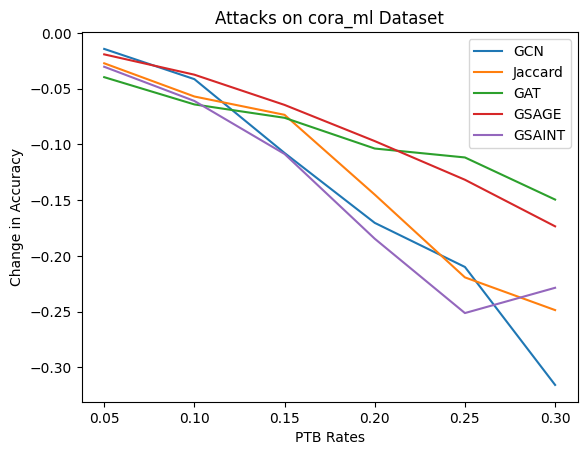

In [28]:
# Plotting
plt.plot(ptb_rates, gcn_results, label="GCN")
plt.plot(ptb_rates, jaccard_results, label="Jaccard")
plt.plot(ptb_rates, gat_results, label="GAT")
plt.plot(ptb_rates, gsage_results, label="GSAGE")
plt.plot(ptb_rates, gsaint_results, label="GSAINT")

plt.xlabel('PTB Rates')
plt.ylabel('Change in Accuracy')
plt.title(f'Attacks on {dataset} Dataset')
plt.legend()

output_path = f"./data/{dataset}_graph.png"
plt.savefig(output_path)

# Show plot
plt.show()

In [29]:
import os

def save_data(file_path, data):
    # Automatically create the directory if it doesn't exist
    os.makedirs(os.path.dirname(file_path), exist_ok=True)
    # Save the data to the file
    np.save(file_path, data)

# Assuming 'dataset' is a variable you have already defined
dataset_paths = [
    f'./data-arrays/{dataset}/gcn_results.npy',
    f'./data-arrays/{dataset}/gat_results.npy',
    f'./data-arrays/{dataset}/jaccard_results.npy',
    f'./data-arrays/{dataset}/gsage_results.npy',
    f'./data-arrays/{dataset}/gsaint_results.npy',
    f'./data-arrays/{dataset}/ptb_rates.npy'
]

results = [
    np.array(gcn_results),
    np.array(gat_results),
    np.array(jaccard_results),
    np.array(gsage_results),
    np.array(gsaint_results),
    np.array(ptb_rates)
]

# Save each results array to its corresponding file
for path, data in zip(dataset_paths, results):
    save_data(path, data)